In [109]:
import pandas as pd
import csv
import os
import time
import numpy as np
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
from sklearn import preprocessing
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv("../data_collection/all_song_metadata.csv")

In [3]:
df.head(50)

,song_id,song_name,artist,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,0HzbDl381rdXtSOaJk20eH,Suffering You,16Volt,0.509,0.9040,7,-3.686,1,0.0579,0.000026,0.716000,0.3340,0.6110,141.949,187520,4
1,7zSvbQuYJ4AhGLxsTRfCzv,Suite in C Minor from Ms. Lobkowicz: V. La vol...,Charles Mouton,0.444,0.1130,11,-21.429,0,0.0500,0.973000,0.877000,0.0828,0.4450,102.652,183027,4
2,1MMp1H2Kib2BCDtdL5nL63,Hey Jude,Wilson Pickett,0.561,0.3850,6,-15.330,1,0.0323,0.146000,0.000496,0.1710,0.6640,81.599,247733,4
3,1qylvO4iCIZZcqc4TqSjTZ,Zombie - Acoustic Version,The Cranberries,0.469,0.4270,4,-7.954,0,0.0241,0.004140,0.000038,0.1280,0.0821,84.053,241560,4
4,6an3qGX5IcVW8I36JY1866,Fuzz Universe,Paul Gilbert,0.541,0.9440,6,-5.294,0,0.0491,0.002400,0.365000,0.3530,0.4520,132.012,423307,4
5,4Hhv2vrOTy89HFRcjU3QOx,At Last,Etta James,0.171,0.3300,5,-9.699,1,0.0329,0.707000,0.003810,0.3020,0.3150,174.431,182400,3
6,0OhpOmbSSSlNROas9zGP7N,More Than A Woman - 2007 Remastered Version Sa...,Tavares,0.629,0.9150,4,-4.181,1,0.0729,0.157000,0.000000,0.1420,0.7570,108.950,197307,4
7,5MT96Zz0ymUJNm8obKZQr0,Soy Peor,Bad Bunny,0.732,0.6050,0,-3.150,0,0.0860,0.679000,0.002900,0.1140,0.1430,115.942,257328,4
8,7z6t9FzbkML9y9iIxqqldr,Animal Farm,The Hope Conspiracy,0.381,0.9700,2,-5.218,1,0.0653,0.000027,0.055500,0.5280,0.4500,152.748,220413,4
9,2rhX1xPAUJa7Lu1iiRfz3B,Rapid Fire,Santi,0.789,0.6170,1,-6.007,1,0.0934,0.857000,0.024800,0.1110,0.5000,90.082,192000,4


In [4]:
numerical_df = df.copy()
del numerical_df['song_id']
del numerical_df['song_name']
del numerical_df['artist']
del numerical_df['key']
del numerical_df['mode']
del numerical_df['time_signature']
numerical_df.head(100)

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,0.5090,0.9040,-3.686,0.0579,0.000026,0.716000,0.3340,0.6110,141.949,187520
1,0.4440,0.1130,-21.429,0.0500,0.973000,0.877000,0.0828,0.4450,102.652,183027
2,0.5610,0.3850,-15.330,0.0323,0.146000,0.000496,0.1710,0.6640,81.599,247733
3,0.4690,0.4270,-7.954,0.0241,0.004140,0.000038,0.1280,0.0821,84.053,241560
4,0.5410,0.9440,-5.294,0.0491,0.002400,0.365000,0.3530,0.4520,132.012,423307
5,0.1710,0.3300,-9.699,0.0329,0.707000,0.003810,0.3020,0.3150,174.431,182400
6,0.6290,0.9150,-4.181,0.0729,0.157000,0.000000,0.1420,0.7570,108.950,197307
7,0.7320,0.6050,-3.150,0.0860,0.679000,0.002900,0.1140,0.1430,115.942,257328
8,0.3810,0.9700,-5.218,0.0653,0.000027,0.055500,0.5280,0.4500,152.748,220413
9,0.7890,0.6170,-6.007,0.0934,0.857000,0.024800,0.1110,0.5000,90.082,192000


In [5]:
X = numerical_df.values
X_scaled = preprocessing.scale(X)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


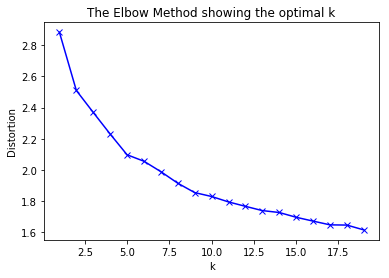

In [14]:
distortions = []
K = range(1,10)
for k in K:
    print(k)
    kmeanModel = KMeans(n_clusters=k).fit(X_scaled)
    kmeanModel.fit(X_scaled)
    distortions.append(sum(np.min(cdist(X_scaled, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / X_scaled.shape[0])

# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('Elbow Method showing the optimal k')
plt.show()

In [6]:
# Optimal K at 8.
kmeanModel = KMeans(n_clusters=8).fit(X_scaled)
kmeanModel.fit(X_scaled)
labels = kmeanModel.labels_

In [7]:
results = pd.DataFrame([labels]).T
results.columns = ["cluster"]

In [8]:
print(results.head(10))
print(numerical_df.head(10))

   cluster
0        7
1        4
2        6
3        1
4        3
5        1
6        6
7        1
8        0
9        1
   danceability  energy  loudness  speechiness  acousticness  \
0         0.509   0.904    -3.686       0.0579      0.000026   
1         0.444   0.113   -21.429       0.0500      0.973000   
2         0.561   0.385   -15.330       0.0323      0.146000   
3         0.469   0.427    -7.954       0.0241      0.004140   
4         0.541   0.944    -5.294       0.0491      0.002400   
5         0.171   0.330    -9.699       0.0329      0.707000   
6         0.629   0.915    -4.181       0.0729      0.157000   
7         0.732   0.605    -3.150       0.0860      0.679000   
8         0.381   0.970    -5.218       0.0653      0.000027   
9         0.789   0.617    -6.007       0.0934      0.857000   

   instrumentalness  liveness  valence    tempo  duration_ms  
0          0.716000    0.3340   0.6110  141.949       187520  
1          0.877000    0.0828   0.4450  102.652 

In [10]:
# Merge labels with original dataframe.
df_with_cluster_labels = pd.concat([df, results], axis=1)

In [11]:
df_with_cluster_labels.head(10)

,song_id,song_name,artist,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,cluster
0,0HzbDl381rdXtSOaJk20eH,Suffering You,16Volt,0.509,0.904,7,-3.686,1,0.0579,0.000026,0.716000,0.3340,0.6110,141.949,187520,4,7
1,7zSvbQuYJ4AhGLxsTRfCzv,Suite in C Minor from Ms. Lobkowicz: V. La vol...,Charles Mouton,0.444,0.113,11,-21.429,0,0.0500,0.973000,0.877000,0.0828,0.4450,102.652,183027,4,4
2,1MMp1H2Kib2BCDtdL5nL63,Hey Jude,Wilson Pickett,0.561,0.385,6,-15.330,1,0.0323,0.146000,0.000496,0.1710,0.6640,81.599,247733,4,6
3,1qylvO4iCIZZcqc4TqSjTZ,Zombie - Acoustic Version,The Cranberries,0.469,0.427,4,-7.954,0,0.0241,0.004140,0.000038,0.1280,0.0821,84.053,241560,4,1
4,6an3qGX5IcVW8I36JY1866,Fuzz Universe,Paul Gilbert,0.541,0.944,6,-5.294,0,0.0491,0.002400,0.365000,0.3530,0.4520,132.012,423307,4,3
5,4Hhv2vrOTy89HFRcjU3QOx,At Last,Etta James,0.171,0.330,5,-9.699,1,0.0329,0.707000,0.003810,0.3020,0.3150,174.431,182400,3,1
6,0OhpOmbSSSlNROas9zGP7N,More Than A Woman - 2007 Remastered Version Sa...,Tavares,0.629,0.915,4,-4.181,1,0.0729,0.157000,0.000000,0.1420,0.7570,108.950,197307,4,6
7,5MT96Zz0ymUJNm8obKZQr0,Soy Peor,Bad Bunny,0.732,0.605,0,-3.150,0,0.0860,0.679000,0.002900,0.1140,0.1430,115.942,257328,4,1
8,7z6t9FzbkML9y9iIxqqldr,Animal Farm,The Hope Conspiracy,0.381,0.970,2,-5.218,1,0.0653,0.000027,0.055500,0.5280,0.4500,152.748,220413,4,0
9,2rhX1xPAUJa7Lu1iiRfz3B,Rapid Fire,Santi,0.789,0.617,1,-6.007,1,0.0934,0.857000,0.024800,0.1110,0.5000,90.082,192000,4,1


In [92]:
X_scaled

array([[-0.32313475,  1.23228925,  0.93541839, ...,  0.58505411,
         0.78258894, -0.33270849],
       [-0.67618359, -1.62819052, -1.65250959, ..., -0.04816541,
        -0.48267198, -0.3519852 ],
       [-0.04069569, -0.64456157, -0.76293214, ...,  0.78722661,
        -1.16052368, -0.07437143],
       ...,
       [ 0.47529876, -1.75259065, -2.64389473, ...,  0.19596742,
        -1.13222217,  1.74561064],
       [-0.37201844,  0.31013711,  0.37080873, ...,  0.11586133,
         2.00786071, -0.04873208],
       [ 0.37209987,  0.37161392,  0.75849472, ..., -0.53261649,
        -0.5046306 , -0.38985644]])

In [93]:
print(X_scaled.shape)
row_1 = X_scaled[0,:]
dist = euclidean_distances([row_1], X_scaled)


(63217, 10)


In [94]:
def closest_10_ids(row_dist, df):
    distances = np.argsort(row_dist, axis=1)
    indices = distances[0][1:11]
    top_10_ids = []
    for idx in indices:
        song_id = df.iloc[idx]['song_id']
        top_10_ids.append(song_id)
    return top_10_ids

In [95]:
df_with_recommendations = df_with_cluster_labels.copy()
for i in range(1, 11):
    column = "song_" + str(i)
    df_with_recommendations[column] = ""
df_with_recommendations.head(5)

,song_id,song_name,artist,danceability,energy,key,loudness,mode,speechiness,acousticness,...,song_1,song_2,song_3,song_4,song_5,song_6,song_7,song_8,song_9,song_10
0,0HzbDl381rdXtSOaJk20eH,Suffering You,16Volt,0.509,0.904,7,-3.686,1,0.0579,0.000026,...,,,,,,,,,,
1,7zSvbQuYJ4AhGLxsTRfCzv,Suite in C Minor from Ms. Lobkowicz: V. La vol...,Charles Mouton,0.444,0.113,11,-21.429,0,0.0500,0.973000,...,,,,,,,,,,
2,1MMp1H2Kib2BCDtdL5nL63,Hey Jude,Wilson Pickett,0.561,0.385,6,-15.330,1,0.0323,0.146000,...,,,,,,,,,,
3,1qylvO4iCIZZcqc4TqSjTZ,Zombie - Acoustic Version,The Cranberries,0.469,0.427,4,-7.954,0,0.0241,0.004140,...,,,,,,,,,,
4,6an3qGX5IcVW8I36JY1866,Fuzz Universe,Paul Gilbert,0.541,0.944,6,-5.294,0,0.0491,0.002400,...,,,,,,,,,,


In [97]:
for i in range(X_scaled.shape[0]):
    row = X_scaled[i, :]
    row_dist = euclidean_distances([row], X_scaled)
    top_10_song_ids = closest_10_ids(row_dist, df_with_recommendations)
    for idx, song_id in enumerate(top_10_song_ids):
        column = "song_" + str(idx + 1)
        df_with_recommendations.at[i, column] = song_id
df_with_recommendations.head(2)

['7pnBZ0vitnvhKzgCEafZ8A', '2KaLy2FmUAGLfNsoMXJWVj', '1DHcXeIM6cEIDCinf1Nbav', '6nJPHXRpKYv2yqtalEjKy5', '61C3q9WLs0NpYCMeeLr2RW', '1kv4EFJnKkKxJuGdpBWhim', '3AHzcbJsKElo6vsCNmQXpZ', '5ur2JO683Tt1D3hPttMQ0d', '41s19GuE9OVOQuDubCMhhT', '1ztfmTElVNMYKAFmvIaBPA']
['5xwCQuoGnPdgqw2omrgmCq', '3gGtHBS7wV3oP9KEClHd4i', '0AyptO1NDrEW51CeG46JvZ', '6KJ8HGyK74nPP621nAwUiy', '3UQuIAdm6oyscUbVxCn6n2', '5pcMIdSu2SbMuAs6dfz3lF', '3ZoYLGUWHaq11pPvs7YiYl', '2tBzGzq7FDjDP7t93P2lXG', '6tRUf0lhxiKjRXVEU4cPHY', '0xoLbFbQEHe0m7FFQQJsr4']
['4dBI72rgkmG0gTzswyBTzz', '0gXj72vNlNoh7kiC8zPEQp', '6oFjPoB5DsbHG2HgL0SSdh', '7woZGXjtaYwuvSoU1zToB3', '3qq5qOc70lovPvgBqI0vBI', '50vyUOJM5ncJ6Y5YWZzXvX', '5V91kR1LrA8Y2c56Ir4jDS', '7fLTejTau0YuF9PSCOLtSs', '28rEMH4xXl10A2u5zpDxJm', '4Q4qJYgs4zZ1FFHX2nleB9']
['5weKCP07IGA1565wfI3cZ1', '5GcDTUZcv0rnKSiPg2hFmG', '4rwqrKdwlFWJ6LvPYaOtgn', '6b2oQwSGFkzsMtQruIWm2p', '397B7DNRh8RwGGnSH02hfZ', '3hQKuj4sZ9L4Yn0RC2SIrI', '6aTnHBJ1NmZ8KFuk71phgJ', '0HSqXHUdHUbDjWxYIClohv', '13yuX1i

['4zp0UU8f8INeMz7r61q1zj', '5wHNRDvNDTvAvNUllq5v7R', '0VhjSCScYGOmEKr24FBNSM', '7AXoa5HANohpZmvpdiyJvy', '46ZfPS5VpSQVU5gb82hg3K', '60xc3fnob8DL9NkGFmJxyv', '0vCjMfjcDGQTVy8KiC8RAs', '2iUmqdfGZcHIhS3b9E9EWq', '0luBzUkwlfRGQKfUwDVwVe', '4yBPSbkj2vCeiPZZUKPK3v']
['17gz8bmRy8HDUf6AZBnD5K', '1upQiytDIEZfl9ItruoXuC', '320k8OKicwdkzqwjPfHPyF', '2howQDxW241FLqdEqM4iSw', '7q9ehvNtDAyhFFD7w9L4yo', '1Sl9uQgo8HacE4FCQiVL2G', '0RJ5VBZVMNTr25yVmsKhcN', '5ONPeQRp1m4KJ0M57qBj1D', '7jmwrbrwVLtkMAAZHnPIa2', '49FKKI2uMNIz5w2IOOWa28']
['0TRnglnomElZA1IXv01hlb', '4tIIRx9NG4Nyu53Xt9e8C3', '1V52IaKwBnBKe657iOdhk5', '1UfacSuJEw1h6n3T3CqPuj', '2HsHyQP2DgYyBrOYG94Hzg', '1fCz8XdLhSqUZoIpZjpg10', '5T3O1R4vtdGTn1xUvcz8G7', '5JWihstIukxq7ZVeuH4Am5', '58st6r10Ze6QomHs0BMUA8', '4sG6J4S2FCuMr3oooYAwFS']
['1mJlPI8sWHtPoH4qUAP79V', '2EDbLhcX7HRoSj9gvG1MQO', '2YVCkTYJpv5jelYrHYoEG8', '1dyfKBML6wwks5Ont3rIgW', '6TcW32lJfjM8moN4BoAoUa', '33DzKnwuBE6lfOiADwzd5E', '0o0z7zinwZQgizcgYT60wL', '4rn33uTlzEHvGK7gEzZZ74', '6BWTZwX

['0QKhD2mkRCWqEQm3xzNrik', '6cyQhHuw8lEXgHGJlXUiR9', '5FvJ83BvPK8cmY5lHmToio', '0639sfoRA7sW4fGS1EzcQu', '1m3PvavCMvctVLbh24McmP', '5ZLzl6T8JwqMTMdoE0nCbU', '1f9QIJMihUFhVaGCuWyqf3', '0uuzhLSMcJhZIY93Fgf0Wn', '1uf5f99kLdlmUBEvVqrFyy', '3zMVsONH6RZv528HANVm3Y']
['5Qxs5fFudc65pKMkTGtube', '3oMbRQixfQhRJ9AehMPYCC', '0sMImBteCIVUKNhcyx3Cyx', '0WGgEXJj2L704O1X0HltGX', '6EeYBu8RautSHkqJeWgKff', '1zYkxcqbuZ3D8u8BYdI8Af', '6RVXhNDymJyAHeM6D0bTLR', '7vpvMspRgoeBTxOwP44a1Q', '3TSdkwPeUfvgLwNTF8gfC0', '2KUsADaKnoj8yZDU6fHzED']
['7zXccMrWw9YKlVGMRsNERH', '2z4pcBLQXF2BXKFvd0BuB6', '6y8HFzOElxz4K6nVetXvgK', '56akkbIvSdTwtmIQODXGCd', '4bGcwP6hDcgewarP7lExHG', '6BkrXCgCNqjuemUI2o1Mtf', '5oqjBjNmGwA4bIH0zmrluw', '7kxNb4wurmBtqndlzREd0J', '7oYouEGAQJpU75CAWFEMi2', '7snkvy6QMFnkQgnUjRScY4']
['7nxPLz8uUvjnnunEak24jG', '0oZZUl9SpZ9qQvn6HtxXOR', '7jKp4Yl1p89ByCMOjh2fHR', '4x6aawsLyPkF3aGPXGvbat', '2cXHGk1xgwKBghFTBTYQJ5', '2W540AXgdQY51tgniBvmIo', '2aVAlLn2uez3xpcXxdiVek', '3j8nJpkzVp797T8gEyKRND', '0J67SeA

['4IIUaKqGMElZ3rGtuvYlNc', '3uJsg8xIH7OpWHxuJaMLJX', '38Zr5Q5O5o6CYaioIRHSqL', '4hQ6UGyWQIGJmHSo0J88JW', '1bc72KZ3m6R3XBhObLCFDH', '670DehuXUvXSt7JX69BM1m', '6WVHotTBHCfpWaBD14sEkC', '3E7dfMvvCLUddWissuqMwr', '6zhK6WjjKUdNjP4LZ402Dg', '4uD9JCvUPiWqeV0bvqnv4z']
['4421nNkvsHJPG9cOMra8ZN', '36vROPdYhE7MiUJjZ04kPU', '14h8cmKPqkiYB27YJwxyvM', '6211677dXtYBGt1zwjQNlv', '3TgPhPv7z0D4pQhH8iKmDW', '1nzQhAyJBeWmR75nGcrbKG', '7IhaIquZS7xYc1CqXy8XOK', '0kD586ste6xyDRqUYhVlCh', '7Aw2zBxuyMrrPuxugAcZwr', '6b9a9ov9EhLe46Byk5Cm18']
['7k5vGYshwMZQy2jrZoWnDO', '0RXDT3XKIyRoWXLBSjbTQr', '2auyi2Lqfjnm9MimapjeCM', '3y6ok4gZSvQkDLlu89CwlO', '7Myp2yeW6975AawRTWtiuH', '26JQwrX8kCxy6UZ5jaJ7Me', '5mQFTuHiwLBOoYXfT5uGbM', '3VOk7KeoiZRaUfwFJgtuA9', '1AbIKgq2PZ7aNQQo747VyY', '1ir3FqdSI4iuemAzzP4Bp7']
['4KTTD5t4qWT80L2nXcavag', '2UHTm8UDAOhCy680iIB1iv', '2Pph0CUJ8uksCBzV6iyuQF', '6xAdFwLNed6786FezhUMVS', '6lyjY05tO3zM1neukRGQ4K', '6GDZOyFyaEzb5wnhIrCFnG', '6cLsqd65vFaW4Y5M90ID8W', '0hJJeoT5Rmi5IF3ZhC7TIZ', '2Vgdge1

['6tUFAewWAb5OkcYiwzSdr0', '3HUSdjk4fqpcJQ33OmtK6D', '7DEEloJX1Fz8vE19Y2K37u', '4dna9pp213lAcnSrbj3xGn', '65UlLNSwnKaRTmdDz4OtYX', '49eAIPivcw5idA57ZWnp5h', '3nanWt1pkU2yNgdLdAJ9Qc', '2QGa7i7o0UwmgUsSkM8Tt4', '2iaCM7WvOknQI1230hA9eK', '5MS3LTJ8zXkxMobDgFhvMC']
['3cuRIW5XcYEcWyWpBjIXHP', '6FrzpQfFSaXHncAUrkvBhp', '2CPqh63wRVscbceKcPxwvv', '4hPxXTBcUoEQjedrVPXelB', '4YaNLEPw3MrIgkGOkBrAh2', '06n6MLzGmwEpwHcEpDbNA4', '4DzgGTs7eaS6DHHOp1xcyj', '0gjh4JF2xiQAWHa5qmwI6x', '2EUJevXSkEpjRWyNMedREI', '7hjWFO88DN3FroDMRIcehn']
['5qhPqvVnnTsTsc5kokDFEd', '2VxGUxBKOS2xmYgQ9tXFDg', '5nwj3GrorH7s1oaSlVleeD', '22aSl53GhZ1y0R4neQ11pd', '3uZFSiCurXd9Jm3OIfxmAb', '4dk40nfaQav6b4ZsJ9OYUo', '0p1HtkrNYxv0iDfEKwXSTp', '1WOKbwSs2rpT3Ot19u5tcu', '1Z5L1sgdPUPfcuxsfaYzcB', '0PQ7Xe5cZxsm8wqmTHZwwd']
['60Ne3aGDgfPayz36USh52x', '74eN3ZNL7krJw1BIcjA5pc', '0UNTBB02C1aB55Fu4H63qd', '0s5DNDV6LAKn2u2Ufa3VjQ', '3WM3XDNCzEsLvtp59D9oF7', '2qBNmCtprsZoCfpE0dR8xR', '3uvypVUsiIr1B0BccIcsEh', '3chOtZ9EkYWYLT80Gjcptq', '1LHvNi1

['144bBmo94T7BeFwEQPwmff', '5uTDgH6Y4SQKYZ3XtsoQCt', '1uKTddJWp8sTcSJ7mT6SjE', '39vYc61ZZIgfy8VfeahrYv', '591lmbSuBBGKj7HwpPrDMG', '7yhMRJ4UAMQqBoueawDEVV', '3Q5KEW1SLwluWdlMji76pU', '547lzINFxtLNPGzLdamVHq', '71f3z0q2k1E9GqIxqh3sqf', '5rwQ4nTavPcuFFHmpBh8Gb']
['0oCRlGK8emjbic7McRDFAx', '65DIIdKCzMmknPUXfQM3kg', '5FXIXX9FniNJfHd9DJrOop', '3clFSnNMahKU2VnkEoOiJI', '3nOHdE2kXV78JXkkjKM8yS', '4ZUlQw3KS7qiBrgJxSyel0', '3HglqdUmZR3bWR9bRMqg9g', '67F2FBLJL9Wn09qvPe6XVa', '2m90tb7LVshMtlgGW2WpzB', '1HTD0qRskBza148Soi7rqz']
['47weUXMrl53DlYv6hNsPn7', '7L3sQ9DSqZTmxkxZy7HMxe', '6NLy8oSDKKXfHfxpKeAjOt', '4eihdGG3Tga3oFq4yqCDeL', '65gaRY87FjjrRUbTjq5Za9', '07b7DDEANbnrvLbk6EUAt5', '0xWdeE1STnWxPJdpbcl3cs', '4rdGg13rPCExHusDsMNcJs', '3KQu5t8RJ2UaEgrdfbotp8', '5LTuAtrv6O3ex7dvULOuA3']
['33TLxCNxXr52OQFz6p5Wh7', '7x8dCjCr0x6x2lXKujYD34', '6q3HWvipivkRvT8x8LQXEn', '00qPGQA4OwoHoZl8cHqYQP', '70NEQeOCAz5jl6CS8SQ6Vg', '75aBCMT86TKSlEgpIz1tT9', '31z7g4RzMGT1zV62rksUKt', '4y77n84Mlpb77Kf8dDu2BB', '4cPxEYi

['6aecTpGnIS5npandEqhedn', '6BaCk0Dx2NCjDjMARCJ6YQ', '6RayQVV49jBCUrLXdzWKYJ', '2KA7l6no9XC5YPsSheJ9Eb', '3PXWWcybcUtDtBmzTbh7TZ', '1ErNPyKZghHDk9ATGkeQdW', '3h80WiqYmXAbLLpSY5VCEH', '5JFwJmiDCcqFhzGTdZpSIG', '0oEyHSpKeqNHadge70K4pH', '2vkGnb8jj4UkjgYeMHjk9V']
['6GE2eV1WhCjLY3PWixC1M4', '2ewW50QGufVvqP959lB8F9', '6GL6RkpLjE41nlzuBlP1pe', '3wBa0EvMvIIUEvPYsIuqKT', '0EMK6moKZgYwnxruVDgnUE', '3zECQWhwAEydeK9jUTPamo', '1q9GlEop4xv2B8KzeuZqLz', '2FuPPSFmGj4XIJepeHwz7D', '0ig4lxtPqcFTUopvk57nQy', '1X2Zd5wKGbY1oKzb8dzJRy']
['58nciIyr5vKpUJkUXXkxCq', '3N9lKNTyFzO7leElimryKS', '4nPg1JG5d7WrgGGOmJHrbP', '1NFAUR3kUJLOdoNk1qi3E4', '20WBfPR5n1QyD7MyJC2Vr3', '3UY4s7F4Ard3T6vm7xcJxQ', '3qof3ovezRNG4uubNIjm6S', '7FXXVMGfMLy1IkmgDIZJBp', '3Vv0IqW9jA8EDKd3iWNutD', '1dx7c3AyA4F9m82gXMqSQU']
['1dNB7cpCB5SlHHfwpCbYrs', '4pk6I8l87QhPwvWT5Wan0Q', '5j9xOabBmfilEU0K2TUh2y', '12J2Q2Cikcn4H6SAhD5dKL', '2B6kXQao1fw0ZOevX5fOA2', '761kW7EB1ZjHCvGkEhoWHd', '4s6zQKQOcxfmxaTAUSL7BN', '5GZbICQewalnBpV6OvrUsx', '69xdPh6

['1FrOGSYzAc8JpJXo4jdVub', '2JSnL1yIvXW2PMXuPLD4Vd', '1TDk2Jmi4dVZhm2dum3Jim', '45HAjqRWiNv6mMPw4NvZrU', '5qoD9i5DqtUWKaxyW29Yt7', '2qJkesdHu9sMMVFgkRkqhQ', '2aFsfzUuXuxDr4xo8ndfUt', '1aYWQrIT8XPdtV4hhUjczN', '6cu5ckH4xzTMbwLPLi5uLR', '5HqIztktvbSyOAvPNZCjj7']
['7hIuqgdZ0ya8uuFMOl6wyK', '65fHIyRZmMoQYEOKE1pDex', '1ErNPyKZghHDk9ATGkeQdW', '6RayQVV49jBCUrLXdzWKYJ', '0oEyHSpKeqNHadge70K4pH', '5Rhamjm0XRPoXxqqKrNwnz', '31ydFaYHyF3TSER34Qb0YK', '3tiwtgY2KO2jNfsW3MiO7W', '1LMMuh6Do29Q3iPTMKAEsd', '1n3EIDZNd1YxWgH241MkFV']
['6GmhDkyndPc8Us9ZfwjrZZ', '3v0ylYF51SKkgAi4PrfKTq', '5ygp81TQpolYKghQjdYZpD', '0TPJpTRhfjL3LNNpH3qrHE', '44QuB3C2kNlMoGvyUsX0hL', '3C6cBuoaCs6DuPFPJzh9oG', '3HE50TVRquwXe9yv2HFoNL', '0hZq41hLz1NKdGKxi9EQAn', '6kX452oUUNojKWNNuc1nqx', '51IlGM4BegTfY0SAXrxRVa']
['5KubAwSuCHu4EEd5Q4kUsZ', '4IkCvLPQfBEclen1NuIDIL', '1xQE0QHrmJUQweLoMB0ZWC', '78eJNdMRum5h09ojyDJP0e', '0qNMYi992eHV54PjDOs2Im', '45DElIx0dXqUH4A88yQFdE', '1k4mpHKmL7UWoG4Vu81VxW', '6367295uC374SiuohHjWKZ', '6xXIMiJ

['1Zgy5BpiAKSAhnvWgOrwIz', '5fApvN0Ao0PlyiFcZcEFMc', '0t38MySDtnGG5hh47p8WiA', '3ebXMykcMXOcLeJ9xZ17XH', '3oT0meSM7cOZMRRfFK7acx', '1258tSoXDDa43uqT75r5N0', '21vwWfS6qvxh8TN3lgHvZr', '3ZBRYan6nSFd1wN9vsvEU9', '5OCJzvD7sykQEKHH7qAC3C', '6TJaHZlOi9gdhcs36pjmOw']
['2OXVvNEILOCFxEHEElOHTb', '2P255nGNuxA0sYbza2JrX9', '1OHJZQs2Xm9OrAl7qyNRc2', '3esEno7VbHhFQly6SYeBV8', '2g7gviEeJr6pyxO7G35EWQ', '1mDupi4yX9KQ3Wh6oSYqNP', '1noWIYqgKF7dv4IGSL21wZ', '4yQQBqVGwFrs1qvlQzsZXH', '597i9UhHbW8hHgBUp8Tm54', '4q9YY8eorYGjpjk3Zko7l9']
['0C7vjcFzE0V3TvyAhOmLWD', '5FoZCDCl6WhrAIm4Ygyjg7', '70nfm7IEXnFdxLtvxdXnZq', '7qoZvR6jc2ch8A0uAu18KQ', '36XWhADD7DpCYfe2EYwgWF', '00CXUMREit80f2McJsjcIz', '2d7FoK7amJiLOk6S0IT8AS', '0NkxSU0b1Jsw6yK2mJZru3', '6N7JzrteJv8lsr1GWYyu0b', '7n9GNIshLB6CEUiy8zj7oK']
['5MiQly7cdHQiP6JBX1PSYG', '556QgSgtBMDIPRDkdRnvxZ', '0ve4aPQNF5avvi2qfFLYrs', '5l8Pg6N9iakstqcE6i1EPo', '5f2gNhegc13RpHXQIphoOq', '1D0WEXnRvglieRauHKrypU', '2MMFpdctgwEkUlfP3kyPDG', '70R1opiyUhg85fPBxDNXnC', '6phY2gn

['6YpyKmgTxZahaGmMb4yakx', '59cPOVxrn3Yjwydl1pullI', '417IOd0rgH8UxwIAJVRxA2', '78U68FbbLucWe8WvaY31Pj', '3cEGrIvZwhNbTH7Y4GUPrn', '6nx5HcurSOU0lVZYhoY3k6', '7Cv324ndsMb3BHTPoVWVkc', '5tZRpSED7xwhNGex1NLKx0', '4wXAuEoDHsS4pOcjWpvD8O', '0nrvW1YaJAwk7CCiiMGgcy']
['5g97GAdru7XfeJyJhViIll', '3R5dytDu9Y6z5yvdHVHMQ5', '1wTvX9yd2c4wRv2yZNTjmH', '4PKRAcbN8aPrgzFe0kOxRx', '5zT5cMnMKoyruPj13TQXGx', '2mbBbq3QzcgkOEaBLs5e4t', '1wD6f9X1WanpowSYMGTcNm', '1hwdPQtFHISvZ9SXMkNrIK', '0EANX0OVKSCcmarY50Xa4p', '7or32cFiQXLE1pHMIe0RVk']
['0edt0Ar7ewLkMqy0jUtSWm', '6BF9qGTbwHweKyit2gEtsa', '36rdBb7kFXXYlrkIDT2A00', '0d1JQdBaeetUo8xAiKCT3C', '0o2S5PKRkpTq8dLx8O7W4j', '0EK84QzkuwQ1XbaTrCLEYC', '16pGi1ZNrsPvx5TD8oFleb', '1AXQ4ZCUueIfGGEYAdq9Pe', '3BpiaQ6oZCoTZJmexcB4co', '7N30pzJGFwnYU8iuzxWS7l']
['0MPWtvb5xSdQlzGSnm0hCh', '7mYvtEeBdMqRSyj1Qpv6my', '6TZOpfUKoxO5L64HYnCQvo', '7n8xH63Whw5spavIWScPIh', '6E7GD5rkMfNRDX8Gp5sCQY', '4PzsYXrHh4r2BxtpNjtvoF', '5Q44ImonqI9ixJ3tyYKMgW', '1ofUihmiTGU4xETMZ2gwfN', '1DPWJRU

['39IsH7B5byx8NRlEKlZVg9', '7rZWvXQPGt0IC3q2jmt9yO', '7FjZU7XFs7P9jHI9Z0yRhK', '5sqPE9h98DkO5ms20NUiUg', '66Ou92zkljfjZzgQBwI2zL', '4tke9BbjoZSaDL8csRxYPL', '7g0FITg4Uhq4A7PLzcOQPg', '3NkkcnnKrNHv4AiGaPdD76', '2QWgR1EmEBT15fkRW9DLB1', '6a9vKVMFfNBi741DVSit3H']
['7ANroj1yWw0YEGcLf7HO3Q', '5IWvWQhUwOtRbfiAJxiC8k', '6SUdSZgDRlOah9Y5s7kqGT', '3LJr3TanDnPqDHXWzet4Yi', '0E5ZrgbRKXwGvNhwzRaDGL', '3vetyGs0vfHn5BE8LpsElU', '4nPg1JG5d7WrgGGOmJHrbP', '20fksfq6sLM4RcepYoaJLi', '3zmtWoq7Ra7FevtpSfCx5A', '5LanIEBtb4y9T5Vztt7jyV']
['6maebXZzQmzs805GU8UuhY', '11wKe8bZjcb3npZX6aAcXi', '3tgZbnO37GxoZHBxCGw0XM', '1TaZIFouSAMAXNwjjaYfjt', '1OMdL6Ut9yYWgq05eUKGuq', '5u0STWxn6D1SI0nxhKHzgu', '4vRzZyXWtxCqs4WWKGwxlh', '6zSQt8h1Mcgh78mnkDiVH9', '3FtFrHEbmbX0WHr8g5M9fm', '39BDUV5ZEEUThCfVV5ria5']
['3o3n12FarQwxCHsynfDHF4', '2h9JOaJyalWHqsWgZCfpZD', '35AQtH2jvFrNLpuyU7HuFh', '6GqE7Qq7lxtQSH1fbzuRbp', '3Bo6YV2WsxbcbeOg5qFhry', '74M88Oto04H50bkkwtzuXV', '5PUHGnMoN4KJAGxoE8Dmmt', '1aEShhnAFX6JIBjE5nguyH', '4SDTDpy

['2UqABRs8RMrgjkYZZ6VawW', '0RgY5AscnhbjV4ZFa3R5mZ', '39vly7Z4VLImfggnEDEUzf', '4HNj7TkT9VnfVjtV2HRlpl', '3YT5OCo7G7nDFESCfGHt19', '47Ad1NzqPuUFbCIURd94Oj', '0s58Xx9kQFoujKAuWM5k04', '1yWdMYNQVSTXG5KES3TxOB', '72mNADtQDzlS3svnwuTRqh', '4KnnWpUyPfQD6X5SQSTlH3']
['3uVh1pofkz55DTyQB5sD6M', '7tgMwYcqWpfZXKIyFcu62O', '6YEOmCsXSk9ZPE0FkcCiuQ', '5FDGmW9TgycCTVwPnKZ4xC', '6XRVsysWqcZVocw1byw5Fo', '2P5h4lcZ3BdbVkCbjWSNrq', '52sj1c5u86DAiPvnQMAPCO', '1qJHwjtHAqrrJSt50Zlkom', '3KPwt1LBpt1jVSHz8GXERo', '07ibc51SJsgfwe9Ndg5daD']
['26tlnKBG3LeFAX1sLysAev', '60MgZvCN1dG0QzOnqqtQUE', '3OLFqbd9ZeVjaUKTiaLsD6', '0ECtOTGgOhHYGiF9dF60oZ', '062xegh1dDwl3JutgSY5EI', '1KbzgCZyWc54TM7E5qZi0z', '3pFrmDEYiSfvTFvTdqO6kY', '5NTK0FeM8SvVJAH9JCJAql', '0ph3Czc2OgFKVTvddvbBkl', '741z0okqIsDwsSmNop8IOA']
['0dk1IMtJj58PMch8ycxfV9', '0BpGtwcSXRmpb1KdXQpLGC', '521INkNRyUxyLsZZci0PJ6', '5U26Gnw6kNIjXHNuUO9nQb', '7wQ9DeZTB7OJ8rnrxeUHSl', '5y1pSC9nUBacV4sWFo9i0T', '5pb3VX78dl5Iwnbrs1UvQi', '7kAFSrTIOiVZ0gnHBuAH3l', '7zF7MBc

['3u6rwiJCqOzLm8uoeZmRN6', '38UmFlYXLq3ZYxZ28gQGLT', '0jTJlKUegj0w7crcxzxqhj', '68K0qD0VDqdm0eWXsGqnvM', '72qAbOo20Szej4Wy1aABJ4', '4PuOUH1k3tptE6xV8D1qHX', '30wBA6LPYemLMVBrsG0CYk', '05q7SVSmOCsBnLuIITWN8R', '5waEuhjLJ2B5gZwYNOb8lj', '5Ak8Uv101vkq9zvkXMI0rr']
['4BzXsxvoN2ZCV8JxFoL8jw', '0AROOP6Ee5j65jP34ekMyW', '0VDPu1Ifhkw2dGOxBPOXdJ', '39xy3OnzXE5iFwV67uSuya', '2uozxWsaytjVA2w3JsPVrO', '0VdfzITs0Z8QGfMrGsEva6', '482e0VtOHApUnjgEd5PE73', '3M2BhGytM2R2FKrQ3QqNgn', '5mVsfYRumGlHONrZVx8hbe', '4at7acUADFiqvruRbdCOTQ']
['5MyxkAsGrKp05nNfeAkYwc', '3LtnXdDD9VFBtHy5kmGILx', '34JhrCXAX7JXmc3gjVaspA', '4QFom3fQ7z889prBoDdi4T', '7vgLVadYPhHjevCe88KunV', '1iMsfRdEDePb1ybyM7Wter', '3e90JC8EKLsSDUHmPpxkfp', '3p0Y1C5jhaqyKW7d9oskXA', '5agc2KAE8hYA4pusGBGZvV', '3KSeJ6kkaKxMUO80ybaZNA']
['4Vb42TnaYZaaTBfu3qmyQ4', '2TxCwUlqaOH3TIyJqGgR91', '2mlsbcwVU2hCvfGmRNQQ3u', '5ztQHTm1YQqcTkQmgDEU4n', '6OKhBvddAlWxxFnjbpilhu', '5zd9TgduWbfFXwgnm3K3Rz', '6vqrmRZ0t2T5WLc2EIs0ar', '33LLMc7LEuf4tc8h0NzhvC', '2P9Cn8L

['1tckg6GRaTodmxnDd4Cxkl', '0wCdVAzMXQRstCMaYcTRs5', '3rxIqFuKGYsWFx12ovYK8S', '2lGfZPogiGdNTHazNGuHXM', '3SB5JGFnQxB4P8Gh46wMzy', '10GRKHhhLvFXjKiBI3Yx2k', '6mM3QPK502fHwOYaj6ELmm', '5F1CxsOXX6altKaKlEPuox', '01HjU4jVLld4U4OtKxo6ts', '7BbAqle8lyB3S56Q9MPTZB']
['4o74y4XY1ypNZkZtZkK8Wi', '1ZHwUSnja8I1WbM3GeDh31', '3lq8Wk8sKbYNukmH35Qp4X', '1Q52V3Lq3yxsYaeZrPdPJZ', '4JAX1qhCBGkO1IM9woosbZ', '6p5I3DD3bVAJXjz0N0fIVN', '20vIaD2DFOxGqDvN0dlMEH', '64PnD6LNHnwDy2qX91Tkce', '2YgtXx9OVBOzja9Fckb4FY', '6uUbQnzl9J7rOOirRITGjW']
['3YXmkp7Cw5UXiiXjrmYgG3', '2nxBkZ02hsiU3SIowH4XQI', '67kXYrMTQbS7MVbXyGyxHm', '2q9jsX0poviVu9OSWgmRYg', '3O4ZjOswNySp5wcmglQhMj', '5Ano4JVB4uDv8fQnhwdYfo', '4ixRCvumFcXwoNrEtK4zOV', '2z8ajOxphoFaQff0mHB0YS', '62Jyekez6V8uxcxxq5sxRE', '08Ovh180covBWO0CTnJhqz']
['10yIs9zsN0BNnXJpejnZ2v', '2PKwMRpEXSSRvuI6baAhMw', '415Nm7jpf92f7sUm0xhUE8', '4yX50PMifhGzVEo1wv3guc', '7EE7jbv7Dv8ZkyWBlKhPXX', '5XBaimgVyGgQGoOexUk8Ut', '5Gdgx8sxajwAUykuwha8dj', '3zbwO2XUIbssaR0FTAKIdP', '4Vn8IIG

['6z4LGme7tL991yvpk1gURW', '5Nh4sheOYL11EWJzxhRu5c', '1wq1UtonmZYKJxFjPa6SlX', '3GQoCeZqEjRwyXwwNe1IxK', '2e9EZ2V5QGGZPMJacO3y0Y', '17NC2ycsiy8xQxgwTquyLP', '5Qul1lWPc5XPzVM8RweeZc', '2TP8hTSZrKAgDQuwdYqjMZ', '2kzRSiyignH8yzPTrWvyPo', '5txEtzoUgRw3AEP7eZWtcN']
['2SSraLhgqklJMQBzdo6kbT', '2RRE3hNrMaEu2DQPff2N1s', '2mfahQ0EaaZWq4cFNg6A1o', '2Nc8Imt04W3ZmcBF8dPQKc', '4WCqmnh4TkkqEwenyuLyvn', '0dEPlb8waIqRtKpLb3l6So', '0w1G5m3XB6euVnY3gkZiTL', '5cU50IAoAFF7qFWOtdbEjr', '0ffweDHrg4bZqdG4IfGYuo', '12PqklthxqcD6V0dWcsB5O']
['0HVQuuXGAcQ2P5mBN521ae', '4eZDMbQm12jmaTFT6fOBwo', '6SyC1ByQFMuPxdSHGpGBMw', '6QVQ98K8JrqHfImepOeQ6L', '1n21ku53K1pMOU9ib6bEdL', '1YlTuLs7h8VxqxImc1mh2l', '2wvMC5EyaaYQwBfiwwY2xE', '3qvuhGBr6BSdGPQsdf2gLr', '0lPFVwTWdwXXNa6dMNqm1N', '2ivi6WyEuYfOmlNnr0DGV3']
['03D4OnykkwCSgL74yOVxYa', '5TJP538AtI5Jnau7si69VH', '1u57zxGVKaFVhplhbityvs', '1TI15rH0lrfXmshQ88aerU', '41lVQGC4ZQ1lMAkcVI5cvZ', '1ltaPEEcL6PGv9cC34QpjI', '02Bb7iDCwvWxe1s2rYHebT', '0pWD85CDy2dU5lyWXlLpLn', '4pOJW5Q

['40PuSCcS6qI3J9iEJeP3od', '7z2IAnJVoblJk0QruwOtVX', '0TNo6QGomZYTL9qkb1zsNq', '2b2oHgRMo5QYRLft2TRDFi', '5Fchjw21HPd4hI4GnUtEp4', '2hitsKa8SthKhRJBXUHbIv', '6Vigp41BietH0WoFZ52JI5', '6NTIKfyWCP3Nm2zWB16o88', '4e6dpHanuFVUxou9bKkLDN', '5HjMZLtFasGq1zqeP4kWMU']
['5CdJveJgiGXoGwDFqF6afp', '2FvW1kJGtL2gx9xUT7Zfo2', '0oK7fjbrgLMBz3cDq4Xdt1', '6209QxIqPJxYsO64iVYRpi', '7AaIWnkDOZFDpZBcW0r6ZQ', '4OXAYBy41owXhbOoi932y0', '2Bhmj4XK33InfhqKPxcJ1v', '51Qo4o1rz2FJ5h0ie2Okjt', '5cIU5GZBbyMfgfXGcoQVYc', '4jlBiJhx1o4QTHRjvEuCx3']
['3MuyuziKAbwwTgf17GJiTl', '6qkEOXNiImSwzczLMWkKgo', '3C45EmUr7nK4u2MsDrmtm3', '1Mc68iaryprWa0S83RTcud', '4y9KofkjfoSTJes4AxGn3Z', '7n5H3gEKdsns4i2z9wMaXg', '2IsWxjVXKrw0veRQQ6OLAa', '7xlY5T0iOEqPC1AnO4vJwq', '6qvFw8dRMQmXgWqqfaiVpS', '7MxLgxQJGX6uLfvDXwxKQL']
['05SIf43ERRTKeJYrxyZCSB', '4pUaTbstTe6dCEgZ6ziP7j', '2kJ4KrCurDIIDYjHen8ASJ', '237rOWj6N5smxVfKkqzjFG', '5axwj3ekvw85989jjO8Ov8', '5d4jiXlNxqqhFlKOor7o4D', '2VHKaZM3fGGCHHaB4PPzK8', '4k6Q7ToZl7uxL9SKridmGf', '1WasQIP

['1o8n563oEpZzCj4qTIJ0NM', '6e0Sq5QPvMffzke6SMaNck', '1xndOD8CreR5ctkOv5G1LN', '76Y0gxtTxN0FyDCYh5qYQj', '7qwULjvTujatIaoWC1lu8b', '6aAclXBj0CK4EKkk0bU5Ra', '5cofxfRLsozZ5aenaoXlJI', '4rsP9Qm1RaHWQBB3FFlYDp', '4rRlkpNl7LMTAKiv0wOfRI', '20aSvDaiIHit3ntgRpCR61']
['4Qt4enkYft1kDnQOqeNLjK', '7g9YLSMScVdHQNPyUijl8S', '0Xv9yWuCgLGnozzM95dwqb', '1IpRWsHyGiaE03Z93D5iSn', '2Dd91JY6wOvimfqN71M5a9', '3LN41NUdHkyNqQhi9gExMm', '29R1IMTTbDDA3VNlk6UEW5', '1A0kR8TE5mjI5IZ7Q1Z7aD', '0uu5OLL4uQYOWBGQybAOhX', '31FPmlHv7lj8vxpMVrdEpw']
['7J9Z3GZPUi7yKmLWiIQlRj', '79kUp5sLdWLFRKPQ0vIjVp', '4JrSfa9GTkJiN2u8kI87K5', '4sg9qLqjUVP1UjPOTTofT7', '7cwPw3wT77MvYo4Q8mcDLk', '3NMtFLp7SAusoKo1UI62Xr', '5egTLIg0yVhFhN12nPX91v', '5I6y1KWmUoV5YCaIEcs1qs', '4OEgP8HMGt7oIFAvk6Ydjo', '5UcsxVPmXd974EkMtowmNV']
['6wqhStAvdZj4DdN8lSKKoo', '47l936t46PuAWOAO2JbZa8', '3iF81Z1vO0Re1eC3P8xt7i', '6jvcKJfBz0nCuQyUcVRiup', '7xqFOjNcp0NJFo9wGKGOpJ', '6gdXKvWTGKYDOsC1Rj3Q3d', '0zZIYr7bxWx4RMQx5k4R3G', '0902cldCDA0AjfeO1fyuUJ', '16MH7Wj

['0JCjhCdqvVQ8am5x689TL0', '7C2ohxOLHgJmMRWtmdZO3F', '2aC9S4iNOzmNFphPhBmavg', '5cE201rNvIkryS8N1dJ5nR', '3qWGXN6BvTe0ShEoP9hDxr', '2x7l543jPGNRicwfRirGyE', '6Lmx6bz3PGYuNSjKMnYBOa', '23CzqFXnFgaJo2L9vJXWHN', '2GHYJ0dhVds3PODKnTdiGE', '3Bh6uInhcVBVvLraGZdkKD']
['5ULRlgiSPSKTaJN1vU9yso', '1xzD1dUHNH6TmJVUMaErM4', '3nxgDgd1I9YPiTYCUgMWSd', '2nBkgxlht8knPvUQN5Tmdk', '1Ddj6nkhUP3lHpLvDqPsvC', '1608cOZINzEjaREvqEaDBd', '32aSj7Bo0rl3s5fwppu5VP', '4ySxoQwpsu9g0apj4micr7', '7tBZa65xUKMMan9tIMPqbi', '59O0lOCAMdBugXQrEGR6A6']
['0kYUrLVQOfx21xuXu7OGrT', '5MmyCzy1Lc6ywv77f3BZpV', '1MNDmPabVMFhgKy8aqT2V5', '6ChFsa3xElTTIJAo460out', '2GJ5UtNeGCWuIn8izpX9Mh', '7rKCmo4SZhKubupJdsuM5S', '0rH0mprtecH3grD9HFM5AD', '4FyZDLPO1ErUjzwnLrCLTA', '4EX9MmGTkiPNOQUBPZsX2K', '0Szx8eb4f6dcD1ymSkhUVi']
['1SDg5mXE9kHFR4x5dgcRkS', '2ccrjaEOC2KLrGnBy6IxZd', '2TKSH16Qb0zVRcqrHc3D3h', '3NOhUgC8pwJCusX6rheQ4F', '5NnNl71fwVkuB1M45CXvdb', '3G9SwzJFPgFY7aDrD6KIPB', '33Bm5XAZLQhbo98KiF3rH1', '5ukra7iKXBAjM1VnXKl20L', '6TRQPx5

['5cY8y2XgOfkAh4kSWLFKkz', '0kas95RruYRVqrOb07rgkh', '4ytyLpIwUXbdFsNOvgNnmP', '4gJzpOMYyOpVnbDXlT5aWL', '70cROiTYjJWTxSqIpIeDBQ', '5waY6jcVBvzzS362OBQeAL', '3hiInJVk1CpxELmEJiU0uP', '0Knc89pMAsIZbK8tor7i93', '24ysdDtsZjfrTIXZRKrwpw', '7fec0UcxeHVe6kHIez2GSs']
['1baLpIuaLdNehFwV5N3WUm', '4tzRU8Fcu1uOqpddEcUOqe', '2pMAmZdHfQHyqJCXJbfhK3', '1EMtgzOBs3NS6zYcRO2l7d', '1QLphCIfRMZu44Rk1Htp6n', '2oLLOxkJWJj9BbrsTc4Xql', '6TscB2SN5lW2VYfBejmyiu', '4i3lAgB6rzx7KcFiJcE7Rh', '3SG9cDGjjsokj4fcCYAytQ', '21dSZNEBy7R7SpuK8oFatR']
['04ptRnX17bfLoQ7i4pZAKc', '2fwwNsssLPQYOdFN17APIg', '57tILMwfGfxCANsZbB3frS', '5xcsnZOeoLJkgFz3uVNc7h', '5cUbs8a3T4f9xdTeBqrQCy', '6M1f126jYXwFo3eUMrOmem', '3GvyOAga1kRsc1HSdMBzq9', '7lR2d141iSyQAlhddE6pc1', '2cFCrtNuNmtNuq2tq656ns', '6hc4V6LfEbU2JibwAaGH8K']
['7DqTaelFf846rl1CHmyfOW', '03OoXcz5TPOCyU6RTR1bgk', '38eyQZq0ia89lnqQI8zlDN', '0zNMwL1RFQWkcYUPGTUFhs', '5Suh1LmmiEk2aYlDZONBMG', '27i5E9ok44Ymh7jtmN0OAy', '3ci9YeXRulpmFPDvqneVwc', '6Cm1O3r133Gmx8j5Z6Xshv', '1MR7Xam

['6oprRIQ5Vis7NXtJUPIQ3w', '4fU3wz8wbjWZea4YYF04iR', '0Szyn0SgWSx5z1tw87zbOv', '7y8nfUqN3m56KiisCjYk7s', '0qUged3a0Bk6l5rtYGMsYn', '6P8CsMuJCaqrlr4FDqELUQ', '5kfT8iYBzTf2t6dbMTsQjI', '7e7jIFwlMYQ44tsO1tesdq', '3YU16osxnEi1e0SvXIt0QW', '7DH5dXVuQaqcKf9oTy9oUN']
['3Qic5AOapFU0ZT8WRcCByX', '33Ea555jOsBXWFxFlRSAki', '5I3JZ3zvxKQMdp9rEcGkiR', '3nGc7yEGBuGtnn31RjHCeQ', '5S7nfUHhiA3kfmyMPvhV6V', '1lQeTYzW563fYgjtA28464', '3SQhomtezt5zYbos303vg2', '2RS3ZQm2U49cMHJWRhR71x', '6wlVBEGKPvOoXfGwOJh0H8', '2y4X4kKQSuAIqUJbMHWGke']
['5lg4ksIme67bNG6ip6qF2R', '3OYejGbGSMijzWFTdCd8sy', '3OdRbY4fUk6LcscOldqKPu', '1yCmXuukBQ8eL1penRuWls', '2wpIImsIxXpYonnrGr0CdW', '6j584js9MeeBIYfKMbOz98', '40CqYr0j37FWltcjoEIjJc', '51l8jiqsGYCiKUJBLXJvA9', '0tpRABBiXy9FSARk8h4Vzd', '1hZyADicbo5k0OQbwcxVEo']
['6Bl5ov7N6sw7MetxdtafFT', '1dA1tlzwcJ3YDYsSul1m06', '14cikDRwGYOB1UfdA44V4P', '5KgjRZKraoTkHAUONmVFo1', '3NxuezMdSLgt4OwHzBoUhL', '0ZWU5lJs0mA085Phf8PJA2', '4ye8U0982eHtlhlvePpxtP', '2Z4GLUVtWq0C95WSeJtWIM', '62pkeRR

['4scpF6J5uMBvoh6sFB7EL1', '5qu3j7Ou6LyQFSU9N7Sb5x', '0wbnC9AUenxp613TYaJsGK', '44gZSuP2nPUvab9ajBrnVM', '36YZKsGtyzblj9fGYKtR7H', '0EFosBRsCFEEllr6mtgP3O', '2FUNBaa5DwItJtYEBgAblU', '4OZIJ9o0cBCvDyN8YsXVoN', '4gRAniZdYF2zVrDUsNC9tU', '0CAfXk7DXMnon4gLudAp7J']
['0NtK87XUpxAnrxncVh8xzs', '3LwQDHLUQJvaNiwhM9qObs', '1NtIMM4N0cFa1dNzN15chl', '4rntZMI526VCgIA76HEoew', '1o3oXtinumXg9C840UMEFF', '0pqnGHJpmpxLKifKRmU6WP', '0oNFVyzwK6TFdFHSsD1dmC', '4W96o5vSY3ChOLPWjT9QEF', '4tke9BbjoZSaDL8csRxYPL', '6DrjofzZm5s8xpMn4IBMyI']
['2e78jMRtIhQ4nn1Ukw5cUh', '5TLnM9z7xmVMf8ZTrZmz6n', '3Z8M7xeFCENOJ3dr07TBcc', '1czNqDPs2M3AKufyOxinDR', '7iLA6PQeQWRjLDHOJgGpj5', '6V0cw3ZOtm5oQJrSv4QluQ', '75cmfIlWyEdZjc1m1YjDWD', '3nKEiJUeaWn8q2O9I1xwlB', '63S7VKZE3X5wHVTmSwxuSF', '4kBEukzkShf0QOEzZua0Ss']
['3f6T0odYhCCVPJ61YF6UDC', '761kP7yDzrhyFjn6Og7Piz', '5WtvoPeSpp6pIp9bG6arVS', '24jvD83UgLmrdGjhWTFslY', '2IqjKEBiz0CdLKdkXhxw84', '2aovKBNuO4Faz2OCGZ6zEQ', '3rSygnXIRbxtJ9suj12MqW', '2p5BCQgKl8w7SWRUY3H1w8', '4mhcNoT

['4efaOZQDP1XwApNaRc7UYu', '4HfArox98OAJ9BdSVBjOWq', '7u18aQ4yqpvISni3mKmuix', '2hv2NiSq8p4pgL28pxcqAJ', '3qqoTjGapBrc7pSaujF1Lr', '4wQD0djo6Id4fQLQeRKQ6e', '3m7V717IKZqZLW5qUIOxdD', '0NDeB1JOGniNUbc0z2LuFb', '32LeejF7YD6TC26mC5o8Q6', '3mmxPjvYd8u40fq9z5ZQVP']
['6p8eFfPw3nQkf37aT3AkmK', '5wQnmLuC1W7ATsArWACrgW', '7dN52YlyGl6c9tmxdv6zMp', '1gZlqlXt69ViTZnmNa3RW7', '2yCl2e532H8Cv2Y5VVlfY7', '2uL8wuxYF9V9VVfvGXe21h', '27n1ogYYYWtYX1Zz2sZhZP', '16A4OFpd8nlQ2ooX9ls2VL', '6TfLCx9HqVgzt0MrA47kzu', '7hfi4ZTfV7akmGINh6qYCF']
['5axBwqXk8lLdtdc1tLCNPn', '0NCTUp4yL2pmYd6t1hXvsx', '5Tybis9p4M4TX2gJM8iqgh', '7mrsLJSTzTMRQjEzWDAlOw', '3EQmxONizS93XCmtdRRc15', '2fmzK2KKJSiaCdcb4xflzE', '53uc3quxXVrb9sDUdkfYEb', '7wywcX1oHKTVQV1dAxeaXq', '2bQsVhmshdC6QhJKISSgCi', '2P4Iw3REGzcWlpg84nhZo7']
['3fPMRb2gcFTZcYmR0bXnDc', '0Ihu6hcj4hrWVz22W3G10P', '6wmvyRBDZ2RQ0BgT9QW5ki', '5x0BQY5nusnBNqbmgaKFIp', '05fzteOLEheflpw2UEb6LY', '21DCAUa5hBGdNhDBSDAuCI', '1uml73HXxRC9qB17dv5Mdf', '44NbXELlfdkdtZESEZYC4u', '7xgPPws

['1XDLcR3ykWZx7p0UmMoLKp', '0UP9hnZMZApkQusqMDtmI1', '53Y3z7kPzelQbBnhysjzlw', '0FsY5GbsdBeU6IjNYcpdNe', '7i9dVsjX7Jv7woyqPpMJLn', '596ShP1KQsIzk7dTpJNXJi', '5sjIhQzNljMVrDklI91ezp', '6sAdmaffuMijDszeFrGF1H', '5e3UWcbvTaF5CJWu81MqlQ', '33tK6XeNplouDAfeDUF0iF']
['2qfWkO1ZRcSdeHb1Cb3xIi', '0gfLC4KZ7tLqGpYAlKcZ3N', '4YnkTuwQDmFRaeJ2SeZM0r', '6uIpf2e5PrB0ZMufi0AWpL', '2eoUpsrvexAGdnRvBijudB', '3Du2K5dLzmduCNp6uwuaL0', '3m660poUr1chesgkkjQM7P', '00xiUhvY3j3LOB8mZHWP3m', '743mWMRgafToEUJriLLgkg', '39SQnz9u6zd91nZdaPmmJK']
['4eyOZVDzYlVslh6POZ9AVP', '5RhcEhJpEB4SF3Zvt4GaNe', '64ltkWiXTteDM5x4s1XP1M', '6jP8veGopi7UjFP8Uk5prz', '1DtJp4gl5ORnbZZzXdnLM9', '14BCMJ8KuNw1Hwan7iCICT', '2KCSM5EtphgJn4dGzNBixb', '3gCN5z5Fy8b7iTJDKDk2JU', '6mQc9F0vBWH0sZbx76aZCf', '7vqJA6lq3xwJo864bBDfrR']
['5hs8G87IGQq0Sz37oY9efX', '0qmLutbPsSY41baTrDVIIL', '20yy7wGUByZptk1ww20KIC', '68mzU8iAvNnF3PCidY66K0', '21ZbFVuvLaV4qSyTTwu9j7', '5jAVfaLqAugSCIDM9Jvydw', '01jb2YsLdnRu3YYs777zSk', '5nrpIB2dVUvhRUs5R9YJ3W', '7I8OOfd

['3HJGopJTejF6WRMmIWu2kS', '4YIwhPKfZKggNaysGUjgi7', '2DCCA7AwEslJ7jEaEX4Frf', '6kOMzR2AzmOxVK8QDVW8aD', '4IIUaKqGMElZ3rGtuvYlNc', '4XkCRUn5YrBwLkCaUwT59x', '5oRhB6tdRtLGb3PyeKJsaU', '4z9gBZQjGS4QLb4LOvmeuA', '1c6Gl2V1HGYPprBmKJdiFj', '670DehuXUvXSt7JX69BM1m']
['3ychV6Y7TGNXNQlQFzQWVk', '4y9Kf8uLFBhMuBeuLOJE6m', '5Sj81X1bTs4s0LL3fHPXdZ', '4xHjKYOEPsTPrkDi8N9YAO', '4hhSv6SYHkNL7vXqZRBdUG', '3d3dx2WnBHEYIq3j9onh0U', '0eA7Z1oR8cDdhmE3GpNlQz', '5KSIXFpqPmGyiNb88C5D17', '2sGLhKq8vpguMHT8FuSnHg', '7KQSgsv89KqOtXianDUqRx']
['2KKAsmZmWc6eCuAutwGewl', '13D0uDQBuE45fMoPhHGJ1o', '0hyB8nQAuNkjO4djeVbkA8', '7adF8nbrf6PWrdK7RPVjyF', '2hjIqdLhL5qUtOA4HzMQeQ', '2OT0D7g8Y0CotmE5DYcbvy', '4gtH4EmavpjGHTt2Pxo5wZ', '6g6U5Ip7Tvm1xsctpflOuk', '3lw4OExcjj4kba4uU9gF4P', '1A3uI6VucWz1QlNVEljnCQ']
['2nT4xEbjiVYpSSi3c1VAkM', '08yVsp68uSHEd1GHDj8bLW', '4iLzO78TtsAf2aiAd8RjBW', '6qJD9v2paJkf0TcUoWO4wa', '6hp86OvwBfzMQ9rpMt1aWd', '5AkvJr9Exl3H8XkHTYCHwm', '1LboZXpXVZt7GpFdBN83l9', '1BiZIPwNd3yLP9KBoUqMRY', '2pNtIGo

['4KUMcCogrZoyhy5PtQzNTg', '2XL317luBaRSE49D5JzeSq', '4aNH6NLO1bTrqYjRP4Y4jD', '3hWVPkxb1qBoH5SkR0cAQl', '4ckQIgBy1gVeevf7UAereE', '1UxeYs0x9oyJtCpmH0QbvL', '1Xi84slp6FryDSCbzq4UCD', '1929eIMhIFVN00MVzejNne', '7k4I9X5Zu6mJe66VLNiNwZ', '33QbtF1BYZBhYVZvmdbd7u']
['19xyzbUYHaqID07lGyyAo2', '7419ieG6hnnYPRug8goOzC', '42KPF7PhUrDkHc3Zdr3Rd5', '0qmaFdjeQTopiK3wAaqC1T', '2etvG88hi5pgMyjcFMjOaY', '6VYJKywfIkNqI5ibYvr6wb', '2LG3bDoyaddX9WSDPzPu3V', '5vhW2jwyTXXJUiujWBZMSQ', '5ur1kIqOuAq4cU6S4XLoky', '0agc2Ck5IQvbRWs0ltSIWA']
['0jVYsBfsxGA7zPurjqnlH8', '14dXP12TVtt2g8cCTT9z0D', '3mewJ611cPqPIk8EQDiA12', '5uceLRCLWBankhVPz6AGL1', '5EpIZRPAEqniltILeAjk38', '1afgz0OP2iXavyDztmH3Xc', '7oW8AM8E8DeZknzCSCb3lu', '4jSGOi9tyYNSymkxhe8UQT', '2mb6YdoavL6db22p7XKJQZ', '2bUK1EW5FPfpNDLO42XKqV']
['68AvSj8Ndds28An5ZZSdVy', '0STK94RxUulYqWzwFlyAb5', '2jW3SWNVnqmv2U5n0CxE55', '36DcfX0BSdwNHPqsBPQ1AH', '5hJsV8ZJc1oHfVxqP7l1fd', '3DDPw0UoPOH1VnLnuPXiJ0', '5clrhTgcPZFbWhT36CcWhD', '29Ns3avs48iQhNQgrHMEkm', '1eGQ35v

['4ZIhBYi1nYMn5GDritycsU', '058ofzZjq7ARVRBnFQccAB', '7CgMevmCBwaGAEjXtvaj0e', '3RxE3PASwabEJSolUs1hh0', '1t4GGj1EkplnVWq0A2yRHW', '4z6PZsHaBe0nDWkiEqyF0r', '2DhT22DtGdRKULjuScdht0', '75s7uFrBUhwHH4sVbsSn0a', '4bFtkOCmHiRx6SjIAL1hdm', '3xgdTHq6rWehhtrdTBfpZw']
['6YpjCW7Z9f4hqRGA7bXNX7', '79HDLnJCFHsC0LlQZ02xMp', '4ALS3GFYQtkr5OiflCojfJ', '2Cj8mUKq7MnfkdkiwtQMk8', '6IdFO1sqWdl02uwACVwyRJ', '7zsqrE6Ky7ioNoKIyWThDm', '3qLxPY2rLaWuM5IcSrpmog', '7wSeRjjsYKvsj8o2P1panR', '7etFQJui0P0UpMF4TDMBvl', '1ss0VaZtxVfwnQVkd9bq4U']
['3M552XFr9CHBZb3Kr1t8OI', '3ivfLh885IydQvVgC3lhr3', '18MbEK3bfXlTBQZSr74afQ', '2ncDvyrfmKtzHzX1w7oDvQ', '2huEu8faRAhs0OAtTa5hpH', '6NllsX7Qyuw7TtHy251RyG', '2ZbaFFVGQc9RXetxHg1eng', '3Jui3TOVXgDCYeVa3sS28C', '71iiieDj7Aj05bCoIjZElb', '0jr6tT2vc4cIFPHb6wufG3']
['5ZOKN1A6nKEzCsWDG69pzF', '0GaBEO2qlE1ONCfQI1jI7q', '3k95egEyqCy1EdOBzT4kPa', '0v8U123ibLWiZHcjDBuctw', '5XjfPbRbD2W245d2qsDVqU', '6jazxsAcDOPzMosUeG8SeC', '297ADzLE7uIT5OhZeA7TvS', '4bsk2DaGmyhLhCeSXxmDuX', '0LbdbJ8

['1SFU8yIGdmgNeO8PDNBdQu', '3ioJ2eGWcONEvna37MpsiE', '0ojFHGMrGchXIyV6DyZzYX', '1rW84PrQ6SsGcFBXfW6b1Z', '7wtmaB8TOVjItfBcBP59TL', '6EV7G6eKaZbqVb977pjde1', '1239baQ1b9cD0RRv5Jy9Sb', '4NRfb43upnaKuzjMVKPe2B', '7iN1s7xHE4ifF5povM6A48', '5V1AHQugSTASVez5ffJtFo']
['4woZ09KbR5DgePxV6xNBa7', '3RklTT3v9NVkunw5gnhXK0', '4FtfxT9azqdhx8KQchepUV', '0AIs8cgfvLXEttFCn7N5Yg', '0WJURipSNEYUFrERniBK5A', '5s8gQsjxTdOEF07DgNZEBS', '73bLpwz4AKLY5RhsJ8vtxE', '3iJMg0ACHdFewlRoNVOVIT', '4FoJQLNHwnFeHsJl1abJo3', '4TWwYpo8ksolWTwCijXbAB']
['4yhucrjj7QPXMACXe49Afo', '32T61xmNSIXhGkEszzs0t8', '3qd6kWpXeX5SMvVuiS9qBY', '4L7kaptgY6py2G3nRW9BVQ', '05LiQlMRX2PlThoHWPjGae', '3VerYSeA9fDRLDCpb9JzSW', '5DfWF0jqMgZDCiu9zJENTA', '0GxEPCl5Mq4q6PrxS1eFyP', '2mfUa8bLs2s5N4VaqJZ4lZ', '0VPWOw6M0VOQhYyoEVskyV']
['4UvbNf9qJymletIMkaHPUr', '2MQlVLgg4kelWCizUjj1XT', '3HwyUzhN9lZMZ8LKtDBbrp', '7xEUXsKbfe3zh8IPSKkIV7', '2IelzQCLKetKXGmnXxP3S1', '4pGcsjGEkN8OTFDQCR7x1y', '6m7fhJkK6TbuGDFhBNpgyn', '3pv6ERtxmFl3PmKB1yE4pY', '3zeS75Z

['5cRPdqpWkaNmIbPi6wJDg2', '7qWAiEPBKSO85XLJDxZ3F8', '4vVzmaBsxXuKrJeMSLRF4y', '2dlM8Fpktvh285dJj1z9p9', '2pAUx2a1F5JCaVgytQm8fI', '2zhspGacUmSjwSg0RtmKuV', '3MuJb0djGGRbAMxfnp4iFA', '3gtJRdN3kSVPMMuiPdSQpl', '1GimOjvisvj40cRQ3krkYM', '0ADZ5dmXhlfzjMw6lefoPl']
['1yQdRMM70pqNYSjdGHkfTZ', '6zeE5tKyr8Nu882DQhhSQI', '2QLNDKL7hZyh2OZ8UL9WrV', '08smskvqoahjcKhbUqZDME', '3zBpEVhApiaNAKOgy1rxY6', '0Xe1rsTfcVgPf9PJPLX3gA', '52t8uWOd6MJWxbwIucr8DU', '6qlWh52SoBOb6udnz3Xwxj', '4Kxn7qBuVxogMOMgwVDOhj', '4LKCEzXu6ClsBfq1krrjGp']
['2efJem1z78jWQnuV63ZijF', '5mSZLysuAtdNA21mbOm0sx', '2qdRHMosT8YO3zfEJQXHsW', '4l1Yx4GK7GU55Xtwl9we9U', '4njmfnuffDjXrnUm4t3Q1D', '0KEhlgtlk0HuqBIqfGCGdF', '6qxi41lmbH35MT29bqlL4k', '1Kvjmr2oqZjzhryoEKzqij', '0kFM6t9htbB53Dg8frGDGh', '2cprj4IIX0QXOlk6DrrWxS']
['77nQf3w9eqaYN9T5m1TRxi', '6HdFvEIEMOzqFEgVYIlN3P', '66S14BkJDxgkYxLl5DCqOz', '3JjBLbcN5e7wKuKAPeO8zw', '3LdZNjfDcGtHsTkbDhFBOS', '28evvLLtLeY1UHHFOFuqSR', '3sIMCkwUZbQbWeNOTG3ET4', '7tcjXsVQKPMepDA0qgnWnE', '1ok4gxO

['2LHgnNuKroIOKGTxads9wk', '7CrAgShxVxxyaLcStOuZs1', '0TwC5a0VuD03SsbAXtgfd6', '150iv2pyz5sRkABnk6gIGL', '7q8jJ1XZEliBakZSUMFde5', '5XIU8GiNnpacRK1cWec8QZ', '3iIZvct75tkk1CwbqVjsry', '6yllTYSMEmOagRltq1VlsP', '3zYRfg6QfdBYuvTCeQyjVK', '10HNu5uFLPN77fwrHbqmAy']
['4gaz3uvhKgO078XcdzyPsl', '6M9PhMj5yZxpEC5Q9YR9eR', '4B4xOuj22g8WAMvTzPV7Bq', '2TP8hTSZrKAgDQuwdYqjMZ', '1FVPj5wtYAmalMuGqNkkRD', '6yBF8JNKjeEhu3zQ4e3QSF', '0qrst0xZAZ0NtMtuUcEq0f', '4FNzQAFYz8A2a7k5cyn3E2', '45Ia1U4KtIjAPPU7Wv1Sea', '2ATTIE0sKIXysApJPlR3sB']
['3nnXAqJVpdiwYKAXFBpnlG', '7dt6x5M1jzdTEt8oCbisTK', '23SVad8eDBAtoCFgF8vOFl', '0jbjm2p0qkEfpeoNCywnM2', '4M278UxZfQVRFTnR8XM1V9', '6xUhre6N6NhELpQaTBo3rP', '4Ompd9kJo9Os4yB0YFzsEC', '0I05tt7WMX106xCJiRsEkc', '7LDuJCCn3GQyXvqfakUTHx', '74k004vkHYlQ8r3fqIZ73C']
['2P8fcKsKiLQKe9KWfIj3E1', '7tRoCdhlg4QYrSMgmJvk0p', '1dhjmr1m86R9NUDRBpWowk', '5DDihRvZ5urXNvocKfBUiA', '3b3xjYpkw8FNNC7F80GY1V', '69KvYHBTocvA6jLNN7WbQk', '1DprJIKazijA5UkXiR6oQ6', '7juADD4wfjO6YhL433dQLC', '6B8zARH

['5TwNTEEuykkepftQfnIZF0', '5Yn8yr2WVHW6wtdiumwkn1', '532vPzkjAV7fwEgjypZMKW', '2Be22YrT4DrcGvUXo4q9Tk', '1R9UC41siojWolyYYEohqN', '2w2rXEfI37pm7XhHIgebPm', '5TBEr7fXO6cjnOHG3RQENk', '57SvWiDWI5nNHVf46vZvbM', '7B3UAPLYAbwXVgbHSKEaTw', '1yyXmUb99vQ1BI1ee9gkFh']
['5Bsyin9f7eK4aLH59jGwGy', '5dXI2NV7X2c4anyLFbQdEX', '726ROJu1WWFQCNrSOfkd20', '58TQAkARupFHoHVQ00Yj9S', '5hNR2TXslThoEgqqdDlt8F', '1afgz0OP2iXavyDztmH3Xc', '1Me0238KTGrw7POxazgl77', '1rMzXMqvereQvS5417Ju3H', '3sgifLy5ZkLQKEuoWxictL', '6HopKFVZmGU3YQF5Ac3EXa']
['61vWNSNihrBo2LvAfipWae', '1ogn7ehtJxvDK99Aq7zJWF', '2OpBganfGk2GVdSlRdxzaX', '2cXHGk1xgwKBghFTBTYQJ5', '6zeeWid2sgw4lap2jV61PZ', '4SDeLyW1YUKuUn3xEU0MFD', '38bDal03Zeq6Gz7PpHxl61', '0J67SeAqemmeTxZ5K4X33E', '7jKp4Yl1p89ByCMOjh2fHR', '4ZOv9mx6Lz7RRaBFi5UNaE']
['3Z6ZB2rAjuqsErN2gWzojW', '2mqsQP9IIDbMIt6FGFkAEA', '3Th4ZGge8LSBPV7H4KcweG', '3Rhxe6P1im82NFVkt9X2qZ', '5V1CiQCL2IkCt0OvrCMLwp', '1ijw06hPpZhswfodIGgC1A', '0K08V3QlZporxrJf8FIZ8M', '2xbuycY0MolcTZGENc4PuK', '6v55JBG

['60BTc4nKmy4zpHu9h93NQe', '2sjJrFhDT0oP3fyCocTVyX', '1locL7KJz7fF3GateEPdU7', '5XyItd5rFfdtoJsWHxON5x', '1SHA4IJyiyNobDOrQzFFXy', '3u0vFUuILcUmhQXUzBHt7F', '7jg3Irt0hqnss3HvaPP2D2', '6wILqRslB1r6SWtEj4senP', '6EOdY7I7Xm1vPP1cyaGbWZ', '4KL31zh3XT59069m9naN6H']
['07EDfwaW1WZ6rmpUPIWWQ7', '00sZXFob8Fw8bhle4obsDP', '2pfnBlIl8CxbveQCt6bFPB', '5IBX8Fljtf89LlsfcdnUY6', '0HJB0hNstBRIlOCLmaYHRy', '72p45hRFhhnZmFcLgEfNbR', '4enBjTupUB2QEpr1MDGBwk', '499nIWafRKXGaqg9B0wddO', '28XdmN96OuPAFH5WFznrdy', '0wUXRvIsT7jCR6FRtdV949']
['5nunkCwC4rKQqxnTwC2IAn', '1t0WwLXFscpzjUW9aJzXg5', '4R041kRwUVqdunKvrKDr2P', '1LtD3HgIONgw58BPPtVDOS', '1qcrIKsjY8gZcqOv10A4Gs', '2NEYd0OpUirKyEMpJABcvE', '13mciLwmOHd3gPWoHxwwuS', '6IdFO1sqWdl02uwACVwyRJ', '7etFQJui0P0UpMF4TDMBvl', '79HDLnJCFHsC0LlQZ02xMp']
['0B1qeuJ5BYHH1gJIcFvIAx', '0GhH2s3S4TmI11rBj1zkhp', '5FwIHNcGWBmKnkDufqvGM6', '0jW10G1dY7w1L3KoSb6zvD', '1wLxeCMWpa2DLbsb9EZqf7', '4qrz3DR0xSWnSvRMW6PtQp', '7rf4862b9sYUwCfBBzRiCn', '328qwtImGd8OuwI8kYtXkv', '7fC22fj

['4gKwrWBLEvDMawRX6sKXZV', '6ZmMRAvj1NDVdgtMIzmfgT', '2S7dIlkIskYF2mv1R66O1m', '0AtM8eGmS8imRoJ9Y4La4E', '2iFSzunXMDRIO9Sx78Cykv', '2PWrhRrHMNbVZswxNtNXLs', '3gVEqqF34m2bphq6qo7qyW', '17ZTjoAXGBEQQBKIf9n1L3', '0AyDd6zoOYCIcXKauYzquH', '2JUo8iX8FC05xd9GEpw9BI']
['0XFCi1IecC9XgYyzCPVTvM', '1LwmwOuIoZVydjL13JzaHP', '2y1bMYP9ARXHd8Ou4y6lEL', '7hHvlYCsMLXUo7U1tD7M29', '2hEW9u9ZPS5rjWOd7rlOLe', '5ftmmV2xAg20Ytm8Cm4ZXU', '04vEzlh3Bh3UvyJV0t55Bo', '6znwCsfcyoHIrNRJj3RE72', '0HbSrhvUNoesTOyNUdqyUN', '1Xi5DMQHqLP0RIdLEfsi20']
['4raOR19WXie8o9VLuEPEaS', '2nBWxgSZ79w9l6t2rUg6pl', '6yVZtPADFaHeYpeAS45Gz2', '3158gk3gslAHlPrapSLKrA', '62NVyyEBiRxGae3SeB97nl', '5ljb23iesQSbyaWYVA3CvG', '441W7pzByp5VuWsFV6D6qR', '4oUYU6lgqaHATsZdk3SQKz', '2DX5gNbz6dPpv9UJpFgHRh', '7pp1dAz4SXWz052k2idxTn']
['0Cf6rkjTrPcljKnot3jI5o', '7KLuHolC4p8BBabVvnAJs0', '1HQ6n2AJtdjFXkwXyEVp94', '1fz735l9WBXIjO0Y9Rk2r6', '6qdaMyeAxixEtIiI1Wqr4l', '1JmLA5HZ7Wp7L8DNctLpUW', '5iiXIpA0AGJekS2sOsMBUf', '16tGyxhoInd2Coxq9r6zFk', '6d3m5JM

['5kM2oy5P6hK2QdYcj66ach', '2gCd69plASs1CIhfArHlPQ', '74XiL7qOPpqY1jOItswAWr', '4Uecyf82f85MdvnGLA4SWE', '5tonIMBlp63D4gSJQU2I6l', '3foAHYDoyz3Xc48rbfxLLg', '7BH1vRAghPQv4zN9VK8WQT', '1VDM0Wv8wqX4hLSdzudVey', '3VTkZ6kQyUrNtvU8uY483O', '7hDq6sOZ5Rl1XnSSfoOBRK']
['4feNlb6HlpBrW36SsXoUfh', '5519RhpzObr9Mn3iqoeodJ', '69Fn1hfYXOe8qJxqzsl9gE', '6gXrEUzibufX9xYPk3HD5p', '78Pny5O5RDkHJNPZf1QcFs', '2TJ1Jqm4Kuxicvfhku76b1', '7ykaUgkdQWJLsMuOymTV2A', '2dlVeyhP1kM1xdfJGN6gpG', '1XmOeniR3n1685OGZrXLtX', '5fp7TUlIjOMdhNMkJJIvgx']
['7cV7qWAGhd4HUnekQzgsTF', '1lGGlqV9vbS7n4m6yZgjn0', '7s4dkWBVbUyMYKlDw9DiTC', '5NMV8GTUZ3LaU4BBjuVPSB', '0f996DWK1s2jQXIVZihKKZ', '52MNypbTWiwybwzhXvsPk5', '1H7zdcRD0gLGQY0w5ejGgX', '2jlJVAqrN7bHsw7EwPOIIi', '32h6yQGn4oAhZ0HRsTMX26', '4JXLpjrS0CzEze3ZMwjM5n']
['6ifvNGjfAbVxNzPmGuK3GF', '5bAMh6RORJtqwMAZcUUwsj', '7BT9Ft0PUDV9pg89KxMo2V', '6Rw869ObJGXU1duRiWbIiU', '7qrBYrivpvfXUPBMmqh3dA', '14g97mcfbz1G8fVGvPKDWa', '0iLdUr90Sb4v2dXy5lszJU', '4tQFztHM1YDuQLn3GHxkg4', '5W9Mq15

['5ZembGG7zKzIeSOuTCWPQW', '479B0PU5ptbvjfJQXAz50O', '5ow9GAkgJcd8lfAZ0Yryji', '3wkkSHK0Mt21odEmKwhYmP', '5HfSTCxeRZAw5rUZCyoVGD', '5K8hsK21BinXBIqrSeEC2L', '5n16dEoZ1OwdpqOIK13m1X', '4sMsTrIJnKl7c2ICeKyqIs', '0vj6E1gDIeIMSh4Eyvyv62', '7fX5PnnUJxx5TNya3zPTWx']
['5bxythiVpxTD2nHZMmD8m1', '4JWgRSFQqIQFFase45s6Ho', '3UGJdpJrWDp07V37Q5PNas', '0SWNotmLvAsYVMQSDJsRk8', '2ru1SGaG8UGD8HPPuaeCM3', '5vmp2L8WpVHmk3fhthu0go', '77vgQcXbwX5C4oapmx6phI', '7DAVyQ7G1PQPpAx0orhJN6', '77rb1lTjC0lpUA6ylghYL6', '75D5cH21X8jAVdRKuUR70B']
['1bS9OaoR7PufOLuwTBD6X4', '37F1b0rxxAlMDTXg2gmia3', '3Entu8MiCN3NetCJEpGHvS', '3uPfVXcjnpOjyzI3jb3js4', '5fuGP7Dze9tkadS9WoPbar', '2E8dKSJk3r6iFJR2UmtRg9', '6VmCUFYru43NkrHh9PL8nQ', '2cKBRXAja8JIgF2gSmrMke', '1cWxLpfvBGCG0JvomYK6i3', '1AvXB7pTYb7irnDLRfE27H']
['5GI8QlM6RlyZjegB9CFk7U', '7fttjqzmvgvpRQoOzyYng3', '5yZpJTy5l9RllZbapSLp5Z', '0XVQTr58DZbLUcjacnTp8k', '3tA2Khh4RpQThUoX22PQAG', '2mMowJ4LW6bLmuxO9sDzBB', '1bTzU6klWsFNxUtN880PTE', '4lYTkvMkcNRj9uoSr8Zpws', '7evPpWW

['69UGm9BuoiJBEaNzNMZBUb', '1wJ4Ls8fqK6hWxIQHbpmR7', '4ZI7KGfYT2SgENTj6BUSBL', '3saEHBnU9n5mDGwXchbre6', '03VnvcUaAxCkmtk2YrTlZb', '5hK3zaowfiNxJBF5Du8LNY', '6c6NFKHhHaR87NIdwvxdiv', '6zYHwIlDPraiG9UTg4y0oe', '1A3uI6VucWz1QlNVEljnCQ', '3FjABO0prygR9Aku7CQk5c']
['5B5PHLI4TK5jBDRfvw8Q4f', '6gLU9RiEskdebO5bcFUuAm', '4YcXHtAnQzVs9Wkc6EGeTs', '5k3Ks37zcCfAqNuQyiG24Q', '5dtxStUA4dIC8vV85F1HRw', '6ouN78qXBfy4V3HaTaXKAL', '4JKbWJtLQIbOePoBCJSaBy', '0sz2OOFJ5bQmtQQjpFiw83', '1OdOJ8JYuSzuARc9rBOme6', '5esdE0mWdv3h9clUIbsNA5']
['2uMWXyAcZqHLI3uPzvH3Zm', '0HZ3FNizbBpdp38zrKhxHs', '18kaE9oYcvgEzZV4lWqfxw', '04y87ZHRUltfVDeJBg3krN', '5FbMKftNTXCKiBYSf0TQrs', '2IB15NfnF9p1l8W5MrCdv3', '1oqyVTSbAtbGlFrMCundra', '6Ei2gpD1MwqQGVh7DEXnqZ', '73BDFtqyGUgQN35Gw3jzYH', '2ZVsepXjpvWmajHp5bQsgZ']
['5tjpOTsbVVbqWRQuymGnuy', '2zg4RFNtbgUnakte6xur8I', '0ntvMH9B7FWE6RaV0iBFty', '2SmCxNKmrWrFfSS4Lo1AC2', '4mxWSdf71VFO52qFeY0fZt', '3hBBKuWJfxlIlnd9QFoC8k', '0YHzFtwuNcxpMcvJwiLAgW', '10GJQkjRJcZhGTLagFOC62', '4QzEHkc

['3RNps2xfR6i8cFo0U4sphF', '5g8c2v1ijcBcQfCKA3z1gX', '027EHYg4QyKzJsl7XyaUH9', '2OsmOTariM8whWzvPsPAeK', '2GNXftnMwqNvGA4QAS38GZ', '1Phm1lAlSLY2eyD6Nx3Yy0', '50ExtKr8j9cHTY3OEw282G', '2LBoqOhqlbcdfDhbTVVQpM', '4ojDL8NmuJXTgY4Wb0Vmpa', '3BCqIl5vYtb8u4QP79JtPo']
['0MTNn4zNL9sgy5evzyuh71', '1hRFVIy9As8OVRk8B7CrD5', '5nwj3GrorH7s1oaSlVleeD', '6fIgsZFtGXiIvxb2Y6oCc7', '1FoMWISq2KNqKappkrG5Yo', '7eeg1G22Q386Zigie8qrpN', '3NSStvolOjiBCOuvQ2y6iN', '3xktQXIr1OD3ENc19viwDP', '1QqTR1UmSZ6DashGs9RcNy', '7CpbhqKUedOIrcvc94p60Y']
['6M434BRDlwvENeRupIFwif', '18ChlBgOBbBANHqZmP3DeX', '4e2LfPZ9lVdWsQVWYdYzo4', '4h1vT91RaEVpHw5mps8kBA', '44X3wBWJkqZucNHbYU6Wk9', '0kVOor973ijVqOBhYqvaE8', '4mchZBQIhxxHPOWIt7awFr', '0NzwOWLYCkYZ0pp71inS5k', '33AwnZl99mjxjNjMIbflbH', '3AzLbLoVT8QpXei0BJGKBW']
['66IXNYp0Shm6RgS5ylF6Wh', '46EGse0x0qnjN43Wy9sUck', '51bNmdtX9bGX2cVoDecqnV', '5IMS8li9H1eIqBvtXv4Ggx', '0nuNm409TUSNXTqjmsK18A', '46n6tZnNJYnwdfXkJLW46b', '49Ks7t1HTYNb3e8PSiJp8G', '3ZfzcbBOoZapBuSH1lCNUX', '3gumdSG

['00YJqizuiGr8ki76VWcDyb', '2flTBot4ASXNZPNOHuKrwv', '2pr6us08iPNzIex5q6fMvI', '1ZgH8UQQJI0zO2CWukOrH4', '5nGUQM7GL3OgpCYCY7TkUv', '49ItlpkX7KbnZiwqO8gYjX', '774ntZvICHcabVvH3ZnvHa', '2EFybRUvBLs57cf9iXQW3G', '2p1PsXzDyK5vpFQueMlOmD', '2qhsUyXlhgQUfFNSR6ayuS']
['3GN81q8SpGj9PVaWDVmPsa', '26NEy2ZH4PpkMar8l4kEws', '4ERCJHjc3wlIw6esV0mFjY', '7qaspyYqf431XyMGVAxIQY', '0qoznAGKZOBgne7MiycPPc', '4zofr5C8eXvIFHh1e4d3CY', '4eMqsK3AdhvVwXAxeuEZPa', '6zpgW4U6ALynmhpnyXietF', '7lah9O3iosLzZesjrtvXbv', '3gSp7wFRqSkOEBm4pDAWYP']
['6ruNsixBSp5Gm4F8NDFTEo', '6fkvIT9KFKxO8poBeKfaEf', '3O6NFigtXvVzT0366H88ao', '1dEaOuZdcUDIzFWYzv2MG4', '6uG0VaubeAXcdqWJWirGtv', '7j2HvuXMC7lcU5DpNfDPhG', '1SBI45VQmlUZ72059oxoBe', '03c0ZVAwRN25ypYbUrArN5', '7n0oyohwoDeRqD5ktNGBQr', '2o0HaTDHnASGotwfT9esFN']
['2ccrjaEOC2KLrGnBy6IxZd', '13ByyMSg4Svkdp6iXlID9v', '3NnGuLQdL0UQZVRIz9cuhJ', '2or5EA6TcG88QlM8D6cz7B', '3NOhUgC8pwJCusX6rheQ4F', '0AHOqF7FKuOR7rSUIMQkWr', '6TRQPx5Z0YZ0pCQX7JbtlS', '3G9SwzJFPgFY7aDrD6KIPB', '0HnaqUx

['1CLmFKW99S8eJrebO3GB04', '0URtGENIORu1ruWHbh27F7', '2GM7Q376O8D1L5egNPjwTY', '3jkI4pBId7ZC0b9QOCLPd1', '00pz9LNt4VcgjyS0KmDb8l', '6l82XaHZyodfRvNo85Pdqr', '3E7QzgM8Je4hyf0kK8tGmD', '6tJ0zwyKkJ9pWXN0XWqLqY', '3JDc1kzD0qsxSJ1pMKay65', '0RMxxZjgPCJd6wFaml1Gsr']
['2Kp3prE7jSyozQ2kT3Hiba', '2kJqNHHGOzLNahukdvlDWN', '2jz3QOQ5vZ37EeiGwFCiy6', '0Hzvbc6JP5IONJqRggPR9d', '6cTHDAnKgDOMP1gL8irmHu', '4hSypX5zH1OUW0BDQZuAQV', '7fArBkBSsaUF5mOcpTL56I', '2M2pSUyaOpEg83cjK3Va7q', '1Z4qjbOMoDMxKfyQNNcr1U', '526O830Od2gPgcXRyRJOX0']
['7DD3hWrn6gXAN3mrZnJjFt', '01mexVwlEDtAbDUtdwwIYH', '54ix2V2omFv9UUiMks7Fhf', '4oBO4CX1RmiT3XbtsgxOhi', '08mIaXVJgO4LJqBbmCQXlN', '2M4aTQHAlvh714tNAOfbFF', '7kPZ2v5kmx0PTI5zV6mvDz', '0XhLCGihcDBnS0C887l4mn', '0DeuovF8cMMSZBtmxD07aQ', '6C0xucNj75wRdlejwWIEW1']
['2a3B6JI0mY3QA5V9m8VzbY', '3eGvRSX0XawoZCjNtQXbsk', '59LpJwFNgGAdgeEVTpPH9S', '2bS67lgFXgl0xQqnJZvDlv', '76v3BntynHQflWb5ptBgV4', '03BvoVjiTrsFdBtOIzDsfy', '32c8hCbMGaefEEMmnNDxRa', '6r4LyNgkR7DmwgKj8Hbe6r', '29TI0Gv

['17Yq72h0p15OhCbZ5lJ5gd', '4cw50CVaCbrlz0QLTlOQ5d', '5s2bJ9pU5duvlwHtwj67hf', '0el9zf10gB4tsomc1MHRFY', '4RZWkngXmtPkrxP9HptJrs', '2Zb7wnGUnNPCas2E0wWSQ5', '4gdx3sBwgfZTZAqxKzQVTA', '6xViFDqFgleWsTxBxZMo4f', '3MiZQ3gbEDW9X3FWgnmpFl', '65ES1qwOB577ZnTkizMXJJ']
['0yTzqq0G5th4IKPv3Qfick', '0QqWYK6h7vaPk1oC9lhLvI', '0wlXEOayij7q9lHAjonUY8', '4GJ5cmO4U0DhR7NpL3FWDt', '57uAubKnXuFEqX8fDkIL0J', '6jMOSmNHZfXHd7NmwWoKhi', '43zbl1HtPGmdXktjOzRFXX', '5kRGdMdl0n0nDtsXmRg5i3', '0JhILyKbyQnhAo6FHSSIRA', '5AGmnsS0Ukt5eO3ekTdtJT']
['24AIahNHzBxm9S12peXbnG', '1YUcTZ0ehoHY6G6Prhcbj0', '3va2SowjH83eDOkzYsnKbw', '0iTqedrMdiwnUXKiUjtxAl', '6klpXs2uAjagnZMFkt4qkl', '5QsVz6hMVGPia0NOMQ8wOS', '6T8AyIuEyCAaxmLXd8bajv', '5ZhHDu33jrd2NHDz2UeJd5', '1nHwk2aTbMynjdxro9d1nN', '35M5jZAr2kizYaDvn4bXwx']
['1iilSLhyTDanY7cCPwZ3tl', '4TPPmbMxrxZrpQNrkfv6QB', '5cJukjG0TQDW3sfW5d7NO2', '5qpm3IBk3i0C9zuz9XmAKO', '3cW2wYPXTBFi7gXIEPruqq', '0F845nujLVqCb0XMZCh5Pc', '2uRVPeQbsEpRQD0DKr1WTo', '39ex1gng2xOIUrNjLOc7Ti', '5Uiofaf

['2e9uQaAhst1MkN9lmy414E', '2RZZTpMYCpb86ZMmrnAbe9', '6RMryEPk1eidOmUwGuMUIV', '3bAV5iHAn0Kt00e9xPBl4p', '525z8O4TTjzSn6gfLItXtd', '2Ro9FLIVhPwIQopSr48oJT', '2hS4wCi2VAV8CdsLPnWIoD', '0ILZCXYCSq6AnBvBSOnmeB', '2sHDB7pY43GVTsl0X3ob1B', '6mEeutpoC30B6yALroRlFW']
['7sFbniBbvPD76NUJ0bAv12', '6tUgfsOa8PLkoede5nOR7D', '4PpuH4mxL0rD35mOWaLoKS', '01TreyTchXP0J1Mn6wcVHt', '0GWmgDX0FnF7iyAfX4BYeh', '5hfpu8saHLGedbHRtNCYjm', '7IOuCLt770D8v0u3SVaDeI', '323Tzd2yjV4pifrVAajafb', '1XpR5qfnfAOoymIGbzZRxi', '554Jv8PaaIVAwOOpoJ4YCm']
['2XKH2WFJx7glotZQ7M8AKI', '1JLn8RhQzHz3qDqsChcmBl', '3wTP0LUR3ChWVcWGPOw4qi', '325jtJL36IDaxRIlxbXaoR', '4PLgiDjCTg1wYAVZviPEuu', '2CR3rZKwLWNMXDLooqpFHV', '0ShbiDJGWaMyTimkimVohJ', '3ozomn4PrGEKEuusxX2HpC', '2obblQ6tcePeOEVJV6nEGD', '2tDKzVSCR247hCBUm1sL7e']
['16i6f7yJWs1j67fxBjfc7z', '26bxC7kX61T6r8lLwQaE2Y', '0RMxxZjgPCJd6wFaml1Gsr', '2XwFh1c0eeB0mAdJsYCaoo', '5VWwTfiRLn0L29cs9MNque', '6FJYO7Oh2DaA1Tl6J0nv5O', '5Gu9NqnVHf7mmlCWYb25Ix', '3br2D7fLWPtUJq8Ax5Pg5m', '4d4OJTq

['2Ae5rZWbdn2UHH9kwUu2WJ', '2YOTtrurg9liRCwwIgFRUa', '1XMnmZMaiepmwNQv9lNXZx', '4caRxA3WAlAgD9Y2kqsRc5', '0J6itzTcqu5pIPFS7fXbzy', '0rw6tBdGsf35eBnPVIpmic', '3lk4VBYhplK8ZB46xZTTTp', '1gJUBhsOUWoDjP0QCsGyGO', '7yEtg7nFGDrExO3bM5NDD5', '4i4toWQpIbqoBpa7suLApd']
['0S6LoTyrLKrNC2mZFAx88V', '7DbbEaULNuEe95sxVJFwXQ', '5RkFbv7sfZk9OoaIDUPe7R', '3QaPlDueCFnbJdPCeK0RbM', '67pJ0XheO1vI7nJNKofuqB', '4mEMFfiFyae6H3nObPJjBA', '52oI47U6wzXOfmqbRv1Duq', '30jR18BdppDaJelCkQELgj', '2MwxBjuFa72Nvv9lGKkyAT', '4nMLMpoAdcWJnCIHdtntC6']
['6HUlgmxTiwmTxQN1tVMT9y', '2GMabpd0wvxBxMbfQA5hsI', '1bYNclt7CLyuDVLpC1ZmmJ', '30sWK9of3ll8689n12qV0b', '3ofJQlyeMIigLD3hSJUyME', '4cG1oc4zcVw3o0lgDV7cDi', '0IgZLkEVQE9fQXbuhWbGes', '6qyFr2fHgVzw9gMZxrHMC8', '5lB9pMCr1tEcQ0eGBctvLF', '7ovSBfb4ouYA5hkGDZu9LW']
['5VK3mkWn3QsKZAjH3ORcww', '3Rqcui8Lm2bkrro6PitlAS', '4G8Tfr1gjO198yZG5xuHSb', '3ABNBqGrID439kEc347fkD', '2BPCeosLLWCMVKfZn3hZzF', '0sMcHdKAjVSNuNnPchQu4S', '1T9z3F2gPTTpi3r8gmy6il', '2DgMxFMUQRPthW4ROhjen1', '0M0cUPj

['52VwZsyzyFaQEAwTYMH479', '14RuwoKFrfao2Gc5jvdVUH', '5yUfBfsoFd1PzQHrkWVTdV', '06WxkgbX4KNPEbUvVbZu9S', '01NSrsQkOZ3PgRcGLGrOT5', '78DwRIo6Vj6wqteyerGetr', '01yXBrB0ddIzRaIfGk3ZrG', '6ofvy4eMivKYNRi4EaDlsF', '0R4QLXjzI2S1uHyw2nFIlK', '0oInlz2qTVyXpfdAkJDluQ']
['7e7jIFwlMYQ44tsO1tesdq', '54D1yiYgPjribbxbIML3cW', '1ChfIC60ThWjIwzK6n3jee', '5xAiZ21W3yXME0kJqu6eOw', '1ULuglVRXbgfd5LlzSkegz', '6oprRIQ5Vis7NXtJUPIQ3w', '1wzJczNkW2BJc1QgYapAMX', '0sRAziWSeUedBSKjapsy9F', '6wFoWkDpe2qhkT7tNMPsZF', '5LoI4n2LjE5QzE4k7Akmh2']
['35g1pRwhJI6Zry9oflNX08', '17Qj1HcrBR00pmTvrs7vDW', '5WqfumG2Ohc6ranjWl2n8i', '5vnAu12wplLvx1XH01PwRH', '2Guz1b911CbpG8L92cnglI', '0ouhKwWDhTFzCj3ctYOuLR', '3fDcIl1tnfRTQ6sBGiUPmi', '1rwGdnrtWnPYBipRrjnzEm', '0rUyA7P4nPKCRVvKhFo7XL', '3cHE6wRhtaV6O7lp4BRnA4']
['5TUCm5o4qf5y47EnyHStZy', '2lqc273pCZk6gtkfubaCbh', '5Dhxvmx52Yw3NRWjpTpdkF', '1pd7zR78AmwTfZZg6ORgyI', '0jTnB44Fei6N9e60gIiwHH', '5ffsmOjdQ2R3Te0Sy4kVWw', '24aLYdNnFAmHVDxlKxLTbW', '1KhqXtZ10Z5Xbyl7zH4IKX', '3nQ1w9U

['6c14PL4z50pRfwHxtNktK8', '7cmvEuNhRpJT7xVN79hvPL', '6vInMsXdlH7SN6NL4dQkrO', '2iwKb075HoUFjyOVR8oAeI', '5lLRB1nnTy1p8nFaH1Vdyf', '093PI3mdUvOSlvMYDwnV1e', '7oOHmn71o7XjdeHJkfGNj2', '4IhWUhiqlpIJ8GT4YveS2Q', '6WQpttRADe4ZXLCJjHyeIb', '1ew4EemwjPuSsCuj1ezEfB']
['1ux3tUN5QnfnFlyDTCxELH', '5axwj3ekvw85989jjO8Ov8', '57bgtoPSgt236HzfBOd8kj', '52UWtKlYjZO3dHoRlWuz9S', '0WRUyRkwyHGrnxybs0RV61', '2l7nVNOhkH9GveLLidCP6l', '5QLH7zAdcAJLgR25gtvtoK', '6iGXUJW99KAwbRiwxIjKPU', '2bEbTqj36jmuwMhvvCRC2y', '237rOWj6N5smxVfKkqzjFG']
['0REjKfUHrcTUJUXHPYQ8zu', '00iAJSKiWOwC7vmHQzVqlI', '78DXxHA3S8Y7yXbBx1pgAU', '5EeWrbWturwsas6MRTLwRe', '3KP9WKBC0RiV32LIFv0ofP', '6EbY2OSk9CZmW1yr4CZF2I', '6ycYOYlyzwnxkiiElL493w', '06GeXUP9wtq9ERhjx56Blz', '3W1eonz2fNwfrYmYHMoq3O', '17Hze4N6virr6w023xwCo5']
['7MAE52QGDf9UmlPg3uHNwx', '1r1RY2AeT59xEO43024R7k', '50mwGp3PgKoZldhBvfy2cf', '3TFbIkQPYihgiDl4CkFdBC', '7KD7jZlz2UppQsiswoweUN', '0vEyrhYvi6L7TojpfJ6c7l', '30ZnWr4gkenAaSFIa733gl', '0MhO2ihcdPUcY47DIKPV7X', '0OLknAP

['5m25lCBwx5KHd6annJa3F9', '5vlTxb7BP5DWzpw8RgnzxR', '7ta31uYVAFjkfCKWs89ojr', '6FuWfcL5seyIfzzPCRBTBD', '6y61PWqUIT6jqR0lElYTiM', '7yVzayuhgeqwVYTdecNop2', '6fTdcGsjxlAD9PSkoPaLMX', '5i0BBU8OZdD7EkYeA5WrSq', '6kmvr4grCqk5wl8mAHLOUI', '61uAY9xdzYiIbYJ07XvKso']
['5600nq7TiBraBX2jobyJ3l', '1JDDXUhFhwqu6mjZzQH6Yn', '4HmOnYjT6j1jNqLvnfIKtx', '0MS4mfGlVa925o8g14N2ei', '1awqxiL5cBBk7uFljsrZEm', '7jTonPEtrcriQuoNOmZKin', '7qHPOydWy2c3iKsibA31ch', '2saGaQtvSp9j6c70961ZsH', '1AEYT6VxrxXPMoQUxsY0E4', '4rLKjYqJjLU0Odg52kGL2O']
['5pOCxpmhVPYmJqny2LWsDT', '4PQg6FbToTzRnN9pgxf9B9', '2EniaQpyAdPbOt6irqXSpN', '1xBAWewcnRlCTeFOkrelDo', '1PSBzsahR2AKwLJgx8ehBj', '0tBbt8CrmxbjRP0pueQkyU', '5EId1m4DNwTf3at31w8bPJ', '7EmGUiUaOSGDnUUQUDrOXC', '0Zx8khUcEfCFK2AEoIhC92', '5oeKHrUHPT4lUKrDRVlWNp']
['2twuWVm42q3E4okRqfv8U1', '3bkBEBd8G3kvarNlTvCRPU', '4NTIWwK8JkTHV5tgR8IqtZ', '6qtQB8jBSRBOqJdvK4OdB7', '4IAd7Vdwcc1E86P15tXjca', '3ccIZSRn5I2zcWkpdO9gZB', '6OHKaDnqCYIpFz28rc1cpE', '1Zi5GxlgleNSGs8VUfplqt', '6SM3pf0

['5tkR9JkBj3Ueeo8W4k8IZD', '6qx5Oj3tfyvOYbaUq3e7YR', '1wjzFQodRWrPcQ0AnYnvQ9', '3Z13wg2GTvw6wq1HyRn8XN', '1m7XbKhOvJst478ms8yUrr', '6h9heLbF8Uhk0hb80FkYGd', '7bJ6aNxw4VjGkd6MwDqnD0', '1Tnw0ItH1Macok8gblnPPd', '0fABHG5a7RnqBlOKOwhWZD', '7AOR3bPPaLBJKJB9EMURxI']
['0v3PxMl398lOofjftXBmnS', '6GpnpvtCFQ21HRk0mqVRw0', '2VnKo1kUEFkM5CwzsreulS', '63ojpaXBFypOCbSMJt0mS3', '0HVvom4EVep00KcYcLk4fG', '1dCJprCdXOvLmK8RQ5jpRL', '2l8Hj0Frz3fEKEtxVd0MpN', '3izuaLqYKLPLargJXoErNk', '3gdl12CFiK1DRFK3d330Sj', '4V2KZnlTHXwNdLxzf1GUUB']
['6fe1BmKt7uPRKZ70U7yTPb', '7vPWcV7jZUB27Z7MkfNzj7', '07j5RLJHwsm4cUb3GGoW3w', '28wGX1hoLCRbBZbEqITvE3', '5fVF22MwGwAiRBbuMDJf1u', '2Z4NCkGmgL946nR9tuv7rR', '252YuUdUaC5OojaBU0H1CP', '0fYgtNCNCjFDeJWTIMukNU', '3m0wZuXpHAse472ASMfTpU', '2YAdEYV52tEQbb8lb2Iv0b']
['6QkObBYNxVVUYt4FSpnTqY', '2VdKelTyQHxQKyeTbimoHS', '5RaqQUlP6i9tOBCXUdlmDO', '2gBQ35qqBE75t00kV221Xy', '2Wg2hprz6qLJQcHY1egyqL', '3KS7Ligqh7wUxTyLZypnqh', '1qLgJ1M37Mj50hlOnuw9cs', '5CmMQ6ATyBqdh48pIPSSWG', '0hr6vFO

['3IeCYkdKI55mNMl2o4vX0k', '3PeIqo6ofIXXey8FmE8QjR', '0UaMYEvWZi0ZqiDOoHU3YI', '1ulAlG3x3jWtCCK2SI4qyL', '7nSCIoTBW6Y7lHny5hSgqV', '4NOZ35Dhucr6UlVyLOtktd', '4lSfFjPy7r3DFX20OFDGTa', '0QrMI79qOhxVmjICelzbyZ', '29ssM9oYcFjoZGi4UWxq6X', '3EbZ5BPfyt1txbgIOsJNcS']
['0cOnFw0BnOSoM9slECwsWC', '4QVJwjL5PFdUkttPlwPAdS', '7FLJUQsa6VZ8j9EwuWyUcl', '7dQeS4ErW1iWvnKdrtKwKr', '2lyEpuvVOnNGzV5c89Vnpf', '1D5ZvPtj09MckFOp2NcadQ', '1HdNTlZrGTlgxDn31GB6Sv', '6f5eBxCfrO15kv4FtcL7DW', '5WEK4szbQp9c7ZK6LkYd9k', '2dY5bbubQLQkpI86KrG0JA']
['5LftImu1I5A9vyj88Fyo6G', '2Za1AlJNvksouPPWbXpR2X', '3X2DkXLYVk1sjvrcPWftHI', '1PCen5MsHxudLyu5OsUhyN', '74k004vkHYlQ8r3fqIZ73C', '57YAuHEOhFNuQaElJsadj0', '01jIO8SJFnpSiNLH1JaBZ5', '3uy6aRVhLuKy85EJoffsUM', '60CKMDImvHjEpPsQ8qKle5', '4M278UxZfQVRFTnR8XM1V9']
['44CgGAQHAxrRWRSNS9mFQ8', '4qhfJLXYBP2LNzviVTooEL', '0Qn7h2I9Fajtj7lgvkho8y', '2COpI174I7hdU2omQgTP1n', '3xuGzgRYAXHmj0dT1EOtzv', '3yf0esyicYT3vm9U4fLu3B', '3Ld1y1oNzeMVVVPtg59vYj', '1DYWwl31lmXa33zEtJ4bMt', '611gH5b

['0oO8UBkzPDMH876hAOb0tw', '00S3Ha8T0sQnIusaj5zmMc', '6ubbWCEtqyXZhxiiaOTDSk', '13w8OjK1NmRW8yO1cTizAz', '3H03fPOc8huY6PduCSNlIw', '0p4z2dzYmo9eDJawNgofEF', '063M0UKkNMwi7BKTTeACcG', '6JneCaLaJCBVG2uvLqzPRf', '75qy7qBqgxQ3pUMM4Hnc8J', '242pVjlGxsRYzYW7vZtGjW']
['3TIzlAcIwj0O4NbmRg6nwh', '0rmDfbCZ0D6BLneHfHDp1M', '5zoJpoGXbAyDyLUrhXRvrG', '1kRfwTVo6zwfw7Gffe2hZJ', '3DvGrsZ5SO9ylp6CMApa3k', '2ewXa1fuu1NwFn3zfdC3Ye', '1ywNBYgKTyu9VpNGkeEbmG', '3JOKYdCdBoUSAReAqiRzMf', '00pz9LNt4VcgjyS0KmDb8l', '24M81fKyhTWBuYzczQMkOp']
['3kKxoDf1G0B7QXABuPb9cy', '1kAIFWVDbwtaNY81QlxrxB', '7m08259Q5tSlCoHKq0l5AL', '2SPoL0khkn8lcyE4krvzPx', '6Yk4HTvs1Ww41l4c7iyBlH', '4nYKcVxSChmk3RvFbZjYob', '7C9SonafFzEtoheAQDQ2UW', '3Qo418FH9pAHApAzOF8hfI', '5DM5iNhImOgjBW3c5OgYLn', '4WmeTbYSchhRVmznRY2MwM']
['5eV5egvbCQZMixZWQZVLHo', '3VFR7lXtbxQvcYnTIc6sdB', '6r2MnFI3tsu9EX16eiIoyp', '1WSGTYKLEpKfNQYYW5Oymt', '14hdhAgckbgqlb8OTTWR69', '3qm9BLSJ0Oxg9FEgzVcUWR', '6zH2xPzcUDIZJOOk4ZemD5', '1AfImPZFi9IMKqUUBLK7in', '5J4FiKD

['57gf8TTzlk1BE5R4C7gfz6', '70K0ezmzYEZeqoSaZMyP7o', '1vvKpTt15DT2xWA6mNcF6o', '2BnjU9TqIovk0IQ7jJaA4z', '0CVTV5FDVN2ywn3Lica1Ry', '3Rkk851fZjIsglV2jbBPDd', '4Pn0JlCUusD2QHjADuOzuV', '3Do95RPMT01nDcD3h4wskq', '3v5YKvxegZyG6TJwK1loMA', '1QJnDJuYOGj05iSc4eWGr5']
['7la6UWBI1GhQi26QD0Uup0', '0S1NJoM1JHfd2x9Orm2j2G', '4dLlzLo3XVlfo8Gm0JCC3x', '4bgCdwNpbU3sCJ3mupBW8S', '5pyB5WEAEwqwl18UaBLeBl', '61VLMRzZ5AewWNAWdVcvii', '4UXSYJDEgOlMX3MXVkaiyH', '2pA4ip3VIEVcIa3qE02oAX', '7iHqJkRnL9sRKpcFzgfVl1', '5ZManJDV3CexO66nRCkdiV']
['3wCp8O9oulMsQvJAw3k3uI', '0bE5kTNR60mf4dvJPqJCf3', '6s0NHplywwr1IjnQpUpWJk', '5ykim4ZpYOA1yCURFJTXsA', '0NuSimOpRj0J4A9dbUB8iw', '2kR3B09M6KeJnchOkxwszt', '0uMMLry3hzWGn3q3loqMkm', '3U7H63zKWLjOuFZJUmTowp', '5Ly2g3fnof2iFE8zsQZJX2', '5XBhdcdrUvVENLhSrj3Ho4']
['2Z8WuEywRWYTKe1NybPQEW', '50mAmwzJAE4ruhXSctRyo5', '1Wjk9qHVbxgOopOEP9SqLW', '6zkHymyoD3tIqV7RwCAYUw', '5L6cqpkpql7sePP3pDJdoh', '5NHiMB5NKyNseGSdUAPqn3', '0aJbBQzk4CXXV7ttoL2Eeo', '37k7igIs7IrMVUadwWKHJ6', '6iianeJ

['3v4UHYq9uKonBnNZai2N8j', '0eEEZOwmDAYoc6H0opwJUI', '3zG2g8c51Rkqs55kVwbEFa', '7w9DMlO9gBUgpHcQdRIE4T', '4dHpgdH4HNPTDxOrTFKnhy', '0O5WAeW9fQb0E1sKUi5QZt', '75uhaVnrEZFtqgRsqPkHv0', '1HlAG7ceza8IDx7adue0Ch', '0BwZRD8dJ4doVRnOH8lu4J', '6tNQw4RAj7oYogHXVzKJg8']
['3bjMwXzCljym8xBC34Rbqs', '2Wn0XN5jxCPJcCgfJfWWw4', '1fotoYONO343JjbC8XvPSl', '7EekFxRQ5L6PuPHDiFmPJT', '3T5mo7mlf8vtRrtEPpOFmY', '0pGHou9D7JTMKbMfOLKy50', '1akgiRM3mN2nxu2AX6ACCW', '6IA63Wf2Onw1kq9ur1ygFi', '4u1DykFW1HjYAGNoDCiXfC', '3StaiCbsP2SQSa09nrDDUm']
['3U3Mg8TxGphsn6xOXGHyQl', '26fZwf1ImE4aUJ4XaqOkUg', '389QX9Q1eUOEZ19vtzzI9O', '7BOw93TggSWAsHjZOiJojz', '0hMNAUx9fFBdYQRO5FoQvL', '0gb7G6NszH5a1CoqZXp711', '512gC8sU5PxZAFrskHEfzk', '0ezPpXJ1uJUsMrWSjMezMr', '1H4idkmruFoJBg1DvUv2tY', '6lAZ7xfP9su2ZvGk1rRc3R']
['4wYvI3nMmpv5gxCFZ8QUoU', '7MGcxsfMJrHnqOZ4ZaThRf', '76a19asJYRy0YTAEN21teb', '0LiLU0WMDjpqSnixcH4uDm', '3V7NilUDcgW1d0J4Mn8Wy8', '3NUDSwBauUIdrvtuTFU76j', '4lBOXmdnlsWswkg4oBHlqb', '5vYMzPofmn6H04OEWgdfMA', '6hrgeEo

['3szcxBxfAALJlsLnnpIre7', '0fZpKwIw1dM0OQq16poLGG', '5NgUImqAhQa2B4CrTasDRA', '45hRiC1zMG0mIjZX83JYdt', '6Hln02KLCheJkGLqqFpqk4', '4TGaeYAVduoZj3fDlQ7Bzw', '31GjLvn7ZGjtIM4tEo2uXZ', '1HJFrNDSpafT1xCQbrATxo', '5gaBs7XvBN4Y1o55ziajaD', '4CNsBCDGP7NSTxBkx6Wvsb']
['5sIBOrRLBI6ypREdEPj2wQ', '2xSJiMxoZ9eiqsWhfrdYjs', '4htbAEZWr53J08x3dUv00W', '5l91mbOfBXZraLh291oLYM', '7wBss3MP3jfqAwPMT3L75S', '1G2h2cFriv1KMHZ1rmfWnt', '5l9XoJFVyM9mc7VRF0xnZH', '4ZHfhhx8NadaFVmf14DoB6', '0HH5a5fSVj7xN72vqINlaK', '0s5lu82Sx3aymTuGdCoQK5']
['3hrOvNITonGR2U41YUfaPW', '37ZLnF6SYHTrWJbzvUlQJv', '2xgX6htrEkyF90i6cwnOf6', '2ujA6F1cpk3m8lsPE5aKua', '2EstxjDvOeYXq6amkk6Kkn', '2XW4AAjfBQTzp7Oe1tU702', '5tE2kEW1Jom3Qc93UPBT79', '2YyvWje3cEYyqgYhNUIaBJ', '4402YDOEPG1HiiFVjy07QB', '3oW6SWwGqiZSPTiAp7ZQoH']
['6E4POizZfmNFRp7840aY8w', '2QIvCZTFVnky13XShl1zWJ', '2dCcDpm6O6ocomusl5ao6p', '4ve2uzqdwnHr20G5YgMMqr', '6YLbbNbKbJY84PwQEdgBAy', '4DXjfzDxkhD5eYGk03LoA6', '684nFcq9jOLIcCxovCtveu', '4r7cKo2Lp5sD6VcK1Gu3r4', '5YPfdt5

['3AZg5nZgMquXJ67KgpngKX', '4Qswkl4GkmEPFJ2KPqepAG', '0OlS52TmtK2gPaEtdmr7DN', '6Ges5C2IE738iJh4HyQizQ', '2W57qfUxKVkEylRpfyo0RR', '0fjsZ0UWPJecTLnxspEX2r', '6dg4jncA9hbthBGFVo2djw', '6Vm43U4oIblA5CjKzWXTFY', '1FSWSs9CL01RCYxXtm08Rf', '3lsGx2tJnbeGeR1U3xYZGS']
['3rz1fa8KKy3c8T1BO91FwT', '1dgWTMoHwTUnQhOQ8SR5fV', '47TqCCnEliDp8NRDyIQoQq', '0NdEFLohwfZpyncrBCq1ZY', '5Xh97PTcc1LxMF8sc8Xhis', '5zSOVwaY3sVjnmLhuEfsuf', '74Z5qPgObksbUqTLsMetwO', '7HX9f8AMBl0vQxAoAzLqhS', '2FFk8BqYOgcs7x6BCuw2v4', '3MxbRHE1u74SoMNR9iURIZ']
['5roA4B7kIG83zCWHBWenca', '2E5e4J3nm1LMHkqTS21Dlq', '7Kxl9klmNx84PyTFL7hko1', '4aSkWak39yEulN0pwtYfir', '0S0qKgHu2CCL3MjPo3HMl5', '1gVrmubxd0344yczu7EXjQ', '6gmRPsNgsK6T0xPmsv8jzU', '5QKZHRGlMM2C7PxpQukzpe', '3edZvlVfFGQopSs6ZzNZQF', '5GkiWPaHiiJlOHbVpTWTef']
['05KtnDxY4V7aMeHxwumTkY', '0SVv5Q6Z3Z0hC1Pq1dzdmP', '5u3Msv0M45bNlsvOGYMMvO', '53ZnKUo3p9KfXh2ahkdYhS', '6eFm4JMfZin0p6gOcfworu', '0b8VlPznfYXpM1LL5ExrxF', '4Egb5xP6cniUx0kgZd5zLB', '5E6YIdUMaGNxfyLjmutMKn', '5p4m3d2

['3Pnmnu3rmlAbOd4VtBH3En', '4SN5CP1ReUEwDCm2PcrLho', '06gCrQRIwnWD2UpcmxAtXM', '5KjzIDngJb6ANncJHicSn9', '6XrRFdgwDm8jAPm84HSU1K', '4FhGNOfd2sHvoQPJq9VslI', '2DCZqKqJIWNmRH9e21jgUE', '6BmsC5txUJLHXTiAC7K9E2', '3qLxPY2rLaWuM5IcSrpmog', '3iNIWwL2JyTqXmnaCY8Pqr']
['3jagJCUbdqhDSPuxP8cAqF', '4oh0d3stA4IVladYDptfyL', '1jRzdY7oUBOhrylNtiMtBD', '5fybLNY2eBRnEGg8SUW6yk', '4c7mwtU8HGuLUVqRX5HU7F', '34MRi5GRWHFUa731JBxFEl', '1pgbEvENjLbiba6pVwE70T', '1NHwvBmrUje4L1dxfWnXCH', '6FI3RJ58Ztl0X1VtA6pVs9', '4fJCpN7FSKLMt22aKQxSuJ']
['7DPQwyMQADl9Y8oSvSVpfg', '2WxK01K2292vDiS2H9DjR7', '7DxbMj1H50Yk439xXi86JI', '5K8XZSzgZvibEVUb9PY3AF', '0ddSm2ZcqAPE4HPIWDwV6S', '79Sp7JNx35L9Mz5M8ByElW', '6FsQrRpBLgsrFeAeiQqytm', '6tSmqzaXZUOooPfGg3Ibhd', '0zA9Puk9cUixfEvFpKl5i6', '7F4ZG0eN04nviV7Ry1kQGo']
['5QHElgktygMkgRdpPhXfn2', '56sk7jBpZV0CD31G9hEU3b', '6lB9k4BcaxNgD3odmDjf5L', '64FyoTZGcpuieDGERmxSZx', '35IeRS1gEcZizb3Wi7zAcf', '1g7Qy8aXNw0buhfOpCfduX', '7fKMMywuZyvrGmZ2aICyAW', '5GMNPeaUgAtEOBvLYT3NBp', '0J8KmsN

['3U9gogDStAfWxSm91PJuxb', '7bGXM8slCNjpYiDAPUcWjY', '5ZbDZcaNIsEhZcRdbp8UCd', '1AWMJEyz63muislQUW1UKz', '7KwKBFlTwJ1xILLuaLWuZN', '7sxiG6BuAb28nh3qGmbz7L', '0ueQD7R66pzETMuAdKHKAc', '3jMQCMpQCL28fYmHdh4MeT', '2NnbfST2iUUUQ0ZJJWtcY0', '1Nyod0UH2Gra4ZSqVv28s7']
['25ZZwtcczBGkg0J120elA6', '4JViGq60SvqtQXI3WK0OLS', '70FCugJxa7XW04Np6iYJdI', '3829CDK1kzOgjRU3nNXqFQ', '7lnRiEP7BHXuILXNY9MH8f', '3gfekbfrzJDiinwJmxt53A', '6jjZAa7vzI1MEPQdNLXKXy', '3W6UZZEiAIywZYpNpfBplK', '5EuzSjOdAfFsuxnrr237Fw', '7jkAxoWemM2rSJwE43eBtX']
['2Q7LpkYrS0PBpoq3iCqypa', '7748WZI3zN4wNAkpUrSadQ', '1XU59zyEemITT30zyIsrDL', '4deuVuxnqrCUABo7PducfW', '7HRqpMkcCVVhmKme8bScvl', '6ur8qSqusI1nrkExPxD8cF', '0MHBcs8i2GXPO2EjHW9RRy', '2kQrApbNanaox6FSVwrUPc', '7KY40pRBPKQSaSe0j5nKUK', '1DTPVUqPGeCmYNRKtSoIjO']
['53g4sudMWiAC93CxYq8XCh', '5KqHgQ0h81PdA6GRq5r6xB', '2BzEsfwqucjlBSFu8s74sz', '5qAKEQvEMo2TAjOq7qbRsK', '4CH1KRQRcUFeTA7UUBoLve', '0HHlrHaeTThPytkBv3ka3G', '5LpchRWh4lgFh3uNThdKrh', '4e9eGQYsOiBcftrWXwsVco', '2eF7cNj

['6shlrqMyqGLIfXLt6eeR0I', '7xupfPfbpleprvA1wrpAbJ', '1FusD17QWzHVcP5t3ly8x8', '4CfkxZ4w0qCNuSA0hMJPeH', '2J47rywEY1jZcgNJlJt6m6', '5tVGnPxbP3d6wwWq3HoZbt', '3odbV0j6w8TAEg057uxA4d', '3ao5EtzaUJOnbtjjYRqPGG', '6JSwh2ohQXGJyr6yCegj67', '4ynBONkE7gUFvWJQyvMSyF']
['465WGDRdbwiK11puBdN55o', '7HUw5o7UdfE86lD3F55vbm', '1fERvpF9968go72c3GRksb', '6ATkdQDvgPt8W06XPjcB8Z', '6MBUUSIWCzaXW4q58Ktrv9', '5kp3JbZL1ROMxc32pcpn29', '77DGAHwSKz7qkTPTMCCumt', '0pVgeDVHabepxGYbjZsinj', '45IHaSUxjc4jzdujUIud8T', '5Z4aqpT39KpY8gbHoJWdou']
['58Qol5xzalwqF912GE9vQv', '1UfacSuJEw1h6n3T3CqPuj', '4tIIRx9NG4Nyu53Xt9e8C3', '37GoX99NfDFMNcbmXTe40O', '2Pj6EkDg8Dkbiku2Z1HDSH', '4ilNy4QN9MKeNifDxT6za9', '1zJDwBn4QsTAvkmmGg42re', '02g3xtf95O7Xno0bSrNLZ6', '7pBEDsYAcHwCGkR3kG3SlF', '42gkSeUtmr7gwxT62BJGiZ']
['2Go8QT5Cw4sCBzq8ZjnZLl', '1QYlXHbPU054pJqhNrpdEK', '2habSXqcJGExM6JJyskY7O', '1UZOjK1BwmwWU14Erba9CZ', '5PnrNUATz6z9d2gN0PyGgL', '3rqMuwKEoADyHIU8NUQnKW', '7e6UqRpe8gpyx2cdzWmK79', '1NhPKVLsHhFUHIOZ32QnS2', '3fVnlF4

['6bTRDQpZ9f7WPhr74KtpvO', '4A065x9kJt955eGVqf813g', '1bgA0pvQZCWRiSCAYgieyG', '2JNrXBFpibrYszlSEIm1j7', '7yDD2nRTKCOTyWqFG3lgsJ', '3KrjJgriB8BcBWOwNNB69F', '1UyvYdSNdhbKxXjivQfZ5c', '7lRlq939cDG4SzWOF4VAnd', '5ADPyOJu0oiAyjkW6l2F4F', '3tQ6LmYZeoJ4dwkZ3IGoSj']
['1BQkVDlEOtYKOaotnJuNzz', '7j4GJDmCiUEPZSu420sNul', '3FTi0FOjEywikC2IkCRHPw', '0Q7ike4sNrjLSZx8r26C9s', '4S6fv0puLCsfYjyBTPDb9k', '3I0A4K557WctP3rXPOhw3Q', '3CBWUe9fquqcnfvGaukcjT', '0ojFHGMrGchXIyV6DyZzYX', '5ptViFrfoKdGPTdd9oQCwr', '0b4FXtGKqER9amOifVngHm']
['0dCYsUF1NXXyZRoY9lSM2q', '6MJaRAIaYhE1LFRhuF9a3O', '0p2Wel7nHYFksjDjHGqwrb', '1v4zBLp1XPct1p0UBnabMK', '5d9melaPUCTMuQn2EckCjL', '2qC1sUo8xxRRqYsaYEdDuZ', '4kbBYfLMIfzAnt9WoSDmvS', '2QKNReG2gJGigayZIlqcqm', '68pL3hokJXKJ1vJSaEhKr7', '3HTqV23RH74GnMagyTkQ1P']
['0pdKRp2sUthTPe7RLWpPqQ', '5F5tU7gE94Kmzi7lHPCgUp', '5Rnv9hVUuyc5Q7jiFRHRwm', '6Bk8R1OLzWNkILnwez0n59', '5qVgjRn125fERbF5bY7Zvb', '6bgoagsYAQaPn8vTP5uaJ1', '4nNtxadiv73l4zDaSok9Q0', '1TgEHU44L59bUdKE5XmSUa', '3HUCTp2

['6pDSf6GQH4LbBWT1mQIUN1', '0T4RGH5ym91Jbku2vIpkP6', '5lSrktpC65incAVqK04DQg', '3RY9qFAqgZ1BAsx4Rh02aH', '6HZEvZoxImsTR5HGsLxMBv', '7hwzatmSAvdsOAccPgXBpD', '6a9k0t462Q4ZSjJSOJXoTX', '0o0pQcnYkgVZqOpysTAzl9', '3TNSCIFl0oTSzhNZXFfVlw', '2fNVkg1P4rKZUvlerwrruz']
['78DXxHA3S8Y7yXbBx1pgAU', '4qxqLnWYd1zOoD3bG7qaSQ', '25jt1EoSL92MxSnjkDXtSo', '44MYdo0q1ICyYzgMlgNjLJ', '624OsUC4x3pIHUrKJBSuDC', '6b5JmZBJYYEMy545OH4SZ3', '7j1dbcqcjjVbA6Jk7xpcTI', '7gRvvODtqnrKaZcvywyGmd', '53MokEbARtbIRAsluTFgCy', '0IrEswfPqkHn7iGUoCDPAb']
['38qsRkTKBEHhy8DEfT3vig', '6nUpdTLUSel3Zp6lhHZRbX', '5MXTJktozOCF1KInWzVH5B', '3SP2dYBnoYriwzxRIaxcuy', '2dd5KhcZaoEE7f4ec014JY', '296TKunfRnpbT65BjC4LPi', '4EMb7MsyJlH5Y3xxMrkCQS', '4w1Ondgh3qKpVkMHpVBdSp', '6I1HRAkeErdwrOJIfRrfIO', '15Q03DootOM2ITOav9ZAmN']
['1Be8ytAIubyZBVffoubQzj', '0bVcvpb01AlGGLAvyPWR3Q', '2L82qT3JWVvNs8ZYouzukt', '00MzPKGcNs6E6OY5N0Whv0', '0NDOGGZzezSqediomZPgme', '0j3oQS2UwYIzyqv7MqbiOY', '5quxrZTYgMATSD8ocr0den', '3juiyd3mGgN9LkPeNV3xfB', '6NWcWaZ

['1C3x1UHmRXMML4gVmxoGbl', '1G66wcWX7s5YH0Wh5S7Hyc', '1TbpsHM1Cd4Lh7oWNox4AX', '02mkkozonPEDCenOhuWwLc', '3CI3uK4pduq7bx1jJ6En6C', '1G0gPuaIFKB8Ua6mFUh2pu', '7svJiIbdSHQ1Q4gtBCqKgn', '2wlbSliKIPyvsLJUJ62pDH', '2MzkcbTdSwMeqgD2HEAlN2', '7nL0EvBm9jMo1CqMRuSTth']
['5bAMh6RORJtqwMAZcUUwsj', '3x7rZpejhzTFAEGZiQb49n', '2WCjtNsuAGngE2d54sAC6O', '6J7LRoURnZOzuvcGR7bdhG', '7rbvjRc6ZTVA3GUXDx3Xtr', '1RT37FnxNmvisZSb6leOCD', '7qrBYrivpvfXUPBMmqh3dA', '6UqfNGNuOZoMNxfPxdy2Vy', '3shUjiltHK5DF533FgGYs9', '47Q3RLDX27XVeuQYicgLRj']
['3O2pB9JHreUZ9F83qSNmu8', '2QrMuaZUACwUpmIzmqRE9l', '4S3t5FXBxheRO83b1UdlOB', '6ZfXA2xakAvphXOSOJ3u1W', '1jfcwpvdAh6IM83QFh6StI', '177jEwUqgmdmw6uccm6SfJ', '2fOwXPlNGoaYLaZJTkkNS1', '4JtUz0ZcInSokkKBalijhd', '25h6y3qZUBryYcuJCSMXqG', '0zIGtDNnzW9soHdJtdgVV3']
['2e3pjKvY2qKtXWKDQQ78HH', '4j3GWI86JvSaF0BLdmgcfF', '0QetVR4wwvyiTezQeFNdeZ', '566MMmfMJwlR7oQgRyW2w8', '6CUBgX8bXC5YQCkdgRHqyg', '1D55uCiyu9vKBh9Dxdz5bl', '6lvKBxr2KRLwC4qI16Gj69', '3sTCfUmYXSVWDacTd6uMbQ', '0YsbsFy

['1w4f9jhKm3UpxPwptOmKWB', '5hS4YR5CkE6YF5sH0d9boA', '5Cwy82tAPVJZXUiQvIWzy8', '2fWfDPee8Bde7sjANdasVR', '44DnIGEvTlhDkGv3xLSDcp', '6AzBiASGfvghv5ZZAY1t15', '3hCVuDxba8eCRd6j3Y8I9k', '6916q7BTaPyBNWYsHBvj4c', '4l4dodgipavIzeo1H1YYCj', '7ygWc80Ao1nhcV2D6Q3zPa']
['2UJ7fAUQV0UT97FdjB6y6X', '64pS588WuEzMEctlYNdTsa', '7bprRkhvOXWmWpqOrEWbXu', '6TWSVHx6z6E42JiwloGv1k', '4UGnIq5oeMkckBMX6D1Ktj', '5DbvE2zQte7NHA3bA9ikPF', '6DLKNWx11doB3MnMntfK2e', '61rja0EnFEZOFAZHtwXs0Q', '1gyee1JuFFiP476LQpRMYU', '3zU9rdflI65tK4dkkNSp77']
['6VmCUFYru43NkrHh9PL8nQ', '2OTdfTzu0VAmnykkQDrFZr', '58oD7KhE4c7fUMbrrjpyRn', '1Vbx0DjX403mZOBIgoIYWz', '2DvjFThXUY8A87WlKyMwQB', '2tAEhsu3CirT6eTwfTKjAA', '7mFznB6TnZcBLCLFeHub1w', '0dlOKmmTT8xUxFHQuEU02B', '2xb6nCbYngL8rExaGKw3J6', '0mxZOrwuH1mAM6WHTlMmv5']
['2rBp6v1PkDP2GWg625RrCz', '38V9RDk5a9S6SAeh20vLe1', '6kzi5LTg5uECin8pC34nxV', '6lqMQBVrT9dbFAxqAGhoKj', '7r9kOxiNDnkAg5QKqtyjVk', '5FNIjEpwDqWjigYbbzDYFw', '3zMpKdFvuzibIi9fTJrC6D', '2LMdmFUSKJnO7zbZQYi0r6', '4VSsqLu

['03LOmOKEuFIOxRKXL1Lf5e', '6qCzqsSB1FLP3pr5fIrrAL', '4wzVjOWXOTZ8LnorrG3qLq', '5ixPfNV1Sx1HCuxdmBnbmE', '7tHeuxpScfJiPEN3mOWN3v', '3BQj6QSXAjRAs2Ooi8QSzX', '4oW1lGOw5Q5OLvoJv92qoE', '4weJqZfw933c8fD5K2eYTN', '2e78jMRtIhQ4nn1Ukw5cUh', '4JBulVjZ4AIw4lXAnOA07F']
['1gxGPMDibx5yiVvmY3uGYh', '2Fw3Heu6kvivVv4S3JOLs0', '1WhbXPpGtDdMlu9yPpA9fb', '5RYXVImRSNAEQ4zKmuKTam', '25cJePcRAgKUKtjH8Wm1MQ', '1Rk7L0w2piutRt6onKrIdj', '2XIHjU7ZK1CCHFHZ64BZEP', '7upS7x0ywH5blOkOKBryty', '3RPerpXuNznZbCuWYEBz5i', '3H1JjDE8j013g2JhGmBuYJ']
['4Ik7Z13D401CA2Rs1GMOtu', '4SuhgRz2n8hneyv2EjQ06U', '18q0laYgA4Q5OWqwhpaZmH', '3P5M7SoBB0PiAPWhm3FY4F', '36GDdf1scpTJ9JOmsE0T9C', '6HEejjbkKRgR9a2MeodWGa', '5xYJ4jY27fjUUkfA4qhfS6', '2viMDaupYOGfJc9GJMicFh', '4MBTPJod6j1k2mPbPaPFfH', '6L5nqMCbzcg9Xq8ZE6PC91']
['4pXAs44E6bG5COSPTknJ0V', '5b9EZYab8wPQZKXRNCOtxF', '1sbfciYGPMMqR5dwfT54KQ', '34BZplPGP62rkyzCaoH7tK', '2ATDkfqprlNNe9mYWodgdc', '5oQmwbutn2Y9QoFKT0h31v', '2V98yEHrGuNclS6TRmuVfG', '0SnvI0twJ1Mnh0rJlBRrf0', '5alqoNK

['4MZEZz8MqVgvIMXU6AVP22', '6o51FfrewhAsdZgsqa8OfY', '6uW9EdDLC2M1wHdwfLKhUF', '3X3FzrA32EbYvu3n3526w4', '46Xme2tbrj65OcHbUN21hP', '4BopOUl5fmRZHrjKIR2L3S', '6IbTS0IujM8YVkismBljXT', '2RMU3TP2q2zlMCCXAmKKpi', '77C1Rr3IOJZ5CrHLsNesRe', '3DL0ENqjvC8ThxivuL3AUW']
['460n97wRvhCNU4OVgZyM0V', '7p2tCxnGE2Raqae7StTqvt', '07uDNxlcxJ9yc97VPJHZTy', '2xIkt2HT6EhqL94PVWEqk4', '7suC4UpFBmXv0KRfYdW09F', '5144hsAz6BV4yPFTIUDAFt', '2dyYBCVgOZTCYe6QvYhSsN', '2druyYkVc89dUO94v1SDDW', '6o5obE3S7oR6mmIXBUGJMv', '6dQAlNaiqvRFb3fCyn8Qf2']
['3r5HR3XjQao7mfMKdQNpjy', '2Rfqmai5wESjBpmj9SP7cs', '4ASyQabs3wNzm1ZdID4ghF', '27i5E9ok44Ymh7jtmN0OAy', '2njf0L6mSpf6BN1fEh0t6K', '250RLekaiL1q9qZer975Eg', '7o8Fe4IHujZWCSV6c84kln', '7tBhKomsIxF7pTkVDnh6sa', '4W05vq5HnNsGObPIFBnOh1', '1A0ikIo9hqyp2D3SHxsLk4']
['4BxzNZpcm1j3JczZzGNe2k', '69jqKUauM2XyKBQ6eOZzB6', '72TbP7lgOyZj7RnHpXXhmb', '00v3pyEYFHuZnzJX4j47h0', '5rPzPAaOUceS8HiAculegz', '3uL6TadCXEHYnrPM0h8JvS', '6joiQ57IEXiC0yWtpZ71e5', '6B2RPIeLqJyzZpR4334BWk', '0HJYzGa

['7iwctAaZD2OdouBBVdYTbv', '4LI2D3GbfBTeFt0ftOLvxc', '2d7n99kismef1R8CFWmgSr', '6ZuhUEBqrXxvsrxAymcwzh', '33GN2s4lST3NV7IiJy9FaG', '5lPpTQRIwD2ikLV1sgIZGB', '1BIloS8IudcXo5B2Dtlmy1', '6SJ8lMzqoUhDG2I2lt7Wks', '1You0Yce6kKxmd062vjPds', '1YuxkxBhx3FemUVoLwFMgn']
['4XUuEwjqJ5rlZ1vKeECch5', '6GAemDMWAXa8wZOBkO1gar', '5FqLnbRJUL9GrGVdoBp4mj', '70a2Em6lDF6zowPLHWjWTA', '7EWx4sRu7PQJHAFD1Re9RD', '32WDVNZXIAuu7EqncTTKjH', '4mQsduuLpYXKyXHf9PsrsV', '3CJhotfLdzJbbjAWlK7YFZ', '0mxgEhjGdmbmBXEvYnAgwi', '72ppxg7xllJeegcSlsPP7m']
['4BLEnHP1FInl1u3xAbgI4n', '6WbADFqMvR8N5u0BvtsWQE', '6Pgkp4qUoTmJIPn7ReaGxL', '4G3jZvKExZQvkVR3U8jf9R', '6RXdg3NwyLU5pHUwkZq6VA', '4DXjfzDxkhD5eYGk03LoA6', '4r7cKo2Lp5sD6VcK1Gu3r4', '7C9SonafFzEtoheAQDQ2UW', '4huh5oqBz9RkgpzAkyuEAs', '6kRvtllePaPrrvftGsi9MS']
['0sagfHqTdznGW1IwV2nI0o', '5wdW18TI2ANBqaXYYJzJJO', '4DAcywhLTb5Up7FnqOnb5I', '5vJ7D9HTDVwf3jckBCn72Z', '0t5SOhHSU90dQoxmNP5uB4', '4rrFGOdnreypzg6ux5mdPh', '3rOQIa4hhEPWeC612Y9Ruq', '4p9B4qDXJPces7es9phYpL', '3sfydNh

['26uHwSHlaK5mskSMhbRod3', '357oRj2nlGc9QLjMGifVtS', '1Hy1CBFRXYvFL7eJT5MLlG', '09s3PJ8rzWNJIqXLdhgXvo', '0BYkrYRN04xUnZG53OHfGS', '7b1PDaZvnxGParUPi9ViRJ', '6biXLR6erSRv6PtgTt3Nd9', '2P7d62DM2Q1A9i6kkc4rgl', '1almCHdsfikRPfVB9VrEdT', '5hGhweoDb1rZalo01o87zm']
['01GHOdYIsJfrFBqsPpXd6k', '2rrNJZvWS6SNmm3CdpJkHu', '0gvyS5QqsQiGZ0e9fDxChn', '7FoR7NSegGv5kTSMhNC2sn', '0dtuE679z6pgdEIMjgj26u', '63SF10lPoWA71bDYYzxfUs', '0SFAQWGYFruMwwDfYfHXde', '5NeOYscalL8Nu1dwjxPiFz', '345RHjiEdIVedsxtiwGG7t', '0J0xbYB8z0kPFlHbkwJhbA']
['2siSRzAvp1FaN18hC9VneS', '3Gda4WI6ZeplS18kwubOfj', '43hcHVoAiHpkJ2gMbmO72h', '0dqJjKKxuKD5Dt3QH2n4CG', '3QLozSt4A8nOcExzbicP8A', '4jEtx4OioiSGENy3z7rYmy', '0Jr6xOzfux0SQTAw88keeO', '3gvAGvbMCRvVDDp8ZaIPV5', '3iFRCY27SIbj8DP5elc4aY', '5gogtHCaImFgzzSNZxCPeQ']
['4fb6QJRqaiBJ5kC5LGemLF', '1aKzgL3nsei4Idwi8H9Zts', '14gdcYmHyORy3ZnvLwZzRV', '490ZWEeZMm0vkfGlybmUZo', '5EhLJxspK9SAIjUJfKQA6m', '2GQqWDHGKDsVHcWZXm3Sb9', '4L0nc0tHfDjr3HlAm1EFeu', '51UtgWS4z1eMPuLQOzPtNH', '42qh86p

['7gsxqRAhaK4TbG2ffiLTsc', '7mzbONvagm1A525HfLeb3n', '1VO5JucQXYAlsuYVbn7Idd', '4ZRNe2inxxhsP0qBtjlFon', '5DVOLVHzdjh6jIeYJ0ioG9', '5b6oVrTWaVITkEgRSxYdus', '3YnzGbsYF2RbdYl904sFyc', '5T7uUadPTw82VE9DyE5qG2', '6gvFTFPUIXzeBzLM4Zbb0t', '6gaGdi9Og3pe8po5iZGZxQ']
['685FssvXssY1hyIZWDb7WX', '7flNdUykV5LYDRv8wQDbsx', '3qPnjKg8LrBXNq4UWAmPGa', '7cWBlhe7dt3nHipbII25m1', '1QzC4y8h6WFxHE4KlokhVr', '4voOsb8qpJ569JaMiGAyrl', '10sVJpsoTxf0CGp9LhSQJU', '0dccd9Y16d2qanO5bTCgpt', '4CxEzul1lBtFJV3dN2NTSG', '6R0GRYk2vs2XuBVemYK5YZ']
['3zhnCqD5ZcYNkhjFMjBaCC', '6dxbXni1MNwzNSJ3LNYh7h', '3kovBaZ1LGLH1PL31qG7cL', '4NPrSvuXOTyjfqU840gvT8', '6IqKmZd43Xw7jHCekXY1bO', '5CdJveJgiGXoGwDFqF6afp', '0nFZ2HQRnIxiwraCm2X6Uq', '6M9PhMj5yZxpEC5Q9YR9eR', '5ovGB9J0P010phJRAw8sdY', '2zI3bUYn2pcF27of6i2oqK']
['6s6GuzZTWH2VCGYnBrBGM7', '4voeXV7Ffu5A9Guj5qYHeU', '5pzazfT8Ltfq0UPLsNyxbm', '5PVgftQJpeAEOl5odwx7ve', '5cpH1u4FeSQg3mZ7dRb1mj', '504NLPDUBRylbZUUQR97XX', '4t6PkD6UKAkvDhHw7uKjdC', '51O0fDCqsUoNtZPECFMqGt', '7KWhxUr

['4RzHA75rhs3mXnoI4aJSMt', '7fBv7CLKzipRk6EC6TWHOB', '4Y0TtDriFlN3XZoQx6PYsu', '31Y7dmcZFeJsMKXtJNeQya', '1jRN7MhRqV347EAw8fzdNC', '59krMPfRgjLYmAkVA2gHl4', '2eJXifVze1xBmImILeumeZ', '63CHa6rmamv9OsehkRD8oz', '40CmJMjQvBP0frmdb8lMtb', '5SfzC9DSgtMqx4t99yvsul']
['0AYbVoeF03NYhM0fvKjAuU', '6SpLc7EXZIPpy0sVko0aoU', '3l9CW99AHtExIRV4hW2N5m', '0arNrzPygksLY2pEbRgBjw', '23oxJmDc1V9uLUSmN2LIvx', '1GpaCMV2K2OtWKh25v0PoH', '08qtqeaHucyXi72GmgBwMP', '5iAV52z1rqwIFiYTIx1YU1', '30J50x380IFf1P1H0DOtW4', '6YnzuikUWRlZbWr2jzMX6h']
['4irKEkReScQ1kVheQLLOZo', '2hGZqXjf77Xbq624euZhmj', '2Ktqf6qq4JdYaYDjWmS1T7', '1OumRMoXDxMXE0k8G4KUCR', '0fCv6D7pFmYKdrDjqUJX4d', '7C2ohxOLHgJmMRWtmdZO3F', '0aFGjyMKP1cEnHd2o3imDX', '64Kk49W8HFh22diWSBVxCr', '7yOiGdQrf6ye6ZcCKAPYe3', '2aC9S4iNOzmNFphPhBmavg']
['6X3cpaBgC7il18fyX8b4Zy', '1mGpVIQjkqFrEM6xCY9aau', '1U7MZWra0uVDrZsiH200D6', '2yFJ8VUHCX0JQsK0UowSr5', '2XW9RecTpJuzFGN4o9KXBT', '6zCe1gquQqXMd57KGA194k', '4igiEWKPsaGbwJWJ0nFyvR', '179PPAcXfZBkWGkDMSzJSQ', '1TuQp3K

['3EUl8M6SzxZl03NPkB8mUd', '65Bynqyt59f3fojjs1Uo41', '64TVBhoIG4hcugkDy9J0gv', '54aKBuzd9aLUOPJswi1Q31', '43GfQ1SC17rBWiHkOtdwK8', '69iaaF0VAWOciXqJ2wfe54', '11IzgLRXV7Cgek3tEgGgjw', '13VPw7TPwIGXvQOY7CVeds', '6suU8oBlW4O2pg88tOXgHo', '4XzgjxGKqULifVf7mnDIQK']
['2XJqYfvEZUhSMFaDD5qXcp', '5828oiHxe6DSSAuIrPSeVT', '3xZzWtEcK8COG3eFiFqr24', '3nc420PXjTdBV5TN0gCFkS', '7hSLEk0h67Q5NO1TfLHgLf', '4IBV7lSQrhAkoHuLRDcQRA', '0KpXBGMi5TPHu8cJGWvNBb', '23fSUIQdhRFKLAURlGRObZ', '6PMDILZiYo4YzMBbE0dGK9', '6EYVI4zwxzP3EnViyiI5x0']
['0A8WYFPb5R6j9AH2ieScz2', '4dviOlvFjvU67tfXSxKsMQ', '16g4nN66uxARwkeBF7nNuh', '1UcbLAgZsxvXf2UWs0WAno', '1HxXVvMacNaepmenBayRhO', '4M2gIBdmRSLmK3vNg09RCf', '0A6cUEKZs5MGEjGgl7ECzM', '5UFMaW4c6qwstw1VQZtnXQ', '0hRJVbBvrgMLdEHnx3juxM', '657iUiUeV3fXh558KOKkje']
['4xymOOdANFwko4RpeR961e', '0lQQMDtln5srkv36LAOTNt', '58MX0Y8KAHWGdLcICQsOUi', '5LdjK8Fvd454DgkIoJR7C9', '264Bjyq0MFWRXKh2hOnCm0', '7zZzFgO6qrOEVuC0BeRZLK', '13xKh7WqwxzEFYhYCJJwHg', '5Ps2Bqyp1p8NpTYzoSU3ux', '31FsXja

['5bM2Vfvjj5FHEXhw58lqyI', '1IyktkUQ3ktjlc6eDXG967', '6PgVDY8GTkxF3GmhVGPzoB', '73VcBNhgfQDKCv2FC4T4UQ', '65AABj5XsDcxGT92w3jK0o', '5UHdZDhRPAT1ZkH03T46Ho', '15Mh8m2BGTUptR8yy7fNAS', '5cXFnZmxsPswg3h9CnHpyo', '6WJKrF37Bz6CKr3fOtxJHS', '4czNORk5MjW5WOn98bki32']
['0WZtjP16WtoFbfdVKqUWJ4', '7KQGUqom3BIzU0UB8XltUN', '4i6LDqQjCInNjyedYia51n', '7HwKzmlCu0gmAzZlm9ym6m', '5TQHc0GUXP0D7uroohHzTj', '6yDTlDI2I5czDBLZiNIKww', '16k4XkEG3LRRCBOL3SlPKu', '3n1cH3t8cMvBC1lB41lzb5', '4ouHnqx22lzTZHr2hEt5aH', '5Qxs5fFudc65pKMkTGtube']
['7l0WDHafkQS5hZQTFcoQlG', '0iSp98JoGO0n3w7dt6zPhz', '6jFuwCHgpwiFNpzhjAiISt', '35qJ409JMBqoWVzzlKa33p', '7cVmKBwzPsh4Fmb6SplfEm', '4uNisev7PGUAixBOagpgyY', '1RjU7UhRICmdFPKxCucLgq', '5qaXwF5J3fHpGRAEkr1JYz', '4fJCpN7FSKLMt22aKQxSuJ', '5KbBGUpIZd6gVFUU8tqYiQ']
['3kAnNxI2CxAMDVMDsIfLJx', '4V7NFI2JLLJcZnGgJpIYXQ', '0q59zQZgCwEhwzzipPvWoZ', '0SYi942GgDBbQAvLDkorcp', '4x1vhOOK3VJhhq9BkMNq9z', '7eMFZDDVezqN2tOEBOU29v', '5KYHlpEhtXiVNk7IGpnVxt', '1T5tDibcj3AmFmPxYGm6vp', '733Qlaz

['7uEzEAcV7WL9osYSXWXeF5', '0UNYe8hW45WCqrTOXylPY6', '0X8Ow44Hprzvqsgu0WCaDN', '6pc6BNY6rFvdmf9O3PQizQ', '2DVXmHwvGDXFASwSiKFuhG', '4YugO7rO57FSmvj4UkyTXx', '6J3mrtgMzuIWfsSUu2hokB', '2OG3u2CJvDjgwKgdnHy0Ix', '0ovy04t3RUHvnkijp62ITq', '2f0P7iELCvAlV8j6Z3rGDE']
['6cirkf76kYPUsdzQfjAFRw', '0WWUC8RjWvuBTkiiFDxyQf', '1FmODzgghUynSnaPiu3CPU', '6ExGuBL6696AessgDdnyLG', '0V4ZrRpuaXTjhSMvMS62R5', '7xGfFoTpQ2E7fRF5lN10tr', '47EB5UKcMRu1A5NCgzv6Sr', '02X93AUKXP7FPJBPckqgGu', '2S7dIlkIskYF2mv1R66O1m', '0ci0Douv58NVwVAY2Y5DgD']
['3MY1UKqJnow2BDZmfnhe8S', '0K0Yq0qxbKR5WSYDxvDGgP', '0VCQbAObnEqwKNnLkM0XIf', '2s3fC7P9Rn7G8if7aPnuao', '24pzZtbPLW1bv6IF8WHl5U', '7lxPJaeT21LyiC7Pu4eSNX', '1kua6VM4K3jnxqKxliDVyx', '4eJqSW9Gqgkoc1WQFQW9ds', '3hVlV66Z3PfvXwIYOTeZdi', '6bKHrmhfMFhlXqYR6zfPt9']
['1vtlFENFwePxExgcz8STd8', '4iG03eGYR0liflIrFVj6Zf', '4dB8BGIWbn9eTean90CoOp', '0Kdin6nbV9EuMPklohlxjD', '3OCHE1qpkSunDS6ABoK28m', '3bO6YXrHmV8PqiNGFHau4L', '1Pj5LVjEfbOYNCqGkPmDJ9', '4RGxUjaCmVtD30pIhtEi7w', '4LSolq1

['6otiaV2fagE3s8IvP6WkwG', '1hIupFeRu3nmMcjbjxPnMc', '3loBqxydMDDtwRnJWIDrRV', '14bqFNVPZc9Di315NcFVXy', '5owdEomXnlGdTWqdoaLqD0', '66QzJkyag2NRX8d8R5HTpU', '4LShYaypRgtyXOeBKoPaO9', '6JKwfU46crdkZJEqZfTSuL', '2RzSnmL9DCVHpaCR5z6Ufs', '7J828eM2cTnwYuoS8ntlxi']
['2I7Lz3wsFGz7YHiKEwfYzj', '4RYYLVykm44WQEvyAA7wth', '3VEpRXloN4rbzNRPSQzZFW', '16FQeQC1AIXSsyGAfiHOrb', '6gUsH0j7tYy2VXDErONDZE', '1zKZi4LSGw1qUR03f06Eja', '7znLVOFgwoifDsnY1ZG8tj', '1ON9X3NlL6kWmn3acdLYKM', '0IBgCsG8dRnUtveiIaoFHF', '5d8woPn6sHRA6yPnnHnqSt']
['2p2AQfkdnjubNw6uMofS3c', '42raDMAj1FDvMtNxcrExux', '1YVZZrY8INgVoIys3qh1vz', '182cxMyGf1eb3FtgOUiopq', '11fbOHNJPDW6lWK1Gq1WP7', '1NyFRrFiJAJIaR6icj1goI', '2cbic3TiUENlJX91y67ARR', '7DH5dXVuQaqcKf9oTy9oUN', '2G3slqTPhtzpNfyE3Qqe0U', '0hTMUZ7vuxVLzihQDNV0b3']
['5uUdC6hbvq82n1gxwiMSmt', '1iDIZuD3qAsW1wnVTaf3Xi', '632Xl9n1wHgMKoxD07WZHW', '1ebiyWVPXiSplzGHwgLjod', '7lnAWfjBGrqq9EDDr4JXB1', '0UzI275w9yhOupkBTHmf5r', '4AOgj0qegbby49dTRGMKBB', '7aF09WaavZAmAWuUeYxlYD', '0vp3Oyw

['6NXtYuOmKzYMf5z8S7cQnU', '30SpXrG4Tf8cBTLIik2o0N', '1est72o2prNA80flC5ncoN', '26Ve3SqyA3lgEMOU7lXiDX', '6jAq2JlwfJTWAUILREgvyv', '2806jBTs12WAfzFImSxJzL', '2NypYOM3dGHyUgd028H3m9', '7dKwAcCco3sF1l6T4oIufU', '2HR7vkmbt2jrNdYbi7Hh5d', '5LUWpN5SwHLWclEVmgFkZR']
['7D6IhvBc8lf9o11h0f2tTs', '4p2F176QbCzx8tyxwGmpym', '5JFAgiMI8gzakkpKHLGELS', '2VIPU72L6tIR4w8J8ap6Kp', '7iM7I3dbNQGC5xkxJMWwrv', '464p8MAwJDrmaa6XALylZY', '4v8ZF4VDj8OOfECQLm3eFq', '1Med7IRRTj1ngJKOK8idGW', '6rcTyXe8W8kjQLyALBRj1v', '1b2JLmsUGCtjomD2LMK5Rj']
['2vXPR7LbE6aUKLhQqTcQ93', '5JrGf6LaoUgx94PamvZ4eI', '3mwnAc8vp3bTrHj9M30sTv', '3ERC7fE93QnE3O6yxQvmha', '30LBoQSk8gjcN0hWCWtdbF', '5tjpOTsbVVbqWRQuymGnuy', '6KiAEdLLo268B0ZKk8Ze2c', '6OHKaDnqCYIpFz28rc1cpE', '3TPw0Ycu40YKYCZB59zhjA', '4Q6tYofKnMSnQl0Q4b9rYj']
['3mPM8LnCQig1qWnBGJX3bI', '4ytumnIyMSsWvaBvyWCo2P', '6LldfZLHQMlNYLG19mDR6x', '5eSxmqHs3fn08rPGUWN1X1', '7gNYToImB0Q4QLjptXOT5J', '2kJRq8Fx4RXhcLlRvIwoNc', '0cVi3D1VYxux7GlRH8nqKf', '5HvjZVl5FgrMxusRKPchBs', '2IqOZtw

['753h0atsE418iQyz7Jbtci', '2Oe4CQUFzHy5KFiYqgdmSX', '5rRW7ODPgCmIAekrEnvEJM', '5CjaxyQjvI6FWCwXx33Zvi', '0oQtjAjUeksVd9gHE5fl02', '4EKsSQyKyQUZunIOXgX9nz', '2mN9PvVZX0thvOclMwQAju', '7bwHniUnXqVp59mCbrNnJc', '3xTqO5pmcvcQ42RIYodPNO', '5eIUDdG5pFjmshH9CsJgTV']
['4m0Vgr48VFaMYw0Sp1ozJu', '4M2we5cIRbXIIz5iCb7qQe', '1Jt9MKZyn0mkS7M6F7L08U', '5DvKzLLa0eHREIvuLhTzlN', '1Qb2f8cDXorwKTbY0nQ0IH', '1caNzSrwm2CP4GNHLjdgmg', '3KNlsVwlMjjKn1g2tTmiIe', '0xR5ZhiksJK6lMRdI6S2A4', '3W0xbvrZqaao3ZZEDhVQ0r', '6q5vdf6Mfkk0eETYzmgokj']
['3cGTJ36recw62AXf34v3kJ', '4RgDgaohkG08f630ZT9QKc', '5zkbRWdx6GPdeYBH4ge67W', '56kdmEz12GpKkEzxhtHdl7', '6qklFtu2ztL8jYVMElgPWA', '7seq94ygkJtnYHXYR8E99r', '6D7PMEnCmHMC5WJb2HOGc3', '7b71WsDLb8gG0cSyDTFAEW', '4xZ9Jx3V7p8gAPMVutDYkS', '4Sg6hnJ0MXIzU4wl47KKs7']
['3EmvjQQ4KKpDMo3nPkIOL0', '1cxMLrNOldSm0gbwIoWEuH', '6aaPceG6TnixvAZQ1wBMdp', '7iGhp63OPcKgRCvdUXG9Yg', '4tw57jakL7TFEdZ4bUohP1', '3C32nAEh92Z8BWmQztpcgl', '1zKZi4LSGw1qUR03f06Eja', '0BOmhToQ03yOdpzYKMEnAg', '6Y75ZPt

['6z5Pd7UoLA6e1AlHYeVzqA', '1SMrYfZFJoVw7Jc8K9F4T7', '49UFcP1xlcuxwkrCgDhxos', '3AUdlTHQPSfW7VudQg4xXY', '4GjfVYoUJ0OCmDiL869kUJ', '5NGtFXVpXSvwunEIGeviY3', '4jAnPxwJEzNVyBHSYalGoS', '3Wwba621okL6wwGn6KMzre', '68TzUzHwdu2SpvWwJ0zANX', '2JEtj0CmIo5INNhlIXajWO']
['6TrNRd98WksT9Kkmx9uj6R', '1bc72KZ3m6R3XBhObLCFDH', '32h6yQGn4oAhZ0HRsTMX26', '3LEiqJm0Q2iwUNZ8t5PDqe', '4irKEkReScQ1kVheQLLOZo', '2XwWcAdtsEvjO7IrI32e15', '6zhK6WjjKUdNjP4LZ402Dg', '0D4yVl9Pn45xW2s63MFCmT', '3TohsRo77vDtjKi1t8mqze', '2Ktqf6qq4JdYaYDjWmS1T7']
['5agc2KAE8hYA4pusGBGZvV', '4N0VFSI2wJu2NzwUuI0sMz', '5NBwUkF6megAVibpshbj4H', '66bTZGhreEfonDPRlwyGTD', '0PyWKgNmGiYTFe6MXN5U4K', '5Og26oFqidV3CkbzNKdxVl', '21aD9zPnXnXVgEpp8DUE58', '7oE1d83u3LWMLB36BcBq0A', '3KSeJ6kkaKxMUO80ybaZNA', '2KxIMZDazuXN3yvPC6Kqwn']
['0TI8uQit0pY0DIiqId0wNO', '2flT8amIFhMf1D0TFhbW1A', '3lJqE5AKrrFDFdhDyB0kqx', '2jNPgNN1CVCL5KEHd21Wu4', '2f1qt1UWQaGNzipp6dmljZ', '5KDNFlHAdDJ84fhK27c35X', '1C2jP3FEsr9GMcsK5iP0Nx', '3erq2sq0iMCYjpCFIS0P3Y', '4SKKhBj

['3va2SowjH83eDOkzYsnKbw', '3gMj8VqLdRSMHnOD6FDfyN', '7EVcYnk0RQAwjntUiNLiyi', '0mqDhUDKwpnDvIFoQYR524', '3f6T0odYhCCVPJ61YF6UDC', '52EUFsBXu1FG5iTnTE9W2M', '3rSygnXIRbxtJ9suj12MqW', '1WfA8fbuQeHh1ADwjJMwLg', '0ZpCUSCzm9nWAl3tul9N5Y', '071wmdZJxlDspBpKNtV0HL']
['3IzbjCOjEFWTVADQb7Ws1p', '7fO6hgP2MnAjVtSxResRw2', '1xmcRbTwvOyrh3UA6C0Hzs', '1yC2n0cfsyIASjIKD0EZ3H', '2gnUIcyUSqrKWpja2DoEQ5', '38K3Qca9mZFnSNIDT7a0JO', '6VChAU4QENeLwf3OaHBJxC', '6iSerw4aPjGNtRIhciKcPw', '0cZ4s1F7yUuroClNhCyllT', '4l1W5SkH8EJJ9RQEq6UFMW']
['5dt0dBcBTgGb7Gt5hNTG91', '44gWm1spxejf9cc589qV28', '0i0hqOQdyFFd4cR5s32w8x', '5W1hGiWjGuQHoqd30nUkZR', '7ehFSpcDs3PBExiLPwXQP9', '5S9nq3W1Vzw8L3mXl0L4G9', '6spaGIZEfeDYlgAupMI34k', '6e2WRf588w7eJguT2URc5X', '6GtIh6MX0hlX1D2l3U8C1T', '0xqlzwaIpGkkaKM7w6nQJ0']
['26eOTllWPn7oKuDUJnsJwF', '3YdJzolD4HFvWGioELW2pC', '6jBD9kG6Ey9aZ2wy7Exwms', '1GMz2iLCrfL30q8eQIQWHX', '1fidCEsYlaVE3pHwKCvpFZ', '2mXsZsJBThTaJXbNcg5QD4', '3D15FZXmjfna7aFfKmEajd', '0Yr0nBbQt1JoadJz7lwyfA', '2VOomzT

['1Lut7VOwl82gWkLuBrKGo6', '2BUR2k91jdDpT0EG5M1gej', '7eXDhsMpOFdsJWauZgq9qv', '2rl3qVhTopu9De51tKCDUM', '0MAxu9K4UZ8NLr6b1eV8WG', '1ir3FqdSI4iuemAzzP4Bp7', '39hd4z3UN6ueATWaXqNfPn', '6ItNoOCtoNXxHhHY6lydCn', '4i5T0Z5UfP5Td6BHh8x5yG', '4M5fqxO2LsqKA4AJqpduxv']
['0iTqedrMdiwnUXKiUjtxAl', '1nHwk2aTbMynjdxro9d1nN', '1VNzpN2QspjP5us4nms4De', '24AIahNHzBxm9S12peXbnG', '0oQiFI6O0XnI51apamhAbt', '3VrjecrZEW669XSGrwWAtS', '5FNIjEpwDqWjigYbbzDYFw', '1ddKBAEfEhTHKuY8fTOTwQ', '3va2SowjH83eDOkzYsnKbw', '4iyzrJ3qIGBvG8yl5dWHQ8']
['7AFvOh0pFYz5NUKQOWG6Aj', '0aFBCizABEf9aSIKy8KRKA', '2i0ypphIywkiuS4Erjv8PG', '1ID020ZKVWR3NL4P47Gg6h', '3v8KWiypBeYsuj9nOqCEaD', '6AMTaIegKW34fmk92HTNlz', '5A6yOHdtgbq4js4JGKMbAM', '6BVZyHVBeNkPaLF2e7G0c1', '4ifmZ99yelqAEHIIHCS6Dg', '26VQvcUzPMLc1Jd8oDEbfl']
['59RSrxkSKSixEWBAIvE5Wa', '3k3FEwVuaokMi13Ud4nnYm', '6xuJuA7F6ey3aULMRY4QWQ', '3O2hDxP5BeV4bH99nRvgym', '6GBiSMWNACiEvkcitYYTh8', '7dYoSDCzarfwOrU2C9Qyho', '6jBD9kG6Ey9aZ2wy7Exwms', '1gjxuBurykxzaqbDaqKKYU', '1hGy2eL

['0kcqhZyA1S8OaEPMqo0liV', '79q7xFOodcfIVbpNHjE2gB', '6sisHSMosobdW9KV9j8v0Q', '6ovlhMH6yaDcEUyM2Ggfxv', '4q9YY8eorYGjpjk3Zko7l9', '0LIEDX1qDrcsFbWCUsYJmR', '3qwnfEm2N8lvD9BaJvOfaW', '77hf9NvS4y7DsGcJ8OfswS', '1CyXjg13hqTNIJgcNNIzDz', '06f9vK1z8Ao08T7L24b3kh']
['2KOfGf7QGdYJRQU35AQJf4', '55CenVQ4alvDJ1PS8aYB0m', '2c66m8lqKR0P9LqKjVzcf6', '48YfnWuAbgGk1ZrBMSmsBy', '6tgqAuaIBeLPJ5BT0gHGXY', '720v6LmyIQQq3NXxkLdCvi', '5cbgkkdNVvwimsEEsdDTq1', '5NyFFIp7NRmqF0wmuJLxqZ', '78WJK9TuaWob9EbcGrPiFU', '14kpqRxMt2iAvNvMEoGJws']
['5xey3cl8y5fWst3EKgPFk8', '4I5azUh7XiUcjFzAZUPfzX', '20c3NQW6w0OLdtnbbjXvhU', '7hhMAv4e2uLg2BGFrX2U7t', '3NLnwwAQbbFKcEcV8hDItk', '3DnzEB8Ffnp5sjnCbOugUX', '4lIxdJw6W3Fg4vUIYCB0S5', '5Q6BEkgHxYuEJmHidFLy9L', '04WFKaQNQcH23eezAMbPsH', '083Qf6hn6sFL6xiOHlZUyn']
['1lCuf3uU0ZdAiqxVuZUv67', '1IhwgE6kkq953dMGzPNAgF', '5NKXLHZDXSpEf3u3IEfVKQ', '3sCzuYAdWcGhukBtxjdr6P', '6Vh9CvPNzmRgGZlNs4hetf', '2l4NhHkDKkEviqIzPQ2HWe', '73XEi2vkcuHWF2m9wiOfbu', '6mPJvjjx7pcfZuI57Dh95o', '0IV5Hor

['3JWJiLDqawZtilIo7p0rJ9', '3haxUceS8i97BLoB7WH3Mj', '5cTjO1vlSiN9Xs6xDxWOrI', '0kgnNHZH8pY7TXYS7xtCBk', '6KcYvinvoubZFFA2keMCHF', '0ffweDHrg4bZqdG4IfGYuo', '3RdQ7yvF9JZrUn5WSV0xWn', '1Wm8n5eQpDaOk2eQjf8ENd', '24GnISlfymrtBiOkoprI45', '2IFZ2XbPKxoBM84Z3YG2e0']
['4HA2jo7wkMdN1lmLO6ryzE', '0DAsVgknn6x7mIxSFZmb8Y', '0e3V3pLvqep84DZvW5azPt', '4DDzkbIwmJVAAo1yJmr5V1', '2cX50pnOBT3ihv3pge7deN', '63WN7V4TxHV9vrlqX7sjpR', '0r8iDf65NHgFgZOGLwj5r8', '1enjzQYx2hiQY75SBG1ZRA', '18sWPBeCwhEDv87OnY43gV', '2UnY8ApZT4roi66n1LDAil']
['2RZZTpMYCpb86ZMmrnAbe9', '4dz4nfY5LeFUR99uspA5e6', '4zk2kRyFAlu0dRmzONOCl4', '525z8O4TTjzSn6gfLItXtd', '2L5HZ4ddC9vdVSlW0mSL98', '0A72PAniE3r51RQB1YjfWt', '59krMPfRgjLYmAkVA2gHl4', '6RMryEPk1eidOmUwGuMUIV', '7fBv7CLKzipRk6EC6TWHOB', '5nF6drlQTtXc5iThQoyONB']
['1u1fgNMARRGq7C4X4A5EEA', '5avbC3DUWAO8KWCIEQjfiM', '0PyIQ2Kv4s3ru7tXuA7OJ2', '2hVbDduSCKKos7WAqpP0lv', '1SAep47i5GDQobeYN1KCPg', '2lRe5wBRm4xaSKTbDn2vLD', '3HzcR2amQvSBrgGRWxsHdJ', '7dltD9eEX7X1zk8JJ9BS0e', '2ZLkHOV

['7duuODfliNw3nhVrRmIcMi', '1HR8gM3a8FXcPMOWRrzaMr', '7p585OkQzhajzyAdwwrsmG', '2iQvYaOlUcuVgczMtRvAcV', '1Ol9VB4eBkSuM9sghD4lgP', '0QoUGOm1iLp22jn78pdAwQ', '3yepvdNGj0tK9yugs8Hdcs', '6V81K1OcvYgHEnCA6A2Qx9', '4wrSKFdEWaTPtO6jNmmsQo', '3EeMomQvxAQao6ZvQKdrg0']
['6IH2Z54gYPLqgJtxZjX80i', '2MRammTsaxveEWfizitMik', '7I4BRWlam5wuGwZgsLjDBf', '4YjjNHtEsTX6Af4mCTupT5', '6n8gWl0tiqrjsrytd24prO', '3husjxyCMBvNeiTEcrpPSe', '15gDL86a67YKQlEhHdKwCB', '5XXzp8uu8oYMhwLbuirH9L', '2SJhtEkAIyDFltty4QKifO', '3tovofu1VVmE3fXKKmTapY']
['6jGYrW5pzaqyAHJAifMGjl', '7emJeNQsUAD8dCV6QCcDl0', '1BARU7YaUf8lKHgL945f6l', '4Bat75aAUU5ZgW0oN7G5p4', '2PYMzBuG0zSQwGZspca0ez', '6Ou4ZbbiRTSMpgIQqMy6Pt', '3jjUphDBlbPzWD3Ft3tya1', '7oTmNgJRmu8JZ5nMR1k88D', '0pwYLVXVknPSGUQb39cePC', '2j0zExWFB0PowLOeoZosjK']
['0B2AnHHSVlWSt2TWKjEV39', '4N4QUJQD5VG42KeZgFBlrb', '16Xl9H3ITIZFIYP5feQ9Sm', '0KRjJtrKMJRngSPr4jp1Dl', '6pL0dAGBC7JBb9AzLYZYyL', '6FT5S0fVlzuOnJdnf0pNh6', '6p5HoYpfR6Obz5VEy8iGBB', '6suztd9mfqJl9EjcwDnbEX', '0vwTHK0

['6Qoz4HdYCIzQCmEd8ARYWP', '3lJoznXCLmqCtCmY8bxvWl', '114gL99tniO1ocR4gyukNX', '2SD75djCvrho74KDWD9YgY', '5wCbj11DaBaIFpjSVBNiED', '7xqFOjNcp0NJFo9wGKGOpJ', '4RQKsEW72d4Oipy55ivJ26', '5IWmdl33NNTLsKlLT6WSlh', '1OCrb7dmygmJiDcjdFAPR8', '1teg4Pz0n0MpGNAkKFqKow']
['3I4QOvltiKcMu3xmnQjEct', '3FQ26GroLnhQEja48FKYqT', '1HK8XutdzVYQLUJXkatd61', '3t0J8vI9StQD8KIBkT2Cp5', '1N7YeVU0ZwAFbOhwM61ef6', '7gY3cyGcB2wnk2xDXiA0pe', '0NnVzBW6TJLaEzcyXjqRDH', '5tPGwhsq2EzPsPKZK5SjxO', '0Mn3amMRMoabaoTf1Publ4', '59yvXUFVjsaZQsDs09T7eA']
['6S3JlDAGk3uu3NtZbPnuhS', '1UTb3htVtQWEYndKrBYMBS', '64Kk49W8HFh22diWSBVxCr', '2BAH8J6X2OtyCbtDgcsicA', '6JuxUDjDRVJDYYcpKAbIzz', '0D4yVl9Pn45xW2s63MFCmT', '4E1hq0fAxzD1TSiVX9iJFq', '20GMLvy74tRCMoIfKjlyEQ', '7yOiGdQrf6ye6ZcCKAPYe3', '2fWrlXD3n603bKrL0UPXZj']
['6Xk5AaN4n4SnW71473GI7A', '4Tx0sNhgjoIwWUoky4oVQy', '1T72OdIZ1qF3p7ejxuDd0a', '4kDUNQZ4TonZqumRRKGhvI', '7jI6ZgxuIsMniEf31TaeD9', '743fD67XBbqqjQL1otgOcx', '6XOINCZBv8Q7RXgNNiTwIN', '0ogLQ4Dm6uP4pgoGJyHz73', '3o6rjFS

['6jp5N1UT5bLiJm9jFVyyOl', '7fdBOlfKncyhDNaAhMncmw', '1raqSylur44QhswyqNsBxh', '4LgyNgLvGE2NIThnuoB8e4', '4M0hZaXRCWJb7zwWbOKx7f', '4wXAuEoDHsS4pOcjWpvD8O', '4Aq9iAPikaqDRkJoaf6oSt', '26QRWk86HSC5qThwIJGZzW', '2m6042H20lOWojKlsLF9Uf', '4E0bxKybeThhGkYoie27Nf']
['3ArsGCbpmAtFersgArfBfT', '6KOBMsYaTl9ehUTF3NcX3c', '1yFej3TBG1lXNTiNGedWGY', '5oKbvgxwHbjQhgRe4xVS1c', '7cbBZqBwEzlKBIYPb1Cbf0', '0KrWEPKsFiOEmNZz5suMIZ', '09yvaL8wO0VdcMZChWJ1de', '0LXYcTQCee8L9HV9vmDLqu', '3XZf9Es0xd1SnPuLr9fOAJ', '0NPaUAOCpX88mB1xIkMUW9']
['5nrxd3RYpoMfECStDyxk18', '5tBnCBnTlDQQRdlqHe9qXq', '6GmUVqe73u5YRfUUynZK6I', '6utnpta3hVCU9McSCyxJps', '7DeJ8TdwgNpz6Un0SiskhX', '0tWAFvFCnBVgkRTCmvmogj', '54rWiGuMfNyIh0zNd7OVfq', '14B3iL077fUYRAkmka5eTq', '0iByHgOtRyd96SFdlXP2Xc', '0GmZftxnwknUcgSHvNkNA0']
['5JIxhbt3APqvux94GYvnXY', '2MRammTsaxveEWfizitMik', '5XXzp8uu8oYMhwLbuirH9L', '7xDuAq8R7VVufDqqz5ZCi3', '3LpAsXjqTQ5FUyptb2lujH', '4YjjNHtEsTX6Af4mCTupT5', '2CjCVtzgjrlUiHFPCHMviA', '2hkATlPV5TJn7lctodQZE9', '7d1ZzOI

['2IEltTCtkGjDOdhpObicm9', '5s6Ivhk5flMiZzozZdEXXh', '0JUzdx9gTYqPTEqDyhP3ma', '40CbDTrt7eNqzDwrM102R0', '0922QmPCA8PuDb19cXKKw3', '597EON6ostuzRUxJLxfCD4', '4dmh3OPtAhbEybhGoOG9TE', '71lyUtIPCMAYjTwwwxy2jW', '5wbkIH1A4Rb3qpczAxgdhH', '41AYfcvPM2Oaiqh29Cp8ds']
['4hDnCCb9SM1Xn4QqxccB87', '5LzHQ5aVYK828HIWcnralK', '66Avcq6c51vcMGXLzHH5d7', '4a9i7rCLfPjbS1sNamZeQN', '38nVuIj9mi5a8oopOJhSJk', '7ELW8QMNYkoxWskwXMD3WW', '7C6JnGZRj0HMIF06rlz9Mb', '6Q6pcWl4SZmI5G21PIhKUG', '3x9ITe8AC3Iy0btOEdcV6C', '6O20JhBJPePEkBdrB5sqRx']
['2wTLYI57xwJMRjLW2FHQwR', '1ogRu1dOUgHvel8To8oQbe', '6gYdBoY62Za89ripQXMDXZ', '3sPI6DJ6QA9DNVxmioE3ma', '5QWvi6JbRVpeFm1Db7ZMok', '4D1pLYnwPqxKRQFnxyBrLX', '1Dd4FkykptluOBi91SxJHC', '7A9pnb6sAaiQ17kjAHglrW', '0uobeILitC6J53b9HYoM0o', '3wk0wpKHxdPDQvkHkxqNix']
['1NeLwFETswx8Fzxl2AFl91', '3KsYUbRihqvJdcVI4dGmEs', '62ekb9V3VKuZBEkF86XEU5', '4mkjTB0pCowcxXvTDldEOC', '4fwytzF3BkaXDxNfwD24ES', '4x0PSmIKrYJ3MDXD8tvGET', '27mVfZbRrus3h5lCgmwvyZ', '0nzebTjmEV4hdHqgzJ4AUa', '472amW2

['5iF4Xxk7WpQkmWLnoHmqIT', '461Poz7Abo6BNGFhcUcFLr', '0n1tJmj35kyYVfzXuHIueb', '3RhQeFy2zQc59JDl1744SB', '2JOGLOWUE4E8j7vWVfCXOM', '0TeNJ5cpK6Ydpy0i7pn03r', '5pPPEnTGUHrMPu6PAplZuH', '7hQz2t0LNgfoWHLRviDwrv', '6m1a6CJdLBx5wXObZNwOIC', '01FmQEKWWUYeCstygKHeVv']
['69HcvrXZ68cJKE0lreubP3', '6v0zVFmYrF6FmJ8f7GIrv8', '46gwMD8DJO8B6jy2C3hEeZ', '7uFFnxPRr9yjHIQMKhzECu', '3uwnnTQcHM1rDqSfA4gQNz', '6igXYiQIuXwjO9myYFqSrj', '4ycIlVraTzX2Qtmc00RNE3', '2dBwB667LHQkLhdYlwLUZK', '1G2Ya2ubnlS7xFfs1CfY3j', '6kUfA51KpIMGdKYrzWLkbn']
['2p9P7FkkBTR9DOM4TGkgMz', '6zGa01yOSfcEAiVFrUZLGn', '2cGPrSLattyj0N1FToPcmz', '78RAfPGFpTUqnPSTV0LcmT', '69KvYHBTocvA6jLNN7WbQk', '1DprJIKazijA5UkXiR6oQ6', '7KQiIiKZLvfhKUQxCSNbOa', '5LWpOaiCxxheOmMVlZx7qp', '2IqOZtwGjYV9sko1NCzbKI', '0aFjIDGbpXAspTiSHXmU45']
['7w2XAT0CKw5zyW4i7LykAu', '4gVNEEKCeoVCjCV0QKL3u3', '0xSzK89X7PTGD66SrQ5E4e', '4Qia0hqxQZmc99rCWGMaVd', '4oXlG9DLiTJjwpjlhzV2Ye', '4H7sbqI1vPJ3F90iLSeVId', '47ffiqiDVhcEmClYmXJDmV', '40xzicig31ksgFNvDJ2usQ', '44sX50H

['7pGtuhBhQxQGzMvclqwbj4', '5R8J6WCnV1E2lDJgVoaA4P', '0Psz3az3RIYfJpnsajBT8N', '4BI8zOW42AGSfGbTl8kC2v', '7fwXWKdDNI5IutOMc5OKYw', '0KL9K9gnnbVEdA5t1F6EIs', '3LxnSVRPRzPZdhNlu3d6W9', '2Z2vOukzwOgqR4dkymRSWd', '2HJQcyUpmUuvzS5vBAICIc', '65WFgyQwNpjmGQ41MiwGtF']
['4cNhx6OO1XpvwT6xZnb83B', '4mzQu9J4d90nyoBBfgniaK', '7LJjLQX65TuS1c784NNo42', '6VI4CFQlNXFQukGgLxfNZx', '7ucDBaAfLMWjq5L6uRt8LC', '6jn2A66ztgXPrpeNsdiGHE', '01iyINEYgPQ7ThMZuHUsqS', '2hCsQb0CB2zk6L4tFzX0vQ', '4eihdGG3Tga3oFq4yqCDeL', '6gasMr5xp6Iy8ILItoXIFx']
['0OQinuac14RO9Dv8twi4qk', '4dnjEaI4F2OigWbi95JIDm', '0gQiiQnqlY45tRn6AAh8Hj', '0TA4KpQK657wXKvW3X0Oxf', '1VlE0rYRuz9kmuilFF1W5X', '0jk8nkN1oFIkiTDknoCEyC', '2kyEgPaAW8wdpvevPnkf0Z', '17sNQDRNkBuxaazgCJLCuP', '7FCQhz7BwZCq8d9MyBBMJj', '4CdihuKAMhRGLua1uYPb4i']
['7hROCYMO5SM6l08ijv28fD', '27BkjyUcx9Q8fpcr09T8yy', '6h4se8VuOqXmqBqU1KbH9R', '0O1x2tRm8ZpfDbcpOWZp7z', '6oe2HcrgnNU66Eyq8BY45Z', '3YJFW63JqYWDkHIm0fAhn5', '5DVl39laSy7qV8F6oAOWZn', '2ANbpcjTZsKzby7CjvPz9s', '7eRPCMV

['2ru1SGaG8UGD8HPPuaeCM3', '7DAVyQ7G1PQPpAx0orhJN6', '3MdJSXjBarAYuuJ7rjJLDk', '0lV7V7aE3usrCm4weQWbFc', '4Oa9NgOQUOruiUTndbNSag', '4RldvvNaEdteK2I0y6NWTR', '1iZn69GnmLDNkvWiw6W4Jd', '3O6NFigtXvVzT0366H88ao', '1M8i2LV1vbJqbFsiwAT3eG', '0TTxwONWnON7VNhdWODGNx']
['7incYqwurl9aXhGe7Zz6yX', '4Sxenr3jE5JwuVHtBPy4k9', '6qAAv1B27xMGH9FYGvfI3H', '255u9lqO5K7BsXyP5BtH3c', '31AuJaUuJV7LI0grZeJM1y', '7bkzlEJJLmV6wMJIBhYAMi', '5L0nhFTWWmN78tXPZjVU9G', '6LISuoA3ejKIjbfgFdVYoe', '1CXP50I9secwDGhAnwLD1P', '3oyMHCAAcnWFdcGuVgwfhd']
['0QJO0Pb4yfzXIbVcidpy4m', '0c1RNkYDTt1wuo7BPqKDi6', '18BItNMXs9uGTSTucXXBpJ', '5wLBkpEwHIlNZJaeh0s7bR', '2c62Xf5Po1YSa1N6LOjPHy', '3CDHydgW0ssTh59f0jy1y3', '5sqhKYHmQSGmGWzrgyL2nc', '3FcCAFQj4bLpfxo8gj1kk9', '4D92frBIgwF9MOpeHuQ4o2', '1JzJFYOlNFISoz28z5t20x']
['6FKoWql5Eb98kqaeplCgzp', '76b2iV2T5IN02chkhEQecF', '7rmsIWcl8F0pfEEtDEsxWQ', '1l9eMMaNZv0hG87CQdargS', '6RHrQuUrdu0qGym6dzG0Q2', '6FzT7uxw0Ofwk1DA6tePdh', '0dmLAb1fohcwX8nuKJtQaG', '5mAd6Qbv9DuwXsMUJkuWKq', '3cIdJjZ

['5vCKbTWQltS85HMa6lhY5J', '7F9ckjDpL3J6wvI68Nb8PB', '3UVVNiFBnYuORmpaYifi6q', '37py6z4ullszVUW8hnofBQ', '5Pa2dSXQYIcYAb5uVlP7Sk', '4dIlsObD9oacRCF9hJloyA', '1XE1UGRpvvkaFEeqe1OJpw', '6MtKObWYda2qnNIpJI21uD', '234AYE6GUkpgfruH5S4z3E', '7xWypzdsqeccYgsiceegM3']
['04QZdz4g1qoDlPscXVXS1I', '23FIFsfqsSuWZ5HszYsIfV', '0bYhj8fR43cZW2J6v62cbF', '0CjMQpIj3A3HK47IWpUHEm', '0lXlx9l0CXCwdxRdXCzdpA', '0JNdS1n0ifOP25XvhwAMgM', '10ayEpFHipm0XDD2gekfJ9', '2eHj0klWkwRQuIrNlPpCPa', '3Dfy8YIxq89i84t108TvMi', '3LEiqJm0Q2iwUNZ8t5PDqe']
['39vrbjCMTRXEdiIr2IsBgd', '1fZeK4F1yZkVrEOb9ILaax', '08S2PuPQgRAWreu4U0cc6E', '4uOKFydzAejjSFqYbv1XPt', '4uD7ypL7pDmOiMiVX6TCCa', '5sXT8cTJ8m7VlZwO05rLxX', '7pkNOKkeGVgIbdMiSoa9zn', '2RkmqIuESRvVCzIup0en8J', '38odiT4ZNTFMkRryKnljon', '5cjVsWqIkBQC7acTRhL0RO']
['23LCJxdqRMYlnVj5Qg5JuU', '4M86dXn2PNlsWgtYHasPwc', '5IapqTTPirZwvTQLyn0Bh5', '4BpCfHjGpB9gv39PAuJIdi', '0kLBqQUEnI4PaqHu7OcElj', '2jcGfz4bpHaOCvrcd9IHn9', '4kYZQLzbwrKHhIkZ8EEy1f', '1KAEu8Zuov273WRtj8YYOQ', '6kIBqnV

['66P4UH58ns8CFqsNPeYlm9', '2y5ZL8DvcXewQYfjVZOlT2', '6JXG8jQo8ewpP2eOMCF5lY', '3UOvJVr0ZsEzeNXC5g1Uj6', '1T2dotEta0CX68Sp1JIH9d', '1pzmgm9UKUssynNrPLuWhf', '6kSu9z1V5xBNZTxcPEKVO8', '3kubJ2b1Rad7NXZtnZAZmO', '6xCHPen14yg3lJrg7mWf10', '1hkm127hnTSa2xjGNw8IAE']
['2qeGrFbgL4St7P4ArgXCS9', '5fLXDcq2QiQLBjSMwCpMgO', '7H9K7k8KKz7VGAwlNcO8O5', '0Qm6UsqGuk7tTNNTEwyiwN', '1y87xiRQKtRxsltyvWgMqw', '5gGKSz6jBv2iO6FhIcUfOJ', '1gmYNelMcY3SFIXhpeBkaz', '3KmLJHamQlTLegD48QcY0i', '3Fd7afY38ng56uHQJ1bbWr', '4TO0MZLYloSRJvWKBG64c5']
['33feSMBaMfeDg18jvD1Xdp', '2kR3B09M6KeJnchOkxwszt', '3G0EKJZy0j3rMG077UawaC', '3sY6z4pGcxpMwx3W026WtU', '1GqlvSEtMx5xbGptxOTTyk', '3wCp8O9oulMsQvJAw3k3uI', '4WcFUZMb0wiUZBePgnpgDa', '6zICqQ6f7w1sF0FYqQleUl', '4vgArmqdEZeTmsth6kklpw', '4SzeCnM4d39PAMxBDIViod']
['5dKBaysNJtfpyNTRa5lqDb', '0e3V3pLvqep84DZvW5azPt', '0L0dOOe5RvPL80FRNdNY4f', '4pOzYeieOMPD1xTQuDgELK', '5bYYSPBdBAO4yaZWX1F6z2', '1GpaCMV2K2OtWKh25v0PoH', '3BASw5jMnrdzDXLfNVwuNt', '0kjTDM7NqT2XPJI3Xbi10c', '4f0tP0d

['53968oKecrFxkErocab2Al', '6dbNKCUB2HwCdAB7aGgyu4', '4esEKIxsmfIJX7x6TWWyBM', '24aLYdNnFAmHVDxlKxLTbW', '2a1jKvDS7F0TRhgVjUYhXJ', '51fegUPIH02heRh9fkkLwE', '0hYeFd1LFWrIFvRmRGBiUR', '0lPFVwTWdwXXNa6dMNqm1N', '14iF9JDX0AOxkoa8BL2WYB', '4eRtGBzP92gjIMOtal2kNB']
['0nWUjxj2Fma8Cvyhiw0urs', '3Cb3u4BkHWcRVPp04zDsx9', '2APqyT9SjmtQLo1mpGNitN', '6fjuvcy4XmIno1aZ0yDlFH', '5CZbDYeV9LCZj4zcTWfapv', '4pD9SWYlUlzj47sUkWtAxp', '11m87GLVfVfJNsBUYr2yRl', '6jWkkEtLRvzq0uxiaXqWqu', '1weZXazcEr3W2WNUhu6iRB', '3EmmCZoqpWOTY1g2GBwJoR']
['0kLQvtf6Oo11Xqmj9HzAim', '2pecROHqvwVjdGG8JNIt3Q', '1OcyNkvw44HbGP1bmIxbfZ', '3PwtTSp3Fwq33YVppSG3de', '5Nf9dsWoUQO2boNHPLc0Kf', '1JUkO4vVk4LcvwP9sWBBRM', '4XDXB2H7R1Y9KmPk6i8BDY', '3lbT5xq7iJ1Pgci3K72fFY', '0q4XPi4qT3dFf4sO5QflQm', '5F6Xd5IwcOb0rrD6i5ZhRk']
['4ln8Hew14RVnvHNvVSrGx4', '0S9Ow5EOzArE0YixkuUJ1Y', '0wQ5uVWV5oRixRYj60fOZM', '5ZbY8J67Qsv6Kko2tZOf5Z', '3HYbAOOjExMY0CIFBRrhI7', '1guNEjxD2ZIxKti8jtMehV', '3CJhotfLdzJbbjAWlK7YFZ', '717Z0BZ82EEcwpLvFB0NBl', '3wmzPOq

['3hDdoYcloluv7FeoFZUP63', '1O2ACd0zg4GYgQRhLBGYDV', '0xifWW42VYaKL2kTJ7b07X', '0ZGLuduCPjgWY1n85ykgMe', '4D01oA1mGouaAT7fubvKRT', '04eVugxE3lGncCByshzYKK', '5qBqBdfTEIWJwAS0Jm2F5R', '6Qd5yE8cmlcaaBz7Nxy2EL', '064sg66fWqVSUPmQInKyCK', '7msoX9uRE8vtVR9i4zoQYi']
['6YZIhxzBMcjvqPGTKRZzlD', '38eALvxqiHDakJoY0Gg3MW', '1LfGP4l3u94cu57cR4khzq', '74coJPVZy6jgpS6SkvhboR', '7cVNpJG6phyW7jF8GOswiY', '6okG6KFuS1GcDSZvPleTgk', '2cnhi0n4UMWCXQIEaVjnm5', '3UUmzrGEeNZoffRWu7gKrJ', '1rngnOyeVnBBOIuEWmpujn', '4Lc8vTUzHmT8umKMXLiIOT']
['5cQIrML7iJEUsOCNsHqWlB', '1vABXHS6jUrX4gae0MuniF', '3SIPgKiFIuTsMIY5O8Fb6F', '7tHzv2E6uPhkVlYKOMcTBZ', '0iXMBWV4EvKcxxdUJMOCFu', '5WSdMcWTKRdN1QYVJHJWxz', '3PXMOjduIIgqtEKCa9JEML', '1hh8rq2I93CH6yoKX87HR1', '1mL3H9uhlldumSTHecRZvo', '1dSreFBAq3Tz7eLvea5ikf']
['5giBWdb2pJwFl3avFUKGXj', '4zI3yq6BBpbnKZYv6duHdq', '5uUtqceCsKoQ2J7DDGNbIE', '0t3p2GB0t7hcqpFv8jX9PO', '7cB6KaKL8OmEcT9m7bBAqS', '4OfK9MAPV8MvRWMxxPpU1m', '6drNeLKG2qy68g1LEYTdrP', '5pBTJkCCyjpyBD9gojDlWy', '5fSDXbY

['58smOywZbVu8AjWutppiQA', '4lESS6vuruP6a79KWRaQou', '3UpS7kBnkVQYG13pDDFTC4', '3KNDpwRDuu5oCkJUDJl923', '6MJUCumnQsQEKbCy28tbCP', '7jzpAD8q77nwEmSsqUeUjy', '3fRAlFftfxKES6TrkIEw8d', '065Z2aaZ990VPUHM9kHbI6', '2kbxGCtWSV0f1ON720Bd4O', '0QS5rZpm5zN9wV9lJgjyUE']
['7zQhFZF8htxG6P7w0tVy2L', '1rrXwGcQL3Om5MTxw1M6Xg', '0pkzITuURb62ztjUmW6Oem', '0TT6SbrHgkhmWx01S03jah', '7gftvbARkq5ESacB5Gj2ZQ', '4euf2YGhXMdWfqAqqKg1rx', '6VJxaWAaMSKZsZNtZxpVan', '6ktxc1Nf5UV7hBpkGlmhYJ', '2gaPJM5Xe8HTovKVaG6fBb', '4hXfoCtW3mxmPla322gnKh']
['3mnVgyzn5HC7Sqkn3B5zHs', '3qXXkK1Zuec7Kl900Kd2kj', '2AogRMqARWyUP7VQ3gmSoY', '4nuUssdgKFy2QyYHHNkZQW', '3ApFcFZc5lEMbyNQcS8MIH', '1oKo3a7YG86ERB2nlGTzz1', '0VPVC9SAd50YMPhHfCz7F6', '5oBMwr31HDA5zW0LKC5RVD', '38paDDziQ57k1f4VfKTeGk', '6u9bjfVuEKBoBFXDOqe4XB']
['7vGhzPya4P2IHVG7WtZADZ', '75yiJ4b9RM8d2YA7Ose8ih', '6uCmU6ldcsVpLAKNCojVg8', '4Sfa7hdVkqlM8UW5LsSY3F', '2cDx3NJJoxmWmtmi3o0nj9', '6yLsvJ9RdDJIcPqB45iveI', '0NI2W5tqkfMWwY1nhl0iPe', '1BevDaXPEDYfNFTcdu5rfp', '2d48mam

['5v05DdK7dCqmImUj4PLxOE', '0fdYaOG3Dp8t6fhW5Cel84', '2V7fTvZ7ayvDgx1A8hqpZZ', '7jKxEGp0zXkwbFTWHHtsdC', '2hKYhft1VITPST4iiAHLGC', '2bq7F2EOEORoEB9YNUIolF', '52h6EOODfvDpovdYytp51Y', '49u7uBC9oDH0zltbTGImkR', '6rm3nZljI21f7zqPG4wfxI', '21xRlfE6OjTAFQ4wd9u8IU']
['5bJUVGBWeE71LLu8PXkzA1', '5uuJruktM9fMdN9Va0DUMl', '6qUEOWqOzu1rLPUPQ1ECpx', '6IJaK78xPzOsr7kZat4Ohd', '0lOovqOHYJdnfsjEDmvz4h', '63Ql2zSLiBryLRPihaUToK', '7C4xC1KnhC5Jp3ZQFOqdvI', '3EeKxDfgZh7O1YyjzgwDTc', '5M1pUiWe3yAVTVMQE3ZM31', '74MfBIVOVHzQiJqfJ1dgTo']
['5Bsyin9f7eK4aLH59jGwGy', '5dXI2NV7X2c4anyLFbQdEX', '726ROJu1WWFQCNrSOfkd20', '58TQAkARupFHoHVQ00Yj9S', '5hNR2TXslThoEgqqdDlt8F', '1afgz0OP2iXavyDztmH3Xc', '1Me0238KTGrw7POxazgl77', '1rMzXMqvereQvS5417Ju3H', '3sgifLy5ZkLQKEuoWxictL', '6HopKFVZmGU3YQF5Ac3EXa']
['7lAR1dVpV18vmn9ZPNqJIH', '6F980QL4axcqjJDMaV7Ew8', '23NPGXlSaIqWzvxIRhM2oG', '2HnCrOfbT8nKqymBBUT8J2', '2aYSXuw25IQX9FRpe2e2Gs', '1xM3fgBDnOwTUhrmYdGeVy', '5XIrB4tNKqmGxtVbYpTllz', '60vvp6UXG2KmLmrNvcVHa8', '3T2ag3T

['4401Kdsr54gPG5nY2eXBdq', '3RJHlEDuMtsPay5rjLuR3p', '2crFvkw4JamkQhNYTajlRF', '4jAedR7hwVzHGND8GEtdAB', '063M0UKkNMwi7BKTTeACcG', '6oZQBoMoOCZeWh7RV4ITBL', '3YLgdiqEGn0xEKS4KfhoAm', '1o2Xg0FXzMLooHFMTYGFp2', '4xWosHUDk7d9q0wUApSS0k', '2aLeaLnsd5WqsWsO1nb6Zx']
['7gJsXDS4U2sEotDT9nhZhT', '1vV2FBKYvu6sJDqzSCNgbI', '6ac7GUlfon5ezqPvDYPixS', '3SMvKWD9uGhSpG31pfqdRZ', '4SmbQt4iFY5GTJQXGxz5Is', '63W7L2H1GPwapQcfjZnPlh', '1cXc92MX9kFjMrrDsvdf9w', '2oREwvo9bbvxnMPQyKmBoN', '6e0qFPZu62n297s5VwjAs0', '64afZKCOK6u3iVMOLaRGLI']
['1yC2n0cfsyIASjIKD0EZ3H', '3OCHE1qpkSunDS6ABoK28m', '5qIVeShhY969SX0DeAtFTC', '6yN6AP2qkoGIjhF3VzUOkO', '5Us4an9APinsWv53RRjewL', '3eMvfFDFlcsXRenA2L3LjK', '5dkURjvtypDtBrGGRetOlQ', '3IzbjCOjEFWTVADQb7Ws1p', '64EJgeHPkqJThnr7RDppo3', '4RGxUjaCmVtD30pIhtEi7w']
['4nSsAi4HpOlPfvoQYwQNPR', '7a3uzEh9O2Bj2z3cwtqr4g', '7kDijTyiC6QRE07PA9xvht', '6AtwUZAzqw6vHenJ5rCX4E', '6WEz4jKHVNjoWMLrxG1FAX', '00vPAsfTwvicR45W2PE20o', '3XsYJu7hRhj7Awg3rB0AnL', '2XWmbwp9FBAaFcSE9BLQzc', '6lUSkUi

['5ZkPBld8QqfUkS6aJG40yj', '58Lj1OJrwR3huIt1xNMvkr', '1KO9foz876HGJ4KT4vBAai', '7f7hBMVpdt2KGVOMHCGQnl', '5NtoPBmhY7WGdpsHmpy9Xh', '5KO53tfiVN6daF4w6twc63', '7fk5l2gg8K471Ccqxv8UFj', '0adTN3vBO3pimO3yfxm9vg', '2qYsSHsYkihWx043HVJQRV', '4t725F1sMm6FzZsTuq3Yqw']
['31Aarc1eLNAh6QRxQsXTN4', '3TALzheHpVKUIkWX83cx95', '6UkkNEZoMtsLfH31VaGWcz', '2PL0Lo7QLmUNiA3453bgGS', '26btt4R7IRda2CHmuidTLM', '1yiHurhPM1C6ZDbXHGdwwB', '0vXb179HjCkpMe6YK0yBYe', '40ZX2QTD9W1XXkJ5uO8XkV', '1tAWSfbe6IIFgQGvye1nel', '3Z3yuBapu1e1wAJ22fYP9x']
['7fW6WLDxTi9W36CXA6usGd', '7LdaPYlRo4pq6CBt44To2H', '4bOA0VVxHicRWbKlahGhte', '33eWXFA2xVht1wSMdwXI1p', '7iHMZnAlkuZbD7KVhYQdK1', '0e42i89bY2NmPuVDtey8pg', '5BtqbNEoeP2W2YY7NOObgn', '4wTjr39T8siCJpx3siwuWl', '53NjleILyfXt7GYwTgxZX9', '49vwUeeauJgEQxDViXA01C']
['62HyVeSK4fpxjKj6dsI5MP', '48conYZAap5JNzGJBaOTm2', '6LqDiUWrGiUpnV71NCXe0V', '1dYimSgEq46lJ30MKQP9l6', '0WkxsPaT9KTIUxbMldGSxg', '5mcNrXogiQzXplHKRTN9OV', '6PrTCr4WB1Pyf7Fk1Hd1Da', '1cEHEQXorsZKy7rPcGzbS2', '4XwSS4A

['5E6YIdUMaGNxfyLjmutMKn', '05KtnDxY4V7aMeHxwumTkY', '2Mblfptq6Hy8iqsKxRZKRM', '6q7Tz67loOULIPEXo941hk', '4kiauw5SBqEsu5GuGD09aM', '3JjBLbcN5e7wKuKAPeO8zw', '0gIY83JHf5Ih6zbfxlEMA1', '7c4jhFb9hxGQ4UimhKPIWF', '2CIfkWamZSlq4cEie3906X', '59piNvROKkBAdsot8cjz72']
['6MgpaHK6rYW49Hrb5r63jT', '10UqJFFY9h3fD6Fxg42kHN', '6HxU7SRfbM1LLK3TTNohAY', '35msHwn81uKQS5Jn783oSU', '4nZ3CyKxICt9TMBzSVMavf', '74pbi7fCMAdYpQxYQ3vFrA', '6FTZvVou0aotiFyzWtPuha', '2MWJzNDTsSCgP2dLAEeJTY', '5Xjcst6Rle74VteHx0zczO', '2zUlHLyVNyZ4U9jPqBghYv']
['6hnjTTmMjEnIQgmKUisVwx', '16fMxWW3HGSLhhFT9H7r6D', '5ONOrFjddqvzKkhPwidYxp', '2RFP2n6qGti1AUWKHf53B6', '0wIUKVB0VOFWTr24VcezL1', '3Q1vQTquNed8hdiSkdVcPu', '5C7csFm56T1ageXyB19GY8', '5ThRToepqyVNpqMdTw2l7C', '1o2Xg0FXzMLooHFMTYGFp2', '7peheAdDDAwHYsOFKTZgyn']
['2cSSOcqvYPz69sPs8PZif4', '6GkCK4jJhwQDOnGKXxmvmN', '3O1wnSP7bSKBlunGymIaX7', '1PZ3QsCFec05Ls3PwOqKXZ', '4IRVIcn4P2fxGNLY5PKX12', '0G5zekG6CBSUMVRr5O5DZ6', '4g0pywklDqTZMeSLAyEDeR', '2CU8WUplpBbehlCvSIYmlG', '0kCQWbj

['1DuYS5IWAl7fk4sottVMyZ', '0JE7iwRrP4pnOL8L6bwzHm', '4jvJPG5YNwenlOmyLWSqaq', '6lR8HfcXsvVYpM4WLzmrNz', '4hJi9ntjJwrefSogD74lkk', '1MNDmPabVMFhgKy8aqT2V5', '43xLZrLexkuHTUzc2ug3R6', '4OZ4vWHg9wuMNQdzx1n75O', '41lGFu6MDXGoLWSfEWwEEW', '6Yk4HTvs1Ww41l4c7iyBlH']
['0jEaPBjFAWjQTMVouRwaHi', '19gOhYIHpabZ18A0bWU8Cn', '25QyV95lr4UpFTpLean8G6', '4cZvoz7mHBLAc42FBVya0i', '3htVOUt4zoFthJhqtJMGTo', '4pQaT0aihR7eE43MyEqVHR', '2TzyJEUfWHGRsk3r6Emvbk', '1CVqr5LImdmJ1Upt4z08Pm', '4Bfi6JKOITBh792qOXSfoG', '0qHDvcNrE250rjDiDaN80q']
['54oMZ3blwWwuPN4wEoG5mk', '15Y949TGjUppdT78h0S49P', '7te8KmPRNtKd1iScZEQMjR', '2q0LproHirKhmrcaf7VO0l', '5fst2COuMGJQ7PzSRYGVj5', '4gVX26KwlsIh9Uh7hKIRjp', '1f5PNhkNgUpvDEeZfcIlO1', '5uAMiB0RMCjdq7p5mEjfY1', '35Rbqn962gEydsN1VKOC3T', '6Pg8WcLs1053PMFLuyQonW']
['6EXOSA4BWBM1AUsXxKwYDT', '0bHm2wFL0m7qZIlhO7PQu5', '1pUNeXXcmAJOyK6TiVL49n', '4do0Z0rHdFUV3RSMxMQsdq', '2sNRqhz0AAGmgSmMkhTg7Z', '7ENDyVLKJH70Tx4IyeE4FP', '516uPnSAB6I3tnZhyIYgJJ', '5yxnjaaGomEkdxHt3EQ8Ln', '1Cq8Ids

['3PxN0JyrvzXNR5utFDsMJa', '4NkxNXR19hl20qlB2DOgAx', '0YCzCTj47uGmUC72vWkVcy', '05bdN80ISiWSlVcqpn5BLN', '1Aj2sSN30sq4UaqqEEGhTc', '0EFekrpACxOZIxq47OM7bk', '39FIII6YTroEGA2G3xJPzI', '1Y6ujg6IUpryelPvGVNsCd', '41IIGbcmsYDgZYsgyyKg6Z', '4gP7YhlZqwogw7D0nm0dL4']
['2VzlELYWNlQeMO2Rz1GRVN', '2SA2tTWoELC0ciMuYRfbpT', '0dqrAmrvQ6fCGNf5T8If5A', '0DfRNaeaJaKoTepzMQIxtg', '5CfyfHS24my1ZZYELbQSvo', '4SOlu3BILJ7IKjW66R0gH8', '3jCPmClsW1pHGCRGpvgnDe', '1xw8jCyjiZurk5Ul95PnQv', '7He6aABYqyYviADdXEbwhz', '4Ahphc0UzRSoMpJRHgnGQK']
['4yyxbJNaRN3OpvCnjubBN7', '0nMwcep8TzjPqokMJ19t2z', '5d1G2EevctGiuNYrDJPphT', '3n0SMV2XmGD5EZqq1Imnu1', '4dVlQJVxsUNEL4lTSSwAJB', '3nqqDo8CcCLke3ZoTgiOKf', '7MEPp6ACqymKQL16ynLsxH', '2HC6c1d7SiznMV4rkmmxBB', '1zJDwBn4QsTAvkmmGg42re', '6MjNilJCVKJq0LfFvo5jWJ']
['5UqivtkoiPTXrJu6GIt1mh', '0NMHJgkmn6heDuxpL2brXX', '2MWOqewf5j0qf2b6S5J6cS', '7jwZYPS8reDirsT4Mvqpui', '6Ad9JbwY1HGjbNhVYddNbk', '5QTdOvIF2ehBMZpSIIGzIo', '6hqx1Oj9DH1BgpI6qAq0Na', '2fZEkbnj548ELbvWNlAN4B', '2pPRgFE

['6YT8qUjo2HeiGTnns4uJX0', '6TceAqRG7hJWBNhgv5zQl9', '47dpubrQXYmHnQ0ccloxSV', '0qUj20fRTqOROIyli0ODV8', '5LpchRWh4lgFh3uNThdKrh', '5KqHgQ0h81PdA6GRq5r6xB', '69cHTfo3Dc7S4sl1bQScNO', '5dbtlJNhOo7DSkRKi391TA', '1g8lVIsEkDaGD1nKw6fwUb', '6jJO7lCV342JCleT5oudmv']
['68JS5SFTnW5Yv9Vzw81Jf0', '2iehL6Q3m5NUDanDT2IKwT', '5MghvRrt9CX4jly7xhXZfQ', '7Cmd1xEuyrUYtiLbbeBfgJ', '0sDqo9UPzPUtu9wEkI3zRB', '15SNslBn9n3jutwxlJGpMd', '3JjQYt5KmuQeoPczX1zKpb', '1ahtahsp8Znd2SWA27fx7l', '7rJRYP73BI3LLFtteweC2F', '1fxwD70zSHgakPFIAC0pz7']
['7fljdg3Q8zaqJQiolsMIfU', '0bC2F8FCTw0nT1QVUMDTR3', '6xBOaaZotfyc9421YiRIrB', '75wWtjepbHTFzgDvGdSd3v', '3rGe3ed1wHvPNgAlwNO686', '4ooyyCOMOvU73W88bChvug', '5HBcMAMVgBVUWiLyiK7q4I', '1qb38ovGv4fTZ1DR0mRfmn', '1HNywa8Bk0TmzRwQrzhtPo', '2xrYhZ8A1I64xlllnMVDDl']
['5fO9JV4T8GFx8W5FE0B71n', '7EUiapvzdmXuh191SHrpFT', '3zfVj6UVenatGKid6QirRW', '2hKP6jzYz7JYlhSZVFMAU2', '0i3fN5j7S0CdiUVsvAIkBN', '2TgqTZF3NMFQtQlBHStXnF', '1Bjg1iKnCMnIjjZEF2lZy3', '66P4UH58ns8CFqsNPeYlm9', '2y5ZL8D

['6dS2Rbkdt9772m6aZ0ZL0N', '7yXezl3buzDN6EIvfHWQjk', '3kVNzaukrW537D2zSVanGg', '2i0AUcEnsDm3dsqLrFWUCq', '6E7jAJN2e3znSHyPCdQqx8', '6bigJkOhUR14eozA9K2IjX', '0Yz3F0UGDibDe8uU69zmjn', '3vWDGRXx2jXJpAWXcpJmCC', '64K8e3w6CCvaB5Z6BB1OQZ', '0y5cFlUfpAElNPIWrdMPGJ']
['1JJJQYklfk5ayxyYQgD5FO', '6NOc7HLccGFAAc4HPXTedy', '5KK38nSUOhHNAQsvTsyLIH', '64Abyr4HpkCBbT0DqBp1dx', '4rsBuhlThTPeCKw7DSg0eR', '1PCA097woCMSDvZPUVeRI7', '34GTE14mHrS6mj4Jf31OME', '2cY8x0jQ1wWEipUCouclsD', '6bGwKHXHNLmTy6yt147FPh', '7dEVRJ619rCj8rFMXZ0udS']
['47dOtJjjwVkbKW244db2dE', '2WH59CCJ7KMVRIRyG7za66', '1qBoLNUaAe1jyRm0lgUOoG', '6JzGIuiyWBdEMRKZAnw6fX', '5kaMFxZdOIAOhmEW4YuNxN', '4qSyzCP52K8Sjbhrt4VmxZ', '2iGbLTqpJYeH3tMWuQ8I1z', '4ng1XfVomFP5xGYna6FLpR', '1xfSkmFILeXIXalVyFU5OB', '1BfdHAgaau3nn0hOGghat5']
['2oREwvo9bbvxnMPQyKmBoN', '4SmbQt4iFY5GTJQXGxz5Is', '0AyuXBS2btC46SOUgnOZ2N', '7gJsXDS4U2sEotDT9nhZhT', '46wRf5yA6tTPoyanqLAqK6', '5O62QSp8cKZkAqRYYg0eya', '3y3zXTlPWBQBX5XlFX4gDu', '2kF9Ijd7I2Kk2P4bYqUmzG', '6e0qFPZ

['14DvuExXS6RCkMRQMXqDmj', '1tsWNtWxi7SVydMm2G1W6Z', '6bC692yTaroks8d5eFxSE8', '6xy9JYFKcpb9L62PRNnYW5', '3tm3GG9BBOYhUzKWlS6A74', '3cSaidFaQ0gbHIh3uNRiKQ', '4lWGDBaPtSsZTup9v4f6J1', '4dcEoTCcLCx2juaB8F1vAT', '6BTQrZR5AZTCow91Resac4', '1Ro1KW2v2Ody6Ks6C5VhUJ']
['2SPPW7Ra8VLOnzQHXfRIOu', '3pzBD8BVdrv7VJ7glRYshl', '3IkYoCNmxquZSEsbwMTupE', '77K5TB5KZmDZCoJCdd1NvE', '0UzXh8EtLq1CaVruvyaXS5', '6G4YQSXUWP93OffVUTjzxr', '344zZVe8wb5OPf3Cbooc8W', '0l48h8nqqhDOBvC3FyTY01', '4uhEjM1u1Mh2Dxze7eseC4', '7lJWM5iDwWvRS3sACcQSO5']
['6htTpjE7q8j6SgkwoXx6Wk', '4IOITyTc0etishgmlHMKci', '0De99H6O0aCS9EA9c3LS0Y', '3FAiHgREX7Up6XPzLnsBWK', '6VcaTmR9UhOuZD7aNNilOV', '5hrrgSG5jauJS19Qjvb7En', '0EIPUnOYJQujsqoezHkFtN', '1SNipdzMky2C2LwvoVRzsv', '79TiPV8cXmsG6ssu4nWu88', '2LNbLA2JSQlv6NRz1xdZRj']
['6XOINCZBv8Q7RXgNNiTwIN', '2szFs9met2afF0shZ80UX3', '44Ju9snxuhY5ZKS3KHA407', '1YxBGg9qapc3zqtd4a0m8d', '1T72OdIZ1qF3p7ejxuDd0a', '7crEMhx5kDsaV7hHmL0gkE', '6ISuXA3UCPMtsyEUGUTAyn', '4Tx0sNhgjoIwWUoky4oVQy', '1tUcwqS

['59RUPrKSCipMW1dvvfewRP', '6w40GgWhGts8g6779DPXR3', '7xBIMcpUm5U14B2MKMoWOv', '1IUh4pGnhEP2XLfgV9lIuu', '7yiBsnAMR8FiAYV2e1YcGb', '2w34gUbQkOqiPX3d5iji8C', '4fImJZBA2TopABdxAEg1in', '4hwoIqX4Rxd5Jtn3d2EC6q', '2usZFVD06TZHjOsX2zQZeC', '0hNduWmlWmEmuwEFcYvRu1']
['0KpfYajJVVGgQ32Dby7e9i', '6mghCOaaSvrke0z1EUVUIf', '5SFJRXA0zX2xFIZHBXcnI5', '2JREOr5rIy2t5aHJwzrX5X', '1CbPTt4CWx9IDr0mENr5vQ', '3gbzNV1moEJvfyu5OOSeAc', '3R8lr1Y1kPgXEbnXkcMMlT', '4h24SHbS6kagztX0QWNOjB', '5zF2zGPkL6Ipsn9AfAK6RP', '1mT47pKLXUwPYGwB91GcNz']
['6DUdDIRgLqCGq1DwkNWQTN', '4xUEZQUNqFrJKVDmJYtLsS', '5zSOVwaY3sVjnmLhuEfsuf', '1ZBU5DSoYQwaZVgep6pfn2', '5V0YHCNwlupyZYtyXiRSEB', '4AARAeHHYP0FwuT5dqPvnb', '6Ges5C2IE738iJh4HyQizQ', '20ZAJdsKB5IGbGj4ilRt2o', '2FFk8BqYOgcs7x6BCuw2v4', '3DN6Gss0WIEMXc1AvnrAA5']
['3zLZzw2t5mbsLaNQURufkB', '5RsUlxLto4NZbhJpqJbHfN', '4GPhDM4o3lq7kNqjjxhG6H', '1sgfjgLRCqSfndpofU8T2C', '4sLW4tfhCMYPfiN7u8r9DT', '6rXvMpWJbTyhSrVWye7jPE', '41SYWf4AZzsVbPakCgdXJg', '6zf80IZLjSHu6CdMQWaKvh', '0uRr2EB

['0ER3L5gT383SSavs0oyUGh', '3OhF89cVIbCq5oG4syZ3dr', '7kxfWvj6u9oWQ5C36kMtGb', '2mSS5RqaXCJwiEeCGVZ8qE', '7y2YUIyCuVhBidENVT0068', '6Bi0apULetxnVdbxAzClio', '02lTDOxHeXTHsdwXoz6lpC', '4fQF06bBaqQieChnUOgKul', '3GuQRffTMNg05S6dx5K0jH', '0Yb8wF1HLvel0RYqHHeAUi']
['2aU77iuoOElIJyXl0YoI9O', '6boRihkATVW9uZJboMzWLl', '41GUeSG7j1UIm8cCPEDp6S', '11Qfz94iFMV0CJ8yapbYZN', '3P6XyzD9GeonB8lSyxZPJX', '135VB8vGADatiB8aJpiW8S', '1dx7c3AyA4F9m82gXMqSQU', '7Jcvu13qlP4km0uDX9p2pZ', '5dZNgQob4V5O1MPMahNKqB', '2KKsKMLBt0b6ophWUp91ba']
['2B40LQCDmhCvzvbCbEIeti', '5ynxx6zC4dgzsMHLYQ04Dc', '39iXNnC6tgRAgD6kruLmbU', '2LwpbIQ3xtxxWl8k2GXBsV', '5ugzDiilhy6ILKmKfhEzd7', '1dI3L6GFPqOHd81gU782yQ', '02VpwgCLSePCDEOiTi3c26', '70eDxAyAraNTiD6lx2ZEnH', '0R8tMSvCvkHpiz7DjnBsAw', '15hut9fX33giUAMyycwvsV']
['7iY89U229jGylQ6TAzwepY', '2yQbzfcs28JrjKqxqAboEg', '2XacJ1d8YqhSrxxUFykEOY', '27kwBNU1VWNRPjFxvz8EOt', '2RJA3aJLOKR1Q7xBQKDmy4', '6dyEZ8RhKQC9fr33KAfnP9', '6ry1RZr2O3f1SziP3Vs6kJ', '0bGvZuukKkV5u6tJtTcjli', '4lJ6YVX

['50x8pt9ZLSXqd3dF3YJYqm', '4a3lndbqL6REdC9KUCvK9e', '1y6A6uJmgWWXyD9sO7iCtp', '6Pur3hWy6Nzc27ilmsp5HA', '1CF8B0hiqoQDRxrsTTkgdc', '0joxJdOyy3wuhQdcxdP9RW', '1Pj5LVjEfbOYNCqGkPmDJ9', '53Kxtc6CnhYt72bVTBkwas', '3M0qHiwpoXUMffAS1CBB6M', '6TlRNJaezOdzdECnQeRuMM']
['1mCzk2LKAI3IGVX4fxcLYj', '03MZZc06J1QCp1fqlFaVOS', '5Lg8OFnLVKJSKgXQJVGpTT', '03pdIdVHMM3KImjsHN5R58', '55ozjEG60cpspkFOLBGe9t', '7bJqnD3FA13soXXjH9PCxn', '1yJLSPVyphK7PzO5GKcp8d', '7wSsK6lLHbkEq6JO4GFfCg', '6dVss9aM9HnsxClqD6j6VD', '6tGyLydK5lNXz8Aw44wRj8']
['4YUcsuX63cRRKAVlJgvvkb', '3psx3u5uPAG6BH3k6l8gre', '40WDnUnzQL4XTo81vUJlKt', '3srVyN9HHhHlZzb8IHq5Zd', '78VUV0gkoeKo0MxUmYiFbJ', '1veNS1osFHTWf2G6q5AbuQ', '1bSpwPhAxZwlR2enJJsv7U', '1IN4Xq6HhJtP7MylpnP8ec', '4xTj1CezTYAkR4qPsqPH1w', '24aLYdNnFAmHVDxlKxLTbW']
['3XQY8kDjI8LARMIC9xkxQk', '3Ux0rrBpawDu2Wl5n8v8jz', '2dfhZAXw9Yh3ks3PbXhlu2', '2WPurGHHJunuAkFCczyEe3', '0HBEM5CMp4Yg3Ne7orJzBX', '1brboEQF9ljOQA9OwRoZPO', '5KaggKyCa9QZk25z93D4Zs', '19EIuWpVEtyoBGyUVuFg6k', '7F9vK8h

['6hcqxx32EL884qpJXDstsA', '3MiZQ3gbEDW9X3FWgnmpFl', '0MvqSYPr5Wi62JB7VWvqwz', '3CSedTck3BITtMgTACc5CP', '1nO2NjuFkGaAWcMdJ1pNrp', '2R334BsGSyFFTTH7KEXlyW', '5GYWABR2YFICkSEYZ3nG1M', '1oTyX0QcxOmnJlilzhfak1', '6xViFDqFgleWsTxBxZMo4f', '0c7K73roy6RW4ebDkf4yGh']
['1NwlMoHDqg3uWK3XMvpxmC', '0FDzzruyVECATHXKHFs9eJ', '7BbtwLVN2ZRGXnMWnQN4LF', '6fRyZJWcbasCQd25qGpHe7', '668VhH3ktqtJ9wbLWlBYSN', '0bbQBuQE016KNigjQ7cXPR', '2q1z4gZZt1EVQ4mj8qXvGW', '4CX8qiTS2hUXp4dqYmNxQy', '1Uezk0lxkZurJ44So4KWrI', '46Qy1xAr2K7rylRYwdQ6Gw']
['0BCshlGjcAFrue5TL61fPH', '5HOsZOXfNvCJM5qYqFch9X', '1jtT12YjJchXSnKFiFZRLG', '3clX2NMmjaAHmBjeTSa9vV', '5d8B2NIvXHDpYgLijrrCqg', '5qjWSyuU0rTLI8ohmx2K3Q', '7fR5bApzyUW5swONO3T2cH', '22Ixvd6v1ofmishJchJfvN', '5LuwLwb9DmSMyjnOBThGuF', '3OXjT67T0GiQk2IcVbsmgE']
['5LV3AJZ7KOKCpoou8kny79', '2OvldWM8rVnp7QCn9eCrr1', '0zNMwL1RFQWkcYUPGTUFhs', '7kQZZSlxhDES9KugTuKMXo', '5eM6Rrk8rwLpUhrh7Kk5R1', '59oaowtnqLKFs3vikS0Cn9', '1kPBT8S2wJFNAyBMnGVZgL', '17a3cv3ra2wKlstmzELkP6', '7hNb5ju

['54ONW92SLNmHsqmMOslHmj', '2Akf1x68EZPx7H8zGlBWtR', '4WpiVs9ls0lmR0W3YBzRFG', '6GrydkcLvbvhCgoAjflSl5', '04okRK1eZ1phBLwXaD7Px2', '4uI6wu9V3heWDqweerxJYF', '2OudeQxh0jmhkJGwaPhTkJ', '2BPXILn0MqOe5WroVXlvN1', '5ptViFrfoKdGPTdd9oQCwr', '4qhfJLXYBP2LNzviVTooEL']
['6kIYy84YuKk2dwAZbYJjrG', '7iZuJZfI7n9ujPUAxKZyXD', '7dROEZTDD4nWtf4tywSt7j', '3btBmFS3dZ1EEh0pEH9imU', '0fIFjeeLJjIBliWUCsxyMF', '4gu2T1jjJKjS8Mz3cFZN98', '4sWkZXLxb0lPCXNBzw5rsr', '1gGkaJQB56flXJ075J5Bbx', '7tFgfAKJ7nEf4VquAbHkzZ', '1o7GN5kATFdAUw1d8Uimba']
['45ILRUmP1nrs2TyAj42lAe', '1AiatEAmBTF0f7VCPcNLbM', '1JawrBi1XB8f7ovIYH1ukA', '573IKdLpsOU5D3c7TeuXg9', '4hfUBbVTfZ0MmtyLF4x36W', '62WhBwToDqacXrIoodXDUc', '2r3q57FhxdsCyYr0kuDq4b', '5FUSvbQgDfugFP9rfO0EuH', '2QHB7Y6AZEKeFtKvtBQUTN', '0JoJ38DAfVfTq3R2jbaCKS']
['5UOPABDYOr9gqujJipPCvx', '3KOq9A3ANzZXfnjQISLYkI', '1ZgisV1Wi6mp38dRDIv6oo', '19YEk4OVQZn3GfoxbpNrU6', '3KaDCY2YaGWkbwlHwfJm7x', '7FhvXOlmR9DLvCrcBmYW5l', '4TTfpTCzK2i8pXOrAbM8rg', '6LeAVAm0gOGcpeTY3pQ7eA', '2Pt0Fyy

['39PEmFSmeQTTOhT7BpfaJY', '0yofasdN9yhxqHdIhgBsm5', '20VyUtXcvWT0WP4FFeuota', '5aqokfnXk4EkCysAxujCBh', '47fjL6BsVug8mAkXKu5LpY', '4xyt8GwKdwsIjp3HkABC0y', '7JR5fq3IEa8H2L2cVRTRNH', '5I6zfgQb8dcBY1HabRuMzN', '4kuXixPKuhyyLYn33Fk6EN', '3OZ0ByPJd8CeTQ39ryEZXG']
['00I4OBqSSI1GSZAs8erIfn', '5FxKZ4IajYIRDjAWAboiB4', '0G1GIn5gGoe5iLHvVC5FM0', '5JBNoDRG4xWjGttyGHigs1', '6it15CsDlkqB7N4lF0C1qM', '0reqycVxCXW4wk1uiwJICT', '2bfLkpwxog2kK4QeJf6I3T', '6NwhtCYkfwWlcR62Ac4E7y', '71lyUtIPCMAYjTwwwxy2jW', '44Du2IM1bGY7dicmLfXbUs']
['1TTiZwoorWMR4KmaI0irjU', '5EITjsahjBbV3FjLOPzsfz', '26XKyMqXPg4w2DhJRTZ3jP', '79Eh42ZzWWKN1frXuun08m', '2nBI3iWLhupR7LyAJ5GGkE', '55HpKcJUfEHzX8fUMvCjG9', '6D5MBszb8lFekYIxk71vX9', '1Dj7hbBEco5ZT0DqY7Q2IV', '71AMvL4Fey4MwxQShk4VBR', '7pDNFbWU4upwZAErzz6Msn']
['3IaMiLt8lODugBSrZz0l1D', '6Et3xZYTGbJqSBZ4AnKTTz', '3ytB36asCsmd9gKd30Negg', '43lJEfNaWr2bislDCWdkiS', '1bjc50hpzLIhtnAQioJhBZ', '22aeXtn5cZCOlQIrHF05LL', '3xcztXKdCQVxuQtPibei57', '46wE8zEGsFkXxWmVoDaCI5', '3aIidfK

['42ZVk59gT4tMlrZmd8Ijxf', '3n4lv7kwT4aYffy9PDY20W', '4iKllrl3J1GMiFocU57cN4', '450H5ytmWAlMuBUnE2eCY7', '35ECfXaOa3NP3QVhRwA0Av', '4LFBVDJV0xpayUvquQVzhS', '2fZFQe9qyQx1AX7tZ3Uztl', '704NoIIW2Jo98WFUViSqk1', '1O4jhrnKyoPES9YJj2OMx1', '7LygtNjQ65PSdzVjUnHXQb']
['0e0zaVxDmUPK0JyRSzgWOE', '5F3t5WgLyBX2W7un8IXiLD', '0ybDVLPInd7CU61BiNZq5q', '2cQfJXpGD7BiqeGqSwf3Jd', '1KzNsOkpQthVwpCJrADJEQ', '1nAowDnk4GGdV4YsE08wd7', '3RdS8mCkN2nNkmXqFygkHD', '7jQIEyRMj8H6QqIOYT0dHV', '2MfcvcvWSUkstTDZXYIakq', '0PpfPNtQOOvbMNVJijTQj0']
['1xM1mTiHcIjyZH81z5oTxS', '48P4jGmGJmbXr6Mpmksegc', '3xvSGmHcTcBvkNFP5TctyE', '5SDFC79on49VRJdvk3yAYW', '1BT9CU8cXjxyS2lGL7fPLP', '2IS3Lt22wO9pzMyCswKqoG', '1Spw9DNFaVT3iieAn9n7zS', '4Eto3ggaE7Nv36v0NbFJJm', '4tua6zOMoAbDZj23p644OH', '7fcUADcmxGU1ziCrvDE5vM']
['05JBitld3kGDUrkeZ0hQmg', '2UcBiS5Mmy000oa6d0CtU2', '1jFwy6IBvTI01kzh9wSSV6', '0CgAF1xrl4M9xhDAPGTD1i', '3lzMmk9e8kgotG1CAAIHJl', '7uvEQnb0u2bZWi6WPelKW7', '5ARta7jvD6MRUiSk54jY5r', '03pNADmVS4hTMfr4eUrui0', '27Nuoej

['5jAVfaLqAugSCIDM9Jvydw', '7kaub3iYrvVz5gaPVemsWE', '5zfHzOElny9FesLftcnDoj', '2luxaiKCpNvVSncN28hnJB', '5hs8G87IGQq0Sz37oY9efX', '7sDzAu7alAL1hWvL86tSGB', '7Dprt8s1FohodJYtCNcM4a', '40sQHTOGmm6DeIeT0nnE8n', '4c5npp9gnwBHHyKnaqK2mD', '3rvSyLvBOnLS7WIJNcDhZw']
['036B7lKiRkLerLGI6EHtEr', '1d4HxmK73RxLhbqEj9k8XD', '3AZtmFsLnUktv1ewlTrrQf', '4t1A4sGLp8M4KlWkOsSEX7', '3LQ4m15HCl3ilWimiiiauf', '6pNC1uysmyePDHG3mcjo6w', '7I5IE4MiAwv58ToVXTviz3', '73GEVn1tqk9bn0KbtWsiqj', '4hQFTZrr6dRZX9KGxrF5Pa', '0F3ZS2gMHCImgws6ewz1H7']
['4zxp4AynvyD7ujid40dw30', '54O7o3wwTAMVBPavnTvT6G', '4CKe2emgH55qYwBIpMgMcG', '3FCM9ml9B68NohWFkHTBBC', '72MfkLKyEXmFT8awGhlE5i', '5fuXyn3OBdYnGmgncTLUiE', '4Vqd7MuPVrciqRS3EzhKWb', '6oyl7ELfrMqXLhGmIjXY9R', '7vS7knISRY4QEk6vzeOGk3', '0W2KbxJQrbg9nVS8oEZ4Bb']
['3KN3YtptG4i5pyXfpFU2RS', '4RnDh1ovWF24qCsTma9pgV', '4qm8sWdYoXkdhMN8EL9mAL', '04cvyl9ojNyKkpdoV6s2Cr', '72cl59p6qAE02ZSv6AykvF', '2xrzeCo6r8L31gYS0GmmEK', '6YLMzTwp96RCxxilvexCCs', '0tczioIF1VjCKg054myaSP', '5DbIJwA

['1tWpgH8rErSXPOkQKFCag9', '5z9SJ1K7B7cSlnmNp3DMjV', '0iYmFNcQemTlxsMRUrXEzN', '2aisU44JcXkfSRJ7dLa02c', '4g5IWycTaExrzYZFynV9vs', '43cFjTTCD9Cni4aSL0sORz', '6m3ZWIXhjoV76syT1j2oE9', '6dLOBdCkdRG3HPouRUBe1A', '5MGeW5mHnqeJiM0NPBbkEZ', '15XWmGwCUhRR486aBFLkJP']
['3sWUYaw47pKRkgADfNSoyJ', '2H55QFDo3vexV4gu85WUTl', '6b6zo9GShGTCFWJybJ9Rkm', '6OkUsvJj3fqnRf7MjGRvqe', '0evkBYG2MWpZgejN4JsT7v', '2BUR2k91jdDpT0EG5M1gej', '0afvZoZHGIyItmmvXNC8eZ', '6rztuzIBEueoBWNYyhmKa4', '6tgqAuaIBeLPJ5BT0gHGXY', '6dIET8vnKMRgnEeOhS4br1']
['0OaunKfsxkgBvPv68jBbmm', '0ec2YqaLnasKAES0iWMmhy', '74kHlIr01X459gqsSdNilW', '04sreJ9d50m7w8FBm0Y2qX', '5R5X6SJGoa2qNTTX9poEfP', '5pfJsMwoRYKampPay8amX0', '5H9H0i7UCmRDCZRHldbmhN', '5LN1B9uVAVleCZ2euGarvi', '3G7XYAwtxtoGK7fAm4IlD9', '3B4q6KbHbGV51HO3GznBFF']
['0b9oOr2ZgvyQu88wzixux9', '7Er1vG3BgJUtUXQSUKVb8D', '7MS1wJg6ctg7ZthtGpPpry', '12VWzyPDBCc8fqeWCAfNwR', '28zmyPB8wIhNUWwNmZrJJ4', '7Aw2zBxuyMrrPuxugAcZwr', '1xznGGDReH1oQq0xzbwXa3', '2tFAP5PycKceC26ZnIqnBt', '1am8Hpi

['54qUqudOzLIiOGWw35w4ak', '1oAxf2uBBmikjwebJixKCJ', '7bzrGfL5fxDUDZ7YBAkHnn', '69gsaJeMTK3ecqotZJmGCh', '5DWVMQurCqcWoSWph0IBBz', '2T08E6CQvafWTGqLPuFgG7', '2AytFH0o2V70r3kVvXYaUc', '2g7gviEeJr6pyxO7G35EWQ', '4LU3LpgFCNdi8PE9PgnTZM', '5C2piF5AjMt4pCh0sgpeUB']
['0qHakwf5byDJbUrMRzX9SR', '181et0vFXyYRBakBOqhJSf', '4KScM5GlY3D0xoPtydnXrQ', '4pvLiHkcQ3CSNFKT7HGSGM', '5hlWtrnVUyAze5WkxF9P56', '4VNbjRqBMv7Km87nVtQCcF', '0E9zAYeAuiwVIRmniGitu9', '0ioAxRwyYkI1MRJBEZp4X1', '3y8rEUEUdmAcPCpPoLotnO', '3KagxTKp5nodR1hUIHardA']
['1sBX7EfLOgP3u6gHJBSqQg', '2fuKdZhBAH6sU0dPPTalDr', '6xAvOnSrkGbJPcDBqQtJiU', '1LzguIGcb1qtA1Kw9pfwAP', '7tOpRB2zrUgidt6z9qYeMM', '4MLtKROleb3Xp2ey3JyjGd', '0SbMdEc3vUpYyG7Od1Outj', '5AaHjij4q5xMPhOYoanpMP', '7LMq48HI7AEuyWlNQ9d9ml', '1zikqHEDuxRMnhYxSR41lR']
['5CwWrAjLUm9k7JB5QD8JXl', '2uHBD2e4t2VgWejrWvsex3', '68jtC5NsPpnXec4g54Ncca', '0KVF0f32xUa86fFPaqytwJ', '6kpza6eOZfJAEwQ4xw6C6G', '32l04pZhdMpvRgynPJO2Dw', '6aIgpvmh7QpDANEzxwpQJ3', '6Jh07XnpZKK1jTemAoNSbU', '58unXNs

['2HJQcyUpmUuvzS5vBAICIc', '61WbtB6ujkpNAsAf5LjF4b', '5lnsCyEKWofnC00U4Ax0ti', '3N6iVSg6CxnZ2qFXntGJPX', '1n7Bu2rRIYoryg2Q1RSlHZ', '5WTxbyWTpoqhdxEN2szOnl', '54ZFwfyOkQNCfeDjmoYhrf', '6qCNaRRr5xJALfNJvh0NAw', '1MfqPCs3Y722VK6zkWZ98Z', '51z11zCSSgW3OsL6UE2xcS']
['2Vy7B6YpJHfqSzMmheUfvy', '1k6HyTZzm0Vk8Cb3LUQUf8', '5l2CJHU7vxLe1SPp3lBiH7', '53PNN2kVM1eFU8C9KRs1jT', '4EiZBnBOWr1RVsDew9zYOX', '4mg7HYMVMmdACnDpEGETiK', '1D8iUDeYeouDd3XrRKcuQ5', '6mj20dNa8oU3SMbnaQXFHe', '1TxWtt0lIi4yMSxuLujqze', '18gChZrFfhblyCJkhy7bBf']
['0JPz0TG2OqnAtFN5EKbEP0', '7CD9nNvUKrDITWSKQ7B5ZU', '4MS9ClXXi9g9egMe3tSH21', '4hTetAIz7XHmfKEehUQuic', '6tulcEBzx0c13ejb7aswFZ', '4S7YHmlWwfwArgd8LfSPud', '6mHw0o12JUfDodSxMwp8TI', '57pTcQBErlQjfe2kfzLffr', '3GhsBdS9ulPK3KCdwHRPhG', '3NIzdwWBH91j518fHqDDLz']
['4TsmezEQVSZNNPv5RJ65Ov', '6GC6lcKgjCdsdIz5OiCUw5', '2I4PuUJLbVQUiGLnZpQRqV', '3TGJJERElA998ZlJcfA1Qz', '0FZ4Dmg8jJJAPJnvBIzD9z', '6Kq3dPaKCOeA1BcU3JgK42', '3erpmncBhgjZhc7aghwbJV', '25amAN0VbvreKt3NwWIH4m', '7p2ewix

['3cVkgjmP54k8Po4baOtaH3', '3PMsgFdVtCeTgjzE8X9TTs', '2tPcTFiQF9MbVUyjZ3zDhA', '4VaaLUYxIbkM1SrEIoK4j5', '6o8ogTrSX8H0F66Pdz3Tsc', '6S04kOaQsvm633KXgHwAFf', '24QH8IlI5nQslKXSvKhoR1', '1r3M82sqImOu3AUwRdELRT', '7v6e8Jn6bZdQHIoFZZlNZX', '24kLQBF5CBJyr0x06lRpiy']
['3P30d9Ayuy7IW88RvAvFMl', '6Hm8qbvIicqaQmAWyevlda', '7rxY9Slt9y79u0TCHu8cB5', '71gllRzHoMKgU7b2y0OfM7', '0Lx6Prz9PzhOlHi4YIE74Q', '5YqdrbmXUOYUjL7GYaSVSo', '6eS4SrEfNAQjFi7ETrw1eW', '3bAlUvYPcQNykdgKgtV2xS', '41JqWkBv5VC8bBP4I1uPDN', '7MjYIqk3plWn2CHz9SFozd']
['2Jf0PGy9NzR1PTXvRFfaoE', '4BGJSbB5rAcg4pNzD4gfxU', '2TVxnKdb3tqe1nhQWwwZCO', '1pRD5gxep0gQ83BCaAJidl', '7LwyP8LcUqqggjQQAwJ7Hq', '0jaT8EA8nqIxsvpnJl0Cgb', '16cCil0mIvxJbVo8rZwvJk', '3z8h0TU7ReDPLIbEnYhWZb', '0xh1nbm202VvLOlpp7JjPA', '0a93gOQyRFfc2tVtup7JVP']
['0wE5IKS0BYPlND3ctytPJa', '4YHwQliarh4SDnFw3gv2Lu', '0SeyhV9Hd8uVDJYRoxKgPG', '3RRaovpybNKtnB6VrBGhoZ', '3iio9lSFl547Dz5Op0UA2t', '722tgOgdIbNe3BEyLnejw4', '32QED4PpSWBCcO5O1VdNxl', '4kOoks5F3lma0oEuwMg13x', '19XnC5k

['1nVoLxz8C0uGgMKfywy0vf', '2nLlsu0gbJxFEEuhXCuMuL', '4HifGnqcSR1PF8kgQP1Tqv', '3MyRX9OXpnzqH2UYdA6KDg', '5HnQOKyufF35sNeQAVRvVs', '51LJmGVbrbxPP04Kog24Ul', '4a3lndbqL6REdC9KUCvK9e', '5g45gvxgaYVuhkDACPnvfh', '2qFfzogwpfL2HAo2q28NdP', '6SLHenZf92A605uJP5dURV']
['5U3QdiyYEXAoByEt9DJhPP', '2P0xfFLKKis0QdJV6CUoRN', '4XMl83FCmT4dRXzpl5RqbX', '2zPYII7NVto7mVfY9J6R72', '319aikEtzMRFrzdIjAU1eV', '3YBKK9ryWEVyPjobOgmua0', '6oQ5F0XP1xeJV3gnoXHc9P', '0Ko1ghxZLP7NuVWqgqgB4R', '755s9TyTwH8mxtrN8fmbkz', '5tIdS2v1meS9IpgxR6ysoZ']
['6Mnne5V9ZifNID59dswUcZ', '2E8AVQcuYSlXm12g112Kef', '1G9gU04EmL6WSFoOopZPFu', '5Cm8OKHyJsrvi0C9H9KJSY', '05CF4ATpqROLTQVYABNZ3W', '5cR6UA26Lmrifs0qKxwpof', '3C23UChONVCL0A3U9uWO5u', '0gpomUszUxGyfE6WKMINPL', '69l8nFPu0LWmnoJX7YSVYc', '5ONuwMIXAukbMNQCCSjjm0']
['7ICNCOdTKpSzjSm4QrQBn1', '1rrvHnPahZhapMiNZJEGfU', '4P3R9J5VGPyAPx9T6ZXAcF', '5jG5lkkexbfHgVfT90HnwM', '09bRmFRViBORKQ2miwp04P', '7pvTLJOjJPbS97gnTfH6uH', '5gqcOwKXxGTth8CUfN8woT', '1dEHQktvcM8vCCyI1x7yVB', '2HsDGZO

['3Yd3lj0C7h2VB7YcmoPm6d', '1wxF8huN8OO1HkiDCEFLR2', '7zOxCP9h7NkRIQbwu2W9t5', '2CJoiCMMXw9JZeVFT0KvA6', '3uj2eCWwCooyJUG7BMs90l', '14XQClWbLwmDywY9wVaDiG', '5D63bKbqnQFWOcnZN7vOJR', '1A7VozfzDjkptxE0YAZmq1', '08ihn3Nhji9aa5v4F98ZRf', '50JfUMGfh1hinexRUTq3if']
['7eXT7U3FKrOM88xr1DsNwc', '1cwQtqq0THXpzto2SDniws', '1IS7pRz7WLi9ws5KbW5n0E', '17mS1Cr70SD2PTOTnqL3LT', '2wV36tClF4Of9ZfRk1pFWi', '4pLwZjInHj3SimIyN9SnOz', '1pKeFVVUOPjFsOABub0OaV', '2DI1SvvgzhIybzuM0AjyvR', '7d1CFwrBmH34gmS0Hkbfbt', '1SNipdzMky2C2LwvoVRzsv']
['7nZ9CzhiFRPhOQCn7eDSnn', '4c4jJJoaiY21t2TyRZgdWS', '05B7Kc8fvBlX0OWbE6piPZ', '0gLAnlldZrMa4iGea29hsb', '0gqxf8wrEkewjmZB7OT4mL', '5QEk6P5XCg98fWAKnVKcS2', '6OMfk1Gei14BexfcSzjLrB', '2Oh50yHIytFxMCIx23lpOp', '3Ls5qhpvs46HkG12xCh3bD', '0AlW6XHtvPH5aG137WGMs1']
['46e2hN91ZYY95fK0IKJmRp', '5mCZhBTtSRx1Ioy0F6rXDI', '5s4HmX3pHUCRm8bRK0L4tx', '2HhnQAvME3AllarGhlT0vZ', '0Cul7Nx1V0E1bPkuajTr4m', '16p0xu55kYsmdHdLvO4kPq', '5VmL8CrjM82tIGWwum8Cbo', '4vFmMHwyLzIJ9GCY7yPiiJ', '4mkjTB0

['6UFhNbE4sLRUoM52kC4Xl4', '5ORGXgUM0zSVjgAF9TdPTY', '3ftHrCjsTUPLgI48m67byk', '6PXDTpMb2WTiJYA6flE3MD', '1Eu6KrUmwne2dnW9ytacAC', '359lSGQwvAM3aZA5UNwqiQ', '4JKHACLkotsxdKNF9vJYOS', '4nA3rdugWqbUozPJCrNR0j', '0kb10fZdI2pvDKY3zc0Gs1', '33VReBh5WbMIOiJI1Ml4o8']
['3s0A3RiJ6iG1E90BKkeIH3', '1R7OWRWMGRqAqHfwabl149', '4c2W3VKsOFoIg2SFaO6DY5', '2ouURa1AIXp3AvkS52Jry5', '2Tj1rwzPOkyS6tmGK5InfO', '6Neq7tjnknt4URNI8txFL4', '1pLOxV11pQRIyHnGIVZVDH', '6G6dpFTQdc4K9WCdrcZFTr', '3xtrdP3yThP6YloE0pI6O6', '7qZVqpSg9u5bvU7rJRxo2C']
['1KSqYYJFyfTecXFk9M0prc', '7LLXLd0pisbEAdIVK502VM', '0LZA36VEmc6n0Y7X29zIgE', '5zF2zGPkL6Ipsn9AfAK6RP', '1SWxnCoq4zg2dz2rwN2bEe', '1O7hDH3rrF8eyLxrpeoOfb', '7ejqSzofWfLiqBT9CcCmsf', '0WgLpgUdThEpA5L5K0SKq7', '0fAFOeAxAL5K8rZlLUMXQH', '0PjVjxtWhAUnaRYBWHWdFa']
['3aaprwVUV6SacmcqZF4I99', '5WLvUlrDpl0smqMk3M29HY', '0QXTaKXVQNWRlIyicL5ZFg', '1GKQyLfiIiNJUkYwvqgMZ8', '4j6NKbX08MJRruVUttANU8', '21vF00XMLwcgG6797XcvqA', '6GdAjHpwP9tARd44GUaizz', '48yjwSgnE5cV31gfSel1WV', '3i6U2dV

['1mjWhM7GQTTxJxg2F0iCRS', '6hvTN691sABwoUwbZHJRxL', '1SdMHj6tJp2YZ5INflJR1T', '71hY002AVvyrs4GgggPPiB', '25tjqTcyrBqt6IHAbUJCYW', '4WczcRQ9nfFmIn8E7CsFFD', '2ORT42xQNKCKIEzIIqxbEv', '27n9VDbbjFnEJsgjYTnwTM', '1N3G6QQfF0579fHoFQmMzi', '0cS1OILW7UExODiTLvHaJ1']
['5EU1mh0C4Km3k6vGvIDN2J', '0GONea6G2XdnHWjNZd6zt3', '3bGWIrId9JXQYZZZzJIa0H', '1SuW6XhW5LpaynRzivaFnK', '0vKt8MR7mVWJ7uWH93HYzl', '5jKdSZtw2yst6FzDJ4yvEV', '5uRN4EmPA7BWs5f4xsIl0Z', '49G0Rj1qpt75vdgiOo8QAE', '2YUv7bKZMxCIESQkaPH67Z', '5Z2gIlGW3YwlOuxHUvDCSH']
['6GaFUMG9opnMytdc0lwnQw', '0jHkgTtTaqg5LNCiYDQPUB', '3JEezF1chJ2RwJWQVn85Rm', '19658rsDuIIYw4IYAaSWQI', '4o1E2c0ye1RlIJJqOM0dqP', '4dZNbxsT9rYexAvpM3GHS8', '3ACQkIMv6nGYHRpPGyS4BK', '0TposDOdKP9MUfn9zxkYUK', '1c0nBHIDClIdZepnlSFILz', '5Gyg4yWRH2jrK8u6ax1QPu']
['72tgSpiP5XkgxT8rEbDJXN', '2ruNaiZLwzRXnM7vJ2y1RZ', '3WU2blK7YBcugEEU9CATvF', '5Vp6x6DnVjh2JDaC4It6ak', '2ZaiSru2KtA8EsBaCI9KBO', '6I7kWBZmPZk1yxZHzBmSgQ', '3ScbHUGPm9TsLt5xJ1yowx', '7uQmJ1jgNzBpATSoWKSPFu', '5xztaTh

['7AjfklMN4WpQYz5FkT4E66', '2IS7iaxPURfSfJZZceOVK8', '1JsIs3HYGX4SdFsVpCEs4n', '5X13b4CYce5Y6NYPfmYsXr', '14uaxEtvwwTR2WnnvAfaj9', '6l4TNbfPtNAOOlGIfceSaO', '09SfErnTvOzxkcWmciK4DK', '4s0o8TJHfX9LLHa0umnOzT', '3k95egEyqCy1EdOBzT4kPa', '6FcQD1qOpqV8NdhY45sKyI']
['407bMQYO7pKNipPaB5DanI', '3qkBZ5HegR5YzxGWor650h', '5CnJWCAJhuFRqTG5mWZnEg', '2BTnt2xmDegKR1L8godA7Y', '2Slm8U9Ql1TlzHMC7gOCec', '04VUjNx30IrigVZU3CQmrQ', '2s0ouHqJebHfiQ6C1GUFJd', '4lESS6vuruP6a79KWRaQou', '2WUYKQBOvMf4WJE8dGg9y7', '1b4TPbg3FUSHQJMBneheSa']
['4BqQrDNmfGfujQ4wPRb5tS', '2ZpgdNm5FvRSUqcZL4F6wT', '2t0di9CvyMddDr4yvQB7fU', '1G1xl2GoGR5s451nNp2Hv3', '2JG2OmmwZ5x2RkX0uR5w4k', '42XuydAFzvIta5aInQteRy', '4908mwb34dqgcaxHeFjitw', '4t5XW6nOz0LAK9up5EHrPt', '6SRWhUJcD2YKahCwHavz3X', '6P9zdJ3ZTzO5HdzB8KXXHs']
['2yGW59d94dNOf90TKTyPhD', '4FoTexK42RCcqqYzCjrk8J', '4CQxxZOkASBrnAm3mfrLVw', '2rv2vWAX1LKXZdrPjHT3e4', '0dmLAb1fohcwX8nuKJtQaG', '3BotSRfkjvito6KvHIvS2c', '0EHGvaTdcaOyfHho1eJMaV', '4QxFZyRVb7m5mEODpJfm7S', '3Ws9vyf

['3irXL694Levp0Uzrnq5yva', '2JXK3ELYkEcGTE4dsO4kYq', '6pF3UiybXK3FhJauBNCi0o', '3THEQRVdzib0MYFajmqsr0', '5QKZHRGlMM2C7PxpQukzpe', '3VA9Eb9i8fAQAWhgtxIo4J', '2CIfkWamZSlq4cEie3906X', '2fAwXuWp5IDWMYqXOtDUCS', '5GkiWPaHiiJlOHbVpTWTef', '59piNvROKkBAdsot8cjz72']
['2ncMlnrDwSfnYnV5ixxuib', '4fhKaRCxbWXA3BwAr3Zxjx', '5l4u7LfxvtBPIiV3ptriqs', '3yHTTHbT058Ow0favhZO38', '5WA2SHuL5eesmPnYflNzlT', '66xeIWkXo4u4UINbVpbXML', '5QHElgktygMkgRdpPhXfn2', '0JTzAeAUlzER73R77auERv', '29tAXwXlx0ESxJsNvVybGK', '5NaJ8gI46nH7GyJ9TatNQG']
['0BgoEUr5NlIr3smY951qll', '0JQiWi1xu8joVkan6HBVvy', '1vrXl5UJBWRJJxjCyCRPMv', '1Adxb7bj3xL75WGHcXc8X0', '12KP3TP0BYKhYWp0H3YXtq', '3BPtnSoJ4OnTho8CrJecC7', '7BD50ATrF3Vab5FQy7vtK8', '6x69yrZAJvsYxhk0CJS4uT', '0KVUFoorM2K3xhq7OhWwHH', '4GqNgWT8bIJCT1ORPz43Mj']
['49DxDMEH8w7PZkHgiRiySs', '7rGN3oqzCpG2mLcwoPwDQm', '3ip0BsC1XPBNtmAUQRpIX5', '6lm00Sc0dqwT9IAo910H6D', '6KeUSo2u1fvRfsjp7OHWun', '4ytD3oZsaXGXJ84VkIjAPA', '0gZp88SA5OcujHLDGkxtI3', '6uVSmhhBy8MC55OhpkaTWb', '2WybBxJ

['6A4YtpP3CXU1KcjDFEnmKs', '72Z9yKG5CmkAA7BadiFkUx', '3vAlgcCLgVr6VpYzIdwffA', '227RSvfYixDMCUnz8hwIpM', '1Y95VzS2jLuwC0x8pqcc2G', '4La4mZpoieIukzyrYwjivx', '6tRUf0lhxiKjRXVEU4cPHY', '0keXPud9gaE9LIW7ZaWW4s', '6LW8m2STL3f4eHKvXIaTZm', '6cqW0uVvurfrB83AlPGQA8']
['5M9AM58PZLli27JXRz6dDg', '6iJoFhzoWhytbtg7H7kQ5a', '3FYdV1EBv5PDyQy9630ntq', '2YUv7bKZMxCIESQkaPH67Z', '0mUKn9YqnnJLpTTrf0lYyv', '5u7fv6kikvIUdtlQ2xqDu0', '2uKpzT2E2gid82Tka9xK4n', '79YqE7RhYB4jYmW8tXBw1A', '5vxX2POnp7NBbaCAIVQix7', '4ugWvzQsCcIisB5ouo3PHE']
['5p3kVMB5spe9fY9CKNAiRm', '5NPzbTzFxIQPaheZuPhn4f', '47Z8DfpOjuSaGtsJMQWQIu', '77tu5ZdU2IPNpHoAQQgyWA', '2hAfobTKyXLwfhpnl35L6g', '3ml3WB66sqG4kXoPBX2POA', '4cJOLN346rtOty3UPACsao', '7IBSffWIu7P2MC7kMwy2FM', '6BBWzxX2rhG1YtI7Kzasqo', '1uUnFJNCrAxUEka0ltc9aE']
['3UlvUnyiwwQFXTOpt0DlIU', '5SwCwWPx2LjBEkC8DXei4Q', '0mTHshGGNTGxUiyohrdj2Z', '6lrXcmmm0Rsg1K5FdkZE0U', '6p4jnIWFWyLz0zUo2RD9iu', '6GYyGwbJeHyFj9po98ZGpS', '4R48AIv1BJz6J24bSFbGuu', '3bpVFzSFGtvYA5FJzdhu4A', '4g0BvnF

['1vUBGvWcEiEFGeg94zl1Co', '3YlqY0ICO5DZj2ay8vRjJ1', '3EoW3WFVterpG1cTPUvoQC', '0MWr43iR0XvhzbuAZnPETf', '1XmVcaQPI9yWpKVbIiL14L', '1sCN83vh7rzQ2d7UGAsoga', '0IBgCsG8dRnUtveiIaoFHF', '7otz0Bo4orUxz1a0CQSofH', '7unJC6EzSwBaSKMMnrQunF', '1m2c9ZjrXRGRvvPhVOUXrV']
['6YKYdsX76JCq5CkIy8eON4', '5vSFLlXrLyiPq8xXxhQnqk', '2mfwBdDf28c24qqKAABkUK', '7bhI6rnvaVw8qgZPn32qE0', '5pprMm8skaIumWGuksypXt', '5Bljn1xUIFqJgTE7n4Xp8e', '3AFGqSmaHEOYZlNVqAjPo7', '2DgrhZQkh0EOEFoDpr4mxh', '3XiRUEgCkrXI42GqHaUkZw', '08BEBkWxX4LNCX12gZh6xs']
['6IMPIkbRTfw1GIb4w270Vr', '0uiqxkLv8bprabEd6OWnet', '4EjqxIf95tQsUtF36YaFt0', '5Kkpf5Mg0xQZF1REiSGJpB', '1OhTW1OIZW8g0PrRuccUtZ', '3lQu0W0vYlspohW9LNliYC', '3CO3Y3bI2EIXpY1m0oQUYw', '2UiQWNaXS3sqPYqdDI1kHw', '7e0gtNaxjn49Mj9rwPCJaC', '5neTusoYujD2xf8Z4HQYtB']
['3BpiaQ6oZCoTZJmexcB4co', '0ZsaNvBjUszvPpnBAdGOJx', '16pGi1ZNrsPvx5TD8oFleb', '2eh60fNgAVzB7fi0aiQNL4', '32l04pZhdMpvRgynPJO2Dw', '2vffK7x95PKEtSY70qwo9n', '0Bz7dfqPY4JOGZO3O1j8Wh', '0edt0Ar7ewLkMqy0jUtSWm', '2BkyYZm

['0MQygdHirl8XZjivCTfzJf', '1Tnw0ItH1Macok8gblnPPd', '6JvfBzqZmSiEG5MjM7OcSY', '0VSqDLTswWFvJYYOS6tyse', '6H98N10OCmld8m5XyyulO3', '7ELk3fxwVkD2gcIOoif3Nw', '3pd4t5XOpSlUUj0X8OxygW', '6jWmwVQ6cr9gVmg2auIyQo', '6cvRExXuoNwkDhj5y9ruAv', '6gKoM0jkGaOFO9QXFlZnIg']
['4Nwm4lvNRxXkGR6aMmtdKm', '2U1MJPPuclGqEt5Rl594z7', '2lwwrWVKdf3LR9lbbhnr6R', '6c5zgHW9LgzAl2ueedv4eH', '4Xx0J00u90QvnG3rwz4Itp', '01k24g94i1JvkFLQmVEdCd', '5ecZWU5uQOiCVSnPxBZNmT', '2vEQ9zBiwbAVXzS2SOxodY', '2RfI4WOx5hJoXbIZKWO1IE', '0ya80Qhw7hgeJp2L6zvxcj']
['6r5tlCMur8Vngv3n0DzOFl', '6ich2xMH5AR39V85miIAN8', '3F91A1THIH2nivTxVyaRtu', '0ZgehEjqsRScwDPdb6kWkg', '1KSkVwl54ghzE1jSbsVNBr', '2VMKJf3EMKLlycPuggjagS', '1xw8jCyjiZurk5Ul95PnQv', '6GIrIt2M39wEGwjCQjGChX', '56Tl3UgyZTqfZtvFNS31wm', '7fDevPziV8mXSHQaTXUtqV']
['7aMk5db2btzYPuE7qiXx2E', '3EOmjv17wK0iF584aKXB4C', '3tymFnsX3jMuCMOClxZR6J', '7kTPfPLYpQFuSWENrLTbAu', '4TO0MZLYloSRJvWKBG64c5', '0Oohh5O401Dr0L5iYJGk4X', '3xvJKgVCpppdfBmBr5wkKG', '6a5NRlT414bgfa1N3vWwoR', '1t4gqrK

['1nMfKWeftqlpOoskmNJxyJ', '0w3lp6gfoUzjdhEFhvrxAP', '46BA5xsc2MFgFef2wgT8G2', '54cfPjBAIjMcbTNhamfBty', '3Gblk9QbHafPg1mk76OSsh', '5zvRTgNEcNk6pTPJPLSOuw', '4h0igWYayzteBtSNpWYQ9h', '45j3byGwaPhjYsOdX2qOK8', '5TKMPFGMLCXoiRqqcfV7vX', '3Q7SBXSSwhdjrL5bXFh5CQ']
['7iASr3r9o7jVCiOZaBLYfd', '4537OuCXzkckx9ufTzcx8b', '3JWEMzwpcWCvu4Qw1BIbYi', '46JFegy0KkJNXhZK4BPOrB', '6gENBnJkfS5xq1jzTqC0fg', '2Jg514bdH9PplDlrkbRuQI', '5AHJXStapl97kWsHY6rozI', '64HTTmNuE6Pf6dSbM6nlcs', '1RwoXmQ3RvIdfG8bLeX65g', '7InWKfCLnrIJoG5f2CGmeA']
['0SOT1MDZQyhIX2dxUSY1J7', '1K4GmEkkeNhtPFbuKoVbqF', '6pWEpHYjx4cNDJf46g0plZ', '2t3ZxwOLtpRYxctPbXRRns', '2KKANlzXEnUP4BHGiW9Cnj', '30BxUiKvdZ25JsjfPnkvua', '2krfqnbl12AqueUM8l1OhE', '0WnJdw4Clln064oLmQtiWF', '6TscB2SN5lW2VYfBejmyiu', '37jpxdXjVDminn2nlEAiyk']
['4JVmESg1JVr2WqecNqFnch', '1qeY5OKZvj3kpRCHGHRgFT', '4HbWgdhQcrV1PbCkzspTSF', '0GZ3o3Z9ZNl7VG8b57U4Zq', '0v7yE4Z9AKOgzkkCrqcX6O', '7ID2XpnDroizAWSvzAZsy7', '3NUXLtK8UGdD8TvZ12b4dD', '43FnPEVE0bPu3dw7z2A0CG', '50Z9lMv

['6yRZCKQhCK7DhW8Sausx3G', '6wwJpnx8QOlKhooSOp4I8I', '39hBYtqNwwl7v0gynAWyZj', '1okViGDW2p7kUAYaoL2CGa', '7FCQhz7BwZCq8d9MyBBMJj', '6dyXeg9ss1cqgKLTdZsREO', '3Eqaogon7dKnHLIUXuIPbO', '2fo1KFCko0KJZx0jbZTRgn', '2zh4IJYjNuOBfkm0dCRJqX', '62tBlIFp1HhV2WpU8YUpIT']
['7KahDqBwr5aQlsZwmBwF97', '3Ml2s37uS9jqRM2R3bfDiB', '1zUdanItcJ4ncvtona6K3a', '7GaolPg6f0qNwZPDXSriR0', '6FOyzhp375u8DapDyQqGTh', '11nApQrr7tfBNYzBOmHWCc', '4SZzKZcks2DUuPpx6Xy5AQ', '4o8CcGioMoE3SQhQaVpAd4', '1WbuxG1NrZeKn3QiXujSxb', '3JiqfgX20NPxT070KqaQV7']
['7f08qp3HROTkfrtNpiYGGo', '5tjNdw1pl6Es0KIEDjdEsr', '4t61IkCBNw2fNd70d3Or2l', '5CLGzJsGqhCEECcpnFQA8x', '4XO6ex8P26F5BZO5iYcpk0', '61HQWI1Woxup7CnGwVUsdI', '1Sl3njkhhz8nrSPZroDQ82', '4YIwhPKfZKggNaysGUjgi7', '5PxpphUBj6Dfqrii0irlMf', '2hnMS47jN0etwvFPzYk11f']
['6TGoYBjxwsLgIzaw9lhfMG', '2J8h6CYjgekMZ6YLzNxG1g', '5tkaxUOiNBvKUUtSBrXjdz', '7m5hbyERUKJC0268b6uEZD', '4GuQY57gbi7DEgc2AJoyBh', '4l3WAw041PcsxlW9MqeQvR', '3ZQBb8dDTj7nvdbtH9B56X', '74ZwAVSFQptx9ZNgL1wKsi', '1jyj2mL

['4nOVHD72NjkKPcARWmjfI2', '6VToNEp6XQ6EryHBozmDKH', '2GzvzxXnyJ9l3obE4JskC2', '44AyOl4qVkzS48vBsbNXaC', '00IE8qRDH4Om74rnjeyoQl', '5m7M30brOVq7X6PZFJU9U9', '6UCLWz7yZsDW5g4G6TbATn', '39Bd345OWEhRNyfayhp9gv', '2bq7F2EOEORoEB9YNUIolF', '33dcDLgUPZr3jvUuYMxANH']
['6GC8iWURT5BeFeoQlLhHU4', '3M0qHiwpoXUMffAS1CBB6M', '45iMRHmfLZu3yjdZ8P5e3t', '5KVKiMVV9OlJzc22DzGEEr', '0uUNN1nSoUx1A4fkDCWDQ7', '3JJYIoJ5FyY9E0DGjr7SXF', '6grsbjkrl7DN6waueAmNbm', '25sgk305KZfyuqVBQIahim', '1A0I5aiVZRwecRlbQcweBh', '49v7kRlVxnwrrJzCRxeRXl']
['0u1mi4pYlXkx0rxgCbtyqv', '2XcBpmY6Nm7Y4Can8BVeFP', '0kuj5qNbKWcgvyJchcH40O', '3SO5iPrvbgXz2XUwjOExDs', '5hvhdaR2rxzpXbvqIiQy6B', '2wHA4yJKT8TJhGz20QxUqX', '01LXrAtadc5KLDmINlg1yt', '6uMGv8kpC8ChMP1UpM1aVn', '1x1BKrrpq7CfOZPBeUsx16', '4T5tKuQBjol779cYZyL9D2']
['5EMwg8P4A3Qj7BPtau1Mn0', '2I8pP6Cu1P8M7dvzNyoMxE', '3f2k8op0nWDoZM4pXim6wG', '5XLjIFOigk5R4oc9UUuG8M', '5m578MgxuEC956dulprCe8', '0o1WzHAdTdI0jpgghsOm2h', '4Toh8quWdvfkOAYIPXzWAe', '3390Ama7VNT2nqEKy2jcoB', '7sasRSZ

['2Z2AK9JfiQIivYymOFpMeY', '6LoU7qCvhB5z6YHeOvxY1P', '68ajKwEyNPpvFqnMGWs84p', '4gFTTAstvcg0rmmqUo1zuJ', '2IS3Lt22wO9pzMyCswKqoG', '0hlAwHZo3zcwgYYtbmCf16', '3cugyvm1K5HCdWIg6ftsuy', '3HY3kQYAZEGPVQGz3Ih8fS', '2bUbLW3xPdaBtny2Ftl4tj', '59rR6XZmm8yi6JLMkxDiBL']
['5JSMAMx7GXWy9myIHZU7W4', '7JJmb5XwzOO8jgpou264Ml', '79cuOz3SPQTuFrp8WgftAu', '6ztKXHQLwNSvoMNdV1ntE2', '4qArKIA7dnmdushoBlkV94', '2phYMWGnv2ueMM6VMq2uFj', '0sEDO0kianUDt1f012oy49', '6XSxQJgbqqNmOjiiHCVqM6', '2dmWDPH5aX8h6o9j8cQxpU', '7wn6BpxyFpu7SApkSE6QKE']
['26QOKAY7kr2EazSmLxZLdW', '1zQ6uJovEnJTvExEfAL6vT', '6Z5J4tlwfj4o0VesfPx9ZB', '62L4gX0hWCso6ikzA9yjpe', '6VfeRcvSyIM6ao5ZfwHXdH', '3audDTxA2DcK1qqHA1pARW', '2J8h6CYjgekMZ6YLzNxG1g', '4COAwTHS39iPVMQE3lZFfl', '4l3WAw041PcsxlW9MqeQvR', '5wfllwdjglyQislkskYLBv']
['5TlWkwZyx3L5Dh3yybmxHO', '6fSKCUG8ofWEWk1Qi6abHp', '4Egb5xP6cniUx0kgZd5zLB', '7kdeAfGQvjqHx9Nz2JMzlx', '70QakHM0uW5AAtEcKrX65Z', '5NpET8pwPjwxU2XD1W4rT5', '2HXzlqD0au0rdjDiC5qebb', '4E0teOQQQwagLVvQ7VfYm1', '3VEpRXl

['5cSHDwYjoPiDzI5IQcFokj', '05lftobM0IU6WsyD2NyRrp', '2TlRDMwYKaCZYHInkY0fHR', '1cEDPbmrlhoVK1h6BLwBYS', '6isN3IbqSS9FppKhRydXwz', '6I05MUFl6whFv47svt7JEF', '4V3i6lxzPYXbJRNOpVivhs', '0bb8oI0Y3E4FDp6YaFYqTp', '5NPAcNocjto49aEwOauQJq', '32iD965RO5haquFAlq5jhz']
['2UKMqNCVsHrAYzBZMA0rxL', '0vvKoh6Vd70kRh9PufntKb', '79Mjfhh393dZdAsTvUFDR6', '6atcbYGflrRHnzjaLWWrob', '6I1HRAkeErdwrOJIfRrfIO', '5W8DSMQe7cbTtKTHY0yEnP', '0FsoAtabqinl5yi1o5vF1G', '7IXMdW1jltqEGc3i8nadVa', '2XFL6elfBc0r3jdtMkxDiG', '45wBTYlOx3FsuFluuuRRQh']
['6dh3RjahKiBrygKA8we05z', '4I8ATtKjqwp7o3O2AzAmKr', '1QFh8OH1e78dGd3VyJZCAC', '0xm9wXMmIwCZkm43qSCeNY', '2oPCR02nduYVpj7CTfsA0d', '4PTfrK6IhnTOd7SRpH17EK', '3GED2cVpSbla1MA83OhAqK', '2wz8v9hjCcnp3m7kbZZMTG', '4PkJ7c9y1CwpuVOiJODnCZ', '6ZU9RJIZ0fNaFuQM57bDIA']
['6cWbF7IOVCcGalkbPclEqq', '21PntEQ4DBs1fSadGTXgLv', '28m9DwN3EQvCAHv5vKEzC8', '0nkZmqmEJOMuezTZ8N20nY', '7C3q1FgruICYNZfNxDInLS', '5ECnRRG6R0dNL1MpJ9lSeu', '5wjImR8T3oElYszu1wx0Dy', '7hNb5juMQyy93U63jW4Mwj', '2sURneA

['4hSypX5zH1OUW0BDQZuAQV', '7otYta8m4fGELti83UunS5', '2uaiyLKnYvazyfR0Ky3Kbk', '2qxmye6gAegTMjLKEBoR3d', '3VamXAvVMczcS2PTYtPfBQ', '2ZYbPXhx4OCmdTsMThbSEW', '2mUnKWALh2hflvgWHbs7fa', '557NtdTqsqc8Ai88HtHOt0', '6EgDfIawG7x5957YCAzfB5', '2yrFTq1GNL3JGJ1ZTeRIUJ']
['3mj8pQSbjMxLVUfJaLX4rE', '59Rn3cbfrBjhHzXTG9BcUT', '4ZzXPeOfMXk0iKNQGdlzDq', '0DzRxhwvo1PSvkQnAEQ2Xa', '4OQbh4qOenQK4gp4e65FZ0', '1RXJTpVnQC7n5yu6QS9AjX', '1PraqvAnggduSq9zCTOSTF', '2fWxcJeDQiLStdAdwF4ms6', '3OjQfS3lbILlruNItB3ShG', '7m44TrK4qxvhRUh1vaibHL']
['7cEnr1eM1Le82vGD6iS9xP', '2ln351qfbbJuYjUx7gbsAn', '35Xm16Qasr3DpOruVtT8WM', '5XXzp8uu8oYMhwLbuirH9L', '3KyvRMph66RCY8G0tiS3i0', '7CO6vt2NYD2RvPWcELKvHT', '5AWXkO3VM6LjcRuWNMw8WA', '1vsZD1hVHW7BU4FOIYkO5R', '7xDuAq8R7VVufDqqz5ZCi3', '2hv6VI0I0BZDY15qsPOrjW']
['2aisU44JcXkfSRJ7dLa02c', '0p1tnFVkqECks5OH9FcWnD', '4l0O19WwpjzbDGkdFtkQ6W', '0iYmFNcQemTlxsMRUrXEzN', '1tWpgH8rErSXPOkQKFCag9', '2S8BiPQIXmsmDk6HMyWm3s', '0Ovq7sEhyXK3qVadXUmChS', '224EVTFiLsdQignUFLvDeH', '1WVTi93

['1Ur8tg4vBnsSGHsepuxuo7', '3YcusdF0VAb25wLvmvJDJ6', '5o57U9EVaKENlHA21DyZPa', '2DMnCy43xnMVX2eglYtn6R', '4rQSLX4qMiUWL81hEQOuPY', '3WyCqAwE7P6OgWGGd9sW1r', '78KyOmqWmqLkQcXO1cA7MO', '33xUiF1KYKR904pfKikQHD', '3IpRhFBXXtIt3U8Y79tpJK', '64K8e3w6CCvaB5Z6BB1OQZ']
['65mhvgssoDav6k8D4RBkcf', '6GrF6L9EJYgFoEj2YCRzQ6', '375hsWiufNqzp2ex4GpShd', '561nxpzqfSKJlz3V7Oe4mw', '6bnYnAVPzpWLqG4mqC9gc3', '21gx0iIblIQwHyrAHPYPJV', '6Q6bulH4DWU6GiNp7J9M4l', '0B6g9GP2NL2JffEgjsedQn', '2sq7kGwNvgVxqTuiJvKhYa', '1hq4Fx7bhOKyU7lUEqAPzM']
['53Za5vyGc1x7GxgJVRjRKc', '32UD5leqzVpV5TfLmnDSQH', '3zCg6CUmhxHukbUs0nd7ar', '2X6okzhnNPSzh9yxDMHHe3', '3irXL694Levp0Uzrnq5yva', '4czNORk5MjW5WOn98bki32', '3geEOHGloO2IIzE45BQWTC', '6rX8XrnLLIggn6ItYWnoMM', '2J1naGyJd6TxWJKRh97iJq', '0k3fBeBIcok5gbYQyQbxP5']
['4N68T3KMkvtVIW3F7zsyRQ', '6uzuW7L1t1UhnzbfXwtMtQ', '6xu3qOmJVjRM1N3InlOEJe', '67UQCLTcle3v4kpJ82xT0b', '0yNKbo7b1ltcUMjWs6luoe', '0JAMI01LCOOGFSSok2HgnZ', '2FkMd8wLMIZytpKn4u6kMw', '3xdjjKMcMOFgo1eQrfbogM', '0uCem3X

['4tuvJ6SsVJ4IXmmgoc2rmv', '4sXEJJs4vxE4WFTmSEoLnG', '54rjlka9h5VCl8ugns7gvt', '2IMpXryb5MA5xtIfNXQ22u', '3FXPM65LtEcvXsp7QbEj6U', '6ycjFQe5EunfupDOaGdlYW', '4KTSH9v9nm4e2oiXa699aC', '0abhBYPKG17OB8AMLrwALw', '5raZilw3cRQPgOTD9QkEYo', '73WVn9jXiLvjO0jq6x4hYX']
['2a3B6JI0mY3QA5V9m8VzbY', '32c8hCbMGaefEEMmnNDxRa', '03BvoVjiTrsFdBtOIzDsfy', '5i7GFU1ZSX03MX5dLcNgJP', '6lS22GACXJ6QaJvwPbASrV', '2bS67lgFXgl0xQqnJZvDlv', '76v3BntynHQflWb5ptBgV4', '5ZoDwIP1ntHwciLjydJ8X2', '4m4CTIkJedguy5kK4tLPC0', '1A2PWRltFrX8iB8IP3CUgo']
['2dlM8Fpktvh285dJj1z9p9', '0ci0Douv58NVwVAY2Y5DgD', '3d0aNjobOSH2O1HqZDifRy', '3MkuFR7t25mu7Iscp6GGiV', '1R2PeTHraiOdP6j9NuiTHS', '4p45ziVRdZu8vRIHbklfY0', '4mEILaBM7bKZqKAun5tABu', '3MuJb0djGGRbAMxfnp4iFA', '5tm2VvLV6n39bH3nT69tuw', '7e5k4ucRMRHT9MEJh6PTxI']
['0Lr2ulOp0q0QxUqe60rPj7', '0ayCnC0DYxY0wgy363VB3g', '0EGUrfVHVjRxYsiRLyBig3', '5mAxA6Q1SIym6dPNiFLUyd', '5EITjsahjBbV3FjLOPzsfz', '0RVTSovFLWWaU1VIA1FQvb', '55LoB5vRwt2543GHbpJkw3', '0h2uBNYaY9knVu65WyNuUc', '2wwp7vB

['36kIAykqROtNxSTVQl0VXE', '2GDRBF1UXtHMUuBHxHBGCq', '4vDBJeeQCbhP9FaPPMsYkY', '3Timk4Wy8wnJDCfq6O7YDW', '2UCflIlO6RFX1cIfuu2pmR', '3xPGQOckEwKVv4JpqcVLpi', '0hmzWs1GareTgc9kLlsyxm', '5kXmiepRVuKhhz0SxyCVeL', '00DMv3gdOFGDBFZ0WuvtXn', '2PtwvKN5m8B0HVel2kOdoX']
['5LGCwOKmvK4fGuqmV5zNXE', '3DwzYRgOgojl0EcdOaJLYr', '0qT9ecolVnmtI3RyuCQ5qy', '4p9Og5GQGdXjowHppyV7hD', '6ReBkFK1eXFS5rvmv6uDnu', '5o0vIxXuA2bSGKlZxNLBeq', '7IES4JqyvNDWqJ5dAt7sAz', '16jUJ4RsmyQG8z3clJuUaz', '2EiA1EfoX6jFGVCGqkBiT6', '3LsGTCmL6WDVBuxlTarNLa']
['51DaW6U334rZ19HB0oduYe', '684nFcq9jOLIcCxovCtveu', '3HPocb6fNCUSS0mmXpGGXn', '4i52IhZoFDXVxKhJewywbs', '4dI4oscajpdtjpg2dP1x28', '2y6BWdMGo2KPJIwed5FwB9', '4ve2uzqdwnHr20G5YgMMqr', '37jHHWRi5DDIDMdeHpGkTU', '6yUFMfwwtSFKUzjAwSx8Fz', '05hdZ0YRqAg6qsgV1ee3LE']
['427rxtaHoEgfY7fSAZ4kv9', '1RK4emvon2iDZP7Pppwqy6', '7BhYy9Zvo0wZjN3jlL3PLT', '6Yp6bCLd4IWur1yL2Xirrk', '35qlk8sTjO4xHAVilmMjli', '4GRnCW4Alb5vcfptFytJdl', '6YhSkzyhPBK0N1xulfWlPV', '39bqrTfp3CrDoWCCQFgImJ', '75OdTv8

['0a1Jael2mnrkLTyPetixjh', '1ZZ1GWWs5fTJ9Rso8lJHNV', '6gDXbcILAyBa2skSdbUYq7', '0ULm3rFCZSbIZcdFUOrgSm', '0bqQuzIX7tpY4IBllPHDqF', '3CV4lFELdziNM1OnHU8nwz', '5TvE3pk05pyFIGdSY9j4DJ', '6Vc5wAMmXdKIAM7WUoEb7N', '3tsrOkDmaJg60XJMkEmYpp', '1TztkUc1qFYl61tT85MHU4']
['2ub9OiRmcEP6Uu0Oc7KFhv', '6qWtS9aa1sxVhuaHlUClW5', '6DNQ3bPPH5OTbUPetspca1', '3PwCSMfphfh9fgSw9duiTL', '7ezZTjOrGHn1YNaKMXTMft', '1fzteB3DM57QVp9MuPPE2j', '7gkny8pFNlTPSh7yhXmMI7', '4E3s5CZarIQUdVecSellTV', '7uePu5AKetDkx4GskdE9ev', '2PKwFxgW6VL4fPdHVO2WOx']
['1aMxqU4b59JT5Y9Wtyusis', '6KNlbrsKfea9WAwOi2yq84', '2fuKdZhBAH6sU0dPPTalDr', '1LzguIGcb1qtA1Kw9pfwAP', '4BgTS5J0tRIm93xsH95NQP', '3qTnmsrlhFkz1FHd5FmbyD', '4bJvlozKS25qOlNoiRNmct', '2QKh6t4JnWeTnzQpkNXhzW', '64zjvItFmkY8Q96tcmGQ6n', '7ihLqNmG5BurdlCtdmhCPa']
['4kWSjThlxWBli7PzGQJ3EQ', '1xYoq9LZiTmcRnZqXl7JhF', '0wA0fu3iQg2bEXpojfQkzt', '7KvZ3df7tZ0rKoXMZ7ntTm', '0btBx1VIHsyNVcPlI8kQPh', '7nWmIAFKlSaelEeKd4zcFI', '2UjT9EWb1GW4Aro3GHq1Og', '67RKpDruBXMJgAmhJAivXr', '2UOdR8z

['7LAZoVMv0qo20VpimTOBsi', '0OFqUFNG279tneIkKYcrft', '29EkMZmUNz1WsuzaMtVo1i', '33iv3wnGMrrDugd7GBso1z', '3hNP4CAPMC8LR4osLFUi4Q', '07huQEWGQAe7aJaeR08Cag', '4IMVgt2FWmFiZK8SLZfTDA', '4sBlQ2yaxrj8zF7J8EE6cA', '17Vry8h1fUTYg8NL6pHhem', '3IXRdLsQib8m0hBbQpe7T8']
['50buJJWHRXY3PwneHtOguH', '6K0MbjB4egXZlkC9zLKxGc', '2uHBD2e4t2VgWejrWvsex3', '6XqfBjeQZTgULbx3bCQvta', '31iIGTRrL3X0RfOM6zv0Mk', '5b3H9J71t73nzr73pvEWrC', '2WOMIZnu99mzeMo13bZq8m', '2LoGv4HSbilp1SVoQ10Qw6', '1ZNSuZeIV1StSeMaqRf412', '5Ixg4mWzXK7wPkcC9rDTzf']
['5GGEO8F5kYbAEUcmmBk9ZG', '5ur1GPX0hTJ2XYXVlHO6l5', '5vtiJoPRIE1qXzPZD2l5BK', '1q8t528OuPFFSUjrKKaNir', '78a06MvABLgPDwjk6RBcsA', '6VBeeF9gLCnh8aZEM8OFY9', '5DfZgtLWS4qFJyiD14jZMf', '2WKbVoGhBMe5pISNSDvIyk', '3z8SzJB9O3tTf4xfHZ9qky', '5T4RyCAcqDQDlfoJILhYz1']
['3L7RtEcu1Hw3OXrpnthngx', '3hoh1AoKwuC3VZ8CYj6YA9', '0o1WzHAdTdI0jpgghsOm2h', '7awBgmQ3B0YscMXPBwE1gQ', '6ITuEsxEy2qPhqMowdDAeI', '4wbLYn8eKiW46ZisorkhDf', '6vQN2a9QSgWcm74KEZYfDL', '3osdwjpav65q0SwhSBybrd', '4xymOOd

['2avVVXPzzk3aRD63rMr5SG', '7MLwzBBleVNsTN4X2enXO2', '1HeEYV0DdcYBgGlB4D55AN', '300YN8ebGB90nDuzgz0f3O', '5fIrBv7PrI2MBcktQOcmpI', '0YMFcrMtBowDdD5bPz0cgy', '1fWpI0NyM0SDXZpfxy73Kc', '2tPyQNtMIrHN1OuYVIGFE9', '1NrJYpdAi7uosDRPmSYrsG', '7x5xYW5W42OGPAdHUyyguy']
['0Y8kxAuBh8Oc8n6cyDTQ8Q', '7snkvy6QMFnkQgnUjRScY4', '5HUb3BM3eHpzvGbYYGXtvJ', '7HnchKYj7p3nZpGxQiywQ4', '1DylszI7qE7CB0yNugUxV6', '6nGwWIh0ATJqK9cXbLqDw8', '72t5gOSN80UxL23dyBelJ7', '1JkhKUXAoNivi87ipmV3rp', '62jUuzrmyy1QMaPiVsr6mZ', '2uZhNjlUQ9mnt0rS7hcAgF']
['6WrJiiO1TQBUdYgA5YrqGc', '79B1DLehSHOxLcGbPbYDCL', '0hY0E4NQXvdGa2YssCEjBl', '4mfFqOYYR7yBtmbLw75p7d', '5Rzj4vDfzm9bSRvSeyVZLu', '6ZXsFgEx0lWhNH6Qw8pNl9', '4qByrfXWzbj8Dmzd4LCzue', '5JWihstIukxq7ZVeuH4Am5', '4HFM8xZijQJEhzza0eUmbK', '3luFQaUd8YEfy9YNkESllr']
['5ltxzqmt4Ep0ssR3hIf9dp', '4NSW0Km5ZG60L8FthUebPJ', '4EVzwzftHn7zbY1XMMhMIv', '6MBUUSIWCzaXW4q58Ktrv9', '5kp3JbZL1ROMxc32pcpn29', '6cAKeFFYW2aClZSUyvqAEW', '4wU4XL8nX0we6MXgmFAmnh', '2rgHU2Zgd6owbyavzhrk8U', '5isqH2c

['0x4ep73GsOujupPBVjwHgb', '4BmR1LxAyMZmh9MgyXdzZu', '5k2DDWEpGfM9YFLfV9XLJ9', '3ci9YeXRulpmFPDvqneVwc', '6Cm1O3r133Gmx8j5Z6Xshv', '2sUGV5xBeNZOVhbs3Lkg2O', '52o7DuuvSLrk6ffYqVphMo', '5ou4c3qI8EvtpwsvYIM4L4', '1dBje6EOpDBLdoKGo94DEa', '2edcrXwukRbhYa5NuM6MT1']
['3VURA6hWcr7VBrdzOVZXfO', '5nGurIE4lN3Y1y0PIVazes', '3rn10LIBzhmCvCD1rz58Cs', '4CYXS6XxPaqPdTOu7RApQ4', '0JGuSgtmWyfuxLGBs2wX0C', '4WLaGeR55YDrb9LiYKCkeI', '4Dk1OgYHkS9EaS0vnha9UT', '6bDBn6IfCxs6I86cY8Hbrp', '14II53shcLqxjk8P0r7nTW', '4BYGxv4rxSNcTgT3DsFB9o']
['0lYBSQXN6rCTvUZvg9S0lU', '2H8LPaY3NSjmOFMH2Rygnz', '78cuZf3kK201K2PXafXGTZ', '3205YaV6srWWF1WmebkLdA', '2yrimXrCCWspErII66rZuH', '01DidSmPasiXdPhDVuaULL', '6DyXREiYD3B4xgjjsfHfJ9', '7GZKme55JpmLq3alBDQm11', '2WWfjbHALIb3e7FMcj9mr4', '2IUHcSxFPDKLRVgjXxvKjl']
['6dqIxn5z5nChaiQa60ecWd', '608xszaAxVh4m7NcKJiAbF', '7mXpZCKdkXmjKytXLdUSAL', '3QtadCiaME9hcO5LFuSiUe', '7zEoWZf6DB0bkprziBUJKS', '3qZHUZTQiTMfJXcUYzY5mT', '2YOEKFkS1IWFmZglZx2M3f', '6I3WZ9nhzLsQVacka3O0JM', '7htuX4m

['6Q6bulH4DWU6GiNp7J9M4l', '1MJ8Ry85GImx4LwChmfzDG', '46SNnjsI9XWJyz3psP9gBU', '5AW7mqq6Ne8RtMOXzPr72o', '1hq4Fx7bhOKyU7lUEqAPzM', '3162cNjh7TALlf38YFvx44', '1ev0w7RxxeduSGZfWG8XVj', '6GrF6L9EJYgFoEj2YCRzQ6', '26tANqldIcKzynlqb4HLyd', '0B6g9GP2NL2JffEgjsedQn']
['4KuBTG9nvmPhgwlRoXnJrJ', '7KkPuyazzYvmwquvWfGQ6J', '2cUvCCjza5beypAt3hgW8n', '6LxcPUqx6noURdA5qc4BAT', '5ECnRRG6R0dNL1MpJ9lSeu', '48nZLOpJOINkICPWpUuhaN', '0PFwbD4UQpMfiPZPZNXqZz', '7aW3SM5qFJu0IYVOWrAvRQ', '0nkZmqmEJOMuezTZ8N20nY', '6KSa2Y1HnG0XlPQfEN4Xgi']
['3e9HZxeyfWwjeyPAMmWSSQ', '1sfTdlWfcFdI7NfmcfZPii', '6CeAzigNnTcKLz83BiAzvh', '0WVAQaxrT0wsGEG4BCVSn2', '0kHyKhJMukHEPfeh8s7rdM', '21bAZmgzIw13tN0rHtMeRq', '0IcYIjsfFEOIY1GI4t7dLu', '0Ult84lvFuqNvbyXwyRQ58', '6Td2nk33ZstQPr7OK0Aczg', '7HdZY9UJTylIiNcSDFyUDc']
['5RNpU9KdygX7sFRUwpY1Jt', '3p5PFAxj0U0o5DnES8Fq6N', '4dmigU63RqURUToF952Nje', '5DgPuBPlzijF9YFxzAeStp', '6bappb56qMkekONP6P6avv', '0uYPcHgqGXG5jXFHoSaIJM', '60sS7OEAhmEhEjVlzXjIuU', '02ZzEZyNHS9bGJMJltNOL4', '2v9PnzR

['5Xjcst6Rle74VteHx0zczO', '3vk0GnIa9jp1B00felbJQE', '5sFNgUNTWE8UymsyXCo9y4', '5dy7L1wrX9nTu3XTeDetOQ', '0h1Eh0NfAO22CGOZxRbe3f', '7uJXaeFNQ40vKSGRwtXd5L', '1VXI1nwlVyXoUJqe1nFv2v', '0jr8QqnnYZ6doFL3y3FdtC', '7FZjBGdMMyOb8pQzvDTkNi', '24kJ9qJFc3dAzW04sibvCI']
['3I7Gy8rzqFrsDNuOky8Zzv', '1FJL14vLX4TfFxAF1tHtXt', '1vl5jVbo2INarbfx43KHjH', '3VXeGshiOYPRGHOp7MHwoH', '5NahRnfX0SvMD1axzzVQsk', '54BA9VfKHAj61wOITNnw1W', '2xjg1z0HGKmOT400mju8En', '5xMGVCPC8fptCrhBGqeFxa', '1haHZa75ytryLGUOtHiGl5', '6D5zOotZNjLN98bXOfhAYm']
['2F9pq1eWtEFUef9PFKthC8', '5AFPlDsgf5GGuET3M2myGC', '2erGNJLShtBtypl4KlNeE0', '0Xwcj8iBawlYwg53Fbu6BE', '0PoK8s4HDlzFyPMOlypXUR', '3MQbdSyT3cbyT8xKeBfOs0', '5fDMSoh6h3hlSkRnTpHnRd', '72y9nLgVwQ8RvD04JkZAg5', '5ASue9VqTEjTrKFscUYOa6', '14RTzCzFizaOdDgxfUsPs2']
['78cCE6sQiodZ1xzKHidpOL', '2G6EyPt8jaJptkQAFNl3T2', '1608cOZINzEjaREvqEaDBd', '57X5xjtkK1Mo9TYAcxgJlx', '0maQx8aiABBEAwW8L7vsU5', '35Ln9FPCBaom3wb4LrUqUP', '0cvZRLT9EhrFxJnpUrBzV6', '0FgZyLZfKMJKN8SrHVlpyJ', '5sCx942

['3l7JaDIJmWMpvcJqhTJjrk', '5A9AILetvfQg3LHyX5X0pV', '23Vb5teQKNSNvPgUjLtI8j', '0KVF0f32xUa86fFPaqytwJ', '6wtBJSESf0KGT1qBUHZxyd', '69yvE5MyvJtMCx75cPl583', '0o2S5PKRkpTq8dLx8O7W4j', '1cT6ZXE6quK2IWZN6vHMDF', '58unXNsISeHfI2jdqm9nb9', '0gRNu9dVzi5aC87AI1empZ']
['1jkIErXa3YNUX5QIyO6GGR', '2gxmsfDRXLUthwn2838Ihc', '7wKzj1b8YKPuZELfVDz708', '4tGjoffVHvUvb5RDE60sjX', '05RmevbSKDvHHKpYBoXYfR', '1FaxioLjUIAGpuvkDIDQHF', '4jO8083M3w7bqvTmz0QSrL', '01pmPw3Tfm08YF1rRdTcv6', '4cQrSREMqBSvJ8ZzBZjVb8', '36ONiya0OANYknz0GgJmwB']
['7gRiW3eFoQWUNe5h7ggGHt', '4pxW6L91xBeUrWygGcSHOe', '7LslStJv2oCxocOjbWMKHd', '6VTb8IkYOgge3BQ9ueplSZ', '4hbjrNOdu43y7NjBSusCgV', '4a2uqVlpRChHj32EjJLu7G', '0SUih4u16BlTsIDyB7J0SU', '7xZr1SoMIG7re4oRufUpnV', '3sQktWx72cvGn8WtwPj10A', '3pDHW8LsKjbX6nVSbs8uGU']
['3158gk3gslAHlPrapSLKrA', '4IBV7lSQrhAkoHuLRDcQRA', '5jG5lkkexbfHgVfT90HnwM', '1cZgHM44Z2L63AZVjubdNN', '4raOR19WXie8o9VLuEPEaS', '31ptN2qeZfs5vZhtKGcOvZ', '2a3AywJ9UUwws73WLguDzd', '2nBWxgSZ79w9l6t2rUg6pl', '28FVfrA

['0EHGvaTdcaOyfHho1eJMaV', '1UuCQ5gNjEY8N7TBQIYNmA', '2ldwopQUfCiBeTG2kazF63', '14rnuwhsCcNt2CGt5dilkh', '7yxcTUFNDesIPSxae4XM5u', '1yKi9EhfzAOltzgC6c1Nuu', '4eyr98HAV2khpsnWc2EJLc', '497RhabXN14IDFq6BMzqED', '6N3V2Z9LTY8O2d9dMxXS4t', '4u5Nv6IvDLGLKj7yKLBUtR']
['0EM1i5hMMZK3Kvl7FQ2aR7', '4aLB0OONsninkkqPNDQpiH', '1vbe9sh7U9vdMceAhitWr2', '2iu66Pmm33nYxyg1tYWEkU', '68sBn7vNXL1JDwAxzGgqvz', '5q0kCefoIXTSyPdG3ftcec', '3xhXKRGahWzcXF8rD5gUvd', '1Q0lOGB52skgfzdcq233vs', '1oqW7ZtM1shGumLJzTJsv3', '2z9zAeVlLl81e9pkRC0lkN']
['1D8WnRMVd3XS6rRkHeT3UJ', '5siXMmAafNxDlgcsLsqL9R', '1Y1OxNTrMWegZ85xKrklZT', '2HfccyKw1vmXFEoOH87FCT', '52oI47U6wzXOfmqbRv1Duq', '4qbSuzwPH7zCccF2RSaIeq', '4vXAoX7St45Y9SEbWCUAvM', '4QcAwiiT68uKJ2UcKV3f3L', '096VPgc9LWEPP7PYjNvD6O', '6QarorgBbxcztfbFYIre6S']
['1akgiRM3mN2nxu2AX6ACCW', '21YulUEEuIftI57cmEoRoW', '47owxYjLWt54HjOIu0m4a9', '0y5cFlUfpAElNPIWrdMPGJ', '6Sd27EbAI0YVvIKhCJKGac', '1Du1gIiBziiR6SUx3gnSvr', '6dt9L9nI35Pi9lwX05WvP2', '4s1SbOyRhLpRFWKRmxhhZ5', '23O86Up

['79cuOz3SPQTuFrp8WgftAu', '2phYMWGnv2ueMM6VMq2uFj', '6FDncQmNl6WfOZDCpcrcti', '5JSMAMx7GXWy9myIHZU7W4', '6rFHmnI9Vd2zUasDXuw59j', '2ZVjTJGmD66RjY8vK8IzHQ', '3sTVMGhTdyyLM67WyYhYMB', '1aGrwoxshC9Bfblm67C5oQ', '2wzsaUL31aQAna0Rnd82mM', '4b210M5i8sladu7e0FkNOj']
['6Hy22YDN9HJMRlJP1LwnJy', '0dc0eU5THc1uE0Q0KV73XN', '1xyBQeZBGAlUFkY8blLpUz', '2stkLJ0JNcXkIRDNF3ld6c', '02661aNmFBOd7UI5IU5wNV', '4zwZZnlqLRkAQQwJ8P0KAa', '7BbQQzr1suaBHpJDXDXIj9', '0qYok0f8O5DE8yJSo146dn', '3l6KKhbzmDDy4ye0qqgTEf', '2p9Ib8WcxXASLSZFOX7rQi']
['5IKLwqBQG6KU6MP2zP80Nu', '6voOIfO1GsbLI5pRh9qwrY', '56KqaFSGTb7ifpt16t5Y1N', '4E92TMtPQAN73sQ6UaBvsy', '0lQQMDtln5srkv36LAOTNt', '2qzvwG15vcdBWGSsSy7oA7', '07Oqtx4OahzxgDUkQCSuIJ', '2zOie5Y7YesliFmM3gPI7O', '2W3K5I6IwIpPmq1Rk6vcjS', '6302KY4zq4Bpx823hyk4Kk']
['4vPj5QyG2ghnZmutgfSnJh', '7fFufce5eI7CGGX5aeN07r', '5NdVbWjNxxzv3SMxtINLu2', '0FTPiuMAGuvXVjeXh7g8ot', '3MdJSXjBarAYuuJ7rjJLDk', '3cXt0tlOV7OmjTWgaQ1bT1', '0ikmhbH2wPx0iFayhraSWp', '5XlhFiWDin9FrGrwIrmDtp', '67OCXWC

['6giLMzQSzjxQ7T2kmRhlVb', '1iLv1ieT9BZ3qsti9yTCnG', '4EbAftNM732UGLF8gmIIsX', '75RsCkcyXJvc26HmmwKhlu', '45THyhjDbYhNU7bDrTTUK6', '08dQKOhfHtLxgOLRONAqp3', '6Cvm2BTDsmShhufZ1sV6nW', '6DJRq42LKg4I0z0BWFPQZA', '28srhYPr9Ghmu3keyIcnFc', '7zs5zHtydDQ4RTEylVtXRp']
['07WH45mwUymmWchb9ls03R', '4dsZ9LmC0p0wWDptdoP7Jb', '0uxvn45OTk88sjlwrrHSCm', '3XesSaJGQoqPuHMkY9Ag9V', '4HSY0UTMA1SgspozZ8m9aX', '2hNK4bTIEQXbzdqASri9Px', '1FvDJ9KGxcqwv1utyPL3JZ', '1YGnxla52qGpfE7FC6fj83', '0CqxDwHzKw51JT6MqPOQ9g', '4OF1jvruJaAzVpHjZlEsxj']
['50vyUOJM5ncJ6Y5YWZzXvX', '1IqFh00G2kvvMm8pRMpehA', '4dBI72rgkmG0gTzswyBTzz', '60P2TIwgOtbTaxuOhAj8rg', '37BTh5g05cxBIRYMbw8g2T', '3qq5qOc70lovPvgBqI0vBI', '0ToHhkK4qtwEyKOxhQpMbJ', '1vXuYPpkLjn1v06E2EsWQY', '7i0hrAThRaVlR2kn1ijJ0q', '0o7VL9DS1UoxlwONzjFp7r']
['2myvu5uXaNBDZ5dYecilSC', '56s5dkFFIMINIj0213p6La', '6qwUIWR1KsuJAl1gLIWH67', '6YlcW9rvuxt7pYR55hYuIW', '4E52WoPpJBxD4fXoEjTiOv', '00xiUhvY3j3LOB8mZHWP3m', '799O0RQzfmxWXvLp1XbkQW', '0foRpYmPs9PHIAMyXa5bTc', '0SeyhV9

['6WbADFqMvR8N5u0BvtsWQE', '4BLEnHP1FInl1u3xAbgI4n', '0DhkTGjEaIHaSxTfC14BFm', '6RXdg3NwyLU5pHUwkZq6VA', '5Dc6kJxciAXgi4aFHgp5X7', '3coMPj3ul3CDTPEzjPgdva', '1weZXazcEr3W2WNUhu6iRB', '4huh5oqBz9RkgpzAkyuEAs', '3o2ApeDWgZyaFw94g86uDJ', '6kRvtllePaPrrvftGsi9MS']
['4HHGxBEC3WOwmXLo6sQx1e', '4wETfzGfYptjrNjf31CA06', '3fdgdYeaem7HBv1ZPYCHt1', '4ebKhEZNI5rZB989ilgjCg', '3lyehLFWwaQgRl8Hbjc3Ux', '6NyilnlAAIrolPiBPgGbZU', '5sFKvXB1m6U3sTkTYHKdas', '7jZHUhAmW5oq1cq6s8IxmK', '1sOSBD3KTLbehGl0qwkFV4', '25FJ3Wsiv3woan4iN0fzYd']
['783Fkbaj51Y3DIHKVfdBY1', '4dcNp0ojOEFs1bHJTM7xRe', '7yBU73zZvut6eHoGSo35OO', '1MHEAsDbl87dfANewd2iax', '59R0uf4aRIaamLjkGFi30A', '2VtC2wur0Wf2dOjqyCqvxi', '6gq9ZlCF97t0v9z3wH7Kez', '6O3jggcZey498goeEfHCjA', '6Hu87ExMR186aWfq7PaGYz', '264GDQhJPQijTMKH1lwM2y']
['2ySQ5XpzsiPn0OkMX7Agw1', '2U5D7Gj4OwTyz8Y8RSCGBt', '0GWopVMNEcqSkdMTBmtpMz', '2GJFu2G9fhaYFrOoX9bejs', '0iRwhMd8Dk4D6HBVsU5Mei', '3mBy5mXHvUJ7sRr9Bz7zK9', '36XWhADD7DpCYfe2EYwgWF', '3rZHcl0zwPVywe6JutBBVT', '1qgpt8l

['79HDLnJCFHsC0LlQZ02xMp', '2qXDLFehKOQwyXENVdy09t', '7etFQJui0P0UpMF4TDMBvl', '6IdFO1sqWdl02uwACVwyRJ', '13mciLwmOHd3gPWoHxwwuS', '0d79DX12n0ooq6mqbyyqAF', '4fkB0rjTXbgQPgbE8b96CX', '1ss0VaZtxVfwnQVkd9bq4U', '0iuGP1GdZbMpdtwommfTWP', '7JF2LAOE9mNlHN1LSo18MK']
['3bRyDv7psns9UXFqVSHjhL', '4BZrcJ6JI13oSNMYYzxgBS', '202lm9YX5WmAac83tOGlVn', '79qxwHypONUt3AFq0WPpT9', '0TNo6QGomZYTL9qkb1zsNq', '7pYL6bZeftl7vn9z0ZlUuT', '2oSH6sOAP0YOq6qMuO0ZMK', '6biXLR6erSRv6PtgTt3Nd9', '5yWCq9N7kIy6DpqXnGilSG', '3ASn2iE7F4HvA8XyRbJ4tS']
['1wpf8M0wV61Ti2frLKNrmZ', '5GW4OV86L01biK8qtOZBuq', '3P5iCiosgCtNuJvtAIRHl8', '4LxQJk42Qm6zw9OWZJ2VR6', '3O9yeUAUAF89EY52Zzp3te', '2WxK01K2292vDiS2H9DjR7', '2YbHdXlXvAgLbZgb7kROJr', '6lwHkGUxviXiUsusQzha01', '1ds5oarhQjo0K9gNB8SoP1', '1uJfuRPzcSQ0URmvyxG7Cd']
['7G7zCzvyqz39BFE7TqPM3O', '09Ltdtsh3FFIGAppCJj0HD', '248YprpjhU6uGhYNqsbidE', '51YPCM26i1GJE1VB4qu9NA', '6B84S1yXChnoFRIhhrJ0i5', '3tKhWuILxx3tWTNMkZ3GuF', '6nXCWXbl1Z2phoJ9az8MEK', '1QXNDeqkgcuOV6R9Vy2GZH', '22BDgaw

['2g8HN35AnVGIk7B8yMucww', '3KETSQFIZ6sIBWuXoxPjju', '0wR5aOlxtou4RcWA6gVmH0', '79MV5abwiCZqbJKMd0zZUC', '1bb6bROP3OXMHcPw84MtmN', '2BPCeosLLWCMVKfZn3hZzF', '3BWnC8n2sdZel3sIGsrDls', '2LP2uDQQ7eLMcUVE4aOpAV', '3QysXZ7h7NIsi8WAusDCBR', '2DgMxFMUQRPthW4ROhjen1']
['2E7Xje9YS7Bn57AqiIJ6md', '0oO8UBkzPDMH876hAOb0tw', '56BkSF7buNnPpvf0YUdTZt', '3uKkbv3kVfj5Dkxg3ReKPE', '0XL8hIjuZtQrSb2E5J2T8q', '6ubbWCEtqyXZhxiiaOTDSk', '4Vt1wMQpBR19sgc5AQ5jKr', '5Ol9uyci2QQzb6G3yfwDaL', '0zb16xQCIhEkNaWQvHMSZg', '7wNjzy6GZMoSMZclsprQYo']
['2NsW7nEPsgmqUqEO7GJ83F', '00qHRkAlOCsjbs8N4hBUH5', '6n3eF5U86dQZbU7uBICvYC', '64s3ywG24Rkgum7qIIA6wO', '4xVtiYLS2q1r6bY1Wio7Tu', '30x7X9Mjo0Spbb2POIc3E0', '5oF2zpG0BoSdqVkN7bwyWs', '72w7uKE7CkNwpLFUBHqUkC', '5oV8bZaShr2d01FFMHBUPq', '06jJfYw2P2psjtX6Psf8eS']
['7FEY9w6basvhNfZA0jvpGB', '29GlN3IRVbFdOYj1D1VA0U', '7oR9f1oXlG40AgSkwfxf3M', '022k1qYIMWV20yW7tjiBv5', '2jNqxXMkVVpEvjvvwvUDDD', '3EmVLU2EHNEJf646hdsu7s', '5RjkHAuyAuupOGFR6a2srw', '3ooCc6ALbeIaTGg54cRYyF', '173Qo5l

['6LORJbO7yxlBRopiPfeXxS', '723TP1gQtMQnza7N4ddbxE', '0ikoeOjef5vEeyu98k87Fz', '0IuTX1hXYFQzb5nQOO2pxS', '2vTL1fBsLHNWuizWzUq7HA', '0ekiujIoktnmCG0j2Yjazw', '6uQ1JUuWq60zoc2zqYJYUc', '6r77dKxovRVO9a1injIlEf', '43rYTmQpWmGhi2wElZbZYI', '3HWg28LpALXQsUdGJXE9wf']
['4VSyH8AkIt3kaR5xIPFVVi', '3LV7JsBzte182GK1p6wOUX', '58BZDSez7CiQqaglfRQiiY', '669xNVrjraLRBLrVBf7sUU', '0fgZUSa7D7aVvv3GfO0A1n', '6IY3cC281mz9q0bViUEldz', '5cdoqcpj64ETdrzjWA1k42', '5437Zr7qwzWanDfaQpj9eb', '7iB0UMRMfdc4bpIqqXKVtR', '68f2VCzxSXNdHXMpZKLacF']
['2DYySpl6MrkFQVKf0iPkxr', '4ZmCl1A4EJPBlPhcJ1SHRO', '47EB5UKcMRu1A5NCgzv6Sr', '7u9SbMCVKE2pNTfdYzfxFY', '3RmqolQjZcv6JM1xPwZxux', '6ExGuBL6696AessgDdnyLG', '5aqAAVBZHE4tmscqcQWsim', '1C27aWAYNOiGtKuLLXucha', '0PrGjIdocNthK35qFKShB4', '1Z4UNRCqVQIgko5pR5nSXt']
['43huCMpzyzRVhnamVHiWgU', '31U2LepuCt17yVIrHJZK9X', '1Avnd5xLg7HmaNofmYk7RQ', '7CrA3Zt9he26Dea8pFCYeD', '7pezUdpxJA1GIll9xhuVNV', '3UBkhPyI6UfmH86bxxPLcb', '6ZtUAt1b7sEY6RmRSGfIaB', '5c0eXApbTE7SLZMhMFHtju', '0Cul7Nx

['5VwKEmrYEN5eAPvWqrrKS2', '4YUcsuX63cRRKAVlJgvvkb', '24aLYdNnFAmHVDxlKxLTbW', '4c0C8y4X5CqW6zs2wQQb4d', '1bSpwPhAxZwlR2enJJsv7U', '3psx3u5uPAG6BH3k6l8gre', '5t5rCnsgRBtcKqTB7SbD1Q', '1OS3dcT8lvBIm4KUFqodfr', '40WDnUnzQL4XTo81vUJlKt', '0cHNxCSA9s6MFsMtM8zAPq']
['4fBqGaGJfEqTQDX4d7Hcil', '4fIx0q4mrpO6Q2FVspeLCr', '1yPP0toSGdg4yW5Cj7Ry1x', '3ICZERvodWXxG7iTxEK5dH', '02XTJbJOaGLwnSZ0Na3h8r', '5UUP0IXlRcjVLPBaQCGdHU', '2wjwzY4BFijBxmnV5b2y2x', '4THgqBGsTYJcNcQWCV92AP', '06injyIJNsTWcRC3ZoU4ps', '5rBUuAPGWc6ldmatX7XpUH']
['4wJUQsT5D2LpNnB0HPrsBm', '6YRJNpXpj4npBQyIYokRLS', '5oottnT8alMG8WbzNoDdn7', '1mnsVrjQF95VywJ9igXbuZ', '25PoV698nWJZ2DkqbpRtxM', '14uFzQnsCA2hCKygAAs9eI', '3jiuQp3Q2qYHjOkd08msYy', '60VVaKgIJNftR2UWkLIYah', '0Q4sAcWPXT3uJxp783zssZ', '2uXkW8uJcOIhlbUatEPLPs']
['2zKuTLrINginlVwg75onMg', '3pJfnBjO3kjudEchcPEDxS', '1H4idkmruFoJBg1DvUv2tY', '2ylwCTXm10G2dDjGhwSRv4', '4zza6464stnHetdc4NOVZo', '4kly3Sx6eDo4nqSb9aIFXP', '4xyCkwlgvdrULd6kzSIs0I', '2eEmzSR9tmd52w7cqT9yK6', '2x39vGS

['3gVhsZtseYtY1fMuyYq06F', '1P1XX7UxPyYkuUgwPBTHV2', '474cWGKmOKwDTmMUAAF6kj', '3bWQ9y3aa4UZif3qOJnYpi', '0EQMrxdeiBhry9JCxskko3', '3Sff6LvQGPTWieuBUk2nJm', '0YUCIbVzs9jbTs3tIZPViu', '1T2dotEta0CX68Sp1JIH9d', '3H8N08PDUjvgz69gyBfzHz', '3erq2sq0iMCYjpCFIS0P3Y']
['07DWmCB9pgs6Nye0jiQut0', '40coJDkdjqJTp1j3suJrYl', '6pvVzR8VcSQol4EbaUrN0e', '61eWyvx6fZ5xCG3mZpU858', '3ZMYmXzCVCa5TkkKhVt7Sp', '19YKR4OwDzWqEy527SnaCa', '6Wtc1K3dvTIEsWU3rSIZXn', '6WAiCYcN9uapbt3G9iQPUZ', '59wpu37k02o2UGZIPpcSPd', '5HktkLHDbjA6LTyRTBEzHy']
['1oDgAAECQAbWEny5BBBvyO', '5NgUImqAhQa2B4CrTasDRA', '1HJFrNDSpafT1xCQbrATxo', '6GmfGnSQXJUd22YdiwUnxt', '31GjLvn7ZGjtIM4tEo2uXZ', '2npd8GMP7QR9G4EpiUBQsI', '6cjXCrgjif0xnrqSyorlot', '5Yg1aNZyc2CcYkmlmgGBcb', '6FHshMEsXWdrNQ3hXVV6gt', '3fRy8tUHWNVblG3SGgXobu']
['7iysRyjaKu0dtF4mtJyuUb', '4Z7rxBIhhMBa8NcntQju0P', '59lf7xkeSyw4ovJ2qlzmbp', '36wV9WvdQtBZ4nfvqII8R8', '0hNmPQdJQODXsYQ2mIoiHz', '21jEuMn2lf37715rwjow2M', '3rfDfPjgHDQ1BUaSHr9xoI', '5kcQEPksJHTOLQ4In5oGN2', '0A72PAn

['67EULZu8xHiwiy60Dvkq0q', '0fAFOeAxAL5K8rZlLUMXQH', '6AV7hLSw5cIMTI47BxKRm6', '7ejqSzofWfLiqBT9CcCmsf', '0PjVjxtWhAUnaRYBWHWdFa', '0UH04vZPwfXn3H1DQbesna', '0Zb4u1riI2E30ay5pVYAUW', '5hIuSLPtjhOFW0bzzRPbuY', '2TxLSV0AqZTYQQL9QCX0D4', '7IiTPK21nUHnn5xAMKMlDo']
['5oF2zpG0BoSdqVkN7bwyWs', '2hitsKa8SthKhRJBXUHbIv', '4yp90BbE4dxPXfGGSpbFwT', '3ACbXtVFvKEeeOc0TZrgBE', '00qHRkAlOCsjbs8N4hBUH5', '40PuSCcS6qI3J9iEJeP3od', '226aNk2hiOlW3joJHIvSVe', '4RdBZE3BH44wZXoj2vmjez', '72w7uKE7CkNwpLFUBHqUkC', '04O45djDgdvw08HOkouSKW']
['0Vcv54XfyE2oktzHSZMxhr', '1dyfKBML6wwks5Ont3rIgW', '7CDVRtx7R8ob5BAMWrxapZ', '75NhhYjHO43mvZgYtnXgti', '2xmrfQpmS2iJExTlklLoAL', '0PCMtuN7aHuNpHwzUTZEre', '1pwHF3tfzNaKCFBqpoxr2V', '4ogp5UEEagtt5gbM1QDgTY', '3tEz5iAJYNYqkpRunRx5LZ', '6rcItVOyashul5XbAcyv3Y']
['2D8a4PerbD8u008PjEv3oH', '1afrvjwqzpgyOWSCCTWoDt', '18uaH5aYd6yJOMrFYfewmd', '2e32tZVTcIn2jw0M2gZ6Vn', '6XCYJ7evBplUXA5YMolGnY', '2YEIv9u0zB3T6nQsQIKzVF', '3PPBs1Sk0MCan8Ifl4lfem', '4vPyPLvJhufbJ2OXdiknHI', '5IGYPdH

['2KVStzMIfTaLX08FEosGQc', '3R6SkmfO5TMEH3YtvU7iJG', '5e4opclJKWDBRoSuKoVxMD', '51c94ac31swyDQj9B3Lzs3', '7lNxDmqhKTOAlFBPCmkvLc', '3RqsmDeM6I4A9D3crErhaq', '2kFKIFc5RSTlhuGed6ZNZ7', '5eXJylmFFCqixTxJGYKny8', '2uDwRgwGPjXq0oj0hNCuFc', '0S3gpZzlT9Hb7CCSV2owX7']
['4FVmp1Vgcjhq1hyjYPlEke', '08XzRV4mGjGwbpvYw68xBk', '7HwfCx882Hl0aBslxcTguy', '0kVOor973ijVqOBhYqvaE8', '5V6Km3jmiBieOaqzxvnjRl', '05Wws4HqfGzbqRLH0smbpD', '4YuhBsewop3vGmmdsJA5mp', '1oBYY1qxWRkeYr94yl5rMS', '4mQXTFLyDas9ycbnbiksGu', '6M434BRDlwvENeRupIFwif']
['2rv2vWAX1LKXZdrPjHT3e4', '3BotSRfkjvito6KvHIvS2c', '7rmsIWcl8F0pfEEtDEsxWQ', '0dmLAb1fohcwX8nuKJtQaG', '1oghVlru2yy1sOOIB0DbvV', '6N3V2Z9LTY8O2d9dMxXS4t', '7Mf1UkBKNgMaKOQ62Hp7ps', '4aZWedhPEcYkZXAemZEHBC', '4QxFZyRVb7m5mEODpJfm7S', '1H9MZ8GfRQOJmeWBkRD7sZ']
['3XIqR6nauXVTGuURllV4Ls', '40A9Ye2GKLgGChJotAa3my', '3FYFVC5VStfGBLpog1Judn', '72NqQ7Rq1G7CcYFRJz0G1z', '6bXdLTzMGkLEgXE6bEbix1', '4HBV0sLupgLS7LSGMOaeDI', '3i5P8iTZNBjoccQm5jljsp', '0TnIehKVbLGsmayJBUm9jK', '7xpuD82

['4XTMj7kd8DHLl0r7ghmEAr', '0XcBn4ngXsG02WV1eX2QVv', '2LyHAsMcpW0Dm17rWYa79p', '21Qw57dYmAv9baqcnWQNlZ', '0fjCKNenDu2DBaMcIp3rXS', '2MLOncjh8xeA06oP7ELsRi', '5YbKorUZpw80vSSfyFXk7D', '7vYVp92LIH6qc1myYdJv2j', '5XyItd5rFfdtoJsWHxON5x', '01U7b0fMreV8po1IDr6UZy']
['2ej1A2Ze6P2EOW7KfIosZR', '6t0fYRoZlM5kQ9qT19JnbZ', '0CDZOnVuSJXpvDgFPzZloy', '0wz1LjDb9ZNEYwOmDJ3Q4b', '3YBfGF2pPZu3FXM5D2mzyd', '1yLSuh0RjDNBqGZHvBwQ1D', '2RLdJEaLgWqzFyGNyoXmZH', '1wxF8huN8OO1HkiDCEFLR2', '0UAJH0k4k3slcE83a9UGCe', '3Eixas2OjLZa4oW1Ou6dy0']
['1s2B5cndbqK8rPJEIcKJRQ', '2AVA6NJZXA7UERS5nnsTzz', '6Y4h3C3S6J1l3mlH4IgcZk', '4vV5HmDVShcevgnVS27ZyW', '4up7kDc3aqAgvs14PbUa1z', '0Q7ZM15J0cJA9rd7pQYdRq', '5caDK9qZU5zEbF6ypEIBb4', '229NpRywpBdKErmKM2ctz2', '5pzeevBDvU6GVXqUKoiYDX', '2M5sgaeK3tvGbaKc8PHMgQ']
['3JokgxsI9RJtpo7ScOvOaO', '6EbY2OSk9CZmW1yr4CZF2I', '2O1RTIKsqs2C0UCfQJzQlw', '3gdOPe0N3BTjPXzVbuJ5DF', '17Hze4N6virr6w023xwCo5', '7j1dbcqcjjVbA6Jk7xpcTI', '2uYtnyuzS6QtR2HYmyDqaD', '78DXxHA3S8Y7yXbBx1pgAU', '175tsy7

['5isqH2csl1YE78N3QijCSH', '6xtcFXSo8H9BZN637BMVKS', '0ThGqY75GjelH3G1QETuHH', '5XZqFBpz10c3f8OyVbFVJB', '4NSW0Km5ZG60L8FthUebPJ', '0iCSfKOlXwBENQXzPTuWYl', '4igKLrbLD2ZWWyVFilRSbo', '5pR7U1YjPzqaTLbEmi6AiT', '0QU9QwoeyqUcYIv0mbMNpz', '30tn4ByBudvin9I3UfeU31']
['52yOf7Ls1u5AO3cFIzQ58m', '6yIjtVtnOBeC8SwdVHzAuF', '7fUSnBBZqRDFx0xhSej4Zu', '5HQVUIKwCEXpe7JIHyY734', '5Fjp9RR9mwtQHKACnqew5o', '6IqUm14MgoKbwt6jdGBikH', '6R7zrNJLHMX7XqTsODGqih', '3ooCc6ALbeIaTGg54cRYyF', '3o8cpHgLK9x0G5eB1UusOQ', '6R6rbN4WvMNnQwOCSdXSvT']
['3jcLeXLBfmfxWmRVQ7oIc6', '2oyxDkR5iLTwuP9h6lDkM5', '6By7bdjfyDOXiIjKXLoZ35', '0Spm6fjntrn9IXqfR1MHCD', '73EaA3mjNHgsIiFrm2hZzV', '0tdMBJmUaobBXpttiycchZ', '2UkTauEJ6yPkVEVw9YuQKL', '6sv7lHRCqj7u3YMPrph2GC', '4OBZT9EnhYIV17t4pGw7ig', '0IHqeSnrSTHbxzSxob4QCG']
['6L4ps2AOAKRyKqSeftxgD5', '0LOPxpE2U5GppZRPrKmJIa', '400QEuv1HXJcm7gGSya4fn', '6dd5Z6ndIrQYDNcap0yTFD', '7CLsVSQAa4BPp1dUt2YLXY', '0YWnOcdrnD43doMJdHGMCf', '5frpx0IFT5usJJyE993OHI', '62N2JSA0jHmSH7Va9t7hIf', '0FQ0dVn

['0ctb6iU1vA2IQ0Q7uhnhyN', '5sXT8cTJ8m7VlZwO05rLxX', '407qAIie8sIEgquKD1AAd2', '1LiN0Z98FkR1t0m8KmLcAH', '3eaAD1uzbgrxPxX3PLoPda', '7iQ0LPpCjATFwuMrTYzJeh', '2hvOsGJc6qll4WzW8Ljqc3', '5lIjO0wVA98cQLBvuz2kqI', '5lSASgj3h5dWTK7pr4vkBq', '1gmarFWgSwb4SWlmqDjWka']
['1EHIpqrauZPi65SDE9eTeL', '5kgmAT2E8Bkgk1H6XB9M7R', '3td1fjlKofqiAec89leNDl', '6xndNSVGqoGcUPDQTYhAi9', '25iYMuutdrsscCNgOFe4Rj', '6SuD3HJxDoeCRC7VopAFS0', '1qgBCRcsEvqzSNhThcz2JS', '3O6LOcVjR4tS7O9VQOF0p2', '4awBeDOhZDpot2KC9hHmHm', '6TrMyihTNbTPJ8qBejNtQB']
['2jNqxXMkVVpEvjvvwvUDDD', '7vFv0yFGMJW3qVXbAd9BK9', '7FEY9w6basvhNfZA0jvpGB', '29GlN3IRVbFdOYj1D1VA0U', '7oR9f1oXlG40AgSkwfxf3M', '43xanDcfSBWuURZCWbItzf', '7nnWIPM5hwE3DaUBkvOIpy', '4c13gErxlMG5Spfx4OrzHO', '73334DSX5cb2jnPdvmXvQL', '5zwTjQSmkOURaeY0h1d19x']
['3gegbtYGClUcA05vbmI2z5', '06pkN4tQun4WHnSzh2i0Mu', '1MvWIwZvXbHOpieJWPrr5j', '3d2yowRTcZpQgtkNFmFNiQ', '6NNVpS5FG0Pamwfv5rZpFA', '4pCvnGkf7jveRMKHZosxxB', '0e6DNQUhI8lQKxmpY3sgA3', '1JYXcQSEZXl2bxhD3yUNCe', '4hDABnd

['4eL8UeGbycA91YYTpMol9t', '2WBNsOwujbVm9vFjXR9Pns', '3TQd0sZE4tfD5fcR0gPn3m', '2ihxGrC1oL48nAUYs0aQWh', '3M2BhGytM2R2FKrQ3QqNgn', '4fkB0rjTXbgQPgbE8b96CX', '482e0VtOHApUnjgEd5PE73', '3L5Knxojw8TbpF6PH96FWV', '4sgFwmv5kEcow4XTWOlozi', '6IdFO1sqWdl02uwACVwyRJ']
['7DTTn7aeCENliHGmsWkMFo', '1Spmq0UazGU6ovMIlGldZX', '6ehcQY0jLuWqOIeVmUJFow', '3utVVmmHKwkUuouxFHRyva', '0t3p2GB0t7hcqpFv8jX9PO', '10orEMnxRsxUidQSPlkqFt', '5yBhQWfn9WvNFvV2P08JXe', '4qknM1pQz53QOyfDVTjcM9', '1SKltjAmqarrBgHW5HrcKW', '7fB0niVtUD02pnkVNag7Tm']
['5yWCq9N7kIy6DpqXnGilSG', '7lkmvTlnEs0JfKIFg9NmcL', '24rFwAcC6eqPvyMuPynVGH', '468z8HtyEOGV9RY9tl3ax0', '0TNo6QGomZYTL9qkb1zsNq', '5JSUtDD6KzntMo1LC8Fg86', '688PTE0V0ccAzjjul4tSA0', '1K5rSLEKWhyNmSbnCJyFnB', '5pI482wCmSObEDLo14dPDl', '0XIUYBQlVNG1c5vjSQKCYU']
['5jla2fhvErKAiUHG3fnRuv', '2DICpQzdDdeUeL8SkJ5g3W', '0KsSTfwD7AfIf3Ri8BVfA7', '66NPq7686mbZFY5W2fOVWA', '5LIn72haoobRVZg0cELDad', '4mzdAlhng0ieAaHNSB4tio', '5flhtsEZZ0ImNAtccopqpH', '7Jf323ttHKUnPylFWiaGl3', '2jc4wyf

['5m1L3o7fOfLFyw6VwumROL', '07w28JF0iYZsJREgD3906I', '4lxOxd28qMjBDD7yY1flvm', '6SgHlKcfkRQ6XohmDR1ugQ', '1YJ5G3mdv6Bps9XhbIv89E', '1yHiB4YKPjJ8WFB8GZGXbP', '1r9VLVwwqC1855WVhiZ5FX', '0SYi942GgDBbQAvLDkorcp', '0U4yRTah0QWjCds5kLDHOH', '3VyMICf0ebG9XzZ8S4nqaT']
['5tN8YCXxRHewAyPWfyUdVw', '2XEl9DfBj88c8p2bdfx1qu', '7wmK6pcmjsRIm2d2JqyST4', '5SE57ljOIUJ1ybL9U6CuBH', '6Z7m5DLNPOaPg9T6nXK0rQ', '1Q3t9fWvHUXKsMmpD2XpUu', '1EAjSo91pg9eBHXM7E0V5J', '5zETI791GZwZ7JqdGbvlLo', '4vO9dmzNRqDhFY3jD1a3P7', '1RsqyOxg254bZioR6jx5lD']
['3EeKxDfgZh7O1YyjzgwDTc', '0lfi2bjtJdYWiaxjjCryuY', '2Tz77y9AX39uQDKjuSPwoA', '0sLrHBMJNOxEcMhcseE3I4', '5dmlMfZajWNbUskAg9CN3V', '5B7f2auRhwkl5OjC2bQ58f', '2Cc5FYOInmt4sZsycfUGZe', '0DaGK6Zlg0lr2QknjZAgh4', '6JVU5TollB4mTzMkb5d8Z9', '6rX8XrnLLIggn6ItYWnoMM']
['0hvRqustByLdT678cyhS2X', '7MB4RWR8LbYstvl2L9qFOQ', '0OXsI6rI38UK0QXVgaQ6yy', '2PaFzDcgVZIHqN8XvV4azQ', '7dvP0RUa28jZyRPvWHRvs8', '7nionv2ijjqUlg9m5iWPTc', '4VIW3IJMZuebLPmA1fDotB', '0fOWorZ3DGGLOlhZphJ59X', '4voV4NP

['1haOmT0ndDABp11zNK92ot', '734PBS1Fl9VrrX1ZgHEbXQ', '5SeMtgIeUoEODIv1zbIsTA', '6tufB7kdDjbgP6qW3NoaNM', '7rDdN55Ma9gZlbexHiDSud', '4NEkDhPM7qdVQfF1jQCtdS', '6ZczpQ30czzU2lI8FTMzUg', '7Fmv4QiyAdMroX61cOPaGn', '2WZyfujzMweFLnozyUJBkW', '5MMZJtHOiH1RmQSSe3DJdg']
['0vIw2iqkDif52mbEtamoXB', '5QdFRt4VkGjHrAntUWwyrs', '1UyvYdSNdhbKxXjivQfZ5c', '2ZouWvybQe6ihqpE1fegFQ', '6clSq0mAWWyBxJ41J4fUnw', '09T20XHhLblvxD9qAhcfJO', '0DRhN7G5jfmZZqUyN6uy1B', '3imITUqEhkebNbOoS1yrWm', '1yYE8EyuIV0rrvQ1bA2Fyf', '1RaP9HvKpIICb0HFWFjX5m']
['59hYmf5pH9r9Er0stv57Dz', '2tYctbOGPK2OZ2g2wKipgj', '5fu5zU1dTyrEBorceVdsVp', '1HaVfkvL5C9qawPtddY9Te', '0Ct2XTT4UBt9Y196i0Ido2', '57kt4b5GaTrR4ew305GZtb', '27wGG0y08VxglSZsLWOZ16', '38KKAivesNw1zoh8eshIZX', '2JxYfUxS6uLy05KJQcKY2K', '7gcxGK4wwF3rFAHyTEfGji']
['752Nc2GueV0ln8t0tUFzLc', '5ydcC4wpyt1BlIBJ2gJ0IL', '6u6JrKQYwvZpPldbzfjDCp', '1mX52JZRUyW5WhYniTXlpa', '5xc7RUdssQoKokz58BjUqS', '3mxOgGGRuGAe6KqQyOf2PD', '1ifwnRnhsxSbeSTSLyvZG5', '4l0J3dSaJJGBJbyHCOAL37', '6stJSTv

['3bISPUFe5nbO9wTHH1fOEi', '2qeGrFbgL4St7P4ArgXCS9', '6CYkhSMO8XmYtBoJT3nXk1', '5Y6uVaq47UMT6IuPFmYAaM', '5SXsXjVJCWeJuf7FHvgBYR', '1wB11k8gqugetTqQmbmN9E', '7Myp2yeW6975AawRTWtiuH', '1MdveCzWNSJKlgwdIH4mEm', '67o6cRwDvwMlccYzLXAvpv', '43UyaH32A71UHxLzeRQG1m']
['7xsktt3inEVSrjzPg5S0ce', '1F0LOWVnCScOuQSrVwFdfV', '2wRkBumdItthjYP9XknImg', '4tyApU2GgSqPculjgzhv8X', '5E6q3MSeNKObVum69TrCzT', '4KTtYhxFtFL7mBwnjkKfLm', '1cAEd4mF1lYf6aUtJdyB8o', '0BOmhToQ03yOdpzYKMEnAg', '4hOuyfZvDxQmiwXFV3JXst', '1K564NYL0OI2NTvYlnKntO']
['5G04a8o6Ta2MzLlrH4QdQN', '4zSbFrERDuBdZ1Bio9uee4', '6WEqe7llXsxdmybtR14PTk', '2xNKinjh5IRsZaZssB0XBk', '5WL6VbqrAs7qYsMkCvShoN', '0vXb179HjCkpMe6YK0yBYe', '6s6nnlFO25oQGs1sEAfIPG', '6UGZZj09qKRAdKDj9IDC2z', '3EXE6xuaGxSwgW9p2GNbbY', '2qSvGLIjFpKn7AZTUYOQBj']
['5zInBqFFN3Df1pXtVPre9u', '3leqRaBgY3E7ThTJNYBX4T', '4JFaelrtCSoUio24xKXk3j', '21ZWGBetHcC5TLuXmSmsyM', '67Hs1h8KH01LwZpLW0M5z5', '2bNZXgTSxwAe2u0futqz8S', '0ma9v8ekfhHpODXv6jTbvs', '1DbeCKMqfCQX976CkqGiS5', '274ERr7

['4eqNXTVo8MUSHGHyYFkf4l', '0pnQuPugcSa1anG10jlxkz', '2jXuSIAABsZMtTo3xERElJ', '3zoXCPMMFq70wRawJXHb5n', '6GbWNeR3P9MTCmSyPVHgb1', '4wJ8dJKBAxdDe5cUx8K779', '4WpawRrVBCjPtmvlEmQdmc', '41o2ydrj7Xm9Yt5odIBqq4', '48nZLOpJOINkICPWpUuhaN', '1Z0FpIlGRGQrC7rz2uwX6I']
['4uI4lqQ0UIInFmOehHNUOa', '1hWgNoxGuieiPrTOxcC3kd', '5QWpFQTIRuf9XFg9NrXPrh', '3OqotgIbr6T2z37np0Lekw', '5kHf4GMVT8lI7RhxOu0itb', '3REWfYXg8ye0NewhIeyWPN', '5uuxsviqzSnlr4dupCW6cE', '6hbSRdA4W6s6uwZgQWMG14', '1ARJhjuI6TNYZCxYygFQ4F', '39ujbBjTwwqUFySaCYDMMT']
['4QetDjppwhTLtqPQxXmgM9', '4zxd4tiXPlWMqoJltbVTbE', '5d1weP2ZUkjJtf7pHthLoZ', '3YToI74MpP1RN2b2VYlhMQ', '1TTRHcMxujlWMznURoWuoi', '3g9iQpTgLeh6dOUVBVBzqd', '1d4QAtlNQCnMARsacnkoyC', '51xRMJFRBrW9C1RI1qW4S0', '5NeRB1INzWzOUZS7Mp8Wgw', '6eIEJLVaPTU3NuctqdWCzJ']
['0OJzFLposMXdRHIHiWq28a', '4cdy3F7hCRFN8HvVIdOFTq', '2TwKAcFihLX1xw5hvzkArm', '52Uy47FjbqbAh3WXejw7gU', '2HAVFycrhtbmLxyyxpm6JI', '6XsT5UGfpaFeHQf5LRIy4W', '3rCJPCJTJRUxvCduWDVprx', '71mNLAZsr1frFhpCa3JI8G', '1Vy3JKc

['5nWbbQ0sIEabqPxAdqmh66', '6IIjmqaDdO6vdEBasXsCve', '13VWHWIIVckG3bHq6oduFJ', '3buy5Ooz6uNL48W1yBUzbM', '2zhspGacUmSjwSg0RtmKuV', '3SLdLEQ8xz6limRM51RpZ3', '04Drcfb4NM5FaxjYCr1fGD', '7yMYqHqzye8vtyiHqdVlZw', '3MkuFR7t25mu7Iscp6GGiV', '1z1m5WqzxzjRy4VGJMK2ft']
['3wmi3d9UfHUOxeRuS4Y6yw', '3lCHADWP8ohxnfBiUqAN3o', '49TptPkPBEuudzfzWQKRW6', '5PZz7SS9xn37TNlf4gTP8n', '2sGhn8rcR2qrMymhDIfxyO', '0q7oMII7kWTj1ZSX6GT6LU', '6vBLdyTincxHDJLWBtfj38', '4w1KXMzQJXHxsuGTBbqzEV', '5gXF3XyUkM9BVA8QW7uYUg', '2da7kbm4TgpWR0s0WpOxFi']
['54tsWYKXYoJ05SmBLiokGf', '4TWwYpo8ksolWTwCijXbAB', '5DsLlOOaEGnziPFCPFnYVg', '5qfez5P5FfR9O7xqL1eY32', '6SzQvasnOfJbiF2UscDtq3', '6KVxaK5OUJxdDRTonHcBSa', '779L9T3osMYowbIeJhirxN', '1C68L3AMax2XirKjq7bfJA', '7n6UfrMJyFwyiM7CjgZEzX', '3WW8i4c4t83f8ZysXFUOQ7']
['6UFlo3RmCOhIMXDQvpivFf', '3cREm2Y7VhLWXhpbHv58Pj', '5tCzF5j2AqizBgigmGEaAz', '2X40XV8QO408mXBEYsr7OF', '3ZYRdk1W6ZqCn9jYC9LVBx', '4buZVQ9wDGXk8AbVeGM5E6', '6mRmaBAb8ysO3pcGDaegL2', '2j1M6qiFsDU2sapzLmD9L9', '26JNjE1

['54o7m2sWPTagySKiaPPpT2', '4CGEkqMGNO4kK1LyZXOxvv', '0DFMMdvzwHhvTXVQs26mA0', '3YIxiJqV6LtIWSlPfHCWQ7', '24kJ9qJFc3dAzW04sibvCI', '54ZPmGE1uOG9IYoUBSRSp7', '4supF1zsQ3VPJPqBoq98Xv', '0qoznAGKZOBgne7MiycPPc', '6bt09R0XbQT5KOCi79wUFV', '0DmNrTyMKjf3EDrgv9z6jR']
['5PtEpuVX03k9bOUwilL5EO', '0xHkm0w5yb7C4A7oTS4gbq', '6n5njQ1hPrRVjBtlYNQtgu', '6UJA62VlS7ZaqLzFtu5wuI', '17ZTjoAXGBEQQBKIf9n1L3', '3QhL4eWBVv64IycG3i9XTb', '4pruGLEd2plhfOmusGTGdq', '2VHKaZM3fGGCHHaB4PPzK8', '64ZrrxjOKjEQJ23zgcVJTK', '3DNE6c8U1fNreWOAkOqiXW']
['6qDDv9vMjxxmhc4Jqh8nbL', '65zxFF6Hh0PrVnXMMfFFrA', '5GUYJTQap5F3RDQiCOJhrS', '0GHlFvtU5ALfhCSNEtTE0T', '1kz3vwmLiBlW3A73exQSNx', '7zvwxa2s4zIX7y49plhrmo', '4vh0x47AvwbCywPOlEmfFQ', '2mb6YdoavL6db22p7XKJQZ', '4luBGXcgpFQPPAtcF4zEdv', '2Uq0noWIJXKwqKHKGM3Uvo']
['4a3eJln5ShOu0BtddSbHMR', '7fQFSu5m50PFFm6CdYKSHF', '793qI3p2gkLL6C8m0MtUeg', '5p1p8YYZXlMJAaYEQE2ZZx', '1p4rYrxjVkj6v2eMzRhLfA', '2ysMWlLH8cUrqOWRJvtb24', '5JBUpI6OGZahUqchMKe6UY', '4ttKTDA9f5i2dAPSOqTRtB', '2XpT0VH

['06Vthiq8nNDuT5nOcch535', '3xKNy9VJrH2hqO3YXV2mKx', '3EKEsJWz8oaxG1lfrojWug', '1I5lVfnlOUrN4KvjsOEtPf', '34oB5r0lcN3fYWCs2uA1k5', '1CnPYaKxTVb4LWOtiGOm0m', '4UC04eMFJrypAFtxMyi9Bu', '4Il3jhm2ETiTt911ffemTg', '51RIVrHCtOo7yaIApSE0XH', '0pMfPzdRiPAoSM9yWF4OcT']
['1CyXjg13hqTNIJgcNNIzDz', '6sisHSMosobdW9KV9j8v0Q', '44HBswFhaYMxqeeGr5kp9V', '5mlc5nV29sZc6SMawlJSUR', '6F4YECIqTYByeomr8uc4rH', '1fmG1BL29C0mwBmsmq7cOk', '1Sg5i7h2ahc4aS5jkGzJFP', '24r23VNCYAmdw9eS2zPIWh', '1XIps6jwikt2WSLHdPfAaM', '0LLA6vTC4qkmENHsr3PkOH']
['6r20M5DWYdIoCDmDViBxuz', '29nHr0ZgMRVfqeUa2nSD3a', '7GHf8dQ2wA71wYOuRsQCZP', '0TDlaRlo5DnfW9LUfPvf3b', '37XydjBojdjBnTaVVXFzgc', '7tJHvRoGvkckZkZk5ORUot', '7cpHPzPgqKor6gv6nTkJ4R', '3rtsfBGo8OUBlpns6arxsn', '3f1kUjxpiIf6cqOn71acN9', '4hIv0vg8xbxlbbde8cIkcz']
['72bICU3rMnhzHNHYvX4vvJ', '4g6cBAfk6Weh7yOpjHs1e9', '0XiZ2H6hFwXGm5CjoJza0a', '424ZnVjnqnXJnS3Fsm8mAz', '5VPoutBv3RnN5tPyFiECp8', '30Syb79ia9OMXq1DwXgUQW', '2f3EkdJtuokX2L85cK0yOz', '4fHXpcitcFLgtgPMVwqTny', '4IxsLab

['7L1z604p2NDZOx7QP4mI0B', '4dVhtd1j9efsN4izpmy4q3', '0dDm8eyEEkDhQgUMcCR34Q', '7gFB6TP8Wm9heLonpkzrbq', '0bK3jxkbq5cDKWr68KtO8G', '7ldFylHg5FpxGxaWSgDWLL', '6DTHkeVHU2CCB3601pJoHM', '3ldLaJODjBgbUKKssJleqS', '6BMGNCRJnwuwp3UVVCXry8', '3h6kIrqJbaefJfsYV5cpRr']
['3WbtnRf4XcOd0jkwAisAan', '0NwDTKsrWHzmBgam1WDqPi', '7sasRSZNmUPaHXLWndC8oj', '6jBD9kG6Ey9aZ2wy7Exwms', '1dZe54pxTPI1XsISVTR6ns', '1rSDWwJkMrxCChahQDnkfu', '7FNcb05eBgScWaEEvJRKiw', '62DQIDitfKeQHLiRjarzhV', '1yEP2QUmAWtE1PTUFfNqFS', '03SvwiBzJTRHTSpihwVKBj']
['09yxPM2w2u2WLll9Gk9vG7', '5ZnWj1YrfW9jdRxgRDMarB', '2vovBnqgoNcywHXOljjWjp', '6iyp6udVpLuq3MCUulZT4h', '2bSk87AVkCIIC3Bcligq1z', '7N0LjhyjX0Lk6xGRDkadhD', '3e7Y6sfFlIdBMJhX7wpqVO', '0SeyhV9Hd8uVDJYRoxKgPG', '3X3FBv1Aid3AkVdCkgkpnF', '1ljvc5fYmgG1qxGKZYzfwG']
['2FZXaHC2LfzoiuNpWs4CnW', '4MEV1Uc2f8a0S72QJ7pze6', '3nlT74t8h4XlV1D72pErhj', '4OtfBQ2sHDdcag87TN1bb7', '4838S2BimxwB4WxiurYU8I', '07JfNeR7vrupGRnkfos1E6', '0w1jFGv44FjDoYs6lk5LuV', '66hayvUbTotekKU3H4ta1f', '1UlrwNk

['6ArSQdZWckNt208EzsgUM5', '7ovOQ0x2mgakcGodDD1BPU', '1LTAktjPrsDNa56oVPO5Kv', '3FHFnWOSbuiLwDClibhd4f', '6WSAPEkvEfcEUgSTAo1D3S', '0d8U9eJajtUmiJVXbIO624', '5sZOGj6SfzD7lWpwKhF6oE', '5Mu3n2L96MX1lU2EHqnD7p', '1UtOZvY0yiVYtCFsct3kMY', '1jmX5Dojaopg8DT05Mw5Ig']
['7tOwlsbz3lmbEjxmury4qZ', '0d4VN98EgAtxFcKfjc5Kdw', '1YDAfm0FUItJiNmrCEwpS5', '6kgbXxqe6gDKMYrjNL3zqD', '7MyovZYm6bl2sH5COy2Csn', '2kgUj3r3oEejmtCPKLRLiC', '2KKsKMLBt0b6ophWUp91ba', '6KxtHlxcVPyusnlLjC7jdG', '5uetp444yUpJcXs3csMmI2', '5w6OXR8E9F7DLBXEyWT6fx']
['3y24XxPoRdCThlXRlKgSyU', '54ZPmGE1uOG9IYoUBSRSp7', '6FvcKeoYNCIW1D5AEyHWjV', '7cITfGsdjGaTP0b5oiLL0z', '1jJci4qxiYcOHhQR247rEU', '6MUxFq07nqKi16xJ56CLZW', '6laq4MxNrh2ZKZGLhB7G0V', '2VGEAm0RxVgfDUBhTwYNm7', '6vlbmCS43mCdivqF8bG5hS', '5mT9muoaYVBcvpM3UiJZBY']
['2FD0y3GNbKeAlkxQQJvJTD', '4TEYKFb5cMqEnCjwvpQusb', '2mDLrugtj3r6XpH3SdlLGB', '0CLtsfTgbVXORxfwqUbcVc', '4rMNgxEwGWoPHIUcvB5BrB', '4fv0mLkB3wY4Z2GAG1mWAN', '1iRvhKiXRElIH2Uf4gd95P', '7DEgL4rErTwjrsxLMlUVhf', '0l5B3lx

['18ypCIaURmD1oy0rOq3eRk', '3ONhNRJEb3xLZu0hX629pi', '5sdOmuLCfoNiXwUxxcD1nK', '30CNJpVV1qtEisIeunne7j', '1BnyubP5S92SeshR7bGAQD', '0UkZ0epPTahsPgLXacC5EG', '1EUTkrgaL6Vf2IiyJ1Svxm', '40rSlnWWx2p4r9lLOwNn96', '25EgaBai9ozYbPtHVbsu8M', '6cSrBzC2LM0KjsxRI83mik']
['4pWawf1Rq4qHDv4Ktqjg2D', '57p8CBvPOxrvyCbn6ttl5r', '5NF6bO7CT4c4Qibuf8HDOG', '6RnkFd8Fqqgk1Uni8RgqCQ', '4E1y2oscrsns28OXKb6Otu', '5StojELSdCvj23qhF9OxDW', '0HpWCAsxnS99uJ2Wf8foju', '1pFZO6JH8S4LXMCzgtCIqg', '6KnNDix4Owr4vNmsPhLmxD', '5ToQFiuatsVjWZEdWo4xaK']
['7AJjY2NW731mqLgN7yzQcn', '2bVbEIkTDYhjOBgW3BDYV1', '3PwCSMfphfh9fgSw9duiTL', '3mQDRutgWypcFMhV43YZBc', '7vURYS7KKRlAXjXaOwFY4i', '0RyvJT40ToYLxkQCSGwFat', '0WiM5QtaFQm2yEf1rWG7GD', '2GukSq65tlFQUc9N1wxeag', '26BdZRCNwzeafIiPhTGtVh', '0pG1ZwVBQRtHbO6AiiiOAj']
['3ttvwTz5jOLz3oYU0htP4W', '739yoGVSXa3Z6jxmtkfyFh', '7v0hELgbFRa1UWicX9qjBl', '51RCc2tna9Pu8Nq2BFQdHw', '4d3VhS7rmGNZAtmGgrEOXG', '7tk0PAE7BlBLah5iNOKEKk', '6V0TdEiYggk1F5JWua1RnR', '41Zl6ylPqRfIMTrvPAMa76', '3KkPHbF

['17Qj1HcrBR00pmTvrs7vDW', '4f2aupm9UaR6Zqknh3Ph8W', '0Qzod7u8JTXKpUP04zpn2n', '39TJkE0AEkfWii8VB3JqSV', '4KZAsdL0PeGvmPbSr0hyG4', '1p2TWJxUlHE5JR0sE6E1d7', '4kYnFAIsS915Wj57QVMV0E', '5Nofaw7KysXncxcEp3gwo7', '5mkiQeAhd4j7j13WAoUeCZ', '1Dj7hbBEco5ZT0DqY7Q2IV']
['4SFZe7r4zGdRS55LeCmdTF', '5tm2VvLV6n39bH3nT69tuw', '3OkPysCcMaOT63ktHvQB2F', '5g3qbe4fFRnZmTwJuNyPQJ', '4VqPOruhp5EdPBeR92t6lQ', '0XfoEnEfOUlNHkgNkAkEus', '4ZxJc0JsxkwU88xRdgBPVE', '4GXAO5ClWkXrXZZe7fwwFg', '4GGuI5FJRPWiGS6BFk4Dq7', '3mpZzg6fdRM1uUlkLZafVH']
['6nFq454HmDgKLSit00vniw', '16MJ2YLPknWjANVBfPxORc', '0C7vjcFzE0V3TvyAhOmLWD', '7qoZvR6jc2ch8A0uAu18KQ', '2FP7JttwbYPXcXxIihEvop', '7yMSBYlmVEZYZS6V1SLrth', '2U5D7Gj4OwTyz8Y8RSCGBt', '2fKTEZ30tzf6IPpI9azaYO', '7uLFo7WHyKjEKi5Rm6qe2o', '5HVXd6XJZPkiVQhT2W09Wb']
['6Ro4XmtCNzzRR8S9KWDbS1', '4gFakkHz0RjUrbf9Ufilb7', '1HNkqx9Ahdgi1Ixy2xkKkL', '6fxVffaTuwjgEk5h9QyRjy', '5Ihd9HrPvOADyVoonH9ZjB', '25wBlLDFcspzo9gBqvrQr3', '0MGlHpo9P4HN4AsgG44GG7', '500H9ENeR5AYbKU1ScK6ME', '6Veo9O3

['42liV80r8B9pgtje3F5ya2', '5IfcaplfQLazkRRyclKh18', '2JFLfPIQFADLj6hUk8AOuC', '3CTEvsbKSwxyVko4T4txdW', '1iDS5iq0N84X6IwqUtCOyQ', '39PEmFSmeQTTOhT7BpfaJY', '1JY34fk6zvoly9vogFRneP', '7JR5fq3IEa8H2L2cVRTRNH', '58NHyqWHWInu2s2VLgfWje', '06HRC0HT8OOSD8icZShhfq']
['75O196w2G8KRRQ7B8BcHw9', '2P7oyMgABQnLs7X5OLPe8X', '3EN2eZgSBLW2f5YRLryKyK', '4ObiNqaVaTUPTUf447GOWn', '5X36Hf5f3g7accjDwvjR6B', '181XIl8NvBeywX0Jz1BVGy', '55b9agxjfRMKHdFOYewTij', '5dxRmXw3CeUEvWeALoJ1b2', '6VrjF67WFChXh8uYYBfeRr', '0vb6mwKc6QLvC0jOnrmQEy']
['6T2B2AhAZNOL6KjZAUmOwX', '0B2LhMYcGR9Gmi6BQLdzlO', '1uUQAz0CkdMctJ7NNCUUD7', '7CMww2nlc2THVjJeLOYBrk', '3s3tKXk03JehxZFaou3wgU', '73QQXxidIpNmhR7LnWQe0g', '6nRwwTPja1b0yKVowe8SWU', '01OFymiHwXOqOBBD1AtQJd', '1Hzj9qMFRfIDKgek6nPS1Z', '7kBdenpTmgWfAz9clmBcok']
['108d6iMDaST1gkMokkkcYp', '0dHM31MLd2F5jzNPDMHOpN', '3GlJOwU2a0WKOXW6hW3btB', '5vt3kZ9so8g4PGIaRvvcFa', '1gNj8JoisgQZQmrcpfx9E5', '72kvGjpPBYPM9sUNixNUKL', '2E2qEj5Qp7Hrg1UTEQs6fO', '6kA3ykSFcfHDtCbmuYZsPp', '1MMk1Fw

['4psNwcpptecBlV8hgPkgVd', '6VYJKywfIkNqI5ibYvr6wb', '3SAhuaew7Hqkf7UdFGUg57', '7qSq4zxpPCk5TmktwPpsnR', '7ezLbUsHDAEiGlXPii5ilJ', '1cpANF6zMBoFoxkoIjZHjv', '19xyzbUYHaqID07lGyyAo2', '4LIMo4IqvNMCtYsCE8Pewg', '6Cud8uXpTeGvEpz5exMoxO', '1ph6Bncj7s3BmYp6FkIzP8']
['6OVzJOLKXD2Cg5XurQdyfr', '424ZnVjnqnXJnS3Fsm8mAz', '0eFvoRSTTaR2q8bSWVjwfp', '3tAt1uURxITozGrD2FgWC4', '0Vcpo9El50PNNbZXfKbNti', '1HvTk30JxOT88pK2VOewTF', '4vRjn2BDX8615Ov3hfUOHY', '6u1IZZ89I1uqDvqNYoJ5CG', '4RvmQ5qbP5PxgJD0BN4EZK', '2EvwCAigrjoCumwLRssYnK']
['2IbvIRyVjgKOOTn3DJuOk9', '6qklFtu2ztL8jYVMElgPWA', '0dlfcbC2ecv3RS94noopTd', '0XJ2Ng4XAxKjzpst5drVdm', '6zKMARmU2Ue50cucKnIUR6', '0yMAwy09ftUr9ZMYhcKsAt', '53YZi9zgTnF0Py0K6ejyWz', '53K9AmBnFxW4cx09cz2CUt', '4tMqTWDGI8qiYaAUT4qy4p', '1aDarBap4uQgOt9k4fxWd8']
['4dk40nfaQav6b4ZsJ9OYUo', '0gSfwjIRx8BWTrRP0pjBTs', '6QSITo2pLy1JOxpYQF5Jt7', '7r8idehyb1p3PZXd7PmsEi', '6MYshGKhcheOSGquz6NKbC', '1WOKbwSs2rpT3Ot19u5tcu', '4VDbajT3R5u0lXiCY1Ishu', '2K42Wx45XMrRpZULKogNtE', '5nwj3Gr

['74drJLr20XF1f4yqyNPRSZ', '48mhRAnKkpLVuMmqTMPBUe', '1ZVfwSDN2PKVaUARmSuHgJ', '6gf7WF9nXNON9HdNtrdEDq', '7De25QZjlGdOYMB8bdBi3e', '3Y8WRvVlQHMvtBwaV4TGlJ', '7gRVaRhWMstkfBbo8H9Poa', '6v0rN9K7K2bVY9HRIDNNpZ', '36D3hji04cvkz0JOxyBoMe', '4wSV5rzG9GW7KIamDBYv1P']
['4s44ZdKosjUUTTffUIsIw0', '2WWfjbHALIb3e7FMcj9mr4', '2IUHcSxFPDKLRVgjXxvKjl', '72uJ6u4XNZrZ3qNeSsXiOK', '7GZKme55JpmLq3alBDQm11', '1qBc3napddNgGXTNJD4KzC', '7ewrtrIaGOiKh3G0zD5egG', '0lATXmstYwzQjOLgkzvnEc', '01DidSmPasiXdPhDVuaULL', '1CUevdCoG7kb4qGgPlacP5']
['3psCS9TLdjg8bRi1DFOHX7', '4bAGFfee1sM09nc1KW7QhH', '7qRXesZGmMS1K2ZgLyIMvE', '2a858f2BMm5VEeXUk4sIm8', '4qbZuBtFrD55ATmDPRrNOQ', '52JvgPWudX0nTdhlRSZXT4', '1bzud4WACYlxIegNJ6gjYs', '1Bs1iBR5Wd8v1QCtS14VEo', '2kdzG37VTbJRtCSfgqtrLB', '5l4oQo4pUIwHhnnljKkT6a']
['26yohWYLPKCCP7X7rwKedJ', '6B4jeM3B33v2dE709U4dS2', '1mUwtXt7IdexyUDhJsxEPr', '3QmOiZF7IzJJkHnahh5Ea0', '4uXdfSc3ucSWQQwzaiviKa', '4ydtJTxjnm8rBIGEOnO2FE', '5cj54CVe4pQZ9cUKgbsZrG', '0iwHQiur8NmRvosDlBil2i', '4fXZ6BQ

['1mqlc0vEP9mU1kZgTi6LIQ', '06rPFgQsKS607RhYIqCmGq', '3AGcPDGHHfOE6OmBOcXDT2', '6ZcdAII7aNBWqq7ZIjzoQe', '38zwkK6TtTjIW9tpYBfZ3D', '6A5wFaOyI8OEo84oKKOyPu', '0IY1tGHXJlhT32hyTKIzog', '3nhWJM3a8uBrVDo3wAGBqX', '2BOw0dWszhNSkKRHSuvqOP', '7IsEXPk6qqt30FfQv4SZMa']
['1enw4tlTh1WooUpJJ7ed8n', '3apdPUK06P8pXgTsIKlFIl', '4zLiymxCEVxA3vfrOoHgoA', '7mfoM8tQndjDrcMqkdbJfU', '4aGxVhYlwzoJAUEUSlTAWk', '1oFDPZh4uxrWsA8KPzH6Op', '74lZaNh34wQnvlhONItzcU', '6Pz1RgeZG6tmlu0X00KHhZ', '77iz5Saeq9NYilRfP5Qjru', '2UbPd0NRDK4C0GydEDIQfk']
['5QgdgXh7XSjlYLEuB8BDh4', '0oNwD2M4sZtH4BrzGr8HM6', '2RoT8AcbEkgF9TEV6TMLdq', '6Wtw3rBk8YiJUWdVVhFGEI', '3CRDbSIZ4r5MsZ0YwxuEkn', '4n7CWEwDdAtrM8OUV9i2kY', '0gSaVbrG4PIrmvyL5EurFE', '720YR0UhybUYFQUU4ZAWwP', '3Ga6eKrUFf12ouh9Yw3v2D', '4PzovBqgnSHKd8opsP7IVM']
['4rUuanKJphrXkijshlCoUC', '3vVkxjrTP4SM1Ogq68LoXW', '2m7AzMvokxg720XF1wyXE6', '4XpEfwQNoeVgrXF5vpdLAr', '0QsvXIfqM0zZoerQfsI9lm', '6x3rkMbvsR21hh9GhKE6s5', '7EYGyg1gSIOTlZ6QVxt36x', '7GdGBGwFMg21mY9kNpNKXI', '6e2PtJY

['0IBw5IHGXbkBJs4WYCRbns', '2KXwJZv1pRQFQ95Kj60jBN', '0zRVTqyYxGklTa2ts1DjHr', '1w3Q0fhdINUxWbmQX0mg1x', '44ElXEkSbthAwEz46xhdMo', '1KakqUzqpnzAUKU1rPETjA', '2yPNn7KSfUMMu2jSRwYjae', '1iOHLlEsMbgJfYBFWy4TjG', '7yQuDwalzZvPiA94r0mlRY', '0CTDvMU93cLuBpwLxw6m6r']
['0suQ6B8Bsp0tFuCXx652Az', '5dSsnewB866BdN1aOE64Jk', '6w0lISd2NMdJH0V1DgxQZX', '3YmF8PeLj56aEWjm5tFiJc', '25zykbJGBYXYjnq5VyhO3N', '6DnV53N9AtRtFQXbasEhma', '4XUvVbcITJLPEmA59suKV3', '2eKUdVE6H1tkEZbZrDCvLp', '0FvRx9dM1eF9SGFA3Qfci4', '44rpvXgWhgUWmLUH12Nu58']
['4t3iREL6SRks2dfrVxoI1E', '3q7yOyy4SIQT3t8HrvqCuk', '6P0glY43RdyxsCtARpFZYd', '6abl6iqjPN4SGjD74AUnPy', '2hiBQK6N9qyfXEC4vwFdSh', '08rTZ8jNknn8VBS3v2o8pT', '2h4KmvKPMxvZjTpHTpq2FE', '573IKdLpsOU5D3c7TeuXg9', '02iKyyvlc3gZ8jLY04Mva1', '3lfnCHt0tliE1haiPxPH13']
['4AQ3WZrtQkU1TCFrt61cNV', '33W9cwe5mhYiEqlqETAhCZ', '05TtxghZSGczxqdRQrAf0C', '0fgj7wVsVLBI1DCr0BhIOe', '0VgcPBRN0cVOJ2e2x7Qbhv', '0Om9WAB5RS09L80DyOfTNa', '2fEcMBdl3BUmPclvQKSBfV', '5bxythiVpxTD2nHZMmD8m1', '5vuxle0

['2K6Bs3pg5RIDYsLKrI6D6w', '3OpIplIAiSwlhoCYwpJuN2', '4i8UsUla2h4DTG4V2NPwSY', '4Etnt411sVRLbBUG8jPrOS', '0BTp46Q5chL7u4vfNklGWb', '1hXf8QPzeVwIV0tUGLU1ZV', '4vPyPLvJhufbJ2OXdiknHI', '57HsXxeKtJ8fVzgtYUSJJq', '04SkgdhKWtBHygd2qPZVZc', '3n7frAEkrgwf6pBBlZiiUo']
['6t5Kk1gcaFoq7uHJpruvD0', '2m3qhWMiEjqgkfslIRf4pg', '6mZugwfAZl3g04U1ITrgWr', '7nIcb2zJj0HPNws3PRCl7k', '1iIKiEJ0JYsnV3ydvdxPvD', '1w7Gu4ohc5YLkgJMdRwin1', '0QKhD2mkRCWqEQm3xzNrik', '1m3PvavCMvctVLbh24McmP', '7FkTCLunm1yMQuRDsfJtcH', '0RYe9pP6Fa3jzEh1n0RZou']
['54T4IsMdTKSQLdYG17DRPx', '5SDTsAhVbW5s5QrM5wqBe5', '14MVPOoXwnbJwBnYDU32vX', '2bD6il0TMcjouS5EaaqRbi', '6EErYXgsGBMkwpITHuKuCI', '4OaUaxl6PgcW88dvUpNWPk', '6vGhyZvt0jbLb06wrFnB3K', '6CwY29qbNqlygOZytxNA3y', '4c4NX3NhajtYhUTtSCIOrc', '7wBt32JLrRDdaVf9ZLNXAq']
['18gcopzbu2DjQjR2DI5pE8', '5Y44WNYXwTlwv2dGtKB14t', '7DwLrGuMFjwA8vLSCLhO1J', '7rPLZ8Krm6CZIbraFUlnWZ', '5NYVy2a6efTsmrVaqY244B', '52EUFsBXu1FG5iTnTE9W2M', '2IqjKEBiz0CdLKdkXhxw84', '3tzvuRlfTveGyR12A4WFV6', '7aAkfwM

['1kcYXhergVnh8F6qOZie6s', '3h3L1IArPewYKXLgb6YLX1', '6WjIuiDbLuCvEQPiKBog8m', '3Aisht63nuyccguwcW3ek5', '3EwoMzJ6qr9VndzmGQQkg3', '6nsafiObzNPgDuyfZgGL9h', '242ESljtKUOdlwvDfAudV1', '6DU4dKmXuvzgjgaX7R5bJB', '7KEguG3CDoestm50v6XET5', '7ELuWpsuVCRBnOR9ZAZKDp']
['7Lxu1B5i37iGvdHzyKdAGy', '2XESoQVXG9ssxyjxXSrmxo', '1iEvoSgPEhmdYWUIiSjDFZ', '3h9SiNCWHl8WiTLh4h0vcA', '1d5mNaxZmfv5iiQruvk0Ac', '2qBNmCtprsZoCfpE0dR8xR', '381g0b6QZxC13SzA2HRMIc', '6U4rPgbVcztrq32JCfRRuJ', '1ygH9TKQhuh3lSolV2gh0b', '6cjPxUtWSBg3zVcexVitOl']
['1XlxOZcnUrxTA5aORLyFrX', '6ks4ulUc1o2O23zuXMddvS', '0S0zlxCrwEp3Z4CtvK641j', '6myWQFvOW6SjLxPUgHUehn', '2AvdocsvfFRcADQu6uReU5', '0nlikGwAdgKV6rnj1bkTZR', '6I8fT4eBrI4hKkit1wGFDf', '1a8r4ftdgO4Noidu5yPomd', '5LoI4n2LjE5QzE4k7Akmh2', '2JdfRKLBL2oENPx1pfE8Qe']
['2jZtzMClTgCiqQPhPTYnTe', '3YCMgp6vHKl6Tha3aTQNAz', '7oK9VyNzrYvRFo7nQEYkWN', '7d9sZF7jmepe2EYdETlNWK', '0eGsygTp906u18L0Oimnem', '3n3Ppam7vgaVa1iaRUc9Lp', '0gzpsH7lGGSo5wvSdf58yR', '4ub8fHdcoC4XNCClngQBAV', '2Cv8fs0

['7GW2dqJ13S3UutqzSuvzlR', '6mrSEWsm2BezmWcqPnvF9G', '5C5Fle0gDOcUchmj4RgVH5', '3Ryy7GfuYscnxNWbGMcsKt', '115PoqmxGxgICMM0F5Uom8', '6sUjM4TOxW3ce87OJqPtxE', '0gGZKCZKX3q59AxsTTp93y', '7JrUo70YjhU4S7flcJtK0k', '1U0Qa4EGLM9falFuUKHcKd', '083t6zHUAhqQolCYX3CcHf']
['5SfP1zCoBNb2oDtm4ab9dn', '4xWosHUDk7d9q0wUApSS0k', '0qiiXETBrqAJei5v5V4POe', '6Fi8dkUmesRNHw2J9IH3MI', '5ydcC4wpyt1BlIBJ2gJ0IL', '0KW83hnP6NG0rORXJJH8G4', '2lvTlvzm0ia4Kbvbhc0FPk', '2XEWUUVzsRwlLf5izgVQuR', '2IqIgvvVqRdF8a4qhyJ4hc', '6apP1NvhNJXbolMy2HfiEp']
['1A3ZhVCFvYPKj8SRMPbpsg', '7ed1hToiateVcFusjMi9Ot', '6fB99WkMtW7lHF3pkG3wHb', '6Veo9O3o0lFRDqHL03AGY7', '7GXTUJVO24C8UVrdocU52T', '5u8J8ZiPXHVRmOerTV8XkF', '2fOs1YeQPjNEIZgLbI80h5', '42fxvsxDBs6o9d5abV3pCY', '0mp6WVhgI5FF6DGtYcyBNm', '06GcodDliPWAYFX2LSFLIu']
['1yZfyNarqiwD8eJBswXplK', '6plT7nFGiXKSBP9HFSI4ef', '7uUc2Jkx4afIQQWKyCPVVe', '1BvTqJLeB9ZeGU01gFzJbh', '0DJBgBiYeSn6n1AXAkFVE8', '0yLRLyP9N8no8PANGRleYo', '0gi9oRvck2JK9ltdnUYLHe', '43PuMrRfbyyuz4QpZ3oAwN', '4VXIryQ

['6wBXSf1chpnyXGOSvANs0a', '1B0kLftVGJsZqJZGdHbAWZ', '6qDcBy0eHAJW3xoezLs9Ik', '7rKCmo4SZhKubupJdsuM5S', '0akvD9y8NSgYiYSRSu3y1B', '72uJ6u4XNZrZ3qNeSsXiOK', '3MrRksHupTVEQ7YbA0FsZK', '55F35ik2REktoIt3ME7OuG', '0ksqrKoeNvywkfeqltzVQ3', '0Ld77zaq65SISfHELLtBWr']
['5gW5dSy3vXJxgzma4rQuzH', '3Gamc2D6VSlXpUcmhPUFYt', '1FFvpg1XXM25TXa3uwYxaZ', '1EZtB75i7g87yZzJucQKOq', '6wlOciyEdLDqZXlloy2Fmp', '2EFlMqH1dx6S6WwpBLCEl8', '12h5ONSFUxhYXUGxDbnQFa', '6zQlRd6tvEVJm59P8PMj7o', '0BQrLEaZ9Y618LSOP1maf7', '6iHkZiRJcULoqasbboOgig']
['3Pc4BTWoH6x0PmeGfQzn5a', '5YJcZBpE9vHmhSLguK7uj2', '704NoIIW2Jo98WFUViSqk1', '5oDg7btXvXCjzUDPiEljgW', '1YlOdKPa0LBTqOnFAxWPLQ', '4iKllrl3J1GMiFocU57cN4', '7bo9bmwXyDLh1yC6cOZ3md', '35ECfXaOa3NP3QVhRwA0Av', '0KNVDEeZWXZPIYKqJeRRpX', '6h9Su5IoSExGHd5X0fTfhL']
['036pGlJwc9ZVFJNLmniSbF', '2jbPXBugTTt9Rq2UCAWejg', '40xyaQ3pjTIJ3OyQ7idC31', '2SzfUlXBgyYKTJMPbbqPw7', '1kYeZHJpBpbGQPlF9jznCs', '3pC8tUjIZPORslYYmJbJcz', '3xXrF1nomzDLLMngfZNmKw', '59J9tAbY39foKp478aUsWX', '6wFoWkD

['45dE6NOewnlS65TE12RxWX', '5jx8qLFB3ZO3jl4bfe2PEa', '72pkGRNRpY8dwgO4qRgzFR', '5uBpbSDljWMFtKxMYHsmpY', '04cvyl9ojNyKkpdoV6s2Cr', '1cCYmTX3xzJiA2QP43tEgw', '7wFJhYTVAeaMMSw8iGF3VV', '76NrmJIVh5jolq4TQ7JP4r', '1Ezt4zbD02P4Pfo6YxeJDz', '7xGcLLeK1de0I71lH28DeM']
['2VEZx7NWsZ1D0eJ4uv5Fym', '0DBTOeaZxmCh3aQuBAoBtm', '67xQFI4hUMJWLlaR6H0PHH', '5RyGi46ibm6UKnuDO5kpdO', '7eXDhsMpOFdsJWauZgq9qv', '4vU5TfGGHeIwKVzWSov8TM', '5JEQw0IWeaG1VF2xcfMhrW', '6I1euZN8qsmXYJq2nDH8EN', '4lPq7yzD0FW8HUWQ61Puvv', '7x4wY19uLiDkEaqZ0fqZII']
['5DBfBBTNQH20XbNqp2XZJE', '4wANB882g1ZhF2V8ugksY1', '7lU5FqcEvaTBpdI2YcJUjz', '3M552XFr9CHBZb3Kr1t8OI', '71iiieDj7Aj05bCoIjZElb', '3Jui3TOVXgDCYeVa3sS28C', '5WL28hNymfkz107HTaVTd9', '0iYG3NyY042QwHUFybD8ua', '7iwXnd5RAmOaf4N1LiHvVE', '5NUxOJTYkkfVqsZ1MmbXPX']
['67mtN6BlsJR0LVyzvNZnGt', '4FMaGGx4Qw5s1lT5hucy2X', '0dVdXp6FiP76YTdh5UpCe8', '6RDqypf5vn3vNrDsDVyFkG', '5GppFsE03nmnaUha3yyIwH', '5hHdrN23SMuJkAsoyUcN24', '5pJTKVSfpX1rJtTpXrpBKr', '7aSnPAggMMgElb6BgXeSEw', '1oaMPZs

['3julkyNbFWkLu9geA2CB8K', '21MMzJpLrZ2Ib0nxlQzGvj', '03eTzlfvTDaVEJqyL9CCLf', '5Gc0CM7a83XeqbrW5O5a6S', '1TV7QxbgPTFIZJHvu8DkeY', '20eiZMFDk5Sm7zCQ2XrDXg', '1hOQ2MFPcuNupbsb8Xba1t', '1KYTFMhgTad8OGgmjkU6rn', '2Fk2ooX8CpxlqOWxTy3YJd', '4hboEacHpNTLg2xPmAfjR3']
['1FP5swjnXrgltpQctHmnY3', '5DfZgtLWS4qFJyiD14jZMf', '3PuOhtnEK9Z4PDDU6HXpH1', '3jsD3EELoZse2UHd6imXwf', '1R5XBO2Nqu38f13l2FvBDd', '4VLAC8ahFYrBdeUCBtIMEA', '7hnJOi9Wa4ILDl9nWeYEDJ', '0XRrAAgLAO5mxeugTU2tiz', '76QgOT5gXRy9jeHAubsmcw', '0xH1tE4OQ7ZomzS005fXKI']
['3Ta6dhdYhZj6RJTqTTVdWL', '6CorYWTvicU5uLIp3oJcsb', '17ClVcR3jnfFPE8XxlkVl5', '4DrWVMaaMv2tAmPRYpIwCE', '7sbqMjZfJvAcxBktJmQKhL', '7u6M3rSRuEGBfmwvfQWVo0', '3kGPEd6dCsF2VWge5Qjm70', '2qF5B8U7qpaNAj5ml9004j', '1ztVN9Wxjedr3z1DHr0K8U', '6rkFDjZwyhkxkakYyqjyKe']
['0ZxsWODBFbPJW9dRVDwn0c', '5sGxLhs1fCmiikHujvolHs', '4z0spwzLajA7R76czkAIEE', '3J7iUsiftcjZxPfewt4jM6', '69SlyKc3sdj9WW3J5A4LuX', '12Fayh0AFqFyJmxc4H1i7t', '7BhZDvzJV21Dd5bY9xvtII', '2ERC147YmociX27DagDhqC', '5huWLG7

['0MDuXbG3DQVH6PHfI2uahT', '3GKL13lkM5nRc4zC1lIOrR', '475SvHOt2z2mp5dK2pjSJ8', '2ntj6zoYOXfdQDzxo2kHrD', '5PG3h38oiQLEJlOuOvIs80', '2OwIc0CN2ofBwyLx4JYkD8', '1AvLAAXMtq7IGi48x9TrD7', '331OBq6Xu3D3tPldDlLCRL', '5HjXHLruir1Av0gpuiwVmq', '2egI1hFZDAYrkCgtepoore']
['2RU7ksvSEJPuYfmp9Rn2Fn', '5lKZAMBEOyetFQxEeHqa4h', '2khkbmL11VFqKGMrcGIJB3', '0OiddgOQrcQ21cY8FGlpmD', '0QE5OugWlDVOLe1rV8MOqE', '7LZwIpBDUE3FWooGfH7SED', '620mLWTKyblKdacAJCzafB', '6NrN0Czmh03P84iTgQWYMe', '6Tdy4VzWGkQIRypzJRurVw', '0FhBANnxcQBgD3tQ75WFAn']
['0aDl9YSxDukKL8QKVJ2pBQ', '6WVN0x73z0kMmHiiFZHF9T', '7xupfPfbpleprvA1wrpAbJ', '5lB9pMCr1tEcQ0eGBctvLF', '1jCiGxag0hKRxQpSEMOAzw', '2Nt3XVDAw05WLzxzckPRTx', '6Q64ahYSi9x6Dt5OFU6vvW', '6ZL0he20L7w78uCJZmTQDI', '7LEzkvEEHYlGaa2a6LbBZR', '71UXf40FxXloLPOwuAXFda']
['2RPYgchbWvYjTKPle86H1P', '7HzoEcLWgRVfEmP83HwTfW', '5gzgkcNPHlSgnoqdEOYLfC', '4gtH4EmavpjGHTt2Pxo5wZ', '2xRPWjYgYKsS6vAQLAMoOW', '3gyqvXs7R01FWc959ZLYP8', '5DrArCnMeTvCrmfxIsvPCL', '2mALzHMGNFFjCIip1M0SyY', '72hmCwu

['7xsfPgbNn4cNSGVaNygXEQ', '1w09c5aGY6qab0viFLeAz7', '2aIEF1Kr3Njn2f5JOkqFz1', '3LoDeIbiR12sAznmpNEmKA', '0Uxr8e0XRKr5pRrzuCDOpM', '0XdqyuRauuogrWxiIHLfSL', '5dTHtzHFPyi8TlTtzoz1J9', '61mWefnWQOLf90gepjOCb3', '15pzQR7FbH7S6zz6QpKDlH', '7A1rVJcwtJPmLoGavGNMVm']
['0NAT5pDG4XcYe9sUD3fR7k', '2v5JTeM6hSmi5wWy7jiwrI', '7a6htfBLgGUd4e36u2ISrx', '6bYhejv8xXUFwuh1ITSdGL', '0u4N6w5lBw5xMrzJitRWUo', '07p0kLnvfQQ2bLujHyzSGK', '4SFVS7QHVFGxDYYp2ui7jV', '1Hpa5UagE5gp5gLzgFjkzX', '5F51taSDqgSZhhEEBZAsQT', '5PVMk7999WWmz57fwxwH4O']
['3YcusdF0VAb25wLvmvJDJ6', '0bRXwKfigvpKZUurwqAlEh', '33xUiF1KYKR904pfKikQHD', '1CqquqjUrFcHadXqFopYpm', '1ipcb9qXpSHWhSUvdxJhsx', '0NnyYBnyStcNKDu7PejLPF', '4FrW8AvLZR3TEYzjakzdty', '19vrzibX1lFlT2V2ToVQkv', '3X3XuCPTC95ARm9SguWsIa', '7cVADnUqS2iRc2mnmDxDdl']
['1zchrk1boRCyXkUcJ22yQZ', '7ycAIQTrFVzbTHEpuJRnTc', '2BaWEDerOWY1ShD3rpqgWv', '5JZcqp91d9ZfvkGmgb9jjT', '2mmQL5t4QM6aRQ5qPJgT0k', '2S36OuK8PYZkkLkled3GAd', '6wUDIvG1swx9ecmBBvO0ZR', '7KrqVvJNSXY9xYNVH3fnvR', '204GeoZ

['16fMxWW3HGSLhhFT9H7r6D', '5ONOrFjddqvzKkhPwidYxp', '6hnjTTmMjEnIQgmKUisVwx', '18vnZkGeDD0aHUCjEEiUCj', '1BiAZ8NrXHcoVlnClx0FTa', '3y48boZjWc0SYk3DRHos5f', '5e9p19pFI7PFTOPg8WWsvB', '5d5XPFTujXSEt3OLIRWaLP', '48VN4hTcd2vR8pCWE05Lzb', '4eqxW1uLSBDT4xJlrTM5Og']
['3e2fDgC93LGc9Lbdvr6I9k', '0tXaXcuDbaX0Jhzns45Gx5', '2jzjhQa7nLIaDMhMjSzedd', '4NiK177PXs2LeK5PEvjk95', '2Lj3rCD2apREOpDRCWHBLn', '2nzlgHTbUDzuRtTFoX3qfJ', '7wpYSigAhQeZp3cdsMQ3Af', '2i6KDTQPyVkkT2xfq784dv', '0l9l90a1zB3wUObtwWbqHy', '3tZs3nVjySLbL320lP4mvs']
['37C9PC2PjE2oURNjOyzof4', '4Ti82GO0yIhTnPC4kgQI75', '393Zq7DKr6IxkmJp5bRe6j', '6e6tVmCBpFAWopWgnclcqs', '4fDbMAFdycT0hhb3WlaDPs', '0RmtUP9oQqhO3WFqB3KrM2', '32S5nqTsMlizQPTG6MwSqN', '4c2Zdtqy5x9BkhTSJRTDmk', '1UPbMOdvd82WdzjxG4ZLdV', '1JVPMzVjeAgQ4s3VC0zhxl']
['20hmObETHVK1C1dql8YDQQ', '3upU2pPSUW2fwm29mzCKM5', '4SqRftHIfHV6DgyCl2skaf', '4lY0v0skiWm1UjRZTVXCnh', '0uV4hoKCnJIlveeJZKhgux', '4tKoYXjBfbkPbTc54Dwval', '7BVRDaghQHyDqtRdjdMTsu', '5Easb3NO6LK6HIMvlpdjyu', '2Wg2hpr

['3OqotgIbr6T2z37np0Lekw', '0YGnAumcRaFQQDlu3z6737', '3tQgMGNZV9DHlyRVbMcakp', '4iGPGD4EwyfMa7UUEakThm', '3ZMPKOzVfJG4hnvjV9FB4H', '4QNpBfC0zvjKqPJcyqBy9W', '6VG38mHrodJpmWNhDCPRbF', '5NiqIB4BwRpoU1V6U195OU', '5GYmYQd4A357hOqk4OctAd', '4QqIpBnTLtpLOYZC4lA5sR']
['77IRkXe8HFijHsbetLlnkb', '4yQTsewlyrRrHq2EW6pjsg', '28a0RlnfHnnJ5tBA7OIPos', '5VoHgAU6WTY4HOe951OpYl', '0BSJ1iQEmGibLCPMHGtdo7', '7kZd7QbH9kX8mBZ4G8iAZP', '72nU2PZrtf8glvjOiSPjYS', '3UUmzrGEeNZoffRWu7gKrJ', '7cVNpJG6phyW7jF8GOswiY', '28PYwyQETvCDNXMRBFAtzr']
['3vKjU6pxDzJcjCe3aVtDDY', '36HQgev9zxTYxJrmNVrAJL', '22ToSjHGcJRL4Ax6eO5RbQ', '09Z0kTz4RIgom00Qb7oBCl', '2zWCsaxlGbohARJlNQ5aSM', '64BFYmtFgBID5evuYPrqqe', '0KYieSJKX9REcNtSwrQ37s', '34v7cD6VR3fVYguedQ1wuh', '2jO3tvlFp7MfQGGvBorqNq', '1zDJEichqE6fMyghQekhc6']
['60a0Rd6pjrkxjPbaKzXjfq', '1hIupFeRu3nmMcjbjxPnMc', '6otiaV2fagE3s8IvP6WkwG', '1Z4UNRCqVQIgko5pR5nSXt', '2BljDCCL2GPYOXNSY0DEfU', '0qAt2WY5C9k9Gj4WF8E5bK', '5gM9zlxeezOWKpR04D9UL8', '66Avcq6c51vcMGXLzHH5d7', '14bqFNV

['3nl8DKWk06tn3aC7McNxth', '14gyAKyCjFs0fjj3S5mzlG', '5QhdEo73fM2wIFKbXvOkDd', '0tsKu0o04uNgkXpP8mP6tQ', '0Gk4m1yedgsAMrFFGe9nIV', '2zI3bUYn2pcF27of6i2oqK', '5ovGB9J0P010phJRAw8sdY', '3BCpsMJqenZYUVaM7hLLvI', '4Syt5mkKGdgerYPEF619nR', '7IoKA8yRibsK8Ryy4SH2NL']
['3nbufYRxfRJ5ZInjHjKA72', '0YVdTI4w1BEqSjGNXcRjX1', '6mIFATEBVFED3R6RQ6F97T', '2OaTCgAb1tCAZKt5SrRbaL', '0fFdsRPjTfioDfWyD3JtFD', '6h2uZJLa72Uxo6nl6DZUoA', '3e6s8Z4MRSNgvNhVvpuUiw', '618DIJLSOg5ffmXaFFRsnv', '4sLggF3NF71OzUL7JobCGF', '6OZYfkgwUiKrIz6F5vW5oL']
['6rF4s1wwsOa2EZF5MF6D3B', '71GzM7SRPM36zKoiRyW5vm', '327WXOY26JOPcjRVMSZsY1', '69AbGcP5HycwjsqxlbgsAs', '5ZSKZ0wMdlMi4bQ3XZXXsp', '441TNI9Hkrj4SUf2FG2WnU', '3RWsA76qrFBtO0M9geCC9z', '1A8c9xGKngFLZUWQtUPVTf', '0ZSQmRKdBu9Lyk6P0CiPPU', '0kNPO6bdi3vMlVPhXTQA2T']
['5weKCP07IGA1565wfI3cZ1', '3hQKuj4sZ9L4Yn0RC2SIrI', '1qylvO4iCIZZcqc4TqSjTZ', '44IeABaLLsnFVb7rjzNTzS', '0EKBV6GybPtALXUgWqWrym', '3ORTR7IKpwANt7TdbGwfwN', '7uUahoeqGNRMbpdeiLj1rS', '5D6AD0vOGRODB8EapagKlu', '35EDTXd

['0XfTWbqR9uufDv6BV3luXZ', '1NdgOyzoqE6FHIm7tM5ySM', '77nbrdxzQ60z7we2MYIINL', '3SQhomtezt5zYbos303vg2', '3NrOFkwX7HyRYmDt9gXI7F', '6RMjZgsE9IcQZqubTzLtDs', '3AeIbfjydFf46N27feEFri', '4gT8dnQ05pxVQecqDNPRlV', '0vF8nd5yJQU4bmurkIrV19', '3z0uFXkQq0aJQ3grNc8kIN']
['2L9BBx9601VBbqTdVNtvPC', '3plKkq4SHEpO89CaSL4UCM', '0Jrt8JXIO1FnPxlBGcbSUN', '6AF8K9KCDdd9kZDMscYxeR', '7gftvbARkq5ESacB5Gj2ZQ', '4kiId17XnRuM1EPWAjBqiC', '5bAvxBekImPsYvXEJ4F6o7', '1GnkKr7OcdVKMFSjIU4MoG', '3rU5DakBr3a82YKOzAQSpr', '749jTp6Dj1g4Bi0Hshm1nQ']
['0cj2joJcY6b4XSRfj2eZOl', '1jJeYe1XBYid6aiTcHlBC1', '5go3zDh6wyW7DPwO2lWtmL', '2tMjhETPLkWILXN3NnmDt3', '3i7ZOuSmoKYSgLQuohMcig', '7zVCsUqv1axiLwZ4YSDksc', '0I4ftRyPL7PjkGRA4MEXSU', '1mWdyqs6Zvg8b1lKjDc8yB', '1VZ2ye1zvSghMLjWUiV4Lv', '2WZyfujzMweFLnozyUJBkW']
['3Y8WRvVlQHMvtBwaV4TGlJ', '2gmCLUVNMVxsmPwJaVsEVV', '0oj1C53emapMwN0GLNKO5y', '1pZreDKGvA1snK2A1QpXAV', '7gtdma4S3e8fml6be8JP95', '154J7EMKDUOVwD2hWGDNHU', '63oouhHWgXrkOS51rbJEqZ', '1OmcAT5Y8eg5bUPv9qJT4R', '0gJvqi9

['0OThxOyjCGhSGZClcuneEH', '5UpCLtzvTE8uNbDzTVSAnc', '6nS9crd0L3jh2zbGCPGkiC', '6BRr6a4zwmI7H3c7IBSsK5', '2ZQwrAlDEbrE2Y5snAQOIc', '5RYXVImRSNAEQ4zKmuKTam', '5O2XGVFahprg5W3YMy96xi', '7pHvHqJgQlAzwxOQRzbBMV', '3H1JjDE8j013g2JhGmBuYJ', '1enw4tlTh1WooUpJJ7ed8n']
['05h5rk4vraQoYmce4dor9H', '77QumYYpnP6uONSEJxSFug', '6tdRuMfCx1TR1QbcGeo3ii', '7vYoQ29BeUASPwFcDq0noc', '1Edv0j1OVaLAe7bWfXTpAt', '6o4kZyzIAXsY2TaBCjK3Xn', '6JfcyN6xlcJWXTHfFGjcSd', '2rAMEH9r80J7vGtT2ZVuwn', '5ZBrH7WW2KtSg7WxGu794E', '5EZhrCXl5WOerBG2lrFCqw']
['621d2gH9rEDEvHf5HbxYDR', '3U9WU0IQuBQku2srgd4x0H', '0v0qWxKW6zcQDBM4fuvJYg', '3LxM1tyPgZGGG4cI8y9KbB', '5tRrvePImUIjzUongNDnwH', '2yCfYCTvZa2LzACTLgPQrz', '5XVqnvkjy17OD3i3WaoXnl', '4BSUpjNIIuy766fewPrcvH', '0JUa8PNsS6fvWz2Keb5KLq', '11wKe8bZjcb3npZX6aAcXi']
['7pezUdpxJA1GIll9xhuVNV', '43huCMpzyzRVhnamVHiWgU', '4xlpJ99yL9xYQtzG6c3hwk', '7eT788aFqbLJNZbYf3QaJl', '0aw4Dcu2XxEuLtXaepPTEA', '5heenx8v6qCOumRI9jpRBS', '1BzdgftYNXELMQNsEXeeJX', '31U2LepuCt17yVIrHJZK9X', '2xsyDwq

['0anBQwgZGTkR10RN441N8m', '3WJJMj4pgVpEXjB8rWuw6t', '3xxrM2RwCDZYtDjsUft0Pi', '7ISlkfmgkiWeQy2Bbl48S7', '6wVNeGHekdfSDLYACCzhZg', '6VpRUCcktNnaOCRQTo1L9v', '2z0g7xiHgMcKFLxHD6cJRC', '0GrQtYwRfypqU3S9NU0htx', '6nKmYAR8qGny5CHobZnxr1', '6rkFDjZwyhkxkakYyqjyKe']
['72X7mJmnx6pHyRWvtelVkL', '1RApfviWUymemanxJByiP8', '47AROa0zPNe7GdjnerVUK8', '7fIcKrnAIFUvca47rctgSK', '6WdypYr5uMuIYajOKoHUV1', '2RUDlsSK1x8aiyE9uESsUL', '0kgnNHZH8pY7TXYS7xtCBk', '6viPKuCOAcEU0cD88CnCuS', '5pHBNM7LXuQfnTRgGLDhnS', '3LmpQiFNgFCnvAnhhvKUyI']
['3tGdrKXDO9hZV0f0XDh66O', '7IuzPzOS9HYnMzYyZ0jOQG', '1RnmnjIrfyOtOwGPhzxKHM', '74kO6qmPcOPxb6xaamQoB4', '027EHYg4QyKzJsl7XyaUH9', '3pwTQbR47V9rXR883MjL2S', '27jHGvxTkBz8zKqgWelStx', '50Lwob6V5vKdjupsAwDeJb', '5fsPBLoI0fYY48Yql6ThtE', '1t8TgBZYEP3pwwa134Wb5D']
['7MwIU0huJG9ml5oNEWLxUH', '0PQ7Xe5cZxsm8wqmTHZwwd', '6IDPludhDutkH3BCfNRmTb', '7a4aFs6bW7TUySQviVERSI', '5qhPqvVnnTsTsc5kokDFEd', '10TN0WSmKI3O6yJuRNblYg', '6ml4HmG8o9zcqUiR3HW0Jb', '1JXaokyU1Lq5rvvbHXMao3', '3gyByOm

['6i7zXjMoNsHntyeZqsvYeJ', '7jSQaXLzpLHjSQTev2krvT', '17Zbj5tTucjCpIk2ooAfLS', '4ZyDRqls8dAig1XSfECoDS', '2zPXGvWygjsqhUJaguFHBF', '2XEDcR9jHaHJD97TdjjNpF', '7oA8tNtNbXLnawHP9MYJqm', '4GTycfPBRIIKqLuL8mCIuV', '2GsXE49M5f126iuAFurXcq', '4Xa1aSo36rQ7gQVbajehWE']
['53akxtFXj2Qhty0JmRDihd', '05OrXppgIcMhLaiNthwiMk', '3g3OnglwSM3Rij5tIFA1LZ', '14HrSWGYPCDwqAcVFUYKsq', '4BuUr1VLpSndHMPHhtQoYP', '7w6PJe5KBPyvuRYxFkPssC', '4uNwzAKqOWtT7iInS6Ly5Z', '2xWStmXcok1zSyNlrdFtWD', '1GtmiINnAu5K2VEqyh1Xdc', '5mp7dXZg188PLGq2U6HMOi']
['1mvl4McrgpDUwusRRrn7UU', '3okPiJwW5nCLpug12sCL4p', '5gmMa8nwzrkcPbHzSW3azN', '4nIwj4uuK2egtQaym18w3p', '3GnmZYcYGFOwLisSqHRjJQ', '2f6s0AcBRBE0vIOU0NMdXw', '2aLIBIlebwNpljSxFczUcL', '6efSwlK3LOlWOeKK9xlUKF', '63WDd7WkGGL9U6J8Twv8sp', '2WxgprfaNIgSjXLknXuTCE']
['6cWbF7IOVCcGalkbPclEqq', '21PntEQ4DBs1fSadGTXgLv', '2W0BjJUp2uhRRsiJRRBPQv', '0bxmVPKnEopTyuMMkaTvUb', '2tgQaL85WoRfgEa4hFQgrE', '6VT0pyPchEgvAQeCfMVB2m', '0ZsaNvBjUszvPpnBAdGOJx', '4GrOV18KKdZnc3jcfvMDgk', '2sbF2F1

['1glmQp3WfsleQPJnfTy3Vk', '2tSlohCLetwQRpA71jbnrB', '1qjepM8Kvr049e9gE1fkdm', '0iJhP5gxnbgprXwQOkZD52', '1Zu0LhXL7SSxPJp9tgTfZq', '3BCqIl5vYtb8u4QP79JtPo', '0ViWiSqKgExiuU4hXlVIDF', '53RUStfBVyyAu4se0AHMrM', '5jTkeZUvk2b2yVRG12cN6q', '4jfJSWWC9LmRGrF2u7jnkS']
['7vCYM3eDr2ZDpYOie5oVDI', '61LRif9gkewaMvZQOdC2vN', '3hcGLSV4K2noAQ4bbh8Dl4', '1hYmfr4GMSEAcW4b6OYv1F', '1NDxZ7cFAo481dtYWdrUnR', '39IsH7B5byx8NRlEKlZVg9', '2cH0qkahCqaufnjXat9Kj0', '2oFxAr34RMq9C08dI2t8Je', '2cK3xlFvwYYllEvP97I6nK', '7eOizXz9BZ7Vc6Scgwh1hC']
['51pQ7vY7WXzxskwloaeqyj', '5CQ30WqJwcep0pYcV4AMNc', '410KIvVe4WZTrWYvxGXqAG', '2PcbVKT28p9mOlWBDL371J', '3Bf9nJGn3UQmHv8Ngx3f8S', '4iKp3icJChjTFQBYbydH43', '69lH8EQMuHWx9f8QKpiddJ', '3Nd4FDOneNiDuztBUVYQ9B', '5dlfvkyZOuBCFP1KbzRHUx', '1QIj8I43FGPhol27UIk7ix']
['5RT3eHdbNtK7xZouzaH0in', '28iu6RUQHEr64yIAkAgLgk', '2PUp4ygrmq8XcOOTOCy6Qe', '6yqt6ZIeWAaxU6hguDi5HY', '3qRL5CV1simc6AY94gltwM', '3NUDSwBauUIdrvtuTFU76j', '6mnld1udXTYUhvklJUfEvw', '7vNlyHGvF1UPwIGjQBoVFG', '3a2gXw4

['5AnSllIrgGsCZzZJkVnApx', '2u7Nm46dAujcAi5Rw79CJL', '2qfEcCkEo5NscA9GL7ER72', '4jwP0pxx7su04FYc6J12EQ', '3AxKlhbCVMwrDbP4laSyys', '2iRrkHAH7JeDRK9oipHd3j', '76jICtPC51cXmetYVnOqHu', '3Wkglb2n6Eb3CiHFFshjhK', '1iNzWnJ8wbRxaCJoQz7E2r', '4F1iikWAaDmhdurtxwwSFT']
['0D0qXcu6qTrrVls156VipG', '77S4beI0HxCmciGqfC5Rds', '49kjlZP49LMD1MrrcvXDET', '2KngtvMAc2wmPipizcEnce', '1QROneYqhpjl0IDKYou8j2', '3ecbkrtKF5Rm1R5B2jt6vy', '2hbbXDj2SqcQqyypApcueW', '3Nnm4EROP8wEnMpcmapvLR', '20Dw7Jar5hUbwX5FwHdQoG', '1Gn1Yzgdk0RFq3H0lePlMB']
['6ubwzRmxF2aVhUnjt4WN5P', '0OmcsdbwTjyR0f22EzhYDk', '5WXEzE8A6DrAtCJueWV9Js', '2TZ1apxMDlubCGMsOxcTbT', '7euxCHA7OHB8L4dgvhgpKY', '2W7CvGjipq3EmHqNGN7lN9', '2j0zExWFB0PowLOeoZosjK', '1e3siYyJJcBQ1jXrkIycH6', '6r2BECwMgEoRb5yLfp0Hca', '1xOIge04mz7Tj1KOPKoqTq']
['7iDz4xuwt0E7lIxwhBsZAI', '6zDTtydfcDi0Lwjr8PyDYL', '3hv3nXAA9HEssiEoC2CBzd', '1JmLA5HZ7Wp7L8DNctLpUW', '24rFwAcC6eqPvyMuPynVGH', '1K5rSLEKWhyNmSbnCJyFnB', '688PTE0V0ccAzjjul4tSA0', '1AaMx4sHbjGx5h38jsjBCF', '6USGOSD

['1qtxhzPs8LcETPAfp1rYIq', '17AnhTNxDc1fc15rcCsCYq', '3gZv7sjhjBqXFS82YYGmUS', '4NiJjX0cYueWUSNU5NvSDT', '1UWGX7Tq8KcOZecsWQedQT', '42sPvLiczFgdUrEGgMRx20', '5WPopt0uMv4XpxbHlX9twJ', '507Scj23ebLl6LFt7to9t3', '46EGse0x0qnjN43Wy9sUck', '1LvGBV2Amjmcm2afzimSaV']
['3vQ9pb7Rqc8SAesG7HbzcM', '0SmWo1iBkosyHSr7nZKDnD', '0BRxio3HO3AQ7Pm3Zx8xUn', '4PvK3MoMr3z32YBnPjgKJN', '6sTr30S8YSJoaMjBaFBDvg', '2unlyS6p9COQGqilxoRIwu', '6hdyxl4KsRGJbZHBLzB48T', '5SHhPFh68OhUmuRPymKX9d', '37R0bQOQj5a7DOqh1TGzvB', '2uEJanMvnA1dXgX1ASnPQm']
['7KJ2nuhkrBXudfs0fmyw04', '2xWrohwZZ88teyMfIIucpN', '5CH1Qyne7THEe1HxtO8Igh', '3BSi5qoJGLab7rn7zfmTPA', '1ZeRu0bj5lCsD0Vh8hpM6I', '3rTnGUeDrnZV22DvRuUuXr', '6Tn0uTPpjAioxjZm4eTTpC', '489alJQIWUauqzKTMuXRjm', '6J6AUucDtx9c0cjzjBUUtS', '7AIy2SEjip6FKhlSNMoMac']
['1C7bMlcXIg76561KXVNyJI', '1RoWp2ZuJzrh2BCzBUlupL', '3lNBqH5s18tYVH9SpOIPhl', '7deZld2iJbkiTAyzqiyt2z', '6JWHh27jYOnwFXMe8LpQlF', '1KnilWyiAb1Jwa9QJXZGMN', '7nR0urmFhXgbKeqYHkTQLd', '7748WZI3zN4wNAkpUrSadQ', '1Q5oNtJ

['2iywIMWIJIEH5kCKpP9Zdf', '1tqU9QZxCG8DPfXPH1I25f', '34jtsFqKNRSJFa0r6ZRqQh', '3vIaLqAlIU7QCF0o3zMokF', '2Lr5aAJfL7mQSoMb2FUaN5', '3PeIqo6ofIXXey8FmE8QjR', '53Y4oaiD8nykrG6pT6pUaQ', '5JgdhMhhYq6fuBPia5wbck', '17DjWsC0G9YQtAiepG3c5v', '4RYYLVykm44WQEvyAA7wth']
['6FDrn47S3Q4s9rhLHm4um0', '0kzfqqvipRSBQchrB3xX8D', '5GNFvmtiMRzbkbrRm80eoP', '4bMHWD1vEnq76Ro208gZHd', '6qBIXzZBsQC6n4OmumpcHc', '7IRBl1chlnhFklccDFJ5v1', '73y649QhnXdcm6fRdvfraO', '4H8RGVaLYBL7uM0KTS50WK', '4YNW5ViGjuHT5dkqrT7DAS', '42BAwiGC1egjbiJ6y512Tz']
['6iNcyWk5iUEY7P9zeTc5hm', '2k7oWwvj3bGQ68HnsC813H', '1tPAhtdVRtRexRdH9QXOSP', '1GlvVIPOzbZyHIDaFF8eIc', '67Pa5FKcb3RnFtSXmBH6IZ', '2qXnPsj2I6hFMU7KL2E8m2', '2F0zJARISgc6h6bepJ4SsD', '7L8hkKW4hnemNfuOfEZcle', '2Ro9FLIVhPwIQopSr48oJT', '6o4lFpp8OAFhBqGQbWyAob']
['3wxgj5N8ZKoZWHDw6FJUf2', '05Ez6KwjICkscWQVTsT3f5', '4IZs7g9GdG5lrlSaZDtbdL', '7AIy2SEjip6FKhlSNMoMac', '6kgLcuTv6qe1I3xAKaII8S', '7CNd7rjfVt74TFlcOcnZgN', '4ElNxglBjcrASiGn58t9Jm', '1vI0q3cnFFfzTj9WT9kFEH', '1X0ndiv

['3L7rFJ2SdTufvITt7N8eGp', '4tVrGT7PO8pLOQpFxKwFdf', '15ZgXpTlFfgVdFQunOcdZl', '4bJe9W0CduoV1fo23RgRrX', '2ub9OiRmcEP6Uu0Oc7KFhv', '5VFfmrjaiiGhcAZ3vi7YNa', '0Bj8RB9L6oodW5KGKrR3A0', '2HxkiKRYeA3stx958k5KhF', '7uAK7A8Q2YeH4KqsQfri9N', '5eUGdfuDXvYSF6wU7FB5EJ']
['60LZynkpOmC92Xme6qPZGU', '0lEBA0QN4sA7jbfmZpUdr7', '4GuY9QJIk8uosZxiwikNvw', '6kLcntOPE1j5JyvQZmb8oH', '6mv76kovZyVB0UHbqUsee0', '3LrDcOzd4gpkXanl4Xeqf1', '2z7Xi9VojMNFRKPZMLAqfH', '3bO6YXrHmV8PqiNGFHau4L', '08c3wmdjKSjxTJY9cHSts7', '4a3lndbqL6REdC9KUCvK9e']
['3YO3mDo6aMqgMWf6pIi7mr', '4M0hZaXRCWJb7zwWbOKx7f', '7ucDwgMtE3YJtEfTbuRhy0', '4m9mcrSgs6uJk8ddws1Yz7', '7y1NpbhKUFO821nd9NkHEO', '7jQiYVASBtUmgD7zN2wQhk', '4vQPpmTWJi6DLhJWxoMl7k', '4wXAuEoDHsS4pOcjWpvD8O', '3l2aKoxhYUlv9THMneynIu', '7KdaQQfWqPPmFWHIMhTQMk']
['3EmVLU2EHNEJf646hdsu7s', '3nLKvXbIY9t5vJDaO4UO2p', '2GYmcLqdt7w0clPlPkAgBu', '4dPRAtBDKW1RdpAD5EFG3J', '1DylszI7qE7CB0yNugUxV6', '6ljPFrvovokU3nhdcmoy7l', '0hOoG1oTOiK5syXlYL58YG', '78lIe5o1TN3gK6hHJaVhBU', '5nS1Qzp

['5QurHLKbBbc7h6keRqhTpc', '5QxsyWK3UfLgEPTaAb5Xgq', '0bUkXqilY3UuRPTTVmiHkF', '5sG3G54H21hNfd5etlheoe', '2Bt7cSAgiPWpM2dOU6VAg1', '0JmNzfcWs4BG2UiKdfxaSb', '3vV3cr2TpPqFk07zxYUbla', '21rITaX79TuUXMxCQRdgB6', '1CjiAOoegmUDgbhKzAqSkl', '0iQa0axJxOqA5vlCSV3app']
['2z6D5bIA9Wprdqi1B8nnVh', '71D7nBsvfNQZ2B42RRGuij', '3Xf4UKlfFPH3y6XCY0BxBo', '253VASytYpIZrZGpTlHyHQ', '6NaQDBNUP6LcsZklHizAki', '7HdyKsr1RXenJRtMKcyQ3K', '6v18C5qQD6no5GXsetKnrM', '5Kvl4InflycBxFT8efIE3i', '5j5vCuBjS1sFWywWUnkJqV', '66r7pkikHccgA7zjQL4AMt']
['4JSdBki0XkGoVm5LtRRZlj', '69npZvdshvhrTMbv7Mv4C4', '4NkxNXR19hl20qlB2DOgAx', '1pHdcrWyIi2YI7Ara8u5es', '1IKXHa724NJePo2byVpL7P', '1Aj2sSN30sq4UaqqEEGhTc', '7xCRdeFZy1zwt2ByDpnFTb', '1TrVQak6FRRJlDeh3Xtowf', '2V2KniBSfVfrmXGqzPvHrh', '4OoF5WFpXe2as7GodtzNgA']
['3lF8r6RTFuh0fnMRnN2ymq', '5qBrBjTjZ80VVZrvYuzd9w', '2mEX6b81sYqgfmLrhLOm7l', '2W9Fcz7aPdeDwu6XyDOmwX', '29T0qwA7d2N8FSI8vRbs6W', '59D6pNWyn8UXPpos5fbAqm', '5uQaHZSSPvAyiTWTgaPSVB', '0BwnbJi173bEZM361s4n9B', '4PmkC36

['1KZcPsMj2n9k5i4HZr9EW6', '4cnjW83kyOTjcEvSbKzy8N', '67qmIDw1v7ouask03q91dc', '03yPeSLBLH4RJm0ogylftz', '1uDuGxGnwMiFYiId1CdlYs', '6Qk7ec3ms3lLKteExtwnIc', '3uzQC9S17ShcnURJlQfR14', '0v0qWxKW6zcQDBM4fuvJYg', '12k9vNxCz2MNRwoedg91mU', '4GYEtjm0a03LLBRSD6Y7Zx']
['5AidCjNLcpZUd4aK2fMT4s', '20CfjF0RDubBV5jlpCIPje', '5vC25Sd1QuL2iDEmUoHpjY', '1KN1CFHNrWN7JzqeTtZobc', '4Ic3yQiH5UmyyevTsp08tY', '72RpSAahlitp7MlL2GYAVs', '4VrvrQe8C9QxUVxQoWKHFv', '7MfTO5QDPGGWD846Ar0Sva', '66ddt3E6KGEpRhJVchDnz3', '6yJPrviCvnoe3JY6KlVE9Y']
['5fx7fRMsdrj56XSbY2iudA', '2hv2NiSq8p4pgL28pxcqAJ', '6HZ67VImxqr8aMBEEhblzf', '0f0IKbJOT1RAOYsY2mefJ9', '4wQD0djo6Id4fQLQeRKQ6e', '1bTbWToktcukX35qumo1jx', '0jMyU6bO52IYhAEoWbT4K9', '35zVcYqFPco48lvS2Vtzdw', '4mQwxVqjcHdUEfwSWEOopx', '6rsVm7tX1HJMZmGC4aGm5S']
['6oeABvJGU7Oztzd3CiSv0l', '2a99qSkB9UVxepQJ2KTfAJ', '7fa5wGIhTt9VTOVUID8aqs', '6P6aRGKVXMxh0RmvUEZcAl', '2Rhpjc5Zb9nywsJmNMOUbl', '3juiyd3mGgN9LkPeNV3xfB', '6BZFeisu2l3kkVm2C2hYzK', '5quxrZTYgMATSD8ocr0den', '2MOtEhP

['11SYAwGAov3kKjZhokQHwm', '2pYY9r8kEKur6zGf50QZDa', '1eyzqe2QqGZUmfcPZtrIyt', '2SRmoMTKQPwqySNCq0eANT', '1NwlMoHDqg3uWK3XMvpxmC', '7Ej5q8qYl1eRwDymOttFQS', '5X3WzIcUcyT243if4gmXo8', '4ZxrfYqRvHnAKtbJn247LR', '70jnaGaj1rtpyABfUURpvr', '2nO1DYEg1X5GHi8SSuNJQj']
['3Ux53Gwh9txPtWaO7AXKZQ', '4EbAftNM732UGLF8gmIIsX', '1iLv1ieT9BZ3qsti9yTCnG', '7bTnPv7Wi0rLvgWvC6uxvo', '7rokMw4V6H03sAxDl5XKHD', '75RsCkcyXJvc26HmmwKhlu', '0qucKIZeNQ391SxG8zCJIq', '76CdSwtagY9xOJ86tF8z7q', '4EJvW4NHAk7TrIeX44jjXF', '1KO9foz876HGJ4KT4vBAai']
['4XBcShO4h4X55x9yMmyKHL', '73TXMz1i41sGfOuDg8gH4L', '0aI4SOX8BknvAfOs607FlV', '6VP7HEaqHVFFW0ASZUkwMn', '5ClDPw47BORurTM0yTwuS7', '7fCzmX69Ksgsc6ogGRhPlp', '20hLTXbjj0jhiyOQFwIqa0', '2YGu3QpHqj5AHtS8RzFQdW', '72dagJWCsNeAmHYBdQdksq', '2ZrKUv6I0r52XuDNYPULps']
['2kARZH1SSseRigNMbgtDzB', '0TMyN9XP0q8lxX1zkiM8X0', '1kz3vwmLiBlW3A73exQSNx', '7zvwxa2s4zIX7y49plhrmo', '4sDiJmHNcm0wLTH8ns65va', '5YPLDqX401aAcjPONWMmui', '1BPifF7NTeu4N4kdz50uI0', '04TvtzVrd7FufnY5KJLXzO', '1HibhNh

['6JYk44BcllTsPVvZ8Rp6ZB', '6zmANU5l4qCHQrI5cZhSS2', '1KhqXtZ10Z5Xbyl7zH4IKX', '1IN4Xq6HhJtP7MylpnP8ec', '5ZleLDyrsRLPpkgXJpu3wU', '4Q5yMlwAfAoitqg4r9oZHN', '3cO4ZL8NcUU7i5o4k12tAS', '72B1Omo2kmEst4YKO8vOB6', '4Fe5RBekhh4irEhWZrGsCw', '4hD29U9zLHZrVOCcaBPeoo']
['02h5S3iFiJEQWGlvVyW6Fs', '1JhLybUmZEu8AcIZ6xRUNm', '4iqNzbW605i6tTJ5fl5LlN', '6UsWzEcM9qoBKRaXx7XYB7', '4oeaIftdpT3JuZLcCkKmVE', '7MSFoTbgwi5BFpilewAbUo', '13iwvwGaNWqDMcza6Okr14', '7BrsBU0BAytRDvROM4yCbn', '7aXZhPNb3hkoi8XdqpIpuF', '6WNNtVSQ6ahbX1j78GLEYm']
['5FyIdEQlJrdX312hc7GqJk', '1eXKDV5esTGNunfEsfpGIp', '7xsAO2iHsovc9RJX96o7nj', '6lvGthAouA0KfQ29tz4XAt', '2YdRHgjajslnkmygNxuLVW', '3YcvFeJbnzDyWNxAFUhziH', '0h2oCOYgIx2u88ZwPPTSnk', '7ocpW0qgXkvsc2OhKCDc0q', '6BHdfzIwMm9WPORQ4OGnnx', '2DPR5R6cFXS9gwo9u5cbZ1']
['1uvU8CY55MVGC8NnzaZYj8', '632rEUly1PVmwnmRj1ZmeR', '7MoBzFRZnOuBYOgq6G3zzl', '5YoMD4sTPgjvJ1EBvsssmS', '3cIdJjZclr2fbKs4mbeSts', '70Kc5ULbaX1UV7k0k6Up2E', '461IkbcnmtpXb2gOYPRbo2', '1p5vIAuirDdivOeicHTRE2', '2GXIw0g

['4gswPTzUBWVICFD3mW0T3e', '5EbsXX8qzNSnD88ulWSXGW', '0ExiKxfY5rHBW06TcV1xXU', '3OCHE1qpkSunDS6ABoK28m', '6GC8iWURT5BeFeoQlLhHU4', '72BlyfR0zO3NWcLZQ1ARcK', '49v7kRlVxnwrrJzCRxeRXl', '7F3uo3304R2CTvOseU3H7u', '73NbHgUZ51H65Bfo2HFKUi', '5UKMxE8Ec8pa8YLXlqDkSZ']
['5hPWh1uz7UGnbKgP5iTy5q', '3scdye5k31v4HmcCqFHEKM', '4LV36BcvxwsHSnbfN94P5A', '30KOPTzr6kkko2HdH1HjoI', '5ADqP9XM6BSIqgSka1sGyt', '4HVdVA4dUhUgPBa9hj8JZY', '0I74VCDu3RbCMuyToTUtzl', '3w4hSYOCUcsfk86JcjkO1a', '3Dtr5e9OQGML2f48A6mw9P', '5nhswhAbtxZoIXcGQqWk8K']
['2zhk0kypGeOPsaaZcjyc14', '7B0hVrD5iwkiQhHSjUjSrz', '3FNhIlb1fONI20QrBa1QQK', '0B7wvvmu9EISAwZnOpjhNI', '3gRWoyZSogGNdef8vlniMC', '6GDsT1ZjYeqJgrBIXSaXRG', '597sZysJpk79kQLGOchFiY', '6wBrZZ1LyiBxytLnpgnlhf', '3RaBn3KfONjo1PZG6IsVgf', '4qMu6LIImRJVbxB70bdFJj']
['5DpbheVEDEbBa65NGjWHxM', '0l90Fyar3IKxyv7quGtS4Y', '3bjAJ7DdEp8pNMNGksk9hl', '035RiQ00qhQEL9fQwVA8f1', '4VjuHavv2loEUL61cXUy3R', '6hHGEW7zlpQzJd9R4l8QYV', '1GWRe38ZTW1CmJoCYS9EcY', '6I6Vz1yxVzAMKAcOEZoeen', '24O2Uxi

['3tGwUEQhteGK9ODWabfiWp', '0tftzfGER7QISPiFzoEtev', '6F5SQwp6UjEA99hnevuF6w', '4p6PR5DSLxoWYiKyFuv1De', '5SAWupL3NpORD5rCa25sL0', '6DO29wBOfESk3C2sScpxZn', '1GoTGv9CzVZj35o2b7FrcS', '0gr7BsQKGQHzTGHoGELIdE', '4dzp8GRpioWBDVABY2JI42', '3v5YKvxegZyG6TJwK1loMA']
['56qTWfl8Co4PXYnSw7nu1Q', '2E124GmJRnBJuXbTb4cPUB', '4lozYCMRLtEc46exlhoK2Q', '5Bh46Ks9gmlYAEInGHC6oD', '1KVpZJwKeUOW3BKJ9if0Md', '2b4SSorCTQ2VzmllaeWuuT', '2YVJ1KUr5nP66dmxT8yswB', '2zyi4jEiCYLM10TLu7oqS7', '3oh6SCCeLuXhFpEyepla6G', '6RD9GItAGZ3gbUbx14okHF']
['48UlszOrUzfprHJfkVOcbb', '16MH7WjEbCNGzH9PrIMgfi', '2R5k6cUbYlhJfZGO1erVMV', '2K77XEe6z8Tt2iZCYOxX7G', '2zuIA2gesq5dIsRnjeDPcz', '0hNduWmlWmEmuwEFcYvRu1', '5prVNiMkpcCPPNXNcWPEeb', '3iF81Z1vO0Re1eC3P8xt7i', '5m9DeYXRRC7w6sWJdZ6qz7', '0wmsIEMUdPD7NUfS5LzsJ3']
['6YS1MXqso0zlmcL4OV1kXk', '1Bs1iBR5Wd8v1QCtS14VEo', '5l4oQo4pUIwHhnnljKkT6a', '0Ngo7SiCaF52cyNQWghHs1', '52JvgPWudX0nTdhlRSZXT4', '0Bdl294EcOnd4x4XKKm6hI', '3WA6G5I5pfVR2NG7xvngZu', '2kdzG37VTbJRtCSfgqtrLB', '2a858f2

['0MvqSYPr5Wi62JB7VWvqwz', '1oJ8EDr2pv94IvSd6ZmDgo', '40YQ2sDM8sd8DqzltrEGvx', '6hcqxx32EL884qpJXDstsA', '1nO2NjuFkGaAWcMdJ1pNrp', '2w546D9Sn16qglSYwgrnFL', '3EDBibqyd4DIRAvcygDLjW', '0oNwD2M4sZtH4BrzGr8HM6', '4DTpngLjoHj5gFxEZFeD3J', '0c7K73roy6RW4ebDkf4yGh']
['5zmaypMaWb21FUGBxbw8hT', '01e4KUhkyzTJC2FjBkEmsn', '2lqc273pCZk6gtkfubaCbh', '38nNeYynBC9Q42IVn0I0zn', '1n3vhoh6793hrUpbNENj5e', '33Ya9pdh5KEpbaG1Q8D3eh', '7m4880FHr0SJ2C94L7O4EO', '1hCMJo22zdsTE8XL0XzHba', '7BGdBoVEVYUB0tbcWXMTbA', '3RcK5pOWIZYqnUMLI9yWbv']
['4KRjUNKJpFZ6ODSWPalKud', '2lnrxXWkV6JHJjSIUtLLeL', '7jfoA6Nrn6Wkm29bShrCqK', '5IXTT9RvcVupmzLTFqIInj', '6b6it91QPWJmy8Rhqipvo3', '25bxyUlhuwIJS39rWQsAf6', '3CApUYAl4HQpP6iCb4MQE3', '56vlzMRLMYKL1f8HHXTRCn', '09Xo8FjSP7L1e4jugIQdqz', '5ofhenrlYG5L38PSBTxJua']
['1OUPXna2MCgAt3VNmXJBtg', '64w0eCzWsCzQi7LhTiWUka', '7sdG8n2Q9s8tCM8Wc2Vg1a', '23iuxSWGOfiAhuIK6SjFoS', '6lSVidZXCnOnYAWcgIqVDF', '7gDKfEMIhyyO4asgEXwcrs', '4qv7YSyt5UV8LvrXyE8sGn', '5CbOV5dCFv1ShkTibapazX', '5G1H1Im

['1hj6sUC7heN8DjRsCLqD0S', '1Fae2EbIMVEu14Qmb3fg41', '1cYa4SUJNBvpimXnJ5Usyk', '4o7M4lcfWchslXl2Lmr1hG', '0p7QF136UOOUHnyU8CuZra', '2UZ8C6abrCuhjelaK1MFz1', '5an5pJ5YGU2AYipxHe2wIL', '5OJEYeJhPaczY1BQFZ2yIv', '1nyda3RgBap7i8OYxPAi7K', '232OpLFVugkwN7obgpqMKJ']
['0uO8gotUNmO7v5agFzqS7y', '6HpVFV5zHmyS4hesAOsLmc', '3mI9Xc2rqFb8RHxRWp7DSz', '2FUuFmeU6dvWf11TkmiMOf', '0sNKiz82ATCvT3f3XVVUUj', '4LRKHjC3WH5AKZSGZzlnGk', '5K8qwhQQSAj9ebIvlNJY8q', '7sw49gd22TmoSW3sMGuHbn', '14fRRK7tyWIpjS5hP05XRL', '04LMZmQh5Le3F7OwLwHDEM']
['1mjuGwCsomm1O8rqsx1nC4', '5tQoBqsMYWUYzGrA4iUWyN', '6xwMYfDI8Fkp71TLBrcK4U', '7CWSwa1pIvWOC9tEddY1cQ', '4rf8E6pZ30cTzysT0tlLeX', '06ErXnqQcgWMOk6KzSmfbn', '3lpj1UVCPnohjqGEwY0Lfl', '5lDoSjOTIUhzt6qwlsW0CD', '07O4OVCBjUuK4tn9oXXbHT', '0gEZjB5DOme8ppwx4Ty8T4']
['3nxgDgd1I9YPiTYCUgMWSd', '7o7YdqZbTXS6FNU9s6FJSP', '6ogsWVgdiDhjR0NgfEdKsz', '1Ddj6nkhUP3lHpLvDqPsvC', '4ySxoQwpsu9g0apj4micr7', '5XJpvNzQenGFYhKs8JWjVH', '6N8bOypJtAzJp8w2LF8cWG', '3WUTae33Ws3Omd87ZUTTMb', '2bLRgtQ

['2h5CXy8Pme1lTY3CUAEI1i', '2UQWjFMCOWaENx8sf2n5SC', '5uRN4EmPA7BWs5f4xsIl0Z', '0VLxw3HiC9deFFOMHutCUK', '7esgxSia9XSGW3rZqsdUC8', '1FlfCrgR0BwSNRjxCEli2q', '2YUv7bKZMxCIESQkaPH67Z', '5yUWpANiH2Vw9v6t6FahUt', '4AFxcGzVWf3sZevKDKTqg1', '0VuhdSYkAOmhASbt5vnkdO']
['7g8cjrj0sXScNE727685JE', '4ktOzLU4TcxzYfQ3AQozYh', '1Vg4Gl3D6PIc8PBn8dqCqq', '5TeX7WDUavtKXgloN98mkJ', '5zvt16ZnilztvYn3EtYWLk', '2d7n99kismef1R8CFWmgSr', '1MvWIwZvXbHOpieJWPrr5j', '2caS3wRK8Tul9mlttyW3UC', '2EnQi0R57tCOrvQKLsEQX0', '7Fg0NsDZWTnQBVE9OYph1S']
['12bCgkFnyyTI8B1OmmRhbx', '2ewW50QGufVvqP959lB8F9', '0uEvPvkzyH9SP6DyDoLa7b', '22OJopNgbjHSaPPXD7svWk', '1X2Zd5wKGbY1oKzb8dzJRy', '12KUFSHFgT0XCoiSlvdQi4', '5xE3dYayAK6fLbLWlYSmS3', '2fOmsaSjCncWDVJ1N8S2TZ', '3NFRngKYisUYOqftYepBef', '1q9GlEop4xv2B8KzeuZqLz']
['5m0XzHxE6iNFWev8trgqFx', '1gwWcQf0CmJxQPc4AlOoEh', '6nInLSZ4Yau6oAaB1INuOx', '0ilM75PCBVUcbMo1bYwQcR', '0MOq9jVE1MitbAXmcoutYN', '2vSYmeLcLwQbOCXK4kCawT', '3v2oAQomhOcYCPPHafS3KV', '7a0DnihpIIhXKtFWlGg6Jn', '1attO6y

['29ZZAShKhwRUuKULSNtxX6', '5s4mj6ILv52pz9OM9yRgaR', '18LhA0zBzAa2YnhcN3hWGa', '1iUcKIj6Bto9W6Ifa13SaY', '0sEfomtr8d86aJgZxlfh3k', '3zTsv4b4yxByQC67Vhb7ZM', '5TD2xyZlYdkQ9UA8eT2TKL', '2x0WlnmfG39ZuDmstl9xfX', '5IsjKdpxSPkCLEAXgahKQP', '6ncBRtbvnOgadzNLYPx1fR']
['1EjkGol5hmZXC0ac5SI62l', '0BN4TrhJaLCVTYVVwKVvMV', '5sqoNICaqHqcz5oDqKt70J', '7LQvH4nZztFN3cq51Lkb75', '5HUViu3FZoTl7b0CmjPwFn', '3hM8QJRbPfkmcRVJwxzn9q', '2RxqHa7EgbKHEjYav48eXX', '6xWGFrVkrsHfx68i0Qx7PZ', '2cAMcIVnAt4vyObDAwY10j', '1qAuIPMALdFtGv2Ymjy5l0']
['2TYfPBSXeAJQgP1CpkXDUP', '6oToe0shcqyTZ00Hgdl9ZB', '3AzvNvE3xpgelqmE5MRnbI', '1Bj7N8qzv0KWCxvq4gfOTL', '7oyYX44cfa4UiDRuQ2JiAf', '7s4dkWBVbUyMYKlDw9DiTC', '3S9rZU1GDPhs8WNDv5HQSs', '1tbQJsvQzT5KBx3sqgz51u', '4GbAYlr0NadVOs7yyVOaxu', '0MggXP5ci9f9ei85Lgt2dI']
['0bzAPsxmdqKtb3igy7AOf2', '0ND61dZGd1q4n7Owvhs0AF', '0vY62UbGD8b6P29Ei5kioB', '4kbH30zUVYDtljmjQVlIba', '3iQ0XU4x9HKdmmMjkG2Tsw', '1byNaBKr0rTtCD08nXL9T9', '6HpPsCidc2enTdicqEmu7t', '3roIMJGZbUwNCIl0UbxtgE', '5GBdFdF

['27GMaeZzr9t8Vo9YredywN', '14A0WC84bwDdJsDsy0liBg', '7CAhxeaTYXn1qWNRkZl9ad', '0jDijY2qjws3rbf91ObiUO', '4k7dfzGu7pgckaUovwRazj', '2GFP4CQtbsugZTe0YCVvrd', '7xC6lsS3oaZNm2TzMRaoOu', '1RXJTpVnQC7n5yu6QS9AjX', '6kvy0ok0wGY0kI9hJ61c8E', '3m0wZuXpHAse472ASMfTpU']
['2tYctbOGPK2OZ2g2wKipgj', '59hYmf5pH9r9Er0stv57Dz', '6zcMZgaq6ehE2vdMobaBxP', '1prIOSwd4PBE6rQEJ52vin', '3s6oWkYtFvSSbjsi2ffARw', '3nh8tivioiPd4BbcEjedvF', '3pwCW5zb9CNcMlb55CvDVY', '5P1SG5duNSwRP2Rp5gtYZ1', '5mVsfYRumGlHONrZVx8hbe', '1D986c2Uu3P20kDR31NrhQ']
['16nQcMPdWQ3XllnnvoPRtr', '4LFDZsFFdUsmwxtY3g15bT', '0LOPxpE2U5GppZRPrKmJIa', '7xIDmOmBA96u7FtHtovncp', '1qhGOIQnycI2sYkLEa4Bhl', '6fXqexaPaNoLfAdIgTT0lg', '4q1e5Gh80PBbyNyh8axUDB', '0nKkiQTUwoxcKue0ZQ6qrJ', '01nwmuyCTyu5guvuwUhhJS', '5fUunJssU1UfTAQpFRdbno']
['5jxOeTwVs6sEnGbdcMt13X', '05xdaQVm37aKS59OpBUtrV', '2a1jKvDS7F0TRhgVjUYhXJ', '1xM94gXmm5mqZMXIKXF7Pu', '6Cly7DFdrQUVOVJWCqT5yb', '5Jogwn7uQFkNppYubFUyBz', '1DDm2K8mmezQmgcXRBw4Il', '3IErrNvbbz8JXw0rp40OQj', '4VgrQg0

['6Kx2RVWM6FSHfH3c5V2oLG', '57PFef7lB4XpEzHh5mtFmk', '3lUQ6y8XeeaoK2hPydcX9c', '3txosXsilxVm4mfk8LszvD', '1W3DDO8csBRUTdNITJgpag', '6Pfc2FdQmGqga9JlcsGPKe', '5zavjk5WOGxtk3SbuqINDX', '2mueIraiRiGExPHAS0fkho', '2KNn1ciE938ovuSgAlIAx7', '6H6PVRpRJ3L9K7wEGNDmLa']
['5RNpU9KdygX7sFRUwpY1Jt', '4N6O9jp7AuPaGYeQ49qkaN', '5acslPr8lLmtqL9GVmk6zd', '7w9PqqFdP3ornAItDwhppj', '4oNnIsGr61LVTPTyfa1zyx', '1IqCYpT2uKyCEfH76Re2rr', '488SDLKT79YUhmwlb8uDSp', '0zBSLDVDaRY6eR23vzBV9a', '63lYhuhSqRToSdMo16elTf', '617ahruubznvqzv7Nas3QX']
['4FPdzsq2oKiaLEgHkRxK1w', '7Irp5B9hUwbLQ1bSOJhxoa', '0XGLsSU6wtfnKXiMNvQr61', '4TXpu3eBEKD669K2lyPZac', '4dY4JVC0Q9CwpeZ6JAclIc', '0wE5IKS0BYPlND3ctytPJa', '0hOwQ5dUV1kZEii7syt2aV', '6AoYWCzsDls6c61Zp5qTuU', '4YbCZSeX3QhpEyQE5KAtio', '0BEIdPXZsO2pprPwKfTVjy']
['1mQI744KrltnCU798zIGEe', '5cDfI3KOa64zbuUgD6a4hG', '3onKgZwFjumXyLfkjUWKxC', '5q3qYTQHiWceu6zZNZR01I', '3oW6SWwGqiZSPTiAp7ZQoH', '5ssDwNcGA5w8Q7nDvSKZuL', '7kbM18K6cWDD9Nf0DjvaY3', '5pBwNXW3vdbq7HHR6Jix71', '6uUbQnz

['6ri9P8UlNVzi02rYv3RrPJ', '2MMhKSHLYGNubtJgoIWED7', '6XtniGKKPgamhiF7la67fk', '6cF5IJQTePa2RpSujroACB', '5iFCdVNg0X6ElfYAsd7RiE', '0QzLuNnWeOahQsz7hHfvHf', '5LWD342XZIx2tpaJYphWvK', '0EIPUnOYJQujsqoezHkFtN', '698eQRku24PIYPQPHItKlA', '3IbpQimWfBXUuSlrCSadc7']
['6fibyjOTTRpcjdwbm2DJUs', '7wNB7QryD94PJsTwq59mgW', '33dL21KeJquNsfOfacjU0q', '43ATk5kAdUZoq9ndnj1oTx', '3JT0mVof65rIHpRZITwRx1', '4bskCLHMK0LuWiqiOXJqj6', '3EKFRRTFaw191vTDxBi4MG', '1Cwsd5xI8CajJz795oy4XF', '0gucNAQzfrMapgyVJnLrwz', '5LHHNatzxpJ9uxFVv4z9zZ']
['4EVOgxhFXQ0U6u8k4vebET', '1RH9Nsu2iiShLD1enwFLaC', '4hh1aGOyYlqVEeHWTghR6v', '2whls6fZqLiMd0XIP07ehw', '2R3Vt8dqXqLXwOvtG4nm4a', '1wD6f9X1WanpowSYMGTcNm', '008EXmFGIPz7DWuOVIl5hP', '5RGYTiIYBst4n6hm6Wgtp6', '7wwDhqPS3gxRDenfX2GtiT', '0xRO7EKgYKVB8zKIoiXMDD']
['2D3VJnq4dz815xzlvmdV6W', '5AFQDxw3cN0whBaFmQnEb4', '3wAW1vIrWxUmJajU9tl0AP', '30x7X9Mjo0Spbb2POIc3E0', '6No9HJxqxDASXaxph5ceNh', '75rUliprhl9tf4MjPyWBKJ', '2NsW7nEPsgmqUqEO7GJ83F', '3wtgyqsV1KX9zzlOBQew6j', '2gSBybV

['268BAIXlUOsNX32VkA5To1', '6vS5siwSidItcWFXskcpAA', '08J88Yor2moFkXFaRp1e07', '4Ct71cFMTrnOIRr7jU0vbt', '7EdUs46oz1nZDhL496bVCV', '1gwv8PNoS7XjH6pTm9jgX4', '58dUpVimeOQ6CItuTYrUEe', '4T3fNx3CgwDRRYgmFCbD4J', '5k4MVfklNSMZZHB1jxvKrr', '3iZqyq5JXvhkpWHDIjDYIM']
['2tjhIpkZg3BCNWpgZZnfhO', '3c69AERFg61WoeJdrtMU9e', '3t6KvWWtbNsiVXExPZL9YA', '6rKDTfDMpeUPiUMRtN2oyu', '6oynBOei3VDaRYmBghTCOO', '3k59dn1QKo9qB7dJfYAI8i', '1e2ShXB96jVtJfd3KemRXn', '5nJ9iuOzzF25vvKH0gxb6t', '6t9smWoGTgUF2LVSQuJK5P', '3HqHJaYsBVVDWAe9ha5fGh']
['3yAu8VEqJmr4LqZwDr29cV', '1C2jP3FEsr9GMcsK5iP0Nx', '7fAoCOpGcgwG7cH4vqXYUL', '42OhLbytwk1T3pXMfN6QtN', '7oYMxga3NBslwsY9UKVzdN', '1AJbilOpdqZVNH4asmQbsu', '1SruLf1FO8Aihdgfhgxyr9', '7BXxWRoGwvz5LK2n59yCyd', '1LHZMWefF9502NPfArRfvP', '2yFos9WgX3AmEaN0YTyEUF']
['62qut4QWc4SptIRYikqvBK', '3QYa3bUr2uZX4oUlCWVl0P', '3UioODQhZ9cpHcchbWazFq', '1Zpu3U5UVRNlqLDp4lx5Sp', '6dd9ElT2Yc1q7taGUew6Rk', '4S4lxb0nSv7uz4lYDQnKqE', '0lgnI9taHYt4AJlISFD5wv', '6WL468M0cawkNfDIXMsjPK', '0bdlGyC

['2anOjTvson7zUbmrU0yP9J', '19crYo7aUHpKbIDne36X8n', '3osov3ckEERRUkSviruQTV', '6A2JAfbbUrkq17PJkUBIXe', '1afKVyNKT02ej9U2SmAwZb', '2vLsggAYmaOUEI1QElfOqU', '7IZtFcyZqY2l4KrxMFZ8JT', '21dxnJSyEfPy0zoYLw8Th6', '1dCCgohs3gKsNQvcoFhPJt', '4xc0pAnGPSXXuiYeQmsZea']
['5BFMUpscSbYVT2V9j5d275', '69bDRy5MeWQl1lNeEJQIBE', '5qns9UUOYnyBaLLm9iZUwm', '46jCRQeHmNXk64pbye12h0', '4MKDi4h9nrmQeOJwJmhBTM', '7wTqfF1q3MAU97fbR2DZWU', '0q4xWbV08szzUpGPhVsrcD', '7aypsDXhzbHVVkcBBssGR9', '2hNmHqQzmM2eBhHjzX8Mdk', '3p4QnrDCLxQXaRGnau5Osl']
['1smpJJBsTGn8xKPdVLrlkh', '6GRSgTmK2i61nsLOviQ8MJ', '1WwAqeweh8B5WVO041pRFf', '6N0uDUUQRQd7lIIFU2aaEQ', '3CBWUe9fquqcnfvGaukcjT', '7nPISm9kJLgZVhkIozoLZS', '6e9UaKOYpELuMxus8Ppi0U', '35IS0HfbFDk4QTF7Nnkoxl', '2jGjNCH6Op0BqBHPc4Rd8d', '5RSDoebPUw0l6hcYkXp19l']
['1e92VSkCg0HIFwyxnDCfje', '3ijfrDaEJRx370CAhmjiJe', '6Yp6bCLd4IWur1yL2Xirrk', '4l9S9NFztZ0nrMZyakENh2', '3WtHeD1MkPYh1o5Bta94uL', '1k6WdNgK2EFLIr3opwgCpm', '14MVPOoXwnbJwBnYDU32vX', '2u3xlDlRFBk0Xg1pGIAi9G', '4eoIIRU

['2IssBpPtHcViZL5vYQNHhA', '0Sceq3bQBTB70SJwAZm9Nu', '5bQFFBSfpYUcBATZBgE77q', '08ihn3Nhji9aa5v4F98ZRf', '3Fe2Tabm88bSVH5Qy8Xwxs', '3audDTxA2DcK1qqHA1pARW', '7bIXxtS6oLDBNzrQpqHS62', '0XUwh59gnZJ6K7Z7w2MMze', '4glDjeIwMMMfU9jw2vYRpL', '4y8vOLeFZGHSeG6yJOKGbW']
['4zpw2XwVLml02gTUVtlGY4', '4WhT2YADjcU58IUgroWZQZ', '48i055G1OT5KxGGftwFxWy', '5yE03YZeS2MTczyEnFwcXI', '52HAHV1j93s5B8GoTNI7DJ', '4MSdFtD1JPc2W3J13uJPeS', '79vfnjh0dqLBx9gijw3f2C', '6PCr3NI4OO3IXzNjs3Sq92', '0g9HUdFUfJxuOQ6gvnPi2t', '7arXVtGNJPa7aOHiKOeUsl']
['5UrFUR3rGEuDQaKTQi4RQR', '2BTnt2xmDegKR1L8godA7Y', '1PHuVmCunATVetPsXeieVZ', '5XJNfBRkPRctViuRG2dV1c', '59Lf7JZarHeKndgFleAHJC', '0k23rRi1B8ZHrKtzECGoyk', '7ixUYuWKLuU8S7WBIIr0B6', '5RCcvZz5i0rckjbCTSPL1s', '7xwFOVYwBuLvFquLyfooRp', '5waPZcxgliOcZxCjswryDb']
['1GUq2qT8Y3BZPPBfeZMvu9', '4wDhECcwcKR4jZEEDiye5a', '17q1nFo1UQvXiQ8TD7aI8H', '4NYtD8lUv8OsKDRdkXTXFT', '4wQphKM9mQOhxUMdZIb9Op', '7D8MbQyYgjcihxE3sH9FnG', '5CZmC1I3ZbyH2ToPwTciAy', '3S4pAEUwdmvpelnpXzlvWo', '06KyNuu

['1cRTAPP2FG9h2WiYMOIVIK', '2QSPTVVCczdil3ixvn7OvR', '5lwrXdYpsE37A7i88iTgAR', '6e3R7FTKOruAVgQz5ScicY', '73YkM28HQnUPAGv8fyw1TH', '3YHEUUYqEYLzInHRNfN4bW', '5sjIep4bUSbwGOlkFaWKhy', '73ROvjXlrsrDcNmCurwWOF', '0P40OusSo7sISskzjjRsRo', '6a5NRlT414bgfa1N3vWwoR']
['63ZejONsiOsYGAijmKANQt', '5pQWKJwlbf6I05DxOcSgcb', '4hpfvgZy0FjOK6M8AKURmV', '3iod3cBsp2YFk0b4YWvg58', '6J9Xs4TAHS3FboxotAx3km', '100aBsuRkTUDVtJwPmGLm2', '6ZtcZT77FXL0be1YaJzIjb', '7lmAkP7MI22a0gBGPH6Ypk', '1yTG5RwvKYa8S4sU1obLjd', '00avPN48S9KNoUGlEZcRC7']
['7e6O8Wd9h3NWK4Jc2V4AdG', '2L7FTi2Fopo0ZJX0MkUXKS', '5xpmdbQcfIOsE1hACcC3UK', '7rj8aNwZqTvrUeLlAyNWtZ', '0knbW9EwgSLfNFMWys1mQm', '1mSzZKMIPZIkn3jFV7v62b', '6ri9P8UlNVzi02rYv3RrPJ', '0MgOsVty0YR1kas7x16yoS', '0FkLMOUTkSTPSAYkIXQ579', '4cZ7dGQZi9duyPn1SY2lgU']
['6mbYge62CUBPQkMzhLWcfN', '3ooCc6ALbeIaTGg54cRYyF', '0tyxItDX02rgv4wXimjIoE', '3nLKvXbIY9t5vJDaO4UO2p', '1DylszI7qE7CB0yNugUxV6', '2GYmcLqdt7w0clPlPkAgBu', '5HUb3BM3eHpzvGbYYGXtvJ', '6zUnVnCCm02H7NP2R6It54', '1cgBWgo

['41A2Hv0SEKnse3TWVuxADF', '6jJO7lCV342JCleT5oudmv', '69cHTfo3Dc7S4sl1bQScNO', '47dpubrQXYmHnQ0ccloxSV', '5jxOeTwVs6sEnGbdcMt13X', '1wmhxJv0TJKtiUhwsyoCKs', '5qAKEQvEMo2TAjOq7qbRsK', '2WybBxJJsPLJVYzmELSbXk', '6g7vndAmUE7X1jcLR9HZSy', '3yAu8VEqJmr4LqZwDr29cV']
['7elaiqHOYXTaQgdS9f8q1m', '20CLta0UuQJz7p40VsSjG9', '7MEwVGFPxBLjOElaiuxnWr', '5mEwhCsqadBZIE7SSrv1gC', '7lWNCugRVcucncRCvx4egm', '6cnufgF6qLJGZT2PRFZBr1', '2mSlx4jdNQJ8BK10ntyt6l', '7gSbqXLD5glv5w7giXInvf', '6DhYMOSKIDDmBjgqw4ffbl', '7zbF7GDchEAxGPbIQAOAyh']
['1cpANF6zMBoFoxkoIjZHjv', '3s1OSoBz2TJ0axkXcmWDRb', '4ksxLnn1ymLGRKnwhba45Y', '3YYocbj3wZnTgNGOR6f4UP', '4Lks6csj4oksGZOvpcwrri', '3hmL1cOzr4n3mHBbKZtAbZ', '5OzUsr1bkPa83FZBj62NRR', '1nGDsTkP1npeWj4hJ9s9pw', '75A0vJQiBzAxkC7pMjoSeX', '4q8f3Ls32PcXE8Ks4V1ufx']
['7aCfnpRHWJ7IH2Vtn92ssk', '41Fflg7qHiVOD6dEPvsCzO', '7qdo6JOOaaY9LadOAhfXq7', '1p6x80HzojrioJg72vQ3HC', '0N3W5peJUQtI4eyR6GJT5O', '4MZlRVYcMpOP5kaP5jUM4j', '1DvFERTMTHRpLw2hKiqz3h', '2RVrdr062uLFxXwIxwdXPH', '13hSVCI

['1106NpuH96tUmf53qlKsoA', '0MlLbRZYmBLd2sWKECh6zA', '5VK3mkWn3QsKZAjH3ORcww', '2bwSCIuNtVrQPVddCi8sOW', '2wDWb88s7POYtWg5757eiE', '3eI0b1uFGCSKKU6SwYF7WM', '7cpHPzPgqKor6gv6nTkJ4R', '7tJHvRoGvkckZkZk5ORUot', '05NJJuuMbURnE75qBOVAF8', '37XydjBojdjBnTaVVXFzgc']
['4jveLxOiXJJvGaqK6JhdWT', '7bmmPk5iDa4dVXRO6sGYXY', '5sqPE9h98DkO5ms20NUiUg', '1nO4EGuBjR75IGbFYzqPxO', '0pqDYTXXYFoqJBDPL9daOz', '3NkkcnnKrNHv4AiGaPdD76', '7iSd7ni6b0sctFERsG98KL', '5FTs7Yq1HUPvJDNVoUo11Q', '3kVh9i8HrYnUN2lm0XrE3O', '0b8s9ZC9ByYI230vxyYxU2']
['75hyY0jy2Q2ejgpFc5a5ZC', '1FyV50E6vN8seQaGZm3QhM', '1iw4yy8dDH9TcSEcOEWVnO', '5qFPs70nZD1fQZOi7u7cIZ', '3HUfefdHMypjdHiJ6tWsSL', '19YmvsVCetCBeVj6O2mljR', '6xHzY67lLIJNdxbR5LxZ5S', '4HXABSIIr5QXkBMOKg4KtJ', '0NBaQcjwg7ROSc8qosY5Fj', '610NMdGkbuDhaJOkOx9RaO']
['3ok7ZCCUKgjnB9HaqFde9Z', '0wZcQbleHZXrpUDwRlkKN2', '3grPZ1iQg2tEdh0ZCh3HTt', '0J8KmsNtnDY0FdfCD1i2zx', '6oiaq7aC6DooFHBFJkmQ1n', '7ayDPcMisPI8HpnVrQjcdE', '6jl3XQPqTMd5d9etAp7kJ2', '1L3qWMIBl3YFkjGtrHkQsY', '2vesdp3

['58NyDMjXSBQ9CG3lcvbLKi', '2enyFDMI3o3RlNMeptVU4s', '7xrMfBdYb3s6gBvOaqZX3Q', '6P1J2IE6TuDhBUEpuJyclv', '64vZERXqNgRhOl8JQK5xt4', '4C9rhLT37Gv6VMVtFCb7O1', '07tYZUYc3EQtXWaErRkasR', '23RbS7epqr1MW0PzTXQ2Yp', '6IF2P93LkyW4GqDQu1yS7H', '1JkT0fKUgvIIjeST2b0W1x']
['6rsVm7tX1HJMZmGC4aGm5S', '5FmwT0yM7fMY0BGeV2w4WF', '4oDZ5L8izBals6jKBJDBcX', '79BmQcsqf0GC7jICORaKhU', '4CFJqiSoxO6QCRRJtSFPeu', '1i4WFRB8MziPmNZYdpZwhL', '1xShPgQbOUa98avWJQFDBY', '6iX1f3r7oUJnMbGgQ2gx1j', '3idthQ24V2aPRcthv7Aq5o', '23CzqFXnFgaJo2L9vJXWHN']
['6pdL7n3Ad3nOV46sZv5doQ', '0rxZ0fbMbtSpCvUdWXRiHL', '4k0lNA0hoVHUP5QbO0uv3k', '69l8nFPu0LWmnoJX7YSVYc', '5ONuwMIXAukbMNQCCSjjm0', '4qpFVyAhoWtdVeiMnLGLAf', '5mMHs6fbvk7KEqGF6Ht6kW', '2PzYqACbv12FNhrlHPfJEH', '3ulipeC36lUvRzPETyFlm9', '10X1ChShJ0dJcDhtcmV2vp']
['6Mt9IvzsJqMms5aNyEv2XL', '0CokSRCu5hZgPxcZBaEzVE', '3HVr6jTVwBHBa2flM0eURR', '5Dc6kJxciAXgi4aFHgp5X7', '2AIWoHr9DF6y4KALCBKWQS', '03iCbZaM4OkRR4We6wIzvx', '7CH5UF6HE5lDn5HhHGfT9R', '0yB4jrSwN0bFtFRDR5vyMj', '33NAYAT

['7jmaYAqOm1jV782F84HeDI', '6lvenpPouytUJ6Yygtyb2D', '2UofhTxrKOGfifNYKOH8sO', '4EuGJPgPWBvZKTJfIuRxoE', '1SkI6tBywbP2Eu6UUgTtjo', '5Lf1GNEmsgEPIU13uBwTtS', '58jmz2Kd91JnsoDEOks6Ew', '53uc971drfYBCb09f7LILw', '2gwWX5xo7izyu63ILcTXs9', '6Fx4DRWroJIJAmbWtxdQY0']
['6tAuKgrNbxsODlwYQeoXrA', '7zu033uK8PfJ0lqOIKHhzL', '1INksmStBpxdNlBzwGUvsg', '2fh3bZ8jZhMxOcfESE9nQY', '4cqYUqmKMcb3q1tdImVpGW', '0J69x3mqm7U6tBPKsjpsWR', '3ZsexY07D4t4HRq7ogeSAS', '1AEYT6VxrxXPMoQUxsY0E4', '5HbCnVLXRyZVxnreOPgJCK', '3meXdlcyYTgukuOfX6VyhJ']
['3rqMuwKEoADyHIU8NUQnKW', '2m1tUYgQnDHGlJjpqGaQw8', '3tA2Khh4RpQThUoX22PQAG', '0Ri0LzOMJmqi9HGZE5cRYV', '2kYdSmt9IRK3hs1rKjhkNh', '0NnVzBW6TJLaEzcyXjqRDH', '6ZLDD0V5cHIYBLk0QYgRf3', '2Qq8sISCzmqnDamNNBnSh1', '1mea3bSkSGXuIRvnydlB5b', '5jy9FJWUqjCLtc44sndXoc']
['70vdb3Nf9sUaOax5c6phOT', '76vWvM44jeCgBKryBaLcqe', '7dgURqWJNjjnKYkmlK1yUi', '0ccA0AoomCD5RoZbrTatJy', '5PeW97MvpM487CWIfFK3jK', '5bJ3cuvn0fMdSV8tkJVpNY', '5dTJMpqiELczVuHJP3OAEu', '6wSjA09khkUOrmb6Eleqms', '5RKFFCH

['1u0l8zWpQeMYStFkc2mLD7', '0t0iKwFCgraW8jt8JHj5O8', '78NSG3Hy7IV8er5qEo9BUU', '6GRfCWffkEG93zyUJ1kGaM', '750T7OWIxkmNdmlbhYOvIU', '4jweaGdgEvTbzelZ3RDTt3', '6sm6VVMURW6CLGTgMdVou9', '2cn8rNlgnQOJoqWqXRvWQu', '6ZOBP3NvffbU4SZcrnt1k6', '1TX9zkRJPlkQA18kWBs8Ir']
['3j74Rz7pfvxd621GXbYMJY', '6YYd5MLpu45J0uLrMdivF7', '5LLwMjXNTEzdkwKpm2JzVh', '3DVYNrhZx5NxdTu2duRjX7', '56aIuedUY47nQ5JLnO1kkf', '26XUAwGZqQEyy8Ubhtj4kq', '0YCl0i8CTDqtISiphhLIE8', '530KxLOs4VZTkCKpmJPg5r', '4Y79JMfPbB4c8snzbrSUU6', '2nhCwAGWLejRO3hDx4DmpA']
['0XOXqSevnCssYhjmntsgUL', '0P3IyyiJecMoAX9Q4cbwHX', '7agb5nfoSRJFU06JoWvbFI', '7DPQwyMQADl9Y8oSvSVpfg', '7pxup1JozDvZ2LslnmajIj', '1uahtMMjNzfo4854aTvbXE', '0y6ZgQGejtbquvmFzdzmSz', '7DxbMj1H50Yk439xXi86JI', '1STVp8WKAUA5haxYIhMDFa', '6FsQrRpBLgsrFeAeiQqytm']
['1b23Y96HFEL0JQDFCOIEz5', '3nAAVAOwR8RczMP7MAoYiU', '24kEcxphKufCs6KNPkyf5K', '5LHoVlDpiHHC5JSmahM0TY', '7cNNiZYPFtWyojppe2MK8J', '5qwgAYRiKuI1iTy8OpEMZS', '38V9RDk5a9S6SAeh20vLe1', '0ye6BcI9xR5fEVDiFVE77X', '0Osw0Zd

['0Sgv5oF4OGGGFlEmtzpAEc', '0nzsQbMirivcvRc6rNfXSp', '1cqWEQ6TRfYr3SBNh7Ni2w', '43YKqbhrzc7NoRdMKOsTAV', '3c3XnCPwxGhQEHFxxjQcWe', '7b71WsDLb8gG0cSyDTFAEW', '1d4vrwsqMMV9H1oh7fkg8A', '4Zvbj1jPFlVzD8gjP68e2b', '3cGTJ36recw62AXf34v3kJ', '6qklFtu2ztL8jYVMElgPWA']
['19H7LLhIwQdvvg8kHCL3fQ', '13zdlXiI2sI8I6O1HJaSK9', '1eyCaj5QySgIm5kLPbZNVO', '6367glu3JEfj7oJ03oAe7L', '3ROFgxvjni5xjdOLUSTLlq', '68pbwCjIAkmNaTYaAfRtHC', '7wlPyCWaTMfkYyalMq5jU2', '5E4VRt8chzzyQST4bFXYoX', '05fVrhFBjfElZiDfHDRxhF', '36YCdzT57us0LhDmCYtrNE']
['6hJ49S1ycMqJkOYQSWjuSP', '3Ibhc3t9I7kQ6L98DGJBmz', '5I5DhM7BvNUwA6nAq2aEV2', '3jfxeTcEfcH8wNMnGNh7U1', '4VcCAbIwuMaIFzokHrrebn', '6JBSdRK02F3i6wGI6i9ut1', '7uuEfUMuPeQ7RlSWa0cES2', '4QcDhDJkTBRjv4hNXtftcf', '4oLmEUe7TmZPrIoRf7DXyw', '6i6hIiqSXwfzU4B2Tbtw4S']
['5Rzj4vDfzm9bSRvSeyVZLu', '7bJ6aNxw4VjGkd6MwDqnD0', '69gdXYtXQEX9xNeEto8K0q', '4mfFqOYYR7yBtmbLw75p7d', '1It1TxBK3xIQAB4xJkPevn', '6cvRExXuoNwkDhj5y9ruAv', '1cfs0qXoMWheM0s8Rq7jf0', '6jWmwVQ6cr9gVmg2auIyQo', '1wjzFQo

['2eNuVckOo61ImzgFtQK6tK', '3n3Ppam7vgaVa1iaRUc9Lp', '7lNxDmqhKTOAlFBPCmkvLc', '0eGsygTp906u18L0Oimnem', '2BPwqGaBZd9gYb8KKGzvNR', '4ub8fHdcoC4XNCClngQBAV', '19CIsQ1HElu4XHdLCMlSqu', '0GrcPg89CPjXEkPAsAooGP', '7oK9VyNzrYvRFo7nQEYkWN', '0hZq41hLz1NKdGKxi9EQAn']
['16Vx6T7uOiWk57QRde45C2', '5ghJFkqNGZCOu0hOsD60sC', '0o9ivTBX7mjTnaUYF4Gk6t', '2XRfgfUBstUQGzh27fwTAw', '35gFlKdC4Pmo88Go1cVrae', '5k27aU7U4U0NvV3vx2EXW0', '1noDNeVWioK5Q17deVoUpl', '6Ro95q2SRojQwdeFXNJ2Mm', '55fHS2oPLQD5s27Aagf477', '2Yq0DY5XtcoMpd7CtSqllJ']
['5R9a4t5t5O0IsznsrKPVro', '0XIIRCazywV0esGSP1pVj5', '57kR5SniQIbsbVoIjjOUDa', '6hVGw7yVUd2bpdHMPCWrtN', '16Ah4QqH4mgYVXqfC4mdSd', '0eZRFLKgFUYCioeKA8dFPA', '3FskQrDXcY24ur2fCvz35O', '5hIg7J1i50XLG7bPKQM6O5', '3YQfqb3oFhDZa3iNcFu57G', '1Tc3kbOaPzpY8y9phWaVDx']
['0VKkyBKCXyR99navhVRqcP', '5w9c2J52mkdntKOmRLeM2m', '3qRDBJRkgnOK5lMh3XxRCE', '6m4zkubgPFIn2GWAzUBKMX', '4VTTpwcAxVSQNzEZLi75d0', '1mT47pKLXUwPYGwB91GcNz', '08aYFNUTIOMGq93e2VSArQ', '7LLXLd0pisbEAdIVK502VM', '4Ve8XzR

['6IIcLzR05sN1gk4ngzz7Kk', '22NLm3IIR9NLG0cUYtmHMW', '3OKUJgs3GpNp6MTLuv5PCh', '48LQlnC01SsgRd2P8YqLUQ', '7omE4K9WTUmbD9TzVPyTjZ', '12VxEfAO8D5bM202W9IWJ5', '1NOeZ7ZIVKMebuza26rofd', '6eO9LvEiMqh1CAsa6y3wXP', '4QCVqLmUjOgxu8mEzUWbHn', '21NETHXF4RY7WjDv5n7YHY']
['7E39PiXK1Qs7Rh7mqY2Qsb', '05clJaG0NPoowlJR4sUknK', '2l3cWYbnJaocXNaWUxm2lu', '3elOzp9X3B8vMGhJBWzbIF', '64vZERXqNgRhOl8JQK5xt4', '7vfXlin8TFoaJ7YMUJR1Fm', '5B4JycOaSm0X5A0pNDSs4P', '6rt8FeC0gNeN2S4bbAW7lg', '702VulzPRsk5vlGWNqwmXm', '6P1J2IE6TuDhBUEpuJyclv']
['4pPWX9qopWPpBxc7eKqcNM', '2bWaQyC68Bt7FSXCACY2aN', '1Epi9LJ40R5iJfX24ty2dX', '2kD58rJmP8t7QkscfrhBhE', '3F91A1THIH2nivTxVyaRtu', '4Lpd8Twg002MtFta0Rx1RJ', '7fDevPziV8mXSHQaTXUtqV', '1YrJCGCuGZQFBwTb6gwIEM', '15VojnPQuAQleWQCBkcS5i', '5ceGigL7CZQ3Ih6W8SIbv8']
['4jwP0pxx7su04FYc6J12EQ', '6e40mgJiCid5HRAGrbpGA6', '47BBI51FKFwOMlIiX6m8ya', '68y6OIiE1nDdI1MLQdJNh8', '2fumd70WbtZJ0dbjLoltQT', '3MiO992ns4FEMBVIfsfrE9', '6uBhi9gBXWjanegOb2Phh0', '0I20rLT2MJDhcF96AjbNYo', '64dt336

['0dSLnSPJN0zkRsHl529pjJ', '7D4hXw7rqFjNGX3oIVQyly', '4fD4bjo6ZQp8tlF8Kyy6Ad', '6q2o9X258gjlYtLL7WQpr5', '0KRBBQiQRyN6KIZT3fEf06', '0fXe9b1Q90yGmgSVh6n4eY', '66PlhdEfyutLRYDVzJy9Rs', '1vx4b4EPULL3UhFs3aZm1T', '0eXDbW9ymC4TX6aWWOhkrf', '3L2kaKpmmsw3XMp031Xmc6']
['5PmVqECxxW8pix05pb5gjv', '4xyiM6KWF90l9wQh07GJvN', '47fd0lVyrW90U7RpSLC8AL', '3Mytf34viXCBpzCCzZeXtf', '4mpdJQQYTk35RxZw1wxf0Q', '1vx4b4EPULL3UhFs3aZm1T', '4m4PtBNg1Rzth9rFHS0ftW', '1VApDifG2Adn7kAWWMXqT6', '5fhZ8Pd7ieNCeebaLZDjN3', '1l1IhrviCHJxU2jpbpfEGa']
['4wYvI3nMmpv5gxCFZ8QUoU', '5H9ndwyE50LFwZFuZnVe2o', '0LiLU0WMDjpqSnixcH4uDm', '4lBOXmdnlsWswkg4oBHlqb', '6INLpBxo9F5QMer04VXEnd', '6hrgeEo1WQOHVeF8QMv68S', '3iqHfsNmpypIfS8yXdgj1s', '0wztvDKDM90ud9lji1acWc', '6rbOE6991gDktKNnTmehwx', '73Au0ax7IN1mCYf5JizEc9']
['3LRddJIw2ymm1CHIO9xlkC', '4IqLCkdTQUl4tYb389pcSy', '1tfVIwrfYAwYS9iHuspdaE', '0FkebLFfMj4tX6UJMGyK6W', '0rSVWYKiBkirydeEyFevAn', '5PkZ0mhNgfuz7SqiuruKlh', '7kqCbVG93MnBnkRGiKWTPs', '1jVRwD8qAWdMhIS7NIA7GX', '0rNk8rx

['74892qRbe5YeOnlPAYZzoG', '6XNfIDMxiUX4vaQajuIJvN', '3qn7FzYkDLJBbOnRwSsDWV', '7kDb5d6XciC4ThUiU03OOX', '6DEaND0SHv3sC11xobZLiy', '1R1NwL3p27XZC9n5xpP8LE', '1T0vlWpFQwB0lEReff0E0w', '5Rv2Qybimpsp9hzFnMQBYN', '3skkHSk5KA7akip3Ey6Xjx', '7dygIA9peSq4AKBRF5pi8G']
['72yApMP8fkW15lWdMjerBp', '0T7iGwSNKGLGzfFmsHgKma', '5wmVTGxvksXYV9Dz2V2YNi', '0cUKV2WDuin8WeREQ9hoGa', '0RxRuRpYWQ9xcyRcr6jlPm', '3c0VBvHK1gGHIdi4LUl8YW', '64kDGEpOWlkv2l6x4TVNOs', '5LV0oQV98daZAUoWnQEW6N', '5MsZIaCYY6Tsdph0LiB0hE', '2rHTaoTAccp54yHzmqgOkY']
['7u18aQ4yqpvISni3mKmuix', '4dZNbxsT9rYexAvpM3GHS8', '29iikcw9YrjhYEmfLgBTHF', '2QSD3K3b3BJ8DPhGhQfDPW', '567I3MNucUhkqZX9diIrDU', '4HfArox98OAJ9BdSVBjOWq', '1CDX9A7Gw2PJOVNij6z0Rx', '28CzlFHHxBf68YfOPqm8O2', '4xyCkwlgvdrULd6kzSIs0I', '1IA1bevX8DfUY86sN3o3CH']
['5MMu9zi4UrctTCXQqNJUCY', '2rY8KKXTr9XOMn0IdpBBXm', '6jcfNQ192hwRe2h8oQvHYv', '3aLbDGVIbZHUDjQXjfrvBP', '58M68JO60rhDniuSK11b6S', '1ffMg7nM6gyT9gpPj6nIdp', '1yvMUkIOTeUNtNWlWRgANS', '1mwjcKR2uZUeaTWSUAudcx', '6PZQD1h

['6ZaZGu92O4dOVFtSbF7FrU', '0nar72MLM2uVOGWMR4iW3O', '5YDOYV37P8BAQ8YdB11Yyf', '6vPVEcR3IYrZcS84QsXeIe', '5JOcmV3Vss8NB0ohtaIfgc', '21vF00XMLwcgG6797XcvqA', '391WotcLrl94Ey5VmUohc1', '6HV3zhmqLZ6kL9afSxn2t9', '5ASXLxMqC0TPCxZlWjQLXU', '1VfrDK40zAC1jzk1Rp6R1j']
['0LzLdpSR7vWU5kR1LOMRYn', '2vKVaAoTG6ag83gW3RHwIn', '3kVNzaukrW537D2zSVanGg', '6yEi7mIkyoKYlhk7X43wNj', '3fRAlFftfxKES6TrkIEw8d', '1PHuVmCunATVetPsXeieVZ', '5nJ4Zzqc2UjwSaIcv7bGjx', '7lcyxzs8Pr7afv5C64W2b1', '7wmtlHacG4UFPiihCrXW7K', '2RqZFOLOnzVmHUX7ZMcaES']
['4fmvqIZaLg9SUWNST9gyAa', '7b0cE21F7QrpoWad3kjBWu', '4aj2LcgzAwmRRpVelj3J0j', '7y0ZNmxcxUfszLkkv5b7jF', '6wIeea8ZJXsGB4QCGICSjC', '0ZL6asI6sjzaRew8KnWCA3', '7tW2TN5ZDVxh1gGDcYOdix', '4sqbcASPcaHxpXhioFi0RE', '3FRLxtpSk9BxxnxdS6I4jq', '3LSqUGeUsyUo5a1IFzAruE']
['7FXR4D71a5iQ6qtSHARkPs', '5fDLBww6T5FfBl5QlvvnTf', '18aGDOpPblt4w29uE9NMbd', '5YDOYV37P8BAQ8YdB11Yyf', '53QeelegqpAqMah5XNh5ef', '4Wyld0ktzL0r0VOyGj9fD6', '5izkpKVqd3GcRkYFBm9WOn', '6KOG6sN68YmKTuzKVbIMnj', '4NlsctT

['10AHJmPp1y86W3hYg5fjeH', '4Hrr4U80Rk1tWXlP8RFTAb', '4xuDNUP9gCNye1QSTS7Gkc', '3LCQsrzn7QHZpeHwKV78Kt', '5KTJJnSs2H1p5SaBXsG0Hb', '3QCVO05ygdGIJ0plcId0kk', '3WzX7p9YomP1MiEFERqpTI', '2dogWSSYkP7dZyZ6KTt4bq', '3sS3krMEoOsTSAPNtsTobt', '4e6NDyyGED9sYmgRAbQgme']
['2eyZrLr9GIEKQsq83zpt2K', '3WM9LwbgYpPdoB2jdDEDzM', '0VKkyBKCXyR99navhVRqcP', '6pZL9y0gezlZhceqL1poYS', '5vmOGrDJWzVH5zOTwYkr7P', '75L7w7BTN2thk83TKMG02q', '5s4catxeZsaWFnOrvrXZHf', '38VJ6qYnuv3vzfjrvm389j', '2vvdTrdryjsl8DmPIMDWZU', '1mT47pKLXUwPYGwB91GcNz']
['7zu3Xuz7D8OTilEr2oHKdL', '72ZOE09GdMde5xk9Q4jtHK', '3TPM942bMXrEnCPym6vL7i', '2BZjcbZpQyyhpVr3gMGPn6', '51qxhpLKVMSslaDSbqGjgs', '1G3hr6HlP3d13477lbWw9Q', '5MDQNJ7SZTytJwCbWKqJDL', '3IVoTSr3MHv8gClp6wGmQi', '2zaCxSJuWvEqiFVzayuWDN', '5YN3KQ4uv66NKP0Vms0XtJ']
['4LuLMIjrX9KAtxYFZ8epOV', '20Sp7dNLM3NjIu3TInDqjq', '6gasMr5xp6Iy8ILItoXIFx', '7DM4BPaS7uofFul3ywMe46', '1uhiqrpEiYnWddrLgTAhZd', '3t1Eo730ZEHpGJ57J0ME4D', '7ucDBaAfLMWjq5L6uRt8LC', '3S5Ie4w4y3QKM6FahgrW6O', '6VI4CFQ

['7MZdaFi20JBOBrT7GJLXAj', '7vqJA6lq3xwJo864bBDfrR', '1AAxQcXscMsvyoLFPeluLG', '6vDDDK738a2fS6irzoB6x7', '1DtJp4gl5ORnbZZzXdnLM9', '6mQc9F0vBWH0sZbx76aZCf', '2Deq3ml2cOeHkYXxLiotjx', '1bL3lI3ykZjw9Zul1Ir51y', '4Lks6csj4oksGZOvpcwrri', '5RhcEhJpEB4SF3Zvt4GaNe']
['7C0LbWtZgDYjmaSuz10AeD', '6LhNIBQ3c711HIIhwWoFpx', '3EHPjIZ7U2i7rU7vfLRLgi', '0IYKo58vxk8KOPDHsp7Vcb', '7icOnJGEV00WHfdqKMOVy9', '0GWopVMNEcqSkdMTBmtpMz', '3mBy5mXHvUJ7sRr9Bz7zK9', '3BAKpBBHpvwafiLuf1D1lT', '4E0yiWum59pIWFOYhMSmH1', '28gRlopNz7IIWwiH32poAb']
['7FBpl3mLHP9xxo56kSUmcu', '01BCcxcNobPWN2sijlxBrA', '45PGQFEmhv3o02FHeLS56w', '39knzsFcBOEpv7dSGrIilV', '6YVxHfDedngCrD3CaYLU8W', '2seFcLiWwxHZ72EYFezJmJ', '4zzXm1QJQXWLyUfFhWZBRg', '1gHF0I223J5pv06SuBcmkz', '3prY1pLIgyPyUgiaVGK8Wg', '3BWnC8n2sdZel3sIGsrDls']
['7HlHEFfW4XiAUfpUEmm7Af', '2D859k0cj0SJvTvBcBQRpn', '1rc1IX1mJ51eWAGsS6quuG', '0bdcuJTQRFLl55KYDkOoFn', '12H4fipVIVrBKeuSrd1KWL', '0HerDzDwdE3k21mlBHscix', '3sm1nM3zD5rsuKQpcfXwzF', '5jpf0vmM5q40ilo5yOOE5R', '7wvGSaL

['1SCLJm3Pf7IxlfKjzSHd1z', '7aFOTMJpmDiIjGemA3CkgV', '3prY1pLIgyPyUgiaVGK8Wg', '2sa35Fu5jG7UBb82NVZWMm', '2wPkuaZbnJ60ojGxLQT6ZP', '72ckkRGaSfNFNnrjrYc6oB', '6yqgMop9J1H7flptYgBBRE', '18Qp2oQlUvoG09Xh5vlp4Z', '2jVi6EOcDaVUug4fUGO7ob', '6Nq5lE0CeOAAAqN4qhkbZU']
['4BdOyrbUWg3F1qIRGSuoga', '4YUAcUPZzIZPO47NA3P5ZJ', '5lkM38TASr1795sDzw3vrK', '0um6n5ec6krEdbPYPy5SR9', '6RyIiYvJLW4ak6IXN1eEQp', '0wvJHduKJpGeg58jhEM0wd', '6jBJ6f5lgAJW7nBrwjL1Bx', '7LXdg3iX7AbWSIk5dSbGIu', '6db3K1345xcIVsYaofJauI', '6afz6WNkVxp0q3anZU72bh']
['2TcvA5WlWyZdLMdQrX05LG', '7yzWKf2adZoNKsLu3UxXjv', '5H14dJbhKeaU1ffTMmIGJi', '6uEYOMjupU4GfyzjIiu7Tt', '7qDMwy7Db8urIvxWWiPBoB', '6roWjQjFjuNXdX5ApbWTR5', '1iZ1nPS3fNaN68uZRUJPmV', '0v2mApJ0py4fN6dqzkBJ5t', '049dXA0tNzvTYVIHILMY4j', '3nSA8ivUWfuRqysFjLeooy']
['2thyOEqaDSJwb9jaHvsa6F', '3sbiNXmgfvhskozQ7uRkME', '40CmJMjQvBP0frmdb8lMtb', '1se1vJY41y0LmdBGcfynF5', '0X7xRhmOefUgc1hcTgJTmi', '2TRnGpS22VVPyepaQM1shZ', '2e9uQaAhst1MkN9lmy414E', '2RuOeqFMhuYLVGbgGPQx2l', '4x7sALP

['37nxLdGbmgEYQYrqe14xOp', '6qUEOWqOzu1rLPUPQ1ECpx', '6SMR0XI8a1D6gEpMTIju2y', '2TSVJz7sJIUInkzWVJIsCf', '4GEz5ZGMPcX9OZ5ta0v85e', '2LqzuRukwnpeWYLXBtiwmq', '6WJKrF37Bz6CKr3fOtxJHS', '6pzLxfaOuXD6QxAkcKDukY', '32UD5leqzVpV5TfLmnDSQH', '5uuJruktM9fMdN9Va0DUMl']
['6LzW9o1L03Z4evpcVqtdcy', '0ecuZefr04QYl0cGpT53Nz', '7G6l2FtQyRhQgYgut2I6i8', '3hiXtzVzezsMmSUZG01KoS', '2ifr3fUGsq83wCcO6txv1q', '4veyQyv5k8leAa2MCfDbND', '3bhhM8sG53lsPYRpakieZB', '3yXdq79wD4nTG6X5ND7eXC', '4vCkQta0QD3NI3KmXhP1F7', '1I1eELajE58BjiymJLrhpv']
['2XW4AAjfBQTzp7Oe1tU702', '1L57KREIb1zy96iB3rHGLR', '0Cl2gCk2ILziZmllKGDcDl', '12hAAAVWcgkjDmpmSTMlXj', '4q8PHoRsPUB52LFylX8Ulz', '3slBHvoQcO8HjscbP2QKk5', '2kel7wmSsmV5UOYkPGacZI', '0GufW6rHTUcHGbPRbyvjUz', '65XfcTD8VjLFN8CHbUuUYH', '3hrOvNITonGR2U41YUfaPW']
['00op9S4MVBaoCFOC1o4yHX', '6rEj2J53cR5nTP46XmXp3b', '5BzDjeCZYxDd35rYSWY0yk', '3iM9wFGlyR28IBZrXYZK9j', '3VX372eLMSPzPe5cnCEhuO', '5Sco7mbJy7p7vdDtJW10fZ', '5zViJhO1883FbDIHiX0VIG', '2nrSM58dj4hkGc0eDyMR2i', '3idthQ2

['1Ct1FPOk8OWkspPjDYiUJa', '2M7pRyTLykNXeSXyGS6vd9', '2L6orAlH8tBhiFTumIfMyF', '78rIJddV4X0HkNAInEcYde', '3F76FuWseLvGkcgatzTD9q', '3TE3SbiWrm69WyUl8BlZEV', '6JV2JOEocMgcZxYSZelKcc', '44BrW9G0DSu50xItRb1gFK', '1IRZwD3r9VOehOR8rGeV3Y', '7LimFGKop84KMDutqYaNIF']
['67TCAXIe154ZGDNaWceqxC', '3rR9owvJeb5zNcKsYU2qMd', '7ACfJT9JAWfZjV4Qi5V80Q', '0j91GO1DteIBNsg1RHFCww', '0dzl6bBvsIAfHLlTbBObTW', '46D9iC7b5NEqjw3ijgJVcf', '6eLTtJwnAvjpkQ8lhUftQs', '2VTRt66kaDC3tf46MbLmqL', '6HknmqIWc2Oy4BbQ4HGoT8', '7asvZZTzzJxvs2f9XovcyC']
['6lyHxIvbOXa5FUZJfmtcmC', '6Q8vZe2uYsSfQkkpv5PTqw', '1I9ZFO82RhaXDJponxK2TC', '7yEjm5LPaVy9kJoxjsdbpj', '08Ia7hSyKtEXk506esCblh', '37QqIn91YwdJq2XVVK0nzA', '6fguy407lhxU4jtdNrcBEe', '51sBXivCYUmeXYTDAwCrZL', '5xqpDa1FpYlbf4WMpjemZW', '7t4ws3Y2hpjaKuSq7BFWtO']
['50NQdrO55nqwZrDwKny5NH', '2vlq1LkZPyOw2viirVhoq9', '4PYVP1QtJncz4robTRozKW', '0HuPD61WXX6s5KXBQpHyAg', '4adokOIOf9d1HgHfw0yj2b', '0cInhQjvZ0g4qaq1r5D80l', '1IJw2g0b3rL72vbH4jbDY7', '5pvJ59i7JxylN8VB24xdMs', '6q0HeAD

['6uaVCl05ErStzx4alj2Qeq', '2VRVV7cvAGPJ2EBU4FIVCz', '1uUW9fIeM7z3GBi2fRJxD5', '1jw5vCDwwxM9ttuSWaQBmy', '11MJ6e6TGYjmjHPUQJHo4z', '42NUrjx6cy23vTp2JyUawT', '4N5qvaVICVIRxBXGW3FwGa', '6Wtw3rBk8YiJUWdVVhFGEI', '4iDaYVSL0zwFLacCt0F7h9', '1pkMzGqBBS10nDiiYrNGGJ']
['7zTsQEfFbvi8eMXOK5z5OY', '5M9AM58PZLli27JXRz6dDg', '4JwX5wyzT5uxCtdnBunSnQ', '5AIX4aIMXZZZt0TncHKQRC', '3H8BIxDToC0OaU2Q376cxq', '0UP9hnZMZApkQusqMDtmI1', '3OltYYcLZUhvho5QoRbUNr', '3cHyrEgdyYRjgJKSOiOtcS', '6n7XdLB1hlARYlf6ziccPz', '172u95XX2JxIfBZi1v0vKN']
['6hlbbUtrx9y0sKWhG0wZQo', '7vyzwH9Hl3UsiSM6IYcvn9', '2YpVLVAC2R2NQK63rB7naY', '6uEZirSx14Fo2WOqJCdE0c', '47FYnAQp5X44mxh1cZOwil', '2zmWce0xrKKbGLywNHGt3Z', '7JIuqL4ZqkpfGKQhYlrirs', '7Fmv4QiyAdMroX61cOPaGn', '1cFWVdLbsXwDZx73LxReFv', '2F0zJARISgc6h6bepJ4SsD']
['43zdsphuZLzwA9k4DJhU0I', '3wAW1vIrWxUmJajU9tl0AP', '6n3eF5U86dQZbU7uBICvYC', '1z5caKH6SJoofqTGVy17HY', '2GSFSTeDDRw9WXpc63T6up', '4DEN6S0ysyln9dZceE1YuM', '5FvVQ8Z1BMEr9ddaFdvd8I', '6No9HJxqxDASXaxph5ceNh', '75rUlip

['3WW8i4c4t83f8ZysXFUOQ7', '5XUvS2Rud7RjtD7mpkfXl1', '06BPr4ntSnxc64EFJtU2OE', '5OJZjoVoyNbzD24C7tkycW', '2BDRXxf11aXQfBXIT7bbbh', '54tsWYKXYoJ05SmBLiokGf', '6vUWZxA9Cljp88dz7TLzCo', '3GmgnheOXcVWtpp5xkHhn8', '5qfez5P5FfR9O7xqL1eY32', '0eTmIj998cqZ0038lu3gJl']
['3Hf9mJbB2Pif4n3VkB1Lzg', '13XbTTKabl4zIeqvgwkNaU', '3inSmIa388icRdpDi5ecJd', '7kDijTyiC6QRE07PA9xvht', '1CWPVtojna5VOwEYLQoiNE', '2PVU8zHILp6jK4Q7W6rkz8', '5bt7NeWmXsEXBu8aLKr62j', '0sfbpQvVZ3Omt5M8dtONwH', '5K6dXncIroAF2gvG28ft3U', '27VyASzAp0CWCVSlrJO5Pq']
['2UtsLJy1O0OFkCgjJGPGfe', '2whb4hRMfPVEPn9opiJyAO', '6ORxdgupk52WS8CG0FPdvf', '7F7RYxnai6FcmCXiEHquZ2', '3Jlg87N2KzP2KdlI552PQq', '3W5Hyy46oXDZQtRnTv6Lsh', '1bdp1CY6vfKPESMCa2NI1M', '0EM1i5hMMZK3Kvl7FQ2aR7', '4xVnsbJ5k6vcIh3YwKwgAn', '16aSKCtTi1tx8ESoEF67eG']
['7kLZhlDlFYvgdKvGPOlhDd', '1TKlBK9cSrM5u4CiL4SETS', '6xrREPyyC5KESDhWfwqHiN', '1i4WFRB8MziPmNZYdpZwhL', '57eJcjP3zKki8F1iDjuToT', '0xmkIcF1zkS7lWwMKTNXOl', '2XEl9DfBj88c8p2bdfx1qu', '6GEzLG3Lxqy0oFLxiRj0HM', '4RGxUja

['4V0uQkCIquydgfUtfSnctU', '03i9ehMBCqbxKw7wwEycFZ', '5EOSdLJhhq31GYCawQ5FTC', '7LwlTiFehCUVQQJKEUzF5Z', '1yRixw5ysrrgR8a2ZeU806', '0iA3xXSkSCiJywKyo1UKjQ', '3osdwjpav65q0SwhSBybrd', '0FeCO85RKW8fDRytwXof2x', '35zVcYqFPco48lvS2Vtzdw', '3vyzp6lqJbpZlDfwXan61J']
['14A0WC84bwDdJsDsy0liBg', '2hNmHqQzmM2eBhHjzX8Mdk', '4lerOTNr2tFWJCAmmhymhi', '6CgFdIgLAkXaTtpmKc0Xr0', '4BkCDlFUtrTeTLhQtOcxHV', '0SEGzVjv7gMuKvEqBBDKp8', '1svjzDsiaW04M8A4tr6tvj', '4MKDi4h9nrmQeOJwJmhBTM', '3F30pC9tpbW7PWLOyrR0ji', '0ZnMSJ4NsCGscSz8DG93Pi']
['3a1lNhkSLSkpJE4MSHpDu9', '7F5w2JXb0swg7BEw3ugyYY', '22wFHEVHyTlFFmF4xZuAFR', '2YNVpj4AfBb3HN1QTqEcVB', '2MjQGWAFsFRTZtKA6THCaM', '2209SLIdX5WUgQiXOt1xt8', '725gjBXTRKu3BTGfCSzS8K', '2PWSSJM09LYjt7o2sgyRsr', '4gDcrTB7sm4gDJZ0hRjRtN', '3w5DECnxKhQMu8zIVOhlRH']
['2CpXDeXUrmTKSqE7cC96L7', '46EGse0x0qnjN43Wy9sUck', '46n6tZnNJYnwdfXkJLW46b', '4npEPpSouBPoxgLrM80lLt', '5WPopt0uMv4XpxbHlX9twJ', '7AXHqRS71bZj6CBXGIoabA', '0hRJVbBvrgMLdEHnx3juxM', '17AnhTNxDc1fc15rcCsCYq', '529HAgx

['0GIsLh8ly8RuFc2pZshRPl', '7sY4my7bMwktoF3RKUuTIq', '4dqhnjsX69qGQ7DCMSTY7v', '0M7mWKqwTIaVjYyxfZmtTa', '54GzAEHI6jB08MQmbOHq3b', '1kRTlW6idFA2IGhJrMmiyF', '6iPPdmzeNwINawWBp1Lukp', '0RO3tjH2cfyoGHLynijFcc', '53ChK7jm3HrnQBgjxPhFrc', '1yi8EOTpKeVK4cj5HS8DRp']
['6EKw5whgxDjZzjBGV7i74H', '4SV7esYOxXvIAvOjj5ByTi', '04G8syWNtbjgFSto01d7kd', '3YdtWubx4RNva9DwTngDKD', '6WtOFIQFTFxTByujXuoctI', '5QWpNFBMkkBepJtOKpYoaQ', '13s9NxQNt2Xu7AGMluphV4', '0PCDUWbjE8BicD3DpFeliA', '6XBHv4SSNdf6Spz5cLo5Pw', '7BzO4hHwpcFqxAxbb7mrbW']
['2EMexWs26lf8TyO7bjEtgE', '0T6z2mf5tb3kv208JXgPj9', '3BlI8WbmqInpjM0z3k4L63', '2771LMNxwf62FTAdpJMQfM', '203Re4ScQogiEMBR4slajd', '2UFQi6Zr1yeaaUaUmbw4ZI', '5W3cjX2J3tjhG8zb6u0qHn', '0BQrLEaZ9Y618LSOP1maf7', '6QRFUquy0XdtrkoWLWyjLm', '3EXPdW0NGGkPlyDMcScfgu']
['1RHuBRoACkLRo2vjGqFCwf', '7MDobIiZKLbDDibHDA1fl8', '5p34sF7EskpzTuW3RGy9fs', '177jEwUqgmdmw6uccm6SfJ', '2f1G6AIFuGfwowwyKt3FWY', '3WLwkFXJpZ1VpDxAh0DXzz', '6lykQRCzdmaUXVbL7acklG', '36fghM2btZusuq2oekRjit', '0z8u1Vq

['5TUyQJDqyW7lKAQdcUqijm', '39kuJI6WXDHurgvo5SU5e5', '1pvvfWnFF3va8LrjbUDx8S', '0Pyu7ePGJfkU1ch6YOQzbk', '7dZkodGCc6Z0fTCbB1k5Ue', '12iazv5suCoXvt8ong49FK', '1wRO9AtXwamvnF1WGhY7x1', '1YS25J9pNLFzdTedykiUPX', '0TeNJ5cpK6Ydpy0i7pn03r', '2B2b8eQDigX0gcBWWpIFG2']
['1VdI9UXtVjDEqQbrstYyVf', '52AWx8dNLURhb60elCjfYg', '3wGHCVRzb9UO2A7AMwNIvE', '75KoYB3Kl0XxVHLoZP7HVv', '09lYR9ag1j2gO69VZbo4ZT', '7u6M3rSRuEGBfmwvfQWVo0', '4mbfABvG9XhsasubJoiw7N', '3XyR3btbaHkEjCukaivIk8', '6Zj4UKI2Zo3cJp3je9M9BA', '69zPB6tX6tWsKaszxJh0Mq']
['5aO3PDi7cfVyqSbXSrSxfx', '2YcILFkmZHNi5qCqgP9F0R', '4sikWggA9h139NLgIxOoAk', '1SaEt8dwTuLDzenUu5BqI6', '4yGlDNOHwBDB60yC6t6kCj', '4OWetM37KqODYMaj75FNfc', '1dzWOMAhBmnkBOeuITpE6u', '2OkyKCr8Mo41hwLBlzI9ci', '0yYHYKCl4NwshNQ6Cwt9PZ', '5JCDVLwteSXuwVqjCa7SwH']
['75zUF417TzAmLMAmggqUhP', '2rKOVr2XtPWZqBWkgXmTKE', '55fHS2oPLQD5s27Aagf477', '2kFvFeOcF299uiOJlP7at5', '2Yq0DY5XtcoMpd7CtSqllJ', '1cVrshwNQpLB3lVSLzeZnL', '3SOZcwfezNCWKs2vukSELD', '51Amo7fyI2jL3sf2UgX75i', '4iA3wKw

['0MUZAcbdUHYqvMRzIVixqV', '30CRNLZEwKpjMLIpnytPGe', '7wTMnfTS5JutmUEOjiNlRt', '40fjnZjSWkw5dBSjUvMZPb', '3I4d2jnDgY3OKmoEwkpxmI', '3kdTYrrB4Y96uSqDLcQLhG', '3ESxGLMBnrktn7ean4jEn0', '30I4xIABs2mAQHznGlB9fz', '4Rlehvd9SD0A1Q3oTgFZ9A', '0plAoFDAlsNo6NPgiT4lGd']
['7Gzt9qqGINTiRzofYhAG8g', '5KKA2xfuxPgOpSlCuBpOAQ', '4lnsdLzmeSf57R94syFvJj', '7aNTFhSXwUtXWP063Y46rV', '60UQSMnnVZvTGkvx2BlTH0', '63DFGB39mrwCJEJmlqRCFA', '0UmUpMqXmtvRGehh7vFlDV', '5pgZpHqfv4TSomtkfGZGrG', '3qAvjZ84KUD5cCWkt4iCcb', '3Edc36IcyRs0vw9eF8ldxR']
['0NvtVlIE0Vd1o9f6cHiXvT', '0W0KsD1YePP0FI4FwYrXEc', '1XE1UGRpvvkaFEeqe1OJpw', '12HHm1QNTZUISmD3We31aC', '0CjrIEPmqIKnBHy99hun3v', '6TeYBfXpnpEZrXBT4P1UZT', '07tYZUYc3EQtXWaErRkasR', '0Z92LC8H7VSFu87XDWJsrt', '16s8gAaNcsoqQxHnjt9QZV', '7F9ckjDpL3J6wvI68Nb8PB']
['2wzsaUL31aQAna0Rnd82mM', '1IlJpEiMt4nuLr3cWFQUxa', '4BRl1dAguWtRwCF8BXiztL', '6xepovPqjvrkEw9Y5AMmTm', '6K8qKeWo5MsFED7wCR6Kop', '3FteycP8CaXS1MhjcXekVT', '6rFHmnI9Vd2zUasDXuw59j', '7L8gX9VnvL32lNZEIyi1qs', '1kHpljP

['5ztQHTm1YQqcTkQmgDEU4n', '4pdoeoOQSu6DNznlfNc5FP', '1mEFsctBXKX6nmashVJ8Gu', '1MHI9kaLavQz85sCIiSiBL', '6OKhBvddAlWxxFnjbpilhu', '4r751GvpKY9n2IQGa6OomT', '3RnJSVjDhkYk4m4qaC8YEp', '0dBatXn1vVUl0jLgXRClwD', '0wJyFu6JHwUoKQN5X3uzVe', '6vqrmRZ0t2T5WLc2EIs0ar']
['3IwQ4XViLuEpz9OmpG9zHn', '3AYHbLm0yVwfVsaeVPUNo6', '1Wh7LK1FWAMo9su6zp8CoP', '0ygoI3HcoGScxt879A23Uk', '2MS0IivoDQyztk6FcZiCto', '2BqUXKjkBZuKkAvGdMSQeE', '4hMdVt2j6y43bS7rC2dEBr', '3zhxM3W6DDnYtSUAqOEWyy', '4BiiDQtijdt0WdtiyIPhnO', '2OlRoCkHzTOin2jqlfKaa6']
['73FHnUWDmI526kxaHweWal', '42D9Llv1udgbgnJpi3sCIT', '0WwzTJ7HfurdWUtvyQkAOz', '7fANDOegGxh0hItoBR5WHk', '4Ecy1lYwxeNCJEoSFWhEO0', '4Iu1WrudvWydOfKO1F6Gth', '0119caMtQHReUG2YpMbhyr', '3z0uFXkQq0aJQ3grNc8kIN', '5XCBj4oKN6oyEmJFoPWcEz', '3AeIbfjydFf46N27feEFri']
['3EfTQn30P4fqXxRf9IN7x6', '3XsBhRnhC4jY2dGR8fDwmb', '1c1SUqeJEYjA3dZVglThmW', '7dXBtoynOF15pvxtQS7tBQ', '2KDR0VRWbQ88LQ1cdi8T3z', '1Y5YioVHxFvkyGlryt0x6O', '2e2XwMMNEdERsHLpOg7aEM', '14B3iL077fUYRAkmka5eTq', '6eZWIky

['7660RsmFFPKQyj1z67juUn', '0HRkuP4sFPLLnbWpup0OgQ', '7crsYqrxReSel8TO2g71kl', '5zKWrXbY0EU8ZComTwfnk6', '1D2NjsP1malEdluqvBdMS0', '7HDOS7qOhBxmcsWTv29PSK', '2WNIMDdZycVpEUckIJ9IIs', '31UjYv5vLsDkzchJOtUMtW', '5pzeevBDvU6GVXqUKoiYDX', '7Dhy1R9NmD96wfr7VJEN37']
['3vyzp6lqJbpZlDfwXan61J', '6nz1ojKuYx5HO7Vh0wmuWp', '7b2OC4wv597UBz8FbK8XCp', '6YtkOhiHmf46w1noltVnF2', '5LHwD4Djn0iCi0Txq5aiMI', '3cQPQu1BRz0thXh0u7i2Q3', '6KlnQC66NiJTdO88aL62SF', '1xShPgQbOUa98avWJQFDBY', '7INi4pMPG4IE0Smx5y4KVf', '0TEPE1KMWY0satuZIBtuRt']
['3ZsgyyYRzkvp2dHOgWM31y', '7kJkTFmKYHrp9LT8w0oqpG', '3n4r9HS59J2Utzr9wHbte4', '276BiOUCz2cMLxAY8ERvEU', '36hW8pVW2y4GPfB4WAfKDX', '23X4njdqKzKmuf5hFYiv2c', '0aersVHlGGXcHeRvHtuaSt', '0ADpqQ5pQFIFloMvTI9rz6', '5PCKCffFrcyUvnhxJoPlK2', '7xskGOQQB3QlmBGlX6aNRX']
['398QU045BgD0nsMgxedVCG', '1qxdgsiWSmO6l4Ds1EZBj9', '5zUCcthLRqUJHycbWBy7Rc', '42ClGAGFKq3p5D8gQZvfBa', '1bbY7EOsoFxZTJ2PSZaA1Z', '3g50rQ3mxQW1uMP1fR0ZMC', '3a6SjYfB38OqhIW0mz01Gc', '14h8cmKPqkiYB27YJwxyvM', '6KQxGfO

['0G2BtoIda45xgezQGQn8JS', '2QD2Qkg76nhO1qqn0hzjR3', '3dkKXwgAmYTf2TwYds2E12', '21YulUEEuIftI57cmEoRoW', '4XCjSdiWwsE9kFLrPyykyF', '6e8dYcTnHUHN5ZVjJgGWZA', '1DdMuWQ0NWCFGle2RjQRwd', '3gG2erGa5Pb1yiF2Vv3CRy', '63th822jZZYNXoShJIQeHZ', '1Du1gIiBziiR6SUx3gnSvr']
['4w7bKf70WCO11HlRDZmBp0', '3fZYII0I3wFx4oXlo5flc9', '2ngybYR536AtG33tTBwPfV', '246porSVgObIZLwVkEIWsk', '6SdruZbwxTYZ73mvtOmBc5', '0RRkNES5WUUxzfMT2J25ER', '4fPr5JvvBqxShM1XziCr5K', '6T8xod6M1nSzYt24HUa9Od', '7scOIQ7wBozno4k16ADBTH', '1BlOJk6PGFbHoGvAPewkn1']
['3gZNM9UXS0nQ1AEk9eXE1u', '0BpGtwcSXRmpb1KdXQpLGC', '1aUGfuEjEhiRpiw2BndeGI', '5pb3VX78dl5Iwnbrs1UvQi', '6m5jURnwGHY1pVw0sJqBBq', '5h21AlYy4mgHfQp9jUAUGi', '3SMvKWD9uGhSpG31pfqdRZ', '4XvuRDrWteHQGLBOXbAkFZ', '7kAFSrTIOiVZ0gnHBuAH3l', '2kRq891On9xtq8eb4rQZ8s']
['29ZJSsfmcSJcShl44iXuP1', '6PspLxCglJJH7bu14CZf4T', '63iU1ZSjKu6URHbCqHQlQ3', '7kIDzcFzCSaPLOi4ZMt2Bx', '3HzSqraFqZ8aeoL97E52c2', '3KZN0tA4b4BdhiJYQYlprg', '4rxamav7i2lJexbuAxcvfe', '6Y5VT2aFL8IOZFZJ9KT3kM', '5VqXwCY

['3rq5FTMGVA3ha3k6dCX2oh', '7AfCR4n3Jg9Iu3JH4bybva', '75dBEvc6WfD8ZJpHV7CQSp', '00JvylYBUz5KL7JK8glSdx', '7hZN1aG0hwsANWwHR629Uf', '7H3X9tX72Mr7TjxpqxSo0P', '4xQXui9oJLVyUCNOrAeOuy', '6YJxrjI7Y53MCKWEzdxDta', '6PsISpFaCEKwysPfwO9SfC', '3mkmTUcZtQxuKpyM44lGj6']
['5mkmhvQxQEfZkUsPDYn9fG', '5x3lpVdpLCWlbliQ7RY9pF', '5WVTUUFhOwOnVLdynmbM1a', '1YchYdGpu186a8tLAeTKhO', '3eocMql9ADDvLHChY8AYE1', '2Qb77IqgpVEy2Gr0ikEK6U', '3j9WvPrVhZuH8AmTeVakfR', '2lndMeBFLAfg6cn0etfMjx', '6rOVbgBB8YTpUrrSflSF2O', '4AMeTATGlTyPaPCRzpvN47']
['3w3LyAknbXOnyppVCI1QeW', '6FXNfYIY6iEeCKuIeSYWgg', '22VdIZQfgXJea34mQxlt81', '5HAkzj1hGbklFIrLM3vuxK', '67zcOjNtlVCVmNA6sE0spj', '38Zr5Q5O5o6CYaioIRHSqL', '3uJsg8xIH7OpWHxuJaMLJX', '0wNgAd8BUdYQDoXSBHMIei', '0o0z7zinwZQgizcgYT60wL', '3sJHkcxojoJD2Ytbo1yLLF']
['4mrjzz6ETpW3wosJUYmKoL', '38LpfUrHP7jVXLTvj67AgP', '3o3ow7chZj75xPYSQfR2d7', '2GBYWH1FHy0MjKD0ep2t2Y', '3Y2TM9wkAC2j8gxPoBlTgX', '6WjSqMgLFntUlzISKJ6UU1', '2jEeajNK4i658NEy0O4706', '3ZCgBMGvecbG58lRYfwZVf', '2Cee261

['2uWZ8rUPqWBvMh8KVttSc6', '35436ddSANnATz1eBT5FAY', '2Nf0RbvVIKcL0SbEziqArb', '0AJe4Mklyqoi1Yk6NvdRoH', '6Sp9f4XlwwcLC5rYZ0Lciz', '2orE4MtP5Oy0ynoA1KkF3t', '4qzBepJAKtYu4T1GDtBZZc', '1jisR33Bck5thSyt75iR2c', '7eYJ9NjhLPtCjyoJfWpfMr', '6SfNy8RRqhN0PLd0SZhG2U']
['3T8obANgeagQSa40KwjCXG', '1qEq8kC8fThmSxVcU3HD2u', '5TliBUAEeZ05EoW2c6B3L0', '7q4THqtOTcUmWtuRDMobIG', '1RRPNnKt2lb1ITKGwd9Nvy', '2is19a6HY7ZdWP654IMhEE', '0TgWRdgtXfYuwDgBToFZIN', '44nITwzqqMN5YGkkpHIssi', '6TTV5D4GL999sZZgDSHLQU', '5eIUDdG5pFjmshH9CsJgTV']
['4gVX26KwlsIh9Uh7hKIRjp', '1b9Ab3ogNZcmcFEu2AjKhi', '5w5u1bh5tCxHlwHXddXgB1', '1CoYSKw2gTtSfrK2704AEz', '6d8tSFHaLUhItUR9HNYCeC', '5uAMiB0RMCjdq7p5mEjfY1', '1cJJWqqCc5gSuYmtTryJSr', '2WMRd3xAb9FwXopCRNWDq1', '65jAG0pqo7HI7OZCKejN4K', '1f5PNhkNgUpvDEeZfcIlO1']
['13yuX1iqobZtQtq5lr8UoC', '6GwCwponGxjsWMFtXYQ6EK', '7i9k25ppPUjKX9xjvVRLLL', '27q0d0DgZrcnUNr2K0kMPC', '6ttA83ogNiqysW092o2tht', '2KArbNRAnfGcnZ1gSYhVy5', '6gjkQKgCWQA2ZA9froITyw', '6oipWwDsUB0XCoZfZeRBvW', '2YSbHu9

['7kvT2cVR4pT3FaFQpJuNg2', '63TGp6oJZcKJJjvpmYKcFL', '3cugyvm1K5HCdWIg6ftsuy', '0eNSFWXzBU3VoOTRWRw2Vn', '4gFTTAstvcg0rmmqUo1zuJ', '5D4E92sKjCTS7xH53mAqrP', '57ZmxG1F55gV72lE1bsPvn', '1xu9tCA40DEJrrr4FWLvun', '2bUbLW3xPdaBtny2Ftl4tj', '3KVDA5d9IwvygBM8RZHps6']
['2fJBBSR5r1n5nBvjDFy4lA', '3fNoCPT9lOOSHeIGxpVGEN', '5FRXHIqQWQwIjy736eeESN', '2zVBNZ94NII3JmBbvdrPq6', '5nMsoz257d3AbY8O8FC4Jx', '3N0c0Tix74B4YiEsoS7tbG', '6A72j6HPfF8Y52nPK6BXRk', '4ORCLg08LisQISjFwd2bRs', '2TOQzMaEqVVhdeheBVLOMm', '1UaPSd1eQWOjGub8iWFzbj']
['0MzjNOd0Q4JOM1pyGGSCeI', '477LkJPK148MIlA7vHCvdy', '3LXQR46zbau5Xn2vFbbhL6', '04HFjYp900E9b3Plshyvzo', '3TgIXMe4Pfbp1IP1m0P4v2', '61cvDWMweVzJWlaj6sWwSl', '4ulix0RIyXmuNLgwPaz46S', '6hBMW7xXn8EDogFeg3O40S', '06yANiUbu6jbohskMfEIri', '1unYGFnMRJ21U23uHtp1px']
['77I8suCQSwyiCLZqhncJgl', '2eWzptOJ0zvN3pokKXvV6g', '6BsqeOxv7N2u5l6fRN10Pr', '1nFJHxTilHASeWZNyuNcxd', '7bmYqcVoDcYrDqgfzVI7N8', '4GPAGpY23FnkGYXagC6cpd', '0Bw1lOGls2XMMUGXlEH89G', '6thYFdbWJ1qbzXBFkCWe1W', '2e0WU9s

['1KcKjWHlBwSSywdLd6MZQj', '4sKsSFCm2FXkgcI8VSDzF9', '4R041kRwUVqdunKvrKDr2P', '56edqOrQR2LmI9rsQoBLTi', '0JBk1nPu69yeferfAvf9WJ', '2iJww1ziO2P9wlKr45sEaf', '4wwRwTqB4UzeVE5w4AAOvf', '699c5iIKZ06JeoxtPQfiVL', '7qqYyjf3n6ShWMSkg4R3iQ', '0RT4EtyMwWcppHrp6uk9Dt']
['4qro0ijO28ccBz4A81lWuJ', '2jXeARyMd6kZZI4uP2HRsR', '2rVoUSkbUS0dbKrHkZN2mi', '6d4DJgpcYAr4ZF5wj6x1hw', '66JSwcAphEicSLfcY03J3X', '0h71aKl9JbJ29pORN9tYws', '6IdFO1sqWdl02uwACVwyRJ', '1qvsHB8xkISPvS9m1SDv6V', '482e0VtOHApUnjgEd5PE73', '0uACxgMUYhrrH5I99s3kuC']
['5u64RlrnvvbtNh6R0EMh6o', '3rdhZX8fOu65q97OejFQ1U', '5KWV7S3osWbeOMPHCeWVyK', '2oii9PUTn2UkFD97W3ge4x', '7svqBYHKU6elueeKEdcpvc', '5icOoE6VgqFKohjWWNp0Ac', '0k0uOXCpYxQfaoBVzRINJw', '28NXG6h6QMxGMmtNZYFZ26', '37GoX99NfDFMNcbmXTe40O', '0x2kJ54nT96frJQ27700jS']
['1PK5qU40CnH8RKrudFyo6t', '3YJFW63JqYWDkHIm0fAhn5', '1kM2VS4HfIU6gNl1LTOQk0', '68K3uCXs4JeuZ2OZdOTQr7', '5JBH2osD5Y5AneMKPOfY1s', '6tpGF2kYnrqO0S44jKxduZ', '68J5h3CvafFa7CpahaUsHd', '6bXie9wd4w6z9Nr4I9lPne', '0AKAxdN

['3s1Fp9QTQH6Mx4Pzvwoilp', '78cX11z76rFwibMpwfpyIR', '1MXnMdktScmuPOWhXe9kHw', '5ToI5oXnUmX5Nsmg8enL1N', '10atyYpAMMlqPHVDt6yER8', '4MCmqAl25njzoNKyJouzRF', '0sYpSgaRt2OAklKCjckXAr', '2aM5kf986Hwke5EC9ThMMp', '0nohDKGhVfPLEt2R4f8ji7', '3ACQkIMv6nGYHRpPGyS4BK']
['0qmLutbPsSY41baTrDVIIL', '5jAVfaLqAugSCIDM9Jvydw', '2luxaiKCpNvVSncN28hnJB', '7kaub3iYrvVz5gaPVemsWE', '4l7h95DV4TJimjWoZBRd9B', '7sDzAu7alAL1hWvL86tSGB', '4c5npp9gnwBHHyKnaqK2mD', '5t6AXw2k6ZkZKkk5lzWJvu', '4VbtxfpAA2w4FGZEKnPoxq', '4NbmBhEdThmGYpiVakws47']
['37hjoRjUHVb8amVsTTzKCv', '53g4sudMWiAC93CxYq8XCh', '2vGzUF04LNeSdqu1BW31dL', '5Mp3MFneLLCVGW3O5kYMvm', '7qaDfsOI6ZZBordqD18ydE', '0HHlrHaeTThPytkBv3ka3G', '5KqHgQ0h81PdA6GRq5r6xB', '6X7H3JTAUGAL1rSwohnPBX', '4HCkjZPT5io0NGlyaSIZpT', '2QFxmpEduTRmq6QWGq4mJc']
['3rxatIeKrhZHtncIx5HkYv', '5GNFvmtiMRzbkbrRm80eoP', '1QJnDJuYOGj05iSc4eWGr5', '1wG0T0Gc9na4tZW3soquGC', '0RaWPCQLbjDWPVaL7KY8RA', '4bMHWD1vEnq76Ro208gZHd', '0WRV8ZT2bzSINqpufUIazn', '4poZPkwAw2is6UU33yrcdg', '5JGZWUl

['72ckkRGaSfNFNnrjrYc6oB', '39knzsFcBOEpv7dSGrIilV', '6YVxHfDedngCrD3CaYLU8W', '2RPkGBuwcjJIgSYMJgOTD2', '70jVuaoIeWLys3Q7M8l9FK', '7kpzn49cXc76BbH5rKEHd1', '2BPCeosLLWCMVKfZn3hZzF', '6JvfBzqZmSiEG5MjM7OcSY', '79MV5abwiCZqbJKMd0zZUC', '5MJxg5oxXXTXb2iJt6BmYu']
['2Rkq5FtGrTMlxLRt8d0QYN', '5x3B50YefOgsEDBR935dJQ', '5GBKQwAcvA4svog74retNf', '3Mz5lXbMBK2tUmKAwAJwi1', '1KnjJqmyMqi4wVSYvHHO6R', '5ErlkBgVEshKLKJOBM1Q9k', '3cSMWWHhGaNSlV6SLtrilw', '6JJ8dMD8ZHo9RQbZfKUTyK', '0KSGoKgDu7Mfn4Ud98Cq9a', '5BmagRD7Thki6O1zZwbxBy']
['79KMw5grBPDLAJTPho7DOe', '0oQiFI6O0XnI51apamhAbt', '6bnFjTW3EnMG4BwreDnSHK', '24AIahNHzBxm9S12peXbnG', '2xMzN3uUtCxyHpR5L8Tril', '4FYmHTavxSVFUPyM2GUpPb', '1O841LULHXexH8W7fqtctA', '1Fu3gq55GH3P6OF352rEIc', '6SjMwdYagEiKGNtKWMO3zY', '34asBi7nw42YEdVblXlb4v']
['7MSH1qlIpKG1JNd0vhBhte', '5iHK8VI9XkJJdXQHCBXeM4', '1jZhF1p0fLaVZHAyfjkumE', '1OKQIvaO7yn7R2BpdUFG7D', '1fnULsZuORnAgCFFbM8nTZ', '4dl4aSl0Yoe3qZh42WUTXY', '4wzjNqjKAKDU82e8uMhzmr', '60P2olAVgTm0UL2VXXHEhj', '5psoxZp

['52ID6pQUnptVQlg7WbLx7x', '2KSHVA0r28j0sZoiKbypSm', '3IxeYgwfz5pmzuroWAzOTE', '5w5jFcI6l3Bprp6x4RVCuc', '3xATEhxjTSArvaWteLLtZg', '7cnLkypjiyj7j4lP8mWcX6', '7b1aBkrngrTz8RXlkdQCay', '6M4iUVzevEiXs5Xv2NTAIN', '2tgcl49VIZT3pIxtf1F43E', '0sd8UYxahyoYEDLogaQGzl']
['6yYmQzs0WuUcGn38MheTEF', '0VLC4OJZcuHgTizAi5KF0T', '66zVzafJU6HTogOQeeNv5y', '1IHb1MeYTP0cwpcdGevmMy', '2ZWlPOoWh0626oTaHrnl2a', '0K08V3QlZporxrJf8FIZ8M', '5FvapYqWK6TEuh4csYwQ9O', '4AYTCusq44mkt5Vzbm1YBO', '3cHzrMhfYJOItIZd0kPVUR', '6HVB5lL5MEaTpl4mYRPUIT']
['5IJ1Xp1MXG8AGvbVUQUxZq', '669yRYY5pluCp5dYOcDMDD', '6zcP5A5Xv6bvCUpwXrswKa', '5aqnyGNbC726seTThOQsT2', '5oKbvgxwHbjQhgRe4xVS1c', '7tZdUbFTq67mgcnGEpEIdQ', '1UIoHCfDQC2eszgXMsImpD', '5n0NUEzYITfCMH3c6KwHV1', '6opPrJUpq4Pl5c84eCwLmo', '16W5ZMsSFv44WifqCaSHy8']
['2bwYGPDCC31QTdFca1mQRh', '3yNKjX9sowM9HoqXYCYlXb', '3I5NQK091SNebxq0ed3LV2', '3wSTY7y78HDMHVDiTrsuKr', '6ndUQYem6235PnlXPG96HA', '6LleDyud8ajquwqD35chpT', '6Wf0dbrqvBkEUSe12cRsps', '0sDqo9UPzPUtu9wEkI3zRB', '5XolYC5

['5YTPRVC0gOXdD17IhOanqI', '19GWgGIJzqZqe6i1v41NZZ', '4GnWuUsBp9PoWIiigz8DUb', '4xVnsbJ5k6vcIh3YwKwgAn', '7IilwTNw5arhzKZWP8Ea78', '0aedk7g7bYBv2fkbk6hcgN', '08HHtF2kTCKrqgvsyJ8XlD', '4zaQbEpoBdZh34MRTgvTMD', '0CmJspKqxntfxL7wx7UzVs', '2tLBrpJMO18jFGGgbuzvUQ']
['6V4xwPaWrTKGcCdWFLjffE', '0GwFwWwKJMRx8LvNrna8Iv', '0xtatwcsyhPEiDXM1wYcg3', '2YpVLVAC2R2NQK63rB7naY', '3m5MutVOVBBROgCCAozsct', '7gkPG2e1tKqXJ8FPmqt3gB', '3HE50TVRquwXe9yv2HFoNL', '79pfMqEMRo8jzPGX7fyw0K', '420JGkyLfLUZcgBHKiIK9v', '3yAv8odZcXu8yzKxYgeagf']
['0HBEM5CMp4Yg3Ne7orJzBX', '2WPurGHHJunuAkFCczyEe3', '2ADpJiXeo0JwpBvF7x04Ae', '1brboEQF9ljOQA9OwRoZPO', '0PV9YuhKtJNfO5jPXTcLfM', '7Hq8cSsjf2iQPDM8UXMOpE', '20jlpY83jcnJcyecYVory3', '5JjB5oCBGeamtzWRPL6sTa', '3uBbvynFWlF041WzNVHd1d', '3Ux0rrBpawDu2Wl5n8v8jz']
['3HNDHljCQQiWIpagsFlpVK', '05VH3gIVLBlbQdwIxhhIoW', '4WLaGeR55YDrb9LiYKCkeI', '6yb5hPGdhYdWaLorCOU38q', '3VURA6hWcr7VBrdzOVZXfO', '3rn10LIBzhmCvCD1rz58Cs', '2seiXMXgpha6Kjg0T6YuRX', '7vWZnOGMyilKXVgopNHxRP', '4CYXS6X

['5zG9qapzlfdneRqr7fycch', '5f7RwZBaZEnHANphvoPHbH', '2nwxOCfwgQCH4JdaU27kpX', '4Ec8I6H20zu7F2vDdg90qP', '3ETuAA7l5IxmBwlhTa6Lck', '0E9kVNemhjlDCBUuGbiHfU', '1vNGKavT3BQdcIuLKcZ8mC', '6tuZKBiS1p6Ig0UtC0ii0Y', '5cofxfRLsozZ5aenaoXlJI', '2GU5I7OQ8PtkLScEjTmcok']
['2NypYOM3dGHyUgd028H3m9', '4P2NgfsPmuQLbhIJ2M5jRb', '7BbQQzr1suaBHpJDXDXIj9', '3WN9UHlq1HC5CzOKMSmAuw', '7zUyN4FmYWR8ZKcUnu4G7s', '1est72o2prNA80flC5ncoN', '6Et30R1GtviOIDU7wYYyxp', '1EZJBB6bvCcrvYRlOyoHuf', '1xyBQeZBGAlUFkY8blLpUz', '2qiJyqDaLSlwmgvkid7UN7']
['2EVMlbOZkfU5htC0C3BUGa', '6TiDNasDPriyhZXCqg2rJk', '01CnYyPXMFRzOFVQBU8WMb', '1mXuMM6zjPgjL4asbBsgnt', '4OHIIZHytQRtATug0Abpaa', '015IsLQFXbEm0f541N2qoX', '6pHCJmx9FXnMwEqB0LWUEH', '7s4dkWBVbUyMYKlDw9DiTC', '19n9s9SfnLtwPEODqk8KCT', '6DKLYVa951309xN1LBBkpu']
['6qnhXRedMi71TBYRc9jm4o', '5t09SnxOR2AelOghumKkXO', '066s12j61ZlXnMDtnUiDbP', '58mFu3oIpBa0HLNeJIxsw3', '3CYl5O4etXywAdclSqDTxA', '5YEZNj1iueEvHWwsn59szI', '3MRQ3CSjoiV1HFil8ykM9M', '6nz1ojKuYx5HO7Vh0wmuWp', '6RLRova

['2TuXTTcRnPAtI7FK6hNTOq', '6O5nMMpDW6kGS6TmMP2A4N', '3DZaBLblbt5GvG0JOx71d9', '3uXR8I4kT1WtvtHTEj4ZHG', '4pQSXuyhilJQPKsJUY2Aq5', '1ImSaJvKCQ0Gewcdx1KzF8', '0RUXHlYhA057fCOe2vqIqu', '57iG7hn2HUJmxPGcVtYBJ9', '5EZhrCXl5WOerBG2lrFCqw', '04PMLLGC9t7qguOaGqYWoN']
['7kxNb4wurmBtqndlzREd0J', '2z4pcBLQXF2BXKFvd0BuB6', '0BweE3lWBMXRPWWLtLV5z8', '45YCur2lyV5Nnr4HGaYZ5o', '7cbrvCI0I91vGThudRwkno', '2uZhNjlUQ9mnt0rS7hcAgF', '5pylhGjxwQnfaeyJ95QAhc', '2hNwoBCLppnljA7HVvwZns', '5Y9fnynLlIvqtM710MHzfz', '37eGbhE1xVFSvcKkqGb6i1']
['7lThyMeq8wY06ZeWrPwNrn', '7cavYwUJmzqjWozykoPQFg', '4U7cNNRaATkNlo6FNYyURd', '7Ko4so8MIU5HBwrCMcOI1c', '5wRlH3diPDfn9jv91hxkUy', '5qhXpDtfpMW10DzNsN7xFZ', '1aJMiIzORPosUmSt91llX0', '49iu1XAzIqM3bulXGzusLx', '220cgqZrOmpWb4QGLrwmTR', '7AgcA4piGo8vbvXEt7ib1n']
['36FEd0PGXVRyZok3Vu8q1H', '2WCNV7XBKv5P58Y7tprWF0', '1ICf1jSEy2OaQEXFj1H5Lt', '14rnuwhsCcNt2CGt5dilkh', '2ldwopQUfCiBeTG2kazF63', '4FoTexK42RCcqqYzCjrk8J', '7ERMoOq9btOum3LwAbnB88', '6N3V2Z9LTY8O2d9dMxXS4t', '0vMHZ1W

['41A2Hv0SEKnse3TWVuxADF', '5jxOeTwVs6sEnGbdcMt13X', '2yFos9WgX3AmEaN0YTyEUF', '04pNnVlJdQllYxjp2ZY0lO', '372sLDtIv4hzlmjknfEI0U', '6g7vndAmUE7X1jcLR9HZSy', '4e9eGQYsOiBcftrWXwsVco', '69cHTfo3Dc7S4sl1bQScNO', '1g1ucupmwubu7jmyVP2wi2', '2X74O34NEYLsM9f2wGaZVN']
['1zjvaSKCycMyeNOHn3FYBE', '55DEy5jBZJcm75JpGZTlyC', '4GYEtjm0a03LLBRSD6Y7Zx', '7bUGrBJEkLdtCIDYfT5abh', '7A3vuGQKAUXlROjgo1L59k', '0rib9hiYy1NWL0w8BUYgmd', '6mhiCvUbK5Jq2Ho05kgaa5', '22AC6x9rnv84nmW3HkQEPj', '4yqlzIc2JpxQceBEJXBNhd', '4wm54RgVLbAtk5v4A9I9x5']
['3N0c0Tix74B4YiEsoS7tbG', '0QijsaMELH5n5T012X6LYb', '2zVBNZ94NII3JmBbvdrPq6', '2X8hpFc05bqx2vkvUw3GhP', '1IhPdKNRYpN745LTBXE7Ng', '7x8ILiGyZAFW3F0rPUPYxm', '1GLnM2xHIG9DdLGESEEA6n', '1BPrChYcVUL7S6mEdPxFux', '4H157dvrPw2S3W8tMiOQVr', '1cpsFVBA63bmSjNIhLGvhF']
['6BEhKNwhHm7vgW3lXdr7Fy', '07WLrVRWqGSg3NG3K5B9FC', '63qps2UseM4TTaciTdeK59', '2nwX1J90shV6dJk2zGkJuW', '4FO4ccOzpUP95P3sQBmbK9', '0WweaeDGizAxMR89Cs1tEP', '7hO4pYr7WwA0DfwmxFzJtq', '6aNXqtLgxBPRFAH4tkn2Xn', '47fd0lV

['3JLzTwLuKBTcxrua5PeLfV', '1KH57lrwBfuxUUFHedsiNv', '6F1D4x7Ifrwt5t5MleYFp3', '2f9LSU0aBW04w6KL26DW8r', '5WyWNQZr7oiGoResxNSrj0', '4PzsYXrHh4r2BxtpNjtvoF', '7JeHDFvVl3idIVMvZYab5X', '2dCD8qq7yHZPZduA8FJazs', '248OFOZef6ShXv6DGgbnxU', '5HkH6jWzX9MFR4xCY0cRNm']
['7b0cE21F7QrpoWad3kjBWu', '63kd4BP9WiDDLg7EefFcWc', '4sqbcASPcaHxpXhioFi0RE', '6wp5tGVNQYpKJPo1s3WUEY', '5HIcG9xR8QZAonfndO5SSL', '2KKmMowig9ZMrZLmaEw9A6', '0Yg5Qwr9X8g7ks9a5LjNcD', '3LSqUGeUsyUo5a1IFzAruE', '6K7TA9kfqjmqcgfmU4pT4u', '4Bi0ExSgGmv4Nn1VCxCnW7']
['1w9rK3x1xzzYQyqgYY3pjp', '7boMf260MltKw4RoohuQtE', '0EGDVgIAMHUALHviCWW8E7', '2QduxXjnU988T07wbhfdWA', '3UgSQu6WwrXfKKDq019IHE', '19P8UiALwAlWitsfn0r23v', '2DPZf7Y6kQyACLF7tlriri', '1qq7YnBOcXtfX3tCCMJllG', '5HHyou1bahyFO7j7hUNwcD', '5uxNIAeQSP7g83cZAe47DZ']
['3bDGwl0X3EjQmIyFD1uif5', '0ZnMSJ4NsCGscSz8DG93Pi', '4MKDi4h9nrmQeOJwJmhBTM', '0iCARbVHjYniB07HwIlB3Y', '2y8VWxzuw49UaIc4F5QIQk', '65XY6Cx0263J5BPnY8mPyE', '0SEGzVjv7gMuKvEqBBDKp8', '1Wrzhfa5bNlqvsnCztz190', '6Pj2nU8

['217bRMES4HVbPdUe8l8ECN', '0kUqv1km1H3mSX6egQL9R1', '5qpVSCzSbVwd4US3k85u8H', '6AgDFWLbbAt2migXMbrhXT', '40GkVbpiMmiqGTzmY7DVPr', '5zgsVJG1eeQdyzbPVXEcbt', '5kFQG6TjztZKpfeiNEpH1a', '2oGn3OlWXAKxvFJa07HipY', '0ehdC4ShA6MkJhnyF27rSN', '1xda2R5cSP7GKlqXY3Pji2']
['5SgReZZHzHj9mUzJWBBvr4', '4JYsWhNpM9mdOrrQMC4cdN', '0V4ZrRpuaXTjhSMvMS62R5', '4FyZDLPO1ErUjzwnLrCLTA', '3Dfy8YIxq89i84t108TvMi', '1FmODzgghUynSnaPiu3CPU', '1vRnOlS6Hei11RiUkKCXkO', '0JNdS1n0ifOP25XvhwAMgM', '7jStM0aMv8WoG91YrrDMbw', '0wCrg1LhgPcGMw51qqpI6k']
['3n5hb2QtHspMBK8Hfm9gEW', '2C5JXQNCy1ksh6vNlApMdF', '6qK4QTzCdbv3yZHsIpKLTl', '1pvjYwNzskA99W9kop3QJs', '3e1x2UlLHhb5qNBxY3aRZQ', '7xu9XwOp7daR429z9KxrEc', '3xcoMRDALchpDGqugNwRTW', '3VsXfGdNSgUAy5SZCQ8h8T', '7r0Y8I77LnxNTvGzWFFOb8', '2bGh59IvuSwwfzLt2Zp87U']
['2Y8AxWrUFQP5J1ZTq4jFps', '7od4F3G81O2DXbN4aS2bu8', '0ATgOdkIvNNgpTnZJQp4Ck', '3MS4AAyJAt918L9Inu1qWh', '1T9PZyvqUEmbUfmZLJzphz', '6rDFB3JypbqoBJdxbgFnix', '67uXhwaZIJqgTF4IYzKZmG', '2F3BynnuqegS6LOqnKYkn4', '7bzQ3kB

['1Pv7QldNuJ906wBbk4xslb', '6DC67ww3MABdsarUf7Hyg8', '1OBYTmRM6SvomdcgosTIIC', '2lF8i11YFtllDacDlFnKqU', '0mhp6wI0y0wbDc4AjcbCpU', '10vYIplAGGGl2NCMacYguL', '5rwFj71nW2dBg3kXNA0hlW', '6pyc2RiKFikDd7M6euOe1O', '24MXOVmDlkQxoAmsJVbt2c', '3s6G4egY4X4bybQENCMzuR']
['2ZaVOtRQtkZ1mUVWglMNws', '6snNZtaeDNCCA2HnnD5P1N', '4AsG9dl8iEbAE7Rf79GXD9', '6oNWjj1ar49D637Hww1jhk', '3IgngGtPYO1WIBwL1CtAoS', '1S432DERcJ0B0JfQRnqkzl', '7tMaOTu32tb7G2Ieb9ULY8', '5MtAKZxSsxxadu4gRHtMCC', '3nSB6SGVgQQsZoWBCmlLj9', '5GK4F5uj8nteXxba5yEDTD']
['5qEz9pkpmIMdhxb6nvP0TY', '3nTGuoYRyQxpeqUx8rtuC1', '48qecA5jnL8CaKj7mqYidv', '2Exd7mQ6tqMTOBt2PrHKmc', '7d8Y4s3PU6GMLlb2uUDTxV', '1jHz87H0HbljSCl4xlrEWI', '7x1v30O5ddB8ZI7dsPbFsf', '0y1IHILzciZrydPZxhIxBE', '56seL3npwshJODoB6UzruF', '4dEeqNFoBFQAiDjULiJOqC']
['5QTxFnGygVM4jFQiBovmRo', '58hPUN5lgQUp2Dglep9wOv', '6Kx2RVWM6FSHfH3c5V2oLG', '5G2nuYsTavenm3V1uTo7fQ', '5o546Sxsa5KAl90cEdSo4T', '163ZkKtGjrCU3GquoCqiZZ', '5oI1A8G8jH5rxt35dPiHIB', '41pMAwF1Z0Z7OhxGfPMDwb', '5kE1VHo

['4c5npp9gnwBHHyKnaqK2mD', '4SCRsiw4WxL4aW38tN9kwu', '257L4vqFRw2IG67CkHQ0ff', '5jAVfaLqAugSCIDM9Jvydw', '7nebNowPcMMBKgjaS1nJlm', '0nXCeMVvAVDZGY4CW53VUl', '7sDzAu7alAL1hWvL86tSGB', '4l7h95DV4TJimjWoZBRd9B', '40sQHTOGmm6DeIeT0nnE8n', '5VyBNCSb8VXoSxD281PRod']
['0qlgfcFAsrlNCD4tBGVAY9', '698eQRku24PIYPQPHItKlA', '5bJW3GFEgVklsym3fmCCaL', '27wvnSTpsyS9k06aDtXvt8', '5iFCdVNg0X6ElfYAsd7RiE', '5bJ2GSh4sNdViX1TmjgubE', '0QzLuNnWeOahQsz7hHfvHf', '6cF5IJQTePa2RpSujroACB', '1IVGBtUJS4roNGf1E3A9Mh', '0Fmvle38PTwk7lJx2saCUU']
['6JirEw8tPQGkDteR2UMQHW', '2TKtQAy9VKwq3Kh234uE85', '5IKMn8l4rextVpvyWtVAb7', '3zvHOVC4jikl6jORSr6OLE', '1Qq8UpovvHMOdgDBSERsAH', '3yU9mdURqeBH1v2ZOlK9Ds', '2lnwXQojOIFk9AQX166wix', '18oWEPapjNt32E6sCM6VLb', '2wJj7JwUMyppNOpyjfnFUR', '2PdxbK3d0ZS58dD8jRqR6L']
['0pDCbKItqLcigSeWI8OCVN', '67iHbGyNO6rEeVRHYphNUn', '4OrDWRw53W0rp1Lps64OFb', '7l5nkTZpoD93OkynN0gcon', '4JUYaHt43h8SZQ4lYGsGJP', '4nqRbvEeGuV9jLCzC5OrMf', '4VcCAbIwuMaIFzokHrrebn', '3noDxclU0hTMOCZJJu6vi6', '7HeDMTA

['224KUZC30xzTqSkWG5O1mt', '0qNMYi992eHV54PjDOs2Im', '66KJAnnN7QaWfCSd1jus7i', '3lSjd2qYZhkUe5YZ6fHcQE', '3yL0tuVevDs38B5iL8mEQb', '7EzHslEX02G1LBP0Spo3An', '4HzTfjtuIe4YM01bt3l6Jf', '0lP4HYLmvowOKdsQ7CVkuq', '1p1nO35bbi4ZlQgjIA4oa4', '3AXMbxZDGr3YQEdDBDbo2P']
['18IdsbtqweC5ys0Gr4vb0Q', '4uT2aTOE70s2Qx88zeXcMv', '1h2p2h0DmCsI7UAhjRDnZI', '2JqnpexlO9dmvjUMCaLCLJ', '1EXotCuzdXR34W1MoP6Um7', '5RJ73BRolIX57wAkHXQ7gp', '7axvdK6tFeKot0HT8J9KtE', '0DC7Zs2qvAbNK1owWQ4mlL', '1ymVPtInKcn9OOrJkgVhR5', '0LCrNCOgGTgUL7Ubsdeuuj']
['7lMjqRbsChqroWRRkhw3ge', '1UTXQrmAL4oladIwc1PWSh', '5RoIXwyTCdyUjpMMkk4uPd', '7bmhypdM6g6lJ4k7hRxcAh', '5nWbbQ0sIEabqPxAdqmh66', '2D5Fi0jgFCo2kWJ84wAxWb', '3buy5Ooz6uNL48W1yBUzbM', '2BXzimZvrg8j789MeB2JDe', '7yMYqHqzye8vtyiHqdVlZw', '3z7Y9Q5fCWiESR1ECkYjkS']
['4c13gErxlMG5Spfx4OrzHO', '40OKAxQQiFRiPeGnbeCFOc', '1FHy0U8vbNRJY6t9sk4rC2', '0hgOGzUYKKQbQcWDoJpM6H', '7sapKrjDij2fpDVj0GxP66', '5NfJGBAL9mgFPRQxKJmiX2', '6DEfT3ck2WORjZJn6Xyt39', '4ZwLDLTkFfy45yYA39kYOQ', '6HdZquZ

['0TF77FkwoyFJqhONmWoIBj', '1STVp8WKAUA5haxYIhMDFa', '0x30gzRkbCTG1SvEEM31hG', '1KqM6bp0bPwBfSCsGKwS5w', '1veoLuuMcaSn6rPACuG52I', '24OSmmEzyRFpnEiZfgXqfW', '5YEZNj1iueEvHWwsn59szI', '09CsnyDCKkeTYopxheyDcd', '2XoEiroXGg56w6uNiDtuBE', '0P3IyyiJecMoAX9Q4cbwHX']
['7jIpuZuXZsNt2S7lhqvDni', '5vWscUwJJSsIvKR0YJa8cV', '0gLAnlldZrMa4iGea29hsb', '0gqxf8wrEkewjmZB7OT4mL', '63KXS7R9ulJbTyhcIJmdfv', '77VLYTyrdlHEWcjhjQoXlz', '2ENA14ETkUwPr3NWvXXfp6', '78GDYIyzNzbvQkyrFNZMGw', '3jFTsobEff1Cz8DlIAisYY', '6NoB1Pkdj45zrD1R9lSFX0']
['0QbGNUAPEcZ9aVS8qjuyjS', '7sHkLSj6NhPnyVhXjQ0UfV', '4I024wasuUj1tEm6t7Uz5x', '0fIBz9zLZGqrCMaAUskhk2', '2UJTbau8BjFgHJWSxP1AJJ', '6F6jJp2xzc1VZq1rWvAyB7', '44tnk3aAHP80y3taeGtyAD', '4iEJyAwf1FLU1ZNIHoS7YD', '2je9YSXkL1nblbC59YKYNX', '0MkzBzrq5g929Dk3NZcsuE']
['1HlAG7ceza8IDx7adue0Ch', '2KLT80GTeO0klP5VS8aNHB', '6tCnEacQknlzHmeHc3d8wj', '090gEfL7wne6oBBDcrjjXN', '4dHpgdH4HNPTDxOrTFKnhy', '5litHKpP1oiinW2dxreNxG', '7u1jL4CcyiVFKgqRrDteOf', '1xQE0QHrmJUQweLoMB0ZWC', '2yx1kAK

['0NDOGGZzezSqediomZPgme', '2K04HBQKvi7vKSbBldXfJx', '4VjklGcjIjEyztEorjhXHh', '77o8WanUYyXg6qc4Z9aE81', '4VsJd9oAvamkHdljV1ZvbU', '1xYr9rmYoQD0XSTCHT7Bn2', '4opQzqCCZbeVVhFPJELL0a', '0ahHiEKga6FsW4txHRleum', '4OtYFc59hseMmNKNeTYhHu', '1sRqRscdFUccP4NgVjBtPT']
['2QbMbzEo18oUOD7GF95lWW', '0svl7cK07gK1ia5ainczU5', '6ilV7XWjZyzHP2xj2kPewE', '5TTLIG6IKMMcLR3iLYHHYb', '4Lq8gTzPWu2rmeBXsD3Jlm', '4HTzn2qQZ7UqHtw1OsB8wc', '4sVdzbLsgnWoFtDuoaXzWp', '2pVhrLATRq15x8NV0aFTNo', '3slW0DinyErTYMDWgQGsVc', '6DUsB0h2C7PM2jesWuF9Wj']
['7mnR1m62Ynkqgm9HiziFH8', '5CgLKRSUpqddLIFQHgoby1', '7G2whWgkQ0Z5nIfh0jNYTC', '6Q0YxJz7AQOKPxCb3fz5WW', '2iOfRHJuSwpdC4F8jrzlRH', '5gSYmTVASekarEoK4puiRD', '7elvLJgwfx0XhmPv1A6VX6', '4z6d79RAbC5q0VAqPQas8W', '1MwEsNbSXgpjmfAN3JMzzS', '79bTPqLKtFMo01nbx1d7eU']
['5ibSmJqmOrrZ6yInzOzOOn', '4f3fb3alVLFc8Ga4ncpg7x', '2cn8rNlgnQOJoqWqXRvWQu', '1PxTFIjG0IjuQDILHr4bXJ', '5bWLIVKl5UrbQ2xEGfAXOK', '11ZEzmgtjJhoMHTWGd5IRY', '3vvao6zCQPVB8EGajtg9dp', '6XUHsYE38CEbYunT983O9G', '7dN1zIO

['0XxW0lU2ZgFvMzVF6F3Xb5', '4DzgGTs7eaS6DHHOp1xcyj', '12DjNc11cRwiiIhjZ0ospa', '746TaqAEjpt4vpJbnSBbpY', '0ktPiYZliUOJ7rTmUF7l3j', '1iZHbmuXTaBLy6O5MUQDz7', '4R3BvvUm5fe8SCPs6287dY', '35yVidIe0ucumcypkwDmO7', '7EKP7Qa6F4GKtxxnlLLxnV', '4J9v5hahWuu4EVGn3U7hg5']
['2k4Fi92cj9ek4twS3uzckQ', '0xDGFaCm0ZjpcerSzIkTTd', '2x8BwFwK5xiLrPVV4TZHrA', '3XFg8AYQPxyB6UBzQvGcGs', '2tFgVcr1uH7vPPvZm9YI3W', '0eRrUJscDcvaDqbi2FVPw8', '1GGYLHfN6NnY8UKER97oPj', '4u1mv9L4HuOOeohqEbXUxf', '3R89dwi3c0JjsOD9kTmxfp', '3E1tT3qkd1wXEUtFLf6Nqd']
['1gnKUue6F9gXXHQshCBwEs', '7EDsUT0289qe2W6N2vTe47', '0Xen6Y4p2soxvsUTlF0IUn', '4g6VvvfcQouUlsGC5S92tq', '2mTeXbXicXdMxTm3K05ciA', '3OYIVObrBWl62DxczLs82H', '6QjnLqyNR57B9Ugwv51u3X', '6Aj2H0Z0v0JgnSfPEwCgW0', '7dnDBbHKyJNFXoeVwO8KBY', '4DXcaEWwUolPxRNn6DnXAe']
['6Vg1CflE4UpkW4Fyeuo92b', '5L40lPxGOtkpCYfaakKJbq', '30jim7eAjpUvdX3tBakpOY', '6hR9oWhCZcH5Pgp8hwOjsT', '6393Du1axGG1NvAMq0OcfU', '0HPuNce0rwmq6aLpX3bIdo', '0EoJvT28HPgpkGdIAdBQGH', '4YpB6Cm7nYqTN3hT2FMIoe', '439Tlnn

['5zw3fmpO0FRmAHMJfW7fls', '6uILUw1lRfF6k3jLzEvSE0', '084VeqQZOLDB5iGEzrfHdr', '7G8ZWmAmEANvyFtyQZNY2W', '6hz8zGuFmLP1jlCyDtlyca', '1eDakTwjrRye994xVnQXAE', '5I5CZ3uWpdMYzOH2ihikcR', '4HnlDmW3Dx80EbdC4nAta0', '17gzlcK7M0qsPBtAXpUZ38', '5BPgdqemcwJ5w7SEVvyLrF']
['3eu6yCblDDyuqvDTkPZksu', '1evfI43cBtrO01rutOIxgV', '7biTdpboxtQ5apJezizdzh', '3G39knHA9zK5OwKmmtIQlu', '1Qm0XiUq7T6GmFfnjxdPiD', '0OCjxthU2akWZN4soitxGd', '79B1DLehSHOxLcGbPbYDCL', '2m5X1YRciROtjp1FyqZWoJ', '2SM7f6EbQFgPyXMCIvtcSs', '6tDxrq4FxEL2q15y37tXT9']
['70LZxmdNddP9TO2e3YxiNC', '48M1oTRPkSiS2ji737pjdT', '6Kl9eUpMr3MFtxdEKlra50', '7MeecUFuHSaFHUPAGiMlcy', '1pnBJid8YkGFh989hjF5QS', '1nF4kUPcXUrEx90fsxT7Yi', '0p29oVEX5Ocy9pSuJgEOGh', '4CR4pYsUPt4jASYkMMje1t', '2RjoChPJhbg4cZPCzsmbFn', '1T8d0471A9njWPdDMrtLea']
['0BFgCp7bHPumk3GICbVqEN', '32llT8SkveTa0gbqMTi204', '3hNdg4iWnhnjj1kP14sRKC', '5q2qiluA3VVlCJVGG5gYVX', '5MbaCozMxkXzx6nKWyufeA', '4LiMQ6G9n84rDUBs9wtwz6', '7mM9zHAf6WqLoDQCjhdVuf', '1GpaCMV2K2OtWKh25v0PoH', '3xRbymJ

['4nVBt6MZDDP6tRVdQTgxJg', '5lzHDkFLN01bKatvKQC0lO', '5is0hEWWStAbbHCjWyoxq2', '19PJ75UGKjpBo0muDNyxPW', '1tpSOLApZSgDaFqYHIeQl9', '7eoZKak43YqY0N1rZiU1eP', '5wfSsLHzl4WcgkGmvOpYai', '1vRnOlS6Hei11RiUkKCXkO', '0V5HKIZzUKlZ8He2Zfp4Eh', '2P4Iw3REGzcWlpg84nhZo7']
['2Xqd0wUttjueBfdcltADOv', '11QvWp3CsEPd0YLE6xKGyx', '1OM2geiMjTOm0CYUcJcENL', '2xLMifQCjDGFmkHkpNLD9h', '2UVbBKQOdFAekPTRsnkzcf', '6d6JiSto1oMh5zLipzUypy', '4dVpf9jZjcORqGTLUaeYj9', '5wdW18TI2ANBqaXYYJzJJO', '4DAcywhLTb5Up7FnqOnb5I', '525yPO8r5J6kLostDxm3XK']
['7AFASza1mXqntmGtbxXprO', '6OX2RKQdMDiv6D4a6QRYlX', '3C5in0EVdoGepp5bA6lhlE', '1qlc10Iyy8AhJ4zJqwzx4Z', '4U0HjWz3SImM5P5S24OBUk', '2tarjrh9LPXRcQM7iVLphQ', '3ohWkpSBpimp9jXbvDETR1', '3ksmU0DaEUMEVzx5V6cc3z', '6jMbPsH6lTOLs5n8Af26AG', '0s1aSsYlLIEiy16LjFWbdp']
['1wUPD6AjFvyulHDj8XRZoe', '2QmsKag0YaqhAbpR9Nwmpn', '7j9RinzvXakl2vEKsW5tek', '5highcCxTqOZZOAc5iXoRT', '2xGDnoMuFFJeOSkYPUOX0J', '78Nyf6RlqBANlMhSnKyClT', '62ulZlYkOQiBEU6Y5tvbNN', '2irIMb2mjl8lgVzDC5w8Sf', '6DE96Oo

['0ikz6tENMONtK6qGkOrU3c', '7pBrj5rt4SSxXwFKOyZfHR', '3FNA9QB9bvgQeQQOGIOhtu', '3Ycz5kztX54LUuKhM3ZDBK', '0IXWvrIUbFtCTTSQn9oZ0b', '1AAZOa85URJa2BHs4VBRGF', '0viZ7D81W8pD65TkzaFkXT', '6L83YiKa3WRx1Fti8eD2br', '50pV3gL91Y4vgMBWytO6VV', '7HR9VY5BiHye1MfvMzTHao']
['00NT7AC3LGEHSjZlbrVhXv', '5Lhlma8CbXwj3ptne7H6DF', '6EJAP09tSNsp7kBhtC8Fcg', '48UVtNxqaWy9PpOhfJXwnu', '03oeHk2ssQMsygWAQveyKv', '7DfFc7a6Rwfi3YQMRbDMau', '4bVP0pq7lIhDQBXSkejNS4', '1vwOeYWmCTeUibbinWC526', '5mphdlILgAq3vh1MSvAJTS', '7dZ1Odmx9jWIweQSatnRqo']
['3ASbn4OVbcg1tnSjmdyREe', '7mrMopCfUC4Eds5WTwmCWa', '7xblHcDxpqpkGim0NOl7Ni', '75eTOivMFcLFmyIKtQrN98', '0ooWSXUY8efosKinJBZmbQ', '1yTqr7mnfw5TRC5zZG2AF2', '49grTXq9ytb9mO79GdX9a0', '2GxIr886VSpibGPYaqp9EK', '3v2hL8GGZL65q1hlfLGYYz', '6gawQEi6tnnz5fjQPZfoC2']
['64VzxgaIpjB52YUtsF9St7', '7mnGQesk1TzQLzQ9bYWZPR', '74KrjA5CWRr2elkzhJo6si', '7kCXmYJeltdnCMMsfwaCsf', '1s3ADRSddQ3Ca1GR0rsI8W', '3Lv3frZVXU7Q0JEFvLIzWW', '4VqkhvOP0FkcVrDxgJXtxM', '4GR9MdPIvrkxcEJ4RUbxPk', '25aFDo4

['0S0vWvyZ6Rc79TXkWxT9QA', '2lmcH6prYo3BlR8LfRUJc3', '0BQGr254Il6YIqRFmfHsps', '6Oc3UJgFdqv7WDKgl3x5CI', '1qxdgsiWSmO6l4Ds1EZBj9', '0MPm6RYMuAoZeHg0K3pg7d', '5zUCcthLRqUJHycbWBy7Rc', '3YrsPyrXHkV5EZnSuyLpCN', '5c1gWcamTmYP1t3UwN6caS', '5voLEcwp6FlI2iyonUOHXt']
['2uZjbTxjc2n30oyQHMGMha', '6hccxpAS41XrpZq7yC7F09', '62qut4QWc4SptIRYikqvBK', '0YCTmedyF6ztGlNkugYo8W', '3zIrlJmUysULejWsHG0nGm', '6dd9ElT2Yc1q7taGUew6Rk', '7HiRpS2PNz5C5jo0jFwzJY', '5gHIfYmFzx97nBEjxF6kLz', '4TEjok6tCwRlY6RUXH6Bhg', '0qseZDVUDYcH0S7xxhNKlE']
['5EEa9SITrIRlpj5yFn72iO', '1lrjfh8DzlWRKDlwcRU7Qq', '1oXtCPHgiIYxSqF6JsEEQT', '0NrvQDetQZEQgn1rePONfT', '64yrDBpcdwEdNY9loyEGbX', '5YSRfHToRmz995r59wMWmn', '0MfVTButkC0WU7aUcIskU6', '3VGjUGJ5H3N61ggpyORS0n', '3F30pC9tpbW7PWLOyrR0ji', '6z7JmRfocz4fK0SgXDpw27']
['3GhRl8eO8TJFRpESur5zh1', '43OA3CFdqVb5S5Yf5a39Ji', '2EuiquFo3UPS8lPD9JR9d1', '1AYTBfb5agcv54uUdOAAcL', '2KPIhk81UaKokQ7L5Hdwb5', '4rJn0Bgx9w9Z1chKR3MHpn', '4Zv36pqoSyoyrrSjBdzGnr', '4GZpjTDdzzu9akHOk0gKA0', '3SBCLTR

['2A9rFFPwsnhusCh8ZMBvYY', '1cXj8FZ6aZupf1kAxTYdf6', '75L0qdzRnhwV62UXoNq3pE', '4v2BLMhWtVvBnZwuoiKxja', '0nq6sfr8z1R5KJ4XUk396e', '1WpxXAGAGpF2OoVFCytYtS', '0RIHDrcRAXtUlnkvTYPW1a', '6nTcn8CybBcx0t7IaXEJ6O', '49hInG0TGdBvfje5eE1Mxx', '7cQnIhLin7koR2sO2bt2KS']
['1xijgB270GQezhBIDmlCz8', '0r4oRG61m7d5UW0fR04OTm', '2Cee261lwgFVYq6TGd2g1P', '0XZ86VBAclcV9ItilOcYWL', '228IDYsx1EAHiuh9xLktmj', '1oXL3rpccEIey1ncsRqjap', '58tzVN2joI0gVQQCqo5Mse', '4PxzGOH79jcmmldKgoI9sB', '14tdoqjGs1mgjFFfif7rnC', '38LpfUrHP7jVXLTvj67AgP']
['1JeLhUNNWZDQuljRqns9R7', '6r4e3uAgEBzlm5J6UxTBJD', '3t5jpyh08F4jMy6ZK18CBx', '3WgjuiahVh7As4w3IcQZEE', '3KgdTCMN9V5XPX7icisnyf', '6C5e9TBZbCPSIzR9krnoeT', '7lEBWFXggDx3SFnkZpFkNM', '4nRQrDgZ8rbGs9eWFE7WSJ', '1UEDMKbWoJqaD91bRC8iZx', '74lZaNh34wQnvlhONItzcU']
['2Rfqmai5wESjBpmj9SP7cs', '3laR7U9SoYE9C6227MlX78', '16PLFTzoHaPnU4BJFMJ7OY', '2zbYndwSMxp3xMXcuENO5x', '5yGs5BtZC9uN1VW0lKfgwz', '2sUGV5xBeNZOVhbs3Lkg2O', '1EXyAPbplzZKhFZx54smQW', '1ABTia5xv1oYxqL5EFbf43', '4X5xEyE

['434UL7xKEO8Z0gppyKriCY', '64FyoTZGcpuieDGERmxSZx', '1g7Qy8aXNw0buhfOpCfduX', '0gSfwjIRx8BWTrRP0pjBTs', '2KVieGYCJRTZMIkeb1uWVY', '1cRNEme8Bp7V8eNIAeyiAk', '56sk7jBpZV0CD31G9hEU3b', '0fCv6D7pFmYKdrDjqUJX4d', '0maGllQEuiHk3UbOBLC05d', '0zFBxmGGFbVIBdg9OSpUxM']
['2VzjEmwnJxvHmU4LaFOBLE', '2uMTscYuCT3BZ0OCzH3MwN', '71r2b2MalqZJg8BUB87rpm', '5gLJFqhjXwsxJdrugDIQDq', '4WLYj516jLlTD6Uhs7MSgy', '0sEfomtr8d86aJgZxlfh3k', '3NUNeQXrz9MBkzfrHUJ8PJ', '7jQIEyRMj8H6QqIOYT0dHV', '5A7jxAkJzQ8TB3CWM1DGoK', '0YAQnYt2oB8OdoaeqnHyTI']
['7gNYToImB0Q4QLjptXOT5J', '6NyF7cfh2R8z0E8y02rC7M', '6p5HoYpfR6Obz5VEy8iGBB', '4N4QUJQD5VG42KeZgFBlrb', '0B2AnHHSVlWSt2TWKjEV39', '5eSxmqHs3fn08rPGUWN1X1', '44iZvA5nGFjpXZjrEt1XSD', '0KRjJtrKMJRngSPr4jp1Dl', '6lvsVdP4KobNe6WqZKqOyh', '3jdqi9Ozl2q7wsYPtIWR9O']
['5FUSvbQgDfugFP9rfO0EuH', '2mM0jOwp6OnJOwFr1TmgMg', '1YLSXFY1i6JRl3oKovsqVb', '62WhBwToDqacXrIoodXDUc', '7JYTDOSEnjLo7onuE54dBg', '2QHB7Y6AZEKeFtKvtBQUTN', '2UbPd0NRDK4C0GydEDIQfk', '7tnbEAlS7WfWPZT8bqSZ2K', '4HFaPuZ

['5yBoH1p8JoHi9j3STP4W9N', '6Q7dyS0dLXNHaBj2esXTi6', '6nqJp09TPilWQr5EKsqPlt', '5A4GJ0ZW0LZmpxtyDqVDUc', '391SJ2oXg8taceaR89iDK1', '4SVId1J6a0U8VVPA0BuE7X', '2F9xkGUod8X0i7Mz5dyLUT', '7LwsgrwaA4eOAEGMGJGmFw', '2aAGxtISP7yQsmPud1HZWH', '0aopoiOOwFoauHgnyEZBUE']
['5U2HBmlQPFeDVSYKjXZo8g', '4DzxE7nrf39hogrekUlo33', '2AeF0eeCalgQegE4zydJn4', '4lZt4sdFVOCEIlnc7i69y9', '1VZ1dLxI59kcc1oO07XORz', '6uKWa5NMmmgptSs2xC0cuo', '1JRyXWm7eeEW2i3AeeXl1M', '3Yp0vNAv6FmkiWBdwO70eo', '12fPYntS7MBJKdZkF4Juzm', '3SlsnoomEWKT69OrGPQwVX']
['4mn2kNTqiGLwaUR8JdhJ1l', '0lcsIpA9Ff2DZufaMIQe4k', '4S28LWCOCR7eKkYYCrk9fN', '7BY005dacJkbO6EPiOh2wb', '6L6ny8iKcFYdvA6CN3AKCR', '38nNeYynBC9Q42IVn0I0zn', '32kgOw8wejH7zUhtXCM8DH', '1QEEqeFIZktqIpPI4jSVSF', '0hszFuidf0kTZy9kA8SJuN', '4ut5G4rgB1ClpMTMfjoIuy']
['5w5u1bh5tCxHlwHXddXgB1', '5PJD09GrumRR1lajKcZcyN', '1CoYSKw2gTtSfrK2704AEz', '3RRaovpybNKtnB6VrBGhoZ', '5iY5fRAjXygxGXSrdMaClO', '2DyWTfDD4lzPgrxcgAEu9e', '4kOoks5F3lma0oEuwMg13x', '6d8tSFHaLUhItUR9HNYCeC', '3uwehoq

['3NfxSdJnVdon1axzloJgba', '6ERFuCVkwAcOpWELq71Gxt', '5wfuTZT4TBWwia175Zylk7', '1VfvnGX07TxnUxxRnEYjRA', '7fgho0AZlDBk6dmo9LUNC0', '0qXUwQbZHFnhAGCgqwz2lR', '7eNM9suHz80f4fbC8aobod', '1FseBXHmYLnX1XcGsQKH3j', '6WVR1LhYRqkOT8gNbLAsGq', '716ee4WXvayYh2RnB2fN1F']
['78s60WtjgHdcqmeQu835vJ', '0GHl6Ig5GT8FbzbT6U2vAu', '62G8nJKaOxwtXph6dnerXE', '6ap2tdcYnaAznbvPoAxnu9', '0L9lXMXddmoBbBUeF7A9An', '0WDw5CWfa8Bk3hmqyNehtu', '4nOLhdUgfpGENcLDqFPfey', '198z4gzesNRcl3dncd3jRG', '5nvy5ir4RWTgI4hC8dnsQP', '0PHm9MrfZdEUasfd1XC0n2']
['3pG3G1lRhmuxIndGtEQ3Hz', '4X9JAGRyJnnHN3KUjq1r9C', '5IFnbDGBf3Gnhkt6jiGKFr', '0yxnp7SJtce7IeyKP53dsE', '5GyRCmLSPXCzHxXsQsAfze', '2q9NIEbISG7bz75Ofb3FWE', '47l936t46PuAWOAO2JbZa8', '11ptupg7FHAwbzOnEp20Dc', '0hn3RmINKOmCNSw2sUYOaK', '1Xj2w9otwkrC4h5Xcgqgbq']
['3SB5JGFnQxB4P8Gh46wMzy', '0jWgAnTrNZmOGmqgvHhZEm', '1aVxulerN2EJfEr7fndbpq', '0IHgyl0zAHIj7kpm4YKKv3', '67HngDDAFoe2pQ82nPi1Vz', '61tonaYH0jImB66e1IWnmT', '2DUz22ncVE4Vw44sn3lvJa', '3WlKwc0STwk7MYHyn2FjXm', '0biN22H

['0i1n1UChDIbwQfCka293yZ', '7tHMda12EIDITrRGP0bfX8', '2sKT2Ocv4taKwFVO9IUVA9', '7rrEJTjhHL0Occ1F4SKK2P', '3vSn1frPgFcRXrjWOfhMLl', '72m5BKpkdE4tS7VojEVN3a', '2VBYFWgwIlJjyzidPTHQqp', '6btyEL6NwUa97Nex9cZFvo', '6ShvfmU4urNlBry7O9Vt0t', '5lhPjPAJ2eETbkSBziCRWs']
['5mzJOjBaduRq5lvO61IdeE', '4QnLEwmk9lLp4WqFWMfP4F', '4kbLPfbU7EHzsXOQymdJTd', '2cMcvZ7ULm9mNI0hnskdWn', '2UiiAcZwhF2JVmn9BHVYF5', '4K0X8DXuBegqyt1Iio1tgZ', '70aSMOtrIMHL1CAdoyxFrZ', '6kMVlS3brZPQZub6wO8Ub7', '3hfyz7qf8L6yx6KfMmkhN4', '5V3dAH4dZY0Oig2hAwgU3o']
['1ssATbZjVzsvmtbGHxVpL8', '1ZmTvUwqj8B44hMJasvDXB', '6AeCDWexqzKoNhfYt1GS7N', '4aMIL5JKiu1S4KwKbxRHsW', '5VGNtow5pqQXFa0a1QAIBb', '0GkM9T6C7nzkgWUbK7E2cd', '2qWDv8zJ4xRQWMT6BSjCNk', '78loPG2VNA0Lg0vjumMfeD', '1bfSLsvZjpH65NlxGJLBwu', '4bDdiHUZZcBnuRXXKn054D']
['5Xh97PTcc1LxMF8sc8Xhis', '3qcyIr1omzr2MDPAvsh0it', '4IRVIcn4P2fxGNLY5PKX12', '1ZBXN4gljtuHvPLqsEQ1VM', '5u5FD1CrnmMa6u9Kq3AoaN', '7HX9f8AMBl0vQxAoAzLqhS', '1djfwy9FvafpK4KhznjjeI', '3rz1fa8KKy3c8T1BO91FwT', '1zBURaw

['4BhqQ37r2ByyV512lfnYPK', '1SZ63wN0pk18Dr4Epyhcsf', '28o9xWhJmUWFO9VVg4bpvE', '1IlBPaXuM7Fl6tiH9CPQlQ', '2qB6gcvkA9etc80lhawd7v', '3OMR15G2gi9PWqRmNNRF1I', '54fZXdmq7gTVvouOvS2gq1', '2ZTCl6wQMDSMfY4s8GHZdj', '4pEZg4zQFcJ1jdboMYTYf9', '1u3PLSZ2YkkUBuapHKz29w']
['5O9u9QFHt8f7plErVAxpV7', '2KJSQPQJTYBduz6qTGhWGy', '32iPykTXUNZ9oGyACGUybq', '5W73Ly7f63Z8d5aULJMzDk', '4zu6g7gsPwiATpb4VKS9FO', '4Ln4KAwk37peyCh2QpqYnP', '06lkMHcCLtnmSGMEZYepC7', '1jNrotshHZUS2wj7MU6Lw9', '6GnhWMhgJb7uyiiPEiEkDA', '12DHm8dbjTmL7yT63Tf0MN']
['6Prt67giLGsZm60AjT1dlh', '0TLAptKgYxe7F0KewWH6X6', '4AP07Dho717JM5MgHRySQ8', '40of9kdRKtBlIIyKByBPpI', '4lVMEMn8E6GG9dLoXJ4bmB', '4hiNXRP0MUIl6wdEMAnazO', '5rUolow9z3wyCtbohQr6Ot', '2yCfYCTvZa2LzACTLgPQrz', '1gncrVlz927rYTePwskx7G', '0PuxFPoTO5Ox8JLxO7JuZX']
['22T8zvu5xLBu0yG83b8e2k', '56eGOeSsqdg3FLxdo83TwV', '6871FKHumiy1Wfr6vF7Xxt', '0l6g8Z8mqGbGXFOjigYetD', '3yWuwVWWiDvZ4ZimOJyZEn', '7z3z4ednmFP3OMBcQhO7Ld', '41v7qDGXurEGgkMQWOk7hP', '4NWU5mY1wrqz7Az6dQxSCL', '5CKAdIq

['5uUv74gkYBFYMGkS0D4cuW', '1Y4K88Pusb8RG6RKPW4s5q', '1ZhJn46BIvPpZcSqNEWDKX', '6qCzqsSB1FLP3pr5fIrrAL', '0CFTtVmYOGxriJj1NtPoTW', '5uRqmcZwYw8ZBgUpvfILUQ', '5yCDZ1nxkdd8GOkU3rncjR', '1TOFyeo6zBN5mOL6yfjcxu', '477Yon8OMSZpcKC7b8Ae5y', '5EA06TsQmqmQXZiEhr1AaM']
['78uoLwQpGSnnE3SPnYGWwj', '2uWZ8rUPqWBvMh8KVttSc6', '7eYJ9NjhLPtCjyoJfWpfMr', '5v4JtYeAoHVfrOcyu0kre4', '253dHGyxumrI3EAYCvtcpL', '3DvVkGqEXosJBQRb5vRX4S', '6Sp9f4XlwwcLC5rYZ0Lciz', '3z44VMUFtXkJ54xIbd2Qb2', '0cuE4vNXBpLSDvRO1DCsLX', '6vGVf8K3ri7VfkCj6PtZRy']
['1X32zsvvsd5B8PnMgFZ2JY', '6Z9LVjdRHrtgEe7JfV6zSx', '6QN3gG6g1YcSp1fS6TGyKM', '5IKytmRAd7tao65aUA2Cw1', '1mGpVIQjkqFrEM6xCY9aau', '3tZYAs5R76WQT6sUhEgqTY', '5sXF9Z4dQ2CbJjYDl8FJzd', '5GUmIjg1NOrnG13E81vtq6', '4Wf7wkq15iT9jZcdkDywGR', '6VBeeF9gLCnh8aZEM8OFY9']
['6UWmNaS12bUJzFBuQB6e7j', '33e9HtOfO1ye1h8xQ7Foc9', '3pLTOP0G0etiWUknFoRpsr', '2nG1gWjoo7Edk4zcV1SC1X', '5zOYyBx0RqHUa0QTb4xBUA', '47RAxX2yfiZWmsNKLvjQON', '3yII5eBW54SokaA67zfInk', '1NLjz5EHlw7CP2hJIXuZbm', '5MghvRr

['1kJtfldK9F7XmsSiSNlbth', '4zDsgkTLNv6j3kQ0asJfrF', '45of8inTeSajYwPmTzHRRa', '76XUckjsHrXw55SValQ9pJ', '11dhySFZw0ZslqkOYnPqak', '6aWRT0yCY3K0ryHjLjtygV', '38J0hkzEDs8ECaw6cbVwzQ', '4ggVmEvo9FzExPonRRqqIS', '3jUdqLNmjpqJvti99ygpSs', '4oOQ5XZuR4ywDje9SjiA7d']
['1G66wcWX7s5YH0Wh5S7Hyc', '6D1zmrSRN4YGgJbqxYaeOz', '1NY2tT1A7uZwchez1vBShQ', '1C3x1UHmRXMML4gVmxoGbl', '5tx6c2YLbXJsldPeb1BQR8', '46g8ENyqfzLrkbr88aoVMG', '7zeWkepwJtHs5vZocQ2Vlc', '7svJiIbdSHQ1Q4gtBCqKgn', '1TbpsHM1Cd4Lh7oWNox4AX', '16MjWe5qe8nLkf0NbYVX79']
['5wN6cqdjNQf8ArSOYgLnXK', '3jF0Dh7i1OsdxwtvpUXmao', '17HdUIkKu0922OUcEeeV0J', '646z55AAtcYXyeHGGpe4yj', '5BOxT1evz8wy2uuyWQ7LTm', '75VJonM927sxlOyE8cR8Qe', '6kMVlS3brZPQZub6wO8Ub7', '29l7yYN3U3eUMkcQrh9JSZ', '1oghVlru2yy1sOOIB0DbvV', '1p5vIAuirDdivOeicHTRE2']
['2zDj4WjbNDmrRL6Z4YjjCA', '2ruNaiZLwzRXnM7vJ2y1RZ', '0zxKXN0V3FhW2ltycon0dh', '3ZHDCdVOw1Aqc3uIDsKOMK', '6JjPBQfI2Y8nIjnm65X6Pw', '3DN6Gss0WIEMXc1AvnrAA5', '7uQmJ1jgNzBpATSoWKSPFu', '4Pj0S4oD8oj5dGx4bmjdfE', '72Xxzjv

['47SOlDju3e2mJnvDhgky6Q', '6mj20dNa8oU3SMbnaQXFHe', '3ui2MeXC2PuJGDkpTmjVbE', '374YH4ej8WiDQXLdfDA9Hr', '2dQXFXq40PRZyurt30uNxM', '5EdkHBTXHVXrLz1AkIMweE', '7Cgq7A7xaCbJr4MYvLU93U', '0Rj2yNpEvXOl8yn9UOuIRs', '5cKb2kQzChjhE5Rd1ExYNY', '0kywDpDY5ZQm6kC9GkNsit']
['4m6fcqkqjsPPbjf7gjRzQM', '2gSulN7ANxNUZuAENWokTQ', '5yJUqdBhhWGXzYbwc61282', '3WkRpuh3gNs4ywTtpWuf9M', '0hCHNYL8ApQCGNwJrYN1FY', '1WN6GZUwTFEQyzikLbnNkS', '1Cfws8y490Zpsqsyeme6V1', '4nuNVamQpqDk9FiYITfnuo', '3oSYwASkN2eAt0uGYanNP2', '3o2ApeDWgZyaFw94g86uDJ']
['7qKZjkmVzNqUIZwaTDrVOd', '49rNGcAo0KX9lEFuQizCPG', '6VYGgJLrcZon0GJKz9Dznv', '0qRZ9ydGdzeVk3S01pLGoJ', '1zpu1PZ8ecmcX525Z3X8cl', '6tra94sOJSRxUHbFt1YDXV', '4Vjc2hFx7GT7YtyfRmomgR', '0BvbdYP7zGqLC4u0sG8M6e', '5806dHnFsv4FdGheAviDJU', '4pdLZsxq0y5oJDb6Cxlokw']
['5DorAy7a2FZEbCDmsgjAEW', '1LhTgVSwBOXaQlbIC5b3Tl', '2JhjC8hE3kR4Z1VMXs8j7D', '5IPT4Noqvo7bsfbWUOHcG4', '23OXdR7YuUBVWh5hSnYJau', '5ZsUvzykqlybnUf9keg4MR', '0qmjmWM5WKoSWC7KCFnhcS', '1Ez4p27fWkO7j9F1o5aHOD', '0F1DQIj

['0qos3ZEeCUXvEQ79LbzL2C', '6BTmS1O0PenCTpWZJQ5AKK', '69vlEgwAvZbnBefc4LryNw', '1SKZjfRjZ6YBXkdNievyqv', '2S7l1NX9bWLm0fgg8hhWYR', '0MDBxpluHSND1xFepfOzD3', '2sksCUIpcWYO5imUxTonvd', '3eTkjpyH5nAVw1GG2vDZrb', '1FiThvXpukBsuiBHVx1tOf', '3yAZcVAti6seA6BbfV4sv6']
['37Zs0WSykaViWqCMNlMMOR', '2qMOAJmGCJhUOJoZhtPAIb', '1YE6LR1TpF4QUAfFySsQKK', '6VnADht5DZuwR3aYX4Ufz2', '1DyyDFisIACR8BoW4JKWJX', '18TEh8Wkhpxs2BMA1sl8AZ', '2RycgtfFQZOPgEGrzBGE0j', '4E8N1cCHXKBnCONIm6rdaL', '3IB60XzcvbDLG8cAfSvxgi', '07EDfwaW1WZ6rmpUPIWWQ7']
['5tuNgB2oA7edy3Nw9mIQ6W', '41LR5FIkPV0l6lAidOWksn', '0svlrgGP1b9WSvHccYex1d', '2tZpMhFiG1QccEgpg7QtVJ', '6EeYBu8RautSHkqJeWgKff', '7kZd7QbH9kX8mBZ4G8iAZP', '0kdrGPCyylK5qp2FVlqx2L', '1Q9YniO0JGWFI8j5Uv8lcJ', '3FWbfac2ZtSL5EBZCTzCNG', '6ObzOhm1RM2OZgl7WcP2IH']
['3GFuPZBHnbaThjJOk0Zrqc', '5YyetAy34sgROhslaW3BZc', '367p3heMzeLfeQtx2GufOn', '10bbgurV9w05vJVGAX9jYq', '7eIwVK735xWKDAxDdBN4ne', '33J23ecrezwN1Lmk82Ebaq', '1nrIaUgk4D5gI1yqQcsu3W', '4iLqG9SeJSnt0cSPICSjxv', '6OsJuui

['0p4ZL4ag9M0reyvbYLEVHu', '08c3wmdjKSjxTJY9cHSts7', '0KFnCHVyyzOQvWoJbjXi1n', '26iYJEimPCE0ozDlpj0UFN', '570jbIWkTD2MrI1Vcg9Zvi', '5kF4UoA7X8L7yTwiiLGcGC', '43n5a7NSGpkPeWnuxLzypd', '64wjSAPLRnrjNByQCxnX3u', '1oRRLczVT5KkZkPHXG70n7', '6TlRNJaezOdzdECnQeRuMM']
['3lsGx2tJnbeGeR1U3xYZGS', '6lMb2XSqo4MYD9Nz8U2KcC', '0fjsZ0UWPJecTLnxspEX2r', '6dg4jncA9hbthBGFVo2djw', '6Vm43U4oIblA5CjKzWXTFY', '3sVeFqQgQTBNeLhxVzgpSK', '0AM2PfqCT9Qj7B47Zld57W', '4JZew3om6nI3pyvURYz3nU', '35zGjsxI020C2NPKp2fzS7', '2D7tauy2bntJnJQ2C4rO4x']
['0IoLKkvotHhK3iRkRqZCcn', '4cVWa9vuwfPOukSIZN9012', '2r28LZbs3SP1rG1bylyNCZ', '72by3Re4C3eVEBXvsUo0zV', '1QXhzptk3KMnO8xewGePhu', '64K8e3w6CCvaB5Z6BB1OQZ', '17kfXTJgLKk4SaSvHpNnMy', '5pBTJkCCyjpyBD9gojDlWy', '5NaOWLOmVjcA3M5spRATN9', '4zlm9xMWu5EvnjAUYQp6Vc']
['7cGr5XY2pfj9b4UngCktG0', '5qns9UUOYnyBaLLm9iZUwm', '46jCRQeHmNXk64pbye12h0', '1p2TWJxUlHE5JR0sE6E1d7', '4zDsgkTLNv6j3kQ0asJfrF', '38J0hkzEDs8ECaw6cbVwzQ', '4KZAsdL0PeGvmPbSr0hyG4', '5ZY7Gug850kv4heJcWZGHM', '1ipnaAN

['68nrZHUcnSjq2JKYxnBLao', '5S5rw0WLVCAux5B5bWCehK', '2iRrkHAH7JeDRK9oipHd3j', '3LI4MmibTkXH5cGpCGZgyw', '2gYuASHMtye5Y7eIUJzqnX', '4HMNnAMODzVR2Hti9z98OA', '5cU50IAoAFF7qFWOtdbEjr', '57ogj5vevbzdRtC8Ng2Rtx', '4EOnwrOHHhaXlq2V0FidK9', '5Z4aqpT39KpY8gbHoJWdou']
['4ZJ8YbMjIg5kxi9nZdzEzW', '3bP309ZxBaeQIbq26WVSYV', '5eGy8IrGS7OrbD7ZCGmrcw', '4ZA9YU2NqlFdv4a4YOrtCs', '4Xx4oojaE3MlJKpgtilgp1', '38UmFlYXLq3ZYxZ28gQGLT', '4lViwd0dCpGwBU0sMe1rFy', '6e2RwVYEGnsH20GsRBVlNW', '6srwUXCK43evzM9yrnBsU9', '6n6G0ORHLwMiQYzgT0QxWV']
['3vHCKWXrrqjkUJrh394Tou', '7Hq8cSsjf2iQPDM8UXMOpE', '4EoDcHQ7lOj4RGgRibFLXh', '607pCH6W4IcDV0K7v2Jc8p', '2WPurGHHJunuAkFCczyEe3', '0HBEM5CMp4Yg3Ne7orJzBX', '4vO3U8AKIjwBEBCTbEFbD9', '2IFZ2XbPKxoBM84Z3YG2e0', '3LV7JsBzte182GK1p6wOUX', '5cTjO1vlSiN9Xs6xDxWOrI']
['1tweNeMlwxfeoOXklVibnf', '0pdKRp2sUthTPe7RLWpPqQ', '5F5tU7gE94Kmzi7lHPCgUp', '1TgEHU44L59bUdKE5XmSUa', '6Bk8R1OLzWNkILnwez0n59', '6bgoagsYAQaPn8vTP5uaJ1', '4nNtxadiv73l4zDaSok9Q0', '7GPstnufSTScEaw9dMxO9H', '5qVgjRn

['21eGoV8gNSgKWuYE6HCqXO', '0DFfsr4deymT6tViKfrezt', '6pivkSWduzuZ3EqHOYq5Aq', '4qhSXqbvwAkVLxCDYq5QHm', '51VHAM1iIikiX2qTf4FCFl', '4YsAIpME2xJ1YERIgmhnzc', '27kMqdX3aoN3gBndVKlTfR', '1tZdrScspGPI4cdkSChrcX', '7ayDPcMisPI8HpnVrQjcdE', '6uOzYMGucTA0MAFwS2FNB2']
['5Lfl6K7BM3h4kDuytUMXZQ', '6Gf3haPGf1ldOPgPOAHboX', '0Fmvle38PTwk7lJx2saCUU', '473dVAB97y06dfl6OBb1uj', '5c1nPzFo0fziACO6fKtxqT', '734y7nJZ0cPOACIoT9kWyV', '6qzmm9XW4Eokwg0q9fmahj', '2XwYeBzumtjxVbFWwhJpsy', '6RHDliBPKS2TShFp7UIHF0', '4P7gEQhC2ymxA2JyKC5zYX']
['5WLLVrfFNbseupmtv0p2B1', '7f0TzvR1f1ddYlnqSkK4tj', '6bnTgLoxBVfpFld29yXRJi', '6cAKeFFYW2aClZSUyvqAEW', '2dwoqUYTy6SOy1dFqcTndC', '3Z6DV0jsGqCs4whsfda7lX', '6zMUIb4uce1CzpbjR3vMdN', '1plFCZ6QFAjSRutT02GTCn', '4xWBa63JWfBQ9P7yReHtps', '0H2iJVgorRR0ZFgRqGUjUM']
['4EOsTix8Jb4bugvRG1G7vx', '0Tgnh0C7IvD8sKOYWjh6VH', '2YRdil5daXlDTDWsstccZ0', '4PV4l6wZmLt8gI5BzhkUY1', '2cBOaNMES3WB1A9cTujYMh', '4JAMbH9Pf8xU8Y3OS9OO43', '3Do95RPMT01nDcD3h4wskq', '1QIj8I43FGPhol27UIk7ix', '51tMzJT

['04WFKaQNQcH23eezAMbPsH', '4lIxdJw6W3Fg4vUIYCB0S5', '3x9ITe8AC3Iy0btOEdcV6C', '4CSi3MOjMoBP8iSjAYMvNp', '5nFyaoBWwwMJ9fv33tZ2MB', '6DNtNfH8hXkqOX1sjqmI7p', '00RRqta7TN5R4HYWRVIKhe', '5tjEFjXJZOiFYfUsH1L6D3', '083Qf6hn6sFL6xiOHlZUyn', '7zsXy7vlHdItvUSH8EwQss']
['3EoMeWwfsLCnGzgMjIupcC', '7vw9QSrlrqvdGLAyLSs3EY', '3mrvebxoRoQmQz7XOYS2Yl', '02f3EfzNA8sDlnhxn1BfJ1', '5kgqTe1BM720OjU78TGYDw', '5joZkgTCteYR5SWvSesUSQ', '5jzX4dWVQeBTtfBaXnMRt5', '6QRFUquy0XdtrkoWLWyjLm', '2BaykZ7vUYBDqseFexHhtQ', '4YkwUfWSIxdKNLDXw0caFO']
['2eh60fNgAVzB7fi0aiQNL4', '09xLwwXCwGcNK9nU20cwQM', '5y37hGmb0LU3YiZRlFJGUR', '3mI0pKRyB7uP1voc5Fyt4Y', '1AXQ4ZCUueIfGGEYAdq9Pe', '3BpiaQ6oZCoTZJmexcB4co', '5aHbzPisqrTpXCGFMe3nwn', '115oTsPmHEvnVRsYQZbbOu', '6AbIm68PEd1R3ua5n2H2hh', '21PntEQ4DBs1fSadGTXgLv']
['7mzwacVLW3DWyM4s2oPS7I', '4hPNrn2c61ECmRU0B2lJAT', '4BVzMXl6fgEC82DpjTZD0T', '0VxX3RBKO46Ky6XgvN0bME', '3EHj4N0Kp0wX3RpPW6TJj5', '3WJ8xIHrNTtP5YsXOqqyml', '4P2NgfsPmuQLbhIJ2M5jRb', '2p9Ib8WcxXASLSZFOX7rQi', '5GqGavo

['0Qh38w01QRXK6KHIv0e3hb', '4gOKl65mwqty8RGiokhv3h', '6GTATYBPr9TBHXJ0IfxWDc', '5ELRkzdzz0HvGpMDlfZHkV', '3nvuPQTw2zuFAVuLsC9IYQ', '6gNvDcqF3cKuOTJVWNOfJM', '164EnZMFkzwI02U78jSzvW', '43E0f1S0rOGCo6YYRYHjHP', '6rjnRocdCULjLF61x2NR5e', '7t4teBfMt8crlXa8SMXH8S']
['38dFBZSZZVYFZYzndQP3zB', '2qspLJIbR4qj4X17dZAB1u', '2HMuyj9erhyl4f7aEVcADD', '1G66wcWX7s5YH0Wh5S7Hyc', '5qQRvqCXuO3uZTazifcGvO', '1TbpsHM1Cd4Lh7oWNox4AX', '6LcijQ2Y0QoTu7PJz2sJSR', '1eUMjPofs5R6PotojRzniV', '6jr3vp0bvReFopo3QRpik6', '2IEY9cwWs8ou4OsMzOKYZy']
['2Yy7o47otxQ3AHsGLiJR7U', '66By2r3WrQbH8i75jDuGHZ', '3wFLWP0FcIqHK1wb1CPthQ', '2XwZ7TsIBdN42HMeTEhJDP', '3qm9BLSJ0Oxg9FEgzVcUWR', '2KxaaKIXk6vGQztdjn33ci', '0XtDR3GBqsU1XB07mDmlFq', '285pBltuF7vW8TeWk8hdRR', '0s3nnoMeVWz3989MkNQiRf', '32iYwQ4OYiurnGnOfJ1aEh']
['1Fu3mNtJYa8wroSw6AsuCd', '4k8gS9jSq9707NumLSkssT', '3EsF52G1VBDvt3jj4ddhPJ', '617YOhywR7gXFM5ltHDzU7', '2J3Nnpth1WaHKCKuvHNYrm', '5NyFFIp7NRmqF0wmuJLxqZ', '3in25oVyJTXmkYF7XjWqfl', '5cbgkkdNVvwimsEEsdDTq1', '2WuXNoU

['6J3mrtgMzuIWfsSUu2hokB', '7lMjqRbsChqroWRRkhw3ge', '7aT34NLHqsLlAuOTRKy9EO', '15ijpzguFfUU3rRHJ9lzR5', '4SOlu3BILJ7IKjW66R0gH8', '6zhodzY6NK9jjjBauGFtSP', '5EkFQUfLAFmsCj9Yqbplb7', '1CjiAOoegmUDgbhKzAqSkl', '5XSMgrlhN9ZhKLmJBGMjig', '04Drcfb4NM5FaxjYCr1fGD']
['1hQzSnGlNMyQXkUIg09x55', '6JssQFiBCi6ZcE6060S9A7', '3eDKAKSjpTFVESPkMlfNXa', '2VN8jqhBgwIsU849PKxCfE', '3pwj90XGAD6I0jO3q6fkCx', '2fwwNsssLPQYOdFN17APIg', '0ncp94ULTBgS0U3GZD80AC', '2joKSGkqac0LIwYG9Ghrwq', '4cdAXfguhQHYFkvuuzye1m', '5Hn9lltidm2ZDzDMkLQiZI']
['7zUyN4FmYWR8ZKcUnu4G7s', '395qExaO8W6QfupcA7izD0', '5j4CGIpT35ipZrF93ejrhl', '4P2NgfsPmuQLbhIJ2M5jRb', '6xLW0o4fWTYbslOIDaJBOw', '4mQXTFLyDas9ycbnbiksGu', '2cwGK6ZYfiZ1EZva2VEKSN', '69L5fQtSkkGIFmPa90cUIM', '1est72o2prNA80flC5ncoN', '6AeCDWexqzKoNhfYt1GS7N']
['0qxtQ8rf3W1nId3D2r0xH4', '1MW7hcqDWh0ODZA5hVunaO', '213YUBpRZdZGCrtb2dcbzi', '1qRA5BS78u3gME0loMl9AA', '7mdB5GWRbuWJDxZ2CbarAv', '6OREPdoHWU3IehSiZA6rcw', '7uomyxZYl0CXHEgVphykOB', '5JSNcb3MwTxkDH4mrYKnHG', '06Ykon1

['3DNRdudZ2SstnDCVKFdXxG', '6oNEhiKXtFbk2PNhvrrY6h', '0U6xL1QplCiY4y9vbwasf4', '1UFmSqbxVtP5pl9r8KdeY1', '3guxwqIaamTCMA0rXL5uKj', '7MGFhIe9CBI5baTwLMj7iE', '7kKAMMOMf7ifTIFRyugDy0', '1q5ayzgYUD1uL2kI389fV4', '0c5SPry2XKSUvtUowBHBwv', '4yfCqonkMJQhq5ZK7KogiM']
['2ekT0YDFvnNNrHMKhqIUml', '2wUuWN5VFSlvCLP0wCER1Y', '22AgyQL6hm5srZBFMrkM8S', '7mK1pwl1OwrcyBQ16kSHfn', '1Z0DtoZsI8IRgR6O6hBjkd', '2yoaknE4i9h8GsJIaOOkHt', '3cH6NbaMceYtc95HKG6R7m', '4oYfdp0Hew81CaaYswTW8b', '0JgHFsDfUE9bzu37HoyJhn', '1wn3xuil5To1fKUryzDggO']
['100aBsuRkTUDVtJwPmGLm2', '1uBskdsgxuopBuOmB189BL', '7ebJseBy5RESZkjdNGtLRN', '6J9Xs4TAHS3FboxotAx3km', '3ve1gQhu2Ycwdg9vynXTTe', '0QxGqZgSg78gc5RGw0ABhc', '77dVvwU0iJobDnEFXRQjxN', '3Vv2kgWISY5uFwTZ13e2rm', '00avPN48S9KNoUGlEZcRC7', '3iod3cBsp2YFk0b4YWvg58']
['7rYtILIQkBp7sQHenAFEXy', '26btt4R7IRda2CHmuidTLM', '09I9c7F9fZOc9aSjAA70hh', '4ef5fa4uvbS402ZQE50bhA', '4W6JVMAInvZodDQ6mxuu5C', '3MQmQEHUv6EgcE3bte5PkJ', '54NBIzPQsj8WBpJTWXlpDX', '6GIuGb9ccs4rUiSofFBIRG', '3YJIq3N

['3lkJrQ5iq3lP8HXVC6HFZC', '3DgBQp27pNSahNizE2T3ov', '48pW39UxofNuipnQxPOaBA', '47AJA4geNelnpulvvfZjdn', '6ChGROy5zWwb9NTsvZ8g8C', '7ekj86VgKXB5XFTwVYnTQP', '6GTATYBPr9TBHXJ0IfxWDc', '1DzPs1N3JmDxs5FNqrdiev', '3nvuPQTw2zuFAVuLsC9IYQ', '2sHDB7pY43GVTsl0X3ob1B']
['2tHjPxKz6VaKkQYriYxAy0', '7l2tZ5mD2uiuj5XE0RDYxp', '3bDXhWsPiFTHtrsMg5faL2', '2nuA1esWzYEgnfQ4DpsSsm', '6OPoF9qiuV2dNfJ44w3X4M', '3EohIqtAdq75dsDmNJq73d', '7Hs4BDVWvKvKzfr5A0pI9K', '14mBmB265dJ0UHPLXbbM6v', '3KNlsVwlMjjKn1g2tTmiIe', '0E0bZtTG39K95uRjqBo1Mx']
['6eOGQkvaAJh8fg6cIryedC', '3xafKx1Hg1n8wRNzHKJpXX', '6fiUOT4p78yWn1fPiYZ2T7', '51pOc8BdHpCa8jN3RpXHGt', '5LoI4n2LjE5QzE4k7Akmh2', '44R6BJNYRb49TQmhu71cyy', '3mKznQyJFRB263Ja9u3f7c', '1HS0i3XljvlJwBbZ2iRi1F', '3Xi4Hu8BcUNdUBmBjpkh20', '0GvY6UcFIiAt1PkuFCIhJR']
['5wUBONclIQRIFrsPzW5TiY', '67WQpj2hyiHHz0jbrnkFOf', '4rcHWl68ai6KvpXlc8vbnE', '2WRk6RxETSwdsg2dhtnXxc', '599mXRPZpfTGaecsE1A2OQ', '2XsxUOXqkTzjGO9O4XxPyz', '1MpJ8XHlbOsUdrCWIjmweZ', '44HBswFhaYMxqeeGr5kp9V', '3Wtc6Xd

['1kYeZHJpBpbGQPlF9jznCs', '35dMUmp6Jh3AE9IaqM0Osn', '7apw8m9lHQjvuUVfMAm4kZ', '3xXrF1nomzDLLMngfZNmKw', '7MjvNBnpUsTiQugNWOBmZ3', '05FqZMpneCoWc3FUxMLCLG', '2SzfUlXBgyYKTJMPbbqPw7', '036pGlJwc9ZVFJNLmniSbF', '6ddhpONHD37AnPMQUkReQt', '6SjMwdYagEiKGNtKWMO3zY']
['6m35okR8NNr2lTeblG2wOQ', '0SLOiJClXkAZluClYpke95', '18LqMW7ojdhzNb0IuAn4ys', '6spaGIZEfeDYlgAupMI34k', '0ceGllCN4PZ6ttayn80HUE', '6p0FS5Vn8oP0yS7VclPs6z', '56Q3COZP8Cr8a3B6F4ejFw', '5l74gBFPuMkN1KcoLMP1Zk', '0iYL1bvagzsI2Wfxp3Io7U', '5NQbUaeTEOGdD6hHcre0dZ']
['4G3dZN9o3o2X4VKwt4CLts', '3uL6TadCXEHYnrPM0h8JvS', '4EgnyUyIweFgeEshT7oSRS', '7q83jvO3GjbyS7FnHoM1f2', '6o3s08kk2fQI37vxGZDrJ1', '2cBOh97kgDenDOdtKhwU9O', '3OVLPcUPS0HbMeAeMP0jZ4', '0cOSb7wzbpb9vjRkbYufWj', '04I8ABSAw9otMTDThKyfgv', '0G2BtoIda45xgezQGQn8JS']
['7toYPMNjEZ1JmR5TKEfhG9', '3I7Gy8rzqFrsDNuOky8Zzv', '5G74LW4IB7XUaOzpH0VpEz', '1FJL14vLX4TfFxAF1tHtXt', '5SOKObsm1zwSbEENEhfQYo', '1haHZa75ytryLGUOtHiGl5', '4YqYDP9MoPeBh1AqmzxD8g', '5UDdz40BW59qquk43Ymjrx', '4BmqJhz

['50ExtKr8j9cHTY3OEw282G', '63oAtyCAZ8cY4meeXvaYeV', '3RNps2xfR6i8cFo0U4sphF', '6lFJiZ4aiGxobbu3ronF9O', '3ObaiFDGS1AgLeKbYOnZQX', '3BCqIl5vYtb8u4QP79JtPo', '69QoB2je3pKldFoxXuBOAu', '5uNhotVqH0lUB7GtHVLC5g', '4X1FA7qBvkjLu4pX2ZLDeV', '2FGsWazGl3pdFX1kNk2NY1']
['1SYDHB2VvaEWJw9Grn3yrd', '6Cpcf5MKT7O04wlSJ7EixQ', '7ikc1RHw5A3f5oVfy5xSX6', '02pXUWHiFU66a0wgMowh9x', '1lGtyv4AM1r3UgOHcgsHh8', '5QLUdCEJ1oJkFPiPg7sEdd', '1QSkVgau9cQJ4OgrLoDpi1', '0JK7HHPSrtpgcmvXgeNswv', '2St1dblDkp2rAMQd1vSb1g', '2unlyS6p9COQGqilxoRIwu']
['1sur5cZAdBVP0eYGIGgZAl', '3HT0ThWE5STR1EWHpwEMoi', '1lK97u1V2tCFRTtTDYPkbP', '59pEE2otxlk6tQKqHF2VZA', '6V8p59npenZZ2HaryaII9r', '0nTMoUH4qlgOhwJQ4qOXVT', '35vrAaOvThXxvHwpbwrmng', '3oJ0ImxhIlU6lZ9JtCWYVd', '4FDkX9JD3FzmttdfYI3JvS', '0ZeIcQcsDHvVP9UELf5NGX']
['5yxnjaaGomEkdxHt3EQ8Ln', '5rpI91rFVNaK9ACHBIvvFO', '2Hl45Cf4m4CX0a4slkR2qU', '2sNRqhz0AAGmgSmMkhTg7Z', '4s5KTgdzPuC0R2BjpTeOHK', '48gS3f9HDsXtlMBVdwvC2Z', '76u2aab2a33Ohs7dOKoUOa', '2sP9xWHWtUGGB83ED4UiqQ', '1JYs5OO

['2zZTXtLqCsICzEcztKjn47', '7JMQ6R7dqPH8CKivfUGLFj', '05Q9XpYvVBvOMjebS7POqm', '49X0LAl6faAusYq02PRAY6', '3JwZf9jUw4JIH5fUsQe524', '0FVJjE94m2bq1IUIF5NdZ3', '5iJMHmagPvt0ockqpc7edk', '4mapUx15LvqkxwJQcINhvH', '0LcSuLxn3abxhGh0zRnfnP', '43CWDLWcwQPkBtpLcuX3KB']
['2xYlyywNgefLCRDG8hlxZq', '6txWz9UapYHVxEd7dDIHXT', '4esvY8GIeQxNt0fgp71tWI', '19J1kwHa3sgxLwaWDleGhd', '4zP4mkNgtK75UsscbVsVyZ', '0lvosDfrUEI07fTwQotQOv', '6hPuaKg3GXLHpbygnH3pAs', '6hfDc3yRU9fL3GX3d82Z0d', '12VgSq1mT7KHshKG3Rhahn', '4L0rxWhjyX0VhNbK4U9oK6']
['4g7TgZjibVIrvjR4x9iSWs', '3WIsMF6x3YfbNsXakg770e', '3jdQmUSapDlfBjSKmc66eO', '04LMZmQh5Le3F7OwLwHDEM', '1PheCxmNb4A4d0LhW3ZtQp', '2GcXNsKMYZR2eIyTdcGk2C', '4Vqd7MuPVrciqRS3EzhKWb', '6lSVidZXCnOnYAWcgIqVDF', '13MdSSBSTpufy06VZCCkUD', '6r2RWys84mPOYBMHXbrPZN']
['5t5rCnsgRBtcKqTB7SbD1Q', '5VwKEmrYEN5eAPvWqrrKS2', '3wlUyTYyx0XBsk2IoKu6R7', '51fegUPIH02heRh9fkkLwE', '0Z1jSa9OzaVXERNOpH3F9J', '4LOgi2TAAoKU9ImfzRrCPO', '14iF9JDX0AOxkoa8BL2WYB', '4YUcsuX63cRRKAVlJgvvkb', '3UeJPPI

['3lkJrQ5iq3lP8HXVC6HFZC', '0Qh38w01QRXK6KHIv0e3hb', '3nvuPQTw2zuFAVuLsC9IYQ', '48pW39UxofNuipnQxPOaBA', '47AJA4geNelnpulvvfZjdn', '0Bk7mrbKzHMTfmJrXAJ5Jg', '3DgBQp27pNSahNizE2T3ov', '2eYaFdU5NJD5Eh7e4gUORy', '164EnZMFkzwI02U78jSzvW', '6GTATYBPr9TBHXJ0IfxWDc']
['0JEhzXDgrRJmZFGqQ4U2ME', '5y2CUolrd9Qjrb7lyEuQ3b', '47Muud0OYLe0a5B2LiE6nR', '4kRh9lyQMQyg0MK1kzKAzN', '32N9DjXSINSBUhVqZxN6EC', '1TVd8FHpeg1Afa92kaO0kR', '7fWSIddv6LJG8ZXJFNVQyi', '0IaMMHVbpJ0LrRAeigWOXr', '3R5dytDu9Y6z5yvdHVHMQ5', '3gpLCZcf7RTqvgQKZCEpOT']
['1bAoZapWlOzrUJjr0XW5zq', '1y6Xu9iSTxUeUjDJyfu61e', '4mTSFX7iAk4JN3IHu1qghA', '0qochh4sUrYpilQZKTtutC', '3bPlNGqbvkYtYjiMPHlKpX', '4MMUZtRnaz25sXteRs2mXl', '6hfsEwisw3xRuUfIKb65Q6', '78eztmmugbb7Dh9rGR7PKj', '384TqRlwlMfeUAODhXfF3O', '28r0iiyVy58WvUrUHQivNo']
['2i6KDTQPyVkkT2xfq784dv', '3U5m1uUit3g5WSAZvA5xiA', '35EDTXdpA6Q9HzSmjqHZta', '2Lj3rCD2apREOpDRCWHBLn', '3TwtrR1yNLY1PMPsrGQpOp', '4Q5yMlwAfAoitqg4r9oZHN', '4hD29U9zLHZrVOCcaBPeoo', '3XRgnzcgxLTjwnzwx6lJbF', '1sfdLry

['6yRZCKQhCK7DhW8Sausx3G', '2fo1KFCko0KJZx0jbZTRgn', '6tjMGof9L2z61y2MtTN8fS', '4TrCvd1PrqI14lZb7tEtYo', '2HKdtGy9D4GBnSA86qqsZ9', '5uEvpWZEOm9W5aLJwipSra', '6wwJpnx8QOlKhooSOp4I8I', '1okViGDW2p7kUAYaoL2CGa', '76RktDCi1rVj63vpt9u5F0', '1WCv3TYFteWzH5CHy9mfDM']
['115ru7wGzA35uZbxBi9Z2R', '0SEmfr0lcljA3KFZtAxto4', '5DuALA01mvSWTNM9xi2Rqm', '1M3DbJZVJ6Z508oq9BFSJJ', '0vIbin4bgiEt31PDnxFWcx', '0kHT2De1XzpRYNUwQ15v4O', '46fjtukm4x6DzX4l5PwsQI', '4KyJQKAFvEH4F52qSMuwIF', '05MWiaG0YFAEQDN0wPRGla', '4dBF8Rb7rTZP08ndwnNZ4p']
['5YZqu5QhJA78iB888rvpQr', '5xdfqTkWR6cUDURutACDhv', '071wmdZJxlDspBpKNtV0HL', '4eHbdreAnSOrDDsFfc4Fpm', '1pfOZQDapYAnR5qbHZhsXm', '52EUFsBXu1FG5iTnTE9W2M', '4ihsQ2R46NSvGItUXcTpO7', '18gcopzbu2DjQjR2DI5pE8', '7zmvpWFzdzbsDBu8w3KD10', '5QA5bTWOuFuOfQLsVVZQAA']
['0swq2XxTcYZWbwz24AU8kI', '5nN1jGnCadYk1jYm6oV5zN', '2fY6tqgrlrg1ky9fgs0t5u', '08kTO4EW0jb07zNsCNM83w', '1bG35BIEKRl3FB8MEV9ZOD', '7wzLu2aumQh8yIdq5B55Fg', '4jKBjyOdVKfmyauxwW8QUs', '2VHZZgvq66rlhzlzuBs0zs', '16htPIC

['06cu3EF2msKUEy0kCaY8tR', '4EkI2iujq3AiwgmyGuP2xn', '43leEPSwyNOV3Ws6WXnWaF', '6yLsvJ9RdDJIcPqB45iveI', '69bp2EbF7Q2rqc5N3ylezZ', '79HTe42PihWUUq4BDjcuCq', '2gJIL7h1fCpFh6NjCZUJyQ', '6PL6yZwoD7ZmlDczujaYPY', '09CtPGIpYB4BrO8qb1RGsF', '2cPkjirtNFuqnIqbtcN1fs']
['1jCiGxag0hKRxQpSEMOAzw', '71UXf40FxXloLPOwuAXFda', '02iG4hNHYRA3EPwZzjUcHz', '4GPEE0nVnlhNKPdUq93I7n', '6ZL0he20L7w78uCJZmTQDI', '3gSxTM9ebWMT8z11HPAvgK', '7wu4CDoKfHqbaJCNO2qvza', '0aDl9YSxDukKL8QKVJ2pBQ', '2dr1CekIXY9e5y1cZgzsDs', '7xupfPfbpleprvA1wrpAbJ']
['1y0Fq8z3sVmQ9bHbT3r5Zy', '67zcOjNtlVCVmNA6sE0spj', '22VdIZQfgXJea34mQxlt81', '1moVuTTH3Kh1FLMAJoriAz', '1oTo3ijRbaDAtrjJrGAPSw', '1rfGO3N4DPGodJLSSY9Re5', '2GggG2lQVYuus2aeAybe8M', '6DbwE9PYkpqAlW3EOQe9PS', '7y9iMe8SOB6z3NoHE2OfXl', '6CWIKEpJJjxLmcGhD8DN3T']
['2ya9d4B06EQ8Fpj5SSqiTH', '06GZKoIc7zwrJQCZQGyT0Y', '4qKcDkK6siZ7Jp1Jb4m0aL', '1K564NYL0OI2NTvYlnKntO', '5b06JZjts6dgyyuY1m7roq', '3DnZfpfe8wLeJgzc00gKeW', '4nMdQX2N9sp3bYDnrQmUry', '02f3EfzNA8sDlnhxn1BfJ1', '2ET141G

['62aEe7mLn8wdWr0o26shwx', '0lMDzAcO0RPdj30zcqUEU9', '5krfEQEoWdLo78EvVzWslg', '2LNFlLZW1tug0TS6xGEVIt', '2GaaMfyaIL0QM9hI40Hrj3', '1JY3SKU2slpkIFJVfc2SRX', '6Vp1Ju2rIkioHnrY7IE0yY', '2mPd1593fOWtbSGqA0VVcS', '4jaIcLz6wAcGCDAVnx4x6U', '6nf8KmoyumSOyNOIBsKCgV']
['2V6TUwY1CR3IUZmMTFO8a5', '0yf33qumbsuwyLMJYbKGeW', '5O5maHxJEeIhw32vA3rOg0', '5SgHmPg2T91Qvruc6vv0Kr', '3gZtubgFkeYaRMIYmNT1Wr', '37Sph5YEBWxLFM6aRz9rhk', '3O2OwfR8JY9dGtbeltiGlo', '6bBXMXrG3PAYtLYh4H4mXm', '2ilxuDDpIp1rWIPsFYLwv2', '7ezZTjOrGHn1YNaKMXTMft']
['0iYebKFUSfF72fUu2OW6ZT', '2xbRwcylUnX881qaqf5ZZJ', '7gPQVoMsDbRzqpCWxnitwh', '1jyjARKpWbqZNFv9JHYtAH', '3xngVLz4NYEshyX3aRRXgf', '0ECs7wpW9157Tk5yBUGbE0', '73WVn9jXiLvjO0jq6x4hYX', '3wFWpw5Z44Do3CvzvqwG0Q', '5sNESr6pQfIhL3krM8CtZn', '4TTgSI6H0ha8j16xuB8dmQ']
['5Wnb0u6PP3JRSH9d3vrvHb', '0chuxuOcL6oKVcroFT4mtR', '6IBs1Ihaw7bL2oghbcJRAK', '2Wq889rsIlEG0l2ea9pE9J', '0qwfOJSJnOsQzjiXZTpizN', '7LLyEy0GVYBpziR5O06ZZv', '6QJLJ7LhunlxbwkobbjJBx', '42vYxMAWsFpBOS7hgAdzqW', '57dsHlS

['6aeQnCrA3yNzLsHvVytJWm', '42ArfZUgGo3k5btIHp08it', '3pvNwiU8c33RNsQBfp8Dpx', '2YVJ1KUr5nP66dmxT8yswB', '7sO5G9EABYOXQKNPNiE9NR', '5oqSr3rehtGgZyDh0LCSA7', '7y5zXpTN4J7K0PngQYa655', '2JJ5h2I1S0UR4tyD0U1I7K', '4DYWV1s7z8AYMx4uRwx6gd', '3ZHiwzecBgXptHtq0m572T']
['600HVBpzF1WfBdaRwbEvLz', '2G9LSMGW7a9QFP8Fi9cvTE', '5Pd1K31ygLJjgbpAE6icr4', '4G7iMmhiUe7Sepx1tqd7j4', '3mJiMnKrpIYSNRRFounMtY', '22LCn2ngrg8k2uDV9Zc5aw', '75lG0mNxn3YH7MD4qcLkA6', '3g9NYzvCKYtBUOCPrn1bHG', '3Jm0pbjIOtHgEmvrTlkUCO', '5NoUgO4Kr93QymQGQlBC7b']
['2fmeEE8cOgVqUDU9foMVTj', '3ahBlS5O40OR0zqKVwvOcU', '0Axw38q6ygf5kfEQvKKWuw', '2SPPW7Ra8VLOnzQHXfRIOu', '0EANX0OVKSCcmarY50Xa4p', '1fZtwG9rBEHBFev7untScI', '1O841LULHXexH8W7fqtctA', '7mnR1m62Ynkqgm9HiziFH8', '7MjvNBnpUsTiQugNWOBmZ3', '2i16NsRLKUsvLWyYRla7rn']
['2jdAqci2mLt0Njv8euSZWS', '713vhcww9d5fZbv6YlnUH9', '3DnZfpfe8wLeJgzc00gKeW', '7trXwc8r73Yp1Hp9segBTw', '7IAa7vUJ11STN7le8XaxsH', '2yh3NsLfXxrKKDyXKNMDN0', '6eLzbtSMbVP0Z6uZgjT4oE', '6eBrlbv2HMYcldwjoMWIrC', '7uDmtMS

['6iPhqRUT1a2JZBzhmHgsuF', '6ppQV7oq5k1utPnzmcVgfz', '4WxzfHy7cuUv7OdWIU8jNW', '7AmuUFfqrVzJSCcOLXDfgf', '4yIkRa18M5GbOQtiiaoAOC', '4rFxf3jRHH8YoOEh7opTli', '60nhoUdtsUq4FOwts7B2bM', '4Bsw7ZNjo0OpmtLoMZPGBn', '69SlyKc3sdj9WW3J5A4LuX', '0yXXHxXn1dw6pONAPnlza4']
['4MMUZtRnaz25sXteRs2mXl', '5eFfsbjSouG8qOpg9ZqDl6', '3YQ96qkxiEwTLwgu2Izcmq', '6egBojmNB8FSSgmxsBUNMg', '1bAoZapWlOzrUJjr0XW5zq', '3lwcrfL6LfZ1p9ZU8KRx4n', '1e06p7H8vV3pitwURVdipU', '3WG3Qcqi3B38tZP7pSaBvt', '05eQRFyI1M7Lqm3ZfDem14', '0hJJeoT5Rmi5IF3ZhC7TIZ']
['0CTLMpZveJHmJSd8NCi6aK', '2ixTmOHffy8b5Qh29ctald', '1emvYBqAWFPpFUQyhBG9He', '5JuA3wlm0kn7IHfbeHV0i6', '3JwxVtqNjFquLbuS5FEoj4', '01e4KUhkyzTJC2FjBkEmsn', '1rOlTL4pKQ9Y1fURua4AJR', '5gogtHCaImFgzzSNZxCPeQ', '0ALZMToZlwCm3rMguKl28C', '6KPZsrJcbGLbcTzOJ0xhg5']
['6JrFjXbDpIsdc2dop8EJiK', '25DWTQS3gpaEbzPFdljaNh', '6Jug7ykrgFKfEyOVDqO4az', '7vvErBWSD1IW6fb7SZKbwa', '2qhsUyXlhgQUfFNSR6ayuS', '774ntZvICHcabVvH3ZnvHa', '3asFtaun1ReiGvVZywcFpG', '1Zm94tzqt9ylN5wgBWRePJ', '7fOHpUI

['4xyt8GwKdwsIjp3HkABC0y', '39PEmFSmeQTTOhT7BpfaJY', '01Dv8STljMcHwmsmAoWtBe', '1HT5r4HvQbQOKowk749HOO', '4kuXixPKuhyyLYn33Fk6EN', '06HRC0HT8OOSD8icZShhfq', '42liV80r8B9pgtje3F5ya2', '65OBM5fOdpqUdj5ylQ1E4P', '20VyUtXcvWT0WP4FFeuota', '3CTEvsbKSwxyVko4T4txdW']
['49grTXq9ytb9mO79GdX9a0', '6N9EEC8c1I4X8FRMmyN4cu', '7LLyEy0GVYBpziR5O06ZZv', '2wvMC5EyaaYQwBfiwwY2xE', '19nWocKXsR6KsD8PLbeNha', '0chuxuOcL6oKVcroFT4mtR', '2zKuTLrINginlVwg75onMg', '5b4rpBJl0kteyR4Jk2ZrhQ', '4IhzWCGC7Rqx7F5yNnxshu', '7xblHcDxpqpkGim0NOl7Ni']
['35MOMqimrEeeVMo4jM8tnG', '7MZO0evBYyR43o6LDt7DX2', '3sKR4kTdgbZUuBxQpSzpvu', '1vvsKJHIoQAaAdAXfceapV', '51PiKLm6KSA4IvHL81tjUc', '76gMZVZxKBUhOVMKc7XnrC', '1Y7KvlgDWYSVA9LuAXEhF0', '69f2BmSwdSJ1DXTs8WulFn', '0Ty7wdDVc3JU9Ecph3o9uU', '3s1E8GsjjAVRVoYJyFsgYz']
['0Xq7FPQaLJgIHSB605YUMy', '3hVlV66Z3PfvXwIYOTeZdi', '3MzA9pCyJZI7DcVtM6Pc71', '1P0RYGP8i90T63FCmMLVIb', '2civ77FiSGgX1DaFe37Z9p', '1kua6VM4K3jnxqKxliDVyx', '15sQ657gDj93yUN2MTl0qU', '0w0tscZ9gRbkbxkb1K7tp1', '0iT3KbF

['5LaxA3Vqu1huHZCQHUXnr3', '664fcA80WZzNL7uJWcCkLe', '36YEjoIKF0ND9amWt2BStq', '670kHoKB4WnZCVSJz4ymNx', '4hBXvHGQYcompFjc2U9ZIE', '1btSclzWM6mSKy0pFACPCZ', '2WIwqBA8i4KkY7r27r0SaT', '3WA6G5I5pfVR2NG7xvngZu', '1GCpKbwGqAwleD1GK31zT0', '403UeCOjakaDLU8e23YeNa']
['4JXQSkBdum6ZPjdujLviWf', '5QSYWruQQ7kBCHScI4xJ9g', '4knHKWetkNFiYHbsGqHljq', '0gakOwhuH8Xf7JuCgsXhDI', '5dTJMpqiELczVuHJP3OAEu', '0jX7GLf5pVGZpchy64sluA', '4nNtxadiv73l4zDaSok9Q0', '7ED8yT6oWUoq5WVIfaka4e', '4FXeTlvDqzjjWCq2m17gSh', '3HUCTp20rxqMnCtdyU7JgU']
['5H43dazn2x2O9dkDVvaiDS', '1BlvDzR1MwebVS7f5uw5dw', '4qt7PTu5B9zRlKwXuUHaNB', '3cHOgGp6i89wgBemCHOHr4', '1Uw3fpwcdMpYja0U7ZvFhP', '06FhsRjjpzAsAmJv7mV77C', '75ZIcqlga3HJf5IT3UFinx', '3ImoG3mDx8nadslaZeXEXK', '33iQW2OneB0oNh2NfrAzqW', '6QefRMFNbzTue9l66rEdNn']
['5ZEiXwHYgUNwtcJK8pwCvK', '74wII7ftBauQJAqUMksJ1J', '5ZManJDV3CexO66nRCkdiV', '0xmkIcF1zkS7lWwMKTNXOl', '53cGGBxGPaRjP0HVUESyW5', '6k5B2DslCuvAtgeG09E85Q', '2YcteWkaxwqXSsCULUJumU', '7Dm3dV3WPNdTgxoNY7YFnc', '3NuoTeI

['6AAXcOaBjvuq0RpPGULq5r', '1wLoFYjmq7woIMIJ3uPVR9', '0Mw4u65T9yresmckoafAa6', '4Pi1gat00bwbi84xENZabP', '2P7ytB10klD2fTMPS7ZJxn', '7jb001ezc2eRCVrAJ4HYNq', '3FEN1Usl4Z4IceFbBZ1rmI', '24GnISlfymrtBiOkoprI45', '6IMpChUNroKqFsyj2jh92h', '4b8GTae6rqb9oPiRzVa3Gy']
['0Z2ZuiZ9kxO5zqxrPLcBUV', '443eZDt3SArnutGkV6JtYe', '1pd7zR78AmwTfZZg6ORgyI', '6GTATYBPr9TBHXJ0IfxWDc', '7ekj86VgKXB5XFTwVYnTQP', '2X75AMgata4BqpJnW0yFKO', '17Itiw6emEwOfS7pYSnU3e', '7HyvbdOddwXEGzKoLNxhKG', '48pW39UxofNuipnQxPOaBA', '47AJA4geNelnpulvvfZjdn']
['3SXFJEMPObMduSFNvywCXy', '6RDqypf5vn3vNrDsDVyFkG', '72TbP7lgOyZj7RnHpXXhmb', '67Nf4Nsr2Nm5CFfJgqwDb0', '7xJ747eYFFRxd7l1Loxhai', '1jGodanfngdRMz7RI2xkVV', '74eR13mfwkewJcFUPLSGHq', '3qAjX8O0YQWKaTrK0UPIcR', '3W6UZZEiAIywZYpNpfBplK', '4BxzNZpcm1j3JczZzGNe2k']
['0FcJKmXtsI57vuf37OgVLy', '579OSusZBmVE5rNDWhPUwk', '08Q7q62oLcd0HIj4JpABc9', '1iKAIOE8QYxWQdqfltEAh3', '6PG7uZBvNV3FoWsf9jhVGG', '2fH13RdhsEIc11X0o9enUX', '5OFEyHTdFnL6PJTGGMMkve', '4UAU42ODxTYJg1cJR0yewL', '4shIYnY

['3kfxarilcBr81mb2hmZLeh', '1Tt4sE4pXi57mTD1GCzsqm', '6iPzFPafHG23FomvNwgOLl', '0wh5BYo4Rr8X6vGiJ3Vrnf', '49l6o4SWLy8BV2KqmWQm8p', '3pXF1nA74528Edde4of9CC', '7bN8Qvpq6xkI08wXCq1A1R', '7Im9JRMR5HVp9PmHjCsv75', '73Ijn0pKw1YJVP4OO4jUl7', '4nkg2Cs65ccVr5L3ychcmu']
['3wf8Swqppw0UQ9ANuI3w1a', '6DhYMOSKIDDmBjgqw4ffbl', '7fYbFYt7X4FZvuJJC90EX0', '6IqUm14MgoKbwt6jdGBikH', '6GI2PcrptZqGDOVrqjsec0', '1IjuevPDJ8Sa97wFwQ5j4V', '3tRMcxAVPS0YK00YcSc737', '2e96DhhorSFNAT3hBiUAC1', '7bumYD6nve26RT5D9Vrn29', '78KyOmqWmqLkQcXO1cA7MO']
['0xy8GtLiBUovHhf09mlnsf', '03BvoVjiTrsFdBtOIzDsfy', '32c8hCbMGaefEEMmnNDxRa', '0qaWxVVd3KrP4WY27KWpIe', '6hfAWfTDPgx8YpcUdv7Dcv', '6r4LyNgkR7DmwgKj8Hbe6r', '1yroKBwU3gJEeGq1qnxYJO', '5ZoDwIP1ntHwciLjydJ8X2', '3Rhxe6P1im82NFVkt9X2qZ', '5rYy1IrRYWZjNRnnRZWoPL']
['1HTD0qRskBza148Soi7rqz', '5L9bEvb3CdE9LQWe5hAhD2', '5siXMmAafNxDlgcsLsqL9R', '3bvQ0jV25RWryznubbE3ky', '30jR18BdppDaJelCkQELgj', '0iEIVX3DPGPX3ESUEXNsQv', '4QBv7cRvS5P0LHXylk6xZc', '5jyiJYYGcIaRYeuHJ6yENM', '3nSB6SG

['3idthQ24V2aPRcthv7Aq5o', '1TKlBK9cSrM5u4CiL4SETS', '6iv3Fclf4l11hQGYs8KbGc', '5BzDjeCZYxDd35rYSWY0yk', '1Pd1h30mgU05QkWYhgFzwt', '23CzqFXnFgaJo2L9vJXWHN', '4DfVAYN8VThaZCkobv0HJV', '1EAjSo91pg9eBHXM7E0V5J', '1i4WFRB8MziPmNZYdpZwhL', '2U0pVx4m1Kdm1Gsjjm6iq8']
['04g6IltNZ8miSMQwqUuf10', '1OwNWr75pNTyhifOTT0uIG', '6GgPsuz0HEO0nrO2T0QhDv', '03tqyYWC9Um2ZqU0ZN849H', '1Yme0Ic64yW3a12QgVoM9R', '6w3R11piBvD1XxoaxVSlQO', '5oeKHrUHPT4lUKrDRVlWNp', '2pbnsa24l0jRJbcPYoKQby', '5KVciTEfXvpcFHR3RFbtJy', '1E2ePlJmijVSX0o1G9TFgR']
['2AFFaiIlripSpcTYZXNL7f', '1TaZIFouSAMAXNwjjaYfjt', '1DuC78YfIcfrQmk7fhtKys', '5XVqnvkjy17OD3i3WaoXnl', '6aEKWnhMVr2rdaqSdNha6U', '6LPA8zzBTFrrsdg6roLWJw', '4ROdI7pMLhREchUg6xb4ix', '6maebXZzQmzs805GU8UuhY', '5tRrvePImUIjzUongNDnwH', '0v0qWxKW6zcQDBM4fuvJYg']
['2prLqQkp2ch4Rj8dMPRIVx', '0VFpukbVxjLAz1Bk7hTbdF', '7IwNPHjpZMkggv0qlh1rUO', '3vcFIbbrf2OzpJsjdtsEQs', '4f0tP0do1PtMf0OASpHPTY', '30J50x380IFf1P1H0DOtW4', '2e3fohSwZ9nU6Q2tks0fFz', '3lDh5FFo45l6iPMQ223yn0', '6HdtctT

['5Apnwmk2Zzh3gGZD6OzQjN', '47Cd4WP1ZOK8WXC68kqZ03', '0fUsv9EmTEJNm3ydxOAIHL', '0XIUYBQlVNG1c5vjSQKCYU', '1I9dSqB5XSdwOfn9M8zpRg', '468z8HtyEOGV9RY9tl3ax0', '3ASn2iE7F4HvA8XyRbJ4tS', '5iJS04ZXjMkQZ5nS0PsIeY', '2oSH6sOAP0YOq6qMuO0ZMK', '00UG1nxLOieRQWpZaF3Ekn']
['2FYSON92zpz3iiDAmG2IMg', '3IigTJsnbmVtQzjMI6ywIG', '1I1eELajE58BjiymJLrhpv', '191hqfYB4nHkH46t4SH2P1', '4h5tAREFWhBLPazC3Yln2V', '3mmLyEhphJAaW7hyEXAD8l', '6jlwbIWf67rJgp5j0AA1Vz', '6LzW9o1L03Z4evpcVqtdcy', '6HDNVLOwbEA1qJZoLn6uwt', '4iEOVEULZRvmzYSZY2ViKN']
['7lJREQdTv5g2PdTtWMUBSA', '2NupQZzmVNeDtI3aNTykH8', '0lCwaZYSRy6q0jLmnYiQxi', '4eFf2QvlAnMdxcPML5g6rb', '6hjyC3h7a4Z9nCK5FGK1A1', '4MeoWzKIqHB6MG0cnaDto8', '30xZeZzCpEDea0DHES82wi', '271q2bXjvyjZCL7wiTQXVk', '6EF9VSaxOvQZfkzcjNPAkc', '01e55SyvijrWwpqqUi6P1x']
['7B9Nl7MSxywe2TfcqztTJ5', '2PufhNjQKAxdw5wZB9DOmS', '5OTPdeudTJ9tRTCe2NZK8Z', '73grS4MZ4rHwa7CJOihO73', '0XiHcuUEf1wmvmX1cOaVR9', '0qyZwAYpQelGHzzkBeZiDa', '1kxeWHF9PrCVZHvVskv8lg', '6RzQwBJyxBzQHXthbbjGu7', '6I6Nlm2

['6gwoimUi2WI7MzWLQTeMGb', '3o7ovPRWRf0FOKYIyj85aD', '4J4zx8xGJpuGndrVc06KaT', '62gqC9ssNayJj6gmYQZx07', '2bnNkkGcUkCHueq4cleCPY', '1I1qgMyNQ7zoSTjYjlKG5z', '57BrRMwf9LrcmuOsyGilwr', '5LtlFt0ezmwTv7SrqZ63hr', '6pZHZndlo57dPCYnvlYFOE', '6ZrlXT6mUMEgomN128iekU']
['6QLvtmaZbRgbaUmFtnbor5', '0pt8sCppduAL4IfPU1LUJX', '21VTyqwyUOWB24VlAC6SGS', '6sw17Jc4QinJI1XO7CAsLM', '3aTQ5LXX11K5TBYk8w2En9', '6DwdR3kZAOOphvSO9i9NOz', '0KWcRXcnGoB0gWSu4mshF8', '75q0EUV88J6BFVDJ5fybko', '10CiC7n8xCJJpbNcBpHsXc', '3hqwWUExarTAm9v1Nei0uU']
['3hCUkos0NxuSFl73oOHJzb', '7p4Yw9WPiAuJaN51H4CRqo', '3koCCeSaVUyrRo3N2gHrd8', '6ZFMq8W8dyUbTee0GDb08X', '6KNlbrsKfea9WAwOi2yq84', '28NBmftocOzTPEb6OYA9fW', '6JmI8SpUHoQ4yveHLjTrko', '48oZzAOVslIMAyRYJLciHG', '3E79grOLqLpNER2JT2TtL0', '75rHwPWN95Aklvn2xNul9q']
['7bEDDsy2LFC0KSqhZp5nPE', '2aFsfzUuXuxDr4xo8ndfUt', '64keBu68cOQtBAGlWAbChH', '1owAc7B3hoCvn2GXHMUHPJ', '2h8szyWmfavIbiWm0KWpB0', '69L4OE9RDpoRSBbp9K1vJq', '7C6JnGZRj0HMIF06rlz9Mb', '6Q6pcWl4SZmI5G21PIhKUG', '1FrOGSY

['7gn0MfkV4ZuMkqbPlmhIlx', '05FVRJPZh0SKr2z1eCVmcl', '2EWRUGLGX59cwdpIZjmkQO', '0y2DtDwPh9Y2lvvKHGMUof', '7awS9uXcHofjOHs5fyGsBI', '1amSa5xo79zINsgrpNlNge', '3SbCWIF7UaSewGfGHkFEI2', '6kXU1qvpQMfcTHnhwhFUgh', '5RT3eHdbNtK7xZouzaH0in', '64S9AfnIm4m0SW3aUfIboQ']
['3HYG7nGHhpcMJjMF9W8AAe', '2CI3l8Y6H78e86YLRDMtQ7', '5NCOy6eqCvxo0v2vfZsR5q', '6hLqEJg2GnnDG4W0Y64hyD', '09dyir6Kb04MDR8CL6VXQb', '7FEoQKyKqdrnLt8w0Z4O9E', '3XsYJu7hRhj7Awg3rB0AnL', '7n6t89yx1U566KfgFbZNBD', '3rPx2SWzB73fqAfjR3liKj', '4Xwry2rjyXZg9unm8QaRFL']
['1o58Z1uYnQUqfFHaA8ykIC', '2RVrdr062uLFxXwIxwdXPH', '0fFYQpXcySoP1aTAesmNTO', '5IhG3Gj8VbsFeHVXDSXmfZ', '7dwiNsnIY3xOrE0k4kVDEl', '407bMQYO7pKNipPaB5DanI', '0zSGK8ZpVuo0XdIY21Vyrh', '6Upu6yjkdi0DVI8E3IBZEU', '5cjVsWqIkBQC7acTRhL0RO', '08S2PuPQgRAWreu4U0cc6E']
['2P255nGNuxA0sYbza2JrX9', '58ztypYrDVeA4XOKxBbmGF', '0pYtMLPKmN2ROSZ46O4DEC', '2s0uRaBWe95IN0uzN0eyru', '2nTsKOXIVGDf2iPeVQO2Gm', '4e6kP7g8MUCqHcld1yeHYA', '6n6x37r1ftyMpDRSyQ3Dbx', '0L6LNNmy1mAMBfZzFjAHMp', '6mfKEPT

['2jXeARyMd6kZZI4uP2HRsR', '0f6m4aY3YhGXMvRm8LxGqn', '6DC1ZXYmB7gVSwnGDn426N', '2rVoUSkbUS0dbKrHkZN2mi', '0lKgBp3WI71RYCtx9QxlHU', '6d6gteXBxu2UyLscOrmXju', '4qro0ijO28ccBz4A81lWuJ', '124GQrg0TVwfAyzT8PVfFs', '4CGXlimoHZexZHpFiYQKOf', '75BZePdbaFUWq6IfGnj53B']
['0bJ4nQojefjNpeuZNkiLrX', '2ndv4sCWLXakWkpagG2CqH', '6ygcYdLszK2DJUU7BWuCxx', '4uaZ97JqhxxAuiboibR3RI', '7kYE92jx3dkVo6aYhz4GFG', '62dhSmROhppvuWyeCeC730', '526QkBX0SrXpd2SRFVgPZs', '4MKyOCpBsknQNMer48xCgm', '5iVxHPyHVO7vWSDnRpNH5d', '1e5DTpM1WeggytDXbphivX']
['08RBxyoKdyaqLvr4XkDgiM', '5TZQdpK6xwY3QeS4AJz38P', '7aON8z3MgEECzYwTSqakXZ', '7sZxEtxIahkGmPihwVYmLQ', '1DPWJRU4Hn8G9pV6yDmbpH', '1gWL7x24c5s7q97b3yFeyi', '1hsCcm0xujceILNvgRfrVB', '0FWAIRd9Uz5uNek7cALYNC', '2p0ldkKjG5b49U2MDf7YJk', '6kyhJvTKWQzlcYywNZRDsy']
['2tI0P1fgY3WQFogkwKei3e', '5LrFfCgVdgKquZJXBmVft4', '4rLmt4hvKAx5C1PRpj1lg6', '69ZGaXg5BV9HRxOgexbu6N', '3bXO5UP3l9jX8q3aK6dAru', '7nR3EzYSCAAPvORTKp47hC', '04YHVLeTynkBRRVsN9tiH5', '45kzxepbfjvSl8Awv3ANS5', '3UaP2PQ

['6UFhNbE4sLRUoM52kC4Xl4', '359lSGQwvAM3aZA5UNwqiQ', '61IautUH8F8UWJ0kxF9pJc', '6d0wEqM0jJTNv1asKflGGi', '0Bjm2IaLuaY6ttrj9Bv1Dz', '3ftHrCjsTUPLgI48m67byk', '559ucgZOloQL75DwOQLCEt', '6P7Oj48MpnXEB6ZfKgqepg', '1LF3VWJhOqD2VuuruLMSmu', '3OPVsn0Dk3s8vWhXxnK35p']
['59FtdkYT2P9rutwRuRyPfL', '2jVi6EOcDaVUug4fUGO7ob', '4XL7FtTA9Hii3S2Djax6Ns', '6HjnWPsxEWZx4ZdmdYnCKJ', '60L3B04J19BOWYjQoUfBVD', '3prY1pLIgyPyUgiaVGK8Wg', '6LdfNfSYjhyBx2nvUSF6rX', '3B9ihnoJcwsvQ0dO1nEDt9', '1QzFrBG7F6eTbDYP4oTHME', '2EjsIKGfrb6V9oV1rJ34NM']
['4vtjZsfq7ULBgSHmOxREMs', '6yXxIuw7HOcBBD0BB9Z4BR', '3Y8TTbfO0gPryMBic26B7q', '2UeqTESd9qT690i80hh2RZ', '5cqfH5bJTvycyBQqpshaev', '0Kr7EzFVSxyNfTKHWc9tip', '3SGnjwPsKSU7aKSWFjTQdT', '4wETfzGfYptjrNjf31CA06', '2bS6H7TJvczEfDyOrqbdhe', '1waXr3hfD2ClJweduv16v8']
['1IT0WQk5J8NsaeII8ktdlZ', '7afP5szYNk5vMxYv81bUMu', '0hTiTU0yqthnByyZDD3bcc', '5sTl0EaiDnKV31KIx0gydE', '1wwdjuP8phPGC0v1Ufkjwn', '1s0YFKNPjV2H5KahsZLD7p', '4iG2gAwKXsOcijVaVXzRPW', '03y1mDlbMHZ40TBnwPvbAs', '01HCP83

['5smaUuzvwMXtiuBPvzVBLE', '70idjVtmzhvE1tXgHYEF2y', '7iNbVcdcfrm4ulauq0pTzo', '4yrPLSdbqtdF6PJB3kqebe', '4w4N4zM2uM4MMsr8Nsi4Nb', '4UAdHXcCnQFmdqaRUsnA2a', '5zS2Ne7SDiiNl7aQxLRjNw', '73TrUyiCxDxHQPkYqo6hOu', '6nWblEsIEGQE5TfAxN2oUQ', '0UE0RhnRaEYsiYgXpyLoZc']
['5cnoaExaJg1yPg9hMgegVj', '0EFwSYjFGr0orWVhsxOfXC', '1mX52JZRUyW5WhYniTXlpa', '2y84FIbqREvCSYjiVrV2ha', '3DalQmAVSTpcCo3aXbyryi', '2ZcX8kkXyGMqg9E576ErHJ', '0WDSOkuqeBrLzJmihWhJxV', '1VFQdveBk7VsMDVcflRFhz', '0JgHFsDfUE9bzu37HoyJhn', '7LQbvl0Xie5RE3ZnPtQtK7']
['5lNuqFVMca4vPupY10cH0J', '4E8u5JsVnF3qPXbNiR9m25', '1UUj1iScVn6wOXiBSyBhLn', '4tnbj99HG3bbjccKigcAcx', '4UkwRZsMDj5fAItm7K3wL9', '0HFx7PLqzGxSfN59j3UHmR', '1IjuevPDJ8Sa97wFwQ5j4V', '1raJLuHKTmc3au4fC2pmRm', '2xJCMIJfcNYDc5iR0sAm2O', '2ekn2ttSfGqwhhate0LSR0']
['69irC9BlLtB2T6Sk8FrKl7', '3yU9mdURqeBH1v2ZOlK9Ds', '5Ly2g3fnof2iFE8zsQZJX2', '6E1tnmTONQ0aRUsd7HMZ0G', '2PdxbK3d0ZS58dD8jRqR6L', '2TKtQAy9VKwq3Kh234uE85', '6jIKlJaCbvGMUBpRViFrSD', '1UVll7jjUlqSGxCZ6uXVaD', '6G6A9eh

['3S5Ie4w4y3QKM6FahgrW6O', '4cNhx6OO1XpvwT6xZnb83B', '7DM4BPaS7uofFul3ywMe46', '7ucDBaAfLMWjq5L6uRt8LC', '4Q4K8fikwOmZYmz82Wco4w', '1uhiqrpEiYnWddrLgTAhZd', '3ZAn17d7vvrHuKw8e6GvUq', '4F1wRJpj3i83yf7FBTo1W7', '20Sp7dNLM3NjIu3TInDqjq', '7MHPLs6ksyWADaUcaS6QW7']
['21RHUPycLKgIoaAyordGrB', '5BzqG7XobZUMA2pHsYEkxh', '1SO5gUs1GLcoxyJSAb6KeW', '6Tv1RD9ov9Tij5a5BTRkdS', '5JelBZwTfs9LZAUbeeVbqd', '606MdMKIoz2TKV1pAML5OJ', '1sH2GeOsLFEw714Otu8P9i', '0xIO5tC9tBxavlJ0kZBzL5', '4i2EBIWHEhEaaXlEszzU7J', '5awDvzxWfd53SSrsRZ8pXO']
['3X5U6AnHfGmhUcvUUwNKiE', '6kmvr4grCqk5wl8mAHLOUI', '2C7bO4BWYvKdoqEXi8oRbZ', '6KlXck7BXcrrHzQVTWPrD3', '3y1celx9jzjsbfI9T3hmvw', '3rXCZRMiMZp0feGcYXpwYX', '7yVzayuhgeqwVYTdecNop2', '41dBaqp4zM57WTfZ72NAf5', '1kSXcBwgqVZH81sq3BWdKq', '6oJn6CVEELRmAMOYypSu4P']
['6kVGpBhaHX3PQWaQ7tEpe4', '3tLDgfDmkc4xO6y6uHJOs7', '22ihs1XyHRpWCCQO7TVQuF', '44tnk3aAHP80y3taeGtyAD', '5O2XGVFahprg5W3YMy96xi', '4I024wasuUj1tEm6t7Uz5x', '0fIBz9zLZGqrCMaAUskhk2', '18rvAAZfZ35a9J374TnSxh', '6Pz1Rge

['4yexFUnQNe8kWnk0CG1Xty', '1AWMJEyz63muislQUW1UKz', '5wBaNy59nK8hJnx8AB2zRe', '08MoIG52suSMunVtYB4rs8', '3kG0GouWtUHNJJfEOgSwUn', '00c444jmeXQRi0bwIc5qEn', '3Yq7MZQIwRycwfoRLn74HP', '15pzQR7FbH7S6zz6QpKDlH', '7sxiG6BuAb28nh3qGmbz7L', '5PMogZN5K3HUfge2IvAecW']
['76pUvcYSpOBcjW0i5h59F1', '5R7TAOPx2H0ImjCkdb4PXR', '4fSIHZ95sm8mDjnDtv9aYn', '7zQfolCu9NJF1M8rwPOERI', '5ZT5UB1SNVMkfYiTvnliz4', '59JtQ8mThUAnRGValaExhc', '2BPXILn0MqOe5WroVXlvN1', '5adFBGlU7UubGUPVUpEljl', '6wdPOrD3wXNq4WIUprJ7qi', '5mn4GVBM7JhrxBPdFN7tLU']
['4S6mzEdM0c3QqQ0NFFm1aF', '6Jf8Y84YSdqeJfEPDJFEZu', '60jFTpfSeyc2oRENnaHlrw', '7boPPE857KEqCIHNwFkDop', '0o995gJCGebaza0LWybToU', '0YUZcMXrNw99Q0gGcHpqHy', '2xVTJylqgOdEX7auZ0xLn9', '6HoXpEnhzeDpz7gYgGaYF0', '2sGhn8rcR2qrMymhDIfxyO', '2ibtAT6ATGfSJIRqS7NSmK']
['7dYoSDCzarfwOrU2C9Qyho', '6HkjpGIOHv4y0IBAxUbE5z', '1dzQoRqT5ucxXVaAhTcT0J', '3BhjbaGeI7E0CiIjctfdD3', '3Q8yDujnXxwRiZ4p6VqY7b', '6a8GbQIlV8HBUW3c6Uk9PH', '6FVXYG672sP1w4hIif2C4q', '7pstX01u6qbKF0tWsTa2Lz', '2E8dKSJ

['0ykTKhrvwkkuX9GUsCROfB', '2v8G0VjL4H3ZcLMJrQJ1JJ', '5HEm9RTM8fIuzKa1RBj6xZ', '2Ynj5Hlnnnsqnxc6PuQY2o', '3rJQUWmjCLqlFRDLmCJ0QF', '2fwkl5Z8ujDtAh6qxEA5x0', '7Il8QDeBKbUgsP8qWsmb98', '5ihDGnhQgMA0F0tk9fNLlA', '36YZKsGtyzblj9fGYKtR7H', '4scpF6J5uMBvoh6sFB7EL1']
['5Q40UIUugpjXdh2ZSq57ec', '5s3JL6oAuGsM4P3X4mddm7', '0BpGtwcSXRmpb1KdXQpLGC', '521INkNRyUxyLsZZci0PJ6', '2Z525NyDmk3l4aFUbltP7h', '3gZNM9UXS0nQ1AEk9eXE1u', '2PfN7kSDJ1x1rOK6iW25EU', '6GB4CABEXSnHcBC39lkKSm', '63W7L2H1GPwapQcfjZnPlh', '5h21AlYy4mgHfQp9jUAUGi']
['41quh2FVZsAoj1LqqLEpTj', '728kD0CDdKz2wCCq7Smb2T', '4X5fbAxCG8JTsHotIRUNIX', '0duTlNt5sg6GE062VDxlDS', '4kKgn11J60MHCrfS4AfbIm', '2jul6zd5hZoCZvYZ4f4T2t', '1xkLLbpo3y4KNy64EFVB9C', '5mTJcvxRxq3uF5wUjjciDw', '55Ol3je9Aaq3428AiV9Cgn', '4qQwGRtGT7l6ckQtdPEFd4']
['4VA8RiUCoXtTDswsldRjtW', '5TTLIG6IKMMcLR3iLYHHYb', '4O527fPkLSuUJ3LA6VK4Cb', '3w2uHUwMxd1FIiuBumC7aT', '0Oxrk7n4K03TdXxRs53To6', '1xNo3zDQUcmZ6mY84O79C2', '4sG3QE7shDNk1DKJwEAiz5', '0BOmhToQ03yOdpzYKMEnAg', '4p7c4p1

['1rlMrnFrkwwW2YLbla48BX', '2y5ZneHYharikhLXoT1mgl', '4XZRMjOdjoD5y5GXAeftdX', '1BE7L45OgjEAzvrHrxIMjn', '026UzDpMYz6eUPan6ERZBV', '2vtYPDQASlIOxy00sed5vs', '2eVIbt5ngYcJNJYzukbLCl', '5ArLN2zGwVaZqw6gA052Tf', '5K3XHLYc9uaDyx0YSLGmuL', '4l5eZIpIpXNmOiEQDtA1NA']
['68nrZHUcnSjq2JKYxnBLao', '45ZvGm4spSjkkCuuIIDWmx', '3T7KFsyl6n3UklWgfn0Lnp', '1mKYnFjo4txS2ZFqPlGQ89', '2RB3zzgxWc2RRBaJOkSEka', '7coAqNcFx6Z733SiOe7TvW', '465WGDRdbwiK11puBdN55o', '3Zk95lhXUyxyqCY4AELYno', '3LI4MmibTkXH5cGpCGZgyw', '0ConttVd0Ebk3dLNquOmh0']
['306LQdB2k5yBGsiIV2oeC3', '7jEoicIaqQjM1uXXj46DyR', '1ywnaTYLV3HRmF5PHhfgig', '3V0PeMg2mhbYRtk9bioAwF', '4WUnM4KNZ0kjp0CUeoyOnS', '0KhiesN7gLBPEQhKsBmrI1', '5y5pMlMKwHKD8T2Q9Jx6B0', '3FpEXAupLwCHwzeUBxF99S', '1V4d7eV4geOPtQr1Q6nBKN', '34VxehtpB6VaZ7s0rHOOXb']
['7mLdq3ObWP07ZyF4ZwLh8c', '3AKj2SIi4Z765IPjXgPnvL', '5Bg1BjNmNUbq7xNi981xti', '0HHD15EtlOlpYmrYInqXjR', '0kBWGOenrJbs6o47eVA5lT', '0jOnZhF75V68VsBObWx2XO', '3O9i7hYrsLU99msJcjPOCL', '4AVTXON0uHQZFvtzrAEo4K', '5C8szoU

['5n4l32Zzl54lVrvOhougkL', '2WwWeZvHcbHidLsvn27mOa', '35Gol4weizYfKkGOGWF1bQ', '7JQfc4yI4R8E4WOUYR7HD9', '4WhIolA8dRtYykr9WlrVTP', '2nUjLUECYcjhRyz89fPCCD', '57v6EZx22kVVKhJEFw8Qau', '2LL2QtanChvgKKsNZZum5L', '3KIPWHP31f2bnzxK7HPJfA', '4WV6VQ8NmHjmM5FMdUGtzd']
['2jul6zd5hZoCZvYZ4f4T2t', '4kKgn11J60MHCrfS4AfbIm', '4qQwGRtGT7l6ckQtdPEFd4', '6giLMzQSzjxQ7T2kmRhlVb', '3Ou7S3uP2gbRHAiqoGttJd', '4CZ2wKpcjgoQDxGMQNUdqb', '5AFMjlqAA0skXGqZHGZDxt', '4EbAftNM732UGLF8gmIIsX', '3PGYOWmCia5R4iLRnGHwyf', '1OT1HSRL6amWJvxyDpUMIO']
['4jhIWuW51XDplWJRfnG7AU', '3B7i9OKRRmIsSBHEbJz58Y', '0alSPoUfrGb0RdVVG4Lf3n', '2PN3gbuBn5WBEwrEJH3xiu', '0mQD5ilmghCieAw6E6YFrd', '1wHZx0LgzFHyeIZkUydNXq', '4fxtYgcIOqjCq9Ix1pvrzn', '0jrDmug9eevza5OnEarhgA', '2GvtgZIVoPbFrpG659ggUD', '4paAidoE8VAemwU4jgCc6l']
['7pp1dAz4SXWz052k2idxTn', '0e6SdnnCCeZWHCJFX3dFp0', '3XcYPyuk0BwiB4w6tgKpOC', '25JseJI8LXG6naKvFWoFPt', '5HbkqWc393vdhmmYD4Efgt', '77Rx3xMZWX1NxEUnFwQavQ', '23ohIOKmAxMpi1PIOhnmpf', '50zs2thkQNzjH6ykvmgZSl', '4tiZtoR

['26QRWk86HSC5qThwIJGZzW', '2WTnavRNa9TwbN8EGVAfKf', '6jp5N1UT5bLiJm9jFVyyOl', '6P8LXJ36xGCQTcmGIxuObp', '3JmjTLthOqLVNtu5KUUDAn', '4LgyNgLvGE2NIThnuoB8e4', '4uwMn3TOZKRQ1LBMtSWZye', '5XrnggHPiU3Zg0RtJEDX21', '2CW400VV1JC9W3bOx8QYNp', '2LjKb3mhk3aa3m4BiTeCeW']
['3fd5jcZKAzoiivM4ZDwhyU', '4Ompd9kJo9Os4yB0YFzsEC', '4M278UxZfQVRFTnR8XM1V9', '5NnNl71fwVkuB1M45CXvdb', '7eoZKak43YqY0N1rZiU1eP', '2P4Iw3REGzcWlpg84nhZo7', '5lzHDkFLN01bKatvKQC0lO', '2x7mjuJxIRphPtfTSWNDgp', '5pesNiBKAx8JNwK2mQ2HEc', '5is0hEWWStAbbHCjWyoxq2']
['35PI5Hsq17h723EbyyDFsi', '0MCX1OZzPjy91FYKQQJTKp', '7r5X8KL8y0CpZZErtmOmNo', '6rUBccLmsYGK4qe0s6s0Ea', '4WcFUZMb0wiUZBePgnpgDa', '0Gbqlf0kI0oGhSTegXS4HB', '12OKM4GXy4cbsu3fhMXisu', '0ud37HH9v5sehitsJXQzVK', '45s88Xopo6KvHc0PQ05aGg', '0eUJzAGs9OKSOmLVpsng7e']
['6lm00Sc0dqwT9IAo910H6D', '6u1yKoh00WaoSpNp46RzKF', '3bWQ9y3aa4UZif3qOJnYpi', '4OrFAv42BnEqsJCh8wxlrR', '6EAIcPAaK7bVzquUgNsl1Z', '40qVMqLvEM1DsH4J2aOphi', '1P1XX7UxPyYkuUgwPBTHV2', '49DxDMEH8w7PZkHgiRiySs', '474cWGK

['0u3UG8MtWz0W8KU9XnRVP6', '4SJHHpKhcuXwDsCsPqshXj', '1s6FE0j95IyNtcsRDS9LTV', '2ijef6ni2amuunRoKTlgww', '3aY5VP7fEtVHfEc1o8eRNK', '5tfxRNaUjueZ7BPTCLE7af', '5jkxC8SIZJ4qqusxRPVS5s', '1DgHVOq15mmso5RY0YQy6l', '0grxFyenxR3OYMdIhxRzJ6', '2JSht4msYmLmBU0W7jsinn']
['5OiaAaIMYlCZONyDBxqk4G', '6rKfnpSyHhdVrukCPZT3hK', '24SbmQo3XQkNLpSBYda4DA', '2GzvzxXnyJ9l3obE4JskC2', '21vNMGKtXBA2a8PaVdIgrM', '3Iju4sprTb8as0be1A41q6', '70wMwfp8wAqaxip65R8Hkf', '00IE8qRDH4Om74rnjeyoQl', '1uvbbPXwyRueQ6xbiOLHGh', '321EGZZRFk8kj4pNZraesQ']
['0U4yRTah0QWjCds5kLDHOH', '1oahGtO3ipFESuraKKHt8U', '1m5LFnPGNRXBeNvxWKN7Yc', '2aEhl4jtS46FlQzoDTqotU', '3TfNXKnzk85MEeDNJLDLzw', '5RUc1zzX8MQDcT89JBSH23', '5pQXoXlUoNIv7L0PvY9E26', '6igfvGdKiL6F2jSR2w91mc', '52ID6pQUnptVQlg7WbLx7x', '4lxOxd28qMjBDD7yY1flvm']
['3b08HKRsgM9HorNS9vPQof', '3EsUIx3J3U8pYu8N7xoEpD', '1fOvZKPKV2McNxWl2dadje', '1VhLMR3ic9APV9LxSTJjuL', '5hdAQegqnitMjNacfLOHQd', '6O7hhnacpxBjObl6DWdGLp', '67STtX8plXZ1qQAYLMd8rc', '2EFoZNb5LPJg86crUu9kYh', '6WC5ZdV

['3vX40kM91roJS58JpFMWct', '6ND9WslKV6Uw2onHomXqVN', '0fQAn3EQkl2iNQuwjS3nrd', '1vTCJDVG7OiYw7LLmxTzVG', '6rIh2ETnPnBxkFYjQb83SV', '3tReSRWbwfsW9IG6Mbh9rH', '6b6zo9GShGTCFWJybJ9Rkm', '4P088E0nuVE5NTaNIlspRH', '1KIdsM4OinrCndthYUZOqs', '3N02rdKYcUq6nabDpCRv7v']
['2Z088O7SZC87DBKZvChCFi', '3tHusU0anpypoo1Mt4M4JZ', '0SxFyA4FqmEQqZVuAlg8lf', '0808MSGQba6FwBNI88JrBo', '0YP1iLdQe6r9IklvpIKA5y', '1KZNXStTD936yzEfJaeuoQ', '6EfLxyxydOtJWbgVw0PF9b', '0p1dqz6ZyL3kGDzlmgJypl', '7sO8fLoq7H3er7C24UtLiF', '0kLQvtf6Oo11Xqmj9HzAim']
['4Ec8I6H20zu7F2vDdg90qP', '0EoSxLyZt8XVor9EMiWA4w', '0FOTSrRf9SnE8mMaw2Gqwp', '32yRkE0z5VY39z4ObQXvkd', '1F0LOWVnCScOuQSrVwFdfV', '5Z7RbF0J5ILmBtukZRBBpl', '7xsktt3inEVSrjzPg5S0ce', '0E9kVNemhjlDCBUuGbiHfU', '6Dwtha2FtZFoMEBh5GR2sq', '6NMNgWgEAzde5M8U3lc6FN']
['3w8O04Mi1efnH8n6pFg7et', '5gzgkcNPHlSgnoqdEOYLfC', '6g6U5Ip7Tvm1xsctpflOuk', '6A6vSsLkXoTJZ8cA4vtznl', '0AukQFDwWaNPsRoTScTpbm', '2gDJJdXNsMV81Fi3QeOJrJ', '5MaN8ulIfDGCXQ8X5tpDvJ', '3iUH9GEevqr1dLz2LxLIVY', '7adF8nb

['6sypMvvvQcb3KFLdDmS8KW', '6hVYXUVuIzhKbTqTsYkzoM', '2ci6qSDXGT6h8QalxoTWjw', '6l4gYZVXCJ9y2xRMOsMvaQ', '4CzA04WEvvXF6ItpzVTP4b', '6MuzOc3b0CudU3UZb3JJOE', '1bKCuUpyeRT2si7Dxqctju', '4ViWr3p2fbaLBcejEgxNbb', '0RaY0juzXaCUDZ7SWGn85j', '6L1rxT6NUotot2AAiLXGLj']
['4U2sdzCuiXQSSNZ9KDlFRx', '6JM6GPMqKzXLbiStmizcm9', '6D5Qe7InrxDSzVMA5Myt2N', '14l3zBdR6ve8FDT6Xha1sJ', '1ICf1jSEy2OaQEXFj1H5Lt', '3uKPCLmE0H5GpkJ4bHOdyI', '4eyr98HAV2khpsnWc2EJLc', '2hObyBxqVTZ3YIWHj4orDu', '38jT4TS6zpnx4EVyakeIti', '2kVIEflVnZVBCs7Rkvwy8o']
['0nbkgNdojr3FyEWGGVEvcY', '3IQSYqnKsCTMLWn2xE3HFT', '4W7pSezkbbWWQIiRsiNxoW', '2BebsgURFz2BPXMO95vxdJ', '6bplmoWIpk5pE7yfmbzn9B', '4MqLcVZJ2YKtyXs12NMTp4', '4lcNHlZZWpTV5rioov5t8t', '5aCYeOw2jfOV4gxuhnZZXA', '2N5Tom7kOk3RUfhKrsPLOg', '1QLphCIfRMZu44Rk1Htp6n']
['21DCAUa5hBGdNhDBSDAuCI', '1aMxqU4b59JT5Y9Wtyusis', '2EKr4UPBOCxmdgEnLIjE8P', '3qTnmsrlhFkz1FHd5FmbyD', '3bH4HzoZZFq8UpZmI2AMgV', '7xgPPwsortYeZMv1KjMOaU', '3fPMRb2gcFTZcYmR0bXnDc', '4rh7wySe2iEyEDEEzstKkt', '37Jyck2

['1dkecHBEZgIJuUn7B3dv86', '7DxwotLgkVN9zOcZ58JFfw', '1wzJczNkW2BJc1QgYapAMX', '1vDdu03A4lkBvogP5GlzEO', '7hwzatmSAvdsOAccPgXBpD', '30bqPdEUBZhn44u10awaup', '11jAVzBi6jVe6iLhl0vzLk', '2V7AIXUH5kf9094eKKV1GE', '44uersaizd3Z6fjXUcGlw9', '1Ip45TLLgMFZeQiWAYbNdP']
['6jnk2pefZJBmNNQ8jB5OdG', '19A1Iok6kGgV5aikHlq2jr', '3qitymULqEibr7yknRMKU4', '51qxhpLKVMSslaDSbqGjgs', '08CLgiRDC8mDnzLmLwKBBu', '4L0rxWhjyX0VhNbK4U9oK6', '08fVVLmIVyjN23nSuUVQc1', '6WAoKqfh8CAqTbjiLkM4q1', '3Xep6dyqhOtxEIYHBbYycs', '0dc0urjbYSgbmhdLWSSlP4']
['6x2fElXvwEvLoTTtDLrzjW', '0f0fC90nqMFq8OKMUmY5jg', '1VwvB6aodWhObC6lAkBDpH', '3UUmzrGEeNZoffRWu7gKrJ', '3FX5nAdwGuB6wsHXRbJjjC', '6Zg0Vuj81fvyCwn7SlUMYV', '7tIVXn9nzGNFanviZsit08', '6YZIhxzBMcjvqPGTKRZzlD', '1rngnOyeVnBBOIuEWmpujn', '38eALvxqiHDakJoY0Gg3MW']
['7wBss3MP3jfqAwPMT3L75S', '7odHgoLFi3GQ90E9PeraI3', '0wNP3UlDMf2CxPyJyNOHVD', '0wFyhPrMt4maLtWmLeG7lq', '5l91mbOfBXZraLh291oLYM', '0kDE8iIZcedP244LZ3xGJz', '0MPZWAIiW5ElqwV8hDySRs', '3u6rwiJCqOzLm8uoeZmRN6', '24s315R

['38UrVXf59mHTI4vQD3Zz51', '0pLt4z90EzbN7lY9lky1Z9', '54dtOFYgkjNcYBdywUl4BQ', '5rYy1IrRYWZjNRnnRZWoPL', '2j9B8YHcnxDwiDNZg6UXFl', '23vu6zjInPBFttKzKd4eNd', '5R0tCly0GgsCCYmhy8hpgq', '6kqXaZrIDOmA177KL9LHHf', '2i5a7NP905uqJ6NagYcyPh', '1nXKPrhMVu8qytL9lngUDP']
['0rYl4dB01AMKIOcIYSuLf2', '1T06QygjBfusTdoK3QLA6g', '6INGJhDH2Z1UzOWPBlqy4F', '2JOTZEnvGfNTyhBlZs3h34', '1MSfyyWCyYxXQ5tXXeajXx', '0FEakGdf7mrZpwa6wyJ8Zz', '4r3zon3h4VTBhz8bpYikrH', '2IRl82Dh3yH9FOwaC00Qr5', '5ctzBbr9fQDaGg4itlhYmM', '6QnQfQ99ambfDVFTPX3n1l']
['7C0JlnHCiShtN40xlVsbbe', '0cad378gGsvZfnmE7Sxe9w', '6lhWXi7lCgKXlwuH1QNe22', '7FtJkppGXUS75C2DNKhn5l', '5RY6RAN58LiMtmGVM3fP5s', '58OYYXUG4DH8DmQ51M8uBn', '09W79IcE4FvjeZYiIh8slG', '7G91HxFU1hZ5QHsmHN2Lul', '5YbUsKDnZSuDiLx8MnDGiZ', '6VLkQYUUkmhY81HR1RAgX9']
['3Tc6dHggtSaZqlKRhzkeub', '0q4HnlnUDLOwVHRUNxE7Li', '1zAkNzJZVPrWDCnowb1vpZ', '5kCHmErYzrU1jK2C3tspmv', '20HCbY9qPpi1H2pP2MRUWy', '0E3Ck752Kw29gVpyAVDLDo', '3k3rsujAAKrvCXcyCzFtsU', '24ePTlFzrvsY0YPA3i2Ymu', '69L5fQt

['4NQBqInyE7zvjIiP4j1dmy', '1bAoZapWlOzrUJjr0XW5zq', '5l8oNQsDDPNFUIV5M4lzRJ', '3lwcrfL6LfZ1p9ZU8KRx4n', '2aYSXuw25IQX9FRpe2e2Gs', '0mJBua217egXWYTByV696a', '5eFfsbjSouG8qOpg9ZqDl6', '0pMfPzdRiPAoSM9yWF4OcT', '3DamFFqW32WihKkTVlwTYQ', '78eztmmugbb7Dh9rGR7PKj']
['0gnkDCKeOKKbWlZPGoWJFG', '4BVE5tIIpYabZcYCbephNW', '0wJlq60B8rijMiFlf9x9e7', '68Mb6NjkX5hX6DuqHaYhHS', '6zMUIb4uce1CzpbjR3vMdN', '5bdHXG0gLmikAaITS5d2zl', '6EYJXTpG1it27JMNFfHKo4', '4e7kWhTaCZknQy2Lfv8FPC', '0JL9TZip7mL7iwC5EOkALS', '0GrDkNe9H5ZEhaINbLFZaq']
['4jd4BWjrMER56QNr8kjS14', '5VWyYQaZqQqKvuXfG5j0hx', '13lxc8V0Nf18Htc9mdrkch', '6iPzFPafHG23FomvNwgOLl', '3U0xbYGTtYZAUv3lEwPebJ', '3KSeJ6kkaKxMUO80ybaZNA', '131v1BlhiL7dkO2cDbOLuu', '4F0e4hx3bASeaqLqSopcwA', '4RvB7bihmJEjaBVEXmRGUa', '5THQbSmeQ8iykxgK1om8Gk']
['75wfD2r4cxtHOUFrDIDNjb', '4YmxakmVsl3YtvNFrB9ih3', '4pGcsjGEkN8OTFDQCR7x1y', '6MZAfPueIvw0a86iHQOCFw', '0u7NLZGg5RLxn0fX5EDXZG', '0dpkMau7UG0nji1nZmnF0Y', '68ngtC3pGiTjXcFwxYCJ7Z', '3zhxM3W6DDnYtSUAqOEWyy', '5Ztlpo0

['2c7GlMNmF7pbohjykutmLP', '2cZz2zVFC6LHv6bSzDmxRK', '7pueMCX3VIGy3pM83PuCMz', '4ooN58vt6HJdTH5QxPzQ5y', '7fwXWKdDNI5IutOMc5OKYw', '7FMALEn7kpDkmdLuSz4XpQ', '65WFgyQwNpjmGQ41MiwGtF', '3slBHvoQcO8HjscbP2QKk5', '1JzxgZWVwxajO5txHJSVfY', '2209SLIdX5WUgQiXOt1xt8']
['4D7a9OjZ7WjCenCyoYTd6o', '0YE9LKaMhIt7qeMjk9oDbB', '14bfGXGq1tbZc6f6WnqLAD', '5GGAomZJOfGspbxRvQGqV7', '2AEWivTnmjwp8durbQzkuX', '0fTTCDoxg2bWgp02ANyRwo', '0yQ9vnsC7CyPMwAQ3BlWcJ', '4WNhmBlOHP4IBieWlWLAVz', '2alDGjN4yjJgkSSeoCCGae', '1bqrhbmSzItIFGal27ErSU']
['3AkxSspcYOvhWTkaMvqyaD', '2o0HaTDHnASGotwfT9esFN', '0sJWTQfu5h2l5MgffbNfOZ', '5Gsp750DmivsjKU2N0ftie', '2EnZ9bpgUtLgKkRFehp8xS', '1U48nxnrL43YXk6tl7oT1d', '41R1Bncj65x9B6zL1z5BCp', '77vgQcXbwX5C4oapmx6phI', '6uG0VaubeAXcdqWJWirGtv', '1dEaOuZdcUDIzFWYzv2MG4']
['2UXqAinFTSFA3Y0nlWPHQn', '6MgCPtlAvhgdu7nHHdHwAT', '35ngu9QYdyOUqzb9Z3C9Yx', '0Q4sAcWPXT3uJxp783zssZ', '5Sif2EoFy6jvZ31s0wsB6Y', '1M1XKsyGa83G09SZObFOtr', '51VCeHkyRAaY8wUbsU66Ix', '79IfHH31lVbpQgU73coaAc', '0WdMmMq

['0nejfXN5tjdICWIdfakXWx', '2eHj0klWkwRQuIrNlPpCPa', '4Y6IdA3e4wwLrbKHDjufaC', '7DeT7DtQL49MA9T9lioqSm', '7v2HXGnbhJBAivVHvbqwcv', '2CAK2t1reUgPK6OMgAMURB', '2ZQyksYO4zzhyHNcueL0CP', '10jnFyajtwUMHeUQdIFFef', '3CrwfJIM6qo3EiXe9fE1tj', '4YX7OBp0yoMwC6eZNNg5ky']
['56aPHyy70SdIBYWEdV0cEi', '0cA973UNO97URfbRYLZbOQ', '6PRujayXxS5UK0Y4VrB6r3', '1xmcRbTwvOyrh3UA6C0Hzs', '4SzeCnM4d39PAMxBDIViod', '2XZHL0Lst5dUViEBjXECbM', '0vKt8MR7mVWJ7uWH93HYzl', '15sKMnGjZfdYWhOxkHHLkl', '44r3hRXVBDA3ZeKxdFvm8l', '0gyWUugyMaRaMFv2aJsAm3']
['1zttkLyplEgz0TdE6BkwaF', '1upuVp0f6yOzdm5QVoiICT', '0KmlPnuQGSpO30G4WJOEfA', '2pyS9QiVSSb7rjLxvXPKGa', '7J98HqbJR3qDKDpnOofupZ', '0YSahsQmfNwAijK3OMSSPx', '2aYvCeDyNTN6cIdqhAqOsN', '4GCITNoIP1Gd3zi4XkObT6', '5IxJZlT7sXK66YrGgk5654', '0GN8JwhW2AOP9uWyO2xvWB']
['54dZfQvuHTT9iYSBazTC0l', '6oyl7ELfrMqXLhGmIjXY9R', '5VBP6OvMnsQMc2sHEcD2XE', '5R6OW0wrjn94lOGF5cxVP3', '1ozW81PO3FG5BOOx7k76kS', '7IE8eERSpTC9Jaw3arl99B', '5ynDBvw2xo22bXRu4GHREg', '72MfkLKyEXmFT8awGhlE5i', '1OzY7RR

['65MopnhsXOgYw4RuiA2pGU', '6mdG655JpksQPqbzeRr9bY', '6bXdLTzMGkLEgXE6bEbix1', '52gOSXyRzBJb6693vQ2E9F', '4JtrPhSVxbEIKrViPRCuvt', '2JcuTK0jUFqxtePRVIhwP8', '0uiE878T8tBViRAOqAQlo4', '6lKgjXx5qEVQhGGboprQj3', '5pZYUt3ZNdsHSIArrRt2w7', '2o0jxbszenEfme3P7uYMq6']
['5D2lp16FQ0VIfLGRDn5jcG', '7Kutf53V4k0CvU4nKu5oK6', '59Lf7JZarHeKndgFleAHJC', '3yJdpNT2uchJ6gK6z9inIE', '0EM0yABJzbFOvZQkfvuvCy', '58pcF3lK0IOHum3gWii5b8', '2xTft6GEZeTyWNpdX94rkf', '3YhfOgIyJJA2hBgTsHi9WK', '0p4uJwIIGfN3tfTFvwALwB', '0XgpiStoxq1IJncYlPrvZ5']
['573IKdLpsOU5D3c7TeuXg9', '4frlBTwg0JD27j03extJc5', '30z0SEwPMILeqSO3GE8rSf', '6POheCDFPmnlAvO0ZWhOJN', '34oMi39G5RYgaCPwRNJ7OU', '0qlwfXNM5YTxYzLMtZuTym', '3K9PY33TKt25UXX6YymFQq', '6bstS4ulV2UXYuqN4vJaaI', '2h4KmvKPMxvZjTpHTpq2FE', '66A2a1vL3PwUhdFaWkDdKv']
['4qiBDlMzW2vTK8dJKw7xD3', '2cxU72H3CkiHJKiJhOj1Rm', '6H0AwSQ20mo62jGlPGB8S6', '0vq0qoIMXjE8uFzIIyiOy9', '4MCsFvrUxVYxs00LmnLBL3', '1KH57lrwBfuxUUFHedsiNv', '0Hu8gNKjd1WJRY3BFp8Vf7', '248OFOZef6ShXv6DGgbnxU', '123J2Ay

['7cNqKPwlxPyFQnMaTG6zQt', '2cN7H31DES22HCjYitKggF', '13NCxLOlvQ4Tnexgfp03Gs', '19238ddr9wNQADMi8nLXG0', '0LJKGUTtdzcLW9ZcUxkRXR', '1DkX0AcEDzuFeh4TEAl143', '0gmbgwZ8iqyMPmXefof8Yf', '1mr3616BzLdhXfJmLmRsO8', '7kDb5d6XciC4ThUiU03OOX', '75HZ6Wxnw8xbgz6HU9kKCS']
['4b5RkEQEgDbwvhcUSXWLuc', '2HvQRbrefA6Zjgw3QJnkDH', '7iZuJZfI7n9ujPUAxKZyXD', '2SjzpZS4cVGbieLalHeCU6', '1DPcSwftq2zNZARIqZ0lJW', '74lnM5V6ecvoTPV0fvptx9', '1gGkaJQB56flXJ075J5Bbx', '7Ezwtgfw7khBrpvaNPtMoT', '4uqFvAdyWtpI0ZsDlQUHEH', '35QgVhylUmV5oPk8RFk0ne']
['6fIZxVeVNdjeZjX2Q1YAaA', '6igfvGdKiL6F2jSR2w91mc', '5xEuHuOed8Mdq9d9fIhMm8', '33crnWgH6VDNlctnv8s1eK', '2riROGFV3u0vtPnUT1z9Sc', '0nXXEbHr4xShbxrlaIT1gC', '5pQXoXlUoNIv7L0PvY9E26', '6pK3iM545Mqv3vI5Xmdnzq', '5JEQw0IWeaG1VF2xcfMhrW', '1m5LFnPGNRXBeNvxWKN7Yc']
['1qBxCLvpRJ5bG2i1Y0x8hD', '75eHo0zmsq49yaKYkJ6G7l', '631XEttfPmkuw4XwR3XScB', '3Qo418FH9pAHApAzOF8hfI', '3LbFEmmjIYfAYN7MBdF7yp', '0uEvPvkzyH9SP6DyDoLa7b', '00V7a8gzdZQgvulLe3MDe3', '1kAIFWVDbwtaNY81QlxrxB', '1iaLcGW

['2uozxWsaytjVA2w3JsPVrO', '3pwCW5zb9CNcMlb55CvDVY', '68h4KqMa0Y2zDLD4NMlzqk', '0VdfzITs0Z8QGfMrGsEva6', '41Hz3clJU5AXkcyeXgEqNS', '3oWez555ACR3IptrEFYjmz', '3ABph7X6CeMCQbxGR1kP7c', '1pG5BoPJlzLqRsbU5iBTBe', '3hbroNtnPiujhHfuzJMRjy', '0VDPu1Ifhkw2dGOxBPOXdJ']
['10Py022KKWgjjkS87mypkR', '30KfnySSSZJAhOWl7bwMsX', '53KkH2GHmt77WtAOxo2J36', '1yDyQjyjTHM0UwbRVrY1B9', '3CPP2MBrbPXH9FOaSTTyuO', '2yicMdVzgnKU9FcDNPeETf', '6uZqFdxRsSXgswqtKKBYK7', '6ONMIrYmLAF2523vlCQclj', '7A7JKxTKfbyKBKXD5vDPAA', '3KKfFCcEjSp4sKqhHjUUGJ']
['2ZqV1xehFhYryqzus2ksnj', '69vToJ9BMbbLlFZo7k7A7B', '4RL77hMWUq35NYnPLXBpih', '0HRshWRNAwQBROvxXqG3i9', '6k8kLJFmWkHaTbSLUhJ3H0', '3iQ7CuG5xz2IIF4xZcUxyk', '1mcYv86o7RR9lg0wmSr6k4', '4rukoCTjrYaXKKbWnqzAkt', '4Zo9F2uh2B4KspQkZra6nC', '2ytM3e2Ma9sc7h5jW9Sa0P']
['7fq5sKVSYzZUYglIh38xYo', '6EErYXgsGBMkwpITHuKuCI', '4ti63sQWlpSvKUaCqXjcjc', '0cZcOtDqLaavK7LowhTBsa', '4gSrivjyytg6pKFgPGWutV', '57yvSpTYfbERraGRd81zHU', '2zsenUcXmQOIDxHOvYRXgH', '5tpY7Uhgp4IFeoJWTyQWFl', '7k3YrlU

['5cKoSv9uuKyRYb1rWa665T', '1zFs3ysRX61ga7yArV70iz', '1dp7ZnNIgE4pvyF5PkispH', '7cmPP4xB5o3UqNlFVJJn7K', '4VbV8Zyjuu1qz0QteX1wVC', '3zw2IvCXlfSr2D0Zvfrjhm', '4Jd67iKmSXJw8gxUH5TS0S', '0GO2CwvN7MRATQgTf8NSBK', '6WtOFIQFTFxTByujXuoctI', '787KLXWqvJHkkhuGFpjnLJ']
['4BYvBCfAWfFs71AWcbsZRG', '70AMsxKGo17uVepDtcTAUL', '48YPEpnRygj1WvkiNiMHR0', '5HLRiFRE2FO5BWBIStdfMR', '1Rvl8qsKJurfFTyWLBI9ib', '12oRKXTefs3rV31mE78AZu', '7GrE7TxZgCqYL2jSAiia5h', '6laXuicq6I0gBwD3D80Cgr', '42qh86p7TLXyumxSHn65kc', '1qyRvPjbQZbPPwVGtApQ7P']
['6tbhUMSYaqy5Enl0XDkJkO', '6YKvpDen0LWELFHxbBnCpd', '2iu66Pmm33nYxyg1tYWEkU', '0FtlOiBxDgFR6wz9N7Arz6', '2qrVYBy2PArMwQRVZxFWzz', '7MZeBa8JQRYkXJRe0KBR2r', '4AdSZ9NCONM50Nu4xGCAO3', '3pCQ1g74w7UtWJJ7VoWYtW', '3KmLD1pdsVYGBO56FckkgJ', '4KNXi47EbdPTw4K0wV8vU3']
['7iFDwY61u9qh4CP9eEjRme', '6TJaHZlOi9gdhcs36pjmOw', '668VhH3ktqtJ9wbLWlBYSN', '6gf2j6a8uN53XCBcHyxQYZ', '1Zgy5BpiAKSAhnvWgOrwIz', '1E1uGhNdBe6Dddbgs2KqtZ', '0JfDKJTxzgpDJm2IX4Lrv5', '3ebXMykcMXOcLeJ9xZ17XH', '7MvSmQS

['2s1AT5VNbZDln7REyw7Vvw', '6faMhonKOWfSHdeSevZRhE', '4CO2LfifYPMN6bAMx16G1D', '3pLK6BrkVrj3bH7PCIKswh', '5q7CdcSfndvaEQLc8JqRQx', '5RKnKx1BbMAqpS3dj2DjcC', '3a0qIhly9Bk25utSvFr17j', '73VkPqgotL61bxvu4nGBnA', '1KJpRdkedQgKxZxbDWVYdF', '7Jq2ekbksFOn2GCJDZ1ame']
['43oMWIcputuTWynu9cJGdS', '4jCpw8N4sUKj8I2d0bq2Lz', '5ZTezl85jcimRNnRHWAUK8', '7g3htkaLz4ETFn0cifwM3y', '6IIcLzR05sN1gk4ngzz7Kk', '6K8VQ84MqhsoakN5MjrnVR', '1jjSjma0cfNUhyOUzQqt6J', '21NETHXF4RY7WjDv5n7YHY', '3OKUJgs3GpNp6MTLuv5PCh', '6aH3QgooXRmx8k8jzrSm3V']
['6LhNIBQ3c711HIIhwWoFpx', '5nzGBQeLesWrD0J8Ctz75z', '6oL99CBEXTL8vZ5PpmknXk', '4Ysr9NaReZhG9s9CeT2FWX', '5PVgftQJpeAEOl5odwx7ve', '1przLCFos6gvm8wlIZTmjd', '0u7VINHeX5kART4lQOihpI', '7C0LbWtZgDYjmaSuz10AeD', '6OaJWCAMKKZOP8Fu2TYQo6', '4t6PkD6UKAkvDhHw7uKjdC']
['6B4jeM3B33v2dE709U4dS2', '1mUwtXt7IdexyUDhJsxEPr', '3VerYSeA9fDRLDCpb9JzSW', '4fXZ6BQcXqWnRvNEss85yu', '65wnZsZLKJimfK1cTFOfa1', '3LK31b4kOhptnHxoF7vP6V', '1dRaYeS22TQZ3jRLFfe7vM', '7abo0Ait48p7JNBhmvm9JI', '5DfWF0j

['2sa35Fu5jG7UBb82NVZWMm', '4Fvtl6P5d8h2lzzwhUCHHD', '2n48BjaFSczfeIG3HaIaPv', '2tjFQAZ3QWb6xzvsoQVXAO', '6h3UiCVydn4tuXPgSnB2Tf', '0K3ESegCtpUnQ2XB2d3bHt', '19djjZHUwqKJbVfYlZ1d5o', '2aMcijWeX2uTGsDq1ESHTP', '13091QoVLSiLXPrVYFdtkT', '2vHWPWCgKah6RmPx8fRQNJ']
['1S72ZBri51G9hDcuiGRFcU', '5ODZJ7NBvty2eiziu0Bttr', '6YhRNyYNmhiqPVgGx7hLp6', '4Hey8K1AlkK0ULRLaX8hrt', '2UAlL898aPpEM265wnWV3Q', '1vN8c6WwvYnLQzDBiySvor', '4X6BavAGe2L598JpttiAMV', '0x1mjEve6LgDbFqBO36p0X', '0EZAdh1l9WKdiTC3UFcMGX', '2TK4NQXWehLphjpXTYxu1H']
['3aWgBOVyv1dpxkofHDDHGe', '5I3JZ3zvxKQMdp9rEcGkiR', '7qQ3d3BwMwfT8DEjYyAqUJ', '1lQeTYzW563fYgjtA28464', '3Qic5AOapFU0ZT8WRcCByX', '6gyFcrXtd3JmdDB3cdq0CX', '6RBA4JiXWpws96BfUPtUHD', '3GOZbK2epuHzCt5YvvVFHO', '2y4X4kKQSuAIqUJbMHWGke', '5S7nfUHhiA3kfmyMPvhV6V']
['5ZZbg1wID5TK0ffKS6GrhB', '3dCZm5HrG0jIXAHfNkg2H0', '4ab6FloRPbF5JqMph2BaiT', '7LAZoVMv0qo20VpimTOBsi', '7fHfn8mvEYI57Pz9bMT3PG', '3IXRdLsQib8m0hBbQpe7T8', '4Mdmd44KZjFxoVwhFWIZPG', '7JK0nPw98vJmgEElMUfg5v', '04WsXew

['01jIO8SJFnpSiNLH1JaBZ5', '3mumafLiMRofRhyczBxuwE', '64sp7I8wf70B7OLOpih6XJ', '5LftImu1I5A9vyj88Fyo6G', '2pLE33FR1hBKBh20aouYHJ', '3Z6FyRRvkGnjEuFINrQnBT', '3DiRnA7UDlUPrGDOF9Zb4u', '5oNquTvnja8MtWP2UWlUZL', '2Za1AlJNvksouPPWbXpR2X', '0MbTorBGV6tW2ePPVJ9Chu']
['4B9Sr13lh5trFuL10se8I4', '27FhNKYP8B0F3teHdcD5ob', '4Hg78x2saZPrbUin5CFIJt', '2j7GGCfqT7YFRmGq8w3ANf', '1M9LnSZjeyLKn0GwT1Xg27', '4fs7A0HgWe9guaNh3jPBFz', '4E5IBDRu8kJbzUv1qaZM1t', '2YSi7TDMnNCDzlN8VMH4kt', '2orODxHXjEbZbnmZEbYzxX', '5vGIkNnjlvIJoiVDPpeO5x']
['1kFBLqkTuNKlspkJ1EOGjN', '78TTtXnFQPzwqlbtbwqN0y', '5XzmZjXhMjDHr7ZfJ6DELQ', '5Bfy1NvrHFgstrUTbGNhzA', '4JTJPnMP8bgByqHG6c0QMA', '1jA6IMSPBVWGy35Zx9kdGr', '55GDGUtv66U8Wu6S2GLeJn', '5JChez1hix3cio2LrHgScq', '539btjh5wDRbAmC49tX1jb', '1Zq7TVPZ0mqFnMbbIg0wnS']
['04YHVLeTynkBRRVsN9tiH5', '5Nn0ZIe0IwLpB37UiIClj3', '7hzXlxuimQvYSpr5XOSOFK', '4395Wm8KeeMyLUUkYwrREi', '5GWkDzhXo1aVFBcOsUImsh', '4rLmt4hvKAx5C1PRpj1lg6', '0RQA3rakaV26gfGZ3Ax005', '7b1G1TuFzcUeH23uhzOGYH', '5J6NL0M

['2Vrtd9aLbni8sI8RV1lmwh', '3NrOFkwX7HyRYmDt9gXI7F', '1e5Xxhz3Ij8TLCNuhB2IEL', '3t5jpyh08F4jMy6ZK18CBx', '2mpDoMepkxUD7GusdybNIq', '1UEDMKbWoJqaD91bRC8iZx', '7gfRY2Jz5Paa6l1yuacJiZ', '6A4YtpP3CXU1KcjDFEnmKs', '0JG9rp3M1AcXBaw0vqPMk7', '5sY8PrKuyiAXV8resJ25Dp']
['3WbphvawbMZ8FyqDxYGdSQ', '6ibUMABVFes5UDfhdtB5s9', '48Kt0Zugeset3zlvhLPJmz', '1G8jae4jD8mwkXdodqHsBM', '4FIIaVhMlCDlIRPUWtd7Ax', '4PUd2AwQAWY05WWR5qxig9', '7IcScGdlvznwXHSZnVUvc2', '37sWianweYMt42ZoSABn6y', '305hyMZRWyz1cCXWCkzQ3f', '1V2bE86B6geyKCr5kbjmjL']
['1nXT9eNp4q0NNZTZQDq5vd', '3WDIhWoRWVcaHdRwMEHkkS', '6IY3cC281mz9q0bViUEldz', '607pCH6W4IcDV0K7v2Jc8p', '1rZjPagDBQLAPGzedDSiZc', '0tjEDAVhcqoMakxZYI7JLR', '3MiO992ns4FEMBVIfsfrE9', '274tSPavv09i163nBnYrCU', '1Ur8tg4vBnsSGHsepuxuo7', '42dfjFDLaDrWIjFZWzQrsm']
['5BfbdJLRp9gUyyxeGJUECL', '6I1HQ1fAggIDm17CXJo6aq', '6pc6BNY6rFvdmf9O3PQizQ', '6RAfH1QAYbu13OAfMN9IOT', '0rZoBDxaTiDAY69SID8alo', '345yzi3WeMTpMTl3Nyvjjk', '15ijpzguFfUU3rRHJ9lzR5', '1Gx3Dw0lQvloOGcT2DcHd1', '7uEzEAc

['23fSUIQdhRFKLAURlGRObZ', '20HFArFVHilikflsHekvfd', '36BvxxHlY6JPjmvbp43CMc', '3rLOznQlnbLfTpUssyCE1a', '3EHQMl3KrWpwfUMxgAWSqb', '2bNAAeipEG8ubqLUIDZ07p', '78ANuoRf4FZNRcUDtSaFiL', '2NkbRmygVirMQFCjSkyY7Q', '0G94FhfzpvPWhVM0DGaIg1', '2XJqYfvEZUhSMFaDD5qXcp']
['6gdXKvWTGKYDOsC1Rj3Q3d', '6MVMWdSdrETWCyLhWOwQZB', '3XFg8AYQPxyB6UBzQvGcGs', '4bYgLxe51TQpmmTX0Kit6K', '0hn3RmINKOmCNSw2sUYOaK', '3dlVDddut0PTkGTxLHoHmD', '3R89dwi3c0JjsOD9kTmxfp', '1ROmNAVxMVmTDwXIQcnWIZ', '3Tc6x9waprUmAwaOjEIWEa', '2x8BwFwK5xiLrPVV4TZHrA']
['1vRnOlS6Hei11RiUkKCXkO', '2Ay3YOavuIR0n61bpoKJpa', '0KVUFoorM2K3xhq7OhWwHH', '5F5lmpwXkxAJtvZqEguTRo', '71hY002AVvyrs4GgggPPiB', '6FpGiWJHMs78QGzVAjNOlw', '4pzO7yJRlF3zuaiTHMwgpQ', '53uc3quxXVrb9sDUdkfYEb', '19PJ75UGKjpBo0muDNyxPW', '0NCTUp4yL2pmYd6t1hXvsx']
['7rUBl3RwsXg9IGPa3Lid9i', '4HfykP9fjZZJC3WBwFArb4', '3JleotllRQS4U3mtnU1bcm', '0boRoPpbki2ozKrAd8wi9u', '1WN6GZUwTFEQyzikLbnNkS', '5vP9XMCAXLuUST5bGooUKN', '3WkRpuh3gNs4ywTtpWuf9M', '5bW3buj4F1LdRR8Z36dj1p', '7cgu4JB

['27n9VDbbjFnEJsgjYTnwTM', '6rtFjXnM19hFLm9sK2cUaz', '1mjWhM7GQTTxJxg2F0iCRS', '0AZTkbO9umWmABq28mfkle', '1SdMHj6tJp2YZ5INflJR1T', '6T0wxfTmgWw67QM6IJQvU4', '6hvTN691sABwoUwbZHJRxL', '73nmgbIak6UQ42Msf1MJ1y', '1n0UUVUi4OzfjJEtuBKWfL', '1PsYqmIyQBziMmkK2iBiv8']
['6bwkFsnEgY0jJ4msUKWok7', '1xNiNZZbXVCK1h1VLjb6gz', '36NPYwniSKwjf04hVDKcS7', '5axnkuxpVIGgs4f8XdOkld', '48x7KPjY5apjU369NrXDlQ', '4m9mcrSgs6uJk8ddws1Yz7', '3xMgBRRzLV7xhS72utPscY', '0S0YKiEdR9cT9pYgEaTevF', '2mjA96rpLl5WRnNTRdAk6I', '7ucDwgMtE3YJtEfTbuRhy0']
['4nA3rdugWqbUozPJCrNR0j', '59o2b2BGgziNyPx9f3xnhA', '2NhgyGi5btUJKZU0BdlDxW', '4JKHACLkotsxdKNF9vJYOS', '0kb10fZdI2pvDKY3zc0Gs1', '1p3ZBdx6XCXZEu7OoO0zW2', '5YqdrbmXUOYUjL7GYaSVSo', '6eS4SrEfNAQjFi7ETrw1eW', '359lSGQwvAM3aZA5UNwqiQ', '71gllRzHoMKgU7b2y0OfM7']
['4EjmZX0OldwlGKmpHeaSl0', '1ZQshyFcprLYBBjPixICfi', '5P29cmALx8WmYKYGnwsazh', '4zw83Pi53Z8Ow3BzHYUbpU', '1XUfolhiz741z4WLMOnKmd', '04zW5GUuSq6UVwdFFPdPoJ', '6rCp71jUgFxbGNsBqjLZpr', '1AdYZ6X00nXmO613Y7GJOl', '3tTroIO

['3axTWQpPTHSsCbhbux11zk', '1uLscO7IxLWSBmgLbMObBw', '5b4bjAPxGu2yS2b8IQpY39', '5OTFKf5WSV2znMZTMiPwTj', '4JkYA36BoJmmhlD3qGnNC0', '4pPWNeApSiORRQucFZt85y', '5uCax9HTNlzGybIStD3vDh', '2tjWCe2W7sgvS3C8NHcdtI', '4zHC1zzSAV2xR7OlUqo2Oz', '436ZSsxxL6M0UjRZS2SmtF']
['2pXeLCQwA38EHEkrYhMEjJ', '2jt5JSheMXLbFq6fsiSkQb', '1fPEu58xRSE38stcEz7vNZ', '3T4wG3A4CX5HTZQ1ZLdRQi', '0WPAk3RaMShhZ6Q94XYffg', '56cc1xQ9MCIS3aLIs4jdJC', '5kweUuvbFVxuBdRUHycKxM', '1f2tladcYRiulgogdo6S1q', '0y1IHILzciZrydPZxhIxBE', '2IYMuSw52dafh4YLDVMSjQ']
['4EETgKkkLxXrsrc0q50K1P', '5P1D0oMyvlSVaoBUR15wsY', '1ifRKYndCYjmgkelqVG0dR', '2RpDo48V4OfhOHFIseEt2A', '2fgh5ZPeZbQ9y8b7AWC4iZ', '2y1OeCkj7zUjxDmrvZQcvD', '06OqAmtre2We6T1NRKx3fK', '3cPgnLawNeUl9YsZIBdsrs', '6Ew7Sg7UsIrJkDTn0f77Gv', '0MPZWAIiW5ElqwV8hDySRs']
['0ccCwNzXvr1Yoz91vKz31Z', '4pyTgafJWtyiaCuRrBWU0z', '5xyRzgC5q0iWcDnak1CNoP', '27TIWKzBDkahxcjKUmthdw', '34x6hEJgGAOQvmlMql5Ige', '1S1u0ausWGi2msWnuQgTCY', '477pWnF7WFWb9Qs6g8rs4J', '3PyXHakiQiHdINKQaTRZKR', '4oFyfXZ

['4XbeYLrMzKzEQIY4IiJxGT', '6nH9254NEli6m6KXKS98XS', '6Kbkge4WbvwWv1jVzSQsr8', '4aD2IlvdN5ubh1WSPyI5VN', '7ENbMrxiwYrjJxElH7E7PE', '4sj4Nh0w7MBovyDGHhbP9O', '4rbEtqfrQ5datrXD8HEOTr', '2OvW2pA31FUWfUMYTHB0L8', '3ShdCF10PgPkKPLRdqkPSl', '5ZHXYzPcYWVWLq4oNEtU0A']
['77VbVdioYUjZI49WEMPc0c', '0vwTHK0RI01avuLIrAHp8C', '4piid7tPoN2WkIqAxathMC', '2LG3bDoyaddX9WSDPzPu3V', '1CqzAHY4fRx2ErgIcexbfu', '0ZxsWODBFbPJW9dRVDwn0c', '1ph6Bncj7s3BmYp6FkIzP8', '0X1cfOCdBaRfpu2MI0ur0l', '5ur1kIqOuAq4cU6S4XLoky', '4PKzVkjbUip7vrFisxyPRt']
['4pN5YIDWSJ4G3Kpl1oEHDZ', '53uibc3Thy4jqnGcvZO7Co', '7pjG0uixjZKFqsj05SJIOi', '2KIGSmPmlZpRsWmdSLHQsp', '6R6P2svDNwlc8bE0keLWaV', '6LnCw2GMWpWNodyXgvHitx', '6xTpKRtmgkcmVzrVE8NgpL', '0eXDbW9ymC4TX6aWWOhkrf', '706jbDy7uH8HhUzbrig2wA', '66PlhdEfyutLRYDVzJy9Rs']
['7vMsxiJUq0rqarcVLZe1sf', '3gMMHNUrq3rPeUfgQcAJ2H', '05JBitld3kGDUrkeZ0hQmg', '3UPDTXxkAnaxKmPJTdIq4F', '03pNADmVS4hTMfr4eUrui0', '42tLVJdHOYPOT5yKhqKGEm', '3P2pLABar0mO9HflyyYejL', '3jL5BMI0hvT7ZueIGUdRt9', '3N3QAAN

['4Ic9GYN5h6oFruCIBlT3wB', '41hx81HdvLMfm4YsxmWzab', '2PdAkRZKiwjDzRNWFdXvp6', '6Mo1Ib7ZvHSdpwqQ84OfJh', '7FGFtUdUGrwQxFKVtQASS2', '605ZHoLZx7PtQ8fXgvN10K', '1HR8gM3a8FXcPMOWRrzaMr', '357KJCSLizF1KF1tHYrU8R', '4hxd9xX8SNH0R2XSrXRATW', '2u5woInaGB7YASEd1CwGBJ']
['5fuXyn3OBdYnGmgncTLUiE', '4DzxE7nrf39hogrekUlo33', '5swv4r5dYNHhsL54jGqmn8', '7KMa16GMB7qrvaYHVOZWg8', '43ptYENIQJfqMWdCtyGFk8', '3cNtjgYi1Z6zR35fOiNtuZ', '1MbEoScHOKOkpI8rd7cXEU', '3XIEWK1V9n25PS9Vb6axj5', '6v7NjCg1b9WTGVD05vaYTN', '6zas5AyeeXy2MwaG8Wtoxa']
['6iPqGJ3obz0wvUGSwPgvZN', '3WQdJiq9896W9Zw7jjIBI7', '5dAwCicFZsIJTH7rTcx5Bi', '5Nn2Dj7OQsGL6pgQ9iIzPp', '03UbWRPCCdMAytHTsp3H5D', '7eOxAFs0ZhXUsMeY2PKS8B', '7sFYLdbh7r36phohYLd4ht', '0OXsI6rI38UK0QXVgaQ6yy', '4g2dDlVCL7KMBhN6c37RjY', '2j8um96EhKDY6UzKROULyn']
['1lrjfh8DzlWRKDlwcRU7Qq', '3MHwnlgUI6R1wSamJ60Mi2', '2GJTLNHdLTkzPmAmbEAIZQ', '3DMhc9kOCKfSYLwOFmqVg8', '4A065x9kJt955eGVqf813g', '3Qa1jcvSxOIw2EPF77uDS1', '43zkwuvDAcqUL1xKvZ2Ic3', '03wKMRNYVvw6s9nm4I4jUS', '4F9MY6B

['2XyWegQEhThUUhP2vfya0u', '6AECxptTdcCHiLjOEYmsYj', '0Pzp03HQh9ZKE6pdSj9E5O', '4y8mPX3eFVGR929eMzIA43', '086HVfj6HWxFfbPqCOrSdX', '67pVt51pI8X1ngmyyk8FtV', '5FqYoDCCsRAIMHxWUapyV0', '4l2yPgS0exxRHRXOaiqksw', '3qbW3MBQfyKqs3ONtLKZ8j', '4Lsgzw70sqXIB7pWZ0Z3Vq']
['5LwueTw2whC4wUuGskoBFr', '0z1xnpWxDrO8PrRxoYv7dJ', '6of31qIn3JhoRmignPJjNS', '0DIaITVWzPnkjNJht6v8bu', '5zpshtPITFI3O5qBIlayAa', '0kKeqSU2WfCjrjWje6vvyw', '6WbcheHRcJNMaDIkOXEucG', '4dmWHeb5cqJyf9djA4N8IS', '7AMnWNkwYPxaVDgkwmEEKj', '69mRPCENvW75sIG5EJcAGB']
['50tGR9MkWXug4dCvshHo8s', '3ZmBCo9CJsKnyxRFN5KKqf', '05KtnDxY4V7aMeHxwumTkY', '1090OWoP6JTpYAaSSEBvGy', '2qmHhaOmlcKDeGfipGhF1j', '5MwjnF8iP9zcRwFglSMMJV', '6DU4dKmXuvzgjgaX7R5bJB', '43ZyHQITOjhciSUUNPVRHc', '0al4VCTRfXdoz2TL8Pd2Qw', '2WkPahlDVCi7TguWED60Ek']
['07HLVW0ewbh9utzm5PKOIi', '0oMQusY54nEAtbYtKe0OAr', '6JqpFboOH2bq9pzaYbkKBn', '3gbzNV1moEJvfyu5OOSeAc', '7kmSIKAk4VHP4QUjpBPbGg', '4kK14radw0XfwxJDPt9tnP', '1s53uhPZHTB50uIPrDiA2L', '6v1Hgn7yTvz7vQkJiRBESz', '4gK4g9B

['5R7mG4oO03dH2sbgNIKvCB', '4gxT7DX1NVig7cnQBhSmiM', '0o7VL9DS1UoxlwONzjFp7r', '6dB6YYgBOPtzt37Fa0M8Eh', '6fQk3H6U4vjv5Yndw3D42l', '6nozDLxeL0TE4MS9GqYU1v', '1l4pxc2YHnIeGYwYWzUHlo', '2aXKckAZJNuNO2XQTCy4V3', '4saBoVUhO7QQiH8n5ukGSz', '0sRYvGZX6GeAVuKQ1YZNE5']
['0FiQYDEmvyipS99qVVQwlB', '7hQz2t0LNgfoWHLRviDwrv', '0F2zqQXFxCN246VhmEVLmc', '2HdASley4FwrMH6dPLnCSd', '6YT3RNjqZ1YItaB7kSqXhm', '27m564ZItQRwF0tknjrooG', '3Y6q6vW47diIZ53utWNqck', '5I4nTcQqymsQS3SzxRL22c', '3Yo2GOntG8FKi2sCcrMf7f', '12iazv5suCoXvt8ong49FK']
['61iyAeMVUNu7vIVqedsBFB', '0NIbNHfjpDZYBC9gKpVoWd', '2nTITKWWwWzJR5Cnk0YEXh', '1uGwCbelG6h8hdcCPFSN1Z', '1VJwwtODVYNjgk1O7J16m0', '0oUiLHEXHX0bbESKHVZ7xo', '2DrGFGpTGR0yV4DmaY522M', '20yy7wGUByZptk1ww20KIC', '0WCBZ2kUZQ7fFJvjgovwc6', '1zRGO0CnKqGrT8wCDrH6UB']
['7tFbHVB2YaVqmE2EG9APEy', '1FksEWqBEFvIT4VCMCPjrj', '2avzCVT0Zo4dgkp2vBgHOJ', '0FFAFXY4GbaTHy4U5pxWT8', '1my1nf6O10GIZEZRp2Cxv7', '0SFSFCK3Fb9peGr20es6pW', '6Ej9I1OaT13pHqHqjSn84i', '2UkTauEJ6yPkVEVw9YuQKL', '61E4Dgk

['0ZcAnKomaWTvC4K7SX68Wp', '5Y0E3dOeynKuLDAXu0t0Bg', '5t7DtwiSCCgTt16uBvhh9u', '3O1wnSP7bSKBlunGymIaX7', '0AyuXBS2btC46SOUgnOZ2N', '0s5lu82Sx3aymTuGdCoQK5', '1PZ3QsCFec05Ls3PwOqKXZ', '4tSTpnw8UYNlroCEo774tm', '389R9arpxdfl0JA450Qn9m', '6BmzbaB08O0FjHXeS0cR5b']
['13HVjjWUZFaWilh2QUJKsP', '3nnG7AM9QopHVPEuLX3Khk', '2ggSyGB5HnVvGDGofu3ITZ', '7iZdziJKXizTDrSAVJqGKF', '1XFYs8doNArJcIdbUEMEDB', '5WaOlLRtpRdDKsdN4UeSTr', '09s3PJ8rzWNJIqXLdhgXvo', '57FqmzNGTziRPCyuqaUrHo', '2hPY2x0M6k8pQiBxeCzD5T', '0HE3TnUyHfk9HW09zzbbxc']
['6UhN2loVO1X4sY8AxzSRhF', '71KsSsEJTuCwjV3Tqv9Z7Q', '3F6L3MYBxXWfCKvvmCBSuU', '5zOBQeyEvICEgI3qdpSRyO', '77QDBf1zTvyegtTpAO5EpH', '5dBREAFlHitnu99IHDQi4l', '5gZ7kyy9V7kTkLUCjKAz8k', '3MC0LPx0R4SSf6eF2vGbVH', '4BdOyrbUWg3F1qIRGSuoga', '6fyfUncrRzeOOEcVYoDWT7']
['1t8XuqJuFvP2O3TXEewPU9', '3GX4lCT99BNglGDEkKn0tW', '3szcxBxfAALJlsLnnpIre7', '6RBPoZdZEdgmYlsNCnCBLm', '5AjA4WZMP8k4TncwpOGWvO', '3orwqRkLEnLjEfw7j4aoXy', '1jCVcVIQi1LnJK78Vsns1y', '76yVPsnSO3Y6lk8eePTMYf', '18vnZkG

['53z7x50cMMv2ClqUSdH6TZ', '0niYGcuCezTyP0Gr5Twty0', '6O5Uy3OvKyUsZ5cqon3em1', '1Aod0worDm2ctoIbiLMmLp', '5VTgW8xvcVCNF6Djy9nqSk', '4t4KczsuhRPsf3J3yM9QQt', '33PvyfoigklLTvZRyQpi2j', '6c1r9Vdso5n3QjGMBTNpFh', '2AEKTA8tQnXUullpmN8NkL', '1UWhx0pFZccP4jdCIZsj7U']
['1uLscO7IxLWSBmgLbMObBw', '3axTWQpPTHSsCbhbux11zk', '2rTbSf6sLfFIXI3MKBB6vO', '7mYRqhp7hhew3UlSvEkJN5', '7GgfdituLOQ7pCA7Klexyj', '436ZSsxxL6M0UjRZS2SmtF', '3fgjE7IXIkrPag6YKcKeHa', '4JkYA36BoJmmhlD3qGnNC0', '5u8OgipjDkS2nkYlSlMkWF', '0fDY75Faj005D71yLPCKxX']
['0cOrNgkbsWJYmxzf7T9nUd', '7KAGU3dUQ6YuubQWQ1bMws', '6gg7CAuFSQvYCOPtL1fifX', '09GKItLsZLhzxdz70rKhCt', '6VUVB3IDEGv3AlhVLlM4o8', '7pvTLJOjJPbS97gnTfH6uH', '6hXEp8HiIhOh3lMFyN7tKN', '2vdBo4ALPYbHRUPKgtE5iC', '0HglUzvGGNtNi7mCqjkW7S', '2jOBv78VYIGrvvmmSTTdkl']
['2BNkTvg1kHAAfGvqh56x5a', '0tgVpDi06FyKpA1z0VMD4v', '3NbTQ8ZbHU6MSEVUFAVCJ9', '3mXpK8NQbRujdaIoKZzn5M', '2k84fFLd1zB3j0uSm17HAU', '0r5u9i2GzrqzU2Pv0eIvVq', '3GM83vbkQdpY6PFPP9WZ8Z', '22zRzwWJp3gfM1O00CsRGm', '3JuoJbS

['1pfYIi1N0t9g7WWZNLsde3', '0s1aSsYlLIEiy16LjFWbdp', '2vLWF4yFhTHQZVwrPTjH1s', '3C5in0EVdoGepp5bA6lhlE', '1K3LRUEcUz5FMtPYyg0F45', '6NqbN00vLmWfrQSx2wjD4z', '3ksmU0DaEUMEVzx5V6cc3z', '1qlc10Iyy8AhJ4zJqwzx4Z', '2eKGKDxg2iIRTWNeSSXr8f', '0B6II0Cpw7arjaK8UQb67q']
['7qoJwPYtnQUEmltftJc7Id', '0z5MUHkQURsbrbqOa0tJRC', '1fW4b1UFOBdRV9YOklV7aO', '0UCsrU37XWdbddPCTRG4Pj', '3rOzx4VaqWIUmeod4k6Nc9', '5Yj4AP0JGQWierBFKdKVyS', '7sYctYDBoDLZnB0GwDyQOY', '2Lj3rCD2apREOpDRCWHBLn', '2Fba40Uu5LoL6qzug1RxJz', '2cploTLkBXdO1lO98JJsVJ']
['24SbmQo3XQkNLpSBYda4DA', '3gQYRwgW7aQXcPOFboTSfN', '1QIEPuMvIJP5zJPLgwPL88', '7Aq1xe0g7LNv2Pz7NeOFVs', '46jNNisjr8iE3jkNtrtWFl', '4yyUQQ8M2AEVY8h7CyEAlX', '4DuBNU1r50XEv4dvsrQcpY', '2px2Br4aQiPzmRa1sT6l2g', '32lWsea1J8tfeqvmRAX1Av', '21vNMGKtXBA2a8PaVdIgrM']
['1e0hllQ23AG0QGFgezgLOq', '4iyzrJ3qIGBvG8yl5dWHQ8', '4twhYPDyCP6ICeW3TtQVxP', '2AC1GkkUrcpGZeSPhcDA3S', '0Mi3VgLhq5U6BMyGkPwHYD', '4UW8c9JSzoyjErfmmMkInw', '34QBDcwnUMlQCGpjUhXN8u', '3CiZBMNMkRm8CzPD4ZLM6C', '0sE3Rp1

['1V8HEKtFryuJUSEkVjkxNl', '6eCsMxyabKZWLOjoW3cgNF', '4d5cbRCN19Yi3sAfKYwCH9', '1kwQdSp9CgchKoe22In64M', '6V4dcKHuDttBg2U6gLbLtT', '5SHOb5hvMDzmIRfDhwBoq5', '2tZnTHudjafC3j9AjWue2f', '0WZtjP16WtoFbfdVKqUWJ4', '6QLp8WLQlkqSd9l5fEt36R', '1tszACVAezDsw71KyLOCpR']
['0ycaRPZ6njpaFIssigBW2Q', '4oS1UEAjl1Fs2nCpOAbp9Q', '6v3UX3KGvhYwphqipOO84l', '2bP1W2vAebhRQLMAYhquWg', '0WZZENH0kt3O2cBE8q5IRq', '0EV08ZFYMYsc8hCwDuC97H', '0hZq41hLz1NKdGKxi9EQAn', '1zhuSed56xkTPxqCR9fWkF', '32fDwX5QMjE573ZUU6v9Vu', '6tlfAL7rJ85eDXSZgq5eC4']
['73J5X03IRkeFN1qTLkyB3s', '4ExyV3xG4hKEjVlcwfxZzH', '2IB1P4oT2EHRFJA5O7eRnC', '3d0xWGpZxLyLbwyy3FG3AZ', '11CKLSlsRZrLqhSWJKU7eI', '6yHCzCvLmJvPc0iArZulG7', '1MiWGSGDC5mGoP3MNclZ7s', '21Td7lpeuMOx1UNhUBySOc', '7xpCKx8o6H1oD1uEYwEkNM', '14BDuD5GagBNTMrHekdBzM']
['7iGhp63OPcKgRCvdUXG9Yg', '2t42wAZWVmtzX22lK6crPU', '3BWnC8n2sdZel3sIGsrDls', '17larILaMHwsprsMFnYI77', '2g8HN35AnVGIk7B8yMucww', '1eqUhiAigR4rtx5EmZkiNl', '7xeJcVWwYv7iacKLUGPgiu', '6XMYnm4OTEysN8blzqiCL9', '6Jrsxe2

['3KUayrNo0512kErSTHcUHY', '2RUhtNBh43RtSg0WBPPq3m', '7LdKMBKthcdBnAqlAIGqCB', '3XesSaJGQoqPuHMkY9Ag9V', '74iJ7SgaoBX3ROnttgiS4Y', '2hNK4bTIEQXbzdqASri9Px', '2I6Jfs4VsWwpo3SI0yMEVz', '7Ca6JI1Kp6l1gvKOQZCZMa', '3MRQ3CSjoiV1HFil8ykM9M', '7mjOxXnZYbGtgjyX0hqaLs']
['0ts9VjKOtCpvR3gBxwfHW5', '3FuXJmeecQATZpGFQJNgxc', '2A3zRSLo0EYntEvgWRxwC3', '0E0xI4AgMNU7UkwBt3FCVN', '4eYaDRhiL5iesFp2EuoODr', '07dIxNWwFGWwPrYuMypE2z', '1DJFBjtxPwiTlHFpBnp7kp', '0s7Qc2ytTasqhqjA9K2U2S', '3z5SGBVtXxLe3aLUZPIVc2', '7d4i1kAUl9IZR4i46klvNT']
['27sGj9W0PlyBKtpY45KoSK', '6LIMCo90VMafDabmwuggzZ', '2IbnifJuGV1lbyYLdLl1dJ', '1A01czHJDCKo5gPgNpgpTU', '4WCivUl5mpgWTDIy7yw7AG', '0OFHIHxXzMSw070LZRAd8b', '0iuGP1GdZbMpdtwommfTWP', '0nKkiQTUwoxcKue0ZQ6qrJ', '7srg6KjuMcf1dSjXYt2Lsj', '5u8ufE2xnI0lC2iREJCVZ3']
['6IQc6abGINNkeVHY8k2XO2', '21m67iVzleqKEcm9TwdhgF', '2dQcQBEsC3tCcw8VvceD48', '1T9PZyvqUEmbUfmZLJzphz', '1tszACVAezDsw71KyLOCpR', '3VaDHL3xf2aZKZREDCgcrY', '6eCsMxyabKZWLOjoW3cgNF', '6cK2p8SINJhAtZWjljXzqg', '2Y8AxWr

['4m2RucKrBKbrMcjNe0Kcpd', '20AgPGtclq4Ky41byD9aoL', '2UAoyTSnK6A8V5dX7zRtXL', '1ndEnRNcXCZWJIz8x6YEQH', '3ZYRdk1W6ZqCn9jYC9LVBx', '08T5wMbEnPN8ghT8o24KY6', '37hl5GRFYPrmFNB5IS9S6l', '3rJ8Q7M9HGu4gczNY4osfZ', '5RMmI12HWgdBYtJHE1wEgY', '0akMsgZW6xhJ2pn3JzVMMe']
['2x1EJY9SQDSr2KEbEpZZCd', '05hjdyx1bs5VbjN8qZSWTc', '0plIIWDys4UBGmura01RpY', '4JsKup7v4h4xkpcI6Yy2Fo', '1Nv7NJzGaYOuuDXlY8tsvm', '1tcFh06nkWU3B40DDYVvtE', '2p2AQfkdnjubNw6uMofS3c', '4bdfIfhw6McKwL9W233Ptz', '55m9hEzL2aFbSdyjtziaNW', '2G3slqTPhtzpNfyE3Qqe0U']
['32llT8SkveTa0gbqMTi204', '5oC0AAgJ7RoWOT3HznLMe1', '2uJwGoHVPStmWV7iTKEhcn', '0AYbVoeF03NYhM0fvKjAuU', '424LI1OXfUx89pw0LQmX0T', '3l9CW99AHtExIRV4hW2N5m', '6SpLc7EXZIPpy0sVko0aoU', '5dKBaysNJtfpyNTRa5lqDb', '0Q6AD7e7d9tpN1dXL4qh5P', '0Y1BHJjQjDhTnKCAsUEmGJ']
['6iZNsKs1tOJyKlYzBCpWfz', '2cXlc9LWmg2N8t4KgVWZAl', '4k4xeOTxpb6mkufYSSxfZp', '2FPlRG0zXlEYq0nTdwtzFX', '7EajiFUw0dp0t4xKGzMirv', '7630alXL5HfQAHQhBam5pJ', '1PFsH34VfPYGfU9EPcVV9r', '14OTQSCeHAe2Q8Iohiefh1', '6rCp71j

['1FfAMgYasFyJKLjqMan0Lg', '5TwNTEEuykkepftQfnIZF0', '4EHWldZTas5KUyFtT0rQlY', '0Xe2Osvq2x5hSU4BqhbrmU', '6ZTG071ni35SF8CvY9VQEW', '4vkNlBYZVlvdibw5OgQghd', '1V34QucIbEs3XUi7SolWQE', '1kt7yK7e8c6ELn7mzb5UCQ', '1R9UC41siojWolyYYEohqN', '2w2rXEfI37pm7XhHIgebPm']
['5hIg7J1i50XLG7bPKQM6O5', '2ZBNclC5wm4GtiWaeh0DMx', '5R9a4t5t5O0IsznsrKPVro', '0XIIRCazywV0esGSP1pVj5', '7fR5bApzyUW5swONO3T2cH', '6rwagJSDhftYep8qiHX8mE', '3OXjT67T0GiQk2IcVbsmgE', '2gABnPYOMsyxThmsOQ4uWK', '5fl94RZDDYWEZ6Gg0vxZkw', '3R9j8urSPiBbapNbyuSYkE']
['3fUaqg2fk3Zblhg4FJiwL7', '6S2WRQBK9uKW2J6RTJXY6N', '1TOFyeo6zBN5mOL6yfjcxu', '3abDzZQp1orhQbeYwd89Yq', '5ohYQZfcLlD4Lvf8lt3VCA', '6JqxWJYcxbePmG7nQFVb79', '2F5dXiYBpCvEGFFeqzIixT', '0p7PNGfBHfBVITvlSXE0xh', '54Yappwod1fELR5zb2gDBn', '4S0ArvMnn2qbEC0LDZboDy']
['5e9aFSdnkQUrm5y8Dhw0qN', '4r6AFRv8b4KurDJvm7BZ5N', '2BoeDIEzoS9diuyaqqVaDh', '4N0kGL4JJ2cFaV2a6FSJRS', '4L0Iwsk1s8cbdBcEgdm8K5', '64I0PKLFEKlcvc7fEVUGq0', '1YdTfAWLlkSucZVDgxSbEz', '0XyeD5XgusMHQlEVlUfxSn', '6OtxcWn

['3sKR4kTdgbZUuBxQpSzpvu', '3hCDaavsG9Ksce4U6j0frh', '6KCwYM1Q4CME1xsmXG0A2D', '76gMZVZxKBUhOVMKc7XnrC', '5701kxBr6kD8czteyLlUzS', '7MZO0evBYyR43o6LDt7DX2', '1vvsKJHIoQAaAdAXfceapV', '7ExGhiaVypLmyuBfNWhaHp', '0Ty7wdDVc3JU9Ecph3o9uU', '1Y7KvlgDWYSVA9LuAXEhF0']
['7HzoEcLWgRVfEmP83HwTfW', '67b6LvfxFlCLWwxv2nYtDa', '6vDDDK738a2fS6irzoB6x7', '5XfmcJMAaifjRrIdLaXVLm', '7MZdaFi20JBOBrT7GJLXAj', '3zxT39EqRCqelkW905AsCA', '4WxzfHy7cuUv7OdWIU8jNW', '3R7eSeenGSN0ne0xI7Epyj', '1gVXTJVSekOTCH8hhibcqi', '0FGQxILDykQk9njstjmJsW']
['7b1PDaZvnxGParUPi9ViRJ', '357oRj2nlGc9QLjMGifVtS', '0TCoYdIgo4UUUzUfTkCzfJ', '5WbbSGSA8qb601YH4SqLA6', '3ZtC9ZDhPJj0E043tmlOgx', '0c5jwdFCYNXujjK785yYrI', '09s3PJ8rzWNJIqXLdhgXvo', '2IjAfjpkHB1KcQHn5zqzdv', '5OoDqQXT5jqWoIKhNn9HIB', '0B7wvvmu9EISAwZnOpjhNI']
['5313VQMjcM2w5gTRZtyd6J', '7ls5wO42eGJpWiwf7cPMQN', '0Q0IVlqMV64kNLlwjPj0Hl', '1MAqR81Tz28IIqMJ2KUDAO', '09VHjYoL6VRHh5anKV1e09', '52sj1c5u86DAiPvnQMAPCO', '6N9uyMZf9pbNOuomveWscp', '3olcbtUJV3xdHIfFjy8owe', '5thts32

['3bGEjCCJD62tc4WsPhvsJp', '7FjZU7XFs7P9jHI9Z0yRhK', '6F7uqfzvcdl5Y42mJBVc9V', '4hxd9xX8SNH0R2XSrXRATW', '5sqPE9h98DkO5ms20NUiUg', '45BFcPUm6gInNmRCzT8ozS', '17TblZtcce8NgRbllKDhs2', '0pqDYTXXYFoqJBDPL9daOz', '1EgSVewb2SmueY6ZYD4vzB', '3gv4AhWWneEu2oh1Egz652']
['2u3FkqjDD3yexZhbAq43cI', '43tgC5pTYJpc5D3C9HRwEg', '49aLCvvEKM5EA8IYwDmtaE', '5PHPENfE3RVmHGAA2A7Hfx', '6tXjP6xgPJ7Xr1igrO6bOE', '0ByMNEPAPpOR5H69DVrTNy', '7fCNUWi6uflDTQ08srxMZk', '0BOmhIfS7TcFPXxwfj259u', '2vGzIWcTV96T9Lq26l2cW5', '3PESChThMHB3i2Fv3mO3V8']
['0slkzFvyBWcwnjEEDtYE5E', '5clxOZObNgDX7yBUpt8z7r', '12J2Q2Cikcn4H6SAhD5dKL', '4twnGKOmxj4QsPbaXVHLd2', '2bkUVv8OYDOSkV6ElMafd2', '1Avnd5xLg7HmaNofmYk7RQ', '5VmL8CrjM82tIGWwum8Cbo', '7aMJZk4Em5XdLwQ671aQ6D', '0hdR3DIy2DlrmhKQdfa4eF', '6YRZngBVAy2FgUQWk3lwL1']
['6dDIOU6AqgLkrjFNPgvKY6', '533eZXKFBL7Lpk5zMIqxCB', '3nGWzFBJ5tMzHWAgs16fK6', '1awqxiL5cBBk7uFljsrZEm', '0JJ7yEvbPtv9HvFAqHQ5sK', '77E7X3MDXO9qaII444taGp', '2hMFkTRHfUn9QShgYLsTWb', '6sAukzDGVFKv3Z6dF3pU9X', '1BSncOs

['4MUyxhxNFRViaJzJYQoYqE', '0dqJjKKxuKD5Dt3QH2n4CG', '2aRZlcf5SE7Qq0SslQh30R', '4kBEukzkShf0QOEzZua0Ss', '3Ll035FcOt0ysaLOJuEpk3', '3gvAGvbMCRvVDDp8ZaIPV5', '5cQB9fbuQCz4muQUFkv3rR', '3enkvSCLKtGCCXfRyEK9Fl', '5bVXmsElBv3xtPsoLJ1Mj0', '1m1MbKuznjpaJcVBHaRBq0']
['6i8TDqnHN7GF9uU3LJCklq', '3tAt1uURxITozGrD2FgWC4', '6lJstSMcbosFzereFQ3bWm', '6f4R8PZnL1oq5xOhJW4jwn', '4M9BFaMCQE2OWglBL2RSAj', '6HkY6ONUilJVyOnvNQSR3q', '7HHOdafzGMkXhwbdLGaNDp', '4Et96UvCqeHItszHzDpXUJ', '6ssX3yHuODaf1yFgiQSMu3', '2WFdNFfG0JpmIYmF8H527b']
['145rlLSza5obOXk6dVjioX', '4QDvvyatlIOTz8jcXt0An7', '5mTJcvxRxq3uF5wUjjciDw', '6ft9PAgNOjmZ2kFVP7LGqb', '0umQ4Wanxgh4ClsSBx62Xd', '7FU7dP8A6BpEXwu6pE7ceT', '0qHrE21zGV4DThyfx0HdFu', '6H7nDglS6xWpRidbhMwI2L', '7cpHPzPgqKor6gv6nTkJ4R', '4S0ArvMnn2qbEC0LDZboDy']
['18B0kNllS1JwrXYMCEFK7l', '74eR13mfwkewJcFUPLSGHq', '3vWxQ6wOfMr8zH1u7pVFI6', '46ojXpU8hKUPFiDhBwUt6J', '4Tg6AEQ4LJicHInNMy32Xe', '4QRWA5UqYU1st9aO0UfxOj', '465WGDRdbwiK11puBdN55o', '4SAX4i7x3pBxbL6wSME1GZ', '4VSDHnc

['7fpLjzC3jvLkTRnD9poavo', '5cQqzb7QGsznLNgBqlWW3j', '01m1jBqqpBEXaqTE2ZNDI9', '7DvtfZABMmIgtcl2Is3mk6', '74pfb3bQqJ0JBZd6ECchDR', '0LBPRPwq80yZ5vScdfR8ou', '5Ft636RtYGJuKiW8mZffit', '453toEcYWe75o2ygMs9mcd', '1a1iwoG1fOrSrlsPjpMF6s', '1LP8F4AHcq3loZ1TShhoKw']
['3nE2COAbeyj3H7wsWrXpip', '6hfsEwisw3xRuUfIKb65Q6', '0oNZQNB4Uj4qANmQOFFB93', '402tJQLOb6vlVPpdv5p3Wv', '3VmVapCFKcU9d3CJsoSUm8', '5SUKnxEQaFFeudmI4qYLd9', '7xNCZg1J9dU0ZJEmtziMbE', '23ykorqP3Lt7FNwOI0Be3a', '7Esjmr77c4SU5IlMtym7Ho', '3B7UFYjPaGma1Pm3ZZgWyf']
['5ZnWj1YrfW9jdRxgRDMarB', '3ePCTQwQOinUGwo9mG0rwQ', '1tRtqYfMNEXOwGnku23W6x', '2PfN7kSDJ1x1rOK6iW25EU', '2bSk87AVkCIIC3Bcligq1z', '3X3FBv1Aid3AkVdCkgkpnF', '2vovBnqgoNcywHXOljjWjp', '7N0LjhyjX0Lk6xGRDkadhD', '6YcKADJglrsZIcFgs75tVD', '0SeyhV9Hd8uVDJYRoxKgPG']
['55HpKcJUfEHzX8fUMvCjG9', '19IIMZZtRKchdeDOoRP7wU', '7pDNFbWU4upwZAErzz6Msn', '4qO2k0Q82nLpluVLwGJJNc', '7azo4rpSUh8nXgtonC6Pkq', '34ut2g7KLyXG6gTvsOSI8u', '5TxZReq0dbHyBhFIxtgHof', '056HNTJyIndDt5qmI7VTJ1', '3gahBTb

['5dyihZecYMcEPq09Bk2OL2', '1YVZZrY8INgVoIys3qh1vz', '6nqCat1b2sQ9Ezhl4wTBjk', '0oI6AXLJZ3tJWaruhcsZVb', '01jb2YsLdnRu3YYs777zSk', '0LXljhKMUgoLv8tLwZ1hmf', '2bUK1EW5FPfpNDLO42XKqV', '4dJEKzBZLrdF7dzeixyrIF', '4i0QkRl9nnZjfxxDwL7zYJ', '09C592kGYvxDfJSBnzufCU']
['64M7vSptOdMCuHwYzKuplj', '27FhNKYP8B0F3teHdcD5ob', '4Hg78x2saZPrbUin5CFIJt', '6NjYhDWaI8jKgcSU0ZsJuz', '0WBClBemYPJR44H6uIn0kp', '0Ir0Esfpcg0EB6Kq8VbbAh', '1EWsVHU4FNAdtN4R8FETag', '3mvoMBK8QDtnhz8U2L2XK2', '1M9LnSZjeyLKn0GwT1Xg27', '3P6fS71hWhZvOnnxQojJ0Z']
['2qEv3RLo2KTgjP844901gV', '0dccd9Y16d2qanO5bTCgpt', '6nBTVk1WEkzYbbdGJUqo2G', '556QgSgtBMDIPRDkdRnvxZ', '0ve4aPQNF5avvi2qfFLYrs', '33CfD8UkDEcSdAP9j4QpUY', '11o2y87vqODipLK98a1v34', '6L6nx7D0QbzwdwrT5zqjlD', '3pDtDMRM1C7DTLbscfWVQZ', '3qPnjKg8LrBXNq4UWAmPGa']
['4qgDlkfqsbZ0q5tOSp0nqE', '2gzKrevrRv9ihRiDItYPBJ', '58q4ZkagWkDV16Sehqx6AF', '0O1x2tRm8ZpfDbcpOWZp7z', '4WKNVa9XJX4GQsEeK2NMIS', '7bmhypdM6g6lJ4k7hRxcAh', '5BInskLvwqz56ClUpfqdI4', '6oe2HcrgnNU66Eyq8BY45Z', '0wCgXw7

['2uYFvcf7n81AiguTVe4bSo', '0ykMehcHOKSjVb5hT56iQO', '1Pj5LVjEfbOYNCqGkPmDJ9', '7htuX4mIrg5njoVXm1QSkU', '77s3Pjgd9NxaQtlV7dgHcY', '2e6qroe20tHfu8aTQSTglt', '6YtkOhiHmf46w1noltVnF2', '3AA9MHV24HVYiPFQcpty3r', '4LVA9WXMt5TQZVChxzjfdh', '1I6l01BaBgBCVkfQCpIlR6']
['1RPraKk44ZIL0qJt39J1pZ', '4KWspbixMQrNQ3l64BwBFL', '6lvcX24zVI3VEsco0dq4OJ', '79aotvPXTlHbZ8MvoxhqAE', '3qTlLb4rAPvpiR84Tyk3xA', '4Yi7rtoF6SJijPv639QRcp', '11cIeixTOKMOS5YzKVYYLN', '6tgqAuaIBeLPJ5BT0gHGXY', '0DX8cevJ5isMroRfT17dOn', '1honiGUDO83EWmnoJWIqZe']
['1JIlQRg9f8Rsx18AemZRch', '1PhVMk51cxAFJlYQFG7QNW', '7mT3oqy90oTdW1YZp5b0YG', '3VXeqFeuwUBNtLGIxiHsjd', '6DX92TuMqOKe0h9vLJIPeg', '6TzkJUYcxbSHMiVYz3HpKl', '1QvWxgZvTU0w8rlPRE5Zrv', '4F2JyLPNoCIUshjktmHxCN', '3i749PIamGcEauiV4s1ZN4', '1qNz5rynw3I9LU8uQRETsO']
['7dzFz1IeET9tLaZYF9b3NO', '2aC9S4iNOzmNFphPhBmavg', '53Mxh0iLQxTOeqEBbFZkMY', '1OumRMoXDxMXE0k8G4KUCR', '4i73TuJFEmHsvzwWwmRaWQ', '6jcy8ioaxqYh9tGHvOOctm', '3Ib3SJV8ZXuLvDiDb2w1As', '0yChzgxfOGJvl8dtrI4Imu', '3TohsRo

['0bMghv6sHKkQAov6gwmS3s', '1jyjARKpWbqZNFv9JHYtAH', '2Wo2GJmaYGghSV7NUtWL1i', '1hh8rq2I93CH6yoKX87HR1', '0v2FBgSaKQp4yeI2azeEVd', '3xngVLz4NYEshyX3aRRXgf', '2xbRwcylUnX881qaqf5ZZJ', '7s9sBZr04uLcjwdYBnUFpF', '1gjcS1gxD6NoMY2Vo5Bane', '5cQIrML7iJEUsOCNsHqWlB']
['3YnVu5F9cHmsgygBdx7WTl', '01DmiH1ClLyGNX2ekUUzGG', '7FlwylpJSe3ea6m1IrkizS', '2gKLC4heAhc1awumKkTqfA', '7bdksAcXiyJC8PoyGFxT88', '1gAR7JWYFfgk9VhKw4cbyQ', '65IUk3WvZtnTjQH7W4wyoD', '5Net7uzpcqkJtOwR22onye', '3tcxXYTSvh3Vy6UMvlo8gh', '5YqxCjSILiL04K86gBMmg2']
['4Xwry2rjyXZg9unm8QaRFL', '6T6elHOwbZDoZauaaJF82F', '2ILhVeTkbDAYEvesCCBsNo', '13X6ZdBfF1K794XOJKEQjS', '2fdv8or6lmHe5KLTUvaJCD', '2sV9yzQIpiODqeLgBpBRAi', '3PT9UBLHlyUQJU4dwAYMGq', '6wIBZCIbbZh6ACDkWC5TX7', '4E0PF1tlJgOK23UF03wWyK', '7n6t89yx1U566KfgFbZNBD']
['6VpQdig9pdpTSIFItgkJV5', '3WW3g2scq0m7ZY5JCxrdWw', '2yi2iq4jHg7Zniru4s5YRr', '3Lv3frZVXU7Q0JEFvLIzWW', '2S2od3hT7ceytw7d1pTRuE', '4EtIza2cKMmR2XP7idebXG', '6E4POizZfmNFRp7840aY8w', '2QIvCZTFVnky13XShl1zWJ', '5is0hEW

['3LR0t8XqZ1FUj6nj01sXN0', '4MJflMa5dlGsl9tVAYBs8d', '6lW3qM6vUkfwNwD5IMkZW8', '0ChBY4SDZOrsfRCRiXAVXz', '3SnLc0bQjQeE3HgGdNfb8u', '4PhNipxELUmBZcOWgafzAx', '7uDmtMSHiwHt4SXqxbYqIr', '75rcf2aRxCRxqnfj7lqRwK', '6X5OFBbrsHRsyO1zP7udgr', '60SdxE8apGAxMiRrpbmLY0']
['5MJvHM3UwgTJsffqrMGykL', '2jCKumLNhm0y8DLYRM0XLB', '2ZqFfDwNjKvPu3USx3onhO', '72oSVbLj6u23KzZdjuGEe1', '3DXncPQOG4VBw3QHh3S817', '3lPj2nA1lIrWIpbnhNG57v', '53r4vq2RYVYxSUXepQgag4', '2cPwc562HO940X9hmkjgKq', '72Q0FQQo32KJloivv5xge2', '7vFv0yFGMJW3qVXbAd9BK9']
['296AZHApFeW2g1qwD6WTcc', '4fReu2ZhMVfQE3cTnuMQDN', '4ygBO1WiOQLQJUvI7rEP3I', '64jTPETaZKIc5IbgSnid6r', '45AbDqJVqVU7nOxtW4SUTG', '4njmfnuffDjXrnUm4t3Q1D', '3MC4XRbQADJdW9IIIwbe2u', '2HLQkvx1WUQgzSnhaulYlX', '5lqc5jWMnnL5him8NjCrP0', '21CYXZ1JOToE5qtjMxD8Sx']
['29lSHOVJHLBDnXEbIUPEWq', '1o7Vz3XeJQCyUDdeYBRjrA', '0ViWiSqKgExiuU4hXlVIDF', '0tvUuLOyOguXLGmbNgg0qI', '4pzv4KCrHJJneaIbmZTJ9Y', '50Lwob6V5vKdjupsAwDeJb', '5fsPBLoI0fYY48Yql6ThtE', '7cVNpJG6phyW7jF8GOswiY', '6YZIhxz

['70RwgjxRRZDttx2wffrC5y', '1HiqxB0nXYkX6z9Dm2R7zj', '0tFn4EuWKgYUaMEZ8vSznj', '3ZV6XkknUVIYTJRvYN7IIT', '0NBiC3zLXoBQXBjsbnbwJq', '74miq4ubMDpEZWtdEh8u9R', '4mO7MQr9xVs7alKXoLfwSq', '07vSs8N2rIas7j1jAQtlxY', '3FRLxtpSk9BxxnxdS6I4jq', '1MJErNPIQUoEMu4YUUmecm']
['30KfnySSSZJAhOWl7bwMsX', '47gR2s4UIgx1DfTXubUR4v', '0Z5oEza6OKWhXJBVnlCWzl', '46g8ENyqfzLrkbr88aoVMG', '10Py022KKWgjjkS87mypkR', '0M12wycdybSf2W3RA452wZ', '53KkH2GHmt77WtAOxo2J36', '0Uh5M0Iv1CL60h7eiZG043', '68odVUhFI8Ng0OgQpNvXNU', '0bFuhRT4hhtrXjxMMsT3o9']
['7lJNQFaBPlm3XhNUWnVk55', '6w7BXZltYDUnxotCRay4aS', '1gwO79MdYdumgIjxq8eCxB', '7zqZpp6saHA6QMgFaUFdAm', '0GpRh3J3gI1esWn9gDWnyY', '2ApgD2AGOa4XxzWDdqHM65', '5GFOBEhxOYCG2yM8vBgtdD', '2gSyc23Hua25fqSFpgAh6W', '6tCueZxmTKZYpQMWXQtCiB', '3TKOJWYOMrp98OB19y1A0n']
['0MTer0KjBtxs0aZuAYxGfR', '0TI8uQit0pY0DIiqId0wNO', '26IRvCz5UZYTbLH4FrWe2L', '13QYVVoDYgwBvd4KRVi1LR', '5nMWOR0iuCl0OJnHAtnj2T', '3Sff6LvQGPTWieuBUk2nJm', '11FvComd16zZX61DrlP3o1', '5fKZJHzJ9d3MADArbm9muW', '26SrlxK

['54YHMg3PdAKeQntpdNFaGD', '1NAR2XeNMp6SegDBp0NlRy', '7E3HNs4hbipzo15UqzocBO', '5ZOWJ0kH2jE8eUkKUKnCwE', '3IUbtt1UiHuSXTq98pvqnC', '4l0O19WwpjzbDGkdFtkQ6W', '0OREflTP5IjjivoOmEoXR5', '7uAbIeiw12MKjpUQnH0SjL', '0MXbtfy4B2DaUL6ol0ZkXO', '1tWpgH8rErSXPOkQKFCag9']
['3aW0ds4A4tSQDIp75FqWTo', '207ELWK7KG6KDoF3iZrMyf', '5xEM5hIgJ1jjgcEBfpkt2F', '2IiNA0s5eQBSjwK4iNeUvW', '5bXd8zA39HyVPdfcFqR3lK', '23fR48mfaGSXCn5MM687U6', '2HWWsTZxnLSUdFZ4gjsP5N', '6u1yKoh00WaoSpNp46RzKF', '3QC3zy7WN5VYdIsYXaU6Jb', '7Hle5ryHW10GCpkE8pxlpx']
['793xe74Xm4VFkkAOI6eZvy', '0DJBgBiYeSn6n1AXAkFVE8', '637OQVbgfXKAtnCsQq3dhu', '1BvTqJLeB9ZeGU01gFzJbh', '3ebXMykcMXOcLeJ9xZ17XH', '7dM1LXzErIt04ksmaMdDI3', '35cOyocq8Gb6UcT0NWeTwn', '079gQtcdrYaHbBFzv13seK', '2PJCyHkwbtkcdmtIlbjVRa', '42qJKhirbrQesW4h5mjNsK']
['3IUbtt1UiHuSXTq98pvqnC', '7L1fDJhHSDc2aMEvLiAI56', '1h9P5WJwyvK8OB7O2YiXgp', '5oUg1GpldQiHaMlfAV05tL', '1jw5vCDwwxM9ttuSWaQBmy', '4gaDKm5JQYlo6DFOv3eHAF', '26B7nhgBjU3q3FRux9ksvt', '7vHT0AbGCgmT3fQdV4yvpn', '7B0eMeH

['7wQ9DeZTB7OJ8rnrxeUHSl', '5h21AlYy4mgHfQp9jUAUGi', '79lmvU7Qmc8QpXilbSk37z', '521INkNRyUxyLsZZci0PJ6', '0BpGtwcSXRmpb1KdXQpLGC', '7kAFSrTIOiVZ0gnHBuAH3l', '5ps5dkx2ifvBSnA8RP5qTS', '2kRq891On9xtq8eb4rQZ8s', '2Yl4OmDby9iitgNWZPwxkd', '1CAw3ethNuSDPf3E7luSFF']
['39rqDP2s2hN1JtXptyeM3u', '0c3TwbYmOYveMKbPtB05sG', '4J6xvZhJh26lmAEAXGDCKu', '6w9E9Ie0mRorQmcHUYNzAB', '3FF6jZY1wDHXJUUN18qsLx', '0PiSzbiHDBqNnNGjoQ8FX1', '4uf9vttaZb5rehtxzrL4Dx', '3dxvjyC8LJ5kH2iFqfne8j', '43JyIDsNx4pUOOUDcIV2Cr', '6Tdy4VzWGkQIRypzJRurVw']
['4TTgSI6H0ha8j16xuB8dmQ', '6vn29pn6bzPCPex7us9jVU', '7qyUYMwT1UBUFHtvL2EVAC', '4WMe7Vxf5Mf6HoE0p28nYR', '4CKlQsRoWRQHK78FyxY9CJ', '5hZHeV87qW34aiJrPbKaV5', '595Sl1FDWMXRUktv5LO2gD', '0shIrYpCMWM0721jBuT7iV', '6OEyxxsvOEkQkOQBUKiFmL', '4EnEGf9JzAJhF1XNY9DJcD']
['4JUohPVVF8bNy9CIrRH7pi', '51qfIbsTF6MojXLwWcS4nF', '5u2FrLHKEoKjUMguaffQ0t', '4UbJwBykRsHnIFvE8Dp7H8', '3XrvEifl0hIzgBGUa5jBLS', '7ruXliVCa6wk0RZEIxON4Y', '3sfydNh0QQAdnIAtDVG16H', '29KdtNHsdvKCBYm30rbjk4', '5DkgWaD

['6SimQVSuyyPbnVmyzW90mW', '1PfCGcRzrnTCFJVoVy03yp', '1vdzYnz1T0EQkRAMrriidm', '49QizaWKRvSa14ebLOiLEt', '7vWZnOGMyilKXVgopNHxRP', '05VH3gIVLBlbQdwIxhhIoW', '0hYJAlLqQWSpv8ZrYdhrV7', '3nDOvQvA8iPamdULGubIQE', '2LMloFiV7DHpBhITOaBSam', '4Dk1OgYHkS9EaS0vnha9UT']
['0pF9jdFKYAmgAGcwfkEzUE', '1Whe5yaDRyLjEoJMrP5yNe', '2gdCDdmwDEh77IxUcSTGNs', '2KUJnhicMlCyKF6xJydPDf', '3NDDJKePW2oFn9mP2JWyo6', '7fDevPziV8mXSHQaTXUtqV', '2xv9YbPXYQFxIJOFQZ93kJ', '3nbufYRxfRJ5ZInjHjKA72', '1cAMXz9mnvrqyQLSG4KeeE', '35jVid0Qi789ypoem4KMrs']
['0QkWubamAKEvvcOTriSKX3', '1TN1kv9wbaN2odn0Aou19A', '51Jt04zgh7coezey8YlnRO', '16QN8cBubEq706vNtPpOME', '1CR7LuwV3p3iilA7ZNMiFO', '4gCnKcHk9OC58INnWCWFu2', '4MKzCHlZvkwJOQRNkdw4zq', '3EjW1KrOJZr39xiBiI7tMg', '6A4Jc8npNo79BOgsrPptLA', '0KKkJNfGyhkQ5aFogxQAPU']
['1pwHF3tfzNaKCFBqpoxr2V', '7krbSH3rd8lhIZvuzTV3Bl', '6igXYiQIuXwjO9myYFqSrj', '2gbwZmQSNHEgvWyNlblQm9', '4QK1qv4mgsfdWmMzp1Z3fx', '46uvLymiSHV7NvrUOFWU2t', '46gwMD8DJO8B6jy2C3hEeZ', '5Hfmsb1SeH4GP2qi6eGCO0', '5w6B0sA

['32a6Fsre44icZzu7Nh9go7', '6fRyZJWcbasCQd25qGpHe7', '7ekj86VgKXB5XFTwVYnTQP', '3Kk1UheKVZlQuTHy7Ck4xU', '2sn2gK89nnjXgJ0iLO4Gps', '225xvV8r1yKMHErSWivnow', '0EZAdh1l9WKdiTC3UFcMGX', '0l1BpftQspErgqlSzzmIEm', '6bt09R0XbQT5KOCi79wUFV', '5BhK0XgtS8cdxgscGBeTcV']
['6aPDAyrtj011Mzjg9NK0tT', '7lMFAK8dv0QkWpIlZcWQlJ', '01e55SyvijrWwpqqUi6P1x', '50Aif0vnYtAJpROWAxMemc', '2WQXTG8wjeMf9lkSJTmG0L', '4X1Tj3Y41B9HR4VANUBWyC', '4GSjFSK1SM78wPTVbsSB0S', '6GKhlcZeyEW9Y5ZLZ37HZ3', '0590IyK8VAMkVlSPevIG5n', '0tJXzoGFObCZPQHzWaH0M6']
['584e17zySNmvOd1iG57zxF', '4E0teOQQQwagLVvQ7VfYm1', '1BBjIZ70D8eDy1g1xp3J7g', '4aSkWak39yEulN0pwtYfir', '4AuOQKyon85Qc0trJHzhE8', '7bzw2mWw2pPAARJfZoapRN', '4PaPx5nir9XiwtoVMMICNQ', '1k5t0MC77UuwEp5FfZnKOd', '6WjIuiDbLuCvEQPiKBog8m', '5pylhGjxwQnfaeyJ95QAhc']
['5Y9fnynLlIvqtM710MHzfz', '56akkbIvSdTwtmIQODXGCd', '5bgwqaRSS3M8WHWruHgSL5', '3Aisht63nuyccguwcW3ek5', '26DsAV3p5atAOqwFH5lTnb', '4oYN44rloSqxabqrSgIani', '7KEguG3CDoestm50v6XET5', '4PnZTAMC02eykd9aCJw1Er', '7ELuWps

['0uyoXwOQ3U5tGfNNmR5Y1p', '6YOLCGOxiXr2yejYT17hTh', '5yGTQzYbEdY6B9RFZJypgt', '3HFGDi2zGIgdXTocV5k2cs', '0TtSoFrbLGjmpIgY4KgBeq', '7awBgmQ3B0YscMXPBwE1gQ', '7kllQQPam6HumbUCIPSvHJ', '0qIrWoATVP6JUKbboAaJOZ', '7wPWT0mVkDoPz53K2wZ3gF', '6FXQERPP5in7i1o3hk1vWi']
['3tsXAmva1szK4PIqwmyXtm', '14jgkcld1iK7cXU2AiP2M7', '0OpIRcElndLLm7jiTAA8eE', '6rZGmXgK5CHbsJGwjiPFd4', '2rPE9A1vEgShuZxxzR2tZH', '3e9HZxeyfWwjeyPAMmWSSQ', '3VKDOXkmTHt4Xa78U4dbDp', '7HdZY9UJTylIiNcSDFyUDc', '5MYqrOCDdUNoeTwVIuF3hw', '3GMw3vcTaYduNJSVAllpmv']
['72TPbqNS18yOlXa5USPSSo', '0un0EK8Qvd3eNYh7BJz2OF', '1g7Vet2jcn1go9aEZOo2Cr', '2nTsKOXIVGDf2iPeVQO2Gm', '6pGJTJaExyKwwXBmcoyVlY', '79q7xFOodcfIVbpNHjE2gB', '3iWlbqAaoIR7H7gyO3a6rV', '0dEANgGeLEab8TSbwVF7qK', '7ln7o4q6y9h8qEc6hGrtr1', '5pKCDm2fw4k6D6C5Rk646C']
['6jxka5AJgy5VReTKJJIAyw', '1WIfWj5skn5UUZTs4cEFBe', '152lZdxL1OR0ZMW6KquMif', '465mhRDuwxjrJ61UrvRvrZ', '07pJdL0L9XDGW0HBj0rIS2', '156MqHXnMuerRheP6A8LXF', '22XFWYPabTnoWvfultCjuK', '1q9jq5X5vwmewjOa2mHtQ1', '09JqVew

['4OcYe4dEUeGwFOA9Qyyc7L', '4Nh6q5ZWiGS5BVGQryoOMp', '3K7Q9PHUWPTaknlbFPThn2', '1B75hgRqe7A4fwee3g3Wmu', '6jBCehpNMkwFVF3dz4nLIW', '4ZXxmmsp1Nd7ejbHs2BNBG', '6eqqWm2LkDweTHhz1u5KKo', '0bNPzbyaT9npwhIP8d2Rsi', '0RleEAKmcUbJ3R7AK0dSfV', '68LFkY4TMwgKqfOtnNEZ1j']
['3jjUphDBlbPzWD3Ft3tya1', '4llPBbY2ytrSn5z4wX1UKO', '1npDfdIgKSiOwtDJJqgeBw', '482nc1OVq3aK12gyW0Y6fV', '0TeRQdoBuzG0S21QM5tHaX', '18gChZrFfhblyCJkhy7bBf', '7gq9Mo03Zr417T2C5sgR03', '50uarv7yXest5en0VajL4i', '5SPTGE9lZ7qAwiE5NqL2gO', '0eSIxTu8qdm1AXpfBTJ9Up']
['2druyYkVc89dUO94v1SDDW', '3PORHWnMw4qzIiGUeIXDpL', '0VqMBJyeeRA4I6mSPO5uqZ', '56y9EmjGAAejQ6QX9blIGI', '1KQ0ArSx0T8dm6bvNAqN8m', '2Ek3gMroGECVsbWSCwCYKJ', '2Et49kpeirx87RIqwJ9Hdj', '2u2WL5N3KnQnykOZi3fxL6', '0mMnYVPKHFxfOlLius9TuK', '7vE7yQ6FbhhNDZvNNwUyQ9']
['2nk7w7liVyB4vkfjdQxMyH', '6AKbSHNafo0nBad16vTONX', '0NkhsTIoveKdBQAfGDCNBw', '6qCPW6pWrUNIESY7fp34D9', '0Dx5HHH072jiC80pc7Rv9n', '6kJ1cokuy3zNYZuV19kTNK', '20CLta0UuQJz7p40VsSjG9', '5uh0COfQQVVnR0lHjJhJzW', '66GwxTx

['6CCkq87g6MxHZ5uCYCqdk1', '3HKiR4t12GW18bnPUVhx5l', '610z3fv4hqlH5eff9yBJTN', '2mVBpgyoIIHl1oB7DQlkwY', '5rd61PevM4PH9yUpxk15HY', '5TcmH83G55MEyJ6IVcZ4Fw', '59oXRNRnmmTbwgkZkV7l4g', '33npA5AE7FE9Ut52ruIak8', '0mWGz6hPTPuOK3SaETnqCo', '0qoznAGKZOBgne7MiycPPc']
['3R8AWxcHiUUvYwXouezxZB', '0QpxUzXEI3ZjJeo6dDFgV7', '42CXlk8gedhexn0Jmhx3aY', '0yp6jw6F0LNnjbxLejWaPK', '2pTZYctN5CbwN5xcI3P5yI', '4xAUEwVbO5BhqsH49CAOhI', '4bF3Wh4fwy04vO5VMfI4Wi', '1M1XKsyGa83G09SZObFOtr', '5kbreSLUt0e4B2tMUoHIxj', '6nUO8aoRWfBW3APVzLpF0q']
['1JmLA5HZ7Wp7L8DNctLpUW', '5pI482wCmSObEDLo14dPDl', '6rUgmZtH7GMCDMMkYAOslN', '6AQ3guMjWgetjRpQASwrE5', '5wUHSFgO5shSQyeuM3nyfl', '6d3m5JM3OgVPI7GD7T5MYR', '02tvc9CFnTyHuSRlGeNv9w', '688PTE0V0ccAzjjul4tSA0', '1K5rSLEKWhyNmSbnCJyFnB', '7zoMAbgpUdhrKndlicP7wf']
['37nxLdGbmgEYQYrqe14xOp', '2TSVJz7sJIUInkzWVJIsCf', '6SMR0XI8a1D6gEpMTIju2y', '6WJKrF37Bz6CKr3fOtxJHS', '6GIBtvIijjv5EzlgEO04I7', '2BEArHIJsI5fxYEpCZv2sF', '4buDeg67vos7KP1yHrS9wl', '4czNORk5MjW5WOn98bki32', '2Z477zQ

['1IIo90o6ixueWeDClhUxM1', '2hojtVUnq9UYVD3sjHfUbU', '1ZNq9r6JSIuROnQp5vowTZ', '4hChFEB2l9bwJSJUggBa3T', '0Ee9oam0N0ZzxZSN9nogTQ', '0z7NasbyBr4ZGdRmiazHy6', '1l1IhrviCHJxU2jpbpfEGa', '5OR4eaaENBzYsij6ZZGem6', '5QzFhfsgLVN9UKyfGV3RH9', '4mWNwMmBADo548bT4xYtDo']
['2Vdub5mY4lad7w64bFPUez', '1yPQEVh4z4davqR8Y9iDQT', '6dfiHpYb2ciw2urKenpdyC', '7MHPLs6ksyWADaUcaS6QW7', '5i7fZq3chLyCHo3VeB6goD', '2SY40g940VzEaCtqJdtbAN', '6BbHlVi4v3OKN4K4VlJ6ZX', '1w59KTZidiW3NN0FA7xVGZ', '5264rU21ndum3CYYaSGUUm', '62f5Wr85zS0rEhnh7Ege1Z']
['5jr1nWRZVLmemQMrteRXcR', '6xAo6rU5hd55anzorl0rAn', '6QJCZyJv1fhkCyZA3lRoAD', '2SarJa9ShYlxXMm3YPTmdP', '6L6nx7D0QbzwdwrT5zqjlD', '6nBTVk1WEkzYbbdGJUqo2G', '2aOlxywgl4nCD4Xh2mLWM7', '1Vtlzi6oMaFYEp7b4mPSqn', '2YMIYzyip7FRqV1pasIGc9', '0smkaatALDID1sIBXDWDL4']
['7zbvHoQNNpDeToiCU6sbrW', '4yMWZeVCciaczYIHAhTvfo', '6PmnGYDsruYLBNY4Rpx4t9', '7dITAq1YP5e0kTcaDq4YWI', '7zHoEENpJmPnMlCikvcjdL', '6VhfsXyTnRRnNX77dQO1WA', '3NuK5xMlSlB6K2Qp16zf3h', '06Z7Hy2LUzbcSFmWzwkun1', '6kPJZM9

['1QBoJK6GLAYMlNblm5gFBP', '3bKVqzaKUpb2rJHgpSHo24', '3cNjgVBKTJ1SvKhunrCdVy', '0X6PQ9P3OXKnJbomkuZPLT', '26SrlxK6EhVa7EWJ6w5uhE', '3xgK660fsZH7ZDcOMfIdfB', '4pJwSMim3QgipmNOkVmDqn', '5nMWOR0iuCl0OJnHAtnj2T', '0EQMrxdeiBhry9JCxskko3', '0Ajc5d4MT7IRVnhFVPWF0i']
['3THmPNSpsiDWeS5TWJZj8s', '2vHWPWCgKah6RmPx8fRQNJ', '4XMN5TxNxF9XNzwXKNHGp2', '31riIlr3tDqmWIAvVern3C', '2jVi6EOcDaVUug4fUGO7ob', '6fIjnWrv46njJHLDAY2JdC', '6h3UiCVydn4tuXPgSnB2Tf', '1AdBobOOm5HebCSsTDrB3M', '0XNo9GY0oD82dkhFLvnXwk', '2aMcijWeX2uTGsDq1ESHTP']
['0ULm3rFCZSbIZcdFUOrgSm', '3tsrOkDmaJg60XJMkEmYpp', '4kRh9lyQMQyg0MK1kzKAzN', '6vG1pcmNGdG6Vu62I9nLGL', '47Muud0OYLe0a5B2LiE6nR', '2R3Vt8dqXqLXwOvtG4nm4a', '0ZBWId9WJJPgHSmTGv4nah', '7or32cFiQXLE1pHMIe0RVk', '2SYAg6C7HdF9E3ILMAUavq', '1qVp6f89ewJz9Pid2MxBBH']
['7GZKme55JpmLq3alBDQm11', '0PX0Ku0gmYIUcIDRO23x8B', '2H8LPaY3NSjmOFMH2Rygnz', '3205YaV6srWWF1WmebkLdA', '2IUHcSxFPDKLRVgjXxvKjl', '2WWfjbHALIb3e7FMcj9mr4', '6DyXREiYD3B4xgjjsfHfJ9', '1D43ovYzOToDoUIBmjCJs1', '3tetL39

['4CVKZdWjp15q1bmSRVnfpZ', '3in25oVyJTXmkYF7XjWqfl', '6tn5XqPVJnmZt1rA4kBgJh', '4sRfkBukIw2ilL4oBMOhGh', '2J3Nnpth1WaHKCKuvHNYrm', '0VCxgF4F8kI5fWNIYoRJPu', '1Fu3mNtJYa8wroSw6AsuCd', '4tJeoMSPtd5WBn5xjqCKFR', '1JfyhapKDVF6e6U5HXn3Fd', '1l1KLyrkM79QQeREsNr1pu']
['2zsenUcXmQOIDxHOvYRXgH', '54T4IsMdTKSQLdYG17DRPx', '4uGAw1rK80PVCGsDWUxrKG', '6EErYXgsGBMkwpITHuKuCI', '0cZcOtDqLaavK7LowhTBsa', '439kdOcVhEp5gQ67eYNkKG', '72ojcerGHy7xzXR8Gv1Yn6', '1D3NaA8JL6QrKoYNj4BKN0', '3qh7KnxCPD1Z7mNmuEP2CO', '5z0fXBlI6jsmUVdgRg9yIg']
['0EfsDEYaSjGYd66Pr881nq', '7cBAltYsu55X4BgiOUjaSY', '72hEA0WduDESzcPLRRc1Md', '5CdOqNxkQ7054Rp86f5OWi', '4eG7U0YDOZKFRBsXbYxkw3', '46gwMD8DJO8B6jy2C3hEeZ', '1QqVXJhaHXpWHrnaEvTzi1', '0DNk7lEqDGCN6nDD0H8emF', '0zbzrhfVS9S2TszW3wLQZ7', '0LQ6oClfOVNgTzleG2GbHe']
['4pxtfrUymcQmdPHssboxwd', '7c0ZjoOULYWOmKFWH0JLf6', '3LLYOFp0hDXvyc3RX0wvgc', '4cQKZXBIHEkrtOV6tnL4nS', '5xWER7q48oGu0zWdZrWWRD', '76cak6hfnOUC50XR8iViTU', '6FlQ4Gt4q8Wyz1lloFbXOx', '5IpBSdURmzZlN0cVwlX95n', '4Vqd7Mu

['5izkpKVqd3GcRkYFBm9WOn', '18aGDOpPblt4w29uE9NMbd', '0l1KG1a65GW39PsIEn1H5h', '5YDOYV37P8BAQ8YdB11Yyf', '44MvWI21SwcX0M4gVTgZv7', '5fDLBww6T5FfBl5QlvvnTf', '6KOG6sN68YmKTuzKVbIMnj', '53QeelegqpAqMah5XNh5ef', '7FXR4D71a5iQ6qtSHARkPs', '78YfFq0BoyU3liELT9xm5D']
['3yhpA3U2Ki3W6UFSVfMYPS', '0UbS4oWIo2nUXeTxsvFaN1', '4RAncoZG02dAyp0zVNA93w', '3IdruN2tL335N3PUXdO9Yv', '1Da2eUctG4vrRdwaJXoj4c', '4yXmfOYfqFUPhh1EqofE1t', '6qFWTXFKMBJUpO1HSdvCYd', '25Qyzn8S3cuYjPPQOhdJKq', '0TbbFwClRBAyURSBynegzo', '7limjM5x3keqRzoEfZeoYh']
['7zu033uK8PfJ0lqOIKHhzL', '0iKWEf00NL1w2BnoWFxmxq', '44wXefe8WB9Fd6xwtmAwbR', '2TPPaimkCrS4auGpyFYRnM', '15VojnPQuAQleWQCBkcS5i', '2Fka5bMBcXzrrUHaJjpqGq', '2bWaQyC68Bt7FSXCACY2aN', '5HYEjfX8h3F82Qyb96PXg8', '4qhDzoE6Ih7tab9s6aNTmY', '1Epi9LJ40R5iJfX24ty2dX']
['6gAdTzKt63yDial4aH4utv', '0nt8OHOBSLViYG6hU6LCts', '60E30n142tJ1SHJENVPvrA', '5pUkrmBcGuAWDRMLhpg0QP', '2cNLCyTp8XSznmPZuhlpT0', '2rXVtoLBHuXcNB5DVfIc9p', '1Jn7f2q7pgHVO5TpKs5W5H', '0cLkJeVZGX6uweM1L4ga2R', '3Str3OZ

['43q96dY1coOtTywVVeOdAc', '4KPgJXUHwxS2MwFiO2yX6G', '3XfvTelX1xYLgwgpzfd8qi', '5hG3wzkrIvywVh9wHaY5Ce', '2Siu6od8M6gbjRlNbQkRVM', '3OR8DfqM1SsMC1WR4sG6oA', '7cSRyYJBs0uoXKmtPlLQ6u', '2tfJfHUDg7w1FuiIoXuDVw', '5rz1eIhgfGN5LcJxUsLXD1', '3QdLVPImae1IlhVAaS4eKj']
['7dGY3JOczM9JLA4zUpSPMN', '5UD98Sz4F4Jl2mtUsRPnxS', '1JsIs3HYGX4SdFsVpCEs4n', '2lp8xjq0WTm3HZKHuDEweg', '4uD7ypL7pDmOiMiVX6TCCa', '0NMA9gbjRA0AzhDrB1lbj6', '0167rjkh1i0R2vM8H8qu00', '6vw4YLRXNvtFxA2yxVrR6H', '4y4ilhWm4BcoWs7o5VsI3R', '5X13b4CYce5Y6NYPfmYsXr']
['0hc0msGemTbCdBcRQidWdj', '1WgCLipNXwSXXJzT4Jahcp', '4ip5xvZJ0UXw6DlTEYrrZ8', '5LX2BA08o1VwVB6wPjNdKX', '4IvF0qdmeV9B4bs7SL7zdH', '4PzL7AmZ3bWLdbwNqEd84a', '0uJZo4yiOlaYNOxvkPO9Nx', '6faWWDzjXDqO5QX2VVEJ8w', '4wdISc7R0OTnsHNmmcCOnM', '7LXzFRw7Q6jK2NKvBOOa3Y']
['76KDy62J99FKu6ZsxMJy3j', '00MEX7OjFOp96Gz3hCZQtG', '5S1VYFo9Vav97HIuizamcA', '1E3cFijaEvjyJEJUYEYWYB', '1nAETxQtsCgmmoV83pJrBv', '5ukra7iKXBAjM1VnXKl20L', '4uwWu4AOcUtXPkE4IK8vWW', '3V9XHS93DyFPLcm52FkQ9C', '10TN0WS

['4gWNUHvXuImbefS6dbL1ME', '73b9wDijCUpicQUzrc47EY', '4MLtKROleb3Xp2ey3JyjGd', '5OyNhF7e78xrJjTdlzyw9f', '2ndnVdR8si7CW9T8vJRHyW', '6Wxa8i0xhEqvbqqoxjSQwW', '6r05pfZigq7Arg25pi2vRm', '6PYfE4dgeUfvkxeYk4qvma', '5gv6VYPKge6OyVkkhhBacn', '4E0teOQQQwagLVvQ7VfYm1']
['4YNzVEs9oN7TMXe5C6SJaI', '61A5WO85zt08obbBkTS1x5', '1P5G78005xHqba2yIwpdDl', '44qEQsgGIiKEE6oYwOGo2s', '5aaDwNK2WBGWoYcG1K2Qv5', '229MM2St7SnW43nT8ADlG8', '3yuhWcddu8hgwlMIAyFamR', '2tbPqkS9tcRaT8CboQEm32', '30gtuczW6s6jj2OUVj5rat', '03zYFtluA21jFWQVPMbUYO']
['5OSrMt5y9dExB2J5vMdTVk', '3GlJOwU2a0WKOXW6hW3btB', '6lI60Z5UEtARdwQfdBYjuD', '4W0wSLXqn0L3XneeBC344O', '43oqreNqMx3mvjL9x6u7II', '0dHM31MLd2F5jzNPDMHOpN', '108d6iMDaST1gkMokkkcYp', '23qa4Zh6BFUlkR8Bz7sDMO', '1ClQpnPU9M6mQpXGvhGPvQ', '1SWpKs9Dwg1ZFCRMXbH2WZ']
['2QLX7wEeFwt3icCHi041CJ', '5alucU4yVSqtoBBBDFCXSL', '2Rx0crYqKlxEu45GKVKSMj', '2EHVjRFRSsXQaHAsys74Us', '5OZMaDnsgkKDgXOe8l39iF', '44EbX1Cuwpq3hdnpTHsmfO', '4rKHs4JtVYxsYen2eHIW6b', '3uwnnTQcHM1rDqSfA4gQNz', '35WxT8F

['3e6s8Z4MRSNgvNhVvpuUiw', '0fFdsRPjTfioDfWyD3JtFD', '5OBtr92M0xsvOGqpnz3LzW', '5aCLbhKkxq9U6iWRwxY2Pi', '23cj0rlc0UtTBaCg60VCkm', '4zCg4phoMugt0AxVrTtsdb', '4U5DDEuYdoMm4Xv9yklrWu', '634g8WIEbv8w3FENUKzRr9', '59jyjMxUustKCD6nYHfyEC', '6Lmx6bz3PGYuNSjKMnYBOa']
['41lVQGC4ZQ1lMAkcVI5cvZ', '6r0rt30BiJgIGrlazYHqq7', '7gsxqRAhaK4TbG2ffiLTsc', '5T7uUadPTw82VE9DyE5qG2', '0y6H7kfoLNVOom9usdw1uX', '1VO5JucQXYAlsuYVbn7Idd', '7mzbONvagm1A525HfLeb3n', '6jiKMcqnYD1r9xleUKLaJR', '7za4H7L3ScZ5J55KYW2dv3', '3LEI3rXbXtxYp1iLOt1Is7']
['7FYj4gJ8MD9HVhRfmwee8R', '2P78OD3sGFIEBcGpmtVToh', '4bdLb2NcJ7UXLNTAJr1G0f', '2Jhu7ZWplL8n0hFPW4eYGl', '2fSWjLH3kyveB2KIu6xkM1', '5DRk253KHrFcS2OxGJD0LZ', '50USVpV2dpLzxn7btFHvrQ', '5LxqBxLmxww7ATjHti6kcj', '3qMVKjLz3043pWIKzrF0KL', '6Dw5lyyUNAgjAEPUoGINZQ']
['0CChfKMVSzM75FzMiSQjBN', '73EIpn5AcedCWPOmxWMxH9', '3ZFPe2aiLQuEfDxSqQstZp', '5i5dK8e0qn01Lm89aiIjzL', '4ImL3v98u2BLkwnyQDjfRm', '03oCjV73Utu9KpXrgcqoTJ', '1sYMNmv1Fu52OE3bFLADgJ', '4TsOvX4vJ41XOBA0Dmks9k', '7exdcu9

['010gJrV78swYwVNAWjmWAb', '0qQ4NybJj0BtqxFWI0Hvep', '6yXdwjK0tBD8SEbTbQAHPj', '3rOzx4VaqWIUmeod4k6Nc9', '64IJPv9SUpcGZWAZ5ipaGD', '6CpRE5o5sXPajgPP6O1tjS', '7qoJwPYtnQUEmltftJc7Id', '3kR1DF3AAFCzOtzMIErJ4H', '3gSn8dbsrZ6amHUEV7sHqd', '6vfnuZL49sOFRGRAZJCTnj']
['38hqTEhevMhNxUCtfy1DZa', '3aFSo24NwIQHeO3aJdyJb9', '5mXBlvxxUbIOKFj9EQsRlE', '7foB3FgACotzkH5hkWOOAS', '2oh897TvP4jf38T4P94Nlt', '0xQevbz2L13K1a4rWWXGy1', '1Q7Z7PQlHkuKF1F9fK5VOd', '2WuDGjp1Ydst3xHHLKO5NW', '6TFuhdfOgoD9YqTIYQRI3U', '5gIBfOPixLKP3lefRCinua']
['5KYdwJCvwGsAeTwUJn8ZIe', '5vnpANH92iEajvGwE2oQ6r', '0BvbdYP7zGqLC4u0sG8M6e', '5jyqoi0sqigcLuce6XOXwa', '4f1lXCkLLZV7K2zJhAAMwZ', '7HZZ7qMVS1T71vHdJgoq9I', '39xVzbZDVYROIkoI0wJU7k', '1k65BavLispRXs7vzBuRLV', '6OOYmmUw3jcF51g3iMpvXA', '6spfUaKGUY1WoAvxybqwVr']
['0JL7gpyXnUAr8mklJrIHVj', '0TnIehKVbLGsmayJBUm9jK', '4HBV0sLupgLS7LSGMOaeDI', '3X4T9YlUuA3VUpxWd0IBYn', '72NqQ7Rq1G7CcYFRJz0G1z', '6AmmYcfYkZ5zuEKYb4GQYj', '3FYFVC5VStfGBLpog1Judn', '30YB246oFbYSpN5gMw6IjW', '16jeK05

['4D7kxLhSz7siCOw7KA5rQn', '4lIxdJw6W3Fg4vUIYCB0S5', '6LgKEGC6R8gBRkJhmZLzVk', '1FypY1QUzlLK2UmU0tSjdY', '1HysUhqPyvMzWiKtL4fSOr', '7DZW0vpqFdw69ABJ3e5I9t', '3yMfLvCSYdEiy6Ejw23V8U', '4a9i7rCLfPjbS1sNamZeQN', '0Hrz3ICpIDp57NH5M0iK4m', '5xey3cl8y5fWst3EKgPFk8']
['78FO9atHmfj5z5mn2qM8ki', '2L1qQGIWPNfMiCxmBXghL3', '7KD6RnyFqa0RDCEzCzX0XM', '1ezqle0CLSBPjjZcjKhFuh', '6KJ8HGyK74nPP621nAwUiy', '3N7GpFlh7BkEftNaEmJjnU', '0FRjj5KTDUiFJyEXqwzWyu', '49vQNdC75cHdQ6JLsxGKPJ', '2Deq3ml2cOeHkYXxLiotjx', '5RhcEhJpEB4SF3Zvt4GaNe']
['3MIPBHB3AsRBt2SmOalXQ2', '1ZOfgb37D49WF36ZAQGeXX', '0oURTzCixsBNe6jnYuYtay', '7Ml3xKl9Uj5Lkw6KKKFqO9', '4dT14t0kG0bPlHzAp2Sx9k', '6WPNOr3feorWHW33AcAQUf', '6lC2kvk9MNZjQtEkjLWJOx', '04SOsj1h4TCNSuGk8Fbl14', '0gdLTqxAY4DDUQxXzmwj1z', '6l69vqmnqlYRldFbxWt7L6']
['37b1KAbfOZeBzeMB0LGO3g', '2Fxmhks0bxGSBdJ92vM42m', '2sNAjuCXxyj8jHt93t9IJ9', '0mFrbJniEwJcqzq3FQD14s', '3K2T1OTs5mCrIA9rhZK6UY', '2GLoAWABArfA9V4ceLrOjA', '4HeTbgW1dDHxE8LrNL5HDP', '2nOrEg4ZHuR0cFQHeV8RnI', '6aejlBi

['307kcWJQNMdiYYKj1LgClU', '6MMXwZyjQhw6HaIwFGW0JI', '7arXVtGNJPa7aOHiKOeUsl', '3rX2dDipynV30H8TYrmTRU', '0LA0c8SIOnKNHfEd8LZoac', '77v6sQU1cByaXJsX0t3yjG', '4JVmESg1JVr2WqecNqFnch', '23la88fJf6BVq6PQpbLayU', '5Sxz7cjDvezdZgjx3aZNvz', '51ueZKM83MTRv9rgiDfI6Y']
['6TscB2SN5lW2VYfBejmyiu', '1lGBlNLVKwcteq6i0j2jp2', '3ZpajXo0KgjHw5WSMMIDfy', '7EzdQnopwog0YWUoRBEowX', '1TJLM1A1zKZLQKdxrpmNUx', '4CdbHUKH3YQ9AIDY3Zwtic', '5n3zeMcQpsOLdUINIVtF2N', '3wgRc4Rkba9wxgJ8gxgX8I', '6Qm0aZxbQsyRiV29xLLAI1', '21dSZNEBy7R7SpuK8oFatR']
['2TFWiFlB1t8j2ALmzIRZOa', '4WuKHgxdCJsaOBIh7yndty', '68dlSBYa5sLmwjscN4nfhv', '2VrwbsYYd4ZkZ0Z9bGGAg7', '4VDbajT3R5u0lXiCY1Ishu', '26VNWta4v0Dr5wWoFD386M', '48ocCWNlCS9kFS9Q6dCYj1', '3fXqDlChHYVt3LKnMluWio', '2TZ1apxMDlubCGMsOxcTbT', '0hmDx0YEZ15ooHHSWV90X0']
['0C1TUh7rB2ZEvY1v8omTFP', '4rqBVkiHkv7RovTm5CFyyt', '7GNIQFh5cE3zGSAg4Sulgh', '0ezeXzG4Qi5GJGu9E3W4VY', '11Mkoen07pKwyDqHiFnVU9', '6kayAD8DHrHe1bn5Russar', '6vGVf8K3ri7VfkCj6PtZRy', '5ssDwNcGA5w8Q7nDvSKZuL', '3lxwDmB

['0q8DxBCyj91Wrh1zlmcx5H', '4PIrQHxXlHlSXKoKd2nuxE', '212tAKaSv0Qs4ZWXydh2rg', '1BTj47Up5m8601KOFrTvkj', '56jNKBXgQfNpuDtUTbJfnK', '7tR7QEQokVYUTRR1O0TLy5', '7pnQytvoujaBtm3fZrk6WA', '0UQSyryW2vxE88AVFSZs3T', '6cpfEoMf8sWeid3EVTuWq3', '4cR0PzZB7XL2zIy17aNcTC']
['17fWdcSAhLc6559youmLap', '5w84TM00wX2Oa9F7UETpPJ', '08CLgiRDC8mDnzLmLwKBBu', '5OUTFH5acycdnf8OVo21Gv', '0a0kTx99y1wxrDvKFTEiNq', '1lntL1cI2UIWlxjL5QiN8g', '3ZD3kjn80pQ9keYO8eqp9d', '70C4NyhjD5OZUMzvWZ3njJ', '1Ot0jVdVsG0onK8MvlUajk', '2OWVyyjeYOgnFHetbh3CxA']
['3cmyHos30q47rAcxM9cZeH', '47q9Pkm5ItPzU5OYO7DllX', '4W7vhdRwlanlccEoN5of89', '3PvvsoGjRyF7YhfQXZHUaX', '5cdx6h6N1E4PwKkOwb8Gzl', '2sowiwuhxt4nLIWP6vWJOa', '0spkblBy89rGrXqJmT9R2B', '7KgzTAMQ7u7V16S187rGWV', '59tcQJiHwApzE4h6yVnL9i', '12STlPvcWtxRXhV5XaHhVh']
['0FZjATVqungrJyhd78BA7D', '7iymoplUkeIAat6dSn6wrR', '4Q6tYofKnMSnQl0Q4b9rYj', '7gezZesPe5YSpttywUx2rP', '4GuY9QJIk8uosZxiwikNvw', '3un8AsY9s9YyEv2tqTrxVv', '5qeL0fWg4IDLZNUjVu53f2', '1gWFuF1aCfnjonAdyDfV7Y', '6GWNh4A

['7jl3Q43vyGeqAwl6QlOjSt', '5dKtuARxSbugpT8Qb4b9jI', '0MOVKzsoLKqQTh3DnFumGd', '69f2BmSwdSJ1DXTs8WulFn', '14yOLTMLX7vDCNlhWRamyT', '2vLsggAYmaOUEI1QElfOqU', '582x1O9hhyr11QYT9S0knJ', '5701kxBr6kD8czteyLlUzS', '638dp5zpiiZDNPGvMrNp0o', '51PiKLm6KSA4IvHL81tjUc']
['5jBGI01km1Rt8gqBKVCU7R', '31YajbWhSNIvtEyU6lwoSK', '1wPiUPw9IqSchKwinw7dCf', '0sfbpQvVZ3Omt5M8dtONwH', '5bt7NeWmXsEXBu8aLKr62j', '2aJg7C5YdTCOb5Oj0rKN0N', '2ZK2Vqr5QkpSXJDo3JdbE9', '4anx9dy5q5vU1B0kwNRmrR', '4ayv4V8zga4OdRvp3jRcbD', '634bnc3qpYP0FEg1216H4U']
['1HlAG7ceza8IDx7adue0Ch', '6s7GTgh2IMHN0MMN2QPI2w', '3pn2AKLSPP5fVPw5m0Lkje', '2KLT80GTeO0klP5VS8aNHB', '7u1jL4CcyiVFKgqRrDteOf', '6lptBl2N4TFnMMcYlJ3os5', '1tigPIbzGhosv1yiXe8xcy', '12Brd1KzWDPmzgC5FaUZA2', '2M4NOMezRKqXfKSV6Eo37C', '5litHKpP1oiinW2dxreNxG']
['01zd6N3yOLYqvvs1cNymlG', '6Qoz4HdYCIzQCmEd8ARYWP', '0zgJoIQOgK3aP6bS2yOAeD', '2yLRpoQuABPxBhY97vwsSt', '75bNIPy58AL7MYYp8cnj4A', '1teg4Pz0n0MpGNAkKFqKow', '0Ifhx5fDB0bPBNxU3YLDbR', '2zzdnRWE3z6QP3FoVlnWHO', '4DbQlc7

['6iDNiQbHvtlOQ8Z4kL46YW', '1dzc28LyRoVaw9FHYcsVx7', '64y6Sje1cgvOg83Z9JGiCc', '5K09haGVi5kJC4hcdPDt9y', '7kCc21aHJb7TRh6XKy1qkg', '08Mk6wrJu3giNbV2oy6Vv8', '6IcJ3IyAH3Q4In8bjGVP0W', '1lEl4lpzCizjGuSAj9LScd', '4ZI7KGfYT2SgENTj6BUSBL', '5JOUk0gSmk9Z9IfsSKV1Gy']
['4gXVe6im0ErsgAjnlMlvP6', '1UxYNCzvOgMMMvzQe66NIY', '6WQpttRADe4ZXLCJjHyeIb', '618wOV2U1XbUrhJqw4PwIW', '2DGKTUZ3ywykT9hcqiYgR6', '4IhWUhiqlpIJ8GT4YveS2Q', '1jNNHFZmRGXZFHlil5uhei', '7lR681gCdubcd1wWVsHq7Y', '6c14PL4z50pRfwHxtNktK8', '02jnAVVM7i5uDlMR7sQ5yL']
['7wXFyf91scZr0zyxiy3v1E', '4LFBVDJV0xpayUvquQVzhS', '4iKllrl3J1GMiFocU57cN4', '3n4lv7kwT4aYffy9PDY20W', '77wm0pMH1wLe2VnBcIEU2r', '5ojwzaPfEefJPt0K9QBNRT', '5NAiPIEzxAexFE3ucV18Q8', '03YoRDLmG333y0ORu2D5A4', '1T09N0wsC82dsSoaDyPYwL', '5YJcZBpE9vHmhSLguK7uj2']
['1eOt3lInNLAvkf7xE7RFWi', '7maiE63ONZi5yNKrOgDM5N', '5sOch9Cf4uxcMtwFzMtNqQ', '6NFyWDv5CjfwuzoCkw47Xf', '2HsHyQP2DgYyBrOYG94Hzg', '5iO3kYtU3STl1NY6IVSWVy', '2REjhX4OBW9q91oSJgCXwI', '5ACkknqH2GcrVtmBB7LaRv', '6nYqfbA

['1VQGXHB8DVPo091ZfZqKkn', '7eo2PbPUotogK6lsZV3pUw', '4tVrGT7PO8pLOQpFxKwFdf', '0EE0xNq1689T7kHQPSh6FU', '01FYU2nNitKJOmFE6DWpWF', '4bJe9W0CduoV1fo23RgRrX', '1CUd9x2T7qD7vgQqbh1zxY', '1U7wOZcyJiSxtbXLDqElnp', '4E3s5CZarIQUdVecSellTV', '0g1ScJPWavKLjhPyVKM33w']
['02ww0c8o8q5oKwjjKx5Qjn', '0Bm7sXVrt43ZfCxxIAouQ4', '2hdXm61Sl3ZUEmVdTSWRuU', '4l6boTiX3Erh3HYpKOa0D6', '1xKQ533l7XXlbFL8m60x4a', '24VfMY1tdEOb77g0mttlSj', '4vYDdtH2Wk9k6xGOe53Ohn', '1BIEyC1UZOytwNgGv3X8Pg', '2px2Br4aQiPzmRa1sT6l2g', '61iyAeMVUNu7vIVqedsBFB']
['3FtvZpfxzP5ZHp3qcTMWK7', '1HLjEoE0Ltos1wfzDTAHUX', '4rY9mVRJWkb1zi7poObces', '5PChw5SanzGOQONF7bSjdQ', '4XccFyhlXsg7rzYzDR8aue', '4KDVmpe3jP6ESQCmdclGUC', '5VnaOLeK1lKfULuNwet8ck', '0R2fRG5G2UGPPyOijClYnH', '6ZDDV6RKHY1By3QUqdorFo', '6KipZAjvYE3SmI4HLZcYWD']
['3AZg5nZgMquXJ67KgpngKX', '0OlS52TmtK2gPaEtdmr7DN', '7IwNPHjpZMkggv0qlh1rUO', '4Qswkl4GkmEPFJ2KPqepAG', '0UciVcpm66DLmnMJ9w6HzL', '6HdtctTzxS2B4BdQDeWXZy', '0fjsZ0UWPJecTLnxspEX2r', '6Vm43U4oIblA5CjKzWXTFY', '5kQX9zv

['7COrA4vsOAp7LqzJYGXQRd', '1FseBXHmYLnX1XcGsQKH3j', '5KJSI1MjQeXEBHBYMjgP41', '1FwlOJvpcuYN6Sj3qo070C', '6WVR1LhYRqkOT8gNbLAsGq', '0UWQmkwWnVzWGg95l3pkbs', '5wfuTZT4TBWwia175Zylk7', '380s4cpzc1XIUMwjRN8yNw', '0qXUwQbZHFnhAGCgqwz2lR', '29ZjMzpdne6M1RcEMpxuf0']
['00op9S4MVBaoCFOC1o4yHX', '2U0pVx4m1Kdm1Gsjjm6iq8', '3idthQ24V2aPRcthv7Aq5o', '7rZKp4aWtopB4lyw0EoxkF', '4247FwxHfmtIJgILhAKjaa', '3VX372eLMSPzPe5cnCEhuO', '7s8slcfStICYWbPUwf983B', '1t2Hq2WIBcZINOEnK6mdJG', '2XEl9DfBj88c8p2bdfx1qu', '4dLlzLo3XVlfo8Gm0JCC3x']
['2TwKAcFihLX1xw5hvzkArm', '4cdy3F7hCRFN8HvVIdOFTq', '0OJzFLposMXdRHIHiWq28a', '2POADP9FF15cbnCyQE2CMM', '1Vy3JKcOE5aVIstBJ2iQsq', '0MG4XuSIiwX5rmok4OvHBZ', '6cVIPzTun0MF9swLUHNnf0', '63BokRfXSQhEU6Qi2dSJpZ', '0f002oBOgB5eCm71wHKTyZ', '08lDRv5Gh3fqlBZUqLSToo']
['1LKtZKolJIKkVWo1CTQxKn', '4rf444Z5dWQd6Jg5okkpZl', '11pNUxxMmYTusRJqGbQXbx', '3HjLU5QejJyDTzwWXneVw1', '4gNErDjikE9QUQvkkqoB1S', '3McVJ4pdwNMP4RJtsJAogG', '4uZBBwJwTJeL3Swlk2ufLr', '3WkcZXy8frwOqLdlzrOdph', '5SDvZaL

['22cCckQ9DR4E94QhtUzSW3', '7vgWggk85sh6n8iMmMDZVJ', '4QRWA5UqYU1st9aO0UfxOj', '4XM0h1pTF966XfDUxyLNU7', '4b0JUNVDwcGdStrJD20M1A', '0ConttVd0Ebk3dLNquOmh0', '0G2BtoIda45xgezQGQn8JS', '0t0lzxZDU0jKGBpftGu2cz', '7rzbAd8dsYRt2fPcxhPf92', '0rnzWaewkJoMMyOVmv7pqw']
['1pFZO6JH8S4LXMCzgtCIqg', '5WGYJbfhdexuPsLeWwqgIL', '1gdMKFGWrI34ZTO8k7Hfg6', '5SVARIypUactzhS79rk6x8', '0fusqEZznLhqoNNdHllbgg', '4pWawf1Rq4qHDv4Ktqjg2D', '0SUi7zNkbMgrbBXeARG9h6', '5NF6bO7CT4c4Qibuf8HDOG', '5J5PXmMdQ2nh1lZOal8KmK', '1gm616Plq4ScqNi7TVkZ5N']
['30jsPpxLvSCYTTTtdjRzBp', '7K0e9c4yavJcHGpGr4VxpG', '7HR9VY5BiHye1MfvMzTHao', '4dBI72rgkmG0gTzswyBTzz', '1MMp1H2Kib2BCDtdL5nL63', '0gXj72vNlNoh7kiC8zPEQp', '28rEMH4xXl10A2u5zpDxJm', '5O8eCRZGcjLfztSye87CMw', '7eQE0zygEXuwMhS2q0IZax', '4Q4qJYgs4zZ1FFHX2nleB9']
['2UmGLsZjIXYB2FFKIO79s9', '4PXdToVQOcmlOWqRa1tRkM', '6FsX9z6NX1A71BBd9Fjsfw', '1pur8kv69XmZqA3uoMEYnH', '6l69vqmnqlYRldFbxWt7L6', '5xh85fOD6c5QxrteqGBtRl', '3ZiYUxw3JOXyjz6MLX441T', '16r8tL0nJglNu7jCZ0Pt7r', '7G487G1

['4tABZngfyleLXr5wxHgRxZ', '1r8rG99IneBtqgpUxOBBJt', '1JQIgTMYI7nkrzYuWbIOTR', '1hQMzVXdoDZXcO16GOhWc5', '7L8Hm9mVCeIJAYeGcZekdy', '0Pfdg72l2kQsh4sQHMRSbv', '6mInCiYvOXj9jKXJKKMUTG', '0s19gyEbLwQByNyUPhpFgh', '1V6pPKxIfuzT5zCChzcRb7', '3e9MSuD6ykzwQTtZ56gtcL']
['0hgOGzUYKKQbQcWDoJpM6H', '6SrL2VXEOH3n30REuedQsJ', '0FuTx2s3YH1ppmtiM6l0zI', '2Inz7gGPGgieN0CTw9TOOs', '04CttTezSnv71USiiG9mIo', '69vzkewKl2LPquyEiqD8BB', '1FHy0U8vbNRJY6t9sk4rC2', '7cBAltYsu55X4BgiOUjaSY', '0zbzrhfVS9S2TszW3wLQZ7', '0DNk7lEqDGCN6nDD0H8emF']
['7GX2IeEpBtCVDUXqMsKcE5', '4c7k0jGOFR1OraHvE3BszV', '0CDZOnVuSJXpvDgFPzZloy', '4dOFBQKc4B0c0F9CAKSF8G', '1O2fScskNkmR91eEXvrcrv', '08ihn3Nhji9aa5v4F98ZRf', '5tkaxUOiNBvKUUtSBrXjdz', '6wRAXwjKkw95QEZnpcXWdk', '1kExFEJRsmEpMWN79nDCgR', '6u2bdvyZOKbkO01mvcDwks']
['5l7eXwfI0dz67heP7I8CfY', '1JKRtDy8YnoW02hugwW3pl', '3PJSbBqYhH21pzskNEENjP', '4yC7n342fcb5hyk0QkowOI', '5gEuYirrr93QjnpKunXCfZ', '0faDLYtDqdNziHjeTi8sXk', '5QovN44rzPUnqIoi4ORPY2', '4AmaFiPBTmiYs8UsRw1Zx3', '3oMNcQR

['76VMxbmR6IJo8bPVvaQaF4', '7IiTPK21nUHnn5xAMKMlDo', '04p7jtRJdhQUB1UeQsMGBx', '6Y3aidLhwxHdQ8vX1rG7Kb', '0UH04vZPwfXn3H1DQbesna', '78LZUVqzZzsuNfT6G782pP', '3PvLT18UgBwxFMZkhg6OXn', '1uTW1PGQ7w47rdMu7G5bWu', '2iqIPpMrW9DCcs6XmxNFsY', '6wmMn7k6o7nBeTR06MAa8A']
['2SKJGLadQUiBsnBd8OeOLd', '0ozKDRPig9rKkBhJA6NxDI', '2SSraLhgqklJMQBzdo6kbT', '0y5cFlUfpAElNPIWrdMPGJ', '47iBBFUSJI13yll16etAL4', '7q83jvO3GjbyS7FnHoM1f2', '46ojXpU8hKUPFiDhBwUt6J', '2JxTIvfbuN6ucvqOBBhk3Z', '4XkCRUn5YrBwLkCaUwT59x', '4s1SbOyRhLpRFWKRmxhhZ5']
['4NSEF1afeOoqtEjvAgiad8', '0G1GIn5gGoe5iLHvVC5FM0', '05u5qeM36BBjaF9lsOyar2', '7LRJmZ6G5qHQEG2CGeTCji', '3ZLyt2ndLFBh148XRYjYYZ', '3abrSoXZFGxCp2nTyzNvhG', '32HGQBu5a3FUMARBWS8WUc', '71lyUtIPCMAYjTwwwxy2jW', '0y0vBgyEGaPUIDsoQQCZxr', '0jmwFUYbHEqPY60yeJIGvT']
['6Z884oSfliz0mKqTJTXrwb', '360aE5q4fclWPlsH73SdHO', '28AgTOIZke8nitD0NNeb3G', '6olKv2HP3XgBpvVxAswowe', '6EJiVf7U0p1BBfs0qqeb1f', '1SO5gUs1GLcoxyJSAb6KeW', '2ZBf2XeFbuesWlE0dOXNtZ', '6gj7kH97i7Iy1JQWXk7vS8', '2ujvbqv

['5q3qYTQHiWceu6zZNZR01I', '4uGIJG1jYFonGc4LGp5uQL', '6rwIEjx7CDIMddi9FYrKQt', '6W9wsXu0E8m66W4IARQt7T', '3j0YhXnk46bhn8ByzP98Ec', '3DtK601PJiNPe8COo67unB', '3onKgZwFjumXyLfkjUWKxC', '5FTbeZMbUgKfaSaCN8bY09', '4MgPAPoNsUpJrVhKf1dCxz', '5ZgNecJcN9SSopnmCTlpXs']
['0HI4QxqA3vlhBGlaDMAiJI', '5gGP5dKJwXPOMKzFvl9TM7', '0Mpswh1aDSoPg1YTYVI6ql', '57QTbL0qKJJCKGUj2PW3CT', '3CAiTHiOhCwqmi3wxmgWjQ', '1jHR2EChAEX8kswFDw31Gr', '5hTJLeXvbK5vBTCamiWcIR', '22AQ1CeZrqZiARY4rGFmWi', '2QLi4JDxe0x7QSEPxNM7eP', '3mMc4j4Xud6Y31D3dqQATO']
['0ezPpXJ1uJUsMrWSjMezMr', '3LRJbFT9rKoKv4aW7PuBJC', '3Mn8fQPVX4hV8gWRBCl75a', '1oT20g6f8rvymheUIdFr19', '3NLUIBHlfnMVk81BgxFr42', '1RCaB8ZclzAsuw9jRi0SIx', '5uxVUEUGkPChGLyL9qTuqt', '2OaXmeYBJ0hcTmS3kxjJOx', '20MBLB1TCm3tQK3XZlHXTK', '7euuaUiusVtLq4WajQNMiL']
['2zkZGzzWOzGwi1rtWv7mhZ', '5Lf1GNEmsgEPIU13uBwTtS', '4EboQ4MODsqFWP00zSnJpf', '3OPZjYkaARNrUOZQUMOYcW', '0Ki8iaKSPLYMXZJCJx2A28', '53vH1IBC1SNk7ulygskodN', '55V1T1cUIWJYJPI77asAat', '1bENoG5Ui83soKQX50txd6', '75LIsGt

['1ph6Bncj7s3BmYp6FkIzP8', '3o6RpCtAPejVvTckcd5JVt', '4N4QUJQD5VG42KeZgFBlrb', '2UuEYl071sflC2FX3QfPGB', '3jdqi9Ozl2q7wsYPtIWR9O', '0KRjJtrKMJRngSPr4jp1Dl', '4psNwcpptecBlV8hgPkgVd', '77VbVdioYUjZI49WEMPc0c', '5su3HmfnFlFVwnR7Ap2tkU', '1SPPEq7HfS9W1wwGOptNdD']
['3PKk9pGTfQBINlJrEyrH6c', '0xSF62L9Vuvcd7dn0Ry7hl', '38GSoa4qAdQ6fVQJNZeqcF', '0ujUFGhFhoNJ0HXNWsVWeg', '5h6PpHaz6kfQ0SVIBk6qsp', '6eLSgWTWV22kPMjmO9KdLk', '32gOZKErpU5647SUr8Lts2', '4q0LoVlpbnEKjciXc9Ho39', '1uUnFJNCrAxUEka0ltc9aE', '7F9YDhQuehdBhg1JYCI4ms']
['4Z4ZKOuo8c3YW7KTGiUDxi', '0Yc0stW38D1bXJpEfHN3rF', '4Is1b37KJY9XVCgzp81FBW', '2zZvmXFS11e6mSCjgPx6ZX', '7rWRuFyvRqMlUh8rUTuWqb', '7hVsdXC9zRDiWFfhdmkYC8', '1uKjQoh8JZj9ryuYRhpd7E', '1K49siuv6AFu35bFyoyPhT', '6Wtc1K3dvTIEsWU3rSIZXn', '07p0kLnvfQQ2bLujHyzSGK']
['461Poz7Abo6BNGFhcUcFLr', '2JOGLOWUE4E8j7vWVfCXOM', '46SNnjsI9XWJyz3psP9gBU', '41g2KWcs49o7iIf4K0Mvt6', '3RHkQC56WdTUGgMlniiXkL', '1rFBXVZM6CK5ZJH67MsMgV', '22HYjeZNrpSmaGNeo4Vfrw', '1DELYxpEkekVchWsazmwU2', '0jbHyi3

['0t38MySDtnGG5hh47p8WiA', '3ZBRYan6nSFd1wN9vsvEU9', '7KrkTrZfPhgXelA3NvDMkE', '7a1D98IVXyVBKsq40imjyg', '0GwFwWwKJMRx8LvNrna8Iv', '5OCJzvD7sykQEKHH7qAC3C', '3IG90MK7wLYGovQ1RQYIbU', '1W2TYUenzUdOOuATtQIWS2', '2lA9Lkfux62YQC0sXGpM9H', '21vwWfS6qvxh8TN3lgHvZr']
['4k4xeOTxpb6mkufYSSxfZp', '5eRXPx236ZSQVomJO3Orrb', '3UOGtTz129kFA5GEJvJF88', '3PJY68j9n4Fv2IG1FGgT4d', '07KYQySlrmE94gaLbhvp4X', '623TlGKfmnbP9F2GwBLi4W', '2c5wml8wsBnPfNSbCZ574T', '2xYUwSBBs1xbVVbOPXffhg', '6K28lktZ092hzvLqtsJNBa', '1TlB3z3e5D8OaqYXQAVIcj']
['2nOxzPAtTsUBmzShpGbpfj', '6QJ1F9DrlsRSmKDcdVS0Oy', '4Ih0JljQ3X3PbHfmuk05PR', '3fRIuTih8bzc0vtY9fHhvF', '23Fw0qh3Onqn2276LiL2pT', '5mN3xSyvCmFy1jkdA98IfS', '4Bfi6JKOITBh792qOXSfoG', '7vcMAX2k99TX73v4Wvx5gL', '6zojSFiUNySBy3Kd1JVCXb', '1aXxi9PSxNV8vI5BruR7vv']
['71O2cea0Y2Blk0Etjutr7p', '6wFEZMRNy8xzEqLVHWdZry', '6zLnO1GTjBDYXx158CHgEE', '6cxvt1hAghlBXYY26IHwoi', '0HYB8GmQpiosFT3akNW0bN', '5Je969yF9n0jhfs7qO9k1o', '2oVOnAdif4cZofFVrKhJbk', '5lGjjLMuoo9kqnz9DEa3BK', '4aXYjdL

['745y3XON9Qo9MiZ40nwcB5', '0xa3yU8lm5MnuH0A2YFNDj', '3F5ZojLBE2fY9QJDhFwiWb', '6WK8h66t1XU1m7AJeA9Mx2', '38UEmo1TflgbcIsUVc6H9f', '6zgb1KQojoOVcrK2DHMiI5', '5H2ziiZGm9eoH82RLlkUlj', '3EwKfRlCJhp6qjQat06hCb', '74M88Oto04H50bkkwtzuXV', '55iqGhReHWbTO9QZOMLDU7']
['78YfFq0BoyU3liELT9xm5D', '3gmfFneY6uzrz6MON0A9eI', '0l1KG1a65GW39PsIEn1H5h', '2UiQWNaXS3sqPYqdDI1kHw', '4EjqxIf95tQsUtF36YaFt0', '3lQu0W0vYlspohW9LNliYC', '2UWkZeJs7eCis4gbWdyJ7p', '4eHq5gcF7S78ouJxR12mGc', '3i6U2dV99NasmPvshyoYpx', '01AKBy0h9oJamIXgMkDXu0']
['1ipnaANJ3PxKhsZGgMP4LN', '1gNj8JoisgQZQmrcpfx9E5', '0im9iFcLT5D6pNl85H9mRI', '46Xme2tbrj65OcHbUN21hP', '0dHM31MLd2F5jzNPDMHOpN', '3X3FzrA32EbYvu3n3526w4', '6GqRl2u7LIW93T8Vi5LnXU', '6o51FfrewhAsdZgsqa8OfY', '7nUBKIFijTXrZuq0k2nsgZ', '6fhCQcU6XAMN706TtxdGvl']
['3O6NFigtXvVzT0366H88ao', '1X2NJ47sVg5ehgaPpukYqx', '03c0ZVAwRN25ypYbUrArN5', '7n0oyohwoDeRqD5ktNGBQr', '2pU5gIulfIITLJw6F38IMK', '7DAVyQ7G1PQPpAx0orhJN6', '7I6wpv8bY1GwKqKfohAAfg', '1pdz8zR8gb1qfEBi64H1fa', '3qH8WHQ

['0mTrLQcF52qv0D6vO84oSy', '3zoMdGfjMWdlpHILzt5Grh', '27kwBNU1VWNRPjFxvz8EOt', '1pvaVKcvcdNcfo9iLzSMAU', '4Zy3y23RJDQEohBZFu94v1', '3ty6IIfuP0fXZ1XZDqQXmf', '1NidlOqOiP0atLVrd0IsG6', '59Rn3cbfrBjhHzXTG9BcUT', '4WW9GTaT71L3hJEIbdmzb4', '6rZHBTO3axCN9zxK4nhfPE']
['3VffiMehjhfqo7XZ5zGpCP', '4EKS4BdlS8yL7iMbE8G35Z', '7uyGVth6TPKZ4VixoljDQR', '0r5r062AarPvmFAutwTvX4', '4ZEOYV0JNTHsQ4EIpu6KVF', '2XABVBHWO6vB0ZzrX1qCp6', '5bWT8QS38ezZz4VW9Zbm5R', '08rwXPBZ2DHOwnL7xaz044', '3RUjZjVYbwARGlqnOj78PH', '1Spmq0UazGU6ovMIlGldZX']
['6rsYw1N6aYJQkops4eFjNq', '0MHJ3Obkdl3EN29A8nv6uz', '27YP211Rr8RezhiFVDLFI8', '0Lf5evFei2z92kAxQzapy7', '1G34h60iMDVw3od2olmYqx', '0UtY0CNrsMq1ExfTdLoZ3x', '68XETCf9Yu8FJyJEP9lZsB', '5uWXtwnfK4xvLWSqvzT8Af', '1ehS5Tjrt0DKKWrTDUM01G', '5ccCtwokhqsgCIxas0jqSt']
['5mSJgLW43dmFEMK50ECr0S', '4ksGtCNk3pETRk6NcvSkca', '4tNwSIfpoBXVcGGzrZ1tJU', '0ZfP7K8NoyJRjEfWWk8Mlv', '0o5xf2cqdp8DmwHTOQlftr', '3cAeMlAUiqsdqNuauVk0Xy', '4c9WmjVlQMr0s1IjbYO52Z', '4YvXuIumDVKDnlhjAOpSuq', '1MfoBTO

['5TLnM9z7xmVMf8ZTrZmz6n', '75cmfIlWyEdZjc1m1YjDWD', '2Aa4UtlM6ieIhhdUse3Gvb', '4so9JgcGs2o2YMnb4jqUWU', '1JHNf1BPNDQEVZehemIDay', '6r1XOYBY4t3nkvEuNFZqKe', '2e78jMRtIhQ4nn1Ukw5cUh', '1Jilfx8sOGOiQQvlsYq7Bc', '0sOChsC5Ny3AQePcS6xyp4', '6fH8RwQ1gI8ENnRVqcS6oW']
['7e1IpTKqOMw1cstbBic8qs', '6CFckB9Rn0ptccgUwQylnR', '4JQpitLVXqnPGKFKaOI4kW', '7CdLTY0JJNkiioM4jf5RMj', '2dhwZ8n7OCodPQUJ5fT0ex', '0NpvdCO506uO58D4AbKzki', '3eJNX72WAnEI1KhM6RqALp', '1iyrKf79eBRdPoxQ1zawzu', '7LadryxoGuqpQwdpV4my4E', '4PR0r2us3a64lTew6TVlF2']
['41LR5FIkPV0l6lAidOWksn', '24Ls3YpU0IjeWUM6ws2yaJ', '3w0wpdqk3ltN3EYUuUecos', '6EeYBu8RautSHkqJeWgKff', '0svlrgGP1b9WSvHccYex1d', '3pVZWd4YdZhLu3tOZBdQS8', '3UUmzrGEeNZoffRWu7gKrJ', '6wkTnl4q7qznX2JG0ZDlkg', '0BSJ1iQEmGibLCPMHGtdo7', '6Jl9PxWmGOoSxOBWa00Z0q']
['0S93H7eyA5mCZdjrZAk85p', '0pYdhNukjrkpBWdq75GXSm', '04OPgI7SLV4fLwqfdw7lrp', '5JZcqp91d9ZfvkGmgb9jjT', '2mmQL5t4QM6aRQ5qPJgT0k', '4l7jeahYuBbxTlc9L6G7nY', '7KrqVvJNSXY9xYNVH3fnvR', '5US8Ys5dNkOtUxRZg1lv4T', '6odfHX8

['7t8IWBzacnFRmgNLiEAoZ9', '5r1kFVSZguYAtq2WEXoBrp', '734vYzX6YKgSDHzXuLQJmg', '2X0CK20cwcI3S8ClixLVH4', '23VdpjPPUgWscU45SAZFIM', '3siWmE8SKvQvnz8vmOeiEY', '2zsnvSaiYUhIFvLFi5QXfg', '3hBf0RhTUX3qKJFKaagnIg', '4Qswkl4GkmEPFJ2KPqepAG', '1XM5PgxjpYcF0JuE9nfUbS']
['3fbTObKIFIAeWSK4SItaX0', '06rt8Zkk3M1L5lRRNYxQRU', '4CXMNTLIuomk2GQVvFGyPo', '46SUVokaUmUCcGTRqX7fM3', '56nziqLKNZ3METexiH6zdF', '6g4dvPG9jMtSCwQKIHOvo4', '6ws8SJSTP4yTQABRzhzJWF', '7ydeKIGuAdxqkp7OsWGZx6', '0fP8S6WD9NBX3KzGJpLfkC', '5UpCLtzvTE8uNbDzTVSAnc']
['5CSpduFCh20lUt2p6D4EVm', '4hpP90fJQFiA8jV28PuvQr', '1RpOeP8uRw5UzpwugY5Geq', '2VVlaQo7PigyX6nRrtntT9', '5p3bJ0JpdBROPG2ClIXWfw', '3LSAfMs1qMIl9rntlIXTGp', '4LaiZKfwXWZ1c3IN7OaEnP', '30PS6sb11hikC7P6TF7Seh', '2wE47bzBb6lE5eJR5O55NA', '3MIPBHB3AsRBt2SmOalXQ2']
['6WhzFzROw3aq3rPWjgYlxr', '6ZSO7kPn8IMJFymyticbJO', '0xiuSFBOEHWaJ6rSuUbJWc', '5JBNoDRG4xWjGttyGHigs1', '7z5cJ9Z3Kwm9DazJp0kJ1P', '37exBefsiwr3rmQ7xcQnEJ', '5wTVNpi5WDByxBgKgUE6MU', '7ebGEvlCuIXZXl96fIhthi', '2R4O7Mg

['3gVhsZtseYtY1fMuyYq06F', '3bWQ9y3aa4UZif3qOJnYpi', '2arL1Kf2JBS7ms00JAz4w0', '3H8N08PDUjvgz69gyBfzHz', '4B5hrpQjHTLfGMcTgpatUs', '0Ajc5d4MT7IRVnhFVPWF0i', '27O9FuS1UIm6ZyLplgLQAH', '3zfVj6UVenatGKid6QirRW', '1SruLf1FO8Aihdgfhgxyr9', '0EQMrxdeiBhry9JCxskko3']
['0c1hoIgpK0htNiQWUaVnOI', '5DxIxMinh6nyRMZirt71IY', '73Xo5pI3LckWFmmRdXWlhr', '4ZTx87kAgEwlPMzoojFZWg', '3npzogdOEiVsieXmmhBepL', '7g9YrTuImvIkpS9uveKdCO', '7DFNE7NO0raLIUbgzY2rzm', '2jyjhRf6DVbMPU5zxagN2h', '1jzo5QmpKa8eLSF3NOJzPe', '2RmH5VLkfdILc6wTK1LWkH']
['3YIijT5OlGY2kL8CUUOqVA', '43ttSUWX6oHVLGboWVq1Kl', '5iU4fwSjUNc3mMz3zXuM03', '5X8Snf3hy3DbeGtWIB1Y8S', '5TjU2caAGjHBiPDS1BVA4q', '6UBjSnyP1O5W5ndJoO9vUk', '0Ms1FlDEiRkkn9p0SSfakt', '7vebS6s97IPqq8U7z4cu1B', '2g9QakiBo4aXZTWgCf41as', '1FQCQGCTDasksoloXfrzc0']
['3GRNSAviFhtZmEigZrVjnY', '5VrcwqoFCBercHZqmI0Qh9', '6hrF10rkMzpwnZ8wckkHQS', '2ha1NzwNMLVs0ZkDALiGtM', '71y8yBJMuJyVPcF1csMlAN', '6RtdBwIiYavQENjkE6JCba', '3OgkfYg13Jj96E982moWje', '5aGo7huCs0ot0vPG4uuZvG', '2BxZijz

['3GJWE7h5Maov5ZiA8UAmaL', '1Rl4CILZvnBAnEpaUJMN8U', '4seT68ahatRnkpnlkADLWy', '1gyee1JuFFiP476LQpRMYU', '6TWSVHx6z6E42JiwloGv1k', '3CsMdAuNoD7e8kRzHV24TR', '0qleNv4fPlBFtp3kCv4OWj', '4NL7pBIYgPioNkHTx0XFm3', '1p40MAvOzGAO07icf3MuAl', '4aKOM2dmLTB5U5qsFhb8u4']
['3osov3ckEERRUkSviruQTV', '0Ty7wdDVc3JU9Ecph3o9uU', '6auSFC91trumb7B5bSufSi', '2nWESjdwfx8cNA917p7Zsb', '4CyVu0TQ4jVX0zWS8hQ1k0', '0tBLOCPqNLMoboqkTxkHga', '6sELfE8yo7K7w8twm4GBWl', '6tXMDTladCCtZsJUGrjRmp', '4rJrVTsb5p49oEo4accESk', '5A3xaZtq94mayFAd2bUVfG']
['2r0t790B38SmsHmsrZozzG', '4UiGACEtRM9N0PxuXzrVfQ', '1NEV2pt7AJSHWadhfCZ48t', '6hc4V6LfEbU2JibwAaGH8K', '5kw9jb88rFkh8F5vFkAI9l', '15iXRayrmpaA6QmtEKqpX4', '7ArrTJ1LwcGAlEO65LUQ7i', '2Z2jUPlq2bobT08MbY3HfL', '7MJIZbj3c97hyqDjH1NZcP', '7aV9xwnPgzTWj3yG0nAURt']
['7uLFo7WHyKjEKi5Rm6qe2o', '6nFq454HmDgKLSit00vniw', '0C7vjcFzE0V3TvyAhOmLWD', '36XWhADD7DpCYfe2EYwgWF', '5FoZCDCl6WhrAIm4Ygyjg7', '4IaQbK6vmi0mqXrv17eoav', '0uQp5uVoeiERuDd9ld0eqw', '2nsGfgWxQxLWWF9bXbW5ih', '41hfLPg

['5qRAUwgDqJ4fGWj8Td7e3O', '6uZqFdxRsSXgswqtKKBYK7', '0RR7bkivYYa18lVwFzLxcK', '7qQ3yq5LkVg8X0UcTHNMZa', '4RW3rLdFGTmGWRFe5G6epg', '27a8oVN05SOgwDwRJFcygr', '2t6aXckrRWNnKb0ysc1vBc', '3CPP2MBrbPXH9FOaSTTyuO', '46sowCER8WKOuYQD0tuvWr', '2HJNYanZcDyKGts6BRXm3z']
['1mKxGu9cz9O27rJTKULwVR', '6mGy6bzPJ6hrgPnVJZCEd4', '5INCM5mKhPHFyGSxc37out', '7GXfXVnuqATxCs6EQoDcVS', '1JZxsDMRRZmEwWaNkSx7w7', '44GxrmjzTNnlWdfyJrPYaA', '3Gr4OWY7lAXAq7PpgUbctG', '6PDAMw0YAGfO7ioXAgP2YW', '7II6pBzmOKIwTWZA6EhHjH', '4TnUKixNWMfajncgdSwFoi']
['7qwqtk58ZpQjlGM8WFIrt7', '1PBhzfzTAZ5qyIfzqPqign', '1C2jP3FEsr9GMcsK5iP0Nx', '0a2gTb30JwuM8Gi04u8rNo', '4SKKhBjgipk417JtsjtW8Y', '2yTgOSIeyHhG4bUqn6dx1i', '0C71NJD4BhvPopTwI7a8KV', '313yF0VXTCmFFoYEJF7nBQ', '6vjvewW34Y3UiGQtJokGlY', '6HoqS6yequspDHKXrqw42N']
['5nlzF0hhm9Z4VMzoQY4CPb', '4SY1HL1FgDP2zEKuR1LUXf', '3j9WvPrVhZuH8AmTeVakfR', '0h0smRHEjrkSFUhNWQh8SR', '6ssI2e4kR5YA78MRoeskKS', '6rztuzIBEueoBWNYyhmKa4', '2Qb77IqgpVEy2Gr0ikEK6U', '4CEmRG1DnbOJaZpJqDRNja', '5JhX0HX

['6ddA43Ny9kZ6P8vFv1xDRa', '6Xtr0udbS0NH16kBRlC9im', '62hs4u3fpdWG53XHLF1kOt', '4veUi0IuVGJ6Yh8gM1N6Vb', '2BJy5YrRMhVCqaLNY5cbv2', '6m7HjxgVcktBJIwOBG8r4F', '2EoIt9vdgFRNW03u5IvFsQ', '5L16tlSHNt93RiiRiCc8ya', '6r0lXgmbEzrBSg5yN7Fiom', '3c0VB4zRHksX7aUSJ5IXyG']
['5DUDLaokWUsRbU8XLuQM2y', '3bW8eomVmFM17kPaXDg8ik', '78smBCdkaExMyjg81o3qh5', '4NRfb43upnaKuzjMVKPe2B', '5OUTFH5acycdnf8OVo21Gv', '1rW84PrQ6SsGcFBXfW6b1Z', '0zk3x9oTDLLzcWERM5Or5X', '08CLgiRDC8mDnzLmLwKBBu', '5aRZk9oWIYUB5alrTs8TTV', '2XRCxFtPqSsnY94jZCFuYu']
['57PiJkLJGT1TWaCFSxvlaL', '6JkioJZkImC4GRzgw5MGMO', '5ZS8rDF1FrYyhbZM99BPpn', '3ugXVwlV5FvbyeYRZ0YjFN', '7lc4fOtaWt59SrqfJHXZkW', '2aeLJxzpJ1oK73BDp01898', '7w9DMlO9gBUgpHcQdRIE4T', '3ECIC2erE6103yYfSxWz80', '5Q2cQZKPvF4bpcjV3TCTss', '3ar2QgJBKzLfn0wQPOPDwG']
['7mY1dIaY9vY6Jrlrjg3dRn', '6FdRXt5c7mWFePJTbuSXeb', '6hXBcnrby339MIG6sYg532', '3NmRPLkEx1EL7LHAe3OZVr', '5Wt7ngK753xBhSjb9lRfSR', '5ZoRpeAFs9Mai8hIDXdzTs', '1d1mZ7F4VI0hkkie2jE4yq', '3jOn1ZdPldABfKQY4JBhov', '5H9H0i7

['0hFHiOGhU4JWlQSWoiuR49', '3IErrNvbbz8JXw0rp40OQj', '1xeq7bGqYQr89IH2dUwnJf', '0lXrp1d2S5X4mbBH978ejJ', '5xXeIlEiWIA8xnPa8BkJyj', '63CruXumdsW0ZKvHDkzZrk', '6GYyGwbJeHyFj9po98ZGpS', '2M4aTQHAlvh714tNAOfbFF', '0XhLCGihcDBnS0C887l4mn', '1tgnu0h3KkkZXMvNU8yKQn']
['0LyCj5EIt9LrAxaLtLW5f4', '4Y79JMfPbB4c8snzbrSUU6', '5o54O3MOnMvcPTmkguYkwg', '4VywXu6umkIQ2OS0m1I79y', '06cqIVC8kRAT02qfHQT65v', '1kcYXhergVnh8F6qOZie6s', '1yY9KKrsCOe5DUDstpvYke', '0tCD4um9Mbqli92icIS3Jo', '69U6e6ucPkxgzgbQ86uQUr', '4cJOLN346rtOty3UPACsao']
['45rT6cjM0p49BI4r6Q8izo', '0KinMxS2gNsYaYChmrVrBj', '1fBmdI8Zwauv2pNxY0Xoc1', '17LxkTp8UNbPcYrDrI6UOq', '46PdEfi0Co5qUNXVFjC0sE', '0f0IKbJOT1RAOYsY2mefJ9', '1RsqyOxg254bZioR6jx5lD', '2BtXys33yafFLZcrqDYHND', '6LleDyud8ajquwqD35chpT', '1hc31O4qhv2tnSnW1290KC']
['7aAE7fLx1WDsXNZ87tHLgm', '14u6OrzSl2P9mfucYE7m0k', '3JleotllRQS4U3mtnU1bcm', '6NrN0Czmh03P84iTgQWYMe', '7atxPbozAF09wxIgZUnPcu', '1yxfocgGtRIfOpM4PMaeZ6', '5lKZAMBEOyetFQxEeHqa4h', '1WN6GZUwTFEQyzikLbnNkS', '0c6xIDD

['75rctYH1J87zkJ51c4cxaq', '2YfcEzSWVXgMWO8Obtv29J', '2VK9R7kmVxqsmdNPDC6JDT', '7lRlq939cDG4SzWOF4VAnd', '7yDD2nRTKCOTyWqFG3lgsJ', '17C4oPQ3sTpF11pi9yvGcs', '37uYKLBWCN2AcKI73Tq1s8', '6zKF4293k44ItKWJJgrhXv', '2VGQ342iuqj6aSaYbyBQVJ', '1Z5LCXu5Ca3sHAy6OdUrBT']
['3s1Fp9QTQH6Mx4Pzvwoilp', '68JS5SFTnW5Yv9Vzw81Jf0', '1NawD4ezwYuCtues1xG2Xj', '1MXnMdktScmuPOWhXe9kHw', '78kGuAEnJir0iVVIZKEuun', '6rbpUABUBE8zYt55TPkExf', '7puxIVNdj5nsBJk43zM3bH', '2bEuccJk2nIN7Ltlk2Ao5r', '0bgqXYJld8cSkAW72VfVDM', '53LcankShhZrR40AedT26x']
['6hxn98poTu1O4YZfafvC18', '2MAaiV0bbeq4FpSwPe2rR8', '6rDaCGqcQB1urhpCrrD599', '0UmdkPmDWIqzGHnTX1Mogg', '4DcrZLp19qTdBYqc2bgj3V', '73rpdk5FRrlHvrVAkENsHF', '7aSnPAggMMgElb6BgXeSEw', '2e5Vm6VvdlTzuNcRSikeU6', '2uWMj52ImAeeGQFJmVlU5H', '57gcY4vOUbBk3plmXxqRMQ']
['17HdUIkKu0922OUcEeeV0J', '646z55AAtcYXyeHGGpe4yj', '3jF0Dh7i1OsdxwtvpUXmao', '0hRuCan0QLQ5eAKQuv496B', '58KurxTN6RxBh54EXMJ2R1', '4vPUP482X1y1VyLc2R5J9W', '0rfKB2pUkpMhEWvN2Ke3yX', '5z6Iwx4Kd8Vm2UpD7eZ3E6', '6UFh7Gf

['39Bd345OWEhRNyfayhp9gv', '6lcuPiZlYQKpgoVdBt11fH', '5m7M30brOVq7X6PZFJU9U9', '4fuBj2N1iQNL58iP8FzHQc', '6VToNEp6XQ6EryHBozmDKH', '24SbmQo3XQkNLpSBYda4DA', '00IE8qRDH4Om74rnjeyoQl', '4nOVHD72NjkKPcARWmjfI2', '44AyOl4qVkzS48vBsbNXaC', '33dcDLgUPZr3jvUuYMxANH']
['6x5LBP3nYXVdIDoomChGr3', '0IEUbDOzcwi6Ju1ZAJ23rk', '6KbsA9kAmOcECPJeCy58XO', '2tgQaL85WoRfgEa4hFQgrE', '1Ch2cPleHoVVXLVRRrGF6o', '4hYELgMhNAoy6O6h06I4nh', '7lxJhVt2HXwDVWydHcNOdo', '0Dqao6FoNVAv0UOllI0b0d', '1Rs3d222xwyNcB4PrrAtYa', '66v57SIfLYJYGYu2WkWiSJ']
['1P1GB5tbf3wF9e7RyH1Qqu', '01o6YGrdvMrUAFmWgwoDCb', '5ZVrJ1pLf7VDmMo4QSkDVf', '3pzBD8BVdrv7VJ7glRYshl', '3Qy9NQhUhXKQFXWEBjm4UI', '3rocTBn0NsGrVAHGOZNzH5', '4F6ihtOUcj1uLWdSkc1RzG', '0EUUDOsagEyFO0iVUlOqeS', '4uhEjM1u1Mh2Dxze7eseC4', '2P9nh9pTK96dE0b6NBbTSs']
['7hdw5gAGMyyn9z0XgfTv1j', '4PQg6FbToTzRnN9pgxf9B9', '37v3oQCsffh9QrIszyx5ns', '0tBbt8CrmxbjRP0pueQkyU', '1xBAWewcnRlCTeFOkrelDo', '2v9SirLJCR6EPUD7hQySfX', '7EmGUiUaOSGDnUUQUDrOXC', '4dQ9p8i7PZcjBgcDW7cMJA', '0Zx8khU

['4J8By6Y7w7YrDaJkOU7sYY', '3QI9MKWG4APu2FyMoLerqo', '1mo66yHKJustLsSIwzEv36', '2XxOwj801fKJlK5GMBJt8F', '5jPV3O9mmO8eLbURAfAbGT', '5fft9S7i91txPCyTiMaIuC', '50HPhpbETuUtKZVqhu7B4r', '0vMHZ1W4t5oO27cFMK235q', '0aSSWKKG6cMIg28iyix4n9', '5TSnV3EXwuKi3owhSq9WY0']
['03BvoVjiTrsFdBtOIzDsfy', '32c8hCbMGaefEEMmnNDxRa', '6hfAWfTDPgx8YpcUdv7Dcv', '4m4CTIkJedguy5kK4tLPC0', '7waxhpphXTgNxq4BzNM6dn', '4sWnVeKwH6Aftzk5HZi4d1', '0hCTVfJbOjHSOvq0pH4gGm', '1o0VqR64M85KKmWxz4JEGW', '5rYy1IrRYWZjNRnnRZWoPL', '0kAZfnq7vls5Kr94N5EeBg']
['22irp40MtAAatGBNsWE3du', '51RvCRzeTqoQgdOBgcpHtT', '4tDz5y134466qSorYAcZFt', '4G9eIyEcVwLoG7kYNFpSII', '27FhNKYP8B0F3teHdcD5ob', '4oPMqElGfOs7tBkeMIWl9H', '21jBRxUvrWXTwBfGnQwyVy', '7kSvbKjKPC3FcQ3rFB8DMs', '0Q2SSo61I7M0syN0KAGnWc', '2bS2tETCzUmjALnXEvhOGo']
['6SKThyaFX1OQKL4CmOmvO6', '0vswnzoKvhNkT1ehc0Tt19', '6X39LR0glRm9Gfqbv0VCUe', '3TGaWMU2G2eiCf0Te9mV8O', '6Ae3iEZalzep9aDRbGGMHK', '6SvIxa2qm5bkp5w7AvOMBu', '3AbV3JF0bJAZXeHEJZfpke', '1WwAqeweh8B5WVO041pRFf', '5rgrBsA

['32F81jpaJG7O6EZuXQDvrk', '7pEevLRzUALbFAIBzJOx1c', '6OwDUCgzQOIVcjHA5PBb15', '7tw38zojk2q0bN8JQcr3Cm', '25tjqTcyrBqt6IHAbUJCYW', '7u6DMPznGbpziuEgCE0JGQ', '1fPgAlasrmolLvq1vDtkq3', '4Sj8JZ9zZfl8HaOav5yTVq', '5efB9wfc6dn3pzll9ElIrH', '1Su97fVLPkoNUafpnbB0yK']
['1mTCbTpcM1nKkH0wGf70Zq', '1UEKaf3j6eXeNbySz761lc', '0n1NI4TnEw0SeXSS4DNhhb', '2jl743t1JKGeZi3H0vo2iV', '53Qpn8LPa0IhFCTiPO0Bbm', '5u7fv6kikvIUdtlQ2xqDu0', '13AvBkyFz0QgNV54M8rSM3', '1XT5kxg6Tk0ukCO2vBQN4v', '1nZzRJbFvCEct3uzu04ZoL', '5dvu7ObQe5Bw004agCx3Ya']
['2bDXyVBSKbMgoUmNtINxxD', '5NaJ8gI46nH7GyJ9TatNQG', '0JTzAeAUlzER73R77auERv', '29tAXwXlx0ESxJsNvVybGK', '65ziMiqYBpLirJJwjkhZu6', '3jWnOvwM0nbJAhEWcugsma', '6VcXUV6nNDhFHDxJbtNSWx', '4pkZNPC6yeMnQABwkTmsR6', '79inAVgsZplcYHyzHcR6EO', '5Cl9GDb0AyQnppRr6q7ldb']
['2gUSIsapdX6jEJ0DvjqTt2', '4skknrc3sJqaPTtUr2cwFq', '5lDoSjOTIUhzt6qwlsW0CD', '6JVMZsNrp4s6kfFMKZITbM', '5k3U0OGYBccHdKJJu3HrUN', '6xDVsf5wUYfA70Us2pFWu5', '7J4WbEdRTZGJDsSr5AACCw', '5p6me2mwQrGfH30eExHn6v', '3hHlNvl

['4fOFOwrAHA9PdhOL7lciok', '7haQE5nOcxwk0HXahP0aV3', '45FrYVS9BScbfO8lujdsW0', '2RiBogNRfulkNf7fVbPOrJ', '0s2daWQFrTz6UYhPQqHTYx', '4fdCLNJsg5tpFk1ovVdtVl', '6DLx2yeevcYIqDag9KJAdT', '40L4hEqXt6myCk6VcB9bDq', '3yXTg2aoTSA2IFo0XfEz8o', '763rW1kKNXl4CUNK4P4ZOO']
['6EZMZ5LIMiZZeSFcxU97xT', '46kSY1nOCYLJVmTuC6cuHD', '2HksvANMKyaLSbA8u4KCwW', '0nwb7URM8P3bgABl8RcumY', '6KovqKdzI78MmGRJZt1DvA', '7p1k4L6mBsddno0fh5kJtE', '5230WkrhnhKfON5eDtxkgI', '71MpmxCJ1TW05c7Fvv1SfI', '6niy47JlyU2BbXRyvahTNm', '2c1k3zB8f6JCoruGOqjF4e']
['1HVBFRVfv0Szzg6yBJhdbv', '0VkOkbd7a9Q9MOQnLux2kg', '7nkKHByyonJIPEx8OxgoZR', '7r1xsTOrqgQEaebj5wgFsj', '2met1tFe07C9au1j8llxq8', '6vMTckYma2XliqlxrNi7aR', '2YQdxGS9tPTajcvO2yRMuE', '3uwnnTQcHM1rDqSfA4gQNz', '5nradlxm7nAzQVjRWXK8rG', '1pqOdQkmYdM7AUM1q3L1mN']
['2rv2vWAX1LKXZdrPjHT3e4', '3BotSRfkjvito6KvHIvS2c', '3pJonY10tmMbJl3cr0bh8t', '3lgugt7YER6yrQX6Zgx9GC', '5TSnV3EXwuKi3owhSq9WY0', '3Ws9vyfQbjacczrmziCXMh', '5jPV3O9mmO8eLbURAfAbGT', '6kp6Nn35z1Cxb8Uufp2jVy', '4CQxxZO

['3hZBRLzeM0u4YKQ9mj7fy7', '1rFUryFLCGPkijdQuhcRZK', '0RToqTkg0Ybskq73xELjL6', '5OZWMzv3qSpxhyodm3IPou', '4nGW06TRJOIrVRfjnuK4se', '4yVQYkMtct0zzzjAmQfr1J', '3AsAuGTaDQzavZZThyYlop', '1kcYXhergVnh8F6qOZie6s', '5QTEEImISE4USGEwqAci8O', '5HkH6jWzX9MFR4xCY0cRNm']
['4AlrLQ2RMxOwz1gTTkb4vQ', '0s9Wc5PMMEto8sImSqP4zl', '1uihSnDxZidO3IMM2hmUBW', '7KOlJ92bu51cltsD9KU5I7', '3n3DQ9TnMSSG8Kjo4c3SbB', '4CDzxLnX6f8IpaFo0Na51x', '76PwajqH3ej4hnk9tgaJpp', '5EyFc6hkkLCMEnPGt2u1D6', '7gtV9GNeU797beAEhAl2qA', '17nOaHsTn06jxuU9NpHuFU']
['1pVbmMQzdUF1qPYE2ZyoDg', '6o8QD7Hn5rgyAfRE8a7WZU', '6qBwmCd2cLd4O7uIGfvak1', '6ZHc4hKjDdUdzk2DgFyvMQ', '1y6A6uJmgWWXyD9sO7iCtp', '4xaHi2hhM0b5EuJuOTO6eX', '2eEQtEfr7JdPSSwYjNsznv', '2AgqXfsn2W4lXjchlqRyz1', '3N7Id8zIhpRVDz2pBE3UWb', '0gSCgz5IXxworALC7Au1sd']
['5jyiJYYGcIaRYeuHJ6yENM', '4vXAoX7St45Y9SEbWCUAvM', '5siXMmAafNxDlgcsLsqL9R', '050xOEUkaNRVGPOQiUnSQy', '6QarorgBbxcztfbFYIre6S', '1iMcDtoVSkkp3soq4c73VH', '2LrFDRtCBYbiDhGRJMCDED', '4lBaUX7220EIQSrp9wpvjG', '3jvd0ho

['21o2UTyPDpieq4zgxX5kQl', '7rDkoRxn9o2cUgCR3IFxxR', '7674ggj11BvCUX8APhhVX3', '7tra4wi6V3MFcKYtsckqIq', '1ou8JKQAmaJzPSxWm4NweT', '7nmy1pMhQtSRxrLTI2Xmo9', '7E2P3NRepGkDS2GmtOv1dk', '5rwQ4nTavPcuFFHmpBh8Gb', '6R3ctfRJas8OwVe2V5HNG0', '16JScjn1bvqdxz4G3nS4Zs']
['0JfDKJTxzgpDJm2IX4Lrv5', '1hs1SXCxhy9guY3gMiDmau', '0QrxeCKmq1qHJSqysK5rdD', '2Rx0crYqKlxEu45GKVKSMj', '0Dn40gxVCMo5TkgS8Ik18Q', '346A6fJDzFS2YxUXhldt2c', '1tx3VJH2ThfGR0uYvcmkaK', '6TJaHZlOi9gdhcs36pjmOw', '6Dhv6m7ygq0iytR7HUJMFV', '5jrdCoLpJSvHHorevXBATy']
['5rIn2YgH5f4UxgHnoZTan9', '6tb2fW3u2uGn0dHEwSu0xV', '1Gw2viJ4XE9hylW4ujtNef', '2ype6DLvWvW3NdSzDi8Dk2', '5DiXcVovI0FcY2s0icWWUu', '4lgnsoBDruL2TzW00kI9xP', '4q5cQyhhUW5X0PQVzA8VsG', '7JGfNWelhCfiykNk5QGleG', '1udKn1oNKYQSQ9OmiIWCMu', '6hNhAlE0IEf7HYfX2JcOrL']
['3H1JjDE8j013g2JhGmBuYJ', '15BLGHLGn4PW7zjWQyWi1S', '3qFIwHZMt9EOhNjouKSstx', '1B2u8cy77Vm83nPSyo9ET3', '2g7M02sihk3afBYz6eVheH', '66UyVneJHbPxJtyMo59ywk', '6dxLypYeB1Aw6VfxdpoGRB', '4OL4TYs6isKebAwwVieAuo', '50d0bRC

['4iG7bxfEvCrsIOmZQelqRW', '5xJqCgHsgsjh5x0CG4rtdk', '4XejPT3tRgSRCnKc3lFcNE', '3nTwW2GZJR4kY0UTUDPjmV', '035RiQ00qhQEL9fQwVA8f1', '5DpbheVEDEbBa65NGjWHxM', '1j08mFmfgfCWHC6jyKgPXX', '1Q4SNjJosd4zuO0q4pr6EY', '1pU6eYKyWxEcfKPrPma5IO', '03np02gzxslN1fgyNfsk7T']
['2sRlynMtS89ewDIh44qgVu', '77s3Pjgd9NxaQtlV7dgHcY', '4ZDJJKZrLvKLBrQ4mfVedp', '6f3C6rJo7zvmfr1h5SRvxg', '38paDDziQ57k1f4VfKTeGk', '69yvE5MyvJtMCx75cPl583', '5K9AcgSi8DK4lZKM2LpFu8', '2TKwDXgLQdfPT3mXUbaOF7', '0A4yKvRLnSxGcEFhAHjdwW', '70IqB1OoLQWVZExqbhMefW']
['3rMqitYF1U4IHqEQjWhmJP', '240mp2P9Iv7iqG30Y8eu3L', '6FyRXC8tJUh863JCkyWqtk', '4eFXaYD2is6c6Y645Qyyy1', '6zsk6uF3MxfIeHPlubKBvR', '0USEeJtdeeJaQ8EIeBB4cz', '4cvyNXStagSWmubF0Neocc', '5dLTbKlbnQK7KlDLEdJgOg', '3wu4aCttt6vm97RR8xYQey', '7q7SPFK3MDjBqtBrr5Y3la']
['0vIw2iqkDif52mbEtamoXB', '41Zl6ylPqRfIMTrvPAMa76', '6V0TdEiYggk1F5JWua1RnR', '5qWgw0V8qLbpwC6f9RvLn5', '0DRhN7G5jfmZZqUyN6uy1B', '277kqu5l8PdldO0uQZ7hxh', '5xgXG5BfCNO6KJrQOHKprg', '5AkXy8aKKgZ2te09I1IMcD', '2QygFLl

['0RL9bV2bBVPfVRgoBtP3dJ', '5VCZa0H6UqoubZNQxVHaE7', '6tZAbv5JEsfqjTpkBOrLje', '0cLkJeVZGX6uweM1L4ga2R', '5WXoxLVNn7Bxrn0Q2RHfka', '68KCwQ2PNKNT17sEx32DEG', '7rVPZhq7ua00rtERLs2mgM', '1ODA4mZMaoBzT1TbPBW8B1', '2NuSgERr71Qf3SPDJchUIY', '38jOs5V8lS6mpvmbK5PLC4']
['7brt80lkHwoQV3apdWj2ET', '1FcZz1kyVomWBEiT93xcJZ', '5KOpXZndwjSPtdtjFQzquG', '0rFZaQ4crlGAzuCjWCQ2xu', '6pZHZndlo57dPCYnvlYFOE', '1Eu6KrUmwne2dnW9ytacAC', '2rbDhOo9Fh61Bbu23T2qCk', '74iZuPGwyL33VlTr6jTnab', '6ACf6HIUyYd2pfXEYEr1Hw', '6Fk6DZqbdN27ONYJS5oZDO']
['06OGd6FldeaOpOaH2mkjM8', '5nB154PCWmkFvYchZkX0iG', '5x4i5QhOzeMPlE7hNLAwAg', '5bsJ6unvU5ZC7tOe7QVYmN', '5H4YGepZNnPhnOHA9vZSEP', '342pJxy678kgQrZXCL9RG7', '633pLYxOIA0M2xqs6A3fXG', '5CDrDzan4wRW3Dj4LD6meH', '7FxzgizJRGTQ3fxUqfvljg', '21SKXioSYekcFCgZGV2Rd1']
['7m2VsHmjyXZegtndWPgxOw', '1eGQ35vTZdtFt3Xnggairu', '41gy9IvzwghcHdoKHR4PNw', '3l2wMTBa64PBV7aCPwYkEf', '3wsZYuHJrk3lssa7V7jvye', '29Ns3avs48iQhNQgrHMEkm', '2YVK7RkwslK62gTCWboDPM', '0cqSEpg2nYbneh7RGNrDcp', '1dQOMZz

['5nHRIKsXDwUpse9gzrAxLR', '2Ml0l8YWJLQhPrRDLpQaDM', '6JcZDZ80eLJXl2c1UCjoam', '6fuvYxKEvU4inG8eTB2nYi', '1IlJpEiMt4nuLr3cWFQUxa', '6xepovPqjvrkEw9Y5AMmTm', '7ixCRBD0FZMRBeOBhTu2KD', '3FteycP8CaXS1MhjcXekVT', '5QQwIaqJYBxMH9xqGFzMfF', '7itHyuODr4R7Fdz454zn3F']
['5HUH56ZH3rgzoUPnks1AvR', '4fEUPrdHPHR6lXFIfNvNMf', '05SoL74f20U0bfMLnIGSjk', '3iVcZ5G6tvkXZkZKlMpIUs', '52PZExGn6RCUn3Wl9LQ89c', '72yHa0Zcman8jBILFZHnpG', '5lNuqFVMca4vPupY10cH0J', '6vFu3apoMFRBsyKMDZ8cSF', '0LHyN2xYsVTEPBpkoYz6za', '5Qg3mcAypVOmLM0PLc1Usz']
['016jMrTAKPT7Xu6X19xdTM', '01jH5X1b5MYkrBkSHfiNRN', '3a1DVjwshmHW9DR7pJMTaR', '49ex5tTzAH1XMbzWUv0AEQ', '0rQyr2LkdMpJqGF1pfxwJi', '5xMtAn4yyIXbVBCdQAcPpK', '6i1Rn2NjB2a55zq5F6FUAO', '4GLqtPto6Ky3FD2J1Hnckw', '1DNP8yFg3tMYmX6Afm1Lud', '3OY6Lw5V6ZamFVsXtSRAP8']
['4rk9U1jbpCh5Nqu1HTCKJ5', '5MaN8ulIfDGCXQ8X5tpDvJ', '0CYn7dOi4SC9Eyd7CUpAd2', '1Nk4Qk5bFbpUfgJg1UEqS6', '2xRPWjYgYKsS6vAQLAMoOW', '3R7eSeenGSN0ne0xI7Epyj', '7HzoEcLWgRVfEmP83HwTfW', '19xyzbUYHaqID07lGyyAo2', '5gzgkcN

['2driOHZZnMIlaUIt9e3SRD', '4Km94jtgvJXPOAfXZxLBJM', '1uAjOQqTkOCtg6WgZNsmsH', '5EdkHBTXHVXrLz1AkIMweE', '3jdQmUSapDlfBjSKmc66eO', '17jEoYoOfRD6dvNCMmC9n4', '4Vqd7MuPVrciqRS3EzhKWb', '40MkEbKzuSW9ET6HBngqnK', '4D5Ode2OfZMxIwQyvmhUe8', '7iNIg7XDEaYECfWD5dJ9Va']
['5CDrDzan4wRW3Dj4LD6meH', '40UroIGvsMPLPBYwH8rMNA', '5vWbEqNH8O8vlcBrb9dO6h', '3bbCEG7Rl8ClFJ3XvfUOYD', '0zehDaqqfHz4zLWro5qUTh', '4GuY9QJIk8uosZxiwikNvw', '60LZynkpOmC92Xme6qPZGU', '5BtyHl1eRqip2PkHhFYzHG', '5bgwqaRSS3M8WHWruHgSL5', '3wAyZwtyyLMsJNG7Mb17ky']
['3hVaK0zn3sVWWY8TvN1Te5', '7lLvyMx4KFDixMBJ94bcAJ', '5UA23VfYZt4RZkF6g3nZAp', '1ULa3GfdMKs0MfRpm6xVlu', '2IakHDKl1ok4LFnJw9v6sr', '2VrwbsYYd4ZkZ0Z9bGGAg7', '0hmDx0YEZ15ooHHSWV90X0', '34BWNv96WnzWqLCvz7fOVM', '0YWNXGOEmG69eLEuxAKKww', '41RSRxdVqnSWlL9Glx95fG']
['3K2T1OTs5mCrIA9rhZK6UY', '2sNAjuCXxyj8jHt93t9IJ9', '2nOrEg4ZHuR0cFQHeV8RnI', '5HNBcjVzsIoYF48MdbPlw7', '2Fxmhks0bxGSBdJ92vM42m', '4HeTbgW1dDHxE8LrNL5HDP', '6Pg8WcLs1053PMFLuyQonW', '1o70KUt6WsAeVlgua1E05s', '7wDDoob

['4g00OB03RioIl1GnWZyZCi', '1mwjcKR2uZUeaTWSUAudcx', '3aLbDGVIbZHUDjQXjfrvBP', '6ttg1sxtU12beFZkjoc6j5', '0ZxlWWronnmSO4KitM4WXl', '6q3HWvipivkRvT8x8LQXEn', '3TZgPOKPqzvj2pS4AeGTAu', '3qUchrsBQE3Nx7v10WlgCU', '5JnUSz67PetTb8sLXNRnMT', '4HaMXBKZa59l6MnyhLK6Bw']
['756CJtQRFSxEx9jV4P9hpA', '4L6cP0z9Q6vvINj3BQBTFn', '37mfTcSlX60JtAvAETytGs', '6KKAPraPPVVkomenz2oDg3', '5E6upbmm2f8pFJQj6kbz9P', '3W3YJYPXgzGeb6l8DnKLmY', '55RUp308pgoV1T7yUGjw6D', '2vr5VOt8mQzWP1wF7SqQ6U', '7FeeQVg6yID8laNUH0LlX8', '4G3DWijMhNkWZwLcxnDI0H']
['6DCZcSspjsKoFjzjrWoCdn', '2VWbHHhWnMzKWPUs4IEEW9', '1BSAmxkrz2H8v5kpTfAT6v', '75pAfYEpRXZf7GVORGhOgz', '6nofbMbadUdrtZmIsBHyYE', '1GsUw9xH0aMuigJyTgwQZ5', '31e0GKdA86PliYQ9xnbbtP', '6TZpT0ML05vTE89PBF7hTZ', '6NBm3PCVxtpMmXbbSZx8U5', '6olUplztLFFfU7fMYmFXOP']
['0SWT6gLti5efO0Mx90Bsyd', '0uYQk5uMYcmIDMswQcYewB', '04BQaZGbiZ8O98Jo4SEGW9', '33ZzDwj1s5TdOJZ0V5QGZD', '5jnNxkSJ9TBmd59mtjI6cO', '547lzINFxtLNPGzLdamVHq', '0wmRbGZQKqeBugP27swN86', '1qdD1QhBhV5M17wXFio3yi', '7yhMRJ4

['7gP7A6Fz8easI7b0qxZPAw', '6hPpExGOh5YnoIBlDRlctv', '4wYgiYARSciofNZnAG3LLS', '5kaF88lat4fWUiDXP6G48M', '4aH4Ni81mE7GkbbdDUZWIw', '15gJmbM0pjL1yjIASTyW0x', '3AA8xNhDC0MpqwkGX3EP5V', '6rdb5eS8YUuBDd2e5zNtnR', '646NxfLugCOxvB8V2bpHu2', '1SljDkv2QmkHnvvTqPAFYE']
['2YBK3sbZfrwO9rZDW1O2iF', '71pa4bKxO1QHetRxhGo86P', '77oEz312M3E4MNVJ3dN8jB', '5ihS6UUlyQAfmp48eSkxuQ', '1IIRhk5eZiQmkUKGRxxtzs', '3JLjkGnJ8e7hN7tNsIFtpM', '6QhL96xJfVBXHyKcWaWfue', '5TliBUAEeZ05EoW2c6B3L0', '2JE15tbAhAlxTLLvkqXgAe', '7G2whWgkQ0Z5nIfh0jNYTC']
['5igPALpL3Ljrg65UPrFPSw', '0BALcq0CFzQeWZ1hStZDsF', '0xqij7BqOzbnwcjmNqWMIG', '6rdsM3l1UWdlWZYUB5Jgxq', '2k9INO4dSLTfEDRz7aorQC', '0OEDJ7zgoWuTUqjVVT0p5f', '5NjNIhUBV2oL5Zp3xRp5sn', '0xKa35B78RaG6oZ16wvOcG', '5ptT7iorqwpxAtZzVuIei0', '2m1W73aJNII9wafWkDn8S0']
['6HWziUtppmkq9PwV9Qao7P', '2kWowW0k4oFymhkr7LmvzO', '0Eskt9x1wNhxjFI4ue67Z2', '0Tfny4ghquVTCqQcMYC9Xr', '5AEtlRudpgdT5FtNiuly6Y', '77dRMsf3qPiG9DRFZfRg3p', '02QQXgeAghpU4smdM7l7We', '5SmLSDbwfQCtAmudxpsfCX', '5Gu0PDL

['6caDnpIOivsjLRXqlJJxCD', '1JAI05qVmtpKypuvOvcrJn', '6AFxlw0Rma5z6eWPhc2NOA', '7iXRsjttPa62GpOcqsx1aE', '6igXYiQIuXwjO9myYFqSrj', '2dBwB667LHQkLhdYlwLUZK', '0v2pLTGuWGYaDr3bHyHOnV', '7iCbeEbIEFbCP559GvoyYL', '5Hfmsb1SeH4GP2qi6eGCO0', '7945LoCmf1b0CuKVx5ZIGC']
['2aovLXeN9SYnqKKs4LA8BK', '4nLYuqQrjVZu6zVNqmsTfI', '7wnwueAQ2Srl5rUaLUvG1L', '6d6gteXBxu2UyLscOrmXju', '1LboZXpXVZt7GpFdBN83l9', '2tJhsBdtaaD8SJF6m6xBvX', '1Fjt2qzntJQN3yuuzF4iZK', '1vmHLvxTvPd7KcKOb6Rtcl', '124GQrg0TVwfAyzT8PVfFs', '4CGXlimoHZexZHpFiYQKOf']
['3R0uvKRSIHqLKX0yFbjUWf', '24jvD83UgLmrdGjhWTFslY', '3XpgLBx3TGuDIFV5gUaR0w', '1pfOZQDapYAnR5qbHZhsXm', '48ccRS16aHgWplSvvCYQ6y', '6rkOU00FHRv4a4eMCWwfDQ', '6qIssQG0u6QBshvkfGVPuq', '5WtvoPeSpp6pIp9bG6arVS', '1B8VfDUVMJnUdonnGA5h1P', '761kP7yDzrhyFjn6Og7Piz']
['3G9zeErd0kMx012kmYUrm7', '5Ajw26Yo7IDiwTjDva2VIr', '6ydpPcCGhQ4Ox3H0ly0WcX', '2R9nJvZx7oL9eLDXjvRece', '2KCqAdd2ad0hpJc5ySoTE8', '4H2KiQem39DBJehD9yIBln', '1Fj0T1XKuhRu7EZzJ7NJIK', '1yRdHbizewKQPd7r2recan', '2XliH3C

['3tSi6iFO9yLGIYIqMEgjC9', '5LN9F6c1Okx7Yrwd6GO8tu', '3OfttbJAJNvkI4VwtZD2E7', '6LaILXfzMSPjNqpgLd3l76', '58IiROv3C3SPnYEmx8zxcE', '56tnp7BQSGgfZd7HIaS5qH', '47Vp05AoOVhrTRDahypImf', '4GTFmWehoxuJEsaIGT3lXT', '4Gia17DzXBhYFbYiJj6SyW', '3axZhjWYerBhaovH5MlkTZ']
['7M8JZ3rGNZgDCrcpDB2k37', '62HbyzeuV5crWAiZWPR41g', '0ELVXVHz8aPgwLySfkDn8e', '5pqCQGAuHNbfrHmRY2n2KY', '3j0oJtPonSYt9f5jHVLb91', '0f4lfpHXalCgX1Cgluftuq', '6JRJhfBSAGgQKXkXsTH4b0', '4fnmWHM9vrSsgUB4GUrczx', '1dxtwB6QHEZoTzw0GBMisa', '4HxFgGOkdeOskzwyTxC5fn']
['1faIdeOnlRV5eBsEyhAPU3', '0MYNeFsKpzBHwrJGfWZysV', '6gMaQsDHjNWKe1N5uJwUdM', '2HmSMDPU2cXZLuLmapyWsY', '1M321puDN1WBd5NF0ogOKW', '6aRbIpCj176YQDKGtFZp05', '3Txcx4jhuiTZSvhAL0WaRc', '5SzhkC3NGjcIq6Brs8pSj1', '6Op0lkeiu0EUjxpGRnU43O', '4neB9HKoB5zBBd4nP9hmq8']
['07UDZDZclfoG8K6XFDrDGg', '2m1JKNrEQA37VibuKSMJEH', '6RWlkG6oa8iyA7xlBtCGrg', '0IqNVZdY5Cc5WPH7lmfRdm', '5LftImu1I5A9vyj88Fyo6G', '3Z6FyRRvkGnjEuFINrQnBT', '01jIO8SJFnpSiNLH1JaBZ5', '4CCUjYJPbSXLL23BFeBVbI', '23ASQTI

['2jqBAuXGy2WPgIWdy6d8ek', '2XW9RecTpJuzFGN4o9KXBT', '7ukvmTp55MersB6ENAuQ1M', '7zCI21ZBw2uoKxYBgzDq7u', '0ZXtuOUNMwhDeHHJ4quj3I', '1piiUtcYO0rh2ICA0DvwI9', '1805D8S2mr1pEVYp3WX6BT', '6X3cpaBgC7il18fyX8b4Zy', '2Uxec2ijGqz6tM4ADEtSsN', '056ssNdHHsnZ5n9vnC558l']
['6jR6rBNVF9bHpvdNNqOjvg', '5AXRFDS3pTq1n9eD0NoVRD', '7c8uEE0Vc6X37RvJDhUxCC', '6668ZaUUXqZ25Tb0DMr2HO', '1JYLgZ1ScjqXbKjBD32hXz', '0x0Pb2nmzdrFz5grIUjTzV', '0Q4qVBG7jAF3Ar4sheUidp', '0p2Rh63rx8xbxVPwol2EmA', '4HEzo4s9z3iE6FGzT3XP3y', '6FLzUgglQPqA78lKior10y']
['62RfCZpT2zfBHRXD8yp2WV', '6ipZfr1msvNOxyroHB0s3w', '2NypYOM3dGHyUgd028H3m9', '2XOoedFvDIlHQuClNnzmVs', '7zUyN4FmYWR8ZKcUnu4G7s', '4P2NgfsPmuQLbhIJ2M5jRb', '2F4FNcz68howQWD4zaGJSi', '395qExaO8W6QfupcA7izD0', '2qiJyqDaLSlwmgvkid7UN7', '2vGuKj5OAv7fBdQqFQx4EG']
['6MSy5Ecfb8mI5lwE3h1Pwh', '34JhrCXAX7JXmc3gjVaspA', '74V4pGBINWxmZWTD0WYAhO', '1Q2cpwCQhg7dnZzEfP2weh', '6k7q0UHktHAKItD4xBbRNG', '7vgLVadYPhHjevCe88KunV', '6jeDnK6mvZbXJgRZXkSkBB', '0QB71BDzh36guAExsTIgNO', '2uhEKg8

['0LbF3B3IZkYR6VGnDWsHwd', '0YGgEbmzrt7SNOJ5nnHjTQ', '0NQG3nSTz1SDwsNoovj2vJ', '6ZRzogeTcV8cEab5zlF7Bf', '7fspyMxh6nCWdkZUVMZ0C0', '1B2u8cy77Vm83nPSyo9ET3', '3RZAqsCnOruyYolVkuPioV', '2O8tSkbSmzK6s7FTlS8iaQ', '05F6jG2fm4V9CXIcXzWiMQ', '7vjxo27ux20F8mxCM3zICr']
['5jnNxkSJ9TBmd59mtjI6cO', '0SWT6gLti5efO0Mx90Bsyd', '5fD6jJr602zl9EZmw0MI6L', '2E4aADYilVmiOQ6pzqWbom', '144bBmo94T7BeFwEQPwmff', '2Bsr69G2AYwB5RghKyNa2N', '1ifHmxevbUHXWCXqKSK63J', '2X44D4MzOQHtTT0vJEvlOj', '4NqSTksBHWXOlAnlLon0Af', '6bvZXbSUSYh8N1Lt9qWMJY']
['2RDrdDHsfstznPKBv0JmiS', '0ntQJM78wzOLVeCUAW7Y45', '28V9DuzYV8yAjdGfmW9PGF', '3FJuFr00K5IpgvTCDDaqW5', '3xoQ3tTYJffg1xnxq6DUeX', '1IqCYpT2uKyCEfH76Re2rr', '0qwMoAstkTXlWE8lQJBRzY', '5YwLlBQ8Htsz9HtQyQf5qZ', '79FFGiDr17DM1Rrr0HIgvb', '00ppj2gGs8oxhGnTdejkzD']
['1d1Lw1tXVv84szb14OIU0A', '7rWRuFyvRqMlUh8rUTuWqb', '3pDhN3qB33AOPhQEkUCaWt', '6G6dpFTQdc4K9WCdrcZFTr', '29r3fDexnrto7WABfpblNH', '2m7QTaFkY4n1EEqZyVvAPe', '1uKjQoh8JZj9ryuYRhpd7E', '7GwXd6meuqNqGojeM2Dgi4', '2BIbSCq

['5wt62HFSYWz87H5dztBufJ', '2yrXGvn1lnySUjrniThAWS', '2MPIFKYNaUEpJbUMQhi4mg', '5nXIh1IfhHjkWJvV5TMXyi', '2ff87EDRvp1GIY60XVLxwp', '12Cv4QNglk8m6vLEi8NHEr', '6yHfT8zwc1YOJ5FLNOiWzK', '4MAHOtOY1TwYzW2wTZx9BP', '5zLSvKBXzxrkPXbjWa1c52', '3Wwmq8WUjZoDmzcZ5EJriJ']
['0sFnPQ0VLpZRXwSxjxFIyZ', '536HKfJl0DdMin34fJKcIC', '6UnIM3DzTRtHU38PRMNrYi', '2PXTRyViXMQnezQOs6vDHa', '0fDkqtrgEGmhnNSFRMomg0', '5oE9UuwfQXK8wHgkCsn5dU', '7lVgv8KhBQHbmbQrxpVEKM', '6jWAg91x9UQDwhDHxZl4PM', '1vIR7BsfztigbRp9aAoPSE', '2sgkAO9t4ZhzFEtlikzSew']
['6T6l5ZjvRkymAdDrajes7B', '6Ok1iGWO9wd5XFD3mA5lEv', '7rohDMzsbmSmol7sIZs0Px', '16yqV3N7JTMVrHEmvsU8sy', '5JChez1hix3cio2LrHgScq', '0Jxv3rG1ByeMVTntYqjHXP', '0nqCSSIUk49TtiESwQDUgo', '00u9VXj7jnmE60OUtFkZpr', '1Bx9I2NyzUpTfmpAQ4BSsR', '4vx0FK5GfHdFSSNMRMeuLa']
['3DTZ3zRoH5QajNRxLFiLEL', '3Yp9EQ8G9S2AlSew3R7p6I', '7AvO6vuubY5qhRYvAdAbCQ', '1ed3wNCecRIp6SugyR0w2J', '1LieRwFB0OI3wWGvI71DuX', '4C4HCABSCJDI5LNB7WlXp8', '67tNSz2wxASddAN9R9XZrx', '3eWfz0o9bJZ3t9GCPjLtQD', '3VHNtJN

['7owfaYY6CFwqQAv2Xih9CY', '4qiRguv6iP8czNj2UtJwRL', '7oeQvorSjIN3Ly9vfqrsKV', '3BKcnIM3XX5OCKCNmVlL5Z', '6rLASbKbKCPQjB5WrkOpCx', '4omisSlTk6Dsq2iQD7MA07', '4C0ZP5m9z0pfefQHUhach5', '0uMwBQiJGs6VoKzTBET5Wz', '0bgUPauRTvHds2ZciPSuoU', '6xyiHZgrmXw7sMyYXbXjPV']
['16XvHA92mBg6yBfSdXXaSq', '4zLG3CRFczBUnRv9shk8AF', '3VY3XctdI3mzK4ejhqbL81', '4BkXA3dMuICEOPrGpYXNJ8', '1iCH0cj2lLBvLtHgTSShiA', '3m4MxkeYXuRxUMldItsi4S', '2HkmcVgL7BqfqWjNMMlwmv', '5cu9byo0QJ5YF32sLu7wfn', '0aVRci3gtkAgRAPDcwzNLI', '2EqU7HiiSgaq9yeqqyxFqW']
['16Jjm6ZhVd4nDDBNAil0UZ', '1pG5BoPJlzLqRsbU5iBTBe', '2DCZqKqJIWNmRH9e21jgUE', '6zcMZgaq6ehE2vdMobaBxP', '5VS7aJFWhrm5U4gO7wHbVB', '7LijLY7MOTsEYX6NEqKcvj', '1D986c2Uu3P20kDR31NrhQ', '5KjzIDngJb6ANncJHicSn9', '5TWYPjmTxmhbDuBp7fiFJK', '1frjBLyKqV2jk1g78027l9']
['2PEWEUbcpGduw5XanfgVz3', '6pCc5a0y7MUhfdMWTdiPhN', '4bI6whlANRIv9z7H76USwn', '7xpCKx8o6H1oD1uEYwEkNM', '2IB1P4oT2EHRFJA5O7eRnC', '5So0GX5ouSM0ddpv9pPP5y', '54QDxcAwYWEMmpzSlu4zdk', '7rMTJ8SanCmAeE0JCJObqp', '10xDhUb

['519uJbE3zyKLlToVA65PrP', '1IpcdlLWU05iLiny2oQfCt', '78ZdkvFY2GY0VXIkBcYDkY', '0UeYCHOETPfai02uskjJ3x', '5L79aNYCTKiZq7vaOElXYj', '56sxN1yKg1dgOZXBcAHkJG', '22qUyTlEvJf6DAlyQjMADe', '5OfSRyFG41IAv3v4wV7nTR', '5rpuLPJvXi1W1bvMXEkaYd', '2xx5UUXkVWnotowONhWyjD']
['1qVxslK1epoLJCfZFhu24L', '5KjixScPCKeFNBPllvAX0K', '2yxn88IGbq0Df4kgouhDdp', '376dbZEPVSH9S1S0nJBSNK', '5B2p6lmbUGO9g0kKuXfejU', '4Avvd1ZV1CX4zLzeMVp8RO', '2o0fZALPlVohLSNrjYN3I5', '2Acp9zWKJPvAGlgP5y439D', '0P624rgRPbluUkrzYxh0CJ', '3bkHJDmHIjdKOOCvVDoXCE']
['3xsRZVD4SXU9cH3CKFRDDr', '0maQx8aiABBEAwW8L7vsU5', '30GOP0aVgbqy1tJw3YmjR3', '12dHds7MehxQ6uJWmpH7OR', '2KWHu5ELfCqohTibiRuMJE', '20ayueZkHg8Hh4QhR2qadP', '6oWpVVX9g7dWHDIZvgAMll', '6CFckB9Rn0ptccgUwQylnR', '4zpw2XwVLml02gTUVtlGY4', '5rOU2VBLbvfvW0wQqa7jr1']
['4HRDBtek0ayfLQ6uc7rjO9', '15Xdlu0QaiEy3YFTf4xpUA', '5qE0ehKYj0Mp0XH5BsOKqZ', '1bb6bROP3OXMHcPw84MtmN', '76CtCUzlATz2sJt7Z4eQIU', '05iXELwY3eDBBzXJvY2VAj', '5KZGvJSxrB7n2F7lOuJxCU', '2LP2uDQQ7eLMcUVE4aOpAV', '1OthLEs

['6DE964MTkKiS5RR3n80dtS', '7D9hxv7qatzpyuyUX2KEGC', '4EdqikidopxYW88sA9ovD8', '3nHZ2cqB26uE18ecxxXTyT', '638QqQtz3GbNMluU96qkFG', '0pFOOA1yr9bMc2XtOYhqVr', '2Pt57XjTFLsQBYmxsKSfWs', '28XdmN96OuPAFH5WFznrdy', '60MMgRzOaPrBMcmKSxcvGt', '6ZtcZT77FXL0be1YaJzIjb']
['1vvsKJHIoQAaAdAXfceapV', '0ezNEDtiXJlfdKr9VouWvc', '67aMzuLE2TqYaP30YrNU6b', '1HxXVvMacNaepmenBayRhO', '2PNo2oMFDDrNitBCLYaON6', '7bPFT6Q0YQwMXqODBB57yH', '0FerwzUrI7B64wVTPyrqkA', '3H03fPOc8huY6PduCSNlIw', '657iUiUeV3fXh558KOKkje', '4WZbS1fWJrNSte66E5xBnW']
['1zzxoZVylsna2BQB65Ppcb', '5dTOGjhTkCxjFFrrPmvn9R', '2Bz2Q1JNwwPj40T9AvzE7f', '4zii9cq9ZgxYJFnaxM3Tul', '0fp1PyzIVdjFqd0fmbLdXD', '7elaiqHOYXTaQgdS9f8q1m', '5hIuSLPtjhOFW0bzzRPbuY', '7wlPyCWaTMfkYyalMq5jU2', '4fVhAcQ8qHkdo1QkKDRkyf', '0ga8QMdMn4FV3mRJMAvtRH']
['4hChFEB2l9bwJSJUggBa3T', '3D1dKFpR8B8h8hiFGMfYNc', '4PG3naOTNAiNbuD63KIf1J', '1ZNq9r6JSIuROnQp5vowTZ', '6ktta1JElfVruwxDOhKNlH', '5W3ORIYUu2eXASNHbVwzTC', '2pQRzxlBTiYg6zsu8XWLeT', '1PEbZAKVXlrABYuzZpBypd', '58ILtqq

['3OfMv18cjRkVwqn32ODfA1', '5H4YGepZNnPhnOHA9vZSEP', '5nB154PCWmkFvYchZkX0iG', '0fKEqWiQjdwG0wlTdZQLCc', '1tBLiuWyzKqGaEbITI4aye', '1sfTdlWfcFdI7NfmcfZPii', '3GMw3vcTaYduNJSVAllpmv', '4Ys33L3mB3PiHbS0W0ZmoG', '6TRQPx5Z0YZ0pCQX7JbtlS', '0AHOqF7FKuOR7rSUIMQkWr']
['2TGi9AGYtaoMAhqYKu7OB2', '1C68L3AMax2XirKjq7bfJA', '6vUWZxA9Cljp88dz7TLzCo', '5qfez5P5FfR9O7xqL1eY32', '5XUvS2Rud7RjtD7mpkfXl1', '4pTYWPCZt8T4VgG4HhYT9U', '0XAIQIkVuO2TqMfRWM3D1E', '3GmgnheOXcVWtpp5xkHhn8', '5DsLlOOaEGnziPFCPFnYVg', '06BPr4ntSnxc64EFJtU2OE']
['1pWteqawoaGuNc1UzScstI', '2YViVpnIw13z3vr1YdG2A4', '5oRhB6tdRtLGb3PyeKJsaU', '6kOMzR2AzmOxVK8QDVW8aD', '4UdONZMZRNR3qhLTEbPYLI', '6oToe0shcqyTZ00Hgdl9ZB', '1Bj7N8qzv0KWCxvq4gfOTL', '2kLf4myxQME1Nd0voeKZri', '5Feu0AyHLrW0mCRAyUnZ6W', '4cLmtJ4ZHdEQZqncITB96H']
['5Xp3n4rCWf7rnKGUN8niOG', '7BttFWHvQk5LCj2yOTDf8E', '5u9cuDcYdOpSRB7fAYXXdp', '2mCF8L0brIs88eH6Kf2h9p', '6YFBr5XJl2Nap9uPcdSW9Q', '2MwCoo4GeXpi8soWn9EiPo', '6kvbQejVPvLcWqBOVLmy81', '4ADxDfrGrTw6D1slX8wUVS', '2IQvTnO

['0m4cEL8cwcRwqdQIDzgzUt', '1YR24sA6nsntEjaYhoj6QW', '7d89sBzsw47LbdprUMNyfJ', '2BLNnKGGohCrCZJCYQkHhR', '7lPDp4YOLm4M1DG2pcsr2G', '5lxDdFXillBqYvKe9gsYT1', '6uBexmz61ckt5XQRqTgF3M', '1l2Xmg54EUr3TDzNIaCr1z', '75GzLKzGuCPSayNucAoSC6', '5Suh1LmmiEk2aYlDZONBMG']
['1NZWiuy0mlnsrcYL2dhKt6', '4Xx0J00u90QvnG3rwz4Itp', '49n2x9XiLDVF57A9ALlfAC', '6ioP0snRYjhfWKNMMLKOde', '45cVyfWuMAg8RNxmkcpmy9', '5ecZWU5uQOiCVSnPxBZNmT', '6Hx7kdHB9kGdxnw2EwSx2V', '0KXDqw7VbJh2EMAE6hbqLA', '2169IKAivSUUFGcedGASXc', '2g2a5kDeZexbUTD8abcvm6']
['0JAMI01LCOOGFSSok2HgnZ', '1zdGSzFBBjrFBKftLesPeH', '4UEn3nHMm6UjfgBArMIeqk', '4NQfjhRD83Dk2bRAPjzFZd', '4IQ5WO52675OZRiI6AqLOf', '5Gyg4yWRH2jrK8u6ax1QPu', '4J0bnxBAoscCdN62zHuHi7', '5LAnohaWXSFTIFZt8XB4yv', '6IevgQPwNyD73SMi8nLWb1', '0nDjzA4kns1QOWPXuOn6Xw']
['2hEYslbdYWFSIA6JboUvnR', '0AjfTu8ytKKRMkoBG66fWC', '39aouGYhIeMp9iWc9OEd8Y', '5jJuoYjnhmW2wqdPzu5LEQ', '3zVzkVEtnjQazGjPyUr9ik', '2zjQmMLev4cOwEQ5YHZlhd', '60QN6gMV5W2QfMaXCl3ENs', '7lJREQdTv5g2PdTtWMUBSA', '5ZSKZ0w

['43PgLGJlQeD5UMkRah8NAz', '1OUPXna2MCgAt3VNmXJBtg', '1BnRtujJR17yYFkZbWwIlS', '252UPuQsncbBFhTrx4Ytcc', '0oW3shUOQhf2iPTFhiXuFZ', '7sDWc4PZ8FoLyKtugBEaQ0', '0cnwJ1WWMGVCnDbqpnB4LG', '48HoWzu1Fe4QHUSilVHJGy', '5Ps6yt0FmXilnOeq1Djg9O', '7q5agbUOzZnVF4Yes3AD7I']
['7xxPEWraePLXgLsibZjUjb', '3KJ8vCkG1wmm3JudilTFOx', '1np1H7mh6iUZhdBhkh3QIo', '3xYlKnx3G4uWiOxDy8IZ0u', '2TidWebXQUsifZfm87MT8P', '0NSygdCzN4xyq466owsCB6', '4bLWSojJXNZA9RymKdhteb', '3AGWJIHSuWQnVkcfwCJxo5', '1vORDwbaam9l3Z7OMXdzhw', '1frsuRJinyQmPar1yxPi03']
['7sdG8n2Q9s8tCM8Wc2Vg1a', '6VHLa2Ov2NnnekRjLpAgdv', '3SWjLWYoiA8f3gFXG5JbgS', '0c4n1QFq1itHceIOBXWYa2', '3WIsMF6x3YfbNsXakg770e', '5y6pj7OeBFF0CVgZKhRbOG', '54O7o3wwTAMVBPavnTvT6G', '3hX19u3oZ9rUYdKJ3aUNCZ', '6lSVidZXCnOnYAWcgIqVDF', '2AlVWg58iy4Cx6KqD0XYu2']
['5TxW75fQon0q3059YW4tFn', '3QRwH78kdb7IAgs2v1zbNS', '51g81iRcQSaOKfgEHl8qwu', '2pyLeLeLqb1BnSv34vPlrX', '4Fpq4QkR06QRDkujBUk0JY', '57ifvUopbuDoMNpgSD6PzV', '3dRdoAsTK2jx0dfF5Cvz4d', '5gRGXpg9mSxxaj3rK76VR3', '0Flg5X9

['72IbD3ksdURfqyHqnq1NvX', '2Z3ukOJVE3nwToXYpogznn', '6Va6Mpqj9prgmYwUHdxj4z', '6AIDr8Pj1vhOmM0uMJTome', '1AioXJEsQ7pRTmpfqET5P5', '0vOkmmJEtjuFZDzrQSFzEE', '6oGQpaoaJd2tnVob3zi8S4', '68phdq7s149z0BIgmNCVHA', '5fudtdebsldutH253aI1rd', '0FgSmeBgOC6SOaHDZOiUIJ']
['4sBlQ2yaxrj8zF7J8EE6cA', '6MNtx2I1QaELzsLDaxAchs', '0OFqUFNG279tneIkKYcrft', '3GrYXXOejOCJVwvU2H5NUq', '2iENCWE4DYyyAh9hXrxIb1', '3IXRdLsQib8m0hBbQpe7T8', '4Z4EeEBGhvcoBwQmHIl0km', '07huQEWGQAe7aJaeR08Cag', '3Jo1OIS93XfFSbnwCt1MX3', '6yIhAMemagnHm0CgyrlsxW']
['0wMr6OngHXlcyRZsAz6oKH', '1DImLx1HG0JpdpWIiylD88', '0ie1MeGwIE9dZXiWMHPq9N', '45F6e1O6G6lDtFfojoqhFh', '485l3xIrSakoVeuy87eqOu', '54MYgK99jBfryPIeg60h7l', '0KUxfLCOQlquyeS6AR6k0C', '6q0TVNyGaGfSikohk4dkDq', '0g1eAtFMGiAIxwcrExt8KB', '3IvCL8iOfMjR9xxnl44Nbq']
['2TcUaFW2u7SRVGFeXsUMlV', '0qM14wQAS17RWhzly96c8j', '3mGVk5UH8xxHFo3ulCjonf', '1kcutZyG5cVZTDdKwvUQfw', '4s17miTljp0hG2qvfzzkl7', '3vTex01Neq5cXbeQunk1ks', '71djWDSI89QmbNannudTV4', '0bs7ac80wvpNTuifsEi8lU', '2jt5JSh

['7aOor99o8NNLZYElOXlBG1', '2TFWiFlB1t8j2ALmzIRZOa', '2VrwbsYYd4ZkZ0Z9bGGAg7', '44ohhhvkNX8bpfVTF6V7Tc', '1pXpzhdyeryEw8DqhaVrwe', '0hmDx0YEZ15ooHHSWV90X0', '2TZ1apxMDlubCGMsOxcTbT', '2v4cnmPx3f5tOBTb2InG9a', '4WuKHgxdCJsaOBIh7yndty', '3H9aPRBl56VUV2m95ZOqK5']
['6GWNh4A7t4UHtUupgL5Evj', '1tBLiuWyzKqGaEbITI4aye', '5EYi2rH4LYs6M21ZLOyQTx', '0iSsq6VaZo51DbGdYeaQLA', '5YyehzRoHpRdHKzi7HSafT', '0znetZf9bcVN1xjAhQ00LH', '59ejwWfnW1VToaG30KReZL', '2B2u2Jy5j0bN6vIooSnBgY', '2ZHX3LPqOq7mX1o6n22NAd', '08QV8mYWgacSXisKLIlAtn']
['3b08HKRsgM9HorNS9vPQof', '25G3DUBDmLK44e5wF0W4bl', '6AlzF33SOFB8vfrmABo0jV', '3EsUIx3J3U8pYu8N7xoEpD', '5oNgYmBLrWDSVnhWqTVFhL', '1yaISGEoawvX2l6cU7M13n', '6O7hhnacpxBjObl6DWdGLp', '0u7NLZGg5RLxn0fX5EDXZG', '30Efj48z8PiF5yR2hKfz08', '1fOvZKPKV2McNxWl2dadje']
['0vb6mwKc6QLvC0jOnrmQEy', '11YWR8tzDTR2P4KZ3lAySj', '3SjAiqAQ6sMmsJBeVw0nMf', '25SaaQh3t8GNLdsOZpTbZP', '5rYRpW3uCBxqIPD0exZ8DI', '7ngRS53kqxLcEt9Pythc5d', '0yC5J6p9L0FEFgLtT3okwg', '5PPG6S0didC96fCXpwtIDY', '02UzkKp

['0hjwwsqVDoPuXZyl4wznBE', '5hrfHG1OBrGXJKqbmxyPmN', '48V2ir4va6RWkIWJEcl8ip', '0JNVwlRkS8sCz08s6EZ20u', '4GFtGyOkNVLGnqpFvJdGdW', '5Jy5UwbZvQ7kHFOPXScnvE', '2hcPE11xSLCNHt5PYidj5U', '029amV20qm9Em5qQBRHXQ4', '2ynGY2dJMRoYUG5u7zw5rl', '4qkRbAJLkfwFGlwfRc1Emx']
['1Tnw0ItH1Macok8gblnPPd', '3eu6yCblDDyuqvDTkPZksu', '29vSGhUXfghuZTOUrIw8zf', '1gWL7x24c5s7q97b3yFeyi', '6ADuFMHZaUrNCBmonfehb2', '5qN4HFkapdAOV94XPryVof', '39knzsFcBOEpv7dSGrIilV', '3OQu3z3okKVmWxSXTTHak5', '4uTvPEr01pjTbZgl7jcKBD', '7Dm5ZcpCsX6VQ7lfTmEnNE']
['4ouHnqx22lzTZHr2hEt5aH', '3hVuyS22fIMAEvyDx2Nxih', '74OJcb0urbXBKWVkGd4hxg', '4G1TtvAinjmb12d9DBZtyq', '42gaDDxNCrQMkri7sQcqGq', '3Nz0G4uSYzhzczr6jK2UC3', '6f6KubVdYKlSWgXoc3qnc5', '2sW3jwXpjNL006GBCMoeDM', '4FMAXCbwoTlU0lglpAPMyw', '764tyXjLix45eNDYsWIFxw']
['3E3yapiNAh2P6hln5Gt0f4', '0zggnUZPh8kg69Jm7w7zZs', '2J9GLqNATExevUPvpLU1Sl', '4a2AUYDT9qsCKE69u4WVn4', '5pgZpHqfv4TSomtkfGZGrG', '1WBfYJBUnWUqQXDEXRjC6r', '63DFGB39mrwCJEJmlqRCFA', '3va364WnU2qqGD8VxvnCB2', '3y5oXd6

['05lftobM0IU6WsyD2NyRrp', '0zEgbC1lVNEYUJCv0jbUfc', '7zPFVRs1iJ006sKZQ4S4ap', '4G9l5AlsJ6ZthF2cyoFmdo', '5u0bRBCBblvTFitZFENxOb', '0bb8oI0Y3E4FDp6YaFYqTp', '6uIYA3RVNgr1btPAtr1XXy', '2dBYpNY8b5P0vnpWXkLdAD', '12AGKpRlSf5HglN6YloZag', '5qKVcFWolHOWPupR077TbN']
['6WsWdnomlPpyQg7IaiDgxr', '3RZMjQIfUlfTpcuZqdVPtn', '71y8yBJMuJyVPcF1csMlAN', '5dMJZzcAi2w1O8MXfSmAHe', '5ZQ31qlgo4S5U1WEjZCz1V', '3AlIXRleKQqiQl0HhDvnxT', '1Ujn2n8YOeyXbUM4fAlN0A', '3XtT67dnbQSTyaulBRSGmk', '4Cw6gKuSNwnacI4RxGyGy2', '7Bp4flLTs8PX9oP620atQF']
['6CdUgvL597jWmW4w8P5kHs', '4fLK20j2ZZZ9mRkLBm664x', '5OCDdu3NYsm3bCUK0KgrBe', '0uIGzK6ukV0A5yWoCxPkRL', '5lTyexrByhnOb5RxFNRVTa', '2D2tZE5XssHge4WrORHHXZ', '3OjNkFFZavF89xvRqWCXmU', '1gerxe3yiKQKHfdRt6TigE', '2dH6JDf5L4kQnDAtxBNeio', '0p1BcEcYVO3uk4KDf3gzkY']
['6SUocL0caib4mLHe8ZrZzi', '7Ik1qCkU5NIeBNFzoehjix', '3hMVNsHKnApzCa6Lw6vlVj', '6FzjJPwf5JzzFOei7h6Qrp', '15BsrefgYpMgu1ZCIr8EJw', '5SSgOEhCl3C20ioDkt96fr', '3tetL39HqDX1sPDjfpGUkn', '5JKU2tXiG3yvJtefNwe7ZQ', '2VrONWf

['3AVasUC7W4vkKc2Nv3E044', '6xvDHaC7PfaZmQqF0qgQKU', '1ViXQjEFxF0hVCeOx3jMOJ', '05OrXppgIcMhLaiNthwiMk', '4imwSeFR8R3yKpfD2yNI2r', '1YjnEtzEg7D1wwQFhO30Gp', '4vNJOtzNDbobgvSil4LWLy', '07TwX5DB1dq9tJ1L7z77qb', '6mOjAGbAr6yZFxuhC2cAYx', '4OJxcpjKpV2Gu73tFwXs5P']
['4sEHP4jkJo933uR6XyTxIz', '4FDjkgw75Lr0VEx5vOTGCk', '5aV0Vl1Fv9s9PmWklzzlvz', '57gS5wJqIH6sbtBIIiioNY', '1UotQ5kMAEiCJVisAVkxOh', '5HArgIAtPsyx9eCCGmrxqs', '0dNLvQM36I3bwAF1xBAHGC', '058DVtq2b8gDdlk5gOfXay', '0LcVvD1iPjqkfVdWd7ClfA', '6dg4jncA9hbthBGFVo2djw']
['06Pvy98db25O7wlfFFFIRM', '5QspkeTnBCstPaJ15sbMcW', '4dyx5SzxPPaD8xQIid5Wjj', '6M6UoxIPn4NOWW0x7JPRfv', '3oC1U4TxNy8aAQdEoWWH3s', '41d2Q6DHcM20OdzynkRtvf', '0jem8KSDqhiOoIWIqrJZbI', '2FqLyyGqLM5KWRkWs4c39D', '4dyfpLJRjNN2HMQLCOiPXC', '3IXRx2tstonB4eUtITZEWV']
['5Bd3BXQBHhe7Xb7t8MeaBA', '6tCueZxmTKZYpQMWXQtCiB', '4isk4UYRcmslphcTq61xUg', '04UimfyX05vlvzOvpFGu4w', '0GpRh3J3gI1esWn9gDWnyY', '6JGQ98So2ik5GVI9ydQ2Yh', '4dfCW8ynuItQ9ABweWyl4C', '6bnTgLoxBVfpFld29yXRJi', '0ELLyUC

['6L6ra9mTlyQPmh7zGw58y1', '3FhFlQuJiThN8PIUMHuikP', '4YMEYbRvgzVXJoKi53SSgU', '4h6WC7k2vRI4lrjqDh5g9D', '6CUBgX8bXC5YQCkdgRHqyg', '0YsbsFyOU3iCWmjPimhovi', '3sTCfUmYXSVWDacTd6uMbQ', '2y6BWdMGo2KPJIwed5FwB9', '36RINyx7Crm0LSwh8iDAQy', '6BK6YENRhMFZe9xbIGxgpC']
['6DE96OoBcJiJXkEJKNksR9', '1UI0l2L66HJ9AtoEOlHzv4', '75xZmSZaYR0EbhrMTGiddY', '4WHGYUWiBgmwn0Bw2IyLJs', '5uJzADhWmRqKNVv9XRH9Bb', '05wFnzwWSyuSRwddvKkrdd', '26RZ3DhnVlytdG6N1oxW1E', '4iEOVEULZRvmzYSZY2ViKN', '2W2ZqOco83YgqCedx8sUJf', '4wRwdvMdpiIQ7so9CJjKAv']
['6g6U5Ip7Tvm1xsctpflOuk', '3s128mpojxjvzyafuFmxmF', '2gDJJdXNsMV81Fi3QeOJrJ', '5gzgkcNPHlSgnoqdEOYLfC', '2OKEAPTngkO7ogItXRPHwC', '3R7eSeenGSN0ne0xI7Epyj', '5MaN8ulIfDGCXQ8X5tpDvJ', '1DryFlz9GE3GM1FneruABy', '2OT0D7g8Y0CotmE5DYcbvy', '3nJuP6wP2C3KagblFUjsBS']
['3pbHWsFxkCnS9Bp4tAmYNi', '1l33XEeZqzjw6uaW67yZvU', '5cIrR2h1BF0VuFgAmgeJpR', '1bTGzQS117Fbr7Mki60JaO', '6t3htiXyXUKz34dgcCyu36', '2UmGLsZjIXYB2FFKIO79s9', '1apn8sck6eZb3zvw6f4vKh', '3trMcrv75BKmVVS45moplw', '35OXQrw

['1mvyqSb1tOvtVP1qfWEyPa', '33TRLeMwVVAWa2eZEGnTip', '7lgWYmAitmW9CTrpLJ8Np2', '37a2rQd7WiJnGXwl52VyZu', '5OusUgzHz6Ulb3GZT7WUo5', '6pfvfeG3cm82Pu6GdXybF7', '4lgnsoBDruL2TzW00kI9xP', '7tII9WD0GztY8w5VDfWbSz', '69i3o59nwDIgBvPTvSbLQY', '3SbuveWXg234Hu07dDoAWy']
['4BZrcJ6JI13oSNMYYzxgBS', '79qxwHypONUt3AFq0WPpT9', '0CT2KgDRo2KwOhlUF1bpdU', '202lm9YX5WmAac83tOGlVn', '6GDsT1ZjYeqJgrBIXSaXRG', '2XgJawz0ICRWPMu6fLUM18', '4Iak0UOzYRjHNMMxMajkz3', '7lkmvTlnEs0JfKIFg9NmcL', '1PBYIKAdgeteUZy4aX8k3S', '5hn1VvnTKDUne8wGB4UfXB']
['6D60klaHqbCl9ySc8VcRss', '1yBBYrgEgvcTFRFjebQhXS', '5GGPceIwbcpa563RKaNnoc', '4GU86vBQEge7Vzhn7o7weu', '1iWgFnhR0oW5Mup8yXDAPW', '50LRqlAyOTzcndexDuRCo8', '2XsBSbENuPJNqp50W3iy48', '4TSxZeL4YBsSL82n21TajD', '5yCJKdBWx1fVLUK6XhetGm', '4JaJuGSfhcA7kavdgS3yn6']
['5jyiJYYGcIaRYeuHJ6yENM', '6QarorgBbxcztfbFYIre6S', '5Ir2ARWbcAF7TnJGIBJqqO', '0iEIVX3DPGPX3ESUEXNsQv', '1fKW0XG6OoUbGNKRYFNqKJ', '30jR18BdppDaJelCkQELgj', '1D8WnRMVd3XS6rRkHeT3UJ', '4QcAwiiT68uKJ2UcKV3f3L', '1iMcDto

['40XUQFtC4tQHVqQRamsa0b', '4ECGg8etqdYm5dozPxZ6Og', '7yzwszgJUDrllWnG9cQkxQ', '6qyz1KOlGJsKYJ4ZsRmRSD', '7n4PRAJjYzGFr1DR3KHYMU', '1FA4KLVSKttNIo0liD14zV', '0PSPw9H35cdqKo7YzkjNiT', '0caQoJ4kuzi48vjSqYmXUU', '7LS6Fl4y4M4paek8v5XQZ8', '79TiPV8cXmsG6ssu4nWu88']
['1FDKGXcLmkLAvg0ptKpUgA', '5zYJQjTjWEjap6ypjUWaNZ', '4aJqAC2yoLt6VofnWs6nDF', '5Bh46Ks9gmlYAEInGHC6oD', '0GpaZjcvRnIqVrtLqrzRdp', '56qTWfl8Co4PXYnSw7nu1Q', '2E124GmJRnBJuXbTb4cPUB', '24RWenoiXHxEbhrCTl9z3k', '0Oujn60gIJx1JYKckV7W1h', '5uAMiB0RMCjdq7p5mEjfY1']
['05fHQeRbCSjKVS6z0WbQKJ', '49wHCjiu34kM3VRgumQ1tJ', '2q8lgssbETVVR0pcWb5Iua', '0r8iDf65NHgFgZOGLwj5r8', '6GAn3ar2CL8wUg0MbICZvp', '6VEg22DAHZ3bVoLN0fgOFv', '0cF4mPq0ySXYCH7m46jAEj', '1vJOi8S2MSq3jZsni1gm4x', '1eB5X9yrved2iNrouSeMYm', '3PURovRKyJaBmgzPfmMJ4O']
['1qLuP3P2hXiP7Kgd78PPPY', '4kE3bmU0zS8ZamqbsSZve3', '01m1jBqqpBEXaqTE2ZNDI9', '4tOPXXKNCMH0t6JBfGMC6K', '5FF6cRjHvB85MzTACKyDU1', '2imlJE7vsC5cz77j8N5TuO', '4RGCom2UQTu4rtAKoJpKCU', '554MJly4tR2hNvkIB5mhgf', '5c2w0Sn

['0xYBebWH760KEajZigQy27', '4cZ7dGQZi9duyPn1SY2lgU', '0tUsBMUx2zOnfIWiKqkEps', '7rj8aNwZqTvrUeLlAyNWtZ', '2jRREbyVgdW2NdAJGhRELC', '1YYwWk8Rv7UpXkWQ0Tw7oi', '1qvY1z3Wm3sAYeHfPTnrbI', '3XmMK2QKPLxsbS5PuPa956', '2ttoZZl6wndLWf5NhVB01p', '6IWrJiExarKUEvWH8dcP5q']
['20r7VNBCh3utlUT7JKKTL3', '1S5C00YKW1DA3Ns3IPRnAa', '0m9uFKBhxY1r4wTN0XymiI', '4R892ve3lkQWo6mKxsVbZN', '46U7cjUbIwsMr6XwlEcE35', '35t1ubxf6jaJ96Ai18zhpY', '3yuhWcddu8hgwlMIAyFamR', '7yocThkaGK6G9oFwPO5vuV', '5sW7CM5Tq9Ub15GesYUsx0', '48coIIAuB9vdlj8weZkWiy']
['4KYhox9qsWLDsoH9iPWeTs', '575BH6h4XMwj1muioN5Q13', '603HR91H6ZsPspUiwW7fU2', '2uGOIvGMBc5Bc1ZrNhZzTe', '7KOItJxt3YPkmNREfAwq2t', '2EecYffFBqS2sTprJXabvW', '1dB2obC77ibQbOKIdO8DEw', '4mBaxnQLenEMuErF8aCaRW', '1Nnrj856MMGbtVRzJBMTFE', '5cx2CdLDP2wQBDEZGWwKge']
['1SrgOv6hJ7FmFNTDwC6yoF', '0LppLsxXXDBTqihx84BJGo', '1wmQEa5wqsnhBaNNYVwet5', '61eEalW4wdUyrhwMLi3nd8', '18Qp2oQlUvoG09Xh5vlp4Z', '0scYtiSe1lZlQt6vqWlcZC', '1o7tPTizNi1nnRkhkewP02', '2aMcijWeX2uTGsDq1ESHTP', '3ABNBqG

['7MjEk3ha3TdVVfeYryOIAq', '1x4dOZWD7WbD9lkvmi8jmw', '5N55QxJT3XnEQPz9oGrACE', '5tmpcGNMG3vlSYOxcQ62qF', '1VNvsvEsUpuUCbHpVop1vo', '54vGypZHYhmKzay9BIHbrB', '28gRlopNz7IIWwiH32poAb', '0S6KWNO0BRK2qs1icIhSHr', '6rFzeTNk9CUX0dg7QqzvLQ', '3EHPjIZ7U2i7rU7vfLRLgi']
['4LplKZlHqBnibK932aTxKc', '0SOgAUeBg7Ee7Pieslo8Ln', '7BzO4hHwpcFqxAxbb7mrbW', '6QkMomU6O9OQ0ZXtY4kAz7', '3vmCx7SgEJOlP2zBrTHwfY', '6CqhmVpwihqU0cJjVT6rKj', '6wRtceKnoYEN5LbT5cBNVM', '7dvP0RUa28jZyRPvWHRvs8', '4xRR9sAdVoVaVQ4NNkaZ1W', '69T7Oeh0Fz6C5u6mh0onDa']
['6sTr30S8YSJoaMjBaFBDvg', '4F1iikWAaDmhdurtxwwSFT', '5gcchuucwb7fppMnolAU01', '01MVOl9KtVTNfFiBU9I7dc', '5SHhPFh68OhUmuRPymKX9d', '76jICtPC51cXmetYVnOqHu', '2xO3PQAgN8EoCa5v6ArSDD', '0Ky98GMSlZQdctbAhU3I0Z', '6hfKln1Jm1WCN6ozSQZGyN', '7zASbeSRnysil7wmTJSmLG']
['0RmbftNasZu3aqqJ3IODdm', '6FPxdOh0pOLjxdrqUL5RAJ', '0GUxlhUfZhTKXtuYPSm7Ha', '2P8fcKsKiLQKe9KWfIj3E1', '7xfirUVtWnX4xkFiTlSUbP', '4wZdal5NzPtwKcjLMt7vJj', '6E5PG5bexno2S1McK27EVg', '4lwGyv3tbahmN1Z25wdCxa', '1kuA7gb

['4zlm9xMWu5EvnjAUYQp6Vc', '5CaLWvy4YzGt2ql0RyiS9R', '01ltzqjIYYT4lyYhtT7bOR', '42et6fnHCw1HIPSrdPprMl', '4iKrEZyjF2JcC5AukB2rBF', '5gXlabehojXdqcfFN8ncey', '5NaOWLOmVjcA3M5spRATN9', '73334DSX5cb2jnPdvmXvQL', '7y8SqYoDQwdPGsHBcv2x1v', '1eiz5aP5PmFOdPWOTFND4D']
['10nnCsc6unlme3bImINZV3', '1acxzJSLNUISeYPGa5IOZ3', '0fYbhMj96zG9fpUK10e8kB', '56h75LnnsaBy4T8N8MSNgF', '5doYtCoJ8KpfkFczP3F2ad', '5ewoJqYCowP1pWcDaGnvEd', '6Vcwr9tb3ZLO63F8DL8cqu', '7sHNqEm0X6BhbNh1OP6ruW', '0eGtFJBfYUKF2CvNZJEu3M', '5kBZR12AntJUTo9UeAsKqP']
['34ktkAsSb2f3JGJRUoqY3i', '4bjYz8F8mkZ7YFaVSKZsBv', '2EtluynjfnZpfbjx6MGF6C', '0YiEd22n8rIWA98kGAcrXr', '0tkUAdHEDBSzBB8AQnZK4l', '0qnHgbuxK74E8DnX3RVTN1', '30uVyz1j7skgxbvlP4EJ8e', '4qn8zA8fte7ZK07Eou70hy', '3DxLFxGFAOwLSNVZK4A44I', '74GPKs9ghwzj9eqhY7MSGa']
['7KLpeiT82a4Z8faRkSFErO', '3bBVGKs0efN45YGAVoBfCy', '09g3wMD4kD46OxlbTPufiT', '5gghJw0TJzjBU4SG014GdY', '37jpxdXjVDminn2nlEAiyk', '5n3zeMcQpsOLdUINIVtF2N', '2X0CK20cwcI3S8ClixLVH4', '3zgzbGes5o5X0ExPhj0zpl', '2wQVmS0

['4iaGeV4WFvP2ynbqCIyTpS', '18ycL9Q5zLDeY9M2Lr3Ozw', '4UwpFptxaWd4VKkQamd8Og', '73jxc8OqPUqXEzsRnCgw8M', '5ym4GENsMc7VbZVYyulq84', '0JPcFhl3n8CMGx17cm1L9H', '3oSyemHgjMoHqW85EuclSb', '5V57xQy85vOFWVUoNLUwDK', '6r64PMqq9VxnT0Xr3439uH', '3xvXN38SFrYINqDq2SDEPq']
['5C6uh95eAL0RBTSGXKQwvk', '2ToW7zhGCrVrLU4fiKj9U1', '4HmeHob4N0QHn1mKX6VcaG', '5xyRzgC5q0iWcDnak1CNoP', '3XWoCqLGA0Hjnl2qVYiNgj', '0l5B3lxPYVnmJRgm2Dc3no', '14A2dKF4O0kQD0E5CCX3Jc', '64xJ1MMFxxK6osZxJH857T', '7DEgL4rErTwjrsxLMlUVhf', '1iRvhKiXRElIH2Uf4gd95P']
['5oi2WGEjvIRB8JzzRGe8Ua', '3aiwhWDFF1f9EHia0UtM2F', '4rIkcu5U87HoYi454m8Gen', '4ud5egyDjm6KAsyORTOfT1', '0Hq7HRnBbvZBvmlmQ6vYgX', '23CBiF3LTNroFxIw9TBhck', '1lqUpNN6Nem9p67hi9oP0h', '3Qe0dJkQXx7jJWXRxuVqJ0', '24Cdm1px95gqbRXL80aVsT', '6dI2LosCMbvujWHOR0XPC7']
['3KPwt1LBpt1jVSHz8GXERo', '5rQPkBBA2HO8hh9KtufPPo', '0uuzhLSMcJhZIY93Fgf0Wn', '11YWR8tzDTR2P4KZ3lAySj', '2sLS4tVaEoMYrNS67PVz0V', '09VHjYoL6VRHh5anKV1e09', '3SjAiqAQ6sMmsJBeVw0nMf', '0lgnI9taHYt4AJlISFD5wv', '2rmq49F

['72u6WlUdYIx62Z33Xvh7A4', '2S36OuK8PYZkkLkled3GAd', '1DW4KWZRIwrMEPcfEdCmCn', '4pv80UbBmpaIj178oGuhYs', '6uByV3wmFaKJ9dDgVK7hE1', '4y7nbiLsNDeJjPVrnRTWjk', '5JZcqp91d9ZfvkGmgb9jjT', '2mmQL5t4QM6aRQ5qPJgT0k', '5W9Mq15IiRgTdzebzrdmJe', '6odfHX81TNP4pgjHN7GrSX']
['3ISYGHoYnu4gos6JNMfL4z', '2CgOd0Lj5MuvOqzqdaAXtS', '73FCPll1CK0sklAt1VlmFc', '1TogTbSn3xkbapb6OUxRvq', '77nJVHCLO7jK0OVsyeQuaZ', '4sPJgy0CksvmXp9jC0W4gv', '3ivJih3lAL774STV28v0r6', '6JJ8dMD8ZHo9RQbZfKUTyK', '3wT3WDdQrsST19f1I08Z1N', '16zol4GvHyTER5irYODUk0']
['2xierqeEyEkSJL9WKInBR5', '1ZNDtli4TjhuoBnWplaePI', '3xTqO5pmcvcQ42RIYodPNO', '1qIktGpjJbiikPxFDbuh1L', '3ei99dge15PXGB99SCSA4y', '1RbhQxFFJM7QNKALY5JebS', '25dpNlHr9GTVBvIcUr9cWu', '2DTaeY0HBVSaVvW4sWEiSG', '3AY6H68WNMDzWw9JhPW4Jv', '3uz2tyLRgSzSlhOIXCz0DB']
['7wtcwNsW2Wn6lhFokzJQ7N', '2IrQY3wh9iJWO0t8nRyE3p', '5t9KYe0Fhd5cW6UYT4qP8f', '3s9ri7hKv6ijDn2k89veEU', '0pNeVovbiZHkulpGeOx1Gj', '5yyqx4brn6Bm9U1Rj9ENnz', '0lcsIpA9Ff2DZufaMIQe4k', '6BhEyor2kHdO6GKVRZyKoA', '7mzNk14

['1CoYSKw2gTtSfrK2704AEz', '6d8tSFHaLUhItUR9HNYCeC', '44gZSuP2nPUvab9ajBrnVM', '3nmfktGzQJe0B77Ilcce1o', '7pMRoGLEJuFM2wl5pt0R99', '1iIZYMoaZ9GEMFhUs39YIS', '6iyp6udVpLuq3MCUulZT4h', '5QdeLP1eyBTlOmzGXuzwWq', '0ifLplTQxXkFZKMQpWCHii', '4kOoks5F3lma0oEuwMg13x']
['02DurCgOvDdX0uKEjqcl3W', '08v86zKCDQ0yrOtqiXaYxW', '2XIoojafdXxJaofz13GXhx', '1YW1dJLhxxlDab19RkeIQz', '2bwYGPDCC31QTdFca1mQRh', '3yNKjX9sowM9HoqXYCYlXb', '4Xx4oojaE3MlJKpgtilgp1', '6pQkNH7xBArhyewCD1zOuV', '7H7p4YFWcEZu03s3AtVgyX', '6FrWd97nYs8b6FK9CwsnLE']
['5apUdi1b0lvZw574hq1Fsr', '1962zHkiWIAVetiHXFDLUn', '0ujFcIw7rBh7WXEXaRzK8q', '0MF8I8OUo8kytiOo8aSHYq', '0x8VSd3L1jtCGm1CZwXB5B', '0XczuPchMUnMpsLvHOsg9Y', '5rQKFnD4o4xKAjaRCyxgem', '15zUfY9L1p7bN9JsgaTAP0', '40n8ZJVmwkdNAUBZSv8Xhg', '4anehmsEuhkXRjm6HAocaj']
['7HdyKsr1RXenJRtMKcyQ3K', '1tUOl5diNv5MnZEiE16Wcj', '2fSIF8CJhoc9CJhF9vJDXp', '7bKJtDh41HViUzl3Hthc3U', '1mu0jH76Hw7Jf3mpYjpvff', '5aDK0TurEtiedVdT0a6k9a', '08pCnq3MdYsbEjubAWBdCt', '77enz5hl8RicxrbPB56VXQ', '4h0zU3O

['0SxP0xk83sA6Du4wd3VF2K', '3ZpG6W1eBXFPZfIJu7lLJ8', '6dSSo1r706Pf7GS56dwTHz', '55qX4A49Hogi5OEjCnBazw', '2Cvr7DQWt2Yb8CGenz3e00', '52W2PGjRveUFIHKW5GTwx2', '74GPKs9ghwzj9eqhY7MSGa', '0YiEd22n8rIWA98kGAcrXr', '220sudYmJG2VoG7XyVispZ', '2zRCAaBJ2wHxkxl17O1djH']
['4V8IMrloXw7yEnKAZuY6ck', '7q83jvO3GjbyS7FnHoM1f2', '2QkUgk0UgTYBViwZKN0l3H', '6ld0SjdFPdZtoWBxzn0Ytp', '1YRzgVYXnobOo68q4F6DEE', '6vB49BJ70zBpDrrAPwdaB8', '0jKfPdKlcy2hKTBqmpDAjV', '2u7mxWSeoqTXndK5e08jMp', '0aQjNj3qRfX62Bl9NUmTak', '3Ux0rrBpawDu2Wl5n8v8jz']
['2nHuAhUwIG29RYVD1zcUX2', '6iAqo6JTBkZBt8mrJPJyrT', '5ic68M3jaJTEUcEIh5PcqX', '2ICeCYipFS1lbrmr5veOVb', '5DbIxurVkaHTfrS1BsMj8i', '4LfRazqeh1WH6UBUlb0NtD', '0RQEpWykgNyAMCeuZJDKJt', '0reVjv3ndulyIbnNLGoBPW', '5Fjp9RR9mwtQHKACnqew5o', '7gevvAspxft2qQmcvJjNBH']
['0bKlfo4nx4qiGgmNGcZKrO', '6nkbcVs73Lt1INIomWqAKw', '5eRfljNo9nICHm8i77T1rA', '4mLNaG3dRciV4zOPljxxS8', '2jFZ0dmpDE2Lmlc90k3eFK', '41hfLPgLlHIBPaiPw2q8tV', '3RgMQEnSHXSOun38D84vu7', '13cQOMuQltzlKGEWPmCYe8', '0mjT194

['4W2UStAdFUxap3aQmOrmiH', '4CPtJ4jJLwHXtVeoYAUvuz', '3eS8ETv8UeMGNJRRgSIKCz', '6MuIlfUOPjUdWujl7ZGupD', '5I290s0CuzQ7tTh3tA8OdS', '2JV0bQLOFnLshEHppJamMB', '41W9EHcJcQhnPwNFdKoS79', '4I6HkEua4IhkyBoPyeWi7O', '7kZKXTeVE3qs0E0p3SPWr4', '02H2meQsn2tcMNqx6NUZoC']
['6fbv23ifAnjGbjvSDIwhma', '1JyMinaImPlBCH0bnJ1v4S', '4lGocQIs0xyotQXrDt1zAy', '6PRotAx0lUWP0bHBr6jm42', '3SqFkTeKuqmZ02OV0sS1ZV', '2hkATlPV5TJn7lctodQZE9', '3rxHqfRwEgzGogEXZi8vRU', '2nYE9FZRP8vbHwfJeLEHNq', '5AWXkO3VM6LjcRuWNMw8WA', '5skQwY8m3gZ1LUg0ZXlpgb']
['0t49eIhWBwWsUF09ukGvR8', '4cPxEYiDCQQCQKcAuuecZ7', '4EyPadLFhtWojU7mkT5hqT', '1KTJmfwrk5pYqsi9mkY3nT', '5Yvy9JnysYGl54we2PC3lD', '5kBqtkSSlOUXcwNYLlFPsZ', '5kuO4YHCfcSC9sDyB8W6yp', '7x8dCjCr0x6x2lXKujYD34', '33TLxCNxXr52OQFz6p5Wh7', '5yxLkWU8qjXv9bUsLgvfCe']
['78R4fDeRrcoBIxL6uX4TnJ', '0rkVQ8MzzfX40xtNkC6hjA', '75bB1mxl4dLPtF6w9McZu5', '5hSTBY6xBkx60qPVseOKFX', '7mT3oqy90oTdW1YZp5b0YG', '3ywR8s9wW5UW34swVOLHWW', '1hj6nYHeGclSY0VNTHMi27', '2QCsco8gg2Tkrf04x2cckr', '4D93D5C

['7jTDh4VOmIkX8RU79nNmvQ', '4qr7NYXy5ZnW8RiGhdSSMN', '25xREK7GqfuUWvqEumOVK3', '1mdYwH2ZMi3eMfWmeQJj4D', '59pC50vkYv8E0qzBrftVV0', '6RJdYpFQwLyNfDc5FbjkgV', '5qClpSn8J624vTAqPeHeQJ', '09T20XHhLblvxD9qAhcfJO', '04NYQqAueUkZH8KextGast', '7mZJdgkTLx2wRHMr0tmZCB']
['1XFYs8doNArJcIdbUEMEDB', '7b1PDaZvnxGParUPi9ViRJ', '57FqmzNGTziRPCyuqaUrHo', '0c5jwdFCYNXujjK785yYrI', '2ggSyGB5HnVvGDGofu3ITZ', '2TRnVXGSK4aBtfEOaB460m', '6VLqNoGxbJZd3mKa4cCSXS', '0BYkrYRN04xUnZG53OHfGS', '6XDcPFkoOIq7HSYPPsISMK', '2uDnC30adouplySDz00DW2']
['6Qk4zqHRjy4huavhMyQ5co', '1bhnF7ddAquPs1S1lwk3ef', '6MaknzNd585rY4P4pIyZiv', '24fnXxDPHUMu9xwvUMEhoR', '03R5ea3FXGW22d1aR4idlp', '1mhqLWesHXwGIKU1tkulVJ', '2mbBbq3QzcgkOEaBLs5e4t', '62Jyekez6V8uxcxxq5sxRE', '3dtukeghbTpei1SJhrT3Jd', '56y6UhrAnXeSovZIE497DL']
['7d2pKy0RYuRPZEjevLJAlz', '7xSOPBhpzqy9ZAWClYDnht', '5HIfxhZRZp6BPpsz4wCKq9', '0snQkGI5qnAmohLE7jTsTn', '3T76zPJz3tWL27FrjJe2ot', '4wuX1163hgvOZAiue2nXdT', '6Dvus8qOEs8NBDopTQxQ9T', '756CJtQRFSxEx9jV4P9hpA', '5cZqsjV

['7zFwETIcJCgYKj50PACiiY', '2KG4X41ARZad7B6XczCvgc', '131v1BlhiL7dkO2cDbOLuu', '7JfWrJhZ6GRJ1Tk1gdSnPs', '1CAALs08dWg3BxFMaaS8qK', '72VSo5LGhQz24MlULSh2G7', '3U0xbYGTtYZAUv3lEwPebJ', '3KSeJ6kkaKxMUO80ybaZNA', '07ak3FyMT2Ev1gVqKCekEK', '4GJsCH3QB4zsTaj4GU6gtR']
['5gjZh6EklKm0Hug9fEZWal', '26y5yN6vYOvHFoqLEuQbAw', '2HdOXw7mnHCzIkD4YorQBV', '2QDO9sZ1qQn0NGMWPecYyo', '5ljb23iesQSbyaWYVA3CvG', '0r5u9i2GzrqzU2Pv0eIvVq', '6yVZtPADFaHeYpeAS45Gz2', '3h8KGJn9UFX2cfjN78iMVF', '58yhHre6kOePZPD15hZWgP', '0b0Q8bYchJLk4fCIyJhC0i']
['5JPjinSabTP2Cfcyu71fwW', '12CyFLr9VQA25a5PvKp3bX', '24tanGYdTNn3D3RoCXdr3W', '37qQafvqJgEou8nZXFKGQL', '3VB5e3mQF5F0qzX5UD7WIx', '5hFzGBJ7nhYHg8IZ5oTYdu', '1z5caKH6SJoofqTGVy17HY', '4DEN6S0ysyln9dZceE1YuM', '7pT3faDXSC5tNAlIKmtrYf', '4Q5tec3nkF2W9frFn2sUVE']
['0quNCQBS4g9P8V2pbP0Q5U', '4rGnfA4SP3xkvdk6cxqwWl', '7kmsEhIW6DhW5iTHiJ3exk', '4wcUFZcKq3u2Zk6gfVS50s', '6x69yrZAJvsYxhk0CJS4uT', '70x6BFVprBNiVknQgOy8zs', '1EjnaixmZ4NM0YTQjv2Trv', '6kgLcuTv6qe1I3xAKaII8S', '5M8pFyo

['5WEF3wb6RUXu1LwBH31d3j', '0qNMYi992eHV54PjDOs2Im', '6KPjIw5FeMXlb3fpIpqwoh', '3T1YjH72qs6L6tDscZFZL5', '7nFfKqvIiE6aYMtZooeRXv', '6MaQ8Ve4cRql7lxDgpicLG', '4ZhG8D8JDnXKJaeB6rof7E', '0lP4HYLmvowOKdsQ7CVkuq', '1p1nO35bbi4ZlQgjIA4oa4', '1FqwMgOMkIt0hD6luMRbkP']
['5dy561iusyRxgYAXTcJSw4', '6nUnSrRMfzW6j794PLlJN4', '1239baQ1b9cD0RRv5Jy9Sb', '4Fwp0lmYmEYqI6f6Uz885k', '4uXShFWajd1PTQzlW3P4jj', '73y649QhnXdcm6fRdvfraO', '2GxfvCChBSTlJpepmCEtMs', '7fhi5tys5EUmDqNy4I0w87', '5V1AHQugSTASVez5ffJtFo', '7iN1s7xHE4ifF5povM6A48']
['4sPLWp96ErrLiMfgz5TE4l', '6KQSeSPqBa15gMWLO1fdkk', '3d0aNjobOSH2O1HqZDifRy', '0PrGjIdocNthK35qFKShB4', '4hg8D0wW7CXEUsc0fl9vnN', '6AvslIXIi9iaGvukefyVVK', '1Pf7PUThrfCypZ9G4dKxLc', '0VKzFzhn37x6B7OBLaxlPj', '2ZQyksYO4zzhyHNcueL0CP', '7C9SonafFzEtoheAQDQ2UW']
['6kRvtllePaPrrvftGsi9MS', '43IWqSUbgHujwQ6YFGVPth', '5Dc6kJxciAXgi4aFHgp5X7', '3coMPj3ul3CDTPEzjPgdva', '3o2ApeDWgZyaFw94g86uDJ', '6jWkkEtLRvzq0uxiaXqWqu', '1weZXazcEr3W2WNUhu6iRB', '4uWDHw7Fb8LAd7pn0ykgpN', '1oF75Qb

['3d7QNPRDr5N4HniovDgQAG', '3bi8yEuK44vLcbjHkPH0u1', '32T61xmNSIXhGkEszzs0t8', '6yN4pRJWvbcoGyVhSU9Y48', '7Ku3gNZLSTdayCm8wdbvBO', '6LqDiUWrGiUpnV71NCXe0V', '05LiQlMRX2PlThoHWPjGae', '2XlHu0HcujBCkWMdIAvrqt', '0OZHvu7AGna80PhYNcJ1bm', '6jYBb4YxMFRBRB1JHolIjw']
['1yNrkOsit2SAJMnPm5Hne5', '2VgaZrBVBJqh4lMYeqN0pQ', '7CviZOg1GotsImZjY4nrET', '1EXyAPbplzZKhFZx54smQW', '5ZhKD46Q7mhsl0awl7ZMJc', '7shVwhUdVbHpykOfbzvDc1', '1qIktGpjJbiikPxFDbuh1L', '79g5dcc87vtTw5RkwkDs4L', '3Timk4Wy8wnJDCfq6O7YDW', '2UcssYWDdgSTA5SSus7DUv']
['6WuGvNNW8nOYaLKlAwBSEd', '31W8L9o3Tr4c2QdIwQ98Wz', '1Xj2w9otwkrC4h5Xcgqgbq', '4wZdal5NzPtwKcjLMt7vJj', '0Yj69p8rcYLgSfo13eidUK', '0GNSXFE8a9MkDR4ZTiF4Lj', '75bNIPy58AL7MYYp8cnj4A', '00DrIsn8msfbQf3Let6UTD', '1teg4Pz0n0MpGNAkKFqKow', '0iT8tYZ3haeUUXWogdRJh0']
['2aWGbO4a9BI3HWatTqWWFY', '4zwZZnlqLRkAQQwJ8P0KAa', '0nt8OHOBSLViYG6hU6LCts', '1UQdvPrkLvzvU4ktYCRHCu', '6gAdTzKt63yDial4aH4utv', '6hNZ5O5riDfxd2wWNgkjVn', '4f8sTGdbepee0EIFve7G2s', '3RC0PQuDJC5mfaZSxCiJEL', '5L62sYd

['5uJpSKo6cFDwnvncugsC61', '1qrzQuZ0CegX3PQtrsek7R', '3yAu8VEqJmr4LqZwDr29cV', '7pZEnwTM42g5nG88X1b49U', '313yF0VXTCmFFoYEJF7nBQ', '0a2gTb30JwuM8Gi04u8rNo', '4SKKhBjgipk417JtsjtW8Y', '3y5f6SfCuDjYOzeSbKP72p', '71gXzYhny7RZdagQQ28I2o', '2yTgOSIeyHhG4bUqn6dx1i']
['2XMkubRwEyOTncma6c4uWA', '2DjlmGfmcfuIyRlVsZA9LF', '7Iee5mJtIdS4Qh1wCxIjAo', '4uQzfUUpSPtP8378Qg5aTo', '72bICU3rMnhzHNHYvX4vvJ', '5NIPsWpDjJTFBoPxCUUeXp', '5k5wzwrP5wmM4tZvThHcKx', '43GeseGjfyB4RWH4Dhhv4E', '6u1IZZ89I1uqDvqNYoJ5CG', '3r9mYXFYhlA8Z84hdY00MQ']
['4rMNgxEwGWoPHIUcvB5BrB', '4LSolq1CjLOVnya9zb0pU1', '5jr1nWRZVLmemQMrteRXcR', '1PIex4Wu6qqPDzfJ4ibjvb', '6QJCZyJv1fhkCyZA3lRoAD', '6SKwQghsR8AISlxhcwyA9R', '22PMfvdz35fFKYnJyMn077', '30w9SEmvLQTrWf9LFxA7IO', '7t7DIWoyU902Qn5YNaKG84', '6sypMvvvQcb3KFLdDmS8KW']
['2yiagVAREGcWD9LmOcQMLB', '5BFMUpscSbYVT2V9j5d275', '0lEuZJ8PePuU8xzyMbLInl', '4bdEXTweGw1O4IEMbnn5Tv', '1mVkS32F4OzdBr7OZVpf3G', '6NZtSdYMHFCrGGCQX2vom6', '3bDGwl0X3EjQmIyFD1uif5', '0q4xWbV08szzUpGPhVsrcD', '0cNJ3hu

['7qQSt1Re0A9AptKbI9Poup', '13qnudOng8fZPXLl9kQvav', '6tsOcBnaKgzK22yEiqRh8P', '1xERf3Lu5EyytChgPkmXgF', '6bptaIBX7PA4YVcshDSKZZ', '7s4KJfudoi8wE84JgBwxdN', '1xsYM42E26eQYcNcsgiY1W', '3H1Zp2njKqW7WQBcWtZc9Z', '30X3fnEnmNCHs3vNUvq2GN', '4MKM1sU3d3aS23WJsYipdV']
['5wane5dFpp8xgriui6y0c7', '2XNY8QRGZ9CO41aqnY6DI4', '6113wqK6vS8pmvDrAXpWGT', '50QPOvKYebMWt8EBckwSyl', '7EukEGV0hnam1abK6mfnxK', '2kcjwGU8Eoa3pY2DkoNxBy', '5wl11rlpSRThSm5y7KBPiq', '3l1QX9fhldeI23AlON5iY3', '07A2ymyQdaN7P1sbmJ6miC', '7pMVB2oz4Q4SlfTvvevNro']
['3n5hb2QtHspMBK8Hfm9gEW', '3EVpbNyWa8MWCgFxrUzpEd', '2bGh59IvuSwwfzLt2Zp87U', '1uvU8CY55MVGC8NnzaZYj8', '3xcoMRDALchpDGqugNwRTW', '1pvjYwNzskA99W9kop3QJs', '2C5JXQNCy1ksh6vNlApMdF', '2GXIw0gthIKxves45hgmZ0', '70KjnugYnwj1WfNoYv8Voy', '2eVIbt5ngYcJNJYzukbLCl']
['6GfO9XGg9msjsDhxQdUSJw', '4gtH4EmavpjGHTt2Pxo5wZ', '7r9cNx76cAD4Uce80Lqyig', '6uWUj9FaDqOjy5QWlCYNby', '6WuIVj9gYbIUWxx3Okglsg', '6FFAdW8aamHXXHcl7dmiUt', '6vF8kVQyIfX4m4522NMRhw', '2vW6XJKWKoTLuzab2NcnwM', '1sm2qd1

['2NIaishiY1Zsx9gwTzORuQ', '1EzWH6n6uHzcKp1QKnGKkW', '43xLZrLexkuHTUzc2ug3R6', '37jHHWRi5DDIDMdeHpGkTU', '4YMEYbRvgzVXJoKi53SSgU', '4Y8KhqNtOMToFdUOAJpECt', '11u6Qkl4ri0fMWZIQDmFUJ', '7xoUc6faLbCqZO6fQEYprd', '2OlWBmSjf1aUPGLNf0UI5A', '7bJwvubZZaoGE1AGEfu8Fi']
['09SA0EyoXlkMic5MrF6dfU', '1pKY1tkgC37IuZidAVLqiu', '3mMc4j4Xud6Y31D3dqQATO', '57QTbL0qKJJCKGUj2PW3CT', '22AQ1CeZrqZiARY4rGFmWi', '0wCkLPN3fn3Ij2Uje1KXrG', '76AynlDyMrEn7vgm9V6Ezn', '0ma9v8ekfhHpODXv6jTbvs', '3leqRaBgY3E7ThTJNYBX4T', '253IdtklDOEf0Vxv13jhcJ']
['4sCpwo7HL96gN54haNWGvv', '7LsAld1wdZSVk7gvtY1S94', '6QHScqygQdCvGowZCeGsC0', '1fLdeDTrJWNkwOeFyAVLvF', '3plNsz0KQaJjtW75gYTMEn', '7sjwaBQ6M3aVigYfBjm1sL', '6uc03qm5fpp2NSlJgWAla2', '1oYzLN8ohivezf3sVQkg6K', '1wgqttlPacpvmX5DKVboOa', '2nXLBPRVD462n1QoRcgcNM']
['2CZi8d774dBB0wiuWMIpr8', '3RQYtMBnCujzcDQRUAXAw6', '1BybndP1YgPEIk6WUnL6kT', '6Wtw3rBk8YiJUWdVVhFGEI', '2IgsMrgpkT9jIitnVe0doT', '3jvNkPxkPRqnr5XlC5gKel', '4PWXbLdHhaLyTNprimD9mV', '2ocDZVhBiGCaaZRNW3fmSd', '5r6EpmK

['7L9GgvMlQ3wcSrDoeGWAej', '2yY4ojg6wfEFBGVZoJuXqK', '2rBHnIxbhkMGLpqmsNX91M', '3rY98pNrVY2OOacnbxbI0E', '2ancrG9a7j8JeR07jWD6be', '4k6TcdbxcemncjaTqq71lS', '2jJwEjUt89eMfxRqO4WOOH', '0Fi5C4uBEW6kNG6UF2ahm0', '1INksmStBpxdNlBzwGUvsg', '7clyJIrLkEbXUDwj1tC9zz']
['7CD9nNvUKrDITWSKQ7B5ZU', '2q9NIEbISG7bz75Ofb3FWE', '020YsiW7gnBiqTAmEg7eTc', '19x0wfJhjCLPlUEE63ar4o', '3qDTfBuKrM54QbY32Z5uCE', '24y3yoRcE2QaWSFRbz3k7b', '7mkwObeHyeHVNwP1hEjg5I', '1UxbOJn4xayygB84FgRDLS', '1t8TgBZYEP3pwwa134Wb5D', '57pTcQBErlQjfe2kfzLffr']
['3erAiWBiKsbVG39cqCrsI0', '2XJlJtSKw7z3Ms3h9TfpVn', '2M9ULmQwTaTGmAdXaXpfz5', '39knzsFcBOEpv7dSGrIilV', '1evfI43cBtrO01rutOIxgV', '1y4jsQt7MjnZhiD1L6qFBC', '5TcGBswdHw1Ng9UcQSl0nd', '6V3U7pYlh8kIzYb45iUMXG', '3kbrIhpuDBQPr7E9r2VWPR', '2S02LvvwUmD4I4AIdpWNFR']
['69Fn1hfYXOe8qJxqzsl9gE', '5fp7TUlIjOMdhNMkJJIvgx', '6ENVwFz5VkToGbR4MTAtaa', '6AsekPUkD5v8zkGY3UWQKp', '6Zqvpo0P3WUjOvL26RcQVl', '6znv7i4Wif5fLwI6OjKHZ4', '20zntDpKfuYa0FimcILTMf', '7xOh2WlB3L3J2fh2rtVFY0', '6Ieljz2

['58y7d9xg91SHf5ItIiGqIm', '1EgSVewb2SmueY6ZYD4vzB', '1nO4EGuBjR75IGbFYzqPxO', '5sqPE9h98DkO5ms20NUiUg', '75jDPtDgao3pH9A2XVCWM7', '7vFmnmcsp41uzBUiw1zxfw', '1nZzRJbFvCEct3uzu04ZoL', '7FjZU7XFs7P9jHI9Z0yRhK', '368Ib0dBwEvKOZJsHOIGwj', '49eplIHvgCLY8HAgcaWrUb']
['0T5LaFoUyChBqIVXRzO5GW', '5Lly2Bvte0wQHpH9wNKCEa', '54GYWKXmCV1J8uvZxBVBh3', '0vEmEnc9S2E402BbWrfI1u', '26zVufX9OHnePGHVj58x69', '2r0H9GPWHqxlopFd9WAEdF', '1w09c5aGY6qab0viFLeAz7', '2EkkDSDEQRKrJWdx2sQOy3', '05FX9rISUEZ5f0fIHAG5kL', '3p8F6Pmomawi6PV0QrQsCn']
['16fvWhFYS3MsEJzf65CrY6', '2vHWPWCgKah6RmPx8fRQNJ', '2tjFQAZ3QWb6xzvsoQVXAO', '7biTdpboxtQ5apJezizdzh', '6ZKvfr20W1zXxK3hPE1GGK', '5MJxg5oxXXTXb2iJt6BmYu', '7FGq80cy8juXBCD2nrqdWU', '2S02LvvwUmD4I4AIdpWNFR', '2qHk6Nz5glNQrjW8Rhd5kv', '13MNGcfTSeCS5kPHbQefAP']
['5mV7HHYf0uYQTbk1HWDoCW', '52Ckvs2feGZc9GI77kBfWq', '38UCGIpo273uGgdBXbi992', '4NCzbkvhkn4l2kj7QBr8pI', '0NbI4z3OGmXgNsPCmXuiwv', '5yrBG90LDsqrKh9R3eHNZZ', '4tnbj99HG3bbjccKigcAcx', '5NFUz1lKuetUhaRBPYuC6b', '4sNG6zQ

['43XVQnmthLUV5acNBzGzJ1', '47NXoEc8bJd8OISRir1JLW', '0HLpIMwRnkDSn55nAhscB9', '3o8bovLXjsxsFBTXajm1VA', '3GCdLUSnKSMJhs4Tj6CV3s', '4B0tKXJguUl5YqW5wDcjNe', '7dMBU2Kf4vmvwfVLW6yb6P', '4HmEIGOydlBjqVtekaB6s5', '6isD7JA7wF5TV6E3cVxcgD', '47OVNnZJzIkrsEiZ4n187p']
['1CDcRX5ljbUdmlmifDZpUu', '4q1dJXzkpdTe7WJStVmTS9', '6cb0HzFQPN4BGADOmSzPCw', '5kQX9zvx602BkKSgzfSx0T', '3X30Y7PPtVTlJHZe4DPoBB', '20fHsQJ6sXz6EFN3VTPpOD', '3ZPIjIpVU6vh5gf3DvSV3a', '1m3paVx65imhvCjPx505Oy', '0OlS52TmtK2gPaEtdmr7DN', '0VzNjABdomA99IvMvqI6cx']
['3gY248YOD355O4whuYoRJx', '5O8KgU7bOUJAl39ncNNNn7', '4mgECYCdCN2MIcFHMOvqdW', '0qb0IWHeAUSzAINvtg853t', '6DdGHYuLNmsQ988eAClJHQ', '1kLXQonNqsJxCPFkUet3pV', '2Q1kzG4jAPEuudpYF4Q8k6', '3uwJ3HLp0FtMuYmwYDHt4R', '32gRgkMpVDluqlkNHZ1yZn', '6Z6YARQMx1p6RWpws3KtUo']
['2siSRzAvp1FaN18hC9VneS', '3iFRCY27SIbj8DP5elc4aY', '6Nq8YtPAHuL1outooeiFde', '59FzRP2lbWgT640cYwOD4Z', '0Jr6xOzfux0SQTAw88keeO', '0hbwNBhwl1Qr7pY7i3oC69', '6qSLypToYm6qOVhhN6vtZn', '3SHfLFtsLu4qjYymz4iYMP', '5mB0MGs

['7B0hVrD5iwkiQhHSjUjSrz', '3yqwVLiW7hHfuXIjlJafbv', '61XUS0rxs5k6H0mtgAWKnm', '3QYYvHmMOPmAVS6R4uLOWw', '4euXJuErBCqH2LEApfxI6i', '4PZrHt3aafaEIaozgC44n1', '2zhk0kypGeOPsaaZcjyc14', '2ZAqfeq7PMp7XA2IKhuJJ2', '2zAS11U4v0rbnlG0wGnM9q', '3gyaObPdirrFeFTz070Wti']
['0bVtevEgtDIeRjCJbK3Lmv', '5OYFxF01HsmmGHBtoCKYN9', '0eFvoRSTTaR2q8bSWVjwfp', '4uQzfUUpSPtP8378Qg5aTo', '6L02UyVWXmJKlnYuKxTUey', '0LsHUeW7G8vIy9wDyTTdrg', '2DjlmGfmcfuIyRlVsZA9LF', '4FTwdKusSveJ9znW6gFM4Y', '43GeseGjfyB4RWH4Dhhv4E', '2EvwCAigrjoCumwLRssYnK']
['4qPb53XN2ilYsBf5OIHdtV', '6yqt6ZIeWAaxU6hguDi5HY', '56HIuHWGQg26Lxke0oilbp', '7MGcxsfMJrHnqOZ4ZaThRf', '3iqHfsNmpypIfS8yXdgj1s', '3NUDSwBauUIdrvtuTFU76j', '3j5DVpcCELigVZrmwGOw3X', '0afvZoZHGIyItmmvXNC8eZ', '43h2ZT8QKcyKS8RiUeQsq8', '0O5dl2p44Rvl1UtHyD5c2n']
['5OUGSwa2eadrcAsMdUItmO', '72CgVXtryN8G1i1KHxsmge', '4QGPJZqJYuTpATRAS4Iuhl', '7IBSffWIu7P2MC7kMwy2FM', '4RNzKQEzmlvVHca4t6Txkj', '1uZ9Sb4JJRiG4gvINBfZMM', '3eIzChv8AqByBiRwxDMFxN', '3ml3WB66sqG4kXoPBX2POA', '1yY9KKr

['1svjzDsiaW04M8A4tr6tvj', '0nKRwRUAbGiqDj0jJMifzf', '2IrfC3lJgifGxkxkdbvJrS', '27GMaeZzr9t8Vo9YredywN', '0KkRdukZsl1Fzc56pgorCd', '4jEAQtOfv9yfGYefR48wwE', '4i4vNjc4poV3525rjEoPoY', '4qm6eyaMc8XnVwJoytlEwo', '2XMwwyRpNQETVDrPnEmlzI', '5yOx7ydgS0NITSkU7qgizx']
['14jgkcld1iK7cXU2AiP2M7', '2RU7ksvSEJPuYfmp9Rn2Fn', '19Fcrc0nJiwMKom00gS9SW', '1mLjtKr1Mn1cnsTTozdeLK', '7BoNHOhcXUkgCEtcRYLgmq', '3HMwux9aUUgNyaZLfKfwpK', '4Kd0FzFpOgIGxlBl4HXuFn', '7GhuhS9kCPCa9s09NhlWsv', '3qk2iOZM0ARc9tWzP8JBn9', '3tsXAmva1szK4PIqwmyXtm']
['4O7q4mtcvtiakSjbZ6gsnw', '266IIxPc9AX4HsiU7OrtHY', '4tZm66QU0GZxWrZPgF4u0n', '2YQaHwzWB1nnLyTMmb5vXE', '3UCkSy4kbnW02zvLJPRTiT', '4JjFlelE1x55yUnmXSJJvS', '5PYZ4IuguwQ5SvooWVF18U', '6K72cEPjJANqrN0Q0gXpFz', '5o4LI9kZUHQSj89FsowfXl', '7hRtC4GWTk4y7pKWgfDFqW']
['2YBrenF804zlk4pVl3QhKz', '28E3P6KOKHPeFkQ5yKAKKQ', '3pTMWNRP145hFmZZqnfvDS', '27GIVG5D7pGrLs7eDZiHJ8', '7desk86xPyuLJAKJv8gAj0', '7a6H6RxBv1Mgdel1sBm6vp', '3bhJrqoFuNemRlbYOjJ3Ih', '1aUAEjPEyazQvsGlw9dEZt', '6tmzIxH

['6DbwE9PYkpqAlW3EOQe9PS', '1o3oXtinumXg9C840UMEFF', '3yXdq79wD4nTG6X5ND7eXC', '4ycLiPVzE5KamivXrAzGFG', '5aTsxlQlq0vIedDWZoqMWN', '2bRXehD283NioREYxlohc4', '2to3FhjwhJCPyVJvwgOhtU', '4vCkQta0QD3NI3KmXhP1F7', '0ecuZefr04QYl0cGpT53Nz', '3olgmPeUWGNIvS0ly6xqRn']
['4JSdBki0XkGoVm5LtRRZlj', '6vHRHxt4D2odA3DUUdTfKg', '3e4J3V9c1qRyJufDHPuPVa', '3NoWosBv396ElBNTIuDT4u', '18APnag6mkchj7jEOW921Q', '2XQdnJAbiMvxz48ITHko87', '5E8YGnOFlnKXO2anBSuHoJ', '3BO3R8SLyb9cfSCgk1kXUl', '307XDlQfKttacMlImCMrOu', '6Xs9eaQXZaKfPkEyETxNl6']
['603R1wKtRuCt5zSMUBHOCF', '05Ez6KwjICkscWQVTsT3f5', '09nWHcNuohUS7HMPdIDwrr', '2IYMqudq12LFX3lr1Dmg3W', '6GShhhftAwBQitztgKUCPN', '1Hg95lzRByeo6EngOEW6UV', '1hBL06RtzVOuOQ8bedI47A', '3wxgj5N8ZKoZWHDw6FJUf2', '4IZs7g9GdG5lrlSaZDtbdL', '6SjUDhQsGP1Ynz4aYGxckR']
['7rrEJTjhHL0Occ1F4SKK2P', '3mHinzCYjbbAq0XnxAK69O', '0UzgJvhYSu2i6gNbeUClRb', '5YWz0jHBZMKNe7qTjewHYu', '72m5BKpkdE4tS7VojEVN3a', '4pPTKgTFyjU4VVT8BCHThZ', '6ShvfmU4urNlBry7O9Vt0t', '0i1n1UChDIbwQfCka293yZ', '5sN8MGW

['24ggYI2cbBWWMfZzyxBGGg', '0nY6eiiKbO6to1QhxcEpWw', '7ayYaBzaOfkrUN4HHo08VL', '5DUvjsIHp1QmNWWGq4Xmo6', '5CrJuyTUSlijYf0BKcVir6', '2FCu1NM98eXCds1M0ikzWj', '75riiKSuZZPY1l6yNVZPcd', '4EuGJPgPWBvZKTJfIuRxoE', '7GDbkrFBGrCb8ntbQPY3hQ', '75LIsGtogRebxo0yfyuFBD']
['1tzPSule9WZ9B8SujHv8fp', '7426iYRovqN7S11kQdzVvd', '1SVFVUNzYoqaq0s9XzdyLm', '6H1XdY9x8XzlEscUFmVNb7', '0VQK2axT4qXgYd4aKCHgWx', '1oJSAzNyTUCm36zhFYMcAZ', '2XTggG0CO00DkQy3U9rj1e', '1JP1Cer7QcQDOIno6aBeGt', '0qOnSQQF0yzuPWsXrQ9paz', '7fIcKrnAIFUvca47rctgSK']
['4DRBaZ760gyk7LWnaJFqsJ', '5Qe7NHxeLAn8KoLTNLSdwe', '7BffUnoYCyHy2Sd0wcDtvg', '2nh8nejhZ7kLEKLsnDo8yg', '2Nz6aF1umHh5Et6I5H581L', '6Ac4NVYYl2U73QiTt11ZKd', '40rjypnguxfhPy4Bbv5SWc', '1udKn1oNKYQSQ9OmiIWCMu', '3hkVZoljiR9YoK553BjUkD', '71KvnJWtIVW93D0EtvxqMC']
['5IpBSdURmzZlN0cVwlX95n', '5ztaePc76dP2m4hUvbI1Gt', '7c0ZjoOULYWOmKFWH0JLf6', '6oi1Ii2IeKD92Dm84Z4w5R', '6b8Be6ljOzmkOmFslEb23P', '2gFvRmQiWg9fN9i74Q0aiw', '3E5XrOtqMAs7p2wKhwgOjf', '6HkjpGIOHv4y0IBAxUbE5z', '1tdx1hN

['5b6IE6KqvTHodaGs5Ara9m', '0eeQWYlmkHvqwBBNCOQXd8', '0O9aygnyUzFvOAYQxjOa22', '1SWRX61G0I6sI3FfejZhir', '49FKKI2uMNIz5w2IOOWa28', '4xPC7pYP6TLdbHZtbJrLRK', '7G91HxFU1hZ5QHsmHN2Lul', '4AVTXON0uHQZFvtzrAEo4K', '07HJu7NuUxcZTFSHvQEXCu', '4naUJDlqDVVsxMZof6itRU']
['7iXL8WCagyp9aoWTWF1Tn8', '3pRtmEYL0hN9Lgn0IkNOra', '5AWXkO3VM6LjcRuWNMw8WA', '2okaCGJegLC7oK8z7OXutm', '2p0SmPbFXRfJAU9EYqaNX4', '0aLX3yfVTlVSWwTT1rrwVv', '0CT2KgDRo2KwOhlUF1bpdU', '0jn2XqaHliEpWd04ZykIHy', '5f8DgcNpGWrLZ1XKqANebf', '79qxwHypONUt3AFq0WPpT9']
['7Ewz6bJ97vUqk5HdkvguFQ', '6ZczpQ30czzU2lI8FTMzUg', '6A8022Vn5eHXcLExMwNZDc', '2UeOsbOZ3h1QxUX2Jfw42j', '41kUupAzNt7hy1BEbPkp0P', '2WZyfujzMweFLnozyUJBkW', '31LmKMgaBngNroZmoJgvy1', '10c5bkq7d0xJewsycAMJlD', '6tydT1GJTaWrkICHQvVORr', '0sYpSgaRt2OAklKCjckXAr']
['0WzFAQkNDZqNyNjglVucWu', '2n5ZD87XQ2yvIxGjoYbUmZ', '5Cm1mbQ1IVQNlUAS1Hlqr1', '1k3DdtzpubgYuf7fTs1arQ', '1LvxnrYAgVPrmSl2U8lYqz', '1FNYNALeYzs75w2Rr8YzON', '0lodZwEeEqJVzLn95Kslwm', '0H38xOoLmhE0FbQ7lmQbyO', '1vXsCZj

['39YLC6osLe9btq1vpsDglx', '3HGkyQrTyNoLqSmfjKhzvA', '5xHgVbkCAq529zWCazsXxC', '7MUNNBJKYo3cdokp06wEOB', '5nVh5fRfNdTZWzNel1DBfs', '33KzJtbSIQY3z9q3hfKnLO', '3ipl1sn2Vw9NlZrHYQYUxo', '39rqDP2s2hN1JtXptyeM3u', '60lwJa695S26FsYbhCVFVa', '59ejwWfnW1VToaG30KReZL']
['3BaEKTqmjehu2qMDcv4UGk', '0wQeeuip2TChEF2IiTzSBY', '5619Ojc6t9evEEs3B7Drhe', '5hrrgSG5jauJS19Qjvb7En', '6WK7h2WfMmnX7zOZnfzoYo', '5jNuiCt5KUR808pHv7JRnN', '2WIQOnzLpjjlkkyjDIBFKs', '2PsuktMveOXllYMbAy5dEj', '1H6tjsLMAa8wAEgQLMNtPw', '67tasguLElvxPOZXkwcAIF']
['3hrjylhK1zf4iALZQKE2ed', '4CsopPUV9Ug43gOQJPMmmz', '2e3xEZXR4Wm6dg3CaGDOQs', '0xX7kREWmOGBWzYNcpZwRN', '2Mg5rT4PFZVSe60V34G4Ud', '0YA9Ofybww924Dy12PkaXq', '7HQrPch1oov0xDHj64tyMD', '04ohpWQHENREA5pmiIvrNB', '6XckdUVActJ5UOsPSLtjPv', '371CJqptwTeAu39EJwLexY']
['3uL6TadCXEHYnrPM0h8JvS', '7u6aTzXw1JtiK5sr7XctFs', '3CcvahnsiArpTHYQEWV2Au', '2PRsh2LNPxoxC9OnErnelg', '4QZxGuNnoAth7qxzVOd3oR', '5mEwhCsqadBZIE7SSrv1gC', '59nCx5xYYfnAu0w4REbu3F', '1QzFJ7DlXkBCWi4AEb6WIR', '1gX7Miz

['4EgOshzvbK85iuKmA77bWi', '0krOu7GP4oAfj5dQUxvUcM', '7b6m6SfdSYRni8UqEpCqXd', '7BcP7BxG7eu9PxTckz1jz6', '5aFCZJRVTbK95cJ1ENnHMF', '3nGpFivjU5VlmZ1OQKMJob', '6zezOLouSWKEfMizbzcsad', '0qzsmjWYgiSIRNFrTEEsdP', '0N6TuzP1jXjTT6gJO1tyFN', '0s7Qc2ytTasqhqjA9K2U2S']
['0GONea6G2XdnHWjNZd6zt3', '1Q3t9fWvHUXKsMmpD2XpUu', '6oWpGuwokWJ4EcWgVQPdUt', '5EU1mh0C4Km3k6vGvIDN2J', '7HKxTNVlkHsfMLhigmhC0I', '5U9qCuVeVJBWfW7dktnCDe', '6jrMVRReY24qzCfe1BRrww', '4sPsQFpgU7F8fQDISIhRcr', '1Buh8ZFWaCoE6Yh3LhKZ4v', '1qfYG2JrchEyJiqKnkE7YQ']
['51BzuUGYPrKP9j1kG64OQ3', '7Jzno3qQwyoFOSbAlO1TEc', '761kW7EB1ZjHCvGkEhoWHd', '5pvFJSec5bmKEpd2Tqs9nn', '23afXEJzXFyPN70HixSzAd', '6Cyx7xePTLaDwSYZPIRIr0', '4fnU09o3JATmtpT5Y6pzQd', '08HmtdAdRYiutP5WO02utw', '1IavvvjcpNH0OZIpn3OwGu', '5j9xOabBmfilEU0K2TUh2y']
['6XDcPFkoOIq7HSYPPsISMK', '2uDnC30adouplySDz00DW2', '7Mx9rPDl42YkWJn2qQFjqR', '2FlG7RSmCD0e3uvSNzdiMe', '7b1PDaZvnxGParUPi9ViRJ', '4muAGMNipTEtIoYfMa9QL0', '4hbjrNOdu43y7NjBSusCgV', '09s3PJ8rzWNJIqXLdhgXvo', '2TRnVXG

['1rZFC696WndvqvpFfjr4Wu', '21ZbFVuvLaV4qSyTTwu9j7', '0Zc71YCZdGl933InVbjEbn', '09C592kGYvxDfJSBnzufCU', '7kaub3iYrvVz5gaPVemsWE', '550Wn0mCBgXSnTNouQA2fY', '2HF9OydUs28eTuiVUjQYdT', '6YBfa6iDpybEPDcQsPi9D2', '2DrD2j6polUmrgZV1NV6mq', '4VbtxfpAA2w4FGZEKnPoxq']
['0W8oh1Zst7Y1GczYEDOIuS', '5yUWpANiH2Vw9v6t6FahUt', '0xR5ZhiksJK6lMRdI6S2A4', '4AFxcGzVWf3sZevKDKTqg1', '7zIgtuQhXpWim5nAXDZcgi', '0uuf54EfHhUk6fnxJuQJOl', '2h5CXy8Pme1lTY3CUAEI1i', '1FlfCrgR0BwSNRjxCEli2q', '1Bx0zEdVjkFlV27iKaePug', '0VuhdSYkAOmhASbt5vnkdO']
['7IsXXgpowAB48crGjV1oGb', '5UcsxVPmXd974EkMtowmNV', '1Q0sk7b7PAGjgC3R5zyuWt', '1axzRYUUASTfN4OOtrjfQd', '3NMtFLp7SAusoKo1UI62Xr', '2DyHvSJybDFKZRjaNYjk2H', '7J9Z3GZPUi7yKmLWiIQlRj', '6WdvPqYv8hokKYkPNCN8ZE', '7oRtHBBKdsl4XLQBWjWDDW', '39Qvk4VPVgxV7lKyrVLyDU']
['44efDG5frhiCLh8LPy50yF', '7KD6RnyFqa0RDCEzCzX0XM', '2zszAsNTv49ObMBtWXIICm', '5w4x8Qiu8Wcl2Elxtnsm5z', '2HrbhsI4soOePv1dD9DujJ', '7BhZDvzJV21Dd5bY9xvtII', '7z9n85rPAoaE4ylqA0t7dI', '49P5YsdjSDcF5bSNYfdZEF', '6lME0Cc

['7EixVppWsnZOvJJ4ZqET14', '6004tMws4nCQqtGBaInsF0', '3V8sM5OOG6YfDuDLa2IIYJ', '5zlPILXEVpI4pNOba0yD5c', '2uMTscYuCT3BZ0OCzH3MwN', '2VzjEmwnJxvHmU4LaFOBLE', '7cQnIhLin7koR2sO2bt2KS', '4WLYj516jLlTD6Uhs7MSgy', '4s8P9fYEd7nDDMD1c3Tt8R', '3vAJlGxRNNYYMBJdnhxynu']
['1VQkUgBnNPyiAyeOgqGaeX', '4hJfDqC1HzL9X4NpLey9uj', '4faRS4vzwGjXYgjI4tFoPG', '5rri7SnF6h2sXYoQ9JDFEI', '5IMS8li9H1eIqBvtXv4Ggx', '51bNmdtX9bGX2cVoDecqnV', '5eXa5CFrMcxAuswN68r18O', '3ZfzcbBOoZapBuSH1lCNUX', '49Ks7t1HTYNb3e8PSiJp8G', '1qq4ztwAtrs6hw5y7VmyyZ']
['713pIDxqJIqLbI6U0JpG1b', '0e0zaVxDmUPK0JyRSzgWOE', '0PpfPNtQOOvbMNVJijTQj0', '5krOROgmf8adn3SJzeKLZy', '0bH5YzmIgaQ4ay1t89eMAh', '0ybDVLPInd7CU61BiNZq5q', '4pLwZjInHj3SimIyN9SnOz', '1nAowDnk4GGdV4YsE08wd7', '7GlZhPkCA259c3ICFU0eaG', '5NK6ZEhOP6XjoLpLDam4ZR']
['0nlVsRpZgsOZi0BFfzHSL9', '2Xcvt8NRLw0xbB3ClfW8MI', '4axbWHt2jjSJWhEA4tjSG1', '5aTUQ6mdI4AOm7gH1aBpdq', '6b7B92At6GcqZwndlhpSH7', '16nIdWPjwoNTkADzm6nwBb', '5P6aolnEYkIQvHsGUyaxdh', '41pdbvQfNPpobjO82Te9af', '69zGI1R

['54lCcttgPwyKcKYI78zEe0', '5C2piF5AjMt4pCh0sgpeUB', '6kayAD8DHrHe1bn5Russar', '13keyz9ikBe6ZpRasw7l4X', '0ezeXzG4Qi5GJGu9E3W4VY', '2MpN7T3aS9v0lkITtrBsbt', '3kBdQ0SCr6cWDhXsS5g69l', '6Yi597v6KUR0n53QwJIq3B', '33Ac3dT2JHu0ljlPoGVYHT', '23WjeJQCrtKxvf6u3OAxH1']
['3ScbHUGPm9TsLt5xJ1yowx', '0AM2PfqCT9Qj7B47Zld57W', '2de01LX2JCvsULDiZcmjFP', '4M71qEcBw2pRVhobefP901', '4jQDaI7FRGaDB0llURpnNf', '5yVnJq7vmGnvQdOXC7CdUG', '1p52mBoILwvouXvCie1c3q', '5kdTuoKeqdnblCop75wMuX', '6LYvLwLtVImkquup3Ppiyu', '0qiu3KKWvyZtwUZ68EYBCh']
['6vTXljG7vkFi4uXPUsZbGB', '0XAokZfz6DkQuruUVEX1ei', '5sThUCSsPErOiBzWDNkHZl', '1MoDk4XDqdX25GXaRfXY2O', '64xJ1MMFxxK6osZxJH857T', '3EqHFfCSbX4Z1pX8JQ0c0r', '0hNOP5epEjX8Zj5aSGr6JU', '27Ix0W48wAZUHbxa0hGR4Y', '5vTC1WsNBvrHlulbb6ArZ7', '15ya59dZ8yGeIfZARiYDjd']
['11LGcvRR42x2JS7zQ9NSOe', '6P6aRGKVXMxh0RmvUEZcAl', '2L82qT3JWVvNs8ZYouzukt', '6NWcWaZZpvcSGRHy84Xnhd', '7DRKr68gTnUxPt2Xs0M8yd', '3Q6iPJXxgHRg8NlSSwkbiC', '7gZgqLOE9VZjqJQAnUPqrE', '2TL2fT3B2osguhHedyuSkK', '5quxrZT

['0OtF9vsPdeDUcIgBTz89ej', '2v2bSUXNQpR0JjTBZltLO7', '2N0bUYn3p2m5zOYTMi4lFv', '5cZqsjVs6MevCnAkasbEOX', '60PSywjo8bDclEBhk3bW42', '3aelwc0W1Miy4z8KlPweIJ', '1y6c4XyyFTXKxD718jqs7L', '6NOc7HLccGFAAc4HPXTedy', '2EtG5AwvHxgYhqCMicPo5X', '0zulYs8vHhhN0hl8wvYgdv']
['6mvyfn27ij4MYSCJXSgXAW', '2pDOP7lUpO5LGUz798H0me', '18x4IO5OzTlaQDupmGG9eg', '0OCxJdB8KzFclud9KJdyvo', '6uE4CankW8KhGCWIgPKJVC', '66FSV5dLK5sNLZ00IfHxfD', '6L83YiKa3WRx1Fti8eD2br', '3H0Vda4LvcNlwRQpNd8MHJ', '7niHRxTZdxBmyg0wSB5IxL', '4TBBPZks71c60whhq0PgdP']
['1bqrhbmSzItIFGal27ErSU', '2wjwzY4BFijBxmnV5b2y2x', '4tqr1ci28QJJk9O80mI8oc', '2dOEpk41Yoe2HEDF1pNcoR', '3AgDyq95PRlHWhij9CaHam', '08XE9DL4G4nB21QgHEkeaT', '6A6e6YnNL0xVHEw1h7NfkX', '5rBUuAPGWc6ldmatX7XpUH', '3Q2lFY6TyuBibeWPfpliw0', '6lv5wMcKLLZCw6sJZb2RJJ']
['5cenvmo6pnbLY2BSGgAubL', '2M0ZCiROFuno66ZiaRNwGq', '1HVLmKLkPyFbfO4IyLksG7', '2Fw3Heu6kvivVv4S3JOLs0', '6BRr6a4zwmI7H3c7IBSsK5', '5RYXVImRSNAEQ4zKmuKTam', '3JuZ7dCqgOyqlLQDVAHzGO', '3qFIwHZMt9EOhNjouKSstx', '33hyuqn

['7KLuHolC4p8BBabVvnAJs0', '0hLObGB9xRjuRVasHehmLI', '6ZfKElA2j5Jnr9N5ewpioa', '7MLZgiQmw0MATFIT3zKjw8', '6i2AjrgcVwuElz65OagDgz', '7cQ2x6bqiOKWzKxB7Rp8tc', '1K5rSLEKWhyNmSbnCJyFnB', '688PTE0V0ccAzjjul4tSA0', '3710mrDG2phdfanwyWTOS5', '6gREYnl1rgTBE06YIDZheT']
['2No1A7ZuMaBGxz45jmA9Gw', '6gorMsD3ggG4vTqh4X7ihp', '4Yfx8KnmfYaNr58SVLV4QY', '5rXxMpRv4tcWmMioTcTSrS', '2xPwUJ02U0lAPPIrF5Nr8Z', '0q1rGHsLzGNwzwxGrg99ji', '754M7kBYPjPcPpyoN3Ti8C', '1CYtN9f8AgIbQpCbzCnMRq', '2tbsDJaujkxtpALzgldDI2', '5rdnq1XSvWszHe1xSpzmO5']
['3G61NWQEzsk1olGV4JelBI', '17mAtcq0Kurq2F5AcMuQej', '71SFErU2OXFhZtUgzPMdXQ', '0wX7c34pyJEXX8q7Ra1qZ2', '3bx55hsWHB5JwJZJlYZI3u', '5MoApPX2vNibcMz1LFZIhd', '2HQaSnot7REe09dDN15fmB', '2HWCKbJ2PbFCPkcbeh6VlK', '5NOQ0S9kFSQI971qdZHp0L', '0DgdL5PMndSCi0q2CTDFMi']
['04g6IltNZ8miSMQwqUuf10', '3MldzywZOH4Uci6bq9noyJ', '04QJWGv98RZSE4lBOttx5A', '6GgPsuz0HEO0nrO2T0QhDv', '03tqyYWC9Um2ZqU0ZN849H', '0dwRlReZXdhiyhmZxXCZs9', '7GiH3SilVbZ9FPqO88PNA2', '4IEEIfr41nV2GGY6m1CwaB', '300DzFk

['4wOtN9vbLKst0NtnTcE5Ws', '5rwQ4nTavPcuFFHmpBh8Gb', '5zXEzdSypoEH8EDjcVLPzQ', '0VNSIgnavge5E0FrxRiZ8c', '2rDEKngl5kJqVXpPbHckEF', '3aDzv4mE46XTEWb6hTbbBY', '591lmbSuBBGKj7HwpPrDMG', '3kfcjyCoDLUMGhc9WmoPxP', '1A9MSpbVEZljISLVHtu39o', '6pVOGA2KQ67PzIe8uhdtqH']
['0nxrTRV8PhyI9lAOBUDCGX', '61xHFCk52XVBx0U7TNbnS3', '68wibJU4yMiqNX79IaLAsN', '5bR0R96OeLHG8mVS1SRh6I', '60oCAd3gei66GObniGX4wV', '3JiqfgX20NPxT070KqaQV7', '7vu9SarKlW1dbBpZ1DctiR', '17cwqWxSyZK4bo7Hg7z9ko', '2sRUFrCaGzvL7eUGNECHv9', '35QjnkINa9k9Gy5XDzgSxO']
['2kbDb5qAmbJuSJDkRotXXF', '0ycaRPZ6njpaFIssigBW2Q', '3Yq7MZQIwRycwfoRLn74HP', '41rEc1qxuC6RSD9Kmgrokw', '00c444jmeXQRi0bwIc5qEn', '0TPJpTRhfjL3LNNpH3qrHE', '63lYhuhSqRToSdMo16elTf', '4zofr5C8eXvIFHh1e4d3CY', '6tlfAL7rJ85eDXSZgq5eC4', '4b7oCl6v6kyH10igobXEuy']
['6JY81hqDScLQ6LTWWArfSh', '3vaNWWfsLDex3RSgMrqI0Q', '7AaIWnkDOZFDpZBcW0r6ZQ', '1ntUyLWBTyLFPHwIUCemgE', '2p4Yx2CRINRoK2rNdIq2RE', '7l5S791OPaOUQPWnQcN4AS', '0RAiBUgOC5pgFUHsldtix3', '08MMTyl2zK4Blj6lsu4CTN', '06ypiqm

['0HEmnAUT8PHznIAAmVXqFJ', '4HC6NFn89acvhjw5PCiML7', '1qtDsEHMaHyEcLX3sBe8pA', '6tkcwNPq4gRjn1Uizpv4X1', '74PhyV4HkK7U8b0PA7EltH', '3djsRUewxHEw52AKr6k1O3', '5HkH6jWzX9MFR4xCY0cRNm', '0M1fLYK5kVnYUCG0AIFFDr', '0NMA9gbjRA0AzhDrB1lbj6', '4M2xP98meNsSyxHk6cbK7U']
['6cF5IJQTePa2RpSujroACB', '6aF5JtQSrh7wNrkDE9B0My', '6XtniGKKPgamhiF7la67fk', '4z8ssgZfs5TzKiO8HaGWXO', '1IVGBtUJS4roNGf1E3A9Mh', '6ri9P8UlNVzi02rYv3RrPJ', '5iFCdVNg0X6ElfYAsd7RiE', '4xJEE89kyGNSBS5VoeTgmF', '0UyQ9TuZ1lG6eJi4eRKDfO', '2uvrW72oEIRuiNp9nIjldf']
['3WWs6x4AK4prP8qqkcAmtP', '1rqoFQesQCBicKnXSBLdmE', '05FR5qWPhj0GfWrUt4MKDk', '1aHPBMEdqknc0g6twrJFIi', '40fjuZVxZ62g610U2WZXLm', '0FColhQrkkPXA3eZQJYurD', '1UQdvPrkLvzvU4ktYCRHCu', '5pUkrmBcGuAWDRMLhpg0QP', '3ekDJ395ib3GW9h4Zp5saB', '0tV8pOpiNsKqUys0ilUcXz']
['2T64m94VBrsEISkAYq6Cnq', '5Mn82vItGPWekMoCE4GrhU', '7fqLG2GhYDrVJqdUpOopWt', '2ZnNaxW8jsrCUcjf60aWR2', '0elXIl26ZrovBULLTrEGK6', '6aKFAhG7hCy71wLDMKjP5G', '79AhB6aQ8Q82c0Z259tEfO', '1DndHckdH9m5rp6gYP086b', '4tMPwjA

['2tWqo0c8ONeDmDOZklcKSN', '2B40LQCDmhCvzvbCbEIeti', '18ghu5o2xnWBrbvBxMrOqK', '5hxIWOdB3YAwuRMcdYUXNB', '11m87GLVfVfJNsBUYr2yRl', '1Y7V7f9mHWm5RDA6BfaQOm', '6ppk6x7eCTMvJo9xbW0SYU', '637kmONo6eMUOd10n9z4xb', '03iCbZaM4OkRR4We6wIzvx', '1UBQ5GK8JaQjm5VbkBZY66']
['7E6sNKiyV5b8WeVkv3793t', '1Jmqubf9kGkWeYQXQKImL5', '0AQquaENerGps8BQmbPw14', '107Vckb6BgV7NI36jxWQJM', '5IXXpT9Ypyqjl6qkuuekLc', '4vKaFSCHLVn4WvRHSPp9AO', '35DMGGY7ZKNGHHyzE8FraV', '6ANPIv5r3vdWntrmFa6H6M', '6jAq2JlwfJTWAUILREgvyv', '1SmPKOtxa32VN7aadce3S5']
['7cIkMEpDhT7Vpw1FHOQqKC', '31GAiER3PSF6rcpEAxjM54', '0sOzDMa4jQd88o8hAGOQTT', '1Xksw5m24zMW0TP9jUGwFM', '5f5YqZZe34nsabun39eqo8', '3gIvZFUitwJFtMZq3TWRJx', '5UNRCb1mKJHiU6iQlGlKuv', '4h4aAvqiftNLS5XeookGx1', '0YfNXMKlh46m6aAhHOrmls', '4exKBPywrjt5lTMhBhpD1G']
['0iZU8XzmveXaRiWBpE1ZTI', '2e89lDHEhoebqkT7eHdHRj', '0G4FtR98aLaG1VF8XFvhDY', '7EHAhjWVJyJTzfVgeYkvXF', '1EKk6Xvei9N9scaQcrax2S', '4ABO6X3vc2Y6QFFT6YPjgU', '6rIh2ETnPnBxkFYjQb83SV', '4XXaIotNWYmoznmCyPzpzi', '78DNhmM

['11ZEzmgtjJhoMHTWGd5IRY', '3vvao6zCQPVB8EGajtg9dp', '5YQdjvqe9fCrrkbU6BPtjQ', '3I7krC8kr0gFR7P6vInR1I', '5bWLIVKl5UrbQ2xEGfAXOK', '5sgUExXhrZ2duO8epviG4M', '2kLf4myxQME1Nd0voeKZri', '5OaBN89f3MvgZfl3k2CR58', '5L6cqpkpql7sePP3pDJdoh', '0tTxcG6aDLIooKHpchYzyG']
['1gNJf30wVh4gvifoSs2iw2', '6L1Y0Lt8pGmdZI0YiFEYMN', '7b6xD3ols9DgVfj53SmENK', '71zy5nvPveBvRVhR5IduJW', '0TVT444yn5d1J4m3KJfGeR', '0jpVL2Aqrobh6tBi2AIOh7', '6uZtMNTfU5u8w6fsnXeOdb', '6sPOmDulFtLzfX25zICNrC', '5q1CMrZQ9LIjjzOoYlz0Fo', '0bGvZuukKkV5u6tJtTcjli']
['5l5oJ7rf3ZODYsrAS1hah4', '6MBTuI30fBCY1y3ZdaTNzP', '4gek9UL5WceAq1qiZlhmGM', '4GBOWK3lV5zSVtcgEfTWFT', '7ISP2tS7OGi1n50mywujUR', '72obwZ3uN0QOg3FJrMVGWP', '21xRlfE6OjTAFQ4wd9u8IU', '2hKYhft1VITPST4iiAHLGC', '1FAtkmz8kFmbq4VmOf79fb', '7K40sZ0ZV6vGjzSso2nFyr']
['5bt7NeWmXsEXBu8aLKr62j', '0sfbpQvVZ3Omt5M8dtONwH', '0xGPz939JyOgKuoP5oVaNr', '5bd7amccz6nBtODT3TgAZE', '1iIMOwEPKOBbBa0ppSF3UG', '7zOoHxDt1duHL8czY7o7ab', '1wPiUPw9IqSchKwinw7dCf', '75H1nPsyaOk8gToEtUk8gt', '1CzZkpQ

['5ShdF7P8hl40IhvhoTnVyx', '5d1weP2ZUkjJtf7pHthLoZ', '6GL1MiIvlrAm3hTvHzQJLl', '3nKCmdfFSB49NPGRsfD4wh', '4zxd4tiXPlWMqoJltbVTbE', '60zhWL81kYd2tIfxQ2IrmK', '4OPXzKlS84fnRcZI3Kv5S6', '5miGESqEVwfKAdjE164WXx', '64oxbrbRQV6MZto7o8Y42P', '3HNmRvdUy8Ms0iefdvM0nk']
['4MlpDjjh8sky0Us8bx9w8h', '2k84fFLd1zB3j0uSm17HAU', '33UI8dgfkDOf32DWBH1GL0', '3GM83vbkQdpY6PFPP9WZ8Z', '0v2pLTGuWGYaDr3bHyHOnV', '5xdVqHtFS0eLuNp4Z8Wbpa', '6kBp8w67thoYqTUOQVSGFg', '2YRJxFhJQQvUsf14rXpvBD', '2H8LPaY3NSjmOFMH2Rygnz', '6UDrfHEnUWI3O03sacM3KO']
['5gWf5OG6JvbflpGpAUR4yh', '2C0LLqJt2vFn6ypIuVbQzN', '7lP1zAuvrdP4OiDTeAfpeO', '6NTET9Ircr03z7UQRsWtkf', '1qcMHRTj84iBeOSrHTb5kA', '1VYUb4aVsaPVhhgqYnbOOj', '47IOudslgVNrgMOjAAyhpa', '2CYEbSYIaM41saztSHGTE2', '30gAEiDphjNk8JhCL43Twb', '5txUDXFuF7XlMva5li1Vwz']
['3Nwey4lWsaIxr72H0TPVmi', '6EsGGOzr8Bpr8hOFFHSbf3', '3OFwyx7XxkPAc9GRu6oczB', '29CghsGxzvIQXBw5dXDSk9', '3snUrCyKtdZHLumFY0KDLF', '4IDgLLgNHwvqjNnLmNk9lv', '0JPXDBq6xuAql4H0IFt84h', '63l4tBp35V4y5Hc7KCznSz', '5kouheO

['7KsZHCfOitA5V9oQYVdltG', '5Pe4ydUnsdynr3zu9UTNFE', '1fr92Vupmcs2vgLMFVQ7rd', '7FK3roNAFpxl3vfhtRiPH9', '3CVPyuuD6HxWXgPbbGqbg6', '5vt3kZ9so8g4PGIaRvvcFa', '2cyfSwcJRd5ikvj34eokdN', '6U1pCoqFElrx7kpiFIqpYb', '0o5xf2cqdp8DmwHTOQlftr', '5LUc2Zv25mk91PNPPVRm68']
['6ws8SJSTP4yTQABRzhzJWF', '2GvS6SG9VHxRgMbLLPFEVI', '7ydeKIGuAdxqkp7OsWGZx6', '1D93vTG8Uio5cpf5YRF4Do', '7xfirUVtWnX4xkFiTlSUbP', '0aFjIDGbpXAspTiSHXmU45', '4RegCU553XuJVRf3eHKvhn', '0tehe7Y347aJvGjsDBjeIw', '6Xtb1w2ooURsLUa4cBvyRt', '3wQXP3617fqclHgzA7dONN']
['1QjPFkuEZPnD7uc34cikuD', '2qSvGLIjFpKn7AZTUYOQBj', '2jtaz6tCrZNijkMrAN4Jzb', '2tAYQBVBuPUtw68Y5HCfLm', '7n6vwGiH4b0isEe7ijSDgi', '3V7NilUDcgW1d0J4Mn8Wy8', '2u2qjcSLId85rqwSgZLU1p', '3KOwDVpcCShFocbi6YUlZ0', '3xATEhxjTSArvaWteLLtZg', '4RHmXIR85PBxu5tY1WbkWN']
['1KdLP5FUQElS3s2OncQWnV', '04FLlv9AlhXN2CWtKlkmWg', '4v3tdzHwvCpGLmVPnhMCkH', '0w20j6tOA22U8Q8brOysGK', '2qHHCqqYJXrB959rYUmIMd', '0h45YvcNfRRpf5D34vVgOr', '7vDYwBSPs5Wpn3XI6oqMM9', '2DICpQzdDdeUeL8SkJ5g3W', '21GfD0H

['5pkO89lmMmDKhZItC6iKuP', '1wpF4qBNZQxIJ2sUe1P96b', '3SLyR6pSmo3HudCSzAZfTV', '3tZruYANmOTp83Uk2EosN6', '3byF8Z5oOsuVbrPlyfFyIK', '5JOcmV3Vss8NB0ohtaIfgc', '3YTjXiS5rzfmmIa8CIa4NX', '6ZaZGu92O4dOVFtSbF7FrU', '2dEUtBDxuEi0seN5feyibM', '5aAWtgWmZdzv8ME5CVN81r']
['54WIS7qug0Gnt65eD9gg8g', '3EOmjv17wK0iF584aKXB4C', '3tymFnsX3jMuCMOClxZR6J', '4YKjrt7cGTQnu97OgKaFgC', '2eqhj8HBZLvUiWEVpO1ciU', '5gGKSz6jBv2iO6FhIcUfOJ', '1WpzIV4chlExwghx3yQu57', '1tsSV0cI3Qc5WhZqNYCruu', '7b9LvOKBgaHUwrhClWTMyp', '2FmiTMqWntedhjmewCy2hG']
['4Cw6gKuSNwnacI4RxGyGy2', '0ra1vUsAIrqrBEiFXtOkCI', '5R9ukMX7BDIy1WJYsAhBD6', '21HfRIMkb0WBL894ija4R5', '6bmyYlH5GVcYz6bJwurxxp', '0rvXwNTPlumGn9tptQZELs', '4NLrzYxPiIp9CT7oOVGDNC', '2tl1FkMOJBxILCVsIWO5gg', '049dXA0tNzvTYVIHILMY4j', '5ZQ31qlgo4S5U1WEjZCz1V']
['4N68T3KMkvtVIW3F7zsyRQ', '6vXnDqt9OibNRZwlKq6qz9', '56afYN4LRQ922ap9n44az8', '6xu3qOmJVjRM1N3InlOEJe', '6uzuW7L1t1UhnzbfXwtMtQ', '0uCem3X4V9xZGVzIWw3uKf', '68DF2Wut8oUQAQQLlkn50M', '2cuAZbYN7FdxXZ7nRFHVMJ', '1Q52V3L

['6rmNXkwUIl3GZ5suQaT8PC', '3mPYh8UShQl4S4uHcE1026', '53UVR0PgoiYJR685pQChYS', '2jZBAgwFFWTeHaXddB7317', '0ulPILleWfE1NBzUWIiNi9', '3Tr4rNbK1hSMS9hlKwgy1l', '7vRwCuTsBIbV1oVoyPEHrd', '6D5YqPRZo1OfpD2cy5hUz1', '43FnPEVE0bPu3dw7z2A0CG', '3ty6IIfuP0fXZ1XZDqQXmf']
['5XEAV5D4h9CS29YFKOkxYK', '6BJUdDgmpwHvAMVKAjOFYc', '4kHLqALcypVhWRICr2FFiR', '2KvnSUJ2hYd8hMHHm2hk9S', '7ivUhUaLxZfSDUYH5cuFp9', '1T06QygjBfusTdoK3QLA6g', '5dWcIbn5qs15d5IAn9Zc9N', '3rCEDJwfKpzni82v5pUNlp', '6NKqr0mcI6ckSvxXs8O7wE', '3zE7XCuhGku2W18aZOkzeP']
['7zEjlLTAVkJImpHA8Lc1we', '0NBAXi7pWtoiLo7oomWBKw', '73FCPll1CK0sklAt1VlmFc', '0NWn0F8r2PHaqcMDnGDKvj', '6EaGMOSWL2LndwY6gClBaD', '4sPJgy0CksvmXp9jC0W4gv', '2uKt3YMVIDuEDY2xH1jZFz', '7KzNRNvOd2kbaRpOm9ENDE', '2gpffYGJGvhgqgA0Aw8wKi', '55a9zQ8GXMw3gApQosXMHC']
['7m3zESC5sYrdRTlq1EO5Ep', '4j1Bk0BEIGCF9hR7cSwl9d', '2xYpEh4RtRcHOK5XOG7XQz', '7Ihl2uNgZmwaOyp9KRHGsA', '4AocuYpY29gnmY7RBDGXDS', '5kTBmo3zNcnlm6saZRFrHR', '6Uy6K3KdmUdAfelUp0SeXn', '7wTmnOSpVJcIzj5FIz2I04', '0zxKXN0

['1O0BHzHqKCOQnZAh5aLBSB', '3EeBJSDLETUpub5lGM9EIg', '1SzxoYXUXqg26aP2FYD6P5', '6T0rdK1wZ4N1ZTaEBjuNG4', '0OnqFl8tNKgkIl489RdfuK', '7CJ9F2FG56SM2kgQ8OdBVp', '3AQrBSjowqCFu2jiFFuGsv', '4LQL3TMYtU7J8xBUhyjJxQ', '3aY5VP7fEtVHfEc1o8eRNK', '2PJtID9J7J2IU5XYUiadNh']
['5QCiUQ9No9hwxp4iWoXG7c', '5gae2PWcPTnIX9xtEASLAL', '7DCFP487V8ugGInuljuo5H', '4LxRIopKR9Q4mRlLkUR4e9', '6K8X7O7kOWKnbRd7Cl689B', '19ZrpQ6IIuzSOdudEcWYdi', '5s4pknKDF98hMOC5GQZxJ0', '00DzuIBxcFMGiYE0NrgudN', '54bgW9CuwD6rNcQ6G7Fmne', '0RRkNES5WUUxzfMT2J25ER']
['10hjmwsswkBmLTR73XHWpX', '2fV1HEpG1cE5QYlwvAo6kZ', '3FD3lNsMEZHeiDW1WCynkU', '3o7oYqDGNToCohMp3VYrJI', '2vtYPDQASlIOxy00sed5vs', '63yhwQfeBSoX3emNZasf5a', '35wArALb0tCQVWpZYLFSrc', '2fObsUaUZ4iWh9zblsdZbR', '5egzDyab2mEVulm0HjVOvK', '5vkfvDlCLnSsrjJHf2qUfO']
['1QvWxgZvTU0w8rlPRE5Zrv', '1Vbx0DjX403mZOBIgoIYWz', '6TzkJUYcxbSHMiVYz3HpKl', '7b2OC4wv597UBz8FbK8XCp', '4D93D5CriBPtNBbfLZENfR', '5HrxlXl6yE5PWxFkNyUOz7', '2LN2AnZzVaV1OV3sacdWCm', '75bB1mxl4dLPtF6w9McZu5', '6wLr2oR

['6Ieljz21ViDbNsGkI91lKT', '07WH45mwUymmWchb9ls03R', '53fUkhzh2EodCV8cfcxLQ8', '7CH2lHI37sKoYXQOvX2Ltj', '4dsZ9LmC0p0wWDptdoP7Jb', '3SUusuA9jH1v6PVwtYMbdv', '3XesSaJGQoqPuHMkY9Ag9V', '6OVByUfLZeuGrse7bBiM41', '0NHW16lrKx7ra3ix9xKqxh', '4tE5XrT5GiK0qhGwmRqP2O']
['4dcNp0ojOEFs1bHJTM7xRe', '6Hu87ExMR186aWfq7PaGYz', '264GDQhJPQijTMKH1lwM2y', '6O3jggcZey498goeEfHCjA', '6gq9ZlCF97t0v9z3wH7Kez', '281tnU6RD0BZbn33n6CbzQ', '2I10fPjb0qae4IMDVBs7gk', '783Fkbaj51Y3DIHKVfdBY1', '1MHEAsDbl87dfANewd2iax', '3aEEfw8PNGpqdWFKOMPeJN']
['7xCYaDqhAOs5TfeDvY9Dqn', '3VAdf6BXxTA7EpkaMvLxG4', '15T1im2rPSelYkFG9r6leG', '4oL93LtojZZdixYVqRHOPE', '55m9hEzL2aFbSdyjtziaNW', '7MLZgiQmw0MATFIT3zKjw8', '1T2wviQcGXRFUbVGaHMl9k', '5iiXIpA0AGJekS2sOsMBUf', '4OmSy0ILAsu4MlXjxa9cvp', '7IUA6IgQ7wFZYLrhJWNqPc']
['5ZpXdzws0fmicxw0MUbm1m', '1veNS1osFHTWf2G6q5AbuQ', '0Gl5s8IhMmQE5YQwM8Qx1J', '2hfvNV6Bg95ZJ4b4rZ95DU', '1iEl2JkciBjbJWP2T1ipXj', '3evLDlldkPh1TO9XDrNFv1', '43WXY5Xc6e9O4z1h3sq5Po', '0ALZMToZlwCm3rMguKl28C', '6q5dsgf

['48EjSdYh8wz2gBxxqzrsLe', '0KQx6HOpJueiSkztcS0r7D', '4KVMTVTpoR7kK92pyJC7nJ', '3AxKlhbCVMwrDbP4laSyys', '1mA2gJOAX8Xn2DshGalRd2', '4wXLHJf9b22cxFvgSw5Ijf', '2xO3PQAgN8EoCa5v6ArSDD', '3uM14F9XYRMhx6MgDsS9iq', '2wm6DCnWcWwfsIl0LvWYZ8', '6ThtpgMQj1HyvXthComHeo']
['7JPI74cPCGkZZyCWeMAR9o', '1vRnOlS6Hei11RiUkKCXkO', '6eT7xZZlB2mwyzJ2sUKG6w', '2N0NifjyXAdMOB4KBGvBJ6', '5F5lmpwXkxAJtvZqEguTRo', '1tpSOLApZSgDaFqYHIeQl9', '4GqNgWT8bIJCT1ORPz43Mj', '5WsxLkPL1QRKRfCed6qTTn', '4eZHR12k7QFYFeDvZlh6rE', '0JQiWi1xu8joVkan6HBVvy']
['3P6OwCX7Ofiaaqtvujb6i5', '0orqUsqNaLLGF4aXoU6F3d', '39bv58ghWILTbAJeMPp5Lw', '58GwdGYYUKqIwkNiZ8p3zL', '4XQQovRSltOGWevTCgacXY', '3WaC3Xx9ipaIAWE6OwpzCF', '5OkKOkdVTKFrYi6GWXkMzR', '4qWb8fJ5xScpaJz1DK8dVS', '0RcOyACUtCAgCglC9tPlqK', '6aNrPJHozNew4k9T1ZMM5x']
['0HU5JnVaKNTWf6GykV9Zn8', '39CGrUZUozjtjgAASzzB56', '50vyUOJM5ncJ6Y5YWZzXvX', '6pXcyjABZyf6LKzL4wsj9k', '0k4EKxwEPetST16mcx8S7d', '0Jw8tZTGVZTjshnjboLVch', '70T6pMmFuEQ6u0EmLtY7GQ', '07hOwFSoMe3NFioahHgmVs', '3HzWxmv

['0hHTO2KHEcsULw3Huhol6J', '2KMJ5CoxY4ECG9TZyNWmpv', '0kKoACbxZXf3y1eUPiPl9p', '6033XKA8Uz9wIHBHNgziH7', '3f8hlbcbaUvwIZcOkbiFPh', '0CT0EoTIp9E1B5JQ0Uq2An', '4QYhSCxutLSRDvOwI003D3', '1WAoyUh9QgkSCdEeKBt4S1', '725gjBXTRKu3BTGfCSzS8K', '76r3NogmnAjVrIO0jYPk1t']
['02q0ZnV2L4XByzEvWZJqBC', '14bqFNVPZc9Di315NcFVXy', '6s3GEN8wK0OMzzzZbXj0fu', '5owdEomXnlGdTWqdoaLqD0', '44e7zSLoW54t5TdQ1jRjO5', '0xq4ZTcmwBfkPGo4RRKmMe', '7zLeOgBrdrCfMf47MCyLMC', '65IUk3WvZtnTjQH7W4wyoD', '1XZrMIHtCVJPqK29Mzm44G', '3loBqxydMDDtwRnJWIDrRV']
['3XrvEifl0hIzgBGUa5jBLS', '6BLLoHOQqY3rOpMoaO6yHv', '5hakAS7rv6z3CCHmdGo2pz', '51qfIbsTF6MojXLwWcS4nF', '09r9zXEQ68AEFlk7VKLtOy', '19P8UiALwAlWitsfn0r23v', '4i3lAgB6rzx7KcFiJcE7Rh', '6SmPPtaMnfxgz5duA6t9Cu', '5DkgWaDaO9krQobXtcSlr6', '3R9j8urSPiBbapNbyuSYkE']
['5fUunJssU1UfTAQpFRdbno', '4hf5UAHAaz2lMJ0DlQ6feH', '7xIDmOmBA96u7FtHtovncp', '16nQcMPdWQ3XllnnvoPRtr', '2SEDziudQ9tV8dlBPlxUyC', '1qhGOIQnycI2sYkLEa4Bhl', '1ZxoxIitY7eNa4miQ0YIws', '1LzS38roUTVdlLgGAM5RGp', '0LOPxpE

['123J2AyiSHG47eLyI5u2qy', '2DjWsDGgL1xNbhnr7f6t5F', '41Z1gnggllzvu7qOWTaSTE', '3TZxM3VrkICfKS3tRQNd7X', '0vq0qoIMXjE8uFzIIyiOy9', '3MO6erNZ2SBeZhKypB1LhE', '3ATGzBg3VpZARuLjP0WMGD', '5zS2Ne7SDiiNl7aQxLRjNw', '5OGs816LFBGj0qS0jY68hL', '1WoChv2ARhrKUhzHcmWqLd']
['6nlA3j4n3KAY8AgEGmos2o', '2rQ1W5U8hMYJq044ETw859', '0g1gWpGR4jcmR5b2ErsK46', '5waY6jcVBvzzS362OBQeAL', '383tRHxXD4SQhbgfeQlqgz', '2eZmgY0XLZFulC5pFrlwD8', '7fec0UcxeHVe6kHIez2GSs', '2R7fljjzrK1HERQinrgYyU', '1HkHteg0NneaaHPUn9w5Tw', '5IEKQRsrMRliFRdy4OtGJ7']
['1djfwy9FvafpK4KhznjjeI', '41BqZaEQ9hHt4okQ3FT7wa', '1Z9IXWrbtBukkGqwc38hNb', '7cLm450e9XaPrEZTSTsfwU', '5uqkZsFJbZPfYGqvshOR5L', '6dJ0BEZxNedjofJ5xHxd7l', '7sqnjYjMgPVa2fAH16cPTc', '3qU4w55KUa3jKFxT3xXqLu', '0c41uw891Uyz7RkMuP00em', '0NdEFLohwfZpyncrBCq1ZY']
['7u1jL4CcyiVFKgqRrDteOf', '1HlAG7ceza8IDx7adue0Ch', '0iYKF3S7mkSdxSek8dzHRA', '5QeCzQycqCWaPu3kTyOhdw', '3zG2g8c51Rkqs55kVwbEFa', '5litHKpP1oiinW2dxreNxG', '4dHpgdH4HNPTDxOrTFKnhy', '7jxRH5vuXGSgbhvxDhE9up', '6tCnEac

['0FEakGdf7mrZpwa6wyJ8Zz', '5qumaDlX7lVpjHuJ5eumUb', '4KEEf0ugpvjDXRQuF3Zj0i', '6QnQfQ99ambfDVFTPX3n1l', '63oj26keDiJlvu380AXDGZ', '53XkifhETl3zHFZl6n6aJF', '1GliOppIcIyql609v8G5X6', '28FtcldhjVz6Y8wN8suMlg', '0GFgAzy9hHRDSTUOsbvb8h', '5ctzBbr9fQDaGg4itlhYmM']
['7fvktGeoeOLJH3IBG8Ewlg', '79krwDoFzJ6dbNRwceAwgH', '3rDYYPicaQbT2rcpdfqQF9', '3ohLnESFgYACPMCkoTOzqE', '6pyex9B1kBoRIuabBAc4m8', '3I3W71Hi6zFnXIeGHJuauN', '69hwHdKl4Y1HusAutt3W6q', '4PJXT82AZtlDW4Q71b43oz', '1lnWfKzWMKhBi2ebffe1a2', '0bR9zhqRwYTV7dgexsXIb6']
['0hmDx0YEZ15ooHHSWV90X0', '2v4cnmPx3f5tOBTb2InG9a', '2a6SWs9rXmVF6ibhelRqkV', '1e3siYyJJcBQ1jXrkIycH6', '3qCQNtggJw1gxoptMgDhyR', '0xkCk9M0ebmQ3mysO27xlD', '6hJosxG8fjDNBUSW9QDJ4z', '0rch4LXVKv8auzUU8TQh4x', '5WXEzE8A6DrAtCJueWV9Js', '44ohhhvkNX8bpfVTF6V7Tc']
['1ywnaTYLV3HRmF5PHhfgig', '2083th3D8FuQF8Erk2VPBe', '64IBkbhvsyis3W8aYCk0Hq', '34VxehtpB6VaZ7s0rHOOXb', '1l2WkPJeLEuQtBzp0DMuMX', '6hma3zJL1i1YshwqKNzW3v', '10TvPds23a8JVkWKRTf0Cj', '0HrhMgGtRk6wOxUUCqvf4i', '4NHanbC

['4PiQApOUbCc8sBb0ibobRJ', '5kwYhmiWwssNMSlAsrz6k6', '6rcTyXe8W8kjQLyALBRj1v', '2naa5wAghsbxM9XqgCf4aa', '7iM7I3dbNQGC5xkxJMWwrv', '4CXUq9KMLqxrueLaSNUnDc', '5JFAgiMI8gzakkpKHLGELS', '464p8MAwJDrmaa6XALylZY', '6WSAPEkvEfcEUgSTAo1D3S', '5oUjEriN3FJRtOy9pfHML5']
['2h8qcBOJA5rwykIXBck24Z', '3bh8g9QiLUEM9jg37Lr2JQ', '1bkP5UwhsEfQjxzE4BOkRQ', '402tJQLOb6vlVPpdv5p3Wv', '3B9ihnoJcwsvQ0dO1nEDt9', '324uYFuYyRwtP0zqiSsP3E', '3KERlPLZAOmKDzMaPZqpsc', '219czERofO0VNx1WIgsw3l', '1aSd69BNiOKdT1AUJzsNhN', '3G39knHA9zK5OwKmmtIQlu']
['7Ed6BkggCS2KaKY5YlINaF', '0PSPw9H35cdqKo7YzkjNiT', '75scDPqGs75FotglJSoOI2', '454I78HEySdcHE8fcVabTb', '7EzdQnopwog0YWUoRBEowX', '1uKrP1HvQvBdcg1ztjezig', '1pKeFVVUOPjFsOABub0OaV', '3meXdlcyYTgukuOfX6VyhJ', '3wgRc4Rkba9wxgJ8gxgX8I', '2GoOioZVtOF1iMYfnzkreg']
['6M0gc38pZlnuvMvxuZ4Jp6', '3z4CGd63tpUn9a6oQSG0CI', '55tryLoYgq4uU7tlu3tazl', '62vpWI1CHwFy7tMIcSStl8', '1YHlgbQb7qACT02vSgRopY', '5zUGr7GcNo7UNjvkNYkjiH', '5TyCTVsBsHeeutZcU2uP5s', '1QzFrBG7F6eTbDYP4oTHME', '7iGhp63

['09Cs0Cl8SJ7Sk7BU8XtHNW', '5mSZyyhus6o620qkJbZ8yG', '1L9LumzTPzhFDS4eaRMgZ2', '4q7wdKi7TnNdx4zA9MVLP7', '63Sg5PxtQwzMulnNwGvPk8', '0Njsdm3fZvEqAveqcgDISP', '6ClEErrTmd3GzRqGiCEC8G', '1xcwFUuATtpcMRL6iayJIA', '037PWxpeWlAcQNvSUbTb8Y', '3HdPVdqcuD2Qt2QgNogHw7']
['71SvEDmsOwIWw1IozsZoMA', '1RJU4am0cw6l6MIhMUbBnh', '1L3qWMIBl3YFkjGtrHkQsY', '0KT6DLAELYSbgfUemzwGPX', '1GJ9XklzfpnLSCukWlQwTe', '5B5FYzowjur3cLKUEwksfo', '2yX9z46JItbv2BP5cr79zb', '0wZcQbleHZXrpUDwRlkKN2', '2idEuX7ElWNgZJ6OjSThKs', '6C0SXBkORzmP9elNb2gMcu']
['3cbWqhiaadFYLfnWCdYRF8', '28wGX1hoLCRbBZbEqITvE3', '5fVF22MwGwAiRBbuMDJf1u', '2SthPzPuzVNHyTzua0UYZD', '3cs3lGvmdiksYhEn8nnslm', '7rUPIW0pQoshbOtysdlWX2', '5Xp3n4rCWf7rnKGUN8niOG', '4FeNuGJKis3R9XZTXE9LNx', '7s7tnZE05RMouEnwcUhqQo', '0RGaeMrWP2ounpiQwEMXdf']
['5t8OscU60DLybml2sjwhri', '3pv6ERtxmFl3PmKB1yE4pY', '3YOv5LNRVbrmWnVVyk3Flj', '3isSM56Mhufy6SG29yJE1J', '1hvIHTTJfxidaT0OUCtcYa', '6VrjF67WFChXh8uYYBfeRr', '0VGsQbm4J1C1u5IlDyyijb', '3vVdNuzFHL0hmT8Xq4vbhY', '5kebc1w

['1RY2N9Zg8Oul7kpBDy2tut', '7Ljy2AZfP2l9b0bqTft7GK', '7tHeuxpScfJiPEN3mOWN3v', '1mKYnFjo4txS2ZFqPlGQ89', '3beYmUcaXJZiSZMPbsMI7p', '2ARB3fKvRkMGhAtZuTnE5J', '61ij76waZnKpjgwPuvZ554', '7coAqNcFx6Z733SiOe7TvW', '5DlQj8E18ONugZciHDS1OK', '3AhXZa8sUQht0UEdBJgpGc']
['3kbUGSzvf1ENLHVEfoEeHH', '1q9hxKgrSEWGmEvIib8Qvb', '5QurHLKbBbc7h6keRqhTpc', '3zlaF6d64vPWScaR0hSaqB', '4nUM7pGcTUK2pY1d2LybrT', '5QxsyWK3UfLgEPTaAb5Xgq', '3ygygDgeSK98dfOknKRLUw', '4UrRkV1HqJkp4MCjB8RgM1', '5tJghWo8o7FYLtRDFpRg3R', '1XSC2yZNqubUY7x66O5P3y']
['2XIdON3FvSaOO08846Y0e4', '7sT7BywBebeO2rhAG7Ih6D', '0xH1tE4OQ7ZomzS005fXKI', '1FP5swjnXrgltpQctHmnY3', '4rye7US3NECza8I20TAi6e', '2LopgYhUzG55cOVPi4huxU', '3pFd7NWnxnWDfrekhqluUa', '6GqE7Qq7lxtQSH1fbzuRbp', '7hnJOi9Wa4ILDl9nWeYEDJ', '3bqFhNU87vnDl3AjITs1N9']
['1DPUzJEjNy5A3uSfvtx51K', '48uQvBQeTfsJR6aLPkW5Sz', '2cAMcIVnAt4vyObDAwY10j', '1mU8A0bKStnhYuS043o6Je', '2Y3XyBCue0lRn1GtPpRcA1', '39mypRmMWQJpVdCsWNxT3h', '40e9kU9Wd4vbedqSA7Io4n', '3kHmsTTaWAuKMgPtoaiN45', '2pAUx2a

['5rIlZ6ixLF6qU9ioJjzq8O', '3d3dx2WnBHEYIq3j9onh0U', '2sGLhKq8vpguMHT8FuSnHg', '5d9melaPUCTMuQn2EckCjL', '4xHjKYOEPsTPrkDi8N9YAO', '3ychV6Y7TGNXNQlQFzQWVk', '7KQSgsv89KqOtXianDUqRx', '3ygMNzTlytWlHsynGAWvZ7', '5Sj81X1bTs4s0LL3fHPXdZ', '4hhSv6SYHkNL7vXqZRBdUG']
['0CQfzve7uGmOSWjAsQSZSe', '4esZvXLFOEn2cZF2SdgUKB', '3JPTc8Gmrpm79zjrHRqflf', '59JJfPTYKTm4hZJi3CvmDf', '4XeaYPTgaleZ2WFAKf9uVE', '7trXwc8r73Yp1Hp9segBTw', '3iVcZ5G6tvkXZkZKlMpIUs', '713vhcww9d5fZbv6YlnUH9', '6FBndOcWyw1OqagEIUJbn8', '6wh7wLf6eLGEvf0m0T6r1x']
['6FXwTBdpv4wD0G0Sz3Wxn4', '4KjKoY4g8Lh78JDyjUHQ3m', '2bS2tETCzUmjALnXEvhOGo', '2yNWwardt8VzlpNBWrGYD6', '3SQ5xQgBSC13MvSQulomua', '0mLoTgCB8oU0sJGojRtvDu', '7LzUOUXKmE6QdApk8T0XTc', '6PDAMw0YAGfO7ioXAgP2YW', '30jsPpxLvSCYTTTtdjRzBp', '1e36CYAbqtlQ9Lo26BB6yl']
['600HVBpzF1WfBdaRwbEvLz', '2G9LSMGW7a9QFP8Fi9cvTE', '5Pd1K31ygLJjgbpAE6icr4', '4G7iMmhiUe7Sepx1tqd7j4', '3mJiMnKrpIYSNRRFounMtY', '22LCn2ngrg8k2uDV9Zc5aw', '75lG0mNxn3YH7MD4qcLkA6', '3g9NYzvCKYtBUOCPrn1bHG', '3Jm0pbj

['5a6lpOMFjFaAFg7KafClcd', '72NuSkQGIpyc7ims6NEd2y', '7i52pmyuui9XyCNPFtRQ2F', '1B084f9q0ib2Ifp6CFzCdt', '5DuxYjcuebFPontojL1NEE', '3qFtMU1KDFgl7Nq1TjagyD', '0N2V7sftvOiPJLcpEVivK4', '1qX90SQB1vWSlGrS6sO0fN', '6tWK6sHGYwiUPZfcDP7rkn', '32oof3kWOnJ3SfUlbbSS6z']
['0QCUKSlSjhIP4j0VTzoMFd', '4xRBtlG1vqcj0JkrKsAav2', '4VUUU6l6WCQBU2GYHWJhCA', '7gxRQ4IC6pWvOCmKUPFKra', '1KJpRdkedQgKxZxbDWVYdF', '366FYTqF8oN1QPhCCf1kne', '3UXEnJLV0f2KhcFznzdZBv', '3a0qIhly9Bk25utSvFr17j', '5hth6vAtStWwKVHlzqPsnM', '6faMhonKOWfSHdeSevZRhE']
['4YNO0yxmvdrTo732kiyomy', '1i7zZP1wwrjpQCMMOXii2I', '4CpxUCpVJag59w4bm2aCag', '66kiYH1aLg9YkiqZGE3XP7', '453toEcYWe75o2ygMs9mcd', '5fanHEexUwpwGqvW50y6Xp', '2xCifZZctr0cVvZUFImKFi', '1LP8F4AHcq3loZ1TShhoKw', '6GRUKfdL3WvguwDJTLQSLp', '52cIs1DaCs7E8pVueIsNQz']
['6dTdVAXoWncDeiLI2jcd4t', '3h2pnVxdlwh4NWjRkSiMac', '60sS7OEAhmEhEjVlzXjIuU', '5JvcExyWDw2ld4LYnZbfkI', '4cEbWtZYMbjJbI3kj5d1WS', '3gNGi2iUGHXGpBQHce6Nua', '70wYA8oYHoMzhRRkARoMhU', '0W4yudHv5OMEMZOXISABU0', '7p1fmF8

['0uiqxkLv8bprabEd6OWnet', '6IMPIkbRTfw1GIb4w270Vr', '1OhTW1OIZW8g0PrRuccUtZ', '1ewDC0xdTNVmzszuZ93BiO', '1UwTOM0Y6AjFbkc5X9LIEu', '4EjqxIf95tQsUtF36YaFt0', '5Kkpf5Mg0xQZF1REiSGJpB', '7e0gtNaxjn49Mj9rwPCJaC', '3lQu0W0vYlspohW9LNliYC', '2UiQWNaXS3sqPYqdDI1kHw']
['1KzxCdjKTNAm7xaN4l3aT9', '2nfUcAyXnCs7VaedrWsbqI', '401H08YGkVs5iKtiX3ccBn', '3xXrF1nomzDLLMngfZNmKw', '4zRiMMsvPOMl1Wajzp9h6u', '0Cvjlph1WGbwZY1PlMEtJY', '1BuHbtYFgSaV99PFPBZEkW', '03wN5wNXNlyLdWh02ufGvZ', '1nOX0ALAjpYGys5keet5JJ', '4srR0RXbgDhAXONbbVyQ6j']
['2vX5WL7s6UdeQyweZEx7PP', '3Pu3IChaAoa5EjgUBv5F6x', '0Wau0A9ZxeP8d7NECL43Bk', '56SkdBKyR2zOkjk6wVFI9s', '4dwrL3Z5U2RZ6MZiKE2PgL', '5dmlMfZajWNbUskAg9CN3V', '172IK49KV3GgqFX3jK3xWN', '1kryOQS9FQDsbYY4db5zS5', '7mjOxXnZYbGtgjyX0hqaLs', '5yGTQzYbEdY6B9RFZJypgt']
['4SHZsQIdS2N1E5yqvoXF8o', '2p6PmhAtI3WkAOGDbnJp19', '20re7e3KncM8ZJWEKTBUAI', '4k7dfzGu7pgckaUovwRazj', '5v0ibjQegpYdMUGL95dI1a', '6P7Bv8n2qffIVKxTsh0Eg7', '69ZNzwrCGP6h5ewkJQWWaT', '27GMaeZzr9t8Vo9YredywN', '0KkRduk

['0wSeTpuEBS5uloIJ9tGhFi', '3LR0t8XqZ1FUj6nj01sXN0', '0cWmYmQ7OjAKiNnH7qtLKk', '3lyeSiAIdLoZUHhV8psOTI', '1puny8tzEp22AhYnunNKxc', '4PhNipxELUmBZcOWgafzAx', '3SnLc0bQjQeE3HgGdNfb8u', '0aBsXZLJDvn0QWfcIqBXq8', '61TklWcG8PbT5hvUTzwLaY', '6j0teRL3WdExzqmy334sh5']
['1n3vhoh6793hrUpbNENj5e', '0hszFuidf0kTZy9kA8SJuN', '7BGdBoVEVYUB0tbcWXMTbA', '4mn2kNTqiGLwaUR8JdhJ1l', '03VQOmKVUZIOBym1Tt0IAa', '39tMDjMI14r0E8OnW3g8by', '686AJIGusblb5aCxd4h1dQ', '61Q9oJNd9hJQFhSDh6Qlap', '1pd7zR78AmwTfZZg6ORgyI', '03iIIWDFZJgdMkSVTsvB0s']
['3MXfueQqoiF93unHCQZos2', '6HYCOHzY2xR4W2dOokH3ed', '4m5gJuQlo2byPHRQamL6dd', '4AMeTATGlTyPaPCRzpvN47', '6rOVbgBB8YTpUrrSflSF2O', '6ZXa4Ztf2itEtbTRNUDYAP', '5Ormcdpk9HXgPyTmEH8LQ1', '7juADD4wfjO6YhL433dQLC', '5eOf4NuzhpWHTIIN3jM0JQ', '4OO2lavE7yz5Ane6fEYXp3']
['3YGsgJqtIWKjMjZtKLk11Z', '3S9tfD3G337Dd3HFI2AoEp', '2f8KUIjzOwzLWVF20DpD9A', '7LgYx8FPuRvjSaFKw4ImIT', '6WQpttRADe4ZXLCJjHyeIb', '1ISamB2lPDAeKb4Js2hLgq', '4otPRwfuUNs8etMFByygqg', '02jnAVVM7i5uDlMR7sQ5yL', '4gXVe6i

['43I6DL8ybD4CFVddKcHqeI', '1By0PJ77a8zPaPN8Xi0SXH', '31ittJiCPkK2D8cXwZ2XSi', '1lpzWjKmGH0DVMs64HnHlU', '3GcIigChGpDn0s8siSqA5a', '2TL46v34MTgQKPQZaa9HzP', '0i4oaZ6gR32yNhaw3bfK4z', '35CTcDae67kOWOZQOOD2cF', '3g2tB9iQhbyiFPboJJDtgp', '5Dmh26EMqtKqNosfzJdyTH']
['6yllTYSMEmOagRltq1VlsP', '3iIZvct75tkk1CwbqVjsry', '28ALy0jixUuLvuAoqyM6n0', '31AuJaUuJV7LI0grZeJM1y', '4n7CWEwDdAtrM8OUV9i2kY', '5RJ73BRolIX57wAkHXQ7gp', '1fBmdI8Zwauv2pNxY0Xoc1', '6LleDyud8ajquwqD35chpT', '0gSaVbrG4PIrmvyL5EurFE', '61sqsOPon94ecMskeEXwev']
['5u5MvmVtitax9R1Mxh3reC', '53Zjas25qARnEB1mCtlsQH', '7ExcFxbzPZyy7KtJwxDmHV', '1P5BxbRPBd7ls311seutYP', '2dYJKHEqAUTCk2U9zntaS1', '0W1P0aGldMOJi9JTs1tfK6', '7BuHdm4lQqcyG3qTwdkxus', '1CEPslgNO8WVtzKFAXKs6H', '0QS5rZpm5zN9wV9lJgjyUE', '5ZF3889W92eTBOROe0lPNN']
['0bbQBuQE016KNigjQ7cXPR', '0pAPFaE1Iwfvex9EVJuQlG', '3Kk1UheKVZlQuTHy7Ck4xU', '0DbfGlheZjp4tKkZBc7bNS', '1Uezk0lxkZurJ44So4KWrI', '6lpDSYZlHxJFRPRVLawapJ', '6nLctpnQJiPTxkaSgbPKiw', '43E0f1S0rOGCo6YYRYHjHP', '2U8ktRT

['3erq2sq0iMCYjpCFIS0P3Y', '7fAoCOpGcgwG7cH4vqXYUL', '42OhLbytwk1T3pXMfN6QtN', '3Sff6LvQGPTWieuBUk2nJm', '474cWGKmOKwDTmMUAAF6kj', '79tVW8GyXOysqDXzeMYuda', '12GlCMkGUnVK9jzS67UrUd', '5MuWGLrqeqYEcpqWMq5M1w', '6lm00Sc0dqwT9IAo910H6D', '070faMkv0cPHE58SnHEEEz']
['5obnO2rQMxGZOkb3PakMN1', '3m660poUr1chesgkkjQM7P', '39HyXmwzNd8AiqQQOGjqLz', '2nx86MrPkXWQctveAEFJBf', '3Du2K5dLzmduCNp6uwuaL0', '16ZNz0wXDJERo4zquNPw7x', '743mWMRgafToEUJriLLgkg', '7gvd8xj4QgPqbQSsn5pV7d', '5BwhfY0L82fjDiBIIwP4KH', '1ktmBfOPKYWL4qAxvcXjhU']
['7ysuXTxSl9bviRk0UDNyZo', '43q96dY1coOtTywVVeOdAc', '1f0WFbQxhMXx2U3q53FaFZ', '5hG3wzkrIvywVh9wHaY5Ce', '0fPa0oRK8DsQDvcLijT3Tr', '5rz1eIhgfGN5LcJxUsLXD1', '78Za2zGwZakj7uWUPvOH0A', '2eQ4DY3G6pt8cvjKmLgUvx', '0AGAl7u1xKANAtona6eg0M', '4RbdMjzGnjCnm0WiM2s85c']
['2bUQlQnkUJoN3iGE6r2Nzv', '637OQVbgfXKAtnCsQq3dhu', '51DaW6U334rZ19HB0oduYe', '21n2QanagCPHNqX4TOC0VG', '0oXIvlG6j5mCeViCB1E6Lv', '33NAYATbWRoo5RuEP30JBZ', '0yB4jrSwN0bFtFRDR5vyMj', '3k9vMJ09zyVP3N2pi8Yzj0', '0NCnQYo

['3rfDfPjgHDQ1BUaSHr9xoI', '21jEuMn2lf37715rwjow2M', '56sreEUrAes3e5dFhTMm8S', '4ic2rgoB0zVgw51LRUPi7i', '00oHRduz7cW4vFKCuwBF2W', '2dZ5P9yirGkR4Evv4mZs2K', '4HNSPTlgghoOZyJIP0CeRr', '36wV9WvdQtBZ4nfvqII8R8', '6US1Mqpk2pcHce6U9As1Uy', '4PVHRRVWJqmEViwuPPWnKq']
['42bbDWZ8WmXTH7PkYAlGLu', '1ndN2xj0c486fDmilERzSg', '2M2pSUyaOpEg83cjK3Va7q', '2cJS4uSqiNCeH4CgOt9LNA', '4Ybo1Cf2a1LjQPctqZLxE0', '2X2bNYss1INOFCwcppHui2', '3jz7ycF3AlGpJ1EDgxqK5G', '2rPbKkakmUgEm4GHuLFhGv', '2VJIaxgWeyw9loL1sqKl7c', '1sEhjL5tpYtjNPlnc8jATm']
['4pFC6tuWErxbO61oFFq3BQ', '3in25oVyJTXmkYF7XjWqfl', '1T4SLs0Yxe7HmBLyVqox5T', '7cfuDLHKsXS5oF1eEHH7gR', '2dam1YcpllKLaeIunQvIrV', '3jagGO7eHHuaD53ibehkux', '0Q48hkBSL8fsyvhyhuDuGN', '6CqYhhUPJORx1vvdTNc8jv', '3nDOvQvA8iPamdULGubIQE', '5gLZDzJ4mIWUtYbSWF5sXn']
['5165L4NAnRG7D3D6vlZ1kW', '45mrPZ4Mqb0pn2RlZdEYtH', '6o1Z2MVv2byORiceryikjj', '45HAjqRWiNv6mMPw4NvZrU', '0bKbN288jXK5tKxnEGK8xL', '74zhyabz8ewMom0WIiSwrp', '5DYb0d8ND8R6nmvXIWTkyt', '3iPHjsu4dKAYD1GRRaUFvO', '35sFPd7

['7L3sQ9DSqZTmxkxZy7HMxe', '7FQecMcIQ2oB7dMaW0MYJ2', '36CI9e78x0yeoOAOKH5hXr', '4rdGg13rPCExHusDsMNcJs', '3gfekbfrzJDiinwJmxt53A', '70FCugJxa7XW04Np6iYJdI', '6JW8DqCEOWaj8z5AIx4ugf', '0Y4hwUppbGc8aIBmiTz30A', '07b7DDEANbnrvLbk6EUAt5', '46L2Rk8DVaF8axzOPm5GAs']
['5hNNUmZYDpn3ECksD3SxoB', '2WgPmBVhQDXidR8oQhS8J0', '5HgE5eXfu0An2moseSM635', '744oWcHqeWsMPqmw0Kk3nT', '6aZek8wwuNiN0YppeyckHZ', '11lnekcgj3FEaPp427oBvo', '5ReVGmd0h7E9fuVy9EZ9pR', '1LVgMgyb7wAOWHatt7ec7n', '72UAbTs7TS9ZltCdLm91xc', '7JRWqAEMVZwVa5GOtXVhHY']
['6pJMDcYj8jHDGdEVWNwBMH', '14KAAbogyA9EJjYUyOJrRB', '4m6WLZKQduuQLd9wvQjOZl', '3USsvao9uZkGS5JgkYg1H5', '3iDPALl8BoUbuXZgy6EOWY', '6mrKP2jyIQmM0rw6fQryjr', '0QMiI7yf8rHfwdfvJIgvrE', '5whINh6eBXl8JgI9Cv4KPK', '70R1opiyUhg85fPBxDNXnC', '2amzBJRBPOGszBem4FedfE']
['2KMpYgngWaBaCNgrod4AMW', '2X2UW3HyAvEcYGgt5HaTTr', '341o4T7XtSZUKeQvIw2wms', '6QZfj7u76JcewmSARFVUmr', '3jBCwLVmmfKUH8321N4bdd', '6b8pYhpXu2pHHvRZW3FBXp', '4otPRwfuUNs8etMFByygqg', '0dXABNmo2aAdbmtRTzF1F2', '0P9B6oM

['2Vm1gFcx3ekq1TFE1myUjR', '0JOHUYvgFyUjQbZGZFrMTs', '7s1Odw7sA12CNoHxC5W2lZ', '4qP6BmhmoCJEGenyfGNVZP', '4sHdPs2y6EaF1uR8rXN6ec', '4RRJIDgX1usvjs4sKk6SMH', '1SA3sXFX3V8WgzmZdlO223', '081ySSMhMlxWNBXFT6ZgA4', '4HvPvNI5lx28PeDiv5c2ef', '5bJ1DrEM4hNCafcDd1oxHx']
['1IKSPT8NgQSLz5DwaxrnEe', '0TRnglnomElZA1IXv01hlb', '09K2F1CRs7q52cVD6XjJxV', '6Sm45PLFiplvxlQuLnMUMC', '4TyCnstYu6LGrjka5WW6ft', '7Ku3gNZLSTdayCm8wdbvBO', '2HsHyQP2DgYyBrOYG94Hzg', '0k0uOXCpYxQfaoBVzRINJw', '2fLyikLZmHxW4XdToFpDdN', '3ZqinUCAScX6bIy12ODJnY']
['3WPY1pZhDTxM2ybtzCGcBj', '6aRwLqDf1bN3lI2gMd6wXp', '2vNY0WQo5xtwQPYnuPlwEB', '0Y8tiWVSWFVeQkLudtPlML', '2sn2gK89nnjXgJ0iLO4Gps', '6zvSkAEtFZIJD7kVeo5by4', '4rCKtQn3jpC9VdBgqkX8nO', '58Ru1XZP3lxJ6wJoFT2PmL', '5QL5pIVHYuewm4G3gsjE1j', '01GHOdYIsJfrFBqsPpXd6k']
['66Ds6pBAZE0BxsjfxVbD4z', '29CfeL8Kz7sAMAjzD2tFc8', '3p0Y1C5jhaqyKW7d9oskXA', '2X1EWoKi6oqSMfi0CxorOY', '0xKR3lPqd5iP7X8CRl67Ox', '6gsqy8gFLe65VVKqFeGRkB', '3ilXoQzSztbVFMph5mBH0X', '6vHvybm4N1VRM5BDVeo5ER', '6R7gwnD

['3MU1qPFFyJQy1RbmpLH0mb', '1aoayi4YfqZTNbvRFOkooV', '1yRl361oS9xXUIDN3GF7pd', '4RjCfV8etDYMblXTTMS5vg', '1yWEDQI4F1EVrztcNdT4q6', '0cLADQIYaPTzrwLdJYrwQi', '6AECxptTdcCHiLjOEYmsYj', '3s2RFp5hU6jEvAmfZrnrAi', '5T3eVvvaORyrkXxFw2K9w0', '0RgaegsD8IJ2C1U7ucj16S']
['4kK14radw0XfwxJDPt9tnP', '2pzOyjen1j1KRzhbeSljyK', '4VTTpwcAxVSQNzEZLi75d0', '3gbzNV1moEJvfyu5OOSeAc', '3CEylRZUZPpwAqHOjoxfM3', '6mghCOaaSvrke0z1EUVUIf', '4zlGcQkFV0dc3Fcm2SHlli', '5qFeMRz4TvetPmzjre9Dq7', '434J5LQCGuyjr7UA7j8bWb', '0KpfYajJVVGgQ32Dby7e9i']
['4jp3tGNBAm1UxpDz3crS6T', '0Y6WjYBWld3reWsTMT8FTd', '6Wl4UTPfu7J967GhYXfsWP', '4T5BNirZQn8jjEcjNPMnQ5', '4IfHEKz84yO2hd9q5LGwHA', '1xfSkmFILeXIXalVyFU5OB', '1aoayi4YfqZTNbvRFOkooV', '31T4tEbBMyd5hdA9Ro71d7', '2XiZN924Dye5VCgl2skr5M', '1dYM0Ss7twcDtXenU7q3Zq']
['0l1BpftQspErgqlSzzmIEm', '3ebXMykcMXOcLeJ9xZ17XH', '1Zgy5BpiAKSAhnvWgOrwIz', '7Kt2dIB6IvPUs2qSdPRw8X', '4xNbgOhQHofZJySyySbPG1', '3ZS5TBLJhHdPKtoPhfUjoq', '6YhRNyYNmhiqPVgGx7hLp6', '3y4LxiYMgDl4RethdzpmNe', '6oJzPR1

['1AAxQcXscMsvyoLFPeluLG', '6vDDDK738a2fS6irzoB6x7', '0CQskMydQ8AhtKhJUAolvE', '7MZdaFi20JBOBrT7GJLXAj', '10VDlhdsvk4DH3jdbGKhwJ', '7vqJA6lq3xwJo864bBDfrR', '0uOE2hxDyUm4QfOE60JZcI', '0FRjj5KTDUiFJyEXqwzWyu', '4Lks6csj4oksGZOvpcwrri', '3fdpT0JfQ2JDkA1JdheqMW']
['28cnXtME493VX9NOw9cIUh', '27vs845Zn0zgoFzwdksFfP', '1yyXmUb99vQ1BI1ee9gkFh', '7IHOIqZUUInxjVkko181PB', '5Db9VIdDsN5yu3Eu7CT0i4', '5ToJzoVfLYyF7ohMOBNObi', '2jGAR1n5D2z8WXYLsmjE4P', '4q9w3UGW3utmeUruBLUoZZ', '5rpRzNcJZqKQXk9PIjreB6', '2RttW7RAu5nOAfq6YFvApB']
['5Z2gIlGW3YwlOuxHUvDCSH', '15IYFI3Mm58gOH7dLmKI3w', '2WxgprfaNIgSjXLknXuTCE', '3H8BIxDToC0OaU2Q376cxq', '4k6TcdbxcemncjaTqq71lS', '1SuW6XhW5LpaynRzivaFnK', '0Sfj5fPqZzCq9o3f1NNphz', '4JwX5wyzT5uxCtdnBunSnQ', '55ogx4C3oppyxbAPJuBVmO', '4a1L2czZXPHITIUhyxG18c']
['6aWyHhfBhXtU2mse6VXpek', '4DdZjaP7jQ3X6Gde2M5JW2', '02hKt9895nLqWATQpfLgNA', '5WaFYKxtGoro1AtWAYW0r4', '6XD3auWzvLF3aFaAYFZHjn', '6LyYjkS3FOs3JlF4WjJ97J', '7LiEwJE8XHXbijLmGHIerB', '4JjK5Fe6N6NcqJpr90pvTM', '0p29oVE

['0HkpiDkZvNS8nm2wwsvpq1', '30t32S2fhQYTdKIQazLTwM', '4yzpYfGPchfB5USSJqLqe3', '4amOY1rpUOExUfAC4iCrY3', '55HPOJXIBVYXaQH9eCXgom', '4GvrrJcTbqKwp5M9gyMG33', '5sxFUik6ClPSj6PruIqcsL', '5zGkjyWHUjAFgMk4KA3Hwp', '6RBz1r3rcxwiAoQipXBFRG', '6RpOsxIGBIpd5cPIcmGF9L']
['3DWOTqMQGp5q75fnVsWwaN', '2OTovEYN1lx57YfLEe4ylM', '4jOFH121VjNPfhMDLcDHNM', '6mzF8HvHdVrzJNd8M1uFCS', '2Vy5QgZefcP5s7pk7ghV7e', '6jeIbpsYPF0CTId7QrLLer', '0KsHhOCeOYGomFIFKdNM8M', '0WlfydvmDWXRdPSqbcjmLR', '4pcOjgShEXTFCfOnsoyvUH', '1Ue0oCRGIs4ARyg3ucMmRJ']
['3meXdlcyYTgukuOfX6VyhJ', '40gyk0pKUKdzIoz4URUt9f', '3wgRc4Rkba9wxgJ8gxgX8I', '7Ed6BkggCS2KaKY5YlINaF', '2pJrHLFqARS1cIAnYyHhbX', '2p3jtfV6Zq0aegDj1Mpbm8', '2DdQUpye64CYDB9Hahf3Q3', '5CilnZUryv6wNyDbKs3nyJ', '4yaBALCI5HSNTQJgCVURwJ', '0buC9pXvlhAJRmK6CJYf2z']
['2T0VyprVdS76wpHKL7tdXg', '2P9nh9pTK96dE0b6NBbTSs', '0UzXh8EtLq1CaVruvyaXS5', '2SPPW7Ra8VLOnzQHXfRIOu', '0EUUDOsagEyFO0iVUlOqeS', '5ZVrJ1pLf7VDmMo4QSkDVf', '7atr0I2PrHVKC0Jr1wRgYk', '4uhEjM1u1Mh2Dxze7eseC4', '0xIPOmc

['6vFD3c1WI1zuKoyk22dMw3', '6FE2iI43OZnszFLuLtvvmg', '6nnzJQaVaue3Si8wIGooDH', '5OepnJhqZoyJN8qWo2LZzy', '3mtveteGhlQ1MUKZtZ4FrS', '1OcpHmVaLQzG70wP2S05T5', '45Rhiv7ocX7u3yxPu46c4H', '7HzCxalzzYQOFb9a7Xs3j6', '0c8W8aqdrtM67F3JVIt593', '24RzM18cc4WMWwLCUhSkgy']
['1eylM8qwVdD1AXDy3vjSgT', '0cInhQjvZ0g4qaq1r5D80l', '6q0HeADAxsP27jDJQSKaCB', '0hurs0wreTbUjfoVFkzkTi', '4bIZ9j4SHomHdcTjh2rfhc', '15qf0H31MChhqKr2zvejla', '7z4DarPmWybFV4LUgx2Bot', '6736wD8j2vi0XDxoNRI4Nk', '47IWLfIKOKhFnz1FUEUIkE', '02ZzEZyNHS9bGJMJltNOL4']
['2sRUFrCaGzvL7eUGNECHv9', '2Sqv9Ne6ibOZsKxY7o0t6t', '3JiqfgX20NPxT070KqaQV7', '1WYHvGn6fQZRAmbD5TG51j', '7FOXpgwNfqc8zjQ3CLYDjW', '5HbdrCvl89PkwNoOI0sBdZ', '10tLmQStU0VkeZawCBohkO', '0HE3TnUyHfk9HW09zzbbxc', '2fH13RdhsEIc11X0o9enUX', '68wibJU4yMiqNX79IaLAsN']
['5y4ERbPcucZ2Y4u5cm27yD', '3saEHBnU9n5mDGwXchbre6', '22tCnYiWZTI5zzriG4ThNZ', '4Iu1WrudvWydOfKO1F6Gth', '1wJ4Ls8fqK6hWxIQHbpmR7', '4iJpcnfQND6NmbaWVS7rOX', '17dY5RYkjVEsq7PSCc80ff', '6cmNRqs2s4gs7tVycR6Ung', '14BCMJ8

['2Ch7LmS7r2Gy2kc64wv3Bz', '6fV7lUjkxFgXnxJCaKvPQm', '7n5vTqlOB56a7kLQrGvPO4', '3yII5eBW54SokaA67zfInk', '3RNIJ9Sbgfev6UUG1MFFRv', '7Cmd1xEuyrUYtiLbbeBfgJ', '61VLMRzZ5AewWNAWdVcvii', '0jWgAnTrNZmOGmqgvHhZEm', '5pyB5WEAEwqwl18UaBLeBl', '2sRkcqgxX11ylhpatCauqC']
['3qT4bUD1MaWpGrTwcvguhb', '6J68zJQnXT7G1W2SJ48NcU', '0I4yYE831a8SW8QIx6bz4x', '2T64m94VBrsEISkAYq6Cnq', '1DndHckdH9m5rp6gYP086b', '18jslydxldYeS5INM8APZP', '0tBSM3XYr1AYTvCUoDBXU0', '40bvnVS14b2gF3ZfiTKPAf', '1VvyJqs2x2hXr5qYUL4ER2', '16Vv8Crckbi7LYuc6CSdjQ']
['799O0RQzfmxWXvLp1XbkQW', '0fJ7W1oWbIZ7cLojqCHKHY', '37b1KAbfOZeBzeMB0LGO3g', '0y0vBgyEGaPUIDsoQQCZxr', '7eyHUiss88xxb8Rjx56t0d', '6IaieqiCVvsNvEt6Y7yOFa', '4HeTbgW1dDHxE8LrNL5HDP', '6Gds0xbRf66IPJ3Qo0pmPL', '1MVpa4w2TsjgUoJxMRAP0Z', '3iVgWdqre5cpMhXMpzw8qi']
['2FsOmiWcBG9Wsmx5XG4hdN', '1WgCLipNXwSXXJzT4Jahcp', '1ci7qBXARnebpG8qELe8th', '0TIuUlMKTPKVCHm7zeGMi5', '0pG1ZwVBQRtHbO6AiiiOAj', '5GdFEwXX1YsEXzY3UpKx3p', '0K9NmuMo5aAseCtQfN5dIQ', '4OSvEkrKiPxZcLhwN3trGc', '7ecaMqi

['2NRa4W3rH4e5GKQMN5Qwyr', '4UTqFV199YTfDpGr5A99dJ', '5N0ToFp1DWQnG3EX24TNPs', '0QapunlwO9vnL5X6h4YF18', '22aRgzwro3KIz9QWAdY2E1', '6Rmsz10sTBhP3tlmIPZ3Bs', '4ALFLYvx64LaPhbLufe4Ib', '1KhM9p3yfAU6r4dxhmEwkt', '3Bx6NBEDCm7Gr61IYEnNXv', '6ubqrTIJwspBSqx8XQHN2K']
['6j7oqmFB8mlCfmakwfQU1A', '0FFgBrhEA9KBsGrxqd8CaQ', '57VnCqrgGosD2onpFsXIYy', '5ZoDwIP1ntHwciLjydJ8X2', '4pjBZvYhBqKscLO4NlU7TF', '4wXLHJf9b22cxFvgSw5Ijf', '1A2PWRltFrX8iB8IP3CUgo', '6r4LyNgkR7DmwgKj8Hbe6r', '6R9LiK1WhfnTvFsVfusdQl', '7nkKHByyonJIPEx8OxgoZR']
['4MlXFjRO6N7NXvMqPlH35o', '73jzCwoFYFiM9rU3GWtOh7', '4OXAYBy41owXhbOoi932y0', '6V9CqF8Y46hwzkvfA35m7D', '6XEuabQxnXdbDVB58k9FFv', '6302KY4zq4Bpx823hyk4Kk', '2mqxZB82Un3uNmoRSOt9Yy', '5wlhIBejgq3Fdrpc2pGO3B', '4Go8YDlnV1lgAtJtc02Fq7', '6IItFqIHg6jHleKOYI7Aas']
['7zrgXzhF8eSA1O9TvYippG', '0bfgNTlZswdhpu9xFs7pXO', '3zMpKdFvuzibIi9fTJrC6D', '4jYrbVi7q5dHqDah1KpW3F', '0QR4BgqJvmtqQH7OoTQWIJ', '15yWH0t80xio9hCjOZpalj', '14nWsmzymZ6MV9TDhaH2SV', '4OArRc7WneF2mYnGwpMsAl', '3kVRbLS

['5p4ydBPTPRhhQ6mWTWswXJ', '7omE4K9WTUmbD9TzVPyTjZ', '48WIvbuYEhz3xeXif08Dh0', '4NBxoKAY9PR2PdfNnmVRkN', '1cS6bhx9h565rLO0HuDtgu', '3mxxAmuF5mRj3y6hoOaWnE', '48LQlnC01SsgRd2P8YqLUQ', '0l9l90a1zB3wUObtwWbqHy', '2KzIu1XsqTPBppYYVAJC4i', '7wpYSigAhQeZp3cdsMQ3Af']
['75fKJX4TeCU5PxZ6TYc2QU', '02661aNmFBOd7UI5IU5wNV', '14dXP12TVtt2g8cCTT9z0D', '3dLMT7AgcH89jMvMGyB7uQ', '5h3Wapr8ZukuHRZ5XMMejV', '2Nk3Q4WbE87hbZ0GPJaj4Z', '2zLrkxkCtPXoNzl8213Pky', '6tQoIRuv9sOM0hJuj3qUkF', '0zt7Bb8seSANEPfcBCfDgv', '0Uxmhbm1sUiyh6geMnwzG4']
['1WIfWj5skn5UUZTs4cEFBe', '4sEBpCELUudDbaEX0UPr2g', '07ak3FyMT2Ev1gVqKCekEK', '4kdfjhj9xNkYU0R8xlDy8k', '5fBrqaMoWuiqGlb95EZtKM', '6AyI8UGx8Y4peb7pLOy2pf', '6jxka5AJgy5VReTKJJIAyw', '4mfFqOYYR7yBtmbLw75p7d', '5ruaOGEC8lswqhQgE5eogC', '72ppxg7xllJeegcSlsPP7m']
['11ptupg7FHAwbzOnEp20Dc', '5x3lpVdpLCWlbliQ7RY9pF', '5TCL3cfesW8wK9PrZqM3MP', '3aIidfKAjMwaRTgvY9d0BG', '2q9NIEbISG7bz75Ofb3FWE', '2cGPrSLattyj0N1FToPcmz', '7spuHnkwHxd4ZMxRSFbdkL', '24y3yoRcE2QaWSFRbz3k7b', '0TuxVKd

['2xixdZ2dxE00bX6A6jV17m', '5FRiawD1neBjKVFZWODYqR', '1sP8Hm1Lvcr38rWU2MIhOT', '3t6PDOiewR1fQyqGii1vok', '004QDGx9TDczbbC82qUrIq', '6JZoWhPUW1rF5FHmeAKH7R', '4dsj2GHZpvQNYKPaVdtD4V', '5L4c67Du9qzMAbUfH0ucph', '7wYyyaeqoSegbLN5HGa6WD', '3WhxTFzkvHvrhwVRxy1mIW']
['0iTqedrMdiwnUXKiUjtxAl', '706Fe7B2pM3nC5IFGjp5EQ', '240uJF0WrDI5hc2S1OYsm5', '5QsVz6hMVGPia0NOMQ8wOS', '1VNzpN2QspjP5us4nms4De', '2AC1GkkUrcpGZeSPhcDA3S', '0oQiFI6O0XnI51apamhAbt', '07vS8obfeZbr8H4MgQfXR7', '6klpXs2uAjagnZMFkt4qkl', '24AIahNHzBxm9S12peXbnG']
['3GXeJYfUcnvdmMMyyiQqCH', '6mEeutpoC30B6yALroRlFW', '2eJXifVze1xBmImILeumeZ', '3QcDpzfdr3wSmap8SA14DJ', '2OlWBmSjf1aUPGLNf0UI5A', '7xoUc6faLbCqZO6fQEYprd', '4Jmx9HX7OEShTtmISj5MOS', '4Y8KhqNtOMToFdUOAJpECt', '4Y0TtDriFlN3XZoQx6PYsu', '31Y7dmcZFeJsMKXtJNeQya']
['6y4FVJwf09ssxuRnlEgXkp', '6o4KTcGUoN8Xse2SNHorGU', '1pGCWtHyUUUx2RMjYnaCGw', '29r3fDexnrto7WABfpblNH', '7rWRuFyvRqMlUh8rUTuWqb', '4mapUx15LvqkxwJQcINhvH', '7hVsdXC9zRDiWFfhdmkYC8', '1aYjGiKwebx4W6ZuCKy9py', '5r57eSd

['0P7erlakFqw5VT5sPsMvyy', '2yR1vuZW5Jt48Hlu6JalIj', '2fZELlGRfB1I1kxeMmIaOg', '35t1ubxf6jaJ96Ai18zhpY', '5CxEfPqz5QYFC2DG7lsJMI', '0jL3ZPtRsHw8owCGSB1pRc', '2ljkrYRtQW3pAEwDbVQb9S', '4KtzrgVnGCIOW0S1Lo2mwD', '6XBHv4SSNdf6Spz5cLo5Pw', '04G8syWNtbjgFSto01d7kd']
['4Ebvh7oe6LJ0QdLtIOiaU5', '7hklJS6I5jy4IVLp1fXmi2', '7msoX9uRE8vtVR9i4zoQYi', '2CNYns4imTBYe52m98xXqM', '4bqIFmnVAsndYWuXxAwQet', '0VuhdSYkAOmhASbt5vnkdO', '1eSGjhgBHh8zhJ44eHtvhP', '46iI0binWzpkEJgIWTYUBR', '1o0hcMxI6jYzQm6ApPde3L', '5R8NgCYNIUodOJxwWdiATE']
['2otH8y4qFZtb7hQE4D7mlp', '5i8Gc9LdeUUcYU8dlLQLx2', '4trKcjZo795LQ45pjzdxWm', '3anPFHNkqHiLhz6ArDs4hU', '0GqH4XbMfXHicRoTyYByg7', '6rSPR92YSI2mrLZk6BeBFD', '67FPUOM5Q2sSvS3iqLxSFs', '1sCHcmFzTH3UFrhWqoE8f0', '6YxXt0L01xURD3qvSUsSKw', '09c49mXu0SOt4qLc9QNlme']
['3lwvxkjDiks44dbpllgJou', '3p0rnbnQc8WPJjcMyUsglj', '2s3fC7P9Rn7G8if7aPnuao', '64mHgaWe5CkDWmP5koeWAN', '0CIHH2DydzwSyGfYeNWGqg', '6bKHrmhfMFhlXqYR6zfPt9', '00NkxtsDVq6dmVsdHtzxCE', '2TFXdRFnNtBCIWjDtJ6oIX', '0WCvBuj

['2YEIv9u0zB3T6nQsQIKzVF', '0TFOahMyVZLxD3GCF9jG6I', '3vR7sJEp54VLHBSkXBQPx3', '73p1RV9NGND2MFFCdAUe3H', '1afrvjwqzpgyOWSCCTWoDt', '0M4ViCJAhfkj5lORnSmq7P', '25qW8QgFCkTry5hNqdVH7A', '6sn7KX4dMKdUusCVeo6MyR', '7sD1nA6W0i7Z4xSoc8jk1t', '1FeDNqsr5IIT0VUGAZjmbv']
['68lYnrHMQlCNmVpvyeVfrq', '5WwqdeavrQrbeAMDxGawse', '1LzNfuep1bnAUR9skqdHCK', '4QglwXpVgc088RhQOp42vx', '2Et49kpeirx87RIqwJ9Hdj', '2xWrohwZZ88teyMfIIucpN', '65B1tEOv5W294uCKbmEcFV', '3rTnGUeDrnZV22DvRuUuXr', '2sUcPXrCJDGZwrZFKBuJTz', '0xkGTPTijMU84dtHr3KQQi']
['1HkHteg0NneaaHPUn9w5Tw', '3PVRSOQ57O3LO6HCAPkbfY', '7wTmnOSpVJcIzj5FIz2I04', '7lcCLXghOHf8xERQ9BkS3n', '7HRatwhxbSd41x3oYG0et6', '0zxKXN0V3FhW2ltycon0dh', '7fjVLbamCgqD0CWNmW3C4C', '4q6oNFTjZmJqkIgPdp8iR1', '2xYpEh4RtRcHOK5XOG7XQz', '7JpzzaCzljQdfnG7wPRqSe']
['4kYHN7CfG0asKuOwirbhpV', '0M82DdRxHFedS7fg7Gk2qB', '2GggG2lQVYuus2aeAybe8M', '03qjALA7Esk2oUdQafLksU', '29q1t40crnI8D5tLGYMgn8', '4M8x1TR36VMQMFMbGCdoyA', '6DbwE9PYkpqAlW3EOQe9PS', '1S3n67KXIywIfwxOelhcle', '7lVonii

['73PQGHmlMBhGRS7qG2ADy6', '56xwRXkTTpsB1ASKJclpZF', '7sruBwHu4S0DIo8RXKxsAY', '4jjPvqzUHNYuNEtSJnklwJ', '15tFVhuNMklFTudioIzRF5', '529g2wCQuCifrZO9WgdNXN', '2eMxomVs8Eae3pSEI0LNyt', '2VXjjDwNTU0EqsTZAfkFtx', '6kBvNfF9bNA2VqqZ6N0CDS', '2KHPw123JFMMEzPa30vfyD']
['6xV6bjb0E7qdY6s1RVVr4t', '1ywzBwkIlxWWPpzqEJjeuw', '6LnJSfMCS0tQdDQlkoFUm3', '7wmK6pcmjsRIm2d2JqyST4', '4alHo6RGd0D3OUbTPExTHN', '4S6eWUThJLYbw1UqRbzSaM', '5yrBG90LDsqrKh9R3eHNZZ', '0ojeWdAk2FwiwrLqH2BiKI', '63JE1xclq1I0C0WlOEGpYH', '3bQw3qEIMNTlddMufAeBTz']
['2tdQQ165VDqV8SugPhnZ3u', '10LEmxW2mReKO9krEEROLa', '02DurCgOvDdX0uKEjqcl3W', '0Ql1QFq2IRLaEdoPMFnOud', '31xUIiUCZxruoNhour84BR', '4EMMClYofxTzR8qe6ZTnXZ', '6fKLWQ6NTimDlIeC5VEmIx', '7H7p4YFWcEZu03s3AtVgyX', '4gFPqVg2MRvQGkSo7PhkOd', '06mqNHh9BwLxZHOEniT8N6']
['0YGgEbmzrt7SNOJ5nnHjTQ', '5i78Fa8Koz0ghcfwJUPmg3', '2NTLzZMVPcuPgn2tezJEWP', '28Wu2IcHEIED0PvaDurkr2', '4Z5aQZdyQ8Fc3R7PE17T0e', '2yvQ3Dz7nXZLXxhQhDvhog', '3CLsZEY8QC4ZTBJGF47sGp', '6ZRzogeTcV8cEab5zlF7Bf', '3H1JjDE

['3S2TaFyKQ03FAoBE75ikkK', '3eROgdA5NjH03NF9RvInML', '0zZIYr7bxWx4RMQx5k4R3G', '0FMAI5TE9s39QbslK7LmJk', '6C9A8cLSvIBrVn0p5GMnJL', '2HEkYgrjNbj8epOu4FhVVo', '4jJQlw27J0OF3wiYGY1egh', '61g7oQKm8DFEL7r2g9LS8x', '16MH7WjEbCNGzH9PrIMgfi', '6gdXKvWTGKYDOsC1Rj3Q3d']
['7u0pl3UtcGA1yf1cQzdciu', '10Igtw8bSDyyFs7KIsKngZ', '73qvKxjIenqo9i0Z52I7Jc', '2R334BsGSyFFTTH7KEXlyW', '5GYWABR2YFICkSEYZ3nG1M', '5sJIHk7YyylZQW8LCHmr0B', '4dKiWvzCMpLJAPFTc0cICR', '4hOuyfZvDxQmiwXFV3JXst', '605ZHoLZx7PtQ8fXgvN10K', '4jTiyLlOJVJj3mCr7yfPQD']
['05XNDab0Lhitzqk7tRpOnY', '2Nk9K0BzzExYehbM51uh52', '1LfWibYjk0TD8YNPtzym9A', '1gil9V4XyCurI6DIwN0xrM', '7DX8J4uAEKKi4kkix2dQud', '3gsCAGsWr6pUm1Vy7CPPob', '5szmwG86IFASvYrca21MEz', '3sK4ffFkKsj4LevecUeSN1', '1Hg95lzRByeo6EngOEW6UV', '66axwJ9KDnLTuegRBnEpPZ']
['26VQvcUzPMLc1Jd8oDEbfl', '0Vcpo9El50PNNbZXfKbNti', '538ByUterZ6J3PAov1frBO', '6pbaTgcj9kCmw9aPg2qONs', '2EvwCAigrjoCumwLRssYnK', '6u1IZZ89I1uqDvqNYoJ5CG', '0bb8oI0Y3E4FDp6YaFYqTp', '5Kx15D1kBAk6dGwHnS92ne', '6j7aVpR

['07rrQJ8laJSh4kyRqKBWem', '19vP4ZOsTZNkodbUPJpdb5', '250Y5ghha5UHY1mMgWZ2nD', '0pKxrkFh8fxPKpkO29MYmi', '3CTQulLCiB3F4MHPJAzr6G', '4qYHnP5AmKzXbJhciPV8si', '6zAZkSmCgsd5LgcF2nCkSW', '1I7PwnFBtCYPZPSfNsg1k0', '7GlXWq8tvrcrQjkHlqVBwd', '7tIVXn9nzGNFanviZsit08']
['0Mi079lXAtBolqJtSHLx7T', '3OUnJtIbHIIs4F8NSXaViI', '4LXv2GmYlN18bmKf9w0hIf', '4neWKkaajc6763MHAG5Ozi', '1LyTzI4uwNhOyGm1Qm0CWN', '11mr6MSfxepLWMRqASkdVA', '6vrXoa46fJUbYKQJLVSyHO', '1IkOVgd0g26okU5R3INYRx', '7uEj0tGbyOoA2wdYVaXEli', '7desk86xPyuLJAKJv8gAj0']
['0xH1tE4OQ7ZomzS005fXKI', '7ypY0xB3JwOdWvEmjrHqYz', '7sT7BywBebeO2rhAG7Ih6D', '4rye7US3NECza8I20TAi6e', '1FP5swjnXrgltpQctHmnY3', '6jFx3wB5xebYV4xnQijRtd', '3bqFhNU87vnDl3AjITs1N9', '2f0gOh7ahfwpxnl2hpmXQ0', '2oX1SyUhpTjnevfkpnJITl', '2Jg4sbe8ZlgnlTXv3nY4Ue']
['4yyUQQ8M2AEVY8h7CyEAlX', '2oD0oztjSBxL9MhrUAQrvO', '1XLNAzbeAMj40gsFxBVPBt', '3462hQTzF5oHhoJfJJ5ULK', '32lWsea1J8tfeqvmRAX1Av', '1EcZIKPxycGolcf0nvEvqf', '3gQYRwgW7aQXcPOFboTSfN', '70ooMAekbtenXukFzJmMmD', '2QIbD38

['6DC67ww3MABdsarUf7Hyg8', '14MWKh49fjPqTT15Etdq70', '1OBYTmRM6SvomdcgosTIIC', '2lF8i11YFtllDacDlFnKqU', '10vYIplAGGGl2NCMacYguL', '6pyc2RiKFikDd7M6euOe1O', '24MXOVmDlkQxoAmsJVbt2c', '4O9txkaeFdMSkmytIx1wQu', '3s6G4egY4X4bybQENCMzuR', '0mhp6wI0y0wbDc4AjcbCpU']
['5HFCFmjuSubniEXnFOpiZG', '6iHkZiRJcULoqasbboOgig', '5LOO5nwxH6G2RnvwNRFaZT', '27GmP9AWRs744SzKcpJsTZ', '3REWfYXg8ye0NewhIeyWPN', '1e1JKLEDKP7hEQzJfNAgPl', '6PRh0ilIMEP1xlUHqalnkD', '5n0br0P5V1Or5W3tkEqTLo', '43nXNMMmm8RIlKGusmya3b', '4TXpu3eBEKD669K2lyPZac']
['1xicvSO4CJ2ymqYgpk7DFh', '7zkmkHaRU236uNKwzWmmH6', '0mRXYTJFapAduDJcbeZMs0', '3GJFiqEpUbZwyZ1Q8iNCRL', '73M2Vb5MfZh8iGKudkMtlw', '5dEOntLHunr3jYzS1XBNmk', '1FtvEnHmGe88KgOluJ1chO', '37XydjBojdjBnTaVVXFzgc', '5eoW1Ke2adtl6zuEc6hbjy', '2soh1ERhew5bGSU28eIAZg']
['0oagwWkGlBoACUuKvTmqZV', '2YRa2rZ9TVbjXz8wHbmP63', '11G0yprQtMU53BLPMSr093', '4E43YlwUlpYDJIxcMjt0S7', '0SFq19lgG4qbQAZaNZ3xhO', '1djzKW3eYLyzjjHXazEWWh', '7AsO6COcAbqjRxEcVZ7Arb', '52p8lRbIrKYjzwDMXgBVFO', '7Dp0unl

['0reqycVxCXW4wk1uiwJICT', '3wLtYwtqvKK2ewelSVPeDK', '3c89Ncu3E29mt1Dwfb6iRb', '3GDYjJa40zGTpmzocDLmrq', '37dJSyD2QVphyp9heP6OJP', '4ncZUDH20IKLKhxSIDw2VW', '7pNiOG8zf6ylvZO2GkgleN', '0noXNKSXUJ1vKe2lXGdlfm', '2F8CcwnWCDaiWFZRlbzmQn', '3gPOFPYLgpvQz0ZMwmv7NE']
['3Kv4z77qhv7DZ7W16x2S0z', '5cbgkkdNVvwimsEEsdDTq1', '3Vm5T4ZUrPXXkJ5YXqfvMX', '5gLZDzJ4mIWUtYbSWF5sXn', '3u0AaJJk62n9bIKUIq5n4r', '0fQAn3EQkl2iNQuwjS3nrd', '6tn5XqPVJnmZt1rA4kBgJh', '4qMzPtAZe0C9KWpWIzvZAP', '2fb2r6wcNQEdMxzfok8g4c', '2H55QFDo3vexV4gu85WUTl']
['3VA4sjTMSTTF02hFGmlpJh', '23cj0rlc0UtTBaCg60VCkm', '7oDvv7NvGGOLs9JQj8spuG', '01CnYyPXMFRzOFVQBU8WMb', '41d2Q6DHcM20OdzynkRtvf', '6pfvfeG3cm82Pu6GdXybF7', '32s2XKjyXifmlGfU2tkT8y', '2FqLyyGqLM5KWRkWs4c39D', '0yJxhzJ0NcW3wcNuHhX2QD', '6Lmx6bz3PGYuNSjKMnYBOa']
['7LCB9AbvTyy7k1mO7KhfQA', '65kWtHIqg2IACNR9KP4KOS', '5MT96Zz0ymUJNm8obKZQr0', '5iHLim2PneDfm9B2kL2z02', '38RSkqMZwAHX5Zex2vp0Ni', '00eEMlQvCshoMZvpGGdUbt', '039NLDI1UZZlXtLB0Kog6W', '42zJqS8TW1Lpsa186of3OY', '7iSMfvO

['26xW0lqwFci1qvXlaNtQOZ', '2lKp8yuDUKYGjRFxazX25P', '4WUoLQ28n1JJ6eZKK85plv', '2Bms4pXVpPeaoiHAnZwFcA', '5oS4Gfo4HetSqLaHEn1lWq', '5SW7T8PVBd4B4VMeU0ZDxu', '3nwwzrNmmcTt5nSa5xx2S9', '5MApVTEXZD7elsoCiN43XS', '1ObcPLLXdc9SmfBK28hGfa', '7MGMbHpng4p91b0FlsN39V']
['2whls6fZqLiMd0XIP07ehw', '7FsM2MPjPCdgYld4NsvO0f', '2zW0oWOUOc8KDLBCJXT80T', '43Brqebz9aqpMyoCuqc6ns', '3hzRKH1G1JsX1FX7H1As3G', '30x7X9Mjo0Spbb2POIc3E0', '1mhqLWesHXwGIKU1tkulVJ', '17cwqWxSyZK4bo7Hg7z9ko', '58XCB33rWd3wi73d4luOwY', '3IyFPcP4n7PAlZosBE8S4z']
['2OqVShPeTXiuiCyKnetZmq', '0aVRci3gtkAgRAPDcwzNLI', '2Vv0xwofAHF3rSOhns7CD7', '0ku9Pm3WRt30bFbdcEUgm5', '4YNO0yxmvdrTo732kiyomy', '1LvGBV2Amjmcm2afzimSaV', '1520pSg4xlLGyhctQmpFRl', '5cu9byo0QJ5YF32sLu7wfn', '6J71G3yKGy3FwdZOggUlmF', '4NiJjX0cYueWUSNU5NvSDT']
['2c9TM5qY2Kx330wuh4O72y', '6ImePfz0yslIWLPQ7cQIYA', '2axAqRd2SSKmbA6fTuoRzM', '4ivn09IkQzMlK5XOFK5ep6', '1NuxmVm3NykaYADimgML7v', '5VYcGJLKYHvrTD3MUzQkR6', '7gTKH7BRYJ1hfVuTHbAfoK', '5k5wzwrP5wmM4tZvThHcKx', '1yRvKs5

['76OxYQuhiGc8VynFHZW2PX', '5OyNhF7e78xrJjTdlzyw9f', '4Q6Z7fn2xVhPZ1xn0XfEOY', '7arHM2KZ0KzIZXFVDRGClI', '6oBxyHMp4mwiRMbc52v76u', '5gv6VYPKge6OyVkkhhBacn', '6PYfE4dgeUfvkxeYk4qvma', '7rwPVahewLXhDGKUjfbzU3', '2X4Nz5BFIcrwP9JmSfsY1Q', '4D93D5CriBPtNBbfLZENfR']
['709hAukJxapqTU9VhsiQm0', '5B8dkeQm409tI4T4shfpns', '3eJ6OorRYh5u4G2hwNNRnS', '2eVjqVu5fAraRK68nJibsm', '4AwaIcBZ2ru2AC7UILigpk', '2mqxZB82Un3uNmoRSOt9Yy', '2luzxyVgeKvene3XtzUcQk', '4sI8uN1G3PsoiNizkOqATO', '3rvVhgG1inZCtQ1Qf0V5SA', '5cXFnZmxsPswg3h9CnHpyo']
['2ZvAYto4cSRgsUDFyAbDHf', '1tLDBychkP96pHT664rJIY', '7A9yfYiBXLEvKn1oJy3nPL', '4clkQyQJjCWwAVDgFao3kN', '63n8zk4mEqyrTywaYVAkgz', '0trDFIYb4jdj9HOICf9dJc', '0TVLbglfKuQ5WtAFFa06HI', '4rf8E6pZ30cTzysT0tlLeX', '6AgwNMztb3eIgNF1m2zi7h', '7CWSwa1pIvWOC9tEddY1cQ']
['1KsWS1hACIVyT3PeluqkAt', '0dHWWPN5XGWotUnM57QQZK', '1UUrSBdCVORp3w0GcZrWcU', '4XqYad3U10ApzdAsgWTohD', '1Q8ys0130rNeEE162pmsQa', '3VZQshi4COChhXaz7cLP02', '0dlfcbC2ecv3RS94noopTd', '35kyKr5ArvTnFlldwR7JAD', '5ilOXZ0

['38CYTisSSjMhhHqFyj6w4l', '4h3xIy5sNOJ2sPGcyVIRsd', '4asjU3sDnn3002bTJIg2vZ', '3JzdgVWdm7jvtnUgH1OHyw', '2YyVBV0klw0T6EvSVkCpuW', '0WPhdMz5Nrl6pPZuZZjCLP', '0naZsTswDsNhj5BT4w6CDv', '6hTDWjOH1v4nwBkozjlaJO', '3hqwWUExarTAm9v1Nei0uU', '1MHI9kaLavQz85sCIiSiBL']
['1T4SLs0Yxe7HmBLyVqox5T', '4pFC6tuWErxbO61oFFq3BQ', '2LCJbBwgvdObYAccgHMtXB', '3Vm5T4ZUrPXXkJ5YXqfvMX', '3nDOvQvA8iPamdULGubIQE', '6CqYhhUPJORx1vvdTNc8jv', '6Zh2xZvfxSjjU9UWxk7Xm4', '5gLZDzJ4mIWUtYbSWF5sXn', '1PfCGcRzrnTCFJVoVy03yp', '6SimQVSuyyPbnVmyzW90mW']
['5PQ7O1EpyNO5fVVpTUrsWE', '7IjLHbXOVXZNxJiiNHL6hF', '3vzWO8iQZLcvWStfxw4n2S', '4ZJRoFTNJzcA1KKJgxncvu', '4VRRbrw7ai2mztUrXrAvfd', '2E8iFawFugRpE4VkKtTgID', '6WlmA3HPHuNIR2mxI8LkZF', '28qibzvW2qqNDfAsAS71pL', '1JGdph6NdZY5xBXnMipbwa', '2oh897TvP4jf38T4P94Nlt']
['1ir3FqdSI4iuemAzzP4Bp7', '6yMlHBgwnIhrF2Qvnt2Yyn', '0RXDT3XKIyRoWXLBSjbTQr', '6lEFi0B4E7tYgN7ahY7HlB', '5xKVYMxOHB2XRLCUafFrz6', '2ysTb3AvxNy2v5GSBj9YzJ', '7d9212orrSfVHQaSdesffl', '3y6ok4gZSvQkDLlu89CwlO', '2SPTGg9

['2c1k3zB8f6JCoruGOqjF4e', '6EZMZ5LIMiZZeSFcxU97xT', '3fzTpBMSQKjo9sW0T8Tw2O', '2HksvANMKyaLSbA8u4KCwW', '5VozZ3wOuOpBAeHv7VaRIk', '1aMUmQmSBpmMVpyY804ksh', '2Ie7QVTyecHujRyAkjOZOq', '49qBobTLGqoK6dFuviujM1', '46kSY1nOCYLJVmTuC6cuHD', '0HPc0TfrueJSzEct3ldoru']
['08wXzV550EccmSJtsJAvNF', '1j5ekdnaFOw9ZC2otQd3MU', '2f23wbpcWh5jW6GFK3FPjN', '7lG4154Md1Kw7BMg56Pt4s', '4dzOxPZFYX77xpMwv4EhnO', '69QmNaMqnhuvD5rhY0YQ5R', '3C0f4W0lQSgMARICJF3KLh', '2JgWf1arzmiMQp4UN1XpxT', '29T0qwA7d2N8FSI8vRbs6W', '0tVxheKdsgOe4HAcdTJLOR']
['3d04l3QbDlZvi8K6nqCm4N', '2Cg3GUkhjX96nO4p2WRlIa', '6nnSkEpzo8PmHsOlSopoO6', '4OvdhTOjq75CvPO6O7AWRw', '2heBToLEB7odACQ3xwb32A', '27m1soUndRthrAA1ediOXn', '5vuWELDzHEtD5K7yADIBpz', '6uXhOcodsFEqQeHRkLgNp2', '4fLnDkzQxfAPa8c1YwVsh2', '1DffLkGx0GOaaRcaztOgdS']
['7zF7MBcqZajPu76t50tdkX', '4j7jJKeD54NDbtge479wUh', '5HvGy1hPVoEGIMzG3982vT', '2IY7eOUDjw2ArKYxKa2jXc', '7lQqaqZu0vjxzpdATOIsDt', '7MXVkk9YMctZqd1Srtv4MB', '5QeUZ1Z4xSCegBXutW3IIt', '2Kcwta4Ytn34mJBZibzCiG', '2AyyImk

['2nYE9FZRP8vbHwfJeLEHNq', '0VOFLXwH04y9ihiG7svgTZ', '2hkATlPV5TJn7lctodQZE9', '2OODSSTxWK2i6LQvQJD557', '2nC3QhMI9reBIOWutbU3Tj', '00n1DQSF9enLMyyA636JEx', '5gqcOwKXxGTth8CUfN8woT', '33bIkAz3p0v6uMA5eWxZ3o', '1HbcclMpw0q2WDWpdGCKdS', '6Ps0fZMwBZQZdEtRUqAcSe']
['1IpRWsHyGiaE03Z93D5iSn', '7g9YLSMScVdHQNPyUijl8S', '2FlUBiGa1DhDZbroUa0Vb3', '4Qt4enkYft1kDnQOqeNLjK', '6dO3t1e3pb7sxyDQbDyVNX', '31FPmlHv7lj8vxpMVrdEpw', '0BQrLEaZ9Y618LSOP1maf7', '0uu5OLL4uQYOWBGQybAOhX', '6e0CvGZf7CouOpYF8toXHC', '5HnAf2RIUvTmLfm75cVCQh']
['2McrNJeekHe0Yi4VVJIuxn', '5xkTHtZiRaazoh87lpeNwY', '3YCtY1WHXea6i3queAzYsk', '5Pl2CXDkaP6WEnJ0bpKGOm', '1J1RjRIh0bY4nqna4YFbvj', '0d3Dd9pmhaoavct33FiKDj', '5n4l32Zzl54lVrvOhougkL', '0dxh6qmDAuQhZKyvjod3KO', '1z0PNAIZniNa5B2XSeG8Sj', '3iy26SHPt8KbzUAi9VRdyM']
['3OQu3z3okKVmWxSXTTHak5', '1evfI43cBtrO01rutOIxgV', '6tn2Atd1S4DVoQnls5x4SR', '7Lf7oSEVdzZqTA0kEDSlS5', '1Qm0XiUq7T6GmFfnjxdPiD', '3eu6yCblDDyuqvDTkPZksu', '1sgufUxe6yDItE2XhNdxAY', '4ziaI8M7gLramdg1nVl4v9', '1DSjB1I

['6r2hKz3TUFeez0KWrjOdTN', '3UpbsPE2gHAM5zlywQ6ynY', '5V3mdRI2yQxbSsJGDPc5lD', '2DlHlPMa4M17kufBvI2lEN', '4nUM7pGcTUK2pY1d2LybrT', '3ity3YPDTcpcd7wc6T3QdQ', '1eEgXGEztQqnWha85PCu4k', '5tJghWo8o7FYLtRDFpRg3R', '5B2p6lmbUGO9g0kKuXfejU', '1zyC8OBpg3xwSRgi4mXqnz']
['4ZePL2bXX6OuTSe8EWz0XW', '0T9xR7Eog64O56H1zjCoeS', '3HxOONx6K2HQrLXyK9C5Ws', '0aAto38xlKoTxgZMQU5V4I', '2azwzKd8xYex2PyJEyl8BX', '16GdiwewBf99MhUSVsxUBe', '7w5kYbAyMi4L7dPOKGnGJo', '4MBvOwyAGFzrNX4OYIUv69', '70MpR0jSVh7s01JSmRt8Mu', '0izz2Wwg9OSjX0LRNivaTw']
['21H2M4jTnz1baOTY5C0cE5', '7sWhNpnb6u2B59Noe7apIU', '1yn2TwaBWM25ajLZgqAhee', '75rUliprhl9tf4MjPyWBKJ', '6No9HJxqxDASXaxph5ceNh', '6Ip3L1WWFnlGUp55H4A0G0', '6nRvgo4ySezQKD1D7NIqAu', '5LcLSpYIn25sDjDRjVo2AE', '6yIHGmQLJxWAUZ1ZkENemN', '2R3Vt8dqXqLXwOvtG4nm4a']
['0cURUhYojo9H1iuMxzEEWf', '4GecJdo9aQMPmKMfzO7Z0F', '38lh7Lpg5qln57flbd9GKW', '49sUrB6oATXjoFcU5odN2M', '5frLxodqABJXDay3dswc7p', '6fguy407lhxU4jtdNrcBEe', '6lyHxIvbOXa5FUZJfmtcmC', '7yEjm5LPaVy9kJoxjsdbpj', '2PuGL26

['1GDAvJth0ebssC2XkG7RYM', '0lgckCZ94ZjtCBpjfRL5Su', '0Avmi9t3sOcaGSs1DSbgDg', '5rEggQfrPHRnZDi8fFeS0L', '1gV5ffrT9iI2rGKVdAuW90', '0Y39pN5MMK9fAOvRT8jO6g', '1MUz5qkJUtVN4jTWPJ23bD', '4mXK4UWo8DTzJvoNsLOAOU', '0BHbw2pHE8HOfhm2B2x4Oj', '0APt4t1Dab58sYmGQ4jgij']
['4p7LooYAQniOpcNLunFnF3', '419qlOGNXoyICx4jO0hqaj', '0sYrex5gh54aiYJ8pvBsI0', '5jiLa9w2kgJmmFns7rrozc', '6i7zXjMoNsHntyeZqsvYeJ', '4W32rsZmiMjiMwEnDKrdhs', '0yMaGil4yVbV6YhXXAXw83', '057I5igGuYH3cAbHvcM3ay', '5sveF3RVpN1CbXsQXiyYd2', '6aPYL6yMPgFMMHp4bdvDvu']
['43sGFmqBOGGUmCu51nEU6K', '3pvccwkjr7LCawrB2Qi6dZ', '1XW9m112RR33Xud3BmdHvd', '1gnwGVoG7V08vMX3hyr90x', '7c3SbTuufigBWURcICnAWy', '5J6NL0McLpLCqgrWNKPEVF', '1vA9wfJekdCDVJ7ACe9WOi', '2FOxen8PvpbCk5dGaVFlpA', '2mfws9kENqo3tz3znlKox7', '62cpkcxwJTpfX5PYSiyBEn']
['5vHmSkv7eGOb0x0EBba5ZN', '1dp7ZnNIgE4pvyF5PkispH', '1X6Lbqy6QWKu4HLDqEwI89', '7cqWPcQL8FTpfeAI2IIfAe', '4Jd67iKmSXJw8gxUH5TS0S', '1FL9DHDSED6lxNMDJUJQvB', '6DHxvh0ysZGyJf37jWlwXI', '2jx9VNmPInE1d2m2T9eotT', '2xOfZjK

['4q88IbAn47f7GCQIFhbYkL', '1G4cdOtF36ZCs6i2dZoC87', '5JoAniTFSQpBsazVcJFPhi', '14A2dKF4O0kQD0E5CCX3Jc', '3Nnm4EROP8wEnMpcmapvLR', '67mjxSBrj9tMfz5aJdatcU', '2Xaw1RrXP3mdooKWysuRJ8', '1dadMFSGIJATXdcNqIUTOA', '6nqvInlnaMzEzaw4s0zbee', '2MnKininlD8bY9ggRNSJ37']
['6akss3xIbiQipDjD0i8oYk', '3aTQ5LXX11K5TBYk8w2En9', '6sw17Jc4QinJI1XO7CAsLM', '6DwdR3kZAOOphvSO9i9NOz', '21VTyqwyUOWB24VlAC6SGS', '0pt8sCppduAL4IfPU1LUJX', '75q0EUV88J6BFVDJ5fybko', '0KWcRXcnGoB0gWSu4mshF8', '3NTykbVgTuki70b4N433KO', '10CiC7n8xCJJpbNcBpHsXc']
['5fLXDcq2QiQLBjSMwCpMgO', '1wpyVNJcutD5uYyjDreWaW', '2qeGrFbgL4St7P4ArgXCS9', '6C9A8cLSvIBrVn0p5GMnJL', '0vtIibAys7tBeYaGpnXAEP', '5nKnh5VpMcv7Ee37zFVZUC', '3fawOQlKvtIOwCwflbYbYE', '0TwslblVziaeWMb2D3H11v', '0msDgzMahuwWdekda2H4VO', '1gmYNelMcY3SFIXhpeBkaz']
['3Si9Q1hGe0LW5guNM4MWLR', '71EbM50U4V3i6S4UNLtn7T', '75ZIcqlga3HJf5IT3UFinx', '34miSNKQ0xN7EG8zzzaFzI', '3nRCTUIHiQorMKBrwVD8di', '2u8aBkIT4dykoSrtL2ORR2', '2M5WTwqnkyz7bW6P1CiD6q', '4XtqhruNavadp5dtkGoIif', '6S3MqV4

['19iSfXqouWsiUohcSOnl8L', '59N6zrEsYsKhhxzHj9hDff', '5ftmmV2xAg20Ytm8Cm4ZXU', '6s6nnlFO25oQGs1sEAfIPG', '1Xi5DMQHqLP0RIdLEfsi20', '7hHvlYCsMLXUo7U1tD7M29', '3TALzheHpVKUIkWX83cx95', '0U1bGLSGnfDlZah7x4RSLd', '6QQviYXEzSnjQkviSOJorC', '1LW5BwY4nUGJdS0z4UcjuJ']
['6kNLASo01nyX5DVB4UGYFK', '1eQO6u5JlWh6G6TChvUdWS', '1qlc10Iyy8AhJ4zJqwzx4Z', '3cQddetSMtHoDJT4YS70Vp', '1XpYodsD36XN7ygcdF7mJJ', '1VdZ0vKfR5jneCmWIUAMxK', '4U0HjWz3SImM5P5S24OBUk', '1Wolf2hXCgCxSBEmmtpvFr', '11gfsr13S8qsfN48IILcHU', '7wWw7hBmErNg9u5w6Xx0vy']
['1mYjwd7fhieNlsrjiFyOr0', '19t5GSN3XsLB7UOsZD8Fwv', '6jMhNF4hbbB8zr7ugpksLe', '0zOtmdD1U7rguuFY6Z90hp', '0NeRISlHRXUNLpTi20GF9i', '0Rj2yNpEvXOl8yn9UOuIRs', '6bC692yTaroks8d5eFxSE8', '6icfXhngin1OGd5Y65tEB1', '1AkTW13ysu0AJrwuM6UY0I', '79AIg6qrqHw6XN3PUj9ctE']
['4tMxTsEPybFSX1dq7BOC4K', '4Q4G6wehDTKF8iHFC7L5pT', '4GuY9QJIk8uosZxiwikNvw', '3LrDcOzd4gpkXanl4Xeqf1', '2z7Xi9VojMNFRKPZMLAqfH', '0lEBA0QN4sA7jbfmZpUdr7', '0ieqq1wbtso2UjJWPqJ5Xc', '0zehDaqqfHz4zLWro5qUTh', '4a3lndb

['3jhXwlBuSSxd0Vu6Y5pXDv', '4qPTaehSZWKeaIgiIyprLs', '70uoUhffpKM8BVYViOwtJL', '1NGvgncIB1kIDSEUWNV0Bg', '1dXOd2cT6Wh5TEb1og8ckU', '6CWMm2mJOrKyDH4W1X5d06', '0in1xYV5VYBiKKSEJS3Hsj', '16OD6meKAJRAu6cPIlqAWb', '2goBapuzEfeMVUijbNmRpc', '3Ux53Gwh9txPtWaO7AXKZQ']
['50UvGURiUkyAsWuAxXFclv', '4RCJhOe7FgR25W1npdn3YG', '4MUyxhxNFRViaJzJYQoYqE', '6XEx4tUCwTlsydwJpWnGGh', '7rT5z5itRuGzBCuDUAsDvp', '5cQB9fbuQCz4muQUFkv3rR', '1s4qFkjt8oEAZ9y83BCeqy', '0wQC0rpI37kvpiRKcSpCe0', '4pYd8dIohiqc3KsxSRqf0w', '7uF7OFu6UgSSNTRrKXUfHW']
['2zdhEgorp2crX0RX9ITLDp', '6CYkhSMO8XmYtBoJT3nXk1', '6PSgBb1yQZe99yIjn0eUgp', '6hLFr1VdMscPSm4zpJy5ei', '5wWvavjmqH3LpYKSgw9E92', '7AgcA4piGo8vbvXEt7ib1n', '5dLVPZd9DTpd17UlKrOWa1', '1wnFpv1gSsFZeuNlHOX1ch', '6kr0Uq4fXRhyq1b5l3Ss9f', '7pOUvwa0BRePhoMMdKmA0Q']
['0FSaq4WfIJ8RbG2Li1JD5B', '22ujj7oolbVcxbkXE1wZiQ', '2U90b6durzAnQZgIjWdhjP', '1CWPVtojna5VOwEYLQoiNE', '6wycnu8FWXsj68ig7BEot9', '2BwRvOaG8JdpX3F5LqiLHo', '5K6dXncIroAF2gvG28ft3U', '1N9xrikuvAiOrg0VdE9l3V', '2PVU8zH

['4cq0zgDNcYj3auhiT6i7Cx', '02O9JP5hiT4upCsXxgjAey', '1pgSiIvNXVQAKlMvjvqL0r', '5awyHvXpb5txqlRuqUiHAl', '2wCD4w1q5Gj3MvHWp2areO', '02KvCQavZNanblSm3FJt6D', '1hYEnW3hjGnnvTuEUlAD6h', '5V3BEiqrHEaMPBp5nnOhNP', '3Se2ifaSm69Np4OtyaNNKa', '1BPrChYcVUL7S6mEdPxFux']
['7pBEDsYAcHwCGkR3kG3SlF', '2Pj6EkDg8Dkbiku2Z1HDSH', '4IQiDVHeEfXwQlVSycgCiu', '38hnWg98FJs2UyoS5ZZOuS', '6gDbpB6ChoIDELeROYUHII', '5JWihstIukxq7ZVeuH4Am5', '6nYqfbANJuoqX42rbojYF1', '5La5i3ywEhsLXUWS8gVoJN', '1KHdXgBdPvihVRLO1EM25z', '5iRnQIh9VxMRp26OFFWH6z']
['65x54I5vrDp8UWXxodn6zd', '26VQvcUzPMLc1Jd8oDEbfl', '4bZ58O1ymJdF3R4wJQPxdi', '0gcPFlSLjkVqz84RcDhyJk', '4vRjn2BDX8615Ov3hfUOHY', '6OVzJOLKXD2Cg5XurQdyfr', '1YsWKwNmhXe5XxYbEGwtlw', '5OYFxF01HsmmGHBtoCKYN9', '3r9mYXFYhlA8Z84hdY00MQ', '3tAt1uURxITozGrD2FgWC4']
['6UdOUXjHua0qCQp7AtKXSQ', '2qEKCA6FsZ6umhbETGi3Zs', '5B8dkeQm409tI4T4shfpns', '1tvgxVghDSYtjlMbGdhoRM', '5jla2fhvErKAiUHG3fnRuv', '5fuON606j1hkPGJhFMwerY', '2qHHCqqYJXrB959rYUmIMd', '73VcBNhgfQDKCv2FC4T4UQ', '0zsNs2c

['5F4PRUrsZQ8zTppxd6OA9a', '1XSC2yZNqubUY7x66O5P3y', '0Dv4DdNy1xnhNcCd9YVoiH', '3n3Ppam7vgaVa1iaRUc9Lp', '2eNuVckOo61ImzgFtQK6tK', '4ub8fHdcoC4XNCClngQBAV', '2KVStzMIfTaLX08FEosGQc', '51c94ac31swyDQj9B3Lzs3', '7u5dBtASrtOuBTTZjJrvuJ', '0eGsygTp906u18L0Oimnem']
['4aW4Dpz3gpb619hBXDrFUa', '21xzmXTJDXXIyH6KnqviXH', '4vrIFWqjf9AM05c0hBnZhR', '3L0fPX8biELkH57fF3Exkd', '1IzkMXkEGkqWi50NF1I606', '4zMdab1CnihodiQ9WKYYlC', '3e9MSuD6ykzwQTtZ56gtcL', '43YwOmGUOS3zzGvj1Feszb', '55fHS2oPLQD5s27Aagf477', '4ATKpGWTnCupZAZLojCFto']
['3A2W7jBX59x1g6YM4og73Z', '5WNIavmLJR3dP1HS9iVxYw', '4YutJsNwBBInE8vemufpQ8', '1TFgQk7sGm45IsVvglhRTF', '1JgrMr7unnnsYKAmYfW38m', '7zTNJo2Li25pRvbRqtmBJY', '34UBnCWhUMlGEsMr8MfenE', '4Q6Kuze3wNMQRjamyBjHUR', '5HbdrCvl89PkwNoOI0sBdZ', '3ZTCvMqkW3Hqxap4dqTTpR']
['5SNk1RytBYyK8pzB2FrYMp', '3DX3pRzRhRdsPWjg1Bsdah', '4bRNH9mxHDszZGskpBFhPq', '7AKHUK6sve8Q9FL9lHpHBf', '2OhV4J0SHp1NebwGwNZmoE', '61VYcY0RHFWTb6zByWQw2k', '3EgpQuhsyJWzIB67XpuOJt', '5p98f1LlGuEOFu3JCpKN22', '5guvIfW

['6KkAZbkMWdyYSFkUwISr7s', '7u18aQ4yqpvISni3mKmuix', '4IxCudQYUrgPu6qVrwnB5p', '4DE42oDol0KHxympBsaiYu', '3SokYcSBJpLmPt3HH6b2uE', '3cPgnLawNeUl9YsZIBdsrs', '1O3uMuRCBc6E4RmhJGW5Jn', '6Xz7FeyE8HTP90HecgHV57', '2QZzoxgrknUb7I9E88oi5p', '4UCIi4gRVUG7x4nFGQiKmo']
['2ggSyGB5HnVvGDGofu3ITZ', '1XFYs8doNArJcIdbUEMEDB', '3nnG7AM9QopHVPEuLX3Khk', '40EB7ABUO6MoWMUwPKptJ7', '13HVjjWUZFaWilh2QUJKsP', '09s3PJ8rzWNJIqXLdhgXvo', '3HqhXRvZ82kJwAjuc36Vcp', '5WaOlLRtpRdDKsdN4UeSTr', '54aYz32Ee5Zgq5fgswmO1X', '26uHwSHlaK5mskSMhbRod3']
['2abfaXRfvXr9ErmI8oqz4g', '78chqvzuLt8SewW28b3WJP', '0uxvn45OTk88sjlwrrHSCm', '6Zqvpo0P3WUjOvL26RcQVl', '3SUusuA9jH1v6PVwtYMbdv', '7kzKAuUzOITUauHAhoMoxA', '5DoTRJlzMaGAMHPTDrfvfW', '4MgGdPmbySSVLUPBxzQ7mx', '2Rx55CMhd7scjeFjM5bQCT', '3u7EIgAlwNQtxkM4bOA7uI']
['36ArELybUeOgq9TCjrMsIb', '3x5IK1Z6Vm3F2nA9AAL3Ez', '1QcPhQQix5q6Aacqr7fAjg', '46XqsgyoES0mAMQnq46gzH', '54JMjfFcdUyTC8P0NTFaya', '4DcQ5gvYq9zhmHduXXg3Ey', '6jw4hnX3oAP4evOKFEIeWC', '6IJHHhOD3WFHOqDywPHa3F', '4Y75CMj

['6y7iQFYIWbVSj63JEo1TW5', '6oBjnOBqngXWsRuYY5eTnz', '1s7oKuT7720tOM0JSshbMv', '4UVJBLIWBnpY08CUpmFFql', '6TaAiBVm5ppjCLDbiXx8bg', '4RvmQ5qbP5PxgJD0BN4EZK', '5nzbDTOyHy3RoeJEaDb4ES', '1T1tZcEKw5zxOV8Uc1TgzR', '7zPFVRs1iJ006sKZQ4S4ap', '0Cu4U7BKbJoDIoAmz4ddok']
['6XiSceaDaO2vaYF2B2A70t', '6cJLfIqwh0tCKRjYM3WpZ5', '21cKbg4QjfBoIOxgddm7DH', '7meh51SVnnT7InOOSk07hM', '5h6PpHaz6kfQ0SVIBk6qsp', '2zGyFSrm5WzMKOHErnYUH5', '4UnkELKTWTBKeuQHiiVdsl', '2HMUgUyUJuaQuFLIcp1lmA', '3NgFbiWk46QdPPnuU8MuBn', '0ujUFGhFhoNJ0HXNWsVWeg']
['1CN4DkOGq9KxrNQDYs6VOL', '6DcJwlUVG4U9mF0IfQJzMK', '0O22GNBKGiGAS7uycDsY1U', '0JYdkP4Kz0ixmSfTTPvECC', '3xvXN38SFrYINqDq2SDEPq', '4VgrQg0p8rc2DGbEJFnft1', '5ZleLDyrsRLPpkgXJpu3wU', '6M1MgPGDzfHV3sS6bBf7JG', '7hKdgSqtFoZ64b9whQx0v1', '5hEbWH2PJzc19N83i04WyQ']
['14nIFzHQf1OBWf6VHVR8DF', '6oAWlzrEbXFis7Z0kyeX0h', '0VWRbuEicramx9Hp2iWCTC', '5q6iykOAJ0N2fe7wvj0r3A', '1f5iYYXFBchCeiX7I2EhC6', '7jHzO2EPJzt1JgHQ80aRu0', '2bllegdYt2WoYdbRZyJ730', '3UAEoxO8KRbjbcCv2r8if8', '7bumYD6

['5SxrlyG3DfNtQUDpolR0em', '1e6Wbu8j4BIYPIYrqY12Re', '3mpX86kgojOGuPszTRzfq1', '2cVy8InB8vhshMTn4lTCjJ', '2e6fCxto7NzsnujvliBtEk', '2ZncNC25YF9B0SJVAl5Tpv', '5xX6iYolWLpQt4JCVhQd2W', '7M4kYbhnXNKJhWSeRqpw79', '3NnoIYJps6qkKFsCNslnYf', '2rzVIj5N5rtzWcejrWhA52']
['0XJ2Ng4XAxKjzpst5drVdm', '6qklFtu2ztL8jYVMElgPWA', '4Zvbj1jPFlVzD8gjP68e2b', '3VRgrJsSVVFy404CzOHR4O', '6txrOdeV4I2vaE0m865VBU', '7nccwTJk4SQqYWgsThbVgi', '3NkkcnnKrNHv4AiGaPdD76', '4AVD73VlA51dr7bZVGOCuY', '0n1NI4TnEw0SeXSS4DNhhb', '4xZ9Jx3V7p8gAPMVutDYkS']
['00iAJSKiWOwC7vmHQzVqlI', '3HFqO1Khvk1pdmhjz3tXsk', '2ak1C56aFUQfOBa8onuU6J', '6dVss9aM9HnsxClqD6j6VD', '03MZZc06J1QCp1fqlFaVOS', '1f6bzOj0ehA7JoG99g5aKa', '1CF426318xBsb8ZaGrP94H', '3VGCxo3ojR9PJQ81IqCE3p', '5bBbyVA1YG7MHGDrj4svuc', '6ycYOYlyzwnxkiiElL493w']
['7jddYTraXSN0GPxFxDmnb5', '47T5dEnKjfoRM18ZQvwIao', '4UDsOiaMP4pLawOzlmeGKk', '3jL5BMI0hvT7ZueIGUdRt9', '15mi1PhoDsc0DS0rWbby1g', '1ispTp8RnRv9h4Weirdq6X', '3NLm801woJocONz1NmPJZR', '7y9ZLvkUeNdwPHGV2tb1Qx', '5MSHxf0

['064sg66fWqVSUPmQInKyCK', '1BltsyC5W3SAABdxyrDXwi', '04eVugxE3lGncCByshzYKK', '1t2Hq2WIBcZINOEnK6mdJG', '2YZhnf9AUQ4HBTfDjgIfnq', '5dRQUolXAVX3BbCiIxmSsf', '3idthQ24V2aPRcthv7Aq5o', '2x7l543jPGNRicwfRirGyE', '2GHYJ0dhVds3PODKnTdiGE', '3Njxl86N4inxFi5xBuCoR1']
['2TQE36gHvmYSXk1UVxG970', '2UbPd0NRDK4C0GydEDIQfk', '6POheCDFPmnlAvO0ZWhOJN', '4frlBTwg0JD27j03extJc5', '0xlEsMzBdsxaKBKKOmB5rz', '02iKyyvlc3gZ8jLY04Mva1', '7ddIIzmPVOs4s0yg6n4hzb', '3gGtHBS7wV3oP9KEClHd4i', '2h4KmvKPMxvZjTpHTpq2FE', '573IKdLpsOU5D3c7TeuXg9']
['2xYpEh4RtRcHOK5XOG7XQz', '7HRatwhxbSd41x3oYG0et6', '7lcCLXghOHf8xERQ9BkS3n', '0JpxNq2SYwPt2uSqdcSvyQ', '2fmCA13dwQQOGBIbIOWRiJ', '23ZqHhwq9pKqHlOhJGfnhQ', '4KdCtL3tO5osDoxtZR1aqg', '37sINbJZcFdHFAsVNsPq1i', '3RQFICPJMsBazO66qK808s', '3ZsLuJ8uU0lE6rGTkDaqEg']
['1WT9EWkj7bWj5tbbqHQsUI', '1xy6VL0OlpDVHFk6HB57OX', '1ldEm9pX8PEH4SddqBLlcI', '5D48MUZ2NyA327jd50EX5k', '7lP1zAuvrdP4OiDTeAfpeO', '5gWf5OG6JvbflpGpAUR4yh', '1GMhGoCYoQXK9XTVxRjsMm', '056ssNdHHsnZ5n9vnC558l', '1piiUtc

['7yFES1RhOCE5AjcgDZWfuh', '3c8VpvjkCKksURjQudSBGq', '1Jvki3oHE4zFeqp7BPzluo', '5EC7fV1NV6V89lnGGvghMA', '3hbroNtnPiujhHfuzJMRjy', '4wEZhtOf3ANP9hxYFw538Z', '6nWiYlpIcSM2m7qnr4yx6W', '2m1NjIVTEX9F2lMA0Wighm', '2G4IHfhOMFchzWjGRtvUYw', '7FyQCtWo4BYc9RdpEFcrSp']
['77TT8Xvx637TpzV8kKGkUw', '7C9SonafFzEtoheAQDQ2UW', '0uEvPvkzyH9SP6DyDoLa7b', '00qhlmb2JUh1lD5ITO2xgA', '7p4tetW3qNwSCz92PLGJg5', '4rTZbEQtDtlZZW1Ag9Umbk', '5DM5iNhImOgjBW3c5OgYLn', '0uzfcZ4hkBhVGn30BtzaDg', '1iaLcGW8ffLMPFSLSGn0Zs', '4G3jZvKExZQvkVR3U8jf9R']
['4owkTdzI6xtBFRbnZQWFiK', '5SdB3onMcO9ZBoKrdvCqhR', '6pgQoiHr6U9SDt66lCyq0X', '26Oso4zLLdUi2Czl8h5equ', '6uxGAruWvj6O2hVBBTNITa', '1guOpCVL8POZ3WXBkLrF3H', '0VRaAGkuevKrmX4pBFyW1u', '0edZTUrfl9Jw4cLCnloqRd', '4E92TMtPQAN73sQ6UaBvsy', '52PGtJuGEFNVOnRdLac1Av']
['1S1CqZpIlInJV3pcyY7jNA', '3K3FSV1E7Lh10uX7AYexMH', '4elbVXqYcmvakKQKpJ0ZUP', '3fnpsXm3rYvvGCmqauwofV', '4wXLHJf9b22cxFvgSw5Ijf', '2jfHjFG4pT0bTTbvSDcOv6', '2wodcXK7AMkLLA3fpxVYIA', '1Zmfv37UqzfpXnnh3LbXpf', '5VKQzU9

['5Mt999o0p7DiyWFfw1tthf', '4TKIm82qgyDWDHizsayzs1', '3V0UWSP292tAoj4SeLI5eZ', '4jt9Dt3XgsnTvYbodHH12q', '7btkqjF0Jw2DopaH6wvgvD', '1nFFFMgrtKN4Tq8WL28qlm', '3nJuP6wP2C3KagblFUjsBS', '0NMBgxeULTiJqc0d5HT7ik', '22OodWHyxhBiX7cCYVNmKj', '4WY8dZC4tPGJsXfPzOKb2T']
['3E6cJpYZgUatzz1TfkuwZo', '7vFoFDWqTX0mHzLfrF1Cfy', '3KDk6mLLHSd1YiaLtnAQdt', '4KqCtzseDZlu4iaTFyu12W', '22dryGKr6SUbwIf1CCsppI', '6tFoJQ58bFuacyDcRTymDZ', '6D7D1huv5fJDIAzr7xGc7B', '2ltcyFBt38Tj8ejn77Mt18', '3wfrncJfT0R1l215fp67RF', '02KGBPy9mVdvo4dPXxt3h5']
['4pUwyvfGn0myHJsj2gpIy9', '6eQ8TRYZigIvw0XcdY76oy', '11pgYPpViYqlp9vxLqaaHr', '0lp0bQqzyLmNNHHFYRaaJf', '7nduF0mP1S9t8cHJ2f5XOC', '07nKrcJZEHB3zt4caZtDmv', '1JWxvSLvCEYf6Augo81B3d', '0JVr2fTNqkJB7UPEl46YY2', '0WweaeDGizAxMR89Cs1tEP', '6buHoQU9OTdbJrAuniVwGL']
['4vK1MsjqijD4IQxmagGYFN', '0KSkqC5o5e3birYoEY9bkk', '1LEts6yVIfK8kFM1SO1ZzQ', '3JYkqeNDO72o8hNPwKsD6e', '3YcuE6ccjOq9qnLBKghWQq', '34vDVLuajYcOh9RTzyQx85', '7ddIh2xSpkOCs7QJkpBFgx', '7M9LKoGmelhGBj5jQACPd8', '463sMWd

['7uY7jZs5srSx3xMmyCI48T', '60jFTpfSeyc2oRENnaHlrw', '7boPPE857KEqCIHNwFkDop', '41ef9X9Fz9huO7quOGovbH', '2lFFiNm0XtgJ6wkdncTB4k', '1AWeNwfENzCxtqKG3bYF0x', '3oSyemHgjMoHqW85EuclSb', '6MZ9o9OdyLojAxQeDq8Wke', '4UwpFptxaWd4VKkQamd8Og', '53XBXgtdqf1gmWMm3rqV27']
['1SWxnCoq4zg2dz2rwN2bEe', '2cnKEkpVUSV4wnjQiTWfH6', '1KSqYYJFyfTecXFk9M0prc', '7qibGVhkRyQ4kgYwzZu7iG', '460Wn6Dq2uMviG5nPXtPnb', '5dKcpH68xBgZ4E5vkNzGqa', '0fAFOeAxAL5K8rZlLUMXQH', '5zF2zGPkL6Ipsn9AfAK6RP', '0WgLpgUdThEpA5L5K0SKq7', '7ejqSzofWfLiqBT9CcCmsf']
['5UMNl7HXpYBFrgNC8ko6Jc', '2806jBTs12WAfzFImSxJzL', '2FaBocXr9VJJsI8QKOSqGx', '2HR7vkmbt2jrNdYbi7Hh5d', '5nWMAyvfVkvu7TOtVhGLqM', '2W0BjJUp2uhRRsiJRRBPQv', '3Iy8UTb7n8QpYcQK23ZjG9', '7FwkoTz8Ic8C5YaE9XXGIU', '7dKwAcCco3sF1l6T4oIufU', '5tsiVaup3IdqXrqItieZLY']
['21rECcJnRimCxYE1lV6xL2', '1Tf9p4yyFuSDZpmnniYgNv', '5wHNRDvNDTvAvNUllq5v7R', '1heSYTZmtnxHSQwbIoqkoy', '0XFK8dOXAG5AJiVUJmEqfF', '1QzkOfLlM5V7jbvupnavBu', '4BNNLeunrfNyeRGyuJ8tLw', '7Gmhedp0ne4neq1BgNHClT', '55mGuJI

['5yqJhxkeQoyGrBjVWhXlqN', '5ArtaQ740g1HgDugVOyzf7', '7zvkJcsJ5tM6jUpuCgaksP', '1mJMD1VIQ7jWTP9DK2zmY0', '2dQx3sIylsbvagZCNf69h4', '15SB9gupKiZkQjE5Y9r3C6', '5s9ZfQasBGM8YLNAhXx7or', '1hUe1XOcM5iXaWG6NRtLzG', '2wKNBWS1mK1BhepVnuylz2', '5ESJINHtOXLh3KSsazEfRf']
['6mRHIxLNUIBz1U6jATBrZa', '7FYErILFKIyDXr5xyMw26e', '2fUoJejy209Fw7CJXAkacA', '0KprfveJoXS0EG8vZNSCEB', '2qdVHdkLxKntNjPh3Ssz7s', '00FjPtTqy9JtPsjwVJMRxw', '1RQ8CjOCMZ9HHxyoCD0c8b', '5n7KWx7UkcKJUB8GvJCYqj', '3z44VMUFtXkJ54xIbd2Qb2', '3Qe0dJkQXx7jJWXRxuVqJ0']
['4zZxAPLqEoGtBD8WXE9AHK', '28bdcUznUDPjJEujZCABes', '5pQtfVIaQvINzl0XIGKNrC', '57Aii4YJCzXTep78qvGIMu', '59tUXZ9dL0qkaa18WCfUnZ', '7dROEZTDD4nWtf4tywSt7j', '6lMwtoZBNDQu85HW1cP9wr', '3xUsaaH6oCG1w8kD1oGhGW', '3qaxvM6GoaZEiOySyYV4e2', '5XNm6WTJxKtcaug3lc8KJF']
['72vc2kt9CCNmjaba6MdhTd', '7CIedPnznHdhqmKkPCJ21S', '0dSLnSPJN0zkRsHl529pjJ', '68fod3VaswZIi1hGEBnaoY', '2XTFzpp94faiihcFaNWYR5', '4fD4bjo6ZQp8tlF8Kyy6Ad', '1rTZduYdeBtaRP21bDfINv', '3wcGblalC4QS5NtP5jQZ1V', '3L2kaKp

['23eSs9NM5hSXN2SjN62xT8', '0HccAcPMNevr8ERJCWlFk3', '7M7eanIuxFd9IgaB8rAP7b', '1pZreDKGvA1snK2A1QpXAV', '1mqyxQ28ohNqEM8bXEeSwu', '2PhlrsYp7TSkK96ngbmL38', '0qy1xNhQvnRhEpvKxdXYUR', '4iIxmoHQaH12gIjbnY5tf5', '09IOPhEh1OMe0HD9b36FJk', '5HuO7XjBio3846lKQuNW8b']
['1i1fxkWeaMmKEB4T7zqbzK', '4QnytqrOi9fZdqydZIaFDG', '0QsvXIfqM0zZoerQfsI9lm', '7kh8PFSxaQ74UfdCFlsVC3', '1IUWIwZrxpyktrxGqI7FN7', '4HmeHob4N0QHn1mKX6VcaG', '1spp1NXsz4rHcVaJhhndKa', '6lWT2iiPfzUiqFMNyFnR4b', '6bjljrd6dICc3cvZGGEbCj', '3qUchrsBQE3Nx7v10WlgCU']
['2SA2tTWoELC0ciMuYRfbpT', '2gdCDdmwDEh77IxUcSTGNs', '1Whe5yaDRyLjEoJMrP5yNe', '3jCPmClsW1pHGCRGpvgnDe', '2KUJnhicMlCyKF6xJydPDf', '0dqrAmrvQ6fCGNf5T8If5A', '05RgAMGypEvqhNs5hPCbMS', '6JpqZqiJrWCgSOusAARV2Q', '1GJ9XklzfpnLSCukWlQwTe', '2OaTCgAb1tCAZKt5SrRbaL']
['3NSStvolOjiBCOuvQ2y6iN', '0TVnjLUAHWKL16QAELVm2s', '7x7WyzZjrXd1oruLCcTnhw', '5O1ag81Frnc83vMMBWLEKL', '4bBvORgFl84qcZ1Q4LtMoN', '0MTNn4zNL9sgy5evzyuh71', '5dKoKmKEr0MHxn6Q2qRs2E', '2SauOAYxHXtx70OJpQ5ZD5', '4bZsLI9

['06ViPqiy3se2GgWSnnGBpG', '50AX7z4WVIW4zrPS9WcNCt', '6MHB31jHR9yhMOyeo4TEts', '0tkUAdHEDBSzBB8AQnZK4l', '7nmy1pMhQtSRxrLTI2Xmo9', '28FtcldhjVz6Y8wN8suMlg', '33NwjROKbuzKTVsVdKVFvI', '30uVyz1j7skgxbvlP4EJ8e', '4bjYz8F8mkZ7YFaVSKZsBv', '1w68MsXl2s4NeJPBecaY2d']
['2RORNOS5sDvSXwHbOOh1xV', '1I1qgMyNQ7zoSTjYjlKG5z', '00YeAWckFwAyrvzvHlYMOk', '14R7BhSQeZB00InVzISMG3', '2MjJHuYIFlzQrobIEgPBxv', '0xAlVt65L7JLQFZmrecA0L', '4rvYjbns8jzrmEYyu8Vi1C', '5vMzNmHm2ec2zrqiYhkQzZ', '1sF4VadVaVTvp9WTEy79JT', '5mp7dXZg188PLGq2U6HMOi']
['6lFJiZ4aiGxobbu3ronF9O', '4X1FA7qBvkjLu4pX2ZLDeV', '6Cwnnru8rvYiYmfPeejd5n', '2LBoqOhqlbcdfDhbTVVQpM', '5s25dl6bXuRn6nyGJMgwe5', '3BCqIl5vYtb8u4QP79JtPo', '6iri7eQs4g57E5H52Ph6u7', '2wWQwx1ymkpCr4ItPUQ94g', '0WCvBujFldzGsAimcyjchH', '17mVcWErg2rhgaiEX39HZw']
['7aeC8XRoU9s8b0OPUfUbtJ', '4eCRND9Dh27aJaJ4WGiVh5', '2q7vSTCSb4tbNLh8OiGXmp', '0eUiHZiEkeMbh2alketeOv', '06Gyf2pFDVmN5K8XAawG96', '0WvL0JDXBGhovRv5c8El95', '6dI2LosCMbvujWHOR0XPC7', '0sUrtyvOZnT8Bc8LuStuFa', '3Fvw8hX

['6mzF8HvHdVrzJNd8M1uFCS', '5aXHTenMHl2XDsN9L4FW6F', '2okaCGJegLC7oK8z7OXutm', '3VuLFnOmk8EjVyehCJfzhT', '6nsuCg6JFynR5IzP4rYK7Y', '3Vsf6UhaGqYhgcExMhzinG', '172e82oK9vGoBPvc6SqMm5', '4cKIpKvM7mmA4ARJC1Jpq5', '2hdXm61Sl3ZUEmVdTSWRuU', '0IqHoofEMMDF8PNGa4cBXZ']
['05CyhYbYmIU6JtmprusF2f', '4oeaIftdpT3JuZLcCkKmVE', '4Z7cv8gzllwID71fFDReHC', '2V1Y9Xw5fXt7v94xObfHFW', '4sCYKMatyhazyy6r2N7Hp2', '5M5qSFDWIZs4IWxYxMEWep', '02h5S3iFiJEQWGlvVyW6Fs', '6WNNtVSQ6ahbX1j78GLEYm', '4n7jnSxVLd8QioibtTDBDq', '58M68JO60rhDniuSK11b6S']
['4iI2kB0pyRFZdq1BJ1ZQFv', '75NhhYjHO43mvZgYtnXgti', '7z72BGlsE21horfWo8hG4d', '2lAUMDyWq80slJVsrYyD7N', '4KMkvQ4pukipifwyjc8fAH', '6kBp8w67thoYqTUOQVSGFg', '6BK6YENRhMFZe9xbIGxgpC', '4AhMh0i9mBTXpfg35u1YQQ', '4aKlflEVgWBzXv9vPuy0L4', '7Im9JRMR5HVp9PmHjCsv75']
['1N68eQ79H3eL9AcIT3zJT4', '6SKtshbekBmf265CyHFY7i', '2IbaKSYtVTMRDk1CSdZDjj', '4VjuHavv2loEUL61cXUy3R', '4iG7bxfEvCrsIOmZQelqRW', '5PKugnZl3kTCQtxMPQSXEZ', '0JkASYldoiy5zELPUyzgkh', '5DpbheVEDEbBa65NGjWHxM', '0l90Fya

['4FMaGGx4Qw5s1lT5hucy2X', '1jGodanfngdRMz7RI2xkVV', '2t42wAZWVmtzX22lK6crPU', '0dVdXp6FiP76YTdh5UpCe8', '1JqcZQCnxjDOfZZwQidb1H', '3YEhLW8TH3eoTf8O5Ax7iC', '6loNZHKeeNUjrUkjXdCwiZ', '0eK5y1c7WDyWwx6k9SFjbT', '6vBPy7AUxslPZw8AMVX5QZ', '3W6UZZEiAIywZYpNpfBplK']
['7yhMRJ4UAMQqBoueawDEVV', '0se839wXytpxFQgk53J3dn', '2xKohJBLNOUiDwYewkB0M2', '33ZzDwj1s5TdOJZ0V5QGZD', '30iXvDzLCL4EtDUB0VqiEd', '6bvZXbSUSYh8N1Lt9qWMJY', '3Z3KLh7A0gSQhkQoSaOn2f', '0uYQk5uMYcmIDMswQcYewB', '5jnNxkSJ9TBmd59mtjI6cO', '1uKTddJWp8sTcSJ7mT6SjE']
['2nsGfgWxQxLWWF9bXbW5ih', '5FoZCDCl6WhrAIm4Ygyjg7', '5ty0J5vB4R43V7yMDs7cYL', '0C7vjcFzE0V3TvyAhOmLWD', '0NkxSU0b1Jsw6yK2mJZru3', '7n9GNIshLB6CEUiy8zj7oK', '2BoGqeQPudKngGagsPjSJW', '1LyTzI4uwNhOyGm1Qm0CWN', '6FqBethNJYBG8pDK3HeRNA', '68wRmxabhpvkIQZIRpIFHT']
['6yMiMpRVMjSKUN4ClxU9i8', '4fzktkfXL7G88z7zDaqFZo', '5CKOWr9sKa7ezfg44jtzgv', '3gdOPe0N3BTjPXzVbuJ5DF', '00iAJSKiWOwC7vmHQzVqlI', '4opQzqCCZbeVVhFPJELL0a', '6uHfIVcZBXYpXuqOXOWB2b', '0SkgM4byQ2Lu5t8F2skrbq', '0ahHiEK

['4ZqjdVzKBT83PE1iOCCblk', '00e1iK6UYbIHaFbXkpJUbk', '21dxnJSyEfPy0zoYLw8Th6', '4b5tw9b5NsMbm4uZ8ihPe7', '3q8VIHmr7ZkBVCP1EZkZg3', '2BVwFEWfYX3TnT1gXbf5Wv', '34OaV7iGfh75Ldi19JxjOP', '4GHt7Asgge9WMTOWlCbMTD', '5Hn8h0OGsVuk4GspNcqJox', '33l3hYmYvppSHqu5mKs586']
['0B6DcuwyubDDbomysc57KC', '0gSfwjIRx8BWTrRP0pjBTs', '1g7Qy8aXNw0buhfOpCfduX', '6MYshGKhcheOSGquz6NKbC', '0zKuAg0BwQjD7V0U6U96g0', '0AGPVkqRykBBzN9YYsbxK9', '56sk7jBpZV0CD31G9hEU3b', '0TJMu3hJxeifLo77fqe5OQ', '612h6zDcpRvsRDmC78dTQH', '3EdlQPhLRPr0yR8B0ZhIUl']
['1pYPgA8XdHFQS15HPB41MH', '40lnkW4hj3j9ISMNl2yDfH', '0Iz4PTYmNLYiveP1wmNrTk', '2vbRZMSsenMBhpF6am4uRc', '2Hu0Y0e0sdeolPcmnpl4qx', '3t6mDLyrhHgRfcZErr5N9G', '00Ro1lnV3V6i87aY4t8Q43', '1MVjn7qcDOW4xx4tRnEiDx', '0Yz3xt0hGPgkj8aZ2aAnDi', '69yvE5MyvJtMCx75cPl583']
['087mI97bB0zaFPLWBpyNK2', '5Ula9uOcaWJDT5VKnh3J1S', '394TjUeBKuUHfefMx2eu0b', '6gvFTFPUIXzeBzLM4Zbb0t', '01FYU2nNitKJOmFE6DWpWF', '0Vm3KIDuBjj8aSGhu91Vqs', '5XWk100sImjf3tnA0JlbQ2', '56K3kywks4mbNJP1lKVMMO', '0nIq9lE

['0RrrXUc7MHNHlVs84LslX3', '4Z4EeEBGhvcoBwQmHIl0km', '1iYG0d4Kx2TvcFz94tc88C', '2iENCWE4DYyyAh9hXrxIb1', '054ZT5KOAyQ3ec0WLgrOOC', '2iQoaliksvoEBhldqjYPgL', '07huQEWGQAe7aJaeR08Cag', '4bPrKGqQKiBmf49XB4F4H5', '24NU7qT0bvRRCAqE0QFVZ0', '3IXRdLsQib8m0hBbQpe7T8']
['0JsTbSZcZQewHgHaVjZ14T', '3T3Tx4hizGBJRvkFF4cwGR', '5rLbZoboIdiDAfcY4FN0q8', '7lU5FqcEvaTBpdI2YcJUjz', '1Oaq4rq7EBVUiXGh7yxuYL', '16myQgRVKAZVfDOzPN19dD', '1m2EwoCsZlX5JauNr9O4zk', '0yM3xGimEaqWIEqnbVWaul', '49BG8QyWqZljT26GeavK4J', '0iYG3NyY042QwHUFybD8ua']
['7bx4zW72qdZKBb8p6g80jb', '5ZiB5Uw0wfB08gmbGpJYSc', '09a1y2b11vF75PEX6nEdwz', '1vJOi8S2MSq3jZsni1gm4x', '05fHQeRbCSjKVS6z0WbQKJ', '7MfyXUkstohoZMrq0C8vtG', '08uLCO6hhCKm9lFOuxog8W', '66nrk0r8Jv1IhNQUol0u6R', '30g3R8mv8qyLKv1A0cAFil', '7ylCLgChVtUaiT6t8y4dUr']
['3vqlZUIT3rEmLaYKDBfb4Q', '1CKhtXErYfDumGnYQXbsLN', '3j5gWPMwA5roVtuihns2A7', '15049rGLXHwrWtE4euUb5C', '4XX8vy6QISwjitvVLiOylV', '41Vl2OoM83VVe0eePpsgUf', '2EAQmuPRhRjIEvsn6ygP4U', '7foZcrSugkCx062oIi4wVQ', '4sm3mdq

['3tvi4NokZbhKDfmLZRdhiq', '6zYPfGShrN7TmvZdU2zobx', '5IBZYN0SCvSgnri47Xo4Xi', '5nS5mDWAyce9gjD8crHcZX', '7bdYxWPCs46dQ0XLwySOyv', '63iU1ZSjKu6URHbCqHQlQ3', '1N4JlfiTYPcC3b1SoVs3qs', '1WUHeOPayLKPMG35uBJVUj', '4rxamav7i2lJexbuAxcvfe', '7rphDmPtaLsPMLxxtc7nQY']
['5sn1BmEOPP1bu4cZq9OgoF', '5Rzj4vDfzm9bSRvSeyVZLu', '6ZXsFgEx0lWhNH6Qw8pNl9', '3U0xbYGTtYZAUv3lEwPebJ', '07ak3FyMT2Ev1gVqKCekEK', '6gx8YAvoqFT93HRwMqBOM5', '1naqrWNoxyi6PEXz3NOXW0', '0QV83q2vzzOM4uODVyXf7i', '4mfFqOYYR7yBtmbLw75p7d', '14msK75pk3pA33pzPVNtBF']
['2xziu9VzSz8D4OnPP2kafs', '5TYmgUDqRdtfK9CgfjGwbG', '4JtrPhSVxbEIKrViPRCuvt', '2JcuTK0jUFqxtePRVIhwP8', '1Hai7mKZBt2bpIQz3yKBOL', '2o0jxbszenEfme3P7uYMq6', '5TuN8QTdNxfUquW5Cy3In4', '6GQWdqcFbO2iJdwTNDT39B', '65MopnhsXOgYw4RuiA2pGU', '0pEyhUnOtHtJJQIw8tYwFH']
['4gdQamULpFs7WeyFGfmTCZ', '0p3Gm7ZEqV4jdsMKWsPJ8O', '3rZdigkSi1XFgyNCWJ0sVd', '0icOAuqmkyWm6X6q8QcLtr', '5e1XeerHHweNa8c3r9MDJA', '6yhVPXKXRblL2T4jFfz7mw', '1MzBsl0nWEHFzLAu52vsMk', '7wYjUxB2cwOElBPRYxxU22', '4UfupbA

['1XQ8bXmDNU7VD4IvAsq6my', '6FHuDw2gCmWknjP5qFPPw6', '2Bdzf6aG9MlmKtAgve3XLJ', '0RTjFVHvqjTdpX2NawwyXI', '2SIgKA7WTqDWQrcO8IP8Sc', '3Ls5qhpvs46HkG12xCh3bD', '6dsq7Nt5mIFzvm5kIYNORy', '5q4fICuQraX0rP42UrTWop', '7EGfkfCBZvFbgT4X4ts8np', '2r7qeHOwm3X8LPHaVVOGcq']
['4ma6fuBfPGNWbAev6w5GdV', '1bhUWB0zJMIKr9yVPrkEuI', '2Dqb275QZ9ucV8XqQu8RYp', '4jOFH121VjNPfhMDLcDHNM', '6jeIbpsYPF0CTId7QrLLer', '5lE1pKNO1v5diMfRhHHUMn', '7Cj2tT0m2SBeIO1PsGfk8A', '27VyASzAp0CWCVSlrJO5Pq', '1xP9IsJMMihmBzQgTIhTLg', '4Qx06Fzsepmdz2NGSWfZck']
['0xXjc7xCySS3zyG6tG8Bc4', '0qs6VLNCReflbJv8IQ8PvD', '2zNY97MffRLFDAZuctJhwa', '1QlbOKYXSCQaexwtvFwRJc', '6q8Lb50EtqNeeJXXe8mMAH', '1hovkSJMIpP5hfuyb756G4', '6riIEW0AehnzuJ3Tmbqnpg', '3bkBEBd8G3kvarNlTvCRPU', '1Zi5GxlgleNSGs8VUfplqt', '7vIwwIRqEyiDFmL1L0Cd5t']
['3roIMJGZbUwNCIl0UbxtgE', '0WRzK56xarlwCrVrKC5ZtZ', '0qrzPMBPV5A3l0vgsx5zQl', '1vA9wfJekdCDVJ7ACe9WOi', '3EbZ5BPfyt1txbgIOsJNcS', '3ywR8s9wW5UW34swVOLHWW', '7b1G1TuFzcUeH23uhzOGYH', '2X4Nz5BFIcrwP9JmSfsY1Q', '309Siwz

['0CjYTMSTHamGLYMeGNg9h3', '55xKAiZ2wbgulesp3zcoUR', '77FxCxdzKteUj77eMSeV0j', '2YQmiCYGiyDwChzbeTRwIQ', '2FvhAP5IdvxgL413CdqOZW', '0r7zvZ4h2UOHQAVsBgrxg6', '4ahmJnhFVTIdyeM9uhtd8S', '5E7oTKhbwUygKB3BhUdm2X', '3xl19LPrWA9n4NTk4JtUtu', '1w68MsXl2s4NeJPBecaY2d']
['0czsQ1YOT71kdVfyFoTy3U', '3EJzljok3PZdzRqcHgREY5', '3LTMnFa0hhwisyq6ILahyj', '78krcD2vFUXJ3Y0XXeiHWH', '6R2SErQSocP7iS7PwWoMI1', '23Q4sMxgEKRXDMi62xPP5R', '5EcwkzTe649NhX3GzN7kNK', '3kb72STxc2959ZqsTwu52i', '6QVMCGAzom2PygQBzcjlZs', '4VK3MDt1FAP101D0mnFJkz']
['5S6EHC45If9NSN5jIHVzP1', '3KmIPxnAI9gbveOGV3K7ka', '4ZaPKfHVYv8yPOPyChW7qH', '4noOyzJAcUmNorxr8gj67g', '0fOWorZ3DGGLOlhZphJ59X', '5kg9Jl18Z3XjTYznMtFUED', '1X6Lbqy6QWKu4HLDqEwI89', '1DaeDyENsTyBH7cmWEWlwS', '3G1sasFULjLGpGU09dKve4', '0IkBsej5dNXm8NXwcenZYO']
['4rukoCTjrYaXKKbWnqzAkt', '6MnDkyb3VstTCT9ELxjfeE', '0HE3TnUyHfk9HW09zzbbxc', '31er9IGsfFbwqy1pH4aiTP', '7FEWG1bL31YAcnxJQvxJJO', '0dlTFvu6sfzEenCh2IAPmu', '26uHwSHlaK5mskSMhbRod3', '0Tyujocvj5TjZ4sopd3F3s', '40EB7AB

['4b4eQqhpgmJsy4dP07V7cG', '3C84jaEdYxiq8LC4jwYqj6', '4cqYUqmKMcb3q1tdImVpGW', '6YnzuikUWRlZbWr2jzMX6h', '5P13mfqn9o3ToFPTxowEgO', '4UXIUeistNzMseqDtgWA6d', '1AEYT6VxrxXPMoQUxsY0E4', '3ZsexY07D4t4HRq7ogeSAS', '0J69x3mqm7U6tBPKsjpsWR', '6tAuKgrNbxsODlwYQeoXrA']
['17wXLFsvZVX14x9SntU58w', '5JOrJKe7DBqxHe3AT9lkBA', '2Ekh9SKca7PiCLQIcF4yqJ', '0GGPUysb8GpCG76dQH63te', '7HM1onSgR6op93vH7jNTV5', '0vjNDU8P7B4jbOoXKLTzwg', '68DGiGtJrVcGBeOf5UNpVz', '29VrHhpC5AS9b7XJYDPhqb', '2Rpv29G00pLvpydk8mlXID', '0301nLjG0ti26rx5ZmfqtP']
['3ABNBqGrID439kEc347fkD', '3ET6DgEdRQZQiMmQenluWv', '3LjzOkPLf42Hqh9XLcLCXj', '72Tff5TvTSvEI8R4gqmdH8', '4SYnhnD6V2sqa6Zc0SsGlq', '4G8Tfr1gjO198yZG5xuHSb', '5fTB64VM8euas4F0xOHY5S', '3Rqcui8Lm2bkrro6PitlAS', '3eze1OsZ1rqeXkKStNfTmi', '52Spz2s1mfIeZjWLEY5oyN']
['4OwGDJwLy63bN4n6olCmUe', '5K9cE052Gcrf4yCYPWWS8a', '1kKfa4rdmxdqiE1Edunf18', '1j06ieEC2BOCM0fTmYhn2l', '0EVGChmoMFTAGzug6kPrd5', '599mXRPZpfTGaecsE1A2OQ', '3KVymwzTWtceAO3J2jVy8y', '5KKlSWMQZNxvzY9g1Hcpg8', '0dc0urj

['2g7716S3UeyE6EVt0PklZU', '5zcIpc6hVO0fNteo6TJAHx', '6cWkLlz7E2YN9Qk50UThf1', '6o79O9qBP3OAkWOXajAQIS', '5oqjBjNmGwA4bIH0zmrluw', '3FHgT06VfSAEBGAYLMDdXJ', '7Fq2lXQyidoK12hHNJSp7X', '6AV7hLSw5cIMTI47BxKRm6', '6FBndOcWyw1OqagEIUJbn8', '6AEUJo9K8Qt0Woi2z98aTL']
['0kly0FygSDXVbvbXxsZ31S', '2T6pMaivfX7w4tfAUX4uU9', '4XbTpQfXzUuaF2bAm0nUP3', '4xsUxE4TEiGJOPIq6wCPsi', '4P1JOLoPFvL5aDe8siRsaj', '7gUMShP1l20tC0xf17Zplk', '2Hu0Y0e0sdeolPcmnpl4qx', '0228sExnbIUAORaFMjm60g', '0gOx4r5a1KkRTZ4uZDilrb', '4nFUyC6eDW1wJsYSYLMqZd']
['7tkSRzdyLeOaRs7wtyF2k6', '4dqecQHNaYtCtCnQ87PpOz', '7KJ2nuhkrBXudfs0fmyw04', '7J2Ct0qVKKeSZJtx7HQfn3', '2ISgPZhbeqTrJFlSOMwrjF', '3BSi5qoJGLab7rn7zfmTPA', '6J6AUucDtx9c0cjzjBUUtS', '6OaexwzJ7LXIykBzRqpOmD', '2BxtgFJxhmYFyIwo5vaejz', '3SO5iPrvbgXz2XUwjOExDs']
['2KOmUz4XLr5vNpgQNdJq7r', '0MQygdHirl8XZjivCTfzJf', '5xepRSh1ic46VXFqvNOkoz', '6rXht1Hcz5BRY45YnEtD4F', '0VSqDLTswWFvJYYOS6tyse', '4xM4gspjggFcPyUZ0LgG80', '4SYnhnD6V2sqa6Zc0SsGlq', '72Tff5TvTSvEI8R4gqmdH8', '007li59

['2viMDaupYOGfJc9GJMicFh', '4HMNnAMODzVR2Hti9z98OA', '4tJ5pr7Vg4L83bRbpxYKL3', '7F5w2JXb0swg7BEw3ugyYY', '5xYJ4jY27fjUUkfA4qhfS6', '5mGfNohrEXnZOXRiA6wnXS', '2N4iRc332J6fDuRsUIe34G', '6y1IgEv0LOv0GuGYccnU3Q', '4EJSB1r2u1mwmBJ8UOuq1F', '2gYuASHMtye5Y7eIUJzqnX']
['7GBDh4AonTYve9qFUZLTN7', '1GMhGoCYoQXK9XTVxRjsMm', '4UmfAoGdOZMSV9G0DbNnu0', '2Z2AK9JfiQIivYymOFpMeY', '68ajKwEyNPpvFqnMGWs84p', '10xJI3vlgjiyk9EhS4YJmR', '3cugyvm1K5HCdWIg6ftsuy', '0eNSFWXzBU3VoOTRWRw2Vn', '0PiKrmCQHufFxdcYV4jGnz', '4grw9niyBdXyJcRqhx017y']
['5GyRCmLSPXCzHxXsQsAfze', '2K77XEe6z8Tt2iZCYOxX7G', '2nV7EKpBDm7O1mrsWuwIWF', '5GsKKMtiOpoeQe4osgpT7O', '3bAt51TIlHOP1YMuxpUDos', '47l936t46PuAWOAO2JbZa8', '6CJwIcJNQStg1cgRBMLM76', '1LYipMFKz8X6fNU7RJvvVW', '28u92L77wqbWYXMnw0nPIW', '7spuHnkwHxd4ZMxRSFbdkL']
['7upS7x0ywH5blOkOKBryty', '75S7uv69FhKrpiUITNbzrv', '3IBaQ0pgAcx1HG9PtMIYx2', '4W5I9ht9ZzD2uvCTMIuhVG', '17V09EMAJWzzb5pUdiV9a3', '6geba7EiMvkWk7h2XWzjb8', '5hN8B7iH9FsMgZFkyJtVcC', '7jqR0O73Il5ppSY5ZYiiVD', '5RYXVIm

['5oIXnvBAprel1OC7MbDJG0', '26JNjE13mK96XqlPmoA3Rd', '73QZsh1bq7REnerepGhMYu', '4pizFjwJsU41FLkbwtJluM', '40XIh4aEp1Ts5F4XEQM2lj', '0vNtHflJNrmP6EIdtolEs4', '3woquvMFRQsGGV0JNDQE0p', '6abl6iqjPN4SGjD74AUnPy', '6UqfNGNuOZoMNxfPxdy2Vy', '4d1fZvDR0l7OEFYtAfEPa6']
['5DBfBBTNQH20XbNqp2XZJE', '3ivfLh885IydQvVgC3lhr3', '5GQIxPkd4OaLECpw8ZPZFm', '3M552XFr9CHBZb3Kr1t8OI', '6OkP3MSzo9ZSb4h9VrswjF', '0JsTbSZcZQewHgHaVjZ14T', '7iwXnd5RAmOaf4N1LiHvVE', '3lk1zEflQOqyKXngTBMwMC', '71iiieDj7Aj05bCoIjZElb', '2BY7ALEWdloFHgQZG6VMLA']
['6KVM6U9Wcxgjh0jDjoRDgh', '6gjkQKgCWQA2ZA9froITyw', '0gjh4JF2xiQAWHa5qmwI6x', '0EKBV6GybPtALXUgWqWrym', '44IeABaLLsnFVb7rjzNTzS', '4YaNLEPw3MrIgkGOkBrAh2', '3OzqxGvLzW00YOet2P78sD', '2hbxH75Pe3ZBVaqddV5lzJ', '2dZ5P9yirGkR4Evv4mZs2K', '0HSqXHUdHUbDjWxYIClohv']
['0VCTFk3PtHHTbCdiI2SNf6', '6zKMARmU2Ue50cucKnIUR6', '76cak6hfnOUC50XR8iViTU', '53YZi9zgTnF0Py0K6ejyWz', '2VOomzT6VavJOGBeySqaMc', '01BvT9GPtThEzcMxkptkgN', '1aDarBap4uQgOt9k4fxWd8', '3NkkcnnKrNHv4AiGaPdD76', '6qklFtu

['7BfiAzV3ASEK9egnfxN1v1', '7fDl4zv4qyjVnD3E0N1Bd7', '0RTzJVkunbGwuRjXDFHnjf', '44ohhhvkNX8bpfVTF6V7Tc', '4DYBZ6gKi6j7IrDU6bvF5L', '6wQM6tOGdlQUFOPWO8CZEU', '1mMLMZYXkMueg65jRRWG1l', '0kzw2tRyuL9rzipi5ntlIy', '4kbj5MwxO1bq9wjT5g9HaA', '2XR77u5wabnRg5oTu5UIUD']
['5W9Mq15IiRgTdzebzrdmJe', '1i1WFX4lTxu7nl7sPtxAQX', '4pv80UbBmpaIj178oGuhYs', '04OPgI7SLV4fLwqfdw7lrp', '6ifvNGjfAbVxNzPmGuK3GF', '4y7nbiLsNDeJjPVrnRTWjk', '14g97mcfbz1G8fVGvPKDWa', '7n0AKzZvxlKyv6cvmQi8S9', '4tQFztHM1YDuQLn3GHxkg4', '1RT37FnxNmvisZSb6leOCD']
['3MQmQEHUv6EgcE3bte5PkJ', '3nueDc50lLRQ1R6vWUUhnH', '5wlV5kpg4XyeMUcetHoTDw', '1BAf4QwMu4LXn6DsRH3XiU', '2tJhsBdtaaD8SJF6m6xBvX', '6maawiIUtcrix3m22u5MbF', '7rYtILIQkBp7sQHenAFEXy', '38tlEBKdgSQYfsCII5AiT9', '5veNFqXCRmNUY7uEuTH77c', '4ef5fa4uvbS402ZQE50bhA']
['2eudmfFsYkZv1MEI1acWih', '1qBoLNUaAe1jyRm0lgUOoG', '1KodSIh2SljFkhrZ2Rn5Fm', '1idBirsBGvCMsLvv4cTv7k', '3w7jym12GRw0e3w6aLwCq8', '18GDvs1CYpDCZDPFLLfV8x', '5z0rixDlXqm0iXZ1Zxz3YX', '58Dhsven3jiyKGzrC8lJi8', '7gDNQLV

['28ToQqj0nuWMDPvGhCTL0I', '71gllRzHoMKgU7b2y0OfM7', '4UuVcf9nvpqyPsOk0P9oBH', '2sZsnMkVWJj1SWp7gyQYO7', '4JchWgAG3RZmCLHcEGf9DZ', '05QUNkTFq3kK0Q062LDVxA', '1p3ZBdx6XCXZEu7OoO0zW2', '0kb10fZdI2pvDKY3zc0Gs1', '4kdf9wUqVfbHwRYBAxe36n', '1w7Gu4ohc5YLkgJMdRwin1']
['6AzQZJLLmEUFurwExaWNjd', '3xGsGKZtO9igxUGjC6SFcv', '6D0RsrrwQ2YSYA9lv4lgz5', '10zlwR7kvVbD9OBkeZWr3L', '41X9To0bQ4fpoSRri4NHiI', '5Edrmga4Mft8Rp4VbCXbYZ', '4ncuV5q4J2EKXOJdhxJb4m', '1kDWbI0qgA2a11idtF2xNx', '5Qf9xsjIGRXnltWynliPv2', '2z3HXHcCac7pLNPjwThKHK']
['4AKFwlJskhbQSAKX7WZiFv', '4Phmdxhtq0MBJEW8bVU0KM', '0Ml3j4XDT93zC4oGUoeu0J', '0pYdhNukjrkpBWdq75GXSm', '7qzuwMS8wVfmoC8430eilc', '3QAyC3lilsgZ2ZyzMHibYN', '1UTdsgXAFqyJjEERtaVT8r', '4hnhSZTKf77tZjOBjzL5BM', '47SYiKPJaav8VpmzRsKQzO', '5twS1GtMoAPTQw6pADqXRm']
['6qOr8pNrziQuOoFakb5DE7', '0QMNrroq08iZ3BEy8EW5dr', '5sLP2RrQHj6TUS1eFKmdQj', '6maawiIUtcrix3m22u5MbF', '1EKk6Xvei9N9scaQcrax2S', '3WfjYZbJiVpdjPdeduMLFX', '1N4DN67tsZRzjzjzkaRoTv', '4ApmPo6H0bH7PExQV25LDh', '4ldsaps

['50kpGaPAhYJ3sGmk6vplg0', '4i0blWH3Vc8Zp17urOhltG', '2DaJcwzSMW2q8HyZEPglg9', '1v3wyfy53CyVuAYjldCVyN', '1IAxwD2GChi8gQ5iVcGTOH', '7Mi1P2r04F6iyOzrB3IOlR', '1kL4RYBpdW5F33NAqGbxMK', '36I0S9xxXs1tfowB7f2bf1', '08bymSahrAUpabFR6YSiy9', '1LNVju3edc8uu5FwhiiBuh']
['00aNyosmX1zpR0TjJV0Dte', '2Im6kfbo4lsFFKDuhdnvK9', '0IGSz0dzwfcon4rI6kyLTU', '5vakr8BAdHCSCLmEMUB57E', '4BzXsxvoN2ZCV8JxFoL8jw', '7JF2LAOE9mNlHN1LSo18MK', '39xy3OnzXE5iFwV67uSuya', '4WfTdxTIdbib5Pb0KrYCHd', '68h4KqMa0Y2zDLD4NMlzqk', '5yDm75SgA9hIkLaBFCJLYI']
['0IRJgLoJ8OW10GU1xvWpHa', '6SWHFNoYvWkFPBVi76EIdR', '60TDAGLNEyvyuQG0WouyX9', '7JtyulZGSNmrmnnQdayc5I', '2ayLc8INRxZYW7NHQgz8mz', '1RxUJSZWgxUBMAk26fnFfl', '2dIaKEanGkfnZNuw3S7yEQ', '4URLqvRCn4FOt367artiRa', '6GpnpvtCFQ21HRk0mqVRw0', '2zdlHufpRwuVnyTTolms55']
['2EYVK2tcz2AIOcs87BhwyR', '31Yyhik29uqFrs6tKaMnVx', '4HqNrNUDTJyckeZaJOZ1iE', '3rDSYhnTitavlnZnc22siJ', '0ik5d3Z23j2P8pejaDAyK1', '1xrYp1cdZYy8oBC41KTTTV', '3l9eg9RtisizG12a1D6nZl', '6Qb3ZrKyajEVZDBRkoFrxf', '5xVZk4V

['2QuNnPRkA5DdPEFZ9ORcU6', '2LL2QtanChvgKKsNZZum5L', '73BgWvJe5GIqky2rtu0Gde', '2dGUi2acM8jF6MUhcWALhd', '1EGFCxKCQ3isMnlPzEW8G1', '1Y2DQMmCQfCO3BWSKBmJkt', '5EN8Poad49hYD7pSSAsbHv', '6vrXoa46fJUbYKQJLVSyHO', '5suAPU4pt11XNUMRtQ7z7z', '6FqBethNJYBG8pDK3HeRNA']
['0C7vjcFzE0V3TvyAhOmLWD', '2nsGfgWxQxLWWF9bXbW5ih', '6nFq454HmDgKLSit00vniw', '1EjJMQDn4nAscPOZGTzhlI', '0I3Ty57GOrrUFiOOvOVUmA', '2GJFu2G9fhaYFrOoX9bejs', '16kgdmPNxzDr4LsnitiHh4', '5FoZCDCl6WhrAIm4Ygyjg7', '41hfLPgLlHIBPaiPw2q8tV', '7uLFo7WHyKjEKi5Rm6qe2o']
['7LapFtC9oexxVwF0Oyg5hm', '0rOSE6B6ame2XNCzm4ZJQu', '0ze40P5Eq0gvNIhCnKUfbV', '0Nz8av1JB2HnG35kNljUUL', '7nuA77podGZnir7pOxShs3', '0Dz5F370dENsaTc8TL9fK2', '2nUjLUECYcjhRyz89fPCCD', '3iy26SHPt8KbzUAi9VRdyM', '6MgyvDL22dtvelYiqKi2r9', '0z6IhW6xsWonAQ1C09Df91']
['21YA8Izw3uE4QKkuEpX9ex', '6qzEwrOf3GGrqH7ijrxLli', '5ITmuvjtUUdxVQCCsaKBDx', '1h8OjoX94lp8npq80D6yLK', '1A2PVHd6kWaMlaJVkMfXmz', '6EkvW1s0h3ZsjOTUantlMn', '3LCQsrzn7QHZpeHwKV78Kt', '5m51OO5irIi2ZIk5ywCePh', '23L5CiU

['275jYnfHr2IuEnEIcGvUmb', '2mwBSO58y92EYmEFpDfmS7', '2MRv991PzjY2ecCluXoRq9', '4YPfFmzgRJKXeyBNjDij1C', '3kVNzaukrW537D2zSVanGg', '27iGHkO0uIiMgHuwLNlPup', '6ImniMP52VQrXwaZ66aMvd', '2ynwBOV4CsVxyapauFh8mK', '2RqZFOLOnzVmHUX7ZMcaES', '0xpF8taAaOCZH28DD8GJtL']
['5c9QyToWOOO41lLcrqUYEF', '4MFHVdS8rsw1rSTZGWhCa8', '6qRZN5SZU5dby03EoayvEy', '60mXuNLcWyzYgEXI6hhLt8', '7DZKMO6GK3yQEXx3YzxxrW', '3IPw2XFkOL5xeFisbknamX', '69elXfxZhkOAicyjzIF9xP', '1rHUIdGj02fFm44oVs0p06', '1dHW3YjcuARRv0PyBNhBzK', '3wY55A5vCbOSb25z17duzj']
['3EjW1KrOJZr39xiBiI7tMg', '1ok4gxOv8cg5WLjWK6TQhD', '5nq1uTNIR1cBR72T87viS0', '6HdFvEIEMOzqFEgVYIlN3P', '6vaxOLlCcMwkQnpsHsH4ee', '0KKkJNfGyhkQ5aFogxQAPU', '0QkWubamAKEvvcOTriSKX3', '5bAEFsQjo0DEJalVwFVmsW', '4MKzCHlZvkwJOQRNkdw4zq', '1B3t5xC2jzTgjDOwawchu8']
['1tlBuoIRrtqFs9bE9dmli5', '4CyzGbKqEQD6LlA29tdXNe', '48d3zwZNZWWN5ZSsD56tiA', '0j1MuIg7Wf5eJEsdZ98B19', '2rrJfOphzn4uQCK9X0x6R6', '2LvRR121MWFmmEGkuV2vQP', '4PIrQHxXlHlSXKoKd2nuxE', '1YHlgbQb7qACT02vSgRopY', '2rEkxxD

['1jgD0qqYoZJX6ajbejN9sg', '7Bjyn3V1WSR9JHyEe5uCyX', '6oVGIxnuwcwZspPEYk2Yb3', '7kJlTKjNZVT26iwiDUVhRm', '2bllegdYt2WoYdbRZyJ730', '6i24LdtpurY1OPvRVjNsSH', '6TrNRd98WksT9Kkmx9uj6R', '7BqBn9nzAq8spo5e7cZ0dJ', '47Slg6LuqLaX0VodpSCvPt', '24lMtPOCzP5g4hrg3NklLa']
['3DkuRD5RMIftXrUs2aL8F7', '5D6EzhTfBEdyIOHFpIe1Yj', '7CdLTY0JJNkiioM4jf5RMj', '3ZA7Kh955KhqC6tKfuy8Bx', '1kNVJQEkobOlyfbctPZ4fs', '4JQpitLVXqnPGKFKaOI4kW', '4F1fdteEm8Oe2GNUA7ON5S', '2806jBTs12WAfzFImSxJzL', '4wg63N0I3uyegXOrLggDTK', '0dNJuQTAwcA7GL0fCJ32mc']
['21xRlfE6OjTAFQ4wd9u8IU', '4m6qlJGRnw2vWf4kRFJoji', '4twhYPDyCP6ICeW3TtQVxP', '65Nj2m1zIf11DIcq91PbXy', '7K40sZ0ZV6vGjzSso2nFyr', '7cG68oOj0pZYoSVuP1Jzot', '02ww0c8o8q5oKwjjKx5Qjn', '0Bm7sXVrt43ZfCxxIAouQ4', '0OCvo4AaVERJCo6s5ibi2f', '0Mi3VgLhq5U6BMyGkPwHYD']
['7EsZoIkcHFXlNEI7Rj2RrS', '5cIU5GZBbyMfgfXGcoQVYc', '445qQk3nyQwmjf4vzDghKd', '3oyByfBYegVEDwYyqx9pRd', '3zhnCqD5ZcYNkhjFMjBaCC', '4ZR9EUWiGkN22OqEhnYAgG', '7LwlTiFehCUVQQJKEUzF5Z', '2Yt2u7vNSCkPUy1awRFSPV', '5g0qn8c

['2IUpTj26600NxIx6Qh9WVk', '4DzxE7nrf39hogrekUlo33', '76cak6hfnOUC50XR8iViTU', '7nUdyLKRl0wpYJo7w29rMH', '3SbuveWXg234Hu07dDoAWy', '09qzRI951OVkXGCc33gzcT', '7vS7knISRY4QEk6vzeOGk3', '0CaHZUniQtDRZleX6XK9p7', '51R40lGpjmBctPsOnu0mBe', '0Q9Qo0a4es9SsjNnQCVmVY']
['0VAoDsKh7Or84V8xP7p1Fs', '1Z4mVNtYGnpjHUoZVo3IMU', '3IxqPuIsNbuudNO3cT9n8P', '2xK48geuNoJAGW1tT073N6', '6Ne1TAtFTNYbM1yUOnO7hJ', '3Vq49CbUN7dNKyAg5VQ9XH', '2ZUcOtWMNRePTk4OtgV2jT', '0hKr166QnNZ0a37G4UO0VY', '2jvoqPDIsm5rHRLgxstX15', '0dlqL10KW7c3jLAJDA2Rbo']
['0TrLa2h6qIoSkhs6R0QwMQ', '73nmgbIak6UQ42Msf1MJ1y', '5ECnRRG6R0dNL1MpJ9lSeu', '28m9DwN3EQvCAHv5vKEzC8', '4XBoe1DA54CIlZbITt3n8i', '3Z1OkDzgv4nnVnnsneowFB', '14Fl4lwo6QBhbh0Y6LLrBv', '13P7w1CBmweE4jGm7mYQ0Y', '0Avf16WWTINqD2ONdPb8hz', '2Wrrtr7owoKTkihlRDKr6j']
['2vcg3zF8XzQshCYtx7n2iC', '4LIw2QRvZWvtV48O92yfKu', '5v6dtKoPkH8wJVqfOROJqD', '2Q7j9wJk8DomZhKckPeHdy', '7yVzayuhgeqwVYTdecNop2', '6fEonsnOM8IiqFDuiqukMc', '3aTn5ve0FplsXfYcy2kEwc', '4SmbQt4iFY5GTJQXGxz5Is', '1bdp1CY

['65YJeKP2rTIXKOG34CLvZ5', '7gePpUawLnGf1l1fnltiIR', '46swBK4ocvSkzo9JdkZhjt', '6vAnTETYw4spEU2Y8ijQWr', '6BCGwOxUdjyzp1vqMLYt1U', '30CHRIB0Zv1U92pj9dh4O3', '7b6qu36Wl8dWRjMDb0C1CD', '0cSdWJzO18liElNMCAYCig', '0Dz5F370dENsaTc8TL9fK2', '5OpOdnNT8P4aMvYFsmidPN']
['6y20BV5L33R8YXM0YuI38N', '5JLv62qFIS1DR3zGEcApRt', '26UKqa0ZbJKqPCos6kke1B', '0PrZqDSdiTP8ZLBJHQB0zF', '6i4lgAEUS46EhE3YdIGoBa', '5zptfX3tZMcCcM4VXaCPLZ', '55gz8MakFlHbhOAne0Aeai', '4D5OqjawqAoV564v9naCN5', '3x6PbRi1ExFp6I5CjUxSPR', '40Gxnw5Vc8hnhGFknXHe3R']
['3lXYJJYqh2oFL1U3yVec73', '3bnyA8wVjXgE6hFBEkUQbZ', '565NPpvP0RsO0QNZ5r8aD4', '2dfj52tghhrk33hKJtFDx9', '3gvuZEfT5eKjyy8hycOIWy', '25rY5RVLYvQxe924Ej1xSp', '1TTOAw90zzNWKnUgzzcvZW', '1VuBmEauSZywQVtqbxNqka', '5rQKFnD4o4xKAjaRCyxgem', '0OmcsdbwTjyR0f22EzhYDk']
['0SJ4KVRYYjxSqXblgsKvca', '5uvNlHJPu9mOcYT64rxRbl', '5E4VRt8chzzyQST4bFXYoX', '45MVDTlOAPE3GSlhj66DNs', '4XeaYPTgaleZ2WFAKf9uVE', '3bqszHPFhJd8JDkf32vCK3', '3qFiDBVE1SmltkIw3IuUPD', '59JJfPTYKTm4hZJi3CvmDf', '6GdX30E

['3rJQUWmjCLqlFRDLmCJ0QF', '5AQSlfdcWMQfgHhqTbruA3', '2d1fFtfsPOqCoTURgBKV7N', '7I0Ep2xYqltHpke3Kg0WPT', '23X4RjHORKVk75NBCjIusY', '4F1bSdIRw7IQ9jUfCAOBLM', '3w8Mw9GHYepoTWOSdiyosj', '5Z1U0knfYnsfvZycgDeOiC', '2N0YVOA3XO8VtVZwEx7qAP', '4TnjEaWOeW0eKTKIEvJyCa']
['6mOjAGbAr6yZFxuhC2cAYx', '6RZ8i45jxuvih2qeNfoUdv', '3EfoNZddSBYBStamZcYHTZ', '4BvbY6pmXzt0S895doZv9y', '1Le6O6aIBN69wCWL1psmLR', '4LL2V5dDbSfgwCSMlkW13e', '4qI1pqSJNAVDfXqsOSOlsc', '5F8BAvMlGfsmSEIHEJb5BT', '2wWRJJUmZ5rWywkSx0dyPA', '4cd4S4o80CBDAXEI9f4Fch']
['35U6NyVIlRIdNiNBd7Hz6G', '7EEgDEga4Piru1XeZ7EEw3', '72fc6Kidwx0VmaYM690vi0', '5ciMTSGVsIkPGbDzKA0kPJ', '1cwQtqq0THXpzto2SDniws', '0qbfdprRS71e9up5pOmbQo', '1aarS8nVXY8NKjXd2obuF4', '1IS7pRz7WLi9ws5KbW5n0E', '26FJlblgwo02o91UmoH2AF', '0mTeuvI5duPFLuLD09fXog']
['0UPFerZ0voLFW8uIogZhUg', '5LftImu1I5A9vyj88Fyo6G', '2vzQotgEoJMvqOQp9XxqFR', '6RWlkG6oa8iyA7xlBtCGrg', '5I31UVARw4Di9SooJGN9el', '7kty80M5em0GzhtraLTwEJ', '6IPKC1Nt31f4VVkM7oUk45', '5wHYpifJwXxjVJPckMfvdg', '6V1bu6o

['1vrXl5UJBWRJJxjCyCRPMv', '61rddSVe78Z40oC64iozOs', '74k004vkHYlQ8r3fqIZ73C', '4GqNgWT8bIJCT1ORPz43Mj', '537nPlvDmbCNzIjMRw5Kee', '5WsxLkPL1QRKRfCed6qTTn', '6x69yrZAJvsYxhk0CJS4uT', '3Txcx4jhuiTZSvhAL0WaRc', '2N0NifjyXAdMOB4KBGvBJ6', '6gMaQsDHjNWKe1N5uJwUdM']
['5I1B7QAifCIE2yQVGz7NLb', '0uv7DFsGx3SZdS4rnicyIN', '11fbOHNJPDW6lWK1Gq1WP7', '3tnvtrKp719KqwclPDi0hK', '7C9OJgvnMDcD8gu9JscOqx', '6h5pFZKZMvobTx6UVceeyX', '0zGKCcCnkIuNBYyROYYahX', '3SWfB6TxnJI59plsx11FSf', '60zhWL81kYd2tIfxQ2IrmK', '4Yj0zFarMIlpNj8eyQPq53']
['3X3XuCPTC95ARm9SguWsIa', '2qNtAzgJYODcFPDskUAzE0', '2axmxXWKBu2zEa1d8hrQVD', '2TQAKues8mUovMsp6u8gpn', '4iuNZTcvT9diFySSzVsnVS', '1gmarFWgSwb4SWlmqDjWka', '3RxPTqpDtIeLBKqInzYjSe', '4DnV0rrv0JLbcZHli3kdrk', '48ePgAy2q22QcFUPjUv53Z', '0gRNu9dVzi5aC87AI1empZ']
['38Qvhp5yjj5uizSxVdcucY', '6nvtFPCZThQ3S7tHqoPkT6', '23ohIOKmAxMpi1PIOhnmpf', '71AaGUlQ7I5dRgDEQpdnI4', '13sXuI5RjMHm7dz7O3spYs', '5kRPPEWFJIMox5qIkQkiz5', '4yGXZOO0im1NZgImpprQcy', '2dBpNhfNCT1XkBRAOdam5J', '0Aa3g9E

['7kPklJe066YYe02yFtzFjd', '4as4XEOR03oGm1STUKl6pa', '3bdI204XePeCKFfm49qh7d', '6ImniMP52VQrXwaZ66aMvd', '2tOZtdbkAMQASWokLvSlzj', '024Q1MI4uaYHF6j2Q2ZYgF', '6uIpf2e5PrB0ZMufi0AWpL', '6KyZIUxxogaOGhdYc7z9af', '1MrR5XKZvg0LjBPaIwIZCR', '1lBCwOLzAsC7lBHX7ootft']
['0T3Wg1Xf7HidFDTV0G4vEf', '4jz7ABgd2PaLSsGHuQERPA', '6exM77JuqVZq4XS8X8ABSj', '6YRH8zh2KMbltmbSf4Qe1d', '34I0nBvoE0ZXmqbKiJ5BWS', '7sSKbLNt3IzFzs15beyOY4', '3K6KxAXRUmvP5qYG5oCpwt', '4CDzxLnX6f8IpaFo0Na51x', '7d1bGFlDl9YwrYfEvBD6oR', '61KHWwdaRWBelSMqBS8tjp']
['7otYta8m4fGELti83UunS5', '5yQWk2KWtPa4p7p4rCMr2A', '47N36Z3FCwVR2gtn2ecgGw', '2bu7dHdyvgaigIY8lNDqzJ', '22T8zvu5xLBu0yG83b8e2k', '6c20LH3R4foocWLmYyojWq', '5aO3PDi7cfVyqSbXSrSxfx', '3vqJY3pVELLIxqXXyI08yr', '4yGlDNOHwBDB60yC6t6kCj', '4ktZEbOKEnx5svwITaKwqK']
['7e8utCy2JlSB8dRHKi49xM', '5qNNanYonpCwahfJGuFVRQ', '07WH45mwUymmWchb9ls03R', '2x8evxqUlF0eRabbW2JBJd', '23UnszEkNJRQ3yXc3EG6Oy', '6wGwjE0XRjh1KDc3n9eVhr', '0NHW16lrKx7ra3ix9xKqxh', '0sGFsWPYyhN4X9LKT1EiOv', '2fCapAl

['1swKKFR5trqbz9yxxL3WVO', '65aJ98G0ozQqh7WXbn6zoe', '0cp2H7dP3uUJuHDDndOcfE', '0e6CAQsSJ7wneNwVtG4rOX', '7cK90nfJCLXcSu2Eut27kY', '08G4unBIBCUuLONF6OBCtO', '0BnOGTQYYZYEXsgA1ryRYT', '7DGFxOJp8gfV3Y1JqOJ1A4', '51s3ibJpDlmrr41l331xJA', '3qslIzC1V8no9hJqgZbGY6']
['2GxpKjDK2GGlTBtuYQPr2B', '0OgX5NA7KFx8FCr5W0HYl9', '7iLGyoBmEWcfcLw7nsWdnD', '6UdOUXjHua0qCQp7AtKXSQ', '4bbAv8sjSZyRYtcsjXmP87', '11q3nuWgsWqcrlyiJHUanA', '0zsNs2ccKdvn8XvkG8503G', '3UruQdmOaQP0T8ueuEMvNs', '1tvgxVghDSYtjlMbGdhoRM', '6QP8JgHuOi0itWXuZ6wdTM']
['6zQxWy0X6GFywEgSwE1bNs', '57IEs29xqMQaAkjQ8iQuI0', '6rz4aPhhNM6PFh3Ar2n07X', '403oiKw757eJnbDKPSjhHV', '2AgqXfsn2W4lXjchlqRyz1', '7AjzRrhI2H9UzumXPTarym', '5jGxXygI8z8SeZZMsevp4X', '6R0Vr6IxEyOyMbeM7ehy7M', '0w1Dln7VMjPDCNIIQLidgg', '0PG9fbaaHFHfre2gUVo7AN']
['6TubvpDV05llddNR8d2JNP', '5uunXHE4kIW6uS4HWAXaOQ', '7874Z343PEj8TkssG3ySr7', '0aSB46t6OukALhooSDVtPC', '5aErz7rxrFV56SybevCdRR', '1KCAEG6JcsTzi8ddZzs0nk', '0ujFcIw7rBh7WXEXaRzK8q', '0DFMMdvzwHhvTXVQs26mA0', '2ZCCkqm

['7JCTmTau5Dv4VC8PCyfXdP', '1xfCL2cqMPGQQUOjOhDSEn', '3GpHOHr5JC58az4eMNbToc', '5DpbheVEDEbBa65NGjWHxM', '3xX6CCV5Kf5j0wYweyW28R', '0l90Fyar3IKxyv7quGtS4Y', '0mMRybThXaqzavgPI9Vgtp', '3yZN6wfghuFLHr3Lw5JXS7', '2nhAoQI89zbOXLII4PXzOr', '5Lgn6IHdLVMJXKrOLIIaO9']
['1C27aWAYNOiGtKuLLXucha', '5aqAAVBZHE4tmscqcQWsim', '1cUyNauQChHpZm4RIe2Yuy', '6PUzKZXfAnIwJBeBZS18lM', '7COfe3P7KgfwDwIRB8LIDw', '7f4WCVcAM8m3B7ThYYjeYu', '4zYMb5KWsNjjobVNdeh4wK', '296TKunfRnpbT65BjC4LPi', '79f4KXkIzwcyfNRBmB4GsU', '0g5EKLgdKvNlln7TNqBByK']
['1yAvn8CD3gA8qyP6ZWwzdu', '4PYqT2l9Zvn8ocV1roVxaU', '13gK08r4KZarPPlJsh0s6f', '0h4Yg2192HQ8jHEcGj2Piy', '3tOcM1YYn3vd8VgBMKTaMk', '4TwrzVcVQHyP7ZFzD8CTar', '4e7vCSlmwDw6Y40nQvuojR', '28IaD1WZ5nVksQ3PxCT5yQ', '1JaiuO9nJJFsu7Pa7IKa0O', '0fnIK1sJO7YjINV3zFiPVW']
['5pO9ycBL618hEcfCOpRk3l', '2HO0uCyq8jOveEzvmo4JEu', '3lW5U8Ls8JKhhjmY88Nxeb', '2Q4XD7mNQQY42PYaLVQTA9', '4iGkxsO446XoKYKGRayTa2', '6DrgPYg6PB5osWs6jUif5w', '56ibDH6zQS9RBV5aot80Ij', '6nG88toQf2fNWnRArfANwJ', '4nX11Rj

['2QekP0ojOnh6Ut11kobcDD', '0AiUebLJK4SI7RfgG5pqKS', '2egKGgextl7yFhsYOmJSjT', '7a3iXf8eqbwciDHZUbfQSQ', '2QYddNy8VSCk1mKP3eDN7H', '5Q364CAQXtG9NhZl8hmlZj', '2nYyJzW6tlhPWpy5v5XR97', '3JeT6Xcv6MlEHHylk8SKQ1', '4N6XEpicdgcQNcwUDW5mnM', '658Nigb0czMuPYu8bcvYmj']
['1Zi46GcDlazYsBPjeNW97E', '0oI2iG8OqvN18vM2dBjkip', '557NtdTqsqc8Ai88HtHOt0', '4Fxj5bX8ZlTGw42BIkFwng', '7fArBkBSsaUF5mOcpTL56I', '1Z4qjbOMoDMxKfyQNNcr1U', '3qj7vqWw7N42NFRzvIBrtY', '2jz3QOQ5vZ37EeiGwFCiy6', '6cTHDAnKgDOMP1gL8irmHu', '7B0hVrD5iwkiQhHSjUjSrz']
['3E1tT3qkd1wXEUtFLf6Nqd', '20apZJRGImKXGa6jXHbuMd', '175tsy7rxRWN8QT7pB2onB', '56LMiEpyy0t7HLct13oVi3', '0SkgM4byQ2Lu5t8F2skrbq', '5uWcJYqXt0ncIEBiZLyH8A', '3W1WuBxYYxMXqLf35rYVt4', '3gdOPe0N3BTjPXzVbuJ5DF', '17Hze4N6virr6w023xwCo5', '6yMiMpRVMjSKUN4ClxU9i8']
['5QxsyWK3UfLgEPTaAb5Xgq', '1NfvT1QIWJOjH3LA7UEWzM', '6GKJjdVz80diesjolSLMT1', '6vrUTGn5p8IrfTZ0J6sIVM', '40j3GW7l0R4EM12fHqNqM2', '2J420Sc7XqgKoEXPKl751p', '7a90gal9tr3yS8bEXUvu8D', '3bkHJDmHIjdKOOCvVDoXCE', '3eg1DWD

['7uHO4AmKtyGa5v5fsElGoC', '3MTg7wgzVeUtsodCcG5z15', '0dJEQ01IPN4ukqRsPrm4ab', '4tNwSIfpoBXVcGGzrZ1tJU', '7cfvcrlemXUPOiaGvKaTQm', '6je9ueszqdSoFDtspaI7fK', '1dSreFBAq3Tz7eLvea5ikf', '1vABXHS6jUrX4gae0MuniF', '1mL3H9uhlldumSTHecRZvo', '2ADlNYTi4zB5FNUbVjuHmm']
['3WeYjOyamokKdl3cvQysZq', '1XQ0gGJiVhKqdLf9uhO571', '1Dhf9znfz0GEwAkv7NNA3N', '1FRVGWDPWc2in7RFXCWHyb', '2whahz2VQOrE33jKPo5Wee', '1CymC5LJxfPzPHqEx4FkiW', '0JXSi46jgn17CpDT6haz2O', '5NNK5MJ3T4U17LvhibKNPh', '419qlOGNXoyICx4jO0hqaj', '3UvIGwxH6YjK5tywAenZyC']
['5fNDP3NTdE69szQHUl4fFr', '0k7rQdCjr0SQeTmJO8BJHx', '005JlMCQxjXqGviQffiYLz', '0yM3xGimEaqWIEqnbVWaul', '1qg8rGaSG8vnX6WNDMRtq6', '2JdhhL0CzxiAKCvEg9EeLf', '5SK175I291bHHcroTHUwQn', '0YJYN8WtaAPANXlKk3bhkM', '6dopwpvkFOi4LBUSE6R0qd', '0iYG3NyY042QwHUFybD8ua']
['4ynBONkE7gUFvWJQyvMSyF', '6zcMZgaq6ehE2vdMobaBxP', '4NtCm5L1HNlTcVOA0eHFJW', '4YTEyiPqcW0uJwmxHSaAoC', '7aUlBqAHppttybHHYrefZk', '7gcxGK4wwF3rFAHyTEfGji', '1eq1WC4vYlJ9Xj0E3zkweK', '2J47rywEY1jZcgNJlJt6m6', '3s6oWkY

['2B8a2NDUrIGYzrb1JbhBdk', '7i1IEbwhpNCeIsVSXKXXFJ', '28YJsoMPLIiUxtZqxVigbU', '7nSDE1ceSRoUryWMiCnBXZ', '70vU4pqCiPVJVo6N04Kamz', '1yi8EOTpKeVK4cj5HS8DRp', '5APWbHdwUCA08ZLl0meDCh', '2vwlzO0Qp8kfEtzTsCXfyE', '3e5Ee5GrNzSnCt2laIDm3S', '0bgP0aKOxvdFxB2EfDrulY']
['0hOwQ5dUV1kZEii7syt2aV', '0q8DxBCyj91Wrh1zlmcx5H', '6AoYWCzsDls6c61Zp5qTuU', '0wcvsHMMrwA1Ah47RDJpdj', '6Gy7rXB6Ku5vIWC7WGWsl3', '1311tiDfkABy6JQUEDM0K3', '744vGvtENL1CfGY7ZjaYhc', '7HRv1sYuwgoea1m0JRvChV', '0EgigrGFGb4PHaVNb7fgK7', '4Oi9e9Ajh72JUhQqI87kGc']
['5IusvPjigpXQOcJkUUoMN0', '4MJl1v1JETJ7GOqJYdwul3', '09xLwwXCwGcNK9nU20cwQM', '4YVCRsfUt2z2ZJcpEmzGPL', '1oMqLg5LXiRCfjcCnMY3MO', '3K2B2ZdnyM56sJV986Yl6N', '4rSmmC6OYmjVOYxr8ruVWN', '21PntEQ4DBs1fSadGTXgLv', '2tVKoMAQ4uf1xgMOzztCtl', '6ttvgWnBAt72SIojbcnlKn']
['7giGmJIbbNsXTFcXvFCEjw', '54N1270EYuV6S600r2iiHZ', '2IkkJ4hwWJ3mCMlsqIRX5W', '5nIZGw84Nw7JdDkOuEWUOR', '3xvJKgVCpppdfBmBr5wkKG', '0bSnqjpsK7QT90xta63HiD', '3dAxzv7hkxipbuWJaOMzAl', '7kri1ZJ3ymOsIXd8epxaEi', '75ZIcql

['5afFYzDl1QhRYpk99Zxorx', '0RZXNlGPvfMo54fd6uCvAT', '26kO97BmpUPcmoZaWN4zUf', '1H6tjsLMAa8wAEgQLMNtPw', '0mDH8XQRpQUGkXXZzYAyu0', '4RZWkngXmtPkrxP9HptJrs', '3ODksXCbkLzAN8dtoTXBOB', '63wj9nAxfTgNSOh4szh24w', '1uX18gfpzbP8iLaOjy6p3V', '51SfaNfWgdcBtK0O5uDCsL']
['6mPPHDxDEcqn6JAlpqhkog', '27AaYxo6FhvFKcPHPzdSz8', '5h6PpHaz6kfQ0SVIBk6qsp', '7gz5kxYuat0XNOPgmPEg40', '3NgFbiWk46QdPPnuU8MuBn', '0ujUFGhFhoNJ0HXNWsVWeg', '4kwVfY04qdVo7n32tqbr6f', '7f7hBMVpdt2KGVOMHCGQnl', '3sIMCkwUZbQbWeNOTG3ET4', '4ptumVX2K6QkvRAcVxRWpS']
['5yXgvxNchN7Jj4w5xvBZg0', '2QIHwlp5YPLt6lT0fXbeoO', '4rbrt7RT34mBCWYoh0UL2u', '1b4ysOi7JUhwAjiRvYZO2G', '1GIF1tpkrnQkIftVbbkhF9', '087mI97bB0zaFPLWBpyNK2', '5Ula9uOcaWJDT5VKnh3J1S', '0niOmiCalbTNSyz1mdyeZL', '14Kk7Gar25kAaezaH4G5VW', '0IRnqrtd0Azt2pTduv2Arq']
['3rPAD722s5FFNnwjC91t7Z', '4HTzn2qQZ7UqHtw1OsB8wc', '2vHNqDJe1qvt1sroQfNHSI', '1xWH8zYtDeS9mW1JJG23VZ', '3nenus1phfZrVUeKJxsiDE', '2cYnZNzFRFK0H7vSNxPsUq', '3f5lA8nnc4YYF1qf78WpHw', '2cytBOLpwFRX7J9URCrFIe', '7ip0rJa

['4J1RX5r0HBkxt2yx1OkkLV', '5ErbgQNSPzCSacNWuGcsdQ', '3xxd1UwCCUnxRHIgsFDxXe', '2btqU6ZfMZLFdG1LfaIxnv', '1ies5Z15YC4LNJp22kVJsc', '4IlyYSQQuHJPTAmoHAcJua', '2UzgOjctyJl9N35R0Xr190', '2woYOSxJSpJnVlrSMZEg5p', '1rnESHpHS9JToSpi55J725', '3QYvPLpoz1uoK34TxCybZQ']
['5diO1nnL7RTmL9tJXPdqoG', '0ze9zJnQsWVNbWQZEmpSxd', '2WVsQMKqEttZBzkL6hdvsx', '6Ol5cYjqt8ps5amYtYhKIK', '7zsw78LtXUD7JfEwH64HK2', '4iKp3icJChjTFQBYbydH43', '5zfKHMv3fIwCdaz4H3f6Uz', '0Ng5CwvQgMFNignMvm0j4F', '1Ozmz8mMsPv6LlwcCW2U8l', '7010oiDHpfwrZoYNxqgfoI']
['2ORT42xQNKCKIEzIIqxbEv', '5YKEeFEis7GnOn7afWQ4se', '5isqH2csl1YE78N3QijCSH', '6GDZOyFyaEzb5wnhIrCFnG', '35o9a4iAfLl5jRmqMX9c1D', '2rgHU2Zgd6owbyavzhrk8U', '5CjIVxNTlIA1OuIAk7juR1', '3v0pzyIy08Sndq17gww5Si', '5uMuhoTn8OvnqX3Tf9sbE8', '39P8VOo0DlQCb4n1g5b3Wp']
['4DDzkbIwmJVAAo1yJmr5V1', '4eqF33UK2ljNgbZ1GC1Q0x', '51UtgWS4z1eMPuLQOzPtNH', '0ERbK7qVqveCaBWIiYCrl3', '0wQCKR9OFjYu5Kzrk7WivJ', '2O6mMTAc9Ny9GMHqTjTEu4', '1q8E25ElQipDtvBmlfYCOt', '4L0nc0tHfDjr3HlAm1EFeu', '383tRHx

['087mI97bB0zaFPLWBpyNK2', '0K9551qCXUm4ue7IqQptl9', '1YV7ZvuB3S84KwmT0erBOW', '6K3rcn1CBpAsr9fCUukv5C', '1upcXoYeL5XNLBsqkNbwgs', '29Sh5bIaEs2LyW4hTECPBV', '2WcpRBB73tUlkQZW99dIkP', '09jR7VHVhuAR8T3gDHQj5s', '1VhgOf0DpNqgnhwef2t84G', '68ylzHjohX9smrZEvtZPYc']
['26QG9pTsA0qlqL6EjE6ihT', '61fdvfO4VmZfkZe5I6lYAW', '2WBpafTFxlC12oVZL5Fcio', '4iGkxsO446XoKYKGRayTa2', '4nX11Rjdh7AuM8Ezb73m1R', '04XreyYjcyIKr6Z4e6e2tb', '4HUMMFH06dIfzUG2ht1BJN', '6q2Kcq3Vl6VG2fkDFqmQ4J', '1Ave9nU4OpKJFt1aPS1e75', '2HO0uCyq8jOveEzvmo4JEu']
['0oTGa77jJ1H5joTG5SvxFj', '3RB4mMjf2Ln4fDv3ylSoWI', '3HdcqQpq7zb5GbEKBDY34p', '5pHBNM7LXuQfnTRgGLDhnS', '6QQHvWtSXHamWwTqTa4LZO', '31pQtFVYEWAIkYPjSzz4nM', '04WsXewfMeazNHxIsU1Jzq', '1RApfviWUymemanxJByiP8', '3inH5nOUp8elXRdfdjMzzo', '4Mdmd44KZjFxoVwhFWIZPG']
['5frrMKfRVby9maqYjlBpDB', '08j4QJ7vkLcWRjtrkUWTzc', '3JY3W61L5HL2EcvRM8tvv9', '4aN7eVpleDPkp3C1oDFd4x', '2hkTQNIYPFv0r8dk1OdYLg', '08Mk6wrJu3giNbV2oy6Vv8', '6wlVBEGKPvOoXfGwOJh0H8', '5bP9JMP7HKh1G3sJtTymgT', '6cFTdXS

['4edscO0eug8wJGZ5RkqqdW', '6WFN2f7IptgrM2QA9LPtaE', '4TveED4HwUfn5KwAmvvfXa', '47TyVNs0bQfA2CvVCd4cmq', '1qVp6f89ewJz9Pid2MxBBH', '21H2M4jTnz1baOTY5C0cE5', '2bpwl9L3XJxGajMI1KP6sf', '7b9tTbSIfpAePo4v18dbwv', '2R3Vt8dqXqLXwOvtG4nm4a', '0L9WXYWHUMtTDkxBl6Y6M5']
['7GdGBGwFMg21mY9kNpNKXI', '2Lpy9IYrfMlWjWkugU2gdJ', '7gXy7UL90pN9zXEpyz0Rf6', '61Oo3DUJubecZQosjho6Pp', '2BebsgURFz2BPXMO95vxdJ', '3jjj9bdY7bYWZaaWPwmOpj', '2sHwSBNDZN2yjCtgwStYt1', '1uUbHm8dTuYLIobjdNU8Be', '5nFur5SMzdpP4obWLrBFD3', '1G7DcLzPnopdZjLkev0K4e']
['5X1hQWcfE05YwwyDpyTtjk', '6fq5GyXeT7kfzkK97b9rGC', '75lcPkAkUsKWHGBlGM476R', '1MdDZZ3XZCKkjkYGL8lCk3', '1vNGKavT3BQdcIuLKcZ8mC', '6aU8bv0pkwRX5eXlhyCiqQ', '61sqsOPon94ecMskeEXwev', '7cLm450e9XaPrEZTSTsfwU', '3v0Ry2c26INxBSbGDdflQq', '1HRvDMrEj64C6yoJeoH7uu']
['0oURTzCixsBNe6jnYuYtay', '5iPZkpzasvhgnq6iqG5mol', '04SOsj1h4TCNSuGk8Fbl14', '4VkgY55sUbfszX3XjS3LxW', '1ZOfgb37D49WF36ZAQGeXX', '6l69vqmnqlYRldFbxWt7L6', '2mGdIBIKa8lEkm1xtmIJmU', '5hbJkZlwu9Ine1C7U2uRDO', '0KmlPnu

['45MVDTlOAPE3GSlhj66DNs', '4sTzHiyAbqasIvFZAZTQcv', '0SJ4KVRYYjxSqXblgsKvca', '514wOg5tKvnHMVSrqGqTye', '46jrqGkZ9TPqP9u06RMfYq', '2tsuHoDRjMTPkibpOkRuq4', '1osgjECeUpUPmRtB50DhF1', '59JJfPTYKTm4hZJi3CvmDf', '6xL1QFBJoyhGKhVOFrHkhX', '5prP1NvIHkdUD2GumKKJDF']
['4Y1LAAkxxOulWkV6OtiYp8', '0MmioQjVuzPwaL1HbTVqHE', '46bvH8a4DHR9eosTh6x8yz', '5u9ua0TYDnFBlsGIRHvLAZ', '3OlGw2xQsGHoECr9JbGmbe', '3tGXyqBOXkjyo3Khr5oX6d', '4PMBgb79ky6KbFSfbyUExK', '7nionv2ijjqUlg9m5iWPTc', '0PpyKy4AiSH3BSKKsqpSk4', '4lhFA1E4MFfPeO9gYJEZOs']
['7ALLv4wodJgAT8cnuBSzhL', '61sqsOPon94ecMskeEXwev', '6HdVpbKJtp4EDpfli4fcOm', '6fq5GyXeT7kfzkK97b9rGC', '1FSqeugQ1A697oAv8EZ516', '70CuWAuXpOWsAeon9JHLpB', '19L8E51SOAjb0DdA349YuW', '0gSaVbrG4PIrmvyL5EurFE', '5Qel1sTrU4LM8HlJSPT2jd', '6yz0Jndhv0QjKdpcEMbOjz']
['10VZdSEcC87cYtk1ov8WyE', '1sNLa37nSjRpciL6WyafCI', '6m5Kaz6GZVeq0HA4FN23FV', '5PwqHT4hiPfKxDXpdCsmgF', '1OPrp1MCX6JIsCicka0VKR', '2pKMaZZUFdCxxpNcqPdkwp', '6DBiTdgUFsJlKrC9eSezb8', '7uA4ruWolFWu7iOSQ9B68Q', '6iNgf1F

['35a4Kzyo9XY4FI9FaSIzzF', '4D4lv6Qps2bdndqLPYBlqu', '3aTyz9Yur7YRSXXXlyjKUD', '4JaJuGSfhcA7kavdgS3yn6', '6D60klaHqbCl9ySc8VcRss', '6RJ4x0nkKtUPNC5mOfiJYT', '3ptqBT6RGptrHuuMKqsBRv', '1Yqovy9hlOeV91IY3Bhcf2', '7LR5rzOQGDsXZr7cofsdnL', '4GU86vBQEge7Vzhn7o7weu']
['7oRtHBBKdsl4XLQBWjWDDW', '7attdkm63538aay6tn5Lmo', '3CRQJXjhNZiyvoNc3RIcwr', '6rKfnpSyHhdVrukCPZT3hK', '2AvdocsvfFRcADQu6uReU5', '1vNfYCzcCJz0FY7MVVA9lM', '1phRuf0KNLOFGzDVE2UYIv', '7r539iSTidDcjXjdmvXtFe', '6ks4ulUc1o2O23zuXMddvS', '08Pul3vjCGeOzn0w0Z39yX']
['6g07pGLohIi4rVWByiR2uG', '6Nm8h73ycDG2saCnZV8poF', '4JaJuGSfhcA7kavdgS3yn6', '2x7l543jPGNRicwfRirGyE', '7C2ohxOLHgJmMRWtmdZO3F', '3oN2Kq1h07LSSBSLYQp0Ns', '4D4lv6Qps2bdndqLPYBlqu', '36PQh1G6h7n9VWB799fXpI', '0JCjhCdqvVQ8am5x689TL0', '2GHYJ0dhVds3PODKnTdiGE']
['0tjl99e6rX2rktF9h3Uz1J', '7i80AnsoDKY4GF4qnhYvR4', '4y33GcGciT2kwm0DOeXUa3', '4iLPXPAPgxBlZJr2xzbWvs', '7i1pYqURiICjq6e19JZt2k', '0oI6AXLJZ3tJWaruhcsZVb', '502QAf4f6s2nditP1K4Zpd', '0BFCbH1cxzeUSJBVwJGRLg', '6nqCat1

['7KeG2ughJDoJ5yRn1CCR9U', '68wibJU4yMiqNX79IaLAsN', '3elOzp9X3B8vMGhJBWzbIF', '10tLmQStU0VkeZawCBohkO', '2fH13RdhsEIc11X0o9enUX', '0NJ1LV5VblYyJsJt3EbAx7', '4z4T6CL0ByjV5sEmwjtT6T', '7s28NV9fGhnXma4o6lyIrx', '3JiqfgX20NPxT070KqaQV7', '24efs8ZaVZzh3KeO45KJTc']
['6BNvNkJ5BAGCOuwGIoxgyh', '4WFOFIr7WcOJcy79dZFuvI', '7Mpg3d00sbxjBo0VpevFfz', '5VJXNmybMYJ7arNal2p6i3', '4dZ3NfLQAk8Yp3QRPMEcC3', '6ssX3yHuODaf1yFgiQSMu3', '0CLjhpOb402D7U4vqFZCFH', '1rCgLvA8GucYv1H3pap9m7', '4ABO6X3vc2Y6QFFT6YPjgU', '1l5aREQ55nouOZq59uFSAI']
['7q4HeVYqt1XNOEaTpuQdB3', '7d4i1kAUl9IZR4i46klvNT', '3Won5rT6HvOBdPLT5oUjyJ', '1j7Aja1PyrcuczY36JmzBv', '0N6TuzP1jXjTT6gJO1tyFN', '3aJag451WnwJY280pZecbt', '4oW5aCSirJUGWZfxPeHsNY', '5d6gCoJSuC4lVRFpl6iI2F', '5E8YGnOFlnKXO2anBSuHoJ', '7IME5j0i1PwR8IZIkCmsLV']
['3a2aBKuvgP1qHo3BqU3lGh', '7wOuTZEihpvi904nmAhDZu', '2MRv991PzjY2ecCluXoRq9', '0atfY1ew83Ql9nNnJiD2t5', '1m2aRKPRkogKzkEwbGSs34', '3dINUTtt8noTn16rHcpTTp', '4EoDcHQ7lOj4RGgRibFLXh', '1iUoWD9qE93GyoT80O5IKt', '6z5Xrx5

['0InwTyum9iasoG9ajmJWg7', '4cxyQw1AKCVqa9JVSN7njk', '1dgYzxxuEdlOOpthvDcHrt', '56H98l4uinRifnTH8e308N', '2hagtttYZkjQA3h5bB4WOe', '59JJfPTYKTm4hZJi3CvmDf', '0CQfzve7uGmOSWjAsQSZSe', '0qwvMH35Y5pm5U5xXqYauT', '36YCdzT57us0LhDmCYtrNE', '7nDtDxsKJ3fho8xEmU65JJ']
['1YVc2NJBwOtAebQiSUbt5T', '55sjCMeQM26VxbNHhMtj2b', '18dwyNRkzzggWGBPWKH5Uh', '7k9YGrFPWSMaakRzNEaN7Z', '7t20AEMjEBgO2V4VCt2VRQ', '0SFSFCK3Fb9peGr20es6pW', '3DjwjAUPT4zvIu6ZzcgLGJ', '61E4DgklZb36Oxn8el9NNy', '4vqDFur1cyE8lS1oD3XiCB', '2UkTauEJ6yPkVEVw9YuQKL']
['59yvXUFVjsaZQsDs09T7eA', '0NnVzBW6TJLaEzcyXjqRDH', '0Mn3amMRMoabaoTf1Publ4', '1tBxs9BqNlBXbIxVaCBrv5', '3t0J8vI9StQD8KIBkT2Cp5', '0wCrg1LhgPcGMw51qqpI6k', '3d0aNjobOSH2O1HqZDifRy', '5efww9bfyHSRCKadHmmdXu', '0JNdS1n0ifOP25XvhwAMgM', '4mEILaBM7bKZqKAun5tABu']
['65uQwBTmE1yOnJTNn2A8oU', '3zE7XCuhGku2W18aZOkzeP', '4dNQu0L0SE3YYfjNtOlRyd', '1MSfyyWCyYxXQ5tXXeajXx', '4KEEf0ugpvjDXRQuF3Zj0i', '5ctzBbr9fQDaGg4itlhYmM', '2IRl82Dh3yH9FOwaC00Qr5', '6BrqNIXKkOo7MENHmyiXgb', '4wK9DA8

['6D0zVIf59zs7lvYIuR0zh0', '6WBdwdLLif4kuG3s6ot8uB', '78EJbPOuzOtEdeZ7zxCAGR', '3ZMCF9VWyQv7ArqGjr60Vp', '6I1HQ1fAggIDm17CXJo6aq', '4GgYQ04m0nhgN2h1fYQ7pE', '0BTaF7WdhyGDuYoQJtv6vb', '6O1Bitx3ED63QfidpF5yHm', '5eutyWxkQ80v0UFJ6rfRa0', '1C8MTZ3YFFEPXyOw0E4i9H']
['0xebdczbS6M1q4AKyVvgxz', '4wVHCuK7ttuVAkLkQO3pTI', '42PyxnviKRfOa8z39g8aZj', '4DVgaZDTvz72q3jAepAAbe', '6pUP08viw4H8h6SZK0jxWB', '7748WZI3zN4wNAkpUrSadQ', '6DqzLbXkxRUbvFyzWApTXM', '09Rsulol5FHgiNDGELGVG6', '1KA26eRMIYAjrebZDuyIjU', '0y6Q2VBjyEbcfQcQHVRLu6']
['3yzhrY1eHMrLrGiPQWC9mA', '6WQ1lxzlIdIzezox7CUN7B', '4DOpCC46dXnMi7jXprBf8r', '3wOEMhBIMJx574SphQTa8J', '5XaohMu79GaUzXEKVLJdrE', '06aukEcda2X1ior5V6tzus', '31W8L9o3Tr4c2QdIwQ98Wz', '0iT8tYZ3haeUUXWogdRJh0', '2yvQ3Dz7nXZLXxhQhDvhog', '1DwsEp8t2WNadeuG9KwDrS']
['2ZloT7eCvBWrfqCCPQlgnh', '6u1sN2DFrKZBDdkdb1L76X', '1T5p21xwrx6Dpj3T0o9aU7', '6wycnu8FWXsj68ig7BEot9', '5ZCSxBtSpyvHvEvGuXuTEr', '3x6MMrVeJrWLbLCs6wgMf0', '5pbajJXEPdcoXQPXoAVR1t', '0vg4WnUWvze6pBOJDTq99k', '1N9xrik

['04ptRnX17bfLoQ7i4pZAKc', '0ndCPlYIOLh54JMzW7tCjl', '39efsqF7t6SX3snZFVufRa', '1Z4p1pg4rzwwuY3RRJZKSG', '2Dc8xBPWKZu5w5gRpmQrY3', '1aVyd7fHqBfW4TGBItfLdI', '6H7nDglS6xWpRidbhMwI2L', '7pEevLRzUALbFAIBzJOx1c', '5kXmiepRVuKhhz0SxyCVeL', '0zSImsfpon8yPLkF6S6nJF']
['2SMDdT0TPMtDmYGeeDKUhq', '1plFCZ6QFAjSRutT02GTCn', '0H2iJVgorRR0ZFgRqGUjUM', '4xWBa63JWfBQ9P7yReHtps', '3RTSwqeT3UDNUhMECiJ99K', '6EYJXTpG1it27JMNFfHKo4', '5WLLVrfFNbseupmtv0p2B1', '5a1CBbL7f4OFxn6G11KMFZ', '6Mo9TgSE7iKBNSoIdLaP40', '4L2SkAIOcFHtqTBz7Gi6rB']
['2nmcstJm068qfoxC51c3al', '0jMyU6bO52IYhAEoWbT4K9', '66V3speCvzVe6lUnIezZ0J', '0MPsh65qp5QJdcENUNBDZq', '5fx7fRMsdrj56XSbY2iudA', '4CFJqiSoxO6QCRRJtSFPeu', '6rsVm7tX1HJMZmGC4aGm5S', '5J0LnWOXiQY2usZd2SFDdn', '5JHtvVP30YiiUZuwIpCfNz', '4vO9dmzNRqDhFY3jD1a3P7']
['3GafctjtrkrtCVOSJenddN', '1pOHVEjjPZBF1RsOqJxu0D', '5p4ydBPTPRhhQ6mWTWswXJ', '4NBxoKAY9PR2PdfNnmVRkN', '6xeCQCtG0VVzV69qTiUg21', '2EznBGrlmx9wBeYgyDojsA', '4CoM21pk8SxQh4L7ijqhRu', '5bQwqWRODr2OeekQFmQUkr', '4bE3cBc

['27LGLeCqEyeYnvO7lW1UNS', '0b0zGvHMcVmMgy8ZIBVh5g', '3PK26tdYPKM3ZxEGVFZx7l', '5lNuqFVMca4vPupY10cH0J', '5HUH56ZH3rgzoUPnks1AvR', '5Qg3mcAypVOmLM0PLc1Usz', '70CbVgptakUzKK68goZ9mE', '5rXkgeY6rpcHcsolCpXZHR', '6wh7wLf6eLGEvf0m0T6r1x', '22UDw8rSfLbUsaAGTXQ4Z8']
['2UzgOjctyJl9N35R0Xr190', '4J1RX5r0HBkxt2yx1OkkLV', '6HyZdETQhnLdsDLwFHhVjo', '2btqU6ZfMZLFdG1LfaIxnv', '4wdISc7R0OTnsHNmmcCOnM', '5nAoIkH3UjV06Yr6kbhG3K', '3qpDg3NeQ23ZZveO1dVDqU', '4jnTmG0SuHvTZ70Ea1gVnZ', '6rXht1Hcz5BRY45YnEtD4F', '2qTOmVZBfkoN1tAmYgSj1D']
['3aLbDGVIbZHUDjQXjfrvBP', '5JnUSz67PetTb8sLXNRnMT', '6JYSeUR3wU6tBGpD5a2PTH', '19a3JfW8BQwqHWUMbcqSx8', '1G4cdOtF36ZCs6i2dZoC87', '5uu28fUesZMl89lf9CLrgN', '5MMu9zi4UrctTCXQqNJUCY', '6sToW2vF0y8ZEXuHoMQob9', '2qoac9iEajoV0V6eJcCvkJ', '4g00OB03RioIl1GnWZyZCi']
['5FbMKftNTXCKiBYSf0TQrs', '5BB0Jzw60KyfSTyjJqtely', '2IB15NfnF9p1l8W5MrCdv3', '2uMWXyAcZqHLI3uPzvH3Zm', '73BDFtqyGUgQN35Gw3jzYH', '3m7sVpqGVALvuVgFvYOO5V', '1oqyVTSbAtbGlFrMCundra', '7nmDwiUcsObf1MH4ywtY3M', '2BxWTK4

['5b8ZZ6XTkrhsSkacguqkCv', '2yTgOSIeyHhG4bUqn6dx1i', '6HoqS6yequspDHKXrqw42N', '7EIa00uDUWSwXTHUFhfMWx', '3LKgNjQiASsfVpAbgzlRx1', '0AJHULve97uUC5qmfQQQ20', '5n4Ale9oujD3ZsfAM2NFG0', '0C71NJD4BhvPopTwI7a8KV', '7qwqtk58ZpQjlGM8WFIrt7', '6LhUsJiXAuxoalUz01evh0']
['7b7mBnDZyNUoRru0Ao97op', '5bSpsKGoGKXOOfg7F3ZtKz', '2otqG46XEXtJu5uqDUNEF7', '2IFZ2XbPKxoBM84Z3YG2e0', '5t2xcDLfyCNeFsrE3Gne1p', '5nCPI1ZmKhBSGDOw9x7JcX', '1oFiPGBafH9Woo9AMwgBSl', '3NNZSnCC20AMVXXhLXDJmm', '4mibuuI6bleeo9BkP76YnM', '0fFtudFYi0ZJwGQEZEh6PU']
['3CQt4XAgI8i3cZYlgkLfza', '2F5dXiYBpCvEGFFeqzIixT', '3iGxtTIbGtUJVMbnHyaPMM', '2quTytCTP9kKLvpveyO1mt', '1hZJcuz9iMoz6tLkFlIaUy', '5YBEurEJkVAaMCZcBthBDM', '6n1zT8W5EaIYvWIT2DyROL', '2wSJEsk3c0E1ZXYRwgNQoR', '2AMfSTT0oPLON96dztugKE', '56ukonUvIPo36jIAFWKsKL']
['5zmaypMaWb21FUGBxbw8hT', '33Ya9pdh5KEpbaG1Q8D3eh', '4A57CXs3jAmyNTMAwWaV53', '7HqtFBLJcilvyUuMav4Y5W', '1KXt1EygFyw9zJUXb7pP0A', '3QNkkruVrn8sXLicRKg6P9', '6kP31fKsi0THeDzIBpr5wj', '4rDbp1vnvEhieiccprPMdI', '3DwzYRg

['75rcf2aRxCRxqnfj7lqRwK', '6X5OFBbrsHRsyO1zP7udgr', '0Et6FzUqC5JJbxwmACdTlt', '0SwLSTufdmbmLs7iaQjg7C', '5YANYf7hGtIHbDKwX0dqAh', '3MogO4oXld1jNh74yvH3h8', '6aAclXBj0CK4EKkk0bU5Ra', '3SnLc0bQjQeE3HgGdNfb8u', '7b4ky1LlQLFhXHmhZkFgqV', '76Y0gxtTxN0FyDCYh5qYQj']
['3PwCSMfphfh9fgSw9duiTL', '1bM5vpOLg2fuAFEKjuPPyg', '7ezZTjOrGHn1YNaKMXTMft', '2bVbEIkTDYhjOBgW3BDYV1', '3GddljeNofMbl8qososj09', '0RyvJT40ToYLxkQCSGwFat', '0GfJS7kuYdnD7GCuNRZcLo', '4gqbwXqcFB7bXqlgfCGUaU', '5hARleXhAs0KqyV4g1zq5N', '7z39WvWLftwCAGOsmIrfBm']
['0hyytVjmfQNHauw3mqmGtT', '4x7jbVEv7VpnaJjldKIZ9w', '51FSAH29ZuogQbM8I9yXNH', '0eQZinXiAeZ75SRcJwuweI', '1Jj5GOtn7BoyruCmfJUa67', '1jlKKryaOuYYKPFCVwJlmx', '0Wv9Hk4ypspcZ4zMQw2wpA', '2S03HMq6Swa5p0jJe3BKym', '4VT3bYJIxd9UPAkhsXifI1', '7n9GNIshLB6CEUiy8zj7oK']
['246porSVgObIZLwVkEIWsk', '6SdruZbwxTYZ73mvtOmBc5', '6zgorMEUO6cuJ1bnm907cS', '29kPdebNCbT9x5QGD31MYT', '6N8wYK1dIk0Q6ED1MWPI2N', '7gBbBAP099f64bl1fC8ovv', '0GUb4AH2KmmEaoFQCQv7sh', '1Ni5ez1vDpRk6eOEZaRZvI', '50SIGkP

['6I8fT4eBrI4hKkit1wGFDf', '5VBWZll59ggYjEl3taGHNm', '6P316E7tFylzpVrDrXVF9s', '47zglRNpxJfxadAe3C6xQe', '57cy5aqH3hqdeYWZpstmaj', '5twYyl2y714w6VV5nwzRNZ', '23NtySnCSYOnjuhuLErsS5', '7tKlCt5J3iO8eXxzmwJoZV', '6jjA1eyBhsIDobS7lhwIpc', '1OYOLWqKmhkFIx2KC9ek1a']
['3tsrxws2JnnffbU1n8MJFX', '0ehoSy6xnMvT3gzjrWBhcl', '3A06YVJMJngTwscF0v5ImS', '1ocKVM8apJb2y0zBZHgXU4', '09OfkAO3hV9GeU78QTjGJ3', '6BZFeisu2l3kkVm2C2hYzK', '1KWWnlTbCv7jtwNyJFBgpW', '0XazvXRtIb75Ljr6OjQGmX', '5o6iAtPyYBBBDXZxTAdMVj', '6rNIOIuVgJeftM3T0f0AVg']
['1JPJQLSYAvPp4qnzC8Uk6Y', '5AoZknxgY6F25gAcVahO41', '3t5z0GJujIwvfvxwRjPug0', '18S9oYAd39Y1EkvQM0wKLF', '4XBoe1DA54CIlZbITt3n8i', '52GgfKWo0tdSbq8trVhgUj', '683b4ikwa62JevCjwrmfg6', '5b42eTlj8UUI8adpMvdo5H', '6DPssPW3Zl4OlPMMCuZVVS', '4JZjasEBqN1lqCbm4XPG2A']
['1uJfuRPzcSQ0URmvyxG7Cd', '4LxQJk42Qm6zw9OWZJ2VR6', '7pxup1JozDvZ2LslnmajIj', '2YbHdXlXvAgLbZgb7kROJr', '5GW4OV86L01biK8qtOZBuq', '1VcC7vzqPZHTWT9qd745zw', '5cl6ZNgCikJx8ARmxa5tn1', '3H08m6y1iSY4TKdDrYdfYp', '62ZxTub

['1ld6eCCuzAasNdyRGbN3d4', '6P9zdJ3ZTzO5HdzB8KXXHs', '6JCm7iKDFpOpjzvuJ9h0Rp', '42XuydAFzvIta5aInQteRy', '3DZaBLblbt5GvG0JOx71d9', '6WNNtVSQ6ahbX1j78GLEYm', '0uk6pxp37C1pyiEJlArHjw', '2YBBpPCADfMJEUsek9Di0B', '6LmNEPZWhYAyz9jZHaW3sj', '2GFwwTIVLjnOrtP7m9luHC']
['6MUxFq07nqKi16xJ56CLZW', '39E1yxw6gHQbnFlCqIMYHI', '0YqlrrEiorpDEBQfKPN7GR', '7ytJt5uHXECWtKKFG4urAi', '6xUheDfBuGh8RggVJHJULy', '5lT1KVVXzj0lQIk368CsPz', '1jJci4qxiYcOHhQR247rEU', '1eu9AeNFUYms6zYkKU5ahF', '7JToOyehVvHHHqxHPwS9La', '2tEi6TsccIknIkb2sHidse']
['7G6l2FtQyRhQgYgut2I6i8', '2FYSON92zpz3iiDAmG2IMg', '7BgJrMEAiwiw6lCqWZD6Pi', '3XhW0HxbXXBMTeE9OCiPSe', '1dXGlrKCVZLSZbnxSjrTNY', '1I1eELajE58BjiymJLrhpv', '4yuSBzzrfdXxJ3WaPhWs9G', '5du1O1Zlif6UsOAlsZirXA', '41VsrhyOOnyGwE8c1hSOHV', '4GbuRknQ3MxsmG64XlI3Z4']
['6NVu0gFLV6t6SDjXUpwCeu', '0B0QEKHT5NO14xuqIyO0KR', '5P79h7NLD3zIpkomzFaMWy', '1S4Zq7snjvfsaHhEd1rbRo', '4UdsKKXEUAFqufpanvpdsW', '6Kb8WLckgaTdAVCViYliPx', '5crzhw9xiWFMF2NDZzk6eb', '51LJmGVbrbxPP04Kog24Ul', '3E4miyU

['0vSiz90JRxvYsbCTx84oVM', '4nFUyC6eDW1wJsYSYLMqZd', '4qkshp4FWe0msInDWTbBlR', '3osdwjpav65q0SwhSBybrd', '4cPgzpdeKtOkgBYqHNLe9P', '3pa83YDPO7IdtY9ABiMLaP', '2CkNoBNgXS5EZr6uzEdPF2', '5mQYBoGU3BOAqiFq54b51i', '1hY60LJWE6B9gHV1Oi9kE5', '03i9ehMBCqbxKw7wwEycFZ']
['7wvGSaLJOTS7rg4fxRq9FN', '7Iis5gPMQnI5FpQe5aOhVN', '75qy7qBqgxQ3pUMM4Hnc8J', '4ukUKbaOOc158iyi1qSGWG', '3oam0RXd5OisQaVm7KyxQw', '4jAedR7hwVzHGND8GEtdAB', '6olrHDPRoqmt0WqzDFFRT1', '5avXWGEMdNd6yNO4arAdmV', '2ZuRYPgeomKPdEJMjepIDD', '6ORlnQ31kjMp7hBeiDBtaQ']
['3qn7FzYkDLJBbOnRwSsDWV', '5mXBlvxxUbIOKFj9EQsRlE', '20krpapUhjjte9bIXJKOaZ', '0xBIkG5w87D9BqtqnhoyHj', '6XNfIDMxiUX4vaQajuIJvN', '3EyixzHY3pQOGJH1spPKRv', '55TzaicixkSM6XT23JvIZA', '0ZgehEjqsRScwDPdb6kWkg', '4PTfrK6IhnTOd7SRpH17EK', '4oE6TRMP7Y90yjfqaShr0c']
['6Yv4NG7FPTOWQmsIFnukmX', '1rXVzDHh77MLvrwM8cFUpD', '3NwVtRhiZVLvzBjU44om8V', '10ayEpFHipm0XDD2gekfJ9', '5oijR0cqbZVD20ciBOwi7L', '7J828eM2cTnwYuoS8ntlxi', '6golelYKuy85o3u0cxIxFK', '2ESwuvla2wxa5uE9M0yhFY', '5xrvX9P

['1bnswV3i4J3u9QVcdVMd39', '17FV9pZcXiJsFRn3McId1e', '6VcXUV6nNDhFHDxJbtNSWx', '4yY8JqTOQyi7K4O1QcQtBG', '57bgtoPSgt236HzfBOd8kj', '52UWtKlYjZO3dHoRlWuz9S', '488SDLKT79YUhmwlb8uDSp', '4dOLn4Ebh6OG7jtrgxHj0r', '2pAUx2a1F5JCaVgytQm8fI', '6p7jvGSnK9PrXb2H9LaEDf']
['6eT7xZZlB2mwyzJ2sUKG6w', '5DDvrYjw1y2WZ3mjeDdW3c', '1Adxb7bj3xL75WGHcXc8X0', '5wQm67EbMT1laLqqqRdRMo', '1TnVSsPqeATMbmbB8xplmK', '7puxIVNdj5nsBJk43zM3bH', '0KVUFoorM2K3xhq7OhWwHH', '7LDuJCCn3GQyXvqfakUTHx', '4GqNgWT8bIJCT1ORPz43Mj', '1yPdAuPcXloQyy0Du74Vw9']
['3vHTlIT5uIilAFf6Cy69tr', '7IRlJSWcXNlEFj2e1GKzlq', '1g9EdqVk89cz27yERaxSK2', '2orkHhu5vU9q60J9c8EhlX', '0rQyr2LkdMpJqGF1pfxwJi', '61BKqXDq8TOrUv1SFAJ7Ca', '6kUfA51KpIMGdKYrzWLkbn', '7BveOHNCRW3FqnAtA2Gnb0', '3c7bUle1w9SAchAFUZ9n3o', '0dbp9YwlGEzXmxavRMgZ4T']
['7BzNF5jH1lqpa8ifK3PUTl', '2Z2AK9JfiQIivYymOFpMeY', '0PiKrmCQHufFxdcYV4jGnz', '1eQBEelI2NCy7AUTerX0KS', '1IGuUSpY0lr6AwTeecl2I1', '4jnUXvIDLBG8cPBX4MqpXq', '3pN6RiVRC9oIGrqzFPpCZY', '7AoGXyv3qBYSD7DVR5z8cN', '7kvT2cV

['6jmBVDT5KgK4RdCMLTZ18I', '3PYZ33xVLzeavp3DPCw6YX', '42VMNOBPUXbxnmdbPVQu8K', '7hCmusJSPvx7zTDzGDFe5w', '7bLXN2lHwiLkUD9W7MYfud', '3mPuBLqbLyJcATmzbYFKYz', '5Co4I3McC2WuW5jBAFo76N', '0tK5Zvy4HttHXp9ldVm0EV', '7hNyDuAuK16kEnlEj9oa7X', '2Msvm8uNnkbEzLeHzSRuDg']
['6q8onrzcka32nGVrnWYGBQ', '56ukonUvIPo36jIAFWKsKL', '2AMfSTT0oPLON96dztugKE', '2wSJEsk3c0E1ZXYRwgNQoR', '6L7aiftxZhpxxAny9Xcfir', '2Gs28QxHTz4TUq8mZEkga5', '2F5dXiYBpCvEGFFeqzIixT', '5YBEurEJkVAaMCZcBthBDM', '2ga9gMDQWCVC9E23nbjLu6', '1EEtHG4mL0pXLeH1nv69ZN']
['0qpG0PjZCCNsbVon8llTGt', '5ITmuvjtUUdxVQCCsaKBDx', '1qxdgsiWSmO6l4Ds1EZBj9', '6laq4MxNrh2ZKZGLhB7G0V', '3lfsHw76d5rbyQWV8GBQWY', '23L5CiUhw2jV1OIMwthR3S', '21YA8Izw3uE4QKkuEpX9ex', '6qzEwrOf3GGrqH7ijrxLli', '0SUi7zNkbMgrbBXeARG9h6', '1gm616Plq4ScqNi7TVkZ5N']
['6X4JeTWCuKEzKOEHXDtyBo', '1MkfvXtx2S7cSs9aqLnMGs', '1C8Rtx7kCxfqFgfzeuLqHx', '6zBLpClJy6Y4OW1T7jNyMy', '3VysRBIwRKT5lcJp1wY5bH', '7aJ5Hx4GXT1pTTrPRkeKv9', '5TxZReq0dbHyBhFIxtgHof', '6Ks9YSXoWHi2kB4rH3tS79', '7BcXZP8

['1ANoq205jKSvAgkk5VYD10', '0BJnaiHxHIjCYsEiiGO6PI', '1MrspwUYbAnFHEks5Yc45e', '6hDIoRIGmmnfIlAIabDH35', '6eVM9lCmIqwGTUOoeH61Lu', '6KBYefIoo7KydImq1uUQlL', '6JvHYmanlC8FdbeiCztcrR', '2BaykZ7vUYBDqseFexHhtQ', '2Q13JqwPOhGIgvuHgdk6eZ', '1ms5tNNdPouTtcD2oVF9Oz']
['7FYfxitrsIOdLOITs95j1i', '04Vu1ni1H3tKzEm7TZxPMD', '4imwSeFR8R3yKpfD2yNI2r', '1bdeu2z0xzWYp6YhHF5YGa', '0JUniQ91abXolzYTVRh7PM', '26ML9C7WMsWVxvcPvZeYkc', '1YjnEtzEg7D1wwQFhO30Gp', '6nbZCewx66iXepUbUL8xYb', '7ytJt5uHXECWtKKFG4urAi', '5PLPlz2rQlwMTFQqnQAPgu']
['2lnwXQojOIFk9AQX166wix', '2PdxbK3d0ZS58dD8jRqR6L', '1UVll7jjUlqSGxCZ6uXVaD', '6je9ueszqdSoFDtspaI7fK', '2H57VA9OzK2NLmweUfJTdq', '6G6A9ehdsV7YGiIlcAvtrY', '2BOw0dWszhNSkKRHSuvqOP', '1cktZnxiONH0hR6Q3DKy8h', '5IKMn8l4rextVpvyWtVAb7', '69irC9BlLtB2T6Sk8FrKl7']
['7boMf260MltKw4RoohuQtE', '0ueQD7R66pzETMuAdKHKAc', '1AWMJEyz63muislQUW1UKz', '3UgSQu6WwrXfKKDq019IHE', '1w9rK3x1xzzYQyqgYY3pjp', '3vVkxjrTP4SM1Ogq68LoXW', '4XpEfwQNoeVgrXF5vpdLAr', '4RMqA9GixWNB7H6coZFXJN', '5MapUlM

['2rzVIj5N5rtzWcejrWhA52', '3NnoIYJps6qkKFsCNslnYf', '1e6Wbu8j4BIYPIYrqY12Re', '5B0VPkUgRy54p9TassurNo', '2cVy8InB8vhshMTn4lTCjJ', '3Jhphkl9qBNCz4xiN08CyY', '5SxrlyG3DfNtQUDpolR0em', '3mpX86kgojOGuPszTRzfq1', '3YXfgCRJkGvacsIe0aYqcz', '1GfZLlO0Kee9py3CEBMN08']
['3DOZrIy0OP3wtyDbJAALcu', '5NGE4brEgVVjh5gRy0URqD', '6YYpEOBjVdQbn9Inrl0Ja0', '5W6WQdVPFApaKv4Rg37XLh', '0Kq3RypTOKtYbYPVSrHcS1', '0gZg4mqomzcwIxYbnmsG2G', '5KSIXFpqPmGyiNb88C5D17', '2sW3jwXpjNL006GBCMoeDM', '7KQSgsv89KqOtXianDUqRx', '2sGLhKq8vpguMHT8FuSnHg']
['1dlJCWx76cJKTsILnljLYs', '4PvPkRcbnO4s67MPnij3sh', '0ocOl2Z35YlNbPRRMEgpd2', '3e6iNiUs10CbGZCaQ5v2Zp', '1bWh9hOkQGahfQ0rEqvaGR', '3DQhvYiIPe7DrfTKuI2Uc6', '07ePHsQ0SopWrnCbNjNC2D', '2AvdocsvfFRcADQu6uReU5', '2dFEB7VbBPZzhb2LqIBZbH', '4ONJFQncRTnzsezuhS5JH3']
['3mGVk5UH8xxHFo3ulCjonf', '2MeuU5Ej8ydvK6pOqDdtVV', '2TcUaFW2u7SRVGFeXsUMlV', '3N0NdkNPE3Va7EGGiz2rvC', '0qM14wQAS17RWhzly96c8j', '0jaBAb9zevYTUQXDCxB70N', '2jt5JSheMXLbFq6fsiSkQb', '2rmCA8VS9ycxUEOMYqPWGp', '71djWDS

['1gJUBhsOUWoDjP0QCsGyGO', '2czUQBvuYvcXs5WY8r1ITC', '6ymNgbCndFF5rq09CLDpEk', '7ACfJT9JAWfZjV4Qi5V80Q', '3lk4VBYhplK8ZB46xZTTTp', '0j91GO1DteIBNsg1RHFCww', '7yEtg7nFGDrExO3bM5NDD5', '4VRcCHaxMHugywsyc33xZa', '6aHAw3Iiuru3GiITivyA0Z', '4sInlxCtfkhp2yEt4kZDaS']
['3rvVhgG1inZCtQ1Qf0V5SA', '7wNrk2vc0GUUNBFggJzEsI', '5xQS3BaNZDrltmswg7B8YD', '0jRIzXzMRKbwXLpblAsqsa', '6sRXhwu3wr2FVR5f2KyXAv', '4OqVqZ0RZKraLbDVCymJ61', '6lxcWIvMQK3yezxwFfZcKZ', '76CbOXTXJpDSKplGwgUHiB', '3U6uqA8kmdtWQdEAsahLnA', '6bqIRqzCCAv0wocLlsj2xQ']
['5WbqaQnjhI5oAN5QHvxd7x', '7rq7HvZrCie7MmiGm8pUVC', '6K6i1wQb8cxQdPeNmdgZhZ', '5IaHrVsrferBYDm0bDyABy', '1XpR5qfnfAOoymIGbzZRxi', '4M1dVJegubckrFNGGfcbrE', '0NJp8GyCOWnQh71xKSPfuV', '2ZZ740IbT60P05sDmBmQLy', '5tpEGhK123kgPf7pWWE9g6', '4pM4yFNLj3pTiNXOZsWYxf']
['2N4iRc332J6fDuRsUIe34G', '3w5DECnxKhQMu8zIVOhlRH', '5UuF0KIMMc2NvOmuGeDiyD', '2viMDaupYOGfJc9GJMicFh', '4MBTPJod6j1k2mPbPaPFfH', '1oixmtacGjhEnYAVnNM7ox', '6dX62wjTHi9F1srVTjV89X', '7F5w2JXb0swg7BEw3ugyYY', '2oYz74I

['3EnwxZalluqj6oqMruO16s', '0QkKm8x5yTuZenmrZuFquw', '2NVr5Od4FVBQOr2rS7II0i', '7t2tScsMgo0PavnxPpGg9i', '6TFMXG62kwrJjTnEVQKrl7', '3ZTCvMqkW3Hqxap4dqTTpR', '5bllm29imp3FsD3TkBjCeo', '7l8d1kKkQLPWWI1kJI8Btb', '21anQnN5XQjhsVoyHkwoVo', '3qWwTmMRsMHxGeLeqmJy7u']
['325e3Lkx4AodxGNsqHiaG4', '0BALcq0CFzQeWZ1hStZDsF', '5xcJtLxdprEWBR2jRqcQPW', '3lbSlSHXPFThany9iJxRrV', '7hMKqhlMqxF7ULZiUMN5AH', '112GY487AYZ0Q0zB9KYv3x', '6RFkVsPmrM4pzlDkFswwJl', '2njf0L6mSpf6BN1fEh0t6K', '0Q4qVBG7jAF3Ar4sheUidp', '4vcOCbnDKDxIi4apdeP4zl']
['5GIUHrDsFowJPjy6xFy9PR', '2sNXTDqV0aeXXDRrmJ44Id', '0eAyxd55tFCS1o5UlaBsGG', '4Iw675dM2ofmsewS3COfSS', '3ncHgWHfco3gHe4BMoowcQ', '6rpi77GqamZNoltbZ5ksdi', '1Z9ywGrP9VPZZ8i6kACsaW', '2at3nYxxCqcAQCKiLztYmQ', '5IIeWtpoIOYXOjI7abyw8Z', '6Ofc5wpcM5m4cD3w8u7cvm']
['4JYsWhNpM9mdOrrQMC4cdN', '0mjwigpuvO4IAAMtoNoUyQ', '0Of1753RPl9oTzR0HtBVR4', '5Bb88WRO4906ngHGMvkv4P', '4hg8D0wW7CXEUsc0fl9vnN', '6VpQdig9pdpTSIFItgkJV5', '4mWJSCa5i4HKPP71NbEqhF', '3WW3g2scq0m7ZY5JCxrdWw', '7gY3cyG

['5WA2SHuL5eesmPnYflNzlT', '0JTzAeAUlzER73R77auERv', '1LuVd40oIQJKAZps21Oj8S', '7qWAiEPBKSO85XLJDxZ3F8', '2ncMlnrDwSfnYnV5ixxuib', '3jWnOvwM0nbJAhEWcugsma', '3MuJb0djGGRbAMxfnp4iFA', '5NaJ8gI46nH7GyJ9TatNQG', '0lWvcq3Zrms58nKWwzcwIy', '65ziMiqYBpLirJJwjkhZu6']
['6tV6osBgYrXUt6LgxMT2V0', '0ZvrveJxa9KtqMGcBZCnwt', '4rF1IhOJnxVgf0EP3sHIaB', '3cHE6wRhtaV6O7lp4BRnA4', '4Ol3nNzdwezSJW2kVplc92', '7843wDC01O3UzgDnSPhvMI', '27YP211Rr8RezhiFVDLFI8', '1lw1zYHWWl7sXlQgqqJE4Y', '5UeSoJguebnooSRRcevTwg', '5NahdXBNaVCX6jfkJKOyo1']
['5iwz1NiezX7WWjnCgY5TH4', '7CGDhRGSnBmcYvU3QiItdt', '0NwDTKsrWHzmBgam1WDqPi', '6jBD9kG6Ey9aZ2wy7Exwms', '4Mnw05kNd0j1XDHwtfzofp', '6v4kbsxN7Br8iWmXTbgvzd', '3WbtnRf4XcOd0jkwAisAan', '6pDcTL4hGmzVCYvmydBXgp', '2BBG9wMbDrxmb4wEipFel1', '4GPhDM4o3lq7kNqjjxhG6H']
['1zyMwU1NtRDkuQWthUbGsL', '4RAXSgWjXAFczeUjgLSKpZ', '2LydzNsN1YQa7zlsCFfxL4', '6iNO31NlTHD66Izp5vxry8', '1odbm0QYLD2j565sfkCl8I', '3PrPbuCs02pv3jZtWieaFa', '2DhT22DtGdRKULjuScdht0', '6ZMwwuUOx8kefl32gWOjtY', '3lwvxkj

['4ZuGSkmYViXLn9aEcRdA9D', '5zLQvYw5L6deZ17kJyFc1W', '3zYQ1KXzqBWRsxIqdVMoYF', '78fii1y8vrGtn5YtHEnpaN', '0TF3F5Lw5apoD1zvR8LikO', '6Oyn3Rj6ZxTcvW1DaLnI3S', '3xvzvXbcc6RZChcHVXMUAW', '3wGZL1BF3zRjikrNyGOp3m', '1KhYtrS2fa04ApR9neYRm8', '3fclOsykTRA9ntNv6Goxbc']
['15vzANxN8G9wWfwAJLLMCg', '04ZTP5KsCypmtCmQg5tH9R', '2W4d9pczN95KO012TEnFTi', '4qqArAiTPueDxIp7cf87h7', '3izNaTiYdotdPL0Bs76JqO', '50pEs4BEQlgoZo6rKHNtEA', '7gZQfdEQpmwAoPHSbEHzms', '3aQgPv1KBomvz5hQbKgkvS', '6qUWiMokzyMYbqa3IXHhPd', '6BK6YENRhMFZe9xbIGxgpC']
['3e0qSxu1fNPzDlwqWN3cBD', '1T83u9c36BtqxGjY1XGXBS', '4dS7TYCTGKyhs9ZDt8iPcT', '2eg3CoqVGI21N8115BgdQA', '1oK521blRUrNIo4vgJbfGB', '6zGrmt2Ico8vRx8oDemgl6', '0c99BUd87HQfzgUUQqRyds', '3eVuglKxN2sjoIGHAsFAge', '0xJtHBdhpdLuClaSQYddI4', '4dzp8GRpioWBDVABY2JI42']
['0ErM4z1EiDqe3tsRWncrWb', '2v4kQsvlTPEYOIyJkytzGH', '5NDoe2gbMEfwSD2gKsQlEI', '7DnrGaloG6hmLPrvePhH0L', '23xzzmz1qmGO9HrxUGX1iO', '3FSLzr6mZakBTd10nSiWKj', '0qksx8mV28lztYIZ1om8ml', '6QBcQLg558ZCIkRJv4qNNr', '1QEEqeF

['6dQJI4hFolhMnZhSHxkuGc', '1depKpsqGCvr8wtjFFaFoO', '3kTi265EwS95DCYL59hxyK', '3rU5DakBr3a82YKOzAQSpr', '3KCFmeudK7tTzshjxDl6m4', '0sRg0YVlQNN3klM0NtysR4', '1TTbSC0v0D0jWMDPxJrIsI', '7n2LE79lG0ffnBaz1FafUT', '4tjMjfL8cmYOIRRMFGZ8g7', '25RDHbzKzGSUefENv5uz9M']
['2ZMHNMMft1Yp6nLPjR4zM9', '0TrK6hwSjCCgT7sR1ojmZD', '5LzHQ5aVYK828HIWcnralK', '4hDnCCb9SM1Xn4QqxccB87', '5Q6BEkgHxYuEJmHidFLy9L', '1HysUhqPyvMzWiKtL4fSOr', '7hhMAv4e2uLg2BGFrX2U7t', '6LgKEGC6R8gBRkJhmZLzVk', '7DZW0vpqFdw69ABJ3e5I9t', '4VY7EqthSHsytRdvVMxbuP']
['4rntZMI526VCgIA76HEoew', '0x8VeSHmhbRl9EUAdsEx6A', '7wRXGqMQpTacDEGbJDg8tw', '6kZiU1GpRB9ukpHXRQROci', '15DwFznkBJir7AK9PyMyRR', '3CTGnp0aySQkVlH5pHXZRY', '7iSd7ni6b0sctFERsG98KL', '5SkQThmerj0t27qPYYHVGf', '24r3v5xQdmC4qXH6twiWla', '37beZdoQFee6n4kvE00Bnc']
['1lx8ddGT5wCD6W2xmLeRKG', '6jT3etAOkvMUw0zsEw5QnR', '41lqGsXFhFnno7r9MkaXtK', '5NuBYjS5jBerRMuDv77VHL', '6e9FDeYOKI74monAz2RcSu', '0HrrWZIJ7hR7C0JmDZ2uvN', '2xL5yK2xJZ2ZkNwRkmOi1M', '6XhAKOoGyApoJ7E0iNrjDT', '7DRaGgN

['1yUFga1e5dKdRlQlNIgKDC', '656FjeS0sNtfrWUDnERPnB', '3DIqOukIhN6BbXzdvC5iZW', '4fVzIqfRv3VC1doIk9JLnt', '3wQXP3617fqclHgzA7dONN', '2EH99L821vO7FTvKVo5YnJ', '06jmkrbrUZ7HEh2eEzPJZh', '2gR11D0vBiHHMyedaNmVw4', '32wlGWGlQ2KfNb7bn3nvzI', '5vcqsAlUH7ap2HKD4pm9c5']
['5rDjdlYDk9rE3PMoMvQXMY', '1Naf16ekAHVTzYhhxoZCnQ', '09I7DjJtkvTPORULHE7yCY', '0pYcmN2XmJSWNEvjgGFodh', '6TZQ85pC5ZIyHsI4MxDxzm', '46sowCER8WKOuYQD0tuvWr', '2HJNYanZcDyKGts6BRXm3z', '6WkXlCEHH8wkQ5xGytORl6', '23puVz6Rhiq8Wax9KxnZtW', '69RoAhDqFOiQb2pQvb24Ii']
['6Wt5QBzHp9vdSLAFlvdnDQ', '3AaiEsiqHO2ylnnOdWninE', '0j35xtCHLFfWGYlCq9JniI', '3p54tsVIuqNc1Iv2h0XTn1', '7kuRvjpeUcn6qNV9IBXC2C', '6upOPrdsUpkTeQa4NDPIkv', '09OWti6cNjqSXk4r60jSRe', '6IRdLKIyS4p7XNiP8r6rsx', '1CI0KTzVhyXAZWBS4GSCrV', '223kK8LVBwzkk3Ck7Ua0Sk']
['0fDjeNO1EtizVmHHaIVSuX', '0ZEArBcEXkKuHsNYle8TDb', '3gQSWGaCoaxONqXitmn7GX', '78Mwf97KESI1Ls0FPD5Wil', '6e9PEl2mvN7I9sflyuBfv8', '5EG6DERHltnACdQ81gDMU0', '3Zs0LasDmlVpaEfqszmJo3', '5zSAxoEErEWzQwwBi7z5sb', '67jlkKp

['43ile6cBzr9uaC4bJf6J3N', '3co1wnVzel2SXtV2vgupS0', '0JTEDbcPOPZwCdJzAPL49v', '0xWdeE1STnWxPJdpbcl3cs', '00Ro1lnV3V6i87aY4t8Q43', '4u7kUuYNaOg6IH3SvwXdoD', '5gXlabehojXdqcfFN8ncey', '4xp7JIqgrzsj5YeBSSEuv1', '1fwTsWI86WyPCm8wKvyJGy', '4zlm9xMWu5EvnjAUYQp6Vc']
['0k0uOXCpYxQfaoBVzRINJw', '5AdnkoZJuRJCYqYBIzSqFb', '6UnCGAEmrbGIOSmGRZQ1M2', '1nOiPeHqSUQGKxHhIG3AUi', '4sG6J4S2FCuMr3oooYAwFS', '0haTWXWVLYUZ0FXoItmhLj', '11yN6oWrPPJXafJCUkSz2e', '3C2xQqHVkhA1Ht17SzPRke', '4XoweSCBavG3VuIbsN4GNT', '0Zbbxnx4SGGHoIow4PpISP']
['0JfDKJTxzgpDJm2IX4Lrv5', '2eATeIjNYm42AzAXYeSi6m', '6gNvDcqF3cKuOTJVWNOfJM', '7iFDwY61u9qh4CP9eEjRme', '73ZadJGppqmh1cfk0RsPqL', '4ccQmBycgXDYtIA7Z1i32V', '346A6fJDzFS2YxUXhldt2c', '3VZsvgWzGJ7O72hcY0xMAa', '4DRXA3mohweU9tE7VugYdp', '4cF4l5ShMLqMCFeabt8Xa6']
['23la88fJf6BVq6PQpbLayU', '4PpuZIMmeng6qPicveSI22', '6f3OYG5R630tjwFIHIE7j2', '79vfnjh0dqLBx9gijw3f2C', '0g9HUdFUfJxuOQ6gvnPi2t', '3WORyf3FVpYdVoHEgSEt1b', '0yYHYKCl4NwshNQ6Cwt9PZ', '40EpAXcm6z3evXhpPiKjzb', '21jEIOf

['4RAXSgWjXAFczeUjgLSKpZ', '3RNps2xfR6i8cFo0U4sphF', '50ExtKr8j9cHTY3OEw282G', '0WCvBujFldzGsAimcyjchH', '17mVcWErg2rhgaiEX39HZw', '0wSMSMZY1VAWKXyjhGk7Cu', '2OSelhrHTVKq6hdfE3fG6R', '11cIeixTOKMOS5YzKVYYLN', '1zyMwU1NtRDkuQWthUbGsL', '3PrPbuCs02pv3jZtWieaFa']
['6Z12lqjVlHE81hSInthmye', '5vBuxtwitUimHR2gBOnJYR', '6cu5ckH4xzTMbwLPLi5uLR', '1TDk2Jmi4dVZhm2dum3Jim', '2qJkesdHu9sMMVFgkRkqhQ', '527rOHTuKjeF5vpF0zkr9S', '1fnULsZuORnAgCFFbM8nTZ', '45HAjqRWiNv6mMPw4NvZrU', '5GXPPOmtympg9ul3hNQqW4', '0COnTxJkjs9DkiIKYTXmqv']
['2kR6mugnuItlVaqMejBe65', '5p7ujcrUXASCNwRaWNHR1C', '1HfIvvg8t2R8PbYyikK9Cm', '0b8spYgQ2INwOpDVfsUbNv', '3eDKAKSjpTFVESPkMlfNXa', '1bLbbmA7EtM58UccsgozFT', '4qajjURlmtTy1dRrZ3qowl', '51ChrwmUPDJvedPQnIU8Ls', '0bIBXi8kSiEkJhlCgg286I', '0mdIIgjVubCqYTBdCpP5k9']
['1O0jrf1Ar84fVoXY5nlVWW', '3QNkkruVrn8sXLicRKg6P9', '68DF2Wut8oUQAQQLlkn50M', '6gtZgL7jUHYUQa3JvFJT90', '79Z3K6erE6kSEQ3JYW9dyD', '4oW1lGOw5Q5OLvoJv92qoE', '2SiN8njxfRDBEiXht5lV80', '4rDbp1vnvEhieiccprPMdI', '01HjU4j

['1IRbAP0M4lXyYtqFLUc0pA', '6eTPyEkYUmDUFvNxJdNuOD', '1yMgUG3iaxUq5bzaNc1nFK', '6szHrYCsO39QJWCrBI3zfN', '5OwOWdY2hsSAtSERkxUwoc', '09iyGiljLWRYXdRazFkdtJ', '4zo6O0UO5Kz6ZT0CpTCCb3', '6xAdFwLNed6786FezhUMVS', '5KgjRZKraoTkHAUONmVFo1', '7ArrTJ1LwcGAlEO65LUQ7i']
['3n3DQ9TnMSSG8Kjo4c3SbB', '3d3I0nFK0XibJWZKy2Twvc', '3FkqGyIPfz7cn5B8W9sVdG', '48TZkjkj6klyfzPeDVpEFH', '7LJjWqhqK594nN7qJzLVXE', '1Zyd6zQnC6XIIzmg3hP7Ot', '4joSWXgF9JfbeVtsEA3Bb4', '1uihSnDxZidO3IMM2hmUBW', '5C6lmgHIG9wTfVkKl41EI7', '1qgsWOYWKYk2FNaBgbOzL1']
['5xvQTG5jY6V6InJ5iGaXur', '35l9oplXGB50vbJ1wDFldV', '2taX1reIQRP5APwN3AYmDq', '3a6enSby0Rw9mrRPKDvqEL', '5tPC4oQ38t2K8W9KvjFb18', '6Jug7ykrgFKfEyOVDqO4az', '1Zm94tzqt9ylN5wgBWRePJ', '3b3BMZSZBIdQaMsN8NvrN7', '5cSBzbIH0X568Wk8cJ6Zbl', '4fAtdf6u8xfxtCFMEaElH5']
['4mpdJQQYTk35RxZw1wxf0Q', '595FX7UUfZmbFgf0LzrwSX', '1fw6GuGz4Zq1aSoXXxhvr6', '027EHYg4QyKzJsl7XyaUH9', '4shsCsVxXiTryOQFiSmkMR', '4t9StN5HOose2JvvprSEXk', '3ObaiFDGS1AgLeKbYOnZQX', '5g8c2v1ijcBcQfCKA3z1gX', '3cfpr14

['6YK8qzDITS09tS68lFlc99', '19vP4ZOsTZNkodbUPJpdb5', '1GUdCZLL5KxqpaaB5MtMma', '1GhDcfhmx0mdd5onEP45sN', '5FUSvbQgDfugFP9rfO0EuH', '7GlXWq8tvrcrQjkHlqVBwd', '250Y5ghha5UHY1mMgWZ2nD', '6jzEwUfXtY2tlZj9O158b8', '2gEdb9giFisivVRCRUOrgc', '0JoJ38DAfVfTq3R2jbaCKS']
['0JucNh8ZWwgHVb3ktpPtLi', '1jb58dibwlo7eOjZGrgiNP', '5DWVMQurCqcWoSWph0IBBz', '257aC7bUs7LZ4wd86fOX5L', '38YysA3ttp5s1VjjkIkC0Q', '1DTPVUqPGeCmYNRKtSoIjO', '6ur8qSqusI1nrkExPxD8cF', '2Q7LpkYrS0PBpoq3iCqypa', '2AytFH0o2V70r3kVvXYaUc', '3lNBqH5s18tYVH9SpOIPhl']
['2QkUgk0UgTYBViwZKN0l3H', '5EMKS6mLi4JprJxy8IGdhT', '7q83jvO3GjbyS7FnHoM1f2', '6IA63Wf2Onw1kq9ur1ygFi', '0tLOX3QEuQJtz4FMLxHh10', '7f4bRMqRKRfUNPW2gbTHSt', '1DdMuWQ0NWCFGle2RjQRwd', '0aQjNj3qRfX62Bl9NUmTak', '4akCwzFRS8Syu5uFy7L1sG', '7rzbAd8dsYRt2fPcxhPf92']
['0BpIWaIe53maXnfZRdGIfN', '4nMfolKoNdfOEirJEbbObM', '14WCtr9osFJRphLTikqVrM', '2zjQmMLev4cOwEQ5YHZlhd', '0LwFqTV1E8iK6mGGbbtqYQ', '4ivn09IkQzMlK5XOFK5ep6', '1Bjg1iKnCMnIjjZEF2lZy3', '3RM9zclEw6rk83UViMKv4f', '0iZeoVL

['2rknjj7MqyOPIif150QmXg', '55CenVQ4alvDJ1PS8aYB0m', '3lDZ7YSrmfemUho7hDzOdA', '720v6LmyIQQq3NXxkLdCvi', '5NyFFIp7NRmqF0wmuJLxqZ', '2c66m8lqKR0P9LqKjVzcf6', '14hKtzUqlI1Sa1nfq0GXR3', '6tgqAuaIBeLPJ5BT0gHGXY', '14kpqRxMt2iAvNvMEoGJws', '6AzrimFcBW7n9f0FqjQLGI']
['7xVfGsb96lYNw5pmxCX7no', '1YR8gNRM7rzKtSDFPmvnIt', '4OwHfJGfIGluHa3pi7nwlM', '7qUoDTmVj07qUf6ZBDhWKl', '5PNZX8yqzqqAMPpl3UAoaP', '5iJS04ZXjMkQZ5nS0PsIeY', '2qERBmbj9TrYbNDh9yWX9G', '1H9zpgRsY37kP5P0bucIX8', '2YIFEhugIuCCMK7rttQSPz', '2zuCel4NqWnLH28iUQemw1']
['6chKRJFe2qXIFHZKBDWqtw', '2iQvYaOlUcuVgczMtRvAcV', '79bPObOWqc0XqhUoE0jyLI', '6iFCyBOk9UTRNgb7Oz2oKg', '7GrE7TxZgCqYL2jSAiia5h', '3rMyMv8EjKXoPnaRo2hdJN', '2FFk8BqYOgcs7x6BCuw2v4', '5xHooj89TQoQHj3dALvSh1', '4o1yx2u3jBmR360WIXZ3L0', '5EjfGgOtvmbmsgXoONmsY5']
['5KuaIcARRDqQv3LrYWf9WI', '7Lc9dABrLNL5LTslTUZrKJ', '23VOtk1aDncFHzwcQ3Eauk', '0fzfRQoaM1fslN0xjnw5kn', '5ZRNfovXX8XI0fqdEiQYoS', '72EjFQ7bKoSXYqIdhtL8Ww', '53wRKTfQwmKEgfECkeFkxM', '21opJxI8DK1FkQa9ArfXSW', '5ggFuBB

['2dEgwtRjYl6TJkIwjRwn6z', '1NawD4ezwYuCtues1xG2Xj', '3og4Q2XDHXowizKTDdn9vO', '47RAxX2yfiZWmsNKLvjQON', '1MXnMdktScmuPOWhXe9kHw', '2k7oWwvj3bGQ68HnsC813H', '3pLTOP0G0etiWUknFoRpsr', '1mcb6XOtbQLn3CpwEUcMPk', '3s1Fp9QTQH6Mx4Pzvwoilp', '2EpADzyRHE649zepIKajc2']
['0bjtQLGLfui4pn4hOb1o66', '29lG0RlQXa6Fms3DXs1TIT', '1OwNWr75pNTyhifOTT0uIG', '6kDXGEm0VGEbs0ZtFp2EUL', '6dkNJSYrebk2yv9F3cCNQz', '0Gz3FpIIp7ggHZEhnoOSa2', '0Q7oKGmOMygeemUaUr6lYJ', '06Gyf2pFDVmN5K8XAawG96', '2VzjEmwnJxvHmU4LaFOBLE', '3WRIaWsws011vHMd9uzPjG']
['0QnlCOyZvfYSPOVYHKzwqk', '0w4m3Xp4svlIoyL94Zjlyd', '4SrMnGzBVkcn9j4Jh8LzqB', '3FQxhsunFlqerWFLcZBHPJ', '5R8J6WCnV1E2lDJgVoaA4P', '5wdlz4N7s1Xyr4y4RXhZJM', '6LJFgCd9wU2VptHEwz2Wl3', '3o7y5ysLlP1aNUR6QMI3F4', '4BI8zOW42AGSfGbTl8kC2v', '2O1mWcHL30SxpFVpyNi4De']
['1eAbOsdN0DBsmaHXleO0gb', '5Wnb0u6PP3JRSH9d3vrvHb', '2HF5kzUA92hThFrxV4sJ9p', '2FKXwyfemEMtQXRYybgpZj', '2Mr1bGI2E10K7Mt1UJZ6Mw', '4XJXYvjW0CB2MLMk8l7Vdi', '5k3U0OGYBccHdKJJu3HrUN', '1QbqlXWseeM4ZdFCNpH9rP', '4TPQHwC

['44AXd3UVaaVYsSQqBpnYO2', '5Hroj5K7vLpIG4FNCRIjbP', '6ioP0snRYjhfWKNMMLKOde', '4Xx0J00u90QvnG3rwz4Itp', '1NZWiuy0mlnsrcYL2dhKt6', '6tT4Ks1N04Ut0lSQ3xjSaZ', '0KXDqw7VbJh2EMAE6hbqLA', '2lwwrWVKdf3LR9lbbhnr6R', '49n2x9XiLDVF57A9ALlfAC', '2syQ0f4SAQdzvlAewPl1DJ']
['3OYIVObrBWl62DxczLs82H', '5ay9dvneeQplB5UbEmSNfA', '73nQzhgyvxkYosAmTlcFm6', '53wbskkAgoDODhunuoWKsl', '3yf0esyicYT3vm9U4fLu3B', '1wG0T0Gc9na4tZW3soquGC', '0yLeZobMkcVrqoIC8IkcHZ', '6FPLwwpWitg3Tvuy8FGHKT', '4atChTS0bpYrvYveHeoWMP', '1GMphu4rFfW80ME1EN8IJo']
['5eek2X5459T1HoYJk2CKXv', '6iBWazas8QsDtBnjlXkrXk', '6soeVwLfg0BmMi3mCdtP9X', '6ILpnOUHollfHp4xWH7nqV', '3xxXGqhgN3vqJ1qmFNjecV', '7aUtN39ANDkiI2owHqf9C9', '7yXezl3buzDN6EIvfHWQjk', '55KoSTXjL3qmrTLnshCivw', '2RRE3hNrMaEu2DQPff2N1s', '696lO3iFW994LRIQlH104Y']
['696vpg0aBvBxpZAuasmg15', '4XBcShO4h4X55x9yMmyKHL', '73TXMz1i41sGfOuDg8gH4L', '2ZrKUv6I0r52XuDNYPULps', '1pfYIi1N0t9g7WWZNLsde3', '3YO9uV2vhmC9Bnm2zhEkqb', '1iPvdHIQQSNJ4iRm92Bcbx', '5ClDPw47BORurTM0yTwuS7', '4TJNW3J

['6Qg7dDHVr6jir9LfnMdnBR', '2JZfTvWWtpaE8NohqRXqFr', '48onOhuDuiCQ3CrdU5Lbrb', '4Hey8K1AlkK0ULRLaX8hrt', '5U6TeutSXImqdLwC1WrdfV', '5taV22lZRI4TXzJM4y7Mxa', '5bHV6UowNC1YVu8LYDkUjU', '40CmJMjQvBP0frmdb8lMtb', '2eJXifVze1xBmImILeumeZ', '4qP6BmhmoCJEGenyfGNVZP']
['5V0CsDlHxo6ndcPiQx9M7z', '7AmuUFfqrVzJSCcOLXDfgf', '3SAhuaew7Hqkf7UdFGUg57', '69SlyKc3sdj9WW3J5A4LuX', '6iPhqRUT1a2JZBzhmHgsuF', '4WxzfHy7cuUv7OdWIU8jNW', '0yXXHxXn1dw6pONAPnlza4', '4psNwcpptecBlV8hgPkgVd', '6vDDDK738a2fS6irzoB6x7', '60nhoUdtsUq4FOwts7B2bM']
['4wDH3AAhIbINXy5JkPdMvF', '3pzPHtqhV36yKHXGW32usE', '1g6IiMTz9cPHLOIn7aAkCd', '25qGZytKPCcmPfmOWy9CgY', '4V5yUlL7t9DGErvIcD5bnw', '6UjlpJhUqOQqv0hrb38IDI', '4G71aR7FJ3ZkDgBp9Yrkru', '2K3B0a8S7638Pj8TIVdTZj', '5li3FHS5s9V3l4xWsUcmQa', '75clowU1UTWTs5MG2jtKJB']
['5Z1U0knfYnsfvZycgDeOiC', '3ZqinUCAScX6bIy12ODJnY', '3w8Mw9GHYepoTWOSdiyosj', '0Vpf5hFNrAmJrOOrW16HY9', '2HsHyQP2DgYyBrOYG94Hzg', '5T3O1R4vtdGTn1xUvcz8G7', '6XzNPPGJ9X2647E6dmAiX1', '5oNquTvnja8MtWP2UWlUZL', '1IKSPT8

['6y35xDJFzpy1FIa6qCMA59', '0yvh57pFxh3KQ20ymBfvCs', '7fcK4YURteFjgPMslwGDpY', '6GUKYMQih3lE7CbY0aCbNa', '6foY66mWZN0pSRjZ408c00', '3z08d5wXO54ot89xVQgxqO', '0jMyU6bO52IYhAEoWbT4K9', '1yC2n0cfsyIASjIKD0EZ3H', '2lfBuEVBgvKLAkcypn68VD', '5Us4an9APinsWv53RRjewL']
['5czUHWq103zd3HYhxLMZmC', '1Mn6hjfilnxvpqUux2lSKe', '4aZWedhPEcYkZXAemZEHBC', '59cb4sKmk3jBAwdTvTUnSc', '3Ws9vyfQbjacczrmziCXMh', '3pJonY10tmMbJl3cr0bh8t', '2ZDKBAhNLp2ZhXWDLEXUF1', '5k3Ks37zcCfAqNuQyiG24Q', '4JKbWJtLQIbOePoBCJSaBy', '0dmLAb1fohcwX8nuKJtQaG']
['2ylBFnrrPsTVwuXOWEe7pz', '57v6EZx22kVVKhJEFw8Qau', '0jZxuq04x40gwFCCcg3J31', '6kPqRhYyJuK2jmKGUIjYCZ', '12edUqCUDcO7Msb4X42Q2z', '1dzc28LyRoVaw9FHYcsVx7', '42D9Llv1udgbgnJpi3sCIT', '1Oe5EZpDWiGRKkmcAmkc8L', '6zdDWRzaaRopQdfnX1WOMo', '6IcJ3IyAH3Q4In8bjGVP0W']
['0EjrmUYfo0bo787mvveLLi', '4sPsQFpgU7F8fQDISIhRcr', '099TPpEaCSjEwysWZeTZv1', '0ir8h6HSxpbCgAlfv1RKPb', '7Eb5AYiiGWItBNddlmxvnh', '4vdAfDiZUhFbm5CSqIsMHA', '7fO6hgP2MnAjVtSxResRw2', '1vgU4yZcYrAsAeYh5FeZ74', '7JGfNWe

['0pXkRtFSYDSln6ITAPLPeP', '7BttFWHvQk5LCj2yOTDf8E', '5u9cuDcYdOpSRB7fAYXXdp', '2tZcHwdct0J7hYyEzgc38y', '6qZjm61s6u8Ead9sWxCDro', '40IUR01XvQy9Gc9mktxtVX', '3hFLiFGOY5djk0XpUcVuCk', '03YrTPLMgGXQOlKTTBwgiO', '1YvUhhqV4Gehny8a7euYa1', '3wwXUFIYX044Tqiy3AFpLO']
['5go3zDh6wyW7DPwO2lWtmL', '1mWdyqs6Zvg8b1lKjDc8yB', '3qhyaik3Koy3cvLk9h5L8G', '3i7ZOuSmoKYSgLQuohMcig', '7zVCsUqv1axiLwZ4YSDksc', '0cj2joJcY6b4XSRfj2eZOl', '38ubSLeDhZU8ThNWeDrrGe', '1jJeYe1XBYid6aiTcHlBC1', '27YD36FUikKxbp3bKSiKGZ', '6ZfXA2xakAvphXOSOJ3u1W']
['2lKA9bNdd4kAoeHiufa0aK', '6khtHkhnSuCrzVxY7CeMEs', '7mT3oqy90oTdW1YZp5b0YG', '3OEDBmjoVo9OptRZKvdFpo', '7aqab3VQOMuUNNLI7pL8EJ', '6w79vCDXEPvLRixFW9H3Qm', '1PhVMk51cxAFJlYQFG7QNW', '6TzkJUYcxbSHMiVYz3HpKl', '2dZVfFCuI0PGE6jYF4pfHo', '3VXeqFeuwUBNtLGIxiHsjd']
['2IO7yf562c1zLzpanal1DT', '3zE7ATRpfliDluoedEUSQr', '6Dhv6m7ygq0iytR7HUJMFV', '46ZOMbOANX8TlyEamO31MJ', '4x0pNOZ5r6kJMjsvsoliBm', '0GfS3y8Jd7SHWd9R51s7Fo', '3bi8yEuK44vLcbjHkPH0u1', '5T3O1R4vtdGTn1xUvcz8G7', '3CxFdqh

['7lQqaqZu0vjxzpdATOIsDt', '7MXVkk9YMctZqd1Srtv4MB', '2IY7eOUDjw2ArKYxKa2jXc', '6uaVCl05ErStzx4alj2Qeq', '3gcAbJ38vIQvT6No64cIcn', '6004tMws4nCQqtGBaInsF0', '7jKUnzzOGhAlPjr7LkIUlE', '1ms7bjreSXfX0GJWOW77X6', '1gkK4NJ9YhxzXi0xodSaTX', '1aUGfuEjEhiRpiw2BndeGI']
['2qskj0UzOhHwhXZmxJ47me', '3qGHAKgjQruzj6doKkyEb5', '65n4DkUhKUO4tECIabKwy1', '2DFRFqWNahKtFD112H2iEZ', '1W3DDO8csBRUTdNITJgpag', '7kGXaFUi09CYndPllORUXb', '7uoQRNx100em2FLLxnqym0', '6Y7xUTnb3aI79DpqBioAcr', '0h3pgnpQzQirk6Aniv1cn7', '4uqPttiesdVfzWNKK8Gwg2']
['6h0lrpGtRIwbBiPHthDB3o', '1cXUmVaiwY79D1GvUf43QS', '4OvQsAObGMF3dpkCV6DZzb', '4l1W5SkH8EJJ9RQEq6UFMW', '7zTsQEfFbvi8eMXOK5z5OY', '313B435RsLhGrC9ZrFEkwM', '4HzxLyKw2BQNTecTuxsPEA', '4bhTJfVPynHxot7dlVNgq7', '2rhJ5aL37Tc40c2lWUrsJB', '5u7fv6kikvIUdtlQ2xqDu0']
['6c5zgHW9LgzAl2ueedv4eH', '546a6C8cwNHTDpSs0zBiQt', '4Nwm4lvNRxXkGR6aMmtdKm', '0ya80Qhw7hgeJp2L6zvxcj', '45cVyfWuMAg8RNxmkcpmy9', '65xf2cEViaRvXi7xBYGTOQ', '5ZhnaKTGhvnXjSqIQVuCow', '3GQmoKZvsd2P3G5OJLAZCp', '2vEQ9zB

['3mkS1alZdcdBQuIMad8aee', '2PdxbK3d0ZS58dD8jRqR6L', '0EjrmUYfo0bo787mvveLLi', '1UVll7jjUlqSGxCZ6uXVaD', '2L7FTi2Fopo0ZJX0MkUXKS', '6Z2TIb43jnjHcmMGSkxJcI', '761ruPUsyO07RkPdx6HmYl', '3L5cSHbf7oBWubuCwJbUGt', '0gGJO7JM51uAUu7EE2lxx6', '1dlhrGjejKF9SIzRCshXSk']
['6Q64ahYSi9x6Dt5OFU6vvW', '1rJLCC345BGI3UKB3my4oF', '3Edc36IcyRs0vw9eF8ldxR', '6hIqD6NN5RfoTDE9Ze3FQW', '6E65t3G6dyrwDWgCzNV2Ew', '1qJFZHJXH0NBaM1jstxtP2', '0VRRRETDAp4aubJJAlhXjH', '3Wf1vDINGWnE5I9Rv0S6CS', '5eQ2YObncpEg7yizNJFQsW', '4ynBONkE7gUFvWJQyvMSyF']
['2jE3wqMD0Btzsf3cxr0FhO', '3vzWO8iQZLcvWStfxw4n2S', '552jywTeYUtLRSxqgaz89D', '3Zwu2K0Qa5sT6teCCHPShP', '1JGdph6NdZY5xBXnMipbwa', '3731OM40bK1rU9G59SrCtd', '2oPCR02nduYVpj7CTfsA0d', '08zdIWzfOrJj8noBBAbfrV', '4k6TcdbxcemncjaTqq71lS', '5FQJ9JMo4o5Bhs7dhlKpdO']
['3m9mCf1HBkYm1PoHE5YHCP', '4Q5HmyNvQHlfylzGY7V3Wr', '1oMTC7wvZCf7zeUpodLlQf', '4z5eRXrNKYAhjtuJA49REb', '1PwB9EADXS90I8LoewLXfl', '2V1drtJRj3bVN2Uwl7KyZk', '4tgd4kF2ndZja6t5LZvBGl', '25qGZytKPCcmPfmOWy9CgY', '2f31vW2

['16MjWe5qe8nLkf0NbYVX79', '1NY2tT1A7uZwchez1vBShQ', '2QEcIFrrwOyCHgV5UqyrGe', '5RBWnLgob3dJgwV91q73xU', '4CUChWZSJxtBpACA0j55Bk', '6GjrXRTZgW63US1KEi7Xe6', '0PCduL4v5QEEKqeRUv7TEC', '0aNwdVJmeq9CSCEPsyCvXP', '2UZ8bbaqqocyG9eepJK8BO', '4HrhGQ4kNxcvLahuCsf3na']
['4i52IhZoFDXVxKhJewywbs', '7clUOYJb0WsAgFQEgDxSIT', '1khmgu0pveJbkbpbkyvcQv', '4oBNmzQcnl4a4Tu9JWu7aV', '684nFcq9jOLIcCxovCtveu', '36evXa8bNvfBYNzePEWhG1', '2kCOP4w7dU57nb5yV1575Z', '5YPfdt5KkHyfwbC62r53kx', '6Y9kdB2O0h9gq9y2vclsWT', '2KLB5uj7uMk8xYUb4PGHf4']
['7p5Xpx7dd9wSPJF4Q4Nfbu', '3oNc7j3aeSLHdFzirCrPVC', '4hLyIT8U2hmwzdaBOj9a8b', '3b0EOvScbZUc0qJx0E1L2z', '1p8ZRRmIKxG0zG92hz5wpV', '56tnp7BQSGgfZd7HIaS5qH', '0l9S0ufiXdSXWGF4br3uZs', '5PHMByfnN7hGWSnZsUoomX', '3qQdgnix9pABnd7B4pZxLR', '3BPFhsI1f4gFM3TaAaW7Dk']
['0iJhP5gxnbgprXwQOkZD52', '3Qvu0a8uZNVLbSP4XZ7GVO', '47Q2U9ao1PdM1VAYz0eVUl', '55ojtTlWV3pyJLxIWEn0Z2', '1tVj128j4ifNQDzK47Outq', '6YZnJKi3jLeG78OVEyGgxv', '1qjepM8Kvr049e9gE1fkdm', '2btEmMrMScqu7aND8CHdgE', '1D1oE9i

['1Ozmz8mMsPv6LlwcCW2U8l', '3jcLeXLBfmfxWmRVQ7oIc6', '7EuovX8mMPgIuDjAPECG02', '7xTQxahFaoFGbDjgh8v0Re', '79yScU3wNnv2yPF3awYqnU', '1HlSiJ4frEFKfAAPciGUoH', '5ApJZJY5LTXpEcroZKEyMx', '2WVsQMKqEttZBzkL6hdvsx', '4HK1BHz7UG6uysudgtfyPs', '7u6YNh2ElYC3b2BQJIyn9f']
['6sLX14DMiIgnyIzAhdwRRj', '0xdWJjiYlfUYQVvvhdtMBp', '5YBVDvTSSSiqv7KZDeUlXA', '4NpIlNdoknManpD32IBiW4', '2LEF1A8DOZ9wRYikWgVlZ8', '6qZNMaXd0UnCTvXS9boP1h', '1uXbwHHfgsXcUKfSZw5ZJ0', '2HsjJJL4DhPCzMlnaGv7ap', '38aSw6ZLbcP0Qxin8DEaeD', '7D3rf3W1JuM1PnleAmpoEy']
['2m1CK247MhzvfuX3DiBo00', '3UNuVVGosJLfLCsWHEhr5U', '1QMJVcZPwOKIjSxZBuwcve', '5fZ0oNVVUQe11KGpgcDCrY', '0lpDlWrV0Cw3eGGvPU6d3R', '7pO0Llg3bXvM4HfOtWcdSZ', '0ybk3fS0DTcHb7qXsuNW5D', '6hXHOrhKW9dgQt35Mc5dCb', '2dJuyVPol0mFK9uf7aCpAc', '5hJsV8ZJc1oHfVxqP7l1fd']
['0TNo6QGomZYTL9qkb1zsNq', '7pYL6bZeftl7vn9z0ZlUuT', '44OKSgWYL0k5KoeVWZdMKX', '5JSUtDD6KzntMo1LC8Fg86', '7C6zXzKu70gtiIoPC1OgIQ', '2XgJawz0ICRWPMu6fLUM18', '0RcOyACUtCAgCglC9tPlqK', '5hn1VvnTKDUne8wGB4UfXB', '6biXLR6

['79jYT83v4bMOWEgwjQxSx2', '6qCzqsSB1FLP3pr5fIrrAL', '4zvwpmnKudoMEVpl0h2JKE', '0WHi11uzahqpEtPGYCW6oQ', '4DXcaEWwUolPxRNn6DnXAe', '5ewmVuDphVDXtQYMiajbGi', '6THisU6JCZzn9PSmHX2wnT', '2UcrOnNw5WJr6Xu2q8QAPI', '4g6VvvfcQouUlsGC5S92tq', '0ibzcB8xwzIAuduFudhtoL']
['3l9CW99AHtExIRV4hW2N5m', '6SpLc7EXZIPpy0sVko0aoU', '2tHjPxKz6VaKkQYriYxAy0', '0arNrzPygksLY2pEbRgBjw', '5U4TMT28sQlLxiwAbCcgJM', '3EohIqtAdq75dsDmNJq73d', '2S4vZbC5zdTd7tURXvpVnd', '7y6yueMgmCFLAdUg7Eq1N2', '2uJwGoHVPStmWV7iTKEhcn', '0AYbVoeF03NYhM0fvKjAuU']
['6B8zARHHGahAO5dYWSwy4s', '3SyKgztarlfkJZDeovcHJl', '5DDihRvZ5urXNvocKfBUiA', '3PgCc00prrFn4baniEu1jD', '4XE9Ggjr33rRGbjDHbGaTQ', '3z3QKouio76OV0VVtwAXdy', '6Ok9qwc2cky6qxS6ZqCQ7h', '7EExHTWWXsZxhugGaGGh1O', '0fJKwnxypaBAMEGEfCgEhQ', '7JSqxtiYoM5UwXQ8X89Rit']
['2Cby9QLsraYQ5Thh7GbxIh', '5NQJnRpJHRaupdegphntQT', '0kD586ste6xyDRqUYhVlCh', '5c1gWcamTmYP1t3UwN6caS', '5cFcWAWIcnV38t4YCWQiZZ', '1Ckd4d6vkhvOp5HlAc5Ie2', '4tERsdVCLtLtrGdFBf9DGC', '2gJIL7h1fCpFh6NjCZUJyQ', '3iGsz8e

['5CobWzz6Vr5nieJGUQ2mvC', '294vBlXfZYspeI29SXZaON', '16nsWHpv1wsZCcNAYcLDM2', '7AZwWghkJLgtTWhtZoZGIF', '38z6jaLE0F13dxv28n3wlq', '1o0hcMxI6jYzQm6ApPde3L', '3VX372eLMSPzPe5cnCEhuO', '2YZhnf9AUQ4HBTfDjgIfnq', '4h8VwCb1MTGoLKueQ1WgbD', '46iI0binWzpkEJgIWTYUBR']
['4NIyXRHoYAZ0yHAzVRZlw4', '5HYonJKY0t9tPAtExyBuvr', '7aaFppi3OzO8ybk40pWfSX', '6X7H3JTAUGAL1rSwohnPBX', '6J55HRUtE7eTuMLECVWk5j', '4NvzYSfGNOoHSw0M8fKn6a', '4HCkjZPT5io0NGlyaSIZpT', '2vGzUF04LNeSdqu1BW31dL', '1wswEm4vzNg15vmjjnw38W', '5adBpeh1CjHAzlM2i8nYFR']
['0NTv0rd71ormOyAcuWeRQ7', '6thYFdbWJ1qbzXBFkCWe1W', '1BE7L45OgjEAzvrHrxIMjn', '2fkyV3tGkqeXgIeYNbrE0f', '1mCUYpR3ZtwaqvcdCjgLuT', '2vtYPDQASlIOxy00sed5vs', '1CkvIwNxysMq5u3hfLnoe6', '0Bw1lOGls2XMMUGXlEH89G', '0sISXK8xH9wL1XswnX0p6R', '1Gz5IcWpTdDU6I6M6c3E2e']
['3GeBvpzVmiqbKIAJZoffVc', '4vTMqyyH2X6Te9BWrgmLIp', '2m1CK247MhzvfuX3DiBo00', '2AuJ0FUZVBf0z1h3kGX1ri', '1cPBPL1FlwRM7mYXixVmJB', '34FHyAVCDFURtlrt6HfPHU', '2DK5zDDUp2WkL2XfMQ78gi', '7CwxNqAafIALPb0F6Hcs6I', '1sL8hnn

['1bTYROhdhrTrrDpnolvSQj', '3m7sVpqGVALvuVgFvYOO5V', '2xvWJ0aqV2QCJpbBVI8QXm', '7uc2Dqg3NHKIkkekF4doAC', '21rECcJnRimCxYE1lV6xL2', '7Gmhedp0ne4neq1BgNHClT', '5tAcSUOssshHIbn8zgMF01', '7AXoa5HANohpZmvpdiyJvy', '55mGuJIzV9aTW85NXs4FQ8', '6H4ur69PVIZJlX60jTntAM']
['6b8SW3K5zy3BClgbYlGJsY', '3hdx96ToWSDdbJWzi0saAF', '3nUOnATHktg7VW5TtWeJnd', '1tjY4H0X706ZH03SXa1DFh', '6oWYhKfTfaBO1oR9AfoS3S', '0hKBQO2KtkDw99y7oUaTPf', '2JEQNYyYK0kasVwWUHUYAH', '5wBZLsoQtQcYRCo3qGaYWF', '58lN7V9Ftumzwk2CTzqGCG', '01kYL8egWVVF09irxev3dh']
['5zOBQeyEvICEgI3qdpSRyO', '1gxn2C30SKnpjy8Aw1G4c5', '4EwNG7uCvLEm5a6KgerCHf', '1efp2bPw7ssJpCi0Almgsx', '7MeKdSL8O5Dnk6T2mhKbQF', '1IOpVkrNdmBCSY0i5ARCdW', '0hDQV9X1Da5JrwhK8gu86p', '4J2d9cZJPjULvvuRkZq0h7', '7eIGGb2xWI68Sy7FdL6I7S', '7daIGxKRJDyG5Gzu8i8Kt0']
['3PgZ3mM7KT9YubwfrYqb7H', '4eHbdreAnSOrDDsFfc4Fpm', '1MRGrNzhLMJMYnyX9VoQ56', '52EUFsBXu1FG5iTnTE9W2M', '7rPLZ8Krm6CZIbraFUlnWZ', '0pQZ8JROGkVX0sPqSyb7MI', '0ZpCUSCzm9nWAl3tul9N5Y', '1B8VfDUVMJnUdonnGA5h1P', '071wmdZ

['70kNR4ijabZMTkulVnBirc', '2aJg7C5YdTCOb5Oj0rKN0N', '1pWaU1RPXzlmRGbhu8Pb5O', '27VyASzAp0CWCVSlrJO5Pq', '0wK65vjBg8W6POS2d04JHT', '0bSFWaiftu7B6XVgGHPHpw', '6jeIbpsYPF0CTId7QrLLer', '5jEHZAJlxIf6bK9LkKnRH0', '3pFw7ZmoEPZIzm3ncAjLhQ', '7rzCPEXWAhEaTcr3ajFNuC']
['4kWO6O1BUXcZmaxitpVUwp', '6FWoH8dZjY05LmPznPuQVK', '4yuSBzzrfdXxJ3WaPhWs9G', '6pwYi8JStPRDK7bk2qul9w', '5unCIQfJLMtcsiU6MP5zmB', '5hwFHa9Y0exFNOtACndQRU', '4jEJEJHmbR7WyZF6mz9Uvr', '5iuPF9zzwVy5JwWIZhOBRv', '73tK3X9QfFjSjby77aeKye', '7E2DqvnVtbIrFrL5X6YH9Q']
['5yGs5BtZC9uN1VW0lKfgwz', '5o1hYFDPp3G3HlWqEPANMc', '2FdS0qZKu1X5d7s8lYP37t', '2sUGV5xBeNZOVhbs3Lkg2O', '3laR7U9SoYE9C6227MlX78', '21cQzMJzLseYq3Q0Di3XqK', '4X5xEyE0djp1pFpApB9Etq', '5k2DDWEpGfM9YFLfV9XLJ9', '2HR7vkmbt2jrNdYbi7Hh5d', '16PLFTzoHaPnU4BJFMJ7OY']
['2WFdNFfG0JpmIYmF8H527b', '08yVsp68uSHEd1GHDj8bLW', '1WXv0iHmItGPgDCoTanQHr', '2pNtIGopqr4wFDhpc9uAMC', '2eyEgZQWnYuw9I3P1Sy3Jj', '5AkvJr9Exl3H8XkHTYCHwm', '3CsqsZZQZUvsqzM6f8ecIc', '5iKDMweHmTI6jtuKPAjl6Q', '0BxJspn

['1em1d8w28YNTYz5U3NNFc1', '6QveZB8pyTJCH5DonNlwyH', '6nI0kXzMMj6bB6NML8vTc8', '7vG0AFDMYvlZCDNEmuRkEf', '7F1eoVZd2ySSJ70iP3PN1m', '7nx8I6plsWFLKAZzyOI5Qv', '4F1fdteEm8Oe2GNUA7ON5S', '56eGOeSsqdg3FLxdo83TwV', '4dGauHIlZj4R7PVmyEgH2M', '5cQzW3GYUl3TidsZr9Lb4t']
['2eg3CoqVGI21N8115BgdQA', '68ZNcZO2IGCBO0VyVv5hRN', '4p6PR5DSLxoWYiKyFuv1De', '1T83u9c36BtqxGjY1XGXBS', '4dS7TYCTGKyhs9ZDt8iPcT', '3tGwUEQhteGK9ODWabfiWp', '1wGWKXMjKffv84Y0LsxvcP', '3XpgLBx3TGuDIFV5gUaR0w', '1C4Ce6dvKNAkoWVZQ8s5VJ', '3CEtybG3xh8q0WMwtn2c0h']
['0iSp98JoGO0n3w7dt6zPhz', '5EXz4VLRsQIzpx4oW4oYSN', '3C32nAEh92Z8BWmQztpcgl', '67fNrBUMc7iWMofdCaoJV9', '4fJCpN7FSKLMt22aKQxSuJ', '1QJMplrWRTmL9DUAvWA66R', '6Y75ZPtklhuvMfi4FSg4Uk', '5O4zmvMGyzigpU1s7gd7th', '6T2B2AhAZNOL6KjZAUmOwX', '11RIJRbBfyLlJut96itSFd']
['3N0NdkNPE3Va7EGGiz2rvC', '2jt5JSheMXLbFq6fsiSkQb', '0jaBAb9zevYTUQXDCxB70N', '5nxXIFod72BnfD1apgH5VX', '3vTex01Neq5cXbeQunk1ks', '2MeuU5Ej8ydvK6pOqDdtVV', '2TcUaFW2u7SRVGFeXsUMlV', '3T4wG3A4CX5HTZQ1ZLdRQi', '4s17miT

['2QWJaT6j18Ay35M2eTlbVo', '28ZztKoH4iovdVamlbNEPR', '3xKsPtA5XG91Zlh0SyycmM', '3RTSwqeT3UDNUhMECiJ99K', '7Ca6JI1Kp6l1gvKOQZCZMa', '0S3H35WyujluuajowkSpxg', '0GrDkNe9H5ZEhaINbLFZaq', '4xWBa63JWfBQ9P7yReHtps', '1plFCZ6QFAjSRutT02GTCn', '0H2iJVgorRR0ZFgRqGUjUM']
['5A6BJLZArq1MPjsnmcuk5f', '1sYSP7gKa5kdKIfhANfori', '4veE1jrMbVSy9FRCiYDGkD', '3Uvx1TO0Kg5HgGPk58lHXv', '3LwC9IPV1bPsx7uxjmKsj1', '23NPGXlSaIqWzvxIRhM2oG', '1cxjGdsHJn2vo17AbWLFzu', '6UaocmOO1bO7YwfHv9Kqcy', '0hTNq9RahZlUuLDoiGmSxS', '7J1LaHMVHypncTKadbslqI']
['3ip0BsC1XPBNtmAUQRpIX5', '0gZp88SA5OcujHLDGkxtI3', '6TFGNgCyhgHKNn046iG6fa', '49DxDMEH8w7PZkHgiRiySs', '6uVSmhhBy8MC55OhpkaTWb', '68x16tb33FQdWyiOaZYteP', '1CfIgWmS5LuZMinBMjxuWc', '48Kt0Zugeset3zlvhLPJmz', '4SuCTy2La3F6oKCAR2lL9P', '60P2olAVgTm0UL2VXXHEhj']
['7q7jyVU0f0hnod8tsaUmxg', '4u26EevCNXMhlvE1xFBJwX', '4MDLvDUSbL6TEtc12CxNyp', '3xx0jE52PbtvwXgNaBUdch', '5OGPTs1IY8XiBaAhlD67U9', '7AHRfGlH26yolPQK0IOlQa', '5xIseaAHx7PWOdBzauld0X', '7oYTK1C0Clz6MZiETSpFTS', '4dIlsOb

['7vsIH9niRFKlFbDyQbl4SG', '6GrF6L9EJYgFoEj2YCRzQ6', '3162cNjh7TALlf38YFvx44', '19T7FmzfoLWVX7Ndsn9mSe', '75ThzuKTVBAW4PH0FUh1ZV', '3S5s2SoMunXhFEyoeDJMwj', '1hq4Fx7bhOKyU7lUEqAPzM', '5G7kcSCvsy6UZMOaXU09UJ', '0AsQtUFOE22KA3LAAF1kJa', '07V8fjvVDDts3mPpChyS2H']
['0qbFX2rA1E8Lu5Hrdio8jE', '40rO5T5aZa0MlgzCetTRTn', '0NU1xL9iG0FFsB79nHNxaO', '5csOZijq5WoNyW8EBDNJ52', '508xT3vRnRqSPeazyzd1j3', '11EX5yhxr9Ihl3IN1asrfK', '7yNTZj1ugKCeRJdSP1meOk', '194vpRkwuGt0Lb5sRWZjPg', '1AM1o0mKbgAK5oMpY8B3Z7', '6LtPIXlIzPOTF8vTecYjRe']
['3gZNM9UXS0nQ1AEk9eXE1u', '6DBbZFFRNHAjJUj2KbMQ0G', '0t5SOhHSU90dQoxmNP5uB4', '5LuwLwb9DmSMyjnOBThGuF', '4IYKjN1DrYzxKXt0umJqsG', '7cW1wHpSLYgKWzoWlOCPFJ', '7vfvZp6KZJpxiaW6rI9ieM', '13dT2N8piarH48Jx2rT1vI', '33rsCCLHklTQav9klbpnAi', '6rwagJSDhftYep8qiHX8mE']
['6MOOWRjaj2K6wYmqbhnUFW', '0uLijBRekQsSPwHs1LIEXz', '5Qzjw9Fqck164Z9covgsdu', '44AL9Xok81qGEOZdPQpUnM', '1iUoWD9qE93GyoT80O5IKt', '6yESq1llaLQJSbGVex6La8', '5QhBKPqsnX1uY9fZNaAtZg', '0VQK2axT4qXgYd4aKCHgWx', '0DuU4L0

['1ZvkLSfkzJxTNQKLWXJ7hj', '77zx75xTbQe7KS9KAOTHf7', '7g2lJm34prT5NF7FeQIfRQ', '74XK6loeWil2omwM9VMZdi', '6qtg4gz3DhqOHL5BHtSQw8', '7vIdRrMklCkr8fwP6kvw3m', '16zol4GvHyTER5irYODUk0', '3Wtc6XdHsI4QdKaGYSbApL', '4PSiPZp8MYMDZzuBhCLgc6', '0wVluBsVAVzBKrqspuCcwR']
['1J5h29B7geAeQ6qYzhkagR', '4dLlzLo3XVlfo8Gm0JCC3x', '2sRkcqgxX11ylhpatCauqC', '5WI0wR52v8MHv65GVwRRyE', '5pyB5WEAEwqwl18UaBLeBl', '4DfVAYN8VThaZCkobv0HJV', '20vhk8SGHTKt23DXbsMiUz', '3VX372eLMSPzPe5cnCEhuO', '467Ka8djftrhQIZTkYJar0', '2dtK02TSAuTvVYU2wGAVG0']
['2VO948OpEuSy2qbEHdLtSw', '0JAQUGJudVlhRoAqqhVoYX', '7v9Ne4758aGFfFc5avh89h', '2ccUQnjjNWT0rsNnsBpsCA', '7JHiyIBneG5971rM9QFoOD', '5aQKw1uQIfxy84q37Ac1wU', '4YvXuIumDVKDnlhjAOpSuq', '5oemRrabTRv7L7fm7VYtpc', '7kGN63IESo8iOSyhl5AGVG', '0sgDEFq9oeC8ueOK0mR5IA']
['5Txa7Oq2dH2yUkFeLJxgTq', '1dv3ePjze9tPq2pk8eWJdR', '6mYrhCAGWzTdF8QnKuchXM', '5kw9jb88rFkh8F5vFkAI9l', '6H3kDe7CGoWYBabAeVWGiD', '2Dc8xBPWKZu5w5gRpmQrY3', '0RhJzeWQHRbJ8H9q0Bk9jm', '0eHZ7dpv4iT7bMEYDoILIa', '3QRwH78

['3tQ6LmYZeoJ4dwkZ3IGoSj', '6uufS093628MRruPbXiW5g', '1LkoYGxmYpO6QSEvY5C0Zl', '4xac9B1nwVg50VOCONedBs', '2cprj4IIX0QXOlk6DrrWxS', '6O9trMlvwEEYdYn3seB5dR', '5zRnxcq61Nu6YfmF8z6hUH', '704NoIIW2Jo98WFUViSqk1', '2JNrXBFpibrYszlSEIm1j7', '0qeDbX6eA8OCKVQl6FYPgZ']
['6MZ9o9OdyLojAxQeDq8Wke', '1AWeNwfENzCxtqKG3bYF0x', '07QCxVip7CrBcVxDR5maK0', '4b1hVHiZrltoXPDskF0mCp', '37sWianweYMt42ZoSABn6y', '7boPPE857KEqCIHNwFkDop', '60jFTpfSeyc2oRENnaHlrw', '5TmNWLNCvQshsP0hJuFEFB', '4sMBH2aHtYBwlXAf6ELyob', '4FIIaVhMlCDlIRPUWtd7Ax']
['2A6qahbcjfaYPQ3gvQUmgS', '0um6n5ec6krEdbPYPy5SR9', '4EfgrmpHvm8rfYvQD0g9gQ', '7LXdg3iX7AbWSIk5dSbGIu', '2USZvCIHYAIiMMU41l7E1D', '6iWYnWkYr8VwpSSY9elHUg', '4qt1Hq6Yj5a17odjM0EQFt', '5un2Vfpkk34PsAqNpQbZBT', '4Qa1D3GaHzbStyP01vJVJd', '5lkM38TASr1795sDzw3vrK']
['4TTfpTCzK2i8pXOrAbM8rg', '06Am1qshbnfWRpYilCbBD3', '6aiOlJ77kujTyi0aTOawa2', '6xNIXEXflwQaCJD00LX2LR', '1TuQp3KW2YzMrIFgYofziF', '2O18XEOhueeXZrbXS71NU8', '6UxYiHY2GEO5H2sSz2lxQF', '2Pt0FyyXYX3GyoJcpF6tZk', '4igiEWK

['6KqC7YNOcqYh5J5cNb1gbw', '7mgKgzs0cEgMzcLxsPRCn3', '4ChC0uI0hY6zPnhMfTWLEa', '6GygZN0o9JNs1x3adaLBBh', '7pezUdpxJA1GIll9xhuVNV', '0dNpnqNn3q0tz2HP9ADZOC', '2EEZdCeGp095urJDE3wEpS', '1y7HbVX4rE4epwLURPvIbg', '51jPtON9dTSMp4YMsvVVlL', '6WVShGy8xN8TfrQcRDpv4t']
['2OszaBAWcs6sjftuE44Wg5', '1K4QYezYjR10ofZkVjmQl8', '56BG1hMSEkIN7IA2E4xNuN', '4HOD4u3AWqF9MRNXLzGDbC', '6DXlrrU8LMikt69fbPhkVV', '6XSxQJgbqqNmOjiiHCVqM6', '4N1RP66NBMRyIoAQWxyOiM', '2kQuhkFX7uSVepCD3h29g5', '6xe6BocwJcN1MIipYaHdkV', '4qArKIA7dnmdushoBlkV94']
['6Q4oiVdxUveuaVEXWfephy', '4XQQovRSltOGWevTCgacXY', '2KEnu7ABoDpekTUae5rrU0', '42S3txLtsYSL3hmoj2JkSK', '5Y0BNdiSJMGMcQK95bxm1M', '19czqg2sES22uiWenXX9dk', '7KLuHolC4p8BBabVvnAJs0', '2YYjP4oIs1iVlzHb5rXgUC', '7dwNJgzjG7GLPgWd9oTUWw', '01PczmMkigsEjsRSPTsepy']
['07W97KhvfVHSQxzER5NmZK', '4du0TY3NTgvQGlelrBHfDL', '60AUuYrFbCBnPvDfofMfVF', '6xG2ZGudUgtV235xvDlSEt', '6dtGNp1M5FFLhjejpGawV4', '1MHYAqWWdDRePmnqORynrq', '136iZLQdKtlyEFurf4UKf6', '2JHI7iBLp38su1u6Xu3JBI', '5y65BXN

['0STulCDDe14a96rnXmgtUb', '4j15X3lPqDts9HuBooD5K9', '696eNRIkeGk04kvkiRRY47', '5Dh2hlNjK0dldTN8a8ifwG', '3fsOBwBwxBB4j1IFhh3s9V', '1LRgFFmaeZBKHMqll539UQ', '4akWBhzGxER77NJrUk5TEe', '0Puvv2s5mzhrjZ10JP2KQN', '6wrfjN0dM7oavuXL7AZZNz', '2ZK3pWvGZTlklRiDqNdnUf']
['0OFknyqxmSQ42SoKxWVTok', '0cGPr1ahC0Lruu4AFBIvUd', '68dd9CEzAUc4zeukKzMJP5', '3zVkmUU4bMCGmBrX4ibTkQ', '3ZsOmWgZeYIPjkIJNXP2qt', '4ADxDfrGrTw6D1slX8wUVS', '1B8RSIxmwcjad7XUJjeCK2', '6v55JBGtjAxwEGMDqap4Se', '3Zm42u5pi7fZVT8IZlUBjk', '5rMA9ymHfXJLIfWYSSURC3']
['3NuoTeIShELS6qTu2I71oS', '2oSCnKHMNfFggm00FQLCvM', '2YcteWkaxwqXSsCULUJumU', '1TKlBK9cSrM5u4CiL4SETS', '6xrREPyyC5KESDhWfwqHiN', '4e4fqjx0Izh4svvTef1z7e', '7iDa6hUg2VgEL1o1HjmfBn', '6iX1f3r7oUJnMbGgQ2gx1j', '23Qhk1XI2wn3T9EZwfiMoB', '6iv3Fclf4l11hQGYs8KbGc']
['3hQKuj4sZ9L4Yn0RC2SIrI', '6b2oQwSGFkzsMtQruIWm2p', '2i6KDTQPyVkkT2xfq784dv', '6BqQQ7iTismRYD8e7ctSO1', '1qylvO4iCIZZcqc4TqSjTZ', '3P4neYMHDOxgicxxg7aPU0', '3e2fDgC93LGc9Lbdvr6I9k', '6aTnHBJ1NmZ8KFuk71phgJ', '5weKCP0

['3lZJfDihj878u73rmdQF65', '7aflDgryTvOZtxq5c2897u', '2qZ8PHWVmyBmkxy96AMtec', '3gYpMM5Uk3ANuGFPYqFzb4', '0Lry1imLiOD5UnYZiptQ5l', '5W3qussbSs9lXZuzuU9KBs', '37Sph5YEBWxLFM6aRz9rhk', '5O5maHxJEeIhw32vA3rOg0', '2ilxuDDpIp1rWIPsFYLwv2', '7JmGan8N3ogruERCK6a7VZ']
['6D5Txd5FB1u76vck5YkC1Y', '4K21nchEz8gMXTuW5vAd1c', '2FiSTH0GYpIioUgjfzMIja', '5ZvHcR4OSwvEV5IhigbTOT', '04QZdz4g1qoDlPscXVXS1I', '34uKquOrQLgzBsUbFTkMTc', '4rY7wYNEsPpa5vFw6OlXIy', '23FIFsfqsSuWZ5HszYsIfV', '6t6oULCRS6hnI7rm0h5gwl', '4XVXnIvgJrkb7VbJRpHEif']
['5nu7ikKbc9O5nm7hkmdAvD', '1CgGro1rXhkxs7LviofPyT', '2ZVsepXjpvWmajHp5bQsgZ', '6lsniCxgY5bSJLKrhX1qSN', '3xJaqmggvkerhccRZC4Yyg', '2ftEtuT6zgVPEXgRPTgAtM', '3amq597UeCBhlIGeRLd7x3', '402tkgRtRsBEv9roh8Frhk', '0BFgCp7bHPumk3GICbVqEN', '2XZRWWl9l6I9SWwkV8JIcc']
['6R6rbN4WvMNnQwOCSdXSvT', '55D8S8a805MW7ysUPblFaQ', '3lao2enU6pehXrEsAR8Fdr', '5pzeevBDvU6GVXqUKoiYDX', '0CJvDUBeEL1Rmpx7MH28CQ', '2twuWVm42q3E4okRqfv8U1', '3wf8Swqppw0UQ9ANuI3w1a', '7HdZY9UJTylIiNcSDFyUDc', '0H7cz1b

['4vlbjBSMqycZk6t4HVRpnC', '78n9Kl5xJjWfUPEYUAhhG1', '0ZLakHzHWqUIlkeDa4i8aC', '4oIHLOhwRr8yTFZWmyKyZq', '3xUsaaH6oCG1w8kD1oGhGW', '1OxcIUqVmVYxT6427tbhDW', '0t2EyDBuMiQ3iHi3rXrFtR', '5Sv1rKKMX1yl9kfJ2HTluk', '5I7a2zThNmOtlbwrRlcN88', '4HFNGbVmsMV5lHUvDuXLkl']
['6I7EUtk154oCtb6MVkfdqC', '32iPykTXUNZ9oGyACGUybq', '4oG9UZ8uvn8t340MVj2AW5', '6GnhWMhgJb7uyiiPEiEkDA', '4Ln4KAwk37peyCh2QpqYnP', '3XtztP3l3Y7mYFA2ZGMJ1J', '4zu6g7gsPwiATpb4VKS9FO', '7qwt4xUIqQWCu1DJf96g2k', '1F6IbA7di42uPc3cff8PXV', '4uQ7wYsuL0DryknoDc11Hk']
['3MjrueDQKVr6xDDseZwhEd', '7K1a1MSYYqTgPofuGD6ctM', '3KLygy1YWhmrQx0GRs7IOx', '3u1S1OmAUhx5DRlLrXqyp3', '41VsrhyOOnyGwE8c1hSOHV', '76r3NogmnAjVrIO0jYPk1t', '2N1ThEyU4DGMiXJ9hS3dYN', '1blSBtrZgDJIWQl0BlAyov', '0mzymjqiLNi181yNCKEWBA', '4HMNnAMODzVR2Hti9z98OA']
['1c57sAKlEMZyDXE89RgUWz', '2ZNMKkqfxJAvaxVdBF7afT', '4d4OJTq2Yl7TyiuGMLxa1h', '0FrCdLSwmmmu3iUxfj2VbZ', '1HbcclMpw0q2WDWpdGCKdS', '16i6f7yJWs1j67fxBjfc7z', '464NkyqQ4WRBFOUXaPuILI', '24VoKlOypLI25Guw64v99c', '2nYE9FZ

['66eQL4ghCuYWdcqz50BPXF', '6HWziUtppmkq9PwV9Qao7P', '4Q4JDOphODwPg9QcFqiPyN', '4gI0cyORwT9K2s7DTWsu33', '1NC5LcAmP5gJcLWVl5tJvv', '77dRMsf3qPiG9DRFZfRg3p', '6jtey537vk6XcJm00aRBTU', '0t2gSMu2sV42sWmJ9jHHli', '3nCpIsFQng80gUWcaLhjG9', '6tu2FHuKL9C8pwNrityweQ']
['36fB3anNFgFwVrO9B6bYKO', '0QKVP358uZPsxPNiY8oeEg', '50un698qm3fscu0qgDtsf8', '4gI0cyORwT9K2s7DTWsu33', '4qjvr0qMFUo26SxwC4VygS', '1jgD0qqYoZJX6ajbejN9sg', '6oVGIxnuwcwZspPEYk2Yb3', '7kJlTKjNZVT26iwiDUVhRm', '0BiGd2FNDQ0eh79ZHfp6tS', '6CWIKEpJJjxLmcGhD8DN3T']
['2oNcK0pFV5jjtMVs6EJnCw', '6xKmaLfne8mU7DYcqvCtSB', '1ds1gkZWVzwyRdkGOG2GeN', '7rRqUqsWgLyuTwqdBZVUXd', '2gN6KUdttSqpv8xo3OgTcq', '6glpcXkXExtumL9zGeK2uM', '0NeCqOJkCX9tNeIHLof3OH', '6G6dpFTQdc4K9WCdrcZFTr', '2q8pwL0okH2NEJLs0Mdo0Y', '4xDyCIMkgyjTK1K3trp44z']
['01U7b0fMreV8po1IDr6UZy', '44tgxtbey8hMvFpIPDlygJ', '0t3p2GB0t7hcqpFv8jX9PO', '5LQ4gy76WKL3yH7eClwM5m', '2JREOr5rIy2t5aHJwzrX5X', '2CUhOCqSjMnlJe9MLsk14c', '5yBhQWfn9WvNFvV2P08JXe', '3gLBGaGPWKHi9utz69uHCc', '5H8FLge

['3GMy4AOJogX3mMsoom1s0Z', '5Yn8yr2WVHW6wtdiumwkn1', '4RIcZ1yQNUV7KmgEFl9XKO', '6O7ao5zzFNDC4sHm5rdjy4', '11VnQnIHeNOZ0e1eoEVHaN', '0YOOXnCJihgyluizqhAcrz', '4rbFRFbocQDMubY2l2qM1K', '37z3ghNvcoPvHypKWTb2Sz', '532vPzkjAV7fwEgjypZMKW', '3HqHJaYsBVVDWAe9ha5fGh']
['5aQKw1uQIfxy84q37Ac1wU', '0ZfP7K8NoyJRjEfWWk8Mlv', '0im9iFcLT5D6pNl85H9mRI', '1YavIlstxard9kLKRAqe72', '7d3kewy1cs3NlBM7SF0f7j', '7kGN63IESo8iOSyhl5AGVG', '0Qzod7u8JTXKpUP04zpn2n', '3CVPyuuD6HxWXgPbbGqbg6', '1gNj8JoisgQZQmrcpfx9E5', '72kvGjpPBYPM9sUNixNUKL']
['3CYl5O4etXywAdclSqDTxA', '608xszaAxVh4m7NcKJiAbF', '3qZHUZTQiTMfJXcUYzY5mT', '03ZrvcYZGCYpimu6dYdhPY', '6NoB1Pkdj45zrD1R9lSFX0', '3SOSAvBON7ZfpxPvNm3KJ1', '172IK49KV3GgqFX3jK3xWN', '2DnJjbjNTV9Nd5NOa1KGba', '2ExpCKBxiHbgzepERl1t4D', '7hVhRCDV100Jq26NGR7adw']
['1GDF5AusV7p0wwi4OVNz3i', '35I0Xdbk5bKFpRZAN0xWyF', '0u1mi4pYlXkx0rxgCbtyqv', '7rVPZhq7ua00rtERLs2mgM', '38jOs5V8lS6mpvmbK5PLC4', '4vpeKl0vMGdAXpZiQB2Dtd', '0LrwgdLsFaWh9VXIjBRe8t', '28as0lgulKikhNu8TZeb66', '6n2H3jy

['7KfvtCQWRgFe83LT8qDPJe', '5zDZO6WqKkGk4oa6fkFLwH', '4GrfClvQgCVLsCfqw7YthQ', '0Qm6UsqGuk7tTNNTEwyiwN', '1Pfi65ofIHYvTf1bUlVHkt', '1tuJyZqZy0P34uPcwVFoo7', '5NpQ69s2f2BNWoWAGu1FBZ', '7xdKz4261BWHmuqTwFBoxm', '1zdIWwLewKA80dpjMHoZKc', '28bvyDj3R9pNU96f7hTF2W']
['1eyCaj5QySgIm5kLPbZNVO', '4H0HGP8efMCpSmJCHxLYpd', '2QmsKag0YaqhAbpR9Nwmpn', '72FyfakDR6pi2vZv5JVYn4', '0Dzld5XxPfuyjWAzpyTKUy', '7DvQTs0DsiKL9KAGafSayU', '4qRwOShSu1Gc5aXdtG5zrO', '0R9XoR6YH5nOptPFwVxd1o', '4nhtIzEhnBgc9GkpwFkwzT', '4tIbSGN5xmmnpv9hBPqUDl']
['0V5HKIZzUKlZ8He2Zfp4Eh', '6bt1R3HFqITysmy3W88M3c', '6RMryEPk1eidOmUwGuMUIV', '1u4bHS7EJGixyxQKMehaJe', '1NOeZ7ZIVKMebuza26rofd', '0lkQfsTMmtDA37tjjew9n0', '2Ro9FLIVhPwIQopSr48oJT', '0ILZCXYCSq6AnBvBSOnmeB', '2RZZTpMYCpb86ZMmrnAbe9', '3OKUJgs3GpNp6MTLuv5PCh']
['5bPBkDjcIZZEnBsryjZnok', '53x7DGZwYeYNoslSrZ6yR5', '70HMQ2SRGTJnuXyKCiFKpJ', '7fXhkARAtS66kxexMIAx8O', '08XnGAqrSwqr08vJ0t4py8', '3NxvntBHi894ndlef6WXuG', '6OIJcRL2yycLyIbzrwOUty', '5gflgO9EPbIBf16n5TKnQS', '0aHCd8K

['3nYC1OMhqHCZT4wTETzLTm', '2R2H8r2X1MCJFvvLx6DYZy', '1RzDZjPG3m436cxKU8uqUQ', '70TUWNANW0qpfMnElO9SZD', '3c67AjZj5OYgUM8VQfp7ZK', '1AbIKgq2PZ7aNQQo747VyY', '2PZrXkW8QNsJwYdG9lgTmB', '3eMYc6FK9XvyauIaxcJtRS', '1l0aqj8C1yDkdpksIDZZSr', '49QeEtuxFPm1fXLX950RGE']
['3huV7eiNpaQlCB3LbZi9bB', '1MbOMquGRXUEUALDcTLuoA', '38FKcMFOZHY4cpXuT56RoG', '7bmmPk5iDa4dVXRO6sGYXY', '3QNuzLtjHZ18EcNMbt6M91', '0LWMa7HmP3eFoyYOrPv4W2', '7gY21Li21JDqVW6644L3pN', '5sqPE9h98DkO5ms20NUiUg', '3kVh9i8HrYnUN2lm0XrE3O', '75jDPtDgao3pH9A2XVCWM7']
['4xZ9Jx3V7p8gAPMVutDYkS', '56kdmEz12GpKkEzxhtHdl7', '0XJ2Ng4XAxKjzpst5drVdm', '6txrOdeV4I2vaE0m865VBU', '4Zvbj1jPFlVzD8gjP68e2b', '53YZi9zgTnF0Py0K6ejyWz', '0n1NI4TnEw0SeXSS4DNhhb', '0VCTFk3PtHHTbCdiI2SNf6', '0FRelX0g1nNDFt6nvtiakE', '4hxd9xX8SNH0R2XSrXRATW']
['3ZzTDUe3NLWYNgfIMsFuzL', '7Bdop7N4EKLMk4riEXQMix', '53FMUOS0nQvOjWciBZFHLh', '02XTJbJOaGLwnSZ0Na3h8r', '4mpVCcWKI4uQVJoQWAwTHV', '6ITp4sykeMzy1gaKlAWFOT', '5RhMUnAPYM8JSeBS3i5vTK', '5P7qyfa6vvupyenpE42WkN', '045HcMe

['3f0zqgkp0C5vXUzJplA1xo', '4P0mt9lz7aHtAJWhMkmQi1', '5oAYXipuMEOvD0fiWna49K', '3ZgzdVGT8fFOIFq44bJAG9', '50PHCDLzmVxGqkMXFYOZGN', '4U3pzSGJKpi3JwAOZygvwX', '2oVJZVH1hlxP3MxyDFRSEb', '7cbqOCwbnko77vHSiz0Oot', '3mBRt8Ca7OhCew1X1tac0G', '1doc4es6AjX9WRuifoDZqt']
['5MLLuLqPdUlx8bfKtdkLwO', '3UIPvWCcwthECWnWcyMQdc', '59JemC1a4KDC1WxNAt7Zpt', '6RRx0mcTHHop6jC8PY6oaB', '3afeZ81GDy59tATovKyH6Z', '3laR7U9SoYE9C6227MlX78', '0iOZM63lendWRTTeKhZBSC', '31wgUugjOIjBTzpQgHdij5', '4RixtPhUXlci9ad4qIMj23', '4tEPVARoc88ff4zLuYDWEB']
['0hnGGOn3AfDAqYop6B7PRA', '1MtUq6Wp1eQ8PC6BbPCj8P', '6NoB1Pkdj45zrD1R9lSFX0', '6mbYge62CUBPQkMzhLWcfN', '0sx3xRUVJQdf5oDf9kTfEA', '2GYmcLqdt7w0clPlPkAgBu', '5rcshtjHz44qRSbo9A48UK', '73rLuupRPclBZB0R2xF4Wm', '6O8Q77DLdXZTdciVeU2Aak', '77VLYTyrdlHEWcjhjQoXlz']
['4A1VmZQ2rdCS07En1TLDNb', '64VLXre6epcYk27QZbQR1R', '7yK073aygMwkDEkMWaAZ65', '7lEBWFXggDx3SFnkZpFkNM', '5S8VL2DFHAKHJeazWgjFb6', '1KXEpK9NFfYMSZSqOiZRSA', '6linlPbVWEecMEMfNcul1e', '0Ru8qoDCdYck8yELWqRUbO', '4mlKWuz

['2S7dIlkIskYF2mv1R66O1m', '6cirkf76kYPUsdzQfjAFRw', '7clUVcSOtkNWa58Gw5RfD4', '25GC50HslaaruyrKjdu0lP', '5ophBfW3AEkERAJVkAOkYb', '2u2sQZcPG5HlRciCZWXpAl', '02X93AUKXP7FPJBPckqgGu', '0V4ZrRpuaXTjhSMvMS62R5', '1qBxCLvpRJ5bG2i1Y0x8hD', '3OkPysCcMaOT63ktHvQB2F']
['4S6eWUThJLYbw1UqRbzSaM', '0ojeWdAk2FwiwrLqH2BiKI', '5kF4UoA7X8L7yTwiiLGcGC', '18T2uIJteJ7o1W8XLFRpaN', '6xV6bjb0E7qdY6s1RVVr4t', '7izsUQjOYXVWkmFvEpTakb', '6L1zCcEC2nflzD0lMiAvBn', '4Ssgx7QJr0fzabt4D4JZ1b', '0mSZBCx1e6hfk4AxsiCT9T', '36UC3m4kBQi4NewZ6TUKfU']
['6qj3fVJJ2PcRxpSG7lDPZ5', '7ixCRBD0FZMRBeOBhTu2KD', '5BsRZqHI8oLMc1YKsHtauE', '4wbLYn8eKiW46ZisorkhDf', '1B4J31DjliiVGcBxevZF3K', '6JcZDZ80eLJXl2c1UCjoam', '6hFHsQWB7HdVrSe7efRR82', '6DX92TuMqOKe0h9vLJIPeg', '6Xh9rfnsLdYviuCTRyAJU4', '6q6PeTloTbL2vb1Gt9sQQc']
['0mGgkrD2phGmsBiDy58z1O', '4pFSXkbv98ZWJF8r9ekToR', '5gw10iNKa8k0UjZnLDxgDf', '5t7yUEz4EuWcPalY8uDMl7', '0MIcPSq9n2z5H8TAfEstri', '3vjA7fQp3RngHCF7mRokMQ', '4CtmdCVsFPEGL5xDeKKTmk', '7F9FgsJXWvFENrhLYtYymg', '2fCoq1w

['0ODWAEifHJku0ESseU4dP7', '2EtRPQYWoopp8wNu24LFVJ', '36zHsDMqdUgiL3dJAQud9H', '5yd3XyTsHL2UBVVWqiXQgl', '2Fkkegtk3JgEPI3FcrAsYw', '6gyMQf6w4NPyRCp81EH1Ea', '3JtdmGmWOoZ4j37gj9Uzmp', '5ErlkBgVEshKLKJOBM1Q9k', '3XImYxSYg6ksTSgteW85MA', '3MW1B4RIOmiXa6CVd8Va2G']
['0HZ3FNizbBpdp38zrKhxHs', '5BB0Jzw60KyfSTyjJqtely', '2uMWXyAcZqHLI3uPzvH3Zm', '2IB15NfnF9p1l8W5MrCdv3', '46ZfPS5VpSQVU5gb82hg3K', '0vCjMfjcDGQTVy8KiC8RAs', '3m7sVpqGVALvuVgFvYOO5V', '4H37sUD0Hfx2vqODJInQQ9', '7nmDwiUcsObf1MH4ywtY3M', '5Lfl6K7BM3h4kDuytUMXZQ']
['3n3rr1GHYVjuYwDRAJQ6P3', '6GE2eV1WhCjLY3PWixC1M4', '5llPdGZJjJFJv9aL6ZaiLY', '6x11u0KPPV7JHvCNTWBAmT', '79pfMqEMRo8jzPGX7fyw0K', '6Et6OSJYZXrO44e0oXcOsf', '6nLctpnQJiPTxkaSgbPKiw', '3wBa0EvMvIIUEvPYsIuqKT', '0JE7iwRrP4pnOL8L6bwzHm', '5DM5iNhImOgjBW3c5OgYLn']
['31om1lcOHbL5Iyxt4g5Hnf', '7G7zCzvyqz39BFE7TqPM3O', '6IRdLKIyS4p7XNiP8r6rsx', '0JszN2GHBi5FRasZKpKXTy', '0pe1pho41wF46zISaUoAFq', '1EtKsHkovR03mi5J5KeNIx', '1UAfjEWB7LyD2L4LvKF3Pd', '2IY7eOUDjw2ArKYxKa2jXc', '7lQqaqZ

['5UFMaW4c6qwstw1VQZtnXQ', '1HxXVvMacNaepmenBayRhO', '4TTfpTCzK2i8pXOrAbM8rg', '2DGNvFFs8E1Q4JeFjY4b9n', '1ufHY7YP6vcrsSxm5qxFuu', '6Yn0c6sNcmqafbTMXF0OwR', '0FerwzUrI7B64wVTPyrqkA', '6xNIXEXflwQaCJD00LX2LR', '5M1RBwGOpKdUNJSh9C0Wva', '67aMzuLE2TqYaP30YrNU6b']
['5f2BB91tVCudtQoaP7fj1n', '7dypik6zBEKmHdb6BvtVL0', '1wYA2W8L5jQdtP6y35g1aj', '3DlGY66fukwF71OYNLylxc', '1QlWtQTLTet9YwNJZ39euV', '5nS2tlf35lQRshjTgvEwk7', '5VzLFkeo5aVwpszIMvM5vY', '7ivYWXqrPLs66YwakDuSim', '0CczqIwQrFvuiR0Q6g6IYP', '7Aw2zBxuyMrrPuxugAcZwr']
['4bqlan1YPPbrJsDX1n9fnB', '4sT31rnMmouQ4R9qbyFY0x', '3m7j4EqAQLBGGeAgBRfgY4', '1KpmGfF14d5GQO7Q2iiw0v', '0j5YeotbfUFpLyHg7vu3Il', '4hs0hbHiEPYCClOZJGrKWC', '5qumaDlX7lVpjHuJ5eumUb', '4bjYz8F8mkZ7YFaVSKZsBv', '4Ra735MJLSlUpLyHNk74R9', '50AX7z4WVIW4zrPS9WcNCt']
['4PyjFacU9ZGTaARr5UKEOP', '4wcL2VsECgIXmGju4bRdWo', '38z6jaLE0F13dxv28n3wlq', '5OBtr92M0xsvOGqpnz3LzW', '0xBIkG5w87D9BqtqnhoyHj', '6mm1LKObTbVz0shiDdricL', '6sIvAyM1AtnSGz3anRLcDo', '0P0xAwDQ9wZ1bGZgBstHWo', '7foB3Fg

['7bzGIvAl75rZB20O9t5a5Z', '7zvkJcsJ5tM6jUpuCgaksP', '0WuibCj8uDcWgQ9oYWXUXS', '3noYdMvieR1yokC455dC4V', '5SeMtgIeUoEODIv1zbIsTA', '0yxQz5syRUaJ1nkHspx7sJ', '5KKlSWMQZNxvzY9g1Hcpg8', '3KVymwzTWtceAO3J2jVy8y', '4Bzs0eTQVVJxBSz4ljzics', '2dQx3sIylsbvagZCNf69h4']
['1unh7tJrDhKe7RcK9taMCf', '4YNzVEs9oN7TMXe5C6SJaI', '1i7POakPGDR8Z7PJEGDp5P', '5aNHYdmiTCC2TwL5DRtcNW', '1P5G78005xHqba2yIwpdDl', '0vNkcvc0mldlTOoi4jpufh', '1lnPIy0Vp3sEnPnFidT3bH', '3zBCUTORTR7rStIhKLx6x4', '0BYFyT7cyrW02iepYptA2L', '4thfsYm2F2zdziG48g4W86']
['0M7mWKqwTIaVjYyxfZmtTa', '4g6VvvfcQouUlsGC5S92tq', '4keoy2fqgwGnbWlm3ZVZFa', '3IkRM0J6C71Bc7to3zJJHx', '16mrdTSWwfVfOiZNw84tQC', '6RXJKdpBp6AVL6H6sHyNp0', '0OQzbOu5JGo2LgtwJI04zO', '5OpjJ9qy54D3PzQJ1s4Q9X', '5IIeWtpoIOYXOjI7abyw8Z', '2F3WFOwIkGmhpnOtjRQni4']
['3LRJbFT9rKoKv4aW7PuBJC', '7Blrv4fr8DwRcytz8qrvtW', '1SqY3rqLazvQlDz24GJ1TO', '6PRujayXxS5UK0Y4VrB6r3', '2XZHL0Lst5dUViEBjXECbM', '1F7euzYeo32NncoyEBo63v', '4SzeCnM4d39PAMxBDIViod', '49G0Rj1qpt75vdgiOo8QAE', '3NLUIBH

['7KCxsUc3CYLLfbhH83NLkk', '7bqirkzoUJHi16RBEcQiv9', '36kaImsnzRzsU6L4cvWP6s', '3L4e2ZBFwoz2gQrOBkeBPV', '1quMZIcKwsMRVjOh3lxKXZ', '4DLuLxAJGlx7eXzq1P6bIU', '0dEIca2nhcxDUV8C5QkPYb', '19r86xNR5389W1K8hQ0r0i', '3Jc6X15OZCCyhGSHBF4hwB', '1rXruPrjy0A8yuWgzMx6TG']
['2pscaeZrFGKJjqE67wSL8S', '489tmjoF83YOeyCku1KoWO', '4Uiw0Sl9yskBaC6P4DcdVD', '0CLjhpOb402D7U4vqFZCFH', '02JCEUw7dWY0GGBC2HqjW0', '3szq77EMaq7uGgwkvqX08H', '2HTMy5d7fLNlWBIINGEOkK', '6eoS0bxQjGdFpSI9M6DOeI', '4cn8oie7fH8IP8QU39vlp4', '18jRXhmNTcKDldl6PgKvv7']
['4WrE21mD0UDReTfOppA0PT', '66cMGk7UfCbR8ziN4qNJr5', '0bVcvpb01AlGGLAvyPWR3Q', '2Rhpjc5Zb9nywsJmNMOUbl', '6iY9AS4wKGbUCDyxAjWICR', '2MOtEhP6CAoLOYsGQtLtXU', '6rDN0EFbzYRsIyrhEP4iad', '7ipGvvE90ROUNFw7ZBXBTO', '6uIYA3RVNgr1btPAtr1XXy', '7lUNro5GwphA1CIq620wlc']
['4t6PkD6UKAkvDhHw7uKjdC', '7HhVydMPVr3GVX6GA8BkFY', '6oL99CBEXTL8vZ5PpmknXk', '1sOjDGtITXtKYpKPpoeIZA', '5jPhzpRhYMSvkTs33Y3IT7', '6OaJWCAMKKZOP8Fu2TYQo6', '5PVgftQJpeAEOl5odwx7ve', '7KWhxUrK9ofPTn3ItWceR5', '3Le8dA7

['6sYJuVcEu4gFHmeTLdHzRz', '3GpFE1SwshhLxRTbGh7stN', '51QxenFmXlJXUN9mpvxlaL', '4kte3OcW800TPvOVgrLLj8', '1kYxBkms6klpedsXdCfa4X', '2E0475TK1pi07lg18RArTG', '6ACf6HIUyYd2pfXEYEr1Hw', '7vRv465tVMbJr39j1KXFJj', '7pSn2j9BhIWMqmKDfhkbTQ', '4KW1lqgSr8TKrvBII0Brf8']
['5rpugWKsuJSy8HQZ7lS5aY', '6QHMG07WQMHnq5YtRCh0WO', '6WsdTMOXoohWLnQ3JQcVNw', '3NFXYmrOoYm5Vh2KsdqylC', '4nWPPcSlOq6lVee2LOldEA', '6BFWWGnEEn4tAqTYwvMuCu', '3Ioqwk0YywGH5gfCK0HiWZ', '42GWoIbtf8X05PC5NgLMWJ', '7inFAhJZVyF9lGeb3eGS26', '0jrUTt0jxGOHuqjAgDUkQr']
['2Bms4pXVpPeaoiHAnZwFcA', '3bn8sZpuyDnDt1LmeUlybV', '5UPd95cVd4mIh8psFTniGL', '3bOmXRj6YR61unJmLHF9o1', '76dtzhJswG0IrusOuOXxw0', '4dvQg9sD8k9y4qiEURuj8v', '4FiJ9JT9nicjc8Oadnf2gA', '09CsnyDCKkeTYopxheyDcd', '1x2A4PtV8RTmAuBmhShlCp', '76gmATBURKvy776eI2tuMU']
['6oZQBoMoOCZeWh7RV4ITBL', '2ENoEemzEUWeydN4YxhpV4', '7EX43zKR7C7c2qOeHCpjdl', '4ukUKbaOOc158iyi1qSGWG', '4jAedR7hwVzHGND8GEtdAB', '4gDwqnaMOORiA8eOHaTQfg', '5H2kY0CSJtV7vzTWNTXoU8', '72mbxdQlnPWRzHtgTmTYvM', '6BZaHqS

['7J8tz7lfwz14RmLAcr9ue4', '5nHNWjf0fJy6KmRu7couVq', '3fZYII0I3wFx4oXlo5flc9', '3KwGeM0JGrdQ3EWCnQqaA4', '4zmV2o688VoxroZUpCNh8q', '3SvAagCW5MeMmylOqHf8kh', '6sgVeciYx7tYoZcTgtFCYb', '41ed9Dvm7ziX1CAcoY8bpG', '6RqNFRNlMr0w0bClWpQuCP', '1B3ne0u52Jg2ObzO9wupSd']
['32Af0hcLW59AOZ6gkPQUnp', '4gBdOhWJpOZBTx0fsreDcM', '4qMu6LIImRJVbxB70bdFJj', '3X4529PNLuUXfuXn94goPj', '3EN9HHihu5CtBWhcNi7Wa3', '1kN9UiyOSRVCrSc49ft0lp', '2ZAqfeq7PMp7XA2IKhuJJ2', '7HEakHAsUrcFmzeCBaJ5yr', '7CVsH4KfcIeWkDRdzUBvsr', '1ZycxsYrkzAfmdDWnxUdrC']
['4AP07Dho717JM5MgHRySQ8', '68Tc4Sy6UbOY06X8Niw1jr', '2UQ1FMQDQuAQKTf8UKohyv', '3SBvLJ5TcCxBqGNk27X2bh', '4pr31JsI5qADn6dHd7t5cQ', '7kBoYDqxYcmOjnJxA2qYKt', '5qzjSDe4bFCyAjihgWJd7B', '12nPAUoN3TmC8ydRG4yypK', '660D1KONP5QoayR5MUGGcK', '7hrWRhCCAE7kBfVBkXLEdT']
['3EKEsJWz8oaxG1lfrojWug', '0hTNq9RahZlUuLDoiGmSxS', '06Vthiq8nNDuT5nOcch535', '14WWzenpaEgQZlqPq2nk4v', '32lmL4vQAAotg6MrJnhlQZ', '6HguG9HRb1Ke1bhihfE4m8', '2rZfKyWzXoxQe2DBlvZ2sP', '4sHjA9mrxPE5J58LkJyPDO', '5PVnOYS

['5lPczG3e3Lg0b9UprQzutW', '6uxGAruWvj6O2hVBBTNITa', '3iFNwh94I0IAUxGyUm7PUr', '6tQiTNUD3qgZPDqAml3wFy', '4Gia17DzXBhYFbYiJj6SyW', '26VrotMHCu4m9I1rbHB1GN', '1SwUqH8LELoY6SwldhOwr8', '7tvnZH4Db2zylKHo7ojKH1', '58IiROv3C3SPnYEmx8zxcE', '6adcjYF1VyyTanALCoYzGS']
['7cbZIBLhfD9taMBgEsIhIp', '4o2mXUsityYafHUt0kWjFx', '3Msno56oT1A7H8DFQGylHK', '0pwYLVXVknPSGUQb39cePC', '1moShKo1RrxZ8PCrhSIf8Q', '07W97KhvfVHSQxzER5NmZK', '2JHI7iBLp38su1u6Xu3JBI', '5iFCdVNg0X6ElfYAsd7RiE', '6RHDliBPKS2TShFp7UIHF0', '0YnWl0ibjnyZFN164rkDLX']
['78ZTkIlW7NLXRCCPecwUyd', '3doAFpfHhPfQ4dUsYVHSHT', '5ag4vavud71bOAvRYPBS1v', '1X1DWw2pcNZ8zSub3uhlNz', '3cuxZTcxBj7AL3bgSCIuWL', '6zSekCO8d6oK2tsEBuxQPp', '5fdnN77pjBONfpGvKR8z5R', '4QJLKU75Rg4558f4LbDBRi', '2wHJj7r73uyiMjayyaoJGk', '3mNecsYFb6LQg7822DPXCP']
['2vKUa0RyA8xIzFteB7mikF', '5rQQFv7ALJxexxQczL7j5S', '4lge6dDubINUE1UQhFZ6LY', '4minEvMHVJDoiFpg1GdC8V', '7Bq0iyHYCOJ7lzRIC9fCDh', '3mJyjohY5vN96Vb8FXXqAD', '2C9KY6pNn5jJF6gCkSywPF', '6UFjFa6c8f27PEVk5bSrhd', '0DWlycH

['76u2aab2a33Ohs7dOKoUOa', '0Ws3haBpuaBIaRnWKrkNCg', '4s5KTgdzPuC0R2BjpTeOHK', '39yvhCgBmNrLf0m9lan0Ge', '14OBGVZHB5KEWoYyr5Lb2w', '6RZuE1WVQEbt5FKpwEkX2m', '6BvjRVzEP4XUj0ncoB8JuJ', '5uQmSlxgnr19AMo2D5rBqX', '35ON1xFiywJOT66gLbPtI3', '5J7l2wE9wxqod7xIP0jyAB']
['68AvSj8Ndds28An5ZZSdVy', '2HQY0sXTrBJCuxqJxbeMWB', '0UZ1zFXfrsRIVVoz1AvNWJ', '1eGQ35vTZdtFt3Xnggairu', '30fUMnf2FI00EVTMRhOHhb', '5jqAElmlwQTbiwwFfqD14G', '7GJ8aXAGdfjo2OAh6XreB6', '1dQOMZz9SkT7ig0w65lQWC', '6jwc4eHtQo2jlHOYnG07ls', '3zo90wewoWIt24GMP2hmjj']
['2sP9xWHWtUGGB83ED4UiqQ', '1JYs5OOgeW1jAOaiiLlJdx', '4PFAm88FBkY7IFtvCaGctZ', '1snlNJpIEuYHP8NoWpnFtL', '24tO365YW6lcZr1hN4Ukzj', '2Hl45Cf4m4CX0a4slkR2qU', '4do0Z0rHdFUV3RSMxMQsdq', '5e4opclJKWDBRoSuKoVxMD', '6vrUTGn5p8IrfTZ0J6sIVM', '5L7HMsDCZLvxGNpfI7CULm']
['2VWbHHhWnMzKWPUs4IEEW9', '2XW4DbS6NddZxRPm5rMCeY', '1BSAmxkrz2H8v5kpTfAT6v', '6nofbMbadUdrtZmIsBHyYE', '1GsUw9xH0aMuigJyTgwQZ5', '31e0GKdA86PliYQ9xnbbtP', '75pAfYEpRXZf7GVORGhOgz', '6TZpT0ML05vTE89PBF7hTZ', '6olUplz

['3VAdf6BXxTA7EpkaMvLxG4', '4TYZXfu6VeblQMK2TwbDte', '4oL93LtojZZdixYVqRHOPE', '1T2wviQcGXRFUbVGaHMl9k', '1CExhX8eTvhb22GXBns6OW', '5Vsk37sNQA8OaAgzUFhMGH', '1nJubUVBBLj2bU9KnpvwvM', '0y0LvM641P7beqvD5nX6jf', '3eUGCvQkSHa9JZuU7Y0XiF', '4hi9OKSZA7jVKXoXvjjipG']
['4gLMgxa0xd3jPT64lcmpPR', '0O22GNBKGiGAS7uycDsY1U', '72B1Omo2kmEst4YKO8vOB6', '1Y5YioVHxFvkyGlryt0x6O', '0jTnB44Fei6N9e60gIiwHH', '4b5Gl5Z0bOrg1y0G5G6ffR', '4NSB3UIDzTWQPey61sRkRk', '5M4yti0QxgqJieUYaEXcpw', '53OKPG6LfNfvQeXWcxT7Wk', '04GyFGGvAyItrPfeV0HNj2']
['3AzLbLoVT8QpXei0BJGKBW', '4bvtfm8XL26qmM2vliZfMP', '6XDdu1YQ3AjL7T7dbJ2ocC', '3Kj2EWpIBnvETsYq4cq0IH', '24SbmQo3XQkNLpSBYda4DA', '46jNNisjr8iE3jkNtrtWFl', '7DRaGgNHhD9ajdYtZ7Muxp', '0xacMfqz3t5x29sgDmaYms', '1EcZIKPxycGolcf0nvEvqf', '7attdkm63538aay6tn5Lmo']
['7tJHvRoGvkckZkZk5ORUot', '37XydjBojdjBnTaVVXFzgc', '53ZRlP6Vv96bG0mc25DW2u', '3Tc6dHggtSaZqlKRhzkeub', '307KPUfJ7GREExZZlzTRUc', '2FUkzez1eS0xCl6eci7y6z', '7aW3SM5qFJu0IYVOWrAvRQ', '1bkfTTRJKBjz2GsAIKR9P1', '6r20M5D

['55DEy5jBZJcm75JpGZTlyC', '26h1Bo0lH3MWIBYhRYnrwC', '0mdgSETSdfrsaNkGxo0cAj', '3Qvu0a8uZNVLbSP4XZ7GVO', '3Zs0LasDmlVpaEfqszmJo3', '6MCQ6XnDnP9PppqQasVEG3', '7Av3vXv9nv2pVT29QZX4B6', '7Fg0NsDZWTnQBVE9OYph1S', '7A6Br6oBQFbGO0sTRIsmGu', '2hgerKBJ7tetp3JfL5OZX9']
['4MPDnIwhYbwqnQzkHKDp3h', '3yhDQ7mf4xS72mohgjn6i2', '5UW3V9pYyye7qGH8ecNhdL', '3ZlkH9iXwzuicNCfHkGi6p', '5zSW1uqicYGjpC1JwiX6tX', '2zuIA2gesq5dIsRnjeDPcz', '0nzebTjmEV4hdHqgzJ4AUa', '7MFOEuOc8dO4wV5ipNH9YB', '3nKKsoq3GNbHSV6Q9d5g3d', '5zyA2mKhndIIHnfuXohwCI']
['7e6UqRpe8gpyx2cdzWmK79', '5PnrNUATz6z9d2gN0PyGgL', '7x8sxMcoMdzvgiPERHcqen', '3xMiVAtbLoyqa3fmHjNaGQ', '65UKBA32AVBzthOGP62D2U', '38gZVjeaeR3gcnCzziAxBm', '50uY99aJHs5nImL5OaPjfR', '14ZPpkCQo8I4bOgwCncr7F', '4i03jcO0O06RWfddcDlQoO', '1NhPKVLsHhFUHIOZ32QnS2']
['2n4NuEy3SwINzOyKJ7IUne', '73JliUle2q8xwGxWjOquMj', '52K3RIVDetSuZPzcTmIVoY', '65xf2cEViaRvXi7xBYGTOQ', '75jQeW1m5MvOj1RlF686k2', '3GQmoKZvsd2P3G5OJLAZCp', '2tAzcTFry1OhmNERFjUR93', '4Nwm4lvNRxXkGR6aMmtdKm', '0XTF9X6

['03c0ZVAwRN25ypYbUrArN5', '7n0oyohwoDeRqD5ktNGBQr', '7j2HvuXMC7lcU5DpNfDPhG', '3O6NFigtXvVzT0366H88ao', '0PZLSFZUf910nZ9qFtQqAf', '2HjAvbDnZIiwH2bXLgYvn2', '1X2NJ47sVg5ehgaPpukYqx', '4Qk7gXU3lpHHKtpcrv1kB0', '2mUnKWALh2hflvgWHbs7fa', '2ZYbPXhx4OCmdTsMThbSEW']
['2yoaknE4i9h8GsJIaOOkHt', '3cH6NbaMceYtc95HKG6R7m', '3UTxl1B1LJuNsm9HOWz3UX', '2ekT0YDFvnNNrHMKhqIUml', '7a0mDhxsgzSwJgHArfHBD6', '2wUuWN5VFSlvCLP0wCER1Y', '4NICZekWmzNDIhnkHIwtwn', '4oYfdp0Hew81CaaYswTW8b', '1wn3xuil5To1fKUryzDggO', '1Z0DtoZsI8IRgR6O6hBjkd']
['7di4QTqNCZjX4JUFKhWQsr', '3tk4XjmAZwoumcqc51ySxh', '2oxcmG1trE8AKHE9b14Lvx', '3390Ama7VNT2nqEKy2jcoB', '5uxcZzsePjVOQxYjoURVr8', '5EMwg8P4A3Qj7BPtau1Mn0', '0srHCCkdnVKZARmtmjFHee', '0c4n1QFq1itHceIOBXWYa2', '7Mb7jOst43wPQELas93ARE', '13xKh7WqwxzEFYhYCJJwHg']
['0O2dEW4oLg6pVAMEaVoHzH', '3Kl8p2PxVf8eAayLwTxOIm', '2bnza4qcST8dtKKOUKqvuS', '17GMg1ZyQJtm3HkXQFZ31f', '5QN73EQuWKibn8DL3dama6', '0lzpfrTARexLFXEACKSXTh', '2h6WIOkTPvHSAD7vR6lMSS', '5yEPktRqvIhko5QFF3aBhQ', '02zyl88

['2ZRY6vLjJkt803LZiWg1EQ', '16ik1j9xw1zijBR7f4J444', '5Vuwnfp0REIPQ1HXwqfNWt', '5Q4nFGPDdQvDVwFFf2cT5F', '5tJghWo8o7FYLtRDFpRg3R', '5wrTjji1a7OkZfTo9TKesB', '1var9mNP1RLTlu8qVDji0F', '66hayvUbTotekKU3H4ta1f', '7zZkPiqHnL7icGGb4Almf6', '3jXptpf8Z3aU9O1Bj6YCl0']
['1GqFfhu0jfgodvFtNPFqgF', '5jrdCoLpJSvHHorevXBATy', '4cCLksWQCNq2PU4ILlCFxA', '1sy8y89dkDE4BeCk7lrERl', '1TyYuVNDzTb17HRJguYXxA', '2AhsM22oUGMgggywph80a2', '10TN0WSmKI3O6yJuRNblYg', '2TCRx6rnVDY59X3yW3dTpW', '6vqL4KmBvEm2Xsd60Fa6m6', '6sOlZklNPNnXojbXKn8Wfe']
['7joDVVx9xUk9egF30JeW8l', '2GggG2lQVYuus2aeAybe8M', '7hzXlxuimQvYSpr5XOSOFK', '6vSq5q5DCs1IvwKIq53hj2', '3iQ0XU4x9HKdmmMjkG2Tsw', '4XTTwW06rMgud7yS1nySZf', '4eP9Et7gkdPf6eeCRNal75', '3CTGnp0aySQkVlH5pHXZRY', '36fB3anNFgFwVrO9B6bYKO', '5eAqLWPR6iLAqgCtfKrjUe']
['3sOzkkTNuvEj01mJH0GSFi', '6x69yrZAJvsYxhk0CJS4uT', '3gdewACMIVMEWVbyb8O9sY', '2tiRGU9qYi04MjQVHUI4qq', '2zvot9pY2FNl1E94kc4K8M', '6eO9LvEiMqh1CAsa6y3wXP', '19wadMw1A8XejDV4p5wMt1', '1QgpcpQd1GxZRIzJejtJup', '6bt1R3H

['7iNbVcdcfrm4ulauq0pTzo', '14Rcq31SafFBHNEwXrtR2B', '0FKyOvFCcyo4AYnU7lF1Bp', '6R78ENy6Ek2qYhQSiRN4KI', '206uaQyzb8kOiZ7rHw9wCn', '4f1XXGjZZ9EkFkrbPJek6X', '0SGkqnVQo9KPytSri1H6cF', '667hmkmJcqTseNkSn5QkWE', '2HsHyQP2DgYyBrOYG94Hzg', '4GXcHGMST0C7ikdU8Bt4Ii']
['3a0qIhly9Bk25utSvFr17j', '0jca4ozJ2OBQoXBjuDfz7T', '0Lry1imLiOD5UnYZiptQ5l', '4CO2LfifYPMN6bAMx16G1D', '6faMhonKOWfSHdeSevZRhE', '0vPHVXC8MunMF8v44NjaRu', '4VUUU6l6WCQBU2GYHWJhCA', '7Jq2ekbksFOn2GCJDZ1ame', '7gxRQ4IC6pWvOCmKUPFKra', '0m1hGoVLLnIZirsVObbQU0']
['1CjvcxzHY3tbv63jui6y8A', '10HNu5uFLPN77fwrHbqmAy', '5w2O0oMtTTY9HdUUyngmM9', '1iRdVQ01qr3HrCrBNnTnGh', '3d7ZwEvsQIHRagvTD3kHmx', '2qXicQG06oT0ijKBznpgQv', '54dmZs9ZgItrcShVpfRo5i', '28rT3OwXdw4VF1MPYIk1P6', '7CrAgShxVxxyaLcStOuZs1', '5OJhVGbInJRUDyeK29CdQj']
['0LrwgdLsFaWh9VXIjBRe8t', '1VfvnGX07TxnUxxRnEYjRA', '58Znl2X9CgsghGUZrkEUr4', '7COrA4vsOAp7LqzJYGXQRd', '3NfxSdJnVdon1axzloJgba', '5l1L3QN8wAWTxU29YRYaGo', '77vgQcXbwX5C4oapmx6phI', '4Vor8YELTcUw7lBtsnQX2s', '0PCFkOm

['5PmVqECxxW8pix05pb5gjv', '4m4PtBNg1Rzth9rFHS0ftW', '1rTZduYdeBtaRP21bDfINv', '0dSLnSPJN0zkRsHl529pjJ', '2XTFzpp94faiihcFaNWYR5', '5fkUSLLclp3LdXiMw3zTgR', '74hG142xrqOhrZ9wWIHqyV', '1VApDifG2Adn7kAWWMXqT6', '4xyiM6KWF90l9wQh07GJvN', '3Mytf34viXCBpzCCzZeXtf']
['7kQZZSlxhDES9KugTuKMXo', '4141XtXDanGLRK5440rFyZ', '7keRsHHqmuFRv8agWvaYxE', '3TiHy1Wq0tGi9ioSSxuSi5', '5IzDa2UlkLzNHbwU54JUNH', '6QP9DFKvDjegtwz2HQZFL7', '3SbQ1N1d9hNqTG4d4PeyvW', '02KpkaZbiutsR0ucxce4Sh', '0MEs4e2j2AIarAobqxJSAo', '0QGwOFQChzflLAmPq5NwKo']
['7z6t9FzbkML9y9iIxqqldr', '3VGjUGJ5H3N61ggpyORS0n', '5DRUgJmwLvCHQjiFzb4LSQ', '3zPtnhckq6bq36hqTaXW57', '5bGUzQFGs1RSkgiLWieJrX', '6Rmsz10sTBhP3tlmIPZ3Bs', '4OSbctVD37ycS0H3rwRm72', '5yEPxDjbbzUzyauGtnmVEC', '5zRnxcq61Nu6YfmF8z6hUH', '4uwv9Nz3GuPApwIIh3CSA5']
['5hmI1tgtDXpaSLYbyYZyIB', '1Y788yJX1IuUxYwAwiV82W', '3x5olIvZDeOlmj2FKrulMe', '0OLl48A8q7KqBaCxh8nyDE', '4oWOP5K36jNUkvMxm8q5Bl', '5zGPITTmaPqluxoPFYRsOY', '33LQxf2T3Jbgw3XQ1H3LMY', '78zr1MlCMHyqdwTC1LcXRD', '5V57xQy

['1IUb8QKqP2W4KlZCQvxuQq', '1ZwuOZGxT9D1s1xUtsKAd9', '6pvaaT4yfmW6sEUBiSfmWD', '45qCrTdPvAzXyRYS7y0VkC', '2CIfkWamZSlq4cEie3906X', '1yY9KKrsCOe5DUDstpvYke', '59piNvROKkBAdsot8cjz72', '3NWTRZ0A8xKlBP1qgNftql', '1siRduG7oWrGGbdr8IWt6H', '5Y34ia4fEDrQd1a3gczxX9']
['3MQMRT5F6hBWmECRQhqW09', '59K1uNydY6K2z1HEGBJ4WH', '4tlMIL3twwIMzXnTkg0ruJ', '6cl4pxApi4cNKFMs6lgHVL', '7rY9DVitYclZrtLUmjwCYL', '2tum92BT0cSwZBChb5evfK', '7gkboYtvhuXNS4EUwmFPcw', '0RZWGkO42cn850LbDQOy6R', '4bFsPjgJerS32DxTIXRrXK', '4MozLSat8lL85MTfqpS2RD']
['16qmQHK3gntYC4kfeyDoFN', '2eyEgZQWnYuw9I3P1Sy3Jj', '4M7GOBVeANlaH5iZfKIrw9', '7wnwueAQ2Srl5rUaLUvG1L', '3VOk7KeoiZRaUfwFJgtuA9', '6dirdOiTQUMrZSRoixUH8d', '07dL2mPN2U7LbZrc5N3FdL', '4C6nPpGVpuFwveAqcVMXWY', '5dpHUPhXfwtEG1yQO1xGXH', '15E0WDuUxCRfkD2HZJjFzI']
['3O4ZjOswNySp5wcmglQhMj', '1fujSajijBpJlr5mRGKHJN', '1Ipl1kvks5s6GKn6oqgzeY', '65Nj2m1zIf11DIcq91PbXy', '6vG1pcmNGdG6Vu62I9nLGL', '3S7BZqv1qZO5hxku8u8fqB', '5zT5cMnMKoyruPj13TQXGx', '3YXmkp7Cw5UXiiXjrmYgG3', '2nxBkZ0

['3x0bzz3hvAkCD4vEz4Yd6K', '3jjj9bdY7bYWZaaWPwmOpj', '3SH1h0zV5xaxA9w8w3E7zi', '4s8P9fYEd7nDDMD1c3Tt8R', '1rUdw5sBFx5DCc0h0jV1NF', '2sHwSBNDZN2yjCtgwStYt1', '5u2FrLHKEoKjUMguaffQ0t', '13qPskR6avhhw0VCc90Cxn', '4Zft1h1zRfkBqlAo4qEPqp', '0I6syWcqSUsZ3sXJEOIGsj']
['49wHCjiu34kM3VRgumQ1tJ', '0WghYc6JU0HbCvsgGlyqId', '7xRind9RPsvGHWR0qbGmfE', '4DDzkbIwmJVAAo1yJmr5V1', '0cF4mPq0ySXYCH7m46jAEj', '4HA2jo7wkMdN1lmLO6ryzE', '4s6Q9zPmiYcpo5MR7uoVnt', '1vJOi8S2MSq3jZsni1gm4x', '1eB5X9yrved2iNrouSeMYm', '7ylCLgChVtUaiT6t8y4dUr']
['5AICUm2wDa8bSu2HFRyMyU', '0rEVw979CI6wMZb3snSE7K', '47UEpSmvZbuAVLUIGofFWf', '3KYH5A1SQg6poc9cTr5TjR', '5GZcXPRK6hK0JD7mIWZXRV', '6GKeKqiWieH7p3vf098Sur', '50Lwob6V5vKdjupsAwDeJb', '1RnmnjIrfyOtOwGPhzxKHM', '5fsPBLoI0fYY48Yql6ThtE', '0OF6WSdeVmYEGBZlxvwvLq']
['6GpH4Q5hUKzMvMoO4n5itq', '2KCE5fTZDqsUynaQ1WmR22', '2ESR8gjyHNCkiJN7vVMquj', '4YGPKyLmAkUEBNIcEWnAMV', '1utNSlJf6w1oYU0k6LeX7N', '5R74baUcQY784FpFx0E9WT', '5KjixScPCKeFNBPllvAX0K', '3pWvRhml43vlUrGYlIzLM6', '78iQNSK

['0L9KEIzTRYEIUxOdQC4ULX', '4pA0GR1f9KsRNGX18Va5Qe', '5kJ7afqSR5lrbBFrAUZpMj', '1CyNdLa4IN4FjjImGmXG3F', '7BgpKEsQuP1AY8U2pn6IJD', '5rV4hEOhHoZ1FQmNKvu3R0', '3J8IiRtCIf26IiME9qriRM', '3VSTciNpzZ69XMgLIMzwFn', '1CA5IRs7tPWlrfozSL0MKE', '6FeFLPlEUnZkU5pNL5VjyQ']
['2cO6VMy18CJgz4nR4rncoA', '3w9CRKDyS5ZK4FKMlw3XHd', '7wJOynfcHyoxQT25l6ecPV', '1ifsv7WKvbXQ5fn8TurGpT', '4gwDawdpmXcsD41w4cqXGM', '2L40SzklXISbK6ffl8ZLNq', '5lYclvR4p6cEl3r3V0gG5M', '3KN3YtptG4i5pyXfpFU2RS', '27NuoejNilotHbMBZgbkoU', '0wzVAv1C3x9DIfSpCow14C']
['4tLyH16Ede8bJTXtE6iHah', '1Kllu7tLYDgs15VCcjkuQL', '4QIo4oxwzzafcBWkKjDpXY', '074XQuk4NMLl7x5okSbzSM', '6yglRKtbz8ir0kgepK744E', '7AoGXyv3qBYSD7DVR5z8cN', '3JfgQrF7goBRM6dMv74iDA', '7i0Aw5Lrmo6UdJg6hGWKk9', '40dolZkJutHgRLSMq3XcFV', '5zlRyDyKvZ9LR4cHzP6tGu']
['0AcuXI6KTCmLBoMQz3WKuS', '63WY1u5pDf6Nk5Z7xqmn9f', '6YTBfxkdGce9pLEy9jG9Jo', '3OfttbJAJNvkI4VwtZD2E7', '4GTFmWehoxuJEsaIGT3lXT', '7wL9EVloIobMw22rT7Ve8x', '4Gia17DzXBhYFbYiJj6SyW', '0qxtQ8rf3W1nId3D2r0xH4', '3tSi6iF

['0VSqDLTswWFvJYYOS6tyse', '1KodSIh2SljFkhrZ2Rn5Fm', '007li59Nxy2wRsYSCagDeC', '4CDLQJ8ZO4iuqOZlGkHHzS', '61jVBCW26jKkv5jn7HMqy3', '2eudmfFsYkZv1MEI1acWih', '6Kkt27YmFyIFrcX3QXFi2o', '58Dhsven3jiyKGzrC8lJi8', '3xe94BBzyIHluyllPBC9Nb', '4JyLFq2mHC8JPFTXHwYPWD']
['6hXBcnrby339MIG6sYg532', '3jOn1ZdPldABfKQY4JBhov', '2jBbuZB66Lf14DZ47ru8AD', '7wqBDFp7JZfWp3aPaC4gHQ', '3ZFTkvIE7kyPt6Nu3PEa7V', '0qYTZCo5Bwh1nsUFGZP3zn', '0vInsOPBHyqtF5KYmyiNsv', '0yp6jw6F0LNnjbxLejWaPK', '7mY1dIaY9vY6Jrlrjg3dRn', '5Wt7ngK753xBhSjb9lRfSR']
['3wxgj5N8ZKoZWHDw6FJUf2', '4ElNxglBjcrASiGn58t9Jm', '1vI0q3cnFFfzTj9WT9kFEH', '05Ez6KwjICkscWQVTsT3f5', '6ET9kf9riLETWs9lePUEAI', '2wHA4yJKT8TJhGz20QxUqX', '3dsd09qrt34YuS6NPbQtYq', '1JgSGfLxgwJ76ht70nWNuu', '603R1wKtRuCt5zSMUBHOCF', '5bxythiVpxTD2nHZMmD8m1']
['57WUir2snvdr1CakOsgtL7', '09BqimBt4igAq1YFIDa1vH', '2cevVadgBH5I1Lx2NwlJaD', '56mnMyVH0BxIaOrOlFm5Gp', '0UeKSeCic1aozr2FHuyOZh', '7ByGRNFKSSHetljrsBraQH', '5EiIpaWstz8Z2271NKeHJP', '29bQPrp6BT0w3kaXTqIo8A', '1gKSpFp

['64K8e3w6CCvaB5Z6BB1OQZ', '2xlz1tmWu6dx4kF06LyWnL', '1CX3zLl6r7KJpzzO1Ckulv', '5W4pbLaMo6B64C80vUiAYV', '0IoLKkvotHhK3iRkRqZCcn', '42tBlHWL3VfDkUM2iWcc5p', '5HnXcJJbNXQQ7tRlQ9VN1v', '3ojrMB9lL4gB0fViKkpByF', '62jUuzrmyy1QMaPiVsr6mZ', '72by3Re4C3eVEBXvsUo0zV']
['1C4bLgUJIKJroNvSU0hz1R', '5n16dEoZ1OwdpqOIK13m1X', '285ieonEuLkll3zknYK2TY', '5GgoR6lurqxLpfMjNOMUmG', '09TcvajvB2MFF0YzfSG4sG', '2hsLpiKNkWpd4e9QuVdhar', '17fhvQzzyTfvUz7mMVNTZ4', '5PTpamIgmhhvqkQaYyADu0', '5pU9azu0VQIUk2nTUVxwxY', '5ZembGG7zKzIeSOuTCWPQW']
['0PoK8s4HDlzFyPMOlypXUR', '142Kgio2pmQXmOx2Izsynl', '2F9pq1eWtEFUef9PFKthC8', '5AFPlDsgf5GGuET3M2myGC', '17fZixZrgyxeponCwvObUR', '4gZFSfMknXFOQQcNKveqHV', '6EV7iIhdW9VBjphqZNGSfM', '0CVQk30boC9u7BVJoRO4db', '3NjLsHwIlU5YgKlkCEFRLu', '3MQbdSyT3cbyT8xKeBfOs0']
['75L7w7BTN2thk83TKMG02q', '1WCsEbnaJ0yKNQCETD2ruC', '6FXNfYIY6iEeCKuIeSYWgg', '22VdIZQfgXJea34mQxlt81', '6GvtCIxOtHOce2wXFKW2f3', '78lIe5o1TN3gK6hHJaVhBU', '3UeZja2YWXx1HlSGJp1brw', '0VKkyBKCXyR99navhVRqcP', '5x4i5Qh

['7tJHvRoGvkckZkZk5ORUot', '0TDlaRlo5DnfW9LUfPvf3b', '7cpHPzPgqKor6gv6nTkJ4R', '0RteYQqW1AOq3JNL0yMWYt', '29nHr0ZgMRVfqeUa2nSD3a', '6r20M5DWYdIoCDmDViBxuz', '1106NpuH96tUmf53qlKsoA', '6GjOc3ZlVOzkHJJUzar2rl', '7dyjePX0Gj9kCW4D0ozpOP', '1yLbnUcF6VkwYx4vNcM8se']
['5uqkZsFJbZPfYGqvshOR5L', '6M7R9BK3Etvt0UNhbHoQlR', '7LsVdfTuXmW1mXBAIo3ruv', '2HMUgUyUJuaQuFLIcp1lmA', '0c41uw891Uyz7RkMuP00em', '6ltnlveZgwl3BNmeBOavVE', '3qU4w55KUa3jKFxT3xXqLu', '4V9ZPeg9Mo0HrzxtmDpeXs', '3fUgI9NTjJIcT1582h0WmR', '1CF8B0hiqoQDRxrsTTkgdc']
['4eBvIlQ3EhaP2b8At53Woo', '4in1vec9FmCjX2jesY95D3', '5uCax9HTNlzGybIStD3vDh', '1D2t8GnlQOH4J0w7JcXVHm', '6mt8Gb0GmKizkRrH3UWQKR', '5tajmvqHF6YW1iiUFzKpCB', '3Ho5IML4w4PZwv0to4vw2H', '4UoYb2HJklHzXbVA5klJGt', '6l89P9gr2Trp6Vr6jhXJ41', '6tYiB6vLhwBNaBzu7874dW']
['4CEmRG1DnbOJaZpJqDRNja', '2Qb77IqgpVEy2Gr0ikEK6U', '1RFA5RnMV4CRi4LUVXsPQJ', '128Mqrtw03Mo3eR9bOwJsx', '3ZeABV16979Xbvv2ZxI6r3', '5JhX0HXEPEBpMlDajptYH9', '7EUpvv5tyDgEEDQhdyespS', '3eocMql9ADDvLHChY8AYE1', '5mkmhvQ

['4b2bVFTra1k5B5C0E2Yp26', '1m3PvavCMvctVLbh24McmP', '6t5Kk1gcaFoq7uHJpruvD0', '0tZczyOySxAxOxa5mjoZga', '7nIcb2zJj0HPNws3PRCl7k', '49XJHR3j53uFP4tNk2fNGj', '77DvhwGhnmfrXWwiJzeIMC', '5CRkCDQ36FRDKnx2rI31f4', '5H9osUMcTbPs1Hzo6tIHSa', '5yVesQH1l8bOgjuWN0ub2a']
['3abrSoXZFGxCp2nTyzNvhG', '7wDDoob4Ozqi1IAfkiRrgb', '0uKYWr9wbXWXfQtyWGMItp', '2Fxmhks0bxGSBdJ92vM42m', '1ihbLuQP3REH3LtT6S2AnD', '4aXYjdLxgXUgFgQk23t8Tv', '2DN7uf0CYLtvbzEFLWPMWq', '3T6GLKOOeAwQ5rnFsiyEOv', '37b1KAbfOZeBzeMB0LGO3g', '6hr3slYnk2TDLpcY4HLE1Z']
['3FpEXAupLwCHwzeUBxF99S', '2T5Ch09nefwckOu5NQvjIk', '7BwxbmYFy0l3ROHDjV2c14', '5EaHXf4tvFDKr3W2dDTlaO', '0HrhMgGtRk6wOxUUCqvf4i', '3OpEjbho5ROnG6RkjnHJye', '1x1gLI1YkA90lPp9QZ9PQQ', '0C9X3O7dYZ36kTtyF4RDQi', '5qFG8i1wsPsPgGdqwPfQJQ', '63SVHoUyeSCem1PmJXR4CT']
['6bgoagsYAQaPn8vTP5uaJ1', '4dQCgHy1lh24ystDObYXDB', '6PJ6xQ46cyPKGfTkKWQeIu', '2kgUj3r3oEejmtCPKLRLiC', '3dcKeqFzK4ocPxJnVpXzID', '3HUCTp20rxqMnCtdyU7JgU', '2Tb2K3kHZTMmY5WxJ3IEQ6', '19eEtZaPGKHayTsxWRkhoc', '4vbKHEO

['17xbKoCF5iDcSb9usFt2yO', '0pINNLkEkLaZnnugOPnoX3', '5zJJjbFWPqjIdTg8v2tcMb', '3s3NKsV3p6hCAh23j1H4W7', '4UzMs3RQnrUtAFWdQzEZdX', '06TuMCjDEYjTOJScCRzmjf', '3jWo2yhB8vq8c2OMgPg25D', '3wGP4Mrqxzdj9ubsr8OgFh', '630LbwxHhwE7wfQ9Wi5m6k', '4hRCy0hLfHYLlKHEF5JG4N']
['5NlV5HVIfgk5eHxvAGGTfy', '7bdYxWPCs46dQ0XLwySOyv', '5DK6YlsH7zI54P6bi2NYvS', '6GRKTZWLyVSgHkXljLieMw', '4dqDBg2wlAJRyWBAdXcBby', '1sCqAU8UKMoRmcT7RdhtuP', '5vhh4PJYsftAGOdq54SWrg', '5IBZYN0SCvSgnri47Xo4Xi', '2Yzw1oQwuCJDglARieFOEY', '2JHcOYt9fJOXUebRg11CZ8']
['0H5CRzT7bk1Ib5f5Lw5xEU', '34WCXQNBDx8VMsftCCXZkF', '4tPPSlpX0iWH2mTmwDYVxv', '7dlNGfd6Fq8xcFb4K6Glws', '45ZvGm4spSjkkCuuIIDWmx', '1VVSeif54ALo2SaZ35U5I3', '6ATkdQDvgPt8W06XPjcB8Z', '3JOt2LZbSFvhTWVrsTNNGz', '5s5c2hMadLfWU51ARzHaFD', '6MBUUSIWCzaXW4q58Ktrv9']
['2qKUxVWe29Qtwj3tMwKU1F', '1ZCDWgucPSnQwt0dBLrjAb', '0ROEeJZVGDb3SUJ5Alvy6X', '2XkVSV28GZMy3BeFomLehx', '5r1ETKILUBg6MalCWmMI4m', '3A3TtzEI1dOlVbIqp29hwR', '4vU10PlmEABA7eip7HQB5K', '01FmQEKWWUYeCstygKHeVv', '3ziq1Hw

['24kLQBF5CBJyr0x06lRpiy', '24QH8IlI5nQslKXSvKhoR1', '3IKRHd9ihUdGffgz4Mbgv0', '0zSGK8ZpVuo0XdIY21Vyrh', '31bf9SEOppLU6lQ85d8om6', '2tPcTFiQF9MbVUyjZ3zDhA', '6AoYWCzsDls6c61Zp5qTuU', '6SKEgcUj8kgT1MgpRqKvWP', '0UQSyryW2vxE88AVFSZs3T', '4VaaLUYxIbkM1SrEIoK4j5']
['2FdS0qZKu1X5d7s8lYP37t', '5JFkmCWitwm73OyE6RFrSZ', '28QZMziRHzyxHet8LKkv7R', '3laR7U9SoYE9C6227MlX78', '13zKduY06gw32HKsRSobbk', '7lpsRa4kcNoxSHUDNDXpnn', '1EXyAPbplzZKhFZx54smQW', '0hK8IwYBQwGbTgd7C5XyRZ', '02K9EZr0aJwXzHTclgNHL8', '6AMz2plMmDIbE7JLEOSxEA']
['2OZmDv8dQ8KMHgGxExbanr', '0zyJIiJw64jCFAqpZGT7vE', '0fJjXLfUTq7ATMicpFMbaK', '1W3DDO8csBRUTdNITJgpag', '3txosXsilxVm4mfk8LszvD', '1KK0gwQ7Z8Lodz3BzolYEZ', '6Kx2RVWM6FSHfH3c5V2oLG', '6H6PVRpRJ3L9K7wEGNDmLa', '09rj7jigutgAkveJGpSDBT', '2KNn1ciE938ovuSgAlIAx7']
['7cDzJyC95jtGO9zAeZsWOg', '1uMJkxQipn0Mm0cAoctX82', '000T3UePdtzQlaOq99B32r', '4V5yUlL7t9DGErvIcD5bnw', '2dmWDPH5aX8h6o9j8cQxpU', '4xGEojTmZ9qtrk4F7juAM6', '4y10P06aOJBnBzfJczW5z5', '5oeL6Qnnlg4x789IMHQyl3', '15FKVJK

['30FaehDK5CYe31qBL8foxZ', '6nVKC0GCQrf9MQSJgYiaEr', '6nHlyZVo01hwAA15M8GSKh', '4xLDWc1ymSHUhPUIoAcH8P', '3NiAUTqEb8r6kdYACYjxxy', '6Ae2dGmkZwXeO3BJEpkKaM', '3skn2lauGk7Dx6bVIt5DVj', '2EWQudRqLIGfKDqjpzgL8Z', '1JEfvuF8EXv6JrMI9TttDp', '3Sar70pmVg4qi0FrdB0gQN']
['5fBcRH4CnYTaFMQtM0JtSl', '13iwFAkP5vMi6oEwV3uUsP', '1c1SUqeJEYjA3dZVglThmW', '0d2svMT7Gaisn7RY4cJRDN', '4KMkYJO98I5GeumT8iq0j7', '6GmUVqe73u5YRfUUynZK6I', '6CTWathupIiDs7U4InHnDA', '0kSkoCQscbi53ehDY17PlA', '69CinLKRjmq3mcpHrWsVrw', '2jyjhRf6DVbMPU5zxagN2h']
['3Nt7Us0bTCxS67PHEM0jCM', '21o2UTyPDpieq4zgxX5kQl', '7rDkoRxn9o2cUgCR3IFxxR', '7E2P3NRepGkDS2GmtOv1dk', '7GRTv4o6HfoJnQUbARFvRt', '1m7ENBILV4vBJL7ywzdS3j', '5rasaZYGOCMNVzMsYmP6fI', '1ou8JKQAmaJzPSxWm4NweT', '7tra4wi6V3MFcKYtsckqIq', '2QzT5N9gNXl8A3Bc3oKne2']
['7znLVOFgwoifDsnY1ZG8tj', '4RvprQhj7Ov1SFQ3HfO7FH', '5xc1DBXmB7MTajxDJ9cJcq', '5MYmYqVtTgQ41HYJTwAmcf', '5GkiWPaHiiJlOHbVpTWTef', '63H8XiHLOxYYJqxJqwgkdJ', '4k9EkhkFZY8Bk41Qi0Ob7P', '5d8woPn6sHRA6yPnnHnqSt', '2HXzlqD

['00e1iK6UYbIHaFbXkpJUbk', '4ZqjdVzKBT83PE1iOCCblk', '7mdmgBHBjxnH3dAoIq17Fk', '4b5tw9b5NsMbm4uZ8ihPe7', '3q8VIHmr7ZkBVCP1EZkZg3', '3mafTkcHVSptVhmweMpum5', '2BVwFEWfYX3TnT1gXbf5Wv', '19crYo7aUHpKbIDne36X8n', '5Hn8h0OGsVuk4GspNcqJox', '7IZtFcyZqY2l4KrxMFZ8JT']
['6oXAFRQx2GHOEG2oYSKRjR', '71TryCkZDhMNE79DwML9P9', '0rvhiH38OoFU2tHbImKjnz', '2InrK5IWeTPIVRZQPOEDIO', '2ylUcx2emgaG5CZzDcevmr', '6bLJbZK0ggPuCNIyeYwSFX', '1pPXFjZgHsM9rWJ8Z3oxK1', '6K28lktZ092hzvLqtsJNBa', '4Hey8K1AlkK0ULRLaX8hrt', '3VY42CX63Kshy77EbM6Zrr']
['3IHzLpYoaDjS0sYUHjSxJ1', '3q2YCR0NGK1cTm9epl4q23', '2l58xc6nnmDSuEgysf6eTo', '0Rg5nhCZ1IdyCFURmtLOAp', '3eGjWXdNJGVxB4bDr0TxBi', '1kq2bV4B6akHsI5BHf48wQ', '4fIx0q4mrpO6Q2FVspeLCr', '1YUcTZ0ehoHY6G6Prhcbj0', '2CFT3vI5JQGxQOkpDS1OTQ', '4fBqGaGJfEqTQDX4d7Hcil']
['1X1DWw2pcNZ8zSub3uhlNz', '4L2SkAIOcFHtqTBz7Gi6rB', '4njLEd40fsHHYdOOeO28ME', '5kr3j5Clb9rjEposoMyLVt', '6VKjdUk3JEbeBXv1IusK5M', '3VZjogSj2XePaVubGgFOUo', '3mNecsYFb6LQg7822DPXCP', '4QJLKU75Rg4558f4LbDBRi', '4AH8GJV

['2NECp5Tvb5Lm6TbJf0Y8xI', '2cevVadgBH5I1Lx2NwlJaD', '4vDBJeeQCbhP9FaPPMsYkY', '4XBoe1DA54CIlZbITt3n8i', '5b42eTlj8UUI8adpMvdo5H', '3bO7PoVn2Med6obuToYBLG', '2rraSZfmRIIU5na1OH7L0q', '4tEPVARoc88ff4zLuYDWEB', '5oWOpXwjCjbELEAp2zKR0x', '7d1NhML57HjWc4yjis1CQX']
['2j0coFK0DTaiTeCwmCRraf', '6ssrBC8UBchaQVtwmUXsIa', '2eUomofxqu973hHJJuIj51', '0kkl54s2QMnS0xb91HmyDT', '0GUtJVzvD7WJ7THGzqOkTG', '765d59kfKSkPx146yhXxut', '1gRjDMHZ46sGKFBEUjTw81', '3iqHfsNmpypIfS8yXdgj1s', '64cdJ1Q9Qk3KzYs88gFoc9', '7MGcxsfMJrHnqOZ4ZaThRf']
['12DHm8dbjTmL7yT63Tf0MN', '7lsN2N7HVzTdGSSYvrM6xO', '6FV7RivrHzOwu6SkLRRYmY', '0qFcgnY1jk7JGgV0kEcTQ7', '54vb7BvwcLSCOyvN2dDgoX', '6kig1UFggPUyZBCvXD3Wod', '6iyp6udVpLuq3MCUulZT4h', '4jJS6jZWrP9ZEgAVrIFpAV', '44gZSuP2nPUvab9ajBrnVM', '3e7Y6sfFlIdBMJhX7wpqVO']
['5IWdJlaTA6qKcBvwo3Efly', '536HKfJl0DdMin34fJKcIC', '6UnIM3DzTRtHU38PRMNrYi', '5oE9UuwfQXK8wHgkCsn5dU', '2PXTRyViXMQnezQOs6vDHa', '6jWAg91x9UQDwhDHxZl4PM', '0fDkqtrgEGmhnNSFRMomg0', '7lVgv8KhBQHbmbQrxpVEKM', '1vIR7Bs

['1ntUyLWBTyLFPHwIUCemgE', '6yhVPXKXRblL2T4jFfz7mw', '2p4Yx2CRINRoK2rNdIq2RE', '4y9iH8fG2E3sdM4ccUEmHx', '0lWEatZXBBYUzEQX5aMeSj', '26erfTVOQyLRLsrtCFjkpT', '08MMTyl2zK4Blj6lsu4CTN', '0uLGUdIVKgm43T1W9nkwJq', '3PT9yjaByXVrd2dNDv9YQG', '5eiJGfF9AcWVA0VrvMrBmW']
['7bCzxwBk08zTICMZaglssB', '73OWc5FxqatfMOmXHZDb4x', '7uzmGiiJyRfuViKKK3lVmR', '1MHI9kaLavQz85sCIiSiBL', '2E3QWynzpQgo1PHsVIq7ao', '1yZYTLyxkFIO36sOciszWZ', '0bf2XtxP5RsUYqWdsjk58H', '4WoT9wgK9o1cxBfKRWlRzx', '3D1rlKmZdpYUeMtRRLNawc', '2vCHDrXVN0k1GPTjSIZ69E']
['6e3R7FTKOruAVgQz5ScicY', '40tLsER8qqHXcx3HPXhU4A', '5mY8mY7DSfuqVbY2psq3Cg', '6a5NRlT414bgfa1N3vWwoR', '4X0IkjnXD14lIpWgOQbOj7', '4u8aaCar4JfjxganuQNbvl', '2t0uRzZPy8rD9vUorCuzXW', '7iSYeJOtNFuPwNg0gEStEL', '3DOZrIy0OP3wtyDbJAALcu', '73YkM28HQnUPAGv8fyw1TH']
['2P2AH9VFIZmYKZL93xXK5h', '0Wh53oWUz2hFVIAvFR9XCw', '5GZcXPRK6hK0JD7mIWZXRV', '4wKwwPyZkUTSepORGw3k3T', '589cCabnAfa9gC0Nsd9g24', '2yK1Wp5qgbsarr1XPecwsI', '6SM9wXpzMbD0Sivei8dOUm', '6UG9ISRjiTYccQLUj8ejRg', '1fzteB3

['32VSwgRdtkRI0Y3qDO3j69', '39Xdcux5VHtwBtkKeU9Apr', '7pRwaB4CS4p4OeB7BAoYbh', '3mkY4SigLljkVur94e5LHU', '4JVv0NHdOgi0MNwoA8Ayor', '7pAmUliMHut9tBzTmUoOyK', '5YuREaF6Hst2bQQf2LCAhC', '3YigEUGFib4E3YvabTk8Rt', '4j1Pc3I3CQTg4EAE6kCpNV', '6PQpo9nJ0U8t71ppCTLRw2']
['60WpbrUWeXDBQlSrs8haWi', '5LHoVlDpiHHC5JSmahM0TY', '18elLvjMYHb6BvP6mOhCRJ', '4dK2eSj5S3wtHtHsEu9V1L', '6VJ4KhOJnvJrGiUbYUWDYF', '1Vkk9qrwpo3RfuHpU7FvCs', '6T37XJ0g8QnTg2UufKusLF', '6WL9t3Bw0CKOeHVKJqybIx', '5goAWJfEQkixXHP69te2Z6', '4ihsQ2R46NSvGItUXcTpO7']
['0M0FvSNRZmDz0Z769rewlI', '5264rU21ndum3CYYaSGUUm', '0nbkgNdojr3FyEWGGVEvcY', '6Me2h79Q0oJFJaBazUtQsi', '6eEAevjmfFiu5SSvH0DRY8', '5yPqI0naJoENMs29O6wyyP', '4W7pSezkbbWWQIiRsiNxoW', '2SY40g940VzEaCtqJdtbAN', '7CcAKQatXMmlr7wi6BaQsI', '2Ug4PnkxcwkcL3fhM0B9Xe']
['4R48AIv1BJz6J24bSFbGuu', '3vXWw6aENZkcwDjDgjF9Yb', '7dyXamfigW3tdlADxgC1jl', '3rPlqhhhBvDWO5GwiDljsl', '5ouEGrbEVBR6s9oLyfnInp', '4tW4eeqaYwieH1Y5TvZAzO', '4jMSO35x1yYdXm8jWPcv7k', '1shKmb6K0MKCLnoPjd6NGA', '5pvmhSK

['015jLlgBeSkl3CApWJhlv7', '12DHm8dbjTmL7yT63Tf0MN', '4uoMUtCZqzBMpxocrI3EI7', '7AGcSDZpbRM22N8RaubKmd', '2b4SSorCTQ2VzmllaeWuuT', '1jNrotshHZUS2wj7MU6Lw9', '4scpF6J5uMBvoh6sFB7EL1', '3H7UfOkl5vh9sZ07nxSbUb', '55GiOwtxNajXVbpjjIzMnD', '3ABG1UQTk0eLYUAeWkmfMi']
['2TUFE1QLpxZqzzNyhwnJfu', '1pwIkVqKMkVplkUCNmSlZ2', '55b9agxjfRMKHdFOYewTij', '7rM9kK7VGBi9OsjplMNfXk', '1zHHwTIloBthaYONQX2TZ0', '6UFjFa6c8f27PEVk5bSrhd', '33NwpQXKSjh8RDHWMvA4r2', '1fAHMyORowiXnao27bdCYj', '0bKj0ufzQWt2b2ZCNVX2nw', '6nOhV2SKiSuBK92E4DW2vP']
['3KOq9A3ANzZXfnjQISLYkI', '5UOPABDYOr9gqujJipPCvx', '1Ex5XcekuuOJjyXLlH0jAD', '6tIJNuzweAq1j0RzhElBUm', '6NadVDi88zkwvN70TwiJ6o', '4TqmEeEXcG7CVwINp9Eq6p', '2Pt0FyyXYX3GyoJcpF6tZk', '4HMC2Op4zE27FvfjnxhuU7', '5LjFCOtNmqy6dkQiMNekM7', '3ItgxVL5VdezEK13rAv3XR']
['51Us3goc25GZypfvfLQ3PT', '34i4yxPrHWquuR4kjiivFO', '2ofOe2OaXFpZF5ETbsc7Qu', '7dITAq1YP5e0kTcaDq4YWI', '7HzWmedWsusc3bpWKZYbu5', '4SPLWgCPoKwULz2UTM8TKg', '3FdZ5GwBSpmXxRFtggwlY6', '5B52eaW03XKOevhJh9wJiT', '0h7ensM

['6zRjfjQAJm509gRPJxuFul', '2IEY9cwWs8ou4OsMzOKYZy', '0uUH9tgwwfIMXT3XCiQ8NI', '00BEfnRBx4462R8DEqIht2', '07yNsVMq3mNsIl5iFbh33X', '5OzUsr1bkPa83FZBj62NRR', '1eUMjPofs5R6PotojRzniV', '0agc2Ck5IQvbRWs0ltSIWA', '036NC5OJuceMf9KmClMB5r', '1M2RkUUJ9wXRsW3jN1MCHS']
['7ktdaLy3DGPhmgS5vnHIx3', '36Kg94RTJAgnTZbGwdVjJG', '7bIQeY33PkduZRmR3h9BIY', '2qkyslAcJeILgVS0aIib2U', '19jo0UT2vqD4pNVfIqTy4R', '2OdNRuUkRGj4ZpprYSARdo', '4gbkKnzwQdS7dEv5lWHVQO', '6K4mkIv9jq5khtrDLXRhI4', '0wz1LjDb9ZNEYwOmDJ3Q4b', '4Oa1YzzDPEqGi0GaNOCU5k']
['5fuMwHFFrme5gzjYRf5cI9', '2PJLJX57ecJ8K6LQnvxz6O', '2hE5Lm5XOHR4t3xlhIFauP', '0hKbBE3RwBZQtsnkzBIxIR', '2uFCDWBNbw2vKx0Iux69zD', '1cEHEQXorsZKy7rPcGzbS2', '5mcNrXogiQzXplHKRTN9OV', '31kFcCyEcb6vvmyyFbKCE8', '6yEAAIEHu4GcUFptg5W9kI', '2a1MrtxYybqFV1Ow8VJ1dW']
['3osdwjpav65q0SwhSBybrd', '2lKA9bNdd4kAoeHiufa0aK', '2q5ilBX2iQdR4BRTPc5kMM', '7awBgmQ3B0YscMXPBwE1gQ', '2xhRroGUvJTSqHqPeLjdwC', '081prZUECLXcWgmg98FxDS', '3jmv4dhLatPanmC4lX7JaE', '0mrU1w2UMIZnR2I6oguwGz', '6YOLCGO

['6Pc4JvB3Lz4HnfxgAe5bKR', '1unYGFnMRJ21U23uHtp1px', '0YP1iLdQe6r9IklvpIKA5y', '3lbT5xq7iJ1Pgci3K72fFY', '0gKeVMjmtHciCORs5KlxNt', '1lTePek6Xkel3k4Sjli6GB', '0kLQvtf6Oo11Xqmj9HzAim', '5MoApPX2vNibcMz1LFZIhd', '766hNixBhClyrIulKQ25Np', '4tZm66QU0GZxWrZPgF4u0n']
['4a8y6wB9sqmEf5ATELhG2H', '3K5KB690MndJWqBFRxXSbL', '05SIf43ERRTKeJYrxyZCSB', '3Qo418FH9pAHApAzOF8hfI', '2FrQCMqgCw17gANiCoyLpa', '3MrRksHupTVEQ7YbA0FsZK', '2GxmwCn8DTvIsVwYKhTeqA', '02X93AUKXP7FPJBPckqgGu', '15X35tF6ZanQFygFEz87ky', '2S7dIlkIskYF2mv1R66O1m']
['1TKlBK9cSrM5u4CiL4SETS', '0v6dmK9TWQWY6NqBG7YVpK', '5e9TFTbltYBg2xThimr0rU', '1WJL00BclFXScKG43b8SsK', '4DfVAYN8VThaZCkobv0HJV', '3ACQkIMv6nGYHRpPGyS4BK', '1RCZprFcpw8u89pVBN90tv', '7Dm3dV3WPNdTgxoNY7YFnc', '4qINg0fAGin9OaQMJGasTS', '40riOy7x9W7GXjyGp4pjAv']
['49CNGIXziEQGrQCB10yTdp', '21CYXZ1JOToE5qtjMxD8Sx', '63369kJrhJQvprxROCPNYp', '4LtUNqSiFZzm70a7kM8hnc', '6rmTJ9n2KMbvMCjE9Fd5CC', '395uj20WFZvffLXIGFD0u6', '0KNVDEeZWXZPIYKqJeRRpX', '5F8WPtrurLmNE3tv6Sm14m', '2dN3au7

['5Llfq8blDXjGv7jBMuS0NO', '2uliF87JybtJDQfgOclSTa', '0PtrSBrpgoKpC3aHxW4VNW', '0CRagapbinUcAcXCISMDT9', '6NpvQMgla0k8ZCj6nxZFJY', '3t9dQLtZPB8dXRu6QrQYLS', '4QKJpjPfkm3I2PLNyU6oBW', '2tBJhIMLX1bDjlaE8sSb4Y', '2dlxN435ZY9ruxGYND2Hq0', '5GUYJTQap5F3RDQiCOJhrS']
['1eDakTwjrRye994xVnQXAE', '5rAw9yTetw4aOslXcsAJn8', '6Vd4pngwOAsq3mDsiW3fKC', '30ZnWr4gkenAaSFIa733gl', '1b8hMNOq787OU4lAchJozZ', '3ci95cJaK7fYZN3o9YBTXf', '0OLknAPE9i8CXou7d9Hk4M', '7KD7jZlz2UppQsiswoweUN', '3TFbIkQPYihgiDl4CkFdBC', '7gpL5CorPuYBthvZkPPFGd']
['1KWWnlTbCv7jtwNyJFBgpW', '3fsOBwBwxBB4j1IFhh3s9V', '3iqThNHO7K5LzFhuxi9N7p', '0STulCDDe14a96rnXmgtUb', '3pPdkcvssy7LJGjmNshJxW', '7gZgqLOE9VZjqJQAnUPqrE', '1LRgFFmaeZBKHMqll539UQ', '5EeaNNzKCbJfcaVnaWz6Dl', '6paVjLlFM53SCNS88LrN43', '1T1tZcEKw5zxOV8Uc1TgzR']
['4u26EevCNXMhlvE1xFBJwX', '6j7oqmFB8mlCfmakwfQU1A', '2qp3HWzouEEhpbAJ1TUT1I', '78eJbonprYfP4OU9Tjo64Z', '2xbuycY0MolcTZGENc4PuK', '4MDLvDUSbL6TEtc12CxNyp', '3GJ4hzg4lrGwU51Y3VARbF', '17v2VWT9tQIkF3sFqRvtNL', '2YlZnw2

['41l4dwKu61s7lCECTrl3Kt', '3sJYpe3HuBfTRBnkUijRz6', '2LVxtNVlQLyKqKxfLq5cag', '09lttqr0jSmfiHZqewG2Nb', '6eJO3KPASyzKrVP9izfCEC', '1F4yiRNKcSc2iegXvZJhdt', '3ra5EOIdXPSAvHZyZFfmUw', '1KUcR1e2O9gVADu9ZNxR86', '3IPw2XFkOL5xeFisbknamX', '7DZKMO6GK3yQEXx3YzxxrW']
['2nWESjdwfx8cNA917p7Zsb', '0Ty7wdDVc3JU9Ecph3o9uU', '6auSFC91trumb7B5bSufSi', '6O64Ia5ihGP6MHK6uB8vkP', '3osov3ckEERRUkSviruQTV', '3s1E8GsjjAVRVoYJyFsgYz', '4CyVu0TQ4jVX0zWS8hQ1k0', '7HlHWKiBmbBkArHbBfWNEi', '1afKVyNKT02ej9U2SmAwZb', '4GHt7Asgge9WMTOWlCbMTD']
['2qq70CnufPOLYgcjHv00ht', '4PiUoO6xh4xQNxpKQwgGId', '4m0RBxhxWiBj7e0Hv1Ea8r', '6EEMkhOLESfrmQPoC20J09', '6arSEGw9mc3lFgJdYFQNG0', '39L05Q7V9aO8NyLB3MGEhn', '4gnse1wE1sdaO1LNqyDVCo', '0QYlKxVXf0pCnFzHIxNFBl', '3YBKK9ryWEVyPjobOgmua0', '2RsuLm5HzkMU1glLu2kIi1']
['7yK073aygMwkDEkMWaAZ65', '2kXJ6su5YWx1a3YQilPxmF', '6linlPbVWEecMEMfNcul1e', '7xBxcJOU6WMsaHHWPE8isi', '2E6CaLThMXVtfa1lt4qmlk', '3KgdTCMN9V5XPX7icisnyf', '1vP5Ceh1SrfOalU8Yc3XE9', '58VcgWixvxnMdt4bj29PdQ', '4mlKWuz

['5qD3pTJqLmu2jH7gbXYQIO', '4tJhXh3K0KAkFTp0JERVGP', '6zQ8ckHg51Mf6Iqlvj9MsA', '1sQ5WUWw3JrsSEhdiQlfRt', '2Rpgwoxsl5D8ckMWv5ZdlU', '55GxhCTq6SY3tFTVh7z1nR', '5paRS95sOPkOVQlmUIUF4B', '5lJUXSjRjevVy7I3P87wuK', '4T9Jpft8jvZAP57aE3VdCt', '53RgdGcBJm2xbzMsxYkUyA']
['6CWMm2mJOrKyDH4W1X5d06', '4qPTaehSZWKeaIgiIyprLs', '3jhXwlBuSSxd0Vu6Y5pXDv', '7oGwQOTkMB9Sk3DIKJLd5F', '6aT5ROJFLj5SxuLMoNzGoq', '2PzuUx4CHOhtPm308Akht8', '3tcmqEQe8CUmktxtlZPow5', '1NGvgncIB1kIDSEUWNV0Bg', '0CxlOGUGHVa1iVna8NJgIp', '210bnFRVRTGdBJ1kt7DseV']
['3TXIXYKb8c6Lj6v7TcU0gB', '31mgN2XJGaP0Y0BtJquRQY', '3pKJorxzBf2Mad3wfm8iGY', '0r1HkOkR1rsTakNgAr4RU1', '7luHVaCQGP7Df8jxiApPzY', '1ZLcb3xbst0LEkwinZ7R3Y', '4Nb43yyzlpANYmNrjxykKx', '3WUTae33Ws3Omd87ZUTTMb', '5yqaUh5wShQwb90Gm1LeP8', '3YPwfZNGB2NuFhXVail7c8']
['2R9VjDWhLhQ6LsQBcmRBYK', '05FX9rISUEZ5f0fIHAG5kL', '4jMSO35x1yYdXm8jWPcv7k', '0hRaDZsJdSQTceAcpFleUc', '2D3kMiZiNTpCdAc0p07rP3', '6fmAKF2eG0slYKynuM7oLH', '4tW4eeqaYwieH1Y5TvZAzO', '4ZAWQJu9F6nhXKEpI5RuKu', '2dHPldJ

['1UxYNCzvOgMMMvzQe66NIY', '5HN8TrH0zfNvVacHwTa7YG', '1jNNHFZmRGXZFHlil5uhei', '1KRsjUNmSmBJIQeLNdzRv6', '4IhWUhiqlpIJ8GT4YveS2Q', '1ew4EemwjPuSsCuj1ezEfB', '782JmkLy6uVD8MW0EJrih9', '3tGZSPFC68ic8APo3PNJFf', '4M4VYf5rhpuTqYjrQqyJqF', '7mQEtlUgNDHLu1MWnvvOR0']
['3SCVtAJq8li6HlKfM4M08u', '5MTQHfYH4RkJMtmtBQmnEj', '75bsh5bxj6NiBiOqBDGNqf', '3AsNVBJ7LHsltdu9490ZiS', '5KgbyD2lQQlIupAaPjgiXg', '3mN2DtljBhnrIpc3Nu2pJ8', '2HQV6wgudjgfSg1MslO0Fq', '33J23ecrezwN1Lmk82Ebaq', '4F2JyLPNoCIUshjktmHxCN', '0ZFJpY6hELA21Y5d5YmdlR']
['3d8y0t70g7hw2FOWl9Z4Fm', '3qhobDAfBcVoOWZP8Ck8R2', '7d6XJZjnm7iWcKwYL9z5kC', '6tn2Atd1S4DVoQnls5x4SR', '7kLpBOY7GoHWySsTeQYwl4', '3q4uqM3vBuYRD9Oq4tLVJu', '756ag9KoT0fuqV0ywiTNh2', '6hdyxl4KsRGJbZHBLzB48T', '18oq1M5Xz02YMtt5r2aIdq', '1t2PIEItyr37WmmWjGW2Vx']
['5zpqkOpg31ksUdhuqJ9CQU', '2nX2TPYt4QOuRdCfbPFq9o', '15pMgZSRHn4KRPceu30c4B', '7tFbHVB2YaVqmE2EG9APEy', '01J26T3XB19o21N7XV4npl', '4bvtfm8XL26qmM2vliZfMP', '1QIj8I43FGPhol27UIk7ix', '51tMzJTUz1yKkXY8UDdEK4', '3462hQT

['5L62sYdrhcbaVMkLPVg3VR', '2aWGbO4a9BI3HWatTqWWFY', '3slZPJNIslQBksal1hX1zk', '5lXX4SAV6HBaVnZ6sUQPNE', '7iv8br1y5Hv63QX5Z2HFjv', '3vIfL47nIbSQbhLCgcDfHD', '7ltwMI5S68BJeB24Cm1RK3', '0nt8OHOBSLViYG6hU6LCts', '2rtlHrDSpY5IdfcELrQKFL', '1Ozmz8mMsPv6LlwcCW2U8l']
['4WfTdxTIdbib5Pb0KrYCHd', '5OVMrfw2cvyGmi3XoqSq3H', '6n44rF2nl6rF0q5DYgezS1', '7yFES1RhOCE5AjcgDZWfuh', '2pF89CXFBiv1TrBmfasBwS', '4ALS3GFYQtkr5OiflCojfJ', '4wEZhtOf3ANP9hxYFw538Z', '1bPOIZKv4Zp4CuFBCRETZI', '4BzXsxvoN2ZCV8JxFoL8jw', '6YpjCW7Z9f4hqRGA7bXNX7']
['62cpkcxwJTpfX5PYSiyBEn', '1NM2qI63ylqg62yxpEvTXu', '2QSuNcQxqFfokvbS7SInHG', '5dle7lDSqNS2AcFtbvgkud', '1byNaBKr0rTtCD08nXL9T9', '0vY62UbGD8b6P29Ei5kioB', '45k24cRKkfkLoA6nslCwHG', '3YjH3TIf5SOpFlnqlRdNAE', '5yjKSIOtsenie9jgdSS5wr', '22eppS8Rqv8yk5t7DjDJ0e']
['2bhasjavv1tokxnpvTcqoC', '6PUzKZXfAnIwJBeBZS18lM', '63J2iqaDDp92P1eZgvuELp', '3OXayQUy48DyW1ORUVPpoN', '7BVwi9cIzSc6tpyxsp47vJ', '7lrDNvF3TwuC5vC2fGiMjy', '29jtZGdgpE2lWm2mkIt6HS', '3If9Idk1rglOqubIsJcpmv', '1tbbYx4

['2JuasWPUodaUxf5nwNpciQ', '0X7xRhmOefUgc1hcTgJTmi', '2xzHM5HxH8V7f4tIK79h0L', '1D1oE9i8sxo8fJ1Jbgr3Ys', '1zjvaSKCycMyeNOHn3FYBE', '29IGlc7zrjwkxACK0SvpYy', '7DnRWP4NasDwVKyU98ezsL', '0BgY4FS807k1sfs4ncUxJd', '31fhJR9Lop1IScpn1B86k6', '2Ee5SteuEqATnMmK7njM4p']
['5bum4HbCDFoB9wpsc0sQky', '5Ppp9IJc7xKMImEhwBTR0n', '6SRzKq8y1qHT2aSKphQ03C', '6rt8FeC0gNeN2S4bbAW7lg', '3rnvpHtlBLa4dSPvzNLiQN', '75snaIFyypYo0pnDpDTHzk', '5UlHrYPWd5fZATAkKrx9oj', '5adFBGlU7UubGUPVUpEljl', '6P1J2IE6TuDhBUEpuJyclv', '0LBSNshLNvYTiP6b4K1RzD']
['2vovBnqgoNcywHXOljjWjp', '49zD0wr2S3d0lZPib0K4e1', '3uwehoqKSQLa5lFFvIX6M3', '1XRgIKC5TPwo7nWGyKqgG0', '1HTtUBEY3tuw2btgwwI2Ja', '2gSQySBD3vHs7JT98pLJ9g', '7E8jojFn5X3OPPuTx6TmPe', '6n4U3TlzUGhdSFbUUhTvLP', '1jr1BnpXymcf2i97mTR8tJ', '1hKJ9rIQuhVcU4ur6uH9zx']
['5qe9D2JqiNkhHksPhkVl0y', '2nkuZha8Oe9puQ8ZX1P9ha', '2k5tVclpPHQkrLBL2DgKEm', '2AMwXFwwD2ZfRGlY7lX4gO', '1aIkeGdXltlHtGBJWeFfBc', '1CqquqjUrFcHadXqFopYpm', '5DeHBI8yu2Of8jpz431auo', '2dSJhLvFwJh95DY8l6wGca', '1RXVM5f

['7fCggEiIMetd6jyTPptfrJ', '44XF19WDSmEgCq1IuW2NmA', '3J6J8LIASdTNJGcpfejDdS', '6wasfRwIrmrsjjaPvpvAFs', '7L6ZrGLhkKvCPIVSy95DzN', '03pNADmVS4hTMfr4eUrui0', '1PNACKSF14iNjYi7kguflU', '3w9CRKDyS5ZK4FKMlw3XHd', '6fVX8mF9ZqS1V8G2ZFCbLQ', '7wJOynfcHyoxQT25l6ecPV']
['72mbxdQlnPWRzHtgTmTYvM', '1MGhiMLoVnFw6lgdPOIHsM', '2AplSQ9ppLC42Njyez153F', '37BxgPOFWvpQcwsYWaXtQ7', '7eo2PbPUotogK6lsZV3pUw', '2Fc6G7fCljCajvERPHgRL4', '1B936V3S2rd3y6Qd47MV6J', '2pXeLCQwA38EHEkrYhMEjJ', '6etjGV2lTLNtFIRSC98cB8', '2ENoEemzEUWeydN4YxhpV4']
['5d8B2NIvXHDpYgLijrrCqg', '1yZfyNarqiwD8eJBswXplK', '0BCshlGjcAFrue5TL61fPH', '0Tj35XVXbpga0TnnkQd8Dj', '6rwagJSDhftYep8qiHX8mE', '7fR5bApzyUW5swONO3T2cH', '228UGKVMN5uLgmMSi5edOZ', '00I4OBqSSI1GSZAs8erIfn', '0gi9oRvck2JK9ltdnUYLHe', '3clX2NMmjaAHmBjeTSa9vV']
['0x3jopI5vshBrfiVUjiC2X', '10bbgurV9w05vJVGAX9jYq', '2Ag6FZjxfu3raD2EgmPfYq', '5VezGILgwg3dfdFll5G6k3', '526QkBX0SrXpd2SRFVgPZs', '41LiGcvaTkXHyPjfsxKvWv', '5YbKorUZpw80vSSfyFXk7D', '1nrIaUgk4D5gI1yqQcsu3W', '4LbEUmA

['23kuCRJIxwiwB7zubMmicH', '0boRoPpbki2ozKrAd8wi9u', '3JleotllRQS4U3mtnU1bcm', '0k5TnWf0BYZBZopaI1HwrE', '7rUBl3RwsXg9IGPa3Lid9i', '7cgu4JBW3hq1GwTM1ilkKQ', '2tpfxAXiI52znho4WE3XFA', '2DmZbYnCLusQ1m20awqYnm', '0Q3SC6kEhxYagDP3bFe5K9', '7CY4YZHIuGV2sJM2M8FUjM']
['4dVlQJVxsUNEL4lTSSwAJB', '1zJDwBn4QsTAvkmmGg42re', '3n0SMV2XmGD5EZqq1Imnu1', '2sYvZnDtkQ7Fa0JdjRdqZD', '4yyxbJNaRN3OpvCnjubBN7', '4VUwkH455At9kENOfzTqmF', '2GEOvDYYLgOFa6RZi7hlfG', '7945LoCmf1b0CuKVx5ZIGC', '5dKyZWlgjWw1oJgLa4GCZD', '37GoX99NfDFMNcbmXTe40O']
['4OWetM37KqODYMaj75FNfc', '4yGlDNOHwBDB60yC6t6kCj', '3rUw4cRDeYVZhjkUXBnFUQ', '4MbeEkEuBRe6l5ksYXqNXb', '3tSpEKEMSy45FraGEEh0W1', '2joKSGkqac0LIwYG9Ghrwq', '7cCQufLFp5xl6wemDaX4sa', '4UiGACEtRM9N0PxuXzrVfQ', '6boRihkATVW9uZJboMzWLl', '0ncp94ULTBgS0U3GZD80AC']
['5NuOOmV6qbvKM1H0rytBU9', '4kldMqdHGJCvxnGB97KF44', '7C7DqxIUI68ZXsyvaKPkbG', '3IkDh3WMpbvzdGvajrNY3E', '1nVn1Mf8bUbANYgozOoCuq', '6bpYgMSzdTHLrdRqxPrNPL', '7hv1TLfw7VGN6ssH37lKJ8', '7pZEnwTM42g5nG88X1b49U', '4v2EUux

['4tMPrjrhGIabNwxHCEg8JT', '2NEvGO0qiDrtJy0HOxMCKF', '5mzVVbF8nuKatFjKnwzcnU', '5OhkVfh9tiZ5MmK60sqkKt', '2G2k2ZFsQkIEkAWDTvqHXM', '4PEbNdnFtpko90iC0W9I2u', '04wTurGPiiCycX8meWvf6v', '5WKqWewFS4MVXTRnzuc7Nm', '6El7fcz3FF1JbEPAwbsBJu', '3QysXZ7h7NIsi8WAusDCBR']
['18J1Ke20aBiyK0nv9gnjez', '0xhWcs1jLQABrbud5Zr4BT', '4RzShiHC8y6IWoHuywYGhl', '43FnPEVE0bPu3dw7z2A0CG', '77v6sQU1cByaXJsX0t3yjG', '545fH6upDbh2DilTp97fnB', '7oanidqUgZO3GxXugm2ucC', '0zIqs8nFS5eHLgL0ZprFuP', '5tQwMi9LK7kkS9GgkF35nJ', '7gSmmvzQxRYS331hdqyE7W']
['15HzUZ2PPpulI08LWb2KQ7', '1oMqLg5LXiRCfjcCnMY3MO', '6dG4eqxJjso7IybuWbRVTt', '2tVKoMAQ4uf1xgMOzztCtl', '5IusvPjigpXQOcJkUUoMN0', '5upmbnXemLfPvs3d2eyHml', '3wjD3Ufjll7UKrEDPdGuX3', '0rGrKiGRVy9fKv3jFdMm6f', '5t8pYMK3M2ZT4uJOvABoMC', '4rSmmC6OYmjVOYxr8ruVWN']
['6VP7HEaqHVFFW0ASZUkwMn', '4XBcShO4h4X55x9yMmyKHL', '696vpg0aBvBxpZAuasmg15', '5ClDPw47BORurTM0yTwuS7', '73TXMz1i41sGfOuDg8gH4L', '4lRrk574qIHpoEEKC1zuam', '7fCzmX69Ksgsc6ogGRhPlp', '72dagJWCsNeAmHYBdQdksq', '2YGu3Qp

['3uN39QYDbokzRJxtxRXNbt', '1L8epx3bjOlIKncbJZRUcd', '6xkryXuiZU360Lngd4sx13', '6ljPFrvovokU3nhdcmoy7l', '6O8Q77DLdXZTdciVeU2Aak', '2f9HNN1AnSoBiW2aObROr3', '2EWpa5XnAuSn0sIkSSIhYk', '7Ma4Hlt4RB8agPOqahf5oF', '0sx3xRUVJQdf5oDf9kTfEA', '6Pi1WqBTTSjtl6BWHQSccH']
['4bjTTflgacCEMuGBBvXWtA', '4ZUioeSTCErQCU7HvCcsSc', '4asocwUbrFvs7ZLuDFuC2q', '1sy8y89dkDE4BeCk7lrERl', '6jf5aBw8Zj1r1p9ROI4UQS', '1Utzv0AZN4VdejOc5CgJkq', '5q8LQf4bhhk6T1A9u7gKr5', '10TN0WSmKI3O6yJuRNblYg', '5VvsZvy1mwx4teyvI7O9rs', '4OrLnFkB5Ebct9HNT5xU2i']
['09jwSCM4R6vX75dMzopLTx', '5xTxsrGzsK99745U48qxqW', '27MezCzbNCqvJC6at9yNPZ', '3EwKfRlCJhp6qjQat06hCb', '1vD7pCV6FFVHRJrVuolEAZ', '0VUvnHngZLCBRt1rddiJ8i', '0xa3yU8lm5MnuH0A2YFNDj', '4SDTDpyPFEClPtWWN0354s', '4YiYzVLJnolZ8EbitTBqxZ', '55iqGhReHWbTO9QZOMLDU7']
['02OtMrFX6Y2966t2uOiu4T', '7HRP6TJQRk5rmRzbancWEo', '3g9NYzvCKYtBUOCPrn1bHG', '5Pd1K31ygLJjgbpAE6icr4', '2G9LSMGW7a9QFP8Fi9cvTE', '4G7iMmhiUe7Sepx1tqd7j4', '5NoUgO4Kr93QymQGQlBC7b', '3Jm0pbjIOtHgEmvrTlkUCO', '5Z871eY

['1CVqr5LImdmJ1Upt4z08Pm', '51WXp19Xrhqk36KyqxWYgu', '3f5uY84AkVawW0u1VxGYrg', '58unXNsISeHfI2jdqm9nb9', '131eE1wdPFIUAzxveZispD', '43OA3CFdqVb5S5Yf5a39Ji', '5N7dYVrRW4FVvNpcAISp4f', '0jEaPBjFAWjQTMVouRwaHi', '5CwWrAjLUm9k7JB5QD8JXl', '6Jh07XnpZKK1jTemAoNSbU']
['45Vmknqo3EMaLb6ijxUA3q', '13PuXAY6A7Ws2aWQd6dci0', '2N5dOm4NWdKpcTbQl2HGzA', '55RUp308pgoV1T7yUGjw6D', '2W7CvGjipq3EmHqNGN7lN9', '6bBF2IyiTW5kkYJY1FYQKB', '6DLKNWx11doB3MnMntfK2e', '1tZdrScspGPI4cdkSChrcX', '6ri9TnkoRTxnqzKfI7jgzR', '44YTkgE3IINWrllAJr320V']
['0VK3WYIvwtHj3VyiHN9gip', '6pGuOWYOFDcSgmVvFWRWSv', '7qxXjfV4xGKnsEPcyq0ZNh', '2myvu5uXaNBDZ5dYecilSC', '1A5hx7YcXi0yBu4ZEzZdrG', '03OWkTIjYfCph2qXNoqNPM', '7N0LjhyjX0Lk6xGRDkadhD', '08Gg2JzRBgVM8EG0WqJwFK', '0SeyhV9Hd8uVDJYRoxKgPG', '5HFCFmjuSubniEXnFOpiZG']
['5LVoGJTyG6fLJgoGkY2QAZ', '11TBBqxLKUQBlyGKJXfvOe', '4ncZUDH20IKLKhxSIDw2VW', '22eADXu8DfOAUEDw4vU8qy', '0nauWQtOaFKUtpLUMPyxmG', '0zYkf4pCiGAhEp5Z3iUkml', '7E8jojFn5X3OPPuTx6TmPe', '2vovBnqgoNcywHXOljjWjp', '76Pwajq

['4Q0UGbzKo1JgCCqiUDUMYx', '7DD3hWrn6gXAN3mrZnJjFt', '2M4aTQHAlvh714tNAOfbFF', '04HWtOvJo0Q9Tw0gBAq1To', '08mIaXVJgO4LJqBbmCQXlN', '2JwL1m2BmQmUMcFrVldjiV', '54ix2V2omFv9UUiMks7Fhf', '4iOO1JLS7gYX0IgxDagp2Q', '6C0xucNj75wRdlejwWIEW1', '1tgnu0h3KkkZXMvNU8yKQn']
['69m9WDPBvemwujQwdONslk', '5Lwc3DTWzX6JaW2x2PZezt', '0IY1tGHXJlhT32hyTKIzog', '3AGcPDGHHfOE6OmBOcXDT2', '3nhWJM3a8uBrVDo3wAGBqX', '5gzUMDbP6FzKHG9cdsZE4P', '01vWrOtEdzlQorEhifVUo3', '1mqlc0vEP9mU1kZgTi6LIQ', '46HdsiK0uR26B2dY9QPzda', '6ExdEzXXhZpoNMl5p1BD7z']
['71iiieDj7Aj05bCoIjZElb', '4iET2VSSZ60K8S77FQRPGS', '3lk1zEflQOqyKXngTBMwMC', '3M552XFr9CHBZb3Kr1t8OI', '2BY7ALEWdloFHgQZG6VMLA', '5DBfBBTNQH20XbNqp2XZJE', '5GQIxPkd4OaLECpw8ZPZFm', '0YJYN8WtaAPANXlKk3bhkM', '205UQMjPr9vVthUghoqynT', '18MbEK3bfXlTBQZSr74afQ']
['6RtdBwIiYavQENjkE6JCba', '3GRNSAviFhtZmEigZrVjnY', '1xrD3Vfhy3tkFlTSib3iBe', '4aAkYp6k2sP2WsBiFyaF8J', '5SGA3FVYvE3uJ2vcGtz357', '2ha1NzwNMLVs0ZkDALiGtM', '5VrcwqoFCBercHZqmI0Qh9', '4d0g4Lp1OvUpZHTq42pIHk', '2Ox4MT8

['5nJ4Zzqc2UjwSaIcv7bGjx', '0NnyYBnyStcNKDu7PejLPF', '365W64SsxM0EahGSBdqKHE', '19vrzibX1lFlT2V2ToVQkv', '767PVupkn44LW4Mt9ZpKAV', '1CqquqjUrFcHadXqFopYpm', '5HqngsF3BE19077Ilnw7N5', '1wRofLbfUG88ycVDhgNFmT', '1N90cV79gbBgO0bOs74Y0t', '7j9RinzvXakl2vEKsW5tek']
['1MuEjGAGDw07ZqkuX7ea4O', '0tERCb22oQgVKNZmp9Lmyj', '6pc8xULSlsMdFB3OrqbvZ4', '4ZXxmmsp1Nd7ejbHs2BNBG', '7hPVMXu6lk2fXeabRhoaiv', '7eIZ1sT9DePhYJyttE4Nl2', '1hx5XSk2uGFGBuUIROLGHN', '5DQAHkO9U4IZIombHefcqK', '3GpgLptxcPrmMb5fI7LKDr', '0y0QpmcF1G3F79rjk3fjUx']
['1SLikaDhWhhhnLJC58bkFI', '5BxVRqpZi6tIhAap1ZjzVD', '0ioV5GPv4KQjvBaWE7VTu3', '2l57cfmCnOkwNX1tky02n1', '6vODhpvfWwdsO0i9MBWnEq', '1ZAtCoDHeYdMIYTaj9FpXB', '5ZZbg1wID5TK0ffKS6GrhB', '4IMVgt2FWmFiZK8SLZfTDA', '42UaTVeWaNaME7ttu61ykG', '6M2EVaf2a9qhnY04CVvO95']
['0CxPqfcZDXp1QoTnhAE1xC', '5sR9WjezX08EyRNZKZ7YO6', '1oA5NJlP4KlvBQZ0V27lzT', '6CUBgX8bXC5YQCkdgRHqyg', '3sTCfUmYXSVWDacTd6uMbQ', '6lTLgWznUomxzmQpkqGPdF', '0GXfnXD56uikChY2prhHo4', '2tycYozMU7JcEdLrl7B2w4', '2v8G0Vj

['5z79Fpw4FEEkSzt8Lbwr46', '7z6t9FzbkML9y9iIxqqldr', '5Nn3dBCGUGuryQ4T5L4ly9', '5NahdXBNaVCX6jfkJKOyo1', '2rpJtmeLU52N5WbR7BLfUX', '5TJCXFm2oBmRyIJklBDt26', '5kebc1wVXBa2Aku4UdCjZN', '1bPcGnXbefcJZH0v0UWSVV', '5AgFig3IpXptCZFv8FERpp', '2O5DPiv6kGMqvVXvF0n834']
['1t1NX1DJQDcmZA0lvCnFjC', '3tPJHHygrSqPgZPoAxON8B', '3z6IW13X6rSykqoFMm7xz8', '03UNuZgtHViMboufVtawCa', '02f5iKhfXVvCWK641es1sT', '3XVMwmNuQ10xRFSCqiasYK', '0hmR7vonhL5vyfsB7r2pvI', '6fLCwu8qamknMIXjrtKaup', '5H4NuNuFDEma5kl3V3Ym67', '2XhDuSWBXwf1WBYL42BQBe']
['7vRriwrloYVaoAe3a9wJHe', '7jpAK0v94yRGjjoFMqvqr4', '2DPR5R6cFXS9gwo9u5cbZ1', '6PmhCEPMjhSo9j8hz767xy', '3g2koMSfvsAGKcBAHyFtUF', '1xD8hBK99rAPgcwjWWnxwf', '3rcVJVqhuuKbVppaLXrxD5', '6wR1c5Dv5PI3sXmC3ZwJPk', '0JhILyKbyQnhAo6FHSSIRA', '3gW6YHqQjiSHCncALFvFPE']
['2YE6DHIzphfi4JclG5XxMg', '7aOGtl5jFXRuty3RQQRbVk', '2xHMxag2921urhJvdUOmPk', '6Mo1Ib7ZvHSdpwqQ84OfJh', '6ZBNJ3W6sQ0zR2chlSQn0Y', '4jEJEJHmbR7WyZF6mz9Uvr', '13ySMAV9gtqOnMs5c6zPAr', '1v0qrCkDBqA0cKHgEqCxzw', '05xzBK4

['086HVfj6HWxFfbPqCOrSdX', '2XyWegQEhThUUhP2vfya0u', '3QdEJzVqLqIIRsUSSF3m0C', '13fyHbHy6lWdndi4vyjaJF', '3hHWhvw2hjwfngWcFjIzqr', '4l2yPgS0exxRHRXOaiqksw', '6y5U4NlIAuLFWqt3lRbe5j', '5TqkBYfDucYaU7vwIm4RUL', '4y8mPX3eFVGR929eMzIA43', '1XMnmZMaiepmwNQv9lNXZx']
['2sE2ZJa3XjbuhUvwWFLqr1', '0iFSHxZ8kOFoRz02vYuZAt', '5Uu6Kdcx62SVKbikkbM5oU', '77QJe0ucvYrpdiRNup3cmY', '7fMYLLUgG081rwNDtemHFG', '767uxXvBCPYP1rscn8odVe', '29Yv2XAkFvRNRYjoSXpncf', '3hKBgdfB17KKS9fnRDzTo2', '7shHThRZcjVMG3uASDvNQE', '7JPI74cPCGkZZyCWeMAR9o']
['7omE4K9WTUmbD9TzVPyTjZ', '2zup7qHVzyqfsO6O0wVUnI', '5p4ydBPTPRhhQ6mWTWswXJ', '1pOHVEjjPZBF1RsOqJxu0D', '3DN7ZpzvdF7hfB64mDPQim', '48WIvbuYEhz3xeXif08Dh0', '48LQlnC01SsgRd2P8YqLUQ', '66wBB10zu4AnFb2qPMPnTG', '6poaggkSYGIoUjyuippcQ2', '7g3htkaLz4ETFn0cifwM3y']
['4FlRQo7c2FLkKE6GsGqBJa', '5AZRYcTovT2oGYpoOuCxqB', '7tSZJ9iI3634Sqtd6Uvl49', '27WFDkKt0QooDH7J8mkZZL', '6HG1JWEbfuf8y1ZhLVq9L3', '6qjfaap6n00ayRLpKRitPE', '5tS60Dco9CkCtfRrHY7DGH', '4zfN5otr98wf4ve5axgagu', '5zOnoB8

['41rEc1qxuC6RSD9Kmgrokw', '51IlGM4BegTfY0SAXrxRVa', '4zofr5C8eXvIFHh1e4d3CY', '3YBHL5APedAyfXptQuFule', '5JvcExyWDw2ld4LYnZbfkI', '3QiXPvdTlpghLHrmGy0UWB', '02tonWrJC5JRgVkAiZsfWJ', '7A1rVJcwtJPmLoGavGNMVm', '3ZHn4syKF6wnmwQGJG6qCb', '27RkPbDzMM7a0WAkZftGTp']
['4f1GpbYe1TAYTS6NJkhr4Y', '6nH9254NEli6m6KXKS98XS', '4aD2IlvdN5ubh1WSPyI5VN', '6Kbkge4WbvwWv1jVzSQsr8', '7ENbMrxiwYrjJxElH7E7PE', '2tZnTHudjafC3j9AjWue2f', '7uZ7w4RkQXZitWB1AJQPX7', '4rbEtqfrQ5datrXD8HEOTr', '3tGXyqBOXkjyo3Khr5oX6d', '6V4dcKHuDttBg2U6gLbLtT']
['5X75rCbLiasQbe4HUMi7UY', '1n3EIDZNd1YxWgH241MkFV', '4K1mrmpCDPRQ720yZ6mhgt', '1uC96zXLURMddzXfaqODWS', '6tWK6sHGYwiUPZfcDP7rkn', '5Rhamjm0XRPoXxqqKrNwnz', '1qX90SQB1vWSlGrS6sO0fN', '1u9XruksitId29altaBlTK', '1ErNPyKZghHDk9ATGkeQdW', '0tHHWotLhdY1elSfiFFutV']
['3ATdVTmnmoOQdiUExiq9mb', '7zdanauvITJaq9OE7bBz0c', '4S3t5FXBxheRO83b1UdlOB', '7vyzwH9Hl3UsiSM6IYcvn9', '177jEwUqgmdmw6uccm6SfJ', '2uDAaJHZWu0ccCl2KZCJSX', '0axhcnYTVPK6SvVXn3bPg3', '5ClFem0QzHSMAcxgtClZWI', '2fpDrL2

['4GbuRknQ3MxsmG64XlI3Z4', '2mXsZsJBThTaJXbNcg5QD4', '4WHGYUWiBgmwn0Bw2IyLJs', '1N90cV79gbBgO0bOs74Y0t', '3Z3ZUu41QYobvrKr494Vjs', '7nHsY7d51WR6wW5OnAFcl0', '6DE96OoBcJiJXkEJKNksR9', '4ioNqWWd8Ivz4bLfrn3bBN', '1GbEE9qAmGaZ1uO78xPiMC', '3JrWuJlHEU2itCSctoDhb4']
['7E1Hh9gzU4mLj0jLznswyk', '3kEuttoUAHdUgq7dsUkX7E', '0OKkeGrmzUuEUdbu8ECqz5', '1WsX9QyUjAeHMA4fizlCXt', '55qX4A49Hogi5OEjCnBazw', '7i04MDNAwhI8QctV1VI51z', '5mcr8sG4oedIILDzDgugpX', '2wjzrcxOc6reXUbO7J1OXK', '5hzIDKpXJH62kKGeSI675z', '4gCmuAYwpDPkTov5LKIQzU']
['4XetuNNt2wx5lkZGS4L5r5', '60jn3wk5aRnPlS4X4wUkJ8', '0fl4RgU87Kgj6cIiAtZHU0', '6s9ICeczYOfbHHIaSMq9jd', '5QxbvVu6da5GGWlZCMmGTu', '2MhppPQbaj2EqJUjIWZurg', '2QQDH8gt4nyxFu2XX6bhG8', '6kSu9z1V5xBNZTxcPEKVO8', '3CgE17RAFHlLf6fSI9Pps9', '0RrrXUc7MHNHlVs84LslX3']
['7zZkPiqHnL7icGGb4Almf6', '3awfuEyFxNCnCAhklyu4kU', '32uhCR3r0mNE7Jf9oE67jH', '5wWkbQ18TPaWq2GeJDF2O3', '46Mq99aSEm1UoIg42pmCZm', '1AjEyQo4uws71PNRhjSt4F', '25ZCfMnPAodAvXfucOZt5H', '27TPpj59ml6N7las1h696d', '0HHEbTR

['0zggnUZPh8kg69Jm7w7zZs', '7uZ7w4RkQXZitWB1AJQPX7', '10Iv0caBaOPyGs27YJHmUV', '1WBfYJBUnWUqQXDEXRjC6r', '2lMUjOMbnCm4ry0iUJheU5', '04G8syWNtbjgFSto01d7kd', '0dKSWyTR0mgslrs3hBEsDC', '08LwN4NnSGYzDWcdKtV92V', '1mpIQsUbRPSWXsyb4hP2Qp', '1tzXnPndBrd2G5GXrOBc1c']
['0mtexYFnZVCYqGRDCE6GzF', '422ZM0ccoh9WxxOxGculeP', '5HrTdDEXCIvDw8hpVizq1E', '14811dAkS6Frq4vWNBxiLg', '4UMyBsHLnDvtXygxDAKbpj', '2W7CvGjipq3EmHqNGN7lN9', '2dfj52tghhrk33hKJtFDx9', '1U16SGDIrsvI1fJMuzN1NT', '76V4rRdNWahnCKEualiuRY', '7emJeNQsUAD8dCV6QCcDl0']
['2TgqTZF3NMFQtQlBHStXnF', '0jZYHRJ5e57SmJpA22IE9j', '2r7DfCTddofnQ7u5RSEptA', '5YESYAHcr5GpjheBegwFd4', '5j7kbuuMtOMG2ijUtI7ef9', '0S8hHlISzm8GebwdtTDPkD', '7AstJIsEomp0hJyMasOqLN', '1DufdPPPeBSMkfiijprU8U', '3Pqvd7DgnXkldUhS0eQToi', '0INUE1K7cEiE8VH63Rv5RJ']
['3mmnH3pXGEKD8iEAP7x4WP', '51ZD7quSCBdlmDJaYeqVtU', '2B2u2Jy5j0bN6vIooSnBgY', '0JshnWfAOhnJiob29TL7XO', '0HMbYiDAHTgp2juXFpfyTF', '7fRHPaxsCfu31fznWUwpw3', '29UccmEOSp9Zb4YTdPk8Ks', '7a4aFs6bW7TUySQviVERSI', '40YcuQy

['48yjwSgnE5cV31gfSel1WV', '22SVffE6TQeEIPtgqLI3aa', '68fod3VaswZIi1hGEBnaoY', '3aaprwVUV6SacmcqZF4I99', '5WLvUlrDpl0smqMk3M29HY', '1GKQyLfiIiNJUkYwvqgMZ8', '0QXTaKXVQNWRlIyicL5ZFg', '3LMvyfd6x8OVW6VvYDFlNB', '72vc2kt9CCNmjaba6MdhTd', '4j6NKbX08MJRruVUttANU8']
['23ttPeTdUAaOC9RSXb3Ze6', '6OJSwJnf500xF1MNdA24ly', '2TgqTZF3NMFQtQlBHStXnF', '0iGq43WpzuMfwUUEjY4wHK', '1DufdPPPeBSMkfiijprU8U', '0exTN11vQaFOUOemp2McQG', '5QCVH0UIF85hhIPCo6N6np', '2arL1Kf2JBS7ms00JAz4w0', '1xa5lmjPwKj1LVXpxM7HHW', '4fHBQYB1GIWVQTl84yF08D']
['4zK9TMQbZcvrXA3rOcrNHr', '7hiCREqjfutk0wdrq3yKEC', '4tqaJjFXlhN75RqVJmoyYD', '24vbRBCgrsoP9lov0DjWPC', '42VMNOBPUXbxnmdbPVQu8K', '6zM2mzerbXdfuaAd9WLL98', '7bLXN2lHwiLkUD9W7MYfud', '0oE34yzm95hW8eW87dZkp5', '6DPNvimQmNQG9wFk8D7pme', '7M4kYbhnXNKJhWSeRqpw79']
['39ZzJojZU1DE400ir0xe9O', '2qVqxcTXGugY41u8Sr8xfp', '21fXrzSxu2y51Yqf57QycI', '5xHgVbkCAq529zWCazsXxC', '7kqTxDICBTEULuFicL5tJ3', '7vEX2DuGfeyH2RRV3XZdHJ', '3tDBo1xhNQvT8FcKUMZxZa', '5n2kAftaxSkdW4443xGxy4', '0Z2d1Wv

['1k2Nu0StGWVtGWqDX8ntTj', '5Lxx9VG4QD50kw4nwwYWVs', '1bS9OaoR7PufOLuwTBD6X4', '4FiJ9JT9nicjc8Oadnf2gA', '3SnGymj6ijE2iuUfWxLo1q', '3WIN9tTTMSddrex5ixq1DO', '0P3IyyiJecMoAX9Q4cbwHX', '2jx9VNmPInE1d2m2T9eotT', '5CCrZzRBho2kUBRaTQD4Os', '4JgqbL6hsmhM1PdOFxrH1S']
['10orEMnxRsxUidQSPlkqFt', '5ilOXZ0vqTX69rjRubPivH', '281tmNk46TBQS9ACYMLYyA', '0PjVjxtWhAUnaRYBWHWdFa', '6KmWiz0zpYSPA56Poz0Cjb', '6FE2iI43OZnszFLuLtvvmg', '0MYZTtzBI1YXuOjXK3RYcf', '7JzWz4mgrthdmX52b0Z7mz', '3kVh9i8HrYnUN2lm0XrE3O', '1eyCaj5QySgIm5kLPbZNVO']
['6iuolrgcNciPW7viEQMRFR', '42tFTth2jcF7iSo0RBjfJF', '00JYyme0U7qzgb1Bc7RbZY', '7c0ZjoOULYWOmKFWH0JLf6', '7gyGobmPg1Dpnsg1A0Aezt', '300GbHKFjB7jL4aegxIFcC', '1vvNmPOiUuyCbgWmtc6yfm', '2IakHDKl1ok4LFnJw9v6sr', '6lD9nDl7jBUSIPDMAMZjuD', '7vw9QSrlrqvdGLAyLSs3EY']
['0urCHfN2TlGE2NbqMpNiYV', '1WyEIbcYvdHkovLGTGEQu7', '1Gn1Yzgdk0RFq3H0lePlMB', '1RtnIF8uRwTLxmcR87V6Wo', '3QWAQyTaSmxoguOxRZvM0X', '3BkMv30DKcUEOsRbDSAyIq', '77S4beI0HxCmciGqfC5Rds', '2BZjcbZpQyyhpVr3gMGPn6', '0LIEDX1

['6U8HTPdHHVg5foiqoCRSdy', '2fs6VGG92ulKppvlUXZ3eG', '2yOjgmbdA6B3jdAbZLZr43', '62UCBLV4ZmkNo6RQ30iuF0', '4bFsPjgJerS32DxTIXRrXK', '6abl6iqjPN4SGjD74AUnPy', '7qWRxZQ6YTNDxUV3MRuZiV', '35h1sceqSdzCftH12t0LkT', '6Iii9mku0VRnF08p2qXO5F', '7hbpUZY7qsDPBe9X2juJEz']
['3HQrXNeMmLrQvTqbmrl1J8', '3OCHE1qpkSunDS6ABoK28m', '4dB8BGIWbn9eTean90CoOp', '5dkURjvtypDtBrGGRetOlQ', '5g6aecgYuXkUC9iJQSUGHv', '1LKtZKolJIKkVWo1CTQxKn', '5KVKiMVV9OlJzc22DzGEEr', '61VLMRzZ5AewWNAWdVcvii', '4E0CDL8y82NHasSj2fH0D7', '2OZrV4yyOZNuEFx22VVfFm']
['4IEpWG9UqdmoVbZXe4gcXr', '2UjKBp6ClL3rEhv0RatBq9', '7FVTNovDkiTUeqqYZDc7Mq', '2y1OeCkj7zUjxDmrvZQcvD', '4RXjmJrLbH9DNROHHaMbNc', '2wQVmS0j4xcSbEK8CLEgwz', '6Zbv79YWB0iZSXwIwEsIOP', '2PxhxoJgeJIgPerBhjLrzQ', '0qRR9d89hIS0MHRkQ0ejxX', '0zbu6qCs5kqT8q3Zo0QWym']
['7luHVaCQGP7Df8jxiApPzY', '32YbeD81QS0opdouHEQc7r', '7ledv9CTjqdwnvHgRmETyZ', '0E5ZrgbRKXwGvNhwzRaDGL', '0PlyzrcKNoaTo5lAVzZCKE', '3e5eR2DBoHD2qR4HN3YmTv', '3fJ75JKYcfOerkRGj29Plh', '1kCewNSs909Xj1naXr36X8', '51Y6U3P

['0w1jFGv44FjDoYs6lk5LuV', '0OJ3MUvbp8rJJ5dOkQQ9La', '3nlT74t8h4XlV1D72pErhj', '4838S2BimxwB4WxiurYU8I', '0ZyahJmVL6LinKWKpczdXB', '4MEV1Uc2f8a0S72QJ7pze6', '4wfQ0EygzWz2v8kbseZKOZ', '4gP0rV98IuCKj9xoKihB0k', '5ZBrH7WW2KtSg7WxGu794E', '4y3p79cjP9po2t8kjudQ8B']
['2N1ThEyU4DGMiXJ9hS3dYN', '22wFHEVHyTlFFmF4xZuAFR', '2YNVpj4AfBb3HN1QTqEcVB', '3B763uTyzLSz398fi7FIYe', '3a1lNhkSLSkpJE4MSHpDu9', '7F5w2JXb0swg7BEw3ugyYY', '76r3NogmnAjVrIO0jYPk1t', '5mGfNohrEXnZOXRiA6wnXS', '1ZLrDPgR7mvuTco3rQK8Pk', '6IczFy4lCjc3gBlQWTIKAC']
['0lstGz2advSx5VqY8olvzt', '3nuvolzzp0GWFjChPCYQ8b', '7tmtOEDxPN7CWaQWBsG1DY', '3l4ha5okkyLgMAFIKRSNVG', '26jYPsHHSOxCTz4cLt6SbQ', '1XtWmw7CRGsg84YTgsYR5E', '4f1gKXQvDEyps7csbRWiAM', '7EKTo6rVJ3XSS7QTd6ep2j', '5jdvRj8zXHJ7XpKsBKT9CZ', '1gBGDhwhekrKYy7gqULf0t']
['40yJGQyEaBbIkXpwMFkXip', '1yPdAuPcXloQyy0Du74Vw9', '4Pkst1hmHJ8dUdOaBqdee7', '3Txcx4jhuiTZSvhAL0WaRc', '4SF1747p541umnykBp352Q', '7FjA1ngiMjWOMUnFSZEKjp', '4PdXTCmaUhCp09XnFGcC8h', '6Op0lkeiu0EUjxpGRnU43O', '1g795gF

['4macfFatbEEGgZHWRAXyL1', '57xgTyowJMCehRvj6Z3vJB', '3Nwey4lWsaIxr72H0TPVmi', '4IDgLLgNHwvqjNnLmNk9lv', '65uQwBTmE1yOnJTNn2A8oU', '2IRl82Dh3yH9FOwaC00Qr5', '3OFwyx7XxkPAc9GRu6oczB', '1MSfyyWCyYxXQ5tXXeajXx', '3nSCrjcN7zwbqlIEnCGwfD', '5iUrHO1XJcxvPYNJnRuUju']
['12aULXc1yC2b7s5uMu3uZ8', '6d0OybLc1JwzNWeidR2Nd5', '6ooz6NyCS3mI6AfVuICusV', '7r4KqkdJSLP5jo13LNnZWm', '1EKylrcgb6Ug13TKJE5vJo', '3OZ0ByPJd8CeTQ39ryEZXG', '58XsadE2U5RkBsXQF5gpGl', '4JFaelrtCSoUio24xKXk3j', '0VtPjkdO0K3nAERsIv6agU', '1ObPCcbZ4imWuxJWEx2uuz']
['1STVp8WKAUA5haxYIhMDFa', '3SnGymj6ijE2iuUfWxLo1q', '2WxK01K2292vDiS2H9DjR7', '46fgAbCbIjOt9fGcxQnMuG', '0XOXqSevnCssYhjmntsgUL', '1KqM6bp0bPwBfSCsGKwS5w', '4JgqbL6hsmhM1PdOFxrH1S', '2Rsn3b2wzflcjX0pXcZFdj', '2peYxS4wKuwbOxcw8frdHb', '74yuEXpdFx6UhOAOyTyPZN']
['38CA9KVMYFy08RT8VSj6By', '1FOWBeqc6Bh5oNzTn4Vbhr', '7InMNuydt9G6D9yKQRdH2G', '0e6CAQsSJ7wneNwVtG4rOX', '1swKKFR5trqbz9yxxL3WVO', '57v6EZx22kVVKhJEFw8Qau', '2PCTrOWob0vs0io6pfGOYS', '7cK90nfJCLXcSu2Eut27kY', '3qslIzC

['6rUYK7cpwxyBia9qYtwxUd', '4XXaIotNWYmoznmCyPzpzi', '5nKidtbri8ytFMDoteToSp', '5lcb7bZhBjAfir7ZJhmDL1', '5tSEY4tjB8P44FkYDFuB48', '5bjz7oDgels5yna9KOvkeu', '6qlOJzf9yb8sW7qSRlw6GB', '2EFJwADYVlqJVgUb3DkGnt', '2SBgt92r6l3SYeCN8JDGnA', '41PiUSnjUKoOGyECqFkeAQ']
['36kIAykqROtNxSTVQl0VXE', '5K37zoDiiQ2g9rSxeCYiqj', '2UCflIlO6RFX1cIfuu2pmR', '1kQtfGPvwuiTcnTzbU1sYP', '5ByfgksA7N2f70dnuFABTE', '2PtwvKN5m8B0HVel2kOdoX', '1gpyfbutOl79qgVjMrZQOe', '56mnMyVH0BxIaOrOlFm5Gp', '0fdYaOG3Dp8t6fhW5Cel84', '2qMvpZP2Co9nNpcdJrZGkP']
['2CSey8futg1RyPI2Gx9kVv', '4nS1sut0R2mgmFitKIShVe', '2wA4C7X7O9hMjuemyHwLgd', '7cy1bEJV6FCtDaYpsk8aG6', '3pvTrpsqbBF3OduTOPOkii', '6QkObBYNxVVUYt4FSpnTqY', '2VdKelTyQHxQKyeTbimoHS', '2NsMwNWumJXCdTg2IZCLZ5', '5pYnmyL7PBcILzI4PRcxWW', '4ZuGSkmYViXLn9aEcRdA9D']
['3RHq7CShDhSeSO7QO26exj', '73HSIWZlSCfs4tqVkrGv7H', '00X15g13ieOwm00jYcndBj', '5sjx2BzDr9YK5At7XgLGds', '5lcb7bZhBjAfir7ZJhmDL1', '6rUYK7cpwxyBia9qYtwxUd', '75ZsXuef7vnxkvhsXO3bqf', '5nKidtbri8ytFMDoteToSp', '041shuu

['3OKUJgs3GpNp6MTLuv5PCh', '0jh3Rey2X3m5DOHiRGGGCM', '3dsd09qrt34YuS6NPbQtYq', '13sHazxF6S4WukVymNqLvy', '0Wgi5P2S29hTmRIiBCnifs', '7CNd7rjfVt74TFlcOcnZgN', '1rcy0ravqWfvOV6n5U7R0n', '12VxEfAO8D5bM202W9IWJ5', '5ZTezl85jcimRNnRHWAUK8', '5HbkqWc393vdhmmYD4Efgt']
['3SvAagCW5MeMmylOqHf8kh', '0sGdsQqLqugUS2BhPLbVM3', '2FiF3MAgxbbZ9L2gYCA5NV', '6RqNFRNlMr0w0bClWpQuCP', '1Ve08etQHcrXCX7MywnGCT', '1hCPJ4xVCvTjHchrmTq4sQ', '73yeCECLym0lytowUjWvn7', '7f3eSz9nl0eSHBU1xf8N6m', '5ejKl9UfhV27r31RWyTuxk', '5nHNWjf0fJy6KmRu7couVq']
['4icXfAsRMHLHylW6oLKTkD', '2SVRIRpifCb6oWCg4ffKhl', '0OLknAPE9i8CXou7d9Hk4M', '7zwWkmiQaVt3AFXUnhBlZk', '5UQJ26jvwmcvlhlUSZCkG9', '3ci95cJaK7fYZN3o9YBTXf', '30ZnWr4gkenAaSFIa733gl', '64gNY91aF5i2tOdjHn60hL', '1b8hMNOq787OU4lAchJozZ', '4HtGSunDdFD5QgCqI4zP29']
['0Lp21MktMCpCbnCpB6oUzC', '7zkDEBSxkcBVsStS4qBFpK', '7GF0URC6CuIxq2fRcCCbrO', '1Ez4p27fWkO7j9F1o5aHOD', '3jS7bB0oXVOwGFZn3aE5NV', '0osjWey7JJl7RORk3UnbfB', '0N6vS1UdWM6mIEcJYyjCr4', '5IPT4Noqvo7bsfbWUOHcG4', '5NQJnRp

['22SmTBT1AQQpeH9gyhOOYG', '4GkzKZVbwUKW83hKk0MfrA', '5Zf9bFm0KWURU34jZ9SNQh', '51HjX1fKoPEebknd2Sas3f', '6F5SQwp6UjEA99hnevuF6w', '3tGwUEQhteGK9ODWabfiWp', '1mBmuq8Luv3YzIcgZBgOQR', '6qkPTc4Gvgp2LlrsJF03J1', '4LIVQbroVmruOhX8aXqu6z', '5tajmvqHF6YW1iiUFzKpCB']
['0JJ7yEvbPtv9HvFAqHQ5sK', '1OqDvYVDhJyFZny7XlfIyZ', '6dDIOU6AqgLkrjFNPgvKY6', '533eZXKFBL7Lpk5zMIqxCB', '5qtSNy9cdlzMqQQyaOzH6U', '1awqxiL5cBBk7uFljsrZEm', '1m0E5D8cOJyO1A2IBX4w4i', '6SQZ3rR7kNord3KYrom49J', '56Rmib5mhCfiaSJqhLgEdW', '6JpjnU0v7J3r7iHcWxLo6P']
['02xmGU9unopKjpblPRC67j', '1Nk4Qk5bFbpUfgJg1UEqS6', '2cIZnj2au400srT96TbOUO', '41Uz23jubhxB8YREUHvueV', '6GjrXRTZgW63US1KEi7Xe6', '2tW7fwuKkA6v3KhJWCemZt', '1BEYD0bZSeaA8OlMGnyLpj', '16MjWe5qe8nLkf0NbYVX79', '0FGQxILDykQk9njstjmJsW', '2QEcIFrrwOyCHgV5UqyrGe']
['0okBlGJdxmDos1f6H4PyRq', '6qqK0oeBRapZn8f9hJJENw', '6ydWUkitVqMOvXWuZl9CDm', '02wdW0OUo9ekZGt7SGqNgk', '1mtepkkm9JsUngXRNi7Y9u', '6JFCimsnygZkPtBSd0l4iJ', '6geba7EiMvkWk7h2XWzjb8', '1jmUDgvrdOKpz1JxlEH7Qz', '4PgVaSG

['5ee5mbFHo1WAZZTqBs6Hj7', '30jQJuhVI8riaN1K3TEwFA', '7njoWVpJbAiTkyT6rKwbze', '5vIvHVCP0n6EXTMH0fOpAp', '3GQoCeZqEjRwyXwwNe1IxK', '0XFRGKNOzBElJCR3lz1NX0', '37BYBOeSUJ1vZXvNeXOtqq', '5Nh4sheOYL11EWJzxhRu5c', '4whYDpJ5XVQpmvecbEHP5Q', '3dHeFHZMhnSQ4zV2NknIG2']
['6tlUFZscsKCqGmdTYI8t3E', '6XLzVUmjuhpYy9EAnC6KDN', '0g498kior6lM8dICCz6gz9', '5qfY4yxHtFYpGKD090YLIv', '0W0euvQlhbcsTydzsD4EQk', '7ID2XpnDroizAWSvzAZsy7', '3tCo6yIax5tmjwvxqlngxi', '2sZIclzhHlH8tzf7wry9hK', '2rc7wIxBvb3dx7CiUTdB2F', '2jc4wyf3ys0zKCpxHRjEYx']
['00Ofz10btkyguTGqI6qUZS', '7IkdKPflK8lzgRs6cXChz4', '0z36cYeGLnX9WzU87UQt18', '4Wi4Kd1lsIkMmgY7aUMR6A', '78eztmmugbb7Dh9rGR7PKj', '5JJPHbFPolI3dl8VbUuoAs', '6YIHauASvmFdIxJdsbMsS0', '1g9EdqVk89cz27yERaxSK2', '45FKtXcNaJVtbfCumiUHHe', '09iE9CebgTgFDEluHH1ept']
['08J0vOdEFXAe1g8LTMaGbi', '18y51hyl2ySV0QtEIywTQ0', '7n6hMHm0X5u4EMsUDqAUuI', '4aAkYp6k2sP2WsBiFyaF8J', '4NZVQh9iMSVkPWbXJm7RbR', '3gC1mucy9Zh0X0aLeH9QgT', '5fZsLSdf46EzQpyraICZZs', '2srtHKAUipN9xMSqYmx4hU', '0LrA0Et

['4C6nPpGVpuFwveAqcVMXWY', '2eyEgZQWnYuw9I3P1Sy3Jj', '3qEap8zbzVUr30XCIi7nvN', '721boqcO9Pn5gdbTbvYeVR', '1Ym5VTu587kLmzWFzS4ePa', '5hdAQegqnitMjNacfLOHQd', '6AlzF33SOFB8vfrmABo0jV', '2EoYVYibzbOT9umI2FH75W', '1YMhVt1sflC3ijwLMVtVtm', '3EsUIx3J3U8pYu8N7xoEpD']
['3UIvPBUzoK3CHRYbDNheh1', '6bW6GIaja5aIc8CEjwTL5N', '7IYxWrs94jceRhxJJKDEJe', '5uf7MBXN1xjNtdmuHevs91', '5X8Hut4pmjxDUd8bYfFqjb', '4ipweRF3vRhIuDTE1lzhRd', '5c7xG4WUHV0JJo7PG1lUhO', '39AB96uYjGDYHUa4CXOxkc', '3vU3NSAS9uxSg4gLbNLViL', '3n1EOQHgfxhmnsuhJM6Ro0']
['1BAnq0cJiKjeXljV3ZaUBY', '5MapUlM1un2Kh4aZ3IyWcL', '7boMf260MltKw4RoohuQtE', '5ybQjGjMTTcIH9XCltFkZT', '3doAA3uHV4opXxtvuFTNZO', '1w9rK3x1xzzYQyqgYY3pjp', '1ZqphqGxPtEoDepGJ457hD', '2QduxXjnU988T07wbhfdWA', '4dMkVSiMt14svAqUlwMVuQ', '0Q7XROBkDRBMNAAVD6E4jn']
['3jXfwUyFAw12FvTZWbwHAT', '0qgmSm0xhQo8hR5OVvu2ff', '0if8P2p8x7jl1BJiFNeUxr', '5NiK1YYi0VsRnYAd0agBEo', '3kGo7tqZgr6uedJIJuarC4', '1ku6iz80ht16xPwQNglXTv', '03UL1scBVN2RB1ZcRaVAPE', '4JOjSfJqokAV6Ff2DhCZcf', '3nMagQq

['5RSHSWavmv5Mv9CxlCNSjn', '6cAldqwmbUwpM8D17FWtPL', '5S77ELEkmvTrKzIKwJkPhi', '2CcWxrKc8zlK9yMnIIOrrs', '0ssuQPQd6TnV6eytB9DSkv', '5806dHnFsv4FdGheAviDJU', '4pdLZsxq0y5oJDb6Cxlokw', '7nk7oS0G6qG3ofHUAKbg9F', '2RPkGBuwcjJIgSYMJgOTD2', '11v4TgNmw3hTfi75Tclzk3']
['1JmLA5HZ7Wp7L8DNctLpUW', '7KLuHolC4p8BBabVvnAJs0', '6d3m5JM3OgVPI7GD7T5MYR', '2DrD2j6polUmrgZV1NV6mq', '6ZfKElA2j5Jnr9N5ewpioa', '7MLZgiQmw0MATFIT3zKjw8', '0hLObGB9xRjuRVasHehmLI', '1HQ6n2AJtdjFXkwXyEVp94', '05RmevbSKDvHHKpYBoXYfR', '7GPstnufSTScEaw9dMxO9H']
['3t3cv2Vb8XzjipocvYP22U', '23Ww50OpRlSoEL1vLhdKNw', '33GBgBRjxFyrAsnLIPySol', '1dmIum3DdBarWHvUr4k6Ko', '076EAKHF4ILDNPOgY1AnrW', '3jihJ1Dl5oWH6EHmCaYjju', '5GW4OV86L01biK8qtOZBuq', '4a1hR376exZ81yDV5ur2fa', '3KFKX8NBAVkRckK4SWrKPh', '6JgxvNYi44NFHCtQmZncTv']
['7dbka99KTWke5o9hRp0JoB', '1A6OTy97kk0mMdm78rHsm8', '5u2vHAmFT6hU6TaZkSGLnY', '1uQkbSggaHQHNaUqlAIHy4', '4ySxoQwpsu9g0apj4micr7', '3nxgDgd1I9YPiTYCUgMWSd', '2VBZiPe2p20LsoQZod4mIM', '2Nlpk0TUB556loRewppukI', '2Yer0p7

['3lXYJJYqh2oFL1U3yVec73', '1PAi7Z7X33Pu3sTxMbE7lP', '2dfj52tghhrk33hKJtFDx9', '0CXQ2LNOcb6oJTWYEWKtyK', '1HVc63FMOBHigJrkSRTrPa', '2W7CvGjipq3EmHqNGN7lN9', '1xOIge04mz7Tj1KOPKoqTq', '1kB0EodRXnYykSHZZOPnf6', '3GJWE7h5Maov5ZiA8UAmaL', '26eNcAEAZdSY0u0vVlVjvb']
['2vcvckOg239y6j18Ei3JV0', '2hHHUuvzZ2JLq45xwOxxsR', '1z5caKH6SJoofqTGVy17HY', '5tsOCiiFa7kSGXRbDh9wpc', '09MdiypXlcb1kohV3cO03p', '75rUliprhl9tf4MjPyWBKJ', '6No9HJxqxDASXaxph5ceNh', '6n3eF5U86dQZbU7uBICvYC', '30x7X9Mjo0Spbb2POIc3E0', '3A29Wlbbvx7jpTTVxDU4S4']
['3OT3Kg4jyVkdZm4Ncz6JgX', '4Mnw05kNd0j1XDHwtfzofp', '62cpkcxwJTpfX5PYSiyBEn', '0NtK87XUpxAnrxncVh8xzs', '0qwvMH35Y5pm5U5xXqYauT', '1Sl4WkY1bLzNblPDWYFDc3', '6ZvLKwgPKlyZtDPkTWjPI7', '5L9gWUx3Ystgb42kn3AF0i', '4JaOd0NUBTckYFZMguuY7M', '00BuKLSAFkaEkaVAgIMbeA']
['5o54hEktNMR3aDfGVHP0VX', '3YnzGbsYF2RbdYl904sFyc', '69zPB6tX6tWsKaszxJh0Mq', '5aqokfnXk4EkCysAxujCBh', '219BwHoU7NIqzN39FhTXLK', '3kTWrDLmkwBNYnrWT9W6AI', '4qkFxmYM85oiqXHarhlh0l', '1WZPrJthzTVL7gAjbq396I', '2bNZXgT

['4CJtnJh0NhpDyBpCvh0Mff', '4DbQlc71vOkXYlROdbKCto', '3lJoznXCLmqCtCmY8bxvWl', '2DR3RcQLkcx9KqBEx9Raf7', '2SD75djCvrho74KDWD9YgY', '114gL99tniO1ocR4gyukNX', '0Etl0p4Z6doS0xFxqdhrOn', '4jJQlw27J0OF3wiYGY1egh', '0JExELrTTlXBvwYXJGIMtT', '0QOcBTDkmeTHs9JCaJRltr']
['6E5PG5bexno2S1McK27EVg', '1yVGCxIxmyHfynMGNzyfUS', '2MFuMYktgaprnfWQdgJ4tS', '3PaPtDDaqFKphKZNupca3K', '6X3618mK5K2tKZ1w71309J', '2DrrxuNOhnpqJXLH36eR1S', '6c0I4hsFFqIX7T9KTyw1Bd', '2zzdnRWE3z6QP3FoVlnWHO', '0rNpm25xLsckCS9JPAgpwP', '3zeHdmXo195KoBqqHOO6A9']
['1MHEAsDbl87dfANewd2iax', '3aEEfw8PNGpqdWFKOMPeJN', '6Hu87ExMR186aWfq7PaGYz', '3tvzSjNwYHp9FsGi85by0u', '6O3jggcZey498goeEfHCjA', '4dcNp0ojOEFs1bHJTM7xRe', '264GDQhJPQijTMKH1lwM2y', '7yBU73zZvut6eHoGSo35OO', '2kymrnjAu2H6XmIBBSJJHp', '71NA0nG2xLBilh4vcKybAC']
['6U8ptAVrs4QsCxORfUlRZc', '7y39ldlFRK27CYlYM2kIy5', '0RLDbBQxuLmVE0odiyMcNv', '230wJHD5YU7cSDWjyWWcoD', '1JoAjYaI3zvhXVx41HH7Fc', '2x3uxrOfrB4vIqZV5KEpsO', '0PfQd8JoZTLC7QmuSALrnH', '7tfAVm2Fam6FpCkYhfcngh', '5EyQu9P

['5XlQxxQnZdzrZ6K1WbersS', '4sNrQAZplEMYOtKfbReLTq', '2znPXY4YpOqHMrmEUlcTL1', '32nyNtObipNRkSefmUOPds', '0WweaeDGizAxMR89Cs1tEP', '02FhSDtuhk1zLrWNTPZrbi', '2nwX1J90shV6dJk2zGkJuW', '4pUwyvfGn0myHJsj2gpIy9', '7nduF0mP1S9t8cHJ2f5XOC', '30xDzQtrMgZlhrgtOwJrrY']
['3asZUOGZye04DYsQNsqFTz', '2w0IW9Jx02dbCa7rePAPOc', '4hTg9q0AnxtH4yZKeRcMin', '0EIq5J2nwqTa5bqy0bjseZ', '2xYhxvKPd94G7E1MY9JkyH', '1qhGTTl5X2QyJh3VPnRFDx', '1lcHu7OTXCRQrlBV4XJiOW', '2vdBo4ALPYbHRUPKgtE5iC', '5pDRIxiUZ9Sz9XKKFfKSsJ', '5zGPITTmaPqluxoPFYRsOY']
['5WbqaQnjhI5oAN5QHvxd7x', '1faZXzEfhJoy9CG6QPDNZo', '0GXfnXD56uikChY2prhHo4', '3JX0dOCIAiaR8MP3ryXWuM', '6eOiWcSeU8VwuWoUadwPYe', '3rJQUWmjCLqlFRDLmCJ0QF', '6lTLgWznUomxzmQpkqGPdF', '7Il8QDeBKbUgsP8qWsmb98', '0CxPqfcZDXp1QoTnhAE1xC', '45ZGEdLxCZvdMX9jWlsAAx']
['2MDBYZrTM64SbupSOrSqoy', '0kBrYzJBY54Skzm0gE3J50', '4P3R9J5VGPyAPx9T6ZXAcF', '2x2sIzphml58Tkb6IN6FEA', '0Qw7qGuXlVBZLcfoQ17yZn', '5fQa04cwDF11Giq5N2tGdU', '77Rx3xMZWX1NxEUnFwQavQ', '3Ij44KhmCIEvoR4pIfg5iq', '3CAX47T

['3zG2g8c51Rkqs55kVwbEFa', '1xap6bAZwxNGs1hIYwEzWw', '0eEEZOwmDAYoc6H0opwJUI', '0O5WAeW9fQb0E1sKUi5QZt', '1jxO9AwMqYynDsuMWKrPvi', '6tNQw4RAj7oYogHXVzKJg8', '1HlAG7ceza8IDx7adue0Ch', '0jDGtdVh5TM69LxqaI1mp3', '6lMwtoZBNDQu85HW1cP9wr', '1vVegVTwSIsaPfJA91d7ju']
['064Cbr3JeFJaBySPtp91eh', '3u47oYrEeYsNOZAwWSUSpK', '7IjL4IoQZMk1dOI4MH1T0i', '46LI9mnlQ8fJHH47ioBubg', '1SqAcHRKodDP1mxvAqkCvU', '6HspvxNi6wRqeZLPShEa5W', '1zDdz9Ob7uSia00uUfm8O3', '6tbg0AATXdcIeWmGjY3xrm', '58563eLRjBXT60YpSMDYcm', '1wwqjkEV3BqlkI04E1DrTr']
['5gzUMDbP6FzKHG9cdsZE4P', '6JlYjK09wBxeM6WeFmY1aK', '7DrluKkTviBwCc8AV3VGmf', '4OM80av4JHAVE1vkDJCMVI', '2AXYCz4RlnuoCl7H5lasPm', '6A5wFaOyI8OEo84oKKOyPu', '1QaiX4Yi6W8d8QtUm8ft3P', '3QvOV1QYPPre7gjppKyeON', '68OOpJWulCiMwxzyIXdlb4', '1ygH9TKQhuh3lSolV2gh0b']
['5fsQSDifYpjfbCqvZKPVBj', '61eWyvx6fZ5xCG3mZpU858', '6pvVzR8VcSQol4EbaUrN0e', '0dmRoJWL8wL7sIog1uyTOT', '0kubWs4WUDYh1nBI4PJrBK', '40coJDkdjqJTp1j3suJrYl', '03Z0v1NYSk186ajlxqHSx4', '0fW13W2PZe6zq87vqUBR66', '2Ls4Qkn

['1yjlYqm9a7hRFWr8URAa2l', '4uw3tHPjnriyikT4S3mXc2', '1zv2RyQbPx0mlcYC0XlcR2', '2DBZoeYzOGURGY3nj8XpC7', '2q0hy0mcPzkDnY7pLn6oas', '2PhlrsYp7TSkK96ngbmL38', '50uY99aJHs5nImL5OaPjfR', '3FJuFr00K5IpgvTCDDaqW5', '0NCnQYoe5YdxFjJQgEM5rX', '1Y13csEpu3TK5gQdzGLrd8']
['5SKevimNJJgiEBvoBSc9ax', '5hmRwFEe5yA0w7TICFWihN', '3xafKx1Hg1n8wRNzHKJpXX', '0aR14rf9npYxqdJyaDVkTG', '4JSOIxRd57xj1EZJipb0ma', '6fiUOT4p78yWn1fPiYZ2T7', '51pOc8BdHpCa8jN3RpXHGt', '6eOGQkvaAJh8fg6cIryedC', '5vu6mevQil9BGvPgANqm1I', '7imDnxM0v6xuobcjohJc2b']
['6DPssPW3Zl4OlPMMCuZVVS', '3x5FrVKxTEOAYGaVPDMgMU', '3t5z0GJujIwvfvxwRjPug0', '7ikc1RHw5A3f5oVfy5xSX6', '1SYDHB2VvaEWJw9Grn3yrd', '0JMUVMEd32CWNGCo8FIGRH', '2mLaHqXZIxyoX0EE1I0pMT', '7gNmBWybrfvC54kl980igz', '0mel2N9Ws9r4yLQn5QE21Y', '6wnYRj6VDtrPobW9ob3XWs']
['4F1bSdIRw7IQ9jUfCAOBLM', '2DyOeiu42RDou7a8bAK7o0', '1eRPPVv3cL3E8yTI5T8jME', '4yVEpUXxYgBwfSOKGTFxv5', '0PXp9QxBfSKGGpWUNaws2X', '3CxFdqhMjRvbVz03Z7MvaA', '0tRXDFz3xvEv4USVCooHDY', '4TnjEaWOeW0eKTKIEvJyCa', '7s4SMpp

['6XD0UmzlIB3EqtiXyH5iWQ', '2R9VjDWhLhQ6LsQBcmRBYK', '19kHwq0HO75zJHevuokhcw', '4tW4eeqaYwieH1Y5TvZAzO', '03rvFxNjwXwNUMaBBVDpDT', '63YgzHoGXHXTIpwxIVdn0T', '430xmK8Tw4J4VG8PxCqO4I', '5LWaTDDBS7nY1tPPI8g0nt', '4gfl1TtYTcBFuE5N5ROrt7', '293Y4Fe3eplIVC0UTedc0w']
['79NlESqzFSW0hdBWgls4FX', '2LtD33KK0Mf415JyVgyQ2K', '7kDijTyiC6QRE07PA9xvht', '5MoDQWMDMaAGDEiWsJfeCi', '3W2ZcrRsInZbjWylOi6KhZ', '4eTVpfb9fISH1FV4APpX2T', '6xbLTdzY7yDTKqejZQvCtj', '3hm4axDodp2jFEDohQfXxV', '5qBqO4W1CGDsAlsiJ9tlik', '1yWdMYNQVSTXG5KES3TxOB']
['694l2zv6a2jjUgjz5eyX6g', '3LuLUNgRmmgcr14dTIWH2S', '1A0kR8TE5mjI5IZ7Q1Z7aD', '29R1IMTTbDDA3VNlk6UEW5', '7piA9DxQTCKwxXWOOK7zXZ', '0T2JZfT6HqCmFX8HKkFwp3', '6lCoHq4ZBVAVSk83G55nnp', '73OWc5FxqatfMOmXHZDb4x', '3dJWV1vPs1nxv9A6unFcCr', '5fUyDHgzOT7eJd303UGriL']
['6SAKXCj5jyF6IgPCPbZ5ra', '04xDh8Ef3NKiHde6LpJDTj', '4HVnzBmh8wVmSARgdie7UZ', '10Igtw8bSDyyFs7KIsKngZ', '6wWaVoUOzLQJHd3bWAUpdZ', '6bWJVNePO79QaQFBYumAFq', '6jSTqDdOevrQc9K2c2cdur', '57IRaiAB4hBZu3gnNVZC0v', '1YSfeyu

['0A4FpU40H9T3q6B7WpS3De', '2gjKSPZulrHzqHQXmKksq9', '0YXYiLBCHM550lolDBVSIP', '16jeK05Tr6IS4uCPozBjkM', '6OpllGYpTCvoP93a0knUY7', '27JscPt71KqGeI2wlIFn2l', '0JL7gpyXnUAr8mklJrIHVj', '3zIXqLJP5sbFdoMgtx1VUh', '2EMJn1kYeCD67ewpUmdwbm', '0qSfjZHZ7pNn1fzBR4S2eL']
['2yXZ7jt6G3SUQeW7QX9gfY', '27gBMppFLRjY0B0xmAYyIY', '5jFJ4uD1C5IKc1zmLmp0TO', '0D0qXcu6qTrrVls156VipG', '4Zyf0pjpdBBIfp4oax9PG5', '1MpJ8XHlbOsUdrCWIjmweZ', '7EY9x0t85n6XxlaFAREbra', '77S4beI0HxCmciGqfC5Rds', '2KngtvMAc2wmPipizcEnce', '599mXRPZpfTGaecsE1A2OQ']
['47Ha5csY3c2DB3LMhzmwle', '2cHUI82x9fDFsFNwOQzYlK', '2Za1AlJNvksouPPWbXpR2X', '7qP4HBMVQBRmrlFhS7BG9E', '3X2DkXLYVk1sjvrcPWftHI', '5bxoaJCAVBsEmTaTiZw0YJ', '1HwuSP4S2lun5IExwkCEOi', '00kb0ZILm0Uw4BT77H7X0y', '3uy6aRVhLuKy85EJoffsUM', '7eQstR5Hqp4Sw3WhsX4OVY']
['4KUMcCogrZoyhy5PtQzNTg', '1zy9Ypjqd8TTxYsYEQOCy7', '4aNH6NLO1bTrqYjRP4Y4jD', '2XL317luBaRSE49D5JzeSq', '7k4I9X5Zu6mJe66VLNiNwZ', '4ckQIgBy1gVeevf7UAereE', '6wHgmOZfLWmn685tDFXsX7', '2aFntcx2Zo5i6r57cGGCzR', '6qkPTc4

['1orUALrPoJm6px2nCOyu1H', '4BAKWTlQuMh0DrzLg8k1W1', '7Ezwtgfw7khBrpvaNPtMoT', '2Mpj1Ul5OFPyyP4wB62Rvi', '3S8MFB68isPbRVgaU0MaIW', '10V0LMgGLtbgzdgtZagwFY', '5sN8MGWR2pu2Rn3oAOPYXt', '0jDGtdVh5TM69LxqaI1mp3', '7rrEJTjhHL0Occ1F4SKK2P', '34k1SirFGrzHpYUrwiFNAk']
['370HUQ80ZczhMaWuFZO54Q', '3XmrrStAk0NH8d3kFRBiYS', '3FGLJC90J6ZDYEYncURC4B', '0TKh7b5rpmvydOl9FvSyXL', '0Y8kxAuBh8Oc8n6cyDTQ8Q', '7C6n7ykLxM3twlG4HgESLP', '7kxNb4wurmBtqndlzREd0J', '34awK00Tgp6KW6jgxiY5mR', '6vj4dqQLuUJ037MzU2VEXe', '2uZhNjlUQ9mnt0rS7hcAgF']
['47gR2s4UIgx1DfTXubUR4v', '5vvORfKonMhRLTtLngAzxE', '0Z5oEza6OKWhXJBVnlCWzl', '1upQiytDIEZfl9ItruoXuC', '2howQDxW241FLqdEqM4iSw', '6p1zvNgTLyvlVfoEBlIxAg', '30KfnySSSZJAhOWl7bwMsX', '5HTESHYTGwrrPpYaaParRb', '320k8OKicwdkzqwjPfHPyF', '0bFuhRT4hhtrXjxMMsT3o9']
['5eGX87IiKsGuzS3iw4CfCX', '2mCF8L0brIs88eH6Kf2h9p', '1IpYDWB31L1CxDQZztadSi', '2qp3HWzouEEhpbAJ1TUT1I', '6rAduPrecr6QgGsO45LQgL', '4V5q1vLdQZvSDcpDGSsR52', '5V1CiQCL2IkCt0OvrCMLwp', '4fFZOkGxMhSYx7SH43pldp', '0QGZzZK

['6PECN7ogaP2XbSmJUt9TvT', '0Ze35TMjkwjf3nJZVY4gRC', '10uIxykoVKvCKzhELL56Xz', '1CAALs08dWg3BxFMaaS8qK', '2rmtuIBWYzZZb7P2QU0QO6', '7hAvNwtSL0QZdOcPEpbpFQ', '7cLoH7ouZWH79ZpTQ0h64r', '6KacmqPPQ3LNoiGFuqGChs', '6RiTkSaOOmFeafQMXeMkVr', '0jRYmA3UE0C76BvvCDjmiJ']
['6CFckB9Rn0ptccgUwQylnR', '6TxJloapzIwrKoGqRIIZJA', '3DkuRD5RMIftXrUs2aL8F7', '5QXAMj4GVRUPOQVUNJjLJl', '7CdLTY0JJNkiioM4jf5RMj', '780UTWH7UY6WFeDSwH3BpM', '3c0UekmV0mUBhTrUyjEj5k', '72IoqE9aoKJ37SoYqtZAXH', '2dhwZ8n7OCodPQUJ5fT0ex', '0NpvdCO506uO58D4AbKzki']
['6OwZMFo758eoPUUz2yMcwg', '3mNecsYFb6LQg7822DPXCP', '6kpBcTVx7kzWMvZ6z0ZCUY', '6XDNRpkuzEc7zpKXSEWkVr', '6471zt9nuKXLwEOItOgDld', '0ciJhEzq04b8at8PyKR1Hu', '2nmL3Tb25nvkUnwjwmL0Sq', '5ag4vavud71bOAvRYPBS1v', '7zIlQ4mTpUIRAYs1UmE4Yk', '3nBxnfGlHnUoUcuSauJRqn']
['7sbqMjZfJvAcxBktJmQKhL', '0GrQtYwRfypqU3S9NU0htx', '0yrroVh7VJ5U0AUcpD4ML8', '6jiKMcqnYD1r9xleUKLaJR', '2H4yGZWtKhExICI41tuxKZ', '0VeJBq4WnjbpUlxew0zOjp', '2KkvlVvFiljrL1fchSM4uC', '22ZylcvQ4ajUcJkQhYNt9i', '49FBGmp

['5HEeRxhPObDXGiviqH2PXv', '2UWkZeJs7eCis4gbWdyJ7p', '18wEG4KUGSmNU26pkatOjZ', '53QeelegqpAqMah5XNh5ef', '5YDOYV37P8BAQ8YdB11Yyf', '5fDLBww6T5FfBl5QlvvnTf', '3BA4y1ENVDOeT7XP82sk09', '4gkJWcgc9QCFursmUBOirO', '2EFmaS0hseF13XMk8ZdfK3', '5GneHmxJdDsPtN2AI3y4Uj']
['6PspLxCglJJH7bu14CZf4T', '7C7qWqnoMSzm1Dqphcua78', '15UArJfdqyHQGF9BIJwjhG', '4rxamav7i2lJexbuAxcvfe', '00nQ6ZoHPTp1ZlhQjZFt5r', '7sF2KOkDLXNDAiUXpWP8aR', '6LEZkAAdNuEPE6PdEX7lrj', '72d2qNpo39PRtwMWS9m2nq', '2rc7wIxBvb3dx7CiUTdB2F', '0TXCRTsqBgwlWnEOG2nijQ']
['5v3utF8InHZKd8JZJK5rCx', '1QvPkpRLq07ps7S9izzQtK', '4rF1IhOJnxVgf0EP3sHIaB', '3MHwnlgUI6R1wSamJ60Mi2', '6tV6osBgYrXUt6LgxMT2V0', '7F0dwqgKzlaIRrngChBRAc', '16LzUBaDdv3aYB8GbLMA6m', '7843wDC01O3UzgDnSPhvMI', '1KK0gwQ7Z8Lodz3BzolYEZ', '63YnmHKlutFFkgfFB0OcPU']
['7t20AEMjEBgO2V4VCt2VRQ', '62wUcF268nKH9HcMaY247d', '5BLBpcQLF54Lxg3ufn1GCT', '4jHoAUaC27yT92ZQP9XVQK', '4MCI71gpCGwHsK2rv7c8pv', '2cBvzEpULwlad4RaXbcIiw', '7r539iSTidDcjXjdmvXtFe', '1phRuf0KNLOFGzDVE2UYIv', '55sjCMe

['0B3YiOKgBHEz9CK7c6eO0D', '53PNN2kVM1eFU8C9KRs1jT', '7abRde1pgY26cGUvZV4zgc', '3tQgMGNZV9DHlyRVbMcakp', '062xegh1dDwl3JutgSY5EI', '4QNpBfC0zvjKqPJcyqBy9W', '1xOOcmvyWppwdkZ3TUobjn', '5FxgRnXBHMM0q4stwqrjjM', '6VG38mHrodJpmWNhDCPRbF', '1RU6HeXx1pN7poHSKoKTvm']
['06TClywcQwhei9AGsOZes5', '69UGm9BuoiJBEaNzNMZBUb', '4HiqmoxqcXXFycUIno4oWn', '03VnvcUaAxCkmtk2YrTlZb', '6GfO9XGg9msjsDhxQdUSJw', '4mZlbfoM261nrxvqHgmDQ5', '6zdDWRzaaRopQdfnX1WOMo', '0dVQM0xFrhDYAG00AvCSYh', '5huIzPcRJkbL7UyyzViQPU', '5rlcRoYi2Pnfpp5q6GbsXz']
['509C8Tsyt491XKOgPdrJ9R', '1uSaD0JKNb5o8Wv29zULwf', '4xxIMjx6sNmRgJx7fJ7ihg', '2kYi4RwuTernByCJR6D4e1', '3bNgxQSNs06v1WRTrjH8oJ', '3Z54DU0Q9LSSqZPD4BBRZU', '7InMNuydt9G6D9yKQRdH2G', '1nqq9YCuHGnk9YabcqH1bp', '3eaEuqQtXFAhd7LSp5dbtI', '7hXKIp3IX3nrvHkq34zbMG']
['4Sqi8djOYFInf9UHpacniN', '1EYSS9Lp7a9f20C3FaOVgI', '0EnKQWE4bXNX8JwV1pBbb6', '0whydZVhYUiAQ7LIQErJeM', '3K8yw3FK4q0j05XabjP6mE', '0VWRbuEicramx9Hp2iWCTC', '30LBoQSk8gjcN0hWCWtdbF', '3UAEoxO8KRbjbcCv2r8if8', '0YHzFtw

['5V9FrOjiLqd9eyiny1s78a', '4ftYIbHbKSVZWyrveFHCNu', '0iWUW8UNkmyUa8Aa6anow6', '20HCbY9qPpi1H2pP2MRUWy', '7LIKiKUV9WifyLyLhO2XaY', '44ubH7bMJYUXq0W41y9pfm', '0o7VL9DS1UoxlwONzjFp7r', '3w3rLh6wmne91BS2rwgcog', '6RIFzPzdDl31gcCEolcpeF', '1IqFh00G2kvvMm8pRMpehA']
['0JNVwlRkS8sCz08s6EZ20u', '0GVuLQtPXFaL18ijEOqoAa', '55vjOZgnoEwV4WvbiH5Faa', '7CwxNqAafIALPb0F6Hcs6I', '4vTMqyyH2X6Te9BWrgmLIp', '6fMDLbc40h9bEsCAUVdEgP', '4Zba3X2hKnwFE6dRG3jFNz', '68lYnrHMQlCNmVpvyeVfrq', '51Q6EroQAuMerQf0Nvfrdh', '3NLNJmeYni9nIaj1fVw5w9']
['04xDh8Ef3NKiHde6LpJDTj', '0obBFrPYkSoBJbvHfUIhkv', '6wWaVoUOzLQJHd3bWAUpdZ', '1tn7pFwjU4ue3omJGc6L7J', '5DhPoMptclZGeuwr9Vui1p', '1gX7MizUaecjcr8FvubnHp', '6bXi3POdPDmcJJ2A43pLIw', '1XF73YjOJBkxvChWX13bn3', '4hOuyfZvDxQmiwXFV3JXst', '0d5f6gzzW1Pgx9uJsLrSDP']
['6lt3Sr2eUPeOXl8fscoCrt', '51IlGM4BegTfY0SAXrxRVa', '7A1rVJcwtJPmLoGavGNMVm', '27RkPbDzMM7a0WAkZftGTp', '3ZHn4syKF6wnmwQGJG6qCb', '7CdGO6KJg20UAAXl7CW8q6', '4zofr5C8eXvIFHh1e4d3CY', '3YBHL5APedAyfXptQuFule', '5JvcExy

['3e1x2UlLHhb5qNBxY3aRZQ', '2bGh59IvuSwwfzLt2Zp87U', '6thYFdbWJ1qbzXBFkCWe1W', '4wrAQkDdJEe47gG0POLG1G', '4bePXWlGoXiw3Gx2MzoMsP', '6qK4QTzCdbv3yZHsIpKLTl', '5EmFRNZQ82D4C1EfKhuPvd', '1pvjYwNzskA99W9kop3QJs', '0AqZVoCozPA9Hsp4ThEYyv', '3xcoMRDALchpDGqugNwRTW']
['4a8y6wB9sqmEf5ATELhG2H', '3RmqolQjZcv6JM1xPwZxux', '00qhlmb2JUh1lD5ITO2xgA', '32GWSQbpg1Ea1MMvl8HN23', '6c1mJmFYe8WG8b213tVlw8', '1sfSQ2d6rTsCSQ2cbBIj8r', '0ci0Douv58NVwVAY2Y5DgD', '18lR4BzEs7e3qzc0KVkTpU', '4sPLWp96ErrLiMfgz5TE4l', '6KQSeSPqBa15gMWLO1fdkk']
['3zAU6cqXVFTzz1Yvnw87x1', '0QkWikH5Z3U0f79T9iuF6c', '7oGEP1UfFPnJOFeE38Erjr', '1K4U8vsYTfIgPaq47cXJrC', '7euxCHA7OHB8L4dgvhgpKY', '5xLyTbCFONUGUuG0LtUxjn', '2SrGtpbPh7czhWKGmXk8Aw', '3HFDqVk2aoM1o7MKARrW5U', '3V0732JPfWHFd2CqOdIhe5', '662g7QCw7JFvwEGHQ05y7J']
['20CLta0UuQJz7p40VsSjG9', '6ytByd5f33v9SPYsk9GsIX', '6VI4CFQlNXFQukGgLxfNZx', '7gSbqXLD5glv5w7giXInvf', '5ic68M3jaJTEUcEIh5PcqX', '4mmkhcEm1Ljy1U9nwtsxUo', '2nHuAhUwIG29RYVD1zcUX2', '1xrbyp16GiuTEttWGqNQE6', '1xOXXYh

['0SFAQWGYFruMwwDfYfHXde', '1AM5ftPFKksvmjayu2bmnP', '4rCKtQn3jpC9VdBgqkX8nO', '0yzKJqFTXsbzWjUHaiOxD9', '3WPY1pZhDTxM2ybtzCGcBj', '7GGnGSCxHP8wnuVn93TnhP', '376jJ1UmWc2DfD4fmwi6IW', '4C4HCABSCJDI5LNB7WlXp8', '74pDUf3R1hfRTED2ZzZHUZ', '58Ru1XZP3lxJ6wJoFT2PmL']
['40qVMqLvEM1DsH4J2aOphi', '4ahfLYf0VLVVvN3sdOyQN2', '6u1yKoh00WaoSpNp46RzKF', '7Hle5ryHW10GCpkE8pxlpx', '794pcMq18sBEsmwjRq0aOI', '2gGveBaLJQMtJ43X4UL5kH', '47MqyjjedTWB1axy60Nbwr', '6xHI9KjUjYT0FPtGO8Mxa1', '2wqXQjOmQ9KoBm9Ssgt4Fo', '1gwDIyATjLVi42oBsyUgyJ']
['4WUipVjYtYBlxjMDTjySrG', '3QHyjoOeIsJKgWs2qmPzJC', '34bvDVeoJZyiuxfLUmNzwV', '0Bjm2IaLuaY6ttrj9Bv1Dz', '1zJpJ3HPRtAYYNLWm5BJEf', '1GoyNvRJycBHfiHPJvRgwz', '2TyCAfhwu5tRqFW8VnGMIL', '57wsZLjIjboDQBOkGrUHTt', '4txc3txsIt81diMzGhrVPS', '3Dbgo1HE3DErIBNDIO4Hyd']
['3y4Uza6K58JXQ7RYya8ZI5', '12PwIOeRv57DKhn5NRfPxJ', '3JeSmJwvbQkIqcZ0LM46wm', '4E0lSJ6c5unoku9UIZoJSl', '4VijLEUxHEzbWKYL5u9wuN', '1BvcEAMtDs93ueflBMBTWQ', '3ZnlYvqCnjJ7OeZhVKkWPg', '1Ko3qmw2ItUEefsjDjpLWL', '5GYcaVf

['2g0BAZVaLlK8GeTVzF6hQ6', '79HyS8R5MQYdcCfLFg2hwv', '5ZT161RjOzw1rjJY4WH35e', '40L4hEqXt6myCk6VcB9bDq', '6Bqr5Ty6AYhyJSAxtvxQdI', '5Hj24vdftqNsAO1UnCi8xJ', '1Xes5PNTjJe3mR48KUmLxY', '7F6O4IJtrHNBdKFpcHwMJg', '35CTzZi7rJLBHvfVZZBrVr', '0GMxrvdgSlbFEHdCPS20c4']
['1Utzv0AZN4VdejOc5CgJkq', '1yX3dRc9Regv1a8KLGTSxT', '4OrLnFkB5Ebct9HNT5xU2i', '6njf3WpZltFsA5dsCsGOsK', '5zOYyBx0RqHUa0QTb4xBUA', '5ItgbH523aKmENTTtikCxO', '44QrzYVAHFC9WMN91GEo9H', '35ZAhItWQtTcNJc7vA6HpH', '1yZUxtk1VoMiYUnD1yOjo8', '1uuGuz59vjVjDlH6zrIG4I']
['3Y9smXGzIcoMzg5UhItDqh', '6Qgva9AMxlkf7MWkLUkdFH', '7w53ucikSIdig3nLCi29a9', '2I5Z2JIIQX9d5XCOLDk8wx', '6hmhG1b4LEyNuashVvuIAo', '6v4F5IaKUITBPzt2wztoiZ', '6WLS56xiRrXjSm9RSdL3zD', '2KBUrHOzhyEA6bnhCyB563', '4nA0biSjtvOL41Hd9MBXqR', '3uHaLhm6yStMMAGetn1Z47']
['402s6kMo6pCIXsNF5ZmCXz', '2xHMxag2921urhJvdUOmPk', '1N7leiwIOMHcMV3ikRgIkB', '6Mo1Ib7ZvHSdpwqQ84OfJh', '41H2UPEH5i4tLLvUMfjV8l', '2YE6DHIzphfi4JclG5XxMg', '4jEJEJHmbR7WyZF6mz9Uvr', '04AY3lIvLUJ1nLyOysBaVB', '1v0qrCk

['100aBsuRkTUDVtJwPmGLm2', '0ca1Hx1qaoFb4b25NUX8yK', '0QxGqZgSg78gc5RGw0ABhc', '5pQWKJwlbf6I05DxOcSgcb', '63ZejONsiOsYGAijmKANQt', '6ZtcZT77FXL0be1YaJzIjb', '6J9Xs4TAHS3FboxotAx3km', '3iod3cBsp2YFk0b4YWvg58', '7lmAkP7MI22a0gBGPH6Ypk', '7Esa6JtxVIXXbWg251JOzJ']
['7cQ2x6bqiOKWzKxB7Rp8tc', '6NpJAVNK1XPEUoXm4TvK1x', '4tEBgZx1SyhoAfBGFkAONa', '5zfHzOElny9FesLftcnDoj', '4Q2RLLdrPTpH4wlyfu84lB', '2GViQ70Qunna09ZLUFcwdB', '0HKLzcztfHW7o9b2i0PwtV', '1K5rSLEKWhyNmSbnCJyFnB', '688PTE0V0ccAzjjul4tSA0', '2uTasYs7GtJ7lZCx5ttnwe']
['6vvmYYUvGXtZLU8msxKvzF', '6Kmh3xMuKdT3elxaKMtr4d', '63WN7V4TxHV9vrlqX7sjpR', '1ikzC1az2vXMR060qvDnvW', '1JrUt1LpairHGPqE3vuhUy', '20daJNRk63gyzXTcZW5dwU', '3XNqmhYrChOyqSZOy3flg7', '1zHmnDfyTpYvu7KkCeqntZ', '0dNLvQM36I3bwAF1xBAHGC', '596ShP1KQsIzk7dTpJNXJi']
['1Z3mmjXCO6hplvu6l6JVoY', '1N0VXvVxSoMp66StV03Opo', '56s5dkFFIMINIj0213p6La', '5EyFc6hkkLCMEnPGt2u1D6', '3HNX5oAJQEgfhMMvPQULp6', '7yPHKFU9FSCwW4TgWODMrp', '2myvu5uXaNBDZ5dYecilSC', '0foRpYmPs9PHIAMyXa5bTc', '11YP90W

['2eeqs5FMSGXtYfo1H4EPrx', '5ZOOjqoCaUydmo8bxSdosj', '6BeMZS1bZNwGCFoW3Z9Dgp', '4iAaPEbmTmUoOd9sK3ibZN', '1XBjS9Co5312nsBW0tUMo5', '3az8b1yUBQ2JJMgRP0hXwQ', '3in25oVyJTXmkYF7XjWqfl', '2Vy4z1ZUN7RvN7syWI2yef', '4tJeoMSPtd5WBn5xjqCKFR', '0mBaxQRhXKBLZnnxztOewE']
['1LfWibYjk0TD8YNPtzym9A', '1gil9V4XyCurI6DIwN0xrM', '3sK4ffFkKsj4LevecUeSN1', '2xIvT7vpVjecOMfRIFuA81', '1XvMG16zHYfz9Dr6vSZYVf', '6AUuRg513AfT50d52O60fS', '5R7TAOPx2H0ImjCkdb4PXR', '2Nk9K0BzzExYehbM51uh52', '05XNDab0Lhitzqk7tRpOnY', '4D0Zn7ULyzUVDC5z4dx5VT']
['4PUd2AwQAWY05WWR5qxig9', '7IkdKPflK8lzgRs6cXChz4', '7MmnLaftYzin7boRbplKdA', '7bapHwsA6RNApdyMLjFkSF', '40eISiXi4QCcczldH5u0n1', '4sMBH2aHtYBwlXAf6ELyob', '1Nuqm2gavvcmZtEFWvbDbK', '3bPlNGqbvkYtYjiMPHlKpX', '1G8jae4jD8mwkXdodqHsBM', '4b1hVHiZrltoXPDskF0mCp']
['7x4wY19uLiDkEaqZ0fqZII', '3tDmcyZ2boaVVJ83klCdvW', '3kaRUmBVjpS5pcT6JKB1jE', '7BReF58zazLHQyFaB8iJKZ', '1tKAI8igKXPqovihv4Px57', '6iPqGJ3obz0wvUGSwPgvZN', '3va364WnU2qqGD8VxvnCB2', '2Ds0TiRRDljEcbVk1bofMG', '1szpo9P

['3ZQqCVh7ZvRRxMDk7jl9C7', '0qPrIfYYGayuYZt8DnFqnl', '4M0G5QwGGEmUrDK7XoeJ2D', '6PSlMIgJvz2uYFUc1GeJIA', '1PiAa2i4M81FWTiFw976zO', '5yd3XyTsHL2UBVVWqiXQgl', '0zNjr7ql6ifPvmNdSDx1qt', '4qiDeiTKTPkdoC6oS97ok8', '6PymuwN5o39jyuxWDlpki9', '37uYKLBWCN2AcKI73Tq1s8']
['3ge3q3Hz0KWhQX5EAQcwEy', '1OgjvzxeljGaL4LrZmV1Qj', '6vj4dqQLuUJ037MzU2VEXe', '37eGbhE1xVFSvcKkqGb6i1', '7cIkMEpDhT7Vpw1FHOQqKC', '1N5zNjjaie1MpYW4oTPqVZ', '6sXzqMagXtWvSOI9nNc4UD', '4uXdfSc3ucSWQQwzaiviKa', '5Wbjjde5ez7sx22OtmrXKV', '6guyiDNND9FYvncIEEPyQa']
['16yMmS3HKQyLbIjOzPHc7D', '74AShvdaXhN70hNrA95Pto', '3y6ok4gZSvQkDLlu89CwlO', '7d9212orrSfVHQaSdesffl', '4ldsaps3sq41X25Zc3woma', '3WfjYZbJiVpdjPdeduMLFX', '7n6vwGiH4b0isEe7ijSDgi', '6rztuzIBEueoBWNYyhmKa4', '2jtaz6tCrZNijkMrAN4Jzb', '7jqzZyJJLrpkRFYGpkqSK6']
['6V0cw3ZOtm5oQJrSv4QluQ', '7iLA6PQeQWRjLDHOJgGpj5', '5sLPaB0NHi5Ad7zmftisdD', '6llUzeoGSQ53W3ThFbReE2', '6lFZbCc7pn6Lme1NP7qQqQ', '3VTBfa6YBDgBxsZ5o2Pyas', '24ePTlFzrvsY0YPA3i2Ymu', '7ABljI0ix1sx9jbmgOWBSG', '5ezvqHX

['2gGIhNmn8NaUr3LNofUIBZ', '6ZNQDAmGHyRvTLIS9epwAN', '5JVlz4JCy3cv8pZB12sKJL', '2xKTTp7bTGc8pB5HCEw8rx', '1FQW5ctU2wWoqbSdE6yQNH', '5jArVzFG1NudQbyKtQrXcS', '3IrcBSurqgyumExtOD6MhN', '7wIYDzWW82O6Rc4vGuzjND', '5cvbog6wen3r3bBbcwL16U', '2RapublkNolV5Ewmr7XtUH']
['2pmbxzWBNM6j5p9CQH32f1', '1CbPTt4CWx9IDr0mENr5vQ', '71Udwiv5GsZghU6XQ5LXQj', '0Zb4u1riI2E30ay5pVYAUW', '2QoDAlMnML5haTXvYRS86X', '0PjVjxtWhAUnaRYBWHWdFa', '76E8JNt6NFKa4MeZHPxGCH', '6AV7hLSw5cIMTI47BxKRm6', '23nggMggkowMmxrtgfJ2rd', '7LLXLd0pisbEAdIVK502VM']
['4sQMalN597HdggTu196aL0', '3b9xTm2eiaCRTGqUEWuzxc', '066eFvkQXyR9UIYi65GsSu', '4R3BvvUm5fe8SCPs6287dY', '6kTakcO9wwXh8tEqmJSV8h', '4WygRabom8WGpPb44r40sK', '1IbaGRC0Yrovu3MP1ipf1u', '4YaNLEPw3MrIgkGOkBrAh2', '1l2WkPJeLEuQtBzp0DMuMX', '6pFDZizA8P3NvaHFD1zntM']
['1vhWwkwqqOHCcOcxhRmxOF', '0HE3TnUyHfk9HW09zzbbxc', '2Sqv9Ne6ibOZsKxY7o0t6t', '2sRUFrCaGzvL7eUGNECHv9', '1mwwueuXt5NPPtnJyswwA9', '3JiqfgX20NPxT070KqaQV7', '3Ml2s37uS9jqRM2R3bfDiB', '4Q6Kuze3wNMQRjamyBjHUR', '566x9tf

['6tS3XVuOyu10897O3ae7bi', '6mbWdNBDGL4joR1EHRUZg1', '7J9kqM3KFem6P3uSsyitIZ', '6gBFPUFcJLzWGx4lenP6h2', '3mmnH3pXGEKD8iEAP7x4WP', '0byab45cmZntz74RxcASrf', '0mnVrUP1TAoO223C0N2NYI', '5oTPGwfxpxcrREBMGv8a6L', '0VmRbPG8QiShRD89DiWWBx', '70gUpEnhuX4OxklDsYewHY']
['2wWQwx1ymkpCr4ItPUQ94g', '7uHcbl4CIqGEJes08AjORS', '5FJ418WzajWPCGoywQH9xz', '6bKHrmhfMFhlXqYR6zfPt9', '2s3fC7P9Rn7G8if7aPnuao', '6iri7eQs4g57E5H52Ph6u7', '3v2oAQomhOcYCPPHafS3KV', '4X1FA7qBvkjLu4pX2ZLDeV', '4eJqSW9Gqgkoc1WQFQW9ds', '1MPtlTBMPPUXBIOfxikJy3']
['1H3aJpfpjEFt3i8KsWbgmP', '30ZGbfPsjDNCgL21Qzciuj', '3KNlsVwlMjjKn1g2tTmiIe', '24rE4xbH7mCWVpI2zy76HW', '0UV5zxRMz6AO4ZwUOZNIKI', '0TSkgwKqFVzPmTzdQ6KtV1', '3RQFICPJMsBazO66qK808s', '3ZJZjjKFxTqVGJ8QIYKMjp', '5XfME0qXr1wcE6ar2VuJxz', '0xR5ZhiksJK6lMRdI6S2A4']
['0b0zGvHMcVmMgy8ZIBVh5g', '4fEUPrdHPHR6lXFIfNvNMf', '05SoL74f20U0bfMLnIGSjk', '0lstGz2advSx5VqY8olvzt', '29ws2I8YO5rSkBpgfngj0m', '5lNuqFVMca4vPupY10cH0J', '02M6vucOvmRfMxTXDUwRXu', '1louJpMmzEicAn7lzDalPW', '3nuvolz

['72jbDTw1piOOj770jWNeaG', '15vzANxN8G9wWfwAJLLMCg', '7gZQfdEQpmwAoPHSbEHzms', '3izNaTiYdotdPL0Bs76JqO', '2W4d9pczN95KO012TEnFTi', '4OZEu0Vwq0RB2LAq14v99n', '3205YaV6srWWF1WmebkLdA', '769geiA8btidGHda4BBDOJ', '0g5EKLgdKvNlln7TNqBByK', '5ButoUh5xM097isfCBxKlE']
['5PEvt1Bf7EryCGScA6d2al', '06Am1qshbnfWRpYilCbBD3', '53UfCAlYx7GBNs3eP14K5X', '0FerwzUrI7B64wVTPyrqkA', '2ceWx3dzmSw2zXtbnmwnpZ', '6xMcHvqTsWRQ73rZibxzkK', '0kK3MNJuV85WGQKG8jCFAf', '5LjFCOtNmqy6dkQiMNekM7', '4igiEWKPsaGbwJWJ0nFyvR', '1ko1e1H3KdjvJP22uXve2v']
['5lAH3vLN4Gc3jDM25cMIgH', '4u81tPM2hFKSiJDIpbjdah', '5rQLRMzIHjhjD0vtsEA5Ge', '1kjE7MK5gghRtzB9Z98UgS', '29L9RTMgpqS98Lu0VUUhhr', '0vTSHNUlpCJEqxzRonxAjw', '7xMqJPXwR4daIGNNz8BIjc', '1LiwqqaafXkNQuWGW3HeId', '5QRAfvKPyQpwt897Jc0glg', '0L2ha91BprKmkDtVqt6wDa']
['1wAY6QsHpCJB7GaokxnPfW', '10vkYRKw6Jjr7try1ir50G', '0tI0VIellIrlTSrdnyFElw', '7C6n7ykLxM3twlG4HgESLP', '22Yq5tkMN8JE7h1Bq3pWHS', '7nS4gckUTZbnMvAbTIG3cU', '4OJPvjtRdbibCaqWQaYUHz', '6obKvh06VvBZP98oqU6YR7', '6sevdfu

['6n9GGoiLwNlY5Ro7NsdbJP', '763jJ8T1utfvNqz1WRDzx4', '6QVQ98K8JrqHfImepOeQ6L', '4eZDMbQm12jmaTFT6fOBwo', '5M71QfNOpiXVn8oMRDoS0N', '0zX7Zcf1ijrwrhT65pcdb8', '0W35nxtHtFlseSojmygEsf', '0HVQuuXGAcQ2P5mBN521ae', '40Vvn4LfEYGsIAYsYlQyjq', '3ZH4DOwTuTyLciokW7bPSe']
['383tRHxXD4SQhbgfeQlqgz', '1HkHteg0NneaaHPUn9w5Tw', '4e4fqjx0Izh4svvTef1z7e', '2gBQ35qqBE75t00kV221Xy', '1AdXchAT6hBUm5d6y4nKjI', '7iDa6hUg2VgEL1o1HjmfBn', '0g1gWpGR4jcmR5b2ErsK46', '4tKoYXjBfbkPbTc54Dwval', '4atgiEFQzhuk5P7qYUGymo', '2Wg2hprz6qLJQcHY1egyqL']
['5sH1ZsWJGMvACSHnY01ATY', '7ow0KcdNRitEedvwQNTd6S', '1wwqjkEV3BqlkI04E1DrTr', '5mnvqisoDJilY0uCEdT8rG', '2is19a6HY7ZdWP654IMhEE', '0EbFmS2uZycsxJfg6jvlrn', '2Oe4CQUFzHy5KFiYqgdmSX', '4NqpWUgudCzOLWVG7QUeSA', '7LslStJv2oCxocOjbWMKHd', '0n5BiC98D3E0EZimzsboGW']
['1S2OViNsQevIwjpkLtwEfx', '4IxBWRKJnRk1x1SOV0FRpx', '0nn0W0kKftbGhXXYUoQogt', '31KYw8j2NCgeDaTWrlTm0D', '41LR5FIkPV0l6lAidOWksn', '7kZd7QbH9kX8mBZ4G8iAZP', '0kdrGPCyylK5qp2FVlqx2L', '2Arf9tYQDxJm68hKwcqIT7', '0nMLLxo

['5skQwY8m3gZ1LUg0ZXlpgb', '7zaF4efY1N7opI2VRYUtjt', '5NijSs5dAwaIybq1GaRTIe', '3yqwVLiW7hHfuXIjlJafbv', '5AWXkO3VM6LjcRuWNMw8WA', '6qqwhdlZ78NRr8qFxLvqdT', '6DZQDqqyhqcWnGKWrfMvGg', '2AaRffJgofvBgkFNrE7eOI', '3RaBn3KfONjo1PZG6IsVgf', '2hv6VI0I0BZDY15qsPOrjW']
['3EosD4gp9RdgkemwbuQdaO', '0GGEOadYmcgeypcAe30pcE', '1bZfqHK562YOqxYP1YDp0S', '5TqmsQwyYox0D7XHLQJzMM', '14FcnjzhhpjLBg8UnjbtGp', '5OPoGFel9ubOb09aQT55yw', '3eSvzMBCG2vXB7rGNRyVRZ', '1ajn0alF3RUq8qz4H9Rfz0', '7d4R7B6FWSiXFTD7p6REdx', '2tz8CiWo4VEwNbgyOsHsoY']
['196fYCjVMKAQb8uwOWxpUo', '5UMNl7HXpYBFrgNC8ko6Jc', '5cQzW3GYUl3TidsZr9Lb4t', '4Gq6u5nfls4ACzcUewvATu', '4J7SCXbz18duODAQYjtzI2', '6NXtYuOmKzYMf5z8S7cQnU', '5vjigjfoXuJEttqLB3HTAg', '7LadryxoGuqpQwdpV4my4E', '4FgGZFdLekTIjocfAu9Mxd', '1jKcwPfDloLOMxC1wMV0ux']
['6OHKaDnqCYIpFz28rc1cpE', '3OfMv18cjRkVwqn32ODfA1', '3GMw3vcTaYduNJSVAllpmv', '6qmgbqc8ysTIZPHAZbPEhV', '0H7cz1bR7w9PulJL7Na774', '4Ys33L3mB3PiHbS0W0ZmoG', '6n9dfFxLadcV4t9qBeCZxa', '0xXjc7xCySS3zyG6tG8Bc4', '3bkBEBd

['4WygRabom8WGpPb44r40sK', '1c1SUqeJEYjA3dZVglThmW', '00Ofz10btkyguTGqI6qUZS', '5JJPHbFPolI3dl8VbUuoAs', '6MJh7i7sDHNcjXoW0XWP1s', '1g9EdqVk89cz27yERaxSK2', '2rj5WY52j0RQJWYxBNCRFT', '6YIHauASvmFdIxJdsbMsS0', '23ydHkmdxRZSFi0ljfyyKI', '3lJwIAfeWtnNRbJXWbIHKD']
['6yESq1llaLQJSbGVex6La8', '6HJruYrCGRQ6NVLZtFnXAq', '1iUoWD9qE93GyoT80O5IKt', '4WimB4Ei0LU3MotHhL3kBL', '5QhBKPqsnX1uY9fZNaAtZg', '6viPKuCOAcEU0cD88CnCuS', '2N7VkoqFIsANXJxIthXVtx', '1DPyJqjmgRiq34vIot0klS', '5UdicZrmNt418AmwNixCJP', '0DJuhvcgV1jaxg1Zd0xyQq']
['3YdtWubx4RNva9DwTngDKD', '7wjGcjfkXWF33m0IImNK6D', '5kDeYoYdLnW8ILTXdbiXjJ', '4OIako5QfJFVLkhrK2vC52', '4itJhiQ0uTS9zNSYpvGEkP', '5pQXoXlUoNIv7L0PvY9E26', '7jPcmkRtO3BPBEAA9Q58AN', '2WdXZ6uFRhGssQurNPIOYJ', '6hBmL5yVbXDHSWX6GbuogP', '2iuf8q0JzFh6oJdFYXsx1v']
['3G2O60rq5a77GEIwK1mVmh', '10dLRZ7GCIXEuUuONkNcxI', '4fxtYgcIOqjCq9Ix1pvrzn', '2y6BWdMGo2KPJIwed5FwB9', '7bJwvubZZaoGE1AGEfu8Fi', '1mzGywacjpeik00PVLBPpF', '6JG68IvIEUpOAobU6w7YJP', '2zGwTVTX72gsS91J7Tv8ug', '3FhFlQu

['1PfUKiMDKIlPEF9FfdJawc', '2QdSGpeLF0ZlAmhsf2lWhv', '2RapublkNolV5Ewmr7XtUH', '5RtIFveFctGcvO1J9wVStV', '1obcO5plIza6FtGmMD9ceN', '3IrcBSurqgyumExtOD6MhN', '3wmyO7epB7HGP2HOsAWtPW', '2js2HE12EkXbHaUYPRGbXQ', '2pV8RpdLemcyMWko8dASVt', '2qB6gcvkA9etc80lhawd7v']
['17gzlcK7M0qsPBtAXpUZ38', '3UiLTMeqt1zQOyZqmU5jiP', '0AHH7ifUbHYjKKVq3I7Te9', '3LtgmwsD91qhG3n3UuQGKN', '084VeqQZOLDB5iGEzrfHdr', '1DHKhVZdzJlf4N38lEmqPo', '1x4dOZWD7WbD9lkvmi8jmw', '0WkN1K3oZQS1negHw7KSzA', '643ylCYpaSoTvWjnxHUPt4', '0vEyrhYvi6L7TojpfJ6c7l']
['0gaQPwSznFAihn0xInJUxR', '69VE5kmfqG4dJSkrB1OtCI', '5Yj4AP0JGQWierBFKdKVyS', '2Fba40Uu5LoL6qzug1RxJz', '3dglCYsVMjPbDlU2CC9Vq7', '38Rf2a5GyLjH6I6vP4gB3G', '62fX8EW16l8St2yL8rMer9', '2cploTLkBXdO1lO98JJsVJ', '4BokCZjL92n7h7Q1OaTGPf', '18ycL9Q5zLDeY9M2Lr3Ozw']
['3zYQ1KXzqBWRsxIqdVMoYF', '6Oyn3Rj6ZxTcvW1DaLnI3S', '0xKNTDmIym4R2TfKnS4FQo', '1trFxVLL8WKhYap543e74l', '6EWALyShL2Ho7YW1pKfhsv', '7cdy4PbCdDZZNjyxoZyE0c', '5CsARKMUoR0j6loMeSh59m', '6gj08XDlv9Duc2fPOxUmVD', '0AfYeE3

['55HRS5caj9EvcSB6yoHewd', '0xttqqTj7ZAGyVkfOYxQ4F', '3UtKoiEoW8P9irIXTtIk1m', '7a0VLUciBUdE2RmpEnod9O', '5OYfA2ZVUabLca67F7Vtr3', '5O8KgU7bOUJAl39ncNNNn7', '79gdfWYlI8H3Az9dqQ0b9b', '5eDUfti8mL096gkQhqvpDp', '5jyqoi0sqigcLuce6XOXwa', '6VhfsXyTnRRnNX77dQO1WA']
['3lDZ7YSrmfemUho7hDzOdA', '1rD9sOqJSlzvLHtpuEW4El', '2KOfGf7QGdYJRQU35AQJf4', '1EmpS72NmFK4ZOTiCvHdMp', '3nU14zTNOhVTFZizseBNEz', '5uWzSBJKqdSKJ3uMrYYUIT', '5NdxiycRi3nP2v7RJoAJIT', '5vRHlju25fl2hY0IPwTLbS', '2rknjj7MqyOPIif150QmXg', '2VvDiyAZseLBGB8qOOToqQ']
['3hY3MPL9hAITPgVfiVlL5K', '6zr0ynyIM2RRaoTMOmj9h9', '6tPCFKdtVp9zMCV3JJlj6C', '337gMLAXLrWksbBaMcA7hW', '1jmUDgvrdOKpz1JxlEH7Qz', '0oo4i61kesCDYpPbrMo6Xn', '4PN5gbJNYWx9yQ6hJepPbG', '1gugdb6z5gqgFrJF7BCLnB', '58TwX5CF328t6qDm9sgaLb', '7vjxo27ux20F8mxCM3zICr']
['1o0hcMxI6jYzQm6ApPde3L', '46iI0binWzpkEJgIWTYUBR', '2ibdYmH7GRHNnUcBa6kbnG', '6Qd5yE8cmlcaaBz7Nxy2EL', '1RJU4am0cw6l6MIhMUbBnh', '294vBlXfZYspeI29SXZaON', '4Ebvh7oe6LJ0QdLtIOiaU5', '4bqIFmnVAsndYWuXxAwQet', '5YYfRoU

['1WUHeOPayLKPMG35uBJVUj', '7hxZF4jETnE5Q75rKQnMjE', '0IxA2nFzbC3yvUKcDTcyqM', '6ybViy2qrO9sIi41EgRJgx', '7rphDmPtaLsPMLxxtc7nQY', '0g3Vm5xbQsDslbTeN9SwEb', '7sF2KOkDLXNDAiUXpWP8aR', '72d2qNpo39PRtwMWS9m2nq', '2GEuNbl2Aan68tQeHn4ADi', '6PrdfAR7M5BASTNrDb8Jnc']
['7fWSIddv6LJG8ZXJFNVQyi', '0XLORO8d7WV66y49E7bxrI', '3iI4XTopY4yAWe1oGS5uBf', '0ULm3rFCZSbIZcdFUOrgSm', '3S7BZqv1qZO5hxku8u8fqB', '3tsrOkDmaJg60XJMkEmYpp', '1Q7ZEjKCOVajI4FEfOZq67', '1TztkUc1qFYl61tT85MHU4', '3JuorOgRlJVqX9zAf8BZRo', '5TvE3pk05pyFIGdSY9j4DJ']
['2tGCEjFue4wB3vZs0YqMWo', '4KScM5GlY3D0xoPtydnXrQ', '0TfjXzkXhqob8UB5aJhZ7j', '2UkNYX60LKt06ev3D29EK6', '3MnwLa9KRUiv2gNFtWPvib', '0qdnPX9umHlQBQuv2sYZlo', '6dLOBdCkdRG3HPouRUBe1A', '7hcVEBWlQCwOnEv60dlR4a', '58ivxJSccwundFnvKKgXdf', '3ZpajXo0KgjHw5WSMMIDfy']
['4Q6Kuze3wNMQRjamyBjHUR', '6qi0gC43ZZ0dAtLwdamJ0I', '0UlguQTHxZSh4NKDMpQATl', '2Sqv9Ne6ibOZsKxY7o0t6t', '0XLORO8d7WV66y49E7bxrI', '2sRUFrCaGzvL7eUGNECHv9', '5WLSak7DN3LY1K71oWYuoN', '4fFfyouye6vrX9o9z4PVMu', '0HE3TnU

['6IUgylT8YuhvEhSEqleKJj', '2ivbgBAJeNmFK8CdqhvYqF', '7f1KEQeZhfiigX131qdQbU', '0of21EqgqXnFvgmpGnxOK2', '6SKQvtF2QMELjqpnAyrH6O', '6jQx1fclBnM8D0rzofx8wt', '3JLzTwLuKBTcxrua5PeLfV', '4Oc1zHQEna3qTTgslnJytL', '21uoDlGnE0HQ8GC7tXUmpm', '5T9G49pXWTV7SHMSksvfL4']
['3MCaKeccHJ13bLYCEQtQFq', '0DT0jbuh51K52Rn5sTqWeq', '1OPwKKJQiSpFlB7MdIHW3b', '2nC3QhMI9reBIOWutbU3Tj', '3EQmxONizS93XCmtdRRc15', '4N8442HkjSJAbohpXWuVAW', '615AGw524AbNzTWUjHwXpO', '25JseJI8LXG6naKvFWoFPt', '06u1xiJQo5TftdfrSa4uAs', '0d0bU9qHxAHvuJRjio7cU6']
['71KvnJWtIVW93D0EtvxqMC', '4MjKNDFSgqhqQyU2q7TTCs', '4AaHCzwKBltFBqp9ngboWU', '6oGQpaoaJd2tnVob3zi8S4', '3iwujDVtiJQwqbvjVS6LZV', '5sVA72TQmjb4lqIt00jAaZ', '0CPwNXw5qD9588d86nropo', '3aCbwWCYCT3MJjZeUnlcp4', '4ofwffwvvnbSkrMSCKQDaC', '2SS6MAZIFjrn1XNkjgJuV4']
['4iQbBGvD75iwAMu1QYZ8L1', '58smOywZbVu8AjWutppiQA', '6E7jAJN2e3znSHyPCdQqx8', '3lJl4rZ6WU8qFAYlrhywix', '6dS2Rbkdt9772m6aZ0ZL0N', '2mwBSO58y92EYmEFpDfmS7', '3kVNzaukrW537D2zSVanGg', '7yXezl3buzDN6EIvfHWQjk', '0fLwbf6

['4pTYWPCZt8T4VgG4HhYT9U', '1xITYSlAfs5Uy68D8Qf9uQ', '6U5EwddPtZjzrGP5xg1awf', '69NJ4MEzxuiwo5mJbcpTfZ', '2bdk5S9G6RWRHH5tkSzUW2', '1C68L3AMax2XirKjq7bfJA', '77FxCxdzKteUj77eMSeV0j', '1OPybzJEo4vBPk4QlXyj2J', '5DsLlOOaEGnziPFCPFnYVg', '54tsWYKXYoJ05SmBLiokGf']
['3b4UCeSQRUQF4B1thAPfoO', '1sS61BTtpJxiw8VARNrD7n', '2Z2vOukzwOgqR4dkymRSWd', '7zsXy7vlHdItvUSH8EwQss', '41Mv0guZCXRNI8hVMUQQVK', '6JNHCtgGEIZ0hjlxgT0dwB', '0ycVaIaqd6xgDOnqr5n2fR', '4devzi1cnXZsCbiisursmF', '17zF2ISrDrQdaULA8cxReK', '2uAmNUnWuzBBJMt36f4Bv7']
['7GfSJBI4qbAG40RTa9jhVu', '5WbmgRh4WP3dfmcrPUDY4O', '3wc0kpZM2lv5UlbA9NFteg', '2TYpfv3080h0ZIEWcWeCSA', '6Cvm2BTDsmShhufZ1sV6nW', '0i7rtUmz2JW75aGy4igiZo', '4lszNcJSaz61QT6gpMhFU1', '4CzA04WEvvXF6ItpzVTP4b', '5xs3XLPMUICZgJwaBgChhg', '3USsvao9uZkGS5JgkYg1H5']
['2hnxrRNzF74mdDzpQZQukQ', '1yPye4ppmgifvfDztWpUqy', '1oM8B1cdh2ZRLHFT6cdQRR', '4HzdEFs9nSMS0DusHY6UlU', '5p0UXw8VPvtgGEgBltcIwU', '0PkdPVAAf35WruJQsj9OSb', '0nauWQtOaFKUtpLUMPyxmG', '38K0Bmi9BwZnyJtwKAbgZa', '07MbSpX

['6VDYBQBR3i2LqikXIS7XXm', '5L4c67Du9qzMAbUfH0ucph', '09JLaHMWPaCmbcF2XvSnK3', '3WhxTFzkvHvrhwVRxy1mIW', '3t6PDOiewR1fQyqGii1vok', '6JZoWhPUW1rF5FHmeAKH7R', '2kYfoMA7U0x1eAZev268T0', '10YFj2pOqUUjsqAPX5ZMeh', '4e9UIKY0dESrEdVGlxeVRW', '7wYyyaeqoSegbLN5HGa6WD']
['6drNeLKG2qy68g1LEYTdrP', '7wadi6mU26N4LhXotiM5IK', '76k1AHxzknw3EE0WL0V2T3', '3CqkVhjv8Nqxal0R5BwEkk', '2MLOncjh8xeA06oP7ELsRi', '4wRwdvMdpiIQ7so9CJjKAv', '4zI3yq6BBpbnKZYv6duHdq', '0t3p2GB0t7hcqpFv8jX9PO', '24iXm4Z6Z9JjqlZmzbKHze', '5spqC5w3uSXSemodSvs39F']
['37hjoRjUHVb8amVsTTzKCv', '7dk1jvj6w8vcp5W8X5HHlv', '0HHlrHaeTThPytkBv3ka3G', '6YT8qUjo2HeiGTnns4uJX0', '2vGzUF04LNeSdqu1BW31dL', '2BzEsfwqucjlBSFu8s74sz', '5KqHgQ0h81PdA6GRq5r6xB', '2qv6LjzAS5vMzHmygOMl1C', '6X7H3JTAUGAL1rSwohnPBX', '6TceAqRG7hJWBNhgv5zQl9']
['5uLZ3YIQGC0mOk6q3lJ6Ng', '3AeemxsZeLT9GXZJZlPc1U', '7F0dwqgKzlaIRrngChBRAc', '1YavIlstxard9kLKRAqe72', '6sXsi4DsxtpI4BnfhaG77v', '3iZy5gaYIgp6wle6flgTWL', '2QS2qdVaLXOfokeTlJo5AV', '5yOx7ydgS0NITSkU7qgizx', '5raHQaw

['6glYJG0uJzgxy6qAyqJmGb', '1JkZg3eMQTmTn93E8Yd3UL', '4xAr0WJMF9YlUV2Ej3TNva', '3eUW5xyl7kgbsBNL2BOOor', '52Q3EaDFDHVqKyYvza7pko', '3wT6q6lHoOpZUM38uPSUTF', '6PrdfAR7M5BASTNrDb8Jnc', '7ledv9CTjqdwnvHgRmETyZ', '138U8h7ZyYziTbnYzJEf8C', '6puSbCX17EbrpJu0mIhUpw']
['4m3rBNZbDBZ5adk4EnDi4s', '20bD4lkiXkxl5VVg0Y7Tjz', '1FoedGHa77RoKiy5ph4z32', '6kX452oUUNojKWNNuc1nqx', '0k4yUonDEAqoIw3xL2XMVC', '5lPYiHC6p5iXRtxOnGffiT', '3QbArKinPnaZhqt6ZWtGiN', '5l4kTQShA5kAOvjbGBTxBm', '5k5SRQwH4gEXKFTvAZX0L4', '3SizB9Beb0HZHww3PjoXbQ']
['08MKPjHs36u2XVRJIBaveH', '5NGE4brEgVVjh5gRy0URqD', '3hMlTNVgfGCPfMtJNq4yfK', '4a4YFptrw5OWbcDxsSekcc', '6PmICVfLLQNIRWK6KojnCN', '5TQHc0GUXP0D7uroohHzTj', '4jRCg0yRe0dcZeY4Pdh9wv', '33crnWgH6VDNlctnv8s1eK', '7HwKzmlCu0gmAzZlm9ym6m', '4ouHnqx22lzTZHr2hEt5aH']
['45EgNIaPE3Nrkpo1Nszn5L', '6gUqkudLqWrw5xf2ZFamIM', '7mpEOEWo4a5yfLSA4KXzWM', '3QaPlDueCFnbJdPCeK0RbM', '4uWD7kXduwnN67XlUC4CSZ', '3g39uycXmm8HMbZqEhJtU5', '1yRl361oS9xXUIDN3GF7pd', '3PM3acBhUaj2bIeHu3BxYY', '4VRcCHa

['1WyrIOq4VIACnCXsrvYeWG', '6tufB7kdDjbgP6qW3NoaNM', '424jGzlGTdcvsX2EIXeYXC', '2FTgZQtTMVmwSpxJRMPdlo', '50cSs6d03KV85oKytBmin9', '25qfFpoGhk9Njgu5nl36sS', '4NEkDhPM7qdVQfF1jQCtdS', '10UqJFFY9h3fD6Fxg42kHN', '3QNkkruVrn8sXLicRKg6P9', '6VUVB3IDEGv3AlhVLlM4o8']
['1k2sSU3ZMwYQLJBe3VvUF7', '3ObaiFDGS1AgLeKbYOnZQX', '6Qk7ec3ms3lLKteExtwnIc', '3RNps2xfR6i8cFo0U4sphF', '7IuzPzOS9HYnMzYyZ0jOQG', '6vRkeoG3OGkbVOXAInMiR1', '5g8c2v1ijcBcQfCKA3z1gX', '5H5lSYItVK9jPfjGhPDs2b', '1Phm1lAlSLY2eyD6Nx3Yy0', '2GNXftnMwqNvGA4QAS38GZ']
['1XlxOZcnUrxTA5aORLyFrX', '6fiUOT4p78yWn1fPiYZ2T7', '3CRQJXjhNZiyvoNc3RIcwr', '4g7LTbKNvUp2jrxU2LtP56', '2dFEB7VbBPZzhb2LqIBZbH', '1HS0i3XljvlJwBbZ2iRi1F', '39Qvk4VPVgxV7lKyrVLyDU', '7IsXXgpowAB48crGjV1oGb', '2DyHvSJybDFKZRjaNYjk2H', '1a8r4ftdgO4Noidu5yPomd']
['0WLtjXsMFCnKfC4NLRfRvy', '2Ae5rZWbdn2UHH9kwUu2WJ', '7yEtg7nFGDrExO3bM5NDD5', '4caRxA3WAlAgD9Y2kqsRc5', '2UR2MA93fn1ee655RysExw', '6aHAw3Iiuru3GiITivyA0Z', '5aswl50libdWwEMXfukIcq', '0J6itzTcqu5pIPFS7fXbzy', '3G2Rv3P

['7zGlsGl2RqTs9LqQXNlMpz', '0Rm2G83ELwkuEgpHlJcBPn', '5CgLKRSUpqddLIFQHgoby1', '38niEI4kLoMxYYx4mnGsZ4', '2r1FiNXh5mDNEP8K07YRVp', '6yIHGmQLJxWAUZ1ZkENemN', '5LcLSpYIn25sDjDRjVo2AE', '0mblDBhfX2SCQu2SbwTMgp', '2YtsgFOv3e2oAPvGg5iLBb', '75rUliprhl9tf4MjPyWBKJ']
['6ET9kf9riLETWs9lePUEAI', '1hBL06RtzVOuOQ8bedI47A', '2IYMqudq12LFX3lr1Dmg3W', '1vI0q3cnFFfzTj9WT9kFEH', '4ElNxglBjcrASiGn58t9Jm', '0RSalvryDTcLcmLvVrSCEm', '4IZs7g9GdG5lrlSaZDtbdL', '3ClWosEAHznd89qvovblvM', '0fgj7wVsVLBI1DCr0BhIOe', '05Ez6KwjICkscWQVTsT3f5']
['5KSrYUjNWqR9xhD82vcXgc', '4tQhxBKakIwoWZ7tuGBr7d', '05D9VMb7x06OJHZV2TGUBX', '7jIuAy9Gz3I2R7ApDvTrB6', '1m2A0wGb43khkL02TdRt4K', '4wuFZIYNRVIduE3zFIN4CF', '5CpVSo5jIQv6ZhzfbY6NGV', '3WBWgjyg6ew1Bq2sehB4is', '1EwOzBNrUVW4Llnnc5YxXI', '06oaXVdGdz7U7tKNVgKGcx']
['0A7Bx1u7ufBNclwcfs02mG', '2dJuyVPol0mFK9uf7aCpAc', '5QqFQFSVdUeTY0xb7uehR5', '0Lr6N5RCvzyYZNm8yxwEt3', '7qp1NeM7I2XIvVJuw6Xh55', '40ZIxO0Kn8nVtOEWWm9akw', '4Zo9F2uh2B4KspQkZra6nC', '4oa14QBfWRDfJy2agySy0L', '4K00AQL

['5FyIdEQlJrdX312hc7GqJk', '2DPR5R6cFXS9gwo9u5cbZ1', '6PmhCEPMjhSo9j8hz767xy', '1D4w5YySaeByR5OgvBkfbC', '1uGwCbelG6h8hdcCPFSN1Z', '28H8wM4aFa1DYUMjw4sI3c', '7xsAO2iHsovc9RJX96o7nj', '2DrGFGpTGR0yV4DmaY522M', '6TK1td7il9OFbaMsZBslXS', '0NIbNHfjpDZYBC9gKpVoWd']
['265h7KFkm9T2Z95dxhOer6', '7zb2TzZwpXuBJutFIqS6lA', '3frmdSk9cFnZxhJxeMaXCW', '4Pu5fPc24pPEdGFVspLTrV', '0iLI1bC10ff1qmiwJL680w', '3Vtl4Xc9cKVs1UoenXtScn', '69aQw9lS9lhGGnGcuoX5c7', '5U4zmoeMnoD8UmJlJCJbz8', '3U0KXR3pWf1wRKsEZeoWtm', '1ZaeaGLhFSckG8sv1y7AWk']
['1Fu3mNtJYa8wroSw6AsuCd', '2J3Nnpth1WaHKCKuvHNYrm', '4k8gS9jSq9707NumLSkssT', '6BpspqUq9INSxxoj7DaqT7', '6tn5XqPVJnmZt1rA4kBgJh', '3EsF52G1VBDvt3jj4ddhPJ', '7v7J8r7a5oExrgZqSvXZyI', '7JJX0jNN99WhEHncAgoTKS', '5NyFFIp7NRmqF0wmuJLxqZ', '3in25oVyJTXmkYF7XjWqfl']
['7BSJIDTUplhsQGiCPMKjGt', '2gjKSPZulrHzqHQXmKksq9', '3OsSYr7i8J1A9Lr1io8LRQ', '6nDtM08mptXp5zfvSs72FJ', '2o0jxbszenEfme3P7uYMq6', '2JcuTK0jUFqxtePRVIhwP8', '4iuLMS9ANTpUSW0g13q3ow', '4JtrPhSVxbEIKrViPRCuvt', '70Tw1LW

['7kmSIKAk4VHP4QUjpBPbGg', '2pzOyjen1j1KRzhbeSljyK', '4VTTpwcAxVSQNzEZLi75d0', '3gbzNV1moEJvfyu5OOSeAc', '3CEylRZUZPpwAqHOjoxfM3', '6mghCOaaSvrke0z1EUVUIf', '4zlGcQkFV0dc3Fcm2SHlli', '0oMQusY54nEAtbYtKe0OAr', '5qFeMRz4TvetPmzjre9Dq7', '0KpfYajJVVGgQ32Dby7e9i']
['2rQ1W5U8hMYJq044ETw859', '64i71pjySnBlA7P46uSGZ7', '6FYCcmTfxq84NSePWXLIby', '4L0nc0tHfDjr3HlAm1EFeu', '383tRHxXD4SQhbgfeQlqgz', '5CmMQ6ATyBqdh48pIPSSWG', '7m3zESC5sYrdRTlq1EO5Ep', '5xPcLp3G2eaR2rrKHKsFME', '0x64VU0L9lsdVU12AHp01L', '51UtgWS4z1eMPuLQOzPtNH']
['3mewJ611cPqPIk8EQDiA12', '4hHbeIIKO5Y5uLyIEbY9Gn', '11gfsr13S8qsfN48IILcHU', '7wWw7hBmErNg9u5w6Xx0vy', '45Y69qZUFNXIzcSdXF8Wl8', '0FHNqVPxu14WivXR4Y2hFr', '0nXQJBEDzMLVaMOvtXGYSX', '2QW3aWIzjEDdHFPZFvOlXX', '6hPM1g1PZmKZNDCKWcwA7G', '2YGu3QpHqj5AHtS8RzFQdW']
['0s5DNDV6LAKn2u2Ufa3VjQ', '2ZXr8pu0eR3KocKdgItLXX', '1m69ELEgE6k5ZWsap40ozt', '74eN3ZNL7krJw1BIcjA5pc', '5Ss1OzgisPxQQ0yLtvmsdx', '6U4rPgbVcztrq32JCfRRuJ', '4XCQtUoRSh22Ep18ULmDnT', '2qBNmCtprsZoCfpE0dR8xR', '1rXQJJC

['1V8HEKtFryuJUSEkVjkxNl', '0OCl0FmZgBKdaYKZkzpOQD', '54WIS7qug0Gnt65eD9gg8g', '1y87xiRQKtRxsltyvWgMqw', '6UefAshHsqPdJPhvA8FG2D', '0FMkEykWCe2vpzv6H3Dsx5', '3FunRjGXewLIR1GgMuXb5l', '4vlFZPRrR5ntGPMmH6V0vY', '5SHOb5hvMDzmIRfDhwBoq5', '5GZbICQewalnBpV6OvrUsx']
['06Vthiq8nNDuT5nOcch535', '6HguG9HRb1Ke1bhihfE4m8', '5PVnOYS3ZQcaRncxqRuSDG', '1I5lVfnlOUrN4KvjsOEtPf', '65wnZsZLKJimfK1cTFOfa1', '58Xf9pv08HhsBdLshzIYAQ', '5muoVUfPgCkIWew5bnl5Td', '3xKNy9VJrH2hqO3YXV2mKx', '2kcjwGU8Eoa3pY2DkoNxBy', '0hTNq9RahZlUuLDoiGmSxS']
['2OaCGSezvvz1EE8uePHasR', '5SkbbwALxcml9rlvqyaig7', '0tAXV5rJfrMcqTOPNzv9og', '1TkliUZNnCeTjZMWPuUoPK', '4mqVUkv3epcKid8O9tlgtl', '72hcFp4tYkd3dbNA9dZ3Pv', '5tojFJ9dVnDBXEaFagkLF5', '17TblZtcce8NgRbllKDhs2', '3OGtsEvn9z9ji1PVc3AmrZ', '6JhJ3Qiw7sWE74MmSTbwkK']
['1szDKbUMeO9mGFG4YEGCJ4', '6XNfIDMxiUX4vaQajuIJvN', '3skkHSk5KA7akip3Ey6Xjx', '74892qRbe5YeOnlPAYZzoG', '5x0YfwtrTBCxjVuiVuW7fw', '3qn7FzYkDLJBbOnRwSsDWV', '5Rv2Qybimpsp9hzFnMQBYN', '0S1NJoM1JHfd2x9Orm2j2G', '20krpap

['5IwUFTiNkarb5HEtNRtRtc', '3hNP4CAPMC8LR4osLFUi4Q', '2yXyz4NLTZx9CLdXfLTp5E', '3dCZm5HrG0jIXAHfNkg2H0', '0wz2nG0badUa4Ql16BSzRV', '0aLvIiD4z43QuBlIq51CcK', '7JK0nPw98vJmgEElMUfg5v', '49eeirITrqP3pJALseu6Ed', '5ZZbg1wID5TK0ffKS6GrhB', '3qmZ305oRRSDtkPXlpIKwo']
['5xZV3jkOFbKLH7ywEqGORA', '6giLMzQSzjxQ7T2kmRhlVb', '0i7rtUmz2JW75aGy4igiZo', '28srhYPr9Ghmu3keyIcnFc', '7zs5zHtydDQ4RTEylVtXRp', '4WR9NrY3KPCOyUu6CCVWN2', '27kB4qLUCV8nZd2eOgj1Tk', '7GfSJBI4qbAG40RTa9jhVu', '7GUkIRdG5JL6LAW2kqZzDq', '6QP8v8hQmiFKvPgnaflQbB']
['0j07MBosPO2VZBdAlWIFLs', '7zjVZdRtsQcyjISYINrLza', '60CFGgbdZ315nIOuK5nYmM', '3INNtJyFpOFyQRK0FhT0Iz', '0AukQFDwWaNPsRoTScTpbm', '2LG3bDoyaddX9WSDPzPu3V', '3K9PY33TKt25UXX6YymFQq', '6POheCDFPmnlAvO0ZWhOJN', '6lsGZBXAJ4GFLF6UXdfXs5', '7ye1naFJ7cQ6EPOsYqJcLy']
['4jJbKIogtEGANMxhoZVDvG', '7rcESqRpKnoipwjSGXzymK', '3ZHiwzecBgXptHtq0m572T', '31FUO6PYWcal7MF4EqSdLs', '4wYAEyr4D9HhulMmrjMk4O', '6xbMd2P2B9Iey7iVyqsgtX', '2MJdgSby3DtSS7bUJx2cly', '4TWflhgevIGo448fWc6mQq', '0a59Y7a

['62UCBLV4ZmkNo6RQ30iuF0', '6ffJxrVKkPVW4hiRoiteB2', '3jW51GwvnxEdvFWmGhcNna', '6U8HTPdHHVg5foiqoCRSdy', '6jz4ZLixg0U6N0b0hDUbLq', '6abl6iqjPN4SGjD74AUnPy', '5jBnOelpuWcJ7OTxM65ZEM', '7hbpUZY7qsDPBe9X2juJEz', '4bFsPjgJerS32DxTIXRrXK', '5pcBRYIIxevEGUeGFJQ4hY']
['1SZ63wN0pk18Dr4Epyhcsf', '5pgZEkzPMcoHj1QQuk1I85', '1IlBPaXuM7Fl6tiH9CPQlQ', '4pEZg4zQFcJ1jdboMYTYf9', '3XQ2ZGDLsNVzypE5UMFsIF', '2ZTCl6wQMDSMfY4s8GHZdj', '0DWFp1N36GuQTtyYY9vshy', '3PIZKsovCCVX3XaxKSzkdY', '1H13WKDhOgwVeWzveBPTh0', '2stkLJ0JNcXkIRDNF3ld6c']
['2bTOQ3zfHVDEBX9ffy3JzR', '4GFcaBK8HDVPc1Z9JbZPwv', '3KFdaA9WYCgCDig0xjfXbD', '47l2Dd3XPBLio3kjbEMyDJ', '0mboVyI4R4MPH23yceAMz3', '6rtFjXnM19hFLm9sK2cUaz', '5Nuv6312XkkZd82AnnSc9g', '7vuSjCZ5I4dfISYqZs7sJz', '7mQertZHtd37UQ2uJs0Uct', '1WK7eLVsD0zH4UWm9ob3z6']
['4MKjLerDQQceXRaxBPhvbe', '3CFocgCpSBXbiukQwxbNx5', '0TIuUlMKTPKVCHm7zeGMi5', '5GdFEwXX1YsEXzY3UpKx3p', '0pG1ZwVBQRtHbO6AiiiOAj', '3RFR810TPY5ohINllvdFkQ', '2UejsxBELp6J1gjFTEnSTj', '1tixw0q3b9rKHtH9TreiTQ', '5HYeuWy

['5IPT4Noqvo7bsfbWUOHcG4', '1Ez4p27fWkO7j9F1o5aHOD', '5alqoNKmqLskj2xrY02g0Y', '57BrRMwf9LrcmuOsyGilwr', '4GoukDZOCKEVc4xDLzolXE', '7xsP4KbYxGu47YKaQAsQhs', '0BQGr254Il6YIqRFmfHsps', '0F1DQIjMvHp9YS0Wpv4Ngl', '7zkDEBSxkcBVsStS4qBFpK', '2GIfOOa8hAywfzZptFz3xK']
['6U4rPgbVcztrq32JCfRRuJ', '381g0b6QZxC13SzA2HRMIc', '7LAK1HqDfxTt7HvSJ0px2M', '7HC1VYrZCVTfD3ixs9M7tW', '6lSylu4qTmLBGQB1zp5oCi', '717TY4sfgKQm4kFbYQIzgo', '4wUkSzBjXOPCxH0RCG2GaE', '7o3hFAS98bGXbMbPfSCHum', '6P2Km3e79Tl0q8Gb6t1XM4', '6I9VzXrHxO9rA9A5euc8Ak']
['3nl8DKWk06tn3aC7McNxth', '3dvKQwFDsbdZ2dQuI07BlI', '4xsUxE4TEiGJOPIq6wCPsi', '4P1JOLoPFvL5aDe8siRsaj', '6vZj02bcQqLTYRAi4jRkw7', '6adcjYF1VyyTanALCoYzGS', '6dxbXni1MNwzNSJ3LNYh7h', '7b7ch5lDx13Jwm2623CxJS', '7IoKA8yRibsK8Ryy4SH2NL', '2tAEhsu3CirT6eTwfTKjAA']
['12GEpg2XOPyqk03JZEZnJs', '0bs6tC9MHag57CQU3A0Im1', '1PF2ZN3xqjuH0yrCcvoXDC', '6lLLwnbWbFTqbFmZmJW3bM', '34oB5r0lcN3fYWCs2uA1k5', '1I5lVfnlOUrN4KvjsOEtPf', '0Zbbxnx4SGGHoIow4PpISP', '6HguG9HRb1Ke1bhihfE4m8', '7dbzrcp

['68xwjTxfjfZAW2RB8RoELM', '2YmvotXFcawQhxcPeHmKYV', '6QQRYvoB4prtqTtKwCuqHr', '3Wkglb2n6Eb3CiHFFshjhK', '2TYfPBSXeAJQgP1CpkXDUP', '08tq1XcHwVt5PHXUo87i0D', '0uSGTaHms9ceAxb7L6VLrU', '3p6hnejEQYXkiTO1lAzVc0', '2ZekuYUoEIBrUwHOY0gcgB', '7pcgvMth1pCYDmCYtwq29Y']
['1R9UC41siojWolyYYEohqN', '1V34QucIbEs3XUi7SolWQE', '6GsUtu6tlXNkQ83wwGHKJ5', '5TwNTEEuykkepftQfnIZF0', '7B3UAPLYAbwXVgbHSKEaTw', '6ZTG071ni35SF8CvY9VQEW', '57SvWiDWI5nNHVf46vZvbM', '4EHWldZTas5KUyFtT0rQlY', '3pO0GSjRmIQYnJWANtrzjU', '52dm9op3rbfAkc1LGXgipW']
['0JmNzfcWs4BG2UiKdfxaSb', '1PNDKN4VFcm3Fd22OozoQQ', '48uQvBQeTfsJR6aLPkW5Sz', '4Ldz4rXI0g5B05N9bilydl', '2EiA1EfoX6jFGVCGqkBiT6', '1KN2FBM6S6DVhCh95WmR7e', '419cNVI2TzuYFlXmp4BNDU', '4qa0jsQWm6pUWeffnaYxYT', '0nTiC2fGkM4q8bGlBKGrGx', '2JiVNVjC8W02EZ9Nmp4rNP']
['2Br2A6mncTPfRXdae9m90X', '3jWg7XCHY24jxA6MR337j7', '7IuuyUbxguzAx06r5KMIyf', '3NnoIYJps6qkKFsCNslnYf', '2rzVIj5N5rtzWcejrWhA52', '1e6Wbu8j4BIYPIYrqY12Re', '3esjIHZ9WHch6GWLNSDJky', '3Jhphkl9qBNCz4xiN08CyY', '2cVy8In

['0ydgFPcYrxaHgVuLd17mjh', '3JzGKp1MT4d72Q2S7S9Udz', '6787Icu1eFhmxwxdG9mbL5', '5tz5QsHPkv69T1scq2utZZ', '6mPJvjjx7pcfZuI57Dh95o', '73QyfpApOMk3fApexIedBR', '1wzbGtVEdpxHyieUIkeh3N', '5OqgGPFE3k0T7EXMdnHsvo', '73XEi2vkcuHWF2m9wiOfbu', '6T29DnLrJhb98s7oyIf3eM']
['77zx75xTbQe7KS9KAOTHf7', '3Ml9UdCLC6W2Nylv1gKuar', '2WRk6RxETSwdsg2dhtnXxc', '2B9aVoZ2GWDtR09jIpFpQD', '44HBswFhaYMxqeeGr5kp9V', '0Puj4YlTm6xNzDDADXHMI9', '79pCyoeKNF4Zaa1BYl21AL', '1caybCua72nNZzvFYQ3Yzy', '0dEANgGeLEab8TSbwVF7qK', '76u2aab2a33Ohs7dOKoUOa']
['12KUFSHFgT0XCoiSlvdQi4', '1X2Zd5wKGbY1oKzb8dzJRy', '6GE2eV1WhCjLY3PWixC1M4', '3n3rr1GHYVjuYwDRAJQ6P3', '6Et6OSJYZXrO44e0oXcOsf', '5xE3dYayAK6fLbLWlYSmS3', '6vkFCzPmJ3beYG0zeevdmX', '0EMK6moKZgYwnxruVDgnUE', '1zOrNX2Rp00WGJzNJUfj0V', '2gEgeLaTlIOq5MZFVlQuEs']
['5SO7pvSFiXwU0e1z7C4X7H', '1RFh8Qwvb6W5i6NuYv2Bpi', '1I5lVfnlOUrN4KvjsOEtPf', '0bs6tC9MHag57CQU3A0Im1', '2lZ5VKsFQifpwTkQreFVMb', '65wnZsZLKJimfK1cTFOfa1', '72Bz4ciRZPBcVSw0nrZDHi', '0hgOGzUYKKQbQcWDoJpM6H', '2Inz7gG

['2D8C5Zxq4sGwktylVkhSRt', '4uUxCpAWzNxpMXoUYCoERX', '6wCPAfCrCLXUQhjnCumNz3', '6bcdiJvYNX115yvbh3wASz', '0ax4fWZzAZEw8SYh9kQHdh', '5UU5FbITNm5OunvHQdsKME', '5a8PsqWOuGh7FR1tC6UKUs', '252UPuQsncbBFhTrx4Ytcc', '5YEqeITe2oirHBSCn4Smh2', '41qGJ1aREpA5dB0oxzLVpP']
['0UbGEbt4BFcoll7f8bfPe8', '7D7bQZtXupVSEdBrQ3c1dl', '7vuVUQV0dDnjXUyLPzJLPi', '67qmIDw1v7ouask03q91dc', '6hLFr1VdMscPSm4zpJy5ei', '4kZvynYklZiAYKaf1FCBSi', '5mOmBubZnYIy9EgMZFlDlZ', '0mcgXc8P5GyGtP9aY7zir6', '1KZcPsMj2n9k5i4HZr9EW6', '6GeSiZbHwLpkSvG2zUhlyA']
['1C8jHaMeJeXLjrN9Ys7qk1', '18Bgya13bGqmHGLRdyaBdu', '1Be1z1w4M1YDLFEzQIdIu4', '1BQkVDlEOtYKOaotnJuNzz', '4pPUwf47mrIvITkQUmiZuc', '7dRV4ihvkr7raPo1fIjeIx', '2J99v7FF6WQDMxaWPqM2Hg', '0b4FXtGKqER9amOifVngHm', '7hs16NyLs6GJ3BIgoWqFoq', '1oXL3rpccEIey1ncsRqjap']
['0oEOQk7TmqYEhjl5gECVd3', '0wzXtGEFKPQ8yKRubdJIIk', '1G0q58h4zzIwCuQtxmSHke', '5zoJpoGXbAyDyLUrhXRvrG', '7r1FbJGYzoUyIAUggSXrX4', '7GsdIATBI5V3RWRJcQ6n41', '0rmDfbCZ0D6BLneHfHDp1M', '6CDQBADsdzJwc3qZ3OPDHH', '6dZKWYS

['1TEOLUSBofsUUIdX7aGFEJ', '7KDr5ihXsJ3azRDJwEQoWS', '749MvEtNXKsgfq5trXJUbk', '5nIYIqtNQndZblYom3L0XB', '60Pe9j2pCBa4Zp4ztf5nhd', '38xh0iuhkYiymc1cm3HhD1', '3T2ibiKCatzkbTnn3hOyyQ', '1kc3xvHmhXqXg4le5uYqLM', '1UV1ej70vDBIdPUEJ40ZG1', '1fLibtVj3MrNTwRZq5yUOs']
['4Tz9cRi6ZI0mBS02VqjBk1', '7F45KEsDPDejcdo2Mkqv0T', '21mio8PmunRxsqf863zaZl', '6CuCa9WhcyrqdYz8DaFSjC', '7HJEUrrOK4nosmpw6J8Xtz', '3MCip4OW2lgBxYDtzhZFnN', '0VKFHzVpxZtPqc2o1vYBvc', '6Q2BxEdXpZ44kFo2FpP4jz', '1Gko03WF6z738BGLclrPuU', '63fjOMTLD4x3ZCzwLzRbaA']
['2zDPxQoIZbPAaBVaNzJflo', '17a3cv3ra2wKlstmzELkP6', '4nwc1TRYSEBLYNcYlZBBd2', '1xoxOHmcRZqygAmiXugPs5', '3fqBI4IymrUx22fJ42JA9N', '7DqTaelFf846rl1CHmyfOW', '4mvkokOAbfjx2J2TVgwVtf', '1MR7XamWS0XH6vZxeeRdE0', '2vCEHR8tyE1Vdei2VeyrE4', '5LV3AJZ7KOKCpoou8kny79']
['5eJI3TAr0MftVlzQVW4ksx', '2i32SHsxjWxfjHMrpSPRQX', '3oN6GakwMKG2BjIMTUdXCN', '1szpo9PP7E2744kTFNK3HU', '12s8P9IFXjJWwVnX7u26ca', '5Z0JfPy9qIFqbxafGsRiZy', '3cun7DzGeFGrJSgJgl5yQq', '3zBCUTORTR7rStIhKLx6x4', '65ZyD8J

['0TA4r8kEKQz0one72rIv7f', '4TrZNfMQVw2Ej5Lj2Z6bcV', '3NUDSwBauUIdrvtuTFU76j', '2OTBqWfzx08u2KbROvZlhZ', '61gyeuR4ESBZqktbqsJhDt', '7zlsRqs2QZho0VEWRmuwoZ', '6fzMG2k9C7GbjE6G8jkZKG', '6yqt6ZIeWAaxU6hguDi5HY', '54eysgcvVQrqLjioj4NYxj', '76a19asJYRy0YTAEN21teb']
['0vlrjt3fBV68KuXKLHN6lX', '33VReBh5WbMIOiJI1Ml4o8', '5xEfTvJm1WvxaSEo4XSbEs', '6UFhNbE4sLRUoM52kC4Xl4', '34jOBavlBgAG0ILZOlXmWm', '3qY8Ni73Tx4mJXASDmBWJN', '0k5ruVHsxFD5ftK2Tpp8Ap', '7DChMyOPgTlDTZKe5oYXn9', '0fxpHpK3aw2nFWII6yveDD', '1JCZ8RbFfiTGSxYqnED04H']
['1Epi7F7o1i0JRG49swvUWJ', '4bykJp7dORR4GoLCZiQbU0', '3L7RtEcu1Hw3OXrpnthngx', '4rCzjErgNGgyFCMIKWlBcI', '4Qs8uJL6dhsJJKl2rX8a9F', '6vQN2a9QSgWcm74KEZYfDL', '7AMnWNkwYPxaVDgkwmEEKj', '7Fba2vv2ye3iNplGLLkIy1', '2Bsk1ri2SInvdTnoaGHbKC', '1cOpdXyWhzqAEqd0CFkw21']
['47Hl7stDTmTWF8DgL99B0F', '0jRIzXzMRKbwXLpblAsqsa', '4xEogH4ggdbZnGtJqnJm1Q', '000T3UePdtzQlaOq99B32r', '6RR87hXZkgZMhtRqB3M9JT', '5ntnz8JZLQ9i3HxjXhYN1B', '0g9HUdFUfJxuOQ6gvnPi2t', '1uMJkxQipn0Mm0cAoctX82', '4s9JGX0

['0ZQ9kfBMuCDLKqVPasJAaa', '22Yq5tkMN8JE7h1Bq3pWHS', '1Po5Jxjh5gHCFiKIt6AQZR', '248OFOZef6ShXv6DGgbnxU', '3goSVuTt3fDYDP6kRnFwuL', '3mmjD9G2HUUzDbFl3NRDLM', '6obKvh06VvBZP98oqU6YR7', '6sevdfuPDZHCP4yR8F6kAv', '0jNF2RL7zlrD3aNRA8oJSc', '3rCJPCJTJRUxvCduWDVprx']
['4RldvvNaEdteK2I0y6NWTR', '4Oa9NgOQUOruiUTndbNSag', '7wJj7JVgEbaakRVn9OJ2BF', '7DAVyQ7G1PQPpAx0orhJN6', '2ru1SGaG8UGD8HPPuaeCM3', '3tovofu1VVmE3fXKKmTapY', '2ekUnvuL7fclPdPK28kwDH', '1LBAyPeZeEy6Q3UqNZoEN1', '1AXP30cEYkVNA5p8tyClQp', '58iX8eNMs6jgjxwuWLTxXC']
['78FO9atHmfj5z5mn2qM8ki', '2f4PUWZWp4bb6TtXrECXTU', '6bPcnEhD7bxqUWEYqRLNwc', '5pcMIdSu2SbMuAs6dfz3lF', '293n8mdKLxSbyKRbpLWKIO', '5TCX4HQQEQqkLHlZJML806', '2mM0jOwp6OnJOwFr1TmgMg', '49P5YsdjSDcF5bSNYfdZEF', '6vVSJIRvd0nWZcBrpWqEvZ', '0JoJ38DAfVfTq3R2jbaCKS']
['1k9ZjQyA1MVHBlLlawJGJZ', '3hrjylhK1zf4iALZQKE2ed', '2e3xEZXR4Wm6dg3CaGDOQs', '57IHG8x8BiqKHanYQk92ji', '5spAjqC772iC2KzDvEkmSr', '33ZIaxsct3MDc0oSPxgY76', '6nf8KmoyumSOyNOIBsKCgV', '4MKfsaaYbB78ibU0kNGxMu', '6dtB54Z

['2fJBBSR5r1n5nBvjDFy4lA', '4SZbG1h04TXi6e9JOyjY1z', '6A72j6HPfF8Y52nPK6BXRk', '3N0c0Tix74B4YiEsoS7tbG', '2zVBNZ94NII3JmBbvdrPq6', '0Pjue24T1DIPZMNvQN06g1', '2TOQzMaEqVVhdeheBVLOMm', '0NOzMlTrPHMQ68snNK891G', '6FOihKBN1G0dJbcviQW3WY', '6KipZAjvYE3SmI4HLZcYWD']
['0zHJGLoaIkxwC41fw1os5w', '5SDvZaLLRx5vw22lur128q', '1gWFuF1aCfnjonAdyDfV7Y', '4rf444Z5dWQd6Jg5okkpZl', '5DDvrYjw1y2WZ3mjeDdW3c', '15iXRayrmpaA6QmtEKqpX4', '61rddSVe78Z40oC64iozOs', '2rg2kUSCdZsd2Kd4IAcPjx', '55wMKyF5OzGYCZXnOe2afR', '6lRGSp6vkzCvrHSwqO9Tx6']
['0dEkjUrFmZwIH8X2uWQJYw', '7zbkbP21oilP39IRxkVIAo', '5wOSVqRfk4LcB7ZYKnkIr2', '2O8tSkbSmzK6s7FTlS8iaQ', '5U2WQ74Tyc2OHKCK2KvGi5', '5tonIMBlp63D4gSJQU2I6l', '7fspyMxh6nCWdkZUVMZ0C0', '5CUEj0kluW6NuiaNtUJd1B', '78AsoqriIj6NKkl6HnL1KZ', '6Bj0BH3Cl7eGhOizMFdujH']
['4uXDWsoGZXd39QP47NkGm5', '5MMZJtHOiH1RmQSSe3DJdg', '3FTi0FOjEywikC2IkCRHPw', '1BQkVDlEOtYKOaotnJuNzz', '7Cia4WzapwjMr0NUQF8vf3', '6lanRgr6wXibZr8KgzXxBl', '6z5Yh7kOKeLjqIsNdokIpU', '1QUpqu8865jfasDr8M3IKN', '40QK7YW

['4KiKBeZT2ckajGxCEfjU7B', '22r1o9aEsXPTD47TEPOpYK', '6nxinu2FAcwQveJkJRoS1t', '06KQAXLO7Uk2R1nhgrIFGt', '5VFfmrjaiiGhcAZ3vi7YNa', '7a1XGxwYRr3YUW3NpKrBDX', '61SiFnjiY36uVSTBVXK5Yw', '76euLIABMUjDBaXMSPPFAp', '11SSvkQlXn6rbENdF8bXbq', '5wTsTkijIJtcwZUWbCVsOM']
['0i5K9OFFFTEd4gm0PFqQPh', '4g64deYSvQZ4w9uGpYz2sL', '5fHkhbyNezBIPMoKCJa0AQ', '3lIEWsKuAAEe8jsDZaY2P6', '2mQKln0s9G0GEttAlhu59R', '12M1YsDeGur5B9Q3oMLvYz', '0j3Hp6pMmhcKeZLUrbLfxx', '2wCfyfqRbm2t8OyJNkvm7X', '5IdhHKjHQ7dcgMpy4rWFJa', '149wehc4FMDdj685CAAFRK']
['5jnekVPgf12EsKtBX3JPTW', '0m3hiKjI2QGSKxvG732Ekq', '37KWffCdnLyHqvhugCQNM6', '5qyq1H5OPMlfuvZQ1wQNo7', '6kpza6eOZfJAEwQ4xw6C6G', '4Bfi6JKOITBh792qOXSfoG', '0svhKL5JfIxASjbmEkxXKV', '6fIKi0kU1gZwyNGMlE4Zl6', '4vvBxMwo7U5oIYP10Apgwx', '23Fw0qh3Onqn2276LiL2pT']
['1T9PZyvqUEmbUfmZLJzphz', '7Cb2kY9lSh2YRG41Y9Wpyg', '6eCsMxyabKZWLOjoW3cgNF', '2tZnTHudjafC3j9AjWue2f', '4XbeYLrMzKzEQIY4IiJxGT', '6pOE4vLnWvzdR6AJ4Gl2Nk', '4f1GpbYe1TAYTS6NJkhr4Y', '73GjO4GovgH7atouhm0rsW', '5TQHc0G

['2PmyjkRNSzJvhgDUDgI6AK', '3jBvVySFsir2Cn8kGH90Ah', '0t2gSMu2sV42sWmJ9jHHli', '2qdtvsv64W3XBV1TN4jZpw', '1N62wozuHCvczCkY4QidpP', '1oTo3ijRbaDAtrjJrGAPSw', '7cV7qWAGhd4HUnekQzgsTF', '77dRMsf3qPiG9DRFZfRg3p', '0w3Q14i073jLoew1hgJkwD', '4sQmCQUZcnBPaVm4dEUKv7']
['52xtye9ekmwY1V7qu9kIUz', '5d8woPn6sHRA6yPnnHnqSt', '0IBgCsG8dRnUtveiIaoFHF', '0qBcTg4PmHw2UbUjAonetS', '6FTJuZtQZvmPPRFmrcno9J', '34jtsFqKNRSJFa0r6ZRqQh', '6ETW8Q1Xd68dp4Ck1ieE7e', '74jMwg2zsFMICzW3Wems6h', '7zGeoy0A1F7NU0wgI4mqoY', '3PUWXsqD7A0OBYW5gIhby5']
['5hgSvHM38XZZWTok1Eh84o', '3G49nkWoOU3WXqX6gUhPxZ', '6eP90p1HtbiIAM6YUBfOQk', '2bhLqV1h7texAwg4uEhBIx', '65K9X6L8z6xBZ70KasesI3', '7CO6vt2NYD2RvPWcELKvHT', '0FTPiuMAGuvXVjeXh7g8ot', '49MHCPzvMLXhRjDantBMVH', '15gDL86a67YKQlEhHdKwCB', '0jqFM7E9z1PLYtPVCuFwAi']
['2zkZGzzWOzGwi1rtWv7mhZ', '3uvW89eLMuemNTuy3URXrf', '53uc971drfYBCb09f7LILw', '1diH47vlrWIEwlpS0pXXkE', '2gwWX5xo7izyu63ILcTXs9', '3b0aBZvgpojJbDum4G56bP', '6EZA56WJeyO2ieDkr3Ra1G', '09yvaL8wO0VdcMZChWJ1de', '5Lf1GNE

['75xhpK9zroDpi1XsK6H6ZQ', '3vEIzJE4xGmfmufxa5QVGr', '4ABWPP59ItFKykdaDF09K5', '6AHft4gweShwU086omcQTE', '1jlHL7wlgRt8JbAuZDg3y5', '4pVE63OGS5BkXl04trGVug', '6KKcey1w86oP0qxN8frbfD', '1IavvvjcpNH0OZIpn3OwGu', '0oi7P0sGFY7rpiVv7A0EZs', '7KTD9w6YRemUGglOZiuA4t']
['0dwRlReZXdhiyhmZxXCZs9', '50Y9qX1rKqjAwf9SSqAh76', '5sR9WjezX08EyRNZKZ7YO6', '3BMAbkW6zsxpy0FKmCLdKD', '1D55uCiyu9vKBh9Dxdz5bl', '04g6IltNZ8miSMQwqUuf10', '0Dv9RfsaOgJ9sNp2NVwU18', '3MldzywZOH4Uci6bq9noyJ', '3PRRRSkNfeZmA5xUEUkK2L', '5zeVAaMrl9GYH5lmZ7YaC3']
['5aN5zVgz1zAfE6LMxuJYaJ', '1XVKNlNE2quleT1ZY5yFmN', '1MORC3SHoFveohHawWjoK0', '3CqkVhjv8Nqxal0R5BwEkk', '41NPmOc9fdROE5o1BpCn2w', '3u5RW2henWDP9cPumdh0Vn', '5SdB3onMcO9ZBoKrdvCqhR', '7rUpXmu2ZIVad1CwqrschJ', '2hvOsGJc6qll4WzW8Ljqc3', '4XPvvLrIaVZEUKjaZHoJUq']
['14DynOyn16Y5MQHqI9Ar9x', '6Q51bhCC3buPPpFps0yOdz', '60GSDg8mVq5lIwBdQ8Fdgv', '398Dfg7EisARPcvixgrtuI', '4eSv18SwAXoQJF6tPqFIyw', '3LO6EY0OAYSgIX4qLzmwK8', '5bSiS7Kx4rZHdddn0XivEb', '1UxeYs0x9oyJtCpmH0QbvL', '6MLHg35

['7hROCYMO5SM6l08ijv28fD', '3eqyYjMYUHGlmtCP4C4iSX', '1kM2VS4HfIU6gNl1LTOQk0', '5DVl39laSy7qV8F6oAOWZn', '27BkjyUcx9Q8fpcr09T8yy', '5BInskLvwqz56ClUpfqdI4', '4vO6l8eNE2iaTxcEXjTtFv', '4WKNVa9XJX4GQsEeK2NMIS', '5qEDMy4lkVZ93et8y1VP99', '2gzKrevrRv9ihRiDItYPBJ']
['1yDyQjyjTHM0UwbRVrY1B9', '1Naf16ekAHVTzYhhxoZCnQ', '7b6m6SfdSYRni8UqEpCqXd', '5SjLRpgI7LWFzy9ggSqlkO', '3nGpFivjU5VlmZ1OQKMJob', '0krOu7GP4oAfj5dQUxvUcM', '1j7Aja1PyrcuczY36JmzBv', '4EgOshzvbK85iuKmA77bWi', '7BcP7BxG7eu9PxTckz1jz6', '0qzsmjWYgiSIRNFrTEEsdP']
['1ENkRAZUZbM5ZwPWvs3u70', '2IbnifJuGV1lbyYLdLl1dJ', '0Kr7EzFVSxyNfTKHWc9tip', '6yXxIuw7HOcBBD0BB9Z4BR', '4VIMeWrsAMDJkvxyy8fGlK', '13ewF4sqiomPMCBeO5zHRF', '0OFHIHxXzMSw070LZRAd8b', '1DhvnMi3H09uy7VMLcHo3h', '3iQpJ2waw20ur4OpjWZDko', '4iVvNNCNWXvfz5DqC8vHAn']
['2OSelhrHTVKq6hdfE3fG6R', '5jTkeZUvk2b2yVRG12cN6q', '665u0FKbJ9d6GsIGAXPMrd', '4RAXSgWjXAFczeUjgLSKpZ', '6lFJiZ4aiGxobbu3ronF9O', '6ssI2e4kR5YA78MRoeskKS', '1odbm0QYLD2j565sfkCl8I', '2lFFzvcf6AZTWHxqyxQCCC', '6WFNlrk

['3VZmChrnVW8JK6ano4gSED', '2J1naGyJd6TxWJKRh97iJq', '2IBZ2ROgyUewCGCgWAp1sq', '0VNCfFuj5fCBV781FqZLrj', '0x3jopI5vshBrfiVUjiC2X', '5YLnfy7R2kueN0BRPkjiEG', '7sJYquSlj8cSMqFtk3A8FJ', '4uLE9ZJ2tPPO0RPBOs0KUC', '6DJoLa3EsX2PWQAIkjw08F', '2r1CHpKRDdzHGJScn5UqjX']
['6YP8X1Nk5p3xn2cM83H6fP', '1Wa7BVGznsfYtKQTl0M8no', '1axYKkAUrZbB1axBahVM2J', '6CYumhM3ZVH9bItKm2PPur', '3wgW1TMsVWnf0Yyq2ZhCS8', '4rASL3i2iDgSbWbs2PaEYO', '1h4McS1K2hUO9rL6RhdVEW', '4wysKuyN4GHPTRtOsbD981', '3P2oVLop2U6WIxcUq8kgar', '5qClpSn8J624vTAqPeHeQJ']
['2ot6KPSMyIDosWz059qeoR', '2SmPtJR4MG7k9H4IhXOyiI', '0VlpWy9DglGyjFrjjQCg6m', '2C0FPG7Kor1RmYNCtqvnNc', '3eGjWXdNJGVxB4bDr0TxBi', '7nrS2ELhX17O4DGdLXe6Wa', '2B57GzeBdpWWO8ykrVxra3', '5v2nPcapVA5eXClN6pSKCy', '1A6y03WfZrXSdKEqfh25cI', '11VjvbhJ8QdHC37VktjfUA']
['5WvUh97giIo6kCZoLM2OEk', '6IGuzkNHgQxzFIX4D4EZKe', '3UYiOP7z4b7PT8ebGHup4i', '41g3tCnqP8yTauiPQPndVO', '7pVVRLCmLi97GdOs6PmOTo', '6Vu9VJ7p5vKcpXkVySo186', '3svN7piEFZc4fn5paLZOOJ', '3s1Lfb2qxTL9r2apOFfIYD', '0QT6JDL

['78ISLT33SRj50WR6nwN0WH', '6zoueKNohvQNVrOhMMFR9V', '6sT74ZUI79YngZKOE5mbux', '1HQ6n2AJtdjFXkwXyEVp94', '7w9jI39QvRLBK7F3AyMnan', '0qTzAQUZCtaRAXAOQw8fQJ', '7dxWRjIr9Ld0mTt1JDJKBn', '3WKg25vrbjJlkhsgl2W4p3', '5QSYWruQQ7kBCHScI4xJ9g', '4KEtMkh8YTPVPODhQcW2Yb']
['0808MSGQba6FwBNI88JrBo', '52R5nEN23YTT4Nh0VkYC4M', '0YP1iLdQe6r9IklvpIKA5y', '7t9Z5xSthO0WnMQbuv1R9G', '2SPPW7Ra8VLOnzQHXfRIOu', '4F6ihtOUcj1uLWdSkc1RzG', '5KdkuAfOa5QA2eEYccxLD1', '7atr0I2PrHVKC0Jr1wRgYk', '3pzBD8BVdrv7VJ7glRYshl', '5MoApPX2vNibcMz1LFZIhd']
['4TTVKYjZnUTn2tvZ6lEyYt', '0X4vLevfEeJIgjVpKedbgK', '4WimB4Ei0LU3MotHhL3kBL', '0DJuhvcgV1jaxg1Zd0xyQq', '4h8jlFuIYJJRhpQm9CqLwT', '2P8xgessXZqmrM7IKif641', '5QhBKPqsnX1uY9fZNaAtZg', '1SVFVUNzYoqaq0s9XzdyLm', '5UdicZrmNt418AmwNixCJP', '3s84M9YrAhbPzktL3TSLVZ']
['1z5xgcRgxxGEKrXUCEFpA9', '77E8BWp9B6p4426XskNxLi', '5xc4f9F4nmox5EonfJSLhY', '3UyzlXmQRRkb7jqip3S05E', '1wIsp4SFQRuzbuFdXmACiZ', '6K8gEgGkOyD1wFY3kAcyOy', '664TKwgAGGilWBlMStPQcT', '5zsiVdb0xIZaShQj6klzBA', '4dg2ylq

['1QMJVcZPwOKIjSxZBuwcve', '3DDPw0UoPOH1VnLnuPXiJ0', '3UNuVVGosJLfLCsWHEhr5U', '4PxzGOH79jcmmldKgoI9sB', '5hJsV8ZJc1oHfVxqP7l1fd', '1dQOMZz9SkT7ig0w65lQWC', '14tdoqjGs1mgjFFfif7rnC', '1ISGSSgVnZhyiOGSI8itNa', '5sfxarjtRlNrFNPmkdL7Nh', '4oa14QBfWRDfJy2agySy0L']
['2oLwDI8tZUOh6SmTMRRfKs', '1siSzxLE2nCUZ4VYTMbCQT', '0OKMUpT5jHO3g5MePDoDXr', '6ElYWBqGRuzSbtqmB3Cykv', '63H8XiHLOxYYJqxJqwgkdJ', '4M2xP98meNsSyxHk6cbK7U', '5NahRnfX0SvMD1axzzVQsk', '0eEXcw3JLVXcRxYrVYMy68', '3lGBvPUgO7MJltUnBlOpe9', '5FqLnbRJUL9GrGVdoBp4mj']
['7h3bN2ufjkSpjoXmHXqrwx', '1hZJ6UYzTzKSIPEkOoKCDI', '21WYSzgfggn6PE08NDMpJZ', '5OUgLFrcH5e7bJxv5ftI8g', '6l2GS4Guj3EZcLAxtSur0q', '04SAUh5INznFbbSm8EYtrG', '6VpecnJBF5GLRwXfpCAwtc', '5AnZ2eli7qwQRO8o8jzhWX', '30B0xAVbKGTfshwBER7IJh', '38jT4TS6zpnx4EVyakeIti']
['5QEhS2gnZQEIl3zmanaCvy', '74coJPVZy6jgpS6SkvhboR', '0eBWx5UyJmmBVBgMGiEY7V', '6DsGpDGIDRv8EFGgW10T1p', '4Lc8vTUzHmT8umKMXLiIOT', '1DOgvODTLtEVTJ5ithFxTS', '1lNwETUMFEHRKF2DZCKPr8', '2FmiTMqWntedhjmewCy2hG', '6Jl9PxW

['16yqV3N7JTMVrHEmvsU8sy', '4vx0FK5GfHdFSSNMRMeuLa', '5wVuG1g6vJuLZnpJ7aYv5R', '2jk9QV9zjBjoIUKzUMLRNI', '0nqCSSIUk49TtiESwQDUgo', '0Jxv3rG1ByeMVTntYqjHXP', '7h0TNtloK2rFT1DwErSbYn', '03TIQNM4r4S5CcoVRafEhr', '7a94dyglCeQFEZEgp6gVrI', '1AXP30cEYkVNA5p8tyClQp']
['3e7Y6sfFlIdBMJhX7wpqVO', '6iyp6udVpLuq3MCUulZT4h', '6d8tSFHaLUhItUR9HNYCeC', '3nmfktGzQJe0B77Ilcce1o', '0qFcgnY1jk7JGgV0kEcTQ7', '5QdeLP1eyBTlOmzGXuzwWq', '44gZSuP2nPUvab9ajBrnVM', '2FUNBaa5DwItJtYEBgAblU', '4kOoks5F3lma0oEuwMg13x', '5qu3j7Ou6LyQFSU9N7Sb5x']
['73y649QhnXdcm6fRdvfraO', '415Q3QBJPwlAzwzGxKDvKC', '0kzfqqvipRSBQchrB3xX8D', '6nUnSrRMfzW6j794PLlJN4', '5GNFvmtiMRzbkbrRm80eoP', '3J9EXByp0ShfiS80O7hpco', '4bMHWD1vEnq76Ro208gZHd', '3q60QkvQT7exHBqDlvDBNx', '3yHbeOQLmNRo1KGfH0lNJz', '63bo7NDoWdMFXufhsYOxwG']
['5NzjCm2AjtolRivcGIZDAG', '3LXQR46zbau5Xn2vFbbhL6', '0MzjNOd0Q4JOM1pyGGSCeI', '04HFjYp900E9b3Plshyvzo', '6whPzZ71hFTyX3Tw803qgL', '4Pebamf3sEdhuZFpsgTQkj', '1btCox4dQ6X24ciWGUNRgy', '64XBcc7uVlo2cun1BiSjpg', '6mmbWSb

['7JbHx1w8yllNESuyp9SYv3', '7g4fX37Y3lziLMoxrTTGI3', '28CcwmR0840Chf4nVvGndD', '6nTvknPTBH7MAD9F7PGWaa', '33ZjZqqFuGRTPjNVqO0h8o', '3di0YgaZf2QNQcftS00Gs8', '2bMDbfxlaViTIBfSOfIXHX', '0ZNYGrmcehorhh9JOeg5Iv', '4BhEQsifqbzCdknLf52O1G', '3qj7vqWw7N42NFRzvIBrtY']
['26uKnyjdjqlDFGwR4e7C8y', '3UjdvK3tW0YjEtdbSfO8M5', '79AIg6qrqHw6XN3PUj9ctE', '2AKeXSXkhETX63mDKYGKSs', '3SIPgKiFIuTsMIY5O8Fb6F', '4v0CuFW0bEMBQ1gRn2mB3X', '3I8DC6lBij99XC6HNBGr1Q', '6jMhNF4hbbB8zr7ugpksLe', '0vDeTWoAooavG2zcCKHmI4', '1fr92Vupmcs2vgLMFVQ7rd']
['18jxPJ0aA7zq0ijztjSvTY', '6emQJysJAD5oseT6p6XlV2', '0pxUKiOtaJdezLefvb8tM2', '4iYe0r85W043bRwcI7avQk', '5C8150lY2bSvYK1NK5MoG5', '7tZku9Vp402YZ4wW2UYLU3', '5JVGYVANcbXaf1AThIYlQM', '5m803psXyQGvNBHupCqHSi', '16798B1aqHeHL1oYQpuo2U', '7EOou80jtKNv4t6P5ZYp1h']
['5CxEfPqz5QYFC2DG7lsJMI', '6dL109xt4ulTv6fCaJGFic', '0jL3ZPtRsHw8owCGSB1pRc', '0P7erlakFqw5VT5sPsMvyy', '1EXlPgjVgWSAnBOic2fY8h', '77rfbuBBlpuqFwP6x69cP0', '0EVaLN7XEEwUoQU8Qj0Rs2', '4DybXOm1a5P0LnMMYaHhKL', '6DYgVv7

['2Wj06oxxu4OSiofAnPM0cl', '7LjIWJdk5Z70ZoclGOSOat', '0oHJGz8a8liF0HCfDcqMuU', '40tLsER8qqHXcx3HPXhU4A', '5DRlS9KSUHfGrTRqp5almw', '7iSYeJOtNFuPwNg0gEStEL', '2BzYdX5VGhnPowrqorZRk7', '63yesoRJgXT5QALryYFV0X', '7oXK8COwNizUruAwBAiAS3', '2H7ECJNsqQDxOlisHd5n6k']
['2cD3WT9CFtfpmuRdrB1UyP', '5v6wyZxcFDWtaA4hJxhu3p', '0jULnaFdqkFfuTr4hceEKB', '0M6uGe68Jxvb42pPHmGJao', '04QpMvP7xpRvKKk13I4HRN', '220KixT3GAKMGZbg0V17Mx', '0RbAzl9aIr1fw0MlE9RgwZ', '3JmjTLthOqLVNtu5KUUDAn', '67TCAXIe154ZGDNaWceqxC', '6VB8rKzkK1zOxHxCMu4s2Z']
['5FF6cRjHvB85MzTACKyDU1', '0tISRUjpsQaf697nXGfBhJ', '48VJWNU84phMyRqpAbdp70', '4kE3bmU0zS8ZamqbsSZve3', '7EGHuMKWERUdOl82vf2C2e', '01m1jBqqpBEXaqTE2ZNDI9', '1uHc7mIy1J3DLKCrKESkBW', '745y3XON9Qo9MiZ40nwcB5', '4tOPXXKNCMH0t6JBfGMC6K', '7fYNjnXRdUATH6TD6GgjM2']
['6eL1ncVDtQHgSm3E288TS7', '08RBxyoKdyaqLvr4XkDgiM', '4FALCNucT5WlWetrIpdhnr', '3OZs6tgXsBmb3TWPn07YCF', '5HQwoi47vjLNqaOc329VNM', '59VXqI1te05Y7KCNPZg3Jy', '6MdqqkQ8sSC0WB4i8PyRuQ', '2p0ldkKjG5b49U2MDf7YJk', '0NdxbFF

['5dGTglnkMJs7m1bSmc731u', '00Y01hKQv954vq7l5M64gw', '4k3XqirrsZ16ZRNpXQ2hw5', '6RD0l5Xx566mjSSqqay3hV', '37sINY50UflSLAwgND1nQu', '27qih4NFRzVAHhi7PnkXmf', '3YkWE6ikg1FsZB6m3lWI0T', '6TJn583rYKjXohGlDj7P7O', '4AjwfN95NzSNngWxQ0CmVA', '6HlqkxOV0wdfY1Lqvdkm1Y']
['2uozxWsaytjVA2w3JsPVrO', '5vakr8BAdHCSCLmEMUB57E', '5nGwt2oUROQtaW1EYxY9hj', '4at7acUADFiqvruRbdCOTQ', '1ENkRAZUZbM5ZwPWvs3u70', '7srg6KjuMcf1dSjXYt2Lsj', '0OFHIHxXzMSw070LZRAd8b', '5mVsfYRumGlHONrZVx8hbe', '5yDm75SgA9hIkLaBFCJLYI', '3pwCW5zb9CNcMlb55CvDVY']
['5KbBGUpIZd6gVFUU8tqYiQ', '6aKC9Idu2tsFYZZAGzVeEq', '7iL6o9tox1zgHpKUfh9vuC', '76CtCUzlATz2sJt7Z4eQIU', '05iXELwY3eDBBzXJvY2VAj', '1RjU7UhRICmdFPKxCucLgq', '4RY96Asd9IefaL3X4LOLZ8', '1iVdwLsbPsKnqUoZOWlEqv', '33eWXFA2xVht1wSMdwXI1p', '11RIJRbBfyLlJut96itSFd']
['2TLDilmv1UmRTfyb7f2Hrx', '53cGGBxGPaRjP0HVUESyW5', '6k5B2DslCuvAtgeG09E85Q', '74wII7ftBauQJAqUMksJ1J', '3yplsfpJxafV8aRe1XA7yL', '1hOL0PoUsTYsotrAhk1G31', '7fec0UcxeHVe6kHIez2GSs', '6wmX0tZ4Dkzg32z1k9x4Y5', '0ZXYvMy

['3e0qSxu1fNPzDlwqWN3cBD', '0OE8En5mnixbdVPm51f3Rc', '1zy9Ypjqd8TTxYsYEQOCy7', '34fJIXIKjz8tbUwzRiD4lj', '6By7bdjfyDOXiIjKXLoZ35', '4KUMcCogrZoyhy5PtQzNTg', '2XL317luBaRSE49D5JzeSq', '4aNH6NLO1bTrqYjRP4Y4jD', '3hWVPkxb1qBoH5SkR0cAQl', '25FoplCa9QqSc8ohE6gzAs']
['5CilnZUryv6wNyDbKs3nyJ', '0jh739auFixINfNJi8NgrX', '5gIBfOPixLKP3lefRCinua', '3YZ5TNGA10oTLaADq4zuNV', '2tTThXTwM2b57SfawRTjPo', '2p3jtfV6Zq0aegDj1Mpbm8', '5rv25Ook96bWngx0N9ypgC', '3IbpQimWfBXUuSlrCSadc7', '0WzFAQkNDZqNyNjglVucWu', '3bAhlP0RhgkiX7zS3bRcZh']
['1xOIge04mz7Tj1KOPKoqTq', '44DORmYYzUfVP1YKFgkLZn', '14811dAkS6Frq4vWNBxiLg', '2W7CvGjipq3EmHqNGN7lN9', '1U16SGDIrsvI1fJMuzN1NT', '7lmeHLHBe4nmXzuXc0HDjk', '5HrTdDEXCIvDw8hpVizq1E', '37mfTcSlX60JtAvAETytGs', '44YTkgE3IINWrllAJr320V', '2TZ1apxMDlubCGMsOxcTbT']
['2hxJbDdRnTSpnBbtbXjSc5', '3RxPTqpDtIeLBKqInzYjSe', '4KVTbc2x0EahbAaLHv8TkH', '7E6C85pN9bwfTTxOjaqlcx', '2cfvcnasI4AbplUmYXTyjP', '2hAfERh67ZamCULs9eRtjM', '6MEDfjHxnVNcYmHe3mM6L2', '5unyV1vQvmTEijwFKyVENc', '1bkfTTR

['2blQ73q8AVcX7jcJMX4Tfi', '5AEMIxJzEsZhdJMWattYUq', '6PB07jO0s8JMyAaQk8CH7q', '5u6fnmRO5V0PTl5M2Eekeu', '39rb0YVbkpilRc7plzpSzi', '1EFBbqHQArKnejv3k1544p', '3UpbsPE2gHAM5zlywQ6ynY', '7LJFM2Rb1DbrzlQIdmTZmY', '5V3mdRI2yQxbSsJGDPc5lD', '3ity3YPDTcpcd7wc6T3QdQ']
['4qzyzNMkDKITsgcm5Q1JS6', '1e8hYkBo7zVLGqzX0HS8DG', '4uJSxi5beZ9GSzq5OKH09h', '0wSQqmZJRNXULx6pSUjX19', '1Y7iHDN177vPIsJuUwKlWh', '0whUOKHJ2FK9InBanfwEci', '7L1fDJhHSDc2aMEvLiAI56', '0idCpkJ2pspfAILbanmERu', '2qeNNimhRudfmRXMnY3eov', '4bABqJJGOYB2VuaV26DDrg']
['1uqjLVaSyTkdDvfGAmXrHo', '0IQJvfyAOwKrcDxZgyLTny', '11cwDktVGesjpYbkMjUBJl', '1W5dQvbHGKIFjoHFur7xiB', '4YjyWf5SxeWere3B1k64nh', '0dNJuQTAwcA7GL0fCJ32mc', '5Hgr1gyfPPbXjmG6TXkdYu', '4vpa8qqUPEHOg2KapXxwqb', '25OzGW80CnAcWPL9tWUZ2D', '2W83CUz2xGFSm2Sfvj5P1q']
['7duuODfliNw3nhVrRmIcMi', '6J43QczgdKNrQQtwxv3spo', '2q4rjDy9WhaN3o9MvDbO21', '41BqZaEQ9hHt4okQ3FT7wa', '0JOUrhZGMCx3lk9VosAQWl', '04cd1MHVq1D8v1nuTZoCdv', '3xvzvXbcc6RZChcHVXMUAW', '78HD9IN4cKE1MMHWeVJPWh', '5ONY8UL

['3lh3iiiJeiBXHSZw6u0kh6', '5R7mG4oO03dH2sbgNIKvCB', '6y9FOsVA7S57Qcx58qip9h', '28rEMH4xXl10A2u5zpDxJm', '4GUxM5cVudG7c3gsQoidwA', '45B6K85rYr8FiEfq63lH6s', '4saBoVUhO7QQiH8n5ukGSz', '2i0Z8OmwBIhZC6V0v3fSEG', '64HTTmNuE6Pf6dSbM6nlcs', '7aq3BKKrM3luFfBuZso3U1']
['4rJn0Bgx9w9Z1chKR3MHpn', '3vSz6s3zPddgxIC8rVUidC', '6ZZRZaWFxapZRoi2QcSqwj', '2oHSAtQRqAViwQUBrE7GsK', '6f3C6rJo7zvmfr1h5SRvxg', '6AbIm68PEd1R3ua5n2H2hh', '6SlvXYqn1LQseFXd04SB4L', '5oBMwr31HDA5zW0LKC5RVD', '4ZDJJKZrLvKLBrQ4mfVedp', '3OLFqbd9ZeVjaUKTiaLsD6']
['4jHoAUaC27yT92ZQP9XVQK', '7fPOOCejoBt3dIm6UcEdm8', '5w3davI2J6IeUfBZ4cE2qq', '0BDEK8FwLf51O2vrc5dBBW', '18ChlBgOBbBANHqZmP3DeX', '0ocOl2Z35YlNbPRRMEgpd2', '3GgUT8ambwJIdqVHd19cKd', '75ToackOie9J7ZptaPbPxY', '6uQlc0WC4jGIJhIKCIfHJo', '3Yt6mXwFK3GMQ3Jzzk0yIN']
['5tE2kEW1Jom3Qc93UPBT79', '0ZuMuZVtjK9vK5qSWC4bmu', '3hrOvNITonGR2U41YUfaPW', '3O2hDxP5BeV4bH99nRvgym', '7eA8KIqKOYDwzDoQPp0vQ9', '7fbVvLIqJrtDamxpivLqGr', '0Ev562zA4pmUsBqjxsxxdx', '4402YDOEPG1HiiFVjy07QB', '3oW6SWw

['2TrNXQBxFEv7xqeOaJwPyS', '1a4JG31yqWFwsFccPIxAYO', '0Wau0A9ZxeP8d7NECL43Bk', '4dwrL3Z5U2RZ6MZiKE2PgL', '6gXrEUzibufX9xYPk3HD5p', '78Pny5O5RDkHJNPZf1QcFs', '3NVeGIbKHnLYeQlBTZHSZX', '5519RhpzObr9Mn3iqoeodJ', '5XyItd5rFfdtoJsWHxON5x', '7mimnm2QlSzW3J38FRMETP']
['3iWlbqAaoIR7H7gyO3a6rV', '5pKCDm2fw4k6D6C5Rk646C', '7ln7o4q6y9h8qEc6hGrtr1', '14JJisJPl27K4OE2zeRqgX', '0lGVx2zuGmpXNC9zFsXHTS', '3JZqSCDOZpiwWnvzxahJfd', '2Cv8fs0SPLX1XaLQ80Lvds', '36zHsDMqdUgiL3dJAQud9H', '2jZtzMClTgCiqQPhPTYnTe', '4PSiPZp8MYMDZzuBhCLgc6']
['4Nz1LJSDHxHxPjIZdP4tGf', '3TXIXYKb8c6Lj6v7TcU0gB', '2ajPDldJr8RicylhXAwbnh', '53FTMNsJZWS3rnJzHoaugG', '6VKv0eIRmHYlXbgWGq0DVP', '0kYclTHk8XBkFpkm9qmawX', '1jlSFo0KBDs6E6Tkw06UqR', '3fJ75JKYcfOerkRGj29Plh', '3GpN3YiOfLIUGGng4CSyFB', '7ledv9CTjqdwnvHgRmETyZ']
['4c7xQ7OsqL6W4RwEQmID7g', '1HysUhqPyvMzWiKtL4fSOr', '4VY7EqthSHsytRdvVMxbuP', '1jZhF1p0fLaVZHAyfjkumE', '2RzSnmL9DCVHpaCR5z6Ufs', '4I5azUh7XiUcjFzAZUPfzX', '7C6JnGZRj0HMIF06rlz9Mb', '6Q6pcWl4SZmI5G21PIhKUG', '7hhMAv4

['0784nXuDWthYwlCfwPMNWr', '5pQtfVIaQvINzl0XIGKNrC', '5OT9t63gM4DaXX4eALinFH', '0w6A01InJvbA1CxmJXh5lL', '4zZxAPLqEoGtBD8WXE9AHK', '4oIHLOhwRr8yTFZWmyKyZq', '6lMwtoZBNDQu85HW1cP9wr', '59tUXZ9dL0qkaa18WCfUnZ', '5XNm6WTJxKtcaug3lc8KJF', '6tNQw4RAj7oYogHXVzKJg8']
['4q5R6rdomdPOwVxJrExLkc', '7KjfifeaIx10XJTnAgWtlr', '6qTOWrZxesppxj4VDvie4r', '54rJa67IrktOcXKYw7wGTR', '2Lj3rCD2apREOpDRCWHBLn', '2eKey2uByg9NKBHY1kUwZL', '1Cj2vqUwlJVG27gJrun92y', '1nEUk2DYbi8pzgB3LZxo7o', '5NFV5HquTXQXR3q384YMhc', '4yJnoVnotlMN9i0nMBeiDz']
['6lZe9DbvrcHZ3Ot2O9BPRc', '6vSq5q5DCs1IvwKIq53hj2', '2vcwh4UGbHy3gkhCEvBDMn', '4XTTwW06rMgud7yS1nySZf', '3iCE1hPR56Q15v3sM3JEjW', '2b81QjZVYfa75vC5niRDac', '6S3lM1PopzjuJqvWLb7YjW', '4Hlnkjumjmx7weP8vZ2nlK', '654BH5npNnfbFZyHD4c2RC', '4SpXkrjuPnyErjE504cnFE']
['3zmZ6EOXJfG3osYEBMiOAX', '26mvA6AxLjKuM0pRqLh4tC', '6pUBrvKfJL4qmn95mxU7rC', '3qk4wRMDlaeagZGjSYbsOV', '51oVwsllGkGySCLW6inIXE', '71FdTgf4ayyO0JcombWONU', '6P6W1hR15YxL9qgrr6k8Mx', '2Nob0WYAEbiGy5lynRw4Xu', '2lRe5wB

['6JrFjXbDpIsdc2dop8EJiK', '0XJDI1IdcTSa8xDevziOFi', '1FwYuCPPEepHIWydsi37gI', '4JX3QGip45EV6Ne0uvV9NK', '7fOHpUI3NhlKyMsnB0qe5N', '20eiZMFDk5Sm7zCQ2XrDXg', '25DWTQS3gpaEbzPFdljaNh', '4ihRH9DsiK7bpOyArN9vew', '1Zm94tzqt9ylN5wgBWRePJ', '4sIMKF0bpWKADQSsGG7UNX']
['3zM2yi75oB3v00sZvWUzIn', '6F9yAYUaNbUhdlQyt5uZ3b', '6v7Ad1gFUGZpqdvmqajchI', '18SCRO7uUmegECp0Hu4oHB', '6NXWl8y3sGXZduzeNqhGp6', '4a9fW33mYR8LhXBOLUhbfF', '7gNxo9WO00wWYZkjsVES2O', '4m1lB7qJ78VPYsQy7RoBcU', '7pgdadFc6S5mCOTM8KPJ1j', '16DRIwIBIgZdAgpp0vLh5q']
['0zLK9oC1XI6x29tpm0YX1l', '3koIjWNc2FCL0fdzJ96UVk', '0922QmPCA8PuDb19cXKKw3', '5ps5dkx2ifvBSnA8RP5qTS', '0BpGtwcSXRmpb1KdXQpLGC', '2IY7eOUDjw2ArKYxKa2jXc', '7lQqaqZu0vjxzpdATOIsDt', '3KkWGDCb6byHjNYjxBihGK', '5h21AlYy4mgHfQp9jUAUGi', '6My7ThfS01lzN9gmBXsF4s']
['1sEhjL5tpYtjNPlnc8jATm', '2GlZQur8CHidODl6OgMO3z', '2uwZSBvQer73esf6tV1wQG', '0Hzvbc6JP5IONJqRggPR9d', '3QBPqp9uOfFwNxkw5idavo', '62BBvS1Wr9Uw9IoSbumxxK', '5cc5bIbhLqss0isOaGwnZS', '1DoBZS4j0K4lRrTFsXwR8g', '6DZQDqq

['0svl7cK07gK1ia5ainczU5', '5SW0bSJXKMukbh8FCcplA6', '4Lq8gTzPWu2rmeBXsD3Jlm', '3CLd7BfvgsBwBUI8kwFLU6', '5KZGvJSxrB7n2F7lOuJxCU', '6zXGbltO5EzRrA8wlFASTM', '3OV4GUqdUyodbvmCfFxlTW', '5KbBGUpIZd6gVFUU8tqYiQ', '5qE0ehKYj0Mp0XH5BsOKqZ', '3slW0DinyErTYMDWgQGsVc']
['3iwujDVtiJQwqbvjVS6LZV', '0jpVL2Aqrobh6tBi2AIOh7', '6voi5xnLs9JKmWG2oLmgDU', '5xlUu9BvHt0tNbFA1NeeyD', '69ku805AjIcFQh0IfkGohf', '1g9Yenoqjk0g4nUqyZt45X', '48sHLyE7iTQ3lQqygQNKUE', '7zUxVyDhiBmbcUj2tI5ouA', '6TFbl8obc4PHOSVT4spvlj', '5GpxSduCwRDaUhGXj2o0zV']
['1GhQGdNGtB8vgRJJ3h1w2q', '3gZv7sjhjBqXFS82YYGmUS', '2ouYnHC23ff2VZN5g9hQsT', '3Fhsqd2uRytHcxDAUKFvSr', '60p9CsBvAQgVrdxcnNvxrw', '3ZfzcbBOoZapBuSH1lCNUX', '49Ks7t1HTYNb3e8PSiJp8G', '6gyzK3HtHGmPCSbgTMPofC', '28qa9TDuksdvDmeyitmHZ9', '3jsD3EELoZse2UHd6imXwf']
['2LzB2eVxvivryMZrWWdtOQ', '1n0Tvb6HY6EGjp2WHFHtAW', '4Il3jhm2ETiTt911ffemTg', '3DamFFqW32WihKkTVlwTYQ', '7MPfZ2cHLpqvibN8oAqIhT', '5PVnOYS3ZQcaRncxqRuSDG', '3lwcrfL6LfZ1p9ZU8KRx4n', '2QfXznx4Ex4btAsxNXYahZ', '2DCCA7A

['55S2PQgSMYAhgoTCcGCDfw', '13opctvyVx5lDygtSuEk5j', '5Sw6omw8bMVtQQINSjxg8x', '37PW0wi3E0gquMdluiYz47', '4pw83J8CjgZvXvydMOvj0x', '0uDbwdpPmdQXphVcycRyZf', '11BIoKDpTJHX5mZt6p566h', '1qq7YnBOcXtfX3tCCMJllG', '2I9foKseoFQh07p6sD2voE', '7ys87mGJKri5nOrRUjPnA4']
['6EU62GZL5kwQFaLJ25QB1C', '5Kyq3TEyieWaC2ofBHltUf', '3RFR810TPY5ohINllvdFkQ', '5zlRyDyKvZ9LR4cHzP6tGu', '4jPx23k5LAq5SPmEm7gXJz', '2W42Jl4GaYh3pmJa6JUOzv', '7DzzGrLdAbUKyKcQVMzP7N', '3NafSfa9IvEgR3r5puOStY', '7imDnxM0v6xuobcjohJc2b', '42hhGl2dcCBbmLPRdekyIP']
['2oaKoKA8bvgWfBi9M8wEVJ', '2Nk3Q4WbE87hbZ0GPJaj4Z', '3pYIZTjwsMKuR5Kdw5fsLr', '5cINxgu1v3fvyngsKwtz2F', '6VaiVrhK699Tkgbj91nml2', '6KY1jztcm9p4MLFYVQCBJY', '1kz3vwmLiBlW3A73exQSNx', '7zvwxa2s4zIX7y49plhrmo', '62qNdSlhFznQD0gHpCGrtw', '6g4Oyy8IwraOjPl7nqnROq']
['6lnttZF0hDaVyVZBEgpJ3I', '3qKER5EFMXjjidU30QROCr', '67P27XJlQeJWf3YC7G8Taf', '6AjAoIujyZaQmVZV0L9BmY', '5ECU1cncnG5ZxH4OuaB2bw', '5z5Qpe1Dmo4cBS5kTg7TvG', '6bnYnAVPzpWLqG4mqC9gc3', '70yZjhHKD6elOasIlWNZka', '0DvLcwb

['0yxQz5syRUaJ1nkHspx7sJ', '3TPM942bMXrEnCPym6vL7i', '0E0aHF7AnmeMNIAb7GJSQa', '6GRDI9suQHikFP6euIXnpq', '08CLgiRDC8mDnzLmLwKBBu', '19A1Iok6kGgV5aikHlq2jr', '6CdUgvL597jWmW4w8P5kHs', '3ZD3kjn80pQ9keYO8eqp9d', '1lntL1cI2UIWlxjL5QiN8g', '0yKK9to5WLMT35x8dRU1W5']
['6ADuFMHZaUrNCBmonfehb2', '6V3U7pYlh8kIzYb45iUMXG', '5TZQdpK6xwY3QeS4AJz38P', '7FGq80cy8juXBCD2nrqdWU', '2S02LvvwUmD4I4AIdpWNFR', '0FWAIRd9Uz5uNek7cALYNC', '1Tnw0ItH1Macok8gblnPPd', '1FsPpscUq0qFD9d8lM5FvR', '6ZKvfr20W1zXxK3hPE1GGK', '4Z9cAwlkruSbWblPBthygg']
['37GKEiiplYAIVdeN5fTc02', '34dVqrAW35mn6dpgfzntOS', '5bWYPkdp7tPbp1dhE9AX43', '0mFrbJniEwJcqzq3FQD14s', '7uqt5ly9lbQSdjQoGv9Po9', '6qVPeiDQyjLbZKN24ufCu7', '343YBumqHu19cGoGARUTsd', '32yRkE0z5VY39z4ObQXvkd', '0hPLZrnDgtKxrym1BHjDhd', '4yTTWnjzEVpEu3sMjv6nli']
['3SdTKo2uVsxFblQjpScoHy', '3Dwjd04HQkGlgUUlw1HwVk', '3L5gTxFwf6T2ZeXx9n0bik', '7pWjsuL63J2CBvml3dCCS4', '7oqDaJiG7dUvf7oIQrzGGF', '4FdDorlbJTVHcH3djLbIfn', '3qJsYJWwTutJuXlaEhsnta', '5nS5mDWAyce9gjD8crHcZX', '35w6fQ0

['04QpMvP7xpRvKKk13I4HRN', '4QcAwiiT68uKJ2UcKV3f3L', '2cD3WT9CFtfpmuRdrB1UyP', '5dZvtyvvGVp2XUETmxtSLz', '5y8T9i6vyARokTRWICspTc', '30jR18BdppDaJelCkQELgj', '0S6LoTyrLKrNC2mZFAx88V', '6QarorgBbxcztfbFYIre6S', '7qxpkSepaj1ov8dz86xrnY', '52oI47U6wzXOfmqbRv1Duq']
['6Tsu3OsuMz4KEGKbOYd6A0', '4mawtmv2xCPnGsR1oHusH9', '77jEqaW8UgLiiBNEhjtAFW', '7km1tntASwmtyzGr8vaT0e', '6Poyf51k7W3NKnsGwAI90B', '0NdxbFFknA7kQ4E2zvJfey', '0oBbhtQ1mqmvpWtXEzcbrD', '0JRB0l3igltUQX1OmKyORy', '5NEAllh24T2YapWJmuw0j0', '2RqZFOLOnzVmHUX7ZMcaES']
['49xT1eNT4xGaGBajnxfnMq', '2DruscfsPuTNhmyEv3GlRt', '2ErkQZvTUylJ2ptKaz9Ek3', '7E1kMNu4v2eQczEMHtQK4k', '31CiU58drf9xYA9VEOFDfW', '0mSZtpdHUYbrfe2f4HJPzO', '0ju1jP0cSPJ8tmojYBEI89', '7LslStJv2oCxocOjbWMKHd', '5ltdjMGizJoqS5x7rZzij2', '2luRltDp0ZG4ORi3lA8NsB']
['1uf5f99kLdlmUBEvVqrFyy', '6cyQhHuw8lEXgHGJlXUiR9', '0lgnI9taHYt4AJlISFD5wv', '4uvdVSZSfDrXL09nFcrVTW', '6UkMcAA19lTdjs22jtB7o2', '4KRLWRl1bFjnXhY5MgZWrM', '2bbD9F9lkUhMyNW3c6Lnxk', '47yBPZ5GEDld4CMlsyudCV', '4jEC6MJ

['0ZOc6TTrgG4nEquANacw7B', '4hrae8atte6cRlSC9a7VCO', '0PzTzlXfiOq0sK8PCYiwsb', '5pDnUwpCwOXvGvcjRkqvS4', '0cSJGFChou7M6u2ju9SWN1', '6cAldqwmbUwpM8D17FWtPL', '5D7rdr9WQaNP95c2kqyE1l', '1925sglrKyg6wtFyMsF2au', '5D7PXVNR4TbeTfrF2OlCxG', '4sfBqLrB2T8pKqEgwJmw2p']
['7fBpH34WSimi0pKaa64ZbQ', '71vQCVDX8LPr9nNNziapQR', '5sxFUik6ClPSj6PruIqcsL', '1HCaaGf2Frc6hX1a0SMZHP', '56AVThmfMBz8HS6xZuA160', '5h2Iti2NqKbI9fduk80Iyz', '2U7sZmrp2PaixMUOqiUXEh', '6GRUKfdL3WvguwDJTLQSLp', '6VkXrln9wN7flSHDSu4ahm', '3pVN9EEu2kUM8k8onqLMWa']
['48CdOwO1Ense11v5a2Q4bm', '4HQYJUVY0zHdGNqMUxbjw7', '76TWpOl00aQXBi3jO9cBFv', '66hayvUbTotekKU3H4ta1f', '6v0rN9K7K2bVY9HRIDNNpZ', '0ZyahJmVL6LinKWKpczdXB', '1UlrwNkd7xXsI9uleRLnNY', '35eDC4sKVDU1BGNHhbNbCP', '16ik1j9xw1zijBR7f4J444', '3HrozUzUsMLPNWwuYUHwdV']
['0k6HUzaRHpQ3eEWr1C7Esh', '5k7c38j8T7JMWqtLtKt83T', '3WyRgi8CzQnhzO0xw79tTS', '1uksFYpQIdMka0V7Jdseib', '1YSfeyulB3WUEPqck512X4', '0mJOx6CHqcOJSSGfcUsojH', '6NvTJWYPQ5RnLgmOK4spzq', '3Tt9CEnGYd69ZrUGpiTe2Z', '7LxcFO8

['06Q4x63RFbHMfsrYGxrlo2', '1ATVSVN4kc8S2XE7FdyJi8', '6YcKADJglrsZIcFgs75tVD', '7FopIAv61exD8ojKvozFaz', '3c89Ncu3E29mt1Dwfb6iRb', '5uxNIAeQSP7g83cZAe47DZ', '3kciYQvHGFkQYaZd0m1Pbc', '4oBNmzQcnl4a4Tu9JWu7aV', '45thQkolWhwQfJjRy4FrSN', '2KLB5uj7uMk8xYUb4PGHf4']
['18BItNMXs9uGTSTucXXBpJ', '3CDHydgW0ssTh59f0jy1y3', '1zX45MGjbDDt2zceTraRvn', '5rwq6R0Uq0BngM3rdmCeNg', '0lsSfu6wxBbJ8DaAFxKcUE', '5cR6UA26Lmrifs0qKxwpof', '6Mnne5V9ZifNID59dswUcZ', '5VaZGGnQn7JO9uDwh3Y4AF', '6AtwUZAzqw6vHenJ5rCX4E', '5wLBkpEwHIlNZJaeh0s7bR']
['0yGfLzyQfa0SwoIvQjxprW', '5rJqv6nBKQQrFPY2B4pZib', '4g8xR2kyafqGwPksakGmtA', '2Mpj1Ul5OFPyyP4wB62Rvi', '1kusepF3AacIEtUTYrw4GV', '5sN8MGWR2pu2Rn3oAOPYXt', '3gA2OJK56lx5z7riHwq3HL', '6m35okR8NNr2lTeblG2wOQ', '1B20QutZwNPRrlQ2tDKuOe', '3Bx6NBEDCm7Gr61IYEnNXv']
['31e0GKdA86PliYQ9xnbbtP', '5nTjEHJAjgdxgHD4eUgGF8', '6nofbMbadUdrtZmIsBHyYE', '51NFxnQvaosfDDutk0tams', '4vwuq2mRTBvop2nWT6xq51', '3803fF96TYnzkSMA0M0L5H', '5qdXYSWZydnbIQ16NTFarl', '251gBrYKS1p8yTHm8aqQ4U', '7sZCAHP

['6e34YMQxJitSjh15gK6LL6', '7b1aBkrngrTz8RXlkdQCay', '26h1Bo0lH3MWIBYhRYnrwC', '2ytQKZdKX7cBmTVUyMOpDh', '0vtX8UMG38p7IXpP4lZJ2z', '0sd8UYxahyoYEDLogaQGzl', '1BIloS8IudcXo5B2Dtlmy1', '1M8Kyai5NjAgqnhdyTUdSM', '0bkwtvUJpzBoiD8Z7u1kzk', '6mhiCvUbK5Jq2Ho05kgaa5']
['4kb6pH28RIiSSVd2kfS1S0', '1qkOUznyv9oFVFBXASEeED', '4BOikd4oZjOYMde9AXfrTo', '4pWb8UZ6IPVJA3CPjCNgzq', '626C6JMdKevCTv10pLeHJf', '0QU9QwoeyqUcYIv0mbMNpz', '0RZfOr4ZxPJYOGqfhSQqoo', '6jLsYKGOBRBRvdowIzuyUf', '149wehc4FMDdj685CAAFRK', '4sw7dHjD6EsGs0d57AHgdy']
['4WaNZTduOtqBB5Dsx02cxs', '2rPj7LoFWCYE0i3bqF73eS', '7BCp9hhqUJlQg4PojLxBgt', '04ZBBOl3AoCBY1A3CTKZLn', '4Gcv5SsxnQWpmOnUI19EJk', '4tqbb533i6lHZzuclXliRP', '7cVaF9J51UOzVIKzIdLqNn', '2Wj1AZdBPMA1mkuuoTfOPg', '2DRk66DsTtDrUsCEOmvQaq', '3TZgPOKPqzvj2pS4AeGTAu']
['766E5SBcB2gZP5wFA6kd7m', '67vLtSUF9MQTkr8RV0bm25', '2dxNw2J0C80RocWjyIbq1U', '4Wn8CZBtTIwyIeUBEYEemN', '1Jvki3oHE4zFeqp7BPzluo', '549Xk9OQcLm1AF3Et8GliH', '4iGkxsO446XoKYKGRayTa2', '2tJhsBdtaaD8SJF6m6xBvX', '4wEZhtO

['3L5gEVVFs7aJD6gP7NGKoB', '1HlgrTWMZlJm3rERjTxeeF', '5TiUTAPurormiQX9gE0CAQ', '2jZBAgwFFWTeHaXddB7317', '3ls73k7OYdZByqr065gZS9', '3qoNRhQuqbAG4uXrPx2aSk', '0ulPILleWfE1NBzUWIiNi9', '3ty6IIfuP0fXZ1XZDqQXmf', '0alXPC11fIucBFD6qcCE94', '5XInAGQDFNRbutGEjJtDDO']
['55PtuQkEHQn7Hv8Eol2s4M', '3gqfXBPDRtMUymciTXZWvd', '4IY8Lz6j0sc2DuUva1KLNo', '5UQ1ZR19u2moiUdAhsQqCz', '5vz2J2kP3vV7mZE9UxnFcG', '3E7ZwUMJFqpsDOJzEkBrQ7', '4JOhRev1re0tKTIDUiHWOn', '0XiZC42sXa3KdiaqM3rhu2', '5IK9dSUSzioE9lilLi4AEi', '3Y5i9YSabX3Z5KsXXo1f12']
['6FLzUgglQPqA78lKior10y', '4D1Ua4Opv3fF9WJ0n9UYHd', '3pDK9i2PUW4EF8h8Sevexs', '0p2Rh63rx8xbxVPwol2EmA', '6FNOTA9gcK03rocm5fYTL5', '4zm37YNRt5XrbFOTPk0jBp', '1TZbHriZ7dhB6qkUicUGcy', '0GyNfI3eKLWQJ5QwXo4WL6', '2VgaZrBVBJqh4lMYeqN0pQ', '6jR6rBNVF9bHpvdNNqOjvg']
['4pGcsjGEkN8OTFDQCR7x1y', '6MZAfPueIvw0a86iHQOCFw', '749jTp6Dj1g4Bi0Hshm1nQ', '6dQJI4hFolhMnZhSHxkuGc', '4tjMjfL8cmYOIRRMFGZ8g7', '3zhxM3W6DDnYtSUAqOEWyy', '6nDk4QT1fDe0S86PxijTUE', '6t9MrlbhrWgJYC6ilBeerL', '7fqjVY7

['3UVV3UyNgqAtCEt1R160yR', '0dUjCA9G68AqbkDC6cjZHt', '2gSQySBD3vHs7JT98pLJ9g', '2DyWTfDD4lzPgrxcgAEu9e', '1ljvc5fYmgG1qxGKZYzfwG', '3rD4pCRPe2ne0BUQpsoXlW', '28rT3OwXdw4VF1MPYIk1P6', '5X25z9ze3gvahGcKyeRyYs', '7r6LNJT2LqpLpEyZQJPygt', '3nmfktGzQJe0B77Ilcce1o']
['4rkUEE5iTzG0szS8k8QzqR', '6oJn6CVEELRmAMOYypSu4P', '4J0bnxBAoscCdN62zHuHi7', '3X5U6AnHfGmhUcvUUwNKiE', '3v9xlH6BpmRbqL7hgNJhfT', '6f6MCIyJLtwtY8e0J5wT4w', '0aWz8GzR9gRB1G4Nl1ULwi', '0NP9EKhwDiO2AfozTOzriD', '6KlXck7BXcrrHzQVTWPrD3', '2vNyWYQtbrgOKcSG64SZMJ']
['4pPWNeApSiORRQucFZt85y', '5b4bjAPxGu2yS2b8IQpY39', '4JkYA36BoJmmhlD3qGnNC0', '1l1tmozmhYvfLXX5b7sEOT', '2tjWCe2W7sgvS3C8NHcdtI', '5uCax9HTNlzGybIStD3vDh', '0XPSzRRQw8KZZiRZE7jlYf', '4GrOV18KKdZnc3jcfvMDgk', '25KHFUhAGPZwXru0cQAvhb', '6ZTf46UcJUsRq1AdzQd6mM']
['5V1CiQCL2IkCt0OvrCMLwp', '6C56edNssJGjkPi3BnrGwP', '6q8onrzcka32nGVrnWYGBQ', '3VlbOrM6nYPprVvzBZllE5', '1CB9uNZ6RwxnQ3stGfVbQv', '3iGxtTIbGtUJVMbnHyaPMM', '6SLMyJPRTh2zCX9SJJHTZQ', '4x4ucaprkYX3cQ3LYG1bo6', '1EEtHG4

['4IYnTLWG9mP1MNeFNjZm7T', '4RgsEhmHd72wSSZXz3omAT', '0oNZQNB4Uj4qANmQOFFB93', '6cnufgF6qLJGZT2PRFZBr1', '1uhiqrpEiYnWddrLgTAhZd', '7lr4iSdhI8elUS81JVADzt', '2h8qcBOJA5rwykIXBck24Z', '3qhOjLeh6HePtsDhtxGpuR', '6hfsEwisw3xRuUfIKb65Q6', '7lWNCugRVcucncRCvx4egm']
['65dL2H0PFe9IAV1dOAl0d3', '2OvW2pA31FUWfUMYTHB0L8', '4ncuV5q4J2EKXOJdhxJb4m', '5mJ96Y7ZTc7SukGLGFMjEz', '2dQtEAAKC9o0x05VXhntlX', '2RgqGbe5qROTRb20MaG59L', '4WKfoQZecT50AuTAArHxQz', '2hspCATOKb9llyIeMik89G', '4Po2dguPpBdqLAPLGGgkSL', '39qR8EzXKY1pxq8uyvL3ov']
['0Xftd2IkcusAILRbstBJhf', '2RU7ksvSEJPuYfmp9Rn2Fn', '6Kbl5FRBRRZhjbv5FoXe3w', '6y6XeWuuIaC95r7zK6xFkZ', '7Fk0zNC7vGdoDwePPgByKh', '4Kd0FzFpOgIGxlBl4HXuFn', '2WrTWu4NveSrw7rrzP8rjs', '2ITxk0AuB58GgFF4MJ1sZ6', '1TIiWomS4i0Ikaf9EKdcLn', '19Fcrc0nJiwMKom00gS9SW']
['3afeZ81GDy59tATovKyH6Z', '3r5HR3XjQao7mfMKdQNpjy', '3PzsbWSQdLCKDLxn7YZfkM', '6RRx0mcTHHop6jC8PY6oaB', '2eBmzZM2WTDZ5nOT7xPjLP', '03DRiEEHelUfdyDW2Z5y9e', '63SDWXuTXzOjAaHsXnO9R2', '4ASyQabs3wNzm1ZdID4ghF', '5Suh1Lm

['2lTkTb68hFcTlfdBVzGLek', '1VK2R2GPj0UqFZTSPJq3k8', '5qe9D2JqiNkhHksPhkVl0y', '1zcT1APfyNhc0Il1gCTzj0', '57MzJQAKcizIPuwcUBgyQ2', '797CLA4YDOQc4ksp11r95o', '2FbD2sqUmAdjqqCBp0mn2g', '5537GkcZu99NDs1gH9iCOY', '4Sbc03ueoX8IHdI1H2iht0', '2nkuZha8Oe9puQ8ZX1P9ha']
['3XwsSV4oLtNzwZyxIrWkQQ', '42IJU8ZoXdNiiGSse1PKxy', '01ESe6uwkRNbPahqW99648', '6ph58215wUH9lBhZpDSqCr', '3J3Lm81lHVJZVnq9M8RJNV', '4qGnNFpPRMJkKLKevt4DcC', '4bZwwCOUKNoIFM9MTy8zxQ', '34nCuiIIEu3ccfDrdtl5DA', '7qjeXmifdLrze3LigmJwY9', '2MxzQl2a6pgLRx3qK6anPv']
['5Hut81t6yks6GUAQzty2fD', '4SHl1MM4hyTVVv2Bei71FL', '5SUDrRmsOCBVIJn6c9txpk', '1qgsWOYWKYk2FNaBgbOzL1', '6i2LVrx7eE2gSrvf4LOCEn', '133oRYe55wNjNVFsB6fpcM', '1bg4MF45JFU0Dx1MjLJ5vn', '5zcIpc6hVO0fNteo6TJAHx', '0f9wnXfAWMh2Isx9HaUpZE', '0yrvDuVVhnk51mlPVoxxcY']
['23HykWgKpB4MkjqDHPbQIX', '4cnjW83kyOTjcEvSbKzy8N', '027EHYg4QyKzJsl7XyaUH9', '6HEt3pRrHeUT9TwwCuqI0T', '1cR7s0ghhOj56nhTjwSIRO', '4GYEtjm0a03LLBRSD6Y7Zx', '27jHGvxTkBz8zKqgWelStx', '2Ft993NAjpq9v3ljhHrJtf', '0o9ivTB

['0geaQiAZN8AhkxLfyAiUXe', '0WWUC8RjWvuBTkiiFDxyQf', '4qgDlkfqsbZ0q5tOSp0nqE', '0HeNDXMTdBDS9eWQkhENJ2', '5Q00AZ9tKApTIe315WKMjg', '2BvqUci2WyM2peHOCimt95', '5ophBfW3AEkERAJVkAOkYb', '1FmODzgghUynSnaPiu3CPU', '1Nf6dTWkWcvpTRdDA7dpe8', '4zYMb5KWsNjjobVNdeh4wK']
['08uTgfRSndl8OpJv2m1wM1', '4ZdxqJIerDs2BwmaGC8RNt', '3Bu3feY34uOwAUAEB45CUb', '0G4QzSehlAwWeLmniRChEC', '6TgBwLHDSNSNoZjTaziLxc', '086uC54LQ2XSOq2BNnixhT', '6HzUsQJAnoc3yBxHtj1SFx', '0ONiH0er1Z6qNM7LBzOKO3', '4iuLMS9ANTpUSW0g13q3ow', '7aqEIfDVM91ryHmfiulwmF']
['4sLggF3NF71OzUL7JobCGF', '23Qhk1XI2wn3T9EZwfiMoB', '6Hc7T09nwRTTm4X6iTJbKN', '41GRG2vD1Cr3Ho5voCImq4', '2T441iJXxEgBi2JbTW13Tx', '2ToW7zhGCrVrLU4fiKj9U1', '2Go8QT5Cw4sCBzq8ZjnZLl', '1QYlXHbPU054pJqhNrpdEK', '5GI8QlM6RlyZjegB9CFk7U', '1bmXNp6T1sytYuUqblRBVW']
['7KGxXt2w2MPLZmcfAQrGKq', '5bM2Vfvjj5FHEXhw58lqyI', '5cXFnZmxsPswg3h9CnHpyo', '2sZIclzhHlH8tzf7wry9hK', '3U6uqA8kmdtWQdEAsahLnA', '31HOUWxaaqIedY0fULlGa5', '1f4iVGDitHYMVBaoc9GXO2', '0LA0c8SIOnKNHfEd8LZoac', '0kGKO92

['4ByS0XXQg5GJDrukNFNwMZ', '3ve1gQhu2Ycwdg9vynXTTe', '3ZtOUxzSKcKEtey4vgCtwn', '6J9Xs4TAHS3FboxotAx3km', '63ZejONsiOsYGAijmKANQt', '40UnnRjBcfsusxU0maLndO', '0XEa2Xtzu9ZjWfWbA7TSYH', '3tJVcEL8X78qHRZc2LL4E7', '6VkXrln9wN7flSHDSu4ahm', '41RY9lMftUDSnWxFiwlGMB']
['1YrJCGCuGZQFBwTb6gwIEM', '6KAi7VualFrON7vsRo3X0u', '3F91A1THIH2nivTxVyaRtu', '2TPPaimkCrS4auGpyFYRnM', '2bWaQyC68Bt7FSXCACY2aN', '0uvdJ9zeFIIYhsOl39EMIc', '7fDevPziV8mXSHQaTXUtqV', '5jsDxDkJ1PqyYUWhDMr86B', '7a90gal9tr3yS8bEXUvu8D', '4pBfU4RSvH0NzjEr2OgjWn']
['2myvWZHIHL6gEYrMW8ItKF', '3REW4w7Bz2aUer7Q3WDjDj', '6RiTkSaOOmFeafQMXeMkVr', '1CAALs08dWg3BxFMaaS8qK', '2rmtuIBWYzZZb7P2QU0QO6', '3Ic2TBdG6l6AC2kTHnnsNj', '3nkHEuzsb0o7wplZ79Kpwd', '10uIxykoVKvCKzhELL56Xz', '0cqetEMWwpwK2ssYu5iLu5', '0Ze35TMjkwjf3nJZVY4gRC']
['7boPPE857KEqCIHNwFkDop', '60jFTpfSeyc2oRENnaHlrw', '53XBXgtdqf1gmWMm3rqV27', '3Om76ekpJXUUbGLBB1Sj5F', '12wAQ0HNbJWVrVJA3woXDb', '4b1hVHiZrltoXPDskF0mCp', '2vzBUs0mqQuhhA3fIUUNiR', '4d0THQsQyfyVX0CSCaFfH1', '07QCxVi

['6EcvJS1f35yH39AKv2hVKX', '6QGdSpLFgV2XSFETaDXf0Z', '3ZDDItYLfoaaMsP3avZXLq', '3E27KpYIoLEdxdTFFaKfcv', '59iZV5lmh3AKPoYSnoWa8j', '3Cvr5Fwxp6HgtaKCOMhuDL', '0bah6pNtOvEI7DoygX5Kn3', '05fHQeRbCSjKVS6z0WbQKJ', '275jtdTeYNp0ovHKvTOmAk', '7HuxOLIN2PTcmbebTbAUdf']
['2NiVWfDtIX46xqlhkAV1Fg', '2VBXhTwufEr4ANCVs2rz1V', '5rkYjNRn5QfQffvChh2J4R', '3YCMgp6vHKl6Tha3aTQNAz', '6GKJjdVz80diesjolSLMT1', '4PFAm88FBkY7IFtvCaGctZ', '7d9sZF7jmepe2EYdETlNWK', '30ttYy5YITLJEuTqAldI3D', '1FdU4oF88UOJwA9GYgognx', '3RqsmDeM6I4A9D3crErhaq']
['4zk2kRyFAlu0dRmzONOCl4', '59krMPfRgjLYmAkVA2gHl4', '63CHa6rmamv9OsehkRD8oz', '2RZZTpMYCpb86ZMmrnAbe9', '0A72PAniE3r51RQB1YjfWt', '19s7kcYey8tz8BienN8S4J', '2lcaBh1OHW8SDQRhABRMAu', '0lkQfsTMmtDA37tjjew9n0', '6PU1z9E6qNZcN4qzB7vTqf', '0BjB8OWvRDNzQtIOSmxSA1']
['5NdVbWjNxxzv3SMxtINLu2', '7fFufce5eI7CGGX5aeN07r', '4vPj5QyG2ghnZmutgfSnJh', '0qTdJEueaypPv4r6Ezi7IA', '79hjAXUXQsWzfG6A7Lom1x', '03TIQNM4r4S5CcoVRafEhr', '64N5MRArRqy0XqoWbt6NLE', '0zk3x9oTDLLzcWERM5Or5X', '57jBcQU

['6vMTckYma2XliqlxrNi7aR', '1sy8y89dkDE4BeCk7lrERl', '2Rx0crYqKlxEu45GKVKSMj', '4VQJnqvsZ7DEguTXtERRaI', '5alucU4yVSqtoBBBDFCXSL', '5Bb88WRO4906ngHGMvkv4P', '2YQdxGS9tPTajcvO2yRMuE', '5nradlxm7nAzQVjRWXK8rG', '3uwnnTQcHM1rDqSfA4gQNz', '4ArNuSgC5HH9T973IS4OAW']
['0aHCd8KdVIHSzVzyVp9Xc5', '3NxvntBHi894ndlef6WXuG', '71XhXay6rKPZCVAaDtFlSR', '0kDfP1DOulpGDOA51SqjKL', '5hYr8yRbQLFE20oS7Mi3T2', '7FWaqDbIq3OGZsC04CfuV9', '1nU9Fn9kh4pQ9zSghlh1Ka', '7yFVwzeawvaoysd2fyCR8t', '02rlDATSROFtjqmvs1dBKr', '5czjjnbTatyFal33a9h1aN']
['1GwiuoyJzlEuGw0yrLuF6H', '50lnaEUC55pAz2kWbjP3Lp', '1cqWEQ6TRfYr3SBNh7Ni2w', '7MvOTVd22fMEbDc2hoisBr', '0gaP2rTeFB5onIi70rolNU', '72phhQtfwZcRweweRxxkmU', '6D7PMEnCmHMC5WJb2HOGc3', '1H0SvSxvHtbsp5fvQvIECa', '5WBWieyRiaNL3c8hJe9o0m', '4xZ9Jx3V7p8gAPMVutDYkS']
['63YgzHoGXHXTIpwxIVdn0T', '6tKRtlsHGZS9OBOCEcKXJm', '1Ks2UecuMS4C0XVjNhtz0w', '05SIf43ERRTKeJYrxyZCSB', '2S7dIlkIskYF2mv1R66O1m', '2FrQCMqgCw17gANiCoyLpa', '237rOWj6N5smxVfKkqzjFG', '3MrRksHupTVEQ7YbA0FsZK', '36SSNa7

['4CX8qiTS2hUXp4dqYmNxQy', '1J02p0AlYptTfos2M3hLW6', '05lVfoA7lrQoluhcLNoi5M', '75ZvA4QfFiZvzhj2xkaWAh', '1Zgy5BpiAKSAhnvWgOrwIz', '7iFDwY61u9qh4CP9eEjRme', '5OGPTs1IY8XiBaAhlD67U9', '668VhH3ktqtJ9wbLWlBYSN', '3y4LxiYMgDl4RethdzpmNe', '3ebXMykcMXOcLeJ9xZ17XH']
['6Bnr358vkW42Ut4OD71UNw', '1MTanOR2Kts7au3HtM0nez', '5StojELSdCvj23qhF9OxDW', '597GRV7fJ030diN3BTWpKS', '5c1gWcamTmYP1t3UwN6caS', '5k38wzpLb15YgncyWdTZE4', '4xhyvLnqhupa5rXLGvl815', '4PVlwKJ0yDWwAhqD6zM6g3', '1CeY7eFl7wJGppY2NoZRHT', '1bYW7P6Uk83IJU61eozUfE']
['74rvo4QWd2LXGRvm7S07kq', '7nO7I8egyptRpmGd9jrlbb', '402inY9UFrPImLssOP0Wo8', '11Yt0sD0Di5O8g28Yy3BqJ', '4xqw8JSmfNdHLCuT23pHiv', '0TwejEm9BvorNaFFSsAobO', '0BCVkygu0IIKP864Y8A8Gv', '5MsZIaCYY6Tsdph0LiB0hE', '0Ox458KpvZQ1Kuj9mUNPLL', '6iB7RH02D8OfZn7vyo42bH']
['6iv3Fclf4l11hQGYs8KbGc', '2QZ7WLBE8h2y1Y5Fb8RYbH', '5Sco7mbJy7p7vdDtJW10fZ', '2U0pVx4m1Kdm1Gsjjm6iq8', '11OFYsUK9EVJsQ6nutH32M', '79jX8RM5CgPqDKdGEKNW9K', '6RSNKGdv3nDTHqgw4bdzyF', '23CzqFXnFgaJo2L9vJXWHN', '3fVnlF4

['2tjWCe2W7sgvS3C8NHcdtI', '4zHC1zzSAV2xR7OlUqo2Oz', '2tVKoMAQ4uf1xgMOzztCtl', '4g6VvvfcQouUlsGC5S92tq', '1miT4YNgm89IOwKJtF3r5X', '4rSmmC6OYmjVOYxr8ruVWN', '3kGbbTFWir8yNNaGnJYof7', '7dnDBbHKyJNFXoeVwO8KBY', '16mrdTSWwfVfOiZNw84tQC', '6Ofc5wpcM5m4cD3w8u7cvm']
['197yvEzLVXgOUJeMPoOXtR', '32DIxvqzBXDijvEP5ZTaKT', '1Sv9rQgh9qrbeJVHKGTfCM', '1yMgUG3iaxUq5bzaNc1nFK', '6GvtCIxOtHOce2wXFKW2f3', '4zo6O0UO5Kz6ZT0CpTCCb3', '3498wF96LsgVgMkGmJzJOC', '3towKHKVOXCCcL1fHv6xFO', '3yMfLvCSYdEiy6Ejw23V8U', '0SbnQTpbphRaZSd8pR7ZGP']
['0ENnFTmWQ9d9T8wggESK7X', '5pHBNM7LXuQfnTRgGLDhnS', '1RApfviWUymemanxJByiP8', '3RdQ7yvF9JZrUn5WSV0xWn', '0kgnNHZH8pY7TXYS7xtCBk', '4d75miZVKZd75MiAVWZvDa', '1sA1WZykJmR9zflZ2ML1XU', '3HdcqQpq7zb5GbEKBDY34p', '2RUDlsSK1x8aiyE9uESsUL', '4lJ4LoaS0Q6a7FhSQ4onoE']
['2Vnh452SOLSqA4jDemJZLB', '0LVoNXcZ3PMSOjJsecqxAe', '7E26JjSamIPCLHoCWhAtB7', '6iaszgkGRQPWtnqwtw01V2', '33B2QbtAj8mbDpwvGTOnBt', '2HmMklpgK8vGCpJmPpz1yG', '4ntsD33Pgsgk8rUyZLLiUV', '5Nwyg9vefS3tLj8AnId4PD', '3B3vtqO

['0zP8BJOamm7Q9aNMwCby55', '1NyFRrFiJAJIaR6icj1goI', '7hfgBdMo7aciRGGNW7MP9Z', '446SWPkCoDTG2ibVD4bVHr', '7AKebOEDMEZWMqBl4bKoYu', '4Yj0zFarMIlpNj8eyQPq53', '418fYKL9zrcfvpI6WnIARi', '68oBvxwgu8DH0mJyhZXXgz', '1lHpPXDvH0NP9xyz6EmnRy', '3rcVJVqhuuKbVppaLXrxD5']
['1pzmgm9UKUssynNrPLuWhf', '1BgBfbRkYwMx6eE57Hkhuf', '2MhppPQbaj2EqJUjIWZurg', '1COgBLG6bc5ECSlDMLOwxO', '7ioug6JQ6bJTK0SnZ0U55b', '2krJlC7MXXpOdPipgc0TaS', '5bAJhDTVCWVScr5Ev4LnB2', '6JXG8jQo8ewpP2eOMCF5lY', '66P4UH58ns8CFqsNPeYlm9', '3kubJ2b1Rad7NXZtnZAZmO']
['1cXUmVaiwY79D1GvUf43QS', '37JPdGgYcQAJSElj5boJx8', '2THkQauDWMvJgXFGPY4iKB', '60khukUoSpuCRkk5ZbaVwL', '69zGI1RtufFJvO4tN2aiUU', '7v7FTet6gos16MNKidS5cb', '75RMIBF9lDBKmjHp0xHTNj', '1OkZ4R9FmrU3xVznERvZ8d', '4hnjS0dbHpJwBlCkEAKVyX', '4HzxLyKw2BQNTecTuxsPEA']
['7eIZ1sT9DePhYJyttE4Nl2', '12LjNmRrdzhTn1vMcxN81m', '1N0wl7Tnt71suc5maETBxM', '4nhtIzEhnBgc9GkpwFkwzT', '4qRwOShSu1Gc5aXdtG5zrO', '4RYYLVykm44WQEvyAA7wth', '6oBxyHMp4mwiRMbc52v76u', '6gUsH0j7tYy2VXDErONDZE', '0KPtsvh

['3lKlTc2aRwGXRN3yvs52Ro', '0GScvv1ovoSwnUm7XpK3NB', '3fRy8tUHWNVblG3SGgXobu', '0bOHlVY9pRzSvGQBvxt6FO', '3iFDHZ8nurmotwOdupbH0f', '4aFZWPyPd7ZuFmDLhq4X2f', '1oDgAAECQAbWEny5BBBvyO', '3M6aMbAvNvpMabW9hbc74F', '5BbMCAuOysPwc7Nlb51ZPz', '4cJS0nSNIHW1xtBTtrZPax']
['6Pg3lOfFt49w6mNmmvzJB2', '7ueKsUZbIyXlu9dQeplzAL', '5tsOCiiFa7kSGXRbDh9wpc', '5AFQDxw3cN0whBaFmQnEb4', '25IoE56q1MkFfIcg2vmJFF', '2hHHUuvzZ2JLq45xwOxxsR', '7pYL6bZeftl7vn9z0ZlUuT', '0ZFqB9g2FujbmMSrjqsL3j', '3O4ZjOswNySp5wcmglQhMj', '24VfMY1tdEOb77g0mttlSj']
['2uqRWnJcKKTclXgNTf75IF', '1uKTddJWp8sTcSJ7mT6SjE', '7JC4m1fZIGBuMjXrP24D97', '7yhMRJ4UAMQqBoueawDEVV', '0ICQyTvUrhTmywGTv1Skb9', '39vYc61ZZIgfy8VfeahrYv', '2grSlwAbBcVGFEqrq9WxOW', '144bBmo94T7BeFwEQPwmff', '0se839wXytpxFQgk53J3dn', '45upcrJlto8hgNixW7QUor']
['3jF0zm2dfCPUpnDpLcx2F0', '6KBYefIoo7KydImq1uUQlL', '794F99D5BQHS5ZGRXAs7I5', '4rsP9Qm1RaHWQBB3FFlYDp', '3wfrncJfT0R1l215fp67RF', '2sFtVOxIwbvAqAomxmrnSL', '4HSAJpNocVNJbwbQvtCMdO', '2W6JHG3KGGPv82Bi2hAnSz', '5D0YYVf

['7N1Vjtzr1lmmCW9iasQ8YO', '1jcL3tCnSpMdj5tnzHD3iX', '6AoYWCzsDls6c61Zp5qTuU', '2VKf0WEOpq06JE5PTNr9wa', '744vGvtENL1CfGY7ZjaYhc', '1311tiDfkABy6JQUEDM0K3', '0BEIdPXZsO2pprPwKfTVjy', '0q8DxBCyj91Wrh1zlmcx5H', '21GDpNQY6HxhS6yMVhJL64', '0wcvsHMMrwA1Ah47RDJpdj']
['5dy561iusyRxgYAXTcJSw4', '4K37GcwIOuIiN9LxLw98Us', '1PnLCvelHE8KgGmVva5rcY', '2GxfvCChBSTlJpepmCEtMs', '2KlMbruhOJ7ggM3qlTuNRN', '5mkpRcKJW7E9vlDoRJGxr9', '4uN4H0FwXce5r9B1Zfhrik', '70j5IpLhG6klLJtTpYXUss', '0ojFHGMrGchXIyV6DyZzYX', '6nUnSrRMfzW6j794PLlJN4']
['6a6Xs8BISsJ5iFrAQvi31g', '2rEkxxDFjrbiNjZZvzZf5q', '6nwAubYnLGl7F7cDuOoVLp', '1j2kyTqQhcvHWnJYhbIO8O', '4CyzGbKqEQD6LlA29tdXNe', '1jEtFhyzzPN6awHDygqnjT', '3tK9aXMLi2QSMvxAS7rpv5', '3H1Zp2njKqW7WQBcWtZc9Z', '0VDVQvx93LVX3uhxS2tSjy', '7s4KJfudoi8wE84JgBwxdN']
['3EPXxR3ImUwfayaurPi3cm', '2bhLqV1h7texAwg4uEhBIx', '69GrvktEn2ezemVh4OYrvq', '4NWU5mY1wrqz7Az6dQxSCL', '3dYxuhgPoFTyCGyvAam2uu', '5CKAdIqcxvpSR4svKpYD8n', '5ZWG3cZch1wDHpqPAltmNC', '5hgSvHM38XZZWTok1Eh84o', '2M2pSUy

['3DKpA54hrFIdPN6AtL9HXa', '7vCfPnxfZstgS5QUlWV7aY', '5kRPPEWFJIMox5qIkQkiz5', '13sXuI5RjMHm7dz7O3spYs', '4QqJzSUAtJgZ3AiCjDc89y', '6MkQb4AuZ28zJPPMyfCplO', '183LBqwbF66GTjGMH7fiMP', '5sra5UY6sD658OabHL3QtI', '2BnjU9TqIovk0IQ7jJaA4z', '1GkkMgDas91jmc6614MkGf']
['1WbPL5sWJ39OXPRytkhlEs', '49th8aaFaaLKUcQ98OjEJS', '5FpUTOg9YzOkXzB0Cangxy', '7D6lBhPSlK8FqTAivstWzo', '00BEfnRBx4462R8DEqIht2', '2u6GTNZF07O4mmFg8CZozY', '7419ieG6hnnYPRug8goOzC', '42KPF7PhUrDkHc3Zdr3Rd5', '0hyB8nQAuNkjO4djeVbkA8', '1oFDPZh4uxrWsA8KPzH6Op']
['7a2my3gqm4pGJBpAHv3oeD', '7hnIJ94BXYDz3nU6h96cza', '6UErAU82mNQzaKrLSXSZUH', '2lD3Djap997S1JuDJgL6t8', '2UI01T8TzLxEmyU1f4PZyw', '6YrauRJkt6oZl1QGZnmfbk', '6lFXsBvNIrmuXru3KOGfQR', '572ySI4rXIN25Sf9MMhf9j', '0yofasdN9yhxqHdIhgBsm5', '5d5XPFTujXSEt3OLIRWaLP']
['2IakHDKl1ok4LFnJw9v6sr', '16rn4UsqU9Gwy4nYOYgJtQ', '2XztvViBuf20kZGypnmHGR', '3LLYOFp0hDXvyc3RX0wvgc', '3f8hlbcbaUvwIZcOkbiFPh', '7c0ZjoOULYWOmKFWH0JLf6', '3dTFof43vcpQKx6Z3iTsOj', '1C4z6Ut1O6hfgO96oKVnOw', '33wOasZ

['0CjYTMSTHamGLYMeGNg9h3', '69NJ4MEzxuiwo5mJbcpTfZ', '1OPybzJEo4vBPk4QlXyj2J', '55xKAiZ2wbgulesp3zcoUR', '4ahmJnhFVTIdyeM9uhtd8S', '2lDVtvoP6N88HU9CAREHUz', '5E7oTKhbwUygKB3BhUdm2X', '2DSnMNKStpKjBEhOgB9ATl', '5DsLlOOaEGnziPFCPFnYVg', '2FvhAP5IdvxgL413CdqOZW']
['3KZ8RgRBm8JZ02MOgsY89Y', '1c5DfaBgYMVNT5DsllKVH9', '453NbRIkfe66TiQu5S17cA', '2byjioH1halnSAXAd2uGHZ', '0L9HbWCQCbuo3OhNjffrxn', '2KMJ5CoxY4ECG9TZyNWmpv', '3x1MtkFUatkrMWvs0vyR7r', '6TcW32lJfjM8moN4BoAoUa', '08bNPGLD8AhKpnnERrAc6G', '5rMNQfYhBMlyitrMAiwQfc']
['0sgnJ5LFjEy2IuQ99NEZ1C', '4T652DlATVHe0jdLKaN3Bw', '7LDuJCCn3GQyXvqfakUTHx', '6eT7xZZlB2mwyzJ2sUKG6w', '76PUohgHDZNGvj7uXFLpAC', '12KP3TP0BYKhYWp0H3YXtq', '5DDvrYjw1y2WZ3mjeDdW3c', '14FwKi5Lh5HRXeo6VNXlaN', '1Adxb7bj3xL75WGHcXc8X0', '4cCLksWQCNq2PU4ILlCFxA']
['4jKBjyOdVKfmyauxwW8QUs', '2fY6tqgrlrg1ky9fgs0t5u', '66lAvCIEmTbifQFzq4hzL7', '0IV5Hor3LGOLk1OlxxriAO', '7g2lJm34prT5NF7FeQIfRQ', '0swq2XxTcYZWbwz24AU8kI', '5rd61PevM4PH9yUpxk15HY', '59oXRNRnmmTbwgkZkV7l4g', '58hPUN5

['4HUAT9dBskTeZO4kYXRTKI', '6p1DiRU5INxaJPVlhRk8Xd', '1cwF3476JAc3oDy1e3hkz1', '5y47UBTEB5JMZokl7KWYM1', '0QYlKxVXf0pCnFzHIxNFBl', '7p1UkOcRhpI4DS1IvjOK6k', '7dwIqQSrsL3Tmd6PhoI44E', '39L05Q7V9aO8NyLB3MGEhn', '3SsXxuvEu20CnDg7LUNFDY', '2J3R5rhiOeG21Xzmo3EXwG']
['2XW9RecTpJuzFGN4o9KXBT', '2qz3su6oixVzgtNKB2mckN', '6X3cpaBgC7il18fyX8b4Zy', '1W5FmM4TaN7BFogsjGvWPO', '4Wf7wkq15iT9jZcdkDywGR', '6xNIXEXflwQaCJD00LX2LR', '4igiEWKPsaGbwJWJ0nFyvR', '7sfIL9W4eyvdV0B6GSqHUI', '25ny90vVqmWAsy2pLIZVUT', '7zCI21ZBw2uoKxYBgzDq7u']
['3yHbeOQLmNRo1KGfH0lNJz', '6FPLwwpWitg3Tvuy8FGHKT', '135EP4qT9Eo0Uu0fMIln2c', '73nQzhgyvxkYosAmTlcFm6', '3dvPPS5KXskeRbrSY80gwt', '7Cvz3qZEaGbhaS1QHXdGum', '18xmRkPWE0sGUzFyNNAAhN', '5ay9dvneeQplB5UbEmSNfA', '44CgGAQHAxrRWRSNS9mFQ8', '6ZseYARPt1N8FpaAS8Yaml']
['5Zlo5ZYjrr6DwQw1kBi5bA', '08ZWUKUcPxQRtOY0JhAd3U', '2m7AzMvokxg720XF1wyXE6', '0wlVropyv3VsqG5HepMfu2', '4rUuanKJphrXkijshlCoUC', '58KynVBQRuUv32ARZ6XDwF', '4v2BLMhWtVvBnZwuoiKxja', '4XpEfwQNoeVgrXF5vpdLAr', '00c444j

['0ELVXVHz8aPgwLySfkDn8e', '3JguAwAQyMR30BWob5Aw1X', '2vXrsvdoIWW2WWn0YlP7Ua', '64N5MRArRqy0XqoWbt6NLE', '5v6dtKoPkH8wJVqfOROJqD', '62HbyzeuV5crWAiZWPR41g', '60MjeppY62lTtZHR3gyBYf', '6fEonsnOM8IiqFDuiqukMc', '359krpyCKcFF8SFvqWES9L', '4yxL6eoSsZ04lN0VezKgcr']
['4p2fhcbNq390QR0AsMtZdc', '2CUuFtUxAd95SE8GB6wS62', '04qdqQ015vkmimNl5pDuEK', '1POjLgdxlGRadkz3KPRmqZ', '7eogDGI7DD7IBlJwLfTpgJ', '18RIZtCKUw7XEmLD9OHqon', '0xCrGAOn5vZQJ5aKe20kiC', '06GMNUdV5usErFoFMU1C8Q', '3dWP7V8rb8BdxOIoxVvMYH', '1IfuYn9xXACFln5yXJFSNU']
['3I3qcQlU242Io4Y7ljxStN', '3OEAGi4JJ71UpnI67VUyqp', '7dALsbVmGkVMheCeBKY3OM', '4gqbwXqcFB7bXqlgfCGUaU', '08JA1Hpsvyayh1BhgF9e41', '1PAl9YSmvWNreOH7UFkesP', '0tDWv0FtvT01nad7pcVmS4', '0RyvJT40ToYLxkQCSGwFat', '3DC0wFNpTxYivrKN5LhjfA', '29825mqc8HQQNnNkCWIeSF']
['1phRuf0KNLOFGzDVE2UYIv', '5OiaAaIMYlCZONyDBxqk4G', '2cBvzEpULwlad4RaXbcIiw', '62wUcF268nKH9HcMaY247d', '1vNfYCzcCJz0FY7MVVA9lM', '6WsgELUOvr9rf3XWolZYjc', '2jOJwY8V909ipdb87Bm2Va', '5YuHMfznSrE6qsKGQzcAnO', '7attdkm

['2fuKdZhBAH6sU0dPPTalDr', '1zikqHEDuxRMnhYxSR41lR', '7pN5xeBGywMaE5JLIJzZ6Q', '41UjGw5QkHXVm8tWc1L8Bl', '0d1j4VxKYbeXaP1WTiafWL', '7LMq48HI7AEuyWlNQ9d9ml', '4BgTS5J0tRIm93xsH95NQP', '3bH4HzoZZFq8UpZmI2AMgV', '5AaHjij4q5xMPhOYoanpMP', '4WQUJuMJ4R9QDikB88wST6']
['5rgrBsAFYMun6yhtnLKRPz', '05Ez6KwjICkscWQVTsT3f5', '3dsd09qrt34YuS6NPbQtYq', '6TeYBfXpnpEZrXBT4P1UZT', '19wadMw1A8XejDV4p5wMt1', '1rcy0ravqWfvOV6n5U7R0n', '4m9DSdV4XU49dDJ8yhaMMv', '6kgLcuTv6qe1I3xAKaII8S', '603R1wKtRuCt5zSMUBHOCF', '3OKUJgs3GpNp6MTLuv5PCh']
['0ZXtuOUNMwhDeHHJ4quj3I', '5D48MUZ2NyA327jd50EX5k', '4OWX6pWFmh6gECK7cCDFfE', '7qjeXmifdLrze3LigmJwY9', '2Uxec2ijGqz6tM4ADEtSsN', '0JRgPUzYuLFLbuxPj9hKq4', '2AbphZg4Vqoy8iunMGOc81', '7lP1zAuvrdP4OiDTeAfpeO', '4VJ69aQJF8QbCWdu8CaEz4', '76AynlDyMrEn7vgm9V6Ezn']
['2N5PoFlObCe4nTTtdLHe0k', '6HLMC8SZVCjGgg7pzdjMsG', '0GGXjqYNIGd46cpCqfP928', '5omWAB5iNMHvbAfBSzkdu8', '6p3tET0bTKLDv4iF0hl0p2', '5gAC4dyUhRY9ibLg7ePZ39', '5o6FsQqKvosJk5MPuzHY4b', '2FPlRG0zXlEYq0nTdwtzFX', '6dIhiC4

['0PFwbD4UQpMfiPZPZNXqZz', '0JK7HHPSrtpgcmvXgeNswv', '1RWAXrVCKvdYLs7hq1cyn4', '6KSa2Y1HnG0XlPQfEN4Xgi', '0I4fIKwHpZBYIlhZWjdX2U', '5I0iOfX9YLacuhLspYnTaY', '6LxcPUqx6noURdA5qc4BAT', '4SCBHpbiJWIg2mnTOKlUCw', '1HPTc9urSDfdHngsVZhghF', '2Ar2dRIzmucQyL6xjYiCYo']
['5TWYPjmTxmhbDuBp7fiFJK', '1RHLCaj4tpPe5eeeHGo3PL', '16Jjm6ZhVd4nDDBNAil0UZ', '7Geo3JaNL3jkAu1eOPsUF4', '2DCZqKqJIWNmRH9e21jgUE', '4SN5CP1ReUEwDCm2PcrLho', '6VHCZKRAJZd6kY8uV2A5br', '3L5Knxojw8TbpF6PH96FWV', '1pG5BoPJlzLqRsbU5iBTBe', '5Z7zYdNK4okZgoiKPVsPh0']
['3meXdlcyYTgukuOfX6VyhJ', '53yTYusPQJ1AApL1hi0Dnc', '454I78HEySdcHE8fcVabTb', '2rBHnIxbhkMGLpqmsNX91M', '3nNv67yimyA65gV5EQQtAK', '58FUwmyGUqkt53YPUcm7cJ', '2p3jtfV6Zq0aegDj1Mpbm8', '3OWcWJz1c0pIc6L3IDDhpP', '0JmGVy7IzUM27My3UuEOOZ', '2wQVmS0j4xcSbEK8CLEgwz']
['1CrWoWuxupYY1vi1XRdpBX', '2zCs2z8Vxe5gjeR9zuDgxh', '65rWh7Lc5MwCv0LsUozsSf', '6eYqvu9hPLkKQL0YgHXKFV', '0wtHjEAzLYYyGuk2WtpGwS', '7j7lh4awlX5wI90tgnpfet', '6eBK3edMW7bEzecF1eCezc', '6if1ZC9VUv7G6cQpSTGiST', '4MJAPZE

['72qAbOo20Szej4Wy1aABJ4', '69hwHdKl4Y1HusAutt3W6q', '5Ak8Uv101vkq9zvkXMI0rr', '46tYLLzHq8ipzBq6X7W9YI', '3rDYYPicaQbT2rcpdfqQF9', '2y1OeCkj7zUjxDmrvZQcvD', '7ii1YH0rOmpoRfH9HyY8To', '1q8E25ElQipDtvBmlfYCOt', '0iTpQYzJnYgh7kIxyq8A2O', '2q8lgssbETVVR0pcWb5Iua']
['3ZJTEoDURVTRih5o8k5zhq', '2zSiV8Ze0yyrFtbVzX2Ytg', '57LKrlkcjnnu7xr8BtYbcX', '6wXbdX2b6Q87kJ8e1G3SmT', '0gwZcxRLPyi77d9H2zIkQh', '1b8hMNOq787OU4lAchJozZ', '64WBgckeI33zcZhW07KzOQ', '5V6hWQU32HFknN9nk7qftL', '6Vd4pngwOAsq3mDsiW3fKC', '0vqNv43ZdOMGwq6ZZiRBEH']
['5AnZ2eli7qwQRO8o8jzhWX', '5egzDyab2mEVulm0HjVOvK', '4JKbWJtLQIbOePoBCJSaBy', '14l3zBdR6ve8FDT6Xha1sJ', '6gLU9RiEskdebO5bcFUuAm', '1X7FQpM2Zb9deI6dwsR10F', '5zCuSaARd2hGfGTNf6o2Gq', '3uKPCLmE0H5GpkJ4bHOdyI', '7h4cPKGsjI0hzhcuSHNHjk', '5k3Ks37zcCfAqNuQyiG24Q']
['14u7t5GWIOD0Cg5wGsrKo6', '7neOIVKDsLaUXV5y84jGuY', '0j4Ijq2a5axXMCzWA51tu0', '24LqhaCHcgWsjjRLAbTxNW', '5dy561iusyRxgYAXTcJSw4', '1PnLCvelHE8KgGmVva5rcY', '4K37GcwIOuIiN9LxLw98Us', '3yHbeOQLmNRo1KGfH0lNJz', '6UQZzOE

['7kGN63IESo8iOSyhl5AGVG', '46Xme2tbrj65OcHbUN21hP', '1gNj8JoisgQZQmrcpfx9E5', '08H2gS7cSUaO8mHeiBiDye', '0dHM31MLd2F5jzNPDMHOpN', '72kvGjpPBYPM9sUNixNUKL', '455AfCsOhhLPRc68sE01D8', '3X3FzrA32EbYvu3n3526w4', '2BgunkkepMPFpArQj1Dx5s', '7qLq9x0er8eP04MIaxwK0Y']
['4IOITyTc0etishgmlHMKci', '5xpmdbQcfIOsE1hACcC3UK', '6qZNMaXd0UnCTvXS9boP1h', '6IWrJiExarKUEvWH8dcP5q', '7IE8eERSpTC9Jaw3arl99B', '3tCwjWLicbjsMCvXhN0WOE', '7AWtaOSb7cgi16wJr3mkuf', '1FHNctV68GUNLgXclG2DtR', '1brpdmqkx3kSxyqzqXfW7J', '5bvBnLBzfBR3rLtArdiclG']
['6FzjJPwf5JzzFOei7h6Qrp', '1xa5lmjPwKj1LVXpxM7HHW', '7xskGOQQB3QlmBGlX6aNRX', '0C9JzWHcKsyY8AzgCM97h0', '3tRg3SxzjV3NnDCbsKCzCv', '57nNNkgk768QVXq3uHxu5e', '7nmtH3cyqEmKz8F09V60yO', '224KDhjlE8K0OeXlQI7vXZ', '2arL1Kf2JBS7ms00JAz4w0', '3ZH8mv5AfnCUY7pxbO52uu']
['6gREYnl1rgTBE06YIDZheT', '6NpJAVNK1XPEUoXm4TvK1x', '4tEBgZx1SyhoAfBGFkAONa', '5zfHzOElny9FesLftcnDoj', '4Q2RLLdrPTpH4wlyfu84lB', '1K5rSLEKWhyNmSbnCJyFnB', '688PTE0V0ccAzjjul4tSA0', '0HKLzcztfHW7o9b2i0PwtV', '2GViQ70

['7d9sZF7jmepe2EYdETlNWK', '3keNmm5TV1InRhU7wUpcnS', '2vlq1LkZPyOw2viirVhoq9', '2jZtzMClTgCiqQPhPTYnTe', '1VRYOxNMYRbUjEr0jvHzex', '50NQdrO55nqwZrDwKny5NH', '2AtUHCnljKAfSGNmPVNaKa', '7u5dBtASrtOuBTTZjJrvuJ', '1IJw2g0b3rL72vbH4jbDY7', '7oK9VyNzrYvRFo7nQEYkWN']
['4YMLW13PuuO7o3jkIWlKAs', '7o7YdqZbTXS6FNU9s6FJSP', '2pXBlxJkTD1Ma039jIJpSZ', '04wTurGPiiCycX8meWvf6v', '6u1iyJekxij8Op3XbAAAgq', '3tvyQCSm1QcWURgGvygvke', '1MkrzEaoWYoxiKevvllUR4', '0nd00V0zyqu1oEIqHtlDU7', '6zR3aAwQ7cn2U7F1sBtdj1', '4tgd4kF2ndZja6t5LZvBGl']
['48lG5RWcHnOWrDwM3vP0U6', '3ZgzdVGT8fFOIFq44bJAG9', '4SACGhs89thPJCJD3bWyXZ', '3D9aRFIrFGDnBJAmP6ODYW', '3i749PIamGcEauiV4s1ZN4', '6DX92TuMqOKe0h9vLJIPeg', '4hD9JckaTEC6maWEvH0vDJ', '7olmsii4f4QZDRXGA33KW9', '67eX1ovaHyVPUinMHeUtIM', '1UskRFse4ay6ttkIH4HfvR']
['6q0sQ95anBPUrhvvjKnHLX', '6EOdY7I7Xm1vPP1cyaGbWZ', '2LN2AnZzVaV1OV3sacdWCm', '70RnDnl6ctOyXHICnWOnMb', '7yCj2VGsXAb1eErk5k8GM5', '74MfBIVOVHzQiJqfJ1dgTo', '3xf3OWHcjN793aUbbvPQ9y', '4sNWVoHy3sxwNCTOLxmbbE', '2Foc5Q5

['5NUGGKA7oJtt9srDfndDpM', '2vcwh4UGbHy3gkhCEvBDMn', '0HFx7PLqzGxSfN59j3UHmR', '4Hlnkjumjmx7weP8vZ2nlK', '6vSq5q5DCs1IvwKIq53hj2', '6jtey537vk6XcJm00aRBTU', '1NbGcdgwRHZ5rbPIT9hdR3', '6S3lM1PopzjuJqvWLb7YjW', '3iCE1hPR56Q15v3sM3JEjW', '4XTTwW06rMgud7yS1nySZf']
['4h7eeTElsQMwqzFhu5u2of', '2x7NTEdLtuIFUNWd4Pqg4i', '3uy0WUeHrujCPAdLeB4rDq', '4c60yLpE5lXvICT0pyEaZ5', '1mJlPI8sWHtPoH4qUAP79V', '2iCOdoyDmWG3hWkbtH1KB2', '6nz35DNIzbtj5ztpDEcW1j', '2Pph0CUJ8uksCBzV6iyuQF', '0zuxO487SuQyvVjhzR5t7D', '0prNGof3XqfTvNDxHonvdK']
['16P94b0zysScmiaUaIJOx3', '0lnfjcwBcripJPtXuSu7d3', '5GqJ5SB92KiCESYmvtPbPd', '4XLu3tTSZiPFVC9mmuR6Zp', '6Cl90cl4efMaG05Xm4LjDN', '6rZGmXgK5CHbsJGwjiPFd4', '1wjzFQodRWrPcQ0AnYnvQ9', '6M0gc38pZlnuvMvxuZ4Jp6', '1X1SYbh4YcezyQylTEMk9Y', '6ODIW5KyJKtXY2rOuXv9WW']
['6VEvMu0vNpB5bEjCh1tf8d', '7dnzRa5bqycCrX0BTfnDik', '6Gu019QmLhQY7MOXR9lx8W', '4oftudB3UzXIxpYbhgM8WJ', '5M14BcPJd8fJCf4HE3BwFY', '4XZH965cIO4QM6PY65iqTl', '4vWB3h09KFwuS62Ex7NllR', '5oBXOKkbICDa8t2otfXAQR', '6b6uLZs

['1lOVilzLQuYY2fnFrQ76DK', '3G3qLFFcPo4khWwE1AwrJO', '2upIXO2lMlRJ5fehElEEiW', '01T3AjynqSMVfiAQCAfrKJ', '43soXsubkqmvkhj5GCv57M', '1RpfRhBZohSyNWoVaJKC8M', '0IYKo58vxk8KOPDHsp7Vcb', '4bjXeKnM7jGi4mjNx2kFbY', '0iGFvoTYLKGfZstM4JH6yc', '4f8vOdxAoeFABjX5iFXUCb']
['6M6UoxIPn4NOWW0x7JPRfv', '3oC1U4TxNy8aAQdEoWWH3s', '06Pvy98db25O7wlfFFFIRM', '44VRTehzlYrNoNEpY6drvn', '6CSZO82B0cM4CUgnrjPSfJ', '7hgtn706RqLE5q1mWe8aQx', '2FqLyyGqLM5KWRkWs4c39D', '0nPybnv0enLfaxIbRMBGTk', '4dyfpLJRjNN2HMQLCOiPXC', '0Lg4ckCFjFUeyHOeSozcWS']
['1z06Fs4C1bozkpr8U7VqmH', '3Gr4OWY7lAXAq7PpgUbctG', '1SOYwWRZTKiLpKlb1uEzOI', '0fNRP7t5ObZ5OQMpD8BB9N', '4DEcdqqKokU7UAE4wCGQEy', '0h5TLYsZkrMYXjRKkzYjep', '2cevVadgBH5I1Lx2NwlJaD', '0UeKSeCic1aozr2FHuyOZh', '3hIvzNXqATvSudLlq1asrC', '6r20M5DWYdIoCDmDViBxuz']
['3n54EnQoFQZVTmAEBshgEZ', '6HRqeGDZRVsPpTWknoDakk', '0tWJSrOeixKQQcYEws7HTF', '08AftJaF5QUDs4XJMpO6sy', '2srtHKAUipN9xMSqYmx4hU', '3kIdjWDaZ9gs4v2iirkJie', '7u9rHpnezNKnNhEf84IehW', '2BxZijzJgjE79NRjfxS68m', '00ak5WS

['6WVShGy8xN8TfrQcRDpv4t', '7zLbAUkKTTQmNj0kPs55LH', '488E8BWYDCDrL6vunOAzPy', '0Sj54pXxygKjTg6eEYSJlj', '1dNB7cpCB5SlHHfwpCbYrs', '2dXr3hdVlw1jaYaeNZR8tN', '51b2OImNAWqPyuMwVmrtSi', '2UCnlNredMUv69xZ6kVs1D', '2IWmJTCkFBafsl702cwURa', '4cKdYSn1NdPawP7qCQrFH1']
['45dYo4BWpi7Nzw6AMjRbMt', '70KjnugYnwj1WfNoYv8Voy', '0cFaicjXJhmqSYc49Ao2ik', '7r0Y8I77LnxNTvGzWFFOb8', '2jC0kapB935PtDAtij7dBa', '5EGf9u54O7mq59CnsTAqoV', '6VLU6P4EQOoHc1Ww4Ca7cf', '2QbezwPoNy3lAhOT7OHZug', '7uRa8ATv11sy9JkbO3t28n', '5ArLN2zGwVaZqw6gA052Tf']
['1Zgy5BpiAKSAhnvWgOrwIz', '1hs1SXCxhy9guY3gMiDmau', '668VhH3ktqtJ9wbLWlBYSN', '3ebXMykcMXOcLeJ9xZ17XH', '21vwWfS6qvxh8TN3lgHvZr', '7iFDwY61u9qh4CP9eEjRme', '6YhRNyYNmhiqPVgGx7hLp6', '0x1mjEve6LgDbFqBO36p0X', '2TCRx6rnVDY59X3yW3dTpW', '7KrkTrZfPhgXelA3NvDMkE']
['5GYcaVfaFBHe2gzA6Oybgj', '1Ko3qmw2ItUEefsjDjpLWL', '7FEoQKyKqdrnLt8w0Z4O9E', '4oWOP5K36jNUkvMxm8q5Bl', '7ISP2tS7OGi1n50mywujUR', '7km3RkjOhMJFs0N5kMuFot', '1yQdRMM70pqNYSjdGHkfTZ', '3OLgj7bl7pP91kFZDAMWMw', '7aatEer

['5g78UsbsNCCXTdBPcTEtGr', '7ahYQRrOQSXJ5OhsLnpfU8', '6NJQ69XAEJ4TbTuDWA0gM0', '1wLmraFQPowoUOpx2iXzMr', '60RWYBk24Z6lHxMcWD0oh0', '0Zbbxnx4SGGHoIow4PpISP', '6UnCGAEmrbGIOSmGRZQ1M2', '5AdnkoZJuRJCYqYBIzSqFb', '1xwJpkTCba8guExNTHFd1H', '328sveke0WqLxTQD7j1zM1']
['1deWgmmFHdBxwrPSftOSqw', '6dXZbgCOlekQfanjgh8cwt', '4Adh1Klm7A1JSRT6Pafhq5', '2JxYfUxS6uLy05KJQcKY2K', '59hYmf5pH9r9Er0stv57Dz', '5P1SG5duNSwRP2Rp5gtYZ1', '7wjGcjfkXWF33m0IImNK6D', '4itJhiQ0uTS9zNSYpvGEkP', '6AACrMuRjp2zTBedifKT8W', '3zUdy1VfjnNYDezMxSGxyw']
['2aoo2jlRnM3A0NyLQqMN2f', '0GuQcX8wTe8bUZ72ZncR7m', '1UNP66Mr3sPB3ItYt5bEUe', '3tG9WbDurTwCl0Y66G4kHb', '3T76zPJz3tWL27FrjJe2ot', '5oijR0cqbZVD20ciBOwi7L', '1o0hcMxI6jYzQm6ApPde3L', '3rZbpYYe2S0KsW32Ej1WYK', '7msoX9uRE8vtVR9i4zoQYi', '77XlfkvXtMwppbEU5sku97']
['53QcNVOSajpp5EIeBGjWSl', '5xLDmkobOw674TLTBBmnuN', '0JukF7Yf5qF10ntu6lpJ5I', '2KFsh3pocgDgEQK8HwgIE5', '02D9uD9WQb834Lb54xCvDS', '3GRDXvwEyCSeiraXDVEfGf', '1kYxBkms6klpedsXdCfa4X', '4yYCenD5U8hwMd9nPynDSa', '3wnXDfZ

['3NxKjYYZ7kIenT9JROa1fc', '39hd4z3UN6ueATWaXqNfPn', '5nGurIE4lN3Y1y0PIVazes', '3f8cF7lcekpfs0Ww58nunV', '0BsFp2sJPOdtRg3oUVWuh8', '4P088E0nuVE5NTaNIlspRH', '2SBgt92r6l3SYeCN8JDGnA', '1lR97L6Z5CGqdwd3NlnUmP', '78DNhmMolsXKCg7eXgURHW', '0fQAn3EQkl2iNQuwjS3nrd']
['1a2iF9XymafjRk56q7oCxo', '20MBLB1TCm3tQK3XZlHXTK', '0hMNAUx9fFBdYQRO5FoQvL', '4SzeCnM4d39PAMxBDIViod', '1bTbWToktcukX35qumo1jx', '0ezPpXJ1uJUsMrWSjMezMr', '2XZHL0Lst5dUViEBjXECbM', '6rsVm7tX1HJMZmGC4aGm5S', '5FmwT0yM7fMY0BGeV2w4WF', '3PGwHKAK7p5V7LDzZK1tbu']
['5jUXYkjrCkkhnMMJPTgSqN', '0QYp8fM0h6Iu1KzWfI2SxD', '5B0VPkUgRy54p9TassurNo', '54qa5rAdmKuZ3zAskehhfb', '7IuuyUbxguzAx06r5KMIyf', '3jWg7XCHY24jxA6MR337j7', '2Br2A6mncTPfRXdae9m90X', '3Jhphkl9qBNCz4xiN08CyY', '3esjIHZ9WHch6GWLNSDJky', '4GVIKZW6a4q0we4Ebc1FdP']
['1iZ1nPS3fNaN68uZRUJPmV', '21WHzwILjkzEM2IfbiT9sN', '2ibz7CAzOKyqgjo7sXeUU0', '7qDMwy7Db8urIvxWWiPBoB', '5hvMjXB3uYX8jjPo3EVbOw', '2TcvA5WlWyZdLMdQrX05LG', '6PyEQZpOdshy4qkGa8TLfa', '1znpMS5QcPwMIkE3cnb6sL', '5N69GHu

['4NeOWqHmlrGRuBvsLJC9rL', '656eVNjToos4nqR0ZzUyUB', '0rntUNWJIJd9fwWwaeF5of', '5xh85fOD6c5QxrteqGBtRl', '0gs72Zn1Nxin1kvKpo9ee5', '0ECs7wpW9157Tk5yBUGbE0', '2Iv7PCElmi1dZfzHWzMczA', '0iYebKFUSfF72fUu2OW6ZT', '33LLMc7LEuf4tc8h0NzhvC', '2bJvI42r8EF3wxjOuDav4r']
['1dmG7pT1LucVutwxw5fQjP', '4t2uVik2DKnAUMMWEnirWr', '3IbpQimWfBXUuSlrCSadc7', '46FDaONYM0jiJWTBIQCLUB', '6gshpXdlUNPFQyWsgLXxsh', '5SKvZHMap1g3fBO2vBruBy', '5IOMkv0hmmTXmD0g37hqxW', '3YZ5TNGA10oTLaADq4zuNV', '4GiVcDqNQI0fc0yYuRGH9m', '0jh739auFixINfNJi8NgrX']
['5oqSr3rehtGgZyDh0LCSA7', '7y5zXpTN4J7K0PngQYa655', '6gf1xlPETW9CwjsdnUzW3g', '3oh6SCCeLuXhFpEyepla6G', '7sO5G9EABYOXQKNPNiE9NR', '1WIfWj5skn5UUZTs4cEFBe', '2YVJ1KUr5nP66dmxT8yswB', '3zOxvNwAykGV9NohcgmH1u', '4UyqvzVO1qVf4gx8y2cZpj', '4oUMzmkAen9nNbTMSI9VSN']
['15yWH0t80xio9hCjOZpalj', '715fRwy0DoOnPbV6EMgcXt', '6XckdUVActJ5UOsPSLtjPv', '20dLgt3WQuNIVvHvUmnar8', '4jYrbVi7q5dHqDah1KpW3F', '1ddKBAEfEhTHKuY8fTOTwQ', '1YUcTZ0ehoHY6G6Prhcbj0', '3hrjylhK1zf4iALZQKE2ed', '4CsopPU

['1wt87z7ipHD4uhCJLA2p4N', '5H9ndwyE50LFwZFuZnVe2o', '2OG3u2CJvDjgwKgdnHy0Ix', '55sRqwQUnHzq3olWwNj6kO', '5vYMzPofmn6H04OEWgdfMA', '0UNYe8hW45WCqrTOXylPY6', '4RRJIDgX1usvjs4sKk6SMH', '2Chvlj2C4GlKRrwDKbpfZp', '5jAAoKfKfENn8EfjqfItKX', '1T8IRUJBga0JXioJZvxjBR']
['1zBWVYRI8wPIazvRVHHFRO', '2drEUEg0TYQR6dDEHkpuPE', '43ATk5kAdUZoq9ndnj1oTx', '02SjT88MukDOa9KuuRuODY', '0n5M23g9jUnTrNug9b7bC5', '6Mj7VQqAgDttaxt63bQj4F', '3jSOjgC5mSNzLPvdbMFqcM', '3tWudnj1NK7YUfnR91nezW', '4N2utzbudidhsWZLpdHb2U', '2hx4ptqsE8dboLH3NCLmaN']
['69HcvrXZ68cJKE0lreubP3', '6v0zVFmYrF6FmJ8f7GIrv8', '0VfLSNN4WlqpAdWcgrhpgG', '5kcQEPksJHTOLQ4In5oGN2', '6kUfA51KpIMGdKYrzWLkbn', '7BveOHNCRW3FqnAtA2Gnb0', '56sreEUrAes3e5dFhTMm8S', '15kQGEy89K8deJcZVFEn0N', '4NBTZtAt1F13VvlSKe6KTl', '2VprRdTmbgyjXnDzHIcfNl']
['7vRwCuTsBIbV1oVoyPEHrd', '6CDiKAFgbWXlwQTU59GKYT', '0elmUoU7eMPwZX1Mw1MnQo', '2QptbtUWMta6rpuoXeO0ap', '6c1T4m4RcD1RMF7ROmcbh2', '4mchZBQIhxxHPOWIt7awFr', '5kOBEsqVNwi4udPRbagNIV', '3jbhdyGnHlOGg0zo4T1BS2', '3Gblk9Q

['3X3FzrA32EbYvu3n3526w4', '5vt3kZ9so8g4PGIaRvvcFa', '1YavIlstxard9kLKRAqe72', '2Vu0IFwM7le7NtANv61kvK', '0im9iFcLT5D6pNl85H9mRI', '3yVnBKYkQR2LFEhL1htZ2G', '1gNj8JoisgQZQmrcpfx9E5', '1WNXf8fikVHHE8z6FUiqAw', '1SWpKs9Dwg1ZFCRMXbH2WZ', '3GlJOwU2a0WKOXW6hW3btB']
['5kIcrM3QVD4BQPFMszQnU1', '6Z85UCEueQcgSyChlrEu5G', '3p7KP0WUSpQf5r2xtkws1F', '2Zir0CdFxEVZmf4Yzq4gVI', '1pVfFIMl22irgWpMxZWdFa', '5laxyv3EMSKyL7OxasqrLs', '0KqKcjIVa2kS9zcYhEXZBp', '1YyGh7J8b7SesIiaxKsQip', '5y1jgbDNgTfxoWXv3FhH2Q', '1RgvTl4vQN4qECtnO1guEp']
['1iyrKf79eBRdPoxQ1zawzu', '7C58YH3nB4dMlxkEJYVwTY', '7mldq42yDuxiUNn08nvzHO', '7e1IpTKqOMw1cstbBic8qs', '2VBZiPe2p20LsoQZod4mIM', '0RE4crnT3jRms1xxVlEZx2', '0N90EmHdOXLnTYDoeLwsmr', '7k6IzwMGpxnRghE7YosnXT', '2yHbz21uTypbfv0CCQnfGW', '6WyjQBsZayrE7ZK1HwORI0']
['6yLh6LHfwVF4B02MLU5FxN', '58y7d9xg91SHf5ItIiGqIm', '5JSP1iHQpWDcECExt9jbfz', '2flVcZUDfnPaUFPtC1aJS3', '5l390fUPNwGSi6ECobpc20', '3kVh9i8HrYnUN2lm0XrE3O', '5xz7PKE2IhNmezq5eUVSSM', '17TblZtcce8NgRbllKDhs2', '4jveLxO

['1x8r3r17cmZ1jpX7B2B8y2', '2BAH8J6X2OtyCbtDgcsicA', '50lnaEUC55pAz2kWbjP3Lp', '3TgMcrV32NUKjEG2ujn9eh', '12YcakBEOkzi55OaUpDkm4', '0w3Q14i073jLoew1hgJkwD', '3ptqBT6RGptrHuuMKqsBRv', '1Yqovy9hlOeV91IY3Bhcf2', '6lDEE2dGyBEHNOGFlFgswu', '3oN2Kq1h07LSSBSLYQp0Ns']
['6Zm3eVeFh5T7zjkyoKkH02', '1LvnUaenxMgFKnqMzvA8Dw', '3qdVSWCLa1EisgAPgPfjLp', '2y58hcrwHJ5dT4xz4VeuS8', '601fYtC03JBrmi3mwfGf5D', '6LVysSJyr2YChIQJTzGh93', '5sZqOI3OgMN7EgUuVoQuH7', '4vK4hGPmn82dIvbfwhOFaN', '197kumpljRTCtPk8M4WYzu', '4wc8pPkSIxAirW2FNGp6Pd']
['4V5yUlL7t9DGErvIcD5bnw', '4wDH3AAhIbINXy5JkPdMvF', '1g6IiMTz9cPHLOIn7aAkCd', '25qGZytKPCcmPfmOWy9CgY', '3sMleqdCDalZ6xsAQe8xuY', '3pzPHtqhV36yKHXGW32usE', '7GSCMV1NIEYXDeMwjgM6vf', '63KXS7R9ulJbTyhcIJmdfv', '2peYxS4wKuwbOxcw8frdHb', '2HRU3dCVmF4ROip3A3k8pT']
['1ty3N197je3o1dN0F6Fu1G', '7mFigNlS2dsKMhcmJyfpeg', '3N36V5cm6DGRLSAZJec8sq', '64vHGoxlVEIiNsNsiPpTUQ', '3KFYUkuzzleKP0qT6u8FUm', '5UlHrYPWd5fZATAkKrx9oj', '42BAwiGC1egjbiJ6y512Tz', '3KOAPfOIXmCTvUGDoGxTQW', '7Ie1Iue

['4kFfFe38CRVnTsakUTL4E4', '2s53BFN2aKtiBA93tRQtGj', '1pr9TZGOXeJUggIal1Wq3R', '5xXeIlEiWIA8xnPa8BkJyj', '7A6RdXj2pbijDBRFV6US94', '3gpnItKMprGsjbYGwCuP4P', '3vaONhSGEscyYeYoGpMLW4', '0hFHiOGhU4JWlQSWoiuR49', '6C0xucNj75wRdlejwWIEW1', '5gLr6cmDqa1FI4qhb7sUsw']
['5cRFJ1wHdiTriOoO0mSrcj', '2PL0Lo7QLmUNiA3453bgGS', '3TALzheHpVKUIkWX83cx95', '75EsXfZ7Oepa4SIdiFbPY1', '5vq6XgXetXEGhVvnKQUPkU', '3lrLo9FiPmlnTYS7q4r9u1', '2hrMLyu1JuVvNYDtPqKfxY', '2jtaz6tCrZNijkMrAN4Jzb', '0vXb179HjCkpMe6YK0yBYe', '3Z3yuBapu1e1wAJ22fYP9x']
['4KfSdst7rW39C0sfhArdrz', '4RG9Ulx2XrTg2achBTPaoo', '09t1lDivsjZffcTC7rNa2m', '5FmwT0yM7fMY0BGeV2w4WF', '22CIOfLZB9z8He7WgHYAgH', '71iaCLXCxtgpoTMJ0Sssko', '3fkPMWQ6cBNBLuFcPyMS8s', '6iX1f3r7oUJnMbGgQ2gx1j', '28TcG73tbc4iGrGBFjiBnR', '2dtK02TSAuTvVYU2wGAVG0']
['0LCrNCOgGTgUL7Ubsdeuuj', '7rJRYP73BI3LLFtteweC2F', '7la6UWBI1GhQi26QD0Uup0', '3pJQY7UuX0DcE8pgLZhCjf', '4wlDjOYFnL6o4qS9Ifxe4x', '6LtadgcvAnhtCsmRB5BBCs', '4JEwMJFPyAl6nNw0UQTwIu', '4UXSYJDEgOlMX3MXVkaiyH', '4cCLksW

['2mO5GqfJ0ejcOgJuOdUDVG', '5Q2cQZKPvF4bpcjV3TCTss', '4XaG9IpCXklOcuau1sIrUX', '2omMookAoi8U2Czx1DBsAF', '6VFYGIqsPxwuMhjdgFNnSE', '0hRw07bcnbOUhlLHem7Bs9', '3NLUCyLS1HLrzkbsKg30lJ', '0maD3CoWJZ8SJ9RpdYTF6g', '1GtBRbDOYeXaRAsgQH1FYc', '0Lr2ulOp0q0QxUqe60rPj7']
['0PZxKxJDGSbaN7ljQiiKYM', '327WXOY26JOPcjRVMSZsY1', '2yE3bwbhqypdsuhmv48Svn', '2HLFXnYIHLbfTb4QqbLOBV', '4yexFUnQNe8kWnk0CG1Xty', '3XJ25IKHBKosyTvd09BqYm', '0j1pCFG3xQWRNxaGvzGbyp', '3p8F6Pmomawi6PV0QrQsCn', '6Uu6y7VZu3SOtb4SCtRH5K', '4pw83J8CjgZvXvydMOvj0x']
['47cdhtxTfp7WvUbDpDeYa2', '3JeSmJwvbQkIqcZ0LM46wm', '4k378E9ZmC3ogxmuBLG7FG', '1tNfdYHuikrD27cmY59s3C', '2JmUiCR2MD8vibr6V8YTzO', '3y4Uza6K58JXQ7RYya8ZI5', '3NfxSdJnVdon1axzloJgba', '1sA5P8waghOeBj5nc1S4XZ', '2m406a9fDgt7C7w7R8vG1J', '3x4q0AuhGdiPi1jvCIFACQ']
['4S6eWUThJLYbw1UqRbzSaM', '6LnJSfMCS0tQdDQlkoFUm3', '5V17UQuHuIlSl6MjghIE23', '5kIGcBxKdSWuEh6hLlOukV', '43n5a7NSGpkPeWnuxLzypd', '5kF4UoA7X8L7yTwiiLGcGC', '36UC3m4kBQi4NewZ6TUKfU', '7izsUQjOYXVWkmFvEpTakb', '0YUTRjn

['6ECucSdJeJmSm3k1k3Vumv', '4CKe2emgH55qYwBIpMgMcG', '3FCM9ml9B68NohWFkHTBBC', '72MfkLKyEXmFT8awGhlE5i', '0c4n1QFq1itHceIOBXWYa2', '3tk4XjmAZwoumcqc51ySxh', '0GFjf8ABto37t2pbGm5JfL', '5bTe7ZfSFPcgXQvBH117ay', '1MbEoScHOKOkpI8rd7cXEU', '1OOtq8tRnDM8kG2gqUPjAj']
['1e5Xxhz3Ij8TLCNuhB2IEL', '3vAlgcCLgVr6VpYzIdwffA', '0keXPud9gaE9LIW7ZaWW4s', '6RD6RagJqwXQx7aqHBQJel', '4fuPIdKFxyt5w2KYbmpvWC', '2cEwEDExnl2oDTY3Se4R9t', '02dzzCdWeJBTxYVjC8J3jt', '3t5jpyh08F4jMy6ZK18CBx', '61dYvvfIRtIDFuqZypPAta', '3pGNBm0zULLn7K9Vvxjjz1']
['3zh5km8gPDYMiWvmLTsos0', '7y79WtHkMzby7uFxdz3NZ3', '0aLBrgdmfl1DADg3ZO6y0N', '70PqTt8X0noPd9cMazSkvF', '696wSwPa5AldCfs3kHpWSl', '7zW1tKbxhWzuD6UDIP6GWP', '76UAKQQF3AylDr39Sm9uY6', '60zhWL81kYd2tIfxQ2IrmK', '43DXDfmVyZl1pRwjKnzh61', '6jMOSmNHZfXHd7NmwWoKhi']
['0XXHKJqxoDfr5dzmqFlTVO', '6lsGZBXAJ4GFLF6UXdfXs5', '4g429S9DBkgold5zSRTJQa', '3K9PY33TKt25UXX6YymFQq', '2VY6cGSr6iDouF55iOS6Ok', '1FkGD5BKk9uaFrNxuLBc6b', '1PzD8CQfJbJNRQys7kHqlf', '2on2XttfSjE4rjGo3xyGVm', '4piid7t

['7j7lh4awlX5wI90tgnpfet', '793xe74Xm4VFkkAOI6eZvy', '3MPC4VgnsdlTEua8QntLab', '4iVD0fTHGxV9JWloujsL3s', '6F609ICg9Spjrw1epsAnpa', '6geLvthKqDHEDsXDR06mQs', '3EREZTaKRtEoSc5hZmcHLo', '35cOyocq8Gb6UcT0NWeTwn', '04WoMMKQ3RPzfxba6IFhmo', '2RuOeqFMhuYLVGbgGPQx2l']
['4h1vT91RaEVpHw5mps8kBA', '4P2NgfsPmuQLbhIJ2M5jRb', '0GcUZrB7hedufRXzQzD0aO', '6HaNTjaI6LAvsCinW1PTjK', '7BbQQzr1suaBHpJDXDXIj9', '5V6Km3jmiBieOaqzxvnjRl', '2zSnnXvex1yMcPUn4mg27H', '0kVOor973ijVqOBhYqvaE8', '4e2LfPZ9lVdWsQVWYdYzo4', '7jKxEGp0zXkwbFTWHHtsdC']
['5QdFRt4VkGjHrAntUWwyrs', '3H9Xo6ywC0w2CiHfCyiVDF', '5MrZ8zjALW5fsTjch9YLrT', '7Jwz8vtW5cPP7KWkEea9km', '09T20XHhLblvxD9qAhcfJO', '4214YwMZWxM0sWHDN1ajTo', '3SoSPKPaJGPRur4yYEFE33', '3d0i9kqoBgHB0CYEC6MWJa', '7tk0PAE7BlBLah5iNOKEKk', '72GH838JaxrCA8IFcXqgXm']
['43ZeyBuql1TboyWE3ElHXj', '1anwgwnvLAcrItcXMpc2Py', '2fZZPs9gwlUoAMJRayBWMk', '0UeYCHOETPfai02uskjJ3x', '39rqDP2s2hN1JtXptyeM3u', '0wGxHftiB6j0SDzrFkF2G7', '7IWTIkiWGWNQyYfOLdMrGD', '5yOc7LHI9HIBRTWcLbGXXi', '1DxEbPu

['6aGjEZ7kq3YXgD0EDt80O5', '0u4N6w5lBw5xMrzJitRWUo', '4hnjS0dbHpJwBlCkEAKVyX', '40qWjRCEy8ThAidoBj0c9U', '40coJDkdjqJTp1j3suJrYl', '5HktkLHDbjA6LTyRTBEzHy', '7a6htfBLgGUd4e36u2ISrx', '2A9Zm100yFB3CHQd6kFaB7', '29capylmokCeuNAWqGitij', '2ge4hm5buGzqn8mu96QVQG']
['7JDS7vl0ml8jaGf9pNfkNW', '1C68L3AMax2XirKjq7bfJA', '0ccH3WX6X4RslYEU0zAv6C', '5Dfsv1QVtITxhKhmkmOsBS', '1COlaKuBwUvLYfPfov1ae4', '3GmgnheOXcVWtpp5xkHhn8', '6n1CAbUCEelVAPA5Wu6x9j', '5qfez5P5FfR9O7xqL1eY32', '4pTYWPCZt8T4VgG4HhYT9U', '779L9T3osMYowbIeJhirxN']
['0CM3khntl1m4Un7q1E0KJS', '2hAfobTKyXLwfhpnl35L6g', '1f5PNhkNgUpvDEeZfcIlO1', '4nMdQX2N9sp3bYDnrQmUry', '0QnFVhZXc9nmmnyKehqSj9', '52q5T1hGkSwyGxCF846ieH', '4AjRsbjQbXWkXXCzzqcq5u', '0IYbYGGVKQGlcaIu9Bs1Iz', '7IBSffWIu7P2MC7kMwy2FM', '5sZIOyCrMEh8R1uxhdco4f']
['2RqZFOLOnzVmHUX7ZMcaES', '21YulUEEuIftI57cmEoRoW', '74kHlIr01X459gqsSdNilW', '5NEAllh24T2YapWJmuw0j0', '7HDOS7qOhBxmcsWTv29PSK', '1Du1gIiBziiR6SUx3gnSvr', '4AVGNAuDKWYpdFKavRF8pB', '6Tsu3OsuMz4KEGKbOYd6A0', '0vIx1Uu

['0A6cUEKZs5MGEjGgl7ECzM', '7fC22fjhg5QjNdX393SULz', '4OKFWkPgoriG4uulch2qUJ', '3Y1AOUo8JoJtfB4RMxrYbx', '4dviOlvFjvU67tfXSxKsMQ', '52AtSs5Epv8wsGjD4Gp3zU', '2lny7NHrxAIpEhiQVjIkPB', '6FsMEEFTThISbVBOumMVeH', '51dQiEITpZQsi6uvpGbdGX', '30gAEiDphjNk8JhCL43Twb']
['65WFgyQwNpjmGQ41MiwGtF', '4qIK8dPBwW5buRpoCohT9p', '68AnEmFpzsRyyH3immNDRo', '6iRkrVOhCjgKFB2cBWnx4M', '0iEJpbLfaoY3zUgWiVJNgz', '5eDUfti8mL096gkQhqvpDp', '3tZTlv2orSf58kqv79Gzxm', '6p5agm7GnaFgPWj8OC2GaR', '4uKnBwasJbpaXoPGrwqlc4', '6tUaoQubP95G9YseowN2Fc']
['1BsCq2fxpa1llb73lDdgw5', '33i3xxHB4YSYGYbtJrwwO8', '2tXZxXmknsaVTNTaCvnlx8', '307WAuPuAGxZz7EWoA6LQD', '74OxGILZiUQlsyTTSi9Cer', '3TgPhPv7z0D4pQhH8iKmDW', '5zGRzrQFtk4PmJBv6AkdDR', '1CeY7eFl7wJGppY2NoZRHT', '29iZOxYCxtlAgrNz8WOsnW', '7avkXs2JVAPI4QXFsLgQsA']
['26VQvcUzPMLc1Jd8oDEbfl', '0gcPFlSLjkVqz84RcDhyJk', '75wfD2r4cxtHOUFrDIDNjb', '53F29oEt0fyAYrZTRqAPMS', '3jzkwNGBbhsyMBP1AftNSK', '5VPoutBv3RnN5tPyFiECp8', '32EaabySpIHuWe0XUGFKbI', '3r9mYXFYhlA8Z84hdY00MQ', '3v8KWiy

['2Un4sGOznAimdjxFaMPIrl', '0FkJp8j6TOpRWPCln1t9WB', '7kmnlwds35HFRTP4yjzvJ0', '3Kuu5vASpXK8oRsxOvau6P', '3xY7S39qKvxMx6q87FUxDL', '7BUjnisMmZJQP30tLA25DD', '35paindMNut8Sf4erMi23z', '63LPacT04ISUCwbymihayo', '0zAepMGrPOaJQHi6QhPQSo', '6cWcSmtGQT9OmFPNDhfwlr']
['41sEwSqWaTv2ej0GgRrV6C', '6Ip3L1WWFnlGUp55H4A0G0', '5LqsH9S2zTsamP8qzoKgqu', '2zW0oWOUOc8KDLBCJXT80T', '6vG1pcmNGdG6Vu62I9nLGL', '0J9e43QjshiuFc6whszKZS', '21H2M4jTnz1baOTY5C0cE5', '0QR4BgqJvmtqQH7OoTQWIJ', '4v5VnidREtwYVOTF7wXY87', '3kVRbLSL19IYYix6xVsMAx']
['35ydSuNJn9z4eTjhWp2xUJ', '4BhqQ37r2ByyV512lfnYPK', '3PIZKsovCCVX3XaxKSzkdY', '5pgZEkzPMcoHj1QQuk1I85', '1SZ63wN0pk18Dr4Epyhcsf', '2ZTCl6wQMDSMfY4s8GHZdj', '1IlBPaXuM7Fl6tiH9CPQlQ', '1H13WKDhOgwVeWzveBPTh0', '6e6tVmCBpFAWopWgnclcqs', '32zPvvt7K2nZIbQl7cMM3F']
['1Mf1iYeX41YCRoPBiNfvuJ', '2RBkVQwpkDeYytMTQwjyTk', '5aCYeOw2jfOV4gxuhnZZXA', '2bDXyVBSKbMgoUmNtINxxD', '5EQ9yEra0SzVd673ZfKT4C', '1SVbYemhVlCGnpxUF3gyLH', '0PypLCGGUBNXqg4139Mg0W', '15ya59dZ8yGeIfZARiYDjd', '3Ehxf88

['3HRQtRUYnnuZY7fE900XtJ', '5ehcf6UL1TkwozB386cRAp', '3DtK601PJiNPe8COo67unB', '4Nu8sEejt46770gDUvFcrF', '4UMICd2NI52ei8ed3LlZ5E', '4bHsxqR3GMrXTxEPLuK5ue', '7y5TjZCQp99HZBed28wNyQ', '2e3kaO7DTPQ7kZJ6wGwcLo', '07D2TRUWvUKucQbfcCzi99', '2qskj0UzOhHwhXZmxJ47me']
['6pz3s2Bynxjwwv10Vczbty', '76709jfVPvKWp7ChPQjCk7', '6sASGGyFiHJVsoWZCHYOsa', '3LsGTCmL6WDVBuxlTarNLa', '3M7bAbqHp8mfI3DsYADdcS', '1pS5b7vdEMS4fP1KLfgH1B', '16jUJ4RsmyQG8z3clJuUaz', '50XDQOyJSPUzh91BJAHKZA', '16xgTpD2IK6HNxnYOhuAGn', '0ejMOOcG8JLEum6LfoPVtl']
['3iUnagQlUtjjCNQ3us3lPi', '13kurkVPWg9eJQ5QL6LR5f', '1mSlftOO1dlDRXAyOE0Sbd', '6cZWO9Sj8ci92hno2Xs4Uc', '5cQffjWJzgnmEtTzKW6dnh', '53B2XmmjJ9rriW1qciMBeX', '7Lj0BNQH9V3zt7AwlWlqrc', '5VkuqayHiiU5ZHyYEH4Oeb', '3QGsuHI8jO1Rx4JWLUh9jd', '5dePZp5rjCsjSYvz3c8orT']
['5uLHG0Ubvnk4afvrmUE1T3', '6t2vcP38D08xYdioGyOUC6', '239C2egx0OC2aLlazOhJqM', '2FHgWhqZZnFnpFVgeBofWj', '3v5YKvxegZyG6TJwK1loMA', '4VSsqLujyG4fbSRNdOwDnw', '0OOIFL8VNFHXRSsci9F2m4', '3gMj8VqLdRSMHnOD6FDfyN', '3PXbcti

['3u9HxfcMCFYwJ2R0nkpDWV', '6DUkXQ48mcAI7cWooelaeV', '1jZi8HvWkfWIQcmlxmqber', '2Jh7OqnQJW0pqQcGA517jO', '4ge5ZqmeLSYVMFKx6uBaLr', '5bhUKFJnsz89OsgYbUcNYQ', '6UbcfmCWnSFRVaqJCaZziJ', '1ZHYJ2Wwgxes4m8Ba88PeK', '02aZqt8SqHScHM7A7zYOh0', '3jUdqLNmjpqJvti99ygpSs']
['620YSoyrcf7xrn0ugyW5X8', '56BkSF7buNnPpvf0YUdTZt', '0XL8hIjuZtQrSb2E5J2T8q', '7EWVyoSirHbVg9EeBFGtTw', '2PuuBbtNac7TSGALcKic6u', '47ffiqiDVhcEmClYmXJDmV', '47NwTKgULbnTbfMCUH7R9Y', '1HCaaGf2Frc6hX1a0SMZHP', '5BbMCAuOysPwc7Nlb51ZPz', '5Ol9uyci2QQzb6G3yfwDaL']
['2MuJbBWAVewREJmB8WdGJ3', '0W1P0aGldMOJi9JTs1tfK6', '7BuHdm4lQqcyG3qTwdkxus', '5u5MvmVtitax9R1Mxh3reC', '3XG801WWhqC753dekEBkMt', '222B3aljXx6fFwKmFjuBED', '7qV0SQTEX6TSk31ocShSaq', '6g3AcGemyv2G1gy5KJm2fb', '2svutFGaCycRmYc1mWbfQh', '3mL3yUVgAajzONDlP0BbDW']
['78chqvzuLt8SewW28b3WJP', '7kzKAuUzOITUauHAhoMoxA', '4YUlGNZfYA6EUE5KDsGqpC', '53fUkhzh2EodCV8cfcxLQ8', '1FvDJ9KGxcqwv1utyPL3JZ', '4vYbjfD6l8LNYlcdYnHBDm', '4Hn5Jhz7OAdfTqrKZzN0tf', '7eOizXz9BZ7Vc6Scgwh1hC', '2wDQPL8

['6XExg6xAs8Ko4wq88d7OMh', '1K3egcETTo3nLQkxmsoRUM', '2WAgH8swV4cTXaSPeo1k7w', '3cbRYh1XbHhiuGYT4y7zfY', '1LqLiOS2pby65qbMpvKdUh', '35aNHKBZWXXbL9KQK7O5Nk', '511gSQKlJWacAINm3Ngn11', '4d0dY3ZeMdoYrD5YmdFvWZ', '0NU1xL9iG0FFsB79nHNxaO', '2cSiyndkQZRPmYOfrk9WlC']
['4Q9uL0DWDcpCV1tE14xqnt', '6wpHmxmxPa3N3Gi3aGdTJL', '0i0hqOQdyFFd4cR5s32w8x', '44gWm1spxejf9cc589qV28', '1JDDXUhFhwqu6mjZzQH6Yn', '3CarDflN0DMF2L6AO5WbaC', '1GxHeBvQ9935Dd3cSfsfBa', '3fyMH1t6UPeR5croea9PrR', '7LRYYbs7XZaZx7f4avjoMe', '3jlbL2OTD5YmIunYzgQTAN']
['6WFNlrkPvno4BrwjJ7pyy0', '3VmCG4XZKfmqWayAXaL7pl', '1QjPFkuEZPnD7uc34cikuD', '657KVeLewbh5Z0p2qEt0EJ', '4RHmXIR85PBxu5tY1WbkWN', '2Qb77IqgpVEy2Gr0ikEK6U', '3WfjYZbJiVpdjPdeduMLFX', '1ir3FqdSI4iuemAzzP4Bp7', '1EKk6Xvei9N9scaQcrax2S', '6ssI2e4kR5YA78MRoeskKS']
['1b2DXzL03cToFUhTwHX9lB', '4UH4lWuTEs9r8W0ZkJ5heS', '7sqnjYjMgPVa2fAH16cPTc', '3fPMRb2gcFTZcYmR0bXnDc', '1djfwy9FvafpK4KhznjjeI', '0c41uw891Uyz7RkMuP00em', '4IAoWr81fm9MkqIw9wSWkx', '2HuHVkQC4P4ePPi0MZa9KD', '0d1j4Vx

['1Tlk5UV5vbff34BPJHCaZy', '20Dw7Jar5hUbwX5FwHdQoG', '0ll8uFnc0nANY35E0Lfxvg', '5iwboryDc8jVaacAtdxqmj', '20pGbE0nWAOkEbdUVoZgCp', '03tfJrJnABx6brnvr3Xx0J', '1yvMUkIOTeUNtNWlWRgANS', '6RVab3tnYz6gegdB1HzpkN', '0ME4uQYTQmovH1v9PbWqW2', '5bPiULQ8j6EpEdEXisn7yi']
['4g7LTbKNvUp2jrxU2LtP56', '5LoI4n2LjE5QzE4k7Akmh2', '1XlxOZcnUrxTA5aORLyFrX', '3CRQJXjhNZiyvoNc3RIcwr', '39Qvk4VPVgxV7lKyrVLyDU', '6ks4ulUc1o2O23zuXMddvS', '7e7jIFwlMYQ44tsO1tesdq', '2JdfRKLBL2oENPx1pfE8Qe', '7neoykgx1wqVu8bIU0CBfI', '429ZibcwwJQKPtUcNnTRDD']
['4hpfvgZy0FjOK6M8AKURmV', '5iGeTB0tXBuaYPJsb0ffJt', '6J9Xs4TAHS3FboxotAx3km', '0ca1Hx1qaoFb4b25NUX8yK', '7ebJseBy5RESZkjdNGtLRN', '3iod3cBsp2YFk0b4YWvg58', '63ZejONsiOsYGAijmKANQt', '0QxGqZgSg78gc5RGw0ABhc', '1itO9bXY2sEhLKbxZacGKR', '00avPN48S9KNoUGlEZcRC7']
['5tyznRXlcIx0XlQ7S8iCMW', '3smQlUPp4ZZxcpQtYNZ7N6', '0KhXVmAN4sqeEgsqRd39f2', '3OF28VaVY85XdhCedUo2or', '5sTE6wC64tISQpgTTEMLBD', '77GeLBNp37sIpCTZYyV3QT', '5UD98Sz4F4Jl2mtUsRPnxS', '13KGxMo1kryZQr6hEcrM6o', '47OpaU0

['6RGvWCHTS6BC46TsMyN0WM', '38HcgcQC4suvti0Sa0e5yc', '6FuWfcL5seyIfzzPCRBTBD', '4NUt1fcnO9aQAELBgXq3Kr', '1HpIBHs03kKCxlrPthWXmL', '4eVvic8ybfVOUmojE6H5BL', '2dWgzqawzDkBL8QfZw92Ub', '10M2Ex445zw585Ducldzkw', '6vWEAOUSxohKxhp0K1BsxL', '1DA7FEKgQeyRPtU44L5DOf']
['1JQ6Xm1JrvHfvAqhl5pwaA', '0wtHjEAzLYYyGuk2WtpGwS', '2J4qy8RyfwgXHt73cWOE6P', '7wrBlgNqYBAC5yFfO4fnYb', '1jRHh8JcdUV9zTiAmyzhU9', '4m7NpKua0W4DeZ9VVJakx5', '1cy5US2dffz6QGBAIzOGkq', '5yeM63cXgGvSN2VrcHbv6x', '5w2odXmCV91nBYLjRX5KAv', '65rWh7Lc5MwCv0LsUozsSf']
['5tJLmsWpbgDE80uAs7YgGj', '6nWiYlpIcSM2m7qnr4yx6W', '3c8VpvjkCKksURjQudSBGq', '2pF89CXFBiv1TrBmfasBwS', '00aNyosmX1zpR0TjJV0Dte', '7yFES1RhOCE5AjcgDZWfuh', '5OVMrfw2cvyGmi3XoqSq3H', '0YDF7cthGHQyNu7vHYGmyb', '0Rp4akmfqBTpbDM6EoqtNy', '6nuYQd2jJmeWFJIMGj4htp']
['1aYjGiKwebx4W6ZuCKy9py', '2iuZJX9X9P0GKaE93xcPjk', '494OU6M7NOf4ICYb4zWCf5', '2x3BxRe2ZmuR45SUdVL1Ps', '6JcZDZ80eLJXl2c1UCjoam', '0gc9YPTuy7aTffNJUncHSx', '4dUedvWuuvVMW5qwdGfyrE', '2h7QmjhwAQeXECmiOTWcia', '2ZSCy3P

['6muurcVHiAZauFC5AziMCq', '1jEkMWyMKSLgREGszNDZLJ', '5EHVz4AZDoQwf2zX3kXE6o', '3JvJqEj5Vj9i0Mylv9tzuN', '0FfgbLnI4F4QHvQQSsxths', '6PPLiE0g7s1JxGS38GRYue', '07NI6CCv57IbIqzy10ddd7', '4i52IhZoFDXVxKhJewywbs', '4JNU3xqgsKNF9ftWVUh4NI', '3EREZTaKRtEoSc5hZmcHLo']
['2YIFEhugIuCCMK7rttQSPz', '1YR8gNRM7rzKtSDFPmvnIt', '0n65KS7CvnxX59uLGYcQGp', '3bRyDv7psns9UXFqVSHjhL', '5iJS04ZXjMkQZ5nS0PsIeY', '7GOORtGLXelDKL9ohAbQAU', '0KY35FGGCjF65VHzrcDy6F', '5ssqQrQJMNCXhp6F1gXd6r', '304Fl0f56eyOYyFum3TN9X', '41WTP0gosjYD74B06uS2tL']
['78DNhmMolsXKCg7eXgURHW', '6hrgeEo1WQOHVeF8QMv68S', '0BsFp2sJPOdtRg3oUVWuh8', '5vYMzPofmn6H04OEWgdfMA', '39hd4z3UN6ueATWaXqNfPn', '4wYvI3nMmpv5gxCFZ8QUoU', '0r6jGI9eAoUTSARgXPwdW7', '7jqzZyJJLrpkRFYGpkqSK6', '0LiLU0WMDjpqSnixcH4uDm', '6vS5siwSidItcWFXskcpAA']
['35Mzc0RI2lFYxoTworMvox', '7qplhsP1uFYfiU5JtSlhuF', '5nDutywxmQtufRdPeiUlki', '0yofasdN9yhxqHdIhgBsm5', '1upcXoYeL5XNLBsqkNbwgs', '58GcdLGYCLvu0vi6akIQsH', '58XsadE2U5RkBsXQF5gpGl', '5lcHLtAz6V46dWgzCYnb79', '2cBfJF4

['6JAPBVoA5bpYtPnjOztCuh', '2Ipop1oSd1SnNCtj8wyoIS', '4lsoraogx0H5pMYMQe9FyO', '733Qlazejy9lhIcyTBwnjT', '0vtIibAys7tBeYaGpnXAEP', '1cbKj4TtXg8fWzJjk4mJq9', '3JDc1kzD0qsxSJ1pMKay65', '7pHvHqJgQlAzwxOQRzbBMV', '656FjeS0sNtfrWUDnERPnB', '2gR11D0vBiHHMyedaNmVw4']
['7MYSVvlHKd9AUsLeMucMsJ', '3tyL3OGDm3GqZdNFR0Sv6h', '0OI7AFifLSoGzpb8bdBLLV', '7xNCZg1J9dU0ZJEmtziMbE', '7D4vuOIW97ZT5UzTdIRFK5', '3nE2COAbeyj3H7wsWrXpip', '1bkP5UwhsEfQjxzE4BOkRQ', '3dZBly8ggcocuLeJjazyNK', '3G39knHA9zK5OwKmmtIQlu', '3B7UFYjPaGma1Pm3ZZgWyf']
['6wY9Z7CF2miFe6YBudoA2k', '16W4HB8cVYSS5JLtdBTGqP', '1xYr9rmYoQD0XSTCHT7Bn2', '67tpYaBDOoGmkW3s9w8b98', '0IrIlRXOoX3bipjBywpN6J', '3dBo8Ter1SEMLBdp77ySAS', '3oKhicdHPyboJqzzPdzyRJ', '4OtYFc59hseMmNKNeTYhHu', '77o8WanUYyXg6qc4Z9aE81', '2K2aRJUaQl3CKKHELRqGZ6']
['7iIL9b4TOclauiNbsfNORA', '39IX2P1yPA5opcTaHXLPlW', '6SjZzqFiDoHrDY1eyvxH8T', '17v2VWT9tQIkF3sFqRvtNL', '2xgX6htrEkyF90i6cwnOf6', '4sDwmdAguqNds11dUWBFOy', '7yQcfL2lLJJfUpWdLF02nU', '0Hq7HRnBbvZBvmlmQ6vYgX', '597hPeb

['51QxenFmXlJXUN9mpvxlaL', '3GpFE1SwshhLxRTbGh7stN', '7b1c9E7vKYW89EvLBWJqR1', '0n8LqHfB7tawdIQvOqbQHr', '6sYJuVcEu4gFHmeTLdHzRz', '2jaaONYdaOUk8hhhIRIp4A', '4KW1lqgSr8TKrvBII0Brf8', '069XLpELpSN1mNuoyNjEfm', '3p4QnrDCLxQXaRGnau5Osl', '4kte3OcW800TPvOVgrLLj8']
['3J8IiRtCIf26IiME9qriRM', '4E0bxKybeThhGkYoie27Nf', '0gxNwwgDNE2k9rn4hUw76B', '5zCdvDqjolGRBtq3D7HDAg', '3rR9owvJeb5zNcKsYU2qMd', '00qIU8W6JbTXLyLNTAf7HL', '7rMTJ8SanCmAeE0JCJObqp', '7xpCKx8o6H1oD1uEYwEkNM', '3hefnflOBYE10kN1bDhhHv', '3ifXrVPXCWsqlll1af8ANL']
['6vkZlB6ENDJgiDuR88UlaU', '58jGSwikO2NbCICODjZnrG', '3NDXaUSkdIu36ORI7TpB7J', '4RvmQ5qbP5PxgJD0BN4EZK', '1gzWd0ILFaCoHUfQSkCIvl', '6f4R8PZnL1oq5xOhJW4jwn', '3cWsesARMK1iBcT8Lmu7UU', '7HHOdafzGMkXhwbdLGaNDp', '1CAnFqBsRQDU2l186VqUaB', '7Iee5mJtIdS4Qh1wCxIjAo']
['4Gf41ve2rc9FJRfARa57fi', '4tKoYXjBfbkPbTc54Dwval', '2apgv0sYuBqHPjRX1tF3PP', '2Wg2hprz6qLJQcHY1egyqL', '57MImcITVN1eeIG9JS8dXZ', '3zkWCteF82vJwv0hRLba76', '5jsw9uXEGuKyJzs0boZ1bT', '2Ewt35352UKONyzomJlqXu', '5RaqQUl

['7tckHvN2oEmvDroaNWdt9M', '7LHNQh6DEjcgSHPnDlDGAe', '2ytQbzITABN8A3BTkCjDE5', '7rkjZcGBe8CZDBkrs1s84D', '6N2kBsYvZaS7tO5awPcnSV', '07aFEW0atvmEnFNn8RkF3q', '3AHzcbJsKElo6vsCNmQXpZ', '0v4ukUArZ1YovMyEe4rcYH', '4jhsuQCUCJKA5f0bXb6XdJ', '4WZ5B7olkCaTcmymLflInK']
['6M9LLUNwl8tBZCeWS9nH4c', '49UUfxpZ5b8COpc23EIaFH', '1m6un0uWcRlNcJHBQ1lKAo', '6FbWKTMutaz7d2AXedr3Dh', '621CFhl91BygHysX0igkyY', '5PPun84zQbvUCKqBfhBMvn', '6Our8o7AiqE8DOWJrULurO', '2oezpnnea1VXHpJEbqnBhw', '5bYYSPBdBAO4yaZWX1F6z2', '4ge3xYgVatWT0FKV26FsyE']
['1mzGywacjpeik00PVLBPpF', '3da82By8FWS6aFFPMX5Cyz', '6JG68IvIEUpOAobU6w7YJP', '2zGwTVTX72gsS91J7Tv8ug', '3G2O60rq5a77GEIwK1mVmh', '1MNDmPabVMFhgKy8aqT2V5', '7bJwvubZZaoGE1AGEfu8Fi', '2OlWBmSjf1aUPGLNf0UI5A', '7xoUc6faLbCqZO6fQEYprd', '4Y8KhqNtOMToFdUOAJpECt']
['5ma3FWDS1DXNDBUuZAsHzW', '4FTdqVASPQnV80sl85fVxx', '2brhg4NbGgE2kWgLNuXXm3', '799O0RQzfmxWXvLp1XbkQW', '67lE8dTUhDutJniBNut2vk', '6Pg8WcLs1053PMFLuyQonW', '7eyHUiss88xxb8Rjx56t0d', '5JrI3Wxx71pwxmtTC7jXys', '05u5qeM

['02jnAVVM7i5uDlMR7sQ5yL', '5C7R3FWg4eG04eAdmu5XNv', '4l3WVrm1Nih0VDtq29yRZi', '7zu3Xuz7D8OTilEr2oHKdL', '11DJ8aTa16v6VYYuDdzJH6', '1ISamB2lPDAeKb4Js2hLgq', '7yGJcaSJgpgXamjmXBCb6j', '78Qbk2eUKvyyoAbJwCsc0m', '3Nnm4EROP8wEnMpcmapvLR', '2BZjcbZpQyyhpVr3gMGPn6']
['3Cn1FSSTXeQ7hCfrbizrD0', '5VjyvjotqBBwknYvYKGayj', '5lA3pwMkBdd24StM90QrNR', '0RTKzoAF6R3YoHrdBjmmtJ', '444P4wvSDa0SD5HE4YGx9B', '2M4WzGkJ8CQ9rgoaOv2nuR', '6glpcXkXExtumL9zGeK2uM', '0WWv6iJZPvlStwJq5fZCXT', '1ds1gkZWVzwyRdkGOG2GeN', '0yoRPtPAz3OIUsVN1kYb6u']
['38pkS60AZGN25uxQLFUc6l', '7mQEtlUgNDHLu1MWnvvOR0', '2AuJ0FUZVBf0z1h3kGX1ri', '5xZYQAl2oktfGQ20rLOJt6', '2DK5zDDUp2WkL2XfMQ78gi', '6xfYSSuvpEg36fjA7U3QYD', '51qxhpLKVMSslaDSbqGjgs', '4eANrao6IVE8PJpPgZhUDQ', '0dXABNmo2aAdbmtRTzF1F2', '4Uvs5GAUUdq46PxVNas904']
['1fzU56UB3aa68fIBoUZSq7', '6Pg8WcLs1053PMFLuyQonW', '4HeTbgW1dDHxE8LrNL5HDP', '5ma3FWDS1DXNDBUuZAsHzW', '5a2iwUuTNa8B37Gdosiyic', '79705EPc01VyUB2HAOyQhA', '3NIGNOy2IYovypzQl6QxJZ', '32yRkE0z5VY39z4ObQXvkd', '4itETlh

['5ufN0FRT3UQXRSq0Ibhbv6', '1t2PIEItyr37WmmWjGW2Vx', '1XShVicocgCeGOxDAtHSAN', '2XJlJtSKw7z3Ms3h9TfpVn', '3vQ9pb7Rqc8SAesG7HbzcM', '7jtmFB5v6jXFsX6zVccf1U', '4KAq3YiEVYJDWAooB3RmEM', '3q4uqM3vBuYRD9Oq4tLVJu', '5Nuv6312XkkZd82AnnSc9g', '465WGDRdbwiK11puBdN55o']
['5nHRIKsXDwUpse9gzrAxLR', '3aSWQJcWnnqgwYbAgidvlV', '76tPhOkIBqwxJPR0NxEpNM', '4KQlPYIchV2VWo8SaWOs9C', '12n8d0AfedBQysTcN4Tg6W', '1dlwBmalURXIQ29gMXYBnt', '3ZpCDr3VQyoBfLtQfau8LX', '6xepovPqjvrkEw9Y5AMmTm', '31bHlrnZN0T7wYCQHmM8Y1', '2FtGF9wKcbAXsXlB2WTmxM']
['7wb7R141Fp1oRitCNhKsyu', '2Z8WuEywRWYTKe1NybPQEW', '4DSjzH2HIcYy3w0W5yfzY9', '37k7igIs7IrMVUadwWKHJ6', '1M1RBlHOwrqnOb4qw1aupD', '4uGY9CqDtGtaTTLg1cgsWD', '6Yx181fZzA0YE2EkUsYruq', '60vvp6UXG2KmLmrNvcVHa8', '6egBojmNB8FSSgmxsBUNMg', '1FEVjTvRUuDJn2HKtSrz1U']
['3IfVfIRwYFRtYAmpFZvz4P', '73w0EGtkEi2Rz1Ek2OwDSW', '76gmATBURKvy776eI2tuMU', '3X3ci6b7vSo1tfAZgkt6Yo', '6QMmQtdSoMA2EnU8WfyZR0', '1divptdjcWXvF1aflfTQnw', '1veoLuuMcaSn6rPACuG52I', '75HOjGeq8N5q7lFoB4oUoE', '0TF77Fk

['3qUchrsBQE3Nx7v10WlgCU', '33kiSXAy1GBwqOh4O7v9Lv', '4telT9zZWgv4d8gD4WZrlA', '2m7AzMvokxg720XF1wyXE6', '1i1fxkWeaMmKEB4T7zqbzK', '5ZirdB0vsnLf2MbnySb2Ao', '6ttg1sxtU12beFZkjoc6j5', '7znbenF3IGzqmpX6RIepwV', '7GdGBGwFMg21mY9kNpNKXI', '4SoXQCrPQplashFebNaUw3']
['4UEo1b0wWrtHMC8bVqPiH8', '23rXVU6Mi3o0WOw7JZL8sk', '32JXzKaBhI8ntnKg3rW84v', '52UWtKlYjZO3dHoRlWuz9S', '57bgtoPSgt236HzfBOd8kj', '4a8y6wB9sqmEf5ATELhG2H', '4Pf95KrUvj48z2ChGNA5Ye', '5DVVw9e4D656vURT3pfnjg', '0WRUyRkwyHGrnxybs0RV61', '00qhlmb2JUh1lD5ITO2xgA']
['5UuyZ04gs7aiFQClM6D8wL', '3OBmAls7qBqUb6A9kZimw3', '1peT7rhuRsVvJVSSd0iXXp', '0aH37hHD9bgClsjGngV974', '6XRgC4KAp4upKu0v7H4tQo', '0EbSQqu4ll6Pngs5OLFacw', '7iJ5IuGJ7AX97KSrFfcREa', '0jpVL2Aqrobh6tBi2AIOh7', '6tb2fW3u2uGn0dHEwSu0xV', '1G7ZxVM3G2RMUAiLPSDV1s']
['7j31rVgGX9Q2blT92VBEA0', '78OBZL4Z6QHdwwloWIh0Lt', '22goEULcezLAiENbgpJw7k', '1Dr1fXbc2IxaK1Mu8P8Khz', '7G11FvN3T35moCj7yQsPnE', '4cY1UR4UCWzXqGm9lMvnQC', '3xZek9XkEaX130o3XN9cvd', '5pVbLYTdihSKd8Kylfhwa7', '2tkZdLZ

['0UH04vZPwfXn3H1DQbesna', '78LZUVqzZzsuNfT6G782pP', '7ejqSzofWfLiqBT9CcCmsf', '6sBoE5ALWCYaWf8PIzbToI', '04p7jtRJdhQUB1UeQsMGBx', '6Y3aidLhwxHdQ8vX1rG7Kb', '76VMxbmR6IJo8bPVvaQaF4', '0PjVjxtWhAUnaRYBWHWdFa', '6KmWiz0zpYSPA56Poz0Cjb', '2tlX6NtUKMJOGODWqVXRxJ']
['2citvEGmOgIoGl6Jend3cU', '4178A5NkEjcsGc64jpBO6d', '40EDOraCqoiMf14TzODihf', '7gDKfEMIhyyO4asgEXwcrs', '1Rc7oOYZ9Kstuu2z7t9TSB', '4zuthiRjgwbVdqLL2G5C3x', '1OHOPHkPQ6yoA52rvtJHT9', '1ENj6P8jaXJgURajSJCsIL', '3a2aBKuvgP1qHo3BqU3lGh', '5P45FGGEl99tHmKx6RaP9C']
['6iWwfN1euztxZi1OK38HbU', '7neOIVKDsLaUXV5y84jGuY', '1LnqU3BUGuLH3g1ZlTyGI7', '1tqWLHz5zbLBw0YT7uBehE', '70j5IpLhG6klLJtTpYXUss', '3WgDY81htmhTtSh7VWIl60', '5wnhj7LmjbArwChkJKcPx7', '1V3eyBz3pfkn9lBOlfle4x', '3iQ7CuG5xz2IIF4xZcUxyk', '7Ltz3D5rdlqkJACASe7aRS']
['4uUxCpAWzNxpMXoUYCoERX', '4ykkTP1SPmBzDwQglNKBNJ', '7FrPSk0rZdCPR50pfzdzMK', '252UPuQsncbBFhTrx4Ytcc', '5jZF1nvKORdaHNjNNMRbFl', '5zpshtPITFI3O5qBIlayAa', '4AX0mPH9LnPtRPU7qYqTHW', '6UsoV6X96Rox9mfxoz7SFy', '0ax4fWZ

['0kUbj6rJ5n97eeKtnG3TZb', '0faXHILILebCGnJBPU6KJJ', '5pvJ59i7JxylN8VB24xdMs', '24r23VNCYAmdw9eS2zPIWh', '588FloU8DCeIsz9NxONjGb', '6GvPBeWzRMK7AZAVQnla6s', '1XKopm6Ka62xxgI3xIjcRJ', '2RABTynqHRydqlAvJahGkY', '58WnCtoXAG5IBx3rpK8IDM', '2RUg3NIWTeitAe46TNxP0h']
['6femFCUymUprtGlJ0XdZbI', '7mPo2IE4V6YeaGBvaybbjl', '5lDriBxJd22IhOH9zTcFrV', '7z6t9FzbkML9y9iIxqqldr', '0ZvrveJxa9KtqMGcBZCnwt', '6sXsi4DsxtpI4BnfhaG77v', '2imDKH8rDHiy5RepHyTt3x', '3Ddgh4ZwVIkLx0f4WeDFmo', '7d3kewy1cs3NlBM7SF0f7j', '7GkVQ8u2hJ1xMTSTqVZj2M']
['7p585OkQzhajzyAdwwrsmG', '4fV6yeuoBSoW69WIPv25TN', '4fsh0YNQNrmx3xE2P3rNpq', '3tCgn1QGWOZN5eE0XuVdrf', '48oZzAOVslIMAyRYJLciHG', '4vE65JLYLcr2rzP8xDQ5r5', '1FEFcAxbpLnytWhgcD9fmZ', '7duuODfliNw3nhVrRmIcMi', '2GU5I7OQ8PtkLScEjTmcok', '2iicKPnvOKfbJZJZtuQnjy']
['4tlMIL3twwIMzXnTkg0ruJ', '4RlXEaBtwr5yLWKoR5XbAF', '2Zvh7THZnADaiLrIbZU8od', '4bFsPjgJerS32DxTIXRrXK', '59K1uNydY6K2z1HEGBJ4WH', '6bodthkl5jPzPmlfA1VkNm', '3q7yOyy4SIQT3t8HrvqCuk', '2dnfmMMcTNgvzrX1EPd2yz', '2cq1Bvy

['7hMKqhlMqxF7ULZiUMN5AH', '5ou4c3qI8EvtpwsvYIM4L4', '75GzLKzGuCPSayNucAoSC6', '112GY487AYZ0Q0zB9KYv3x', '325e3Lkx4AodxGNsqHiaG4', '51Y6U3PfPsj2xjbhArdyc8', '0YMsej8vvxbVTL3131b61D', '10oVGvuMkDEwm21sQ6gt19', '6bMrfP9V5s5fgL3Z02tcES', '5WSgOxD1Q57PK60m3UHdqD']
['1Thv8uCYzyOFC7PME9J936', '5B6Z7NwVqA7W3UFiqBdEJC', '0SFS1LxNP5wgnoDA7nGKQu', '25GC50HslaaruyrKjdu0lP', '5GMNPeaUgAtEOBvLYT3NBp', '2xfJ2t8tEStlHR1uNUfwEy', '1UBQ5GK8JaQjm5VbkBZY66', '5hxIWOdB3YAwuRMcdYUXNB', '4bZsLI9lZgSu3MN99kDbic', '17eu2pSgSUpIG1GFWBnODv']
['5Hcs6SnriDmwf3yUUSMxuZ', '08J88Yor2moFkXFaRp1e07', '06ocAhsXwLRHM49Wy6j5sE', '58dUpVimeOQ6CItuTYrUEe', '4tJeoMSPtd5WBn5xjqCKFR', '1XBjS9Co5312nsBW0tUMo5', '4Ct71cFMTrnOIRr7jU0vbt', '4HJyfb42GccXrf1PSXgMjs', '2xxCF1zsq3irWmLvBCaTAw', '0XU4TZ7eOrDoLpJRNyCRhu']
['4DXVOJyjZm58j0afk9pbs3', '7v4qvJHhz314Fcq0sLmyvR', '7Dp0unlUzhQtk60rVq5mMC', '0wvIGFIgbyz4JNwQhZgTv2', '11G0yprQtMU53BLPMSr093', '6PmckFG2BhEELc5OM7O7DS', '6fRZ91unBwJVvWo0BNCCB1', '0SuSvvyBw8C0QL33XIu7Ku', '51IOMFL

['6foxplXS0YEq8cO374Lty4', '4MLtKROleb3Xp2ey3JyjGd', '5E6YIdUMaGNxfyLjmutMKn', '584e17zySNmvOd1iG57zxF', '2fZQIJew3nkNe99s2PKzul', '3sI92ByyeCtuvkoZhyALJL', '4A3yBa4C3Zy6UAGxIyv1XD', '4kiauw5SBqEsu5GuGD09aM', '6DU4dKmXuvzgjgaX7R5bJB', '6HdFvEIEMOzqFEgVYIlN3P']
['3tLcZK0pGyOEKMsDBV8wgb', '5Yd2LrQZg3ouzzvgC1QKvJ', '3WPY1pZhDTxM2ybtzCGcBj', '5yYA6z10aM3HlQZ3RRSLT3', '0jr8QqnnYZ6doFL3y3FdtC', '3eaduvfM8hqcN9h9nS3tDR', '6zvSkAEtFZIJD7kVeo5by4', '5sFNgUNTWE8UymsyXCo9y4', '0SFAQWGYFruMwwDfYfHXde', '4FmpJYb8ng0grrLjzDhQBB']
['5HrxlXl6yE5PWxFkNyUOz7', '3UT8JTjf4ntWWIH3jjTsgu', '2du5UEJ0j38dZsbh9uSz7S', '4Syt5mkKGdgerYPEF619nR', '7dl5CSZCD7qo8hrrRPMraM', '1Vbx0DjX403mZOBIgoIYWz', '5MuNxNox3zTanAFIO5KcTl', '2CkNoBNgXS5EZr6uzEdPF2', '0lOovqOHYJdnfsjEDmvz4h', '3XLLcsj95TZRf2mgsd5hP2']
['6stD0CS3QFs2yY3CoBfK8K', '47OpaU0mA0weattLCXPxaB', '4Obsrgrpn9F1xJhUrSWUIQ', '6ygcYdLszK2DJUU7BWuCxx', '7pBrj5rt4SSxXwFKOyZfHR', '1xKP7GVLY33i5jmx1bB1Kk', '526QkBX0SrXpd2SRFVgPZs', '2zFdsAIk9r2Mi7Lmm1w3sM', '62dhSmR

['0VdfzITs0Z8QGfMrGsEva6', '7wSeRjjsYKvsj8o2P1panR', '2B7i8lt9PHQybjcRlHidEa', '3ABph7X6CeMCQbxGR1kP7c', '3QrtvyqLNjK7sU0FelhuZl', '5mVsfYRumGlHONrZVx8hbe', '68XQoSrmCsqcfPepRUHJBJ', '2uozxWsaytjVA2w3JsPVrO', '4BzXsxvoN2ZCV8JxFoL8jw', '2Cj8mUKq7MnfkdkiwtQMk8']
['1Yfd62xk8nHP5L9tn4dUcM', '0ouhKwWDhTFzCj3ctYOuLR', '4HAPPGfvox8QdKdU1lD3wf', '5XSgFF5YZc4WfTS9zGdAZK', '75OmU3YjGaRYaFKBV7QNCu', '2S3osqN6ruuoAg1kUvf7u4', '4qH3RkbFgzxYyXUD8YC8kr', '3GBlLqIYgB8zWaeWDNJzdh', '4J4zx8xGJpuGndrVc06KaT', '6ifQWrPaMurx3bER52Jcr8']
['1d83wPKf71qUr3iWhxD2vn', '1Tsdd8H3aiAokvAHdi7Rsi', '0L7zm6afBEtrNKo6C6Gj08', '6xUheDfBuGh8RggVJHJULy', '1eu9AeNFUYms6zYkKU5ahF', '5PLPlz2rQlwMTFQqnQAPgu', '27n1ogYYYWtYX1Zz2sZhZP', '0c6p9QomOhNU9uzujLjtsD', '7ytJt5uHXECWtKKFG4urAi', '04Vu1ni1H3tKzEm7TZxPMD']
['4yyUQQ8M2AEVY8h7CyEAlX', '6XDdu1YQ3AjL7T7dbJ2ocC', '32lWsea1J8tfeqvmRAX1Av', '70ooMAekbtenXukFzJmMmD', '2ofpYfMA5QKWkyuZmSId8R', '24SbmQo3XQkNLpSBYda4DA', '1EcZIKPxycGolcf0nvEvqf', '3gQYRwgW7aQXcPOFboTSfN', '7Aq1xe0

['4kP69y3GKHi9tXckfgp4bK', '02UzkKpbiibdXtoczM0V2l', '5tlyFGagMcqqpbqo2jYKU5', '6XysrR8vcCDIXVRfqylrbc', '0n5IXv2RMp3uQaH6qWlpBx', '1Ic61wmWOgII7NPFhOFKzy', '5yvnuEZmDBNH4uEhqdayCS', '5W9dL3ClViC6jwcCO69woz', '1XyrCDIjeD52gWpBqZJd7l', '7LAMmINm2WrXyvFAD1iVnD']
['4d9GVZP50tSxTfBvHEHUPx', '2HIdzelNXeFbvnpGHtRTBk', '5FMWSXfAfHAKwzXDekfEua', '4XqYad3U10ApzdAsgWTohD', '1eBW4wuI5K2iDvp5Kxi5wT', '3F76FuWseLvGkcgatzTD9q', '5xCKDXzh2JPFFcyHr39ROH', '13yAmRJ9Djttg27TgT2dC8', '7nccwTJk4SQqYWgsThbVgi', '24RzM18cc4WMWwLCUhSkgy']
['3eIzChv8AqByBiRwxDMFxN', '2hAfobTKyXLwfhpnl35L6g', '6BBWzxX2rhG1YtI7Kzasqo', '3orcq5pRtMFWGpi2hMlAwW', '4QGPJZqJYuTpATRAS4Iuhl', '0IYbYGGVKQGlcaIu9Bs1Iz', '7mfxyg7YCPeX5ZZUbXXotO', '3qZJfSU7czi43eYYCNPjnD', '5OUGSwa2eadrcAsMdUItmO', '1yY9KKrsCOe5DUDstpvYke']
['62Yu8QL1g9pdbvN4XL9Rah', '1wy6Dxj1il8vHMxbI3OKy2', '6hKPlPCL0q4WpohjW8aju2', '5mnvqisoDJilY0uCEdT8rG', '0EbFmS2uZycsxJfg6jvlrn', '4fuyL4tMPJxY0SkbnLXB2g', '5pZBaCY6CWL5hd4k5SmJcq', '1vJImp4pLf2lEjr2DwiBdW', '4lQm3oH

['7aOor99o8NNLZYElOXlBG1', '2W7CvGjipq3EmHqNGN7lN9', '1YVuJrfHHmD4ilULhAVqPW', '1v07K6OsaUuhyqf9Z2KBOk', '1kB0EodRXnYykSHZZOPnf6', '0OmcsdbwTjyR0f22EzhYDk', '6bBF2IyiTW5kkYJY1FYQKB', '2TZ1apxMDlubCGMsOxcTbT', '6VIU2Lj8k114mUsxtYzZHO', '3lXYJJYqh2oFL1U3yVec73']
['5zfWpCbbEeauS68FKmMwU0', '0GYnVVMJGEM6B8wDU1wdLg', '4f8TB5mwkaqKlAcEW7kOJg', '6qkPTc4Gvgp2LlrsJF03J1', '3hWVPkxb1qBoH5SkR0cAQl', '6JOmZY3BQcnM6A5DIxn5xB', '15qtOgzv7mW3CQWQVgWIM6', '6wHgmOZfLWmn685tDFXsX7', '43sHEf7MgqOhuNISDoobs0', '2NtmgvClt1V6bETsKbBYD5']
['3bidbhpOYeV4knp8AIu8Xn', '5otYW9ofdZVlXjgQVAo00B', '3B3YUcoMB8CmXOuKT3z1WD', '3M1H16s9SeG2AplIhf5MnA', '5hLLQxvh61WD7JFOnvMjfD', '0E9zAYeAuiwVIRmniGitu9', '5u7fv6kikvIUdtlQ2xqDu0', '1XT5kxg6Tk0ukCO2vBQN4v', '5HArgIAtPsyx9eCCGmrxqs', '0AfYeE3bfJRcq9J2hUJXmM']
['6MCocqTm1MB8In6Eeq5aFJ', '1vG2VKmXPAXrYush08oZLy', '5Ec88SE65sNRZrcmVm6Qi8', '0abhBYPKG17OB8AMLrwALw', '6950QVo1P8TFWi9Idrmjio', '2r1T6xGTVaNAqBoPH4lZEE', '1PGJHAEqbGqiqj3Cthmx4p', '2TyCAfhwu5tRqFW8VnGMIL', '2sLS4tV

['2BmT47oVarEKfTOyOjiNp1', '2nYyJzW6tlhPWpy5v5XR97', '1OmzzOmyVL0xf7pCkDyrAj', '5ldYARwUUKPaiLLPSGK6cD', '1cPf2khrcp6iRfTGFisSoS', '4EORTnx7RmSs2QJgvr0UsY', '7rLQc7Bd6zsxPO80cTKXey', '3XCzyLM9kgBYQsuSg05cos', '23tAgjtNoiAsG1gJhBnvgG', '4KY8XBQDvsIrI7xVWHFdtm']
['53Za5vyGc1x7GxgJVRjRKc', '3KB2RvFsLM3OziKMgKWyoY', '4J334pN3dHCsUaRrjgCTDv', '2zAq2XXLGNPQhzJk7340Qx', '7FsJV7bRC3HZg6t16Y427G', '6f7zyAEUCZuvX4Zty62Z5o', '74iQ3gahRTOGc19bYadBE3', '28aRF5Qb0TBKFFa0KIsufd', '4uSy3HJM1MaBk6IeehkSgD', '21kwcsNL7YnianpVjXumHc']
['3JFCAkoVVr55KkuHFzVcG4', '2RjoChPJhbg4cZPCzsmbFn', '1Q7YHHMSReb6hWU0y6Asf6', '50RjA7e9aC5kE2lw7RfJe2', '6B5kvdIlAPpBBhsk8Q4kqK', '4k3XqirrsZ16ZRNpXQ2hw5', '1nF4kUPcXUrEx90fsxT7Yi', '1pnBJid8YkGFh989hjF5QS', '5hC6uZFsscFhOYyTIi74vy', '00Y01hKQv954vq7l5M64gw']
['1xrD3Vfhy3tkFlTSib3iBe', '6roWjQjFjuNXdX5ApbWTR5', '4trsp2DUIUzK2DmIREqiTq', '5aGo7huCs0ot0vPG4uuZvG', '7pD9oC83gaVhCpV2W5GoTd', '79UIU1K38BjWpHhQbP0w69', '7zACCozdMfeeV1hfMfzILo', '4esxro8J1rbsalCPb0yrgC', '3nSA8iv

['5VPoutBv3RnN5tPyFiECp8', '1LEts6yVIfK8kFM1SO1ZzQ', '4fHXpcitcFLgtgPMVwqTny', '6916q7BTaPyBNWYsHBvj4c', '30Syb79ia9OMXq1DwXgUQW', '34vDVLuajYcOh9RTzyQx85', '0XiZ2H6hFwXGm5CjoJza0a', '054MF2HfHcqygtR0ikyOPq', '1Bs9jRUjt9ct4YBVNGOrNN', '2f3EkdJtuokX2L85cK0yOz']
['53GEGvpCcAzvHVR8LMuGIL', '7jl3Q43vyGeqAwl6QlOjSt', '2RnpGihqHa0Fzeqqu7up08', '2vLsggAYmaOUEI1QElfOqU', '4rJrVTsb5p49oEo4accESk', '0EVcCdtIIiTJfrl9eKwOZ3', '582x1O9hhyr11QYT9S0knJ', '14yOLTMLX7vDCNlhWRamyT', '6tXMDTladCCtZsJUGrjRmp', '1xM1mTiHcIjyZH81z5oTxS']
['6paVjLlFM53SCNS88LrN43', '5nzbDTOyHy3RoeJEaDb4ES', '3ZbtdyrzuKg0xv6pqzXoD5', '5eTfRJgveqFy04s6Dmg7va', '4a4iL0IHRqlVjTR6hShweG', '0WSWeXR5jyX7PLWOb6ZjGW', '0sZbzkTYNcnmeLHJoYTe0o', '1CAnFqBsRQDU2l186VqUaB', '4Ci5HjUWFvZ5aSP9m9WUxu', '1s7oKuT7720tOM0JSshbMv']
['6tGyLydK5lNXz8Aw44wRj8', '1T1tZcEKw5zxOV8Uc1TgzR', '0sZbzkTYNcnmeLHJoYTe0o', '79OlqFICHCTqwd0wlwK90M', '5L2wMhPjdmUxHf9NzhptuN', '2ZxbarbDgwGoe2DwoNM3v7', '6paVjLlFM53SCNS88LrN43', '1s7oKuT7720tOM0JSshbMv', '3wfjxKL

['6GC9ktyFFHVaFA1qlE2zzi', '0Sie4zIpI18dBZ0ptyo0SP', '1zhuSed56xkTPxqCR9fWkF', '5F4PRUrsZQ8zTppxd6OA9a', '1e2NV9BjhmFrtDmhfL3nxF', '2kbDb5qAmbJuSJDkRotXXF', '0w7k0ZhHzkfEBsDmwp49xA', '7z8dxDUJs8G4xRZaVMrz9B', '2jZtzMClTgCiqQPhPTYnTe', '5rkYjNRn5QfQffvChh2J4R']
['6OvxJkLM8RzQUBwrGWHiTm', '1S3n67KXIywIfwxOelhcle', '7bmmPk5iDa4dVXRO6sGYXY', '03oZejWqXLbKhhM4iTgShq', '4lYKuF88iTBrppJoq03ujE', '1QxlG2lGedOmKgSMEDcR8D', '1TGcnUxYcBZAcXBKtwwTZP', '5FeuH4LtGxDWkSkhRG47QT', '7wRXGqMQpTacDEGbJDg8tw', '0x8VeSHmhbRl9EUAdsEx6A']
['51qT7GJC1ycvGmcS7Iy3AW', '67bhLdGUnhCpV3NoclGtZa', '3C1TyhKaxnkjQ9A4zswIpW', '3EQGADvujDRkbRVBXV0fr8', '2YbHdXlXvAgLbZgb7kROJr', '5i5poSNJAQPP0PsPLpF26D', '4XbdW7abvoRF1uKPj368LC', '3rYgnMG0aib8mT5NjwwCTT', '5pLgH1bCkBV3bbmvm0qvom', '34miSNKQ0xN7EG8zzzaFzI']
['2SKwCzTG3flzBqYQhGWj8J', '2y1ZeuRxlGO36mo5qYm28A', '1JTyQJucpm5OQtkwem1Yaa', '3WRc86I66w62pnfUpP9NHu', '6jGYrW5pzaqyAHJAifMGjl', '564hx6a6SDGRARmyO94EzA', '5vaor8pp494Z8AZtIpmpda', '5Lx3rQEQxI6FOKZi0FvRii', '44ohhhv

['5T1LOxGYd57f9AjqN1kKF7', '49sUrB6oATXjoFcU5odN2M', '5frLxodqABJXDay3dswc7p', '4GecJdo9aQMPmKMfzO7Z0F', '38lh7Lpg5qln57flbd9GKW', '6fguy407lhxU4jtdNrcBEe', '2PuGL26DMJY5jtaQnd1xjS', '7yEjm5LPaVy9kJoxjsdbpj', '6lyHxIvbOXa5FUZJfmtcmC', '0ROEeJZVGDb3SUJ5Alvy6X']
['7d1ZzOIyACB64aEibmWfH7', '4atChTS0bpYrvYveHeoWMP', '0FTPiuMAGuvXVjeXh7g8ot', '52i3VeUFbCRk3z8YgBFM7N', '6IH2Z54gYPLqgJtxZjX80i', '6wdPOrD3wXNq4WIUprJ7qi', '15gDL86a67YKQlEhHdKwCB', '6A1Dzh6bMR2JcIARgJNHB0', '44CgGAQHAxrRWRSNS9mFQ8', '3Ld1y1oNzeMVVVPtg59vYj']
['5RHG4SQ6iJ1qQJmt3EFJCX', '3L5cSHbf7oBWubuCwJbUGt', '6VEg22DAHZ3bVoLN0fgOFv', '4amvcCLMlTiU6mQfwFGRl8', '5xD021bM8VbqrhCVhxRozx', '41pdbvQfNPpobjO82Te9af', '40zfXhmiSc3QNrqdFVjhKT', '6csv4sjaic4Q3IMgNMEan8', '3KiY1ajjwnwgAHiQ5yTdLg', '2YxXuCdbUpil3P7tRjhW1t']
['3ZZK7xmwICUQdXO8c1cS6L', '64IQtRQehhKter1drFiUI1', '29L8s6FnhsZBQ9DdMsSLkh', '5IQzw8udPzrhEA5FPB0MaU', '69EN77bAhbLQ4ACzCrVk72', '4sMEbWyTrBVCYCjnUZW8nK', '5JhX0HXEPEBpMlDajptYH9', '1JE4xlyoPIy0qWV3pE2Cfy', '6Yp1roj

['3kv41hhvbb2lM2yNnR7MCw', '4eCyLaMgnZkgWJnFuXJgV8', '6U37NVS934UDNQtKGiVrQJ', '4zo9nVH8uBk5DnUa92ogWn', '4LfdKQYMj64gVn88uoYK3d', '3sWbPGkJwBEB7JFgFzMPci', '5YdRmDSQuVYLYM7UI7t2yT', '0XZsB7VdPjaSlLuVgTGwb3', '1g10rYqM3jJQsWRnXCFcx7', '49LQIdr4hToVH3JdvzTQYC']
['4B5SsTcDjP1Jfa9CFbsOOb', '3WtC8oqFQtUL1uCz8hprof', '4ZeCZyI1Zhh1tVkThl34px', '3QYYvHmMOPmAVS6R4uLOWw', '6LEZkAAdNuEPE6PdEX7lrj', '2VgaZrBVBJqh4lMYeqN0pQ', '15UArJfdqyHQGF9BIJwjhG', '5Q58RkKyUafm15Syxg79DW', '0elmUoU7eMPwZX1Mw1MnQo', '0LRzB5Wo6ixvWYq2qVHDxe']
['6DMXPshekQJR7uOMj0103y', '6hDXJbOh3PmAO8d6NSfSEv', '5npclhkYcNDhukUuo58vGD', '6D8gajqOx1yK3iHBtIajAM', '2pGC8RQhmhFbZ6Fl5olWHZ', '7hfRrdFJgFKK3cJ4rmkecE', '08lDRv5Gh3fqlBZUqLSToo', '6UDjSX9jGE12QtE9FTpxbE', '2u4cXYMg8FPH3DWXck4zTN', '6Q9zbu651WpndktBRgTjVl']
['2ci0iVkQu5Bh3sOUmiuEPF', '0HUp7ipIDJvITTqizN6cxJ', '7Di7t9yGoxdZRLAt5a4pi0', '1yblP7ULnIfig4H0MkJ9Vh', '6yTtUUlsBXN9h9ZxTxGWMS', '37ifkYBYaIGISWFtSXeFYx', '1orVKbp6vqtfAPOmvRofVq', '7n9i7x2fXDmgCsGExP5CrW', '7b6xD3o

['24gxdUxufJ5eSamdYcPAKH', '2VFPcAmiD2wScK7k137ASM', '0167rjkh1i0R2vM8H8qu00', '6vw4YLRXNvtFxA2yxVrR6H', '3O2QgJGjMAjyWeN5oBMnn7', '3AsAuGTaDQzavZZThyYlop', '7ufWsDlJQTp22tQtOta9lg', '4nGW06TRJOIrVRfjnuK4se', '0KK1FJFCBjdgPE00CJuvEG', '2SvVjfpVu5YgyiFtQkAdZY']
['2sq7kGwNvgVxqTuiJvKhYa', '67P27XJlQeJWf3YC7G8Taf', '70yZjhHKD6elOasIlWNZka', '3qKER5EFMXjjidU30QROCr', '5z5Qpe1Dmo4cBS5kTg7TvG', '6AjAoIujyZaQmVZV0L9BmY', '3Gu0Q6V40zQH3zebIzvc26', '0S3k6lXXM0Hpg6kJXCpwuf', '5ECU1cncnG5ZxH4OuaB2bw', '0Mlizpk33RG8ZoEy7vbt38']
['4HJyfb42GccXrf1PSXgMjs', '0g4E3aQo9vxDrKzMLvQKwj', '0XU4TZ7eOrDoLpJRNyCRhu', '4RFPCAg2YLJWgYIlZsDRGJ', '0oRkCc2ueXMYnkGsyhN70V', '5oH1BKDA3Y8BjkFj08B1Qt', '2QX8MH41UYIYKEfodmfRJd', '4Yx9Tw9dTgQ8eGCq3PRDyn', '2TmCyjZ1MpF6pW5Twi79Ee', '63bqKU3jhv12VbAiZeGGCI']
['1b91Hfg3v9vxqkAxRZCSEc', '2fewvKX1SzRMfNdQDnyoQj', '6PXhPHhZy1MpxuTNA1Ad4L', '2tRVlZ4qehwFFu8U4GzU4i', '5Ol64G0353uz9LYXW8lOOc', '0RLasXfUaq0alAJVYhQ9s8', '6GCjDvX309LLTXG68ueES6', '52tjHPPO2jw6YOrL4pZepe', '7gSbqXL

['3xGUsy7FZIOibMKrQGFnRH', '0GkeBYwG6SMswKyArNHH9N', '5X0bLSho0KTiSQYCI0IOcl', '0NfWezPk0Xdab6CC2JfH3u', '4ueVppRcLrdLdL7sQTHhWb', '4sJRgY8vu6LMPGT3GoDh2c', '5f1TqIMM70qZIYVJBBB2k1', '79sSaIw7fXRxc1XKvauPTr', '0TuQ3oZat5gbqHS3senlwB', '3JCJ9VfFD0R4p1k63QCrUM']
['7Dz3Ok7hysQ973FBzrvfwg', '6CNiuORBBgZfmehk8lRFuD', '0EyZd2fNNJKUMvHHNIj1vy', '0pmeTXglx0EPPjp9deog17', '2TOQzMaEqVVhdeheBVLOMm', '5hZI2AZbUQsmhVPDlI2Pz8', '6iMmSYZY3f9uEwj0ESzyRo', '2iOeUalTtkixjGZbwkEiGd', '46PrtNdwjuC9mjzgHxfqtr', '6Iii9mku0VRnF08p2qXO5F']
['74GPKs9ghwzj9eqhY7MSGa', '2wjzrcxOc6reXUbO7J1OXK', '53Bd9TeLcwbE56ujfvNYYP', '3C6znTanidpR63WT53I9Z4', '5D1PpuVbIFK3lfCEuupcKz', '5u62heISoJ1YLqcInv4qyL', '4sT31rnMmouQ4R9qbyFY0x', '3N40OjQpqWd2DwmsRQJE1A', '0YiEd22n8rIWA98kGAcrXr', '2z7r7P10KoqE1crJunbUhU']
['2VgaZrBVBJqh4lMYeqN0pQ', '4B5SsTcDjP1Jfa9CFbsOOb', '7c8uEE0Vc6X37RvJDhUxCC', '72d2qNpo39PRtwMWS9m2nq', '4HEzo4s9z3iE6FGzT3XP3y', '0BD9I8rnTQC43yNwEuaHSL', '5IBZYN0SCvSgnri47Xo4Xi', '5Q58RkKyUafm15Syxg79DW', '2zAS11U

['5sGxLhs1fCmiikHujvolHs', '0X70gdVmAI0mu7iDTnvjra', '3INNtJyFpOFyQRK0FhT0Iz', '4jt9Dt3XgsnTvYbodHH12q', '429NtPmr12aypzFH3FkN9l', '3K9PY33TKt25UXX6YymFQq', '0xlEsMzBdsxaKBKKOmB5rz', '5hsuZVScJroTpr9jaxKM66', '0ZxsWODBFbPJW9dRVDwn0c', '0NMBgxeULTiJqc0d5HT7ik']
['70BPwbknH2nLsdLcBnOTWm', '5lFDtgWsjRJu8fPOAyJIAK', '0T8iWCecuEJkSLBKRknjqt', '7cW1wHpSLYgKWzoWlOCPFJ', '2o4zCAvc73Gr4wdOSN4Mei', '6DBbZFFRNHAjJUj2KbMQ0G', '6oFozeENqFLHXNrfofAps7', '5s3JL6oAuGsM4P3X4mddm7', '3gZNM9UXS0nQ1AEk9eXE1u', '5LuwLwb9DmSMyjnOBThGuF']
['6dVxYhMKZtwcfywPtrmVXu', '4BD97hRrwNat06hZ9lDUp6', '5RGMgKPi55slGPLeNE5ciw', '48MBgGMN8k8ctL9MoxiZL3', '32IpXBKVD4ED5jIy9o9Uvs', '5P79h7NLD3zIpkomzFaMWy', '0B0QEKHT5NO14xuqIyO0KR', '1VMfbddaA0oI0DerRrnqzC', '6Xtr0udbS0NH16kBRlC9im', '1KlDcHrlDPUJJPmMup3tUp']
['1oQwOiKRFTCBUcNKZOICG3', '5dTLMFIwNYMdc9zmDLJQuz', '2yHbz21uTypbfv0CCQnfGW', '3zmtWoq7Ra7FevtpSfCx5A', '3eYz0DlCRYnGCqDAcXkxvZ', '1QSkVgau9cQJ4OgrLoDpi1', '0PZRlp2wrQDausamlangtw', '7oBPAkirmhfnQX4RylQlnW', '6iuDpSR

['7wWlxfXN3XBxAlRYQXuIqw', '445W7aeIFfMsAVOxi9dvXS', '2XMkubRwEyOTncma6c4uWA', '6L02UyVWXmJKlnYuKxTUey', '2Whteyzod5GZlc3R8hi0DX', '4ZBLT3whdNNdcX0JetxSLa', '5LyRtsQLhcXmy50VXhQXXS', '3DhtS3rxHKQXAusnFPPpy8', '3WiBW8okPkDk92q5dA0Xk5', '2plWJbl8tTmebdbm9reIuB']
['6AeCDWexqzKoNhfYt1GS7N', '3vsleqgIlGso3digeTpx6H', '6jAq2JlwfJTWAUILREgvyv', '6O33j9aabTuZcD1U40LdtM', '0AQquaENerGps8BQmbPw14', '107Vckb6BgV7NI36jxWQJM', '0K08V3QlZporxrJf8FIZ8M', '2gDaavv4tjpA26YqLQegPR', '5kxQ0VfrNTuQ6i63802U11', '6ANPIv5r3vdWntrmFa6H6M']
['41zXlQxzTi6cGAjpOXyLYH', '4BJR7M2REDNVdhpHDfBBU5', '0STK94RxUulYqWzwFlyAb5', '2M7UF2fo4AC93VpZXBK6nk', '6MnDkyb3VstTCT9ELxjfeE', '0R4QLXjzI2S1uHyw2nFIlK', '1AXP30cEYkVNA5p8tyClQp', '7cpCU3Denug5NGZsSpQl8v', '1Bx9I2NyzUpTfmpAQ4BSsR', '6ATgDc6e4sPn84hvJsAmPt']
['0sZNBhUlKi12F9MoUv6MlH', '6B6IYXIg9B1Az07zNDwuiv', '3FkRv4z0zZsPcXucgpxMEB', '6YwlmScgyt5R9MWSRmq2q8', '5z02OmWeHrBiVzzHFRMdoU', '15tPd1IdPIwBhMn7UByEdV', '1WmhvU5fjFWIlsMMO3yHcb', '0CcemBB8f2mL40RlNI20x2', '4nSKOvc

['3CAuQjMgfYJrqSehDwP0nl', '3XiRUEgCkrXI42GqHaUkZw', '6iri7eQs4g57E5H52Ph6u7', '2LBoqOhqlbcdfDhbTVVQpM', '2lFFzvcf6AZTWHxqyxQCCC', '1l0aqj8C1yDkdpksIDZZSr', '75OrTolKEnimJj625JUIft', '3BCqIl5vYtb8u4QP79JtPo', '5UBXF0R8923PPNMupjmJUz', '6nfW4Bsi2Br3h1VhjqL60r']
['6KeUSo2u1fvRfsjp7OHWun', '6uVSmhhBy8MC55OhpkaTWb', '6L17d6hGJRvkxwNwm327Lk', '6jJO7lCV342JCleT5oudmv', '3DNCnnOLmDRtm3WHId4Gib', '2WybBxJJsPLJVYzmELSbXk', '4HCkjZPT5io0NGlyaSIZpT', '5kXsUxYZbRJ58plUgjQp3r', '4CH1KRQRcUFeTA7UUBoLve', '0COnTxJkjs9DkiIKYTXmqv']
['7ckMVGw6cr8sJ5aSWNfq4p', '7FCQhz7BwZCq8d9MyBBMJj', '2HKdtGy9D4GBnSA86qqsZ9', '4ck9QU8ka0Q75w0rgXGHhj', '7shaAWoMynqd7PnZy0rVMU', '3ggc70INCVlv5e2481tX85', '3Eqaogon7dKnHLIUXuIPbO', '4TrCvd1PrqI14lZb7tEtYo', '62tBlIFp1HhV2WpU8YUpIT', '3Ui614OPe8hwIu00j9lDpZ']
['41o2QE25SjZupiapjCQyQA', '6R3PciZdMvvkQGkhpdeL1k', '55AecAzoucd4fPSqRTGrSD', '5fzLwHFGmKeAgQ2cQ2bNXG', '5Ztlpo0tihmvazlFYTL3fQ', '7bGWQkRthJ6rVzsZDmLplK', '0tC2QY7L5minvugmaG3yy6', '1tK8BbZcGxEdPhVtflzncH', '6KvL1kP

['4sX8e5VkqBWA7IIooImSsS', '4JilQznDb0wRRaDu6TQNYg', '2GvtgZIVoPbFrpG659ggUD', '6JG68IvIEUpOAobU6w7YJP', '4Jmx9HX7OEShTtmISj5MOS', '0x1mjEve6LgDbFqBO36p0X', '0alSPoUfrGb0RdVVG4Lf3n', '5EB4a1JcIzfOM30Nw0h09a', '3DN7ZpzvdF7hfB64mDPQim', '3G2O60rq5a77GEIwK1mVmh']
['6MVMWdSdrETWCyLhWOwQZB', '1GGYLHfN6NnY8UKER97oPj', '3TfNXKnzk85MEeDNJLDLzw', '7k5vGYshwMZQy2jrZoWnDO', '5PkaK2SxIeefk6Nok02MgU', '1ROmNAVxMVmTDwXIQcnWIZ', '4u1mv9L4HuOOeohqEbXUxf', '5MSfgtOBZkbxlcwsI9XNpf', '7cMFjxhbXBpOlais7KMF3j', '5TRChKItEqK11O6YtEBEtb']
['2dGjvFzxQ6bpGyssyzSv5z', '5Sk0648ydZWcS0SGbxAL8c', '309ZnPNEh7cxgbSs1o85YY', '3eoeShZGzmkzqnIpHZfHPn', '7bHvFyRRbdI8XzxIU9ed0k', '7fMaXYCcmEt2rDcXcGpYMl', '1srvFQSHG2r4TJ0Sb6MPIR', '2j2V9KXUXABef5EyeCNJaq', '6k3klAdvGa2JiXTio8IIDr', '6XDyO1ycRcaRfqLgXEDcQZ']
['4Y6IdA3e4wwLrbKHDjufaC', '0Mn3amMRMoabaoTf1Publ4', '3GTXok0dIm0mMqBiVklBYS', '6c1mJmFYe8WG8b213tVlw8', '3d0aNjobOSH2O1HqZDifRy', '6svKUR7oVTgffeOnAqnVBi', '2ZQyksYO4zzhyHNcueL0CP', '4sPLWp96ErrLiMfgz5TE4l', '3t0J8vI

['0WSWeXR5jyX7PLWOb6ZjGW', '3hVlV66Z3PfvXwIYOTeZdi', '5jS5SEQbOmIHiBKwWV3xD8', '64mHgaWe5CkDWmP5koeWAN', '3pPdkcvssy7LJGjmNshJxW', '0e3pfvuocvC80x1v8D73hi', '0Xq7FPQaLJgIHSB605YUMy', '3p0rnbnQc8WPJjcMyUsglj', '15ytCRCtcC4vBpKE0v75YD', '0K0Yq0qxbKR5WSYDxvDGgP']
['6oobRfTNOfrpLVWolB5gAG', '2l4NhHkDKkEviqIzPQ2HWe', '4w6R5BW7q2u06Cq9vA5Kn8', '2krSxMXfpioNVpDuFYHoeK', '3sCzuYAdWcGhukBtxjdr6P', '3KrjJgriB8BcBWOwNNB69F', '5NKXLHZDXSpEf3u3IEfVKQ', '5xgXG5BfCNO6KJrQOHKprg', '1lCuf3uU0ZdAiqxVuZUv67', '4TtLUDOXfk9D3mL42OdNHB']
['3kbrIhpuDBQPr7E9r2VWPR', '16DTl4nJDz444OcvTlbxxD', '0MrLeAaNfEl7uNinfPc0pB', '35qJ409JMBqoWVzzlKa33p', '3KETSQFIZ6sIBWuXoxPjju', '5bXwm2RRXbyDvCKE9VkSLU', '3JJH0Vdu6XPD5ibEgNPbTA', '1m2c9ZjrXRGRvvPhVOUXrV', '5CGGrAAavEnVVzkIqs0g2x', '3WefHNGtjexZvi66ZEx9u4']
['6jK0bHxlTSwPT1XkAtT57h', '5TBEr7fXO6cjnOHG3RQENk', '3c69AERFg61WoeJdrtMU9e', '6rKDTfDMpeUPiUMRtN2oyu', '3FmL7hAgo3C3iPnDdSiRn9', '4RIcZ1yQNUV7KmgEFl9XKO', '2ArKgz2x8fL8z2KeYXlgLX', '6zy8BvHcxyexFGMuGbKn1z', '1HsPRFQ

['7rbllPSJ7BI3EG6FqxKvgj', '64mHgaWe5CkDWmP5koeWAN', '5Mx3iBTphi0gdJwh6oYGrD', '5faD0zZ9fMa3J5ZN3lIWtp', '61rqYX6ESKNflhuIBocov6', '1RvDsjCBDTES3lPiEGNNMY', '6dbsJkhgeVyHHhcZT2W3co', '2xTF1DGbD8uQzsjaTZgcRq', '7fJZisLc35j8EbIQxTFx8b', '6yvmOUKeZr5kCSrliNFXcW']
['48QIVLW6MoDjMhAUzFnZci', '2e3xEZXR4Wm6dg3CaGDOQs', '1ZreCN3OYWGmvpQX3HHtlO', '3VAhZhoCe6MyKl02Ni0P5S', '5Mw9bXG1dLNhbjofkVS2oR', '7qKk8olaMUdcOTcU3Txl34', '2Mg5rT4PFZVSe60V34G4Ud', '1XGD06MU8Ds1O0J9mjo2yn', '5t0izTLPeWYLiIfHPJbORJ', '6WB980pQVcKWWOvgKuJUu7']
['4ZqmGnpiF9yLu7zEsf7m1y', '3JY3W61L5HL2EcvRM8tvv9', '2BoGqeQPudKngGagsPjSJW', '5zRjeZL6xjT6f7c8dkHqrB', '08j4QJ7vkLcWRjtrkUWTzc', '4TxfZzrq0dH2Wmfl4dAjN9', '0Wv9Hk4ypspcZ4zMQw2wpA', '4Aq7uO12FRC7JnLqY4T7Z7', '4Ecy1lYwxeNCJEoSFWhEO0', '6wlVBEGKPvOoXfGwOJh0H8']
['3tZm76otWH20xzJC7icHCk', '3sTVMGhTdyyLM67WyYhYMB', '6CKlQHQIxhWtq7MnEJ6QCz', '5W4iLxBJknbKAjNAUSH2L5', '3DKWF8is9hzp84aSxnhlag', '7MJGLlPFKG1g2p4Sa5gZog', '7BilkHwC8zy0Mv67wsGiUM', '5iwz1NiezX7WWjnCgY5TH4', '2BBG9wM

['1Jxd1YQCFWoQIIIGEhsA4G', '5r1kFVSZguYAtq2WEXoBrp', '637upPBbqF9DuxajWfvwqs', '7t8IWBzacnFRmgNLiEAoZ9', '5gghJw0TJzjBU4SG014GdY', '2X0CK20cwcI3S8ClixLVH4', '09g3wMD4kD46OxlbTPufiT', '4Cg2pfmixiX5h7rniIEwBS', '3hBf0RhTUX3qKJFKaagnIg', '23VdpjPPUgWscU45SAZFIM']
['47165S9Ppynsd9rIzVG4uS', '7COfe3P7KgfwDwIRB8LIDw', '6TXAjof8V0Gr4zFoY00zHR', '6rcItVOyashul5XbAcyv3Y', '2ZFrEp20VO25BXYhMxh0GW', '4OafepJy2teCjYJbvFE60J', '6igXYiQIuXwjO9myYFqSrj', '5XiZK7m9PLppgIzJBpw2x5', '5IwJ8MvIHKyBRWXQw2gVPb', '42oDlc0uKug0m43EKnqqJV']
['48r9VGBsm0WhLf5k8EuEcU', '6p2l8mki7sBTvF89R3tcBj', '4rKHs4JtVYxsYen2eHIW6b', '3EVBx6WnnMj0qGpcPHjECA', '35WxT8FX7Y3i7Tc4VX7yR3', '0vBjd0I8iefycEZ2ex1Zpi', '60lwJa695S26FsYbhCVFVa', '7cBAltYsu55X4BgiOUjaSY', '1mIQiN9xMz58kfQO6wjOeX', '5OZMaDnsgkKDgXOe8l39iF']
['3PC9Eih4l2RUMXoIUWzbmM', '3m4UpPw4Pb4r8u6f7e8Kvr', '4WbNyQy4wVdfopMrApBWQA', '0eA7Z1oR8cDdhmE3GpNlQz', '4qxqLnWYd1zOoD3bG7qaSQ', '1BIloS8IudcXo5B2Dtlmy1', '4GgYQ04m0nhgN2h1fYQ7pE', '4rwpZEcnalkuhPyGkEdhu0', '2hNPOS9

['3DmW6y7wTEYHJZlLo1r6XJ', '7xWypzdsqeccYgsiceegM3', '6YhRNyYNmhiqPVgGx7hLp6', '0x1mjEve6LgDbFqBO36p0X', '6TJaHZlOi9gdhcs36pjmOw', '7gcvKQTSUwRJJaeOJkDkN1', '40rO5T5aZa0MlgzCetTRTn', '3Xr4X1h7kUh5MrBCNDtTO4', '3NdDpSvN911VPGivFlV5d0', '0dwRlReZXdhiyhmZxXCZs9']
['5s4useNfZqXHdXrRdDrzWc', '0iwsQWgtjSq2kUXuZwTDAL', '1hc31O4qhv2tnSnW1290KC', '39HKP03tQuGicGFs6Usk30', '0NDeB1JOGniNUbc0z2LuFb', '5AEyhmFToITN1n2Wa2zLHI', '3T4UodGkfZObJ43RtA5KFU', '42qh86p7TLXyumxSHn65kc', '6iPDBwtiOZGlfQt9HD0jAG', '72jCZdH0Lhg93z6Z4hBjgj']
['03XqXqedPViuV0tLLndrjT', '6nkJ6jerrO6S4V0kdc4KRp', '537oMByWy0m1i6cj9HeP8G', '1H4UULj004y48JgS3cIc8J', '5crHvEPQ13FbQGQSscm5Ns', '2tBQRgnLsifNxyddKjYB9H', '1lrjfh8DzlWRKDlwcRU7Qq', '2RWs4c3ZJ74WwXlVC3QCQN', '0k73nWaD6RPx2sHFEkGPcn', '3OVBqiiSSB3N4oU8fysNob']
['7iO6K0jqexhsgMuiT7osIz', '6TaAiBVm5ppjCLDbiXx8bg', '2dBYpNY8b5P0vnpWXkLdAD', '7EU15pPIughfkoZIv6lkcH', '6y7iQFYIWbVSj63JEo1TW5', '5H9QUGhya8YousltBFI7Qs', '0Cu4U7BKbJoDIoAmz4ddok', '0Iv4eThR0bDtmhI426z3yz', '59hn7nA

['5PG3h38oiQLEJlOuOvIs80', '2ntj6zoYOXfdQDzxo2kHrD', '331OBq6Xu3D3tPldDlLCRL', '5HjXHLruir1Av0gpuiwVmq', '58IL315gMSTD37DOZPJ2hf', '2ijRRVY0rEe9AiMkTkyNjN', '4OpUTz1k1EyM2HLacYsf8l', '6aKC9Idu2tsFYZZAGzVeEq', '0MDuXbG3DQVH6PHfI2uahT', '475SvHOt2z2mp5dK2pjSJ8']
['6NaQDBNUP6LcsZklHizAki', '7dMWiyYYkxNC0mz90Ni9L3', '6v18C5qQD6no5GXsetKnrM', '3Xf4UKlfFPH3y6XCY0BxBo', '3Ww0uch4dwJm70ltCT9pJ2', '71D7nBsvfNQZ2B42RRGuij', '253VASytYpIZrZGpTlHyHQ', '10AnNINPjaKohPWfVw5ceb', '7HdyKsr1RXenJRtMKcyQ3K', '5Kvl4InflycBxFT8efIE3i']
['7oOA7bWeQZsrjisad6Pvj9', '6NIlxgFge6ntAZcAvnzuJ8', '5gWX1nfyHbCo5o7vsDBxqB', '70MpR0jSVh7s01JSmRt8Mu', '08Pul3vjCGeOzn0w0Z39yX', '4KZ9wj0K87t0Gdm7km9Yam', '5Xhq7E4NVsp04W3m5FgcBB', '2uRVPeQbsEpRQD0DKr1WTo', '54cfPjBAIjMcbTNhamfBty', '6pKh5ET3LwVLxfRUnplriS']
['3RosKiBPZx5vDEbkpIi5bH', '2Wn0XN5jxCPJcCgfJfWWw4', '3HNCMMsR5ScZE87K6olm5A', '7eevqbRWlPIel65ZY8gZzR', '7FxWJX9m6V4d9lYZ5vogqW', '26RcjBcThMrZ8KvsqApOvN', '1wsnCfewxZlCs7cJxkaMZM', '7dBMQbBKG6n9HkVXkUKnhQ', '1ynZEpo

['1GudEBDj5BaCUfXTo9f1ci', '0Vm3KIDuBjj8aSGhu91Vqs', '3GVHjvjF8XYvP3LOhlfTE3', '5Hhisj1wLTh35Gp3keZ7ui', '35xm2kTjk6D10EI7EJKDxY', '6Ew4iek1HUKvZq7EXdFDbV', '4enBjTupUB2QEpr1MDGBwk', '6FC9DA6fDLMsGozfan84n9', '7Kg8SEjlscXzJJQqnOoLrq', '0IRnqrtd0Azt2pTduv2Arq']
['2ZAqfeq7PMp7XA2IKhuJJ2', '1Im4gRHKiJQT61JKxs2yX9', '4dbBQ6GE4Y20Gfk6TuUlD3', '3RaBn3KfONjo1PZG6IsVgf', '6qqwhdlZ78NRr8qFxLvqdT', '6rUgmZtH7GMCDMMkYAOslN', '4euXJuErBCqH2LEApfxI6i', '5HjMZLtFasGq1zqeP4kWMU', '62BBvS1Wr9Uw9IoSbumxxK', '6QHGyXR0m3PDStlyHN8dYK']
['5rJqv6nBKQQrFPY2B4pZib', '7GNm0ZYsg5lDiWcvltZZsT', '1kusepF3AacIEtUTYrw4GV', '4ALFLYvx64LaPhbLufe4Ib', '3Bx6NBEDCm7Gr61IYEnNXv', '0yGfLzyQfa0SwoIvQjxprW', '7nXq1vaZiz7PdbfojpPjW5', '17h90ZbLVOo5gBvPBHfyWs', '3gA2OJK56lx5z7riHwq3HL', '4frlkLwlnm58ejpNwWjxyl']
['4VY7EqthSHsytRdvVMxbuP', '4a9i7rCLfPjbS1sNamZeQN', '6LgKEGC6R8gBRkJhmZLzVk', '5Q6BEkgHxYuEJmHidFLy9L', '4hDnCCb9SM1Xn4QqxccB87', '7C6JnGZRj0HMIF06rlz9Mb', '6Q6pcWl4SZmI5G21PIhKUG', '5LzHQ5aVYK828HIWcnralK', '2RzSnmL

['68pN2UQYhwQgPy7VrCFKuV', '4YZVtRbdGOhHdGNi4JpCL5', '3u7EIgAlwNQtxkM4bOA7uI', '3aTyz9Yur7YRSXXXlyjKUD', '6RJ4x0nkKtUPNC5mOfiJYT', '2dLVVG180B1aDWqCVJQ4YT', '2XsBSbENuPJNqp50W3iy48', '4D4lv6Qps2bdndqLPYBlqu', '4l1W5SkH8EJJ9RQEq6UFMW', '6OLHJjz3Cy4aSaRs39egZK']
['7o7E6jsGt4GEbKX2EmCZWL', '6sm1OOgdN0TyISneqeBvgX', '20rmtxljOGVz4T3nSrtAV1', '4AVTXON0uHQZFvtzrAEo4K', '2XU7wX2gI8oRuRjdEEMVLp', '3xjsbk8OtU1uR3FuOPS2NT', '0yyWxyeHt09K786RjTs6KH', '3O9i7hYrsLU99msJcjPOCL', '1N7xkDWBem0nhfACGbamyv', '2b3hEGm7tIWPyAH8EokVuq']
['5KsZGdaJugVnu1Faccq22D', '4IWrfUOahLX8W0gaQ5UmVo', '1gmXgCwyAWkJasJpatEt99', '3tS518aXzp76HZFWb5f3QB', '3ZpkYHKL5zLrsZpfDH7Yov', '7qO1aodqqumMLHFybn0AvP', '12kiPojoDxELZWf3bC6Mpc', '5efB9wfc6dn3pzll9ElIrH', '69KmU0fC0eWkiWgvpw8B5q', '2oR3YkeTtH4lV6nzt7xxrh']
['1PCA097woCMSDvZPUVeRI7', '4hRhIOeD8XqT0rwDTBiObb', '6bGwKHXHNLmTy6yt147FPh', '59Z4z9ixjonIzf29Ajdmr1', '2ioR8qBXTD2tj5YpsMoNba', '54KCXjzkieeuv6L0fzL0CG', '0mmde5walUcEMrhlCWKsrq', '65dyXzqXywLJr39w0lMN1m', '4NO3qKh

['3cCxoOgfi6hgt8MNteuiiD', '5erXSPunefKTlYNuZb3SMk', '0oTM6RLL3HEC1RDCe0bYsm', '1Q5tgksw03lk1k0TXAMvQu', '1xznGGDReH1oQq0xzbwXa3', '0NTMtAO2BV4tnGvw9EgBVq', '21GDpNQY6HxhS6yMVhJL64', '12VWzyPDBCc8fqeWCAfNwR', '4eIyItvPfLiRpBsvk81voz', '1am8HpiaiMLS4TcDxAra09']
['2riROGFV3u0vtPnUT1z9Sc', '5RUc1zzX8MQDcT89JBSH23', '1m5LFnPGNRXBeNvxWKN7Yc', '2BYEk14SQtaHjjuZejz2on', '67bjX3E9tbkrWzZ8kVimsp', '6igfvGdKiL6F2jSR2w91mc', '2aEhl4jtS46FlQzoDTqotU', '4BYGxv4rxSNcTgT3DsFB9o', '4kiJnjbClT3g0iOXdHNQmi', '6tFwEEnMrmdAqeotTbpHuO']
['5RCyu62J9pk1PqgFfCxgn8', '6EVt050wg9TQv9HpSn0Ke3', '0eAyxd55tFCS1o5UlaBsGG', '5fpEDGQX0Ah3utGnFYulQZ', '5AdyuKTENvG0O4eOumsox1', '7whdwj322sXuwBjVykxW1w', '6BU8Zh86mwohDsmSyvB6hg', '69VyxWPKAtc4Qlki4G1sAu', '6fScgF2Y63ScU73nYju0ny', '30OQNZvkK8BbSYnZcSrcdZ']
['5dlad2sueP0bMjimGflomO', '7BD50ATrF3Vab5FQy7vtK8', '3ypXaNibspfxvUIKpzUkfz', '3xQMRlwBgqvYWJX8TsOOgq', '1u4bHS7EJGixyxQKMehaJe', '0SmD4ERQTNC0hjLVVnlPul', '0JQiWi1xu8joVkan6HBVvy', '7s4SMppUY2Cjwngbt9ISJt', '6eLUwUJ

['64Zm9wNGj6coqg4zsb0Soj', '1WeEXE3w0FkgPLUEOeoG9J', '63x2g8hqYpKJZ58oxglyhG', '5kfQK1Vb1mKSwzVn32Tarj', '2ifr3fUGsq83wCcO6txv1q', '6I9sWDE3Ez9SxBVbPym3GB', '3qrEG6rQ9Qm72MNWeUKKiU', '4sLW4tfhCMYPfiN7u8r9DT', '6LzW9o1L03Z4evpcVqtdcy', '1I1eELajE58BjiymJLrhpv']
['0Q0IVlqMV64kNLlwjPj0Hl', '4LG9ZVvPKP4jjaDOsH6ePO', '7hU1CsIXvplis81SZJ6ESE', '5313VQMjcM2w5gTRZtyd6J', '4iKbFZqn3GWffFZGGrczpC', '2zPIhmitmDGUjW1JQQ1PeG', '2wIOKiZfp8h9ROw3eBAfcc', '1yo16b3u0lptm6Cs7lx4AD', '2XW4DbS6NddZxRPm5rMCeY', '6DCZcSspjsKoFjzjrWoCdn']
['1sfTdlWfcFdI7NfmcfZPii', '2MDLioU5AzJf5uA48lxk2t', '5uujhDA7WTFfGBkLh491KI', '0IcYIjsfFEOIY1GI4t7dLu', '0kHyKhJMukHEPfeh8s7rdM', '0WVAQaxrT0wsGEG4BCVSn2', '0AHOqF7FKuOR7rSUIMQkWr', '6TRQPx5Z0YZ0pCQX7JbtlS', '3GMw3vcTaYduNJSVAllpmv', '3VjmFr6ApusJwvCHAkbo7X']
['18JRw9sZI9GiMDiDh9BOGS', '5tOiB8UUOb6B2BzTDJL5IR', '17PGUJ8kvyyMaRzQKbcWMN', '34LV0NqMsRmav94DXtSyre', '5KMUW701ltmassde86gWGd', '6OvHZA4I4Nl1F0Brs8nPkR', '3Kl8p2PxVf8eAayLwTxOIm', '41kUYj7eEVzqJuKdt5KCQF', '2D8Cpa8

['2iXA7lqR3Ne3Enkcl1YDWO', '6AZKEYFyaYKyAxnRMtoyjR', '2Qe6m4gB0SXOI5saN4nsM6', '2ThA2HEEfcn47HPh210woX', '7aHdzovoCoOCQH4gOjvGd0', '7bxlO0cQbeVhrfAnaXZy3c', '2cgof3kYCHhizu8jPUdUPA', '7ECisTz4QTNbzmoIwUdCyb', '0GFjf8ABto37t2pbGm5JfL', '1MzcrDy5GKkMIeOtEVZ0zI']
['4mhcNoThsVSE1Mpnb7Wnj6', '4iyzrJ3qIGBvG8yl5dWHQ8', '2UJ9eh4cex6ulccBrskJXd', '0mqDhUDKwpnDvIFoQYR524', '3f6T0odYhCCVPJ61YF6UDC', '0ZpCUSCzm9nWAl3tul9N5Y', '2W0n4u0ySQpkLVeg6rOOr1', '3tzvuRlfTveGyR12A4WFV6', '3QxCvkqWdkMqy3CPxOhZ24', '4UW8c9JSzoyjErfmmMkInw']
['5fYfBqUiznwdTvDUwBP6QF', '11bJp4qw8VTaeChC6p433n', '6yllTYSMEmOagRltq1VlsP', '3iIZvct75tkk1CwbqVjsry', '5FibYFnMpjlmluOPFcsFJq', '3d7ZwEvsQIHRagvTD3kHmx', '5OJhVGbInJRUDyeK29CdQj', '1iRdVQ01qr3HrCrBNnTnGh', '6qx6GD7hxXQbpgqBmxQb1n', '7CrAgShxVxxyaLcStOuZs1']
['2WrTWu4NveSrw7rrzP8rjs', '5eIDK8dD3sHKVirnnEz40w', '0OiddgOQrcQ21cY8FGlpmD', '7LZwIpBDUE3FWooGfH7SED', '620mLWTKyblKdacAJCzafB', '08flJ3BaFDVdtnoTFB17Xt', '6rciglyBVri8OZXA36iYXX', '3YQBIHEtp2l2kNSmmBDkeN', '6y6XeWu

['7vuVUQV0dDnjXUyLPzJLPi', '0UbGEbt4BFcoll7f8bfPe8', '6hDdB1lTYooDXpEe4xvHt4', '4Iyo50UoYhuuYORMLrGDci', '4lsoraogx0H5pMYMQe9FyO', '5H06kjjKa1Oz8BZcGeplel', '5k7VKj1Xwy5DjO4B0PdAOb', '0uI52UwIfc6xfh2cX2OJfF', '1frhZSh2UQNthJ5HOkXZig', '4kZvynYklZiAYKaf1FCBSi']
['5R8NgCYNIUodOJxwWdiATE', '77XlfkvXtMwppbEU5sku97', '2ibdYmH7GRHNnUcBa6kbnG', '46iI0binWzpkEJgIWTYUBR', '3quyxN3SapEsojxk1Uw10K', '1xDJcvtsNFSVxFk9BavLSd', '2CNYns4imTBYe52m98xXqM', '4bqIFmnVAsndYWuXxAwQet', '7msoX9uRE8vtVR9i4zoQYi', '3Czlbc2EbEiaIjSrWY5zKA']
['6WzAjOZfTwFBtyX7apVMUN', '7InCezHkFvWujRU0FPMts5', '4dbBQ6GE4Y20Gfk6TuUlD3', '6YfXyionSGaFOGsSBEijhO', '5KJSI1MjQeXEBHBYMjgP41', '00DMv3gdOFGDBFZ0WuvtXn', '1aVyd7fHqBfW4TGBItfLdI', '29ZjMzpdne6M1RcEMpxuf0', '1FwlOJvpcuYN6Sj3qo070C', '04ptRnX17bfLoQ7i4pZAKc']
['6x6cpNDnIpqtaNcXIcGkUs', '1RCZprFcpw8u89pVBN90tv', '7fec0UcxeHVe6kHIez2GSs', '64EJgeHPkqJThnr7RDppo3', '3yplsfpJxafV8aRe1XA7yL', '0Kc9lVzpTn55JPwDsMpmws', '2T441iJXxEgBi2JbTW13Tx', '74wII7ftBauQJAqUMksJ1J', '6sxtXvo

['6P1J2IE6TuDhBUEpuJyclv', '6rt8FeC0gNeN2S4bbAW7lg', '0LBSNshLNvYTiP6b4K1RzD', '3QVmVa40Q82OupvrhhVgPL', '66axwJ9KDnLTuegRBnEpPZ', '2fH13RdhsEIc11X0o9enUX', '11nApQrr7tfBNYzBOmHWCc', '4UAU42ODxTYJg1cJR0yewL', '3elOzp9X3B8vMGhJBWzbIF', '4K1vOdIFqskQv3zoI0FdAk']
['5y8nTCIANwdeLQ8yRtlGdn', '3qMZUJmy17MJna4UaIFoZw', '44RrOIa9ziCFW9YC6ndAUL', '3hMVNsHKnApzCa6Lw6vlVj', '37v3oQCsffh9QrIszyx5ns', '3ROmQ4E9Nu0ZFTJVprp3Iu', '0hRaDZsJdSQTceAcpFleUc', '4AOgj0qegbby49dTRGMKBB', '4ynI0eE7e1GcfFazlKTX3X', '5seP0pFV9S5EvP2w2jY3Wr']
['02rlDATSROFtjqmvs1dBKr', '1nU9Fn9kh4pQ9zSghlh1Ka', '2mSlx4jdNQJ8BK10ntyt6l', '49IS44I9YAsF8ipn2CLjUN', '01OFymiHwXOqOBBD1AtQJd', '2xAYunIkZaOTzbzYM8YM8B', '73QQXxidIpNmhR7LnWQe0g', '1Hzj9qMFRfIDKgek6nPS1Z', '0926WnGQEPnPVKNzYVgtQA', '5Ef2noaxqTAfa5gLVw05OJ']
['6Ps0fZMwBZQZdEtRUqAcSe', '5f8DgcNpGWrLZ1XKqANebf', '2fEMi5GG6bJrnLSoiTWxK4', '0VOFLXwH04y9ihiG7svgTZ', '73FUK1S7zTwaKXGJM2hr4p', '2CjCVtzgjrlUiHFPCHMviA', '2hkATlPV5TJn7lctodQZE9', '6JUZ97uMRSB2bKr0CMKyys', '4Vc3bzF

['2SarJa9ShYlxXMm3YPTmdP', '4Z2OaJWH8t0nIrym5q9dVw', '6xAo6rU5hd55anzorl0rAn', '6UjxBtLPznyXztlMAFrtOW', '6Od2OWvoT4embWAgIGeFRd', '41fx7qPCJ3UN8jOP8lRi0D', '6QJCZyJv1fhkCyZA3lRoAD', '6lbO4gMtw21GgPL3eWScDy', '1jlcpwrEnd7IKDz69M5jGk', '1IxKVKHJq31OqdeibxB6aO']
['3Dy8QNZ77cre9ThUPRguy0', '4JA2u5Grq0GCSSQfy5cLFG', '4SPLWgCPoKwULz2UTM8TKg', '3TpBefRZ1vFcOH6z57PQRI', '1rfofaqEpACxVEHIZBJe6W', '5VzLFkeo5aVwpszIMvM5vY', '70khXICDeTTxgYtw3EysKH', '12yGwtB2h9NlzeOKYfVYTF', '5EId1m4DNwTf3at31w8bPJ', '4o8Rk1YzdkTxsSEXd3YhAK']
['2fZFQe9qyQx1AX7tZ3Uztl', '4LFBVDJV0xpayUvquQVzhS', '5hQfs9spSyXUavvPe7jmgn', '2ZQo43TnA0XBUvPHSUfe2F', '5fxLQ8mXd79pBR8yCrhdrV', '5zKKBcIm0sVDJhWlZhAi3C', '450H5ytmWAlMuBUnE2eCY7', '1Xx4drnEuAD3MAiBQip2vv', '1zBFEYEwHKCahttaE2mhg7', '1bePzEP477kCICdIjzxHZ6']
['10LQWTB24F5BUgvjZyHDMt', '4hpfvgZy0FjOK6M8AKURmV', '5WOHiYfx8TJLIHGbbBmk5S', '1fEqUQgGA0xoHZBqcdkhUZ', '1tDpsjWOxXrJew5TiNrDQV', '48VJWNU84phMyRqpAbdp70', '0QxGqZgSg78gc5RGw0ABhc', '5oRNF4VfqzcABhRO4eVTBc', '6ZtcZT7

['2QsquiKBcjvDUlO6QyvMEs', '7HNurYC9VmUMRznWjEHLaT', '6kpBcTVx7kzWMvZ6z0ZCUY', '6471zt9nuKXLwEOItOgDld', '4R5ibiJ2duf2rUkjyLTXpB', '6XDNRpkuzEc7zpKXSEWkVr', '00JvylYBUz5KL7JK8glSdx', '4CH7CSlWOmA00PTPioJQtt', '2YC6ET3q1F29B0V7UcPV70', '1AEtTTwBiYHZ1dav7gz24Y']
['6V0cw3ZOtm5oQJrSv4QluQ', '4MUyxhxNFRViaJzJYQoYqE', '75cmfIlWyEdZjc1m1YjDWD', '6lFZbCc7pn6Lme1NP7qQqQ', '4kBEukzkShf0QOEzZua0Ss', '3VTBfa6YBDgBxsZ5o2Pyas', '3Z8M7xeFCENOJ3dr07TBcc', '2nCScREYaCFpopNtyT2Cbr', '4OTzYYMAUUV30VRCZSbmJ2', '3gvAGvbMCRvVDDp8ZaIPV5']
['0n4bITAu0Y0nigrz3MFJMb', '0Rz1KXsP4bhGxs0ffySSSn', '0YWEkbBu0xE9QqnZ9TlJ4Q', '5hWqzvli5G9puxbZSAfi7y', '2ndnVdR8si7CW9T8vJRHyW', '4Q6Z7fn2xVhPZ1xn0XfEOY', '1R7OWRWMGRqAqHfwabl149', '7l3QyhptrvjiNS5dOcUQvr', '6Wxa8i0xhEqvbqqoxjSQwW', '7mGxOZo8doES0s78zvCdwr']
['5DkZJmvQUkGsSkwswFxSSU', '3Nyhja0TgggW0aofAGwBIB', '6XrIZAGXoMf9ZLlooCO1w6', '6Hln02KLCheJkGLqqFpqk4', '15MKfoCBDU4wDjJnSjeumD', '4IdBV8zxVvqEcJGvFFvN1p', '0SQOTNasN8squngrhUQIBV', '242pVjlGxsRYzYW7vZtGjW', '6NN0wvl

['0eGsygTp906u18L0Oimnem', '3n3Ppam7vgaVa1iaRUc9Lp', '7oK9VyNzrYvRFo7nQEYkWN', '352RtSFmNzf06RRuysK7jG', '5EdTbndNiVuaiw8Qkl0bWA', '0NbSknyxXKyeodt8udVDI0', '3mgEAajWTnKk2Z3o4NDcXA', '7u5dBtASrtOuBTTZjJrvuJ', '7GRTrWsP3yo2Fx8umJfA1X', '3RBLfzw7SoyiAcOncA37De']
['4d7kYijaI5SMlcQzxDLfWL', '4EKS4BdlS8yL7iMbE8G35Z', '6zVGwCyDWoWMOLDAoycZ1j', '7o7LWBj18034zYmqRDWOff', '07Oqtx4OahzxgDUkQCSuIJ', '2gam98EZKrF9XuOkU13ApN', '3SwlakM6VX47IwG0Wll5ek', '2W3K5I6IwIpPmq1Rk6vcjS', '4E92TMtPQAN73sQ6UaBvsy', '4PFZqEDyCYfm6qZlskshoc']
['3awfuEyFxNCnCAhklyu4kU', '04ZBBOl3AoCBY1A3CTKZLn', '33MPHjCW6aRzdhh5R0xHvS', '6v0rN9K7K2bVY9HRIDNNpZ', '4idXqwDDENjWPbkrEy1w47', '2rPJcL8gQauA2nBdRyNZZL', '4jvJPG5YNwenlOmyLWSqaq', '0zqW3PH8IqXu1ososgokBX', '21vbuLEqhFGoZUciOhDbPj', '0eRPQfyQcuNczYh7l08bKd']
['2g3YrAu9dB8fRkSN61wdon', '4oGtTW6RoaK9tMCNT5ZJcY', '6DQeWECybR1XV74yLRJiZn', '1bQ2Jmhyw2Sbehh0YHkcFo', '09ZLCAXgUrQb6cDb3MiYn0', '52VwZsyzyFaQEAwTYMH479', '0aYS1D1hSqQXinxawgOHLy', '6ZXzQJDVRZbv3DjRiXkOpH', '14e46mU

['1bVVKpdOuQ77Ti3kcTdfTy', '0oPJ5ZbL41FY76vlubLxHc', '3HE50TVRquwXe9yv2HFoNL', '420JGkyLfLUZcgBHKiIK9v', '3yAv8odZcXu8yzKxYgeagf', '0xtatwcsyhPEiDXM1wYcg3', '1EJZQ6uhrvl4JtoKn7RKFd', '6p93L645SWD7SBFnMTqAst', '27uBwOJbW6kHsCbKGukxMK', '065JpMm3wBounTRtaoqVyS']
['5Zf9bFm0KWURU34jZ9SNQh', '0GYnVVMJGEM6B8wDU1wdLg', '6c1r9Vdso5n3QjGMBTNpFh', '4hf9AcMxdo12yNT4gQSDpR', '6IENsn6l4ngqL6C2ucuKia', '3hWVPkxb1qBoH5SkR0cAQl', '4Fv9CnMY4NufGFKakOYUvq', '4f8TB5mwkaqKlAcEW7kOJg', '2AEKTA8tQnXUullpmN8NkL', '0OLl48A8q7KqBaCxh8nyDE']
['04LMZmQh5Le3F7OwLwHDEM', '4Uy3kNxW2kB8AEoXljEcth', '4v3JgPvGZBqRnKfW8FCtfa', '3jdQmUSapDlfBjSKmc66eO', '4D5Ode2OfZMxIwQyvmhUe8', '5CbOV5dCFv1ShkTibapazX', '0sNKiz82ATCvT3f3XVVUUj', '5y6pj7OeBFF0CVgZKhRbOG', '01gUlvzAPiwB9Ekq9kGVCM', '0tZARbD3Ir3eY7nbFULwfS']
['5Z9X8l0LdeYpBjA7aq6CzI', '5YKDm8TvsJh2JCHRb50kYc', '2P1MJAynXTqTfuQNdnWiiV', '3GOp45O6v4rlTB4LCEjJzf', '3MCsWKvsUsLiJv76PY0DFE', '23pQfPsgYnPrdcW2SsfqXF', '5bloGzZk55y0OgN57Z9xp5', '0gkJYHq2NoXuYIkn4fu6BJ', '4DCacnN

['0P0fDro1r5JsGfYIFVm2QI', '5OJZjoVoyNbzD24C7tkycW', '6vUWZxA9Cljp88dz7TLzCo', '54tsWYKXYoJ05SmBLiokGf', '3GmgnheOXcVWtpp5xkHhn8', '7hIS7EYniq344LCn6y8Unj', '07JRyn61L4JusjaiSGDRrn', '2zRCAaBJ2wHxkxl17O1djH', '1JdWvyDGgodIlZg88NrL7w', '4R1PxCbF63bFGrCB8XonB5']
['3jXptpf8Z3aU9O1Bj6YCl0', '7BG8BwW3Bhdq4PnZmjDBRm', '5tJghWo8o7FYLtRDFpRg3R', '6B7uQCTsW7AWryMbeyB9Q1', '2uMFPQcR1rHfuPWHohHR0B', '3tkhMuV3OhuWYWo5thaQs4', '2GxmwCn8DTvIsVwYKhTeqA', '5btXBZKdQsMMuBWTbeMFLT', '25ZCfMnPAodAvXfucOZt5H', '2blQ73q8AVcX7jcJMX4Tfi']
['4HJyfb42GccXrf1PSXgMjs', '0XU4TZ7eOrDoLpJRNyCRhu', '5Qk4fyP21ZCvqHIWXJ7yOl', '0guNS2FkV04x1qJ0mAZRAJ', '5id7Tj9xQit6M6LdLOaPIl', '7pN4PXovW1KjUdSeWJc98n', '5CrysHi1XfFgVF8nDrE6ZJ', '2TfCi0Tal9i9q4Npub3is9', '0kAFTd3dWytNQPVF18jCIv', '268BAIXlUOsNX32VkA5To1']
['54OfF7DAB19wrSJQvAXenZ', '1PS1QMdUqOal0ai3Gt7sDQ', '7FQecMcIQ2oB7dMaW0MYJ2', '07b7DDEANbnrvLbk6EUAt5', '4JdB50q9XAwxQluJY9m5gr', '1eMWxSLN7rDSDSrvKSj8gS', '3j1UrSXCeWYa5ltei4ZAxt', '49rNGcAo0KX9lEFuQizCPG', '1zFqYEY

['2t0di9CvyMddDr4yvQB7fU', '1EAuRuC7lIgIVLwXaZoHLo', '4t5XW6nOz0LAK9up5EHrPt', '4908mwb34dqgcaxHeFjitw', '4BqQrDNmfGfujQ4wPRb5tS', '0tEKyEu3IcvgpYAoMAAGqI', '08aMpsxjozNNQPVnnE1QaC', '4pQSXuyhilJQPKsJUY2Aq5', '6UD805FeP4YDa8IRyWmOnS', '6P9zdJ3ZTzO5HdzB8KXXHs']
['4BazvYXKMZKStu6dp72e99', '0t3nhxyB3255Z4ek0WAK1U', '6escBA2tVhUpcc2M5YmtVk', '2yicMdVzgnKU9FcDNPeETf', '2t6aXckrRWNnKb0ysc1vBc', '3ODEuZjfxec5fYnzVhxANv', '21WB4fVPMcelZNbU5rJkXd', '5bdEGs3pW9BcClp7QBvPLF', '0RJ5VBZVMNTr25yVmsKhcN', '7qQ3yq5LkVg8X0UcTHNMZa']
['2dvUOD9lYat0yX3guCED3O', '1qdD1QhBhV5M17wXFio3yi', '33ZzDwj1s5TdOJZ0V5QGZD', '2rCHpWLSUHVZdZWLdH8Wee', '7yhMRJ4UAMQqBoueawDEVV', '6bvZXbSUSYh8N1Lt9qWMJY', '1uKTddJWp8sTcSJ7mT6SjE', '0SWT6gLti5efO0Mx90Bsyd', '7jsHkk9IPVhk7JRZYvQ40F', '40U9MuNTuKRhTKefuicOVw']
['3YkWE6ikg1FsZB6m3lWI0T', '60ucusyKPDHCwAuaV19nIk', '4BpCfHjGpB9gv39PAuJIdi', '10ayZjfBmb3buAttSfqJPS', '5SNk1RytBYyK8pzB2FrYMp', '6EKaPxovIvT4KvfPCEk4ia', '2oexhOtdHb1EBqvd8qbQbZ', '4UjVBDi5yv0s9MTSTuhA4b', '5NxNDWX

['4SNtBMJa7Wpk1tJzMSUv9B', '6b45yra2a9So8yTNeHZdgt', '4LyvsPgJtjUQQtw0FJ6Jys', '6iBEygVcr5NyslG42aYUHH', '422ZM0ccoh9WxxOxGculeP', '4RUrTe5vy6koyePa262Gvd', '6srs7mCAb7lxCWZ1ExxBdg', '24Az7DWu59e67HagZCFpbL', '4UMyBsHLnDvtXygxDAKbpj', '7bprRkhvOXWmWpqOrEWbXu']
['0rvXwNTPlumGn9tptQZELs', '16W5ZMsSFv44WifqCaSHy8', '23pA44aBQ9IOcZuXPUxJIA', '2arnhO5us8aYdi5kYBiQPa', '2MB6eZBk3vaEFZXyx1MmdX', '1L6bULnxW1cnJ4nEH4gR5E', '6zcP5A5Xv6bvCUpwXrswKa', '38CA9KVMYFy08RT8VSj6By', '51s3ibJpDlmrr41l331xJA', '214O1Gcgv9lCWJoley3Ttg']
['2hY574YdmPlehaNPUmq3Md', '3uykK3jwkywpquMi1nOe8g', '0xmkIcF1zkS7lWwMKTNXOl', '0Kc9lVzpTn55JPwDsMpmws', '64i71pjySnBlA7P46uSGZ7', '53cGGBxGPaRjP0HVUESyW5', '6k5B2DslCuvAtgeG09E85Q', '7Dm3dV3WPNdTgxoNY7YFnc', '0x64VU0L9lsdVU12AHp01L', '6wNCdMW82LwJgFrnGqLhpJ']
['1ko2lVN0vKGUl9zrU0qSlT', '6IXoRpgaFJEf8gSptfpFE6', '3zmtWoq7Ra7FevtpSfCx5A', '3zoXCPMMFq70wRawJXHb5n', '2yHbz21uTypbfv0CCQnfGW', '7C58YH3nB4dMlxkEJYVwTY', '45ecSLdO5jx4b7jQeCpq5c', '4oZRdDmetYCOI1qwaHeSzH', '4ghmwqS

['5ONOrFjddqvzKkhPwidYxp', '5gSX3R5OVydL6LtdjsoBn6', '50U2SKpwgZCWUpbPJdlEw5', '6fVQ8WXImR9HSmFzzpZVS2', '6hnjTTmMjEnIQgmKUisVwx', '5RZyH6RtfnNuP4rQRLh9wa', '5LerMNkcfwFmbezCgmeM0Q', '5e9p19pFI7PFTOPg8WWsvB', '16fMxWW3HGSLhhFT9H7r6D', '2KrxM0IgT4io5oLaKgMp9U']
['7lnasS7B8JeqiLuFYbhEUN', '0gaP2rTeFB5onIi70rolNU', '36wzNPKvOyra9Y4kEJ7EP8', '2qeESyQyH7MRHCBotCQsNq', '3qBnc1nWty6LjPIjXuAigw', '142I4efbM50oAjnSQaEUcG', '7E99q3BnmsHJerOGaxzOXX', '1cqWEQ6TRfYr3SBNh7Ni2w', '6yOQXdBxlxCxafPqWwa6PY', '5gp7nuCjOwI79WfO65di78']
['2rkVoKVEMuct8SmEIGKzBw', '3wSTY7y78HDMHVDiTrsuKr', '1h86CHk3Oqjt99XgDeVwsS', '3dRdoAsTK2jx0dfF5Cvz4d', '2iehL6Q3m5NUDanDT2IKwT', '57ifvUopbuDoMNpgSD6PzV', '1o7uMGTxPvKVsS8H5g8kEw', '7Cmd1xEuyrUYtiLbbeBfgJ', '0sDqo9UPzPUtu9wEkI3zRB', '7es4Ylz21gkW6BeHdE77wI']
['4UAW2gObi5o6sJla0qZpPn', '6AohzKCNCm2aVmqRFS6mIb', '6ZEaDwf50SdJzHcVSQx0vL', '2sW8fmnISifQTRgnRrQTYW', '3e3g5fhOUw0TxHZ46Qn9uF', '6GL1MiIvlrAm3hTvHzQJLl', '5srEzUANfAqAe9T9gSM3U7', '7CEV9VwA8XO9wwxTXgYKvY', '2pvaCuT

['50sSNm5rq7O6wqvkIn42Zf', '43OA3CFdqVb5S5Yf5a39Ji', '7nskxCYXAwoKiJkZzUMcJo', '6WXF2wCb3yeTuoGFyP7U5C', '1kfEJ0w6qRZR9dIOWJGe0J', '1mmlrSHlrjND2rr5ppL8ah', '3zTI7XfDMIhbLiA9lOwTuR', '5zF5UjsyyxM8waG9YLqtKY', '25HD49CToA0SUAdsz2QdtF', '3ABNBqGrID439kEc347fkD']
['5nxXIFod72BnfD1apgH5VX', '2PorkZdEj45rynv5cQ5Hn0', '2IYMuSw52dafh4YLDVMSjQ', '1tRmWVOnEzAmamzxDloRxd', '0zCuAzCV0o6l1I9Z7iGLB1', '5WUs9xWm4vIxizmWV5guMY', '2ZxQC2JT9lRxZU44VSyLL0', '0WPAk3RaMShhZ6Q94XYffg', '1rjk90niSQJuA5KyXxONj5', '2jt5JSheMXLbFq6fsiSkQb']
['43y2u5KxBknQ9lQ2ILT1Eo', '63obpKLYuY1q2QP7Cbf29a', '5Q9SUJrI8d9U2XfuPZFQfW', '0O21yXz2ywoj4NIIGi38UP', '1rnE3JtYlZC7pAP5Pcl8MS', '35hemoZQuo9lEbFSS05I9h', '2yKJmfi2tvRJQ6elMxDmzv', '1T4yFuWR3UFXQ9Og8IKMmi', '0vIx1UujIOIF512NlNDm5k', '6XOWT1kWp6GzpEX0LMt8lP']
['5D1t5wq4NGB1Z1r0fkcscF', '3gb3B14YQbhSvKf9bQLhG7', '3VtwqVa4zccZMKIiFsMEtk', '0oePabQBjtOEA6nXHvss49', '5tY0sWgi6v0UEibwYjfWlL', '3xjsbk8OtU1uR3FuOPS2NT', '0yyWxyeHt09K786RjTs6KH', '0jOnZhF75V68VsBObWx2XO', '625sTzp

['1bIqCUUEIHmbkHrpkKy7VZ', '2YAvAo9rkpgKbvP4I9ReiE', '0c99BUd87HQfzgUUQqRyds', '6jAbFveWUomNliZdNyzenx', '58sz5ZEHAajM9Cy9RIZOnG', '3t6KvWWtbNsiVXExPZL9YA', '0LzsNy1SqlM0qkRGL2RJfv', '1929eIMhIFVN00MVzejNne', '3gkqjWvOpWpFQYX5AzqrY3', '4xS668naxBsOnHed4VYORc']
['0jrUTt0jxGOHuqjAgDUkQr', '5rpugWKsuJSy8HQZ7lS5aY', '6BFWWGnEEn4tAqTYwvMuCu', '3Dnq6v8gqOybIH3Ffvftaz', '6QHMG07WQMHnq5YtRCh0WO', '4nWPPcSlOq6lVee2LOldEA', '3NFXYmrOoYm5Vh2KsdqylC', '6WsdTMOXoohWLnQ3JQcVNw', '7inFAhJZVyF9lGeb3eGS26', '3Ioqwk0YywGH5gfCK0HiWZ']
['5dpxVXiKhjGehNkEvII5vS', '4TsOvX4vJ41XOBA0Dmks9k', '61hJK3EfAd1LDk7x5OrCTc', '5gHe8PI93F8WjdxglPkRU9', '3hdxYv0zseDapNDHbqlgMO', '7Bwwp1QxHlkyBiO7NYDvTJ', '5F8BAvMlGfsmSEIHEJb5BT', '4cd4S4o80CBDAXEI9f4Fch', '5WaC3qgJ0nbu5ZfIA0k5ir', '5z24Hr3TKxeyeLRKFRHuzB']
['6sMTrtEr7Ryrh0SDswX3mU', '2HJQcyUpmUuvzS5vBAICIc', '61WbtB6ujkpNAsAf5LjF4b', '5WTxbyWTpoqhdxEN2szOnl', '1MfqPCs3Y722VK6zkWZ98Z', '3nqVMuqHr47plQkOn4pfu5', '0hKBQO2KtkDw99y7oUaTPf', '1n7Bu2rRIYoryg2Q1RSlHZ', '6qCNaRR

['75ZIcqlga3HJf5IT3UFinx', '3cHOgGp6i89wgBemCHOHr4', '3Si9Q1hGe0LW5guNM4MWLR', '3HtCJiLV8GH87AViMtUKhO', '06FhsRjjpzAsAmJv7mV77C', '0xK68aQULUmXa0DIW0lU13', '1uaORxvjlpGSLouYxVd1RF', '0iWZd4aBNd3vNUF6crMiOp', '6r5MY5zTbLNPK86wh93C6G', '1595LW73XBxkRk2ciQOHfr']
['3o9dCfJxrjnMkefpJM5sgP', '2wrbg13lhxOtbigzryMqhN', '4gkWxLYXvgmcdNHSnH3EU1', '6A5SkDHEVhDxPTFUlbcxU6', '2NPuqw0MFpDe5vccgQesT2', '04lDOxJeMbYjkTVx9TbJsb', '4XlRR3blRopmuH0RBSDizm', '3COCjQcpjxKNpLyFWz7JFh', '58v9kYwt3ktWpXjeuXhLTX', '6DObsXbWFjQejbD5o59Bds']
['4m0Vgr48VFaMYw0Sp1ozJu', '1caNzSrwm2CP4GNHLjdgmg', '2JgWf1arzmiMQp4UN1XpxT', '5DvKzLLa0eHREIvuLhTzlN', '3W0xbvrZqaao3ZZEDhVQ0r', '24rE4xbH7mCWVpI2zy76HW', '5Z86P3a0reCE58nhDZDCgk', '08wXzV550EccmSJtsJAvNF', '3KNlsVwlMjjKn1g2tTmiIe', '3CEvrKepiFa3UZC8Go6g2m']
['2sno8z2lfzKUrBzdDL1Zpq', '0H8ukN2MIW2iNvqJP1kb4O', '5zfHzOElny9FesLftcnDoj', '3333YXdcyths5CB8v28dZj', '6DQra8aEtS7hZ7yIRt341p', '1zOeZLsYdq4zniGc6AHhYQ', '0oI6AXLJZ3tJWaruhcsZVb', '4VbtxfpAA2w4FGZEKnPoxq', '69Gl4TG

['24lORMRGMv9sXpZJdN1PVm', '54oMZ3blwWwuPN4wEoG5mk', '0dUjCA9G68AqbkDC6cjZHt', '7KOlJ92bu51cltsD9KU5I7', '6FLnfJ4focrSUvYplO5k4D', '6eBrlbv2HMYcldwjoMWIrC', '15Y949TGjUppdT78h0S49P', '56s5dkFFIMINIj0213p6La', '3HNX5oAJQEgfhMMvPQULp6', '49zD0wr2S3d0lZPib0K4e1']
['695aMrICZZTXvM6kfytutX', '7Gwsnz21usfE6ZfeAiiKZa', '4QFom3fQ7z889prBoDdi4T', '3Dt0poJnVjzGFh6IO9TxU3', '3PX2xEVFxwSaEpsLuH5Olj', '6vHvybm4N1VRM5BDVeo5ER', '66bTZGhreEfonDPRlwyGTD', '1epGf8W2CmiJ8zh4kEvDUj', '1bj5ZFpxGFP5ooQcctNVB4', '4vCAzANUWDE24URV6wQ4ra']
['2mqxZB82Un3uNmoRSOt9Yy', '3f2k8op0nWDoZM4pXim6wG', '4xymOOdANFwko4RpeR961e', '5fudtdebsldutH253aI1rd', '7ttlemwytO21npSmLKqTBg', '5Cgdd7ieR7DvInsOm9f9Ce', '0vOkmmJEtjuFZDzrQSFzEE', '7hBrO5jpSGEbd9X6zxGxQI', '51Qo4o1rz2FJ5h0ie2Okjt', '7gb6UolAvBNPad7IIXLoAB']
['29ilPAd9VZBEOqBzeb7VAj', '2ucburMItP9zTPcMzcVl59', '4hhSv6SYHkNL7vXqZRBdUG', '6D0zVIf59zs7lvYIuR0zh0', '0BTaF7WdhyGDuYoQJtv6vb', '4tTRkFBRZTkxdKk3Om379g', '6Uta3OjZU7DD2BgPRXC0Fi', '5HcArU3qTLALFgcg6Aa1md', '1H5ejyO

['4GUBwKasJGfeEiCyMgThvj', '3PwyGHYF2zXIYsZXXOP4tK', '62GdUjdvsExQf239rPZ0cU', '6UCczp94004RRPCgUKVScL', '6hW7CnAQwzL4RCG1J99AZu', '0p1ZIzmiFz7BcdBFmS2wvp', '1LL6ZokMfNKH731COsnhZ3', '7wdvKFiElVQ2toJscG7quZ', '7h1fzTe0ybzTKfHpNwDdFE', '3Entu8MiCN3NetCJEpGHvS']
['0ErzcmZ2gIwX7X0xSMQPix', '4VpVqy1osXWDRlyFcGwBbb', '5tpEGhK123kgPf7pWWE9g6', '10GJQkjRJcZhGTLagFOC62', '2JRLoT6z48Pfihyj1s1u77', '6EjU5hbaHHtzuZUGkH0cJQ', '1eN1K7YPRButXU7Mq0V58N', '6Kbl5FRBRRZhjbv5FoXe3w', '4mxWSdf71VFO52qFeY0fZt', '3hBBKuWJfxlIlnd9QFoC8k']
['4pvLiHkcQ3CSNFKT7HGSGM', '4pOzYeieOMPD1xTQuDgELK', '6DJ7MVVPldnSsjyhF7lAOS', '2zye2YstssP0sUw0uRk6N3', '4eqF33UK2ljNgbZ1GC1Q0x', '4pxEEAmyKOdBBMZ8wK9IOl', '7CL6oaDC9d0QXFMQRkNBmy', '0DAsVgknn6x7mIxSFZmb8Y', '1B63r7wZYOff831F0ysehg', '5oC0AAgJ7RoWOT3HznLMe1']
['1mLjtKr1Mn1cnsTTozdeLK', '554Jv8PaaIVAwOOpoJ4YCm', '4Kd0FzFpOgIGxlBl4HXuFn', '1ORPbLhAdmlp49fzpUTR0y', '3oiMJQAWVaxSubJ7b2VUtX', '620mLWTKyblKdacAJCzafB', '4PpuH4mxL0rD35mOWaLoKS', '3K8yw3FK4q0j05XabjP6mE', '6tUgfsO

['3QmOiZF7IzJJkHnahh5Ea0', '5KgjRZKraoTkHAUONmVFo1', '6gzrHxGi8ZA0l0ybjrFgMR', '1WCsEbnaJ0yKNQCETD2ruC', '2s1fclqSpABaF3TpXWZyDC', '3wJm4Eu1S5mTE53rQRN44V', '1IRbAP0M4lXyYtqFLUc0pA', '7abo0Ait48p7JNBhmvm9JI', '1dRaYeS22TQZ3jRLFfe7vM', '2k5tVclpPHQkrLBL2DgKEm']
['2KLB5uj7uMk8xYUb4PGHf4', '4oBNmzQcnl4a4Tu9JWu7aV', '7FopIAv61exD8ojKvozFaz', '1khmgu0pveJbkbpbkyvcQv', '6YcKADJglrsZIcFgs75tVD', '1VDU5alC2HD8BmyycAkXBv', '2bUQlQnkUJoN3iGE6r2Nzv', '0Bybl80Mdq1z8WyG8nCCDl', '5tkDCf3xKRZjT5RbCb3sZB', '1ATVSVN4kc8S2XE7FdyJi8']
['4KUXGrXN7eBe4QyyeFX6jD', '3RwHm771f9ZQY1YJhXzIyr', '2WaYW84yWij5NSCpgSeU2R', '55xs0ctzl8u3OY9KLmnyu2', '5xIseaAHx7PWOdBzauld0X', '2e58JCJzmWLtlLt0320MVp', '4fLnDkzQxfAPa8c1YwVsh2', '6eYNCr5oYgjVNMzRg98PW4', '1ebbyhBE7qIejKekYiBYi5', '6mducEtSNpNHOzUi9VRY74']
['2GHGMK8wAxpWmISsXFDumq', '4gnH8nfdJfN115QAzzUc3E', '46A3OWCRJbZJkRtRRjH60k', '6q4up098jMFIKKa3oiP2a0', '179x8XGXKeXE2fOGfRjpXz', '2spGltAm1sy8foy0faDbZ4', '5Dz1RtQdneUhu6EnT4iAEt', '0OdjZKTMbT5MyP1xrwAsHI', '3xGXljD

['4Ld3M63rYFUV9SWbKB6xjL', '1O8qWS9w2wI3jvPX8hg56W', '275jYnfHr2IuEnEIcGvUmb', '2RqZFOLOnzVmHUX7ZMcaES', '6SI4JD7iyQ0rrudhCNtMv0', '7AdvTJBXmJ3WhedAQGrS9D', '43TP6JCWXgkc2D7Xjz5hBr', '6yEi7mIkyoKYlhk7X43wNj', '424r8yy8gkyayaZsMfjA5Y', '2LP2uDQQ7eLMcUVE4aOpAV']
['5Q41NLTmGbVPozwHKK7bk2', '4CqbJHZ6JtVM3MLh41y7JI', '6HtFpG2WX3TfB8oLLua3XJ', '67kP4RjiGxSggSO5YniuLC', '0R5nPSbAqQoNjKBByWnN95', '5Fz2wrKAjhKpWeTwvE1Ct3', '7l5XWtUfIclO2xCTFvts8V', '3xrqE1ZGbvWHpsxnOPc8g4', '763LDHO3wYOI7GzXS7uBwU', '2d90DA3KN98Uxwpz2P7jve']
['6BhEyor2kHdO6GKVRZyKoA', '5t9KYe0Fhd5cW6UYT4qP8f', '6wEFAhLjqpt1xWfkZSieRd', '5ke6QxUNkKCLJuDPRdvJLv', '1yOPFin76ojxOnecsV3v81', '3C6uthYjRxc7BeszLaQ6N7', '6hPuaKg3GXLHpbygnH3pAs', '2ok2FRBdJTClHUN68whaEE', '2IrQY3wh9iJWO0t8nRyE3p', '5Qwrje2t7Nzl1XYbLyGdeE']
['2LMdmFUSKJnO7zbZQYi0r6', '7r9kOxiNDnkAg5QKqtyjVk', '6kzi5LTg5uECin8pC34nxV', '1TPOfLc3kTmlQLSK7jMelu', '2rBp6v1PkDP2GWg625RrCz', '69Ze3ckLo7AOGa8QYrihH0', '1vvKpTt15DT2xWA6mNcF6o', '4VSsqLujyG4fbSRNdOwDnw', '0Aa3g9E

['4EZ2kjZgcxhvgPubV1sG7v', '7DEUGmIZHOrAqWWJrPQHgE', '2qFxaigTgUCVxrVIVjuaH3', '1Z5L1sgdPUPfcuxsfaYzcB', '60f3fb9Z7fwD8JAwvYkOO1', '3Hs4ytyLFzB2HKk2ZSohko', '7MjRtWS2teufvOiMM0BARZ', '6SewJZC2f9ETwJR2zZWkOP', '0RTzJVkunbGwuRjXDFHnjf', '6QSITo2pLy1JOxpYQF5Jt7']
['3I3BTriXuJL5cimiPfvFXU', '3nvuPQTw2zuFAVuLsC9IYQ', '7Mz7SHTiO35YhJCixHoIqN', '0Qh38w01QRXK6KHIv0e3hb', '164EnZMFkzwI02U78jSzvW', '22stLe806MkIPp9BOzUzpn', '43E0f1S0rOGCo6YYRYHjHP', '6MVXdWtPSNMlpn7BuGtCWD', '6gNvDcqF3cKuOTJVWNOfJM', '5AnCLGg35ziFOloEnXK4uu']
['01izGdgSZjGohYBowP41h6', '4WCivUl5mpgWTDIy7yw7AG', '6hgBJPTHoDJyxydmtFWHKf', '0LxmFHiyA73jhjxfBTelBF', '0d79DX12n0ooq6mqbyyqAF', '3VtTuQ6lypMoOBcm6VMzdh', '6VNVwjcJxft7puiXuNljvM', '4wCCudm5v4RkXQ6Jj82PdI', '1qTJM3frRmgTLilY8zbicB', '54NBIzPQsj8WBpJTWXlpDX']
['718EReHrxys0hdkBOB1Dv2', '6zR3aAwQ7cn2U7F1sBtdj1', '5WKqWewFS4MVXTRnzuc7Nm', '3I1yLGDmLunneA4x3WUoAQ', '1dXOd2cT6Wh5TEb1og8ckU', '0xEcqfAABVEtgF3hIC2Atx', '4xEogH4ggdbZnGtJqnJm1Q', '4kJyV6u8MrjI1xicwDrFwB', '78Oamda

['4riVBa7E3aPBsQVeDBBWGy', '1yEwEiTpsaPhQi9lb5EVV4', '6BQNJ0JFKh8sWjQLI6Zudi', '3Qu1n0MaKSM8dpHzl6hLpX', '0WP4sAf9JKYvy1neTliv5C', '4VZDv8sASBS8UruUBGTFdk', '5b9x5sRIzAgXQw0dhGORO1', '5SHhPFh68OhUmuRPymKX9d', '4MTAzJrRxvLxCOfHWU9ZiL', '2wkZrYkKGHy115cCOFVPRR']
['3d9DChrdc6BOeFsbrZ3Is0', '4Fpn4InueRjaOjAnRHAkrD', '5X3012Ox7FlfpxsiTHuy0o', '0OWZFobGSIW9GrSlQ9C5pc', '5IkEvTGQloclVmeJ9vLsJ5', '1V4d7eV4geOPtQr1Q6nBKN', '4hlVWkQO0hxR9Ob1IsNdN0', '23NPGXlSaIqWzvxIRhM2oG', '1gYOBTHkk0Fv6hU8eow6sZ', '5V91kR1LrA8Y2c56Ir4jDS']
['6vN2gpaNSPuQs7B6Fxl8Pj', '2i3h4TjB4UnWrWhdprbtOW', '5KgGV5yykkThL3rk5mQWfr', '18cpPSDE7Htu2fZT9j5Q0K', '5mMHs6fbvk7KEqGF6Ht6kW', '1es4YdEihtpmoodyVp9WfI', '2nwCO1PqpvyoFIvq3Vrj8N', '5ARzjODFE1oEfyAick1Sh2', '3UJa3dkYwnHlFuP1RbPzNA', '6kNLASo01nyX5DVB4UGYFK']
['2f1qt1UWQaGNzipp6dmljZ', '16A4OFpd8nlQ2ooX9ls2VL', '3yAu8VEqJmr4LqZwDr29cV', '2C5jGbR23YLonV7Lton6fV', '0c6p9QomOhNU9uzujLjtsD', '313yF0VXTCmFFoYEJF7nBQ', '71gXzYhny7RZdagQQ28I2o', '3loI2vzJg8QTSF44sOcfOV', '0a2gTb3

['2OxUtaKYeahAGNaBiahXtR', '5hKyBHoeaJM5qEJL6XX8w8', '76CdSwtagY9xOJ86tF8z7q', '0AOGMJFNxF4lpUOHXqCXu6', '1vROvXC4RmWtmSW2ETIulU', '75RsCkcyXJvc26HmmwKhlu', '0A4yKvRLnSxGcEFhAHjdwW', '4BHS8w0mbJyto1gL7JbqNR', '7fk5l2gg8K471Ccqxv8UFj', '3dcwxdRMi8nSODD4r5dKsb']
['0hNduWmlWmEmuwEFcYvRu1', '4hwoIqX4Rxd5Jtn3d2EC6q', '4SBqydJCEhcroni09XgT2c', '472amW2rwsFhBCnQJK9jSn', '7eMFZDDVezqN2tOEBOU29v', '59RUPrKSCipMW1dvvfewRP', '7yiBsnAMR8FiAYV2e1YcGb', '27mVfZbRrus3h5lCgmwvyZ', '1OCrb7dmygmJiDcjdFAPR8', '721bKx5o8JahKkO82chr4J']
['2FDic4BUwbFtljvSeXZi0E', '2PvX2O7PANbzR6m0I42jb8', '2dmlQWxbNOfKfeYEvPIxk5', '3H5Eaq5qS2VGbGpAjQklrA', '4Az5vIiiiZKkXlZuD6JylZ', '3T1deHpPmQ8duImGmmaKvn', '3s1OSoBz2TJ0axkXcmWDRb', '5f5N4icHbadizPrxWLaS9k', '6S9W58ZLuziE0I8isRC4bF', '4yBBiQL47FZaOsjTa4NkC1']
['1A8c9xGKngFLZUWQtUPVTf', '51EhqjwJH9AmtnQhxVGv1F', '376dbZEPVSH9S1S0nJBSNK', '3ZCTAoFsYaWTWGX8IH07Cf', '3KmuRpdh3UDv9GHyO8SmgB', '71GzM7SRPM36zKoiRyW5vm', '6rF4s1wwsOa2EZF5MF6D3B', '3RWsA76qrFBtO0M9geCC9z', '2eay2NQ

['0tdMBJmUaobBXpttiycchZ', '1RMJOxR6GRPsBHL8qeC2ux', '0G83uoJhOytmXMMKezC0Yd', '6nP69wy9Y1PonStmqt33uk', '4OBZT9EnhYIV17t4pGw7ig', '0J8A1ZVyJcRZxFNvtp6jRh', '2KfEwhZO0XH8hpRq0qeGGt', '1sJvV2yJ6kgMeNNmIdp19A', '5ZZtNu0ZMABs6Jwomk8isG', '6cen3TFIPFBq2VkUM4Fod8']
['3DhtS3rxHKQXAusnFPPpy8', '3H39U88vI4ix7w9hbvElHm', '7pVVRLCmLi97GdOs6PmOTo', '3VkPcl5pnPa0F2fii2flI9', '01cGujYWGF7JchJLSgf6Ta', '5vbuyZrPj5FPNblmIwm5rq', '7Iee5mJtIdS4Qh1wCxIjAo', '0iCgc8dcCVJ23XqxhPO7N4', '6L02UyVWXmJKlnYuKxTUey', '5o4ZaZnfWGRr7GWXU4LsXm']
['5YZh8S8hKuaKB0Rs9XcLhW', '4uhEjM1u1Mh2Dxze7eseC4', '7yED4n2U8RR5LKZVmisiev', '6Ycd652t94EhfqkimmlJfL', '6Hevb8DoO369zBFeR4N5Z2', '0EUUDOsagEyFO0iVUlOqeS', '2Um1CzJYNjxvNZZWHiMXtA', '77K5TB5KZmDZCoJCdd1NvE', '6Q0YxJz7AQOKPxCb3fz5WW', '2fmeEE8cOgVqUDU9foMVTj']
['4mEMFfiFyae6H3nObPJjBA', '5q6UB0km8X63zsdNVnzm1f', '55IMMKdpQRAI23ynXnBL51', '5Uk8U2YFJFDEV9d0yYyQyb', '1gB7qtssuV9OCnlUnqhoYh', '4HoJYWVPWQeDubArOCPZh4', '7who5uXItIE5zkOXQ3uH5M', '0p2eCdgzKeWyNxhQiAqXoT', '2ZvGSn5

['0MqMyraV6ciugCfVvY1Jxu', '0SVoYMEKJcY56RbGrU5Of5', '7gxMs8qsk1PmdSjwHlG86B', '5w3davI2J6IeUfBZ4cE2qq', '3GgUT8ambwJIdqVHd19cKd', '0dPfKBYyPmoSfoLJqeKAs4', '3AkN7wZwvXmhvlSWDMKkbr', '5uA2Ac3qiLRf7Pb8HQm03F', '6r44uyKRo3jKFRkThTZBXu', '0IxA2nFzbC3yvUKcDTcyqM']
['6wVViUl2xSRoDK2T7dMZbR', '5lnzbc2TKnqNb3d5Cb7E21', '0rcle0t0B84myn9wJmMouh', '6g6HkKmfDebeUMH9oSIlhW', '2xDpbCLvTF5jEKPK8w3B3z', '1XwbVOxF979sQJorwzQmZA', '3KFKX8NBAVkRckK4SWrKPh', '0zmZllmRWHfjJ0q6de4ro6', '1BhhWCtAfUkBQTID7uLgQ6', '77rfbuBBlpuqFwP6x69cP0']
['0xJLjObygTrbjqqHhpZxAA', '1JVPMzVjeAgQ4s3VC0zhxl', '2WNu8Y17WKZygZmtMccF2c', '30z4LVkScpeNhwHFIB8Ewa', '5HEpukkNnxdPAV9zsgDLOx', '6RfQA2LCSrPi6nslDL1UG5', '1PtNnih6lxU7B3pzlOE792', '1W6J4K2maQSsF74axNGol2', '2X9qy15cbj1O2GQ2yEgb2q', '4eCRND9Dh27aJaJ4WGiVh5']
['3ECIC2erE6103yYfSxWz80', '5oQeiIcvVlzPF5b4RWGmoa', '7kKn5FBPScYL4QEo9Z1sxI', '409aGqrYFVQWH7bGX4qPVo', '7myOvrlSOO7VIyd7JQnSU0', '0ayCnC0DYxY0wgy363VB3g', '4gLSx7FkxOPvgk5iPs9L1f', '0RVTSovFLWWaU1VIA1FQvb', '1GtBRbD

['4pzO7yJRlF3zuaiTHMwgpQ', '4M278UxZfQVRFTnR8XM1V9', '74k004vkHYlQ8r3fqIZ73C', '53uc3quxXVrb9sDUdkfYEb', '3EQmxONizS93XCmtdRRc15', '2X2bNYss1INOFCwcppHui2', '7jSYbtjRLmIoIxqCd7HVsm', '5fsbYDWUPuuUWxQuSlX60K', '0OidLNIUhWSBX2UEXbaqQS', '1jIvxe4pkZDvsyP9lfcwYX']
['1s4qFkjt8oEAZ9y83BCeqy', '4kBEukzkShf0QOEzZua0Ss', '3gvAGvbMCRvVDDp8ZaIPV5', '42q2a2cWeND32HEzhQXzfz', '104uhnGtchBKSS8GnLuyvk', '2aD9665755JRR3MCWADKo9', '6V0cw3ZOtm5oQJrSv4QluQ', '7iLA6PQeQWRjLDHOJgGpj5', '5cQB9fbuQCz4muQUFkv3rR', '3Rtifv6FRk9rgLR2ZZa5S2']
['0vy1K9FhCK8woHW7MKEcBG', '5RTeMqtMcVCOukwgiNg11H', '57ifvUopbuDoMNpgSD6PzV', '4cv6zLi4QDylVpuXzMJ6KV', '4Fpq4QkR06QRDkujBUk0JY', '3t1XqbvvUtM3SHwf0qKQV0', '5pS3mFKoatVoAVY7lEZ9nd', '5TxW75fQon0q3059YW4tFn', '51g81iRcQSaOKfgEHl8qwu', '3dRdoAsTK2jx0dfF5Cvz4d']
['3Eq7yD58dIXqOgw1j7NFhY', '3No0oRVLAX4LG65iPNSHf5', '5pIS6NPdQS6qwb3mvUSfBB', '4HWhdjFpP7Ki6GdpAmIfxK', '1sd12fzjoL446NQ5PxQPAX', '6JlQBrHGU2FTtyqR7xqQMu', '55sc2PkJDNtXB3KnzpoUKn', '4ns1XFP3W5JPyzvnAjMdHD', '3cSuhzV

['5gzUMDbP6FzKHG9cdsZE4P', '1iEvoSgPEhmdYWUIiSjDFZ', '68OOpJWulCiMwxzyIXdlb4', '2XESoQVXG9ssxyjxXSrmxo', '20a9Zj9CDEGOCOoAn7yUZA', '6A5wFaOyI8OEo84oKKOyPu', '5Lwc3DTWzX6JaW2x2PZezt', '1ygH9TKQhuh3lSolV2gh0b', '6ExdEzXXhZpoNMl5p1BD7z', '5NiLpcsWJnKqftntyvyyEV']
['1e202raLzVhYkyB6kTTUtk', '1J980KHMbQCtq7bg2vBwlD', '5X76oXHcR5uCXali0gOyX5', '1Fu3vJJwVKY7c7JnTX3Mvi', '3Xls4cNOwy01dtrNXb1inG', '0FtV0YbnnjD7PXpLHFHPhn', '0RAn8LOs5QVMLy2xH30bUj', '1ecIqo8pOc8S6y3l80iGxd', '5X9778yPpYFP4nHjdn9B4s', '7bBkmLOVsb7LMu5VLfE8ZY']
['5oEiIElXNVGkG7SsgOHiY9', '3cs3lGvmdiksYhEn8nnslm', '1lmTHDZ0mXkOpfm6GstQPQ', '3ohXKHyHxxuXo8UsRL3h17', '1lDPD85vlOjj4WmhSrpswH', '7jecSulXkC9KrOmBc3JEl8', '20V2XxuPtOqtbis0M7aviz', '0RGaeMrWP2ounpiQwEMXdf', '5q5gzmbBS5yQzos2BvVr1t', '0EYOhg4jMf7hCLeQIxlvKL']
['00BEfnRBx4462R8DEqIht2', '7419ieG6hnnYPRug8goOzC', '42KPF7PhUrDkHc3Zdr3Rd5', '6escBA2tVhUpcc2M5YmtVk', '6Y0FXLJJoeuTkCtxsXGaV7', '1WbPL5sWJ39OXPRytkhlEs', '49th8aaFaaLKUcQ98OjEJS', '2OT0D7g8Y0CotmE5DYcbvy', '3hhljEB

['3O0vL07jE4q2O1Vas3thiD', '2lnQcP5hr4RKR63TFvnI4k', '5JsnMp5Pj5psasoXbKaaXa', '59Xl7CUwXhxEZZVfKbpM26', '1QFNF3quXkux7v4RbWfaaF', '4RSKpohiL1nDPn7rGxsBYl', '1pASaPpC5gkDDQlcZi1QKi', '6VJ4KhOJnvJrGiUbYUWDYF', '1ufH89KAYXa3JKvC5dSWVv', '14WxdK01IyDl3bumvqufxH']
['0hcQ75RSozf2VFvA9qzpXR', '0nF3xRy0k9fxRoi3OliAdW', '3cTbjXWKsCm1hg3TrUlFXC', '3xXBsjrbG1xQIm1xv1cKOt', '6xm33FNagGQqZAawkJSFkh', '1YA7YUyrxgSzf7IQDX1xcl', '3nKCmdfFSB49NPGRsfD4wh', '2pvaCuTrMVS6byOHCIQyHj', '6P7tTFzn6oNa0GL8w8oazE', '78HIu4EgPdesHf46oIBLuZ']
['5bur7ZthGfmD2gd7e25h1H', '43LDXcy86qmEgfy6Wd2AZk', '1j5W5auJCTLAZBN7Nj09s8', '17kume3IjetNXGJlsrs3HE', '1RH9Nsu2iiShLD1enwFLaC', '1ipOWUZFRUbHF0IVb00QAh', '1xuA8vy1KA1cfP5UQ7NYSS', '4EVOgxhFXQ0U6u8k4vebET', '4NMmzP4VL8cPZmbBzr7zgI', '4w1IwCOEWobiZUh5uA35GZ']
['4sI8uN1G3PsoiNizkOqATO', '5jSz894ljfWE0IcHBSM39i', '27ze5t5tIDPlVits0KRbxT', '3gk22PvYKPnuwfWqg2sFYd', '32IpXBKVD4ED5jIy9o9Uvs', '5H4OmZpHmjqYrL5bhijrwj', '3rvVhgG1inZCtQ1Qf0V5SA', '3xf3OWHcjN793aUbbvPQ9y', '3ky8x7U

['1RMJOxR6GRPsBHL8qeC2ux', '0G83uoJhOytmXMMKezC0Yd', '1TPLsNVlofwX1txcE9gZZF', '0J8A1ZVyJcRZxFNvtp6jRh', '398Dfg7EisARPcvixgrtuI', '6nP69wy9Y1PonStmqt33uk', '0tdMBJmUaobBXpttiycchZ', '018Idkvf82hi44UZmIXiGB', '6cen3TFIPFBq2VkUM4Fod8', '4aA8CFoR0tedqtPtq7SOij']
['20c3NQW6w0OLdtnbbjXvhU', '0WMz1pXMSPjFVzBotwYSYP', '2Zyl5qoictRPon7YmT4Cg0', '06jL2R1sjBpH72xwfXoRX4', '3D5ipb3hNFMtvfqf6R3iVO', '5EvEHYLKLso3cR4PVAbSwz', '2fTXXmPe74Ih491gJ55f0c', '3DnzEB8Ffnp5sjnCbOugUX', '3NLnwwAQbbFKcEcV8hDItk', '47Slg6LuqLaX0VodpSCvPt']
['7tDYKT2AT0RX6yOb7s8gNG', '1ocJSebtSfRrRpEJrJIgCK', '2BUJjocCb56K452r50rwd3', '3pM19Q0sIoPc3SLLAaJrcs', '14rTFBs1cCkOBp5JPUrJhw', '3YcusdF0VAb25wLvmvJDJ6', '1uIy2y0qJlC5ftcf2DjQjr', '1vramk1NYKhPTs8Am8glJ8', '7GeQk8PqG5NAENxCRLcw0B', '3MiO992ns4FEMBVIfsfrE9']
['53RUStfBVyyAu4se0AHMrM', '2sowiwuhxt4nLIWP6vWJOa', '7sHkLSj6NhPnyVhXjQ0UfV', '4pSSFt9RKBExCmyTPbmCZ7', '4pp3ilXwxKvWRsDSm3Ld8K', '5G6xgIdVVn3WJbXRvT2gnw', '0fIBz9zLZGqrCMaAUskhk2', '4I024wasuUj1tEm6t7Uz5x', '2rl51yu

['6zy8BvHcxyexFGMuGbKn1z', '59S7ccODZxkMK1sC4bbl6e', '6kNMg11e0ApnTmExdayfA1', '3FmL7hAgo3C3iPnDdSiRn9', '43zbl1HtPGmdXktjOzRFXX', '0JhILyKbyQnhAo6FHSSIRA', '6HMvJcdw6qLsyV1b5x29sa', '1UWhx0pFZccP4jdCIZsj7U', '4dJby4wfiJZzzdve0mcsLJ', '2Yt8XDP6HIWvlwC0n4pAkl']
['5PkaK2SxIeefk6Nok02MgU', '06KTcf9q6ef0rEYPgjOKl3', '1oahGtO3ipFESuraKKHt8U', '05RLMlOEa3HZn574VsLWxf', '10yIs9zsN0BNnXJpejnZ2v', '6uCsQ6JlUCEKTRhC2kQjPK', '5G4SFL3OIkg1X5Es2jwrnF', '4yX50PMifhGzVEo1wv3guc', '6pK3iM545Mqv3vI5Xmdnzq', '1YMglP35cXgBfAnzCpV2Ir']
['5zCdvDqjolGRBtq3D7HDAg', '4E0bxKybeThhGkYoie27Nf', '2LmMX32dnpPV7crPfhBwq9', '4yYRXposEvz7XSKLxBZipk', '5vHMRSNRGRZUmpFoI3FAy5', '4bgPn39TPFS3UCzpajPdEH', '1Qdjdqme2V6sZ6rzrok43m', '1IQN9j898fkUIJp4ZOKECx', '10xDhUbK4gBQiw7S1kPWVJ', '5FCllSZdOJMcgmFCnAwOBT']
['4ZwLDLTkFfy45yYA39kYOQ', '6HdZquZOX4YcDlAP7GKD2A', '7kZnozpxzJnQ626eGKByZq', '58Xf9pv08HhsBdLshzIYAQ', '6DEfT3ck2WORjZJn6Xyt39', '6SrL2VXEOH3n30REuedQsJ', '1FHy0U8vbNRJY6t9sk4rC2', '0hgOGzUYKKQbQcWDoJpM6H', '3E7dfMv

['1fJyQ4F6hTWfHrnvbygRWB', '4GwFbiVkdgrS7ItW49nRyH', '4cswXDmCr180cBVx0KCfFJ', '2e5S4tlnrGLYKIj03byE6C', '45qGDubJfjbBD03SnZUSby', '2Aa4UtlM6ieIhhdUse3Gvb', '0sOChsC5Ny3AQePcS6xyp4', '0bdlGyCdA6DDg5wd5QfvQx', '3YFXNTmbJjQ1b5MDDZ7E0h', '5wRosL0pdkKXcOT1y3ExWY']
['2pA4ip3VIEVcIa3qE02oAX', '1yvcIA5Gv4079BWuaZfDvA', '6rEj2J53cR5nTP46XmXp3b', '4dLlzLo3XVlfo8Gm0JCC3x', '7rZKp4aWtopB4lyw0EoxkF', '3yII5eBW54SokaA67zfInk', '1yPkOVjOxORMsUuJeQfjNg', '7kLZhlDlFYvgdKvGPOlhDd', '7s8slcfStICYWbPUwf983B', '1mpkTTUxWTB3FlO2OlRIB4']
['3URrwYAZqQgV3B60K5rT6m', '53O6XcPiLL35psQWBjQVV0', '2a0SXpLQdg8qcJFm0ositr', '3P9RmkRk7v1eFQi2OjmfhP', '7HDU5iQL49hGaQYAEHLiut', '14V0H0FqgQjpS00jrGzvhx', '2HxkiKRYeA3stx958k5KhF', '0e2tcSC1d3B6YZaXDzIvs8', '4ag2nMjSVvhh91Cg3xHFsY', '0LWTCU6Z12tALHXUz4rPN6']
['0sVLGPd6FxdNyCOURUtiDn', '2luzxyVgeKvene3XtzUcQk', '1f4iVGDitHYMVBaoc9GXO2', '3eJ6OorRYh5u4G2hwNNRnS', '0RyXzD324olLudPBJWvmSf', '27ze5t5tIDPlVits0KRbxT', '5cXFnZmxsPswg3h9CnHpyo', '7gUMShP1l20tC0xf17Zplk', '5B8dkeQ

['1gKSpFpX3poa17WIAyFVsp', '5kXmiepRVuKhhz0SxyCVeL', '7kBGKwWV5RTcUv2oSLZjCV', '3VlbOrM6nYPprVvzBZllE5', '0mel2N9Ws9r4yLQn5QE21Y', '1CB9uNZ6RwxnQ3stGfVbQv', '7jHpuHfI0bhd4gYiz7jVL0', '6udC4b4jOSnHb9ItnXgKLR', '02KpkaZbiutsR0ucxce4Sh', '11gfsr13S8qsfN48IILcHU']
['3szjgmUT6eHwjQLJ4vEYVY', '5ufmXqULgMsDIDSkSaXw1E', '0maGllQEuiHk3UbOBLC05d', '4fB1OI42wuC0SirSR64qc1', '0SOAuohGmdPWKnBxGiwJkn', '0zFBxmGGFbVIBdg9OSpUxM', '1UBQ5GK8JaQjm5VbkBZY66', '3OkPysCcMaOT63ktHvQB2F', '3rnPbfLYQRT0q25r2ZZuTG', '1cRNEme8Bp7V8eNIAeyiAk']
['0ShzZRJkLq2Omc4v3n3JXz', '2qKUxVWe29Qtwj3tMwKU1F', '2AoSArkYqh7G9BVPETOkEV', '5r1ETKILUBg6MalCWmMI4m', '2x91iJc0UkFcjRMEZ2CoWB', '3AKHCVgvvSJFWln2LEBVtC', '1MfvLUAV7ezcUSWwsO5oQE', '7yokzOJMDlz8WdZz92j33G', '0ROEeJZVGDb3SUJ5Alvy6X', '3WxUI6F09yVhLMLksKMjQJ']
['3NwPtgv69DAYpb1uEaXjzQ', '3T5rjMa9iTLiNJbPM43Lrm', '5lT1KVVXzj0lQIk368CsPz', '2tEi6TsccIknIkb2sHidse', '4g74CSDNPepcXXWyJ53wry', '2fX47U6zoZscL53OF8AmHL', '2Or1GHUOl9aAuP806t6oK9', '0eyTLxTwEYvqWm6NYSvA01', '1s7EIVM

['672P3xHETWoHk7TJcjh9Ie', '5JCzqqfUreBwpaVgoYqi7I', '5pTENYZufDGAWBRvLXNDzX', '0Jup65sKjLI678HlH7NDlv', '3lfKZLzAszhaNNT3WMPRp1', '1WQfghEjszJJ4H8MAWrQ2C', '3N08MjugFuqHKcfxrlFkCs', '5Uiofafr14TDphDMDeqxIz', '4sg9qLqjUVP1UjPOTTofT7', '3k3grgdff9YVFRdOPTib2H']
['2tBQRgnLsifNxyddKjYB9H', '7E5QChLNwAKMlbXKcgBbG3', '0TIHB7iFxslSr0XouIc5I3', '35WuqC0pMixNnnljOx1wjc', '4707B6flOJWZSBXqqVsvPI', '2XVluRr8S9WV0ku8gH05hP', '10AHJmPp1y86W3hYg5fjeH', '6DdEVL1b4Jv0WBFhWAPmbB', '0ZkCTNvmOnVtfrkc4wEH8L', '1lEk3U3MzbDeL5MNHkE9JU']
['0USTq1iAysMHN4PqkzJw94', '5pvFJSec5bmKEpd2Tqs9nn', '31U2LepuCt17yVIrHJZK9X', '761kW7EB1ZjHCvGkEhoWHd', '6UtMa53IrX3wYcRaecUN5t', '1rK6mqNOInbXGUrhkdSotu', '7eY3RfmpQNifrP1FD0YKqK', '3LQ4m15HCl3ilWimiiiauf', '6STWq9nWA2qYszBcfSkbrL', '4FKAdTHTFl6cG7FNLlidmy']
['1jBY3m5eolCgCnmq8zlKoj', '6afz6WNkVxp0q3anZU72bh', '4mH5ajIJz9fc3D3SaIIAEc', '6RyIiYvJLW4ak6IXN1eEQp', '5gZ7kyy9V7kTkLUCjKAz8k', '658Nigb0czMuPYu8bcvYmj', '7d1Ll2BihSOlNj43BXO0Fm', '4BdOyrbUWg3F1qIRGSuoga', '6db3K13

['5yFSF6qQA1rcLsQRnBsZgb', '0WhojPt9MxY3BCvs1j8QFn', '3dTLZPQd43VkK4knj6D9FX', '5Wt7ngK753xBhSjb9lRfSR', '7vZvV6oI3OeasZvFMmda2N', '4v0CuFW0bEMBQ1gRn2mB3X', '3P5M7SoBB0PiAPWhm3FY4F', '3cs3lGvmdiksYhEn8nnslm', '1g2XgF8rTSY4FF0ZGIKByP', '67S0UdKr5kFjIzd8U65r5B']
['5aRZk9oWIYUB5alrTs8TTV', '1SFU8yIGdmgNeO8PDNBdQu', '1rW84PrQ6SsGcFBXfW6b1Z', '2uAXrcHb2jiCDXSaf8Nj6e', '7nPISm9kJLgZVhkIozoLZS', '6e9UaKOYpELuMxus8Ppi0U', '5828oiHxe6DSSAuIrPSeVT', '79GykTeyQ2NdUCMayMZBsj', '1VZ2ye1zvSghMLjWUiV4Lv', '32KMrt2JQ9RNA6DztnSsed']
['6SUr1F8tdHWV0T2BCX9Sri', '1MsL6JYYuh9CCxD53zbrfV', '4X0IkjnXD14lIpWgOQbOj7', '6e3R7FTKOruAVgQz5ScicY', '2DgrhZQkh0EOEFoDpr4mxh', '3JZhN7PZ8bTfcRE5SRbqEc', '3LVEyJLsbgdUzSaKxNWQV0', '6VBK2L4QM89DcF7PIWPIPY', '3EtpfiIAgG9r4zqx6HVTE7', '1IbgYIuVwJsibCcT5GFYHy']
['2MrSDEqZrHEahlvjsveSZ0', '0PEReprqkfnfVOV7B1Ct4m', '7GzGAzOBmlYnY8XiuKoTfQ', '3mAZgCQgEEjvlojjbjy7up', '6WK6PgqSgVfeMZNiYUajdc', '31T4tEbBMyd5hdA9Ro71d7', '3IHzLpYoaDjS0sYUHjSxJ1', '5HeUslmQihhRWrB65zUIr9', '04ohpWQ

['3Qy9NQhUhXKQFXWEBjm4UI', '26HtnUbLUbAdXcWWOJ41kr', '22EwD72L2UXCLLhBy0Brwg', '2BPmo2L5bYVS5SmpOTcfyF', '01o6YGrdvMrUAFmWgwoDCb', '2T0VyprVdS76wpHKL7tdXg', '123W7snVRuONLwn2uMdJB3', '728LWqLCGlYSNw3CpQDarG', '0V05lO5RL3jeOEYvUIoVvz', '1KewFtm6l9UP7TUamU0st2']
['0595kioxxL2vjY3VWzutfv', '7e7ottXgz9DuawnuVuwSZw', '5iHN7VZYmexZdIAbXc5kvd', '0Hqp30bZdsGlE5ioFIJnux', '5hvnHS1isjS3eB559nnGdH', '2eVIbt5ngYcJNJYzukbLCl', '6BrU36pZJ0PT2VSfAIuM52', '4QnLEwmk9lLp4WqFWMfP4F', '5mzJOjBaduRq5lvO61IdeE', '2dSXYbRcBfNP8XzcrVWdg0']
['43YKqbhrzc7NoRdMKOsTAV', '1LShDXXs40R8bQFNBBupI3', '0tAXV5rJfrMcqTOPNzv9og', '3eSyMBd7ERw68NVB3jlRmW', '0FRelX0g1nNDFt6nvtiakE', '5yc59J3MR3tVDPTOgwgRI5', '7esgxSia9XSGW3rZqsdUC8', '5SE57ljOIUJ1ybL9U6CuBH', '6Z7m5DLNPOaPg9T6nXK0rQ', '7b71WsDLb8gG0cSyDTFAEW']
['59tcQJiHwApzE4h6yVnL9i', '7N3FtjNQI9qbX1dur9lRJr', '6NPGjTxFtoAuBReP2sK1Al', '7rfiFoeSr6VKbWnsaWjXss', '2NpLXrE3EbycR3hGhAWEbb', '4FtB3xVJMUCwdcXUEQkIJp', '0W0kKWAK79yGoiQprjyBzL', '3nU14zTNOhVTFZizseBNEz', '6ROYRN6

['5DCA1FOUDBURlRTNg4ganf', '0SaYeGhSXN0dDWstyNTQ56', '4zAdU7RCpIcPAnwZpxjwS7', '1Ft13La2daEGqz5yWJC7lx', '6eFm4JMfZin0p6gOcfworu', '5u3Msv0M45bNlsvOGYMMvO', '5HON29JZvuzaHX2B2oIwr1', '5N0lcnJTtKj4wNDvurHige', '0b8VlPznfYXpM1LL5ExrxF', '32aSj7Bo0rl3s5fwppu5VP']
['2SZsePkGd3QOT0vzm68thq', '4hy4fb5D1KL50b3sng9cjw', '0wTMU4KjZuKJ1aIHgGpFSX', '7oXRMDUzBPekkLRTJhSGvC', '07DL6buPmkMtliCpQHSeLx', '7136gj6H3nc3ZIKmJmxKRT', '4LwIz0EnIsvfiCWwsYyS0Y', '7qQnBfwXrw2tZNFG4Uf57N', '2JO1rrmxZ3ssbQsMacJUNi', '4MgGdPmbySSVLUPBxzQ7mx']
['76GlO5H5RT6g7y0gev86Nk', '0E0bZtTG39K95uRjqBo1Mx', '46QdfDL0LnGlHLKmREiXP5', '2oPCR02nduYVpj7CTfsA0d', '5csdVF21d1kTcfYvMFdtIS', '0Zaj8UBGB5AfwRfnr29gjD', '5FQJ9JMo4o5Bhs7dhlKpdO', '4AQ0FuLnPIM4rDKH4VleLD', '5PQ7O1EpyNO5fVVpTUrsWE', '2jE3wqMD0Btzsf3cxr0FhO']
['6e21HGKZqkwYjddfKCnstu', '3p1aQ4ASknCjdlhs88w11i', '35dy7TPuGURTSYJcTZIa1u', '7ydeKIGuAdxqkp7OsWGZx6', '4rH0C49g6oJcPzsHgCzNLQ', '0QqRbSMVB8TuRp1mGRwtDU', '0fP8S6WD9NBX3KzGJpLfkC', '0KzNGBTE29879BbLgLK70R', '46SUVok

['1jIvxe4pkZDvsyP9lfcwYX', '6suU8oBlW4O2pg88tOXgHo', '2g9QakiBo4aXZTWgCf41as', '4a053W8jhgvo3UshSOCsFg', '17YuXw2ScwLLL1sUrRKhoW', '13VPw7TPwIGXvQOY7CVeds', '1fLhGF1JfGQYj6EZLndD86', '2ccrjaEOC2KLrGnBy6IxZd', '1SDg5mXE9kHFR4x5dgcRkS', '6LOZws7T3jqZz78unPgFF9']
['4zvqMZ6g4wKZaPpOQvoBpP', '55a9zQ8GXMw3gApQosXMHC', '3GBorhSndTkbDlqtjhBhf1', '4HulTxBvWAFKHMyyQFVHGC', '0NWn0F8r2PHaqcMDnGDKvj', '2jaarBZJE7yviC71Gkggif', '2uKt3YMVIDuEDY2xH1jZFz', '4LFBVDJV0xpayUvquQVzhS', '7zEjlLTAVkJImpHA8Lc1we', '7ve7SjgFNCQiuwaYP6uERF']
['2LJvS5CND5rYO1PylG8sP8', '0eilxZjVwGfcgzzDEbcFJP', '0Jrzzjj0pVzS6xl4wonUNh', '5J4u57jUykQJSTzHeCgRYH', '2N1tFPHtsfsS9GdkCUhwXJ', '6Yx181fZzA0YE2EkUsYruq', '5m2LyVfBZhEmOvBlBGBX1l', '0wJMwddZz7WZe83ABJT42C', '4uGY9CqDtGtaTTLg1cgsWD', '0ipcmHor30Y8p6hCd8QUVq']
['2pYY9r8kEKur6zGf50QZDa', '2q1z4gZZt1EVQ4mj8qXvGW', '0heZHWvPTugMPPWwyYrnIW', '6lpDSYZlHxJFRPRVLawapJ', '5qN5bEU3LL1LroOla5FkaE', '73ZadJGppqmh1cfk0RsPqL', '6ZLDD0V5cHIYBLk0QYgRf3', '1eyzqe2QqGZUmfcPZtrIyt', '7xQxjMo

['1ulAlG3x3jWtCCK2SI4qyL', '7nSCIoTBW6Y7lHny5hSgqV', '6EOxNunSs6O3xFc6Q33P6H', '1nspQow85QeZXjFeZCTvLT', '4XjX2pKGZw8CQ2mWakSK1Q', '3IeCYkdKI55mNMl2o4vX0k', '5prP1NvIHkdUD2GumKKJDF', '0QrMI79qOhxVmjICelzbyZ', '7rRqUqsWgLyuTwqdBZVUXd', '4NOZ35Dhucr6UlVyLOtktd']
['7nrtHjt4Vk4Z5jMHOwaS8F', '2ttoZZl6wndLWf5NhVB01p', '4rGRIvD3Gdp6jhTWy9vo0x', '6ZcdAII7aNBWqq7ZIjzoQe', '3z9AB8vUhLrSHuFonCkNgw', '72Dd7GCaepMi8ktuXxmSZF', '3cx4K9v7RwDEXX6OGPNLNy', '62DQIDitfKeQHLiRjarzhV', '3JusJKjcAkPhgMOtbuEnH3', '2I8pP6Cu1P8M7dvzNyoMxE']
['0beQOSJ5aUkQky6XYlC8m6', '1DOhiRRtEVKAwTRwOl7MWB', '3wxgj5N8ZKoZWHDw6FJUf2', '2GATPLRMzHNwUmkxGgCoEP', '70x6BFVprBNiVknQgOy8zs', '3HmcLVLOp2AsKbNBM0utBr', '4JBKYoKFRijmnOEfFiNhbM', '5rgrBsAFYMun6yhtnLKRPz', '2G9LSMGW7a9QFP8Fi9cvTE', '6SKThyaFX1OQKL4CmOmvO6']
['4ldgirnuUKAjaBmsAPuf1Z', '2r7qeHOwm3X8LPHaVVOGcq', '2i32SHsxjWxfjHMrpSPRQX', '65ZyD8JcEDubHxsfxOVb2K', '7KQoHUiEUcyrFSfMPNhRiW', '1szpo9PP7E2744kTFNK3HU', '1RG1Pz45nlYNHka7JioyOT', '6Qb3ZrKyajEVZDBRkoFrxf', '3l9eg9R

['7JNBbBWzgLjtgwvZEiZH12', '5U5p472hgeXUKvh0d8RL4K', '76mL8jSzIJGybicOOMP3up', '7tbN6JUXNROjRd8MKR3qoA', '5V9FrOjiLqd9eyiny1s78a', '5DlQj8E18ONugZciHDS1OK', '0kvcTvJbGOKP3Bw9q0yGxz', '2cevVadgBH5I1Lx2NwlJaD', '097f4XZHrS0oMDBIm1DQpC', '1zAkNzJZVPrWDCnowb1vpZ']
['42rQ1xXmpfG8Z4TUpGxTDr', '29OzJTIOTjCgR7fLyEXY7u', '6qiVgv4lsideE8c1Bxc867', '1l0mEM93oZMERzBmOCuiHe', '35VWkcDXuptVfuMCP8B1xy', '1oG2vWELiGjIqxwqGcyqwF', '1OkZ4R9FmrU3xVznERvZ8d', '5hHm4e3dYYduLfxPnOY1TA', '71XEsdlc9T5PrshrqzyaGN', '40qWjRCEy8ThAidoBj0c9U']
['1V6kjI8AMCH8paMeD2mkOu', '27vs845Zn0zgoFzwdksFfP', '6O7ao5zzFNDC4sHm5rdjy4', '5jBGI01km1Rt8gqBKVCU7R', '35dEFabeYvGLrOMc9c1tES', '30CK88ee0dOAJJhxTEDJhw', '00yK9fIjWQfF5g70TK9vdj', '5rpRzNcJZqKQXk9PIjreB6', '10xIDPlfoOPojv15gs4v5U', '28cnXtME493VX9NOw9cIUh']
['6S0sAqCxsmLsqcaeegJWh5', '2civ77FiSGgX1DaFe37Z9p', '4vGQm0QW07GtI44ks50qp0', '3Rh7CqIrl1jG5exeqBhrwA', '3p0rnbnQc8WPJjcMyUsglj', '0rZafkLnrcAFbVTrMo2NIl', '631FvzdrIbpGmDGKV8nDAV', '3lwvxkjDiks44dbpllgJou', '5jS5SEQ

['1uhiqrpEiYnWddrLgTAhZd', '18lBBSU3QxLHLecKXtmzMo', '4oKcFaWmBSF3SGGYo4qq6R', '05LYaK9CWWHRLhMwtZqzv8', '3VmVapCFKcU9d3CJsoSUm8', '0oNZQNB4Uj4qANmQOFFB93', '3KERlPLZAOmKDzMaPZqpsc', '219czERofO0VNx1WIgsw3l', '4SAX4i7x3pBxbL6wSME1GZ', '1LI4wMg4FQ9b1fGIzD63WK']
['2mrusn7VGOsjL3ox3BhK1H', '3gpLCZcf7RTqvgQKZCEpOT', '1Ipl1kvks5s6GKn6oqgzeY', '5u2wX8wgzq5cEBZwQsdqoo', '1FAtkmz8kFmbq4VmOf79fb', '2V7fTvZ7ayvDgx1A8hqpZZ', '49u7uBC9oDH0zltbTGImkR', '4vYDdtH2Wk9k6xGOe53Ohn', '52h6EOODfvDpovdYytp51Y', '1X6kxrjWVWiKMqulM8XZpj']
['3V0UWSP292tAoj4SeLI5eZ', '6nqJp09TPilWQr5EKsqPlt', '6NyF7cfh2R8z0E8y02rC7M', '3jdqi9Ozl2q7wsYPtIWR9O', '7GiFqdQP8AdVRl1rCK7Zev', '4PKzVkjbUip7vrFisxyPRt', '0X1cfOCdBaRfpu2MI0ur0l', '5sBPYOkp1YgCo5GGHBNWqG', '5eSxmqHs3fn08rPGUWN1X1', '7HU1RzZlG56N35NNppXgvN']
['1lhXCia7YlGas8f7r0vdKN', '73grS4MZ4rHwa7CJOihO73', '0scINMbPvlfnB2IVioDwA1', '4PENgikxJL7U5KqcpkPCNK', '7B9Nl7MSxywe2TfcqztTJ5', '0XiHcuUEf1wmvmX1cOaVR9', '5OTPdeudTJ9tRTCe2NZK8Z', '3Yqx4iBlXhcuF3VewAZgul', '1kxeWHF

['4TQ90ljASOU0gnF8T3QKIb', '4fMAalRybyhvf4bVyfpVTp', '3d1DFAqhpm4kFYf5F1ZYC1', '0IDyf9eri6YrUs4yeQfCZZ', '1VZUg1xIkqqUUNCp2OPKIE', '1gtNrWOk4dlhYQI0Nngqy5', '34SQ0QfLSR316d8KL2zkuZ', '3pxw9Agh9VB9kyx79REpRQ', '4tKN17Kw29gzlnZwMaAtZN', '7whdwj322sXuwBjVykxW1w']
['6PrfQY374uV0JCzNpxgrWA', '66By2r3WrQbH8i75jDuGHZ', '3nXrCAE44KlevAkQB2XWcN', '14hdhAgckbgqlb8OTTWR69', '4SRqDmPxYX0pUb5B5ut2Ri', '1oGdVdYjeQvojGKDddxLQQ', '4tOmFSoQA9ji8lTxAbbvq1', '6D53lwtCp4kY6B7aZGkOxB', '6GcuA4J9ruyClBizBd4m5E', '3wFLWP0FcIqHK1wb1CPthQ']
['4C6nPpGVpuFwveAqcVMXWY', '3CsqsZZQZUvsqzM6f8ecIc', '6jU2L6TdZMdGqdCVqvhCg5', '5YPvJO7U1HhwuJBLrD1f0q', '2EoYVYibzbOT9umI2FH75W', '4hMdVt2j6y43bS7rC2dEBr', '3hQbL6wy3UobIuj2XQrSL4', '6AlzF33SOFB8vfrmABo0jV', '4euf2YGhXMdWfqAqqKg1rx', '6zU1KwHoeJfyinQtFyst4m']
['27AFFzQFa89pmV7PlJJKeW', '2trEgoZgPLKyaek0vg9Gfb', '7CJHue95J5KJGc6t0jatb5', '3IjTwbEXMjJ8j6ZW18Nkc9', '48QUOLP2EVgScgrk6GCqE2', '6nTiIhLmQ3FWhvrGafw2zj', '7bVTH2yQqGAkFNsyVvo533', '2jaarBZJE7yviC71Gkggif', '2OAp6iy

['1uSdLhZVfPEKvYORqHJdgv', '6t269ednh6N9tqB0d0959m', '0TFB1rMXer2WxtXrkVi9xF', '5XSanbWOHb9aNxLITfFHz0', '76euLIABMUjDBaXMSPPFAp', '3byF8Z5oOsuVbrPlyfFyIK', '5VFfmrjaiiGhcAZ3vi7YNa', '4UazPUFk7kiZGPlEXx976Z', '5vRvzOHbx40CCMkmSC28fY', '5wTsTkijIJtcwZUWbCVsOM']
['5byaIXwlJ8tkJr7Y967zS9', '0SxjmKamCaXEBwuQdiMxor', '3u5RW2henWDP9cPumdh0Vn', '3Rjc14RoRucHhEWvv3W3xW', '7rUpXmu2ZIVad1CwqrschJ', '6xe6BocwJcN1MIipYaHdkV', '5aN5zVgz1zAfE6LMxuJYaJ', '383hkMdmA976zOTKRm6PLy', '1K9EPJUrjpePpiZdauHgol', '41NPmOc9fdROE5o1BpCn2w']
['5dvu7ObQe5Bw004agCx3Ya', '2rhJ5aL37Tc40c2lWUrsJB', '1x8kxKhQMq880kGkfFYi0M', '5iCVQdYhIJYSbBPe1XazGk', '2ujZatFh8uZMkiBTu2z7AH', '25NeGSHqObqSJg79oir7pB', '5zLQvYw5L6deZ17kJyFc1W', '1USjF5fmbVCHngHrcoWdfK', '645YBsxhFPSOKxGep3uHLv', '412CkPtLh68KLPg0pLrC53']
['5sW7CM5Tq9Ub15GesYUsx0', '4YNzVEs9oN7TMXe5C6SJaI', '4nKEMxNYH78OuzA3xif2Jj', '1P5G78005xHqba2yIwpdDl', '51m0PrZokFZNk5b5xptyzC', '61C3q9WLs0NpYCMeeLr2RW', '0F8co9bBHh5js5mxTnSMPk', '5oABn2E9jiDrmhDdiNWbKS', '1lnPIy0

['1yxgsra98r3qAtxqiGZPiX', '6yUFMfwwtSFKUzjAwSx8Fz', '4pzQ8p0jnnB0HMcwWDWeeP', '4rWC4tiO4NCwRHdh6vyu6b', '7ztlf9mCrjoLXAYYf0LCYx', '6lJ5aSxKHCwNBoWkZT3JeJ', '4fixebDZAVToLbUCuEloa2', '05hdZ0YRqAg6qsgV1ee3LE', '4fd108pDDZY4AIB5KjnRdX', '6lDx96uizO7bKiytk0t6KU']
['59hJIGEDNvXePcZjVWD4wM', '4CHwndr9FRoxVr01LaWTz1', '00n1DQSF9enLMyyA636JEx', '4QRUkpv3q9NCb0x7jw0d3d', '2CjCVtzgjrlUiHFPCHMviA', '6ypzSoz38iTjCDIqyLpEbT', '24efs8ZaVZzh3KeO45KJTc', '5f8DgcNpGWrLZ1XKqANebf', '3elOzp9X3B8vMGhJBWzbIF', '4UW4I0a056lfIaghMSvaf4']
['3ihp0qYSN89GBnrgF6GhRh', '6KbsA9kAmOcECPJeCy58XO', '0312NazIYCEgasJZ4CYNLA', '3kVWSiAW7f42Lk7csxJ1VN', '2Nl4tN3rYAnnx8PpYOhQfN', '2VyZfvrzealmWVYsyaGpl0', '7JGJz1jvNK0nSdoxv1VHLX', '1Rs3d222xwyNcB4PrrAtYa', '1FrG5yYxDbusk4dK3pQ9le', '1Ch2cPleHoVVXLVRRrGF6o']
['0ezWgOdeYbEfeF0NXnMgKr', '6URc6FsbkvtPL40aWUq7tv', '5LVx4ofVD3DXNfkiDajr4a', '1Y3MUmM5rORu6jX6pOPs8E', '4JfIIJr0YVezLxTpHK5Nz3', '0fXe9b1Q90yGmgSVh6n4eY', '4up7ZpF0IKwf7HIpQs1oen', '5ssDGpsPZ59nQhfqL1vKhb', '6q2o9X2

['0q7oMII7kWTj1ZSX6GT6LU', '2nBOPYRoAYOwv6go12SQDs', '5TKZ9idH7g9jGzBCFqpEeB', '4squZv12LD9M8ooJfoVgZS', '74qC6iJw5alC14dHvSpT23', '4zXvB4MoQD8onk0NCZbeHG', '5vqHYRtng6GFvuLa2gnUUC', '0dMt4exDdaANxfGA8JiThz', '1aVUXhUcwrzwDZZjHEBYhZ', '6AC8T7MT6GYlmAQZk8tTvp']
['1qJFIpxnWcs3xoZq8ZtgdM', '6pNC1uysmyePDHG3mcjo6w', '0DKvzig7rwfWTZ0gvb0Zfx', '2DG0ccrVYIh3qk3ske5jTz', '54ajuaWk3qWWM2IRfDKnul', '4IDdUssauEYJ9kTit6tOU6', '6ydWUkitVqMOvXWuZl9CDm', '3srImJt4dJOSRdX0qov2Yo', '6yZZtK74GV2IQ6JMfLYVGu', '4Jzhluc2ZWHgA8ijEMP1HJ']
['2zFkjs4UbTXeAgfxWqm56U', '5rMA9ymHfXJLIfWYSSURC3', '1FdHFt58OEFspzvr8CEnMs', '4ddqMeKU3owmTpOhBxHQ0t', '7ivYWXqrPLs66YwakDuSim', '5tMnStlh87Vb2txi4Y3ZIa', '7gRZ1iD6iEMfGE2cQ2RVas', '4fDbMAFdycT0hhb3WlaDPs', '1xERf3Lu5EyytChgPkmXgF', '19czqg2sES22uiWenXX9dk']
['4EX9MmGTkiPNOQUBPZsX2K', '4JilQznDb0wRRaDu6TQNYg', '0Szx8eb4f6dcD1ymSkhUVi', '4Jmx9HX7OEShTtmISj5MOS', '40CmJMjQvBP0frmdb8lMtb', '11u6Qkl4ri0fMWZIQDmFUJ', '2eJXifVze1xBmImILeumeZ', '1MNDmPabVMFhgKy8aqT2V5', '55AP1tU

['6YYd5MLpu45J0uLrMdivF7', '530KxLOs4VZTkCKpmJPg5r', '0BOEuUKoHdy8in20fG5smd', '4PT7XOVUIdbSqZ7qnQjwvB', '5LLwMjXNTEzdkwKpm2JzVh', '5gW5dSy3vXJxgzma4rQuzH', '5NJB4PGtHeYjZHhoZLkXWi', '4GRxW50GO0Yc5Pp9LK62Rw', '7IWmeFL3tBSKxvLFotmWTb', '6bXSYxP6WDlNCr6Jk1H3MW']
['3HTYOSQNCgxJdvHQuAOPLv', '5WphWTUIfRe7x8NZss79cY', '7J1LaHMVHypncTKadbslqI', '3ibKnFDaa3GhpPGlOUj7ff', '0BvbdYP7zGqLC4u0sG8M6e', '0D4xVU5mAVkw4jG6K0VY0s', '5KShylwcwS3v7HpwO2Fh3I', '6tv43DiBgTHgC0dtID2MXW', '6kOfPu75xAbV3NPYpixOdJ', '32pk5gGMDsSqpoHpw7vJdu']
['3BPFhsI1f4gFM3TaAaW7Dk', '56tnp7BQSGgfZd7HIaS5qH', '7wL9EVloIobMw22rT7Ve8x', '3axNvNVXW11vfhQrNdbCOV', '15F4bGHoQrlwmbBGTAfcu3', '6FDEI5NvhyOWwfKmvTzoWJ', '3xDUIXNZJci4n7NsQuj5m1', '0LpmpBulMgAwtdC3YYgkql', '6p23ND9fHO5zPyLYL3OJ8H', '5bA26v8eeZrbHJpD4YPKAX']
['6XjiEtY9TcdSs8tS1nIzgV', '2Ie7QVTyecHujRyAkjOZOq', '0HPc0TfrueJSzEct3ldoru', '4jAnPxwJEzNVyBHSYalGoS', '6EZMZ5LIMiZZeSFcxU97xT', '5VozZ3wOuOpBAeHv7VaRIk', '5NGtFXVpXSvwunEIGeviY3', '10hnf3EVrq4xdt0ahFtRAk', '3Wwba62

['0JAMI01LCOOGFSSok2HgnZ', '4UEn3nHMm6UjfgBArMIeqk', '2Kt6NlCaTXQybKyHZOlx0s', '5ArtaQ740g1HgDugVOyzf7', '1mJMD1VIQ7jWTP9DK2zmY0', '1xKQbqQtQWrtQS47fUJBtl', '7zvkJcsJ5tM6jUpuCgaksP', '4IMBnBRqm9RALmLrRqfMor', '570ZDO2Lmh6NQChOU5xPUL', '0nDjzA4kns1QOWPXuOn6Xw']
['0zP8BJOamm7Q9aNMwCby55', '5ShdF7P8hl40IhvhoTnVyx', '4UAW2gObi5o6sJla0qZpPn', '1NyFRrFiJAJIaR6icj1goI', '2cbic3TiUENlJX91y67ARR', '2JXnsuFhfVgLHPL1mp3xdW', '2SEOO93vF1QYps5a0j7njc', '60zhWL81kYd2tIfxQ2IrmK', '6P7tTFzn6oNa0GL8w8oazE', '6GL1MiIvlrAm3hTvHzQJLl']
['3f7gYMirBEKuc57218BjOY', '6gBFPUFcJLzWGx4lenP6h2', '6mbWdNBDGL4joR1EHRUZg1', '7J9kqM3KFem6P3uSsyitIZ', '0byab45cmZntz74RxcASrf', '3mmnH3pXGEKD8iEAP7x4WP', '70gUpEnhuX4OxklDsYewHY', '3AGOgQzp0YcPH41u9p7dOp', '0gFpKdCAJ1pXmWEsIOJrZQ', '6NxyQGdameCyJwJNko3xkF']
['0RXphrOyw4NbiKsOX1SeDh', '5ufmXqULgMsDIDSkSaXw1E', '0maGllQEuiHk3UbOBLC05d', '6OOMUzgulrK0bbsBvpWGAz', '1cRNEme8Bp7V8eNIAeyiAk', '0SOAuohGmdPWKnBxGiwJkn', '0zFBxmGGFbVIBdg9OSpUxM', '4fB1OI42wuC0SirSR64qc1', '3rnPbfL

['1SKltjAmqarrBgHW5HrcKW', '44tgxtbey8hMvFpIPDlygJ', '7hVsdXC9zRDiWFfhdmkYC8', '04vBttUHap95M532QIKQRB', '1lhpxZT57yw5toGJtt8fGE', '7G4zqUWXpbRDc5ian2oos8', '5yBhQWfn9WvNFvV2P08JXe', '3LrGfMjIgqI16WtPQawUSq', '2F0Xx0jP4rPEd9L4lNGwzP', '4zQpLSqSJ7gq4hWRUIhJN2']
['0OAfOvr8LsRQyO352Fc4qt', '0v99xqls6bAEhjn7jxCTNp', '34ZaS7Z81gZwVQdGDHIyem', '7AYMMDqhzRgW1sSfWaxgrB', '0PNRS5IE8NEA3vOiknGYKs', '6NKqr0mcI6ckSvxXs8O7wE', '6YBOZ5u9kHABJ8zJSFgBbJ', '2ANryAfp8dzwYe7KDqQ8Re', '4jDUwOo4mMGbnClIcSpzao', '2PvB0QuxZThNTL1O2T1X4y']
['7CpbhqKUedOIrcvc94p60Y', '4RgDgaohkG08f630ZT9QKc', '3xktQXIr1OD3ENc19viwDP', '2T2sYc1gWVAxmHBWUtRzq5', '5crARIrvoMiMf2AdlD78WN', '0xARbGHzPT1o5t1sFlmyO2', '6qklFtu2ztL8jYVMElgPWA', '1cqWEQ6TRfYr3SBNh7Ni2w', '2AC00hOhYz5dEwt2EMyChQ', '0pTDKX7tqHwSl4blKRWXgM']
['16qzGrIMWoxerw2gnW0zuv', '18dwyNRkzzggWGBPWKH5Uh', '6Ha2dwEqdLBrDhImosfrBA', '7k9YGrFPWSMaakRzNEaN7Z', '0nlikGwAdgKV6rnj1bkTZR', '0wvfD7NmJ73vdBdFgPBEy6', '4TMP1aRZUsG8C4HChYtfgC', '2R6k1q4Sjs08aqERAoAZ01', '03VXrVi

['4MKfsaaYbB78ibU0kNGxMu', '5dkeCTaxNQDlFiJEkpbMsx', '0Axw38q6ygf5kfEQvKKWuw', '07vS8obfeZbr8H4MgQfXR7', '346uzmwoOaEipumfhE3A6S', '3VzeSqVwct8obcWD7vXx2i', '4Hus6AQNHezUdbBKuo1aE8', '1bhnF7ddAquPs1S1lwk3ef', '3ahBlS5O40OR0zqKVwvOcU', '6dtB54Z7eICDUOPq3QwXuo']
['4RRnzFYL6YDXQ6BXoikOOV', '7k0sHU3LaVrw5CSEFoXNNE', '3xY7S39qKvxMx6q87FUxDL', '6jLzD3MKPmRp58AWTTQnBw', '2Un4sGOznAimdjxFaMPIrl', '5ChP17Mxomk1Zm0MaNidDJ', '7kmnlwds35HFRTP4yjzvJ0', '1LjoVQYjT2kt6HtGHYfSVD', '5pesNiBKAx8JNwK2mQ2HEc', '3htKfqh7TIomJHmt4o106N']
['5RGMgKPi55slGPLeNE5ciw', '24VXXFM4abj8UwTNEIIL8L', '1sQrCwV8vvtYLqa0KQlwE9', '03r0hAd87GzJKLQoAlFiCx', '32IpXBKVD4ED5jIy9o9Uvs', '1Pj5LVjEfbOYNCqGkPmDJ9', '3MyRX9OXpnzqH2UYdA6KDg', '1rtaDoHGEgOhc7B9ugUcTV', '2luzxyVgeKvene3XtzUcQk', '1FOuXmYLh42flEscgi0krh']
['3Kuu5vASpXK8oRsxOvau6P', '5F5lmpwXkxAJtvZqEguTRo', '6cWcSmtGQT9OmFPNDhfwlr', '7G5FO7sFeC7Idwu9cXzVNl', '4x0pNOZ5r6kJMjsvsoliBm', '0zAepMGrPOaJQHi6QhPQSo', '706J9prVXY8vZHhp9VGiBE', '6eT7xZZlB2mwyzJ2sUKG6w', '6u0dQik

['1d0xX8GVn0oDPgHJXeIhi1', '4xuToNvDiZHnDQVujjK49s', '5KTJJnSs2H1p5SaBXsG0Hb', '4xuDNUP9gCNye1QSTS7Gkc', '0FBm7M8icvVmPWDmyUNCGy', '4Hrr4U80Rk1tWXlP8RFTAb', '4e6NDyyGED9sYmgRAbQgme', '38heLtyRuyWilWcGxFl8Sw', '3LCQsrzn7QHZpeHwKV78Kt', '4707B6flOJWZSBXqqVsvPI']
['1FSqeugQ1A697oAv8EZ516', '0bLcyYNAPLh6oQTGnRxvSC', '0LWWkASjOUfljJ1BNYSfKJ', '38cebOmrYG7XldLPzchvZG', '6ndUQYem6235PnlXPG96HA', '3gPOFPYLgpvQz0ZMwmv7NE', '0s7j6vOpvCJH5dsotfAfPX', '6yz0Jndhv0QjKdpcEMbOjz', '3jvNkPxkPRqnr5XlC5gKel', '0qKxqVcFCMmrjjvIgjjEE6']
['1tHbcZI7SHWeR4f6TOB8rD', '1PlODCjGsbZRKlDljoBd4m', '5b9EZYab8wPQZKXRNCOtxF', '0ei5rAVjRCUQATivnVwkLN', '3omXshBamrREltcf24gYDC', '7xsP4KbYxGu47YKaQAsQhs', '4GoukDZOCKEVc4xDLzolXE', '3oL2EBuIfhr95iGdJICBl9', '40Uq8mjn19gIAtHIG6ERZ6', '5BplmeYZ3ZSIgT4Z1nHcrP']
['3xUsaaH6oCG1w8kD1oGhGW', '6lMwtoZBNDQu85HW1cP9wr', '4HFNGbVmsMV5lHUvDuXLkl', '5XNm6WTJxKtcaug3lc8KJF', '6MHnukuk6b4cHw32QIvahN', '5OT9t63gM4DaXX4eALinFH', '1OxcIUqVmVYxT6427tbhDW', '13RMBfeUhXIOdji6cFT4uY', '5oiVOXp

['6iyp6udVpLuq3MCUulZT4h', '0ifLplTQxXkFZKMQpWCHii', '44gZSuP2nPUvab9ajBrnVM', '0EFosBRsCFEEllr6mtgP3O', '0nWMTq3fBceV1uZlhFn6of', '5QdeLP1eyBTlOmzGXuzwWq', '14G3mk6idPmatYlJw7YqgZ', '0qFcgnY1jk7JGgV0kEcTQ7', '6evuFNZHnbiIuPYek0oqwI', '7Gu41SpIX8mQIx26e9Vby1']
['1iHx9Ge9YO5Le3UCrjWZ8n', '2dN3au7Y1iWNWg668kA4n9', '2CxDaF3sAe6HojkZRhyw75', '4I7dWHsh8iaZCkFsEo6N7D', '6ArwsOnovTcyp1AhPFxjnF', '75HZ6Wxnw8xbgz6HU9kKCS', '3Ryy7GfuYscnxNWbGMcsKt', '5C5Fle0gDOcUchmj4RgVH5', '0Bv2ixOjn8jKiVTQXE9mF8', '60JEaJ5zxQFzW3VL2oeFxc']
['2VxItoS2Zw3hytTbVkle85', '5xzdEeJ1OI43cHA6vQ5IWg', '0D15YL0E7XmvYSqkTrbwUb', '15yEU5SrUA0qUpOvgRwr3a', '5qMrDH1pbfgDcLU3dH3B0j', '2UcBiS5Mmy000oa6d0CtU2', '3xZNQhMtgZWWTIe7TNBqQ8', '7c6S4YrUm6D6vOWkfMVeJc', '5LtpsvfOBVOywy3DUhNPAC', '2mBTEIoBn6UHv4M6R0YOVh']
['22GEETI4LXhhePCO71PyEv', '1H3aJpfpjEFt3i8KsWbgmP', '4VRRbrw7ai2mztUrXrAvfd', '3rWNmpZM3vPiRwbFToDLoO', '1nbMkRhfldXcmCyB83x8lK', '4vpJYmoqQ2bGkC1IKVWeIG', '15AVSSpjIrv8hl9jGt3gr7', '5gGlNj9R3q1bOi9fWUX4fv', '7cSJqE5

['2oREwvo9bbvxnMPQyKmBoN', '4SmbQt4iFY5GTJQXGxz5Is', '0AyuXBS2btC46SOUgnOZ2N', '5HNBcjVzsIoYF48MdbPlw7', '64afZKCOK6u3iVMOLaRGLI', '65lskbT8WoXr7GT3YVjRqW', '2IssBpPtHcViZL5vYQNHhA', '5bQFFBSfpYUcBATZBgE77q', '37b1KAbfOZeBzeMB0LGO3g', '6ac7GUlfon5ezqPvDYPixS']
['02IFnwB9sOwXYNm3z4NBRN', '2jItd4qiEH43kQjrkdN6Uu', '0Q8nj1pDDC23xvz6H3reHR', '5b3VOW8Z3KRPrUS2889NfE', '5L4FNK53OR0qlZHcZBtosH', '3waKYLA5cSivbsdGogvN2F', '1P4XzKG2bldGbhg6EO1N23', '3tDmcyZ2boaVVJ83klCdvW', '79qwJw04azWv50i828cfSQ', '4g2dDlVCL7KMBhN6c37RjY']
['123J2AyiSHG47eLyI5u2qy', '2XNY8QRGZ9CO41aqnY6DI4', '3Zz0k1ZyExmZREMSLT10Y4', '3jFTsobEff1Cz8DlIAisYY', '5ZQDqmp35jPTdyIVvNjs0S', '0z1MCtPlHy0x1g0XojaduR', '5mkGfmJGFZpwK9nA5amOhv', '5wl11rlpSRThSm5y7KBPiq', '6Spq2kmR3ghpZ0P3chOjal', '248OFOZef6ShXv6DGgbnxU']
['2tOZtdbkAMQASWokLvSlzj', '3Gamc2D6VSlXpUcmhPUFYt', '5PqbXPqwklijOiUz5ZlN1z', '6a8GbQIlV8HBUW3c6Uk9PH', '2nx86MrPkXWQctveAEFJBf', '27EFgOUHgYzJ4mgdCtNZOI', '0CgYN1d9Dku244f1mWmS0Z', '7dJrzhLNGKc2LqeRyfCdLf', '6ZqhQc2

['3al2kjTwc3WNDJJjPox3QK', '610BVUQMZpmt3eROWX9ZC1', '4pjBZvYhBqKscLO4NlU7TF', '6RxBuFisv2j7DqHLjxXp5b', '6SjZzqFiDoHrDY1eyvxH8T', '6dGnYIeXmHdcikdzNNDMm2', '45yEy5WJywhJ3sDI28ajTm', '3ZqKbMO9UasuKgQeGT7QZS', '2YQdxGS9tPTajcvO2yRMuE', '0Lg7CTyeg8Zviv6HYFg2kM']
['32zZDqsnJsqmSCtCiG9kiS', '2jbPXBugTTt9Rq2UCAWejg', '3V3moW5CWNCIpAbWHkioRZ', '2JMQgYjMgCM2I8RTC4BU9b', '036pGlJwc9ZVFJNLmniSbF', '299lFlaAsNQdgbIZNPmIA0', '5RhMUnAPYM8JSeBS3i5vTK', '3q7jklOySBvS5rQ7tBhWK1', '73eXklUy6nRzQubiJTKSnt', '7apw8m9lHQjvuUVfMAm4kZ']
['3S2TaFyKQ03FAoBE75ikkK', '4UdI4OdnxRA5pHOWZwF2bO', '3esuIY0FQWChEYGdsamVM8', '656FjeS0sNtfrWUDnERPnB', '6JAPBVoA5bpYtPnjOztCuh', '0vtIibAys7tBeYaGpnXAEP', '7pHvHqJgQlAzwxOQRzbBMV', '6Ok3Ak6IZG4KZ9d6QqLXtC', '6GO09Km2BuezQmDADva2UE', '6fD08OgJKEiviZ1R3h8SK8']
['63qps2UseM4TTaciTdeK59', '37pjhEI4SxbZ2ikeX6rmZN', '5fhZ8Pd7ieNCeebaLZDjN3', '4aMbQwrWcTj4kYbvNawRqq', '7hO4pYr7WwA0DfwmxFzJtq', '1gjA55kShphSnvDCtwWXVa', '6aNXqtLgxBPRFAH4tkn2Xn', '7vgaDsZO7WOGWmHSZ2s1kg', '025sQZT

['5jpf0vmM5q40ilo5yOOE5R', '5PwqHT4hiPfKxDXpdCsmgF', '7gtydkxm3u83bvPfno4oO8', '7AobkyltkzKjmblQZitcey', '4yiyLKVjrSi53qYzLEacvV', '3gumdSGUhX4e8lD999QorK', '4ystYCz1BpYdmYOX4ESC4t', '0HerDzDwdE3k21mlBHscix', '4Vt1wMQpBR19sgc5AQ5jKr', '3uKkbv3kVfj5Dkxg3ReKPE']
['3mYfMxLoypeBgSqV2N0o5A', '2szFs9met2afF0shZ80UX3', '0XiZ2H6hFwXGm5CjoJza0a', '054MF2HfHcqygtR0ikyOPq', '7jGg2uNzVLmkzL79X8Ysz9', '5pWG3jP50z7LiL7z9WZsjM', '2m17BTWlZq0wtS9cpJsCfM', '2750p68NK7lJxWRe6fxTdf', '2JN0eElE3BnGsrbsyvzEhO', '5JsIWFdKcgUD02KrGRIcnL']
['4R1blcuvrin6EEgyDFljSg', '2CL9geaQqLmgBibTWDxmIE', '3W29VxuZ2AZNkPPJwVmD3a', '2xq0fx3i99PG6VRc4EDc7B', '5yZpJTy5l9RllZbapSLp5Z', '4cSStjuXzsZqBxFj6iFc8F', '5k5SRQwH4gEXKFTvAZX0L4', '4F9SoRyoPDdEGnsgIr9bLe', '6TF4ybMZS49VWknXoNsjRW', '3BbtD3nXsAhfduxq3xIsME']
['5DrArCnMeTvCrmfxIsvPCL', '63Pm0kIqaIVINrO96TNUzv', '1Nrt5tBxU6CFNCUhbc6VEb', '4hbvrHgfZ8lqFrPx1Ztd6j', '13D0uDQBuE45fMoPhHGJ1o', '0SifX43sqQ1b2SVaDzX4N9', '7By5H25Fc6xdrrmShw6qD6', '7xVe34ISJHMWoMQm2pthok', '6p1zvNg

['7AkLPOwjju8taQCJCaIUts', '6r2BECwMgEoRb5yLfp0Hca', '72oGEdOAH8TzjReQfv8Don', '1jX5W7hV7LkCp998d7s77o', '5E6upbmm2f8pFJQj6kbz9P', '1w4f9jhKm3UpxPwptOmKWB', '0ueulvkzOC42IJDSNkrxXH', '5Cwy82tAPVJZXUiQvIWzy8', '1D8iUDeYeouDd3XrRKcuQ5', '7oTmNgJRmu8JZ5nMR1k88D']
['1U5liKMqA01DyTlbd73mra', '37YxXmCe8BmfI9o25lIuet', '1aHmAfwd6cdf5vQN1d1Yhc', '0hONPpmais6Q2WG8QjKS0q', '0DGCH28QKwAExozwQbghiw', '2SacVXCS7FYccEYk7NDtwo', '20trKQ2rpWwtSsXHaDJUwA', '154caIAPTUOA8YwGtpR9pJ', '1dFk0lpimLrvVFZFmj2aXB', '3b9MISDPcVP8LFUUsyi7MO']
['4xWosHUDk7d9q0wUApSS0k', '6r77dKxovRVO9a1injIlEf', '2XEWUUVzsRwlLf5izgVQuR', '6Fi8dkUmesRNHw2J9IH3MI', '0ndWFtXOYsUrXH6xIhRCCS', '2LQSO7sSE20QmgKtb5BXVx', '2EMJn1kYeCD67ewpUmdwbm', '0ikoeOjef5vEeyu98k87Fz', '063M0UKkNMwi7BKTTeACcG', '2aLeaLnsd5WqsWsO1nb6Zx']
['0oTGa77jJ1H5joTG5SvxFj', '1RApfviWUymemanxJByiP8', '1cktZnxiONH0hR6Q3DKy8h', '4d75miZVKZd75MiAVWZvDa', '1bTVbi6uwmGwlsXy2soxpg', '2sd8p89DvYBzJFWo97knsd', '2RUDlsSK1x8aiyE9uESsUL', '3inH5nOUp8elXRdfdjMzzo', '05NYcsj

['3Jv1XgMPVjdN5xGfnRJ20s', '0rntUNWJIJd9fwWwaeF5of', '2V4bv1fNWfTcyRJKmej6Sj', '6NZtSdYMHFCrGGCQX2vom6', '0209VKevaQlhcLMzVbebma', '0Ox05dbHRZulFOI8EOkjdR', '73WVn9jXiLvjO0jq6x4hYX', '6UTPWiXVslPkkGMd1JggBY', '5kv8bXGdF0WG71Y3WyuVL9', '5raZilw3cRQPgOTD9QkEYo']
['39LAeYCw8RfxNSDOLDuyzP', '4hnhSZTKf77tZjOBjzL5BM', '3U0Lq2kd6k4qDHfZgf649p', '4voV4NPAtNDEGAVdUbQ32g', '20CfjF0RDubBV5jlpCIPje', '4oavlkg3Y5NM3nySdb63mj', '5DigteyAEuooup9Z9QqeCs', '6VM7A2mCfs3ggaawKBhb2T', '1X5yp3WH5btmMCqX5oPnqM', '1tKAI8igKXPqovihv4Px57']
['38XhQOlYqpwM16JoRPKSFd', '1UbIqeYWepeKoIt399UUTI', '07jMNIYpbA9lXEn8N9pTWw', '3qQdgnix9pABnd7B4pZxLR', '6gqkHMI3iB36C0c8IjTQW4', '6eCWvDQXTITW534IANR5n1', '10BuSrB8OrW0rbh9Anz3Uu', '51tJjIf9azRnA6om4BcfNm', '5KqldkCunQ2rWxruMEtGh0', '7LnoC93HpoWZnZzE75yoiV']
['04F2CVACUouSEWkaApQnmf', '42ZTTDeBon4bTcSF3KA5F0', '6388HGab7WTMCCJYYtHQ2z', '54NP3QZiQu6RW7ck2TwIhY', '5hJ5736o2jQRXnslKxoWqG', '7ezLbUsHDAEiGlXPii5ilJ', '3BXNVi7Hy4j0aVXnMrRngz', '3tbVwFLSct63LhbI2mU50s', '5C0pEMN

['4r8lRYnoOGdEi6YyI5OC1o', '1ikzC1az2vXMR060qvDnvW', '62bOmKYxYg7dhrC6gH9vFn', '63WN7V4TxHV9vrlqX7sjpR', '6pNeLrBdPEkUG3f1jbrMG9', '7irbGDuFQ1kzimoztuDkRp', '3sVeFqQgQTBNeLhxVzgpSK', '7B6m8tHAYZsOKOKMU5SR2n', '6vvmYYUvGXtZLU8msxKvzF', '5tuPsmY3Ahy9Dy58TQRepZ']
['2PFIZFcGry0po3ZfRZkzKc', '1eiz5aP5PmFOdPWOTFND4D', '2ozciCeDddXhIMzlPTtkRE', '7mAmuoXcbyjXz4rTHEOCiG', '7Jdho08Mesu8UmheGNICJ6', '0dlOKmmTT8xUxFHQuEU02B', '6JV2JOEocMgcZxYSZelKcc', '17kfXTJgLKk4SaSvHpNnMy', '2Tky1eOpdLXo8yYawnTMcj', '0ioV5GPv4KQjvBaWE7VTu3']
['0obBFrPYkSoBJbvHfUIhkv', '4LzxqrIqnTabw8Xewg4HTK', '5DhPoMptclZGeuwr9Vui1p', '1mYOGEhg3wSnpcyLCs0UgY', '4Is3CsaMwB7FgZMgQqfXah', '4C7Ss9bTPOWJMh3rarF1mN', '1roaN9AUTbYfiSDcpxdjr9', '2tbvAGoLMQgjvfgW7naBiE', '0d5f6gzzW1Pgx9uJsLrSDP', '03UrZgTINDqvnUMbbIMhql']
['1CvaefKjRxcot2DrfY12uD', '7EixVppWsnZOvJJ4ZqET14', '4HmOnYjT6j1jNqLvnfIKtx', '4s8P9fYEd7nDDMD1c3Tt8R', '3SH1h0zV5xaxA9w8w3E7zi', '7qHPOydWy2c3iKsibA31ch', '4WkOdYTTcPa7WefKMK1iYL', '3nCFiwtuVqVJmnSasApvr3', '3NncP0a

['54KFQB6N4pn926IUUYZGzK', '0LalDuiMxIZN5dtSB7bsKw', '6VLkQYUUkmhY81HR1RAgX9', '1SUETdQFhL1AztBJhnnJWY', '4fbvXwMTXPWaFyaMWUm9CR', '6G01tKx8UhsGzGD3t5PGUk', '5bGd0OxvxZSATIf2eEkmTD', '5qHQBukoOES6osTAmPrme6', '621kxYPwYbApEAAU4YwC7H', '4MafcjCchkKwvkJjTpxrAn']
['5NRhAVJrW5o4FK1OKKgbgQ', '4Iy8aRWqeoo9jAP65QfNtP', '0WGgEXJj2L704O1X0HltGX', '0lBJfWlXoMKwWxD12OtGAx', '0xrnBMCFJqdxJMyLIhWWue', '1UxbOJn4xayygB84FgRDLS', '5CK191zcPjrgeYzhIcHUEb', '4tFSTI3avUHyBZHeTcCB7r', '7xX9Uir8KhpzEqQcyjyQrs', '3FWbfac2ZtSL5EBZCTzCNG']
['6do64VExpK4QQGanVfoGXg', '5cB5vjPItcFCoyd7wV8XhD', '3OGMnp3An87Iig3Bq7iraG', '2746pcTPaE9FBHkvUivCsg', '42Wju6N3I2vBRG1tmG6V8T', '1WpzIV4chlExwghx3yQu57', '7dGI1Zix46a22EPZggjoic', '7atukzwVcRwDfzTQwJTvKm', '2qeGrFbgL4St7P4ArgXCS9', '2zmLBzrcJt2es39J8n98SE']
['7xeJcVWwYv7iacKLUGPgiu', '6XMYnm4OTEysN8blzqiCL9', '7iKjwcwtWKvPItHxmPYQi6', '2t42wAZWVmtzX22lK6crPU', '1JqcZQCnxjDOfZZwQidb1H', '4RY96Asd9IefaL3X4LOLZ8', '7unJC6EzSwBaSKMMnrQunF', '0wnEvJu7KptF0ykAgWwmOx', '05iXELw

['28iAlwiXUgGEAhM5cQfqE9', '2SidQnN8sHjBR0LYJEpqPE', '6XyX6Qxa4fcjyD9hy48ZHU', '0uY0U9VPR26rHcYf3oyZK0', '250RLekaiL1q9qZer975Eg', '7o8Fe4IHujZWCSV6c84kln', '5qmccL1z7kKuKj3S4L9NNr', '5Vz4keQNvrUEOIYqV6x7nE', '7kWhdmRYv8CqbWNqfojqVd', '17QCJmKHEGsbpBicvLhVVB']
['7ons06QtOzzgDpbFhbFjRc', '0zvGwROTeFbkJWfQ5wgUnE', '29aOKem24udpDSDGEUgtT5', '7b8s4Z0abQQ4x4jpct4GjR', '3TvSosJDwwgBuqzK8b5mBA', '6nVat2PBCTW8DGPmoNyGDB', '5TOMFIoRKqgbqFVBwKwOFV', '0f49rlkhrHcAHwGCde5sfi', '0o26YnSW4wBGv8h0zkidgF', '2QKNReG2gJGigayZIlqcqm']
['5k7VKj1Xwy5DjO4B0PdAOb', '65wx71brAmEQz66GXXF8gI', '0yVq58uQ2Bp2OVADYlLHNk', '3fLPjKrVmiVGyaPtb0uoq0', '2Sy6KvfeZb04ywGiJKUct8', '2K1wCVx3TfTnCspW4GGI4H', '1JPRgRUK044O15wgv8uZO1', '51e087jigYJ81uaeIpMukM', '5VWwTfiRLn0L29cs9MNque', '23jaacZ4V3mdoMJYWrDI3n']
['4qv7YSyt5UV8LvrXyE8sGn', '2p4Yx2CRINRoK2rNdIq2RE', '3JusJKjcAkPhgMOtbuEnH3', '6wetvpPWooBdmAEOKnDhpo', '3vaNWWfsLDex3RSgMrqI0Q', '3o3yuejGF7oZuG4uFgNUDG', '7sasRSZNmUPaHXLWndC8oj', '2nx86MrPkXWQctveAEFJBf', '0TL0wsh

['0DJBgBiYeSn6n1AXAkFVE8', '6YcKADJglrsZIcFgs75tVD', '4ml7LbeIx4U2dq5btQxMOo', '21WvAGxPUNJARcZoSqswd7', '09yxPM2w2u2WLll9Gk9vG7', '3GDYjJa40zGTpmzocDLmrq', '0mfh9oc3PL2Ytw395JgBNV', '06Q4x63RFbHMfsrYGxrlo2', '3c89Ncu3E29mt1Dwfb6iRb', '0Bybl80Mdq1z8WyG8nCCDl']
['0CjaLvAqN97KPVWgOJ1vbD', '3HbODbLPYqeHcRXApoWJDy', '1Xo9tkuBde67pqoFs05QR0', '0vRFKF7dGdL5XxZMXzpCpF', '3zIG0WuI5RoJsFYnErkFDU', '7i9763l5SSfOnqZ35VOcfy', '0pjeNQwXZ1uzrsyIC2SPCu', '5aDTpnZ2AjkVV4YoYnT486', '1TRNOCy3m0si1SJgZaSxPS', '1k18nxjYj8R5iz82Ap7GEY']
['6ydpPcCGhQ4Ox3H0ly0WcX', '1Wf5q34m4hTnAxCljiAonb', '2PVU8zHILp6jK4Q7W6rkz8', '0QMor7DKlDrb1UGYKlBiY1', '2tCtgel3uat9YPL5givf5C', '6sT74ZUI79YngZKOE5mbux', '4CUTUsBGjHslu2Bd3AOXGg', '0qTzAQUZCtaRAXAOQw8fQJ', '05RmevbSKDvHHKpYBoXYfR', '1FaxioLjUIAGpuvkDIDQHF']
['6DOrfjvoK0hLJnxeHsE0xy', '2HaYSyjZmqhFVviYOakAth', '1Tc3kbOaPzpY8y9phWaVDx', '4LCOHlJqbILfOrYvAdgJbs', '7nDYw1nNAW4dAqgmW2W3tq', '1U0Qa4EGLM9falFuUKHcKd', '50vAHJzOzTxShm3a79TFPU', '2aBVR2kHDFocniQ0T1DUcG', '1mJMD1V

['7nD4tKiXr5Dx03aFAQMzyT', '5pZBaCY6CWL5hd4k5SmJcq', '6hKPlPCL0q4WpohjW8aju2', '2HF5kzUA92hThFrxV4sJ9p', '62Yu8QL1g9pdbvN4XL9Rah', '1oQ1Nu6pNBVEVdUOuN44sy', '7AY9w4wWIAVTAjz2Z85gj3', '0EbFmS2uZycsxJfg6jvlrn', '1Lw5tRKvPMmzgh719Pn6jO', '74nuuKLWKLboj141dT2vBV']
['0EFekrpACxOZIxq47OM7bk', '7xBxcJOU6WMsaHHWPE8isi', '24zIONrHkf1uW9R9cxiKbu', '05bdN80ISiWSlVcqpn5BLN', '2Me890aLYNpwMyYmBuau2D', '5fJpRGLtLoBRUg1AmzaYzq', '58VcgWixvxnMdt4bj29PdQ', '1vP5Ceh1SrfOalU8Yc3XE9', '44z0uZvB3FgzGiTPjY6C9x', '4aGxVhYlwzoJAUEUSlTAWk']
['5QLHGv0DfpeXLNFo7SFEy1', '3Y8Ff1nH44jFywAtpgmleZ', '3m5RfNz2yxZptDy1ykhZpH', '0y6ZgQGejtbquvmFzdzmSz', '0uWCzZzI1A2yxreko4iEib', '5D1zGVDJTOqwaGSzYw5TtP', '2Ld2LehpgQNREMxl9LlIzm', '65OXGbKBQ8gUyJvUd0jNpf', '2y60u3gCpFC2XrTla172Mb', '5eDQwsl2p2QivtXhmyM2rX']
['1QV61aYKVH5ve3OEjYA4Dw', '5DVVw9e4D656vURT3pfnjg', '7yMYqHqzye8vtyiHqdVlZw', '3buy5Ooz6uNL48W1yBUzbM', '4a8y6wB9sqmEf5ATELhG2H', '3MkuFR7t25mu7Iscp6GGiV', '2eoggsJuoXNBokZoultLmq', '15X35tF6ZanQFygFEz87ky', '5Q00AZ9

['2ndhLYrNNYGMxOauAawcrx', '1PM8OIREXRl5lFb06852rr', '3QybPutx0Tjk472bBKjNWn', '1OwNWr75pNTyhifOTT0uIG', '04QJWGv98RZSE4lBOttx5A', '5oeKHrUHPT4lUKrDRVlWNp', '0bxhDMaiPNyCfENDHz4FBx', '21vwWfS6qvxh8TN3lgHvZr', '0XyeD5XgusMHQlEVlUfxSn', '7bkzlEJJLmV6wMJIBhYAMi']
['38o5lj4mbLK34vQkJUlMrg', '06UTqvY1hXxjMgxnHrCwNe', '2V2PN8PL5ts4guvuF44EsW', '7lR2d141iSyQAlhddE6pc1', '6tIsrRynd3eQB0a2c3SPyM', '0VCveHO3AX0OLRuTgpBKBJ', '2Po67bkabDRE2BcquBNdu1', '4S0ArvMnn2qbEC0LDZboDy', '5CKAdIqcxvpSR4svKpYD8n', '5y8orYZQDa7OqVbSFwbqrF']
['11bzXRZDMKBctnhs8n5vCs', '03ra0YbDqiNBdJh00n5kFB', '69Qa7czzqraPWZgxpQN405', '3SXWtn3YbXOuz6s9LN8LeJ', '3cIpvLUhWpEzApyFVV1Pzj', '5l39TUVtu171qtrqYru0BK', '0ZsaNvBjUszvPpnBAdGOJx', '2sbF2F1fIKylqW79XFLbH8', '3xXHEniRKApxSu38HvWcKq', '5LW15KKxjQwES4W2u9OPiN']
['280GUUkqaTBa12SCpQdlip', '3yNVfRQlUPViUh8O2V9SQn', '1MQCTOWVfy4PcuBXkBsHVB', '5XJNfBRkPRctViuRG2dV1c', '3ueQkRNSxBnX0NHpkolg3s', '7Kutf53V4k0CvU4nKu5oK6', '3Ho35OJixLg20qshXRgfBs', '5RCcvZz5i0rckjbCTSPL1s', '2n5gVJ9

['53Kxtc6CnhYt72bVTBkwas', '3SJVCbBFTxR6UvvTWRNbMp', '5KVKiMVV9OlJzc22DzGEEr', '5Us4an9APinsWv53RRjewL', '0adTN3vBO3pimO3yfxm9vg', '5HJqpDspKDKwQpLjvkcIsD', '2qYsSHsYkihWx043HVJQRV', '3HQrXNeMmLrQvTqbmrl1J8', '7adADo8sgU4fR8gPFQTnfu', '5EbsXX8qzNSnD88ulWSXGW']
['4X0IkjnXD14lIpWgOQbOj7', '2junx9LRubsMY2OHaSc5DE', '6M4iUVzevEiXs5Xv2NTAIN', '2EqlS6tkEnglzr7tkKAAYD', '5QOmCG8ujCRA7lgDOFJXv6', '0TA4r8kEKQz0one72rIv7f', '0nXVUxGyjGsyrIQzHRVesF', '5Rjq9D43DiG9C6mzRExyl8', '29IGlc7zrjwkxACK0SvpYy', '3Bxo9PV2ye0DlIwSoUPzxZ']
['56K53QX4tlStTlC5X33sLd', '77QumYYpnP6uONSEJxSFug', '6tdRuMfCx1TR1QbcGeo3ii', '4z21jCYxdhnEfvgqGSKByQ', '4sjLcE0GQ6urc4iUXsUPe9', '0Sie4zIpI18dBZ0ptyo0SP', '6GC9ktyFFHVaFA1qlE2zzi', '3tPh7vkXySn2lUEH1NEPyO', '7g6YRUrQj93NtZD6tQyZ7u', '5EZhrCXl5WOerBG2lrFCqw']
['7hbpUZY7qsDPBe9X2juJEz', '35h1sceqSdzCftH12t0LkT', '6ffJxrVKkPVW4hiRoiteB2', '7AgPMkEsH3t2g75HAVsruh', '3jW51GwvnxEdvFWmGhcNna', '6abl6iqjPN4SGjD74AUnPy', '2fs6VGG92ulKppvlUXZ3eG', '1Xrlr0CvpV1dFakpGJDzLI', '62UCBLV

['0bOHlVY9pRzSvGQBvxt6FO', '679cDMJUdbWRpS5dtmgtxL', '3zVOXpIE9A1Bp92BHiKiX0', '5Afp0TT1mh2rAXq7b4IypF', '2kqzp0HLpAnJ7lwkelHM0g', '7wtB2lfuEtbKbPcbdkClSY', '7u6M3rSRuEGBfmwvfQWVo0', '1ztVN9Wxjedr3z1DHr0K8U', '0GrQtYwRfypqU3S9NU0htx', '2z0g7xiHgMcKFLxHD6cJRC']
['1enjzQYx2hiQY75SBG1ZRA', '7irbGDuFQ1kzimoztuDkRp', '4w9LtJn74XQhsHD1zAHnzY', '7B6m8tHAYZsOKOKMU5SR2n', '0raPPe69yep2SpGzBj2Bii', '0d8CCyqNvwlLvdlfaMZ2v3', '33b2wX9d0kxqxhi7lcsC1A', '0Kg3DAGOuzZ8pMMykBVz3t', '1ikzC1az2vXMR060qvDnvW', '5EPzI3AzCgh5bjDLSUXSq6']
['0ruqgF5YjYjQPr0uwQsvYQ', '39OWGmMgmAhBka08tG0kRI', '5zUCcthLRqUJHycbWBy7Rc', '0B6xuiHFvxkiAtmGbbuSKB', '0ZFeVCKCMCXUQ1TKVd2azW', '6Oc3UJgFdqv7WDKgl3x5CI', '1YjnEtzEg7D1wwQFhO30Gp', '2dnPbSzygNNtD8oHxYLLM7', '62G8nJKaOxwtXph6dnerXE', '4dVhtd1j9efsN4izpmy4q3']
['1rcqouK5pRSPcoz9hg9j8D', '5ZhnaKTGhvnXjSqIQVuCow', '6LBfozDVA7crIeuaPAVVlE', '43ATk5kAdUZoq9ndnj1oTx', '1H7zdcRD0gLGQY0w5ejGgX', '5w6amHqMxl0yFEkhsZt0Tk', '6jnEusmGUs0D6YvF8MhOXX', '2FMuoG8zdNhyfkCI2ZMgFe', '546a6C8

['3j5gWPMwA5roVtuihns2A7', '1dPkie8ZPnoUf5C65WZsah', '15049rGLXHwrWtE4euUb5C', '40rjypnguxfhPy4Bbv5SWc', '0gGJO7JM51uAUu7EE2lxx6', '2L7FTi2Fopo0ZJX0MkUXKS', '0J6mQxEZnlRt9ymzFntA6z', '4SOuUy1pQlkaa8X81Ki9sj', '5DiXcVovI0FcY2s0icWWUu', '1D7w8eBmAytDjBEYJHFS6l']
['6rYR5qTSDAHcP94RLl6Cob', '5wpwkZDib9F8pQDiBxT4f7', '3tiwtgY2KO2jNfsW3MiO7W', '748pkEOw6Z6Pw4zmcJiOHs', '4KdsDxl8HGdeeYrQlOhsro', '5e1KbDDrQ444oYkr48Up7A', '4uBdeVLGEnRmj1wEXhHvlp', '6RayQVV49jBCUrLXdzWKYJ', '3DuRwEbHBeTaHxViGnTSF3', '7p8GWclbwHuUxwom7c1oRz']
['2Yuj1SCFn0KsghHOseqJi0', '1AjLhOBIqnoe6bCf6vH0wU', '370BNSvDvj8ceBlUV1qnD7', '4ipnJyDU3Lq15qBAYNqlqK', '554Jv8PaaIVAwOOpoJ4YCm', '3hBBKuWJfxlIlnd9QFoC8k', '0YHzFtwuNcxpMcvJwiLAgW', '4mxWSdf71VFO52qFeY0fZt', '3K8yw3FK4q0j05XabjP6mE', '1EYSS9Lp7a9f20C3FaOVgI']
['1k3Y0fhjdYKjfPSacDJm0p', '370BNSvDvj8ceBlUV1qnD7', '6Euw7rt1phvIDkm32YAOLu', '6MkJSR4N7PlSYLUeij3CUe', '6wGU4xlKuRPEiKj4EBr4RX', '4zrwPfq5ENLzjq41Txs2HR', '0WdGQhoAP2LBsqr5Jhit2g', '2j5hsQvApottzvTn4pFJWF', '4nYsmWk

['59wlTaYOL5tDUgXnbBQ3my', '6vcNAgy8A8DOGBIOMePH7k', '459tCOv9ZqWwxww8hChdnh', '3HpXCwP8W3Ii42gsDEh0OK', '3JrMXGfyYUlBNKrHe99Csy', '225WgsvbK6RoIH6Y7OhKP2', '0wntnumaxWAYNzOyFQz43k', '55AecAzoucd4fPSqRTGrSD', '7d1Ll2BihSOlNj43BXO0Fm', '72bICU3rMnhzHNHYvX4vvJ']
['4GUxM5cVudG7c3gsQoidwA', '3lh3iiiJeiBXHSZw6u0kh6', '213YUBpRZdZGCrtb2dcbzi', '03rfCqTD4BnWPGyVqzwQDx', '0m3hiKjI2QGSKxvG732Ekq', '6GoVvqQoJi8V3Y5HFPW7ka', '7Fegy4P9imqvQHPDKAK4BY', '0svhKL5JfIxASjbmEkxXKV', '2PPPVRu9qbwiR0gaFLxjGX', '6stD0CS3QFs2yY3CoBfK8K']
['56NEH1rR3mF8bRBChmuXjX', '1jHz87H0HbljSCl4xlrEWI', '3nTGuoYRyQxpeqUx8rtuC1', '48qecA5jnL8CaKj7mqYidv', '7x1v30O5ddB8ZI7dsPbFsf', '5qEz9pkpmIMdhxb6nvP0TY', '1UofjowP734cpORGPvPfgS', '4ukUKbaOOc158iyi1qSGWG', '4DDFWRCmTwiNG1zx4K2imJ', '2NvfvKpjqHT11BzgihfxYn']
['3tQ6LmYZeoJ4dwkZ3IGoSj', '6jI28euaXj6cDYypkV8Gqe', '4hqsg6viSC2UoLKUydMFOO', '3WPlSb8qbiyxY9gCgLqieA', '7kDh93WFQyVGHDThpczy8h', '55TeO50ytH96i93yihdNJE', '7ygYFUUfpMTJ2EoC6minp2', '42bvMA2K3eeU840lMpierv', '6DCfn8l

['7yi6fynaCi2lWhjcOfcHz5', '3fjmSxt0PskST13CSdBUFx', '6bappb56qMkekONP6P6avv', '2JVRVQID6phDM6Rj9lMAQV', '5tYqrn7cItYhDGDLHt8XuH', '6xyiHZgrmXw7sMyYXbXjPV', '0bgUPauRTvHds2ZciPSuoU', '7oeQvorSjIN3Ly9vfqrsKV', '14tt1h6FuQnWt2Q8lV6WD2', '48sPWqixR6kpwypgem58rA']
['3aMagwbjbBUakRbCCt542s', '4HUYWxC3FMK9lj1fBe0lZE', '6ZRzogeTcV8cEab5zlF7Bf', '1Q4iVCNp5mUxEcKuBSE7xy', '7vjxo27ux20F8mxCM3zICr', '5YqpHuXpFjDVZ7tY1ClFll', '2xB0FjHWxr7pDAmegsa8Xo', '5QzUEV4NtpM1HNabxklAOl', '3hY3MPL9hAITPgVfiVlL5K', '08SbsglLiZDHrXocmCX8dE']
['0eOPBCItAtCgtQZj5vxNRa', '6hXHOrhKW9dgQt35Mc5dCb', '1gk3FhAV07q9Jg77UxnVjX', '31dEh1OeZGv61RZzDIixue', '1oSuscBj84xVHVhFZOnMXF', '6MnDkyb3VstTCT9ELxjfeE', '6WjSqMgLFntUlzISKJ6UU1', '3Y2TM9wkAC2j8gxPoBlTgX', '6okErKwizOYwhYwNoiyhuH', '2M7UF2fo4AC93VpZXBK6nk']
['3frmdSk9cFnZxhJxeMaXCW', '4IO7iRsmxWNlSX4RVJgxkU', '67IVb0JYuW6Wcd66CysHzB', '0iLI1bC10ff1qmiwJL680w', '0LtwkkHxMWPt5LEZa4sBn1', '3opm44Ehq7mPIoAp92AoP8', '6XBxfyXGkOBfCIqSC8roGy', '29iNhnoFkQBvOlUKn2io14', '5ii0uBQ

['7EgZdnwpSerKvFB8kkbnwG', '6i2LVrx7eE2gSrvf4LOCEn', '0f9wnXfAWMh2Isx9HaUpZE', '3YelJnhTqmTU1d1x8rLt4I', '0GPVmKBQiwIp0RONkkbeDO', '4ru1D9GsIT4dtFKJzLafm6', '1xNo3zDQUcmZ6mY84O79C2', '5QaUy0q3xCIRtjdtV28WxR', '3wvQ0OBNcpLN8RTfKlUExY', '21SKXioSYekcFCgZGV2Rd1']
['5hHdrN23SMuJkAsoyUcN24', '5BAWOdzoriUtFTmKPsBjpV', '1oaMPZsWn1qU1HaZfwY0HA', '5TmgLf3eXrAAfNIk5bURJL', '2hhFpD32iXUd4GaCu6T4wn', '1C124wNZDACk9CBQkfLgUI', '4DcrZLp19qTdBYqc2bgj3V', '0u1FgrJMjQ0G39uJUToYXh', '5l8XFOOCEIFPUM6BmwBvqw', '6S9tXDdMzrT8LEk1A8enKF']
['071wmdZJxlDspBpKNtV0HL', '60wOZ1b6EFfnSa4eXyLDwl', '4eHbdreAnSOrDDsFfc4Fpm', '3rSygnXIRbxtJ9suj12MqW', '7DwLrGuMFjwA8vLSCLhO1J', '696wSwPa5AldCfs3kHpWSl', '6cQ00DBioHKxFK01kbJH0x', '48ccRS16aHgWplSvvCYQ6y', '11TqCEfiNSEYtGo8phjq3I', '761kP7yDzrhyFjn6Og7Piz']
['3SBvLJ5TcCxBqGNk27X2bh', '1kuA7gbZwqaEGyFIHNAmbp', '2JJz0U0hlpYZC3jD0nzjYi', '3BfKUxdpnG24qXFYX2e5XU', '0mal0d1xYVQ4fc96EgPRQI', '660D1KONP5QoayR5MUGGcK', '4lwGyv3tbahmN1Z25wdCxa', '2lL1mdmCo6LsO2JAKoFRw4', '6Pz1Rge

['7F9ckjDpL3J6wvI68Nb8PB', '6GShhhftAwBQitztgKUCPN', '77IZ5gbHrUR6lp9gE9QqYb', '0NvtVlIE0Vd1o9f6cHiXvT', '4pjECblBDRIl2AbjS4nxju', '5QZNk5fijtGYlopzGgC8Vt', '4dIlsObD9oacRCF9hJloyA', '1jisR33Bck5thSyt75iR2c', '0INHoQnnPYxlXHsOL3Zeb8', '3UVVNiFBnYuORmpaYifi6q']
['0mAGeks6ns4FZWBPkjD9HR', '2GxpKjDK2GGlTBtuYQPr2B', '1tNJrcVe6gwLEiZCtprs1u', '7mV9ia2PsTJ1yYmGNv9tEE', '0c41uw891Uyz7RkMuP00em', '7MooGz4ZPE4bNxjFegR6Jx', '4bbAv8sjSZyRYtcsjXmP87', '7jJH8F3PHlNvxfqEAAfFDl', '41BqZaEQ9hHt4okQ3FT7wa', '0NdEFLohwfZpyncrBCq1ZY']
['0LalDuiMxIZN5dtSB7bsKw', '3AqPL1n1wKc5DVFFnYuJhp', '54KFQB6N4pn926IUUYZGzK', '4dNFKnJeqtCzN9MYM8SeCS', '4bFtkOCmHiRx6SjIAL1hdm', '4HVdVA4dUhUgPBa9hj8JZY', '35Hcj5NHs5FhNp3NFYosML', '4qwViLgn7s6gdHLnhZrOzH', '0MNNKSUU9OOQ8DSGWduw79', '0oTtnnedK0C4unALxVTPhz']
['4j60Soaf42fMaWbu8Kaukf', '2HVcxwoTJDWuRwHtF39M1x', '5NNFP3f9nTKsEuVwKlWYZc', '7qUJQSNX9QNf46CC6FgH66', '4dASQiO1Eoo3RJvt74FtXB', '2XplG9312X2Xm6m48TvqT5', '5sN8MGWR2pu2Rn3oAOPYXt', '2HvQRbrefA6Zjgw3QJnkDH', '1DPcSwf

['3KETSQFIZ6sIBWuXoxPjju', '17iXKeQe2iVYXJcMpQqthG', '5EoJuiRMwV9cQIpZpMaV5o', '79MV5abwiCZqbJKMd0zZUC', '63BcfK6YAzJYeISaTPr6IO', '76CtCUzlATz2sJt7Z4eQIU', '6El7fcz3FF1JbEPAwbsBJu', '4zAdU7RCpIcPAnwZpxjwS7', '3QysXZ7h7NIsi8WAusDCBR', '4HTzn2qQZ7UqHtw1OsB8wc']
['12DjNc11cRwiiIhjZ0ospa', '2VSOnQwGJ5BjPbRaRTlRvt', '7yPmspgKN5MPOVlyAWFtsa', '00oHRduz7cW4vFKCuwBF2W', '6US1Mqpk2pcHce6U9As1Uy', '6nFdjV1Ko66O111x74K2kn', '5WuRIlM4ACXHJwcjzlm9Gx', '4PVHRRVWJqmEViwuPPWnKq', '5xIh5YTfxvFYV5LvfUFsqB', '34VxehtpB6VaZ7s0rHOOXb']
['3Cx3GZApS0HveX3oUqpXAl', '5H4XMIorgnOoTrQ2JLPvEl', '0RcOyACUtCAgCglC9tPlqK', '1mpKTGGmaHGAWWkSVj4coQ', '08pCnq3MdYsbEjubAWBdCt', '226aNk2hiOlW3joJHIvSVe', '4h0zU3O9R5xzuTmNO7dNDU', '5vPRCX0Bj8O374jTCAQRLS', '7hbgCKddEQhCVXHsMdHebN', '6eYeOKaOsUsWk3aryf7Kea']
['40tLsER8qqHXcx3HPXhU4A', '1DXvCb8J3ykBU3nkThdXE3', '34unvQ6khlAbtGX4Tw6auS', '0rZoBDxaTiDAY69SID8alo', '0oZbYnNWqYBbiX2Rv3A2rb', '7uEzEAcV7WL9osYSXWXeF5', '4aHJNubSv65qlbKbvRjdQN', '0vD4P4669qdPvVQbNclFZR', '0XAokZf

['0W2KbxJQrbg9nVS8oEZ4Bb', '6Z5huUpfZNcYmNUiMuq8q8', '3ZoLqDFPHCyq4jeIMHBODq', '4YAgH8s0JFfwikTNwe0aIk', '72MfkLKyEXmFT8awGhlE5i', '5fuXyn3OBdYnGmgncTLUiE', '1IuhMns4MRmjIlAdCDE1jR', '54O7o3wwTAMVBPavnTvT6G', '6BD7CmcTMOGQTR2fN4Z8YX', '3tk4XjmAZwoumcqc51ySxh']
['4GuQY57gbi7DEgc2AJoyBh', '6TGoYBjxwsLgIzaw9lhfMG', '3TTWpDAiJfyoJDd5v2F8C3', '3ZQBb8dDTj7nvdbtH9B56X', '1jyj2mL9cplsZwXrtJCEFm', '6Lh5PIGe2kRkwaM8TnfjCY', '4MSdFtD1JPc2W3J13uJPeS', '7m5hbyERUKJC0268b6uEZD', '3VLDjTLUxlQHjVu4yC45gH', '2W83CUz2xGFSm2Sfvj5P1q']
['5VbDsUUjteRv0dV8oUMepD', '6uIBCzHuqbZMN2VpP6poFH', '5SuRdYyLxJ5LnkbbbxADxb', '2TkWQVifnNeuBjj94lpo6F', '3uIZEibknbWPrDIYqKhXBy', '3uPcT1dgE2mQmUnA7IE1xz', '6bBXMXrG3PAYtLYh4H4mXm', '6eqOVA6tpkRbmA8YtHkc18', '6SwNQxbzFVklgWeavAoO3g', '37Sph5YEBWxLFM6aRz9rhk']
['556QgSgtBMDIPRDkdRnvxZ', '685FssvXssY1hyIZWDb7WX', '1QzC4y8h6WFxHE4KlokhVr', '3Ss0h6wRTuYwnIPXOYa9bs', '64Abyr4HpkCBbT0DqBp1dx', '6eEXDYRODcsGT5MSUsJBt4', '7hQ7cmGKutObir5aHjkHPH', '7FAebvvbs0jIND4Plogz3T', '4Sb3Tdq

['1ECTxgtD2XjlCMCO0RlOuU', '5jPV3O9mmO8eLbURAfAbGT', '3BotSRfkjvito6KvHIvS2c', '3Ws9vyfQbjacczrmziCXMh', '0jtIlxqj0dGEmzFgYZZtLF', '2yGW59d94dNOf90TKTyPhD', '77I8suCQSwyiCLZqhncJgl', '1mo66yHKJustLsSIwzEv36', '4FoTexK42RCcqqYzCjrk8J', '3QI9MKWG4APu2FyMoLerqo']
['16W4HB8cVYSS5JLtdBTGqP', '0f49rlkhrHcAHwGCde5sfi', '3i9UTTZjKQfTAPcpGvYP5s', '3JHS3zCxhB82wuCLKIGZ7H', '3oKhicdHPyboJqzzPdzyRJ', '7wf3NbGxanYc3qy9NqdNde', '5dIXYHHvWQPltpinQu2Cos', '1z9VpkCFvGDF0U6NB6WTxY', '29aOKem24udpDSDGEUgtT5', '7b8s4Z0abQQ4x4jpct4GjR']
['0bC2F8FCTw0nT1QVUMDTR3', '2xrYhZ8A1I64xlllnMVDDl', '75wWtjepbHTFzgDvGdSd3v', '4mQnC53MeGCeOpFKvhVNor', '7fljdg3Q8zaqJQiolsMIfU', '7mqqMOgnRE50GOJFPxRF8x', '6okErKwizOYwhYwNoiyhuH', '2YCiNFix7DEQrZsCUwoVpS', '1qb38ovGv4fTZ1DR0mRfmn', '3rGe3ed1wHvPNgAlwNO686']
['2e5S4tlnrGLYKIj03byE6C', '4cswXDmCr180cBVx0KCfFJ', '5wRosL0pdkKXcOT1y3ExWY', '2y1DWCZw566xY4dhYgSTlr', '4uvdVSZSfDrXL09nFcrVTW', '3vEBCYwE8B1kGoNeFjFksM', '4GwFbiVkdgrS7ItW49nRyH', '5fi0pwiVsT2qR5l4sLaVp6', '2Aa4Utl

['6tpGF2kYnrqO0S44jKxduZ', '2gKLC4heAhc1awumKkTqfA', '7bdksAcXiyJC8PoyGFxT88', '49n2x9XiLDVF57A9ALlfAC', '2RzSnmL9DCVHpaCR5z6Ufs', '2BljDCCL2GPYOXNSY0DEfU', '5JBH2osD5Y5AneMKPOfY1s', '0nqIqABZcujg05mkixJV60', '65IUk3WvZtnTjQH7W4wyoD', '2P9jli0qvqELOihPbVN9Og']
['6JUZ97uMRSB2bKr0CMKyys', '7EdwWyPnHkbi9KuG4wyKmc', '2H5a2So5x8o1YI5twbr0eh', '6fxVffaTuwjgEk5h9QyRjy', '1HNkqx9Ahdgi1Ixy2xkKkL', '5aXHTenMHl2XDsN9L4FW6F', '17Ygy1iDVQQHBnLl1rRSRu', '3jPiv3uw7BUSkhdOuxUxkq', '2nC3QhMI9reBIOWutbU3Tj', '7yQMZQeiSKnvEgimeGPVhi']
['5WI3lWAtMaBSI1fUjKtm1K', '54nkY5drz9k6z7M5EfbUqc', '2Q7j9wJk8DomZhKckPeHdy', '6DQeWECybR1XV74yLRJiZn', '4clkQyQJjCWwAVDgFao3kN', '2luRltDp0ZG4ORi3lA8NsB', '1xcwFUuATtpcMRL6iayJIA', '2B3mWAyrWbOfCjvO6kkMAg', '2d7lM2tUbVZbfOvmJFn4pw', '2l23EymI7ggn06fJAuI4lu']
['21cQzMJzLseYq3Q0Di3XqK', '67ZuMlC2hS1G0kBuxjUzcC', '3SvfUjmhyYHOvPlyAIWMJl', '6AMz2plMmDIbE7JLEOSxEA', '5yGs5BtZC9uN1VW0lKfgwz', '3JOKYdCdBoUSAReAqiRzMf', '0smlyUooUKdzU8WBrG7TZE', '2ewXa1fuu1NwFn3zfdC3Ye', '48nZLOp

['4USqI8cPErryA8daiZaizM', '1QLyDdhB9gmxbGv0K1kFyT', '6qUGqE3cmrQ2AapgzYKVp3', '6JtIMcTWy29xpiTmhMOpnY', '1mMLMZYXkMueg65jRRWG1l', '44Ju9snxuhY5ZKS3KHA407', '43o7X2pLth89u6JMDI9XHG', '7yMODjaVxKaoIuHocASAig', '4FQmCfwrpyVigjhbPpZsOo', '6KKAPraPPVVkomenz2oDg3']
['1vOMVuIa9B7G5MRK40mcE1', '63IfUlTGLlYQfhBWjPle4Q', '0Ed0auEaK9ATsnzFsUZ5AZ', '0pXkRtFSYDSln6ITAPLPeP', '3aup2Wb74T0uWASlue8sqP', '47ed9eO66cBHvWteLlF7C0', '4cFMT3DwTYChrjBT71hqGy', '4Q35tqm635VYFT8G9gcBkO', '0v89jw9S9NPzOPCoZnLZxE', '7aW3SM5qFJu0IYVOWrAvRQ']
['2dr1CekIXY9e5y1cZgzsDs', '0ikhyMXGBKSx8Yb18h7prS', '5bWpR680sIpvdecz1S64Fi', '4GUBwKasJGfeEiCyMgThvj', '3PwyGHYF2zXIYsZXXOP4tK', '1UC9UBt5wvbz5yicSjvRzj', '3Gm0uoNzp4h6UpF49LgxkY', '21lEmseob2bk9WZ59JJfa5', '2B4iuxJX1Qr5vE5s6be4y2', '5vX49SFCapK7h583RgtEYv']
['4huh5oqBz9RkgpzAkyuEAs', '43IWqSUbgHujwQ6YFGVPth', '3o2ApeDWgZyaFw94g86uDJ', '5Dc6kJxciAXgi4aFHgp5X7', '3coMPj3ul3CDTPEzjPgdva', '6jWkkEtLRvzq0uxiaXqWqu', '1weZXazcEr3W2WNUhu6iRB', '4uWDHw7Fb8LAd7pn0ykgpN', '2V65y3P

['6e5dOtgCiKkITJxtWSuLBE', '2HCaIYjkvWSZzaSKUoOh3d', '4JchWgAG3RZmCLHcEGf9DZ', '5AdLu2shYmDMqt2pHaOEle', '3OKBGV9o5uVZ5Z8BZUkznb', '7CAhxeaTYXn1qWNRkZl9ad', '2p6PmhAtI3WkAOGDbnJp19', '4SHZsQIdS2N1E5yqvoXF8o', '4chlGZQX5uPYpRLp3NezmX', '6fe1BmKt7uPRKZ70U7yTPb']
['05Rfvr1ohaKOSPkb5qrP58', '5ORcI4U6qYkU5JGHjkaDzX', '5KjFzc5Q0aI6rFju3lSIBy', '5MiQly7cdHQiP6JBX1PSYG', '0ElMS6tXyKxqm0VRnwuNUs', '2Q7j9wJk8DomZhKckPeHdy', '2ZrHbO88rM6Ijeg0aJmSzl', '6FuWfcL5seyIfzzPCRBTBD', '4P2OdBgndeNubVPpVPN5Kq', '5qJuPoSe1jHdWg20tWgKnj']
['5YKDm8TvsJh2JCHRb50kYc', '2X44D4MzOQHtTT0vJEvlOj', '1DJh55Q9UsVsMEDubBm7IA', '5fYECXuRgZjseKDBjW0cRs', '5bloGzZk55y0OgN57Z9xp5', '2SUrg2DS5LTuM71BaO2ti8', '0uYQk5uMYcmIDMswQcYewB', '0ICQyTvUrhTmywGTv1Skb9', '70G8XgrPbMIfCIXS7Q0xFP', '4NqSTksBHWXOlAnlLon0Af']
['2EoIt9vdgFRNW03u5IvFsQ', '6NyopkWmeaHRCAJzx8Hdf9', '5I76YtdZkFQReVgKppRd78', '5mCprFWOqe0jB96v9RhLBo', '59ONVIlDPfX4tVpqAucpwB', '5Qnk8vP5g9l5SDQKU3qyYQ', '72dwliDcUH6g2TFiMTEbE9', '7xgPPwsortYeZMv1KjMOaU', '0BB7n43

['7rFy6KpF4AilmRCiTcMHKR', '1ZqYhYRDzSuuIypKZXaFZT', '2K1wCVx3TfTnCspW4GGI4H', '7ydeKIGuAdxqkp7OsWGZx6', '0YfRVjJY04f7vMyMELYFej', '5LWpOaiCxxheOmMVlZx7qp', '5eXzBj6k2zx8TQhdXKI2mw', '3p1aQ4ASknCjdlhs88w11i', '5XG9FOYJiJgCoZ74GUD1Rr', '3yOotSlJ7KN8jlz6tRK6yq']
['029amV20qm9Em5qQBRHXQ4', '0hjwwsqVDoPuXZyl4wznBE', '5CTpA4UIE4QJIaFqSbt0KR', '1G1xl2GoGR5s451nNp2Hv3', '78UnexCmrxXnAJNCKlGQ5Y', '2hcPE11xSLCNHt5PYidj5U', '0xkGTPTijMU84dtHr3KQQi', '2JG2OmmwZ5x2RkX0uR5w4k', '5Jy5UwbZvQ7kHFOPXScnvE', '0JNVwlRkS8sCz08s6EZ20u']
['01PczmMkigsEjsRSPTsepy', '11nv4KdXavlqZqTGHfAAbL', '0IaQTnE3gZvk6SjtCuFduu', '7MLZgiQmw0MATFIT3zKjw8', '2DAshXha1ZTujz0pP7E28P', '5wUHSFgO5shSQyeuM3nyfl', '6AQ3guMjWgetjRpQASwrE5', '0qos3ZEeCUXvEQ79LbzL2C', '3VGqj3ZkIKE6dZCqXZQdIk', '0hLObGB9xRjuRVasHehmLI']
['35D8XnBAgGbRzSiHhAzgxE', '2cvTKsArRvSBWid2gRrJxo', '4rFxf3jRHH8YoOEh7opTli', '3o6RpCtAPejVvTckcd5JVt', '0KRjJtrKMJRngSPr4jp1Dl', '5sBPYOkp1YgCo5GGHBNWqG', '2TEKQmhKPX4unCG45WreuD', '5Euf57n58ujTyqrif2zANG', '18RRTF9

['4VEevaXzP9oF5l2ziaDIsK', '6c8dmG9pbTCSDSDvtyZx1g', '22oUYrjd2x8nd2y5n8NRUD', '5NkoUYpDmNBtDe01G6hu63', '5RjLoAdFVcmE6xidl8eLID', '0U3vtEhNQP2r7YvoxLWG6U', '79kZO1QNwmTCqrfokkbXwO', '72V3e7ayt4LCIKv91XgESV', '7eaWm5r2ZQ90PaHSdyqBzJ', '1a1iwoG1fOrSrlsPjpMF6s']
['43KgjsvAVUvUGeBilmPFeL', '5Kn5jBrNiTF1V5woyKOfkt', '0JjLP9Wxv0kXwGCLiiVdMm', '5Fbv1YTy3qwb1X3WjjXwcn', '503q2Vv3DuUeKcsl9FgUCX', '3feFNOQL4NmnojsjjPKvcH', '1tiiE56SgAXuPqBk20hQw4', '4r45V7ZeTmjpX11lW5i6Xx', '30pZDEwDIFm9atVZo8Jlag', '6mbb23kuCxOCIBUVpZxsgx']
['0UWQmkwWnVzWGg95l3pkbs', '3SqFkTeKuqmZ02OV0sS1ZV', '29ZjMzpdne6M1RcEMpxuf0', '3QBPqp9uOfFwNxkw5idavo', '3iTi975Q6qnoRKrBL1FNsl', '3f8Uygfz3CIpUCo6H6iNOJ', '2jdAk8ATWIL3dwT47XpRfu', '69VfaraLe5onolFj90bgyj', '2GlZQur8CHidODl6OgMO3z', '6DZQDqqyhqcWnGKWrfMvGg']
['75rHwPWN95Aklvn2xNul9q', '52J9ryxIHPcNDy6hgJDLOC', '2iywIMWIJIEH5kCKpP9Zdf', '7pN5xeBGywMaE5JLIJzZ6Q', '7l3QyhptrvjiNS5dOcUQvr', '73b9wDijCUpicQUzrc47EY', '0Hk145BMoBVSRtWbfb3efK', '4cxacKRkXUaXwxwhD42Iqg', '6KNlbrs

['4Gq6u5nfls4ACzcUewvATu', '2DTzFjkDOAt8E8qUEpLb0b', '2806jBTs12WAfzFImSxJzL', '7CBEIQmIiwL1s7Fb3c7Sl3', '7nx8I6plsWFLKAZzyOI5Qv', '4FgGZFdLekTIjocfAu9Mxd', '5SlZUWaf8eBcFBbpjjEY4y', '3pS1dV7qfrAdIyZRAhRy7k', '5UMNl7HXpYBFrgNC8ko6Jc', '1em1d8w28YNTYz5U3NNFc1']
['2A6qahbcjfaYPQ3gvQUmgS', '7zQhFZF8htxG6P7w0tVy2L', '4qt1Hq6Yj5a17odjM0EQFt', '6xLrbKwlL1VLtoAqchE1Ih', '6KB39k2DejOxaIxOp5qwji', '0Xo7xhdbY8lzdUKFdSRxrK', '5un2Vfpkk34PsAqNpQbZBT', '2rDxiUVOdsBvfL4qPhWReJ', '6AE3rM46lkz2LeJ9hESMkS', '4ylPztew1t83YObM4sx7fx']
['6XyWxPJ15ImnfAth52dll1', '0eZRFLKgFUYCioeKA8dFPA', '1ImSaJvKCQ0Gewcdx1KzF8', '5y0VKSZTSNUJWy2Bu9jxj5', '64hIlYHCreOzGCuzWsivXW', '45aBsnKRWUzhwbcqOJLwfe', '4pdPtRcBmOSQDlJ3Fk945m', '1fDtoTPDyzkNOfFIRXxsC5', '1nzLNeyk835Q9h1zPS4gr9', '7MTFBSsrvF2EdDfuRzBAgh']
['5nradlxm7nAzQVjRWXK8rG', '4asocwUbrFvs7ZLuDFuC2q', '5VvsZvy1mwx4teyvI7O9rs', '4djVGB7uRB7wWloNMbXmpN', '0nejfXN5tjdICWIdfakXWx', '00op9S4MVBaoCFOC1o4yHX', '2U0pVx4m1Kdm1Gsjjm6iq8', '5zViJhO1883FbDIHiX0VIG', '6JXRJdn

['4RvWPyQ5RL0ao9LPZeSouE', '1hB1i8042VFfnDmafsyD6k', '3XrPNRdFbGZESTGPte23dD', '3TZ3MiMILR5wrQbbWiFUwI', '76798uYU1DhBRVWxSo1bhY', '3yYxfPZFP3JdIChDo0BQS3', '4yzgjSHWy5E8fKflgwaKQh', '11IzgLRXV7Cgek3tEgGgjw', '2SWBfqj1FrS8t8z56G55rP', '6suU8oBlW4O2pg88tOXgHo']
['7IAa7vUJ11STN7le8XaxsH', '0t9xWanfFQgYsxTQ6fV0pH', '6eLzbtSMbVP0Z6uZgjT4oE', '2jdAqci2mLt0Njv8euSZWS', '1A8wl0pXbRvt3EAiOHROnt', '3xULsKQSIkr16oORbAnKxu', '2ZLSnT49tvHVEhrhsrw483', '0SwLSTufdmbmLs7iaQjg7C', '3d3I0nFK0XibJWZKy2Twvc', '1afUWK2MYT9H2GU1jy3qrb']
['4hDnCCb9SM1Xn4QqxccB87', '64keBu68cOQtBAGlWAbChH', '4a9i7rCLfPjbS1sNamZeQN', '4CSi3MOjMoBP8iSjAYMvNp', '1JG8pJ7G8qJiy98DzCBL2E', '6Q6pcWl4SZmI5G21PIhKUG', '7C6JnGZRj0HMIF06rlz9Mb', '1HysUhqPyvMzWiKtL4fSOr', '5u1gJ956WPF41Xqhf72d22', '54K7AZoGpQklpygKrxZlKN']
['161WeeVtmtmAFIKAj0fLYB', '5GdFEwXX1YsEXzY3UpKx3p', '3EJjIUlLWj65UMPkv01WiY', '7imDnxM0v6xuobcjohJc2b', '3mQDRutgWypcFMhV43YZBc', '6zrozrA4vnb9XE3hSgdv5M', '66KnEhTT6P0P1o79jMmdLk', '3Xydsjl32JWH0o9vOAGWoD', '3NafSfa

['647VU4E0W0Yz4lCNjyTUZI', '7fhdT258bSN7WSfcKmKLYE', '1nd06m3lCXbYvyKtnYEpK0', '0T5LaFoUyChBqIVXRzO5GW', '7xsfPgbNn4cNSGVaNygXEQ', '5Lly2Bvte0wQHpH9wNKCEa', '26zVufX9OHnePGHVj58x69', '2r0H9GPWHqxlopFd9WAEdF', '2kJ4KrCurDIIDYjHen8ASJ', '0vEmEnc9S2E402BbWrfI1u']
['1ecIqo8pOc8S6y3l80iGxd', '5OGs816LFBGj0qS0jY68hL', '7hgwihI7de0gUQk5lSgMKW', '0jNF2RL7zlrD3aNRA8oJSc', '7bBkmLOVsb7LMu5VLfE8ZY', '2x1cepyIlfViCPkXY30sek', '5XrkRPEm6eH0hs0IeDz31N', '3ibKnFDaa3GhpPGlOUj7ff', '27CtX6ofbkzZ18jYO68M7l', '5iWy9BKQEixKEIOLzn2Szt']
['6LfOe7e28V6rAFfMAIRWRE', '3nRCTUIHiQorMKBrwVD8di', '0mXDnwqipvsPDep8rJb7n0', '067AqILNtaIPWQNeIM7nte', '6S3MqV49f09I4IFwwhKR7B', '2ksadH0rmJCMAQ8r3Najnt', '4Ydmi7UZtUyovHVAl7HCnF', '1EPqcEdcqdKqQHGHV8myqR', '5990jhA0tdwIZ2nOpzmZRp', '6RAfH1QAYbu13OAfMN9IOT']
['1QUpqu8865jfasDr8M3IKN', '6lanRgr6wXibZr8KgzXxBl', '3FTi0FOjEywikC2IkCRHPw', '6X39LR0glRm9Gfqbv0VCUe', '2QeyM42EEDT5Kaczb0MYLY', '1NzPDFrnsaNiE8JPkDxF3Z', '4eBlIpiEw2OjvOb8AljFT6', '5IdQO7LNaPbLTDo2Z6o36I', '3ywp7bI

['27n1ogYYYWtYX1Zz2sZhZP', '65H2ZBdlrRBeBFkjBnEn8O', '0c6p9QomOhNU9uzujLjtsD', '6p8eFfPw3nQkf37aT3AkmK', '1gZlqlXt69ViTZnmNa3RW7', '69QHm3pustz01CJRwdo20z', '6QewNVIDKdSl8Y3ycuHIei', '16A4OFpd8nlQ2ooX9ls2VL', '54RaEDwHbCJKMdDq68EyKE', '1C2jP3FEsr9GMcsK5iP0Nx']
['71hY002AVvyrs4GgggPPiB', '4dP7AFfC2UJUiI9eiFQlUo', '76nvqWPFucUra1xCkN1tnD', '3IVt662A0J2oiOJsg8VKx6', '4QcOPoawK7LrgQ3cmN27of', '7EsTdhH4PD6MugpLXJGZLW', '6dwkFmLUz6hx2CZG2EqLol', '251PNRmJU9KcUnFQAB5t6I', '1F3ati0gSU5eAF4YMJZrFQ', '6g8irlorloeA7ETnOTnbxi']
['5ic68M3jaJTEUcEIh5PcqX', '5DbIxurVkaHTfrS1BsMj8i', '1w1kzejjmiMhdWAOecgo4l', '24ERFtwCb6C3nUMBfBPARm', '6iAqo6JTBkZBt8mrJPJyrT', '2ICeCYipFS1lbrmr5veOVb', '2mN3FZzQtvGRw4feyqRiMg', '2nHuAhUwIG29RYVD1zcUX2', '5D7PXVNR4TbeTfrF2OlCxG', '49rNGcAo0KX9lEFuQizCPG']
['6EO2K7ZiodmXSXMSxuj3xy', '4i2EBIWHEhEaaXlEszzU7J', '3rj1HayF8t2OBunsWPNbCj', '2RqbfQUaosyIuvlQiwdJDJ', '5t2xcDLfyCNeFsrE3Gne1p', '73lkQyv5RXJKatgxJRkn8R', '7rXDc2ImBGwcypUFbNqbFB', '5BzqG7XobZUMA2pHsYEkxh', '3IZRmb9

['6YVxHfDedngCrD3CaYLU8W', '48ePgAy2q22QcFUPjUv53Z', '3f5uY84AkVawW0u1VxGYrg', '279D0iY34aVyZWTxsAPYUd', '0M0cUPjUxedPkE4yqWRAcg', '3RxPTqpDtIeLBKqInzYjSe', '7FBpl3mLHP9xxo56kSUmcu', '72ckkRGaSfNFNnrjrYc6oB', '3Q139tBlfH66BlrhrGMjOy', '01BCcxcNobPWN2sijlxBrA']
['0oI2iG8OqvN18vM2dBjkip', '2rnvHrNnkWMcAkl4S1WlRg', '5dNXhQ8u3VqqwikaoP5A1f', '0ZQxZMr48geS2jrS2xmcqx', '3AKwyujeGxTQSZNbx9Ka3c', '5NijSs5dAwaIybq1GaRTIe', '3YfiGjwBzBsDrYPqAJsD4z', '3siVXh2pHcZm04ADzi2ur0', '5O2P9iiztwhomNh8xkR9lJ', '3hnlbzC6h0GxLfVmxAG4gA']
['54lCcttgPwyKcKYI78zEe0', '2uX5f3x2cObov0iDAPln4o', '3fOJ7Wp6b7Gg6vpX3OAFLM', '1H2qo0urCf2bj8HPKpGslj', '63T7DJ1AFDD6Bn8VzG6JE8', '1Kvjmr2oqZjzhryoEKzqij', '6rwIEjx7CDIMddi9FYrKQt', '32f24TdkpHx8L0EZX2HbP4', '1vWGa8yC21ZELs9dAhiC2Q', '5C2piF5AjMt4pCh0sgpeUB']
['5RTeMqtMcVCOukwgiNg11H', '6DaE3A1uIvDqVrVSNvUy6B', '0Flg5X9pz1HsF7sVw1BMcM', '4iaNGs3hnqo5DHuAoafs4u', '0i7rtUmz2JW75aGy4igiZo', '1fmi1hOBtH8xfUiWz4LVtE', '1N7qGCKRRnvjoy8MGyHgpS', '0vy1K9FhCK8woHW7MKEcBG', '5TxW75f

['1C8yDcVIhBObN58cSS8oX9', '3zOxvNwAykGV9NohcgmH1u', '0rFke7eNFHbGuGJUdRgjB2', '2fQrGHiQOvpL9UgPvtYy6G', '5eqK0tbzUPo2SoeZsov04s', '1m6lqaLvUTxPjOo98fJH8U', '2Grb4G6t9VIqo6moKUloom', '0BzDQgmeRdA4V71VhfBvXT', '2ANLarE8yHVsLWW21nj79M', '6jxka5AJgy5VReTKJJIAyw']
['14uFzQnsCA2hCKygAAs9eI', '5vqMxpcsEzarRT1RSNM52X', '477tplqFCCEPOalRb7OCnL', '6JtxiSAgxUwo6VvkA7oLpd', '7feNblkR0A56vttsAGTyzK', '0kcgr15TmIyDXJoOfw4zgp', '5MOJ0gG7MA6smvFisuhbRT', '5QXAMj4GVRUPOQVUNJjLJl', '1LV6zxUFIUyePwsdFHNIYA', '2FUkzez1eS0xCl6eci7y6z']
['6hDS0MOpgZUtX3HbDDTC0J', '40wt99j2fwboxZoT4ndls7', '3sm9aOxIKnpNFSAJkYYXSE', '3uOUK9jAeyvIOMI9ZFIRJZ', '1tB9kvYaL6tV2h5qYKLBGP', '412U8CXPuYixWaAFtk28u0', '7J7oxqU5bbDnzv0e44BXme', '23VOtk1aDncFHzwcQ3Eauk', '3BzfDBrjyvLLyDnhTynkOM', '7MeecUFuHSaFHUPAGiMlcy']
['6hrF10rkMzpwnZ8wckkHQS', '2ha1NzwNMLVs0ZkDALiGtM', '4aAkYp6k2sP2WsBiFyaF8J', '1xrD3Vfhy3tkFlTSib3iBe', '5dMJZzcAi2w1O8MXfSmAHe', '4kYUwnNkh3lEXcd69HhBcQ', '0ra1vUsAIrqrBEiFXtOkCI', '71y8yBJMuJyVPcF1csMlAN', '3GRNSAv

['7xT0GApaXGNVMUdRx2taZv', '6rx4jBTSagd1W4ZkQI63oK', '6exM77JuqVZq4XS8X8ABSj', '0uyZ5ckiIUbFZd3P6RWmrj', '133oRYe55wNjNVFsB6fpcM', '4pN7yDeBmmAud5lBtuCsVs', '4LwU4Vp6od3Sb08CsP99GC', '3FkqGyIPfz7cn5B8W9sVdG', '19Fcrc0nJiwMKom00gS9SW', '3oiMJQAWVaxSubJ7b2VUtX']
['4TQXNRkgnZLWBJEgz1nsyx', '0AqZVoCozPA9Hsp4ThEYyv', '4wrAQkDdJEe47gG0POLG1G', '6u7RlsDrd7TJZxXnHueuNx', '5EmFRNZQ82D4C1EfKhuPvd', '2C5JXQNCy1ksh6vNlApMdF', '6thYFdbWJ1qbzXBFkCWe1W', '3xcoMRDALchpDGqugNwRTW', '5kA8WI9BjXnG55YKqyxred', '1pvjYwNzskA99W9kop3QJs']
['5Lf38SCRzH0RuZWDRlvFly', '6c5OihvA5o508Qcd3r2XtN', '54P30qdoSqp3MgngBMZOW3', '305HmCA4kZ0KTMQIqIJ6LJ', '5SegAjZ8gOtMez0FPpHrXZ', '5uTsyUEWoPdCBUp8tzF2rP', '6LQScgDL3w3nEfljchC5Ur', '62NCbhj71BfVJ7DlQRcssq', '5Dabm6WZqmv93nJMC3q64T', '3j2hQkHbjf3DyEIYjDtNVU']
['3KKfFCcEjSp4sKqhHjUUGJ', '2X6yLNxl3XsH0YZRQ4B1w2', '1xhgWepLEOZ6n5JC4tCenV', '20rmtxljOGVz4T3nSrtAV1', '0pYcmN2XmJSWNEvjgGFodh', '3xjsbk8OtU1uR3FuOPS2NT', '0yyWxyeHt09K786RjTs6KH', '2XU7wX2gI8oRuRjdEEMVLp', '53KkH2G

['6pz3s2Bynxjwwv10Vczbty', '56aPHyy70SdIBYWEdV0cEi', '35cYPqBXqob7yitjk4Cx3M', '5CobWzz6Vr5nieJGUQ2mvC', '1o0hcMxI6jYzQm6ApPde3L', '4CFJqiSoxO6QCRRJtSFPeu', '16xgTpD2IK6HNxnYOhuAGn', '5FmwT0yM7fMY0BGeV2w4WF', '1i4WFRB8MziPmNZYdpZwhL', '4EUKPNV0REgnU0lNjQCBei']
['1hq4Fx7bhOKyU7lUEqAPzM', '0uVCfRBNRjkqHWORLFFS2i', '3HBBMPJYB8TLSCGfeyfJdY', '4TQwKe0HzlChHujpDfuv8I', '2ehEZK4uxSDNdFQbchM543', '6Q6bulH4DWU6GiNp7J9M4l', '1aEhYlZtypmipA06SDJ4U3', '4WhWxSgIGEs69HwSjGYM1q', '6snNZtaeDNCCA2HnnD5P1N', '0B6g9GP2NL2JffEgjsedQn']
['5stPdVFNnyEahYLpWs2akd', '5dBrtaK51TNSInUP0Hq5gN', '5UUNrbwbYIkNshq22NNKrX', '72cl59p6qAE02ZSv6AykvF', '27NuoejNilotHbMBZgbkoU', '0za6HhjZw6LwCIDdBl92Vm', '7fqVkGIea2Kb58i2Oajz3Z', '050xOEUkaNRVGPOQiUnSQy', '5894p5IgpAcwV37r92cYqn', '3KN3YtptG4i5pyXfpFU2RS']
['4JlPqfrih2Na7vDYm7hTSa', '0Dp0rFbJv8276fSX4mNnNZ', '51AXaeUrNvBCsIe2U8JVks', '4MXUYzrJxZX74KVP3p98vb', '0plAoFDAlsNo6NPgiT4lGd', '1qR0DMhSaO92tnnb1z7FhC', '1rQDJF8mcKUXKqgrh5rnwa', '12vGYvXEuJgOwS7xdKJnB1', '5YuREaF

['2wTLYI57xwJMRjLW2FHQwR', '7A9pnb6sAaiQ17kjAHglrW', '3IZRmb9FVS9lpf2YPxKNSS', '6EO2K7ZiodmXSXMSxuj3xy', '24GnISlfymrtBiOkoprI45', '68oKPkgQVVzTz52yqiX09K', '6waqLPcT6ruMhmd36OhmFO', '4mibuuI6bleeo9BkP76YnM', '3NNZSnCC20AMVXXhLXDJmm', '6IMpChUNroKqFsyj2jh92h']
['2Ce5IyMlVRVvN997ZJjJJA', '0Azl7Di23Bp1555z60Zmmd', '51qWzz8tfP9AK7q4b9JxP8', '5s5pMhkntoXPucFBoXMHWA', '4vNJOtzNDbobgvSil4LWLy', '5zUCcthLRqUJHycbWBy7Rc', '0ZFeVCKCMCXUQ1TKVd2azW', '1M9Ds8HqJ54UywzPLfWY0W', '2mxzc5jMl7oxIXz9Einq54', '59FzRP2lbWgT640cYwOD4Z']
['16GHcGtW9Io7AuVdNmTjv3', '2palftg4A9fvDPEM4m4fce', '1GxHeBvQ9935Dd3cSfsfBa', '16ccm8UqDN07CBuE9pQ77B', '6GtIh6MX0hlX1D2l3U8C1T', '7LRYYbs7XZaZx7f4avjoMe', '5eYwDBLucWfWI5KsV7oYX2', '1z667LebVh3DtYNrVJEao0', '2VejQRvDP3AqC2EGRkmusq', '6736wD8j2vi0XDxoNRI4Nk']
['0ezeXzG4Qi5GJGu9E3W4VY', '1H2qo0urCf2bj8HPKpGslj', '6rwIEjx7CDIMddi9FYrKQt', '4MgPAPoNsUpJrVhKf1dCxz', '6W9wsXu0E8m66W4IARQt7T', '5DOU94UoLcxKsQmUJdQgLh', '32f24TdkpHx8L0EZX2HbP4', '3j0YhXnk46bhn8ByzP98Ec', '33Ac3dT

['3pLTOP0G0etiWUknFoRpsr', '4iIwAHZI1lb9vaopPxShiG', '5MghvRrt9CX4jly7xhXZfQ', '6UWmNaS12bUJzFBuQB6e7j', '3og4Q2XDHXowizKTDdn9vO', '1NawD4ezwYuCtues1xG2Xj', '1NLjz5EHlw7CP2hJIXuZbm', '772OFujRKfyItvnYtGRFdN', '5zOYyBx0RqHUa0QTb4xBUA', '6rbpUABUBE8zYt55TPkExf']
['7GVUmCP00eSsqc4tzj1sDD', '7wPWT0mVkDoPz53K2wZ3gF', '5fZY8YYJMnhD9HNWB4C4zU', '3jmv4dhLatPanmC4lX7JaE', '192sj6SutzzUB22ZBEwEo9', '7nCFH82KnSe9lhz6iREtkv', '6OpHDI8lRiqHLqmUIYUxVr', '2TJ1Jqm4Kuxicvfhku76b1', '53pZ8y3yMYUNpclGwIufu0', '2pgN43fwLok9wh9kz3Mes1']
['7pecvxazasdLJwT4IQbmUa', '4F9MY6BwKllK9s4BTQTGUX', '1ZOWaxy3FBZd10a2YTqIYD', '43zkwuvDAcqUL1xKvZ2Ic3', '3PtoySboyS2gTmvFPy6iDi', '3cWmI7vbzykUNSa80bl4KC', '1Da2eUctG4vrRdwaJXoj4c', '0fCXtRgbpJjWGvON6oYFCf', '2O8KLCim97ms9i2H5awRCf', '0QUKwjhViAZmpRQyxZkxMc']
['6cLsqd65vFaW4Y5M90ID8W', '05eQRFyI1M7Lqm3ZfDem14', '4MMUZtRnaz25sXteRs2mXl', '1e06p7H8vV3pitwURVdipU', '526NvYzKFMNDmJJV5trpyt', '5eFfsbjSouG8qOpg9ZqDl6', '2UHTm8UDAOhCy680iIB1iv', '33umhvUI5zJRxXDQcYk4Uj', '3YQ96qk

['6FW6JfPbLov2pOFMsEbSgh', '0gakOwhuH8Xf7JuCgsXhDI', '0rJOULIawjbVna2QP5upJv', '2Dqb275QZ9ucV8XqQu8RYp', '3HUCTp20rxqMnCtdyU7JgU', '3aoPMIkpSHLvpbKs7iDMcy', '172e82oK9vGoBPvc6SqMm5', '6jApoxmm4K0yhJlSBONwjz', '29f11nLUcMYQ2Ndbnb7N0o', '0IqHoofEMMDF8PNGa4cBXZ']
['5jRSCdszeggflE0vSMXhzd', '0t6eWxZFkm89DuTj8tJ2fz', '2AioTYUDLkfD8t4Db1q2dO', '0PHrdruYGBzeOZH43A9QG8', '60P2TIwgOtbTaxuOhAj8rg', '0oQOk90eZ0806qGQxEiW0O', '25hEexChI4sq7CH1K4hqh8', '325jtJL36IDaxRIlxbXaoR', '0OWZFobGSIW9GrSlQ9C5pc', '14vst2Dkr7OkYyzf1fftLu']
['3cGsZfkkOS0qSmRsq4Ewte', '5VmL8CrjM82tIGWwum8Cbo', '1olmsu1ZD5SV6mRwrUDhcs', '2PaFzDcgVZIHqN8XvV4azQ', '4oavlkg3Y5NM3nySdb63mj', '1ZUeYLbdfEv6a43AZi6mEJ', '04KsMCb9PZE2S0AtUU8Jhb', '4voV4NPAtNDEGAVdUbQ32g', '3tYmkRTiIWqJxz9XqSAQCS', '7dvP0RUa28jZyRPvWHRvs8']
['5XMjXjwCkJVmk0AHm7z8IV', '1dSreFBAq3Tz7eLvea5ikf', '30HudkdtT6bvHdagrxFJ7e', '0v0FWGQcNsg9AQwMeGz4Ch', '2yhhcHTfvLC0HzSajGYL0h', '6MHOg9xiYC2gj8zcASaLUo', '4CbKVDZkYKdv69I4bCaKUq', '2iT8p5HHGZoIgFME97V1fd', '2TR7A4u

['4frlkLwlnm58ejpNwWjxyl', '1sd12fzjoL446NQ5PxQPAX', '1F1P2aN7lxy8XWsmdTiDjC', '2LXyM3mXlRPIJwqyIoFh6n', '4ytpzDlBvbKyp3zw5L60Oz', '461XNGCJ23VkDWQFlWXa19', '1vKWGVybCJaIDWlqZWJZAc', '2HVcxwoTJDWuRwHtF39M1x', '5NNFP3f9nTKsEuVwKlWYZc', '7tF3p1bmVQ5yquiFdYqRZd']
['39PEmFSmeQTTOhT7BpfaJY', '1EKylrcgb6Ug13TKJE5vJo', '01Dv8STljMcHwmsmAoWtBe', '6d0OybLc1JwzNWeidR2Nd5', '69zPB6tX6tWsKaszxJh0Mq', '4kuXixPKuhyyLYn33Fk6EN', '3CTEvsbKSwxyVko4T4txdW', '3kTWrDLmkwBNYnrWT9W6AI', '7JR5fq3IEa8H2L2cVRTRNH', '06HRC0HT8OOSD8icZShhfq']
['2x8evxqUlF0eRabbW2JBJd', '5qNNanYonpCwahfJGuFVRQ', '6Z8R6UsFuGXGtiIxiD8ISb', '7gY21Li21JDqVW6644L3pN', '6OVByUfLZeuGrse7bBiM41', '0NHW16lrKx7ra3ix9xKqxh', '1fzJyTCKeZuTSLByCsLRHl', '2Oj5BXOY01EDuJhVYNlEoq', '09aDV0TC2RfWFU5IwZfIdG', '6K4t31amVTZDgR3sKmwUJJ']
['1t8UpXYJzcnAzmdqC2MXS6', '0RYRX4bWykxlbDdonBnjmg', '2PfN7kSDJ1x1rOK6iW25EU', '0CfmNX2TXk7yoJqHJiixnp', '11bJp4qw8VTaeChC6p433n', '4jJS6jZWrP9ZEgAVrIFpAV', '5Q40UIUugpjXdh2ZSq57ec', '2yuyaYAELoMG4ApV5wJsWR', '6FV7Riv

['72vc2kt9CCNmjaba6MdhTd', '68fod3VaswZIi1hGEBnaoY', '6q2o9X258gjlYtLL7WQpr5', '22SVffE6TQeEIPtgqLI3aa', '3i6U2dV99NasmPvshyoYpx', '6GdAjHpwP9tARd44GUaizz', '5WLvUlrDpl0smqMk3M29HY', '48yjwSgnE5cV31gfSel1WV', '1rTZduYdeBtaRP21bDfINv', '3aaprwVUV6SacmcqZF4I99']
['5WXoxLVNn7Bxrn0Q2RHfka', '0XLORO8d7WV66y49E7bxrI', '4fFfyouye6vrX9o9z4PVMu', '2XcBpmY6Nm7Y4Can8BVeFP', '4a5iHCWr96PtjS6W2mi2eX', '4YutJsNwBBInE8vemufpQ8', '20mZ4O5ztRZltdvLEJbi4z', '2C1igahjiShid8qZ7E2Vq6', '1vhWwkwqqOHCcOcxhRmxOF', '4kRuNETlGmxcA7uZNbppcz']
['7h0ua2NID4KBYNjs401sxT', '2fZFQe9qyQx1AX7tZ3Uztl', '5zKKBcIm0sVDJhWlZhAi3C', '1Xx4drnEuAD3MAiBQip2vv', '35ECfXaOa3NP3QVhRwA0Av', '450H5ytmWAlMuBUnE2eCY7', '4iKllrl3J1GMiFocU57cN4', '5fxLQ8mXd79pBR8yCrhdrV', '03YoRDLmG333y0ORu2D5A4', '5YJcZBpE9vHmhSLguK7uj2']
['1gJA27xiMdENwoAVN7kMlo', '67IVb0JYuW6Wcd66CysHzB', '0duTlNt5sg6GE062VDxlDS', '780UTWH7UY6WFeDSwH3BpM', '2St1dblDkp2rAMQd1vSb1g', '4vKaFSCHLVn4WvRHSPp9AO', '1SYDHB2VvaEWJw9Grn3yrd', '6Cpcf5MKT7O04wlSJ7EixQ', '53mAiig

['7zGeoy0A1F7NU0wgI4mqoY', '0l3GEbH3CviUytD6iX4wzg', '1AvLAAXMtq7IGi48x9TrD7', '3c06z0n9IbRRSdtP9IZzmB', '33eWXFA2xVht1wSMdwXI1p', '2ntj6zoYOXfdQDzxo2kHrD', '6O4zEx1kzm32mXlUIOthSw', '4KaiIuQH1EH65zWQgyWWaQ', '7fW6WLDxTi9W36CXA6usGd', '6GdX30E1389PWOcayiiPQE']
['3Ui614OPe8hwIu00j9lDpZ', '3pTMWNRP145hFmZZqnfvDS', '2fo1KFCko0KJZx0jbZTRgn', '1okViGDW2p7kUAYaoL2CGa', '2k0lAgtTw0Ac3P1uDd2QJ2', '5So0GX5ouSM0ddpv9pPP5y', '5YyDbEtxo2CvcjBuUiJIzJ', '1yC5ZxdbyrwZrcPaBPtm4Y', '2HKdtGy9D4GBnSA86qqsZ9', '6yRZCKQhCK7DhW8Sausx3G']
['7E39PiXK1Qs7Rh7mqY2Qsb', '4rhbREgJQLpWVZIZDMKeSW', '2l3cWYbnJaocXNaWUxm2lu', '7vfXlin8TFoaJ7YMUJR1Fm', '7qbQiDc6OZgw8p91UTy2fE', '6rt8FeC0gNeN2S4bbAW7lg', '3iDig847toD1HtdwgLHkEf', '4shIYnY3P1FAJZxldDI9JD', '79vLx4gnWA0YaWXR9cfLbH', '5B4JycOaSm0X5A0pNDSs4P']
['4iQz1P9aPfJoY4Vbc6roLY', '1mVf1nTDw0MbTT1hIVhcat', '2jre2hAYCnFVLAHIKxd6qR', '6lBu7wQzyNUbZ9WOCsZbEB', '15sQ657gDj93yUN2MTl0qU', '5dLVPZd9DTpd17UlKrOWa1', '6fbSvTPTnaUbMmrhMOZ4w2', '01KKzUvn5d4MHoMcIqnJEy', '4vAVMBO

['6gMuOzoUWF2jD8Vz39SBk6', '2Sd7KgjJDMc7vhDe64nBpi', '48Ct0cNzeN62EDJzwg7I5E', '1OMdL6Ut9yYWgq05eUKGuq', '0fP8S6WD9NBX3KzGJpLfkC', '6nz8W5q940pEthdQfjwYhh', '4ltFUwVA65LD3vgoFQo68b', '2RJJn4dnp3l9FUQino0zbd', '60CFGgbdZ315nIOuK5nYmM', '0aNyZsNQZykSvoiwrjhBFB']
['07BNSr7I27ZNk0uxczyxoX', '2h6RKFTEA5FlzFGt4Ac8Ae', '4zeqwLTXXSiUu0uyHincM4', '738Ku4hI0ezRMNheUcW8Eh', '7trnqgCjoV1LPh5qjZDM5C', '3gY248YOD355O4whuYoRJx', '7r5bS08R8d0jZuDZutVeHQ', '1xda2R5cSP7GKlqXY3Pji2', '71R7NckyIlOd8fJzoZIJfR', '4TrzjmGcj6b8ct55iYQZXl']
['4FeczSomVWVyU4FW7xDeAI', '41SYWf4AZzsVbPakCgdXJg', '4OpFR4sz9kxF983pKdnx1k', '4rhXdND2hSLc4GKRiFXCQa', '7EIHl1xmO7UEtTEPczPj8i', '60VcYHxoyOdZyFb1EaKJdN', '7EhI5HG2Gc7Iaz5VadI40A', '2ncDvyrfmKtzHzX1w7oDvQ', '3RVKJOoIVKXicFvNO7b2iK', '0uRr2EBqlCu2CLa8LmQc2c']
['1Fu3vJJwVKY7c7JnTX3Mvi', '0gpwjl2u90XPHjy9NlEnhR', '5jDL7y7f7jwIk71WVS7CTz', '0eHZ7dpv4iT7bMEYDoILIa', '6mYrhCAGWzTdF8QnKuchXM', '5mcNrXogiQzXplHKRTN9OV', '32T61xmNSIXhGkEszzs0t8', '7gezZesPe5YSpttywUx2rP', '4LO5DjN

['0bHs3ly4Bv5BlzE3KrePfX', '6vj4dqQLuUJ037MzU2VEXe', '0i2qj6IvyogojhQZRoJ80J', '38YgZVHPWOWsKrsCXz6JyP', '4b5aJdOgxps6z0dPe6wCHF', '5TiDYdUa8B6rod4U7389Kr', '54tNZ1IDISHXrj3WMCuM4a', '1I3jpw3JLC1reCHuUHjNLT', '5Es2CASRIhHRybTR95siei', '5KgjRZKraoTkHAUONmVFo1']
['5Ke1FLRORPnSoj7IzJ6Ld2', '38GtY18BPgNpUQLfjxb1DQ', '673knDUQnlKX3bxXENfsIo', '6bKHrmhfMFhlXqYR6zfPt9', '5Aq62jpdmc0YnGNxWuMXVx', '4eJqSW9Gqgkoc1WQFQW9ds', '3MY1UKqJnow2BDZmfnhe8S', '5FJ418WzajWPCGoywQH9xz', '0K0Yq0qxbKR5WSYDxvDGgP', '5SegAjZ8gOtMez0FPpHrXZ']
['5mno9YOLxPYgGtiSKfs7MW', '68on1m37vjfOZtGICVtOHQ', '1T67VbijAaGf19NFhnA5Je', '5uH4vqFzXCuPxAW2TjrHfh', '2pKMaZZUFdCxxpNcqPdkwp', '3TTJhWZtkH8cxwloSJOHnV', '2Jg4sbe8ZlgnlTXv3nY4Ue', '6iNgf1FY29isjBQmq0Tl61', '7uA4ruWolFWu7iOSQ9B68Q', '132AQVOSyIo7gZCaM2qPNB']
['2wVDWtLKXunswWecARNILj', '3UAEoxO8KRbjbcCv2r8if8', '1YNQscOx6OqBQjxgJVhEeW', '6lBTpWSk7BnMhxY9JEBrw4', '0NqZ65jPelNB13gzsvH2Ma', '6m2LNopVJKsvBB9l7Z1rwn', '2JRLoT6z48Pfihyj1s1u77', '10GJQkjRJcZhGTLagFOC62', '0VWRbuE

['6rDaCGqcQB1urhpCrrD599', '0KiKlOMZARTjXCTkyUGOBR', '3bMNprrp2JDKZsGbiXpsJl', '6oDX7N6VnXSyLdyGsDP5jV', '1JeRFLoIpWHUgYogZCNUPY', '2BssO16rgM7BEyKog4GCvd', '5x886ETFn4nUihXbxlO3cb', '56CShFBzzmlevmTIkXRCCr', '0bMghv6sHKkQAov6gwmS3s', '5sNESr6pQfIhL3krM8CtZn']
['0VDVQvx93LVX3uhxS2tSjy', '7F9FgsJXWvFENrhLYtYymg', '79esEXlqqmq0GPz0xQSZTV', '5EXz4VLRsQIzpx4oW4oYSN', '5Zu30GKzNomR8cPTrHmBZF', '7aJouq94UPaX7yVXd2MQ4k', '3k55gtF0um03mUWJa6DAa9', '3tK9aXMLi2QSMvxAS7rpv5', '03r78ioj3w0rX7Db7sLUVq', '58kcQSlON6PD1eBcgvub7r']
['4Oa1YzzDPEqGi0GaNOCU5k', '4A9RHa3jfMDhR2kXPjQTTb', '78nTdFRvCt9eM6COrFn37u', '4zaQbEpoBdZh34MRTgvTMD', '6iHipSyQfTx6N7EHtZfzkG', '1NQpWc80PagHGzfpuSvyJN', '0qTBv1NVYodFKjhVXPa24y', '2gcnNWEv9x0g6FhEeWtYuV', '3WtjrfZDuINIc4e4NbxYi1', '2UtsLJy1O0OFkCgjJGPGfe']
['4w52uloVZcKSDRXB73Pi66', '1pRb7DlOyLPGcBJUJoAKOo', '0TXCRTsqBgwlWnEOG2nijQ', '3jbhdyGnHlOGg0zo4T1BS2', '0g498kior6lM8dICCz6gz9', '5bldrrpdHrTeaWNT1Kp5xs', '2RSMt7gFKGY6aL7K0JNM3N', '5ggJp945RnNI0PsmpTySjK', '2zAS11U

['2npd8GMP7QR9G4EpiUBQsI', '2eYycXeUZdyDKJOCYBcfE5', '4k1IpEhRgvY3sH5TyeyWbN', '6FHshMEsXWdrNQ3hXVV6gt', '0VgtKB4pr9wftk9QQLK6EJ', '1oDgAAECQAbWEny5BBBvyO', '3kTWrDLmkwBNYnrWT9W6AI', '4cJS0nSNIHW1xtBTtrZPax', '3fRy8tUHWNVblG3SGgXobu', '5d5XPFTujXSEt3OLIRWaLP']
['6PXhPHhZy1MpxuTNA1Ad4L', '0Hrz3ICpIDp57NH5M0iK4m', '52tjHPPO2jw6YOrL4pZepe', '3qhOjLeh6HePtsDhtxGpuR', '5psoxZpBVWS27k9Fngaes9', '2tAzcTFry1OhmNERFjUR93', '5iHK8VI9XkJJdXQHCBXeM4', '64qlm6HeiRDwEWdLYryff2', '3GQmoKZvsd2P3G5OJLAZCp', '1JG8pJ7G8qJiy98DzCBL2E']
['4xJ8hg1QCIkV0y58LFX8aI', '3eu6yCblDDyuqvDTkPZksu', '7bJ6aNxw4VjGkd6MwDqnD0', '6M0gc38pZlnuvMvxuZ4Jp6', '6Q1IR8SRFgJ8mjSTWXWkjz', '6IPKC1Nt31f4VVkM7oUk45', '3griMd2FSimhnvHWOveakD', '6qx5Oj3tfyvOYbaUq3e7YR', '5tkR9JkBj3Ueeo8W4k8IZD', '7AOR3bPPaLBJKJB9EMURxI']
['3s1Lfb2qxTL9r2apOFfIYD', '4sOvSk1CWyfpjFheUnWRFe', '1T4SLs0Yxe7HmBLyVqox5T', '2LCJbBwgvdObYAccgHMtXB', '1XBjS9Co5312nsBW0tUMo5', '3UYiOP7z4b7PT8ebGHup4i', '374hlZAk4Q4mNtTGKXb25i', '3jagGO7eHHuaD53ibehkux', '1cg3gH3

['2PeaoMGWrJP9EA4aEYlFay', '0zRVTqyYxGklTa2ts1DjHr', '0IBw5IHGXbkBJs4WYCRbns', '3Y8l0qFXpHlY0Nk8QnBDjt', '1w3Q0fhdINUxWbmQX0mg1x', '7yQuDwalzZvPiA94r0mlRY', '6lwHkGUxviXiUsusQzha01', '2KXwJZv1pRQFQ95Kj60jBN', '2xDpbCLvTF5jEKPK8w3B3z', '2DBU3G7bYWcLKxKNtsXJ5h']
['0kDE8iIZcedP244LZ3xGJz', '0QlHvmgHQ66FFaSbKkVYJM', '0scrtPmtlIVwwk9s4LXJ8n', '5ihuK1TOIWSNfLdlJvO3Yh', '6vL5Kx5LmZzcL12DZl2OiY', '2vhW1OmaZDYi63Da9d8R5o', '1O3uMuRCBc6E4RmhJGW5Jn', '4UCIi4gRVUG7x4nFGQiKmo', '1bp2IO61zbQrbWNmKKxg3f', '7wBss3MP3jfqAwPMT3L75S']
['246porSVgObIZLwVkEIWsk', '6T8xod6M1nSzYt24HUa9Od', '6SdruZbwxTYZ73mvtOmBc5', '4w7bKf70WCO11HlRDZmBp0', '7anWQLGGxdLij2C9w9T5aJ', '0RRkNES5WUUxzfMT2J25ER', '7J8tz7lfwz14RmLAcr9ue4', '0AEE6jWElwOha3LHQ5g9IQ', '2CpXDeXUrmTKSqE7cC96L7', '5XItE8USFl7lsocsiV3Fd4']
['6HpVFV5zHmyS4hesAOsLmc', '58lN7V9Ftumzwk2CTzqGCG', '4AVGNAuDKWYpdFKavRF8pB', '04I8ABSAw9otMTDThKyfgv', '4v3JgPvGZBqRnKfW8FCtfa', '0uO8gotUNmO7v5agFzqS7y', '4LRKHjC3WH5AKZSGZzlnGk', '74kHlIr01X459gqsSdNilW', '5T2qhqb

['4EAV2cKiqKP5UPZmY6dejk', '0drVeoGy7njENU29Z3lPEy', '7B05516SDZK9hsqde0yauO', '1bZNFcnyCmlnbs337baR0b', '1daLygfXqxcRp5qEEzkhTg', '2BSbCCbaSCzkOEZa6N5901', '7hi776S56F8a17xzXANdsj', '41GRG2vD1Cr3Ho5voCImq4', '4gswPTzUBWVICFD3mW0T3e', '2YcteWkaxwqXSsCULUJumU']
['5tZmLjU4vhPlJb12IweZuB', '35osKSAsV8WsOb80tb3Eex', '558tnJm5He4f3aknOPXFAS', '2Lpy9IYrfMlWjWkugU2gdJ', '7gXy7UL90pN9zXEpyz0Rf6', '21fThCIz6c4Brj6stR2heN', '4S2httaK5ClxwKyJx7lMGH', '7GdGBGwFMg21mY9kNpNKXI', '44jVYj3TXig7Cf1vkgulnQ', '6hVGw7yVUd2bpdHMPCWrtN']
['0MYeFqfME8HWz18r8OyA8R', '4bjAQljq5vfoB8YUTUC05l', '0YMFqtRCxlAEBi6K1opnvP', '2XCE5GUZvDvoHc5Llo0iek', '4c14ntiiKjPoqEoS1B2WgS', '6SvdmyO16BBAZx5iAZPZbq', '5bd3RPA6lcJKCvi8YUZsLG', '30rebAZFL8dYl9HpXC6ky0', '7CzVQtXvCnGqzgBDKWRtnK', '2in7T2TWPkJW6Z6Ih9P4Ew']
['1JqcZQCnxjDOfZZwQidb1H', '68vIv06oWW7Nbj9fAw7ShS', '4qUSG0dpMOtBSIdKDm5Dzz', '4BxzNZpcm1j3JczZzGNe2k', '3YEhLW8TH3eoTf8O5Ax7iC', '7xeJcVWwYv7iacKLUGPgiu', '3gfekbfrzJDiinwJmxt53A', '4BOyzYIYRN69FSe68MeV3a', '5qE0ehK

['7Hg06GeFWW8rH0SbeXhF1Y', '1JEGjPLCw77ZfeVZbF7Kl2', '1rJAYV7as0P5Gzhn0jhHjr', '0GzvGzhAcdHdTnM5fxpNbP', '4eDvFjoslIkpvMjZxLhDbB', '5szz2njh6khJU22vh4dAz0', '5dVODyGWLMoBPlmgtm86PU', '12mF5rnbbT7jNqiBv8NBFt', '51DpJtefDKrLBakpIAhJFt', '1R1yJO9oVNcq1ae8AZH0kT']
['1Ezt4zbD02P4Pfo6YxeJDz', '5uBpbSDljWMFtKxMYHsmpY', '4Lsgzw70sqXIB7pWZ0Z3Vq', '1Bdgn4nmMlADRQ6DPJh7UM', '6iQNWJIsVxSOqu1E7t5mSj', '4WhIolA8dRtYykr9WlrVTP', '4HoPkkyiHjZCDPqDROh3H0', '6V9ra6rFWQm08424bSo12Y', '7desk86xPyuLJAKJv8gAj0', '0L9KEIzTRYEIUxOdQC4ULX']
['4580B7xuBStHwHVJM7JkYl', '7aLoa1F3EoM8AeC6Ao1RKz', '2PcQcYs9O2akTO3uCgRdGg', '6oRHRkQigTzJ3KwpO3XOV6', '2jZBAgwFFWTeHaXddB7317', '5cdHRbjhYzNUSvzWWDfKcC', '6rZHBTO3axCN9zxK4nhfPE', '7F0duVleRBoCey6qtIFC79', '5Wp3aBj9E5OJkF4cuDw78s', '5ylaXoN52Vj19JWE61imce']
['4qhSXqbvwAkVLxCDYq5QHm', '18IqyOGs1pRNZfbMo93r57', '6ykUQ57EI2bEAVQAU4WWRx', '1tZdrScspGPI4cdkSChrcX', '6ri9TnkoRTxnqzKfI7jgzR', '3aFSo24NwIQHeO3aJdyJb9', '4ezCwgeG8vFDxvNtiUGMmm', '45Vmknqo3EMaLb6ijxUA3q', '5JOIMWM

['7kv7zBjMtVf0eIJle2VZxn', '0JAGODD5w6MeYQzA9lV6Zm', '33XMwrKrhHc7IIe6xaVdEj', '1eP5lI8uipMnqluqvhoMB7', '3T1iXyK8LzxE4QYbU30z2N', '17Ng10tIgnYmAitl0SgT3R', '0ny8XmQP9GKhuaCuaDuidL', '1jaSS3xz5NuGle1XjxeNml', '7eLDSFTG6bJGZsYAF3LTv4', '6jA8JUuPCGYjFcgw0AoM5T']
['6eGA35rCKPf5dhjDUEKpqy', '6D7B48irMQSG7e3nhiwBlo', '3H7UfOkl5vh9sZ07nxSbUb', '52xlYCmMaGjiXIGp6xHHTY', '5zYJQjTjWEjap6ypjUWaNZ', '7KJ8xa9dfaL1i1qN99Csan', '2b4SSorCTQ2VzmllaeWuuT', '0Oujn60gIJx1JYKckV7W1h', '2WMRd3xAb9FwXopCRNWDq1', '65jAG0pqo7HI7OZCKejN4K']
['0nejfXN5tjdICWIdfakXWx', '1R2PeTHraiOdP6j9NuiTHS', '0Mn3amMRMoabaoTf1Publ4', '2ZQyksYO4zzhyHNcueL0CP', '3t0J8vI9StQD8KIBkT2Cp5', '7DeT7DtQL49MA9T9lioqSm', '3GTXok0dIm0mMqBiVklBYS', '2UZtI2HUyLRzqBjodvcUmY', '7pV6zXFpCwrrmcosBAtp0o', '3NFRngKYisUYOqftYepBef']
['0IYbYGGVKQGlcaIu9Bs1Iz', '5FOCkGt7bp22nBVfQ4WSIT', '6HFlYgaZH8LJWbKCTNuwsD', '0w2piYWj1F2bzUftzGJgK9', '2kUmf1T7B8ZpfRhBxEJCbL', '7vEX2DuGfeyH2RRV3XZdHJ', '74miq4ubMDpEZWtdEh8u9R', '72vRgf0oI9DQgyNMcB4qOB', '6w8xED5

['58DFBL4mpR55cdQkVKDDQI', '5nYsoxgxcEJ3dlDpymDjI9', '2ZuRYPgeomKPdEJMjepIDD', '00g036av8BW6aOKeyNQank', '5VoidgTW7a0fmHMV5nlKwH', '748uKGq0ybVjXgE8MN2VEa', '3LwZgd3yF6WvYzRXH02sVt', '3ZFrwTN1xxqm2sDrCPL4XS', '37BxgPOFWvpQcwsYWaXtQ7', '1B936V3S2rd3y6Qd47MV6J']
['2VxGUxBKOS2xmYgQ9tXFDg', '7a4aFs6bW7TUySQviVERSI', '5oAoyYgXYyL9k7P2px4NHT', '0PQ7Xe5cZxsm8wqmTHZwwd', '28Mm5PfWNKu8qQAZsKgNok', '0ffrjVZNaKzRvqrxFOUUcV', '5qhPqvVnnTsTsc5kokDFEd', '6NxyQGdameCyJwJNko3xkF', '6jbHmuPvdELDl12KBSgsWD', '3ngW5Dglca2daD7amTbysG']
['069SjLinBiqtpSzTeAoJMx', '79JXD0Avn3iqfbKBjbHdbR', '5O6yk6U8L3rTbFsIwuqe8H', '7GzSD8UKEjn2Ft0ke2s9QJ', '6NQfyGORwFPeJcVqzlOzKW', '3tGwUEQhteGK9ODWabfiWp', '4RmuGwWIsuoAXypyOZP8l4', '6F5SQwp6UjEA99hnevuF6w', '3SVoZ64GxkcyCDNFTE9Q5n', '5qGO74woOncSXw5gtKwVjm']
['1P5G78005xHqba2yIwpdDl', '4nKEMxNYH78OuzA3xif2Jj', '3yuhWcddu8hgwlMIAyFamR', '1lnPIy0Vp3sEnPnFidT3bH', '0fIC59ZyS8ThtUF0Um6zuD', '0F2LiyHp9E0pAanpfnzHNp', '5sW7CM5Tq9Ub15GesYUsx0', '0F8co9bBHh5js5mxTnSMPk', '38wCbVf

['595FX7UUfZmbFgf0LzrwSX', '5QzFhfsgLVN9UKyfGV3RH9', '32nyNtObipNRkSefmUOPds', '5db1SLjPimPV4jc5SkAZ2b', '4mWNwMmBADo548bT4xYtDo', '1xhgWepLEOZ6n5JC4tCenV', '1PEbZAKVXlrABYuzZpBypd', '2znPXY4YpOqHMrmEUlcTL1', '3O9i7hYrsLU99msJcjPOCL', '2he1OylKI9ooYHDxL0nV37']
['7Erj78ODNzUx71KQ9q8aUL', '1jA6IMSPBVWGy35Zx9kdGr', '0nqCSSIUk49TtiESwQDUgo', '2ojpe2iiB4hyFQQSv2xfay', '4vx0FK5GfHdFSSNMRMeuLa', '4JTJPnMP8bgByqHG6c0QMA', '0W5oXFrxZNBTIS1eMW9Ofz', '7vGGAJBkHKxKtOnGjQduDV', '6T6l5ZjvRkymAdDrajes7B', '47evLuPUpZPpfUzdlt0Xnb']
['54ARuMdbpcbocvP78OLTYo', '2zRCAaBJ2wHxkxl17O1djH', '2bdk5S9G6RWRHH5tkSzUW2', '07JRyn61L4JusjaiSGDRrn', '515j7kluHa6N6uPUZg2Vkf', '3C6znTanidpR63WT53I9Z4', '2GA6E59bRhIa9FvzKj7M7u', '4pTYWPCZt8T4VgG4HhYT9U', '2LGmvMSLRtfPbRvvCW4CJF', '28X60GTgJmHP0gp7tiEHji']
['4Aq7qLUzNBk7eMDPNWquXG', '195DgIXRSBafpqEAH8s4JX', '6JSwh2ohQXGJyr6yCegj67', '5DXZw7kVym9AjbWH7NMqlX', '1rJLCC345BGI3UKB3my4oF', '0VRRRETDAp4aubJJAlhXjH', '3Edc36IcyRs0vw9eF8ldxR', '5eQ2YObncpEg7yizNJFQsW', '3I005QD

['5YXctgDgeMBcg911nhTOSk', '03wN5wNXNlyLdWh02ufGvZ', '2t8UNnPxi5DH9CEqxp8JHT', '0q15u75SrhGbo1w4BgyAuK', '1ULuglVRXbgfd5LlzSkegz', '5TUR92uRCsWa3XzlgDlKvb', '7dhXGtYEZrxzkIsB1kY0Ps', '1BuHbtYFgSaV99PFPBZEkW', '5VBWZll59ggYjEl3taGHNm', '0864RUJfVHsr25hM5pxonl']
['4ddQlwDGMpXylyxbYvPRab', '6v55JBGtjAxwEGMDqap4Se', '0x3yozQ8ntRKUr01fuUOPb', '73xcnqBwjnGwAlrfBomLP3', '0XZza4q5gchs22flrdJUL7', '2IQvTnOS1sicZ3plBZL6KR', '01uk7IzZyFNfQTDBXxx6NB', '2GgqnRyMRKOPhtpncZmclS', '5UYiuOoh5HmccUCw1oV37s', '0Dh4cFSEyEWacV2FRf1viP']
['7BZeyb1wPX9t78rWbLWiky', '71gNOl4bOQTSEcIrfw54Xr', '0fHqXB4WITNboYgS1mGGaw', '2HRPpExH7euaA6pqoZtOl5', '6MWtB6iiXyIwun0YzU6DFP', '2c2ZYcQjdWfDIxTxjfSB6Z', '18dzpdp7g87wNgOFoNl1dt', '5tpEGhK123kgPf7pWWE9g6', '3erpmncBhgjZhc7aghwbJV', '3TOfWEQ9kpGBaT7o2GtI1X']
['0UWa0AdUscdQUI7mjjx6G1', '63XWBP50fCjsP52MLnIpKm', '3g2tB9iQhbyiFPboJJDtgp', '6C4zLj1IIpLuTslEJi1M4h', '3mgO7YAlNvmGoZNEaEjfaA', '5Dmh26EMqtKqNosfzJdyTH', '74kSuS1yEsx0E0g70HOPqK', '0lKoQnWjjPJUHgw5nCGKAn', '54PR3LJ

['6gf1xlPETW9CwjsdnUzW3g', '4oUMzmkAen9nNbTMSI9VSN', '7g7M96UGiA7OR79H86gV4m', '5pdUVaAfEOGSdc4GAuQgEp', '55GiOwtxNajXVbpjjIzMnD', '7sO5G9EABYOXQKNPNiE9NR', '4C1Smq2t3MVOPzsUPWW0oX', '0rFke7eNFHbGuGJUdRgjB2', '015jLlgBeSkl3CApWJhlv7', '0Q9Ztko1oboNHGGeuJIDwh']
['36YuzKine9MqBM84LUTOHr', '6SzSYXTBsqsv1hIPGUHWkL', '0aBjG35bcty7tOM917tVL6', '3eZRkWtuyGBFzUxR0qnTZ3', '4dCFpIPmSWi2fDQvcdp9dK', '6AVU8RT7YGPXdtPri2oBkY', '3aAFZx6mlVu3WrwgNEK9yM', '296AZHApFeW2g1qwD6WTcc', '4HfArox98OAJ9BdSVBjOWq', '64jTPETaZKIc5IbgSnid6r']
['5KqGrafc3paz7bNPju5Ne9', '5UzPW8HC6slxstdRbV3Kcp', '0lKYvi29J3WFbbcbK2TUei', '6bDHaEvz1Y4L0dCz33282N', '57DVaIfWIKSx3zW9mcVFhc', '6Sm45PLFiplvxlQuLnMUMC', '4S2V8YcjqPoB0hwLpb2diz', '3PT9UBLHlyUQJU4dwAYMGq', '1dKHaN7ycK4Pw9nNKsDfR4', '306LQdB2k5yBGsiIV2oeC3']
['2dFUtZtpWydAU4QMmUOK47', '0LF29vtBiXGfFdLzq0dkdo', '1HbnbXLqLxR19VdCj7QC4U', '4RJwnDuXxOzr4e7HcsN70L', '2vSjs5QYsnVfp1HIDMhHdh', '78PuKTcvpFTh5PceV9kBM6', '4I5kQyAYTvwHEIiZIP8B2j', '3WQZDj6ab8ZNlfyFU4usM2', '1bPYBwp

['212F3p5TfqMuCxt4IlQXfj', '6IqUm14MgoKbwt6jdGBikH', '1KH57lrwBfuxUUFHedsiNv', '0bs3ZbNHcCFHjttrwduENU', '3ibKnFDaa3GhpPGlOUj7ff', '1JSvFIJSixwfg875HpMdy7', '5iWy9BKQEixKEIOLzn2Szt', '5R0tCly0GgsCCYmhy8hpgq', '5WphWTUIfRe7x8NZss79cY', '2EwymZMfH03HdsgIJIqcQ8']
['2VzlELYWNlQeMO2Rz1GRVN', '03o27vMPlbMDTeARBZtQoe', '2godnUpDSagEKzc14Ooqhl', '0DfRNaeaJaKoTepzMQIxtg', '0dqrAmrvQ6fCGNf5T8If5A', '2OaTCgAb1tCAZKt5SrRbaL', '2gdCDdmwDEh77IxUcSTGNs', '1Whe5yaDRyLjEoJMrP5yNe', '6XPOY3MxYArU6xvkB3BMkU', '0PypLCGGUBNXqg4139Mg0W']
['7pjG0uixjZKFqsj05SJIOi', '1SyVxxXzBEXtyP2duLCgT9', '4pN5YIDWSJ4G3Kpl1oEHDZ', '6R6P2svDNwlc8bE0keLWaV', '0eXDbW9ymC4TX6aWWOhkrf', '11Od1tdNLkqgIjGwvFGUen', '6LnCw2GMWpWNodyXgvHitx', '0vYAItv84T1gwGXgSd3RVm', '53uibc3Thy4jqnGcvZO7Co', '0KRBBQiQRyN6KIZT3fEf06']
['2zsa7Z6gCA5eBg0p9pbyLs', '6DTHkeVHU2CCB3601pJoHM', '4bMXxqBnfgHec86gvIJSb1', '75pAfYEpRXZf7GVORGhOgz', '5U6ZzFbxI9AHpWUWEy8rw7', '7wPX5ErKG1RZHtGa6wDOXh', '2lmcH6prYo3BlR8LfRUJc3', '1Dd4FkykptluOBi91SxJHC', '40oGhvK

['2Yt3JBfsdqa1kf237VESkF', '0CqxDwHzKw51JT6MqPOQ9g', '4bnjq8zqtCnxTGxll5ezOO', '6Mj7VQqAgDttaxt63bQj4F', '0rOoue2YWOY9579CzZZzOc', '1aJJ3ciSmS8DXJL1DK0w1o', '1zI297SasSVNI2TLh3Ypm7', '3XesSaJGQoqPuHMkY9Ag9V', '6uVzeU47Qzg0rrMneP5BNg', '4jM6E6vRCy5fz2ML9X644v']
['0iIi1jDfmTfvkT5SQdLCZv', '4jPx23k5LAq5SPmEm7gXJz', '42hhGl2dcCBbmLPRdekyIP', '4qLvBs4LOqI0fY6Ny1OeNd', '7LWErf0V7JFu2w9oeV3Lau', '7dALsbVmGkVMheCeBKY3OM', '1PAl9YSmvWNreOH7UFkesP', '6aVVXEn5Dd4z6gfBt6GEJo', '4yiyLKVjrSi53qYzLEacvV', '6zrozrA4vnb9XE3hSgdv5M']
['3ErsOxqe2RmXkR65wkygDz', '1Ft13La2daEGqz5yWJC7lx', '2Z3ukOJVE3nwToXYpogznn', '407qAIie8sIEgquKD1AAd2', '0sCzDtIbksaqoTd8wKxgwX', '7p5t7svNy4ER18lmLd47gt', '2SLuwmbaqWDkbYuSuVWWrC', '1AioXJEsQ7pRTmpfqET5P5', '4a0okwUUMQIxWKAAYpx5oS', '6rUe7iegG2iaj8meTyTyRu']
['2169IKAivSUUFGcedGASXc', '2lwwrWVKdf3LR9lbbhnr6R', '0Hrz3ICpIDp57NH5M0iK4m', '49n2x9XiLDVF57A9ALlfAC', '21JbwuOaYB6uAXp3iISVLk', '33q4ENIRByGmdKeRWoIfSm', '3yMfLvCSYdEiy6Ejw23V8U', '5k31cAfP8yymw8v0AYQIjr', '3towKHK

['2iFBu52IjPSXkPtyiyHbB3', '7mhZh8MQewfUwOWQLFbfqK', '4Au6Z1lmjAJR9Tuh9fiKG2', '4HoPkkyiHjZCDPqDROh3H0', '0Boc6LyrGkqxtdLHpoMyD7', '36XkWMbxnHq6aBc9fLdmFm', '5UUNrbwbYIkNshq22NNKrX', '2h9qjQfuUqv3u9ljsZob0K', '3Xp9K5dWLNz57RyjgmCJWu', '2SXAQdYOQP2c4KTdbNj4Qw']
['04kG9s73OxBkpC701Ifp62', '4ctw0T8iaTayHAqhfA287W', '2zaCxSJuWvEqiFVzayuWDN', '09ZcYBGFX16X8GMDrvqQwt', '4Zyf0pjpdBBIfp4oax9PG5', '5ESJINHtOXLh3KSsazEfRf', '10c5bkq7d0xJewsycAMJlD', '79sff0ehiXneQg1FzqPBDD', '0aBjG35bcty7tOM917tVL6', '3IVoTSr3MHv8gClp6wGmQi']
['43XVQnmthLUV5acNBzGzJ1', '47NXoEc8bJd8OISRir1JLW', '0HLpIMwRnkDSn55nAhscB9', '3o8bovLXjsxsFBTXajm1VA', '3GCdLUSnKSMJhs4Tj6CV3s', '4B0tKXJguUl5YqW5wDcjNe', '7dMBU2Kf4vmvwfVLW6yb6P', '4HmEIGOydlBjqVtekaB6s5', '6isD7JA7wF5TV6E3cVxcgD', '47OVNnZJzIkrsEiZ4n187p']
['1vy2B2I1pe51Jqnb7ZbFXJ', '2hABMU63xtaIYChN6eYlEb', '1PZ3QsCFec05Ls3PwOqKXZ', '5IRWgQiN0c2i4U97iE3OoY', '6JlkhXazxnWYKhKkm4a74M', '1QxTt4vwhrZjeyR0ODInim', '0s5lu82Sx3aymTuGdCoQK5', '1Q1b8eVkUPGlpSArl8JAVw', '7ySh3j4

['2SBgt92r6l3SYeCN8JDGnA', '6bDBn6IfCxs6I86cY8Hbrp', '3f8cF7lcekpfs0Ww58nunV', '0vUcrYkUa0HZWSLYR1KVfV', '5FvNY4r5c1SDesr0SFjl52', '5nGurIE4lN3Y1y0PIVazes', '1j1totmtNXUp4kQ5NdFXZI', '6NcTKRtXWG6w5TSWnwMHGm', '1f0WFbQxhMXx2U3q53FaFZ', '3qagnvcNAsQARQw2NWJAc5']
['6A4YtpP3CXU1KcjDFEnmKs', '72Z9yKG5CmkAA7BadiFkUx', '337gMLAXLrWksbBaMcA7hW', '3MdV4O6NgN42ZC0a335Cag', '6tRUf0lhxiKjRXVEU4cPHY', '6CcnQUkdGVmHjIUG6JCLRm', '6C5e9TBZbCPSIzR9krnoeT', '6cqW0uVvurfrB83AlPGQA8', '4DhtjvJxWkRdZlmX1bnHqg', '73xAnUDRUQbZy65hOr80IJ']
['32UD5leqzVpV5TfLmnDSQH', '13UqaNF8STsJSGKxd12rmy', '0e8zIBJsv58HsaUy3z44Bf', '53Za5vyGc1x7GxgJVRjRKc', '2smHxX4ZmwamJ1Cu3BM3Os', '09SfErnTvOzxkcWmciK4DK', '6JVU5TollB4mTzMkb5d8Z9', '5jQcJ2st6yHWhUBjoDoZPH', '62dhSmROhppvuWyeCeC730', '4AJdWXct0Gl6HCO7g3RLip']
['7kJXjcl5lk7g7fNQAVVpkl', '0E8ij09wnUrRa8hs0DpIle', '5deDWZeDHWfYk9xaq9ynh4', '09XcYJZiHgliNNWYHILbXe', '36wzNPKvOyra9Y4kEJ7EP8', '60f3fb9Z7fwD8JAwvYkOO1', '6pHCJmx9FXnMwEqB0LWUEH', '5hM5Lcvdw0C7Pf372DMbxG', '015IsLQ

['1UZOjK1BwmwWU14Erba9CZ', '59yvXUFVjsaZQsDs09T7eA', '0Mn3amMRMoabaoTf1Publ4', '3coMPj3ul3CDTPEzjPgdva', '65UKBA32AVBzthOGP62D2U', '5wU6jk9kxYzFGUpeE6T2Q5', '0GgX7GIRa6l3MVFRa583Az', '2habSXqcJGExM6JJyskY7O', '1zv2RyQbPx0mlcYC0XlcR2', '3d0aNjobOSH2O1HqZDifRy']
['5vuMtXS5kQ7F0o9V9rG1dG', '2KDR0VRWbQ88LQ1cdi8T3z', '3X4VOeSsQs7knyH0Uztslz', '3h2qUFKBsOL4gjWngX0Hqr', '2AKLIPoT7u3eppS1farAw1', '2gbwZmQSNHEgvWyNlblQm9', '1aVUXhUcwrzwDZZjHEBYhZ', '3S0dPaZYCax8OnwTFEoEPw', '1mBz6tFBczTvLB0GUW559b', '46uvLymiSHV7NvrUOFWU2t']
['4i2EBIWHEhEaaXlEszzU7J', '4fIDGp50pwXQYoUY4JHPaT', '1SO5gUs1GLcoxyJSAb6KeW', '0xIO5tC9tBxavlJ0kZBzL5', '6Tv1RD9ov9Tij5a5BTRkdS', '3S4pvBVfCMaUQlP8OGxuGD', '1sH2GeOsLFEw714Otu8P9i', '1uAjOQqTkOCtg6WgZNsmsH', '61brtUJwrAQjyZjWpMBRXf', '21RHUPycLKgIoaAyordGrB']
['5AdyuKTENvG0O4eOumsox1', '3wjD3Ufjll7UKrEDPdGuX3', '30OQNZvkK8BbSYnZcSrcdZ', '4PLgiDjCTg1wYAVZviPEuu', '7oYaJTWmimCgePQyID2kP9', '3ozomn4PrGEKEuusxX2HpC', '5pSfMKeflHUgtXJHIXzioQ', '3QcuZo6WLcFkqqLmDs0d95', '1Z9ywGr

['5KsZGdaJugVnu1Faccq22D', '1gmXgCwyAWkJasJpatEt99', '4IWrfUOahLX8W0gaQ5UmVo', '5VCNDKGxRZdowUugsgCWBR', '0IjbQr3DnBtbe32g6oKnki', '5ECnRRG6R0dNL1MpJ9lSeu', '3YLjiKf34DECifehm1yauN', '4pPWNeApSiORRQucFZt85y', '7qO1aodqqumMLHFybn0AvP', '1EcxN9S72CIh274mLG56Fc']
['2DQNBF54FOycOIPoG0ts6F', '3KYH5A1SQg6poc9cTr5TjR', '5Bs3ufnc5SfXGPYQdeLrGx', '2EEbuw1FTXgwdryOBDPkTR', '6EIKwgCJ0bypfRkC9KoAAG', '6YqroNoDYeQAOUMpdmim9M', '7fbjerF8AlMCF4lCkyEiyG', '3xcztXKdCQVxuQtPibei57', '3Rh4wkbhJihnCkTITD2b74', '3MS4AAyJAt918L9Inu1qWh']
['65IYE97qmvI1ahfPPUyYpj', '0icgqJ0w9uKcxKkTRG262L', '6hbSRdA4W6s6uwZgQWMG14', '2CVgm1sNonfLSbW3zkgcvv', '5G76rEQNWudOIRIXkxXfOy', '2gPKt75iaVi2Ahv78h5cLw', '2bYrbCeM0wFAPXjeWOzX8T', '3mHinzCYjbbAq0XnxAK69O', '42aj9S0x6rCj0bQPrM3IMJ', '4wo2eRp6aHcAlmhmfwiTAH']
['4mnfRzyz2dafyBaXBLZle2', '7bLh5731j5ouzABXYQisTt', '0xR5qpX99rvym6UwrQUlW9', '2PTk3D7oDW97J1n8HYQwsj', '1cpsFVBA63bmSjNIhLGvhF', '6xmtDsawgD1iRmT1VRic0n', '5EyQu9PPQsmU5aIlofzM7K', '48mfwjuHKOvsiqPpibXxW1', '3qE1Hsd

['619BqiArColRhmckgCGoG3', '10VHC3DkFmpevIP3p7mvSf', '10KwUtHdLP0xgqyIKGzNZg', '3Zd7oF8MH9j0zNEiIOPPNP', '6DCALWbYX0BCOAGy0hMmRs', '1avf1M4btPbNGiIUXeNSvt', '1Vx0NnmdL65tr55ozZYbT1', '4rJn0Bgx9w9Z1chKR3MHpn', '2uHBD2e4t2VgWejrWvsex3', '4bz54BNz94rhSLBpbdVkTt']
['2Tky1eOpdLXo8yYawnTMcj', '0Ga9ikq40gOwKfXXGB6ksq', '1tjY4H0X706ZH03SXa1DFh', '3q1PFPjwZqBRsZKAknXCxz', '1bdYg6bpyT2nwQ6U8Alkj2', '1caNzSrWtZhB2UNvSt5EK0', '7nR3EzYSCAAPvORTKp47hC', '39zT8eGnBKw0Zif9UacMSr', '0hKBQO2KtkDw99y7oUaTPf', '2ZVy5CNtL1Z5fjRIjRbL7I']
['4cNrXDthppn6x30p0K12Fu', '2mOl7hHENoE6P4VooQw7BK', '2ZUaHUh4rlKkFjPgFL8ZfT', '0Cf6rkjTrPcljKnot3jI5o', '4tSVxwbPRnv7iOIykyVCL3', '3Xf4UKlfFPH3y6XCY0BxBo', '0vYfnmp9zRMBAwOcsG3Nd1', '5QTX7rX1uq11ic4R40tlsW', '6ZfKElA2j5Jnr9N5ewpioa', '7C7qWqnoMSzm1Dqphcua78']
['1zDdz9Ob7uSia00uUfm8O3', '4Uvs5GAUUdq46PxVNas904', '6xfYSSuvpEg36fjA7U3QYD', '1wBb03d9IaI6PHFeR438jP', '4vx0FK5GfHdFSSNMRMeuLa', '0zJBVh81kuPLo8ZP0Uvqli', '3SokYcSBJpLmPt3HH6b2uE', '5hKWeX4AmRMCNNBKxrD2AF', '0f4lfpH

['0pnFfDDgplzUxcRHeVeFqA', '1u4qLLYs866O1PArVR5pPs', '4AjGVLfg6ClYD3BwjfTt64', '46c7cxfGHZgQD4130g6MvX', '2O3l4X1yTua8oMMCtazkyo', '6pdCa7b3GxNPJXYlxqACQA', '6iK0e59dMI7D3qT54ayDDL', '0x3JF5cqEMI6Sl1EQj0GgS', '0PmBzoUbQXbQNOjnxuTXMD', '6kLqKntp2x4QVXHwqLHMYm']
['4z14NeR5eUvshLwXaVnPGX', '6jFx3wB5xebYV4xnQijRtd', '0HI4QxqA3vlhBGlaDMAiJI', '35AQtH2jvFrNLpuyU7HuFh', '3Awp0pyKApE5xbBx4xMA0S', '4TFFAaR1nycIVQtfcLLI1S', '4rye7US3NECza8I20TAi6e', '6GqE7Qq7lxtQSH1fbzuRbp', '3DHTKSAkr6sr1vSJAICLtv', '11g1toOo8JE9UgYhmalxF6']
['26jW5VxN63FEomoI3s2kM9', '5SvE1aqUInclPBCrgYwKYq', '074r60kb0GYMqfwdqwT3td', '0bpdYlt8oPbGeBZb3gDdZk', '18WYpqbNvkCXHTeyN2WG8l', '4b0RlIbNwOxJB4rUcv93qV', '7fB0niVtUD02pnkVNag7Tm', '65UOmhzHI1X3XQ5UJmlRDe', '76k1AHxzknw3EE0WL0V2T3', '32QZe3ccly5ucdiSbNstgN']
['5gnV9rhNQlb6nqFiwQgKVf', '26jW5VxN63FEomoI3s2kM9', '1pWYnQIlqxTh5bxuPmTG4E', '6ehcQY0jLuWqOIeVmUJFow', '5bWT8QS38ezZz4VW9Zbm5R', '5dKcpH68xBgZ4E5vkNzGqa', '2PpruBYCo4H7WOBJ7Q2EwM', '0LZA36VEmc6n0Y7X29zIgE', '1a6Jt6U

['18GiV1BaXzPVYpp9rmOg0E', '7qTnHgdO3UNW9vm93hoTPN', '3JOVTQ5h8HGFnDdp4VT3MP', '0cEEUjxIpSEPeZ7cLera9Q', '6i6hIiqSXwfzU4B2Tbtw4S', '1Zsmijlizc5CGxrwhpmeDX', '1ytX4ZNDy0wLj9PmrmS1af', '1mjuGwCsomm1O8rqsx1nC4', '2cFGv8v5DcbJXHEdzouFne', '0t0RCYwio7OT0mtCAmv5mS']
['5GjXMhZsT6cdfRB7nurGu2', '2x68bUb5ZYwKUsNBmwmrHb', '3pFrmDEYiSfvTFvTdqO6kY', '5KQrOv9nFVnM465CVGriW9', '3cIpvLUhWpEzApyFVV1Pzj', '3hFLiFGOY5djk0XpUcVuCk', '1ZHOREB6ew670daqMQ75F0', '6s5o5mxQbXEa2hW2SM5NBn', '5qWfbqQUmQGS0fy15emahR', '11IzgLRXV7Cgek3tEgGgjw']
['1XPoJbO4xnyzyGRSUVjbny', '3QbArKinPnaZhqt6ZWtGiN', '3CtphwpjC0XjIVpLFvGiQR', '2FZXaHC2LfzoiuNpWs4CnW', '4HCsfA9kLHCG1Modb1RzQD', '7FoR7NSegGv5kTSMhNC2sn', '2EiA1EfoX6jFGVCGqkBiT6', '7Ewz6bJ97vUqk5HdkvguFQ', '7IES4JqyvNDWqJ5dAt7sAz', '4zhtLTVgNZp1ciGcN6BLuL']
['61WPkxq6gvXSfJLTyzm62L', '0hBoe0lGBmDbGpCr1LXbSx', '6Mxoe8P6u3vpCCHgYgKmH6', '4nMLMpoAdcWJnCIHdtntC6', '4y2jzFB3yiscA1wPLt1LsC', '53h5t5KGtYjJ4DXh08JkDy', '1Aj2sSN30sq4UaqqEEGhTc', '5hH34Ibdr8cKBs8SFPZimx', '5sSNo5S

['6dSSo1r706Pf7GS56dwTHz', '2LGmvMSLRtfPbRvvCW4CJF', '220sudYmJG2VoG7XyVispZ', '0FpjBJW4f509tKBniy9Zcc', '2Cvr7DQWt2Yb8CGenz3e00', '45djGrSmWVMTQ7jCtLzG56', '2wjzrcxOc6reXUbO7J1OXK', '52W2PGjRveUFIHKW5GTwx2', '2GA6E59bRhIa9FvzKj7M7u', '74GPKs9ghwzj9eqhY7MSGa']
['7ptg9ibcbnFjiyb4vhWNWj', '0yrlRdgnfEFvk5zlZ9yCKy', '3CGRgtPsC3t5z4Wp28U0YQ', '3WQJhhGig141x7n10Jiko6', '4wmDScqiSAfRwuenaf7oe8', '18vGqlZqxpAwlepFrqIkOG', '592JiALLj5xL5Z6LuMmaOV', '2axAqRd2SSKmbA6fTuoRzM', '2Mw7cLQMNoexIOTKHDFXeq', '2f0bIL1iZOglz4QM8fxQSJ']
['6DXEZzM4wBa3EOl0NCNSvz', '6wFEZMRNy8xzEqLVHWdZry', '1mmlrSHlrjND2rr5ppL8ah', '60XNqTmqiHB1xNPUExa6T6', '6NEnDKtKJtTggJfXVcBTQe', '03r78ioj3w0rX7Db7sLUVq', '4LJPBs4LheezPKQ51ZFPJL', '2t42wAZWVmtzX22lK6crPU', '1pxAttD9WLy6kIuNmPj1ms', '70jVuaoIeWLys3Q7M8l9FK']
['6e0aM3MwhYIVaQhvRLUR2R', '5Q3AEtSg4UQfyw26F1OKMN', '10Hzz700hnHXlGdznfwzy7', '4HMC2Op4zE27FvfjnxhuU7', '1j08mFmfgfCWHC6jyKgPXX', '4z4J97PUdm29uguotSwTrW', '1aJjgQg3VbjiVFGSrUz50S', '5fe22mUhqi1B7fMTCGD76c', '2qF5B8U

['6V4xwPaWrTKGcCdWFLjffE', '065JpMm3wBounTRtaoqVyS', '3QbArKinPnaZhqt6ZWtGiN', '0xtatwcsyhPEiDXM1wYcg3', '2YpVLVAC2R2NQK63rB7naY', '2UeOsbOZ3h1QxUX2Jfw42j', '7JIuqL4ZqkpfGKQhYlrirs', '7paTi502Yhzr4SRskGi2sA', '7Fmv4QiyAdMroX61cOPaGn', '40LQiUUUKXVGyNs09lHVjW']
['2ntj6zoYOXfdQDzxo2kHrD', '5PG3h38oiQLEJlOuOvIs80', '3GKL13lkM5nRc4zC1lIOrR', '0l3GEbH3CviUytD6iX4wzg', '4AE7Lj39VnSZNOmGH2iZaq', '6hhaFd6Zm6wNrBogTPvGtt', '6FTJuZtQZvmPPRFmrcno9J', '3PUWXsqD7A0OBYW5gIhby5', '5HjXHLruir1Av0gpuiwVmq', '331OBq6Xu3D3tPldDlLCRL']
['48Oewsngh2r6BmGd9XmTY0', '5mZc0I082XbLXTHkC5NS19', '55y7Cb9dPLPWBLonVy3iCB', '6Kbkge4WbvwWv1jVzSQsr8', '4f1GpbYe1TAYTS6NJkhr4Y', '6gA0ps6IzjBj7azFvWjWME', '4OdhffpvG3HxDJMxYOKh97', '2jwRKUOBoN1hiMFuuKdIJE', '1wvb7JFKm9QeLJ7VNRmncw', '6V4dcKHuDttBg2U6gLbLtT']
['3CWgv82JBVeL9KX48BNLmb', '64zjvItFmkY8Q96tcmGQ6n', '0PLKj66Qm8uUXF4XjS1rMk', '4PSDabaxKaVRjvm812i1B6', '16vWa2sOewr5mJOUDvuQAY', '4bJvlozKS25qOlNoiRNmct', '4q9JLlC3HIhN4CDC6KlpYK', '28evvLLtLeY1UHHFOFuqSR', '0O45fw2

['2BcL1wkyjPn8JGiDtSU5pD', '3NVaygJnQiPC4yGaUZLzQC', '7DKqhn3Aa0NT9N9GAcagda', '3YPwfZNGB2NuFhXVail7c8', '396ixTcpiq8mNGclHGN8wK', '2PnNomkEqlg9ADKCVG0Wt0', '3ilnBa1Fn11NXwhjAqZfx4', '6Cs7b9bu3fy5XhMwBA9Tz4', '5DY7OtuCJFNylTFm33fLvB', '0tCD4um9Mbqli92icIS3Jo']
['2r77vqSZkOktTSgmAOoHsV', '1ok4gxOv8cg5WLjWK6TQhD', '5nq1uTNIR1cBR72T87viS0', '66S14BkJDxgkYxLl5DCqOz', '0OQQTmbThttTpDoF4t5DmP', '3LdZNjfDcGtHsTkbDhFBOS', '35m5kpefOOYqH9ngNNpuSE', '2AgqXfsn2W4lXjchlqRyz1', '3ASAYRguYpPkXZD8ntc4Pg', '5z7mYFfhw6N6f23VwrokJD']
['09lYR9ag1j2gO69VZbo4ZT', '0N2V7sftvOiPJLcpEVivK4', '7sbqMjZfJvAcxBktJmQKhL', '2H4yGZWtKhExICI41tuxKZ', '6cUAV1iIi8mB3Ey79K8jJu', '0m5DWjHFFZUSBG4tdSVuXN', '1ztVN9Wxjedr3z1DHr0K8U', '49FBGmpOzHcWZYvXQO1a4G', '1Rvev3rsGmtoGe4hNSjlvi', '0VeJBq4WnjbpUlxew0zOjp']
['51KhdqmNkHq02WNTpfA6M0', '6nPQ2jEsxUY8wNkoTbr6WV', '70AMsxKGo17uVepDtcTAUL', '5HLRiFRE2FO5BWBIStdfMR', '6iPDBwtiOZGlfQt9HD0jAG', '7Djy0BtQllz2LrHEac2Uat', '12oRKXTefs3rV31mE78AZu', '48YPEpnRygj1WvkiNiMHR0', '5RaqQUl

['1EXotCuzdXR34W1MoP6Um7', '1ymVPtInKcn9OOrJkgVhR5', '5yqJhxkeQoyGrBjVWhXlqN', '1rp1lRbL41qnlw354j8iTp', '0P9RpXoU2UnYmjzrEMlupy', '7LEydI5NfjY6mZfKwYIptZ', '5ESJINHtOXLh3KSsazEfRf', '5s9ZfQasBGM8YLNAhXx7or', '7jqDzXJS0K0Re8uphYNit0', '68PPDjziqqiNsQvgbZdSIm']
['4PzovBqgnSHKd8opsP7IVM', '6dnrppGRbt8fie18Lcd9Dd', '3Ga6eKrUFf12ouh9Yw3v2D', '6HdVpbKJtp4EDpfli4fcOm', '0QorFiIXq63UHjwub6K8uF', '11hQvcLydGTyXS3Wo6AkmW', '3v0Ry2c26INxBSbGDdflQq', '0LcM0Xxr198IB7Ji9EQgwv', '7ALLv4wodJgAT8cnuBSzhL', '5Q36ZTmWp2QQZnyUZLeVE9']
['1QMJVcZPwOKIjSxZBuwcve', '3UNuVVGosJLfLCsWHEhr5U', '6WjSqMgLFntUlzISKJ6UU1', '3Y2TM9wkAC2j8gxPoBlTgX', '3o3ow7chZj75xPYSQfR2d7', '5F0oU6oawDaAdNAaRX0I8z', '1oXL3rpccEIey1ncsRqjap', '5d0iTnuqztBZU0PP8GUdL8', '0ybk3fS0DTcHb7qXsuNW5D', '6hXHOrhKW9dgQt35Mc5dCb']
['7LLXLd0pisbEAdIVK502VM', '5dTOGjhTkCxjFFrrPmvn9R', '2cnKEkpVUSV4wnjQiTWfH6', '3h99fBGkTn3J2NsrYU8rcO', '25HNKQGbwiz5t8CDR1Faa3', '4fCR5COPBAKXUJAhuUl5W7', '1KSqYYJFyfTecXFk9M0prc', '0v5lV9xxdEumQ2jKf5CBVp', '7MEwVGF

['4nz6WXEZc4vesnSzEWpBX3', '7zoUIgt7MNXXaTVT52TN3M', '3bRyDv7psns9UXFqVSHjhL', '0dA2DNenFzwMkSCyTL3wnb', '4UW4I0a056lfIaghMSvaf4', '5ssqQrQJMNCXhp6F1gXd6r', '6nsuCg6JFynR5IzP4rYK7Y', '7FSeN06d370hAEdv7hCqcU', '6iqAJh3X8bf94eo4reme5L', '7i7lbzxW5XIUH04tOVNc0D']
['27cLpHYeCPf9eUsfytxMCe', '3UYxSVaquXGHP1yIovi4g9', '6bTn1ovliI0OkjUNkiMBJq', '1tLsKUIP1Ct439NT4ooeEq', '751DAatICYXEVfOdhB2dsf', '1JWqYAwi12yzh2UmoS4BcM', '0kwbhAzmXoEfv1XAccsLGh', '3NwVtRhiZVLvzBjU44om8V', '4S28LWCOCR7eKkYYCrk9fN', '0nnwn7LWHCAu09jfuH1xTA']
['2zZ437IKBU8SCyfXa2Tgrm', '6HlqkxOV0wdfY1Lqvdkm1Y', '3YkWE6ikg1FsZB6m3lWI0T', '4k3XqirrsZ16ZRNpXQ2hw5', '6B5kvdIlAPpBBhsk8Q4kqK', '6RD0l5Xx566mjSSqqay3hV', '1b0eHQcNYCRceh54O3cdz3', '59Jog6G8JAiqw9GF4hkJTj', '1pnBJid8YkGFh989hjF5QS', '60ucusyKPDHCwAuaV19nIk']
['4CxZtjeToo41gdu8QXQw0M', '1B084f9q0ib2Ifp6CFzCdt', '2kY43fNQOHyE6Yc47Np2cs', '22ZylcvQ4ajUcJkQhYNt9i', '2ZfIU9lsiVi6AmHmrU7Kj5', '3juZ8b6X7IcIDcd5zz0SNf', '6cUAV1iIi8mB3Ey79K8jJu', '7ISlkfmgkiWeQy2Bbl48S7', '0GrQtYw

['2S4MJ7mQM725upW6egRBwo', '18bDohH2zLgO3oKkyOELgU', '4zgJ5roZC9WZqUenGMCTnh', '6xLrbKwlL1VLtoAqchE1Ih', '6t9MrlbhrWgJYC6ilBeerL', '7JPjG8J0sXCIh9KkWBy4vw', '3vVdNuzFHL0hmT8Xq4vbhY', '3pv6ERtxmFl3PmKB1yE4pY', '6FIuHJx01HoWPrWbxzxr1q', '2BudGuMPAfrttjYekujwmQ']
['4k6Q7ToZl7uxL9SKridmGf', '0ZyahJmVL6LinKWKpczdXB', '07JfNeR7vrupGRnkfos1E6', '3nlT74t8h4XlV1D72pErhj', '1kdKw9kOzfBglaRbF0NUsV', '6o4kZyzIAXsY2TaBCjK3Xn', '0WSJUE47g4OEpaMzL6svD7', '3RBLfzw7SoyiAcOncA37De', '4838S2BimxwB4WxiurYU8I', '56K53QX4tlStTlC5X33sLd']
['0ikoeOjef5vEeyu98k87Fz', '0ndWFtXOYsUrXH6xIhRCCS', '1qOBkjqakgzicNI6h9q8cs', '6uQ1JUuWq60zoc2zqYJYUc', '0ekiujIoktnmCG0j2Yjazw', '2XEWUUVzsRwlLf5izgVQuR', '2hJzgnIjpiKjIVGp6H5Ext', '6Fi8dkUmesRNHw2J9IH3MI', '6J6yRKTq7970Otf2FsboBg', '6LORJbO7yxlBRopiPfeXxS']
['1MXnMdktScmuPOWhXe9kHw', '33e9HtOfO1ye1h8xQ7Foc9', '772OFujRKfyItvnYtGRFdN', '15SNslBn9n3jutwxlJGpMd', '1NawD4ezwYuCtues1xG2Xj', '3WlKwc0STwk7MYHyn2FjXm', '3pLTOP0G0etiWUknFoRpsr', '5oQx6XZyrOOkGbme8DA9GO', '3s1Fp9Q

['0g4v8zDxXSCwXZvae6dfQg', '0Bq7F3YMrblsLPZQPZOshD', '3JwbRifBEXgxT2UaFJnlGX', '3SNEFR9U8CCEUN3iZfkVgW', '27CsW8PUwPWonD3OfXfRze', '1YvUhhqV4Gehny8a7euYa1', '03YrTPLMgGXQOlKTTBwgiO', '0s2daWQFrTz6UYhPQqHTYx', '1F9NVicWfNQA5ki8WmEtk8', '6pSqQbDEHisyEJDHwHjNqc']
['42UDKyFA8mxrLjP5mHvJRj', '6Pbo7whCBTZNHw0TJFEyz0', '5AkyvofVWUqds8x1HHgDU9', '0XF9OQPnzHfmFxWBvsfKDI', '0BJwrbkZKf7KwlwBOJbD8i', '3BWvRBAgmWS7v7hgZnSn9S', '3wmyO7epB7HGP2HOsAWtPW', '0tV8pOpiNsKqUys0ilUcXz', '43fbEuz1jtCnKji8WYxoeR', '1j8jHKgAQ7QD52Wd5uuLNZ']
['0bP1nctjkkCceBFKfcrlkY', '1pLbS57mLE8iG4njSQIAtX', '1F8KO04rPb9c9MuHJPvw3O', '02Z7LG6DNTuVTJiGdvTwDu', '4MteadAdoJXNnuBIa0Q1ZK', '1iHcfYHxofDRHr7o19bQse', '6nnNPkofokKxTRDwL748CT', '1G9gU04EmL6WSFoOopZPFu', '1gVgkQFOKa8Wc1HYsJtPdH', '1cMuYYrCZUA3bnKru2wOGR']
['3mwiyHBHfAzOe89MwqJeEb', '3PNMQJ2FdTLDJTZAtwJblZ', '10jrqgyC1u81RhIgtLUfdR', '6gagcVd6zuEScDrwDZ3O9J', '5ZO497MmiaF5Q1arqAT5Wg', '0sE3Rp12EmSxAj5q99LthE', '1T83u9c36BtqxGjY1XGXBS', '6FEAhmKbZpURgokUIHZFk7', '0BJb4OV

['0AvF6ixnsCm5zW0q0oix6O', '6TN4OzYp3rTOCkSDe6l5oD', '3xBr6Fd3gYhoxK0I4yJfgo', '4XSTRGLPd3hr57UodGimfN', '0Mpswh1aDSoPg1YTYVI6ql', '3WQof03CzWgmeeNV2OjRVy', '47IOudslgVNrgMOjAAyhpa', '3W1wlDFWv1HdDkSDz1h1Gc', '09lQa8vpg5CMIAc9Cwk4VM', '0AGGpnIB8IHBUn1dd19V4z']
['4wMOrKpQNOFUe56iI4bn1f', '4tTLo644XcmhYRzpDZdnlb', '5DILybiCczVw6JlBOMCJig', '4WUduEPZZG6wiE9B5IklnY', '6ChFsa3xElTTIJAo460out', '2HNTf5dk2MLXr8cGrSYjcK', '383b1dIPwVQoKJMUtdcPv0', '0eRPQfyQcuNczYh7l08bKd', '5EB4a1JcIzfOM30Nw0h09a', '4jvJPG5YNwenlOmyLWSqaq']
['4JZew3om6nI3pyvURYz3nU', '6orQZTTBvgRem8OZFbDYdT', '6AOyhADpD2ImWIsspn3sFL', '0fjsZ0UWPJecTLnxspEX2r', '3lDh5FFo45l6iPMQ223yn0', '6oYuHAhPvIPhdX1WGWgZQi', '3lsGx2tJnbeGeR1U3xYZGS', '6Ges5C2IE738iJh4HyQizQ', '5tuPsmY3Ahy9Dy58TQRepZ', '0UciVcpm66DLmnMJ9w6HzL']
['55rsiEIrjArfZLWrBTjkPw', '7JvnTM155wIxjTyVc8kFlI', '3OKBGV9o5uVZ5Z8BZUkznb', '5TkgqmszoT6pPe89p868xD', '2HCaIYjkvWSZzaSKUoOh3d', '73xcnqBwjnGwAlrfBomLP3', '2CePJFAdroNJcLT0THVemC', '78uoLwQpGSnnE3SPnYGWwj', '4qm6eya

['51ZPtAuqT0V5lNONYZTrxy', '17Ko2HhcCAHaXYLwV4uC8C', '00NT7AC3LGEHSjZlbrVhXv', '48uTeFTn8AhWgILQCTQU5f', '5Lhlma8CbXwj3ptne7H6DF', '1oscoNBf5giUetS9fvlxTr', '615AGw524AbNzTWUjHwXpO', '66U9crEvM20SSWnRY3miP7', '6VzUsdXk0h0vDrimW972q8', '6EJAP09tSNsp7kBhtC8Fcg']
['0tZARbD3Ir3eY7nbFULwfS', '13MdSSBSTpufy06VZCCkUD', '01gUlvzAPiwB9Ekq9kGVCM', '04LMZmQh5Le3F7OwLwHDEM', '1iUoWD9qE93GyoT80O5IKt', '5y6pj7OeBFF0CVgZKhRbOG', '2niJBL0VF0NUJkDUTQEC6d', '2m3ouxt4GwarBCRCmwDJdO', '2hCCqLyhr9ljTHaLgXh2AW', '7A0apkTSTvMbSI7yplcmlh']
['4Uxw7T5amz62AAGtVaeMJt', '4kawhzwKdO3BUtf4Y9d0eS', '5G8mvNO2cKHvtOyUTrjq4X', '2K3JTo401HghbpIOA74J2w', '5N3FZ8eZ2mWwSWaJRAGHfS', '6XNsoWGIPu59eFbTLATPpp', '6YyAkrGhjYm22p4tyEDvJ6', '33FIqQgI9ARTSsMj2Vyvxq', '78CYhVunRrzBlbPAtgi5mQ', '4MhKFQtzMoFzAng21uopFZ']
['6Wtw3rBk8YiJUWdVVhFGEI', '6uSSupG4TMu3vW8QgynAB6', '4AocuYpY29gnmY7RBDGXDS', '2D3z17LBMJ2HEHeBFFjTLi', '5Q36ZTmWp2QQZnyUZLeVE9', '3RQYtMBnCujzcDQRUAXAw6', '3tOmzBrWaHg97FKgsqhhEd', '6TXM7rfcWqLdIJb7m2yaP0', '2I4XJx7

['3qWGXN6BvTe0ShEoP9hDxr', '3VX372eLMSPzPe5cnCEhuO', '31dqpLUModJWNbxrXu6TWd', '1S07xdfpKpCClKkg5uPmsy', '11OFYsUK9EVJsQ6nutH32M', '6Lmx6bz3PGYuNSjKMnYBOa', '7E99q3BnmsHJerOGaxzOXX', '0nXnUcPIPKpaMNOe8kK7DN', '3O4tAyCKMYy1DIosXy1wAv', '23cj0rlc0UtTBaCg60VCkm']
['1Mju1koP7vTo5llp8r2tGc', '7vSqIX6kwfYDyr5p3PKtEU', '0wZPyIMxFj8LBJBx1Ppc6z', '0CcemBB8f2mL40RlNI20x2', '4lH7x3AKj6eLzfwTIpNTIW', '0Ti5dBBZUpK0XRb0iabhtI', '2hj8KEOL20SoHz2sGTePwb', '42La28iOBp3TLKz6BdS46z', '1Emp3xfmcBxcFt8n4srZtr', '2p7Y4JoqKVHvVlGlNlYQqo']
['672N8DGGTOLCOgWe0koX5g', '6FvcKeoYNCIW1D5AEyHWjV', '5NF6bO7CT4c4Qibuf8HDOG', '3Ldz1pcrj30VCRoOXVC9re', '6RnkFd8Fqqgk1Uni8RgqCQ', '7ptg9ibcbnFjiyb4vhWNWj', '2HMbYZzYRbsMsDVkFpkxpy', '2pxBJGSLrkivRRlA4JUEgi', '1iOmLEvypLACEMAuFd1kJb', '5ToQFiuatsVjWZEdWo4xaK']
['6uILUw1lRfF6k3jLzEvSE0', '35HX8z7O4MaVVrT40YEujJ', '5I5CZ3uWpdMYzOH2ihikcR', '5k6y0uRLlG5uhyOmHvdIEB', '46TzngK2DGxxn3yO3gjTGe', '4HnlDmW3Dx80EbdC4nAta0', '3g9codLCqMAPoaNaQp9EML', '6yHCzCvLmJvPc0iArZulG7', '5zw3fmp

['30jQJuhVI8riaN1K3TEwFA', '4kIFWBdE4nzdlMHqhR4dpv', '4f0tP0do1PtMf0OASpHPTY', '5ee5mbFHo1WAZZTqBs6Hj7', '0bah6pNtOvEI7DoygX5Kn3', '4qRrtwjr7wKWniPuFr2Cu9', '20fHsQJ6sXz6EFN3VTPpOD', '707ayNK8mQkl7VcsyEWMh4', '7njoWVpJbAiTkyT6rKwbze', '0XFRGKNOzBElJCR3lz1NX0']
['7GUVaGNiu11HXN2aqF6Rir', '22OYLngvFWsKsAbJp8TO3H', '3MFFDRC4wTN9JNGtzXsZlN', '1tUfaWeAysLESckeL3HfvD', '1zBURawO89mr4lMAgNaZTC', '0xEbpV6nnuXFtCUc17lB0B', '70AMsxKGo17uVepDtcTAUL', '3rz1fa8KKy3c8T1BO91FwT', '7uLQTOxQ3nwwoHuxwt2AHJ', '3QkGwYyVrlGnPx7AQPrf9M']
['3vhEnhBQ8JQ3rRhyqphCsd', '1MuG12GYh4VKqROzNXONqR', '6Ntw7a75QeRdBy5twUjwDM', '7Lz3LEQZabbmWY0t4L6X20', '3lSjd2qYZhkUe5YZ6fHcQE', '0N4Rme6Xe14LcDgBQR7SkI', '6RkcpIYKlShB97UOyEwTbc', '739yoGVSXa3Z6jxmtkfyFh', '4bKEp7eKqNGySpKZX5mCed', '51RCc2tna9Pu8Nq2BFQdHw']
['0ulPILleWfE1NBzUWIiNi9', '3qO701BkTa2YV9FJYd0lWX', '2jZBAgwFFWTeHaXddB7317', '7GjmzKbriJewFNDPJtVjey', '5XInAGQDFNRbutGEjJtDDO', '3ty6IIfuP0fXZ1XZDqQXmf', '2cXuMaLQcHxx3JF4F6NGab', '5A6t8zfY6Uj6fxOYOYppJK', '53UVR0P

['65WL8JmmCmflNRYAlTb3MT', '3l2R5sie8HZNpl5IBiPcXR', '2MKIadkPrRqaivpyn6cnI0', '65Vu1eyOopYOYVy40ticWh', '4YMLW13PuuO7o3jkIWlKAs', '2gE95JskwQ1pCACTpGe1Db', '2oMerdOdPAEpv67uVjtTUJ', '7mZEm2h5LUlQ1VVgZ8e6Uv', '5sCx942u5LJfCfRYKK5sQY', '2LoGv4HSbilp1SVoQ10Qw6']
['3U9UFUSn43P7TWdH0w0f3r', '5bSpsKGoGKXOOfg7F3ZtKz', '4Sqc0kPuZpfI0T2TZBu8JT', '0kkBKoElWdLJKlEHt4nM58', '1E2WTcYLP1dFe1tiGDwRmT', '4pIKFpwflOdhYNIRmPTj3E', '7N2DblLu8DuZ0seGYSg73v', '6hmiByvUq4bddkDsCRyUnn', '2otqG46XEXtJu5uqDUNEF7', '5ou59ERA2f7ffyAxAcZyVz']
['56tnp7BQSGgfZd7HIaS5qH', '1zRLexamsCZ6kRCPQcLjzC', '5p3xpIxdICGLWvjI5FEPng', '2BbvS5iPvkzrDLvHD8ZQGL', '7p5Xpx7dd9wSPJF4Q4Nfbu', '6nUO8aoRWfBW3APVzLpF0q', '6VqC5gNL532RfgdlGzNAv0', '5k6AHDxbQVFXgq6wVxc7OS', '3xDUIXNZJci4n7NsQuj5m1', '0PGwM5vdr5fMejx0IIAYXj']
['2VZYQKBRyGQdVMrzUhRf7J', '7axVaL2WO7cC3fXxtd9Zlj', '21BWdXsBx3CfHuuj36RWS5', '4FiJ9JT9nicjc8Oadnf2gA', '4q2aegVnDtysNRioutpSUS', '4pEEaVhg7B1JJks7HmBNQI', '3oWfGgTFdIT05HOEXfW9gu', '5YiYHmGUUcxSmNNz2nXxcU', '3D5ipb3

['46OFHBw45fNi7QNjSetITR', '158DIbrVt4YbqNnWyRCS3P', '4o6ZuLYr04LqFQNiSGVK4u', '18lBBSU3QxLHLecKXtmzMo', '3AF78jtVCEVhMqccI67MRs', '7JUA6qEiMD8AeUZJqcZVzc', '212F3p5TfqMuCxt4IlQXfj', '1YXxAMm5zdJc0aDAj4qVB8', '4FnIiTalfCiCmBr4eEWF5o', '4tQxGAafxVZ0Oqt3D6efmb']
['0qos3ZEeCUXvEQ79LbzL2C', '22rek75QknVrI85tEIUF7a', '7jVDWqBap4OmokUeCvFZo7', '1zX45MGjbDDt2zceTraRvn', '2sksCUIpcWYO5imUxTonvd', '3710mrDG2phdfanwyWTOS5', '36S4cmtCiqFx3ywMpfSBDT', '6BTmS1O0PenCTpWZJQ5AKK', '7ED8yT6oWUoq5WVIfaka4e', '0QJO0Pb4yfzXIbVcidpy4m']
['6SjZzqFiDoHrDY1eyvxH8T', '27YIj9tDdBuyi9lORpYMtd', '5PC7krUUPHl23wJgo8cZeq', '2xgX6htrEkyF90i6cwnOf6', '4ZJPwET9Jrgpkqi4Vo3Yg8', '0Hq7HRnBbvZBvmlmQ6vYgX', '39IX2P1yPA5opcTaHXLPlW', '4sDwmdAguqNds11dUWBFOy', '2TCRx6rnVDY59X3yW3dTpW', '6jqoY5HKd5CagZV5lcxdU2']
['3wnwFm1qASQgFIYAVCcfkR', '139vxdEr448TQPqW1wEGzq', '2l1ZqaEr1fyFfHSudE7uSU', '6R6ux6KaKrhAg2EIB2krdU', '1PoBWid9zkSkWgVQhqIWao', '4wU4XL8nX0we6MXgmFAmnh', '45IHaSUxjc4jzdujUIud8T', '4hDnCCb9SM1Xn4QqxccB87', '2rgHU2Z

['3woRy7uxzl1lO2XO99oHsN', '5Rzj4vDfzm9bSRvSeyVZLu', '6ZXsFgEx0lWhNH6Qw8pNl9', '1GiDJ1IxR4fEMU11bK7d5j', '7omij53d6AvXefx13NNyfn', '3i5qVV8azKqGFK4Gzdt5YS', '6gx8YAvoqFT93HRwMqBOM5', '1naqrWNoxyi6PEXz3NOXW0', '2sgHon8BhZ0vgGdCLwXIS5', '49OyaDdgZYqNrzz5rvrFyI']
['4NO0nlVHcYuV2qna4wALho', '5PlXm1EYkNmVH3o85Bpfql', '69Ej1xrGjOcHvIMtMKxK0G', '1BDY39wDjT45KwlPADHap3', '6ayCEojiJIe5d8DwXVlGU4', '1s53uhPZHTB50uIPrDiA2L', '0qRWnNlFZRzAejtrHUBKFf', '5x4i5QhOzeMPlE7hNLAwAg', '4W63PdwxlreSGoEZg6e7FJ', '2iHr1co9ElgzHredwMNKOy']
['0AicPuyh78tIpIkOb2egJD', '0u8OSg2ooosvr7wW6jgYYk', '09S64DUkxIX9EwIaULu6yN', '0ETrObxcBwOFmJ9qgNi2Yg', '0L7ByJIFyro93nWs7wwioM', '1eOziaSzn0gjsH4PsxVD6p', '5dtWh1QdjGp1xPGWAUpdvO', '3YTEsBzprIpelpYwv1fTs8', '2FpAQ9NEoLJ3EvoUiX62b2', '1omsvoJbBweeMaBgrX0Yud']
['6hr3slYnk2TDLpcY4HLE1Z', '7Jf323ttHKUnPylFWiaGl3', '6Fh6RGABdkVQ3LbqXApXJ0', '0ZcAnKomaWTvC4K7SX68Wp', '5flhtsEZZ0ImNAtccopqpH', '0MMJjRdKBELoXARKQXIeMG', '6Lujha28PPV5Af6wrmc0Z1', '6CDiKAFgbWXlwQTU59GKYT', '7GjmzKb

['74ZwAVSFQptx9ZNgL1wKsi', '1gsnQp7YDID2sgAjheBT5e', '0VHDCLayBQCtrFRLaaHJSi', '25FFEjrFYQCedGMd7TcW3D', '1qk9ujVgudgU8CyhKOx8ji', '3TTWpDAiJfyoJDd5v2F8C3', '6TGoYBjxwsLgIzaw9lhfMG', '1608cOZINzEjaREvqEaDBd', '5wfllwdjglyQislkskYLBv', '0QPyFMZtEPbSxoM84SQ0ai']
['2xDpbCLvTF5jEKPK8w3B3z', '0F2BxpbxH8Yc3pLub48hrb', '78VziAIFfOUy9nuvgWaq0s', '7noG1U4MrqErQ75p0IkFhA', '7yQuDwalzZvPiA94r0mlRY', '3Y8l0qFXpHlY0Nk8QnBDjt', '2jwc7czRortvzSg9HSKdKB', '5aPnEh3RxVzijJpWi5mFQY', '6KUb3CdxJukHihlPiDWw8V', '5CxEfPqz5QYFC2DG7lsJMI']
['3XdmXkx1UvwOSlE0bV0Kqj', '6AxANqezNv5ZMTYO89GnDd', '0B0hFMSIYac3LS1z2PEsrQ', '3E2dyGd4VQaY6uWHyQ9ok7', '0IbrXdAcOPb7BCQqK9NqBh', '1YTCvB9nOvwRbrJBvFFMiq', '1cA4O8sGOVFRV2c8OlJ2T9', '7jpAK0v94yRGjjoFMqvqr4', '2sksCUIpcWYO5imUxTonvd', '3rnvpHtlBLa4dSPvzNLiQN']
['410smJMzhna1ADC2ldqVHu', '2RqtfcLB7iOZj0zYB8Auhu', '6S4S55KPkSB2OEzVrBe3ez', '5bvbJPcSqpYBIDlA4qLT0N', '2Cby9QLsraYQ5Thh7GbxIh', '0Lp21MktMCpCbnCpB6oUzC', '1gAHPwkHrnO6rYEsjWzd8V', '7rdK9NSJIRBZAiXC0vuBS9', '6EIsMa5

['0u4htORODiTK9vHVA89MQX', '5wD6de7Fz1QfxVNkv1SEy7', '35VHx3LQugwKPSTEYKa4FM', '6DIlewaQNyMptsmXmIswSw', '6PMikWb3yXQbrW8iaoIwQu', '4asjU3sDnn3002bTJIg2vZ', '6hTDWjOH1v4nwBkozjlaJO', '63JZquoPlSCkMwc4RKDM6m', '5MCXEUEeeVUdOfpf2LZHnI', '4Xne0YjYaY1MtP74svE08d']
['21H81XvhyBwL0QbdCiVLdT', '3uW0KJ53gA3MrBZLw6uCGH', '5RySo0AAUR0reTHSCvb6HC', '75snaIFyypYo0pnDpDTHzk', '3HHOqY088OPzIknqOC1hNn', '7y4ye2TL1fT2WUTes5Q921', '6Tlf6EXD0VdYN8bocDulKZ', '5Gu9NqnVHf7mmlCWYb25Ix', '5eaUySe6kAcDkftMVshOEm', '3JvKfv6T31zO0ini8iNItO']
['0rntUNWJIJd9fwWwaeF5of', '49x5SrObkxZjky07H9uthQ', '2M1EYhwdX5rMynmCfv84Jg', '2V4bv1fNWfTcyRJKmej6Sj', '0jYgfSncMwfefAUpUMcM5X', '4kdtYwv0fOnljcuku3dHQl', '0Pdzx3rWP8QHsY5JOg2uVV', '6QCMjCsyCr6XDB8aiVC39w', '5RTkikW3geidVWqxiprGka', '7GQqj9jRtDkMp8zByehXQI']
['6xrREPyyC5KESDhWfwqHiN', '3S5EsRHvydpQNy58OQ4eko', '4FdgXbE253X2VNP3fGDIZQ', '5ZManJDV3CexO66nRCkdiV', '2BtXys33yafFLZcrqDYHND', '61VLMRzZ5AewWNAWdVcvii', '6oZdewwqFyzQN3YeEQIkPI', '5BeS2mGbdYVfS53Q6bVinG', '29HWBMo

['4gnse1wE1sdaO1LNqyDVCo', '2s2wOAoPOWMAfm8zCy45Zy', '1GGzlbruKqUVMvVoMHwkaW', '7gswo8qshL4e08Tz1ci237', '1Zig6j5sFMIWvEkpluyCPF', '4xfCXK9eixyPpn9SWbvPog', '2EhQpaTMan09dipG4EKvBF', '4m0RBxhxWiBj7e0Hv1Ea8r', '49LQIdr4hToVH3JdvzTQYC', '4wlotUQTBQRc005LhYpJkN']
['3tPILDDuisQY7EJYPU267t', '2OABFzDvseYIVDn4dihmzZ', '0PG6lAkvoM3xVVQEZ7uF4S', '11g1toOo8JE9UgYhmalxF6', '3Awp0pyKApE5xbBx4xMA0S', '40MWa5RfPahvUgoJKz8p3o', '1PyIfEpwpQTEa6KFkGd9jP', '2EOf6VfuFdenUkTHWGFii7', '4goha5h3TarebUO1j7QPva', '4fFwT8wfxUclTszkAkMoMe']
['5B31KBrpz0F2SxANyDJhnV', '3G2LKyfHcVjV4TRl2gCS39', '0qml1rSZsEWMqbBUahu35N', '3SAmnUsllPKLnT9o9FyEEE', '6FKoWql5Eb98kqaeplCgzp', '3cIdJjZclr2fbKs4mbeSts', '4IoAZAJV3QcUSGsDQOgjv2', '3pyXB8VeaP8pLw710LfTfD', '7faaYeOl0q3rgJzmv052Ns', '76b2iV2T5IN02chkhEQecF']
['3EXQ8uEyv3HhhHSxq7gbBC', '1Y2DQMmCQfCO3BWSKBmJkt', '150fORkYgd86AvvLp7jYcJ', '2BoGqeQPudKngGagsPjSJW', '5EN8Poad49hYD7pSSAsbHv', '73BgWvJe5GIqky2rtu0Gde', '4ZqmGnpiF9yLu7zEsf7m1y', '5xXjqFnvQbxZglR1sGm0Yc', '4TxfZzr

['3FQwXT7f1r9g4OaJRwjTDj', '5crqbWLP7Jb0s86hnm0XDA', '3wQxUfquHLpgHoU6fo8Z50', '7yXezl3buzDN6EIvfHWQjk', '3bhhM8sG53lsPYRpakieZB', '0mzymjqiLNi181yNCKEWBA', '1Cafs1zrIyOzF8XPmkSI4p', '5Ytv2nGU77J0C3TAjCJKXE', '6bigJkOhUR14eozA9K2IjX', '3Gqj86AgnD8EiIOFIGLubs']
['6YfXyionSGaFOGsSBEijhO', '2hv6VI0I0BZDY15qsPOrjW', '4dbBQ6GE4Y20Gfk6TuUlD3', '3unti8bdiV2N4wzFTtR4EF', '3X4529PNLuUXfuXn94goPj', '3EN9HHihu5CtBWhcNi7Wa3', '3RaBn3KfONjo1PZG6IsVgf', '4euXJuErBCqH2LEApfxI6i', '3rUw4cRDeYVZhjkUXBnFUQ', '4MbeEkEuBRe6l5ksYXqNXb']
['5MapUlM1un2Kh4aZ3IyWcL', '5ybQjGjMTTcIH9XCltFkZT', '0ueQD7R66pzETMuAdKHKAc', '3MW1B4RIOmiXa6CVd8Va2G', '4KchraCMLiNKr9WdX3bQaD', '51DpJtefDKrLBakpIAhJFt', '1AWMJEyz63muislQUW1UKz', '0dGJAoX4Gj4hWL8ipTtumN', '57iG7hn2HUJmxPGcVtYBJ9', '1hT6hhO3Mfccx6NmXgvC9X']
['4kb6pH28RIiSSVd2kfS1S0', '6xUy203RnyyOfbqf96Nven', '7G83ZwD2msTtFaBQExc8QB', '6eF5uKCQV2d0bhblAxLujV', '5kgDPgxzetfTBXtDYTb1Tx', '7Lj0BNQH9V3zt7AwlWlqrc', '1mSlftOO1dlDRXAyOE0Sbd', '53B2XmmjJ9rriW1qciMBeX', '4pWb8UZ

['71l6dkMk6FSKcL4LcC8hzG', '5FNIjEpwDqWjigYbbzDYFw', '0iTqedrMdiwnUXKiUjtxAl', '3tzvuRlfTveGyR12A4WFV6', '3tWjAlGy1d0XiKJHgud7r1', '3No23qlYs6d7REWCu1Uu1C', '3BQHpFgAp4l80e1XslIjNI', '1e0hllQ23AG0QGFgezgLOq', '3va2SowjH83eDOkzYsnKbw', '2AC1GkkUrcpGZeSPhcDA3S']
['1ojvH9o4L38zEeIi6WuQue', '2Nk9K0BzzExYehbM51uh52', '6O3LIwKPhCfaCkbegrSzPV', '5WLSak7DN3LY1K71oWYuoN', '57K5RyWj4jOlc07wRz6axh', '4yfDPahbkRbhofbjStLrlI', '4x1UGy088A6PmcXKimzaKm', '3Ml2s37uS9jqRM2R3bfDiB', '66axwJ9KDnLTuegRBnEpPZ', '2DBFAJgsqhYk5Z1AF7tAMH']
['6H98N10OCmld8m5XyyulO3', '1Tnw0ItH1Macok8gblnPPd', '18Qp2oQlUvoG09Xh5vlp4Z', '39knzsFcBOEpv7dSGrIilV', '6uZbtpBvdA9AMZauClQnnO', '70jVuaoIeWLys3Q7M8l9FK', '01BCcxcNobPWN2sijlxBrA', '2KOmUz4XLr5vNpgQNdJq7r', '7ELk3fxwVkD2gcIOoif3Nw', '7kpzn49cXc76BbH5rKEHd1']
['1mea3bSkSGXuIRvnydlB5b', '2xq0fx3i99PG6VRc4EDc7B', '2fvrDhS07YTMVCxMdlfqFf', '579cIDb3DYSkR0AULxrAvW', '1NhfDvGAuVnc7IgApijwRa', '7s8slcfStICYWbPUwf983B', '0qT9ecolVnmtI3RyuCQ5qy', '3tA2Khh4RpQThUoX22PQAG', '4ONGO8V

['0l93m5mQTLg0Xho2NDT87z', '7etFQJui0P0UpMF4TDMBvl', '79HDLnJCFHsC0LlQZ02xMp', '4fkB0rjTXbgQPgbE8b96CX', '1LtD3HgIONgw58BPPtVDOS', '2NEYd0OpUirKyEMpJABcvE', '2B7i8lt9PHQybjcRlHidEa', '0d79DX12n0ooq6mqbyyqAF', '1ss0VaZtxVfwnQVkd9bq4U', '2qXDLFehKOQwyXENVdy09t']
['2cFIYohe5DjEyOaxnE0rig', '0N7RHR9rdwzcbjOPh9lxaI', '4Dwuv0XbjXqpYcc5F9IBf7', '1pWaU1RPXzlmRGbhu8Pb5O', '3CBwK6H17WEX6qkVZsVVDo', '70kNR4ijabZMTkulVnBirc', '6jeIbpsYPF0CTId7QrLLer', '6QZJTunvjAU44kpXzDNXzn', '4idAFLVRo6N2abdAnZFyb2', '3inSmIa388icRdpDi5ecJd']
['1mr3616BzLdhXfJmLmRsO8', '68PPDjziqqiNsQvgbZdSIm', '4gGuQwT0xobQ9VUFtzg8oY', '7kDb5d6XciC4ThUiU03OOX', '1DkX0AcEDzuFeh4TEAl143', '1T0vlWpFQwB0lEReff0E0w', '6g3Dmn4xl5043d6HXX50ZW', '4FNs5xchSa49YAzHh8QG09', '33Nyq9QfKCXEQtzeg22vg7', '6KrjPmFrglSW70CeTdJgp5']
['3sT1RVkqfFN5Js3hZg3jKI', '6pSfdC3f9l75qG6nfNA3y4', '1FcQMZIAZryl1Nf3ofQsri', '489tmjoF83YOeyCku1KoWO', '46gYJKWhBLOUoMsWmY1bBP', '0MHj9bCzoNtKVIuEGnUeH6', '4XCvV15JjNKQkZyyyUtOYp', '5i7F5zmO9ysDeYHko6fCA7', '43kUCJy

['4Piypso6HAayTb3FwJIIaW', '1eDakTwjrRye994xVnQXAE', '1r1RY2AeT59xEO43024R7k', '4HnlDmW3Dx80EbdC4nAta0', '1DHKhVZdzJlf4N38lEmqPo', '3PjG6Vrtr26ANkrnssYK0k', '4RMMEaJe7ZVv8fZbX7rMOT', '50mwGp3PgKoZldhBvfy2cf', '3qhpaBiAeQjVVLVWG79dQ4', '37fsMijbQFavVLqhEeYdZN']
['0xGTpQrQSRS2o8TMYGCyOr', '5DUmtVkrKFZfDoDgj2G7c9', '3VZmChrnVW8JK6ano4gSED', '2dXRqnBkwkr44oKvvNdeaZ', '3kprgvuvboBSSrLz9qI4Yt', '7igaqCrSO6YCscHDdzXlMF', '0x3jopI5vshBrfiVUjiC2X', '2EcbOCnEBlOivIBWZcS0Cp', '5sTE6wC64tISQpgTTEMLBD', '7sJYquSlj8cSMqFtk3A8FJ']
['6HCefgVeF0NmXPmA5g1ao4', '4SZzKZcks2DUuPpx6Xy5AQ', '7FSeN06d370hAEdv7hCqcU', '2ekUnvuL7fclPdPK28kwDH', '76puoNshqjAAocKl5KbmpQ', '2Sqv9Ne6ibOZsKxY7o0t6t', '4ric198pxxaosqsNVHHroF', '20gIFUiZwukYlyH3zDF6Ov', '7GaolPg6f0qNwZPDXSriR0', '6FOyzhp375u8DapDyQqGTh']
['2k84fFLd1zB3j0uSm17HAU', '3GM83vbkQdpY6PFPP9WZ8Z', '6UDrfHEnUWI3O03sacM3KO', '391V2jmxaLRwm5rqC2WJyR', '7F963DFBJMdShlFKeIdmyH', '0v2pLTGuWGYaDr3bHyHOnV', '0M9UxL5CebtmlijPMH6KfW', '1NfNC8BKQSbWyhwZgLvrfY', '3OzqxGv

['4ctw0T8iaTayHAqhfA287W', '6LoSKNsYkRQbyuiReooMjG', '7kCgycosmwcfZJmbXRseEa', '7CeJuYHjC7wmtwMWBDKcvV', '3qsakhdvtdqWG5C1OVKAUJ', '4fLK20j2ZZZ9mRkLBm664x', '7EDbWDfK1rji9tpRDyIWmA', '3TPM942bMXrEnCPym6vL7i', '5C7R3FWg4eG04eAdmu5XNv', '6WC0MIb3nGYkniBsh5DkPh']
['407bMQYO7pKNipPaB5DanI', '2L94ZT9WGAJitZR8KBouh2', '2RVrdr062uLFxXwIxwdXPH', '41Fflg7qHiVOD6dEPvsCzO', '0vIx1UujIOIF512NlNDm5k', '7uH27oIt4a6cIFCA8ZPcyG', '31UjYv5vLsDkzchJOtUMtW', '0fFYQpXcySoP1aTAesmNTO', '0jTj0ubJL015ABWVQ7A78q', '2gFvRmQiWg9fN9i74Q0aiw']
['341o4T7XtSZUKeQvIw2wms', '3aZW5i80T0BtMOmMgUBXET', '0dXABNmo2aAdbmtRTzF1F2', '6QZfj7u76JcewmSARFVUmr', '29rZE5N3Q3Ke3GtJaQdbdR', '6b8pYhpXu2pHHvRZW3FBXp', '2xYlyywNgefLCRDG8hlxZq', '4M1jyX2SJvZUvysGrUqkUR', '0QlHvmgHQ66FFaSbKkVYJM', '3jBCwLVmmfKUH8321N4bdd']
['1IJw2g0b3rL72vbH4jbDY7', '7DtaoVCnStRPqC1bs3xZ1Y', '7jp3STyCSsoakSPUoKTtFX', '1HY9m2YREnnuXnZdQnkPu7', '0KcJ54zr5hRbAlGdNTbM9p', '1KTJmfwrk5pYqsi9mkY3nT', '7lYrz70DntWR7o8Sqfz0Ok', '50NQdrO55nqwZrDwKny5NH', '72bK7DY

['39v9F4fMRSvpYPx9AOg9WW', '09OrkXbEvQuPwQ39vPJcKo', '5y27AyPlRI5GS8OrcD3dGz', '6f4yKUwobyisOlGROlld0K', '0MOq9jVE1MitbAXmcoutYN', '2vSYmeLcLwQbOCXK4kCawT', '1j6IDMyTNiXmM7AjDpEQ80', '5CrysHi1XfFgVF8nDrE6ZJ', '22M0PiZ3USkjxGvprJWj1g', '7dKavWfToLuLsDzvSE63mw']
['4yBPSbkj2vCeiPZZUKPK3v', '5vTtecPIeMXORuGlJC77kO', '21rECcJnRimCxYE1lV6xL2', '4zp0UU8f8INeMz7r61q1zj', '0luBzUkwlfRGQKfUwDVwVe', '2ZVsepXjpvWmajHp5bQsgZ', '0NhvXWy3knBLgGGM6Y1Q7R', '1JQiZTI59vPKwXHaU0md7I', '7AXoa5HANohpZmvpdiyJvy', '0HZ3FNizbBpdp38zrKhxHs']
['3i8N1IlTOI69kfHbjhex5z', '3WKg25vrbjJlkhsgl2W4p3', '7dxWRjIr9Ld0mTt1JDJKBn', '3YlskN374K4nvbcujk7wSG', '6sT74ZUI79YngZKOE5mbux', '5QSYWruQQ7kBCHScI4xJ9g', '477cRuV7IrfIdAqsz8l38H', '4Dwuv0XbjXqpYcc5F9IBf7', '2XliH3CK8MJrnpChahc4Mj', '2fytePz8UsbUr8n33QBEcm']
['77jEqaW8UgLiiBNEhjtAFW', '5NEAllh24T2YapWJmuw0j0', '58pcF3lK0IOHum3gWii5b8', '2RqZFOLOnzVmHUX7ZMcaES', '0JRB0l3igltUQX1OmKyORy', '7xwFOVYwBuLvFquLyfooRp', '2up69Rho7swRdP1MHqzX3n', '1O8qWS9w2wI3jvPX8hg56W', '3Ti0Gdl

['6lEFi0B4E7tYgN7ahY7HlB', '1ir3FqdSI4iuemAzzP4Bp7', '2auyi2Lqfjnm9MimapjeCM', '5mqXEFHIv8KaxuIVsqWNbC', '0RXDT3XKIyRoWXLBSjbTQr', '3lBPp5qjEjDRFjFV2beh35', '5mQFTuHiwLBOoYXfT5uGbM', '2LfM9NwbQkBFV8XKAwhuTo', '19cprjSakswn0VsENCg6uu', '7eXDhsMpOFdsJWauZgq9qv']
['1N4JlfiTYPcC3b1SoVs3qs', '5PNV4Yyi4MTQ3VQh1dlSD7', '09BqimBt4igAq1YFIDa1vH', '2XwXMYbYP6wZSTiidPr38Y', '4ZATk04gPQUm3qWnZKPLba', '5lmCkYVA7AFTHexCHJp2VK', '0gVTOC191ScBI2Frj9NQQX', '5nS5mDWAyce9gjD8crHcZX', '0BD9I8rnTQC43yNwEuaHSL', '04TvtzVrd7FufnY5KJLXzO']
['0M82DdRxHFedS7fg7Gk2qB', '6lDEE2dGyBEHNOGFlFgswu', '27uTTDoBDuJwcjUifAxxCe', '0yJxhzJ0NcW3wcNuHhX2QD', '4lCv7b86sLynZbXhfScfm2', '1FmrgKa0scdSOUDkw4nbUg', '6yOQXdBxlxCxafPqWwa6PY', '07TBJfxoHF9wNG37YxBfIL', '3oN2Kq1h07LSSBSLYQp0Ns', '4vLNg62L2j0sk2X13nmXna']
['7i1pYqURiICjq6e19JZt2k', '60D6xokLERFpsLMW6RwIKy', '4behsNa8x0dwysWBn6gUHS', '0SVoYMEKJcY56RbGrU5Of5', '4xtU1fCMODIpnXBqY4wOTo', '5YuHMfznSrE6qsKGQzcAnO', '5Bsyin9f7eK4aLH59jGwGy', '5dXI2NV7X2c4anyLFbQdEX', '68vX3Nq

['7F1eoVZd2ySSJ70iP3PN1m', '617BX2z1ctbswU1xjU3LRW', '1pRb7DlOyLPGcBJUJoAKOo', '0TXCRTsqBgwlWnEOG2nijQ', '2RSMt7gFKGY6aL7K0JNM3N', '1uf6oSM3Pyu8LX8KqLOiKJ', '4hIv0vg8xbxlbbde8cIkcz', '2im8Pxe6JuPf6dhpxhl2nX', '6SLSfaT7INIGfuWhfvcoza', '2dhwZ8n7OCodPQUJ5fT0ex']
['1YUcTZ0ehoHY6G6Prhcbj0', '4zRiMMsvPOMl1Wajzp9h6u', '04ohpWQHENREA5pmiIvrNB', '1kq2bV4B6akHsI5BHf48wQ', '4JHItqtk4k5wv207UO1D66', '4THgqBGsTYJcNcQWCV92AP', '15yWH0t80xio9hCjOZpalj', '3IHzLpYoaDjS0sYUHjSxJ1', '1A6y03WfZrXSdKEqfh25cI', '1KZNXStTD936yzEfJaeuoQ']
['0oocSoRiIS4ZvjX9TWx1kP', '7yniOnkRyjMmFXleGkG1ON', '2QJ2k4NltZ85LnIHy7RJ3T', '7mZJdgkTLx2wRHMr0tmZCB', '09T20XHhLblvxD9qAhcfJO', '1wZy1qIk3qPVv33I9bALi6', '7zWPlO8Mcjc5mQGf7v8dlE', '71U9X93wy4BQGyvmjFqApv', '4Ent8F0wqsVBlR45MnVJoI', '04NYQqAueUkZH8KextGast']
['67OOgbV2tnbkMjWSgIrWMx', '2yjP9SAtGTy6xgMEJXVXsi', '3I19IPkdJTjPhDXIBDW4SR', '2RCOWNCxDIphjhqTtkwtwR', '3k4FhQUPdvhw30U08FFIBR', '5gxGKPB1P3b4P4vWU2Fjzv', '5jQcJ2st6yHWhUBjoDoZPH', '10RBS2rNroF49Yls2IqStk', '19KlLux

['3G6hD9B2ZHOsgf4WfNu7X1', '4BI8zOW42AGSfGbTl8kC2v', '4Y4aXeXs1em12ny74ysEAf', '06Z7Hy2LUzbcSFmWzwkun1', '42vz4Q29BTq6MH4HFDtsi1', '3TgPhPv7z0D4pQhH8iKmDW', '0Y0mGl51xETOol96vrF01H', '5pd09tZmcXpyaXcuzs1p7J', '6211677dXtYBGt1zwjQNlv', '1aJ1xeEQ1ivKGnTeuYolJk']
['3ZFPe2aiLQuEfDxSqQstZp', '7exdcu9SmgcrZ7hW9ZdcYo', '03oCjV73Utu9KpXrgcqoTJ', '2RwzuFDm2uqTaMMXXSZSw6', '4TsOvX4vJ41XOBA0Dmks9k', '1sYMNmv1Fu52OE3bFLADgJ', '7Bwwp1QxHlkyBiO7NYDvTJ', '1ExpEXUOW2KzpfV0v8iWUp', '6mOjAGbAr6yZFxuhC2cAYx', '4JIRYXf8WiXbHTW5xc7oiF']
['7ys1F3g544o8KJGCUodYRV', '3kuHgunY5GBbsbzlC6SLGt', '5ZYkBb4UrdultbjwuBYmKF', '2wotylLBtyH2phGNhVhmUv', '7DHoNEJUnt7Mu9lRQN7fdT', '2vHNqDJe1qvt1sroQfNHSI', '3eYWytXuX5jFZpbLVnE4es', '6UYMm9Jx9a05o0FDUBzNgr', '7BKLCZ1jbUBVqRi2FVlTVw', '767PVupkn44LW4Mt9ZpKAV']
['391SJ2oXg8taceaR89iDK1', '7B0jMqIk8icAL7jn0XdF1D', '51k1ClGXYGChCnsigLygCo', '2F9xkGUod8X0i7Mz5dyLUT', '7qTDBM5JkIsLPGRxBRlrMY', '5A4GJ0ZW0LZmpxtyDqVDUc', '3VQaQbYdSLSgw9sodURQJr', '0aopoiOOwFoauHgnyEZBUE', '4SVId1J

['3T7KFsyl6n3UklWgfn0Lnp', '5b1zcET4JFw1BHh8rsjHq3', '1mKYnFjo4txS2ZFqPlGQ89', '1fERvpF9968go72c3GRksb', '7coAqNcFx6Z733SiOe7TvW', '3LI4MmibTkXH5cGpCGZgyw', '2iRrkHAH7JeDRK9oipHd3j', '7Ljy2AZfP2l9b0bqTft7GK', '6HbXjawbH9bTwsCXAZgpDc', '5S5rw0WLVCAux5B5bWCehK']
['5OhkVfh9tiZ5MmK60sqkKt', '3yOChvVECb583PGJIxPYKH', '2NEvGO0qiDrtJy0HOxMCKF', '3tzpmtOESLuvtPHs55BWs7', '2nOAS2dr1rKoOrw1IEcSuM', '1UI0l2L66HJ9AtoEOlHzv4', '365W64SsxM0EahGSBdqKHE', '2jjpbCZ9QcWGr2TTmkkgUU', '675w3ACw5xZR3ODhUJlEVN', '767PVupkn44LW4Mt9ZpKAV']
['0HykTfW0Y0FmjzEJuA7H8U', '0w0tscZ9gRbkbxkb1K7tp1', '1yQ9pU6OGMYew8TWLQHf6x', '0Rc85jwdOT7IBXpsgEKRAh', '4UVJBLIWBnpY08CUpmFFql', '5Dh2hlNjK0dldTN8a8ifwG', '1vj62W06A6MLSPXv9ypSFE', '4oYXwbk4pr4gnJUG4Ar0H4', '7Dz7Vx1qtCYkYXTzz0Ya1Q', '1T1tZcEKw5zxOV8Uc1TgzR']
['0ie1MeGwIE9dZXiWMHPq9N', '0KUxfLCOQlquyeS6AR6k0C', '0wMr6OngHXlcyRZsAz6oKH', '2nFRBD3JTTZlkItIyee7dc', '1NDVVbYj6YWkPbW5OpnCV4', '0KvIXQVhzpRfVDT3xDSUrL', '1BGCdWkAR2APNArsmkZ8YL', '0KYieSJKX9REcNtSwrQ37s', '2PXTRyV

['0O0ggVXgXSjp2d6LDmEoZA', '5qaf3C1AnZgvuGnuY8SMgL', '5paRS95sOPkOVQlmUIUF4B', '2jQmwE0T3jW3wAhwQaS1oR', '5qD3pTJqLmu2jH7gbXYQIO', '7HPVwRHxRAl0snXL8hPzSP', '6zQ8ckHg51Mf6Iqlvj9MsA', '3iYoF9GwlwE3G4ENzgTXAE', '0xx9GDTISpFQBAMQWnTBpb', '5LSv0TrxCQZqPrySTEde4g']
['6NcTKRtXWG6w5TSWnwMHGm', '2txO1HBOIKXizgSRBlZhWa', '0widyNHHlRTNpUQL9gUk74', '1DgPurBnTpbiyWmMLRHt2t', '2EFJwADYVlqJVgUb3DkGnt', '3tx8px4KEf2B6JNl73aE3D', '5lcb7bZhBjAfir7ZJhmDL1', '5E2MwDLWs222toDOFmO09j', '3FT92lQ7y5LzT2QOlhuwTg', '56ibDH6zQS9RBV5aot80Ij']
['198z4gzesNRcl3dncd3jRG', '1yMpbmFpPC4Y8qMjtalnXf', '6SlS7pfOgvoLSXwJU8Acsu', '6wKGmTQkWfXPaVAv85cXJ9', '7yhNr2wj7mZcpRG5K2Zgj6', '0PHm9MrfZdEUasfd1XC0n2', '0GCfogK4iFeYzovFhlDSmx', '7KBzo2RWU7mhDJZgTjD5gY', '4nOLhdUgfpGENcLDqFPfey', '282RZOdU2idTClxJ7XIltH']
['0mb6y9FwHzTOw20lPIKmj1', '29pGhQtDvn5VRuI8LWu4W8', '2I6Jfs4VsWwpo3SI0yMEVz', '0Tfny4ghquVTCqQcMYC9Xr', '5mCuc8RrujOdKaqQ5dH9so', '7nGuT0EfqQ1TXcADEKwB6Q', '2C4UTxUPtKW71WPyUjIiWh', '4cKGldbhGJniI8BrB3K6tb', '0sx3xRU

['0RhJzeWQHRbJ8H9q0Bk9jm', '7MJIZbj3c97hyqDjH1NZcP', '70khXICDeTTxgYtw3EysKH', '2rg2kUSCdZsd2Kd4IAcPjx', '4pN4L8BYHZfffgwuvHDnJq', '7iymoplUkeIAat6dSn6wrR', '6ggmsDhohB5IxtLhjsT3oP', '6ZJcXcp2xKTZvwCCax7Dea', '3Dupb5AcaVFErlSSfl3szW', '39xVzbZDVYROIkoI0wJU7k']
['5bvGVgllIIJwcy2YstlGU1', '0x3VuSP9TB6yHSpkHB2nPv', '7A0apkTSTvMbSI7yplcmlh', '56KqaFSGTb7ifpt16t5Y1N', '6voOIfO1GsbLI5pRh9qwrY', '7dJrzhLNGKc2LqeRyfCdLf', '1MzcrDy5GKkMIeOtEVZ0zI', '01vWrOtEdzlQorEhifVUo3', '3nhWJM3a8uBrVDo3wAGBqX', '7sI1NUqQxAI03ix3jFxsPk']
['6T0rdK1wZ4N1ZTaEBjuNG4', '0Dzld5XxPfuyjWAzpyTKUy', '0ygy8bNjL9pk58nHibd3Bz', '0QS5rZpm5zN9wV9lJgjyUE', '4zlGcQkFV0dc3Fcm2SHlli', '0HRkuP4sFPLLnbWpup0OgQ', '0kwaKhIcaezQuShga1djFA', '4qexD6ObR5nzpFJNpvQxIr', '1G586ld1gbaECg4Bc6w40O', '6KmWiz0zpYSPA56Poz0Cjb']
['0o0z7zinwZQgizcgYT60wL', '1mJlPI8sWHtPoH4qUAP79V', '68y6OIiE1nDdI1MLQdJNh8', '0SbnQTpbphRaZSd8pR7ZGP', '2YmvotXFcawQhxcPeHmKYV', '47gbqqJBk2kE08CURZMcFP', '4TWn4YeBaTqDURrYLd6k0a', '6kzLnB49mh3SSFuuXj3PVf', '0IcYIjs

['3eWFBFF7W8GxJTFNh9bO6X', '20bD4lkiXkxl5VVg0Y7Tjz', '3RBLfzw7SoyiAcOncA37De', '699GLhTtqC2mAMcgyAenm6', '66hayvUbTotekKU3H4ta1f', '4838S2BimxwB4WxiurYU8I', '4m3rBNZbDBZ5adk4EnDi4s', '725WUW2kYMV93UM3NVt8DI', '2KVStzMIfTaLX08FEosGQc', '3CtphwpjC0XjIVpLFvGiQR']
['72ppxg7xllJeegcSlsPP7m', '7mYvtEeBdMqRSyj1Qpv6my', '0vvJtXfA8nXugpLR7JzTuC', '1pLGlJF5gf5YDEKFzLg9Fz', '15BvtKq6MTCWjdEiZlQjGu', '7AOR3bPPaLBJKJB9EMURxI', '6vN2gpaNSPuQs7B6Fxl8Pj', '0mxgEhjGdmbmBXEvYnAgwi', '14p5EKgbPx4U3P1j5JNHeh', '79AYVbuDWxdzXK59VsvT86']
['3s71tbgmSN9TfJLj4D18Mt', '7luHVaCQGP7Df8jxiApPzY', '4ghvDvK0tWXLfvG4znwpAe', '0xqij7BqOzbnwcjmNqWMIG', '6y6KOwYsmPXhiOTayBpoBz', '3WligRZmcEPhsWT7iZClsH', '6obMmMuVhvB0VMTZa5EJIP', '5ptT7iorqwpxAtZzVuIei0', '2UOdR8zPhwqpyMmMKMPzzN', '0YMsej8vvxbVTL3131b61D']
['71dkXboU04Jp5oaqkjK5xd', '5aWVNrjqFHCATLIhS2na3t', '2Lr5aAJfL7mQSoMb2FUaN5', '1bEr5cfKzCJPsRAx97nDfB', '4bLWSojJXNZA9RymKdhteb', '0InwTyum9iasoG9ajmJWg7', '56H98l4uinRifnTH8e308N', '0ouuMqZrts9DCJEEwGhAcG', '6bdHnmq

['0sfbpQvVZ3Omt5M8dtONwH', '1b2JLmsUGCtjomD2LMK5Rj', '1wPiUPw9IqSchKwinw7dCf', '3Hf9mJbB2Pif4n3VkB1Lzg', '5bd7amccz6nBtODT3TgAZE', '35dEFabeYvGLrOMc9c1tES', '5jBGI01km1Rt8gqBKVCU7R', '2aJg7C5YdTCOb5Oj0rKN0N', '27VyASzAp0CWCVSlrJO5Pq', '196bgqiHesdIVIb7qOokt4']
['3CEvrKepiFa3UZC8Go6g2m', '5CWWOxTehNz94b4Xs0xFYV', '23ZqHhwq9pKqHlOhJGfnhQ', '3ZJZjjKFxTqVGJ8QIYKMjp', '0TVqltg5lxOhLpeImpaAYH', '0CrhIYKizM7cLxJVh2AocH', '2fmCA13dwQQOGBIbIOWRiJ', '2JgWf1arzmiMQp4UN1XpxT', '0tVxheKdsgOe4HAcdTJLOR', '3KNlsVwlMjjKn1g2tTmiIe']
['4rr19p6NPfg8oUazZQnkS8', '3Dle9nm6pS8dfYnU0zemnK', '4vwuq2mRTBvop2nWT6xq51', '51NFxnQvaosfDDutk0tams', '2dLUKfYXEeiNxRsvJfPZQD', '4LykuDcXuWs2nz0CZLigJv', '1EbWiEra7ovNsMq3DeLSDy', '5aNlOL1rGNTnIuxxbA0GqA', '4yX5P4BUapVsFjbMEKtJrB', '7sZCAHP2duHwr5M5K7lHsb']
['5qgEK0SeIuMikzMvQjOp0M', '1fXV02Qh6002zRidAcjFOg', '2qXDle4ymdAD30FuIQVI8X', '0GrcPg89CPjXEkPAsAooGP', '2ZkABWBqfXKPRBdgrzMjDX', '38yKcThJuetwhxhoJKTfGO', '1f2V8U1BiWaC9aJWmpOARe', '0OD6yDXjTcfYkI68yujnUV', '2BPwqGa

['2uIjnUeiwEQGWfZHLimGsw', '06ocAhsXwLRHM49Wy6j5sE', '0XU4TZ7eOrDoLpJRNyCRhu', '58dUpVimeOQ6CItuTYrUEe', '3iZqyq5JXvhkpWHDIjDYIM', '2xxCF1zsq3irWmLvBCaTAw', '4HJyfb42GccXrf1PSXgMjs', '4Ct71cFMTrnOIRr7jU0vbt', '1lEV3VulfpyKh7aVz5F96p', '08J88Yor2moFkXFaRp1e07']
['1r8oPEXqnhUVgkUkJNqEuF', '6qeCyQdxowFD746sApGBYx', '2JO3HwMRPeya8bXbtbyPcf', '4NHAKHHalRNJQ9Rx0o2rBC', '3yR8cAdli5Ohn3dUlS1PgV', '6OB0RIqwXwXBFpi3Qn1ndS', '42qPwHyVPx26gdgXqY2LUE', '4GwT2PoXxURFAsbX1DOzjd', '7rTfloonSHxssGOhFjhOfc', '6t50p1NLAWlU8SSR6PJFo9']
['7BzhqmRj3iOZXqMHqiifHr', '08SbsglLiZDHrXocmCX8dE', '6ZDDV6RKHY1By3QUqdorFo', '0qPgVf2honwvo1D1y2yAQV', '4HUYWxC3FMK9lj1fBe0lZE', '3tlfW4oTd2nNQVD6SNMc91', '2aqVPqv2ZoiZqFc26vFNww', '6ZRzogeTcV8cEab5zlF7Bf', '3aMagwbjbBUakRbCCt542s', '1F8eHbbrXTSRQTPLEREItt']
['5uEvpWZEOm9W5aLJwipSra', '7rhZYhtyA6SdlFmC3tOmnh', '6tjMGof9L2z61y2MtTN8fS', '6KUSRcBYmNADirGQcEZ2gK', '04lDOxJeMbYjkTVx9TbJsb', '4TrCvd1PrqI14lZb7tEtYo', '5uDcTcPNVo1HPerNu6ghhL', '54QDxcAwYWEMmpzSlu4zdk', '6dyXeg9

['1CYJsNeWTD8JKpXuXDkN1S', '0ARK753YaiJbpLUk7z5yIM', '4IZxDLGS3G8t9SCaNL1IS9', '4YnkTuwQDmFRaeJ2SeZM0r', '1WVTi93gt1EofX4H7pmxTP', '5xE7sFTlv2yrG9mmhDSpdq', '0GWX9HNUu2qZT16FAoBENM', '3MnwLa9KRUiv2gNFtWPvib', '15XWmGwCUhRR486aBFLkJP', '0Tm5ER6IrGfmW0yZ5lkQli']
['21PntEQ4DBs1fSadGTXgLv', '2sURneAotz0wUnak36GzQY', '4GrOV18KKdZnc3jcfvMDgk', '6cWbF7IOVCcGalkbPclEqq', '5ECnRRG6R0dNL1MpJ9lSeu', '2OvldWM8rVnp7QCn9eCrr1', '13P7w1CBmweE4jGm7mYQ0Y', '09xLwwXCwGcNK9nU20cwQM', '4BAFIRatSxh2mNQ7unqamm', '5upmbnXemLfPvs3d2eyHml']
['1aFLwFLsTdqSl7tDGTAreU', '39s9QVDt83ZezQiQ6yTyLH', '4dAolcxs3BF8STAtKfslTT', '0h4Yg2192HQ8jHEcGj2Piy', '7dmFJ4l96vnOtbbxuHXHOP', '2Z4aQJh0kesRMookvtfR4y', '6fgw5fU63g8P2qHFCXQzAJ', '2kDaQikcEVbP1eSTnnkoHi', '3lZicqvp1acxlqvDmcU91w', '30iPfl3jetC26TaD9g8Mwk']
['2WA1bjJmejhimkPEAJZIAw', '7pqFz2VA6Q5KOoreZsVOqD', '7A5CncLr257ftBXzYUFxcJ', '09BqFZVg58GJMT7sWWLzx1', '6c8QH9FMFKj0ZgNeiyOx4v', '0RmXtDH1cBMGImRrmn5xL6', '0BBOLOV5JntPL3341swIre', '3RfNQMIeuL2QC9l4VxOMoj', '2U2Z1IX

['0axhcnYTVPK6SvVXn3bPg3', '2F0zJARISgc6h6bepJ4SsD', '0i5QVxsK3IvEDbUjTA64Li', '2gmCLUVNMVxsmPwJaVsEVV', '6oyUroY42HiaD9Q9VBw4BP', '47RAxX2yfiZWmsNKLvjQON', '4cF4l5ShMLqMCFeabt8Xa6', '20cTNpB7XGXrzQ3OVuZ2aN', '7aQMHYs2wGAfLyDnyYdyOB', '7vyzwH9Hl3UsiSM6IYcvn9']
['2DQX9UOHYB1pbVvYhj8UIp', '2x8dfa8nui5v55eoyCVlVL', '7cVaF9J51UOzVIKzIdLqNn', '1NhilkWAvuOHN3c0m88N98', '3OsCxc7lvB2u9WZMGO69DF', '6XrgqWfIax5GjbEk0m3umc', '2rPj7LoFWCYE0i3bqF73eS', '1sIzgIeM2kbssXgOpIAvl8', '0BDmyy2xonhhvcl2QDg2Xh', '1zZ8DfrLf4fQgARxIKOs20']
['5lDMHyZJaUkspF4sGHIFKn', '2GYNNzcPZ6M1kjNFYte33C', '4Uiw0Sl9yskBaC6P4DcdVD', '4PWxt9Fy949kUtkEi2GI5V', '6rnm088D7fclP2Cab0xbqE', '3vQkE9b1A1pwkQKRzyUZqd', '0mBaxQRhXKBLZnnxztOewE', '6Gu0htTmGIalXKO8mOuSTp', '6b6uLZsoGhObYexIxnRbIb', '1pDaIv4kERYDqeCzYDpZ80']
['4v2laH2faHbBeDumWMLHIZ', '7nebNowPcMMBKgjaS1nJlm', '5jAVfaLqAugSCIDM9Jvydw', '2luxaiKCpNvVSncN28hnJB', '5hs8G87IGQq0Sz37oY9efX', '257L4vqFRw2IG67CkHQ0ff', '4VbtxfpAA2w4FGZEKnPoxq', '7sDzAu7alAL1hWvL86tSGB', '4NbmBhE

['6e1iXgk8GRU5Rv2PKd3trc', '7fC22fjhg5QjNdX393SULz', '0jW10G1dY7w1L3KoSb6zvD', '4vu1LezeE6jnGZ6UbnpYlq', '06Wcq1JkxzOZB0Uwy3ka3j', '7i8YeuSSsRJr1QSLxc0EUQ', '7sfIL9W4eyvdV0B6GSqHUI', '0GhH2s3S4TmI11rBj1zkhp', '1h0tOthnScAKDUZDXUcHnR', '2DRfxPRLe6vowAMe6aBjd7']
['2HWybNOk657p30rPcjBDK7', '2RapublkNolV5Ewmr7XtUH', '3JLjkGnJ8e7hN7tNsIFtpM', '6Oiyl1qV9r2rbWsD6pCMLt', '7Ctju5iILqGbvMKG6CgTl9', '2yi7HZrBOC4bMUSTcs4VK6', '7DTatnBoBeGUMxYmUQXK3b', '3oTIIlKBD04tJGUowbvvNE', '3pCQ1g74w7UtWJJ7VoWYtW', '1P4KspWzI9n8LhhpOxqZju']
['7cG68oOj0pZYoSVuP1Jzot', '3Kas1VE0KtIp0BVqnBIqYt', '0xJtHBdhpdLuClaSQYddI4', '2I3psFAdmFkK78kwM4RBmD', '2JxSX1MtCIAxHGlas7ysJs', '69Ze3ckLo7AOGa8QYrihH0', '4baFSFLNit6bSF4tAt6NGS', '1zZDoGaxzbO2f8aqLY1WBk', '0OCvo4AaVERJCo6s5ibi2f', '1C4Ce6dvKNAkoWVZQ8s5VJ']
['08BEBkWxX4LNCX12gZh6xs', '5vSFLlXrLyiPq8xXxhQnqk', '1ulRN20ts4efc3DHKABsVu', '3CAuQjMgfYJrqSehDwP0nl', '6iri7eQs4g57E5H52Ph6u7', '1l0aqj8C1yDkdpksIDZZSr', '2mfwBdDf28c24qqKAABkUK', '6nfW4Bsi2Br3h1VhjqL60r', '4y0Lt1K

['2A19JbqthRuELixxSCzRg9', '4E70hItpq5sRXMaSWg8Qrf', '0svlrgGP1b9WSvHccYex1d', '0kdrGPCyylK5qp2FVlqx2L', '0Vh8hPIxImlwXBj7KOJMhW', '6xidiG4MYukn4scIc8z9ya', '2lsNdEHRoeUABuojTj2IrJ', '0nn0W0kKftbGhXXYUoQogt', '4llpWUJEWKHGVZzYv1nYid', '3E6mGbtMe1rUlumrcrUNUM']
['2tAEhsu3CirT6eTwfTKjAA', '0HkyMWJTYyhp4kALs17YlA', '0LT0APsnMlmcjpt2ZltCm2', '58oD7KhE4c7fUMbrrjpyRn', '4OmDRl8nlE1IkWkwS82nY3', '5wdlG60d0WHoo8P3QzrlbG', '7mFznB6TnZcBLCLFeHub1w', '3XLLcsj95TZRf2mgsd5hP2', '3U6w4KTpZm7jhqmGJEzRW5', '6VmCUFYru43NkrHh9PL8nQ']
['6L4ps2AOAKRyKqSeftxgD5', '3Pnmnu3rmlAbOd4VtBH3En', '070Fk0YNPqTUqIfNSypktS', '6dd5Z6ndIrQYDNcap0yTFD', '4FhGNOfd2sHvoQPJq9VslI', '06gCrQRIwnWD2UpcmxAtXM', '1vpnRm7d5gJqCjSnrgTiT2', '1PH5Es89c1cENU8WVuWwbp', '4fkB0rjTXbgQPgbE8b96CX', '6VHCZKRAJZd6kY8uV2A5br']
['08bNPGLD8AhKpnnERrAc6G', '7i9DuwBGJ7O6pIwJkNm0g8', '5Ytv2nGU77J0C3TAjCJKXE', '3wQxUfquHLpgHoU6fo8Z50', '0SN8kLdyx5hKnYBFxIVc2l', '7I5fYc4qKJddht8Ozhqqdx', '69WXOcy1JH8ae6b4cYp3sN', '1XcmeA4mhX5xxSWWbuHd1V', '5Z4aqpT

['4bjXeKnM7jGi4mjNx2kFbY', '3Azrm4JGguP2lbCv4Wg8Pu', '300EJYXVV966PiUOcZnTxP', '5a6LNnUyLmQ0kPo93qpKJk', '5jZljBASJi9HJ4eD5ubG9s', '6BiU4ludo2zY6YqmUdmdly', '43soXsubkqmvkhj5GCv57M', '3xugwjePZWdLz1G5FJIScG', '7bAEYxDdi2RmjKMQNW7aWU', '2TkGYqnVFS0T5u2PYN6JQS']
['1vgU4yZcYrAsAeYh5FeZ74', '2THkQauDWMvJgXFGPY4iKB', '2V98i6cPueTrz1jG1wqjvt', '69d54YOS8TOQiUYjX57XeA', '1cXUmVaiwY79D1GvUf43QS', '5lFvztSrM5KuWUEMHNZbT1', '7v7FTet6gos16MNKidS5cb', '313B435RsLhGrC9ZrFEkwM', '1m9XdWV5bWZC4gUl3qfkZk', '30FVakgcmvB5yOUkTOjGfJ']
['2M9ULmQwTaTGmAdXaXpfz5', '5D7PXVNR4TbeTfrF2OlCxG', '2t42wAZWVmtzX22lK6crPU', '4Da8BX0odlupbRhjc4QmED', '2EEeOnHehOozLq4aS0n6SL', '0WjYgf4qH3B0v0HmW61doL', '0wR5aOlxtou4RcWA6gVmH0', '1925sglrKyg6wtFyMsF2au', '3BWnC8n2sdZel3sIGsrDls', '5806dHnFsv4FdGheAviDJU']
['0GyNfI3eKLWQJ5QwXo4WL6', '0DWFp1N36GuQTtyYY9vshy', '1959LiGWy0epY6lb7sti1g', '06VuCrLHmfdgdUXSQCX6us', '1MrPLUcI8yvPc5rofAZhEs', '6jAq2JlwfJTWAUILREgvyv', '3FNhIlb1fONI20QrBa1QQK', '7kSLdGdXLey7pzLsWpdg1h', '2ony3Ei

['6bXie9wd4w6z9Nr4I9lPne', '3PV1IhCxzSM59mn5vx2UwO', '2cHu9HRqxVlS7MGSSb29Yh', '1PK5qU40CnH8RKrudFyo6t', '0nqIqABZcujg05mkixJV60', '68J5h3CvafFa7CpahaUsHd', '0B2RttXEiyXsMeQ7mMP3EI', '0GO8y8jQk1PkHzS31d699N', '7jktlI3aoQsdE5jin0H2nH', '1kM2VS4HfIU6gNl1LTOQk0']
['0TGTE9TEh9qzuFwmtRNICn', '606HVBE1aPA81oGg5JMa4M', '3mmjD9G2HUUzDbFl3NRDLM', '3goSVuTt3fDYDP6kRnFwuL', '3PE4VOm1EmKh4Y3t37Eo54', '1HXy5I3HTWq8OvxCn0z7G7', '682V1g6yKKseOFqolQwglQ', '1Po5Jxjh5gHCFiKIt6AQZR', '5wane5dFpp8xgriui6y0c7', '73HQSD2qTu24jGVAF4Utxq']
['4vh0x47AvwbCywPOlEmfFQ', '2gDaavv4tjpA26YqLQegPR', '3vsleqgIlGso3digeTpx6H', '4MF13EQrQftevIUwXcLQHS', '1htiUQaHsfDc8JWk12wP9D', '446imtjItCGwAmXySZG2FS', '54uKUgwc6BkXRIs3YWDAhb', '1j4AAgW56DVlHBsEzdi9YL', '0K08V3QlZporxrJf8FIZ8M', '0EScPNUSasv4VbXyLZKgSG']
['2xQLaX3QWBs2c3kQ04WYSz', '7xdKz4261BWHmuqTwFBoxm', '32FQR3OWKhq3UYYjpg4eD6', '0y7Kq44w77MKS0LbpTSBqK', '0Qm6UsqGuk7tTNNTEwyiwN', '78HA2LxMSQTKYcoX6MpmmW', '0wq45hP23wftYYNG6OvIjZ', '5zDZO6WqKkGk4oa6fkFLwH', '46rTa2a

['6ULwhgWVBtR6wcv4zaXkHv', '250DarFw8zkpaR7coqugAi', '06iCpnENY8Lh8yaErS1Prb', '6QVMCGAzom2PygQBzcjlZs', '4rfezlQQ2DH1Hk1UQvP6Kb', '31KmmPSvUorrhCWDRysxUq', '4l4dodgipavIzeo1H1YYCj', '3mqRLlD9j92BBv1ueFhJ1l', '1Gw2viJ4XE9hylW4ujtNef', '0kkBKoElWdLJKlEHt4nM58']
['1iUqqJrrk98kuvtLM0yfA7', '1dXCXb006YbPSAajh6qhaF', '34m69Q5xrI67xUM8MHFWeK', '08FwT3LX3uiVRdCP1XVFSA', '16bakX47KdGQjzPS3c1WBK', '7e4qQdkOf3Rdh5PjrnmqUR', '61uyGDPJ06MkxJtHgPmuyO', '33IOhptvC2Qoy2UhjiHXLV', '6lV2MSQmRIkycDScNtrBXO', '0NW7dYHm3TxI5CQtXYOIhs']
['44YTkgE3IINWrllAJr320V', '6NjHHTaPCpCFzajlxk4hlQ', '2W7CvGjipq3EmHqNGN7lN9', '45Vmknqo3EMaLb6ijxUA3q', '0FO6xfZr2UCCvXk3hK5JnQ', '13PuXAY6A7Ws2aWQd6dci0', '3gvuZEfT5eKjyy8hycOIWy', '2gNte5EM7myGVwfCUlbW9p', '6DLKNWx11doB3MnMntfK2e', '1xfXPn56cFAEP9ReiIV8ha']
['6LhUsJiXAuxoalUz01evh0', '6IGuzkNHgQxzFIX4D4EZKe', '0jeVL8MREQ2bBt6p0ZMUfY', '60QN6gMV5W2QfMaXCl3ENs', '1by2v1FyB31BU9YLh3vnMP', '31xmybhg0i4lxMIn45aVq4', '5hmek3mrSYvfSElBsPNbxo', '2WBdxQy2k67c3hZ4m6TTDJ', '3cFgYRJ

['1UWhx0pFZccP4jdCIZsj7U', '7zdLzxX3JvF8qqW2o6UyMN', '5aSOq5UQi3zpQ4VwqpQa4n', '3toFxCag8BngPPZYm3p9kY', '3pO0GSjRmIQYnJWANtrzjU', '7B3UAPLYAbwXVgbHSKEaTw', '4t4KczsuhRPsf3J3yM9QQt', '2aFntcx2Zo5i6r57cGGCzR', '4NGfPPgXHRssaWpfbOj6rg', '6GsUtu6tlXNkQ83wwGHKJ5']
['3vlVbJmvSm3x5Hqmnzh8HI', '7I5eQZFdlPV8LZWH2FeqaW', '6iowUeob8mMHMxVpka1Jlv', '359cwCVmbZLtssAf7MPhrG', '7ErdU4gaT6KTzQDZaH67we', '2ngzqhj2QhOvrzSoX8svO6', '6eqaU4suKIW8M2P6uDnZSd', '7jeOjXS68wgWjEBT2bauYd', '3ahOovCMwme6JsWdye9kMH', '72ojcerGHy7xzXR8Gv1Yn6']
['1S8cPYioHdj6EMcXT8FuUv', '7Dm5ZcpCsX6VQ7lfTmEnNE', '601M9QaiJ2Kmx0h0qaMwXx', '35p4xbdl7sLiBMo5iEmhkC', '1FfW2mJwENFizrvJe75r1U', '5lXSk0yqmuEhfUQ2dnOkOO', '69L5fQtSkkGIFmPa90cUIM', '6WXF2wCb3yeTuoGFyP7U5C', '53ZRlP6Vv96bG0mc25DW2u', '3Tc6dHggtSaZqlKRhzkeub']
['7i2DJ88J7jQ8K7zqFX2fW8', '3Px934J0dBoCmpUhUuCQkD', '5L79aNYCTKiZq7vaOElXYj', '60lwJa695S26FsYbhCVFVa', '1jY7v9jG7kuUOGT9vVR6vs', '56sxN1yKg1dgOZXBcAHkJG', '2lZ5VKsFQifpwTkQreFVMb', '7xELq8WliIctkuvWXONX6d', '1N3dZ7T

['6ruNyk4IvK8VuZ9mWMNJo5', '7xLAjatkQrNkOD0XfWpkba', '0j91GO1DteIBNsg1RHFCww', '3lk4VBYhplK8ZB46xZTTTp', '64aJvvutf05o9bafgqiLjY', '4Jnt5iDg9yprNjXrVjtcW5', '4a2qoYY6xINDXtUOBFbJ6d', '5BqJXc1jXeseC5supMnAJg', '7BgpKEsQuP1AY8U2pn6IJD', '1rHUIdGj02fFm44oVs0p06']
['4EtIza2cKMmR2XP7idebXG', '0ig4lxtPqcFTUopvk57nQy', '2FuPPSFmGj4XIJepeHwz7D', '4eWQlBRaTjPPUlzacqEeoQ', '2yi2iq4jHg7Zniru4s5YRr', '3jO79KSmhuD74rBURxziJz', '7CDVRtx7R8ob5BAMWrxapZ', '0LqRum57A3S9IaE64UDRzO', '6VpQdig9pdpTSIFItgkJV5', '3Lv3frZVXU7Q0JEFvLIzWW']
['0taM1mwoUfIQrrz3YRJQuM', '2cyfSwcJRd5ikvj34eokdN', '65fGvQYBCx3MxRf3xInWQQ', '4yweVeiVhklj00DRKcQi9z', '5Pe4ydUnsdynr3zu9UTNFE', '5yNEdBlZMxpcVtGKz5NFk5', '0N6vS1UdWM6mIEcJYyjCr4', '1MMk1Fw3vdYDRYj5cilHtt', '6ZhORhQoBD0qndKYvpBTv2', '5XhkV07Vou38wnrzwURUOC']
['3dhzZ068rKh2fRB2uitX18', '3U8oBQbjUI8IWSp4HbtcMS', '2T42itxS9f1ijygkLOLGOe', '7EsZoIkcHFXlNEI7Rj2RrS', '1RZtsALMgy16Z9RWcUUvI5', '78fii1y8vrGtn5YtHEnpaN', '3zYQ1KXzqBWRsxIqdVMoYF', '2I8pP6Cu1P8M7dvzNyoMxE', '0zXEUKZ

['0SwAOdc4C2kWUMbsXG4ztz', '5D5fVNyt3p66WElV3wjLGg', '5pjWzUc1tVcewUTdDJd6Ce', '7KCxsUc3CYLLfbhH83NLkk', '5QKZHRGlMM2C7PxpQukzpe', '0GL1ye91pT3nJIQzXwncG2', '5w3yxRRxy5pvZdUvBJF6ve', '6pvaaT4yfmW6sEUBiSfmWD', '6gmRPsNgsK6T0xPmsv8jzU', '5ZnZelwYbsrBsi2QmBcTXC']
['23eSs9NM5hSXN2SjN62xT8', '7M7eanIuxFd9IgaB8rAP7b', '6ux5Y3UFasNu0x3jgGY2Xe', '4p4YWRwlMj6XFcHkOrAbG7', '5sThUCSsPErOiBzWDNkHZl', '2JTBNz8VZx7i38pcPROWuz', '5l4kTQShA5kAOvjbGBTxBm', '5HuO7XjBio3846lKQuNW8b', '4iIxmoHQaH12gIjbnY5tf5', '4lq4yY0y3XqDQZsx03ITaH']
['6kkJJ1jkn03m7TVR8DyXFA', '6N9EEC8c1I4X8FRMmyN4cu', '27Cxc9OXNWTZCsKZMdVmvv', '0GKkrixGZCTZyMSZPQcBiQ', '7pmQ1repUoMbViMlPrZyuD', '19GWgGIJzqZqe6i1v41NZZ', '7LLyEy0GVYBpziR5O06ZZv', '75eTOivMFcLFmyIKtQrN98', '6n9GGoiLwNlY5Ro7NsdbJP', '6EaGaHLco0VX3r1uIKsZqe']
['2nDUGTgJDdCtt0H9MgnpTj', '0ewrI06EIDMGXvgJxuyF3U', '6iGojU5pISv3JaJf2AHiCf', '0qHDvcNrE250rjDiDaN80q', '03ZkvqZOANKndGXfAAPywG', '2TzyJEUfWHGRsk3r6Emvbk', '4fCEYSnyaeW5iw6sNI8tnQ', '3rMEuaPmugknOyKCNHUHci', '2qNtAzg

['28C4nmrd7BTu0XbOmaTHZr', '5jZ1Z2GFTf2gwmFc3qiUxs', '5ZPp1V3PufN6qhAe3rLNmb', '3J7aw9aV1xkwr3wbo7n4aQ', '63fBEvbvxbSwVOOPS9Ik4l', '78NSG3Hy7IV8er5qEo9BUU', '1u0l8zWpQeMYStFkc2mLD7', '0t0iKwFCgraW8jt8JHj5O8', '3bbUkaQYGQHkx1TJi7gPSL', '6R6ux6KaKrhAg2EIB2krdU']
['34Fulx6Umr9LoA4UKdcjVP', '6x4tKaOzfNJpEJHySoiJcs', '5IrKXci1IzuUEowWOhTv8o', '26kO97BmpUPcmoZaWN4zUf', '6sAwJPgaSQ9Q4XGnbx1gZb', '7mXUXqPusrW1dwHqrTU4Qp', '37PMWc1U9QTGRSh9cKzvDj', '6lsniCxgY5bSJLKrhX1qSN', '1JzVgN8XEERUHsmIGbObhh', '4ytpzDlBvbKyp3zw5L60Oz']
['1JkT0fKUgvIIjeST2b0W1x', '4Rk427pAL9J5iSz2b1k0BT', '4DdpcV7DGgwegRPBaK3Yk9', '5OAHk4SXmhIjBhtLMVPllV', '4X47zdzoWSLP8z66y7llCw', '53QF56cjZA9RTuuMZDrSA6', '0H4SpGyg6pqk5Tpcayz8Jp', '5Alvgr4K6xbAlvF4HbeEJW', '07tYZUYc3EQtXWaErRkasR', '1grDpgri1jvKQ3UM3ozWQ2']
['63k8KXOgawK2cNtvm2ZW8y', '4XOZaPYeMn9hcbpyS90NnD', '73QyfpApOMk3fApexIedBR', '2QJ2k4NltZ85LnIHy7RJ3T', '6oobRfTNOfrpLVWolB5gAG', '1wzbGtVEdpxHyieUIkeh3N', '5YJcZBpE9vHmhSLguK7uj2', '0wNhTMsDRLWAPxGOQRqkOR', '2Nuw8Dl

['5U1VWbhRWxWL6LM5Gs8LZj', '2c6JxIF3uT8ARf3wMzaM7F', '7jIpMBkOBepslHcs3mcOVK', '5EuVQExVx1GHTA0ySmGFNA', '1FS4YZofhPQo4FXLHww4T8', '65azUOOM1C5GYJ79SILf9H', '6N7X6XPsRk1BJjwETttqDi', '6CsP0dVheihEPLOcj3Cz5Y', '1cWSrxgWC16LdN3mqya8zA', '6LngCrUTU45ILpPpp5QWs0']
['0ZxY3V9miXeKIeKS3hgjCI', '5m571me5N0UCy04zgW6u1E', '1VqUHNXUXooNNwW4ZDzTAk', '1ytlX3uBpvDtaCCLPY1Gq7', '2qBQtBd0YTv9rVpcP6SB3h', '2p68nHsBuoVhblkvmAWXVb', '4JNU3xqgsKNF9ftWVUh4NI', '0UQSyryW2vxE88AVFSZs3T', '1FDKGXcLmkLAvg0ptKpUgA', '4b6JWEZfAz9UPQBQaFkCPQ']
['3xZek9XkEaX130o3XN9cvd', '6sm6VVMURW6CLGTgMdVou9', '6tkqqX7J4qgWD71Ts6BLaR', '0TwejEm9BvorNaFFSsAobO', '2rHTaoTAccp54yHzmqgOkY', '6ZOBP3NvffbU4SZcrnt1k6', '5xomksmfjLCXKfriOCnSUg', '7nO7I8egyptRpmGd9jrlbb', '0DVxWV6V1nWa7Ml68Frd3D', '2g4IeGdi2KbMf7L4PrlZhS']
['0c1RNkYDTt1wuo7BPqKDi6', '38cGtmFp4bFsIb3sgua19z', '3710mrDG2phdfanwyWTOS5', '7jVDWqBap4OmokUeCvFZo7', '0qos3ZEeCUXvEQ79LbzL2C', '7Faz7FyurkibP9JWt8QEk2', '0j6HTHh9GKD1t19jHYIvDz', '6Mnne5V9ZifNID59dswUcZ', '0QJO0Pb

['1QUpqu8865jfasDr8M3IKN', '6lanRgr6wXibZr8KgzXxBl', '3FTi0FOjEywikC2IkCRHPw', '6X39LR0glRm9Gfqbv0VCUe', '2QeyM42EEDT5Kaczb0MYLY', '1NzPDFrnsaNiE8JPkDxF3Z', '4eBlIpiEw2OjvOb8AljFT6', '5IdQO7LNaPbLTDo2Z6o36I', '3ywp7bIGXsJwd6j6VKR6f3', '6KprCGVC5o2Ibj2wCtaxEV']
['26sncSwReSsEXl5CxS1hMX', '40CbDTrt7eNqzDwrM102R0', '0JUzdx9gTYqPTEqDyhP3ma', '119c93MHjrDLJTApCVGpvx', '597EON6ostuzRUxJLxfCD4', '6B3Fr3kIWOOde0dFZPNDFp', '3OsDvdVoFbCwhg4ztrZ1ai', '2o4zCAvc73Gr4wdOSN4Mei', '0Tu2vXkHlCcwytG7z0i4fi', '5KjFzc5Q0aI6rFju3lSIBy']
['2WgPmBVhQDXidR8oQhS8J0', '1NXVk9diMIkX1ixmAR5itp', '4kbH30zUVYDtljmjQVlIba', '078ncsOGPoX4WqUC8NMBPD', '6KlnQC66NiJTdO88aL62SF', '3EUNuXfueNEbLI6grurkum', '5Lxx9VG4QD50kw4nwwYWVs', '4F8DMoCuGvaa5kVMZOetWX', '36kaImsnzRzsU6L4cvWP6s', '1hY1pugnm5NpAvNz4itv8h']
['4lTiuD1DwBKo4L7wqMkD7C', '4HK9Ive4wK7426QXxQZS6L', '2g8ltjMkxgQ6uh1nHHz7vJ', '6x4tKaOzfNJpEJHySoiJcs', '6sAwJPgaSQ9Q4XGnbx1gZb', '26kO97BmpUPcmoZaWN4zUf', '34Fulx6Umr9LoA4UKdcjVP', '5onCA7M7ZKC7RJu5sMz3xS', '2dREr92

['1B3t5xC2jzTgjDOwawchu8', '3EjW1KrOJZr39xiBiI7tMg', '16QN8cBubEq706vNtPpOME', '0KKkJNfGyhkQ5aFogxQAPU', '1TN1kv9wbaN2odn0Aou19A', '4MKzCHlZvkwJOQRNkdw4zq', '1L5jOr4vqumGibHTQtVwWq', '0n4bITAu0Y0nigrz3MFJMb', '0Rz1KXsP4bhGxs0ffySSSn', '66S14BkJDxgkYxLl5DCqOz']
['75LBB0Y8yDrOt5695BeGSr', '3XNCXkhuVNS5gsVHE216nY', '61L8zfiUfzyrQkEvheyacU', '1yWEDQI4F1EVrztcNdT4q6', '3IPw2XFkOL5xeFisbknamX', '2Oj2KZRbBPKE7CT9SmGx0M', '3sJYpe3HuBfTRBnkUijRz6', '09lttqr0jSmfiHZqewG2Nb', '7IG6fDIfEeZaUs03Gv2hqB', '1AqIpEIBsY12yb43XPAYHi']
['6esa48W1Uh3WNuznkDkUuX', '3Hc5FvTzjtxF7DmOK6MaXV', '4IcTZ4u56lvregznRG6tH1', '2fUZ3aMp8amSaV0mp8s6rQ', '0omgsCxtyJoNhm0e5h9yPv', '3dvX3HlMswBhiuhaDBDjUb', '6EJiVf7U0p1BBfs0qqeb1f', '4cHTOvNSxDZj4tMopjPE3l', '2rqR1bvEAmLHCNWBvyDt0V', '0J4eQ4zyzQoDGioLAFCeXD']
['13cyQMQWhiDr9vO0g5RItE', '2TcCnaekMPZ287vkd2f8Wi', '1H0SvSxvHtbsp5fvQvIECa', '1N7leiwIOMHcMV3ikRgIkB', '2N7hnXEqGFrN25noDaKmca', '6Mo1Ib7ZvHSdpwqQ84OfJh', '0yMAwy09ftUr9ZMYhcKsAt', '1mXuMM6zjPgjL4asbBsgnt', '43YKqbh

['5y4ERbPcucZ2Y4u5cm27yD', '0AyptO1NDrEW51CeG46JvZ', '0xoLbFbQEHe0m7FFQQJsr4', '1UEDMKbWoJqaD91bRC8iZx', '4iJpcnfQND6NmbaWVS7rOX', '2sCjKubp2CmT8x1FzhQhcc', '7etxal7XKLZWmlGICqQUe6', '1iet8jwrRWc5lkw8yKXtZN', '5eIifmrzK2XxqiABsZhYGK', '70S7sASwrZH3Fass66MKqJ']
['48gS3f9HDsXtlMBVdwvC2Z', '76u2aab2a33Ohs7dOKoUOa', '0Ws3haBpuaBIaRnWKrkNCg', '3H01uYpXsFi3N1L4w5DP2Y', '67IoG9lldXHtQkxBLH2QR5', '4do0Z0rHdFUV3RSMxMQsdq', '5J7l2wE9wxqod7xIP0jyAB', '7ENDyVLKJH70Tx4IyeE4FP', '2sNRqhz0AAGmgSmMkhTg7Z', '6RZuE1WVQEbt5FKpwEkX2m']
['2sksCUIpcWYO5imUxTonvd', '0qos3ZEeCUXvEQ79LbzL2C', '0c1RNkYDTt1wuo7BPqKDi6', '6BTmS1O0PenCTpWZJQ5AKK', '5jENp0YwSkdQt9VbYI0DAC', '1NarGDteHRuDA9OfGyQ2MG', '2S7l1NX9bWLm0fgg8hhWYR', '22rek75QknVrI85tEIUF7a', '0IbrXdAcOPb7BCQqK9NqBh', '2wpebYFWzZ06RNYkOZgw6x']
['774uZjZnoD6NgFVsZTGs0F', '0ssuQPQd6TnV6eytB9DSkv', '4CLxu9cORQpmVVp3crIA7d', '6cxvt1hAghlBXYY26IHwoi', '2Mw8xQJpIDAgrktDXEqxCs', '4E4WIb8yqs5jHMVAaVIOfc', '6FZ7PtsSSd3DPjwsc5tsKu', '475SvHOt2z2mp5dK2pjSJ8', '3VWygJc

['6QhBU35FMZ0dDJiOUmGcZ6', '0Z8pY2u8kyMLurR9gM3xGC', '6GPuua0BDH9Y5OclpAtoVP', '2TQnrpxoi8sJWGM2lM1wDq', '4VZPebT5ONDsWRE6ipYavk', '54H5XvLZPLpr8DAxOydolp', '4yHWcf4qkMnCoTLWz9kULX', '1rFyYTZNWYAj3LETJUjvtK', '7qgQST3iUhYaZLn7t7ph1b', '3GddljeNofMbl8qososj09']
['0dc0eU5THc1uE0Q0KV73XN', '6Hy22YDN9HJMRlJP1LwnJy', '1xyBQeZBGAlUFkY8blLpUz', '7BbQQzr1suaBHpJDXDXIj9', '2p9Ib8WcxXASLSZFOX7rQi', '2vGuKj5OAv7fBdQqFQx4EG', '2uliF87JybtJDQfgOclSTa', '3t9dQLtZPB8dXRu6QrQYLS', '54G86fa3eaMsq2sxIUTcMT', '2CDh0bBvP0ZAXiibPZvpPC']
['6DXoRCLBJexf9tkA0Dh7aT', '0DpxGyuSadZVaqetnHaZbJ', '0iYdflVjQStuXFDspvUFrp', '0scINMbPvlfnB2IVioDwA1', '0DXlHWi8pqB5R2gfzlZx2i', '6pWh53SxEAGTRLwEKOyLe6', '3qRL5CV1simc6AY94gltwM', '73c8dE4cGtTubl7IfdWezp', '7ozqC3XiCssbjTvvqrKN5v', '6icRDvwAgv9IllasyAPVLg']
['6ywJvEpvg3dmST6S8YBdgZ', '4xlDC6W6LTw0ZwQ4J4e9wn', '3qMVKjLz3043pWIKzrF0KL', '3ISYgoviT0DYF8AhFqw2sN', '1Oa9p0Z3kzqCyI8YlFrLWb', '2P78OD3sGFIEBcGpmtVToh', '4xYhvR6WykjBgr84liAiFL', '23sSN73Ki9t3dz7RMJcimp', '73U75xW

['2zGyFSrm5WzMKOHErnYUH5', '2IA8cFA46DkjgbsRG7kKbp', '6Hj9jySrnFppAI0sEMCZpJ', '0ZUjInFGEatw80yhI9E8ct', '2j7wYAzfQqjE7ikgswW5DL', '4ojwGTehgBRAg52jbFgzJg', '2wA4C7X7O9hMjuemyHwLgd', '4nS1sut0R2mgmFitKIShVe', '6oyaRUZWolTqbHKokmFWbj', '1BybndP1YgPEIk6WUnL6kT']
['6OCirXohpp1ojtZvnn13Jj', '5Ps2Bqyp1p8NpTYzoSU3ux', '3iFNwh94I0IAUxGyUm7PUr', '58MX0Y8KAHWGdLcICQsOUi', '5LdjK8Fvd454DgkIoJR7C9', '2guP5xXQQ9pfEkuZxRhIpc', '3CqhSptyKveYWClRNehAYI', '4uLE9ZJ2tPPO0RPBOs0KUC', '4dPRAtBDKW1RdpAD5EFG3J', '0QTCTu0CXv4X1JEE4gNpGv']
['1ugFIKpHJ0yXNYWWugQdDh', '4ncuV5q4J2EKXOJdhxJb4m', '2RgqGbe5qROTRb20MaG59L', '7sP146pj68A6y0Fmrsua4E', '7FsxzLmCuWdo2f4OSRSkkL', '5mJ96Y7ZTc7SukGLGFMjEz', '08MKPjHs36u2XVRJIBaveH', '2dQtEAAKC9o0x05VXhntlX', '0VQLUf1y9Y01gYjJs4cleE', '4rbEtqfrQ5datrXD8HEOTr']
['5OyRZ1HCi8b4EnZBSFiuyB', '0hnIrlhAl5VqfAbxrNKBmr', '57u3wMUWtZWX3E1n0o3iz8', '4enBjTupUB2QEpr1MDGBwk', '2WcpRBB73tUlkQZW99dIkP', '7lgGJCzCNWu8PLZeNgQYPE', '6wirzE7ThzzRKiAhSaoNmm', '41dyC8290ksVcYIrrhhtG7', '6ddBcOg

['1drG63m7akZw7vKZBQRvBk', '285pBltuF7vW8TeWk8hdRR', '0s3nnoMeVWz3989MkNQiRf', '0XtDR3GBqsU1XB07mDmlFq', '32iYwQ4OYiurnGnOfJ1aEh', '36VCwoyF0Sz1zQhXQxpuQL', '4tOmFSoQA9ji8lTxAbbvq1', '3wFLWP0FcIqHK1wb1CPthQ', '5WNYg3usc6H8N3MBEp4zVk', '66By2r3WrQbH8i75jDuGHZ']
['6d0wEqM0jJTNv1asKflGGi', '359lSGQwvAM3aZA5UNwqiQ', '559ucgZOloQL75DwOQLCEt', '1LF3VWJhOqD2VuuruLMSmu', '5MYfpFJYm8WNFGssR6H2Oz', '3ftHrCjsTUPLgI48m67byk', '6eS4SrEfNAQjFi7ETrw1eW', '3OPVsn0Dk3s8vWhXxnK35p', '2NhgyGi5btUJKZU0BdlDxW', '6PXDTpMb2WTiJYA6flE3MD']
['7MooGz4ZPE4bNxjFegR6Jx', '7jzdw79XZtbF2HcX4ofHge', '445qQk3nyQwmjf4vzDghKd', '7jJH8F3PHlNvxfqEAAfFDl', '1zBURawO89mr4lMAgNaZTC', '2iMc56yj5RiQTSOUPWwuCA', '0ehdC4ShA6MkJhnyF27rSN', '34d6n6HMfyOiQjudsxbfeh', '0XDFYnvZANTULQxWofURlH', '0zGOvZFRuKSe3SasV1TFue']
['5VltvRgAlfwGr2bXQqpN2i', '3SmrS42AWd6QnGhvBjp6mD', '1wgPNOrb4NVmMHY3LITIXl', '3977Lr6jJLEzw8UputK3UM', '2opcWaLs80Du8q3Mh7CN4p', '5Zp0ASRAlTJ6u1N0ELXLP8', '1SJ4D06KVt9JygZ68vyjkj', '4CZv4bLziFAXyyMZzQmv2s', '1iPuowB

['6xJOhSm4SvZwzy3uhWz26O', '1sfSQ2d6rTsCSQ2cbBIj8r', '7GPbLkRMgFuU4WtTYYFmeW', '4W8iitrK5csxU1kqBeT5Js', '3RmqolQjZcv6JM1xPwZxux', '6ogrQMdCS6issOr0ffcNxJ', '2fGxYYMQbVqgIdaqfz2OwA', '17ZTjoAXGBEQQBKIf9n1L3', '7u9SbMCVKE2pNTfdYzfxFY', '02X93AUKXP7FPJBPckqgGu']
['05Ez6KwjICkscWQVTsT3f5', '5rgrBsAFYMun6yhtnLKRPz', '3nFpW8MQFp8iLVM2r4qEjA', '6SKThyaFX1OQKL4CmOmvO6', '0W0KsD1YePP0FI4FwYrXEc', '1O3cAX8gOFljEpMaJmhdwL', '10PwPpr7BBxYon3pwS7k5G', '1DOhiRRtEVKAwTRwOl7MWB', '603R1wKtRuCt5zSMUBHOCF', '4xb8JHIN56xixSl6vkSPjm']
['0pqDYTXXYFoqJBDPL9daOz', '3lPr8ghNDBLc2uZovNyLs9', '5sqPE9h98DkO5ms20NUiUg', '5l390fUPNwGSi6ECobpc20', '49eplIHvgCLY8HAgcaWrUb', '4jveLxOiXJJvGaqK6JhdWT', '3NkkcnnKrNHv4AiGaPdD76', '13ySMAV9gtqOnMs5c6zPAr', '17TblZtcce8NgRbllKDhs2', '1nZzRJbFvCEct3uzu04ZoL']
['6FTJuZtQZvmPPRFmrcno9J', '5RP7NIFbpQHqPLTe5dpxet', '12LjNmRrdzhTn1vMcxN81m', '74jMwg2zsFMICzW3Wems6h', '5d8woPn6sHRA6yPnnHnqSt', '1XmVcaQPI9yWpKVbIiL14L', '1siSzxLE2nCUZ4VYTMbCQT', '3Ti0GdlrotgwsAVBBugv0I', '62CusNc

['2H881m3JRA8lpuuwaQL6zy', '5CjIVxNTlIA1OuIAk7juR1', '6GDZOyFyaEzb5wnhIrCFnG', '0wL0n3BtqbJFMVXIRHFHzz', '39P8VOo0DlQCb4n1g5b3Wp', '3v0pzyIy08Sndq17gww5Si', '2wu2C3Tij2Prb7LIbutDqB', '6QQRYvoB4prtqTtKwCuqHr', '2YmvotXFcawQhxcPeHmKYV', '5lD0amV3bUehz3Xt80tCQK']
['0eZhRRDoqdY8rR0ec6vf1B', '5AnZ2eli7qwQRO8o8jzhWX', '0azE3RmtC1P3Y6fRKJIDwY', '6RgNHoV79i9Q2DPv4y7v9Y', '1zttkLyplEgz0TdE6BkwaF', '67pepxJfauIrTZtXPOHH0C', '5EGf9u54O7mq59CnsTAqoV', '7gXENch4KwqaZBj3Tqq1KL', '4G8f7ZK9hg4ygOEJOW2GAw', '2ZDKBAhNLp2ZhXWDLEXUF1']
['1TDk2Jmi4dVZhm2dum3Jim', '2TrIyQM26O9mTGW83MiLTo', '7MSH1qlIpKG1JNd0vhBhte', '5wvYib82q05wiNjLElD8GJ', '4dl4aSl0Yoe3qZh42WUTXY', '3OP1NmFlLsFF4qLsi2PZ9l', '2qJkesdHu9sMMVFgkRkqhQ', '527rOHTuKjeF5vpF0zkr9S', '2lH5lV6f57sOiLimUoQ106', '4vO6l8eNE2iaTxcEXjTtFv']
['2CZi8d774dBB0wiuWMIpr8', '3QxSsbLzC1qbmALnmGFAvX', '7v3MkCal9v1Bw0N31X33qA', '15Ltokk5ji97WoEBPj9Rm8', '1ykarQoCBdcw5SCvYJwvhg', '23TkkvAtrkvBaplJaIoVRz', '6TXM7rfcWqLdIJb7m2yaP0', '2I4XJx7b0Nv64JDvfnToJF', '6Wtw3rB

['566MMmfMJwlR7oQgRyW2w8', '2e3pjKvY2qKtXWKDQQ78HH', '116H0KvKr2Zl4RPuVBruDO', '3tcnWNjEXyXCbFR9zonrX2', '6CUBgX8bXC5YQCkdgRHqyg', '3sTCfUmYXSVWDacTd6uMbQ', '5iO3kYtU3STl1NY6IVSWVy', '6BK6YENRhMFZe9xbIGxgpC', '6lvKBxr2KRLwC4qI16Gj69', '1QC3Hy30xDloQAF8yVkPYR']
['6nRvgo4ySezQKD1D7NIqAu', '5bR0R96OeLHG8mVS1SRh6I', '5oV8bZaShr2d01FFMHBUPq', '1yn2TwaBWM25ajLZgqAhee', '43zdsphuZLzwA9k4DJhU0I', '3hzRKH1G1JsX1FX7H1As3G', '6n3eF5U86dQZbU7uBICvYC', '1z5caKH6SJoofqTGVy17HY', '17cwqWxSyZK4bo7Hg7z9ko', '10niLkuM9JO4brnhsdwNVU']
['7bGUUI7hnU2TTqPsi8iXLZ', '7e7ottXgz9DuawnuVuwSZw', '0595kioxxL2vjY3VWzutfv', '0K7PCZ4f1iT195pouPQJZE', '6BrU36pZJ0PT2VSfAIuM52', '2dSXYbRcBfNP8XzcrVWdg0', '5iHN7VZYmexZdIAbXc5kvd', '0Hqp30bZdsGlE5ioFIJnux', '2eVIbt5ngYcJNJYzukbLCl', '6Rnx6RKq1nHhvrqyr1FRRL']
['6QGF5KCjvJ7jzVWiW1zPxz', '73233qRmjgSPQgcd3JlOpI', '05mAIVLkIWc2d1UBYZBCp8', '1jX5W7hV7LkCp998d7s77o', '1ZUWw5uRJEjjzTiP3Q4RJX', '7lLvyMx4KFDixMBJ94bcAJ', '0Cl2gCk2ILziZmllKGDcDl', '44O26Gv1wQrlUj14PpTolM', '7fDl4zv

['33umhvUI5zJRxXDQcYk4Uj', '0hJJeoT5Rmi5IF3ZhC7TIZ', '5eFfsbjSouG8qOpg9ZqDl6', '6cLsqd65vFaW4Y5M90ID8W', '1cphwoceaKmjUZSRKYbFh2', '4NQBqInyE7zvjIiP4j1dmy', '1y6Xu9iSTxUeUjDJyfu61e', '2UHTm8UDAOhCy680iIB1iv', '1e06p7H8vV3pitwURVdipU', '4zxBtj8UaieYXPe2JoQETa']
['361wxJRa6M2sH1Epy2MAC1', '4ElgMEhNCr3tTvO8NLE8AS', '7IkZ5KtGsJ95M5rrpdmscs', '6WIaTMyMrZSbM2Zlz3fTY6', '3GGcwG519BTMdvMeFy7meT', '6DCALWbYX0BCOAGy0hMmRs', '47NBXLVNoAP6nzPOICYfid', '0akiys9MCUxo5dbilAUZyZ', '6Hut9jj0HpHtVq0qEcUzBd', '4DXguzI17cyQaPjggc7fZR']
['5pesNiBKAx8JNwK2mQ2HEc', '35paindMNut8Sf4erMi23z', '6jLzD3MKPmRp58AWTTQnBw', '3htKfqh7TIomJHmt4o106N', '0xwPzLmBAYro8BUz7MrtAo', '7HrOHWLlb813GbZvmPuDlN', '0jrDmug9eevza5OnEarhgA', '1LjoVQYjT2kt6HtGHYfSVD', '4RRnzFYL6YDXQ6BXoikOOV', '3xY7S39qKvxMx6q87FUxDL']
['2h3TMChvE43FZfbQ0DIyKx', '4m2RucKrBKbrMcjNe0Kcpd', '20AgPGtclq4Ky41byD9aoL', '2FbsTN9G2FaPR3VathE4Hr', '5BTAeZDra2vghTzDS1cEw7', '1GHqBWtq8PSd3uUtYvsArs', '6cRJchgiqEWwaGQfydYaJW', '7L92MWLFM6m3Ry1vCdthmj', '0FuBfmT

['7yFVwzeawvaoysd2fyCR8t', '08XnGAqrSwqr08vJ0t4py8', '4UZlEcQmkAeh4mYokk8TNs', '35bGZ0hG27HIz9ZnTGNr7N', '20GrAO16fXHWO241JeYKWP', '6JKDAb81DiChlgYbTAuYNe', '6kJ1cokuy3zNYZuV19kTNK', '0aHV99VipGqb8uwnMTxbYh', '2Q0JkTzFXrU2BbnQT7tzIR', '6PpVWEDjZMR3X8Y1dKX3zG']
['16rn4UsqU9Gwy4nYOYgJtQ', '4RWenDHni2ugAWnSjrwQfd', '2624LTdrt0h2CpD14vOUAq', '5uImkHXfTLkNYwemtGH7kB', '0U10zFw4GlBacOy9VDGfGL', '3t4HeVfURZ5DuqMWz0Cmqg', '1y0Fq8z3sVmQ9bHbT3r5Zy', '2bivxemYYGhiOoPr7OfYhn', '2g1iTkEs0VizCLGrkdzInK', '0oNFVyzwK6TFdFHSsD1dmC']
['3BaEKTqmjehu2qMDcv4UGk', '0wQeeuip2TChEF2IiTzSBY', '5619Ojc6t9evEEs3B7Drhe', '5hrrgSG5jauJS19Qjvb7En', '6WK7h2WfMmnX7zOZnfzoYo', '5jNuiCt5KUR808pHv7JRnN', '2WIQOnzLpjjlkkyjDIBFKs', '2PsuktMveOXllYMbAy5dEj', '1H6tjsLMAa8wAEgQLMNtPw', '67tasguLElvxPOZXkwcAIF']
['7CGWw2bZ7XaabkaOPA09OA', '5hjdvKoD9Q85B00Mk0gSUH', '2UTARcdseDfnPiOA6KAj3J', '1cy5US2dffz6QGBAIzOGkq', '4a7GQhujlnOHI3i2BXvabS', '2xfkhtwuzDNay39XqkLZIr', '7rDFsqIc4jUyWleesOUIOU', '5dIGWhOYRiCAIMoDjimCAn', '1gPJTFz

['2ARBv5tEZA6q6trlAIq1jw', '5Kyq3TEyieWaC2ofBHltUf', '3tiwtgY2KO2jNfsW3MiO7W', '748pkEOw6Z6Pw4zmcJiOHs', '6RayQVV49jBCUrLXdzWKYJ', '5e1KbDDrQ444oYkr48Up7A', '2KA7l6no9XC5YPsSheJ9Eb', '3h80WiqYmXAbLLpSY5VCEH', '6aecTpGnIS5npandEqhedn', '3PXWWcybcUtDtBmzTbh7TZ']
['4hh1aGOyYlqVEeHWTghR6v', '0xRO7EKgYKVB8zKIoiXMDD', '62Jyekez6V8uxcxxq5sxRE', '35jprpmHyUeZtCiGj2ggDa', '3O4ZjOswNySp5wcmglQhMj', '1wD6f9X1WanpowSYMGTcNm', '5tsOCiiFa7kSGXRbDh9wpc', '5zT5cMnMKoyruPj13TQXGx', '6MaknzNd585rY4P4pIyZiv', '6QaBosEz0XcT3YuMYeTI1y']
['4atZxl8xhMA9Xritc1CsaY', '6nSEbFrbRFAiT5R3cWR3IL', '7MoBzFRZnOuBYOgq6G3zzl', '5YoMD4sTPgjvJ1EBvsssmS', '5Mo0pV6gAMzOmA3ijMwfBV', '1n5vf9meFCGS3E7QgrCLye', '6ZQIqQDiMXtRv6EVYw1Jt0', '0wvR0BFLLRxtNNoJ8oSeSL', '5730H9Q8iS17tdT0Fc4XD0', '0Nvu0LhApVvQiEIhIFhaQj']
['7Ck2si1vtgdPXdKGtWGGXr', '0WvL0JDXBGhovRv5c8El95', '2bYBnPwLdnPHjJYipxqP1x', '6kDXGEm0VGEbs0ZtFp2EUL', '4eCRND9Dh27aJaJ4WGiVh5', '1JZxaRm4aLQM3MgqZWJHKl', '7aeC8XRoU9s8b0OPUfUbtJ', '1DYKbBG7YwQFytu2iRvhXt', '6oV5zsb

['3cbb3bMu2RFcP9rybvRSPw', '3s1OSoBz2TJ0axkXcmWDRb', '6WTaPOmjmElVLG7HD8nHkb', '1aScbLgIXdvopADfbla929', '036NC5OJuceMf9KmClMB5r', '7dWzkzCjOVVkJDTEeWrCZ0', '75A0vJQiBzAxkC7pMjoSeX', '5OzUsr1bkPa83FZBj62NRR', '4UZxMSuKvhtIA71oo39S9v', '3YYocbj3wZnTgNGOR6f4UP']
['2JJ5h2I1S0UR4tyD0U1I7K', '5oqSr3rehtGgZyDh0LCSA7', '3gNnNtp5kK06JJqaazvZ95', '0DatjfH09hWW3JMIm1fPSf', '671sDyeE398eD0sdGuVbZU', '42ArfZUgGo3k5btIHp08it', '7g7M96UGiA7OR79H86gV4m', '0BVXmJ0LW75WTqu82nxkuM', '4DYWV1s7z8AYMx4uRwx6gd', '42lHGtAZd6xVLC789afLWt']
['3BCpsMJqenZYUVaM7hLLvI', '6k6JSwl4Xs9goFC8VZ098l', '32gtSO10v6vgTl0CvikODe', '2CkNoBNgXS5EZr6uzEdPF2', '7qjoIkyinzUxVjk94gYe7h', '00Ro1lnV3V6i87aY4t8Q43', '2du5UEJ0j38dZsbh9uSz7S', '5MuNxNox3zTanAFIO5KcTl', '5HrxlXl6yE5PWxFkNyUOz7', '63k11xpe5cqZAIPyWgVyvL']
['0ZnmpuDFDqokEM0gget638', '4oZRdDmetYCOI1qwaHeSzH', '5NQSbvsmEonpNVRPMuiP7c', '4ddVa6ZSL8uMuJfGAOdote', '4jJbKIogtEGANMxhoZVDvG', '6ZYSyv9P8Y7a970sNDDud5', '2TIEeLrOQrGnO2D2OeDDJu', '4Yzd4dypKdnQVjEyFEGI1c', '3jr4XQq

['0LwCtv2JW5yTl5qd91e4tL', '5adFBGlU7UubGUPVUpEljl', '2l3cWYbnJaocXNaWUxm2lu', '2tpYmda4mM7XFvpbhOfERH', '05clJaG0NPoowlJR4sUknK', '6dP8P3pY4ns7thALuR0Yz2', '1H2uNZwxuv6eCWGyR9nXrR', '6rt8FeC0gNeN2S4bbAW7lg', '6SRzKq8y1qHT2aSKphQ03C', '0LBSNshLNvYTiP6b4K1RzD']
['1Eo94UfTboXEiWCNpvHsP9', '0RjCl6YVm9IckBfNWW9dbj', '2ygEfftlcY3qJGiyHRDVOH', '6IC818oYs6orzVevjllcGg', '6rSPR92YSI2mrLZk6BeBFD', '0GqH4XbMfXHicRoTyYByg7', '6TlHtbWJTmv1L5ZElkI4Cg', '4HUMMFH06dIfzUG2ht1BJN', '6bDBn6IfCxs6I86cY8Hbrp', '5XBaimgVyGgQGoOexUk8Ut']
['5z5RJbZqDRYOgaMU6RetVk', '5cXAhazDamL2rcIxThZWOt', '2RmH5VLkfdILc6wTK1LWkH', '1jzo5QmpKa8eLSF3NOJzPe', '1c1SUqeJEYjA3dZVglThmW', '1l2WkPJeLEuQtBzp0DMuMX', '4MlpDjjh8sky0Us8bx9w8h', '68OqppAUnLbXCtFkjOBsq0', '78aaIdueQSjI00fWUMAqna', '3R3y9Omg0UOdPBulCkQVYY']
['1hOL0PoUsTYsotrAhk1G31', '2I3FIMVdpU3NZ96XUVPpmo', '3BLFRn1bObTn2E9WQB8cBI', '3PVRSOQ57O3LO6HCAPkbfY', '2TLDilmv1UmRTfyb7f2Hrx', '3rF2f0xYN7FqPl2rRJkbsn', '0dqrAmrvQ6fCGNf5T8If5A', '2aLIBIlebwNpljSxFczUcL', '2OaTCgA

['514rhnksEwHUh6LxXsQ4Y9', '0SmybhzsjTthEQM6aQMeni', '3sJHkcxojoJD2Ytbo1yLLF', '1mJlPI8sWHtPoH4qUAP79V', '7iPUvK2UXk9CezL28gTX5C', '6WVHotTBHCfpWaBD14sEkC', '4cLmtJ4ZHdEQZqncITB96H', '1FypY1QUzlLK2UmU0tSjdY', '4z9gBZQjGS4QLb4LOvmeuA', '7DZW0vpqFdw69ABJ3e5I9t']
['7gYL9E5WN7Nd8l2ZQ1rkKI', '0mJiP6nknBsajRzZooLOVh', '3yyDpWtHIv9i3IpbH5HxwK', '1gGuy5HOXa3Y1WeS5qgaDj', '5EdTbndNiVuaiw8Qkl0bWA', '1KTJmfwrk5pYqsi9mkY3nT', '4hI8PLtF0C3JBSUG5EsQtv', '6q0HeADAxsP27jDJQSKaCB', '6QyBIZEvs11K9lKjyLYtv6', '3v0ylYF51SKkgAi4PrfKTq']
['6Dhk2ZvhPG8HCY3qFU5A2l', '5dEOntLHunr3jYzS1XBNmk', '1IqFh00G2kvvMm8pRMpehA', '1VJ4tttfxHq0Eu5x2nTCvx', '3onPZQxZ9igu7plus3rK7D', '7fqLG2GhYDrVJqdUpOopWt', '6eCWvDQXTITW534IANR5n1', '00oIqmk1eRn9D2y8BzNLS1', '6yTtUUlsBXN9h9ZxTxGWMS', '2sNXTDqV0aeXXDRrmJ44Id']
['2smKkz9SSKxe16NuscYxq5', '40UkBKGGBheXZT1SehBdoq', '0f4lfpHXalCgX1Cgluftuq', '6iFwyr8GcMONFvVZPUhdC7', '6adJnoWkxVKa1M21oeYPfV', '6hHUiDe461VUoTHnsplRYs', '63Sg5PxtQwzMulnNwGvPk8', '5Sb1gWmNRelFDAMb6eiriW', '4jBg6JL

['575NJxNUVDqwJGdzBrlLbv', '0g9NT0ve6iUVUfNbRIaGNz', '1kc3xvHmhXqXg4le5uYqLM', '2dxjKgT0li4qBI3QwuN9Ih', '2RISD4aJrioDB54exm5WWM', '7aF09WaavZAmAWuUeYxlYD', '6BvtitRX5lQC87YlA6rq0n', '4doi42nh0K7OoLW8GEbiem', '5uUdC6hbvq82n1gxwiMSmt', '7k3sn5TIQ3qRVJ8FPTG9kx']
['4shsCsVxXiTryOQFiSmkMR', '21XKKazTA0rFdRUP22aWwH', '7GQaHwqLdjIh0dYNFUtATd', '716dYwXOBxCfXNRm3h9Ale', '2znPXY4YpOqHMrmEUlcTL1', '3LxM1tyPgZGGG4cI8y9KbB', '0ijYaLLgWlp9y7LrftCVvz', '6WVRhBxRMW9fn6sRkt2gWn', '3fc6z0RlVBu0ggtidwCpvw', '4BSUpjNIIuy766fewPrcvH']
['1szpo9PP7E2744kTFNK3HU', '008BspjuJpmAPCRi7fWbOY', '4ldgirnuUKAjaBmsAPuf1Z', '5eJI3TAr0MftVlzQVW4ksx', '3tDmcyZ2boaVVJ83klCdvW', '1yUcHFIY3XxEfp9jYFgl7N', '3WQdJiq9896W9Zw7jjIBI7', '6QvJtPAuUWtPzC87raT6x3', '6OMfk1Gei14BexfcSzjLrB', '4NefPM8HUjrIhdSekmZrj4']
['0qrYEShkVZeSaBPgmx3mfR', '5dANgSy7v091dhiPnEXNrf', '3coMPj3ul3CDTPEzjPgdva', '0Mn3amMRMoabaoTf1Publ4', '4uw3tHPjnriyikT4S3mXc2', '3HVr6jTVwBHBa2flM0eURR', '0CokSRCu5hZgPxcZBaEzVE', '7mqJvR6BgtGbOssGZAfdaP', '65UKBA3

['7hpOIIRXsBLVdidajcJ06R', '5rEsXAYqp0XOZpltNk6Y1G', '0fyDRwRkL8hykr4UznaKHc', '0mcgXc8P5GyGtP9aY7zir6', '4kZvynYklZiAYKaf1FCBSi', '5mOmBubZnYIy9EgMZFlDlZ', '1KZcPsMj2n9k5i4HZr9EW6', '5n59WnuOOKhBvkO10e9040', '7x6fwbz699F95XRSVtYChA', '6hLFr1VdMscPSm4zpJy5ei']
['4rKHs4JtVYxsYen2eHIW6b', '3EVBx6WnnMj0qGpcPHjECA', '1Qg9jWGDkKAGZXj5v2OG59', '6AvfZXpbb6r35DfF7gHPRq', '4pGqFOfzvfe6avb9kbZicC', '39YLC6osLe9btq1vpsDglx', '1N3dZ7TTWO6VcD4Y3hHYLZ', '5xHgVbkCAq529zWCazsXxC', '5nVh5fRfNdTZWzNel1DBfs', '4lUnFLtn8w3W76FiYDRzmO']
['4S3t5FXBxheRO83b1UdlOB', '2QrMuaZUACwUpmIzmqRE9l', '1jfcwpvdAh6IM83QFh6StI', '3ATdVTmnmoOQdiUExiq9mb', '2fOwXPlNGoaYLaZJTkkNS1', '2uDAaJHZWu0ccCl2KZCJSX', '4bE3cBcwAe7T5SklvbkiYZ', '5bQwqWRODr2OeekQFmQUkr', '2hS4wCi2VAV8CdsLPnWIoD', '3WLwkFXJpZ1VpDxAh0DXzz']
['6TRdg2K2wsSaywx1f5FZA3', '1orReuZEAtX1BYm9OigsAj', '7E8nKMtXMqIQbvl1Ta9Ucw', '3TaMFACz4ljeESH6bAyoeV', '05Lncd1oXJsliQ7wqCbpxC', '1L70BbUDG0C4EJQ1ZF10sG', '4c3P8eBnCdNp5yHhVNKEN7', '3xZ0xSnBXCCnhANkmbg4YT', '0B6zRcc

['7oE1d83u3LWMLB36BcBq0A', '34JhrCXAX7JXmc3gjVaspA', '0OCjxthU2akWZN4soitxGd', '3KSeJ6kkaKxMUO80ybaZNA', '5MyxkAsGrKp05nNfeAkYwc', '3G39knHA9zK5OwKmmtIQlu', '5VWyYQaZqQqKvuXfG5j0hx', '6jeDnK6mvZbXJgRZXkSkBB', '3U0xbYGTtYZAUv3lEwPebJ', '5o5KX1f1JBQ2SxGzE8RQQA']
['7qaspyYqf431XyMGVAxIQY', '698mT3CTx8JEnp7twwJrGG', '7H0jlAh4VoUtdeBUurXae9', '3ixTiPABjqkBKPocxq6oIe', '5d9MTgwOIsiGObIv783pgu', '26NEy2ZH4PpkMar8l4kEws', '7g6YRUrQj93NtZD6tQyZ7u', '2GFwwTIVLjnOrtP7m9luHC', '1e2NV9BjhmFrtDmhfL3nxF', '0ycaRPZ6njpaFIssigBW2Q']
['0MjMiJSbGhQCHco65874pL', '0mel2N9Ws9r4yLQn5QE21Y', '6lg1rLyW6bDMxZVesz0WAO', '0YeQtvlM0NBGneArOPR1Xw', '3VlbOrM6nYPprVvzBZllE5', '09jWvB0A1HroANyq21rfBq', '2mLaHqXZIxyoX0EE1I0pMT', '7lVxWMH0C3Bj8b8JLkh9EN', '2AA1f7utyvXpmtKsEvp5lz', '1mXVgsBdtIVeCLJnSnmtdV']
['529g2wCQuCifrZO9WgdNXN', '15tFVhuNMklFTudioIzRF5', '2xkVbGwniUGIptJl7EhE0h', '2ObK7AEuXZmOv8h5WKSjj1', '2eMxomVs8Eae3pSEI0LNyt', '6tN0t7Y1bFI1ZU98Ou8Z3i', '3vtndp1juzqgWOe4rQIP9V', '7sruBwHu4S0DIo8RXKxsAY', '4jjPvqz

['2AoSArkYqh7G9BVPETOkEV', '6YWbfcBTDitIV2zBJwP9IJ', '3WxUI6F09yVhLMLksKMjQJ', '7yokzOJMDlz8WdZz92j33G', '24M4rafgMYq9b49CEYPpm9', '5Uftxvqqbi70QdCpLb0fKu', '61VYcY0RHFWTb6zByWQw2k', '6R1ANF6aEIqwFHoQuHll2m', '7DUGRxCf9NFJffb5Eei8Ar', '2qKUxVWe29Qtwj3tMwKU1F']
['33WEwYZVLUtuYOHSEtVBlg', '1VlE0rYRuz9kmuilFF1W5X', '0IYKo58vxk8KOPDHsp7Vcb', '6gp6sejiJXYU1i6xHPf8hh', '7hyAAjHZaDWSPDzlUYNUIa', '4B8udiCf3B681ifQ3gnPy4', '3BAKpBBHpvwafiLuf1D1lT', '36J9nytuOGcpHpJ0e1z7rj', '6itleDOASvjwlQ12j5oCH6', '5BVtQCzv47jvQF5wJWcMAr']
['2jTidefcsTu6VQhpIImJrt', '2PwXOevGUSkU8qaYZjgLq2', '6tp18AVA4FEjFTYaSD8exB', '5JuA3wlm0kn7IHfbeHV0i6', '1ShkndHksfid3GCvIuSu2k', '0CAkStDmJCt9BEA4eI5c03', '4ed4ysg7bNImKaJyovI9nX', '3AVrVz5rK8Hrqo9YGiVGN5', '43v9n2WUgrDi4Z4wiEEV8h', '5p1p8YYZXlMJAaYEQE2ZZx']
['7aq3BKKrM3luFfBuZso3U1', '4saBoVUhO7QQiH8n5ukGSz', '64HTTmNuE6Pf6dSbM6nlcs', '6nozDLxeL0TE4MS9GqYU1v', '5AHJXStapl97kWsHY6rozI', '5tyznRXlcIx0XlQ7S8iCMW', '1Hs92JZ4fuPMqenoZYcOyR', '28rEMH4xXl10A2u5zpDxJm', '45B6K85

['1B0kLftVGJsZqJZGdHbAWZ', '3IuKZD0Id9qokgahaIGwc6', '6qDcBy0eHAJW3xoezLs9Ik', '6A5nHAuwsuanT3uEMAouxF', '5X3idhF42DgoGVn7zgCNQi', '72uJ6u4XNZrZ3qNeSsXiOK', '6wBXSf1chpnyXGOSvANs0a', '78cuZf3kK201K2PXafXGTZ', '2z1hex8ltdY9sMPe1uWnyS', '1UWGkn34CD31VQfdi4D8Zp']
['04NYQqAueUkZH8KextGast', '09T20XHhLblvxD9qAhcfJO', '5llksYcJ2Q7eL5HaCMZdvE', '33H1pDEn8hdNGDetae2w0K', '71U9X93wy4BQGyvmjFqApv', '69ow35I1jI6gYI45H1Bw7e', '0meoZGEn97kg2pP8JHpYe4', '59pC50vkYv8E0qzBrftVV0', '7yniOnkRyjMmFXleGkG1ON', '0oocSoRiIS4ZvjX9TWx1kP']
['1pOHVEjjPZBF1RsOqJxu0D', '7omE4K9WTUmbD9TzVPyTjZ', '48WIvbuYEhz3xeXif08Dh0', '4NBxoKAY9PR2PdfNnmVRkN', '3lkJrQ5iq3lP8HXVC6HFZC', '3mxxAmuF5mRj3y6hoOaWnE', '2KzIu1XsqTPBppYYVAJC4i', '48LQlnC01SsgRd2P8YqLUQ', '6RMryEPk1eidOmUwGuMUIV', '1cS6bhx9h565rLO0HuDtgu']
['4DzxE7nrf39hogrekUlo33', '1Q8ys0130rNeEE162pmsQa', '3VZQshi4COChhXaz7cLP02', '1KsWS1hACIVyT3PeluqkAt', '0KnwZmntwVMklQfmYvoEf7', '1S6zXoXhfalX2ETKo337Md', '19Qlz0c9m66XYJnwLK6TWj', '2IbvIRyVjgKOOTn3DJuOk9', '5U2HBml

['0FkJp8j6TOpRWPCln1t9WB', '1LjoVQYjT2kt6HtGHYfSVD', '0OUujDdFOtpiLeqdDZrMS6', '4UbOwTSBizbJtTFqrBUGdM', '3y20U1iHdEw5rrQaurVykO', '3xY7S39qKvxMx6q87FUxDL', '3ypXaNibspfxvUIKpzUkfz', '4OzUSLeplKwTm2iSbrkF8g', '7kmnlwds35HFRTP4yjzvJ0', '1TnVSsPqeATMbmbB8xplmK']
['7K40sZ0ZV6vGjzSso2nFyr', '463QkaYcFvcfAeHnKNPuRr', '49u7uBC9oDH0zltbTGImkR', '0qWsp7jWCCLJtHWGB6NGBB', '1FAtkmz8kFmbq4VmOf79fb', '1mFrjW8e8fuAOowlU3Q3Dr', '19dtAc7NdXbwdnfGEjok6k', '4gek9UL5WceAq1qiZlhmGM', '2S83vFC9Ju2Gm12fk1ap0c', '611gH5bqdrgHpNf7JkcE1V']
['1Wf2LQBtgq24apxMl5ixwb', '3Awp0pyKApE5xbBx4xMA0S', '2SaJr49UuwTKrtrGQQOt8d', '01ZmTNtFusU7bRjXaSRGUb', '4fFwT8wfxUclTszkAkMoMe', '07VFksesVwefkjMzIb9XDh', '4XSTRGLPd3hr57UodGimfN', '529HAgx9qDxYJ8TOQ4euiG', '35AQtH2jvFrNLpuyU7HuFh', '3Bo6YV2WsxbcbeOg5qFhry']
['0NtJLfcKJcZpGrguDWCuga', '53K9AmBnFxW4cx09cz2CUt', '7oDvv7NvGGOLs9JQj8spuG', '2N7hnXEqGFrN25noDaKmca', '41d2Q6DHcM20OdzynkRtvf', '0y3fi7fknIXOxnkbUgzT3n', '5d6xXtgYNKtZF9179zKTfS', '0yMAwy09ftUr9ZMYhcKsAt', '634g8WI

['3Jyh6SCNbJUioYDMqgGLKL', '4bIjbUtQR6d278R96dFbMK', '6DSC6bQaQ0XsDUJstFHkV8', '6iO4Ax0TvdY0lxt56bcOAX', '1TiQvHbi4WjMY5XgQFac4D', '5xNLSDTG2TL62XufqAnvWN', '6u08BHOKKDPU0nMyozLj2B', '09P0pg2kSumSWT45Mt6gec', '7nWXMcZyQ4oWY6LXCY3w78', '7MlCNO7JvYwObhpQFxVOHh']
['2DpyfVnC4LKAzVqJWGCWJG', '2Y7xnkrBRhWeE0VeTONma6', '2tgvzg1lKkDDea3jxPvxYL', '0wQCKR9OFjYu5Kzrk7WivJ', '3KagxTKp5nodR1hUIHardA', '187gR9UxLlHhq2FxiC6fR9', '3M1H16s9SeG2AplIhf5MnA', '2ZaiSru2KtA8EsBaCI9KBO', '3lDh5FFo45l6iPMQ223yn0', '150RdQBL2CroFPlEEXXMtg']
['0RAiBUgOC5pgFUHsldtix3', '1LoerGVApBVsOUTHErz70k', '7zz6TEDnwmmRaUcRBHZDmq', '3uPNgO5ASB2CAyfGvvzJhG', '3xKXKFjtT24Z6RDNXPF4au', '0CrX5heXNWjyGvQYnGpVEw', '3GpgLptxcPrmMb5fI7LKDr', '1DxJG8xDWh8T83w6IR8YRx', '0bRSz7QWA43loaosHgg5Sz', '70qTmNsWvjD4OSC7CycA6k']
['6i0V12jOa3mr6uu4WYhUBr', '0T5p5JWseJxbqGr3cILhL4', '26JRni5Lqiyd9GNnlaz6DI', '3jFTsobEff1Cz8DlIAisYY', '77GeLBNp37sIpCTZYyV3QT', '123J2AyiSHG47eLyI5u2qy', '0hTNq9RahZlUuLDoiGmSxS', '41Z1gnggllzvu7qOWTaSTE', '0z1MCtP

['6TUYgvruBZfOY72gtl6J1S', '6vFu3apoMFRBsyKMDZ8cSF', '52PZExGn6RCUn3Wl9LQ89c', '5IVuqXILoxVWvWEPm82Jxr', '7mJG1RlCUYhymr8EQ4seX6', '0b0zGvHMcVmMgy8ZIBVh5g', '0RQEpWykgNyAMCeuZJDKJt', '6sxUC4VBvaYEdBthbDyAMB', '70CbVgptakUzKK68goZ9mE', '5tqPtgj3Q2NrwRBUCZ3j7L']
['1yUqu9a2ABItuEq3WpK9Ba', '5R4wXFpTPt9vDCTFS5VqWZ', '4CyzGbKqEQD6LlA29tdXNe', '0we7ShV1o6cPTFjxOADPbC', '48d3zwZNZWWN5ZSsD56tiA', '7d1bGFlDl9YwrYfEvBD6oR', '2XeheVhX7rgA6tWOJdyIqX', '6a6Xs8BISsJ5iFrAQvi31g', '2wQKyNyrZi9Od99pkGo3W1', '7hYUoA7Z4mtlDwXyq3s1Gz']
['7iIL9b4TOclauiNbsfNORA', '7eA8KIqKOYDwzDoQPp0vQ9', '5PC7krUUPHl23wJgo8cZeq', '39IX2P1yPA5opcTaHXLPlW', '7CqYM8hD0LM3CIywPhYK17', '0ztycJVtg4liwMete1OHHh', '27YIj9tDdBuyi9lORpYMtd', '4jin3VK3FfPc7l3LFLxt0e', '3hrOvNITonGR2U41YUfaPW', '0Zx8khUcEfCFK2AEoIhC92']
['4jOCr6XIOUA1uZZe7m0foi', '5PGmjYmQ02iPr8lO1qQMoA', '4Aq7uO12FRC7JnLqY4T7Z7', '2ISfaG0rITEpAUG2fe15UY', '0wC1BZ0DfoMsjx2euPFs33', '4YBw6EAdwlm69OY2F08dEM', '2BoGqeQPudKngGagsPjSJW', '0Wv9Hk4ypspcZ4zMQw2wpA', '4Ecy1lY

['2Oh50yHIytFxMCIx23lpOp', '7IIYtMMgNqnHVYs2ZP4yfC', '6ZzCRjb1YIuTql87OZnrUz', '4rBvSXi9ymYubY5CaGtrEN', '0gqxf8wrEkewjmZB7OT4mL', '7nZ9CzhiFRPhOQCn7eDSnn', '1Lq48uTbT7lVPmCyt2SLFP', '6MPy26h9zPjTYRGV9sYXQO', '0AlW6XHtvPH5aG137WGMs1', '0gLAnlldZrMa4iGea29hsb']
['2cYnRTRaXelFgj28nOR121', '7by9cm7c3J0NzGQ5BNHTcr', '5u3dQPR3T227ea7NmFHQue', '06ViPqiy3se2GgWSnnGBpG', '4avSlSMSbuP3swdEWRbztJ', '7rLRG5R8RFmI0zNhE01xjX', '6kkB378OI2M673VCsdRRd7', '220sudYmJG2VoG7XyVispZ', '0XPm81hKM3YNh9n7divpKE', '45upcrJlto8hgNixW7QUor']
['7cGFbx7MP0H23iHZTZpqMM', '7ABFA1oWDw1W4BHHTrRCsF', '6kBvNfF9bNA2VqqZ6N0CDS', '0G3fbPbE1vGeABDEZF0jeG', '4p7c4p1UMv1zyQqgl7rHPd', '69iDTIABXobqbl8zJOp8dq', '2VXjjDwNTU0EqsTZAfkFtx', '4bOA0VVxHicRWbKlahGhte', '2eMxomVs8Eae3pSEI0LNyt', '5e2y4xkp4UYTfm6IsAK1F1']
['74RK3VANEjmOCv9v7mV6mV', '2lqE8DC0T5F0bGnJTrlRtd', '3iAhMVnvAm4NpMwp7XOIAb', '3cAT1jmDFz969hO1LikyNH', '2yOjgmbdA6B3jdAbZLZr43', '6Iii9mku0VRnF08p2qXO5F', '78RskfTZHN7IYXY1ZxNbKY', '6KJ8HGyK74nPP621nAwUiy', '78FO9at

['6hoam0AMoHJJioDM0YaW4a', '2xfJ2t8tEStlHR1uNUfwEy', '1P93Jjw65D5TrNQVskcwmf', '6wN8nayh7c9Gon16wLV5wv', '4FYotJoyL4GEHhOMuYP9zu', '3RAFcUBrCNaboRXoP3S5t1', '1UtLHK1KdLD1haUlY5YoSg', '3mpZzg6fdRM1uUlkLZafVH', '05SIf43ERRTKeJYrxyZCSB', '4dxxSwLwUJoyqgY4BPyOGa']
['0EPQUq6224sCi4gpWq6mqR', '1DTiV1eUXgIZv4tzp5p0qh', '4BXB53KgtULlcfpFlS1OZT', '2CqYEUz87EmtXLpu5QhjrQ', '0HuzNvBg7tIQ91kLXO6f5p', '2TOQzMaEqVVhdeheBVLOMm', '2fJBBSR5r1n5nBvjDFy4lA', '3fNoCPT9lOOSHeIGxpVGEN', '0hRwBfNMUqCFmRr8cSdKE5', '2wCD4w1q5Gj3MvHWp2areO']
['5QxbvVu6da5GGWlZCMmGTu', '0fl4RgU87Kgj6cIiAtZHU0', '4XetuNNt2wx5lkZGS4L5r5', '2WBdxQy2k67c3hZ4m6TTDJ', '66P4UH58ns8CFqsNPeYlm9', '60jn3wk5aRnPlS4X4wUkJ8', '5mLAej7pEVMDge8vEvwJpw', '2Uh1J50EqotWzouBBWR9sw', '7ioug6JQ6bJTK0SnZ0U55b', '0i5na5qxERiX35eKd0Pn19']
['7GoxuKPMDqKRa1QEIIPXHR', '3Dtr5e9OQGML2f48A6mw9P', '07yhlDqS99totZZkdQEWBW', '3br2D7fLWPtUJq8Ax5Pg5m', '3w4hSYOCUcsfk86JcjkO1a', '396KYYOGDOwE7YooXmFedN', '7B77BM8RVSJoNjql8MTZ82', '2Aqg6jGRbrpyX3Pms61Q9o', '6UIi5w7

['1SdZq0kGNVXHTVY5to8V4E', '0CXeshXcp9ymzRNlrhSPp5', '3K5KB690MndJWqBFRxXSbL', '6xWGFrVkrsHfx68i0Qx7PZ', '3hM8QJRbPfkmcRVJwxzn9q', '7LQvH4nZztFN3cq51Lkb75', '29xhHp7I079jDveVcoShIk', '1EjkGol5hmZXC0ac5SI62l', '2cAMcIVnAt4vyObDAwY10j', '39rb0YVbkpilRc7plzpSzi']
['4OtYFc59hseMmNKNeTYhHu', '63C2F8dGaKxdhUW1oVWPlW', '2dBYpNY8b5P0vnpWXkLdAD', '4RvmQ5qbP5PxgJD0BN4EZK', '3juiyd3mGgN9LkPeNV3xfB', '3ElhKMgLvETrc4j0A2qroS', '3KZ7kMSh6a2uVlW97WUvxT', '77o8WanUYyXg6qc4Z9aE81', '6oBjnOBqngXWsRuYY5eTnz', '3dBo8Ter1SEMLBdp77ySAS']
['50SIGkPyUuxHFM6rO40rRn', '2ZcX8kkXyGMqg9E576ErHJ', '5cnoaExaJg1yPg9hMgegVj', '7AXHqRS71bZj6CBXGIoabA', '07VFksesVwefkjMzIb9XDh', '0EFwSYjFGr0orWVhsxOfXC', '5RE9o9KTGmQdZEMrW1LK7B', '7HWHL6Qb1TyVGh6yNwgCIp', '2y84FIbqREvCSYjiVrV2ha', '4z0WCSJxsI8WlDKrodle65']
['0hNmPQdJQODXsYQ2mIoiHz', '6L84bCBnlpAApr44URqGqq', '2VprRdTmbgyjXnDzHIcfNl', '5tVyOgWalh5INWQg9UXqpS', '4ycIlVraTzX2Qtmc00RNE3', '7k3uSSpHqdmMEaJPIm518H', '50OKP6WN8JWxnWpPkuNTKy', '7iysRyjaKu0dtF4mtJyuUb', '3rfDfPj

['6wuvFAy9F7xgS9y6t56JYX', '21wPzeEo0Q9tetXqU364LE', '4Uxw7T5amz62AAGtVaeMJt', '33FIqQgI9ARTSsMj2Vyvxq', '4YU7kjwU5ebyKS9QzkcAFK', '5wjRTgqpwWEau8zeVpm7My', '2GXEdhu0Rhqv4XgfSDBG6r', '7n0cOjwadpms08yfGEeyOQ', '5XSi9uwzMcwRAPjLrydEOv', '3I005QDwF8lD7hMs7SwHq2']
['6YTBfxkdGce9pLEy9jG9Jo', '63WY1u5pDf6Nk5Z7xqmn9f', '4Gia17DzXBhYFbYiJj6SyW', '3ofIxdhcn8pkvLqwn85BGb', '4QmPD995W3R60Z9vyZL6ky', '4MhBFMMibAWuJv8zMQWrKA', '4GTFmWehoxuJEsaIGT3lXT', '58IiROv3C3SPnYEmx8zxcE', '5p3xpIxdICGLWvjI5FEPng', '307KPUfJ7GREExZZlzTRUc']
['5ADqP9XM6BSIqgSka1sGyt', '07yhlDqS99totZZkdQEWBW', '0BgY4FS807k1sfs4ncUxJd', '5veFQvY6ooJ0rzjxO9cAkW', '020YsiW7gnBiqTAmEg7eTc', '396KYYOGDOwE7YooXmFedN', '5nhswhAbtxZoIXcGQqWk8K', '3UYgCvyevt9yTawGrIdsd4', '3Dtr5e9OQGML2f48A6mw9P', '4gHnSNHs8RyVukKoWdS99f']
['7CljHb1CCvLy7YGwXUQnfR', '6NkF1AElbZTkHLmKJQLpMe', '7mJNJKQ1eZFKMmJoaqyw55', '3lUVV1XkabMrh4To15id5r', '2cGBVTl0eSCsbREenjkOY9', '0SxFyA4FqmEQqZVuAlg8lf', '0JVr2fTNqkJB7UPEl46YY2', '0zCm4JTVBuIWSSL8rMUChT', '0808MSG

['7MeJFifOiqwvD4Ee6Kq3mA', '3C3SThMJbzAvvyMScaEZ1h', '3j9WvPrVhZuH8AmTeVakfR', '5WVTUUFhOwOnVLdynmbM1a', '5mkmhvQxQEfZkUsPDYn9fG', '1gAvbsOsACBpvApDb05wag', '0rEVw979CI6wMZb3snSE7K', '4OO2lavE7yz5Ane6fEYXp3', '4OV0sRTFrZLXaZZ1sS9hLn', '24y3yoRcE2QaWSFRbz3k7b']
['4QKmNtEulgeSINW047sYKK', '7znLVOFgwoifDsnY1ZG8tj', '5JgdhMhhYq6fuBPia5wbck', '17DML8FAjSvGbEPC4fm6yW', '5svnF9TMoMnerAMo3mmNnt', '7tSdtVZ4HcQih24JXK5u2g', '4Ec8I6H20zu7F2vDdg90qP', '4RYYLVykm44WQEvyAA7wth', '2Rpv29G00pLvpydk8mlXID', '4Egb5xP6cniUx0kgZd5zLB']
['0LBz07gAdgUukYvpFyW87y', '3p5PFAxj0U0o5DnES8Fq6N', '5lUZARBRd0G5fcRKbapS1g', '3QiXPvdTlpghLHrmGy0UWB', '5RNpU9KdygX7sFRUwpY1Jt', '1z667LebVh3DtYNrVJEao0', '2AgiH9n8cXo0csSkEhByKe', '7pgdadFc6S5mCOTM8KPJ1j', '4UGHyN14xKwDJzujJG2SzH', '5EdTbndNiVuaiw8Qkl0bWA']
['1LiKPVgIQdR5Rk97o8a1fF', '1sfTdlWfcFdI7NfmcfZPii', '6Td2nk33ZstQPr7OK0Aczg', '6CeAzigNnTcKLz83BiAzvh', '5KDT5BDSmomPMe2AXuGInR', '47BBI51FKFwOMlIiX6m8ya', '43XkGHqf6EVCN1X2Opb20U', '5g78UsbsNCCXTdBPcTEtGr', '2rPE9A1

['5Pa2dSXQYIcYAb5uVlP7Sk', '45Z9SQmHi1nCIevliOVtaz', '690lWGtWGPOi5BGJUkeJ1I', '2iTQEWxLtKrIoYr7FIWq6q', '3NdDpSvN911VPGivFlV5d0', '0qbFX2rA1E8Lu5Hrdio8jE', '7129iqBafaphfc3WPCGC0L', '4KnnWpUyPfQD6X5SQSTlH3', '7Aw2zBxuyMrrPuxugAcZwr', '3InGJuNog0vBLXCkntZqej']
['0M3adYbGtyRHACP86dey1H', '5tYqrn7cItYhDGDLHt8XuH', '40n8ZJVmwkdNAUBZSv8Xhg', '4anehmsEuhkXRjm6HAocaj', '1962zHkiWIAVetiHXFDLUn', '11avKx7KWNIHZX0fiZGZUu', '6bappb56qMkekONP6P6avv', '5kE1VHoxYVieLZOrEy6Qx4', '2v9PnzRMI26XB1oubDgXSQ', '48sPWqixR6kpwypgem58rA']
['3BFNvmKRikXQavhE4lugbz', '0oBMZ5rSX3rhHDVDlXYsbS', '2b3JxLi8KAiOsD8ehnOxDZ', '1NDTbdQHhN931D7lVvu1qx', '7JjvR7V4ZK0kEu2z3ROjXI', '0FV5UJ3aGray3oeNBpJ8oc', '1sK4hNmwCZNW4w4Z2NAnHh', '00yK9fIjWQfF5g70TK9vdj', '5Nm9ERjJZ5oyfXZTECKmRt', '5ToJzoVfLYyF7ohMOBNObi']
['6prmiVokCCQB1VAYhq5TGJ', '2XiuMeXhUSqRzbB5X8mWuv', '6lppKNQ2cJmxITiSRs2952', '5afqIVljg77ZuPI1ZHPIPO', '0mSZBCx1e6hfk4AxsiCT9T', '41yLugtcD4QVDjtPHrAgR1', '6OAikgb0nzBidSI9WMiKui', '3nuCQCHTJfoJP6Ws2FczPS', '7eHNQH8

['6DG2g1UhROp5pnM8fx7zH2', '16OEc1wj5RYPqKNlgtJsEd', '6875MeXyCW0wLyT72Eetmo', '6Td2nk33ZstQPr7OK0Aczg', '3cg9YvSEqaVHx81Boe8Joi', '1LiKPVgIQdR5Rk97o8a1fF', '4cMmQVELD9XMLziPxckEZ4', '6uBhi9gBXWjanegOb2Phh0', '4ebNEuGkdDi62L1j63zSkS', '3cmQqHMPYs1o0DYBXb7be0']
['6ITPK0Iw3OfdqSEWimISst', '1YW1dJLhxxlDab19RkeIQz', '40riOy7x9W7GXjyGp4pjAv', '1ZA8L9IOkRhmmz4nPXXx7h', '1BNtFSws7fjbn9aVBPA79j', '2iehL6Q3m5NUDanDT2IKwT', '0sDqo9UPzPUtu9wEkI3zRB', '78kGuAEnJir0iVVIZKEuun', '7Cbdk6g8ll93qL9QT66ABu', '68JS5SFTnW5Yv9Vzw81Jf0']
['4akuE3uBD4t5HTXaAEm88t', '6SRWhUJcD2YKahCwHavz3X', '2t0di9CvyMddDr4yvQB7fU', '2XeLHDMbi3soKgo3qbWxTV', '6NU7EbNi0lwgqaApqBTCZt', '0aVsVsOYDSEEigiwTrIab9', '1Ng4nksVkQboROGiRsvjBS', '2dz8hu2qMDVna1eAYCWKHO', '4FClEQaQb0OhyjY7Dy3Imb', '51Vj9FdgpfeKzgEvzOICdy']
['71U9X93wy4BQGyvmjFqApv', '09T20XHhLblvxD9qAhcfJO', '59pC50vkYv8E0qzBrftVV0', '7Lz3LEQZabbmWY0t4L6X20', '4Y2glvLjQGOb4dXnwm1hQf', '33H1pDEn8hdNGDetae2w0K', '7JNXKZZREccopr7AEPXwAI', '1wZy1qIk3qPVv33I9bALi6', '4vLcCPp

['0TVnjLUAHWKL16QAELVm2s', '6F3rgQfSns1slUnMfHXjOA', '4E1hq0fAxzD1TSiVX9iJFq', '1weZXazcEr3W2WNUhu6iRB', '6ppk6x7eCTMvJo9xbW0SYU', '0aVgtoMX4a2Av4l4WL56ll', '4BPkkDhlYHx9zhv3vaOxJw', '7x7WyzZjrXd1oruLCcTnhw', '6Q4TofQytmgDayivXKAIiL', '7aWK2UmGXMeOAfcVMxj8NX']
['0ehdC4ShA6MkJhnyF27rSN', '1OuRWuKhsxNdV2FCIkyCnV', '0oK7fjbrgLMBz3cDq4Xdt1', '0c41uw891Uyz7RkMuP00em', '760Gu5DFBFjADZq5HvCHrR', '4V9ZPeg9Mo0HrzxtmDpeXs', '51Jt04zgh7coezey8YlnRO', '2C6h8jV6NzbS9o3JNQ6j7p', '2iMc56yj5RiQTSOUPWwuCA', '37XOspstV7PLZqMP1c4frp']
['15GiOLRhRZGM07xhEorDZ4', '3JC3haLtKHPxzydzR7MGp2', '24VfMY1tdEOb77g0mttlSj', '6yRqX9dZj1b09OpEe0QgE3', '0Bm7sXVrt43ZfCxxIAouQ4', '4vYDdtH2Wk9k6xGOe53Ohn', '02ww0c8o8q5oKwjjKx5Qjn', '3Th9PrW487acngYYmeRf8W', '0AFnv5nhaov4aiWyl81Yb6', '1Pw3KqZejTQQZsvhtCzI2v']
['4UC04eMFJrypAFtxMyi9Bu', '0mJBua217egXWYTByV696a', '2Inz7gGPGgieN0CTw9TOOs', '0Bp1lUqyvL2uGDS1GOJTm3', '45WQNDAzZaPNdN5MzyxLAr', '4Il3jhm2ETiTt911ffemTg', '2CTN6UuO2dNEVZXR0DJVk2', '3nKatogrQGQkY1BGPPoiiK', '0zbzrhf

['38bHLl4pznhxzRJLuw1OA7', '22CIOfLZB9z8He7WgHYAgH', '2dtK02TSAuTvVYU2wGAVG0', '6RLRovaWCxB99c5jG6iuXK', '6iX1f3r7oUJnMbGgQ2gx1j', '4oDZ5L8izBals6jKBJDBcX', '1RCtHLyq1xIbgGMrYRrKJ2', '6rsVm7tX1HJMZmGC4aGm5S', '28TcG73tbc4iGrGBFjiBnR', '09t1lDivsjZffcTC7rNa2m']
['1S1niaT2PZnQe3UbDao3LP', '0Lc3diklqgtWER4cnESn8u', '0IrEswfPqkHn7iGUoCDPAb', '7bJqnD3FA13soXXjH9PCxn', '4RmEemZjQl0BVZbWDcPoYu', '4MYvHs0X1jYga1reBSwu6H', '6G9zUnRRM9ZG4Bk6HMEjRA', '3XSu0k2mPjFDjx22i6qsA2', '76I3PmbGZazzNlEwlp1y85', '6UX4IadJNByiJRZDFh7Su8']
['6LVysSJyr2YChIQJTzGh93', '5F9BB3OHsfN8Q3J6VLxn7l', '4yTPADumFOQPhA0x8tN26W', '0bH5YzmIgaQ4ay1t89eMAh', '75L0qdzRnhwV62UXoNq3pE', '1sRqRscdFUccP4NgVjBtPT', '1SYNgyiVRZEBhV0P4YFBk8', '07LCO1xsdnd1epIsqGAMz3', '1cXj8FZ6aZupf1kAxTYdf6', '34pAfhqebRlOY9kO04PBXn']
['5J4pDyvjRrYfcgHetKjKSj', '4cIGNFaKpoVuJfVvixS0mU', '0VNzEY1G4GLqcNx5qaaTl6', '5ovqOnXsNaxMvE45Q1luOe', '0vp5pJmkxidEwXtCnFoNp8', '7B8IvJclv9W7LcINxYSFR5', '4xpjtAqc46tg04BzHTZnz2', '2WVsQMKqEttZBzkL6hdvsx', '75fomtP

['4P6Sfa3QKvQdSIjQoZVmKC', '7srg6KjuMcf1dSjXYt2Lsj', '3OJPF3STWY3CeYFbKyLSQK', '7JF2LAOE9mNlHN1LSo18MK', '1IQLF1Nk1IqDChz1wV6CU4', '13mciLwmOHd3gPWoHxwwuS', '26wBcR6Damyd7l4xGI6DNg', '0poJZQxk9EaICazycBnm92', '4at7acUADFiqvruRbdCOTQ', '5vakr8BAdHCSCLmEMUB57E']
['2SKAWH9cuQnxSRzX0ovvyd', '2fzK1mbS6V9UXQQ8reSjXH', '0s58Xx9kQFoujKAuWM5k04', '5g3bc1ops0HyYBpr6oXuoy', '45iMwUi9OBJlEIsTJ4AStR', '3ATGzBg3VpZARuLjP0WMGD', '14p5EKgbPx4U3P1j5JNHeh', '73TrUyiCxDxHQPkYqo6hOu', '0hY0E4NQXvdGa2YssCEjBl', '5kaTtlsJuQI6KUbIYYQRYJ']
['4TTgSI6H0ha8j16xuB8dmQ', '0tSvBTg3Xowc6xHsfP5NVT', '5blgGSISAzYnuX6ONoSQD6', '2Wo2GJmaYGghSV7NUtWL1i', '6vn29pn6bzPCPex7us9jVU', '3rTwt7D5IeePKFXJ4g4CCF', '7HmVrrT2MG3ljqsGtgyvoX', '0bMghv6sHKkQAov6gwmS3s', '7rCfUR12fVhth4IyT04Wuv', '595Sl1FDWMXRUktv5LO2gD']
['21P4hz2DdDOkkLOTm2gJ8S', '5HmPtsLBCRLyfskFvmTNpo', '3G22FtEHcA2JDc0MgqwhoP', '58fhd4lGAudPcnfY9oenp1', '6zo52JP3T62BJWN1Fd802D', '2VwjBZAtlhkRIlMbudP3tc', '5pi3aYVVuOXvqdI4pmwce4', '3x4Z5p80wpiUSKIErPMUHR', '1FgAJCw

['6tzxMwOHXAcigIC1iDGMok', '4bqz7jccOgU1xMAoskVq2z', '5UTV4ddYMAqbE9lHJGJtKh', '0h1mKmF6F8gR64LDli33gG', '3cw8rF74eJ4FOYAb7qHAfZ', '2A1kfSMlieVNttXtAZmec1', '6OzIaipv4ZCQpK9cbeP1EJ', '4Qtz76442SMOm5QtvgYI7J', '5noMAOc4tmi0ITksQ19LIs', '3Mbh8cgQzYDyjTFM3yPUKP']
['77GzEj0JUe0NCJH5kZ3GXX', '3iFnJKLzBvdybILgA7i5RT', '5hyav50sngcKIrkPpCwo6e', '4UADUcXkTxYNwR8q0KOJbb', '542Xd5qDeLBvgXZXhfW7LE', '2xKTOaIAh0IJ92jXP4BX1P', '4N02Pnlq5pwjEiivNdLLPS', '28zmyPB8wIhNUWwNmZrJJ4', '7dypik6zBEKmHdb6BvtVL0', '2FtODdMaymGKIEwO7zOGM1']
['0EZQLzd0j9jVR7i0ztsRiv', '5QMmZqzh93EY6gJG4PmzHA', '3JqjchQJTcGGcFKG7z91TV', '2TMcI76mWPGKGRnYyvQOxI', '18YxkiKrVK828fgHrgyF4M', '7H3X9tX72Mr7TjxpqxSo0P', '7AfCR4n3Jg9Iu3JH4bybva', '2ChqOkTSX0SRqVoiEFvTU9', '5MTo2C0qPhIg5hXDcgIDeU', '2BabU2GZT5laWFWslSeUIo']
['4YU7kjwU5ebyKS9QzkcAFK', '1FDicxg7GVUtCqhF4xgdcI', '7HlvFIJDmcQRRn45aRd46t', '4ZZ3OWpdPxsX5aBlLPz6B2', '4NtCm5L1HNlTcVOA0eHFJW', '1xY02jrpdISZYma8hvfYLs', '6wuvFAy9F7xgS9y6t56JYX', '5FN7GiTllKfK1qSyWytFmp', '1MhgS3n

['4sIMKF0bpWKADQSsGG7UNX', '61FnfOx61kMlzmVfbl5Jtx', '48DLgVj7tHhpl9Wl2iaRIu', '7LMjfpcFS1zbFf10GAIILB', '4RYcCrrlWBOrQokFfo7leK', '6zL8sJ4H5SrSZuivn0XUPg', '6p711pj5pLIa6mVJrk2PAx', '0065zxtT6XKaQww7cLne0h', '0hM8HOa0woleVD9YRQmO6q', '20eiZMFDk5Sm7zCQ2XrDXg']
['2UJ7fAUQV0UT97FdjB6y6X', '2W7CvGjipq3EmHqNGN7lN9', '6ri9TnkoRTxnqzKfI7jgzR', '6DLKNWx11doB3MnMntfK2e', '7K0lR5Ngf5jkOWt1g6ut6l', '6TWSVHx6z6E42JiwloGv1k', '64pS588WuEzMEctlYNdTsa', '4b4KcovePX8Ke2cLIQTLM0', '3bnyA8wVjXgE6hFBEkUQbZ', '6AzBiASGfvghv5ZZAY1t15']
['5YmNpuasEtEP2DmFNpE37x', '6A5SkDHEVhDxPTFUlbcxU6', '2NPuqw0MFpDe5vccgQesT2', '4zI7J4c58Br1tY10NDyhlR', '11kFCPT3e5GGpDQhX6d4sD', '5rV4hEOhHoZ1FQmNKvu3R0', '1IwejTZPtIVjRacHd4TPqO', '5UHFMQ7CD8Bvj3ZxMBT7DJ', '08h8ICqh9extUqzotddLRQ', '04lDOxJeMbYjkTVx9TbJsb']
['10FoStwmmD0uZGiBetLIQk', '4cEzHktMaGrNAw36GbNhwr', '3KSMRPYQq1dX2qUIXniM4N', '7sF2KOkDLXNDAiUXpWP8aR', '2GEuNbl2Aan68tQeHn4ADi', '1TrGdXSgiBm8W68D2K1COG', '6skGVMm43HNH1Fwt2f0urS', '4w7vX3fwHC9Or21RUf8DOy', '3Haa4El

['7BgpKEsQuP1AY8U2pn6IJD', '3vTiuA8gFWyR7kCRWDpukH', '5AGKNyF81mGvIvzR66Rpko', '6ruNyk4IvK8VuZ9mWMNJo5', '21PeD085s3JLj2O71aZdvC', '45o7rnpOHSKiiYazitN7TM', '3IPw2XFkOL5xeFisbknamX', '05ChCwKj4ldAWlVGhweV78', '220KixT3GAKMGZbg0V17Mx', '0j91GO1DteIBNsg1RHFCww']
['3BPoSr2pO34Aan6alFfVto', '6G6dpFTQdc4K9WCdrcZFTr', '1d1Lw1tXVv84szb14OIU0A', '4hkZc1ei3qdHA0BciI3fre', '0NeCqOJkCX9tNeIHLof3OH', '57nU6ivxzZemOQaQK0hqEs', '6bYhejv8xXUFwuh1ITSdGL', '72ZknPreeMFiwVOHLYa3R5', '3xtrdP3yThP6YloE0pI6O6', '6OvxJkLM8RzQUBwrGWHiTm']
['47Q3RLDX27XVeuQYicgLRj', '2WbkiKZxUoXd3ByUrUaRZo', '6yZZtK74GV2IQ6JMfLYVGu', '04D8dK2Irc5md0eBTgrskW', '093EX8opuhjCfFzrGOwXwj', '72RpSAahlitp7MlL2GYAVs', '7rbvjRc6ZTVA3GUXDx3Xtr', '3HfLRBVum7RddKqd0MqGRN', '3woquvMFRQsGGV0JNDQE0p', '40XIh4aEp1Ts5F4XEQM2lj']
['5wakd1HmmslRhTcQMee8Mw', '0rw6tBdGsf35eBnPVIpmic', '1cCYmTX3xzJiA2QP43tEgw', '0YCzCTj47uGmUC72vWkVcy', '79UIU1K38BjWpHhQbP0w69', '2czUQBvuYvcXs5WY8r1ITC', '5jXB4p8pQu9Ahv10ibU8fG', '4mgLcAlGVuDgWkioFpZdx4', '6iQNWJI

['4X2MCbOuInlaGGTrhtNNQA', '1ieqLZRrF7ijfovvsCq8Ey', '4tromgNPkicf5bkCARvYLG', '3GhPlNJIIM0c0AR4MmTgNS', '4rcNt8pEnkQSQVyTXgmlG9', '6kpBcTVx7kzWMvZ6z0ZCUY', '1O1Dzi3VvUfs0GAbcjqxJC', '3xKsPtA5XG91Zlh0SyycmM', '7mQwxVogsnpR3h6AJLQLlR', '7GptbanebPZYkLPvjNfd6m']
['5avXWGEMdNd6yNO4arAdmV', '19d77tRFArXt5jMYYFZexn', '1aEShhnAFX6JIBjE5nguyH', '7Iis5gPMQnI5FpQe5aOhVN', '6aCe9zzoZmCojX7bbgKKtf', '6ORlnQ31kjMp7hBeiDBtaQ', '3uKkbv3kVfj5Dkxg3ReKPE', '5NGq3j24lLSNErpWZmq50x', '2h9JOaJyalWHqsWgZCfpZD', '6teB0qyns5TcN8OgfNF1sq']
['1v5J1L8FbUQya4SUQFCstk', '0RYFxC02cmB1oteUW6EvN3', '3jkI4pBId7ZC0b9QOCLPd1', '4fImJZBA2TopABdxAEg1in', '3shUjiltHK5DF533FgGYs9', '6AEcLnBTWh3jIhGosG09Di', '6J7LRoURnZOzuvcGR7bdhG', '02EfUBR452SeQUfic5swi8', '7uW3t96JOzqTlsMw4u5in8', '0Xjw40EraBvcZJy9uI4iGl']
['7IRBl1chlnhFklccDFJ5v1', '6XQz4HwNIQZ652JFa7putY', '11BAOsVRXPbaPXj0lDaKRr', '7fBKJ3CxmG1LQHexTIY7g7', '2JiGBWSNdoZY3LA1NvFrKw', '0jm6UoOxeX1rtYKLrG7pnj', '4THxDRutTGxSs2YsuGgbKG', '2wI1WozoXEIbKWV8bF5vV2', '27mT3Jd

['45Egmo7icyopuzJN0oMEdk', '7KhBQ6XFeAGrQzyT28MWvP', '44EN4J2KO6dsiBcr9BQbCj', '6fujklziTHa8uoM5OQSfIo', '0PiSzbiHDBqNnNGjoQ8FX1', '3bkcmsP2pcRAczoFtWqntt', '6w9E9Ie0mRorQmcHUYNzAB', '3OXQ6XMEzOUUs6P6NYpx1v', '6aa21an1SIMA8QJkq2qLiH', '4W7EK3kuHHXgsSB9bHzQUj']
['0hq4njfuLWfjlfinVFCXhA', '3LmvfNUQtglbTrydsdIqFU', '5P7tORDhkYqk5lBArofN7p', '3ETuAA7l5IxmBwlhTa6Lck', '2qmHhaOmlcKDeGfipGhF1j', '0pfk4nldZlQbtDBi06Lupm', '0Z6IWaSHfcc3Vhd26RbtyU', '7EY91l11hOnYIytcxFgvDN', '1gVrmubxd0344yczu7EXjQ', '7c4jhFb9hxGQ4UimhKPIWF']
['3IHXfgPhTmYAJXVzGkJUZ8', '31Ym8LjfKv5dpgppLUmpWs', '7M45oIYzrTG3Nk2ZBezeaq', '0YS2Iy9JTHWVm4ros9DRJI', '7pohC6860dSeErh6ngNdPh', '1X9Vq3UbrHLrFYgv3d12ul', '12ZrUYjD11STbDbPUt8BBY', '602bRvSIzuRyPUllVvhwUA', '2fIVdzd4JW4HnwzqrvCysf', '1Zig6j5sFMIWvEkpluyCPF']
['153T7PHRWlhUbVN7SXKCqI', '6o5obE3S7oR6mmIXBUGJMv', '52p8lRbIrKYjzwDMXgBVFO', '03iIIWDFZJgdMkSVTsvB0s', '6PmckFG2BhEELc5OM7O7DS', '1XVeSmRTHMth2T6uM5JbS5', '36fghM2btZusuq2oekRjit', '3LLMudAmQlHRqmD5BG3CQS', '3YlzwX3

['3al2hpm92xE0pBalqWQHdD', '4cQrSREMqBSvJ8ZzBZjVb8', '6GnhWMhgJb7uyiiPEiEkDA', '7eQstR5Hqp4Sw3WhsX4OVY', '7wKzj1b8YKPuZELfVDz708', '64sp7I8wf70B7OLOpih6XJ', '2cHUI82x9fDFsFNwOQzYlK', '1QCxnFbOnDiR1Ynd3cME4k', '01pmPw3Tfm08YF1rRdTcv6', '6wSjA09khkUOrmb6Eleqms']
['1BpG59DLyW6jZxN2PYiUA3', '5oASf2EIXdq7vOVYuXl5xd', '7eCYyli4U6ZuOxHiT5NqxG', '7GiH3SilVbZ9FPqO88PNA2', '6681z5exNZcmDuu59uvhKL', '7K0EAv8OpyYIaGza5GCNjY', '6oC1XkMBkTwrvcz5UbQjsm', '4me1ItKif2Ymxtey9T8iiO', '6ldt2CuhSI1v50NTMjrpjJ', '6CHcDY7HrCFx9V4NX3zugB']
['4PpuZIMmeng6qPicveSI22', '6zR3aAwQ7cn2U7F1sBtdj1', '2pXBlxJkTD1Ma039jIJpSZ', '6OPXHnJY3NMn5Qr6K1Qqty', '4xEogH4ggdbZnGtJqnJm1Q', '79FofVPiqsbC1LvxMSsxnA', '1wrRUdTA0DSVw1HrZUXzPe', '1gsnQp7YDID2sgAjheBT5e', '0Kt035u0yJBkOnM1BYPpI6', '0g9HUdFUfJxuOQ6gvnPi2t']
['1QaIrWYD8GxsDiWpgFB1gY', '2m90tb7LVshMtlgGW2WpzB', '5L9bEvb3CdE9LQWe5hAhD2', '4QBv7cRvS5P0LHXylk6xZc', '3bvQ0jV25RWryznubbE3ky', '5neTusoYujD2xf8Z4HQYtB', '2i5kQ2a8rk36TaEY6gq3fX', '5FXIXX9FniNJfHd9DJrOop', '2CSCoGN

['2QqH85XScNQ3dXabg3NZE5', '0f9KUdTXGwjOYLINwuQ4SA', '4GW59MNIm9kHQRkSfauCfM', '3ocLv1zQYgIT09uIWjmTSz', '4Q0BeBwLnmi1FN4pq1j09o', '7IMGshuSNOXHgmboboPpIH', '7CDVRtx7R8ob5BAMWrxapZ', '1fLhGF1JfGQYj6EZLndD86', '6vJ0Fezf6Etha2C4H21FKO', '6UPinMQqn3dDVLCHw7l57J']
['0AmXApLHHoPWHsSjWzwFT9', '16g4nN66uxARwkeBF7nNuh', '4oYfdp0Hew81CaaYswTW8b', '1wn3xuil5To1fKUryzDggO', '5H2kY0CSJtV7vzTWNTXoU8', '3IydGfe6zjiHLugt8iKhw8', '2crFvkw4JamkQhNYTajlRF', '13ffThyA7hLPMTxcJYE4dS', '75qy7qBqgxQ3pUMM4Hnc8J', '6Hln02KLCheJkGLqqFpqk4']
['5SAWupL3NpORD5rCa25sL0', '5EfmjmEwrhmgbJl9uhGQ5J', '0BJb4OVe9kefDb8mhu5iOR', '3Yn97I3qIj7Px0Bi4rkD2q', '1OlFHvdFrYPYdwkJJS0LIo', '7IJdSAtU6GS3AzvvSmvgUs', '6DO29wBOfESk3C2sScpxZn', '15yj1nfzCHBwLEeXTxcPxw', '6qkPTc4Gvgp2LlrsJF03J1', '5aWL3CGe3iTHarLSFTpRjD']
['6evuFNZHnbiIuPYek0oqwI', '2e3oSed7fWKJ63VCxtMAAH', '0EFosBRsCFEEllr6mtgP3O', '4odbaySGxXOgH7ISBUfgvg', '5NuF9W5PKaXOaOYyVI17l0', '3zuMEteRKyQCujA5CiS1jl', '1I3ZAmPmbFV78oNKnibOiW', '5qu3j7Ou6LyQFSU9N7Sb5x', '36YZKsG

['4TffylCBRBcMZQvCnqUIKK', '2oR3YkeTtH4lV6nzt7xxrh', '1oQtCWxfOZwyfy2Vl3yy6w', '7qO1aodqqumMLHFybn0AvP', '0j8tajFl1LJIUIKi5WVZYU', '7apxI2PH7Jgf2gkfDFy5DV', '66pcEVrz1i9un38OpJvGXW', '3NTR4e5BX8wWhDa9a9HD2c', '5KsZGdaJugVnu1Faccq22D', '3qhobDAfBcVoOWZP8Ck8R2']
['4d4S3eDA4fxOJPLbKAUYtm', '0aedk7g7bYBv2fkbk6hcgN', '7IilwTNw5arhzKZWP8Ea78', '54eZmuggBFJbV7k248bTTt', '4LiC8c59dZdBFftZPylNF7', '6L39uEmZ54dSTXHSgtc4Dk', '0z1xnpWxDrO8PrRxoYv7dJ', '5jla2fhvErKAiUHG3fnRuv', '3qRDEbRyR5L3ZffKKlD6DZ', '5LwueTw2whC4wUuGskoBFr']
['0hTMUZ7vuxVLzihQDNV0b3', '182cxMyGf1eb3FtgOUiopq', '42raDMAj1FDvMtNxcrExux', '1eDkdK7CVn0NRAvKM6xBiY', '0plIIWDys4UBGmura01RpY', '5M7J8z6veZu1ZsVAoidBhP', '6HMvJcdw6qLsyV1b5x29sa', '6H6ea1ebIBaLsMEsh7vjpu', '0zP8BJOamm7Q9aNMwCby55', '1NyFRrFiJAJIaR6icj1goI']
['6t6rudGjkLftasgUiSGcPN', '7egj375ez0KtF3bYCfAHdZ', '1ISsiC4Fw6f96kZQegLGiJ', '6Qm9MaditCcx5V62rVHYqu', '35aNHKBZWXXbL9KQK7O5Nk', '6XqTZEjBBD2gn8sPPhiWlW', '3ghag4NzjTfPxq54wenZO6', '44aoTv62Zi2udh2Bq6paIj', '2HC6c1d

['64QC7xcBFKjA4xE9btGlou', '5rOU2VBLbvfvW0wQqa7jr1', '17YAf917V9NuvOwKO3PcH3', '7gQtyQB3sawZ0iwMYo3dzj', '6URPlvJyBNQfASywtcLKKj', '2Nlpk0TUB556loRewppukI', '4wg63N0I3uyegXOrLggDTK', '2KWHu5ELfCqohTibiRuMJE', '79Zy4GIbN3rVrISEYRxIOi', '6oWpVVX9g7dWHDIZvgAMll']
['43XkGHqf6EVCN1X2Opb20U', '47BBI51FKFwOMlIiX6m8ya', '6e40mgJiCid5HRAGrbpGA6', '68y6OIiE1nDdI1MLQdJNh8', '6zW7fgaSNCVMwItT5L9mco', '0IcYIjsfFEOIY1GI4t7dLu', '7zEFn5PC91OB6KYFjCxMHi', '3e9HZxeyfWwjeyPAMmWSSQ', '0SbnQTpbphRaZSd8pR7ZGP', '59VqqJdqGIP1h14I797eO0']
['0TA4F4TBPqGI37yNVWZ3qu', '5D1zGVDJTOqwaGSzYw5TtP', '01fVbxyW9y2oKdXvg56uE5', '46h3AWYLsNl32Hn0gPCCLT', '2NeSirLM2VHQW4upn0nMfB', '4ByNgxRB6LdIdNcN594U4Q', '3fUoLc2wjkSTQFjJ267tvd', '5QLHGv0DfpeXLNFo7SFEy1', '3Y8Ff1nH44jFywAtpgmleZ', '2aYryJEl86lIZWCS6X1CUm']
['6KD5rSfAJdWwFIzOCf4PLs', '1rVlMxFLXPgxTGOaxSevY8', '0oIMaiqJGPIBd29P8pi4uJ', '3gZv7sjhjBqXFS82YYGmUS', '6gyzK3HtHGmPCSbgTMPofC', '5EGRTQpfDYfkKgd0YZ1ZmU', '42sPvLiczFgdUrEGgMRx20', '17AnhTNxDc1fc15rcCsCYq', '1UWGX7T

['7jIpMBkOBepslHcs3mcOVK', '2c6JxIF3uT8ARf3wMzaM7F', '5Ifd3mIzNE9X6v4ccawTQN', '1cWSrxgWC16LdN3mqya8zA', '5U1VWbhRWxWL6LM5Gs8LZj', '1FS4YZofhPQo4FXLHww4T8', '6iNgf1FY29isjBQmq0Tl61', '6iPH7MNabI9deI6HrK7VRk', '6CsP0dVheihEPLOcj3Cz5Y', '5PwqHT4hiPfKxDXpdCsmgF']
['4G9KOVinbchBNFGB2YTyvK', '72otaqywVqwyXaCjk75JKm', '5OUTFH5acycdnf8OVo21Gv', '2Zex13OPvET3ToPssg1BWb', '0y1QJc3SJVPKJ1OvFmFqe6', '2fEcMBdl3BUmPclvQKSBfV', '1Ot0jVdVsG0onK8MvlUajk', '16yqV3N7JTMVrHEmvsU8sy', '0Jxv3rG1ByeMVTntYqjHXP', '5kfNriitmkNE8mUbZ7gbq8']
['684nFcq9jOLIcCxovCtveu', '42Ow7PS3YtCWplolUUigDo', '1khmgu0pveJbkbpbkyvcQv', '36evXa8bNvfBYNzePEWhG1', '1fhY9U80vTcSHXx94ZXFwN', '5S0VqVCB6KntSKrU3E4hGp', '4DXjfzDxkhD5eYGk03LoA6', '4i52IhZoFDXVxKhJewywbs', '2EHVjRFRSsXQaHAsys74Us', '51DaW6U334rZ19HB0oduYe']
['4kP69y3GKHi9tXckfgp4bK', '5ZLzl6T8JwqMTMdoE0nCbU', '6tASfEUyB7lE2r6DLzURji', '3spgHSMmj1OS6FkISpAq4O', '5jWI1xNxABzDRFTnD2yp8L', '52sj1c5u86DAiPvnQMAPCO', '09VHjYoL6VRHh5anKV1e09', '1Ic61wmWOgII7NPFhOFKzy', '7qVe4ov

['7r9n8i6kikpwxEomUFujzY', '2qsQ8eVDPmobZpvDxQCVQu', '78QR3Wp35dqAhFEc2qAGjE', '1XDh9oAboxSc3CzZ1BGzTk', '3fbzKcWaLyY4ZNhnyhuBDP', '3DPGbUi6AjPKORAUKxLnZv', '18uAu5gCnoGGNYQu8LeAr1', '67NNpSngfv8ASDf6Kc8o4n', '1BxkZE73h9BN3qwuA15TA3', '18X6UBQBm9Php85JPDakaE']
['3MHvepRtjQgvKvshvAHQfK', '4O5hbfcHwgccgXhphGRGHm', '7dsEsd0rlVs6PddRJj64ho', '6R9XSrw2SoSC8g0PJXn7Un', '7qHxYlsLY0P8lyhSHciFcj', '1P49MJhU5vzttesFxw3dOM', '2Mblfptq6Hy8iqsKxRZKRM', '7eGAaro6Wrl7uEsOepVwAi', '4AlhDW7fMJi3sjDiuSFmaO', '5VbucfTj1hPH1Kpvs6uLqy']
['30t32S2fhQYTdKIQazLTwM', '1C8yJUe2wrBQDkZ0ql15t8', '1HCaaGf2Frc6hX1a0SMZHP', '5zGkjyWHUjAFgMk4KA3Hwp', '4amOY1rpUOExUfAC4iCrY3', '66kiYH1aLg9YkiqZGE3XP7', '4goha5h3TarebUO1j7QPva', '7wNjzy6GZMoSMZclsprQYo', '6c7K3QYci2zVoV14nP59m2', '3pVN9EEu2kUM8k8onqLMWa']
['7Mi1P2r04F6iyOzrB3IOlR', '1v3wyfy53CyVuAYjldCVyN', '58MeeOMk6PMQxXWY9YCNPD', '3pBEKZBDGtiwvLURVaAbeO', '2cOSF20k8VkEoXllO0PsbG', '0l9S0ufiXdSXWGF4br3uZs', '6mXRWXFzT0tXp2EYvkosqj', '2Sj8A8FS3wiv0B5pIFklg9', '0GkM9T6

['3SokYcSBJpLmPt3HH6b2uE', '29rZE5N3Q3Ke3GtJaQdbdR', '3dn0WbPmRrKV9t6LlmgDLg', '3cPgnLawNeUl9YsZIBdsrs', '1hUe1XOcM5iXaWG6NRtLzG', '4DE42oDol0KHxympBsaiYu', '4IxCudQYUrgPu6qVrwnB5p', '0scrtPmtlIVwwk9s4LXJ8n', '7odHgoLFi3GQ90E9PeraI3', '70NvafQPgdytXWUe2Yvw1W']
['3Q6okpLoq2ZhOzZfBHpmei', '5MdtLIkmZ8GGLLIdNGgp2x', '46TzngK2DGxxn3yO3gjTGe', '3sLgMuBTIEp761Zi7bl5im', '3M89gXa0T1O3xuw6U0tHpW', '2Y95aUjHiOtgL8A6t52Ynl', '5JvrByzyTI9lfwHWunaXkx', '3uGk1gDFXQSXPwxVjtcNWu', '724ZTpep4XL2tf44nHFCSN', '1EgeCZO2VMuLEJtBfXUqpI']
['5IRtmlC8vMIC5TpVfIcLAk', '2GjLFzB8GQBjk8uBVkgGAD', '0AA77trqxrC447ZkBpVNYp', '7n71q1cB3sFGdPXjfxSTGY', '36RCsOzDM2cPkSL6Gotr16', '1xrw0MIXasQIaD9oLqE4qF', '0p6eXDSAFhKm9CB192DLeB', '3TAt4FlB6sCEWBc4YXzXmK', '2Rc3wWD1iAnGKsdwnGxSRx', '5iBpK8J8D7if3lmFnmu1hv']
['5J4pDyvjRrYfcgHetKjKSj', '2AF1drAUmMi8ZX0U97UJLw', '1QOjPpGoGfzUUjD87ltJzs', '2BjX0EYypxakiidBW18QmC', '2Cr9TOmo36WLtDfKwKofdA', '3PJMsxg6rz9FOo6xNiASXz', '0VNzEY1G4GLqcNx5qaaTl6', '6ks4ulUc1o2O23zuXMddvS', '5o191uq

['0ffweDHrg4bZqdG4IfGYuo', '64EF4txbjf2JzhsWx93oCR', '1zOnUH1tBBLYREt1hgzvgf', '4WCqmnh4TkkqEwenyuLyvn', '3JWJiLDqawZtilIo7p0rJ9', '5yWPnyJU1LBuePnoq80XEf', '4Mdmd44KZjFxoVwhFWIZPG', '7qjmLdB9rXBxkNGKTz4Ckc', '7jb001ezc2eRCVrAJ4HYNq', '04WsXewfMeazNHxIsU1Jzq']
['3TZgPOKPqzvj2pS4AeGTAu', '0ZxlWWronnmSO4KitM4WXl', '0oP9pK1D1lNF3Lb7jkl6Xx', '6ttg1sxtU12beFZkjoc6j5', '3qUchrsBQE3Nx7v10WlgCU', '7BrsBU0BAytRDvROM4yCbn', '3aLbDGVIbZHUDjQXjfrvBP', '4O0a9Ko9QxJsmRSRiflHHx', '1Y13csEpu3TK5gQdzGLrd8', '1mwjcKR2uZUeaTWSUAudcx']
['48Kt0Zugeset3zlvhLPJmz', '69dW5grE2KVwjl0ACruk0k', '1Qdnvn4XlmZANCVy3XjrQo', '6ibUMABVFes5UDfhdtB5s9', '3MDvya4tKmSsyPW9oXygB4', '4OtctFmkzvf9RwPhMfjPwY', '1Nuqm2gavvcmZtEFWvbDbK', '07QCxVip7CrBcVxDR5maK0', '4b1hVHiZrltoXPDskF0mCp', '2vzBUs0mqQuhhA3fIUUNiR']
['1tixw0q3b9rKHtH9TreiTQ', '0pG1ZwVBQRtHbO6AiiiOAj', '2UejsxBELp6J1gjFTEnSTj', '3kmxxxNon9DK8oCLB71pxC', '6bzrWMgsI3CEL77TrAvgMb', '1rFyYTZNWYAj3LETJUjvtK', '0AiQeqKkPX804M4QyGHkyd', '7ecaMqi5gtgsN22c6PttrB', '4wdISc7

['3GnLo84IkdSWCPYt6tnLll', '3BXXkwyhsHM0EPApHMhQC5', '6PfI6EeLNiNGVAVg11nv7D', '7D8aQaRzoi9Qzz5yerVK5b', '2gSQySBD3vHs7JT98pLJ9g', '1HTtUBEY3tuw2btgwwI2Ja', '1XRgIKC5TPwo7nWGyKqgG0', '7foHBs2UUa9YX4UWQlOfiC', '0KA5Cc68h9qitLwTadHBpa', '6G0GTbxO22gTCjO3GeNskH']
['4k7JZ6mRafULcLdM9bLRNZ', '71CQCBHRG14hI1cBw866Pj', '6N510NSPG0CfhMd7g6hJDB', '0NIyZYJcL1OcuM08sP3ePc', '5PMSNMs22TpLnfr0Za8UfM', '2Whteyzod5GZlc3R8hi0DX', '0M0IK0joSJa7hvQStUBedu', '3cjIgq5SbW4wlmXP9FQy2U', '7mx4vsL64oC1BrbeS4Qyu5', '7bfXUKFscKU0WEFNzUdO9j']
['4xNlVOVjEdbQ7oAqzBWFit', '7umUzOggE00eZPdO8dJ5pc', '1b23Y96HFEL0JQDFCOIEz5', '4y8icjzu6fZP503Mg31Tpn', '5vIe5BmOlPXarqRxJh9FNE', '6CKhbhY6EjBGVUqkZ3dZKS', '5LHoVlDpiHHC5JSmahM0TY', '2p5BCQgKl8w7SWRUY3H1w8', '4dK2eSj5S3wtHtHsEu9V1L', '20dLgt3WQuNIVvHvUmnar8']
['0nmQsK1Rx4aifIIY8JLDXR', '6wmX0tZ4Dkzg32z1k9x4Y5', '24ysdDtsZjfrTIXZRKrwpw', '3hiInJVk1CpxELmEJiU0uP', '0JmzkCi9xu32A1idZ6ROBX', '0iwsQWgtjSq2kUXuZwTDAL', '5IEKQRsrMRliFRdy4OtGJ7', '6dHgNGjvouAe7Ca9Tv90fe', '1hc31O4

['337rybPv9xps1PIOfZXYiW', '7gBbBAP099f64bl1fC8ovv', '00upqPmEvNYlbInwKK1NU7', '2ngybYR536AtG33tTBwPfV', '0VtPjkdO0K3nAERsIv6agU', '6yauYHxyMBVguRFzHXsBUh', '7scOIQ7wBozno4k16ADBTH', '4VZPebT5ONDsWRE6ipYavk', '0sGdsQqLqugUS2BhPLbVM3', '3Sdo648d9452tl5ggNtOMp']
['0U7nbr0z8JOR342FoR5kFV', '4rCKtQn3jpC9VdBgqkX8nO', '0wjq36Sfp7sjb0nzqZjc9w', '0SFAQWGYFruMwwDfYfHXde', '1bgLmO36EBPGAqNqXT8pmw', '0dtuE679z6pgdEIMjgj26u', '25cHB6xp0w2yTak3GOopEf', '7BY5JRklkQUu4e0tlZDBy7', '0sxpn3o5wZgLX0LeATItPW', '5QL5pIVHYuewm4G3gsjE1j']
['7uZEIIxCVhHGVUwtOZO2Er', '0e8fTfa0ZKCwOi2UdULooT', '7v2HXGnbhJBAivVHvbqwcv', '27dtcjTLGUeR9mw1cwF6mn', '2MjQGWAFsFRTZtKA6THCaM', '2CAK2t1reUgPK6OMgAMURB', '0HFAsJi2Hj9NbujFRDkgVK', '0cV4xwUA4ue2deqq4CZFko', '0NXbteSHrnUtx0WJjjWpR9', '5nFyaoBWwwMJ9fv33tZ2MB']
['6lv5wMcKLLZCw6sJZb2RJJ', '6t2vcP38D08xYdioGyOUC6', '3TPFIrjJ8fgvGGHMjuy2HP', '57IHG8x8BiqKHanYQk92ji', '5spAjqC772iC2KzDvEkmSr', '1P3JfNdQLDlQUFmo0r5QyK', '3uYH99gz6GynHDJkFCqtLO', '6nf8KmoyumSOyNOIBsKCgV', '7l489Ko

['0AWDiO1oErKojIkx5zWTYS', '3nx9M0vBIrVSYUSKhOARkO', '2cufyqa3bNjQTywZD8jikk', '5fGbhjp7rF258NDwlfnxhp', '4e134NNmSH3X5GdMZkXDVi', '2OdNRuUkRGj4ZpprYSARdo', '24J6HbxK9wjm0fXDUGwEpz', '44r3hRXVBDA3ZeKxdFvm8l', '6BJy1BlbqmbBVOfZ4Wq4ki', '62aAUYl8nqio3kgth3sMzT']
['27Ly5HJ6no0ie8se4LkGd2', '3936GRwo0VXjx0RyQsZoz5', '1L9VQggV28PPHI9Y3L13XI', '6ifQWrPaMurx3bER52Jcr8', '6rkV9hz91Rr5iHnMRPZdEQ', '2EB4yjhYBp3Ju3vu450kFk', '2waqziap5FGmBpD17H9u4M', '1wgqttlPacpvmX5DKVboOa', '0VMqWQGY5xb2yi98bS6z2b', '4PTPZeJlK1rYlYr6bf11hk']
['3fgjE7IXIkrPag6YKcKeHa', '2TIlqbIneP0ZY1O0EzYLlc', '0CFTtVmYOGxriJj1NtPoTW', '2qiJyqDaLSlwmgvkid7UN7', '7GgfdituLOQ7pCA7Klexyj', '13KmiyueaRdBDC5SY4oxPI', '0osBWMCpbGSGj5FVDzCTvy', '4Y9ZPnecYXbE7KxDVRq0Cm', '3xuGzgRYAXHmj0dT1EOtzv', '6S2WRQBK9uKW2J6RTJXY6N']
['6AHft4gweShwU086omcQTE', '3AEV3hR5adfBog5CLhsWVS', '3X4a2AYRrq5H5QWySInuyU', '3MRrI9xd9mkxLFWCFcwmAb', '2ekfzRwLFWDis4G34Kkfx9', '2VwfXCnHVAl1EgtEnM3leG', '1sUbrYb20WAdDd9AwoAlc2', '5N8JUiG7xDh6Qj2bhySXaC', '47Q3RLD

['5j9OcWaEewzyazeJEoTjxJ', '4TyeyVjCW0iwgvW59nShYA', '5ZQDqmp35jPTdyIVvNjs0S', '3FYkUS445ZbxKwe4wIWFkp', '1vY823c1DZqSu9k7W2phSh', '3k95egEyqCy1EdOBzT4kPa', '5HlFO9E6TgsCpJWVjguZDl', '5NvfpK2IQu6DlfE9I2BbOI', '1US01PIcb3RFVrcN8mO8CS', '52Uy47FjbqbAh3WXejw7gU']
['2VWwqHjlq4XNI6TuMeWaHe', '4UdsKKXEUAFqufpanvpdsW', '6GoVvqQoJi8V3Y5HFPW7ka', '6y9FOsVA7S57Qcx58qip9h', '1CqquqjUrFcHadXqFopYpm', '1HnTINBSTfPo7F47hUs98J', '1ve5USWjr898yCIMCLfOoZ', '0fxGA5lxrdYNYoE7yJxTNZ', '6OOYmmUw3jcF51g3iMpvXA', '0bRXwKfigvpKZUurwqAlEh']
['3Pnhzf3Knhdsavx0VM2ZmG', '2MLHyLy5z5l5YRp7momlgw', '6JV2JOEocMgcZxYSZelKcc', '7yN5w9qB7Km1Fqx96ZnG5W', '6LLxu5ggPuAhcG6MnOsBUb', '4Y6eKtfvIiJdkRmUlgGr2G', '4qdCFqdxYDadu9Re3sFx1V', '5QhSEnKxFB9aOsDqlM97Om', '4t1QqT8aWe9Piky1oKfQHh', '5tf1VVWniHgryyumXyJM7w']
['6hp86OvwBfzMQ9rpMt1aWd', '2KEfaV85rRrijohxW6WJoA', '4nLYuqQrjVZu6zVNqmsTfI', '66JSwcAphEicSLfcY03J3X', '2aovLXeN9SYnqKKs4LA8BK', '08yVsp68uSHEd1GHDj8bLW', '4iLzO78TtsAf2aiAd8RjBW', '5yQD3MZk9rfhwvtdhE08QY', '1bdqvBF

['72jbDTw1piOOj770jWNeaG', '15vzANxN8G9wWfwAJLLMCg', '6qUWiMokzyMYbqa3IXHhPd', '1LY3wORUYTg8t2lZ1v6wHq', '4qqArAiTPueDxIp7cf87h7', '1Cicn7ce1xoVlq8gthE2eX', '6twQJ2KMwNzODCY0HzXP2E', '2W4d9pczN95KO012TEnFTi', '6BK6YENRhMFZe9xbIGxgpC', '7qIICzwgm3eu1Ic3ufPGJf']
['7eiqpFevZkE7iHDfNm6VA0', '6YcKADJglrsZIcFgs75tVD', '4wlDjOYFnL6o4qS9Ifxe4x', '59HjlYCeBsxdI0fcm3zglw', '61tonaYH0jImB66e1IWnmT', '3fVnlF4pGqWI9flVENcT28', '5QhTQuh6CAdyee44LINWCI', '5S0isK4TAAP5BfGTOE9Una', '0AS63m1wHv9n4VVRizK6Hc', '7LMCvv9FWoAGIByfWRkiLk']
['1Kc0XCvb2WIOCturSoMsQV', '3nKwfmras6MEfT9KfqFIfP', '075oIqoXO8QhWOfq6fWbP3', '6RVXhNDymJyAHeM6D0bTLR', '3pVZWd4YdZhLu3tOZBdQS8', '2e4bpRLZAQm572Oej0Uhzl', '0nMLLxoBfFJiB4hlV6ormQ', '0svlrgGP1b9WSvHccYex1d', '5GgoR6lurqxLpfMjNOMUmG', '0sMImBteCIVUKNhcyx3Cyx']
['1Aj2b4B1z02y4AiMaVUNqr', '3FF6jZY1wDHXJUUN18qsLx', '4TVkYoIN9idardlhc34I1q', '1dyfKBML6wwks5Ont3rIgW', '6TcW32lJfjM8moN4BoAoUa', '44F3Zwt7r7t0icjs0xt0l5', '1fLhGF1JfGQYj6EZLndD86', '2YVCkTYJpv5jelYrHYoEG8', '6hoHE67

['6OxJnldrDT2GFcsSajBHgt', '2GViQ70Qunna09ZLUFcwdB', '5cCLKP66G2PJEorzYQVXHR', '7cRpjY0KWGmfZjcePxyGSl', '4tEBgZx1SyhoAfBGFkAONa', '3z5V7oSggDeCPeEGiCIu83', '550Wn0mCBgXSnTNouQA2fY', '3BhgD8Kun1fXSW1KYTfnEO', '1OBQdMPd2M31EEwhqRbZKo', '2QBTMrdX3S7QBOslBKlSm6']
['54hMd83Gko8YGEnGaOXMCb', '1MOdasYTTObANkLfUkcDtF', '1EYIDanK6mrRnFT9yYmfUk', '3LEApC8BjCt3U4daSXGMGL', '7nEdCj0MFbGWOxwjlpPesa', '6C3Gyg7mlvUmwCnYi9K9O5', '3ioJ2eGWcONEvna37MpsiE', '5mkpRcKJW7E9vlDoRJGxr9', '5BM4OgN8Giv7Wi5K8TN02M', '5dYs9IhYDPUqlYKILmRXt5']
['3qe0VBWh6OycbwQEbgOweU', '71y8yBJMuJyVPcF1csMlAN', '7hBSOLMkM0ZptZpqcWNLhj', '0ra1vUsAIrqrBEiFXtOkCI', '1nqq9YCuHGnk9YabcqH1bp', '0BnOGTQYYZYEXsgA1ryRYT', '0sPzBdSWYsp5X9qLyplRVV', '4Cw6gKuSNwnacI4RxGyGy2', '4kYUwnNkh3lEXcd69HhBcQ', '5aZiydPTohZchLHmPUUxTD']
['1iRrLvRjllhC2zCTNeNoqW', '3ONcanYtZHMVcgqPDAsVHd', '50ma4LjaP5XDL1BsHrZ1D9', '713Hjn4YYwi3I4mADKYUIx', '7hrWRhCCAE7kBfVBkXLEdT', '246kWB3pAv70EQvA6OrTpt', '16798B1aqHeHL1oYQpuo2U', '703IJDbh2b5erAMSh2b1nm', '48Ct0cN

['18qHWMqVftewmgjkPJ7G9Y', '5VzLFkeo5aVwpszIMvM5vY', '1S1CqZpIlInJV3pcyY7jNA', '5sIx4BlfYGuZeSLF40N9GH', '0qCNfC4LMCZFoLY7xIIT6Y', '2oKFFx83IyOHOQ55JzyAnm', '4a4xmACDnlruypHmzyCKML', '65tj6jE3v0tI70K1AaIJMa', '3XlE1iWXYyK4e0jtGef286', '0BnZ5jNNQYNMuAjStTWdto']
['21dxnJSyEfPy0zoYLw8Th6', '00e1iK6UYbIHaFbXkpJUbk', '4b5tw9b5NsMbm4uZ8ihPe7', '3mafTkcHVSptVhmweMpum5', '7mdmgBHBjxnH3dAoIq17Fk', '2BVwFEWfYX3TnT1gXbf5Wv', '33l3hYmYvppSHqu5mKs586', '3q8VIHmr7ZkBVCP1EZkZg3', '4GHt7Asgge9WMTOWlCbMTD', '19crYo7aUHpKbIDne36X8n']
['7etFQJui0P0UpMF4TDMBvl', '2NEYd0OpUirKyEMpJABcvE', '6IdFO1sqWdl02uwACVwyRJ', '4fkB0rjTXbgQPgbE8b96CX', '2snwKumReim2X6uXKqGdJk', '1t0WwLXFscpzjUW9aJzXg5', '5rrMQblpWuXRv2D5oL9OPQ', '4sgFwmv5kEcow4XTWOlozi', '0l93m5mQTLg0Xho2NDT87z', '7qqYyjf3n6ShWMSkg4R3iQ']
['6VFYGIqsPxwuMhjdgFNnSE', '4TsOvX4vJ41XOBA0Dmks9k', '1GUbQp3kOKu2mrIQJSxD8X', '5erLUOpV3UaUc67gNK1f0h', '1zX4O1ezEkxMoEQsVw2eMA', '5WaC3qgJ0nbu5ZfIA0k5ir', '6ifQWrPaMurx3bER52Jcr8', '2waqziap5FGmBpD17H9u4M', '5mAxA6Q

['10nQdV4cJOCCZDw8GbNAcL', '2tajiH1mBqIffgqEXcg1nO', '07e9Ftavts7H7is0I8Vm67', '56kPugwocKrSsN51AOZOBZ', '3q2wIjH8SowKDsqw73HBzF', '2Z3T0qlIhioh3phcsTkc3u', '1d9BNZd4PIpwmaiDWcZfqa', '3mmpDmnFVRQbbFLwB46KYS', '0L7PQ2hmYJJeJd2eVF7z3r', '28NHOYG55GO5svWR86ERm9']
['3qdxABNfbhGrmfetgUlN7F', '5Vuwnfp0REIPQ1HXwqfNWt', '3tuw6c2MNCisuEEHTJ6yLv', '7MDobIiZKLbDDibHDA1fl8', '77thsdJI4T9KEYokz2IWWG', '4o0NjemqhmsYLIMwlcosvW', '27IZXTdeGYjU6m5lTyDpmr', '5wrTjji1a7OkZfTo9TKesB', '1var9mNP1RLTlu8qVDji0F', '4HQYJUVY0zHdGNqMUxbjw7']
['2bUbLW3xPdaBtny2Ftl4tj', '4gFTTAstvcg0rmmqUo1zuJ', '63TGp6oJZcKJJjvpmYKcFL', '3h3RvisA1BYIlzCbgCHE3N', '1xu9tCA40DEJrrr4FWLvun', '7HWHL6Qb1TyVGh6yNwgCIp', '5ol3EeJfojrryhjmGydhtC', '3xBr6Fd3gYhoxK0I4yJfgo', '0uDgShbeAoEUKzAHFrzXKQ', '5D4E92sKjCTS7xH53mAqrP']
['7kBGKwWV5RTcUv2oSLZjCV', '1JYLgZ1ScjqXbKjBD32hXz', '6IR7YWcDTPptYhEf70y7oq', '5kXmiepRVuKhhz0SxyCVeL', '2Cb2l4UoXynCHCeCYHRZN8', '4lGocQIs0xyotQXrDt1zAy', '47DHoEPxnSkT4f626qo5Mw', '1WLTzgu4pulSMjGjinApyd', '2HfKpWY

['1iZHbmuXTaBLy6O5MUQDz7', '6gpl74IKXuukzf6S6lzXif', '35yVidIe0ucumcypkwDmO7', '194vpRkwuGt0Lb5sRWZjPg', '0XxW0lU2ZgFvMzVF6F3Xb5', '428fMNcLGilr51M4opfQH3', '7gmnSic1wdHslddjimmQIC', '3ORTR7IKpwANt7TdbGwfwN', '3yfyxBmpBmTSrzWCfad4g3', '6W1G5IvTfa9kIWF6bpwtcu']
['0dEPlb8waIqRtKpLb3l6So', '1vramk1NYKhPTs8Am8glJ8', '2uUKMGgpJmud58RY9UPtni', '5cU50IAoAFF7qFWOtdbEjr', '25FTMokYEbEWHEdss5JLZS', '4DnV0rrv0JLbcZHli3kdrk', '66iygyOSvvoQQsKJ1vEXfT', '5ufN0FRT3UQXRSq0Ibhbv6', '3LI4MmibTkXH5cGpCGZgyw', '5S5rw0WLVCAux5B5bWCehK']
['3tDPH3L5di0VUqdNUfMgZU', '675wYf9lAHj6M3rgZDzLvk', '1lWoanAmIk1PZisbP5LmwT', '7G6l2FtQyRhQgYgut2I6i8', '7gZ31tLr8IUW2rAO44outL', '4pwtsRdCFNse3U1lWLG2W1', '49ziHtycEUnbFQtE8e8slt', '3d3RUv7bMGWEHw5Rr6TBjL', '0qQBuGsT79rKtmmfC0V38x', '4AmHBxaNASqpKUp7j69Ucl']
['5t0izTLPeWYLiIfHPJbORJ', '6mXID0DbyA7qBZVLPZ1yXg', '2WtZ0pGY93BnZfuGVenMb9', '77EOVfDhyUX5nSzzc4ZEGX', '48LiTfePc5B8FfxzOqTqAC', '1fNMNJqWaPxUHFpZ0Zl3UA', '5IPIpXq8znsSOybCsbd88v', '76AQAwj7BbMVIMRnHKkLuz', '7or32cF

['6m5Kaz6GZVeq0HA4FN23FV', '1BOKEsZlVUERjCOy1CEG58', '5mno9YOLxPYgGtiSKfs7MW', '7nFfpa3sWKzBGqxeEiDYnb', '5VBzlRdCWtO5ftObhUvDBa', '2GtW7nvMAZA5YQuqpMfLtN', '6DBiTdgUFsJlKrC9eSezb8', '3RJGXqsyI90UJHYSQKA0Mt', '2Gkip6Cx2NpBWpu5TrMHkO', '2pKMaZZUFdCxxpNcqPdkwp']
['50ik2uCjIy2vaX4A9EIWOE', '192y53ERGqQ0NCoGJ0DsaM', '3w8lbCMKWBMu40MoNyV0Il', '5B2p6lmbUGO9g0kKuXfejU', '2AwZ6KUNvbTQ8S0iRZUfKB', '36BM3vLmFPfd4cFyTorvD5', '3yZ0K2vUPjd3L2KDevoPkD', '0lXrp1d2S5X4mbBH978ejJ', '2NDtUkj8KbzqCQwhWeKlfx', '1qVxslK1epoLJCfZFhu24L']
['6DTHkeVHU2CCB3601pJoHM', '1zbdUoy3dRcUmXjEnrWnx9', '1Dd4FkykptluOBi91SxJHC', '3h6kIrqJbaefJfsYV5cpRr', '7ldFylHg5FpxGxaWSgDWLL', '3wk0wpKHxdPDQvkHkxqNix', '2y4lAQpi5VTNLu2ldeTdUH', '4D1pLYnwPqxKRQFnxyBrLX', '6gYdBoY62Za89ripQXMDXZ', '1ogRu1dOUgHvel8To8oQbe']
['2d3QlXE6FXFDeodiS66yjM', '5bgyaidikHcXFd0o3Pp7A1', '3VY42CX63Kshy77EbM6Zrr', '0p19IZNZf5GTa5KKnrTkbV', '5ZaNgNDUtgiiVgf9iJZsbx', '2nO1DYEg1X5GHi8SSuNJQj', '2KeTrh78SDZCwwtmGlgncd', '0Tw0ySrNVkuLpLQ3v5GEMp', '1TlB3z3

['4sSJYHVPG8wVCHsVWLdHcQ', '5hchPe05atCRhAYTNJfxER', '0YfNXMKlh46m6aAhHOrmls', '1w29UTa5uUvIri2tWtZ12Y', '0sOzDMa4jQd88o8hAGOQTT', '1n86eBhlqaxWIwi5YZTUok', '4voEoczU7Ijborps9XF1n3', '7wJphnipgpptcsRk6Aur3w', '2fyTojfPYs67KBWN4WYRX7', '4h4aAvqiftNLS5XeookGx1']
['615QoDLpyIODGVvHEPP4pt', '4b8GTae6rqb9oPiRzVa3Gy', '1XyrCDIjeD52gWpBqZJd7l', '7056gVvC7P3PpltHgippd2', '7LAMmINm2WrXyvFAD1iVnD', '28sa14rbWiHZPs9m1IeDI5', '3wMqRnny1MIRLuv3tjUJO6', '4kP69y3GKHi9tXckfgp4bK', '3b0EOvScbZUc0qJx0E1L2z', '5M7otrtSBGd61OqS99RWm0']
['0rU4PW612tgLpBfuEfgEF4', '1e3JUGxqyfe94XBFnWdP11', '7ezLbUsHDAEiGlXPii5ilJ', '7vKu6hdtAkVRMYCrTIlOwm', '3Cf47MOQsa3ijid90gr5Io', '1BEYD0bZSeaA8OlMGnyLpj', '6Cud8uXpTeGvEpz5exMoxO', '32e2eC33BCyektlkaYjYIS', '6VYJKywfIkNqI5ibYvr6wb', '4LIMo4IqvNMCtYsCE8Pewg']
['511Q7DOLFifvVhCfPO1tgp', '0e8fTfa0ZKCwOi2UdULooT', '3LxnSVRPRzPZdhNlu3d6W9', '6Bnr358vkW42Ut4OD71UNw', '3eATnz6uooxYQvrDUkuuVS', '6oZQUfZVGOwKmb9Zsjd0vx', '4ZX0b5Ry0xKlX5frZIoUzv', '7xrA11O07xo57Bbg6p4hck', '5Po5YmT

['61lMfe2aGI4EjrlVK03ZoI', '6GmUVqe73u5YRfUUynZK6I', '7DFNE7NO0raLIUbgzY2rzm', '2jyjhRf6DVbMPU5zxagN2h', '3pxw9Agh9VB9kyx79REpRQ', '7Mfb2IwRNP8Qi7Ojtpmi37', '3h2qUFKBsOL4gjWngX0Hqr', '3X4VOeSsQs7knyH0Uztslz', '0GmZftxnwknUcgSHvNkNA0', '0IDyf9eri6YrUs4yeQfCZZ']
['50k9ezYU7sRIO26eZ5ceMr', '0oo4i61kesCDYpPbrMo6Xn', '5bAMh6RORJtqwMAZcUUwsj', '1KSEiT9O35eLhTUZ0JidHc', '6rWxDeLlbqCbvX9MSP4P8u', '7BT9Ft0PUDV9pg89KxMo2V', '1jmUDgvrdOKpz1JxlEH7Qz', '1RT37FnxNmvisZSb6leOCD', '6ifvNGjfAbVxNzPmGuK3GF', '4EgOBJmOd71QqAlqFXQxCy']
['0yChzgxfOGJvl8dtrI4Imu', '1DOC9RFiw5zDRBm1w5IM6s', '0wGxHftiB6j0SDzrFkF2G7', '6jcy8ioaxqYh9tGHvOOctm', '0PDUDa38GO8lMxLCRc4lL1', '22qUyTlEvJf6DAlyQjMADe', '4i73TuJFEmHsvzwWwmRaWQ', '2OWKDTonST8HNko3dBlPPp', '519uJbE3zyKLlToVA65PrP', '6sy3LkhNFjJWlaeSMNwQ62']
['38QmUDpkoYlNbMKvpvAsrE', '77WafDONtlrz9LgS8zPlCT', '1BygxKyZjq2xjQiFMkSFGp', '16YSuCnEjfRU3ic7Zb7fFA', '5NJiA7qljgO7emdMfLkAX1', '04cd1MHVq1D8v1nuTZoCdv', '7ztcWZ0EB6akSzlb8BUaqG', '2g9E9UyZ3pdJ1eqUQW0tfQ', '7vZC0KS

['1q5ayzgYUD1uL2kI389fV4', '4VH3rKj1tmhUZtX3U43jBq', '3guxwqIaamTCMA0rXL5uKj', '4XMl83FCmT4dRXzpl5RqbX', '3DoRDvjKb1CMgF1oyko1GX', '3eHSMvfEhVNjavnS3yemOI', '6IA6qT22LlOMX4NjzVlNjZ', '4qbZuBtFrD55ATmDPRrNOQ', '2zPYII7NVto7mVfY9J6R72', '5Lb49aaOwrA5OCWz2yVZQp']
['4bE3cBcwAe7T5SklvbkiYZ', '3WLwkFXJpZ1VpDxAh0DXzz', '2hS4wCi2VAV8CdsLPnWIoD', '2sHDB7pY43GVTsl0X3ob1B', '6xHxclxtuyyF5CSOrEQ7ee', '2uDAaJHZWu0ccCl2KZCJSX', '2LMjCsaTfcP7qAtCiVajGq', '22stLe806MkIPp9BOzUzpn', '48WIvbuYEhz3xeXif08Dh0', '6xeCQCtG0VVzV69qTiUg21']
['5qBrBjTjZ80VVZrvYuzd9w', '2mEX6b81sYqgfmLrhLOm7l', '3lF8r6RTFuh0fnMRnN2ymq', '0mKQusD6F8gXxjad55pQYe', '1ec8eWlZSWg4djoQaMrI1u', '4cyYC67XY3weSVmSLdKLP8', '5KUlVuDMm9th8JQjaMCccz', '29T0qwA7d2N8FSI8vRbs6W', '7pu8AhGUxHZSCWTkQ2eb5M', '31WbCaQjJGV6lTNbDsUYXb']
['6DLx2yeevcYIqDag9KJAdT', '7haQE5nOcxwk0HXahP0aV3', '3u1S1OmAUhx5DRlLrXqyp3', '3KLygy1YWhmrQx0GRs7IOx', '2RiBogNRfulkNf7fVbPOrJ', '45FrYVS9BScbfO8lujdsW0', '1dXGlrKCVZLSZbnxSjrTNY', '5Ms2G7M5TU9XBpWg4eJgos', '41Vsrhy

['3YSefJ4OGYCIHNVowuSx7O', '0mSZBCx1e6hfk4AxsiCT9T', '7EdNtMS4KKiUN36mtwvbyN', '0RdMBceHhBJLqNjObk1NPP', '6uXhOcodsFEqQeHRkLgNp2', '2CzWeyC9zlDpIOZPUUKrBW', '3XBrhebJSAGEhrV5NNg9ia', '2heBToLEB7odACQ3xwb32A', '3nuCQCHTJfoJP6Ws2FczPS', '3ILewe1IhhnHbKBSnTYBC8']
['0AIgEbugL6t1pcKmUHIdRU', '76W9Ir3LAsajoFXbtbLUwM', '5lwrXdYpsE37A7i88iTgAR', '1cRTAPP2FG9h2WiYMOIVIK', '24FBGcegim4KwceYuTfWaJ', '37neU3YM4yysrailQPlMl6', '4YmSnlzkU5sF4X7aAiXAuY', '6Kt4ZcgT2vCUq7QezTTcES', '4u8aaCar4JfjxganuQNbvl', '73ROvjXlrsrDcNmCurwWOF']
['0S21tUeTL1sbbEfU4Fh8YD', '2wygBuUWMXrQujBBlwhDCL', '1Jmqubf9kGkWeYQXQKImL5', '3ZOjI36O2RHzBsVgRphOSq', '4dUjQtr4yjUOv96JpZingL', '2S6sWOPw6dDDqZwSbKop1y', '4texQwQa5llbsCHU6gNu8Z', '7E6sNKiyV5b8WeVkv3793t', '3GGH45mgg3xjpCTuCK24r4', '3eJNX72WAnEI1KhM6RqALp']
['1ErNPyKZghHDk9ATGkeQdW', '748pkEOw6Z6Pw4zmcJiOHs', '3tiwtgY2KO2jNfsW3MiO7W', '0oEyHSpKeqNHadge70K4pH', '31ydFaYHyF3TSER34Qb0YK', '0X8uSSTAGfA53jt7VdgFGl', '3PXWWcybcUtDtBmzTbh7TZ', '65fHIyRZmMoQYEOKE1pDex', '5JFwJmi

['2uMWXyAcZqHLI3uPzvH3Zm', '0HZ3FNizbBpdp38zrKhxHs', '2XzzP3HXqdzK907sGFewD4', '73BDFtqyGUgQN35Gw3jzYH', '18kaE9oYcvgEzZV4lWqfxw', '2BxWTK4L5s5RWdhC5PPoTF', '5BB0Jzw60KyfSTyjJqtely', '5FbMKftNTXCKiBYSf0TQrs', '3m7sVpqGVALvuVgFvYOO5V', '1KhM9p3yfAU6r4dxhmEwkt']
['1MjFP2nL6oYKCCuLyXCvwp', '4vrJiLtAsycPuLAkSTVqPk', '3REVoefyjqwG5Ihs9T9J2x', '5wt62HFSYWz87H5dztBufJ', '3BjXk1moo8smcdRE3tvtcO', '5zLSvKBXzxrkPXbjWa1c52', '0fpyztP1JenJTULTYpdC4d', '1KIDqJe5UTOYc6AckPlyNK', '7zsXJ1OeeHsHyflXpqztY7', '4V4NLXR80N6ePJ6UDxez7s']
['4XvuRDrWteHQGLBOXbAkFZ', '7pNiOG8zf6ylvZO2GkgleN', '2Mm9FCqnjH9k6JfOvr3Hg7', '3KkWGDCb6byHjNYjxBihGK', '0JUzdx9gTYqPTEqDyhP3ma', '597EON6ostuzRUxJLxfCD4', '6RWa3fCOR5QQrQ9A3Wd3KR', '3SMvKWD9uGhSpG31pfqdRZ', '6hcqxx32EL884qpJXDstsA', '0wrIjSSRtWLDmMZBOgjZW5']
['6arPjDdM62UEEQv8fLMdcN', '1WhxsTVjptKEv4vqHspo2t', '1tOE1dIyIjsfLJWiQ4ZRJW', '7o9d4vFTq7SQ4vx60dpe5D', '2smHxX4ZmwamJ1Cu3BM3Os', '17UD34k3AfHgYOJiLSMKIV', '3DRyJ7FT8yCLtF0e6K5JeG', '5ljnOdrl3v8oYC2Llknvna', '30jsPpx

['4QcAwiiT68uKJ2UcKV3f3L', '5v6wyZxcFDWtaA4hJxhu3p', '0S6LoTyrLKrNC2mZFAx88V', '3QdvtbvSSMA6FpYD6z0Uso', '3LKOq8Tsv3ufu8t1LLQf9Y', '6QarorgBbxcztfbFYIre6S', '1nfzTO082ijlY61zApT9nK', '2D3RIzUcCYNIINwWbOhspn', '30jR18BdppDaJelCkQELgj', '10OrFPGqkstf3sSlRYnWRY']
['17HdUIkKu0922OUcEeeV0J', '7gU79E9ArAfwQBHA6rrTYo', '0eZhRRDoqdY8rR0ec6vf1B', '7Mf1UkBKNgMaKOQ62Hp7ps', '0hRuCan0QLQ5eAKQuv496B', '3jF0Dh7i1OsdxwtvpUXmao', '0azE3RmtC1P3Y6fRKJIDwY', '5IxJZlT7sXK66YrGgk5654', '0dmLAb1fohcwX8nuKJtQaG', '7rmsIWcl8F0pfEEtDEsxWQ']
['5vBuxtwitUimHR2gBOnJYR', '29yXeRHuiKNhwKNZhtAJse', '6cu5ckH4xzTMbwLPLi5uLR', '0bKbN288jXK5tKxnEGK8xL', '2qJkesdHu9sMMVFgkRkqhQ', '1TDk2Jmi4dVZhm2dum3Jim', '4QJLKU75Rg4558f4LbDBRi', '5wvYib82q05wiNjLElD8GJ', '45HAjqRWiNv6mMPw4NvZrU', '26vhZKdNPIc3A9YkKbFxGq']
['6m0qBDIhzICOwWMPZdgyVK', '5itrRefT9RUO9GsOl35fhF', '1VdZ0vKfR5jneCmWIUAMxK', '1XpYodsD36XN7ygcdF7mJJ', '3cQddetSMtHoDJT4YS70Vp', '0nXQJBEDzMLVaMOvtXGYSX', '6JRzJifHgthhFHfeSUSk65', '4SlQAwaOc6I1Og18qxuB3a', '6jWmwVQ

['1WZuOxryE1fJK0zWZfkZkf', '2Q20eWqSnV519ybPThUDWs', '4BOyzYIYRN69FSe68MeV3a', '5l9tSLGgcyJCS310nEXKIH', '675w3ACw5xZR3ODhUJlEVN', '2jjpbCZ9QcWGr2TTmkkgUU', '2wuI4Tomu6lYZZ80vDLeSB', '3YEhLW8TH3eoTf8O5Ax7iC', '40Rt7th5q02OzIZC6VGYLd', '5highcCxTqOZZOAc5iXoRT']
['23ORANzqNBv7DaNUSomy0i', '04cvyl9ojNyKkpdoV6s2Cr', '36XkWMbxnHq6aBc9fLdmFm', '0yMaGil4yVbV6YhXXAXw83', '21TG8QkajgXY6rWjIK5dFO', '3KymCUYwOokHNqYsgFps9W', '3qe0VBWh6OycbwQEbgOweU', '4W32rsZmiMjiMwEnDKrdhs', '1uSaD0JKNb5o8Wv29zULwf', '2SXAQdYOQP2c4KTdbNj4Qw']
['6voi5xnLs9JKmWG2oLmgDU', '0O2dEW4oLg6pVAMEaVoHzH', '62wnQra2VgCUyHO3BUIAcr', '7KY40pRBPKQSaSe0j5nKUK', '56YUKpnZyk5hN8KeOLokF7', '2h6WIOkTPvHSAD7vR6lMSS', '20fHsQJ6sXz6EFN3VTPpOD', '6YRH2KrxZTsHENXE9VF68h', '0mDRuZmReEm6DquPLJlcEm', '6ixbshqPYUopboiy5g3kxd']
['6cvRExXuoNwkDhj5y9ruAv', '1mAOHPG4li3vdjE9NQQMzD', '539hqMQimmO5nyZbYayP7q', '466AejgNTcFIJht4mf8ybM', '5GUvXUx0GbyBKO2f8yQxFn', '0MQygdHirl8XZjivCTfzJf', '0sHFw13WH3LtSB3yP8UMYJ', '77QGNPG5jDH0jyx4kveCcV', '3pd4t5X

['0ra1vUsAIrqrBEiFXtOkCI', '3XtT67dnbQSTyaulBRSGmk', '5HYG60fey9HTm9HgRsVn5M', '2ynRbrHODClpZ2xjV9TyAc', '2xizRhme7pYeITbH1NLLGt', '7oDlRESwK8YRUFGAwvUbmA', '6WsWdnomlPpyQg7IaiDgxr', '5ZAJoaoiu3KJ7OoTio2OEU', '4kYUwnNkh3lEXcd69HhBcQ', '1V0EQ6GFLZq1CR2sy6Qc0u']
['2yvQ3Dz7nXZLXxhQhDvhog', '5VnaOLeK1lKfULuNwet8ck', '15BLGHLGn4PW7zjWQyWi1S', '5i78Fa8Koz0ghcfwJUPmg3', '50k9ezYU7sRIO26eZ5ceMr', '2NTLzZMVPcuPgn2tezJEWP', '1hdDnQRPinE8hxYhW3uy6u', '1ODwijsbTw3g0vEQgYC77q', '0tprPxTs7F83R2CA1RTk84', '3wQXP3617fqclHgzA7dONN']
['2aFiaMXmWsM3Vj72F9ksBl', '6xepovPqjvrkEw9Y5AMmTm', '5Id8AMAmkB352hRMojLmD9', '6BEegAev4N2O6arBbXgtdd', '3SCVtAJq8li6HlKfM4M08u', '7G4zqUWXpbRDc5ian2oos8', '3svikHmmVbprv8vc3x7Iek', '6JcZDZ80eLJXl2c1UCjoam', '7qZVqpSg9u5bvU7rJRxo2C', '1IlJpEiMt4nuLr3cWFQUxa']
['0cSdWJzO18liElNMCAYCig', '33Ea555jOsBXWFxFlRSAki', '2RS3ZQm2U49cMHJWRhR71x', '46swBK4ocvSkzo9JdkZhjt', '3SQhomtezt5zYbos303vg2', '4W61oaNtycPaiiDzDtQfOC', '3Qic5AOapFU0ZT8WRcCByX', '0VqwXKb0LvJ2lIm7MdY5Ua', '65YJeKP

['3f3omU8n47Mqyab5nCaGyT', '59Pyly0sGOkIdf1n1ctC7j', '1258tSoXDDa43uqT75r5N0', '5pesNiBKAx8JNwK2mQ2HEc', '7gRVaRhWMstkfBbo8H9Poa', '2Ro9FLIVhPwIQopSr48oJT', '0v9W4BfBwrxFLzRqWnqXPZ', '4tQXXFad6eReU2jDjE9UuP', '525z8O4TTjzSn6gfLItXtd', '5fApvN0Ao0PlyiFcZcEFMc']
['1P93Jjw65D5TrNQVskcwmf', '0Ux0LyZRoLFiXfyKZtt6IE', '716CMcL02O2txF3OOfnSJ9', '5nQZ8wbyVidzqqHwO4hUtD', '4iu49FeQQGiUh2Dn1A8qCl', '7xHvZ1M9cW1ibg0moDzkcx', '3MHcy2Io9Z6LGaYwO3cNZk', '7hROCYMO5SM6l08ijv28fD', '7GPbLkRMgFuU4WtTYYFmeW', '2hc3VJJ3etmhXu7lq59I4W']
['2Y5v72rZR7ym6LRbh5NilJ', '6ClEErrTmd3GzRqGiCEC8G', '47evLuPUpZPpfUzdlt0Xnb', '52vA3CYKZqZVdQnzRrdZt6', '2bPcvz0qVLImBAQQwJCEKb', '63Sg5PxtQwzMulnNwGvPk8', '2BCqkp3Loq2JWuBraOGDz1', '6WCejh5wPX3OHgpdT6jvn4', '2Vy6X5kJlqUO0W48jdrGtK', '7LjTWUDjU1RMolXFFp3fxm']
['5OoItTaSBHZd20372UMOOt', '5IbsSQfrwAPUhAJlijRgrg', '2IMIdiP5WGeyvQ4ibHBS2H', '62tBlIFp1HhV2WpU8YUpIT', '5ORVPAW9qH2uLRCVDlyiJ8', '7cpVPjdyGplWZLlg66KuWQ', '4jH04tK1Z6EpovVEbAtDtG', '2kYi4RwuTernByCJR6D4e1', '6tjMGof

['000RDCYioLteXcutOjeweY', '0FGwsrU0zTYkThqMYnD4CV', '5xPcLp3G2eaR2rrKHKsFME', '6rPO02ozF3bM7NnOV4h6s2', '7CUYHcu0RnbOnMz4RuN07w', '0AM2PfqCT9Qj7B47Zld57W', '2KeBQhQAT2sGOOJHLKQbbZ', '0qiu3KKWvyZtwUZ68EYBCh', '3G3dqYplCvbvv53HkEdZKn', '35zGjsxI020C2NPKp2fzS7']
['5tPC4oQ38t2K8W9KvjFb18', '4Jr7u74eojtjjxJUsTMOWX', '51FSAH29ZuogQbM8I9yXNH', '2PTk3D7oDW97J1n8HYQwsj', '7bLh5731j5ouzABXYQisTt', '4tesNMsqVVoxUB9ZSeFzBG', '7picJQF5Xp0ktoXTWoCn9g', '0RLDbBQxuLmVE0odiyMcNv', '5PGmjYmQ02iPr8lO1qQMoA', '1jlKKryaOuYYKPFCVwJlmx']
['2rqR1bvEAmLHCNWBvyDt0V', '7wK7wlBY8NeMoXUUVKYXFw', '4Whem9s6OoP7yFT60m2tU9', '1AkTW13ysu0AJrwuM6UY0I', '0oFqlgK2LJ9eMlpGBCmRvf', '7jctPW5gAlj07A69fzS8m1', '1BEg6z0Ffgj3nsYT9QUSP3', '0xIO5tC9tBxavlJ0kZBzL5', '6EJiVf7U0p1BBfs0qqeb1f', '3FOh6ssnmv39CsoMYVUMZA']
['1yX3dRc9Regv1a8KLGTSxT', '3I4QOvltiKcMu3xmnQjEct', '6ie2Bw3xLj2JcGowOlcMhb', '3FQ26GroLnhQEja48FKYqT', '3t0J8vI9StQD8KIBkT2Cp5', '7jLJ9769nvwETkjrUHzi2y', '6FugyKqhP4hZKofxRHoOV1', '4EX9MmGTkiPNOQUBPZsX2K', '0ci0Dou

['083PU4XnYAOMAGVruma3vb', '3ieUtb4ecQgEYxae8dzEUi', '4HbQMB4aMPTATNBC1qweUN', '7tLvtMMRMSzxqT6wTfGuAI', '5uIYONgpUQ7t0v7D6CTMBt', '29Mdrig94S1J6UFuFDUzWm', '7tkSRzdyLeOaRs7wtyF2k6', '1WO6kvO7P8TOsuhBaqun5w', '4Rk427pAL9J5iSz2b1k0BT', '3A2W7jBX59x1g6YM4og73Z']
['0QNnpbmmuWarwrnsM3ognj', '4kAtRwNRLMKuoCbxMSxUGI', '0KSfTyemTgRP0tqPw4maV2', '5FNewqGbQTQWP1vUg8vHeU', '2nXLBPRVD462n1QoRcgcNM', '2oMOqX9k4k16odibNkYyrD', '4ovUX8cdGsLsH70WBJv5pl', '3GvaQp4dS3htsegKXq7tUp', '3plNsz0KQaJjtW75gYTMEn', '2wmPRWwv5WPxAkAp6yyW21']
['7xOh2WlB3L3J2fh2rtVFY0', '3Mkc5tVbRftSpbUN3boxXK', '1c9AT2KcZ3p7uuYZd61EL2', '7oXRMDUzBPekkLRTJhSGvC', '2Oj5BXOY01EDuJhVYNlEoq', '69zGI1RtufFJvO4tN2aiUU', '3GAKdDYtNBhC6jFx9hzQfA', '3UFa8A2LDIh5wlHeETguP4', '1cXUmVaiwY79D1GvUf43QS', '1l0mEM93oZMERzBmOCuiHe']
['6n3eF5U86dQZbU7uBICvYC', '7FsM2MPjPCdgYld4NsvO0f', '10niLkuM9JO4brnhsdwNVU', '1z5caKH6SJoofqTGVy17HY', '49unoRsRBG4ZD1172bzd6J', '3wtgyqsV1KX9zzlOBQew6j', '7gEIEG5i3oKLKRKBuvengF', '6HG1JWEbfuf8y1ZhLVq9L3', '7t2tScs

['1H4idkmruFoJBg1DvUv2tY', '6xkH51odPN6GVpMgth0lWL', '0rvNTSDuANSUSsKjeMvC2p', '2zKuTLrINginlVwg75onMg', '2ylwCTXm10G2dDjGhwSRv4', '6yTtUUlsBXN9h9ZxTxGWMS', '0gb7G6NszH5a1CoqZXp711', '6hs3SDnbO3f6VQuPO4KBEb', '76DaYoN2BXdu1dZFdw61qj', '5dEOntLHunr3jYzS1XBNmk']
['0g5EKLgdKvNlln7TNqBByK', '7gZQfdEQpmwAoPHSbEHzms', '04ZTP5KsCypmtCmQg5tH9R', '5ButoUh5xM097isfCBxKlE', '72jbDTw1piOOj770jWNeaG', '769geiA8btidGHda4BBDOJ', '15vzANxN8G9wWfwAJLLMCg', '6caDnpIOivsjLRXqlJJxCD', '4yJ6CHGtEjUnMsZ4IMqReH', '3D37T7euWvVJ45evRmriIh']
['5g367gK6hF8ig058nc9Klb', '7uTHNZhundWTGrfQjnJ4Fg', '5pZYUt3ZNdsHSIArrRt2w7', '3FZd2A1pXCDQ3IG6SjYsNF', '4JjK5Fe6N6NcqJpr90pvTM', '7LiEwJE8XHXbijLmGHIerB', '6aWyHhfBhXtU2mse6VXpek', '1YCXtU1ksNzT369egI1mxx', '59Jog6G8JAiqw9GF4hkJTj', '6B42fVV2ZreuPchK5uoXDD']
['7qajhp3PPgjFYmEXxqDIlX', '2W0BjJUp2uhRRsiJRRBPQv', '1m4wwtRG4UIB7GreQFP5QQ', '4wzVjOWXOTZ8LnorrG3qLq', '3dTGHg91DwwFREzdcp5Jdn', '0nkZmqmEJOMuezTZ8N20nY', '7mv3zoJ2ldHclSIT9QI93C', '3tNjYMW0KORaE2tK1Sjd7J', '13P7w1C

['4MV4wa3Dke1GMBtk06GMR0', '1vkXc8Tz3dZGNZoU2WF3la', '6M0gc38pZlnuvMvxuZ4Jp6', '6QpqGSRmUnH81iYd1bfYL9', '79nopNMm3rJSUfQfMkG0Ur', '4wYAEyr4D9HhulMmrjMk4O', '3VpLkugcSbYuDSOBKNxFaQ', '5iWy9BKQEixKEIOLzn2Szt', '1VOL6KDCwEduG95LNVvSyx', '4oSbdpyV6vyVf3FQfxXnwo']
['62NCbhj71BfVJ7DlQRcssq', '3FKYaNnwt8piHDnXUoMTUe', '2L82qT3JWVvNs8ZYouzukt', '2Rtthul2mInD95wtJe3oLL', '6c5OihvA5o508Qcd3r2XtN', '1F9xcExF9W7m5BxTdlJLED', '4WD45eCqspeWcdSD66s4iu', '3QdLVPImae1IlhVAaS4eKj', '6E3CfnXv6GKVC9rBfGptp6', '7DRKr68gTnUxPt2Xs0M8yd']
['5w6ycI6UvbNM8dxE0fjKla', '22Ckl8uaVR71UMChg6NLRQ', '4B22xeqmJHN02F6pfb9Gxa', '3ZzGVQUqnuAZotvLl5tRqH', '7dthTAm8nsB2Xy6H7YkUb5', '2AeF0eeCalgQegE4zydJn4', '7vS7knISRY4QEk6vzeOGk3', '1MbEoScHOKOkpI8rd7cXEU', '10IJIegM5XnMlN7zrfn3tL', '4zxp4AynvyD7ujid40dw30']
['3ivfLh885IydQvVgC3lhr3', '5DBfBBTNQH20XbNqp2XZJE', '68py7hjoxoGSE8HEoQIIwi', '0228sExnbIUAORaFMjm60g', '13KyJdVV5uKFdwwkJiK7Vc', '3lk1zEflQOqyKXngTBMwMC', '3M552XFr9CHBZb3Kr1t8OI', '7AMnWNkwYPxaVDgkwmEEKj', '2ZbaFFV

['6OOYmmUw3jcF51g3iMpvXA', '5ZYkBb4UrdultbjwuBYmKF', '7nS4gckUTZbnMvAbTIG3cU', '7BKLCZ1jbUBVqRi2FVlTVw', '5fzWrgzS8RCXCjSMfS2YMA', '0N90EmHdOXLnTYDoeLwsmr', '0RE4crnT3jRms1xxVlEZx2', '0GVODkrWlHBj5dnU5KlDrh', '5NvVaWVoHEUKe2Sau3iLdT', '1FJZj3Fv920wQ1dQk0C3fB']
['48UlszOrUzfprHJfkVOcbb', '0WMA7dwEojg5fN89EdpcpR', '3AEV3hR5adfBog5CLhsWVS', '6GygZN0o9JNs1x3adaLBBh', '6wg8nDWs3MAUEYEd8tO6Hf', '5ogMb2ZpOfr8DSK0sL336l', '2XsfAFoTRjddzRz52aIJek', '16MH7WjEbCNGzH9PrIMgfi', '0emtVBWAk55CUfzJQ5MWRE', '5N8JUiG7xDh6Qj2bhySXaC']
['0zUhSFi9rWIXJitJze9w1A', '2jx9VNmPInE1d2m2T9eotT', '7B8YM25inFu31c5nTiLFgD', '6zcMZgaq6ehE2vdMobaBxP', '0IkBsej5dNXm8NXwcenZYO', '4w5neKfOUmpaaKgtKUjWhi', '5nDU883s7TSEWlGbGQAnaW', '4EUNgISWnv8QZVziJHSIey', '7Geo3JaNL3jkAu1eOPsUF4', '2aCUBySvBvj3Kgz0Wx1mJV']
['05twbLnvKJmmbLqMIkAVRs', '1F3s1BbWYoCBa8I84GhzZB', '757fXABDTbalNzihYS3mUc', '3uykK3jwkywpquMi1nOe8g', '3fU5UTgRMz50UEJGA7WJHa', '0IrgeBjHJkBPTClCcPtF2v', '4dneV7C1yDt9UtyxrQY375', '3KN1A4XVt5lYudW7M6gD9T', '0xm9wXM

['08aMpsxjozNNQPVnnE1QaC', '4WxCuK3Jle0OSqWvwbET3g', '2ZpgdNm5FvRSUqcZL4F6wT', '4t5XW6nOz0LAK9up5EHrPt', '55MEbqyxZphjB0beZ7YT0f', '2t0di9CvyMddDr4yvQB7fU', '4908mwb34dqgcaxHeFjitw', '3ecbkrtKF5Rm1R5B2jt6vy', '3vIw7vxgUTPtppVwMfhcwo', '1nzLNeyk835Q9h1zPS4gr9']
['6NyaXh11cDhWT7CI5S3TiU', '6UPinMQqn3dDVLCHw7l57J', '70ASsm9nvUtTZtf3jmED78', '2sYvZnDtkQ7Fa0JdjRdqZD', '1lH0AIm04sZ0JMobsjnjY8', '68vdi4VhdQ3JTTRWPi5z6U', '7mrsLJSTzTMRQjEzWDAlOw', '2KhS0LVOw9ralhfbcIi7vL', '5rFPaZ5DpO3t7Z9JppR9hM', '2thyOEqaDSJwb9jaHvsa6F']
['7FJo4dH6EGaLV2xSmyYi9e', '0Bbtx1P8AXpCF3PH8Hul8N', '0h1fcYcS09HZwRt5T12k7f', '7qIICzwgm3eu1Ic3ufPGJf', '7cBAltYsu55X4BgiOUjaSY', '33j513nc49tSf7jpGY2A4J', '0elH6ukMGLyCHJavHutEza', '15vzANxN8G9wWfwAJLLMCg', '50pEs4BEQlgoZo6rKHNtEA', '6caDnpIOivsjLRXqlJJxCD']
['4JI3WZznFy4oWGNyQr37J2', '74sHRnSsubziCJAXRXv5XE', '4QCMy7Cf43u2u8yAGlCHFC', '5PBDc1Jgl3GWFNcQTnchdS', '4CeNXITsneTRv2GolinpL4', '1IfuYn9xXACFln5yXJFSNU', '4IZNjb5LpbiRtkZmc7UNnW', '13NyhDjvsMGMRbaCpTRnOG', '2qKUxVW

['2l70A11tCLtsC8fc3V4SWA', '3K34YTMiDGsn3mJvVZWlam', '0hNmPQdJQODXsYQ2mIoiHz', '5daoW1nT2JllZjmSKg0lnn', '5tVyOgWalh5INWQg9UXqpS', '1NOeZ7ZIVKMebuza26rofd', '22NLm3IIR9NLG0cUYtmHMW', '7FAJdyyyaWEAMtGnVj8xps', '7rYrRVM8ZCD9wTjDffzncL', '59lf7xkeSyw4ovJ2qlzmbp']
['6O7ao5zzFNDC4sHm5rdjy4', '1JiysoiAbtAFxI7kt0lw3n', '4rbFRFbocQDMubY2l2qM1K', '7412fpVfB2PSSb1nENQczC', '7zOoHxDt1duHL8czY7o7ab', '6hiOsUU7XRzmIdS4FzGCCi', '3GMy4AOJogX3mMsoom1s0Z', '2ArKgz2x8fL8z2KeYXlgLX', '11VnQnIHeNOZ0e1eoEVHaN', '1XDKn16I6tc1PNpXf58y3t']
['3V0weYTk5LmIIOTbpjaPhz', '1EGYznVKJR5JB5gs6Axfie', '6uk7QQiWRDjPHSiSMZlez8', '02VOS5QRFc6i1XQVROAeDi', '2w4EpqGasrz9qdTwocx54t', '6eLL7QTdMWdhhG4i3jHDR9', '3OS94uf2LuFdmf4pShTFpc', '3HgxX51jj9ALSbXJ0nr918', '38Qvhp5yjj5uizSxVdcucY', '79irqIr5JmGSHeLtu8tntd']
['7h8tXB9LZjw3juf5vToedn', '6yZZtK74GV2IQ6JMfLYVGu', '42H4CuiUxd7IyjyyWN4Q9X', '5EXeMOFxbHkj2lgACzXpzr', '7tIVXn9nzGNFanviZsit08', '2yya97eumwrN87oAY0dpiW', '0oiiHes8LMjKbofgD1aDcA', '2Fw3Heu6kvivVv4S3JOLs0', '54ajuaW

['6SjMwdYagEiKGNtKWMO3zY', '3mjmT3PtF3CF5ZdigyFnze', '5KdkuAfOa5QA2eEYccxLD1', '7mnR1m62Ynkqgm9HiziFH8', '6bnFjTW3EnMG4BwreDnSHK', '79KMw5grBPDLAJTPho7DOe', '7MjvNBnpUsTiQugNWOBmZ3', '1O841LULHXexH8W7fqtctA', '0oQiFI6O0XnI51apamhAbt', '5ZVrJ1pLf7VDmMo4QSkDVf']
['4sDiJmHNcm0wLTH8ns65va', '2wIOKiZfp8h9ROw3eBAfcc', '3FzBRKgDtjtv0Xu0diOzib', '7yc2aZLGtx5Y30N8T896tu', '0JYaCnwwLv7dSAGEzJLxkd', '22Qg2NfTI2weTxtAxLxd8v', '7dQC53NiYOY9gKg3Qsu2Bs', '1rNuKbtlRfq7DBeLBSzrmz', '4s5YaAudewXoR82MbRKe90', '0HLWvLKQWpFdPhgk6ym58n']
['5J0LnWOXiQY2usZd2SFDdn', '3RNzKN7jd0y4DEitQLbmxE', '5H7Z2DdWYT9ctLSuKzqkSb', '5g6aecgYuXkUC9iJQSUGHv', '4X17UhygAA64GJFeltk41P', '5fIrBv7PrI2MBcktQOcmpI', '7kLZhlDlFYvgdKvGPOlhDd', '3SB5JGFnQxB4P8Gh46wMzy', '1WGdFps5A9Xi3bXNAIFUIp', '3iEbhxDtjiTI3u2IE9G48B']
['5XfME0qXr1wcE6ar2VuJxz', '3PyXHakiQiHdINKQaTRZKR', '3hMHG6lx9QHVcfYSUr5PoM', '2eZmgY0XLZFulC5pFrlwD8', '4n0xztUAbHPUV8G3NQvF30', '1vXsCZjGd1LW6EVwcPhMc7', '27TIWKzBDkahxcjKUmthdw', '0ccCwNzXvr1Yoz91vKz31Z', '7tII9WD

['2BH5BctvIo0c1RGewvY85O', '49kKT4dFOjFSMmQ0KIpfeY', '6fOfjh3At26n5ouoYP6z8X', '6wpJHhMHSvyiPlnSpdNPSA', '7FiTJNqbYAoicKLO539Lbl', '5WFbxlg2dUDhSMGkP6VTZe', '5p3moUVU9JBeuj67GmZjSZ', '75zUF417TzAmLMAmggqUhP', '4KGcpnAbGlvVgd2HFQvexI', '2gCd69plASs1CIhfArHlPQ']
['7KQoHUiEUcyrFSfMPNhRiW', '3Ls5qhpvs46HkG12xCh3bD', '3lRgzwd3g1TewI4zjgbh9V', '6Qb3ZrKyajEVZDBRkoFrxf', '3l9eg9RtisizG12a1D6nZl', '2i32SHsxjWxfjHMrpSPRQX', '7EGfkfCBZvFbgT4X4ts8np', '5eJI3TAr0MftVlzQVW4ksx', '5Kr15ZUXYmE4gzpu4pYQsr', '5Eug7AiCUq449ZsPpDae7P']
['6wEFAhLjqpt1xWfkZSieRd', '0Oi59LV3PxJf4eRu7iyV53', '4BGJSbB5rAcg4pNzD4gfxU', '1yOPFin76ojxOnecsV3v81', '2TVxnKdb3tqe1nhQWwwZCO', '4SP7Fdwo42okQx8dzWJYjM', '0fOuQmVrR2x7TYtinBYBwF', '5dy561iusyRxgYAXTcJSw4', '2Jf0PGy9NzR1PTXvRFfaoE', '3Mk0MhgPGSXWsi3Ypextqq']
['1285n66OGGUB3Bnh6c18nS', '5lTyexrByhnOb5RxFNRVTa', '7CIWnLmuWHKIc3f5IoR8wD', '2dH6JDf5L4kQnDAtxBNeio', '1gerxe3yiKQKHfdRt6TigE', '0lm0xm5LBmIsAZIBEyKwq2', '79sff0ehiXneQg1FzqPBDD', '7o2kcgxxXuQO21IXx3qZGN', '5ESJINH

['0qrst0xZAZ0NtMtuUcEq0f', '5rBOBI3INEw0u0rwNNGib5', '3oyByfBYegVEDwYyqx9pRd', '45Ia1U4KtIjAPPU7Wv1Sea', '2ftkqHtPfuYkyy0oy76qBq', '4USqI8cPErryA8daiZaizM', '0kkBKoElWdLJKlEHt4nM58', '250DarFw8zkpaR7coqugAi', '5CdJveJgiGXoGwDFqF6afp', '2BagLPRSrq9j8ASiVd23bt']
['1Ka7lYWoj2t7PHbOXjls3W', '5LEffGSwS11xFQBEMH2I7o', '6Le4ECjBaLfb1N2h965gfJ', '3rSygnXIRbxtJ9suj12MqW', '6zGrmt2Ico8vRx8oDemgl6', '3e0qSxu1fNPzDlwqWN3cBD', '2XL317luBaRSE49D5JzeSq', '4dS7TYCTGKyhs9ZDt8iPcT', '4EOsTix8Jb4bugvRG1G7vx', '7eI7Y41wcPfqzAxqv1jogS']
['3sVL2IQcU1HNKiHRzpjTD1', '6YpSiNQN8pVzJMOX2fXGHm', '6RJEdfCBmwSxUdW3pfWmvt', '4Z3wNhlam0BHHnK1lZmPRU', '2WV4Uw45aAFxv5oQMR0Dy2', '2IYMqudq12LFX3lr1Dmg3W', '1tV0ePCzB0hnPsMzqxiEbC', '7sW2DYoYwJBQIGGp1Ljnnu', '22LCn2ngrg8k2uDV9Zc5aw', '0ntyYV99MFp7f7MGZlwYj4']
['0YGnAumcRaFQQDlu3z6737', '2Aly5FoaVETN7YMWVjKNzV', '63MvWd6T6yoS7h4AJ4Hjrm', '2UE5pVmMGjfD5XUQTpYpD6', '3ZqeaCp6xjjOKGt1KOEyXQ', '5QWpFQTIRuf9XFg9NrXPrh', '5NiqIB4BwRpoU1V6U195OU', '3a8HcEOLz7oyw8hUILEQtn', '0ZEK6MH

['2OXN5P3trFQnNsXcjGnvks', '3kdMzXOcrDIdSWLdONHNK5', '72icTQKZRXB47Q9r5t8rQO', '13YxuRQZdU7snOfDI3nft2', '0I8GYvagJ8VJfnxORr8SD7', '1HT0RzPuChHC1kWbIplHyw', '7rea8oiI7zkZI5dbigK06f', '33feSMBaMfeDg18jvD1Xdp', '4vgArmqdEZeTmsth6kklpw', '2uBaMxLTmaEn1M5aeJUrnc']
['2I253mDC8R0gqYJrv7fMhS', '3HB7WWdbNLp3XpmtEPrIkG', '1pd7zR78AmwTfZZg6ORgyI', '10GRKHhhLvFXjKiBI3Yx2k', '1kRTlW6idFA2IGhJrMmiyF', '3RkckXkLZzji2XZsavUFpQ', '4mDAxQGyDdpju78hGsACwn', '35t1qEtVm1LBfOOzWrtDRf', '3rxIqFuKGYsWFx12ovYK8S', '5JNhtYiyGpQQ6pDFtfpLLz']
['32aj6mvKzvQwTrjyCwWPdX', '75Piup639z54nCY6XhAPoM', '7cu0qb2psgntbF5Vi9EzNb', '69B2W5ullavmvKBobVS5xT', '5HEK7g767ZeeS4VSxSUKe2', '4wK9DA8zw3pe9XFyfttqiw', '22P83QQMdUqWF3lM6hTFxi', '22X2xK5djxVhhjYAmT14bC', '6cN39pPZsKBO13HBP3xtA4', '0XXGzAui5eiXrTpKKgaONU']
['7pYe0vDmQRJoqbkE6YWgHk', '50Y9qX1rKqjAwf9SSqAh76', '6lTLgWznUomxzmQpkqGPdF', '0CxPqfcZDXp1QoTnhAE1xC', '3XghCPndEOzYjfHrYYFlet', '4R2oHU0vr7wpDvbIxXzFGN', '6Z4rmc0uujCpl8yXe3yjgI', '7gcvKQTSUwRJJaeOJkDkN1', '0dwRlRe

['3QGsuHI8jO1Rx4JWLUh9jd', '4KfoCOd83Boc83zifDkVJg', '53B2XmmjJ9rriW1qciMBeX', '1mSlftOO1dlDRXAyOE0Sbd', '2vmwakIb5q3hvrOzpbMq9g', '5UqzRN9qi2oxmKWff9oIRC', '1tRKkYJsGnezZ4a1tfIWiF', '104pmtTQOlmW8Zt2BipGKH', '52WulcpCsSdffIkbzdk8Wv', '0scM6n0CdZ6obPsmfuIeQy']
['4kDUNQZ4TonZqumRRKGhvI', '1T72OdIZ1qF3p7ejxuDd0a', '2JN0eElE3BnGsrbsyvzEhO', '48tjG2oKWT9msX6ZpgzgWD', '4NRE8KqYNsuuWxKmqmile6', '1G5oulnmwAxC8P0STRf1F3', '4Tx0sNhgjoIwWUoky4oVQy', '43o7X2pLth89u6JMDI9XHG', '4dTVgHZFPlaq9nPbLVVLSG', '5N4erncE7kuUccm7zEmwzk']
['4vgXDV9qcqnwMQkdyGLSpL', '1rXruPrjy0A8yuWgzMx6TG', '5S6EHC45If9NSN5jIHVzP1', '5KqirvEyJnFT155q4zQJOp', '5RBz7DhODMg5hVM5vJ9NrM', '6ux2H7UNxe4vzgNQLZQQXN', '29rQJydAlO0uMyWvRIZxQg', '7ooGyrCEJ5ezh1IjOMw7AF', '4ZaPKfHVYv8yPOPyChW7qH', '0fOWorZ3DGGLOlhZphJ59X']
['5fDAZCEKQztxEEmmqCZI76', '5TJx7ysaHNghGyVZd0aB1q', '76D2rppXQ0UDtKfk9eXLgc', '2yrFTq1GNL3JGJ1ZTeRIUJ', '3d5pGFm3KHRIfpP9hG80jr', '3VamXAvVMczcS2PTYtPfBQ', '2ZYbPXhx4OCmdTsMThbSEW', '2mUnKWALh2hflvgWHbs7fa', '5O62QSp

['18epfh9OVC57tSaND3jn9v', '18J8Yx5SSjRF8QYkT9bRVx', '6ntkwU1MhehTKgx4BWxX3f', '6hXBcnrby339MIG6sYg532', '1iUoWD9qE93GyoT80O5IKt', '2YG9XwTOEWUj0BhiU5XgpL', '5mf78CsTPJUOY2lWWbd8KB', '0kywDpDY5ZQm6kC9GkNsit', '47SOlDju3e2mJnvDhgky6Q', '4EoDcHQ7lOj4RGgRibFLXh']
['2UZtI2HUyLRzqBjodvcUmY', '7pV6zXFpCwrrmcosBAtp0o', '6JXRJdnCpZaetQOGfdRJB5', '4Y6IdA3e4wwLrbKHDjufaC', '5nradlxm7nAzQVjRWXK8rG', '1DtyyKcLBsBoHkbyXd6wzL', '7jLJ9769nvwETkjrUHzi2y', '7DeT7DtQL49MA9T9lioqSm', '2nrSM58dj4hkGc0eDyMR2i', '0lXlx9l0CXCwdxRdXCzdpA']
['0luzhTCZm4ISwBmcEVkIru', '2L5mf13JKSnHtngY6v1min', '2r5AEJ9HVo8cEE71ulSxpt', '4qLvBs4LOqI0fY6Ny1OeNd', '3KUVaBMiOERfrXikrFkYao', '4nubhfsmdxrHFnUHGLXo8L', '39is0ceXIGgzitl1V9AB7C', '6eyvH7aGLbeVrwTAEXc1Xx', '3BXTBhAdk4dbCTSEItLITo', '29825mqc8HQQNnNkCWIeSF']
['50HPhpbETuUtKZVqhu7B4r', '5jPV3O9mmO8eLbURAfAbGT', '1mo66yHKJustLsSIwzEv36', '5fft9S7i91txPCyTiMaIuC', '5hKXO3AquHMBqOzWrUh05c', '0jtIlxqj0dGEmzFgYZZtLF', '0vMHZ1W4t5oO27cFMK235q', '7AqbcU8rve7nn8eWDiRUos', '0WXOoYe

['2eIYmspGt58UeXPNUsp1oW', '6i7pokV2JiF1et71olScGO', '2kPyPBMVkoAdT5yxgn0u6V', '5XFBvoR2VMoj0mvk5NKu52', '51QHQSU5C4WE7KqoqeNOCM', '40ZIxO0Kn8nVtOEWWm9akw', '1OLuZDecGqxUYCuNyjH8Qr', '5RvuwSjuIkAiqviPuGWWgE', '2zpNi06avggsxZIU7eYcBe', '55PULldftedylAcvuJoEPb']
['18rvAAZfZ35a9J374TnSxh', '6U0a10beGhhUoKSOvVjPJ2', '0fvcGVCvbeaeqIaoACUafx', '4lsoraogx0H5pMYMQe9FyO', '6nS9crd0L3jh2zbGCPGkiC', '5Gu9NqnVHf7mmlCWYb25Ix', '1iaS9sUsz6UxysjpRXW4MG', '1WhbXPpGtDdMlu9yPpA9fb', '3LZyUD1amWVVxSdLRCL5bg', '2Ipop1oSd1SnNCtj8wyoIS']
['20XxcYoQx7MrAYcHLLn30x', '1PZ3QsCFec05Ls3PwOqKXZ', '3kxfsdsCpFgN412fpnW85Y', '2cSSOcqvYPz69sPs8PZif4', '1AlcpxsgzYwAJ1SfMPPWU4', '4D1DI7aIuxDmaXAAKrcO50', '2oGn3OlWXAKxvFJa07HipY', '0M8B2Ywia7UYhZLNpUmhQS', '2zQl59dZMzwhrmeSBEgiXY', '5t7DtwiSCCgTt16uBvhh9u']
['6G4YQSXUWP93OffVUTjzxr', '1Az0fhiWi0EVS4cZ3FF20X', '7IISRoxWtJTL2Xzpc2tpUc', '2jcGfz4bpHaOCvrcd9IHn9', '5xNLSDTG2TL62XufqAnvWN', '77K5TB5KZmDZCoJCdd1NvE', '6zWf1bzVl4yptq0aX77uBX', '7atr0I2PrHVKC0Jr1wRgYk', '0aWMVrw

['1tuaLgIQPnPmwOiniFGNK9', '4AHIgOApMmqVfpvc1hxK6x', '6muFobHGOLeBANEGbybONn', '2MDBYZrTM64SbupSOrSqoy', '7KjmEPGJKnjpcVFIVR8vDP', '0FbKvqTBo2TsSzhT5ohFI2', '6J6AUucDtx9c0cjzjBUUtS', '4qBzmRgakEiYxjLBCFE6Mr', '72RpvmZyTHqRWJHEi6d3i4', '5D12h7kioqQdCKzoDiUfvJ']
['5gyWOpUUtyJ5DCoZT3VXmq', '13X6ZdBfF1K794XOJKEQjS', '2ILhVeTkbDAYEvesCCBsNo', '45sTkijy2RHYrfXHqENwD7', '3Z1BWdwfiXnmLdnNBfRv9u', '23aDP04QX8MAHA99FLaPtN', '54rWiGuMfNyIh0zNd7OVfq', '3n5ZFi2ec8aEuYlvgUNx5u', '55KHk8PhJC3HIpT3mA2smL', '4oWOP5K36jNUkvMxm8q5Bl']
['4XAxQKMOR9scxNT43lBGgL', '2JVwsN6viHjR9t5pCPQ4Br', '5TwTyy2wzET3IjTY7hy0Yx', '33IOhptvC2Qoy2UhjiHXLV', '0B0y2FImat9j9MJTNRZWfW', '4ogp5UEEagtt5gbM1QDgTY', '3tEz5iAJYNYqkpRunRx5LZ', '6ozmVDFU5wODHNbBkhYQR5', '0DNk7lEqDGCN6nDD0H8emF', '16GAMmkIzTIT7aH19TtW3f']
['0oRkCc2ueXMYnkGsyhN70V', '6sChW7Z0IwSvvBR6m4dMws', '2zmWQfdSmCY3pAYDWzsWvF', '2mKZ1F66nAC7KmzRbPGhO6', '4A48eJTfY5Nm4EbuOVIYzi', '4HJyfb42GccXrf1PSXgMjs', '2TmCyjZ1MpF6pW5Twi79Ee', '75ZsXuef7vnxkvhsXO3bqf', '0G4FtR9

['26NG3Rr4gCBeKiLmTaIUIR', '2BKdZga0IBz2ntCn7WqEPN', '0niOmiCalbTNSyz1mdyeZL', '5ol3EeJfojrryhjmGydhtC', '4ofGCAtlryTtGV3m8jvyGu', '2Ba2bIe5bHYeHayXCI4lGW', '1FxmuBCr6HaMJHD0cunH0K', '7BhPGGufctsm0TwunWnDrh', '6wOCf3QkiL9QCFACVPIQUp', '09llVEzMtQeF1dlkXsvVOf']
['6xyiHZgrmXw7sMyYXbXjPV', '7oeQvorSjIN3Ly9vfqrsKV', '5vSNaRcbwG04syJdiDeNat', '4C0ZP5m9z0pfefQHUhach5', '03YoRDLmG333y0ORu2D5A4', '77wm0pMH1wLe2VnBcIEU2r', '5NAiPIEzxAexFE3ucV18Q8', '0uMwBQiJGs6VoKzTBET5Wz', '5UlcIOHfJnuG6566c6MGQP', '3BKcnIM3XX5OCKCNmVlL5Z']
['2h3BEeBSrP8Jux8m2qinWm', '72oSVbLj6u23KzZdjuGEe1', '7nO7I8egyptRpmGd9jrlbb', '0Ox458KpvZQ1Kuj9mUNPLL', '0tTxcG6aDLIooKHpchYzyG', '0aJbBQzk4CXXV7ttoL2Eeo', '2uAmNUnWuzBBJMt36f4Bv7', '51dGVCLYCR5elvF3FzN7eU', '4UdONZMZRNR3qhLTEbPYLI', '0EN42m6c4jj0qMnsRtzZ08']
['43MISNkxKhfhjk2PD4VKeQ', '664TKwgAGGilWBlMStPQcT', '6gpai6xL08vD5mQ4fXTwxL', '0fJjXLfUTq7ATMicpFMbaK', '6Kx2RVWM6FSHfH3c5V2oLG', '2OZmDv8dQ8KMHgGxExbanr', '5mrXuriXhQ0MYwNJtjG2IR', '3bnlel72WwhDfTGzFEBoZG', '6zgQZYE

['0n5IXv2RMp3uQaH6qWlpBx', '7hm4HTk9encxT0LYC0J6oI', '2XjPonytquAe01HRJQ1Jag', '6qUFDGt5RGblU3LqGDXlUW', '56NkIxSZZiMpFP5ZNSxtnT', '5AJrhrwz4oSZX2PwwV4qrN', '7jGg2uNzVLmkzL79X8Ysz9', '2uDXoZot9AtykYylsLHlpL', '0R3gqx7lNCJqR85aAIVRO5', '0vDeTWoAooavG2zcCKHmI4']
['3AJwUDP919kvQ9QcozQPxg', '6JCm7iKDFpOpjzvuJ9h0Rp', '09ZcYBGFX16X8GMDrvqQwt', '199ydjP4O3NR8wgRLLcUNE', '4oeaIftdpT3JuZLcCkKmVE', '6cgN2vyuaNpep38VQ0TIN5', '3PvzvltQZLIKk9YgoMP3Yq', '5ESJINHtOXLh3KSsazEfRf', '045JwTR1KlwO3ncL1NuOWw', '42XuydAFzvIta5aInQteRy']
['4JyLFq2mHC8JPFTXHwYPWD', '58TQAkARupFHoHVQ00Yj9S', '3PbV3ocgAp3Xn0omGFC0cG', '4tqGZzY8YmngfaTqUAHENj', '5Bsyin9f7eK4aLH59jGwGy', '68vX3NqqjR7LVbyBd2EHF7', '5dXI2NV7X2c4anyLFbQdEX', '4QetDjppwhTLtqPQxXmgM9', '3cTbjXWKsCm1hg3TrUlFXC', '75tmUxexYj2WgMpCdBtdT0']
['0eCR5KGrr9yRi2jx4xUvIO', '2ZP62FLKSCJNJKKWvoGLdW', '613IMoqeB0yxuZEcAGssCw', '06ivagTByIUHx2zddgBTnJ', '515Sz5OLZs4ySr234CP2js', '6d7PQZtTbHbcYqaygOW7vs', '1Qzsjvia8a49GKbpRNFDR6', '5y4hxokHT9VNw898xrKD3S', '0Uyh92t

['3s6oWkYtFvSSbjsi2ffARw', '6zcMZgaq6ehE2vdMobaBxP', '0zUhSFi9rWIXJitJze9w1A', '57kt4b5GaTrR4ew305GZtb', '6GBwubUOhEQVbIaTh0QTzs', '2tYctbOGPK2OZ2g2wKipgj', '32V1RHcDM6UHQ864VCLIfK', '0O5dl2p44Rvl1UtHyD5c2n', '223LF2oHrEa6zRYFToLqqQ', '4ZZ3OWpdPxsX5aBlLPz6B2']
['1pAEZyzLZuu9q0Ywc0zVeL', '75D5cH21X8jAVdRKuUR70B', '77rb1lTjC0lpUA6ylghYL6', '3EIodfe9XNJJCq9dIYg3ng', '3HqhXRvZ82kJwAjuc36Vcp', '6uG0VaubeAXcdqWJWirGtv', '1dEaOuZdcUDIzFWYzv2MG4', '7sfZjH0MiqAkvm8jvk3r3a', '31er9IGsfFbwqy1pH4aiTP', '1mE0G0ErpanyN9rWz3t1WI']
['6cQ00DBioHKxFK01kbJH0x', '6yjWFs3G6xUmKUIQuqKjzF', '7aDOYDChRnXeM1dmROvepj', '54cSMmr8pMheQ4aqaPCeRw', '0hx6wJdPlMpT254F9UYQNu', '0D261A5RVmf360Zvp62vOm', '5NYVy2a6efTsmrVaqY244B', '6qVb2aSxdRwaZrPxugkBou', '6zcARpNpbhakJqS7pcXPfM', '4gIn078UAr5uSha7gZmZmU']
['4UZlEcQmkAeh4mYokk8TNs', '2jRgQKEFgyuPgHNSihFtDL', '6DUsB0h2C7PM2jesWuF9Wj', '08XnGAqrSwqr08vJ0t4py8', '66GwxTxwpbyqb2sVbsCsfg', '4fJCpN7FSKLMt22aKQxSuJ', '05iXELwY3eDBBzXJvY2VAj', '7yFVwzeawvaoysd2fyCR8t', '20GrAO1

['3KmLJHamQlTLegD48QcY0i', '0Qm6UsqGuk7tTNNTEwyiwN', '788jnIIqbCgW0oGPXvmNfC', '1KSv7wt8YplLa5useD2I0D', '6Q6dSJr0aBtTf6fRL5fMTo', '5Y6uVaq47UMT6IuPFmYAaM', '7HjYoRvmSz7tHShYqNSBZ4', '7pOUvwa0BRePhoMMdKmA0Q', '3h64C58s1P6WsNu7ZMa0QY', '5gGKSz6jBv2iO6FhIcUfOJ']
['017tbvOfcAWrDXvy9vfX7W', '6zDjF9jagwkLZOwtkZPqpM', '30xZeZzCpEDea0DHES82wi', '2YBkkGrWXRx5pSgWDs6O6C', '7wWlxfXN3XBxAlRYQXuIqw', '42EQN97z4xVFBwXG421AAv', '5yA3jWwP8pFd5EOR20w0p2', '4iOO1JLS7gYX0IgxDagp2Q', '0uYmVb4y888zDalo22UxAk', '3WiBW8okPkDk92q5dA0Xk5']
['4TEYKFb5cMqEnCjwvpQusb', '0CLtsfTgbVXORxfwqUbcVc', '2C7bO4BWYvKdoqEXi8oRbZ', '3Ui2jdyxbZQrZohfM0NOgG', '7qlnbAaxOxYSX4vbH1ywlG', '2SLSjuTSzJAtaOQBWW1n2P', '2iXBZ32Fz5VDCLeE0JIdX5', '2FD0y3GNbKeAlkxQQJvJTD', '5okFkhRbWOSDWp3c15ouMB', '4PxtUxkgLJsHfVlLy4WkCL']
['5bAEFsQjo0DEJalVwFVmsW', '05WjWlNPQ1qA286JcPI72M', '3LdZNjfDcGtHsTkbDhFBOS', '5kaF88lat4fWUiDXP6G48M', '2AgqXfsn2W4lXjchlqRyz1', '1SljDkv2QmkHnvvTqPAFYE', '35m5kpefOOYqH9ngNNpuSE', '4MKzCHlZvkwJOQRNkdw4zq', '37XOsps

['7jaR7eu9sp6GYBQYtGfEEk', '2eqhj8HBZLvUiWEVpO1ciU', '4xxn8GDqs7RUwgZTNznXNp', '3EOmjv17wK0iF584aKXB4C', '17ByZJPIM4RoKxeWbKtltD', '23oEenKtDnS9EpLbtTAvJH', '3IxeYgwfz5pmzuroWAzOTE', '5w5jFcI6l3Bprp6x4RVCuc', '54WIS7qug0Gnt65eD9gg8g', '4Lc8vTUzHmT8umKMXLiIOT']
['6PfI6EeLNiNGVAVg11nv7D', '7KXjTSCq5nL1LoYtL7XAwS', '3GnLo84IkdSWCPYt6tnLll', '7D8aQaRzoi9Qzz5yerVK5b', '7foHBs2UUa9YX4UWQlOfiC', '3ln0v9nwcWHu4t9v0AChxT', '2gSQySBD3vHs7JT98pLJ9g', '59ywHNwwchG4nZJMLyxSzd', '53CJANUxooaqGOtdsBTh7O', '52q5T1hGkSwyGxCF846ieH']
['1l9ra1BpB3DcS4gSBg8Qra', '5PltWNHdwlQhDIruL4jEiC', '4YeANcw7LaetEBK4aftD7a', '7yeLDO8LYVCvIFYM7vlJ4F', '5FZJhk1rz6MPOKwM7SFLp4', '2wlbSliKIPyvsLJUJ62pDH', '7nL0EvBm9jMo1CqMRuSTth', '0U2ZdtWf1nJACeQYnOT6Gf', '6p1zvNgTLyvlVfoEBlIxAg', '3kGUj9Zb2xrGG6aXsHVtUE']
['14xsktKlSTEEcXZ41x2MRf', '38JNh9FG7qH9cetlv1z3Al', '5rRDCbF97rcJW0ES9RhPhC', '5KQrOv9nFVnM465CVGriW9', '3Wkglb2n6Eb3CiHFFshjhK', '1fWpI0NyM0SDXZpfxy73Kc', '4CLPNURPcKztF9RRdcWLGP', '3AzvNvE3xpgelqmE5MRnbI', '3YxKqZF

['13qnudOng8fZPXLl9kQvav', '2sNAjuCXxyj8jHt93t9IJ9', '3Ik03549CFRHjRBhHRlVwM', '0mFrbJniEwJcqzq3FQD14s', '6tsOcBnaKgzK22yEiqRh8P', '7wDDoob4Ozqi1IAfkiRrgb', '4MKM1sU3d3aS23WJsYipdV', '37b1KAbfOZeBzeMB0LGO3g', '2GLoAWABArfA9V4ceLrOjA', '6Pg8WcLs1053PMFLuyQonW']
['6yLh6LHfwVF4B02MLU5FxN', '5SkbbwALxcml9rlvqyaig7', '4Hn5Jhz7OAdfTqrKZzN0tf', '1swbYtByg6K6pDdYDEUnZg', '03Z0v1NYSk186ajlxqHSx4', '1uzOYHdwYicl1Sn7r2yC2x', '2sVRsUiJoEu9438pZj43Rv', '0h4fRpHrxBeR3XWHmcolaU', '7pxhKtuTwofDIdgHx2DcVK', '0dyUTKXe5tDfSIgNCqArYw']
['0xPwcqCbeA0bqiNp8o8TPc', '6npJlxcZ9RSnuRknBAaT9M', '672iSaub8854HyGX1DEwYF', '1X1VvOK7yydUSqfzzd7dbH', '0wXqsr1FA7nEDpkNF6SzAQ', '0HkpiDkZvNS8nm2wwsvpq1', '5NkoUYpDmNBtDe01G6hu63', '0X8uSSTAGfA53jt7VdgFGl', '0xhEyurErZOitCrJkavyfL', '1qvufgLaAgorCcNxfQ54ne']
['33TRLeMwVVAWa2eZEGnTip', '1ta34Dk3EH9rcQ6Bu3Yj35', '1mvyqSb1tOvtVP1qfWEyPa', '5JtPGzRgrWxkXX9LoROq3d', '2FVm4ADgYRIQWlpYKDPdl9', '4KcCRwvfNEdLShOdkEOxCA', '37a2rQd7WiJnGXwl52VyZu', '3FTyr2M2y5D2jjOStBGutn', '2Zt3mJd

['0BSra68rArc3aX2KurwAcI', '4lgDZcisljVlutaku19eqV', '5uNlgK7FEg6r9BGy12P9Sx', '4YhqUU66bIqBapat2XD1Cg', '0UmUpMqXmtvRGehh7vFlDV', '1IlCyH3aX9R5MRwgV8h2Et', '6wRAaHDUB48YnmKpTfS7GZ', '2RZdOelnJ93wo7Qp3PeeOb', '0ygoI3HcoGScxt879A23Uk', '3AHzcbJsKElo6vsCNmQXpZ']
['0kmnAeHOhccNv6cCRj1wks', '5YiYHmGUUcxSmNNz2nXxcU', '1Sv9rQgh9qrbeJVHKGTfCM', '1QJxCwd1WqderUeSsvllft', '163Vk0uopowubC3gLTdPGK', '4TJweEhnTMkfOdavXx5RRG', '0oZZUl9SpZ9qQvn6HtxXOR', '6zRaXVKoCmbR4Su12qpsGb', '2DRXRN3kBgwGYZtLc5yFcM', '2aVAlLn2uez3xpcXxdiVek']
['3Bx6NBEDCm7Gr61IYEnNXv', '3vAnKEiuCiAMhrCTHrVB28', '206n37mZTmloL45RYhmMlP', '3YY9GOjWTzEYwptFfomE1L', '6Rmsz10sTBhP3tlmIPZ3Bs', '2y8VWxzuw49UaIc4F5QIQk', '7zLJxlTBPTi9YfCIXwVpa8', '5rJqv6nBKQQrFPY2B4pZib', '65XY6Cx0263J5BPnY8mPyE', '17h90ZbLVOo5gBvPBHfyWs']
['19YmvsVCetCBeVj6O2mljR', '48tAdjG4ng2JfECa7OQujk', '4njLEd40fsHHYdOOeO28ME', '6VKjdUk3JEbeBXv1IusK5M', '6eiztdXRkooWsBt2xToMWI', '75hyY0jy2Q2ejgpFc5a5ZC', '610NMdGkbuDhaJOkOx9RaO', '17KeHeGWyRNkbGnZxGBPl7', '1iw4yy8

['4pYd8dIohiqc3KsxSRqf0w', '6PQkKbVBiCG8pmRPU0B2eK', '2dJrn376fJPUCj1f4txnRQ', '57uAubKnXuFEqX8fDkIL0J', '5rZXBHUU2qz7huEckTwpqo', '48CuuMubYx7Cvh3zOV0Pth', '5jLKhWMzfXOW3icO2fZgAO', '50UvGURiUkyAsWuAxXFclv', '6BoueSxgJU2heOvYVDTBuk', '5raZrp6kafrmhNuYMGcUoM']
['2KdM1NRvru5YFji3iMCAna', '6qUFDGt5RGblU3LqGDXlUW', '7hm4HTk9encxT0LYC0J6oI', '7jGg2uNzVLmkzL79X8Ysz9', '56NkIxSZZiMpFP5ZNSxtnT', '5AJrhrwz4oSZX2PwwV4qrN', '73CwTBSXNt4ORdXYD5dbUJ', '07nrFSbS6ht0jMNpTpMfsg', '3ZcKiRjQMa6LYGWx8AiGi1', '7056gVvC7P3PpltHgippd2']
['4tlMIL3twwIMzXnTkg0ruJ', '3jW51GwvnxEdvFWmGhcNna', '2yOjgmbdA6B3jdAbZLZr43', '5jBnOelpuWcJ7OTxM65ZEM', '6X1KPcWp1O3cIfPX68JZF8', '6jz4ZLixg0U6N0b0hDUbLq', '2fs6VGG92ulKppvlUXZ3eG', '1pxUnqE5dzcpZ3nopXkjOs', '3cAT1jmDFz969hO1LikyNH', '4bFsPjgJerS32DxTIXRrXK']
['5GpxSduCwRDaUhGXj2o0zV', '48sHLyE7iTQ3lQqygQNKUE', '3hAv04R6XgnCehZdkWcoCj', '3QvOV1QYPPre7gjppKyeON', '2LzQ1lof6c9AOgQkb8jbJb', '6TFbl8obc4PHOSVT4spvlj', '68OOpJWulCiMwxzyIXdlb4', '5RyTtqVsxHffUKu3zD04EE', '4tJhXh3

['3DADWGW7s2HqrlrC43cXku', '1jY7RD4KEueHqUTWc8K7ul', '4iplm64dNcvu82IbBOqSnX', '1vcxF91pWs9uNwDROuiCPB', '3ESMv5bi8bCx9qeYXAITFD', '69RTYXKyRkS9j3yk6Q872M', '5vNWJlxB2v8t83iUVTshmD', '1cbNBIrRWP4PlJeyjb7ZmT', '3asFGFY3uLjMDmML1p0tYm', '7akT9byQsktEwWGHyLeSPs']
['0X4vLevfEeJIgjVpKedbgK', '2N7VkoqFIsANXJxIthXVtx', '6iBWazas8QsDtBnjlXkrXk', '55KoSTXjL3qmrTLnshCivw', '6HJruYrCGRQ6NVLZtFnXAq', '6ILpnOUHollfHp4xWH7nqV', '5QhBKPqsnX1uY9fZNaAtZg', '2s5j2PTrKA08NUnyUJDgiG', '4cHTOvNSxDZj4tMopjPE3l', '594M0rqYMOo8BhMGEdoi5C']
['5HgE5eXfu0An2moseSM635', '6x51laBwGmSiHAJEDVCfQ0', '1hY1pugnm5NpAvNz4itv8h', '0Gg2zYx1MYqNOHxdR7IY5W', '5YEZNj1iueEvHWwsn59szI', '6KlnQC66NiJTdO88aL62SF', '1PGZefvFQUMj7grll3Z80Q', '3r3Yf9xjYQIVmDVaGIqTYO', '21c4eOwp47FhhiFQWBLMz6', '3EUNuXfueNEbLI6grurkum']
['284ABgw7KmrZj81h4kIc3l', '526O830Od2gPgcXRyRJOX0', '3swc6WTsr7rl9DqQKQA55C', '4iaNGs3hnqo5DHuAoafs4u', '61SYuUg9rokbvIPxzrhxd0', '2hnxrRNzF74mdDzpQZQukQ', '4J7XN3KBqVH0ftG52SpkRf', '5dmT9CGPfulrQxLZDKnujW', '1roCmBl

['37b1KAbfOZeBzeMB0LGO3g', '13qnudOng8fZPXLl9kQvav', '6bptaIBX7PA4YVcshDSKZZ', '6aejlBi8bnw92tQ3shK5z0', '4HeTbgW1dDHxE8LrNL5HDP', '00t5qipEYsQSEofqJJym5X', '6Pg8WcLs1053PMFLuyQonW', '3K2T1OTs5mCrIA9rhZK6UY', '7wDDoob4Ozqi1IAfkiRrgb', '2GLoAWABArfA9V4ceLrOjA']
['4K00AQLpOhGUdDfDINDfYL', '40ZIxO0Kn8nVtOEWWm9akw', '3krDSP5K5hAKEIOXuxXXH2', '2dJuyVPol0mFK9uf7aCpAc', '0Lr6N5RCvzyYZNm8yxwEt3', '2zpNi06avggsxZIU7eYcBe', '5hBAYIGVefEy5RwHQhtbrs', '2uCSHHkkr6QE2ASuXeUwNd', '5QqFQFSVdUeTY0xb7uehR5', '6CJnPLGcsyFErEoJb6gHFK']
['3Dnq6v8gqOybIH3Ffvftaz', '6QHMG07WQMHnq5YtRCh0WO', '6WsdTMOXoohWLnQ3JQcVNw', '4nWPPcSlOq6lVee2LOldEA', '3NFXYmrOoYm5Vh2KsdqylC', '6BFWWGnEEn4tAqTYwvMuCu', '3Ioqwk0YywGH5gfCK0HiWZ', '42GWoIbtf8X05PC5NgLMWJ', '7inFAhJZVyF9lGeb3eGS26', '2YXyxAZY2gqW8RZUNWwJuS']
['0a5OTFtWFlvzsqqD7QdHDc', '4MQLjxNAJTCQXvwywxaTNG', '2QDV31b1RcaMUxKZJ0hJld', '1JlEAY83Q31mrVtVYk4oQ2', '1dFk0lpimLrvVFZFmj2aXB', '0SjIQzbFc3NajH5jIazPe4', '6c3ZWdB3kyHdXcYJ5k2d0d', '5abQocTbaivGL0YUjaVlwQ', '2dHE1Gw

['4g7dZcPPvNwRqX62lg03xd', '0KrWEPKsFiOEmNZz5suMIZ', '1YI0m9VKkWx1PissFJG5Y9', '7cbBZqBwEzlKBIYPb1Cbf0', '7d0F63Ynv9ZvPQlJPVZOql', '7iFUBNeOtY3uOX8MLq2Vs8', '57A1DXfOmcPEFYenH27qTl', '23pA44aBQ9IOcZuXPUxJIA', '1y2VTYeE7Glc4UQF9kvuzj', '4aAkYp6k2sP2WsBiFyaF8J']
['79vfnjh0dqLBx9gijw3f2C', '0kGKO92KgYP4SPbjPTtdCt', '7ID2XpnDroizAWSvzAZsy7', '0LA0c8SIOnKNHfEd8LZoac', '6tlUFZscsKCqGmdTYI8t3E', '4JVmESg1JVr2WqecNqFnch', '7arXVtGNJPa7aOHiKOeUsl', '2jc4wyf3ys0zKCpxHRjEYx', '6PCr3NI4OO3IXzNjs3Sq92', '23la88fJf6BVq6PQpbLayU']
['7xKjdvYaJ1tvwNXRTAZs78', '5Po5YmT4RhawSeqNXx5m0o', '3LxnSVRPRzPZdhNlu3d6W9', '4OnZR9U5JRFGF1Yza9j579', '2HWWsTZxnLSUdFZ4gjsP5N', '7uZEIIxCVhHGVUwtOZO2Er', '69bp2EbF7Q2rqc5N3ylezZ', '4ZX0b5Ry0xKlX5frZIoUzv', '09CtPGIpYB4BrO8qb1RGsF', '0e8fTfa0ZKCwOi2UdULooT']
['53B2XmmjJ9rriW1qciMBeX', '1mSlftOO1dlDRXAyOE0Sbd', '6xUy203RnyyOfbqf96Nven', '6KxbdasRYnD0VhbFezcIUC', '2sU9EjevkrU9OkPZudvFNN', '5UqzRN9qi2oxmKWff9oIRC', '24ERFtwCb6C3nUMBfBPARm', '2QrXzOqLCVDRZHkToA0tSR', '6cZWO9S

['57pTcQBErlQjfe2kfzLffr', '29IGlc7zrjwkxACK0SvpYy', '0JPz0TG2OqnAtFN5EKbEP0', '41XWMcA73Z3snk9XpzeskX', '6JCGp3feep0mLyDblB7o1C', '4LjmXbo15JtdDcb1uixVsj', '7ArPT2eBw3IVvnYFoChx7s', '2Ee5SteuEqATnMmK7njM4p', '1D1oE9i8sxo8fJ1Jbgr3Ys', '4S7YHmlWwfwArgd8LfSPud']
['4Yd7wUBWBQ3PQxzEXMgtqb', '30SjdIdTMhBSe33nFnBFkC', '0A8P76W8MXeulFGIHNWSG1', '13NCxLOlvQ4Tnexgfp03Gs', '5jrg8CFdu2EBIsE4D4r0u7', '35jVid0Qi789ypoem4KMrs', '44psOy0D0SP8rcIiUgKgBs', '3QwtJJ8wu2wVYRh8v5hbFw', '0oZbYnNWqYBbiX2Rv3A2rb', '53cGGBxGPaRjP0HVUESyW5']
['3Gme9YyFC4SOWOQuxBoa8f', '5saGnZ30MDibrSmMk9EE1M', '3y48boZjWc0SYk3DRHos5f', '5gSX3R5OVydL6LtdjsoBn6', '6ihyQOfMtfjyqR0vj5uoHA', '4yzpYfGPchfB5USSJqLqe3', '7FdzV7RrqJO36kAUw2PVV6', '6RpOsxIGBIpd5cPIcmGF9L', '0wIUKVB0VOFWTr24VcezL1', '58NHyqWHWInu2s2VLgfWje']
['1sosNXybNRxp2wSzc5Dxg4', '2bMDbfxlaViTIBfSOfIXHX', '7zaz5oz8M4VREcry6PrQOH', '3KSMRPYQq1dX2qUIXniM4N', '5kOBEsqVNwi4udPRbagNIV', '2zAS11U4v0rbnlG0wGnM9q', '4w52uloVZcKSDRXB73Pi66', '0oI2iG8OqvN18vM2dBjkip', '4WpawRr

['7odIZahQQC6iuz1zl8iHVG', '0BmwlqxjfPa3nyn5gJVrXQ', '5EeWrbWturwsas6MRTLwRe', '7AOm71gcGuMlxKtlsHnBGq', '0REjKfUHrcTUJUXHPYQ8zu', '2TlRDMwYKaCZYHInkY0fHR', '1rrh2Aqj7390GGeGIcDuel', '14JG4VbsqeLsFuDJlkybOT', '2zmWQfdSmCY3pAYDWzsWvF', '0f6m4aY3YhGXMvRm8LxGqn']
['1quuqraz6z6RusyJZtyDcm', '5CdOqNxkQ7054Rp86f5OWi', '5XiZK7m9PLppgIzJBpw2x5', '1dyfKBML6wwks5Ont3rIgW', '7vJ58oNFgia8idXp39q2rg', '0Vcv54XfyE2oktzHSZMxhr', '7yHEDfrJNd0zWOfXwydNH0', '4HgkahWUngIceLYNV1djsr', '7CDVRtx7R8ob5BAMWrxapZ', '4XAxQKMOR9scxNT43lBGgL']
['0t4Z131i0IVcWfSvCxSeZd', '3x4exVFOQeIva1LTxjtwDc', '0IF0vGwaJQ8ZCh0QxhW6OV', '4OM80av4JHAVE1vkDJCMVI', '6RyAsijwVfQOtvklp3bZ6l', '5VqjkufEHuOaggA7ZcamHL', '4etcxVwqth5NL73FV1Lt0D', '6tHN6jx0aOT9KVQw2yQtOJ', '6K4mkIv9jq5khtrDLXRhI4', '0vh5RfBv6HHLKDvK8JIyAC']
['2TRnGpS22VVPyepaQM1shZ', '6L35gpPSKYwCyJWGEH4ucP', '3mG2gUwFd27fl6AAI1Abn5', '71TryCkZDhMNE79DwML9P9', '7i31vziMQr7s4P7k1xwAhC', '6hhq4YSYbt8ajR3j3mVcHv', '54eysgcvVQrqLjioj4NYxj', '3U6P5Dhyn39f0umD7dQGdy', '1rhyVsO

['77GeLBNp37sIpCTZYyV3QT', '4TyeyVjCW0iwgvW59nShYA', '1a1KmE1iV6qqfj7t7OGUlC', '72M5udVFetsH9Ga6i25no7', '4njcdWHK1zDz8y20Js0tUC', '5BDP2tky8oMQJPS33frKVp', '123J2AyiSHG47eLyI5u2qy', '0hTNq9RahZlUuLDoiGmSxS', '2nGFzvICaeEWjIrBrL2RAx', '2pes8dcykE4OjmNkFstKI0']
['3WRc86I66w62pnfUpP9NHu', '5xCKDXzh2JPFFcyHr39ROH', '4m5AhuM3VelbtBYuEsGDh9', '6qXkmquPIHcr4yCWqtCskm', '0aUP7s7O3m8xFnQ1Ju0xbZ', '2IakHDKl1ok4LFnJw9v6sr', '6IB6NjSuX9ZCGSAhW0ASgb', '0CT0EoTIp9E1B5JQ0Uq2An', '3hVaK0zn3sVWWY8TvN1Te5', '7fDl4zv4qyjVnD3E0N1Bd7']
['4JX3QGip45EV6Ne0uvV9NK', '2ZitZzpm4i01kZm1nNPRPg', '0hM8HOa0woleVD9YRQmO6q', '4xFvZbM6an2vLoKfrbOHpy', '4zRweMHazlqCTUe6GvviYf', '61FnfOx61kMlzmVfbl5Jtx', '4sIMKF0bpWKADQSsGG7UNX', '5CUEj0kluW6NuiaNtUJd1B', '0DqAh9xAcKRmufrnXMkknI', '0XJDI1IdcTSa8xDevziOFi']
['3QFCYlszjVa8n5crINiwFF', '6ifUES3keWjwXgae8pXI3o', '6De0lHrwBfPfrhorm9q1Xl', '1O34fFJyV7djSqRtOuRSVh', '6Zosz8w6CmdGMZM6p4JlbQ', '5e7LO2aDWOUlYa5QUhGyhE', '3towKHKVOXCCcL1fHv6xFO', '0EnKQWE4bXNX8JwV1pBbb6', '2bllegd

['7y8nfUqN3m56KiisCjYk7s', '6f8b6mxNNDJdE5tC4MCTxt', '1tSqBJ9KRGXzBZIqJFZBXy', '73eXklUy6nRzQubiJTKSnt', '4bqBn1067m9bpnjXEsFjI9', '4srR0RXbgDhAXONbbVyQ6j', '299lFlaAsNQdgbIZNPmIA0', '54D1yiYgPjribbxbIML3cW', '3iUroFoqAo97GXwhFphv0Q', '0qUged3a0Bk6l5rtYGMsYn']
['3iVcZ5G6tvkXZkZKlMpIUs', '4fEUPrdHPHR6lXFIfNvNMf', '4hOuyfZvDxQmiwXFV3JXst', '0b0zGvHMcVmMgy8ZIBVh5g', '1bKCuUpyeRT2si7Dxqctju', '2ccB04JyAmTQGg2RN9FlcX', '5rXkgeY6rpcHcsolCpXZHR', '1Hzj9qMFRfIDKgek6nPS1Z', '7LRMbd3LEoV5wZJvXT1Lwb', '6vFu3apoMFRBsyKMDZ8cSF']
['0PV1TFUMTBrDETzW6KQulB', '3IUbtt1UiHuSXTq98pvqnC', '3UarE6vVwx8bkzLyFFRr4P', '0TfjXzkXhqob8UB5aJhZ7j', '03oKWACK8ud2K4OaF1X33W', '3OqrVBdE45npwLduzZkLHy', '69dHCVCbP6TnwDq1AgM5vS', '6JI5wNWYdBw68GZjOMmgK5', '5RxZ8rFeQPBqefaWqEk3Ex', '2SLZ2rX5773RS16mcqBxG7']
['40UnnRjBcfsusxU0maLndO', '58KzmDvutxm14V3Bntiab6', '7Bp2EaeFpjgjVyBbEDeMHS', '10WtAJrAFfubkxKSnwTIO2', '52BtD3vXhJ9FuogbIrRv3v', '1RrYvwHX95AqgdBKpl1R15', '41RY9lMftUDSnWxFiwlGMB', '5eLmi3z1cAhpYG177iz9B9', '3gZtubg

['1Vej0qeQ3ioKwpI6FUbRv1', '0jHSdjxn9LfzNL0WkDu93W', '1OxcIUqVmVYxT6427tbhDW', '0sgDEFq9oeC8ueOK0mR5IA', '5A495HyfXkBqQf3Vk7ygBK', '0JAQUGJudVlhRoAqqhVoYX', '0o5COzivSDio5KlenvtaNF', '7kGN63IESo8iOSyhl5AGVG', '7ahXFdM1H3hcm4cbVzQqii', '5nSDY75s6O6jA0K7J1EMYQ']
['0JW9adkIsVTKexxkj653yx', '0Rz1KXsP4bhGxs0ffySSSn', '0n4bITAu0Y0nigrz3MFJMb', '4rIz1mOBHqIo6Mk7DzuoPs', '1R7OWRWMGRqAqHfwabl149', '1ePEbbeWx3scydfir7HBcq', '5PpkM06fwKtmb0Y2YZHkTm', '0k2GOhqsrxDTAbFFSdNJjT', '0NeCqOJkCX9tNeIHLof3OH', '2ndnVdR8si7CW9T8vJRHyW']
['06g7bHpp4Oo4whcQqcbfFK', '7gYiZXvvD8H6f0lEvLUQHD', '79jYT83v4bMOWEgwjQxSx2', '6JqxWJYcxbePmG7nQFVb79', '0KcoKeGhAIjClgQCImF0Xd', '049cBFG4N2WP4szgn1QAio', '7EDsUT0289qe2W6N2vTe47', '5VIYGFUngL0tTKFlAbXIbg', '6qCzqsSB1FLP3pr5fIrrAL', '0If3UxapVCA0NUKgpJkpaj']
['0WM4cvxPk2MmWKD9ihTgqn', '39vYc61ZZIgfy8VfeahrYv', '45upcrJlto8hgNixW7QUor', '144bBmo94T7BeFwEQPwmff', '7JC4m1fZIGBuMjXrP24D97', '2uqRWnJcKKTclXgNTf75IF', '4VLAC8ahFYrBdeUCBtIMEA', '1uKTddJWp8sTcSJ7mT6SjE', '0j9lqhD

['4texQwQa5llbsCHU6gNu8Z', '6gnS49VEamgI5zQmjsUxs3', '2mXQfVQSlYSWYor4arL6n8', '0pk02y6a9VZJyDAYDvey4T', '6Va6Mpqj9prgmYwUHdxj4z', '4dUT2EKo1KVFtFbcXaSv1F', '1Pg2yx1drvE8uJhMCnIpGN', '41qGJ1aREpA5dB0oxzLVpP', '6AIDr8Pj1vhOmM0uMJTome', '6oGQpaoaJd2tnVob3zi8S4']
['5pOCxpmhVPYmJqny2LWsDT', '6SUocL0caib4mLHe8ZrZzi', '0d3BJRrklQ6sTfbmrojuZI', '0B2RttXEiyXsMeQ7mMP3EI', '7GAOQ8MtrE35VOIwf49l3k', '0YViSB93xzR2IvWfpbfuXE', '2cHu9HRqxVlS7MGSSb29Yh', '6Et6OSJYZXrO44e0oXcOsf', '1AyCLyJmyzDAwtQrWcZRzC', '6nVKC0GCQrf9MQSJgYiaEr']
['1ReUp3nUSbwTiDUSrElKEC', '54XOfru0ufnwkiq7TbIK2N', '59VNspSnCfoeGyNTGcSgsh', '2Du0czDUGHDzOUQdgmGtnL', '6U9OkV9oa8kN8LyBGf3wvJ', '0EoSxLyZt8XVor9EMiWA4w', '61ehOd7NByNLD1C5AcQhEb', '2eZJ9lrNeSqDt9iOgtft0M', '5FX89IUKm9QJT9ymrmyK4k', '4Ec8I6H20zu7F2vDdg90qP']
['2IA8cFA46DkjgbsRG7kKbp', '1JmHWmgrE2YbkyX8PTd0Ko', '12PNUTKhfwR8acdU7BjiXC', '6n6G0ORHLwMiQYzgT0QxWV', '50pWSCcbew6afvjIeaEz2J', '021RV4e0gnjDuUB5KxJ6Ck', '4nSoYuf24aMw7WkDLUcSxw', '7adADo8sgU4fR8gPFQTnfu', '6ox0Btz

['6K72cEPjJANqrN0Q0gXpFz', '0l48h8nqqhDOBvC3FyTY01', '51OodH4xrBAOKtLZkiJ7wQ', '3fV6APEszzlsc21iJKuEPw', '1kyseHKmQnsg8j9f7qkiBW', '7nWXMcZyQ4oWY6LXCY3w78', '2ZvGSn5jisrFkTzxejzf38', '0YP1iLdQe6r9IklvpIKA5y', '2YQaHwzWB1nnLyTMmb5vXE', '1gB7qtssuV9OCnlUnqhoYh']
['3Ol2xnObFdKV9pmRD2t9x8', '3J5YrOvX2A0EA0j4BARQ9o', '2rCBqBXi8Nyr5U9pX9i2Gt', '5YPnW7A1PxWBxtmGSF4BvE', '4Ce37cRWvM1vIGGynKcs22', '5CJD51sC5P3Nf4U3D7AVc3', '229NpRywpBdKErmKM2ctz2', '2pGC8RQhmhFbZ6Fl5olWHZ', '2c2ZYcQjdWfDIxTxjfSB6Z', '1iPBD72u3nAyFEeardYuBV']
['6fIKi0kU1gZwyNGMlE4Zl6', '02sENi9ULQ36x9mKo5B7XW', '5qyq1H5OPMlfuvZQ1wQNo7', '5jnekVPgf12EsKtBX3JPTW', '0qHDvcNrE250rjDiDaN80q', '0svhKL5JfIxASjbmEkxXKV', '0V6qGMcs3HocgP1Cwk8SkI', '5LN9F6c1Okx7Yrwd6GO8tu', '3tSi6iFO9yLGIYIqMEgjC9', '3OfttbJAJNvkI4VwtZD2E7']
['7N2tmiKcG2bUgZkuRKXor4', '4dE2YPFn8DxxZQwATp16Y4', '4TaDnIQ6UmD8BW07VCH0ie', '2RJJn4dnp3l9FUQino0zbd', '7zjVZdRtsQcyjISYINrLza', '4AaM4Dd8eaVIVpUFtw9pjy', '5L2qRwO0dITtYW3OCptMDG', '4XIFRjuGhhkiHwKDU7iaQ6', '1U9HdQP

['20D61egfxKE9pp3Ffx99Xz', '7cEowM5L6ahBydSsEJYAxs', '1GtBRbDOYeXaRAsgQH1FYc', '76LIoW4LZ8xwOVl0tZnhcH', '7zX9fAnniTOdTsSV8eipxM', '1QDdgLrFe1sVpWNsCWaSGu', '6JkioJZkImC4GRzgw5MGMO', '7prBRHezRILw1WbJJTQi2w', '57PiJkLJGT1TWaCFSxvlaL', '5ZS8rDF1FrYyhbZM99BPpn']
['2quTytCTP9kKLvpveyO1mt', '7KlnAsAp5d2liLfQnUXITM', '4PvK3MoMr3z32YBnPjgKJN', '5b9x5sRIzAgXQw0dhGORO1', '5SHhPFh68OhUmuRPymKX9d', '2Gs28QxHTz4TUq8mZEkga5', '6L7aiftxZhpxxAny9Xcfir', '6sTr30S8YSJoaMjBaFBDvg', '0iEKsU36M5OYW0D1YCO1RO', '4CLPNURPcKztF9RRdcWLGP']
['0JJEgGI66XJo3ZqVvdFgJK', '7lrLDy8ZYL5KLx2Z9GZTaP', '07XhZyYKgZMT4SBAddwVhl', '50un698qm3fscu0qgDtsf8', '4Xx0J00u90QvnG3rwz4Itp', '5Hroj5K7vLpIG4FNCRIjbP', '3YBGLlnnKgbgREFUAAlMW7', '0QKVP358uZPsxPNiY8oeEg', '44AXd3UVaaVYsSQqBpnYO2', '5k31cAfP8yymw8v0AYQIjr']
['7FXXVMGfMLy1IkmgDIZJBp', '1FvnH3avKvSZRqNM7yCoRc', '0RpIZYbiYCUhct3IID6Ty2', '29iNhnoFkQBvOlUKn2io14', '5IWvWQhUwOtRbfiAJxiC8k', '1oRvLqwJowH9JU0uO1iVzA', '3UY4s7F4Ard3T6vm7xcJxQ', '4Q35tqm635VYFT8G9gcBkO', '16OD6me

['015IsLQFXbEm0f541N2qoX', '6pHCJmx9FXnMwEqB0LWUEH', '3huJOOwXX3zOgdHCbhVTJn', '2ZVy5CNtL1Z5fjRIjRbL7I', '5deDWZeDHWfYk9xaq9ynh4', '44jlAR4JltMotTZJE24KaE', '09XcYJZiHgliNNWYHILbXe', '192xBPW7HVwBJ8g6BEmI0X', '5gp7nuCjOwI79WfO65di78', '0jem8KSDqhiOoIWIqrJZbI']
['2sHe38pUD9LhggzwG4XVrm', '0Lb11t5kXf0dMATOjvSwnl', '7bs2g5h2gay1aqjXggRzZ1', '12Il2V2ZeK0wq85VjlJ96e', '4hodzGFE3Yric3G1qETSsk', '4YouyrGDNnMiuTpYiUklOc', '6f6150YufemK75EcT0WGWS', '1LmhHtvNM2Sv3VlteQ20L2', '72ppxg7xllJeegcSlsPP7m', '2RPkGBuwcjJIgSYMJgOTD2']
['7ykaUgkdQWJLsMuOymTV2A', '1FQzFJMUdcqw9v2SK3uRGr', '4feNlb6HlpBrW36SsXoUfh', '0P1NVWntMal7tHrLG1HxEC', '5XjyRmC8WTEWmbABLxrDWm', '4jWoqT4YPGgsUSPC83pd8h', '4igKl8YqB7HsDP9ZKJbUEy', '1zxZ8lz2mJspMvRrEd9sWT', '2JwztiYR35Y8Wvf8rwnQva', '5hhXaoHdT12bnggDRIIwQa']
['2yOjgmbdA6B3jdAbZLZr43', '6UPiLy9ShPCLF5th2AV4pq', '7fU4nXyrATeFtNvE1KY7tf', '2ehyvj9nR6CAbbt3tDlUXJ', '4oGgm03jvj8m9svvsnKKfQ', '3MQMRT5F6hBWmECRQhqW09', '4ylUjEJfECZFBOgfGBudMk', '5EBtD60lvdUZJqJItwB4BJ', '4tlMIL3

['3bBtvcQA2B5F27gowU1fsm', '6gvFTFPUIXzeBzLM4Zbb0t', '2bNZXgTSxwAe2u0futqz8S', '2zfu9Lr1OfsR733rYoCmIG', '21ZWGBetHcC5TLuXmSmsyM', '6k9AMhaOx5i3XyZ5IEnLzL', '5m02hfLAWJ0uXI2TXqHL6a', '4EPeFSjBnZDorRCh0RILYj', '6aiOlJ77kujTyi0aTOawa2', '4qkFxmYM85oiqXHarhlh0l']
['12nJYmlRaITTfMNB8aWAFh', '2GLX6WynSRAirDye9AtKkw', '0yRHtnaA8A7F0G4L5xM443', '20re7e3KncM8ZJWEKTBUAI', '3YumrEYR9OhkLQk4ZdKZMn', '0pjOjoHMJrerHhiXNRs3GK', '27GMaeZzr9t8Vo9YredywN', '0l0We2EqKVHMqM4SxdaR2a', '0tZczyOySxAxOxa5mjoZga', '0KkRdukZsl1Fzc56pgorCd']
['2XkVSV28GZMy3BeFomLehx', '4vU10PlmEABA7eip7HQB5K', '4IhzWCGC7Rqx7F5yNnxshu', '2Encv0ig5W29JZ30hQgn6o', '6ZNUZZzaXBpRc81STz9yXl', '0ShzZRJkLq2Omc4v3n3JXz', '3MjfKYKgWNrDwjyKNmj0Xx', '1kKihDgS2k3bjiuD47X7jA', '1ZCDWgucPSnQwt0dBLrjAb', '5PBDc1Jgl3GWFNcQTnchdS']
['47gbqqJBk2kE08CURZMcFP', '5L79aNYCTKiZq7vaOElXYj', '0o0z7zinwZQgizcgYT60wL', '56sxN1yKg1dgOZXBcAHkJG', '3sJHkcxojoJD2Ytbo1yLLF', '2xx5UUXkVWnotowONhWyjD', '0wGxHftiB6j0SDzrFkF2G7', '7i2DJ88J7jQ8K7zqFX2fW8', '6zhK6Wj

['6XKm1z5lYIq486iWMLnSFY', '04zW5GUuSq6UVwdFFPdPoJ', '6DzbmjkVZpz1mrDobAoJI8', '2t646zRHtG4OyJS2WDuIEd', '24NwBd5vZ2CK8VOQVnqdxr', '6L6ny8iKcFYdvA6CN3AKCR', '78iQNSKHye1CfwHgDsbRDk', '7DVV2unuMtCId3xUUbKoOU', '6lWFQo5NuR3y8Q6CHIRatA', '1ZQshyFcprLYBBjPixICfi']
['2i7fQIvwbrt8bSro3U25pr', '2xL5yK2xJZ2ZkNwRkmOi1M', '4s5YaAudewXoR82MbRKe90', '64PvmmEK0qTUaVUVvrYR7W', '1lx8ddGT5wCD6W2xmLeRKG', '0JCAkoJtmFbZFhtBoFj5SL', '6VuUMo1TusnqBxLTnr3hOI', '1KaYa7hb7zrCiMmQBIpLwL', '1Eu8T7TxbcrlZ1oE8Eccxd', '04bqEofYMSh2zPMDlLt8o6']
['66gXZjCGsWhKuJHqRZ4mLT', '2MULDcUqSDzhhlLMWGHPdg', '5NGq3j24lLSNErpWZmq50x', '6ihyQOfMtfjyqR0vj5uoHA', '5gSX3R5OVydL6LtdjsoBn6', '4amOY1rpUOExUfAC4iCrY3', '3Gme9YyFC4SOWOQuxBoa8f', '1dlHPul42UWEN6R25T0ulO', '3zVOXpIE9A1Bp92BHiKiX0', '7mhxFtzbcpmSfMsPryZXKf']
['1FQzFJMUdcqw9v2SK3uRGr', '7fea0ovRcsLj0OkFNN6i8u', '6OpHDI8lRiqHLqmUIYUxVr', '4jWoqT4YPGgsUSPC83pd8h', '4tkCIZb7kTDEfbXnVIlrSG', '2dlVeyhP1kM1xdfJGN6gpG', '6xkryXuiZU360Lngd4sx13', '69Fn1hfYXOe8qJxqzsl9gE', '5IIq5uE

['47ffiqiDVhcEmClYmXJDmV', '4aLlUwsdmKQI3bSmZkUTuf', '4gVNEEKCeoVCjCV0QKL3u3', '1MZ0RZgDdXbSLO3MWmfXIy', '6K9oAr5nVgZ8MXelyvszVW', '40xzicig31ksgFNvDJ2usQ', '2YeRf9YYqIFywtlGGJD3fJ', '4K1mrmpCDPRQ720yZ6mhgt', '44sX50HwhQt3daLpIzb3BV', '0xSzK89X7PTGD66SrQ5E4e']
['4UzrISneTGI3xekm7jUEtx', '3h2qUFKBsOL4gjWngX0Hqr', '3X4VOeSsQs7knyH0Uztslz', '6GmUVqe73u5YRfUUynZK6I', '5fBcRH4CnYTaFMQtM0JtSl', '0d2svMT7Gaisn7RY4cJRDN', '1ADnKGJN6sQxkYpcgpyKbm', '7DFNE7NO0raLIUbgzY2rzm', '2jyjhRf6DVbMPU5zxagN2h', '1c1SUqeJEYjA3dZVglThmW']
['1Ep8iw0zVKF16WuPVlBO58', '7yia78B3ZYKjXqObGTdSfS', '25CXUUZD2FDegmlHePvXvw', '41sEwSqWaTv2ej0GgRrV6C', '6Oiyl1qV9r2rbWsD6pCMLt', '74jl3ayotANAHfacFpcfW0', '7b9tTbSIfpAePo4v18dbwv', '2HWybNOk657p30rPcjBDK7', '3hcMGfmZBzpR9l1tkk5Iy2', '2R3Vt8dqXqLXwOvtG4nm4a']
['1sSORKz0OrBKil7cgRQkFy', '13iwFAkP5vMi6oEwV3uUsP', '6UtH3SiEYioaGPZ6A6Rjfs', '0d2svMT7Gaisn7RY4cJRDN', '6CTWathupIiDs7U4InHnDA', '1WbYFNSUNn9fP1x0Z5DU95', '3hU637WcAGM5ubSqeaTme5', '5Qm8Ll86HwwH6U2ZLWOINf', '5TKZ9id

['0h7ensMpE0QHgzrqpfXe7i', '6Nq8YtPAHuL1outooeiFde', '23CBiF3LTNroFxIw9TBhck', '33onVefa4PMs8b705pKRGz', '4yyg2J2uXOjCtCyT64984C', '6Oc3UJgFdqv7WDKgl3x5CI', '0EJlpO8Z5Vqy4phgcqU84V', '3OZ40egQbNWeTe0BnR2QKa', '6ZZ1TUyOtjK2zJjNrVDDMU', '57VnCqrgGosD2onpFsXIYy']
['3wFWpw5Z44Do3CvzvqwG0Q', '595Sl1FDWMXRUktv5LO2gD', '2gPKt75iaVi2Ahv78h5cLw', '7gPQVoMsDbRzqpCWxnitwh', '73WVn9jXiLvjO0jq6x4hYX', '2xbRwcylUnX881qaqf5ZZJ', '6fhCQcU6XAMN706TtxdGvl', '1ARJhjuI6TNYZCxYygFQ4F', '0jYgfSncMwfefAUpUMcM5X', '22nyEAEM29tcBRhukR089b']
['0rp3C6QuEi2EsicBwb4ozV', '75eHo0zmsq49yaKYkJ6G7l', '237rOWj6N5smxVfKkqzjFG', '4WmeTbYSchhRVmznRY2MwM', '6RbSpgqV4oDW0x6NxeHlqn', '4kCyuJR5pmxX5AVlEHXXny', '0hRaDZsJdSQTceAcpFleUc', '2hAbbp7lGnXsfbj3INaAIA', '754rWf13aiZhl8xaSYg5J4', '5PMogZN5K3HUfge2IvAecW']
['5wrGviDHdJ2MYgDRow14cu', '0uUnNdNltiwUAX1mENnGni', '2YViVpnIw13z3vr1YdG2A4', '1GLM0M9DA62xZsyp2UNq7i', '4MrXgiGNY1FXFBO9vXTwTS', '5ibSmJqmOrrZ6yInzOzOOn', '0TwejEm9BvorNaFFSsAobO', '5BkNCuxzzid0gz9sx3NNbX', '6tCLQ3L

['1gx7WS3kWK53ypA8KXeEsV', '76gK9am1WZ3BwO73xnAOcf', '7tE7CJf15pivimWnzLeDFC', '7wGoVu4Dady5GV0Sv4UIsx', '1obwvbjzPgLhHEaq2K4Yh6', '1OmcAT5Y8eg5bUPv9qJT4R', '4TQC2uoJAUtf7QbtPqsnix', '0e7ipj03S05BNilyu5bRzt', '7FVGIPgLMDChTffvG2LuHV', '255u9lqO5K7BsXyP5BtH3c']
['5UBjN1ZYrpbwM9qPirac8e', '19vP4ZOsTZNkodbUPJpdb5', '250Y5ghha5UHY1mMgWZ2nD', '7GlXWq8tvrcrQjkHlqVBwd', '4qYHnP5AmKzXbJhciPV8si', '0pKxrkFh8fxPKpkO29MYmi', '1I7PwnFBtCYPZPSfNsg1k0', '3qwVqJyXKNiPZLz9VBMd6r', '56tOZZYfnTNMsvXzRxON8v', '5FUSvbQgDfugFP9rfO0EuH']
['6kqXaZrIDOmA177KL9LHHf', '6LedZmzSFFfLVSE8YJ05zn', '2j9B8YHcnxDwiDNZg6UXFl', '54dtOFYgkjNcYBdywUl4BQ', '1nXKPrhMVu8qytL9lngUDP', '1Po5Jxjh5gHCFiKIt6AQZR', '4OpwADjlTmeRSWHkUrGXpz', '6O5EEUZlCR0wIsyH5pLK17', '24fQpRwKFkC3Fe8QtvvrNw', '0pLt4z90EzbN7lY9lky1Z9']
['0UP9hnZMZApkQusqMDtmI1', '6RwlqbbXVy8DjRmTgxxRx5', '46QdfDL0LnGlHLKmREiXP5', '7Hs4BDVWvKvKzfr5A0pI9K', '2oPCR02nduYVpj7CTfsA0d', '5csdVF21d1kTcfYvMFdtIS', '366Sci5jhbLI3BGW4FaCTM', '0IrgeBjHJkBPTClCcPtF2v', '5sjIhQz

['1lejewiEs0FKjI6wusoZkP', '790G9Ym8dqZfqHacKrIqWX', '4H2TRR9FjnnIwxGnIt9stO', '0paNqyxJJVxexCM1XvHrxN', '32YbeD81QS0opdouHEQc7r', '3t7VYEzgcTDWXpEmHQAOVs', '5tGT5tHjmJ4InR1trrYU7J', '6yP7UyRK6TVncJSvgaDJnF', '5bdGM6A3QTdrngOtufCS2L', '6iDaMej2YY21OfOMfUXVe2']
['154caIAPTUOA8YwGtpR9pJ', '2hJzgnIjpiKjIVGp6H5Ext', '6uQ1JUuWq60zoc2zqYJYUc', '6kHxKp7ywC9XOWpN7oR4gO', '5QLpfbb0sox0Vx2dLQWPzR', '0IuTX1hXYFQzb5nQOO2pxS', '1dFk0lpimLrvVFZFmj2aXB', '3HWg28LpALXQsUdGJXE9wf', '2vTL1fBsLHNWuizWzUq7HA', '0ekiujIoktnmCG0j2Yjazw']
['3o9ryN5dzOLM240I14yOUw', '0KA5Cc68h9qitLwTadHBpa', '2gSQySBD3vHs7JT98pLJ9g', '1OM2geiMjTOm0CYUcJcENL', '6G0GTbxO22gTCjO3GeNskH', '7KXjTSCq5nL1LoYtL7XAwS', '4cTm3Ev9bUvy4ChJjB1nhl', '6MNglK76hGL9kRpMRsMnNx', '6n4U3TlzUGhdSFbUUhTvLP', '7r6LNJT2LqpLpEyZQJPygt']
['2yERH02YKybagXQYIFKqfD', '69BuQgF7oNIM7W2AeJHhX7', '6hma3zJL1i1YshwqKNzW3v', '1rRZtxe6LZtc0A0nnzxhpF', '2hOvp7i9usQ622QUwTG9f5', '6uSMysHaVxnqmhF9gJGcSD', '4QRO73C82pI3OCHo0njVlS', '3eZOQTxS41Ro1dZ6Fr0mqx', '4ilHPYv

['076datKnqysTmWMEdSEhUl', '4gLSx7FkxOPvgk5iPs9L1f', '0EGUrfVHVjRxYsiRLyBig3', '0HBK8Dhm8bjSkWgcNhx7A9', '0Lr2ulOp0q0QxUqe60rPj7', '4uNwzAKqOWtT7iInS6Ly5Z', '4H8pOSgzSBkoZmjgZ0fOlf', '2mO5GqfJ0ejcOgJuOdUDVG', '3EKKIR8be1kfAAwaz1fzyS', '6VFYGIqsPxwuMhjdgFNnSE']
['1UZcVqWRm94y6Y4Y1J84qI', '7r6jqtXlHMLA0IxoG1bpxm', '7k0cnFFwdExZfmKSXKZZ79', '5KuaIcARRDqQv3LrYWf9WI', '5zdw1PmLBfSqx5DXO7a3jn', '7hFO2GCSfozwxK7siFXoay', '4rBotg9DlEq1H7l60mZL32', '3nTX2DB1ICG6RcZ96FpYzd', '62OFncWjP97j9TbXnHiaPq', '1J1KVZjeJHGKJ5vU8w3o0n']
['0sEDO0kianUDt1f012oy49', '2jDsxJzo2Trdr6aGRMhqG1', '2ZVjTJGmD66RjY8vK8IzHQ', '6lDWA57Jmq7hJgerzKPQ2O', '2phYMWGnv2ueMM6VMq2uFj', '2dWEzqyLmdbUTTzf8TXn9Z', '3DKWF8is9hzp84aSxnhlag', '0hCG6ZcMg837GeT8Twhm5n', '4EMOdqB2ALVMtd7vUWMjGZ', '3ACMecrvmvSoagjjBKxC2U']
['2W2vmNmTLERMWT9XBxm35E', '3guKaqnwnfFfwR8P6ZQ9UI', '3REVoefyjqwG5Ihs9T9J2x', '0zR5PRpQnccM2st4fKkK0X', '4vrJiLtAsycPuLAkSTVqPk', '0fpyztP1JenJTULTYpdC4d', '4xRR9sAdVoVaVQ4NNkaZ1W', '1H4YkI6Dmzu4FncgP2SY1f', '6BGTLwY

['5Yr2N3UgBC3k3RkTrbAuqZ', '2seZ8ZHnD5RQBkhT8RsBZu', '1F42Zuahmw9rfbwS2wFe8d', '2vNuKZig6013siPnsYXB8h', '3Wadbk42UtsJOT5mCx9Bb0', '1zowWjoCroDC3WZYxbrlNQ', '1P1xOcWnRrekSVO7xbTB9M', '6xetFi399audH6OFTpaQU5', '1q9lbtvwfAekaD6ScD7h2t', '7pKWTcPfT9mg2iAhobFHpS']
['0VCveHO3AX0OLRuTgpBKBJ', '6tIsrRynd3eQB0a2c3SPyM', '60CKMDImvHjEpPsQ8qKle5', '38o5lj4mbLK34vQkJUlMrg', '4pxIHRXqQjGMNAYXmoAxv9', '2XJCThaQQPWv9HHY3SCaU5', '7MJIZbj3c97hyqDjH1NZcP', '74k004vkHYlQ8r3fqIZ73C', '7jSYbtjRLmIoIxqCd7HVsm', '0j2WBxWZnWti5TpSxjJvPb']
['31bbvNX7ghgO3pLvUp50iK', '3lrLo9FiPmlnTYS7q4r9u1', '2COF8CoKPOOCwy9pPKYoPY', '2jtaz6tCrZNijkMrAN4Jzb', '2PL0Lo7QLmUNiA3453bgGS', '1LUjjlxf6Pei1F5XDbdpzQ', '3lBmRItELTgJjFMgI76Onm', '4PUQS0BErc1UgfSIhHtqcW', '0aaTrekfgJgLiH00lnPKm7', '3X1EpASwYMAWRwi9WpvFTe']
['04TvtzVrd7FufnY5KJLXzO', '7bdYxWPCs46dQ0XLwySOyv', '5lmCkYVA7AFTHexCHJp2VK', '4yXvztnOOlSspO4W3MIsdd', '5x0UC3wIVGKWtWl4Pax8le', '391urs5Mo2SLm5Cge12K5x', '4ZATk04gPQUm3qWnZKPLba', '10Jbzi9Bn8thtt7wacdrir', '5nS5mDW

['05kqT9guRTj7pWXNC5G6ok', '4hf5UAHAaz2lMJ0DlQ6feH', '5u8ufE2xnI0lC2iREJCVZ3', '0nKkiQTUwoxcKue0ZQ6qrJ', '16nQcMPdWQ3XllnnvoPRtr', '2C8c1RN9BDuwR7DiIXqYNY', '6T6prTkN0PgnGPdW7lZ7Jv', '5dVkxOLbjpXXAq3AkYHBbq', '6QTYbLL3myeYEWeIHiMHGz', '4cTIFTmacy3vyi5A5F3YeD']
['2W3K5I6IwIpPmq1Rk6vcjS', '4ham8pWNaq8hCNtBXcQSiB', '1EIxbLbBCR73asB6f2WZOe', '3ijhUmWtd7IFBuUEncZICf', '12oovv7gcYM5VbrCqCGy6R', '7sasRSZNmUPaHXLWndC8oj', '0Mft55GDMuD2rFnrSeFn3U', '07Oqtx4OahzxgDUkQCSuIJ', '7MHMTBev70bl00AlZfMMgR', '7A0apkTSTvMbSI7yplcmlh']
['57nU6ivxzZemOQaQK0hqEs', '69eihm0ByPDKtOnZ2B9mA7', '3ZzTbMLFg8ZHOkTozvuMWq', '6KmWiz0zpYSPA56Poz0Cjb', '10MmqKjkqc0AMaAhQLdaXy', '2QoAGwG87HihWAfg4iddlR', '1OK4hVcucqYKMU9Ipb3dtx', '1Sl4WkY1bLzNblPDWYFDc3', '4W3FJapn5CD6Fnrlfj4HFe', '3Nkqp3NSGWMXVVO08zGpN7']
['73rLuupRPclBZB0R2xF4Wm', '35ffrwjDSwCLzRiQrtO1DB', '1PF2ZN3xqjuH0yrCcvoXDC', '6G7PVlifniapyhDCmWS2VM', '3r0Rhl5Zdo9YjACZNsaBvN', '6dsnBVYmOkQ5sYWOluVYw8', '1IRbAP0M4lXyYtqFLUc0pA', '2s4bcqOVrgRNcMNkG3da6y', '5WphWTU

['4ySWpCUco6T32VwJhhX5Hy', '3GIinvDCi2LlQdxPCH1ECa', '1LyTzI4uwNhOyGm1Qm0CWN', '7qoZvR6jc2ch8A0uAu18KQ', '2nsGfgWxQxLWWF9bXbW5ih', '3zBG8g3zMH885ZlRAnXLBx', '5iZLJJfugG9Qjbs7a4k1Au', '3RgMQEnSHXSOun38D84vu7', '40D9idPbLURZo4Bkd9PAcc', '13cQOMuQltzlKGEWPmCYe8']
['2vCHDrXVN0k1GPTjSIZ69E', '3dLpsJE4T1xIt4FGyTzSun', '5EuAj9nZiWRKeBkgxMXsW4', '6NXW1J0rvUBX7JprJg31H3', '4EiZBnBOWr1RVsDew9zYOX', '4UfupbARPxljVkBmuZlJnY', '1PSSezrGFOtnnd0j3AG9QU', '2NwXOuYLEbyhlQzDtoANul', '1EuOJLjHYZCEPcGJqAC3wZ', '2e9EZ2V5QGGZPMJacO3y0Y']
['3MdmCKHjlUVnAjKTeuIlad', '74J1rYfvm9KGF4mAszSz9E', '4vCFxcHwHs8I35BApqfzwp', '6LqDiUWrGiUpnV71NCXe0V', '6zbVZHvZRtCB53DzFv3TDW', '6adNmhEh8Kb1Swoy1XG8gn', '5wq3CjLmwgWnH5Z8IYqhCJ', '1BpG59DLyW6jZxN2PYiUA3', '7tW2TN5ZDVxh1gGDcYOdix', '6t1FIJlZWTQfIZhsGjaulM']
['13ZyrkCDmRz5xY3seuAWYk', '29vSGhUXfghuZTOUrIw8zf', '3Bp7BVPGwQLgbhZFfrOEWx', '0ZYKnsD8GoiU5tHki9T7Fn', '5ufN0FRT3UQXRSq0Ibhbv6', '4jwP0pxx7su04FYc6J12EQ', '4f4JHn1CVMIQmGX1uObchZ', '7jtmFB5v6jXFsX6zVccf1U', '3MiO992

['6DNQ3bPPH5OTbUPetspca1', '3NMSlaGqXt1VbigzOid76U', '2V6TUwY1CR3IUZmMTFO8a5', '2bVbEIkTDYhjOBgW3BDYV1', '1U7wOZcyJiSxtbXLDqElnp', '7vURYS7KKRlAXjXaOwFY4i', '3tm5xn6aYx0CHngaTAdVms', '3PwCSMfphfh9fgSw9duiTL', '2ilxuDDpIp1rWIPsFYLwv2', '5O5maHxJEeIhw32vA3rOg0']
['5BSmrh03FviUxUePWk1Ngc', '5YdRmDSQuVYLYM7UI7t2yT', '0NVsz5lExNqzVDznhdPlU8', '5PaQkcDTFaIpxhCq2HMbN2', '4zbGUPGTQglrXIcQR9lZAt', '0mhg4wkvEjgVUu3P0vBlyA', '5RhzNocvNi1jnDjtYbATci', '1DJFBjtxPwiTlHFpBnp7kp', '0XZsB7VdPjaSlLuVgTGwb3', '3l8h6urWQ8SxZINH323Zc7']
['3ZYwSDF9knZI0RVlKR4PHC', '5S1IUPueD0xE0vj4zU3nSf', '4VgnCpk4QHquZGNuJQGUcP', '6zlBoRMKQv2UyrafMVoQlq', '1BxkZE73h9BN3qwuA15TA3', '2o6Vyac7vIU35VMqhVV3qA', '78QR3Wp35dqAhFEc2qAGjE', '63J7MaDd6U4KND3e5gFnMe', '6PRh0ilIMEP1xlUHqalnkD', '3REWfYXg8ye0NewhIeyWPN']
['2BOqDYLOJBiMOXShCV1neZ', '1YDAfm0FUItJiNmrCEwpS5', '6hMRRCZXeV5Gg8345Z5P0M', '24rFwAcC6eqPvyMuPynVGH', '1z1mMZtZW0gvR9FSPc7JpJ', '2TmLZLv57mW4OA3Il1ULsf', '6VjZ0Kikl4iYfHBJclbOTU', '6OxJnldrDT2GFcsSajBHgt', '7iDz4xu

['4QnytqrOi9fZdqydZIaFDG', '5JnUSz67PetTb8sLXNRnMT', '0yTGOMRv5oWECS6wqqQXOJ', '4O0a9Ko9QxJsmRSRiflHHx', '7AdgjwadtJOQ2jI9KgLXDd', '0hNOP5epEjX8Zj5aSGr6JU', '4g00OB03RioIl1GnWZyZCi', '64xJ1MMFxxK6osZxJH857T', '1i1fxkWeaMmKEB4T7zqbzK', '3uwHtvU6bgntAboYYWGjYE']
['4mO7MQr9xVs7alKXoLfwSq', '0FfgbLnI4F4QHvQQSsxths', '2zg4RFNtbgUnakte6xur8I', '5ChjfSeuAhoqNhSt4r3nkU', '6ODJxBvPLPRgKUVFOHClqb', '7A8j7qaoYsKa38Cvg64AZz', '0tFn4EuWKgYUaMEZ8vSznj', '2SVEOxPGB8Z8WikO4DppNA', '3bi8yEuK44vLcbjHkPH0u1', '1JWGPqQK0xxoiYG24S5Eo2']
['4TBZ0i75gIWHedxf6N4Qwc', '1l77YWrGUp3qX3NS1rz7lq', '2Z3ukOJVE3nwToXYpogznn', '6Va6Mpqj9prgmYwUHdxj4z', '6Z6YARQMx1p6RWpws3KtUo', '4dUT2EKo1KVFtFbcXaSv1F', '3KIUKvwteP1HFA5UcvvL11', '5NiwRE4610tEMKZjtJwkyQ', '7EME8xNSYz24TjXLeR6hND', '0qb0IWHeAUSzAINvtg853t']
['6wAtKnPKFvyCEoP9uDGDQ0', '31OqWK8Lc6GnUbnLG3GqPX', '7wo90naUfmLhNzVp1eCc8A', '5Zpe48RJ5Vs1YuFRodYdeS', '1zzOMDmkRZy0g9f4JTAZKn', '2u1kymaKG1hMYaReGh5Uz3', '53UJnPVpKHT6WomA2cQzAP', '4HT4huUGfK42hGRY1rEcz6', '1BmmJJ7

['1nJubUVBBLj2bU9KnpvwvM', '14gEDPQtsTcbZOWs7EXg4V', '7mh09LniAOBK6JQkCffAc9', '69uJi5QsBtqlYkGURTBli8', '3m3Ic148ONaCBx8tGmtkHH', '2uTasYs7GtJ7lZCx5ttnwe', '0fjYN9BylnRXMA3or3QSld', '0HKLzcztfHW7o9b2i0PwtV', '7tSZJ9iI3634Sqtd6Uvl49', '7f34NzgqC100aAxrtwurEi']
['4d5nIJDm92XcbBHVXxjpWI', '48XfojJC87VKLlUotYV0Gm', '0TITOVVpWkNT5H3JKVdoXq', '1bb9eogTs9f8FrxlQ8Rvr2', '5Ihd9HrPvOADyVoonH9ZjB', '7ed1hToiateVcFusjMi9Ot', '10ViidwjGLCfVtGPfdcszR', '6PU1z9E6qNZcN4qzB7vTqf', '7ctRAoCbcpOusbm3w3E6mn', '7w5cxTEzp1rfV3KCy0Bd5N']
['662g7QCw7JFvwEGHQ05y7J', '60AUuYrFbCBnPvDfofMfVF', '2gOlrge3YTmYPwsCGgU62K', '1moShKo1RrxZ8PCrhSIf8Q', '0QkWikH5Z3U0f79T9iuF6c', '0pwYLVXVknPSGUQb39cePC', '7euxCHA7OHB8L4dgvhgpKY', '4o2mXUsityYafHUt0kWjFx', '1VuBmEauSZywQVtqbxNqka', '1E9A7uyyKtyLibnUZwdBKt']
['6TNNMVpOgn8K5NoDC7alG6', '25HgTWTcPXoEF0mjSYrIpy', '7zHLx1NIvAvrwfs89hKNvf', '3N2aYAQYQgps3g6erSkbgD', '4vcHOxfV846dVjyToPFBRp', '0X8VlQBGnKhWTBpTlgqgSr', '3oOv0oaIqTwJhTNqA1HiGP', '5AMrnF761nziCWUfjBgRUI', '44hOGg1

['6eCsMxyabKZWLOjoW3cgNF', '59sYzy6WyqIzHQS2bH32cy', '1tszACVAezDsw71KyLOCpR', '5AidCjNLcpZUd4aK2fMT4s', '1T9PZyvqUEmbUfmZLJzphz', '4f04NLdGzJFheSvp8B05bQ', '7uGTljWRAehmWdfRl1IH7X', '6rDFB3JypbqoBJdxbgFnix', '2Cb1haGR3iK22y3sARNdv3', '7cw7ln9b7LNWNSb5sf1mx9']
['4rM7fJ7WzF2IDKqeov7tjj', '4aNb8eqzhmfOC9iX20MAyA', '3RoycW4yhd2HCsWmLR7xIi', '1KKAzCSZ7tS4KWDqG6uxVA', '3bbUkaQYGQHkx1TJi7gPSL', '5ZPp1V3PufN6qhAe3rLNmb', '6ZOBP3NvffbU4SZcrnt1k6', '1kSfJ6FTfXou4dAw51xbc1', '7zLeOgBrdrCfMf47MCyLMC', '5RHMIAMbad22ckCLBKoAEb']
['4joVFoiSsaXPYo5ef4SFI3', '3S9tfD3G337Dd3HFI2AoEp', '3nPxnMPQG3J8ndJqAetZya', '3gdi7bDelFTdKZeFrqO31o', '3gbqNvOe5FJPiXBqUV10r8', '6hVGw7yVUd2bpdHMPCWrtN', '3YQfqb3oFhDZa3iNcFu57G', '3Z2sglqDj1rDRMF5x0Sz2R', '6G5QFUWSeAiwVp02KRWrby', '5vlTxb7BP5DWzpw8RgnzxR']
['3RoycW4yhd2HCsWmLR7xIi', '4RmqmLpRFTF38QY44EgYp8', '7wjsFW5cSAGy2T9fZbJ6be', '4mC5Bp4nDFI6yht9XrO7VA', '1zXpHPdBAUxnOCQqFMFLk3', '6vyVxWBHLIqNdhy4IGz1LN', '5yCJKdBWx1fVLUK6XhetGm', '6rqxivjFHp8K0yMiefG56g', '5DoTRJl

['2PkeVPcL32LA96cK5ySC3c', '4yCmtYi6veZS3FcH9lp4O7', '41Fflg7qHiVOD6dEPvsCzO', '059bcIhyc2SBwm6sw2AZzd', '5Kw5LPKOu0HqRMLbFCk8OQ', '67BbMuItfrHmaNqDxBPF7c', '5MAScTGPHzWAeivPjpATa9', '6y8HFzOElxz4K6nVetXvgK', '0xviiqydjaNEe985t0UWha', '1M1k3Sxtf7u8Zj3eIzrJm0']
['7jQiYVASBtUmgD7zN2wQhk', '3M7FKsLgIGBDqsdnWVdKsF', '7KdaQQfWqPPmFWHIMhTQMk', '2JV0bQLOFnLshEHppJamMB', '02H2meQsn2tcMNqx6NUZoC', '4vQPpmTWJi6DLhJWxoMl7k', '4m9mcrSgs6uJk8ddws1Yz7', '3PAubbsJ8CQoIqXlVgPRZu', '26QRWk86HSC5qThwIJGZzW', '3YO3mDo6aMqgMWf6pIi7mr']
['6baN5nSUIVTsUyugSuAj7U', '6TK0IusWZPDM6713gGCOkA', '1OycCM0ijoTj1aGdmRlYoS', '3VzOmxTc7Boj06x2ONfN7y', '1ZOWaxy3FBZd10a2YTqIYD', '3SLlrdNedoe8zQLudfTlfj', '4B2lJinAkeNLSJjcq3dg8Q', '3cWmI7vbzykUNSa80bl4KC', '1xqGVFByxvNWSJlxMtwOgS', '47OtODTmG7XbBulBcpAc32']
['6SSJcmQgBEvHqqCivyVfqG', '287tdUcso07UAu5jxXB2BQ', '03cElm8polfuCWxY5g5izH', '6VRhkROS2SZHGlp0pxndbJ', '5K8qwhQQSAj9ebIvlNJY8q', '0zpmJNXSpRwY42jOyWPxgQ', '0g9NT0ve6iUVUfNbRIaGNz', '4kPR9qnm6pSNbZ7u5AhFuZ', '0oFqlgK

['2Lj3rCD2apREOpDRCWHBLn', '4Q5yMlwAfAoitqg4r9oZHN', '1nEUk2DYbi8pzgB3LZxo7o', '40WDnUnzQL4XTo81vUJlKt', '6kSiXgHH57aK60ESQ0L11W', '4Fe5RBekhh4irEhWZrGsCw', '2i6KDTQPyVkkT2xfq784dv', '3NaStiuKon0hRiJ1roeU89', '3P4neYMHDOxgicxxg7aPU0', '16kAlBnX5VsW2GRrR1Yjxh']
['6ORlnQ31kjMp7hBeiDBtaQ', '0oO8UBkzPDMH876hAOb0tw', '4syBhoKQkt1Os1CCX8dgxh', '4WZbS1fWJrNSte66E5xBnW', '13ffThyA7hLPMTxcJYE4dS', '5SqvzfQZIdNlYG3HNOcJVn', '6BZaHqSEYtAGcfxDGE23rB', '5gaBs7XvBN4Y1o55ziajaD', '2crFvkw4JamkQhNYTajlRF', '3wtZmEteiJB3ANsYVq11ti']
['0UvgqonpdFWQkdBJflYToW', '60OZxEOa3yBlsV7ZbUllFt', '06KoWveyWUuK1BGVU4a0Es', '3GiSy33Qr6cHArDIJ3Hgrh', '7fh3lslLrFKEzticwKPIMY', '0ekarrkLhueNWVCnioEscE', '3PM3acBhUaj2bIeHu3BxYY', '6wSaa7MEQge9cSGIFkyIZ8', '5Fqf1j8TjqwJwlr7OJVQ55', '4mlKWuz9VRlG542JyRagHZ']
['1f6xYh2HSx8ttCjl4Pckep', '7r8idehyb1p3PZXd7PmsEi', '1gAR7JWYFfgk9VhKw4cbyQ', '5YqxCjSILiL04K86gBMmg2', '65IUk3WvZtnTjQH7W4wyoD', '6DKLYVa951309xN1LBBkpu', '3tcxXYTSvh3Vy6UMvlo8gh', '0gSfwjIRx8BWTrRP0pjBTs', '4EZ2kjZ

['3dAc8UdguKMmY7yTpS3a0h', '7dvP0RUa28jZyRPvWHRvs8', '0CBvxTlEUQTQxwqtzr93ox', '5eV8GjY2ZhqB77MHDvkZb1', '488E8BWYDCDrL6vunOAzPy', '2bkUVv8OYDOSkV6ElMafd2', '4xRR9sAdVoVaVQ4NNkaZ1W', '3fQLTeJcZHO3uXf5CslPSV', '5dAwCicFZsIJTH7rTcx5Bi', '2j8um96EhKDY6UzKROULyn']
['1WYokrkFOb9TFVuTrmxTTt', '0yZEKwCNhkyaqk1ZyCZU7A', '7KEpEndrZXOrFfGdCbuTCL', '5YkbsYoT60QOccHeKbDnUY', '26PwuMotZqcczKLHi4Htz3', '0DcrhZ12WcCqruCs8ibXSf', '3Timk4Wy8wnJDCfq6O7YDW', '0URS9f6Ck8mzhou6AMNCr5', '3fPqUl4lPDUQmY0T7dKUv2', '6jWkZvd1URGktyTTwcpPpB']
['6rKfnpSyHhdVrukCPZT3hK', '257L4vqFRw2IG67CkHQ0ff', '3ESjXFvI5GUNFoCCg30u5s', '3KFPvMKcOJkXGSnMAYAi82', '5VyBNCSb8VXoSxD281PRod', '511ndT2nNWnvAzPdzo8wBO', '7DH5dXVuQaqcKf9oTy9oUN', '3aBWn9yQQLz47ptdO6cb54', '5OiaAaIMYlCZONyDBxqk4G', '6lcuPiZlYQKpgoVdBt11fH']
['5GhYfK0jevTEtXOaqCKCxw', '3RmqolQjZcv6JM1xPwZxux', '3Vi93V7o1tT28Cut4gSWi3', '0YViSB93xzR2IvWfpbfuXE', '07ItTdGGI4isIM1Ieuigvc', '3Jauu3MzVAw652B2LSgOVI', '2ZQyksYO4zzhyHNcueL0CP', '4rTZbEQtDtlZZW1Ag9Umbk', '3MkuFR7

['2UP7KnRSvc4taXbjOoSX0f', '25kFG6ovr8B5iMuUGWI8zf', '3WRc86I66w62pnfUpP9NHu', '3i01M7jnvBYrhG6YnAqCdC', '2oO9xKPU8vkd02W3yOhv5v', '1JSDNoAlPpMnjOPqfsr3CV', '2SKwCzTG3flzBqYQhGWj8J', '1moShKo1RrxZ8PCrhSIf8Q', '1YXMYUu7sEykUrbdy7KcA7', '7ptsbhKaE5OaJA0n3dk2tl']
['2pgN43fwLok9wh9kz3Mes1', '24lF0of2nbQlTYDU8i6glX', '5FscYaNfjs56lbTc8L6wAA', '1aYjGiKwebx4W6ZuCKy9py', '7jxHeJLVpnP7S08JFF4GBi', '2olVm1lHicpveMAo4AUDRB', '5fZY8YYJMnhD9HNWB4C4zU', '6w79vCDXEPvLRixFW9H3Qm', '5oAYXipuMEOvD0fiWna49K', '494OU6M7NOf4ICYb4zWCf5']
['0yHlyAKqAF1KLKx8BMYhvq', '7hVJdledWUXvvHlw8SzXxM', '5eutyWxkQ80v0UFJ6rfRa0', '41X9To0bQ4fpoSRri4NHiI', '4d2jmClFslZKu3lbDFKgez', '2GmyXvtaXmKLFrnMZOPpm9', '6B182GP3TvEfmgUoIMVUSJ', '6D0RsrrwQ2YSYA9lv4lgz5', '54d6U1U3Y74mDmJJECZNNQ', '2BYEk14SQtaHjjuZejz2on']
['7mYvtEeBdMqRSyj1Qpv6my', '1oGdVdYjeQvojGKDddxLQQ', '4uTvPEr01pjTbZgl7jcKBD', '6GcuA4J9ruyClBizBd4m5E', '14p5EKgbPx4U3P1j5JNHeh', '7A4DelrsueDxATfANucgZ9', '79AYVbuDWxdzXK59VsvT86', '1qtRjq4lKqilxJCQErodW8', '0BvbdYP

['0x6Y6ikSyS17NxfhWsgENm', '7ctRAoCbcpOusbm3w3E6mn', '33UI8dgfkDOf32DWBH1GL0', '3GM83vbkQdpY6PFPP9WZ8Z', '51ly3W8LifaVReT1NAgaH2', '10ViidwjGLCfVtGPfdcszR', '391V2jmxaLRwm5rqC2WJyR', '6LtPIXlIzPOTF8vTecYjRe', '7w5cxTEzp1rfV3KCy0Bd5N', '6ZapsNk1ZpaebNXAIohP9R']
['4xpjtAqc46tg04BzHTZnz2', '2WVsQMKqEttZBzkL6hdvsx', '1Ozmz8mMsPv6LlwcCW2U8l', '13MOgoXrWfakd43GhcvqgD', '0IHqeSnrSTHbxzSxob4QCG', '5ApJZJY5LTXpEcroZKEyMx', '7B8IvJclv9W7LcINxYSFR5', '3vIfL47nIbSQbhLCgcDfHD', '3RC0PQuDJC5mfaZSxCiJEL', '5L62sYdrhcbaVMkLPVg3VR']
['1lRF81A1C9QoCgBcEop2zg', '1gqPcliPEmNXSOi7Vvr95e', '6lpr4FS5bvnI5UzA7x7uh8', '1EFBbqHQArKnejv3k1544p', '1Cuu1WT8PstP9yCM6Xytkt', '488SDLKT79YUhmwlb8uDSp', '0NfWezPk0Xdab6CC2JfH3u', '5c6wKQC1QYNHxc8sF7upMN', '1bFz0eOflEU0WOksVBDPA2', '247kHAmvz2M4RcoYFTSUYU']
['27xAj9PZbv3PUNXVnELgXm', '00EXQo4oF8LyQMa8byKvGM', '06n6MLzGmwEpwHcEpDbNA4', '5UfdaSCFLW9TvAyViK7LQV', '3OzqxGvLzW00YOet2P78sD', '7k8EBkqlQBHiIbZcLnvgLM', '0Ld77zaq65SISfHELLtBWr', '7hjWFO88DN3FroDMRIcehn', '5Hfmsb1

['01UYpHuzHi4eB9PAbDoPY2', '0acQgAidYiiSWQrPZHHkzo', '6lVShxQRqmc8vkknHPXpX0', '10vNGxYjg8OGwZilTKYRbk', '7kDijTyiC6QRE07PA9xvht', '1UflmOUg5XvBvWIQBhYMDp', '2MiXC2LfpsoeUP5RvMGEQ3', '4w7aZWX1LkjnU0JdJsbtL6', '2sV9yzQIpiODqeLgBpBRAi', '4Dwuv0XbjXqpYcc5F9IBf7']
['44YTkgE3IINWrllAJr320V', '6NjHHTaPCpCFzajlxk4hlQ', '2N5dOm4NWdKpcTbQl2HGzA', '0OmcsdbwTjyR0f22EzhYDk', '6bBF2IyiTW5kkYJY1FYQKB', '1kB0EodRXnYykSHZZOPnf6', '0mtexYFnZVCYqGRDCE6GzF', '1xfXPn56cFAEP9ReiIV8ha', '1YVuJrfHHmD4ilULhAVqPW', '6VIU2Lj8k114mUsxtYzZHO']
['4OxyN4Lb8RqERyo3u9Jmz3', '4w9LtJn74XQhsHD1zAHnzY', '30ZGbfPsjDNCgL21Qzciuj', '7uPReljrrTaqzDCcx4JHmi', '01MO5Ib9mCG7srUhZl52BA', '3D5Vb7piEZ4BecoCXXjLvL', '4n2TLlTTuhdMWT93emwhfk', '5xoUgPXbMNUmoHU0Enwtwq', '78qg91r1MLlt4UvingYV6A', '0ioAxRwyYkI1MRJBEZp4X1']
['1Eu6KrUmwne2dnW9ytacAC', '5xEfTvJm1WvxaSEo4XSbEs', '0Bjm2IaLuaY6ttrj9Bv1Dz', '3OPVsn0Dk3s8vWhXxnK35p', '6PXDTpMb2WTiJYA6flE3MD', '7DChMyOPgTlDTZKe5oYXn9', '5ORGXgUM0zSVjgAF9TdPTY', '2D1b4pdLJWi9rU309xLcBK', '5RdhBLm

['4ehAqz41dlWdLbBBIubIla', '04bqEofYMSh2zPMDlLt8o6', '7hKTSydLsRENnTOqHiPVT0', '6Hy22YDN9HJMRlJP1LwnJy', '04NQ1q92DRbxWq6lhpVVDQ', '57OCuRUOJVnit3gpCtWy4e', '0bKj0ufzQWt2b2ZCNVX2nw', '5CFTXIziYkuV7V9zf0GRLx', '5QyNvhoW9N0xzrzc5uNZKc', '06seDLtwax1URGUWMM1Tzb']
['6GrF6L9EJYgFoEj2YCRzQ6', '76j7io7AMdUf73oC3msAxf', '3162cNjh7TALlf38YFvx44', '2YFan6niIOsQKtbwvrAkqE', '6XjS9hIlbw6G2o9XzLseUi', '6Q6bulH4DWU6GiNp7J9M4l', '0AsQtUFOE22KA3LAAF1kJa', '6jWrXbhQcKEN7Zhzh84iTL', '26tANqldIcKzynlqb4HLyd', '1bUNNsuNG6WnbGJO6NCMFI']
['5ONOrFjddqvzKkhPwidYxp', '16fMxWW3HGSLhhFT9H7r6D', '5LerMNkcfwFmbezCgmeM0Q', '1BiAZ8NrXHcoVlnClx0FTa', '5ThRToepqyVNpqMdTw2l7C', '4TqmEeEXcG7CVwINp9Eq6p', '6fVQ8WXImR9HSmFzzpZVS2', '7hKduSofmic7aYbrJYRvhD', '3ubIUvM5VhMF0GdLKbHiel', '3orwqRkLEnLjEfw7j4aoXy']
['4LtSTc3xANVhYeeN69nscM', '1MnJZRyH2DZ1v3y8l1vJ2p', '6MBTuI30fBCY1y3ZdaTNzP', '4piJ8pnoRvC5sqMEpbH0FA', '0MBHDdwlIQSGjI7sbznSve', '37PhY5sfXk1yiIdHquMrn5', '1Pw5C4N6Fn5E4mGCxmbbVa', '2OTovEYN1lx57YfLEe4ylM', '4MqpqcH

['7JXKNh7yO0LKIzO2a5bYMZ', '4rPqJTLYKjO44KJyst0PHN', '3dANOKnCa0Om8J81s2rxN0', '2rYlctbIvTCBf54EZqnnGl', '56fCJaC9yGg1ovD8Ju0BVj', '4bFcmpT9LX0mWmIHHFMNqn', '6lbHXVbdwJOYBXazKeDOTS', '2EqU7HiiSgaq9yeqqyxFqW', '5cu9byo0QJ5YF32sLu7wfn', '4FFVnvM2zjlYl2cUnKpv4O']
['4dBI72rgkmG0gTzswyBTzz', '1MMp1H2Kib2BCDtdL5nL63', '6v3ozeTaUGr5Wwmya1Xhg0', '6oFjPoB5DsbHG2HgL0SSdh', '7eQE0zygEXuwMhS2q0IZax', '7i0hrAThRaVlR2kn1ijJ0q', '28rEMH4xXl10A2u5zpDxJm', '7HR9VY5BiHye1MfvMzTHao', '51tJjIf9azRnA6om4BcfNm', '1Z60k95S1wVfKvHPutd0gm']
['25nzKGDiua1lE9Qo5V19GL', '3aQEwFycSNOK5Dus4bog5T', '1mkV7iTCN9SFeNQAE7JPLW', '4ZRihyCTEGUxg9Kwa5tgPq', '5pq9GrHjnWjLkKDBxqe8UQ', '0kO3njY9N1Rxgv27Ha1lLh', '1y1sChqjzdNWzwdHQADMrR', '2nLtzopw4rPReszdYBJU6h', '7nUBKIFijTXrZuq0k2nsgZ', '72BwWkWpaAC2QaOlsliid9']
['4LShYaypRgtyXOeBKoPaO9', '1yn1CphEmVt16RnmbDJ5xc', '3X33opT0KHbkadEKmBPyPD', '4a9i7rCLfPjbS1sNamZeQN', '5Q6BEkgHxYuEJmHidFLy9L', '2ZMHNMMft1Yp6nLPjR4zM9', '1XZrMIHtCVJPqK29Mzm44G', '4VY7EqthSHsytRdvVMxbuP', '6YGur3v

['12ZrUYjD11STbDbPUt8BBY', '3Ir8ooDDm2oXPseJX41WCD', '6KE4QXE06QDEn7zRFkpxdk', '6eFV4CnBrdsYlF4s1wdqG0', '2Yjv7MOdst5y6fFsq4cKOL', '7aENwq13lwx4TLLNRDxr5P', '49iu1XAzIqM3bulXGzusLx', '1dNUfu1M6X6qdb5PTRq1tF', '6fh2YS29IrmW1yCHMlTDTM', '4vAVMBO7U116c9nsQ3fOoj']
['0adTN3vBO3pimO3yfxm9vg', '2qYsSHsYkihWx043HVJQRV', '5qIVeShhY969SX0DeAtFTC', '5CDGICOWZXfn5lwaU9RVrr', '5KeROERmQoWb1WIO8tiwHL', '3HQrXNeMmLrQvTqbmrl1J8', '2Racq7HrXkYvF8w9zXvlTp', '5Us4an9APinsWv53RRjewL', '3XhW0HxbXXBMTeE9OCiPSe', '53Kxtc6CnhYt72bVTBkwas']
['6lcuPiZlYQKpgoVdBt11fH', '2oD0oztjSBxL9MhrUAQrvO', '7nFt2sGfKWO0pRMrx44c1t', '6rKfnpSyHhdVrukCPZT3hK', '6w4GCn9Tg8iJLUZlN3fxB7', '4bvtfm8XL26qmM2vliZfMP', '68mzU8iAvNnF3PCidY66K0', '6XDdu1YQ3AjL7T7dbJ2ocC', '4dMvtp8p5mzCCaA18dgzQy', '3aBWn9yQQLz47ptdO6cb54']
['2K1wCVx3TfTnCspW4GGI4H', '6ws8SJSTP4yTQABRzhzJWF', '3BmtVxAg1jr2sw4WaPHdoz', '4RegCU553XuJVRf3eHKvhn', '7rFy6KpF4AilmRCiTcMHKR', '4rH0C49g6oJcPzsHgCzNLQ', '0aFjIDGbpXAspTiSHXmU45', '7HU1RzZlG56N35NNppXgvN', '3p1aQ4A

['4RRnzFYL6YDXQ6BXoikOOV', '4Cv5dkUBqepa0siwGREihD', '7k0sHU3LaVrw5CSEFoXNNE', '0iWzGeio26q2XdxkpxPLeX', '4fixebDZAVToLbUCuEloa2', '0mQD5ilmghCieAw6E6YFrd', '4pzQ8p0jnnB0HMcwWDWeeP', '4T652DlATVHe0jdLKaN3Bw', '2PN3gbuBn5WBEwrEJH3xiu', '4rWC4tiO4NCwRHdh6vyu6b']
['1Y788yJX1IuUxYwAwiV82W', '6ZTG071ni35SF8CvY9VQEW', '1yyXmUb99vQ1BI1ee9gkFh', '4EHWldZTas5KUyFtT0rQlY', '1iHRisYS4XViEGhR13wOFa', '5Nm9ERjJZ5oyfXZTECKmRt', '62NVyyEBiRxGae3SeB97nl', '3pO0GSjRmIQYnJWANtrzjU', '7B3UAPLYAbwXVgbHSKEaTw', '1V34QucIbEs3XUi7SolWQE']
['2r1FiNXh5mDNEP8K07YRVp', '3rocTBn0NsGrVAHGOZNzH5', '7G2whWgkQ0Z5nIfh0jNYTC', '44nITwzqqMN5YGkkpHIssi', '6GUIugMBHC5mAFJGQ6MIKa', '5qW6ZYct54PhKliCntyxRX', '0Rm2G83ELwkuEgpHlJcBPn', '3hcMGfmZBzpR9l1tkk5Iy2', '4F6ihtOUcj1uLWdSkc1RzG', '1P1GB5tbf3wF9e7RyH1Qqu']
['2TqFncSk1pmCxUukB8gq3L', '1nMYtxDrONcoGnKRvxTwPv', '5LuyCAfuRE11yPYBX0GGrL', '7IhsLJMqdxoo7YAZjaSMru', '68XETCf9Yu8FJyJEP9lZsB', '4k9MA8v3IHoem0xi4r7KcY', '6ZmRj9OwV9Y0OZZZdvfOVO', '59JQDNDCnWb8xmf1tzXQcX', '7vRv465

['20rztDEfgrFOuHDhAeVDt3', '2Fnckz7kQn1y1yvYOjp1Fk', '20mZ4O5ztRZltdvLEJbi4z', '1oXckYh4y8LClxtU8giRPF', '1iQ27gSsVIiBfz9zfEXrL9', '30UNAz40wbR8CnLMZkCLe7', '6YpSiNQN8pVzJMOX2fXGHm', '3Ij44KhmCIEvoR4pIfg5iq', '5fQa04cwDF11Giq5N2tGdU', '1EzfapL0krLyoIxezUU3A6']
['0iCgc8dcCVJ23XqxhPO7N4', '233N4WwgPBme5byY33723f', '5o4ZaZnfWGRr7GWXU4LsXm', '4BADmroVo13zF6t6I2w0KX', '0mBaxQRhXKBLZnnxztOewE', '3vQkE9b1A1pwkQKRzyUZqd', '6LiUugqBos0KwQ9wXWpw8m', '2TmCyjZ1MpF6pW5Twi79Ee', '5DuWYHZPEtpIAcqLfP3u9K', '7pVVRLCmLi97GdOs6PmOTo']
['605rBHHOx8pF5kCEC2RDag', '34g8vWL65ZOAvDWCdq8kP3', '3wAX3qn53iQUFE84hpfeen', '0sJWTQfu5h2l5MgffbNfOZ', '2awnpGOj6Go2RuTNuATyaT', '77vgQcXbwX5C4oapmx6phI', '7ow0KcdNRitEedvwQNTd6S', '1VrheK4CdhX74nrOSNIFtH', '3AkxSspcYOvhWTkaMvqyaD', '15n4p6R6Tuht5KAgK3g3IX']
['613IMoqeB0yxuZEcAGssCw', '3Dle9nm6pS8dfYnU0zemnK', '1Qzsjvia8a49GKbpRNFDR6', '7wlUU1sJ9Md89P1xgLyUGV', '5Ox43gIWUNW6pAgx3F3oi7', '0leBYsvyyFSXc1aeuFVgTD', '2WwzQJt4hG7YC6x16ZTYFM', '6SRC9lvgObpHpX9CcagqTE', '53gAeYC

['6c20LH3R4foocWLmYyojWq', '69GrvktEn2ezemVh4OYrvq', '1l69V1gBVRN02Hgt7a7sqt', '6ZQgooEk8PvsLxedYaT6Oa', '5rmcFRG9Lp6KK92CMQWxfD', '10LEmxW2mReKO9krEEROLa', '6WzAjOZfTwFBtyX7apVMUN', '3vqJY3pVELLIxqXXyI08yr', '1dzWOMAhBmnkBOeuITpE6u', '6YiekBeyhTQ7V8xAzuvA6v']
['0dmLAb1fohcwX8nuKJtQaG', '6N3V2Z9LTY8O2d9dMxXS4t', '3BotSRfkjvito6KvHIvS2c', '4FoTexK42RCcqqYzCjrk8J', '7rmsIWcl8F0pfEEtDEsxWQ', '2J2vUuomuC6EpMBBvsv5HO', '7ERMoOq9btOum3LwAbnB88', '1ECTxgtD2XjlCMCO0RlOuU', '2rv2vWAX1LKXZdrPjHT3e4', '3Ws9vyfQbjacczrmziCXMh']
['05D9VMb7x06OJHZV2TGUBX', '1EwOzBNrUVW4Llnnc5YxXI', '3WBWgjyg6ew1Bq2sehB4is', '1RwoXmQ3RvIdfG8bLeX65g', '1m2A0wGb43khkL02TdRt4K', '02f5iKhfXVvCWK641es1sT', '0wYKsBc8vgHebSjagb6IT6', '4hyCmNyxCmTJeezQ4ruadl', '1qCuOj9vIku6yHw2m3maPf', '3Wb13TDwpEqcxUxuqk3k13']
['1CpmUpZFD0Gmss17D5NUPC', '6ri9TnkoRTxnqzKfI7jgzR', '4b4KcovePX8Ke2cLIQTLM0', '6Lqqc9jcrXUSxiDA5jle1j', '2COhljkZObSdthS0NG5s3B', '6DLKNWx11doB3MnMntfK2e', '4oqbl3GQUVV2cB3SZVEys1', '7owfaYY6CFwqQAv2Xih9CY', '6AzBiAS

['2Go8QT5Cw4sCBzq8ZjnZLl', '4QJ58lQahpEtD7622moUxS', '3wlpaljKzcvj0YYJAMIwXy', '4sLggF3NF71OzUL7JobCGF', '6SGucqtqzawg00ZkGOd86Z', '2habSXqcJGExM6JJyskY7O', '4RGb8ixfofP3hU1X9i2uqT', '0GfozZ3blxFoBkugN62y8S', '5QJr1q7GVFCJnG3E0gSdwl', '7vzKdIfbDPMbmfzAoQgf3L']
['3afvI9D5YQbXUkec67UlbG', '34OaV7iGfh75Ldi19JxjOP', '6q5AkL4DJhwSw5VJKJ6bIz', '3X4T9YlUuA3VUpxWd0IBYn', '77eDyYTFzBTILDNAT728YZ', '28a2d7nKmHHtASRxvXxGrO', '1hwAVtZzOoholbbw634L4s', '7aPtEJs2zvQJTYKGjNvbfm', '0TnIehKVbLGsmayJBUm9jK', '5f2ALBzYCXc5VLHdqwumdb']
['0Pq0mOdgFXTezl6mMt8a39', '6iK0e59dMI7D3qT54ayDDL', '6e21HGKZqkwYjddfKCnstu', '6Xtb1w2ooURsLUa4cBvyRt', '4iN6427kzmNUcQWOd3cCNb', '5su3HmfnFlFVwnR7Ap2tkU', '1HLjEoE0Ltos1wfzDTAHUX', '3FtvZpfxzP5ZHp3qcTMWK7', '0MgHhWRVG3tRYuCKT84eFZ', '3jA8JPR7n9dTEJCMi8CCqH']
['6pJSyEazYu4OMeofU0qJhY', '1TsoEO9evkcHAUiZTgkAaP', '1Eurk3JvmxCiSC269NDizW', '6EKB5n7HVvjur0l5MxpDTX', '5YWht9xQXuBB1r9b8sbHTx', '4xYhvR6WykjBgr84liAiFL', '3pT7hfMgBmTn4L2ktdnJUU', '2IYMuSw52dafh4YLDVMSjQ', '23sSN73

['5wujBwqG7INdStqGd4tRMX', '6SAKXCj5jyF6IgPCPbZ5ra', '4K325AzH1wZbzdUF9OAehz', '5sJIHk7YyylZQW8LCHmr0B', '5E6q3MSeNKObVum69TrCzT', '6wWaVoUOzLQJHd3bWAUpdZ', '7FGFtUdUGrwQxFKVtQASS2', '4KlnHq8kW2k1RisegiOg0I', '4tIbSGN5xmmnpv9hBPqUDl', '3sbBOn0ifcgoX3MfaTeFKr']
['16bakX47KdGQjzPS3c1WBK', '7e4qQdkOf3Rdh5PjrnmqUR', '5BIwPoVMFnFIr8RzJunRvf', '4s2QheDmwez4q3AhCyaGWc', '5xey3cl8y5fWst3EKgPFk8', '3EFH5fLwYC9bu4L9TB3Kga', '6Xy72HZ9nf2jx48dQuF1mA', '20c3NQW6w0OLdtnbbjXvhU', '3vwVxnq3vQ6NxGVxaiuteR', '7hhMAv4e2uLg2BGFrX2U7t']
['4PuOUH1k3tptE6xV8D1qHX', '72qAbOo20Szej4Wy1aABJ4', '69hwHdKl4Y1HusAutt3W6q', '7da6pEfwAG4sdY3o2Z4Dk4', '3u6rwiJCqOzLm8uoeZmRN6', '1imfHroOMdTqspOIGnVtOs', '2lRGb3QNqaKX6I9OUI9zPi', '05K2YWeCYYBgPWFj8TT4uK', '11hoeq3IBZ2WsDyISOKAgV', '5P1D0oMyvlSVaoBUR15wsY']
['08BnZm0xqnkkEEmKrmYwWk', '3gvq5SzpE8JjmVycZjDt94', '4zzXm1QJQXWLyUfFhWZBRg', '3ykGBZZ4uzH0lVFw8Q2boh', '15LhGALCdnUZAxpk28AmhN', '0Haji76MVrc8ToQPAyCwWj', '4mXK4UWo8DTzJvoNsLOAOU', '0nVLAxfxzW9487k5LZpscC', '7voiKv7

['4G71aR7FJ3ZkDgBp9Yrkru', '0XiZC42sXa3KdiaqM3rhu2', '3sMleqdCDalZ6xsAQe8xuY', '2lv968At8Z3Z92NsD1sKco', '6CT7lmMAco13bgfBotJweu', '1g6IiMTz9cPHLOIn7aAkCd', '4IY8Lz6j0sc2DuUva1KLNo', '7y6c07pgjZvtHI9kuMVqk1', '3hd9TlZsdqhnzdndCbT1Kz', '508i2fa2DAEchJjKbW3bb9']
['14aeR4MPNqmI0gCrbJpscu', '3ilXoQzSztbVFMph5mBH0X', '3TwtrR1yNLY1PMPsrGQpOp', '3mxxAmuF5mRj3y6hoOaWnE', '7uUahoeqGNRMbpdeiLj1rS', '1Q7FOLlniUrL6P3nOfh2Y9', '2qFUDBk4rxBSJeh1EqDwLx', '3U5m1uUit3g5WSAZvA5xiA', '5GcDTUZcv0rnKSiPg2hFmG', '0JsRZWdSquAQtgyJO8mhLA']
['4CdbHUKH3YQ9AIDY3Zwtic', '3dzcstTqXZSuZXYHvKQxsd', '0iVMxaETgeOxvep9xM3qKD', '1TJLM1A1zKZLQKdxrpmNUx', '4i2ISJMLLAMvjkyKkRHFN6', '3FOPgYU26x2AmdPPiimVHT', '1pkMzGqBBS10nDiiYrNGGJ', '2KldK81uQyPpbJLwEekaLQ', '1oTyX0QcxOmnJlilzhfak1', '4N5qvaVICVIRxBXGW3FwGa']
['2QoAGwG87HihWAfg4iddlR', '3YjH3TIf5SOpFlnqlRdNAE', '2JBs412fpVUuzIaIp3CyIs', '0vud1aGRNlwzuVGE3AfWzs', '12aQRcFFIh1zAoPOGTVY2y', '2QSuNcQxqFfokvbS7SInHG', '48td6xvpokdYwvbl3JIiXP', '6DbwE9PYkpqAlW3EOQe9PS', '6vSq5q5

['3lSDIJ2abCrOdDJ6pshUap', '2wJhFcye5iiW2mVBpGednz', '5mbC0MSdKcDG9wuFx7XQh9', '0zHJGLoaIkxwC41fw1os5w', '5mXOdtyPOL6GEuZdCyHSsb', '2TKSH16Qb0zVRcqrHc3D3h', '5SDvZaLLRx5vw22lur128q', '1x5sYLZiu9r5E43kMlt9f8', '1z7vgmv1uCZuG35oOGGsYQ', '1Adxb7bj3xL75WGHcXc8X0']
['29pGhQtDvn5VRuI8LWu4W8', '6ljPFrvovokU3nhdcmoy7l', '5u91yhBCFvQZIbGE1WcpOv', '5rcshtjHz44qRSbo9A48UK', '6nGwWIh0ATJqK9cXbLqDw8', '1L8epx3bjOlIKncbJZRUcd', '0sx3xRUVJQdf5oDf9kTfEA', '6xkryXuiZU360Lngd4sx13', '2Hw5F4S5TFmrpBoWXc2Awx', '3uN39QYDbokzRJxtxRXNbt']
['4zRweMHazlqCTUe6GvviYf', '1FwYuCPPEepHIWydsi37gI', '6p711pj5pLIa6mVJrk2PAx', '4JX3QGip45EV6Ne0uvV9NK', '4xFvZbM6an2vLoKfrbOHpy', '2kC25y9lXVom7CvQrXCMDc', '61FnfOx61kMlzmVfbl5Jtx', '37VCPePaHSM2GxHWEt6ffp', '4sIMKF0bpWKADQSsGG7UNX', '5X2hmmSLf0VyOU0sEARXtY']
['45THyhjDbYhNU7bDrTTUK6', '5KO53tfiVN6daF4w6twc63', '4iG03eGYR0liflIrFVj6Zf', '4yzgjSHWy5E8fKflgwaKQh', '5tAa8Uaqr4VvA3693mbIhU', '2Racq7HrXkYvF8w9zXvlTp', '58Lj1OJrwR3huIt1xNMvkr', '2qYsSHsYkihWx043HVJQRV', '3TZ3MiM

['3lUwCryVobacobYrN5f2Je', '533BIBwLQowopZQzbCuIu8', '0hTiTU0yqthnByyZDD3bcc', '69QHm3pustz01CJRwdo20z', '7zAt4tdL44D3VuzsvM0N8n', '0oHwsYWG8X66BwUutb8gau', '0jZYHRJ5e57SmJpA22IE9j', '70nzKBWr5fQuumzDkgPHUH', '6B618H5CuCdEzcVs0NKTlt', '1U16SGDIrsvI1fJMuzN1NT']
['1gsb4CFzUMERAkfzAKwrZu', '0SOAuohGmdPWKnBxGiwJkn', '5znIVOv7RucpCHGkbonySq', '2BZ973nCW5OT1k1psRBsyU', '2Iq6HhIquO7JKr0KfTNLzU', '2DFi8rwHcVkTTgu7PULhtI', '6LEpnhwG1zFp7rmSgzt9qr', '7vy2ecmmzAL16RJAJ61LRM', '7xSvBMiquYNDfg1Vt2W9Rv', '0TJMu3hJxeifLo77fqe5OQ']
['7irbGDuFQ1kzimoztuDkRp', '3KiY1ajjwnwgAHiQ5yTdLg', '63WN7V4TxHV9vrlqX7sjpR', '3BASw5jMnrdzDXLfNVwuNt', '2Zt3mJdrTWNJktvromJuOw', '1ikzC1az2vXMR060qvDnvW', '181et0vFXyYRBakBOqhJSf', '7B6m8tHAYZsOKOKMU5SR2n', '7i9dVsjX7Jv7woyqPpMJLn', '1uaORxvjlpGSLouYxVd1RF']
['5l1deuLMR3ZqRAdq5SpVeE', '4ouHnqx22lzTZHr2hEt5aH', '5SHOb5hvMDzmIRfDhwBoq5', '62UvwY9URklShrC79EU8GJ', '6yDTlDI2I5czDBLZiNIKww', '42gaDDxNCrQMkri7sQcqGq', '08MKPjHs36u2XVRJIBaveH', '74OJcb0urbXBKWVkGd4hxg', '5NGE4br

['4EgnyUyIweFgeEshT7oSRS', '3OVLPcUPS0HbMeAeMP0jZ4', '6ZFULeNjcWFTz3YUUcGQt2', '72H9mc676DUkERQpPLiMh9', '12X3NHzFbSpy1QMeRIMtbE', '1zsAAnB6dMpGOvXjoYP9Um', '2hcfJ4pWNIhj78nVx7Ukd5', '2FXxVkiiOonsSequbywMe3', '4UL3Ap6g2AX34tSfwpx6jK', '4bi9YrkOvmg4Eb7h00AW2c']
['5u91yhBCFvQZIbGE1WcpOv', '2Hw5F4S5TFmrpBoWXc2Awx', '5OMUXgfXsSukZ0zxelpC3b', '0Wau0A9ZxeP8d7NECL43Bk', '172IK49KV3GgqFX3jK3xWN', '4HN6Eun4JnXnjaQ8b1J1MS', '1pBmCuwkdiy3h4moGXnQu0', '5rcshtjHz44qRSbo9A48UK', '0QtQf7cY8qQWnqR9YGsLo2', '75bB1mxl4dLPtF6w9McZu5']
['7F1LWA9sIlTorHUo4amGqk', '6DddRnq5NnVFjbyopAcRnq', '3Ga6eKrUFf12ouh9Yw3v2D', '1nO2NjuFkGaAWcMdJ1pNrp', '6HdVpbKJtp4EDpfli4fcOm', '6Wtw3rBk8YiJUWdVVhFGEI', '4PzovBqgnSHKd8opsP7IVM', '0MvqSYPr5Wi62JB7VWvqwz', '40Hf6BV0EugJhs6BgzG35Q', '1oJ8EDr2pv94IvSd6ZmDgo']
['1BgQUsAUiQFuIUVz4FFyAk', '5fIZDuxfuM4tANRHZ8Btju', '2EEinN4Zk8MUv4OQuLsTBj', '2rKVo2Gl8CrLlFxMu40zCX', '5Ps9NQ2BDA6ezezEaKuOM0', '6DmfWj5kOa1fX8AwN9byOn', '3nhGcnuGvsLL8OtjoOOxXp', '3KAHHh2Tz6Z1qFZOqzNAvF', '4rsRYhm

['3fmpeORuSvsCETTuDL1Wl1', '1EKk6Xvei9N9scaQcrax2S', '3VmCG4XZKfmqWayAXaL7pl', '4RHmXIR85PBxu5tY1WbkWN', '657KVeLewbh5Z0p2qEt0EJ', '0h0smRHEjrkSFUhNWQh8SR', '1jTUdhVJugZYaMxoxsKnhN', '1N4DN67tsZRzjzjzkaRoTv', '1Zu0LhXL7SSxPJp9tgTfZq', '53RUStfBVyyAu4se0AHMrM']
['0kU4vJybnnZqRt9Lkm7ESk', '0psBuoxe8gA0dadvldZ1HV', '12dbm3GD7mGrySotwE6dm5', '3N2WyhU7UCxZNMvuZMEHAb', '1rlPCKXTsb6DKt2tPAULXm', '7qC8FWKPq0ZEeDDDMfITgy', '7e5k4ucRMRHT9MEJh6PTxI', '4TXiPzOZanpYIUXuNwHzlZ', '1EFBbqHQArKnejv3k1544p', '1bFz0eOflEU0WOksVBDPA2']
['3pCgIUkmRHKydu9HE03QKY', '3D8ZE0TtNwMG9tEsgg0u0q', '6e3Zuo8WsFpb4PAxVRfL9N', '4f5kLqyOJ5ZPnalEVMQrB2', '4Y1Sd0fSSxHEMrWkd2x3EW', '4LykuDcXuWs2nz0CZLigJv', '2dLUKfYXEeiNxRsvJfPZQD', '5y4hxokHT9VNw898xrKD3S', '2NPHU2WJaI3rrtCNNuQ8L1', '0l75C1fGFNyRXLvnpjrbNb']
['1DufdPPPeBSMkfiijprU8U', '2r7DfCTddofnQ7u5RSEptA', '224KDhjlE8K0OeXlQI7vXZ', '23ttPeTdUAaOC9RSXb3Ze6', '4ytD3oZsaXGXJ84VkIjAPA', '0mDpR6DpKc2DyiGtH0NcX8', '7GonnnalI2s19OCQO1J7Tf', '6OJSwJnf500xF1MNdA24ly', '49DxDME

['35dhf83ntrcGn56dJIjhbV', '7jaNWATwHI5PUmJsz34TJ6', '4ylKQhVI16RjCAgb8pI0F9', '0PXp9QxBfSKGGpWUNaws2X', '3xQMRlwBgqvYWJX8TsOOgq', '706J9prVXY8vZHhp9VGiBE', '4R2oHU0vr7wpDvbIxXzFGN', '0YsbsFyOU3iCWmjPimhovi', '4x0pNOZ5r6kJMjsvsoliBm', '4RzHA75rhs3mXnoI4aJSMt']
['6XJ2PVp2Vs9G2j5B2Cbbnb', '69dW5grE2KVwjl0ACruk0k', '01lrUfvimjGgJTA4sat6kU', '7bapHwsA6RNApdyMLjFkSF', '7MmnLaftYzin7boRbplKdA', '40eISiXi4QCcczldH5u0n1', '4z4PB23xYTg1oANmyZovsw', '272Po40bEzrfkcuksT6CE2', '6RjnBLAqjop8cgSsPrUlCs', '7jhlKPpAUqgV1m6AOTO19U']
['4uhEjM1u1Mh2Dxze7eseC4', '4FCwx5XYXU5WQhfstq7Hdq', '6G4YQSXUWP93OffVUTjzxr', '5cJukjG0TQDW3sfW5d7NO2', '6Q0YxJz7AQOKPxCb3fz5WW', '6zWf1bzVl4yptq0aX77uBX', '7yED4n2U8RR5LKZVmisiev', '2Um1CzJYNjxvNZZWHiMXtA', '3pzBD8BVdrv7VJ7glRYshl', '2P9nh9pTK96dE0b6NBbTSs']
['0MIcPSq9n2z5H8TAfEstri', '2cYZpcIV39X48RnOFM7w2V', '4CtmdCVsFPEGL5xDeKKTmk', '01OFymiHwXOqOBBD1AtQJd', '7zbF7GDchEAxGPbIQAOAyh', '3C57ewlHARCVqeH3KiYkma', '18lBBSU3QxLHLecKXtmzMo', '58PWl2rA7lU90UBvDufzWm', '2Kn3xga

['5qHirGR7M9tdm6C17DlzSY', '5R1BEBHo3UFr9m8NY8LzUx', '5OJhVGbInJRUDyeK29CdQj', '2N0YVOA3XO8VtVZwEx7qAP', '3CxFdqhMjRvbVz03Z7MvaA', '7q0aQpiLv5tIsupcgQ3Ny4', '5f2BB91tVCudtQoaP7fj1n', '7aTY1ZcvGVPy8B9hqjeER5', '2lzW1ZzQLuj9zVVx8d9neL', '0W3wjbevtI1HYIBq5StSpE']
['60jFTpfSeyc2oRENnaHlrw', '7boPPE857KEqCIHNwFkDop', '3N2AIfVOq6NiTcWHIP4Oco', '7uY7jZs5srSx3xMmyCI48T', '0nNocEvNLEXbkUkbMBM1Fo', '2masBgZDOTFiuUbKTa7AXu', '3Z0yrbnj8naNorPrpbL950', '6HoXpEnhzeDpz7gYgGaYF0', '2ZheGCM31EbCwUfGs0WJB1', '6Jf8Y84YSdqeJfEPDJFEZu']
['0Fxaf2KMQl9JJHIxoXL7Xn', '3I7Gy8rzqFrsDNuOky8Zzv', '1ihbLuQP3REH3LtT6S2AnD', '5G74LW4IB7XUaOzpH0VpEz', '6dB6YYgBOPtzt37Fa0M8Eh', '7dL8FCLzEaWC2A3qWQuz1q', '4qqfI5oNO53a6W7nWfutKH', '1yTqr7mnfw5TRC5zZG2AF2', '6jazxsAcDOPzMosUeG8SeC', '5UDdz40BW59qquk43Ymjrx']
['3br2D7fLWPtUJq8Ax5Pg5m', '1XfbGoHFVubq0t4Bw8dPre', '3vbxHp7vq9jBcWmlwR5jTE', '4TcTtWG8wSrxRmKWHNYHK8', '7eMuquGvl8dWNWwISPOmQd', '7atukzwVcRwDfzTQwJTvKm', '2XwFh1c0eeB0mAdJsYCaoo', '16i6f7yJWs1j67fxBjfc7z', '4d4OJTq

['1kSXcBwgqVZH81sq3BWdKq', '2ojpe2iiB4hyFQQSv2xfay', '16yqV3N7JTMVrHEmvsU8sy', '0Jxv3rG1ByeMVTntYqjHXP', '32KDDkLofx0OsHQvAEQm3X', '0y1QJc3SJVPKJ1OvFmFqe6', '5kfNriitmkNE8mUbZ7gbq8', '1AXP30cEYkVNA5p8tyClQp', '41zXlQxzTi6cGAjpOXyLYH', '7vGGAJBkHKxKtOnGjQduDV']
['71vQCVDX8LPr9nNNziapQR', '6x3zBH2XoNS7SPBne6ZhJi', '4rxoDl5KsVSSY1vuWO99vx', '6HyZdETQhnLdsDLwFHhVjo', '30f1RE7zeBTOwvLAJJzGAx', '3qpDg3NeQ23ZZveO1dVDqU', '2UWwBIrCrFrki91Mk0ShsU', '4hg18jjaTyzIO5VY7VIVG7', '6UFUBoYk4c1bvVFFKfa1Fs', '4DuEwoyRPRSq2qhEvaBexT']
['1gwDIyATjLVi42oBsyUgyJ', '2HWWsTZxnLSUdFZ4gjsP5N', '32r9KWfKdaYs2lEOdDQ8LV', '3hSzCNU37Yfauxrdup4sxi', '6rJSjXljtoudkJPyQS1iul', '1Sq5AdWdZnBOivrBPrPeTF', '0I8neJTT3b16EzqvtXxt8K', '0W4sXm430e78yQCgcvEXwp', '5HQnUFcJWN9jpfhj4NxJB8', '4fHBQYB1GIWVQTl84yF08D']
['1lHpPXDvH0NP9xyz6EmnRy', '0yLfXULLuRtVj2L4DIrwO7', '1Eu8T7TxbcrlZ1oE8Eccxd', '3eIc0XWlqNkT290DfwNyBJ', '4KUFJ7phSi40lh1ChmFgb9', '1KaYa7hb7zrCiMmQBIpLwL', '446SWPkCoDTG2ibVD4bVHr', '3gW6YHqQjiSHCncALFvFPE', '1HdNTlZ

['6oWoIxJdkYcbPGt0SteUx7', '2t0sUwVdCjocpkidj28jsE', '4tfa5xQ53yjHP84RZvdF6d', '6TgQ23HHlFJXa4UvpYwnfw', '374Cb62HD4zbQuhP3dMvvi', '1vIR7BsfztigbRp9aAoPSE', '4KJtgkFs5W48MHnlqGZsa7', '3ZJTEoDURVTRih5o8k5zhq', '64WBgckeI33zcZhW07KzOQ', '3M89gXa0T1O3xuw6U0tHpW']
['2H57VA9OzK2NLmweUfJTdq', '6ZcdAII7aNBWqq7ZIjzoQe', '1VfRNqurZVZ0eG5stJXQWd', '2lnwXQojOIFk9AQX166wix', '5Lwc3DTWzX6JaW2x2PZezt', '06rPFgQsKS607RhYIqCmGq', '2GMgGGx83x0QtJ2Q0qK0Vf', '4CORTiFsG6MgUTnyNNTlvW', '09qzRI951OVkXGCc33gzcT', '1cktZnxiONH0hR6Q3DKy8h']
['5AnCLGg35ziFOloEnXK4uu', '74KrjA5CWRr2elkzhJo6si', '6W5c8NIvTHvdmtH2qLgHa9', '5HF5PRNJ8KGtbzNPPc93tG', '4tQXXFad6eReU2jDjE9UuP', '4DRXA3mohweU9tE7VugYdp', '65yhtjTuorbM48Um2fM5oe', '1SltT96uaxy887m1psaZZ0', '5ELRkzdzz0HvGpMDlfZHkV', '7yNGXJgbrWuDBuaw0epS6W']
['3TUMjP5HmxKBbkFLij3VPW', '035RiQ00qhQEL9fQwVA8f1', '0gVzvc1b7v9kwmZVgab4sZ', '2ACo9n6BN50SbjmUdWQ9lQ', '7hNvrpZbcsVPkfXvnaatjG', '2YzhPIpucueJQkOytM8285', '1GWRe38ZTW1CmJoCYS9EcY', '5ci3uQ1BsL4PDOhmXDi5YS', '4a3PID2

['4nJcppoTZXo4NYBKwWgE1n', '0fXTcou0FQxSGksz3phLfT', '4xJ8hg1QCIkV0y58LFX8aI', '6Q1IR8SRFgJ8mjSTWXWkjz', '36fRbuu9QkKVDR1j7jTI2U', '4Ln4KAwk37peyCh2QpqYnP', '00bWqt93aqLXqKtzZoq7Jw', '1X1SYbh4YcezyQylTEMk9Y', '1m7XbKhOvJst478ms8yUrr', '3kOtrXdDW7zkcLP5IrMmDc']
['1Y6NrOXTY1FaVX2o7EJMzs', '4DXguzI17cyQaPjggc7fZR', '47NBXLVNoAP6nzPOICYfid', '68eRlRXEZk1iMr0AdW78jD', '7zV7ij696h7hsLqFNpXPz2', '1mICUTQCbRkAvGmO0cwoAz', '4U7syWEmVahEmbkpUiM5Y6', '5ANnHcFKjGAC98A7Qkaepd', '4gbkKnzwQdS7dEv5lWHVQO', '0NqQU0BPlVb8HMNmcHnQPD']
['4dsj2GHZpvQNYKPaVdtD4V', '3WhxTFzkvHvrhwVRxy1mIW', '6VDYBQBR3i2LqikXIS7XXm', '1sP8Hm1Lvcr38rWU2MIhOT', '6yXxIuw7HOcBBD0BB9Z4BR', '5L4c67Du9qzMAbUfH0ucph', '3hGzVKubZBIx0na8FYRBVY', '0THqhqqCk4fEzpSmw9M1Tf', '10YFj2pOqUUjsqAPX5ZMeh', '4e9UIKY0dESrEdVGlxeVRW']
['0HPuNce0rwmq6aLpX3bIdo', '6uc03qm5fpp2NSlJgWAla2', '1fLdeDTrJWNkwOeFyAVLvF', '1wsnCfewxZlCs7cJxkaMZM', '7dBMQbBKG6n9HkVXkUKnhQ', '7FxWJX9m6V4d9lYZ5vogqW', '2ZLkHOVY7dqXIyhN4YQ4FH', '1SAep47i5GDQobeYN1KCPg', '4zSmsHu

['0xRO7EKgYKVB8zKIoiXMDD', '0QR34JvW5MsCdouLIkaC5A', '0bfgNTlZswdhpu9xFs7pXO', '0NxgdbKwdArO2TsRDGedbg', '62Jyekez6V8uxcxxq5sxRE', '5zT5cMnMKoyruPj13TQXGx', '1wD6f9X1WanpowSYMGTcNm', '0u2P5u6lvoDfwTYjAADbn4', '1NJcg626wLln4pGHpiV7mf', '2IcqY68BxP1ONPi3ME6aje']
['07oxahRLcoeCHuXgJD8mgB', '27kwBNU1VWNRPjFxvz8EOt', '4WW9GTaT71L3hJEIbdmzb4', '0vq2Nd0lvBDAjxrzwQuyP2', '2BhU0Hl5OatWiCW93pE2b8', '1L9LumzTPzhFDS4eaRMgZ2', '7mzwacVLW3DWyM4s2oPS7I', '2f5m5MB4H5wRS5iu7oee1Q', '2yQbzfcs28JrjKqxqAboEg', '4ayZeCFcpODpQMwz9PRDQN']
['6ISuXA3UCPMtsyEUGUTAyn', '3qqho4PnTn3zlMPBzWhFFD', '4dTVgHZFPlaq9nPbLVVLSG', '0Cl2gCk2ILziZmllKGDcDl', '5Cwy82tAPVJZXUiQvIWzy8', '0mxBXzoj8bU9zHTkJo2jUl', '4kDUNQZ4TonZqumRRKGhvI', '2kel7wmSsmV5UOYkPGacZI', '44O26Gv1wQrlUj14PpTolM', '6XOINCZBv8Q7RXgNNiTwIN']
['675tcyYha8OuMzaVx7ql2s', '1tJtx09XQnxaynZLOaTNfZ', '2FAWFA0zwEfUZuPAPBVrET', '7joDVVx9xUk9egF30JeW8l', '4XTTwW06rMgud7yS1nySZf', '7c3SbTuufigBWURcICnAWy', '1gnwGVoG7V08vMX3hyr90x', '3iQ0XU4x9HKdmmMjkG2Tsw', '0vY62Ub

['4YJpXSRosOLGssNpjIYsUk', '6P5aQRuHdeQqqfFOU74JsB', '6Noolt3kEQyfDllwi03nws', '4qqzcelFjwiWbL8pOlMMsY', '50WEQksgbuwSyzQUeNJrE7', '359krpyCKcFF8SFvqWES9L', '1VDe1fJGRBY1MyoURk8zS7', '5EGL2hAczX2WvJ4WB0WJVB', '6fEonsnOM8IiqFDuiqukMc', '5X6TnKT37TaSDkFm0598Uo']
['58jx3tTuDuzHysC77c0AQd', '1gwwks3lIsvJq5pDJ82fKK', '1Y7V7f9mHWm5RDA6BfaQOm', '1weZXazcEr3W2WNUhu6iRB', '2rpBUo2uuVjqIN2KUydSL8', '6ppk6x7eCTMvJo9xbW0SYU', '3coMPj3ul3CDTPEzjPgdva', '1E3cFijaEvjyJEJUYEYWYB', '1RcskTaqHccNjSng2vmMIm', '28jyYp6ctBJkXOwG3bweaT']
['7pHh9sGZfb7AMoi4NLLYTo', '29L9RTMgpqS98Lu0VUUhhr', '5eiJGfF9AcWVA0VrvMrBmW', '5Ps6yt0FmXilnOeq1Djg9O', '3PT9yjaByXVrd2dNDv9YQG', '56KqaFSGTb7ifpt16t5Y1N', '3wnjAXKdsFmtKvDcYSysjd', '0VtIhTJZ8yRnPoncfJqdTa', '6nPaMcmh1UHgNwId2TLznB', '1ntUyLWBTyLFPHwIUCemgE']
['4adAxOF2e8Gn3bmkNiXBRH', '3B2FeobPJ5LPVdF0H40Kgf', '0WIetqSAf5P9dMDT3A1rbW', '3os6HRDHJPzcOMPBKOFQeA', '6afQKJhKqdqTGomP1bbRT5', '2KJwci3DPtYbfg7pxczvWf', '5A495HyfXkBqQf3Vk7ygBK', '7ahXFdM1H3hcm4cbVzQqii', '6Rmsz10

['3PwtTSp3Fwq33YVppSG3de', '1vDdu03A4lkBvogP5GlzEO', '5Nf9dsWoUQO2boNHPLc0Kf', '4oDNu5zY31jZbp6mR4Xw5K', '5YYaveMPfeUClulJB6ON9e', '1JUkO4vVk4LcvwP9sWBBRM', '0nrvW1YaJAwk7CCiiMGgcy', '7neoykgx1wqVu8bIU0CBfI', '6l1uK1ancbkzBAaekCIk7p', '4RWsfGZJDi0dMKMiiP2MOX']
['0Hfjqp7U8iJHqV2qj73Q0W', '7yBU73zZvut6eHoGSo35OO', '2wNHHC2kZ4cHaFhp4n4gTl', '2rriWUtiB041SRl2Uf0CWp', '3aEEfw8PNGpqdWFKOMPeJN', '2VtC2wur0Wf2dOjqyCqvxi', '4QUYIjKArUfMlssMMVpp1f', '59R0uf4aRIaamLjkGFi30A', '2P3whejcy19Qz2PeDBBSTS', '35INoiWDQBHkLaH7mtvXOM']
['5Gis3rbXy28VG5WG8hmtZI', '3wImXdE4bliIVSEl3lVue1', '5RHS6bdJ6zgkU8NBRPcI5M', '4kGcW4Tn87Lm9s6pp5a5vM', '3b4UCeSQRUQF4B1thAPfoO', '51rdCmgHBzg9HJ7eHjVRK9', '1aHRhPwlNTNdMsDcYicxb6', '3HJGopJTejF6WRMmIWu2kS', '2ztbGazIniwb0mvTg21Opb', '2cPkjirtNFuqnIqbtcN1fs']
['3pCgIUkmRHKydu9HE03QKY', '2dLUKfYXEeiNxRsvJfPZQD', '4LykuDcXuWs2nz0CZLigJv', '0Tuh2QTNlPmKhNUkUonZIw', '4vxA3aI7l73i0Hi819OQhH', '7bGqONpZnLLoXE9nCYD5Re', '3BX47QZqK1WKPiIpJIwdR6', '48HBOFsmgIZI5GR3VnIzWL', '7qJM3Em

['7A9pnb6sAaiQ17kjAHglrW', '4Mdmd44KZjFxoVwhFWIZPG', '5nCPI1ZmKhBSGDOw9x7JcX', '2RqbfQUaosyIuvlQiwdJDJ', '04WsXewfMeazNHxIsU1Jzq', '5ARuoJ6sMbMRvvGU9Ft18z', '6PVMOFV7IjuP7LxulzSA43', '6EO2K7ZiodmXSXMSxuj3xy', '7ciLq0Cip0yxiz6KANrOUq', '6fH7UjEyJak26hNSu58aPC']
['6xbLTdzY7yDTKqejZQvCtj', '6FuJokk9FHx0E00SZ8ib8X', '1adTcBgAtKnil9FIOJYzvV', '6QaBuSmU5NpdW2jcL27aB6', '4TVZ0RCrrfVtjm8UoZNyMN', '2QDO9sZ1qQn0NGMWPecYyo', '5rfPSIMVQ2Ezro4IzjSt6K', '2j6DWK7FCdb5Ii5VqgDzRu', '3luFQaUd8YEfy9YNkESllr', '2GTPdTOkdCAcWFqtCJ5CFG']
['6fVX8mF9ZqS1V8G2ZFCbLQ', '6iSZE9qLAwXZ4SUIR87O7h', '1ispTp8RnRv9h4Weirdq6X', '7f50pSASvBKK8aNR4IiSKp', '3J6J8LIASdTNJGcpfejDdS', '4UDsOiaMP4pLawOzlmeGKk', '52HnBFnUst06IjUKABELsb', '3HglqdUmZR3bWR9bRMqg9g', '4SimUIFxXh5N6VsF33oMo7', '5JlW35Pm9muPhBua3IU3lw']
['3ylCAyLobk4Gdf1jTjzVWH', '3umS4y3uQDkqekNjVpiRUs', '05q7SVSmOCsBnLuIITWN8R', '6n6G0ORHLwMiQYzgT0QxWV', '14gdcYmHyORy3ZnvLwZzRV', '490ZWEeZMm0vkfGlybmUZo', '6ZahaGPhyiXTi1pLEtGM6e', '0jTJlKUegj0w7crcxzxqhj', '4fb6QJR

['4KtzrgVnGCIOW0S1Lo2mwD', '1VDLcmnD1znsUQlg9FNanQ', '4Un2ZyWdM67NkVOd0v1mQI', '7GyD2utTkEIm8lMbr6pQzs', '3OlGw2xQsGHoECr9JbGmbe', '1ZhpOYEE0nGcn0k7Ai7DK1', '1BhhWCtAfUkBQTID7uLgQ6', '78VziAIFfOUy9nuvgWaq0s', '0rcle0t0B84myn9wJmMouh', '4bLjdNaOzc90E0w2PdXdHD']
['5tz69p7tJuGPeMGwNTxYuV', '4Sj8JZ9zZfl8HaOav5yTVq', '2HC6c1d7SiznMV4rkmmxBB', '3fnpsXm3rYvvGCmqauwofV', '3kSwYM5KYE0qqKDJlRttpa', '4wDhECcwcKR4jZEEDiye5a', '2YlZnw2ikdb837oKMKjBkW', '2i7W3WG5ORkArjloAoF791', '16tDgTucNuJuE3Oibgc0b8', '56ev0yPeYbMzfrGCfS2KCr']
['0YS2Iy9JTHWVm4ros9DRJI', '7M45oIYzrTG3Nk2ZBezeaq', '0b2fZJqVVKYdsSxHInwvfW', '7pohC6860dSeErh6ngNdPh', '39L05Q7V9aO8NyLB3MGEhn', '6EEMkhOLESfrmQPoC20J09', '2fi8X9Ma973SF22JbTZtHj', '4ovVjRkH4YIVMvaSz4jSS8', '3aMPhbRGGTBCwWxVoHLOHu', '602bRvSIzuRyPUllVvhwUA']
['3xvJKgVCpppdfBmBr5wkKG', '03hhY3zUe8xKxLshUwxGAN', '1BlvDzR1MwebVS7f5uw5dw', '5H43dazn2x2O9dkDVvaiDS', '2ej1A2Ze6P2EOW7KfIosZR', '5l1deuLMR3ZqRAdq5SpVeE', '7aMk5db2btzYPuE7qiXx2E', '3ytuOgTzcvazyZF5ltF0dh', '7giGmJI

['254bXAqt3zP6P50BdQvEsq', '3P51FjZ2FPoQZ40TcNkqO7', '3WAyEDA0RYtNqY3fSftxs9', '0Nkbz5ibaSGuyMce9qGMS0', '4sI8uN1G3PsoiNizkOqATO', '2zjY0dxd9DKE78H7xUHPtt', '3ky8x7UQb6XGpD8CC4xAnu', '6i8ecOsx4J2Px1maiqzqoG', '3XBrhebJSAGEhrV5NNg9ia', '6RNDeRnWsRMjPdNVgupZCs']
['5XpAlFFuuBh6lIuVZ2Vhn0', '0zL4obhcqLn9Ke2G3iNMd9', '3jvd0hoT8EiFnd02tKnhIm', '4ea3AmukxE51LpUlmI1DcC', '7hO4pYr7WwA0DfwmxFzJtq', '2mHDyfnJLlUcw6TaPcWvrE', '3bvQ0jV25RWryznubbE3ky', '20Y9QaknVufH479KzfBhjS', '2D3RIzUcCYNIINwWbOhspn', '7qxpkSepaj1ov8dz86xrnY']
['4BRBz1TAfigZMHIIJCl9db', '6e34YMQxJitSjh15gK6LL6', '0vtX8UMG38p7IXpP4lZJ2z', '6nG88toQf2fNWnRArfANwJ', '7BdBAeVMiVHbszGoN7WsAt', '2hgerKBJ7tetp3JfL5OZX9', '3CrDFdN7MKM3Mx9T3znBts', '4ApmPo6H0bH7PExQV25LDh', '0QMNrroq08iZ3BEy8EW5dr', '6qZ59pXRuuNyvggLjP2Rxq']
['2OSelhrHTVKq6hdfE3fG6R', '5jTkeZUvk2b2yVRG12cN6q', '665u0FKbJ9d6GsIGAXPMrd', '4RAXSgWjXAFczeUjgLSKpZ', '6lFJiZ4aiGxobbu3ronF9O', '6ssI2e4kR5YA78MRoeskKS', '1odbm0QYLD2j565sfkCl8I', '2lFFzvcf6AZTWHxqyxQCCC', '6WFNlrk

['5ceGigL7CZQ3Ih6W8SIbv8', '1YrJCGCuGZQFBwTb6gwIEM', '6KAi7VualFrON7vsRo3X0u', '1NfvT1QIWJOjH3LA7UEWzM', '3F91A1THIH2nivTxVyaRtu', '1RodASVC0Qiftz9MDyvNvl', '3g3sXbrrFpX4dhJK4galbN', '7fDevPziV8mXSHQaTXUtqV', '5QxsyWK3UfLgEPTaAb5Xgq', '0uvdJ9zeFIIYhsOl39EMIc']
['16798B1aqHeHL1oYQpuo2U', '5qzjSDe4bFCyAjihgWJd7B', '6FFAdW8aamHXXHcl7dmiUt', '6LPA8zzBTFrrsdg6roLWJw', '6nz8W5q940pEthdQfjwYhh', '7hrWRhCCAE7kBfVBkXLEdT', '7tZku9Vp402YZ4wW2UYLU3', '4yhqo2DUCZnRG7OgQc9SKu', '6IhFOgNP7YeQ3PoI8kcRLn', '5vhW2jwyTXXJUiujWBZMSQ']
['1X4Ntw6Lbaa1ACgilCqMpr', '6xHI9KjUjYT0FPtGO8Mxa1', '6UrxFYkDpAGYrlh43U0xcH', '5MuWGLrqeqYEcpqWMq5M1w', '5s5c2hMadLfWU51ARzHaFD', '2krJlC7MXXpOdPipgc0TaS', '30HCB1FoE77IfGRyNv4eFq', '5bAJhDTVCWVScr5Ev4LnB2', '5HllOy0J5LuH96EzMLGCPe', '1Mw433bxzwrR1boiIcovdZ']
['159rDrzMhle0YqjuStXrsa', '090gEfL7wne6oBBDcrjjXN', '2M4NOMezRKqXfKSV6Eo37C', '5litHKpP1oiinW2dxreNxG', '0iYKF3S7mkSdxSek8dzHRA', '50SpFUA3RHNneZf4IQv4l8', '6jdbPJyDS5xqGNhVNR4vmt', '1HlAG7ceza8IDx7adue0Ch', '1tigPIb

['5eXa5CFrMcxAuswN68r18O', '5H2ziiZGm9eoH82RLlkUlj', '0VUvnHngZLCBRt1rddiJ8i', '74M88Oto04H50bkkwtzuXV', '3F5ZojLBE2fY9QJDhFwiWb', '1vD7pCV6FFVHRJrVuolEAZ', '3Bo6YV2WsxbcbeOg5qFhry', '1jHR2EChAEX8kswFDw31Gr', '6WK8h66t1XU1m7AJeA9Mx2', '12QYTWY4TdYzFykHLUuflZ']
['2hsLpiKNkWpd4e9QuVdhar', '3pVZWd4YdZhLu3tOZBdQS8', '0wte6sTInjPoOe3m7ZB4FX', '3w0wpdqk3ltN3EYUuUecos', '1rngnOyeVnBBOIuEWmpujn', '7JvjjlZ5R1I1xRDsEkPuJ7', '285ieonEuLkll3zknYK2TY', '3JDc1kzD0qsxSJ1pMKay65', '17ByZJPIM4RoKxeWbKtltD', '3oMbRQixfQhRJ9AehMPYCC']
['2jnhJZGdRYBa2eKeMFdgdl', '7bzrGfL5fxDUDZ7YBAkHnn', '7pzwCXfiC6ztX6gzhlPPik', '3ZDLuRN3AxWT923ZCwuCgH', '1xOOcmvyWppwdkZ3TUobjn', '2FLvrd931DRS9pRWFsTOs8', '2grGt8u8VdRfN1lW5BZAwG', '4n2UrVNTtPaKHt9h6SQwr6', '3U6w4KTpZm7jhqmGJEzRW5', '7oqmo6CrdXlZ5Lea24Qfcr']
['2VLdUYlNqSZNlhjZlSJ53Y', '7hFO2GCSfozwxK7siFXoay', '5aOQN2eHjd4KRUP0TPYmPV', '4faRS4vzwGjXYgjI4tFoPG', '6YS4VPqrDXIqFN5nmNwmFM', '3nTX2DB1ICG6RcZ96FpYzd', '1UZcVqWRm94y6Y4Y1J84qI', '4rBotg9DlEq1H7l60mZL32', '1J1KVZj

['5iUdu5DddFwvqmnwL0nOBI', '2qqXEXFyAn7o9Vi73v3iix', '1bJImK72DLpx6DqBy6Qu4t', '7s28NV9fGhnXma4o6lyIrx', '1CDAeM6OI7XO9rwJpbu5VD', '7KeG2ughJDoJ5yRn1CCR9U', '6aIDKjD8xOEEd6xcNnINw2', '24efs8ZaVZzh3KeO45KJTc', '468z8HtyEOGV9RY9tl3ax0', '6Tzacf8BGC7fyPuQIsG49K']
['4ToZUBbWa4cZWTobyGqblv', '63JE1xclq1I0C0WlOEGpYH', '3bQw3qEIMNTlddMufAeBTz', '7izsUQjOYXVWkmFvEpTakb', '5IwiZFGqfB1Mxw4a7svjw7', '3TGpooseyntR0X8EBQzdgC', '0XMgvQEGek6E00jPFj90jR', '1yvcIA5Gv4079BWuaZfDvA', '7wclPheMJAUKn2njmO2s3A', '05JGVUwt7XJk5FPqH0Wsch']
['612h6zDcpRvsRDmC78dTQH', '2T2sYc1gWVAxmHBWUtRzq5', '7CpbhqKUedOIrcvc94p60Y', '3xktQXIr1OD3ENc19viwDP', '0gaP2rTeFB5onIi70rolNU', '0E8ij09wnUrRa8hs0DpIle', '72phhQtfwZcRweweRxxkmU', '415pd34peNClAFFl5jYwKt', '0B6DcuwyubDDbomysc57KC', '36wzNPKvOyra9Y4kEJ7EP8']
['5GicVH0OTGMTR5bwYoXDwo', '5EeMYgfcEoRLnxw6CUUVfm', '612wYIL4HPG8KaSpy25wna', '2rt8h06sANSy4rMTDxQyBu', '6KrjPmFrglSW70CeTdJgp5', '7t304VesCjiRAvpJ6IW8HG', '5nclYlcWMW9QgnBZU2apZh', '45MRfezmIteGUPwQYPB5eC', '5jrg8CF

['14kYOiFVPb7E7NfFbqhdln', '09K2F1CRs7q52cVD6XjJxV', '5MZAFtKcOWfmUp60mf8veU', '5vnxFrKjeFmx5Pmw42g4dz', '6XzNPPGJ9X2647E6dmAiX1', '12DjNc11cRwiiIhjZ0ospa', '4ylKQhVI16RjCAgb8pI0F9', '03xWMkKEbeO4SnylA53ipj', '1IKSPT8NgQSLz5DwaxrnEe', '0Bbtx1P8AXpCF3PH8Hul8N']
['1UyvYdSNdhbKxXjivQfZ5c', '3Ero9C3m7RlEf1xu5XhFDC', '5xgXG5BfCNO6KJrQOHKprg', '5qWgw0V8qLbpwC6f9RvLn5', '0vIw2iqkDif52mbEtamoXB', '1wzbGtVEdpxHyieUIkeh3N', '0DRhN7G5jfmZZqUyN6uy1B', '0wNhTMsDRLWAPxGOQRqkOR', '3tQ6LmYZeoJ4dwkZ3IGoSj', '7lRlq939cDG4SzWOF4VAnd']
['1Pu9MGCLDyXl831gq5HwO6', '0tTenNzVzQMdZK92jgcxIJ', '3p8F6Pmomawi6PV0QrQsCn', '05FX9rISUEZ5f0fIHAG5kL', '4GtKwWPKlVWrhmCmOGFb51', '4ARuFt96x21ZIqDfva9GCN', '6u2qyJK7Zw5T5ZYgNtfVdM', '5cUziBfFGOHrkXFE4qAgKe', '2Or1GHUOl9aAuP806t6oK9', '4J97CmLk4uoyzW0p6LE4Zl']
['1DDm2K8mmezQmgcXRBw4Il', '24wZn1djFi2bgYPJDRZD5d', '2eQOMQkStoRUQyq6HGh1iG', '6D3oFNPessF4zXvLvpSewS', '1xeq7bGqYQr89IH2dUwnJf', '2r7y4HANK7b9KVZfz0g4Uq', '2SopPHDZ2cKMbFumNtFQL9', '7hfi4ZTfV7akmGINh6qYCF', '18YxkiK

['4bgCdwNpbU3sCJ3mupBW8S', '2Ch7LmS7r2Gy2kc64wv3Bz', '2LBqCSwhJGcFQeTHMVGwy3', '2sRkcqgxX11ylhpatCauqC', '3iEbhxDtjiTI3u2IE9G48B', '0Nlgga9WUvXn7ucOfkCdPl', '61VLMRzZ5AewWNAWdVcvii', '0jWgAnTrNZmOGmqgvHhZEm', '5pyB5WEAEwqwl18UaBLeBl', '1mC7u32zemMLC1mVOU02Pm']
['6IHHLo2TNQB015gUag8OZi', '06jmkrbrUZ7HEh2eEzPJZh', '2LY0DjFGGF0JQugFzWSGpi', '62oCnK99vT8HOgwPsvXuiM', '3C4ELBpjDw4fXVJIvOvZwF', '0JH1gKAAJHdV5dukJVyFPY', '4RF3cNvUyTDYiuj1Xw4XWs', '49YdVgWQD20p6sWelG3iVg', '2IyZHf11b0mmL3K3jYyqMM', '5prVNiMkpcCPPNXNcWPEeb']
['5HE10WTCHxbsTcdFW2WKWO', '4pdLyulbYLCrPmDzWWeJIZ', '3ZTCvMqkW3Hqxap4dqTTpR', '2iHxpbB6pejNMRxB1whAzs', '7gFCvt8SGMlAFUOKDIgm6l', '7zTNJo2Li25pRvbRqtmBJY', '0QkKm8x5yTuZenmrZuFquw', '34UBnCWhUMlGEsMr8MfenE', '7wC5eZcFS1Q1BsQ35DU6H4', '3A2W7jBX59x1g6YM4og73Z']
['3tfAI9Uxp5nQWtVdrowQao', '1ccyzKSNYFbcZr652DoCQS', '5Vdrq1akDDxNMEybDvmBDa', '4gRuC34ZpRcpVXxMXM1csQ', '2B7edZVnKjHP7wVGYFPUPq', '5ZgFFTjJBZWQGqJljce305', '2rv4nn9uQ7DXRZjHmU0hyV', '0zraXNroY4TPLcIo9fMOLX', '2h4KmvK

['28sa14rbWiHZPs9m1IeDI5', '02UzkKpbiibdXtoczM0V2l', '7056gVvC7P3PpltHgippd2', '74UaHukVxMiihenusgzIaa', '5yvnuEZmDBNH4uEhqdayCS', '4qmvOVUt7U8szKXspAoLVy', '6Pq9MmkDQYZiiCDpxnvrf6', '1fJyQ4F6hTWfHrnvbygRWB', '3SjAiqAQ6sMmsJBeVw0nMf', '0yC5J6p9L0FEFgLtT3okwg']
['4Ijr3J0lnLCGZvpXBiqCjU', '3Hg7Ws94KJcweuI4hRO32U', '46TStqCoE5i72Tt9KKwKfc', '6p586xRu0OuyR1ftsTvFoz', '3QFCYlszjVa8n5crINiwFF', '0mve4vxmwumqI6gnw7euma', '55rH1UUC6WFiHhEY1vxnUf', '2vMeBPjULSBy2kY2f9ocAj', '7GAOQ8MtrE35VOIwf49l3k', '083Qf6hn6sFL6xiOHlZUyn']
['0fWBklZaXNiXcz9XMObOat', '6KE4QXE06QDEn7zRFkpxdk', '7rrd14Un0QPOQPdzgINfKa', '3Ir8ooDDm2oXPseJX41WCD', '3IHXfgPhTmYAJXVzGkJUZ8', '4wzmG9IrKTinyYVJK6Vffw', '2Yjv7MOdst5y6fFsq4cKOL', '6eFV4CnBrdsYlF4s1wdqG0', '7M45oIYzrTG3Nk2ZBezeaq', '6JIViGhL0pnDwDNlWqUmyz']
['0sz2OOFJ5bQmtQQjpFiw83', '4JKbWJtLQIbOePoBCJSaBy', '2hObyBxqVTZ3YIWHj4orDu', '59cb4sKmk3jBAwdTvTUnSc', '5qaqA5YdyTtqO387FgJkS8', '6ngmAjvqfKoiGeq9BKDl6p', '6RgNHoV79i9Q2DPv4y7v9Y', '2eBXz0w6deycPqRCqXDkln', '5czUHWq

['6jSTqDdOevrQc9K2c2cdur', '6U4VqEHy4n5VeiH4pQPL24', '3w2uHUwMxd1FIiuBumC7aT', '6qJeR0VFBQD197NbWeNR96', '4wdle7oEbK7mpVoC8cNZgj', '3kIxFYmcP2v1e5FvHBwe9z', '2wRkBumdItthjYP9XknImg', '5Z7RbF0J5ILmBtukZRBBpl', '3JPTc8Gmrpm79zjrHRqflf', '5BqvGsg4foTngD67rNlay1']
['74MfBIVOVHzQiJqfJ1dgTo', '5bJUVGBWeE71LLu8PXkzA1', '3lHLh7um7wGHjBlBVJMA2R', '5uuJruktM9fMdN9Va0DUMl', '7C4xC1KnhC5Jp3ZQFOqdvI', '4lRdpZYTwaPpuKpquO6bo3', '63Ql2zSLiBryLRPihaUToK', '0lOovqOHYJdnfsjEDmvz4h', '5M1pUiWe3yAVTVMQE3ZM31', '69IFOdcqRAceXkikTCblWA']
['7wvGSaLJOTS7rg4fxRq9FN', '6olrHDPRoqmt0WqzDFFRT1', '1fmKuHuezm6N6xdqfSDZ6h', '69f2BmSwdSJ1DXTs8WulFn', '4dviOlvFjvU67tfXSxKsMQ', '5avXWGEMdNd6yNO4arAdmV', '6ygcAcpJjSDqTXCb5pPdNX', '5jpf0vmM5q40ilo5yOOE5R', '0A8WYFPb5R6j9AH2ieScz2', '3sKR4kTdgbZUuBxQpSzpvu']
['5WO1gmX6aI6kToQggDkolN', '4YAflff8SUwLLPIUIFlfBL', '5jQ5iwHkqyk6HgxLOFdJo1', '4PZa10hp40IiPySg7MGYbl', '4DDD2P6dJurAgk3IYWqK3p', '6NftxlRfGRo36q2lkQJYNS', '1TXs87J1Rxud9mmxSqFlYM', '0r4oRG61m7d5UW0fR04OTm', '2GBYWH1

['7dyjePX0Gj9kCW4D0ozpOP', '26Ve3SqyA3lgEMOU7lXiDX', '63SDWXuTXzOjAaHsXnO9R2', '1GDAvJth0ebssC2XkG7RYM', '47QwkqwlMoFi9XFB7YX81q', '4GTFmWehoxuJEsaIGT3lXT', '5fdhThPDe6jQQDqCyWrdAn', '2SpEHTbUuebeLkgs9QB7Ue', '7wp11KA4HOMYuEy8Jyi5VY', '0cZts69Rhqc9SWKkhFDuAN']
['5c6hk38nrbJBRsEUfq7lpH', '32G6qOwK5SuBEA9D6pth34', '3CtiRUKVB9X2wi1ZMdaymY', '6FuJokk9FHx0E00SZ8ib8X', '7DFNE7NO0raLIUbgzY2rzm', '2jyjhRf6DVbMPU5zxagN2h', '3W2ZcrRsInZbjWylOi6KhZ', '4eTVpfb9fISH1FV4APpX2T', '0b0Q8bYchJLk4fCIyJhC0i', '1oNcADo4TZHpkfH8x1xRVW']
['6im7YLB5xHVUS6P8Mk69CV', '2AIHRXkPp2wfZANA5NzKt0', '0OyBzq066dZIW5nbgcfY36', '43Q4KeOd8M5ulTVtynQONy', '0gC8i6di56tsXIDulWlwt8', '6Y0Qn7NXjkrZ5hxRncp5EZ', '4cO4E5ObGdUprC8QVBBxja', '5vdfUjeHcTPRY9CddJNYC2', '0Grp18VKRYuwcHltn1sCTv', '4hFBujoPuVN4VjPvJxBEEM']
['5CPXR6lDTvngxtmMZxnWmC', '1IOpVkrNdmBCSY0i5ARCdW', '7JnQEht7YvvD6vDpMmr65b', '5dBREAFlHitnu99IHDQi4l', '2DjlmGfmcfuIyRlVsZA9LF', '62gqC9ssNayJj6gmYQZx07', '53YYzXe4shE5FF13XBrhGz', '1Z612GJNTA8bLnkVA6stFB', '2WQXTG8

['7qUJQSNX9QNf46CC6FgH66', '4j60Soaf42fMaWbu8Kaukf', '5NNFP3f9nTKsEuVwKlWYZc', '2HVcxwoTJDWuRwHtF39M1x', '4b5RkEQEgDbwvhcUSXWLuc', '2XplG9312X2Xm6m48TvqT5', '2riZiT9gkB5x0mETa1zexa', '277iA4Iw1d9NCsfk2JJP1q', '3xUsaaH6oCG1w8kD1oGhGW', '2HvQRbrefA6Zjgw3QJnkDH']
['25CnqAR7fzAQbb2SVoSa0b', '5sNESr6pQfIhL3krM8CtZn', '6vn29pn6bzPCPex7us9jVU', '2Q2kk3DU9lMeBjdgjvqrXr', '3xngVLz4NYEshyX3aRRXgf', '56CShFBzzmlevmTIkXRCCr', '12LYkTkGduz0lXb1EJDc1T', '0jYgfSncMwfefAUpUMcM5X', '6jA8JUuPCGYjFcgw0AoM5T', '6fhCQcU6XAMN706TtxdGvl']
['51jy98I9q9Nk1xyA0W4ZBg', '2c62Xf5Po1YSa1N6LOjPHy', '5wLBkpEwHIlNZJaeh0s7bR', '3LO6EY0OAYSgIX4qLzmwK8', '14DynOyn16Y5MQHqI9Ar9x', '0yLfXULLuRtVj2L4DIrwO7', '6Q51bhCC3buPPpFps0yOdz', '4D92frBIgwF9MOpeHuQ4o2', '1uvbbPXwyRueQ6xbiOLHGh', '5pziLFnvxKHEYk1DEabyb0']
['7tFiyTwD0nx5a1eklYtX2J', '3z8h0TU7ReDPLIbEnYhWZb', '7nLL5UrsXYHVWv2DnXBtud', '1n1JYzBYmEaLQxWi8K6V9M', '6VUVB3IDEGv3AlhVLlM4o8', '2TVxnKdb3tqe1nhQWwwZCO', '4BGJSbB5rAcg4pNzD4gfxU', '5jESluIHyWKrA6DNA9HuUH', '0a93gOQ

['2cqbNNonGbQE0zfF9HRLan', '5sFKvXB1m6U3sTkTYHKdas', '7Cb2kY9lSh2YRG41Y9Wpyg', '2Y8AxWrUFQP5J1ZTq4jFps', '25FJ3Wsiv3woan4iN0fzYd', '2rgehJPoXJq2ZNfOzr6SaF', '7bzQ3kBhsvDp8bAM4gjbQk', '0hkHNlWZYBCOc4BL8jmuuF', '6eCsMxyabKZWLOjoW3cgNF', '1zYkxcqbuZ3D8u8BYdI8Af']
['1Yqovy9hlOeV91IY3Bhcf2', '6RJ4x0nkKtUPNC5mOfiJYT', '3oN2Kq1h07LSSBSLYQp0Ns', '1d4vrwsqMMV9H1oh7fkg8A', '4D4lv6Qps2bdndqLPYBlqu', '3aTyz9Yur7YRSXXXlyjKUD', '1yBBYrgEgvcTFRFjebQhXS', '5IXUAYqwxmAFj69RWYFzbU', '2AUzpScdGwIZplM9y8nkbx', '4DTGOuF3zgBXtwFrgXIYK0']
['20ZAJdsKB5IGbGj4ilRt2o', '4FvptszSZ2Bi2SduNdHkm8', '6Ges5C2IE738iJh4HyQizQ', '76tejUA2vsfsocNtGB2hWk', '1ZBU5DSoYQwaZVgep6pfn2', '6DUdDIRgLqCGq1DwkNWQTN', '28zGTndSQj4JT9nCPHRoTV', '3umS4y3uQDkqekNjVpiRUs', '7M8K2ermHPnLJildw6F6EP', '5zSOVwaY3sVjnmLhuEfsuf']
['6XExg6xAs8Ko4wq88d7OMh', '7sGeCsh6VEgWN4WbDR3VFi', '1K3egcETTo3nLQkxmsoRUM', '2cSiyndkQZRPmYOfrk9WlC', '0jQlU4iPRzcwthBTRqXBzh', '0qbFX2rA1E8Lu5Hrdio8jE', '3y7SaLukj7ONKxdZLAoQtH', '0NU1xL9iG0FFsB79nHNxaO', '6bMtHFN

['7hIS7EYniq344LCn6y8Unj', '5aSKSofP8CgqslIg7rBqJy', '30uVyz1j7skgxbvlP4EJ8e', '0EloAlHELdcaQbfiof5HTd', '2zRCAaBJ2wHxkxl17O1djH', '1PVGdtLl6V8fWuaPpWEf8q', '52W2PGjRveUFIHKW5GTwx2', '07JRyn61L4JusjaiSGDRrn', '6dSSo1r706Pf7GS56dwTHz', '33NwjROKbuzKTVsVdKVFvI']
['1G4cdOtF36ZCs6i2dZoC87', '0sl8awl4hoj9cjU2AJqBjl', '14A2dKF4O0kQD0E5CCX3Jc', '4q88IbAn47f7GCQIFhbYkL', '43CFDpciGFDm226POTLEXU', '27Ix0W48wAZUHbxa0hGR4Y', '5vTC1WsNBvrHlulbb6ArZ7', '01K6kyjFztsYlLXJJqhYMG', '67mjxSBrj9tMfz5aJdatcU', '5xyRzgC5q0iWcDnak1CNoP']
['6nozDLxeL0TE4MS9GqYU1v', '5R7mG4oO03dH2sbgNIKvCB', '45B6K85rYr8FiEfq63lH6s', '5tVA6TkbaAH9QMITTQRrNv', '4dBI72rgkmG0gTzswyBTzz', '2i0Z8OmwBIhZC6V0v3fSEG', '3lh3iiiJeiBXHSZw6u0kh6', '7aq3BKKrM3luFfBuZso3U1', '7HR9VY5BiHye1MfvMzTHao', '4saBoVUhO7QQiH8n5ukGSz']
['6yUFMfwwtSFKUzjAwSx8Fz', '4fixebDZAVToLbUCuEloa2', '2cYqizR4lgvp4Qu6IQ3qGN', '4hPYUJXanNrTSqG0iTv0gK', '6lDx96uizO7bKiytk0t6KU', '4ve2uzqdwnHr20G5YgMMqr', '4paAidoE8VAemwU4jgCc6l', '4rWC4tiO4NCwRHdh6vyu6b', '1yxgsra

['7BgJrMEAiwiw6lCqWZD6Pi', '191hqfYB4nHkH46t4SH2P1', '0E4xUW7nIaMjWswdVm3CET', '3T3Tx4hizGBJRvkFF4cwGR', '5Ms2G7M5TU9XBpWg4eJgos', '4h5tAREFWhBLPazC3Yln2V', '5GoYCENrJXKQYwRSrNqOjC', '7G6l2FtQyRhQgYgut2I6i8', '64Zm9wNGj6coqg4zsb0Soj', '1OfEfwXp9IKC5qRTtiGUWg']
['2QSPTVVCczdil3ixvn7OvR', '71EbM50U4V3i6S4UNLtn7T', '4vbLObbJMYuNfMi9WtWPko', '6S3MqV49f09I4IFwwhKR7B', '7b9LvOKBgaHUwrhClWTMyp', '6D0RsrrwQ2YSYA9lv4lgz5', '6IE47jpPeatF2Iay7GZtEc', '74YuAIgyAC6dRq4tLdUdDr', '2vFaBeQqDVZW9SiJeiM4LU', '1vcUlV02bvKQn6ryzZqDVL']
['5gjZh6EklKm0Hug9fEZWal', '13CyXxYgWD9N5KwWqRYU1U', '1jgOnCDCEq7fKGCjZwCRmZ', '2HdOXw7mnHCzIkD4YorQBV', '4oUYU6lgqaHATsZdk3SQKz', '6yVZtPADFaHeYpeAS45Gz2', '2QDO9sZ1qQn0NGMWPecYyo', '6hWjywqSn9XFl4RrfoJ6P4', '4vkNlBYZVlvdibw5OgQghd', '0r5u9i2GzrqzU2Pv0eIvVq']
['6eykhAkF0Ml7aBCJdiAYf7', '1ABTia5xv1oYxqL5EFbf43', '51Y6U3PfPsj2xjbhArdyc8', '2k9INO4dSLTfEDRz7aorQC', '4X5xEyE0djp1pFpApB9Etq', '7hMKqhlMqxF7ULZiUMN5AH', '0Dp07EA5ybveKSUE27CuEd', '0YMsej8vvxbVTL3131b61D', '4f8hBeM

['6qklFtu2ztL8jYVMElgPWA', '4xZ9Jx3V7p8gAPMVutDYkS', '7nccwTJk4SQqYWgsThbVgi', '0dlfcbC2ecv3RS94noopTd', '0XJ2Ng4XAxKjzpst5drVdm', '5l390fUPNwGSi6ECobpc20', '56kdmEz12GpKkEzxhtHdl7', '7ldPymaWejHsTROyvyPDuT', '3IVNBVJ8twLLQEfvDm2b79', '6D7PMEnCmHMC5WJb2HOGc3']
['2UlTu8xUMKfIXmQ8tKnnWn', '2ytQKZdKX7cBmTVUyMOpDh', '6mhiCvUbK5Jq2Ho05kgaa5', '3KP9WKBC0RiV32LIFv0ofP', '17Hze4N6virr6w023xwCo5', '4aAPfEpk7aZitHRZamhptK', '1ljQYkhdu4mydWVEWQdVc1', '3m4UpPw4Pb4r8u6f7e8Kvr', '63yesoRJgXT5QALryYFV0X', '1BIloS8IudcXo5B2Dtlmy1']
['0hTMUZ7vuxVLzihQDNV0b3', '182cxMyGf1eb3FtgOUiopq', '1FLueI3sGOgUBNyk05xkSS', '7lYWr6C3mvaj8jMUPAhABP', '3xDvZswTmnHBWsB39z6Sbn', '0nF3xRy0k9fxRoi3OliAdW', '2G3slqTPhtzpNfyE3Qqe0U', '0plIIWDys4UBGmura01RpY', '11fbOHNJPDW6lWK1Gq1WP7', '6H6ea1ebIBaLsMEsh7vjpu']
['3lSRMSkO5kSKrtst3OJ29L', '74qOrLoRGaAMJu0DXAsvqY', '18z7tK7u9DcDw85LYRR5Fe', '06TClywcQwhei9AGsOZes5', '7qllArIuXeYNDfc6j9ANqj', '6wpJHhMHSvyiPlnSpdNPSA', '2QN55dmp583TNohDVITyfz', '0RB9Q6qDFbVR6P2hUZSkdc', '5WFbxlg

['1KiAhS2Uy78XVoCYlF1sC3', '1NhilkWAvuOHN3c0m88N98', '0TPJpTRhfjL3LNNpH3qrHE', '33jmV7VO03OiRSokO3IPi5', '6JmLarU3CA1ewRprzgqBdT', '0WFsIKgTeM0Q03tEaNBBx1', '6XrgqWfIax5GjbEk0m3umc', '4b7oCl6v6kyH10igobXEuy', '3C6cBuoaCs6DuPFPJzh9oG', '2rPj7LoFWCYE0i3bqF73eS']
['1iNE14jpYWtLoeQitCoYaG', '4hbvrHgfZ8lqFrPx1Ztd6j', '72SKpUOZQaoTBulgDn3rxW', '63Pm0kIqaIVINrO96TNUzv', '3HxpqurpQXKaEZ7mSESgSI', '38J3F2EqXt9DnRstJiziTJ', '3FstZWj7DvbyvBMeY7bxRF', '1Nrt5tBxU6CFNCUhbc6VEb', '3kGUj9Zb2xrGG6aXsHVtUE', '2hjIqdLhL5qUtOA4HzMQeQ']
['6aNrPJHozNew4k9T1ZMM5x', '5OkKOkdVTKFrYi6GWXkMzR', '4GBw1ipeO6q1OrBpZrXF8f', '2qB6gcvkA9etc80lhawd7v', '597sZysJpk79kQLGOchFiY', '2IjAfjpkHB1KcQHn5zqzdv', '54fZXdmq7gTVvouOvS2gq1', '2s5QYW4Ls3GsxWKhEKGraJ', '4f9F6CSTaJeMyvn1Plu89U', '6OBl3esnGuz8PllwDWinWS']
['40ZX2QTD9W1XXkJ5uO8XkV', '2xNKinjh5IRsZaZssB0XBk', '31Aarc1eLNAh6QRxQsXTN4', '0vXb179HjCkpMe6YK0yBYe', '51mYZbYgAHEnFkn1d4pOOD', '1SWyGZhn3nyLUZRfWvQ0to', '1yiHurhPM1C6ZDbXHGdwwB', '2rNUCjocmu9sBCI4Ab9vOP', '5ln6rN8

['3rU5DakBr3a82YKOzAQSpr', '4pGcsjGEkN8OTFDQCR7x1y', '4vK1MsjqijD4IQxmagGYFN', '463sMWdEGB9NTvu988dd2R', '0EHRFKn2F3Vfs1uxhcAyEg', '5WZrnP1kNai1ZQTQAgJNcZ', '3J9cIhqTC2KQT737cFexIo', '1ERTk2Xaf2iwYQZ5GWc6Z8', '3zhxM3W6DDnYtSUAqOEWyy', '4BG9vkQ9ROZrspG8YpBx04']
['2hE5Lm5XOHR4t3xlhIFauP', '6yEAAIEHu4GcUFptg5W9kI', '0odIT9B9BvOCnXfS0e4lB5', '547dyoV9eT7pPO8QbiexoI', '7hVhRCDV100Jq26NGR7adw', '3qZHUZTQiTMfJXcUYzY5mT', '6RLRovaWCxB99c5jG6iuXK', '4lbhQdbiTpNP7GowZG8KsM', '6iPZEvHsTanHMOtjyJWMEm', '3CYl5O4etXywAdclSqDTxA']
['4RWenDHni2ugAWnSjrwQfd', '7y7fPt0Tbv7IW4NLjrIpG4', '03qjALA7Esk2oUdQafLksU', '2g1iTkEs0VizCLGrkdzInK', '3Y7a0typ6ik1KscmebXd6D', '2bivxemYYGhiOoPr7OfYhn', '2624LTdrt0h2CpD14vOUAq', '4Hlnkjumjmx7weP8vZ2nlK', '3Nkqp3NSGWMXVVO08zGpN7', '1y0Fq8z3sVmQ9bHbT3r5Zy']
['3UPbdBtspzYIV2bZhQvzEb', '1nXIZY6vOyQgXNtBnou1Ph', '3ubAtlC3nlgg95ztNKl869', '569GHmdXGxgsAgvqZFx4jF', '0iqfDCsvFZr9YBwRFqnai6', '0enajsFHP8F15xCDMUJp0t', '2jQmwE0T3jW3wAhwQaS1oR', '6zQ8ckHg51Mf6Iqlvj9MsA', '7N3UAu6

['7iB0UMRMfdc4bpIqqXKVtR', '3LV7JsBzte182GK1p6wOUX', '2Z9Yid1RueNo2sHS9x4gdh', '1kEMDlynkYAWzO1Cq4YKEX', '5T2qhqbiVPOpHtM11YsBkt', '1aEVtuwOqnIRreGWB1gYmT', '2Nzm9dtlzWHrYtbAt53NV8', '6KvDt4879wHMzzY3aQljNr', '607pCH6W4IcDV0K7v2Jc8p', '3B4q6KbHbGV51HO3GznBFF']
['0hn3RmINKOmCNSw2sUYOaK', '7Fg0NsDZWTnQBVE9OYph1S', '3fdgdYeaem7HBv1ZPYCHt1', '6SlPpTQIa7QQk0NYrA99xF', '5elGNGZOsMOAxE7UXOs1WB', '3zkdaLqbeTXcIyJnMAwA35', '7Av3vXv9nv2pVT29QZX4B6', '3VaDHL3xf2aZKZREDCgcrY', '4BE2zxYvp7iUqaj6nb7kyb', '0v2HsGLnIBgTW0lh8S3yBK']
['0Lg7CTyeg8Zviv6HYFg2kM', '0Dn40gxVCMo5TkgS8Ik18Q', '6SwRhMLwNqEi6alNPVG00n', '2Rx0crYqKlxEu45GKVKSMj', '0VkOkbd7a9Q9MOQnLux2kg', '1NVPz2TbXlnXxtbnH1pVbU', '4gB61mP4tNChn4LgfquMhi', '3cbV252akVZInSvJk7jAYX', '2met1tFe07C9au1j8llxq8', '2iIb73Qn02LsZwpW8RJUxh']
['3gonK3rQEsWNMyETqnOyxl', '4yORNsoYe4XnK99EXhKhWB', '42tFTth2jcF7iSo0RBjfJF', '5xWER7q48oGu0zWdZrWWRD', '7A0apkTSTvMbSI7yplcmlh', '04LMZmQh5Le3F7OwLwHDEM', '4jnFqNWeJCeCRHc4HCdxfd', '3jdQmUSapDlfBjSKmc66eO', '2dQXFXq

['0XPm81hKM3YNh9n7divpKE', '220sudYmJG2VoG7XyVispZ', '0SxP0xk83sA6Du4wd3VF2K', '2zRCAaBJ2wHxkxl17O1djH', '3ZpG6W1eBXFPZfIJu7lLJ8', '2LGmvMSLRtfPbRvvCW4CJF', '6dSSo1r706Pf7GS56dwTHz', '3dkiVqb0cf9ZSKKdEjJBX7', '6JBlsu28ubU2EC0Z6YRlYZ', '55qX4A49Hogi5OEjCnBazw']
['2aMcijWeX2uTGsDq1ESHTP', '1wmQEa5wqsnhBaNNYVwet5', '7j7fS14vlwVk0Pfnr0hovC', '2jVi6EOcDaVUug4fUGO7ob', '4KVTbc2x0EahbAaLHv8TkH', '2Jf6sH8m3v5BZMPW4iIMYV', '46bw5WShHUy3l22rnAhGiU', '1kfEJ0w6qRZR9dIOWJGe0J', '2n48BjaFSczfeIG3HaIaPv', '4Fvtl6P5d8h2lzzwhUCHHD']
['0FIHZ7phD18PjIP3zcV5K6', '6AEaiHXFPOncWxkoKmb5dB', '1Buh8ZFWaCoE6Yh3LhKZ4v', '30FVakgcmvB5yOUkTOjGfJ', '5lFvztSrM5KuWUEMHNZbT1', '0YZLy2PSpOA7Nw2Yg0Hfxa', '3GfOAdcoc3X5GPiiXmpBjK', '7euuaUiusVtLq4WajQNMiL', '30MM5jWpUmOxtTNd9Ey5LZ', '2V98i6cPueTrz1jG1wqjvt']
['0KRBAOHg8LuG07fF2jrsrK', '7dGY3JOczM9JLA4zUpSPMN', '10bbgurV9w05vJVGAX9jYq', '26DsAV3p5atAOqwFH5lTnb', '5gUoppDphfYsIiguGr5drh', '5OZWMzv3qSpxhyodm3IPou', '5OOtBTUWEWVn9IRGUAAvSN', '5N0lcnJTtKj4wNDvurHige', '0d826as

['7xupfPfbpleprvA1wrpAbJ', '2R8YGVAg9D79akboveHeJX', '1jCiGxag0hKRxQpSEMOAzw', '6znE3Puja9XurY6DAKykdk', '7aUlBqAHppttybHHYrefZk', '5JB6TOJVNqgatRt6brimLD', '3gSxTM9ebWMT8z11HPAvgK', '7LEzkvEEHYlGaa2a6LbBZR', '2ff87EDRvp1GIY60XVLxwp', '0aDl9YSxDukKL8QKVJ2pBQ']
['1RTlTuLOdnmgbe11ynwR7c', '46DW3fyWuL4VZfEwnyWjXg', '5ZF3889W92eTBOROe0lPNN', '1G586ld1gbaECg4Bc6w40O', '7lFC51LGlmjbwGuS8R4Ecf', '0lV740rDXmB83eOTChsuQ2', '4ByaTrfoYbXrmlbsTG8MTD', '5jAYmRwAOfsjzPhcMPmMDt', '0qRWnNlFZRzAejtrHUBKFf', '0H7cz1bR7w9PulJL7Na774']
['53B2XmmjJ9rriW1qciMBeX', '1mSlftOO1dlDRXAyOE0Sbd', '3QGsuHI8jO1Rx4JWLUh9jd', '6KxbdasRYnD0VhbFezcIUC', '5VkuqayHiiU5ZHyYEH4Oeb', '3qAjX8O0YQWKaTrK0UPIcR', '2QrXzOqLCVDRZHkToA0tSR', '6cZWO9Sj8ci92hno2Xs4Uc', '5eU0QEbG5wwJhdymx9hexz', '4fnKJWTGmC3XCvFLEKH5MX']
['0cp2H7dP3uUJuHDDndOcfE', '5Aj1iNJUDKg2VTYj86RzEf', '7InMNuydt9G6D9yKQRdH2G', '1YU1xwcePnMHo0H5MI9gtm', '3qe0VBWh6OycbwQEbgOweU', '6IcJ3IyAH3Q4In8bjGVP0W', '1swKKFR5trqbz9yxxL3WVO', '23pA44aBQ9IOcZuXPUxJIA', '0BnOGTQ

['3eAI3CXukjPxjXdzGMmeih', '5Qzjw9Fqck164Z9covgsdu', '0DuU4L0etQXsxiPcd6I9wz', '3thrLLxesR6sOSZJbmo7qd', '0hsv4ijBicsXXYVgIEIZGs', '6MOOWRjaj2K6wYmqbhnUFW', '0nssGbqC6ZSMx0OliWCkHk', '5QhBKPqsnX1uY9fZNaAtZg', '13MdSSBSTpufy06VZCCkUD', '33471tzU1VghDg9zNgGRpz']
['45EgNIaPE3Nrkpo1Nszn5L', '0ZVqrWezrCpzREriudRWNo', '1yRl361oS9xXUIDN3GF7pd', '1T42eM3xwIUufV8OeN3c5E', '7B1xrlaP8Vm1RRmgUtfwdS', '6gUqkudLqWrw5xf2ZFamIM', '1aoayi4YfqZTNbvRFOkooV', '73wwn5fLy8E1pF5dGZs6Uf', '4VRcCHaxMHugywsyc33xZa', '2UofhTxrKOGfifNYKOH8sO']
['5Jy5UwbZvQ7kHFOPXScnvE', '5WwqdeavrQrbeAMDxGawse', '2druyYkVc89dUO94v1SDDW', '68lYnrHMQlCNmVpvyeVfrq', '0mMnYVPKHFxfOlLius9TuK', '4R5xLcoxUbuzhk2PeZVrOb', '0VqMBJyeeRA4I6mSPO5uqZ', '5CTpA4UIE4QJIaFqSbt0KR', '2dyYBCVgOZTCYe6QvYhSsN', '09eSdS5RTgyodJt3krr5AC']
['0EPNX66SAKHx2wKS9txaof', '0aBsXZLJDvn0QWfcIqBXq8', '2IRoabpXyF7gbjjbU7ebgj', '11hQvcLydGTyXS3Wo6AkmW', '3YcQMEQsLWiya2zjSKKJAU', '1FA4KLVSKttNIo0liD14zV', '7KdSghuin9JdKy0Ur5I2Zx', '2Q1u44SScYwZq3x2z9pcuP', '2kzawn2

['09OAAhBQiDEGVh0VB6kNtv', '10h9F7m8cUY6XGJzhvtZb2', '7IDflO9LXzeeUX2DiW3P1G', '1Sb2dgS6ruZnJYNQ3SxLHd', '11NHApIN2R0DZJDypPYeFJ', '16KsLLVY50usR4urQYmSQP', '7d1Ll2BihSOlNj43BXO0Fm', '7lQL3c2HBuNm0CwnJcBCSS', '3wzFrgmBDsmKbqZTE4TC7f', '4HM5TjJAmDyswELRNDW7m0']
['1nehyaunEzXqrDFy6TEL5Y', '1UkMAtLU8NxsddE7j4zXGO', '1Cl1J4Ai7NkuhLdaDHthTh', '6tBe5KzTODieAYIdwKrzXw', '5Lfl6K7BM3h4kDuytUMXZQ', '11dn3mAagE0hOvd35rBNeV', '2rwL8EM5fdH3TKqKxbDjQw', '1K1TFdBh7NrDyKiwiJEmsy', '5ACY6JxKUipmsBTyttBcVw', '29xYaJ7yIkRXKlAHi0CKB7']
['2GmyXvtaXmKLFrnMZOPpm9', '7hVJdledWUXvvHlw8SzXxM', '6EYv1dAeBn93vg8djCiSrN', '0ZwlxoHAnvkCRjsOrHAleU', '5eutyWxkQ80v0UFJ6rfRa0', '5Edrmga4Mft8Rp4VbCXbYZ', '7v2fGPImOz4aefRJXXIJJ6', '0yHlyAKqAF1KLKx8BMYhvq', '6D0RsrrwQ2YSYA9lv4lgz5', '3tReSRWbwfsW9IG6Mbh9rH']
['2VGD6mGeuv6aORaU0vKsHB', '40wyhIkaVvuZUAbAiTOkHI', '0sEfomtr8d86aJgZxlfh3k', '5QONeRJGHsyLwloZIUYyUE', '4kV4N9D1iKVxx1KLvtTpjS', '3k9vMJ09zyVP3N2pi8Yzj0', '1OM2geiMjTOm0CYUcJcENL', '5TD2xyZlYdkQ9UA8eT2TKL', '5IsjKdp

['4L5r9XNiWJ7cbqcIiNvVes', '0R8tMSvCvkHpiz7DjnBsAw', '1HGA3ugVfWra42sVKd0anu', '5ynxx6zC4dgzsMHLYQ04Dc', '2B40LQCDmhCvzvbCbEIeti', '39iXNnC6tgRAgD6kruLmbU', '6ppk6x7eCTMvJo9xbW0SYU', '4XQjMZk25a7QjKKj5GdVEI', '7vy2ecmmzAL16RJAJ61LRM', '023wrAlymKtgCd5SnIJVBP']
['5FWRSS8OQV0Jr30Gn53Tir', '1gSwecjceA35X1TttlMfVd', '6DYbvp0QnIcwOo7aAI0ScY', '0rkEeWJWgGSnbXI7sPbhIQ', '7uRa8ATv11sy9JkbO3t28n', '7JPllfgNr75ny3T9iIyQHe', '45dYo4BWpi7Nzw6AMjRbMt', '5tZjOrcRK6rleVnQ6OI50Q', '4gCcaBxOyKsZo03dC6agWR', '4G8f7ZK9hg4ygOEJOW2GAw']
['4vnLdmUdkOworoveEzpEST', '0nXXEbHr4xShbxrlaIT1gC', '0Rj645RO1aEDVJYcBY6ZaZ', '006smx0RKvt1ByFVMTpnWZ', '4qfEHvcqP4lhqbkmhaSIQ9', '4G1TtvAinjmb12d9DBZtyq', '6ZuhUEBqrXxvsrxAymcwzh', '6JxuUKWy4rJLCtlNnpIxnM', '3cQ0w1P9IUuwwkBG9g9JpO', '5nXo0rJOVmug20Ev8ygKCg']
['76UnqLEbklk07LOjmv6Pma', '4WZ5B7olkCaTcmymLflInK', '7tckHvN2oEmvDroaNWdt9M', '0BK291jzShZTdr40XnHLyK', '5o6iAtPyYBBBDXZxTAdMVj', '3JHS3zCxhB82wuCLKIGZ7H', '1mz1TC8JxjmU9FkCKIwAfp', '1kv4EFJnKkKxJuGdpBWhim', '1nUXD6P

['5rdnq1XSvWszHe1xSpzmO5', '5jFQb4HLIsyOpClpUNDKqy', '2BxZijzJgjE79NRjfxS68m', '0tWJSrOeixKQQcYEws7HTF', '21HfRIMkb0WBL894ija4R5', '3n54EnQoFQZVTmAEBshgEZ', '66d6ESYvCSsGnCW41Luq7V', '049dXA0tNzvTYVIHILMY4j', '65BziyHWyQzCr03AbGD5zC', '30VnmNoXmeNMlDR6MxLP5U']
['4LgyNgLvGE2NIThnuoB8e4', '4uwMn3TOZKRQ1LBMtSWZye', '2LjKb3mhk3aa3m4BiTeCeW', '48Fx5ur3KtKBPGha402Sce', '4tQTDGZWUlSdYNwMDTK3sV', '36DODn8MEImurnnbmWS0fl', '3YO3mDo6aMqgMWf6pIi7mr', '7KdaQQfWqPPmFWHIMhTQMk', '6jp5N1UT5bLiJm9jFVyyOl', '1Dbn5tdImxTC5ekrMXyPAC']
['73JliUle2q8xwGxWjOquMj', '2n4NuEy3SwINzOyKJ7IUne', '52K3RIVDetSuZPzcTmIVoY', '6s9m5J92By7jii22Q2XtY2', '4uJXqYEqdNF4DijLy7NdgP', '0DKNNR9iDjwfCEpMiFXMJq', '2tAzcTFry1OhmNERFjUR93', '2lwwrWVKdf3LR9lbbhnr6R', '4Xx0J00u90QvnG3rwz4Itp', '4VY7EqthSHsytRdvVMxbuP']
['05PxNZJfr9OTpCo2JjH0xe', '2vNuKZig6013siPnsYXB8h', '49e8jyxGYok1DJRLqOlg4T', '63zCFKF73wPvX7x4c6s3ko', '217loXahtxnIupTBNCq00n', '04a0cAnBJYhAyDr90l9Yx5', '1PMlAs24OBYlwXF7OeiVYg', '4d3XHYFFuYYzxWr2cJ6yQl', '3qsfBj0

['0M3adYbGtyRHACP86dey1H', '4OpmC94xXTITiYKfNJtHrb', '1962zHkiWIAVetiHXFDLUn', '5tYqrn7cItYhDGDLHt8XuH', '40n8ZJVmwkdNAUBZSv8Xhg', '5kE1VHoxYVieLZOrEy6Qx4', '11avKx7KWNIHZX0fiZGZUu', '229Suufqh4mHGRsHS3nC6H', '3Xzwv8OlCT65i73QpicPlO', '60sS7OEAhmEhEjVlzXjIuU']
['0X8Ow44Hprzvqsgu0WCaDN', '0ovy04t3RUHvnkijp62ITq', '3buy5Ooz6uNL48W1yBUzbM', '7yMYqHqzye8vtyiHqdVlZw', '5RoIXwyTCdyUjpMMkk4uPd', '32QjsWVmD27U1NrVjcP7rj', '5nWbbQ0sIEabqPxAdqmh66', '2U8ktRTW0SpL7GS994KNQE', '00cTL0PQtMkII9YKsRPYKD', '0uzfcZ4hkBhVGn30BtzaDg']
['25J4d78ESH2MgAJoIakB8O', '5mCLi8QdP2d9EoSIEoO8jX', '3cTbjXWKsCm1hg3TrUlFXC', '3IuZkOwna8fITHHJaEZMBm', '2pvaCuTrMVS6byOHCIQyHj', '1sJvV2yJ6kgMeNNmIdp19A', '3rVixRSQvA9IGV3gopxdUc', '0hcQ75RSozf2VFvA9qzpXR', '6684GUHy1jpyhJVzpz5OFr', '5sP1WPrKKjx3MArEVZMLil']
['1EJsnnM8Mc4jzUfXOQ67hr', '2fUZ3aMp8amSaV0mp8s6rQ', '4HMNnAMODzVR2Hti9z98OA', '0BMFvzRTxSgh4qkskMJqYV', '4IcTZ4u56lvregznRG6tH1', '4dJWik0ax9bRFXl0HqbFjT', '2KMJ5CoxY4ECG9TZyNWmpv', '725gjBXTRKu3BTGfCSzS8K', '3MjrueD

['0YPXkQthLWrhNGoKTbwCJ8', '4XwSS4APzq80VvhqBzBs1m', '6YJQB5lQWD4GrYZA1SFmB6', '2mEk0VdrbDJ11DBC6Y92mh', '0g0WdBxrrOxOrowa9PDF9j', '3bXO5UP3l9jX8q3aK6dAru', '28jyYp6ctBJkXOwG3bweaT', '2FGRiUB2H6umLZSBHHj35y', '5sICkBXVmaCQk5aISGR3x1', '5BIMPccDwShpXq784RJlJp']
['671oStFWLVPQkxi4qD5epG', '7Ko4so8MIU5HBwrCMcOI1c', '3pr1F6H1z3U8ogRls62VK9', '2hVfVTpychll2YOSGVUQX5', '4nMLMpoAdcWJnCIHdtntC6', '79CduOSjb53UkeUSMrLQPX', '5mhpVeCQoQLyiQa6pLiqeM', '5ejSIiseOusMj76vBVnB5Y', '6avLwPGZvr93PaxBARH5dA', '5QaHo9K0w2TUb0WzJurFOp']
['68DGiGtJrVcGBeOf5UNpVz', '7xtVHOdq1JfEYDVc6v1gBl', '7FILn9Akg2468HPNsRZCkq', '09XOVDSIbBxBf6Kr1vGnHf', '2jvoqPDIsm5rHRLgxstX15', '54BA9VfKHAj61wOITNnw1W', '2Ekh9SKca7PiCLQIcF4yqJ', '6TZOpfUKoxO5L64HYnCQvo', '7K1TyzMSR0s2iVlepOh75L', '0xyR0utsJZGtHdcuBqTEVZ']
['3RnKx1I9P2hV1uIO9IW5En', '3wW7zPGR3IZiYLhonu5NWp', '1ku6iz80ht16xPwQNglXTv', '39yECTuEFWEYfCWcem5stT', '1bENoG5Ui83soKQX50txd6', '7d0F63Ynv9ZvPQlJPVZOql', '75zUF417TzAmLMAmggqUhP', '5aqnyGNbC726seTThOQsT2', '7cbBZqB

['76UnqLEbklk07LOjmv6Pma', '0lDGevWruGSRuB17HuOM3h', '5o6iAtPyYBBBDXZxTAdMVj', '1kv4EFJnKkKxJuGdpBWhim', '1DHcXeIM6cEIDCinf1Nbav', '1mz1TC8JxjmU9FkCKIwAfp', '78ocJAEFOYKVjYgXZ8fggD', '0BK291jzShZTdr40XnHLyK', '29aOKem24udpDSDGEUgtT5', '0ozwrmK9zz0GHJCjyDeJyS']
['3OTHyvIThCt2XsdZtNDbKx', '3ZmyBaJ3LoQWjrmbL1G0vu', '5GnSv4iTvID1VcyEhzt1vR', '3PaIfuJsPtbPPfqh8D09q9', '6r1lcL3ksh46OlJt1eTTw1', '1yTG5RwvKYa8S4sU1obLjd', '0NIcvW0ZnhYh243D6qsaHT', '0ca1Hx1qaoFb4b25NUX8yK', '3tn802xiWFEfwoBnFfORTH', '3qO0yNbSS2dNlFSEW7WJ4J']
['0lrkQHCU4MDgd04jM1Wx8t', '0MOVKzsoLKqQTh3DnFumGd', '4Wf7wkq15iT9jZcdkDywGR', '3Y1AOUo8JoJtfB4RMxrYbx', '638dp5zpiiZDNPGvMrNp0o', '2MxzQl2a6pgLRx3qK6anPv', '1X32zsvvsd5B8PnMgFZ2JY', '2DGNvFFs8E1Q4JeFjY4b9n', '1gAp3aYgtHQ002S7E1OPcv', '4jxAJ0E8yrTnscz910kuLi']
['2ZsLiGgkF2Kedip9JMNigf', '0590IyK8VAMkVlSPevIG5n', '0edwv0WuLFspKv4SfqwrwG', '28Mj8V1IVsfHnHhl4RkZq2', '2WQXTG8wjeMf9lkSJTmG0L', '1coG30H5gED9tscKZookCC', '14R7BhSQeZB00InVzISMG3', '2zPmFcvZtAv4YwrSuJ0uq0', '00YeAWc

['5aSfbV6vhc7KBl8oig1yH8', '4LHBmfI5NksubYzOyrPOtw', '6igSUwOIwcNVO2IwaYGfBy', '4CBBz0LbA2ZNtPz7jb1laU', '48O6kz322Dzu1R6Al5147q', '48hbtSdlllvmK9nzq1iJjN', '0uUy3WK0JtTqhSFikqprgz', '3qGHAKgjQruzj6doKkyEb5', '4b4KcovePX8Ke2cLIQTLM0', '6BIorN4EQWpJD7SRfh9Duo']
['7d1CFwrBmH34gmS0Hkbfbt', '2LNbLA2JSQlv6NRz1xdZRj', '1ZUWw5uRJEjjzTiP3Q4RJX', '7fDl4zv4qyjVnD3E0N1Bd7', '0dU3QlJnVGPCIqlbRbE42A', '44O26Gv1wQrlUj14PpTolM', '5KsdfLLbAkncvkvtHavfLd', '2kel7wmSsmV5UOYkPGacZI', '0Cl2gCk2ILziZmllKGDcDl', '4EiZBnBOWr1RVsDew9zYOX']
['2qzvwG15vcdBWGSsSy7oA7', '3EwnwCYCO2mnCoYj5NLhER', '1OI4XNIu41l772o9ISTBJi', '3o3eHNNF5HDU3I0Jg25SGD', '1e6kD8AXQ152lFZLr7kKPN', '1K9EPJUrjpePpiZdauHgol', '09bDHWxnX2BjMPbj30PRQ4', '7qsF31mlCOvFDDZpEiS0Sk', '2Bsk1ri2SInvdTnoaGHbKC', '0z1jqSzPEiblIxozrI9Tto']
['4tSVxwbPRnv7iOIykyVCL3', '3YfiGjwBzBsDrYPqAJsD4z', '74IE3QmRR07So8TE0320Oa', '4K2Ny9ccE7D5pekJaPIyft', '0pq7w4hvUYA2JtvipWvv0x', '3AoeaZs8dFemFJr3JdzOL0', '6QHGyXR0m3PDStlyHN8dYK', '0Cf6rkjTrPcljKnot3jI5o', '0ZNYGrm

['3ZbJMlEL4Kcme0ONRO7Slx', '1bbY7EOsoFxZTJ2PSZaA1Z', '5J5PXmMdQ2nh1lZOal8KmK', '0EoJvT28HPgpkGdIAdBQGH', '7MvSmQSG0iiZCQieeO9tNR', '2t59XucZRKTSOcKVZriQAL', '1S72ZBri51G9hDcuiGRFcU', '5ODZJ7NBvty2eiziu0Bttr', '6jqoY5HKd5CagZV5lcxdU2', '1pFZO6JH8S4LXMCzgtCIqg']
['0NBaQcjwg7ROSc8qosY5Fj', '6nEkxYIEnrbYH7h1hJ8Xn6', '2Fk411Ix3qnMG8t8Qa74ZX', '1iw4yy8dDH9TcSEcOEWVnO', '0GrDkNe9H5ZEhaINbLFZaq', '5E5HYgxGMp3BPakHGfKfIB', '3hlFUleIxYLQyOt44DTqRX', '4i3lSe3ocT9kCrDwxC31ja', '46MX86XQqYCZRvwPpeq4Gi', '34AF92V6myQHXrkvRIT96d']
['0ygy8bNjL9pk58nHibd3Bz', '3aY5VP7fEtVHfEc1o8eRNK', '4LQL3TMYtU7J8xBUhyjJxQ', '3CEylRZUZPpwAqHOjoxfM3', '7CJ9F2FG56SM2kgQ8OdBVp', '1SzxoYXUXqg26aP2FYD6P5', '0OnqFl8tNKgkIl489RdfuK', '3AQrBSjowqCFu2jiFFuGsv', '4zlGcQkFV0dc3Fcm2SHlli', '5uJzADhWmRqKNVv9XRH9Bb']
['3D3bIixHWgOXp3yMnOPQIS', '6vO90gbxZCq7fw2e0pSRkw', '70cTMpcgWMcR18t9MRJFjB', '0n8LqHfB7tawdIQvOqbQHr', '0uu5OLL4uQYOWBGQybAOhX', '08mJIS91BbhWHDcE4Ag7us', '23WPXHPulg0iDXSO4aFFh1', '0NeNAcCVtGqLAAmf4FhWWT', '3p4QnrD

['1ndEnRNcXCZWJIz8x6YEQH', '0fbnqrpTlUdy0PUwMdU8Pl', '7cneuh5BMBbqbbGrpqTDHQ', '5VmL8CrjM82tIGWwum8Cbo', '04KsMCb9PZE2S0AtUU8Jhb', '37hl5GRFYPrmFNB5IS9S6l', '46ExhGFngL8g3zqI9r8jCF', '5HjViHaLBEPAqdc7bihOjU', '7sWuEcZgE4RUK3yNfHl8LL', '1Avnd5xLg7HmaNofmYk7RQ']
['0P811p8W43mKAVaYtOaEw7', '1SBNNxJQpcl6LDXDJ23B2C', '5PdOR5c0aW8pJPFs6vSQyo', '1kRfwTVo6zwfw7Gffe2hZJ', '0RYFxC02cmB1oteUW6EvN3', '2JTi1Aj1mRGz7r8OCCr6sV', '6Rw869ObJGXU1duRiWbIiU', '2UAoyTSnK6A8V5dX7zRtXL', '2chomU2gaA6HYgi6XrWJAh', '6AEcLnBTWh3jIhGosG09Di']
['4dQNE1wVzcqz7LM8Q87eAz', '3sTB8tWNFTLl6tGLwsqSWc', '6MpKUPhmBJaW2yJ2rApFw8', '4AyL8u1g3ruazEAlu1bllD', '5JeB0aWdpAZr5fR2cgHc5w', '2VkQBd7ddwVSEmKptP7rEL', '2aAGxtISP7yQsmPud1HZWH', '1SDsJTajFYKlXsAHD99J37', '08wGol6j6NY9WlPXaD20Sb', '2Yi7Bh4OFdRfgzWptNR8Ob']
['21T9lWigjSIMg9uD6ZfRnQ', '32fMYulgmRX6IxScMwQsdW', '7ew2yVscivQRemp0MPPWtS', '0Tzwjig9HzGTj5Y5a3RdhE', '25rY5RVLYvQxe924Ej1xSp', '4anehmsEuhkXRjm6HAocaj', '5R1XvpGzmtj4cKmDwiDmVi', '1z8ro11BAL1fmXqdH9D92O', '229Suuf

['37R2gf2GpGrKuQffKCTzbF', '06gXdKwutegGzRSKX4lOa4', '3NLm801woJocONz1NmPJZR', '1ispTp8RnRv9h4Weirdq6X', '1TKTiKp3zbNgrBH2IwSwIx', '6iSZE9qLAwXZ4SUIR87O7h', '07Mjg6guQW9bJNspyyncGb', '3HglqdUmZR3bWR9bRMqg9g', '5dBCfZ7evERV9jbETkHaCm', '1Kez08abn4yr3T7hbCeW3i']
['5477wA3Skl8VlfGGhwDYmF', '64QtNm7SM1TwKZ3iINW6Be', '1nspQow85QeZXjFeZCTvLT', '0pDYeia7ZXB8kbCuSc5hKp', '4OiSZWCsN6Hy7SmHMzplwe', '50PHCDLzmVxGqkMXFYOZGN', '2eMxomVs8Eae3pSEI0LNyt', '3xXqAG8sqWUIutBUvizuXJ', '2FOxen8PvpbCk5dGaVFlpA', '529g2wCQuCifrZO9WgdNXN']
['04Ciasj1DaKMxJgZ1a4yUG', '6dFOwtd9iBMERardJvsIxY', '0lCdndc8chDOcAQqfLvCyE', '31Qgsts9pDVcocBJRS7lVl', '3zYS6sTM89nj1myyaZwBrh', '7dGY3JOczM9JLA4zUpSPMN', '7igaqCrSO6YCscHDdzXlMF', '2b8JJGU8BxKcxuk7HUHXqa', '1Qxqg9EGoPS9vaGsK6S3lG', '0KRBAOHg8LuG07fF2jrsrK']
['3ph5G7XCARFlJvVUp92XPt', '0UyljEbX9dqI1K0sqdv6B6', '0rKtyWc8bvkriBthvHKY8d', '0hyVcO1sh9NkHmKHs3veRz', '0NyKC0PAeUgx2aCRnTWtQX', '2dJrn376fJPUCj1f4txnRQ', '6FXH7pC0kwjc4lnv0gmhVj', '7xQ0BegzdB8TCLreb0MQsi', '3hm4axD

['36nTD6zQ5mHJNCl2cD86dI', '3EZVHjkatETSnJpVOs6Mnw', '3Ctlrt6kzdlo7nuh0oVR7m', '4HWhdjFpP7Ki6GdpAmIfxK', '1sd12fzjoL446NQ5PxQPAX', '5Y77SQxEr1eiofPeUTPHxM', '3a8HcEOLz7oyw8hUILEQtn', '2xbRwcylUnX881qaqf5ZZJ', '3oQSmblXOEuBdfEl7r2rR1', '39SQnz9u6zd91nZdaPmmJK']
['5m0XzHxE6iNFWev8trgqFx', '6iFljFRUR5Co2EX4GIcGTB', '0G0NKx220sZpjXC4LSoCkA', '3v2oAQomhOcYCPPHafS3KV', '1j6IDMyTNiXmM7AjDpEQ80', '0MOq9jVE1MitbAXmcoutYN', '6nInLSZ4Yau6oAaB1INuOx', '4sRfkBukIw2ilL4oBMOhGh', '65D0s8FFquBAUD5ktj0mYd', '00NkxtsDVq6dmVsdHtzxCE']
['0A5gdlrpAuQqZ2iFgnqBFW', '1Y7zNrLqgBNgBSdrKT8DYv', '1Q5tgksw03lk1k0TXAMvQu', '7lPo7aUbqNz5qmcan9Oj3F', '15fZrZhdK0g1BS9sDeW6sD', '4PZ4zaGX34YBBbnzh604yJ', '3BMAbkW6zsxpy0FKmCLdKD', '40xLrjniJVkxuWbka7KavC', '7hzlzoOwCZ4D3Ow5YZK4kj', '6bVIL7Jn0hHto1WftJ2VxU']
['3aUfLACswrXhLaUnBK25la', '4bAGFfee1sM09nc1KW7QhH', '7qRXesZGmMS1K2ZgLyIMvE', '50VVlZROGaROAwNqAMxA6B', '3RAvV2mtd4rqviu8CVypZY', '7KDwIjwRXSBYdp4gMmkTON', '7oTKvLjCe7db1UxsImGBwr', '4spRh4pB3fg6CNQ8JWjmXS', '1gU5jNT

['3ZHyfLJIBeOIfWhcS4U9Ks', '0nRklVFg80CGOMPzsVTCYT', '6ZVIgqhVFA71e8mDsfanbh', '3Kc8rma33Q8vRozcXVgxL4', '57gomOb4or0xZ4PW9DqEwn', '5PUHGnMoN4KJAGxoE8Dmmt', '4z0WCSJxsI8WlDKrodle65', '1hwAVtZzOoholbbw634L4s', '5Srq7nsWd46kKKkx27wAkT', '0HszJzZaZ1yYNKixdqWhzp']
['2Go8QT5Cw4sCBzq8ZjnZLl', '1QYlXHbPU054pJqhNrpdEK', '3wlpaljKzcvj0YYJAMIwXy', '4aIR1NNy7RVsqXVB3c0oer', '4sLggF3NF71OzUL7JobCGF', '4Kkqugtyga1eBJu1MtZKGy', '40a9Fv8yyUPH8xEyAUfNRo', '6lWT2iiPfzUiqFMNyFnR4b', '2RBkVQwpkDeYytMTQwjyTk', '4RGb8ixfofP3hU1X9i2uqT']
['1plFCZ6QFAjSRutT02GTCn', '0H2iJVgorRR0ZFgRqGUjUM', '36Pim2ANczp82lCWIb8GHy', '5WLLVrfFNbseupmtv0p2B1', '3RTSwqeT3UDNUhMECiJ99K', '4G9tOUZe3bAg7IMm810hEb', '7f0TzvR1f1ddYlnqSkK4tj', '6zMUIb4uce1CzpbjR3vMdN', '4qRY8LbGGsy9L5GETfi8li', '0GrDkNe9H5ZEhaINbLFZaq']
['5F8rPLt2c52p0SK7kiH26b', '2L67LWnR22Q9JPtadjnipH', '4vi2ejGurmyM8rOaCeHhog', '732DlohkLtia2hJwxzomus', '6ILkT7M5vfKCN869KBlkZj', '3uLsZpdHrJsR9AjrrxMI66', '4yYRXposEvz7XSKLxBZipk', '2MmtlG1iKqeQNpRHctELIa', '2mjA96r

['5x0YfwtrTBCxjVuiVuW7fw', '3EyixzHY3pQOGJH1spPKRv', '6U9KXC0ziE2wqjZVxZvBNr', '3qn7FzYkDLJBbOnRwSsDWV', '1R1NwL3p27XZC9n5xpP8LE', '6XNfIDMxiUX4vaQajuIJvN', '5sblC3MO4ctwscz49PkwCl', '01sp6Y15giMIY7tnJJgJXa', '1erZcuuCyircs57vW0xK8G', '6kdCN6gTWLcLxmLXoUcwuI']
['5miGESqEVwfKAdjE164WXx', '1Cy1mZ5KVGh4lU5gyBEmpq', '6nlynVbgwm6bavyuQw39Yo', '240uJF0WrDI5hc2S1OYsm5', '6TK1td7il9OFbaMsZBslXS', '282mpJjzXHueMKalP5ifxT', '1ljUdI1gy91XKkEEmNrwZq', '7j8QEq3Mb8Ulg3qvRRcfNK', '6GL1MiIvlrAm3hTvHzQJLl', '3gkqjWvOpWpFQYX5AzqrY3']
['5nYYu9UeWFZhjwFLJMfX77', '4ZKGarvWsSOruOaw40cFNz', '6S3lM1PopzjuJqvWLb7YjW', '4Q4JDOphODwPg9QcFqiPyN', '7lVoniii4QwhNjCeHij2xZ', '6jtey537vk6XcJm00aRBTU', '37beZdoQFee6n4kvE00Bnc', '7z73ehYAn9O1XP9XlCqVtd', '5NUGGKA7oJtt9srDfndDpM', '5arnm0vmdJt5rBAxsUyFu0']
['0ze9zJnQsWVNbWQZEmpSxd', '2qhASBzpbFhPRtrnZ5lLnz', '5qLg9MrPWD0q9nSF8LmlBF', '7KbuK70PwKK722BvMXvfqB', '22Qg2NfTI2weTxtAxLxd8v', '3lbmhiyH6Zjuzx77n6AgMH', '5diO1nnL7RTmL9tJXPdqoG', '4xpjtAqc46tg04BzHTZnz2', '0Ng5Cwv

['2BzEsfwqucjlBSFu8s74sz', '03SoYiKXCcLpJVVYymeedo', '6jJO7lCV342JCleT5oudmv', '6g7vndAmUE7X1jcLR9HZSy', '1aQvzKh6MTCHJQqXAQqz8o', '6YT8qUjo2HeiGTnns4uJX0', '3Mhzw3bnqekjw2leE9Yn26', '53g4sudMWiAC93CxYq8XCh', '1g8lVIsEkDaGD1nKw6fwUb', '2vGzUF04LNeSdqu1BW31dL']
['5n0q4ToC7ycJhftlUMBeyr', '2hVbDduSCKKos7WAqpP0lv', '1SAep47i5GDQobeYN1KCPg', '7dltD9eEX7X1zk8JJ9BS0e', '0XtDR3GBqsU1XB07mDmlFq', '6P6W1hR15YxL9qgrr6k8Mx', '5avbC3DUWAO8KWCIEQjfiM', '3RosKiBPZx5vDEbkpIi5bH', '7EekFxRQ5L6PuPHDiFmPJT', '42zd6DYQ4o4SECmTITrM1U']
['5bXDDauKOwG8mWQ5Jcb1qx', '2Blw9jSni5telc1RUm10HE', '4hs0hbHiEPYCClOZJGrKWC', '2PvB0QuxZThNTL1O2T1X4y', '0v99xqls6bAEhjn7jxCTNp', '2d9Jh2U9rwweQZmVhZ1gch', '5ff6BedQUIPV7iB7bvi1Y3', '0q0r0rlAQrObYc7sVjnWzP', '2nJ8uRZqpZO5EMl9CDUbXd', '4bqlan1YPPbrJsDX1n9fnB']
['0iS40P2xZ8ZpmE8OrGCgGJ', '7bzw2mWw2pPAARJfZoapRN', '0y7JsPpdF6D75aHOZK998j', '6J5sxraPPZ4b0CVOGAgpXj', '3iLJ7ow6gwX33qU9KPbFbS', '2F82KnRqMRq0zDi4uBVSlm', '20aSvDaiIHit3ntgRpCR61', '53ZnKUo3p9KfXh2ahkdYhS', '2Tfv41q

['6tZAbv5JEsfqjTpkBOrLje', '1xKQ533l7XXlbFL8m60x4a', '0Bm7sXVrt43ZfCxxIAouQ4', '3hMtwMsTU2H3iD5mu0cpiE', '49u7uBC9oDH0zltbTGImkR', '0cLkJeVZGX6uweM1L4ga2R', '6gAdTzKt63yDial4aH4utv', '02ww0c8o8q5oKwjjKx5Qjn', '2px2Br4aQiPzmRa1sT6l2g', '5JPjinSabTP2Cfcyu71fwW']
['7eNM9suHz80f4fbC8aobod', '7COrA4vsOAp7LqzJYGXQRd', '0xg09a0rPDtO932ji4ljMi', '5wfuTZT4TBWwia175Zylk7', '6WVR1LhYRqkOT8gNbLAsGq', '4Vor8YELTcUw7lBtsnQX2s', '3NfxSdJnVdon1axzloJgba', '6rG4bDP9eK16QTtVQKw9zZ', '3JeSmJwvbQkIqcZ0LM46wm', '1mrPG8snf4maJMoM4Ec8Ag']
['0TsMuOgOA6yvoe76RvLBz2', '1wB11k8gqugetTqQmbmN9E', '1A4SdEelyupMxP8YoYYYJO', '4Lc8vTUzHmT8umKMXLiIOT', '3JT33da3jtbOdtvsl62vo5', '67o6cRwDvwMlccYzLXAvpv', '2Ipop1oSd1SnNCtj8wyoIS', '5IWmdl33NNTLsKlLT6WSlh', '3FX5nAdwGuB6wsHXRbJjjC', '7cVNpJG6phyW7jF8GOswiY']
['31r3D1fQPyHvYnDSgNXWVm', '0PcyGgEAKYaVpND2efXlar', '6PDB3R8PZRZGnASz1E9BHE', '0swq2XxTcYZWbwz24AU8kI', '1bG35BIEKRl3FB8MEV9ZOD', '63KLrIZRl03tY9fmsfvvLw', '1UF0LHvbTWrgVuQOBiAIYP', '7eBpcTDLZAYWL9diJcXOqa', '08kTO4E

['4ntsD33Pgsgk8rUyZLLiUV', '0tICYNayWWhH9GPeFrfjfD', '4EVpdoFt3L6sAa4hivmWz9', '6iaszgkGRQPWtnqwtw01V2', '3Whyr0c7Iji5UhZOn8OMBz', '6uLeiXqutdDblbbF6tMg5p', '1gGhqfs2pDTOI30AEXMXrn', '4t14AT1MhpuSOdojL4zZgZ', '0BQrLEaZ9Y618LSOP1maf7', '5Nwyg9vefS3tLj8AnId4PD']
['6SkeXwlWEHhjSZPNVSpJae', '3LhzpgimYSZhTx5KuchwVX', '3OltYYcLZUhvho5QoRbUNr', '0cZ4s1F7yUuroClNhCyllT', '7nccwTJk4SQqYWgsThbVgi', '2gnUIcyUSqrKWpja2DoEQ5', '0XJ2Ng4XAxKjzpst5drVdm', '3O8BBc0bj8dGgJBmYVjt0k', '3bOZ9Qt98Tk2yd6Omf4134', '3cGTJ36recw62AXf34v3kJ']
['5OtNvAmyUC2DtP4ZSRBD2R', '1lGomk0tsbt7orWGK8XoqA', '2qXo30uPmkPMQdFbQeUMlN', '6RGvWCHTS6BC46TsMyN0WM', '0CJwLZDmSFdXL2WcA74Vo3', '31xUIiUCZxruoNhour84BR', '4EMMClYofxTzR8qe6ZTnXZ', '1hKFNaxdPqR5moi4qzUK76', '4Fpq4QkR06QRDkujBUk0JY', '1DA7FEKgQeyRPtU44L5DOf']
['541xQgpeXQOsw696DYlXn5', '4M0hZaXRCWJb7zwWbOKx7f', '0LkSPQPUIS4wtPAftcS13e', '0S0YKiEdR9cT9pYgEaTevF', '4Aq9iAPikaqDRkJoaf6oSt', '7G8c3rX8dmlzOI6LY1W0Wx', '2G2kJXSTVXJwlhDjUeYdsP', '5F8rPLt2c52p0SK7kiH26b', '62Xz1kI

['56SbrhQBAmYHEQWT5bNmxj', '6kpBcTVx7kzWMvZ6z0ZCUY', '2YC6ET3q1F29B0V7UcPV70', '7mQwxVogsnpR3h6AJLQLlR', '3GhPlNJIIM0c0AR4MmTgNS', '2QsquiKBcjvDUlO6QyvMEs', '6471zt9nuKXLwEOItOgDld', '7HNurYC9VmUMRznWjEHLaT', '1O1Dzi3VvUfs0GAbcjqxJC', '4R5ibiJ2duf2rUkjyLTXpB']
['4HqNrNUDTJyckeZaJOZ1iE', '3x3QDJ6Y9NhTNnovEi4rBV', '6tPDalwocS7zgeFpYi3xtr', '6kOfPu75xAbV3NPYpixOdJ', '0ik5d3Z23j2P8pejaDAyK1', '5nXQHx4yYKsZqrm7y4bj03', '1lAgtcp1KQRQS10m2yCgvm', '0D4xVU5mAVkw4jG6K0VY0s', '70YvYr2hGlS01bKRIho1HM', '5WphWTUIfRe7x8NZss79cY']
['4lMME61VxiWD189Hs2oRTM', '5O1Q73Zk319uZwdLLQayfP', '6jlwbIWf67rJgp5j0AA1Vz', '0KpfYajJVVGgQ32Dby7e9i', '2vZhv6wKTSvarbEcFWnpBs', '6mghCOaaSvrke0z1EUVUIf', '7GFHztqce85FfPw6da1q5M', '3mmLyEhphJAaW7hyEXAD8l', '5Ytv2nGU77J0C3TAjCJKXE', '33dL21KeJquNsfOfacjU0q']
['473aJUUpEdnL9Hp6AnR1ZJ', '3RTGuQhwBbXW1KBoqowo2w', '1Exr6X0WKdT557PRbln4m4', '0B41pZpPHr3xZN8h7ZURWr', '6644Y3v3aQKlgNfeBPrf3p', '5FlhiCTrefdSp9wZufeXP4', '43r2rgWiDsxqZwwOwbsY99', '0xNB7V7YuTuhspC4VxzScY', '2XV80Jb

['4ipweRF3vRhIuDTE1lzhRd', '6bW6GIaja5aIc8CEjwTL5N', '3UIvPBUzoK3CHRYbDNheh1', '5uf7MBXN1xjNtdmuHevs91', '7qsg5mW2dJDTDNHzGr8F9q', '0tK5Zvy4HttHXp9ldVm0EV', '42VMNOBPUXbxnmdbPVQu8K', '3hs7Lh777aKJugwl0Zq1QF', '7IYxWrs94jceRhxJJKDEJe', '5Co4I3McC2WuW5jBAFo76N']
['5A9AILetvfQg3LHyX5X0pV', '2pzOyjen1j1KRzhbeSljyK', '5kipefMpI4BJrfOszAxdrO', '0NdIwg0WFEdQsgg3SFGjbA', '434J5LQCGuyjr7UA7j8bWb', '7I5fYc4qKJddht8Ozhqqdx', '2L2gtErgzBHNkhwnsJJtiu', '4lMME61VxiWD189Hs2oRTM', '6OcDMIYoDm0DvybUM1jBWF', '4OQrHFhoNSDxSFitx9KCbx']
['3s0h3pyKFrS3XX6ZLBPx6s', '0lpDlWrV0Cw3eGGvPU6d3R', '1oXL3rpccEIey1ncsRqjap', '1sL8hnnZaB2Xzm1J66y4Tt', '35upu7uVMA4XNiQMMl6ZGh', '5d0iTnuqztBZU0PP8GUdL8', '0GVuLQtPXFaL18ijEOqoAa', '3o3ow7chZj75xPYSQfR2d7', '5F0oU6oawDaAdNAaRX0I8z', '4btqwzSNvAcOi2cryL3Not']
['25EgA1A1OZBRw25Mjyw08g', '25Qyzn8S3cuYjPPQOhdJKq', '0GuevCVW2lN0EUPbcuJfRu', '7wqiXioQtkaJT9HRZKZBts', '63lv9bIIozBRz7npvatJy1', '3PCOmnszBDEATLo8grdErD', '7limjM5x3keqRzoEfZeoYh', '1yUurcZU99B1DQJQhvZivz', '7vZek3N

['6eDwBvCrbvP3Lr8YnSVpEr', '2MLaGNvQnrHGMaF7Mur35R', '4pOJW5QH7RFHnu4XE94zfU', '2N5sGdwT9heXjkEGOIPEO7', '2Y4AhgRrCHFtnkP4Y0zUal', '0pWD85CDy2dU5lyWXlLpLn', '6VIc3MBkNcVOUY7MD1Kedj', '1TI15rH0lrfXmshQ88aerU', '1k5R4AmyYs0EvlPp8XyY1O', '0Ef2cK8aJBLoDoTavguMN5']
['5A4GJ0ZW0LZmpxtyDqVDUc', '3VQaQbYdSLSgw9sodURQJr', '0aopoiOOwFoauHgnyEZBUE', '2F9xkGUod8X0i7Mz5dyLUT', '7sBRwgYSf6dwyIi9T6uY7y', '6vZ8PZZy7ljlQEgCPSZTAM', '6CrDH1mMoA9muB0Y0uGlif', '7uEnNwi6qWOpvCNbWDa6uD', '7yY8ecNAHDwfaQxXWj4jYz', '4Zn6O8FVMa8WFwsEZLc8ku']
['0eA7Z1oR8cDdhmE3GpNlQz', '5KSIXFpqPmGyiNb88C5D17', '3jBPtxZMcBdUbwgY3VxqcW', '5W6WQdVPFApaKv4Rg37XLh', '6YYpEOBjVdQbn9Inrl0Ja0', '3ychV6Y7TGNXNQlQFzQWVk', '5NGE4brEgVVjh5gRy0URqD', '5rIlZ6ixLF6qU9ioJjzq8O', '5xEuHuOed8Mdq9d9fIhMm8', '5egSYtf7EDcUqH3HS7BPz4']
['5cjVsWqIkBQC7acTRhL0RO', '7dwiNsnIY3xOrE0k4kVDEl', '5IhG3Gj8VbsFeHVXDSXmfZ', '6z5Xrx58p5Bs18RIe6KXbI', '2BTnt2xmDegKR1L8godA7Y', '7CbWi23DCDc3vOpGQYLiff', '3dFwpxh2yH7C7p9BGEKLVB', '4m3vLNZkFAjm30XxPXf7E3', '6jrn68C

['2fCapAlFJYfXn82dttdzkc', '1eOziaSzn0gjsH4PsxVD6p', '2FpAQ9NEoLJ3EvoUiX62b2', '7M1PQZeyqslVtY5ZiYBGLo', '0f2zcrhhHT59aIGQvRlTZ1', '1iqHAXAHGfURm4BDG7b5ob', '3wUX7HpXS382s1DHTRouVk', '7IFrc7EJpIAYRCqWEQWYHc', '0AicPuyh78tIpIkOb2egJD', '1kjJLQhV2NDCWCf0ParWAJ']
['0Nlgga9WUvXn7ucOfkCdPl', '2LBqCSwhJGcFQeTHMVGwy3', '2Ch7LmS7r2Gy2kc64wv3Bz', '4dLlzLo3XVlfo8Gm0JCC3x', '3CMc5c4Ex3OMy1rzk5oIXs', '3Klnw6NZBmDjrkz81ltHxr', '3iM9wFGlyR28IBZrXYZK9j', '00op9S4MVBaoCFOC1o4yHX', '42d6mbHHtDTnlmnzYV31Py', '5WI0wR52v8MHv65GVwRRyE']
['0Ln5tJyLX5qusquBOtq7wf', '7yMYqHqzye8vtyiHqdVlZw', '77TT8Xvx637TpzV8kKGkUw', '0lHAMNU8RGiIObScrsRgmP', '3buy5Ooz6uNL48W1yBUzbM', '2BXzimZvrg8j789MeB2JDe', '1Roqoq6CCJmt4YUI3ts7Pe', '2GvtgZIVoPbFrpG659ggUD', '60eOMEt3WNVX1m1jmApmnX', '1QV61aYKVH5ve3OEjYA4Dw']
['52o7DuuvSLrk6ffYqVphMo', '4RAeL4OABP3aI9cu8iCXrF', '1Z4Wb5OVoxnziJGeOixGhO', '0zNMwL1RFQWkcYUPGTUFhs', '2zDPxQoIZbPAaBVaNzJflo', '112GY487AYZ0Q0zB9KYv3x', '1hrF6s6kfXuPv14OrD9v6X', '5LUWpN5SwHLWclEVmgFkZR', '5ou4c3q

['5pb3VX78dl5Iwnbrs1UvQi', '5h21AlYy4mgHfQp9jUAUGi', '1CAw3ethNuSDPf3E7luSFF', '1CYJsNeWTD8JKpXuXDkN1S', '5nzhL67GpF9szXWg5y509A', '7kAFSrTIOiVZ0gnHBuAH3l', '1uA9r7nVaPzAvK2iPzJAmp', '521INkNRyUxyLsZZci0PJ6', '5Y0E3dOeynKuLDAXu0t0Bg', '0Xf523k63exwTTdRmlkiqn']
['2L1qT4KrbTw6Xa8KokrlgJ', '0M12wycdybSf2W3RA452wZ', '6A7EPSz044QNtHDZejvezm', '5PltWNHdwlQhDIruL4jEiC', '1SMDuZThgauvMckxone4sT', '5vvORfKonMhRLTtLngAzxE', '0rIac8mqqnUu7g200X3zP2', '0oPwxGW0udJf7s8ZBWaFvp', '3weNRklVDqb4Rr5MhKBR3D', '5FZJhk1rz6MPOKwM7SFLp4']
['4d0g4Lp1OvUpZHTq42pIHk', '5R9ukMX7BDIy1WJYsAhBD6', '4NZVQh9iMSVkPWbXJm7RbR', '51JjdGwQTX3TEuE2FO4FQz', '0APiN9bbtjfKVaPqf5yggs', '5SGA3FVYvE3uJ2vcGtz357', '2Ox4MT8aMIe3xdguDoQKaz', '4esxro8J1rbsalCPb0yrgC', '4aAkYp6k2sP2WsBiFyaF8J', '2LY503OZZHMC8uP7isvnR6']
['2pGJaAdIIWyFvL1eUfumyU', '5YGk4Fgs1lODMJG1huFnqY', '7EWVyoSirHbVg9EeBFGtTw', '2iDEtumvbwQnmK7H2VHsUN', '1M81EqJI2txthopRErlhU6', '4IdBV8zxVvqEcJGvFFvN1p', '0n8lzzHIZIRECHJwi9wumA', '5Ol9uyci2QQzb6G3yfwDaL', '6pV0j2B

['3C6lbPA8IPdEvAn14bwcqg', '2nmTmqggRgyiCpcWhhiOfF', '5naHwydlD0VmwGttYnvPmr', '5h2Iti2NqKbI9fduk80Iyz', '5fj1d0bS99DojAIGF8pApR', '42vkqry6wQqIEsTOwZ1Tlw', '4LnMFahhEjsQh0eAI0iEEP', '49mcJxM8noS8tMGYLaQc1j', '3aY7TL0TusIIeyaniWlRJY', '7Jhl9Bo7z37Gt1S9RoAWUv']
['03rfCqTD4BnWPGyVqzwQDx', '2A69wys3S9uiPSmn6UZWJn', '6usHXaTn54uwwozmH00d3X', '21NhrNOfIoakyWISXUMkFN', '0312NazIYCEgasJZ4CYNLA', '7nWmIAFKlSaelEeKd4zcFI', '7mdB5GWRbuWJDxZ2CbarAv', '5b3MTPM3FsBDFtyMGc5xQL', '4vHht02zVM8vnK8I3gwhX7', '6x28Wyl6aWusAfnywEyBIl']
['089pj5YyhzANXVGt42iFZG', '0OLl48A8q7KqBaCxh8nyDE', '1s7UcC1RY8w1DJMry3ETYD', '6OguEkETIgjJs48LKaOjdZ', '1xMCUb9iBxgjyYQF5Lfwwy', '3PXQMuxGfwn9dhdlIhjcVd', '4yJnoVnotlMN9i0nMBeiDz', '4Fv9CnMY4NufGFKakOYUvq', '0Gl5s8IhMmQE5YQwM8Qx1J', '3YSFwl9HFRPPD07aOb5qrj']
['70SqaH6AnJ8cl1fo5Pt0H6', '2axmxXWKBu2zEa1d8hrQVD', '2iztq3XUTUACFZgONwJa4h', '5p9gXGzFnhKgojb9IqtQRL', '19vrzibX1lFlT2V2ToVQkv', '03ZkvqZOANKndGXfAAPywG', '3MiO992ns4FEMBVIfsfrE9', '5id5AfCgYwoDU31iI1DhnY', '2QsZVnb

['32BEasyNQgqXQJKoVa0fUw', '2D9BrlpeyjXF0vli2dYQ5V', '4gXVe6im0ErsgAjnlMlvP6', '3GuQRffTMNg05S6dx5K0jH', '0QeI79sp1vS8L3JgpEO7mD', '6aRJ0OPFhA6BouUcA6IUSd', '1caybCua72nNZzvFYQ3Yzy', '3ivJih3lAL774STV28v0r6', '1ZpKyES3kDQwqamuPMmUqu', '13zKsRskPB1TD9lWtbMoXH']
['6fyfUncrRzeOOEcVYoDWT7', '71KsSsEJTuCwjV3Tqv9Z7Q', '2lfUpF2DryDUrNmQMe4Qr4', '2zGsystFbZwMAlrJYxPHNL', '6UhN2loVO1X4sY8AxzSRhF', '3MC0LPx0R4SSf6eF2vGbVH', '3F6L3MYBxXWfCKvvmCBSuU', '0hDQV9X1Da5JrwhK8gu86p', '2rDxiUVOdsBvfL4qPhWReJ', '5gZ7kyy9V7kTkLUCjKAz8k']
['6lZe9DbvrcHZ3Ot2O9BPRc', '4Hlnkjumjmx7weP8vZ2nlK', '5NUGGKA7oJtt9srDfndDpM', '6iznpTNBnljkbP0WtAfn50', '654BH5npNnfbFZyHD4c2RC', '198cVpefC0FRLSXpX2Wpts', '2hvxmoKQpHb2mCID4SkAvy', '2b81QjZVYfa75vC5niRDac', '0ITiP8ZhU0kDc4O6KWV8Hv', '6Pur3hWy6Nzc27ilmsp5HA']
['4rWC4tiO4NCwRHdh6vyu6b', '2vovBnqgoNcywHXOljjWjp', '0nWMTq3fBceV1uZlhFn6of', '0iWzGeio26q2XdxkpxPLeX', '7Gu41SpIX8mQIx26e9Vby1', '4ZOfP8FvP1BW6in6cEXjr6', '1thfIzMJCYeFEA88tNQX4S', '40wyhIkaVvuZUAbAiTOkHI', '7KhBQ6X

['5zWWXFYSFMO66hUXHfVITK', '0RZ4uONb8tuo46uWdWkhxh', '46C4dS9cB7vmU8jvyXL0Vv', '452Q2BzTFo0st9C4oXgtmi', '4wFHz9UQtuXUgbhy7cn8qk', '5wIMMlbIGCNAXnGy0ijojN', '7snkvy6QMFnkQgnUjRScY4', '0UbMVs2WW36wJINYMWb0XH', '1M1k3Sxtf7u8Zj3eIzrJm0', '4W3FJapn5CD6Fnrlfj4HFe']
['3zu7kmxwNKBtKnVwB7pQJ6', '7Hwvu4qAhU5H6ajaiJaDEx', '1iYGx4QqSDE7UEvwS8hjGb', '1i8FJaKwn3OjZCqGMUnoKG', '1tX9ApgL299xzRoYDFBx0S', '0AREu5AAOi3cz80aKLE1E3', '0YS2Iy9JTHWVm4ros9DRJI', '71SzBCkRxi2WDSqz2suTbd', '5jn7oalQtxEoEKngVtUjKn', '7q0OGG60Em2wwPNDpBFPGy']
['58zFkROMyeq4o1OMIQQgsL', '6vthQZJYg4TColbysQ2VEx', '4Ic3yQiH5UmyyevTsp08tY', '4gPlKrhpSsnoYlQCh6OoHs', '5AidCjNLcpZUd4aK2fMT4s', '4mkjTB0pCowcxXvTDldEOC', '3nMVDBVk9TF9JUUQFmgDFa', '1sO49NKnaeDu1wXgiQrYaN', '0nzebTjmEV4hdHqgzJ4AUa', '7aAZOl8GHF6ge391oY0Kmy']
['2AMwXFwwD2ZfRGlY7lX4gO', '0G46A4PQeem2ejAHUjYYOI', '2N60TAtXaCbmi7zqdUoW61', '7ghY0FjccHYAr5GMTm0iEV', '6zrf5IkFkMJnaDuLlWyTwR', '2nkuZha8Oe9puQ8ZX1P9ha', '3EmVLU2EHNEJf646hdsu7s', '2C4UTxUPtKW71WPyUjIiWh', '0XcBn4n

['3gA2OJK56lx5z7riHwq3HL', '2LXyM3mXlRPIJwqyIoFh6n', '7ehFSpcDs3PBExiLPwXQP9', '4XuLAfUqKheSZD918kvX2y', '461XNGCJ23VkDWQFlWXa19', '5CRgDVkNGopYasu602Yncu', '0iYL1bvagzsI2Wfxp3Io7U', '4j60Soaf42fMaWbu8Kaukf', '1sd12fzjoL446NQ5PxQPAX', '4frlkLwlnm58ejpNwWjxyl']
['5KDNFlHAdDJ84fhK27c35X', '4nOLhdUgfpGENcLDqFPfey', '0GURoVDI0jlEyMH0VYWObt', '5aLL0atsmRN0n4jjtYPop7', '78s60WtjgHdcqmeQu835vJ', '2f1qt1UWQaGNzipp6dmljZ', '3bCHFldNq9jcHyKX2C9VKX', '0GHl6Ig5GT8FbzbT6U2vAu', '2jNPgNN1CVCL5KEHd21Wu4', '3bWQ9y3aa4UZif3qOJnYpi']
['6mj20dNa8oU3SMbnaQXFHe', '68oKPkgQVVzTz52yqiX09K', '6KvDt4879wHMzzY3aQljNr', '79AIg6qrqHw6XN3PUj9ctE', '5l2CJHU7vxLe1SPp3lBiH7', '5yFSF6qQA1rcLsQRnBsZgb', '67S0UdKr5kFjIzd8U65r5B', '2lMDyRZJHsffXdrCXGIcci', '3S4pvBVfCMaUQlP8OGxuGD', '47SOlDju3e2mJnvDhgky6Q']
['0VIXQNx9EqGq65L6E7Xdg7', '7eRGo2dMQw9VHpxPVSRFBg', '74OJcb0urbXBKWVkGd4hxg', '4i6LDqQjCInNjyedYia51n', '0Rj645RO1aEDVJYcBY6ZaZ', '0nRQpJT7by71oCAsge6LSF', '7HwKzmlCu0gmAzZlm9ym6m', '2sW3jwXpjNL006GBCMoeDM', '5QRbLLW

['1qcyw35R6PiMBYfSSK7gDm', '0P8ANiSwsjYPx3zrmgN2Pv', '2CpnVLGUCb3yKVpghYsbBL', '4CilIy3dA3P9Tq2NFqKEOX', '4cSStjuXzsZqBxFj6iFc8F', '6xYHIXSrucTcC9AXoTBEoB', '0u3zalSKQIUJ0foEGILmxe', '0L5bPAE1qGXmPv9oeK2gwB', '3y5B5ebFMzEEFqCPOesAXR', '1NhPKVLsHhFUHIOZ32QnS2']
['5veNFqXCRmNUY7uEuTH77c', '4wCCudm5v4RkXQ6Jj82PdI', '7ihqDGoKAtGRfX65Kfnp9G', '1I9BJwnpq5qTmgE3U2uO3J', '6bZLnP9lEqExU9sZ1ow97T', '3MQmQEHUv6EgcE3bte5PkJ', '2qXDLFehKOQwyXENVdy09t', '4ef5fa4uvbS402ZQE50bhA', '2vpZ2c28XksUd9KzdCxJVB', '1KBayKPREDCeFB0olfSaJG']
['4eqkRI9EyNm5hpBEvvbzfA', '5MzphLubufqPp6GYQAjhQD', '4OJxcpjKpV2Gu73tFwXs5P', '3AVasUC7W4vkKc2Nv3E044', '18fwfypFEcZArzsRZgozs0', '6J9DlgecdqenToZ4AD46pC', '6J8WCSlgILEJuqOQ6rxcDR', '0TYU8ABnNgUX7xxDfMPYIU', '2oKFjzpOQrj2t0lwXlSrjV', '4bGs53t6K3XQUPsg80RomL']
['7h6lpVuSGPW6RNjDXKpYDh', '1D3tgMuJxzaZJMJs8yFVYJ', '4Pgq1YxUfsX9dzMSJib4U2', '2hj4uHwbaOLMYazXDIcD7w', '0Gt4nGWoATcQFL38a1NRao', '4yweVeiVhklj00DRKcQi9z', '3CVPyuuD6HxWXgPbbGqbg6', '66OqnHUVdcpj1RJJh6ady9', '5b00r2x

['65XfcTD8VjLFN8CHbUuUYH', '1pqOdQkmYdM7AUM1q3L1mN', '5Nu5Uyoauauy9LFePYL1Z3', '6vcSzMQ2BiUp5jh0ccQBZH', '4uKnBwasJbpaXoPGrwqlc4', '3uZFSiCurXd9Jm3OIfxmAb', '1zGk1kgAxCpg6PHjGuLe4J', '60C8zGPTdAAmDshHnMuyfc', '4XhrowM5IKGCRrY2HzYBH3', '3cbV252akVZInSvJk7jAYX']
['3FFmthb4kt71BVglTx78D9', '1gT4h8bz6nKs39oQ8b2uwB', '5awLtJh2iPNI4ldAOESjTD', '0qAMjeQFyd1qD0LDiV8gWp', '40c73a0DOalvl8MAKQGo3P', '3lZx3qZSkO4iyfJ9onMbpK', '0hsv4ijBicsXXYVgIEIZGs', '4jdiqVbH1eUwc4MzDV7GMu', '6WdypYr5uMuIYajOKoHUV1', '3o3eHNNF5HDU3I0Jg25SGD']
['6D8qailERyov9NzV2d5kwh', '6ze9VusaYl2wjZjDAik7dr', '3MWPkx6FGQkYf9XPBMkv0N', '27rVDDLTVGtxzAH9aSdin4', '5DLfWG1httjuMNi26SiP9V', '1R6S7NFqhZN73Wfx2I3m7m', '5eMGvMGtU5lNECiZ39vqHo', '1uml73HXxRC9qB17dv5Mdf', '369Vqv02FdHibCyFAR3yEc', '5Xegk9DaIkv4Bt9nSbLrQR']
['6FFQ4nIyeXaDYQLb1zFitB', '6Y5VT2aFL8IOZFZJ9KT3kM', '52Q3EaDFDHVqKyYvza7pko', '6PrdfAR7M5BASTNrDb8Jnc', '3rmViNj4RjMbmiQFrQScIt', '4W05vq5HnNsGObPIFBnOh1', '2RD50zC0UecpnuZlIYWsDM', '3HzSqraFqZ8aeoL97E52c2', '7wO1SGO

['5OPELO4z0vOMvioFq2kjH5', '3sWUYaw47pKRkgADfNSoyJ', '4CEmRG1DnbOJaZpJqDRNja', '7L2YlrpcKhqeYZQDDD2AYR', '6OMVrJXRMup7A1hrM9MDTE', '5sLP2RrQHj6TUS1eFKmdQj', '3zrvk5iut6ltcoANWvFjew', '3Am7bRVPs1DPbTkYQb9giH', '3ZeABV16979Xbvv2ZxI6r3', '0GxuYx8Lhy87YiMzaFOh3B']
['6XNxVEWV0NiBaJZpUjIVHa', '3d0xWGpZxLyLbwyy3FG3AZ', '4Piypso6HAayTb3FwJIIaW', '53lNcoa49wX4lmLBw5Sqay', '4ExyV3xG4hKEjVlcwfxZzH', '4RMMEaJe7ZVv8fZbX7rMOT', '4u8wXtutvfGYF2wAt4j4Sm', '6yHCzCvLmJvPc0iArZulG7', '11CKLSlsRZrLqhSWJKU7eI', '6GLmZqplBzF67izGzvnntc']
['29Wsv7TKa6F0V7rlTNQcWC', '6EVt050wg9TQv9HpSn0Ke3', '3ozomn4PrGEKEuusxX2HpC', '6BU8Zh86mwohDsmSyvB6hg', '4PLgiDjCTg1wYAVZviPEuu', '11je301F3XSDfB9cGriUWa', '5fpEDGQX0Ah3utGnFYulQZ', '5pSfMKeflHUgtXJHIXzioQ', '37mcGhHVQOGJS9HkCLzbJc', '1AtnxUR7yOlRsfjzF2kpuv']
['2mXsZsJBThTaJXbNcg5QD4', '0Yr0nBbQt1JoadJz7lwyfA', '2PJtID9J7J2IU5XYUiadNh', '1ABvDz0JnQGO8M8NYjRNMp', '1oLSje4Ot5qRUq8FqYeXOl', '33lMPupPrJgQUjtUxbaSor', '3YdJzolD4HFvWGioELW2pC', '3fQ0Y9wCdAYYrRMmfjXyhb', '3D15FZX

['7bGqONpZnLLoXE9nCYD5Re', '65zxFF6Hh0PrVnXMMfFFrA', '3pYIZTjwsMKuR5Kdw5fsLr', '0WVTQp3SOCuMr08jh1jweV', '7pL0X8YsHBnsHIJaBIjhiV', '2Q1f6exzZ9iYrv4IICnzVx', '54flyrjcdnQdco7300avMJ', '4vxA3aI7l73i0Hi819OQhH', '2tUhCTpGeEfssyYTeu0chm', '0vb6mwKc6QLvC0jOnrmQEy']
['5NtoPBmhY7WGdpsHmpy9Xh', '0zQwQ5Fx6wYCM2HhTcd8E3', '4gxtH5mCSqVPTsqGcWKVOC', '2kJZvHENw6ZKuG1fO5yj6c', '5y4761pjcksXs1hNsCmc4n', '1tNeKo8AV0cAM34kvi74it', '1lejewiEs0FKjI6wusoZkP', '75ZXx6ysguj5afBRtZ8tGR', '6Kb8WLckgaTdAVCViYliPx', '66LhCsc06aTa2Ig7iYPDSP']
['0Fx5l108H49B2lti83exk7', '1Ep8iw0zVKF16WuPVlBO58', '0J9e43QjshiuFc6whszKZS', '69pyWuhnQK8igKDY35UMbe', '0XF9OQPnzHfmFxWBvsfKDI', '3BWvRBAgmWS7v7hgZnSn9S', '47Muud0OYLe0a5B2LiE6nR', '1NnYLKwyk4PjliVayy4OS1', '41sEwSqWaTv2ej0GgRrV6C', '0D3WquLAq77rYaU8VkIEoE']
['5vaor8pp494Z8AZtIpmpda', '1JSDNoAlPpMnjOPqfsr3CV', '2SKwCzTG3flzBqYQhGWj8J', '1CpmUpZFD0Gmss17D5NUPC', '2y1ZeuRxlGO36mo5qYm28A', '6GBUsjHfZuweYf5lQEz6mP', '3I8hXHjmddJie7umSbzgtq', '27kMqdX3aoN3gBndVKlTfR', '564hx6a

['0PyGodbg0z7aeKIjomHogQ', '5DZG7foxuMefwnYHz14hLj', '5Qf9xsjIGRXnltWynliPv2', '4jcBXBEAVg2jGzWmLiDgXc', '3W1WuBxYYxMXqLf35rYVt4', '7aMk5db2btzYPuE7qiXx2E', '726pv7bhUv9r2ol9oIzehq', '4OYjYFuyf71Sy7XCI0feR2', '16Lie9bMJ2raExVCFeAwjL', '2QKNReG2gJGigayZIlqcqm']
['1y7HbVX4rE4epwLURPvIbg', '2XsfAFoTRjddzRz52aIJek', '5GZbICQewalnBpV6OvrUsx', '1KN1CFHNrWN7JzqeTtZobc', '5FCg8KNQXEfAKw5XPeh4rp', '7JYY97wmXOk5U779v8abHL', '1QfYAtf7D9W4ssgcyTXfb5', '6wiPmTgXLxH779AkuxeUTv', '5clxOZObNgDX7yBUpt8z7r', '4twnGKOmxj4QsPbaXVHLd2']
['0UPhauX8iJHJAzHMEN7ULN', '12NmuqqLGPdo6W7xQEzzXo', '3uek5osjt5bfnkNfQno0uz', '5IVCNqztB1lm7sTqXn3ww7', '3hhljEBF21WTcnOER2TN2G', '440GaJZEpmBkA9h3b2aG08', '7dchPojQcmY6eMBFJAo64i', '6XcLwUt2p6PtieKSeX0s59', '5T5hiSTHQr0ReWakuISdYM', '5FpUTOg9YzOkXzB0Cangxy']
['3nWeRDTscrrz33s4Ruu7uM', '1T2wviQcGXRFUbVGaHMl9k', '01PczmMkigsEjsRSPTsepy', '2YJ4lEaDUPrVtzuDRDiC5k', '4OmSy0ILAsu4MlXjxa9cvp', '3VAdf6BXxTA7EpkaMvLxG4', '69vlEgwAvZbnBefc4LryNw', '32gaGfRgDMrMtcpCqF078U', '3VGqj3Z

['3147GyWiVppmjCXrcKUI8n', '18MbEK3bfXlTBQZSr74afQ', '3LnOF5n1GOs01siYZXzS3p', '2UBZXZWjkmXGqXJq4zJawt', '5HQ639Z3ms3hnZx0KfWnkp', '16myQgRVKAZVfDOzPN19dD', '0JsTbSZcZQewHgHaVjZ14T', '3lk1zEflQOqyKXngTBMwMC', '49BG8QyWqZljT26GeavK4J', '1Oaq4rq7EBVUiXGh7yxuYL']
['33B2QbtAj8mbDpwvGTOnBt', '6FVXYG672sP1w4hIif2C4q', '5WTxbyWTpoqhdxEN2szOnl', '54ZFwfyOkQNCfeDjmoYhrf', '7pstX01u6qbKF0tWsTa2Lz', '61WbtB6ujkpNAsAf5LjF4b', '0ZmQwyyJNR4nLPwhotSopI', '1DvFERTMTHRpLw2hKiqz3h', '3E5XrOtqMAs7p2wKhwgOjf', '5FWIDG5uXNNXQVymPhX3ar']
['6OlJGc3LuGqklWmGR9klTz', '6A0PC9wNdn0xvBIKnzVkRh', '11W7nrD4T26Q0p4bXj53Hm', '56YstNT2fL3XXFbMLWYVX8', '5sgh5l9AiYXiMBhPTSBXsS', '6w4nJcmAH9qMNqpSW45Xi6', '0hpa9TlngvM5ODZDE2epdI', '64VLXre6epcYk27QZbQR1R', '0H7X4DpudXgwcp5W0Ivbti', '3rqVB4MbfhKHL5SxMjsOti']
['6CbeOOrDFQuY1tXYscKqZQ', '3kdMzXOcrDIdSWLdONHNK5', '1HT0RzPuChHC1kWbIplHyw', '04MGLTCteglQCoDmopDqtv', '5dDaQf3QUWIpukuGFDhScm', '10GRKHhhLvFXjKiBI3Yx2k', '3OZ40egQbNWeTe0BnR2QKa', '2uBaMxLTmaEn1M5aeJUrnc', '01HjU4j

['5WblVE4RuMN4afZ2iqXD1Y', '1kq5dLuzkRLgemasnkUg9G', '29RRapHwQNANgAdwc6HuPE', '2weyHZ3Rk4PZVZODz1asqz', '0i0hqOQdyFFd4cR5s32w8x', '44gWm1spxejf9cc589qV28', '5N0ToFp1DWQnG3EX24TNPs', '4UTqFV199YTfDpGr5A99dJ', '2NRa4W3rH4e5GKQMN5Qwyr', '3Bx6NBEDCm7Gr61IYEnNXv']
['4635v9Rpi1AELgNyp7vAsw', '5TuhMyeZ7bBd3A0PzKNW4D', '0ehy55QZL3X2oHqbmJwsbB', '5zLSvKBXzxrkPXbjWa1c52', '0fpyztP1JenJTULTYpdC4d', '1ye0CqUtaws5jl9mAiki1R', '1tKAI8igKXPqovihv4Px57', '5RkPMqGAwkpyTJXd111eAC', '3QAyC3lilsgZ2ZyzMHibYN', '1BMep2eRJLHOZnpL8Kd0lY']
['0MJujbmo44oTKd4cspGUZm', '6GsUtu6tlXNkQ83wwGHKJ5', '6OLlACmD4AlW2N7CWVhVxO', '7IHOIqZUUInxjVkko181PB', '5TwNTEEuykkepftQfnIZF0', '2ELVVIbpucfOqGFC21Q4yR', '4EHWldZTas5KUyFtT0rQlY', '7mUFcQWYwoRxRa5ZfI2mHG', '5Db9VIdDsN5yu3Eu7CT0i4', '1sRVnoJA0bsfbiDCGfubNG']
['34WCXQNBDx8VMsftCCXZkF', '498ZVInMGDkmmNVpSWqHiZ', '7dlNGfd6Fq8xcFb4K6Glws', '7Mf0yxd8aivj6w4Ruly6J4', '3IXRdLsQib8m0hBbQpe7T8', '7avOUZPWtU4s7MAjohpppe', '4gylcoxkc0C8N93MBpU5FM', '7qPQjlV2lTwmpO932t463G', '1VVSeif

['3gPOFPYLgpvQz0ZMwmv7NE', '0qKxqVcFCMmrjjvIgjjEE6', '0mfh9oc3PL2Ytw395JgBNV', '1FSqeugQ1A697oAv8EZ516', '5r8mGKhCDIVWb3AG4hm0l0', '47OqtEbWGkG6eDNGUNCYYB', '5Qel1sTrU4LM8HlJSPT2jd', '3k9vMJ09zyVP3N2pi8Yzj0', '6qAAv1B27xMGH9FYGvfI3H', '1sJ7vemhgnNGgh82JD8niJ']
['5SwCwWPx2LjBEkC8DXei4Q', '79M3Eq1q61lkeQJ1OCVEdZ', '3TjQAc2PzWzlSDrnq61J1y', '5dbtlJNhOo7DSkRKi391TA', '1xeq7bGqYQr89IH2dUwnJf', '5BtqkbDOXnthC0r12oY8A8', '6GYyGwbJeHyFj9po98ZGpS', '1iZTuY3wspO4DxFXBD58WX', '1eEgXGEztQqnWha85PCu4k', '5USOUehd2i8ri13i72qVem']
['32yRkE0z5VY39z4ObQXvkd', '1D066zixBwqFYqBhKgdPzp', '4tyApU2GgSqPculjgzhv8X', '0hPLZrnDgtKxrym1BHjDhd', '6Q44rxzH39y2tjic98Spo5', '4Ec8I6H20zu7F2vDdg90qP', '17DjWsC0G9YQtAiepG3c5v', '2XV7ruR03jL8PD2Kmnzq64', '0E9kVNemhjlDCBUuGbiHfU', '5E6q3MSeNKObVum69TrCzT']
['3MN82VctKXwosPol8bzyDM', '2wdjmcwsYTVbbz0Po6UMRh', '5bNDn4VmNGH7xgaMQGeqk3', '7Kutf53V4k0CvU4nKu5oK6', '2AdvXeF37oUqsX3uwKEMtD', '67mtN6BlsJR0LVyzvNZnGt', '6LLiBEsoQ9GjahN10y90lO', '2cWdhA4ZDBvYuHRKKIPT3k', '2hcfJ4p

['2u3xlDlRFBk0Xg1pGIAi9G', '7fbjerF8AlMCF4lCkyEiyG', '2cvBZsh42Qhkv7vXHIf2BV', '2dKPfoHjqpVwHPKhoLueZV', '3DI2P4eDwTZn9LVYedWFYo', '2Hwv6uoTKMxnaelD4AMbqX', '3ShdCF10PgPkKPLRdqkPSl', '2F3BynnuqegS6LOqnKYkn4', '6GKeKqiWieH7p3vf098Sur', '5mZc0I082XbLXTHkC5NS19']
['6K2rwqT6A9uEn6eVKHG9IH', '1sfSQ2d6rTsCSQ2cbBIj8r', '6oe2HcrgnNU66Eyq8BY45Z', '6ExGuBL6696AessgDdnyLG', '5jhYykolbcG1T9wZSyvhp5', '3E5I51qj8g7aG5e7oIccpi', '3Vi93V7o1tT28Cut4gSWi3', '7EI6Iki24tBHAMxtb4xQN2', '3yfkMsgfx3AigAmwIKSsLD', '0OO6L0O3kKGtn6nmh8nX4i']
['7iEoaTyBCqLaAwJnOP1BTn', '4fVhAcQ8qHkdo1QkKDRkyf', '3h99fBGkTn3J2NsrYU8rcO', '7MEwVGFPxBLjOElaiuxnWr', '1JMwZGLrtEyH7mRgecicU4', '4zii9cq9ZgxYJFnaxM3Tul', '6o79O9qBP3OAkWOXajAQIS', '0fp1PyzIVdjFqd0fmbLdXD', '1sPu6Tfpdk5nksIKixMTJ6', '0ga8QMdMn4FV3mRJMAvtRH']
['6DObsXbWFjQejbD5o59Bds', '6roWjQjFjuNXdX5ApbWTR5', '3jg4Z0yPJsVx5M3BOYkBS0', '5aGo7huCs0ot0vPG4uuZvG', '1znpMS5QcPwMIkE3cnb6sL', '1jBmAt2PKYf86TeUPdamF3', '5KKHP5wqAMR15IbCmNRwub', '3Sy6wgTNEp6vSgLs4EyXAf', '58v9kYw

['1cS0TgbR263ey9jn0MwD2s', '2dgzVkwGpzddfHEPPQXaGk', '7FQecMcIQ2oB7dMaW0MYJ2', '6ya8ejoKgw906Y8LWclqrp', '0iSp98JoGO0n3w7dt6zPhz', '3C32nAEh92Z8BWmQztpcgl', '4tw57jakL7TFEdZ4bUohP1', '6XMYnm4OTEysN8blzqiCL9', '71XhXay6rKPZCVAaDtFlSR', '54OfF7DAB19wrSJQvAXenZ']
['3gMMHNUrq3rPeUfgQcAJ2H', '6J973mNweqCDzoGfl2v8SA', '42tLVJdHOYPOT5yKhqKGEm', '3lzMmk9e8kgotG1CAAIHJl', '3UPDTXxkAnaxKmPJTdIq4F', '5ARta7jvD6MRUiSk54jY5r', '05JBitld3kGDUrkeZ0hQmg', '60ThlQ7j8sTl5CLq1um0S0', '4PgL6ZTooBppZGqldQu9Zu', '6yKkA8HzwWTZ5taIMaG4Nm']
['3tjQYh1H3c17IQMdd8AIBb', '5S9d4zV0jeAKVmikBBpHoA', '60DnPnqDqFSSRuv2q3ed01', '6Kaxhyn2EuUaPppC0ndKF5', '1YGeTQcRrUbqLyWMQ5petV', '5IVCNqztB1lm7sTqXn3ww7', '3JhUWrCDt2W4pnjd24WhE3', '7D6lBhPSlK8FqTAivstWzo', '75stAKvskB3uVgJiz2ymcH', '4CCuFHbLIWLNfzfSMYwGFG']
['043XoC4IR21kx13MSAgTgN', '7e7ottXgz9DuawnuVuwSZw', '2K949X746fFC0ab3CcHXnS', '3q9tXfOd7ISUyuCRnXLlrf', '1j7D3rUjmq2rGnREqZuaHd', '2dSXYbRcBfNP8XzcrVWdg0', '5ci3uQ1BsL4PDOhmXDi5YS', '6gn5mlwvJZkt5bSCIAnwLM', '0595kio

['1KvZwUp9htLo71J4k6fHtL', '443eZDt3SArnutGkV6JtYe', '1A3ZhVCFvYPKj8SRMPbpsg', '7dSaIwS85fxM0FlKQETwpA', '7GXTUJVO24C8UVrdocU52T', '2fOs1YeQPjNEIZgLbI80h5', '5u8J8ZiPXHVRmOerTV8XkF', '3jY4hghx5rapu3SBu5JkOV', '7ed1hToiateVcFusjMi9Ot', '3MS8o3UWQkGdFmhQ8vrFDP']
['3iQ28V36oRFljj8JzexQSI', '4ABWPP59ItFKykdaDF09K5', '55CneNdMfXocuqDVvO2DT3', '6HV3Ma60s7MHw9bNE1bjME', '23afXEJzXFyPN70HixSzAd', '1UPNLJnd0o1aPnyN4vvp0o', '08HmtdAdRYiutP5WO02utw', '4Yr0b24l0NiM3jeUaBx4SG', '7I5IE4MiAwv58ToVXTviz3', '2iXRqsbI6Dbrj8o9hwn0g8']
['30fUMnf2FI00EVTMRhOHhb', '2pHSfJPAYaSEvVBLBtp8R6', '4VcCAbIwuMaIFzokHrrebn', '2kPyPBMVkoAdT5yxgn0u6V', '5U8kmTXhhO0vGX3fRcXLJj', '5qUNf2ihX0M4uY1qi9GMRp', '68eBLGU3zMtAqNhNxn1ELY', '1eGQ35vTZdtFt3Xnggairu', '26jEK23GYzHoLGIrZOyIDH', '6jwc4eHtQo2jlHOYnG07ls']
['6PFuRh0MOAk1qWo2AbwuHz', '4BpCfHjGpB9gv39PAuJIdi', '5SNk1RytBYyK8pzB2FrYMp', '6EKaPxovIvT4KvfPCEk4ia', '4Ck6KMitQtgkBqVs1zOhix', '73SunjZfjPc239oMOrapRr', '5znOog5qjOVdbUjXl9YTI8', '3bAdvYvEkGzEDCpWp4s0j5', '10ayZjf

['3cFgYRJxqVJYRff8zpJdnr', '3FDeix0Xgpf74VX3nV3g9w', '7b16g1E6OAG6HNmAQBgZos', '0C71NJD4BhvPopTwI7a8KV', '12CpnE8tGxEVTwqjJ816oW', '4GBbBy05LoSveNxjKxj26m', '0lvsez8oZ7WSRJcmQNj7D4', '7qwqtk58ZpQjlGM8WFIrt7', '6etTGUYDxGHcqHYI4xBr1w', '4cb7mVR5o6NSgfvlYxOuhl']
['1UF0LHvbTWrgVuQOBiAIYP', '6Xs7OKt6i0Ddq8B4M5Dgvr', '6HJnkoE9kkavx2o4aNRaPM', '3YvSaCeNvGlFzIU1cFC5mG', '4Smc57rqnTjKvz56WJaunv', '2NKcrFubVH32cUuAw1svj8', '1p7IP0JMy5fuOdozeoDmnh', '5zKH5d9chCH3QkTKctAYyR', '7ISL3LO8AWP3fKIXunvqTa', '2VtDRnNHqQlV7X2zsXOqKu']
['4tIhDBT9YgxR38EJ7kXN2F', '01uk7IzZyFNfQTDBXxx6NB', '73ipE4lfZ53pvBbJPXkiEK', '1P4eZbMEKOve0Q21L0hKpa', '6kvbQejVPvLcWqBOVLmy81', '2PelEg0volRlBi36Lyt610', '216afVgCJWieLyqPDwziwq', '5px0q4BOJoL26xBxeZCqoz', '546ImA7SOdhWXVJtV1gaXg', '3BwR5psKNxcyqWoc80eOuq']
['42GP0xKtkolBnmqQRvSllO', '77QumYYpnP6uONSEJxSFug', '6v3UX3KGvhYwphqipOO84l', '0vpLgxoX2cpJM0Fvxwbw84', '4ZYS7Afbj07SLNgc9VQIgS', '5F4PRUrsZQ8zTppxd6OA9a', '7vYoQ29BeUASPwFcDq0noc', '4GmA7lATyzsS34u5eqaCZD', '26NEy2Z

['3jr4XQqIefyjadjkOrorxF', '63xdwScd1Ai1GigAwQxE8y', '0ZnmpuDFDqokEM0gget638', '1Wf5q34m4hTnAxCljiAonb', '1N4JlfiTYPcC3b1SoVs3qs', '3xVuSn2NnokJtXoff1RxHi', '3vetyGs0vfHn5BE8LpsElU', '5Wvf91821sBE8aErRtpfRN', '5nS5mDWAyce9gjD8crHcZX', '11Qfz94iFMV0CJ8yapbYZN']
['4LFBVDJV0xpayUvquQVzhS', '2fZFQe9qyQx1AX7tZ3Uztl', '0QIYINh2AwmOmdu8CRYvlw', '7h0ua2NID4KBYNjs401sxT', '5Jl2i6LR3Socm4TYqRzZw3', '2tTThXTwM2b57SfawRTjPo', '7LygtNjQ65PSdzVjUnHXQb', '3n4lv7kwT4aYffy9PDY20W', '4iKllrl3J1GMiFocU57cN4', '1zBFEYEwHKCahttaE2mhg7']
['6N81xlWzMaEYhjHry55OSI', '1FL9DHDSED6lxNMDJUJQvB', '5P1SG5duNSwRP2Rp5gtYZ1', '1pZLRkzmhVCNMtvsSNq4Bp', '3nh8tivioiPd4BbcEjedvF', '05RLMlOEa3HZn574VsLWxf', '5CUvPHZF4c0gHeJuTG4lN1', '2N8p2yGBNM0SLlSaCDxhk0', '406hI72jSbIg01TwQhdHhJ', '57kt4b5GaTrR4ew305GZtb']
['4yX5P4BUapVsFjbMEKtJrB', '3GRDXvwEyCSeiraXDVEfGf', '07ibc51SJsgfwe9Ndg5daD', '0N6vS1UdWM6mIEcJYyjCr4', '73RV5tQDzP0pmThKb4zKy1', '5OI4Xfdd3wkp48h4vrzNUv', '1MMk1Fw3vdYDRYj5cilHtt', '6ZhORhQoBD0qndKYvpBTv2', '2S3osqN

['10JbxMr5YV6nEM1YtorHES', '7fEJwK7U8jyIxnYtLZ8tIc', '39g5qLpkSTCtKbmhIFs5m9', '4KPgJXUHwxS2MwFiO2yX6G', '7jQ0orUOYrpSLDH13F5H4T', '3FKYaNnwt8piHDnXUoMTUe', '5XJ1jQYn3l4KCNx3IoIC3r', '5uTsyUEWoPdCBUp8tzF2rP', '6sChW7Z0IwSvvBR6m4dMws', '4k7JZ6mRafULcLdM9bLRNZ']
['3ldLaJODjBgbUKKssJleqS', '26SrlxK6EhVa7EWJ6w5uhE', '4Jk75Pu8HWqJHsvTsQeDSO', '52Edy16gwtfiIfm7y8NKHl', '3yGb8ouQPvi9z9zV19cjb6', '6suUi4RnsXuaLalJHSoz9b', '5nMWOR0iuCl0OJnHAtnj2T', '3bKVqzaKUpb2rJHgpSHo24', '406ZdY9JkmSy7kOGuVflrL', '0M620WTaDdSvPbXKEEH9zs']
['5twYyl2y714w6VV5nwzRNZ', '5TUR92uRCsWa3XzlgDlKvb', '1ULuglVRXbgfd5LlzSkegz', '7dhXGtYEZrxzkIsB1kY0Ps', '2t8UNnPxi5DH9CEqxp8JHT', '6h5pFZKZMvobTx6UVceeyX', '0q15u75SrhGbo1w4BgyAuK', '03wN5wNXNlyLdWh02ufGvZ', '3YU16osxnEi1e0SvXIt0QW', '5M7J8z6veZu1ZsVAoidBhP']
['5l9c6bJmzvftumhz4TMPgk', '2cXdUg5c57C4b2qLCqHAOX', '1usJKPPaZ3J5XZFai2x98X', '6dw77SiVkP3HurqIYE7twQ', '4dbBQ6GE4Y20Gfk6TuUlD3', '6ERFuCVkwAcOpWELq71Gxt', '4cRBqWBjuccCowYVHFlXK6', '085cqssEffSr5hK8mE6EFg', '0jbAZpn

['1bTbWToktcukX35qumo1jx', '1yRixw5ysrrgR8a2ZeU806', '26fZwf1ImE4aUJ4XaqOkUg', '6gRACp2CvsIhc7hyw8CecQ', '5EOSdLJhhq31GYCawQ5FTC', '2hv2NiSq8p4pgL28pxcqAJ', '0jIA3DQGOF7rY6Z0py3XOw', '2eEmzSR9tmd52w7cqT9yK6', '6HZ67VImxqr8aMBEEhblzf', '3bWGaqVeYKMlLss40mPgNn']
['17ClVcR3jnfFPE8XxlkVl5', '0kK3MNJuV85WGQKG8jCFAf', '6NYpNN2F4I13HrzPeexzNB', '4DrWVMaaMv2tAmPRYpIwCE', '0VeJBq4WnjbpUlxew0zOjp', '69zPB6tX6tWsKaszxJh0Mq', '0WwOyPBZvV1dnCFYCbkmjx', '4TqmEeEXcG7CVwINp9Eq6p', '6nKmYAR8qGny5CHobZnxr1', '4qkFxmYM85oiqXHarhlh0l']
['4hLyIT8U2hmwzdaBOj9a8b', '1M9LnSZjeyLKn0GwT1Xg27', '6sAlDHKWCwAq1sJngkzWTu', '3oNc7j3aeSLHdFzirCrPVC', '6p23ND9fHO5zPyLYL3OJ8H', '0AiqtPuX3jjdNTkksVQBwT', '2iXLEqQO0ES8vVCr0nAPf2', '4tEaytMs86hIaOSsiGoLcP', '3BPFhsI1f4gFM3TaAaW7Dk', '4qTfbByQXNHc6B0SS1i1LO']
['1eBwxDeN0OjfRGcFSE0YxY', '74lZaNh34wQnvlhONItzcU', '2mM0jOwp6OnJOwFr1TmgMg', '7mfoM8tQndjDrcMqkdbJfU', '4zLiymxCEVxA3vfrOoHgoA', '4DhtjvJxWkRdZlmX1bnHqg', '5S8VL2DFHAKHJeazWgjFb6', '5TCX4HQQEQqkLHlZJML806', '3gGtHBS

['5WsxLkPL1QRKRfCed6qTTn', '7BD50ATrF3Vab5FQy7vtK8', '5zOYyBx0RqHUa0QTb4xBUA', '0SmD4ERQTNC0hjLVVnlPul', '7JPI74cPCGkZZyCWeMAR9o', '3y20U1iHdEw5rrQaurVykO', '1Utzv0AZN4VdejOc5CgJkq', '2YQdxGS9tPTajcvO2yRMuE', '0BgoEUr5NlIr3smY951qll', '5dlad2sueP0bMjimGflomO']
['5isjdpTAT2mo2voiuYsfSV', '5BAWOdzoriUtFTmKPsBjpV', '4IeXHed9x1xm8fXyrHPnd5', '5NEAllh24T2YapWJmuw0j0', '77jEqaW8UgLiiBNEhjtAFW', '3gG2erGa5Pb1yiF2Vv3CRy', '7aSnPAggMMgElb6BgXeSEw', '3G0z1kH46uVRqW7f9Qp1OR', '0rnzWaewkJoMMyOVmv7pqw', '5qNFiWMvD6kFzS16ROYtpa']
['6EG6vxLqbNCMi0zfSRlcD3', '7cMFjxhbXBpOlais7KMF3j', '1GnkKr7OcdVKMFSjIU4MoG', '6JfqUlQHtbdWDi5o7bp6qd', '0qaZqZWOcHUJLRWjw1ivKi', '2n2dkTvRGFkSay8PpGpD8g', '749jTp6Dj1g4Bi0Hshm1nQ', '6MZAfPueIvw0a86iHQOCFw', '25RDHbzKzGSUefENv5uz9M', '0zIz1nGCyWVHIPavGMW8QC']
['05WjWlNPQ1qA286JcPI72M', '5bAEFsQjo0DEJalVwFVmsW', '7yEenmqqMU62MZTNPtyggZ', '05SZ279Bnz9Zst21BMoZWg', '5QTEEImISE4USGEwqAci8O', '5wAhrduRLWFLI3stVpoMV2', '1SljDkv2QmkHnvvTqPAFYE', '3e0BAk5D4PVhmU6vCW9ma5', '547EAYC

['0YvC2wMznW20VAwcRwDpKj', '190Tz6CYjyOAq5ypbV8CFi', '3XfO4iKlM7fdoiJ4uz1wku', '1HSKYbPhkwfRQ575Nu2nI6', '3jsg9Xo4CvdaxnwXj14m7H', '1ETZhP9orTkDclKEyt0xqm', '64yrmj2YIDvn3HgPsa3KyC', '3qQVUOHJdgIFWJd0jrG9GE', '60crTYYJLMAnAoCZfHMxvk', '008BspjuJpmAPCRi7fWbOY']
['3ZLyt2ndLFBh148XRYjYYZ', '0G1GIn5gGoe5iLHvVC5FM0', '5NhqdHEGfM78WWnJARI0iM', '0bsDJFV8d8kiPxD8xsxdzp', '5JBNoDRG4xWjGttyGHigs1', '51Kol0GWYSXFKCMwmQ2mHw', '4Ez9NC93nmYt66wS9FYHxi', '71lyUtIPCMAYjTwwwxy2jW', '44Du2IM1bGY7dicmLfXbUs', '2p0dgD0vYhuKx8tWJeAYOZ']
['7KRnJW2x33Mb84NavoKmbh', '1PiAa2i4M81FWTiFw976zO', '1ImSaJvKCQ0Gewcdx1KzF8', '6O5nMMpDW6kGS6TmMP2A4N', '0zNjr7ql6ifPvmNdSDx1qt', '6JJ8dMD8ZHo9RQbZfKUTyK', '6Bi0apULetxnVdbxAzClio', '1KnjJqmyMqi4wVSYvHHO6R', '2gtBcLNjFMi8l5xSz66Fsb', '3ISYGHoYnu4gos6JNMfL4z']
['7nSCwIEKsoYloi0PTPrygE', '6Sm45PLFiplvxlQuLnMUMC', '5VKQzU9v4siYcZMoAKrWwO', '767uxXvBCPYP1rscn8odVe', '0MHl3Mr31DYK8p1lsUEVqP', '5YVYVuNA44FT2yVxEXOw3r', '0haTWXWVLYUZ0FXoItmhLj', '4elbVXqYcmvakKQKpJ0ZUP', '6L7aift

['4ZmpPJu31jo97H26ia4234', '0p0KHvE29x9LoOsCbs25HD', '3977Fn3tNs2FyZ7yuyLrCh', '1ilzrTAYuUHPsJMTdbkBqg', '6NrN0Czmh03P84iTgQWYMe', '0c6xIDDpzE81m2q797ordA', '3JleotllRQS4U3mtnU1bcm', '4IlDjZbhFO0ZjLf5HHR5m7', '7aAE7fLx1WDsXNZ87tHLgm', '1yxfocgGtRIfOpM4PMaeZ6']
['1b2FqA7LFv1L1x29MPX0KZ', '60GSDg8mVq5lIwBdQ8Fdgv', '6cen3TFIPFBq2VkUM4Fod8', '2pueVOwR0Fp60lssWsr3lT', '4eSv18SwAXoQJF6tPqFIyw', '0Vk5X3h5v1NDQhGzkRrt8m', '5NdR9K6SgpSfHNzYhXV5q2', '6lOQn2bDMHo7Xi9fRQKzq5', '5sP1WPrKKjx3MArEVZMLil', '0FHNqVPxu14WivXR4Y2hFr']
['0VdSyCb1n7F5G0XkePzAlf', '4azNvmimnwJnlTA2Jnobxv', '09K2F1CRs7q52cVD6XjJxV', '3CxFdqhMjRvbVz03Z7MvaA', '14kYOiFVPb7E7NfFbqhdln', '59tA2JvOr52Xv3bIVotebM', '33j513nc49tSf7jpGY2A4J', '1v0ufp7FLTFcykUGOmFZKa', '46moTNsGydR2SEgHZuRe8R', '65rWh7Lc5MwCv0LsUozsSf']
['6A4Jc8npNo79BOgsrPptLA', '0zXEUKZlGGekezAel1aYxz', '2ZncWeiscCUcJI60YEDrfU', '4qHSciBVrNNpUlI8TT9CHQ', '13P5rwmk2EsoFRIz9UCeh9', '7bmmPk5iDa4dVXRO6sGYXY', '3jtfZAPNNfWQDfLw9Hvob9', '3QNuzLtjHZ18EcNMbt6M91', '0LWMa7H

['5pqCQGAuHNbfrHmRY2n2KY', '6iFwyr8GcMONFvVZPUhdC7', '6adJnoWkxVKa1M21oeYPfV', '6e0qFPZu62n297s5VwjAs0', '2QqAVlaV6Y45ebsXxfS5i8', '5Sb1gWmNRelFDAMb6eiriW', '3KUcJryOB8pwkBO3ffzzZD', '3zKHw6cGxDZsqUyiGPwFca', '0f4lfpHXalCgX1Cgluftuq', '6cjwec9ii5uLK7CDfPBYt1']
['2Q85xwXagilpHKTfdrbC7M', '6nhKAdmOWTivF0gggsVHx2', '1d5mNaxZmfv5iiQruvk0Ac', '60Ne3aGDgfPayz36USh52x', '5uJnL2JryaVb9dQWtcG52f', '4kIFWBdE4nzdlMHqhR4dpv', '6nqAD8ch0ZUUFojMFf2xdT', '6cjPxUtWSBg3zVcexVitOl', '3tI4duDhHmmz1Sp7RX0Jbq', '43it4kot08akLzFIEMhXNN']
['7InMNuydt9G6D9yKQRdH2G', '214O1Gcgv9lCWJoley3Ttg', '1nqq9YCuHGnk9YabcqH1bp', '51s3ibJpDlmrr41l331xJA', '7DGFxOJp8gfV3Y1JqOJ1A4', '2tl1FkMOJBxILCVsIWO5gg', '1VZmICoSKxQVj6DEOt0O0K', '7pybYes0otz2eFjVuZcfKv', '5jFQb4HLIsyOpClpUNDKqy', '7cK90nfJCLXcSu2Eut27kY']
['2v4LCllvXcMaxpy3KJLRMz', '58MeeOMk6PMQxXWY9YCNPD', '5GppFsE03nmnaUha3yyIwH', '1sueD22EyCamMjdQu9Kuo3', '5k6iTRDaMN0oAuHLSlfvtV', '3pBEKZBDGtiwvLURVaAbeO', '5SOKObsm1zwSbEENEhfQYo', '5re3c22M1lc9PhJyfpDMDX', '72Tff5T

['4khAnhMnwm94E7z759WqiM', '0PG9RK1V62OsPRTmwKq566', '4rh7wySe2iEyEDEEzstKkt', '0PLKj66Qm8uUXF4XjS1rMk', '37Jyck288MWxC42kimJTf7', '6glpcXkXExtumL9zGeK2uM', '4b210M5i8sladu7e0FkNOj', '5wsJ8UlGeXBKozC52hC2A4', '0ndYI8UT0PMaJzKLJbFr35', '21pnPg1UFfvVpLInYio1sR']
['31CiU58drf9xYA9VEOFDfW', '6DQeWECybR1XV74yLRJiZn', '1bQ2Jmhyw2Sbehh0YHkcFo', '1xcwFUuATtpcMRL6iayJIA', '2H0s28N3rendfnepsj48C6', '7eoKwUoGIQSQLusZiQIvmm', '76D2rppXQ0UDtKfk9eXLgc', '14e46mURUUwB3i2vTe1gFz', '41s8bVDv8tt5RiJ6V12grq', '0NeSfkU8LFzgd3ICfSektq']
['5v9oKnuJ4e7XDRybgktKVq', '3uHaLhm6yStMMAGetn1Z47', '5J5PXmMdQ2nh1lZOal8KmK', '5SSSRtt1cUP7a0YKxvM63m', '5StojELSdCvj23qhF9OxDW', '4pWawf1Rq4qHDv4Ktqjg2D', '4CX8qiTS2hUXp4dqYmNxQy', '0fusqEZznLhqoNNdHllbgg', '5WGYJbfhdexuPsLeWwqgIL', '5hnhk7tBjjZtU3XIUTh4yh']
['46Dtdz06qkVe5ZJc4Zptrp', '35vy1TbpJXm5ZaTWqsC4EV', '0CbXpOVP0BwavwQcgnQ306', '1B936V3S2rd3y6Qd47MV6J', '6apP1NvhNJXbolMy2HfiEp', '2EMJn1kYeCD67ewpUmdwbm', '2IqIgvvVqRdF8a4qhyJ4hc', '1q1yNTVHEzyHOYwyieMNcG', '1zyedK3

['5ccCtwokhqsgCIxas0jqSt', '27YP211Rr8RezhiFVDLFI8', '5UeSoJguebnooSRRcevTwg', '0Lf5evFei2z92kAxQzapy7', '7eIGGb2xWI68Sy7FdL6I7S', '2imDKH8rDHiy5RepHyTt3x', '6femFCUymUprtGlJ0XdZbI', '7mPo2IE4V6YeaGBvaybbjl', '5laPl1YYaiu8NtoUGtFYUG', '7wqiXioQtkaJT9HRZKZBts']
['7eVyCH4xIYETKAElAKZ5HV', '7aAZOl8GHF6ge391oY0Kmy', '5oUaSBNvGyZBbcEtfyG69X', '2d3Hk6GdHT55CLQAnu94BG', '5CaziGT0mi3HzOiXQhZ6Gf', '47SYiKPJaav8VpmzRsKQzO', '7A78dicsG3o2drpJLWbT6f', '7zsXJ1OeeHsHyflXpqztY7', '1LP79W8hYMjOMgojNTPr8y', '2FO47GKs7yTvpE1TD1NzZt']
['4M4VYf5rhpuTqYjrQqyJqF', '4nPgDJlUU5bZp6KZio11pz', '5HN8TrH0zfNvVacHwTa7YG', '1KRsjUNmSmBJIQeLNdzRv6', '2Vvn4emJ5FlBNmbdhu2FAZ', '7lR681gCdubcd1wWVsHq7Y', '57jBcQUCJaIUTRbqBmW7D1', '4IhWUhiqlpIJ8GT4YveS2Q', '4QsX4JEgXl0G4oQabHQ722', '2xxAW1kGFSVCDdRVoryX8R']
['7avkXs2JVAPI4QXFsLgQsA', '74OxGILZiUQlsyTTSi9Cer', '016jMrTAKPT7Xu6X19xdTM', '61Jk4NuavJPhDBvVZes5iB', '1FCrYvmMzcHdYHZrlwFngg', '01jH5X1b5MYkrBkSHfiNRN', '6Bg7MznA9X0dIhlAsLyBYj', '4GLqtPto6Ky3FD2J1Hnckw', '0ZFeVCK

['7Dtukb9NLJs1i0lohMlIC5', '1bKGEV4BZC0s2ttNGuHvh8', '1NqH3H7CX9ffRcCc7bnKvS', '6GBndDk0OEpDkmKoSBJyyK', '3wLfy6C6qhOxHpU64YYKGz', '6XUHsYE38CEbYunT983O9G', '4bSi283Toy50x9UzZYEaz1', '5I69y4P1gq3WA2B5AHVicr', '2MhppPQbaj2EqJUjIWZurg', '7e0Kx1ZlWFAjY35hLuJmmO']
['2ZtNLjx6tyh5o5weSOezdn', '4Smp6QV8NXSJpEI09uXmGN', '3IbnwNLYggPyt06dK4NCEG', '4BkXA3dMuICEOPrGpYXNJ8', '7I8SkkEWVbt4cvpfcH95yG', '1LbwBhHLtkePWSMJqlorCV', '3TQARDfCHDLEyRpoyJZb5r', '2HkmcVgL7BqfqWjNMMlwmv', '29ZKOGNRZ2Z6cyNHwTLrb5', '7lckoHZV7ItT5WsHTkQngE']
['5fHI39YPyumRQii03Mg3SB', '3QhL4eWBVv64IycG3i9XTb', '0Z2ZuiZ9kxO5zqxrPLcBUV', '40lKptao1hxVqA7fd1OOGp', '3PJY68j9n4Fv2IG1FGgT4d', '0h8VX60lat4433GnbP6vQs', '2l7nVNOhkH9GveLLidCP6l', '4tTLo644XcmhYRzpDZdnlb', '6mL0dsyXI9o4bIXqXgvraL', '0Z4YlhYOXaz6vS3IhJqIac']
['4fFx9gzhfhSNu71e4tveEN', '25nzKGDiua1lE9Qo5V19GL', '4ZRihyCTEGUxg9Kwa5tgPq', '5pq9GrHjnWjLkKDBxqe8UQ', '1y1sChqjzdNWzwdHQADMrR', '2nLtzopw4rPReszdYBJU6h', '0kO3njY9N1Rxgv27Ha1lLh', '7xsP4KbYxGu47YKaQAsQhs', '5UeSoJg

['3WefHNGtjexZvi66ZEx9u4', '5PVnOYS3ZQcaRncxqRuSDG', '4SolgyGntzZ6M1tgzthICx', '4ZsGZcu0t8MfBNgGSHrKCp', '212F3p5TfqMuCxt4IlQXfj', '409B7nrhzDZGm4vVpNkoNu', '0bs3ZbNHcCFHjttrwduENU', '1B9Fc5Ce3QnmJb3XlByHOz', '1ckU1EhAO0Nr73QYw24SWJ', '0pd0qmjK8Vv2hf2jvrVH5H']
['6XmN8QIxuZt8ljcnaPmhOM', '4xI1VwZa8u3ymeS8hsHKed', '4p9NsrEWOGReSmSzlx9X2g', '01dDT6eg5w2LNpRB6tPsMy', '2E8AVQcuYSlXm12g112Kef', '4RG0sBO0bb7Ddkdg8rF2vE', '7DkFhmZ98yCgGNMa8cOPsg', '7IGUD6b2HQ0wovy9EtFU0M', '1gpyfbutOl79qgVjMrZQOe', '0Q4a3PdGEME9w8Jgqa0Gf3']
['3HzWxmvpQU3QHQ59zw1X4V', '1n0ypsV4uj7w6YwHNlzBXO', '0rHgcsBwgdZuHR6YPquW49', '6FRQGRdhueJGTKiYnirDNy', '5t5rCnsgRBtcKqTB7SbD1Q', '24aLYdNnFAmHVDxlKxLTbW', '4NiK177PXs2LeK5PEvjk95', '5VwKEmrYEN5eAPvWqrrKS2', '3i3wz0T4tmjFoSet1mPQy2', '63nVsCAdxu9OdeRhe58wiE']
['5997R7oFVhLgC9Dd3BkCVl', '6ExdEzXXhZpoNMl5p1BD7z', '42nSaPdT6g3ZIMHmKLlP2p', '0s93E3YsMw1Wgnkih7619p', '1GmIU8ygYw6lSMuCOKAS53', '6DPdMLNGI66ALjWGhYgfRs', '54dZfQvuHTT9iYSBazTC0l', '7IE8eERSpTC9Jaw3arl99B', '6QXl6iH

['612h6zDcpRvsRDmC78dTQH', '7CpbhqKUedOIrcvc94p60Y', '3xktQXIr1OD3ENc19viwDP', '0pTDKX7tqHwSl4blKRWXgM', '0gaP2rTeFB5onIi70rolNU', '72phhQtfwZcRweweRxxkmU', '0xARbGHzPT1o5t1sFlmyO2', '0E8ij09wnUrRa8hs0DpIle', '1cqWEQ6TRfYr3SBNh7Ni2w', '5crARIrvoMiMf2AdlD78WN']
['3doffOkEK0CSpoBC0T9hNy', '28X60GTgJmHP0gp7tiEHji', '5abQocTbaivGL0YUjaVlwQ', '54ARuMdbpcbocvP78OLTYo', '08uTgfRSndl8OpJv2m1wM1', '19TTVIRF84GT5bKL0Zw2Kv', '6TgBwLHDSNSNoZjTaziLxc', '3uyoDLAXM07MhM5gv9F02w', '1IWOPMdIycnoey0Y8IV56i', '0ONiH0er1Z6qNM7LBzOKO3']
['1l1fdd7gQ9Ubm8kRuaDJDz', '49NxITVqqvX33f4KkpGRHk', '0A1htQw9Sn33XA1cSqFS7j', '517MFgG7lzEZn286TL5F74', '1okViGDW2p7kUAYaoL2CGa', '76RktDCi1rVj63vpt9u5F0', '4ExyV3xG4hKEjVlcwfxZzH', '2fo1KFCko0KJZx0jbZTRgn', '6yRZCKQhCK7DhW8Sausx3G', '2HKdtGy9D4GBnSA86qqsZ9']
['5RupOeTwtKVUZ5opWLzewy', '4HMPGSpzKG3PrOuoi5gfan', '6DXDYhXdIHe6C72xCxvrF5', '7b2OC4wv597UBz8FbK8XCp', '5FKkbyGm42hw1y08l2knlO', '1RZtsALMgy16Z9RWcUUvI5', '56hvN4r1qI7kDW9cw1lVov', '5ypnnr3iqI0JuyZteBPPQu', '0TF3F5L

['4P73ZBrXOmsZA6WXsuxUC1', '6GmpADghIK0gLem1FS2VGJ', '6icRDvwAgv9IllasyAPVLg', '4ln8Hew14RVnvHNvVSrGx4', '7e0j6jReCfN5KJkDNLHyHQ', '1oSxWP7C3ChpUzAGicKX0N', '7EukEGV0hnam1abK6mfnxK', '6UJUkIobRl4M2EIxOLZVti', '2ZBwNo9Adshmp8gffSubLS', '6oQ9ydbf6sGTI3JFj8XePl']
['1Avnd5xLg7HmaNofmYk7RQ', '7CrA3Zt9he26Dea8pFCYeD', '7sWuEcZgE4RUK3yNfHl8LL', '1s1UN3QMJGyhXQAuMqNcbK', '7pezUdpxJA1GIll9xhuVNV', '72RpSAahlitp7MlL2GYAVs', '37hl5GRFYPrmFNB5IS9S6l', '5N8JUiG7xDh6Qj2bhySXaC', '43huCMpzyzRVhnamVHiWgU', '1jlHL7wlgRt8JbAuZDg3y5']
['3DnzEB8Ffnp5sjnCbOugUX', '00RRqta7TN5R4HYWRVIKhe', '0aLG42zaidNkblhiQgJknP', '5xey3cl8y5fWst3EKgPFk8', '3towKHKVOXCCcL1fHv6xFO', '0lXvZ242DIHyJzvlMqOWBU', '06jL2R1sjBpH72xwfXoRX4', '5nFyaoBWwwMJ9fv33tZ2MB', '7sXiC83iyvb4IwVnB4punJ', '20c3NQW6w0OLdtnbbjXvhU']
['6R6rbN4WvMNnQwOCSdXSvT', '55D8S8a805MW7ysUPblFaQ', '3lao2enU6pehXrEsAR8Fdr', '5pzeevBDvU6GVXqUKoiYDX', '0CJvDUBeEL1Rmpx7MH28CQ', '2twuWVm42q3E4okRqfv8U1', '3wf8Swqppw0UQ9ANuI3w1a', '7HdZY9UJTylIiNcSDFyUDc', '0H7cz1b

['7qHxYlsLY0P8lyhSHciFcj', '28rT3OwXdw4VF1MPYIk1P6', '0B8QzDH7YWih85V5SEMnyJ', '2qXicQG06oT0ijKBznpgQv', '5FibYFnMpjlmluOPFcsFJq', '3d7ZwEvsQIHRagvTD3kHmx', '0TwC5a0VuD03SsbAXtgfd6', '10HNu5uFLPN77fwrHbqmAy', '4Wtk0YYWUcx1JYicaq5Jd0', '2gSQySBD3vHs7JT98pLJ9g']
['2DlHlPMa4M17kufBvI2lEN', '7LJFM2Rb1DbrzlQIdmTZmY', '3UpbsPE2gHAM5zlywQ6ynY', '6r2hKz3TUFeez0KWrjOdTN', '5AEMIxJzEsZhdJMWattYUq', '1rh6RoD2Y86GqSM9S1dxlv', '2jiUiI8wafXBQTzT8wglKi', '3jXptpf8Z3aU9O1Bj6YCl0', '0OD6yDXjTcfYkI68yujnUV', '4ffNxBkSfri2cXsPx1yG5M']
['3FxgatVZLNTP70wLvX59jz', '0Wof4YE5DY6FK2oiseUyQB', '6EbY2OSk9CZmW1yr4CZF2I', '7iXVvA5pYrIU1EmilaT9Xe', '17Hze4N6virr6w023xwCo5', '7p6RXRFNp3KgUZmond1ACi', '7gDVjl5fEw2OPAtjbW4LzR', '3roe17JVTXideOMzD65ybQ', '2R2H8r2X1MCJFvvLx6DYZy', '3m4UpPw4Pb4r8u6f7e8Kvr']
['3vbxHp7vq9jBcWmlwR5jTE', '7g4fX37Y3lziLMoxrTTGI3', '3EsqrnNfJ9CgKtmqM8dJPN', '60oXDOiOeJrzOY8OlQyuNZ', '7Ac4s39oPQY5ruGivV7IX7', '6K4UmGe34YIIdnmFfSB6jP', '4d4OJTq2Yl7TyiuGMLxa1h', '6cZCzhpno2zZlGJx4KzhGm', '1ktK35q

['6hNLxNa92tyxQEPCf8EHyk', '64nkD6rVwkhxUwTsYh897Q', '0o7VL9DS1UoxlwONzjFp7r', '1IqFh00G2kvvMm8pRMpehA', '6FEKEO3y7QFcMwoGeR0GtU', '0zX7Zcf1ijrwrhT65pcdb8', '2i0Z8OmwBIhZC6V0v3fSEG', '7LIKiKUV9WifyLyLhO2XaY', '6nozDLxeL0TE4MS9GqYU1v', '0pLt4z90EzbN7lY9lky1Z9']
['5WtvoPeSpp6pIp9bG6arVS', '3XpgLBx3TGuDIFV5gUaR0w', '3f6T0odYhCCVPJ61YF6UDC', '0mqDhUDKwpnDvIFoQYR524', '18elLvjMYHb6BvP6mOhCRJ', '4mhcNoThsVSE1Mpnb7Wnj6', '60WpbrUWeXDBQlSrs8haWi', '71l6dkMk6FSKcL4LcC8hzG', '24jvD83UgLmrdGjhWTFslY', '2IqjKEBiz0CdLKdkXhxw84']
['3s84M9YrAhbPzktL3TSLVZ', '594M0rqYMOo8BhMGEdoi5C', '40MkEbKzuSW9ET6HBngqnK', '0Yz3F0UGDibDe8uU69zmjn', '0x38UMMhYacciPRK7ETk1M', '24RzM18cc4WMWwLCUhSkgy', '5arN4EvphWxKUJusmqEclH', '23DDMO6EebShT2ViPwqXGp', '71Udwiv5GsZghU6XQ5LXQj', '1MUKrOtiW5qY4ccXx9KZqj']
['68Rv2E7MiZwsuazbHttgEj', '49SrrLoFCJgy3zHMq3COto', '0PkT17sTXfokKBGc2fXjFG', '32xXj2TeK1vrtFDUfFFXEW', '1r0faljjM2b876iNoaDUh5', '20dP2DaMHIAmwWAbp7peSr', '0VK3WYIvwtHj3VyiHN9gip', '49hInG0TGdBvfje5eE1Mxx', '5LVoGJT

['2kR3B09M6KeJnchOkxwszt', '0tsKu0o04uNgkXpP8mP6tQ', '41TqRBgF4Ahyr4vGmZVk8b', '3xccSqNeyY22jMzvp6j7Jp', '5uAIL8krEcM995VglyJxT3', '0ZQmpf5gk4k5VMopcAtyAc', '26fZwf1ImE4aUJ4XaqOkUg', '4KjKoY4g8Lh78JDyjUHQ3m', '1Vet0EkiVZ8pTixwJEaCVb', '3aoDEt6zSuYQ47gzarlaVo']
['7JSqxtiYoM5UwXQ8X89Rit', '3PgCc00prrFn4baniEu1jD', '2SCetgrHxLQXXa1XWlkAWZ', '63J4sJXJ3FZAH6I5wlZVv8', '0JJCwJBXAevV084nVmiObt', '77YuaYwDFxt5Cqce7ygYtg', '1Gbs2qettmeeUg0GUFLmn7', '6B8zARHHGahAO5dYWSwy4s', '7dy1n3TtiCfmCYG1EeAXGZ', '7EExHTWWXsZxhugGaGGh1O']
['3uwJ3HLp0FtMuYmwYDHt4R', '7pv80uUHfocFqfTytu1MVi', '1kLXQonNqsJxCPFkUet3pV', '4TBZ0i75gIWHedxf6N4Qwc', '1OGze4EM0gQ8NNrtdVLCf1', '2nOpcOXTnUQUujcj0o1I2e', '1PtNnih6lxU7B3pzlOE792', '6gzIcEUuswJQGfJNPYMjjv', '0qb0IWHeAUSzAINvtg853t', '5rrlIneG3ecFAqYnB8tz9o']
['1u3PLSZ2YkkUBuapHKz29w', '4GBw1ipeO6q1OrBpZrXF8f', '2IjAfjpkHB1KcQHn5zqzdv', '2mN9PvVZX0thvOclMwQAju', '0TCoYdIgo4UUUzUfTkCzfJ', '5OkKOkdVTKFrYi6GWXkMzR', '0BYkrYRN04xUnZG53OHfGS', '2s5QYW4Ls3GsxWKhEKGraJ', '51lPx6Z

['4xV3Vf3449OYDKg3L5j53j', '0pye89yuOXk6LMwtXLMMw5', '7lsN2N7HVzTdGSSYvrM6xO', '5w5u1bh5tCxHlwHXddXgB1', '1CoYSKw2gTtSfrK2704AEz', '1jNrotshHZUS2wj7MU6Lw9', '2KJSQPQJTYBduz6qTGhWGy', '6rcKz2VYbcaHJ0qSXucR56', '7LzbyKy2ih5IdLGLZ2AZkG', '6GnhWMhgJb7uyiiPEiEkDA']
['4dzp8GRpioWBDVABY2JI42', '2eg3CoqVGI21N8115BgdQA', '1T83u9c36BtqxGjY1XGXBS', '1wGWKXMjKffv84Y0LsxvcP', '5O6yk6U8L3rTbFsIwuqe8H', '3tGwUEQhteGK9ODWabfiWp', '6DO29wBOfESk3C2sScpxZn', '3mwiyHBHfAzOe89MwqJeEb', '4dS7TYCTGKyhs9ZDt8iPcT', '1C4Ce6dvKNAkoWVZQ8s5VJ']
['6nDk4QT1fDe0S86PxijTUE', '3oJ0ImxhIlU6lZ9JtCWYVd', '5Ti99QiUdIwe0xG4gS22FL', '6Nzu8QKeb6LGMofsaphtD2', '6t9MrlbhrWgJYC6ilBeerL', '2MQlVLgg4kelWCizUjj1XT', '2IelzQCLKetKXGmnXxP3S1', '521johfLENS41G4MeO6HAU', '4thfsYm2F2zdziG48g4W86', '3HwyUzhN9lZMZ8LKtDBbrp']
['6baeAT0jVAxvnLn8rIN50X', '0hTiTU0yqthnByyZDD3bcc', '1mzL68lu5QcuxzEoacfS6f', '6TeRYky3LaAFfAoMDoRHdW', '03y1mDlbMHZ40TBnwPvbAs', '30LW1jD84CVqmsR9tQQVnd', '3TAtUJc4Sj913Cs5gBUeu0', '7jCkMZdvs8ABVd7fAHyQHM', '0i8AMxX

['4guTmtmAIpwXZM3dHC6MeF', '5N1g7AvAeaTSQJrqVp6Jbp', '5DPVRE4LodRxybvwAluytS', '5Nnqlu9pzCaYqxgAecxFEZ', '4I5YO0Xrgbqye5Qw4CKt1P', '4Q6eB4JpVSaBu5v2k9UJOV', '7AsCJZVBAP4VQf00xRuc7I', '5cm5VueBAGEtSk5QMO38Wk', '0oHY9asJbKn1JPUacP8W5Y', '499nIWafRKXGaqg9B0wddO']
['4gBdOhWJpOZBTx0fsreDcM', '0B7wvvmu9EISAwZnOpjhNI', '357oRj2nlGc9QLjMGifVtS', '0CT2KgDRo2KwOhlUF1bpdU', '3gRWoyZSogGNdef8vlniMC', '6biXLR6erSRv6PtgTt3Nd9', '3FJ46AfhOr2TyfhVTlK1sj', '5IrBZBSF6vGySrvA3iM7Jx', '4TOuD1BPV4WJ4JM0Qt1kDq', '3QmesrvdbPjwf7i40nht1D']
['4Q5uB9p1o0DfjdVtkODhvL', '3c0VBvHK1gGHIdi4LUl8YW', '0cUKV2WDuin8WeREQ9hoGa', '7tlou9CjCXkaMfza2oq0GX', '6zDx6Xf99MZPziRZH2iddZ', '7BMn3JOYFEnOjUsR5BzdcR', '63fBEvbvxbSwVOOPS9Ik4l', '0BCVkygu0IIKP864Y8A8Gv', '5jZ1Z2GFTf2gwmFc3qiUxs', '1DlT3Udf11689ezYr6R8aA']
['6P0glY43RdyxsCtARpFZYd', '5sR9Sgl2eAqwoOf8D9hTHr', '7ddIIzmPVOs4s0yg6n4hzb', '0dVOO1yFYNeWjsrIdWi9u7', '4UmXzLXO9298F8UdR4Ndmn', '5TTKN9ZhsLnM57bkptKTlO', '3q7yOyy4SIQT3t8HrvqCuk', '3lfnCHt0tliE1haiPxPH13', '4iGmKnt

['0soZtcAmHCZ9Jqc9FEsfpT', '2u6GTNZF07O4mmFg8CZozY', '3lw4OExcjj4kba4uU9gF4P', '22tCnYiWZTI5zzriG4ThNZ', '2iGzZIz8yxZuptE3Xq9Ka4', '6r4e3uAgEBzlm5J6UxTBJD', '42D9Llv1udgbgnJpi3sCIT', '1A3uI6VucWz1QlNVEljnCQ', '0hyB8nQAuNkjO4djeVbkA8', '4Iu1WrudvWydOfKO1F6Gth']
['4cobcXNVYowm5a8gdfCsiz', '5hiXiMHQbgzt3kfxAm0jnT', '5LuyCAfuRE11yPYBX0GGrL', '7qxMoa63PAfPZSYafDeHij', '2mGdIBIKa8lEkm1xtmIJmU', '2ZPnGraBmC5dzLOyBWeAdp', '0TZHse6qLZYCcnN01cygX6', '5xh85fOD6c5QxrteqGBtRl', '0gs72Zn1Nxin1kvKpo9ee5', '5hbJkZlwu9Ine1C7U2uRDO']
['7ddIh2xSpkOCs7QJkpBFgx', '2iv2jlkqwBRIbBkvqkGvYh', '7pnBZ0vitnvhKzgCEafZ8A', '06ClI3XK2FPR5uP8tPcFS1', '2ZDnVv9q7TV4NxLWvjhjTy', '0EHRFKn2F3Vfs1uxhcAyEg', '2l9qKwoiNogTUVgqasGiMU', '5YjmLoI7JzGZtDFDrGb0Bi', '0oCxOMlKbe1ALgX2cU4iRU', '4cqMkEjIeYDlsbHS8KjbNi']
['3dglIAO0ps2xolEI97SvOv', '3ANYZT2s8n7E5I610NSsTy', '3gxNyxTNDn7kEAwH8oXIjX', '0w4PgkVWcZaXf6Td4WZqE3', '0ihe8xC2yWWtEYz2qMuXnI', '2MxzQl2a6pgLRx3qK6anPv', '3tT9CRypqdHmFfUzOBTIes', '01ESe6uwkRNbPahqW99648', '2A6kS8s

['64iGsv4HCPe1etCz0y3GvQ', '2WRR6NNGAuoMYqc8UtPLid', '6yNOH2DqwOazQURwP5NZbq', '3FgSGGjn8sIOXCkpXRm7QR', '6PPLiE0g7s1JxGS38GRYue', '45sGyAtAxD6efaN0bJAFgh', '0wnarvKaO869fGv42vyvKH', '1LL6ZokMfNKH731COsnhZ3', '5iY5fRAjXygxGXSrdMaClO', '04CWfvqoPK1pcatnoJVXGU']
['0lDGevWruGSRuB17HuOM3h', '4WZ5B7olkCaTcmymLflInK', '7tckHvN2oEmvDroaNWdt9M', '0BK291jzShZTdr40XnHLyK', '1mz1TC8JxjmU9FkCKIwAfp', '0WSlOSMLJWoWUpWci9nnRb', '3JHS3zCxhB82wuCLKIGZ7H', '6M1HVSnYwQSQ35SMGpspai', '1ocKVM8apJb2y0zBZHgXU4', '3avh2qc28kb7b6RcDVJt22']
['51ro6nbbBiV2RLDQz7uE0z', '1kxeWHF9PrCVZHvVskv8lg', '6VCy2OtnzwkmGgRoJgRpmT', '5U6TeutSXImqdLwC1WrdfV', '2OpBganfGk2GVdSlRdxzaX', '4SDeLyW1YUKuUn3xEU0MFD', '6sDNQrYnxoDZbJMJqOL8Db', '0cTLKPTA5rwpjrGutKO1r8', '29Xp9qXcl1LBpGMFtfUZ4O', '5mc7AWaMp8Q76mkpvhh6PP']
['3YfiGjwBzBsDrYPqAJsD4z', '4tSVxwbPRnv7iOIykyVCL3', '3rxHqfRwEgzGogEXZi8vRU', '3AoeaZs8dFemFJr3JdzOL0', '7zoMAbgpUdhrKndlicP7wf', '1yRdHbizewKQPd7r2recan', '5NijSs5dAwaIybq1GaRTIe', '3siVXh2pHcZm04ADzi2ur0', '5TCgrYo

['6nPaMcmh1UHgNwId2TLznB', '0JimGo09q9bmp7ApQiAV1Q', '1e6kD8AXQ152lFZLr7kKPN', '6eAkUwh6sgNnGOtHXZOt1j', '3UiNahTo7xKY5qFY6Fgr0b', '3EwnwCYCO2mnCoYj5NLhER', '40EDOraCqoiMf14TzODihf', '2Bsk1ri2SInvdTnoaGHbKC', '7di4QTqNCZjX4JUFKhWQsr', '0lWEatZXBBYUzEQX5aMeSj']
['4eSGSqP2TZvvX0kadZZttM', '4FYmHTavxSVFUPyM2GUpPb', '4GcYBl8Ucx6yR9nYzVdja4', '34asBi7nw42YEdVblXlb4v', '6AAQA9xgscxed0EQvYEr07', '4Hus6AQNHezUdbBKuo1aE8', '3IQSmhYf1nst6Gp5BbW3xE', '6Z6amc8pf0tsyKSrZ2LRMv', '346uzmwoOaEipumfhE3A6S', '07vS8obfeZbr8H4MgQfXR7']
['0E9kVNemhjlDCBUuGbiHfU', '5Z7RbF0J5ILmBtukZRBBpl', '4tyApU2GgSqPculjgzhv8X', '0EoSxLyZt8XVor9EMiWA4w', '1CDqOWVW4XggJv4aSjxZLg', '0FOTSrRf9SnE8mMaw2Gqwp', '54XOfru0ufnwkiq7TbIK2N', '4fsh0YNQNrmx3xE2P3rNpq', '4gJUBncw0XCMTBHneTjqGx', '5JgdhMhhYq6fuBPia5wbck']
['4y35wvOfqaQHviNM8lR0tE', '3Lvm5dOtqy1uZY6nTln6lt', '07M8OzJz2u11i4PeXs0iKu', '5a92b8VExfvFZIUl2YQwjQ', '3T10tNxTcGry0a8WGGQnVa', '3BWvRBAgmWS7v7hgZnSn9S', '5lTPGDWxdEKVRc4gKpUPmg', '750vuAyjSZGt53r570s8ML', '0tV8pOp

['10x12KlpKftRothVrCLPde', '3MU1qPFFyJQy1RbmpLH0mb', '4IfHEKz84yO2hd9q5LGwHA', '1yRl361oS9xXUIDN3GF7pd', '0mhttcpo5TI71zckAYo7mW', '7jyfwmzGwIMA4iSomBF1oQ', '73wwn5fLy8E1pF5dGZs6Uf', '1PiprmGgxVtpJ63nJAUA46', '07FzfLSQhQ7gfJfOKnZPAQ', '4Et5ML6PGUMcCJn59QEPEd']
['0r96bl02FqCrWBcu6lnwh5', '3piDTirQDCBulikKfceZqT', '4XoweSCBavG3VuIbsN4GNT', '2IO7yf562c1zLzpanal1DT', '0CczqIwQrFvuiR0Q6g6IYP', '4sG6J4S2FCuMr3oooYAwFS', '15iXRayrmpaA6QmtEKqpX4', '4gB61mP4tNChn4LgfquMhi', '4TyCnstYu6LGrjka5WW6ft', '5vCKbTWQltS85HMa6lhY5J']
['6E8M4h5pBM5DK2XyyVHeZJ', '4gI0cyORwT9K2s7DTWsu33', '6iNAGeWO2S9nODRiWOjqiD', '3qL60pQTPUVC7qjslHTuaH', '0QKVP358uZPsxPNiY8oeEg', '7C5wmJAR9RpVGbx28BYkG7', '05SoL74f20U0bfMLnIGSjk', '6CWIKEpJJjxLmcGhD8DN3T', '5lM0rxcvmLeSxN2QrXOtDq', '4eP9Et7gkdPf6eeCRNal75']
['1P9KFw6u4vX7hbFcFZd1yL', '3H1Zp2njKqW7WQBcWtZc9Z', '7s4KJfudoi8wE84JgBwxdN', '11AZtmVvpBepEvKDlK1Pcv', '2K2NQn63jT3EAxHJ6Ovz2m', '1NK4vPmUusmuT3lmLdQiXu', '7d1bGFlDl9YwrYfEvBD6oR', '34I0nBvoE0ZXmqbKiJ5BWS', '5I31UVA

['6rtFjXnM19hFLm9sK2cUaz', '4QcOPoawK7LrgQ3cmN27of', '6hvTN691sABwoUwbZHJRxL', '7vuSjCZ5I4dfISYqZs7sJz', '1sgufUxe6yDItE2XhNdxAY', '7rWThoUlCsLh4VBP832eZK', '6T0wxfTmgWw67QM6IJQvU4', '3Tows9RnoAq9CmMJaII2cO', '1iLjQtVjMgNmCfsfYgJLQx', '4HslmW13aoxjBnnMVFxUdL']
['0ofbQMrRDsUaVKq2mGLEAb', '4a4xmACDnlruypHmzyCKML', '04amRUbvDaUMmE9U4Vs48E', '2c2ZYcQjdWfDIxTxjfSB6Z', '3dBE30R12dDxc1jBDaqmo3', '6EjU5hbaHHtzuZUGkH0cJQ', '0tSSu5nGF7Q6h9SNQwJAaf', '0fHqXB4WITNboYgS1mGGaw', '1E8m5iVqlagmy0B8yWwMGf', '1uH1Nd8vet2uoZSDFSDwbh']
['1TzHpSSy3oL0tTR3mXsQke', '7DVgNcx4cNA1q2Eqoo0q6O', '2yVDVYMHPKwtsnEL0EngDw', '5JaMGjY9Ltvo9CFQfmUdYW', '14sOS5L36385FJ3OL8hew4', '4Sp8P7De6b3jCXFnh9mTh0', '5hDwVwRdgcC4msudLCoapL', '061VxiPJeP5YiIOP8Z2DF0', '0ztycJVtg4liwMete1OHHh', '1wYA2W8L5jQdtP6y35g1aj']
['3kAnNxI2CxAMDVMDsIfLJx', '6QItZ6weEG0JXFb0Lm714q', '5cDgbZc1ZLyTwZMuFeNw68', '0q59zQZgCwEhwzzipPvWoZ', '5o5SVIrVETWIQFMdgPFXPt', '63J4sJXJ3FZAH6I5wlZVv8', '0Yj69p8rcYLgSfo13eidUK', '168Vc6GtKTO6CxypymkDxo', '4nSGZ06

['0gjh4JF2xiQAWHa5qmwI6x', '6FrzpQfFSaXHncAUrkvBhp', '2EUJevXSkEpjRWyNMedREI', '5Hxu2sjCuLzxmOmgdsLZ4m', '1Y48E203WMGk7j3qUvSBOU', '31cahXEtbRJM5lzVjvgW21', '06n6MLzGmwEpwHcEpDbNA4', '2waH47ZaqIWDk976W9Lqf8', '7LaMuXjc7RsSmfELSU5TXV', '0v2pLTGuWGYaDr3bHyHOnV']
['26DsAV3p5atAOqwFH5lTnb', '5OZWMzv3qSpxhyodm3IPou', '2b8JJGU8BxKcxuk7HUHXqa', '5gUoppDphfYsIiguGr5drh', '0d826asAAlLFBqoFclfdw8', '5N0lcnJTtKj4wNDvurHige', '5PCJldueshnwqQVjS16543', '3wXV61wVwfAj1H7DZhCYeN', '7dGY3JOczM9JLA4zUpSPMN', '7igaqCrSO6YCscHDdzXlMF']
['7z3nb5oGBkcSsrI44uSc9G', '1CyNdLa4IN4FjjImGmXG3F', '4tVfajIdNeHpNJLx0qACb6', '59xznpT7QpCauOQ9WGTPpF', '585DlWLG4WtBbmCWXkiOlF', '5pLgeOtCD1FEE7TxXDTfnU', '1vgL25XvIWlKOEw9QyZzO1', '78eHNe9UocsHmcgAyTxixZ', '220KixT3GAKMGZbg0V17Mx', '4neWKkaajc6763MHAG5Ozi']
['5dKBaysNJtfpyNTRa5lqDb', '1595LW73XBxkRk2ciQOHfr', '2Zt3mJdrTWNJktvromJuOw', '596ShP1KQsIzk7dTpJNXJi', '1ikzC1az2vXMR060qvDnvW', '1JrUt1LpairHGPqE3vuhUy', '6vvmYYUvGXtZLU8msxKvzF', '58OJKo0igVQTXo6YOOG6hv', '6Kmh3xM

['31mgN2XJGaP0Y0BtJquRQY', '6tlUFZscsKCqGmdTYI8t3E', '3N0jGYbGjlfxAPPOQ3m1x5', '4k9sM0eZlK9kyq7NsJhJsd', '7o7YdqZbTXS6FNU9s6FJSP', '3eCBDkw6G3ArDFoqEYXf7a', '0FaD61uMAu5buZyVt0fXV7', '0BHbw2pHE8HOfhm2B2x4Oj', '0APt4t1Dab58sYmGQ4jgij', '4YMLW13PuuO7o3jkIWlKAs']
['7lMFAK8dv0QkWpIlZcWQlJ', '6aPDAyrtj011Mzjg9NK0tT', '0edwv0WuLFspKv4SfqwrwG', '7lsZqSuP3xlfPhyZ8VvlW5', '1znGxpojJSjxZZEWA5zWva', '2gscB6kDOmrv1P6qs2KXE3', '0aDmudjjboRLuCaf93k2JJ', '5nvy5ir4RWTgI4hC8dnsQP', '50Aif0vnYtAJpROWAxMemc', '5BplmeYZ3ZSIgT4Z1nHcrP']
['7LCB9AbvTyy7k1mO7KhfQA', '5l91KHr9uF8wdSdtRoZba8', '1n0UUVUi4OzfjJEtuBKWfL', '5qMT6T7uAU8KqJjPSXAEjE', '3OrVrL2kbABZ3wOXObKEVY', '2U6hcDLZHYRSd9Up0mMe9W', '2NtyDSaFqIDYbEohwT2PaP', '2fytePz8UsbUr8n33QBEcm', '6uaIMhUZXMuT2Zz0vxrFiR', '3BtuBzoXFR6tKNPooJypl0']
['1aGrwoxshC9Bfblm67C5oQ', '3sTVMGhTdyyLM67WyYhYMB', '0WHY0mKTA7t4vSlJTDMBzK', '0Kt035u0yJBkOnM1BYPpI6', '6zR3aAwQ7cn2U7F1sBtdj1', '6FDncQmNl6WfOZDCpcrcti', '0uLwWjN1KFO678WNJcZDkw', '6ztKXHQLwNSvoMNdV1ntE2', '0w3tfFe

['4jAh51yhz3LUtbm1p7vOfY', '1SFU8yIGdmgNeO8PDNBdQu', '2EPOgSRhA90xWGVtNZwEv8', '6N0uDUUQRQd7lIIFU2aaEQ', '7pQ8shU540C3cEykekbVzd', '2JiGBWSNdoZY3LA1NvFrKw', '0X3AfZXCqnfZUX7NmXUoG7', '14u7t5GWIOD0Cg5wGsrKo6', '1AqQjmiUyGF5k2821gCQiv', '25DpvTS4zsmLiVLx8Zv3N0']
['2E0475TK1pi07lg18RArTG', '6P7Oj48MpnXEB6ZfKgqepg', '33NwpQXKSjh8RDHWMvA4r2', '1Eu6KrUmwne2dnW9ytacAC', '1kYxBkms6klpedsXdCfa4X', '5pi3aYVVuOXvqdI4pmwce4', '5n7KWx7UkcKJUB8GvJCYqj', '6UFhNbE4sLRUoM52kC4Xl4', '7tTRP2vA00uScZ4SjB3ZQZ', '0Bjm2IaLuaY6ttrj9Bv1Dz']
['1HVc63FMOBHigJrkSRTrPa', '767qSnrNZCoqFzzJSao5zO', '1kB0EodRXnYykSHZZOPnf6', '2GkBtCilE6K7kxz7dkKsFN', '632Xl9n1wHgMKoxD07WZHW', '6ubwzRmxF2aVhUnjt4WN5P', '4WuKHgxdCJsaOBIh7yndty', '2xq9cLlOPyLoi8kLlR4miz', '3NgLYB45IAVOhnIeEkquZt', '5TYr77svYdlKmHZoZa3G4y']
['21eGoV8gNSgKWuYE6HCqXO', '29tAXwXlx0ESxJsNvVybGK', '51VHAM1iIikiX2qTf4FCFl', '1qAuIPMALdFtGv2Ymjy5l0', '22bW4SeH1MjxQ2UqagHR1D', '7w9PqqFdP3ornAItDwhppj', '488SDLKT79YUhmwlb8uDSp', '11cDEev79fPKi6uJCjUhu8', '2VMKJf3

['06iwhAevuCgupNwTg3wSC3', '3X7ksrU4U9EiTy8v8hIZpL', '1DdMuWQ0NWCFGle2RjQRwd', '0G2BtoIda45xgezQGQn8JS', '6IA63Wf2Onw1kq9ur1ygFi', '6s6CFPmlvquc5rc47aTblX', '0Yzh2oJPcv9aBdfSFry91f', '7rzbAd8dsYRt2fPcxhPf92', '59ZTxQo8rBycIXPLUIKvE2', '6SSJcmQgBEvHqqCivyVfqG']
['4NXvijuf93I0WeRIWc4PVN', '2jwc7czRortvzSg9HSKdKB', '0M3XpICYg2V32PIlh4EafH', '77rfbuBBlpuqFwP6x69cP0', '6gr7WwjGcBqDElUQ5xtYdL', '6ZHbdm3MUHqDkYV8ZkY0lZ', '3Y8l0qFXpHlY0Nk8QnBDjt', '3uo1LMmWz3WrnAea1e3HUu', '0F2BxpbxH8Yc3pLub48hrb', '1iOHLlEsMbgJfYBFWy4TjG']
['7s1cqDP1Bgc29merDKM4ds', '68vdi4VhdQ3JTTRWPi5z6U', '1NlWBpNYAnFT7gMGyC0Y1M', '2LzPH4AEiPYXT2xQoRpHde', '23ASQTIUauPtPMbKSG77w4', '2NtyDSaFqIDYbEohwT2PaP', '5rFPaZ5DpO3t7Z9JppR9hM', '16tDgTucNuJuE3Oibgc0b8', '69iaaF0VAWOciXqJ2wfe54', '1KKx5Da0qIOxSTkvxJapQ4']
['2PelEg0volRlBi36Lyt610', '4kg3VwDhN1NYZnqCV4opvs', '3IiQYA8KyQhk97wXDunr4t', '5RVX9OUdbJ6LQqDBQTebqT', '0Tiq0Glqoi6AFMpiLRLX8M', '57OkvCG3IJHCdxcMaoJG8k', '4tIhDBT9YgxR38EJ7kXN2F', '5vkeMETdLxOUVpct2FH0S7', '5hyav50

['57HJa2Q66zOCZCsxjNKM9I', '7qH9xRU2WDhMpyCnk5jbOP', '6uWP9mzYRUfoWrHWyL4ePU', '4g15kgCDhIdHEzbBJvCNd0', '7H4AhGitjSmRZxKMaeH9wX', '5HkVSo1ea0WZE3OzACJOQz', '4hnhSZTKf77tZjOBjzL5BM', '518uaTT6eo2V8n8iuUxmWg', '6xJSVfI6xi51iJrbm9KjXb', '4ivH621MiVaiFm54ZDEtmE']
['3S7hePwTJqaF9QxXfOgK2T', '2aR4gdgyCgacqHGqUZ91YS', '42N2niihNAqE2Os1Cw5nqj', '6TDtGJSk3MDTnM6nTDu5Zu', '5jkjpSsMOfsxgdGScPZVq2', '4DTAjCuxIPAcN6Woa1V4U5', '2Yl4OmDby9iitgNWZPwxkd', '16wWFYS9S4hKBk2Ofj3Ss6', '4knL4iPxPOZjQzTUlELGSY', '521INkNRyUxyLsZZci0PJ6']
['0VCveHO3AX0OLRuTgpBKBJ', '2V2PN8PL5ts4guvuF44EsW', '3PeqFbIPEi1YCMfpETIWVC', '5LftImu1I5A9vyj88Fyo6G', '60Q0ZSKKBea7otGijFgrQI', '1PCen5MsHxudLyu5OsUhyN', '60CKMDImvHjEpPsQ8qKle5', '0j2WBxWZnWti5TpSxjJvPb', '6tIsrRynd3eQB0a2c3SPyM', '4pxIHRXqQjGMNAYXmoAxv9']
['6gQGeiEAMch2cIUPKzJQqM', '6nOfdXGmPHjwJGamnCjS73', '5aynOMgD0cXpcq8MJXkWjH', '4Fmh543L8tFPlhaVdVRU5i', '1ymNYpCCZqXdGG5mpBSWJF', '57O3KxOf63GafUXTBelpyW', '68XQwuLFhzaV0ThuDv2I54', '0BAVO0LRCe7CZzodzCFmal', '0iG8xWa

['0A7xi3E4CblzVvC0r1vZdr', '4MnWiTb7X6nbqxF8EtDzTg', '3xLCjnRWJo49vATMxSiBv5', '1QaZGn1Tszl3omBez0af1f', '2WCNV7XBKv5P58Y7tprWF0', '5FWRSS8OQV0Jr30Gn53Tir', '6BsqeOxv7N2u5l6fRN10Pr', '0UgBYgUZwWwHlDq4njcKYK', '7vGYaIYOJI00q4EVCBprmg', '1gSwecjceA35X1TttlMfVd']
['2Pok1IWvqNroFHMRGhHTEJ', '68nNNThyOXq060K1ZAWb2t', '2xnIFEOXHXlzIyJN0itwBX', '2X9qy15cbj1O2GQ2yEgb2q', '39UWlEnYolv3LfQoEYqJIn', '1WXq7yfGDqp24hK7q1oFut', '0z996lfA5XGfC9uwVaBIUW', '1FQW5ctU2wWoqbSdE6yQNH', '62tOiK6l37asgrHe9URCl0', '21M1LN4KgNCLdyKOWXh3JV']
['2bm7HuBe4qhsVwwbm5rbWZ', '21Yzmk6GcQWoPjnRMo3U5A', '0vdBD2ArxvGqomu59E8QDD', '7eGAaro6Wrl7uEsOepVwAi', '1QjiCN0f7Kz732ayby0pnZ', '07ynC4PH0bQVHWqiWiNyMo', '2hAfobTKyXLwfhpnl35L6g', '1o70KUt6WsAeVlgua1E05s', '3MHvepRtjQgvKvshvAHQfK', '0oqhviv1eDB6bAsUHclBu8']
['47Ha5csY3c2DB3LMhzmwle', '3uy6aRVhLuKy85EJoffsUM', '5JCZ1e1ahbCkzwX62BbsY7', '2RuT0bwvNrCOPey7afGpVW', '0BjB8OWvRDNzQtIOSmxSA1', '37GoX99NfDFMNcbmXTe40O', '7eQstR5Hqp4Sw3WhsX4OVY', '7pBEDsYAcHwCGkR3kG3SlF', '5T3O1R4

['1pGCWtHyUUUx2RMjYnaCGw', '29r3fDexnrto7WABfpblNH', '3h5IJ0EzVpkiaoL174GC3M', '4yDftZVYiKspEJKifp2k5i', '5FscYaNfjs56lbTc8L6wAA', '4i7QbO97jhQWihsVIIQF3s', '0WWv6iJZPvlStwJq5fZCXT', '3pDhN3qB33AOPhQEkUCaWt', '3VeKeODaz7TABGpl1LGUBu', '7hNYvX0qAKrxtVr1jGDmvR']
['35paindMNut8Sf4erMi23z', '6jLzD3MKPmRp58AWTTQnBw', '3xY7S39qKvxMx6q87FUxDL', '7k0sHU3LaVrw5CSEFoXNNE', '1fhY9U80vTcSHXx94ZXFwN', '4pzQ8p0jnnB0HMcwWDWeeP', '6jmTHeoWvBaSrwWttr8Xvu', '56Eh85ELaB7AkBI9QWbBZT', '0iWzGeio26q2XdxkpxPLeX', '0mQD5ilmghCieAw6E6YFrd']
['2IcqY68BxP1ONPi3ME6aje', '5jbYpsQ90SOPOkORyG4a4F', '62Jyekez6V8uxcxxq5sxRE', '0NxgdbKwdArO2TsRDGedbg', '0xRO7EKgYKVB8zKIoiXMDD', '4OArRc7WneF2mYnGwpMsAl', '0bfgNTlZswdhpu9xFs7pXO', '1NJcg626wLln4pGHpiV7mf', '0u2P5u6lvoDfwTYjAADbn4', '6Qk4zqHRjy4huavhMyQ5co']
['0MZEP6lWEotDRzUxiBd8rr', '73Sci75kuIkVahliDZyqrH', '31SZ6HN0nk9PjwOUC8dcp3', '1WILdxbkJIOLwe1rzC1bm4', '3axi9MIhkRbiE8PiwLhYiZ', '0lFJxKAEaXSzRErN9Fmsej', '2lal6j1akITUWanlaNbQD4', '1phGR5vQPnDZXIzikyqd96', '0HBrGPG

['5LedsdL7sLCVYhE8EK4hzb', '7LD7J9TuBYJpSEUbmxyTPX', '1AqQjmiUyGF5k2821gCQiv', '5aRZk9oWIYUB5alrTs8TTV', '2XRCxFtPqSsnY94jZCFuYu', '6Aj2H0Z0v0JgnSfPEwCgW0', '32KMrt2JQ9RNA6DztnSsed', '0mkdnt1vnRKab6qfCeQAeW', '30h268bCKmGWxFleXGYATy', '049cBFG4N2WP4szgn1QAio']
['6z2tHAahq4c35I5OHcQB0t', '4O1uCappFiU3bisYUdUBWy', '7CGDkoPVoGdjz9avkkKFX6', '5Hj24vdftqNsAO1UnCi8xJ', '4U7Zc0R7MRGaZQvsF2K9xy', '00v3pyEYFHuZnzJX4j47h0', '4FDyg12X8dZQeKikmb7aJF', '6lWwV7yfTJH0sPMqd1lpfq', '3SXFJEMPObMduSFNvywCXy', '40L4hEqXt6myCk6VcB9bDq']
['3tZruYANmOTp83Uk2EosN6', '1rTZduYdeBtaRP21bDfINv', '0XhxyzxCoJ15QH3J4HnCfW', '7CIedPnznHdhqmKkPCJ21S', '5NXjZlrllDOTFMODJ5nNRW', '1GKQyLfiIiNJUkYwvqgMZ8', '4j6NKbX08MJRruVUttANU8', '5WLvUlrDpl0smqMk3M29HY', '6q2o9X258gjlYtLL7WQpr5', '3aaprwVUV6SacmcqZF4I99']
['4oImbWddZDSYEAId41mRNR', '4ivn09IkQzMlK5XOFK5ep6', '2bRDqUlW4ZsXkbxreMKZul', '2c9TM5qY2Kx330wuh4O72y', '6ImePfz0yslIWLPQ7cQIYA', '1yRvKs56kf5QzWelHfKAS8', '2f0bIL1iZOglz4QM8fxQSJ', '592JiALLj5xL5Z6LuMmaOV', '2SYvVwW

['3gxNyxTNDn7kEAwH8oXIjX', '4oYdnEQGKTsbEx0XqzboGi', '5JLNyxcMVm2OR3gepoyeg5', '3dglIAO0ps2xolEI97SvOv', '04RXkOFhbyWe36bpeFfIQd', '4RSipjVZrFwfiX5mMUwcy2', '19u4l54DW9f9Mwl4SsT6jm', '2gUNSbqLQRBMZCxke7h9wJ', '0wCkLPN3fn3Ij2Uje1KXrG', '6wyGQb4AYA0GRKDsdJiM9T']
['3anqw8uoqj35aWqXtw4gPn', '5NlV5HVIfgk5eHxvAGGTfy', '6GRKTZWLyVSgHkXljLieMw', '6wDKGtbPpF9xPMRv7bswQN', '6NEf3y4HnyEycYzHOOr78A', '7bdYxWPCs46dQ0XLwySOyv', '2gDaavv4tjpA26YqLQegPR', '6lg1rLyW6bDMxZVesz0WAO', '0YeQtvlM0NBGneArOPR1Xw', '37cKyb3sDEt5hRSpBdsrns']
['4NdXQlDTzxbOMkzJGWFtz3', '4O5hbfcHwgccgXhphGRGHm', '0kCBorRrKZkSztd9m0QI3r', '7dsEsd0rlVs6PddRJj64ho', '2Mblfptq6Hy8iqsKxRZKRM', '52q5T1hGkSwyGxCF846ieH', '4SWWe2OYC4mqf40Gc2RSdl', '3sqU1wNPMNSJQ8OwuctPcv', '53H7Ee9ggUT4PqjH6fC9ko', '0rTV5WefWd1J3OwIheTzxM']
['5bGUzQFGs1RSkgiLWieJrX', '7z6t9FzbkML9y9iIxqqldr', '3Bx6NBEDCm7Gr61IYEnNXv', '1oXtCPHgiIYxSqF6JsEEQT', '2krSxMXfpioNVpDuFYHoeK', '3VC4KHC7cRhuG6nYx4f1qj', '3bcEmAYtLkKMAJAyc6JP4T', '0GuevCVW2lN0EUPbcuJfRu', '3AXMbxZ

['79qxwHypONUt3AFq0WPpT9', '2XgJawz0ICRWPMu6fLUM18', '6biXLR6erSRv6PtgTt3Nd9', '3bRyDv7psns9UXFqVSHjhL', '304Fl0f56eyOYyFum3TN9X', '202lm9YX5WmAac83tOGlVn', '5hn1VvnTKDUne8wGB4UfXB', '7zoUIgt7MNXXaTVT52TN3M', '0CT2KgDRo2KwOhlUF1bpdU', '5ssqQrQJMNCXhp6F1gXd6r']
['0l8txO93qcb8ne9cUAIFMT', '7gmLydEZS9b8F0dNGZ6d8h', '0M82wZjP8IGboFGIOiw1ah', '3zf7uD8ClQ2TXGMZlXISup', '2lKp8yuDUKYGjRFxazX25P', '0tgbSxoFjZ20MjfoKwWevV', '57pB9r5nTsngcIWivigDxQ', '3Z3aEb63WSnkznQMOzixVZ', '6XFzZqAuJKpbPvU2IFBvxK', '11ZJb66Ag7gjTmLBKF8ZuZ']
['27k1PgzJjFJIsyInRJMGfA', '4DVgaZDTvz72q3jAepAAbe', '6DqzLbXkxRUbvFyzWApTXM', '2Q7LpkYrS0PBpoq3iCqypa', '09Rsulol5FHgiNDGELGVG6', '3lNBqH5s18tYVH9SpOIPhl', '6pUP08viw4H8h6SZK0jxWB', '7alOWe86SMwFxKzyhFHxd4', '1BfR5GMOgW0peHkPxrwf11', '41aOyMZXFwvwRpugIlNCGF']
['0vRFKF7dGdL5XxZMXzpCpF', '1Gvb2qDyodCVORCiSvFXkD', '1PJaIi4b7JV4QhBy6Obqoy', '2h1IPjP471JJRSShTHRUhi', '7l94dyN2hX9c6wWcZQuOGJ', '6uqAo0E8nK5jlqKnbTynDa', '6o3c3Nh9fLA7QqEq1dpNGU', '2qT1uLXPVPzGgFOx4jtEuo', '1Y7zNrL

['6U9KXC0ziE2wqjZVxZvBNr', '01sp6Y15giMIY7tnJJgJXa', '1RW4ITJHHPhJYmYmKRAoNt', '74892qRbe5YeOnlPAYZzoG', '3skkHSk5KA7akip3Ey6Xjx', '6ux5Y3UFasNu0x3jgGY2Xe', '3upS2kqDLefy9HfB7uaXpE', '64gbzSMPloO2SNBTk3PG3h', '6XNfIDMxiUX4vaQajuIJvN', '05iPQqLo3ZCfmQZ1pLmhdj']
['6XGfoK5edwViiZlmv7kQcE', '5xMGVCPC8fptCrhBGqeFxa', '1OlDVfolAjyIvSjAtu4dDK', '6rUe7iegG2iaj8meTyTyRu', '7cnWNeQIQutKJmL3MZSfr6', '0r9d60ZYPAlFHq8qnUtkXN', '62CusNc8LLpl2AWgYJvYMw', '7nYvUtkQMx1v80S2FH2s9J', '76CtCUzlATz2sJt7Z4eQIU', '2Mw8xQJpIDAgrktDXEqxCs']
['4DenxoUslmyLJB5vzurCBD', '1v4JwsBtdot7vl6Adkktfh', '0RxRuRpYWQ9xcyRcr6jlPm', '6iB7RH02D8OfZn7vyo42bH', '1HlOGL1p6wlpOZatJ2NwFk', '5MsZIaCYY6Tsdph0LiB0hE', '0H9kRYthkVexD1iadQ5wk7', '402inY9UFrPImLssOP0Wo8', '0RymqEE6RxBGVbB13Cvahk', '6HR9wV5qqubWypqNarnsRY']
['3FskQrDXcY24ur2fCvz35O', '3XrvEifl0hIzgBGUa5jBLS', '3OXjT67T0GiQk2IcVbsmgE', '0XIIRCazywV0esGSP1pVj5', '6hVGw7yVUd2bpdHMPCWrtN', '2ZBNclC5wm4GtiWaeh0DMx', '5R9a4t5t5O0IsznsrKPVro', '29KdtNHsdvKCBYm30rbjk4', '7fR5bAp

['2q1VaYfLyPur3bwZswF5o2', '3MXMTOFu9yf30621XyKzqF', '0N5aQPSHQAADNV3VbRH7Ph', '2xI7o9zYcqynmueNH4foku', '59uJsXP0NycyiNMbtHdKIq', '0k2puHMjDeAUyWvoaU7LhQ', '7oPO7yPl2geqx4y1gvYpsW', '1PFsH34VfPYGfU9EPcVV9r', '6YbxtxJnMRqvY2Rk66tl3l', '2lXiGLiubvktFmadJkYvoA']
['73JliUle2q8xwGxWjOquMj', '52K3RIVDetSuZPzcTmIVoY', '2H2lZut9aNfkhYZLGTxVrC', '65xf2cEViaRvXi7xBYGTOQ', '6IoQuFTjNbpl6572b9GryH', '6FMVsQkb3pDBjl7vCepkbH', '2tAzcTFry1OhmNERFjUR93', '4h8zmSbyJC1ZrGNb2w4OnK', '2aAyDqzwEeVIigSMFM1tNS', '6fibyjOTTRpcjdwbm2DJUs']
['6JCGp3feep0mLyDblB7o1C', '3k8BptGW5SQCpjm5eslpSa', '1xnxrlR8kamY285LXCevvI', '6PgHfXKx82Wy7619EIDey0', '5czb6N8T50aNnJoKWQRgQo', '6mPfje0IYksk2ADSKnzt5H', '7ArPT2eBw3IVvnYFoChx7s', '1WPDc6h6igXcZMZn5zjjfq', '75mE9LzZzQoDwjS4OuuzmW', '2UXh8R0x5if2yGt0qem6Hu']
['3kb38wezoUA8ki5jPYy3t5', '3sstxl3kwfZ5ozeE5rPhxn', '4Nwm4lvNRxXkGR6aMmtdKm', '6YQUuoMnRIMaOmouYoMfQr', '6c5zgHW9LgzAl2ueedv4eH', '6Mj7VQqAgDttaxt63bQj4F', '65xf2cEViaRvXi7xBYGTOQ', '1rcqouK5pRSPcoz9hg9j8D', '1spBip8

['1aaU30d8KvsvTEaCwq4ujl', '1kdKw9kOzfBglaRbF0NUsV', '4ZYS7Afbj07SLNgc9VQIgS', '0WSJUE47g4OEpaMzL6svD7', '26NEy2ZH4PpkMar8l4kEws', '7GyEDycN7qMRcqQ1XgX8Z6', '3tPh7vkXySn2lUEH1NEPyO', '06ccOZxagoqk4oc0cGaJw7', '1xbcIXrvM5LUzWe1MDn64A', '42GP0xKtkolBnmqQRvSllO']
['7DEEloJX1Fz8vE19Y2K37u', '5MjAFPcmrR1DYCgZrXCN4d', '0FZTAm6OyJoAzAtLAsH0f9', '7wrvNHeaoRB0jvjXpDEvwK', '546QTayX6j4GcZsfTRrVnL', '6ndmKwWqMozN2tcZqzCX4K', '17mmoof9SycaS0kKRcK0mt', '6xHzY67lLIJNdxbR5LxZ5S', '2su3EyD3697bb9stpfibd8', '66FSV5dLK5sNLZ00IfHxfD']
['2FZXaHC2LfzoiuNpWs4CnW', '6lykQRCzdmaUXVbL7acklG', '76TWpOl00aQXBi3jO9cBFv', '0ZyahJmVL6LinKWKpczdXB', '4MEV1Uc2f8a0S72QJ7pze6', '5Z5k7MQotAckv0S3ZA9dXa', '6v0rN9K7K2bVY9HRIDNNpZ', '1UlrwNkd7xXsI9uleRLnNY', '66hayvUbTotekKU3H4ta1f', '27TPpj59ml6N7las1h696d']
['3KyvRMph66RCY8G0tiS3i0', '43w5n3xRMBOQll8xQBuO41', '78dhp5G3n3KbA2ThlSkl2b', '1DRi4qnbpeo8hPGIYVeRPP', '4lGocQIs0xyotQXrDt1zAy', '1JYLgZ1ScjqXbKjBD32hXz', '1JyMinaImPlBCH0bnJ1v4S', '6FNOTA9gcK03rocm5fYTL5', '3Lpcz58

['2Bz2Q1JNwwPj40T9AvzE7f', '4fVhAcQ8qHkdo1QkKDRkyf', '3h99fBGkTn3J2NsrYU8rcO', '5hIuSLPtjhOFW0bzzRPbuY', '4zii9cq9ZgxYJFnaxM3Tul', '6mI6dpwRDteVr3ZQsDeD6e', '3uVE5vLKkigiWBOQEgmdDk', '6gasMr5xp6Iy8ILItoXIFx', '7dOiEwSJhzv3GpB6HU8Uzf', '7vSm2hckpPHTrIHpqmqOze']
['1Qdjdqme2V6sZ6rzrok43m', '5D1C13JHD5kCD94O8WnXK1', '0dMdmPOJFuD1AHOSuNcW7M', '4bgPn39TPFS3UCzpajPdEH', '4F8zkLV9rTxhyaXjBN5oG3', '4E0bxKybeThhGkYoie27Nf', '1JWxvSLvCEYf6Augo81B3d', '4IiUAdcusUeMZOzUZbqmgB', '0V30YoSTWPv9S8MiBCSxRz', '0JVr2fTNqkJB7UPEl46YY2']
['67aMzuLE2TqYaP30YrNU6b', '3Hzzr3ByytSmmuvnp0x6fU', '7FhvXOlmR9DLvCrcBmYW5l', '0ezNEDtiXJlfdKr9VouWvc', '1Y7KvlgDWYSVA9LuAXEhF0', '4WZbS1fWJrNSte66E5xBnW', '3hCDaavsG9Ksce4U6j0frh', '7ExGhiaVypLmyuBfNWhaHp', '6VBeeF9gLCnh8aZEM8OFY9', '78a06MvABLgPDwjk6RBcsA']
['7jezqtj2lhxqeYAl9DMxka', '3tDPH3L5di0VUqdNUfMgZU', '1lWoanAmIk1PZisbP5LmwT', '2TcCnaekMPZ287vkd2f8Wi', '2tGeKBHF2LezykN5E6zQah', '6a9vKVMFfNBi741DVSit3H', '4pwtsRdCFNse3U1lWLG2W1', '7gZ31tLr8IUW2rAO44outL', '1mXuMM6

['2HdOXw7mnHCzIkD4YorQBV', '50zs2thkQNzjH6ykvmgZSl', '2wBCrtJS3E3TimRZ5MElTI', '1NAkjq9yvkryYOXK4HtsA0', '3y8fG2oGK5sx7liKZ9oyx7', '7pp1dAz4SXWz052k2idxTn', '5hzCPVMMKDR2AuVQ5IX5Uq', '02g3xtf95O7Xno0bSrNLZ6', '0bkEVRYVWuKBCWOX6kY2kT', '3cbRYh1XbHhiuGYT4y7zfY']
['0g5939v90IJpXfHKMQhA91', '6AgDFWLbbAt2migXMbrhXT', '2oGn3OlWXAKxvFJa07HipY', '7nizP4axO9SXhwlWo95wR9', '6f7zyAEUCZuvX4Zty62Z5o', '1QbQL5m30YNvukitIqAnFG', '7pkWZL0kA26s754CwyK0SH', '3qXaAdVOZMZ7XWxBEZ7fil', '6YtkOhiHmf46w1noltVnF2', '433G78x9000nRkf4flw6bs']
['1kLXQonNqsJxCPFkUet3pV', '3gY248YOD355O4whuYoRJx', '2Q1kzG4jAPEuudpYF4Q8k6', '1OGze4EM0gQ8NNrtdVLCf1', '4mgECYCdCN2MIcFHMOvqdW', '0qrst0xZAZ0NtMtuUcEq0f', '0I4IsiJ9mbuBnOwILwib2z', '0hmYDQBYtjP3UuUhA0Xm3R', '6gzIcEUuswJQGfJNPYMjjv', '0qb0IWHeAUSzAINvtg853t']
['52eBBUJW8E0aRgKmSWoA05', '2Zb7wnGUnNPCas2E0wWSQ5', '5oXsLCXnF1VHp36tyWfYs3', '4RZWkngXmtPkrxP9HptJrs', '39HyXmwzNd8AiqQQOGjqLz', '2tOZtdbkAMQASWokLvSlzj', '024Q1MI4uaYHF6j2Q2ZYgF', '4Iau0VWq9mgqQhtcJbsV2h', '1XF73Yj

['5L7HMsDCZLvxGNpfI7CULm', '7hOVX0iM9xzSWEm59YDpQy', '6pGJTJaExyKwwXBmcoyVlY', '35ON1xFiywJOT66gLbPtI3', '6LPdHHH7gBxoXLtnt3ZukN', '3JZqSCDOZpiwWnvzxahJfd', '01JszWYuKqRjddPQ4creVF', '2JS1iE5A5RHvUPH5Zl9jlF', '76u2aab2a33Ohs7dOKoUOa', '3cnD0uH9C0AY4oxmb84gpc']
['2FCu1NM98eXCds1M0ikzWj', '0u74chsSgmcIyhhOqTrEyV', '5D8o9tGf3Dfjz7CgMxcoeI', '5j86pOXbQwoJUmTJj3xiUc', '12zuJhwGaqJu8fvgBWqYuy', '0if8P2p8x7jl1BJiFNeUxr', '6BaIyArPOHgL2tvLFJ2mws', '0zJ6aV5EXwZvq9ZpsaFKfB', '49kKT4dFOjFSMmQ0KIpfeY', '0eyAeKA9YPiuzsgm2fiYIp']
['63k8KXOgawK2cNtvm2ZW8y', '1yo9liZKrCiuvM9StsWAOm', '0wNhTMsDRLWAPxGOQRqkOR', '5NKXLHZDXSpEf3u3IEfVKQ', '2l4NhHkDKkEviqIzPQ2HWe', '6mPJvjjx7pcfZuI57Dh95o', '73QyfpApOMk3fApexIedBR', '4XOZaPYeMn9hcbpyS90NnD', '3tQ6LmYZeoJ4dwkZ3IGoSj', '2krSxMXfpioNVpDuFYHoeK']
['7hvxMYq9JW5W0vFwiu1Zdr', '7BfiAzV3ASEK9egnfxN1v1', '7lLvyMx4KFDixMBJ94bcAJ', '44ohhhvkNX8bpfVTF6V7Tc', '3hVaK0zn3sVWWY8TvN1Te5', '2LEF1A8DOZ9wRYikWgVlZ8', '22MKWbe2n2GD5zlP2DOcqk', '3uK2cHWyHd9Lfau3gMAHW9', '57PCRHN

['39dXACppIUAFhlS0X0U65U', '53Zv3kAjhzgZnkg3xbd4Ym', '4KJzJxpqE5aR4zj8LiH652', '3BJYgF9HqosnP6CgP6kn2s', '08MMTyl2zK4Blj6lsu4CTN', '6ubA77bSivUeRqk10GpRTX', '0lWEatZXBBYUzEQX5aMeSj', '2oxcmG1trE8AKHE9b14Lvx', '4XRkQloZFcRrCONN7ZQ49Y', '0uLGUdIVKgm43T1W9nkwJq']
['01Dv8STljMcHwmsmAoWtBe', '39PEmFSmeQTTOhT7BpfaJY', '3X6tAY0K4LS24N8W6eBKMu', '3CTEvsbKSwxyVko4T4txdW', '1JY34fk6zvoly9vogFRneP', '1iDS5iq0N84X6IwqUtCOyQ', '45tXIC4X1nxLbV3NfV49fN', '7JR5fq3IEa8H2L2cVRTRNH', '3OZ0ByPJd8CeTQ39ryEZXG', '6d0OybLc1JwzNWeidR2Nd5']
['5yBoH1p8JoHi9j3STP4W9N', '3V0UWSP292tAoj4SeLI5eZ', '7CxwcSFb0ROHzYyJ9aAVTZ', '5xEcZIjrJu3DI7hz8k4Ltw', '1AQZ1ldrWCirHdArN5HvpP', '6CrDH1mMoA9muB0Y0uGlif', '47yKkSXhPH2YG8hmdGqCpW', '1nFFFMgrtKN4Tq8WL28qlm', '7HU1RzZlG56N35NNppXgvN', '6xObvm6kl7wj7hS7gpaQk0']
['5cc5bIbhLqss0isOaGwnZS', '2GlZQur8CHidODl6OgMO3z', '4Z3wNhlam0BHHnK1lZmPRU', '1wRIN95GEtoY9G0SFQsOjk', '3wGoIFHqCl36tu9Ne3guos', '5Pd1K31ygLJjgbpAE6icr4', '3LpAsXjqTQ5FUyptb2lujH', '4RldvvNaEdteK2I0y6NWTR', '4Oa9NgO

['7Gmhedp0ne4neq1BgNHClT', '4mOmWSdTmf6fSAibGWCKp7', '7lY8aoN3wUR3NY4nUwigPv', '5tAcSUOssshHIbn8zgMF01', '5XBhdcdrUvVENLhSrj3Ho4', '3PfJcQLyrDOrVcyrDf3mzg', '66PRDvzBHhbcdbc4T4mrZY', '55mGuJIzV9aTW85NXs4FQ8', '7aaNiUh38R0cKOp67sKMcJ', '1UveyJanND5TdsO87bI32l']
['61RrNbOovzQBB8lomPR4Qb', '2ltohL0UlAkNcjImnOggs8', '6FJYO7Oh2DaA1Tl6J0nv5O', '7gD0DQSxubw0j13BHIdUL3', '7I6wpv8bY1GwKqKfohAAfg', '2PX54jMPTjvpgAod0oIuIP', '6UHNNAMBinTF3Eo7uzrU5b', '17o9SW6R1UOCc8Ksz0oHS8', '74nuuKLWKLboj141dT2vBV', '5H7FF15O9yujsj79WGSF3w']
['6kr0Uq4fXRhyq1b5l3Ss9f', '6PSgBb1yQZe99yIjn0eUgp', '2kEXsGZTSZrs7Cz96kb0S2', '5JNaxPItD0FlNsmRUBHjBJ', '3uJ0WONmxDAzi63SZdQHOE', '12k9vNxCz2MNRwoedg91mU', '3WQZDj6ab8ZNlfyFU4usM2', '5sFdMGaWXdSWYtS93KimeP', '7v25HXHqdZzyH5eltPS0ob', '2MRcpN5ofn2KicuqV1Xgsw']
['01fVbxyW9y2oKdXvg56uE5', '2NeSirLM2VHQW4upn0nMfB', '4ByNgxRB6LdIdNcN594U4Q', '0h1JeQYLocnVXdexyRuxGH', '5bDXGncFw7r7Qj9MU9og9T', '6YbB699fgdWpf5SVVYw6v9', '5SD3MnYc8Mhpa5S3ojfIZj', '0PpyKy4AiSH3BSKKsqpSk4', '5hp70vK

['1XU59zyEemITT30zyIsrDL', '1wUNtUnrz17hU0R743Kqk4', '7HRqpMkcCVVhmKme8bScvl', '7ugeFdykRDPMMy6XPMdIdz', '4hSgzQ2t90iIsp87XfyIKG', '2DD8OhehvkzSFeoRW0u7Gb', '20fHsQJ6sXz6EFN3VTPpOD', '4OQbh4qOenQK4gp4e65FZ0', '5Wp3aBj9E5OJkF4cuDw78s', '0y6Q2VBjyEbcfQcQHVRLu6']
['5Fchjw21HPd4hI4GnUtEp4', '2hitsKa8SthKhRJBXUHbIv', '0RcOyACUtCAgCglC9tPlqK', '4e6dpHanuFVUxou9bKkLDN', '6NTIKfyWCP3Nm2zWB16o88', '7z2IAnJVoblJk0QruwOtVX', '03fZfbGn72tm9GHSIcqGGk', '6HkkRTJxBDexX3dXrzjGu0', '5oF2zpG0BoSdqVkN7bwyWs', '6NVOjINdpsyC0Kx7mtRqy8']
['5ANnHcFKjGAC98A7Qkaepd', '28SKEi3NKRYoDO44vea0ws', '7zV7ij696h7hsLqFNpXPz2', '3yIP9LjgOGpeLMEaRduIPw', '2EuiquFo3UPS8lPD9JR9d1', '5cwNC37WYaYJDNCxjNPOj6', '09ZMC1LY3Mb60M3VHlLwJp', '3yOs8FffuG6hPbzQG9lIqV', '31YEIj7d0CNnD6jzvezpzk', '3ngqohyDWtxo0qTbsIISAH']
['4R7MYSJfwhtRhl7m8BgkDX', '6gLU9RiEskdebO5bcFUuAm', '1X7FQpM2Zb9deI6dwsR10F', '0DtJ4AyaDntTMn4Ba4E4QO', '4YcXHtAnQzVs9Wkc6EGeTs', '3tT9CRypqdHmFfUzOBTIes', '04P5Y93bIK1HRJ68hQdBCx', '6I6Vz1yxVzAMKAcOEZoeen', '5BCVprF

['4rfezlQQ2DH1Hk1UQvP6Kb', '4FNzQAFYz8A2a7k5cyn3E2', '250DarFw8zkpaR7coqugAi', '6QbcLktLNe7eYqh8TjZeCd', '31KmmPSvUorrhCWDRysxUq', '6yBF8JNKjeEhu3zQ4e3QSF', '4qbiCq2xkNPyojuZFeNeqx', '5paRS95sOPkOVQlmUIUF4B', '6hZblsaUs6Y9zUXg6C8oc5', '6tb2fW3u2uGn0dHEwSu0xV']
['4H5IBQSO1onJLu7p90S0MQ', '1b1nWYKuJZEUthmNzCpseJ', '2BQ8Ob4NDF1ujukRTHwSSK', '0rkEeWJWgGSnbXI7sPbhIQ', '15fu7BQuDViSMdeqIRtSS1', '7uRa8ATv11sy9JkbO3t28n', '7BxMQTiA4wolnxht2SoLdv', '2MHQQJGZ0souN1f1GltLG7', '5vkfvDlCLnSsrjJHf2qUfO', '4gCcaBxOyKsZo03dC6agWR']
['4E1jg7m6rq4ofqfoKQ16LN', '5G9rra29bm2HtXcyDtRf1y', '72lTBttLvsJ7FXLhualmIN', '22BW4dlHGDqyDanFGrJSJC', '0ZtbKgWOsOKScKUn3SZVZQ', '1GC9GHrhIOKCnPDaSA4a8E', '0x3Z3AgS7eoMQQk2TW0cdO', '1TCkrnjuurf0DNLLoJxVyd', '2szCNnrbZt1qZ87lgcL1il', '0eiT0cfG4TT3u6Zw68A1Kw']
['2GggG2lQVYuus2aeAybe8M', '7C5wmJAR9RpVGbx28BYkG7', '7lVoniii4QwhNjCeHij2xZ', '5FTs7Yq1HUPvJDNVoUo11Q', '0QtQf7cY8qQWnqR9YGsLo2', '0RQA3rakaV26gfGZ3Ax005', '6vSq5q5DCs1IvwKIq53hj2', '3CTGnp0aySQkVlH5pHXZRY', '2QSuNcQ

['4e292Q2c9xKcoY1WlHZKGF', '6TJaLcFheD9XjAvhltrQnC', '4G8Tfr1gjO198yZG5xuHSb', '6H98N10OCmld8m5XyyulO3', '3ABNBqGrID439kEc347fkD', '6GpyvG09K7TckGTrgCIVPv', '6JvfBzqZmSiEG5MjM7OcSY', '61eEalW4wdUyrhwMLi3nd8', '18Qp2oQlUvoG09Xh5vlp4Z', '3zTI7XfDMIhbLiA9lOwTuR']
['5FAAlDUcAK1ND4xFMk03Yf', '2JBLi7XhGiY9XsxWwYa4xL', '2DTzFjkDOAt8E8qUEpLb0b', '5Aigt44wICHJ2BDshPZqvh', '6E9kJYKLHM7kV2OKDbScRF', '1cA5dYNikzaj48lFWaJ1wX', '5XARmuFjICJSDwaaPoW53q', '08HHtF2kTCKrqgvsyJ8XlD', '606dT4oMKQc9uDUv7ADy97', '1xicvSO4CJ2ymqYgpk7DFh']
['2XCTU3DJ9W6glWSkM2uQTS', '5ZZAwkEnpJDAOv4oD9qvND', '3D8ZE0TtNwMG9tEsgg0u0q', '5DorAy7a2FZEbCDmsgjAEW', '65vEK65KeqeH11s3Ym8BWO', '2qeIFUwxU7f44PUgeahCPo', '21woA8x2ePfr9Sjd7qIrlG', '00vh2eyBXQUMfcaslnhx7z', '2zsa7Z6gCA5eBg0p9pbyLs', '2NPHU2WJaI3rrtCNNuQ8L1']
['36QG29bbGuJkxNgzY6o9Mu', '1IUx55PX840eqZBNRNRXCp', '6WCHkLBSWBZWM9LlYC87Hd', '01JszWYuKqRjddPQ4creVF', '2OAp6iypupCfJ8GD4yOsLm', '3H01uYpXsFi3N1L4w5DP2Y', '6vmpyW7pM78pckFDukAdXq', '42bvMA2K3eeU840lMpierv', '0uzyN8Q

['0irr37TKHqpGSB0Ys8Q3rJ', '3VOS2LMDQT1t7CjoiQWRqW', '19jTCAxeVnkwKnWHSsdg0i', '439kdOcVhEp5gQ67eYNkKG', '2QmkRlu6Td0kBAjvByuH0G', '4K9o56kOfZk4Gq5tFZwV7r', '3qh7KnxCPD1Z7mNmuEP2CO', '2tz8CiWo4VEwNbgyOsHsoY', '4YnaWdDGLhUdDffy1yAxD7', '2bD6il0TMcjouS5EaaqRbi']
['67lE8dTUhDutJniBNut2vk', '70CbVgptakUzKK68goZ9mE', '799O0RQzfmxWXvLp1XbkQW', '2bTvNKT8bxyyPhzHu4A2Wx', '17nOaHsTn06jxuU9NpHuFU', '2TYpfv3080h0ZIEWcWeCSA', '5WbmgRh4WP3dfmcrPUDY4O', '2WZ2svUwcPAz3w0e8Oriu8', '5yXHVZSoiWtsFXXeB9cInZ', '4lszNcJSaz61QT6gpMhFU1']
['1xPmf66wVpRcbGSpYqdQUB', '5Mm1xG5xU63Fy5j0m7jJGV', '5LygXojzPQfPPgrUgcJBEN', '5KDT5BDSmomPMe2AXuGInR', '3UMjZ9bAT1AnpcWD4aKyP8', '5K9AcgSi8DK4lZKM2LpFu8', '2TKwDXgLQdfPT3mXUbaOF7', '2CRbiMK0W14l71SpDKqKZM', '5vWbEqNH8O8vlcBrb9dO6h', '5RSZDs0DOJ2iaCzb3juX72']
['0q3P0vjpqqswJSukITnfZA', '3zLFeb5L1LxAcQKYn0FzYL', '4ECGg8etqdYm5dozPxZ6Og', '5syCNAtUxMQSK4vZX3HjTO', '22MKWbe2n2GD5zlP2DOcqk', '5awDvzxWfd53SSrsRZ8pXO', '66lOpKgTyFjOrac4S1s94g', '39lSeqnyjZJejRuaREfyLL', '18YI6FM

['0KfcHk4VYkHUWm9nWdQvel', '3SfZpKjMwvUQKGCty1dJ0T', '7mM9zHAf6WqLoDQCjhdVuf', '5imShWWzwqfAJ9gXFpGAQh', '39N9RPD9MRb5WmoLzNzPeA', '0V9zPbQlmvHyzbLMEwyUL9', '4D5OqjawqAoV564v9naCN5', '5zptfX3tZMcCcM4VXaCPLZ', '6i4lgAEUS46EhE3YdIGoBa', '0lXrNEZfikhNf33vabIwlz']
['7pBrj5rt4SSxXwFKOyZfHR', '5HWQcpb5SL8IxSZjy8LVpY', '2ObbqCZZgwK8VowFYf0RPh', '03IuR9TW9GQEG8Z4e48yth', '0ikz6tENMONtK6qGkOrU3c', '11fNLqDB47gMKj7BHhR2Qr', '48O0GrGJWml3DzHhC5sJ7a', '0Yz3xt0hGPgkj8aZ2aAnDi', '563erolOacJ7rTiTiuoV6w', '6stD0CS3QFs2yY3CoBfK8K']
['3NsZEgicTC5JqUeuCsXQsC', '7pHECccR6FiKZqFhjULGbB', '5SlZUWaf8eBcFBbpjjEY4y', '6nI0kXzMMj6bB6NML8vTc8', '3PmNwnAPX4TpE0flnggm1P', '5yQWk2KWtPa4p7p4rCMr2A', '56eGOeSsqdg3FLxdo83TwV', '4eRdlW0SvlRpq285jI9uf5', '7otYta8m4fGELti83UunS5', '2kc2v1biRvuHJaBozQzfqs']
['4hQ6UGyWQIGJmHSo0J88JW', '3sJHkcxojoJD2Ytbo1yLLF', '5CdOqNxkQ7054Rp86f5OWi', '2JVwsN6viHjR9t5pCPQ4Br', '6TrNRd98WksT9Kkmx9uj6R', '514rhnksEwHUh6LxXsQ4Y9', '3X33opT0KHbkadEKmBPyPD', '3vBA9cISon26MlnDWdKSSQ', '1FypY1Q

['7es4Ylz21gkW6BeHdE77wI', '2rkVoKVEMuct8SmEIGKzBw', '3dRdoAsTK2jx0dfF5Cvz4d', '58nHg0nADI7XkGvQlmRP0i', '1l69V1gBVRN02Hgt7a7sqt', '1lGomk0tsbt7orWGK8XoqA', '1hKFNaxdPqR5moi4qzUK76', '1L1yajVSUKZwISqH4oh03f', '6xUhre6N6NhELpQaTBo3rP', '1HpIBHs03kKCxlrPthWXmL']
['4BQNo57LHTKLIwPjmmltZN', '1eREJIBdqeCcqNCB1pbz7w', '4axbWHt2jjSJWhEA4tjSG1', '60khukUoSpuCRkk5ZbaVwL', '1GVnAD8Iz45rux6EC657Yv', '69zGI1RtufFJvO4tN2aiUU', '5mQYBoGU3BOAqiFq54b51i', '57gS5wJqIH6sbtBIIiioNY', '4xh7W7tlNMIczFhupCPniY', '0mUKn9YqnnJLpTTrf0lYyv']
['6d7PQZtTbHbcYqaygOW7vs', '6BMGNCRJnwuwp3UVVCXry8', '1dxy88oPzmIN9QAyCNfXmW', '3h6kIrqJbaefJfsYV5cpRr', '0Uyh92tLyb9JawG8lmWCzJ', '618AH9RmEVaT8Q5oFFmGFX', '1kFpL1itkwkdhO6kcmNJra', '3zk7Qsowz8AOwtWodzjlF1', '7L1z604p2NDZOx7QP4mI0B', '40oGhvKqLJmYFwPftCi78v']
['5CilnZUryv6wNyDbKs3nyJ', '6gshpXdlUNPFQyWsgLXxsh', '5Jl2i6LR3Socm4TYqRzZw3', '2p3jtfV6Zq0aegDj1Mpbm8', '5L4kmSZOSjaoUEzrFqQadT', '7LygtNjQ65PSdzVjUnHXQb', '5rv25Ook96bWngx0N9ypgC', '5hQfs9spSyXUavvPe7jmgn', '2ZQo43T

['6BdcOxNI27MXj9z8biUHbs', '076EAKHF4ILDNPOgY1AnrW', '4VbV8Zyjuu1qz0QteX1wVC', '1RG1Pz45nlYNHka7JioyOT', '7ooGyrCEJ5ezh1IjOMw7AF', '1szpo9PP7E2744kTFNK3HU', '6JgxvNYi44NFHCtQmZncTv', '1DaeDyENsTyBH7cmWEWlwS', '3t3cv2Vb8XzjipocvYP22U', '1msAnMnGAYebDKoNZfGmNd']
['4q8PHoRsPUB52LFylX8Ulz', '0GufW6rHTUcHGbPRbyvjUz', '3slBHvoQcO8HjscbP2QKk5', '3qqho4PnTn3zlMPBzWhFFD', '44O26Gv1wQrlUj14PpTolM', '2ujA6F1cpk3m8lsPE5aKua', '2kel7wmSsmV5UOYkPGacZI', '7lLvyMx4KFDixMBJ94bcAJ', '6QGF5KCjvJ7jzVWiW1zPxz', '3K4ywyPCdpF9evoL7Z3z1b']
['777LkVsyeIirHbJUjm2JHf', '0jr6tT2vc4cIFPHb6wufG3', '6pwYi8JStPRDK7bk2qul9w', '4t725F1sMm6FzZsTuq3Yqw', '7f7hBMVpdt2KGVOMHCGQnl', '3ivfLh885IydQvVgC3lhr3', '7iwXnd5RAmOaf4N1LiHvVE', '4EJvW4NHAk7TrIeX44jjXF', '3lk1zEflQOqyKXngTBMwMC', '6hV6EpITzeBa1mzq5tvqpj']
['4hQ6UGyWQIGJmHSo0J88JW', '514rhnksEwHUh6LxXsQ4Y9', '2YmvotXFcawQhxcPeHmKYV', '61uyGDPJ06MkxJtHgPmuyO', '4rn33uTlzEHvGK7gEzZZ74', '2Pph0CUJ8uksCBzV6iyuQF', '4TWn4YeBaTqDURrYLd6k0a', '2JVwsN6viHjR9t5pCPQ4Br', '0p0ljM6

['0wtHjEAzLYYyGuk2WtpGwS', '7J2Ct0qVKKeSZJtx7HQfn3', '1JQ6Xm1JrvHfvAqhl5pwaA', '1DnSZ9M8uvX0UebR3dmBNI', '4bVP0pq7lIhDQBXSkejNS4', '3RMeOetCdXttthQK0clPuz', '3pz19CAY4yX7FSnTWDu3La', '7puxIVNdj5nsBJk43zM3bH', '6FHXJu99aQAUnivEjPhuUR', '5dYqznJlpgJsNislx8Pa2b']
['5snEgy8RMnkJZqfwqD6svi', '1DELYxpEkekVchWsazmwU2', '7kZNXxU7V3ga4Pcp1GKAFr', '6snNZtaeDNCCA2HnnD5P1N', '375hsWiufNqzp2ex4GpShd', '0n1tJmj35kyYVfzXuHIueb', '2JOGLOWUE4E8j7vWVfCXOM', '0vDny4p5PNgnpbprnvuMRL', '0jbHyi3qLpiDELg7YzczXY', '1yTugNsntY7Ba2umORynv8']
['2xECSFHPgCyElhTVRaHVYP', '63fBEvbvxbSwVOOPS9Ik4l', '7BMn3JOYFEnOjUsR5BzdcR', '0BCVkygu0IIKP864Y8A8Gv', '1DlT3Udf11689ezYr6R8aA', '3c0VBvHK1gGHIdi4LUl8YW', '0cUKV2WDuin8WeREQ9hoGa', '2qLPxnOjFHilVIrZXZtMWQ', '5jZ1Z2GFTf2gwmFc3qiUxs', '6zDx6Xf99MZPziRZH2iddZ']
['2596nTdcKBqSAdCgvcRL1G', '4oYN44rloSqxabqrSgIani', '5grn3VtEvf1TjrSLOKznTD', '6J0yeUAdkTmL4LhlICT35P', '7cbrvCI0I91vGThudRwkno', '63Y4xHpEXsx1WBTOodRTxc', '0z4ER6QkaaARQO61N22xb0', '7KEguG3CDoestm50v6XET5', '6JSFArs

['0q15u75SrhGbo1w4BgyAuK', '7zW1tKbxhWzuD6UDIP6GWP', '03wN5wNXNlyLdWh02ufGvZ', '0864RUJfVHsr25hM5pxonl', '5qZVuornKKdSdsHPnsJjWT', '282mpJjzXHueMKalP5ifxT', '2nfUcAyXnCs7VaedrWsbqI', '401H08YGkVs5iKtiX3ccBn', '240uJF0WrDI5hc2S1OYsm5', '5QsVz6hMVGPia0NOMQ8wOS']
['1A2PWRltFrX8iB8IP3CUgo', '4Y4aXeXs1em12ny74ysEAf', '38rj3cH6qGnUfqVixVOwBm', '3OCEo0tVt8FgCNEsry1TP0', '65WFgyQwNpjmGQ41MiwGtF', '7IEKsQr25onXLLYaOyD27n', '4p7XH4NhQ25iGYrrbg93gt', '0KL9K9gnnbVEdA5t1F6EIs', '3eGvRSX0XawoZCjNtQXbsk', '5i7GFU1ZSX03MX5dLcNgJP']
['23zIpxnuCVziV1elzgJnbs', '19wjgrEEuSFsgCuXgoUibw', '2Rk8MdwdyFLEPdXc8SOlEp', '1bTVbi6uwmGwlsXy2soxpg', '105PDCSRSsFPoTPxBI0M92', '2XTggG0CO00DkQy3U9rj1e', '05ZACkzW8YbRq3eFgIfSNB', '1oJSAzNyTUCm36zhFYMcAZ', '4I3N0UVze6PS8IwqYSohAZ', '52LFy0ze9EOZ5s3WWwQnU8']
['0X8uSSTAGfA53jt7VdgFGl', '2KA7l6no9XC5YPsSheJ9Eb', '748pkEOw6Z6Pw4zmcJiOHs', '3tiwtgY2KO2jNfsW3MiO7W', '3DuRwEbHBeTaHxViGnTSF3', '3kcfmUCW9OlcsqdrgWKz7l', '0TnYHr7IYZD4LGELpLXEDg', '5e1KbDDrQ444oYkr48Up7A', '3PXWWcy

['7omQcQTiUCS1ZTRriyBqBA', '1AQnby6Gi68TmZ62FgH9EE', '3OER6JTSPnyRFFSTS18g48', '7nmA2R4IQSfZpMYFhXY9r7', '3I5NQK091SNebxq0ed3LV2', '1CAw3ethNuSDPf3E7luSFF', '3kciYQvHGFkQYaZd0m1Pbc', '3Z2sglqDj1rDRMF5x0Sz2R', '2g8zUbqHgNsrN3HBssG5Z1', '0jwBcbhXvy9ulQoIKsls7x']
['3OVBqiiSSB3N4oU8fysNob', '03XqXqedPViuV0tLLndrjT', '36GHJdOaMJLh8b5iv4gxhu', '0qbE5sHNJDbXhdVa3Ez9xI', '4Cdg2Hy6bDqTzR5eBPzEm6', '4LloVtxNZpeh7q7xdi1DQc', '3dwWMDLZlZxtkvTjVA5J1Z', '0uAZxrbbupXCNheVurXwlg', '1H4UULj004y48JgS3cIc8J', '0IhrMl9LOHL1paaHQO630g']
['2VgaZrBVBJqh4lMYeqN0pQ', '6FLzUgglQPqA78lKior10y', '6668ZaUUXqZ25Tb0DMr2HO', '5ZhKD46Q7mhsl0awl7ZMJc', '6O33j9aabTuZcD1U40LdtM', '3cmcy7BwekXhIzysIdhLng', '5PBGdSfxhjSuJHfagUNOCl', '0aJhLmZV80gfqL8x9yDIpn', '0McHOsSMUtZoosHWUIVKO5', '3pDK9i2PUW4EF8h8Sevexs']
['2xK48geuNoJAGW1tT073N6', '0OhHqIEtDur5NeMooGOs81', '4k9EkhkFZY8Bk41Qi0Ob7P', '5TDEIDElkU2hrMnusjPLNu', '1qtDsEHMaHyEcLX3sBe8pA', '7sBxvRUzQmF7uB2ZFfjzF3', '1siSzxLE2nCUZ4VYTMbCQT', '2dXK1KxlHZSyTXO914O0SP', '5d8woPn

['2hhMrWlvMT021g2wmEyp6B', '7tOwlsbz3lmbEjxmury4qZ', '28LrrolOGEPtpPqMRhfaZ0', '7MyovZYm6bl2sH5COy2Csn', '7GPstnufSTScEaw9dMxO9H', '0j35X8cTq543QDYLOyqB8W', '2gc3SzQnjK11ToTGbQHqli', '5zOIpPSaO3dsrFPXSbuczV', '2kgUj3r3oEejmtCPKLRLiC', '5w6OXR8E9F7DLBXEyWT6fx']
['67CAGG7EpfjdfdS6YTw6fH', '5EuAj9nZiWRKeBkgxMXsW4', '7zZzFgO6qrOEVuC0BeRZLK', '0e05wFNr6zg1ULcp4NKs1p', '6r46lnXFbE9fr2d3KNaGbe', '42FrunKt2Ad5bDW2fVrRIj', '0NKgWh7y8wHhlbYE2NvJAN', '1WbXIpiGBJkCiv3hn40iPB', '0Tv6dRvI6OC15xj5QH6DeJ', '0TVT444yn5d1J4m3KJfGeR']
['6rkOU00FHRv4a4eMCWwfDQ', '37kNZhlTtqDLiV6PR5SHlo', '0a05CM5mivxsDKXBMhnGPR', '7fAckXuBwVhjwOjyQ2SLIA', '045HcMe5oKai0D6JMARCeA', '0lFd90J9tvVKMtaRc0MIom', '11TqCEfiNSEYtGo8phjq3I', '0EMu1YAyF7smLIDJ1VvQmN', '7aTXQ1L1TZFzMg2LWGUhan', '5qv0ohJV2QNwga79jLNDYQ']
['25cJePcRAgKUKtjH8Wm1MQ', '12i9yx9s52wEWNljJgk8zJ', '1cbKj4TtXg8fWzJjk4mJq9', '1skp5PmXkbwb9uUHI3mPSg', '1HjU64ypiWiQFlzuiFtxwb', '2gR11D0vBiHHMyedaNmVw4', '656FjeS0sNtfrWUDnERPnB', '2ZQwrAlDEbrE2Y5snAQOIc', '5KYHlpE

['7Mpy3FMyXnYc7tCAIPE2fO', '2BtXys33yafFLZcrqDYHND', '123NAAjn1RMY2WeoZH8pVN', '2zJZwWF7BTGIIvrAlgzJEx', '1UBJn7Gl6weQ4vZ68EAphl', '0oJksAGoFVzgAiAAynpTBc', '71XuRpRuXmlqgjXapnPNA5', '6xyJHp3nAJGOc2Xy7ACsg1', '5ZManJDV3CexO66nRCkdiV', '4FdgXbE253X2VNP3fGDIZQ']
['1FMCxWp9kcTLErK0ruiXsi', '3rw3uYUoKicjBxUW7EigtS', '0B6g9GP2NL2JffEgjsedQn', '3H5Eaq5qS2VGbGpAjQklrA', '1v6SoaBFZsgNempfPITepL', '4TQwKe0HzlChHujpDfuv8I', '5eEa84or3ultBsc49m49sF', '7wjkdPYnQVXkRauzJQjEC9', '1hq4Fx7bhOKyU7lUEqAPzM', '65mhvgssoDav6k8D4RBkcf']
['5yVesQH1l8bOgjuWN0ub2a', '3m0wZuXpHAse472ASMfTpU', '0VRJtAPuTBrYTfAjVp7HD9', '7dQP6ESUYUMYUAnGkdyjXi', '0eTHlx53lUn95HVsJtR6Qx', '252YuUdUaC5OojaBU0H1CP', '2m3qhWMiEjqgkfslIRf4pg', '6t5Kk1gcaFoq7uHJpruvD0', '0ChugrudpLsoyeSq8Jwnk1', '1m3PvavCMvctVLbh24McmP']
['7DRJfIsIaez0Qc5n2dwurT', '0uzJlsdwo6suKyLG3J4o2h', '2zfu9Lr1OfsR733rYoCmIG', '2wp1FkLXNNN3bIMwxkVcm7', '3kKXsQt2i4bISdPEtvB6lm', '6bTn2JW4Xj2K0oUhmOHNR9', '3dPJ6TP96Np6UUpBrpuePj', '4EQ0Js7GcXYhCQjEywbzbi', '4B6lksk

['2Q1e2lUNYk51sy4G5AKMQo', '3X4a2AYRrq5H5QWySInuyU', '00pz9LNt4VcgjyS0KmDb8l', '3wqEq2lsXWO98kHXUvrN9C', '3jkI4pBId7ZC0b9QOCLPd1', '6AHft4gweShwU086omcQTE', '2yya97eumwrN87oAY0dpiW', '47Q3RLDX27XVeuQYicgLRj', '6qLDUZyoaPd3c90NWS80KF', '2GM7Q376O8D1L5egNPjwTY']
['54rjlka9h5VCl8ugns7gvt', '7Gzo2I7jLQyvhGTZrkFAhM', '4Q745jcLB2vPzxGKuiayBQ', '5raZilw3cRQPgOTD9QkEYo', '2V4bv1fNWfTcyRJKmej6Sj', '6WFVkGIPBsfVXQjBaOUO9G', '656eVNjToos4nqR0ZzUyUB', '6MCocqTm1MB8In6Eeq5aFJ', '1vG2VKmXPAXrYush08oZLy', '0abhBYPKG17OB8AMLrwALw']
['0wJoRiX5K5BxlqZTolB2LD', '3VURA6hWcr7VBrdzOVZXfO', '0A8oSQOrqu3y9mmcAhiaj9', '6db0KOPsRmOinTttFmKXdl', '4uwpFuqYn5wON8iRg2mnhp', '6ZV9eoRMiUXewkdk9ui88Z', '6yb5hPGdhYdWaLorCOU38q', '5nGurIE4lN3Y1y0PIVazes', '4CYXS6XxPaqPdTOu7RApQ4', '2LCJbBwgvdObYAccgHMtXB']
['5gtHDtJYZUUqgNlTSCZyLM', '3lSTtWZ5FNx75syl7acSHq', '0p2eCdgzKeWyNxhQiAqXoT', '7kZMdRLdRz54XU5UxqCXCv', '5kkgZnhAHZVgRXUykt6uUG', '2h195xu7f1RzuTDXMhdzGa', '4TZzzWTrTyW8F4FoFFKvec', '3UCkSy4kbnW02zvLJPRTiT', '7r4Ipcj

['75VJonM927sxlOyE8cR8Qe', '2kVIEflVnZVBCs7Rkvwy8o', '5CkyRL20OWBip1ItFkfAVJ', '0qJLkhhwLJeuA3J8HXrjM4', '6UFh7GfCXxQSL3mzkqQ9Hj', '5z6Iwx4Kd8Vm2UpD7eZ3E6', '6VpecnJBF5GLRwXfpCAwtc', '38jT4TS6zpnx4EVyakeIti', '6kMVlS3brZPQZub6wO8Ub7', '0DtJ4AyaDntTMn4Ba4E4QO']
['15MKfoCBDU4wDjJnSjeumD', '6uy4IBobOWMdifeq3r9Ov1', '242pVjlGxsRYzYW7vZtGjW', '0n8lzzHIZIRECHJwi9wumA', '5DkZJmvQUkGsSkwswFxSSU', '6Hln02KLCheJkGLqqFpqk4', '56cc1xQ9MCIS3aLIs4jdJC', '19THY7H9SfegWJ7kgvVman', '384U7ZaDfyVH3zhezCPRg5', '3aEtX4g8eFmIOnw4MP5GEo']
['11UsaZi96OOQ5nbWLht4UP', '2dJrn376fJPUCj1f4txnRQ', '6zdO7yfGMdFzEaSYDaZgNf', '1FsPpscUq0qFD9d8lM5FvR', '6BoueSxgJU2heOvYVDTBuk', '4pYd8dIohiqc3KsxSRqf0w', '0FJG9p3kr6JKNhmal6sIYe', '7CfwGGOs7kufRgUSeORf9h', '2uUCqxdiVa5FCQm4C8C1C2', '4CXUq9KMLqxrueLaSNUnDc']
['3yrSvpt2l1xhsV9Em88Pul', '30g3R8mv8qyLKv1A0cAFil', '09Rsulol5FHgiNDGELGVG6', '2fWxcJeDQiLStdAdwF4ms6', '6JHXiRD1QjMK1N6AQEnL04', '7nR0urmFhXgbKeqYHkTQLd', '4OQbh4qOenQK4gp4e65FZ0', '7BffUnoYCyHy2Sd0wcDtvg', '5qZVPdP

['6E3CfnXv6GKVC9rBfGptp6', '5uTsyUEWoPdCBUp8tzF2rP', '3Q6iPJXxgHRg8NlSSwkbiC', '0j3oQS2UwYIzyqv7MqbiOY', '5a2hIQWInPjqkkFiUEgxoX', '5iZAbb2ycSUrh52Irfxrv8', '0on59C9BULQZLYMM1UHWUn', '6NWcWaZZpvcSGRHy84Xnhd', '11LGcvRR42x2JS7zQ9NSOe', '3FKYaNnwt8piHDnXUoMTUe']
['3laR7U9SoYE9C6227MlX78', '2edcrXwukRbhYa5NuM6MT1', '31wgUugjOIjBTzpQgHdij5', '4JsOMTAmz7rFa29WXspLzU', '21cQzMJzLseYq3Q0Di3XqK', '6gnI7SUxbUogNTGt4p41t4', '5CEh7PH1TuHjzBaRTG5WbI', '5YsyqcewwE0c1ukzHVciS3', '1b5Cgfs0La5peeZ7Sw7y6y', '4F5vo1LudTGJk4vp19LR4u']
['2wkNC1KAKnnV6hTzkWYTDy', '3p6oGzviZuevb4DBaTMg9t', '5R3VFevA9XCuAlRlqCazge', '7hQYakDtSt1uj9W6NAOQxI', '2Arf9tYQDxJm68hKwcqIT7', '2prrXGmfdxjd3mbmJt2Aqg', '2UtD2FM8wuJgzGvOxaviht', '0nn0W0kKftbGhXXYUoQogt', '0Vh8hPIxImlwXBj7KOJMhW', '1i8FJaKwn3OjZCqGMUnoKG']
['4E54bVoiqqO5Afk2THY3qH', '5hJ3LhoCEAyqlGDwR4jYxG', '0yVq58uQ2Bp2OVADYlLHNk', '1phm7vWriyvUGp0BqP0riI', '7K6LFPfjdnN6QqvGzhvpRO', '5k7VKj1Xwy5DjO4B0PdAOb', '3zk7fxSrDMzWGtp5Mh7k2J', '4SVId1J6a0U8VVPA0BuE7X', '0UbGEbt

['0REjKfUHrcTUJUXHPYQ8zu', '3W1eonz2fNwfrYmYHMoq3O', '2ytQKZdKX7cBmTVUyMOpDh', '5EeWrbWturwsas6MRTLwRe', '5YrkmQVAhIRbEtkMpc8iDZ', '7gDVjl5fEw2OPAtjbW4LzR', '17Hze4N6virr6w023xwCo5', '3m4UpPw4Pb4r8u6f7e8Kvr', '7odIZahQQC6iuz1zl8iHVG', '06GeXUP9wtq9ERhjx56Blz']
['1ijYZg4mW9PmhISQP1NNrP', '5lDMHyZJaUkspF4sGHIFKn', '46gYJKWhBLOUoMsWmY1bBP', '489tmjoF83YOeyCku1KoWO', '6rDBRNVPEHVWUCkDrUVY5a', '1JHI0rwH8w5zPFO49R4yaM', '3N9xEr9dWscWEm60dnurYr', '4Uiw0Sl9yskBaC6P4DcdVD', '5DuWYHZPEtpIAcqLfP3u9K', '4XZH965cIO4QM6PY65iqTl']
['0EK2R1LzlH51tRFWAmodXo', '7y1NpbhKUFO821nd9NkHEO', '6CoQyyWTIjzaVoBnZMH8kw', '544lovoL2V5pM26hsiQwoL', '0hrLD6K49oODwEsdPjLHfN', '0p4IWEs8ZHhcFdXuy5SYL2', '3vDKBXhismlvnpXbm9DAdc', '4vQPpmTWJi6DLhJWxoMl7k', '4E0yiWum59pIWFOYhMSmH1', '0GWopVMNEcqSkdMTBmtpMz']
['0b2fZJqVVKYdsSxHInwvfW', '2qq70CnufPOLYgcjHv00ht', '4PiUoO6xh4xQNxpKQwgGId', '6EEMkhOLESfrmQPoC20J09', '7dwIqQSrsL3Tmd6PhoI44E', '6arSEGw9mc3lFgJdYFQNG0', '7pohC6860dSeErh6ngNdPh', '2IbOMyObpd2vXMQSNrV3kP', '4m0RBxh

['7805xqNqvpRO1LzranXpty', '6hqx1Oj9DH1BgpI6qAq0Na', '3oQomOPRNQ5NVFUmLJHbAV', '232OpLFVugkwN7obgpqMKJ', '61E4DgklZb36Oxn8el9NNy', '12MFtyrU4ZPJqClBcjYFIA', '0Cll7d8lmNn05ZOVm5l5va', '60D6xokLERFpsLMW6RwIKy', '7tENydudpJ6js1OHUYit7w', '6VwJchlkgjGbjU1SMyvwBN']
['0W4Kpfp1w2xkY3PrV714B7', '2tCtgel3uat9YPL5givf5C', '5pm95XFWs26bl9jqTjHCJZ', '196bgqiHesdIVIb7qOokt4', '2JMFhHqiGQGyHqlfrpLJSO', '6jMbPsH6lTOLs5n8Af26AG', '3DcnaxrjpIUM92g0S0tWCB', '1Wolf2hXCgCxSBEmmtpvFr', '1K3LRUEcUz5FMtPYyg0F45', '75tmUxexYj2WgMpCdBtdT0']
['4o6uUipVd9BiZozfdfsYhb', '3irafWdu2eQi7y8i3hd7XG', '1qxYeqTGt09iKB4tJE4c4s', '0n1tJmj35kyYVfzXuHIueb', '1LJXwE4VkSmYjnmEfIhA1g', '4gtCoMUI1VshM3COoy9SOk', '3SmQ86VIG7DyhPwq1AvPpF', '4aGH0n6lQgzDb4jfP4RpkB', '461Poz7Abo6BNGFhcUcFLr', '0ZxY7gqnq5392coNffLIcx']
['46bvH8a4DHR9eosTh6x8yz', '44hMWsvDtqpZGGXPZbmV8S', '0u7gdux7Ft6P69Uyj0pa4a', '7MB4RWR8LbYstvl2L9qFOQ', '3tGXyqBOXkjyo3Khr5oX6d', '0E7gHVSQydpDKU4oYHZW1U', '4lhFA1E4MFfPeO9gYJEZOs', '2IWmJTCkFBafsl702cwURa', '5caajSh

['3erAiWBiKsbVG39cqCrsI0', '2h8qcBOJA5rwykIXBck24Z', '1evfI43cBtrO01rutOIxgV', '3C57ewlHARCVqeH3KiYkma', '3vWxQ6wOfMr8zH1u7pVFI6', '05LYaK9CWWHRLhMwtZqzv8', '4VSDHncHqb5DjWdVAGF9Nq', '35qJ409JMBqoWVzzlKa33p', '6YVxHfDedngCrD3CaYLU8W', '2jVi6EOcDaVUug4fUGO7ob']
['5GnW45mtlnNQQtsgTHmmo2', '4qm6eyaMc8XnVwJoytlEwo', '7vRv465tVMbJr39j1KXFJj', '2fUoJejy209Fw7CJXAkacA', '2xPgLSozcGeM6rQi5eIWmY', '3Qa1jcvSxOIw2EPF77uDS1', '5n7KWx7UkcKJUB8GvJCYqj', '5wjkLHD9HsO9HT8HNy3Pcg', '4aAZew1RkrjfYkFo1n0Zd8', '4BkCDlFUtrTeTLhQtOcxHV']
['0USEeJtdeeJaQ8EIeBB4cz', '6tsOcBnaKgzK22yEiqRh8P', '3kIxFYmcP2v1e5FvHBwe9z', '3audDTxA2DcK1qqHA1pARW', '1ZqHc4glEhjCOaLTQBR4dn', '6cqR6Nvk4hNF6P8POXVgvO', '7rLegaz7zKB6EtDNzcslKE', '44nlOJLjLqwNgYcT277V25', '2itB8x0NiaWnc7R5YEchGu', '4eFXaYD2is6c6Y645Qyyy1']
['0xjasN296q7v3EQ9NwE0QQ', '282RZOdU2idTClxJ7XIltH', '0Bvlws8s097hBzZpQXyPlv', '7GFkFbXPUPTAZRkGxr3VL3', '4gylcoxkc0C8N93MBpU5FM', '7wl9VAQmGJcWTStbeKhKHf', '6M1mJ5yBMXSJL0lblDBFM0', '5zsgyaahJyDW91qyvzSG3Y', '64FJPBn

['0NXKdkvfz9YtyuQqIoMALD', '5SQAF4S5I2caWfZFhQxZT9', '3kGUj9Zb2xrGG6aXsHVtUE', '5TtM1IoaHk51lLEaIOagSz', '2cIZnj2au400srT96TbOUO', '4mHIdLjoRqGK3yUfl2DzUs', '1QGN2Perfetpju3762mJsk', '0t3nhxyB3255Z4ek0WAK1U', '4iL1OykHz8knbPG55NosxD', '5HTESHYTGwrrPpYaaParRb']
['6AwJvjUmBvJdJGdoOKv11j', '30bqPdEUBZhn44u10awaup', '7kGuC6pmqKvvxRah5QuH05', '4N7iWwgqcWr3p5JzngOSEF', '1JUkO4vVk4LcvwP9sWBBRM', '4YhDhdIh1YYVmNUvnYjoRy', '6QqXTZUL8O3y46rgDEWnsm', '1ugPr028vHjtWjc4wNxPRt', '0oM6BbdHGhEza0gG8Y06pK', '14stuPc6g7QVOQt2FSMJJM']
['5qZAaqWc1lyrtnViV4QE1m', '5KSrYUjNWqR9xhD82vcXgc', '1VK2R2GPj0UqFZTSPJq3k8', '3WBWgjyg6ew1Bq2sehB4is', '4pFigTdDVMJKmkkrw5zjUT', '1zcT1APfyNhc0Il1gCTzj0', '4hyCmNyxCmTJeezQ4ruadl', '05D9VMb7x06OJHZV2TGUBX', '0KVF0f32xUa86fFPaqytwJ', '6FVuzVYUdbPBJr6kuxgNGs']
['0ezyHSFGFs61yiiPB3EpIY', '6E44nO0qqQqfmXOhQPp0MM', '0PyIQ2Kv4s3ru7tXuA7OJ2', '1vND7jVyATMuR3WL3UGjf3', '3y8nMGBuhSwOTuqZZygF0F', '7ulyiNVfJLcH2fIAexkGT1', '1u1fgNMARRGq7C4X4A5EEA', '5YEOzOojehCqxGQCcQiyR4', '3EApebe

['7asvZZTzzJxvs2f9XovcyC', '733pQs5sDyaUXAtiNlzDYQ', '7ACfJT9JAWfZjV4Qi5V80Q', '5FWOz2GPMhvpw5VREudY73', '1gJUBhsOUWoDjP0QCsGyGO', '2jx8PSP6ncYxZSKqVIoAYa', '3SGJunVTk1tpPmviFNovPu', '46D9iC7b5NEqjw3ijgJVcf', '0DvLcwb4v0rPmJ8S8R9thy', '773KSbthbWJ4BCP8Ts4qtT']
['4RgsEhmHd72wSSZXz3omAT', '0ZqEDNQlHCmiVRKL2plnoY', '4c60yLpE5lXvICT0pyEaZ5', '3o37M5aX3HVbbVBkacJlXj', '3iPHjsu4dKAYD1GRRaUFvO', '0ELLyUCo5Z61r7neY9zwod', '6LBfozDVA7crIeuaPAVVlE', '2Izz2U4YTFDdkl41Sbu2Ez', '67QNn7OMBtCRnLPG8ZUv62', '0RLasXfUaq0alAJVYhQ9s8']
['5CXmbqFE0mRXOYXgEze8q3', '7129iqBafaphfc3WPCGC0L', '2ofOe2OaXFpZF5ETbsc7Qu', '4EVpdoFt3L6sAa4hivmWz9', '5Pwh4wYoyxhaKfOxp8h0uV', '061VxiPJeP5YiIOP8Z2DF0', '6ctr1K7KzKErxbfGAynL8A', '1p4txXy2WajoPvg9SGqt77', '38xh0iuhkYiymc1cm3HhD1', '7hzlzoOwCZ4D3Ow5YZK4kj']
['20dLgt3WQuNIVvHvUmnar8', '5qwgAYRiKuI1iTy8OpEMZS', '0ye6BcI9xR5fEVDiFVE77X', '24kEcxphKufCs6KNPkyf5K', '6lqMQBVrT9dbFAxqAGhoKj', '38V9RDk5a9S6SAeh20vLe1', '4VSsqLujyG4fbSRNdOwDnw', '5FNIjEpwDqWjigYbbzDYFw', '7cNNiZY

['78sjOk4yDMFShsoFzy3ctJ', '2C9KY6pNn5jJF6gCkSywPF', '3ISTUp8tjTZxDQyhwMQbP5', '6nOhV2SKiSuBK92E4DW2vP', '6UFjFa6c8f27PEVk5bSrhd', '7ejJ8Ndox8S9wrv72Sm3Af', '1zHHwTIloBthaYONQX2TZ0', '6xwuCb6zjLz6S8of1HTxpz', '7skDkzua18I9LWt0YFteWD', '1UX3YnunUhblOJbdnX64F2']
['6ENVwFz5VkToGbR4MTAtaa', '5xgYhiAeoVbuFG2WJ98OSe', '6znv7i4Wif5fLwI6OjKHZ4', '129lYDVKnWtlJc2PZJviuA', '5BY0p2EH4EznNZ0MFD9mjt', '6Ieljz21ViDbNsGkI91lKT', '7pxhKtuTwofDIdgHx2DcVK', '4QLPUyOsRUTnoW8h7HFbZX', '2ENmkocNNewTRbuNd6WJpR', '1IG8HWAvN6CIEpScisLhQX']
['6p5agm7GnaFgPWj8OC2GaR', '2uqLbKYdXc4F25g4l1FWye', '0MjT9xQqJrQlNrkWKZgFbQ', '68AnEmFpzsRyyH3immNDRo', '4qIK8dPBwW5buRpoCohT9p', '6iRkrVOhCjgKFB2cBWnx4M', '606YPVeUuvXnxJ19SVI0rg', '2SWBfqj1FrS8t8z56G55rP', '2RX53kRlq6VqR8ipSuFZ2A', '6tUaoQubP95G9YseowN2Fc']
['4wjj2eNX7iELAhCh4X40Dj', '7KQSgsv89KqOtXianDUqRx', '62UvwY9URklShrC79EU8GJ', '4opQzqCCZbeVVhFPJELL0a', '7o0oY5wRcoV7oPuDhD2J1z', '4jCNEWADPAmGE9ydJGCMKz', '5ubSW5NVMcqA8Zp3niVGfM', '3DOZrIy0OP3wtyDbJAALcu', '6YYpEOB

['0yD66650JxhqKbW76C2qCo', '5ecZWU5uQOiCVSnPxBZNmT', '2g2a5kDeZexbUTD8abcvm6', '50LRqlAyOTzcndexDuRCo8', '5lO1htX1UPjwyItDLurhR5', '78YZbWqUd4BtzNaXOsPgSQ', '6W9W8dSswA8KNegvl3W97V', '483beWfErq5MZAvC0fJ7cr', '41ArcO4X1q718v1v7DeDS6', '2qdtvsv64W3XBV1TN4jZpw']
['4WuKHgxdCJsaOBIh7yndty', '0OmcsdbwTjyR0f22EzhYDk', '3NX4K0YBlRVahDXcvjXYVU', '6uOzYMGucTA0MAFwS2FNB2', '6bBF2IyiTW5kkYJY1FYQKB', '6jGYrW5pzaqyAHJAifMGjl', '2W7CvGjipq3EmHqNGN7lN9', '42REV3P6Mnri7QcIunsUF8', '13PuXAY6A7Ws2aWQd6dci0', '20ZPFGWFDdCehIlCRBSene']
['4h3xIy5sNOJ2sPGcyVIRsd', '0zAwnnW0Fj5bFDefYr7An6', '6hHg2WvX0JYQt8Sw2qTAoP', '38CYTisSSjMhhHqFyj6w4l', '63JZquoPlSCkMwc4RKDM6m', '0WPhdMz5Nrl6pPZuZZjCLP', '2YyVBV0klw0T6EvSVkCpuW', '5YNz5ksGAcGM9BVB80jM9M', '64HUahC5OkjC5NebWNOItz', '6DIlewaQNyMptsmXmIswSw']
['7DwLrGuMFjwA8vLSCLhO1J', '6T37XJ0g8QnTg2UufKusLF', '1Vkk9qrwpo3RfuHpU7FvCs', '14WxdK01IyDl3bumvqufxH', '3va2SowjH83eDOkzYsnKbw', '4eHbdreAnSOrDDsFfc4Fpm', '4ihsQ2R46NSvGItUXcTpO7', '52EUFsBXu1FG5iTnTE9W2M', '5YZqu5Q

['6xrIkQHFoqXAljAGzuASPz', '3hRANb9cstv5t4aVGna9wH', '4VixseTkwfwxbg98LJqqUz', '5L3Epq2cZMB7xxFHEU0dju', '5cBvB7DUyQ5OrLK02TSwVe', '3WojG0xjGUFMoBqnuGLcam', '4mV3Zg2db4eY8wVdn1pIfJ', '02vWz3WrG1nezv7fGtjYFF', '644QDGsebEfNrdKG9N3pN1', '7jOsYes9MLLuyeNRQz1J5W']
['2zAlaHnn1BjU6K4XYPtYZS', '3s71tbgmSN9TfJLj4D18Mt', '0xqij7BqOzbnwcjmNqWMIG', '5b3MTPM3FsBDFtyMGc5xQL', '7gW3883SbE306v3X4pKTWN', '08qYcblROPJzWHOhMFqSt2', '4XBoe1DA54CIlZbITt3n8i', '0xKa35B78RaG6oZ16wvOcG', '43zk0iEDzsjOBOzJmEx6Nv', '01teVPgKyIFdbqo65UahOX']
['278Ao6KQDxWGGszv24uvhI', '25EgA1A1OZBRw25Mjyw08g', '1yUurcZU99B1DQJQhvZivz', '2imDKH8rDHiy5RepHyTt3x', '7wqiXioQtkaJT9HRZKZBts', '3EC4B8QG0trMZFHBbiDKVN', '0TbbFwClRBAyURSBynegzo', '2HqzaGTyPbGshXRhySy1sj', '25Qyzn8S3cuYjPPQOhdJKq', '513okdMo2QWWkJ0rMJmjyX']
['0KKkJNfGyhkQ5aFogxQAPU', '3EjW1KrOJZr39xiBiI7tMg', '66S14BkJDxgkYxLl5DCqOz', '0QkWubamAKEvvcOTriSKX3', '4UH4lWuTEs9r8W0ZkJ5heS', '0Rz1KXsP4bhGxs0ffySSSn', '0n4bITAu0Y0nigrz3MFJMb', '0YWEkbBu0xE9QqnZ9TlJ4Q', '1wgqzJN

['1t3fKjN5Y7RPmO1dfdxiRe', '7c4jhFb9hxGQ4UimhKPIWF', '1IyktkUQ3ktjlc6eDXG967', '5Uw0VgrOyry6nLtcOxGfCW', '5qpVSCzSbVwd4US3k85u8H', '6R9XSrw2SoSC8g0PJXn7Un', '5zgsVJG1eeQdyzbPVXEcbt', '3qXaAdVOZMZ7XWxBEZ7fil', '0kUqv1km1H3mSX6egQL9R1', '5wFdcY9O6cEn1PL6V3AEmu']
['4IS6azcvCrAGOwqg0ocuZM', '24cfWfuhffld84dDCSW4yo', '5qAKEQvEMo2TAjOq7qbRsK', '2yFos9WgX3AmEaN0YTyEUF', '2eQOMQkStoRUQyq6HGh1iG', '1pfafAH250L6UoCIsUow78', '6jJO7lCV342JCleT5oudmv', '47dpubrQXYmHnQ0ccloxSV', '4WN54cERPExpnOs1adL5nB', '1XDteHhQyL1YTDYJssKlDe']
['6L89mwZXSOwYl76YXfX13s', '7tAmzWK9NEePoe0T9mM30B', '17KeHeGWyRNkbGnZxGBPl7', '5gDeBhj8E0e6LwjEGGihee', '5kr3j5Clb9rjEposoMyLVt', '3mNecsYFb6LQg7822DPXCP', '4wsQGsdf8D0Bj26cGdvreB', '2iGCNfFtWgqNjabzjvgOBW', '6U7s8WTYhJgCQuaS1RYgL2', '1X1DWw2pcNZ8zSub3uhlNz']
['5fudtdebsldutH253aI1rd', '4P9H4333UbJRizKAlTm0cw', '7g6uHTZgaxWnbR75QInlvi', '7AMnWNkwYPxaVDgkwmEEKj', '0DIaITVWzPnkjNJht6v8bu', '5wPIxKk2MmWvgYXmGlIqrB', '0FgSmeBgOC6SOaHDZOiUIJ', '2zdaYteqqOf7G4JulZdCTU', '3Jui3TO

['7tZku9Vp402YZ4wW2UYLU3', '2O5bsifaBuEHnnsllXNKkw', '7lvuhPLyPCsZqqC5nowJHo', '4UNJSPzgbVIx1bijwm2AVo', '1iRrLvRjllhC2zCTNeNoqW', '4yhqo2DUCZnRG7OgQc9SKu', '7d4i1kAUl9IZR4i46klvNT', '3z5SGBVtXxLe3aLUZPIVc2', '7vMYlYEwHJzoty4G6rk1Sy', '32pSWJdrwYeI4FrqPPMZJH']
['4qPTaehSZWKeaIgiIyprLs', '3jhXwlBuSSxd0Vu6Y5pXDv', '7oGwQOTkMB9Sk3DIKJLd5F', '71iiieDj7Aj05bCoIjZElb', '3LnOF5n1GOs01siYZXzS3p', '6RFJxVj9tL0Xrd3Jve4Vo4', '18MbEK3bfXlTBQZSr74afQ', '0YJYN8WtaAPANXlKk3bhkM', '16myQgRVKAZVfDOzPN19dD', '0UEr0gWP53JFGYfo2WRLyE']
['3eOJ0hvl3c19W3NdQSZtHt', '0xgEB3FiiklHlEpOUduEya', '15Xdlu0QaiEy3YFTf4xpUA', '53Y4oaiD8nykrG6pT6pUaQ', '2b7FqlHc3JrzlYtGEkzq22', '65WL8JmmCmflNRYAlTb3MT', '7t86fVeDAd63ThaR0ZkxXS', '3RMzzi2R7fFTIcaE8ohZg9', '1jWVvaZka75Evsjc5F3rPr', '6Dhou4ikz0nKhPtyeceuJ8']
['6tWK6sHGYwiUPZfcDP7rkn', '1DH3gv9jBl6EjCxCv1l2Mi', '7i52pmyuui9XyCNPFtRQ2F', '5DuxYjcuebFPontojL1NEE', '32oof3kWOnJ3SfUlbbSS6z', '6QaRIVBSipNY5720f6qnD8', '3zZyBDcaH3JHOJpL9PQN9I', '1uC96zXLURMddzXfaqODWS', '6040qf2

['7kIDzcFzCSaPLOi4ZMt2Bx', '3rmViNj4RjMbmiQFrQScIt', '4k9sM0eZlK9kyq7NsJhJsd', '6XLzVUmjuhpYy9EAnC6KDN', '0UomygnguJeUILqunpearo', '1Vr6JSWTpl5MIxUHOJ3nny', '0w20j6tOA22U8Q8brOysGK', '5bldrrpdHrTeaWNT1Kp5xs', '5C16qhb9W0td6avQ3vKpLt', '2m7cnexJsp4w560WX86dDr']
['6fsLjItlUmbpl16SGi2COD', '1ncaIvHqFCGEn91vXDfUNJ', '5KX9wzzzOqwcrV6jovavdq', '1nvDRYzSjASOiwb1bQGsXA', '71hGnI8KjzqbNDR8ke6crC', '4K3yHlxUKbaSJG8a0oq1jy', '3fqzD3NE5qqFjXDtMiBFYY', '4c4CGU8qpVmIqn6HkETZBt', '7H0k1QQprIORSMFNQYR4Hh', '6f1PDBmqVdJjMP0kNmIy50']
['1oc8TmChZcrnoySHl46yNV', '3ZzTbMLFg8ZHOkTozvuMWq', '69eihm0ByPDKtOnZ2B9mA7', '25r7hB3lqUhLy8hUP916El', '1cxM9XPSKofuSwbBwayZiG', '2m7QTaFkY4n1EEqZyVvAPe', '1Sl4WkY1bLzNblPDWYFDc3', '1OK4hVcucqYKMU9Ipb3dtx', '7bmmPk5iDa4dVXRO6sGYXY', '75jDPtDgao3pH9A2XVCWM7']
['6BjrMhjcQ0ZWOKkxxOzh8G', '5iHLim2PneDfm9B2kL2z02', '7n5eQJYX7e6H5gkzgyEfQG', '54Nx0KMNIIA0tAPewmd69X', '5l91KHr9uF8wdSdtRoZba8', '4yyxbJNaRN3OpvCnjubBN7', '42zJqS8TW1Lpsa186of3OY', '6NZVSz9PZZL2jz5wEWsCrg', '4tYs1Db

['4nWfJBA1NYQ74KIJV0GwWp', '2MMi9SHur7iesEIyKz8XT0', '2r7y4HANK7b9KVZfz0g4Uq', '6264zKFgXM13JuRBX4MMyD', '5xXeIlEiWIA8xnPa8BkJyj', '2EoOZnxNgtmZaD8uUmz2nD', '2R73ci2mlkyLfpOwP87bSV', '3gpnItKMprGsjbYGwCuP4P', '2NDtUkj8KbzqCQwhWeKlfx', '0St0LTM5Eiro0iBGkUCj8S']
['37qQafvqJgEou8nZXFKGQL', '7M6Q6uTePWYONBQZh9h015', '24fnXxDPHUMu9xwvUMEhoR', '1s99Qkm5GtZ1ufweMDOfzQ', '03R5ea3FXGW22d1aR4idlp', '3VB5e3mQF5F0qzX5UD7WIx', '2e0m7tXzjZeara0Z3vgaL2', '6lvGthAouA0KfQ29tz4XAt', '5baXzOMmD0sf26hayRqfqI', '33C5msfiMeXgIwdxbJz22u']
['5dJYjSajd9mfEaZGFkfwrE', '2YarjDYjBJuH63dUIh9OWv', '1F7vUCER63VfNzvZKTi2pn', '6hOI48HzMpRvS1woOc1pSf', '2Bc4llhjJBW77I552RgA3L', '39NWMAVXWhAlqfGGJb273W', '4vCvEYRtR7VFP1qBwRO2WP', '3weNRklVDqb4Rr5MhKBR3D', '6pgEd5kP62PtytKlNNiTbR', '625sTzpbCY19PzUXHjNdCR']
['4wETfzGfYptjrNjf31CA06', '4ebKhEZNI5rZB989ilgjCg', '4MAHOtOY1TwYzW2wTZx9BP', '1sOSBD3KTLbehGl0qwkFV4', '4vtjZsfq7ULBgSHmOxREMs', '3lyehLFWwaQgRl8Hbjc3Ux', '2mxIRjh4MXWMURoVn0YsvL', '3Wwmq8WUjZoDmzcZ5EJriJ', '6zptp8c

['3E5I51qj8g7aG5e7oIccpi', '0OO6L0O3kKGtn6nmh8nX4i', '7EI6Iki24tBHAMxtb4xQN2', '5dcWBIuCaeyH9pXbIGBr92', '16MCjtjOSAnWAAAmQWHP9u', '1iAqQMUVtp5E1EYJkqZw2g', '5mtaO4OWy9n2smVSNzkR7A', '0mDGNetRxywxqgiXFbagZh', '0NW7dYHm3TxI5CQtXYOIhs', '00V7a8gzdZQgvulLe3MDe3']
['04BTjbEcGVsfzRRPYHr7Y8', '6qwFuoKqoDI1lOifvEVrPP', '0ssuQPQd6TnV6eytB9DSkv', '07KomLIrjqKGrESfs7FUza', '3Z13wg2GTvw6wq1HyRn8XN', '22XFWYPabTnoWvfultCjuK', '3lnzqymu5OUQ8gmcIBPmoB', '31jM1k905s5TpVflu5KH2d', '6cYouRbOf9Z2c1JzsIzAP3', '0vvJtXfA8nXugpLR7JzTuC']
['2q5zUuqWRJrOKyeTCTOMDv', '58yb9SiQd2J1SNVrdmzyMD', '4hg18jjaTyzIO5VY7VIVG7', '30f1RE7zeBTOwvLAJJzGAx', '2lsJafjhfW1wmSs844OhDN', '05p6qrEeAyn2MaoT8r4SzM', '2UWwBIrCrFrki91Mk0ShsU', '6eyvH7aGLbeVrwTAEXc1Xx', '0o8oPRuJBJPdDlk7W5gAj7', '4rxoDl5KsVSSY1vuWO99vx']
['5Dhxvmx52Yw3NRWjpTpdkF', '6LjvqlPeCj62wF4oPJ6XOe', '5Kq5LPdXbDTswAJIvqNmtt', '3lCHADWP8ohxnfBiUqAN3o', '5TUCm5o4qf5y47EnyHStZy', '14iF9JDX0AOxkoa8BL2WYB', '3RcK5pOWIZYqnUMLI9yWbv', '0KMGxYKeUzK9wc5DZCt3HT', '6VpRzSA

['4oa14QBfWRDfJy2agySy0L', '3DDGhkxq3FeUorZppSgeLE', '3vHcyHrwpPWVyorFkAZ9OF', '0Lr6N5RCvzyYZNm8yxwEt3', '2dJuyVPol0mFK9uf7aCpAc', '0A7Bx1u7ufBNclwcfs02mG', '4lRuRtvftdSSUA7hLP7zAr', '1xijgB270GQezhBIDmlCz8', '5RgFlk1fcClZd0Y4SGYhqH', '1ISGSSgVnZhyiOGSI8itNa']
['7p1k4L6mBsddno0fh5kJtE', '453mXgsC3YrvQzrXhzQWXE', '6niy47JlyU2BbXRyvahTNm', '3fzTpBMSQKjo9sW0T8Tw2O', '0u7VINHeX5kART4lQOihpI', '2eXsutPvldtwkQewufLkVl', '2c1k3zB8f6JCoruGOqjF4e', '4enYj5VBLp4qYox1BS6G3k', '0S6KWNO0BRK2qs1icIhSHr', '5jme5vI0C4ynzEC7YGvW2C']
['77sHtGTWrw6FyUHCLlssle', '6Ae2dGmkZwXeO3BJEpkKaM', '67H8U1DqJMTv9vCg7P95uR', '2nGlRyaeE9JF4L4TyAf3uJ', '3DiOnTOzRokGNlFaFUonCy', '6ataxZgJtC7OROpznt1V5A', '7KtXSo8BTqQ9BJ7f9dq1IE', '2reLfPvAXhePv705S8VVmu', '7qpDqr5TxcTlOHG0k7moGt', '4mtcFF6DUAsjMmGkVCOZIt']
['33e9HtOfO1ye1h8xQ7Foc9', '3og4Q2XDHXowizKTDdn9vO', '6UWmNaS12bUJzFBuQB6e7j', '1NawD4ezwYuCtues1xG2Xj', '4iIwAHZI1lb9vaopPxShiG', '772OFujRKfyItvnYtGRFdN', '5MghvRrt9CX4jly7xhXZfQ', '10nEq1x2RDBWA3xAmP90CS', '3N0NLoG

['38Zr5Q5O5o6CYaioIRHSqL', '3uJsg8xIH7OpWHxuJaMLJX', '6i24LdtpurY1OPvRVjNsSH', '6zhK6WjjKUdNjP4LZ402Dg', '2TBQoW7s6iwKcg139ssqie', '6TrNRd98WksT9Kkmx9uj6R', '2XwWcAdtsEvjO7IrI32e15', '6WVHotTBHCfpWaBD14sEkC', '0t2gSMu2sV42sWmJ9jHHli', '4z9gBZQjGS4QLb4LOvmeuA']
['1iC86rt5q2wHl2eS9UXX4t', '6nLmEzW1EHTMzqOdzuX9hc', '1enWNj33qcvpL55Rj10olY', '3Gu0Q6V40zQH3zebIzvc26', '0ZbtbqvbMqUEuYaEeox12O', '0Pw63fBSPpWdWPfcUr9hY5', '6te6wvsxqQZHzD5UWixDFv', '5z5Qpe1Dmo4cBS5kTg7TvG', '7cGsQFpkRriYkreby0rEN7', '2kXJ6su5YWx1a3YQilPxmF']
['5EPzI3AzCgh5bjDLSUXSq6', '33tK6XeNplouDAfeDUF0iF', '7irbGDuFQ1kzimoztuDkRp', '5sjIhQzNljMVrDklI91ezp', '4atgiEFQzhuk5P7qYUGymo', '18sWPBeCwhEDv87OnY43gV', '2R7fljjzrK1HERQinrgYyU', '2Wjye3Tz6Ak7FYU7P69zfv', '5e3UWcbvTaF5CJWu81MqlQ', '4w9LtJn74XQhsHD1zAHnzY']
['4I42yC85pQAyXWDbpo8d1N', '5M3csjImDf6rbOKYqjd9cX', '74pDUf3R1hfRTED2ZzZHUZ', '1LieRwFB0OI3wWGvI71DuX', '3DTZ3zRoH5QajNRxLFiLEL', '47Izm5t1Co2YylFOnIug00', '60dvhMSwRYt5t3IQIIC5c3', '59gcudhz52p8h3w0bF40ek', '3Yp9EQ8

['0tprPxTs7F83R2CA1RTk84', '2WCjtNsuAGngE2d54sAC6O', '1DwsEp8t2WNadeuG9KwDrS', '1EtapqiaON57i6Ct6PD8jP', '2yvQ3Dz7nXZLXxhQhDvhog', '3shUjiltHK5DF533FgGYs9', '016vA5iOfrn9LdFWpoIYr3', '6WQ1lxzlIdIzezox7CUN7B', '1ODwijsbTw3g0vEQgYC77q', '2QHadMVSzvtviJ7oMRytDi']
['3audDTxA2DcK1qqHA1pARW', '5z0s59iYOpjSUJMVfdCtEx', '3PKk9pGTfQBINlJrEyrH6c', '00QCVTczwYKFQdoufGxjT0', '58c3EPWiOpN7DckK8MIpHk', '1zQ6uJovEnJTvExEfAL6vT', '46wRf5yA6tTPoyanqLAqK6', '0lNggU0iJ5gsP2zvYtEWOl', '6eLSgWTWV22kPMjmO9KdLk', '0xSF62L9Vuvcd7dn0Ry7hl']
['1X4gWy941yRMvafHs4n2sQ', '0xeHrqvJVonxLfhhklFSsp', '3r3Yf9xjYQIVmDVaGIqTYO', '0dPA0IEjHKMKDlHTS4tY9g', '1uoFwurhS62GOfTz2AbjYJ', '6nynFMP0uEslYEIgQeaofh', '45bucRXB981JeXmONpEes1', '1MfIY0ujpRJI4MgHHUx7ue', '413gk8asnyV29u8I2H2r79', '7c1m5A039cjQHzZa9Lw3xh']
['6oToe0shcqyTZ00Hgdl9ZB', '1Bj7N8qzv0KWCxvq4gfOTL', '4hQ6UGyWQIGJmHSo0J88JW', '6WVHotTBHCfpWaBD14sEkC', '4JXLpjrS0CzEze3ZMwjM5n', '3X33opT0KHbkadEKmBPyPD', '4Qmm1kIX3RO1DKdsYQbLK0', '514rhnksEwHUh6LxXsQ4Y9', '7LZN7Fk

['0GWV2BuEcIwgEMkC03W8zK', '0RC0i4p56KeaES8iyPfC79', '2vzBUs0mqQuhhA3fIUUNiR', '3iPHjsu4dKAYD1GRRaUFvO', '2AaF78iCWISMWYog5RnSi5', '5u1gJ956WPF41Xqhf72d22', '2ApgD2AGOa4XxzWDdqHM65', '139vxdEr448TQPqW1wEGzq', '2UNSjAMTbEYRVgj0VscPEA', '0ELLyUCo5Z61r7neY9zwod']
['3Wf3rdr8nloN1LjjC3mXmT', '6ubqrTIJwspBSqx8XQHN2K', '6pl8H6GouluAEQfj2R5cc7', '2weyHZ3Rk4PZVZODz1asqz', '6oobRfTNOfrpLVWolB5gAG', '7EIbw4i6zFYA2kuDYWgRly', '0x8VSd3L1jtCGm1CZwXB5B', '7qWDgMk49RMs8xYfTIv6Xo', '2QJ2k4NltZ85LnIHy7RJ3T', '63k8KXOgawK2cNtvm2ZW8y']
['0FPvJklZbYd6Es7ndp0zOW', '7MGcxsfMJrHnqOZ4ZaThRf', '4OqVdU4qEYloCoDAvEtPZS', '2OTBqWfzx08u2KbROvZlhZ', '3NUDSwBauUIdrvtuTFU76j', '64S9AfnIm4m0SW3aUfIboQ', '6yqt6ZIeWAaxU6hguDi5HY', '5RT3eHdbNtK7xZouzaH0in', '5mxcRkFADpxO0tddSg6WK6', '7FMCLIP6mDs4TuJMtWjTla']
['4kCyuJR5pmxX5AVlEHXXny', '4OZ4vWHg9wuMNQdzx1n75O', '7p4tetW3qNwSCz92PLGJg5', '4rTZbEQtDtlZZW1Ag9Umbk', '1iaLcGW8ffLMPFSLSGn0Zs', '1UWGkn34CD31VQfdi4D8Zp', '1DuYS5IWAl7fk4sottVMyZ', '6Yk4HTvs1Ww41l4c7iyBlH', '10pxJAb

['096VPgc9LWEPP7PYjNvD6O', '5hIAxKRvXEEi8gRnWzrWPT', '30iPfl3jetC26TaD9g8Mwk', '4dAolcxs3BF8STAtKfslTT', '1cSQsJtSffCHmMA3daPAJm', '6hrxmwz44El2T3C0X0DdY0', '7gXWx5DBR5MfsFBzPm9zSS', '6fgw5fU63g8P2qHFCXQzAJ', '53vH1IBC1SNk7ulygskodN', '3hHWhvw2hjwfngWcFjIzqr']
['30HCB1FoE77IfGRyNv4eFq', '6UrxFYkDpAGYrlh43U0xcH', '6o4688UobZBqU6xQO8CND7', '52j9eVIsmlm4ylOIAyt3rD', '6EAIcPAaK7bVzquUgNsl1Z', '2gGveBaLJQMtJ43X4UL5kH', '4xqw8JSmfNdHLCuT23pHiv', '40qVMqLvEM1DsH4J2aOphi', '5s5c2hMadLfWU51ARzHaFD', '5I69y4P1gq3WA2B5AHVicr']
['2XcBpmY6Nm7Y4Can8BVeFP', '6n2H3jy9SDo5k22pIyMCU0', '7uBXwmUteKqu0FDmp3huYX', '503q2Vv3DuUeKcsl9FgUCX', '5n93CqWLaMZxD7PzMWRLUn', '4YutJsNwBBInE8vemufpQ8', '7oOsCpcgcLXKkkIPQzQ6cX', '5WXoxLVNn7Bxrn0Q2RHfka', '6EIVLz5xM1xE29r0OmIkWt', '7enqj4wDuXUnZiW0t0Fxbi']
['0JPXDBq6xuAql4H0IFt84h', '29CghsGxzvIQXBw5dXDSk9', '3OFwyx7XxkPAc9GRu6oczB', '5dWcIbn5qs15d5IAn9Zc9N', '2IRl82Dh3yH9FOwaC00Qr5', '3Nwey4lWsaIxr72H0TPVmi', '5kouheOVGItu2b9vOgr2RI', '3snUrCyKtdZHLumFY0KDLF', '3nSCrjc

['0L0dOOe5RvPL80FRNdNY4f', '4n2TLlTTuhdMWT93emwhfk', '2cX50pnOBT3ihv3pge7deN', '6FbWKTMutaz7d2AXedr3Dh', '621CFhl91BygHysX0igkyY', '0BG2iE6McPhmAEKIhfqy1X', '23oxJmDc1V9uLUSmN2LIvx', '7y6yueMgmCFLAdUg7Eq1N2', '3BASw5jMnrdzDXLfNVwuNt', '4s6Q9zPmiYcpo5MR7uoVnt']
['2rriWUtiB041SRl2Uf0CWp', '3qQHjIpkspxDyuAFQepDxN', '0Hfjqp7U8iJHqV2qj73Q0W', '59R0uf4aRIaamLjkGFi30A', '3pFVnwh9vK7pUSiA2ZRlub', '71hGnI8KjzqbNDR8ke6crC', '73qHoQufkZWEqvPgiJYZiw', '3aEEfw8PNGpqdWFKOMPeJN', '2wNHHC2kZ4cHaFhp4n4gTl', '6gq9ZlCF97t0v9z3wH7Kez']
['7ewuuvaj84vzUKpq8SYwCn', '47Izm5t1Co2YylFOnIug00', '3WfrErJlUL5q0QOIGKt6N2', '3VmmAlYsYkydaOAQpScbf8', '2dyYBCVgOZTCYe6QvYhSsN', '65B1tEOv5W294uCKbmEcFV', '3PORHWnMw4qzIiGUeIXDpL', '6dQAlNaiqvRFb3fCyn8Qf2', '5Qwrje2t7Nzl1XYbLyGdeE', '51RuKnh1Fec9pZtKOVbO28']
['7EzdQnopwog0YWUoRBEowX', '2GoOioZVtOF1iMYfnzkreg', '0H2jfzzREOr9MF95HB7ry6', '2dREr92G723TfDsDmJYJF0', '67x1fnPVjZ2aG8svUH0NGg', '65Q03PVcLmGRwtG15Ibq0j', '09r9zXEQ68AEFlk7VKLtOy', '40gyk0pKUKdzIoz4URUt9f', '7j5RnZG

['4wEZhtOf3ANP9hxYFw538Z', '4WCivUl5mpgWTDIy7yw7AG', '1vpnRm7d5gJqCjSnrgTiT2', '0nKkiQTUwoxcKue0ZQ6qrJ', '04vEzlh3Bh3UvyJV0t55Bo', '5OVMrfw2cvyGmi3XoqSq3H', '6VNVwjcJxft7puiXuNljvM', '1qhGOIQnycI2sYkLEa4Bhl', '4WfTdxTIdbib5Pb0KrYCHd', '6qggM45NGRAlLPmwnykKw3']
['1Exr6X0WKdT557PRbln4m4', '3RTGuQhwBbXW1KBoqowo2w', '473aJUUpEdnL9Hp6AnR1ZJ', '3lapMzygNV7IJEk5yWh2uX', '6644Y3v3aQKlgNfeBPrf3p', '5FlhiCTrefdSp9wZufeXP4', '43r2rgWiDsxqZwwOwbsY99', '0xNB7V7YuTuhspC4VxzScY', '0crhvasDtSsXpLX2dlnb7Z', '4dIUa7J9PIS9CqlCMzAS27']
['3tkhMuV3OhuWYWo5thaQs4', '6r2hKz3TUFeez0KWrjOdTN', '17ZTjoAXGBEQQBKIf9n1L3', '6B7uQCTsW7AWryMbeyB9Q1', '1f2V8U1BiWaC9aJWmpOARe', '7DduH5tvoHol2iZqDUX94l', '7LJFM2Rb1DbrzlQIdmTZmY', '3UpbsPE2gHAM5zlywQ6ynY', '5V3mdRI2yQxbSsJGDPc5lD', '2DlHlPMa4M17kufBvI2lEN']
['4uUxCpAWzNxpMXoUYCoERX', '3GGH45mgg3xjpCTuCK24r4', '6urIURIjzDvjfSjqFtlunC', '3MLWkebhLNiTu6ClTBOh7z', '6jX5mso4x00c1EiNMrTU9U', '7vlxnv7ltMD5ZmCi1Eqspv', '0QPyFMZtEPbSxoM84SQ0ai', '5TVDnNLRq8ABVgfVqVqtsQ', '3I1yLGD

['4Q2RLLdrPTpH4wlyfu84lB', '1RWAsPQhpizSGmO8YWmS8M', '6NpJAVNK1XPEUoXm4TvK1x', '4p9NsrEWOGReSmSzlx9X2g', '7cQ2x6bqiOKWzKxB7Rp8tc', '6gREYnl1rgTBE06YIDZheT', '3z5V7oSggDeCPeEGiCIu83', '33ZjZqqFuGRTPjNVqO0h8o', '0Cf6rkjTrPcljKnot3jI5o', '6qqwhdlZ78NRr8qFxLvqdT']
['1DNP8yFg3tMYmX6Afm1Lud', '6gjkQKgCWQA2ZA9froITyw', '2KArbNRAnfGcnZ1gSYhVy5', '13yuX1iqobZtQtq5lr8UoC', '3OY6Lw5V6ZamFVsXtSRAP8', '6RuXciU0JM95YCmWQok4z8', '6i1Rn2NjB2a55zq5F6FUAO', '4puHB4a2PUyJViWnJcJEv0', '7oJmIBxEAYjfkS7lhZ7M1S', '53LGV6RURvOGCx2w8J9LaF']
['52RNG0eWUiYTZ3bZUVLQVU', '00nQ6ZoHPTp1ZlhQjZFt5r', '7kIDzcFzCSaPLOi4ZMt2Bx', '4w52uloVZcKSDRXB73Pi66', '4rxamav7i2lJexbuAxcvfe', '6bMrfP9V5s5fgL3Z02tcES', '6PrdfAR7M5BASTNrDb8Jnc', '7uI5zcdJKh6sWgXsTsUNzw', '6zYPfGShrN7TmvZdU2zobx', '3KZN0tA4b4BdhiJYQYlprg']
['5lZJJPE2Q4MMhXzg0lZnqd', '0VFpukbVxjLAz1Bk7hTbdF', '2uFLfuhehiwZyGkt0F8k8L', '6DJ7MVVPldnSsjyhF7lAOS', '3vcFIbbrf2OzpJsjdtsEQs', '2eeCi6EGZAzbdS9pBfelJe', '0y2BfS0n5wbWGcto2fIbPi', '1jyddn36UN4tVsJGtaJfem', '7885mFK

['7jbgGRGXgkWVkSEjDhT4az', '2GjLFzB8GQBjk8uBVkgGAD', '1F4cxNDfZ2nfUBJxB05tmJ', '2MCGY9HGOyQB4hPrdisSsg', '36RCsOzDM2cPkSL6Gotr16', '293n8mdKLxSbyKRbpLWKIO', '5VceRZmSDeW6y7ipxiwOvK', '3iAhMVnvAm4NpMwp7XOIAb', '2ZOcIBtmGkwQeL1ZQxhCEy', '0AA77trqxrC447ZkBpVNYp']
['5pesNiBKAx8JNwK2mQ2HEc', '0zDzOFSvggZ6IGHJllWg3F', '59Pyly0sGOkIdf1n1ctC7j', '2Ro9FLIVhPwIQopSr48oJT', '5F5lmpwXkxAJtvZqEguTRo', '7BUjnisMmZJQP30tLA25DD', '5is0hEWWStAbbHCjWyoxq2', '4x7sALPLP6Lv47RycoeBbO', '0V5HKIZzUKlZ8He2Zfp4Eh', '5EXYJFie7L9GAXpZuuBar5']
['5fS45Vm5Xs97obc6Wa31kt', '6lrVDJIQvSAwrfm9gPRqVz', '1r3M82sqImOu3AUwRdELRT', '3clw56k8jqFaXnwdejV4Yo', '21GDpNQY6HxhS6yMVhJL64', '61WbtB6ujkpNAsAf5LjF4b', '2HJQcyUpmUuvzS5vBAICIc', '5XsJl0ZlufrT0EVaDDtBLn', '6QtiomH85pdqfZGI159sQl', '3g4UyIcQwutiG0TfW32GnX']
['4DYBZ6gKi6j7IrDU6bvF5L', '0AldzXbOXHn2aVc2YjiIOr', '3bAgQ4fNuTVf98RtiVgKRv', '6gj7kH97i7Iy1JQWXk7vS8', '13jL6UCgs0S7quI0K4EzE0', '40DJxmcp4euP9LynKrK5hI', '5sk3RxpaNfJyquyBZYAvrO', '5iXuX70Sxp6sKdumBcQQW7', '2l57cfm

['5sNESr6pQfIhL3krM8CtZn', '56CShFBzzmlevmTIkXRCCr', '16Bjw5BzD1Kn9i1CqqDjH2', '5zA8vzDGqPl2AzZkEYQGKh', '595Sl1FDWMXRUktv5LO2gD', '7rCfUR12fVhth4IyT04Wuv', '0ECs7wpW9157Tk5yBUGbE0', '3CSpzkoL1XgDBZ1q9aDCUV', '1SWpKs9Dwg1ZFCRMXbH2WZ', '3AyLh4R4D3fQfyqCsTdFf3']
['1SZwd0KENBpZRZYUlYPqwy', '3pWvRhml43vlUrGYlIzLM6', '6L17d6hGJRvkxwNwm327Lk', '3SPVZJzf1Hs30rB6yXVf2y', '4WfDqKekwWYd5sz0iQcA6x', '0NY1GQYNH6ooTOS9dBgFpJ', '5MTo2C0qPhIg5hXDcgIDeU', '60ZGteAEtPCnGE6zevgUcd', '1iZTuY3wspO4DxFXBD58WX', '3g6RlrW0Zf1VdJUjq2INL1']
['4WkOdYTTcPa7WefKMK1iYL', '4Yd7wUBWBQ3PQxzEXMgtqb', '75scDPqGs75FotglJSoOI2', '3nCFiwtuVqVJmnSasApvr3', '2tjNv48TztwpNJZV8DKssQ', '35Mu3jtQD7WxIUGvfNWCVO', '34unvQ6khlAbtGX4Tw6auS', '0FOttmcxs2gtOhUHB9SmM3', '223Ng7eyUcCmFwX9lZdqjD', '2fu85nhD3NadF1IIKYc3L0']
['28FGV3ORH14MYORd7s5dlU', '1nLEO2vz1u9r2IJLbWT1R6', '4vLKVsk0uufN3apfOunRRC', '0XGLsSU6wtfnKXiMNvQr61', '5sjmBbBBXMo5g8GyMTvGm0', '2cQfJXpGD7BiqeGqSwf3Jd', '6WfUBEvnVwM9fUPwmohISc', '0qmYhfRmXWaONXN6ps27PP', '5HFCFmj

['7N2lr3CCJGLxBUkF4PSkch', '5drfglKnZfRtfUzFQyKJTb', '3n4lv7kwT4aYffy9PDY20W', '2fZFQe9qyQx1AX7tZ3Uztl', '7LygtNjQ65PSdzVjUnHXQb', '0izw0lhKFF7KDpf1laaSrA', '5fxLQ8mXd79pBR8yCrhdrV', '1bePzEP477kCICdIjzxHZ6', '7vjzFWG4neQ9YYMN9yZ9hr', '1T09N0wsC82dsSoaDyPYwL']
['5r6EpmKLqEfD7rz7mGuL66', '3jjj9bdY7bYWZaaWPwmOpj', '6KA6CcORb7G5qg5cExlXoD', '1bjg343cI07cgUvjMoqhGN', '4HGDI0rQi1DtLgmt1x8tX3', '5UYK9MervBCROg8AHNeEIy', '5HwklbXCO19yhH2HMh0Yw6', '4cleOUQCTLYxxhoflrrN8E', '4JU641COvRgmsLmU3PL3Aj', '4N5qvaVICVIRxBXGW3FwGa']
['4DSjzH2HIcYy3w0W5yfzY9', '0bs3ZbNHcCFHjttrwduENU', '5PVnOYS3ZQcaRncxqRuSDG', '73rLuupRPclBZB0R2xF4Wm', '2BdSaGVMxZzEeJYjjrlo6n', '0yQLIH6DH7Hop9K1eHLzVL', '32lmL4vQAAotg6MrJnhlQZ', '14WWzenpaEgQZlqPq2nk4v', '7156H5gAuU7qQh1dHBTHZo', '3EKEsJWz8oaxG1lfrojWug']
['3leqRaBgY3E7ThTJNYBX4T', '76AynlDyMrEn7vgm9V6Ezn', '1H05dttOsOG6YpYuAg9T5E', '0XEa2Xtzu9ZjWfWbA7TSYH', '5nDutywxmQtufRdPeiUlki', '4qGnNFpPRMJkKLKevt4DcC', '2oVrVb4gkK0UdetOs3zKyD', '5A3xaZtq94mayFAd2bUVfG', '7lgbYzj

['08Lek5xtcbxkrr7eR3xjcd', '0NVsz5lExNqzVDznhdPlU8', '4zbGUPGTQglrXIcQR9lZAt', '5BSmrh03FviUxUePWk1Ngc', '7aHY4Yb2qUc8qqpSmVo3YM', '2zyrvYvb069q0139XdJqZd', '1DJFBjtxPwiTlHFpBnp7kp', '7gswo8qshL4e08Tz1ci237', '4xfCXK9eixyPpn9SWbvPog', '4d5g8281I07iaIevSsP1ge']
['4mqvE5F95nKSUrUvUH3YB7', '59ejwWfnW1VToaG30KReZL', '5uy1SEASb2BgGeOIoLfhPK', '0KMYgSe9JWHloFeEVBU6qq', '5MLjtJ9mQXQSPLaJVW4su2', '01zME4q62SDPtD0hOSmTrG', '0ntvMH9B7FWE6RaV0iBFty', '1GSrG2NekCl4n5fi1MMJZp', '3hBBKuWJfxlIlnd9QFoC8k', '6rciglyBVri8OZXA36iYXX']
['2m6042H20lOWojKlsLF9Uf', '4tZm66QU0GZxWrZPgF4u0n', '68E7UHatraGxsTXbB56XPY', '1TmwEY6Vv7SRkn4wFA9j6L', '2YQaHwzWB1nnLyTMmb5vXE', '266IIxPc9AX4HsiU7OrtHY', '5F6Xd5IwcOb0rrD6i5ZhRk', '5HeUslmQihhRWrB65zUIr9', '6bnDla4VOr2JBtyK3AeZEJ', '24RujfjrtKAr66E3Ixjmns']
['3CSpzkoL1XgDBZ1q9aDCUV', '5gM11uXbFKpFycJzacPHtx', '2QG4ocr51MrxlzmTlBMxlQ', '0cqNGWvuukhCiKvEX7utys', '5zA8vzDGqPl2AzZkEYQGKh', '4VLZwlmHXvXGRm15PjcBvv', '14OSsU1aoidcM87WCeA24o', '38Ngied9rBORlAbLYNCl4k', '0rwldr9

['3aj0Mu8DoSkE0QiF7ZfTbp', '3N3QAAN8Z1VKOy4GEl0Yjf', '3gMMHNUrq3rPeUfgQcAJ2H', '05JBitld3kGDUrkeZ0hQmg', '1jFwy6IBvTI01kzh9wSSV6', '3AZrXiRWLYWQmcURembQ2o', '13MCNaPl5raxFXCpvoM4KQ', '0NemBSBw54olsRuZx1GANZ', '3lzMmk9e8kgotG1CAAIHJl', '0CgAF1xrl4M9xhDAPGTD1i']
['1LHvNi1ji3OU26lHASBzaz', '4tUYhIIjUoL1i41fqZaaBM', '1w5Lsoj4LlUivk3993nzJ3', '2ktoFujjJtantyMoVdBJlX', '2Q85xwXagilpHKTfdrbC7M', '74eN3ZNL7krJw1BIcjA5pc', '30jQJuhVI8riaN1K3TEwFA', '3UYYwbchCP47jl2Q9tAhMc', '4XCQtUoRSh22Ep18ULmDnT', '60Ne3aGDgfPayz36USh52x']
['13yjydMwAIjGXXC1S8d6FA', '1sS3gfmiFa0wAXXyF8CgKo', '3r5ctrzNuyjx05F6iS8Nbl', '37bs1LciORrfrNyW88U7cF', '68nUdbC0Z9NVTzGcN7VfBJ', '1PEqh7awkpuepLBSq8ZwqD', '044qU7kwVZaDwzWnRsmVVL', '7a7BeEE2UvXCa0JXGof4Jn', '5BIywHyLnncJb8EWSLCViA', '6wSjA09khkUOrmb6Eleqms']
['1vcUlV02bvKQn6ryzZqDVL', '2QSPTVVCczdil3ixvn7OvR', '3xGsGKZtO9igxUGjC6SFcv', '76aWnEYPPaACDWYuoYYBoZ', '2vFaBeQqDVZW9SiJeiM4LU', '3sXg02TJKMIqftRD82EnS7', '3iTtNu6AUi0mGGD5QvtyAz', '4GQc1MIMX53Fuh6i8alK9o', '4haUMRX

['7n6c2YLAejUpmfuXAVWIQR', '6vQN2a9QSgWcm74KEZYfDL', '6uxGAruWvj6O2hVBBTNITa', '3iFNwh94I0IAUxGyUm7PUr', '5ZaTqcL7zIreaVNeVy89Iu', '3sQkJIgfqqqN5u374LaQcP', '4P9H4333UbJRizKAlTm0cw', '1iqHAXAHGfURm4BDG7b5ob', '3L7RtEcu1Hw3OXrpnthngx', '2T6pMaivfX7w4tfAUX4uU9']
['0m5HCOpIKSaidlHOzqZB4z', '5gys5nzVQIYhgHIfiOJYva', '3Om76ekpJXUUbGLBB1Sj5F', '4b1hVHiZrltoXPDskF0mCp', '1AWeNwfENzCxtqKG3bYF0x', '4FIIaVhMlCDlIRPUWtd7Ax', '2vzBUs0mqQuhhA3fIUUNiR', '6MZ9o9OdyLojAxQeDq8Wke', '12wAQ0HNbJWVrVJA3woXDb', '0Bl1Gt8R9kjz7JO7SYAuhe']
['0iEJpbLfaoY3zUgWiVJNgz', '0p1HtkrNYxv0iDfEKwXSTp', '42wML47R1PL3zFnlzXTpA7', '3Pnhzf3Knhdsavx0VM2ZmG', '2MLHyLy5z5l5YRp7momlgw', '55QnOHqLBk1YiCk7p4lKkG', '4JXLpjrS0CzEze3ZMwjM5n', '1xjv6x4lj8m2Vx1WYJzPye', '6glgMASW5SQmWN2LcBj8K9', '5165YVSgUjNbqKhC3D0xBc']
['3q1IAyo9OkgmDOuz8TQYWm', '1kJQXVkwK89amDCREkALS0', '34ZaS7Z81gZwVQdGDHIyem', '2nJ8uRZqpZO5EMl9CDUbXd', '63uhDTwHw7pFa8t3J2rfx2', '2ANryAfp8dzwYe7KDqQ8Re', '0PNRS5IE8NEA3vOiknGYKs', '7AYMMDqhzRgW1sSfWaxgrB', '35cici3

['5YHBpuXGcSWWWWdjOQCQxl', '2zUlHLyVNyZ4U9jPqBghYv', '74pbi7fCMAdYpQxYQ3vFrA', '6WSFMa721PvfnspCRsGOMh', '7LVHVU3tWfcxj5aiPFEW4Q', '6o5obE3S7oR6mmIXBUGJMv', '1vjs9g7JvZBQktYfFj6UwY', '03iIIWDFZJgdMkSVTsvB0s', '5O2FgVbP78kaIA7WQthSyD', '6fRZ91unBwJVvWo0BNCCB1']
['6SluaPiV04KOaRTOIScoff', '4pNQI9kRooisUKtLBPUg3X', '55TzaicixkSM6XT23JvIZA', '7px4t7HGiuMUvFkEOpZEwp', '32llT8SkveTa0gbqMTi204', '1U0Qa4EGLM9falFuUKHcKd', '6wha04cF4Ceoc1mAJ3NQV6', '5MbaCozMxkXzx6nKWyufeA', '5lqc5jWMnnL5him8NjCrP0', '1gTbmofGqIvLTUJHlYsQ8s']
['2kksXLiKZoN8NdTG7nkDBH', '461IkbcnmtpXb2gOYPRbo2', '060KAfcEZ7eb2bY9ZWlJWS', '2xQFIzmMRIGYnbVNzm466X', '0sVbLalytvceEpfvdZQQVe', '1yZgmP132Sc2UDE8BATIJd', '5DpbheVEDEbBa65NGjWHxM', '035RiQ00qhQEL9fQwVA8f1', '0l90Fyar3IKxyv7quGtS4Y', '1xfCL2cqMPGQQUOjOhDSEn']
['1RlJ3YkUvAPYO0mzvrwXcy', '4mF7d3fldbIDI1gTiqAjsv', '5Ru9OjtEw5htfnVKpYsIcv', '4UiGACEtRM9N0PxuXzrVfQ', '1qRiU9CADApkBC4pTWFYye', '1gWFuF1aCfnjonAdyDfV7Y', '4RMIDsxooqjhLIkxhlWzLa', '2Z2jUPlq2bobT08MbY3HfL', '5qeL0fW

['4k8gS9jSq9707NumLSkssT', '6tn5XqPVJnmZt1rA4kBgJh', '0hYJAlLqQWSpv8ZrYdhrV7', '3in25oVyJTXmkYF7XjWqfl', '2WuXNoUz0ej0WpnErKQbbQ', '2J3Nnpth1WaHKCKuvHNYrm', '3VyMICf0ebG9XzZ8S4nqaT', '5NyFFIp7NRmqF0wmuJLxqZ', '6Zh2xZvfxSjjU9UWxk7Xm4', '1JfyhapKDVF6e6U5HXn3Fd']
['1t1NX1DJQDcmZA0lvCnFjC', '3tPJHHygrSqPgZPoAxON8B', '3z6IW13X6rSykqoFMm7xz8', '03UNuZgtHViMboufVtawCa', '02f5iKhfXVvCWK641es1sT', '3XVMwmNuQ10xRFSCqiasYK', '0hmR7vonhL5vyfsB7r2pvI', '6fLCwu8qamknMIXjrtKaup', '5H4NuNuFDEma5kl3V3Ym67', '2XhDuSWBXwf1WBYL42BQBe']
['3XXt3DRpcKkUnUHLlIkORl', '1divptdjcWXvF1aflfTQnw', '1xXNrpcZ7UyKVWiI6GEc75', '73w0EGtkEi2Rz1Ek2OwDSW', '092qTq03HYLoYnwK0FCFAJ', '3X3ci6b7vSo1tfAZgkt6Yo', '1FBywaUBHlHPITBb8CBnw3', '1U5VuBNupSdGTDBUWLt01N', '4RRJIDgX1usvjs4sKk6SMH', '14i2f1LC89jTvSUK9iJgKh']
['3JX0npNmGfC0xPSLiGVa6s', '1mdJ39D1lrR3aWIOhgeNaE', '7EzdQnopwog0YWUoRBEowX', '6Qm0aZxbQsyRiV29xLLAI1', '4QNJd8ma02Oy9PBenHErs1', '3mhLnZNg2efKBLPxH5xaKr', '0sZu9ttS3gQHlwDT3rSSB5', '0H2jfzzREOr9MF95HB7ry6', '62o8KoI

['4GV5sSkmlS3BQutuSIqZkV', '4w1Ondgh3qKpVkMHpVBdSp', '3ZTScjTJav3Yak0OqLTuAL', '2rjDMAhlw0mQWp4FcmG9ay', '4OmOyT28pVbWeIRCv09NPw', '5bCDC7qkmxiJc0lPsqiALj', '2UKMqNCVsHrAYzBZMA0rxL', '0OzTYSu9l4BA0qlbz2sapU', '6nUpdTLUSel3Zp6lhHZRbX', '6ps5VDoH9GyZHD2DU5nISK']
['7e89621JPkKaeDSTQ3avtg', '26F94j1ki7Fus2DEFuSDg3', '6RkiGbfRM1Blo3iXVc98uS', '74QCZPlpayjvQ4yJJFljfQ', '7ob0221dnx0OOGVSzNZgXO', '7uomyxZYl0CXHEgVphykOB', '5BrZsRKGqPoRZ55aJne28J', '0i38ukkDaXt4bCP0osIbz0', '1R9EHsvzpXwOvlGkgDmE55', '4RQgqR09VmHn345vRhKQ6T']
['2KPIhk81UaKokQ7L5Hdwb5', '6rWjRE6FRZjgSUzIqzSIS4', '6gTs40G0dvyp42Y7JZhz4y', '7oqmo6CrdXlZ5Lea24Qfcr', '6g7rxYAsQT7Zp8k4oEmfAL', '5fGbhjp7rF258NDwlfnxhp', '5NTK0FeM8SvVJAH9JCJAql', '44eriZvPXHtb065mbCAfeg', '07dQcxmc10UO5LXzfXhdWn', '60MgZvCN1dG0QzOnqqtQUE']
['153EXtqjUQzwhDdK8LVCTI', '4Yzd4dypKdnQVjEyFEGI1c', '43YWrqcAOC2FD4qyoIygKq', '5wHYpifJwXxjVJPckMfvdg', '2g4R92yMTh8dXcgfWBgx1N', '4gSEZ8dkB4GrrIowsib0l9', '32DWojMZeZebVrfBkhAkKy', '3cuS9rR3l0KJNIKIMvSYSg', '6Bf60fQ

['6GbPMyzOlb5M3e8bWucKef', '45dFVMC4gijvG7lw3yNnD8', '1eMb5OtmbhRJ4xXDmrJnd0', '1D5AWyG2oOk42eQFdLN1bK', '3cwa2szlmPKqZe2V6ZQcGL', '4mHIdLjoRqGK3yUfl2DzUs', '732DlohkLtia2hJwxzomus', '2T7qGZo9PILHEColQMdhJr', '0cLADQIYaPTzrwLdJYrwQi', '0mhttcpo5TI71zckAYo7mW']
['3izNaTiYdotdPL0Bs76JqO', '72jbDTw1piOOj770jWNeaG', '4xh4WZodJ7NpFi7zKgiW3q', '15vzANxN8G9wWfwAJLLMCg', '04ZTP5KsCypmtCmQg5tH9R', '6qUWiMokzyMYbqa3IXHhPd', '3205YaV6srWWF1WmebkLdA', '7gZQfdEQpmwAoPHSbEHzms', '4aKlflEVgWBzXv9vPuy0L4', '4qqArAiTPueDxIp7cf87h7']
['1r6cXvd02dCxF2E78uSJ8J', '24Yi5EQZ9QUK2B4wtHN9OC', '2y3i751Zqcw4JfX3tTQqkQ', '4tiZtoRBKOnAmZ3c95DMOo', '6QaBuSmU5NpdW2jcL27aB6', '4TVZ0RCrrfVtjm8UoZNyMN', '5La5i3ywEhsLXUWS8gVoJN', '0kSxWaFmciiFQrzURxF5Ma', '6HTkpNNB3G5L4vmc2PfOUj', '2GTPdTOkdCAcWFqtCJ5CFG']
['2ZalsJi5CqSILwPKlzkdPr', '6U4rPgbVcztrq32JCfRRuJ', '1iEvoSgPEhmdYWUIiSjDFZ', '02GwPAncasVL82yC7y2hmN', '7DrluKkTviBwCc8AV3VGmf', '381g0b6QZxC13SzA2HRMIc', '3twQx3psUMJKj4wna5d1zU', '2d8JP84HNLKhmd6IYOoupQ', '1m69ELE

['5S0VqVCB6KntSKrU3E4hGp', '2KLB5uj7uMk8xYUb4PGHf4', '5tkDCf3xKRZjT5RbCb3sZB', '2bUQlQnkUJoN3iGE6r2Nzv', '1fhY9U80vTcSHXx94ZXFwN', '4gG03sf0mwEShiVOOiSDYw', '0xUKmfxvqoZ696QwNXeAyT', '01tb1I347g12xuR8FbJtOd', '3C4FUqrrjuvWoHwsumWfIu', '0rKvSRQnLdlllkRFy3a7Mt']
['62DP3PLfLpNHXLRTdia6rN', '1qOBkjqakgzicNI6h9q8cs', '0ekiujIoktnmCG0j2Yjazw', '7f8gOG2xA61N64cy4wEevF', '5QLpfbb0sox0Vx2dLQWPzR', '7De2ixk1B9RYkB5M3Jp1sW', '2vTL1fBsLHNWuizWzUq7HA', '0IuTX1hXYFQzb5nQOO2pxS', '2hJzgnIjpiKjIVGp6H5Ext', '6LORJbO7yxlBRopiPfeXxS']
['7cNqKPwlxPyFQnMaTG6zQt', '7EY9x0t85n6XxlaFAREbra', '33Nyq9QfKCXEQtzeg22vg7', '3cCjughRXDNWBQMWDOSoBn', '2LIh4uzqq9cXMPzzmcToHl', '2kz40rIHjfGYxurLiuCBp9', '15SB9gupKiZkQjE5Y9r3C6', '2KVwlelhxKUy8LVV6JypH3', '4JgzQJSWLRfKVCbnozPHB8', '72gg0bqrLCCyomkfunyiuU']
['0y6H7kfoLNVOom9usdw1uX', '01FYU2nNitKJOmFE6DWpWF', '2AplSQ9ppLC42Njyez153F', '6hyjB1ZdX3g88GxNuL66Sg', '4HgdYVOWAdDA3ZghcDetFY', '394TjUeBKuUHfefMx2eu0b', '6etjGV2lTLNtFIRSC98cB8', '5XWk100sImjf3tnA0JlbQ2', '1VQGXHB

['63FkaiOAxCv2UOhkDZeu8w', '5unCIQfJLMtcsiU6MP5zmB', '44tgxtbey8hMvFpIPDlygJ', '5PVMk7999WWmz57fwxwH4O', '2F0Xx0jP4rPEd9L4lNGwzP', '5iuPF9zzwVy5JwWIZhOBRv', '402s6kMo6pCIXsNF5ZmCXz', '6Mo1Ib7ZvHSdpwqQ84OfJh', '7GwXd6meuqNqGojeM2Dgi4', '7E2DqvnVtbIrFrL5X6YH9Q']
['2z6D5bIA9Wprdqi1B8nnVh', '2E8AVQcuYSlXm12g112Kef', '10AnNINPjaKohPWfVw5ceb', '7dMWiyYYkxNC0mz90Ni9L3', '5qmccL1z7kKuKj3S4L9NNr', '3Xf4UKlfFPH3y6XCY0BxBo', '6v18C5qQD6no5GXsetKnrM', '4p9NsrEWOGReSmSzlx9X2g', '69l8nFPu0LWmnoJX7YSVYc', '5ONuwMIXAukbMNQCCSjjm0']
['6znE3Puja9XurY6DAKykdk', '3J7a2QNtErA8AwCNQJ6FsX', '1GVFgF4N5nJuzZZOIJpjNT', '3Gm0uoNzp4h6UpF49LgxkY', '1jCiGxag0hKRxQpSEMOAzw', '7LEzkvEEHYlGaa2a6LbBZR', '5JB6TOJVNqgatRt6brimLD', '2dr1CekIXY9e5y1cZgzsDs', '6AACrMuRjp2zTBedifKT8W', '3nHc5WNpEPhwzNHLY9mWgD']
['59kHPbwyyCApYA8RQQEuXm', '0QdLb2iBiLQXd18K5oWVzb', '36YEyMYRQmXybHg06RXBUO', '20fHsQJ6sXz6EFN3VTPpOD', '0ykxLvBK8dKITVgz8jlST6', '5qZVPdPy0gtrZdH8yvYEyv', '6a3y8Ji939Cp2OCSTdNJ1G', '0U7MiaSZJUQqXo9FBjJbp0', '47nm8cz

['4gDcrTB7sm4gDJZ0hRjRtN', '3gyByOmZX913UPLyjxjXqC', '1Z5L1sgdPUPfcuxsfaYzcB', '7wOmQJeVX6qjNXqqsKOkPx', '1fcuD2t3q9QZi8IjBSB48E', '28Mm5PfWNKu8qQAZsKgNok', '4Tvw0lweq9l2JPQKFbpbBQ', '2SClPoLfPJmwrr3EyfgRTS', '40hqJWrPrL52pfZBhAQ1Dv', '22qUyTlEvJf6DAlyQjMADe']
['6dd5Z6ndIrQYDNcap0yTFD', '62N2JSA0jHmSH7Va9t7hIf', '18v0KGMLHoHlM4k7gEY0zA', '1I9BJwnpq5qTmgE3U2uO3J', '0LOPxpE2U5GppZRPrKmJIa', '1qhGOIQnycI2sYkLEa4Bhl', '29X0M7Vg73Ml9v6YCENIwm', '4ef5fa4uvbS402ZQE50bhA', '1ZxoxIitY7eNa4miQ0YIws', '7xIDmOmBA96u7FtHtovncp']
['3V0PeMg2mhbYRtk9bioAwF', '4WUnM4KNZ0kjp0CUeoyOnS', '6yVZtPADFaHeYpeAS45Gz2', '5ljb23iesQSbyaWYVA3CvG', '5y5pMlMKwHKD8T2Q9Jx6B0', '2wBCrtJS3E3TimRZ5MElTI', '2HdOXw7mnHCzIkD4YorQBV', '2QDO9sZ1qQn0NGMWPecYyo', '1NAkjq9yvkryYOXK4HtsA0', '5Qw5UgTYT9AFQhb9wtx2Ls']
['1ddHihu1w1Kq1MkeWQUgmC', '38RSkqMZwAHX5Zex2vp0Ni', '044qU7kwVZaDwzWnRsmVVL', '24mJZpO5vC4weHpATNQXef', '6gALSAMuXm5du6TuKGj6o7', '2odG3qNFQ2qzMQL3pXdK5h', '3gnIi8557CsjVbfcnhVJac', '4wDhECcwcKR4jZEEDiye5a', '4vbKHEO

['1A8c9xGKngFLZUWQtUPVTf', '4iOO1JLS7gYX0IgxDagp2Q', '3WiBW8okPkDk92q5dA0Xk5', '11Ys09xZ4033Ks1y3GEySB', '54ix2V2omFv9UUiMks7Fhf', '376dbZEPVSH9S1S0nJBSNK', '71GzM7SRPM36zKoiRyW5vm', '3cjIgq5SbW4wlmXP9FQy2U', '6rF4s1wwsOa2EZF5MF6D3B', '1sN6E10ufyH1c93aQUgSF9']
['5MqKWxuGNnri9MtopwcvDr', '3gPr9tbx4jSM0nS6O9J5UZ', '3FYVkmrVYbEo17vXmb5x2A', '4qpFVyAhoWtdVeiMnLGLAf', '2TUdxbIF3rpY887d8m0ZGV', '4GEKqfoANXyvEZA6xlKC1P', '3Ozx6IrGdoQyAworJzvBDE', '6zC0mpGYwbNTpk9SKwh08f', '6u1E03WKp0QsOfK5FEzzGr', '3ulipeC36lUvRzPETyFlm9']
['6V8r8eJGnkp7VeIiphDsow', '6IaieqiCVvsNvEt6Y7yOFa', '3swc6WTsr7rl9DqQKQA55C', '74mVOU1rUGLmwSV2JzvhXd', '5dmT9CGPfulrQxLZDKnujW', '1bLbbmA7EtM58UccsgozFT', '02LKuab9xcpE1dGc5Gd8iM', '2hAfobTKyXLwfhpnl35L6g', '4USkck1rAt5i460l5yvdOk', '0dMQafMHQxzZIfBPUGWCQG']
['0JPcFhl3n8CMGx17cm1L9H', '7wuY42CwZAOzIASTaxfsLw', '1AhgsRpPaoqejpJi97I7f1', '5TRugjx4cKvypzIe4QRk1c', '7ywUfT35DxrKOoq7ZL0VQ5', '3Rtifv6FRk9rgLR2ZZa5S2', '5NwafdEg2onbbPGugB0ZRS', '5VN1XdYltgHjqsOh4kGrsD', '4jTpEZZ

['0IuoHvfDByy2UEPjGs1PX5', '03np02gzxslN1fgyNfsk7T', '5UQSGfPvWgLuoX0rFCmUTB', '6wVNeGHekdfSDLYACCzhZg', '5xJqCgHsgsjh5x0CG4rtdk', '1pU6eYKyWxEcfKPrPma5IO', '0l90Fyar3IKxyv7quGtS4Y', '4inWNtymgIHJhc2SiGI10D', '3WJJMj4pgVpEXjB8rWuw6t', '7gCpzEgLg5YqpHo6TC63aD']
['6kBp8w67thoYqTUOQVSGFg', '46uvLymiSHV7NvrUOFWU2t', '0v2pLTGuWGYaDr3bHyHOnV', '6UDrfHEnUWI3O03sacM3KO', '7F963DFBJMdShlFKeIdmyH', '68OqppAUnLbXCtFkjOBsq0', '4MlpDjjh8sky0Us8bx9w8h', '7iXRsjttPa62GpOcqsx1aE', '33UI8dgfkDOf32DWBH1GL0', '2YRJxFhJQQvUsf14rXpvBD']
['0I68SsQ0ur3RzVej7g3grs', '0i5na5qxERiX35eKd0Pn19', '2WBdxQy2k67c3hZ4m6TTDJ', '5G9Ss3mudUihJWtDoYHSs4', '4Q88Jn7W1Cjr8CJ4oZo1Hi', '7kNM0HawXQPv1nKORLmpQX', '0PdNyRSHYpSMEPnsaW79Ue', '1wwdjuP8phPGC0v1Ufkjwn', '394fSwicFotuONejRw2qRH', '3AU1mojsVuTfTnslfKWyVJ']
['67dlbaehg3WCebc0dg0QJg', '5PPDSgtTQukEPgLttitAVa', '2hCsQb0CB2zk6L4tFzX0vQ', '6dEFjUTU0eRdty6DrNB4iE', '0gcbRbAXm1T1labe7eeBFX', '5K0b51MbBn2wdkh3Ai5bET', '6vxHp3CDNo0afgKGp2yi1E', '67C2oje5E7ab2g8dF2zw9O', '7AdvTJB

['7ywUfT35DxrKOoq7ZL0VQ5', '5TRugjx4cKvypzIe4QRk1c', '4DiDfrTp1wpDfphcDaEfRO', '30OQNZvkK8BbSYnZcSrcdZ', '0JPcFhl3n8CMGx17cm1L9H', '6YLmsbHyiWnXQwzSxLEYsv', '0TxSk5fpK01cBLV9ePqcE6', '4NTJ9sbakiYD1SyGWSMyCf', '5VN1XdYltgHjqsOh4kGrsD', '3AE3kQaeQq50Jb0JWzyJZW']
['2Eu6DSGNgCzeOVKkcwX3rn', '4HrhGQ4kNxcvLahuCsf3na', '41Uz23jubhxB8YREUHvueV', '1Xiva2KjOYcPIT8VfrfJKS', '1FFGCITyEzA0jxm1VeyaG9', '2tk7S3mKsgYIxqO9obPofw', '1ChvXhm9HA2bwtYuwTx2ZM', '0NqETRzX6JXmU36p0b5plB', '2cIZnj2au400srT96TbOUO', '2t6aXckrRWNnKb0ysc1vBc']
['36ONiya0OANYknz0GgJmwB', '1MsyEbEQca1sfC9JnkKnOm', '4jO8083M3w7bqvTmz0QSrL', '1BczdgS6s8ofRNMZPtbMF1', '4IYmJKwEsFTwQUdzsWSiv1', '2gxmsfDRXLUthwn2838Ihc', '2CcXlqvBSWhc87sJzp5jar', '7qwt4xUIqQWCu1DJf96g2k', '6wSjA09khkUOrmb6Eleqms', '4oG9UZ8uvn8t340MVj2AW5']
['3nxaPqAOxUxkLhIhbvmv4t', '28QZMziRHzyxHet8LKkv7R', '1LotGrrDWUGHqC0b2viZUr', '7xCzg9H6SZszRLuvVyTC5q', '2zbYndwSMxp3xMXcuENO5x', '5VGNtow5pqQXFa0a1QAIBb', '3xPGQOckEwKVv4JpqcVLpi', '0sabzOPmJwXR9KI0hxU9xd', '0o6uSD5

['3lJqE5AKrrFDFdhDyB0kqx', '6o4688UobZBqU6xQO8CND7', '0TI8uQit0pY0DIiqId0wNO', '1Mw433bxzwrR1boiIcovdZ', '7sHGiWBVrXE21GGltf7fJz', '5uMzJjtKDfjdlLFk1o3LJA', '2UDumaw7osnyjH7RZ2DLpB', '3gLlcZQMvpwgtV9THHXrGp', '3WGjVuR2Qj7exPTwyk1kuL', '26IRvCz5UZYTbLH4FrWe2L']
['1l8caIke3Ekw61usoKNXs5', '7HPVwRHxRAl0snXL8hPzSP', '3Os6xo4btUGnBeBMQNXoGN', '1nXIZY6vOyQgXNtBnou1Ph', '3byn7xpGleZZwwnem5cuzq', '3UPbdBtspzYIV2bZhQvzEb', '2KF8aJa8Kh77r66aHltyn8', '2jQmwE0T3jW3wAhwQaS1oR', '2jZQ4tNLP0tgzYXbdtwPdi', '0Qs8TbsvdoJkN4H3mqVwh7']
['7JNBbBWzgLjtgwvZEiZH12', '5U5p472hgeXUKvh0d8RL4K', '76mL8jSzIJGybicOOMP3up', '7tbN6JUXNROjRd8MKR3qoA', '5V9FrOjiLqd9eyiny1s78a', '5DlQj8E18ONugZciHDS1OK', '0kvcTvJbGOKP3Bw9q0yGxz', '2cevVadgBH5I1Lx2NwlJaD', '097f4XZHrS0oMDBIm1DQpC', '1zAkNzJZVPrWDCnowb1vpZ']
['3RJXIte2IV8xArJYKD5qrf', '4dss1XHhTjbHCyGw6dBH9e', '1Ks2UecuMS4C0XVjNhtz0w', '7lMjqRbsChqroWRRkhw3ge', '04Drcfb4NM5FaxjYCr1fGD', '1UtLHK1KdLD1haUlY5YoSg', '3mpZzg6fdRM1uUlkLZafVH', '4Wgs1VkZJNQzhVoX7q4Ji7', '3VTipth

['5lM0rxcvmLeSxN2QrXOtDq', '3YXlTtlYDXI2SyofNm1ccg', '36YCdzT57us0LhDmCYtrNE', '2TxLSV0AqZTYQQL9QCX0D4', '5Epv7tOvaLySnkbHfZ3Hzl', '1XW9m112RR33Xud3BmdHvd', '1uyA02kTVSUeUTR9xmOGJd', '04p7jtRJdhQUB1UeQsMGBx', '17TblZtcce8NgRbllKDhs2', '19H7LLhIwQdvvg8kHCL3fQ']
['2qeGrFbgL4St7P4ArgXCS9', '1gmYNelMcY3SFIXhpeBkaz', '3Fd7afY38ng56uHQJ1bbWr', '726pv7bhUv9r2ol9oIzehq', '54WIS7qug0Gnt65eD9gg8g', '1y87xiRQKtRxsltyvWgMqw', '6oU7sWzgcAXQuSHj0mZHKV', '2FmiTMqWntedhjmewCy2hG', '5Y6uVaq47UMT6IuPFmYAaM', '0ksfRvHljT8MW9dlhmQMia']
['4XE9Ggjr33rRGbjDHbGaTQ', '00DrIsn8msfbQf3Let6UTD', '5Y3wg5ksnQh6PAYL4smBtr', '4cZnC4CQacU7i1W6ko3Va2', '6QItZ6weEG0JXFb0Lm714q', '0Yj69p8rcYLgSfo13eidUK', '7BH1vRAghPQv4zN9VK8WQT', '7d7uefLUTOhy9nEfWoBd1G', '6xAzjMg1rOv3amGihpzMw6', '0GNSXFE8a9MkDR4ZTiF4Lj']
['3jutzXVaFn7VJjPv7hOT2C', '5ndBtLAqh1DFWIRYGd6eo5', '5o3r2FdUJQvGD5HwXzajuS', '74gyNXUmiUUpjlOW0bWzK1', '7n5eQJYX7e6H5gkzgyEfQG', '3TXwfwZM3z3BXmeGcT8JST', '7xYy4fuiPfFEAsjz3H93Sl', '5CZmC1I3ZbyH2ToPwTciAy', '31YajbW

['2UZ8bbaqqocyG9eepJK8BO', '23puVz6Rhiq8Wax9KxnZtW', '5m803psXyQGvNBHupCqHSi', '4HrhGQ4kNxcvLahuCsf3na', '2Eu6DSGNgCzeOVKkcwX3rn', '7xD5j8ZCGDAPTTH5EfAVRf', '6PO46m4WlD3kQAwGYtFwh0', '1sSJ4jPs0CkRd1iiy4ELZh', '2eHP1tEq6DFVqJslJPPLSF', '46sowCER8WKOuYQD0tuvWr']
['0ZbYWQG4azDzlmozDO43Ov', '6QvJtPAuUWtPzC87raT6x3', '6QkMomU6O9OQ0ZXtY4kAz7', '5Wv5l06BjalsXOSfM5RCjo', '3MxfsAOPmO6aL4Rv2PtGej', '1nlSd6Rqq5pL7BE3yfO6QF', '6CqhmVpwihqU0cJjVT6rKj', '4NefPM8HUjrIhdSekmZrj4', '7KQoHUiEUcyrFSfMPNhRiW', '1RG1Pz45nlYNHka7JioyOT']
['2S4MJ7mQM725upW6egRBwo', '6QtHFf8596NM5x7Y4eruD6', '3xr0TIdYsP3Nk2MaIzj6H7', '1Emp3xfmcBxcFt8n4srZtr', '1kVLNWRJM5WkRXt4NDxtgc', '1hvIHTTJfxidaT0OUCtcYa', '4zgJ5roZC9WZqUenGMCTnh', '0Tpc0c8WaTnbYsoWoJ06k2', '7aIEOtCR4HhoDreA6syizW', '5YhyZfgihBSnt3TrgzUIJZ']
['3dxvjyC8LJ5kH2iFqfne8j', '4J6xvZhJh26lmAEAXGDCKu', '178W1K11wWHLzuRM0aaKTh', '43IWqSUbgHujwQ6YFGVPth', '50Y5DKzkMsTws48NvpuN5s', '1sdBPiPEKm2OHKybnx3wnA', '1DtyyKcLBsBoHkbyXd6wzL', '7fRHPaxsCfu31fznWUwpw3', '2fOmsaS

['3WzyMIm1qHitC1gD9gQ2cq', '0Rliuj2FRErOzjvSSKTGLd', '2fwkmLhjnWNyiNpd1xfQsv', '3R8AWxcHiUUvYwXouezxZB', '6wYKL1vzI0Vwkkz4fS7ana', '42CXlk8gedhexn0Jmhx3aY', '5frTNUfeDGOHRo8Cc7ny9R', '2pTZYctN5CbwN5xcI3P5yI', '68O06gQtUDGaFl3PDqRaf2', '1rIjgbNOwQTp5EYAzaRFmw']
['4pJDYk0CnZoydOy6qzqxJW', '3D9aRFIrFGDnBJAmP6ODYW', '67eX1ovaHyVPUinMHeUtIM', '6JhcbvS1dhHXFCquQRISDZ', '6DX92TuMqOKe0h9vLJIPeg', '6q6PeTloTbL2vb1Gt9sQQc', '48lG5RWcHnOWrDwM3vP0U6', '27L8sESb3KR79asDUBu8nW', '1B4J31DjliiVGcBxevZF3K', '3svikHmmVbprv8vc3x7Iek']
['4sPLWp96ErrLiMfgz5TE4l', '5SiB2L90JbvDE3oyVPqpBr', '3d0aNjobOSH2O1HqZDifRy', '0psBuoxe8gA0dadvldZ1HV', '12dbm3GD7mGrySotwE6dm5', '3NFRngKYisUYOqftYepBef', '65UKBA32AVBzthOGP62D2U', '2fGxYYMQbVqgIdaqfz2OwA', '0ADZ5dmXhlfzjMw6lefoPl', '7C9SonafFzEtoheAQDQ2UW']
['2dsNLJTPuPCk43rJapunJn', '5mNV8Mz59bzyuQ53gTw0c0', '4Ic9GYN5h6oFruCIBlT3wB', '4tIbSGN5xmmnpv9hBPqUDl', '6SAKXCj5jyF6IgPCPbZ5ra', '5wujBwqG7INdStqGd4tRMX', '1pX1TKYOE0SnEmCJrFq9Ve', '04xDh8Ef3NKiHde6LpJDTj', '5tqPtgj

['2RxQ24EYDszWqtcQcpH9t8', '2g8ltjMkxgQ6uh1nHHz7vJ', '4lTiuD1DwBKo4L7wqMkD7C', '5PTG6rrL6EPFD9E2QMI2pl', '1oCav844XQyJlFK05vewJV', '6x4tKaOzfNJpEJHySoiJcs', '5KapB9KJnRsZrprzIAXycW', '1mdJ39D1lrR3aWIOhgeNaE', '4ZIvqmpihn94QyFfGcQtdZ', '5PbFD3AIyunz5HxocduA9e']
['3YfiGjwBzBsDrYPqAJsD4z', '2Tb2K3kHZTMmY5WxJ3IEQ6', '5GuJpTGyGB7IQ5sVvPj7wJ', '2rnvHrNnkWMcAkl4S1WlRg', '5qRrrhYkzHAjF5XRlmGGzT', '5wgUbLEOxNlKB6J9uBwW18', '7mLIL4OdNdwFcGNlTcWa0c', '2VlvH2VwDr68KoSRp7CIDi', '0BzncqR8TyG5Jzy7NNk9pm', '7sMvA7ogSanwW4nO6U00vG']
['1kcTZCAV8k8CQ0LOz735Gd', '2IjAfjpkHB1KcQHn5zqzdv', '357oRj2nlGc9QLjMGifVtS', '7gRiW3eFoQWUNe5h7ggGHt', '4a2uqVlpRChHj32EjJLu7G', '3JkxOIkk25KYXBQAvpgB3i', '76d3qUhi0Bg8eaNDLL6yXI', '4hbjrNOdu43y7NjBSusCgV', '0C5jmw61aKNP6ngy0FXm56', '01Emc4morqvAuCfHjMm6rZ']
['74Z40dT8YCG02Lg7vdy86u', '57WUir2snvdr1CakOsgtL7', '09BqimBt4igAq1YFIDa1vH', '7iILVc0DSgB37UYqxrbfRO', '55DyBUkjebkcYhDGfEXitR', '6pdL7n3Ad3nOV46sZv5doQ', '0PCFkOmhv7UdcLReoMG05m', '7ByGRNFKSSHetljrsBraQH', '1zEwMpy

['7ICe7aEcO7GaVGWwUc0edv', '1s5sE20grtcHlIDOo0V883', '4Em5Dsf7FZheKNUuBvujzf', '6dxLypYeB1Aw6VfxdpoGRB', '4jUTKYm8WUK3nUox8UuAau', '0SYi942GgDBbQAvLDkorcp', '6BRr6a4zwmI7H3c7IBSsK5', '7tPETW7bPcWw0IpTkeo150', '6BtRxQRMHXc8RSUXRTFgNn', '3MzuvokLBSrQlW06YPBy3D']
['7BUeZuezrfdER5u7fLCQNs', '7xM1RTbKKKu2jw4T3s8s4f', '0m9AmPJe7869PpcOVb3QCA', '1d0g5Ae4uSvaf4bTMxPR5h', '72ioBgBFKUPg0Nh2liWMKh', '4P1NbXfy88kP5QpV4pcWVh', '3uek5osjt5bfnkNfQno0uz', '0S3k6lXXM0Hpg6kJXCpwuf', '7r956y9bYdBgUoyteztnsn', '2KQVqgVWDSThJqcQniIson']
['7sruBwHu4S0DIo8RXKxsAY', '4SbE4uWiMlhJRyqoOwm0QV', '6YCf7WeIL4tBTXXXbe3yqR', '7uyGVth6TPKZ4VixoljDQR', '2HQV6wgudjgfSg1MslO0Fq', '3JpweS0YOuNHJsMdgZlAOA', '6ehcQY0jLuWqOIeVmUJFow', '2VRArF8Mnmi1dHiHr1DlNE', '1doc4es6AjX9WRuifoDZqt', '5gnV9rhNQlb6nqFiwQgKVf']
['076fVJy0GeTxfuEJ2EBTZI', '72p45hRFhhnZmFcLgEfNbR', '6MbQZuwdnANIjuV2D4GVeB', '7AsCJZVBAP4VQf00xRuc7I', '1KLZf2cDIl9lvXPiODdICO', '5DPVRE4LodRxybvwAluytS', '4ByS0XXQg5GJDrukNFNwMZ', '3xXVQfo8jhjLo3sh31Y0kp', '5cm5Vue

['71f9kMlfeeB6SrNC1VRwY3', '3atwnQdr7LBToMWlbCjIg8', '55K6ByOovoFxW4MfATjhTt', '6GC9ktyFFHVaFA1qlE2zzi', '0Sie4zIpI18dBZ0ptyo0SP', '2BJ2PmXymhZdEGTBHye8B4', '7IvgViHYDXeWa2CILskhUX', '0RUXHlYhA057fCOe2vqIqu', '6O5nMMpDW6kGS6TmMP2A4N', '23L2jzpnyfxbCmliMBMGQM']
['3H1Zp2njKqW7WQBcWtZc9Z', '7eyHUiss88xxb8Rjx56t0d', '6Pg8WcLs1053PMFLuyQonW', '13qnudOng8fZPXLl9kQvav', '1jEtFhyzzPN6awHDygqnjT', '6V8r8eJGnkp7VeIiphDsow', '02LKuab9xcpE1dGc5Gd8iM', '7w8SYlPLA9bqj7vRHvYNDz', '799O0RQzfmxWXvLp1XbkQW', '1ZKmKenpeY1Yr94kADGpQF']
['2rYlctbIvTCBf54EZqnnGl', '4rPqJTLYKjO44KJyst0PHN', '2EqU7HiiSgaq9yeqqyxFqW', '33r8ZGJwlX8faump97hu06', '2Vv0xwofAHF3rSOhns7CD7', '1UWGX7Tq8KcOZecsWQedQT', '3tHwgWeikF7gbRmyw0YI4l', '1JdtUXAyhKWYG77lUMrIhD', '0nppGzM6BeCRj4JiNKmqBB', '55EQGN22P4a7Y2Wg671sb9']
['00gobF7PAU2sp0aRuR1xkl', '63IItP7504rQwYgZqmsznL', '6CxvpsqUxUD5xSrYCA8JHr', '1eyq8cjUQ2daFthW2PC2GM', '4KZH84dM3eRWmIThoxK64z', '1OwHOfTeJkdRhdqq93y2XV', '2ISTtp57fLlR8YJFi6ZiWh', '1jzDzZWeSDBg5fhNc3tczV', '5m51OO5

['4ImAumIt8m1cVSTixIf4sA', '2FRLszWM6EYIiKd5afU5cw', '6JBTq9ao8MIJfwyCyGXsd2', '6WJll3eZF7ok5LAKouTj61', '213hrRYdyyN2VSCU7ZGUA2', '1SWyGZhn3nyLUZRfWvQ0to', '4cTIFTmacy3vyi5A5F3YeD', '0RT4EtyMwWcppHrp6uk9Dt', '1dNl3hdRxmzGdEqp5h5999', '26btt4R7IRda2CHmuidTLM']
['3rD4pCRPe2ne0BUQpsoXlW', '6HFlYgaZH8LJWbKCTNuwsD', '3DxZfFYJLwKDJtUwnLEhkL', '4pYZLpX23Vx8rwDpJCpPTA', '4gVX26KwlsIh9Uh7hKIRjp', '5IxzHUaUqwRFoRZtxryN4z', '5lwZu0XiSEIPI1NpiqnUer', '4RnfMhMUMqHlrn4V6A3KfS', '7pMRoGLEJuFM2wl5pt0R99', '2ET141Gek5oYCBxO5GgYFA']
['2Mpj1Ul5OFPyyP4wB62Rvi', '7rrEJTjhHL0Occ1F4SKK2P', '4j60Soaf42fMaWbu8Kaukf', '277iA4Iw1d9NCsfk2JJP1q', '4b5RkEQEgDbwvhcUSXWLuc', '5rJqv6nBKQQrFPY2B4pZib', '5JivFvyCCaznVexlRLpZqK', '15K9mP6OnQq8SzFYFB48Kd', '7qUJQSNX9QNf46CC6FgH66', '4dASQiO1Eoo3RJvt74FtXB']
['5xLt6QVVf98spDcaVLDsBT', '7nmy1pMhQtSRxrLTI2Xmo9', '1d9BNZd4PIpwmaiDWcZfqa', '2U53RibcUDCpjJQpGyQawq', '4vDfodaNtZ0ZS9wJ3iJiFi', '7gztR8gsOHbRrO3DkSHoFC', '4SyGU2GwcK6axeWe7YRebl', '3xl19LPrWA9n4NTk4JtUtu', '3q2wIjH

['1A9MSpbVEZljISLVHtu39o', '0OojG3OyvR0pUhQxIsgesw', '3XwsSV4oLtNzwZyxIrWkQQ', '3yYGLwjozoNljilk3TuvL1', '01ESe6uwkRNbPahqW99648', '3pkLGGAspUKsKAtoCLlAf5', '0F3efGe7o5bqnoXMZTFzbO', '2LEvQqPjsDGdI4be0mhTSM', '2rDEKngl5kJqVXpPbHckEF', '2MxzQl2a6pgLRx3qK6anPv']
['51IOMFLZNIn4oynL6t6bwr', '7vE7yQ6FbhhNDZvNNwUyQ9', '7Dp0unlUzhQtk60rVq5mMC', '5oEFb7WLIUXDkZoJjpS0QQ', '0wvIGFIgbyz4JNwQhZgTv2', '1nnjG2b7LtQ0DZhPwdQPc0', '0jOSpB2zK2O0SNxj8ZT5lp', '6KjTXwntv8paBCL3El9TnV', '3MjlBgYP8aY3YonZsCHvh0', '7v4qvJHhz314Fcq0sLmyvR']
['4O1CExxinEpKZi3861NlTK', '0aoS6pNsHwSeuSLCwY0GKo', '5Md4gGCtM6HV8eR2lQv8F2', '2xlz1tmWu6dx4kF06LyWnL', '0EdfeUG4DyJcNs8MN5mEeS', '0Ox458KpvZQ1Kuj9mUNPLL', '0SOxZQmaqn9L5wI32K4mwA', '2XTggG0CO00DkQy3U9rj1e', '4QDU4Wr9Jp0CRV2SaslhGv', '58t6mQBhUQikJPzOWuu7WX']
['2WqTKOAUmv7hz9ZzGnXHrY', '4QKmNtEulgeSINW047sYKK', '69PkhA9q3xCWU2CzoZnLAu', '1D066zixBwqFYqBhKgdPzp', '5hVG4ePdVAbZcKmDyzeazY', '7MCNnnmwm7TXMh7xyNGohi', '6GLKE5QS2eXPezHBWOABTz', '4lwmRWzFWzirF4FICVCt37', '31j9klU

['2rAMEH9r80J7vGtT2ZVuwn', '4EyPadLFhtWojU7mkT5hqT', '0hZq41hLz1NKdGKxi9EQAn', '4mGdjNMo0RonTlOEb7cYg4', '7msUsozEfRrk9ZDvk1ncgR', '32fDwX5QMjE573ZUU6v9Vu', '3v0ylYF51SKkgAi4PrfKTq', '4RDzg80FVDsmkBXR4GvUhk', '51qppaTjmtD3fclww1e8W1', '5XI8zR1T3ASCaZTe0M6RXe']
['3Ws9bVN3GoriXDfjyiNG7J', '1bb6MO8FWJ9deNUfLcNybk', '3Vo5NwAezmRMP2aH2xQVm1', '5RhzNocvNi1jnDjtYbATci', '7GtdLN1qmK5vs7Mo1GccPd', '16m3j9MmWVtKWwHDIUHz6i', '0IRlFT1LXyBUFwVibuzqcV', '37PpArxK8BRrJqBjTaVobJ', '2RluygGfiWMmFwVmzMxiYk', '5iIuKWVUw6rF6Uuis7CVNK']
['7y9iMe8SOB6z3NoHE2OfXl', '18W92Zm1KjLCbUIszOhpkD', '4Q4JDOphODwPg9QcFqiPyN', '6pcUM78WIkEfPzsWPIqG3l', '2to3FhjwhJCPyVJvwgOhtU', '1y0Fq8z3sVmQ9bHbT3r5Zy', '75QTZG8XFYKb0HQIwgCzNE', '33wOasZTtxjRoWeFiHuR1a', '2bivxemYYGhiOoPr7OfYhn', '3nCpIsFQng80gUWcaLhjG9']
['4cTm3Ev9bUvy4ChJjB1nhl', '720YR0UhybUYFQUU4ZAWwP', '1DV0rYuYKKU6ovn8uzGJQc', '1OM2geiMjTOm0CYUcJcENL', '6HdVpbKJtp4EDpfli4fcOm', '5Q36ZTmWp2QQZnyUZLeVE9', '1LFhfExA54ik6pUvRbEzm0', '0Nj3EM5QMCIdTbWM3wzJGR', '6uSSupG

['5mWaxl8KzwAop3kfNNyNZX', '1h9P5WJwyvK8OB7O2YiXgp', '2KldK81uQyPpbJLwEekaLQ', '4QSnGts8Lktjof1LDR5suv', '0Xf523k63exwTTdRmlkiqn', '1CYJsNeWTD8JKpXuXDkN1S', '3JtkjYRgX5kY2aK5WwYjSk', '7tzPaTQaFqhVEb1PA7ZuBf', '4za2QYGfHlYml23pChrpXO', '7kuRvjpeUcn6qNV9IBXC2C']
['5eFfsbjSouG8qOpg9ZqDl6', '0qochh4sUrYpilQZKTtutC', '6BNL1Hv2I6v2EXGGkJTaiq', '21mQ2Js51zUil6jQJ6SVp4', '4HHjCaYfb9wqC4jAhxucZT', '0DNk7lEqDGCN6nDD0H8emF', '33IOhptvC2Qoy2UhjiHXLV', '61BKqXDq8TOrUv1SFAJ7Ca', '5YcUTIO8ne9DE2CUIccOb9', '4Il3jhm2ETiTt911ffemTg']
['2fs6VGG92ulKppvlUXZ3eG', '6U8HTPdHHVg5foiqoCRSdy', '62UCBLV4ZmkNo6RQ30iuF0', '6abl6iqjPN4SGjD74AUnPy', '5hkeScB45bH6nxWiGhLbpt', '0yChjrCG4c4xgNwIOnIlMm', '7hbpUZY7qsDPBe9X2juJEz', '74fO1ufNT2oHl2EqKOKd4I', '34oMi39G5RYgaCPwRNJ7OU', '26JNjE13mK96XqlPmoA3Rd']
['2hpgVVX4UCaGWVdTsbAQsU', '7qsg5mW2dJDTDNHzGr8F9q', '0tK5Zvy4HttHXp9ldVm0EV', '5uf7MBXN1xjNtdmuHevs91', '5TpEtiKGAljXxtjcBqIfIc', '7IYxWrs94jceRhxJJKDEJe', '4ipweRF3vRhIuDTE1lzhRd', '5aVTpbRU7DM9GfCNydb9MR', '6bW6GIa

['3mPuBLqbLyJcATmzbYFKYz', '1EDCAQjvGI8P0aYYLG2BxE', '3PYZ33xVLzeavp3DPCw6YX', '3JqSEvHPiZwlOw7NnT8Mv9', '46ydWPU1C2fNKTmoEKE8YR', '5cOZGcSxoI6jT7zDCu3ZFe', '1fx8xv3x0CzPKxfn9rpa1P', '0ymnoT11tqgDY1dq8fDOAD', '6uWyMFx0D7d6teaAOHOHAZ', '0cQfB7mlbW740Q01DHTSFI']
['0hTMUZ7vuxVLzihQDNV0b3', '6h5pFZKZMvobTx6UVceeyX', '7C9OJgvnMDcD8gu9JscOqx', '2G3slqTPhtzpNfyE3Qqe0U', '11fbOHNJPDW6lWK1Gq1WP7', '5M7J8z6veZu1ZsVAoidBhP', '1eDkdK7CVn0NRAvKM6xBiY', '2SEOO93vF1QYps5a0j7njc', '5TUR92uRCsWa3XzlgDlKvb', '3SWfB6TxnJI59plsx11FSf']
['2KsF7GIOQhiaCl8vGNwx1A', '0BTGqPIW9acmhhUmENkq5r', '58Qol5xzalwqF912GE9vQv', '5JWihstIukxq7ZVeuH4Am5', '38P9O1S6EuTic9Qfp82Qpa', '6YZQx90VEuzf0lRY9TYh7j', '2BNkTvg1kHAAfGvqh56x5a', '6MSy5Ecfb8mI5lwE3h1Pwh', '1vFqnNsAR5WdX2PeFIP84w', '38hnWg98FJs2UyoS5ZZOuS']
['5gghJw0TJzjBU4SG014GdY', '5n3zeMcQpsOLdUINIVtF2N', '6jqFyYXR54RHHo3S18rjab', '4ziWAz5EhwFMH0Cx9LXueL', '50E0ooDbG8QhTjYNwhuBUo', '6PpAjLBEPg6pWS2zRM2aaP', '2Vc78Iazsizj2HwUHd8wgK', '0WnJdw4Clln064oLmQtiWF', '0zbu6qC

['1CUVN2kn7mW5FjkqXTR2W1', '6wCPAfCrCLXUQhjnCumNz3', '7zZzFgO6qrOEVuC0BeRZLK', '6gEewFO5ZI15y3LRdeU0dE', '4o5zhD9pAf3MN1LRitbSiX', '0vInsOPBHyqtF5KYmyiNsv', '2ERRgYqz82Ps5UagTAzze2', '0Tv6dRvI6OC15xj5QH6DeJ', '4AXPq8RyL0rrVhcmCw0bvr', '7wqBDFp7JZfWp3aPaC4gHQ']
['4AlrLQ2RMxOwz1gTTkb4vQ', '4CyzGbKqEQD6LlA29tdXNe', '1uihSnDxZidO3IMM2hmUBW', '7LRMbd3LEoV5wZJvXT1Lwb', '6eBrlbv2HMYcldwjoMWIrC', '0foRpYmPs9PHIAMyXa5bTc', '39pS70eeDvyCAF3t8NAlVV', '713vhcww9d5fZbv6YlnUH9', '72yHa0Zcman8jBILFZHnpG', '1A8wl0pXbRvt3EAiOHROnt']
['4zt4uXvUSu6vgkbhSBkj8W', '4Mp4wTuMuao6bGRJ8BkzG9', '0c0KO1wlvJCvMPZe9ubg70', '1aWf3eGckQxb0hr1uqPCwr', '2R6h122kWl9RsN89MfqtUE', '79Mj6CUPQ6EtlNvM0XaRFD', '0y7cw9S9yl7Na8NAJTVb5B', '0QVR1JB0Qmn3ACQlO4jmxH', '1gxn2C30SKnpjy8Aw1G4c5', '0CcemBB8f2mL40RlNI20x2']
['4FJsFAdLFGqrmuM74CIzhs', '4fHDlIntTsRGSyTg5UYZYC', '3LNbpIKvhT35GWNvO8zkcc', '0iTVIelGt3wgqTQELPeLGx', '58BW9X4EEmarxjaXE6Izkw', '4qWb8fJ5xScpaJz1DK8dVS', '0rHIXD2GmjixirvBfTUV2b', '1iilSLhyTDanY7cCPwZ3tl', '3yGj8IM

['6ggGRC2oom1Ixs1N8BQUOJ', '69T81Cyvg4MekLcbh8DOwj', '6XcLwUt2p6PtieKSeX0s59', '75stAKvskB3uVgJiz2ymcH', '4dGkPPLnIdVgogqpyaAjbc', '4mHIdLjoRqGK3yUfl2DzUs', '11VjvbhJ8QdHC37VktjfUA', '00vuj6SYNXUrPZBRscneOD', '1Ur1RuetpzCayLtZJftIjU', '4RrePp7ou4Uw9fCxnj4mD5']
['3ZbPMcAQJS0oi6kjy4qBMf', '7da6pEfwAG4sdY3o2Z4Dk4', '5v6dtKoPkH8wJVqfOROJqD', '29G1ScCUhgjgI0H72qN4DE', '3N0cHM3qiMhavcnjg0va07', '4yXIYQdtNri4fTo6V4Ectk', '1F1LWifaWA9NU1wPZNwJhU', '3eB9M6owEHwk4nNrZRNUwd', '2V6DAmBQMKUkXFw5rcbRF2', '0cWLJcdvM6QlOQ7UJdB4jb']
['4ImL3v98u2BLkwnyQDjfRm', '0shK5iZQppbHPQYiy60xs9', '2t8UoPFVXCRZulscbwv0QL', '2fT7jfIwN62hWmhVcfP1Cg', '4rvYjbns8jzrmEYyu8Vi1C', '58U0IdQB6TdWVFDIGRpMJG', '57wsZLjIjboDQBOkGrUHTt', '0CChfKMVSzM75FzMiSQjBN', '4HAPPGfvox8QdKdU1lD3wf', '236Joyhsvc06vmBkKjCFwf']
['5jsw9uXEGuKyJzs0boZ1bT', '0hr6vFOusAJgPCBgIBJNDH', '5CsARKMUoR0j6loMeSh59m', '7cdy4PbCdDZZNjyxoZyE0c', '4lTOKBln0BlGk2mct4F8Gm', '2ejM6HUuoa686Ypd5ulMGm', '57MImcITVN1eeIG9JS8dXZ', '3qU4w55KUa3jKFxT3xXqLu', '5zLQvYw

['6o8ogTrSX8H0F66Pdz3Tsc', '78sW8r6lquTRbGxvq37VLq', '6SKEgcUj8kgT1MgpRqKvWP', '24QH8IlI5nQslKXSvKhoR1', '2ezKXygNO30pXyDQXkm6oD', '3IKRHd9ihUdGffgz4Mbgv0', '0zSGK8ZpVuo0XdIY21Vyrh', '5VKJeXQ2WfdjLYmoR34vA1', '7v6e8Jn6bZdQHIoFZZlNZX', '7kBdenpTmgWfAz9clmBcok']
['468z8HtyEOGV9RY9tl3ax0', '10MkHbBBIHqr8GF6dKlP0S', '6TpowNTagUJ7f8ctFFCVN8', '5cic8eTn6twPA0ArO8zcjR', '10tLmQStU0VkeZawCBohkO', '1HrVc40jQbDRWIB9KreDti', '3bRyDv7psns9UXFqVSHjhL', '0NJ1LV5VblYyJsJt3EbAx7', '2YIFEhugIuCCMK7rttQSPz', '5iUdu5DddFwvqmnwL0nOBI']
['0pjaxWGdwkoq4MpvlFw8af', '1RSy7B2vfPi84N80QJ6frX', '6gv02BqPCsOQz5QQ4jnNOY', '3oUTeh5XPnHFK52AoP3juT', '5N3FZ8eZ2mWwSWaJRAGHfS', '5D7gYXIY9Jixvara23nbcy', '7viD5dkEm7eaeGuvi4ZWBv', '3oTO2LswafxBqEIKt0YjQR', '6E65t3G6dyrwDWgCzNV2Ew', '6HYpkwgHL0gGvGAzXl2FJg']
['0CsM8VGDi38kusMv3pxyj1', '4olvbCz8avPRUGi5l6hz7b', '3cuS9rR3l0KJNIKIMvSYSg', '3G9zeErd0kMx012kmYUrm7', '6gDbpB6ChoIDELeROYUHII', '2ldb6EW2R2aiSlYOK2kOLy', '39es2uqzKE5p6dwL6OjAZh', '4q2lRiodoQnyFO65watkse', '4H2KiQe

['38dD8XaCCxi8whsZVxCO56', '6AmmYcfYkZ5zuEKYb4GQYj', '46pItmTNlwKu5RVfwQ9wx0', '2JvenRevWckr9733JETHqu', '5VoidgTW7a0fmHMV5nlKwH', '7F3SaJ9nAhzldhzqfLPjxP', '4Uy7a8FIQFgfQTSvg7Zzzh', '00g036av8BW6aOKeyNQank', '2hX9xFhvz0LTYJ7KvcENMl', '6ZVIgqhVFA71e8mDsfanbh']
['6B6aCxSBsECsulzOkJRxGv', '01jIO8SJFnpSiNLH1JaBZ5', '57YAuHEOhFNuQaElJsadj0', '7qP4HBMVQBRmrlFhS7BG9E', '3llHPPHKJ9bBYh9pg9TBbf', '74k004vkHYlQ8r3fqIZ73C', '2m1JKNrEQA37VibuKSMJEH', '1PCen5MsHxudLyu5OsUhyN', '5LftImu1I5A9vyj88Fyo6G', '1yPye4ppmgifvfDztWpUqy']
['250RLekaiL1q9qZer975Eg', '7o8Fe4IHujZWCSV6c84kln', '3DQhvYiIPe7DrfTKuI2Uc6', '12MFtyrU4ZPJqClBcjYFIA', '75ToackOie9J7ZptaPbPxY', '2foeaoPuXcMhPph4W4MQMS', '0ocOl2Z35YlNbPRRMEgpd2', '6UVPuIgNTVNpqyX3YGoj1T', '7t20AEMjEBgO2V4VCt2VRQ', '1l2Xmg54EUr3TDzNIaCr1z']
['4R1blcuvrin6EEgyDFljSg', '2CL9geaQqLmgBibTWDxmIE', '3W29VxuZ2AZNkPPJwVmD3a', '2xq0fx3i99PG6VRc4EDc7B', '5yZpJTy5l9RllZbapSLp5Z', '4cSStjuXzsZqBxFj6iFc8F', '5k5SRQwH4gEXKFTvAZX0L4', '4F9SoRyoPDdEGnsgIr9bLe', '6TF4ybM

['5tVHESxNer2TUUc81mG9TW', '52Tx4HfJMJegYF3JPgg4EN', '1qFi8W5Z0i7HZ2JgyQXXWw', '3O2Ebqm1ILOHYTB1Nvw3wP', '54w6HSR0vBATL3XLN6KW7K', '5dd0jRDd65ohhQdYjAZrGr', '7rTWz26HEryeqvpD2VwHZB', '3JUBVgc0aoAbOcWh07tyvX', '1yd3iMLXISa8Dny1E6l6Fq', '1oa52VUyOZtWs5KwRfUROK']
['1ZlRjoXqR9PdHNGQ707sJV', '2LyHAsMcpW0Dm17rWYa79p', '5Wxus9Be7FAYrnIXrbK6Q1', '7BuHdm4lQqcyG3qTwdkxus', '2nkuZha8Oe9puQ8ZX1P9ha', '797CLA4YDOQc4ksp11r95o', '12Ay9S6RUthuawYLm8JNtu', '57MzJQAKcizIPuwcUBgyQ2', '6gTrbqZnyljwXdYQTyBkSx', '5dzTfHXcdHjxoJbpdy4DUu']
['5RVkQdjznbxQLeFr5Woxws', '2godnUpDSagEKzc14Ooqhl', '2D8FLnCU84BlBzwUVXKrPV', '3jCPmClsW1pHGCRGpvgnDe', '0PypLCGGUBNXqg4139Mg0W', '1SVbYemhVlCGnpxUF3gyLH', '4zjFqN9fXAw91GNgJOCYX6', '0vyEatwgB5xaBkmyXWqf3x', '1nemRFgJG6WIAtNwKArjXt', '0uuf54EfHhUk6fnxJuQJOl']
['60lwJa695S26FsYbhCVFVa', '4rKHs4JtVYxsYen2eHIW6b', '3EVBx6WnnMj0qGpcPHjECA', '3McVJ4pdwNMP4RJtsJAogG', '1Qg9jWGDkKAGZXj5v2OG59', '6AvfZXpbb6r35DfF7gHPRq', '2TKSH16Qb0zVRcqrHc3D3h', '5xHgVbkCAq529zWCazsXxC', '5L79aNY

['7wZxTZZZlgZk151PZAddGR', '4BbYip2YagP4uLXFgMUtJ0', '4CEmRG1DnbOJaZpJqDRNja', '2OuACwejkbRvb8vomGmak7', '1hvHuq9c79smJTjP3ChabG', '2C1nOw1nRxJaBWb9I1x05A', '5JhX0HXEPEBpMlDajptYH9', '6bxtai04eVsvV7IZGqOXMy', '64IQtRQehhKter1drFiUI1', '4SY1HL1FgDP2zEKuR1LUXf']
['6mQc9F0vBWH0sZbx76aZCf', '1rPR7GDVpL2GenR7CPQEA8', '49ItlpkX7KbnZiwqO8gYjX', '3N3iNOV21wnkiGd48XLas2', '1bL3lI3ykZjw9Zul1Ir51y', '5nGUQM7GL3OgpCYCY7TkUv', '1leDriZZIWRHVL86WgcbUJ', '1DtJp4gl5ORnbZZzXdnLM9', '3eV3nKmvSQKLs2d41u5ML1', '0WXKUB0sDCkFgOtQ4z6jKt']
['4mL59LVbKgOpEACxraGYdr', '6Kynli1iHBqJRWUCohcV9h', '2A7deRNLMvlgq0cRMWhEuD', '1eCZIPllOmazRob2cFkzRo', '3DD7PSwClPheD9N9Oah07N', '2Sc06DZwx3ntLMF5ILeY4V', '7IMqgNhzeFbxK0kOwNgybQ', '6K7wB7VNOJMWFrRrfAhAxo', '09fDWbAzkUPcnMucuaHaWS', '5WvAo7DNuPRmk4APhdPzi8']
['2cWdhA4ZDBvYuHRKKIPT3k', '4O1uCappFiU3bisYUdUBWy', '7CGDkoPVoGdjz9avkkKFX6', '0HJYzGavqzjiKMmm4F0UZv', '5qNFiWMvD6kFzS16ROYtpa', '6B2RPIeLqJyzZpR4334BWk', '720ZYTSr4vSqcFYq2CTJKN', '6SI4JD7iyQ0rrudhCNtMv0', '5BAWOdz

['7tOAtB2F50KXEkw86frba6', '5IFQVmIgls4MFiaaJjJRro', '2xierqeEyEkSJL9WKInBR5', '3xTqO5pmcvcQ42RIYodPNO', '0zMzyHAeMvwq5CRstru1Fp', '5ErcCfdGMmeqT2DCMCE4pB', '3uU5oEKpsfUNZtpB1TKEYT', '70ooMAekbtenXukFzJmMmD', '3JC3haLtKHPxzydzR7MGp2', '1ZNDtli4TjhuoBnWplaePI']
['7pcgvMth1pCYDmCYtwq29Y', '3m3GSRuctn857Tt7JGU20s', '2dwoqUYTy6SOy1dFqcTndC', '6xAdFwLNed6786FezhUMVS', '1m2A0wGb43khkL02TdRt4K', '6GDZOyFyaEzb5wnhIrCFnG', '3WBWgjyg6ew1Bq2sehB4is', '7jIuAy9Gz3I2R7ApDvTrB6', '26pQRo1SH7MhMdhG2qO0V3', '05D9VMb7x06OJHZV2TGUBX']
['4k7JZ6mRafULcLdM9bLRNZ', '1CAnFqBsRQDU2l186VqUaB', '48cPWIOrFwRIMm1AaNMepg', '6N2OsU5gCxrvvnw6kRqrDg', '6FwvvtAuHIvdeupkTpaTRN', '4oftudB3UzXIxpYbhgM8WJ', '43kUCJyEkxZOS2R5sDB8Ye', '6u1IZZ89I1uqDvqNYoJ5CG', '1gzWd0ILFaCoHUfQSkCIvl', '6Gu019QmLhQY7MOXR9lx8W']
['3Aug2RunJbjGiz2CTtWu5l', '6tlUFZscsKCqGmdTYI8t3E', '4LiC8c59dZdBFftZPylNF7', '7KGxXt2w2MPLZmcfAQrGKq', '5qfY4yxHtFYpGKD090YLIv', '6u1iyJekxij8Op3XbAAAgq', '35vgmYH6MmwtnyR47bqIbR', '5jla2fhvErKAiUHG3fnRuv', '2bLRgtQ

['2ZpgdNm5FvRSUqcZL4F6wT', '1yvMUkIOTeUNtNWlWRgANS', '4gP0rV98IuCKj9xoKihB0k', '1nzLNeyk835Q9h1zPS4gr9', '4908mwb34dqgcaxHeFjitw', '42XuydAFzvIta5aInQteRy', '4t5XW6nOz0LAK9up5EHrPt', '2XeLHDMbi3soKgo3qbWxTV', '03tfJrJnABx6brnvr3Xx0J', '08aMpsxjozNNQPVnnE1QaC']
['40riOy7x9W7GXjyGp4pjAv', '1ZA8L9IOkRhmmz4nPXXx7h', '03DQgr2yeWmNaV8fJ8VVhq', '2sRkcqgxX11ylhpatCauqC', '0v6dmK9TWQWY6NqBG7YVpK', '5T6XmMB2cO0zW8LUx9XmV7', '3l3xTXsUXeWlkPqzMs7mPD', '6ITPK0Iw3OfdqSEWimISst', '3f5SudacT3Va6cDOJGr3GW', '59fi7eaSe4DuCqfua35m2W']
['07mULeXBpE2Midfs1dM9Ni', '11Od1tdNLkqgIjGwvFGUen', '0vYAItv84T1gwGXgSd3RVm', '12p9yDzddzSjfep11ef9WA', '0dSLnSPJN0zkRsHl529pjJ', '0eXDbW9ymC4TX6aWWOhkrf', '6rlaYewjRwDjHyBHbxpV3n', '2KIGSmPmlZpRsWmdSLHQsp', '0KRBBQiQRyN6KIZT3fEf06', '4pN5YIDWSJ4G3Kpl1oEHDZ']
['7F68j7sxUmV8KwTADMC6AN', '5uYhkJEJOhFmNWEIAzXtmy', '21M1LN4KgNCLdyKOWXh3JV', '5aGkIyzLVYGuLIHkxpNAFF', '43V0M25s38QirpBlSJf6qU', '07WvoBV7oBTonCSw03UCud', '4jaiounlhJY1Vd0Vt6lrpB', '7H25ehG6xvB8K2ltLhbRJP', '2JAECj9

['7n6xVdjZxkIaq57BmBR6Cw', '7cFFvSaiQVI9ma3zltHiH2', '4a2npWSuIXbcAP9H4ihPZ9', '1HSKYbPhkwfRQ575Nu2nI6', '2jItd4qiEH43kQjrkdN6Uu', '7mtSuCfedRTDbs22EnejXb', '4R7kumtHnf5SsKyPYrVO5r', '2P6Buc8kWRgShx7aHIadqu', '3uw1MyHk7j2DeoMprVsmIV', '190Tz6CYjyOAq5ypbV8CFi']
['79T4cBOstvsj4P7oJRo726', '7tMbZ0RGW0jFsBw7ipEPEV', '1NDTbdQHhN931D7lVvu1qx', '06GcodDliPWAYFX2LSFLIu', '2s1c8h4P4u1GxzNQFws648', '5Gn6UwbHRq8VurLB1EFlAa', '7x0YAAjn14BCdmB7ZfEDaL', '12u5zwcsb50LIhzpPxDI7q', '04wrnpT0QumuU3GPWbf0VV', '55ggYdlqTsYIYsJhtODzAn']
['7ijnTJ2IgNA8i7XRGiOj2w', '7khLgMuA7m4SA6aaDv1QSv', '73PQGHmlMBhGRS7qG2ADy6', '529g2wCQuCifrZO9WgdNXN', '3SCVtAJq8li6HlKfM4M08u', '0mFYQMUNXo4ksXwotFpmj4', '15tFVhuNMklFTudioIzRF5', '0KPtsvhgWNGBxlE2I4JdJK', '3vtndp1juzqgWOe4rQIP9V', '4P0mt9lz7aHtAJWhMkmQi1']
['2Fg3NAEt2UTRc1wFZYFOvB', '5QzUEV4NtpM1HNabxklAOl', '3VbKnMR6JonuAdNGfAcoJw', '5bAMh6RORJtqwMAZcUUwsj', '59PXP2z7IjnPay5IoVX4EG', '2xB0FjHWxr7pDAmegsa8Xo', '0b4WYHrVYbIMKLyDHLua03', '0iLdUr90Sb4v2dXy5lszJU', '7qrBYri

['52UWtKlYjZO3dHoRlWuz9S', '57bgtoPSgt236HzfBOd8kj', '34SVUs66rBnOqsCJl45Ek8', '1f58yLGx0V9LO1SUCXRHTM', '3H2hXLAKhnlxzXNniGj32Y', '40LQiUUUKXVGyNs09lHVjW', '6p7jvGSnK9PrXb2H9LaEDf', '3e0yTP5trHBBVvV32jwXqF', '7FLVnDMOZXKRFgRM3C4aUG', '2l7nVNOhkH9GveLLidCP6l']
['6uQKuonTU8VKBz5SHZuQXD', '4iAYo83eWlktjw97oebIal', '08V7lJAPL5ZFLGVvWjaxVz', '7KIQKq8H0yENFv6nEa41b5', '7t4rA2AxpG7yAhgRwopfn2', '5BpviCvPXkVYd0PPAa8d7r', '300zfRaCgTmEm5Eqe3HqZZ', '1LiwqqaafXkNQuWGW3HeId', '0vTSHNUlpCJEqxzRonxAjw', '2Mb3zpobD0CvJGWv6NpsPy']
['5lgFs35aqgh22XECp44NEQ', '724ixTDFsgRWkhiwQHgtS1', '5yNffCuv0YGOgRazVMfEP6', '15AbuFJdFrbINydSMSqVhV', '2UeOsbOZ3h1QxUX2Jfw42j', '2MobJagQB0dGJoRqI8OT0m', '6A8022Vn5eHXcLExMwNZDc', '7JIuqL4ZqkpfGKQhYlrirs', '6ZfXA2xakAvphXOSOJ3u1W', '2WZyfujzMweFLnozyUJBkW']
['00NT7AC3LGEHSjZlbrVhXv', '17Ko2HhcCAHaXYLwV4uC8C', '1vwOeYWmCTeUibbinWC526', '1hZyADicbo5k0OQbwcxVEo', '0tpRABBiXy9FSARk8h4Vzd', '5rW24MHtNOhKl8C08fmqDs', '3KS09EvUKTtPgTHbBBsLCw', '48UVtNxqaWy9PpOhfJXwnu', '6og34kU

['0W9Xvd4Qx1aZPxEi94vgRY', '4qLvUaFL6oiENnR474jhWE', '4Du9tpOJ57sm7gyl2sn5bM', '1wZy1qIk3qPVv33I9bALi6', '0oocSoRiIS4ZvjX9TWx1kP', '7yniOnkRyjMmFXleGkG1ON', '71U9X93wy4BQGyvmjFqApv', '3eqhMltljpvMkVNUbAHyQI', '633aKxMsviPK8Dae1PizfO', '4Smc57rqnTjKvz56WJaunv']
['7ztlf9mCrjoLXAYYf0LCYx', '2SVEOxPGB8Z8WikO4DppNA', '4gB61mP4tNChn4LgfquMhi', '65fpYBrI8o2cfrwf2US4gq', '630sXRhIcfwr2e4RdNtjKN', '4mU5iXHeLgbR94siF7p1sY', '1GbBeC25pdTcH4IeEorJ2D', '5KVciTEfXvpcFHR3RFbtJy', '6Dhv6m7ygq0iytR7HUJMFV', '3bi8yEuK44vLcbjHkPH0u1']
['30ijhSsPo8s9wVRHr7EqeO', '6g6U5Ip7Tvm1xsctpflOuk', '4rk9U1jbpCh5Nqu1HTCKJ5', '0qmaFdjeQTopiK3wAaqC1T', '19xyzbUYHaqID07lGyyAo2', '5gzgkcNPHlSgnoqdEOYLfC', '0AukQFDwWaNPsRoTScTpbm', '1DryFlz9GE3GM1FneruABy', '0hyB8nQAuNkjO4djeVbkA8', '2OKEAPTngkO7ogItXRPHwC']
['5MfEgZghABx91GEYNlgEit', '3j8nJpkzVp797T8gEyKRND', '4Hey8K1AlkK0ULRLaX8hrt', '3kl0x96aqexH75Xukmz2Mo', '5U6TeutSXImqdLwC1WrdfV', '5kCfav69SHAhwBMXcysl9b', '6zeeWid2sgw4lap2jV61PZ', '25A92qcO6w5ERUwKqt4UwC', '2JZfTvW

['5aqAAVBZHE4tmscqcQWsim', '7f4WCVcAM8m3B7ThYYjeYu', '3D37T7euWvVJ45evRmriIh', '50iRfbd2dlmUHmW01aCefs', '2dd5KhcZaoEE7f4ec014JY', '1B0kLftVGJsZqJZGdHbAWZ', '5GhYfK0jevTEtXOaqCKCxw', '3SP2dYBnoYriwzxRIaxcuy', '4zYMb5KWsNjjobVNdeh4wK', '3Vi93V7o1tT28Cut4gSWi3']
['7aaFppi3OzO8ybk40pWfSX', '5HYonJKY0t9tPAtExyBuvr', '6I1HRAkeErdwrOJIfRrfIO', '6X7H3JTAUGAL1rSwohnPBX', '7qaDfsOI6ZZBordqD18ydE', '6dRAAG4sB71NAtVCHJep7s', '3a0xTF3rUKUcUbzsz7A2oM', '3lCfyDeaEYxEvJSnhv1ek3', '506JFlD3NRKo88dYd5alu1', '0CwYG1UnRmOx8Q1EzElCIL']
['1HY7Ze0NWqDJkl4g4MV62Q', '3s84M9YrAhbPzktL3TSLVZ', '2VX37A1p7tkvrH2UJwAU0T', '3QqTmV1zpTNEAMviQFUFkW', '5Qzjw9Fqck164Z9covgsdu', '4zxp4AynvyD7ujid40dw30', '5QhBKPqsnX1uY9fZNaAtZg', '4I3N0UVze6PS8IwqYSohAZ', '4Vqd7MuPVrciqRS3EzhKWb', '6MOOWRjaj2K6wYmqbhnUFW']
['4amvcCLMlTiU6mQfwFGRl8', '5wHNRDvNDTvAvNUllq5v7R', '0iWZd4aBNd3vNUF6crMiOp', '0E0bZtTG39K95uRjqBo1Mx', '7Mh5RZQWzLajGFzKQUqjH3', '30JtldeAhb1NMQBJpck2M7', '2Fh8q3YYsCG0VlNeJ3rb2w', '6NhpIdjYoufuNNlBsgOztc', '5vTtecP

['1SY2vughwKmVPm1Lmf5Nl7', '1lTGGoK1ACw9OQ6VxqrEFg', '0ir8h6HSxpbCgAlfv1RKPb', '3BsT7xB5kUsCDrmkBvkYVF', '1mTCbTpcM1nKkH0wGf70Zq', '7hgtn706RqLE5q1mWe8aQx', '2skmOCFU64Bg7Ytkgwliwe', '0n1NI4TnEw0SeXSS4DNhhb', '6pfvfeG3cm82Pu6GdXybF7', '5U9qCuVeVJBWfW7dktnCDe']
['2sUGV5xBeNZOVhbs3Lkg2O', '5o1hYFDPp3G3HlWqEPANMc', '2Rfqmai5wESjBpmj9SP7cs', '2njf0L6mSpf6BN1fEh0t6K', '5k2DDWEpGfM9YFLfV9XLJ9', '21cQzMJzLseYq3Q0Di3XqK', '4X5xEyE0djp1pFpApB9Etq', '3laR7U9SoYE9C6227MlX78', '2HR7vkmbt2jrNdYbi7Hh5d', '2FdS0qZKu1X5d7s8lYP37t']
['6YdXEDN4Mxm8Ibd09whW3B', '3IiS3fVdtsMPSHsWBgDcFn', '4XSMkeBL6fiRhtVHNcuPl3', '3SiUv5vf79EuP0VjIZJ9A2', '6aZek8wwuNiN0YppeyckHZ', '4eZw1gC3TAus5bZCKi3l5j', '3gqfXBPDRtMUymciTXZWvd', '7mL0DJOgIJ9Z4b0NHVtTZe', '2fcNCeN2QF36dwwnZ5AnQQ', '6qHVXskJiJbUIB5BvbwmSK']
['6c0U7yuHllY00tVev2gxaS', '0IffIW3eyCx9aZ36IqOu5o', '1iRrLvRjllhC2zCTNeNoqW', '3ONcanYtZHMVcgqPDAsVHd', '2yacAN0DZf5tIcjLK41cYP', '1ckwx5eRL93syKDVcCGx1H', '713Hjn4YYwi3I4mADKYUIx', '5EO7sHpmpPWFI0mfCTV5NI', '30XLTu9

['7EnhGSOY5RbeIkFaoxiHZ2', '2UrIZL0fyji4wzzp6C6zQN', '28PYwyQETvCDNXMRBFAtzr', '4yQTsewlyrRrHq2EW6pjsg', '5hJ3LhoCEAyqlGDwR4jYxG', '2vPlEZrLXYhZkMzEFyfroi', '2tg6Qnlx6ZQ8KXz6ujhZfv', '7uEnNwi6qWOpvCNbWDa6uD', '3pG3G1lRhmuxIndGtEQ3Hz', '6Ku0bY5NhoSq9kU1fYz8BH']
['2kdzG37VTbJRtCSfgqtrLB', '2a858f2BMm5VEeXUk4sIm8', '5Bs1ug0oZH9hdLvMNwUU5t', '4FHHsbUooZ1rRa2P8SRQsR', '1wtICs9nvS3zl27bCgBaUP', '5l4oQo4pUIwHhnnljKkT6a', '7qRXesZGmMS1K2ZgLyIMvE', '5P5LGCJrCByuqgj9djXqa4', '50VVlZROGaROAwNqAMxA6B', '5bu9A6uphPWg39RC3ZKeku']
['3oT0meSM7cOZMRRfFK7acx', '4sCYKMatyhazyy6r2N7Hp2', '3n69hLUdIsSa1WlRmjMZlW', '5OCJzvD7sykQEKHH7qAC3C', '7KrkTrZfPhgXelA3NvDMkE', '0t38MySDtnGG5hh47p8WiA', '2I5Z2JIIQX9d5XCOLDk8wx', '6WLS56xiRrXjSm9RSdL3zD', '6hmhG1b4LEyNuashVvuIAo', '6v4F5IaKUITBPzt2wztoiZ']
['3RZAqsCnOruyYolVkuPioV', '05F6jG2fm4V9CXIcXzWiMQ', '24b7fLB750yvSXlpv9n0aA', '0YGgEbmzrt7SNOJ5nnHjTQ', '4DOpCC46dXnMi7jXprBf8r', '1hdDnQRPinE8hxYhW3uy6u', '2bcm5avzOzW1KrqvmrGVOs', '4wGrZiGaO4WVm6mNfaDjch', '0KJwLTN

['5YbKorUZpw80vSSfyFXk7D', '5XyItd5rFfdtoJsWHxON5x', '5M1pUiWe3yAVTVMQE3ZM31', '7sJYquSlj8cSMqFtk3A8FJ', '1SHA4IJyiyNobDOrQzFFXy', '1nrIaUgk4D5gI1yqQcsu3W', '4KL31zh3XT59069m9naN6H', '0x3jopI5vshBrfiVUjiC2X', '526QkBX0SrXpd2SRFVgPZs', '7AYmtxbpZAc5w7z0jcr2k7']
['4tMPrjrhGIabNwxHCEg8JT', '6uqTETWok9npbL4c9cuLVh', '3QysXZ7h7NIsi8WAusDCBR', '1s6FE0j95IyNtcsRDS9LTV', '6TkcGWgb8t6gEkHwJ8iXKF', '3bDEQn46An6yOkWcaTs3Ba', '2V1drtJRj3bVN2Uwl7KyZk', '4tgd4kF2ndZja6t5LZvBGl', '6El7fcz3FF1JbEPAwbsBJu', '04wTurGPiiCycX8meWvf6v']
['7hT8oleBWnToh0NhBInyDb', '3MWPkx6FGQkYf9XPBMkv0N', '3rajva8MlzoQOLpo68X3HL', '3DKWF8is9hzp84aSxnhlag', '4EMOdqB2ALVMtd7vUWMjGZ', '6ze9VusaYl2wjZjDAik7dr', '2wzsaUL31aQAna0Rnd82mM', '5X5z5WH6RUhOiFLGGdaAel', '4khAnhMnwm94E7z759WqiM', '6ztKXHQLwNSvoMNdV1ntE2']
['4Hn5Jhz7OAdfTqrKZzN0tf', '1Nl0nKMX15Q3c1CS5E3DSM', '3HqbZW4zkERe7xIM3qQiR9', '4HLOCGM9BqYt4BUfLiTPPJ', '7eOizXz9BZ7Vc6Scgwh1hC', '6Z8R6UsFuGXGtiIxiD8ISb', '1fzJyTCKeZuTSLByCsLRHl', '3zgUNJpIVkKBDsdO6L5Uq5', '2x8evxq

['7xICCvqwnSiQKmsNXaRkUL', '4l9S9NFztZ0nrMZyakENh2', '6Yp6bCLd4IWur1yL2Xirrk', '3DI2P4eDwTZn9LVYedWFYo', '3RO8tQsiLI0cJFcWGTUZKk', '2F3BynnuqegS6LOqnKYkn4', '5mEJPvoDcNZrSoDeZ9u7uk', '2pZi2b9U8r20AF0Cf3hi2D', '7od4F3G81O2DXbN4aS2bu8', '3ijfrDaEJRx370CAhmjiJe']
['30Syb79ia9OMXq1DwXgUQW', '4IxsLabWeLzuFZ4uljU610', '4g6cBAfk6Weh7yOpjHs1e9', '1Bs9jRUjt9ct4YBVNGOrNN', '2f3EkdJtuokX2L85cK0yOz', '1l0CFINuN2Ug755WAxblxL', '4fHXpcitcFLgtgPMVwqTny', '5oUX2t6FugfvFTrXS3V24V', '3NTykbVgTuki70b4N433KO', '3rcnZD0l4NPyyQ9CecXfy9']
['0LQ6oClfOVNgTzleG2GbHe', '2dBwB667LHQkLhdYlwLUZK', '6caDnpIOivsjLRXqlJJxCD', '2y6BWdMGo2KPJIwed5FwB9', '6JG68IvIEUpOAobU6w7YJP', '4EX9MmGTkiPNOQUBPZsX2K', '5MmyCzy1Lc6ywv77f3BZpV', '7BVwi9cIzSc6tpyxsp47vJ', '29jtZGdgpE2lWm2mkIt6HS', '7lrDNvF3TwuC5vC2fGiMjy']
['4LjlYndpXP76iDArlJaWXT', '2DHc2e5bBn4UzY0ENVFrUl', '6S4vdF9ENvX8WN8PvJ6soA', '0EoJvT28HPgpkGdIAdBQGH', '0s3nnoMeVWz3989MkNQiRf', '285pBltuF7vW8TeWk8hdRR', '0NU1xL9iG0FFsB79nHNxaO', '19cHLzunzMz1Me83EMsOb0', '3iFRCY2

['6IQZ4aWSnWZm8Cohq1kF0M', '6XH0pfJwwMWPeLHJGbnP6t', '6L9jsHmNxR3VcfVl8TSf5p', '1ajn0alF3RUq8qz4H9Rfz0', '4S1MnJYEZnhAqmrZwZTwuV', '6KKcey1w86oP0qxN8frbfD', '5N1rpSOkLnAdRy4s7bGSwQ', '6ahcprEQ414ecRGODsVCU6', '4OaUaxl6PgcW88dvUpNWPk', '0OzRwhv4HwIlMTabLvt0bE']
['1JzVgN8XEERUHsmIGbObhh', '34Fulx6Umr9LoA4UKdcjVP', '5F3t5WgLyBX2W7un8IXiLD', '2ZXBCSAOQEeJCeXR2V8Ilt', '3avOJ1f2enV2nY312xeB9B', '3Zs4TsFhwEjPSGbW1OIa8W', '5NFUnuiKY15OhFIPJqOOn3', '4bdEXTweGw1O4IEMbnn5Tv', '63wj9nAxfTgNSOh4szh24w', '6LZLx6B97FDjUg89RIT44U']
['1yDZtq2fIBeSSFvwgG4mOU', '2XplG9312X2Xm6m48TvqT5', '2riZiT9gkB5x0mETa1zexa', '5NQbUaeTEOGdD6hHcre0dZ', '2YRvdf9cdS88y1wB1WhKoE', '7whareiLm92SnVuzHirwH1', '2HVcxwoTJDWuRwHtF39M1x', '4G19iP1Ltd4GLknCiS2k7y', '4j60Soaf42fMaWbu8Kaukf', '6pFoYMv2aU4aBORxa4UrIz']
['4TrzjMsOnd1KWkWrsDRB3u', '4iCOzZYiSCljWB7D7t87JT', '43tLjduNA04oMB8ljgMI6P', '2MDC9wgoGsH45sYmgyGxjV', '0aYOAkYujZ2BCYjPnUAAEc', '2mRVnRNedKeSnDeI7crXrK', '6NpwgYdHNNpq81GnpJNx3Y', '0TTg0rW47heYyrLO7fA2ey', '5fhLDCu

['08LwN4NnSGYzDWcdKtV92V', '69T7Oeh0Fz6C5u6mh0onDa', '6GvB2N0lCOePETatIxxUWC', '5Wv5l06BjalsXOSfM5RCjo', '4cKdYSn1NdPawP7qCQrFH1', '44cu9kZrEX3fUBZkgVwvTO', '6STWq9nWA2qYszBcfSkbrL', '0slhAYaAXnXSMJyEvpk0kO', '1sJ8Z4FBUNSjSMDx2RrxmW', '4o4lNCu3RYVl7B9BB3YEzF']
['7gpL5CorPuYBthvZkPPFGd', '0OLknAPE9i8CXou7d9Hk4M', '4icXfAsRMHLHylW6oLKTkD', '5UQJ26jvwmcvlhlUSZCkG9', '4HtGSunDdFD5QgCqI4zP29', '7zwWkmiQaVt3AFXUnhBlZk', '7jQiYVASBtUmgD7zN2wQhk', '64gNY91aF5i2tOdjHn60hL', '30ZnWr4gkenAaSFIa733gl', '50mwGp3PgKoZldhBvfy2cf']
['0JEqGkvUiMTQmFY6sgL9kg', '2EUJevXSkEpjRWyNMedREI', '2CPqh63wRVscbceKcPxwvv', '3aQgPv1KBomvz5hQbKgkvS', '2hbxH75Pe3ZBVaqddV5lzJ', '6YIkU44i9mfapJ4Zfs1ggz', '4DzgGTs7eaS6DHHOp1xcyj', '61tCg0FxNBP5A76Cy2KNZM', '4J9v5hahWuu4EVGn3U7hg5', '4hPxXTBcUoEQjedrVPXelB']
['4lsHSebqNhVMIUSD31Zr6W', '0bAkKNCQfWkexHFn7fIKns', '3Od7Qyp7sEit3sm3Zq4e7L', '6w9zex3lLDwzmvu12LDpJw', '2eTLxOZY8owibk7b2iETad', '6CxvpsqUxUD5xSrYCA8JHr', '5HEpukkNnxdPAV9zsgDLOx', '628HcYoU9q6jobN0OI4WUU', '3iZctma

['6PK0gsO96dIrkf8p0gdms4', '38YgZVHPWOWsKrsCXz6JyP', '6xAdFwLNed6786FezhUMVS', '06oaXVdGdz7U7tKNVgKGcx', '3Hyl7YrOtBcnh1geON2kSO', '3pOhcQHAz18zAPWU3S2CsR', '04MoJkJzCoU9ukeewv5Vzu', '5CpVSo5jIQv6ZhzfbY6NGV', '5zsqV7VwDz2gRnALIpTaP1', '7FEY9w6basvhNfZA0jvpGB']
['1A1PMsTTpmPX1ntB9EWlW0', '56ukonUvIPo36jIAFWKsKL', '16tDgTucNuJuE3Oibgc0b8', '3CQt4XAgI8i3cZYlgkLfza', '5ZXmCqIzh9cRaMMfdtHuyZ', '1dOJtXmqzWgqAw5hX8CJdP', '2F5dXiYBpCvEGFFeqzIixT', '6q8onrzcka32nGVrnWYGBQ', '2Gs28QxHTz4TUq8mZEkga5', '6L7aiftxZhpxxAny9Xcfir']
['3Ho35OJixLg20qshXRgfBs', '1kjE7MK5gghRtzB9Z98UgS', '6ubA77bSivUeRqk10GpRTX', '1LiwqqaafXkNQuWGW3HeId', '0lWEatZXBBYUzEQX5aMeSj', '6M2UnI1LnXuXlWU54CKmKx', '4KJzJxpqE5aR4zj8LiH652', '4eSwGleUIHfVrVWxYsokdh', '1JyaAeaXVFnVv5ikwWQVQ4', '3ueQkRNSxBnX0NHpkolg3s']
['2KVieGYCJRTZMIkeb1uWVY', '3c3XnCPwxGhQEHFxxjQcWe', '4PKGtdh5xf04gf1b5OlXR2', '7AZwWghkJLgtTWhtZoZGIF', '56sk7jBpZV0CD31G9hEU3b', '294vBlXfZYspeI29SXZaON', '7bLiOJtUpzZ1AIBFtCRQYk', '3ptqBT6RGptrHuuMKqsBRv', '1Yqovy9

['037PWxpeWlAcQNvSUbTb8Y', '4dIPtEnmudhZPD8MsAtzSK', '6SP4CyAK8qbdajsmzYQm9g', '1xcwFUuATtpcMRL6iayJIA', '0Njsdm3fZvEqAveqcgDISP', '14e46mURUUwB3i2vTe1gFz', '7wOBGlbXtDoeF8tUrDoGrd', '63Sg5PxtQwzMulnNwGvPk8', '42MQL3I29OeJeGJDP5LlfS', '2iATehwoi0doMWh6mOX0Hh']
['2ILhVeTkbDAYEvesCCBsNo', '5gyWOpUUtyJ5DCoZT3VXmq', '1HIrOjfpGrONXgylYv9UTk', '2sV9yzQIpiODqeLgBpBRAi', '5RCyu62J9pk1PqgFfCxgn8', '7kZ7tInjgKxrlp2FFxI6HM', '6lUSkUiUvW5OUWb4NWTp9Z', '0lsSfu6wxBbJ8DaAFxKcUE', '2YdU9FRM7fYiZ9B2KOUIpl', '09dyir6Kb04MDR8CL6VXQb']
['1T8IRUJBga0JXioJZvxjBR', '6VEqGLKPG8yERRmhxkxz96', '6j7aVpR7Bih24uAXTkAMgu', '2TaF0NeJ6NXPg0KYcApskQ', '5uVR4B3m24uI0zyNfjmLfu', '7fWxIbFMY6exFGdptemQ2Y', '4omlzWgMPpQ58GZB19aJyi', '2D5Fi0jgFCo2kWJ84wAxWb', '4rwpZEcnalkuhPyGkEdhu0', '5DRlS9KSUHfGrTRqp5almw']
['4LIMo4IqvNMCtYsCE8Pewg', '67b6LvfxFlCLWwxv2nYtDa', '2XeZi7qwChzLOt32tsoPXV', '4z0spwzLajA7R76czkAIEE', '6lvsVdP4KobNe6WqZKqOyh', '5QQ2pX7NqNl6rVS6aqCwGA', '6UXdpxKebkZYtS9X8HY2QS', '7vKu6hdtAkVRMYCrTIlOwm', '1e3JUGx

['2X8hpFc05bqx2vkvUw3GhP', '1cpsFVBA63bmSjNIhLGvhF', '1GLnM2xHIG9DdLGESEEA6n', '4H157dvrPw2S3W8tMiOQVr', '2qdWrqgafwWTGfflEWdywn', '7bLh5731j5ouzABXYQisTt', '2yw3zRz46K4FE9lZf3tfwb', '2PTk3D7oDW97J1n8HYQwsj', '45HRj3YdVgAOLbkSRiJ4l3', '1sKPiZYALi10fLMsTPPUmb']
['5l39TUVtu171qtrqYru0BK', '16pGi1ZNrsPvx5TD8oFleb', '3BpiaQ6oZCoTZJmexcB4co', '1AXQ4ZCUueIfGGEYAdq9Pe', '0ZsaNvBjUszvPpnBAdGOJx', '2UGhg8kZPwn9Aofl1083N4', '51WXp19Xrhqk36KyqxWYgu', '23Vb5teQKNSNvPgUjLtI8j', '4e7kWhTaCZknQy2Lfv8FPC', '58unXNsISeHfI2jdqm9nb9']
['6pvaaT4yfmW6sEUBiSfmWD', '6dET51TwAJPrKV5wmA5Vhr', '1R5fxaHIM2eH6CYt6LwCUZ', '4yrM5BVyJzy5Ed4GPO6e8j', '561XJqsY39pBtn7clW30PM', '52Uy47FjbqbAh3WXejw7gU', '62LJFaYihsdVrrkgUOJC05', '2JXK3ELYkEcGTE4dsO4kYq', '3VA9Eb9i8fAQAWhgtxIo4J', '3THEQRVdzib0MYFajmqsr0']
['5FKkbyGm42hw1y08l2knlO', '2lKA9bNdd4kAoeHiufa0aK', '2WuSTAv5e782MlJvNkzSXU', '1KhYtrS2fa04ApR9neYRm8', '0mrU1w2UMIZnR2I6oguwGz', '2T42itxS9f1ijygkLOLGOe', '3jmv4dhLatPanmC4lX7JaE', '5CeL9C3bsoe4yzYS1Qz8cw', '081prZU

['7hZN1aG0hwsANWwHR629Uf', '5QMmZqzh93EY6gJG4PmzHA', '40iBAAY8MupPblwUUL6AiJ', '5VnRYDDrqturQPvKg4puwu', '3JqjchQJTcGGcFKG7z91TV', '3rq5FTMGVA3ha3k6dCX2oh', '1UREw2MCfU0xwBzCAjxlUD', '1k4Ahkm0QeV0cs8ew6Ein8', '7sVCwB1rUV0HXesPrIkoEd', '3mkmTUcZtQxuKpyM44lGj6']
['5SlXY4uuH8F1hNcCtlk6a2', '5xbuJuQsTVheVZvX2AJVIv', '2nRJb9EZ5WwX0cs0INtfhi', '6iK0e59dMI7D3qT54ayDDL', '2oGF6uYbJedBfVFJlbOxaY', '2p9P7FkkBTR9DOM4TGkgMz', '3PJIKoSgXBohYJ4qTwRzyd', '2nV7EKpBDm7O1mrsWuwIWF', '2lN0R35eOsdqBnFaQ5k0rM', '5zyA2mKhndIIHnfuXohwCI']
['23ASQTIUauPtPMbKSG77w4', '6RWlkG6oa8iyA7xlBtCGrg', '0Lb11t5kXf0dMATOjvSwnl', '0IqNVZdY5Cc5WPH7lmfRdm', '5faI5YAGOphZ7xySsDzOPu', '04WoMMKQ3RPzfxba6IFhmo', '6wYd6681drKBuC6MZU5lN9', '07UDZDZclfoG8K6XFDrDGg', '4RjpANxXIGwfKbn5srJBQq', '1z7vgmv1uCZuG35oOGGsYQ']
['3PXQMuxGfwn9dhdlIhjcVd', '3OS94uf2LuFdmf4pShTFpc', '3TwMU0E13ENUMxlPbR4u4d', '1uKzAldJYlwje9HstlwTie', '2T3wfHo3UoCXO3dueG0gCs', '2komT9UQNsUDo7qvTDAZKn', '7HTKT7u1M7f1zsaq5YZ2PU', '0emoHo6F49vaomApgXBSUP', '57h0see

['6AZ21kPj2a0INgf3uCviVu', '0GufW6rHTUcHGbPRbyvjUz', '3hVaK0zn3sVWWY8TvN1Te5', '3K4ywyPCdpF9evoL7Z3z1b', '5VFcDq8UKH4e7YOuqZrAyc', '0Cl2gCk2ILziZmllKGDcDl', '0l9xKcujIQJ4mDUgWb7852', '0aUP7s7O3m8xFnQ1Ju0xbZ', '15IuYQKZ5zKDEY5YDzsqSQ', '3dTFof43vcpQKx6Z3iTsOj']
['4veE1jrMbVSy9FRCiYDGkD', '6LHCdtoExzfHG81uN4scxF', '2s4bcqOVrgRNcMNkG3da6y', '7J1LaHMVHypncTKadbslqI', '2WRhHhX9s9ZhLEZV7luzIg', '4njcdWHK1zDz8y20Js0tUC', '3rEUUtuhcdBT4JqVENJ4Uj', '2ExpCKBxiHbgzepERl1t4D', '35ffrwjDSwCLzRiQrtO1DB', '73rLuupRPclBZB0R2xF4Wm']
['4bZwwCOUKNoIFM9MTy8zxQ', '7qjeXmifdLrze3LigmJwY9', '4kqRZaMnzR1Fy6sdUq5a12', '4vu1LezeE6jnGZ6UbnpYlq', '5N8jTHwVr1skwQJIZ0F2N3', '4Poy8VHQbSQFJy9cbvUxrk', '4grw9niyBdXyJcRqhx017y', '34nCuiIIEu3ccfDrdtl5DA', '7fC22fjhg5QjNdX393SULz', '52XuRtSlVPvJgAwoapWFuT']
['7nGuT0EfqQ1TXcADEKwB6Q', '640a76CXhbaBqamyiGoQi3', '3k2BPNEReUDyhWt5zGOxlh', '1YGnxla52qGpfE7FC6fj83', '14JYx9cDWjQejvsOKvxEza', '4h24SHbS6kagztX0QWNOjB', '3Usds37cbDQhkfjt650LfP', '2l0Ef5m29J2fNOS5Ydkg8s', '6gTrbqZ

['7prBRHezRILw1WbJJTQi2w', '57PiJkLJGT1TWaCFSxvlaL', '2waqziap5FGmBpD17H9u4M', '7cEowM5L6ahBydSsEJYAxs', '5ZS8rDF1FrYyhbZM99BPpn', '0maD3CoWJZ8SJ9RpdYTF6g', '6KmSpuVSuYBvut7zb1e0ys', '3ar2QgJBKzLfn0wQPOPDwG', '3ugXVwlV5FvbyeYRZ0YjFN', '6n28nGOCxroRDzCTvxEuzI']
['05VH3gIVLBlbQdwIxhhIoW', '33yMYketIcAicQ9bEgryw1', '215zB0CsvAcVNF9d44yyyd', '4Dk1OgYHkS9EaS0vnha9UT', '7LL40F6YdZgeiQ6en1c7Lk', '4VJSwqmyH1g3TSOhUC2iKS', '3HNDHljCQQiWIpagsFlpVK', '4VbV8Zyjuu1qz0QteX1wVC', '5FFowl1Ve4S5OehL6OywSg', '0PCDUWbjE8BicD3DpFeliA']
['68ZNcZO2IGCBO0VyVv5hRN', '7aAkfwMKWA4NvJtYOKJZq1', '4dzp8GRpioWBDVABY2JI42', '3XpgLBx3TGuDIFV5gUaR0w', '239C2egx0OC2aLlazOhJqM', '4mdmOqTv0ZBeHNjT2Pf63n', '2ufkOFn5LKYNoAdss0GUKR', '7cNNiZYPFtWyojppe2MK8J', '5YZqu5QhJA78iB888rvpQr', '1TPOfLc3kTmlQLSK7jMelu']
['2rtiJtfuR6nMofzbdq1y5V', '2EtPdycvwlHkPRG3Kck079', '0qIGPkB7TbJD0Kp6MXgVfy', '2qJrhIwk58tTBSLI85VCJe', '1ObQhfyAJMl4Kb2vb9U6ZN', '00AOJueOnewchf2DiaOq8q', '3Wf1vDINGWnE5I9Rv0S6CS', '331tP1ALdrmjioH4RznvwC', '2h6pldB

['4vRjn2BDX8615Ov3hfUOHY', '2EvwCAigrjoCumwLRssYnK', '6pbaTgcj9kCmw9aPg2qONs', '65x54I5vrDp8UWXxodn6zd', '5Kx15D1kBAk6dGwHnS92ne', '3IdruN2tL335N3PUXdO9Yv', '6f4R8PZnL1oq5xOhJW4jwn', '0Vcpo9El50PNNbZXfKbNti', '6N510NSPG0CfhMd7g6hJDB', '43GeseGjfyB4RWH4Dhhv4E']
['1emvYBqAWFPpFUQyhBG9He', '3JwxVtqNjFquLbuS5FEoj4', '5gogtHCaImFgzzSNZxCPeQ', '56SVBTiWKPVwqNxiNkCpKS', '1rOlTL4pKQ9Y1fURua4AJR', '4R1lqeqba15OCnAMB7nLgv', '6clw4A52XQ9tLBPHBM8SYG', '3gvAGvbMCRvVDDp8ZaIPV5', '4AyMhHiKy7eggVogVzWeLh', '4oGTdOClZUxcM2H3UmXlwL']
['0LQ1J0BCzA2qnAgp9MkkNE', '0QrwkhCsyuqjYrwiD1LpFP', '0iYG3NyY042QwHUFybD8ua', '4SCBHpbiJWIg2mnTOKlUCw', '6f0y9EdhLpOuPODQyo6AZV', '0faECreb5WCYGxssAQNXmR', '60VVaKgIJNftR2UWkLIYah', '3jiuQp3Q2qYHjOkd08msYy', '6pPmgSgrdWMemkmpRWO2aQ', '14uFzQnsCA2hCKygAAs9eI']
['6x11u0KPPV7JHvCNTWBAmT', '2P6Foi62tLQHCbNOzQpqWd', '3CD4RTp9NLTspWrKHNZEGJ', '0pAPFaE1Iwfvex9EVJuQlG', '7BbtwLVN2ZRGXnMWnQN4LF', '7oof6K1s09QXjOxDucR2r8', '7B3sLYOWfK5LWaBHo4PSzC', '2dydQhnILywto7jWXmyIkn', '6nLctpn

['3bqszHPFhJd8JDkf32vCK3', '6xL1QFBJoyhGKhVOFrHkhX', '5prP1NvIHkdUD2GumKKJDF', '514wOg5tKvnHMVSrqGqTye', '13plQdOoWSSXPRUSZc5FuM', '0E9kVNemhjlDCBUuGbiHfU', '1CnMonW2jPjo4OvGEw6esf', '1osgjECeUpUPmRtB50DhF1', '45MVDTlOAPE3GSlhj66DNs', '14uTC7vip9hPqKjlhxrY0j']
['4cq0zgDNcYj3auhiT6i7Cx', '7x8ILiGyZAFW3F0rPUPYxm', '1BPrChYcVUL7S6mEdPxFux', '4EQeE98JeOcxg9YI5k8WV1', '0xR5qpX99rvym6UwrQUlW9', '1pgSiIvNXVQAKlMvjvqL0r', '2ZOcIBtmGkwQeL1ZQxhCEy', '5awyHvXpb5txqlRuqUiHAl', '4BXB53KgtULlcfpFlS1OZT', '5399qRI8W27gFhEdl0WYST']
['5X82VFLvjpeWQlTSShqqj0', '3o3kejg8G9xg5jTYuzNpCv', '7mAmuoXcbyjXz4rTHEOCiG', '4sm3mdqmSqhG8KU79rVOY8', '3ugvKbyrqGfq4eLRI2VXSN', '0Bvlws8s097hBzZpQXyPlv', '2PFIZFcGry0po3ZfRZkzKc', '6EzSduIPnAmO3o41HY5V9d', '1eiz5aP5PmFOdPWOTFND4D', '0ioV5GPv4KQjvBaWE7VTu3']
['62GXGpd73vslqIBHq8XqOx', '7DPkCFDBjWkAPpamTAOYjG', '2eMwDehkIC1j68U6FA3Eiq', '7GX5flRQZVHRAGd6B4TmDO', '2cKovq3l6OJjhVVDbVKOsr', '1RuedKcesWSjeRbxUrFVWp', '3V8sM5OOG6YfDuDLa2IIYJ', '5krOROgmf8adn3SJzeKLZy', '7FopIAv

['4wbLYn8eKiW46ZisorkhDf', '6Xh9rfnsLdYviuCTRyAJU4', '6fuvYxKEvU4inG8eTB2nYi', '6ITuEsxEy2qPhqMowdDAeI', '3apWrinpISM6eNf9CjzfID', '62buMnGJ9bLrZAV03fGjYc', '1Mrn15NDYhnbevMaYxlzt5', '7w87IxuO7BDcJ3YUqCyMTT', '6qj3fVJJ2PcRxpSG7lDPZ5', '4Y88iEqP48ExIexZPRQoD6']
['3X5U6AnHfGmhUcvUUwNKiE', '3rXCZRMiMZp0feGcYXpwYX', '2vNyWYQtbrgOKcSG64SZMJ', '3Xep6dyqhOtxEIYHBbYycs', '6oJn6CVEELRmAMOYypSu4P', '4J0bnxBAoscCdN62zHuHi7', '0zk3x9oTDLLzcWERM5Or5X', '4rkUEE5iTzG0szS8k8QzqR', '08CLgiRDC8mDnzLmLwKBBu', '77w4HJEAGzRwHTapyXjFl1']
['3mpX86kgojOGuPszTRzfq1', '5SxrlyG3DfNtQUDpolR0em', '2ZncNC25YF9B0SJVAl5Tpv', '1e6Wbu8j4BIYPIYrqY12Re', '1GfZLlO0Kee9py3CEBMN08', '3NnoIYJps6qkKFsCNslnYf', '2Br2A6mncTPfRXdae9m90X', '2rzVIj5N5rtzWcejrWhA52', '3Jhphkl9qBNCz4xiN08CyY', '7IuuyUbxguzAx06r5KMIyf']
['4c2TiYoJHIjEPZ5syRZhsY', '1GdkGsln9i2RYro5gTAht7', '4Lru9XKbpVLn8tB0aK6NM1', '6rdaAm9JfVbwQUy6PVqNzv', '70CsIJHC2gv7k8xusbrgP3', '1uW57PvGMrRaiJzxTCCf7J', '5GlCunDpVZnLTJ8ueWYiBp', '4CY09ZCdgvjtCaw0fGITbN', '0ARChe6

['0ykTKhrvwkkuX9GUsCROfB', '4YYQ8nZlsUo2ikUO9xYzEA', '5OJhVGbInJRUDyeK29CdQj', '5xEX5fG79i1a59aJbbhXZF', '4Cl7Y2RVjJ4rSCKx2nqNj0', '22oZYBEW53kgOKp3gVVaQm', '0rTV5WefWd1J3OwIheTzxM', '6UjfByV1lDLW0SOVQA4NAi', '267oHg8E2PIn735MaEp3cX', '6qx6GD7hxXQbpgqBmxQb1n']
['3bgJsj4I27jiXgI4zYaGi5', '4Q9uL0DWDcpCV1tE14xqnt', '6wpHmxmxPa3N3Gi3aGdTJL', '1OqDvYVDhJyFZny7XlfIyZ', '4rUuanKJphrXkijshlCoUC', '0wlVropyv3VsqG5HepMfu2', '2GoOioZVtOF1iMYfnzkreg', '75scDPqGs75FotglJSoOI2', '4WkOdYTTcPa7WefKMK1iYL', '1JDDXUhFhwqu6mjZzQH6Yn']
['3YQ96qkxiEwTLwgu2Izcmq', '2aYSXuw25IQX9FRpe2e2Gs', '2yELpHAGvhCyVe5txGkFDf', '4zxBtj8UaieYXPe2JoQETa', '7lAR1dVpV18vmn9ZPNqJIH', '0i0wnv9UoFdZ5MfuFGQzMy', '3wImXdE4bliIVSEl3lVue1', '3g9PnjXgihQmyTEqXyxs9M', '0dbp9YwlGEzXmxavRMgZ4T', '1TavOrmTFipivoUXWBj9Up']
['1dRDbFc7uubuSzkj4hsIhI', '7m08259Q5tSlCoHKq0l5AL', '18lR4BzEs7e3qzc0KVkTpU', '6iGXUJW99KAwbRiwxIjKPU', '5QLH7zAdcAJLgR25gtvtoK', '1iaLcGW8ffLMPFSLSGn0Zs', '0YViSB93xzR2IvWfpbfuXE', '1RZHzE7I8GBhMMI41lTvKl', '4nYKcVx

['7gq9Mo03Zr417T2C5sgR03', '18gChZrFfhblyCJkhy7bBf', '3qvpEn5eo8tfhN4UayKdqZ', '4tJ5pr7Vg4L83bRbpxYKL3', '6W9wsXu0E8m66W4IARQt7T', '53PNN2kVM1eFU8C9KRs1jT', '4SNtBMJa7Wpk1tJzMSUv9B', '69QlYqNJeZG14R4an2aoJv', '7y5TjZCQp99HZBed28wNyQ', '2orxBMoHE5lisTProV4tQA']
['0hnGGOn3AfDAqYop6B7PRA', '0tyxItDX02rgv4wXimjIoE', '2IyL2CyHoenwQLds5jSuqK', '3ooCc6ALbeIaTGg54cRYyF', '5HUb3BM3eHpzvGbYYGXtvJ', '6NoB1Pkdj45zrD1R9lSFX0', '583YTL8Fl6pCWtZAi2GvVZ', '77VLYTyrdlHEWcjhjQoXlz', '3Cgd4bZjCU5ChqfJvETBrZ', '73rLuupRPclBZB0R2xF4Wm']
['5K0b51MbBn2wdkh3Ai5bET', '7fea0ovRcsLj0OkFNN6i8u', '0klZpFX0a84jdkqzPNrLQs', '6kpza6eOZfJAEwQ4xw6C6G', '6OpHDI8lRiqHLqmUIYUxVr', '49eAIPivcw5idA57ZWnp5h', '6aIgpvmh7QpDANEzxwpQJ3', '4vRRBejkkDF6bKpupomK7S', '2f6gJU89sk9FT1ESUpxPG4', '1EAZC4QpvwM5tbeZmoLun1']
['1kua6VM4K3jnxqKxliDVyx', '2PZrXkW8QNsJwYdG9lgTmB', '4h4xLP4cgZ3iggAL81meV0', '2rAiOIaw3YNXTWeh0Jpvvk', '0VCQbAObnEqwKNnLkM0XIf', '7lxPJaeT21LyiC7Pu4eSNX', '6myMOGnBW7GTVBcxppSjr4', '3hVlV66Z3PfvXwIYOTeZdi', '5W5ewer

['3qGrvcO71a8mTfa1lhDJCo', '1xBg37ECDzty1i0UKPj9qa', '0OLl48A8q7KqBaCxh8nyDE', '10vBwwlqrvnvYORNadzQ9S', '3asZUOGZye04DYsQNsqFTz', '42EtdFbaqfBokco4oSBWsH', '1qhGTTl5X2QyJh3VPnRFDx', '5cQB9fbuQCz4muQUFkv3rR', '1JxNWpK9xTWKRPoYTIX4Qk', '0bksRz66jQy5krjUn50PT0']
['58jGSwikO2NbCICODjZnrG', '67ttNRUJGWnjeLOQjCtMSV', '6geZTtlllUBUei0ypRehDt', '2TlRDMwYKaCZYHInkY0fHR', '3HfEgAaf0koxBpBB8NvGda', '7uIjOJzd33I1hywOxYGGsr', '7lUNro5GwphA1CIq620wlc', '14JG4VbsqeLsFuDJlkybOT', '4gPQEzorxJwRdzSMnHv5gF', '1gzWd0ILFaCoHUfQSkCIvl']
['39N9RPD9MRb5WmoLzNzPeA', '5FChBb4JAeGUDy9b0PcrpS', '2XZRWWl9l6I9SWwkV8JIcc', '0BFgCp7bHPumk3GICbVqEN', '0TxXEbxn52XsuAhxb6VFZw', '7lRp0mTu0oAaN3avFuouoQ', '3SfZpKjMwvUQKGCty1dJ0T', '0jh739auFixINfNJi8NgrX', '1StRMQsLlaT5g6UVudQZ9f', '4tUYhIIjUoL1i41fqZaaBM']
['44DnIGEvTlhDkGv3xLSDcp', '4vsqKkEfgBJxXZqH69O093', '758wEKVqfYopJIHYWdLVd4', '0LsHUeW7G8vIy9wDyTTdrg', '74Rla5TawWSsHc9MvGkZXI', '7guegNxwAH0uZsQx7i69Iw', '30SjdIdTMhBSe33nFnBFkC', '3kCjMaL50VI2UjPYc4oQm7', '054MF2H

['0xgsyoVvRFSYvV5cdtYhX1', '54RaEDwHbCJKMdDq68EyKE', '4NZULbJFgJhObFttStzLSH', '1xhgAa8MGi8Qd8T1i1d5oD', '1s7EIVMVF4ANXFT26exE1A', '3y5f6SfCuDjYOzeSbKP72p', '3hcZn00mmA4UuPbVs30lIR', '1W2TiJrNnMp4mk7dertYiI', '2yE3bwbhqypdsuhmv48Svn', '40d8LIT3dqTPF1dRsU2qvl']
['1X4Ntw6Lbaa1ACgilCqMpr', '474cWGKmOKwDTmMUAAF6kj', '348qSa1KejmhpWgCpsfSxb', '5s5c2hMadLfWU51ARzHaFD', '5HllOy0J5LuH96EzMLGCPe', '5eaTDXlQLlfNLfJALhxRyj', '6o4688UobZBqU6xQO8CND7', '5bAJhDTVCWVScr5Ev4LnB2', '3erq2sq0iMCYjpCFIS0P3Y', '2krJlC7MXXpOdPipgc0TaS']
['5RSZDs0DOJ2iaCzb3juX72', '2AMwXFwwD2ZfRGlY7lX4gO', '3EmVLU2EHNEJf646hdsu7s', '0XcBn4ngXsG02WV1eX2QVv', '4cTElWsRsgNPd7gtPWcrd5', '1ZPpGPko8oULTmi34rozMh', '5LygXojzPQfPPgrUgcJBEN', '4psxhrMFCo4FeQeAWTPFhr', '0vud1aGRNlwzuVGE3AfWzs', '2iiddGqtmWnLtbhYzPaFw5']
['0CZWKUPEcH2lPllz3yWTRp', '2EJXi8umbsMnCuRVx5rrXS', '6wirzE7ThzzRKiAhSaoNmm', '5IBX8Fljtf89LlsfcdnUY6', '2j7z7tSE0l4krdWDCBoEuV', '7D9hxv7qatzpyuyUX2KEGC', '09CbGAPuTJGqsYvDJCM36I', '4EdqikidopxYW88sA9ovD8', '2fUV8sy

['61sqsOPon94ecMskeEXwev', '6fq5GyXeT7kfzkK97b9rGC', '1MdDZZ3XZCKkjkYGL8lCk3', '7ALLv4wodJgAT8cnuBSzhL', '6rtEvpU0ogYhKSewFO538p', '2bmSoVE0rXEI6fGuy14QyA', '70CuWAuXpOWsAeon9JHLpB', '4FdgXbE253X2VNP3fGDIZQ', '0y1l0SeQaUJ0DZCWvT2R1h', '5zLs51Fr3XSUhZiWQMlxJu']
['1pjKzpPrV8lrzYvcuwYxv9', '5PMSNMs22TpLnfr0Za8UfM', '6vjvewW34Y3UiGQtJokGlY', '5Lly2Bvte0wQHpH9wNKCEa', '48cPWIOrFwRIMm1AaNMepg', '5n4Ale9oujD3ZsfAM2NFG0', '5AkXy8aKKgZ2te09I1IMcD', '1qUJT6xZCjvQVNYoVILNod', '3cjIgq5SbW4wlmXP9FQy2U', '6HoqS6yequspDHKXrqw42N']
['08T5wMbEnPN8ghT8o24KY6', '1YnWgkdp8qfnEAb40G3NG2', '5h2Z8XVbP8IQv5t57xKSyL', '37hl5GRFYPrmFNB5IS9S6l', '3z2MqPZ6G0HodVUV5uQgit', '093EX8opuhjCfFzrGOwXwj', '1IFELYLpQlreLdG6ahFszj', '2RhmBFxosxGKiZhIaTHKFn', '6jSquWueTlRkJOIeUCSGB5', '7sWuEcZgE4RUK3yNfHl8LL']
['2JJ5h2I1S0UR4tyD0U1I7K', '5WyWNQZr7oiGoResxNSrj0', '2YKcA5ZkWQfVHd7bMIv4iw', '0BVXmJ0LW75WTqu82nxkuM', '0wh5BYo4Rr8X6vGiJ3Vrnf', '07NI6CCv57IbIqzy10ddd7', '3gNnNtp5kK06JJqaazvZ95', '71mNLAZsr1frFhpCa3JI8G', '0hvVDA7

['5b3xP1fcetDHbXL6TmQzHs', '4VjstWQrZasbrdawHDynKZ', '5FM6RWt4Ad2hRVKk3cJ6UF', '1G2Ya2ubnlS7xFfs1CfY3j', '0zbzrhfVS9S2TszW3wLQZ7', '04CttTezSnv71USiiG9mIo', '7cBAltYsu55X4BgiOUjaSY', '46gwMD8DJO8B6jy2C3hEeZ', '1UIyTqwyclSohrDtaizn0r', '6X96v1MlUcneisYehdm85E']
['0pfk4nldZlQbtDBi06Lupm', '39vrbjCMTRXEdiIr2IsBgd', '0gIY83JHf5Ih6zbfxlEMA1', '2gzx8opqBcfx7nqLtWjKvc', '4KqBoq7MoDJeVsvUHTjXCM', '1fZeK4F1yZkVrEOb9ILaax', '6bXSYxP6WDlNCr6Jk1H3MW', '3mvoMBK8QDtnhz8U2L2XK2', '5L16tlSHNt93RiiRiCc8ya', '5LLwMjXNTEzdkwKpm2JzVh']
['6Zfq1abUHvij7ulnP63pOC', '2pfnBlIl8CxbveQCt6bFPB', '77B25rlKyPaqPEueUr9Msi', '07EDfwaW1WZ6rmpUPIWWQ7', '1KPPgD7vxH4ggOtnrSnLw0', '3GVHjvjF8XYvP3LOhlfTE3', '6FC9DA6fDLMsGozfan84n9', '2nsNmAuHqqsMagCk8NFMf3', '6Ew4iek1HUKvZq7EXdFDbV', '4jnUXvIDLBG8cPBX4MqpXq']
['7gZgqLOE9VZjqJQAnUPqrE', '5oBXOKkbICDa8t2otfXAQR', '3N9xEr9dWscWEm60dnurYr', '3j2hQkHbjf3DyEIYjDtNVU', '5jS5SEQbOmIHiBKwWV3xD8', '4WD45eCqspeWcdSD66s4iu', '4Ci5HjUWFvZ5aSP9m9WUxu', '1vj62W06A6MLSPXv9ypSFE', '5Dh2hlN

['5Sa3hqZfRpwJb3jCkJel2a', '1d3iQh4fTm5D6iRtgrZPZ9', '2CHMS3AzBb1nyWODwtBc1z', '1YYey76KM6LW3TP6UUsiEU', '4SQuEbvzfgwuJ9qG1jtYf1', '0BX3ysoHJvxmLEhPMAfb2z', '37yppdo8C1e6uvHARq4hMX', '1qCRXkjsYFCHbSclL7Q8DE', '3o57HAEoRDZrRZ0bOcInoP', '1YkPEoHMuKQzddtBS0A1Lq']
['6Rt6KwuF7I8ZkdZG2G0bYr', '0eVYGqIPngJQUeRwGeVeXG', '6nTvKuVFCoQrrFcStyF1S4', '7hYOjbDYBvUk7RymZ82To3', '5ihS6UUlyQAfmp48eSkxuQ', '5Ys4D2UDLSO1WrH6x3JYKd', '1PyPK82Vd79mBJcuqA4Dv1', '2Tyqoy6WlJyR6rIIhhbJ30', '7zVfEu1dEvRw4EkWoqrBkx', '0gEZjB5DOme8ppwx4Ty8T4']
['7eMFZDDVezqN2tOEBOU29v', '0hNduWmlWmEmuwEFcYvRu1', '3QMesuLaoK1f4Ezo1pUY6P', '16MH7WjEbCNGzH9PrIMgfi', '59RUPrKSCipMW1dvvfewRP', '0oqAf7pxrRFIj9hlebCRAQ', '016vA5iOfrn9LdFWpoIYr3', '7EMDetZnX07SnEvcXR8yEQ', '68bJOfbK0fBXtqqPU6iOeE', '48UlszOrUzfprHJfkVOcbb']
['5aPnEh3RxVzijJpWi5mFQY', '1KakqUzqpnzAUKU1rPETjA', '5cNLc9PNhzbGC3DKZeWGSL', '4EcZM9APki2xYDdSLevZlW', '5PPaoMsSGrS9MV7itFzNnJ', '7iDeRCT8iKSQGzgeqjYezp', '3Bq8UbeWq9MOgwcARIMz4O', '6epOTxkiYOXwkZJjzubnB9', '0IBw5IH

['4igiEWKPsaGbwJWJ0nFyvR', '2K08SeeeUfWjOom0PAFxVR', '1U7MZWra0uVDrZsiH200D6', '0jaBAb9zevYTUQXDCxB70N', '62zZkvPk40FoQVkmvFGF89', '6xNIXEXflwQaCJD00LX2LR', '06Am1qshbnfWRpYilCbBD3', '1ko1e1H3KdjvJP22uXve2v', '25ny90vVqmWAsy2pLIZVUT', '1mGpVIQjkqFrEM6xCY9aau']
['03fZfbGn72tm9GHSIcqGGk', '0sPES3zMG5FaGO8sNmmsu2', '40PuSCcS6qI3J9iEJeP3od', '5P6ZBMWS66FVo6deJaDdHy', '6QeLUyIfNHCJhEMSPGwDgi', '3yGj8IMMKYBANeJKMcFPw0', '5Fchjw21HPd4hI4GnUtEp4', '3Ix0grk4L4iofIaYRTWR7S', '6t0717ZLCLGXAnR3mJr8FP', '0rHIXD2GmjixirvBfTUV2b']
['6KxbdasRYnD0VhbFezcIUC', '24ERFtwCb6C3nUMBfBPARm', '5UqzRN9qi2oxmKWff9oIRC', '7Lj0BNQH9V3zt7AwlWlqrc', '53B2XmmjJ9rriW1qciMBeX', '4eihdGG3Tga3oFq4yqCDeL', '1mSlftOO1dlDRXAyOE0Sbd', '1TFdSG786lkY22jKsMDZ35', '3UdltsRAQSWpAYV2mCgeRy', '01iyINEYgPQ7ThMZuHUsqS']
['03HonCy9ZfHnYmc7NzFTLN', '3Wvftu5UuRJWDmMEh6kb1I', '4oznx2ULyNSQC4XZ2CJ0ck', '5Yn8yr2WVHW6wtdiumwkn1', '45NhEzSuvE5M5i3cYwphuL', '078kLYfYCjjPMbABqriXT3', '5DsnMBbnSmEmqOQMFTwXRq', '6rKDTfDMpeUPiUMRtN2oyu', '3HqHJaY

['4tKoYXjBfbkPbTc54Dwval', '2kzawn2wL8qh7f3KxKFzjT', '7iDa6hUg2VgEL1o1HjmfBn', '4e4fqjx0Izh4svvTef1z7e', '5d6xXtgYNKtZF9179zKTfS', '0NtJLfcKJcZpGrguDWCuga', '2Wg2hprz6qLJQcHY1egyqL', '2YcteWkaxwqXSsCULUJumU', '4Gf41ve2rc9FJRfARa57fi', '5dR5aPYOCfsg3d3WqeCudN']
['429EttO8gs0bDo2SQfUNSm', '6Fha6tXHkL3r9m9nNqQG8p', '6uEIbSu5Omm6Rg2hcVrfJH', '0I4ftRyPL7PjkGRA4MEXSU', '6hHK9ZOxky6L0jDAdOY0LB', '2y5w00ZbmGhfp1bQytUtDE', '6F9yAYUaNbUhdlQyt5uZ3b', '6v7Ad1gFUGZpqdvmqajchI', '0cj2joJcY6b4XSRfj2eZOl', '41kUupAzNt7hy1BEbPkp0P']
['1jA6IMSPBVWGy35Zx9kdGr', '0uwb9jgfy2QKRUOi7PWEW5', '4vx0FK5GfHdFSSNMRMeuLa', '6e3qHQtKdbNhUVuuNNsyqD', '6T6l5ZjvRkymAdDrajes7B', '4JTJPnMP8bgByqHG6c0QMA', '16yqV3N7JTMVrHEmvsU8sy', '2ojpe2iiB4hyFQQSv2xfay', '2jk9QV9zjBjoIUKzUMLRNI', '7Erj78ODNzUx71KQ9q8aUL']
['7ImkjvM1OKWhJ5HIPOHcHE', '7cBLZYvbnaAKyN0O11i67D', '3NjPp8dWwPVKBe3AEfwso1', '5kIGcBxKdSWuEh6hLlOukV', '5WIoHnCqajkxd6E5rhLgMG', '7c4jhFb9hxGQ4UimhKPIWF', '6Xtr0udbS0NH16kBRlC9im', '7ufWsDlJQTp22tQtOta9lg', '3hargi3

['5nLO0E9TM2qiVocZRvER8Y', '4l8u5h7OjkZo2UmyUoeKYJ', '4fPsf2LSiixPICs8dvhZbq', '3gv4AhWWneEu2oh1Egz652', '7JgYCXSih0sY1EnNImzwdH', '7iSd7ni6b0sctFERsG98KL', '2XFyGhrmYCKSafPSDJdQRz', '1S3n67KXIywIfwxOelhcle', '5jzma6gCzYtKB1DbEwFZKH', '30MM5jWpUmOxtTNd9Ey5LZ']
['2hnWOANNl8e2vF8JMxYFG5', '25qfFpoGhk9Njgu5nl36sS', '5wjkLHD9HsO9HT8HNy3Pcg', '70BbOmudWHLZPfCKolYOmP', '47SzjZj8gdNM47yS1oBejs', '4MPTj8lMMvxLwT3EwuXFop', '6Oc3UJgFdqv7WDKgl3x5CI', '7hfhzOMhAm4cxVUyAiVhwg', '7vnAgnnk9FW4gBy3W2gj3q', '5djYFXgB4y9c0FRZmj51Fu']
['0KyzXQhY2yzcb1FYCHkZc2', '2bq7F2EOEORoEB9YNUIolF', '2hKYhft1VITPST4iiAHLGC', '4usvynbYaFqgm4olpzEp9u', '618v3huzqDQQBfMogznSb3', '7jKxEGp0zXkwbFTWHHtsdC', '1MRtWS7od1A1Q2j2DiEjhL', '0fdYaOG3Dp8t6fhW5Cel84', '4XZWfV5aMVjuKTxyr5q8Zr', '0AFnv5nhaov4aiWyl81Yb6']
['7nKBAGHTugMSO60HzHTj4E', '48qecA5jnL8CaKj7mqYidv', '3VIjpC8wX81p5NE5LdaFSG', '6yPgt9o2dNUGsXBuR5p262', '0FeTMUPwvLvFA6y5mMYqw2', '4dEeqNFoBFQAiDjULiJOqC', '7d8Y4s3PU6GMLlb2uUDTxV', '5UFMaW4c6qwstw1VQZtnXQ', '1rj6oSO

['69VtPeUVg5gBtaPOZWxSHC', '01o6YGrdvMrUAFmWgwoDCb', '3Qy9NQhUhXKQFXWEBjm4UI', '0V05lO5RL3jeOEYvUIoVvz', '1P1GB5tbf3wF9e7RyH1Qqu', '1gXiYI4GLRq0NhTRkAXYqZ', '44nITwzqqMN5YGkkpHIssi', '6XQQzBM6o613RDcrMP2ea7', '6yIHGmQLJxWAUZ1ZkENemN', '5LcLSpYIn25sDjDRjVo2AE']
['3o6RpCtAPejVvTckcd5JVt', '7yK073aygMwkDEkMWaAZ65', '0R2fRG5G2UGPPyOijClYnH', '77VbVdioYUjZI49WEMPc0c', '4d3XHYFFuYYzxWr2cJ6yQl', '2QZtOFPATNgKpUJiGUARZk', '5PChw5SanzGOQONF7bSjdQ', '1F42Zuahmw9rfbwS2wFe8d', '37oLnXYomz0eazyJFSNOse', '0Pq0mOdgFXTezl6mMt8a39']
['7aCJXI4Kd52NoYQajXTd9H', '5Qg3mcAypVOmLM0PLc1Usz', '4Kv1UxjnOMKXqy0LBOhKUL', '6HFlYgaZH8LJWbKCTNuwsD', '6opC9QRzTviOM6y7hYhKh6', '5IxzHUaUqwRFoRZtxryN4z', '7b499iH167z0Ta9jTsDW3y', '2ya9d4B06EQ8Fpj5SSqiTH', '3FK4Em0yapGuii3qjKouwd', '3aPmCZ198RsPeLaLw3IvHx']
['58xaK6IIy8eFKPuPRmFR53', '70mZwr5zctUTtltrA5T2N4', '01vEFHr15G87G8QHongr7h', '5a4HgwBa0sEFYaCnTngRVW', '2epsLseyi8EOPYsOTkHbyQ', '2QmOTnKaHOWlNoXxnsL9qC', '3xcWetNw8lKQ2YO8aD4guM', '5sSNo5SWNWhC4pFsH5ta2C', '1xcQeHx

['3fQLTeJcZHO3uXf5CslPSV', '4xRR9sAdVoVaVQ4NNkaZ1W', '6QkMomU6O9OQ0ZXtY4kAz7', '215zB0CsvAcVNF9d44yyyd', '4LplKZlHqBnibK932aTxKc', '4w2DlrDfeag7OYoOHbpHoK', '7BzO4hHwpcFqxAxbb7mrbW', '3dAc8UdguKMmY7yTpS3a0h', '6KH2UXO3DsSYiVZd4odhj4', '4a1hR376exZ81yDV5ur2fa']
['6QPqf4WqwZkxM68bGipzvP', '2LYBIG5blRbJpHgfiWkB5a', '09C592kGYvxDfJSBnzufCU', '6FOw7bWhXtzdfSdFo2kPNM', '6HopKFVZmGU3YQF5Ac3EXa', '6YBfa6iDpybEPDcQsPi9D2', '5JzZthioQNoKAb1944wy8K', '4OdxrfcLBUL8AJmWdbN7QO', '7Dprt8s1FohodJYtCNcM4a', '6U2Q9PoKATz0eg02Tnndjn']
['03lPWclbDZ9XAbsu6tEz2M', '6BsqeOxv7N2u5l6fRN10Pr', '5egzDyab2mEVulm0HjVOvK', '1xGn1kNBQe21ZDBiQ8igBJ', '4c5CRcfsOMqWdlvoOfEfqs', '77I8suCQSwyiCLZqhncJgl', '3xLCjnRWJo49vATMxSiBv5', '50HPhpbETuUtKZVqhu7B4r', '0t8dKH1cDADsbZ0pUZhLuB', '2e0WU9sULUgcX4zrFCmlqK']
['4H39zVSTrnXomaInIgfpDY', '0sPES3zMG5FaGO8sNmmsu2', '04O45djDgdvw08HOkouSKW', '1UKobFsdqNXQb8OthimCKe', '2KWQgEXc3ZzX6npPgIEqSB', '4G3hsMbbTUffZfG9l400kU', '2hitsKa8SthKhRJBXUHbIv', '2rW0rwAgf7i7i8mOsmCip4', '7E1kMNu

['4sjLcE0GQ6urc4iUXsUPe9', '4z21jCYxdhnEfvgqGSKByQ', '0Dv4DdNy1xnhNcCd9YVoiH', '55w0NwzHFmnh43yYF0Dasc', '2nTsKOXIVGDf2iPeVQO2Gm', '698mT3CTx8JEnp7twwJrGG', '7H0jlAh4VoUtdeBUurXae9', '3ixTiPABjqkBKPocxq6oIe', '77QumYYpnP6uONSEJxSFug', '1Edv0j1OVaLAe7bWfXTpAt']
['1yaPS8rVosLK3Zefu5tPGN', '1SAXOb3sdYSRQPll6Lo3NL', '0j4Nj8QCiPGRGWLEXKt2Zb', '00WbIozZcC3dIykrfOTJLP', '0t3p2GB0t7hcqpFv8jX9PO', '5LQ4gy76WKL3yH7eClwM5m', '5xgYhiAeoVbuFG2WJ98OSe', '24YvUQnuPL8gObCfSnAobH', '4u7B5Rlz80RsBVdeTGpwEn', '1KWBzQPS07tyitA4o8V7XW']
['5L2qRwO0dITtYW3OCptMDG', '7zjVZdRtsQcyjISYINrLza', '4TaDnIQ6UmD8BW07VCH0ie', '1oFDPZh4uxrWsA8KPzH6Op', '0AukQFDwWaNPsRoTScTpbm', '6lsGZBXAJ4GFLF6UXdfXs5', '7rzAckMFKeIItyYRvtYPnf', '3W47kQgFJCVFmJJbQYSdfS', '294QWvgLLTw1UHNLHVZCrM', '2LG3bDoyaddX9WSDPzPu3V']
['0yl1pCNHItFUpbFgwIfgjY', '2HRszCqwigKzQSqk91LvWa', '1qOU8KzFifXE9YrgjVwYvc', '1sBfyE1iF7RP3LTc0zUTdp', '4ATmY1hv93ehw77LrIdbEh', '0FSPlsrCijrW0oLM4tqynl', '2CZLWZe9ti5iGA8bSoUS2U', '6TceAqRG7hJWBNhgv5zQl9', '7m4880F

['7oR9f1oXlG40AgSkwfxf3M', '29GlN3IRVbFdOYj1D1VA0U', '2jNqxXMkVVpEvjvvwvUDDD', '022k1qYIMWV20yW7tjiBv5', '43xanDcfSBWuURZCWbItzf', '2k5tVclpPHQkrLBL2DgKEm', '3EmVLU2EHNEJf646hdsu7s', '3rgf8uqOiz2gVyla5wZeAQ', '3wJm4Eu1S5mTE53rQRN44V', '1x8AFBt9UEMRY41fSxi7aA']
['26RZ3DhnVlytdG6N1oxW1E', '3JDJaMULpjZzfqzfPzcWEK', '3Yk70awVzt7g5A1l6Azuoz', '2W2ZqOco83YgqCedx8sUJf', '4WHGYUWiBgmwn0Bw2IyLJs', '5OhkVfh9tiZ5MmK60sqkKt', '2G2k2ZFsQkIEkAWDTvqHXM', '2ijef6ni2amuunRoKTlgww', '5uJzADhWmRqKNVv9XRH9Bb', '7aGzT2tY5vnbJDguz744VZ']
['79AYVbuDWxdzXK59VsvT86', '14p5EKgbPx4U3P1j5JNHeh', '7A4DelrsueDxATfANucgZ9', '7HKTEtjVFQrMzXzjBpTfns', '7mYvtEeBdMqRSyj1Qpv6my', '72ppxg7xllJeegcSlsPP7m', '6F1D4x7Ifrwt5t5MleYFp3', '0mxgEhjGdmbmBXEvYnAgwi', '1lL7Sj9AitQT7YWXs6obEq', '248OFOZef6ShXv6DGgbnxU']
['0nn0W0kKftbGhXXYUoQogt', '1KBHzT2JekuQwk8tvGISIp', '0kdrGPCyylK5qp2FVlqx2L', '2wkNC1KAKnnV6hTzkWYTDy', '3E6mGbtMe1rUlumrcrUNUM', '6glJYhjeCLnvPB4et6nNhD', '1i8FJaKwn3OjZCqGMUnoKG', '1S2OViNsQevIwjpkLtwEfx', '7kZd7Qb

['3g9OCNXY2aSbGRQGY17qVE', '6TF4ybMZS49VWknXoNsjRW', '3Reaq52WkduSwLt4xHEpi0', '0P8ANiSwsjYPx3zrmgN2Pv', '65ziMiqYBpLirJJwjkhZu6', '4cSStjuXzsZqBxFj6iFc8F', '1yAzT7gBa4nAn8SeUrwj3E', '3BbtD3nXsAhfduxq3xIsME', '4CilIy3dA3P9Tq2NFqKEOX', '3jWnOvwM0nbJAhEWcugsma']
['2ox1STg6AbcEHoHWlFtFwr', '4gawTLtYS4aVK7xqKZHkJJ', '1lHGo4nbKETSqh8cnFaFca', '0ovy04t3RUHvnkijp62ITq', '202QyrB6Q3Kimsr7KqJut3', '20z5VnuRJkpxcokwAu9VtP', '2GmA6k2d3GtaymGaCt7Pt7', '5PPo3jzi0f3kFrboVgPZJU', '4yY8JqTOQyi7K4O1QcQtBG', '4JiEyzf0Md7KEFFGWDDdCr']
['0x4ep73GsOujupPBVjwHgb', '4BmR1LxAyMZmh9MgyXdzZu', '5k2DDWEpGfM9YFLfV9XLJ9', '3ci9YeXRulpmFPDvqneVwc', '6Cm1O3r133Gmx8j5Z6Xshv', '2sUGV5xBeNZOVhbs3Lkg2O', '52o7DuuvSLrk6ffYqVphMo', '5ou4c3qI8EvtpwsvYIM4L4', '1dBje6EOpDBLdoKGo94DEa', '2edcrXwukRbhYa5NuM6MT1']
['43vLwUdQIHeXoRjTFz2MB0', '0tYJyGdXLpdSCHRq9Kiaxa', '7l0a3UG2xXp9Zssd4325L4', '2TQGxiOFCdnt7L3oAIaQnB', '0Pzp03HQh9ZKE6pdSj9E5O', '6hrxmwz44El2T3C0X0DdY0', '6y5U4NlIAuLFWqt3lRbe5j', '4KWBMrBBkOvzzm5kkwy2pa', '4MTIvYW

['2Dz7tYyOAhkS0LQfPfNWqx', '0ffweDHrg4bZqdG4IfGYuo', '5vziuAJHLxrEKbI1ORlK0Z', '5id5AfCgYwoDU31iI1DhnY', '7rKyITVLEwldhdXIy7P6Vw', '5pDnUwpCwOXvGvcjRkqvS4', '2QsZVnbWVSjKMXK6K3uRBL', '6VtO5cZQzv8s3kCFjrXfhi', '7qjmLdB9rXBxkNGKTz4Ckc', '3vWDGRXx2jXJpAWXcpJmCC']
['2AcO12sm24bpXnJBJBRXSd', '04vEzlh3Bh3UvyJV0t55Bo', '1LwmwOuIoZVydjL13JzaHP', '0XFCi1IecC9XgYyzCPVTvM', '7hHvlYCsMLXUo7U1tD7M29', '7zdl7BXf9hLIeSfBUdS07F', '2y1bMYP9ARXHd8Ou4y6lEL', '1Xi5DMQHqLP0RIdLEfsi20', '5ftmmV2xAg20Ytm8Cm4ZXU', '3VtTuQ6lypMoOBcm6VMzdh']
['3mMc4j4Xud6Y31D3dqQATO', '0HI4QxqA3vlhBGlaDMAiJI', '76AynlDyMrEn7vgm9V6Ezn', '6eHuUlt8KJCGFfajcHfCUa', '4MKE9J5uu7wwZWkPlMabvf', '3L8MO2DoEe7YPCU4427h0f', '4JLQGU8uBNCbRU1T1Z9IHq', '09SA0EyoXlkMic5MrF6dfU', '0HszJzZaZ1yYNKixdqWhzp', '3leqRaBgY3E7ThTJNYBX4T']
['1jBY3m5eolCgCnmq8zlKoj', '08nbKZTgrxdObcdVFVX6W2', '7d1Ll2BihSOlNj43BXO0Fm', '16KsLLVY50usR4urQYmSQP', '658Nigb0czMuPYu8bcvYmj', '2p7Y4JoqKVHvVlGlNlYQqo', '1lklm7l2pWgjHqNtlvTtgR', '225WgsvbK6RoIH6Y7OhKP2', '369InN3

['7nnfzc3JrOxhxJ98packVk', '4tTRkFBRZTkxdKk3Om379g', '3Hsw413cBPHzc6yFhj9Thy', '0e3pfvuocvC80x1v8D73hi', '0RoJGJA3g0Oop7xDfsbTw9', '6jpq049BDvR4hUYmyNJeIo', '4akWBhzGxER77NJrUk5TEe', '1E97mxCbk0NrbdczEf528G', '0BTaF7WdhyGDuYoQJtv6vb', '5Aq62jpdmc0YnGNxWuMXVx']
['73F6UKFA7ivQA51lhZTqjR', '5HqIztktvbSyOAvPNZCjj7', '2JSnL1yIvXW2PMXuPLD4Vd', '0COnTxJkjs9DkiIKYTXmqv', '3McUZkVgVyzvYCdy4aIo3R', '4gvPqK7RifS2F45o9Obo5B', '5gys5nzVQIYhgHIfiOJYva', '4dldE0ayx2N6osMBtkSU8T', '1gjiRap68rAwMfwHBkwdI8', '6MZ9o9OdyLojAxQeDq8Wke']
['7IwNPHjpZMkggv0qlh1rUO', '5tuPsmY3Ahy9Dy58TQRepZ', '0AM2PfqCT9Qj7B47Zld57W', '0fjsZ0UWPJecTLnxspEX2r', '4r8lRYnoOGdEi6YyI5OC1o', '6pNeLrBdPEkUG3f1jbrMG9', '3iMmPeDuCBw8h6t1ZQFn4t', '62bOmKYxYg7dhrC6gH9vFn', '6Vm43U4oIblA5CjKzWXTFY', '6lMb2XSqo4MYD9Nz8U2KcC']
['1fLhGF1JfGQYj6EZLndD86', '2uIp6qWMehueWibkrhwiIW', '62NeZ2Vtrz5HgtQibleMNs', '51cjrKlQF4TMLugIdEldYh', '1YdTfAWLlkSucZVDgxSbEz', '0LqRum57A3S9IaE64UDRzO', '6YpUNrldnp1kjntEMRRAJ6', '3rdhZX8fOu65q97OejFQ1U', '3nAFT32

['5znIVOv7RucpCHGkbonySq', '39iXNnC6tgRAgD6kruLmbU', '2EK48RuuE8HHMDzD2rEDqL', '781bD6xtn77Wcep2hs13TC', '6LEpnhwG1zFp7rmSgzt9qr', '4XZ1rwVzV2AtLqmwEYvdjq', '1gsb4CFzUMERAkfzAKwrZu', '7vy2ecmmzAL16RJAJ61LRM', '0R8tMSvCvkHpiz7DjnBsAw', '2DFi8rwHcVkTTgu7PULhtI']
['1tNfdYHuikrD27cmY59s3C', '5YSI1311X8t31PBjkBG4CZ', '0YkwVgruz0osdpSrm1vywm', '0fOuQmVrR2x7TYtinBYBwF', '3JeSmJwvbQkIqcZ0LM46wm', '1FseBXHmYLnX1XcGsQKH3j', '55X66sKArUevBeGD7buroR', '6ZQgooEk8PvsLxedYaT6Oa', '4k378E9ZmC3ogxmuBLG7FG', '5uhULfoDgTvz7BeWlqrV4a']
['5YDOYV37P8BAQ8YdB11Yyf', '4NlsctTVxrTknjeiOKAdsr', '5fDLBww6T5FfBl5QlvvnTf', '6KOG6sN68YmKTuzKVbIMnj', '53QeelegqpAqMah5XNh5ef', '7FXR4D71a5iQ6qtSHARkPs', '4gkJWcgc9QCFursmUBOirO', '0l1KG1a65GW39PsIEn1H5h', '5GneHmxJdDsPtN2AI3y4Uj', '18wEG4KUGSmNU26pkatOjZ']
['6WmIyn2fx1PKQ0XDpYj4VR', '1nzLNeyk835Q9h1zPS4gr9', '5EZhrCXl5WOerBG2lrFCqw', '5BqPdEdpNYFidl7AjMyz9c', '3DZaBLblbt5GvG0JOx71d9', '4pQSXuyhilJQPKsJUY2Aq5', '0ORgAzmFh8N97SseJvmqgC', '7MRY4VpCuZvBmFda6ZCk2G', '2XeLHDM

['6IGvaQ4aFBjy66TdUurIiA', '5eAqLWPR6iLAqgCtfKrjUe', '4wzZqzOKWhQkv9vTLHS4HP', '0mxZOrwuH1mAM6WHTlMmv5', '3bekxMTpuHXZXjvuGWtBx5', '4A3gZDx4RIm6lFwTvPiiNW', '2LWS3tMmcLGzCkL8fNykJ9', '2MVoYPJL7n4OynoawmOzJc', '0UeHMHVqM0eesT4f984vCP', '1DylszI7qE7CB0yNugUxV6']
['6LG5yHz0f1NfINREp1QsMI', '2888PXf2sm63HvZ3u8b7ug', '4pEEaVhg7B1JJks7HmBNQI', '7bmhypdM6g6lJ4k7hRxcAh', '0l8txO93qcb8ne9cUAIFMT', '6N0ZWc63tHRHjoCcJMgzcm', '2ivkl6Gefp1tMg3LcjuzQB', '4XZ1rwVzV2AtLqmwEYvdjq', '0SvfyHYDp2uIsHt53LDlI9', '3Nnfnqq5gmSzedsHFLvmZ9']
['5YEpXBb9dyffXRaC0nSuCE', '4o4duy4v22J4GdvA45xNz0', '2WwzQJt4hG7YC6x16ZTYFM', '0N8MGHEDAq29ip7RrlrTeN', '03zjI8If9AronLXSgsAxa6', '1oixmtacGjhEnYAVnNM7ox', '4PVlwKJ0yDWwAhqD6zM6g3', '0pINNLkEkLaZnnugOPnoX3', '27zrFrtUtWl2urlvjOn5xc', '2Sfgva4LpDKP0uPfRPu4Ay']
['4w1KXMzQJXHxsuGTBbqzEV', '5JuaiCqjI5qmvdeyO3DKC3', '5wrTjji1a7OkZfTo9TKesB', '1var9mNP1RLTlu8qVDji0F', '2NsJh6vFQlruTkdm7LdUCB', '2sGhn8rcR2qrMymhDIfxyO', '3zqFsowz5iGbYIxZW5KlKw', '6KuU2rnFYUyYzGOwcCZDT7', '1hxq7kW

['34awK00Tgp6KW6jgxiY5mR', '2rCBqBXi8Nyr5U9pX9i2Gt', '6jht7zto5OToAwwu6WrZ8b', '7kxNb4wurmBtqndlzREd0J', '7BoNHOhcXUkgCEtcRYLgmq', '5YPnW7A1PxWBxtmGSF4BvE', '2c2ZYcQjdWfDIxTxjfSB6Z', '76cy1WJvNGJTj78UqeA5zr', '1o58Z1uYnQUqfFHaA8ykIC', '5X7AVd4KvCjRwCHMsaR56I']
['1YgPS8qdg3lbX4Tmv97rYw', '63y9PsKjVQWxvx4yZ4QMdL', '6LKy9LdIh4g0B3A53RyLr2', '7COyXNsdWBzpogCjrnjkAV', '0AOvD8LrdeDVDaLzSB7YsM', '7tIVXn9nzGNFanviZsit08', '7t0W5yNE4yXBVoTbd5bfCg', '45oSPt7wSPRhCOORW4Im7S', '1YLSXFY1i6JRl3oKovsqVb', '1C9qXn3soPOZmiko6CZgXC']
['4NQBqInyE7zvjIiP4j1dmy', '0pMfPzdRiPAoSM9yWF4OcT', '6eKcug72mvy7ifYTFRNF6h', '2QfXznx4Ex4btAsxNXYahZ', '4UC04eMFJrypAFtxMyi9Bu', '51RIVrHCtOo7yaIApSE0XH', '3DamFFqW32WihKkTVlwTYQ', '5aTZKUZDcv2TI1gFM0YauX', '1cphwoceaKmjUZSRKYbFh2', '3lwcrfL6LfZ1p9ZU8KRx4n']
['2IBZ2ROgyUewCGCgWAp1sq', '2F82KnRqMRq0zDi4uBVSlm', '5YLnfy7R2kueN0BRPkjiEG', '7w3ui57F6SbG1lB1qWPoH4', '4gWNUHvXuImbefS6dbL1ME', '7bzw2mWw2pPAARJfZoapRN', '7rwPVahewLXhDGKUjfbzU3', '55dsI0sMDawx6NrRvC4btq', '39TdtOc

['637kmONo6eMUOd10n9z4xb', '2B40LQCDmhCvzvbCbEIeti', '4XQjMZk25a7QjKKj5GdVEI', '2LwpbIQ3xtxxWl8k2GXBsV', '1dI3L6GFPqOHd81gU782yQ', '02VpwgCLSePCDEOiTi3c26', '7vy2ecmmzAL16RJAJ61LRM', '1HGA3ugVfWra42sVKd0anu', '5G6aQWH215hCxdhfCqI7XB', '5ugzDiilhy6ILKmKfhEzd7']
['2tsuHoDRjMTPkibpOkRuq4', '2OwIc0CN2ofBwyLx4JYkD8', '33eWXFA2xVht1wSMdwXI1p', '0LSOwh1WlVY7bSpeLFM8Fg', '514wOg5tKvnHMVSrqGqTye', '12LjNmRrdzhTn1vMcxN81m', '4rRlkpNl7LMTAKiv0wOfRI', '7sH2yCL7ScqoEwkF3FwONx', '4cxyQw1AKCVqa9JVSN7njk', '4l39GIAyd1AKAnLbDME699']
['4pbG9SUmWIvsROVLF0zF9s', '4DRBaZ760gyk7LWnaJFqsJ', '3hkVZoljiR9YoK553BjUkD', '5Qe7NHxeLAn8KoLTNLSdwe', '2OyaNAq8BcGstyzueloqpE', '5ni9NhoYAAvjTE27GwepS7', '6JHXiRD1QjMK1N6AQEnL04', '1udKn1oNKYQSQ9OmiIWCMu', '1Gw2viJ4XE9hylW4ujtNef', '6Ac4NVYYl2U73QiTt11ZKd']
['4PfP4WMGO1ltuffPS27Bll', '2DiRa8VoCnzQXQ7eGu2Bp7', '2kPyPBMVkoAdT5yxgn0u6V', '2pHSfJPAYaSEvVBLBtp8R6', '5q9FAPRXpXyy6xI2hgq8I7', '1OLuZDecGqxUYCuNyjH8Qr', '29Ns3avs48iQhNQgrHMEkm', '2hHyeOI9VDvR5cBK4JF5DP', '51QHQSU

['6LnCw2GMWpWNodyXgvHitx', '2PX3JsYV9ndh0ICsS9uCwg', '5lyslBBFXOiu2uB0sEdLSa', '7pjG0uixjZKFqsj05SJIOi', '4pN5YIDWSJ4G3Kpl1oEHDZ', '12p9yDzddzSjfep11ef9WA', '1O3Fgs0iUziOc2JWgLxlKW', '11Od1tdNLkqgIjGwvFGUen', '6R6P2svDNwlc8bE0keLWaV', '6vDu8yINpZR4zHGNLkxOV4']
['6LK7i9Cat4WG7qnubXErRn', '5QCVH0UIF85hhIPCo6N6np', '2C5jGbR23YLonV7Lton6fV', '0GHl6Ig5GT8FbzbT6U2vAu', '5nMWOR0iuCl0OJnHAtnj2T', '1C2jP3FEsr9GMcsK5iP0Nx', '1Ekb2XIjYBBWiZ4tge6r7o', '0YUCIbVzs9jbTs3tIZPViu', '78s60WtjgHdcqmeQu835vJ', '5hheGdf1cb4rK0FNiedCfK']
['6EGAfJaLUFzhS4zRBIEQ2J', '4S28LWCOCR7eKkYYCrk9fN', '68246eHScV7Ay4sl9bsxIA', '5QXqz1KDz8Z8DmfQoxWmmy', '1ahVFh0ViDZr8LvkEVlq3B', '0qT9ecolVnmtI3RyuCQ5qy', '7Ewz6bJ97vUqk5HdkvguFQ', '4ut5G4rgB1ClpMTMfjoIuy', '41kUupAzNt7hy1BEbPkp0P', '7rDdN55Ma9gZlbexHiDSud']
['6NEf3y4HnyEycYzHOOr78A', '7e9UY7mUqxgtIe2Vf3iEoQ', '1UtOZvY0yiVYtCFsct3kMY', '2MOsa4NltIx6KhJPaDhWAl', '37cKyb3sDEt5hRSpBdsrns', '5kxQ0VfrNTuQ6i63802U11', '7Li9u5C7CNLvqOqhrhZEML', '11Qfz94iFMV0CJ8yapbYZN', '6GRKTZW

['2ZXr8pu0eR3KocKdgItLXX', '5Ss1OzgisPxQQ0yLtvmsdx', '4ckg1usqcBweH6bLfgnZWk', '3avOJ1f2enV2nY312xeB9B', '7lRp0mTu0oAaN3avFuouoQ', '1m69ELEgE6k5ZWsap40ozt', '1QAdhn27qnsVDFc7ZZZ0Ag', '3Mghyxm9EHqlXDE8811Z9B', '3uvypVUsiIr1B0BccIcsEh', '6LZLx6B97FDjUg89RIT44U']
['71SDPonZOsIKNtqnaX8LXj', '7EiZI6JVHllARrX9PUvAdX', '6m8pXPn3Uxz9o0VWfWpcP5', '40CqYr0j37FWltcjoEIjJc', '3M4BfmDJ6iPRlPvgocGQud', '7dwNJgzjG7GLPgWd9oTUWw', '6SwBFQFjgwdYomUy6kLTrH', '3KImvFzE4G4xg7GvPewvrw', '2CcXlqvBSWhc87sJzp5jar', '7ArPT2eBw3IVvnYFoChx7s']
['6BK6YENRhMFZe9xbIGxgpC', '13txmUfc4oDvMQjvn4M1NO', '5YLxB42SlvjPVpHOn7s32T', '1fCz8XdLhSqUZoIpZjpg10', '6TaqooOXAEcijL6G1AWS2K', '6R78ENy6Ek2qYhQSiRN4KI', '4jsaqIdJ3P6lJ68jRdDVyZ', '77UjLW8j5UAGAGVGhR5oUK', '112IcdZd2rWEPPmzHTSm2y', '58st6r10Ze6QomHs0BMUA8']
['6D186kBHszfjVVWDsWdUig', '6TeK891HnxIWidLOVWLXNQ', '6MwrdRuLan4tsA1geTiIcr', '5hYYEUnGVFlAf9F95tZsrT', '15HzUZ2PPpulI08LWb2KQ7', '1AhgsRpPaoqejpJi97I7f1', '04UimfyX05vlvzOvpFGu4w', '2nubRAkdSz5CEeEzoHs377', '6EYJXTp

['7mK1pwl1OwrcyBQ16kSHfn', '4VyOumHgD8F5fUWao2thzI', '2yoaknE4i9h8GsJIaOOkHt', '2ekT0YDFvnNNrHMKhqIUml', '74X7OTg52BVzFzLzk01UJk', '7a0mDhxsgzSwJgHArfHBD6', '2wUuWN5VFSlvCLP0wCER1Y', '3cH6NbaMceYtc95HKG6R7m', '22AgyQL6hm5srZBFMrkM8S', '1Ni5ez1vDpRk6eOEZaRZvI']
['3CTEvsbKSwxyVko4T4txdW', '0LERVMnuU0uji9lX6cvozs', '1fGRW6I0TsttrcocHPaTYh', '20VyUtXcvWT0WP4FFeuota', '7u6M3rSRuEGBfmwvfQWVo0', '6k9AMhaOx5i3XyZ5IEnLzL', '4v2TCbYbsWALJ3TuL2OSZ2', '7aUx3Efsg8zi6W0rK68I1g', '0yofasdN9yhxqHdIhgBsm5', '4Onm5bReMxnhdBkrKwINyx']
['5dcZUsgcMW57ju0A379O7c', '7doNBgIda1Q3IAAfdnkESY', '6usHXaTn54uwwozmH00d3X', '2A69wys3S9uiPSmn6UZWJn', '6ObXssCmMOmaUdRMoW8Lpg', '0RE4crnT3jRms1xxVlEZx2', '0N90EmHdOXLnTYDoeLwsmr', '1lEoFZKzfqvuJxap6zUxiJ', '5uhpcQw9HfN4TMmYaAgxmh', '50buJJWHRXY3PwneHtOguH']
['71SB8GnlaKZ6jrwBl5LAMm', '1gA2JKymFK2wqvNKbiZmjl', '2qD7jGzVXhPKr5zAv8CysM', '4a0Cdl5zPP7GzWvlRlCkFT', '6GBUsjHfZuweYf5lQEz6mP', '22bW4SeH1MjxQ2UqagHR1D', '4Si4sumzW5G0n9vRsGLC2X', '1IqCYpT2uKyCEfH76Re2rr', '1Fekh45

['76qw4ilmGDS7DAHsXBh9FJ', '13PqqV8pIb6XpdZ85CACxF', '23DuHlu3jrUd2dfUGOuzD1', '5HbwEwnXUH9oyY7gZxv87Z', '03UrZgTINDqvnUMbbIMhql', '5DhPoMptclZGeuwr9Vui1p', '1v0qrCkDBqA0cKHgEqCxzw', '0d5f6gzzW1Pgx9uJsLrSDP', '1osgjECeUpUPmRtB50DhF1', '4XTkjbPP9c9rzqLrKAZX9s']
['5nnuMMrPgKJRxUqbU86fvv', '1kv4EFJnKkKxJuGdpBWhim', '1arh29Ntn5kd0GeO9bqig0', '1DHcXeIM6cEIDCinf1Nbav', '0ozwrmK9zz0GHJCjyDeJyS', '0v4ukUArZ1YovMyEe4rcYH', '31P7Bn6QOma750aCKkTgEn', '7rkjZcGBe8CZDBkrs1s84D', '0zvGwROTeFbkJWfQ5wgUnE', '2ytQbzITABN8A3BTkCjDE5']
['2sUGV5xBeNZOVhbs3Lkg2O', '4BmR1LxAyMZmh9MgyXdzZu', '5v81MwQP9eNtVuhTJZmQdn', '0x4ep73GsOujupPBVjwHgb', '2njf0L6mSpf6BN1fEh0t6K', '3laR7U9SoYE9C6227MlX78', '5yGs5BtZC9uN1VW0lKfgwz', '1Z4Wb5OVoxnziJGeOixGhO', '52o7DuuvSLrk6ffYqVphMo', '5o1hYFDPp3G3HlWqEPANMc']
['610NMdGkbuDhaJOkOx9RaO', '79YeQbd1p7MsuT7wHQLRYY', '1fpWasoQVXUbZ5oAeSD2Ns', '0PywzrV955BnXDC8FHAf0n', '73WWkaWkIRSP3MYGZ14aY4', '4dV6BP3spzbAMWlsb2adGG', '19YmvsVCetCBeVj6O2mljR', '45mrPZ4Mqb0pn2RlZdEYtH', '3H91XI5

['5qBrBjTjZ80VVZrvYuzd9w', '2mEX6b81sYqgfmLrhLOm7l', '29T0qwA7d2N8FSI8vRbs6W', '7pu8AhGUxHZSCWTkQ2eb5M', '0gcTBaqobG0Vxc6bubYxDv', '5MjPLnMO4MuTGQqZ9ppyLi', '4PmkC36OomgeCpCI4ltL1Q', '69QmNaMqnhuvD5rhY0YQ5R', '3C0f4W0lQSgMARICJF3KLh', '2ydUT1pFhuLDnouelIv4WH']
['6752EZMgXswvRBH3N2PilO', '5IEKQRsrMRliFRdy4OtGJ7', '5V83X8DPJ1CxO13xltF8cg', '3YbtjYddK11NTDdUpC4nGp', '0FSuo71145fPvjrnjkwIU8', '0d8CCyqNvwlLvdlfaMZ2v3', '7wVeIwUxcUddK44joZ3bPO', '0Knc89pMAsIZbK8tor7i93', '6v0lAdFF4haL8xjBIUjtOw', '6La6oWlGposkrgvLjjRJju']
['3ykGBZZ4uzH0lVFw8Q2boh', '2VyZfvrzealmWVYsyaGpl0', '0312NazIYCEgasJZ4CYNLA', '0BALcq0CFzQeWZ1hStZDsF', '4mXK4UWo8DTzJvoNsLOAOU', '6zQnzN80m28yNfz544YBI2', '4vHht02zVM8vnK8I3gwhX7', '4vcOCbnDKDxIi4apdeP4zl', '5igPALpL3Ljrg65UPrFPSw', '01u6AEzGbGbQyYVdxajxqk']
['6r46lnXFbE9fr2d3KNaGbe', '2MQwgtSGxPKUiI2Qr5am7V', '4AcjZoKIpV3s1jWdkSGWnJ', '19CAKZdXVNyZrfmF60RAj3', '5CDGICOWZXfn5lwaU9RVrr', '5GpxSduCwRDaUhGXj2o0zV', '0hpyeeBBpPOhMO0mC6ba9z', '0MqOr7Mn0484bXVnlO4QeZ', '1WbXIpi

['3cPdD7SWz3wGZ5xENiuoFK', '45qCrTdPvAzXyRYS7y0VkC', '0mAkTqg7vQ8YmpQ7o1I6gR', '7k1Xm1wy00hCKJDYJL5p1n', '6prmiVokCCQB1VAYhq5TGJ', '5w2odXmCV91nBYLjRX5KAv', '6Pbb07kn79npwbuqHwWWUZ', '2Kkr2QXo3cytnUJvzF6O0N', '2Xb6wJYGi0QXwURw5WWvI5', '5yeM63cXgGvSN2VrcHbv6x']
['6DX92TuMqOKe0h9vLJIPeg', '4o3HitPDkPvFKVpSCXtHzi', '07iFXk1RvST9p7XKwXaMtA', '5KgbyD2lQQlIupAaPjgiXg', '0ZFJpY6hELA21Y5d5YmdlR', '494OU6M7NOf4ICYb4zWCf5', '2iuZJX9X9P0GKaE93xcPjk', '4ZEOYV0JNTHsQ4EIpu6KVF', '70RnDnl6ctOyXHICnWOnMb', '5fZY8YYJMnhD9HNWB4C4zU']
['0WZtxMlogcAObWyTYW7cjV', '1VBwChIuFk6RhLkvlhOQJ0', '1PgDzrqyBHks2QXIqQaDXq', '5I6zfgQb8dcBY1HabRuMzN', '4Tb8dL7VjQPfPc1wrqJxTm', '1fjhIE3f8SeLBiVRUjPzqC', '4LnMFahhEjsQh0eAI0iEEP', '0LERVMnuU0uji9lX6cvozs', '2mlOF4NAK09K0CxWYcZgbF', '25yneCoRaupUxm6eWegqoh']
['1j4kHkkpqZRBwE0A4CN4Yv', '78UnexCmrxXnAJNCKlGQ5Y', '1XczdQt6RKNkEQfPqUsi3q', '68jDcAoxBfn7Tu9SUt38d9', '4Zba3X2hKnwFE6dRG3jFNz', '1cYvs9fP9Lh2bRqXdPFF9u', '0JNVwlRkS8sCz08s6EZ20u', '0tiQwGcxR0W5E7jLqbK3iA', '5Y4qZZr

['0GONea6G2XdnHWjNZd6zt3', '6oWpGuwokWJ4EcWgVQPdUt', '5EU1mh0C4Km3k6vGvIDN2J', '7HKxTNVlkHsfMLhigmhC0I', '2XZHL0Lst5dUViEBjXECbM', '3uykK3jwkywpquMi1nOe8g', '366Sci5jhbLI3BGW4FaCTM', '6PRujayXxS5UK0Y4VrB6r3', '5uRN4EmPA7BWs5f4xsIl0Z', '1SqY3rqLazvQlDz24GJ1TO']
['6jX5mso4x00c1EiNMrTU9U', '6dopwpvkFOi4LBUSE6R0qd', '0wMFQ0UpnqvyZncX4JpVEA', '205UQMjPr9vVthUghoqynT', '1frGyVe4rKghir7Jmb11r9', '3Jui3TOVXgDCYeVa3sS28C', '7g6uHTZgaxWnbR75QInlvi', '0DIaITVWzPnkjNJht6v8bu', '51hN3ScR3uO358mhvpYJ8F', '47Hl7stDTmTWF8DgL99B0F']
['5cDylrPWlV0A3XbX5fRTrd', '66olzBxCgKlpFRB1LKH5pO', '4Obsrgrpn9F1xJhUrSWUIQ', '6MSp1jexGF9TlEpzWM7Zuf', '4bUns4JjV5XAYlSx0i9lYI', '1e5DTpM1WeggytDXbphivX', '2zFdsAIk9r2Mi7Lmm1w3sM', '7pBrj5rt4SSxXwFKOyZfHR', '0DSob5ze3sstCI5FFpCRwj', '5tyznRXlcIx0XlQ7S8iCMW']
['1cYa4SUJNBvpimXnJ5Usyk', '1Fae2EbIMVEu14Qmb3fg41', '12MFtyrU4ZPJqClBcjYFIA', '6XyX6Qxa4fcjyD9hy48ZHU', '1nyda3RgBap7i8OYxPAi7K', '27O30M436mQhCIraUKmO9o', '3oQomOPRNQ5NVFUmLJHbAV', '1l2Xmg54EUr3TDzNIaCr1z', '7E3rc13

['1xkHYUMslytkzMxjuOPtrh', '60vvp6UXG2KmLmrNvcVHa8', '37k7igIs7IrMVUadwWKHJ6', '6NoB1Pkdj45zrD1R9lSFX0', '2s4bcqOVrgRNcMNkG3da6y', '0GbRc0xJCHQybStm1dV9LY', '4DSjzH2HIcYy3w0W5yfzY9', '6dsnBVYmOkQ5sYWOluVYw8', '5rUqENE7bmNffBbZDhVBty', '77VLYTyrdlHEWcjhjQoXlz']
['3cw8rF74eJ4FOYAb7qHAfZ', '6OzIaipv4ZCQpK9cbeP1EJ', '2A1kfSMlieVNttXtAZmec1', '5noMAOc4tmi0ITksQ19LIs', '4Qtz76442SMOm5QtvgYI7J', '17uM3r6GUKtMtS4r55Zb3t', '58jKrpY02sO98qh5YF7tLE', '5UTV4ddYMAqbE9lHJGJtKh', '3Mbh8cgQzYDyjTFM3yPUKP', '7eEMPS8TYVSWR1IQ8OMH3Y']
['4hlVWkQO0hxR9Ob1IsNdN0', '0xy8GtLiBUovHhf09mlnsf', '0qaWxVVd3KrP4WY27KWpIe', '25hEexChI4sq7CH1K4hqh8', '3HYG7nGHhpcMJjMF9W8AAe', '5rYy1IrRYWZjNRnnRZWoPL', '0KhiesN7gLBPEQhKsBmrI1', '1JLn8RhQzHz3qDqsChcmBl', '4G3YqgEEGQe5EhhGiNpUZJ', '325jtJL36IDaxRIlxbXaoR']
['6El7fcz3FF1JbEPAwbsBJu', '3QysXZ7h7NIsi8WAusDCBR', '2DgMxFMUQRPthW4ROhjen1', '3KETSQFIZ6sIBWuXoxPjju', '79MV5abwiCZqbJKMd0zZUC', '45PGQFEmhv3o02FHeLS56w', '4HTzn2qQZ7UqHtw1OsB8wc', '4tMPrjrhGIabNwxHCEg8JT', '2LoGv4H

['1U4u5ludTymnG9tMuHS02b', '6H3kDe7CGoWYBabAeVWGiD', '1dv3ePjze9tPq2pk8eWJdR', '7FtR6v3aRSQc0FrkBdmDea', '1hB1i8042VFfnDmafsyD6k', '5kw9jb88rFkh8F5vFkAI9l', '3omEFfxFvsQalvtyHE206k', '3hqXFoacW4edSJMeAv1D7Z', '0RhJzeWQHRbJ8H9q0Bk9jm', '26q5bMeoH7C2K3Xye5QKnH']
['4kCEwi5MVQeICBgDaWCUJG', '4MvqWzm7BDfHKkms39axnn', '5vJ33w7gtefsic91TL2yKu', '5bKP0HAlVAzKVqBR3ZjFE6', '0gQiiQnqlY45tRn6AAh8Hj', '36XWhADD7DpCYfe2EYwgWF', '0p4IWEs8ZHhcFdXuy5SYL2', '6nFq454HmDgKLSit00vniw', '3mBy5mXHvUJ7sRr9Bz7zK9', '4WLDFjesbUHfZpf2xvnQyK']
['1qfYG2JrchEyJiqKnkE7YQ', '1m9XdWV5bWZC4gUl3qfkZk', '5jKdSZtw2yst6FzDJ4yvEV', '313B435RsLhGrC9ZrFEkwM', '3Te0NUMofZVs1KHQgrqXVe', '5HXURiG33xUC0xWnK1rG7y', '7v7FTet6gos16MNKidS5cb', '08QNNtCfTJlhW3f404aG5I', '4YZVtRbdGOhHdGNi4JpCL5', '0IXpUl1fn2QZcBavfuq0H4']
['1WPZR8Kf1w2TsLN7uzG2AM', '1TVd8FHpeg1Afa92kaO0kR', '1o6O7ZPptHa5Rv2VEtfAM2', '3Gsuq6GGXfKB9AwNwL87NJ', '0SUih4u16BlTsIDyB7J0SU', '3pDHW8LsKjbX6nVSbs8uGU', '2YVK7RkwslK62gTCWboDPM', '0A7Bx1u7ufBNclwcfs02mG', '3pHVD1R

['0puwKlf4xB35ZSyBHYLHtD', '0eNSFWXzBU3VoOTRWRw2Vn', '1X7FQpM2Zb9deI6dwsR10F', '7yJBnDj8oh7FH6QzPzapJ6', '63TGp6oJZcKJJjvpmYKcFL', '0w4PgkVWcZaXf6Td4WZqE3', '0YSahsQmfNwAijK3OMSSPx', '1Q4SNjJosd4zuO0q4pr6EY', '0eZhRRDoqdY8rR0ec6vf1B', '4uBdeVLGEnRmj1wEXhHvlp']
['4YHwQliarh4SDnFw3gv2Lu', '28FGV3ORH14MYORd7s5dlU', '68njR0pHe0o8fXTFDUCqbM', '6WfUBEvnVwM9fUPwmohISc', '0wE5IKS0BYPlND3ctytPJa', '6BSALqhEO72i9glHoke5Hc', '2MLku7DU79u4ertqMOr8H4', '3Whyr0c7Iji5UhZOn8OMBz', '5HFCFmjuSubniEXnFOpiZG', '3TvW5shS0C1HEji1eocr4h']
['3D110t9ctcoOoylXsc3iR8', '7qIICzwgm3eu1Ic3ufPGJf', '5u5VZaUmYMZiFed9jFWebf', '13txmUfc4oDvMQjvn4M1NO', '6ImX9KIEXSf3xEIOXoBTG6', '0ErzcmZ2gIwX7X0xSMQPix', '0h1fcYcS09HZwRt5T12k7f', '4qXt4ivkf2dPhHxAFF4PIJ', '0171XsIM2xyeXRr6wsugEI', '2JRLoT6z48Pfihyj1s1u77']
['7N3FtjNQI9qbX1dur9lRJr', '1EmpS72NmFK4ZOTiCvHdMp', '3nU14zTNOhVTFZizseBNEz', '53RUStfBVyyAu4se0AHMrM', '7dKavWfToLuLsDzvSE63mw', '14hKtzUqlI1Sa1nfq0GXR3', '3cmyHos30q47rAcxM9cZeH', '1Zu0LhXL7SSxPJp9tgTfZq', '79Bxfx7

['6BMGNCRJnwuwp3UVVCXry8', '7sKhiUAsdwtcTcJggB1q2Y', '5JYPThr0ZJ50DuTXFf1uC1', '6c8yicr6W2pOT62TkZu2en', '3DY8yY2GMOm6MAEiPY6r7h', '0O5b1927V6FbLsZRtf7idi', '02Cd9669pGTA4TfmPK3SpF', '06ivagTByIUHx2zddgBTnJ', '1kFpL1itkwkdhO6kcmNJra', '36YutBq4lokWfRAFXJ6qrF']
['6xKmaLfne8mU7DYcqvCtSB', '72ZknPreeMFiwVOHLYa3R5', '3ZLRQgkLV8DjyLQhYCbMn0', '3OT3Kg4jyVkdZm4Ncz6JgX', '0Mft55GDMuD2rFnrSeFn3U', '4BgTS5J0tRIm93xsH95NQP', '4Mnw05kNd0j1XDHwtfzofp', '6v4kbsxN7Br8iWmXTbgvzd', '6JhcbvS1dhHXFCquQRISDZ', '7I0N7ZNYjtSG0qKEWMQxXB']
['3G6hD9B2ZHOsgf4WfNu7X1', '0jOXmNowR2j1hVpZMqnz9P', '6LJFgCd9wU2VptHEwz2Wl3', '0KQx6HOpJueiSkztcS0r7D', '3C2xQqHVkhA1Ht17SzPRke', '18qHWMqVftewmgjkPJ7G9Y', '1aJ1xeEQ1ivKGnTeuYolJk', '4BI8zOW42AGSfGbTl8kC2v', '6S04kOaQsvm633KXgHwAFf', '6YI6VkKh5sN3r0Zk32evBU']
['68JS5SFTnW5Yv9Vzw81Jf0', '7rJRYP73BI3LLFtteweC2F', '3JjQYt5KmuQeoPczX1zKpb', '78kGuAEnJir0iVVIZKEuun', '33e9HtOfO1ye1h8xQ7Foc9', '0LCrNCOgGTgUL7Ubsdeuuj', '1MXnMdktScmuPOWhXe9kHw', '4wlDjOYFnL6o4qS9Ifxe4x', '3pLTOP0

['4P2NgfsPmuQLbhIJ2M5jRb', '21cQzMJzLseYq3Q0Di3XqK', '6rmNXkwUIl3GZ5suQaT8PC', '5o1hYFDPp3G3HlWqEPANMc', '7zUyN4FmYWR8ZKcUnu4G7s', '2Rfqmai5wESjBpmj9SP7cs', '395qExaO8W6QfupcA7izD0', '3pYM1COOgzTV1QUokz2BSX', '43kq8cOIUiYz1Qe9TeIx6w', '1bguqyyuHQt8ehPSJWBft3']
['2RDrdDHsfstznPKBv0JmiS', '0ntQJM78wzOLVeCUAW7Y45', '28V9DuzYV8yAjdGfmW9PGF', '3FJuFr00K5IpgvTCDDaqW5', '3xoQ3tTYJffg1xnxq6DUeX', '1IqCYpT2uKyCEfH76Re2rr', '0qwMoAstkTXlWE8lQJBRzY', '5YwLlBQ8Htsz9HtQyQf5qZ', '79FFGiDr17DM1Rrr0HIgvb', '00ppj2gGs8oxhGnTdejkzD']
['5QqFQFSVdUeTY0xb7uehR5', '5qEsQiKndh4h3d16LiZs5x', '3krDSP5K5hAKEIOXuxXXH2', '5sreWiRRCUucsVUhfPCh4h', '0Lr6N5RCvzyYZNm8yxwEt3', '5HLIz6u3IVh8isty0VZKSD', '1cPBPL1FlwRM7mYXixVmJB', '5RgFlk1fcClZd0Y4SGYhqH', '700xxgbIpH0YNMideY7sWR', '39pyh95CX5M3bpN7XiFJeP']
['0cLkJeVZGX6uweM1L4ga2R', '5JGZWUlNDO7ArFLmvK7MGD', '7vCfPnxfZstgS5QUlWV7aY', '3DKpA54hrFIdPN6AtL9HXa', '0WRV8ZT2bzSINqpufUIazn', '4D92frBIgwF9MOpeHuQ4o2', '2cmvEeYY8YPEMOjqwM32ba', '5PpmgGwBEq8CT8trazkPtJ', '6hAKfN2

['40Hf6BV0EugJhs6BgzG35Q', '4PzovBqgnSHKd8opsP7IVM', '7ALLv4wodJgAT8cnuBSzhL', '5GhJq5J9ZWIEDZdyw7EWzt', '6fq5GyXeT7kfzkK97b9rGC', '5MmdjuDzfFWRLw13q06D0M', '5vAEnWrHxLv78uwZrAJcX6', '65HDD5g25xCyVYtoxbAhWx', '0QorFiIXq63UHjwub6K8uF', '6HdVpbKJtp4EDpfli4fcOm']
['2e3oSed7fWKJ63VCxtMAAH', '5qu3j7Ou6LyQFSU9N7Sb5x', '5KdJAI4aYsXPyLzprOtBc3', '0EFosBRsCFEEllr6mtgP3O', '0gn1fDEYyxAvK3ErPUzDoV', '3e7Y6sfFlIdBMJhX7wpqVO', '3wdfLVUhmX64lIyWIIEW8s', '0ifLplTQxXkFZKMQpWCHii', '3zuMEteRKyQCujA5CiS1jl', '1I3ZAmPmbFV78oNKnibOiW']
['73yeCECLym0lytowUjWvn7', '1ZSex3aXJoFVl89pjenCmG', '6RqNFRNlMr0w0bClWpQuCP', '1Ve08etQHcrXCX7MywnGCT', '5YJ5PlKbhMRdfmVJb3fWMJ', '5C3FSgZUjo0afU65lSvzMo', '3SvAagCW5MeMmylOqHf8kh', '5nHNWjf0fJy6KmRu7couVq', '0lEQM1rqlgucilu2AmH58m', '3m0GCUdlrzAp6OBoIIhApP']
['6cp1Y6qMIyIxxtK4tTMtw9', '6Pbo7whCBTZNHw0TJFEyz0', '0tV8pOpiNsKqUys0ilUcXz', '43fbEuz1jtCnKji8WYxoeR', '0XF9OQPnzHfmFxWBvsfKDI', '1j8jHKgAQ7QD52Wd5uuLNZ', '48LRu8wJeDbUaAlZMg7fBF', '3BWvRBAgmWS7v7hgZnSn9S', '1d2it6g

['6ANPIv5r3vdWntrmFa6H6M', '5kxQ0VfrNTuQ6i63802U11', '0mel2N9Ws9r4yLQn5QE21Y', '4eIe3slkkWS9yZU55F4l9n', '1mXVgsBdtIVeCLJnSnmtdV', '3WN9UHlq1HC5CzOKMSmAuw', '7lUE02KHkZM44BZgjCaWRO', '5f38UWziNmvOjdMHvwxsL9', '7gNmBWybrfvC54kl980igz', '7luHVaCQGP7Df8jxiApPzY']
['2ibgB5zU0EGIh1x7JM8AMD', '3qMzMevt0NQalOoAK7StTs', '0OPSkLlJJhchXuj7f9SV8f', '1JAfKndWY7GsCj1nSTWjVx', '2lFFzvcf6AZTWHxqyxQCCC', '0WCvBujFldzGsAimcyjchH', '6Sd3ALX2GKamuWcvv0xHFP', '1FEeLSIo2Modp8lVNMlAOa', '1AbIKgq2PZ7aNQQo747VyY', '1N4DN67tsZRzjzjzkaRoTv']
['4TI3zKBTYp1tEH3i1jui9w', '3YdtWubx4RNva9DwTngDKD', '787KLXWqvJHkkhuGFpjnLJ', '2WdXZ6uFRhGssQurNPIOYJ', '5P1SG5duNSwRP2Rp5gtYZ1', '4SV7esYOxXvIAvOjj5ByTi', '4ynBONkE7gUFvWJQyvMSyF', '5vHmSkv7eGOb0x0EBba5ZN', '6GBwubUOhEQVbIaTh0QTzs', '0Q5zNvsFLL0PtxzCeEDGAw']
['5yTY3PEiHEdaobxBRJODTh', '7f8gOG2xA61N64cy4wEevF', '7De2ixk1B9RYkB5M3Jp1sW', '7KhPVZaW6urMzNCWCwPlVb', '6uQ1JUuWq60zoc2zqYJYUc', '5TuN8QTdNxfUquW5Cy3In4', '4krLPgZ1g2ca2kFAiw3DEc', '62DP3PLfLpNHXLRTdia6rN', '5QLpfbb

['27AHAtAirQapVldIm4c9ZX', '3M3FsCF3GsgYXkE7SqKRFh', '1EvAHe0K76OnxYCWS5xzYg', '1CNvz3a8C4t9Ex2fedcu4n', '2Mb3zpobD0CvJGWv6NpsPy', '5dL5jv5GSCRoDhTtnY8maL', '1eqaKknyrnApkoUST7Wc3F', '6vB49BJ70zBpDrrAPwdaB8', '0E2UdlzNQP9I70MYumYlFo', '0QMHVTnrFTQJoaqmkdsKhT']
['0ec2YqaLnasKAES0iWMmhy', '1lzr43nnXAijIGYnCT8M8H', '74kHlIr01X459gqsSdNilW', '04sreJ9d50m7w8FBm0Y2qX', '5H9H0i7UCmRDCZRHldbmhN', '2RXzzOxmBlffT81fjwBSVh', '5R5X6SJGoa2qNTTX9poEfP', '4gdQamULpFs7WeyFGfmTCZ', '5LN1B9uVAVleCZ2euGarvi', '5pfJsMwoRYKampPay8amX0']
['6PDB3R8PZRZGnASz1E9BHE', '6O9trMlvwEEYdYn3seB5dR', '2VtDRnNHqQlV7X2zsXOqKu', '63KLrIZRl03tY9fmsfvvLw', '5F8WPtrurLmNE3tv6Sm14m', '4Du9tpOJ57sm7gyl2sn5bM', '0SA903LGHxe4ExdRY2SqVH', '2VHZZgvq66rlhzlzuBs0zs', '4gVTozEmzwAUXpwj3jEetX', '5zKH5d9chCH3QkTKctAYyR']
['4c0rkFPszqQTyC753tsCMU', '0rsHowMvnFtH6GAB8U8PVG', '1AvXB7pTYb7irnDLRfE27H', '6dO3t1e3pb7sxyDQbDyVNX', '2Opr4tVkeFpWcCK8b18LSp', '0CrX5heXNWjyGvQYnGpVEw', '5wbSBRMCIFx381ltPrlDKm', '2zhlGF3UdumrDkgLx3iaVv', '08X9m3t

['4Et96UvCqeHItszHzDpXUJ', '1Da2eUctG4vrRdwaJXoj4c', '538ByUterZ6J3PAov1frBO', '7JToOyehVvHHHqxHPwS9La', '3tAt1uURxITozGrD2FgWC4', '43GeseGjfyB4RWH4Dhhv4E', '77Dj9s0W077FDWgEUpzQhu', '6f4R8PZnL1oq5xOhJW4jwn', '0Vcpo9El50PNNbZXfKbNti', '6MUxFq07nqKi16xJ56CLZW']
['6c0I4hsFFqIX7T9KTyw1Bd', '7ydeKIGuAdxqkp7OsWGZx6', '5qMWvCm0ufA59sLxdCmN3U', '7kdZlgkWHnivQNSGe6AsTa', '1l8GdvJX9IgL3Ul7pdE87h', '4RegCU553XuJVRf3eHKvhn', '7xfirUVtWnX4xkFiTlSUbP', '7zw3kI053VYHm4Phx8oyeR', '2OWs4IaG1vWTcxEKvANwTX', '0aFjIDGbpXAspTiSHXmU45']
['3o6RpCtAPejVvTckcd5JVt', '0vwTHK0RI01avuLIrAHp8C', '2nSZUB39Wj9iwvFD9kqqqV', '1ph6Bncj7s3BmYp6FkIzP8', '4piid7tPoN2WkIqAxathMC', '3Jj5Jho1NVrUXi9j6Nunf1', '2cvTKsArRvSBWid2gRrJxo', '4N4QUJQD5VG42KeZgFBlrb', '77VbVdioYUjZI49WEMPc0c', '75MUAXmFXalRbe44eYPzfG']
['1G8jae4jD8mwkXdodqHsBM', '2UNSjAMTbEYRVgj0VscPEA', '1Nuqm2gavvcmZtEFWvbDbK', '3WbphvawbMZ8FyqDxYGdSQ', '6ps5VDoH9GyZHD2DU5nISK', '4USCtevPiLNfaLqeNhgGof', '7CVZF9lHZvNeSSCV6S5F6g', '1erjdjgmqLwoxNI1KfDvFq', '6HLMC8S

['0JYdkP4Kz0ixmSfTTPvECC', '2r7y4HANK7b9KVZfz0g4Uq', '57ebBLITHpRgRKGrlbxMZS', '5hEbWH2PJzc19N83i04WyQ', '2ZBYcZBEjn3Mih9ItJx6jT', '3uQPPDnIaWxUH0W8xefsAw', '3udrjWCXCBotzU2uQ05Zmx', '1qOU8KzFifXE9YrgjVwYvc', '05xdaQVm37aKS59OpBUtrV', '6LjvqlPeCj62wF4oPJ6XOe']
['1Sb2dgS6ruZnJYNQ3SxLHd', '3hwQknUg7zl9Jh6qh18ohZ', '09OAAhBQiDEGVh0VB6kNtv', '39e6AQQNlTI2nEp1U2qOhO', '3HWZmOm93cX2wXeH3WqmDn', '71KsSsEJTuCwjV3Tqv9Z7Q', '16KsLLVY50usR4urQYmSQP', '37yppdo8C1e6uvHARq4hMX', '46YgxHQSY7n35YcF64rKrD', '1coz5IPrwKDDfCkIH0XnV8']
['7fRPW34qS6KkZpMY4iBrJJ', '4uaZ97JqhxxAuiboibR3RI', '77u5Yow5RRPWz3Gk8VzYNK', '2QCndYqRherBtKjBpyySC6', '0DSob5ze3sstCI5FFpCRwj', '4bUns4JjV5XAYlSx0i9lYI', '66olzBxCgKlpFRB1LKH5pO', '0B0QEKHT5NO14xuqIyO0KR', '5P79h7NLD3zIpkomzFaMWy', '2ExpCKBxiHbgzepERl1t4D']
['4lViwd0dCpGwBU0sMe1rFy', '79gXTEpKycijVMspDoi3xG', '0yKkxAtMUvftp9ntuXEj2K', '02sas1xqIwRm7iWSoHDvKe', '38UmFlYXLq3ZYxZ28gQGLT', '4ZJ8YbMjIg5kxi9nZdzEzW', '7da6pEfwAG4sdY3o2Z4Dk4', '3Ui2jdyxbZQrZohfM0NOgG', '3oIflAW

['3R9j8urSPiBbapNbyuSYkE', '4bm3nRCNGrFDINkMxEAGrf', '4alcHL08BLpgSoapAhPGGd', '6sR4WtcYJOCXzDsDfY9PwV', '4WLYj516jLlTD6Uhs7MSgy', '3XrvEifl0hIzgBGUa5jBLS', '1ZqphqGxPtEoDepGJ457hD', '0EGDVgIAMHUALHviCWW8E7', '58KynVBQRuUv32ARZ6XDwF', '6cU4K8sQ24AQQ58ujVvJxG']
['2R6h122kWl9RsN89MfqtUE', '0C4L8AfG4gRXFhdenDW9Hz', '1XeYAaPtV3HPPqfMS0ANNO', '25Ch2dXNYf4PkwlFplbXMr', '493RuyZFfG3Ja7wr96pnXa', '18kv6SdUY8C8xnIKb1iQIa', '5zJhoCLpiDz64zhWlxstnn', '1jdfyvBVDXrb1GNwgDfHgR', '6GdAjHpwP9tARd44GUaizz', '2p7HK5kylOOYeBXyJJbBru']
['4i4vNjc4poV3525rjEoPoY', '6zl319nC7f5Xnw1tVq0UCK', '4lerOTNr2tFWJCAmmhymhi', '4jEAQtOfv9yfGYefR48wwE', '1RXJTpVnQC7n5yu6QS9AjX', '0iO2Kt0gjOE6cuM1dgFEUe', '0yCL6EMx0Wn8J0jkHp9OWD', '1vVegVTwSIsaPfJA91d7ju', '6lMwtoZBNDQu85HW1cP9wr', '0FuqABgi0bD219B12xC7Hn']
['6o4KTcGUoN8Xse2SNHorGU', '2pgN43fwLok9wh9kz3Mes1', '1aYjGiKwebx4W6ZuCKy9py', '0kubWs4WUDYh1nBI4PJrBK', '7ftL8NcJQtDzVbUF3NUS8w', '24lF0of2nbQlTYDU8i6glX', '7jxHeJLVpnP7S08JFF4GBi', '5nyR10uysfZhx3RuTaPbo1', '1HeETsi

['59KZqNdwnWMV7xerB0ZsNZ', '2iuZJX9X9P0GKaE93xcPjk', '494OU6M7NOf4ICYb4zWCf5', '2QCsco8gg2Tkrf04x2cckr', '4D93D5CriBPtNBbfLZENfR', '4ZjmmxrDvZ62rzpRQ92hgU', '7mT3oqy90oTdW1YZp5b0YG', '0rkVQ8MzzfX40xtNkC6hjA', '1qNz5rynw3I9LU8uQRETsO', '3ywR8s9wW5UW34swVOLHWW']
['6COsXMcFNE7KR72vX49Cvk', '5fhHVDyYiDtozqI6Yk9EK9', '6xwhCiWXREsAIQVZqHswVw', '6vFOjfAq5qK7F9h3TdND3z', '5ONPeQRp1m4KJ0M57qBj1D', '7qQ3yq5LkVg8X0UcTHNMZa', '49FKKI2uMNIz5w2IOOWa28', '5erj8jK6bq8MWFnDVv2HtI', '6BMmyctJWWdbTHKpXkrja0', '2srT7aKawuvHIVXTsRKwa9']
['6CyJlVAEFlNdpggOLanytL', '2v63SstROhGSQ2z8EYOyAR', '2JdFl7ce1w0DbazqNrwqwh', '44psOy0D0SP8rcIiUgKgBs', '3Zwu2K0Qa5sT6teCCHPShP', '4LnHfZGEitmIVS17wndaUI', '4zjFqN9fXAw91GNgJOCYX6', '4oE6TRMP7Y90yjfqaShr0c', '0UV5zxRMz6AO4ZwUOZNIKI', '083t6zHUAhqQolCYX3CcHf']
['1pRb7DlOyLPGcBJUJoAKOo', '7LEiyxIyeauXaURLRgqzBh', '7ANroj1yWw0YEGcLf7HO3Q', '00nQ6ZoHPTp1ZlhQjZFt5r', '2MDnYPY4XCbMailiX9pMMX', '7cCQufLFp5xl6wemDaX4sa', '0E5ZrgbRKXwGvNhwzRaDGL', '0TXCRTsqBgwlWnEOG2nijQ', '5P1wTY2

['4KJtgkFs5W48MHnlqGZsa7', '1b8hMNOq787OU4lAchJozZ', '3ci95cJaK7fYZN3o9YBTXf', '6BuRlsuMLs0tX8J0EXhKfe', '5fJmn0j8EOqhkJgXrmvt5m', '5Q5MFVjUWVNgb7XBerPdbQ', '3ZJTEoDURVTRih5o8k5zhq', '64WBgckeI33zcZhW07KzOQ', '6wXbdX2b6Q87kJ8e1G3SmT', '0vqNv43ZdOMGwq6ZZiRBEH']
['70Tw1LWIBYV8KMA4KWdjYp', '3OsSYr7i8J1A9Lr1io8LRQ', '34OaV7iGfh75Ldi19JxjOP', '792JQ5m8IcV9LY6vSCmu4p', '3mafTkcHVSptVhmweMpum5', '7BSJIDTUplhsQGiCPMKjGt', '6lKgjXx5qEVQhGGboprQj3', '4ZqjdVzKBT83PE1iOCCblk', '3X4T9YlUuA3VUpxWd0IBYn', '5saGnZ30MDibrSmMk9EE1M']
['2ZCCkqminNZiitXgbFArXM', '5dTHtzHFPyi8TlTtzoz1J9', '3LoDeIbiR12sAznmpNEmKA', '0EO2b7EkAQXHxpFZazf5f6', '1ZZUokdNDeSPpqxhOsNiEk', '7CdGO6KJg20UAAXl7CW8q6', '58oXkAlYuONTLzcF6u1SIe', '5PMSNMs22TpLnfr0Za8UfM', '2DO4ddlSimbWJHXQOpPRM3', '27RkPbDzMM7a0WAkZftGTp']
['6nkJ6jerrO6S4V0kdc4KRp', '5EEa9SITrIRlpj5yFn72iO', '4TtLUDOXfk9D3mL42OdNHB', '66KJAnnN7QaWfCSd1jus7i', '1aRhNg91ny7eRQMJbzOZ0D', '4uwv9Nz3GuPApwIIh3CSA5', '3T1YjH72qs6L6tDscZFZL5', '3yL0tuVevDs38B5iL8mEQb', '224KUZC

['4CEmRG1DnbOJaZpJqDRNja', '2C1nOw1nRxJaBWb9I1x05A', '3eocMql9ADDvLHChY8AYE1', '2Qb77IqgpVEy2Gr0ikEK6U', '19x0wfJhjCLPlUEE63ar4o', '5JhX0HXEPEBpMlDajptYH9', '4YQaQRBadj4Zjg56IQaClK', '7nwMY3U4zhXQLQsjX8gwzf', '0tZk22c7ntLj67xw64lDgs', '0C7sbRykiD9VGrz1rXmv0T']
['6fRLVZ4jKzuqyDPlIdbq9q', '54uVCkrWu8lx4HPc9eNE5f', '0qdTsLWewdF4wHILX7Ww7k', '6PrTCr4WB1Pyf7Fk1Hd1Da', '738Ku4hI0ezRMNheUcW8Eh', '6vj4dqQLuUJ037MzU2VEXe', '2UgWtnyxUEVbQiLKq29fZ3', '0IDcqQM84frBhAJ8vXC76I', '5mcNrXogiQzXplHKRTN9OV', '0tIQRW7OQs8NSsufOOetHo']
['4Ty059tEmCvr1OFniFLDwW', '2PL0Lo7QLmUNiA3453bgGS', '50L4TGtO5U2MktfsHDfXSA', '3lrLo9FiPmlnTYS7q4r9u1', '31bbvNX7ghgO3pLvUp50iK', '1AcCP1m0WtSSDaSl6nIA2H', '3DKGLkOXp92m1HogYFrcsH', '6UkkNEZoMtsLfH31VaGWcz', '3zrvk5iut6ltcoANWvFjew', '6FCgPeQKaYnQ7NFXt6B9XW']
['59FtdkYT2P9rutwRuRyPfL', '212tAKaSv0Qs4ZWXydh2rg', '4kMscXmAU35HdvPfovGt38', '1QzFrBG7F6eTbDYP4oTHME', '1evfI43cBtrO01rutOIxgV', '4qByrfXWzbj8Dmzd4LCzue', '6yqgMop9J1H7flptYgBBRE', '3B9ihnoJcwsvQ0dO1nEDt9', '14B2bUo

['2C1XnhU26I70ZlEOG1pet1', '4nSoYuf24aMw7WkDLUcSxw', '39FwE8edwuyiaa4PrGBkP7', '0mfpBXjYkiYt4Qrr2aFQ6U', '2YyvWje3cEYyqgYhNUIaBJ', '43cFjTTCD9Cni4aSL0sORz', '6ox0BtzYRNG5RmuWvHQeGE', '0DOmlpC4MLRuetoVD7DABv', '4F1yvJfQ7gJkrcgFJQDjOr', '1qHRFZE8qykNXYZadzmi1m']
['1NZuJAiqEnlq9gr1uaMhFc', '51oVwsllGkGySCLW6inIXE', '3fpTMuD1u3gJlVI4FadVHs', '4B1tmQ4gjqDkInHMKtEC2c', '3CLgXkH4wSRBCtWrAKx9OL', '2fCoq1wZzsa18L8mD33iuM', '6uhwMAZmJAaEQFOLVuiuP7', '0t0lzxZDU0jKGBpftGu2cz', '2xR2SC6CBALoxSO0t7VkKU', '5AhF4DGQbVxJP6im70QC1n']
['6ikQHuDvuzgy9oReEn0liD', '1tigPIbzGhosv1yiXe8xcy', '4St0R92eHmrJCacn5L2QQn', '1f0ULNih5OLKZk6wcLnoVx', '5NmsAu22qNYcF2BI9jRY9R', '0nOUcZ1uWwVDxiZainF0O7', '0HxDXAUayBZXU8ZaWdBKyc', '2RUFzxyUlI36KKy9Agkqze', '6s7GTgh2IMHN0MMN2QPI2w', '1HlAG7ceza8IDx7adue0Ch']
['0Q1ZL44QTlRC3WH6KwkBWe', '2LMloFiV7DHpBhITOaBSam', '38wCbVfMreML5ZhF5iQuKA', '5CWLhuuIGwTl96DQsVfeml', '7bJSFZJzWv8J7AyzZIGASJ', '6tn5XqPVJnmZt1rA4kBgJh', '3x5IM9VEpsFLhkzy9YT2F0', '4u7egDsjL6R5gl5YzFl6Xk', '3oN6Gak

['2Zr25WS61UQTm84bchGPe7', '2BOfbXKOlLwVXqUrCdQAfF', '1LRgFFmaeZBKHMqll539UQ', '0zvGwROTeFbkJWfQ5wgUnE', '2ekfM9Dcslm7l9Lh7HGT0i', '6Ctt2DHXiu0ES0KkaPaDMF', '10Oin6yhBlz0BF5XASDczp', '40fJLwKFxTruHgLUkFH0DU', '7j5qDqtGGMZ8aFNsOX43A8', '77o8WanUYyXg6qc4Z9aE81']
['1WZuOxryE1fJK0zWZfkZkf', '2Q20eWqSnV519ybPThUDWs', '7DBN2qCOfar5g2ecUw4axT', '2PzuUx4CHOhtPm308Akht8', '2G3dfpNiSXlTa1tPMmWKk5', '2nOAS2dr1rKoOrw1IEcSuM', '6zojSFiUNySBy3Kd1JVCXb', '4qUSG0dpMOtBSIdKDm5Dzz', '0t0WIrjRcvgBAwLlby2gsZ', '1E3K9QkIWCEL2awcl8kfwN']
['4v2laH2faHbBeDumWMLHIZ', '5VyBNCSb8VXoSxD281PRod', '4SCRsiw4WxL4aW38tN9kwu', '3uCcoxif1cNSDivDOsi69C', '7sDzAu7alAL1hWvL86tSGB', '6IZOM0mpvqxtHXngtLdwJ7', '4c5npp9gnwBHHyKnaqK2mD', '7nebNowPcMMBKgjaS1nJlm', '257L4vqFRw2IG67CkHQ0ff', '2rPe95TgVgmyQokYu1FQ2K']
['7ovOQ0x2mgakcGodDD1BPU', '4T2cOfemKB0owJS2JOu7dF', '49VzL5oBsUICN7U34T98b9', '5kwYhmiWwssNMSlAsrz6k6', '7JWODJwvHmmTUsvr0YypZS', '6rcTyXe8W8kjQLyALBRj1v', '2HbcWPU84qzyEc5zpAP7BG', '2KZybiXVEQExXm2vtAcP8f', '7JAnAvH

['4fDbMAFdycT0hhb3WlaDPs', '0cGPr1ahC0Lruu4AFBIvUd', '18JRw9sZI9GiMDiDh9BOGS', '3zVkmUU4bMCGmBrX4ibTkQ', '53UXqZaarqFPAFEy7dT1m1', '6zQ8ckHg51Mf6Iqlvj9MsA', '0xtAB2PRYX7EYMBhpDSXEN', '67xhcRwRgP6pJ74CxyulLG', '0hmQY8NW6hNQWfkvZsa1e9', '297rZsBEjFw9d0Gl3iBLnd']
['0BmwlqxjfPa3nyn5gJVrXQ', '0REjKfUHrcTUJUXHPYQ8zu', '1PJcgJfyKOZb5cvZcmtTGb', '7odIZahQQC6iuz1zl8iHVG', '3KP9WKBC0RiV32LIFv0ofP', '3WLORcI6m4ddhvPx6CSQPQ', '0nfCqbh4NOXp1cBGb1jzif', '0widyNHHlRTNpUQL9gUk74', '3W1eonz2fNwfrYmYHMoq3O', '2mKZ1F66nAC7KmzRbPGhO6']
['69eihm0ByPDKtOnZ2B9mA7', '1cxM9XPSKofuSwbBwayZiG', '0HFx7PLqzGxSfN59j3UHmR', '5zWWXFYSFMO66hUXHfVITK', '1MbhZs4ycL1imDEq0Y0iJJ', '02I7oeWozpqbcStl3ScM0k', '7E4H1GK0ZcYkw8gA9fTReu', '6e4VAZKREYJIUyR79JnMso', '0fg8CqpjdojMyXLNzM2PaJ', '3Nkqp3NSGWMXVVO08zGpN7']
['5MqPxEqgmrKBXHN4J78rjb', '7seq94ygkJtnYHXYR8E99r', '41ArcO4X1q718v1v7DeDS6', '0XNqkN0tn57270qeE5Shcf', '3oN2Kq1h07LSSBSLYQp0Ns', '0w3Q14i073jLoew1hgJkwD', '6D60klaHqbCl9ySc8VcRss', '6lDEE2dGyBEHNOGFlFgswu', '5lO1htX

['67nERYyvMwe3dUQZXpUvDo', '4iGmKntLtyPe18ZOzMC2FL', '1SHixA41Vy0TTlJJSX9Gbo', '2ZpmXAAF6Vl3cY3ANNEkor', '14MRFADlmJ0XzrvEZS9qNp', '5T5hiSTHQr0ReWakuISdYM', '3IUhMLJM4Y0fkEFnUAQZVI', '2hVfVTpychll2YOSGVUQX5', '03M7Itlawp45zsLT8lTCqm', '7r956y9bYdBgUoyteztnsn']
['7nMERC2nownhJNP3tVePR2', '230wJHD5YU7cSDWjyWWcoD', '5399qRI8W27gFhEdl0WYST', '5EyQu9PPQsmU5aIlofzM7K', '6xmtDsawgD1iRmT1VRic0n', '5JbsFR6W9zK0Emkni2DlV1', '2I2mF5P9ZkkE1bU4AMhQ27', '7KWhxUrK9ofPTn3ItWceR5', '1NdgOyzoqE6FHIm7tM5ySM', '07tUhErHb7K8bdOcwyvbuK']
['3why8Vs3LiU9IYcFKsZKqa', '3VXeGshiOYPRGHOp7MHwoH', '2oVOnAdif4cZofFVrKhJbk', '2KTLF6PlMRoBKiYLR9Dd8B', '07KomLIrjqKGrESfs7FUza', '0SGz1cRB6veaXvc6rW1JGl', '3Z13wg2GTvw6wq1HyRn8XN', '6H98N10OCmld8m5XyyulO3', '60XmBgIEjOspnlC5L0NTRN', '1gBvWYAo67gx97mK62hwKg']
['5cpXdkKBwc0yksM3T9Gp4R', '5oq13T1y0KFZ155bsKsbjK', '5GG3knKdxKWrNboRijxeKF', '0D21XvHcVsIvJM6FcGY2BT', '6mF2SMWAGcw9rE0TuJv1uu', '0ZtRAKwEaEzbApyv7vZRFd', '7kuRvjpeUcn6qNV9IBXC2C', '456xBIOmLRoLzCvCzZrWge', '3JtkjYR

['3MGhCL2EBKI00SFAzuDr5Y', '0wt1iCHjZgLG8D824KJNC2', '25kORdST1xzG4WXOnzJCKV', '6iX1f3r7oUJnMbGgQ2gx1j', '1Pd1h30mgU05QkWYhgFzwt', '6g07pGLohIi4rVWByiR2uG', '71SvEDmsOwIWw1IozsZoMA', '3BsT7xB5kUsCDrmkBvkYVF', '35fqvg4rE0pzPeUj42nqQT', '4RG9Ulx2XrTg2achBTPaoo']
['61RVIXUMt7r3BXGThmDTsq', '1dlHPul42UWEN6R25T0ulO', '6D8iLO9IiLcJdszzHEmarz', '1XKzYHKC5Z93h5ntlhrosR', '6VBeeF9gLCnh8aZEM8OFY9', '78a06MvABLgPDwjk6RBcsA', '6QN3gG6g1YcSp1fS6TGyKM', '0zb16xQCIhEkNaWQvHMSZg', '35MOMqimrEeeVMo4jM8tnG', '7MZO0evBYyR43o6LDt7DX2']
['6fH7UjEyJak26hNSu58aPC', '7jb001ezc2eRCVrAJ4HYNq', '6lAZ7xfP9su2ZvGk1rRc3R', '5A5b76vOfisW1EUSEJjyjF', '0EdfeUG4DyJcNs8MN5mEeS', '1kmpcpEK0f56M5dkqNajRk', '44s75M70lhq25s3CiW0pxq', '3STAb7A8nnJWnnxDIKVxjo', '4D2rEIyYw0meeh8AOXqfxK', '4sm3mdqmSqhG8KU79rVOY8']
['7GoxuKPMDqKRa1QEIIPXHR', '3Dtr5e9OQGML2f48A6mw9P', '07yhlDqS99totZZkdQEWBW', '3br2D7fLWPtUJq8Ax5Pg5m', '3w4hSYOCUcsfk86JcjkO1a', '396KYYOGDOwE7YooXmFedN', '7B77BM8RVSJoNjql8MTZ82', '2Aqg6jGRbrpyX3Pms61Q9o', '6UIi5w7

['64IBkbhvsyis3W8aYCk0Hq', '5qizUaJepbFJ5qGZyuyQim', '5ljb23iesQSbyaWYVA3CvG', '0b0Q8bYchJLk4fCIyJhC0i', '6xbLTdzY7yDTKqejZQvCtj', '3V0PeMg2mhbYRtk9bioAwF', '4WUnM4KNZ0kjp0CUeoyOnS', '7DFNE7NO0raLIUbgzY2rzm', '2jyjhRf6DVbMPU5zxagN2h', '5rfPSIMVQ2Ezro4IzjSt6K']
['43WFwjiWFHc8ZryT1Tz1aY', '6O7pihLJgeqxUnG7u9oYL2', '7K0lR5Ngf5jkOWt1g6ut6l', '4F880Aeo2WO7N0lULjWgzm', '01STZWNdh93dKvQG2l5w86', '0UyQ9TuZ1lG6eJi4eRKDfO', '7cbZIBLhfD9taMBgEsIhIp', '27kMqdX3aoN3gBndVKlTfR', '3SvNoFIBj4Qasx6upJS1Hp', '2JHI7iBLp38su1u6Xu3JBI']
['44EyTMYTdfqmcbvVw3FYLQ', '2D2tZE5XssHge4WrORHHXZ', '3OjNkFFZavF89xvRqWCXmU', '6AutTq7YZaZbsxunX9dcxb', '0I4lY4YaaB9vGf1yzdcgFs', '6oO10y1h2VyxJQfomG4CtH', '2lLWyWl1ZGQdXWTh4cYt4C', '0p1BcEcYVO3uk4KDf3gzkY', '1iUrILDOtKAunjb2cWjUFl', '2fEcMBdl3BUmPclvQKSBfV']
['2QRL40KZ6RlmYifkmhcuGl', '2XJRjW5xk9SluEBqsjuBK6', '0m9uFKBhxY1r4wTN0XymiI', '2ytQbzITABN8A3BTkCjDE5', '200FfLXMNocDk5U2czdHhg', '7rTfloonSHxssGOhFjhOfc', '5yavyhSIYjL1ZzWsYBawic', '0v4ukUArZ1YovMyEe4rcYH', '7KfvtCQ

['6ikQHuDvuzgy9oReEn0liD', '0iYKF3S7mkSdxSek8dzHRA', '1HlAG7ceza8IDx7adue0Ch', '0nOUcZ1uWwVDxiZainF0O7', '4St0R92eHmrJCacn5L2QQn', '5NmsAu22qNYcF2BI9jRY9R', '1tigPIbzGhosv1yiXe8xcy', '27PHQJ30KsTvJWhPKOtGz4', '7zX9fAnniTOdTsSV8eipxM', '1xHh8dzuyqyGJxVETA5Waj']
['1rCcsYnmqbMYdkG7kS9GC5', '4DXjfzDxkhD5eYGk03LoA6', '42lrhaZzqJqCYHlfQTGozP', '6AvslIXIi9iaGvukefyVVK', '4hg8D0wW7CXEUsc0fl9vnN', '7C9SonafFzEtoheAQDQ2UW', '1mzGywacjpeik00PVLBPpF', '7p4tetW3qNwSCz92PLGJg5', '0VKzFzhn37x6B7OBLaxlPj', '7gY3cyGcB2wnk2xDXiA0pe']
['5747zecrTGftNYXdGCRpKe', '0j6HTHh9GKD1t19jHYIvDz', '4i0QkRl9nnZjfxxDwL7zYJ', '7Dprt8s1FohodJYtCNcM4a', '09C592kGYvxDfJSBnzufCU', '7Faz7FyurkibP9JWt8QEk2', '4VbtxfpAA2w4FGZEKnPoxq', '7kaub3iYrvVz5gaPVemsWE', '5k7n4vVNOR72k1LLWEbqsT', '5jAVfaLqAugSCIDM9Jvydw']
['1oMTC7wvZCf7zeUpodLlQf', '1lfVeoMZZimh0jf8rYUeJU', '2V1drtJRj3bVN2Uwl7KyZk', '0xEcqfAABVEtgF3hIC2Atx', '5WKqWewFS4MVXTRnzuc7Nm', '6bqIRqzCCAv0wocLlsj2xQ', '4z5eRXrNKYAhjtuJA49REb', '7wNrk2vc0GUUNBFggJzEsI', '5nz1SYJ

['3zf7uD8ClQ2TXGMZlXISup', '6db0KOPsRmOinTttFmKXdl', '3Z3aEb63WSnkznQMOzixVZ', '1WEgXW28lki0P9NKWL8euh', '0M82wZjP8IGboFGIOiw1ah', '2ewBkGdQFGLqpxgU3SDRp7', '4uwpFuqYn5wON8iRg2mnhp', '7t5OJA0Us5jZLR9DhQpX82', '6XFzZqAuJKpbPvU2IFBvxK', '6ZV9eoRMiUXewkdk9ui88Z']
['1LF3VWJhOqD2VuuruLMSmu', '5MYfpFJYm8WNFGssR6H2Oz', '559ucgZOloQL75DwOQLCEt', '41JqWkBv5VC8bBP4I1uPDN', '4tYokojnBEp5pBWO7wTRPA', '2SSBZMg2XdTC7vXBi0Ewkp', '3OPVsn0Dk3s8vWhXxnK35p', '6Hm8qbvIicqaQmAWyevlda', '6d0wEqM0jJTNv1asKflGGi', '3OZW7SSM5DzQmeq8WZBVek']
['6KVxaK5OUJxdDRTonHcBSa', '6vUWZxA9Cljp88dz7TLzCo', '5qfez5P5FfR9O7xqL1eY32', '5XUvS2Rud7RjtD7mpkfXl1', '54tsWYKXYoJ05SmBLiokGf', '3OgLuv5HX4kuNeClatgFdG', '4TWwYpo8ksolWTwCijXbAB', '6ClvrLthI5uRjadcYlXmbt', '3GmgnheOXcVWtpp5xkHhn8', '779L9T3osMYowbIeJhirxN']
['1C68L3AMax2XirKjq7bfJA', '1xITYSlAfs5Uy68D8Qf9uQ', '6x2foLUnak8DtbGjUXsyxH', '2bdk5S9G6RWRHH5tkSzUW2', '69NJ4MEzxuiwo5mJbcpTfZ', '5aoOfnLITg0Z5Ko03rrReD', '54tsWYKXYoJ05SmBLiokGf', '5DsLlOOaEGnziPFCPFnYVg', '06BPr4n

['5isqH2csl1YE78N3QijCSH', '4igKLrbLD2ZWWyVFilRSbo', '0QWhqHBQeGbjjMWKA5e3bH', '45IHaSUxjc4jzdujUIud8T', '39P8VOo0DlQCb4n1g5b3Wp', '35o9a4iAfLl5jRmqMX9c1D', '7CWsCdHu42UizriWvSkSnY', '5YKEeFEis7GnOn7afWQ4se', '2rgHU2Zgd6owbyavzhrk8U', '1PSlaEGePVCrFzrO7WXoLR']
['1PPIyz6ij82MWLSwX6G6HU', '0pOUzBcigBLFHw3eHuQbv1', '4E5xVW505akJX0wcKj8Mpd', '5xAfDgno9nGXHHNgFnV03g', '60fUDmIWuKhngaeBIVhqIV', '1jZhF1p0fLaVZHAyfjkumE', '2DpBRXSlfNEWHf8PQkAVvQ', '3loBqxydMDDtwRnJWIDrRV', '6Xpm4ajdj9SkiP08JKg3vK', '5Bnn9MKvL9JGeBdbnSdB5O']
['5O62QSp8cKZkAqRYYg0eya', '6NiXAdF2005XfIrbJ2JCN9', '7eoKwUoGIQSQLusZiQIvmm', '4SmbQt4iFY5GTJQXGxz5Is', '64eovkdGR7xoIIyUjok9AQ', '3aTn5ve0FplsXfYcy2kEwc', '3KUcJryOB8pwkBO3ffzzZD', '76D2rppXQ0UDtKfk9eXLgc', '5fDAZCEKQztxEEmmqCZI76', '6TKGh9A1048YgKnY2CQf3c']
['5BpviCvPXkVYd0PPAa8d7r', '1k43k4rOthL1DVJoL3tBGS', '2RXzzOxmBlffT81fjwBSVh', '4v3JgPvGZBqRnKfW8FCtfa', '0uO8gotUNmO7v5agFzqS7y', '64HUahC5OkjC5NebWNOItz', '1Zro19KnMBZcrO9wJeVHN2', '0dxURdoCQCm66weHlOPArt', '5ZoRpeA

['1kZklN5swy3NGwOf5NTICP', '0nlZjTPzW6S9JIESuGfImT', '7xOh2WlB3L3J2fh2rtVFY0', '7vCYM3eDr2ZDpYOie5oVDI', '1Mc2gqKPq3R6jUlJTOOms5', '5S9Os6xwdncvFEhj0RJRHv', '0ezeCh4MkDN8DRhiKwz5Pj', '1Q92pr5ZjhaOfNTvrjYLnE', '6OVByUfLZeuGrse7bBiM41', '0QicAPpjTCYJcG8cwimbrM']
['4smyzd6JsDctqs5Fy104LL', '6eG57n71RMwtmtmeJxinSQ', '2UkNYX60LKt06ev3D29EK6', '3zgzbGes5o5X0ExPhj0zpl', '2GQqWDHGKDsVHcWZXm3Sb9', '7fRruZ12gXGwBs0zXQ6e5V', '4pcW7LTDhziSKYTGPiYAtG', '4ytyLpIwUXbdFsNOvgNnmP', '0qdnPX9umHlQBQuv2sYZlo', '3CMF7iCU5GZ5EDcxM2tZVn']
['618DIJLSOg5ffmXaFFRsnv', '6OZYfkgwUiKrIz6F5vW5oL', '2OaTCgAb1tCAZKt5SrRbaL', '03o27vMPlbMDTeARBZtQoe', '29tAXwXlx0ESxJsNvVybGK', '5Cl9GDb0AyQnppRr6q7ldb', '0gnPyPBc2FcB79JGgpbstY', '1bmXNp6T1sytYuUqblRBVW', '0xBIkG5w87D9BqtqnhoyHj', '3nbufYRxfRJ5ZInjHjKA72']
['6cb5CITd8iKjXyhDPQbJD4', '4DidaJTpRuRZjSKBAcCYjS', '56yHxYTlrNqonBQJ18JM46', '4K6iTGeZHt7qjTbfvPCYc3', '6R80hXKdhyAlvax8pvAO90', '4BE2zxYvp7iUqaj6nb7kyb', '6Yi5BTppOHIumF7V7P3WNi', '6U8xdON0lOnQYpxUZrg31B', '0tAv9U6

['3AlIXRleKQqiQl0HhDvnxT', '71dTM2TuRg2Xg6l6WBGeTv', '7rhZYhtyA6SdlFmC3tOmnh', '2tl1FkMOJBxILCVsIWO5gg', '509C8Tsyt491XKOgPdrJ9R', '3eaEuqQtXFAhd7LSp5dbtI', '1nqq9YCuHGnk9YabcqH1bp', '4kYUwnNkh3lEXcd69HhBcQ', '39hBYtqNwwl7v0gynAWyZj', '0APiN9bbtjfKVaPqf5yggs']
['76709jfVPvKWp7ChPQjCk7', '0zulYs8vHhhN0hl8wvYgdv', '3UDmHZcBTQp8Iu8droNtUl', '6NOc7HLccGFAAc4HPXTedy', '3cBjMpGwfxrJuLPSKM1HPO', '064sg66fWqVSUPmQInKyCK', '3kCjMaL50VI2UjPYc4oQm7', '6pz3s2Bynxjwwv10Vczbty', '35cYPqBXqob7yitjk4Cx3M', '60PSywjo8bDclEBhk3bW42']
['5YPvJO7U1HhwuJBLrD1f0q', '4nLYuqQrjVZu6zVNqmsTfI', '1Lut7VOwl82gWkLuBrKGo6', '2pNtIGopqr4wFDhpc9uAMC', '1ZYYN77rElr1eAMLn0HdJz', '0LiYWncfwdH5GyaPF2hfYl', '6Yw0lR5rtBfFjuotyXIUl5', '4ckmG9O7QH2qNA67QbDzjk', '1LomCMl5wD3MPVlC6smUHe', '7Mpg3d00sbxjBo0VpevFfz']
['4IMAPjG9QUxd76mMuPvbIN', '3FeLqIvJUFkcBLQXSkjC1Z', '3EVpbNyWa8MWCgFxrUzpEd', '5OpTVKZRKMVW4Y9XAHHZjg', '1cG9lukF0NNXTmcYJLmTS7', '3xcoMRDALchpDGqugNwRTW', '5kA8WI9BjXnG55YKqyxred', '71ULFwiNlW2mWgGXWl3WTD', '6VLU6P4

['1H2qo0urCf2bj8HPKpGslj', '1ZoHRnS5U4m7V5pgvFiK1N', '5C2piF5AjMt4pCh0sgpeUB', '2qdRHMosT8YO3zfEJQXHsW', '3bnlel72WwhDfTGzFEBoZG', '5nNZ8eGlitET1yeFHvizpI', '23WjeJQCrtKxvf6u3OAxH1', '5Cbu6tK36mFasjGE9N7xrV', '4njmfnuffDjXrnUm4t3Q1D', '0zyJIiJw64jCFAqpZGT7vE']
['11r8xMuVTS66RjtYgLneRw', '2CPLGREl5ahzA2WPBMkpxh', '21vCVeinc9agpAM7scu3Tx', '4hf9AcMxdo12yNT4gQSDpR', '2VFf8YhTnmhWF108o9UEr7', '5httWo3PlCFeoS21CBKFHN', '55KHk8PhJC3HIpT3mA2smL', '6MLHg35rlksBc5OBcdZvJi', '0qy9VnYrq9hC1z7QCwj1rX', '4aA8CFoR0tedqtPtq7SOij']
['51ly3W8LifaVReT1NAgaH2', '11bD1JtSjlIgKgZG2134DZ', '10ViidwjGLCfVtGPfdcszR', '0x6Y6ikSyS17NxfhWsgENm', '4ilNy4QN9MKeNifDxT6za9', '6ZapsNk1ZpaebNXAIohP9R', '7w5cxTEzp1rfV3KCy0Bd5N', '6dFUledybd7eUNvFqfi8Uf', '3GM83vbkQdpY6PFPP9WZ8Z', '4RVbK6cV0VqWdpCDcx3hiT']
['4XrlCQYzJQbwIrIS8Iho5G', '47cElLEwnbplOSL5iHeu4o', '5LCaw96SsbpHAQFAcbFwbI', '5UJ3ljsa5PODIdhbTO9Fgh', '4jkbe4bsOQCpIyirP3uDaq', '1qowUCis8gYY9KOMuy8fCi', '7rUBl3RwsXg9IGPa3Lid9i', '2ClWt2RN5FdNthxgR2VRDF', '1dRDbFc

['3XcYPyuk0BwiB4w6tgKpOC', '3HgxX51jj9ALSbXJ0nr918', '71AaGUlQ7I5dRgDEQpdnI4', '4Kxn7qBuVxogMOMgwVDOhj', '0Aa3g9EQoPNt6PiKjaUeb7', '02VOS5QRFc6i1XQVROAeDi', '1JzJFYOlNFISoz28z5t20x', '5sqhKYHmQSGmGWzrgyL2nc', '3n5ZFi2ec8aEuYlvgUNx5u', '04wrnpT0QumuU3GPWbf0VV']
['3uKkbv3kVfj5Dkxg3ReKPE', '3aEtX4g8eFmIOnw4MP5GEo', '7wNjzy6GZMoSMZclsprQYo', '2PuuBbtNac7TSGALcKic6u', '5DkZJmvQUkGsSkwswFxSSU', '1C8yJUe2wrBQDkZ0ql15t8', '4ystYCz1BpYdmYOX4ESC4t', '7bPFT6Q0YQwMXqODBB57yH', '6Hln02KLCheJkGLqqFpqk4', '0SQOTNasN8squngrhUQIBV']
['1Hgg8y0GVzXH4oCMYiRmB5', '3iQpJ2waw20ur4OpjWZDko', '7i9Fy4dymuD9SyxmgGVaCj', '4AhBFDG7oCC5uALi2Mc598', '5bWpR680sIpvdecz1S64Fi', '2IbnifJuGV1lbyYLdLl1dJ', '1ENkRAZUZbM5ZwPWvs3u70', '2JANhouzbbADsngh2vumwb', '0OFHIHxXzMSw070LZRAd8b', '0Kr7EzFVSxyNfTKHWc9tip']
['30pqcW30krzzm5ggiaPWnn', '6chJfiw8EF5TN3pwn0QDvE', '7qdo6JOOaaY9LadOAhfXq7', '0N3W5peJUQtI4eyR6GJT5O', '2L94ZT9WGAJitZR8KBouh2', '4ZFtNZuzzdHjYKARA8TEh2', '7BoNHOhcXUkgCEtcRYLgmq', '4MZlRVYcMpOP5kaP5jUM4j', '2tPcTFi

['4nwc1TRYSEBLYNcYlZBBd2', '03OoXcz5TPOCyU6RTR1bgk', '0zNMwL1RFQWkcYUPGTUFhs', '38eyQZq0ia89lnqQI8zlDN', '4nKWycT7IEMCJqCfAy7mTc', '1MR7XamWS0XH6vZxeeRdE0', '5ou4c3qI8EvtpwsvYIM4L4', '6Cm1O3r133Gmx8j5Z6Xshv', '3ci9YeXRulpmFPDvqneVwc', '0oEOQk7TmqYEhjl5gECVd3']
['7oPr7tHtMifbFJrkoXe8aO', '5nq2YQ2AKvVW5QKYj438o3', '6ESHT7vZN5jFrmCNfjcFno', '3UvXtf3ZXjmFDB3QSY4iXL', '2alDGjN4yjJgkSSeoCCGae', '1zJpJ3HPRtAYYNLWm5BJEf', '7v6fE4H5BBK5591OjJM4gz', '6DOPLsr80eykFde2ZnB1PN', '72qCSKJyW540ZOAGBnKS9R', '2ACjOtICHXrAlP3ijVMSvb']
['52uKQxYJKHpYz0DEwKLltI', '7Aq1xe0g7LNv2Pz7NeOFVs', '3VLEFC1ZZhTbJYeqxBfjfU', '4DEN6S0ysyln9dZceE1YuM', '2px2Br4aQiPzmRa1sT6l2g', '32lWsea1J8tfeqvmRAX1Av', '1QIEPuMvIJP5zJPLgwPL88', '2KEH9IpyVU3aYT85QCekD5', '1I6hI9D2b1UXZUGoP8ixM0', '5VyBNCSb8VXoSxD281PRod']
['7gIX4AVVtYfSPzu76nfSWt', '4TJweEhnTMkfOdavXx5RRG', '0rsLFyquB0HEXcL7ePgza9', '0kmnAeHOhccNv6cCRj1wks', '0FK8hVFiuiybek5L5qDdmB', '1yMgUG3iaxUq5bzaNc1nFK', '163Vk0uopowubC3gLTdPGK', '4Wy0zyVqKmNaex0eCOca5Z', '21BWdXs

['6nVm313QmsPlNllntTart1', '5B58hgrfK6gaN5FxNyUeSJ', '4UxkMnhGVEifABX3Ar7cW8', '4OwGDJwLy63bN4n6olCmUe', '55p3Ceh1IajykMAANWZgXY', '7rDdN55Ma9gZlbexHiDSud', '3C6uthYjRxc7BeszLaQ6N7', '3i0uMKGh0Q0LQxZAVcS9Gv', '7Ewz6bJ97vUqk5HdkvguFQ', '31RWZt3dRR2TFH5mBQjLrf']
['16zol4GvHyTER5irYODUk0', '0wVluBsVAVzBKrqspuCcwR', '2ijSHlJs240F6W6NzL3JZp', '2mMNBgFRyEiRoGvrdoONeq', '38gozmTnGLEnmq0w0HhjmC', '2RaA6kIcvomt77qlIgGhCT', '28jTYlsBFSC0xZ9y6jlLeW', '4qtVpzMYhgPTFWGva17roi', '6IxQ0PdozaZKch1m8tGCwb', '03luhU2VQd1jmtaBy5482P']
['15Xdlu0QaiEy3YFTf4xpUA', '5aN5zVgz1zAfE6LMxuJYaJ', '4Ld3M63rYFUV9SWbKB6xjL', '2Q20eWqSnV519ybPThUDWs', '1WZuOxryE1fJK0zWZfkZkf', '0jtQd7LMgtt0qvuOgcXSjU', '4SJHHpKhcuXwDsCsPqshXj', '4wTjr39T8siCJpx3siwuWl', '5YJ4BVvTFmVCxUyhKejHfR', '5byaIXwlJ8tkJr7Y967zS9']
['40YcuQysJ0KlGQTeGUosTC', '5lKgQh2Jab4z5rXMy1CXi0', '4ipnJyDU3Lq15qBAYNqlqK', '29UccmEOSp9Zb4YTdPk8Ks', '6Us2pTB7tdHp8QOMus6elQ', '0KMYgSe9JWHloFeEVBU6qq', '3MldzywZOH4Uci6bq9noyJ', '1n7Bu2rRIYoryg2Q1RSlHZ', '620mLWT

['5SxrlyG3DfNtQUDpolR0em', '2rzVIj5N5rtzWcejrWhA52', '3mpX86kgojOGuPszTRzfq1', '3NnoIYJps6qkKFsCNslnYf', '2Br2A6mncTPfRXdae9m90X', '2cVy8InB8vhshMTn4lTCjJ', '6H4B9gJD6eQlNoEh8q85pP', '2ZncNC25YF9B0SJVAl5Tpv', '3Jhphkl9qBNCz4xiN08CyY', '1GfZLlO0Kee9py3CEBMN08']
['1yY9uOKV3A9pPedzTfvbg1', '4mg7HYMVMmdACnDpEGETiK', '2HmMklpgK8vGCpJmPpz1yG', '1TanmIWbaUj5NVwJ3k4XPd', '0DDewkSdyWfEpNIKlvHoLF', '4c0uiTdw7y8YxoRZfWEMqo', '3UtKoiEoW8P9irIXTtIk1m', '7at2FO6HnRqivRcfzTatg9', '7e7kbbbE0vUWXK8vjwryyh', '6qUGqE3cmrQ2AapgzYKVp3']
['03XFziNAcPbc4VuIr4W7Al', '3GGVM2YZyjQEQfPaUVViMp', '4vWbR3IiMfIbZ3xWh2zpYH', '46PrtNdwjuC9mjzgHxfqtr', '0Rs7EbeTRqEBhGyK7HZBWh', '02amK78zCIX154j6SlPAyj', '6H83F9EXQknzlSaD81s9aR', '6iMmSYZY3f9uEwj0ESzyRo', '1SDsJTajFYKlXsAHD99J37', '4XIjT3aXNrg3xgAnzczJ5B']
['66NPq7686mbZFY5W2fOVWA', '4LiC8c59dZdBFftZPylNF7', '2sZIclzhHlH8tzf7wry9hK', '11XWZma0BPIahVwSMu9sfq', '79vfnjh0dqLBx9gijw3f2C', '2qHHCqqYJXrB959rYUmIMd', '7ID2XpnDroizAWSvzAZsy7', '0KsSTfwD7AfIf3Ri8BVfA7', '0exKMPo

['1g7PPQanxgOp30JymynSLp', '3zEyaNRqB3Ma8juQcJhTFB', '1By0PJ77a8zPaPN8Xi0SXH', '3n1EOQHgfxhmnsuhJM6Ro0', '12STlPvcWtxRXhV5XaHhVh', '6PAe4Nm3jot97kAnYphzGC', '5X8Hut4pmjxDUd8bYfFqjb', '6bW6GIaja5aIc8CEjwTL5N', '6chkbNYUhRk7RBnOAJoVh6', '1Rz3x1bF09JeEj2cTWH2mg']
['45BnueUwk0a7NDWlBzVjLt', '3g2tB9iQhbyiFPboJJDtgp', '2FGsWazGl3pdFX1kNk2NY1', '6chkbNYUhRk7RBnOAJoVh6', '6ZXa4Ztf2itEtbTRNUDYAP', '0GbhHbTPV5XkpnahXvWhQX', '0UWa0AdUscdQUI7mjjx6G1', '1oGPw3ZDWofYXkHtcbwqhY', '1By0PJ77a8zPaPN8Xi0SXH', '5Dmh26EMqtKqNosfzJdyTH']
['2wmHH8Xc9P2RN6fGDH4ON6', '0sOzDMa4jQd88o8hAGOQTT', '3y8Un4QcNTLwAIIgOroXzf', '5hyav50sngcKIrkPpCwo6e', '3iFnJKLzBvdybILgA7i5RT', '4w7cutqrFlDdhtPGtdU2XR', '58dd55dzYZDoXVZgBlHbIR', '4eRnjMbEJoPnubKETJcVW9', '5R8J6WCnV1E2lDJgVoaA4P', '31GAiER3PSF6rcpEAxjM54']
['33yMYketIcAicQ9bEgryw1', '7ffkdwy4EvMSeUnPVSyqqw', '7Eg9qnJK7hI7LLoRsbvH2X', '1r9VLVwwqC1855WVhiZ5FX', '4VJSwqmyH1g3TSOhUC2iKS', '6ItNoOCtoNXxHhHY6lydCn', '20e1FXXYbzoa34ENMSClEk', '4IUgpL0CgSiloUOHzgd6Qe', '29sQSSy

['5pabjUgf6yZRzucUnaUfFj', '4MMUZtRnaz25sXteRs2mXl', '5tMViyamkwQmHjMm1OajDi', '2Bs4jQEGMycglOfWPBqrVG', '3wnwFm1qASQgFIYAVCcfkR', '2ztbGazIniwb0mvTg21Opb', '6AwPEpVjrWnJ0Avv5Krvgr', '43RnUPYvuuuuRHcQuFXqaO', '3wImXdE4bliIVSEl3lVue1', '0dbzWSYpMcRtwjI1S7Pkql']
['1crtAOz0hbTxL6M5pRMdfb', '0snSmazlzJYdVZrTxmomMQ', '2a2TBAayDfGsb5kbZbyt2W', '7znbenF3IGzqmpX6RIepwV', '7krsWcpOz9KP9lxDikJx0n', '4cqYUqmKMcb3q1tdImVpGW', '07SlEJMjai60rAqvDRrFti', '5Ve2oJUFYFpqkYiOB9LODB', '5pBPITGyhBMKapCWlYqHHi', '2pJrHLFqARS1cIAnYyHhbX']
['7l9Dk5ZFTonwdGL2z08wQs', '7KfvtCQWRgFe83LT8qDPJe', '07w28JF0iYZsJREgD3906I', '5tR3cf8bcQiEGE0WCjrQYh', '3JuZ7dCqgOyqlLQDVAHzGO', '3IH4y5nbL6mb9KR3QhgsfI', '5Y7ecNe7Nu11Uklx9Rz75E', '6tP9FVz3dUdGWRg4i7CsGn', '6HV3Ma60s7MHw9bNE1bjME', '3greuXqhFhNdQ7qYl0qmwd']
['35IeRS1gEcZizb3Wi7zAcf', '4Ebvh7oe6LJ0QdLtIOiaU5', '79tqALv7efDtNha9axb461', '6QtDzKo8oVwnOx7Sg7jxUe', '6VVd4kRfzBsZqFbvEAjloh', '4GGuI5FJRPWiGS6BFk4Dq7', '04rpiXwJmiOr2eWaayrcts', '7qDdE2EzbaGpUuVxToG69w', '2qLXShz

['1QvPkpRLq07ps7S9izzQtK', '50CnlEH8KWLVNPxi29dnwb', '2dtnC1HE8Hu5wAULHzS5Ga', '6tV6osBgYrXUt6LgxMT2V0', '4LL2V5dDbSfgwCSMlkW13e', '4aAZew1RkrjfYkFo1n0Zd8', '3MHwnlgUI6R1wSamJ60Mi2', '1LcqPWR4aflkhqC0HanSWg', '5cboXDVjQ26ajNceiv8i45', '2E5amaomMJkbkOe2TAkhD4']
['2ZQoWJMqk09UpAQt2Z712U', '4vK4hGPmn82dIvbfwhOFaN', '1TRNOCy3m0si1SJgZaSxPS', '5qRUEyakcE4cKgxAFrokNm', '1zR0HNJs4CbigcTSYHg5v2', '4T7aCLHutfA22BKNgmWdaJ', '3jzkwNGBbhsyMBP1AftNSK', '5AEs83CYoPApEjYEJGbTuJ', '2Ecb2vjbJ3PTO8CgdIp7zz', '2UsgQKBFAgmZB39XthafA2']
['6JYk44BcllTsPVvZ8Rp6ZB', '72B1Omo2kmEst4YKO8vOB6', '2JEcE2v4tOpKzVZFjpLR59', '1dAqZDwcEhdBDIEskHuXv9', '4GUXTRTjQ4voLzwLw9qbPx', '3XsBhRnhC4jY2dGR8fDwmb', '4rwqrKdwlFWJ6LvPYaOtgn', '53OKPG6LfNfvQeXWcxT7Wk', '4gY8QjkpYEGrAr8PtKWJrG', '14B3iL077fUYRAkmka5eTq']
['0wnEvJu7KptF0ykAgWwmOx', '7b8ncqtaZIRkZUGz94UGxL', '5wFSWUVoztfAzENetY2FNZ', '0rVFGhDx8EUXbg55IFUi8V', '2GFr1qKDZcByge6O956l2B', '3rqmxZNh2BRgJ3BiCPFTSG', '61eEalW4wdUyrhwMLi3nd8', '6IE65cBjXg5vdryAdPVxBw', '71O2cea

['2fjEqI5psk4oz5H4TzWFUM', '5aTZKUZDcv2TI1gFM0YauX', '2i5a7NP905uqJ6NagYcyPh', '57xWJEl3Odq80nBFK51EvL', '2tDKzVSCR247hCBUm1sL7e', '2g9LXMNIBCqmngHpH9nXv0', '4OtHK3jbvvuGHc6rt5SFuT', '2aYSXuw25IQX9FRpe2e2Gs', '1WoChv2ARhrKUhzHcmWqLd', '5rOI6O8olG9nobqsLzEqWZ']
['2nNCQ7lebrRxeUYaf4hKni', '1szDKbUMeO9mGFG4YEGCJ4', '5qPw12iOd2txlJlAvVCRBb', '0tMWvv48HYHJ856nH8QKXZ', '1o8MaDqJF3J2DRWuyNiDFl', '68246eHScV7Ay4sl9bsxIA', '4247FwxHfmtIJgILhAKjaa', '51bjjoKwuvOshQiq8MHGmw', '1KUmHS4kiZ4KZvfjyTg0dJ', '2zMXaBISwWgCM7zvYmk2h4']
['1Xe0hYMSjmxmTuTEHVjBo3', '4p0nEqlXbhJdqJ6RyosZS5', '1ZRXjiUrYkXLmOBatgpXDE', '0eSPiQti8aKO3LqDG34FIP', '1oyi9kI7l9CsPVznuluNOn', '7mjzw9Cva2xRqW8vToWQlA', '1AU1sr96tyVOwBy3D0Jy7H', '5WEmDvDiRpE7p3y8SMMAPJ', '4cocLXeDOiFIPBgZCvJ3RF', '0Fq87i7xBdjal6m8oTcLX8']
['3Dy8QNZ77cre9ThUPRguy0', '1mA2gJOAX8Xn2DshGalRd2', '48EjSdYh8wz2gBxxqzrsLe', '5VzLFkeo5aVwpszIMvM5vY', '2wm6DCnWcWwfsIl0LvWYZ8', '447yWcDPg1ddgcHBLGpJC0', '1NldMriIXmMdChqZtHCGbW', '1LiKPVgIQdR5Rk97o8a1fF', '3kSwYM5

['36t5UVqkIlGEpBMpJkcXYy', '0GsO4ykXOtqYs6Tpyh5pVS', '7nZsQX2U5NLguIR8c7MrlL', '6nTJAo5xmQevd59FFKj9rD', '5Qk2yy7NTtlkVBQ3F5t6sK', '1WsX9QyUjAeHMA4fizlCXt', '0FpjBJW4f509tKBniy9Zcc', '3Z3KLh7A0gSQhkQoSaOn2f', '4DmQaiQPfIube0CR0wM2Q9', '60b7cnM17Cz03t3YYcxzLd']
['3k5TFGyOPmzGidrMiEi6jN', '55F35ik2REktoIt3ME7OuG', '4b6VciqSkB3bdsd4b8f4xT', '0emvfKSTwQfCajyOWyNPoN', '5J7ZDpSv8W0taKUMi9Zupy', '6atcbYGflrRHnzjaLWWrob', '15Zd60KBXudnYr97ybCI0J', '6PUzKZXfAnIwJBeBZS18lM', '2bhasjavv1tokxnpvTcqoC', '6p3tET0bTKLDv4iF0hl0p2']
['1RT37FnxNmvisZSb6leOCD', '5W9Mq15IiRgTdzebzrdmJe', '7qrBYrivpvfXUPBMmqh3dA', '6Rw869ObJGXU1duRiWbIiU', '4tQFztHM1YDuQLn3GHxkg4', '0akMsgZW6xhJ2pn3JzVMMe', '5WlJKF4X5A5hFSuXPvMpNI', '6zr0ynyIM2RRaoTMOmj9h9', '6odfHX81TNP4pgjHN7GrSX', '5bAMh6RORJtqwMAZcUUwsj']
['1vwOeYWmCTeUibbinWC526', '48UVtNxqaWy9PpOhfJXwnu', '2Gcxmc6QIBFtZvXhML4afF', '6og34kUQ006pNEt8OyIKPn', '00NT7AC3LGEHSjZlbrVhXv', '3KS09EvUKTtPgTHbBBsLCw', '5vjLSffimiIP26QG5WcN2K', '6o0I7TYJd9NbY82zzL3sQa', '5QPXi2d

['5cFcWAWIcnV38t4YCWQiZZ', '1Ckd4d6vkhvOp5HlAc5Ie2', '6hvwc95jXLw5z2kT73y6I5', '3wk0wpKHxdPDQvkHkxqNix', '4OnZR9U5JRFGF1Yza9j579', '2Cby9QLsraYQ5Thh7GbxIh', '3yj6urYIInWjuE9YzUOKFT', '0P6USuYzHP8GdAyNKLkTZi', '2y4lAQpi5VTNLu2ldeTdUH', '4Sfa7hdVkqlM8UW5LsSY3F']
['0CDZOnVuSJXpvDgFPzZloy', '3XnhFQRvNH5LyR9fBKjjh7', '4c7k0jGOFR1OraHvE3BszV', '3k3M7aTW1n8s0j1LxJ9Nlr', '795MWYB06Kuc3w1T26ftys', '1kExFEJRsmEpMWN79nDCgR', '6pIKYLmykJ0x7ptQz3SrJv', '7E1v6ZHmaAQU3pjHGhcKrD', '0irr37TKHqpGSB0Ys8Q3rJ', '6t0fYRoZlM5kQ9qT19JnbZ']
['1YuxkxBhx3FemUVoLwFMgn', '4KS0cPAvOXf8D0j5wyT8uI', '6KaEnhXKR6vSqqWzQOyqxE', '6SJ8lMzqoUhDG2I2lt7Wks', '05m4PsNFU52bDeIJmqHDYt', '4qxqLnWYd1zOoD3bG7qaSQ', '4LI2D3GbfBTeFt0ftOLvxc', '1ZmOLLdiD40zv5NWLRR44N', '3PC9Eih4l2RUMXoIUWzbmM', '2nvWkRqwmB0aEZyRyUUusl']
['0cnySM1Mlep9l9Y2fKo04w', '7xsfPgbNn4cNSGVaNygXEQ', '2aIEF1Kr3Njn2f5JOkqFz1', '26NEy2ZH4PpkMar8l4kEws', '0vpLgxoX2cpJM0Fvxwbw84', '06ccOZxagoqk4oc0cGaJw7', '1xbcIXrvM5LUzWe1MDn64A', '12q0i0bpDwti8pIPtqO4yQ', '0rGYbGA

['4vHVfwVi2CEc4r7P1Pr9iu', '0MHBcs8i2GXPO2EjHW9RRy', '06OqAmtre2We6T1NRKx3fK', '2ITbC6v8GHxn33LT4Qq4ym', '0wNP3UlDMf2CxPyJyNOHVD', '2y2byIS6UshWAbwdUF2Eh7', '17QYQzl9Ssy9WRJSfjFXIe', '3rDYYPicaQbT2rcpdfqQF9', '4Yq8IwSEIQrQQXszSGvNwF', '6cb0HzFQPN4BGADOmSzPCw']
['3MykNWa65IP2VN1Qa6B9yK', '11IzgLRXV7Cgek3tEgGgjw', '77uXoQR3cZxP4biNtqhi2R', '7FtR6v3aRSQc0FrkBdmDea', '6suU8oBlW4O2pg88tOXgHo', '0OQzbOu5JGo2LgtwJI04zO', '3XrPNRdFbGZESTGPte23dD', '6hvTN691sABwoUwbZHJRxL', '4f25p7B3SRzh9Yep7o3w6G', '3EUl8M6SzxZl03NPkB8mUd']
['6SB0tAvQXaVMzBT6gAFog2', '2XplG9312X2Xm6m48TvqT5', '3cSuhzV7wKX5diQ8hos78P', '2riZiT9gkB5x0mETa1zexa', '6NZtSdYMHFCrGGCQX2vom6', '4bdEXTweGw1O4IEMbnn5Tv', '3tB7bNe7MEqcLHknN7vVFX', '1mVkS32F4OzdBr7OZVpf3G', '0CFIkzVgJRzcPb1Ni1nzvi', '0209VKevaQlhcLMzVbebma']
['6dW75XbJ1WAMljOXWjTK46', '5P6uyAXlizKABmD34JfZBm', '2xnIFEOXHXlzIyJN0itwBX', '5ArtaQ740g1HgDugVOyzf7', '0P9RpXoU2UnYmjzrEMlupy', '691pg3e2jxVBpIyuokCsf6', '1LKJJ4LsmUm7ibocmosUf1', '21M1LN4KgNCLdyKOWXh3JV', '4CCLVW7

['7C6zXzKu70gtiIoPC1OgIQ', '1mu0jH76Hw7Jf3mpYjpvff', '27zwk7cQ2s6sM3tiYgGVsF', '7pYL6bZeftl7vn9z0ZlUuT', '6v18C5qQD6no5GXsetKnrM', '1I6hI9D2b1UXZUGoP8ixM0', '4qxfxcAOkyapfbkwL7NCz5', '0WkJWnMCumm1fnFscdY7Rw', '2ddznUWfrjiPS0cYGGf2jy', '3JZRzBdRPCo2j8hXKGK0vZ']
['5O9u9QFHt8f7plErVAxpV7', '7vY4ATettZurJp378JY4Xr', '4kv9oieYSr7NUdGPdLPga9', '06lkMHcCLtnmSGMEZYepC7', '2IoZOYOZDrWCOLoZoYedxQ', '7KP8ydBNwzR5OIV9KWoLQc', '3rOSwuTsUlJp0Pu0MkN8r8', '0VgkVdmE4gld66l8iyGjgx', '6I7EUtk154oCtb6MVkfdqC', '720IIxYNzhQVjHUXv28zT8']
['5NQbUaeTEOGdD6hHcre0dZ', '02nH7HXbs3i9kdWef9or8E', '0cNJ3huiV99wvUN1tmQLTL', '2XplG9312X2Xm6m48TvqT5', '4b5RkEQEgDbwvhcUSXWLuc', '4dASQiO1Eoo3RJvt74FtXB', '7qUJQSNX9QNf46CC6FgH66', '3Zs4TsFhwEjPSGbW1OIa8W', '0yGfLzyQfa0SwoIvQjxprW', '23QyE9GQpXsX9WgEDADMa6']
['5kNe7PE09d6Kvw5pAsx23n', '1Qkb3uskfqEDkZPgyEVPYd', '3PT9UBLHlyUQJU4dwAYMGq', '5cfGJHxNcS1S2qyZj9xH6z', '4HNj7TkT9VnfVjtV2HRlpl', '5La5i3ywEhsLXUWS8gVoJN', '46qsdFU5mDxedhmig6IRt2', '2sOwLI2gzNmBop0emWZQuf', '0VWE11L

['515Sz5OLZs4ySr234CP2js', '1bnwYLjmKP0rp4WPHy8xIV', '0ljxKa4x3ahmDeQOrLCjJr', '1dxy88oPzmIN9QAyCNfXmW', '4d0dY3ZeMdoYrD5YmdFvWZ', '6d7PQZtTbHbcYqaygOW7vs', '11UsaZi96OOQ5nbWLht4UP', '0eCR5KGrr9yRi2jx4xUvIO', '511gSQKlJWacAINm3Ngn11', '4pYd8dIohiqc3KsxSRqf0w']
['4b5Gl5Z0bOrg1y0G5G6ffR', '5Dhxvmx52Yw3NRWjpTpdkF', '5KNLq9RKGJuvWjLIPdQvLj', '6vBLdyTincxHDJLWBtfj38', '10wKg1j4Mzfj9QQAy3TpJ1', '2da7kbm4TgpWR0s0WpOxFi', '5xBw4KxEiFQwJ27U1Woy9l', '01lrUfvimjGgJTA4sat6kU', '4wOXx92SlZWxNtuBytlMsK', '2lqc273pCZk6gtkfubaCbh']
['6NJQ69XAEJ4TbTuDWA0gM0', '6dwkFmLUz6hx2CZG2EqLol', '1F3ati0gSU5eAF4YMJZrFQ', '1xwJpkTCba8guExNTHFd1H', '23ydHkmdxRZSFi0ljfyyKI', '5VKQzU9v4siYcZMoAKrWwO', '3nKatogrQGQkY1BGPPoiiK', '4QK1qv4mgsfdWmMzp1Z3fx', '1dOJtXmqzWgqAw5hX8CJdP', '3juuzbZaFWqOLrteOPOX9l']
['4Mxv2NpWywFrS477J9dIuC', '0kVOor973ijVqOBhYqvaE8', '08XzRV4mGjGwbpvYw68xBk', '4FVmp1Vgcjhq1hyjYPlEke', '0NzwOWLYCkYZ0pp71inS5k', '6M434BRDlwvENeRupIFwif', '05Wws4HqfGzbqRLH0smbpD', '4XEQqy7GlKVKKoC34yE0RU', '5V6Km3j

['0Kykvvfr9ePJBF2zmh5q7r', '4gUUtQJp0oKlbYlF9SBZN2', '4PKKGJHbpiJ6J2dNGh5aQp', '3DuEeMpE7c8XI66RotIEGG', '3HBw4CShGWbkfY3k2MAIQe', '75Ur68gi6g588znr7z17tX', '0sAFiv4JCwHxKVHPkcXi01', '6Y0Qn7NXjkrZ5hxRncp5EZ', '0G1QXFb16bNOa5PMCMb0fc', '11ma0verCAkMF1j36meiKC']
['3XsvretpCGKQbO8c5EhcIk', '0QGZzZKW8rHFPGcX34kPTT', '6lbhWl34Il0WXm5pX1fM9E', '1uC8CoidgacQzx9f01n73h', '6LtFWkakk2no03jeyznFrf', '5hyav50sngcKIrkPpCwo6e', '5f5YqZZe34nsabun39eqo8', '1wYA2W8L5jQdtP6y35g1aj', '41TDbEgOsZJOwFaXMx8YD4', '2PelEg0volRlBi36Lyt610']
['0Mi3VgLhq5U6BMyGkPwHYD', '5vUNRJsvEOUsz4sbKkJpFr', '0OCvo4AaVERJCo6s5ibi2f', '7cG68oOj0pZYoSVuP1Jzot', '4UW8c9JSzoyjErfmmMkInw', '7a5avi1EJfFUrPcL36TJxH', '3No23qlYs6d7REWCu1Uu1C', '1bgKnEPujoiQzz0pc6gdt7', '0sE3Rp12EmSxAj5q99LthE', '4GUw58qvAkm2VI6tC5mjFr']
['6DR8siu0Ra58Mko8yzBJPQ', '01ld3rwGQ2KavTKNb8BdYE', '1TacoWRnL3SZ9JaDTPgh4d', '0ceGllCN4PZ6ttayn80HUE', '1f0qGy6HlMMLJX0ZNpZRa3', '1hafubfNjNObcGTGLsZOMX', '0BwnbJi173bEZM361s4n9B', '4HmOnYjT6j1jNqLvnfIKtx', '2EWLAcA

['66GbYvhC0m61TvDU2aC89W', '6AZ21kPj2a0INgf3uCviVu', '2JKNnH7OFhyPNLF90PoEDB', '5RugEn59RTnWE4IM4uBaC9', '5nwj3GrorH7s1oaSlVleeD', '5dKoKmKEr0MHxn6Q2qRs2E', '3H2IvML3Xi2Tqa7E4PcrTI', '6njl4FfPUwVmoIR1RKLq05', '712siXhnWOheD8gAFrk2s1', '3Zkb64ymZArV5uIDrTLOPf']
['4rbEtqfrQ5datrXD8HEOTr', '7EGPjajqOZC7XvV7UgR8pW', '7kri1ZJ3ymOsIXd8epxaEi', '2OvW2pA31FUWfUMYTHB0L8', '6lXQpIvwBSi7u1BTfud2N0', '54N1270EYuV6S600r2iiHZ', '44ElXEkSbthAwEz46xhdMo', '2RgqGbe5qROTRb20MaG59L', '2LdS0xk7dXvuj3qVUvu042', '19ShQXQe9w82i7o4oXhChq']
['65Nj2m1zIf11DIcq91PbXy', '35jprpmHyUeZtCiGj2ggDa', '2z8ajOxphoFaQff0mHB0YS', '6ZDQdAeTYt13V67K7LJXDv', '1fujSajijBpJlr5mRGKHJN', '2q9jsX0poviVu9OSWgmRYg', '5tsOCiiFa7kSGXRbDh9wpc', '3XgvfILdobj1b2pUa1czBl', '64GRDrL1efgXclrhVCeuA0', '3YXmkp7Cw5UXiiXjrmYgG3']
['7AlFRA7zpc30NM8LO3ZcE4', '31AyUvMRDvZjyQI1N05lsT', '1Tlk5UV5vbff34BPJHCaZy', '20Dw7Jar5hUbwX5FwHdQoG', '49kjlZP49LMD1MrrcvXDET', '5lTyexrByhnOb5RxFNRVTa', '4908mwb34dqgcaxHeFjitw', '2aksifNn5ph8igDOkPBA02', '7s41ZGj

['7r9kOxiNDnkAg5QKqtyjVk', '2rBp6v1PkDP2GWg625RrCz', '6kzi5LTg5uECin8pC34nxV', '5Kc1BdIbe3KZSTiVeomy8d', '6eLL7QTdMWdhhG4i3jHDR9', '2w0IW9Jx02dbCa7rePAPOc', '6lqMQBVrT9dbFAxqAGhoKj', '4VSsqLujyG4fbSRNdOwDnw', '3No23qlYs6d7REWCu1Uu1C', '38V9RDk5a9S6SAeh20vLe1']
['7o17aqoCk3sSlqDyO77nCd', '71fKo0M50tJgVd8clwwKz8', '5eMGvMGtU5lNECiZ39vqHo', '1uml73HXxRC9qB17dv5Mdf', '3MWPkx6FGQkYf9XPBMkv0N', '6D8qailERyov9NzV2d5kwh', '0sfs8U4743dBlUKKxN7pye', '4VNNhbYDAt5SjXN5RERGiC', '5Xegk9DaIkv4Bt9nSbLrQR', '4zOpZgfGDQ4byCLAh1akf8']
['48pYcjjYgHCDithtAsLN3L', '2JXK3ELYkEcGTE4dsO4kYq', '3VA9Eb9i8fAQAWhgtxIo4J', '6gmRPsNgsK6T0xPmsv8jzU', '2E5e4J3nm1LMHkqTS21Dlq', '5dYx6Vg16YTZwtR5obw4xz', '5roA4B7kIG83zCWHBWenca', '5QKZHRGlMM2C7PxpQukzpe', '5Xmplqj77ATmZcVdvhtzoo', '3THEQRVdzib0MYFajmqsr0']
['5zJOlF241WYJgGbawdMM4c', '4z5yrhsjY4HdWCZ5hxEEIb', '5un2Vfpkk34PsAqNpQbZBT', '6xLrbKwlL1VLtoAqchE1Ih', '2zGsystFbZwMAlrJYxPHNL', '6vcNAgy8A8DOGBIOMePH7k', '59wlTaYOL5tDUgXnbBQ3my', '1coz5IPrwKDDfCkIH0XnV8', '6fyfUnc

['6XmN8QIxuZt8ljcnaPmhOM', '36kIAykqROtNxSTVQl0VXE', '4lGocQIs0xyotQXrDt1zAy', '6H9Bc39zoXOUhzl5QJb3KQ', '3XRDrBtoCJAMDQJgSzJ9WT', '5wh5VHVPTrcdBAIRwJvWV6', '1ulDt6ySVbMbzZCBO6hSfb', '2fzQJzCsURVzw4luzqZPcw', '47KDDZgFiX1w6RFOuLXsSn', '1WLTzgu4pulSMjGjinApyd']
['6BoueSxgJU2heOvYVDTBuk', '7JAnAvHXbXSTRnEPKu0Jkg', '0z29wv0x2IXrpWxNgICET7', '0uKyC5TIiwfeh0evennKOO', '7boKWlaNVmrhJdX8IbzUdD', '3fVAWO1NtWFTU26qLWz8Nv', '0pfF58iE7Yxr8kz4ERJYTx', '2dJrn376fJPUCj1f4txnRQ', '2naa5wAghsbxM9XqgCf4aa', '6BcQGOvKCXpEDuF23nGdp1']
['4g7LTbKNvUp2jrxU2LtP56', '1XlxOZcnUrxTA5aORLyFrX', '7IsXXgpowAB48crGjV1oGb', '2DyHvSJybDFKZRjaNYjk2H', '5UcsxVPmXd974EkMtowmNV', '3itBudqomsVMNSuRba4CQ3', '3NMtFLp7SAusoKo1UI62Xr', '6ks4ulUc1o2O23zuXMddvS', '7H2bU3hectFUWxztqytrr9', '6l1uK1ancbkzBAaekCIk7p']
['3w4q2G3jQuFqP9O7GYIqhV', '6gvFTFPUIXzeBzLM4Zbb0t', '58GcdLGYCLvu0vi6akIQsH', '7FWkDFFMXMYsEpzAxmWreg', '0zCuAzCV0o6l1I9Z7iGLB1', '0pyfNtig0FBvGgtxbTkHbi', '62zZkvPk40FoQVkmvFGF89', '1KbvwyF2ieaiYl4VLgz0lm', '1w8YbvJ

['0Juciz8gOjrO89qw5KwQV5', '3Timk4Wy8wnJDCfq6O7YDW', '5pwqtpAazoPh1G3txEIPAB', '5kI7vpum3qPDB8ZT6rSPNV', '5zVjs89nsOIT7I90ETawau', '5EGL2hAczX2WvJ4WB0WJVB', '5YkbsYoT60QOccHeKbDnUY', '74Z40dT8YCG02Lg7vdy86u', '5kOBEsqVNwi4udPRbagNIV', '1rb3elJQHycoTWIqh80rew']
['2UkNYX60LKt06ev3D29EK6', '3RmKYjsOGP80pentPT6BVR', '7fRruZ12gXGwBs0zXQ6e5V', '3e7KcqiZN4wSrpoHUeYXjY', '0JEpFIQUIaDuBJk1SA8a96', '3CMF7iCU5GZ5EDcxM2tZVn', '0FsqhyyHNZJfK29IpHihMK', '0qdnPX9umHlQBQuv2sYZlo', '1I85kPvbpzP4aKPrvRc4t5', '4ytyLpIwUXbdFsNOvgNnmP']
['2PKwFxgW6VL4fPdHVO2WOx', '6DNQ3bPPH5OTbUPetspca1', '3Eo5h8XYolsMqHZxb7F4A1', '2V6TUwY1CR3IUZmMTFO8a5', '5O5maHxJEeIhw32vA3rOg0', '3O2OwfR8JY9dGtbeltiGlo', '6qWtS9aa1sxVhuaHlUClW5', '4wzuTAru0qZCMqbfTRPGia', '37Sph5YEBWxLFM6aRz9rhk', '2ilxuDDpIp1rWIPsFYLwv2']
['2rYlctbIvTCBf54EZqnnGl', '4rPqJTLYKjO44KJyst0PHN', '5EGRTQpfDYfkKgd0YZ1ZmU', '2EqU7HiiSgaq9yeqqyxFqW', '56fCJaC9yGg1ovD8Ju0BVj', '08msSDqjxOGkvPiHd9ku78', '5cu9byo0QJ5YF32sLu7wfn', '2Vv0xwofAHF3rSOhns7CD7', '0aNBg9J

['3HCXd94qS25vfsWHt2qpxu', '1p4txXy2WajoPvg9SGqt77', '4eZXZ579lVVoKYKapx1xX3', '0uu5OLL4uQYOWBGQybAOhX', '38xh0iuhkYiymc1cm3HhD1', '78nplE9X2ZGvQh3TKgvldE', '6mQLN3zRtAp6ovjusyYKrV', '0Xv9yWuCgLGnozzM95dwqb', '5qdXYSWZydnbIQ16NTFarl', '7hzlzoOwCZ4D3Ow5YZK4kj']
['52mQhKYQNV0PDvKPyl9MrE', '2EecYffFBqS2sTprJXabvW', '603HR91H6ZsPspUiwW7fU2', '3mAZgCQgEEjvlojjbjy7up', '7x5ULIYm82gnWvhYCXfzyj', '7Ijlt1DIrpT3kEU2JaKa0f', '4TppdzZpp1xKG45Td4LD4Q', '0lqbiUXCJa13jUeKWBLzR7', '21xDAmPAhhz47uKqOwZUBP', '1n8NKQRg8LVHy7oUhUgbFF']
['2PxhxoJgeJIgPerBhjLrzQ', '2wQVmS0j4xcSbEK8CLEgwz', '4IEpWG9UqdmoVbZXe4gcXr', '5n3zeMcQpsOLdUINIVtF2N', '3vpVc8rECvMxRZfeeYH41k', '4InER8nvZnn3nt56anVVNO', '7gXy7UL90pN9zXEpyz0Rf6', '6rQSrBHf7HlZjtcMZ4S4bO', '1e7eOq89QU6vGYCJp9yW2L', '2vWEWshI9LL6WjYsdZAgfQ']
['4I5YO0Xrgbqye5Qw4CKt1P', '4m5QJJCCJTUa77riKlxGGZ', '55YipO4p7HcotE2sdvwp3d', '4guTmtmAIpwXZM3dHC6MeF', '7AsCJZVBAP4VQf00xRuc7I', '6VhtHq4c8gIU7OhSFM3QrB', '5N1g7AvAeaTSQJrqVp6Jbp', '4Q6eB4JpVSaBu5v2k9UJOV', '0BLInRf

['4sRfkBukIw2ilL4oBMOhGh', '2wWQwx1ymkpCr4ItPUQ94g', '7uHcbl4CIqGEJes08AjORS', '1gwWcQf0CmJxQPc4AlOoEh', '00NkxtsDVq6dmVsdHtzxCE', '1j6IDMyTNiXmM7AjDpEQ80', '5s25dl6bXuRn6nyGJMgwe5', '7vRNwVT82jHpP8qCWDJGL9', '6Cwnnru8rvYiYmfPeejd5n', '69QoB2je3pKldFoxXuBOAu']
['6r2MnFI3tsu9EX16eiIoyp', '6ADuFMHZaUrNCBmonfehb2', '4jtyUzZm9WLc2AdaJ1dso7', '42zd6DYQ4o4SECmTITrM1U', '0LppLsxXXDBTqihx84BJGo', '0XtDR3GBqsU1XB07mDmlFq', '1wmQEa5wqsnhBaNNYVwet5', '63th822jZZYNXoShJIQeHZ', '2aMcijWeX2uTGsDq1ESHTP', '6MNVXCCvHKUmGvEhJerySY']
['645YBsxhFPSOKxGep3uHLv', '1XT5kxg6Tk0ukCO2vBQN4v', '1UEKaf3j6eXeNbySz761lc', '5dvu7ObQe5Bw004agCx3Ya', '4z17FY23Bi8bt3n0TXA6SS', '0hK0PTJdd4Jx6Ryl4t8jTi', '4t77Op5L7YZ32q2bkTRaL6', '79gMyKntkCECOnZSbZ5zcP', '3FYdV1EBv5PDyQy9630ntq', '5hLLQxvh61WD7JFOnvMjfD']
['1KcKU0rm8KnAx7gKrzvYaJ', '0Rslv8PZxTqoxnfzWof8xf', '4swvQp8fIzN6ZMVaXnXRsr', '7CoMBpPTwQi2wPT0U0Nr9b', '6VQf8FSlVmevmvVSaC532U', '5We6iX29Yv4czIafwmkeO8', '0gDyuX5rdHulQTUyrIdSR1', '1FkGD5BKk9uaFrNxuLBc6b', '7Fz9ti7

['5u7fv6kikvIUdtlQ2xqDu0', '5dvu7ObQe5Bw004agCx3Ya', '5jzma6gCzYtKB1DbEwFZKH', '3eMvfFDFlcsXRenA2L3LjK', '4TperWTGS3d6YRzqRLSUKc', '2iQdnuQOdEvHatoK2sP9KN', '1c9dnQbOzw01ID7X2IsYOE', '1x8kxKhQMq880kGkfFYi0M', '0IXpUl1fn2QZcBavfuq0H4', '4z17FY23Bi8bt3n0TXA6SS']
['4NTIWwK8JkTHV5tgR8IqtZ', '3PZD5XuZx51mwnd1ac9v7y', '0xXjc7xCySS3zyG6tG8Bc4', '1gGhqfs2pDTOI30AEXMXrn', '1zPzRQQhhpZLSBQfss1kMZ', '0vXmzSmTz7XYmkdlJVSvpY', '77aOXWFLIUhIHbSwxzM2Yo', '3vd1rLbxCxDTGbxazgW91I', '4Gx4trpKEbcJy6JarDuNvR', '0ffrjVZNaKzRvqrxFOUUcV']
['1DTiV1eUXgIZv4tzp5p0qh', '0pmeTXglx0EPPjp9deog17', '4tR0kFyGPZHEsQLKQD6xGP', '44Lxeby8f0oPb5wHeEDywC', '0ehXjy7A7JmQxqN2iZtOpI', '0EyZd2fNNJKUMvHHNIj1vy', '22bk8cz4FrIpxR166zmXFk', '49cwPSsc6btfr0uPrxtDWZ', '0d7dpG6tUWelr6FiWwF9uy', '1UaPSd1eQWOjGub8iWFzbj']
['1BIloS8IudcXo5B2Dtlmy1', '3m4UpPw4Pb4r8u6f7e8Kvr', '6A03dY569ltfBG67O9vdI9', '6mhiCvUbK5Jq2Ho05kgaa5', '05m4PsNFU52bDeIJmqHDYt', '2ywk9oDKsNUZ7YXxed4AnA', '5ERWSokrBWx8sUwHV6QN93', '2UlTu8xUMKfIXmQ8tKnnWn', '5nXo0rJ

['15arjwNdYNSiwWHRDBJ6zQ', '1zuFmAYoY5ZOPRRIxcakUa', '5zrZHMklhOXABpnBl0EMBN', '4osgfFTICMkcGbbigdsa53', '1YyCkF4HECCrkMcNn1hKBm', '3yfyxBmpBmTSrzWCfad4g3', '6kTakcO9wwXh8tEqmJSV8h', '7e0j6jReCfN5KJkDNLHyHQ', '63lRxMdXLzJh6lywzItVf4', '2dCTcN5w3VJko61tVBUfRG']
['0i91BfNZk0FEscJfJ1y0e5', '4g2dDlVCL7KMBhN6c37RjY', '4g15kgCDhIdHEzbBJvCNd0', '46fWVWgUudZwzvBrxA4L2V', '4SPbw4PDEFWL7555kz3nzh', '4M6IrkoE9LQMZzZx8eHNQD', '7H4AhGitjSmRZxKMaeH9wX', '33yMYketIcAicQ9bEgryw1', '479XlupY13N0JCUmvkqgxr', '7bJSFZJzWv8J7AyzZIGASJ']
['3M3DY2TY0WKNRLl6cw6LI8', '63CFs2oSfqalDwQjmAQOPq', '4gSrivjyytg6pKFgPGWutV', '3iwZOA51h58QHa3KLyAKyu', '4Togzw3jJsckyeTJteRRpn', '32GB3adWoDcuoozjkrYJmI', '4RmpVLrhOkLMyxqg3WqRsS', '0pnQuPugcSa1anG10jlxkz', '33wUd3GgaRf2rux2aJ71yb', '5P1wTY2mboDtuBraIwG2Iy']
['2kel7wmSsmV5UOYkPGacZI', '2HmMklpgK8vGCpJmPpz1yG', '4mg7HYMVMmdACnDpEGETiK', '2cZz2zVFC6LHv6bSzDmxRK', '1KsAaBg5WIFJSSstEaQkKc', '1TanmIWbaUj5NVwJ3k4XPd', '2iyWlA4yxOs2hWN3x6fa8g', '1yY9uOKV3A9pPedzTfvbg1', '1k6HyTZ

['1I3ZAmPmbFV78oNKnibOiW', '31ItAwVLtP9foo0ZVguAEL', '1yxgsra98r3qAtxqiGZPiX', '5NuF9W5PKaXOaOYyVI17l0', '0EFosBRsCFEEllr6mtgP3O', '5KdJAI4aYsXPyLzprOtBc3', '6k9LjGlCmfDUxADPlrHqoe', '6evuFNZHnbiIuPYek0oqwI', '2cYqizR4lgvp4Qu6IQ3qGN', '4Kup1kDTLoJaUMgpGFPqau']
['6arSEGw9mc3lFgJdYFQNG0', '4PiUoO6xh4xQNxpKQwgGId', '7Hwvu4qAhU5H6ajaiJaDEx', '3N4qrkxpoy27Yt8CKj428G', '2EhQpaTMan09dipG4EKvBF', '6EEMkhOLESfrmQPoC20J09', '2qq70CnufPOLYgcjHv00ht', '2oEvw0AfrT2fPNpEnBwVml', '4gnse1wE1sdaO1LNqyDVCo', '4m0RBxhxWiBj7e0Hv1Ea8r']
['4vPUP482X1y1VyLc2R5J9W', '5BOxT1evz8wy2uuyWQ7LTm', '3PGrPgIjxDEvs4eRTxJsTT', '58KurxTN6RxBh54EXMJ2R1', '17HdUIkKu0922OUcEeeV0J', '5wN6cqdjNQf8ArSOYgLnXK', '5z6Iwx4Kd8Vm2UpD7eZ3E6', '1q5zZ46PWsJ1DsZ9allKey', '0DtJ4AyaDntTMn4Ba4E4QO', '0rfKB2pUkpMhEWvN2Ke3yX']
['7mjzw9Cva2xRqW8vToWQlA', '6QkNz8cAf8Bo8DuExHAWPj', '4ExyV3xG4hKEjVlcwfxZzH', '0Fq87i7xBdjal6m8oTcLX8', '6osLoxQ19YzcocFqDyEmzU', '4cocLXeDOiFIPBgZCvJ3RF', '1ZRXjiUrYkXLmOBatgpXDE', '1AU1sr96tyVOwBy3D0Jy7H', '4p0nEql

['7afP5szYNk5vMxYv81bUMu', '0I68SsQ0ur3RzVej7g3grs', '4q4IzZtWeETP0wOOsJnUjL', '0hTiTU0yqthnByyZDD3bcc', '0XczuPchMUnMpsLvHOsg9Y', '1IT0WQk5J8NsaeII8ktdlZ', '13D36vAQxgYzwK1qI3IVGr', '21ZcTtdU2LJ3grq8cEoJCX', '4Z4NwuIZUm51BVN7RhkpRy', '3AU1mojsVuTfTnslfKWyVJ']
['715fRwy0DoOnPbV6EMgcXt', '1ibQiWl2i50MGt3SpRuE0D', '5mWfUBeVPfV70tkHHFBkrg', '46RSHHcMv3BhuXobfFfAAT', '7B77BM8RVSJoNjql8MTZ82', '7lsFHrBr9DyKiEwyZPgo6A', '5hPWh1uz7UGnbKgP5iTy5q', '4VZM71F8XAoLRuNyNLxwWS', '7pZC393fM6Kkdl7zGhonUD', '6XckdUVActJ5UOsPSLtjPv']
['1mea3bSkSGXuIRvnydlB5b', '5jy9FJWUqjCLtc44sndXoc', '2xq0fx3i99PG6VRc4EDc7B', '579cIDb3DYSkR0AULxrAvW', '6eXNZLPoIikMlKuo1lKBAa', '6rEj2J53cR5nTP46XmXp3b', '50XDQOyJSPUzh91BJAHKZA', '1NhfDvGAuVnc7IgApijwRa', '3LsGTCmL6WDVBuxlTarNLa', '276CXzMvxmOi4fN4iBp74T']
['2DO4ddlSimbWJHXQOpPRM3', '0blpJaoRvc35QKsEMck6ak', '090jDNgdEVQEv4AsUANKSK', '2QygFLlxvwzIl73TvdmqN0', '0EO2b7EkAQXHxpFZazf5f6', '7bfXUKFscKU0WEFNzUdO9j', '3J6OQbSE7EaTgyPGctklzY', '5YjqaxkS4NLVlzMQVFjez8', '1RpPNHC

['0TIuUlMKTPKVCHm7zeGMi5', '30f1RE7zeBTOwvLAJJzGAx', '2wTzsC86ZbtlJFCeEWAXln', '12Vhj3dxDX4G8D06ihd900', '6c7K3QYci2zVoV14nP59m2', '6HyZdETQhnLdsDLwFHhVjo', '3qpDg3NeQ23ZZveO1dVDqU', '6bzrWMgsI3CEL77TrAvgMb', '544yrtWI5KsjWpC9p26Hvz', '4hi1oucIxMTNg83TT77FS8']
['6B84S1yXChnoFRIhhrJ0i5', '3tKhWuILxx3tWTNMkZ3GuF', '22BDgawjlGrMscbX8VCDli', '51fA9CQ39Kqbw6pNiXiBSr', '56wiDWE8jRY1gNcJMMHtQZ', '255u9lqO5K7BsXyP5BtH3c', '1gx7WS3kWK53ypA8KXeEsV', '2BVyCBKJYlSdxic0yVpJ9C', '7iYlacahYFEKx8cpRNC2Tx', '4mOxpj82q6n3EO7HBZCelX']
['5Xq7KPZSONkhHx6DFTAbTz', '3tPJHHygrSqPgZPoAxON8B', '4mTSFX7iAk4JN3IHu1qghA', '04CttTezSnv71USiiG9mIo', '2XhDuSWBXwf1WBYL42BQBe', '6SrL2VXEOH3n30REuedQsJ', '3EdMkS9YsVyEFUGwVJBjZB', '1bAoZapWlOzrUJjr0XW5zq', '1NhaBFnswIEHGwzUU5AAGm', '6fLCwu8qamknMIXjrtKaup']
['6XD3auWzvLF3aFaAYFZHjn', '0H3VDNdZfeTxRyU3dLS2fp', '1pnBJid8YkGFh989hjF5QS', '00Y01hKQv954vq7l5M64gw', '5WaFYKxtGoro1AtWAYW0r4', '3RJGXqsyI90UJHYSQKA0Mt', '1BOKEsZlVUERjCOy1CEG58', '4DdZjaP7jQ3X6Gde2M5JW2', '2W42Jl4

['6KovqKdzI78MmGRJZt1DvA', '2WaFKAzo6YiS1Y5miHPMVt', '2eXsutPvldtwkQewufLkVl', '7CNtFT9Mhmw7OATu0GcD3H', '2HksvANMKyaLSbA8u4KCwW', '4AtqJ0c7vX1cfEBU9tvCvW', '41g83Usxjh9TRoxNGGqTTU', '5NcDYzX7OXBLoNrdgBPQo5', '49qBobTLGqoK6dFuviujM1', '71MpmxCJ1TW05c7Fvv1SfI']
['3Rqcui8Lm2bkrro6PitlAS', '1yxafhHFJMYkA8oSlLz68Q', '5VK3mkWn3QsKZAjH3ORcww', '2bUEt4DCNb6idQ84isIpo3', '2zAlaHnn1BjU6K4XYPtYZS', '0AECVMjxepWdsjDb49JFRd', '3zTI7XfDMIhbLiA9lOwTuR', '2Wrrtr7owoKTkihlRDKr6j', '0Avf16WWTINqD2ONdPb8hz', '4XBoe1DA54CIlZbITt3n8i']
['7yk5D0dL772D2gWePica6W', '3yACY5F6Q8jTq3qxBr3EhS', '17KkoAVRG97m94TxW3uDLK', '2XiZN924Dye5VCgl2skr5M', '24ggYI2cbBWWMfZzyxBGGg', '7GDbkrFBGrCb8ntbQPY3hQ', '7p3AeUfrHFKdBuyVTXwXKW', '4VZM71F8XAoLRuNyNLxwWS', '4GjD33yTih7RqvGkH9C9wO', '634p1xZRLqE0VxePb7ARW6']
['1e7HQG3E9nsK5JiwsHtVdu', '75tmUxexYj2WgMpCdBtdT0', '5pm95XFWs26bl9jqTjHCJZ', '2k9Jahbon5h8gVHHgoetNI', '7fOwfp4u4UD9REy0SOXIGO', '0RGRiqQSmeflIeWBgf4u5a', '2K8elWg8ihrZRwZJ7Gy6L3', '6HopKFVZmGU3YQF5Ac3EXa', '6xm33FN

['47IWLfIKOKhFnz1FUEUIkE', '2RABTynqHRydqlAvJahGkY', '12mF5rnbbT7jNqiBv8NBFt', '7fsSWnDC5MIaBqklTIXS2W', '44wXefe8WB9Fd6xwtmAwbR', '3Q1Q4dftyBYbcCa0YFIhUD', '58WnCtoXAG5IBx3rpK8IDM', '2tk2r9eULnbd7OT9PDFfg6', '6U1o3bzUsLKLc6BDjvhX5h', '5dVODyGWLMoBPlmgtm86PU']
['2My7DsxhZodhsguIHCqAGm', '0uXrseeLQkcjiI1QAmHVPm', '5IFQVmIgls4MFiaaJjJRro', '5y0ET06ZzyxDzR4lB4JGhP', '5hn1VvnTKDUne8wGB4UfXB', '2adbJ0PZgtgLivaeUdXPY9', '1PBYIKAdgeteUZy4aX8k3S', '6Vigp41BietH0WoFZ52JI5', '519peDYoPxR11QfcNJajXW', '2b2oHgRMo5QYRLft2TRDFi']
['2B43ekIFOiZldzPHCkMNvM', '2Kf9fwIOwZwd6Aw7OxfkF0', '0VDCeAaVbQO2sYpAe8Rgb8', '59vYYvb9JS5IQAp8xpf0CY', '6zlBoRMKQv2UyrafMVoQlq', '703BT1NQsfIwPFv8MXQ47m', '3yossuLGsxiJnvoOFrs1CH', '0ETaxoSdL6Cj5Ms32BX4jj', '5yXgvxNchN7Jj4w5xvBZg0', '4iPFmddLTNRzXlrHnijIPz']
['3jjUphDBlbPzWD3Ft3tya1', '1moShKo1RrxZ8PCrhSIf8Q', '5iFCdVNg0X6ElfYAsd7RiE', '6xG2ZGudUgtV235xvDlSEt', '3Msno56oT1A7H8DFQGylHK', '0D60CHDmI0oZeD0cvqcgZn', '25kFG6ovr8B5iMuUGWI8zf', '5xLyTbCFONUGUuG0LtUxjn', '1e3siYy

['0xpF8taAaOCZH28DD8GJtL', '0DJuhvcgV1jaxg1Zd0xyQq', '2vKVaAoTG6ag83gW3RHwIn', '3utVVmmHKwkUuouxFHRyva', '4gLjinADyf18gkEqucCM7b', '50WdPcO8BwSG3yqWnKNBaZ', '6yEi7mIkyoKYlhk7X43wNj', '1JP1Cer7QcQDOIno6aBeGt', '2i0AUcEnsDm3dsqLrFWUCq', '7M1PQZeyqslVtY5ZiYBGLo']
['7MAG5XRnhfQdlKr8vBGIY4', '6dW9cVX5OJT5fGvNr73Dcf', '2txO1HBOIKXizgSRBlZhWa', '1t3nMYYdEvbubaD5FMDglq', '1cEDPbmrlhoVK1h6BLwBYS', '63nZonuaTQdlK201AM6Cvj', '67FPUOM5Q2sSvS3iqLxSFs', '3FL7mu5Zb1Y7MsHN0mpM40', '6rSPR92YSI2mrLZk6BeBFD', '70TUWNANW0qpfMnElO9SZD']
['35a4Kzyo9XY4FI9FaSIzzF', '6uAoFqSLH9UjCPn4yo4HMh', '5GGPceIwbcpa563RKaNnoc', '4GU86vBQEge7Vzhn7o7weu', '2L8kaqJ2YHbKlcX1e1rKnf', '3PJqVKBvamWgzODoRwqZGm', '4RmqmLpRFTF38QY44EgYp8', '6C0SXBkORzmP9elNb2gMcu', '5YqxCjSILiL04K86gBMmg2', '5zWehIgPMCGysidrvbltlU']
['1eFNLL43ByffAPChmkLZEL', '4WY3HyGXsWqjFRCVD6gnTe', '774OIerK6vGTqR9VNf4y6y', '5Q44ImonqI9ixJ3tyYKMgW', '52khsI5hbw4NV7QgwD8pMR', '02U7Zu0vuIMMx4uioqjFiZ', '3wMqRnny1MIRLuv3tjUJO6', '1YRzgVYXnobOo68q4F6DEE', '547fHln

['3q60QkvQT7exHBqDlvDBNx', '0kzfqqvipRSBQchrB3xX8D', '6qBIXzZBsQC6n4OmumpcHc', '3USei2Ja58VV6yOypYNjfN', '73y649QhnXdcm6fRdvfraO', '53wbskkAgoDODhunuoWKsl', '2pQ9Mt8AFzIXrt0jKiYchF', '2UzWHmEO14GIeIuwhU5DcQ', '3JA1MrWRoWmITLVZSrwSXu', '5ay9dvneeQplB5UbEmSNfA']
['1fmG1BL29C0mwBmsmq7cOk', '24r23VNCYAmdw9eS2zPIWh', '5mlc5nV29sZc6SMawlJSUR', '44HBswFhaYMxqeeGr5kp9V', '1Sg5i7h2ahc4aS5jkGzJFP', '1OLIJSoCRTzICiOs2hP0rT', '71BfzgAa8qWSNrPvhQimES', '6VGItaHKo3GC7I6Ky5S57b', '5dVODyGWLMoBPlmgtm86PU', '4K09SdQoXx5e3NDQKqNQai']
['4vu1LezeE6jnGZ6UbnpYlq', '4grw9niyBdXyJcRqhx017y', '1h0tOthnScAKDUZDXUcHnR', '2IS3Lt22wO9pzMyCswKqoG', '7GTFApMR2OLfIzvM7nlCs8', '5cBvB7DUyQ5OrLK02TSwVe', '34nCuiIIEu3ccfDrdtl5DA', '02vWz3WrG1nezv7fGtjYFF', '68ajKwEyNPpvFqnMGWs84p', '4VixseTkwfwxbg98LJqqUz']
['521johfLENS41G4MeO6HAU', '67xQFI4hUMJWLlaR6H0PHH', '2VEZx7NWsZ1D0eJ4uv5Fym', '5uNlgK7FEg6r9BGy12P9Sx', '46U7cjUbIwsMr6XwlEcE35', '1Ud1hy0OhFP8v9JoDNyCSL', '4YhqUU66bIqBapat2XD1Cg', '1IlCyH3aX9R5MRwgV8h2Et', '2NjgDng

['38qDMPctWvNQluCUVHINeq', '7dxLq9mdx3AmBQk0ibZYAd', '2fQcqI1DzOJ4vwXJmg6TQx', '7rf4862b9sYUwCfBBzRiCn', '7JmGan8N3ogruERCK6a7VZ', '2pKMaZZUFdCxxpNcqPdkwp', '3FhqAXabgA7rx0DhUoGYsZ', '5SgHmPg2T91Qvruc6vv0Kr', '4a0kbaTj3Ew2gHSLcXeg9L', '6DBiTdgUFsJlKrC9eSezb8']
['0rgHVdS46NmBYJa2INGRqM', '5mBFtvExoImDdTCu1OU0ks', '3p8F6Pmomawi6PV0QrQsCn', '0j1pCFG3xQWRNxaGvzGbyp', '5Kx15D1kBAk6dGwHnS92ne', '0PZxKxJDGSbaN7ljQiiKYM', '0XdqyuRauuogrWxiIHLfSL', '0Uxr8e0XRKr5pRrzuCDOpM', '1xhgAa8MGi8Qd8T1i1d5oD', '67kWJ3XKNAobRMaeNSXA0U']
['14xsktKlSTEEcXZ41x2MRf', '6QQRYvoB4prtqTtKwCuqHr', '3YxKqZFpcxBPvpUssL8FS2', '2Po67bkabDRE2BcquBNdu1', '0RcIP6kUm3Gy3N6tKFr3gP', '1NrJYpdAi7uosDRPmSYrsG', '0qHrE21zGV4DThyfx0HdFu', '1fWpI0NyM0SDXZpfxy73Kc', '5rRDCbF97rcJW0ES9RhPhC', '5KQrOv9nFVnM465CVGriW9']
['68jtC5NsPpnXec4g54Ncca', '6aIgpvmh7QpDANEzxwpQJ3', '51WXp19Xrhqk36KyqxWYgu', '6kpza6eOZfJAEwQ4xw6C6G', '4YGSpi9g7ohPFO8TXpvSUZ', '0NdIwg0WFEdQsgg3SFGjbA', '4OQrHFhoNSDxSFitx9KCbx', '6JztzcJjIcrnHRfm7CQH8l', '6drNeLK

['2WPE0Z7u5PafvN2aWk5pFl', '5av4W8aVJ3LGJvBfcbHdJb', '7b7npUuAsXbb4lRuMY7Sxv', '640a76CXhbaBqamyiGoQi3', '7nD9nN3jord9wWcfW3Gkcm', '7acEqMLOUhLp3N5jav2YzM', '53Pxg9qjICEj0OT5qFg74D', '3pxDFUN3LrSGq6RrUKHtaG', '2Yt3JBfsdqa1kf237VESkF', '7pxhKtuTwofDIdgHx2DcVK']
['1JmLA5HZ7Wp7L8DNctLpUW', '0Zc71YCZdGl933InVbjEbn', '4dQCgHy1lh24ystDObYXDB', '3LApsNoXrlZHPIhGNdo8P1', '5uetp444yUpJcXs3csMmI2', '7GPstnufSTScEaw9dMxO9H', '1TEL6MlSSVLSdhOSddidlJ', '7tOwlsbz3lmbEjxmury4qZ', '4gvspsfveHS7I5Alr2pfp2', '6BTmS1O0PenCTpWZJQ5AKK']
['7yFB3caCTzZ8XMRQhXciel', '33Yo16lC0glS0lYgRTxpLD', '55KHk8PhJC3HIpT3mA2smL', '4oWOP5K36jNUkvMxm8q5Bl', '21SxnQOkzD11IO3qToKvaG', '6zeE5tKyr8Nu882DQhhSQI', '50CKHb7ULwf2fcuvAejZVq', '2CI3l8Y6H78e86YLRDMtQ7', '4S6gJt4RYR34t4sjW8wEah', '4LTOzL6JsnQBifmpsbo9a5']
['7jIfxFhZSmH3LGud6D5m2w', '620mLWTKyblKdacAJCzafB', '4QzEHkco2oobhsP53So49u', '6Na5uKk5SsqZimk0hAWo8y', '2ITxk0AuB58GgFF4MJ1sZ6', '4Kd0FzFpOgIGxlBl4HXuFn', '2XCcZcra67OwbQDxfR0ZG7', '2CGszPNUdhMxFktGFEo2zd', '2RU7ksv

['7iL6o9tox1zgHpKUfh9vuC', '58IL315gMSTD37DOZPJ2hf', '2ntj6zoYOXfdQDzxo2kHrD', '4RY96Asd9IefaL3X4LOLZ8', '2egI1hFZDAYrkCgtepoore', '3GKL13lkM5nRc4zC1lIOrR', '0l3GEbH3CviUytD6iX4wzg', '5PG3h38oiQLEJlOuOvIs80', '6Bq9M4oqyzgcCFNmnFO2pU', '4OpUTz1k1EyM2HLacYsf8l']
['2USZvCIHYAIiMMU41l7E1D', '4qt1Hq6Yj5a17odjM0EQFt', '7zQhFZF8htxG6P7w0tVy2L', '6YBlg3nwkVBnpOkrEaoPrQ', '2A6qahbcjfaYPQ3gvQUmgS', '0TT6SbrHgkhmWx01S03jah', '2rDxiUVOdsBvfL4qPhWReJ', '2BudGuMPAfrttjYekujwmQ', '3neWdbBx9ls3oss4wGabIb', '6ktxc1Nf5UV7hBpkGlmhYJ']
['3KBjJWjejcebTd9GcboO6U', '5OpTVKZRKMVW4Y9XAHHZjg', '4atZxl8xhMA9Xritc1CsaY', '6njJ9TIs25TdJDK8PiQEnQ', '72EfLG5IleSDdwoe6ZI0pF', '3n5hb2QtHspMBK8Hfm9gEW', '2GXIw0gthIKxves45hgmZ0', '7tDjdObqXVf94VXvpLZ1Uo', '2DfTlNasfXdQkxwDHEv5CY', '1hzBkFynpDXu8Kb3LljC3a']
['5s4useNfZqXHdXrRdDrzWc', '0iwsQWgtjSq2kUXuZwTDAL', '1hc31O4qhv2tnSnW1290KC', '39HKP03tQuGicGFs6Usk30', '0NDeB1JOGniNUbc0z2LuFb', '5AEyhmFToITN1n2Wa2zLHI', '3T4UodGkfZObJ43RtA5KFU', '42qh86p7TLXyumxSHn65kc', '6iPDBwt

['7myOvrlSOO7VIyd7JQnSU0', '0RVTSovFLWWaU1VIA1FQvb', '5SX3a6Bvkqx9tK0wr7u9Jx', '7kKn5FBPScYL4QEo9Z1sxI', '7wM72pPL5YmVMXiLqD1fFo', '5zh6I3FXW2MtDCq3QfT5bw', '409aGqrYFVQWH7bGX4qPVo', '5ppuJyDshtD2no3U8XvbpL', '4gLSx7FkxOPvgk5iPs9L1f', '78jFL7f7KpUdOc14RQ3mtt']
['0S6bnMvhuqWG3ZDJuc5rGF', '3zeS75ZBNbUoAZW9eKUk4f', '21C6crUt2dv75ArVGqkyn9', '3wzFrgmBDsmKbqZTE4TC7f', '0OdjZKTMbT5MyP1xrwAsHI', '1Emp3xfmcBxcFt8n4srZtr', '1ztVU8vK82sWK1zQEIWYzP', '5KdAkVjc8eaY3SmxyQA44P', '3o57HAEoRDZrRZ0bOcInoP', '1kVLNWRJM5WkRXt4NDxtgc']
['39ZzJojZU1DE400ir0xe9O', '0hy48SusJtyhy4DNB2rEaS', '0P3ma0Pml1ivnHCyc1V3iW', '6a2NeSEBRZnp0XN4LSjARQ', '630svau24EHHzw1kNk0Bdq', '3tDBo1xhNQvT8FcKUMZxZa', '2gQ3lDcFYa3yFOkaw8PtuO', '7vEX2DuGfeyH2RRV3XZdHJ', '5FibYFnMpjlmluOPFcsFJq', '2qVqxcTXGugY41u8Sr8xfp']
['1bx7OUl2UmAnA5oZkm9If7', '5XMjXjwCkJVmk0AHm7z8IV', '1vABXHS6jUrX4gae0MuniF', '0v0FWGQcNsg9AQwMeGz4Ch', '2yhhcHTfvLC0HzSajGYL0h', '13Oda4GsHXzRAfquxWkrzA', '6Y8oFiPAZ7L0kYzeRV8GSE', '30HudkdtT6bvHdagrxFJ7e', '1mL3H9u

['32WGqV7YUfh2RmkeLWf2X7', '69gsaJeMTK3ecqotZJmGCh', '6wmaBYjdDnrPpof3WdguF4', '55CugORRPDA3wTPTYi8TfX', '1H0zKZDwR19OGD3zKrwuTG', '1KRsjUNmSmBJIQeLNdzRv6', '4I7exgZnKPQeLgzRAsx77r', '6FblM1pI9C3mZng2qPzXBj', '0Nic6UN7Gkmc0KEGZeD5lL', '0xtAB2PRYX7EYMBhpDSXEN']
['7qWDgMk49RMs8xYfTIv6Xo', '5ojwzaPfEefJPt0K9QBNRT', '1mdYwH2ZMi3eMfWmeQJj4D', '25xREK7GqfuUWvqEumOVK3', '33H1pDEn8hdNGDetae2w0K', '1T09N0wsC82dsSoaDyPYwL', '56LbBPU6EfIGKqSIpWNrTw', '2QJ2k4NltZ85LnIHy7RJ3T', '1kq5dLuzkRLgemasnkUg9G', '5drfglKnZfRtfUzFQyKJTb']
['0MHXrqn909p0LRTPsNsGEi', '07zToRJlr6YYaDNL70CFz8', '7poJytZ2JvaJvXdttYfYaj', '7LF0YY1gON8rBECsyEs0Wb', '2uXkW8uJcOIhlbUatEPLPs', '5NUxOJTYkkfVqsZ1MmbXPX', '33kviElUoS7ScNB40GPD8t', '2gMTpYNYooniYFd3qXZcOe', '74E1C2gL8cPs42s07FhhG7', '36Kg94RTJAgnTZbGwdVjJG']
['7JSqxtiYoM5UwXQ8X89Rit', '1hQMzVXdoDZXcO16GOhWc5', '0JJCwJBXAevV084nVmiObt', '35gFlKdC4Pmo88Go1cVrae', '7dy1n3TtiCfmCYG1EeAXGZ', '3TNNGjgOQ7O8vwAlvlD9Fg', '00DrIsn8msfbQf3Let6UTD', '3zeHdmXo195KoBqqHOO6A9', '0a2q5SU

['2oh897TvP4jf38T4P94Nlt', '0X1sqQ652p1sceKM2nJlIJ', '4PTfrK6IhnTOd7SRpH17EK', '3ccsKRKg0NEfiDaeYnIauK', '6dh3RjahKiBrygKA8we05z', '2jE3wqMD0Btzsf3cxr0FhO', '4AQ0FuLnPIM4rDKH4VleLD', '6BqWhxll86CGGE6WxgdRqG', '6PRujayXxS5UK0Y4VrB6r3', '3vzWO8iQZLcvWStfxw4n2S']
['6iQsGOcrXxWJZwbfFxRrID', '0uuzhLSMcJhZIY93Fgf0Wn', '6Phwkj3FPeq5YzVxulqgqb', '3spgHSMmj1OS6FkISpAq4O', '6yalDzJGNoUQ2qSDlAdqU8', '58PSYdY0GFg0LFb2PxYk4T', '3KPwt1LBpt1jVSHz8GXERo', '3zMVsONH6RZv528HANVm3Y', '1qJHwjtHAqrrJSt50Zlkom', '5TlSqF8DhwDLaUMFmV3APE']
['32FQR3OWKhq3UYYjpg4eD6', '3h64C58s1P6WsNu7ZMa0QY', '220cgqZrOmpWb4QGLrwmTR', '1aJMiIzORPosUmSt91llX0', '3e5KRqwp9JD2qKQUCbQjpu', '3Rxp9OMUjOrUTRNSIqS3NY', '6MAA8MH0PJ2Q6k8b4n1Hun', '6Q6dSJr0aBtTf6fRL5fMTo', '7cavYwUJmzqjWozykoPQFg', '0Qm6UsqGuk7tTNNTEwyiwN']
['4eANrao6IVE8PJpPgZhUDQ', '5m25lCBwx5KHd6annJa3F9', '3rXCZRMiMZp0feGcYXpwYX', '6uHoPVdPEqXlH1Kd3KqTIJ', '02jnAVVM7i5uDlMR7sQ5yL', '08CLgiRDC8mDnzLmLwKBBu', '7CeJuYHjC7wmtwMWBDKcvV', '46n2EGFnPC3tzWCN1Aqe26', '61YvXZa

['6irtSIChqibVEqf6DNfV3Q', '1FQW5ctU2wWoqbSdE6yQNH', '0CXEPVeQDLgDBfvcsQpXq1', '5zZw8cn8WKoplKaeMPSvwi', '5MxNLUsfh7uzROypsoO5qe', '3TRexXc7XRFVZA1WZPkOGY', '4jaiounlhJY1Vd0Vt6lrpB', '6ZNQDAmGHyRvTLIS9epwAN', '5tfBKFnL5bhyOqKNeHoQc9', '6kMZdaCLHWqECFKOatBPXF']
['5qhPqvVnnTsTsc5kokDFEd', '1JXaokyU1Lq5rvvbHXMao3', '6jbHmuPvdELDl12KBSgsWD', '6ml4HmG8o9zcqUiR3HW0Jb', '1pfgsjmxVZhoZpeDx6POKv', '6IDPludhDutkH3BCfNRmTb', '5gp7nuCjOwI79WfO65di78', '6NxyQGdameCyJwJNko3xkF', '6rAXHPd18PZ6W8m9EectzH', '1nneW6gCqP7U9BPQ4F3Adg']
['0jT6M1tT51b1p2s8qDUUkB', '0KSkqC5o5e3birYoEY9bkk', '4nKnyYt3VW7ZO3xpU8d394', '3J9cIhqTC2KQT737cFexIo', '30ijOvglUSLPcFcHXIo0y1', '0LsHUeW7G8vIy9wDyTTdrg', '1LEts6yVIfK8kFM1SO1ZzQ', '31RlB6I7CAMibQOi4htpWa', '2hK67eTuNLPcrzYqB4BjZO', '1GTPxha6U7x9ElVxkQw3OK']
['5DiXcVovI0FcY2s0icWWUu', '2CoreKvKV7F6E9kSJKC2R0', '2ype6DLvWvW3NdSzDi8Dk2', '6hNhAlE0IEf7HYfX2JcOrL', '56YUKpnZyk5hN8KeOLokF7', '59e8tszNNNgkvQGNuolAe8', '2lfBuEVBgvKLAkcypn68VD', '7n3REqDfZBpkd0bEpGu2H3', '7JGfNWe

['1t4GGj1EkplnVWq0A2yRHW', '0ijYaLLgWlp9y7LrftCVvz', '4ojDL8NmuJXTgY4Wb0Vmpa', '4shsCsVxXiTryOQFiSmkMR', '2GNXftnMwqNvGA4QAS38GZ', '3cfpr14uIQh4qWuANUKVNj', '3pwTQbR47V9rXR883MjL2S', '5g8c2v1ijcBcQfCKA3z1gX', '75ihvbHyiKOAXZBZUXcugj', '0djoygyoZQgdHLrHuNrvfP']
['3NxvntBHi894ndlef6WXuG', '684bQkS2uk2aXa0IMHQE3y', '3irKogkH8P1B1nONmEcHgY', '0I3q5fE6wg7LIfHGngUTnV', '2qx0FYGob348g1BdwEyMJA', '0jSMveIWvnhDIvzqN74Uc7', '0kDfP1DOulpGDOA51SqjKL', '4lwmRWzFWzirF4FICVCt37', '4GdKi4F976XGtr8hedHEro', '0aHCd8KdVIHSzVzyVp9Xc5']
['1z5caKH6SJoofqTGVy17HY', '17cwqWxSyZK4bo7Hg7z9ko', '21anQnN5XQjhsVoyHkwoVo', '5qW6ZYct54PhKliCntyxRX', '6No9HJxqxDASXaxph5ceNh', '75rUliprhl9tf4MjPyWBKJ', '2GSFSTeDDRw9WXpc63T6up', '2bpwl9L3XJxGajMI1KP6sf', '2gSBybVvuphoJHPw0nkHGF', '6h2NkoYugIYYb9jxKuvkXB']
['5nF6drlQTtXc5iThQoyONB', '3NbTQ8ZbHU6MSEVUFAVCJ9', '63CHa6rmamv9OsehkRD8oz', '31Y7dmcZFeJsMKXtJNeQya', '4Y0TtDriFlN3XZoQx6PYsu', '59z0L6S0GDNCiliSk3yiX0', '2RZZTpMYCpb86ZMmrnAbe9', '19s7kcYey8tz8BienN8S4J', '0lkQfsT

['1M1RBlHOwrqnOb4qw1aupD', '6p2liQLGoDaLXgND68bfVt', '5NHiMB5NKyNseGSdUAPqn3', '3ONhHmhiFGCmWTtbXAMij8', '0yQLIH6DH7Hop9K1eHLzVL', '3EKEsJWz8oaxG1lfrojWug', '6Yx181fZzA0YE2EkUsYruq', '37k7igIs7IrMVUadwWKHJ6', '4SolgyGntzZ6M1tgzthICx', '1Rk9TO61bMjJFhDD46TOe0']
['7pvYfuA4ftGNsPvJL52ey4', '09I9c7F9fZOc9aSjAA70hh', '40gB8TLrDzmUDX2a5fkjgp', '1KBayKPREDCeFB0olfSaJG', '3YJIq3N5IQy1hhkmUnt2NM', '0FO09rQ0ACkUlLRT7jWFQF', '1eH80mQvjyAX1Oi8pbKWy8', '6bZLnP9lEqExU9sZ1ow97T', '5veNFqXCRmNUY7uEuTH77c', '4gb1cNDlnaT1dgH62yxUoa']
['6z6q4YoySxmdijoKlCFP7E', '19XDJlw6WxC4XOKC1LGKid', '0o23Opkrop7lr9UkmUHDN3', '7w53ucikSIdig3nLCi29a9', '32fMYulgmRX6IxScMwQsdW', '5mHEUX63KuOOxyC9wdrKWQ', '1yRvKs56kf5QzWelHfKAS8', '2j7qNIAK8TEd2mcJyofKBW', '4CbUxjNBBkRnoo7MzjUFP9', '75vYT7rkUS3AizWDYChNAK']
['3QkxkT1CLaHiqXfvcDC06i', '3NMvuNi50XFoKDdzedNsqN', '0h7bxysvuj8wjRVqeFNLAn', '1Ba60OSnzorh3UUaxs3aqe', '5cwNC37WYaYJDNCxjNPOj6', '2vlIZuftr5G7S3VYYzxYww', '2DoMFmHhWfCK97IlFygOpI', '4HeA0pLwX2MsmXrI1nkvtv', '1uqjLVa

['6RpOsxIGBIpd5cPIcmGF9L', '1BiAZ8NrXHcoVlnClx0FTa', '3Rk3pt3leMozgktzFXZ78A', '2H4yGZWtKhExICI41tuxKZ', '3Gme9YyFC4SOWOQuxBoa8f', '42liV80r8B9pgtje3F5ya2', '4yzpYfGPchfB5USSJqLqe3', '5NGq3j24lLSNErpWZmq50x', '3zVOXpIE9A1Bp92BHiKiX0', '66gXZjCGsWhKuJHqRZ4mLT']
['38C026xnfYW1J7hqdbef0c', '66Avcq6c51vcMGXLzHH5d7', '1HSK85Escjg7ClgwgnMI0G', '4xJWfVNC52PSK5ObyOKQsw', '3If9Idk1rglOqubIsJcpmv', '60a0Rd6pjrkxjPbaKzXjfq', '3tSmXSxaAnU1EPGKa6NytH', '5C64H6dEsQ15bS9gp0D3Xr', '6nUpdTLUSel3Zp6lhHZRbX', '2Zyl5qoictRPon7YmT4Cg0']
['6jrMVRReY24qzCfe1BRrww', '1m9XdWV5bWZC4gUl3qfkZk', '313B435RsLhGrC9ZrFEkwM', '08QNNtCfTJlhW3f404aG5I', '7v7FTet6gos16MNKidS5cb', '5jKdSZtw2yst6FzDJ4yvEV', '6AEaiHXFPOncWxkoKmb5dB', '0WQiDwKJclirSYG9v5tayI', '3Te0NUMofZVs1KHQgrqXVe', '5HXURiG33xUC0xWnK1rG7y']
['5alucU4yVSqtoBBBDFCXSL', '0hNmPQdJQODXsYQ2mIoiHz', '7shHThRZcjVMG3uASDvNQE', '5kcQEPksJHTOLQ4In5oGN2', '7k3uSSpHqdmMEaJPIm518H', '5daoW1nT2JllZjmSKg0lnn', '2YQdxGS9tPTajcvO2yRMuE', '1Q1Lz8shbr2AXR8zKReTqd', '0BgoEUr

['5u8J8ZiPXHVRmOerTV8XkF', '2fOs1YeQPjNEIZgLbI80h5', '3jY4hghx5rapu3SBu5JkOV', '50zs2thkQNzjH6ykvmgZSl', '5MZQmUlYE5kc5Vv7QIKYmR', '1A3ZhVCFvYPKj8SRMPbpsg', '0mp6WVhgI5FF6DGtYcyBNm', '7xg1FqT608rRxuDblpHoeO', '7dSaIwS85fxM0FlKQETwpA', '6zSJZV5LKPojfW2HMxAsrd']
['4zDQS1OCghoOKkjw6hf2qT', '7qIQCwSBB2Sd1WSalO9QRz', '2bPcvz0qVLImBAQQwJCEKb', '6ClEErrTmd3GzRqGiCEC8G', '7AB45IElUoZYvY0pd5GLqY', '1dxtwB6QHEZoTzw0GBMisa', '7LjTWUDjU1RMolXFFp3fxm', '3iQFbMJiZbME79vjmm0JOu', '14e46mURUUwB3i2vTe1gFz', '1bdp1CY6vfKPESMCa2NI1M']
['46wcI2boTK1hCco4ZAuDXz', '6o3s08kk2fQI37vxGZDrJ1', '0JRB0l3igltUQX1OmKyORy', '3trSZ6JhgNpDhTfRvge4go', '2xTft6GEZeTyWNpdX94rkf', '4QZxGuNnoAth7qxzVOd3oR', '2RqZFOLOnzVmHUX7ZMcaES', '7xwFOVYwBuLvFquLyfooRp', '5kPU4yatCGNrN88ISX6QeG', '5K8qwhQQSAj9ebIvlNJY8q']
['2i32SHsxjWxfjHMrpSPRQX', '5eJI3TAr0MftVlzQVW4ksx', '4w2DlrDfeag7OYoOHbpHoK', '4rQQWZIMGLNa1SUXWKfJZc', '7KQoHUiEUcyrFSfMPNhRiW', '3z5ggGtcs4t8pizW521gW9', '7mrdHjkfEFTXCniqDTOYHM', '3aFBhCEiJpHzPXUFKGBdao', '0ZbYWQG

['5AaHjij4q5xMPhOYoanpMP', '41UjGw5QkHXVm8tWc1L8Bl', '7rRqUqsWgLyuTwqdBZVUXd', '2fuKdZhBAH6sU0dPPTalDr', '4qArKIA7dnmdushoBlkV94', '5xZejn1cqGIKbRsluTqrW7', '4BgTS5J0tRIm93xsH95NQP', '39fzx9j370ejpus9l3OiYw', '2iesZKwjAMqf66on0c1vho', '7tOpRB2zrUgidt6z9qYeMM']
['62BBvS1Wr9Uw9IoSbumxxK', '29ZjMzpdne6M1RcEMpxuf0', '0UWQmkwWnVzWGg95l3pkbs', '69VfaraLe5onolFj90bgyj', '43w5n3xRMBOQll8xQBuO41', '3ZO5c7oJ7jw8GhREpDAsoR', '2hkATlPV5TJn7lctodQZE9', '7vCB3t4aQ2SGGB4YgJKdb2', '2p0SmPbFXRfJAU9EYqaNX4', '7hVIz6qBhDXFqSj2cI7OlM']
['3n69hLUdIsSa1WlRmjMZlW', '4HweRSn24gNSItPdWUCZoc', '1rNvTmhEM4FdYdw56gUf0C', '7e6UqRpe8gpyx2cdzWmK79', '50uY99aJHs5nImL5OaPjfR', '7x8sxMcoMdzvgiPERHcqen', '7DQcEc0DSaU18iQu88CXQn', '2DBZoeYzOGURGY3nj8XpC7', '3FJuFr00K5IpgvTCDDaqW5', '1pZreDKGvA1snK2A1QpXAV']
['1HHHFdYHwnx6UG7jk8MtVv', '2JODJoVkSgTK9wdWNIxN8V', '5xAWQvg7xMu6tWivmnURgR', '3o0wqvryehBVqXW4uUmpg9', '6DYuII7ytpTrKCcQQ7UTK9', '059bcIhyc2SBwm6sw2AZzd', '1dYovbTTxX5lGJVEdEStm3', '4n7bu0qAZtQnzn3xXWPMOh', '2WUYKQB

['4rGnfA4SP3xkvdk6cxqwWl', '0xg09a0rPDtO932ji4ljMi', '3waUNDqqEcv8GFLr6w3YNz', '6x69yrZAJvsYxhk0CJS4uT', '7ySbfLwdCwl1EM0zNCJZ38', '5rgrBsAFYMun6yhtnLKRPz', '0MOXs5rKfhXY7TooT6iiiP', '5zIx4CnGy6rbt6G9to6pxU', '2k7oWwvj3bGQ68HnsC813H', '2l70A11tCLtsC8fc3V4SWA']
['7c97wKkJEAbldEQ6FV3ZqW', '09vIQ495brWKqA7blkMko8', '14NutpUNAYWbWFS7zUHCxk', '6KnNDix4Owr4vNmsPhLmxD', '6RnkFd8Fqqgk1Uni8RgqCQ', '5AEs83CYoPApEjYEJGbTuJ', '0yrlRdgnfEFvk5zlZ9yCKy', '6aWiGv6hPG0o3ri7QHNs8t', '7E53o40n7QTYzmMI3HBh5t', '57p8CBvPOxrvyCbn6ttl5r']
['1g9Yenoqjk0g4nUqyZt45X', '3onKgZwFjumXyLfkjUWKxC', '3A7qX2QjDlPnazUsRk5y0M', '0yNKbo7b1ltcUMjWs6luoe', '17mS1Cr70SD2PTOTnqL3LT', '0KkvDyRl1ctlqlFly5tuZY', '68nqVf3mY2aReIVN6xXavH', '2BagLPRSrq9j8ASiVd23bt', '3oW6SWwGqiZSPTiAp7ZQoH', '10XSmEckAjZgMguYb22sbn']
['3uGqgp9NnFu0BZ91xlE7kB', '73FUK1S7zTwaKXGJM2hr4p', '2uwZSBvQer73esf6tV1wQG', '5JIxhbt3APqvux94GYvnXY', '1wRIN95GEtoY9G0SFQsOjk', '5OAHk4SXmhIjBhtLMVPllV', '3wWmZKqmJkQEdsfIsncoFz', '3wGoIFHqCl36tu9Ne3guos', '0P5eGTx

['6G7URf5rGe6MvNoiTtNEP7', '6c47XUgPtu1Il6qPZGSu81', '76AwsOtk3SePQ8h9kB2pmW', '5jnZUl6PwWB0Maze4kDJfC', '2RFB4advGX3zyFoUtUPIew', '2uvrW72oEIRuiNp9nIjldf', '51txLjbvSBRvtxjCjAFLkM', '5JelBZwTfs9LZAUbeeVbqd', '5syCNAtUxMQSK4vZX3HjTO', '5ou59ERA2f7ffyAxAcZyVz']
['0uzfcZ4hkBhVGn30BtzaDg', '5gOjvocmJZQ05QBSE9xIkR', '60t8FdpejxHC8OeTe0gHeg', '0ksqrKoeNvywkfeqltzVQ3', '0kYUrLVQOfx21xuXu7OGrT', '2GJ5UtNeGCWuIn8izpX9Mh', '0WWUC8RjWvuBTkiiFDxyQf', '0DbfGlheZjp4tKkZBc7bNS', '3buy5Ooz6uNL48W1yBUzbM', '7yMYqHqzye8vtyiHqdVlZw']
['6hFHsQWB7HdVrSe7efRR82', '3D9aRFIrFGDnBJAmP6ODYW', '67eX1ovaHyVPUinMHeUtIM', '6JhcbvS1dhHXFCquQRISDZ', '6q6PeTloTbL2vb1Gt9sQQc', '29r3fDexnrto7WABfpblNH', '1Mrn15NDYhnbevMaYxlzt5', '368uEw53bISPqdJC2cgHy1', '3svikHmmVbprv8vc3x7Iek', '1Hpa5UagE5gp5gLzgFjkzX']
['0Knx2fPzvO5aJCkkehLWhC', '47Bg6IrMed1GPbxRgwH2aC', '3leLzzwwZEaJYGO05B01ku', '3P167vmmGRGKHoy7uDugvy', '0o7Yu3cvPSquEgnNqUJRqE', '2J7KIgYFFaUQaye7Kvchew', '4rMNgxEwGWoPHIUcvB5BrB', '6S0IRhCK4P0llKnIjivfGd', '0mz8ZwZ

['0nORptIh3WnyVEkcYcQJRo', '6Vcwr9tb3ZLO63F8DL8cqu', '1YlTuLs7h8VxqxImc1mh2l', '1MrNi6XiF5JB3rucU0sDsO', '2ivi6WyEuYfOmlNnr0DGV3', '6AfsQO3JDAW1Gc8se9lJ4N', '1ZQshyFcprLYBBjPixICfi', '4mtDa9p56P0kQgg63zWRJB', '5JBUpI6OGZahUqchMKe6UY', '49grTXq9ytb9mO79GdX9a0']
['0hyytVjmfQNHauw3mqmGtT', '4x7jbVEv7VpnaJjldKIZ9w', '51FSAH29ZuogQbM8I9yXNH', '0eQZinXiAeZ75SRcJwuweI', '1Jj5GOtn7BoyruCmfJUa67', '1jlKKryaOuYYKPFCVwJlmx', '0Wv9Hk4ypspcZ4zMQw2wpA', '2S03HMq6Swa5p0jJe3BKym', '4VT3bYJIxd9UPAkhsXifI1', '7n9GNIshLB6CEUiy8zj7oK']
['4KMUAMwSlLHosu0nKjxh8C', '6oPoNprTOWbQldmVztYAg8', '34xc1dojd9WPO76ZabmfQP', '44ir0PdQ0hzDJiAw9lG06R', '0e3pfvuocvC80x1v8D73hi', '42E4F50hNU0KFPLQCATsiI', '6McYC6JDOxI5DqTEVKlM6w', '03MZZc06J1QCp1fqlFaVOS', '5uTt6MTwtB39pISHkWjagQ', '1qal4Uj6EEq6tlpnYEHLfC']
['6dbNKCUB2HwCdAB7aGgyu4', '4qzO3ttrKNalcBoinN075h', '14iF9JDX0AOxkoa8BL2WYB', '0RNPiXc8aLrCbuivYlouzd', '1ploWGMJ1grQQrKcV2zwqb', '3O8XITugw7W9svMQw0ODcf', '3YRCqOhFifThpSRFJ1VWFM', '1pd7zR78AmwTfZZg6ORgyI', '2X75AMg

['38dD8XaCCxi8whsZVxCO56', '3osov3ckEERRUkSviruQTV', '00g036av8BW6aOKeyNQank', '6O64Ia5ihGP6MHK6uB8vkP', '1afKVyNKT02ej9U2SmAwZb', '04RXkOFhbyWe36bpeFfIQd', '4qMK1jl4EfZZhrLbIRtLYi', '5VoidgTW7a0fmHMV5nlKwH', '3s1E8GsjjAVRVoYJyFsgYz', '4b4DvGUxtHGg2YhhDzO2L2']
['7BOw93TggSWAsHjZOiJojz', '6D0xrEtK9dNepW4tjlPwj5', '4uYlNGnj5R1qKmMtZ324sl', '5AgzF3Ov3TFxeQ5JDkyQYC', '6hs3SDnbO3f6VQuPO4KBEb', '5A5b76vOfisW1EUSEJjyjF', '1gA9l5loCNn8fOFIzXb6T2', '3U3Mg8TxGphsn6xOXGHyQl', '0XMgvQEGek6E00jPFj90jR', '389QX9Q1eUOEZ19vtzzI9O']
['4UfupbARPxljVkBmuZlJnY', '2p4Yx2CRINRoK2rNdIq2RE', '1yZYTLyxkFIO36sOciszWZ', '7q5agbUOzZnVF4Yes3AD7I', '3rZdigkSi1XFgyNCWJ0sVd', '6yhVPXKXRblL2T4jFfz7mw', '0icOAuqmkyWm6X6q8QcLtr', '1PSSezrGFOtnnd0j3AG9QU', '6PMikWb3yXQbrW8iaoIwQu', '0bf2XtxP5RsUYqWdsjk58H']
['2pGJaAdIIWyFvL1eUfumyU', '0p4z2dzYmo9eDJawNgofEF', '1M81EqJI2txthopRErlhU6', '6JneCaLaJCBVG2uvLqzPRf', '1uebYJ39u1TF8FdzmTmdMg', '4GvrrJcTbqKwp5M9gyMG33', '5wZASEAIU7bo5mKlDGvaoG', '3M6aMbAvNvpMabW9hbc74F', '2iDEtum

['5DDihRvZ5urXNvocKfBUiA', '0JJCwJBXAevV084nVmiObt', '3TNNGjgOQ7O8vwAlvlD9Fg', '1dhjmr1m86R9NUDRBpWowk', '3PgCc00prrFn4baniEu1jD', '7tRoCdhlg4QYrSMgmJvk0p', '4XE9Ggjr33rRGbjDHbGaTQ', '0Ro4fM38RLPZGfCfJDlQBg', '4AMeTATGlTyPaPCRzpvN47', '6rOVbgBB8YTpUrrSflSF2O']
['6zo52JP3T62BJWN1Fd802D', '2ACjOtICHXrAlP3ijVMSvb', '6PbeGqzGdjookqESRgm1AS', '2alDGjN4yjJgkSSeoCCGae', '6LK3RVnrGOKHDm4WiJU6mb', '2D1b4pdLJWi9rU309xLcBK', '1tKNTwcXiWWqRpU4YcbHxi', '28RgNB3KlLcjGrWSxLGutK', '4um6ZMnib1I7VuG3c6jGm5', '1jFhnVoJkcB4lf9tT0rSZS']
['2G74yhtIMW8tJY5I83dS4Z', '5f2BB91tVCudtQoaP7fj1n', '3DlGY66fukwF71OYNLylxc', '4Sp8P7De6b3jCXFnh9mTh0', '70khXICDeTTxgYtw3EysKH', '5Z3GHaZ6ec9bsiI5BenrbY', '2FrnTVSHjgnEylKGdHRUK1', '6YlCxdJyzDlDnUj0d72NoB', '447yWcDPg1ddgcHBLGpJC0', '5ejaRY8r27tuC6trrwAZJQ']
['0noXNKSXUJ1vKe2lXGdlfm', '3wLtYwtqvKK2ewelSVPeDK', '4ncZUDH20IKLKhxSIDw2VW', '3c89Ncu3E29mt1Dwfb6iRb', '4W598w0KcHVG5Nwqk0qMpj', '3KkWGDCb6byHjNYjxBihGK', '0CfmNX2TXk7yoJqHJiixnp', '1oJ8EDr2pv94IvSd6ZmDgo', '71r2b2M

['5FBjLI91XAAfkJIObf6lvV', '7CfwGGOs7kufRgUSeORf9h', '2dlxN435ZY9ruxGYND2Hq0', '1FsPpscUq0qFD9d8lM5FvR', '6NpvQMgla0k8ZCj6nxZFJY', '1pwIkVqKMkVplkUCNmSlZ2', '5Llfq8blDXjGv7jBMuS0NO', '3BwR5psKNxcyqWoc80eOuq', '11UsaZi96OOQ5nbWLht4UP', '1VZtYEq6n6Vf12hQChRvB8']
['3iLJ7ow6gwX33qU9KPbFbS', '3IeCYkdKI55mNMl2o4vX0k', '7nSCIoTBW6Y7lHny5hSgqV', '4NOZ35Dhucr6UlVyLOtktd', '1ulAlG3x3jWtCCK2SI4qyL', '6EOxNunSs6O3xFc6Q33P6H', '5mUMXErBciEth7btXEZqpV', '0QrMI79qOhxVmjICelzbyZ', '0y7JsPpdF6D75aHOZK998j', '3RiebNMjrNhskI2jn9AZ20']
['3FjfEzsO9UOqW4lkOmSEgK', '1qB0pBoaZ3xag69lZ3wsjq', '7J8iTj9FU0Mw8VBbGBpFIY', '1RQ5DfSbpQlh8xEXKUCXBq', '62N2JSA0jHmSH7Va9t7hIf', '06KTcf9q6ef0rEYPgjOKl3', '0Brf1s65f8eekORKK9gpe4', '6FCgPeQKaYnQ7NFXt6B9XW', '3CrDFdN7MKM3Mx9T3znBts', '6fTFyu7E06toyT1Au8aQ9s']
['19PJf5HzeiVW0mdk82Swmn', '0BCy325UZyR9z0t0uxwn2N', '3WBWgjyg6ew1Bq2sehB4is', '1RwoXmQ3RvIdfG8bLeX65g', '5CpVSo5jIQv6ZhzfbY6NGV', '3s2MyU2YCwNNwcSokt0jXD', '2dwoqUYTy6SOy1dFqcTndC', '1XShVicocgCeGOxDAtHSAN', '3q4uqM3

['40rvBMQizxkIqnjPdEWY1v', '0btFZu8kwkosQQinPEXown', '5MS3LTJ8zXkxMobDgFhvMC', '6rLLKUy7oa7fHLKPk82SYd', '7JUnnrwAlaXNwU6hELgEFW', '546QTayX6j4GcZsfTRrVnL', '6ndmKwWqMozN2tcZqzCX4K', '7wrvNHeaoRB0jvjXpDEvwK', '72im2DoKMJzftxDhx5jl1y', '2su3EyD3697bb9stpfibd8']
['0RaY0juzXaCUDZ7SWGn85j', '0lqYRbRiGc5oiCUW51JH5s', '4ViWr3p2fbaLBcejEgxNbb', '4ila6GeGBPGmJTGRoHOV5E', '6FWoH8dZjY05LmPznPuQVK', '29bo8XJzFqqt1pVEKZF7io', '0qQBuGsT79rKtmmfC0V38x', '3d3RUv7bMGWEHw5Rr6TBjL', '07PpiU0ZgUCFaPQ7ReTUQO', '6sypMvvvQcb3KFLdDmS8KW']
['3g9iQpTgLeh6dOUVBVBzqd', '5NeRB1INzWzOUZS7Mp8Wgw', '3nKCmdfFSB49NPGRsfD4wh', '5ap5OgMjY85VcIDcyv02Nc', '64oxbrbRQV6MZto7o8Y42P', '3KFPvMKcOJkXGSnMAYAi82', '0oa6d6Nz5BmP7jquxEoyMm', '1d4QAtlNQCnMARsacnkoyC', '5d1weP2ZUkjJtf7pHthLoZ', '00AVBnaQz7yRv8NTpNlCVU']
['1sgfjgLRCqSfndpofU8T2C', '4GPhDM4o3lq7kNqjjxhG6H', '6zKMARmU2Ue50cucKnIUR6', '7FjZU7XFs7P9jHI9Z0yRhK', '29bo8XJzFqqt1pVEKZF7io', '442KH2XPdpjhrj2AiqFB6l', '4ycLiPVzE5KamivXrAzGFG', '5RsUlxLto4NZbhJpqJbHfN', '402s6kM

['015jLlgBeSkl3CApWJhlv7', '4oUMzmkAen9nNbTMSI9VSN', '1tlBuoIRrtqFs9bE9dmli5', '5PR09nMAHAOOklMQMJchch', '7g7M96UGiA7OR79H86gV4m', '0LiIvnK432UKVCPOkSUnJJ', '46Tv12SmtB6nRyGck0pGfh', '1XpR5qfnfAOoymIGbzZRxi', '4eIT2gZ0WZyJpgfmoD6saJ', '2LvRR121MWFmmEGkuV2vQP']
['1MJErNPIQUoEMu4YUUmecm', '1Q1PCgoGxxvF2pVKAJlCgX', '2wAfJqzEXakJyDJeR8hYnW', '3ln0v9nwcWHu4t9v0AChxT', '7rq7HvZrCie7MmiGm8pUVC', '2zg4RFNtbgUnakte6xur8I', '0FfgbLnI4F4QHvQQSsxths', '1HiqxB0nXYkX6z9Dm2R7zj', '0WdGQhoAP2LBsqr5Jhit2g', '2j5hsQvApottzvTn4pFJWF']
['4HpLyGDqQ4vzQuM2vDGL2P', '4i2ISJMLLAMvjkyKkRHFN6', '364QWUIfLFurWJuuiTRzuQ', '20hJHh3rZS3qharPd6jAKj', '3WapscF576b4Gw6tED2kWL', '5uvucCRBTkxv7VxIDLOqe7', '4lViwd0dCpGwBU0sMe1rFy', '2k6RWRsm2yYD8lOJjer5qa', '5HwklbXCO19yhH2HMh0Yw6', '6fM4uVlC2brb5Di9O1vvry']
['62wX2lShkcMFQXU2D8IYJQ', '6snP2R2ysQXCZu22QFuTCu', '7vMYlYEwHJzoty4G6rk1Sy', '4atbTjbpzc1142MnGMKgCU', '0ieX3bTdWAU9zCIuBeqqRq', '3vO4yolddOhdDHWL5GB0Fn', '7bk77De90rnbFK4OwvfxMJ', '5E8YGnOFlnKXO2anBSuHoJ', '0ts9VjK

['621d2gH9rEDEvHf5HbxYDR', '3U9WU0IQuBQku2srgd4x0H', '0aojuZ1gXpgKDrgbgOGUSs', '2AFFaiIlripSpcTYZXNL7f', '5fsPBLoI0fYY48Yql6ThtE', '11wKe8bZjcb3npZX6aAcXi', '1uDuGxGnwMiFYiId1CdlYs', '2fpMp8JimaSBJShw0oMY5J', '27jHGvxTkBz8zKqgWelStx', '1TaZIFouSAMAXNwjjaYfjt']
['52i8FlTjU8GCmUf5irJwfu', '2M83hc6bsgDO0iBybulUOt', '6HZVhckKyuqd0rwW9aFY5l', '1YTCvB9nOvwRbrJBvFFMiq', '2Yi05qDkjAUegw2PpGan4K', '1hyHgyS1V37c5gYSBmNy6R', '1hmNibuS4toaTijZjDEtNZ', '1ZXSLHLp5AJnCp12UXdYiO', '0JhILyKbyQnhAo6FHSSIRA', '7hgFh60j6O7sigPEHmNsCu']
['6k8kLJFmWkHaTbSLUhJ3H0', '0HRshWRNAwQBROvxXqG3i9', '4RL77hMWUq35NYnPLXBpih', '3vHcyHrwpPWVyorFkAZ9OF', '3DDGhkxq3FeUorZppSgeLE', '4Zo9F2uh2B4KspQkZra6nC', '7GgQi7JTG4b6J4iEF4RTjF', '5jqAElmlwQTbiwwFfqD14G', '228IDYsx1EAHiuh9xLktmj', '4oa14QBfWRDfJy2agySy0L']
['0HkeFfUXYEW21pTlqeADdV', '0EANX0OVKSCcmarY50Xa4p', '7t9Z5xSthO0WnMQbuv1R9G', '06H4iu0jgHv9jwZ3NrKVzD', '4CsopPUV9Ug43gOQJPMmmz', '4L67mAp4vqOiYVZ2eS7HE3', '1iWmK4jR0AhIZB0gZG3NKA', '008EXmFGIPz7DWuOVIl5hP', '2mbBbq3

['0iWqYwX2yJQ9go0yfS4Xsk', '7xICCvqwnSiQKmsNXaRkUL', '427rxtaHoEgfY7fSAZ4kv9', '6Yp6bCLd4IWur1yL2Xirrk', '6L9jsHmNxR3VcfVl8TSf5p', '4eoIIRUjD5p7V5X5RCpIna', '6vGhyZvt0jbLb06wrFnB3K', '3S1359tRpdOHBvVtEoFwwd', '14MVPOoXwnbJwBnYDU32vX', '3eSvzMBCG2vXB7rGNRyVRZ']
['1hsCcm0xujceILNvgRfrVB', '4FALCNucT5WlWetrIpdhnr', '08RBxyoKdyaqLvr4XkDgiM', '5HQwoi47vjLNqaOc329VNM', '3OZs6tgXsBmb3TWPn07YCF', '2ZPnGraBmC5dzLOyBWeAdp', '2nWVcChS2jbV5PvgwunWAx', '0NdxbFFknA7kQ4E2zvJfey', '59VXqI1te05Y7KCNPZg3Jy', '2hhFpD32iXUd4GaCu6T4wn']
['3PKk9pGTfQBINlJrEyrH6c', '1qk9ujVgudgU8CyhKOx8ji', '38GSoa4qAdQ6fVQJNZeqcF', '7tcjXsVQKPMepDA0qgnWnE', '3sIMCkwUZbQbWeNOTG3ET4', '4COAwTHS39iPVMQE3lZFfl', '7EEflah9OG1cQxVsUFIdHR', '2MxlULOEyapHB4RBRd344M', '0sfs8U4743dBlUKKxN7pye', '65H6t1WQBim6q93yM8fEwn']
['4cR0PzZB7XL2zIy17aNcTC', '2rhuFR885jvhIgakwEDrLQ', '1BTj47Up5m8601KOFrTvkj', '1bkP5UwhsEfQjxzE4BOkRQ', '0q8DxBCyj91Wrh1zlmcx5H', '5RHS6bdJ6zgkU8NBRPcI5M', '3B7UFYjPaGma1Pm3ZZgWyf', '56jNKBXgQfNpuDtUTbJfnK', '1T6Exog

['3i3N61nEH1e33R5T4mcrFM', '0B0UfiKDqGRZcuOoulMGZj', '0c99BUd87HQfzgUUQqRyds', '0ESGvKJoja4msEeDhOMDD8', '2XL317luBaRSE49D5JzeSq', '76UAKQQF3AylDr39Sm9uY6', '3Fb97WiS3zM9l6GMhevhcW', '4aNH6NLO1bTrqYjRP4Y4jD', '2YAvAo9rkpgKbvP4I9ReiE', '7zW1tKbxhWzuD6UDIP6GWP']
['71vQCVDX8LPr9nNNziapQR', '6bzrWMgsI3CEL77TrAvgMb', '4hi1oucIxMTNg83TT77FS8', '7ecaMqi5gtgsN22c6PttrB', '3CFocgCpSBXbiukQwxbNx5', '1ci7qBXARnebpG8qELe8th', '3RFR810TPY5ohINllvdFkQ', '1WzYhJESJRI0NvOr7M8JKI', '0pG1ZwVBQRtHbO6AiiiOAj', '6c7K3QYci2zVoV14nP59m2']
['1UofjowP734cpORGPvPfgS', '56seL3npwshJODoB6UzruF', '5qEz9pkpmIMdhxb6nvP0TY', '1jHz87H0HbljSCl4xlrEWI', '3nTGuoYRyQxpeqUx8rtuC1', '56NEH1rR3mF8bRBChmuXjX', '1jCVcVIQi1LnJK78Vsns1y', '0pqfgk8FlagD960MhSPkRX', '1V9WypQO44Bzfv0CNVhs9w', '0y1IHILzciZrydPZxhIxBE']
['1QhZdnrdCWz2pd9SmbvL7U', '2CVE3Mfc3m40iRHE4ZwSHP', '5wJmmRVkx1dfghYHOFjT8n', '4n66OqMODQJzSbwbJfXqhZ', '45NBBB4EOBvolozXJkYMau', '2VwfXCnHVAl1EgtEnM3leG', '4A2dABZi18gmKGizp0ubyn', '5CM5Z9GvrivuJs50a2T4hM', '5QGm1tc

['2IQvTnOS1sicZ3plBZL6KR', '2mCF8L0brIs88eH6Kf2h9p', '3mMHKFFcnOblhPZBJEyUg4', '5q3qYTQHiWceu6zZNZR01I', '4LKiFDUTwsqX8K3Up8I8K0', '4XTuSMs47SIg35KxhNIUGe', '0TVT444yn5d1J4m3KJfGeR', '6KS3ZTagRXy0UtL8Kngz6l', '3Gr4OWY7lAXAq7PpgUbctG', '55xs0ctzl8u3OY9KLmnyu2']
['58ivxJSccwundFnvKKgXdf', '1CYJsNeWTD8JKpXuXDkN1S', '0Xf523k63exwTTdRmlkiqn', '2IY7eOUDjw2ArKYxKa2jXc', '7MXVkk9YMctZqd1Srtv4MB', '6m5jURnwGHY1pVw0sJqBBq', '7lQqaqZu0vjxzpdATOIsDt', '7vfvZp6KZJpxiaW6rI9ieM', '5ewa79Xg31HDefmPUpZX0Y', '3UarE6vVwx8bkzLyFFRr4P']
['4rhGVkQaa29ZtWy4M9cbRw', '0TITOVVpWkNT5H3JKVdoXq', '2KhS0LVOw9ralhfbcIi7vL', '1qWKjtVh1vWuzG6s3CyOPV', '5Gn6UwbHRq8VurLB1EFlAa', '12u5zwcsb50LIhzpPxDI7q', '3ofnkr6j3FLAHc2eTh9YnQ', '5q9eIN6RXrs4e5PsRTXMpp', '1cZgHM44Z2L63AZVjubdNN', '1WwAqeweh8B5WVO041pRFf']
['7JF2LAOE9mNlHN1LSo18MK', '4NL6N5NmmwsREcQGYPGBk6', '2Im6kfbo4lsFFKDuhdnvK9', '3qLxPY2rLaWuM5IcSrpmog', '4P6Sfa3QKvQdSIjQoZVmKC', '26wBcR6Damyd7l4xGI6DNg', '79HDLnJCFHsC0LlQZ02xMp', '4Obpaxu9RdC6Or91GrFx3Y', '61ugOUf

['7CgenkSQAeoZnPbT6RVFXP', '3T8dc6UY2XubK8BTrYizA4', '5f2BB91tVCudtQoaP7fj1n', '2N0YVOA3XO8VtVZwEx7qAP', '5zxwumO0laRosoeOvbVSvc', '3DlGY66fukwF71OYNLylxc', '0NBiC3zLXoBQXBjsbnbwJq', '5Jp00Ys4dB0mzSLDe5Dnov', '0mQnLhHH5WwRc5gtnzLtK6', '0UE0RhnRaEYsiYgXpyLoZc']
['0Bm7sXVrt43ZfCxxIAouQ4', '02ww0c8o8q5oKwjjKx5Qjn', '6tZAbv5JEsfqjTpkBOrLje', '68KCwQ2PNKNT17sEx32DEG', '7j8QEq3Mb8Ulg3qvRRcfNK', '2px2Br4aQiPzmRa1sT6l2g', '7ocpW0qgXkvsc2OhKCDc0q', '3hMtwMsTU2H3iD5mu0cpiE', '0cLkJeVZGX6uweM1L4ga2R', '3JC3haLtKHPxzydzR7MGp2']
['5l74gBFPuMkN1KcoLMP1Zk', '2YCHXHF12UigCNtXsRUoLg', '3x6PbRi1ExFp6I5CjUxSPR', '3qBwLmGiqRvBqrzfcsl9Fp', '0j80OMNnPlSWUwLoJkB1JR', '6JEqJbL1brIBySspoKU2CL', '3MC4XRbQADJdW9IIIwbe2u', '7bVTH2yQqGAkFNsyVvo533', '2zfS1N80qSv0ft1gXKzZhh', '0SLOiJClXkAZluClYpke95']
['4wMtBUXd3tHMyUg3WY04N9', '3Dh10QBwBWVQAMJNNhLRq4', '0eK5y1c7WDyWwx6k9SFjbT', '72TbP7lgOyZj7RnHpXXhmb', '40L4hEqXt6myCk6VcB9bDq', '4BxzNZpcm1j3JczZzGNe2k', '2g4vV2MuniWj3wqc2Wr8GO', '7ER5qZX4DXS5kj3O3mTOlO', '3W6UZZE

['2wAfJqzEXakJyDJeR8hYnW', '4NBN576EzuHma2VUBUW9iP', '0NJp8GyCOWnQh71xKSPfuV', '5lf91lPnGKtIqsgmG1z8Ip', '4M1dVJegubckrFNGGfcbrE', '1Q1PCgoGxxvF2pVKAJlCgX', '5hfpu8saHLGedbHRtNCYjm', '7ai43dczgwpSmALADmlX0k', '0FhBANnxcQBgD3tQ75WFAn', '0gn1fDEYyxAvK3ErPUzDoV']
['52PZExGn6RCUn3Wl9LQ89c', '6bXi3POdPDmcJJ2A43pLIw', '5sJIHk7YyylZQW8LCHmr0B', '7FGFtUdUGrwQxFKVtQASS2', '329ZSFItAdt2Q1ohTypXYD', '04xDh8Ef3NKiHde6LpJDTj', '5E6q3MSeNKObVum69TrCzT', '4W96o5vSY3ChOLPWjT9QEF', '3LwQDHLUQJvaNiwhM9qObs', '4dKiWvzCMpLJAPFTc0cICR']
['3SO5iPrvbgXz2XUwjOExDs', '3BSi5qoJGLab7rn7zfmTPA', '6fQqDqpmwk55pNMiF0n5mL', '6Tn0uTPpjAioxjZm4eTTpC', '6J6AUucDtx9c0cjzjBUUtS', '2BxtgFJxhmYFyIwo5vaejz', '7KjmEPGJKnjpcVFIVR8vDP', '0u1mi4pYlXkx0rxgCbtyqv', '4wgZpcYNIJ4BwodSvXNvGg', '7J2Ct0qVKKeSZJtx7HQfn3']
['6AF8K9KCDdd9kZDMscYxeR', '2LGR3T1xZwuELcOi6DpMXY', '46nibbtFxxrgZq9EpXmTy1', '3SbCWIF7UaSewGfGHkFEI2', '46s3ACesMGx5UAI3k8ZEiV', '3tNufibuIuaIh60y7tn3KF', '2eTLxOZY8owibk7b2iETad', '0UHy0scck2g0wJoltLTwDi', '1bS9Oao

['1A0kR8TE5mjI5IZ7Q1Z7aD', '4MflGTO2ZTcSQ12bWcyRgI', '00JJyGAD7XKm03u8ENGceO', '1MqBckcnN45W32KSSHnylW', '7piA9DxQTCKwxXWOOK7zXZ', '7g9YLSMScVdHQNPyUijl8S', '3dJWV1vPs1nxv9A6unFcCr', '7kKsGynildMI6QE3YWJCqN', '0uu5OLL4uQYOWBGQybAOhX', '5HnAf2RIUvTmLfm75cVCQh']
['1oXL3rpccEIey1ncsRqjap', '0lpDlWrV0Cw3eGGvPU6d3R', '2Cee261lwgFVYq6TGd2g1P', '6WjSqMgLFntUlzISKJ6UU1', '3Y2TM9wkAC2j8gxPoBlTgX', '1xijgB270GQezhBIDmlCz8', '6hXHOrhKW9dgQt35Mc5dCb', '53WJ6eGjiUvlqniOj6fsr2', '1C8jHaMeJeXLjrN9Ys7qk1', '0TCfN6JFmBoH7mDWt4gMw7']
['25cHB6xp0w2yTak3GOopEf', '0VqMBJyeeRA4I6mSPO5uqZ', '5YaXjB2poC4dN4gD08vdgT', '5TblOn6KkBhC6ECLhDakN2', '7AsO6COcAbqjRxEcVZ7Arb', '36fghM2btZusuq2oekRjit', '0P2xmlbhOoQd5LOztoe0yF', '7zLrZg50t25YSwU1iDskbQ', '5QL5pIVHYuewm4G3gsjE1j', '6vKpvxiHNzsZFVyq2Mqp9o']
['6lFUdRItQEsEuD7dSINL47', '3DamFFqW32WihKkTVlwTYQ', '5j6bP0hW8Ik3WXkl9vNva2', '4f3fb3alVLFc8Ga4ncpg7x', '11ZEzmgtjJhoMHTWGd5IRY', '5sgUExXhrZ2duO8epviG4M', '0GWV2BuEcIwgEMkC03W8zK', '39MD2UErLp3G933KleJPD1', '4kpJWMf

['2AA1f7utyvXpmtKsEvp5lz', '3Z6ZB2rAjuqsErN2gWzojW', '0sKXWw2C1m3RMl4AX6JLlF', '68EMU2RD1ECNeOeJ5qAXCV', '37FXw5QGFN7uwwsLy8uAc0', '06KyNuuMOX1ROXRhj787tj', '0K2sOERdUb61xGMK9xFLp4', '6hfNsCnLZyEgDivKqZZntN', '2LIQBwgwYlIm9Iy4PFrTGl', '3MZ7TxuXNnwYXm2KZGap5g']
['1UREw2MCfU0xwBzCAjxlUD', '3TAtUJc4Sj913Cs5gBUeu0', '1Mv4WAZom2RnpDt7SKD0xV', '2srLJtFat2MbKcAylhow4s', '6uVSmhhBy8MC55OhpkaTWb', '0xZNXAlGkRrBm9yi4xJHGi', '0i08LLgnQSCIVAXdKztzZ8', '3cuxZTcxBj7AL3bgSCIuWL', '5NFpNDUc9ns0upEeMqqYko', '7H5OQN4iv3cKE3ZNP5Mbct']
['4OfK9MAPV8MvRWMxxPpU1m', '5giBWdb2pJwFl3avFUKGXj', '5bkWgrKyNhMcriQP3CrHEA', '5eqd75kv4vAPQdvZ7RJTJb', '3IDsegNBHC4pjGCOMTQYlU', '7r6PFG9FX6LrpPI1IcfpbI', '5spqC5w3uSXSemodSvs39F', '7cB6KaKL8OmEcT9m7bBAqS', '18BxnxbC0zEOL7OVq9Zm9k', '4fMXQkXkfmO6KWKVwxvkWT']
['45HRj3YdVgAOLbkSRiJ4l3', '7bLh5731j5ouzABXYQisTt', '6xmtDsawgD1iRmT1VRic0n', '3qE1HsdBOfXyZmCfRfT8Jc', '1jlKKryaOuYYKPFCVwJlmx', '0PfQd8JoZTLC7QmuSALrnH', '1cpsFVBA63bmSjNIhLGvhF', '2PTk3D7oDW97J1n8HYQwsj', '1nPTaQH

['546ImA7SOdhWXVJtV1gaXg', '3BwR5psKNxcyqWoc80eOuq', '2mCF8L0brIs88eH6Kf2h9p', '1P4eZbMEKOve0Q21L0hKpa', '3wwXUFIYX044Tqiy3AFpLO', '5px0q4BOJoL26xBxeZCqoz', '6YFBr5XJl2Nap9uPcdSW9Q', '2YOByhbDEtkFFtnYvazXmw', '0XZza4q5gchs22flrdJUL7', '73ipE4lfZ53pvBbJPXkiEK']
['46pItmTNlwKu5RVfwQ9wx0', '3FeNuvagWER6drosk8WBV9', '19crYo7aUHpKbIDne36X8n', '2JvenRevWckr9733JETHqu', '3q8VIHmr7ZkBVCP1EZkZg3', '1hwAVtZzOoholbbw634L4s', '6ZACcxUxWkGGKLQzftgX1V', '5Hn8h0OGsVuk4GspNcqJox', '7IZtFcyZqY2l4KrxMFZ8JT', '5Srq7nsWd46kKKkx27wAkT']
['3PeIqo6ofIXXey8FmE8QjR', '1nspQow85QeZXjFeZCTvLT', '4NOZ35Dhucr6UlVyLOtktd', '20aSvDaiIHit3ntgRpCR61', '7nSCIoTBW6Y7lHny5hSgqV', '1ulAlG3x3jWtCCK2SI4qyL', '3iLJ7ow6gwX33qU9KPbFbS', '0UaMYEvWZi0ZqiDOoHU3YI', '0QrMI79qOhxVmjICelzbyZ', '3RiebNMjrNhskI2jn9AZ20']
['3ZOF6MBA7MjpI5Pb77LVpa', '6bptaIBX7PA4YVcshDSKZZ', '00t5qipEYsQSEofqJJym5X', '046AO6ZBgRPwA52YufDUIx', '2RCSQCb7NdTGOG4KgEH6Ju', '5Je969yF9n0jhfs7qO9k1o', '2WDHLTdKNxteFR6y7b9VI0', '39b6CiNZfd9Pf09NaQNWW4', '7bIXxtS

['0aEsunPp77rq2mEHvF5zUD', '2XiuMeXhUSqRzbB5X8mWuv', '7eHNQH8gKPCcthPIJ4IMBT', '1L1yajVSUKZwISqH4oh03f', '7dE861EY0qaNmHVB0TFsDA', '1GbkU50MGLa334F3TklXVB', '41yLugtcD4QVDjtPHrAgR1', '26kvkCfdirmYGqc7sOEURl', '2QX2OeVkckAavMTJtbV7GX', '5kkn6S8BzFaT1q3RKa5SpL']
['62RfCZpT2zfBHRXD8yp2WV', '5j4CGIpT35ipZrF93ejrhl', '2F4FNcz68howQWD4zaGJSi', '4rDacArzBpLPCukfXVm4ZJ', '6ipZfr1msvNOxyroHB0s3w', '2QduffmP1CwjJ6kAA5hkUk', '05Wws4HqfGzbqRLH0smbpD', '6xLW0o4fWTYbslOIDaJBOw', '2WhRJwrsy57H5Mm1P3lykJ', '4GnWuUsBp9PoWIiigz8DUb']
['1OlDVfolAjyIvSjAtu4dDK', '1fp2uoWXPca3mIdxRHIgQm', '4CLxu9cORQpmVVp3crIA7d', '2QZeplXSJzVZC1h4DaJ8T5', '09XOVDSIbBxBf6Kr1vGnHf', '0tzssbEHymtRq4Nf1wSyQv', '7f1UEGMBMuXfLBP5XANfrW', '6Ne1TAtFTNYbM1yUOnO7hJ', '0dlqL10KW7c3jLAJDA2Rbo', '5HjXHLruir1Av0gpuiwVmq']
['5tN8YCXxRHewAyPWfyUdVw', '30FVakgcmvB5yOUkTOjGfJ', '3lIseaWnhgvIcklKySbCJV', '6iPDBwtiOZGlfQt9HD0jAG', '2BtXys33yafFLZcrqDYHND', '7np4o0t06MCD487BYud7VI', '7wmK6pcmjsRIm2d2JqyST4', '29HWBMo6bJVIoLznYVqnWf', '0KinMxS

['4WczcRQ9nfFmIn8E7CsFFD', '5YKEeFEis7GnOn7afWQ4se', '5isqH2csl1YE78N3QijCSH', '6GDZOyFyaEzb5wnhIrCFnG', '35o9a4iAfLl5jRmqMX9c1D', '2rgHU2Zgd6owbyavzhrk8U', '5CjIVxNTlIA1OuIAk7juR1', '3v0pzyIy08Sndq17gww5Si', '5uMuhoTn8OvnqX3Tf9sbE8', '2YmvotXFcawQhxcPeHmKYV']
['7vLqTNvm9cBl74CeiWmcId', '1fz735l9WBXIjO0Y9Rk2r6', '3hnlbzC6h0GxLfVmxAG4gA', '4vbKHEOiyrb2VeHRbArV5s', '6wSjA09khkUOrmb6Eleqms', '7KLuHolC4p8BBabVvnAJs0', '6ZfKElA2j5Jnr9N5ewpioa', '5Y42u37PlyQXegnuI1Hpo1', '5F5tU7gE94Kmzi7lHPCgUp', '3pfuy1uQhG7g6Ttbo2Jh0N']
['1NhilkWAvuOHN3c0m88N98', '2rPj7LoFWCYE0i3bqF73eS', '1sPqcjsWwONLS1sAfLa77L', '3C6cBuoaCs6DuPFPJzh9oG', '0hZq41hLz1NKdGKxi9EQAn', '2DQX9UOHYB1pbVvYhj8UIp', '4HaMXBKZa59l6MnyhLK6Bw', '4wfQ0EygzWz2v8kbseZKOZ', '7LQvH4nZztFN3cq51Lkb75', '1sIzgIeM2kbssXgOpIAvl8']
['2su3EyD3697bb9stpfibd8', '1v7nvuF8Or7nTX0hqNg2FA', '4sf3xmAc9ZmjDSZasCeBSP', '49eAIPivcw5idA57ZWnp5h', '65UlLNSwnKaRTmdDz4OtYX', '5qFeMRz4TvetPmzjre9Dq7', '7Ma4Hlt4RB8agPOqahf5oF', '5XsMz0YfEaHZE0MTb1aujs', '2lvJIKJ

['1fBmdI8Zwauv2pNxY0Xoc1', '4n7CWEwDdAtrM8OUV9i2kY', '0LcM0Xxr198IB7Ji9EQgwv', '2iAkqMacH2Oico50bdds9x', '5Qel1sTrU4LM8HlJSPT2jd', '6LleDyud8ajquwqD35chpT', '6rtEvpU0ogYhKSewFO538p', '5vqHLzf7taArjOT4yzlSJG', '6iQDFpblx65yfQ0sJ5Okqa', '7ALLv4wodJgAT8cnuBSzhL']
['1VVnqpZTWzWn4pClakf1WN', '0VqwXKb0LvJ2lIm7MdY5Ua', '3Qic5AOapFU0ZT8WRcCByX', '5bP9JMP7HKh1G3sJtTymgT', '4TLQRJiwvwUQyKdEA5PWqx', '4AehexHi0PKsVVaWGmgdVJ', '4aN7eVpleDPkp3C1oDFd4x', '33Ea555jOsBXWFxFlRSAki', '77nbrdxzQ60z7we2MYIINL', '08j4QJ7vkLcWRjtrkUWTzc']
['1bbvnLvvO6zK6aRNX84XMs', '1bj5ZFpxGFP5ooQcctNVB4', '3sz2fvkHUhBip8r9i8HqeV', '3HzcR2amQvSBrgGRWxsHdJ', '5VPMQGMLNTHgCJh5yxlUMg', '66By2r3WrQbH8i75jDuGHZ', '30jim7eAjpUvdX3tBakpOY', '3nXrCAE44KlevAkQB2XWcN', '3yk1WzOwaXefBdM8Uw7HCK', '0fkzEYR6rDbVo5KsRhzgv4']
['32lmL4vQAAotg6MrJnhlQZ', '1I3jpw3JLC1reCHuUHjNLT', '3XmrrStAk0NH8d3kFRBiYS', '409B7nrhzDZGm4vVpNkoNu', '5PVnOYS3ZQcaRncxqRuSDG', '583YTL8Fl6pCWtZAi2GvVZ', '65wnZsZLKJimfK1cTFOfa1', '1I5lVfnlOUrN4KvjsOEtPf', '51PIvod

['4R1lqeqba15OCnAMB7nLgv', '6hUScKZXCeLfAhFKnLUdhI', '6ytgCKFGvKrmVj1X7s8idZ', '5gogtHCaImFgzzSNZxCPeQ', '42q2a2cWeND32HEzhQXzfz', '5cQB9fbuQCz4muQUFkv3rR', '3SHfLFtsLu4qjYymz4iYMP', '2xiweOL659LmAYsOgFc8cz', '4EQirVSV9LqKcdnLaGKMvh', '0MqK9lvoxeAOVvSy1lmCB3']
['5TYr77svYdlKmHZoZa3G4y', '5sTl0EaiDnKV31KIx0gydE', '44DORmYYzUfVP1YKFgkLZn', '1U16SGDIrsvI1fJMuzN1NT', '1ZAtCoDHeYdMIYTaj9FpXB', '1whmgIk2bEHVmB5hhzm9MT', '1DlT3Udf11689ezYr6R8aA', '5xomksmfjLCXKfriOCnSUg', '70nzKBWr5fQuumzDkgPHUH', '2MhppPQbaj2EqJUjIWZurg']
['5QkVPG2Hf3MmAarireF6lh', '1bTzU6klWsFNxUtN880PTE', '6VWwx9RvQadw4APUH0YrpR', '7lBY67mKoVwulVRcRgkbsJ', '7vxRD4BOqSU2Lh7QAoE5ru', '6lbO4gMtw21GgPL3eWScDy', '0l5B3lxPYVnmJRgm2Dc3no', '4HmeHob4N0QHn1mKX6VcaG', '7e6UqRpe8gpyx2cdzWmK79', '00m8oO16Zlht0Zc009Igfb']
['699c5iIKZ06JeoxtPQfiVL', '5EK4UC92m4WqdSHYMFwQ2B', '6oOfdWiMDjkGzjs651RV9E', '4MpYL0NBKcz41y2TW3UCW8', '61ugOUfNeqR7ksioqZNyBI', '16k71WllnshZTxs60f142M', '1qcrIKsjY8gZcqOv10A4Gs', '4R041kRwUVqdunKvrKDr2P', '2vpZ2c2

['3T76zPJz3tWL27FrjJe2ot', '7msoX9uRE8vtVR9i4zoQYi', '1MQTmpYOZ6fcMQc56Hdo7T', '2ibdYmH7GRHNnUcBa6kbnG', '3pWvRhml43vlUrGYlIzLM6', '6Qd5yE8cmlcaaBz7Nxy2EL', '3tG9WbDurTwCl0Y66G4kHb', '1O1Dzi3VvUfs0GAbcjqxJC', '3eg1DWDuR5J4IgZuNtaU9h', '7d2pKy0RYuRPZEjevLJAlz']
['31AkBRN1U0yNM5AJPCFPDz', '77FxCxdzKteUj77eMSeV0j', '2DSnMNKStpKjBEhOgB9ATl', '0CjYTMSTHamGLYMeGNg9h3', '2lDVtvoP6N88HU9CAREHUz', '3WW8i4c4t83f8ZysXFUOQ7', '69NJ4MEzxuiwo5mJbcpTfZ', '5pO3N2C7AfaIa6mtYLdFY1', '49jAvSIkvvPjyVOo10HCoe', '2YQmiCYGiyDwChzbeTRwIQ']
['6ltnlveZgwl3BNmeBOavVE', '1CR7LuwV3p3iilA7ZNMiFO', '51Jt04zgh7coezey8YlnRO', '37XOspstV7PLZqMP1c4frp', '4V9ZPeg9Mo0HrzxtmDpeXs', '4MKzCHlZvkwJOQRNkdw4zq', '3fUgI9NTjJIcT1582h0WmR', '6ddA43Ny9kZ6P8vFv1xDRa', '7LsVdfTuXmW1mXBAIo3ruv', '0XgrIYFSqB1lz1funoBBjC']
['68A4qiCqD9y39N3WNEsJVD', '3Usds37cbDQhkfjt650LfP', '3R8lr1Y1kPgXEbnXkcMMlT', '3vBxUWx0VDskX7lNmsN8Ks', '2l0Ef5m29J2fNOS5Ydkg8s', '3V8jwlXGcgj4EjyRppGL6E', '7JzWz4mgrthdmX52b0Z7mz', '2s92cRmjW0GoGjjpExkAUQ', '1CbPTt4

['693x7mqPNtiFzJSkFZcB1N', '7BopkHxwstX1MdSvJhsPeL', '2PPq9Tx6A9J4lP7x9XVoNb', '6bstS4ulV2UXYuqN4vJaaI', '4MFKi6VzidmH1V6TX86ihS', '7btkqjF0Jw2DopaH6wvgvD', '3wjGEXabtzSbWxsXsSaIkm', '6Z7E4Qk7NTmtgSxPrWUpqG', '3ExU31i7Fh2vbhB1DzM1Gr', '5xwCQuoGnPdgqw2omrgmCq']
['2IoZOYOZDrWCOLoZoYedxQ', '3rOSwuTsUlJp0Pu0MkN8r8', '0VgkVdmE4gld66l8iyGjgx', '65jAG0pqo7HI7OZCKejN4K', '2WMRd3xAb9FwXopCRNWDq1', '1iIZYMoaZ9GEMFhUs39YIS', '14G3mk6idPmatYlJw7YqgZ', '7xJtffPNgwAUU995jkicKQ', '029QP3fFtLaW9B9RKr8DAg', '7te8KmPRNtKd1iScZEQMjR']
['5EN8Poad49hYD7pSSAsbHv', '6Fn1nJXDFywPRM4J6KsTr2', '38J3F2EqXt9DnRstJiziTJ', '3FstZWj7DvbyvBMeY7bxRF', '0qPCuvHZqnMad7bYvoPQcO', '5UpQqGyhYg70rRXgPuy28o', '73nAdnaRt0Qmm1dG5fhdK8', '1DDTW6MBaP1kctIZ4SqTMq', '2g1PIqQoblo8xIzRYrJ9pg', '3lSnADuflQah2WBZwRvcUc']
['61nIFWvt5C2xpmy3B66YNN', '55EbjQa4Th0gmzKQdSnMrw', '7FCQhz7BwZCq8d9MyBBMJj', '5aINJWtQyHHpSnIk5kdI16', '5uEvpWZEOm9W5aLJwipSra', '2k0lAgtTw0Ac3P1uDd2QJ2', '1IwejTZPtIVjRacHd4TPqO', '2HKdtGy9D4GBnSA86qqsZ9', '7yzWKf2

['0yVq58uQ2Bp2OVADYlLHNk', '5We6iX29Yv4czIafwmkeO8', '3p1aQ4ASknCjdlhs88w11i', '0fP8S6WD9NBX3KzGJpLfkC', '1LePfjWT8hHGig0AR6s75B', '4QyN2UtrOHiYAUc248HkF6', '3K9PY33TKt25UXX6YymFQq', '44k6yxrPqJVUGtL8efN4nL', '3zk7fxSrDMzWGtp5Mh7k2J', '1S2OViNsQevIwjpkLtwEfx']
['2px2Br4aQiPzmRa1sT6l2g', '24SbmQo3XQkNLpSBYda4DA', '0NjsbK1Uk2FdMmLH87AH7X', '70ooMAekbtenXukFzJmMmD', '1EcZIKPxycGolcf0nvEvqf', '2bq7F2EOEORoEB9YNUIolF', '79z7dHVpP3ODaat0CK29db', '32lWsea1J8tfeqvmRAX1Av', '3gQYRwgW7aQXcPOFboTSfN', '2xierqeEyEkSJL9WKInBR5']
['2tY1gxCKslfXLFpFofYmJQ', '5svnF9TMoMnerAMo3mmNnt', '6yEAdiQKfJtf49MYa43jkz', '3XGQRhGpl7bJ2ZI2utGCUU', '0GGPUysb8GpCG76dQH63te', '17DML8FAjSvGbEPC4fm6yW', '2YKcA5ZkWQfVHd7bMIv4iw', '3quYi1BjcmCAuPywdNIK4P', '0M1fLYK5kVnYUCG0AIFFDr', '1qtDsEHMaHyEcLX3sBe8pA']
['3QXrQAe0dWNtF98XygQMCr', '7c1m5A039cjQHzZa9Lw3xh', '433G78x9000nRkf4flw6bs', '6YtkOhiHmf46w1noltVnF2', '6KlnQC66NiJTdO88aL62SF', '7mFznB6TnZcBLCLFeHub1w', '5wQ4djiNq19XCQY7Z00uG0', '6AgDFWLbbAt2migXMbrhXT', '4z4EG7X

['3jz7ycF3AlGpJ1EDgxqK5G', '5nkAujebnTWfUo5sRWbRtv', '0aOluBqXYd0rFSCsgDyAWX', '0WHi11uzahqpEtPGYCW6oQ', '6jNqojIYvpGlGEgB8v5MxW', '2bhLqV1h7texAwg4uEhBIx', '7z3z4ednmFP3OMBcQhO7Ld', '2M2pSUyaOpEg83cjK3Va7q', '5WtfUKzXircvW8l5aaVZWT', '4Oiztg8nd9FOrBoSmvSzrB']
['2eNuVckOo61ImzgFtQK6tK', '7sRM91pKIFaJ0jHAGKjPcn', '5EHKM3K6PHbWJzVXwhchMq', '7EyOP1aNxYNNO9MgEmJCAI', '63I1WTV8FKkL9F1V1mrUHN', '2bP1W2vAebhRQLMAYhquWg', '4ub8fHdcoC4XNCClngQBAV', '6yIClM8rI8QqEXEMANoZ4O', '3eWFBFF7W8GxJTFNh9bO6X', '1sN6E10ufyH1c93aQUgSF9']
['693x7mqPNtiFzJSkFZcB1N', '4fhiVcZeJWlKVB8xC3Ert8', '0H35gcoQAOvPoFpSbO8Ylp', '4W2HY1E9X4r7M4zqLwbkGH', '78RAfPGFpTUqnPSTV0LcmT', '0DQZJIU4kJ6COl3NzRX5C7', '7JFI3PMMPDpoHt5mPLh8wK', '7rR5X9RKz5VprclstYOLb5', '7I9HbULEyfLxNEzJwnoU6f', '52rpKiuzMZVzn9botBeLdi']
['0UCsrU37XWdbddPCTRG4Pj', '5qFG8i1wsPsPgGdqwPfQJQ', '2iKyOXdotcklm8fV8eYDNY', '4GBPZmnLHEMdthyo2RDolF', '08ucsAiDfncpSMEZYDfvFg', '5s5pMhkntoXPucFBoXMHWA', '0GhdVB8RzGutxI15GTtqs9', '3BHTusPUbP50JY0uzCUODT', '2gczZHO

['7eBybNhcjCylloMZT2QjQE', '1Edv0j1OVaLAe7bWfXTpAt', '6JfcyN6xlcJWXTHfFGjcSd', '51c94ac31swyDQj9B3Lzs3', '5144hsAz6BV4yPFTIUDAFt', '7lNxDmqhKTOAlFBPCmkvLc', '6KjTXwntv8paBCL3El9TnV', '61a38rFWxM6jwnKP7SPw9k', '63I1WTV8FKkL9F1V1mrUHN', '47gqRMoIkFm7Rac86xZVh7']
['1dkecHBEZgIJuUn7B3dv86', '5AS3cYrpHIKpRvFzmUHmqU', '00YwKTnP2LKlNPa8Pe1jz2', '3TNSCIFl0oTSzhNZXFfVlw', '2sTUcyPMXztxu2Y1DuxDZx', '1vDdu03A4lkBvogP5GlzEO', '7hwzatmSAvdsOAccPgXBpD', '0nrvW1YaJAwk7CCiiMGgcy', '0YaD4l2FCeyA2TyJfLGCza', '4Jy9tXL0dBHtZC82KQOcEv']
['5jy9FJWUqjCLtc44sndXoc', '1mea3bSkSGXuIRvnydlB5b', '2xq0fx3i99PG6VRc4EDc7B', '67HY6jOAACsy2mZJeuNW73', '1NhfDvGAuVnc7IgApijwRa', '0sYpSgaRt2OAklKCjckXAr', '0qT9ecolVnmtI3RyuCQ5qy', '68246eHScV7Ay4sl9bsxIA', '2m1tUYgQnDHGlJjpqGaQw8', '1xeSMEkH5gyzKra45PutY9']
['4XSMkeBL6fiRhtVHNcuPl3', '44N1u5KzHauO6bTVDgpPCk', '3SiUv5vf79EuP0VjIZJ9A2', '65oXAEPde2ARDKkg9A13gZ', '273poy5BHtv5YFedkWIqwj', '5vz2J2kP3vV7mZE9UxnFcG', '6PUJEckAKg4Mp47VFZxdpJ', '2K3B0a8S7638Pj8TIVdTZj', '7gQkslo

['4xc0pAnGPSXXuiYeQmsZea', '5iNj0cPcK9cxSLs0SjkowY', '0G4QzSehlAwWeLmniRChEC', '5VoidgTW7a0fmHMV5nlKwH', '5TYmgUDqRdtfK9CgfjGwbG', '46pItmTNlwKu5RVfwQ9wx0', '4b4DvGUxtHGg2YhhDzO2L2', '2o0jxbszenEfme3P7uYMq6', '6bvZXbSUSYh8N1Lt9qWMJY', '2ba9XJG1Ho4nCEEyvAbt0b']
['3gW6YHqQjiSHCncALFvFPE', '43zbl1HtPGmdXktjOzRFXX', '6AohzKCNCm2aVmqRFS6mIb', '3jpdfoWVvhMDVkVrJmiVOc', '2V2pxcEfn5zs79sE7qcewA', '0AMSV8A8aCQQ3bOy0QbhqX', '6f5eBxCfrO15kv4FtcL7DW', '39pSFuQ42WwGeKv1O2SuUJ', '4UAW2gObi5o6sJla0qZpPn', '38Qvhp5yjj5uizSxVdcucY']
['65fHIyRZmMoQYEOKE1pDex', '1ErNPyKZghHDk9ATGkeQdW', '31ydFaYHyF3TSER34Qb0YK', '6RayQVV49jBCUrLXdzWKYJ', '0X8uSSTAGfA53jt7VdgFGl', '3PXWWcybcUtDtBmzTbh7TZ', '7hIuqgdZ0ya8uuFMOl6wyK', '748pkEOw6Z6Pw4zmcJiOHs', '2KA7l6no9XC5YPsSheJ9Eb', '72Ceo3bEvrF9YynPHq4HJa']
['1hOL0PoUsTYsotrAhk1G31', '7AjwJr0WzrCRYJHV1gVIXo', '3PVRSOQ57O3LO6HCAPkbfY', '53cGGBxGPaRjP0HVUESyW5', '6k5B2DslCuvAtgeG09E85Q', '5dJqHtAc4toOPTRX9xfOB6', '3yZQk5PC52CCmT4ZaTIKvv', '7lcCLXghOHf8xERQ9BkS3n', '7HRatwh

['5RJ73BRolIX57wAkHXQ7gp', '6LleDyud8ajquwqD35chpT', '5ZManJDV3CexO66nRCkdiV', '6QOIkzDp4XTTyiURvvMsIv', '4gswPTzUBWVICFD3mW0T3e', '72jCZdH0Lhg93z6Z4hBjgj', '0KinMxS2gNsYaYChmrVrBj', '2nG1gWjoo7Edk4zcV1SC1X', '2pA4ip3VIEVcIa3qE02oAX', '2BtXys33yafFLZcrqDYHND']
['1DbeCKMqfCQX976CkqGiS5', '62dhS47uWiyVey4L8yOP69', '3SEYYKXczi96w4jBvlE70g', '4bLObskYFq2r0zCQr0Js44', '1GIF1tpkrnQkIftVbbkhF9', '35Mzc0RI2lFYxoTworMvox', '45tXIC4X1nxLbV3NfV49fN', '7rgTUxSmcyhfpGg7PKyRSg', '6g8QGdbr7CX9N76xh7lTJW', '7qplhsP1uFYfiU5JtSlhuF']
['3HRQtRUYnnuZY7fE900XtJ', '77NNZQSqzLNqh2A9JhLRkg', '5ehcf6UL1TkwozB386cRAp', '63YnmHKlutFFkgfFB0OcPU', '4bHsxqR3GMrXTxEPLuK5ue', '4yrloqLBKS7Pi3z7g2HDga', '4yyg2J2uXOjCtCyT64984C', '33onVefa4PMs8b705pKRGz', '5djYFXgB4y9c0FRZmj51Fu', '4UMICd2NI52ei8ed3LlZ5E']
['2xDLz3zfFNUg2r7b0cCXzr', '5JCDVLwteSXuwVqjCa7SwH', '35cq4hpEziaZeR278Z0l3m', '0ETljDqCA6av5aVfQen31X', '2tdQQ165VDqV8SugPhnZ3u', '4BkCiN1awlSp80L7CmoHUX', '4uTeVyCIvptw95iGjb6Jfz', '0gKL5HGvDcDwSbfFO2Rmaw', '4PdXTCm

['7pKfPomDEeI4TPT6EOYjn9', '6u1E03WKp0QsOfK5FEzzGr', '2wDuq7nBkGJjO4ykq3aJ4D', '6Eyt039etvBOx2V612yu4y', '418fYKL9zrcfvpI6WnIARi', '6yljyecBkeP42NOhPzuJpH', '1ymNYpCCZqXdGG5mpBSWJF', '1NyFRrFiJAJIaR6icj1goI', '7DH5dXVuQaqcKf9oTy9oUN', '0zP8BJOamm7Q9aNMwCby55']
['5mN46R0MchvtXo1mGrCpll', '5gWpIqRE0H93DQxViKGbJ7', '0xTVgfmeoiE7ZGlkgrrRn4', '7sKKx6rJsVNBGRKDchl2M7', '7E1v6ZHmaAQU3pjHGhcKrD', '1TRIYxcVJYPki5AX2hZzZT', '1r3kj1yMff7ilIsR7hpvUo', '7FdNsT55XUVcJtPAfNUXhk', '5NqRwz0rPh3aK4iWyJLXxy', '0CDZOnVuSJXpvDgFPzZloy']
['5IFnbDGBf3Gnhkt6jiGKFr', '4WCeO0Cmr3sZvpOVu3Qh3G', '5Bs3ufnc5SfXGPYQdeLrGx', '27PYeJcq0My8kydZpyeui6', '6bmCFy256PgDmS7feDNp69', '6EIKwgCJ0bypfRkC9KoAAG', '2dKPfoHjqpVwHPKhoLueZV', '4ebKhEZNI5rZB989ilgjCg', '3xcztXKdCQVxuQtPibei57', '1FXlhqcYaiw6KuUYtXdtAi']
['5prTs2HAw2G4idHZyeFp8o', '6WcsemtdQ28Zv0BgyNMlqf', '0z8u1VqXUYPBMIoF91JIWE', '4wSV5rzG9GW7KIamDBYv1P', '3JOpBLWIyYdW3sEnlRdXeR', '36fghM2btZusuq2oekRjit', '7AsO6COcAbqjRxEcVZ7Arb', '32xLckxPxPfbSzUTgl4xJL', '48mhRAn

['0ZkCTNvmOnVtfrkc4wEH8L', '1aRhNg91ny7eRQMJbzOZ0D', '35WuqC0pMixNnnljOx1wjc', '2v0uCwITNiWwuA8KdNUWL3', '4707B6flOJWZSBXqqVsvPI', '0TIHB7iFxslSr0XouIc5I3', '2tBQRgnLsifNxyddKjYB9H', '1iC4ZKrXkdiVYNSI1q28Ud', '28KYBZXnvRk560ty8mdVIQ', '224KUZC30xzTqSkWG5O1mt']
['028r3igL3M00VdRCe2Ga7Q', '2dXRqnBkwkr44oKvvNdeaZ', '17VuKYmgB5hVsEDDY5TxfJ', '3gH0VFRynyl6xC6nfFZYG7', '0167rjkh1i0R2vM8H8qu00', '6vw4YLRXNvtFxA2yxVrR6H', '0lCdndc8chDOcAQqfLvCyE', '09SfErnTvOzxkcWmciK4DK', '58hdQ6kllWBvhUmBxOtz3H', '3O2QgJGjMAjyWeN5oBMnn7']
['5rXkgeY6rpcHcsolCpXZHR', '4fEUPrdHPHR6lXFIfNvNMf', '7fwDOA7cWdeaYG8ZGzcnR6', '6virL7zLb6190kAttyYUr9', '0b0zGvHMcVmMgy8ZIBVh5g', '6vFu3apoMFRBsyKMDZ8cSF', '6wh7wLf6eLGEvf0m0T6r1x', '27LGLeCqEyeYnvO7lW1UNS', '02pavli67HaXX4q6zG0OT0', '6Me2h79Q0oJFJaBazUtQsi']
['7bLh5731j5ouzABXYQisTt', '7picJQF5Xp0ktoXTWoCn9g', '4NsPgRYUdHu2Q5JRNgXYU5', '4tesNMsqVVoxUB9ZSeFzBG', '45HRj3YdVgAOLbkSRiJ4l3', '4mnfRzyz2dafyBaXBLZle2', '2pr6us08iPNzIex5q6fMvI', '0xR5qpX99rvym6UwrQUlW9', '2K5m172

['2HnCrOfbT8nKqymBBUT8J2', '13g01AZFJxiAj6s5nfD4PJ', '2aYSXuw25IQX9FRpe2e2Gs', '2tDKzVSCR247hCBUm1sL7e', '3WG3Qcqi3B38tZP7pSaBvt', '5l8oNQsDDPNFUIV5M4lzRJ', '41oqThgUF4yiNz77TazXtl', '0oQOk90eZ0806qGQxEiW0O', '4bE9SJT05EoFteXlgLAzLP', '6ZTRRn6pGCt2qxkiUKgqqk']
['4ayv4V8zga4OdRvp3jRcbD', '0NyKC0PAeUgx2aCRnTWtQX', '6OLlACmD4AlW2N7CWVhVxO', '3hm4axDodp2jFEDohQfXxV', '10xIDPlfoOPojv15gs4v5U', '7boKWlaNVmrhJdX8IbzUdD', '532vPzkjAV7fwEgjypZMKW', '0MJujbmo44oTKd4cspGUZm', '6Q8hLdXmgZ4KjzqbVpiusQ', '5w2CMzor2d578JophXar5e']
['26Q7f4tUntDtlL4EyZz65X', '3fQ0Y9wCdAYYrRMmfjXyhb', '0NwDTKsrWHzmBgam1WDqPi', '76lyNzw8wfegkVwF6xrWn8', '6v4kbsxN7Br8iWmXTbgvzd', '19Qlz0c9m66XYJnwLK6TWj', '45UsiRzyeeAm1LlQZi66k2', '4Mnw05kNd0j1XDHwtfzofp', '1GMz2iLCrfL30q8eQIQWHX', '5iwz1NiezX7WWjnCgY5TH4']
['1IVYYkiMnMuQuHRxqeXG4A', '3HUfefdHMypjdHiJ6tWsSL', '7f52YN6xnxbiUrYwCQBeFZ', '31imY3UpHna3fB9fQ2PAgp', '5Avvnk7xbpcI80xaqfPHKe', '7pxhKtuTwofDIdgHx2DcVK', '2YYzGuSkSF1Z0lq1qJBmVW', '7rig9YRhho4jJ2LBMGekfj', '4AKN68f

['7daI5CIFu3m4cUztMqduM4', '7M6DYZV4yj3TguiEhEiMeI', '5NQGgN5eVRYfukGkC99T3U', '5882q4ZYNj0y5tjnlZlv3w', '2PKwFxgW6VL4fPdHVO2WOx', '2ETj25o9LUbRI8doDwmAoL', '6DNQ3bPPH5OTbUPetspca1', '3O2OwfR8JY9dGtbeltiGlo', '3NMSlaGqXt1VbigzOid76U', '6bBXMXrG3PAYtLYh4H4mXm']
['2Pj6EkDg8Dkbiku2Z1HDSH', '2Mwy8p7paYnL2BvnFrQVxK', '1UfacSuJEw1h6n3T3CqPuj', '2VNrqHrmeQ3NeOOopjKOwq', '0TRnglnomElZA1IXv01hlb', '38hnWg98FJs2UyoS5ZZOuS', '5KqGrafc3paz7bNPju5Ne9', '7pBEDsYAcHwCGkR3kG3SlF', '20UAgnhdVwMy8kMgd5CN42', '5La5i3ywEhsLXUWS8gVoJN']
['5PsUB0ISfQxRLhF5DmI5Ks', '2sOF7AvpUSMCqjctP5BC8r', '5YQdjvqe9fCrrkbU6BPtjQ', '39MD2UErLp3G933KleJPD1', '11ZEzmgtjJhoMHTWGd5IRY', '4f3fb3alVLFc8Ga4ncpg7x', '2Vgdge1IJBTdU3NItPa1dB', '0RLasXfUaq0alAJVYhQ9s8', '3CWldj4vhoQTPivgR9hGFx', '6AwPEpVjrWnJ0Avv5Krvgr']
['3vhaMxyoEBA0WhBXWIP3b6', '2CTN6UuO2dNEVZXR0DJVk2', '23ydHkmdxRZSFi0ljfyyKI', '2fjEqI5psk4oz5H4TzWFUM', '0pMfPzdRiPAoSM9yWF4OcT', '4UC04eMFJrypAFtxMyi9Bu', '3nKatogrQGQkY1BGPPoiiK', '0OWZFobGSIW9GrSlQ9C5pc', '0Bp1lUq

['0jhixjwmzXDlbaV8Fl2Rvh', '1UPbMOdvd82WdzjxG4ZLdV', '4FmVtdjLVhzHpNuBhMF8Wj', '2Tnfa63GNdPJ50jVtZM7dr', '3WZ3wHtGWzevZkeUVXCIZe', '1gxml65g5zmtazTjuvWDqc', '1jisR33Bck5thSyt75iR2c', '0yUZKJxwo9xAT1jcJacZ8u', '2SeJ9YrUC24fQKOlOUZVTG', '1wQXj5bgxyZQ2XmE2X9s6n']
['56SkdBKyR2zOkjk6wVFI9s', '0EFx2Sc56e9lT919vvNZC4', '47StfXJOnGLhYfMEWgoTiX', '0UHSZ1m3t9vcL1MYqTJSge', '7mXpZCKdkXmjKytXLdUSAL', '3QtadCiaME9hcO5LFuSiUe', '6dqIxn5z5nChaiQa60ecWd', '6I3WZ9nhzLsQVacka3O0JM', '3WXfQDsASfXrSojk9WB3aR', '5mCuc8RrujOdKaqQ5dH9so']
['0kr6d8wHDQPlzuET33NVn6', '4VzweaqBuc7LT6yluAt5Ol', '5VUR4MhJWAbp2ZHtSDvwJ7', '7ctZyH4p5r1m33PxaN6CRX', '4WRRCuJYRq7gUKiupxVH9W', '4zw83Pi53Z8Ow3BzHYUbpU', '3MRQ3CSjoiV1HFil8ykM9M', '3QcciXuyhQ20PKa1sbGh4j', '4f2kQCUusGjKrUeowAtUOc', '3KUayrNo0512kErSTHcUHY']
['3hY3MPL9hAITPgVfiVlL5K', '6ZRzogeTcV8cEab5zlF7Bf', '0NQG3nSTz1SDwsNoovj2vJ', '7vjxo27ux20F8mxCM3zICr', '4HUYWxC3FMK9lj1fBe0lZE', '1KSEiT9O35eLhTUZ0JidHc', '5bAMh6RORJtqwMAZcUUwsj', '6f7r5i4xVwePkHDHwwMK75', '5xpBZkU

['0cSdWJzO18liElNMCAYCig', '3yMlCr3Hqa940RLXT0QiJG', '3KIPWHP31f2bnzxK7HPJfA', '5N69GHuuvue74rYozPlBJ2', '1dzc28LyRoVaw9FHYcsVx7', '7uf6nwORsuYPgz32lFS30X', '7EFCvwwCeXn5WGcMvqlQvo', '17yuGlOR1mCfOOjdu1XmqH', '2Z5MMBwzLsKQdiqkyv8ovK', '5BIrkbuzElPZGMVSNC3JKg']
['2MCGY9HGOyQB4hPrdisSsg', '293n8mdKLxSbyKRbpLWKIO', '4hlBolXqIsRs6U5V6eLWAV', '7jbgGRGXgkWVkSEjDhT4az', '0AA77trqxrC447ZkBpVNYp', '2GjLFzB8GQBjk8uBVkgGAD', '78FO9atHmfj5z5mn2qM8ki', '6uWjjaiquXsjuQuks2mZME', '3kgu8TFddPdy6gSJaQSeij', '3Nc2Rmz0exk0VW3fxOlViN']
['3Bf9nJGn3UQmHv8Ngx3f8S', '4qBzmRgakEiYxjLBCFE6Mr', '3sLgFZUYNPLl9J7azOlwns', '1A4wH7jueHpOUxvBpB57Av', '4pFnV6aV1bnEDqPDGBlrNp', '6DwshFWH1WmFtY1Aitsl0f', '2dY5bbubQLQkpI86KrG0JA', '2VrgAhXn2KCUQNpqrPZFkP', '4gOTaNIKkSBqnBujjTcdFz', '1gVgkQFOKa8Wc1HYsJtPdH']
['39WMr7Gu6dbPPlDBZ7LUsO', '0rP9UjYgsQfFiq5ydp69iD', '018ynvmAnYXJzhtrME4TBa', '7ieZlmcfDaDCWVF77Nk9yG', '2zMX5gQQG26pa0LAQ9o7NF', '21ztV5nEod8ZUjM7Zq75gz', '1M13gcm20ZhKbHxeRvuzn9', '5EGRTQpfDYfkKgd0YZ1ZmU', '7lBC7PI

['0dOrMZUgxBpT2SlKT2dTcp', '4Q6K6M0HSiRboY3C97AxD4', '1aYjGiKwebx4W6ZuCKy9py', '5oAYXipuMEOvD0fiWna49K', '5CeL9C3bsoe4yzYS1Qz8cw', '7jxHeJLVpnP7S08JFF4GBi', '1pGCWtHyUUUx2RMjYnaCGw', '6w79vCDXEPvLRixFW9H3Qm', '2pgN43fwLok9wh9kz3Mes1', '2lKA9bNdd4kAoeHiufa0aK']
['102YhppAbm0jBaafWUWrNC', '3wD9lRUL8hYJzPnJDSCzD9', '5vhh4PJYsftAGOdq54SWrg', '3ohWkpSBpimp9jXbvDETR1', '25aILAMvglYwkk4QkbfAxV', '6sWVwDSjW1ZtqGQc9WnjdW', '5oYMLJBYRv0I3D5GZEqODA', '31Q84a7UanVaTSrnFsFypj', '6wDKGtbPpF9xPMRv7bswQN', '5IBZYN0SCvSgnri47Xo4Xi']
['1DXfP4pjVF28uQ89ptFOMw', '5KapB9KJnRsZrprzIAXycW', '67abJ5luvmtfmboeTHJkzf', '119c93MHjrDLJTApCVGpvx', '3RD0PGolM0mETGHaprwgMn', '20li9xCpEPcoDn53f3EMNg', '2Q7j9wJk8DomZhKckPeHdy', '2hL0arZ6W7JXrEbxhr4epF', '3nPxnMPQG3J8ndJqAetZya', '4EdxSKXwHmd0Cf543Vfwlb']
['25FTMokYEbEWHEdss5JLZS', '2L2gtErgzBHNkhwnsJJtiu', '3LI4MmibTkXH5cGpCGZgyw', '0bOH2yZkaVSg2OdegIlp2J', '5Z4aqpT39KpY8gbHoJWdou', '5rjPINVemhJJL3JUiXLeV1', '1D2ISRyHAs9QBHIWVQIbgM', '2RiBogNRfulkNf7fVbPOrJ', '45FrYVS

['1Szfm2XAx3Kgl55dyl8sTU', '0DatjfH09hWW3JMIm1fPSf', '5THQbSmeQ8iykxgK1om8Gk', '465mhRDuwxjrJ61UrvRvrZ', '07pJdL0L9XDGW0HBj0rIS2', '4kdfjhj9xNkYU0R8xlDy8k', '4B1tmQ4gjqDkInHMKtEC2c', '52yAJNEvLjD5wRMnSDa3na', '2fCoq1wZzsa18L8mD33iuM', '2ANLarE8yHVsLWW21nj79M']
['1jfBIylYmLMklQOpbWT5s0', '3uwJ3HLp0FtMuYmwYDHt4R', '1CPUilWsYY4I5nzXuTN8Gj', '2Q1kzG4jAPEuudpYF4Q8k6', '1A5hx7YcXi0yBu4ZEzZdrG', '3gY248YOD355O4whuYoRJx', '7yEE804xZFhdtWlBRWwmyg', '1kLXQonNqsJxCPFkUet3pV', '0CKxMwl34WInFNsMr8eoFs', '4pN4L8BYHZfffgwuvHDnJq']
['7cP5j0FktSGA0yORq1lv6g', '04AY3lIvLUJ1nLyOysBaVB', '0eocMORTMwuO5wKYWGGSS1', '7I1OYA1Ksp3T6PjGmZPOmp', '2AJSq5whFrnGwkgMDH4V9D', '20a9Zj9CDEGOCOoAn7yUZA', '13QLwPqwFz6ArW0Mvo689t', '2zsILQsqw6CTkE4wZ4oDh5', '7LAK1HqDfxTt7HvSJ0px2M', '38zwkK6TtTjIW9tpYBfZ3D']
['1tPAhtdVRtRexRdH9QXOSP', '0I4lY4YaaB9vGf1yzdcgFs', '5oQx6XZyrOOkGbme8DA9GO', '2qXnPsj2I6hFMU7KL2E8m2', '2k7oWwvj3bGQ68HnsC813H', '4Z3n9FvGBI6u18iEJx8iUU', '0hHUNd1Ldgbtl5LKeEZd58', '1EjnaixmZ4NM0YTQjv2Trv', '6iNcyWk

['2caS3wRK8Tul9mlttyW3UC', '3OUcHJ1YrAbwXqgQN5z6co', '1FXlhqcYaiw6KuUYtXdtAi', '5elGNGZOsMOAxE7UXOs1WB', '7g8cjrj0sXScNE727685JE', '1Vg4Gl3D6PIc8PBn8dqCqq', '5WL6VbqrAs7qYsMkCvShoN', '3VaDHL3xf2aZKZREDCgcrY', '3fdgdYeaem7HBv1ZPYCHt1', '6MCQ6XnDnP9PppqQasVEG3']
['1pHWW9cu587Yq2RRgboS7U', '3dcwxdRMi8nSODD4r5dKsb', '5hKyBHoeaJM5qEJL6XX8w8', '4fnmWHM9vrSsgUB4GUrczx', '5Is09tI7U9emjjHgTRtB7A', '68eRlRXEZk1iMr0AdW78jD', '2I5BjOL9xpobbem28XWQxD', '5opxOTHC9cXWie4Bf0Gb4L', '4BHS8w0mbJyto1gL7JbqNR', '3yOs8FffuG6hPbzQG9lIqV']
['6kpza6eOZfJAEwQ4xw6C6G', '68jtC5NsPpnXec4g54Ncca', '01gwPP2h3ajRnqiIphUtR7', '563erolOacJ7rTiTiuoV6w', '4Bfi6JKOITBh792qOXSfoG', '23Fw0qh3Onqn2276LiL2pT', '6QJ1F9DrlsRSmKDcdVS0Oy', '37KWffCdnLyHqvhugCQNM6', '6drNeLKG2qy68g1LEYTdrP', '2G8hCbEMe4WoOhtw2EKJd5']
['0EamIvu9aXOb4JRhffCyfe', '7Esa6JtxVIXXbWg251JOzJ', '2JHhwYdDniiegbetAXjdHu', '554MJly4tR2hNvkIB5mhgf', '6rzB97lpRpympeRqUUnlLm', '5cQqzb7QGsznLNgBqlWW3j', '01m1jBqqpBEXaqTE2ZNDI9', '5WOHiYfx8TJLIHGbbBmk5S', '4RGCom2

['5l74gBFPuMkN1KcoLMP1Zk', '3loLDTxBVsHus9RAERxSH1', '6z35Tv7O0zcdnwtPfNHW2z', '2cprj4IIX0QXOlk6DrrWxS', '7L5TwLONdOxzve0ojDrXwX', '0pXQWCgKlh9ZiXcIE6wwC4', '60JEaJ5zxQFzW3VL2oeFxc', '3qBwLmGiqRvBqrzfcsl9Fp', '0SLOiJClXkAZluClYpke95', '5oDg7btXvXCjzUDPiEljgW']
['2kdzG37VTbJRtCSfgqtrLB', '5l4oQo4pUIwHhnnljKkT6a', '49SAz6xaDIXwQQuuHXUFKY', '1Bs1iBR5Wd8v1QCtS14VEo', '5jxBweBbPFg53Ozudm6HrC', '52JvgPWudX0nTdhlRSZXT4', '3aUfLACswrXhLaUnBK25la', '1wtICs9nvS3zl27bCgBaUP', '5bu9A6uphPWg39RC3ZKeku', '3fdpT0JfQ2JDkA1JdheqMW']
['6Ag4SYLUGFdnJrCwUIb4mT', '319MVVPmKxrPihNAkgAfKv', '7IwURvEfVcdxUCjLKUu6sv', '5MsdMA1csYYBsgQdCV3rXs', '2JvzF1RMd7lE3KmFlsyZD8', '343YBumqHu19cGoGARUTsd', '2jt2WxXMCD4zjACthkJQVE', '6nJfMGEJFMANohAEVtd8tK', '1jo3TwNGCXfNdB5uba3ZVv', '1MaI6NwdrqnE3mRzOYTpoo']
['0FeShNH5UiZ98CgUTbn0EH', '3Nc397jjiTPkzq2qJ2WzgB', '5DlSEYhxYdUGQD5I3iZ9Iw', '7IsIkpq4K0zfkELj8P4MEK', '3SvAagCW5MeMmylOqHf8kh', '5YJ5PlKbhMRdfmVJb3fWMJ', '47fjL6BsVug8mAkXKu5LpY', '2ibhRWT9QtKZQW6MLvyErm', '1ZSex3a

['2sCjKubp2CmT8x1FzhQhcc', '1A3uI6VucWz1QlNVEljnCQ', '73FHnUWDmI526kxaHweWal', '5hK3zaowfiNxJBF5Du8LNY', '51qBplHaV8zjoScf1QhJJi', '6kPqRhYyJuK2jmKGUIjYCZ', '03VnvcUaAxCkmtk2YrTlZb', '2ylBFnrrPsTVwuXOWEe7pz', '69UGm9BuoiJBEaNzNMZBUb', '2T6wyxLBkQ4Y2ZjTbpuYfr']
['47Pw8T2m3QUVog4YE3yxLm', '577anBvdqX2NHWVLERO6wb', '7ubkcbI0UvHUuKzeJbHNGY', '2RuOeqFMhuYLVGbgGPQx2l', '4RjpANxXIGwfKbn5srJBQq', '29Yv2XAkFvRNRYjoSXpncf', '15Ag53gAjOCFQvirY4OsPl', '7biTdpboxtQ5apJezizdzh', '0LH8HDP0FKVrd2k2BN58LL', '23c9gmiiv7RCu7twft0Mym']
['5TGGsgsY7WS5Q1w8N581wD', '6tQoIRuv9sOM0hJuj3qUkF', '0XsbCr34semDxq0ZX84BCh', '2Nk3Q4WbE87hbZ0GPJaj4Z', '1gfOkehOrC389YlyXc4j83', '25U7raB3ZSszayTYClh4hF', '2SN7hLyPSHyBKwykU0k0No', '4qfseGEjfvaXs6veGjPU2z', '1J7BEJg43wE2fCJiXPY1xq', '5lxDdFXillBqYvKe9gsYT1']
['6V1bu6o1Yo5ZXnsCJU8Ovk', '0ynF2svLpsCqkfcWwG03eo', '6UkLJkppFtzQhQFR98FgUi', '2TIEeLrOQrGnO2D2OeDDJu', '5NPzbTzFxIQPaheZuPhn4f', '49UBmvRSxLa2Oq6HkYKovK', '03uTYVaTJWVvxYcnysHrtr', '74mVOU1rUGLmwSV2JzvhXd', '6boRihk

['6kekHWEQ4SyMe5EjYAlveP', '23Qhk1XI2wn3T9EZwfiMoB', '4Gf41ve2rc9FJRfARa57fi', '2Ewt35352UKONyzomJlqXu', '41GRG2vD1Cr3Ho5voCImq4', '5ZEiXwHYgUNwtcJK8pwCvK', '0KkQ97sv5ETK8NNyUHAvje', '5BeS2mGbdYVfS53Q6bVinG', '79LAFAkR1ATb4iIQvZuCL0', '7fec0UcxeHVe6kHIez2GSs']
['0WKYRFtH6KKbaNWjsxqm70', '1tHbcZI7SHWeR4f6TOB8rD', '0VMqWQGY5xb2yi98bS6z2b', '4tRE4gy0sj65IBRvMOumfr', '75OmU3YjGaRYaFKBV7QNCu', '0ei5rAVjRCUQATivnVwkLN', '1oYzLN8ohivezf3sVQkg6K', '2Vk2IvgxwIYUGSWzfwsQ7P', '1A3ZnvYLQ6ONf9sAXjfOLf', '7dENhnDxTHnzGtpMrsJ72w']
['3zIG0WuI5RoJsFYnErkFDU', '2SxC7qSTg4MaXygjkKt5GY', '0CjaLvAqN97KPVWgOJ1vbD', '6LSxkY68uoiwDaZZM0zZ2l', '2zeMc8pgpR1HRgMVCDUPYq', '1TRNOCy3m0si1SJgZaSxPS', '5En0gXQk01BaWoT4q2oVbe', '5d3HKoKvqtN0gRDjt3RcBL', '4T7aCLHutfA22BKNgmWdaJ', '6wb61u8ayuanWSHZzle5od']
['2ijRRVY0rEe9AiMkTkyNjN', '1ON9X3NlL6kWmn3acdLYKM', '2WqTKOAUmv7hz9ZzGnXHrY', '331OBq6Xu3D3tPldDlLCRL', '5HjXHLruir1Av0gpuiwVmq', '6aaPceG6TnixvAZQ1wBMdp', '5iemVO9OZkHyGcj8jhqEoM', '16FQeQC1AIXSsyGAfiHOrb', '7Jg5xXF

['2uXEIjY0BLmZLehKai9RRS', '6vSq5q5DCs1IvwKIq53hj2', '4XTTwW06rMgud7yS1nySZf', '0mxZOrwuH1mAM6WHTlMmv5', '3roIMJGZbUwNCIl0UbxtgE', '5eAqLWPR6iLAqgCtfKrjUe', '0bb0cpCDq6RA2Zo4ayZEC2', '1tJtx09XQnxaynZLOaTNfZ', '5GBdFdFGxuOuPpH7hHGWF8', '3YjH3TIf5SOpFlnqlRdNAE']
['5d9melaPUCTMuQn2EckCjL', '4y9Kf8uLFBhMuBeuLOJE6m', '2qC1sUo8xxRRqYsaYEdDuZ', '3d3dx2WnBHEYIq3j9onh0U', '5rIlZ6ixLF6qU9ioJjzq8O', '7KQSgsv89KqOtXianDUqRx', '4hvmK2HZPB2MwKjWprYCxg', '6O1Bitx3ED63QfidpF5yHm', '4xHjKYOEPsTPrkDi8N9YAO', '0Kq3RypTOKtYbYPVSrHcS1']
['1fKW0XG6OoUbGNKRYFNqKJ', '3rqVB4MbfhKHL5SxMjsOti', '6J8Z1UJG7uTS1mhZsgmJCp', '1Y1OxNTrMWegZ85xKrklZT', '5siXMmAafNxDlgcsLsqL9R', '4DVu7YgHVJaeN0C7HNpy2q', '64VLXre6epcYk27QZbQR1R', '4qRJ7ZJyfzchEd2fjle7Bz', '2HfccyKw1vmXFEoOH87FCT', '52oI47U6wzXOfmqbRv1Duq']
['2oezpnnea1VXHpJEbqnBhw', '0fsz7tJ7UKXT9hliLfO7aE', '426i8hiYTwwlImNaluBb9C', '4JXyZKkLPzw7SQ2Ph5Gtri', '6FbWKTMutaz7d2AXedr3Dh', '2aCKBrLn7rbhStk5k4FwnF', '2sICTf5zrSZnTttimrcm2M', '7EHVxzfOFYujTWL2txYQys', '49UUfxp

['7gswo8qshL4e08Tz1ci237', '6EEMkhOLESfrmQPoC20J09', '1Zig6j5sFMIWvEkpluyCPF', '2IbOMyObpd2vXMQSNrV3kP', '4m0RBxhxWiBj7e0Hv1Ea8r', '6WyDdjqBvHfdyHqkqy3qQU', '0YS2Iy9JTHWVm4ros9DRJI', '0NVsz5lExNqzVDznhdPlU8', '31Ym8LjfKv5dpgppLUmpWs', '0b2fZJqVVKYdsSxHInwvfW']
['5IFQVmIgls4MFiaaJjJRro', '6biXLR6erSRv6PtgTt3Nd9', '1vU4IbmZlwbpC4uwRoLMhy', '3u5bTqHMM1P34ZkbwzdckV', '5cDNs4utoHt0WNRZuziews', '0uXrseeLQkcjiI1QAmHVPm', '7H0yB7Tm1GmLdjpDDLSISE', '2adbJ0PZgtgLivaeUdXPY9', '0KY35FGGCjF65VHzrcDy6F', '1z1mMZtZW0gvR9FSPc7JpJ']
['2YyVBV0klw0T6EvSVkCpuW', '0bf2XtxP5RsUYqWdsjk58H', '4QUjn6cprNKiyA8dMTOQ33', '52t33nLHGNyVaCceOLFGfV', '2E3QWynzpQgo1PHsVIq7ao', '4asjU3sDnn3002bTJIg2vZ', '64HUahC5OkjC5NebWNOItz', '7tHzv2E6uPhkVlYKOMcTBZ', '2AKeXSXkhETX63mDKYGKSs', '0zAwnnW0Fj5bFDefYr7An6']
['2c9TM5qY2Kx330wuh4O72y', '2bRDqUlW4ZsXkbxreMKZul', '4ivn09IkQzMlK5XOFK5ep6', '25Qyzn8S3cuYjPPQOhdJKq', '2axAqRd2SSKmbA6fTuoRzM', '5jJuoYjnhmW2wqdPzu5LEQ', '1jJci4qxiYcOHhQR247rEU', '3CsMdAuNoD7e8kRzHV24TR', '2SYvVwW

['4hSypX5zH1OUW0BDQZuAQV', '1O3XkvdYvLgmvUhAqtTPCR', '2jggaUpOvn2G6Pv2HCEU6m', '0p2Rh63rx8xbxVPwol2EmA', '7otYta8m4fGELti83UunS5', '6QveZB8pyTJCH5DonNlwyH', '7B0hVrD5iwkiQhHSjUjSrz', '7vG0AFDMYvlZCDNEmuRkEf', '4PZrHt3aafaEIaozgC44n1', '0h8O3dQ80jGtCQ8K2DIbzn']
['1jlSFo0KBDs6E6Tkw06UqR', '1jJCBopWjlpAlc014fHaMP', '3fJ75JKYcfOerkRGj29Plh', '0Yg1hSAUgd2AAneReFOVzS', '0ENjQO4pgtxXRFEPS3GXUv', '4CHMgTLE7B1zGUGzi7k5yG', '0dxUhtjLfXAvjIO2msZBnE', '3rmViNj4RjMbmiQFrQScIt', '0UomygnguJeUILqunpearo', '4dUjQtr4yjUOv96JpZingL']
['6QZJTunvjAU44kpXzDNXzn', '4zb3kFL9fXrrfTwIY4CcDy', '3CBwK6H17WEX6qkVZsVVDo', '31YajbWhSNIvtEyU6lwoSK', '2aJg7C5YdTCOb5Oj0rKN0N', '2cFIYohe5DjEyOaxnE0rig', '5efB9wfc6dn3pzll9ElIrH', '0pfF58iE7Yxr8kz4ERJYTx', '3inSmIa388icRdpDi5ecJd', '0k9VK3UPPAvNaJlrlQ4N2O']
['7e0YDhfZDz5ba91Rvab9bB', '2ZalsJi5CqSILwPKlzkdPr', '6ZTlIOLbOEX8Pp1A4DQyXA', '6sAwJPgaSQ9Q4XGnbx1gZb', '3ne8ipFCs7RUr2K6QoD6BQ', '7yvqrojd4NUJCyyJpLX6WN', '4HWhdjFpP7Ki6GdpAmIfxK', '1qgHs5bthioayallLdeavX', '2kzRSiy

['5JWpN1YtsTFVzv5cjTAvNr', '0MG4XuSIiwX5rmok4OvHBZ', '2xjg1z0HGKmOT400mju8En', '0OJzFLposMXdRHIHiWq28a', '2POADP9FF15cbnCyQE2CMM', '5ljnOdrl3v8oYC2Llknvna', '2TwKAcFihLX1xw5hvzkArm', '0898lqIxzKWzUZxb5zT7C9', '52Uy47FjbqbAh3WXejw7gU', '0T5p5JWseJxbqGr3cILhL4']
['1NnYLKwyk4PjliVayy4OS1', '6Ip3L1WWFnlGUp55H4A0G0', '69pyWuhnQK8igKDY35UMbe', '0QR4BgqJvmtqQH7OoTQWIJ', '0J9e43QjshiuFc6whszKZS', '7yia78B3ZYKjXqObGTdSfS', '2zW0oWOUOc8KDLBCJXT80T', '2R3Vt8dqXqLXwOvtG4nm4a', '14nWsmzymZ6MV9TDhaH2SV', '6vG1pcmNGdG6Vu62I9nLGL']
['3D7eH3kB83a1kuzK4dxxuT', '1TB0dZqFRQsnf4fLLLRKQV', '4hs1jmuiR22tO9vepkG4SE', '0cOiSoDdmSUlMywkxMm61S', '47mtyGJ7fZGcjDJiOPgolw', '25J9RHU8eA4jRCvrQ4wLwm', '5wtPpBBSSGYvEDUVaS6Y3v', '4qzyzNMkDKITsgcm5Q1JS6', '41BqZaEQ9hHt4okQ3FT7wa', '2FFk8BqYOgcs7x6BCuw2v4']
['2g9LXMNIBCqmngHpH9nXv0', '1TavOrmTFipivoUXWBj9Up', '41oqThgUF4yiNz77TazXtl', '5aTZKUZDcv2TI1gFM0YauX', '2tDKzVSCR247hCBUm1sL7e', '2yELpHAGvhCyVe5txGkFDf', '4bE9SJT05EoFteXlgLAzLP', '4zxBtj8UaieYXPe2JoQETa', '2aYSXuw

['3wAX3qn53iQUFE84hpfeen', '0IBjwCuG1fEjk5OenvuL6B', '605rBHHOx8pF5kCEC2RDag', '4r45V7ZeTmjpX11lW5i6Xx', '7pz0HomuJsxkbrNQUHNYBE', '2EnZ9bpgUtLgKkRFehp8xS', '15rK0xMSB82q4UMlqsif9d', '7yIDuoUFaiQaIZsYgLCysF', '6n2H3jy9SDo5k22pIyMCU0', '3X01VeoR0GckfiXlFRrJmF']
['6rKrh4zGSBCa7aFcyq5Gvo', '1nlSd6Rqq5pL7BE3yfO6QF', '75PHqzep3Lf11sIYP5ps5q', '4NefPM8HUjrIhdSekmZrj4', '1apixmuJEvgjqtLR9wZjQH', '1rK6mqNOInbXGUrhkdSotu', '65c6aW1LnfahPn6I8yfEuc', '2i32SHsxjWxfjHMrpSPRQX', '4s6zQKQOcxfmxaTAUSL7BN', '3LQ4m15HCl3ilWimiiiauf']
['7M8JZ3rGNZgDCrcpDB2k37', '3JguAwAQyMR30BWob5Aw1X', '3zKHw6cGxDZsqUyiGPwFca', '41dBaqp4zM57WTfZ72NAf5', '64N5MRArRqy0XqoWbt6NLE', '7tdVs2SAIBfgla68cynymB', '5v6dtKoPkH8wJVqfOROJqD', '2vXrsvdoIWW2WWn0YlP7Ua', '359krpyCKcFF8SFvqWES9L', '65nCVhtlWYUzNvcM1MYp4l']
['6CrDH1mMoA9muB0Y0uGlif', '6mq2Dnc3hicrfGolQhVwEE', '7yY8ecNAHDwfaQxXWj4jYz', '6H83F9EXQknzlSaD81s9aR', '6MpKUPhmBJaW2yJ2rApFw8', '6aGYLbUfoVjAaMsWn05jA0', '2Yi7Bh4OFdRfgzWptNR8Ob', '2F9xkGUod8X0i7Mz5dyLUT', '7sBRwgY

['2s92cRmjW0GoGjjpExkAUQ', '2pmbxzWBNM6j5p9CQH32f1', '71Udwiv5GsZghU6XQ5LXQj', '2cnKEkpVUSV4wnjQiTWfH6', '1KSqYYJFyfTecXFk9M0prc', '7kClqlbpmpZmGMimROkvh6', '2AW8HXB5U4QA0ZmApbRM0B', '1O7hDH3rrF8eyLxrpeoOfb', '5dKcpH68xBgZ4E5vkNzGqa', '3umXjvHQvcbAjJnT9qJ9Ab']
['4NEHlq4GzG6VoLWpho0pIB', '7zK02QSoQlMO0RAVqN0CI7', '4aRnbkS1mFoJgFVUP6hEew', '6dmJzZNWQQEjdCVZPVUfLn', '4YaxGF9ufb7pQrCQgYEW8m', '6h46pJqP3jEa7cuBEE7LJL', '6Kp8tQd95YPSrSUTkll2Of', '1EhM7nYYRpH2kzPdlnEpHa', '2FOxen8PvpbCk5dGaVFlpA', '3Q51Ax1nyemYCD2GCOk82s']
['4D0Zn7ULyzUVDC5z4dx5VT', '6fkvIT9KFKxO8poBeKfaEf', '5hgSvHM38XZZWTok1Eh84o', '3MdJSXjBarAYuuJ7rjJLDk', '6ruNsixBSp5Gm4F8NDFTEo', '4pLEoqtJNHvf0SkusULuYZ', '5XXzp8uu8oYMhwLbuirH9L', '0jqFM7E9z1PLYtPVCuFwAi', '2jesiStypA81nf3NrPsgJE', '0FTPiuMAGuvXVjeXh7g8ot']
['2flh4b34mwwNSAK39s64Yl', '2GGCNbe2Z1ALWXnXxBRVsB', '748xOQEZe4t0lqAGA00ndw', '4FlRQo7c2FLkKE6GsGqBJa', '5tjWzp9GGEvAlLFRs1X9Gi', '54fZXdmq7gTVvouOvS2gq1', '2js2HE12EkXbHaUYPRGbXQ', '1PQeKOjV8sC7p3SaSiAmqH', '6l4hne0

['76cy1WJvNGJTj78UqeA5zr', '2ZZ740IbT60P05sDmBmQLy', '0aiCSPx8E128ivaa6akY6l', '5tpEGhK123kgPf7pWWE9g6', '380xj2st2v2ep1tyL22wkZ', '3L9ZDkkIPDpb9TZ8zIhThZ', '6LZhnO5GA8zdpRy0wb77Af', '2HRPpExH7euaA6pqoZtOl5', '0FZ4Dmg8jJJAPJnvBIzD9z', '6J0yeUAdkTmL4LhlICT35P']
['3bPNIOqP9KeWX0Z6SpM4qC', '1yRl361oS9xXUIDN3GF7pd', '6gUqkudLqWrw5xf2ZFamIM', '3WNPOBHeGmpRNC7tpfIoEC', '2VTRt66kaDC3tf46MbLmqL', '24oFpPPJ3ct9PeCf2nmkJB', '1MrelMgjfNmCTWbmUMin0R', '7IG6fDIfEeZaUs03Gv2hqB', '5I4OMeQUyeW85nODKawOIL', '0Boc6LyrGkqxtdLHpoMyD7']
['4IMBnBRqm9RALmLrRqfMor', '570ZDO2Lmh6NQChOU5xPUL', '102LKbpOsGAXWYQx9sEd5e', '5O0GOy0L0zfDTPv9eIApkg', '4J0bnxBAoscCdN62zHuHi7', '7CkuGk6MDHqoEYjtSXAKTU', '7zvkJcsJ5tM6jUpuCgaksP', '2wOn4Zid1JqS38Ut9TP8gK', '4X1HqTuwE71LVoxTOZoexi', '0JAMI01LCOOGFSSok2HgnZ']
['0Ty7wdDVc3JU9Ecph3o9uU', '3s1E8GsjjAVRVoYJyFsgYz', '6auSFC91trumb7B5bSufSi', '3osov3ckEERRUkSviruQTV', '5A3xaZtq94mayFAd2bUVfG', '0tBLOCPqNLMoboqkTxkHga', '4GHt7Asgge9WMTOWlCbMTD', '2nWESjdwfx8cNA917p7Zsb', '2BVwFEW

['0igLGiKYSIoFoXRllbPvfe', '3MacOOGmBb1CKeIKyEvxUO', '4LfdKQYMj64gVn88uoYK3d', '43x3Mgyfiw2XZJ48quyA15', '0k1zElVBehCAzAa975af71', '4zo9nVH8uBk5DnUa92ogWn', '0XZsB7VdPjaSlLuVgTGwb3', '4lM3x9FFXbHsuUF34DP4pR', '0DwnNeCy4uOK73r6e02YzU', '1YhRsh9PMKaDXXKoWUzqTQ']
['3n3rr1GHYVjuYwDRAJQ6P3', '0EMK6moKZgYwnxruVDgnUE', '3zECQWhwAEydeK9jUTPamo', '3wBa0EvMvIIUEvPYsIuqKT', '7mqJvR6BgtGbOssGZAfdaP', '2ewW50QGufVvqP959lB8F9', '1X2Zd5wKGbY1oKzb8dzJRy', '6GL6RkpLjE41nlzuBlP1pe', '12KUFSHFgT0XCoiSlvdQi4', '55Tom2dk5sMx1UTJPiTUbX']
['1RpCXjlxFGS6LfPOvqSJ7M', '3dUOVExxPh0nmE6DtYVWIE', '4Vk9JVC3eBEY35i7JgkSTG', '6iFwyr8GcMONFvVZPUhdC7', '6adJnoWkxVKa1M21oeYPfV', '6SIrNxmmdbv1KUbFBu1PaN', '4vAsjqRZHlqGvY8Rqog4il', '0AQj76XKZkJRbtnPL6RzSc', '3N0cHM3qiMhavcnjg0va07', '4jBg6JL5ZzQIaWQBUazeYZ']
['6KOv6QCAjRwLdwWNFsOB9n', '65pbkrOOLNGacAfdEd1f9h', '4EgOTn3UH8VVjVWetFSVo9', '1okQeekaBL7DzFxS0j1s7l', '6NzfVrlVQ7neQahyrYdq5d', '4Jy9tXL0dBHtZC82KQOcEv', '5qMrDH1pbfgDcLU3dH3B0j', '13PEWORhq44MYPxi1aM4yT', '4awBeDO

['0nKRwRUAbGiqDj0jJMifzf', '71gllRzHoMKgU7b2y0OfM7', '5v0ibjQegpYdMUGL95dI1a', '7rxY9Slt9y79u0TCHu8cB5', '0KkRdukZsl1Fzc56pgorCd', '12nJYmlRaITTfMNB8aWAFh', '6YEOmCsXSk9ZPE0FkcCiuQ', '4SHZsQIdS2N1E5yqvoXF8o', '2GFP4CQtbsugZTe0YCVvrd', '1p3ZBdx6XCXZEu7OoO0zW2']
['03OoXcz5TPOCyU6RTR1bgk', '0zNMwL1RFQWkcYUPGTUFhs', '38eyQZq0ia89lnqQI8zlDN', '5eM6Rrk8rwLpUhrh7Kk5R1', '17a3cv3ra2wKlstmzELkP6', '4nwc1TRYSEBLYNcYlZBBd2', '1Z4Wb5OVoxnziJGeOixGhO', '4BmR1LxAyMZmh9MgyXdzZu', '0x4ep73GsOujupPBVjwHgb', '5v81MwQP9eNtVuhTJZmQdn']
['6tInq1Sn2eehdsQGA9Aafh', '3IjTwbEXMjJ8j6ZW18Nkc9', '7ygYFUUfpMTJ2EoC6minp2', '6pM25DLzJb5oWj74d3ElXI', '2OXVvNEILOCFxEHEElOHTb', '4hqsg6viSC2UoLKUydMFOO', '2OAp6iypupCfJ8GD4yOsLm', '1jMaB19DiVR8OihLSuYFOt', '27AFFzQFa89pmV7PlJJKeW', '2bliENmIxLMfB5cNVRvqAM']
['7By5H25Fc6xdrrmShw6qD6', '3HxpqurpQXKaEZ7mSESgSI', '5uTkGuNtweBM8i2fIDEQ4Z', '72SKpUOZQaoTBulgDn3rxW', '1aScbLgIXdvopADfbla929', '4Lks6csj4oksGZOvpcwrri', '4hbvrHgfZ8lqFrPx1Ztd6j', '75A0vJQiBzAxkC7pMjoSeX', '1cpANF6

['3mhLnZNg2efKBLPxH5xaKr', '0sZu9ttS3gQHlwDT3rSSB5', '3JX0npNmGfC0xPSLiGVa6s', '5xE7sFTlv2yrG9mmhDSpdq', '3MnwLa9KRUiv2gNFtWPvib', '2biG396b4oY4gHJJRtjUIo', '6kOHug1s9Nd5gsHrX8irs2', '7ms3VzLTfr7fXNOqA4Mkx9', '3OqrVBdE45npwLduzZkLHy', '2UfDjwLfPCiLKilbADNbjF']
['2N0NifjyXAdMOB4KBGvBJ6', '6eT7xZZlB2mwyzJ2sUKG6w', '1Adxb7bj3xL75WGHcXc8X0', '0zHJGLoaIkxwC41fw1os5w', '5mXOdtyPOL6GEuZdCyHSsb', '6EJMBO60yYTS5YOXTqPhka', '6OtxcWnKrgxoFjcwV8WBBy', '0R1cpvkMcf76qhcUpmkn82', '7LDuJCCn3GQyXvqfakUTHx', '1o6YK7phnXgsljfWSQQfWc']
['5FiQ8fKxKN3ROICLV1aDKG', '4EFkvOhgAmlHEfDfvfSoh5', '6Q4TofQytmgDayivXKAIiL', '6S3JlDAGk3uu3NtZbPnuhS', '4kYHN7CfG0asKuOwirbhpV', '6JuxUDjDRVJDYYcpKAbIzz', '0M82DdRxHFedS7fg7Gk2qB', '2Bs3q5N4EfJ1dWrFHWHpls', '1rfGO3N4DPGodJLSSY9Re5', '78ZdkvFY2GY0VXIkBcYDkY']
['12OKM4GXy4cbsu3fhMXisu', '0MCX1OZzPjy91FYKQQJTKp', '5prb5tTQLvvIccYh9CH0nl', '1nehyaunEzXqrDFy6TEL5Y', '2lMwE48FsV3CcwwpLzvg8q', '5f47hFFEpH5NyiPYvy9aMK', '7B9S4RiRczdw1B9ddjpFe8', '4e9hUiLsN4mx61ARosFi7p', '5sMIFZa

['4e134NNmSH3X5GdMZkXDVi', '2tva3nN2kQhBjHMC7Zlty6', '28vyRC8PY6pJCTxjcxiL7k', '22OtjOmIcTQbUe5TzACJIs', '3nx9M0vBIrVSYUSKhOARkO', '1iRvhKiXRElIH2Uf4gd95P', '7qlnbAaxOxYSX4vbH1ywlG', '3BSHVBavuiaqvsdevkhIFH', '2FD0y3GNbKeAlkxQQJvJTD', '0hNhlwnzMLzZSlKGDCuHOo']
['73NbHgUZ51H65Bfo2HFKUi', '0CdbUHOAfMAvvtkSg22AM8', '7F3uo3304R2CTvOseU3H7u', '1foeacjwgWD6UMmirTXwL5', '4lUnFLtn8w3W76FiYDRzmO', '72BlyfR0zO3NWcLZQ1ARcK', '4vcyK8QHE6WsqiSnaBOtOS', '3nw9J97nUugT84SIJdjhAV', '33KzJtbSIQY3z9q3hfKnLO', '6iDyANpaz2xjIi6YgRwLNk']
['7xbgOg9GVMlixwOdiPTKh6', '0CXQ2LNOcb6oJTWYEWKtyK', '0YlxPFw3LBrgojrwBCGUKG', '5VYcGJLKYHvrTD3MUzQkR6', '2xzaza1WgnLhVgr0v9Gqbe', '3bnyA8wVjXgE6hFBEkUQbZ', '1xOIge04mz7Tj1KOPKoqTq', '1PAi7Z7X33Pu3sTxMbE7lP', '3lXYJJYqh2oFL1U3yVec73', '3ESMv5bi8bCx9qeYXAITFD']
['6ZDQdAeTYt13V67K7LJXDv', '5Apnwmk2Zzh3gGZD6OzQjN', '0h2oCOYgIx2u88ZwPPTSnk', '5Ano4JVB4uDv8fQnhwdYfo', '5hYShQIail8SGWfbpTOo8K', '4zUvYMHu5RpHWkOw9O2Ohn', '0Bm7sXVrt43ZfCxxIAouQ4', '08Ovh180covBWO0CTnJhqz', '1nFJNqp

['1xw8jCyjiZurk5Ul95PnQv', '0hurs0wreTbUjfoVFkzkTi', '1DhCdQMyNLklKGxBheRFxL', '0DfRNaeaJaKoTepzMQIxtg', '59Ku2whuuXy9y3ZiUiYqHP', '5CfyfHS24my1ZZYELbQSvo', '6r5tlCMur8Vngv3n0DzOFl', '5gGlNj9R3q1bOi9fWUX4fv', '28qibzvW2qqNDfAsAS71pL', '5SVY0t6orJXSjXdpPvmuSy']
['4nZ3CyKxICt9TMBzSVMavf', '10UqJFFY9h3fD6Fxg42kHN', '3DUfIsfPFAl8uAwesktG6Y', '2MWJzNDTsSCgP2dLAEeJTY', '2y49SLyQscZZCl1Z4kvTEU', '0iCSwrR44gwwL0cfuLDjvZ', '7FZjBGdMMyOb8pQzvDTkNi', '4cyDKnfOxcxkTLzpThpTR7', '5Xjcst6Rle74VteHx0zczO', '6HxU7SRfbM1LLK3TTNohAY']
['7nQOuTAVlR1jvinblqAsSJ', '6CV2iSJV2W6yAITDxSSes3', '477cRuV7IrfIdAqsz8l38H', '5efB9wfc6dn3pzll9ElIrH', '0AQDhFnLUd32C8y3cjje9g', '7whdwj322sXuwBjVykxW1w', '6OwDUCgzQOIVcjHA5PBb15', '18JiHSraROGl7ZS1DyuwPP', '2rxQMGVafnNaRaXlRMWPde', '4Qx06Fzsepmdz2NGSWfZck']
['4tKN17Kw29gzlnZwMaAtZN', '6b6DB6KzQVrCR1eE9CnTEy', '4KAq3YiEVYJDWAooB3RmEM', '1175r6ZmkUjX8dRJLz9Ohk', '3wbPvkTGox700oY5oDJPzY', '3ZpkYHKL5zLrsZpfDH7Yov', '6rUyUuTClGcoGNOHWGiEhv', '4H5TGjyk4AHSxgqRjqWQf1', '3Tows9R

['7wsOL6S0gabDU2OW95qlSq', '6XLxSIxKcC6I7C4a9qyoUp', '1r9VLVwwqC1855WVhiZ5FX', '4qEPcXwif4thULut32oPqK', '74v1MoYL9DbWKfmBYcf1Zz', '7cAkG4eP6QhXj3Sq3sdIfF', '0V5aSGaNYMwnpv4CZO7JkD', '7MMZuIVbGElhiZqhEsDRYT', '0v89jw9S9NPzOPCoZnLZxE', '0yZ97Wpg7TMLNEXrel2cEJ']
['51R40lGpjmBctPsOnu0mBe', '6FlQ4Gt4q8Wyz1lloFbXOx', '1nneW6gCqP7U9BPQ4F3Adg', '2LNbLA2JSQlv6NRz1xdZRj', '6LLxu5ggPuAhcG6MnOsBUb', '3LLYOFp0hDXvyc3RX0wvgc', '4VVvKg5swvHf34JI7uwL2L', '3t4HeVfURZ5DuqMWz0Cmqg', '3FAiHgREX7Up6XPzLnsBWK', '7c0ZjoOULYWOmKFWH0JLf6']
['2QGa7i7o0UwmgUsSkM8Tt4', '5Avvnk7xbpcI80xaqfPHKe', '5XsMz0YfEaHZE0MTb1aujs', '49eAIPivcw5idA57ZWnp5h', '7DEEloJX1Fz8vE19Y2K37u', '3YbyGGXGLp1O5dwJXmgwxF', '1FyV50E6vN8seQaGZm3QhM', '4QLPUyOsRUTnoW8h7HFbZX', '5HL3nhm8GZamRTFj85J7vX', '3H0Vda4LvcNlwRQpNd8MHJ']
['1G34h60iMDVw3od2olmYqx', '2nLtzopw4rPReszdYBJU6h', '1y1sChqjzdNWzwdHQADMrR', '0kO3njY9N1Rxgv27Ha1lLh', '14R7BhSQeZB00InVzISMG3', '4ZRihyCTEGUxg9Kwa5tgPq', '5pq9GrHjnWjLkKDBxqe8UQ', '7eIGGb2xWI68Sy7FdL6I7S', '0Lf5evF

['1sL8hnnZaB2Xzm1J66y4Tt', '0lpDlWrV0Cw3eGGvPU6d3R', '2m1CK247MhzvfuX3DiBo00', '14tdoqjGs1mgjFFfif7rnC', '3GeBvpzVmiqbKIAJZoffVc', '31dEh1OeZGv61RZzDIixue', '0Lr6N5RCvzyYZNm8yxwEt3', '5fZ0oNVVUQe11KGpgcDCrY', '2n0UqC7DiRhelPWPkhviUH', '0idcoARtmuQYpMuU1gMzZW']
['63JE1xclq1I0C0WlOEGpYH', '31kFcCyEcb6vvmyyFbKCE8', '2uFCDWBNbw2vKx0Iux69zD', '34aHsgRbN3WSRWf64rtYnj', '5fuMwHFFrme5gzjYRf5cI9', '3U1TuSqHIubBA10cVP7Sk6', '5OfSRyFG41IAv3v4wV7nTR', '7LZN7FkxHZk6maiN6NdI2i', '2iLxXSM7AOzB4RCNzk4bjd', '0odIT9B9BvOCnXfS0e4lB5']
['5mJQEQTaqOks72T214JSm4', '7mPo2IE4V6YeaGBvaybbjl', '6femFCUymUprtGlJ0XdZbI', '0Lf5evFei2z92kAxQzapy7', '7d3kewy1cs3NlBM7SF0f7j', '2imDKH8rDHiy5RepHyTt3x', '2CdqSuHCuvqXkwCJUr9ja7', '27YP211Rr8RezhiFVDLFI8', '0kv2mVgHvgZ2WkceiKdfbY', '0ZvrveJxa9KtqMGcBZCnwt']
['7ddIIzmPVOs4s0yg6n4hzb', '6P0glY43RdyxsCtARpFZYd', '2QHB7Y6AZEKeFtKvtBQUTN', '3lfnCHt0tliE1haiPxPH13', '2hiBQK6N9qyfXEC4vwFdSh', '6vVSJIRvd0nWZcBrpWqEvZ', '4RlXEaBtwr5yLWKoR5XbAF', '2h4KmvKPMxvZjTpHTpq2FE', '4tlMIL3

['4vBs5NhKXDLDTTwxAyY0IU', '4oE6TRMP7Y90yjfqaShr0c', '4LnHfZGEitmIVS17wndaUI', '6sToW2vF0y8ZEXuHoMQob9', '2qoac9iEajoV0V6eJcCvkJ', '7eU3TOEqEX6rK1Y9t7vthS', '0RJ7SwEtfN9hmRK1nJFLZR', '2LuHROGvtfG0IBwFtYEbQG', '3QwtJJ8wu2wVYRh8v5hbFw', '0pF9jdFKYAmgAGcwfkEzUE']
['3oJL3rNbTyRmHaU2Yr4TpP', '0fp1PyzIVdjFqd0fmbLdXD', '1zzxoZVylsna2BQB65Ppcb', '5dTOGjhTkCxjFFrrPmvn9R', '7Fq2lXQyidoK12hHNJSp7X', '3h99fBGkTn3J2NsrYU8rcO', '6FBndOcWyw1OqagEIUJbn8', '2Bz2Q1JNwwPj40T9AvzE7f', '3dgMqErrCJWOmSsSBETEiD', '1JQPZKIXKU3wdOSjk2ILgM']
['49FPqdT0kmE3KWGlDmSjQp', '6uZbtpBvdA9AMZauClQnnO', '3xhoxWAzFWrIiGBs8eHFEJ', '5zF5UjsyyxM8waG9YLqtKY', '6mLfR7fHVDcCKpLwGLWCWw', '19djjZHUwqKJbVfYlZ1d5o', '0K3ESegCtpUnQ2XB2d3bHt', '7kpzn49cXc76BbH5rKEHd1', '5zUGr7GcNo7UNjvkNYkjiH', '21tuWLtG9S1kORp37V5PON']
['0XPRVDPheCqOxrnhYdrLT8', '6niy47JlyU2BbXRyvahTNm', '0nwb7URM8P3bgABl8RcumY', '4GjfVYoUJ0OCmDiL869kUJ', '3AUdlTHQPSfW7VudQg4xXY', '7uXvHGhRmxCBw2Y2vPCLcM', '7n71q1cB3sFGdPXjfxSTGY', '0hXWX5OdIzAp46BJHHlL6v', '5y4trSG

['3FunRjGXewLIR1GgMuXb5l', '0vCHsujLWi45FGI6AhpSWs', '4hxj5xy0RFnMlV2gEkR3Vo', '0MivinmgyMn4IgfjXHxlTi', '1Lq48uTbT7lVPmCyt2SLFP', '5eJI3TAr0MftVlzQVW4ksx', '7n6xVdjZxkIaq57BmBR6Cw', '79qwJw04azWv50i828cfSQ', '2z6ieOiCE0aF2Zdbqb8d5I', '3Jc6X15OZCCyhGSHBF4hwB']
['6ILkT7M5vfKCN869KBlkZj', '1ykbtFnlIjmIFnZ8j6wg6i', '5L3iedRAALEijOPYREjKP2', '5FoZRJFtkN1yyJXNqsCNbk', '4vi2ejGurmyM8rOaCeHhog', '5pwrb5s3cdLfFFNGZnO3RX', '7B1xrlaP8Vm1RRmgUtfwdS', '0AQPIIbIRuWK27IrNrgBFJ', '6mhf5DiX8a1t6XAJ8sAJmH', '2OMCOq8H6caZacNtcfYpxu']
['42w6JAxB7llX7yIZJp6p8k', '39NWMAVXWhAlqfGGJb273W', '4Gk6SdDwHqKC0g1ZGKZEPO', '0xcQfKQUO94garOiuAMtkz', '6pgEd5kP62PtytKlNNiTbR', '2T53RUcVI8W6u0CShRr9Ot', '3gIDcK6FEyrKyHfY062wZm', '72dgfW1USZQy5liiRxkeS7', '6hOI48HzMpRvS1woOc1pSf', '2YarjDYjBJuH63dUIh9OWv']
['7sO8fLoq7H3er7C24UtLiF', '4bqBn1067m9bpnjXEsFjI9', '6bnFjTW3EnMG4BwreDnSHK', '5IfcONRoEcj02pb0rUho8v', '1kYeZHJpBpbGQPlF9jznCs', '3pC8tUjIZPORslYYmJbJcz', '5ZVrJ1pLf7VDmMo4QSkDVf', '7mnR1m62Ynkqgm9HiziFH8', '2P9nh9p

['6KkAZbkMWdyYSFkUwISr7s', '3SokYcSBJpLmPt3HH6b2uE', '32BTFbqhSvYKftE0e8a8d4', '6xfYSSuvpEg36fjA7U3QYD', '2luRltDp0ZG4ORi3lA8NsB', '2JLGD197wFLdbbrR4H1hkF', '1wBb03d9IaI6PHFeR438jP', '3dn0WbPmRrKV9t6LlmgDLg', '4LIw2QRvZWvtV48O92yfKu', '1YQWosTIljIvxAgHWTp7KP']
['2PsuktMveOXllYMbAy5dEj', '5jNuiCt5KUR808pHv7JRnN', '6WK7h2WfMmnX7zOZnfzoYo', '06SGUlo2pYQLmg8h2CsTzO', '662g7QCw7JFvwEGHQ05y7J', '3BaEKTqmjehu2qMDcv4UGk', '7ec2JcPaqHI0XqkmS1MIHD', '7uzmGiiJyRfuViKKK3lVmR', '4wc8pPkSIxAirW2FNGp6Pd', '6ilFovM2so3bpzHRktP0Gh']
['3H7UfOkl5vh9sZ07nxSbUb', '3AgBE2feEejl1YggYIl4P2', '029QP3fFtLaW9B9RKr8DAg', '5QdeLP1eyBTlOmzGXuzwWq', '2IoZOYOZDrWCOLoZoYedxQ', '2b4SSorCTQ2VzmllaeWuuT', '0pye89yuOXk6LMwtXLMMw5', '7KJ8xa9dfaL1i1qN99Csan', '0Oujn60gIJx1JYKckV7W1h', '2WMRd3xAb9FwXopCRNWDq1']
['2Gl0FzuLxflY6nPifJp5Dr', '6NPMfoiu8LEpzng6XUnA7S', '4hnOmuelI0ZD6rGi2bfD2q', '5tyznRXlcIx0XlQ7S8iCMW', '3mmjD9G2HUUzDbFl3NRDLM', '3goSVuTt3fDYDP6kRnFwuL', '5TiDYdUa8B6rod4U7389Kr', '1FJZj3Fv920wQ1dQk0C3fB', '1xKP7GV

['6nnSkEpzo8PmHsOlSopoO6', '170TUtt0aRoo2UddwvxnxT', '2n19iB5ScbjNtIbXIomdQP', '3GgpUEdSy8uO58XG35rRho', '1IUb8QKqP2W4KlZCQvxuQq', '7v8B1M09vnvymSNGcvGBva', '27m1soUndRthrAA1ediOXn', '763CAJyB9ZXHntB3QCpduv', '3XBrhebJSAGEhrV5NNg9ia', '3ILewe1IhhnHbKBSnTYBC8']
['2zPYII7NVto7mVfY9J6R72', '5U3QdiyYEXAoByEt9DJhPP', '2RsuLm5HzkMU1glLu2kIi1', '0Ko1ghxZLP7NuVWqgqgB4R', '5tIdS2v1meS9IpgxR6ysoZ', '2P0xfFLKKis0QdJV6CUoRN', '3Mb9IoWbfxU27yEdxAUEDp', '4qbZuBtFrD55ATmDPRrNOQ', '755s9TyTwH8mxtrN8fmbkz', '4XMl83FCmT4dRXzpl5RqbX']
['5aDTpnZ2AjkVV4YoYnT486', '43GS3mtezoIFiuIZCLLiDY', '5WGYJbfhdexuPsLeWwqgIL', '6Y7xUTnb3aI79DpqBioAcr', '1eyq8cjUQ2daFthW2PC2GM', '1xHOhfFSFPzu1XT99RyjHK', '0ejCidv0MXU3oxIUA2Mb9m', '1y3rONGjS9zSss6ALT0Amg', '5djYFXgB4y9c0FRZmj51Fu', '63lHuquEopEUiwPy6VLxlb']
['15yj1nfzCHBwLEeXTxcPxw', '1oK521blRUrNIo4vgJbfGB', '0TbP1ASV5mBpwpME75LWRA', '3c69AERFg61WoeJdrtMU9e', '5DsnMBbnSmEmqOQMFTwXRq', '3HqHJaYsBVVDWAe9ha5fGh', '4dS7TYCTGKyhs9ZDt8iPcT', '0nMOZnZA4GnipZXswSmCS6', '1OlFHvd

['7I0Ep2xYqltHpke3Kg0WPT', '2d1fFtfsPOqCoTURgBKV7N', '0PXp9QxBfSKGGpWUNaws2X', '0OUujDdFOtpiLeqdDZrMS6', '4R2oHU0vr7wpDvbIxXzFGN', '35dhf83ntrcGn56dJIjhbV', '0FkJp8j6TOpRWPCln1t9WB', '4RFuaIMRXq9iar7my6ruYP', '6Z4rmc0uujCpl8yXe3yjgI', '6FPr7b2IQpmUtafljoISjK']
['7lrDNvF3TwuC5vC2fGiMjy', '29jtZGdgpE2lWm2mkIt6HS', '7BVwi9cIzSc6tpyxsp47vJ', '4eG7U0YDOZKFRBsXbYxkw3', '1tbbYx4bAmaf2FFMlgKtlp', '5EvEHYLKLso3cR4PVAbSwz', '0LQ6oClfOVNgTzleG2GbHe', '5MWj28tW4Kt3ISnIXdTQux', '1SVqPKwkGssw1ao0Jqmx2b', '6Xy72HZ9nf2jx48dQuF1mA']
['1F9WFVKQ0PT4EiZNoZQu2d', '6uQKuonTU8VKBz5SHZuQXD', '2cJaEaSKHHeK8YsmpTBcyc', '6hTDWjOH1v4nwBkozjlaJO', '6PMikWb3yXQbrW8iaoIwQu', '3APdNGA9kaoF1xB9URocBP', '5MCXEUEeeVUdOfpf2LZHnI', '6JY81hqDScLQ6LTWWArfSh', '0uLGUdIVKgm43T1W9nkwJq', '1ntUyLWBTyLFPHwIUCemgE']
['5JeB0aWdpAZr5fR2cgHc5w', '1KYTFMhgTad8OGgmjkU6rn', '7tGs3qEdxRPpu6EXahlICf', '5Yuw4adbUXwYXgiIEMcP4q', '1eN0D2pAR1hou4iEuXQkYQ', '60TDAGLNEyvyuQG0WouyX9', '6SWHFNoYvWkFPBVi76EIdR', '3sTB8tWNFTLl6tGLwsqSWc', '6zAxgyg

['63SVHoUyeSCem1PmJXR4CT', '2J4QIV77CWoIWN6IY2u6pC', '3drQLSnECw7QSHMysFqFx7', '1ywnaTYLV3HRmF5PHhfgig', '4ic2rgoB0zVgw51LRUPi7i', '066eFvkQXyR9UIYi65GsSu', '746TaqAEjpt4vpJbnSBbpY', '0fAoWaDhZEVTDHY0gZydYH', '7c9UgPhglXTtPI0C0cBMxN', '306LQdB2k5yBGsiIV2oeC3']
['5q5Oz2kAYx76a23pc8Tk1q', '0fP8S6WD9NBX3KzGJpLfkC', '60CFGgbdZ315nIOuK5nYmM', '0CDvyEZFOgCsxCrUtJwgyN', '3zk7fxSrDMzWGtp5Mh7k2J', '2Sd7KgjJDMc7vhDe64nBpi', '4rH0C49g6oJcPzsHgCzNLQ', '3K9PY33TKt25UXX6YymFQq', '3mm0nk8uW2rzwQltXgEse6', '2RcFfAkh3x0oAF2rgYLoNl']
['3e0Ypbb6l5qnQ4lcF608kt', '4Q6eB4JpVSaBu5v2k9UJOV', '6r1lcL3ksh46OlJt1eTTw1', '3qO0yNbSS2dNlFSEW7WJ4J', '0BLInRf38ay2rU6VS8fC4W', '4guTmtmAIpwXZM3dHC6MeF', '3UXEnJLV0f2KhcFznzdZBv', '7AsCJZVBAP4VQf00xRuc7I', '6DO3T1CCVHhOwkF0OwnPMn', '3HlKV1M7xOyBhb7T9cn26f']
['56NkIxSZZiMpFP5ZNSxtnT', '0R3gqx7lNCJqR85aAIVRO5', '1XyrCDIjeD52gWpBqZJd7l', '2KdM1NRvru5YFji3iMCAna', '3ZcKiRjQMa6LYGWx8AiGi1', '2wTLYI57xwJMRjLW2FHQwR', '0n5IXv2RMp3uQaH6qWlpBx', '6waqLPcT6ruMhmd36OhmFO', '4D1pLYn

['1wsnCfewxZlCs7cJxkaMZM', '7FxWJX9m6V4d9lYZ5vogqW', '3HNCMMsR5ScZE87K6olm5A', '07TpaOs25YRFTrdTnOXgTE', '4yklIuf7MV0pusYzsZqRRh', '1fotoYONO343JjbC8XvPSl', '4vMti0CWvOaI0illVdc862', '5bx0tMIUHBVBtfcZjo2iab', '3RosKiBPZx5vDEbkpIi5bH', '6BvtitRX5lQC87YlA6rq0n']
['4fhKaRCxbWXA3BwAr3Zxjx', '70eDxAyAraNTiD6lx2ZEnH', '5qYcqaty21U0tNXBeoDSG3', '1839RWzPRZCVgvamu4sHSN', '7sSAk9HyJr4Kgd3reij1ys', '637kmONo6eMUOd10n9z4xb', '0yTGOMRv5oWECS6wqqQXOJ', '7CWZT08RZ01flUOJusFs2X', '5G6aQWH215hCxdhfCqI7XB', '7kh8PFSxaQ74UfdCFlsVC3']
['7aJouq94UPaX7yVXd2MQ4k', '5n0q4ToC7ycJhftlUMBeyr', '2cYZpcIV39X48RnOFM7w2V', '58kcQSlON6PD1eBcgvub7r', '3vjA7fQp3RngHCF7mRokMQ', '5kgDPgxzetfTBXtDYTb1Tx', '2aMcijWeX2uTGsDq1ESHTP', '0mGgkrD2phGmsBiDy58z1O', '4vgl1ecKMXjWJMhwrqH8Cc', '4sfBqLrB2T8pKqEgwJmw2p']
['3pO0GSjRmIQYnJWANtrzjU', '4S6gJt4RYR34t4sjW8wEah', '7oYPCRpV3oPCl2fJ2Gud71', '3VJLvwssjJJEZgE2BwjU5L', '2aFntcx2Zo5i6r57cGGCzR', '02eD9ymfJOJOhM97HYp5R9', '23ohIOKmAxMpi1PIOhnmpf', '2dBpNhfNCT1XkBRAOdam5J', '52t8uWO

['0RGAZNY7xYWkihI8ntsL65', '4ufSCgcKM0Re7iyKO7fiWH', '5V8x6nU0JEFL6qfbct7P2p', '75ls0gurX68lUmMjE7QcsE', '08j5AOw6GGKexqhw3fZcQU', '4vxA3aI7l73i0Hi819OQhH', '0RGaeMrWP2ounpiQwEMXdf', '4tqhwHD0aDuUBqnImXUMal', '7MHN1aCFtLXjownGhvEQlF', '3d9ttWtLGA5YYx5O6VvjZl']
['39PEmFSmeQTTOhT7BpfaJY', '3OZ0ByPJd8CeTQ39ryEZXG', '01Dv8STljMcHwmsmAoWtBe', '0GUb4AH2KmmEaoFQCQv7sh', '7JR5fq3IEa8H2L2cVRTRNH', '3CTEvsbKSwxyVko4T4txdW', '4kuXixPKuhyyLYn33Fk6EN', '12aULXc1yC2b7s5uMu3uZ8', '0rtBt3yf2YO7v4Egld22Ue', '2OABFzDvseYIVDn4dihmzZ']
['1kBCDfKuTlsLERXOBcmzWv', '6HV3zhmqLZ6kL9afSxn2t9', '2LfeJE5IQ8scLCSQfePWHC', '1gB7MUztgYpqTuQsoNM7N4', '7KIrpXROfsO4AUGc0Gw5oP', '19Z12iKnGDu5e1MXndHnhk', '3uAvHLe9tlJmSAnHEQKv1h', '5CwOUooch74h0XarhDfAQK', '0QXTaKXVQNWRlIyicL5ZFg', '1VfrDK40zAC1jzk1Rp6R1j']
['28bBFB4xgt1IwWEM4R2pvN', '4DPezINQNrkmmzjasvltzW', '6QjnLqyNR57B9Ugwv51u3X', '5HIXwsSwowXq6zerUeqD7l', '2aR6SYRJxy2QsBxA459ATF', '6wTk7bmesSsBRMNuxMOGVs', '01PdqaCvij7ryXod6nbtyQ', '5jfF26NIqQV3DXMOVgqEli', '6Aj2H0Z

['2WZwiepN5xXBzjJDBSOdUN', '5mpjIvDq4cgQFyZviKwSRP', '2J1z2rJF1Byk4q2M8OLZzK', '4ANh73y8HnQsS7FzDYd2RY', '4HYh0JLWQISuE1EI39pPaJ', '3bAFGvfKJjLiwzH0GjquVn', '02c0dOVxkBAHXP8nxFsgKB', '2fwkmLhjnWNyiNpd1xfQsv', '6KATLkryQsMjZbgycX8bDe', '5kbreSLUt0e4B2tMUoHIxj']
['11EDhDAVDtGPoSar6ootYA', '35cr60GvlqBVchNX7fBqyo', '79HTe42PihWUUq4BDjcuCq', '7v2HXGnbhJBAivVHvbqwcv', '27dtcjTLGUeR9mw1cwF6mn', '5lKgQh2Jab4z5rXMy1CXi0', '7GAOQ8MtrE35VOIwf49l3k', '511Q7DOLFifvVhCfPO1tgp', '0vgZ3emH1q5mGIkTLMEelx', '0d3BJRrklQ6sTfbmrojuZI']
['43ile6cBzr9uaC4bJf6J3N', '5ev5k4GRdO1cZuSNsTz3gn', '6Fd0T1FB7m6mpCOAf9CCpj', '2zMTauBe9guPMWLTbG1pAH', '58iP9J86ksOPwbo0pWOafk', '5WJoBmX2BfMlzVy1epNwpO', '1xXNrpcZ7UyKVWiI6GEc75', '5wdlG60d0WHoo8P3QzrlbG', '4wzZqzOKWhQkv9vTLHS4HP', '63k11xpe5cqZAIPyWgVyvL']
['758mQT4zzlvBhy9PvNePwC', '3cFT8G5sU4ind7VmAPsV5d', '3yossuLGsxiJnvoOFrs1CH', '0udjXERzY6Mg9NzcfGe5jD', '0vu6Nc4QT3hjCXWdKwU76q', '7v7tFiNePGwLOrB2tAW3kg', '43Onstemv4shKTaqmmmDhO', '5KA6S4auXremQLoBIsKprz', '1dr6GRE

['3sTVMGhTdyyLM67WyYhYMB', '2hYMUJfIeNLMFOaZHX3m6a', '6FDncQmNl6WfOZDCpcrcti', '5CmVYFZinikaqh9Mf2J1Xl', '7JJmb5XwzOO8jgpou264Ml', '79cuOz3SPQTuFrp8WgftAu', '3Nbgpc2ooFHtkCT9ZLRFXg', '4dC5kCBQEMgRjEvlavlsZy', '2wzsaUL31aQAna0Rnd82mM', '1jk2uTs7M6rncebLew67Zc']
['2Oe4CQUFzHy5KFiYqgdmSX', '4fuyL4tMPJxY0SkbnLXB2g', '3ACbXtVFvKEeeOc0TZrgBE', '1UKobFsdqNXQb8OthimCKe', '5eIUDdG5pFjmshH9CsJgTV', '2zXfpzLG8YDA6JX3RJ0gEF', '38niEI4kLoMxYYx4mnGsZ4', '5oF2zpG0BoSdqVkN7bwyWs', '4G3hsMbbTUffZfG9l400kU', '3xTqO5pmcvcQ42RIYodPNO']
['4adAxOF2e8Gn3bmkNiXBRH', '5A495HyfXkBqQf3Vk7ygBK', '7yCPwWs66K8Ba5lFuU2bcx', '5vfjUAhefN7IjHbTvVCT4Z', '3os6HRDHJPzcOMPBKOFQeA', '5ha8duNa729wTMDmz8aInL', '13qfkSd6cLlFD02y73Rd0c', '4ZcGbQ5dOKX6rJk4yvza9R', '0WIetqSAf5P9dMDT3A1rbW', '3B2FeobPJ5LPVdF0H40Kgf']
['1qq8C9Cu9mwsp5IlJq4QVV', '0Uu1GBo0ruAsVH3QgziFvl', '73p1RV9NGND2MFFCdAUe3H', '5N48VUVTRAWA7OUxD5MZxN', '14q3y72rixamMVSNDL89gW', '6sn7KX4dMKdUusCVeo6MyR', '4cJD6AEIpFJ1XhomjQ5COT', '1iNjxCKEncQ02QMndsk5bV', '7sD1nA6

['6L1zCcEC2nflzD0lMiAvBn', '6OAikgb0nzBidSI9WMiKui', '5p7ujcrUXASCNwRaWNHR1C', '0bIBXi8kSiEkJhlCgg286I', '6UDsXXPcmbCwXRlNp8s1wT', '3UhRsQVrELOATEiY7E9X2T', '2umIsmXgubwnkowzan3eLd', '0EXCM7BBtzXO3HdqkNIQUS', '0vdBD2ArxvGqomu59E8QDD', '1HfIvvg8t2R8PbYyikK9Cm']
['2pS9wwKRtA3Kb07WzbeiWw', '0RZ4uONb8tuo46uWdWkhxh', '72FyfakDR6pi2vZv5JVYn4', '5XyItd5rFfdtoJsWHxON5x', '4a3AzCVuHiiXN6PmxpNegB', '6JKDAb81DiChlgYbTAuYNe', '7DvQTs0DsiKL9KAGafSayU', '70RnDnl6ctOyXHICnWOnMb', '35bGZ0hG27HIz9ZnTGNr7N', '5gQCUf4lfy6GpuhdPzxQ6B']
['721bKx5o8JahKkO82chr4J', '7eMFZDDVezqN2tOEBOU29v', '7xBIMcpUm5U14B2MKMoWOv', '2XsfAFoTRjddzRz52aIJek', '6f9CJaP92xowfksCnCg4u6', '3QMesuLaoK1f4Ezo1pUY6P', '4V7NFI2JLLJcZnGgJpIYXQ', '37bs1LciORrfrNyW88U7cF', '6BtRxQRMHXc8RSUXRTFgNn', '4va2GsDHBZIEmop8BzIS6B']
['1JYLgZ1ScjqXbKjBD32hXz', '5ZhKD46Q7mhsl0awl7ZMJc', '5SNiccxwbvgj21WlmqeKH0', '0Q4qVBG7jAF3Ar4sheUidp', '0x0Pb2nmzdrFz5grIUjTzV', '0EED7uYC5vBitBTOp1Ie3x', '3D1dtHt0jajUguVbEo4iAu', '0OfaueVeRebAfWsAHajj3z', '5kxQ0Vf

['1E8m5iVqlagmy0B8yWwMGf', '0haTWXWVLYUZ0FXoItmhLj', '2rZfKyWzXoxQe2DBlvZ2sP', '4sHjA9mrxPE5J58LkJyPDO', '3WEg6aS0Sj9KIwCyX3ZvZ6', '0Zbbxnx4SGGHoIow4PpISP', '0MHl3Mr31DYK8p1lsUEVqP', '18dzpdp7g87wNgOFoNl1dt', '5YLxB42SlvjPVpHOn7s32T', '7mgGEXpbBMCOHgIUqdfARm']
['4a3lndbqL6REdC9KUCvK9e', '0XgrIYFSqB1lz1funoBBjC', '5KVKiMVV9OlJzc22DzGEEr', '6jMcnR3U9NDwtziD5fmSYY', '53Kxtc6CnhYt72bVTBkwas', '3M0qHiwpoXUMffAS1CBB6M', '1fidCEsYlaVE3pHwKCvpFZ', '074ye336kK7KawpVUSnoBX', '50x8pt9ZLSXqd3dF3YJYqm', '6Pur3hWy6Nzc27ilmsp5HA']
['1NAR2XeNMp6SegDBp0NlRy', '26B7nhgBjU3q3FRux9ksvt', '54YHMg3PdAKeQntpdNFaGD', '0OREflTP5IjjivoOmEoXR5', '6LKRuyVDn74fN6TemK7lyK', '0vZB18D4Tp96iJDUk8Htzj', '2e3fohSwZ9nU6Q2tks0fFz', '5XgkwPu4UjZ6MHXp2kJgkd', '4uJSxi5beZ9GSzq5OKH09h', '76IkF7pA7RscjDTvOFT4vb']
['2Mblfptq6Hy8iqsKxRZKRM', '5XXxxfDWGvI6OaXPEniklV', '7dsEsd0rlVs6PddRJj64ho', '1uZ9Sb4JJRiG4gvINBfZMM', '4cG6KX0GCLO4vrPZn2awwA', '5iQCD42G5pGwBc6crVaHnq', '28yU9kjRYIU68AjYF3yWFp', '4MuMs6R0yJYz5Gb6YbRUu7', '0jm0DgB

['63ZtaTHM7Cu3JEca5xrWi3', '4TWn4YeBaTqDURrYLd6k0a', '6TcW32lJfjM8moN4BoAoUa', '5NwXY746sutJV9w5sM6XIR', '3498wF96LsgVgMkGmJzJOC', '0PCMtuN7aHuNpHwzUTZEre', '1mJlPI8sWHtPoH4qUAP79V', '2QqH85XScNQ3dXabg3NZE5', '1iUqqJrrk98kuvtLM0yfA7', '46n9OJc7LOIVdj8t2l5WA5']
['2XKH2WFJx7glotZQ7M8AKI', '1JLn8RhQzHz3qDqsChcmBl', '3wTP0LUR3ChWVcWGPOw4qi', '325jtJL36IDaxRIlxbXaoR', '4PLgiDjCTg1wYAVZviPEuu', '2CR3rZKwLWNMXDLooqpFHV', '0ShbiDJGWaMyTimkimVohJ', '3ozomn4PrGEKEuusxX2HpC', '2obblQ6tcePeOEVJV6nEGD', '2tDKzVSCR247hCBUm1sL7e']
['3WQJhhGig141x7n10Jiko6', '7c97wKkJEAbldEQ6FV3ZqW', '5AEs83CYoPApEjYEJGbTuJ', '4dQ9p8i7PZcjBgcDW7cMJA', '5c0w02RdKx88rdtySl6xZX', '7qxs2lsb3jRLlqFBrnl6bC', '3H0ZY55seypgo0zXI6zwRk', '7vrLphPq4yjaX7jiDdd2Nc', '57p8CBvPOxrvyCbn6ttl5r', '7E53o40n7QTYzmMI3HBh5t']
['5iXW7gPQuDz5GCVJT8fjJl', '3Wd3mAficthmcUcCICvwSG', '5pDRIxiUZ9Sz9XKKFfKSsJ', '1Mza2sr6tPhy6jjI3HB9fW', '7tMbZ0RGW0jFsBw7ipEPEV', '5Gtn8HgCAo0TUiaKKgP6us', '04wrnpT0QumuU3GPWbf0VV', '2xYhxvKPd94G7E1MY9JkyH', '09bRmFR

['5zT5cMnMKoyruPj13TQXGx', '3A29Wlbbvx7jpTTVxDU4S4', '4EVOgxhFXQ0U6u8k4vebET', '5g97GAdru7XfeJyJhViIll', '3IyFPcP4n7PAlZosBE8S4z', '09MdiypXlcb1kohV3cO03p', '1fujSajijBpJlr5mRGKHJN', '1RH9Nsu2iiShLD1enwFLaC', '6Qk4zqHRjy4huavhMyQ5co', '1wD6f9X1WanpowSYMGTcNm']
['5Apnwmk2Zzh3gGZD6OzQjN', '00UG1nxLOieRQWpZaF3Ekn', '7D6TmytdEPs7xQo8IStPSh', '0NJ1LV5VblYyJsJt3EbAx7', '4zUvYMHu5RpHWkOw9O2Ohn', '6TpowNTagUJ7f8ctFFCVN8', '0u6rjHF61bxe25gZOOZ5hx', '19VVSsFewSNvevbhgqm5ch', '3elOzp9X3B8vMGhJBWzbIF', '04sN26COy28wTXYj3dMoiZ']
['4kvBxuIbMDkeeLBOIDoGRf', '7AYuSG1LoaaFVKjOxsB6Vh', '7EKTo6rVJ3XSS7QTd6ep2j', '6G0GTbxO22gTCjO3GeNskH', '1gR8SPZg0pDh2F0Ridi3e1', '5PFfxZ9WezcE8JiUWLsyus', '3YEbLhXRDPTtctnb3ddg8g', '6fq5GyXeT7kfzkK97b9rGC', '7wcyO1rrH3Ru4t659IjG41', '02f3EfzNA8sDlnhxn1BfJ1']
['6CcJwRrGwpxcLlrk65XIOl', '6HpPsCidc2enTdicqEmu7t', '3pvccwkjr7LCawrB2Qi6dZ', '1gnwGVoG7V08vMX3hyr90x', '7c3SbTuufigBWURcICnAWy', '12aQRcFFIh1zAoPOGTVY2y', '48td6xvpokdYwvbl3JIiXP', '7eBqSVxrzQZtK2mmgRG6lC', '5YJL6mM

['2Qe6m4gB0SXOI5saN4nsM6', '5WQid01E6aq8qJ4AYCtsad', '32QZe3ccly5ucdiSbNstgN', '4jnFqNWeJCeCRHc4HCdxfd', '6V2yiB8b0769W0MV1pQ95M', '4FzF1MluVJKRMcwOoSgSYH', '6EWEE9XHHA0UiHbP6WajXg', '65UOmhzHI1X3XQ5UJmlRDe', '30dTsIbEuISrnDeeE0BKp1', '0lyYVubxulG0uUPOVCQj0Z']
['2q0LproHirKhmrcaf7VO0l', '3rD4pCRPe2ne0BUQpsoXlW', '2YKcA5ZkWQfVHd7bMIv4iw', '2ET141Gek5oYCBxO5GgYFA', '3NIGNOy2IYovypzQl6QxJZ', '4Kv1UxjnOMKXqy0LBOhKUL', '3DxZfFYJLwKDJtUwnLEhkL', '1cJJWqqCc5gSuYmtTryJSr', '1FYd1szE0RHXOAM00V4MEx', '4itETlhUWW6GFzYZwEL8do']
['3npzogdOEiVsieXmmhBepL', '73Xo5pI3LckWFmmRdXWlhr', '68OqppAUnLbXCtFkjOBsq0', '147XixhrTXXpsZkIOJsbZ9', '3R3y9Omg0UOdPBulCkQVYY', '6KOc6ViZB8NtfCVABmTe66', '1xwJpkTCba8guExNTHFd1H', '0c1hoIgpK0htNiQWUaVnOI', '2RmH5VLkfdILc6wTK1LWkH', '1jzo5QmpKa8eLSF3NOJzPe']
['1BxkZE73h9BN3qwuA15TA3', '2qsQ8eVDPmobZpvDxQCVQu', '18X6UBQBm9Php85JPDakaE', '3u9HxfcMCFYwJ2R0nkpDWV', '2ViEnnYXmb3Bm0s7XdqWdY', '6cREm4bV7V79Yxdilx9HDo', '22nyEAEM29tcBRhukR089b', '4VgnCpk4QHquZGNuJQGUcP', '3RfHj7O

['6q4up098jMFIKKa3oiP2a0', '1zZIQgMROcmqmRDZcjhXK1', '2T9rTwHMIOmXmoh2dVqs1g', '0OdjZKTMbT5MyP1xrwAsHI', '4oXT61OL4mDPRXbjq2d7b1', '5t8OscU60DLybml2sjwhri', '435McUSOV31xXImp3L5Et0', '2GHGMK8wAxpWmISsXFDumq', '2spGltAm1sy8foy0faDbZ4', '3RzP8F3H5Y8S1UevHx24mC']
['46ydWPU1C2fNKTmoEKE8YR', '3JqSEvHPiZwlOw7NnT8Mv9', '1fx8xv3x0CzPKxfn9rpa1P', '6YOI5mh9rsMItRlhaaajnw', '4ryqSz61mAVo7XTLGJpMgn', '7hNyDuAuK16kEnlEj9oa7X', '5Co4I3McC2WuW5jBAFo76N', '6jmBVDT5KgK4RdCMLTZ18I', '7aiNUrLoY43FpZFONuYE66', '3mPuBLqbLyJcATmzbYFKYz']
['6RqNFRNlMr0w0bClWpQuCP', '0sGdsQqLqugUS2BhPLbVM3', '3SvAagCW5MeMmylOqHf8kh', '5YJ5PlKbhMRdfmVJb3fWMJ', '458cLzy3AuRB8ZBIeqpI3i', '4goha5h3TarebUO1j7QPva', '6WYXShDrLjph0hdgf45RLQ', '1ZSex3aXJoFVl89pjenCmG', '1hCPJ4xVCvTjHchrmTq4sQ', '10WtAJrAFfubkxKSnwTIO2']
['5IJ1Xp1MXG8AGvbVUQUxZq', '2QN55dmp583TNohDVITyfz', '0fzFidsOykOCSMsby6Gmm6', '5oKbvgxwHbjQhgRe4xVS1c', '1ObRVltzyUfuBbJsxGvCRs', '2MB6eZBk3vaEFZXyx1MmdX', '6zcP5A5Xv6bvCUpwXrswKa', '669yRYY5pluCp5dYOcDMDD', '5n0NUEz

['3oaRu5jkh1upZockEgc3br', '5wpwkZDib9F8pQDiBxT4f7', '4KdsDxl8HGdeeYrQlOhsro', '3tiwtgY2KO2jNfsW3MiO7W', '748pkEOw6Z6Pw4zmcJiOHs', '4jCKmFORUzDRWsauV7UQCN', '5ka3rA52G5JA2IrwhTds6i', '31ydFaYHyF3TSER34Qb0YK', '6faWWDzjXDqO5QX2VVEJ8w', '4uBdeVLGEnRmj1wEXhHvlp']
['7FuIl4KPdXl0UC3LxID48p', '7F1wUwiqS0wHVCEOsKYWjm', '0cOnFw0BnOSoM9slECwsWC', '6FuJokk9FHx0E00SZ8ib8X', '47D5Dm22WWNyY3Vfu03K88', '7fpBtc7p3hFrEbDVc32ltY', '4QVJwjL5PFdUkttPlwPAdS', '6Q8hLdXmgZ4KjzqbVpiusQ', '5WEK4szbQp9c7ZK6LkYd9k', '3yYRpfcMHm1s8k4kZdm9pu']
['0dGjfWSQNYuF7e6dYv9yrs', '4iqH98UJzbmo9CnrjTxBSJ', '3P30d9Ayuy7IW88RvAvFMl', '5XoYj1BbiLSzBjhPoMv09C', '12nJYmlRaITTfMNB8aWAFh', '7E5UxJ0cGdN2cKlzNBobaY', '4182qKNXYjhESIzGeApX1u', '1w7Gu4ohc5YLkgJMdRwin1', '7rxY9Slt9y79u0TCHu8cB5', '3lz869qyZcRBATTT6r4omU']
['1fibb2CBsQPBrSePsMcmPe', '60MjeppY62lTtZHR3gyBYf', '1dxtwB6QHEZoTzw0GBMisa', '62aHZDM8REF3iJKIVcNoRK', '7CBEIQmIiwL1s7Fb3c7Sl3', '5v6dtKoPkH8wJVqfOROJqD', '1WE055A5d1019EAx79Rg8Q', '4vcHOxfV846dVjyToPFBRp', '1whixU2

['3FkRv4z0zZsPcXucgpxMEB', '1Mju1koP7vTo5llp8r2tGc', '6YwlmScgyt5R9MWSRmq2q8', '3MC0LPx0R4SSf6eF2vGbVH', '6B6IYXIg9B1Az07zNDwuiv', '0sZNBhUlKi12F9MoUv6MlH', '7vSqIX6kwfYDyr5p3PKtEU', '4iU09khJ8ZpDoP4aCU0XR9', '0C4L8AfG4gRXFhdenDW9Hz', '5YhyZfgihBSnt3TrgzUIJZ']
['6YnhY4SuFyx3gMgeyTlVdI', '4HmbpWe6dQomZWJASOIez4', '3OXTXMzsdf896qyix3eLDn', '4ye8U0982eHtlhlvePpxtP', '6iey2E15nqKQ60KW8vBQQi', '6HZLMsw7ZdObf3Jk7lKAMX', '4WHGYUWiBgmwn0Bw2IyLJs', '2Z4GLUVtWq0C95WSeJtWIM', '434J5LQCGuyjr7UA7j8bWb', '0ZWU5lJs0mA085Phf8PJA2']
['0JUa8PNsS6fvWz2Keb5KLq', '5V8lsCRhYJCTO8eVGpdUcI', '5XVqnvkjy17OD3i3WaoXnl', '7tZku9Vp402YZ4wW2UYLU3', '5tRrvePImUIjzUongNDnwH', '4VENDwSaN0r9Jfa0q39HE7', '6b6ZyYMRpM3QhTXm7TJs9j', '7EOou80jtKNv4t6P5ZYp1h', '6FFAdW8aamHXXHcl7dmiUt', '6nz8W5q940pEthdQfjwYhh']
['4bMXxqBnfgHec86gvIJSb1', '11Z7DsmzTwKIEbSSnPwH1C', '2nNgB4HV5Q1MugwVFMUPZZ', '4pRWh4mIWMrbWxaj69ZGrg', '4tIhDBT9YgxR38EJ7kXN2F', '5rDkA2TFOImbiVenmnE9r4', '3803fF96TYnzkSMA0M0L5H', '6U6CaKcAQIiYxpJXFnyob6', '0XZza4q

['2PfBSkCKZDXMsJogMT0wML', '1yC2n0cfsyIASjIKD0EZ3H', '4TsTkffaD3xd3L7hSuwNTG', '7136gj6H3nc3ZIKmJmxKRT', '4l1W5SkH8EJJ9RQEq6UFMW', '3J5kPuCRbVP3VSg8xGLgF3', '63diy8Bzm0pHMAU37By2Nh', '5yc59J3MR3tVDPTOgwgRI5', '69AKDlGXDAIrxHX9dzIPTi', '69d54YOS8TOQiUYjX57XeA']
['1a2iF9XymafjRk56q7oCxo', '567I3MNucUhkqZX9diIrDU', '2ylwCTXm10G2dDjGhwSRv4', '3pJfnBjO3kjudEchcPEDxS', '47wtXjG0Sk6DI6cjkRBcEg', '4Ich2datyOWMWvdNjksBDT', '5MTKhfttMpjGObYVvq3ktx', '1H4idkmruFoJBg1DvUv2tY', '6rsVm7tX1HJMZmGC4aGm5S', '5UuikgHTxSRFRnC0zXx10i']
['0H38xOoLmhE0FbQ7lmQbyO', '5EhLJxspK9SAIjUJfKQA6m', '5FChBb4JAeGUDy9b0PcrpS', '3ylCAyLobk4Gdf1jTjzVWH', '39FwE8edwuyiaa4PrGBkP7', '0mTeuvI5duPFLuLD09fXog', '0WzFAQkNDZqNyNjglVucWu', '4ytyLpIwUXbdFsNOvgNnmP', '4tUYhIIjUoL1i41fqZaaBM', '6m3ZWIXhjoV76syT1j2oE9']
['15IWqq4MaJ09ZQZgzcbn4p', '1XU8WnwGs6oqpt1qicvw34', '3SLY4MLhH8MkkZPAH4s00F', '2NtmgvClt1V6bETsKbBYD5', '57gf8TTzlk1BE5R4C7gfz6', '6wHgmOZfLWmn685tDFXsX7', '2komT9UQNsUDo7qvTDAZKn', '3E895HtTn6lB40SA0l9EkL', '6qkPTc4

['4pg3YH97tzIvsLnpMlCsS1', '3WbtnRf4XcOd0jkwAisAan', '1FpCI1ZiJ3tC2KyU4cnmN7', '6ZcdAII7aNBWqq7ZIjzoQe', '3nhWJM3a8uBrVDo3wAGBqX', '3JusJKjcAkPhgMOtbuEnH3', '0VamAmertqIxKM5axPSkCy', '6voOIfO1GsbLI5pRh9qwrY', '72Dd7GCaepMi8ktuXxmSZF', '3cx4K9v7RwDEXX6OGPNLNy']
['1BP1SrWCvEM1VcM0Y4nZ1k', '5lLFQyUsdHB6dkg5UWjBCP', '1JhTiU0HsTVLtzUIVhPVQ7', '6Ip3L1WWFnlGUp55H4A0G0', '7sWhNpnb6u2B59Noe7apIU', '1TztkUc1qFYl61tT85MHU4', '47TyVNs0bQfA2CvVCd4cmq', '2p9b4YKdnFtH7t0NrUC8sy', '21H2M4jTnz1baOTY5C0cE5', '0bqQuzIX7tpY4IBllPHDqF']
['1EHIpqrauZPi65SDE9eTeL', '25iYMuutdrsscCNgOFe4Rj', '6TrMyihTNbTPJ8qBejNtQB', '5kgmAT2E8Bkgk1H6XB9M7R', '5DMk4aG97MCz8WhrtUQJ4y', '1zKQKNPDDsyXKZOM1u70dC', '1qgBCRcsEvqzSNhThcz2JS', '13PEWORhq44MYPxi1aM4yT', '6SuD3HJxDoeCRC7VopAFS0', '4MOBkF37Ky1TGZyqjIi6ho']
['5uhxyssO7wBVSFbprH1PY9', '22W0U2LqKrL0NBmfBb0hO7', '1sF4VadVaVTvp9WTEy79JT', '5vMzNmHm2ec2zrqiYhkQzZ', '4HAPPGfvox8QdKdU1lD3wf', '05OrXppgIcMhLaiNthwiMk', '5mp7dXZg188PLGq2U6HMOi', '7exdcu9SmgcrZ7hW9ZdcYo', '076datK

['3nmfktGzQJe0B77Ilcce1o', '6geEmuTdphWMcxYIGEFTR5', '2DyWTfDD4lzPgrxcgAEu9e', '0qFcgnY1jk7JGgV0kEcTQ7', '0ifLplTQxXkFZKMQpWCHii', '4ZOfP8FvP1BW6in6cEXjr6', '0gn1fDEYyxAvK3ErPUzDoV', '3e7Y6sfFlIdBMJhX7wpqVO', '3fFBZvG777xoKyvcrBq7lc', '1j9CNwPqACKmcw38JGFAkN']
['5VpJrXw5GRP0tSFXAzrRM5', '3TPM942bMXrEnCPym6vL7i', '1G3hr6HlP3d13477lbWw9Q', '5ugEkJcLbQrAkCN2kH7j8S', '55vjOZgnoEwV4WvbiH5Faa', '0E0aHF7AnmeMNIAb7GJSQa', '1C8jHaMeJeXLjrN9Ys7qk1', '5d0iTnuqztBZU0PP8GUdL8', '5rAff9XfcWx7rguN3t0fkW', '7F8HihW3isdKTe2ttVRghq']
['0Gbqlf0kI0oGhSTegXS4HB', '12OKM4GXy4cbsu3fhMXisu', '7hu5AClvs7nb66jMKzbHIc', '0rSckbp0aam2nGy1ri9Aty', '50w6PJJmcNzmqlQwts40x1', '6fVtTzMxwQqd1wjkO3XZrW', '6RXqIGyOGj0zqdpN0Nlv4g', '0ScgmigVOJr2mFsAtwFQmz', '4U7Zc0R7MRGaZQvsF2K9xy', '3xuTjTxGkMVtxnHCAntxTs']
['38GSoa4qAdQ6fVQJNZeqcF', '5k9onDUorS4nzenJSWyKNC', '5MmMzl91YtBpErwCcVbnG2', '369Vqv02FdHibCyFAR3yEc', '7tcjXsVQKPMepDA0qgnWnE', '5Uw0VgrOyry6nLtcOxGfCW', '6f3OYG5R630tjwFIHIE7j2', '1j8gLQNfFOI0vs8qcVTWwa', '6zMePwS

['44YuxOlEB4SiObXidy88se', '1HB8dwgqku7790ACIp6LAN', '5tdqCR3gaRrWGiOonwtsQf', '6lbFbiGyZmIsFWzIAPDDYf', '5vdfUjeHcTPRY9CddJNYC2', '1M1vw1X1PoxcCSRRLIWvOk', '7mvzhhGiYjjJWYR7ijajcZ', '0XM5HdLpO5vlEw3s8fw148', '0Grp18VKRYuwcHltn1sCTv', '2YkMGSJ1NgdPoHu7TsxtGO']
['52RNG0eWUiYTZ3bZUVLQVU', '5O7oXGr6wariuJbTNNX4oy', '391urs5Mo2SLm5Cge12K5x', '5VqXwCYPMCMa0s4ZmpfJ6r', '7n4zQp0b3vnsmcjmEfLo2r', '2mOl7hHENoE6P4VooQw7BK', '7rphDmPtaLsPMLxxtc7nQY', '6PspLxCglJJH7bu14CZf4T', '7hxZF4jETnE5Q75rKQnMjE', '3tvi4NokZbhKDfmLZRdhiq']
['5SmLSDbwfQCtAmudxpsfCX', '32wrcAmmrWqvf6nzBMrOK1', '1NC5LcAmP5gJcLWVl5tJvv', '2crBKlCvojpAvZEwiPqJIf', '3k2BPNEReUDyhWt5zGOxlh', '6gTrbqZnyljwXdYQTyBkSx', '3vBxUWx0VDskX7lNmsN8Ks', '7nGuT0EfqQ1TXcADEKwB6Q', '4h24SHbS6kagztX0QWNOjB', '7nD9nN3jord9wWcfW3Gkcm']
['0LBPRPwq80yZ5vScdfR8ou', '74pfb3bQqJ0JBZd6ECchDR', '6r9THrQzdn4w8nI3kin590', '7fpLjzC3jvLkTRnD9poavo', '3LsKBOp2EvxqcqcwfquZPs', '1eMlxUqaC4EUsUXLIl2x0e', '7DvtfZABMmIgtcl2Is3mk6', '3EBb200Q28PhTpzvpk0piW', '7fYNjnX

['1US01PIcb3RFVrcN8mO8CS', '5tVA6TkbaAH9QMITTQRrNv', '5Bv97kzwGxJyzWy57PDTbN', '14uaxEtvwwTR2WnnvAfaj9', '5tJjo5JDF9zhzYD7yQfATH', '2qQusZC1YyZSLzhkffY9IG', '3k95egEyqCy1EdOBzT4kPa', '1Vy3JKcOE5aVIstBJ2iQsq', '7aq3BKKrM3luFfBuZso3U1', '5O8eCRZGcjLfztSye87CMw']
['2FvW1kJGtL2gx9xUT7Zfo2', '2OawRn0NvWkStuemgdae4i', '4c0rkFPszqQTyC753tsCMU', '34d6n6HMfyOiQjudsxbfeh', '2WAoShegYKo11YJYcGEo2Y', '0RAiBUgOC5pgFUHsldtix3', '27GmP9AWRs744SzKcpJsTZ', '6209QxIqPJxYsO64iVYRpi', '3kV6PBD2l4UY9Lgnir65PI', '7zL0KtR0naotQtDaANBOnW']
['3a2tuvXCHbW5nuUckuHkKT', '3FaEoHRnoDkK32rWTdkbyv', '2ihCaVdNZmnHZWt0fvAM7B', '1zdsOgv1hdGGGe9CK1QPY7', '7guZZvbFgU0etfxLBrQEPU', '5yZtHXjySe6jDjOM6Yi3Mw', '7GPbLkRMgFuU4WtTYYFmeW', '6trJelO46qKNUso5FtqgzG', '6AOHOfoyvCA0tTshLFhCFM', '3FSLzr6mZakBTd10nSiWKj']
['54ONW92SLNmHsqmMOslHmj', '1mh5s6XJ3RLJBRPErACsHW', '4LsMjCB4qt4RnWcJBiHrA6', '1atf94LCnUUIS5cXrfATUF', '6LizkSIS8bhKLs4Q6Kre5W', '1aS1LxAKRyWCu5wPPfCQt3', '2Akf1x68EZPx7H8zGlBWtR', '4uI6wu9V3heWDqweerxJYF', '1KRdVds

['5WFbxlg2dUDhSMGkP6VTZe', '7FiTJNqbYAoicKLO539Lbl', '5p3moUVU9JBeuj67GmZjSZ', '3lSRMSkO5kSKrtst3OJ29L', '0zJ6aV5EXwZvq9ZpsaFKfB', '6E5PG5bexno2S1McK27EVg', '5LLtNp8qc3NaCIieZ2W4Dk', '7qllArIuXeYNDfc6j9ANqj', '0wJDdORvufy5dMOPv266QV', '2BH5BctvIo0c1RGewvY85O']
['4CtGyc0srVZwB6Z2MFp509', '4IYvcGknkyjnKcMHoEfrPi', '5p3moUVU9JBeuj67GmZjSZ', '69KvYHBTocvA6jLNN7WbQk', '1DprJIKazijA5UkXiR6oQ6', '0aNyZsNQZykSvoiwrjhBFB', '4pr31JsI5qADn6dHd7t5cQ', '0n67zDyiWpACPtalTqP9zl', '6aF7MKsIbYTQyRq4ep2l7b', '65M4NR0xufEyTOs2fwHEyK']
['6rYdXNriD22lG8zLWW8uKw', '2pHmVgvvl7IJdxaofJ88YX', '2OybzR096iNqEBuQtFCJn5', '0GMT9zHQXBtose5Nz5vytZ', '23jaacZ4V3mdoMJYWrDI3n', '0tehe7Y347aJvGjsDBjeIw', '0902cldCDA0AjfeO1fyuUJ', '3vqGSm12cnsQ737WNzSAxZ', '1URUMa7E9Rzd96i7Z9rFRd', '0ezSie6Hip1TOEl8AzKu8w']
['58r4JuwHhXLAkttkaUZfLw', '6YHIT9hzer8Rb5iJXDeLy4', '01DrXj5EAlZOeRUXihgtQE', '6hIqD6NN5RfoTDE9Ze3FQW', '3hWRmJrKNmwZq7jqyKBhBV', '0MyY4WcN7DIfbSmp5yej5z', '3Edc36IcyRs0vw9eF8ldxR', '0E7gHVSQydpDKU4oYHZW1U', '7wu4CDo

['72Uff7sy3JNbu63Czlgfqs', '2hrMLyu1JuVvNYDtPqKfxY', '6JEVpoVJbD4SwxwDh1YONc', '2G4IHfhOMFchzWjGRtvUYw', '4PUQS0BErc1UgfSIhHtqcW', '7FyQCtWo4BYc9RdpEFcrSp', '3KOwDVpcCShFocbi6YUlZ0', '2WhbyG7ie3DH1CX189IPNy', '1ENkRAZUZbM5ZwPWvs3u70', '3c8VpvjkCKksURjQudSBGq']
['5Y1MXNuzRSVFFK0fzmXhKk', '38K5fNfGYxm9Zi50jOKera', '3P9RmkRk7v1eFQi2OjmfhP', '53O6XcPiLL35psQWBjQVV0', '2a0SXpLQdg8qcJFm0ositr', '0e2tcSC1d3B6YZaXDzIvs8', '2HxkiKRYeA3stx958k5KhF', '4TLEP5ykLsC0bxPSf0Ot9Q', '4ag2nMjSVvhh91Cg3xHFsY', '14V0H0FqgQjpS00jrGzvhx']
['3Fr6Wa1ap0Lv9KZ0lxGkiE', '7dBMQbBKG6n9HkVXkUKnhQ', '1wsnCfewxZlCs7cJxkaMZM', '4yklIuf7MV0pusYzsZqRRh', '3RosKiBPZx5vDEbkpIi5bH', '7dOeiXeTSfA1ixaYmQcWu7', '1SAep47i5GDQobeYN1KCPg', '26RcjBcThMrZ8KvsqApOvN', '5bx0tMIUHBVBtfcZjo2iab', '6uc03qm5fpp2NSlJgWAla2']
['4fIDGp50pwXQYoUY4JHPaT', '606MdMKIoz2TKV1pAML5OJ', '5JelBZwTfs9LZAUbeeVbqd', '1SO5gUs1GLcoxyJSAb6KeW', '0v0FWGQcNsg9AQwMeGz4Ch', '5BzqG7XobZUMA2pHsYEkxh', '1brpdmqkx3kSxyqzqXfW7J', '6HJruYrCGRQ6NVLZtFnXAq', '6qZNMaX

['0yf33qumbsuwyLMJYbKGeW', '3tm5xn6aYx0CHngaTAdVms', '6bBXMXrG3PAYtLYh4H4mXm', '30f1RE7zeBTOwvLAJJzGAx', '56AVThmfMBz8HS6xZuA160', '2V6TUwY1CR3IUZmMTFO8a5', '7Bp2EaeFpjgjVyBbEDeMHS', '10WtAJrAFfubkxKSnwTIO2', '6vigQcrswGnfPvr3zzeW5w', '40dolZkJutHgRLSMq3XcFV']
['6jazxsAcDOPzMosUeG8SeC', '0mxgEhjGdmbmBXEvYnAgwi', '7A4DelrsueDxATfANucgZ9', '0vvJtXfA8nXugpLR7JzTuC', '4YouyrGDNnMiuTpYiUklOc', '7mYvtEeBdMqRSyj1Qpv6my', '31jM1k905s5TpVflu5KH2d', '14p5EKgbPx4U3P1j5JNHeh', '79AYVbuDWxdzXK59VsvT86', '2MLgNLIkT0SZ2YPhZ8rbg4']
['5u2vHAmFT6hU6TaZkSGLnY', '57xDXZvNTiWSTEb3sr9qRX', '3yOChvVECb583PGJIxPYKH', '17YAf917V9NuvOwKO3PcH3', '3tzpmtOESLuvtPHs55BWs7', '1A6OTy97kk0mMdm78rHsm8', '7dbka99KTWke5o9hRp0JoB', '3KkXRkHbMCARz0aVfEt68P', '1SUpeDDpc0z3lpru5ON1hC', '2Nlpk0TUB556loRewppukI']
['4yp90BbE4dxPXfGGSpbFwT', '00qHRkAlOCsjbs8N4hBUH5', '5oF2zpG0BoSdqVkN7bwyWs', '2ZFXhQDfyv1KpE2FNCWU4T', '4EKsSQyKyQUZunIOXgX9nz', '2KEH9IpyVU3aYT85QCekD5', '51lPx6ZCSalL2kvSrDUyJc', '7z2IAnJVoblJk0QruwOtVX', '2yWTcrs

['1s53uhPZHTB50uIPrDiA2L', '3Sza4oAVIgpyqM8NOygc3Y', '4VTTpwcAxVSQNzEZLi75d0', '0qRWnNlFZRzAejtrHUBKFf', '1EhM7nYYRpH2kzPdlnEpHa', '5izmlzt9mbvzuZogW9TXJB', '46C4dS9cB7vmU8jvyXL0Vv', '41g72L4deG6iIwBJbFdJyB', '6Y0mJNAcx8CDBOhSy6icFP', '7qV0SQTEX6TSk31ocShSaq']
['2bgBA5NPkIzokTUBlHNnJl', '5IWm75st0V66vhY4DfQADc', '3J9EXByp0ShfiS80O7hpco', '1U48nxnrL43YXk6tl7oT1d', '73nQzhgyvxkYosAmTlcFm6', '6cfPLNdptZyDvDD6ugWCro', '0srp0yXqH0Axym0z7wLUQy', '02P4CaKDy2hoTosQqiIQmR', '1wG0T0Gc9na4tZW3soquGC', '5GNFvmtiMRzbkbrRm80eoP']
['1mu0jH76Hw7Jf3mpYjpvff', '72GrSZPKtTb2p42eWEu4BB', '01J26T3XB19o21N7XV4npl', '65lr2FyG9YyH0fVFTiFUn3', '27zwk7cQ2s6sM3tiYgGVsF', '0WkJWnMCumm1fnFscdY7Rw', '2fSIF8CJhoc9CJhF9vJDXp', '1MwEsNbSXgpjmfAN3JMzzS', '2ddznUWfrjiPS0cYGGf2jy', '7C6zXzKu70gtiIoPC1OgIQ']
['3jkI4pBId7ZC0b9QOCLPd1', '1sUbrYb20WAdDd9AwoAlc2', '2ekfzRwLFWDis4G34Kkfx9', '6qLDUZyoaPd3c90NWS80KF', '3CK264UGtEvPpbvVEadVIP', '6AHft4gweShwU086omcQTE', '17nK1tySqd7CBKsNw8gkrJ', '0EJXOb6kzyRrSPKAPRIA9c', '0RYFxC0

['2UDumaw7osnyjH7RZ2DLpB', '6EyveOpETSJBcdQgVCMSL5', '4dldE0ayx2N6osMBtkSU8T', '65wvbMx87q6IHOBWTKAhWr', '3jkQiPGU9T3A0KLfFoiPH8', '68vlQoNTUDvujcUVwdMkT1', '1X1DWw2pcNZ8zSub3uhlNz', '6D186kBHszfjVVWDsWdUig', '7hZN1aG0hwsANWwHR629Uf', '3a2LaHyp9JhvYz43tJzkz0']
['1P5BxbRPBd7ls311seutYP', '53Zjas25qARnEB1mCtlsQH', '5YyetAy34sgROhslaW3BZc', '75bsh5bxj6NiBiOqBDGNqf', '78v5ljpPryjGY4r1wndiqa', '6gTrbqZnyljwXdYQTyBkSx', '5u5MvmVtitax9R1Mxh3reC', '1ma4sCjoVMptvilcgJDPGc', '4Whlh2ThJ3tTsMILXkcVDj', '2crBKlCvojpAvZEwiPqJIf']
['3foAHYDoyz3Xc48rbfxLLg', '3VTkZ6kQyUrNtvU8uY483O', '2WwWeZvHcbHidLsvn27mOa', '4KGcpnAbGlvVgd2HFQvexI', '4WV6VQ8NmHjmM5FMdUGtzd', '0z6IhW6xsWonAQ1C09Df91', '0dxh6qmDAuQhZKyvjod3KO', '4Uecyf82f85MdvnGLA4SWE', '2gCd69plASs1CIhfArHlPQ', '3iy26SHPt8KbzUAi9VRdyM']
['6Z5v9bisu9r151VNnhn4RC', '5QgdgXh7XSjlYLEuB8BDh4', '3QxSsbLzC1qbmALnmGFAvX', '720YR0UhybUYFQUU4ZAWwP', '6uSSupG4TMu3vW8QgynAB6', '4j7jJKeD54NDbtge479wUh', '2VRVV7cvAGPJ2EBU4FIVCz', '3RQYtMBnCujzcDQRUAXAw6', '2RoT8Ac

['35ydSuNJn9z4eTjhWp2xUJ', '3zoMdGfjMWdlpHILzt5Grh', '2qB4sklaGaxrJNrHhkzNnc', '40FxrCjpKFsFqU4sQcM8an', '3o4wvUqGwFynWBhDkouaW9', '62qbAC4pbgrr3kkEDQrhbA', '75VAFZAhvPSw1euEHg1fQU', '4pEZg4zQFcJ1jdboMYTYf9', '70Bve6qLdqC2wety456AbS', '4wd09wCccmxUB7XVJp0RNn']
['4GCIYE1x1TWJCChPkpy9by', '21bAZmgzIw13tN0rHtMeRq', '0Ult84lvFuqNvbyXwyRQ58', '2dvsxEHOXMKUmAscSPYWMh', '1zJDwBn4QsTAvkmmGg42re', '4a053W8jhgvo3UshSOCsFg', '2X2bNYss1INOFCwcppHui2', '17YuXw2ScwLLL1sUrRKhoW', '4Ly4SJsturDnjUI3qcJHDY', '1HwuSP4S2lun5IExwkCEOi']
['5IZc3KIVFhjzJ0L2kiXzUl', '3VerYSeA9fDRLDCpb9JzSW', '7iAqvWLgZzXvH38lA06QZg', '2pes8dcykE4OjmNkFstKI0', '3T8dc6UY2XubK8BTrYizA4', '1oSxWP7C3ChpUzAGicKX0N', '5DfWF0jqMgZDCiu9zJENTA', '6f5TuB9WtbA1g49A4DcMQ4', '69oPVTn6mFjMoB3axEejog', '5BDP2tky8oMQJPS33frKVp']
['2ndnVdR8si7CW9T8vJRHyW', '418MdQ57anad2lmCAJfKbO', '09zl1Tb8QaW64mMAo3dZOU', '7qZVqpSg9u5bvU7rJRxo2C', '1R7OWRWMGRqAqHfwabl149', '3xtrdP3yThP6YloE0pI6O6', '6Wxa8i0xhEqvbqqoxjSQwW', '3s0A3RiJ6iG1E90BKkeIH3', '7Jx4OVB

['380s4cpzc1XIUMwjRN8yNw', '605rBHHOx8pF5kCEC2RDag', '1HbcclMpw0q2WDWpdGCKdS', '58Znl2X9CgsghGUZrkEUr4', '5hKM7FDFh0zHMd82bdvGY0', '3zBqXim0XiQQz7VBOEJMKM', '15n4p6R6Tuht5KAgK3g3IX', '5bxythiVpxTD2nHZMmD8m1', '1mrPG8snf4maJMoM4Ec8Ag', '3X01VeoR0GckfiXlFRrJmF']
['5CWWOxTehNz94b4Xs0xFYV', '1wUP6cJ84MIXEpoKHLWkEl', '2JgWf1arzmiMQp4UN1XpxT', '3ZJZjjKFxTqVGJ8QIYKMjp', '2T1OgnCnRWulJPXYhXqwNt', '6U1o3bzUsLKLc6BDjvhX5h', '2qqASN7cEog305AqjU7Bmf', '19tN5YqeliYlDMvwkBcfmY', '067AqILNtaIPWQNeIM7nte', '4Lpd8Twg002MtFta0Rx1RJ']
['4J7SCXbz18duODAQYjtzI2', '5phLXp2XdLBwLuftxbGe2T', '1y8gu7j1sGCHxgz2O2Hr0u', '7mjUDyFTWA46SqzsBengEF', '0L2o56TdzNViNsRkQ8fNCi', '2ALK3U3XsDzz85bynK1hnt', '2LGMjnuh6ckkdaK2vXIuzV', '0z70aBrIT7ozyWpUu21p2O', '4zDQS1OCghoOKkjw6hf2qT', '0mSZtpdHUYbrfe2f4HJPzO']
['219BwHoU7NIqzN39FhTXLK', '657iUiUeV3fXh558KOKkje', '2TQnrpxoi8sJWGM2lM1wDq', '3kTWrDLmkwBNYnrWT9W6AI', '2X5UIwEpm5vmOS2NU4PDVq', '0VtPjkdO0K3nAERsIv6agU', '0PG6lAkvoM3xVVQEZ7uF4S', '1EKylrcgb6Ug13TKJE5vJo', '0FerwzU

['0V6CePG2X6kcru1bOJSO7S', '0RqnfYWfWnv0nPAf94OVIn', '2cytBOLpwFRX7J9URCrFIe', '17iXKeQe2iVYXJcMpQqthG', '5fzWrgzS8RCXCjSMfS2YMA', '63USmok1OioBzKuWGW9wAg', '2PKkot4uqwirvx4STLQUKf', '2NEvGO0qiDrtJy0HOxMCKF', '1SUpeDDpc0z3lpru5ON1hC', '1RXVM5f0ctVWjpN4rUYzYr']
['361wxJRa6M2sH1Epy2MAC1', '6WIaTMyMrZSbM2Zlz3fTY6', '4580B7xuBStHwHVJM7JkYl', '09b2nwep3GZHAKp7cIqXXj', '52HAHV1j93s5B8GoTNI7DJ', '4qccpa9H5d9c37KEcpjSaK', '1FMln9sCznyGRg8c0QVmTF', '0SfreyN9i8MPgrtYS5PCjg', '1UEk44S351HTwtSEGAGkHH', '48i055G1OT5KxGGftwFxWy']
['2uVF1mSrNKWbruiVEBvhhv', '7uUahoeqGNRMbpdeiLj1rS', '3XRgnzcgxLTjwnzwx6lJbF', '2fOs1YeQPjNEIZgLbI80h5', '7GXTUJVO24C8UVrdocU52T', '5u8J8ZiPXHVRmOerTV8XkF', '7dSaIwS85fxM0FlKQETwpA', '1Q7FOLlniUrL6P3nOfh2Y9', '50zs2thkQNzjH6ykvmgZSl', '6ttA83ogNiqysW092o2tht']
['7FEY9w6basvhNfZA0jvpGB', '6gJuVyNSSukV9en6EklJhx', '29GlN3IRVbFdOYj1D1VA0U', '7oR9f1oXlG40AgSkwfxf3M', '3wJm4Eu1S5mTE53rQRN44V', '5zsqV7VwDz2gRnALIpTaP1', '3rgf8uqOiz2gVyla5wZeAQ', '5zwTjQSmkOURaeY0h1d19x', '022k1qY

['61rqYX6ESKNflhuIBocov6', '5DuWYHZPEtpIAcqLfP3u9K', '5o4ZaZnfWGRr7GWXU4LsXm', '6nnvyCvyKeBJUVYYo9ol6V', '2GYNNzcPZ6M1kjNFYte33C', '6dbsJkhgeVyHHhcZT2W3co', '3vQkE9b1A1pwkQKRzyUZqd', '6Gu0htTmGIalXKO8mOuSTp', '5XnyWvKPVgJsVKmUjFbMv3', '1bS5mbtzxAZ3fh8LYshmN6']
['4qqzcelFjwiWbL8pOlMMsY', '1SYrTNCGVeRYBnMzj4XEBN', '6H8AmrliuoWfAhw09O967b', '380s4cpzc1XIUMwjRN8yNw', '7HEakHAsUrcFmzeCBaJ5yr', '0h8O3dQ80jGtCQ8K2DIbzn', '4qMu6LIImRJVbxB70bdFJj', '3EN9HHihu5CtBWhcNi7Wa3', '3HAgxyWGeJtIVabS2mTREt', '3r6gFhBavriRoOfneDlBLX']
['4SHl1MM4hyTVVv2Bei71FL', '675wYf9lAHj6M3rgZDzLvk', '4yuSBzzrfdXxJ3WaPhWs9G', '5Hut81t6yks6GUAQzty2fD', '50trLU8inOxR7cnRitsW8x', '4g7hiqTP5eXt75XU5WSMMA', '4x5l1gjNcoBhhWBPEMo7OQ', '6KM0MPPSPGjBlQgdwIeJLc', '2sHOha3GeyodlQdXNxZNyH', '2f5Q12IVBbICJD0sgxYR2F']
['05K2YWeCYYBgPWFj8TT4uK', '2CJoiCMMXw9JZeVFT0KvA6', '11hoeq3IBZ2WsDyISOKAgV', '69hwHdKl4Y1HusAutt3W6q', '6EZOLW4pGSSE6s1NDFjwO2', '2gcnNWEv9x0g6FhEeWtYuV', '6r1gjqMM10eBRRNyhhsrei', '14XQClWbLwmDywY9wVaDiG', '4PuOUH1

['1GdkGsln9i2RYro5gTAht7', '693x7mqPNtiFzJSkFZcB1N', '6rdaAm9JfVbwQUy6PVqNzv', '4Lru9XKbpVLn8tB0aK6NM1', '1tB9kvYaL6tV2h5qYKLBGP', '4N6XEpicdgcQNcwUDW5mnM', '5wJmmRVkx1dfghYHOFjT8n', '1AXoC5caPAsbkF5hJlwCbL', '6IQoOFscOOZqWTy6Hn6QnC', '2QE6nuYctAHddZOupghtms']
['2tVKoMAQ4uf1xgMOzztCtl', '1iLjQtVjMgNmCfsfYgJLQx', '6b6DB6KzQVrCR1eE9CnTEy', '1gtNrWOk4dlhYQI0Nngqy5', '1VoFrD6d0C4294YrSdCAjf', '5IIeWtpoIOYXOjI7abyw8Z', '5OpjJ9qy54D3PzQJ1s4Q9X', '0Xen6Y4p2soxvsUTlF0IUn', '4KAq3YiEVYJDWAooB3RmEM', '59K4PhnglJahRrNs6lu83D']
['150nEPVt6iqNyzBi9trIHs', '2VTQAjZr7FPoEJD2sNoH3o', '2uvrW72oEIRuiNp9nIjldf', '51txLjbvSBRvtxjCjAFLkM', '2V4Bc2I962j7acQj1N0PiQ', '7cfvcrlemXUPOiaGvKaTQm', '2ERHBp97IceXjkAJSkdDfk', '2ThL97UJtUQwqZHpgtkktm', '6cF5IJQTePa2RpSujroACB', '5jnZUl6PwWB0Maze4kDJfC']
['6iAqo6JTBkZBt8mrJPJyrT', '0PtDNK2Q49fAM4ZbKtN0mz', '2QFw8GUu6HSP4LOuhSSa6M', '7gevvAspxft2qQmcvJjNBH', '2ICeCYipFS1lbrmr5veOVb', '4JdB50q9XAwxQluJY9m5gr', '1zFqYEYQrz5mkTxFM1yxXy', '1t5eStBxFtkKfglRyCkCnY', '5ic68M3

['28O1p0bQXH2F6Qn8jBZZR4', '29t4fRFE9qWqr9oTfVbxRE', '4w8niZpiMy6qz1mntFA5uM', '6FBndOcWyw1OqagEIUJbn8', '7gL0eIncXB5ELO8BFMR3Uv', '1w7JBgqzAbvJGeCeQZPP75', '1HHHFdYHwnx6UG7jk8MtVv', '2qWcrWsESaXMsA6G8MPpVF', '7Fq2lXQyidoK12hHNJSp7X', '7Fn8mzi4p1otwhg9qWdFuk']
['4xyt8GwKdwsIjp3HkABC0y', '73yeCECLym0lytowUjWvn7', '5YJ5PlKbhMRdfmVJb3fWMJ', '7AI2a8iSuhdxh283mq0NpG', '0sGdsQqLqugUS2BhPLbVM3', '5xjMNfGx4RcOdBXQfdUjEq', '1HT5r4HvQbQOKowk749HOO', '1hCPJ4xVCvTjHchrmTq4sQ', '6ASNJKHCuAFC5wpbNO2k4d', '0Z8pY2u8kyMLurR9gM3xGC']
['45sGyAtAxD6efaN0bJAFgh', '163Vk0uopowubC3gLTdPGK', '5K4kFMW5RAPkEeCaPKEYd0', '6b8nypQbcBMB8tHMUvtVXA', '6blHgRFuUd4GVcz5NOdFPe', '0wnarvKaO869fGv42vyvKH', '49eLGGW74MbL32ggTgFGzB', '1SSDKFku3ZwZUjsOKjn4Xi', '5AqNpVjueURnEaMDzIrUl8', '5BnLFmaAm7DqeXrZy1n8Jp']
['4nMLMpoAdcWJnCIHdtntC6', '3Bt8NdQYm1WdaxrwtbX47i', '0NFO85vWTMQK6gE9aH3s8C', '4y2jzFB3yiscA1wPLt1LsC', '5T5hiSTHQr0ReWakuISdYM', '6Mxoe8P6u3vpCCHgYgKmH6', '4Pm6RdKWwhdisexdLAhxJ3', '7Jfb8VLOUr39Vv5gM2Xi0K', '1SHixA4

['4hi70cyCp7zHGYD5BR3yh7', '5Z7RbF0J5ILmBtukZRBBpl', '4tyApU2GgSqPculjgzhv8X', '4Ec8I6H20zu7F2vDdg90qP', '7sOpXpbScbLi7uOjZtpdAR', '6NMNgWgEAzde5M8U3lc6FN', '5Z0WSsvt1GTl2WVCy67WeH', '5hVG4ePdVAbZcKmDyzeazY', '31j9klURF2brt9ILXvcsqd', '0E9kVNemhjlDCBUuGbiHfU']
['2mbBbq3QzcgkOEaBLs5e4t', '4F6ihtOUcj1uLWdSkc1RzG', '647D8WS57rPpIM1AXXHpHJ', '506nvAQgHmkGd13ipZuBwo', '5KdkuAfOa5QA2eEYccxLD1', '3hcMGfmZBzpR9l1tkk5Iy2', '1hwdPQtFHISvZ9SXMkNrIK', '1O841LULHXexH8W7fqtctA', '7t9Z5xSthO0WnMQbuv1R9G', '3rocTBn0NsGrVAHGOZNzH5']
['3bAdvYvEkGzEDCpWp4s0j5', '6peYQDiyh9VQhsd3naDbrx', '4GYCfmZCbCRpPciqcuLzWF', '4DArlWJtbQijwjHeSxy3zn', '6N16Wp4xUXz21h7sX7fBpm', '4RaPAN8Q5p7Qoe6z47wkxR', '4VClaJxxiq0CpxrQ87tvOg', '5p98f1LlGuEOFu3JCpKN22', '6BscH5dTMuYFnEZnI2GaQL', '4xBIkQr7EAbcZ4KjqlhGfr']
['0FngZC9wJx2CPJIusVNYPh', '511dXUrzAfeivY8f0LUMZd', '2Cr9TOmo36WLtDfKwKofdA', '0nQq0gmq7gcOWyLGrtqu8Z', '1FYk1qx5WLSrbtg7JUobkB', '3Ed55g8hCz1GmqRTelIPIW', '1iepnn71MidOJZ7Y3vfgE4', '0864RUJfVHsr25hM5pxonl', '7zW1tKb

['5TUR92uRCsWa3XzlgDlKvb', '0Szyn0SgWSx5z1tw87zbOv', '3Xi4Hu8BcUNdUBmBjpkh20', '7CfcWWFD3PijcMjBSLso8q', '5ap5OgMjY85VcIDcyv02Nc', '401H08YGkVs5iKtiX3ccBn', '2G3slqTPhtzpNfyE3Qqe0U', '3KFPvMKcOJkXGSnMAYAi82', '1ULuglVRXbgfd5LlzSkegz', '0864RUJfVHsr25hM5pxonl']
['4eMqsK3AdhvVwXAxeuEZPa', '3zuhSgD1dp8jalBhrFptzK', '7qaspyYqf431XyMGVAxIQY', '4u6PEGEqfCc5X59MkpQ2l5', '6HkGQhtWxnavijyoCTxH9O', '3ne57ejxOaaZrg7obarZnt', '0qoznAGKZOBgne7MiycPPc', '7Jwz8vtW5cPP7KWkEea9km', '6pz5cIbHc2Hygoad3qUeGM', '5YjqaxkS4NLVlzMQVFjez8']
['3YlqY0ICO5DZj2ay8vRjJ1', '6mVXaKz6Rlf4zrvdIMgpos', '3gFgp6Ofp808Kc2qLQiN5e', '18pRR6GRcbh4NOiNekLvXV', '0MWr43iR0XvhzbuAZnPETf', '7unJC6EzSwBaSKMMnrQunF', '5CzQMJyFotsCo0ZHZeSRCR', '6yffgtY3tijXOjgiahG8f9', '4FwvmvZ7Mn0BJSCQg5gpsE', '0IXWvrIUbFtCTTSQn9oZ0b']
['7bdksAcXiyJC8PoyGFxT88', '2gKLC4heAhc1awumKkTqfA', '2lwwrWVKdf3LR9lbbhnr6R', '2bbeNsFmjZqdoDhjLsKNWe', '0KXDqw7VbJh2EMAE6hbqLA', '6ioP0snRYjhfWKNMMLKOde', '33q4ENIRByGmdKeRWoIfSm', '3yMfLvCSYdEiy6Ejw23V8U', '3towKHK

['7ycU5Bxfn2fIZjXJypfdRM', '0eXF8AlXqoBIXZqqj2LUNW', '5Jfg8UN5hJBFOUrnizmACW', '2iiddGqtmWnLtbhYzPaFw5', '4OQrHFhoNSDxSFitx9KCbx', '7I5fYc4qKJddht8Ozhqqdx', '0hHVWzhMs8bmKrs1NNx3c2', '6DE96OoBcJiJXkEJKNksR9', '7kmSIKAk4VHP4QUjpBPbGg', '01U7b0fMreV8po1IDr6UZy']
['3WzXJhi5jtc29EoOwjPf2D', '5qzjSDe4bFCyAjihgWJd7B', '7hrWRhCCAE7kBfVBkXLEdT', '1zjUEb1oKRoOCabfi46tkT', '0u7ghYOO8OSamsX8yakIVw', '1OMdL6Ut9yYWgq05eUKGuq', '5JVGYVANcbXaf1AThIYlQM', '1udmACJpPvvxuJQfyP1Nc0', '1Vk4yRsz0iBzDiZEoFMQyv', '2RJJn4dnp3l9FUQino0zbd']
['1DzXUft1agxhmOFIST3grG', '3qFIwHZMt9EOhNjouKSstx', '4jUTKYm8WUK3nUox8UuAau', '7nEZZ1mWK7h98x8ENbQuqJ', '4Yvh9VVJSt9KKFrIq9emtp', '7d8UsuThQiOn5WZ5pdv0Ti', '7ICe7aEcO7GaVGWwUc0edv', '4Bcc2BGR8izlIPId78ves8', '1IUh4pGnhEP2XLfgV9lIuu', '4g15kgCDhIdHEzbBJvCNd0']
['7wZxTZZZlgZk151PZAddGR', '4BbYip2YagP4uLXFgMUtJ0', '4T3fNx3CgwDRRYgmFCbD4J', '47g2mXyhE93TrvmXS2J8JI', '4eyWiNZqatNt1KTZUpgifc', '5id7Tj9xQit6M6LdLOaPIl', '268BAIXlUOsNX32VkA5To1', '6tp18AVA4FEjFTYaSD8exB', '64IQtRQ

['18RRTF9SbEOM9h3aoMKeNc', '5sBPYOkp1YgCo5GGHBNWqG', '2jrneBLyicq5Z8sy9WpjEB', '50030Xdu99SG9krul5IlNL', '4rFxf3jRHH8YoOEh7opTli', '2TEKQmhKPX4unCG45WreuD', '0X1cfOCdBaRfpu2MI0ur0l', '4N4QUJQD5VG42KeZgFBlrb', '35D8XnBAgGbRzSiHhAzgxE', '5LopRVLII1pAVeQxm8tNpI']
['3nFqK6nwGOKkXeWRYGVxH7', '0lOqhq1F1X3h5z6G0aPHxz', '1q9jq5X5vwmewjOa2mHtQ1', '2ONFCvnI85yGmDhXT8HyXj', '2uKKRxkxSWSxtwQIEmyIBM', '7p2ewixAShLpjDZrnzZK7c', '0B2LhMYcGR9Gmi6BQLdzlO', '2gWQzeOzv9zDob2zeo5b1G', '76QLGx0NleOYqkDtL7HKIA', '0BVXmJ0LW75WTqu82nxkuM']
['3vAJlGxRNNYYMBJdnhxynu', '08uGhvS5MfBk7crUCpnjva', '045JwTR1KlwO3ncL1NuOWw', '4uT2aTOE70s2Qx88zeXcMv', '0RSGSJmhWH46MF5DQXFOaz', '67YPjbcxUypwNOwYBZquq1', '3x0bzz3hvAkCD4vEz4Yd6K', '6g3Dmn4xl5043d6HXX50ZW', '3S6nCKyCS7lBM5FHyKxQ68', '2N2IkAiiJqDXXFm58mix4A']
['4vpa8qqUPEHOg2KapXxwqb', '1ITckNwtzRFRkoPpabYiTJ', '2qJHWdnQ0ayUr2nsxxdV3b', '25OzGW80CnAcWPL9tWUZ2D', '5atBjF6n5UILcSUq4INTGZ', '6PsRtobcGRmLsceglFJAZV', '3UruQdmOaQP0T8ueuEMvNs', '6oWpVVX9g7dWHDIZvgAMll', '27rVDDL

['0VQqkF65MjElD99dsky0hi', '5w2odXmCV91nBYLjRX5KAv', '3hEqk9Uh4SBj0TZLcwxixB', '1cy5US2dffz6QGBAIzOGkq', '50JRg94g1Fj5kMaekFEWro', '5KmJKfQN4VIFbbPBoCFsVz', '7wbldaRd58tTXUHLyc4jPD', '5yeM63cXgGvSN2VrcHbv6x', '53JzReeFzXYkCUTCHuulkW', '0xh1nbm202VvLOlpp7JjPA']
['6Ne1TAtFTNYbM1yUOnO7hJ', '7xtVHOdq1JfEYDVc6v1gBl', '2xK48geuNoJAGW1tT073N6', '6NDvawBbLhpuEWJg0jtEtn', '68DGiGtJrVcGBeOf5UNpVz', '7FILn9Akg2468HPNsRZCkq', '0tzssbEHymtRq4Nf1wSyQv', '7FpGAivMuzzBcnOlHZnouD', '1qtDsEHMaHyEcLX3sBe8pA', '3Vq49CbUN7dNKyAg5VQ9XH']
['5O8YVKGZspWFMDN9FIsdPW', '58Qol5xzalwqF912GE9vQv', '1SkwO5ggmPNbvIK5ik9L3c', '2GEOvDYYLgOFa6RZi7hlfG', '4MQH3f29tWW0P0DE6SgOlb', '31WbwNZ7o9GYg1nLtKZVPX', '4yRlTvPVfEyhXfp6GZurq9', '79V9GUBUjvjKxkrx0sjz5n', '0BGdxW79sZA6nmuws983bE', '2sYvZnDtkQ7Fa0JdjRdqZD']
['10zlwR7kvVbD9OBkeZWr3L', '7v2fGPImOz4aefRJXXIJJ6', '0yEhNqCwEfy8LHUmnZoHpP', '68pL3hokJXKJ1vJSaEhKr7', '4GwT2PoXxURFAsbX1DOzjd', '7hVJdledWUXvvHlw8SzXxM', '2z3HXHcCac7pLNPjwThKHK', '0ZwlxoHAnvkCRjsOrHAleU', '2GmyXvt

['2q9jsX0poviVu9OSWgmRYg', '6ZDQdAeTYt13V67K7LJXDv', '46Vogr8UvzcVPAgDvBpDIr', '1odRNxEeolTEjFSDF6GY3s', '08Ovh180covBWO0CTnJhqz', '7vCfPnxfZstgS5QUlWV7aY', '2I3psFAdmFkK78kwM4RBmD', '5Ano4JVB4uDv8fQnhwdYfo', '67kXYrMTQbS7MVbXyGyxHm', '2rPiEp1fCw6lTF9NWsO8XH']
['0LDutPcTM5oGqNAU4h6A8t', '0oDgc718NJn7CyiClFRExR', '3zZXH7hQw83IYzMn1oWAlz', '6pqleSjOGb4XP9tjU7IwCv', '7JGJz1jvNK0nSdoxv1VHLX', '7K2Qhl2hVFTOvtWkPauNev', '4ImWApvQockcPgi9Lr1SYv', '3d7Tvsipt34qakwN2AiHp6', '6BLoKpgWtQbYqFDFUp9ApX', '0q4HnlnUDLOwVHRUNxE7Li']
['22ToSjHGcJRL4Ax6eO5RbQ', '4VXxf8xevp1E9c9uEvm9eE', '2jO3tvlFp7MfQGGvBorqNq', '09Z0kTz4RIgom00Qb7oBCl', '7aZ3O66Qf9G7rYc7RYOVJm', '64BFYmtFgBID5evuYPrqqe', '1zDJEichqE6fMyghQekhc6', '0BlM2ODbsQjA5o0lXNDo5p', '1IBJ9jNpx9ZhkxFAHs1nQ8', '2zWCsaxlGbohARJlNQ5aSM']
['68dutymBmCsq2jVjPe4Jek', '4MYb7NWLwXNDB7bYs3HeX8', '5a1Z5NovEigVQOMZVKpOoZ', '3bxhqJx2ZFLHnPB1v5dK6M', '5LQOW73gHf3laqncEWRjf6', '55X66sKArUevBeGD7buroR', '7eQE0zygEXuwMhS2q0IZax', '1PcDw0h9GPEnrhgOgaRIjR', '19nWocK

['4PJOwnZaZec8a7bvt98lvL', '4jjyDtSLqxKUwwS2mIYQsg', '5CWLhuuIGwTl96DQsVfeml', '415dIGsxo24JgyqmAun697', '4u7egDsjL6R5gl5YzFl6Xk', '1EzeXGaZdqsA4Nst1AIAL2', '3greuXqhFhNdQ7qYl0qmwd', '2LMloFiV7DHpBhITOaBSam', '2NBgfdrHa281oTjYQtublb', '7x4wY19uLiDkEaqZ0fqZII']
['278kSqsZIiYp8p3QjYAqa8', '5hDwVwRdgcC4msudLCoapL', '5LftImu1I5A9vyj88Fyo6G', '60Q0ZSKKBea7otGijFgrQI', '2XJCThaQQPWv9HHY3SCaU5', '6Qs4SXO9dwPj5GKvVOv8Ki', '49VSioK272TASR4r9vRTuP', '7ivYWXqrPLs66YwakDuSim', '1G9VaZJFWbfz0xGtuAmkgK', '1F0tYkzGNjogSmx49DiaBa']
['5l390fUPNwGSi6ECobpc20', '3lPr8ghNDBLc2uZovNyLs9', '4Sg6hnJ0MXIzU4wl47KKs7', '5Rei61HA8R3TR4b0kOEINA', '2flVcZUDfnPaUFPtC1aJS3', '7DFkmxKwpnlqbq6dbPFuMH', '1swbYtByg6K6pDdYDEUnZg', '7KP2vFrG0EZA34Z6CRJklp', '58y7d9xg91SHf5ItIiGqIm', '4UCTgh5jvtqoaMX6MAhUNn']
['3OCXPJdjn36BPPZ8RPMlnj', '03TIQNM4r4S5CcoVRafEhr', '1AXP30cEYkVNA5p8tyClQp', '7Ltz3D5rdlqkJACASe7aRS', '1N7JaLzEnYLee0DUxoMrei', '14OWlpPcJxsBvSGI4W65Hl', '1iZn69GnmLDNkvWiw6W4Jd', '2ZqV1xehFhYryqzus2ksnj', '41zXlQx

['1UxYNCzvOgMMMvzQe66NIY', '08CLgiRDC8mDnzLmLwKBBu', '17fWdcSAhLc6559youmLap', '78smBCdkaExMyjg81o3qh5', '70C4NyhjD5OZUMzvWZ3njJ', '7lR681gCdubcd1wWVsHq7Y', '7oOHmn71o7XjdeHJkfGNj2', '02jnAVVM7i5uDlMR7sQ5yL', '7mQEtlUgNDHLu1MWnvvOR0', '3ZD3kjn80pQ9keYO8eqp9d']
['3M2Luhm5ev87OEAbjVJ6vn', '2bJiq43RRoWzh8szaaLD6K', '4Wm7um6Da9cDCoG66eAubX', '0fIFjeeLJjIBliWUCsxyMF', '7J7oxqU5bbDnzv0e44BXme', '5ZNx7O3tctQZneaTC8Mzfg', '7bH3dCSEDZtw4nyGjtenpy', '6kIYy84YuKk2dwAZbYJjrG', '4dmh3OPtAhbEybhGoOG9TE', '1oOF9znORhFXFwjEZEnt2r']
['2Z088O7SZC87DBKZvChCFi', '7DxwotLgkVN9zOcZ58JFfw', '0p1dqz6ZyL3kGDzlmgJypl', '0YP1iLdQe6r9IklvpIKA5y', '4awBeDOhZDpot2KC9hHmHm', '4XDXB2H7R1Y9KmPk6i8BDY', '3LO6mkszz2JSTk9AHr47e2', '7sO8fLoq7H3er7C24UtLiF', '766hNixBhClyrIulKQ25Np', '5p98f1LlGuEOFu3JCpKN22']
['5RHS6bdJ6zgkU8NBRPcI5M', '55rH1UUC6WFiHhEY1vxnUf', '4kGcW4Tn87Lm9s6pp5a5vM', '7wjprvfscpUNacftNovfQO', '3B7UFYjPaGma1Pm3ZZgWyf', '6n6OQfBpCgzF9oEg8zhBN7', '0L9HbWCQCbuo3OhNjffrxn', '4brjnq8FiPuDdS9STCoePu', '0WlmGdB

['14xRAc1zbSZZzKaYgkwqdY', '12o5NY41wFKVswbWKWdrfj', '2NeXSM3MDZV2BhkfNffI7q', '6MEDfjHxnVNcYmHe3mM6L2', '7bLy8fxBMroDuV0zxwGSn6', '2Wud6xFXTtFrTtAaViGL0C', '1LM5zQv5pBKPyO7rm7Uz6U', '4wHUq4Z37XnbNOvdkcQazh', '0nIGISO07dANLwVttpjy1i', '68Mb6NjkX5hX6DuqHaYhHS']
['3avOJ1f2enV2nY312xeB9B', '3yJieihATx3T634DbpD3rw', '5P0Uo1LqAgvFuxabQMe81X', '06iCpnENY8Lh8yaErS1Prb', '7mRLfSiKVSG9VYvcZhW5Yv', '7IWZjd2DGGeLt0CLlsldHg', '30z4LVkScpeNhwHFIB8Ewa', '01X09TTUbyJWQPlv28gUss', '3FISzZeOXxIw20PB0n5ed4', '1wcWdMlLjzp7Rx25JJN7c4']
['09CbGAPuTJGqsYvDJCM36I', '3ZmyBaJ3LoQWjrmbL1G0vu', '5gx77z70adtaaPlRD6PWm7', '5GnSv4iTvID1VcyEhzt1vR', '1Gljrgxc95g1yaMJXqn0vm', '3OTHyvIThCt2XsdZtNDbKx', '3pdQHVnuqHa9cozMlkVmwH', '5mhSQDkCJT0grry7IeRCmo', '48i2EJUqN8QcohbN8iAwat', '1uKVOjf1rkz1Ghy3vRWIIK']
['5oIXnvBAprel1OC7MbDJG0', '1dwZB896AF0g3ycl4fWYPA', '5hkeScB45bH6nxWiGhLbpt', '4OVao4I5uLTPeA8j0nYgZo', '6rq1JJWiy00vyd1qBhZGol', '0iP87IcbebOlgA36ZkF6Tn', '2EqLuzLRumAUy1A90UV2rz', '26JNjE13mK96XqlPmoA3Rd', '6UFlo3R

['0wCC06ziWEkYOif44iFggw', '7eW9cHOAHmYqphs5tWXETw', '52yAJNEvLjD5wRMnSDa3na', '5OiLJ8tjUPFiPX2gVM8fxJ', '2R4KCSHfWuYiCMSu9f0nuc', '4hGHcdD5IwjAkftalZm5an', '3cC96StGWqY0wN4ySX81tF', '079gQtcdrYaHbBFzv13seK', '35cOyocq8Gb6UcT0NWeTwn', '08Gg2JzRBgVM8EG0WqJwFK']
['1TxWtt0lIi4yMSxuLujqze', '6VHLa2Ov2NnnekRjLpAgdv', '6wetvpPWooBdmAEOKnDhpo', '2Ghd7nk4cgpFKf514Xk5ct', '7CMfLvTBxPE38oGk2FRmsu', '1OgQX533cNtEUObx36QkUq', '13xKh7WqwxzEFYhYCJJwHg', '4Xmi5NF1gh6ACPO5fX9HbQ', '31FsXjaeZCOH6oCp0en2Od', '1uAjOQqTkOCtg6WgZNsmsH']
['2lFFiNm0XtgJ6wkdncTB4k', '4xw0R9SvKq6SomPuxYFSMC', '11CTFD30oBVu5NPSgjLeyi', '7DVV2unuMtCId3xUUbKoOU', '1wP1qnWy0cZWxnbWkzf9La', '06PsyBBc0YCQhGNlfPZ1SS', '1ZtVN326V42hioNyRjU4P2', '7H3X9tX72Mr7TjxpqxSo0P', '5XRETvv8UQMxXIVQ8VyeyM', '3HMOMdRPywfouYx5B4PvaH']
['7FB7ZIcZhLX3gsN7q55Z3X', '5wdlG60d0WHoo8P3QzrlbG', '4GVRHAwABAV0v63YX9Go0p', '4xKSVV3RjBs9vPyrHpuslU', '1nIKu3frmTmAoeMb2vCzkg', '4kbH30zUVYDtljmjQVlIba', '7bT6fPUWS7Aaa1yBzV0mc7', '3ztKHejzVoxJRKSZHFFMdJ', '4z4EG7X

['67OCXWC93GcixTk3wYvX9c', '5NdVbWjNxxzv3SMxtINLu2', '1pbOsxdAgCzAoXWxikUoW0', '0qTdJEueaypPv4r6Ezi7IA', '33aoxwQiePZVRQtYuJz6IR', '6MpEiDHUqReT8ypjWPTIjW', '0FTPiuMAGuvXVjeXh7g8ot', '41fecZEX4sPrRxnjZQ6DGU', '4G7iMmhiUe7Sepx1tqd7j4', '1rCPg5GOtes0FIo1BzgvUi']
['72wEtgEkcLQ5x4F4ktiVSH', '57J2znxukXsXzS3XPuZ1TG', '2XwpGD8FY21fVxgGBCCclp', '0mrU1w2UMIZnR2I6oguwGz', '6o4KTcGUoN8Xse2SNHorGU', '5vWG0az3nJSW0fnjS3ozPL', '4xSBY4PgvdUUtdMZfoUJI3', '1eREJIBdqeCcqNCB1pbz7w', '2OE8adeTzAZrtj5D8ZCnoO', '5RjplS4rMfxkI8DlvIq2kC']
['75fomtP3etOOIJDBAXVawy', '39Bd345OWEhRNyfayhp9gv', '3462hQTzF5oHhoJfJJ5ULK', '3RC0PQuDJC5mfaZSxCiJEL', '5L62sYdrhcbaVMkLPVg3VR', '2aWGbO4a9BI3HWatTqWWFY', '3AzLbLoVT8QpXei0BJGKBW', '2GzvzxXnyJ9l3obE4JskC2', '5lXX4SAV6HBaVnZ6sUQPNE', '00IE8qRDH4Om74rnjeyoQl']
['72bmhWmIt5ddPl8xf89u03', '4NqpWUgudCzOLWVG7QUeSA', '5zVjs89nsOIT7I90ETawau', '5EGL2hAczX2WvJ4WB0WJVB', '2DpJ9T2RVRanZcYFHKOAfA', '1kN9UiyOSRVCrSc49ft0lp', '0Z0qG3El21xEkL9RupyIin', '3Timk4Wy8wnJDCfq6O7YDW', '753h0at

['3HgV08D7OOay214URalpnZ', '5ou4c3qI8EvtpwsvYIM4L4', '0CRxGsJrwOMQUuTr4yT5mX', '0bcquWZOgQpKFz3ukcC2JH', '0fyuuHnhbYhfBGtiCnuLFq', '6AWrqrKpeBXiPFgmFuMPXR', '3SbQ1N1d9hNqTG4d4PeyvW', '03VXrViYqJpdhuBEV0p0ak', '2Cb2l4UoXynCHCeCYHRZN8', '0YMsej8vvxbVTL3131b61D']
['24IqsPNvTSBZvDSTn17a1O', '14jgkcld1iK7cXU2AiP2M7', '1eqF0snUeRGKG9eMWHIRvF', '58st6r10Ze6QomHs0BMUA8', '5CJD51sC5P3Nf4U3D7AVc3', '4CwBH4TNRZC3oqrfM9X5rh', '7ueorixD5oJzXskD3APGbA', '5mFvYNykzBjdXRbPxKnvwA', '1V52IaKwBnBKe657iOdhk5', '0Ult84lvFuqNvbyXwyRQ58']
['7G1hQn88cFJSGrB6Ue8FVf', '4ZQ6RPUhzcAZr81BLbiMrh', '3P5iCiosgCtNuJvtAIRHl8', '08wJ1B9yu9sPeoRa5fbpr3', '4hQQHuxhgLVlF0962bJQCx', '6myCSm2QEXMrgtUxVN313f', '3H08m6y1iSY4TKdDrYdfYp', '7JAijY1cIrmygNztVbQMye', '39ebdsdmxmnX8NmL6ya2es', '4KGbQXQ8HKVypeKJslxQtH']
['3i5qVV8azKqGFK4Gzdt5YS', '5sn1BmEOPP1bu4cZq9OgoF', '4KEtMkh8YTPVPODhQcW2Yb', '0935whoU2oTfWNaYdZ0rd4', '18cpPSDE7Htu2fZT9j5Q0K', '3woRy7uxzl1lO2XO99oHsN', '1es4YdEihtpmoodyVp9WfI', '3UJa3dkYwnHlFuP1RbPzNA', '14msK75

['1bQ2Jmhyw2Sbehh0YHkcFo', '63Sg5PxtQwzMulnNwGvPk8', '4yxL6eoSsZ04lN0VezKgcr', '6ClEErrTmd3GzRqGiCEC8G', '47evLuPUpZPpfUzdlt0Xnb', '2l23EymI7ggn06fJAuI4lu', '3d5pGFm3KHRIfpP9hG80jr', '2smKkz9SSKxe16NuscYxq5', '1xcwFUuATtpcMRL6iayJIA', '7Erj78ODNzUx71KQ9q8aUL']
['6JirEw8tPQGkDteR2UMQHW', '5prb5tTQLvvIccYh9CH0nl', '6E1tnmTONQ0aRUsd7HMZ0G', '1K1TFdBh7NrDyKiwiJEmsy', '1UVll7jjUlqSGxCZ6uXVaD', '6fcZNs8sOkLwMK2NPzfVWC', '69irC9BlLtB2T6Sk8FrKl7', '5ykim4ZpYOA1yCURFJTXsA', '0luBzUkwlfRGQKfUwDVwVe', '0dJEQ01IPN4ukqRsPrm4ab']
['07V8fjvVDDts3mPpChyS2H', '5kMynFPblo5lJuO48j9OvO', '7vsIH9niRFKlFbDyQbl4SG', '6GrF6L9EJYgFoEj2YCRzQ6', '1hq4Fx7bhOKyU7lUEqAPzM', '6Q6bulH4DWU6GiNp7J9M4l', '46SNnjsI9XWJyz3psP9gBU', '7pAksEVGKqiXRvl2bO0vhy', '5AW7mqq6Ne8RtMOXzPr72o', '43pCZP0ePfuCkhZXT6YpDE']
['3YZ5TNGA10oTLaADq4zuNV', '5Hmqw5n7eAG3AOjegIOZF8', '0jh739auFixINfNJi8NgrX', '1RJeiAIwR9pZBgJA8ndZLL', '4GiVcDqNQI0fc0yYuRGH9m', '6gshpXdlUNPFQyWsgLXxsh', '2tTThXTwM2b57SfawRTjPo', '66PRDvzBHhbcdbc4T4mrZY', '7lY8aoN

['0qHrE21zGV4DThyfx0HdFu', '07ZS3DjBnVqtLuTKjO74t1', '6rpi77GqamZNoltbZ5ksdi', '2s6MvDD8fGoaHQDHEZ7Sgl', '6GDZOyFyaEzb5wnhIrCFnG', '14xsktKlSTEEcXZ41x2MRf', '2at3nYxxCqcAQCKiLztYmQ', '3MykNWa65IP2VN1Qa6B9yK', '1RwoXmQ3RvIdfG8bLeX65g', '2YG5TPqTTVM4OwJtvqBbSG']
['5tdcH4SoS9ViDo8vtSRsft', '2l6cdCbfZ4l9LZMKjepbS2', '7nGLgTFlSQf6ZtSjM9kiMS', '6B2QwfPMwphErhbXht58Pc', '220cgqZrOmpWb4QGLrwmTR', '0QYlKxVXf0pCnFzHIxNFBl', '7pohC6860dSeErh6ngNdPh', '3DuF2jYd6SfGslJxl8cPNA', '54L9E8shNdCTNfyTX5qoFz', '31Ym8LjfKv5dpgppLUmpWs']
['22BW4dlHGDqyDanFGrJSJC', '2BwE8DrQLrEIdP6VTvLA8d', '10yXfuLcIilEbs2JrMU7oY', '4VH3rKj1tmhUZtX3U43jBq', '68KkoHUNr7WWrSJ1JG6hlM', '3psCS9TLdjg8bRi1DFOHX7', '0ZtbKgWOsOKScKUn3SZVZQ', '5G9rra29bm2HtXcyDtRf1y', '3RAvV2mtd4rqviu8CVypZY', '2sgkAO9t4ZhzFEtlikzSew']
['3gC1mucy9Zh0X0aLeH9QgT', '2TL46v34MTgQKPQZaa9HzP', '5rXxMpRv4tcWmMioTcTSrS', '3x4AbXBLj5t3x1OnAAVBiL', '18y51hyl2ySV0QtEIywTQ0', '08J0vOdEFXAe1g8LTMaGbi', '04qmZr2dcjMFBRlGiZlIkq', '4NZVQh9iMSVkPWbXJm7RbR', '5rdnq1X

['6Q6pcWl4SZmI5G21PIhKUG', '7C6JnGZRj0HMIF06rlz9Mb', '4a9i7rCLfPjbS1sNamZeQN', '4hDnCCb9SM1Xn4QqxccB87', '38nVuIj9mi5a8oopOJhSJk', '7ELW8QMNYkoxWskwXMD3WW', '5LzHQ5aVYK828HIWcnralK', '5gAC4dyUhRY9ibLg7ePZ39', '1JG8pJ7G8qJiy98DzCBL2E', '1owAc7B3hoCvn2GXHMUHPJ']
['5fDSaYSBr8it2Nvs32xOvd', '75xhpK9zroDpi1XsK6H6ZQ', '1jlHL7wlgRt8JbAuZDg3y5', '5mBHcJ6yNXyYGLosWkuGqv', '0oi7P0sGFY7rpiVv7A0EZs', '0fbnqrpTlUdy0PUwMdU8Pl', '4fQMGlCawbTkH9yPPZ49kP', '3vEIzJE4xGmfmufxa5QVGr', '4KFEspb72cp1F6zBP0XWYi', '61bNf4P5rvoOMNTw16QIg8']
['172IK49KV3GgqFX3jK3xWN', '5OMUXgfXsSukZ0zxelpC3b', '6G4H20LIYJELDI6fAbWKMo', '3qZHUZTQiTMfJXcUYzY5mT', '5LKNumPGm1bEyVroDE4rcZ', '1pBmCuwkdiy3h4moGXnQu0', '7fI96JHMnvd3Ft70Zzv74G', '5z8IIZPEceXAYK4dpMI5eI', '5rcshtjHz44qRSbo9A48UK', '5u91yhBCFvQZIbGE1WcpOv']
['5BLBpcQLF54Lxg3ufn1GCT', '60D6xokLERFpsLMW6RwIKy', '4xtU1fCMODIpnXBqY4wOTo', '7k9YGrFPWSMaakRzNEaN7Z', '511dXUrzAfeivY8f0LUMZd', '2cBvzEpULwlad4RaXbcIiw', '55sjCMeQM26VxbNHhMtj2b', '0BFCbH1cxzeUSJBVwJGRLg', '18dwyNR

['4mKYqRVmYP4tKZGitN2iWh', '6Ro4XmtCNzzRR8S9KWDbS1', '4hxQsbgMpcp4Y0YSfIVdtx', '1vwOeYWmCTeUibbinWC526', '48UVtNxqaWy9PpOhfJXwnu', '00NT7AC3LGEHSjZlbrVhXv', '3XVBdLihbNbxUwZosxcGuJ', '5rW24MHtNOhKl8C08fmqDs', '3KS09EvUKTtPgTHbBBsLCw', '2nC3QhMI9reBIOWutbU3Tj']
['5jYVj4prrAjmXd0mNDaGAt', '666NLsbWOUP3Lo0Ji5U0FS', '1uA9r7nVaPzAvK2iPzJAmp', '5Y05YXmOYPocEQfJKloVWN', '4gQeeFIRuj49SFfk6eWMmc', '3FoF0CZh1JJLJumig6KSWe', '1EH0oNu9mUT6iyEDkeWDxk', '4wkPLbuGIUG1jYL2bLovWL', '7kAFSrTIOiVZ0gnHBuAH3l', '7iiQFhRpOiCFPrbExwR5yw']
['6tUgfsOa8PLkoede5nOR7D', '323Tzd2yjV4pifrVAajafb', '5rLLBy0X5WJMBgsxKCamty', '7sFbniBbvPD76NUJ0bAv12', '19Fcrc0nJiwMKom00gS9SW', '0GWmgDX0FnF7iyAfX4BYeh', '4Kd0FzFpOgIGxlBl4HXuFn', '554Jv8PaaIVAwOOpoJ4YCm', '6co2QssqFSinJBBtLQDnEa', '4TwIbmabI2R5XUhqptk6Ev']
['7pXSPSdLAbSRgiff8TBvyx', '221Et54wFQZc9ndVSi1PuO', '0vPHVXC8MunMF8v44NjaRu', '55oehRac71cWGZL6tFk2CD', '3tMb24rzMzThL2Y1UUCCm4', '6xFkQHOs5tbWPbDRqYml6s', '1KPPgD7vxH4ggOtnrSnLw0', '3fl49HroL5DvBAB9ezbj8w', '6jL1Sny

['0c99BUd87HQfzgUUQqRyds', '1gyhtYG9OWOZvhZzDVF6lq', '6oK27xUYzHIfWWh23AXP6J', '1bIqCUUEIHmbkHrpkKy7VZ', '6By7bdjfyDOXiIjKXLoZ35', '53Wsf11ElpPr1WAGtRQlcx', '1e2ShXB96jVtJfd3KemRXn', '4eSv18SwAXoQJF6tPqFIyw', '5esesPJTCDx3HqAnd3vgff', '6t9smWoGTgUF2LVSQuJK5P']
['4mL59LVbKgOpEACxraGYdr', '1eCZIPllOmazRob2cFkzRo', '2cY8x0jQ1wWEipUCouclsD', '62aAUYl8nqio3kgth3sMzT', '3DD7PSwClPheD9N9Oah07N', '2Sc06DZwx3ntLMF5ILeY4V', '3aCKAkMx3yfaj3AO5Gz47e', '4TA9Ws6TokMJbMgyVGjlUG', '42rQ1xXmpfG8Z4TUpGxTDr', '01dmH2IPkrLNWIMPNXlreE']
['7b3LFU3NkDgQc6Y7Bongvi', '37F1b0rxxAlMDTXg2gmia3', '3cHU8N4XUz0ASLQsMssfDn', '6NXW1J0rvUBX7JprJg31H3', '2gNy4136FWDvSDteIhwXOv', '7hpFYWL3cw5m4y70cce7Zb', '7g9YLSMScVdHQNPyUijl8S', '1hNE737dkYD9ZM1J8H9chv', '74Q0dv7OyUpkXNciaTqtYq', '1MzBsl0nWEHFzLAu52vsMk']
['1Z94G3KtFNVejNTPdtCQX2', '0lt3ZJWDrXFLWSUfCvwT20', '4tJVaTBvJwDfb63dRxroHy', '6m6WHyrp9UCxmxHA5TnsVW', '0xpqJbiXEuRi3GgTMupLSM', '1ZgisV1Wi6mp38dRDIv6oo', '3GX4lCT99BNglGDEkKn0tW', '4NICZekWmzNDIhnkHIwtwn', '2wp1FkL

['2ekn2ttSfGqwhhate0LSR0', '2xJCMIJfcNYDc5iR0sAm2O', '7oONzp6SJp9WcemNauVWW9', '2jHtrZpn4EodGzAtK2WAxb', '4Hlnkjumjmx7weP8vZ2nlK', '7E26JjSamIPCLHoCWhAtB7', '0HMbYiDAHTgp2juXFpfyTF', '6i5jBmnB22alUpJ7hpznuj', '1TSAyDc9L2kK0F7QSVynyn', '4ejTiGZJNOkc3RM6RUITJi']
['5jsw9uXEGuKyJzs0boZ1bT', '3zkWCteF82vJwv0hRLba76', '3T0qk4IW6gwiQVG0JRYuwl', '7hgtn706RqLE5q1mWe8aQx', '114EjUlcKajU9Syfk5n0a5', '2hmg0cMbUyHnFyINH5Nch3', '22eppS8Rqv8yk5t7DjDJ0e', '19ScoKGqnfUggyqOVQjsoH', '78fii1y8vrGtn5YtHEnpaN', '5FKkbyGm42hw1y08l2knlO']
['1Nc5XRrtHjrS30kWHsz8gz', '4L34pBO5yxmqb6naQPFivT', '0Lt7yivCuNvrJKAxHVspSP', '4bjyZ6vkXmWB7eGPS4TF7H', '4vF1D1u8j0Y6AJzd0uAn8D', '1MKKy52Ec33qqLOQK9hLj8', '2obelLmW2BqU2wGXJrEVTu', '27WJKwJgW33LPZxKmrvULh', '6Gy2y9F3duNtDPZu4vFMfI', '4CXWFFeM5WWCPq7rsUMQGu']
['6trJelO46qKNUso5FtqgzG', '2pYY9r8kEKur6zGf50QZDa', '1Sq5AdWdZnBOivrBPrPeTF', '1axUIOWOLCGMJkGwTKgzda', '3nZZcygN3k134hSAGncvzF', '2JCv3LADgWrOcJoOa0so6m', '0h8VX60lat4433GnbP6vQs', '37qI0mchgzUSeUhPiwUWPY', '7COfe3P

['7CIWnLmuWHKIc3f5IoR8wD', '4908mwb34dqgcaxHeFjitw', '0lm0xm5LBmIsAZIBEyKwq2', '31AyUvMRDvZjyQI1N05lsT', '4t5XW6nOz0LAK9up5EHrPt', '3S024kUI4pWKjmMPTu6bad', '1Tlk5UV5vbff34BPJHCaZy', '0ll8uFnc0nANY35E0Lfxvg', '5lTyexrByhnOb5RxFNRVTa', '20Dw7Jar5hUbwX5FwHdQoG']
['1r5Sio50UmqBG42gt2EKYx', '0beQOSJ5aUkQky6XYlC8m6', '2GATPLRMzHNwUmkxGgCoEP', '75lG0mNxn3YH7MD4qcLkA6', '6QLFNz62dpOgQTloWuUbNh', '7wywcX1oHKTVQV1dAxeaXq', '2x0supcZhd6NEH1nem9DnR', '1QeTUddevIGvP3hNz2Gq4p', '5axBwqXk8lLdtdc1tLCNPn', '2bQsVhmshdC6QhJKISSgCi']
['7kmJxC8dqaOc8ypyrwn5Y9', '4TrZNfMQVw2Ej5Lj2Z6bcV', '7zlsRqs2QZho0VEWRmuwoZ', '7HVmXhY97d2iboUgRK7wgK', '4TeANMXkk1Ct2nwOiHtFnU', '5aZCwTIsfqv22p5bewcrgf', '2PUp4ygrmq8XcOOTOCy6Qe', '33GN2s4lST3NV7IiJy9FaG', '0viEQRWXiEmkXXd5NJezGk', '6nG88toQf2fNWnRArfANwJ']
['47g2mXyhE93TrvmXS2J8JI', '5nlzF0hhm9Z4VMzoQY4CPb', '3ejtRqtmA5aQZuGPwpAi1Q', '6bxtai04eVsvV7IZGqOXMy', '2xzHM5HxH8V7f4tIK79h0L', '2TRnGpS22VVPyepaQM1shZ', '7wZxTZZZlgZk151PZAddGR', '3AVrVz5rK8Hrqo9YGiVGN5', '4BbYip2

['1eBS1yv4ec7FegMJt4adef', '78aWV07CIrSfI903fIxjR1', '3HkJhmSEF2eoWt3QpsYwOd', '02ww0c8o8q5oKwjjKx5Qjn', '7nnbb77c4fLnosiTk5QpxQ', '1D4w5YySaeByR5OgvBkfbC', '1o0yFkUycTAWIIWFOlhDcV', '7uOCu5eahcVWVAuObNzwZC', '3DKYv4paFYB1p4H6qKaiKi', '6By7bdjfyDOXiIjKXLoZ35']
['3pzS58hcDKojpcwngH8fRD', '6MjyB01eNCjBAXbXWDSvju', '6drNeLKG2qy68g1LEYTdrP', '0t3p2GB0t7hcqpFv8jX9PO', '1GbJ9RLOTvjSbSgIL4nlxL', '4zI3yq6BBpbnKZYv6duHdq', '2MLOncjh8xeA06oP7ELsRi', '01U7b0fMreV8po1IDr6UZy', '4wRwdvMdpiIQ7so9CJjKAv', '5tInEX56h7fx8msHVivpWJ']
['221Et54wFQZc9ndVSi1PuO', '6faMhonKOWfSHdeSevZRhE', '77B25rlKyPaqPEueUr9Msi', '4CO2LfifYPMN6bAMx16G1D', '7Jq2ekbksFOn2GCJDZ1ame', '2s1AT5VNbZDln7REyw7Vvw', '0QCUKSlSjhIP4j0VTzoMFd', '3pLK6BrkVrj3bH7PCIKswh', '3a0qIhly9Bk25utSvFr17j', '1KPPgD7vxH4ggOtnrSnLw0']
['0tMWvv48HYHJ856nH8QKXZ', '0sYpSgaRt2OAklKCjckXAr', '2CL9geaQqLmgBibTWDxmIE', '51bjjoKwuvOshQiq8MHGmw', '6tydT1GJTaWrkICHQvVORr', '5k5SRQwH4gEXKFTvAZX0L4', '2MobJagQB0dGJoRqI8OT0m', '2xq0fx3i99PG6VRc4EDc7B', '5lPYiHC

['4DSjzH2HIcYy3w0W5yfzY9', '0yQLIH6DH7Hop9K1eHLzVL', '21noFdEzJUoFq2apeT3mXh', '5NHiMB5NKyNseGSdUAPqn3', '7wb7R141Fp1oRitCNhKsyu', '4chxiKYwSBoE0pvO4Ea0uv', '1FEVjTvRUuDJn2HKtSrz1U', '4f1q6kRlO1qyw7pZIPG3Tp', '39Y2HHQetiQ3aZzTgvW4Ir', '5PVnOYS3ZQcaRncxqRuSDG']
['15Y949TGjUppdT78h0S49P', '6FLnfJ4focrSUvYplO5k4D', '0CM3khntl1m4Un7q1E0KJS', '1hKJ9rIQuhVcU4ur6uH9zx', '5tFep7dXGd7vEJ668wTPux', '4AjRsbjQbXWkXXCzzqcq5u', '6HFlYgaZH8LJWbKCTNuwsD', '1rmCgwtyg3QXe7iKu1dqpD', '0dUjCA9G68AqbkDC6cjZHt', '17HlhTU351nr8MncIGppDk']
['2lsJafjhfW1wmSs844OhDN', '2q5zUuqWRJrOKyeTCTOMDv', '463AsPILyZcEYiLa9B4AKO', '4rxoDl5KsVSSY1vuWO99vx', '58yb9SiQd2J1SNVrdmzyMD', '3JfgQrF7goBRM6dMv74iDA', '6xiPWe9pd8wPAX5E1OGGEq', '2UWwBIrCrFrki91Mk0ShsU', '5OKVoUpFcsyEGiro0BEbON', '7DzzGrLdAbUKyKcQVMzP7N']
['39wKpsAuD7y2rDie56UhoJ', '3YNiK2iq9bxZ86swUDalVc', '3G6hD9B2ZHOsgf4WfNu7X1', '0KQx6HOpJueiSkztcS0r7D', '4KVMTVTpoR7kK92pyJC7nJ', '2wm6DCnWcWwfsIl0LvWYZ8', '4BI8zOW42AGSfGbTl8kC2v', '6FMlpybV6Bvz2DnEUWBjxQ', '6211677

['4KWsG3FCNvFSDqR8RDSPnE', '1yPP0toSGdg4yW5Cj7Ry1x', '0v8o8kpdKAd0S5sI28gZRJ', '1jk1eEBDeuIuvuIbKmnhMI', '2wjwzY4BFijBxmnV5b2y2x', '3LgWsmilsrWXiPYQFRD0T7', '5rBUuAPGWc6ldmatX7XpUH', '0D8hOY4fUtIwXTQJ9l0kMR', '5dqy962JRwbZ0ezwr1at2A', '7Bdop7N4EKLMk4riEXQMix']
['0cVi3D1VYxux7GlRH8nqKf', '0rIzxXL4cQzPBFtF2NsOSI', '12nPAUoN3TmC8ydRG4yypK', '0QlDZA7P0Wjku30vHebrPU', '0u7ghYOO8OSamsX8yakIVw', '74qOrLoRGaAMJu0DXAsvqY', '18z7tK7u9DcDw85LYRR5Fe', '1udmACJpPvvxuJQfyP1Nc0', '3WzXJhi5jtc29EoOwjPf2D', '1y0S7TGWswp0y7aLnO3RMt']
['3AZXqe3LGCFD4r6YFJgaK3', '3s84M9YrAhbPzktL3TSLVZ', '4dKJcoLARSjlKvAXlh1lfu', '0KrMQAuuOptU5H7MIyiGIm', '2mwBSO58y92EYmEFpDfmS7', '0M6KY0x5u65ybXHZ3IAega', '6FE2iI43OZnszFLuLtvvmg', '3kVNzaukrW537D2zSVanGg', '3lJl4rZ6WU8qFAYlrhywix', '5jAYmRwAOfsjzPhcMPmMDt']
['5TjAhRtHiLjCrzuOhgk50U', '4xkPIu0fvzJLJ1v8M4l9MB', '08ac5SU6HWQLjE0kFY6Dul', '1H9zpgRsY37kP5P0bucIX8', '3sK4ffFkKsj4LevecUeSN1', '006mo9zTKME7WHMlJ7JsJ6', '3mH1IatMF1CsW3h8V1EwPa', '1JtvwshkJMxfm4oRhJp93C', '3rL2pND

['40ZIxO0Kn8nVtOEWWm9akw', '5RgFlk1fcClZd0Y4SGYhqH', '2dJuyVPol0mFK9uf7aCpAc', '1OLuZDecGqxUYCuNyjH8Qr', '0Lr6N5RCvzyYZNm8yxwEt3', '3ZvmOf48d9zZGrVs90CsRH', '2zpNi06avggsxZIU7eYcBe', '3DDGhkxq3FeUorZppSgeLE', '2kPyPBMVkoAdT5yxgn0u6V', '7GJ8aXAGdfjo2OAh6XreB6']
['1ta34Dk3EH9rcQ6Bu3Yj35', '6grsbjkrl7DN6waueAmNbm', '2Zj4FUsMtu9PMuJsHbGbdv', '7lgWYmAitmW9CTrpLJ8Np2', '412CkPtLh68KLPg0pLrC53', '33TRLeMwVVAWa2eZEGnTip', '4zag02jtwumRcnPdYYr0Do', '1mvyqSb1tOvtVP1qfWEyPa', '4K8FRK7g5qE4XTdnedLUCw', '5JtPGzRgrWxkXX9LoROq3d']
['0vg4WnUWvze6pBOJDTq99k', '5ZCSxBtSpyvHvEvGuXuTEr', '0B6II0Cpw7arjaK8UQb67q', '6wycnu8FWXsj68ig7BEot9', '5qZmxXpjlc0gQogoJmNcFB', '1Fj0T1XKuhRu7EZzJ7NJIK', '579El11n6O3biw8XjOPQ8x', '6su14iUXShlMI5SnEkwe4J', '1K3LRUEcUz5FMtPYyg0F45', '2BwRvOaG8JdpX3F5LqiLHo']
['0pLt4z90EzbN7lY9lky1Z9', '4pFNWAU8e8F32NQkMyLAZi', '45B6K85rYr8FiEfq63lH6s', '70hzgrbcuBLZyS1WL4Zcf7', '6kqXaZrIDOmA177KL9LHHf', '6nozDLxeL0TE4MS9GqYU1v', '6A5wFryRTfXaihsdLwA31C', '7LAwdDzta1roB9n4GuVpzG', '4JZjasE

['2czUQBvuYvcXs5WY8r1ITC', '5YvP8tE0F6fcBfPs2SBBDg', '6aHAw3Iiuru3GiITivyA0Z', '4mgLcAlGVuDgWkioFpZdx4', '1gJUBhsOUWoDjP0QCsGyGO', '0J6itzTcqu5pIPFS7fXbzy', '46D9iC7b5NEqjw3ijgJVcf', '0rw6tBdGsf35eBnPVIpmic', '6K8rHgWrF5nClyll6hRYcL', '4caRxA3WAlAgD9Y2kqsRc5']
['1yRvKs56kf5QzWelHfKAS8', '17kEWpmOeNE3CjKxH3b8hb', '70wYA8oYHoMzhRRkARoMhU', '3gNGi2iUGHXGpBQHce6Nua', '7afP5szYNk5vMxYv81bUMu', '2mznfkGqVb2rBu4ysB0ona', '4MWWBvlwxNE6mZ58u3hScY', '0oHwsYWG8X66BwUutb8gau', '1rctSR3ps9xeGEHTklHduN', '3bnyA8wVjXgE6hFBEkUQbZ']
['6jJO7lCV342JCleT5oudmv', '2yFos9WgX3AmEaN0YTyEUF', '4EmokJEqiyqIUPJ8W1MbbW', '1iO2TX147EbAmLdzjDZSvR', '7A7ewiTVqWwSDd1HLu82gs', '4WN54cERPExpnOs1adL5nB', '12GlCMkGUnVK9jzS67UrUd', '2WybBxJJsPLJVYzmELSbXk', '47dpubrQXYmHnQ0ccloxSV', '2CLmqGqTk9okK3N4hthCiw']
['6L6TuOAEZHf93tJULIjQrj', '0d3Dd9pmhaoavct33FiKDj', '5HJL6fNZdYD08BmTzqnV1z', '5L9AKn8nLCrV2E4Y78tQV2', '0ze40P5Eq0gvNIhCnKUfbV', '4ZqmGnpiF9yLu7zEsf7m1y', '5xXjqFnvQbxZglR1sGm0Yc', '4VT3bYJIxd9UPAkhsXifI1', '1z0PNAI

['6S04kOaQsvm633KXgHwAFf', '6ThtpgMQj1HyvXthComHeo', '2tPcTFiQF9MbVUyjZ3zDhA', '3IKRHd9ihUdGffgz4Mbgv0', '1Xksw5m24zMW0TP9jUGwFM', '4v1aMar2KI6FkE8soih1YO', '6LJFgCd9wU2VptHEwz2Wl3', '229NpRywpBdKErmKM2ctz2', '1RB0enoqsqHElR3Pag8pzU', '3clw56k8jqFaXnwdejV4Yo']
['6tSlcd8gcp3XGstYNhL3It', '4MhFLl5381JQIMD5EDJNEe', '3HynxUWKnm7rtzjVkyXoHu', '6oRHRkQigTzJ3KwpO3XOV6', '0dwpdcQkeZqpuoAPYD49N3', '5mSZyyhus6o620qkJbZ8yG', '5Sb1gWmNRelFDAMb6eiriW', '7DAlqu3MDBV8fmIynjsG8H', '2vsUOBcKDacdyYl2SxnaDr', '3uj2eCWwCooyJUG7BMs90l']
['3mR9SBX9G5EPd7vMFVMPWJ', '7weMJXfu8leOPWd4COj2Qp', '2qdRHMosT8YO3zfEJQXHsW', '2uX5f3x2cObov0iDAPln4o', '0m5RdyFFcOKhut3sGkeWHG', '1Kvjmr2oqZjzhryoEKzqij', '4D5OqjawqAoV564v9naCN5', '29Znt9AbEH9FSsw86zPAYT', '26UKqa0ZbJKqPCos6kke1B', '00gobF7PAU2sp0aRuR1xkl']
['1I7PwnFBtCYPZPSfNsg1k0', '6YK8qzDITS09tS68lFlc99', '7IgXKe2FGQM500yIjfIjfr', '1GUdCZLL5KxqpaaB5MtMma', '19vP4ZOsTZNkodbUPJpdb5', '3hYHCMkZG7ImrgChQi5PwU', '7GlXWq8tvrcrQjkHlqVBwd', '17znOPxGp4NctWeUxuDty2', '3mzq9Dp

['01JkrDSrakX5UO5knhpKNA', '6DKgT7sQbNnHhv4Zx6Pk3W', '1sy8y89dkDE4BeCk7lrERl', '1aVxulerN2EJfEr7fndbpq', '5tA5shSEKB44zDYKkLfTOx', '3FRXQfVBPe9UGyS12p3bx7', '0UeYCHOETPfai02uskjJ3x', '7GWaGnbGZEg1Pquhr07cVz', '2kYdSmt9IRK3hs1rKjhkNh', '10TN0WSmKI3O6yJuRNblYg']
['7vxRD4BOqSU2Lh7QAoE5ru', '1XazlqB4YAtvouCmJPWXlM', '63oouhHWgXrkOS51rbJEqZ', '00m8oO16Zlht0Zc009Igfb', '7Lr4XaxGpkAwa37IVgg22k', '45D66v9Cd2ANN0udS9EL0B', '0P7hldeLJsslU345SbZi5R', '38gZVjeaeR3gcnCzziAxBm', '5NvC5LlIm7qu4Y8zEl5afq', '7gRVaRhWMstkfBbo8H9Poa']
['5MSz35aYcvSZxUeBHiTCiI', '1Sx9QEvzw2c2y7VNWZS9x3', '3yYGLwjozoNljilk3TuvL1', '2xQFIzmMRIGYnbVNzm466X', '1kuiz7hyZHu4EQS7LthuCz', '1GbbYuOhlQSFQSUhJtl1uO', '4FJFQTUK4DpL4h25HTm2vc', '5esdE0mWdv3h9clUIbsNA5', '5BCVprFLAdAEnt9QY2OUmE', '24O2Uxi46r628fHDBQyXfL']
['1byNaBKr0rTtCD08nXL9T9', '0bzAPsxmdqKtb3igy7AOf2', '2vG7huoIsTX45GXIGWryyy', '69KjJWve7r9OgBJTRNWcXD', '2DqL1bQTQVvVDnT16iQq7z', '7b1G1TuFzcUeH23uhzOGYH', '78R4fDeRrcoBIxL6uX4TnJ', '2UxQ5ZcEfXjMwIqZPdtUXY', '5J6NL0M

['2eyEgZQWnYuw9I3P1Sy3Jj', '4C6nPpGVpuFwveAqcVMXWY', '1eKqeIMzGX3gCN7Z3j1zXC', '16qmQHK3gntYC4kfeyDoFN', '32iD965RO5haquFAlq5jhz', '3hQbL6wy3UobIuj2XQrSL4', '6dirdOiTQUMrZSRoixUH8d', '6AlzF33SOFB8vfrmABo0jV', '5oNgYmBLrWDSVnhWqTVFhL', '3CsqsZZQZUvsqzM6f8ecIc']
['4HVnzBmh8wVmSARgdie7UZ', '5Hjpw2U9V94R8y8UuqU2fv', '0hPE96LIiYxQGIl1ev11nE', '0dH09AxFd4tscWkMjbg38K', '2Sc06DZwx3ntLMF5ILeY4V', '57IRaiAB4hBZu3gnNVZC0v', '2j7ybKzAID2ufKl3LQDIfH', '01dmH2IPkrLNWIMPNXlreE', '5wujBwqG7INdStqGd4tRMX', '6SAKXCj5jyF6IgPCPbZ5ra']
['01JkrDSrakX5UO5knhpKNA', '1sy8y89dkDE4BeCk7lrERl', '5q8LQf4bhhk6T1A9u7gKr5', '1aVxulerN2EJfEr7fndbpq', '1DxEbPu9z1SVGh7dXMuzS9', '0UeYCHOETPfai02uskjJ3x', '4djVGB7uRB7wWloNMbXmpN', '5Sco7mbJy7p7vdDtJW10fZ', '4Pl3V20QXfgJ3qrO1P3LGU', '5OfSRyFG41IAv3v4wV7nTR']
['0DAryQ3hgh1moozAbN0QAr', '6fYjH3nS3NRxBRmIXsbDtX', '3arlC7TFNd5fCffRI4ioxj', '5X3WzIcUcyT243if4gmXo8', '6uqAo0E8nK5jlqKnbTynDa', '7EDc3y7XWnFqKYyMytQQ0V', '5WGYJbfhdexuPsLeWwqgIL', '6IDcZXJXQzIfhkjlvVB3Gp', '5TxWkYh

['2HilQYXbAHKtliXi2UqSit', '0xa3yU8lm5MnuH0A2YFNDj', '74M88Oto04H50bkkwtzuXV', '4qAAHQxiIlalXWQ3rgb1nT', '3F5ZojLBE2fY9QJDhFwiWb', '0tISRUjpsQaf697nXGfBhJ', '5H2ziiZGm9eoH82RLlkUlj', '6WK8h66t1XU1m7AJeA9Mx2', '5FF6cRjHvB85MzTACKyDU1', '7EGHuMKWERUdOl82vf2C2e']
['6xJSVfI6xi51iJrbm9KjXb', '1MJ5f5EYBC92ADD6xcz7nb', '5MSfgtOBZkbxlcwsI9XNpf', '5pQXoXlUoNIv7L0PvY9E26', '0tNDiq8LzjMNeSyqpv3RyK', '5CUvPHZF4c0gHeJuTG4lN1', '7jaR7eu9sp6GYBQYtGfEEk', '0pw5AOyPtXTKqSzNAIxl7Q', '4n1KFLI2YNlwfOYvkF7X3x', '7k5vGYshwMZQy2jrZoWnDO']
['3hY3MPL9hAITPgVfiVlL5K', '3dHf4ayldJyhRBxAGePeq7', '2xB0FjHWxr7pDAmegsa8Xo', '7vjxo27ux20F8mxCM3zICr', '49cwPSsc6btfr0uPrxtDWZ', '53OCpAGEmu6vwa1aFhr3Ps', '5hZI2AZbUQsmhVPDlI2Pz8', '5QzUEV4NtpM1HNabxklAOl', '1Q4iVCNp5mUxEcKuBSE7xy', '0pmeTXglx0EPPjp9deog17']
['27Ix0W48wAZUHbxa0hGR4Y', '7M7eanIuxFd9IgaB8rAP7b', '0XAokZfz6DkQuruUVEX1ei', '5iwboryDc8jVaacAtdxqmj', '3EqHFfCSbX4Z1pX8JQ0c0r', '64xJ1MMFxxK6osZxJH857T', '4TkknEEgy9mpbDtSA9ZrKV', '20pGbE0nWAOkEbdUVoZgCp', '0hNOP5e

['1auxnD8W1x2FoRxrfZCTsX', '1qSYDoBgJ2QsLGXVrFaYY0', '2IrloxkhAn7mI4XGBAQI3H', '5iNj0cPcK9cxSLs0SjkowY', '3L8pq0aRX85Nkk1nk9ScHb', '30uVyz1j7skgxbvlP4EJ8e', '30iXvDzLCL4EtDUB0VqiEd', '4xc0pAnGPSXXuiYeQmsZea', '0K9Sjsnre6r56WTUsvvKoF', '5x4JqNyqYLMX8eC0fR2ZLz']
['1Jj6MF0xDOMA3Ut2Z368Bx', '4kAamTtx8BXXcBTiaXtQ9j', '6G41H0Zd0kQ1WXWDoEotoJ', '01qIefOW1UdSDS1mHoSZ3x', '0f9Zt37k5AnTkrGIFqhkK6', '2XJCThaQQPWv9HHY3SCaU5', '3gnIi8557CsjVbfcnhVJac', '3icLcQrZDpf4EriXXy9J6S', '6B6aCxSBsECsulzOkJRxGv', '64sp7I8wf70B7OLOpih6XJ']
['6QP8v8hQmiFKvPgnaflQbB', '08dQKOhfHtLxgOLRONAqp3', '6giLMzQSzjxQ7T2kmRhlVb', '5AFMjlqAA0skXGqZHGZDxt', '3N9lKNTyFzO7leElimryKS', '0HsGh7cboYz6cVMIyFrQ8j', '3Ou7S3uP2gbRHAiqoGttJd', '14jLZukXIILjBDMzUl5cuU', '4EbAftNM732UGLF8gmIIsX', '28srhYPr9Ghmu3keyIcnFc']
['1CZ2Uxhy8t40kjAmM2zPOD', '5nG6XQckfjnPkDyxDGDFFV', '3hDdoYcloluv7FeoFZUP63', '4D01oA1mGouaAT7fubvKRT', '4GU86vBQEge7Vzhn7o7weu', '3ATIyi8OsM5ciO0CDd2iCs', '2L8kaqJ2YHbKlcX1e1rKnf', '1O2ACd0zg4GYgQRhLBGYDV', '0ZGLudu

['3FcCAFQj4bLpfxo8gj1kk9', '1g2auRsJZxd2TgeESNpGNf', '2nxQPAZV2pe9TOFL52nTMu', '1JzJFYOlNFISoz28z5t20x', '5sqhKYHmQSGmGWzrgyL2nc', '2Kerz9H9IejzeIpjhDJoYG', '7Jw6Rs78eNe7PfnYz8lRII', '1hmNibuS4toaTijZjDEtNZ', '6Veo9O3o0lFRDqHL03AGY7', '6fB99WkMtW7lHF3pkG3wHb']
['5XJNfBRkPRctViuRG2dV1c', '63LiOsvf1w1DSbmjbxjh4b', '0L7ByJIFyro93nWs7wwioM', '06iMqWThw4w8fTFyccvOwr', '6z5Xrx58p5Bs18RIe6KXbI', '0u8OSg2ooosvr7wW6jgYYk', '4m3vLNZkFAjm30XxPXf7E3', '3dFwpxh2yH7C7p9BGEKLVB', '2up69Rho7swRdP1MHqzX3n', '2BTnt2xmDegKR1L8godA7Y']
['5HUATXN3sPKF3GfQXN2ATg', '0Om9WAB5RS09L80DyOfTNa', '1kSXcBwgqVZH81sq3BWdKq', '2nBsRu0nPWCmfXvLaf9u8L', '1rCPg5GOtes0FIo1BzgvUi', '4AQ3WZrtQkU1TCFrt61cNV', '2vNyWYQtbrgOKcSG64SZMJ', '46YU6nAje6Oxc8YGU72KvF', '3p56NeeYuqEF4GVljKPDQ9', '0zswVEAFordAn8lbrgWsb6']
['4PH29GIlJAYrQse5wQ1fIV', '6tilCYbheGMHo3Hw4F22hF', '217bRMES4HVbPdUe8l8ECN', '2CIfkWamZSlq4cEie3906X', '5kFQG6TjztZKpfeiNEpH1a', '2ziANvodYvzvvfm9VevSDY', '2PnNomkEqlg9ADKCVG0Wt0', '254bXAqt3zP6P50BdQvEsq', '3Bq7CnW

['0gpwjl2u90XPHjy9NlEnhR', '7sWeGBVmGMtEgSrI9DVegk', '5wDrhYr5AS3VRgAJw7IN4V', '16BP041zavpqw3aHCpC4Et', '5jDL7y7f7jwIk71WVS7CTz', '3CFx8SBSwY8Q1IplDTQ6kB', '0rk2X5TAhraBC5aCIXK2Rq', '4LO5DjN6Tp3UkUvgESuy2t', '4fLnDkzQxfAPa8c1YwVsh2', '3KIziparMoKHbHUIfnFw7K']
['51bNmdtX9bGX2cVoDecqnV', '0UizeAS9hdxZXzDIOYWHS6', '4faRS4vzwGjXYgjI4tFoPG', '2j2Yr43tAmmSImbHc9YAla', '7oKGY4Gb5jSMgS53Izs1sU', '49Ks7t1HTYNb3e8PSiJp8G', '3ZfzcbBOoZapBuSH1lCNUX', '0nuNm409TUSNXTqjmsK18A', '4hJfDqC1HzL9X4NpLey9uj', '2jUmhhIp7UccmxvJEdYz7b']
['6UHNNAMBinTF3Eo7uzrU5b', '6mVndIOMk620iAtXeMi4kW', '29hGEpz5e8binaL8xQT1EI', '5H06kjjKa1Oz8BZcGeplel', '0uI52UwIfc6xfh2cX2OJfF', '0GBcfTDD4OjGTGeVVgFl8v', '4mWNCPGoP34KQkjBsfOdP6', '7Fz9ti7k3iK2j6uuqv1XKT', '3di0YgaZf2QNQcftS00Gs8', '1iaS9sUsz6UxysjpRXW4MG']
['0GxkraneHSmW9aTnl6nXwH', '0crhvasDtSsXpLX2dlnb7Z', '52mEtgrCicQG6uGUkssdya', '4dIUa7J9PIS9CqlCMzAS27', '0xNB7V7YuTuhspC4VxzScY', '43r2rgWiDsxqZwwOwbsY99', '3OUrN6pqs0odLhgROLiGKR', '4bqz7jccOgU1xMAoskVq2z', '6tzxMwO

['1oiD5zGVKxlMNCxSUXGL9g', '5EJ2THuhAapEIeQOtXUQ0x', '2D7tauy2bntJnJQ2C4rO4x', '3KiY1ajjwnwgAHiQ5yTdLg', '4KpaKdopZUl2TEHmW6tyRG', '0r8iDf65NHgFgZOGLwj5r8', '63WN7V4TxHV9vrlqX7sjpR', '5HArgIAtPsyx9eCCGmrxqs', '4HA2jo7wkMdN1lmLO6ryzE', '3sVeFqQgQTBNeLhxVzgpSK']
['5CBX9oonb1VamWr37VtzuX', '5uTsww59Uqlgb83gEkYUhg', '4h78bBi4nXHtjIYNAFxesE', '2L7egDVuxSoDtF3uBJUVHK', '4z6QYkYBiJImRgInwKRxTI', '1lJrvOy6ND3tL37DqcdMll', '6T93PQYcXCotiiiFpjS7Eq', '2JcCo4InKWa1jd3dNHbHB0', '5Oewmj2cQA7uaPhh20QCa6', '4UZDKk5sgzAFm9VE7hVxK9']
['1WqYH2DmzYUjIMEkrHhGSg', '5gaBs7XvBN4Y1o55ziajaD', '2ZuRYPgeomKPdEJMjepIDD', '6GnItrR4CzYvwwOOkrC0gO', '0AmXApLHHoPWHsSjWzwFT9', '4syBhoKQkt1Os1CCX8dgxh', '3dPJ6TP96Np6UUpBrpuePj', '4401Kdsr54gPG5nY2eXBdq', '75qy7qBqgxQ3pUMM4Hnc8J', '1AAUEUaCw97da6tuzti8p2']
['707ayNK8mQkl7VcsyEWMh4', '6GsP3uMCd0Dn5T37C93waZ', '2P9Cn8LEt0mK0WD6iCYokP', '1x0ZERlcXB1o021HFPT7oC', '5ee5mbFHo1WAZZTqBs6Hj7', '4cZ7dGQZi9duyPn1SY2lgU', '14MN0kzWGgODPoRql1eWT8', '4vCtsNdHzVQ5PKlkJCyuPU', '2B8UVVY

['0VDPu1Ifhkw2dGOxBPOXdJ', '7wSeRjjsYKvsj8o2P1panR', '3tM6D2LCRA2d98nehZkSUx', '3ABph7X6CeMCQbxGR1kP7c', '5yQD3MZk9rfhwvtdhE08QY', '0GO2CwvN7MRATQgTf8NSBK', '0VdfzITs0Z8QGfMrGsEva6', '3XJZlLMuOCnzBAFatVxds8', '5XrQLG0F2A5BsF6KfzGpL6', '5oPUBUzrAnwvlmMzl1VW7Y']
['6GwCwponGxjsWMFtXYQ6EK', '6kSiXgHH57aK60ESQ0L11W', '13yuX1iqobZtQtq5lr8UoC', '0iByHgOtRyd96SFdlXP2Xc', '1KhqXtZ10Z5Xbyl7zH4IKX', '16aNJYinJv9AAetWD5yJen', '7i9k25ppPUjKX9xjvVRLLL', '4Fe5RBekhh4irEhWZrGsCw', '5nrxd3RYpoMfECStDyxk18', '6aTnHBJ1NmZ8KFuk71phgJ']
['7jwJ2lXaMN9ze34cz1jrDT', '7ACfJT9JAWfZjV4Qi5V80Q', '733pQs5sDyaUXAtiNlzDYQ', '5FWOz2GPMhvpw5VREudY73', '6sUx8ku4F3TKkVXYqXJ8z0', '3SGJunVTk1tpPmviFNovPu', '1gJUBhsOUWoDjP0QCsGyGO', '0xcQfKQUO94garOiuAMtkz', '6bX4eF0UjHMVtvlj1gybBZ', '1XWZXXac1UvCVRd8eO3O1R']
['5jMf5c1QTCmgkbhpBC8hg2', '10uIxykoVKvCKzhELL56Xz', '2qf7hsUahe7rOmvruvTUw6', '7yWuaKkVDK2CYG2bVMt58k', '436UxrND4lMug5yKPiemow', '4LT2kEBHiqRFFszfshq7sd', '6fIjnWrv46njJHLDAY2JdC', '2wCfyfqRbm2t8OyJNkvm7X', '4g64deY

['35cici3nTT46xp2sPkXgHG', '2wah4y5UKgI17ohDquKK6Q', '7AYMMDqhzRgW1sSfWaxgrB', '2ANryAfp8dzwYe7KDqQ8Re', '0sUcb4DboZOtCq2oeodBB3', '0PNRS5IE8NEA3vOiknGYKs', '6nT4WGthj4PQzfOaCsK87Q', '1TO7EwXatwFt3MMn9U7Jh6', '5dWcIbn5qs15d5IAn9Zc9N', '2mNn9ifj2Hb3aUTKcSbDQx']
['19CIjQnMXx2VptcuTv1CNS', '6Kb8WLckgaTdAVCViYliPx', '2kJZvHENw6ZKuG1fO5yj6c', '0tIQRW7OQs8NSsufOOetHo', '0RdMBceHhBJLqNjObk1NPP', '39xVzbZDVYROIkoI0wJU7k', '5jyqoi0sqigcLuce6XOXwa', '66LhCsc06aTa2Ig7iYPDSP', '1HnTINBSTfPo7F47hUs98J', '5QAFIgI6Mw9O8rb4liSfn6']
['5zSAxoEErEWzQwwBi7z5sb', '18wHUAHev0oiERaJBHfKQt', '17PVXulCUv4Qs9dLmibPFM', '4qO7QBi83884OotSEcyS1t', '65z57iV3N6gEFixwC4WO7T', '5JSexBZZOyLgpA6ISfMr7f', '3AG2iVoBTOEVacmcz81kVN', '688DZF6e1MH5Uf409dwaHm', '4llpWUJEWKHGVZzYv1nYid', '1A4OUsXyuKITlwXSGPBUgc']
['6GjrXRTZgW63US1KEi7Xe6', '5f1RCJIecw4J6xc442kPpn', '02xmGU9unopKjpblPRC67j', '7ye1naFJ7cQ6EPOsYqJcLy', '30ijhSsPo8s9wVRHr7EqeO', '0CYn7dOi4SC9Eyd7CUpAd2', '3ODEuZjfxec5fYnzVhxANv', '6Cud8uXpTeGvEpz5exMoxO', '5bdEGs3

['0pu3lMc2n982gfrBOy5880', '0Q7XROBkDRBMNAAVD6E4jn', '51DpJtefDKrLBakpIAhJFt', '6RsdndB5Qkr4JaMbneV4to', '1JEGjPLCw77ZfeVZbF7Kl2', '4xUzS7EKXWWNEVZLl5DZ8C', '5MapUlM1un2Kh4aZ3IyWcL', '0dGJAoX4Gj4hWL8ipTtumN', '1rJAYV7as0P5Gzhn0jhHjr', '4dMkVSiMt14svAqUlwMVuQ']
['6TVXQHkmfLWP9y0JBq04VV', '7DBM9P6pr5bJjUg1EeGGMi', '6ajyEEzWZbw8ycDcJAN099', '1M1XKsyGa83G09SZObFOtr', '0dFPe0V76Q9eXHbXVxG3C9', '0G5tgEYkfBj9pREQWHYCq3', '7hW7Ys2mtCQ9oU3ONdssUm', '6MgCPtlAvhgdu7nHHdHwAT', '4fdCLNJsg5tpFk1ovVdtVl', '13kfQhv7drKlGtbfSz0H0u']
['3YJIq3N5IQy1hhkmUnt2NM', '6S0VoFrMOdMiLEZQezL04o', '78MYT8IZ3D7xo212tUknED', '1EbwNU8Iz75oAHWW6mtVDe', '5u8ufE2xnI0lC2iREJCVZ3', '4W6JVMAInvZodDQ6mxuu5C', '6T6prTkN0PgnGPdW7lZ7Jv', '2oXIgd0jA7VRrjsrSJn382', '21XmlxJ5DR5dKNuDUESDNW', '3ERaLMAXCu1vnUdqntMAoh']
['2Oj5BXOY01EDuJhVYNlEoq', '3HYXqOAm2Q8b2OyYqzv8d4', '2x8evxqUlF0eRabbW2JBJd', '7e8utCy2JlSB8dRHKi49xM', '6Z8R6UsFuGXGtiIxiD8ISb', '7gY21Li21JDqVW6644L3pN', '3srofwWlFzNqgSmRI9YbFY', '0MSqR4unoY5KReMoOP6E2D', '6OVByUf

['4Fbqdo0UjMrImWK3liVHQ5', '6c20LH3R4foocWLmYyojWq', '2LpirOWiA4eslLRuPpQT7V', '10LEmxW2mReKO9krEEROLa', '2wDWb88s7POYtWg5757eiE', '69GrvktEn2ezemVh4OYrvq', '2ysSCS88RvRKcV77fK8xxz', '3u38jrhaf5Gl1W36SeflOT', '38xcUjiTP1ivfb7ObwjyGA', '19GWgGIJzqZqe6i1v41NZZ']
['2Go8QT5Cw4sCBzq8ZjnZLl', '4QJ58lQahpEtD7622moUxS', '3wlpaljKzcvj0YYJAMIwXy', '4sLggF3NF71OzUL7JobCGF', '6SGucqtqzawg00ZkGOd86Z', '2habSXqcJGExM6JJyskY7O', '4RGb8ixfofP3hU1X9i2uqT', '0GfozZ3blxFoBkugN62y8S', '5QJr1q7GVFCJnG3E0gSdwl', '7vzKdIfbDPMbmfzAoQgf3L']
['4kbH30zUVYDtljmjQVlIba', '5wdlG60d0WHoo8P3QzrlbG', '58oD7KhE4c7fUMbrrjpyRn', '3XXt3DRpcKkUnUHLlIkORl', '1PGZefvFQUMj7grll3Z80Q', '0F0MA0ns8oXwGw66B2BSXm', '7FB7ZIcZhLX3gsN7q55Z3X', '5fSiybHshrXup2lN9jOX33', '6KlnQC66NiJTdO88aL62SF', '4rLmt4hvKAx5C1PRpj1lg6']
['4BZrcJ6JI13oSNMYYzxgBS', '6biXLR6erSRv6PtgTt3Nd9', '1i1ucbKohSxZicBdhI46I3', '202lm9YX5WmAac83tOGlVn', '2XgJawz0ICRWPMu6fLUM18', '304Fl0f56eyOYyFum3TN9X', '3bRyDv7psns9UXFqVSHjhL', '0CT2KgDRo2KwOhlUF1bpdU', '5hn1Vvn

['0M0IK0joSJa7hvQStUBedu', '7fJZisLc35j8EbIQxTFx8b', '61rqYX6ESKNflhuIBocov6', '6rnm088D7fclP2Cab0xbqE', '2Whteyzod5GZlc3R8hi0DX', '3DhtS3rxHKQXAusnFPPpy8', '4ZBLT3whdNNdcX0JetxSLa', '3VkPcl5pnPa0F2fii2flI9', '5XJ1jQYn3l4KCNx3IoIC3r', '2vSYmeLcLwQbOCXK4kCawT']
['6pVOGA2KQ67PzIe8uhdtqH', '144bBmo94T7BeFwEQPwmff', '547lzINFxtLNPGzLdamVHq', '1uKTddJWp8sTcSJ7mT6SjE', '2X44D4MzOQHtTT0vJEvlOj', '0SWT6gLti5efO0Mx90Bsyd', '0uYQk5uMYcmIDMswQcYewB', '2grSlwAbBcVGFEqrq9WxOW', '2Bsr69G2AYwB5RghKyNa2N', '2rCHpWLSUHVZdZWLdH8Wee']
['37yppdo8C1e6uvHARq4hMX', '1YYey76KM6LW3TP6UUsiEU', '2gLshCrZurldn2lsffRS5q', '6jD7lUQw0GbUI7Kg92IOVj', '5Sa3hqZfRpwJb3jCkJel2a', '3YO9VmYmPzcrLYe0LNNCeq', '0BX3ysoHJvxmLEhPMAfb2z', '46YgxHQSY7n35YcF64rKrD', '4nSKOvcIJ30Z7bpdyr4KfT', '3ugXVwlV5FvbyeYRZ0YjFN']
['1AuhEO0XLE4xRLTAZFhXtj', '4itETlhUWW6GFzYZwEL8do', '7yEE804xZFhdtWlBRWwmyg', '0TZLe9bk53zQpuq9cFK4YQ', '1o70KUt6WsAeVlgua1E05s', '1K564NYL0OI2NTvYlnKntO', '1EH0oNu9mUT6iyEDkeWDxk', '2ya9d4B06EQ8Fpj5SSqiTH', '1fzU56U

['0uJuuoFulwv2vzyPSjhtiQ', '3szcxBxfAALJlsLnnpIre7', '7zZUB3zucFzCMHVAsX7d0Z', '6cjXCrgjif0xnrqSyorlot', '31GjLvn7ZGjtIM4tEo2uXZ', '1HJFrNDSpafT1xCQbrATxo', '5ThRToepqyVNpqMdTw2l7C', '0VgtKB4pr9wftk9QQLK6EJ', '13ffThyA7hLPMTxcJYE4dS', '1V9WypQO44Bzfv0CNVhs9w']
['2UkF0EWfh0T90ScJzGqnD1', '1O1Dzi3VvUfs0GAbcjqxJC', '7HNurYC9VmUMRznWjEHLaT', '2ibdYmH7GRHNnUcBa6kbnG', '2NHrB0QD9gGRNi6SuGuz85', '3ccsKRKg0NEfiDaeYnIauK', '0kXpvPNNjjPsEGRg3SE0xW', '3eg1DWDuR5J4IgZuNtaU9h', '1y5LL9dpLXbCXNKKqw5wCJ', '5FPqsuveLITGgSFzJft2wn']
['3e0lIBkzwTyBVsgL5NF1E5', '5tkaxUOiNBvKUUtSBrXjdz', '6TGoYBjxwsLgIzaw9lhfMG', '3TTWpDAiJfyoJDd5v2F8C3', '4MSdFtD1JPc2W3J13uJPeS', '6Lh5PIGe2kRkwaM8TnfjCY', '6PCr3NI4OO3IXzNjs3Sq92', '3sWg8GcNZw9Fpl8hTZZnMk', '74ZwAVSFQptx9ZNgL1wKsi', '307kcWJQNMdiYYKj1LgClU']
['5g97GAdru7XfeJyJhViIll', '1wD6f9X1WanpowSYMGTcNm', '2mbBbq3QzcgkOEaBLs5e4t', '4lSofToZxg0tPiVfv6AOMM', '008EXmFGIPz7DWuOVIl5hP', '300LcN71laqgj5elaLQQE6', '5RGYTiIYBst4n6hm6Wgtp6', '4OArRc7WneF2mYnGwpMsAl', '5jbYpsQ

['0rZafkLnrcAFbVTrMo2NIl', '2dyLbaIVolUpFtTDG4MSUn', '7CME4cSHQBk0gPFuUjq56D', '7sRM91pKIFaJ0jHAGKjPcn', '4LGKzrdEeBwR9UHCGlDT0W', '5F2NBifWyRttXoB5eTUXCp', '6ND9WslKV6Uw2onHomXqVN', '6iMDFMjepxLshlWqW7cKgb', '5G8Vx6jrPfDC2vblojH4lp', '2Chvlj2C4GlKRrwDKbpfZp']
['4S3t5FXBxheRO83b1UdlOB', '1R1TTzq1Z8fP12zgTT1j0V', '2fpDrL2Vpee0JnM6AoUFvl', '7vyzwH9Hl3UsiSM6IYcvn9', '2uDAaJHZWu0ccCl2KZCJSX', '177jEwUqgmdmw6uccm6SfJ', '2QrMuaZUACwUpmIzmqRE9l', '6xHxclxtuyyF5CSOrEQ7ee', '5as9tTS1Ye6ZkOzbV2Utvt', '7zdanauvITJaq9OE7bBz0c']
['4jQDaI7FRGaDB0llURpnNf', '5yVnJq7vmGnvQdOXC7CdUG', '2de01LX2JCvsULDiZcmjFP', '596ShP1KQsIzk7dTpJNXJi', '7KLpeiT82a4Z8faRkSFErO', '3XNqmhYrChOyqSZOy3flg7', '1JrUt1LpairHGPqE3vuhUy', '6eLKh1uJQ8KWW2o0AWjCXw', '0qiu3KKWvyZtwUZ68EYBCh', '2KeBQhQAT2sGOOJHLKQbbZ']
['5J9Pv419YAs6C45qmrXmxK', '2LMjCsaTfcP7qAtCiVajGq', '0alSPoUfrGb0RdVVG4Lf3n', '6mEeutpoC30B6yALroRlFW', '4Y8KhqNtOMToFdUOAJpECt', '3w1dGSbR4VwfYvnPELox70', '2OlWBmSjf1aUPGLNf0UI5A', '7xoUc6faLbCqZO6fQEYprd', '7bJwvub

['6aNXqtLgxBPRFAH4tkn2Xn', '07WLrVRWqGSg3NG3K5B9FC', '6miZ8db7XqaLpgKip2Ubhd', '63qps2UseM4TTaciTdeK59', '5fx09bPIoEiVlEpn3sc2SY', '2LxEIWrZkzfc55c3rk05DH', '7hO4pYr7WwA0DfwmxFzJtq', '4FO4ccOzpUP95P3sQBmbK9', '0zL4obhcqLn9Ke2G3iNMd9', '37pjhEI4SxbZ2ikeX6rmZN']
['1b2FqA7LFv1L1x29MPX0KZ', '1h6QMOtZAR0wRyJBrqsoCt', '2pueVOwR0Fp60lssWsr3lT', '1gyhtYG9OWOZvhZzDVF6lq', '5esesPJTCDx3HqAnd3vgff', '6WU74yOM3Evu2hoyy2g5g5', '6Ha2dwEqdLBrDhImosfrBA', '4eSv18SwAXoQJF6tPqFIyw', '2R6k1q4Sjs08aqERAoAZ01', '2YAvAo9rkpgKbvP4I9ReiE']
['0W1eHrIACKah9l0Q9v611q', '6GGFcVX2dC3ImmWUdFLJio', '4a3AzCVuHiiXN6PmxpNegB', '75B6Uh3rcpLUHChlO3N2jF', '5z8sSUJ09vXNNrpqxc0u0B', '72im2DoKMJzftxDhx5jl1y', '2su3EyD3697bb9stpfibd8', '77lxpZLo2kpHeYsA0aSIJV', '2svutFGaCycRmYc1mWbfQh', '4KL31zh3XT59069m9naN6H']
['4zDsgkTLNv6j3kQ0asJfrF', '1ipnaANJ3PxKhsZGgMP4LN', '3VxKUr7XgTGxFRvOd8blov', '0lilvWQA2T5nZW7FTKqyRe', '5qns9UUOYnyBaLLm9iZUwm', '46jCRQeHmNXk64pbye12h0', '5vsRm2aCBl5T2qdpvwtrf6', '4QE7rcOeNErdz87pgSZ823', '5gWlRVg

['1Jbtg7LSc64jQb59OsgBSa', '5Ek40FyMPprcvtyZDjqylX', '5m95gCTAiHshTaajznt5fA', '7dZBVloiLpV350g0R6O3nP', '5Jl2i6LR3Socm4TYqRzZw3', '77E7X3MDXO9qaII444taGp', '533eZXKFBL7Lpk5zMIqxCB', '3Pk5IAjAy5re5YF1TmBqgY', '0WmQ6CVOpdXQ0eU2OYioXt', '2hMFkTRHfUn9QShgYLsTWb']
['064Cbr3JeFJaBySPtp91eh', '1wwqjkEV3BqlkI04E1DrTr', '1SqAcHRKodDP1mxvAqkCvU', '085UkT3UNETIagujB3BpJV', '3AkxSspcYOvhWTkaMvqyaD', '6e3qHQtKdbNhUVuuNNsyqD', '6HspvxNi6wRqeZLPShEa5W', '3lpj1UVCPnohjqGEwY0Lfl', '79ms40oOzof3LMyrrXDXtJ', '3feFNOQL4NmnojsjjPKvcH']
['6NPMfoiu8LEpzng6XUnA7S', '73KjGL0yKtCHvSlWeNT3Si', '5470jMcakM58nZJGutrw81', '1BjGqxdW597ZAROLDp6b7m', '60vvp6UXG2KmLmrNvcVHa8', '1dNn4yHdCYJO8ILH43GfUF', '682V1g6yKKseOFqolQwglQ', '5A6BJLZArq1MPjsnmcuk5f', '1sYSP7gKa5kdKIfhANfori', '4tQhxBKakIwoWZ7tuGBr7d']
['37hjoRjUHVb8amVsTTzKCv', '7dk1jvj6w8vcp5W8X5HHlv', '53g4sudMWiAC93CxYq8XCh', '2QFxmpEduTRmq6QWGq4mJc', '6X7H3JTAUGAL1rSwohnPBX', '5Mp3MFneLLCVGW3O5kYMvm', '4NIyXRHoYAZ0yHAzVRZlw4', '7qaDfsOI6ZZBordqD18ydE', '4HCkjZP

['5iwboryDc8jVaacAtdxqmj', '20Dw7Jar5hUbwX5FwHdQoG', '5EZSZuOQLCuZ050rIY4djw', '4l3WVrm1Nih0VDtq29yRZi', '31AyUvMRDvZjyQI1N05lsT', '5vTC1WsNBvrHlulbb6ArZ7', '27Ix0W48wAZUHbxa0hGR4Y', '1Tlk5UV5vbff34BPJHCaZy', '0ME4uQYTQmovH1v9PbWqW2', '7M7eanIuxFd9IgaB8rAP7b']
['5DK6YlsH7zI54P6bi2NYvS', '4Pt2aOG6KETMQp5mukYhD3', '0qTzAQUZCtaRAXAOQw8fQJ', '2QBTMrdX3S7QBOslBKlSm6', '54Ovjo7M8BD6BHM3ghODI8', '2eKGKDxg2iIRTWNeSSXr8f', '6kNLASo01nyX5DVB4UGYFK', '4U0HjWz3SImM5P5S24OBUk', '1VdZ0vKfR5jneCmWIUAMxK', '3cQddetSMtHoDJT4YS70Vp']
['1DJh55Q9UsVsMEDubBm7IA', '1GkB45Gygj4bUPDoGDTUwT', '3hUsHjk4ZPZk1elYiWaOfE', '3utDYOYBFh2Ux7tc4DxGbI', '3LqQBznLmH7H7ulyMBzvBo', '5Z9X8l0LdeYpBjA7aq6CzI', '3oam0RXd5OisQaVm7KyxQw', '2X44D4MzOQHtTT0vJEvlOj', '4DCacnNSn8bFsowmJioqUM', '3HWg28LpALXQsUdGJXE9wf']
['55KoSTXjL3qmrTLnshCivw', '6iBWazas8QsDtBnjlXkrXk', '6dS2Rbkdt9772m6aZ0ZL0N', '4Z03uq0QmxAmYpQ3pkVJm3', '3tucKgFqK4GbUCmQtHxnhA', '4FzkPnSgAVkCLZDdL0W7ja', '1bTVbi6uwmGwlsXy2soxpg', '77NC4LQn4DVQNb8fV3t02P', '19wjgrE

['65vseJi4kug0grGTTSmH2u', '5kdcegDcV723E5Stp1pZLf', '6Txc1UaLPh4rMYoQM2Ea63', '3zVkmUU4bMCGmBrX4ibTkQ', '7508E9guaBFcipYVJTECBV', '5yVesQH1l8bOgjuWN0ub2a', '4fDbMAFdycT0hhb3WlaDPs', '0fYgtNCNCjFDeJWTIMukNU', '0cGPr1ahC0Lruu4AFBIvUd', '0enajsFHP8F15xCDMUJp0t']
['6KvDt4879wHMzzY3aQljNr', '4FmXk2knLzKdGYB9I3Y1lV', '5yFSF6qQA1rcLsQRnBsZgb', '6L5nqMCbzcg9Xq8ZE6PC91', '3JD32O7TzlAb5VjgOGc0R0', '39wKpsAuD7y2rDie56UhoJ', '4v0CuFW0bEMBQ1gRn2mB3X', '3lhE7FkyWCM3vzX3FJGgVq', '7F5w2JXb0swg7BEw3ugyYY', '3PgsmEs0B0jD1Hc7XNCkJk']
['4Fwp0lmYmEYqI6f6Uz885k', '4uXShFWajd1PTQzlW3P4jj', '2M7woNFwYlW6EnSAREYKoC', '0CmJspKqxntfxL7wx7UzVs', '1pRD5gxep0gQ83BCaAJidl', '75jobUBuqWb6hanrIg0hEk', '0Oi59LV3PxJf4eRu7iyV53', '2QgWuCtBpNIpl5trmKCxRf', '0f8GSeZuRm9GaYQEk2sc19', '2Jf0PGy9NzR1PTXvRFfaoE']
['5uUtqceCsKoQ2J7DDGNbIE', '4u7B5Rlz80RsBVdeTGpwEn', '1EAZC4QpvwM5tbeZmoLun1', '5giBWdb2pJwFl3avFUKGXj', '0t3p2GB0t7hcqpFv8jX9PO', '7cB6KaKL8OmEcT9m7bBAqS', '1yaPS8rVosLK3Zefu5tPGN', '2qYn2Kgi0DojWmbeROoWJs', '5bkWgrK

['6buHoQU9OTdbJrAuniVwGL', '5JsnMp5Pj5psasoXbKaaXa', '1ufH89KAYXa3JKvC5dSWVv', '07SQj5gXn54utyPWdthAis', '2lnQcP5hr4RKR63TFvnI4k', '6BNsDKfpaw6fmmQGTPA1FE', '6sOx5jDVKkQCQp3NfCTd52', '6VJ4KhOJnvJrGiUbYUWDYF', '3q2YCR0NGK1cTm9epl4q23', '1nTh3bjb6kGixLuzbJsbl9']
['5gb9UJkh8TfrNMRYOJNbew', '6DEfT3ck2WORjZJn6Xyt39', '0pjjdauz55YnSJ8OsQKI3P', '5NfJGBAL9mgFPRQxKJmiX2', '6dsnBVYmOkQ5sYWOluVYw8', '4uoumbAMEMaKdtiv763jKz', '6ihL9TjfRjadfEePzXXyVF', '4uD9JCvUPiWqeV0bvqnv4z', '7tOAN6w4a1LD0iqkRnIrhZ', '5zwTjQSmkOURaeY0h1d19x']
['3dwWMDLZlZxtkvTjVA5J1Z', '0jDijY2qjws3rbf91ObiUO', '3lz869qyZcRBATTT6r4omU', '2p9J1ML2zRIrhGDIY44U2c', '4DOY4IcVUNFV3rBluS0g8Q', '3mj8pQSbjMxLVUfJaLX4rE', '3G22FtEHcA2JDc0MgqwhoP', '2RWraN4ZkuqjcNQAlBNGEH', '1eujVQsT9v7ZTtvAkTEdZr', '4GGdB7EJ87mb1NE5BRvnDR']
['7a5OUYOGtWSHKlsZz4n3QL', '0IBw5IHGXbkBJs4WYCRbns', '1NreUwzSaz2WkFh5uZz0d3', '4Z6XWYYWSHPvSupNqmbzzE', '2PeaoMGWrJP9EA4aEYlFay', '3a81Q4xeIQqxsjcaLb380H', '05LvE6ySn6hEcHdAJ7N19z', '5JAk2HoFhatX8YlCzvSZNF', '2yPNn7K

['1vvsKJHIoQAaAdAXfceapV', '3Hzzr3ByytSmmuvnp0x6fU', '1HxXVvMacNaepmenBayRhO', '6snCbqroTRueIpTZksy93R', '0FerwzUrI7B64wVTPyrqkA', '5M1RBwGOpKdUNJSh9C0Wva', '6LeAVAm0gOGcpeTY3pQ7eA', '4TTfpTCzK2i8pXOrAbM8rg', '2DGNvFFs8E1Q4JeFjY4b9n', '7FhvXOlmR9DLvCrcBmYW5l']
['56sxN1yKg1dgOZXBcAHkJG', '3McVJ4pdwNMP4RJtsJAogG', '7xELq8WliIctkuvWXONX6d', '34aHsgRbN3WSRWf64rtYnj', '2TKSH16Qb0zVRcqrHc3D3h', '1IpcdlLWU05iLiny2oQfCt', '4gNErDjikE9QUQvkkqoB1S', '5mbC0MSdKcDG9wuFx7XQh9', '2or5EA6TcG88QlM8D6cz7B', '519uJbE3zyKLlToVA65PrP']
['4devzi1cnXZsCbiisursmF', '0J4eQ4zyzQoDGioLAFCeXD', '4rTeOSYqwXNz5qPR2DUTFZ', '1BEg6z0Ffgj3nsYT9QUSP3', '2fUZ3aMp8amSaV0mp8s6rQ', '6esa48W1Uh3WNuznkDkUuX', '4dJWik0ax9bRFXl0HqbFjT', '3Hc5FvTzjtxF7DmOK6MaXV', '76r3NogmnAjVrIO0jYPk1t', '4Whem9s6OoP7yFT60m2tU9']
['04B9ThftHDqviE4uaUJMf1', '3xrn9i8zhNZsTtcoWgQEAd', '3iJTbZDSnZ676y5qObWDm0', '1gwwks3lIsvJq5pDJ82fKK', '3gEWsTXs16XSg9U9dChE9D', '4BPkkDhlYHx9zhv3vaOxJw', '6JY1IdkZGeIcPegKxjSKeb', '3HGkyQrTyNoLqSmfjKhzvA', '5yOc7LH

['2rknjj7MqyOPIif150QmXg', '55CenVQ4alvDJ1PS8aYB0m', '5GtRu59pV40hj2pdQHJpf1', '2KOfGf7QGdYJRQU35AQJf4', '4ojDL8NmuJXTgY4Wb0Vmpa', '63oAtyCAZ8cY4meeXvaYeV', '1k2sSU3ZMwYQLJBe3VvUF7', '0tFmdSBb3XFEqZBTdGyIal', '57s5xvv8mR9ScjfrkllI6n', '1Phm1lAlSLY2eyD6Nx3Yy0']
['13cbIXvRsotGo7rFRBwmZY', '7Ijlt1DIrpT3kEU2JaKa0f', '1ykbtFnlIjmIFnZ8j6wg6i', '1SkI6tBywbP2Eu6UUgTtjo', '1n8NKQRg8LVHy7oUhUgbFF', '0AQPIIbIRuWK27IrNrgBFJ', '732DlohkLtia2hJwxzomus', '0j7Iwtj1a6tOYLqMyMPuCp', '2T7qGZo9PILHEColQMdhJr', '5FoZRJFtkN1yyJXNqsCNbk']
['1j9CNwPqACKmcw38JGFAkN', '0qFcgnY1jk7JGgV0kEcTQ7', '1FYd1szE0RHXOAM00V4MEx', '0kCBorRrKZkSztd9m0QI3r', '2qcG0nZ6S3zZV0UrkY5nFo', '2ET141Gek5oYCBxO5GgYFA', '1iIZYMoaZ9GEMFhUs39YIS', '52q5T1hGkSwyGxCF846ieH', '5tFep7dXGd7vEJ668wTPux', '4DTAjCuxIPAcN6Woa1V4U5']
['5Pgwi0iizu96RHxJ4xL3SH', '0jh3Rey2X3m5DOHiRGGGCM', '13sHazxF6S4WukVymNqLvy', '12VxEfAO8D5bM202W9IWJ5', '6eO9LvEiMqh1CAsa6y3wXP', '6bt1R3HFqITysmy3W88M3c', '3OKUJgs3GpNp6MTLuv5PCh', '7rYrRVM8ZCD9wTjDffzncL', '6PU1z9E

['7BM5WFlytFqJ8j0FewyhA7', '5tY0sWgi6v0UEibwYjfWlL', '3VtwqVa4zccZMKIiFsMEtk', '625sTzpbCY19PzUXHjNdCR', '3gb3B14YQbhSvKf9bQLhG7', '3xjsbk8OtU1uR3FuOPS2NT', '0yyWxyeHt09K786RjTs6KH', '7pGXnT3DherrtZk2sqCVY2', '0oePabQBjtOEA6nXHvss49', '2r8tPRK0TolVaNKBECT6t6']
['0119caMtQHReUG2YpMbhyr', '3lSnADuflQah2WBZwRvcUc', '38J3F2EqXt9DnRstJiziTJ', '7fANDOegGxh0hItoBR5WHk', '7C0LbWtZgDYjmaSuz10AeD', '3SEt66pkLYUxRjpfgWxMr5', '1YNCqpQZR3PFwlyQ7cbwxZ', '6Fn1nJXDFywPRM4J6KsTr2', '2FRnxuLDZ4vSdvER2Xzrv2', '5PGmjYmQ02iPr8lO1qQMoA']
['0GUxlhUfZhTKXtuYPSm7Ha', '1A4SdEelyupMxP8YoYYYJO', '6fD08OgJKEiviZ1R3h8SK8', '3eROgdA5NjH03NF9RvInML', '64iI0xWTsFNb647B6suOmv', '2pHmVgvvl7IJdxaofJ88YX', '01zd6N3yOLYqvvs1cNymlG', '0zZIYr7bxWx4RMQx5k4R3G', '7qH9Z4dJEN0l9bidizW7fq', '4UdI4OdnxRA5pHOWZwF2bO']
['2Y3XyBCue0lRn1GtPpRcA1', '79tqALv7efDtNha9axb461', '39mypRmMWQJpVdCsWNxT3h', '5sqoNICaqHqcz5oDqKt70J', '44e9gvrlY9NRtgqPgspuZ7', '0BN4TrhJaLCVTYVVwKVvMV', '2cAMcIVnAt4vyObDAwY10j', '1qAuIPMALdFtGv2Ymjy5l0', '7LQvH4n

['50kpGaPAhYJ3sGmk6vplg0', '5YWSlrbFrK7X0ENL0uK9Uz', '2DePNQmfS4t6iUETRU72uH', '7kM5EnfJMaOUvkaaEV7uER', '3NkS6RotMwhaBbrHBaifex', '5TZQdpK6xwY3QeS4AJz38P', '0FWAIRd9Uz5uNek7cALYNC', '5xRjHBMEdWNlr9enYEdkFD', '5qN4HFkapdAOV94XPryVof', '1IAxwD2GChi8gQ5iVcGTOH']
['7IWTIkiWGWNQyYfOLdMrGD', '6jcy8ioaxqYh9tGHvOOctm', '4ArNuSgC5HH9T973IS4OAW', '7dzFz1IeET9tLaZYF9b3NO', '276CXzMvxmOi4fN4iBp74T', '1LIPyl9jbqlf7vBfTOFeoB', '5QhTQuh6CAdyee44LINWCI', '0PDUDa38GO8lMxLCRc4lL1', '1DxEbPu9z1SVGh7dXMuzS9', '3DV49ruvI5Sl6iisPZAc2c']
['6s4xndGKUhW0xXPYvFlwcL', '2TUdxbIF3rpY887d8m0ZGV', '6g8tNqCUHQsRJhYcGajvh2', '4mtq0xrGabpSOYtkgVZLNd', '0SCtV9YQhnsY0m277xlmxg', '7FcchJaSj4QiIS9aAjj7KN', '0XTgHWAYCk9F1YAIzcHlgB', '54wkv0gYaFNbH97DTENlii', '0k4ye0IsGswbv2Bc9aBQKd', '3oa6YaagWfuJ5KY7bXVs9J']
['2arL1Kf2JBS7ms00JAz4w0', '1xa5lmjPwKj1LVXpxM7HHW', '3cNjgVBKTJ1SvKhunrCdVy', '0X6PQ9P3OXKnJbomkuZPLT', '27O9FuS1UIm6ZyLplgLQAH', '0l9YBP7JamNkWdm9uTF0HX', '2imkodSyg1hOZwZuE2fJdU', '6rJSjXljtoudkJPyQS1iul', '3NGouqh

['3qjs1WoXOLZ0cn9FSFXkg6', '1ZreCN3OYWGmvpQX3HHtlO', '2roFCNcQD9EZu0mk4XnmDI', '2qQ80w3ARHgD4vAsjh9hsQ', '1XGD06MU8Ds1O0J9mjo2yn', '4nk99jDalj2sOkxIhrRkTB', '5yiiX47h864hpSFzqbkiBI', '0SuG9kyzGRpDqrCWtgD6Lq', '3VAhZhoCe6MyKl02Ni0P5S', '5Mw9bXG1dLNhbjofkVS2oR']
['04wTurGPiiCycX8meWvf6v', '7CSoPdRsImvRXZt9W8mvmE', '6ilV7XWjZyzHP2xj2kPewE', '5O4erNlJ74PIF6kGol1ZrC', '6uqTETWok9npbL4c9cuLVh', '5WKqWewFS4MVXTRnzuc7Nm', '7oCGD6Ccuw8JmYWw6IrI8z', '65WL8JmmCmflNRYAlTb3MT', '4tMPrjrhGIabNwxHCEg8JT', '3VSMeD0q2AXrGbLkpNFlHW']
['2L8kaqJ2YHbKlcX1e1rKnf', '6md1gc3K7hCNE45Dx0IVeg', '22goEULcezLAiENbgpJw7k', '5yCJKdBWx1fVLUK6XhetGm', '0M2DjHCnwC8iMzygMClG5C', '6uAoFqSLH9UjCPn4yo4HMh', '0DVxWV6V1nWa7Ml68Frd3D', '28Uy1rMHQ6rZUauFHEgAiy', '2yX9z46JItbv2BP5cr79zb', '0WyFpxYlBCgH1gMXd26OOr']
['0APt4t1Dab58sYmGQ4jgij', '3N0jGYbGjlfxAPPOQ3m1x5', '0Y39pN5MMK9fAOvRT8jO6g', '2J2kGyvyVyOKEJgBCPE1oO', '64AOEI54ualEeBWbLEyU7i', '1gyhCake5UXRIReye1tZhp', '3eCBDkw6G3ArDFoqEYXf7a', '6u1iyJekxij8Op3XbAAAgq', '3fJ75JK

['4eyWiNZqatNt1KTZUpgifc', '1LwP9g1Hjbs64jXM2Qsxry', '03Ms04yZhVePPgupjiicFp', '7HxBnhvMjQHaOMtzpdRmjm', '7BY005dacJkbO6EPiOh2wb', '5acXrmMJ2HFympa3z0Rfrk', '78iQNSKHye1CfwHgDsbRDk', '61zZe6nTfoyRsuIwMg3DR8', '0CIHH2DydzwSyGfYeNWGqg', '6hAk8gEETfbdzeO0qXeLVW']
['6ruNsixBSp5Gm4F8NDFTEo', '2uMYugZ7YrpPV5IvrdmNVt', '1M8i2LV1vbJqbFsiwAT3eG', '1LfWibYjk0TD8YNPtzym9A', '1gil9V4XyCurI6DIwN0xrM', '15gDL86a67YKQlEhHdKwCB', '6uG0VaubeAXcdqWJWirGtv', '1dEaOuZdcUDIzFWYzv2MG4', '3qH8WHQNhiLlUZEC1fnywJ', '3uGqgp9NnFu0BZ91xlE7kB']
['7K0lR5Ngf5jkOWt1g6ut6l', '48O6kz322Dzu1R6Al5147q', '4CBBz0LbA2ZNtPz7jb1laU', '6Lqqc9jcrXUSxiDA5jle1j', '7xAdO0zdl7lGf0ecg4IGhQ', '6AzBiASGfvghv5ZZAY1t15', '64pS588WuEzMEctlYNdTsa', '2WW3NbOI7aTPAEoOVFK06n', '6DLKNWx11doB3MnMntfK2e', '64PnD6LNHnwDy2qX91Tkce']
['0H7cz1bR7w9PulJL7Na774', '1NrKLroOjLcSXtlq8twPrc', '46DW3fyWuL4VZfEwnyWjXg', '75L7w7BTN2thk83TKMG02q', '0VKkyBKCXyR99navhVRqcP', '5x4i5QhOzeMPlE7hNLAwAg', '4RepvCWqsP6zBuzvwYibAS', '5gsW8TMmNVnevjq13h0Nlp', '7Dhy1R9

['1Wu6R0svkxM145L40Yj5mG', '6Gi8vIT6In8RrT2eTKxoVR', '4T8nmzARtOIVPuYJ0fvvMX', '3ayFLuF2ZytqaGmnLhEUhq', '61UuPxxYUvacEH6SHIK3sU', '0MHXrqn909p0LRTPsNsGEi', '6qiVgv4lsideE8c1Bxc867', '3dUlDIM8iqhlivsKbXBXVE', '1V9EqwTOn2sfmhGRNmijf1', '29OzJTIOTjCgR7fLyEXY7u']
['2VX37A1p7tkvrH2UJwAU0T', '5uxcZzsePjVOQxYjoURVr8', '09efKNV6okuoDWPjqdoxEq', '5arN4EvphWxKUJusmqEclH', '05ZACkzW8YbRq3eFgIfSNB', '2oxcmG1trE8AKHE9b14Lvx', '4zxp4AynvyD7ujid40dw30', '75CgD6l7K4qMzZrn4CbZqz', '7Mb7jOst43wPQELas93ARE', '1eOziaSzn0gjsH4PsxVD6p']
['38xWaVFKaxZlMFvzNff2aW', '4llK75pXNWZz6KAho2Gp16', '4X3CV9rXo3hQrkb0fzRAux', '2Pph0CUJ8uksCBzV6iyuQF', '2YmvotXFcawQhxcPeHmKYV', '2UHTm8UDAOhCy680iIB1iv', '5zwTjQSmkOURaeY0h1d19x', '1G391cbiT3v3Cywg8T7DM1', '6xAdFwLNed6786FezhUMVS', '7Ib4RCXifUuvx9JeyjLSJP']
['0reVjv3ndulyIbnNLGoBPW', '6KxbdasRYnD0VhbFezcIUC', '6cZWO9Sj8ci92hno2Xs4Uc', '1mSlftOO1dlDRXAyOE0Sbd', '53B2XmmjJ9rriW1qciMBeX', '6xUy203RnyyOfbqf96Nven', '3QGsuHI8jO1Rx4JWLUh9jd', '3WXqueAofNN3Lfe7n82QTW', '1vmQPVE

['7hrFAtXVm4myZwcpSHX9YO', '4iLqG9SeJSnt0cSPICSjxv', '3ygR25P4DTl2tGBMHOSE3U', '2LyHAsMcpW0Dm17rWYa79p', '7ExcFxbzPZyy7KtJwxDmHV', '5qnPDwHVBgG2J75hhxSr0B', '367p3heMzeLfeQtx2GufOn', '1foCj8WLn3XovudUECxc8S', '5u5MvmVtitax9R1Mxh3reC', '1P5BxbRPBd7ls311seutYP']
['6l1uK1ancbkzBAaekCIk7p', '7H2bU3hectFUWxztqytrr9', '3PwtTSp3Fwq33YVppSG3de', '5Nf9dsWoUQO2boNHPLc0Kf', '7MEevqIFZ6agqHAM42np8V', '1q0xs0zNvkKCCB3Ju3bpoN', '5YYaveMPfeUClulJB6ON9e', '2V7AIXUH5kf9094eKKV1GE', '2DyHvSJybDFKZRjaNYjk2H', '1WNIHbGue66FLhCb6SDay9']
['5KRr1yngJcC4ZVAATzEcnI', '4XtqhruNavadp5dtkGoIif', '7hVJdledWUXvvHlw8SzXxM', '2QSPTVVCczdil3ixvn7OvR', '4d2jmClFslZKu3lbDFKgez', '2GmyXvtaXmKLFrnMZOPpm9', '6D0RsrrwQ2YSYA9lv4lgz5', '3jBPtxZMcBdUbwgY3VxqcW', '1vcUlV02bvKQn6ryzZqDVL', '3xGsGKZtO9igxUGjC6SFcv']
['5ewAzfeTWCtWMRS9sWP6Yh', '2TidWebXQUsifZfm87MT8P', '7JRWqAEMVZwVa5GOtXVhHY', '1LVgMgyb7wAOWHatt7ec7n', '7DxbMj1H50Yk439xXi86JI', '4bLWSojJXNZA9RymKdhteb', '5hNNUmZYDpn3ECksD3SxoB', '0NSygdCzN4xyq466owsCB6', '3xYlKnx

['0WPAk3RaMShhZ6Q94XYffg', '1Wv194bcFYhwOC1hxMKVWs', '2pZW1duRhh7u2etvHtvpxq', '1Eurk3JvmxCiSC269NDizW', '4yHWcf4qkMnCoTLWz9kULX', '0y1IHILzciZrydPZxhIxBE', '6EKB5n7HVvjur0l5MxpDTX', '0lEQM1rqlgucilu2AmH58m', '0icx9VEHusRIWKxEcavVL2', '3T4wG3A4CX5HTZQ1ZLdRQi']
['1IlJpEiMt4nuLr3cWFQUxa', '5X5z5WH6RUhOiFLGGdaAel', '2EKr4UPBOCxmdgEnLIjE8P', '2nLlsu0gbJxFEEuhXCuMuL', '5BtyHl1eRqip2PkHhFYzHG', '2FXBR8ehIPTGJTa5RRZqzn', '4tkCIZb7kTDEfbXnVIlrSG', '7BilkHwC8zy0Mv67wsGiUM', '5HnQOKyufF35sNeQAVRvVs', '4EXFpkb5us87KDMOg1R00k']
['0JimGo09q9bmp7ApQiAV1Q', '0x3VuSP9TB6yHSpkHB2nPv', '2Bsk1ri2SInvdTnoaGHbKC', '3fuEJBCK3kWnJHFTODR4cb', '4E92TMtPQAN73sQ6UaBvsy', '5Ps6yt0FmXilnOeq1Djg9O', '1K9EPJUrjpePpiZdauHgol', '7sDWc4PZ8FoLyKtugBEaQ0', '56KqaFSGTb7ifpt16t5Y1N', '50Dj08dCoHUOHMLmUhg5hn']
['7lft2qvHsmL1P06YcFLN7C', '1l69V1gBVRN02Hgt7a7sqt', '6ZQgooEk8PvsLxedYaT6Oa', '7H7p4YFWcEZu03s3AtVgyX', '5rmcFRG9Lp6KK92CMQWxfD', '2LpirOWiA4eslLRuPpQT7V', '1o7uMGTxPvKVsS8H5g8kEw', '5AMrnF761nziCWUfjBgRUI', '2tdQQ16

['4zAsiNQST8mefU7LqOIeec', '74X7OTg52BVzFzLzk01UJk', '6Qdr7sZ5N6BV6uqGsiGUOQ', '6ORlnQ31kjMp7hBeiDBtaQ', '7wvGSaLJOTS7rg4fxRq9FN', '0JgHFsDfUE9bzu37HoyJhn', '3YnaClA5QaN7pS1LQ3dCP3', '7mK1pwl1OwrcyBQ16kSHfn', '1VFQdveBk7VsMDVcflRFhz', '7LQbvl0Xie5RE3ZnPtQtK7']
['2jwc7czRortvzSg9HSKdKB', '2DSZ4FEt0XOrF2jYdczpM9', '4NHAKHHalRNJQ9Rx0o2rBC', '0F2BxpbxH8Yc3pLub48hrb', '77rfbuBBlpuqFwP6x69cP0', '5CxEfPqz5QYFC2DG7lsJMI', '4siB4DG9qAUrACMcIJOhGF', '3Y8l0qFXpHlY0Nk8QnBDjt', '791wSIhPaz4gvcxeIG0mHh', '2z3HXHcCac7pLNPjwThKHK']
['015fmAUuWrdStmuOTsCRde', '7tXg04VkD12vYu3eT7xuNc', '2yI8omCrTAyrTcK7NRppu7', '6VuUMo1TusnqBxLTnr3hOI', '1yvDZeqobR7Pv6ZRVHtT9j', '3J10F4lCEb7vdStCZN27z6', '3al2kjTwc3WNDJJjPox3QK', '0TG0uhwmK4q4C8trD2hAxf', '6pdL7n3Ad3nOV46sZv5doQ', '7F02x6EKYIQV3VcTaTm7oN']
['3HvdnwETgZlBieAblDfUN8', '77o8WanUYyXg6qc4Z9aE81', '0NDOGGZzezSqediomZPgme', '3KZ7kMSh6a2uVlW97WUvxT', '6Ctt2DHXiu0ES0KkaPaDMF', '5SfGnvwfex7VSLOEzyBxYD', '3ElhKMgLvETrc4j0A2qroS', '2Zr25WS61UQTm84bchGPe7', '0zvGwRO

['2Sc06DZwx3ntLMF5ILeY4V', '01dmH2IPkrLNWIMPNXlreE', '3DD7PSwClPheD9N9Oah07N', '4mL59LVbKgOpEACxraGYdr', '60OJbDplfsz6sB1ccy2hdL', '5gtd24rEyjzA6On7834SaF', '1mnqraQ8oV8MX92rdOFLWW', '2A7deRNLMvlgq0cRMWhEuD', '3aCKAkMx3yfaj3AO5Gz47e', '4DvhkX2ic4zWkQeWMwQ2qf']
['27BkjyUcx9Q8fpcr09T8yy', '2gzKrevrRv9ihRiDItYPBJ', '1CyUJjmvDF5ob4vtzNBQ6g', '5jhYykolbcG1T9wZSyvhp5', '5DVl39laSy7qV8F6oAOWZn', '7hROCYMO5SM6l08ijv28fD', '6oe2HcrgnNU66Eyq8BY45Z', '6WoyghnMAvDDRbZfFbpwEo', '2ANbpcjTZsKzby7CjvPz9s', '14bqFNVPZc9Di315NcFVXy']
['3bU1e0lS8pfAKquCM2AdiA', '0G94FhfzpvPWhVM0DGaIg1', '5kAPNo8jgyuL5EFGXaHFkW', '20HFArFVHilikflsHekvfd', '2y5w00ZbmGhfp1bQytUtDE', '1mWdyqs6Zvg8b1lKjDc8yB', '3EHQMl3KrWpwfUMxgAWSqb', '0b4FXtGKqER9amOifVngHm', '1jJeYe1XBYid6aiTcHlBC1', '2tMjhETPLkWILXN3NnmDt3']
['1peT7rhuRsVvJVSSd0iXXp', '6yZnJG4k8b1sxHuSlpBWkF', '6hs3SDnbO3f6VQuPO4KBEb', '5AgzF3Ov3TFxeQ5JDkyQYC', '389QX9Q1eUOEZ19vtzzI9O', '3U3Mg8TxGphsn6xOXGHyQl', '0gb7G6NszH5a1CoqZXp711', '7dNDyDsDdN2X2n0cWIon5e', '5YzckYO

['77EOVfDhyUX5nSzzc4ZEGX', '25fcj6d2W1l8DQL11Czdzb', '1JgrMr7unnnsYKAmYfW38m', '6EIVLz5xM1xE29r0OmIkWt', '6YCCHnSCcJYWenamiJfLWh', '0ULm3rFCZSbIZcdFUOrgSm', '3tsrOkDmaJg60XJMkEmYpp', '29CjkGjZnDVdJsfbRoNOGJ', '2R3Vt8dqXqLXwOvtG4nm4a', '0L9WXYWHUMtTDkxBl6Y6M5']
['3VT2WolplCglmbxCdiFy5A', '0LyJwTZThNbKH4tzoJsKNQ', '5HeKOKc4phmLn8e4I7EkzD', '2nqwxzn7svkN30dVGbXdWf', '0hSAR39xfxXXs2LmwjTWUI', '5GBdFdFGxuOuPpH7hHGWF8', '0mxZOrwuH1mAM6WHTlMmv5', '0UeHMHVqM0eesT4f984vCP', '39Qv03aCbWnguEMWzUDao2', '6Hw4Ih18UEBEHkFKtWzsqQ']
['4Nh6q5ZWiGS5BVGQryoOMp', '0TT7wJiEYD5GAeJfSR1ETX', '0bNPzbyaT9npwhIP8d2Rsi', '3K7Q9PHUWPTaknlbFPThn2', '1B75hgRqe7A4fwee3g3Wmu', '6eqqWm2LkDweTHhz1u5KKo', '7v9Q0dAb9t7h8gJOkcJHay', '40QPoAAKKMwPms6I6FHJqy', '4buDeg67vos7KP1yHrS9wl', '3geEOHGloO2IIzE45BQWTC']
['7ovSBfb4ouYA5hkGDZu9LW', '6HUlgmxTiwmTxQN1tVMT9y', '30Ek6vDZ77PWTQS9HiV3xB', '1TeSFR6cPHDYNsphV7a2bG', '1rcn4YwNMp44f12GKirXUm', '1GHE6XQovOGNF0IgHQdU14', '3jIR5X0bLmBVYjelItipJb', '7MdyS7yWDRF6WMfwD7Y4Gh', '6kj64o2

['7EExHTWWXsZxhugGaGGh1O', '1Xj2w9otwkrC4h5Xcgqgbq', '0a2q5SUFudT2x9Ce56hGIL', '2SCetgrHxLQXXa1XWlkAWZ', '7dy1n3TtiCfmCYG1EeAXGZ', '3zeHdmXo195KoBqqHOO6A9', '3z3QKouio76OV0VVtwAXdy', '0JJCwJBXAevV084nVmiObt', '6rBQHMvhlgXB2Mmda4fLCF', '31W8L9o3Tr4c2QdIwQ98Wz']
['4COAwTHS39iPVMQE3lZFfl', '28srhYPr9Ghmu3keyIcnFc', '6b3CWHNAKiJRqmgz6ZcWaB', '4kfEy7h6bWBS5OaDpccTap', '59PUOc7B0WCNNx8Nr4qaA4', '6uJe7lZOkKWJ8tYXbAo85T', '673Es1e5fb7rWISJkAwcpS', '5gbvfX2fVmwXBImUmzhuU4', '1zQ6uJovEnJTvExEfAL6vT', '6ukUzkmyUhsvs85CIvLWzx']
['77eDyYTFzBTILDNAT728YZ', '6q5AkL4DJhwSw5VJKJ6bIz', '5Srq7nsWd46kKKkx27wAkT', '28a2d7nKmHHtASRxvXxGrO', '3X4T9YlUuA3VUpxWd0IBYn', '0TnIehKVbLGsmayJBUm9jK', '3afvI9D5YQbXUkec67UlbG', '34OaV7iGfh75Ldi19JxjOP', '6ZVIgqhVFA71e8mDsfanbh', '0oeXmJMU4SOLIaBz2jVCgN']
['1k3DdtzpubgYuf7fTs1arQ', '1enjzQYx2hiQY75SBG1ZRA', '3CMF7iCU5GZ5EDcxM2tZVn', '6DJ7MVVPldnSsjyhF7lAOS', '3ylCAyLobk4Gdf1jTjzVWH', '5oC0AAgJ7RoWOT3HznLMe1', '0d8CCyqNvwlLvdlfaMZ2v3', '3PURovRKyJaBmgzPfmMJ4O', '7bJx0ws

['1GnkKr7OcdVKMFSjIU4MoG', '55AecAzoucd4fPSqRTGrSD', '1tK8BbZcGxEdPhVtflzncH', '3HpXCwP8W3Ii42gsDEh0OK', '6R3PciZdMvvkQGkhpdeL1k', '4YmxakmVsl3YtvNFrB9ih3', '6MZAfPueIvw0a86iHQOCFw', '4BG9vkQ9ROZrspG8YpBx04', '2TFbwVamqblIV26S8upZwO', '2EFoZNb5LPJg86crUu9kYh']
['1Si7crvw1M6Kgz9XiAtMiJ', '4HIYFlCh5aZq0jwvsn2DoK', '4ffNxBkSfri2cXsPx1yG5M', '7nYYyGUvfPMTjjCwW0Zr0m', '40zf3WgjcwVxPdWzSaE9OS', '0U3eySfSS7vbhoo1E1tPVk', '4hLvUbH5dkCByoNFsM02Js', '05uxnskdh9Wx4ZOwvhlUTR', '0Wjm38BazYve8BfoWX34Im', '1XYMXpp3p2gWcpEdBikQqJ']
['6Cwnnru8rvYiYmfPeejd5n', '2wWQwx1ymkpCr4ItPUQ94g', '75OrTolKEnimJj625JUIft', '4X1FA7qBvkjLu4pX2ZLDeV', '1AbIKgq2PZ7aNQQo747VyY', '3vX40kM91roJS58JpFMWct', '3v2oAQomhOcYCPPHafS3KV', '4sRfkBukIw2ilL4oBMOhGh', '2WQNDG0KKDMczbJLxvdxnJ', '3FhASv6CcevRilYRxpCZrK']
['0LrA0EtiJsr4tDHIGw82OW', '5R9ukMX7BDIy1WJYsAhBD6', '4NZVQh9iMSVkPWbXJm7RbR', '0APiN9bbtjfKVaPqf5yggs', '3AlIXRleKQqiQl0HhDvnxT', '4d0g4Lp1OvUpZHTq42pIHk', '21j57YHGKnwx2DR3YWnwrC', '4ZU3IPium7KtnQDa9RMTHU', '3ggc70I

['4dv9r8oaPtgW7bhEuhFvNr', '0xbrEteDYMhTdbcYduL2Wh', '3I8P34fCfpBVh742fSIOv1', '3LQPTJEqOfljGBxmpgUnoC', '0BQGr254Il6YIqRFmfHsps', '44OnyhrKWViHX8aHnMk0PU', '14h8cmKPqkiYB27YJwxyvM', '1oJDlG6ocqywxYCfTXXrFp', '6KQxGfOdjHMh5wT15t0gJj', '3YrsPyrXHkV5EZnSuyLpCN']
['7iu0WYLdo4yksKf3seaxzI', '4789yoeBIsBi6et3z0fyly', '4Sbc03ueoX8IHdI1H2iht0', '39EQX63g5VOvBOpcN1orlQ', '0NdIwg0WFEdQsgg3SFGjbA', '2FbD2sqUmAdjqqCBp0mn2g', '0qHDvcNrE250rjDiDaN80q', '1VK2R2GPj0UqFZTSPJq3k8', '05wFnzwWSyuSRwddvKkrdd', '4U5M6NrgEFATHAFUDFwUGN']
['4dg2ylqFSHbvdkkh9wUAob', '5YjqaxkS4NLVlzMQVFjez8', '4eMqsK3AdhvVwXAxeuEZPa', '7Jwz8vtW5cPP7KWkEea9km', '090jDNgdEVQEv4AsUANKSK', '2QygFLlxvwzIl73TvdmqN0', '2mSNo7jzAyRlk8pwNWSjki', '51RCc2tna9Pu8Nq2BFQdHw', '2DO4ddlSimbWJHXQOpPRM3', '7tk0PAE7BlBLah5iNOKEKk']
['4jlfE8zUBKavDmyVl0QxU1', '4o4lNCu3RYVl7B9BB3YEzF', '4lr8mubS2OpgJEOuPHx2rV', '0Qljs40KuiXwB0ZAZzqUXX', '2bkUVv8OYDOSkV6ElMafd2', '2WsiwmuNGNJcL3SlP0pTww', '4twnGKOmxj4QsPbaXVHLd2', '0jlvC5LNCnM4ur0DAmwcBD', '3jsg9Xo

['0iGZ5YpbjIkXyFcGXJ1wh6', '30cXhcDoSCQyhNnno6I8ym', '63yhwQfeBSoX3emNZasf5a', '5beFB4ooWhRM7J6dNZRbWj', '35wArALb0tCQVWpZYLFSrc', '7J0IDGNKEVmDUeUgD0OB8Q', '0OLI69n3cQcPhQUUtx6193', '1Gko03WF6z738BGLclrPuU', '5klBRVVkPRzyjXixLWRng6', '2fkyV3tGkqeXgIeYNbrE0f']
['5PtmAQ3m2jxhUkDVFQAJag', '5NNK5MJ3T4U17LvhibKNPh', '5KKHP5wqAMR15IbCmNRwub', '2TtQoNSp9LrBFuj4o9Jm97', '6yFWrQ0wXQXRqueQpSGcy8', '3nV4LSDVjCjv2hDeeTkvCH', '4p7LooYAQniOpcNLunFnF3', '3eIxdm9dIgW7gtVdrIhanL', '75D9esOK7ASfcREQAvbtql', '1H9rGpQ1Xqh45Y13mzfJvU']
['5L6cqpkpql7sePP3pDJdoh', '4UdONZMZRNR3qhLTEbPYLI', '1c6Gl2V1HGYPprBmKJdiFj', '0tTxcG6aDLIooKHpchYzyG', '53Sa2oFraRt1gLlpQwFWw6', '5Feu0AyHLrW0mCRAyUnZ6W', '2kLf4myxQME1Nd0voeKZri', '2dptTvC3yH12TGtzqp79qw', '5oRhB6tdRtLGb3PyeKJsaU', '2ZqFfDwNjKvPu3USx3onhO']
['54sEj5GIx2EW78nRDyC58R', '5u0YB9bpmgEPS2bPhwfRFV', '716MGFv7rw3K8OYqGgF38t', '1jgr7hrjegI0n8fEcY06vy', '6xYHIXSrucTcC9AXoTBEoB', '6lWT2iiPfzUiqFMNyFnR4b', '6SP30VdncYypcHkkzgbqZb', '6HRU0CPcG0q3Dq8XVBWacL', '14ZPpkC

['0pIrZLoXAuTfnMGjhVNxe3', '0DXyFek0JfbNE34s2u2bDD', '5jArVzFG1NudQbyKtQrXcS', '6Pbo7whCBTZNHw0TJFEyz0', '73ssb49gSbkYCTT5uMD3zG', '3wmyO7epB7HGP2HOsAWtPW', '3zcCQoPjV4MJM8nMUjV0JU', '5AkyvofVWUqds8x1HHgDU9', '4hfO5Y0VTgzGyyv8EpsNYj', '2pSSSjVhTbSxa5a9vbzWhK']
['13yuX1iqobZtQtq5lr8UoC', '6aTnHBJ1NmZ8KFuk71phgJ', '7i9k25ppPUjKX9xjvVRLLL', '2KArbNRAnfGcnZ1gSYhVy5', '3lqLz5HJ7JFMcOKMNIH3Uo', '4hD29U9zLHZrVOCcaBPeoo', '4Fe5RBekhh4irEhWZrGsCw', '0r5u9i2GzrqzU2Pv0eIvVq', '5nrxd3RYpoMfECStDyxk18', '6JYk44BcllTsPVvZ8Rp6ZB']
['1N7RYua9aAmm5hEUERm8l7', '1hqrYSqvNc9x3BETX1cZhk', '4vO6l8eNE2iaTxcEXjTtFv', '3alR818PhuUHGV3FftmjfW', '3ytlPzvCVRGnlMi8iKZHl4', '5JBH2osD5Y5AneMKPOfY1s', '58eVMw40zGRDyFRzWQ8XhR', '7vxWDMYjZp6HTVQSxS6GQE', '2h8szyWmfavIbiWm0KWpB0', '1owAc7B3hoCvn2GXHMUHPJ']
['2pGJaAdIIWyFvL1eUfumyU', '3M6aMbAvNvpMabW9hbc74F', '2iDEtumvbwQnmK7H2VHsUN', '6wEQoJ7hRqAkxV4IJtlsmT', '6pV0j2Bf4DAfrkedCrIUQd', '1uebYJ39u1TF8FdzmTmdMg', '34WxPx9rpt0XCQjaWnILik', '0n8lzzHIZIRECHJwi9wumA', '3dhCPxo

['5GlA1lPbbrNqgPSZYt0O8h', '6CrDH1mMoA9muB0Y0uGlif', '5Euf57n58ujTyqrif2zANG', '2Yi7Bh4OFdRfgzWptNR8Ob', '3tjmByGsIToVrbS3W3KUxd', '7z7X6PlFssjHwXcRwQIQ2t', '5sBPYOkp1YgCo5GGHBNWqG', '2F9xkGUod8X0i7Mz5dyLUT', '42io3dxycksUzxSqysSQJR', '1K5AeX3Jz7kcLtLS4QAomn']
['33TLxCNxXr52OQFz6p5Wh7', '5kBqtkSSlOUXcwNYLlFPsZ', '00qPGQA4OwoHoZl8cHqYQP', '0t49eIhWBwWsUF09ukGvR8', '1OLIJSoCRTzICiOs2hP0rT', '5kuO4YHCfcSC9sDyB8W6yp', '6VGItaHKo3GC7I6Ky5S57b', '4cPxEYiDCQQCQKcAuuecZ7', '70NEQeOCAz5jl6CS8SQ6Vg', '5mlc5nV29sZc6SMawlJSUR']
['78RAfPGFpTUqnPSTV0LcmT', '7KQiIiKZLvfhKUQxCSNbOa', '7r9ZaCY2XvgTKqnAG52OIJ', '4qRJ7ZJyfzchEd2fjle7Bz', '2PpGJlxwV4G2GY2GlJX3RW', '6BJXuY0lY0EUtSDCgkYnqE', '2WL95ySFH9wVIQ5m4QmbDw', '6q9l2LlJN4mKEqOKVB89AF', '2p9P7FkkBTR9DOM4TGkgMz', '2cGPrSLattyj0N1FToPcmz']
['1Ng4nksVkQboROGiRsvjBS', '4y3p79cjP9po2t8kjudQ8B', '4FClEQaQb0OhyjY7Dy3Imb', '14EgW52HVqnLHd30bgbPxg', '0w5pghaDUcG3hRPJaOHlLc', '3V0jPlfi4cXE63InQuZl0X', '2XeLHDMbi3soKgo3qbWxTV', '154J7EMKDUOVwD2hWGDNHU', '36D3hji

['4TWwYpo8ksolWTwCijXbAB', '4ZQnRC2SgSVTonW8gYhv24', '3OgLuv5HX4kuNeClatgFdG', '276ZJ4q5tDU9jZGJ9PesTP', '779L9T3osMYowbIeJhirxN', '2TGi9AGYtaoMAhqYKu7OB2', '0e0JeWiVaafCoA7jSFHI1Q', '4woZ09KbR5DgePxV6xNBa7', '6KVxaK5OUJxdDRTonHcBSa', '3JvrYDO9RbU4M16swGCoEp']
['6b744aI3Y18cm2AizIndGd', '7B6aUliCHEhaWDaUBZGWqj', '0AdLVG96zwVraffAaAFnkR', '2oi8Rpxzn3rf9DbcModLh5', '3LxM1tyPgZGGG4cI8y9KbB', '5E8YGnOFlnKXO2anBSuHoJ', '3LKOq8Tsv3ufu8t1LLQf9Y', '0N6TuzP1jXjTT6gJO1tyFN', '14fTkVVmyEGtGzE9CgZAol', '4YpOA2S04Iv1QBY4ZHLyni']
['5eYwDBLucWfWI5KsV7oYX2', '0hC7eV97MCI7h8NSRBang5', '14WtXMJcYbxSwescvkw2AF', '16ccm8UqDN07CBuE9pQ77B', '3EJp4dfSKIedIs5hdDife2', '73wT74IqFEUCTtEiIt3lIy', '0qeDbX6eA8OCKVQl6FYPgZ', '5wj4E6IsrVtn8IBJQOd0Cl', '2dN3au7Y1iWNWg668kA4n9', '1YFxTkX1asVS76GynrhCjO']
['7bqtShG4VYS372JEtHLXRp', '5lIZtNv43cbrGKxU28ix4r', '0g3Vm5xbQsDslbTeN9SwEb', '4Bh8jo5AaEF8Vsv4TorXF5', '5QTX7rX1uq11ic4R40tlsW', '37cKyb3sDEt5hRSpBdsrns', '2MOsa4NltIx6KhJPaDhWAl', '1dx7c3AyA4F9m82gXMqSQU', '36J64Rk

['4xh35v1THbYE4NqOyxEDo1', '1pLOxV11pQRIyHnGIVZVDH', '7ImkjvM1OKWhJ5HIPOHcHE', '6wmvyRBDZ2RQ0BgT9QW5ki', '59ONVIlDPfX4tVpqAucpwB', '1Rm71rj3i1tgpm0xuktnOf', '4c2W3VKsOFoIg2SFaO6DY5', '3s0A3RiJ6iG1E90BKkeIH3', '0laYHRpNTS6i8FXdupHkJ4', '5Oy1dX7PhRYGFUm5DNMqpw']
['4e7kWhTaCZknQy2Lfv8FPC', '2tVKoMAQ4uf1xgMOzztCtl', '2SHbF9xWleu30pAHfOZaEn', '0EK84QzkuwQ1XbaTrCLEYC', '2si0ZNx4yRbggTvrIom8A2', '7vWSEWnBtWb48R7gJ6qngk', '4keoy2fqgwGnbWlm3ZVZFa', '0SmWo1iBkosyHSr7nZKDnD', '46JFegy0KkJNXhZK4BPOrB', '0BCy325UZyR9z0t0uxwn2N']
['6IMpChUNroKqFsyj2jh92h', '7A9pnb6sAaiQ17kjAHglrW', '1qeuw065LNoCDwawiuI2DX', '2B4lvZL0abyWIpDyDb2GsF', '0uobeILitC6J53b9HYoM0o', '5PntSbMHC1ud6Vvl8x56qd', '7b7mBnDZyNUoRru0Ao97op', '5t2xcDLfyCNeFsrE3Gne1p', '3NNZSnCC20AMVXXhLXDJmm', '4oqD7zXh23uvf583rDkunI']
['6hJ49S1ycMqJkOYQSWjuSP', '1Zsmijlizc5CGxrwhpmeDX', '2GQyo3KRbX35PHHchA4dDE', '2wCRJwiL1WSrW0Dwfco7Nj', '6YQhfgPqiOX0DIfazSLr4X', '32k5htuAhVhvOFJ08UL5Xq', '7cpdP6QBX5gfa23FsF9SQX', '3Ibhc3t9I7kQ6L98DGJBmz', '5I5DhM7

['7oA8tNtNbXLnawHP9MYJqm', '0XiMoe7Dh3CcF5sYNWIwYR', '0iRwhMd8Dk4D6HBVsU5Mei', '7cZ2Xhki4aOxPC5mOKPvES', '0srnfIuDWbYSJqIWjYXtmQ', '7uEj0tGbyOoA2wdYVaXEli', '4GTycfPBRIIKqLuL8mCIuV', '0Mi079lXAtBolqJtSHLx7T', '5Vaxf1I82uDRTPa40UqklB', '2GsXE49M5f126iuAFurXcq']
['2GJ5UtNeGCWuIn8izpX9Mh', '32xLckxPxPfbSzUTgl4xJL', '5EB4a1JcIzfOM30Nw0h09a', '1UqhkbzB1kuFwt2iy4h29Q', '57IUW1b3Fx0uA6wDt25moE', '43E0f1S0rOGCo6YYRYHjHP', '2U8ktRTW0SpL7GS994KNQE', '7Ej5q8qYl1eRwDymOttFQS', '5NqjWsXfzRV1Y6xyurmqWa', '4FyZDLPO1ErUjzwnLrCLTA']
['4JTbXALrXVYabZKZ9gr8M7', '7l94dyN2hX9c6wWcZQuOGJ', '24Cdm1px95gqbRXL80aVsT', '2h1IPjP471JJRSShTHRUhi', '2cUGbioZA5sPZ0KlZwpzYj', '2uBNzARLrGlITfKljfVFJr', '6m60IwLIkZ2Fmz4J9FsQ1o', '7K2HFP5LGnv1aahGz1Hk9W', '63lHuquEopEUiwPy6VLxlb', '0iUI5HBDtHSG9DJE3s7rjZ']
['126B1mu0tb4gEqyjufUjms', '4R041kRwUVqdunKvrKDr2P', '1t0WwLXFscpzjUW9aJzXg5', '0LxmFHiyA73jhjxfBTelBF', '56edqOrQR2LmI9rsQoBLTi', '699c5iIKZ06JeoxtPQfiVL', '2snwKumReim2X6uXKqGdJk', '2vpZ2c28XksUd9KzdCxJVB', '4sgFwmv

['5aLpw7VX35DeXZID3Drv4B', '6m1a6CJdLBx5wXObZNwOIC', '2kymrnjAu2H6XmIBBSJJHp', '0qiH7V7xzBu2zTYuAmHeu7', '0TeNJ5cpK6Ydpy0i7pn03r', '6mwRcx8kb7pGz54Iw9C0CJ', '264GDQhJPQijTMKH1lwM2y', '0W0kKWAK79yGoiQprjyBzL', '62d0aGpYF2p8fpvJ1qa32V', '4PZKyfGgkW888dmnfiU9z2']
['2krJlC7MXXpOdPipgc0TaS', '1LHE8cxWt7SVCitinqEhyl', '3cV7urlavfJPXy4GXs7iTJ', '6kSu9z1V5xBNZTxcPEKVO8', '7avOUZPWtU4s7MAjohpppe', '1X4Ntw6Lbaa1ACgilCqMpr', '5MuWGLrqeqYEcpqWMq5M1w', '0RrrXUc7MHNHlVs84LslX3', '282RZOdU2idTClxJ7XIltH', '52j9eVIsmlm4ylOIAyt3rD']
['6qMExjyIOHf4M5rf8Ft2AA', '0S93H7eyA5mCZdjrZAk85p', '5RkPMqGAwkpyTJXd111eAC', '5CaziGT0mi3HzOiXQhZ6Gf', '3irXAFeMwKVzCtcA2CmMOO', '47SYiKPJaav8VpmzRsKQzO', '3yzanV9F7vYqVNfYqCR0Xa', '3QAyC3lilsgZ2ZyzMHibYN', '1ye0CqUtaws5jl9mAiki1R', '7j1Y0cl0RqV74Gl0eSvDgS']
['0cDoTFuxMBnLiZ5lkQSDbP', '75jDPtDgao3pH9A2XVCWM7', '5sqPE9h98DkO5ms20NUiUg', '4jveLxOiXJJvGaqK6JhdWT', '6OvxJkLM8RzQUBwrGWHiTm', '1TGcnUxYcBZAcXBKtwwTZP', '0b8s9ZC9ByYI230vxyYxU2', '3kVh9i8HrYnUN2lm0XrE3O', '25r7hB3

['39rb0YVbkpilRc7plzpSzi', '1rh6RoD2Y86GqSM9S1dxlv', '4oNnIsGr61LVTPTyfa1zyx', '7LJFM2Rb1DbrzlQIdmTZmY', '1Si7crvw1M6Kgz9XiAtMiJ', '4HIYFlCh5aZq0jwvsn2DoK', '58un4HPqXJRbwlgx7rZxrq', '0CXeshXcp9ymzRNlrhSPp5', '6QtDzKo8oVwnOx7Sg7jxUe', '4ffNxBkSfri2cXsPx1yG5M']
['7KbuK70PwKK722BvMXvfqB', '3BHTusPUbP50JY0uzCUODT', '2NvCmPAM16TeQzlmWPx3oL', '5qLg9MrPWD0q9nSF8LmlBF', '4GBPZmnLHEMdthyo2RDolF', '5czb6N8T50aNnJoKWQRgQo', '42QRyJd5x6e2TFR1S41g2p', '02Cd9669pGTA4TfmPK3SpF', '7i9V97gsYn0XVrF1t0PxDs', '7ICNCOdTKpSzjSm4QrQBn1']
['70Ni4oklrQEAGe9XIzYSuW', '2z7Xi9VojMNFRKPZMLAqfH', '4tMxTsEPybFSX1dq7BOC4K', '4m3zntmU633OFa0tZMtNrH', '5P79h7NLD3zIpkomzFaMWy', '0B0QEKHT5NO14xuqIyO0KR', '4CcSw8wQAHYf4XNckayPoc', '4BD97hRrwNat06hZ9lDUp6', '4EcYqXGZ1MOl7gBLcRO9Ya', '60T6dfF5Q7KL2ujEefzoCE']
['4giQE1WslvC0WH412UVLYB', '17DFjNUUiWalCWOMxzuXJR', '0qdnPX9umHlQBQuv2sYZlo', '2W5WCpIzIQ2kNzBlUMJGZm', '2UkNYX60LKt06ev3D29EK6', '000RDCYioLteXcutOjeweY', '57IRaiAB4hBZu3gnNVZC0v', '0ukyYklBCAV8IGpPeFC3Mb', '4smyzd6

['3kO7RxhvvvMtykOSAlclFK', '4nSoYuf24aMw7WkDLUcSxw', '6Hj9jySrnFppAI0sEMCZpJ', '2z44XGpzaPnG4SiMQvdRzc', '5KUaLrnJZrdUMbggfu7I4m', '6Hc7T09nwRTTm4X6iTJbKN', '15eduSFXnQfnQvcmWHDBPi', '52okn5MNA47tk87PeZJLEL', '6mrKP2jyIQmM0rw6fQryjr', '0mfpBXjYkiYt4Qrr2aFQ6U']
['4jRfYs49suF4VINcWVXAvb', '2umIsmXgubwnkowzan3eLd', '34DFpyq5NJJ79GnGbbJH3p', '54K7o2yNOMZYCtEDnfD6wI', '5H7Z2DdWYT9ctLSuKzqkSb', '3N2aYAQYQgps3g6erSkbgD', '3RwHm771f9ZQY1YJhXzIyr', '0UWt8PbXRSS69MsdzyEekU', '3Klnw6NZBmDjrkz81ltHxr', '3RNzKN7jd0y4DEitQLbmxE']
['0QNnpbmmuWarwrnsM3ognj', '2zsa7Z6gCA5eBg0p9pbyLs', '0Nf27WGpBKgdeDN4GoqfcX', '3plNsz0KQaJjtW75gYTMEn', '07G5C1wAil4Mp1qjbd3eTR', '4YpB6Cm7nYqTN3hT2FMIoe', '6393Du1axGG1NvAMq0OcfU', '46lIt6GmL0VkkbuUyGDbCs', '1tHbcZI7SHWeR4f6TOB8rD', '3AeemxsZeLT9GXZJZlPc1U']
['40TDHz700L8QWiBy4cv3eB', '477cRuV7IrfIdAqsz8l38H', '2jGAR1n5D2z8WXYLsmjE4P', '4q9w3UGW3utmeUruBLUoZZ', '0zjXzqmVeV14BrSC7iM51q', '5ZtfujhQIVRZm2RMZPQ3iD', '18JiHSraROGl7ZS1DyuwPP', '5ToJzoVfLYyF7ohMOBNObi', '04wrnpT

['5nuTwIhmN6AzktesqJh6p7', '2MX9behbZ3nN1tvbE5gDiT', '2SBeUc6cAmkLE0XyjuNWmi', '7CNaYAdLyi86kofGafReiT', '5qeCOqTsPfj0TzLt9JMelA', '4Y4Gd3ty8uut6Qw43c7yJc', '50uGbeaQIxKiSc7jvRTjWx', '3YOvmznZ4YSokmTyBlVMJm', '20iH1uibQIUqNFk3wzG7AG', '4rf8E6pZ30cTzysT0tlLeX']
['61N0PRyi0aLJCaYmgIzH0J', '4XmwxMblrHFWIXurJmFWD3', '7D8XMM33yj5Gpgkcf1nYPL', '5ZpXdzws0fmicxw0MUbm1m', '7DgzdptTauSAZHr54rqWGH', '3asZUOGZye04DYsQNsqFTz', '2ufkOFn5LKYNoAdss0GUKR', '0lTYaO6rOmU3ByE5Mwphmw', '1X40brgUhO1VaZ8CHtKBnt', '3Yn97I3qIj7Px0Bi4rkD2q']
['6g76mrNqehIciZh5HVhp67', '4PvPkRcbnO4s67MPnij3sh', '6UJMpjXqhRDrkJSAZQ4g0W', '7A2eHwcnRqegUGWov2K3P5', '1op8aijsKmBvJnjFVb3hMD', '0RZWGkO42cn850LbDQOy6R', '0MaUUswNytVFfcYYXfvpRQ', '55sjCMeQM26VxbNHhMtj2b', '7A3JZum5yfNq9I3TtFVMMt', '1G0q58h4zzIwCuQtxmSHke']
['7IwURvEfVcdxUCjLKUu6sv', '3OZs6tgXsBmb3TWPn07YCF', '5HQwoi47vjLNqaOc329VNM', '33i1NxhGadaXhPgJaiD6ad', '7v7tFiNePGwLOrB2tAW3kg', '5KA6S4auXremQLoBIsKprz', '2p0ldkKjG5b49U2MDf7YJk', '0yf6ORR6kV4iEn6T78XKbZ', '5p05jPx

['1hUNACaFucS3hTBdqx4pN8', '5uEMzpbMn9kwdSX5obajA4', '1F9xcExF9W7m5BxTdlJLED', '5YrkmQVAhIRbEtkMpc8iDZ', '2eQ4DY3G6pt8cvjKmLgUvx', '1JAfKndWY7GsCj1nSTWjVx', '466tk6yCtKHHrPfDTYTU8h', '5EwBXGYbR9GdlSZl9y5pd7', '3FKYaNnwt8piHDnXUoMTUe', '699J54f5MHOclR4Tc9NOGJ']
['6VCvN20CDxuYYR2csdkqGx', '6VlaBeYsrZGDj4E33Pu8fn', '7hlmXwXy2lbP1pXVqyEzYx', '6eqOVA6tpkRbmA8YtHkc18', '2njSXkUWs97DGTzWyfNksz', '7ebJseBy5RESZkjdNGtLRN', '4xYhvR6WykjBgr84liAiFL', '1UmcuYpCOWrgrEtmOSWykA', '6MbQZuwdnANIjuV2D4GVeB', '3ve1gQhu2Ycwdg9vynXTTe']
['5itOtNx0WxtJmi1TQ3RuRd', '4AaJWwV6q8qAxuf4PGdquF', '309SiwzPSY8X0byeZZR7uZ', '5FTs7Yq1HUPvJDNVoUo11Q', '26EM9sZnQkLLQxixGd88KE', '59RSFDVkDSqpGvQKq9GeSR', '2a2u3rXdvwjkZUV4K3jepq', '7joDVVx9xUk9egF30JeW8l', '6iNAGeWO2S9nODRiWOjqiD', '2QoAGwG87HihWAfg4iddlR']
['2bVbEIkTDYhjOBgW3BDYV1', '7AJjY2NW731mqLgN7yzQcn', '0Z8pY2u8kyMLurR9gM3xGC', '4MKjLerDQQceXRaxBPhvbe', '16sX4huSUV0RQNNaCkE8HZ', '0yf33qumbsuwyLMJYbKGeW', '6vigQcrswGnfPvr3zzeW5w', '5HYeuWyDM5wqB7gc4lBiqT', '6GPuua0

['6QbcLktLNe7eYqh8TjZeCd', '0kFM6t9htbB53Dg8frGDGh', '3No0oRVLAX4LG65iPNSHf5', '2ATTIE0sKIXysApJPlR3sB', '1Xdhp215nsdETJ17AtC7ve', '1vVsBCkVMYdLhgiC4F54G4', '0tsHAAhdxSzwHAeHHXKbsw', '6s0NHplywwr1IjnQpUpWJk', '4z5ZhgdyXWIQ6SewelyKca', '6ULwhgWVBtR6wcv4zaXkHv']
['2AKLIPoT7u3eppS1farAw1', '1KTLLe980WR4RLKg74Ud6e', '5vuMtXS5kQ7F0o9V9rG1dG', '1JAI05qVmtpKypuvOvcrJn', '2KDR0VRWbQ88LQ1cdi8T3z', '6lgsxp4M1RmnkivCqp6kPa', '3S0dPaZYCax8OnwTFEoEPw', '2muK2bLdI4e6dtbB44vnXe', '2DX5gNbz6dPpv9UJpFgHRh', '4oUYU6lgqaHATsZdk3SQKz']
['6EzuZuIO6lR0XvFkBVcvpW', '2VnKo1kUEFkM5CwzsreulS', '2l8Hj0Frz3fEKEtxVd0MpN', '3fVo647lcGZ2lnWBxnCjnY', '2LneiynNBbH9EjmJVMfmbe', '24Jk4wYlLRXI9TUMdkHoMN', '6odfHX81TNP4pgjHN7GrSX', '5XNly36BgPGhu09HO2FbMb', '72u6WlUdYIx62Z33Xvh7A4', '2z8V0NF7biKE3oazgX02J9']
['2qZ8PHWVmyBmkxy96AMtec', '1x12bYyhVA2DoKtLgHqFcr', '25Omc1rtq1ulePFZBRQMWi', '5O5maHxJEeIhw32vA3rOg0', '3Eo5h8XYolsMqHZxb7F4A1', '37Sph5YEBWxLFM6aRz9rhk', '2TkWQVifnNeuBjj94lpo6F', '6bBXMXrG3PAYtLYh4H4mXm', '5SuRdYy

['7hIuqgdZ0ya8uuFMOl6wyK', '65fHIyRZmMoQYEOKE1pDex', '3FHEE9Ee1XfObudsTYCNh1', '31ydFaYHyF3TSER34Qb0YK', '5Rhamjm0XRPoXxqqKrNwnz', '0oEyHSpKeqNHadge70K4pH', '1n3EIDZNd1YxWgH241MkFV', '23zwwajdHAhV1jqpI4kd5O', '6BwlEm78NkNoXh3hu4pt40', '1ErNPyKZghHDk9ATGkeQdW']
['00OzUEgsPIqPK1LGaQBHMk', '2I0UkthGlPeyCb1zqjUTaG', '6YfGdZRiEaM4ggINRzEvAY', '0Bfd3uSU4zZtxWqb1IDT54', '4iO4cFaElluJmGbfNa90Ij', '5nOMQHc6AviQTzylJWbMHf', '7723JnKU2R15Iv4T7OJrly', '6fLX5az3p6lqrcubcb7Skd', '5LrqFvcJH5bVfvmUD464nO', '5BHqxyBigARcjB97582Xmm']
['3hQsPG2PjA26laLfGCcKwi', '4Bat75aAUU5ZgW0oN7G5p4', '2j0zExWFB0PowLOeoZosjK', '7lmeHLHBe4nmXzuXc0HDjk', '01MFXstV5rfIUfIOOxam8W', '7MirWQBco3ZiuwvcdYaNSe', '5NSPsOGVNWYOMeeyZPF7HY', '5hxLWaKnaDQ2f0NdGuV0Ch', '5Rlv8SX3IkGDZpVRTnnJ74', '2l57cfmCnOkwNX1tky02n1']
['2whls6fZqLiMd0XIP07ehw', '4Or1Yp4i3VANJE6E39ys91', '56y6UhrAnXeSovZIE497DL', '5bR0R96OeLHG8mVS1SRh6I', '4pDIgzKbRYuiexOlwWNpHO', '0u6rjHF61bxe25gZOOZ5hx', '19VVSsFewSNvevbhgqm5ch', '0QR34JvW5MsCdouLIkaC5A', '1QIzSLV

['0BU2OFDU7NvV7zza77F2YN', '2SxC7qSTg4MaXygjkKt5GY', '1nMbZ9OsVNSLEyijI80EST', '0mxBXzoj8bU9zHTkJo2jUl', '1zzOMDmkRZy0g9f4JTAZKn', '3eOrrreH5zbp4xpfiFqy2D', '1ULa3GfdMKs0MfRpm6xVlu', '7oGEP1UfFPnJOFeE38Erjr', '2u1kymaKG1hMYaReGh5Uz3', '6BJLqaraRUJmHa2I1c81P9']
['1OdOJ8JYuSzuARc9rBOme6', '1Gko03WF6z738BGLclrPuU', '2vtYPDQASlIOxy00sed5vs', '1rlMrnFrkwwW2YLbla48BX', '6CuCa9WhcyrqdYz8DaFSjC', '2LEvQqPjsDGdI4be0mhTSM', '6gLU9RiEskdebO5bcFUuAm', '1mCUYpR3ZtwaqvcdCjgLuT', '21mio8PmunRxsqf863zaZl', '35wArALb0tCQVWpZYLFSrc']
['09GKItLsZLhzxdz70rKhCt', '7oOsCpcgcLXKkkIPQzQ6cX', '27mT3JdR3sRJyiMBFHdhB4', '3UBnlh55StlpKPYlzZGLuz', '1dEHQktvcM8vCCyI1x7yVB', '5pDRIxiUZ9Sz9XKKFfKSsJ', '4AMhabRXfjtWNhcwUpNQDv', '0FbKvqTBo2TsSzhT5ohFI2', '7FihoA0WgTT21DkWR7wbYR', '07M8OzJz2u11i4PeXs0iKu']
['6NynQjhojcFZ9iYhuezO6B', '0in1xYV5VYBiKKSEJS3Hsj', '6kF2jN0Xzff3cN6GdL1Iig', '0s41bBG0vCyghDVI9JzGYt', '3jhXwlBuSSxd0Vu6Y5pXDv', '4qPTaehSZWKeaIgiIyprLs', '7oGwQOTkMB9Sk3DIKJLd5F', '1YMBg7rOjxzbya0fPOYfNX', '3AYb6Rb

['0f1KvHeLVIgzGTuuKp7qd3', '7vu9SarKlW1dbBpZ1DctiR', '1CDAeM6OI7XO9rwJpbu5VD', '7KeG2ughJDoJ5yRn1CCR9U', '58XCB33rWd3wi73d4luOwY', '0nxrTRV8PhyI9lAOBUDCGX', '1mwwueuXt5NPPtnJyswwA9', '7rnJIbr8VZR6XygsTnV0ue', '4yBAsLe5P3cEWOFmIeUaRb', '1sKuHiB2kQ6JORnS38wU9y']
['6xLrbKwlL1VLtoAqchE1Ih', '4BG9vkQ9ROZrspG8YpBx04', '5Ztlpo0tihmvazlFYTL3fQ', '6tj9DbEOvNhhgmngdf5lTS', '5a5mta1Fw27SQO0BqbMOSX', '6FIuHJx01HoWPrWbxzxr1q', '1GnkKr7OcdVKMFSjIU4MoG', '4YmxakmVsl3YtvNFrB9ih3', '4rkktZ7EU0uxX1dUm6ndYd', '4pGcsjGEkN8OTFDQCR7x1y']
['0nsXChOHmBEH7QOul9VVBT', '4yX50PMifhGzVEo1wv3guc', '25XYeS1kNFZvBYeAB7l3O4', '39hd4z3UN6ueATWaXqNfPn', '3Zl8RrNJJVQZYhfSFoCrG4', '7I8OdKB4wCiUVXaLuHuyHv', '1YMglP35cXgBfAnzCpV2Ir', '3zbwO2XUIbssaR0FTAKIdP', '33yMYketIcAicQ9bEgryw1', '7bpSTscilgO1qw6wzwvlhM']
['3o4wvUqGwFynWBhDkouaW9', '6e5dOtgCiKkITJxtWSuLBE', '0ChugrudpLsoyeSq8Jwnk1', '6yBF8JNKjeEhu3zQ4e3QSF', '0mTrLQcF52qv0D6vO84oSy', '3UPbdBtspzYIV2bZhQvzEb', '3byn7xpGleZZwwnem5cuzq', '6fe1BmKt7uPRKZ70U7yTPb', '00klSin

['286im8UxO4tqiJlLYkoWPv', '3qT4bUD1MaWpGrTwcvguhb', '1oMqLg5LXiRCfjcCnMY3MO', '5t8pYMK3M2ZT4uJOvABoMC', '78FPbD7dOk5GTxiU4PCqL8', '5bdHXG0gLmikAaITS5d2zl', '39cdE2dPLmMeHl8wkmMyEA', '68Mb6NjkX5hX6DuqHaYhHS', '0tBSM3XYr1AYTvCUoDBXU0', '6EYJXTpG1it27JMNFfHKo4']
['7xX9Uir8KhpzEqQcyjyQrs', '54eVRtgQMFoSXUwr7nSnkQ', '0B2AnHHSVlWSt2TWKjEV39', '5sBPYOkp1YgCo5GGHBNWqG', '2vNuKZig6013siPnsYXB8h', '7CxwcSFb0ROHzYyJ9aAVTZ', '16Xl9H3ITIZFIYP5feQ9Sm', '6p5HoYpfR6Obz5VEy8iGBB', '3PkdEonFoH2KBFzZcOodB0', '1K5AeX3Jz7kcLtLS4QAomn']
['1wswEm4vzNg15vmjjnw38W', '7xHvZ1M9cW1ibg0moDzkcx', '2QFxmpEduTRmq6QWGq4mJc', '7aaFppi3OzO8ybk40pWfSX', '5HYonJKY0t9tPAtExyBuvr', '7xPeQNY5zqbxRUABrugVfI', '716CMcL02O2txF3OOfnSJ9', '6dHhYhhpzSzMj3AxWtMHjh', '5Mp3MFneLLCVGW3O5kYMvm', '3zlqFHiuLAUra9MsJ85l4v']
['3XYNcWD2TsaTw68e7MXPE4', '2S36OuK8PYZkkLkled3GAd', '0HVvom4EVep00KcYcLk4fG', '2LneiynNBbH9EjmJVMfmbe', '2BaWEDerOWY1ShD3rpqgWv', '2QHadMVSzvtviJ7oMRytDi', '1dCJprCdXOvLmK8RQ5jpRL', '6Ktk31Gg9P2e8IsjBFieKU', '2l8Hj0F

['4dqecQHNaYtCtCnQ87PpOz', '6Tn0uTPpjAioxjZm4eTTpC', '6SjUDhQsGP1Ynz4aYGxckR', '1qjrYozGqc7upUgfN776lZ', '190IqlryWu91WBKeDgZqZz', '6OaexwzJ7LXIykBzRqpOmD', '31er9IGsfFbwqy1pH4aiTP', '2o0HaTDHnASGotwfT9esFN', '1JgSGfLxgwJ76ht70nWNuu', '1hBL06RtzVOuOQ8bedI47A']
['7myOvrlSOO7VIyd7JQnSU0', '0ayCnC0DYxY0wgy363VB3g', '5SX3a6Bvkqx9tK0wr7u9Jx', '56IGkdRek8HdkhDqi5BgnS', '1TTiZwoorWMR4KmaI0irjU', '78jFL7f7KpUdOc14RQ3mtt', '4gLSx7FkxOPvgk5iPs9L1f', '5ppuJyDshtD2no3U8XvbpL', '7kKn5FBPScYL4QEo9Z1sxI', '409aGqrYFVQWH7bGX4qPVo']
['0knbW9EwgSLfNFMWys1mQm', '1x0ZERlcXB1o021HFPT7oC', '4mOmWSdTmf6fSAibGWCKp7', '3kb72STxc2959ZqsTwu52i', '07VwAUiHy0WXUZ8OLunzA4', '5LWD342XZIx2tpaJYphWvK', '6ri9P8UlNVzi02rYv3RrPJ', '2IY559smG7SXYk229NA2Vl', '5kD9T7GForh8LnRz5ClbL8', '3UYYwbchCP47jl2Q9tAhMc']
['1YMglP35cXgBfAnzCpV2Ir', '0nsXChOHmBEH7QOul9VVBT', '2aptkMenBc4SkIS6vcIOID', '0KeiErfNgpVfRzsMTjiwXz', '3Zl8RrNJJVQZYhfSFoCrG4', '3zw2IvCXlfSr2D0Zvfrjhm', '05RLMlOEa3HZn574VsLWxf', '1bX2mSz1VMOqV70orWHkS1', '5hcer4M

['1hdDnQRPinE8hxYhW3uy6u', '4DOpCC46dXnMi7jXprBf8r', '3RZAqsCnOruyYolVkuPioV', '0YGgEbmzrt7SNOJ5nnHjTQ', '2zdlHufpRwuVnyTTolms55', '2NTLzZMVPcuPgn2tezJEWP', '6kSYWuonprvsCJjg5VjTBz', '6iK0e59dMI7D3qT54ayDDL', '15BLGHLGn4PW7zjWQyWi1S', '28Wu2IcHEIED0PvaDurkr2']
['0ihe8xC2yWWtEYz2qMuXnI', '4oYdnEQGKTsbEx0XqzboGi', '4cYgHEMABcrfb9LTRQRRDl', '2Qyvf1zsXgJdrw2TDvBcsd', '5esdE0mWdv3h9clUIbsNA5', '5CkyRL20OWBip1ItFkfAVJ', '2A6kS8sK45DuluYbaVGg3s', '7kjryyo4yb9L1xmmFNU4yO', '3dglIAO0ps2xolEI97SvOv', '3pkLGGAspUKsKAtoCLlAf5']
['7ISP2tS7OGi1n50mywujUR', '52VIdyKqp1pJRSyUQaxKUA', '3f91kGABE4JPsNvYxXN0Ps', '1iepnn71MidOJZ7Y3vfgE4', '3Ed55g8hCz1GmqRTelIPIW', '5zT31ATQDC2mrOsclbQvc1', '0u2CGItUO2jYEiFaXD7n5S', '4TMP1aRZUsG8C4HChYtfgC', '1FksEWqBEFvIT4VCMCPjrj', '4f8TB5mwkaqKlAcEW7kOJg']
['4dqcedp9451K9DvxYugrTt', '3yfkMsgfx3AigAmwIKSsLD', '0H04yVa3DJxoXbLBpAb7iV', '6liNJDyWJjyHAgDnAX95bw', '57EH1IvuQYjfvUQOGTypd4', '5w7GCrY0J4oTI9jWlma82d', '6ExGuBL6696AessgDdnyLG', '2u16NEyhFeVfk1bnSbswLo', '5Y7a8iW

['3lIseaWnhgvIcklKySbCJV', '0nmQsK1Rx4aifIIY8JLDXR', '3W1p5WQYuH0MGIKEydV5Xb', '6wmX0tZ4Dkzg32z1k9x4Y5', '3T4UodGkfZObJ43RtA5KFU', '5ZEiXwHYgUNwtcJK8pwCvK', '0JmzkCi9xu32A1idZ6ROBX', '45MRfezmIteGUPwQYPB5eC', '6x6cpNDnIpqtaNcXIcGkUs', '3yplsfpJxafV8aRe1XA7yL']
['7bUGrBJEkLdtCIDYfT5abh', '0VIXQNx9EqGq65L6E7Xdg7', '4lIfzxIDvFtWmelRLY4oud', '2R2H8r2X1MCJFvvLx6DYZy', '7eRGo2dMQw9VHpxPVSRFBg', '0Rj645RO1aEDVJYcBY6ZaZ', '1l0aqj8C1yDkdpksIDZZSr', '4yqlzIc2JpxQceBEJXBNhd', '766E5SBcB2gZP5wFA6kd7m', '0rib9hiYy1NWL0w8BUYgmd']
['0LXljhKMUgoLv8tLwZ1hmf', '2LYBIG5blRbJpHgfiWkB5a', '5dyihZecYMcEPq09Bk2OL2', '6U2Q9PoKATz0eg02Tnndjn', '2bUK1EW5FPfpNDLO42XKqV', '4i0QkRl9nnZjfxxDwL7zYJ', '7Dprt8s1FohodJYtCNcM4a', '2nTITKWWwWzJR5Cnk0YEXh', '1d4QAtlNQCnMARsacnkoyC', '1rMzXMqvereQvS5417Ju3H']
['6Oc3UJgFdqv7WDKgl3x5CI', '1Nrx8iiWCJWxn6OrVuREz3', '0EZAdh1l9WKdiTC3UFcMGX', '1y3rONGjS9zSss6ALT0Amg', '4CX8qiTS2hUXp4dqYmNxQy', '7FLVnDMOZXKRFgRM3C4aUG', '398QU045BgD0nsMgxedVCG', '0eJEcotVKze2Ioy4u0T7eR', '7FYfxit

['0INHoQnnPYxlXHsOL3Zeb8', '4kAamTtx8BXXcBTiaXtQ9j', '5hDwVwRdgcC4msudLCoapL', '49VSioK272TASR4r9vRTuP', '2XJCThaQQPWv9HHY3SCaU5', '64sp7I8wf70B7OLOpih6XJ', '2zFkjs4UbTXeAgfxWqm56U', '5PeW97MvpM487CWIfFK3jK', '2lFlveK1y13WWp3vnQtrr3', '7hVIz6qBhDXFqSj2cI7OlM']
['5HOsZOXfNvCJM5qYqFch9X', '33rsCCLHklTQav9klbpnAi', '5qjWSyuU0rTLI8ohmx2K3Q', '1rkwEvRdpZirixNHJ8x61R', '4Gn8mSsXZANkqTWmXuVTXN', '6nkSI3XV05RBrwKbmW9n82', '2IEltTCtkGjDOdhpObicm9', '7rjGZWlqqeEMDrAabwZQhr', '0JUzdx9gTYqPTEqDyhP3ma', '2o4zCAvc73Gr4wdOSN4Mei']
['0maGllQEuiHk3UbOBLC05d', '7qDdE2EzbaGpUuVxToG69w', '05z5OWPRdXqMqYOapjNIyI', '6V647zWTLg2LcfzPzFljZA', '0zFBxmGGFbVIBdg9OSpUxM', '7fKMMywuZyvrGmZ2aICyAW', '4TXiPzOZanpYIUXuNwHzlZ', '7e5k4ucRMRHT9MEJh6PTxI', '4AXgxGiPDcO2n298LOjQcM', '4SFZe7r4zGdRS55LeCmdTF']
['2MABF1tqhRc2OpEkcDN64m', '2Ox4MT8aMIe3xdguDoQKaz', '6y5U4NlIAuLFWqt3lRbe5j', '43vLwUdQIHeXoRjTFz2MB0', '22QDTO46bo3W6pJ7AZhHmS', '51JjdGwQTX3TEuE2FO4FQz', '3hHWhvw2hjwfngWcFjIzqr', '4XLPaC1yiwe3kIV4dz7TYw', '4l2yPgS

['4J8By6Y7w7YrDaJkOU7sYY', '6JIz1Okzl3I5DxepVFpJHX', '5TSnV3EXwuKi3owhSq9WY0', '5hKXO3AquHMBqOzWrUh05c', '50HPhpbETuUtKZVqhu7B4r', '2ldwopQUfCiBeTG2kazF63', '3QI9MKWG4APu2FyMoLerqo', '7yxcTUFNDesIPSxae4XM5u', '1epv7ipZ1FHtMJ4pdiQttX', '0aSSWKKG6cMIg28iyix4n9']
['72dwliDcUH6g2TFiMTEbE9', '6witby3aF31HWaaNRgufZg', '6EOdY7I7Xm1vPP1cyaGbWZ', '6DX92TuMqOKe0h9vLJIPeg', '4lTvf4VHNxQpp4Z5eWx6YY', '5Qnk8vP5g9l5SDQKU3qyYQ', '4F2JyLPNoCIUshjktmHxCN', '2DqL1bQTQVvVDnT16iQq7z', '2aFiaMXmWsM3Vj72F9ksBl', '76hfruVvmfQbw0eYn1nmeC']
['2wqXQjOmQ9KoBm9Ssgt4Fo', '1Fq99PMGFq6YJL44XMqUov', '77J8sScnld0PhrzJI2T1m4', '5sY2beqWPiCRmTyjEkRPPZ', '5zJJjbFWPqjIdTg8v2tcMb', '1pdsb0Z6vDyrvlsUGgYtfz', '5bWLIVKl5UrbQ2xEGfAXOK', '2gGveBaLJQMtJ43X4UL5kH', '7L1z604p2NDZOx7QP4mI0B', '3ibGXBD8xHFMb3s3WfqoPt']
['0jr6tT2vc4cIFPHb6wufG3', '4kwVfY04qdVo7n32tqbr6f', '5ZkPBld8QqfUkS6aJG40yj', '6mPPHDxDEcqn6JAlpqhkog', '777LkVsyeIirHbJUjm2JHf', '2BBG9wMbDrxmb4wEipFel1', '6FwEmbPo3d3USlMzuulT69', '4ptumVX2K6QkvRAcVxRWpS', '7gz5kxY

['1wJ4Ls8fqK6hWxIQHbpmR7', '4pUSEwCVnD5fYYb6pDkJNw', '2ZBII6a8Bz7pXMVWFqbTzh', '4ZI7KGfYT2SgENTj6BUSBL', '3saEHBnU9n5mDGwXchbre6', '6LzOEMWZPX3AuKZuaNePpr', '3OFEQyUQ9WAJQUOZKQEnaR', '6EWglQ6Lx2XlNxlmjRZq1k', '6dyM2abiskJFFveGOkmBDw', '1eBqRGp5vfJ42HxwUJFThD']
['0XFK8dOXAG5AJiVUJmEqfF', '4j92DGkmrslVdlxLMpgT05', '2ftEtuT6zgVPEXgRPTgAtM', '2ZVsepXjpvWmajHp5bQsgZ', '1heSYTZmtnxHSQwbIoqkoy', '0bah6pNtOvEI7DoygX5Kn3', '6pUP08viw4H8h6SZK0jxWB', '7aaNiUh38R0cKOp67sKMcJ', '1JQiZTI59vPKwXHaU0md7I', '0NhvXWy3knBLgGGM6Y1Q7R']
['2wBCrtJS3E3TimRZ5MElTI', '7xg1FqT608rRxuDblpHoeO', '6b2oQwSGFkzsMtQruIWm2p', '1Q7FOLlniUrL6P3nOfh2Y9', '6VTYMRDqFFFHjzKtrjRCKL', '3ilXoQzSztbVFMph5mBH0X', '6Ndauo9gCxNjTfklsFYS7b', '5weKCP07IGA1565wfI3cZ1', '4rwqrKdwlFWJ6LvPYaOtgn', '6aTnHBJ1NmZ8KFuk71phgJ']
['2NSw8SOcQ6EVLf1QZFMH1h', '44psOy0D0SP8rcIiUgKgBs', '37sINbJZcFdHFAsVNsPq1i', '5ml7wqgv2ZZ5JJ6U8ZLon9', '083t6zHUAhqQolCYX3CcHf', '0ChpoNjXfJPjMvCIN6so6J', '1ZB2qWsheGabSEYvBYxjKn', '2S4vZbC5zdTd7tURXvpVnd', '5U4TMT2

['636kXeG6H5ulw1WRT3E1sL', '3alz6iZZ5bFW6X4zhtxnhx', '4XgSBvtZjKvFIAE3r4B49p', '6MBUDYxqOsanFMkC1nKfe6', '2kVnsq94gLLCiKj9ynxixY', '3SomCxh7ENRm5FiTLu4eih', '1qWYoeFX94VUG398y2eTDX', '62UzU328BY9sOluH2yTMQR', '22ISHyeKUBTDh7XWHhHW6X', '7KIrpXROfsO4AUGc0Gw5oP']
['2sHDB7pY43GVTsl0X3ob1B', '25A92qcO6w5ERUwKqt4UwC', '3GXeJYfUcnvdmMMyyiQqCH', '7fBv7CLKzipRk6EC6TWHOB', '6JG68IvIEUpOAobU6w7YJP', '4DRXA3mohweU9tE7VugYdp', '5gQuh120SIYBEtodVIOd4Q', '3nvuPQTw2zuFAVuLsC9IYQ', '6mEeutpoC30B6yALroRlFW', '5bQwqWRODr2OeekQFmQUkr']
['3ZFPe2aiLQuEfDxSqQstZp', '4JIRYXf8WiXbHTW5xc7oiF', '4TsOvX4vJ41XOBA0Dmks9k', '03oCjV73Utu9KpXrgcqoTJ', '5gHe8PI93F8WjdxglPkRU9', '73EIpn5AcedCWPOmxWMxH9', '5z24Hr3TKxeyeLRKFRHuzB', '7exdcu9SmgcrZ7hW9ZdcYo', '6doSV1UQjyKxiNCnBnDTeG', '5dpxVXiKhjGehNkEvII5vS']
['7ExGhiaVypLmyuBfNWhaHp', '5NGq3j24lLSNErpWZmq50x', '6fVQ8WXImR9HSmFzzpZVS2', '5RZyH6RtfnNuP4rQRLh9wa', '3B0GGQq1XEE4MPGjlZcWKk', '66gXZjCGsWhKuJHqRZ4mLT', '0MIlEf3qygQ8vMT14YliDI', '4BWBV0moWBz6lQU775nDws', '2MULDcU

['4oE6TRMP7Y90yjfqaShr0c', '5dJqHtAc4toOPTRX9xfOB6', '44psOy0D0SP8rcIiUgKgBs', '4zjFqN9fXAw91GNgJOCYX6', '3QwtJJ8wu2wVYRh8v5hbFw', '0pF9jdFKYAmgAGcwfkEzUE', '2KUJnhicMlCyKF6xJydPDf', '53cGGBxGPaRjP0HVUESyW5', '6k5B2DslCuvAtgeG09E85Q', '1SVbYemhVlCGnpxUF3gyLH']
['7G6l2FtQyRhQgYgut2I6i8', '3yXdq79wD4nTG6X5ND7eXC', '5KeROERmQoWb1WIO8tiwHL', '1mXuMM6zjPgjL4asbBsgnt', '0adTN3vBO3pimO3yfxm9vg', '6EITPvJ0UaqtN4yHWJonKH', '191hqfYB4nHkH46t4SH2P1', '2tGeKBHF2LezykN5E6zQah', '5HJqpDspKDKwQpLjvkcIsD', '2qYsSHsYkihWx043HVJQRV']
['1ZZ1GWWs5fTJ9Rso8lJHNV', '7hDVYcQq6MxkdJGweuCtl9', '6Zt2prtf9IhxEUOto4jXH9', '7KahDqBwr5aQlsZwmBwF97', '0rEFyT5IzHweiULf6QZXmz', '0UlguQTHxZSh4NKDMpQATl', '5XXJnC5TvcL2QsAZ3Nxgku', '1WbuxG1NrZeKn3QiXujSxb', '56vlzMRLMYKL1f8HHXTRCn', '43eSdLibmTPIph1hHWo3Eh']
['0JmNzfcWs4BG2UiKdfxaSb', '1CjiAOoegmUDgbhKzAqSkl', '1DPUzJEjNy5A3uSfvtx51K', '44e9gvrlY9NRtgqPgspuZ7', '5tKnchisFlUbdp033DgS6K', '4Ldz4rXI0g5B05N9bilydl', '3kHmsTTaWAuKMgPtoaiN45', '40e9kU9Wd4vbedqSA7Io4n', '4Cq9Kdt

['460n97wRvhCNU4OVgZyM0V', '1XVeSmRTHMth2T6uM5JbS5', '2xIkt2HT6EhqL94PVWEqk4', '5144hsAz6BV4yPFTIUDAFt', '2uDwRgwGPjXq0oj0hNCuFc', '6KjTXwntv8paBCL3El9TnV', '5eXJylmFFCqixTxJGYKny8', '2KVStzMIfTaLX08FEosGQc', '07uDNxlcxJ9yc97VPJHZTy', '3eWFBFF7W8GxJTFNh9bO6X']
['6o20XQMagj02wAHeJyM7OO', '5309Y5jwZpBXubhxJ7JbM5', '5crzhw9xiWFMF2NDZzk6eb', '1xcHfI2pbsBKmKDbd1zD96', '6OSmeoh8kXhCfz9WqvzDoJ', '2qJHWdnQ0ayUr2nsxxdV3b', '3LkdhRNCXimKvOrO5vl0rC', '0XoTz3HTFkhyji6BHGkjNF', '1j8gLQNfFOI0vs8qcVTWwa', '7LadryxoGuqpQwdpV4my4E']
['3o8bovLXjsxsFBTXajm1VA', '5HABnFSYvl6mTmg8nSdzHa', '6bUNEbXT7HovLW6BgPCBsb', '7sapKrjDij2fpDVj0GxP66', '2oVGPRGihMZRFWnpMBh8PY', '38UCGIpo273uGgdBXbi992', '4qHMw0y75XjK2KC409MNSn', '7Ib4RCXifUuvx9JeyjLSJP', '4llK75pXNWZz6KAho2Gp16', '5LygXojzPQfPPgrUgcJBEN']
['13yuX1iqobZtQtq5lr8UoC', '0iByHgOtRyd96SFdlXP2Xc', '2wBCrtJS3E3TimRZ5MElTI', '3V0PeMg2mhbYRtk9bioAwF', '4WUnM4KNZ0kjp0CUeoyOnS', '0r5u9i2GzrqzU2Pv0eIvVq', '3BgvCj5oUc8jpL8YCB9y8S', '6gU9OKjOE7ghfEd55oRO57', '74V4pGB

['6wiPmTgXLxH779AkuxeUTv', '5GZbICQewalnBpV6OvrUsx', '2lJ4d8MCT6ZlDRHKJ1br14', '1y7HbVX4rE4epwLURPvIbg', '2jEeJvSfmtrkPvjvDKUAgQ', '721bKx5o8JahKkO82chr4J', '6AH8ij4nREJn2qSWoXg0xd', '6D0b4JYKeY2fUO0SZ5zyTr', '69xdPh6CEOpwcP4ZpReWmH', '2XsfAFoTRjddzRz52aIJek']
['47yKkSXhPH2YG8hmdGqCpW', '6nqJp09TPilWQr5EKsqPlt', '3qsfBj0XK75ndx6adpE656', '63zCFKF73wPvX7x4c6s3ko', '6XRfJvxL5hIZwPWDJK7Obr', '3V0UWSP292tAoj4SeLI5eZ', '05PxNZJfr9OTpCo2JjH0xe', '1AQZ1ldrWCirHdArN5HvpP', '5w8M2WZDLoFwycrmB3QfBm', '2F9xkGUod8X0i7Mz5dyLUT']
['3j8VlauYgGd6hxoRz6XBWv', '2r3IAEgJ2dUsHB6ONdoLDP', '3szbYyYgEBehQG7q0kv5qb', '5KeyVNymqfqac1wLDseK8v', '2DopRU3QWz4CWymUUrKvO4', '5eR2WL7ZHLpGv5PfFT9iEJ', '3KGEbCfnzAzFVimY9p62MN', '2tdq0CeAGSfhI2l4Gwkvgx', '4S5b3wwIXpVNvY2jeIQdKu', '0uUy3WK0JtTqhSFikqprgz']
['1ko2lVN0vKGUl9zrU0qSlT', '5nkAJwICnwnzsriZCcastc', '1CdEcheLJU6SgxnbFEj2WX', '4PEbNdnFtpko90iC0W9I2u', '5FUlm1KaB15evWbYRYbZ05', '0SNGe4xksgp7CGnY5kMXOJ', '3zmtWoq7Ra7FevtpSfCx5A', '2gM3JL6l1INKPh0vf0c8I7', '6vECYJH

['214O1Gcgv9lCWJoley3Ttg', '2WilvPo3osfb3iuaaguU4q', '6of68MqYkxU8y3AMqnmUQt', '1nqq9YCuHGnk9YabcqH1bp', '7EFCvwwCeXn5WGcMvqlQvo', '7cK90nfJCLXcSu2Eut27kY', '51s3ibJpDlmrr41l331xJA', '0cp2H7dP3uUJuHDDndOcfE', '7kCc21aHJb7TRh6XKy1qkg', '7pybYes0otz2eFjVuZcfKv']
['1pZLRkzmhVCNMtvsSNq4Bp', '5Nn2Dj7OQsGL6pgQ9iIzPp', '59hYmf5pH9r9Er0stv57Dz', '09MR2oVNj1mnc6VMEo6ZgH', '5P1SG5duNSwRP2Rp5gtYZ1', '4VbV8Zyjuu1qz0QteX1wVC', '7jPcmkRtO3BPBEAA9Q58AN', '7eOxAFs0ZhXUsMeY2PKS8B', '25XYeS1kNFZvBYeAB7l3O4', '787KLXWqvJHkkhuGFpjnLJ']
['15LaR0cTTGwM9D6Q02ay2L', '4fMXQkXkfmO6KWKVwxvkWT', '3UEh2di2w2D4gfwsvelMn4', '3IDsegNBHC4pjGCOMTQYlU', '5uUtqceCsKoQ2J7DDGNbIE', '6drNeLKG2qy68g1LEYTdrP', '5spqC5w3uSXSemodSvs39F', '0upt6JBJ7cmGXkqrJx80Yn', '4OfK9MAPV8MvRWMxxPpU1m', '1GbJ9RLOTvjSbSgIL4nlxL']
['6Ohgx6k29PwkyjEb8BBexc', '6skGVMm43HNH1Fwt2f0urS', '3Z1uHWxTB4YF82VSaSyrDa', '3jbhdyGnHlOGg0zo4T1BS2', '50Z9lMvcnkHuPodeL6XY53', '2Y9sTOSdXeEl15NL0MkHWl', '2rc7wIxBvb3dx7CiUTdB2F', '5TKMPFGMLCXoiRqqcfV7vX', '4MNLnqz

['2ARqIya5NAuvFVHSN3bL0m', '1dnJkyBbi3gDPoT1IFYR9j', '3FF6jZY1wDHXJUUN18qsLx', '3e9HZxeyfWwjeyPAMmWSSQ', '4IAd7Vdwcc1E86P15tXjca', '3ccIZSRn5I2zcWkpdO9gZB', '7HdZY9UJTylIiNcSDFyUDc', '0tSSu5nGF7Q6h9SNQwJAaf', '2oVGPRGihMZRFWnpMBh8PY', '6qmgbqc8ysTIZPHAZbPEhV']
['6HdVpbKJtp4EDpfli4fcOm', '5UEvfBx5yQ14HALjI8jk3t', '40YQ2sDM8sd8DqzltrEGvx', '40Hf6BV0EugJhs6BgzG35Q', '1daLygfXqxcRp5qEEzkhTg', '4PzovBqgnSHKd8opsP7IVM', '5ubwXXOsH9bUhZsQ0Cybha', '0EPNX66SAKHx2wKS9txaof', '6BKu8kCqUoQy0BFgnOYMJr', '0LcM0Xxr198IB7Ji9EQgwv']
['6orQZTTBvgRem8OZFbDYdT', '3lDh5FFo45l6iPMQ223yn0', '6cjPxUtWSBg3zVcexVitOl', '6YRH2KrxZTsHENXE9VF68h', '3tI4duDhHmmz1Sp7RX0Jbq', '46PIIP9gheH9b9PVWEcSC0', '3ts6xK5GzfMAAriT9AIBmP', '6EZOLW4pGSSE6s1NDFjwO2', '4DDzkbIwmJVAAo1yJmr5V1', '76tejUA2vsfsocNtGB2hWk']
['6D0zVIf59zs7lvYIuR0zh0', '43ql19uOUqoEUVIlKzYwmq', '2uCb8cFfuvltKgQdU6B6zI', '6jpq049BDvR4hUYmyNJeIo', '2ucburMItP9zTPcMzcVl59', '5HcArU3qTLALFgcg6Aa1md', '1C8MTZ3YFFEPXyOw0E4i9H', '0RoJGJA3g0Oop7xDfsbTw9', '1H5ejyO

['1O3cAX8gOFljEpMaJmhdwL', '3nFpW8MQFp8iLVM2r4qEjA', '0OlnLZY4cmQzT6ZGttvWBM', '09nWHcNuohUS7HMPdIDwrr', '7o0v7fQ8SJKQjjA1kzSabX', '5kK1Iru9ogP3Iy1zsANU1n', '0W0KsD1YePP0FI4FwYrXEc', '6hlbbUtrx9y0sKWhG0wZQo', '4mq14Qa6OehdiyZFtHcdCH', '6SjUDhQsGP1Ynz4aYGxckR']
['1s6nin660S2ETTGJSGEnA6', '1dxwfoxoH3JPBPdhVLdaJR', '0tNDiq8LzjMNeSyqpv3RyK', '0xEU6tcS11d3QoGwPw22Z2', '5rA0lUMw5Ev1Jb3NhJFzti', '4MzZcdrnVdf5VWUsPtgD7s', '7jPcmkRtO3BPBEAA9Q58AN', '51pE38tcmotzrDe6DZ8JDm', '6w0BFfLuwlMMlS202F92Lf', '6jBlCAZroSB2ZSKXE08LXL']
['40ElryUezItHa3JAfgGUPl', '2IMpXryb5MA5xtIfNXQ22u', '2GLX6WynSRAirDye9AtKkw', '7E5UxJ0cGdN2cKlzNBobaY', '0KkRdukZsl1Fzc56pgorCd', '2xPgLSozcGeM6rQi5eIWmY', '7m2baWDoXErLRscZzyDzZc', '7aypsDXhzbHVVkcBBssGR9', '7dQP6ESUYUMYUAnGkdyjXi', '0l0We2EqKVHMqM4SxdaR2a']
['6aVot93S2TjvQeaWnyKju4', '2BVyCBKJYlSdxic0yVpJ9C', '0QnOPRxrCRLeRUEJKqecaG', '4Sxenr3jE5JwuVHtBPy4k9', '70VtSPbK7NyX2dUpKQbUxN', '1gx7WS3kWK53ypA8KXeEsV', '3oyMHCAAcnWFdcGuVgwfhd', '6oO10y1h2VyxJQfomG4CtH', '7HrOHWL

['71gHakL7xD62C4AO5vgrkk', '380B4H9JdSzDqjdJFtTykb', '28rT6H2isMUacd9LrkkZpM', '0scINMbPvlfnB2IVioDwA1', '1qsh7VwwRla0fDGEeE4sq3', '64cdJ1Q9Qk3KzYs88gFoc9', '55bFnrLvc4tUvHVngYhMV3', '6I6Nlm2dDLjl3UHY64W6ky', '6ssrBC8UBchaQVtwmUXsIa', '4fy2xHmQp8HXK7ZzBaJhSV']
['1Fp1oCt49pNK7pwKUDNzNL', '39p0MJTtOGkgzvNUSTsmQ7', '4hrae8atte6cRlSC9a7VCO', '5pDnUwpCwOXvGvcjRkqvS4', '6se3o3ELSaQuYX3pxnxyw3', '4fCEYSnyaeW5iw6sNI8tnQ', '0siH4BEjWLnRybz0KyXrlw', '6iFKuT3vqpWcKKnAVRwIoU', '0cSJGFChou7M6u2ju9SWN1', '2JxTIvfbuN6ucvqOBBhk3Z']
['3LtnXdDD9VFBtHy5kmGILx', '4QFom3fQ7z889prBoDdi4T', '34JhrCXAX7JXmc3gjVaspA', '3sz2fvkHUhBip8r9i8HqeV', '1jq4XU6S9TjZyoz54xOH7X', '5cekTl2XP67MLpmV4V9IDh', '5MyxkAsGrKp05nNfeAkYwc', '695aMrICZZTXvM6kfytutX', '7JEziQKOlnu2QYTzyYJHAp', '4vCAzANUWDE24URV6wQ4ra']
['0niYGcuCezTyP0Gr5Twty0', '5xQkY7ia30xE1rLnHSblKI', '33PvyfoigklLTvZRyQpi2j', '2xzHM5HxH8V7f4tIK79h0L', '46vJQ8zGlk5ROgQAS7FggF', '0BgY4FS807k1sfs4ncUxJd', '3toFxCag8BngPPZYm3p9kY', '5veFQvY6ooJ0rzjxO9cAkW', '7czhDTO

['4S1MnJYEZnhAqmrZwZTwuV', '6XH0pfJwwMWPeLHJGbnP6t', '79st44rKRVJOlDKXtquQBd', '6ahcprEQ414ecRGODsVCU6', '3m3IcXx0tjp9tgkisn60YE', '18yY2zynybKqYdtQWgD7QZ', '6L9jsHmNxR3VcfVl8TSf5p', '6RVXhNDymJyAHeM6D0bTLR', '54T4IsMdTKSQLdYG17DRPx', '4OaUaxl6PgcW88dvUpNWPk']
['36pMi23nNlOiHMKVdF9I4t', '2Og7xHU8mVnIJqxQ5CFoyN', '570ZDO2Lmh6NQChOU5xPUL', '4IMBnBRqm9RALmLrRqfMor', '3tGZSPFC68ic8APo3PNJFf', '0JAMI01LCOOGFSSok2HgnZ', '1zdGSzFBBjrFBKftLesPeH', '5ArtaQ740g1HgDugVOyzf7', '691pg3e2jxVBpIyuokCsf6', '5MGeW5mHnqeJiM0NPBbkEZ']
['4hxj5xy0RFnMlV2gEkR3Vo', '3YLqvI4mIynHBm5oZd3kcp', '1GewSh0sAsN9SzM92uH2uk', '3h0cWnXZgflrcDuNhYgzi5', '2rl51yuwM5vBd9v1x7x0uj', '79qwJw04azWv50i828cfSQ', '0Q7N3ZAO7Iu1mJfgaQtMAN', '1EtpgxQQIHUV9x46yA1H4B', '53wIyztwFrKjjHMo7IiLQm', '4kXTfxvuCkyV2f0IyCwCFP']
['4WH2PelEpTVSuglBbz65gN', '2LW04piFtmhjdZiAwqi2HT', '7r2fJFOhwg9CxS9knFDC40', '3GfITXLRVtLHM5vVtsBtvj', '5sIBOrRLBI6ypREdEPj2wQ', '68K0qD0VDqdm0eWXsGqnvM', '6GrrkiCRO3HYdgRpO4eKEL', '5g3vDbjW1S08XRb2AZ1rkV', '5l9XoJF

['5atnAYWDK7Bg6ICHR49HdY', '0aR14rf9npYxqdJyaDVkTG', '011kD0gl4o8F4iDPKzAWQC', '26BdZRCNwzeafIiPhTGtVh', '2bVbEIkTDYhjOBgW3BDYV1', '7AJjY2NW731mqLgN7yzQcn', '74vldhCORyN4vcDWnlvZ1d', '4lG97BZ3KfFnCNYblvlv8h', '0WiM5QtaFQm2yEf1rWG7GD', '6VRuYp6ClGp9yPpNsRAlPS']
['1A8wl0pXbRvt3EAiOHROnt', '3xULsKQSIkr16oORbAnKxu', '1XRgIKC5TPwo7nWGyKqgG0', '1HTtUBEY3tuw2btgwwI2Ja', '2ZLSnT49tvHVEhrhsrw483', '6eLzbtSMbVP0Z6uZgjT4oE', '2yh3NsLfXxrKKDyXKNMDN0', '3Hs875wkapMcew16VcD2tm', '2fv6WmztXNXlYhCSnWkist', '3DnZfpfe8wLeJgzc00gKeW']
['3EeR0U8j93NaFej4jnRSU2', '6YffUZJ2R06kyxyK6onezL', '2o2cBQJ2VaD3eH5XcYY3vm', '1M1XKsyGa83G09SZObFOtr', '3IXtHVrrlDYjyTUWpKXUdq', '7hW7Ys2mtCQ9oU3ONdssUm', '6PlzDpDXcxqlz2vrDcAr8N', '50sFReHUuHCK59Jd5oCTcx', '7EI2oR07NQWmaqrQ5LcsXF', '3rMEuaPmugknOyKCNHUHci']
['698IvVGhjBkdnCyGqzKF1Z', '20gIFUiZwukYlyH3zDF6Ov', '3tovofu1VVmE3fXKKmTapY', '4ric198pxxaosqsNVHHroF', '76puoNshqjAAocKl5KbmpQ', '2ekUnvuL7fclPdPK28kwDH', '0lV7V7aE3usrCm4weQWbFc', '1AXP30cEYkVNA5p8tyClQp', '58iX8eN

['4dHuU8wSvtek4sxRGoDLpf', '7b4vbqgzMhbFa0wdjfftQJ', '2S2od3hT7ceytw7d1pTRuE', '6yEtRJIe0jxNxk4QIGJZLv', '0LqRum57A3S9IaE64UDRzO', '2DmZbYnCLusQ1m20awqYnm', '2tpfxAXiI52znho4WE3XFA', '7cgu4JBW3hq1GwTM1ilkKQ', '4paAidoE8VAemwU4jgCc6l', '19ek2TMXTpXhjn7xkdNAAJ']
['0YTgZJfVLmJ0b8XAMZKRKg', '7kQZZSlxhDES9KugTuKMXo', '2c53oUQg4rmXUMJB5zIB8M', '7Gi408klh4NucYYZ9cYBDH', '3twIXEZhXGK6gECe0ZelGL', '1848CKG45LsRmk9JwziyIm', '0U4GHA0mp6Hn3QOKd8UZRX', '7mkZUPHg4BDQaBHaHtzgIb', '6qfg00bGlM1dQJwq08lZGi', '0xVrusjXiWhqSQ5dPoiiWX']
['7AYuSG1LoaaFVKjOxsB6Vh', '2biG396b4oY4gHJJRtjUIo', '6InvIEQLsByO4HG6RvA68w', '7wcyO1rrH3Ru4t659IjG41', '7iiQFhRpOiCFPrbExwR5yw', '7ms3VzLTfr7fXNOqA4Mkx9', '4kvBxuIbMDkeeLBOIDoGRf', '5jYVj4prrAjmXd0mNDaGAt', '1uA9r7nVaPzAvK2iPzJAmp', '0wSeTpuEBS5uloIJ9tGhFi']
['30LW1jD84CVqmsR9tQQVnd', '7ioug6JQ6bJTK0SnZ0U55b', '60jn3wk5aRnPlS4X4wUkJ8', '0GCfogK4iFeYzovFhlDSmx', '2MhppPQbaj2EqJUjIWZurg', '4KoNBTm9a55KgLMtEaf3n6', '5sTl0EaiDnKV31KIx0gydE', '6SlS7pfOgvoLSXwJU8Acsu', '66P4UH5

['2LOqH2a42gdMiHINgF45xc', '2HfccyKw1vmXFEoOH87FCT', '0uQD6sFYljTXkpKLXJwNSz', '4CCuFHbLIWLNfzfSMYwGFG', '6OlJGc3LuGqklWmGR9klTz', '6A0PC9wNdn0xvBIKnzVkRh', '0zRizkWLKNfgHgybCt3uYW', '54NquOiocazAzjHpqIGGS3', '64VLXre6epcYk27QZbQR1R', '0KFfqRBZgm6oYRF1ZywF4u']
['1zchrk1boRCyXkUcJ22yQZ', '0z7GuzX6SvdWx7KDW5Zxg6', '2S36OuK8PYZkkLkled3GAd', '7ycAIQTrFVzbTHEpuJRnTc', '6WnOk6l8nfYrGKWwO2JHuz', '204GeoZOIhGrLRjTu3az46', '0HVvom4EVep00KcYcLk4fG', '2FbsTN9G2FaPR3VathE4Hr', '6Ktk31Gg9P2e8IsjBFieKU', '5JZcqp91d9ZfvkGmgb9jjT']
['5b1zcET4JFw1BHh8rsjHq3', '466LASOuTbWDkrwZ3Ylxvv', '68nrZHUcnSjq2JKYxnBLao', '7IP72Pw6reOTDZrpLVtOFT', '6pSqQbDEHisyEJDHwHjNqc', '2RiBogNRfulkNf7fVbPOrJ', '45FrYVS9BScbfO8lujdsW0', '2zdpVn4cEphVfkvUy1DVjQ', '3LI4MmibTkXH5cGpCGZgyw', '0s2daWQFrTz6UYhPQqHTYx']
['5Rnv9hVUuyc5Q7jiFRHRwm', '7GPstnufSTScEaw9dMxO9H', '1tweNeMlwxfeoOXklVibnf', '0pdKRp2sUthTPe7RLWpPqQ', '5F5tU7gE94Kmzi7lHPCgUp', '5qVgjRn125fERbF5bY7Zvb', '7FC9taEfKHkJs3gQdxDvJ0', '6Bk8R1OLzWNkILnwez0n59', '3LApsNo

['5f1RCJIecw4J6xc442kPpn', '2cIZnj2au400srT96TbOUO', '1Nk4Qk5bFbpUfgJg1UEqS6', '41Uz23jubhxB8YREUHvueV', '6GjrXRTZgW63US1KEi7Xe6', '0FGQxILDykQk9njstjmJsW', '2tW7fwuKkA6v3KhJWCemZt', '1BEYD0bZSeaA8OlMGnyLpj', '72hmCwuZXRBt5kRDqVWr8C', '0CYn7dOi4SC9Eyd7CUpAd2']
['3bp1AbnMkaCXELQXovwRdb', '0BjB8OWvRDNzQtIOSmxSA1', '706J9prVXY8vZHhp9VGiBE', '7I0Ep2xYqltHpke3Kg0WPT', '2d1fFtfsPOqCoTURgBKV7N', '5sTdTSLH1mXU5J4w6ethqQ', '4x0pNOZ5r6kJMjsvsoliBm', '0PXp9QxBfSKGGpWUNaws2X', '7G5FO7sFeC7Idwu9cXzVNl', '5SfzC9DSgtMqx4t99yvsul']
['4tHlcvgypC2qPudSPXP0CY', '1DxdiIZi2cjwz24jeD5iAG', '29sQSSyeyEYeCDcqaRf1Z6', '2ewBkGdQFGLqpxgU3SDRp7', '1WEgXW28lki0P9NKWL8euh', '7cmPP4xB5o3UqNlFVJJn7K', '5Z7zYdNK4okZgoiKPVsPh0', '2tYctbOGPK2OZ2g2wKipgj', '2W6erKKgD8OFGXMz6mvEAX', '6FzYhrPQqISyxCTttPfid1']
['2dnPbSzygNNtD8oHxYLLM7', '07hOwFSoMe3NFioahHgmVs', '4ttUYy7HMYQ0nhfllLJNPR', '3OZ40egQbNWeTe0BnR2QKa', '4dVhtd1j9efsN4izpmy4q3', '0ZFeVCKCMCXUQ1TKVd2azW', '3Gda4WI6ZeplS18kwubOfj', '1KXt1EygFyw9zJUXb7pP0A', '5voLEcw

['2BBkIgdXLv5vyp1DR0wpQl', '1bFgm9PdCQeKsEpqOWn1II', '1NawD4ezwYuCtues1xG2Xj', '1jRHh8JcdUV9zTiAmyzhU9', '1Oe3Qp3ZnVPV2vpp5VdXKb', '6UWmNaS12bUJzFBuQB6e7j', '5or2hHXDa6Y5gYYRWFUQCy', '7BbAqle8lyB3S56Q9MPTZB', '61CpLCM1sIzQ8zyvvajUD4', '7mj5fT0Biju5jR41m9ghUl']
['4hf5UAHAaz2lMJ0DlQ6feH', '1Xi5DMQHqLP0RIdLEfsi20', '4q1e5Gh80PBbyNyh8axUDB', '7xIDmOmBA96u7FtHtovncp', '01nwmuyCTyu5guvuwUhhJS', '7hHvlYCsMLXUo7U1tD7M29', '1dNl3hdRxmzGdEqp5h5999', '3uB9tYdwnWxBg3u8Y4eSvU', '6VNVwjcJxft7puiXuNljvM', '1qhGOIQnycI2sYkLEa4Bhl']
['608y1sEkppsMcFtyvOPfKt', '4dqcedp9451K9DvxYugrTt', '1hIupFeRu3nmMcjbjxPnMc', '6otiaV2fagE3s8IvP6WkwG', '1QixTwDZCcfBzA7QMyont0', '6K2rwqT6A9uEn6eVKHG9IH', '4GxWee692irccH1QOmRRLl', '0rlPOzWbNVui2ABuI5OFhL', '05z5OWPRdXqMqYOapjNIyI', '7Bjyn3V1WSR9JHyEe5uCyX']
['0DAsVgknn6x7mIxSFZmb8Y', '5y20ik4oFXCIg1santQtWl', '7GrE7TxZgCqYL2jSAiia5h', '0x64VU0L9lsdVU12AHp01L', '18sWPBeCwhEDv87OnY43gV', '6SzbbQUOx85hxpqsesoMfx', '4mUoxPcvcXvRQJfuM8FsiG', '1oiD5zGVKxlMNCxSUXGL9g', '5hLLQxv

['1y7mHNwGWPNt3qUCQTRdk9', '7d9212orrSfVHQaSdesffl', '5wfgLASWmbbLjNkbXsbs8t', '5XGzBprbMpVbA9eXOTMKvm', '2NBMiTxJ6QETGx6hVhqPl8', '5nlzF0hhm9Z4VMzoQY4CPb', '1nbZgajaqXmZQG24vl9u5d', '74AShvdaXhN70hNrA95Pto', '3y6ok4gZSvQkDLlu89CwlO', '6HJH2v5BIqpKW34nsLV1O7']
['1jUA4rb6ZCv4gby4YU53xq', '58KynVBQRuUv32ARZ6XDwF', '38n8scVMRubWOn1rIN2hfr', '4telT9zZWgv4d8gD4WZrlA', '1AwbLRNEpGmNGSpruKa6HQ', '04PMLLGC9t7qguOaGqYWoN', '2qdPB7XpXAW0ICas7FUW2o', '4iIxmoHQaH12gIjbnY5tf5', '5Zlo5ZYjrr6DwQw1kBi5bA', '4UwtMoKBvYi0mMbH2ZI3uB']
['7hzlzoOwCZ4D3Ow5YZK4kj', '4PZ4zaGX34YBBbnzh604yJ', '40xLrjniJVkxuWbka7KavC', '1Q5tgksw03lk1k0TXAMvQu', '23WPXHPulg0iDXSO4aFFh1', '38xh0iuhkYiymc1cm3HhD1', '4tERsdVCLtLtrGdFBf9DGC', '0NqsVo0cqExvbHxeM0vSxC', '1Y7zNrLqgBNgBSdrKT8DYv', '0A5gdlrpAuQqZ2iFgnqBFW']
['488SDLKT79YUhmwlb8uDSp', '4oNnIsGr61LVTPTyfa1zyx', '58un4HPqXJRbwlgx7rZxrq', '6lpr4FS5bvnI5UzA7x7uh8', '3QiXPvdTlpghLHrmGy0UWB', '39mypRmMWQJpVdCsWNxT3h', '2Y3XyBCue0lRn1GtPpRcA1', '5tKnchisFlUbdp033DgS6K', '4hI8PLt

['4FX7dhugVxsKsyC4DgwJyM', '7msUsozEfRrk9ZDvk1ncgR', '0hZq41hLz1NKdGKxi9EQAn', '2bovxyXZK79sS6oShm8ixI', '32fDwX5QMjE573ZUU6v9Vu', '0ozvK9ngKfxE5prKyT8vDI', '0IREGCigdEmhoBup3ffrPb', '1aWjCUq4KU7wCdQ2AuGeB7', '5W8K2a4nCZ8df93uJm2pjI', '1UlrwNkd7xXsI9uleRLnNY']
['1NawD4ezwYuCtues1xG2Xj', '47RAxX2yfiZWmsNKLvjQON', '10nEq1x2RDBWA3xAmP90CS', '0mzyK6XVIC90D5q94tE7FY', '15SNslBn9n3jutwxlJGpMd', '2dEgwtRjYl6TJkIwjRwn6z', '6J7PIkhtHwmFjPLq0SyuPj', '3s1Fp9QTQH6Mx4Pzvwoilp', '5or2hHXDa6Y5gYYRWFUQCy', '1jRHh8JcdUV9zTiAmyzhU9']
['7km1tntASwmtyzGr8vaT0e', '2q5j6Zox7pIOYTZHDstVp2', '43jBqV3j3Xi1g6wO0bhIMd', '07mGbA2IRjQlvW0Es36yD9', '58pcF3lK0IOHum3gWii5b8', '3eKVe0IbdjXjXmX5wXOoyk', '4CfXKrIJ8FVJEtI7tEJrzM', '6Sw7Hby7Y0colFm2Nhnj5c', '1MrR5XKZvg0LjBPaIwIZCR', '2uWMj52ImAeeGQFJmVlU5H']
['6q0sQ95anBPUrhvvjKnHLX', '5YLnfy7R2kueN0BRPkjiEG', '1mCsF9Tw4AkIZOjvZbZZdT', '0b8VlPznfYXpM1LL5ExrxF', '4gWNUHvXuImbefS6dbL1ME', '2SvVjfpVu5YgyiFtQkAdZY', '13UqaNF8STsJSGKxd12rmy', '3xf3OWHcjN793aUbbvPQ9y', '4AJdWXc

['24fQpRwKFkC3Fe8QtvvrNw', '4bE9SJT05EoFteXlgLAzLP', '0e7QzF7gA3cEpkCNuZ8AGY', '0OWZFobGSIW9GrSlQ9C5pc', '0ib1eHSccu3AZ9UnL4JZdc', '325jtJL36IDaxRIlxbXaoR', '2i5a7NP905uqJ6NagYcyPh', '6UaocmOO1bO7YwfHv9Kqcy', '2CR3rZKwLWNMXDLooqpFHV', '0ShbiDJGWaMyTimkimVohJ']
['6fVQ8WXImR9HSmFzzpZVS2', '2MULDcUqSDzhhlLMWGHPdg', '6RpOsxIGBIpd5cPIcmGF9L', '5saGnZ30MDibrSmMk9EE1M', '4ylVODpaNpAKOarcInC5BA', '5ONOrFjddqvzKkhPwidYxp', '3y48boZjWc0SYk3DRHos5f', '15PTugVz4zanZHxkLDGO6j', '6CJ98BJAuZD9zQU5bJybK6', '5gSX3R5OVydL6LtdjsoBn6']
['2HqKfIUrqJJeyJM3tTBWNI', '4Nz1LJSDHxHxPjIZdP4tGf', '2jzGffURw5jHtJnRX5Q5Ub', '6tjibNFk7OWKaXaE7rTyzF', '3e0lIBkzwTyBVsgL5NF1E5', '78cCE6sQiodZ1xzKHidpOL', '0FgZyLZfKMJKN8SrHVlpyJ', '1MkrzEaoWYoxiKevvllUR4', '6VKv0eIRmHYlXbgWGq0DVP', '0APt4t1Dab58sYmGQ4jgij']
['5xpGDuh2DZhXxCFseUA2F0', '5DUDLaokWUsRbU8XLuQM2y', '3p56NeeYuqEF4GVljKPDQ9', '1kSXcBwgqVZH81sq3BWdKq', '6545QhhR0CaIMAi8C5FH1x', '4MdmgJfQx9kpoMISnRxfxS', '1ucpv4HFmmhcYZeMZxuB6i', '7HkDihDXmcV8TEys0eTZwL', '4FwaJmX

['3PTD2eturmZsdedW6reT1p', '0yU5Oa00MqxV6GvVQ0CQu6', '4lRuRtvftdSSUA7hLP7zAr', '5sfxarjtRlNrFNPmkdL7Nh', '7GJ8aXAGdfjo2OAh6XreB6', '7qp1NeM7I2XIvVJuw6Xh55', '5hJsV8ZJc1oHfVxqP7l1fd', '7aVmUCeBxzfyqqKwFyrYux', '3ZvmOf48d9zZGrVs90CsRH', '2dJuyVPol0mFK9uf7aCpAc']
['4pN4L8BYHZfffgwuvHDnJq', '1QjiCN0f7Kz732ayby0pnZ', '5p7ujcrUXASCNwRaWNHR1C', '1PZp1UtzB2dnu75mRAnon1', '6gzIcEUuswJQGfJNPYMjjv', '1A5hx7YcXi0yBu4ZEzZdrG', '1CPUilWsYY4I5nzXuTN8Gj', '4lszNcJSaz61QT6gpMhFU1', '0b8spYgQ2INwOpDVfsUbNv', '2qXicQG06oT0ijKBznpgQv']
['4jBg6JL5ZzQIaWQBUazeYZ', '63Sg5PxtQwzMulnNwGvPk8', '0cWLJcdvM6QlOQ7UJdB4jb', '3eSJmY6cL6274iOKhDwIyc', '2gcnNWEv9x0g6FhEeWtYuV', '2ySsZNhsi0VA69lG0Zp9MA', '0n1qmC4kLGVtZ9BEi5iIx8', '0svWUjefj6RBlIQxA3VCvx', '6fM4uVlC2brb5Di9O1vvry', '1dxtwB6QHEZoTzw0GBMisa']
['1PNXEcDe4sPtvsOIhOCV4D', '7DdP5HypSuZs3M2vZVL1J0', '7ke7RmdPVzXXzwodE7ybWL', '08YU3H1Z4olxRzKULfD4Xg', '0ax4fWZzAZEw8SYh9kQHdh', '11FLXnunjdgkcOZudcHoS4', '69m9WDPBvemwujQwdONslk', '0I8orHL8O59rqm8pxRAieh', '5YEqeIT

['5jJ0Oi0oIm0EIsLQPiZQ85', '1Qzsjvia8a49GKbpRNFDR6', '4KtrE35pTuqwNc22QP58RT', '515Sz5OLZs4ySr234CP2js', '6d7PQZtTbHbcYqaygOW7vs', '36lkJSDyMEZoWTqtRj8Q8q', '3Tows9RnoAq9CmMJaII2cO', '5FBjLI91XAAfkJIObf6lvV', '3aD8cLO0ZZTLoHwF4pTu8d', '6HbXjawbH9bTwsCXAZgpDc']
['4fOtujQrwmK7zyiai5TVqh', '0Kn76iH0efjWXOD7pKk1Dw', '3cXt0tlOV7OmjTWgaQ1bT1', '1cmZbGkCEVVAck2MsWpPYQ', '2xyAfiDW8NyDCHWoUuefRd', '4atChTS0bpYrvYveHeoWMP', '7nl6fbpRrLAED8KR2pUgTp', '5vjbpawQ7l5Qdgwh1WafWe', '1NjrOiC3KlEovbhGkyRLMT', '7Cvz3qZEaGbhaS1QHXdGum']
['5lcb7bZhBjAfir7ZJhmDL1', '0widyNHHlRTNpUQL9gUk74', '5XAQO5MN3T7Z5ecAAql0JV', '56ibDH6zQS9RBV5aot80Ij', '2EFJwADYVlqJVgUb3DkGnt', '3tx8px4KEf2B6JNl73aE3D', '0FIN5jPkLUjUGRVfmjbTI5', '5soMJpcVhSrGrB4prvPL6P', '2txO1HBOIKXizgSRBlZhWa', '07dL2mPN2U7LbZrc5N3FdL']
['4Lcgga29AKq3hgSqDjcxlM', '5UjS3HJCV8rnPu8MGmNANi', '6C9DCgGm6biaksyPDxphdc', '7eRuuEdXgEu6i6JFfldP0L', '5JDKnAqRRAPalDoExl0hWG', '6thh4DFzINwwCGfo0rsFWz', '2Iz3hx26nSpPoAbZwZ1ATF', '4cYgHEMABcrfb9LTRQRRDl', '30B0xAV

['3F1mueW8iouZUgjmawhVhe', '2ITxk0AuB58GgFF4MJ1sZ6', '4Zd3NLkUYtdihvBN6bxysv', '0hu64sr1dgaFMEk3VbSWpM', '5wFE44nNM63xwDk02IcIVT', '4lk142xCLgZPXrNxAAoRDD', '5dcWBIuCaeyH9pXbIGBr92', '6Na5uKk5SsqZimk0hAWo8y', '4GI3UCvEPbayR0VQGvA7KI', '7jIujRjK5JKNrMCcAvYUTN']
['61UuPxxYUvacEH6SHIK3sU', '6qiVgv4lsideE8c1Bxc867', '4T8nmzARtOIVPuYJ0fvvMX', '2ge4hm5buGzqn8mu96QVQG', '29OzJTIOTjCgR7fLyEXY7u', '29capylmokCeuNAWqGitij', '2OE8adeTzAZrtj5D8ZCnoO', '5HktkLHDbjA6LTyRTBEzHy', '1lhpxZT57yw5toGJtt8fGE', '3Aajl2Cw5V0KOIyIbHg6rT']
['1zKQKNPDDsyXKZOM1u70dC', '25iYMuutdrsscCNgOFe4Rj', '6TrMyihTNbTPJ8qBejNtQB', '6XW8jOlDrbhrPLykqmzScB', '5kgmAT2E8Bkgk1H6XB9M7R', '6SuD3HJxDoeCRC7VopAFS0', '3td1fjlKofqiAec89leNDl', '5DMk4aG97MCz8WhrtUQJ4y', '6xndNSVGqoGcUPDQTYhAi9', '1qgBCRcsEvqzSNhThcz2JS']
['5hNNUmZYDpn3ECksD3SxoB', '0rqIWTfW4JcQGFbQNrlVz6', '6kWxGDy6M6IBoUphdmYTSq', '6MG2wRqClZh0JZ6i8hNMIV', '11lnekcgj3FEaPp427oBvo', '0jXSQJ2oamQ9YcW4Ugq8Mm', '1frsuRJinyQmPar1yxPi03', '65oXAEPde2ARDKkg9A13gZ', '5bvciTu

['2BaykZ7vUYBDqseFexHhtQ', '2Q1u44SScYwZq3x2z9pcuP', '50Y7jc47qtISERA8dfjAcy', '1XRgIKC5TPwo7nWGyKqgG0', '1HTtUBEY3tuw2btgwwI2Ja', '3DnZfpfe8wLeJgzc00gKeW', '6n4U3TlzUGhdSFbUUhTvLP', '1jr1BnpXymcf2i97mTR8tJ', '50p9gmJMwsz3zyAwoF0FEv', '2jdAqci2mLt0Njv8euSZWS']
['4LsQ8pHZReqFeYzCWQP9ON', '6zylp60A7UImVxHtPWQKgq', '25zykbJGBYXYjnq5VyhO3N', '42ZTTDeBon4bTcSF3KA5F0', '0suQ6B8Bsp0tFuCXx652Az', '6uQaPMGHgvqYG3Jb2VlKqG', '1AYtj1r4CcTiU6qMcmy0Hz', '32Zk77GqKPZOzZvWsMzUVW', '0FvRx9dM1eF9SGFA3Qfci4', '16MjWe5qe8nLkf0NbYVX79']
['1nRIjsw3aKbIYu3pOrHSUp', '4THgqBGsTYJcNcQWCV92AP', '1b23Y96HFEL0JQDFCOIEz5', '1ddKBAEfEhTHKuY8fTOTwQ', '5qwgAYRiKuI1iTy8OpEMZS', '20dLgt3WQuNIVvHvUmnar8', '4dK2eSj5S3wtHtHsEu9V1L', '5LHoVlDpiHHC5JSmahM0TY', '07SQj5gXn54utyPWdthAis', '15yWH0t80xio9hCjOZpalj']
['4Gr1GSLtB5eHOXHbiEVLqy', '13Y8guAjsfss2WPIINuoYd', '2Zvh7THZnADaiLrIbZU8od', '4RlXEaBtwr5yLWKoR5XbAF', '6x1xxlk6Dw1IdzvrzsL7B3', '5SNaJ5ZufmrJ2ZqQzQD6Xn', '7BPcNqN6Z8TXzVxONbq5R7', '4lQm3oH3tgHBtXNKlZbWMK', '3q7yOyy

['7CVKIihgLzHALGRu2uwH8r', '6Pt2BUkOXTZDJfO7fWH90v', '7nyaU6Bvlsozk9FqoijTJY', '53PkA8aXiwH4ppa0V0iO7o', '3lEoV3Lja14U3EvL6ugsWu', '6dkU5wWhQ6TQcD7j9sDhzk', '2qbcQNd9KweaKqzzDulLAe', '2FtKuCNf6dVnDa4J044ATt', '1VkTzX6JXiFmkXRiQ6DWYv', '3D9jtJXHQWN9sewkOrUm5H']
['1Wsbr1d2BouNGk2q92mIj7', '3jUBszAaGpZq2Nw12j6bVR', '3Y8JSCYjFznthCYb5HZ8lW', '2TqFncSk1pmCxUukB8gq3L', '4caiYv89C9GZdDD1RzshWd', '1gGkaJQB56flXJ075J5Bbx', '3l2K95YSkLfWAi4Q9LD4gd', '2SjzpZS4cVGbieLalHeCU6', '1VThYFffhGiAffhCvSiz9u', '5LuyCAfuRE11yPYBX0GGrL']
['7mT3oqy90oTdW1YZp5b0YG', '76hfruVvmfQbw0eYn1nmeC', '2aFiaMXmWsM3Vj72F9ksBl', '6q6PeTloTbL2vb1Gt9sQQc', '0rkVQ8MzzfX40xtNkC6hjA', '2x3BxRe2ZmuR45SUdVL1Ps', '368uEw53bISPqdJC2cgHy1', '3i749PIamGcEauiV4s1ZN4', '0FVJjE94m2bq1IUIF5NdZ3', '6JcZDZ80eLJXl2c1UCjoam']
['32s2Dn9EVvO2f85MrpRoBV', '3lbSlSHXPFThany9iJxRrV', '0KSO2jskXjBIZqfutot8VT', '112GY487AYZ0Q0zB9KYv3x', '5bTF0ISh7vBiaxC83cNJMB', '66aRjw9DruRf9J40t1Wm9i', '6pVZR38m2UcizxA6YAnkw4', '3NTR4e5BX8wWhDa9a9HD2c', '1hrF6s6

['38Ngied9rBORlAbLYNCl4k', '33XMwrKrhHc7IIe6xaVdEj', '0JAGODD5w6MeYQzA9lV6Zm', '0cqNGWvuukhCiKvEX7utys', '5gM11uXbFKpFycJzacPHtx', '2bJvI42r8EF3wxjOuDav4r', '3xngVLz4NYEshyX3aRRXgf', '455AfCsOhhLPRc68sE01D8', '3CSpzkoL1XgDBZ1q9aDCUV', '3kBFWV7Q6QzPhAtyMAjjM8']
['7f8gOG2xA61N64cy4wEevF', '0ikoeOjef5vEeyu98k87Fz', '2vTL1fBsLHNWuizWzUq7HA', '6uQ1JUuWq60zoc2zqYJYUc', '0IuTX1hXYFQzb5nQOO2pxS', '0jyQQzMK5N3FrJgcaROkja', '6LORJbO7yxlBRopiPfeXxS', '1qOBkjqakgzicNI6h9q8cs', '7De2ixk1B9RYkB5M3Jp1sW', '43rYTmQpWmGhi2wElZbZYI']
['1TaZIFouSAMAXNwjjaYfjt', '3h8o05iiD3UPk1XnVZEGAw', '1uDuGxGnwMiFYiId1CdlYs', '11wKe8bZjcb3npZX6aAcXi', '4lwGyv3tbahmN1Z25wdCxa', '2VFBT8eSZZ6a9AQ2Kk3qTt', '4pr31JsI5qADn6dHd7t5cQ', '4IYvcGknkyjnKcMHoEfrPi', '5tRrvePImUIjzUongNDnwH', '4CtGyc0srVZwB6Z2MFp509']
['2TpqnohaI15GwNsaC5iAnS', '5ZtUYbUWhNYE0fi5lbIGIs', '4afLrLDQKTxn1dFc9ejnLd', '72ZknPreeMFiwVOHLYa3R5', '1YwPNemawMgGe6sF4U0FTE', '2tsuHoDRjMTPkibpOkRuq4', '531XpuoIHxVqAUBRakFgEb', '7ECisTz4QTNbzmoIwUdCyb', '63FkaiO

['115oTsPmHEvnVRsYQZbbOu', '0INVc8CjwGGTwC5Gv7CjIE', '0eiGgrwrGJAomNIKYMastE', '4RixtPhUXlci9ad4qIMj23', '4YLpxoW6tFOM3aDtyTDXng', '6XqfBjeQZTgULbx3bCQvta', '69yvE5MyvJtMCx75cPl583', '1kJBc4KSqIfSsHAdyy1b1P', '2Am4TMJcqfQtr79278nZjj', '4o4NCu0rs6BtQu7YDZHZ76']
['51qT7GJC1ycvGmcS7Iy3AW', '229137QCrGaoOBf3IpTxtT', '67bhLdGUnhCpV3NoclGtZa', '7rSKClwEWhLnNAEASAYRXE', '3rYgnMG0aib8mT5NjwwCTT', '7aT34NLHqsLlAuOTRKy9EO', '0l8txO93qcb8ne9cUAIFMT', '6N0ZWc63tHRHjoCcJMgzcm', '7JuD5r43XpRLSrUBRBQ7Dy', '5XSMgrlhN9ZhKLmJBGMjig']
['7tY1VsxEz6OGN3FkUMN2MU', '2bJvI42r8EF3wxjOuDav4r', '16Cs9KsHzgunxaEfGrXysG', '3CSpzkoL1XgDBZ1q9aDCUV', '46Xme2tbrj65OcHbUN21hP', '0im9iFcLT5D6pNl85H9mRI', '0dHM31MLd2F5jzNPDMHOpN', '2E2qEj5Qp7Hrg1UTEQs6fO', '1Zyea3cTiZBbtPer00hKOu', '5zA8vzDGqPl2AzZkEYQGKh']
['0Juciz8gOjrO89qw5KwQV5', '3PmNwnAPX4TpE0flnggm1P', '0yZEKwCNhkyaqk1ZyCZU7A', '2kc2v1biRvuHJaBozQzfqs', '3kDSSR6noFrYJBxijqEVm3', '7vRwCuTsBIbV1oVoyPEHrd', '5YkbsYoT60QOccHeKbDnUY', '5kOBEsqVNwi4udPRbagNIV', '2FdS0qZ

['74WubJcYTCD1CGhfTgr3ix', '3awgBVx3iWd3Y2lxhDzaZv', '5iD3oYhBjvUQq5neIO6ZFj', '0bqQuzIX7tpY4IBllPHDqF', '4jo3UXDrBVYFoeJN11BFYN', '2OyX69J0H3ZaO3irKbcemY', '6pdOd8gMlo8WcDQYSwXCDe', '4j5HhMARs2HUN8IXpRv8Xw', '1JhTiU0HsTVLtzUIVhPVQ7', '2SYAg6C7HdF9E3ILMAUavq']
['7xhvCzIguRfyfQyGrnWuVn', '2cytBOLpwFRX7J9URCrFIe', '56FUvV0o4FVhiKQPc6crQ7', '0V6CePG2X6kcru1bOJSO7S', '0RqnfYWfWnv0nPAf94OVIn', '42I5z4IRj90oQ5iyk6aqGc', '7lWbWrW0wV4MB3zo06FkyX', '0Bs4vpVtfHLFBcxTJAKXWa', '5FUlm1KaB15evWbYRYbZ05', '0P6AWOA4LG1XOctzaVu5tt']
['35jVid0Qi789ypoem4KMrs', '44psOy0D0SP8rcIiUgKgBs', '0pF9jdFKYAmgAGcwfkEzUE', '4zjFqN9fXAw91GNgJOCYX6', '3QwtJJ8wu2wVYRh8v5hbFw', '0ZgehEjqsRScwDPdb6kWkg', '5dJqHtAc4toOPTRX9xfOB6', '3NDDJKePW2oFn9mP2JWyo6', '0RJ7SwEtfN9hmRK1nJFLZR', '2LuHROGvtfG0IBwFtYEbQG']
['0I4ftRyPL7PjkGRA4MEXSU', '2y5w00ZbmGhfp1bQytUtDE', '44EyTMYTdfqmcbvVw3FYLQ', '1jJeYe1XBYid6aiTcHlBC1', '45ZvoZ4El1d520p7XK3lt6', '1eFrhAmzoQnTlwvnqvLt7D', '6ZczpQ30czzU2lI8FTMzUg', '7zVCsUqv1axiLwZ4YSDksc', '0dtuE67

,song_id,song_name,artist,danceability,energy,key,loudness,mode,speechiness,acousticness,...,song_1,song_2,song_3,song_4,song_5,song_6,song_7,song_8,song_9,song_10
0,0HzbDl381rdXtSOaJk20eH,Suffering You,16Volt,0.509,0.904,7,-3.686,1,0.0579,0.000026,...,7pnBZ0vitnvhKzgCEafZ8A,2KaLy2FmUAGLfNsoMXJWVj,1DHcXeIM6cEIDCinf1Nbav,6nJPHXRpKYv2yqtalEjKy5,61C3q9WLs0NpYCMeeLr2RW,1kv4EFJnKkKxJuGdpBWhim,3AHzcbJsKElo6vsCNmQXpZ,5ur2JO683Tt1D3hPttMQ0d,41s19GuE9OVOQuDubCMhhT,1ztfmTElVNMYKAFmvIaBPA
1,7zSvbQuYJ4AhGLxsTRfCzv,Suite in C Minor from Ms. Lobkowicz: V. La vol...,Charles Mouton,0.444,0.113,11,-21.429,0,0.0500,0.973000,...,5xwCQuoGnPdgqw2omrgmCq,3gGtHBS7wV3oP9KEClHd4i,0AyptO1NDrEW51CeG46JvZ,6KJ8HGyK74nPP621nAwUiy,3UQuIAdm6oyscUbVxCn6n2,5pcMIdSu2SbMuAs6dfz3lF,3ZoYLGUWHaq11pPvs7YiYl,2tBzGzq7FDjDP7t93P2lXG,6tRUf0lhxiKjRXVEU4cPHY,0xoLbFbQEHe0m7FFQQJsr4


In [98]:
df_with_recommendations.tail(10)

,song_id,song_name,artist,danceability,energy,key,loudness,mode,speechiness,acousticness,...,song_1,song_2,song_3,song_4,song_5,song_6,song_7,song_8,song_9,song_10
63207,64cdJ1Q9Qk3KzYs88gFoc9,Listen to My Soul - Bright Soul Version,Niconé,0.743,0.56300,9,-12.965,0,0.0418,0.06210,...,6QTYbLL3myeYEWeIHiMHGz,1qiTpLXlQ3wAGvQlEpnP3d,22aeXtn5cZCOlQIrHF05LL,6yXxIuw7HOcBBD0BB9Z4BR,5YEN0NXMbnBIfS708fZDTC,7oh8tFRTgDOlzeiQDadNTn,6znwCsfcyoHIrNRJj3RE72,4PUQS0BErc1UgfSIhHtqcW,3hGzVKubZBIx0na8FYRBVY,6s6nnlFO25oQGs1sEAfIPG
63208,2s9C5THb9llwyVXtjveV4E,Firefly,Mura Masa,0.783,0.44200,10,-9.215,1,0.1310,0.43100,...,79nopNMm3rJSUfQfMkG0Ur,7vu0JkJh0ldukEYbTVcqd0,6AeQlMyRzvSl1nkFztZyKl,1vkXc8Tz3dZGNZoU2WF3la,6arLnfArtdWKOcCYzDd4rS,27xSaNgubCeJLl5Ymh54R6,11kWiaqMGj4BMv6syMEFT0,1z4dFvFG1xKH99ERYzpc0S,3mumafLiMRofRhyczBxuwE,0ZnmpuDFDqokEM0gget638
63209,6jEZLz3YpnEBRpVkv35AmP,Gasolina,Daddy Yankee,0.857,0.80100,0,-6.499,1,0.0618,0.33200,...,6OddKiFLnI5coE7oTlA2nP,1q4ArwCdM3NbT9E0nGK0EE,10o14F15gXHRhZprwqRH6n,2S5v57mwT8BWhdIHpE1vy8,388YhDYxPvaDIZQHWqpB4E,2QAA0iKFhFGI5P2KQldE44,0u3UG8MtWz0W8KU9XnRVP6,7di03rPPEqxAO74ZaeAQcq,49vwUeeauJgEQxDViXA01C,4qC9aimaLBmKOY7ToT2afG
63210,4uFLEUpHfi14QSDv6CI3oZ,French Language Lesson 5,Language Superstar,0.507,0.00181,7,-22.398,1,0.1340,0.05610,...,47kXaTspPrdmmnmys1P4TB,0VQqkF65MjElD99dsky0hi,2Qm98Rw4rdfvo14ZOUiZTN,1KueOLeUZpaNRK2InckxVT,3m2Zd230K68bC4Qe961d9p,1vR8vqhQXWe9R3ycrEfazT,7vzhCpNntdmzI3yop3UckE,3aGxUtgZG6Pegttrb2jBTc,4IhzWCGC7Rqx7F5yNnxshu,2fuFXyT4XufXVZbwa2LI2R
63211,3ZTScjTJav3Yak0OqLTuAL,Top Yourself,The Raconteurs,0.505,0.72700,0,-5.391,1,0.0580,0.18800,...,5vqHYRtng6GFvuLa2gnUUC,3S0dPaZYCax8OnwTFEoEPw,6ps5VDoH9GyZHD2DU5nISK,0At2qAoaVjIwWNAqrscXli,1aVUXhUcwrzwDZZjHEBYhZ,0d2svMT7Gaisn7RY4cJRDN,2y0IGQ6vyz3RFtf3yJXq8G,74lrAPbS9gCDQ4zQM7jo2U,1Ceyu1SpGIlm8H8WH5MWtP,5WJnWoyNw4As8CvypMTXjV
63212,3ZOEytgrvLwQaqXreDs2Jx,Can't Stop,Red Hot Chili Peppers,0.618,0.93800,9,-3.442,1,0.0456,0.01790,...,34saS5yPSyoZ6QYwC7YGfe,5mmh13VouIPkoJ2r22qund,0KTfZWEWivacSuZSjUe7JS,4ImIJRZNJhNQLLdUFSYJoS,28hMB9JpcvpiBYUJhLZvA9,1fJFuvU2ldmeAm5nFIHcPP,2smnBAY5ZEV1iF6ESxY87W,3vsGr7AENtLqa2nuSmTo8T,23DDMO6EebShT2ViPwqXGp,4iKrEZyjF2JcC5AukB2rBF
63213,1NbGcdgwRHZ5rbPIT9hdR3,Dance To This (feat. Ariana Grande),Troye Sivan,0.736,0.75600,11,-7.099,1,0.0470,0.00632,...,3YjH3TIf5SOpFlnqlRdNAE,6tu2FHuKL9C8pwNrityweQ,6lZe9DbvrcHZ3Ot2O9BPRc,0meAc2H0tC5tOTd6MDe0cI,0QtQf7cY8qQWnqR9YGsLo2,6cXhFE4IB59Z1AzdxHhadY,2nqwxzn7svkN30dVGbXdWf,5HeKOKc4phmLn8e4I7EkzD,17aDyX39gb1iV1ZWvD1ffE,6jtey537vk6XcJm00aRBTU
63214,3oam0RXd5OisQaVm7KyxQw,"Northanger Abbey: Chapter 3, Horizons Broadened",Anna Massey,0.656,0.07860,10,-28.226,0,0.8310,0.82300,...,3hUsHjk4ZPZk1elYiWaOfE,6rlEcNrUCujtmQK0EDvcp2,4gDwqnaMOORiA8eOHaTQfg,6fv98uKS5vBcQn4FqxDzoI,4jAedR7hwVzHGND8GEtdAB,7pPhVggKDXxIa13lsNHXPI,3MCsWKvsUsLiJv76PY0DFE,748uKGq0ybVjXgE8MN2VEa,5CkkZ2PdRPgg4tiGSKx15i,1GkB45Gygj4bUPDoGDTUwT
63215,691pg3e2jxVBpIyuokCsf6,كاس العذاب,وعد,0.500,0.64900,4,-7.557,0,0.1270,0.30300,...,36pMi23nNlOiHMKVdF9I4t,2xnIFEOXHXlzIyJN0itwBX,5ArtaQ740g1HgDugVOyzf7,22yeq3ujAg0PKDXwCFxuRK,1mJMD1VIQ7jWTP9DK2zmY0,2gpEHrWOXBpeAIGORiBWw5,6SQZ3rR7kNord3KYrom49J,6r6n5OmXkdsOxN2iCj5UE0,7L5TwLONdOxzve0ojDrXwX,6sAukzDGVFKv3Z6dF3pU9X
63216,0PCMtuN7aHuNpHwzUTZEre,Want,Hunter Brothers,0.637,0.66600,11,-4.899,0,0.0295,0.20200,...,2xmrfQpmS2iJExTlklLoAL,6rcItVOyashul5XbAcyv3Y,75NhhYjHO43mvZgYtnXgti,5NwXY746sutJV9w5sM6XIR,5XiZK7m9PLppgIzJBpw2x5,0Vcv54XfyE2oktzHSZMxhr,0BNNxZfJOS59Bip2dQGk2f,1dyfKBML6wwks5Ont3rIgW,6ysfrXnADdeTtW20oSybln,4c5cUeKXDWCUBYNIw8Ivxy


In [100]:
df_with_recommendations.to_csv("songs_with_recommendations_60k.csv")

In [114]:
df_with_recommendations_for_pca = df_with_recommendations.copy()
df_with_recommendations_for_pca = df_with_recommendations_for_pca.iloc[:,3:15]
del df_with_recommendations_for_pca['key']
del df_with_recommendations_for_pca['mode']
df_with_recommendations_for_pca.head(2)

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,0.509,0.904,-3.686,0.0579,0.000026,0.716,0.3340,0.611,141.949,187520
1,0.444,0.113,-21.429,0.0500,0.973000,0.877,0.0828,0.445,102.652,183027


In [115]:
pca = PCA(n_components = 2)
X_scaled = preprocessing.scale(df_with_recommendations_for_pca.values)
pca.fit(X_scaled)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [116]:
transformed_data = pca.fit_transform(X_scaled)

In [117]:
transformed_data

array([[-1.38793875, -1.2880263 ],
       [ 3.18395563, -0.80347637],
       [ 0.1590051 ,  0.31602498],
       ...,
       [ 3.11830255,  4.05268432],
       [-0.90341077, -0.29572379],
       [-0.81182079, -0.47516514]])

In [123]:
two_d_proj = pd.DataFrame(transformed_data)
two_d_proj.columns = ['x', 'y']

In [124]:
df_with_recommendations_and_2d_proj = pd.concat([df_with_recommendations, two_d_proj], axis = 1)

In [125]:
df_with_recommendations_and_2d_proj.head(10)

,song_id,song_name,artist,danceability,energy,key,loudness,mode,speechiness,acousticness,...,song_3,song_4,song_5,song_6,song_7,song_8,song_9,song_10,x,y
0,0HzbDl381rdXtSOaJk20eH,Suffering You,16Volt,0.509,0.904,7,-3.686,1,0.0579,0.000026,...,1DHcXeIM6cEIDCinf1Nbav,6nJPHXRpKYv2yqtalEjKy5,61C3q9WLs0NpYCMeeLr2RW,1kv4EFJnKkKxJuGdpBWhim,3AHzcbJsKElo6vsCNmQXpZ,5ur2JO683Tt1D3hPttMQ0d,41s19GuE9OVOQuDubCMhhT,1ztfmTElVNMYKAFmvIaBPA,-1.387939,-1.288026
1,7zSvbQuYJ4AhGLxsTRfCzv,Suite in C Minor from Ms. Lobkowicz: V. La vol...,Charles Mouton,0.444,0.113,11,-21.429,0,0.0500,0.973000,...,0AyptO1NDrEW51CeG46JvZ,6KJ8HGyK74nPP621nAwUiy,3UQuIAdm6oyscUbVxCn6n2,5pcMIdSu2SbMuAs6dfz3lF,3ZoYLGUWHaq11pPvs7YiYl,2tBzGzq7FDjDP7t93P2lXG,6tRUf0lhxiKjRXVEU4cPHY,0xoLbFbQEHe0m7FFQQJsr4,3.183956,-0.803476
2,1MMp1H2Kib2BCDtdL5nL63,Hey Jude,Wilson Pickett,0.561,0.385,6,-15.330,1,0.0323,0.146000,...,6oFjPoB5DsbHG2HgL0SSdh,7woZGXjtaYwuvSoU1zToB3,3qq5qOc70lovPvgBqI0vBI,50vyUOJM5ncJ6Y5YWZzXvX,5V91kR1LrA8Y2c56Ir4jDS,7fLTejTau0YuF9PSCOLtSs,28rEMH4xXl10A2u5zpDxJm,4Q4qJYgs4zZ1FFHX2nleB9,0.159005,0.316025
3,1qylvO4iCIZZcqc4TqSjTZ,Zombie - Acoustic Version,The Cranberries,0.469,0.427,4,-7.954,0,0.0241,0.004140,...,4rwqrKdwlFWJ6LvPYaOtgn,6b2oQwSGFkzsMtQruIWm2p,397B7DNRh8RwGGnSH02hfZ,3hQKuj4sZ9L4Yn0RC2SIrI,6aTnHBJ1NmZ8KFuk71phgJ,0HSqXHUdHUbDjWxYIClohv,13yuX1iqobZtQtq5lr8UoC,16aNJYinJv9AAetWD5yJen,0.288626,-0.818201
4,6an3qGX5IcVW8I36JY1866,Fuzz Universe,Paul Gilbert,0.541,0.944,6,-5.294,0,0.0491,0.002400,...,5OYFxF01HsmmGHBtoCKYN9,34vDVLuajYcOh9RTzyQx85,3YcuE6ccjOq9qnLBKghWQq,4g6cBAfk6Weh7yOpjHs1e9,5VPoutBv3RnN5tPyFiECp8,0fx2kv78CkgEbsbLicCAxH,7D1wLtyGaUppoqMleM6VqT,0LsHUeW7G8vIy9wDyTTdrg,-1.296046,-0.632744
5,4Hhv2vrOTy89HFRcjU3QOx,At Last,Etta James,0.171,0.330,5,-9.699,1,0.0329,0.707000,...,1hXIdXjAI4nWz4qnJ28iO2,0YfOnJWqmAKaUvEL1QcNop,4qoD4IJbbir3hsAu4IowiG,0KOE1hat4SIer491XKk4Pa,6z2WfgI5lYcq1su1WyOxQ9,7fu3lFEf8dVfFuvKxhTPwP,5E8YpBE5oaJCOjuGkL2IWT,08hAn3jw0yR8b9EdfmRiyE,0.978771,-1.185383
6,0OhpOmbSSSlNROas9zGP7N,More Than A Woman - 2007 Remastered Version Sa...,Tavares,0.629,0.915,4,-4.181,1,0.0729,0.157000,...,53fUkhzh2EodCV8cfcxLQ8,23DDMO6EebShT2ViPwqXGp,6B3VHoemogRyAp6VokPNKF,3bhhM8sG53lsPYRpakieZB,7LimFGKop84KMDutqYaNIF,44BrW9G0DSu50xItRb1gFK,4TSxZeL4YBsSL82n21TajD,2p2cCrOaNrIOLk5ArtlHy6,-1.929454,-0.000342
7,5MT96Zz0ymUJNm8obKZQr0,Soy Peor,Bad Bunny,0.732,0.605,0,-3.150,0,0.0860,0.679000,...,5Sgm5kznfMmLjhKe6K625S,38RSkqMZwAHX5Zex2vp0Ni,2uIp6qWMehueWibkrhwiIW,3gnIi8557CsjVbfcnhVJac,6NZVSz9PZZL2jz5wEWsCrg,00eEMlQvCshoMZvpGGdUbt,0D2VYiRlBv43asKUgieZaM,1DCLgBzRovhPwDwVkUMlKd,-0.173929,-0.028074
8,7z6t9FzbkML9y9iIxqqldr,Animal Farm,The Hope Conspiracy,0.381,0.970,2,-5.218,1,0.0653,0.000027,...,5bGUzQFGs1RSkgiLWieJrX,5NahdXBNaVCX6jfkJKOyo1,4TtLUDOXfk9D3mL42OdNHB,1bPcGnXbefcJZH0v0UWSVV,3vAnKEiuCiAMhrCTHrVB28,5EEa9SITrIRlpj5yFn72iO,7zLJxlTBPTi9YfCIXwVpa8,1oXtCPHgiIYxSqF6JsEEQT,-1.659460,-0.779477
9,2rhX1xPAUJa7Lu1iiRfz3B,Rapid Fire,Santi,0.789,0.617,1,-6.007,1,0.0934,0.857000,...,1sEUmGuRo4g5FjMZOQaWeS,7f5P2kfP16dELU9TOB53pL,0lse3G6jBMY9CtVOv7hV0r,3LJr3TanDnPqDHXWzet4Yi,7sdXnxsqD2gMEit0drCY2r,3PIjrbCjKKNmR84vPf172R,13T7j5JFizfhmwX6YVP8tW,7Li9u5C7CNLvqOqhrhZEML,-0.193944,0.648542


In [126]:
df_with_recommendations_and_2d_proj.to_csv("songs_with_recommendations_and_2d_proj_60k.csv")